# IMPORT LIBRARIES

In [ ]:
#Import all libraries
import numpy as np
import os
import random
from PIL import Image
from tqdm import *

import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt

import keras.backend as K
from keras.datasets import mnist
from tensorflow.keras.utils import load_img,save_img
from tensorflow.keras.utils import img_to_array
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import array_to_img

#Mount the drive to access the training data and save the trained models
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


# CREATE TRAINING DATA AS A NUMPY ARRAY

Number of training examples = 1000
(250, 256, 256, 3)
(250, 256, 256, 3)
(250, 256, 256, 3)


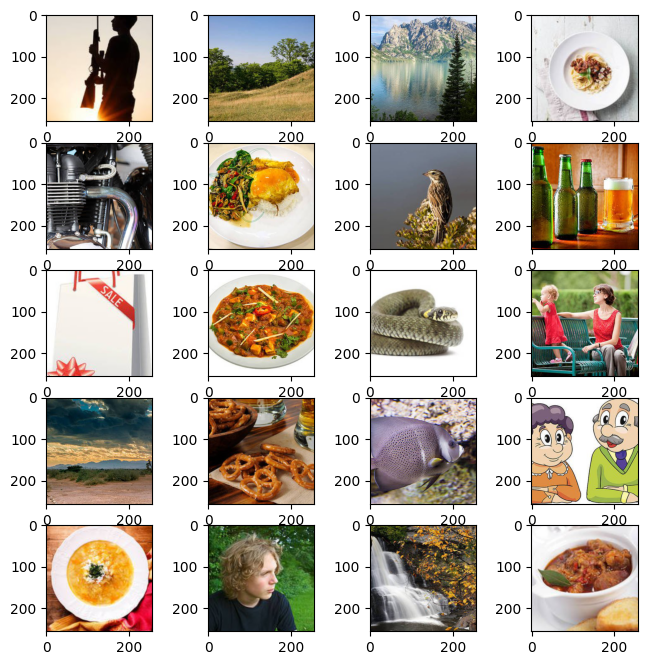

In [ ]:
DATA_DIR = "/content/drive/MyDrive/decoding test/decoding test"
TRAIN_DIR = os.path.join(DATA_DIR, "trainnew")

IMG_SHAPE = (256, 256) #all input images should be of size 256 X 256

def load_dataset_small(num_images_per_class_train=10):
    """Loads training dataset, from Tiny ImageNet Visual Recogition Challenge.
    Arguments:
        num_images_per_class_train: number of images per class to load into training dataset.
    """
    X_train = []

    # Create training set.
    #for c in os.listdir(TRAIN_DIR):

        #c_dir = os.path.join(TRAIN_DIR, c)
    c_imgs = os.listdir(TRAIN_DIR)
    #print(c_imgs)
    #print(len(c_imgs))
    random.shuffle(c_imgs)
    for img_name_i in c_imgs:
      img_i = load_img(os.path.join(TRAIN_DIR, img_name_i))
      x = img_to_array(img_i)
      x = tf.keras.preprocessing.image.smart_resize(x, IMG_SHAPE, interpolation='bilinear')
      X_train.append(x)

    random.shuffle(X_train)

    # Return training data as numpy arrays.
    return np.array(X_train)


#LOAD DATASET
X_train_orig = load_dataset_small()

# Normalize image vectors.
X_train = X_train_orig/255.

# Print statistics.
print ("Number of training examples = " + str(X_train.shape[0]))
# print ("X_train shape: " + str(X_train.shape)) # Should be (train_size, 64, 64, 3)

# Split training set into two halfs. First half is used for training as secret images, second half for cover images.
input_S1 = X_train[0:X_train.shape[0] // 4 ] # S1: secret image1
input_S2 = X_train[X_train.shape[0] // 4 : 2*(X_train.shape[0] // 4)] # S2: secret image2
input_C = X_train[2* (X_train.shape[0] // 4): 3* (X_train.shape[0] // 4)] # C: cover image
print(input_S1.shape)
print(input_S2.shape)
print(input_C.shape)
# Show sample images from the training dataset
fig=plt.figure(figsize=(8, 8))
columns = 4
rows = 5
for i in range(1, columns*rows +1):
    # Randomly sample from training dataset
    img_idx = np.random.choice(X_train.shape[0])
    fig.add_subplot(rows, columns, i)
    plt.imshow(X_train[img_idx])
plt.show()

# DEFINE THE ENTIRE NETWORK ARCHITECTURE AND LOSS FUNCTION

In [ ]:
# Variable used to weight the losses of the secret and cover images (See paper for more details)
beta = 1.0

# Loss for reveal network
def rev_loss(s_true, s_pred):
    # Loss for reveal network is: beta * |S-S'|
    #return s_true-s_pred

    print(s_true.shape, s_pred.shape)
    return beta * K.sum(K.square(s_true - s_pred))

# Loss for the full model, used for preparation and hidding networks
def full_loss(y_true, y_pred):
    # Loss for the full model is: |C-C'| + beta * |S-S'|
    print(y_true.shape, y_pred.shape)
    s1_true, s2_true, c_true = y_true[...,0:3], y_true[...,3:6], y_true[...,6:9]
    s1_pred, s2_pred, c_pred = y_pred[...,0:3], y_pred[...,3:6], y_pred[...,6:9]

    #s_loss = rev_loss(s_true, s_pred)
    s1_loss = beta * K.sum(K.square(s1_true - s1_pred))
    s2_loss = beta * K.sum(K.square(s2_true - s2_pred))
    #s3_loss = beta * K.sum(K.square(s3_true - s3_pred))
    c_loss = K.sum(K.square(c_true - c_pred))

    return s1_loss + c_loss + s2_loss

# Returns the encoder as a Keras model, composed by Preparation and Hiding Networks.

def make_encoder():
  #Preprocessing module that concatenates the features of secret image and cover image
  secret_image1 = Input(shape=(256, 256, 3))
  x = Conv2D(8, (3, 3), activation='relu', padding='same')(secret_image1)
  x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
  secret_image_featuremap1 = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
  print("Size of secret feature map 1: ",secret_image_featuremap1.shape)

  secret_image2 = Input(shape=(256, 256, 3))
  x = Conv2D(8, (3, 3), activation='relu', padding='same')(secret_image2)
  x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
  secret_image_featuremap2 = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
  print("Size of secret feature map 2: ",secret_image_featuremap2.shape)

  cover_image = Input(shape=(256,256, 3))
  x1= Conv2D(8, (3, 3), activation='relu', padding='same')(cover_image)
  x1 = Conv2D(16, (3, 3), activation='relu', padding='same')(x1)
  cover_image_featuremap = Conv2D(32, (3, 3), activation='relu', padding='same')(x1)
  print("Size of cover feature map: ",cover_image_featuremap.shape)

  concatenated_featuremap = tf.concat([cover_image_featuremap, secret_image_featuremap1, secret_image_featuremap2], axis=3)
  print("Size of concatenated feature map: ",concatenated_featuremap.shape)

  #Embedding Network - can be considered as 2 parts
  #Part 1 - two convolutional layers with increasing no. of filters
  x2 = Conv2D(64, (3, 3), activation='relu', padding='same')(concatenated_featuremap)
  x3 = Conv2D(128, (3, 3), activation='relu', padding='same')(x2)

  #Part 2 - five convolutional layers with decreasing number of filters
  x4 = Conv2D(128, (3, 3), activation='relu', padding='same')(x3)
  x5 = Conv2D(64, (3, 3), activation='relu', padding='same')(x4)
  x6 = Conv2D(32, (3, 3), activation='relu', padding='same')(x5)
  x7 = Conv2D(16, (3, 3), activation='relu', padding='same')(x6)
  x8 = Conv2D(8, (3, 3), activation='relu', padding='same')(x7)

  # A convolutional layer with 3 filters to convert the 256 × 256 × 8 feature vector into 256 × 256 × 3 stego image output.
  stego_image = Conv2D(3, (3, 3), activation='relu', padding='same')(x8)
  print("Size of stego image: ",stego_image.shape)

  embedding_network = Model(inputs = [cover_image, secret_image1, secret_image2], outputs = stego_image, name = 'EmbeddingNetwork')
  # embedding_network.compile(optimizer='adam', loss=full_loss)
  return embedding_network


def make_decoder1():
  stego_image = Input(shape=(256, 256, 3))
  # Expanding encoder part of the extraction network
  y1 = Conv2D(8, (3, 3), activation='relu', padding='same')(stego_image)
  y2 = Conv2D(16, (3, 3), activation='relu', padding='same')(y1)
  y3 = Conv2D(32, (3, 3), activation='relu', padding='same')(y2)
  y4 = Conv2D(64, (3, 3), activation='relu', padding='same')(y3)
  y5 = Conv2D(128, (3, 3), activation='relu', padding='same')(y4)

  # Contracting decoder part of the extraction network
  y6 = Conv2D(128, (3, 3), activation='relu', padding='same')(y5)
  y7 = Conv2D(64, (3, 3), activation='relu', padding='same')(y6)
  y8 = Conv2D(32, (3, 3), activation='relu', padding='same')(y7)
  y9 = Conv2D(16, (3, 3), activation='relu', padding='same')(y8)
  y10 = Conv2D(8, (3, 3), activation='relu', padding='same')(y9)

  # Extracting secret image
  extracted_secret_image1 = Conv2D(3, (3, 3), activation='relu', padding='same')(y10)

  extracting_network1 = Model(inputs = stego_image, outputs = extracted_secret_image1, name = 'ExtractingNetwork1')
  return extracting_network1

def make_decoder2():
  stego_image = Input(shape=(256, 256, 3))
  # Expanding encoder part of the extraction network
  y1 = Conv2D(8, (3, 3), activation='relu', padding='same')(stego_image)
  y2 = Conv2D(16, (3, 3), activation='relu', padding='same')(y1)
  y3 = Conv2D(32, (3, 3), activation='relu', padding='same')(y2)
  y4 = Conv2D(64, (3, 3), activation='relu', padding='same')(y3)
  y5 = Conv2D(128, (3, 3), activation='relu', padding='same')(y4)

  # Contracting decoder part of the extraction network
  y6 = Conv2D(128, (3, 3), activation='relu', padding='same')(y5)
  y7 = Conv2D(64, (3, 3), activation='relu', padding='same')(y6)
  y8 = Conv2D(32, (3, 3), activation='relu', padding='same')(y7)
  y9 = Conv2D(16, (3, 3), activation='relu', padding='same')(y8)
  y10 = Conv2D(8, (3, 3), activation='relu', padding='same')(y9)

  # Extracting secret image
  extracted_secret_image2 = Conv2D(3, (3, 3), activation='relu', padding='same')(y10)

  extracting_network2 = Model(inputs = stego_image, outputs = extracted_secret_image2, name = 'ExtractingNetwork2')
  return extracting_network2

# Full model.
def make_model(input_size):
    input_C= Input(shape=(input_size))
    input_S1 = Input(shape=(input_size))
    input_S2 = Input(shape=(input_size))

    embedding_network = make_encoder()
    # embedding_network.compile(optimizer='adam', loss=embedding_loss)
    # embedding_network.trainable = False

    extracting_network1 = make_decoder1()
    extracting_network1.compile(optimizer='adam', loss=rev_loss)
    extracting_network1.trainable = False

    extracting_network2 = make_decoder2()
    extracting_network2.compile(optimizer='adam', loss=rev_loss)
    extracting_network2.trainable = False

    stego_image = embedding_network([input_S1, input_S2, input_C])
    extracted_secret_image1 = extracting_network1(stego_image)
    extracted_secret_image2 = extracting_network2(stego_image)

    # autoencoder1 = Model(inputs=[input_S1, input_C], outputs= tf.concat([extracted_secret_image, stego_image],axis=3))
    autoencoder1 = Model(inputs=[input_S1, input_S2, input_C], outputs= tf.concat([extracted_secret_image1, extracted_secret_image2, stego_image],axis=3))
    autoencoder1.compile(optimizer='adam', loss=full_loss)

    return embedding_network, extracting_network1, extracting_network2, autoencoder1

# CREATE THE ENTIRE NETWORK MODEL

In [ ]:
embedding_model, extraction_model1, extraction_model2, autoencoder = make_model(input_S1.shape[1:])

Size of secret feature map 1:  (None, 256, 256, 32)
Size of secret feature map 2:  (None, 256, 256, 32)
Size of cover feature map:  (None, 256, 256, 32)
Size of concatenated feature map:  (None, 256, 256, 96)
Size of stego image:  (None, 256, 256, 3)


In [ ]:
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 100
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]


        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])
        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 50 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==99):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 1 | Batch:   0 of 250. Loss AE  130215.92 | Loss Extraction1   87018.66 | Loss Extraction2   23931.96:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 1 | Batch:   5 of 250. Loss AE  124345.03 | Loss Extraction1   74288.62 | Loss Extraction2   26497.15:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 1 | Batch:  10 of 250. Loss AE  121915.19 | Loss Extraction1   74647.77 | Loss Extraction2   22362.95:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 1 | Batch:  15 of 250. Loss AE  116014.76 | Loss Extraction1   73983.88 | Loss Extraction2   19417.97:   8%|▊         | 4/50 [00:03<00:37,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 1 | Batch:  20 of 250. Loss AE  122122.59 | Loss Extraction1   77914.45 | Loss Extraction2   21183.59:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 1 | Batch:  25 of 250. Loss AE  121206.07 | Loss Extraction1   78322.46 | Loss Extraction2   20884.12:  12%|█▏        | 6/50 [00:05<00:44,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 1 | Batch:  30 of 250. Loss AE  124371.49 | Loss Extraction1   81558.56 | Loss Extraction2   20664.60:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 1 | Batch:  35 of 250. Loss AE  127798.77 | Loss Extraction1   82953.53 | Loss Extraction2   22356.43:  16%|█▌        | 8/50 [00:07<00:42,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 1 | Batch:  40 of 250. Loss AE  125804.11 | Loss Extraction1   82527.41 | Loss Extraction2   21987.85:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 1 | Batch:  45 of 250. Loss AE  123699.54 | Loss Extraction1   82028.46 | Loss Extraction2   20872.10:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 1 | Batch:  50 of 250. Loss AE  120003.61 | Loss Extraction1   79960.09 | Loss Extraction2   19646.14:  22%|██▏       | 11/50 [00:10<00:34,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 1 | Batch:  55 of 250. Loss AE  124429.52 | Loss Extraction1   84740.50 | Loss Extraction2   18981.65:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 1 | Batch:  60 of 250. Loss AE  125401.97 | Loss Extraction1   86375.56 | Loss Extraction2   18378.75:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 1 | Batch:  65 of 250. Loss AE  123876.86 | Loss Extraction1   85245.23 | Loss Extraction2   18052.27:  28%|██▊       | 14/50 [00:12<00:29,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 1 | Batch:  70 of 250. Loss AE  122943.63 | Loss Extraction1   85418.08 | Loss Extraction2   17640.32:  30%|███       | 15/50 [00:13<00:28,  1.23it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 1 | Batch:  75 of 250. Loss AE  122775.43 | Loss Extraction1   85805.29 | Loss Extraction2   17200.50:  32%|███▏      | 16/50 [00:14<00:27,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 1 | Batch:  80 of 250. Loss AE  122138.65 | Loss Extraction1   84824.93 | Loss Extraction2   17327.25:  34%|███▍      | 17/50 [00:14<00:26,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 1 | Batch:  85 of 250. Loss AE  122595.96 | Loss Extraction1   85584.55 | Loss Extraction2   17457.69:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 1 | Batch:  85 of 250. Loss AE  122595.96 | Loss Extraction1   85584.55 | Loss Extraction2   17457.69:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]


KeyboardInterrupt: ignored

  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 9s 9s/step
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)


Epoch 51 | Batch:   0 of 250. Loss AE   41225.78 | Loss Extraction1   15376.21 | Loss Extraction2   16636.97:   2%|▏         | 1/50 [00:31<25:49, 31.62s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 51 | Batch:   5 of 250. Loss AE   41511.61 | Loss Extraction1   15207.51 | Loss Extraction2   15054.51:   4%|▍         | 2/50 [00:32<10:50, 13.55s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 51 | Batch:  10 of 250. Loss AE   36217.24 | Loss Extraction1   14874.49 | Loss Extraction2   11226.45:   6%|▌         | 3/50 [00:33<06:04,  7.76s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 51 | Batch:  15 of 250. Loss AE   41873.79 | Loss Extraction1   16271.07 | Loss Extraction2   12199.20:   8%|▊         | 4/50 [00:34<03:52,  5.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 51 | Batch:  20 of 250. Loss AE   42927.53 | Loss Extraction1   17844.33 | Loss Extraction2   11440.53:  10%|█         | 5/50 [00:35<02:38,  3.53s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 51 | Batch:  25 of 250. Loss AE   42686.49 | Loss Extraction1   18235.46 | Loss Extraction2   11078.86:  12%|█▏        | 6/50 [00:35<01:55,  2.62s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch:  30 of 250. Loss AE   44279.39 | Loss Extraction1   19103.62 | Loss Extraction2   11553.90:  14%|█▍        | 7/50 [00:36<01:26,  2.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch:  35 of 250. Loss AE   42380.67 | Loss Extraction1   17900.47 | Loss Extraction2   11455.66:  16%|█▌        | 8/50 [00:37<01:08,  1.63s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 51 | Batch:  40 of 250. Loss AE   44083.51 | Loss Extraction1   19815.79 | Loss Extraction2   11120.60:  18%|█▊        | 9/50 [00:38<00:55,  1.36s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 51 | Batch:  45 of 250. Loss AE   42551.12 | Loss Extraction1   18438.31 | Loss Extraction2   11322.22:  20%|██        | 10/50 [00:39<00:47,  1.18s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch:  50 of 250. Loss AE   45063.06 | Loss Extraction1   20616.24 | Loss Extraction2   11249.46:  22%|██▏       | 11/50 [00:39<00:41,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 51 | Batch:  55 of 250. Loss AE   43883.68 | Loss Extraction1   19442.75 | Loss Extraction2   11123.13:  24%|██▍       | 12/50 [00:40<00:37,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch:  60 of 250. Loss AE   43398.98 | Loss Extraction1   19316.05 | Loss Extraction2   10800.40:  26%|██▌       | 13/50 [00:41<00:34,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 51 | Batch:  65 of 250. Loss AE   43660.13 | Loss Extraction1   19176.38 | Loss Extraction2   10618.01:  28%|██▊       | 14/50 [00:42<00:32,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 51 | Batch:  70 of 250. Loss AE   43308.32 | Loss Extraction1   18794.31 | Loss Extraction2   10558.19:  30%|███       | 15/50 [00:43<00:30,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch:  75 of 250. Loss AE   43633.86 | Loss Extraction1   18544.09 | Loss Extraction2   10644.70:  32%|███▏      | 16/50 [00:43<00:28,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch:  80 of 250. Loss AE   43750.32 | Loss Extraction1   17920.25 | Loss Extraction2   11239.52:  34%|███▍      | 17/50 [00:44<00:27,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 51 | Batch:  85 of 250. Loss AE   43439.68 | Loss Extraction1   17657.85 | Loss Extraction2   11080.74:  36%|███▌      | 18/50 [00:45<00:26,  1.23it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 51 | Batch:  90 of 250. Loss AE   44421.61 | Loss Extraction1   18092.50 | Loss Extraction2   11131.05:  38%|███▊      | 19/50 [00:46<00:28,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 51 | Batch:  95 of 250. Loss AE   45265.81 | Loss Extraction1   17709.86 | Loss Extraction2   11305.96:  40%|████      | 20/50 [00:47<00:26,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 51 | Batch: 100 of 250. Loss AE   45845.41 | Loss Extraction1   17565.30 | Loss Extraction2   11791.02:  42%|████▏     | 21/50 [00:48<00:25,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 51 | Batch: 105 of 250. Loss AE   46193.86 | Loss Extraction1   17514.69 | Loss Extraction2   12179.04:  44%|████▍     | 22/50 [00:49<00:27,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 51 | Batch: 110 of 250. Loss AE   46803.47 | Loss Extraction1   17934.28 | Loss Extraction2   12107.54:  46%|████▌     | 23/50 [00:50<00:24,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 51 | Batch: 115 of 250. Loss AE   46541.98 | Loss Extraction1   17513.78 | Loss Extraction2   12349.33:  48%|████▊     | 24/50 [00:51<00:22,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 51 | Batch: 120 of 250. Loss AE   46762.47 | Loss Extraction1   17538.30 | Loss Extraction2   12498.44:  50%|█████     | 25/50 [00:51<00:21,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 125 of 250. Loss AE   46596.04 | Loss Extraction1   17312.38 | Loss Extraction2   12526.62:  52%|█████▏    | 26/50 [00:52<00:20,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 130 of 250. Loss AE   47353.08 | Loss Extraction1   17200.51 | Loss Extraction2   12678.01:  54%|█████▍    | 27/50 [00:53<00:19,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 135 of 250. Loss AE   48075.07 | Loss Extraction1   17107.89 | Loss Extraction2   12703.97:  56%|█████▌    | 28/50 [00:54<00:18,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 51 | Batch: 140 of 250. Loss AE   48461.13 | Loss Extraction1   16934.26 | Loss Extraction2   12775.16:  58%|█████▊    | 29/50 [00:55<00:17,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 145 of 250. Loss AE   48143.81 | Loss Extraction1   16778.69 | Loss Extraction2   12782.23:  60%|██████    | 30/50 [00:55<00:16,  1.24it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 51 | Batch: 150 of 250. Loss AE   47902.07 | Loss Extraction1   16387.01 | Loss Extraction2   12802.03:  62%|██████▏   | 31/50 [00:56<00:15,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 155 of 250. Loss AE   47826.93 | Loss Extraction1   16680.60 | Loss Extraction2   12614.49:  64%|██████▍   | 32/50 [00:57<00:14,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch: 160 of 250. Loss AE   47467.46 | Loss Extraction1   16391.16 | Loss Extraction2   12752.55:  66%|██████▌   | 33/50 [00:58<00:13,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 165 of 250. Loss AE   47879.82 | Loss Extraction1   16545.10 | Loss Extraction2   12612.64:  68%|██████▊   | 34/50 [00:59<00:12,  1.24it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 51 | Batch: 170 of 250. Loss AE   48097.29 | Loss Extraction1   16817.39 | Loss Extraction2   12561.05:  70%|███████   | 35/50 [01:00<00:13,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 51 | Batch: 175 of 250. Loss AE   48322.84 | Loss Extraction1   17068.21 | Loss Extraction2   12492.16:  72%|███████▏  | 36/50 [01:01<00:13,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 51 | Batch: 180 of 250. Loss AE   48107.66 | Loss Extraction1   16942.70 | Loss Extraction2   12479.17:  74%|███████▍  | 37/50 [01:02<00:13,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 185 of 250. Loss AE   48115.81 | Loss Extraction1   17092.76 | Loss Extraction2   12382.55:  76%|███████▌  | 38/50 [01:03<00:11,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 190 of 250. Loss AE   47957.33 | Loss Extraction1   16972.20 | Loss Extraction2   12451.93:  78%|███████▊  | 39/50 [01:04<00:10,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 51 | Batch: 195 of 250. Loss AE   47946.94 | Loss Extraction1   17085.84 | Loss Extraction2   12283.49:  80%|████████  | 40/50 [01:05<00:08,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 200 of 250. Loss AE   47982.83 | Loss Extraction1   17046.22 | Loss Extraction2   12318.36:  82%|████████▏ | 41/50 [01:05<00:07,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch: 205 of 250. Loss AE   47741.48 | Loss Extraction1   17112.54 | Loss Extraction2   12238.64:  84%|████████▍ | 42/50 [01:06<00:06,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 51 | Batch: 210 of 250. Loss AE   47750.96 | Loss Extraction1   17117.93 | Loss Extraction2   12133.47:  86%|████████▌ | 43/50 [01:07<00:05,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 51 | Batch: 215 of 250. Loss AE   47688.17 | Loss Extraction1   17012.77 | Loss Extraction2   12174.13:  88%|████████▊ | 44/50 [01:08<00:04,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 51 | Batch: 220 of 250. Loss AE   47557.06 | Loss Extraction1   16861.14 | Loss Extraction2   12262.30:  90%|█████████ | 45/50 [01:09<00:04,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch: 225 of 250. Loss AE   47485.41 | Loss Extraction1   16959.16 | Loss Extraction2   12187.30:  92%|█████████▏| 46/50 [01:09<00:03,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch: 230 of 250. Loss AE   47561.10 | Loss Extraction1   17030.44 | Loss Extraction2   12087.96:  94%|█████████▍| 47/50 [01:10<00:02,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 51 | Batch: 235 of 250. Loss AE   47797.48 | Loss Extraction1   17236.61 | Loss Extraction2   12096.31:  96%|█████████▌| 48/50 [01:11<00:01,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 51 | Batch: 240 of 250. Loss AE   47724.49 | Loss Extraction1   17075.40 | Loss Extraction2   12080.38:  98%|█████████▊| 49/50 [01:12<00:00,  1.23it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 51 | Batch: 245 of 250. Loss AE   47214.60 | Loss Extraction1   16827.18 | Loss Extraction2   12004.83: 100%|██████████| 50/50 [01:13<00:00,  1.46s/it]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 52 | Batch:   0 of 250. Loss AE   39820.45 | Loss Extraction1    9517.04 | Loss Extraction2    9912.04:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 52 | Batch:   5 of 250. Loss AE   37994.23 | Loss Extraction1    9637.05 | Loss Extraction2    8683.00:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch:  10 of 250. Loss AE   40757.13 | Loss Extraction1   10534.47 | Loss Extraction2   12376.98:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 52 | Batch:  15 of 250. Loss AE   38500.38 | Loss Extraction1    9604.60 | Loss Extraction2   11587.26:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch:  20 of 250. Loss AE   36834.49 | Loss Extraction1    9522.63 | Loss Extraction2   10564.39:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch:  25 of 250. Loss AE   35250.12 | Loss Extraction1    9102.92 | Loss Extraction2    9840.92:  12%|█▏        | 6/50 [00:05<00:36,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch:  30 of 250. Loss AE   36223.34 | Loss Extraction1    9901.17 | Loss Extraction2    9878.20:  14%|█▍        | 7/50 [00:05<00:35,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch:  35 of 250. Loss AE   36263.83 | Loss Extraction1   10073.78 | Loss Extraction2   10350.85:  16%|█▌        | 8/50 [00:06<00:34,  1.22it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 52 | Batch:  40 of 250. Loss AE   36151.83 | Loss Extraction1    9912.96 | Loss Extraction2   10118.57:  18%|█▊        | 9/50 [00:07<00:37,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 52 | Batch:  45 of 250. Loss AE   35605.31 | Loss Extraction1   10347.39 | Loss Extraction2    9947.02:  20%|██        | 10/50 [00:08<00:39,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 52 | Batch:  50 of 250. Loss AE   35033.74 | Loss Extraction1   10553.92 | Loss Extraction2    9728.25:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch:  55 of 250. Loss AE   35406.26 | Loss Extraction1   11172.32 | Loss Extraction2    9641.24:  24%|██▍       | 12/50 [00:10<00:36,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch:  60 of 250. Loss AE   36549.29 | Loss Extraction1   12102.67 | Loss Extraction2    9741.19:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 52 | Batch:  65 of 250. Loss AE   35948.32 | Loss Extraction1   11795.61 | Loss Extraction2   10006.07:  28%|██▊       | 14/50 [00:12<00:35,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 52 | Batch:  70 of 250. Loss AE   36288.99 | Loss Extraction1   12134.59 | Loss Extraction2   10012.31:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 52 | Batch:  75 of 250. Loss AE   36522.82 | Loss Extraction1   12093.18 | Loss Extraction2    9825.93:  32%|███▏      | 16/50 [00:14<00:34,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch:  80 of 250. Loss AE   36568.72 | Loss Extraction1   12608.82 | Loss Extraction2    9716.57:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 52 | Batch:  85 of 250. Loss AE   36523.99 | Loss Extraction1   12576.80 | Loss Extraction2    9565.62:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 52 | Batch:  90 of 250. Loss AE   37232.74 | Loss Extraction1   13337.54 | Loss Extraction2    9569.49:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch:  95 of 250. Loss AE   36807.60 | Loss Extraction1   13137.99 | Loss Extraction2    9559.95:  40%|████      | 20/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 52 | Batch: 100 of 250. Loss AE   36983.35 | Loss Extraction1   13130.51 | Loss Extraction2    9305.66:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 52 | Batch: 105 of 250. Loss AE   37944.28 | Loss Extraction1   14155.33 | Loss Extraction2    9164.30:  44%|████▍     | 22/50 [00:19<00:23,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 52 | Batch: 110 of 250. Loss AE   37744.68 | Loss Extraction1   13945.50 | Loss Extraction2    9133.85:  46%|████▌     | 23/50 [00:20<00:22,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 52 | Batch: 115 of 250. Loss AE   37842.48 | Loss Extraction1   14161.64 | Loss Extraction2    8967.90:  48%|████▊     | 24/50 [00:21<00:21,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 120 of 250. Loss AE   38283.53 | Loss Extraction1   14244.81 | Loss Extraction2    8864.66:  50%|█████     | 25/50 [00:22<00:20,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 125 of 250. Loss AE   38480.54 | Loss Extraction1   14354.90 | Loss Extraction2    8994.11:  52%|█████▏    | 26/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 52 | Batch: 130 of 250. Loss AE   38270.33 | Loss Extraction1   14233.16 | Loss Extraction2    8965.72:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 135 of 250. Loss AE   38551.42 | Loss Extraction1   14021.17 | Loss Extraction2    9051.24:  56%|█████▌    | 28/50 [00:24<00:18,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 140 of 250. Loss AE   38609.48 | Loss Extraction1   14181.79 | Loss Extraction2    9154.56:  58%|█████▊    | 29/50 [00:25<00:17,  1.20it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 52 | Batch: 145 of 250. Loss AE   38216.65 | Loss Extraction1   14002.14 | Loss Extraction2    9102.68:  60%|██████    | 30/50 [00:26<00:18,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 52 | Batch: 150 of 250. Loss AE   38047.82 | Loss Extraction1   13939.39 | Loss Extraction2    9068.72:  62%|██████▏   | 31/50 [00:27<00:18,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 52 | Batch: 155 of 250. Loss AE   37788.29 | Loss Extraction1   13921.62 | Loss Extraction2    8989.62:  64%|██████▍   | 32/50 [00:28<00:17,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 52 | Batch: 160 of 250. Loss AE   37425.34 | Loss Extraction1   13847.11 | Loss Extraction2    8864.62:  66%|██████▌   | 33/50 [00:29<00:15,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch: 165 of 250. Loss AE   37867.96 | Loss Extraction1   14008.67 | Loss Extraction2    8895.32:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch: 170 of 250. Loss AE   37819.36 | Loss Extraction1   13907.23 | Loss Extraction2    8889.45:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 175 of 250. Loss AE   37950.56 | Loss Extraction1   13924.07 | Loss Extraction2    8855.08:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 180 of 250. Loss AE   38218.28 | Loss Extraction1   14074.47 | Loss Extraction2    9023.59:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch: 185 of 250. Loss AE   38279.61 | Loss Extraction1   14091.94 | Loss Extraction2    9196.21:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch: 190 of 250. Loss AE   38662.73 | Loss Extraction1   14182.74 | Loss Extraction2    9182.74:  78%|███████▊  | 39/50 [00:34<00:09,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 52 | Batch: 195 of 250. Loss AE   38942.38 | Loss Extraction1   14146.29 | Loss Extraction2    9328.50:  80%|████████  | 40/50 [00:35<00:08,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch: 200 of 250. Loss AE   39406.31 | Loss Extraction1   14438.36 | Loss Extraction2    9321.85:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 52 | Batch: 205 of 250. Loss AE   39103.94 | Loss Extraction1   14315.54 | Loss Extraction2    9333.52:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch: 210 of 250. Loss AE   39231.19 | Loss Extraction1   14509.00 | Loss Extraction2    9346.36:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 215 of 250. Loss AE   40036.04 | Loss Extraction1   14400.66 | Loss Extraction2    9612.37:  88%|████████▊ | 44/50 [00:39<00:05,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 52 | Batch: 220 of 250. Loss AE   40023.02 | Loss Extraction1   14355.96 | Loss Extraction2    9688.50:  90%|█████████ | 45/50 [00:40<00:05,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 52 | Batch: 225 of 250. Loss AE   39923.82 | Loss Extraction1   14194.93 | Loss Extraction2    9846.75:  92%|█████████▏| 46/50 [00:41<00:04,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 52 | Batch: 230 of 250. Loss AE   40146.06 | Loss Extraction1   14195.71 | Loss Extraction2    9868.27:  94%|█████████▍| 47/50 [00:42<00:02,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 235 of 250. Loss AE   40396.39 | Loss Extraction1   14358.85 | Loss Extraction2    9859.73:  96%|█████████▌| 48/50 [00:43<00:01,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 52 | Batch: 240 of 250. Loss AE   40245.41 | Loss Extraction1   14284.21 | Loss Extraction2    9879.89:  98%|█████████▊| 49/50 [00:44<00:00,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 52 | Batch: 245 of 250. Loss AE   40054.63 | Loss Extraction1   14190.52 | Loss Extraction2    9834.49: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch:   0 of 250. Loss AE   41792.53 | Loss Extraction1   16356.30 | Loss Extraction2   11130.09:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch:   5 of 250. Loss AE   50099.81 | Loss Extraction1   15922.29 | Loss Extraction2    9514.91:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 53 | Batch:  10 of 250. Loss AE   44883.72 | Loss Extraction1   15664.04 | Loss Extraction2    8198.83:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 53 | Batch:  15 of 250. Loss AE   46466.33 | Loss Extraction1   16086.88 | Loss Extraction2    8169.29:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch:  20 of 250. Loss AE   43797.54 | Loss Extraction1   15906.64 | Loss Extraction2    8217.31:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch:  25 of 250. Loss AE   43509.03 | Loss Extraction1   15083.62 | Loss Extraction2    8366.82:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch:  30 of 250. Loss AE   42621.38 | Loss Extraction1   14472.02 | Loss Extraction2    8395.89:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 53 | Batch:  35 of 250. Loss AE   42805.16 | Loss Extraction1   14934.71 | Loss Extraction2    8500.87:  16%|█▌        | 8/50 [00:07<00:41,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 53 | Batch:  40 of 250. Loss AE   41094.35 | Loss Extraction1   14094.42 | Loss Extraction2    8419.04:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 53 | Batch:  45 of 250. Loss AE   41567.19 | Loss Extraction1   14452.30 | Loss Extraction2    9129.45:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch:  50 of 250. Loss AE   41006.81 | Loss Extraction1   14055.64 | Loss Extraction2    8962.70:  22%|██▏       | 11/50 [00:10<00:37,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch:  55 of 250. Loss AE   40832.86 | Loss Extraction1   14754.47 | Loss Extraction2    8869.85:  24%|██▍       | 12/50 [00:11<00:37,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch:  60 of 250. Loss AE   40347.84 | Loss Extraction1   14592.63 | Loss Extraction2    8779.32:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 53 | Batch:  65 of 250. Loss AE   39783.64 | Loss Extraction1   14555.47 | Loss Extraction2    8668.22:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 53 | Batch:  70 of 250. Loss AE   39859.23 | Loss Extraction1   15298.27 | Loss Extraction2    8650.63:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 53 | Batch:  75 of 250. Loss AE   39505.74 | Loss Extraction1   15113.66 | Loss Extraction2    8780.49:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch:  80 of 250. Loss AE   38948.64 | Loss Extraction1   14814.14 | Loss Extraction2    8680.05:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch:  85 of 250. Loss AE   38811.06 | Loss Extraction1   14749.87 | Loss Extraction2    8838.90:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch:  90 of 250. Loss AE   37984.56 | Loss Extraction1   14262.59 | Loss Extraction2    8875.68:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch:  95 of 250. Loss AE   37852.40 | Loss Extraction1   14027.50 | Loss Extraction2    9078.80:  40%|████      | 20/50 [00:18<00:25,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch: 100 of 250. Loss AE   38306.59 | Loss Extraction1   14408.57 | Loss Extraction2    9008.38:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 53 | Batch: 105 of 250. Loss AE   38583.41 | Loss Extraction1   14517.86 | Loss Extraction2    9195.53:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 53 | Batch: 110 of 250. Loss AE   38231.49 | Loss Extraction1   14403.08 | Loss Extraction2    9234.95:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 53 | Batch: 115 of 250. Loss AE   37778.81 | Loss Extraction1   14304.66 | Loss Extraction2    9073.12:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 53 | Batch: 120 of 250. Loss AE   38129.14 | Loss Extraction1   14561.31 | Loss Extraction2    9002.88:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch: 125 of 250. Loss AE   38559.54 | Loss Extraction1   14355.36 | Loss Extraction2    9295.30:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch: 130 of 250. Loss AE   39485.40 | Loss Extraction1   14654.95 | Loss Extraction2    9390.21:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch: 135 of 250. Loss AE   39638.70 | Loss Extraction1   14461.11 | Loss Extraction2    9703.24:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 140 of 250. Loss AE   39614.55 | Loss Extraction1   14453.48 | Loss Extraction2    9701.09:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 53 | Batch: 145 of 250. Loss AE   39322.55 | Loss Extraction1   14305.21 | Loss Extraction2    9561.37:  60%|██████    | 30/50 [00:27<00:17,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 53 | Batch: 150 of 250. Loss AE   39265.03 | Loss Extraction1   14289.80 | Loss Extraction2    9635.01:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch: 155 of 250. Loss AE   39559.83 | Loss Extraction1   14035.48 | Loss Extraction2    9627.80:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 53 | Batch: 160 of 250. Loss AE   39457.47 | Loss Extraction1   13909.22 | Loss Extraction2    9650.86:  66%|██████▌   | 33/50 [00:29<00:14,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 165 of 250. Loss AE   39321.55 | Loss Extraction1   13781.43 | Loss Extraction2    9806.83:  68%|██████▊   | 34/50 [00:30<00:13,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 170 of 250. Loss AE   39205.18 | Loss Extraction1   13887.93 | Loss Extraction2    9783.73:  70%|███████   | 35/50 [00:31<00:12,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 53 | Batch: 175 of 250. Loss AE   39595.57 | Loss Extraction1   13796.47 | Loss Extraction2    9936.74:  72%|███████▏  | 36/50 [00:31<00:11,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 180 of 250. Loss AE   39474.23 | Loss Extraction1   13716.87 | Loss Extraction2   10002.10:  74%|███████▍  | 37/50 [00:33<00:11,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 53 | Batch: 185 of 250. Loss AE   40198.16 | Loss Extraction1   14280.03 | Loss Extraction2   10200.46:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 53 | Batch: 190 of 250. Loss AE   40322.65 | Loss Extraction1   14327.80 | Loss Extraction2   10285.62:  78%|███████▊  | 39/50 [00:34<00:10,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 53 | Batch: 195 of 250. Loss AE   40331.55 | Loss Extraction1   14329.96 | Loss Extraction2   10344.36:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 200 of 250. Loss AE   39944.53 | Loss Extraction1   14125.47 | Loss Extraction2   10308.22:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 53 | Batch: 205 of 250. Loss AE   39952.92 | Loss Extraction1   14273.91 | Loss Extraction2   10237.95:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 210 of 250. Loss AE   40189.79 | Loss Extraction1   14289.99 | Loss Extraction2   10198.17:  86%|████████▌ | 43/50 [00:38<00:06,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 53 | Batch: 215 of 250. Loss AE   39948.99 | Loss Extraction1   14162.40 | Loss Extraction2   10228.73:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 53 | Batch: 220 of 250. Loss AE   40443.61 | Loss Extraction1   14575.51 | Loss Extraction2   10179.02:  90%|█████████ | 45/50 [00:40<00:04,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 53 | Batch: 225 of 250. Loss AE   40626.04 | Loss Extraction1   14611.04 | Loss Extraction2   10166.42:  92%|█████████▏| 46/50 [00:41<00:03,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 53 | Batch: 230 of 250. Loss AE   40688.10 | Loss Extraction1   14727.97 | Loss Extraction2   10111.97:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 53 | Batch: 235 of 250. Loss AE   40899.28 | Loss Extraction1   14902.58 | Loss Extraction2   10019.51:  96%|█████████▌| 48/50 [00:42<00:01,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 53 | Batch: 240 of 250. Loss AE   40710.73 | Loss Extraction1   14779.72 | Loss Extraction2    9949.58:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 53 | Batch: 245 of 250. Loss AE   40721.61 | Loss Extraction1   14794.10 | Loss Extraction2   10013.79: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 54 | Batch:   0 of 250. Loss AE   39434.70 | Loss Extraction1   17116.92 | Loss Extraction2    7240.64:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch:   5 of 250. Loss AE   37472.34 | Loss Extraction1   15946.82 | Loss Extraction2    7312.49:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 54 | Batch:  10 of 250. Loss AE   33498.84 | Loss Extraction1   12156.81 | Loss Extraction2    7872.77:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 54 | Batch:  15 of 250. Loss AE   37555.30 | Loss Extraction1   14787.02 | Loss Extraction2    7601.71:   8%|▊         | 4/50 [00:03<00:44,  1.04it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 54 | Batch:  20 of 250. Loss AE   38926.13 | Loss Extraction1   15348.26 | Loss Extraction2    8794.16:  10%|█         | 5/50 [00:04<00:46,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch:  25 of 250. Loss AE   40039.66 | Loss Extraction1   16522.34 | Loss Extraction2    8501.09:  12%|█▏        | 6/50 [00:06<00:46,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch:  30 of 250. Loss AE   41035.54 | Loss Extraction1   17180.48 | Loss Extraction2    8219.48:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch:  35 of 250. Loss AE   40336.60 | Loss Extraction1   16642.38 | Loss Extraction2    7877.54:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 54 | Batch:  40 of 250. Loss AE   38869.06 | Loss Extraction1   15933.02 | Loss Extraction2    7627.13:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch:  45 of 250. Loss AE   38167.28 | Loss Extraction1   15464.28 | Loss Extraction2    7694.06:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 54 | Batch:  50 of 250. Loss AE   38661.47 | Loss Extraction1   15353.32 | Loss Extraction2    7734.76:  22%|██▏       | 11/50 [00:10<00:33,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch:  55 of 250. Loss AE   38546.55 | Loss Extraction1   15079.50 | Loss Extraction2    7826.13:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch:  60 of 250. Loss AE   37415.81 | Loss Extraction1   14546.46 | Loss Extraction2    7646.34:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 54 | Batch:  65 of 250. Loss AE   36712.33 | Loss Extraction1   13989.04 | Loss Extraction2    7583.51:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 54 | Batch:  70 of 250. Loss AE   36482.69 | Loss Extraction1   13909.20 | Loss Extraction2    7728.60:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch:  75 of 250. Loss AE   36697.55 | Loss Extraction1   13997.99 | Loss Extraction2    7700.75:  32%|███▏      | 16/50 [00:14<00:28,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 54 | Batch:  80 of 250. Loss AE   37968.14 | Loss Extraction1   14805.33 | Loss Extraction2    7818.79:  34%|███▍      | 17/50 [00:15<00:27,  1.20it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 54 | Batch:  85 of 250. Loss AE   38614.79 | Loss Extraction1   14750.59 | Loss Extraction2    7834.41:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 54 | Batch:  90 of 250. Loss AE   38937.88 | Loss Extraction1   14880.95 | Loss Extraction2    8055.10:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 54 | Batch:  95 of 250. Loss AE   38373.72 | Loss Extraction1   14728.00 | Loss Extraction2    7943.58:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 54 | Batch: 100 of 250. Loss AE   38217.12 | Loss Extraction1   14814.47 | Loss Extraction2    7944.12:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 54 | Batch: 105 of 250. Loss AE   37394.08 | Loss Extraction1   14571.53 | Loss Extraction2    7750.53:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 54 | Batch: 110 of 250. Loss AE   37067.88 | Loss Extraction1   14566.82 | Loss Extraction2    7796.37:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 54 | Batch: 115 of 250. Loss AE   37525.99 | Loss Extraction1   14569.49 | Loss Extraction2    7809.50:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 120 of 250. Loss AE   37809.03 | Loss Extraction1   14441.54 | Loss Extraction2    8008.30:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 125 of 250. Loss AE   37616.89 | Loss Extraction1   14263.23 | Loss Extraction2    8047.02:  52%|█████▏    | 26/50 [00:23<00:20,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch: 130 of 250. Loss AE   37173.27 | Loss Extraction1   14019.06 | Loss Extraction2    8060.06:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 54 | Batch: 135 of 250. Loss AE   36789.66 | Loss Extraction1   13813.64 | Loss Extraction2    8033.17:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 140 of 250. Loss AE   36432.78 | Loss Extraction1   13494.71 | Loss Extraction2    8219.62:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 54 | Batch: 145 of 250. Loss AE   37138.96 | Loss Extraction1   13660.92 | Loss Extraction2    8358.09:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 54 | Batch: 150 of 250. Loss AE   37316.51 | Loss Extraction1   13575.65 | Loss Extraction2    8446.41:  62%|██████▏   | 31/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 54 | Batch: 155 of 250. Loss AE   37107.33 | Loss Extraction1   13644.53 | Loss Extraction2    8415.87:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 54 | Batch: 160 of 250. Loss AE   37737.13 | Loss Extraction1   13914.36 | Loss Extraction2    8485.54:  66%|██████▌   | 33/50 [00:29<00:14,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 54 | Batch: 165 of 250. Loss AE   37446.55 | Loss Extraction1   13760.15 | Loss Extraction2    8541.95:  68%|██████▊   | 34/50 [00:30<00:15,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 54 | Batch: 170 of 250. Loss AE   37447.07 | Loss Extraction1   13932.21 | Loss Extraction2    8514.50:  70%|███████   | 35/50 [00:31<00:14,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 175 of 250. Loss AE   37639.37 | Loss Extraction1   13839.57 | Loss Extraction2    8947.92:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 54 | Batch: 180 of 250. Loss AE   37529.17 | Loss Extraction1   13730.45 | Loss Extraction2    9044.40:  74%|███████▍  | 37/50 [00:32<00:11,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 54 | Batch: 185 of 250. Loss AE   37373.02 | Loss Extraction1   13640.54 | Loss Extraction2    9059.93:  76%|███████▌  | 38/50 [00:33<00:11,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 190 of 250. Loss AE   38180.06 | Loss Extraction1   13841.96 | Loss Extraction2    9365.64:  78%|███████▊  | 39/50 [00:34<00:09,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 195 of 250. Loss AE   38182.03 | Loss Extraction1   13796.86 | Loss Extraction2    9416.68:  80%|████████  | 40/50 [00:35<00:08,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 54 | Batch: 200 of 250. Loss AE   38811.29 | Loss Extraction1   13822.86 | Loss Extraction2    9452.72:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 54 | Batch: 205 of 250. Loss AE   39221.30 | Loss Extraction1   13956.15 | Loss Extraction2    9471.29:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 54 | Batch: 210 of 250. Loss AE   39345.96 | Loss Extraction1   13935.62 | Loss Extraction2    9499.66:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 54 | Batch: 215 of 250. Loss AE   39474.97 | Loss Extraction1   14162.51 | Loss Extraction2    9584.12:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 54 | Batch: 220 of 250. Loss AE   39341.96 | Loss Extraction1   14016.40 | Loss Extraction2    9710.12:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 54 | Batch: 225 of 250. Loss AE   39629.07 | Loss Extraction1   14082.79 | Loss Extraction2    9838.69:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 54 | Batch: 230 of 250. Loss AE   39583.00 | Loss Extraction1   13931.05 | Loss Extraction2   10056.27:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 54 | Batch: 235 of 250. Loss AE   39534.58 | Loss Extraction1   13914.59 | Loss Extraction2   10027.46:  96%|█████████▌| 48/50 [00:42<00:01,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 54 | Batch: 240 of 250. Loss AE   39820.73 | Loss Extraction1   14014.91 | Loss Extraction2   10111.10:  98%|█████████▊| 49/50 [00:43<00:00,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 54 | Batch: 245 of 250. Loss AE   39742.14 | Loss Extraction1   13858.99 | Loss Extraction2   10043.81: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 55 | Batch:   0 of 250. Loss AE   26952.13 | Loss Extraction1    9807.66 | Loss Extraction2    8435.13:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch:   5 of 250. Loss AE   37223.13 | Loss Extraction1   11449.76 | Loss Extraction2   11545.82:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch:  10 of 250. Loss AE   37132.38 | Loss Extraction1   12242.86 | Loss Extraction2   11460.16:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch:  15 of 250. Loss AE   38601.64 | Loss Extraction1   14154.50 | Loss Extraction2   10819.49:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch:  20 of 250. Loss AE   37473.59 | Loss Extraction1   13860.73 | Loss Extraction2    9875.53:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch:  25 of 250. Loss AE   37696.95 | Loss Extraction1   14543.31 | Loss Extraction2    9537.78:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch:  30 of 250. Loss AE   38920.34 | Loss Extraction1   15787.36 | Loss Extraction2    9281.98:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 55 | Batch:  35 of 250. Loss AE   39333.37 | Loss Extraction1   15403.43 | Loss Extraction2    9422.89:  16%|█▌        | 8/50 [00:06<00:34,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch:  40 of 250. Loss AE   38560.37 | Loss Extraction1   15278.31 | Loss Extraction2    9167.21:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch:  45 of 250. Loss AE   38973.88 | Loss Extraction1   14782.23 | Loss Extraction2    9060.35:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 55 | Batch:  50 of 250. Loss AE   38723.67 | Loss Extraction1   15003.47 | Loss Extraction2    8856.93:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch:  55 of 250. Loss AE   37690.75 | Loss Extraction1   14239.97 | Loss Extraction2    8864.77:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 55 | Batch:  60 of 250. Loss AE   37352.23 | Loss Extraction1   13817.55 | Loss Extraction2    8759.42:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 55 | Batch:  65 of 250. Loss AE   37240.78 | Loss Extraction1   13821.89 | Loss Extraction2    8689.68:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 55 | Batch:  70 of 250. Loss AE   36971.48 | Loss Extraction1   14003.64 | Loss Extraction2    8620.20:  30%|███       | 15/50 [00:13<00:35,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 55 | Batch:  75 of 250. Loss AE   36538.94 | Loss Extraction1   13650.76 | Loss Extraction2    8511.39:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 55 | Batch:  80 of 250. Loss AE   36497.94 | Loss Extraction1   13621.98 | Loss Extraction2    8584.60:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch:  85 of 250. Loss AE   37322.40 | Loss Extraction1   14667.76 | Loss Extraction2    8537.28:  36%|███▌      | 18/50 [00:15<00:28,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 55 | Batch:  90 of 250. Loss AE   37330.96 | Loss Extraction1   14753.18 | Loss Extraction2    8497.17:  38%|███▊      | 19/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch:  95 of 250. Loss AE   37713.57 | Loss Extraction1   14519.20 | Loss Extraction2    8329.52:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 55 | Batch: 100 of 250. Loss AE   37454.75 | Loss Extraction1   14232.95 | Loss Extraction2    8244.85:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 55 | Batch: 105 of 250. Loss AE   37758.13 | Loss Extraction1   14631.20 | Loss Extraction2    8183.17:  44%|████▍     | 22/50 [00:19<00:25,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch: 110 of 250. Loss AE   37583.78 | Loss Extraction1   14597.14 | Loss Extraction2    8232.09:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch: 115 of 250. Loss AE   37416.56 | Loss Extraction1   14614.03 | Loss Extraction2    8109.62:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 120 of 250. Loss AE   37513.14 | Loss Extraction1   14642.79 | Loss Extraction2    8168.47:  50%|█████     | 25/50 [00:21<00:21,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 55 | Batch: 125 of 250. Loss AE   37079.55 | Loss Extraction1   14513.30 | Loss Extraction2    8057.70:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch: 130 of 250. Loss AE   36895.14 | Loss Extraction1   14524.33 | Loss Extraction2    7977.08:  54%|█████▍    | 27/50 [00:23<00:21,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 55 | Batch: 135 of 250. Loss AE   36854.18 | Loss Extraction1   14720.28 | Loss Extraction2    7967.21:  56%|█████▌    | 28/50 [00:24<00:20,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 55 | Batch: 140 of 250. Loss AE   36780.68 | Loss Extraction1   14619.81 | Loss Extraction2    7806.82:  58%|█████▊    | 29/50 [00:25<00:19,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 55 | Batch: 145 of 250. Loss AE   36652.84 | Loss Extraction1   14647.81 | Loss Extraction2    7836.34:  60%|██████    | 30/50 [00:26<00:18,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch: 150 of 250. Loss AE   36427.67 | Loss Extraction1   14756.22 | Loss Extraction2    7754.52:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch: 155 of 250. Loss AE   36204.29 | Loss Extraction1   14569.67 | Loss Extraction2    7793.07:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch: 160 of 250. Loss AE   36963.08 | Loss Extraction1   14870.65 | Loss Extraction2    7778.98:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 165 of 250. Loss AE   36717.13 | Loss Extraction1   14810.92 | Loss Extraction2    7764.73:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 55 | Batch: 170 of 250. Loss AE   36797.07 | Loss Extraction1   14760.36 | Loss Extraction2    7728.60:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 55 | Batch: 175 of 250. Loss AE   36659.99 | Loss Extraction1   14596.06 | Loss Extraction2    7709.56:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 55 | Batch: 180 of 250. Loss AE   37331.95 | Loss Extraction1   15038.65 | Loss Extraction2    7706.88:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 185 of 250. Loss AE   37288.87 | Loss Extraction1   14966.38 | Loss Extraction2    7732.95:  76%|███████▌  | 38/50 [00:33<00:10,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 55 | Batch: 190 of 250. Loss AE   37780.42 | Loss Extraction1   15019.71 | Loss Extraction2    7693.54:  78%|███████▊  | 39/50 [00:34<00:09,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 55 | Batch: 195 of 250. Loss AE   37631.92 | Loss Extraction1   14920.63 | Loss Extraction2    7635.39:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 55 | Batch: 200 of 250. Loss AE   38545.55 | Loss Extraction1   15134.74 | Loss Extraction2    7792.15:  82%|████████▏ | 41/50 [00:35<00:07,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 55 | Batch: 205 of 250. Loss AE   38469.47 | Loss Extraction1   15172.71 | Loss Extraction2    7792.36:  84%|████████▍ | 42/50 [00:36<00:06,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 55 | Batch: 210 of 250. Loss AE   38288.62 | Loss Extraction1   15004.78 | Loss Extraction2    7793.31:  86%|████████▌ | 43/50 [00:37<00:05,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 55 | Batch: 215 of 250. Loss AE   38400.53 | Loss Extraction1   14981.53 | Loss Extraction2    7803.18:  88%|████████▊ | 44/50 [00:38<00:05,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 55 | Batch: 220 of 250. Loss AE   38779.36 | Loss Extraction1   14930.14 | Loss Extraction2    7766.65:  90%|█████████ | 45/50 [00:39<00:05,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 55 | Batch: 225 of 250. Loss AE   38612.93 | Loss Extraction1   14781.45 | Loss Extraction2    7751.51:  92%|█████████▏| 46/50 [00:40<00:03,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 55 | Batch: 230 of 250. Loss AE   38492.11 | Loss Extraction1   14654.93 | Loss Extraction2    7794.99:  94%|█████████▍| 47/50 [00:41<00:02,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 55 | Batch: 235 of 250. Loss AE   38511.12 | Loss Extraction1   14733.01 | Loss Extraction2    7922.70:  96%|█████████▌| 48/50 [00:42<00:01,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 55 | Batch: 240 of 250. Loss AE   38620.47 | Loss Extraction1   14759.27 | Loss Extraction2    7940.86:  98%|█████████▊| 49/50 [00:43<00:00,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 55 | Batch: 245 of 250. Loss AE   38846.42 | Loss Extraction1   14915.34 | Loss Extraction2    7959.12: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch:   0 of 250. Loss AE   39002.34 | Loss Extraction1   12569.20 | Loss Extraction2    6613.55:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch:   5 of 250. Loss AE   36980.86 | Loss Extraction1   16161.63 | Loss Extraction2    6382.66:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch:  10 of 250. Loss AE   40314.90 | Loss Extraction1   19301.94 | Loss Extraction2    6542.79:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch:  15 of 250. Loss AE   38595.49 | Loss Extraction1   17231.07 | Loss Extraction2    7335.15:   8%|▊         | 4/50 [00:03<00:37,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch:  20 of 250. Loss AE   36208.44 | Loss Extraction1   15328.91 | Loss Extraction2    8180.67:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 56 | Batch:  25 of 250. Loss AE   33638.22 | Loss Extraction1   14188.65 | Loss Extraction2    7807.36:  12%|█▏        | 6/50 [00:04<00:36,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 56 | Batch:  30 of 250. Loss AE   36370.55 | Loss Extraction1   13694.59 | Loss Extraction2    8611.70:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 56 | Batch:  35 of 250. Loss AE   38942.13 | Loss Extraction1   14103.03 | Loss Extraction2    9329.18:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 56 | Batch:  40 of 250. Loss AE   39787.68 | Loss Extraction1   13789.27 | Loss Extraction2    9302.19:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch:  45 of 250. Loss AE   39684.44 | Loss Extraction1   13390.98 | Loss Extraction2    9766.65:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch:  50 of 250. Loss AE   40560.73 | Loss Extraction1   13522.16 | Loss Extraction2    9349.16:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 56 | Batch:  55 of 250. Loss AE   40813.49 | Loss Extraction1   13905.63 | Loss Extraction2    9684.59:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch:  60 of 250. Loss AE   40772.76 | Loss Extraction1   13833.63 | Loss Extraction2    9866.34:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch:  65 of 250. Loss AE   41792.38 | Loss Extraction1   14308.97 | Loss Extraction2   10167.97:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch:  70 of 250. Loss AE   41377.91 | Loss Extraction1   13828.70 | Loss Extraction2   10803.04:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch:  75 of 250. Loss AE   40875.30 | Loss Extraction1   13736.44 | Loss Extraction2   10679.19:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 56 | Batch:  80 of 250. Loss AE   40454.57 | Loss Extraction1   13695.18 | Loss Extraction2   10844.90:  34%|███▍      | 17/50 [00:15<00:28,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch:  85 of 250. Loss AE   40869.88 | Loss Extraction1   13778.05 | Loss Extraction2   10702.63:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 56 | Batch:  90 of 250. Loss AE   40585.57 | Loss Extraction1   13380.49 | Loss Extraction2   10796.85:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch:  95 of 250. Loss AE   40167.12 | Loss Extraction1   13081.95 | Loss Extraction2   10619.36:  40%|████      | 20/50 [00:17<00:25,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 100 of 250. Loss AE   40100.45 | Loss Extraction1   13099.95 | Loss Extraction2   10582.70:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 56 | Batch: 105 of 250. Loss AE   39987.79 | Loss Extraction1   13131.25 | Loss Extraction2   10381.32:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 56 | Batch: 110 of 250. Loss AE   40750.07 | Loss Extraction1   13516.00 | Loss Extraction2   10437.36:  46%|████▌     | 23/50 [00:20<00:26,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 56 | Batch: 115 of 250. Loss AE   40344.76 | Loss Extraction1   13281.31 | Loss Extraction2   10408.40:  48%|████▊     | 24/50 [00:21<00:26,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch: 120 of 250. Loss AE   39804.65 | Loss Extraction1   13149.33 | Loss Extraction2   10257.32:  50%|█████     | 25/50 [00:22<00:24,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch: 125 of 250. Loss AE   40667.87 | Loss Extraction1   13371.51 | Loss Extraction2   10153.27:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 56 | Batch: 130 of 250. Loss AE   40519.84 | Loss Extraction1   13350.47 | Loss Extraction2   10144.23:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 135 of 250. Loss AE   40403.35 | Loss Extraction1   13244.52 | Loss Extraction2    9963.63:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 140 of 250. Loss AE   40071.74 | Loss Extraction1   13119.09 | Loss Extraction2    9818.51:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 56 | Batch: 145 of 250. Loss AE   40181.68 | Loss Extraction1   13506.56 | Loss Extraction2    9790.45:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 150 of 250. Loss AE   40211.34 | Loss Extraction1   13549.06 | Loss Extraction2    9610.65:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 155 of 250. Loss AE   39855.04 | Loss Extraction1   13392.48 | Loss Extraction2    9598.49:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 160 of 250. Loss AE   39332.84 | Loss Extraction1   13228.34 | Loss Extraction2    9477.12:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch: 165 of 250. Loss AE   39387.46 | Loss Extraction1   13393.67 | Loss Extraction2    9407.31:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 56 | Batch: 170 of 250. Loss AE   39599.93 | Loss Extraction1   13533.92 | Loss Extraction2    9278.31:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 56 | Batch: 175 of 250. Loss AE   40052.58 | Loss Extraction1   13852.22 | Loss Extraction2    9402.63:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 56 | Batch: 180 of 250. Loss AE   39676.41 | Loss Extraction1   13803.95 | Loss Extraction2    9315.58:  74%|███████▍  | 37/50 [00:32<00:11,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 56 | Batch: 185 of 250. Loss AE   39778.46 | Loss Extraction1   13774.92 | Loss Extraction2    9273.68:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 56 | Batch: 190 of 250. Loss AE   39859.32 | Loss Extraction1   14076.70 | Loss Extraction2    9221.72:  78%|███████▊  | 39/50 [00:35<00:11,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 195 of 250. Loss AE   40060.64 | Loss Extraction1   14337.39 | Loss Extraction2    9157.71:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 200 of 250. Loss AE   39701.99 | Loss Extraction1   14257.97 | Loss Extraction2    9103.22:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 56 | Batch: 205 of 250. Loss AE   39848.59 | Loss Extraction1   14574.45 | Loss Extraction2    9010.36:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 56 | Batch: 210 of 250. Loss AE   39970.54 | Loss Extraction1   14836.02 | Loss Extraction2    8951.58:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 215 of 250. Loss AE   40113.83 | Loss Extraction1   15208.92 | Loss Extraction2    8953.99:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 220 of 250. Loss AE   40695.16 | Loss Extraction1   15488.90 | Loss Extraction2    8921.54:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 225 of 250. Loss AE   40916.64 | Loss Extraction1   15743.35 | Loss Extraction2    8879.90:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 230 of 250. Loss AE   41549.38 | Loss Extraction1   16291.70 | Loss Extraction2    8988.62:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 56 | Batch: 235 of 250. Loss AE   41662.57 | Loss Extraction1   16375.16 | Loss Extraction2    9023.74:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 240 of 250. Loss AE   41800.32 | Loss Extraction1   16458.09 | Loss Extraction2    8964.86:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 56 | Batch: 245 of 250. Loss AE   41801.72 | Loss Extraction1   16607.46 | Loss Extraction2    8962.92: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 57 | Batch:   0 of 250. Loss AE   49031.91 | Loss Extraction1   20674.57 | Loss Extraction2   10337.97:   2%|▏         | 1/50 [00:01<00:56,  1.15s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 57 | Batch:   5 of 250. Loss AE   49719.38 | Loss Extraction1   22633.39 | Loss Extraction2   10208.18:   4%|▍         | 2/50 [00:02<00:55,  1.16s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 57 | Batch:  10 of 250. Loss AE   45120.45 | Loss Extraction1   19588.95 | Loss Extraction2    9731.01:   6%|▌         | 3/50 [00:03<00:49,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch:  15 of 250. Loss AE   47277.76 | Loss Extraction1   21334.21 | Loss Extraction2    9299.17:   8%|▊         | 4/50 [00:04<00:47,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch:  20 of 250. Loss AE   45813.46 | Loss Extraction1   20455.43 | Loss Extraction2    9110.82:  10%|█         | 5/50 [00:05<00:43,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch:  25 of 250. Loss AE   49098.77 | Loss Extraction1   23106.17 | Loss Extraction2    9217.08:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch:  30 of 250. Loss AE   47428.27 | Loss Extraction1   21627.28 | Loss Extraction2    9248.78:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch:  35 of 250. Loss AE   46514.19 | Loss Extraction1   20916.22 | Loss Extraction2    9570.25:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 57 | Batch:  40 of 250. Loss AE   46724.20 | Loss Extraction1   19811.23 | Loss Extraction2   10451.38:  18%|█▊        | 9/50 [00:08<00:35,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch:  45 of 250. Loss AE   45739.63 | Loss Extraction1   19267.89 | Loss Extraction2   10085.95:  20%|██        | 10/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 57 | Batch:  50 of 250. Loss AE   47226.62 | Loss Extraction1   20715.03 | Loss Extraction2   10443.81:  22%|██▏       | 11/50 [00:10<00:33,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch:  55 of 250. Loss AE   47790.35 | Loss Extraction1   20383.37 | Loss Extraction2   10783.52:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch:  60 of 250. Loss AE   47233.33 | Loss Extraction1   19873.96 | Loss Extraction2   10878.95:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 57 | Batch:  65 of 250. Loss AE   47801.46 | Loss Extraction1   20544.58 | Loss Extraction2   10681.94:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch:  70 of 250. Loss AE   47305.52 | Loss Extraction1   20025.21 | Loss Extraction2   11028.38:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 57 | Batch:  75 of 250. Loss AE   47059.39 | Loss Extraction1   19823.57 | Loss Extraction2   11038.16:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 57 | Batch:  80 of 250. Loss AE   48420.15 | Loss Extraction1   19745.31 | Loss Extraction2   11814.20:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 57 | Batch:  85 of 250. Loss AE   49465.01 | Loss Extraction1   20480.01 | Loss Extraction2   11658.13:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 57 | Batch:  90 of 250. Loss AE   50119.50 | Loss Extraction1   20168.14 | Loss Extraction2   12234.39:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch:  95 of 250. Loss AE   50026.20 | Loss Extraction1   19883.24 | Loss Extraction2   12438.50:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 57 | Batch: 100 of 250. Loss AE   50761.60 | Loss Extraction1   19530.31 | Loss Extraction2   12907.64:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch: 105 of 250. Loss AE   50419.77 | Loss Extraction1   19209.90 | Loss Extraction2   12824.01:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch: 110 of 250. Loss AE   50766.31 | Loss Extraction1   19210.51 | Loss Extraction2   12759.50:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 57 | Batch: 115 of 250. Loss AE   50271.82 | Loss Extraction1   18892.77 | Loss Extraction2   12698.29:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch: 120 of 250. Loss AE   49970.90 | Loss Extraction1   19028.85 | Loss Extraction2   12478.50:  50%|█████     | 25/50 [00:22<00:21,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 57 | Batch: 125 of 250. Loss AE   49326.50 | Loss Extraction1   18580.57 | Loss Extraction2   12421.79:  52%|█████▏    | 26/50 [00:23<00:20,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 57 | Batch: 130 of 250. Loss AE   49119.44 | Loss Extraction1   18729.69 | Loss Extraction2   12228.99:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch: 135 of 250. Loss AE   48934.53 | Loss Extraction1   18677.95 | Loss Extraction2   12064.98:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 57 | Batch: 140 of 250. Loss AE   48550.12 | Loss Extraction1   18565.33 | Loss Extraction2   11937.72:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 57 | Batch: 145 of 250. Loss AE   48116.71 | Loss Extraction1   18387.82 | Loss Extraction2   11744.77:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 57 | Batch: 150 of 250. Loss AE   48155.61 | Loss Extraction1   18491.90 | Loss Extraction2   11596.12:  62%|██████▏   | 31/50 [00:27<00:17,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 57 | Batch: 155 of 250. Loss AE   47589.47 | Loss Extraction1   18141.13 | Loss Extraction2   11507.47:  64%|██████▍   | 32/50 [00:28<00:17,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 57 | Batch: 160 of 250. Loss AE   47087.66 | Loss Extraction1   17936.10 | Loss Extraction2   11360.80:  66%|██████▌   | 33/50 [00:29<00:17,  1.04s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 57 | Batch: 165 of 250. Loss AE   47183.90 | Loss Extraction1   17706.66 | Loss Extraction2   11450.20:  68%|██████▊   | 34/50 [00:30<00:15,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 57 | Batch: 170 of 250. Loss AE   46968.10 | Loss Extraction1   17638.28 | Loss Extraction2   11517.60:  70%|███████   | 35/50 [00:31<00:14,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch: 175 of 250. Loss AE   46802.66 | Loss Extraction1   17349.26 | Loss Extraction2   11451.64:  72%|███████▏  | 36/50 [00:32<00:12,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 57 | Batch: 180 of 250. Loss AE   46694.61 | Loss Extraction1   17689.43 | Loss Extraction2   11269.80:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 57 | Batch: 185 of 250. Loss AE   46341.96 | Loss Extraction1   17609.76 | Loss Extraction2   11163.05:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch: 190 of 250. Loss AE   45949.15 | Loss Extraction1   17400.17 | Loss Extraction2   10985.89:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 57 | Batch: 195 of 250. Loss AE   45757.38 | Loss Extraction1   17217.19 | Loss Extraction2   10953.65:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 57 | Batch: 200 of 250. Loss AE   45504.01 | Loss Extraction1   17075.68 | Loss Extraction2   10927.89:  82%|████████▏ | 41/50 [00:36<00:07,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 57 | Batch: 205 of 250. Loss AE   45251.94 | Loss Extraction1   16855.52 | Loss Extraction2   10925.13:  84%|████████▍ | 42/50 [00:37<00:06,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 57 | Batch: 210 of 250. Loss AE   45256.75 | Loss Extraction1   16803.78 | Loss Extraction2   10984.66:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 57 | Batch: 215 of 250. Loss AE   44967.31 | Loss Extraction1   16750.66 | Loss Extraction2   10903.34:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 57 | Batch: 220 of 250. Loss AE   45131.68 | Loss Extraction1   16878.41 | Loss Extraction2   10941.50:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 57 | Batch: 225 of 250. Loss AE   44876.50 | Loss Extraction1   16889.27 | Loss Extraction2   10817.09:  92%|█████████▏| 46/50 [00:41<00:03,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 57 | Batch: 230 of 250. Loss AE   44822.65 | Loss Extraction1   16833.44 | Loss Extraction2   10938.25:  94%|█████████▍| 47/50 [00:42<00:02,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 57 | Batch: 235 of 250. Loss AE   44447.04 | Loss Extraction1   16707.15 | Loss Extraction2   10837.38:  96%|█████████▌| 48/50 [00:43<00:01,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 57 | Batch: 240 of 250. Loss AE   44452.99 | Loss Extraction1   16650.15 | Loss Extraction2   10905.91:  98%|█████████▊| 49/50 [00:44<00:00,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 57 | Batch: 245 of 250. Loss AE   44587.72 | Loss Extraction1   16790.40 | Loss Extraction2   10819.74: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 58 | Batch:   0 of 250. Loss AE   59578.63 | Loss Extraction1   27064.64 | Loss Extraction2   13452.01:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 58 | Batch:   5 of 250. Loss AE   45327.46 | Loss Extraction1   19262.51 | Loss Extraction2   11014.09:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 58 | Batch:  10 of 250. Loss AE   42779.00 | Loss Extraction1   17707.23 | Loss Extraction2   11158.38:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 58 | Batch:  15 of 250. Loss AE   39753.00 | Loss Extraction1   15669.02 | Loss Extraction2    9657.53:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 58 | Batch:  20 of 250. Loss AE   39561.41 | Loss Extraction1   14771.83 | Loss Extraction2   10345.68:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 58 | Batch:  25 of 250. Loss AE   39418.70 | Loss Extraction1   16306.14 | Loss Extraction2    9665.19:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 58 | Batch:  30 of 250. Loss AE   39681.57 | Loss Extraction1   15651.64 | Loss Extraction2    9933.61:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 58 | Batch:  35 of 250. Loss AE   39013.70 | Loss Extraction1   14952.37 | Loss Extraction2   10149.25:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 58 | Batch:  40 of 250. Loss AE   39409.19 | Loss Extraction1   14574.45 | Loss Extraction2    9726.21:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 58 | Batch:  45 of 250. Loss AE   40583.05 | Loss Extraction1   14744.83 | Loss Extraction2   10686.96:  20%|██        | 10/50 [00:08<00:34,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 58 | Batch:  50 of 250. Loss AE   40821.66 | Loss Extraction1   14863.97 | Loss Extraction2   10633.87:  22%|██▏       | 11/50 [00:09<00:36,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 58 | Batch:  55 of 250. Loss AE   41709.81 | Loss Extraction1   14417.58 | Loss Extraction2   11831.19:  24%|██▍       | 12/50 [00:10<00:38,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 58 | Batch:  60 of 250. Loss AE   42714.89 | Loss Extraction1   15660.84 | Loss Extraction2   11584.64:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch:  65 of 250. Loss AE   44500.31 | Loss Extraction1   15777.66 | Loss Extraction2   12702.62:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 58 | Batch:  70 of 250. Loss AE   44097.80 | Loss Extraction1   15914.31 | Loss Extraction2   12490.44:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 58 | Batch:  75 of 250. Loss AE   44413.01 | Loss Extraction1   15832.11 | Loss Extraction2   12924.65:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch:  80 of 250. Loss AE   44905.75 | Loss Extraction1   15673.71 | Loss Extraction2   13575.40:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 58 | Batch:  85 of 250. Loss AE   44946.25 | Loss Extraction1   15921.06 | Loss Extraction2   13409.65:  36%|███▌      | 18/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 58 | Batch:  90 of 250. Loss AE   46638.34 | Loss Extraction1   16645.21 | Loss Extraction2   14515.83:  38%|███▊      | 19/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch:  95 of 250. Loss AE   47088.02 | Loss Extraction1   16829.64 | Loss Extraction2   14544.51:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 58 | Batch: 100 of 250. Loss AE   48043.13 | Loss Extraction1   16906.57 | Loss Extraction2   15184.96:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 105 of 250. Loss AE   50276.15 | Loss Extraction1   17514.31 | Loss Extraction2   16327.87:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 58 | Batch: 110 of 250. Loss AE   50469.09 | Loss Extraction1   17409.04 | Loss Extraction2   16323.90:  46%|████▌     | 23/50 [00:20<00:22,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 58 | Batch: 115 of 250. Loss AE   51054.20 | Loss Extraction1   17492.61 | Loss Extraction2   16897.35:  48%|████▊     | 24/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 58 | Batch: 120 of 250. Loss AE   51731.05 | Loss Extraction1   17542.81 | Loss Extraction2   17015.65:  50%|█████     | 25/50 [00:21<00:21,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 58 | Batch: 125 of 250. Loss AE   53207.66 | Loss Extraction1   17703.84 | Loss Extraction2   17827.29:  52%|█████▏    | 26/50 [00:23<00:23,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 58 | Batch: 130 of 250. Loss AE   53987.33 | Loss Extraction1   18002.91 | Loss Extraction2   18165.35:  54%|█████▍    | 27/50 [00:24<00:21,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 58 | Batch: 135 of 250. Loss AE   54489.65 | Loss Extraction1   17800.33 | Loss Extraction2   18528.58:  56%|█████▌    | 28/50 [00:24<00:20,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 58 | Batch: 140 of 250. Loss AE   54731.66 | Loss Extraction1   17979.69 | Loss Extraction2   18541.45:  58%|█████▊    | 29/50 [00:25<00:18,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 145 of 250. Loss AE   54548.61 | Loss Extraction1   17842.61 | Loss Extraction2   18429.67:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 58 | Batch: 150 of 250. Loss AE   55009.73 | Loss Extraction1   18350.52 | Loss Extraction2   18452.54:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 58 | Batch: 155 of 250. Loss AE   55777.92 | Loss Extraction1   18340.57 | Loss Extraction2   18402.58:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 58 | Batch: 160 of 250. Loss AE   55423.68 | Loss Extraction1   18216.33 | Loss Extraction2   18257.17:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 58 | Batch: 165 of 250. Loss AE   55876.74 | Loss Extraction1   18076.25 | Loss Extraction2   18566.51:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 170 of 250. Loss AE   55807.82 | Loss Extraction1   17956.20 | Loss Extraction2   18322.20:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 175 of 250. Loss AE   55643.93 | Loss Extraction1   18118.58 | Loss Extraction2   18141.32:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 58 | Batch: 180 of 250. Loss AE   56012.65 | Loss Extraction1   18129.14 | Loss Extraction2   17866.56:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 58 | Batch: 185 of 250. Loss AE   55837.98 | Loss Extraction1   17886.03 | Loss Extraction2   17676.97:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 190 of 250. Loss AE   56015.67 | Loss Extraction1   17847.09 | Loss Extraction2   17605.93:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 58 | Batch: 195 of 250. Loss AE   56064.47 | Loss Extraction1   17973.00 | Loss Extraction2   17461.22:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 58 | Batch: 200 of 250. Loss AE   55959.47 | Loss Extraction1   17876.97 | Loss Extraction2   17305.13:  82%|████████▏ | 41/50 [00:36<00:08,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 58 | Batch: 205 of 250. Loss AE   55304.60 | Loss Extraction1   17582.43 | Loss Extraction2   17102.37:  84%|████████▍ | 42/50 [00:37<00:07,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 58 | Batch: 210 of 250. Loss AE   55188.32 | Loss Extraction1   17419.21 | Loss Extraction2   16958.40:  86%|████████▌ | 43/50 [00:38<00:06,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 58 | Batch: 215 of 250. Loss AE   55191.77 | Loss Extraction1   17570.14 | Loss Extraction2   16748.71:  88%|████████▊ | 44/50 [00:39<00:05,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 220 of 250. Loss AE   54987.40 | Loss Extraction1   17557.37 | Loss Extraction2   16607.34:  90%|█████████ | 45/50 [00:39<00:04,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 225 of 250. Loss AE   54919.66 | Loss Extraction1   17574.51 | Loss Extraction2   16493.54:  92%|█████████▏| 46/50 [00:40<00:03,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 58 | Batch: 230 of 250. Loss AE   54812.20 | Loss Extraction1   17592.87 | Loss Extraction2   16393.20:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 235 of 250. Loss AE   54951.87 | Loss Extraction1   17812.18 | Loss Extraction2   16420.00:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 240 of 250. Loss AE   55346.45 | Loss Extraction1   17997.97 | Loss Extraction2   16297.41:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 58 | Batch: 245 of 250. Loss AE   55068.45 | Loss Extraction1   17929.00 | Loss Extraction2   16149.69: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 59 | Batch:   0 of 250. Loss AE   57681.93 | Loss Extraction1   26475.17 | Loss Extraction2   12135.38:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 59 | Batch:   5 of 250. Loss AE   44621.73 | Loss Extraction1   17871.09 | Loss Extraction2   10956.10:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 59 | Batch:  10 of 250. Loss AE   45069.01 | Loss Extraction1   16385.05 | Loss Extraction2   12967.28:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 59 | Batch:  15 of 250. Loss AE   46496.11 | Loss Extraction1   15746.99 | Loss Extraction2   13456.84:   8%|▊         | 4/50 [00:04<00:47,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 59 | Batch:  20 of 250. Loss AE   47987.37 | Loss Extraction1   16361.38 | Loss Extraction2   12988.49:  10%|█         | 5/50 [00:05<00:48,  1.08s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 59 | Batch:  25 of 250. Loss AE   46040.69 | Loss Extraction1   15296.39 | Loss Extraction2   13539.01:  12%|█▏        | 6/50 [00:06<00:48,  1.11s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch:  30 of 250. Loss AE   44437.36 | Loss Extraction1   15186.17 | Loss Extraction2   12942.16:  14%|█▍        | 7/50 [00:07<00:44,  1.03s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 59 | Batch:  35 of 250. Loss AE   46424.83 | Loss Extraction1   14686.16 | Loss Extraction2   14334.23:  16%|█▌        | 8/50 [00:08<00:40,  1.03it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 59 | Batch:  40 of 250. Loss AE   45678.62 | Loss Extraction1   14472.68 | Loss Extraction2   14032.42:  18%|█▊        | 9/50 [00:09<00:38,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 59 | Batch:  45 of 250. Loss AE   47062.71 | Loss Extraction1   14232.21 | Loss Extraction2   14616.51:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 59 | Batch:  50 of 250. Loss AE   47145.89 | Loss Extraction1   15593.72 | Loss Extraction2   13918.20:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 59 | Batch:  55 of 250. Loss AE   47927.28 | Loss Extraction1   15541.80 | Loss Extraction2   14864.24:  24%|██▍       | 12/50 [00:11<00:32,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 59 | Batch:  60 of 250. Loss AE   48160.82 | Loss Extraction1   16175.08 | Loss Extraction2   14496.63:  26%|██▌       | 13/50 [00:12<00:31,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 59 | Batch:  65 of 250. Loss AE   51216.10 | Loss Extraction1   16533.30 | Loss Extraction2   16621.97:  28%|██▊       | 14/50 [00:13<00:30,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 59 | Batch:  70 of 250. Loss AE   50800.70 | Loss Extraction1   16536.56 | Loss Extraction2   16440.01:  30%|███       | 15/50 [00:14<00:29,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch:  75 of 250. Loss AE   51510.27 | Loss Extraction1   16579.02 | Loss Extraction2   17169.49:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 59 | Batch:  80 of 250. Loss AE   50744.61 | Loss Extraction1   16693.62 | Loss Extraction2   16816.41:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 59 | Batch:  85 of 250. Loss AE   51075.50 | Loss Extraction1   16831.38 | Loss Extraction2   16615.93:  36%|███▌      | 18/50 [00:16<00:27,  1.17it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 59 | Batch:  90 of 250. Loss AE   51673.68 | Loss Extraction1   16572.99 | Loss Extraction2   17504.33:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 59 | Batch:  95 of 250. Loss AE   51894.38 | Loss Extraction1   16868.86 | Loss Extraction2   17520.49:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 59 | Batch: 100 of 250. Loss AE   51727.20 | Loss Extraction1   17304.78 | Loss Extraction2   17149.65:  42%|████▏     | 21/50 [00:19<00:29,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch: 105 of 250. Loss AE   52822.25 | Loss Extraction1   17860.41 | Loss Extraction2   17860.18:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 59 | Batch: 110 of 250. Loss AE   53201.23 | Loss Extraction1   18689.08 | Loss Extraction2   17553.50:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch: 115 of 250. Loss AE   53533.14 | Loss Extraction1   19039.14 | Loss Extraction2   17652.21:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 59 | Batch: 120 of 250. Loss AE   54254.31 | Loss Extraction1   18757.35 | Loss Extraction2   18546.82:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 59 | Batch: 125 of 250. Loss AE   54318.22 | Loss Extraction1   18598.19 | Loss Extraction2   18374.09:  52%|█████▏    | 26/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 59 | Batch: 130 of 250. Loss AE   54584.86 | Loss Extraction1   18340.85 | Loss Extraction2   18561.22:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 59 | Batch: 135 of 250. Loss AE   55238.71 | Loss Extraction1   18205.30 | Loss Extraction2   19321.63:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 59 | Batch: 140 of 250. Loss AE   55052.47 | Loss Extraction1   18481.35 | Loss Extraction2   18972.53:  58%|█████▊    | 29/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch: 145 of 250. Loss AE   56048.84 | Loss Extraction1   18619.38 | Loss Extraction2   19228.09:  60%|██████    | 30/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 59 | Batch: 150 of 250. Loss AE   56020.83 | Loss Extraction1   18429.60 | Loss Extraction2   19382.78:  62%|██████▏   | 31/50 [00:28<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 59 | Batch: 155 of 250. Loss AE   56056.93 | Loss Extraction1   18638.51 | Loss Extraction2   19205.33:  64%|██████▍   | 32/50 [00:29<00:15,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 59 | Batch: 160 of 250. Loss AE   56559.52 | Loss Extraction1   18560.23 | Loss Extraction2   19485.53:  66%|██████▌   | 33/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 59 | Batch: 165 of 250. Loss AE   56492.57 | Loss Extraction1   18449.61 | Loss Extraction2   19565.05:  68%|██████▊   | 34/50 [00:31<00:14,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 59 | Batch: 170 of 250. Loss AE   56167.62 | Loss Extraction1   18244.21 | Loss Extraction2   19457.46:  70%|███████   | 35/50 [00:32<00:15,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 59 | Batch: 175 of 250. Loss AE   55943.90 | Loss Extraction1   18249.12 | Loss Extraction2   19401.91:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch: 180 of 250. Loss AE   55692.33 | Loss Extraction1   18180.89 | Loss Extraction2   19297.08:  74%|███████▍  | 37/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 59 | Batch: 185 of 250. Loss AE   55631.20 | Loss Extraction1   18257.09 | Loss Extraction2   19100.40:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 59 | Batch: 190 of 250. Loss AE   55820.48 | Loss Extraction1   18106.03 | Loss Extraction2   19099.72:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 59 | Batch: 195 of 250. Loss AE   55622.22 | Loss Extraction1   17947.64 | Loss Extraction2   19083.47:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 59 | Batch: 200 of 250. Loss AE   55220.58 | Loss Extraction1   17927.07 | Loss Extraction2   18811.05:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 59 | Batch: 205 of 250. Loss AE   55019.51 | Loss Extraction1   17733.21 | Loss Extraction2   18858.92:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 59 | Batch: 210 of 250. Loss AE   54889.10 | Loss Extraction1   17573.13 | Loss Extraction2   18680.22:  86%|████████▌ | 43/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 59 | Batch: 215 of 250. Loss AE   55229.88 | Loss Extraction1   17481.34 | Loss Extraction2   18569.43:  88%|████████▊ | 44/50 [00:40<00:05,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 59 | Batch: 220 of 250. Loss AE   54780.04 | Loss Extraction1   17252.77 | Loss Extraction2   18491.64:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 59 | Batch: 225 of 250. Loss AE   54584.18 | Loss Extraction1   17328.03 | Loss Extraction2   18231.41:  92%|█████████▏| 46/50 [00:41<00:03,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 59 | Batch: 230 of 250. Loss AE   54295.19 | Loss Extraction1   17257.17 | Loss Extraction2   18202.22:  94%|█████████▍| 47/50 [00:42<00:02,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 59 | Batch: 235 of 250. Loss AE   54400.05 | Loss Extraction1   17179.13 | Loss Extraction2   18089.74:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 59 | Batch: 240 of 250. Loss AE   54160.22 | Loss Extraction1   17247.92 | Loss Extraction2   17937.21:  98%|█████████▊| 49/50 [00:44<00:00,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 59 | Batch: 245 of 250. Loss AE   54063.23 | Loss Extraction1   17239.49 | Loss Extraction2   17972.95: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch:   0 of 250. Loss AE   34495.09 | Loss Extraction1   11857.35 | Loss Extraction2    9667.86:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch:   5 of 250. Loss AE   42904.55 | Loss Extraction1   17829.51 | Loss Extraction2   10490.96:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch:  10 of 250. Loss AE   40011.26 | Loss Extraction1   15324.35 | Loss Extraction2   10439.03:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch:  15 of 250. Loss AE   38527.04 | Loss Extraction1   13813.34 | Loss Extraction2   10827.11:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 60 | Batch:  20 of 250. Loss AE   39510.60 | Loss Extraction1   13652.81 | Loss Extraction2   10221.55:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 60 | Batch:  25 of 250. Loss AE   38524.92 | Loss Extraction1   13626.16 | Loss Extraction2    9846.93:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch:  30 of 250. Loss AE   40210.99 | Loss Extraction1   16137.19 | Loss Extraction2    9852.74:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch:  35 of 250. Loss AE   38977.69 | Loss Extraction1   15493.49 | Loss Extraction2    9549.70:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 60 | Batch:  40 of 250. Loss AE   39146.16 | Loss Extraction1   15464.88 | Loss Extraction2   10170.43:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch:  45 of 250. Loss AE   38695.05 | Loss Extraction1   14858.99 | Loss Extraction2   10167.75:  20%|██        | 10/50 [00:08<00:34,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch:  50 of 250. Loss AE   39497.06 | Loss Extraction1   14018.06 | Loss Extraction2   10101.52:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch:  55 of 250. Loss AE   39618.53 | Loss Extraction1   14530.89 | Loss Extraction2   10353.41:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 60 | Batch:  60 of 250. Loss AE   39620.50 | Loss Extraction1   14427.57 | Loss Extraction2   10245.80:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 60 | Batch:  65 of 250. Loss AE   40462.14 | Loss Extraction1   14628.07 | Loss Extraction2   10822.12:  28%|██▊       | 14/50 [00:12<00:37,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 60 | Batch:  70 of 250. Loss AE   40694.76 | Loss Extraction1   14665.06 | Loss Extraction2   10940.99:  30%|███       | 15/50 [00:13<00:34,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch:  75 of 250. Loss AE   40144.29 | Loss Extraction1   14291.27 | Loss Extraction2   10546.52:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch:  80 of 250. Loss AE   39271.60 | Loss Extraction1   13826.39 | Loss Extraction2   10499.49:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 60 | Batch:  85 of 250. Loss AE   39448.92 | Loss Extraction1   13406.59 | Loss Extraction2   10200.63:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 60 | Batch:  90 of 250. Loss AE   39224.94 | Loss Extraction1   13071.87 | Loss Extraction2   10141.81:  38%|███▊      | 19/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch:  95 of 250. Loss AE   38950.62 | Loss Extraction1   12742.83 | Loss Extraction2   10088.08:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 60 | Batch: 100 of 250. Loss AE   38931.07 | Loss Extraction1   12945.39 | Loss Extraction2    9922.11:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 60 | Batch: 105 of 250. Loss AE   38755.17 | Loss Extraction1   12915.48 | Loss Extraction2    9869.22:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 60 | Batch: 110 of 250. Loss AE   38852.53 | Loss Extraction1   12724.01 | Loss Extraction2   10230.85:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 60 | Batch: 115 of 250. Loss AE   38387.57 | Loss Extraction1   12652.77 | Loss Extraction2   10116.87:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch: 120 of 250. Loss AE   38105.61 | Loss Extraction1   12600.99 | Loss Extraction2    9987.05:  50%|█████     | 25/50 [00:21<00:21,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 60 | Batch: 125 of 250. Loss AE   38403.56 | Loss Extraction1   12406.01 | Loss Extraction2    9957.59:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 60 | Batch: 130 of 250. Loss AE   38222.86 | Loss Extraction1   12139.72 | Loss Extraction2    9914.22:  54%|█████▍    | 27/50 [00:23<00:21,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 60 | Batch: 135 of 250. Loss AE   38145.70 | Loss Extraction1   12170.44 | Loss Extraction2   10012.70:  56%|█████▌    | 28/50 [00:24<00:20,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 60 | Batch: 140 of 250. Loss AE   38287.20 | Loss Extraction1   12511.53 | Loss Extraction2   10024.44:  58%|█████▊    | 29/50 [00:25<00:19,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 60 | Batch: 145 of 250. Loss AE   38204.43 | Loss Extraction1   12503.16 | Loss Extraction2    9957.19:  60%|██████    | 30/50 [00:26<00:18,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch: 150 of 250. Loss AE   38254.41 | Loss Extraction1   12543.91 | Loss Extraction2    9834.86:  62%|██████▏   | 31/50 [00:27<00:17,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch: 155 of 250. Loss AE   38033.31 | Loss Extraction1   12530.44 | Loss Extraction2    9658.11:  64%|██████▍   | 32/50 [00:28<00:17,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 60 | Batch: 160 of 250. Loss AE   38693.02 | Loss Extraction1   12788.20 | Loss Extraction2    9548.97:  66%|██████▌   | 33/50 [00:29<00:15,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 60 | Batch: 165 of 250. Loss AE   38721.83 | Loss Extraction1   12619.43 | Loss Extraction2    9597.78:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 60 | Batch: 170 of 250. Loss AE   38347.13 | Loss Extraction1   12462.12 | Loss Extraction2    9474.43:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch: 175 of 250. Loss AE   38392.66 | Loss Extraction1   12826.99 | Loss Extraction2    9412.13:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch: 180 of 250. Loss AE   38257.54 | Loss Extraction1   12630.70 | Loss Extraction2    9411.93:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch: 185 of 250. Loss AE   38374.08 | Loss Extraction1   12804.75 | Loss Extraction2    9347.57:  76%|███████▌  | 38/50 [00:33<00:10,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch: 190 of 250. Loss AE   38375.62 | Loss Extraction1   12894.04 | Loss Extraction2    9274.54:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch: 195 of 250. Loss AE   38226.58 | Loss Extraction1   13014.06 | Loss Extraction2    9168.81:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 60 | Batch: 200 of 250. Loss AE   38094.20 | Loss Extraction1   13076.14 | Loss Extraction2    9170.51:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 60 | Batch: 205 of 250. Loss AE   38222.77 | Loss Extraction1   13033.17 | Loss Extraction2    9140.43:  84%|████████▍ | 42/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 60 | Batch: 210 of 250. Loss AE   38102.28 | Loss Extraction1   13052.16 | Loss Extraction2    9103.65:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 60 | Batch: 215 of 250. Loss AE   37840.64 | Loss Extraction1   13000.88 | Loss Extraction2    9015.05:  88%|████████▊ | 44/50 [00:39<00:05,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 60 | Batch: 220 of 250. Loss AE   38287.88 | Loss Extraction1   13255.66 | Loss Extraction2    9007.02:  90%|█████████ | 45/50 [00:40<00:04,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 60 | Batch: 225 of 250. Loss AE   38316.27 | Loss Extraction1   13240.57 | Loss Extraction2    8972.04:  92%|█████████▏| 46/50 [00:41<00:03,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 60 | Batch: 230 of 250. Loss AE   38360.73 | Loss Extraction1   13288.18 | Loss Extraction2    8928.82:  94%|█████████▍| 47/50 [00:42<00:02,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 60 | Batch: 235 of 250. Loss AE   38438.27 | Loss Extraction1   13381.35 | Loss Extraction2    8852.96:  96%|█████████▌| 48/50 [00:43<00:01,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 60 | Batch: 240 of 250. Loss AE   38537.54 | Loss Extraction1   13455.40 | Loss Extraction2    8807.50:  98%|█████████▊| 49/50 [00:44<00:00,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 60 | Batch: 245 of 250. Loss AE   38476.56 | Loss Extraction1   13535.46 | Loss Extraction2    8798.49: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch:   0 of 250. Loss AE   20959.95 | Loss Extraction1    5536.73 | Loss Extraction2    6921.98:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch:   5 of 250. Loss AE   24031.23 | Loss Extraction1    8518.62 | Loss Extraction2    5879.77:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch:  10 of 250. Loss AE   25782.72 | Loss Extraction1    9998.57 | Loss Extraction2    6223.12:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 61 | Batch:  15 of 250. Loss AE   30969.66 | Loss Extraction1   11054.28 | Loss Extraction2    8252.16:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch:  20 of 250. Loss AE   32930.79 | Loss Extraction1   12760.31 | Loss Extraction2    7661.82:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 61 | Batch:  25 of 250. Loss AE   37884.81 | Loss Extraction1   17773.15 | Loss Extraction2    7725.78:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 61 | Batch:  30 of 250. Loss AE   38098.92 | Loss Extraction1   17032.43 | Loss Extraction2    7917.66:  14%|█▍        | 7/50 [00:06<00:44,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 61 | Batch:  35 of 250. Loss AE   37354.60 | Loss Extraction1   15842.93 | Loss Extraction2    7878.42:  16%|█▌        | 8/50 [00:07<00:42,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 61 | Batch:  40 of 250. Loss AE   36904.72 | Loss Extraction1   15772.56 | Loss Extraction2    7876.32:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 61 | Batch:  45 of 250. Loss AE   36298.54 | Loss Extraction1   15264.16 | Loss Extraction2    7837.94:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch:  50 of 250. Loss AE   36678.07 | Loss Extraction1   15072.92 | Loss Extraction2    7744.21:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 61 | Batch:  55 of 250. Loss AE   36852.62 | Loss Extraction1   15602.95 | Loss Extraction2    7579.60:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch:  60 of 250. Loss AE   37177.95 | Loss Extraction1   16075.28 | Loss Extraction2    7388.78:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch:  65 of 250. Loss AE   36752.36 | Loss Extraction1   15682.51 | Loss Extraction2    7375.18:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 61 | Batch:  70 of 250. Loss AE   36342.04 | Loss Extraction1   15089.65 | Loss Extraction2    7247.01:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch:  75 of 250. Loss AE   37000.69 | Loss Extraction1   15340.36 | Loss Extraction2    7256.01:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch:  80 of 250. Loss AE   37406.92 | Loss Extraction1   15536.24 | Loss Extraction2    7273.07:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 61 | Batch:  85 of 250. Loss AE   37344.29 | Loss Extraction1   15867.76 | Loss Extraction2    7218.15:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch:  90 of 250. Loss AE   37539.94 | Loss Extraction1   15857.64 | Loss Extraction2    7344.08:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch:  95 of 250. Loss AE   37326.01 | Loss Extraction1   15701.16 | Loss Extraction2    7534.38:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 61 | Batch: 100 of 250. Loss AE   37114.33 | Loss Extraction1   15355.20 | Loss Extraction2    7687.82:  42%|████▏     | 21/50 [00:18<00:26,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 61 | Batch: 105 of 250. Loss AE   36466.46 | Loss Extraction1   14913.38 | Loss Extraction2    7666.48:  44%|████▍     | 22/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 61 | Batch: 110 of 250. Loss AE   37409.25 | Loss Extraction1   15155.74 | Loss Extraction2    8034.74:  46%|████▌     | 23/50 [00:20<00:24,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 61 | Batch: 115 of 250. Loss AE   38427.67 | Loss Extraction1   15263.28 | Loss Extraction2    8011.62:  48%|████▊     | 24/50 [00:21<00:23,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch: 120 of 250. Loss AE   38616.41 | Loss Extraction1   15252.12 | Loss Extraction2    7915.79:  50%|█████     | 25/50 [00:22<00:22,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch: 125 of 250. Loss AE   38721.14 | Loss Extraction1   15264.29 | Loss Extraction2    7974.27:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch: 130 of 250. Loss AE   38787.23 | Loss Extraction1   15169.30 | Loss Extraction2    8070.01:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch: 135 of 250. Loss AE   38538.87 | Loss Extraction1   14941.54 | Loss Extraction2    8028.85:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 61 | Batch: 140 of 250. Loss AE   38005.27 | Loss Extraction1   14690.44 | Loss Extraction2    7936.77:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 61 | Batch: 145 of 250. Loss AE   37751.20 | Loss Extraction1   14612.31 | Loss Extraction2    7908.03:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 61 | Batch: 150 of 250. Loss AE   37084.60 | Loss Extraction1   14315.77 | Loss Extraction2    7836.11:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 61 | Batch: 155 of 250. Loss AE   37497.01 | Loss Extraction1   14513.11 | Loss Extraction2    7853.25:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 61 | Batch: 160 of 250. Loss AE   37496.74 | Loss Extraction1   14710.46 | Loss Extraction2    7774.90:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch: 165 of 250. Loss AE   37779.65 | Loss Extraction1   14759.78 | Loss Extraction2    7840.99:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 61 | Batch: 170 of 250. Loss AE   37493.74 | Loss Extraction1   14624.28 | Loss Extraction2    7745.40:  70%|███████   | 35/50 [00:31<00:12,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 61 | Batch: 175 of 250. Loss AE   37054.91 | Loss Extraction1   14500.82 | Loss Extraction2    7691.30:  72%|███████▏  | 36/50 [00:32<00:13,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 61 | Batch: 180 of 250. Loss AE   37224.46 | Loss Extraction1   14424.95 | Loss Extraction2    7702.02:  74%|███████▍  | 37/50 [00:33<00:12,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 61 | Batch: 185 of 250. Loss AE   37120.74 | Loss Extraction1   14409.61 | Loss Extraction2    7674.19:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 61 | Batch: 190 of 250. Loss AE   37197.41 | Loss Extraction1   14338.85 | Loss Extraction2    7685.47:  78%|███████▊  | 39/50 [00:35<00:10,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 195 of 250. Loss AE   36886.04 | Loss Extraction1   14195.06 | Loss Extraction2    7625.28:  80%|████████  | 40/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 200 of 250. Loss AE   36899.39 | Loss Extraction1   14265.53 | Loss Extraction2    7562.12:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 61 | Batch: 205 of 250. Loss AE   37162.72 | Loss Extraction1   14264.12 | Loss Extraction2    7682.61:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 210 of 250. Loss AE   37402.24 | Loss Extraction1   14390.72 | Loss Extraction2    7654.46:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 61 | Batch: 215 of 250. Loss AE   37082.79 | Loss Extraction1   14222.15 | Loss Extraction2    7606.61:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch: 220 of 250. Loss AE   37360.63 | Loss Extraction1   14126.09 | Loss Extraction2    7620.84:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 61 | Batch: 225 of 250. Loss AE   36990.77 | Loss Extraction1   13958.44 | Loss Extraction2    7573.10:  92%|█████████▏| 46/50 [00:40<00:03,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 230 of 250. Loss AE   36877.50 | Loss Extraction1   13925.38 | Loss Extraction2    7634.09:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 235 of 250. Loss AE   36908.77 | Loss Extraction1   14011.59 | Loss Extraction2    7633.28:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 61 | Batch: 240 of 250. Loss AE   36823.22 | Loss Extraction1   14023.95 | Loss Extraction2    7609.60:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 61 | Batch: 245 of 250. Loss AE   37069.60 | Loss Extraction1   13991.24 | Loss Extraction2    7593.45: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 62 | Batch:   0 of 250. Loss AE   42464.02 | Loss Extraction1   17515.45 | Loss Extraction2    8217.04:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 62 | Batch:   5 of 250. Loss AE   40854.75 | Loss Extraction1   15483.57 | Loss Extraction2    7531.47:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 62 | Batch:  10 of 250. Loss AE   38668.56 | Loss Extraction1   16655.22 | Loss Extraction2    7915.13:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch:  15 of 250. Loss AE   38015.14 | Loss Extraction1   13934.41 | Loss Extraction2    7298.83:   8%|▊         | 4/50 [00:04<00:46,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 62 | Batch:  20 of 250. Loss AE   39669.14 | Loss Extraction1   14704.18 | Loss Extraction2    7214.93:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 62 | Batch:  25 of 250. Loss AE   39971.24 | Loss Extraction1   14699.73 | Loss Extraction2    7278.44:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 62 | Batch:  30 of 250. Loss AE   38854.01 | Loss Extraction1   14185.56 | Loss Extraction2    7192.65:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 62 | Batch:  35 of 250. Loss AE   39119.83 | Loss Extraction1   14007.24 | Loss Extraction2    7088.84:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 62 | Batch:  40 of 250. Loss AE   40608.51 | Loss Extraction1   16208.62 | Loss Extraction2    7019.94:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch:  45 of 250. Loss AE   40284.37 | Loss Extraction1   15588.91 | Loss Extraction2    7138.82:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 62 | Batch:  50 of 250. Loss AE   40808.93 | Loss Extraction1   15905.64 | Loss Extraction2    7319.88:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 62 | Batch:  55 of 250. Loss AE   40633.49 | Loss Extraction1   15987.12 | Loss Extraction2    7382.43:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 62 | Batch:  60 of 250. Loss AE   40472.65 | Loss Extraction1   16140.37 | Loss Extraction2    7219.25:  26%|██▌       | 13/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 62 | Batch:  65 of 250. Loss AE   39709.57 | Loss Extraction1   16112.27 | Loss Extraction2    7136.14:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch:  70 of 250. Loss AE   39229.45 | Loss Extraction1   15629.69 | Loss Extraction2    7435.13:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 62 | Batch:  75 of 250. Loss AE   39688.22 | Loss Extraction1   15542.15 | Loss Extraction2    7943.08:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 62 | Batch:  80 of 250. Loss AE   40319.78 | Loss Extraction1   16013.82 | Loss Extraction2    7969.72:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 62 | Batch:  85 of 250. Loss AE   40469.08 | Loss Extraction1   15980.95 | Loss Extraction2    7767.42:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 62 | Batch:  90 of 250. Loss AE   39711.42 | Loss Extraction1   15735.34 | Loss Extraction2    7723.24:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 62 | Batch:  95 of 250. Loss AE   39580.64 | Loss Extraction1   15663.59 | Loss Extraction2    7804.79:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch: 100 of 250. Loss AE   38712.59 | Loss Extraction1   15217.69 | Loss Extraction2    7733.75:  42%|████▏     | 21/50 [00:19<00:25,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 62 | Batch: 105 of 250. Loss AE   38435.40 | Loss Extraction1   14770.41 | Loss Extraction2    7673.99:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 62 | Batch: 110 of 250. Loss AE   37560.33 | Loss Extraction1   14357.41 | Loss Extraction2    7584.03:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 62 | Batch: 115 of 250. Loss AE   37090.51 | Loss Extraction1   14262.80 | Loss Extraction2    7545.30:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 62 | Batch: 120 of 250. Loss AE   36983.08 | Loss Extraction1   14122.88 | Loss Extraction2    7753.06:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 62 | Batch: 125 of 250. Loss AE   37515.32 | Loss Extraction1   14545.77 | Loss Extraction2    7759.25:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 62 | Batch: 130 of 250. Loss AE   37173.21 | Loss Extraction1   14273.92 | Loss Extraction2    7769.23:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 62 | Batch: 135 of 250. Loss AE   36844.18 | Loss Extraction1   14178.52 | Loss Extraction2    7696.39:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 62 | Batch: 140 of 250. Loss AE   36674.65 | Loss Extraction1   14029.28 | Loss Extraction2    7556.51:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 62 | Batch: 145 of 250. Loss AE   36417.92 | Loss Extraction1   13920.84 | Loss Extraction2    7534.31:  60%|██████    | 30/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 62 | Batch: 150 of 250. Loss AE   36712.99 | Loss Extraction1   14275.78 | Loss Extraction2    7532.60:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 62 | Batch: 155 of 250. Loss AE   36545.62 | Loss Extraction1   14072.33 | Loss Extraction2    7503.56:  64%|██████▍   | 32/50 [00:28<00:17,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 62 | Batch: 160 of 250. Loss AE   36293.77 | Loss Extraction1   13918.93 | Loss Extraction2    7474.91:  66%|██████▌   | 33/50 [00:29<00:17,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 62 | Batch: 165 of 250. Loss AE   36431.15 | Loss Extraction1   14019.57 | Loss Extraction2    7587.37:  68%|██████▊   | 34/50 [00:30<00:15,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 62 | Batch: 170 of 250. Loss AE   36126.62 | Loss Extraction1   13744.58 | Loss Extraction2    7560.38:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 62 | Batch: 175 of 250. Loss AE   36135.38 | Loss Extraction1   13968.58 | Loss Extraction2    7564.34:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 62 | Batch: 180 of 250. Loss AE   35915.09 | Loss Extraction1   13898.94 | Loss Extraction2    7543.30:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 62 | Batch: 185 of 250. Loss AE   35874.11 | Loss Extraction1   13973.61 | Loss Extraction2    7512.84:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 62 | Batch: 190 of 250. Loss AE   35772.95 | Loss Extraction1   13814.15 | Loss Extraction2    7703.05:  78%|███████▊  | 39/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 62 | Batch: 195 of 250. Loss AE   36373.75 | Loss Extraction1   13899.26 | Loss Extraction2    8353.01:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 62 | Batch: 200 of 250. Loss AE   36274.31 | Loss Extraction1   13804.93 | Loss Extraction2    8392.89:  82%|████████▏ | 41/50 [00:36<00:07,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 62 | Batch: 205 of 250. Loss AE   36632.57 | Loss Extraction1   13707.26 | Loss Extraction2    8902.16:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 62 | Batch: 210 of 250. Loss AE   37353.85 | Loss Extraction1   13740.07 | Loss Extraction2    9231.02:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 62 | Batch: 215 of 250. Loss AE   37549.71 | Loss Extraction1   13655.12 | Loss Extraction2    9618.51:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 62 | Batch: 220 of 250. Loss AE   37780.39 | Loss Extraction1   13614.94 | Loss Extraction2    9699.31:  90%|█████████ | 45/50 [00:40<00:04,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 62 | Batch: 225 of 250. Loss AE   37779.61 | Loss Extraction1   13482.44 | Loss Extraction2    9913.79:  92%|█████████▏| 46/50 [00:41<00:04,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 62 | Batch: 230 of 250. Loss AE   38121.49 | Loss Extraction1   13390.05 | Loss Extraction2   10047.04:  94%|█████████▍| 47/50 [00:42<00:02,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 62 | Batch: 235 of 250. Loss AE   38314.77 | Loss Extraction1   13268.78 | Loss Extraction2   10008.27:  96%|█████████▌| 48/50 [00:43<00:01,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 62 | Batch: 240 of 250. Loss AE   38747.16 | Loss Extraction1   13348.84 | Loss Extraction2   10289.94:  98%|█████████▊| 49/50 [00:44<00:00,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 62 | Batch: 245 of 250. Loss AE   39178.70 | Loss Extraction1   13373.83 | Loss Extraction2   10497.57: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch:   0 of 250. Loss AE   37205.38 | Loss Extraction1   16907.10 | Loss Extraction2    9657.79:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 63 | Batch:   5 of 250. Loss AE   34635.99 | Loss Extraction1   13330.06 | Loss Extraction2    9610.40:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 63 | Batch:  10 of 250. Loss AE   41811.31 | Loss Extraction1   16361.64 | Loss Extraction2   12437.53:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 63 | Batch:  15 of 250. Loss AE   42932.87 | Loss Extraction1   17182.39 | Loss Extraction2   11787.00:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch:  20 of 250. Loss AE   43585.44 | Loss Extraction1   18666.30 | Loss Extraction2   11040.98:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch:  25 of 250. Loss AE   50566.99 | Loss Extraction1   19912.33 | Loss Extraction2   13112.95:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 63 | Batch:  30 of 250. Loss AE   50194.86 | Loss Extraction1   18865.63 | Loss Extraction2   13292.75:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch:  35 of 250. Loss AE   52757.60 | Loss Extraction1   20215.21 | Loss Extraction2   13567.07:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 63 | Batch:  40 of 250. Loss AE   52412.93 | Loss Extraction1   19659.91 | Loss Extraction2   14733.22:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 63 | Batch:  45 of 250. Loss AE   51419.99 | Loss Extraction1   20307.48 | Loss Extraction2   13860.11:  20%|██        | 10/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 63 | Batch:  50 of 250. Loss AE   50836.41 | Loss Extraction1   20313.65 | Loss Extraction2   13988.50:  22%|██▏       | 11/50 [00:09<00:36,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 63 | Batch:  55 of 250. Loss AE   51440.39 | Loss Extraction1   19837.96 | Loss Extraction2   14506.73:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 63 | Batch:  60 of 250. Loss AE   51818.62 | Loss Extraction1   20474.04 | Loss Extraction2   13967.95:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 63 | Batch:  65 of 250. Loss AE   51822.71 | Loss Extraction1   20437.42 | Loss Extraction2   14297.74:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 63 | Batch:  70 of 250. Loss AE   52219.87 | Loss Extraction1   20805.14 | Loss Extraction2   14411.90:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 63 | Batch:  75 of 250. Loss AE   53633.58 | Loss Extraction1   21570.11 | Loss Extraction2   14228.26:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch:  80 of 250. Loss AE   54417.30 | Loss Extraction1   22229.09 | Loss Extraction2   14455.21:  34%|███▍      | 17/50 [00:14<00:28,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 63 | Batch:  85 of 250. Loss AE   53619.74 | Loss Extraction1   22005.50 | Loss Extraction2   14178.08:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 63 | Batch:  90 of 250. Loss AE   54729.06 | Loss Extraction1   22801.67 | Loss Extraction2   14056.23:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch:  95 of 250. Loss AE   55863.14 | Loss Extraction1   23411.38 | Loss Extraction2   13821.61:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch: 100 of 250. Loss AE   56121.01 | Loss Extraction1   23915.73 | Loss Extraction2   13563.80:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch: 105 of 250. Loss AE   56120.81 | Loss Extraction1   23907.21 | Loss Extraction2   13405.41:  44%|████▍     | 22/50 [00:19<00:23,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 63 | Batch: 110 of 250. Loss AE   55986.72 | Loss Extraction1   24083.62 | Loss Extraction2   13224.90:  46%|████▌     | 23/50 [00:19<00:22,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 63 | Batch: 115 of 250. Loss AE   56033.20 | Loss Extraction1   24297.51 | Loss Extraction2   12947.60:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 63 | Batch: 120 of 250. Loss AE   55504.52 | Loss Extraction1   24109.83 | Loss Extraction2   12873.14:  50%|█████     | 25/50 [00:21<00:23,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 63 | Batch: 125 of 250. Loss AE   55581.29 | Loss Extraction1   23931.87 | Loss Extraction2   12853.22:  52%|█████▏    | 26/50 [00:23<00:24,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 63 | Batch: 130 of 250. Loss AE   55173.33 | Loss Extraction1   23699.96 | Loss Extraction2   12765.78:  54%|█████▍    | 27/50 [00:24<00:24,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch: 135 of 250. Loss AE   54914.39 | Loss Extraction1   23529.09 | Loss Extraction2   12675.45:  56%|█████▌    | 28/50 [00:25<00:21,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 63 | Batch: 140 of 250. Loss AE   54057.60 | Loss Extraction1   23063.88 | Loss Extraction2   12506.59:  58%|█████▊    | 29/50 [00:25<00:19,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch: 145 of 250. Loss AE   53847.14 | Loss Extraction1   23153.64 | Loss Extraction2   12264.00:  60%|██████    | 30/50 [00:26<00:18,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 63 | Batch: 150 of 250. Loss AE   53191.11 | Loss Extraction1   22945.22 | Loss Extraction2   12070.59:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 63 | Batch: 155 of 250. Loss AE   52727.72 | Loss Extraction1   22720.46 | Loss Extraction2   12066.30:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch: 160 of 250. Loss AE   52042.61 | Loss Extraction1   22373.14 | Loss Extraction2   11929.83:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 63 | Batch: 165 of 250. Loss AE   52239.50 | Loss Extraction1   22483.71 | Loss Extraction2   11964.44:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 63 | Batch: 170 of 250. Loss AE   51770.06 | Loss Extraction1   22224.23 | Loss Extraction2   11796.48:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 63 | Batch: 175 of 250. Loss AE   51858.96 | Loss Extraction1   22276.11 | Loss Extraction2   11707.88:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 63 | Batch: 180 of 250. Loss AE   52239.14 | Loss Extraction1   22418.00 | Loss Extraction2   11733.16:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 63 | Batch: 185 of 250. Loss AE   51781.08 | Loss Extraction1   22236.33 | Loss Extraction2   11646.24:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 63 | Batch: 190 of 250. Loss AE   51944.95 | Loss Extraction1   22389.68 | Loss Extraction2   11644.30:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 63 | Batch: 195 of 250. Loss AE   51499.34 | Loss Extraction1   22108.29 | Loss Extraction2   11597.58:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 63 | Batch: 200 of 250. Loss AE   51651.61 | Loss Extraction1   22181.56 | Loss Extraction2   11496.70:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 63 | Batch: 205 of 250. Loss AE   51641.71 | Loss Extraction1   22258.93 | Loss Extraction2   11473.65:  84%|████████▍ | 42/50 [00:37<00:07,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 63 | Batch: 210 of 250. Loss AE   51042.19 | Loss Extraction1   21910.67 | Loss Extraction2   11310.77:  86%|████████▌ | 43/50 [00:38<00:06,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 63 | Batch: 215 of 250. Loss AE   51665.39 | Loss Extraction1   22074.82 | Loss Extraction2   11310.31:  88%|████████▊ | 44/50 [00:39<00:05,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 63 | Batch: 220 of 250. Loss AE   51326.94 | Loss Extraction1   21873.51 | Loss Extraction2   11292.53:  90%|█████████ | 45/50 [00:39<00:04,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch: 225 of 250. Loss AE   51095.93 | Loss Extraction1   21877.04 | Loss Extraction2   11169.84:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch: 230 of 250. Loss AE   50764.33 | Loss Extraction1   21720.01 | Loss Extraction2   11088.14:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 63 | Batch: 235 of 250. Loss AE   50234.95 | Loss Extraction1   21448.20 | Loss Extraction2   10952.11:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 63 | Batch: 240 of 250. Loss AE   50391.13 | Loss Extraction1   21678.05 | Loss Extraction2   10892.00:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 63 | Batch: 245 of 250. Loss AE   50303.05 | Loss Extraction1   21422.40 | Loss Extraction2   10863.48: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch:   0 of 250. Loss AE   49623.28 | Loss Extraction1   21915.81 | Loss Extraction2   14346.58:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch:   5 of 250. Loss AE   46908.44 | Loss Extraction1   19140.17 | Loss Extraction2   12229.81:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 64 | Batch:  10 of 250. Loss AE   47214.00 | Loss Extraction1   20729.36 | Loss Extraction2   10210.09:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 64 | Batch:  15 of 250. Loss AE   47551.43 | Loss Extraction1   21354.02 | Loss Extraction2    8787.67:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 64 | Batch:  20 of 250. Loss AE   47482.66 | Loss Extraction1   22265.38 | Loss Extraction2    8797.79:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 64 | Batch:  25 of 250. Loss AE   48999.24 | Loss Extraction1   21415.21 | Loss Extraction2    9024.91:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 64 | Batch:  30 of 250. Loss AE   50688.47 | Loss Extraction1   22745.65 | Loss Extraction2    8633.91:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 64 | Batch:  35 of 250. Loss AE   52178.48 | Loss Extraction1   23593.35 | Loss Extraction2    8886.76:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch:  40 of 250. Loss AE   52361.46 | Loss Extraction1   22431.83 | Loss Extraction2    8840.78:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch:  45 of 250. Loss AE   53108.64 | Loss Extraction1   23846.32 | Loss Extraction2    8790.32:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 64 | Batch:  50 of 250. Loss AE   51857.93 | Loss Extraction1   23379.49 | Loss Extraction2    8649.37:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch:  55 of 250. Loss AE   50287.66 | Loss Extraction1   22399.13 | Loss Extraction2    8702.87:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 64 | Batch:  60 of 250. Loss AE   49671.54 | Loss Extraction1   22129.02 | Loss Extraction2    8823.40:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 64 | Batch:  65 of 250. Loss AE   48959.99 | Loss Extraction1   21550.23 | Loss Extraction2    8839.49:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch:  70 of 250. Loss AE   48077.06 | Loss Extraction1   21216.03 | Loss Extraction2    8841.56:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 64 | Batch:  75 of 250. Loss AE   49419.13 | Loss Extraction1   21684.37 | Loss Extraction2    9116.83:  32%|███▏      | 16/50 [00:13<00:28,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch:  80 of 250. Loss AE   48746.56 | Loss Extraction1   21279.23 | Loss Extraction2    9130.88:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch:  85 of 250. Loss AE   48683.65 | Loss Extraction1   21765.04 | Loss Extraction2    8932.76:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch:  90 of 250. Loss AE   48405.10 | Loss Extraction1   21451.85 | Loss Extraction2    9051.69:  38%|███▊      | 19/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 64 | Batch:  95 of 250. Loss AE   49340.10 | Loss Extraction1   21931.22 | Loss Extraction2    9147.14:  40%|████      | 20/50 [00:17<00:25,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 64 | Batch: 100 of 250. Loss AE   48713.56 | Loss Extraction1   21517.78 | Loss Extraction2    9254.69:  42%|████▏     | 21/50 [00:18<00:27,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 64 | Batch: 105 of 250. Loss AE   48756.68 | Loss Extraction1   21102.57 | Loss Extraction2    9283.53:  44%|████▍     | 22/50 [00:19<00:28,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch: 110 of 250. Loss AE   48562.71 | Loss Extraction1   20679.84 | Loss Extraction2    9623.60:  46%|████▌     | 23/50 [00:20<00:25,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 64 | Batch: 115 of 250. Loss AE   48143.56 | Loss Extraction1   20487.53 | Loss Extraction2    9466.65:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch: 120 of 250. Loss AE   47850.33 | Loss Extraction1   20085.86 | Loss Extraction2    9613.44:  50%|█████     | 25/50 [00:22<00:22,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 64 | Batch: 125 of 250. Loss AE   48291.09 | Loss Extraction1   20481.99 | Loss Extraction2    9658.49:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch: 130 of 250. Loss AE   48609.83 | Loss Extraction1   20444.43 | Loss Extraction2   10013.25:  54%|█████▍    | 27/50 [00:23<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 64 | Batch: 135 of 250. Loss AE   48932.96 | Loss Extraction1   20110.46 | Loss Extraction2    9925.03:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 64 | Batch: 140 of 250. Loss AE   48618.29 | Loss Extraction1   19869.91 | Loss Extraction2    9900.70:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch: 145 of 250. Loss AE   48495.95 | Loss Extraction1   19870.53 | Loss Extraction2    9859.82:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 64 | Batch: 150 of 250. Loss AE   47879.85 | Loss Extraction1   19603.26 | Loss Extraction2    9747.30:  62%|██████▏   | 31/50 [00:27<00:16,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 64 | Batch: 155 of 250. Loss AE   48196.86 | Loss Extraction1   19983.14 | Loss Extraction2    9700.76:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 64 | Batch: 160 of 250. Loss AE   47850.62 | Loss Extraction1   19887.57 | Loss Extraction2    9604.84:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 64 | Batch: 165 of 250. Loss AE   47950.55 | Loss Extraction1   20081.54 | Loss Extraction2    9551.75:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 64 | Batch: 170 of 250. Loss AE   47595.05 | Loss Extraction1   19814.12 | Loss Extraction2    9494.75:  70%|███████   | 35/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 64 | Batch: 175 of 250. Loss AE   47431.85 | Loss Extraction1   19615.00 | Loss Extraction2    9426.58:  72%|███████▏  | 36/50 [00:31<00:13,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 64 | Batch: 180 of 250. Loss AE   47294.32 | Loss Extraction1   19281.94 | Loss Extraction2    9378.32:  74%|███████▍  | 37/50 [00:32<00:12,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 64 | Batch: 185 of 250. Loss AE   47167.79 | Loss Extraction1   19133.54 | Loss Extraction2    9309.16:  76%|███████▌  | 38/50 [00:33<00:11,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 64 | Batch: 190 of 250. Loss AE   46961.97 | Loss Extraction1   19076.51 | Loss Extraction2    9284.01:  78%|███████▊  | 39/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 64 | Batch: 195 of 250. Loss AE   46554.34 | Loss Extraction1   18919.62 | Loss Extraction2    9180.73:  80%|████████  | 40/50 [00:35<00:08,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 64 | Batch: 200 of 250. Loss AE   46174.99 | Loss Extraction1   18722.15 | Loss Extraction2    9177.42:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 64 | Batch: 205 of 250. Loss AE   45879.88 | Loss Extraction1   18492.20 | Loss Extraction2    9124.36:  84%|████████▍ | 42/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 64 | Batch: 210 of 250. Loss AE   45536.22 | Loss Extraction1   18252.84 | Loss Extraction2    9068.47:  86%|████████▌ | 43/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch: 215 of 250. Loss AE   45469.82 | Loss Extraction1   18394.49 | Loss Extraction2    8984.40:  88%|████████▊ | 44/50 [00:38<00:05,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 64 | Batch: 220 of 250. Loss AE   45128.39 | Loss Extraction1   18144.61 | Loss Extraction2    8959.01:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch: 225 of 250. Loss AE   44855.98 | Loss Extraction1   18126.22 | Loss Extraction2    8903.76:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch: 230 of 250. Loss AE   44776.97 | Loss Extraction1   17969.71 | Loss Extraction2    8874.33:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 64 | Batch: 235 of 250. Loss AE   44362.46 | Loss Extraction1   17784.06 | Loss Extraction2    8861.87:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 64 | Batch: 240 of 250. Loss AE   44525.79 | Loss Extraction1   17733.24 | Loss Extraction2    8814.83:  98%|█████████▊| 49/50 [00:42<00:00,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 64 | Batch: 245 of 250. Loss AE   44317.16 | Loss Extraction1   17657.93 | Loss Extraction2    8816.27: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 65 | Batch:   0 of 250. Loss AE   18739.54 | Loss Extraction1    7264.64 | Loss Extraction2    6289.67:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 65 | Batch:   5 of 250. Loss AE   24121.82 | Loss Extraction1    9249.25 | Loss Extraction2    6678.63:   4%|▍         | 2/50 [00:02<00:55,  1.16s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 65 | Batch:  10 of 250. Loss AE   26022.01 | Loss Extraction1    9134.57 | Loss Extraction2    6291.75:   6%|▌         | 3/50 [00:03<00:47,  1.02s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch:  15 of 250. Loss AE   30564.14 | Loss Extraction1   12415.69 | Loss Extraction2    6676.83:   8%|▊         | 4/50 [00:04<00:43,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch:  20 of 250. Loss AE   30242.09 | Loss Extraction1   12344.92 | Loss Extraction2    6893.20:  10%|█         | 5/50 [00:04<00:41,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch:  25 of 250. Loss AE   33033.95 | Loss Extraction1   14070.61 | Loss Extraction2    6941.37:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch:  30 of 250. Loss AE   32279.19 | Loss Extraction1   13278.06 | Loss Extraction2    7061.24:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch:  35 of 250. Loss AE   32265.74 | Loss Extraction1   12830.32 | Loss Extraction2    7088.54:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch:  40 of 250. Loss AE   33577.37 | Loss Extraction1   12566.60 | Loss Extraction2    6729.72:  18%|█▊        | 9/50 [00:08<00:35,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch:  45 of 250. Loss AE   34383.21 | Loss Extraction1   13056.14 | Loss Extraction2    7257.17:  20%|██        | 10/50 [00:09<00:34,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 65 | Batch:  50 of 250. Loss AE   34910.68 | Loss Extraction1   13491.02 | Loss Extraction2    7238.36:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch:  55 of 250. Loss AE   34180.81 | Loss Extraction1   13151.52 | Loss Extraction2    7288.07:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch:  60 of 250. Loss AE   34780.24 | Loss Extraction1   13339.52 | Loss Extraction2    7329.34:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 65 | Batch:  65 of 250. Loss AE   34472.46 | Loss Extraction1   13505.62 | Loss Extraction2    7252.85:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 65 | Batch:  70 of 250. Loss AE   34887.34 | Loss Extraction1   13894.23 | Loss Extraction2    7279.47:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 65 | Batch:  75 of 250. Loss AE   34847.47 | Loss Extraction1   14129.56 | Loss Extraction2    7182.24:  32%|███▏      | 16/50 [00:14<00:34,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 65 | Batch:  80 of 250. Loss AE   35004.58 | Loss Extraction1   13684.89 | Loss Extraction2    7028.28:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 65 | Batch:  85 of 250. Loss AE   35629.89 | Loss Extraction1   14382.02 | Loss Extraction2    7141.34:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 65 | Batch:  90 of 250. Loss AE   35476.56 | Loss Extraction1   14546.61 | Loss Extraction2    7044.07:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 65 | Batch:  95 of 250. Loss AE   34984.16 | Loss Extraction1   14171.25 | Loss Extraction2    7001.19:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 65 | Batch: 100 of 250. Loss AE   34441.88 | Loss Extraction1   13782.01 | Loss Extraction2    7083.03:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 65 | Batch: 105 of 250. Loss AE   34800.93 | Loss Extraction1   13581.52 | Loss Extraction2    7148.76:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 65 | Batch: 110 of 250. Loss AE   34538.06 | Loss Extraction1   13362.52 | Loss Extraction2    7073.71:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 65 | Batch: 115 of 250. Loss AE   34233.42 | Loss Extraction1   13081.17 | Loss Extraction2    7097.38:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 65 | Batch: 120 of 250. Loss AE   35242.81 | Loss Extraction1   13512.26 | Loss Extraction2    7010.18:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 65 | Batch: 125 of 250. Loss AE   35420.13 | Loss Extraction1   13353.56 | Loss Extraction2    7094.90:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 65 | Batch: 130 of 250. Loss AE   35709.97 | Loss Extraction1   13720.93 | Loss Extraction2    6982.26:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 65 | Batch: 135 of 250. Loss AE   35401.29 | Loss Extraction1   13546.44 | Loss Extraction2    6906.44:  56%|█████▌    | 28/50 [00:25<00:18,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 65 | Batch: 140 of 250. Loss AE   35250.32 | Loss Extraction1   13438.21 | Loss Extraction2    6893.47:  58%|█████▊    | 29/50 [00:25<00:18,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 65 | Batch: 145 of 250. Loss AE   35237.00 | Loss Extraction1   13459.58 | Loss Extraction2    6935.02:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 65 | Batch: 150 of 250. Loss AE   35352.33 | Loss Extraction1   13244.73 | Loss Extraction2    6976.27:  62%|██████▏   | 31/50 [00:28<00:19,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch: 155 of 250. Loss AE   35208.42 | Loss Extraction1   13238.66 | Loss Extraction2    6909.19:  64%|██████▍   | 32/50 [00:29<00:17,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 65 | Batch: 160 of 250. Loss AE   35317.07 | Loss Extraction1   13350.67 | Loss Extraction2    7051.57:  66%|██████▌   | 33/50 [00:29<00:15,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 65 | Batch: 165 of 250. Loss AE   35202.88 | Loss Extraction1   13153.40 | Loss Extraction2    6973.10:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 65 | Batch: 170 of 250. Loss AE   35388.84 | Loss Extraction1   13269.10 | Loss Extraction2    7037.57:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 65 | Batch: 175 of 250. Loss AE   35136.82 | Loss Extraction1   13097.20 | Loss Extraction2    6958.63:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch: 180 of 250. Loss AE   34867.44 | Loss Extraction1   13030.12 | Loss Extraction2    6877.59:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch: 185 of 250. Loss AE   34527.20 | Loss Extraction1   12868.10 | Loss Extraction2    6906.12:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 65 | Batch: 190 of 250. Loss AE   34327.85 | Loss Extraction1   12771.90 | Loss Extraction2    6863.81:  78%|███████▊  | 39/50 [00:35<00:10,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 65 | Batch: 195 of 250. Loss AE   34142.06 | Loss Extraction1   12697.78 | Loss Extraction2    6820.57:  80%|████████  | 40/50 [00:36<00:10,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 65 | Batch: 200 of 250. Loss AE   34351.92 | Loss Extraction1   12793.33 | Loss Extraction2    6882.00:  82%|████████▏ | 41/50 [00:37<00:09,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 65 | Batch: 205 of 250. Loss AE   34675.89 | Loss Extraction1   12818.88 | Loss Extraction2    6914.60:  84%|████████▍ | 42/50 [00:38<00:08,  1.04s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 65 | Batch: 210 of 250. Loss AE   35197.98 | Loss Extraction1   13030.38 | Loss Extraction2    7058.11:  86%|████████▌ | 43/50 [00:39<00:07,  1.08s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 65 | Batch: 215 of 250. Loss AE   35225.90 | Loss Extraction1   13075.48 | Loss Extraction2    7126.90:  88%|████████▊ | 44/50 [00:40<00:06,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 65 | Batch: 220 of 250. Loss AE   35152.24 | Loss Extraction1   12920.93 | Loss Extraction2    7159.84:  90%|█████████ | 45/50 [00:41<00:05,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 65 | Batch: 225 of 250. Loss AE   35423.39 | Loss Extraction1   13092.84 | Loss Extraction2    7124.50:  92%|█████████▏| 46/50 [00:42<00:03,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 65 | Batch: 230 of 250. Loss AE   35301.29 | Loss Extraction1   12978.10 | Loss Extraction2    7093.36:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 65 | Batch: 235 of 250. Loss AE   35325.67 | Loss Extraction1   13011.88 | Loss Extraction2    7077.59:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 65 | Batch: 240 of 250. Loss AE   35460.84 | Loss Extraction1   13001.20 | Loss Extraction2    7061.92:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 65 | Batch: 245 of 250. Loss AE   35592.77 | Loss Extraction1   13184.40 | Loss Extraction2    7039.07: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 66 | Batch:   0 of 250. Loss AE   47652.30 | Loss Extraction1   26997.85 | Loss Extraction2    9640.07:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 66 | Batch:   5 of 250. Loss AE   40797.97 | Loss Extraction1   19795.82 | Loss Extraction2    7003.76:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch:  10 of 250. Loss AE   38392.21 | Loss Extraction1   19164.35 | Loss Extraction2    6443.07:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 66 | Batch:  15 of 250. Loss AE   38674.08 | Loss Extraction1   18172.50 | Loss Extraction2    6747.18:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 66 | Batch:  20 of 250. Loss AE   36152.13 | Loss Extraction1   15994.41 | Loss Extraction2    7224.96:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 66 | Batch:  25 of 250. Loss AE   35905.10 | Loss Extraction1   15833.08 | Loss Extraction2    7005.75:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 66 | Batch:  30 of 250. Loss AE   34831.19 | Loss Extraction1   14875.26 | Loss Extraction2    6964.15:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 66 | Batch:  35 of 250. Loss AE   35212.11 | Loss Extraction1   14578.88 | Loss Extraction2    7042.43:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 66 | Batch:  40 of 250. Loss AE   34689.85 | Loss Extraction1   14172.03 | Loss Extraction2    7115.38:  18%|█▊        | 9/50 [00:08<00:41,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 66 | Batch:  45 of 250. Loss AE   33878.27 | Loss Extraction1   13696.54 | Loss Extraction2    7219.20:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 66 | Batch:  50 of 250. Loss AE   33477.50 | Loss Extraction1   13699.18 | Loss Extraction2    7070.37:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 66 | Batch:  55 of 250. Loss AE   33706.19 | Loss Extraction1   13391.55 | Loss Extraction2    7048.51:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 66 | Batch:  60 of 250. Loss AE   35250.57 | Loss Extraction1   15183.78 | Loss Extraction2    6824.78:  26%|██▌       | 13/50 [00:11<00:32,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 66 | Batch:  65 of 250. Loss AE   34913.83 | Loss Extraction1   14771.70 | Loss Extraction2    7016.71:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 66 | Batch:  70 of 250. Loss AE   35249.37 | Loss Extraction1   14803.59 | Loss Extraction2    7047.79:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 66 | Batch:  75 of 250. Loss AE   35072.15 | Loss Extraction1   14354.92 | Loss Extraction2    6975.63:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 66 | Batch:  80 of 250. Loss AE   34729.84 | Loss Extraction1   14057.19 | Loss Extraction2    6919.15:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 66 | Batch:  85 of 250. Loss AE   34291.57 | Loss Extraction1   13866.37 | Loss Extraction2    6915.92:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch:  90 of 250. Loss AE   35263.79 | Loss Extraction1   14376.28 | Loss Extraction2    6859.68:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 66 | Batch:  95 of 250. Loss AE   35713.22 | Loss Extraction1   14055.27 | Loss Extraction2    7454.87:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch: 100 of 250. Loss AE   35895.44 | Loss Extraction1   13862.43 | Loss Extraction2    7489.32:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 66 | Batch: 105 of 250. Loss AE   35827.44 | Loss Extraction1   14038.73 | Loss Extraction2    7363.72:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 66 | Batch: 110 of 250. Loss AE   35828.24 | Loss Extraction1   14020.67 | Loss Extraction2    7341.66:  46%|████▌     | 23/50 [00:20<00:25,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 66 | Batch: 115 of 250. Loss AE   35493.73 | Loss Extraction1   13821.18 | Loss Extraction2    7373.97:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 66 | Batch: 120 of 250. Loss AE   35517.05 | Loss Extraction1   13682.15 | Loss Extraction2    7317.21:  50%|█████     | 25/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 66 | Batch: 125 of 250. Loss AE   35739.94 | Loss Extraction1   13374.24 | Loss Extraction2    7297.20:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch: 130 of 250. Loss AE   35652.88 | Loss Extraction1   13467.23 | Loss Extraction2    7316.64:  54%|█████▍    | 27/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 66 | Batch: 135 of 250. Loss AE   35649.41 | Loss Extraction1   13279.44 | Loss Extraction2    7396.56:  56%|█████▌    | 28/50 [00:24<00:19,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch: 140 of 250. Loss AE   35722.56 | Loss Extraction1   13138.44 | Loss Extraction2    7347.06:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 66 | Batch: 145 of 250. Loss AE   35488.08 | Loss Extraction1   13055.30 | Loss Extraction2    7439.89:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 66 | Batch: 150 of 250. Loss AE   35511.29 | Loss Extraction1   12961.97 | Loss Extraction2    7496.09:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 66 | Batch: 155 of 250. Loss AE   35145.64 | Loss Extraction1   12968.16 | Loss Extraction2    7362.26:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 66 | Batch: 160 of 250. Loss AE   35272.23 | Loss Extraction1   13186.49 | Loss Extraction2    7317.88:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 66 | Batch: 165 of 250. Loss AE   35347.24 | Loss Extraction1   13190.06 | Loss Extraction2    7362.18:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 66 | Batch: 170 of 250. Loss AE   35595.94 | Loss Extraction1   13174.56 | Loss Extraction2    7377.46:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 66 | Batch: 175 of 250. Loss AE   35208.44 | Loss Extraction1   12893.98 | Loss Extraction2    7434.56:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 66 | Batch: 180 of 250. Loss AE   35444.41 | Loss Extraction1   12863.37 | Loss Extraction2    7397.06:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 66 | Batch: 185 of 250. Loss AE   35551.00 | Loss Extraction1   12930.16 | Loss Extraction2    7345.05:  76%|███████▌  | 38/50 [00:33<00:11,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 66 | Batch: 190 of 250. Loss AE   35682.76 | Loss Extraction1   12980.72 | Loss Extraction2    7482.79:  78%|███████▊  | 39/50 [00:34<00:11,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 66 | Batch: 195 of 250. Loss AE   35450.83 | Loss Extraction1   12921.25 | Loss Extraction2    7468.87:  80%|████████  | 40/50 [00:35<00:09,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 66 | Batch: 200 of 250. Loss AE   35501.29 | Loss Extraction1   12835.83 | Loss Extraction2    7410.34:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch: 205 of 250. Loss AE   35784.31 | Loss Extraction1   13081.00 | Loss Extraction2    7388.17:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch: 210 of 250. Loss AE   35777.45 | Loss Extraction1   13268.51 | Loss Extraction2    7318.01:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 66 | Batch: 215 of 250. Loss AE   35611.18 | Loss Extraction1   13362.30 | Loss Extraction2    7293.94:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 66 | Batch: 220 of 250. Loss AE   35834.86 | Loss Extraction1   13333.07 | Loss Extraction2    7328.76:  90%|█████████ | 45/50 [00:39<00:04,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 66 | Batch: 225 of 250. Loss AE   35814.56 | Loss Extraction1   13456.65 | Loss Extraction2    7329.45:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch: 230 of 250. Loss AE   36032.72 | Loss Extraction1   13643.16 | Loss Extraction2    7350.30:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch: 235 of 250. Loss AE   36196.38 | Loss Extraction1   13652.83 | Loss Extraction2    7309.03:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch: 240 of 250. Loss AE   36151.11 | Loss Extraction1   13551.87 | Loss Extraction2    7389.91:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 66 | Batch: 245 of 250. Loss AE   36089.33 | Loss Extraction1   13474.38 | Loss Extraction2    7515.67: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 67 | Batch:   0 of 250. Loss AE   32833.85 | Loss Extraction1   12762.15 | Loss Extraction2    6165.41:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 67 | Batch:   5 of 250. Loss AE   32843.34 | Loss Extraction1   13384.76 | Loss Extraction2    6680.22:   4%|▍         | 2/50 [00:01<00:49,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 67 | Batch:  10 of 250. Loss AE   31689.27 | Loss Extraction1   13581.32 | Loss Extraction2    6105.86:   6%|▌         | 3/50 [00:02<00:46,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 67 | Batch:  15 of 250. Loss AE   33141.03 | Loss Extraction1   13258.44 | Loss Extraction2    7135.27:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 67 | Batch:  20 of 250. Loss AE   31792.24 | Loss Extraction1   12456.34 | Loss Extraction2    7706.84:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch:  25 of 250. Loss AE   32163.58 | Loss Extraction1   11698.18 | Loss Extraction2    8853.18:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch:  30 of 250. Loss AE   31847.85 | Loss Extraction1   11641.31 | Loss Extraction2    9048.10:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch:  35 of 250. Loss AE   33381.79 | Loss Extraction1   12425.31 | Loss Extraction2    9063.32:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch:  40 of 250. Loss AE   34245.55 | Loss Extraction1   13462.23 | Loss Extraction2    8793.78:  18%|█▊        | 9/50 [00:08<00:35,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch:  45 of 250. Loss AE   33720.16 | Loss Extraction1   12838.29 | Loss Extraction2    8633.77:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 67 | Batch:  50 of 250. Loss AE   34883.26 | Loss Extraction1   13948.98 | Loss Extraction2    8711.28:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 67 | Batch:  55 of 250. Loss AE   35875.22 | Loss Extraction1   13924.47 | Loss Extraction2    8649.54:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch:  60 of 250. Loss AE   34826.55 | Loss Extraction1   13322.45 | Loss Extraction2    8553.34:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch:  65 of 250. Loss AE   36765.46 | Loss Extraction1   14308.61 | Loss Extraction2    8510.35:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 67 | Batch:  70 of 250. Loss AE   36447.82 | Loss Extraction1   14088.50 | Loss Extraction2    8512.00:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch:  75 of 250. Loss AE   36158.95 | Loss Extraction1   13880.19 | Loss Extraction2    8672.06:  32%|███▏      | 16/50 [00:13<00:28,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch:  80 of 250. Loss AE   35997.64 | Loss Extraction1   13556.92 | Loss Extraction2    8436.03:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 67 | Batch:  85 of 250. Loss AE   37448.22 | Loss Extraction1   14067.00 | Loss Extraction2    8361.82:  36%|███▌      | 18/50 [00:16<00:31,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 67 | Batch:  90 of 250. Loss AE   37487.57 | Loss Extraction1   13916.62 | Loss Extraction2    8260.98:  38%|███▊      | 19/50 [00:17<00:29,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 67 | Batch:  95 of 250. Loss AE   37414.01 | Loss Extraction1   13914.89 | Loss Extraction2    8358.29:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch: 100 of 250. Loss AE   37513.57 | Loss Extraction1   14060.00 | Loss Extraction2    8304.93:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch: 105 of 250. Loss AE   37927.00 | Loss Extraction1   14451.79 | Loss Extraction2    8290.05:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 67 | Batch: 110 of 250. Loss AE   37639.70 | Loss Extraction1   14385.50 | Loss Extraction2    8239.15:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch: 115 of 250. Loss AE   37893.94 | Loss Extraction1   14506.97 | Loss Extraction2    8280.13:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch: 120 of 250. Loss AE   37715.17 | Loss Extraction1   14343.12 | Loss Extraction2    8250.66:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch: 125 of 250. Loss AE   37610.85 | Loss Extraction1   14461.66 | Loss Extraction2    8282.28:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 67 | Batch: 130 of 250. Loss AE   38392.41 | Loss Extraction1   14874.61 | Loss Extraction2    8190.56:  54%|█████▍    | 27/50 [00:23<00:19,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 67 | Batch: 135 of 250. Loss AE   38034.54 | Loss Extraction1   14631.47 | Loss Extraction2    8119.29:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 67 | Batch: 140 of 250. Loss AE   37778.37 | Loss Extraction1   14542.76 | Loss Extraction2    8184.62:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch: 145 of 250. Loss AE   37378.24 | Loss Extraction1   14410.39 | Loss Extraction2    8088.38:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 67 | Batch: 150 of 250. Loss AE   37540.11 | Loss Extraction1   14566.73 | Loss Extraction2    8095.88:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch: 155 of 250. Loss AE   37456.67 | Loss Extraction1   14600.35 | Loss Extraction2    8066.36:  64%|██████▍   | 32/50 [00:28<00:16,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 67 | Batch: 160 of 250. Loss AE   37122.73 | Loss Extraction1   14425.89 | Loss Extraction2    8030.16:  66%|██████▌   | 33/50 [00:29<00:17,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 67 | Batch: 165 of 250. Loss AE   36845.98 | Loss Extraction1   14298.16 | Loss Extraction2    7960.56:  68%|██████▊   | 34/50 [00:30<00:16,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch: 170 of 250. Loss AE   36895.97 | Loss Extraction1   14175.43 | Loss Extraction2    7871.13:  70%|███████   | 35/50 [00:31<00:16,  1.07s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 67 | Batch: 175 of 250. Loss AE   36989.03 | Loss Extraction1   14487.57 | Loss Extraction2    7790.02:  72%|███████▏  | 36/50 [00:32<00:13,  1.00it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 67 | Batch: 180 of 250. Loss AE   36968.43 | Loss Extraction1   14437.93 | Loss Extraction2    7795.66:  74%|███████▍  | 37/50 [00:33<00:12,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch: 185 of 250. Loss AE   37114.60 | Loss Extraction1   14394.49 | Loss Extraction2    7828.76:  76%|███████▌  | 38/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 67 | Batch: 190 of 250. Loss AE   36980.88 | Loss Extraction1   14342.40 | Loss Extraction2    7772.75:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 67 | Batch: 195 of 250. Loss AE   37033.67 | Loss Extraction1   14555.57 | Loss Extraction2    7720.25:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 67 | Batch: 200 of 250. Loss AE   36966.86 | Loss Extraction1   14606.10 | Loss Extraction2    7661.75:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch: 205 of 250. Loss AE   37275.48 | Loss Extraction1   14702.67 | Loss Extraction2    7622.07:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 67 | Batch: 210 of 250. Loss AE   37455.87 | Loss Extraction1   14755.42 | Loss Extraction2    7650.86:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 67 | Batch: 215 of 250. Loss AE   37312.88 | Loss Extraction1   14673.40 | Loss Extraction2    7765.91:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch: 220 of 250. Loss AE   37378.37 | Loss Extraction1   14788.04 | Loss Extraction2    7731.90:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 67 | Batch: 225 of 250. Loss AE   37189.13 | Loss Extraction1   14676.72 | Loss Extraction2    7713.81:  92%|█████████▏| 46/50 [00:41<00:03,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 67 | Batch: 230 of 250. Loss AE   37435.71 | Loss Extraction1   14768.48 | Loss Extraction2    7699.06:  94%|█████████▍| 47/50 [00:42<00:02,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 67 | Batch: 235 of 250. Loss AE   38200.43 | Loss Extraction1   15086.40 | Loss Extraction2    7658.88:  96%|█████████▌| 48/50 [00:43<00:02,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 67 | Batch: 240 of 250. Loss AE   37983.17 | Loss Extraction1   14959.99 | Loss Extraction2    7655.41:  98%|█████████▊| 49/50 [00:44<00:00,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 67 | Batch: 245 of 250. Loss AE   38182.39 | Loss Extraction1   14978.03 | Loss Extraction2    7576.61: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 68 | Batch:   0 of 250. Loss AE   30255.61 | Loss Extraction1   12835.61 | Loss Extraction2    5300.71:   2%|▏         | 1/50 [00:00<00:42,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 68 | Batch:   5 of 250. Loss AE   31600.38 | Loss Extraction1   14202.30 | Loss Extraction2    5709.38:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 68 | Batch:  10 of 250. Loss AE   29395.42 | Loss Extraction1   11814.31 | Loss Extraction2    5877.91:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 68 | Batch:  15 of 250. Loss AE   28151.87 | Loss Extraction1   11702.59 | Loss Extraction2    5586.55:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 68 | Batch:  20 of 250. Loss AE   31105.45 | Loss Extraction1   13352.37 | Loss Extraction2    5649.54:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 68 | Batch:  25 of 250. Loss AE   31824.62 | Loss Extraction1   13471.42 | Loss Extraction2    5800.22:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 68 | Batch:  30 of 250. Loss AE   32126.68 | Loss Extraction1   12992.27 | Loss Extraction2    5844.20:  14%|█▍        | 7/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 68 | Batch:  35 of 250. Loss AE   32824.62 | Loss Extraction1   13299.90 | Loss Extraction2    6298.95:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 68 | Batch:  40 of 250. Loss AE   33219.91 | Loss Extraction1   12963.60 | Loss Extraction2    6835.59:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 68 | Batch:  45 of 250. Loss AE   32413.56 | Loss Extraction1   12634.92 | Loss Extraction2    6751.19:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 68 | Batch:  50 of 250. Loss AE   32504.60 | Loss Extraction1   12350.84 | Loss Extraction2    6924.65:  22%|██▏       | 11/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 68 | Batch:  55 of 250. Loss AE   33658.51 | Loss Extraction1   12196.40 | Loss Extraction2    7075.97:  24%|██▍       | 12/50 [00:10<00:38,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 68 | Batch:  60 of 250. Loss AE   33323.40 | Loss Extraction1   12237.63 | Loss Extraction2    7107.96:  26%|██▌       | 13/50 [00:12<00:40,  1.10s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 68 | Batch:  65 of 250. Loss AE   34210.33 | Loss Extraction1   12549.67 | Loss Extraction2    7136.83:  28%|██▊       | 14/50 [00:12<00:36,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 68 | Batch:  70 of 250. Loss AE   34534.27 | Loss Extraction1   12834.06 | Loss Extraction2    7117.61:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 68 | Batch:  75 of 250. Loss AE   34131.57 | Loss Extraction1   12582.81 | Loss Extraction2    6900.93:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 68 | Batch:  80 of 250. Loss AE   36118.76 | Loss Extraction1   12711.50 | Loss Extraction2    6832.84:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 68 | Batch:  85 of 250. Loss AE   36229.59 | Loss Extraction1   12783.94 | Loss Extraction2    7081.63:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 68 | Batch:  90 of 250. Loss AE   36364.05 | Loss Extraction1   12573.54 | Loss Extraction2    7196.72:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 68 | Batch:  95 of 250. Loss AE   37527.17 | Loss Extraction1   13523.00 | Loss Extraction2    7124.07:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 68 | Batch: 100 of 250. Loss AE   37431.06 | Loss Extraction1   13423.95 | Loss Extraction2    7049.15:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 68 | Batch: 105 of 250. Loss AE   38156.00 | Loss Extraction1   13818.43 | Loss Extraction2    7110.19:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 68 | Batch: 110 of 250. Loss AE   37911.95 | Loss Extraction1   13675.84 | Loss Extraction2    7150.62:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 68 | Batch: 115 of 250. Loss AE   37717.06 | Loss Extraction1   13746.66 | Loss Extraction2    7088.28:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 68 | Batch: 120 of 250. Loss AE   38495.57 | Loss Extraction1   14034.35 | Loss Extraction2    7058.74:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 68 | Batch: 125 of 250. Loss AE   38020.00 | Loss Extraction1   13976.09 | Loss Extraction2    6938.74:  52%|█████▏    | 26/50 [00:23<00:22,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 68 | Batch: 130 of 250. Loss AE   38087.43 | Loss Extraction1   14021.84 | Loss Extraction2    6835.25:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 68 | Batch: 135 of 250. Loss AE   37879.14 | Loss Extraction1   13809.05 | Loss Extraction2    6953.12:  56%|█████▌    | 28/50 [00:25<00:20,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 68 | Batch: 140 of 250. Loss AE   37371.97 | Loss Extraction1   13560.79 | Loss Extraction2    6922.53:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 68 | Batch: 145 of 250. Loss AE   37209.81 | Loss Extraction1   13548.09 | Loss Extraction2    6948.06:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 68 | Batch: 150 of 250. Loss AE   36909.38 | Loss Extraction1   13364.65 | Loss Extraction2    7038.03:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 68 | Batch: 155 of 250. Loss AE   36803.58 | Loss Extraction1   13582.24 | Loss Extraction2    6983.89:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 68 | Batch: 160 of 250. Loss AE   36508.36 | Loss Extraction1   13360.50 | Loss Extraction2    7007.32:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 68 | Batch: 165 of 250. Loss AE   36246.08 | Loss Extraction1   13309.08 | Loss Extraction2    7016.09:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 68 | Batch: 170 of 250. Loss AE   36297.16 | Loss Extraction1   13258.69 | Loss Extraction2    7061.02:  70%|███████   | 35/50 [00:31<00:12,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 68 | Batch: 175 of 250. Loss AE   36577.82 | Loss Extraction1   13663.34 | Loss Extraction2    7132.55:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 68 | Batch: 180 of 250. Loss AE   36354.76 | Loss Extraction1   13505.01 | Loss Extraction2    7188.70:  74%|███████▍  | 37/50 [00:32<00:10,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 68 | Batch: 185 of 250. Loss AE   36219.76 | Loss Extraction1   13314.54 | Loss Extraction2    7254.74:  76%|███████▌  | 38/50 [00:33<00:10,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 68 | Batch: 190 of 250. Loss AE   36431.58 | Loss Extraction1   13389.15 | Loss Extraction2    7355.67:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 68 | Batch: 195 of 250. Loss AE   36675.61 | Loss Extraction1   13457.37 | Loss Extraction2    7461.21:  80%|████████  | 40/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 68 | Batch: 200 of 250. Loss AE   36787.72 | Loss Extraction1   13452.95 | Loss Extraction2    7518.77:  82%|████████▏ | 41/50 [00:36<00:08,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 68 | Batch: 205 of 250. Loss AE   36764.93 | Loss Extraction1   13384.15 | Loss Extraction2    7569.62:  84%|████████▍ | 42/50 [00:37<00:08,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 68 | Batch: 210 of 250. Loss AE   36785.84 | Loss Extraction1   13381.79 | Loss Extraction2    7741.59:  86%|████████▌ | 43/50 [00:38<00:06,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 68 | Batch: 215 of 250. Loss AE   36477.67 | Loss Extraction1   13262.51 | Loss Extraction2    7683.02:  88%|████████▊ | 44/50 [00:39<00:05,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 68 | Batch: 220 of 250. Loss AE   36465.14 | Loss Extraction1   13272.70 | Loss Extraction2    7716.16:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 68 | Batch: 225 of 250. Loss AE   36824.49 | Loss Extraction1   13453.17 | Loss Extraction2    7637.79:  92%|█████████▏| 46/50 [00:41<00:03,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 68 | Batch: 230 of 250. Loss AE   36837.01 | Loss Extraction1   13487.79 | Loss Extraction2    7708.69:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 68 | Batch: 235 of 250. Loss AE   36657.80 | Loss Extraction1   13432.08 | Loss Extraction2    7692.77:  96%|█████████▌| 48/50 [00:43<00:01,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 68 | Batch: 240 of 250. Loss AE   36849.71 | Loss Extraction1   13506.05 | Loss Extraction2    7708.07:  98%|█████████▊| 49/50 [00:44<00:01,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 68 | Batch: 245 of 250. Loss AE   36785.76 | Loss Extraction1   13535.79 | Loss Extraction2    7710.35: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 69 | Batch:   0 of 250. Loss AE   35245.12 | Loss Extraction1   14215.79 | Loss Extraction2    8119.43:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch:   5 of 250. Loss AE   34918.01 | Loss Extraction1   14102.57 | Loss Extraction2    6760.61:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch:  10 of 250. Loss AE   36791.62 | Loss Extraction1   14148.10 | Loss Extraction2    7720.28:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 69 | Batch:  15 of 250. Loss AE   35512.19 | Loss Extraction1   14373.44 | Loss Extraction2    7329.23:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 69 | Batch:  20 of 250. Loss AE   35976.57 | Loss Extraction1   13568.03 | Loss Extraction2    8815.26:  10%|█         | 5/50 [00:04<00:48,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 69 | Batch:  25 of 250. Loss AE   36824.03 | Loss Extraction1   15038.37 | Loss Extraction2    8712.81:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch:  30 of 250. Loss AE   35360.01 | Loss Extraction1   14903.08 | Loss Extraction2    8325.66:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch:  35 of 250. Loss AE   35356.99 | Loss Extraction1   15674.88 | Loss Extraction2    7979.52:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 69 | Batch:  40 of 250. Loss AE   36261.30 | Loss Extraction1   15651.57 | Loss Extraction2    7996.17:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 69 | Batch:  45 of 250. Loss AE   35702.33 | Loss Extraction1   15142.94 | Loss Extraction2    7859.46:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 69 | Batch:  50 of 250. Loss AE   35476.40 | Loss Extraction1   14848.49 | Loss Extraction2    7755.71:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch:  55 of 250. Loss AE   35689.35 | Loss Extraction1   15087.37 | Loss Extraction2    7527.13:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 69 | Batch:  60 of 250. Loss AE   35614.84 | Loss Extraction1   14413.80 | Loss Extraction2    7994.56:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch:  65 of 250. Loss AE   36800.88 | Loss Extraction1   14880.63 | Loss Extraction2    8088.40:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 69 | Batch:  70 of 250. Loss AE   37527.86 | Loss Extraction1   14877.20 | Loss Extraction2    8259.91:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch:  75 of 250. Loss AE   37547.60 | Loss Extraction1   15188.07 | Loss Extraction2    8134.44:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 69 | Batch:  80 of 250. Loss AE   37638.55 | Loss Extraction1   15223.96 | Loss Extraction2    7981.94:  34%|███▍      | 17/50 [00:15<00:27,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 69 | Batch:  85 of 250. Loss AE   37155.22 | Loss Extraction1   15059.78 | Loss Extraction2    7932.16:  36%|███▌      | 18/50 [00:16<00:27,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 69 | Batch:  90 of 250. Loss AE   36904.64 | Loss Extraction1   14928.74 | Loss Extraction2    7851.74:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 69 | Batch:  95 of 250. Loss AE   36873.69 | Loss Extraction1   14473.53 | Loss Extraction2    7638.39:  40%|████      | 20/50 [00:17<00:26,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 69 | Batch: 100 of 250. Loss AE   36421.45 | Loss Extraction1   14304.08 | Loss Extraction2    7497.22:  42%|████▏     | 21/50 [00:19<00:28,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 69 | Batch: 105 of 250. Loss AE   36004.21 | Loss Extraction1   14099.82 | Loss Extraction2    7345.68:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch: 110 of 250. Loss AE   36480.92 | Loss Extraction1   14552.63 | Loss Extraction2    7308.47:  46%|████▌     | 23/50 [00:20<00:24,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch: 115 of 250. Loss AE   36065.41 | Loss Extraction1   14393.49 | Loss Extraction2    7266.81:  48%|████▊     | 24/50 [00:21<00:23,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 69 | Batch: 120 of 250. Loss AE   36174.48 | Loss Extraction1   14340.44 | Loss Extraction2    7175.69:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 69 | Batch: 125 of 250. Loss AE   36373.54 | Loss Extraction1   14144.83 | Loss Extraction2    7202.64:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch: 130 of 250. Loss AE   36188.78 | Loss Extraction1   14110.47 | Loss Extraction2    7186.31:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 69 | Batch: 135 of 250. Loss AE   36323.24 | Loss Extraction1   14439.13 | Loss Extraction2    7116.97:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 69 | Batch: 140 of 250. Loss AE   36410.54 | Loss Extraction1   14331.76 | Loss Extraction2    7091.44:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch: 145 of 250. Loss AE   36433.46 | Loss Extraction1   14240.27 | Loss Extraction2    7028.83:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch: 150 of 250. Loss AE   36454.02 | Loss Extraction1   14386.50 | Loss Extraction2    6953.13:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch: 155 of 250. Loss AE   36568.78 | Loss Extraction1   14382.49 | Loss Extraction2    6960.24:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 69 | Batch: 160 of 250. Loss AE   36640.24 | Loss Extraction1   14417.94 | Loss Extraction2    6963.10:  66%|██████▌   | 33/50 [00:29<00:14,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 69 | Batch: 165 of 250. Loss AE   36620.94 | Loss Extraction1   14488.21 | Loss Extraction2    6994.14:  68%|██████▊   | 34/50 [00:30<00:15,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 69 | Batch: 170 of 250. Loss AE   36546.53 | Loss Extraction1   14341.27 | Loss Extraction2    7027.15:  70%|███████   | 35/50 [00:31<00:15,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 69 | Batch: 175 of 250. Loss AE   36517.89 | Loss Extraction1   14511.64 | Loss Extraction2    6966.78:  72%|███████▏  | 36/50 [00:32<00:14,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 69 | Batch: 180 of 250. Loss AE   36396.85 | Loss Extraction1   14389.91 | Loss Extraction2    7018.86:  74%|███████▍  | 37/50 [00:33<00:12,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch: 185 of 250. Loss AE   36424.15 | Loss Extraction1   14355.93 | Loss Extraction2    7088.99:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 69 | Batch: 190 of 250. Loss AE   36740.63 | Loss Extraction1   14271.20 | Loss Extraction2    7094.16:  78%|███████▊  | 39/50 [00:35<00:10,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 69 | Batch: 195 of 250. Loss AE   36640.21 | Loss Extraction1   14179.54 | Loss Extraction2    7086.79:  80%|████████  | 40/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch: 200 of 250. Loss AE   37055.28 | Loss Extraction1   14250.86 | Loss Extraction2    7080.01:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 69 | Batch: 205 of 250. Loss AE   37331.68 | Loss Extraction1   14608.16 | Loss Extraction2    7238.09:  84%|████████▍ | 42/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 69 | Batch: 210 of 250. Loss AE   37792.83 | Loss Extraction1   14936.05 | Loss Extraction2    7389.80:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch: 215 of 250. Loss AE   37834.53 | Loss Extraction1   15097.88 | Loss Extraction2    7375.62:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 69 | Batch: 220 of 250. Loss AE   38168.50 | Loss Extraction1   15310.27 | Loss Extraction2    7430.40:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 69 | Batch: 225 of 250. Loss AE   37925.52 | Loss Extraction1   15246.25 | Loss Extraction2    7422.40:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 69 | Batch: 230 of 250. Loss AE   38033.76 | Loss Extraction1   15206.23 | Loss Extraction2    7406.17:  94%|█████████▍| 47/50 [00:42<00:02,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 69 | Batch: 235 of 250. Loss AE   37842.21 | Loss Extraction1   15063.59 | Loss Extraction2    7391.71:  96%|█████████▌| 48/50 [00:43<00:01,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 69 | Batch: 240 of 250. Loss AE   37810.75 | Loss Extraction1   15009.43 | Loss Extraction2    7358.43:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 69 | Batch: 245 of 250. Loss AE   37757.48 | Loss Extraction1   14961.22 | Loss Extraction2    7370.65: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 70 | Batch:   0 of 250. Loss AE   38122.91 | Loss Extraction1   14005.40 | Loss Extraction2    8103.04:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:   5 of 250. Loss AE   38247.83 | Loss Extraction1   13529.46 | Loss Extraction2    6952.48:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:  10 of 250. Loss AE   41810.16 | Loss Extraction1   14945.97 | Loss Extraction2    9039.85:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 70 | Batch:  15 of 250. Loss AE   38708.32 | Loss Extraction1   14668.06 | Loss Extraction2    7938.17:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 70 | Batch:  20 of 250. Loss AE   44310.20 | Loss Extraction1   15186.87 | Loss Extraction2    8081.37:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch:  25 of 250. Loss AE   43301.56 | Loss Extraction1   15089.71 | Loss Extraction2    8168.77:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 70 | Batch:  30 of 250. Loss AE   42200.54 | Loss Extraction1   15472.83 | Loss Extraction2    7732.46:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:  35 of 250. Loss AE   41433.32 | Loss Extraction1   15457.96 | Loss Extraction2    7575.59:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 70 | Batch:  40 of 250. Loss AE   40598.52 | Loss Extraction1   15245.06 | Loss Extraction2    7564.74:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:  45 of 250. Loss AE   39930.48 | Loss Extraction1   15339.65 | Loss Extraction2    7492.05:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:  50 of 250. Loss AE   39139.65 | Loss Extraction1   15405.16 | Loss Extraction2    7179.76:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:  55 of 250. Loss AE   40259.04 | Loss Extraction1   16176.94 | Loss Extraction2    7307.60:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 70 | Batch:  60 of 250. Loss AE   38845.21 | Loss Extraction1   15489.00 | Loss Extraction2    7224.15:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 70 | Batch:  65 of 250. Loss AE   38935.08 | Loss Extraction1   16195.52 | Loss Extraction2    7116.26:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 70 | Batch:  70 of 250. Loss AE   38863.62 | Loss Extraction1   16212.83 | Loss Extraction2    7046.82:  30%|███       | 15/50 [00:13<00:33,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 70 | Batch:  75 of 250. Loss AE   38691.48 | Loss Extraction1   15754.44 | Loss Extraction2    6840.53:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:  80 of 250. Loss AE   39464.40 | Loss Extraction1   15538.58 | Loss Extraction2    6855.00:  34%|███▍      | 17/50 [00:14<00:30,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:  85 of 250. Loss AE   38912.09 | Loss Extraction1   15603.99 | Loss Extraction2    6655.95:  36%|███▌      | 18/50 [00:15<00:28,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:  90 of 250. Loss AE   38466.85 | Loss Extraction1   15184.51 | Loss Extraction2    6779.71:  38%|███▊      | 19/50 [00:16<00:27,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch:  95 of 250. Loss AE   38667.92 | Loss Extraction1   15543.21 | Loss Extraction2    6703.30:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 70 | Batch: 100 of 250. Loss AE   38654.56 | Loss Extraction1   15625.58 | Loss Extraction2    6692.28:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 70 | Batch: 105 of 250. Loss AE   38208.00 | Loss Extraction1   15373.19 | Loss Extraction2    6635.44:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch: 110 of 250. Loss AE   38963.52 | Loss Extraction1   15390.03 | Loss Extraction2    6856.16:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 115 of 250. Loss AE   39020.87 | Loss Extraction1   15302.21 | Loss Extraction2    6811.22:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch: 120 of 250. Loss AE   39041.31 | Loss Extraction1   15661.25 | Loss Extraction2    6811.98:  50%|█████     | 25/50 [00:21<00:21,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 70 | Batch: 125 of 250. Loss AE   39154.25 | Loss Extraction1   16002.72 | Loss Extraction2    6704.67:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 130 of 250. Loss AE   38907.15 | Loss Extraction1   15698.07 | Loss Extraction2    6782.81:  54%|█████▍    | 27/50 [00:23<00:19,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 135 of 250. Loss AE   38431.12 | Loss Extraction1   15353.72 | Loss Extraction2    6679.68:  56%|█████▌    | 28/50 [00:24<00:20,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 70 | Batch: 140 of 250. Loss AE   38292.39 | Loss Extraction1   15375.92 | Loss Extraction2    6623.53:  58%|█████▊    | 29/50 [00:25<00:19,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 70 | Batch: 145 of 250. Loss AE   37769.33 | Loss Extraction1   15066.49 | Loss Extraction2    6659.91:  60%|██████    | 30/50 [00:26<00:20,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 70 | Batch: 150 of 250. Loss AE   37448.14 | Loss Extraction1   14960.30 | Loss Extraction2    6620.20:  62%|██████▏   | 31/50 [00:27<00:18,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch: 155 of 250. Loss AE   37922.47 | Loss Extraction1   15007.76 | Loss Extraction2    6695.09:  64%|██████▍   | 32/50 [00:28<00:17,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 70 | Batch: 160 of 250. Loss AE   37713.62 | Loss Extraction1   14811.63 | Loss Extraction2    6681.04:  66%|██████▌   | 33/50 [00:29<00:15,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 70 | Batch: 165 of 250. Loss AE   37534.54 | Loss Extraction1   14683.71 | Loss Extraction2    6687.80:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch: 170 of 250. Loss AE   37562.05 | Loss Extraction1   14482.61 | Loss Extraction2    6622.12:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 175 of 250. Loss AE   37460.33 | Loss Extraction1   14340.16 | Loss Extraction2    6562.30:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 70 | Batch: 180 of 250. Loss AE   37402.95 | Loss Extraction1   14379.97 | Loss Extraction2    6552.89:  74%|███████▍  | 37/50 [00:32<00:11,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 70 | Batch: 185 of 250. Loss AE   37418.18 | Loss Extraction1   14375.26 | Loss Extraction2    6632.22:  76%|███████▌  | 38/50 [00:33<00:10,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 70 | Batch: 190 of 250. Loss AE   37138.77 | Loss Extraction1   14254.39 | Loss Extraction2    6636.56:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 195 of 250. Loss AE   36970.49 | Loss Extraction1   14143.93 | Loss Extraction2    6623.57:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch: 200 of 250. Loss AE   37061.32 | Loss Extraction1   14212.13 | Loss Extraction2    6683.50:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 70 | Batch: 205 of 250. Loss AE   37039.98 | Loss Extraction1   14253.96 | Loss Extraction2    6645.25:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 70 | Batch: 210 of 250. Loss AE   36920.90 | Loss Extraction1   14258.63 | Loss Extraction2    6745.63:  86%|████████▌ | 43/50 [00:38<00:06,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 70 | Batch: 215 of 250. Loss AE   36912.17 | Loss Extraction1   14358.17 | Loss Extraction2    6761.72:  88%|████████▊ | 44/50 [00:39<00:05,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 70 | Batch: 220 of 250. Loss AE   37125.61 | Loss Extraction1   14607.53 | Loss Extraction2    6842.75:  90%|█████████ | 45/50 [00:40<00:04,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 70 | Batch: 225 of 250. Loss AE   37057.82 | Loss Extraction1   14525.31 | Loss Extraction2    6946.61:  92%|█████████▏| 46/50 [00:41<00:03,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 70 | Batch: 230 of 250. Loss AE   36915.17 | Loss Extraction1   14474.67 | Loss Extraction2    6958.78:  94%|█████████▍| 47/50 [00:41<00:02,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 70 | Batch: 235 of 250. Loss AE   36790.81 | Loss Extraction1   14388.07 | Loss Extraction2    7055.78:  96%|█████████▌| 48/50 [00:42<00:01,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 70 | Batch: 240 of 250. Loss AE   37002.30 | Loss Extraction1   14449.03 | Loss Extraction2    7179.30:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 70 | Batch: 245 of 250. Loss AE   37503.75 | Loss Extraction1   14655.76 | Loss Extraction2    7165.96: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 71 | Batch:   0 of 250. Loss AE   54152.01 | Loss Extraction1   22241.47 | Loss Extraction2   10591.82:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch:   5 of 250. Loss AE   52618.55 | Loss Extraction1   16935.23 | Loss Extraction2   10567.76:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch:  10 of 250. Loss AE   48182.10 | Loss Extraction1   14585.55 | Loss Extraction2   10566.69:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch:  15 of 250. Loss AE   47052.01 | Loss Extraction1   13090.23 | Loss Extraction2   13170.03:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 71 | Batch:  20 of 250. Loss AE   44611.85 | Loss Extraction1   13180.27 | Loss Extraction2   12486.35:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch:  25 of 250. Loss AE   42617.09 | Loss Extraction1   12965.00 | Loss Extraction2   12201.17:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch:  30 of 250. Loss AE   44901.24 | Loss Extraction1   13849.58 | Loss Extraction2   13022.98:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 71 | Batch:  35 of 250. Loss AE   46094.77 | Loss Extraction1   13958.36 | Loss Extraction2   12753.06:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 71 | Batch:  40 of 250. Loss AE   45370.79 | Loss Extraction1   14194.27 | Loss Extraction2   12336.77:  18%|█▊        | 9/50 [00:08<00:43,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 71 | Batch:  45 of 250. Loss AE   44324.79 | Loss Extraction1   13891.29 | Loss Extraction2   12248.55:  20%|██        | 10/50 [00:09<00:43,  1.09s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 71 | Batch:  50 of 250. Loss AE   43264.51 | Loss Extraction1   13220.04 | Loss Extraction2   11643.55:  22%|██▏       | 11/50 [00:10<00:39,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch:  55 of 250. Loss AE   42656.32 | Loss Extraction1   13351.54 | Loss Extraction2   11305.44:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 71 | Batch:  60 of 250. Loss AE   42177.37 | Loss Extraction1   13142.86 | Loss Extraction2   10855.36:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 71 | Batch:  65 of 250. Loss AE   41503.27 | Loss Extraction1   13431.84 | Loss Extraction2   10496.54:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 71 | Batch:  70 of 250. Loss AE   42037.88 | Loss Extraction1   13444.64 | Loss Extraction2   10457.25:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch:  75 of 250. Loss AE   41948.10 | Loss Extraction1   13800.44 | Loss Extraction2   10318.96:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch:  80 of 250. Loss AE   41310.75 | Loss Extraction1   13551.56 | Loss Extraction2   10212.57:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 71 | Batch:  85 of 250. Loss AE   40234.02 | Loss Extraction1   13351.72 | Loss Extraction2    9844.42:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch:  90 of 250. Loss AE   39982.31 | Loss Extraction1   13393.89 | Loss Extraction2    9617.89:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 71 | Batch:  95 of 250. Loss AE   40173.09 | Loss Extraction1   13393.59 | Loss Extraction2    9489.46:  40%|████      | 20/50 [00:18<00:25,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch: 100 of 250. Loss AE   39540.24 | Loss Extraction1   13273.56 | Loss Extraction2    9400.03:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch: 105 of 250. Loss AE   39469.69 | Loss Extraction1   13194.73 | Loss Extraction2    9393.17:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 71 | Batch: 110 of 250. Loss AE   39101.36 | Loss Extraction1   13067.76 | Loss Extraction2    9285.12:  46%|████▌     | 23/50 [00:21<00:27,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 71 | Batch: 115 of 250. Loss AE   38992.64 | Loss Extraction1   13097.22 | Loss Extraction2    9141.50:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 71 | Batch: 120 of 250. Loss AE   39103.10 | Loss Extraction1   12834.69 | Loss Extraction2    9045.67:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch: 125 of 250. Loss AE   38926.67 | Loss Extraction1   13027.79 | Loss Extraction2    8956.54:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch: 130 of 250. Loss AE   38514.54 | Loss Extraction1   12865.98 | Loss Extraction2    8870.10:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch: 135 of 250. Loss AE   39142.60 | Loss Extraction1   13282.54 | Loss Extraction2    8762.75:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch: 140 of 250. Loss AE   39219.23 | Loss Extraction1   13437.44 | Loss Extraction2    8667.25:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 71 | Batch: 145 of 250. Loss AE   39069.82 | Loss Extraction1   13534.35 | Loss Extraction2    8633.93:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch: 150 of 250. Loss AE   38815.79 | Loss Extraction1   13408.83 | Loss Extraction2    8561.29:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch: 155 of 250. Loss AE   38585.78 | Loss Extraction1   13184.15 | Loss Extraction2    8673.53:  64%|██████▍   | 32/50 [00:29<00:15,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch: 160 of 250. Loss AE   39752.09 | Loss Extraction1   13632.19 | Loss Extraction2    8898.06:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch: 165 of 250. Loss AE   39352.82 | Loss Extraction1   13578.26 | Loss Extraction2    8759.77:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch: 170 of 250. Loss AE   39150.76 | Loss Extraction1   13620.34 | Loss Extraction2    8650.13:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch: 175 of 250. Loss AE   38928.80 | Loss Extraction1   13471.83 | Loss Extraction2    8569.25:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 71 | Batch: 180 of 250. Loss AE   39036.80 | Loss Extraction1   13786.13 | Loss Extraction2    8545.65:  74%|███████▍  | 37/50 [00:33<00:12,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 71 | Batch: 185 of 250. Loss AE   38893.87 | Loss Extraction1   13778.53 | Loss Extraction2    8522.33:  76%|███████▌  | 38/50 [00:34<00:12,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 71 | Batch: 190 of 250. Loss AE   39014.65 | Loss Extraction1   14088.75 | Loss Extraction2    8449.81:  78%|███████▊  | 39/50 [00:35<00:10,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch: 195 of 250. Loss AE   38882.36 | Loss Extraction1   14125.53 | Loss Extraction2    8383.31:  80%|████████  | 40/50 [00:36<00:09,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 71 | Batch: 200 of 250. Loss AE   38528.93 | Loss Extraction1   13972.31 | Loss Extraction2    8314.29:  82%|████████▏ | 41/50 [00:37<00:08,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch: 205 of 250. Loss AE   38556.21 | Loss Extraction1   13934.23 | Loss Extraction2    8249.47:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch: 210 of 250. Loss AE   38661.99 | Loss Extraction1   14075.05 | Loss Extraction2    8207.55:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 71 | Batch: 215 of 250. Loss AE   38346.97 | Loss Extraction1   13914.78 | Loss Extraction2    8169.52:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 71 | Batch: 220 of 250. Loss AE   38385.45 | Loss Extraction1   13844.46 | Loss Extraction2    8206.60:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch: 225 of 250. Loss AE   38087.30 | Loss Extraction1   13714.06 | Loss Extraction2    8117.53:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch: 230 of 250. Loss AE   38040.02 | Loss Extraction1   13757.75 | Loss Extraction2    8086.96:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 71 | Batch: 235 of 250. Loss AE   37981.04 | Loss Extraction1   13665.17 | Loss Extraction2    8092.34:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 71 | Batch: 240 of 250. Loss AE   37646.63 | Loss Extraction1   13539.48 | Loss Extraction2    8042.76:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 71 | Batch: 245 of 250. Loss AE   37468.27 | Loss Extraction1   13468.15 | Loss Extraction2    8032.05: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch:   0 of 250. Loss AE   23595.49 | Loss Extraction1    9659.81 | Loss Extraction2    4758.66:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 72 | Batch:   5 of 250. Loss AE   27736.55 | Loss Extraction1   11663.15 | Loss Extraction2    5784.65:   4%|▍         | 2/50 [00:02<00:50,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 72 | Batch:  10 of 250. Loss AE   28174.27 | Loss Extraction1   11664.79 | Loss Extraction2    6216.21:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 72 | Batch:  15 of 250. Loss AE   36104.95 | Loss Extraction1   15923.07 | Loss Extraction2    6450.81:   8%|▊         | 4/50 [00:04<00:46,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 72 | Batch:  20 of 250. Loss AE   34085.29 | Loss Extraction1   14352.89 | Loss Extraction2    5867.95:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 72 | Batch:  25 of 250. Loss AE   33636.05 | Loss Extraction1   13310.78 | Loss Extraction2    6376.10:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 72 | Batch:  30 of 250. Loss AE   33785.83 | Loss Extraction1   12793.63 | Loss Extraction2    6708.56:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 72 | Batch:  35 of 250. Loss AE   36680.16 | Loss Extraction1   13242.33 | Loss Extraction2    7086.92:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 72 | Batch:  40 of 250. Loss AE   37587.32 | Loss Extraction1   13716.29 | Loss Extraction2    7444.23:  18%|█▊        | 9/50 [00:08<00:41,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 72 | Batch:  45 of 250. Loss AE   38906.48 | Loss Extraction1   13747.49 | Loss Extraction2    8350.12:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch:  50 of 250. Loss AE   37871.33 | Loss Extraction1   13269.06 | Loss Extraction2    8131.66:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 72 | Batch:  55 of 250. Loss AE   38818.21 | Loss Extraction1   13235.59 | Loss Extraction2    8823.02:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 72 | Batch:  60 of 250. Loss AE   39151.85 | Loss Extraction1   12699.96 | Loss Extraction2    8809.41:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch:  65 of 250. Loss AE   39695.72 | Loss Extraction1   12380.53 | Loss Extraction2    9425.30:  28%|██▊       | 14/50 [00:13<00:31,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 72 | Batch:  70 of 250. Loss AE   40044.79 | Loss Extraction1   12428.59 | Loss Extraction2    9426.01:  30%|███       | 15/50 [00:14<00:33,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 72 | Batch:  75 of 250. Loss AE   39850.18 | Loss Extraction1   11972.26 | Loss Extraction2    9909.06:  32%|███▏      | 16/50 [00:15<00:34,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 72 | Batch:  80 of 250. Loss AE   39116.32 | Loss Extraction1   11610.84 | Loss Extraction2   10003.02:  34%|███▍      | 17/50 [00:16<00:32,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 72 | Batch:  85 of 250. Loss AE   39818.71 | Loss Extraction1   11457.09 | Loss Extraction2   10134.86:  36%|███▌      | 18/50 [00:17<00:33,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch:  90 of 250. Loss AE   39724.84 | Loss Extraction1   11722.26 | Loss Extraction2    9994.92:  38%|███▊      | 19/50 [00:18<00:30,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 72 | Batch:  95 of 250. Loss AE   39325.77 | Loss Extraction1   11586.12 | Loss Extraction2   10050.63:  40%|████      | 20/50 [00:19<00:28,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch: 100 of 250. Loss AE   39100.07 | Loss Extraction1   11751.68 | Loss Extraction2    9955.69:  42%|████▏     | 21/50 [00:20<00:26,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 72 | Batch: 105 of 250. Loss AE   38757.51 | Loss Extraction1   11554.38 | Loss Extraction2    9870.68:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 72 | Batch: 110 of 250. Loss AE   38854.04 | Loss Extraction1   11516.06 | Loss Extraction2    9765.07:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch: 115 of 250. Loss AE   38948.45 | Loss Extraction1   11643.78 | Loss Extraction2    9684.16:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 72 | Batch: 120 of 250. Loss AE   38447.22 | Loss Extraction1   11556.27 | Loss Extraction2    9549.68:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 72 | Batch: 125 of 250. Loss AE   38179.18 | Loss Extraction1   11407.32 | Loss Extraction2    9611.06:  52%|█████▏    | 26/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 72 | Batch: 130 of 250. Loss AE   37962.80 | Loss Extraction1   11667.19 | Loss Extraction2    9427.62:  54%|█████▍    | 27/50 [00:25<00:19,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 72 | Batch: 135 of 250. Loss AE   38408.69 | Loss Extraction1   11777.88 | Loss Extraction2    9342.32:  56%|█████▌    | 28/50 [00:26<00:18,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 72 | Batch: 140 of 250. Loss AE   38119.60 | Loss Extraction1   11609.15 | Loss Extraction2    9384.96:  58%|█████▊    | 29/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 72 | Batch: 145 of 250. Loss AE   37997.02 | Loss Extraction1   11565.68 | Loss Extraction2    9373.95:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 72 | Batch: 150 of 250. Loss AE   38038.97 | Loss Extraction1   11952.68 | Loss Extraction2    9300.36:  62%|██████▏   | 31/50 [00:29<00:18,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 72 | Batch: 155 of 250. Loss AE   37644.64 | Loss Extraction1   11831.27 | Loss Extraction2    9245.55:  64%|██████▍   | 32/50 [00:30<00:17,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 72 | Batch: 160 of 250. Loss AE   37639.43 | Loss Extraction1   11927.47 | Loss Extraction2    9224.99:  66%|██████▌   | 33/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 72 | Batch: 165 of 250. Loss AE   37324.52 | Loss Extraction1   11843.48 | Loss Extraction2    9149.22:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 72 | Batch: 170 of 250. Loss AE   37315.93 | Loss Extraction1   11859.68 | Loss Extraction2    9205.55:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch: 175 of 250. Loss AE   37510.48 | Loss Extraction1   12224.40 | Loss Extraction2    9155.56:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 72 | Batch: 180 of 250. Loss AE   37623.89 | Loss Extraction1   12315.84 | Loss Extraction2    9072.04:  74%|███████▍  | 37/50 [00:34<00:11,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 72 | Batch: 185 of 250. Loss AE   37435.05 | Loss Extraction1   12162.74 | Loss Extraction2    9072.32:  76%|███████▌  | 38/50 [00:35<00:10,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 72 | Batch: 190 of 250. Loss AE   37211.02 | Loss Extraction1   12128.92 | Loss Extraction2    8945.76:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch: 195 of 250. Loss AE   37596.87 | Loss Extraction1   12311.41 | Loss Extraction2    9001.52:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 72 | Batch: 200 of 250. Loss AE   37338.28 | Loss Extraction1   12193.68 | Loss Extraction2    9064.34:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 72 | Batch: 205 of 250. Loss AE   37652.21 | Loss Extraction1   12173.44 | Loss Extraction2    9147.21:  84%|████████▍ | 42/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 72 | Batch: 210 of 250. Loss AE   37538.38 | Loss Extraction1   12175.72 | Loss Extraction2    9073.75:  86%|████████▌ | 43/50 [00:39<00:05,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 72 | Batch: 215 of 250. Loss AE   37382.14 | Loss Extraction1   12157.32 | Loss Extraction2    9157.97:  88%|████████▊ | 44/50 [00:40<00:05,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 72 | Batch: 220 of 250. Loss AE   37361.66 | Loss Extraction1   12299.74 | Loss Extraction2    9135.54:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 72 | Batch: 225 of 250. Loss AE   37276.65 | Loss Extraction1   12371.51 | Loss Extraction2    9070.11:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 72 | Batch: 230 of 250. Loss AE   37740.90 | Loss Extraction1   12514.82 | Loss Extraction2    9138.91:  94%|█████████▍| 47/50 [00:43<00:02,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 72 | Batch: 235 of 250. Loss AE   37578.92 | Loss Extraction1   12489.18 | Loss Extraction2    9110.29:  96%|█████████▌| 48/50 [00:44<00:01,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 72 | Batch: 240 of 250. Loss AE   37482.00 | Loss Extraction1   12410.22 | Loss Extraction2    9190.92:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 72 | Batch: 245 of 250. Loss AE   37500.20 | Loss Extraction1   12427.27 | Loss Extraction2    9135.39: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch:   0 of 250. Loss AE   41338.08 | Loss Extraction1   13459.15 | Loss Extraction2   10436.20:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch:   5 of 250. Loss AE   40239.62 | Loss Extraction1   16363.62 | Loss Extraction2    9235.75:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 73 | Batch:  10 of 250. Loss AE   43585.39 | Loss Extraction1   14504.06 | Loss Extraction2    8632.65:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch:  15 of 250. Loss AE   45862.64 | Loss Extraction1   18970.93 | Loss Extraction2    9331.11:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 73 | Batch:  20 of 250. Loss AE   42089.25 | Loss Extraction1   16682.93 | Loss Extraction2    8856.95:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch:  25 of 250. Loss AE   41687.78 | Loss Extraction1   17203.17 | Loss Extraction2    9195.57:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch:  30 of 250. Loss AE   42314.14 | Loss Extraction1   17497.89 | Loss Extraction2    9106.54:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch:  35 of 250. Loss AE   42256.02 | Loss Extraction1   16545.82 | Loss Extraction2    9282.93:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch:  40 of 250. Loss AE   41547.59 | Loss Extraction1   16717.40 | Loss Extraction2    9007.86:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 73 | Batch:  45 of 250. Loss AE   40760.37 | Loss Extraction1   16282.87 | Loss Extraction2    8702.66:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 73 | Batch:  50 of 250. Loss AE   41004.48 | Loss Extraction1   16144.66 | Loss Extraction2    8756.63:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 73 | Batch:  55 of 250. Loss AE   41499.99 | Loss Extraction1   15747.83 | Loss Extraction2    8467.21:  24%|██▍       | 12/50 [00:11<00:38,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch:  60 of 250. Loss AE   41135.29 | Loss Extraction1   15377.26 | Loss Extraction2    8400.41:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 73 | Batch:  65 of 250. Loss AE   40359.45 | Loss Extraction1   15385.68 | Loss Extraction2    8233.35:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch:  70 of 250. Loss AE   39589.83 | Loss Extraction1   15288.03 | Loss Extraction2    8093.94:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch:  75 of 250. Loss AE   39793.35 | Loss Extraction1   14751.37 | Loss Extraction2    8369.77:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch:  80 of 250. Loss AE   39244.35 | Loss Extraction1   14851.71 | Loss Extraction2    8334.70:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch:  85 of 250. Loss AE   39427.77 | Loss Extraction1   14524.50 | Loss Extraction2    8455.78:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch:  90 of 250. Loss AE   39495.34 | Loss Extraction1   14635.60 | Loss Extraction2    8442.39:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch:  95 of 250. Loss AE   39002.21 | Loss Extraction1   14227.02 | Loss Extraction2    8252.52:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch: 100 of 250. Loss AE   39270.54 | Loss Extraction1   14361.91 | Loss Extraction2    8339.09:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 105 of 250. Loss AE   38942.34 | Loss Extraction1   14011.00 | Loss Extraction2    8368.10:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch: 110 of 250. Loss AE   38543.36 | Loss Extraction1   13805.40 | Loss Extraction2    8402.34:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 73 | Batch: 115 of 250. Loss AE   38364.21 | Loss Extraction1   13826.26 | Loss Extraction2    8426.08:  48%|████▊     | 24/50 [00:22<00:25,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 73 | Batch: 120 of 250. Loss AE   38189.49 | Loss Extraction1   13681.51 | Loss Extraction2    8390.99:  50%|█████     | 25/50 [00:23<00:25,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 73 | Batch: 125 of 250. Loss AE   37797.20 | Loss Extraction1   13466.43 | Loss Extraction2    8406.08:  52%|█████▏    | 26/50 [00:24<00:25,  1.08s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 73 | Batch: 130 of 250. Loss AE   38043.41 | Loss Extraction1   13802.89 | Loss Extraction2    8265.07:  54%|█████▍    | 27/50 [00:25<00:23,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 73 | Batch: 135 of 250. Loss AE   37921.22 | Loss Extraction1   13724.76 | Loss Extraction2    8320.05:  56%|█████▌    | 28/50 [00:26<00:21,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch: 140 of 250. Loss AE   37532.51 | Loss Extraction1   13548.16 | Loss Extraction2    8275.56:  58%|█████▊    | 29/50 [00:26<00:19,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch: 145 of 250. Loss AE   37100.83 | Loss Extraction1   13428.31 | Loss Extraction2    8186.26:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 73 | Batch: 150 of 250. Loss AE   36751.49 | Loss Extraction1   13219.66 | Loss Extraction2    8132.05:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 73 | Batch: 155 of 250. Loss AE   36914.91 | Loss Extraction1   13066.95 | Loss Extraction2    8134.57:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch: 160 of 250. Loss AE   37475.94 | Loss Extraction1   12942.79 | Loss Extraction2    8295.69:  66%|██████▌   | 33/50 [00:30<00:14,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch: 165 of 250. Loss AE   37250.71 | Loss Extraction1   12932.24 | Loss Extraction2    8227.17:  68%|██████▊   | 34/50 [00:31<00:13,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch: 170 of 250. Loss AE   37151.98 | Loss Extraction1   12973.45 | Loss Extraction2    8214.22:  70%|███████   | 35/50 [00:32<00:12,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch: 175 of 250. Loss AE   37044.97 | Loss Extraction1   12833.45 | Loss Extraction2    8135.23:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 73 | Batch: 180 of 250. Loss AE   36809.54 | Loss Extraction1   12720.23 | Loss Extraction2    8112.77:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 73 | Batch: 185 of 250. Loss AE   37090.89 | Loss Extraction1   12786.07 | Loss Extraction2    8078.46:  76%|███████▌  | 38/50 [00:34<00:11,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 73 | Batch: 190 of 250. Loss AE   36810.14 | Loss Extraction1   12710.69 | Loss Extraction2    7989.45:  78%|███████▊  | 39/50 [00:35<00:10,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 73 | Batch: 195 of 250. Loss AE   36796.53 | Loss Extraction1   12781.73 | Loss Extraction2    7973.88:  80%|████████  | 40/50 [00:37<00:10,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 73 | Batch: 200 of 250. Loss AE   36589.85 | Loss Extraction1   12663.13 | Loss Extraction2    7932.20:  82%|████████▏ | 41/50 [00:37<00:08,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 73 | Batch: 205 of 250. Loss AE   36495.00 | Loss Extraction1   12578.58 | Loss Extraction2    7880.77:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 73 | Batch: 210 of 250. Loss AE   36829.56 | Loss Extraction1   12981.08 | Loss Extraction2    7861.42:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 73 | Batch: 215 of 250. Loss AE   36752.42 | Loss Extraction1   13016.68 | Loss Extraction2    7790.48:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch: 220 of 250. Loss AE   36535.20 | Loss Extraction1   12983.89 | Loss Extraction2    7789.00:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch: 225 of 250. Loss AE   36710.43 | Loss Extraction1   12953.22 | Loss Extraction2    7770.31:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch: 230 of 250. Loss AE   36753.20 | Loss Extraction1   13008.14 | Loss Extraction2    7831.96:  94%|█████████▍| 47/50 [00:43<00:02,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 73 | Batch: 235 of 250. Loss AE   37060.72 | Loss Extraction1   13359.78 | Loss Extraction2    7769.31:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 73 | Batch: 240 of 250. Loss AE   36931.80 | Loss Extraction1   13396.04 | Loss Extraction2    7702.03:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 73 | Batch: 245 of 250. Loss AE   37056.67 | Loss Extraction1   13602.47 | Loss Extraction2    7651.46: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 74 | Batch:   0 of 250. Loss AE   32839.11 | Loss Extraction1   10873.57 | Loss Extraction2    6406.68:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 74 | Batch:   5 of 250. Loss AE   36375.40 | Loss Extraction1   18679.17 | Loss Extraction2    6244.45:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 74 | Batch:  10 of 250. Loss AE   39156.64 | Loss Extraction1   18226.77 | Loss Extraction2    6355.46:   6%|▌         | 3/50 [00:02<00:48,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 74 | Batch:  15 of 250. Loss AE   36955.46 | Loss Extraction1   17186.92 | Loss Extraction2    6182.47:   8%|▊         | 4/50 [00:04<00:50,  1.10s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 74 | Batch:  20 of 250. Loss AE   36728.24 | Loss Extraction1   17395.02 | Loss Extraction2    6089.62:  10%|█         | 5/50 [00:05<00:46,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch:  25 of 250. Loss AE   37784.42 | Loss Extraction1   17518.18 | Loss Extraction2    6258.99:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 74 | Batch:  30 of 250. Loss AE   35982.11 | Loss Extraction1   16638.54 | Loss Extraction2    6082.20:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch:  35 of 250. Loss AE   35887.42 | Loss Extraction1   16740.42 | Loss Extraction2    5955.45:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 74 | Batch:  40 of 250. Loss AE   35789.23 | Loss Extraction1   15943.46 | Loss Extraction2    5919.21:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 74 | Batch:  45 of 250. Loss AE   36379.51 | Loss Extraction1   16918.76 | Loss Extraction2    5894.85:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch:  50 of 250. Loss AE   36651.24 | Loss Extraction1   16966.70 | Loss Extraction2    5856.67:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch:  55 of 250. Loss AE   36583.79 | Loss Extraction1   16517.35 | Loss Extraction2    5744.16:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch:  60 of 250. Loss AE   36818.98 | Loss Extraction1   16228.21 | Loss Extraction2    5951.46:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 74 | Batch:  65 of 250. Loss AE   37587.30 | Loss Extraction1   16216.28 | Loss Extraction2    6102.69:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch:  70 of 250. Loss AE   36963.31 | Loss Extraction1   16005.57 | Loss Extraction2    5938.12:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch:  75 of 250. Loss AE   36590.87 | Loss Extraction1   15574.56 | Loss Extraction2    5910.82:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch:  80 of 250. Loss AE   36744.75 | Loss Extraction1   16060.64 | Loss Extraction2    5904.11:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 74 | Batch:  85 of 250. Loss AE   36903.78 | Loss Extraction1   16358.68 | Loss Extraction2    6023.82:  36%|███▌      | 18/50 [00:16<00:33,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 74 | Batch:  90 of 250. Loss AE   37537.76 | Loss Extraction1   16355.73 | Loss Extraction2    6181.04:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch:  95 of 250. Loss AE   37136.89 | Loss Extraction1   15916.67 | Loss Extraction2    6191.63:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 74 | Batch: 100 of 250. Loss AE   37036.77 | Loss Extraction1   15781.79 | Loss Extraction2    6312.13:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 74 | Batch: 105 of 250. Loss AE   36705.33 | Loss Extraction1   15726.79 | Loss Extraction2    6188.33:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 74 | Batch: 110 of 250. Loss AE   36626.13 | Loss Extraction1   15423.88 | Loss Extraction2    6225.86:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 115 of 250. Loss AE   37025.55 | Loss Extraction1   15388.65 | Loss Extraction2    6425.05:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 74 | Batch: 120 of 250. Loss AE   37363.77 | Loss Extraction1   15483.96 | Loss Extraction2    6529.72:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 125 of 250. Loss AE   37805.34 | Loss Extraction1   15603.43 | Loss Extraction2    6707.99:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 74 | Batch: 130 of 250. Loss AE   37347.53 | Loss Extraction1   15466.11 | Loss Extraction2    6676.49:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch: 135 of 250. Loss AE   37283.37 | Loss Extraction1   15295.36 | Loss Extraction2    7055.71:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 140 of 250. Loss AE   37959.53 | Loss Extraction1   15146.76 | Loss Extraction2    7826.90:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 145 of 250. Loss AE   38093.07 | Loss Extraction1   14964.75 | Loss Extraction2    7889.41:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch: 150 of 250. Loss AE   38913.41 | Loss Extraction1   15035.91 | Loss Extraction2    8482.13:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 74 | Batch: 155 of 250. Loss AE   38746.02 | Loss Extraction1   15002.12 | Loss Extraction2    8486.13:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 74 | Batch: 160 of 250. Loss AE   39065.25 | Loss Extraction1   14876.46 | Loss Extraction2    8722.06:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 74 | Batch: 165 of 250. Loss AE   39117.67 | Loss Extraction1   14743.03 | Loss Extraction2    8893.49:  68%|██████▊   | 34/50 [00:31<00:16,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 170 of 250. Loss AE   39122.60 | Loss Extraction1   14729.94 | Loss Extraction2    8957.50:  70%|███████   | 35/50 [00:32<00:14,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 74 | Batch: 175 of 250. Loss AE   39504.39 | Loss Extraction1   14511.17 | Loss Extraction2    9476.96:  72%|███████▏  | 36/50 [00:33<00:13,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 74 | Batch: 180 of 250. Loss AE   39828.27 | Loss Extraction1   14607.99 | Loss Extraction2    9366.78:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 185 of 250. Loss AE   39844.66 | Loss Extraction1   14508.57 | Loss Extraction2    9580.29:  76%|███████▌  | 38/50 [00:34<00:10,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 74 | Batch: 190 of 250. Loss AE   40043.12 | Loss Extraction1   14398.70 | Loss Extraction2    9924.81:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 195 of 250. Loss AE   40244.15 | Loss Extraction1   14241.43 | Loss Extraction2   10075.52:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 74 | Batch: 200 of 250. Loss AE   40998.07 | Loss Extraction1   14680.78 | Loss Extraction2   10363.67:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 74 | Batch: 205 of 250. Loss AE   41079.28 | Loss Extraction1   14741.43 | Loss Extraction2   10500.01:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 74 | Batch: 210 of 250. Loss AE   41300.75 | Loss Extraction1   14642.00 | Loss Extraction2   10726.13:  86%|████████▌ | 43/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 74 | Batch: 215 of 250. Loss AE   42083.76 | Loss Extraction1   14561.97 | Loss Extraction2   11014.49:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 74 | Batch: 220 of 250. Loss AE   42459.50 | Loss Extraction1   14786.33 | Loss Extraction2   11111.18:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 74 | Batch: 225 of 250. Loss AE   42881.10 | Loss Extraction1   14863.00 | Loss Extraction2   11401.78:  92%|█████████▏| 46/50 [00:41<00:03,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 74 | Batch: 230 of 250. Loss AE   42789.70 | Loss Extraction1   14875.65 | Loss Extraction2   11354.70:  94%|█████████▍| 47/50 [00:42<00:02,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 74 | Batch: 235 of 250. Loss AE   43168.73 | Loss Extraction1   14903.82 | Loss Extraction2   11389.05:  96%|█████████▌| 48/50 [00:43<00:01,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 74 | Batch: 240 of 250. Loss AE   43264.20 | Loss Extraction1   14844.77 | Loss Extraction2   11474.85:  98%|█████████▊| 49/50 [00:44<00:00,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 74 | Batch: 245 of 250. Loss AE   43430.27 | Loss Extraction1   14807.48 | Loss Extraction2   11460.93: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch:   0 of 250. Loss AE   44372.29 | Loss Extraction1   15778.44 | Loss Extraction2    7352.70:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch:   5 of 250. Loss AE   42629.43 | Loss Extraction1   14977.44 | Loss Extraction2    9864.12:   4%|▍         | 2/50 [00:01<00:41,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch:  10 of 250. Loss AE   42858.72 | Loss Extraction1   15490.71 | Loss Extraction2   10971.29:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 75 | Batch:  15 of 250. Loss AE   40447.98 | Loss Extraction1   14573.02 | Loss Extraction2   10493.87:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 75 | Batch:  20 of 250. Loss AE   42661.63 | Loss Extraction1   15654.58 | Loss Extraction2   10969.84:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch:  25 of 250. Loss AE   43315.85 | Loss Extraction1   15081.00 | Loss Extraction2   11693.49:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch:  30 of 250. Loss AE   43870.14 | Loss Extraction1   15187.22 | Loss Extraction2   11683.35:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 75 | Batch:  35 of 250. Loss AE   43846.85 | Loss Extraction1   15325.46 | Loss Extraction2   11567.41:  16%|█▌        | 8/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch:  40 of 250. Loss AE   42266.40 | Loss Extraction1   14534.31 | Loss Extraction2   10949.20:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 75 | Batch:  45 of 250. Loss AE   42825.48 | Loss Extraction1   15167.59 | Loss Extraction2   11207.80:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 75 | Batch:  50 of 250. Loss AE   42407.88 | Loss Extraction1   14696.66 | Loss Extraction2   10851.88:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 75 | Batch:  55 of 250. Loss AE   43131.13 | Loss Extraction1   15609.96 | Loss Extraction2   10463.58:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 75 | Batch:  60 of 250. Loss AE   42343.57 | Loss Extraction1   15080.06 | Loss Extraction2   10210.39:  26%|██▌       | 13/50 [00:11<00:35,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 75 | Batch:  65 of 250. Loss AE   42345.45 | Loss Extraction1   15189.57 | Loss Extraction2   10040.32:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 75 | Batch:  70 of 250. Loss AE   42189.41 | Loss Extraction1   15455.70 | Loss Extraction2    9870.19:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 75 | Batch:  75 of 250. Loss AE   41774.20 | Loss Extraction1   15127.10 | Loss Extraction2    9940.46:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 75 | Batch:  80 of 250. Loss AE   42289.36 | Loss Extraction1   14737.25 | Loss Extraction2    9927.05:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch:  85 of 250. Loss AE   42026.62 | Loss Extraction1   14856.53 | Loss Extraction2    9785.53:  36%|███▌      | 18/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch:  90 of 250. Loss AE   42515.59 | Loss Extraction1   14915.83 | Loss Extraction2    9486.66:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 75 | Batch:  95 of 250. Loss AE   41911.27 | Loss Extraction1   14527.32 | Loss Extraction2    9557.54:  40%|████      | 20/50 [00:17<00:25,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 75 | Batch: 100 of 250. Loss AE   41589.48 | Loss Extraction1   14313.60 | Loss Extraction2    9753.38:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch: 105 of 250. Loss AE   41711.48 | Loss Extraction1   14737.35 | Loss Extraction2    9544.84:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch: 110 of 250. Loss AE   42140.96 | Loss Extraction1   14833.52 | Loss Extraction2    9595.18:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch: 115 of 250. Loss AE   42341.55 | Loss Extraction1   15129.48 | Loss Extraction2    9509.89:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 75 | Batch: 120 of 250. Loss AE   42972.99 | Loss Extraction1   14907.73 | Loss Extraction2    9616.39:  50%|█████     | 25/50 [00:21<00:21,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 75 | Batch: 125 of 250. Loss AE   42511.97 | Loss Extraction1   14796.84 | Loss Extraction2    9479.28:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 75 | Batch: 130 of 250. Loss AE   42585.86 | Loss Extraction1   14618.61 | Loss Extraction2    9486.65:  54%|█████▍    | 27/50 [00:23<00:22,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 75 | Batch: 135 of 250. Loss AE   42560.05 | Loss Extraction1   14548.80 | Loss Extraction2    9392.13:  56%|█████▌    | 28/50 [00:24<00:21,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 75 | Batch: 140 of 250. Loss AE   42404.50 | Loss Extraction1   14345.38 | Loss Extraction2    9282.50:  58%|█████▊    | 29/50 [00:26<00:21,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 75 | Batch: 145 of 250. Loss AE   42496.37 | Loss Extraction1   14204.23 | Loss Extraction2    9366.70:  60%|██████    | 30/50 [00:26<00:19,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 75 | Batch: 150 of 250. Loss AE   41951.34 | Loss Extraction1   13997.84 | Loss Extraction2    9361.81:  62%|██████▏   | 31/50 [00:27<00:17,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch: 155 of 250. Loss AE   41667.05 | Loss Extraction1   13716.48 | Loss Extraction2    9441.43:  64%|██████▍   | 32/50 [00:28<00:16,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch: 160 of 250. Loss AE   41523.48 | Loss Extraction1   13739.40 | Loss Extraction2    9317.97:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 75 | Batch: 165 of 250. Loss AE   41658.49 | Loss Extraction1   13568.50 | Loss Extraction2    9426.03:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 75 | Batch: 170 of 250. Loss AE   41224.54 | Loss Extraction1   13366.82 | Loss Extraction2    9363.80:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch: 175 of 250. Loss AE   41215.13 | Loss Extraction1   13366.98 | Loss Extraction2    9409.40:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 75 | Batch: 180 of 250. Loss AE   40969.09 | Loss Extraction1   13237.87 | Loss Extraction2    9521.95:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 75 | Batch: 185 of 250. Loss AE   40506.29 | Loss Extraction1   13001.66 | Loss Extraction2    9532.62:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 75 | Batch: 190 of 250. Loss AE   40376.44 | Loss Extraction1   13020.30 | Loss Extraction2    9510.00:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 75 | Batch: 195 of 250. Loss AE   40307.21 | Loss Extraction1   12986.72 | Loss Extraction2    9443.27:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 75 | Batch: 200 of 250. Loss AE   40284.34 | Loss Extraction1   12819.63 | Loss Extraction2    9592.53:  82%|████████▏ | 41/50 [00:36<00:08,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 75 | Batch: 205 of 250. Loss AE   40057.95 | Loss Extraction1   12823.85 | Loss Extraction2    9567.03:  84%|████████▍ | 42/50 [00:37<00:07,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 75 | Batch: 210 of 250. Loss AE   39889.01 | Loss Extraction1   12729.90 | Loss Extraction2    9552.39:  86%|████████▌ | 43/50 [00:38<00:06,  1.00it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 75 | Batch: 215 of 250. Loss AE   39672.58 | Loss Extraction1   12635.24 | Loss Extraction2    9598.89:  88%|████████▊ | 44/50 [00:39<00:05,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 75 | Batch: 220 of 250. Loss AE   39549.90 | Loss Extraction1   12704.57 | Loss Extraction2    9483.91:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 75 | Batch: 225 of 250. Loss AE   39315.76 | Loss Extraction1   12702.32 | Loss Extraction2    9455.35:  92%|█████████▏| 46/50 [00:41<00:03,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 75 | Batch: 230 of 250. Loss AE   39205.15 | Loss Extraction1   12812.54 | Loss Extraction2    9381.56:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 75 | Batch: 235 of 250. Loss AE   39184.73 | Loss Extraction1   12784.27 | Loss Extraction2    9307.26:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 75 | Batch: 240 of 250. Loss AE   39130.74 | Loss Extraction1   12789.08 | Loss Extraction2    9233.75:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 75 | Batch: 245 of 250. Loss AE   39319.57 | Loss Extraction1   12967.45 | Loss Extraction2    9169.44: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 76 | Batch:   0 of 250. Loss AE   42573.47 | Loss Extraction1   15178.75 | Loss Extraction2    6772.31:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 76 | Batch:   5 of 250. Loss AE   35727.48 | Loss Extraction1   11664.58 | Loss Extraction2    5793.07:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch:  10 of 250. Loss AE   39836.02 | Loss Extraction1   16834.63 | Loss Extraction2    5912.65:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch:  15 of 250. Loss AE   37789.46 | Loss Extraction1   15941.71 | Loss Extraction2    6235.94:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch:  20 of 250. Loss AE   37435.28 | Loss Extraction1   16021.38 | Loss Extraction2    6347.00:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 76 | Batch:  25 of 250. Loss AE   40066.26 | Loss Extraction1   15415.17 | Loss Extraction2    7658.12:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 76 | Batch:  30 of 250. Loss AE   38208.69 | Loss Extraction1   14631.89 | Loss Extraction2    7390.39:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 76 | Batch:  35 of 250. Loss AE   39690.26 | Loss Extraction1   15404.30 | Loss Extraction2    7418.52:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch:  40 of 250. Loss AE   37820.48 | Loss Extraction1   14954.69 | Loss Extraction2    7063.03:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch:  45 of 250. Loss AE   37096.58 | Loss Extraction1   14416.73 | Loss Extraction2    7034.52:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch:  50 of 250. Loss AE   37293.73 | Loss Extraction1   15228.98 | Loss Extraction2    6807.27:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch:  55 of 250. Loss AE   36799.41 | Loss Extraction1   14930.81 | Loss Extraction2    6958.19:  24%|██▍       | 12/50 [00:11<00:34,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 76 | Batch:  60 of 250. Loss AE   36385.18 | Loss Extraction1   14809.36 | Loss Extraction2    6799.03:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch:  65 of 250. Loss AE   36113.28 | Loss Extraction1   14594.67 | Loss Extraction2    6548.17:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 76 | Batch:  70 of 250. Loss AE   35305.96 | Loss Extraction1   14095.89 | Loss Extraction2    6428.21:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 76 | Batch:  75 of 250. Loss AE   35288.57 | Loss Extraction1   14207.54 | Loss Extraction2    6497.82:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch:  80 of 250. Loss AE   34434.45 | Loss Extraction1   13910.23 | Loss Extraction2    6435.76:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch:  85 of 250. Loss AE   35037.17 | Loss Extraction1   14270.79 | Loss Extraction2    6492.65:  36%|███▌      | 18/50 [00:16<00:27,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch:  90 of 250. Loss AE   35257.52 | Loss Extraction1   13905.19 | Loss Extraction2    6550.94:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 76 | Batch:  95 of 250. Loss AE   35702.97 | Loss Extraction1   14013.48 | Loss Extraction2    6764.24:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 76 | Batch: 100 of 250. Loss AE   35282.77 | Loss Extraction1   13751.46 | Loss Extraction2    6775.13:  42%|████▏     | 21/50 [00:18<00:25,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 76 | Batch: 105 of 250. Loss AE   34879.56 | Loss Extraction1   13647.99 | Loss Extraction2    6734.17:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 76 | Batch: 110 of 250. Loss AE   34874.18 | Loss Extraction1   13387.86 | Loss Extraction2    6697.41:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch: 115 of 250. Loss AE   35018.54 | Loss Extraction1   13583.65 | Loss Extraction2    6689.33:  48%|████▊     | 24/50 [00:21<00:24,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 76 | Batch: 120 of 250. Loss AE   34905.33 | Loss Extraction1   13731.03 | Loss Extraction2    6581.00:  50%|█████     | 25/50 [00:22<00:22,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch: 125 of 250. Loss AE   34468.49 | Loss Extraction1   13469.45 | Loss Extraction2    6548.74:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 130 of 250. Loss AE   34797.42 | Loss Extraction1   13789.57 | Loss Extraction2    6688.57:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 76 | Batch: 135 of 250. Loss AE   35093.10 | Loss Extraction1   13975.81 | Loss Extraction2    6661.94:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch: 140 of 250. Loss AE   35359.24 | Loss Extraction1   14300.30 | Loss Extraction2    6702.77:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 76 | Batch: 145 of 250. Loss AE   35545.40 | Loss Extraction1   14188.45 | Loss Extraction2    6843.86:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 76 | Batch: 150 of 250. Loss AE   35831.51 | Loss Extraction1   14203.84 | Loss Extraction2    6927.22:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch: 155 of 250. Loss AE   36051.57 | Loss Extraction1   14168.49 | Loss Extraction2    7023.93:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 76 | Batch: 160 of 250. Loss AE   35803.89 | Loss Extraction1   14095.12 | Loss Extraction2    7050.09:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 76 | Batch: 165 of 250. Loss AE   35537.75 | Loss Extraction1   13963.20 | Loss Extraction2    7030.27:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch: 170 of 250. Loss AE   36320.56 | Loss Extraction1   14068.62 | Loss Extraction2    7092.22:  70%|███████   | 35/50 [00:31<00:14,  1.07it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 76 | Batch: 175 of 250. Loss AE   35915.81 | Loss Extraction1   13830.72 | Loss Extraction2    7003.93:  72%|███████▏  | 36/50 [00:32<00:14,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 76 | Batch: 180 of 250. Loss AE   36597.90 | Loss Extraction1   13826.44 | Loss Extraction2    7080.51:  74%|███████▍  | 37/50 [00:33<00:13,  1.06s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch: 185 of 250. Loss AE   36439.77 | Loss Extraction1   13658.92 | Loss Extraction2    7277.16:  76%|███████▌  | 38/50 [00:34<00:12,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch: 190 of 250. Loss AE   36865.10 | Loss Extraction1   13801.75 | Loss Extraction2    7267.91:  78%|███████▊  | 39/50 [00:35<00:10,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch: 195 of 250. Loss AE   36713.48 | Loss Extraction1   13587.22 | Loss Extraction2    7337.83:  80%|████████  | 40/50 [00:36<00:09,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 200 of 250. Loss AE   36643.55 | Loss Extraction1   13643.84 | Loss Extraction2    7276.46:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 76 | Batch: 205 of 250. Loss AE   36396.36 | Loss Extraction1   13499.99 | Loss Extraction2    7261.48:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 76 | Batch: 210 of 250. Loss AE   36304.28 | Loss Extraction1   13503.54 | Loss Extraction2    7233.90:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 215 of 250. Loss AE   36354.81 | Loss Extraction1   13577.52 | Loss Extraction2    7273.30:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 76 | Batch: 220 of 250. Loss AE   36414.01 | Loss Extraction1   13593.88 | Loss Extraction2    7184.57:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 76 | Batch: 225 of 250. Loss AE   36273.61 | Loss Extraction1   13447.29 | Loss Extraction2    7208.45:  92%|█████████▏| 46/50 [00:41<00:03,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 76 | Batch: 230 of 250. Loss AE   36122.90 | Loss Extraction1   13426.47 | Loss Extraction2    7185.76:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 76 | Batch: 235 of 250. Loss AE   36442.45 | Loss Extraction1   13421.63 | Loss Extraction2    7204.59:  96%|█████████▌| 48/50 [00:43<00:01,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 76 | Batch: 240 of 250. Loss AE   36369.54 | Loss Extraction1   13306.33 | Loss Extraction2    7210.33:  98%|█████████▊| 49/50 [00:44<00:00,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 76 | Batch: 245 of 250. Loss AE   36338.63 | Loss Extraction1   13227.44 | Loss Extraction2    7163.38: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 77 | Batch:   0 of 250. Loss AE   39525.15 | Loss Extraction1    7374.67 | Loss Extraction2    5075.64:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch:   5 of 250. Loss AE   33433.11 | Loss Extraction1    7074.48 | Loss Extraction2    5607.85:   4%|▍         | 2/50 [00:02<00:46,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 77 | Batch:  10 of 250. Loss AE   31561.43 | Loss Extraction1    7548.26 | Loss Extraction2    6397.76:   6%|▌         | 3/50 [00:02<00:42,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch:  15 of 250. Loss AE   30085.91 | Loss Extraction1    7115.30 | Loss Extraction2    6770.88:   8%|▊         | 4/50 [00:03<00:40,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch:  20 of 250. Loss AE   29666.25 | Loss Extraction1    7236.75 | Loss Extraction2    7273.38:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 77 | Batch:  25 of 250. Loss AE   30684.93 | Loss Extraction1    7656.03 | Loss Extraction2    7113.74:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch:  30 of 250. Loss AE   32476.11 | Loss Extraction1    8461.84 | Loss Extraction2    7071.05:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 77 | Batch:  35 of 250. Loss AE   32745.42 | Loss Extraction1    9009.77 | Loss Extraction2    6862.21:  16%|█▌        | 8/50 [00:07<00:36,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch:  40 of 250. Loss AE   32912.58 | Loss Extraction1    9214.01 | Loss Extraction2    6986.65:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 77 | Batch:  45 of 250. Loss AE   32463.87 | Loss Extraction1    9305.77 | Loss Extraction2    6599.88:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch:  50 of 250. Loss AE   32248.22 | Loss Extraction1    9309.20 | Loss Extraction2    6515.25:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch:  55 of 250. Loss AE   32257.98 | Loss Extraction1    9499.42 | Loss Extraction2    6384.77:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch:  60 of 250. Loss AE   31890.84 | Loss Extraction1    9286.23 | Loss Extraction2    6234.11:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 77 | Batch:  65 of 250. Loss AE   31513.66 | Loss Extraction1    9021.83 | Loss Extraction2    6194.11:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 77 | Batch:  70 of 250. Loss AE   30881.28 | Loss Extraction1    8787.35 | Loss Extraction2    6067.58:  30%|███       | 15/50 [00:13<00:36,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 77 | Batch:  75 of 250. Loss AE   30364.36 | Loss Extraction1    8624.13 | Loss Extraction2    5878.43:  32%|███▏      | 16/50 [00:14<00:34,  1.00s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 77 | Batch:  80 of 250. Loss AE   30644.42 | Loss Extraction1    8728.74 | Loss Extraction2    5957.05:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch:  85 of 250. Loss AE   30224.85 | Loss Extraction1    8670.65 | Loss Extraction2    5925.50:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch:  90 of 250. Loss AE   30092.51 | Loss Extraction1    8707.63 | Loss Extraction2    5965.83:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch:  95 of 250. Loss AE   30227.46 | Loss Extraction1    9076.97 | Loss Extraction2    5966.32:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch: 100 of 250. Loss AE   30890.82 | Loss Extraction1    9334.23 | Loss Extraction2    5912.84:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch: 105 of 250. Loss AE   31468.29 | Loss Extraction1    9661.97 | Loss Extraction2    5989.24:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch: 110 of 250. Loss AE   31571.90 | Loss Extraction1    9851.87 | Loss Extraction2    6074.41:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 77 | Batch: 115 of 250. Loss AE   31571.72 | Loss Extraction1    9838.81 | Loss Extraction2    6169.48:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch: 120 of 250. Loss AE   31803.19 | Loss Extraction1    9750.59 | Loss Extraction2    6296.54:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 77 | Batch: 125 of 250. Loss AE   32002.62 | Loss Extraction1    9856.31 | Loss Extraction2    6376.88:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 77 | Batch: 130 of 250. Loss AE   31618.12 | Loss Extraction1    9828.47 | Loss Extraction2    6295.76:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 77 | Batch: 135 of 250. Loss AE   32121.83 | Loss Extraction1   10078.12 | Loss Extraction2    6289.58:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 77 | Batch: 140 of 250. Loss AE   32237.71 | Loss Extraction1   10063.85 | Loss Extraction2    6294.38:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 77 | Batch: 145 of 250. Loss AE   32322.93 | Loss Extraction1   10239.46 | Loss Extraction2    6259.07:  60%|██████    | 30/50 [00:26<00:18,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 77 | Batch: 150 of 250. Loss AE   32336.09 | Loss Extraction1   10316.91 | Loss Extraction2    6222.41:  62%|██████▏   | 31/50 [00:28<00:18,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch: 155 of 250. Loss AE   32722.86 | Loss Extraction1   10626.14 | Loss Extraction2    6374.61:  64%|██████▍   | 32/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch: 160 of 250. Loss AE   33302.68 | Loss Extraction1   10889.99 | Loss Extraction2    6384.42:  66%|██████▌   | 33/50 [00:30<00:16,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 77 | Batch: 165 of 250. Loss AE   33184.82 | Loss Extraction1   10944.54 | Loss Extraction2    6381.30:  68%|██████▊   | 34/50 [00:30<00:15,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch: 170 of 250. Loss AE   33708.51 | Loss Extraction1   11022.88 | Loss Extraction2    6395.08:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch: 175 of 250. Loss AE   33512.71 | Loss Extraction1   11123.46 | Loss Extraction2    6357.74:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch: 180 of 250. Loss AE   33644.82 | Loss Extraction1   11142.00 | Loss Extraction2    6612.44:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 77 | Batch: 185 of 250. Loss AE   33395.41 | Loss Extraction1   11041.96 | Loss Extraction2    6593.00:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch: 190 of 250. Loss AE   33546.83 | Loss Extraction1   11177.00 | Loss Extraction2    6562.63:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 77 | Batch: 195 of 250. Loss AE   33773.30 | Loss Extraction1   11207.32 | Loss Extraction2    6629.21:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch: 200 of 250. Loss AE   33887.37 | Loss Extraction1   11455.45 | Loss Extraction2    6669.30:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 77 | Batch: 205 of 250. Loss AE   34120.81 | Loss Extraction1   11635.72 | Loss Extraction2    6818.70:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 77 | Batch: 210 of 250. Loss AE   34130.41 | Loss Extraction1   11671.34 | Loss Extraction2    6896.35:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 77 | Batch: 215 of 250. Loss AE   34275.93 | Loss Extraction1   11735.45 | Loss Extraction2    6914.94:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 77 | Batch: 220 of 250. Loss AE   34251.43 | Loss Extraction1   11689.27 | Loss Extraction2    6877.36:  90%|█████████ | 45/50 [00:40<00:04,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 77 | Batch: 225 of 250. Loss AE   34165.23 | Loss Extraction1   11617.51 | Loss Extraction2    6910.58:  92%|█████████▏| 46/50 [00:41<00:03,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 77 | Batch: 230 of 250. Loss AE   34153.94 | Loss Extraction1   11561.11 | Loss Extraction2    6870.33:  94%|█████████▍| 47/50 [00:42<00:02,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 77 | Batch: 235 of 250. Loss AE   33901.54 | Loss Extraction1   11446.12 | Loss Extraction2    6863.02:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 77 | Batch: 240 of 250. Loss AE   33926.94 | Loss Extraction1   11549.97 | Loss Extraction2    6855.30:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 77 | Batch: 245 of 250. Loss AE   33816.03 | Loss Extraction1   11442.25 | Loss Extraction2    6833.40: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch:   0 of 250. Loss AE   41043.03 | Loss Extraction1    8878.92 | Loss Extraction2    9952.66:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch:   5 of 250. Loss AE   37832.03 | Loss Extraction1    8799.60 | Loss Extraction2    8946.73:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 78 | Batch:  10 of 250. Loss AE   32131.76 | Loss Extraction1    8255.84 | Loss Extraction2    8478.22:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch:  15 of 250. Loss AE   35833.11 | Loss Extraction1   10076.07 | Loss Extraction2    7747.63:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 78 | Batch:  20 of 250. Loss AE   36009.18 | Loss Extraction1   11762.74 | Loss Extraction2    7489.86:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch:  25 of 250. Loss AE   36007.01 | Loss Extraction1   12275.92 | Loss Extraction2    7594.18:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch:  30 of 250. Loss AE   34307.13 | Loss Extraction1   11929.46 | Loss Extraction2    7435.48:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 78 | Batch:  35 of 250. Loss AE   34509.08 | Loss Extraction1   11648.64 | Loss Extraction2    7531.04:  16%|█▌        | 8/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 78 | Batch:  40 of 250. Loss AE   34623.29 | Loss Extraction1   11652.04 | Loss Extraction2    7403.85:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 78 | Batch:  45 of 250. Loss AE   35055.69 | Loss Extraction1   11758.61 | Loss Extraction2    7156.30:  20%|██        | 10/50 [00:09<00:41,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch:  50 of 250. Loss AE   35957.04 | Loss Extraction1   12095.52 | Loss Extraction2    7167.44:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 78 | Batch:  55 of 250. Loss AE   35615.03 | Loss Extraction1   12018.53 | Loss Extraction2    7081.94:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch:  60 of 250. Loss AE   36304.49 | Loss Extraction1   12180.70 | Loss Extraction2    7060.96:  26%|██▌       | 13/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch:  65 of 250. Loss AE   35845.68 | Loss Extraction1   12035.75 | Loss Extraction2    7011.22:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 78 | Batch:  70 of 250. Loss AE   35035.19 | Loss Extraction1   11735.91 | Loss Extraction2    6852.02:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch:  75 of 250. Loss AE   35817.67 | Loss Extraction1   11630.04 | Loss Extraction2    6791.09:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch:  80 of 250. Loss AE   35109.20 | Loss Extraction1   11472.07 | Loss Extraction2    6770.68:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 78 | Batch:  85 of 250. Loss AE   35195.37 | Loss Extraction1   11308.14 | Loss Extraction2    6902.11:  36%|███▌      | 18/50 [00:16<00:31,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 78 | Batch:  90 of 250. Loss AE   35314.72 | Loss Extraction1   11317.80 | Loss Extraction2    6932.17:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 78 | Batch:  95 of 250. Loss AE   35315.71 | Loss Extraction1   11037.00 | Loss Extraction2    6908.11:  40%|████      | 20/50 [00:18<00:30,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch: 100 of 250. Loss AE   35008.03 | Loss Extraction1   11215.09 | Loss Extraction2    6791.67:  42%|████▏     | 21/50 [00:19<00:30,  1.06s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 78 | Batch: 105 of 250. Loss AE   34919.05 | Loss Extraction1   11234.46 | Loss Extraction2    6758.40:  44%|████▍     | 22/50 [00:20<00:31,  1.11s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 78 | Batch: 110 of 250. Loss AE   34836.93 | Loss Extraction1   11331.53 | Loss Extraction2    6626.54:  46%|████▌     | 23/50 [00:22<00:30,  1.13s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 78 | Batch: 115 of 250. Loss AE   34574.44 | Loss Extraction1   11195.35 | Loss Extraction2    6832.85:  48%|████▊     | 24/50 [00:23<00:27,  1.05s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 78 | Batch: 120 of 250. Loss AE   35161.80 | Loss Extraction1   11914.60 | Loss Extraction2    6881.63:  50%|█████     | 25/50 [00:23<00:24,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 78 | Batch: 125 of 250. Loss AE   35671.70 | Loss Extraction1   12173.04 | Loss Extraction2    6840.81:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 78 | Batch: 130 of 250. Loss AE   35514.81 | Loss Extraction1   12090.99 | Loss Extraction2    6911.79:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch: 135 of 250. Loss AE   35470.59 | Loss Extraction1   12159.64 | Loss Extraction2    6898.30:  56%|█████▌    | 28/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch: 140 of 250. Loss AE   35438.14 | Loss Extraction1   12029.91 | Loss Extraction2    6991.12:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch: 145 of 250. Loss AE   36254.28 | Loss Extraction1   12480.75 | Loss Extraction2    6988.97:  60%|██████    | 30/50 [00:28<00:17,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 78 | Batch: 150 of 250. Loss AE   36227.57 | Loss Extraction1   12455.29 | Loss Extraction2    7077.70:  62%|██████▏   | 31/50 [00:29<00:16,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 78 | Batch: 155 of 250. Loss AE   36155.81 | Loss Extraction1   12378.27 | Loss Extraction2    7302.58:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 78 | Batch: 160 of 250. Loss AE   36235.70 | Loss Extraction1   12256.86 | Loss Extraction2    7588.72:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 78 | Batch: 165 of 250. Loss AE   36477.48 | Loss Extraction1   12434.36 | Loss Extraction2    7611.80:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 78 | Batch: 170 of 250. Loss AE   36659.27 | Loss Extraction1   12713.79 | Loss Extraction2    7735.01:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 78 | Batch: 175 of 250. Loss AE   36941.40 | Loss Extraction1   13040.22 | Loss Extraction2    7780.53:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 78 | Batch: 180 of 250. Loss AE   37647.11 | Loss Extraction1   13425.50 | Loss Extraction2    8217.47:  74%|███████▍  | 37/50 [00:35<00:14,  1.10s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 78 | Batch: 185 of 250. Loss AE   37651.89 | Loss Extraction1   13353.71 | Loss Extraction2    8318.81:  76%|███████▌  | 38/50 [00:36<00:12,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 78 | Batch: 190 of 250. Loss AE   37920.72 | Loss Extraction1   13557.45 | Loss Extraction2    8569.45:  78%|███████▊  | 39/50 [00:36<00:10,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 78 | Batch: 195 of 250. Loss AE   37748.83 | Loss Extraction1   13506.89 | Loss Extraction2    8555.72:  80%|████████  | 40/50 [00:37<00:09,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 78 | Batch: 200 of 250. Loss AE   38604.90 | Loss Extraction1   13801.48 | Loss Extraction2    8974.22:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 78 | Batch: 205 of 250. Loss AE   38395.04 | Loss Extraction1   13649.44 | Loss Extraction2    8924.86:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 78 | Batch: 210 of 250. Loss AE   38769.29 | Loss Extraction1   13931.69 | Loss Extraction2    9059.60:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 78 | Batch: 215 of 250. Loss AE   38868.58 | Loss Extraction1   13838.47 | Loss Extraction2    9078.20:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 78 | Batch: 220 of 250. Loss AE   39417.29 | Loss Extraction1   14220.85 | Loss Extraction2    9283.30:  90%|█████████ | 45/50 [00:42<00:04,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 78 | Batch: 225 of 250. Loss AE   39405.32 | Loss Extraction1   14187.84 | Loss Extraction2    9297.43:  92%|█████████▏| 46/50 [00:42<00:03,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 78 | Batch: 230 of 250. Loss AE   39840.89 | Loss Extraction1   14433.28 | Loss Extraction2    9384.50:  94%|█████████▍| 47/50 [00:43<00:02,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 78 | Batch: 235 of 250. Loss AE   40021.14 | Loss Extraction1   14742.44 | Loss Extraction2    9403.97:  96%|█████████▌| 48/50 [00:44<00:01,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 78 | Batch: 240 of 250. Loss AE   40074.68 | Loss Extraction1   14662.88 | Loss Extraction2    9376.13:  98%|█████████▊| 49/50 [00:45<00:00,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 78 | Batch: 245 of 250. Loss AE   40350.30 | Loss Extraction1   14880.76 | Loss Extraction2    9395.97: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 79ms/step


Epoch 79 | Batch:   0 of 250. Loss AE   29126.96 | Loss Extraction1   13462.85 | Loss Extraction2    8035.82:   2%|▏         | 1/50 [00:00<00:48,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 79 | Batch:   5 of 250. Loss AE   38627.55 | Loss Extraction1   17031.61 | Loss Extraction2    7926.63:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 79 | Batch:  10 of 250. Loss AE   39466.76 | Loss Extraction1   17887.55 | Loss Extraction2    7564.34:   6%|▌         | 3/50 [00:02<00:45,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 79 | Batch:  15 of 250. Loss AE   39387.91 | Loss Extraction1   17040.59 | Loss Extraction2    7444.25:   8%|▊         | 4/50 [00:03<00:42,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 79 | Batch:  20 of 250. Loss AE   40736.65 | Loss Extraction1   17041.10 | Loss Extraction2    8130.69:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch:  25 of 250. Loss AE   38747.29 | Loss Extraction1   15983.55 | Loss Extraction2    7839.93:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 79 | Batch:  30 of 250. Loss AE   39862.30 | Loss Extraction1   15695.23 | Loss Extraction2    7740.97:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 79 | Batch:  35 of 250. Loss AE   39630.11 | Loss Extraction1   15447.44 | Loss Extraction2    7904.58:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 79 | Batch:  40 of 250. Loss AE   41321.63 | Loss Extraction1   16124.23 | Loss Extraction2    8208.28:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 79 | Batch:  45 of 250. Loss AE   41255.08 | Loss Extraction1   16269.57 | Loss Extraction2    8509.35:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch:  50 of 250. Loss AE   40735.39 | Loss Extraction1   15818.29 | Loss Extraction2    8447.27:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 79 | Batch:  55 of 250. Loss AE   40509.30 | Loss Extraction1   15417.46 | Loss Extraction2    8754.46:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 79 | Batch:  60 of 250. Loss AE   41036.82 | Loss Extraction1   15343.79 | Loss Extraction2    8845.79:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 79 | Batch:  65 of 250. Loss AE   40384.04 | Loss Extraction1   14724.28 | Loss Extraction2    8996.91:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 79 | Batch:  70 of 250. Loss AE   41404.57 | Loss Extraction1   14913.70 | Loss Extraction2    9008.29:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 79 | Batch:  75 of 250. Loss AE   40953.25 | Loss Extraction1   14763.10 | Loss Extraction2    9018.60:  32%|███▏      | 16/50 [00:15<00:35,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 79 | Batch:  80 of 250. Loss AE   41329.34 | Loss Extraction1   14922.62 | Loss Extraction2    8918.90:  34%|███▍      | 17/50 [00:16<00:35,  1.09s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch:  85 of 250. Loss AE   41118.07 | Loss Extraction1   14626.77 | Loss Extraction2    8878.11:  36%|███▌      | 18/50 [00:17<00:32,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 79 | Batch:  90 of 250. Loss AE   40823.09 | Loss Extraction1   14512.26 | Loss Extraction2    8826.54:  38%|███▊      | 19/50 [00:18<00:30,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch:  95 of 250. Loss AE   41356.37 | Loss Extraction1   14567.35 | Loss Extraction2    8793.85:  40%|████      | 20/50 [00:19<00:28,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 79 | Batch: 100 of 250. Loss AE   41331.81 | Loss Extraction1   14485.46 | Loss Extraction2    9127.41:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 105 of 250. Loss AE   41944.84 | Loss Extraction1   14559.46 | Loss Extraction2    9706.47:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 79 | Batch: 110 of 250. Loss AE   41540.27 | Loss Extraction1   14381.46 | Loss Extraction2    9714.00:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 79 | Batch: 115 of 250. Loss AE   42089.10 | Loss Extraction1   14751.38 | Loss Extraction2   10107.47:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 79 | Batch: 120 of 250. Loss AE   42590.42 | Loss Extraction1   15177.69 | Loss Extraction2   10101.58:  50%|█████     | 25/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 79 | Batch: 125 of 250. Loss AE   42531.50 | Loss Extraction1   15364.83 | Loss Extraction2   10125.57:  52%|█████▏    | 26/50 [00:24<00:21,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 79 | Batch: 130 of 250. Loss AE   41799.47 | Loss Extraction1   15111.31 | Loss Extraction2    9967.88:  54%|█████▍    | 27/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 79 | Batch: 135 of 250. Loss AE   41926.15 | Loss Extraction1   15311.99 | Loss Extraction2   10051.06:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 79 | Batch: 140 of 250. Loss AE   42198.27 | Loss Extraction1   15567.11 | Loss Extraction2   10100.35:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 79 | Batch: 145 of 250. Loss AE   42430.52 | Loss Extraction1   15869.44 | Loss Extraction2   10003.35:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 79 | Batch: 150 of 250. Loss AE   42535.64 | Loss Extraction1   15715.13 | Loss Extraction2    9949.96:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 79 | Batch: 155 of 250. Loss AE   42139.01 | Loss Extraction1   15422.60 | Loss Extraction2    9840.38:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 79 | Batch: 160 of 250. Loss AE   42112.00 | Loss Extraction1   15351.46 | Loss Extraction2    9744.83:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 79 | Batch: 165 of 250. Loss AE   42108.50 | Loss Extraction1   15270.85 | Loss Extraction2    9801.08:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 79 | Batch: 170 of 250. Loss AE   41932.36 | Loss Extraction1   15344.44 | Loss Extraction2    9682.14:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 175 of 250. Loss AE   41873.23 | Loss Extraction1   15224.08 | Loss Extraction2    9680.31:  72%|███████▏  | 36/50 [00:33<00:12,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 79 | Batch: 180 of 250. Loss AE   41444.30 | Loss Extraction1   14969.59 | Loss Extraction2    9622.56:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 79 | Batch: 185 of 250. Loss AE   41249.47 | Loss Extraction1   14797.95 | Loss Extraction2    9614.36:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 79 | Batch: 190 of 250. Loss AE   41304.53 | Loss Extraction1   14639.99 | Loss Extraction2    9639.85:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 79 | Batch: 195 of 250. Loss AE   41137.20 | Loss Extraction1   14558.21 | Loss Extraction2    9631.87:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 79 | Batch: 200 of 250. Loss AE   41993.28 | Loss Extraction1   14579.70 | Loss Extraction2    9903.07:  82%|████████▏ | 41/50 [00:37<00:07,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 79 | Batch: 205 of 250. Loss AE   41882.96 | Loss Extraction1   14819.73 | Loss Extraction2    9762.08:  84%|████████▍ | 42/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 210 of 250. Loss AE   41518.82 | Loss Extraction1   14626.18 | Loss Extraction2    9747.15:  86%|████████▌ | 43/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 215 of 250. Loss AE   41449.15 | Loss Extraction1   14723.03 | Loss Extraction2    9690.49:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 79 | Batch: 220 of 250. Loss AE   41624.03 | Loss Extraction1   14933.51 | Loss Extraction2    9672.58:  90%|█████████ | 45/50 [00:41<00:04,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 79 | Batch: 225 of 250. Loss AE   41945.47 | Loss Extraction1   14888.02 | Loss Extraction2    9903.11:  92%|█████████▏| 46/50 [00:42<00:04,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 79 | Batch: 230 of 250. Loss AE   41734.74 | Loss Extraction1   14727.21 | Loss Extraction2    9858.27:  94%|█████████▍| 47/50 [00:43<00:03,  1.06s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 79 | Batch: 235 of 250. Loss AE   41605.84 | Loss Extraction1   14614.72 | Loss Extraction2    9870.59:  96%|█████████▌| 48/50 [00:44<00:01,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 79 | Batch: 240 of 250. Loss AE   41339.25 | Loss Extraction1   14544.53 | Loss Extraction2    9754.08:  98%|█████████▊| 49/50 [00:45<00:00,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 79 | Batch: 245 of 250. Loss AE   41347.56 | Loss Extraction1   14548.92 | Loss Extraction2    9733.82: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch:   0 of 250. Loss AE   28119.86 | Loss Extraction1    4813.42 | Loss Extraction2    7639.56:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 80 | Batch:   5 of 250. Loss AE   28608.14 | Loss Extraction1    7900.89 | Loss Extraction2    7835.92:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 80 | Batch:  10 of 250. Loss AE   30800.56 | Loss Extraction1   11452.04 | Loss Extraction2    7288.36:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch:  15 of 250. Loss AE   34808.86 | Loss Extraction1   12931.55 | Loss Extraction2    7690.36:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 80 | Batch:  20 of 250. Loss AE   32884.51 | Loss Extraction1   11842.89 | Loss Extraction2    7179.86:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 80 | Batch:  25 of 250. Loss AE   32902.31 | Loss Extraction1   12726.68 | Loss Extraction2    7154.00:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 80 | Batch:  30 of 250. Loss AE   32029.47 | Loss Extraction1   12519.57 | Loss Extraction2    7131.34:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 80 | Batch:  35 of 250. Loss AE   32905.69 | Loss Extraction1   12054.20 | Loss Extraction2    6966.08:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 80 | Batch:  40 of 250. Loss AE   35391.71 | Loss Extraction1   12134.64 | Loss Extraction2    6918.21:  18%|█▊        | 9/50 [00:07<00:38,  1.07it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 80 | Batch:  45 of 250. Loss AE   36909.96 | Loss Extraction1   12150.84 | Loss Extraction2    7109.58:  20%|██        | 10/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 80 | Batch:  50 of 250. Loss AE   36655.47 | Loss Extraction1   11953.49 | Loss Extraction2    7666.96:  22%|██▏       | 11/50 [00:10<00:39,  1.00s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch:  55 of 250. Loss AE   35937.34 | Loss Extraction1   11896.32 | Loss Extraction2    7451.89:  24%|██▍       | 12/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 80 | Batch:  60 of 250. Loss AE   35405.88 | Loss Extraction1   11555.47 | Loss Extraction2    7688.07:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 80 | Batch:  65 of 250. Loss AE   35163.79 | Loss Extraction1   11773.42 | Loss Extraction2    7532.30:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 80 | Batch:  70 of 250. Loss AE   36450.87 | Loss Extraction1   11565.74 | Loss Extraction2    7590.53:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 80 | Batch:  75 of 250. Loss AE   35636.15 | Loss Extraction1   11182.06 | Loss Extraction2    7435.85:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 80 | Batch:  80 of 250. Loss AE   34885.07 | Loss Extraction1   11135.69 | Loss Extraction2    7398.77:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 80 | Batch:  85 of 250. Loss AE   34804.95 | Loss Extraction1   11430.39 | Loss Extraction2    7349.80:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 80 | Batch:  90 of 250. Loss AE   34560.10 | Loss Extraction1   11129.69 | Loss Extraction2    7427.62:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch:  95 of 250. Loss AE   34137.29 | Loss Extraction1   10890.79 | Loss Extraction2    7448.71:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 80 | Batch: 100 of 250. Loss AE   34309.11 | Loss Extraction1   10705.66 | Loss Extraction2    7401.40:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch: 105 of 250. Loss AE   34283.76 | Loss Extraction1   10673.15 | Loss Extraction2    7422.56:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 80 | Batch: 110 of 250. Loss AE   33806.50 | Loss Extraction1   10522.70 | Loss Extraction2    7505.76:  46%|████▌     | 23/50 [00:21<00:27,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 80 | Batch: 115 of 250. Loss AE   33582.91 | Loss Extraction1   10377.04 | Loss Extraction2    7671.80:  48%|████▊     | 24/50 [00:21<00:25,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 80 | Batch: 120 of 250. Loss AE   34014.29 | Loss Extraction1   10672.83 | Loss Extraction2    7714.90:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 125 of 250. Loss AE   34050.46 | Loss Extraction1   10681.35 | Loss Extraction2    7606.15:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 130 of 250. Loss AE   34422.88 | Loss Extraction1   10526.31 | Loss Extraction2    7583.99:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 135 of 250. Loss AE   34339.05 | Loss Extraction1   10484.12 | Loss Extraction2    7552.09:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 140 of 250. Loss AE   33992.78 | Loss Extraction1   10276.88 | Loss Extraction2    7494.39:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 80 | Batch: 145 of 250. Loss AE   33766.61 | Loss Extraction1   10312.02 | Loss Extraction2    7532.52:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 150 of 250. Loss AE   33925.47 | Loss Extraction1   10310.10 | Loss Extraction2    7509.74:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 155 of 250. Loss AE   33614.17 | Loss Extraction1   10209.62 | Loss Extraction2    7509.52:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 80 | Batch: 160 of 250. Loss AE   33418.20 | Loss Extraction1   10097.61 | Loss Extraction2    7408.22:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 165 of 250. Loss AE   33100.72 | Loss Extraction1    9924.42 | Loss Extraction2    7355.30:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 80 | Batch: 170 of 250. Loss AE   33013.76 | Loss Extraction1    9966.61 | Loss Extraction2    7383.00:  70%|███████   | 35/50 [00:31<00:13,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 80 | Batch: 175 of 250. Loss AE   33152.95 | Loss Extraction1   10255.11 | Loss Extraction2    7431.32:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 80 | Batch: 180 of 250. Loss AE   32739.50 | Loss Extraction1   10089.60 | Loss Extraction2    7321.55:  74%|███████▍  | 37/50 [00:33<00:12,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 80 | Batch: 185 of 250. Loss AE   32816.94 | Loss Extraction1   10069.56 | Loss Extraction2    7214.87:  76%|███████▌  | 38/50 [00:34<00:12,  1.05s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 80 | Batch: 190 of 250. Loss AE   32398.93 | Loss Extraction1    9952.73 | Loss Extraction2    7129.55:  78%|███████▊  | 39/50 [00:36<00:12,  1.09s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 80 | Batch: 195 of 250. Loss AE   32359.66 | Loss Extraction1    9980.68 | Loss Extraction2    7102.59:  80%|████████  | 40/50 [00:36<00:10,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 80 | Batch: 200 of 250. Loss AE   32416.98 | Loss Extraction1    9925.08 | Loss Extraction2    7063.29:  82%|████████▏ | 41/50 [00:37<00:08,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 80 | Batch: 205 of 250. Loss AE   32611.53 | Loss Extraction1   10116.60 | Loss Extraction2    7009.79:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 80 | Batch: 210 of 250. Loss AE   32421.89 | Loss Extraction1   10009.73 | Loss Extraction2    6958.71:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch: 215 of 250. Loss AE   33017.89 | Loss Extraction1    9993.60 | Loss Extraction2    7083.96:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 80 | Batch: 220 of 250. Loss AE   32854.65 | Loss Extraction1    9956.88 | Loss Extraction2    7106.36:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 80 | Batch: 225 of 250. Loss AE   33003.51 | Loss Extraction1   10040.92 | Loss Extraction2    7134.80:  92%|█████████▏| 46/50 [00:42<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 80 | Batch: 230 of 250. Loss AE   32948.26 | Loss Extraction1    9998.28 | Loss Extraction2    7088.82:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 80 | Batch: 235 of 250. Loss AE   32816.16 | Loss Extraction1   10000.32 | Loss Extraction2    7079.81:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 80 | Batch: 240 of 250. Loss AE   32740.81 | Loss Extraction1    9977.01 | Loss Extraction2    7001.69:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 80 | Batch: 245 of 250. Loss AE   32537.01 | Loss Extraction1    9905.09 | Loss Extraction2    6968.37: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 81 | Batch:   0 of 250. Loss AE   22372.15 | Loss Extraction1    9280.32 | Loss Extraction2    4556.74:   2%|▏         | 1/50 [00:01<00:56,  1.15s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 81 | Batch:   5 of 250. Loss AE   21150.47 | Loss Extraction1    7707.94 | Loss Extraction2    4228.08:   4%|▍         | 2/50 [00:02<00:55,  1.16s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 81 | Batch:  10 of 250. Loss AE   26306.74 | Loss Extraction1    9622.05 | Loss Extraction2    5239.21:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 81 | Batch:  15 of 250. Loss AE   29068.96 | Loss Extraction1    8633.92 | Loss Extraction2    6480.54:   8%|▊         | 4/50 [00:04<00:45,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch:  20 of 250. Loss AE   32738.02 | Loss Extraction1    8736.29 | Loss Extraction2    6458.23:  10%|█         | 5/50 [00:05<00:42,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 81 | Batch:  25 of 250. Loss AE   32771.55 | Loss Extraction1    9284.78 | Loss Extraction2    6885.83:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 81 | Batch:  30 of 250. Loss AE   32457.07 | Loss Extraction1    9171.78 | Loss Extraction2    6607.66:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch:  35 of 250. Loss AE   32059.79 | Loss Extraction1    8944.79 | Loss Extraction2    6554.03:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch:  40 of 250. Loss AE   32506.65 | Loss Extraction1    9010.17 | Loss Extraction2    6501.26:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 81 | Batch:  45 of 250. Loss AE   31546.08 | Loss Extraction1    8745.99 | Loss Extraction2    6784.89:  20%|██        | 10/50 [00:09<00:34,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 81 | Batch:  50 of 250. Loss AE   30958.84 | Loss Extraction1    8636.40 | Loss Extraction2    6585.66:  22%|██▏       | 11/50 [00:10<00:33,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 81 | Batch:  55 of 250. Loss AE   31174.92 | Loss Extraction1    8282.26 | Loss Extraction2    6648.29:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 81 | Batch:  60 of 250. Loss AE   30936.60 | Loss Extraction1    8368.83 | Loss Extraction2    6469.85:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch:  65 of 250. Loss AE   30464.13 | Loss Extraction1    8337.86 | Loss Extraction2    6462.50:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch:  70 of 250. Loss AE   30408.45 | Loss Extraction1    8232.03 | Loss Extraction2    6466.64:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 81 | Batch:  75 of 250. Loss AE   30513.67 | Loss Extraction1    8250.37 | Loss Extraction2    6487.36:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 81 | Batch:  80 of 250. Loss AE   30258.25 | Loss Extraction1    8237.25 | Loss Extraction2    6434.14:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 81 | Batch:  85 of 250. Loss AE   30968.78 | Loss Extraction1    8263.35 | Loss Extraction2    6752.93:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 81 | Batch:  90 of 250. Loss AE   30912.98 | Loss Extraction1    8191.41 | Loss Extraction2    6608.71:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch:  95 of 250. Loss AE   31132.15 | Loss Extraction1    8376.22 | Loss Extraction2    6570.68:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch: 100 of 250. Loss AE   30458.45 | Loss Extraction1    8286.69 | Loss Extraction2    6490.50:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 105 of 250. Loss AE   30576.60 | Loss Extraction1    8325.27 | Loss Extraction2    6416.58:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 81 | Batch: 110 of 250. Loss AE   30377.47 | Loss Extraction1    8517.11 | Loss Extraction2    6335.46:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch: 115 of 250. Loss AE   29970.92 | Loss Extraction1    8401.80 | Loss Extraction2    6328.47:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 120 of 250. Loss AE   29822.59 | Loss Extraction1    8421.29 | Loss Extraction2    6326.42:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 81 | Batch: 125 of 250. Loss AE   29782.15 | Loss Extraction1    8541.14 | Loss Extraction2    6271.76:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch: 130 of 250. Loss AE   29922.80 | Loss Extraction1    8438.97 | Loss Extraction2    6208.93:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 81 | Batch: 135 of 250. Loss AE   30111.60 | Loss Extraction1    8688.55 | Loss Extraction2    6278.69:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch: 140 of 250. Loss AE   30064.01 | Loss Extraction1    8643.96 | Loss Extraction2    6240.17:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 81 | Batch: 145 of 250. Loss AE   29940.41 | Loss Extraction1    8553.87 | Loss Extraction2    6200.43:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 81 | Batch: 150 of 250. Loss AE   29805.17 | Loss Extraction1    8514.79 | Loss Extraction2    6193.39:  62%|██████▏   | 31/50 [00:27<00:18,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 81 | Batch: 155 of 250. Loss AE   29777.89 | Loss Extraction1    8431.41 | Loss Extraction2    6281.70:  64%|██████▍   | 32/50 [00:28<00:17,  1.05it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 81 | Batch: 160 of 250. Loss AE   29976.64 | Loss Extraction1    8549.16 | Loss Extraction2    6194.87:  66%|██████▌   | 33/50 [00:30<00:17,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 81 | Batch: 165 of 250. Loss AE   29913.38 | Loss Extraction1    8518.93 | Loss Extraction2    6253.86:  68%|██████▊   | 34/50 [00:30<00:15,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch: 170 of 250. Loss AE   30148.80 | Loss Extraction1    8720.25 | Loss Extraction2    6271.87:  70%|███████   | 35/50 [00:31<00:14,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch: 175 of 250. Loss AE   30045.24 | Loss Extraction1    8758.06 | Loss Extraction2    6289.41:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch: 180 of 250. Loss AE   29791.52 | Loss Extraction1    8751.34 | Loss Extraction2    6244.31:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch: 185 of 250. Loss AE   29560.07 | Loss Extraction1    8657.06 | Loss Extraction2    6240.61:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 81 | Batch: 190 of 250. Loss AE   29582.08 | Loss Extraction1    8661.44 | Loss Extraction2    6397.53:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 81 | Batch: 195 of 250. Loss AE   29404.66 | Loss Extraction1    8706.84 | Loss Extraction2    6372.49:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 81 | Batch: 200 of 250. Loss AE   29905.19 | Loss Extraction1    8865.46 | Loss Extraction2    6339.68:  82%|████████▏ | 41/50 [00:36<00:07,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 81 | Batch: 205 of 250. Loss AE   29836.30 | Loss Extraction1    8884.84 | Loss Extraction2    6312.42:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 81 | Batch: 210 of 250. Loss AE   30269.32 | Loss Extraction1    8783.38 | Loss Extraction2    6277.71:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 81 | Batch: 215 of 250. Loss AE   30250.35 | Loss Extraction1    8786.78 | Loss Extraction2    6252.03:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 81 | Batch: 220 of 250. Loss AE   30042.90 | Loss Extraction1    8791.69 | Loss Extraction2    6239.05:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 81 | Batch: 225 of 250. Loss AE   30231.03 | Loss Extraction1    8750.84 | Loss Extraction2    6224.18:  92%|█████████▏| 46/50 [00:41<00:03,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 81 | Batch: 230 of 250. Loss AE   30192.11 | Loss Extraction1    8747.78 | Loss Extraction2    6181.84:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 81 | Batch: 235 of 250. Loss AE   30069.25 | Loss Extraction1    8679.47 | Loss Extraction2    6224.05:  96%|█████████▌| 48/50 [00:43<00:01,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 81 | Batch: 240 of 250. Loss AE   29940.90 | Loss Extraction1    8687.40 | Loss Extraction2    6207.94:  98%|█████████▊| 49/50 [00:44<00:00,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 81 | Batch: 245 of 250. Loss AE   29984.58 | Loss Extraction1    8676.97 | Loss Extraction2    6226.49: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 82 | Batch:   0 of 250. Loss AE   28568.60 | Loss Extraction1    6903.27 | Loss Extraction2    6598.47:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch:   5 of 250. Loss AE   30495.50 | Loss Extraction1   11534.81 | Loss Extraction2    5694.60:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 82 | Batch:  10 of 250. Loss AE   28530.60 | Loss Extraction1   12552.25 | Loss Extraction2    5025.05:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 82 | Batch:  15 of 250. Loss AE   26907.09 | Loss Extraction1   11612.54 | Loss Extraction2    5055.04:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch:  20 of 250. Loss AE   26245.53 | Loss Extraction1   10870.01 | Loss Extraction2    4897.10:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 82 | Batch:  25 of 250. Loss AE   28931.74 | Loss Extraction1   10844.71 | Loss Extraction2    5464.75:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch:  30 of 250. Loss AE   28729.62 | Loss Extraction1   10721.61 | Loss Extraction2    5382.30:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 82 | Batch:  35 of 250. Loss AE   35006.08 | Loss Extraction1   12605.90 | Loss Extraction2    5524.58:  16%|█▌        | 8/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch:  40 of 250. Loss AE   34987.04 | Loss Extraction1   12389.23 | Loss Extraction2    5597.84:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 82 | Batch:  45 of 250. Loss AE   35904.85 | Loss Extraction1   11866.55 | Loss Extraction2    5987.73:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 82 | Batch:  50 of 250. Loss AE   34734.76 | Loss Extraction1   11444.95 | Loss Extraction2    6308.84:  22%|██▏       | 11/50 [00:09<00:36,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 82 | Batch:  55 of 250. Loss AE   33625.54 | Loss Extraction1   11035.88 | Loss Extraction2    6018.49:  24%|██▍       | 12/50 [00:10<00:38,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 82 | Batch:  60 of 250. Loss AE   33497.47 | Loss Extraction1   11242.27 | Loss Extraction2    6156.68:  26%|██▌       | 13/50 [00:11<00:36,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 82 | Batch:  65 of 250. Loss AE   33131.59 | Loss Extraction1   10952.75 | Loss Extraction2    6097.29:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 82 | Batch:  70 of 250. Loss AE   33128.71 | Loss Extraction1   11384.14 | Loss Extraction2    5923.90:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 82 | Batch:  75 of 250. Loss AE   32915.16 | Loss Extraction1   11526.00 | Loss Extraction2    6069.05:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 82 | Batch:  80 of 250. Loss AE   33408.99 | Loss Extraction1   11532.20 | Loss Extraction2    6037.00:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 82 | Batch:  85 of 250. Loss AE   33081.01 | Loss Extraction1   11490.65 | Loss Extraction2    5935.59:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch:  90 of 250. Loss AE   33092.89 | Loss Extraction1   11537.10 | Loss Extraction2    6069.59:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch:  95 of 250. Loss AE   33190.98 | Loss Extraction1   11383.86 | Loss Extraction2    6529.86:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch: 100 of 250. Loss AE   33458.09 | Loss Extraction1   11208.80 | Loss Extraction2    6556.08:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 105 of 250. Loss AE   33257.83 | Loss Extraction1   11281.17 | Loss Extraction2    6604.53:  44%|████▍     | 22/50 [00:19<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch: 110 of 250. Loss AE   33082.82 | Loss Extraction1   11216.01 | Loss Extraction2    6537.00:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 82 | Batch: 115 of 250. Loss AE   32921.48 | Loss Extraction1   11060.73 | Loss Extraction2    6457.10:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 82 | Batch: 120 of 250. Loss AE   32813.07 | Loss Extraction1   11205.75 | Loss Extraction2    6346.74:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 82 | Batch: 125 of 250. Loss AE   32681.33 | Loss Extraction1   11033.79 | Loss Extraction2    6346.40:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 82 | Batch: 130 of 250. Loss AE   32681.32 | Loss Extraction1   10842.96 | Loss Extraction2    6416.51:  54%|█████▍    | 27/50 [00:24<00:24,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 82 | Batch: 135 of 250. Loss AE   33238.11 | Loss Extraction1   10829.17 | Loss Extraction2    6436.30:  56%|█████▌    | 28/50 [00:25<00:24,  1.10s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 140 of 250. Loss AE   33002.87 | Loss Extraction1   10649.34 | Loss Extraction2    6549.17:  58%|█████▊    | 29/50 [00:26<00:21,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 82 | Batch: 145 of 250. Loss AE   33075.96 | Loss Extraction1   10655.84 | Loss Extraction2    6518.98:  60%|██████    | 30/50 [00:27<00:19,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch: 150 of 250. Loss AE   32770.69 | Loss Extraction1   10501.96 | Loss Extraction2    6531.13:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 82 | Batch: 155 of 250. Loss AE   32713.79 | Loss Extraction1   10519.95 | Loss Extraction2    6487.94:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 82 | Batch: 160 of 250. Loss AE   32800.64 | Loss Extraction1   10420.74 | Loss Extraction2    6513.96:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 82 | Batch: 165 of 250. Loss AE   32691.41 | Loss Extraction1   10341.87 | Loss Extraction2    6502.49:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 82 | Batch: 170 of 250. Loss AE   32610.45 | Loss Extraction1   10256.69 | Loss Extraction2    6505.89:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 82 | Batch: 175 of 250. Loss AE   32507.76 | Loss Extraction1   10168.14 | Loss Extraction2    6549.48:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 82 | Batch: 180 of 250. Loss AE   32752.77 | Loss Extraction1   10177.77 | Loss Extraction2    6699.94:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 82 | Batch: 185 of 250. Loss AE   32604.36 | Loss Extraction1   10231.53 | Loss Extraction2    6674.86:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 82 | Batch: 190 of 250. Loss AE   32708.61 | Loss Extraction1   10268.68 | Loss Extraction2    6734.91:  78%|███████▊  | 39/50 [00:35<00:09,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 82 | Batch: 195 of 250. Loss AE   32853.48 | Loss Extraction1   10429.96 | Loss Extraction2    6877.12:  80%|████████  | 40/50 [00:36<00:09,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 82 | Batch: 200 of 250. Loss AE   33205.05 | Loss Extraction1   10581.42 | Loss Extraction2    6862.66:  82%|████████▏ | 41/50 [00:37<00:09,  1.02s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 82 | Batch: 205 of 250. Loss AE   33143.82 | Loss Extraction1   10473.21 | Loss Extraction2    6799.44:  84%|████████▍ | 42/50 [00:38<00:08,  1.07s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 82 | Batch: 210 of 250. Loss AE   32925.18 | Loss Extraction1   10384.34 | Loss Extraction2    6769.12:  86%|████████▌ | 43/50 [00:39<00:06,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch: 215 of 250. Loss AE   32803.25 | Loss Extraction1   10306.46 | Loss Extraction2    6730.95:  88%|████████▊ | 44/50 [00:40<00:05,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch: 220 of 250. Loss AE   33021.35 | Loss Extraction1   10510.81 | Loss Extraction2    6788.59:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 82 | Batch: 225 of 250. Loss AE   32984.02 | Loss Extraction1   10504.41 | Loss Extraction2    6785.12:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 230 of 250. Loss AE   32944.89 | Loss Extraction1   10513.99 | Loss Extraction2    6785.70:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 82 | Batch: 235 of 250. Loss AE   32876.35 | Loss Extraction1   10449.55 | Loss Extraction2    6787.20:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 82 | Batch: 240 of 250. Loss AE   32727.63 | Loss Extraction1   10419.17 | Loss Extraction2    6795.37:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 82 | Batch: 245 of 250. Loss AE   32747.81 | Loss Extraction1   10399.40 | Loss Extraction2    6760.22: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 83 | Batch:   0 of 250. Loss AE   26854.06 | Loss Extraction1    8023.30 | Loss Extraction2    4833.33:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 83 | Batch:   5 of 250. Loss AE   33725.25 | Loss Extraction1    9543.02 | Loss Extraction2    9297.83:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch:  10 of 250. Loss AE   33911.15 | Loss Extraction1   10098.38 | Loss Extraction2    9618.46:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 83 | Batch:  15 of 250. Loss AE   32118.11 | Loss Extraction1   10108.44 | Loss Extraction2    8511.30:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 83 | Batch:  20 of 250. Loss AE   32107.82 | Loss Extraction1   11604.10 | Loss Extraction2    7970.15:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 83 | Batch:  25 of 250. Loss AE   32136.93 | Loss Extraction1   11906.32 | Loss Extraction2    7724.44:  12%|█▏        | 6/50 [00:05<00:45,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 83 | Batch:  30 of 250. Loss AE   34574.08 | Loss Extraction1   13159.44 | Loss Extraction2    7658.01:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 83 | Batch:  35 of 250. Loss AE   34819.01 | Loss Extraction1   12315.06 | Loss Extraction2    7725.41:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 83 | Batch:  40 of 250. Loss AE   35230.67 | Loss Extraction1   12539.31 | Loss Extraction2    8305.47:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch:  45 of 250. Loss AE   35243.93 | Loss Extraction1   11998.93 | Loss Extraction2    8501.58:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 83 | Batch:  50 of 250. Loss AE   34587.82 | Loss Extraction1   11777.47 | Loss Extraction2    8336.35:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 83 | Batch:  55 of 250. Loss AE   34196.55 | Loss Extraction1   11310.51 | Loss Extraction2    8245.83:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 83 | Batch:  60 of 250. Loss AE   34417.68 | Loss Extraction1   11341.32 | Loss Extraction2    8257.00:  26%|██▌       | 13/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 83 | Batch:  65 of 250. Loss AE   33380.69 | Loss Extraction1   10944.94 | Loss Extraction2    8058.71:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 83 | Batch:  70 of 250. Loss AE   32977.47 | Loss Extraction1   10793.70 | Loss Extraction2    7900.04:  30%|███       | 15/50 [00:13<00:30,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 83 | Batch:  75 of 250. Loss AE   33117.85 | Loss Extraction1   11104.67 | Loss Extraction2    7781.64:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 83 | Batch:  80 of 250. Loss AE   33205.29 | Loss Extraction1   11100.10 | Loss Extraction2    7839.49:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 83 | Batch:  85 of 250. Loss AE   33026.97 | Loss Extraction1   10924.84 | Loss Extraction2    7781.23:  36%|███▌      | 18/50 [00:16<00:27,  1.17it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 83 | Batch:  90 of 250. Loss AE   33563.02 | Loss Extraction1   10934.88 | Loss Extraction2    7586.97:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 83 | Batch:  95 of 250. Loss AE   33281.21 | Loss Extraction1   10674.92 | Loss Extraction2    7787.61:  40%|████      | 20/50 [00:18<00:30,  1.02s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 83 | Batch: 100 of 250. Loss AE   33101.15 | Loss Extraction1   10439.56 | Loss Extraction2    7819.18:  42%|████▏     | 21/50 [00:19<00:30,  1.06s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch: 105 of 250. Loss AE   33424.28 | Loss Extraction1   10266.27 | Loss Extraction2    7696.09:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 110 of 250. Loss AE   33390.46 | Loss Extraction1   10168.59 | Loss Extraction2    7706.10:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch: 115 of 250. Loss AE   33100.62 | Loss Extraction1   10012.24 | Loss Extraction2    7649.25:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 120 of 250. Loss AE   32926.86 | Loss Extraction1   10011.47 | Loss Extraction2    7701.10:  50%|█████     | 25/50 [00:22<00:22,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 83 | Batch: 125 of 250. Loss AE   32891.53 | Loss Extraction1    9941.07 | Loss Extraction2    7627.71:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 130 of 250. Loss AE   32769.45 | Loss Extraction1    9834.18 | Loss Extraction2    7536.31:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch: 135 of 250. Loss AE   32630.02 | Loss Extraction1    9753.94 | Loss Extraction2    7524.01:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 83 | Batch: 140 of 250. Loss AE   32535.09 | Loss Extraction1    9732.09 | Loss Extraction2    7500.54:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 83 | Batch: 145 of 250. Loss AE   32604.69 | Loss Extraction1    9551.81 | Loss Extraction2    7539.30:  60%|██████    | 30/50 [00:27<00:17,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 83 | Batch: 150 of 250. Loss AE   32279.54 | Loss Extraction1    9451.19 | Loss Extraction2    7454.03:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 83 | Batch: 155 of 250. Loss AE   32260.02 | Loss Extraction1    9387.37 | Loss Extraction2    7488.72:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch: 160 of 250. Loss AE   32068.39 | Loss Extraction1    9219.46 | Loss Extraction2    7411.50:  66%|██████▌   | 33/50 [00:30<00:15,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 83 | Batch: 165 of 250. Loss AE   31857.15 | Loss Extraction1    9193.57 | Loss Extraction2    7329.11:  68%|██████▊   | 34/50 [00:31<00:16,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 83 | Batch: 170 of 250. Loss AE   32287.89 | Loss Extraction1    9354.28 | Loss Extraction2    7465.82:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 83 | Batch: 175 of 250. Loss AE   32644.33 | Loss Extraction1    9287.04 | Loss Extraction2    7490.20:  72%|███████▏  | 36/50 [00:33<00:13,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 180 of 250. Loss AE   32498.78 | Loss Extraction1    9172.79 | Loss Extraction2    7470.08:  74%|███████▍  | 37/50 [00:33<00:12,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 185 of 250. Loss AE   32446.29 | Loss Extraction1    9196.51 | Loss Extraction2    7548.69:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 83 | Batch: 190 of 250. Loss AE   32332.37 | Loss Extraction1    9145.18 | Loss Extraction2    7561.85:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 83 | Batch: 195 of 250. Loss AE   32137.34 | Loss Extraction1    9126.74 | Loss Extraction2    7523.65:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch: 200 of 250. Loss AE   32151.24 | Loss Extraction1    9129.68 | Loss Extraction2    7450.66:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 83 | Batch: 205 of 250. Loss AE   32021.08 | Loss Extraction1    9095.49 | Loss Extraction2    7369.79:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 83 | Batch: 210 of 250. Loss AE   31838.54 | Loss Extraction1    9080.00 | Loss Extraction2    7350.99:  86%|████████▌ | 43/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 83 | Batch: 215 of 250. Loss AE   31636.85 | Loss Extraction1    8995.74 | Loss Extraction2    7285.11:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 83 | Batch: 220 of 250. Loss AE   31481.59 | Loss Extraction1    8937.90 | Loss Extraction2    7252.78:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 83 | Batch: 225 of 250. Loss AE   31277.97 | Loss Extraction1    8878.05 | Loss Extraction2    7245.67:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 83 | Batch: 230 of 250. Loss AE   31399.45 | Loss Extraction1    8965.93 | Loss Extraction2    7218.15:  94%|█████████▍| 47/50 [00:42<00:02,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 83 | Batch: 235 of 250. Loss AE   31312.26 | Loss Extraction1    8909.53 | Loss Extraction2    7190.10:  96%|█████████▌| 48/50 [00:43<00:02,  1.02s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 83 | Batch: 240 of 250. Loss AE   31429.32 | Loss Extraction1    8841.05 | Loss Extraction2    7158.92:  98%|█████████▊| 49/50 [00:45<00:01,  1.07s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 83 | Batch: 245 of 250. Loss AE   31391.59 | Loss Extraction1    8800.03 | Loss Extraction2    7127.73: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 84 | Batch:   0 of 250. Loss AE   26208.36 | Loss Extraction1    7569.30 | Loss Extraction2    4782.01:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 84 | Batch:   5 of 250. Loss AE   26579.91 | Loss Extraction1    7923.49 | Loss Extraction2    5669.10:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch:  10 of 250. Loss AE   27793.49 | Loss Extraction1    8076.58 | Loss Extraction2    5845.86:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 84 | Batch:  15 of 250. Loss AE   29465.52 | Loss Extraction1    8529.00 | Loss Extraction2    5362.83:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 84 | Batch:  20 of 250. Loss AE   29084.65 | Loss Extraction1    9425.42 | Loss Extraction2    5289.66:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 84 | Batch:  25 of 250. Loss AE   27292.49 | Loss Extraction1    8614.93 | Loss Extraction2    4996.58:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 84 | Batch:  30 of 250. Loss AE   26572.50 | Loss Extraction1    8450.02 | Loss Extraction2    5069.49:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 84 | Batch:  35 of 250. Loss AE   25313.66 | Loss Extraction1    8298.70 | Loss Extraction2    4925.18:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 84 | Batch:  40 of 250. Loss AE   25807.87 | Loss Extraction1    8020.93 | Loss Extraction2    5324.39:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 84 | Batch:  45 of 250. Loss AE   26368.97 | Loss Extraction1    8012.07 | Loss Extraction2    5801.05:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch:  50 of 250. Loss AE   26475.70 | Loss Extraction1    7997.79 | Loss Extraction2    5789.67:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 84 | Batch:  55 of 250. Loss AE   26318.75 | Loss Extraction1    7880.63 | Loss Extraction2    5732.38:  24%|██▍       | 12/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 84 | Batch:  60 of 250. Loss AE   27576.88 | Loss Extraction1    8297.10 | Loss Extraction2    6679.17:  26%|██▌       | 13/50 [00:11<00:37,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 84 | Batch:  65 of 250. Loss AE   28872.64 | Loss Extraction1    8910.77 | Loss Extraction2    7462.28:  28%|██▊       | 14/50 [00:12<00:35,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 84 | Batch:  70 of 250. Loss AE   29559.99 | Loss Extraction1    8956.12 | Loss Extraction2    7239.53:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch:  75 of 250. Loss AE   30033.94 | Loss Extraction1    9169.91 | Loss Extraction2    7539.82:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 84 | Batch:  80 of 250. Loss AE   32468.01 | Loss Extraction1   10239.44 | Loss Extraction2    8332.54:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 84 | Batch:  85 of 250. Loss AE   33212.40 | Loss Extraction1    9995.60 | Loss Extraction2    8440.97:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 84 | Batch:  90 of 250. Loss AE   34730.84 | Loss Extraction1   10325.71 | Loss Extraction2    9232.28:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 84 | Batch:  95 of 250. Loss AE   35026.67 | Loss Extraction1   10477.92 | Loss Extraction2    9134.28:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 84 | Batch: 100 of 250. Loss AE   35994.46 | Loss Extraction1   10565.17 | Loss Extraction2    9587.45:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 84 | Batch: 105 of 250. Loss AE   37102.13 | Loss Extraction1   10752.66 | Loss Extraction2    9456.81:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 84 | Batch: 110 of 250. Loss AE   37399.77 | Loss Extraction1   11367.13 | Loss Extraction2    9446.90:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 84 | Batch: 115 of 250. Loss AE   37531.48 | Loss Extraction1   11267.30 | Loss Extraction2    9973.80:  48%|████▊     | 24/50 [00:21<00:22,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 84 | Batch: 120 of 250. Loss AE   37471.63 | Loss Extraction1   11392.53 | Loss Extraction2    9948.11:  50%|█████     | 25/50 [00:22<00:21,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch: 125 of 250. Loss AE   37777.82 | Loss Extraction1   11329.33 | Loss Extraction2    9980.14:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 84 | Batch: 130 of 250. Loss AE   38078.75 | Loss Extraction1   11749.84 | Loss Extraction2   10090.95:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 84 | Batch: 135 of 250. Loss AE   37851.40 | Loss Extraction1   11752.60 | Loss Extraction2    9940.85:  56%|█████▌    | 28/50 [00:25<00:22,  1.02s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 84 | Batch: 140 of 250. Loss AE   37934.45 | Loss Extraction1   11814.46 | Loss Extraction2    9970.40:  58%|█████▊    | 29/50 [00:26<00:21,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 84 | Batch: 145 of 250. Loss AE   37669.67 | Loss Extraction1   11752.09 | Loss Extraction2    9788.45:  60%|██████    | 30/50 [00:27<00:21,  1.06s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 84 | Batch: 150 of 250. Loss AE   38000.27 | Loss Extraction1   11944.49 | Loss Extraction2    9867.09:  62%|██████▏   | 31/50 [00:28<00:19,  1.03s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 84 | Batch: 155 of 250. Loss AE   37702.80 | Loss Extraction1   11862.47 | Loss Extraction2    9888.76:  64%|██████▍   | 32/50 [00:29<00:19,  1.07s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 84 | Batch: 160 of 250. Loss AE   37826.62 | Loss Extraction1   11977.67 | Loss Extraction2    9895.77:  66%|██████▌   | 33/50 [00:30<00:17,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 84 | Batch: 165 of 250. Loss AE   38227.68 | Loss Extraction1   12146.23 | Loss Extraction2    9870.31:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 84 | Batch: 170 of 250. Loss AE   38358.59 | Loss Extraction1   12197.47 | Loss Extraction2    9844.41:  70%|███████   | 35/50 [00:32<00:13,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 84 | Batch: 175 of 250. Loss AE   38892.48 | Loss Extraction1   12648.20 | Loss Extraction2    9852.39:  72%|███████▏  | 36/50 [00:32<00:12,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 84 | Batch: 180 of 250. Loss AE   38830.79 | Loss Extraction1   12507.21 | Loss Extraction2    9922.62:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 84 | Batch: 185 of 250. Loss AE   38924.64 | Loss Extraction1   12768.71 | Loss Extraction2    9856.48:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 84 | Batch: 190 of 250. Loss AE   38999.42 | Loss Extraction1   12974.60 | Loss Extraction2    9808.31:  78%|███████▊  | 39/50 [00:35<00:10,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 84 | Batch: 195 of 250. Loss AE   39106.38 | Loss Extraction1   13081.85 | Loss Extraction2    9706.17:  80%|████████  | 40/50 [00:36<00:09,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 84 | Batch: 200 of 250. Loss AE   38999.97 | Loss Extraction1   12920.93 | Loss Extraction2    9651.13:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch: 205 of 250. Loss AE   39029.70 | Loss Extraction1   12867.13 | Loss Extraction2    9922.63:  84%|████████▍ | 42/50 [00:38<00:07,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 84 | Batch: 210 of 250. Loss AE   38856.72 | Loss Extraction1   12779.52 | Loss Extraction2    9935.80:  86%|████████▌ | 43/50 [00:39<00:07,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 84 | Batch: 215 of 250. Loss AE   38740.14 | Loss Extraction1   12808.63 | Loss Extraction2    9923.02:  88%|████████▊ | 44/50 [00:40<00:06,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 84 | Batch: 220 of 250. Loss AE   38750.78 | Loss Extraction1   12733.00 | Loss Extraction2    9970.91:  90%|█████████ | 45/50 [00:41<00:05,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 84 | Batch: 225 of 250. Loss AE   38908.71 | Loss Extraction1   12581.35 | Loss Extraction2   10052.73:  92%|█████████▏| 46/50 [00:42<00:03,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 84 | Batch: 230 of 250. Loss AE   38857.19 | Loss Extraction1   12562.90 | Loss Extraction2    9968.65:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 84 | Batch: 235 of 250. Loss AE   38946.90 | Loss Extraction1   12507.95 | Loss Extraction2    9997.76:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 84 | Batch: 240 of 250. Loss AE   38951.26 | Loss Extraction1   12464.50 | Loss Extraction2    9978.70:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 84 | Batch: 245 of 250. Loss AE   38826.81 | Loss Extraction1   12305.10 | Loss Extraction2    9897.33: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch:   0 of 250. Loss AE   38772.01 | Loss Extraction1   14888.98 | Loss Extraction2    7029.98:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 85 | Batch:   5 of 250. Loss AE   34693.05 | Loss Extraction1   14199.61 | Loss Extraction2    7154.00:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 85 | Batch:  10 of 250. Loss AE   35971.51 | Loss Extraction1   12275.10 | Loss Extraction2    7748.87:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch:  15 of 250. Loss AE   35878.49 | Loss Extraction1   11080.96 | Loss Extraction2    7218.55:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch:  20 of 250. Loss AE   35433.25 | Loss Extraction1   11022.06 | Loss Extraction2    7619.51:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 85 | Batch:  25 of 250. Loss AE   33884.21 | Loss Extraction1   10464.17 | Loss Extraction2    7401.67:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 85 | Batch:  30 of 250. Loss AE   32679.55 | Loss Extraction1    9832.75 | Loss Extraction2    7447.66:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 85 | Batch:  35 of 250. Loss AE   32431.71 | Loss Extraction1    9538.19 | Loss Extraction2    7033.82:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 85 | Batch:  40 of 250. Loss AE   34305.55 | Loss Extraction1   10303.03 | Loss Extraction2    7089.60:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch:  45 of 250. Loss AE   33409.36 | Loss Extraction1   10138.52 | Loss Extraction2    6736.47:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 85 | Batch:  50 of 250. Loss AE   34476.03 | Loss Extraction1   10610.50 | Loss Extraction2    7241.97:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch:  55 of 250. Loss AE   33612.03 | Loss Extraction1   10441.32 | Loss Extraction2    7110.35:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch:  60 of 250. Loss AE   32774.37 | Loss Extraction1   10162.89 | Loss Extraction2    6962.34:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 85 | Batch:  65 of 250. Loss AE   32516.54 | Loss Extraction1   10138.80 | Loss Extraction2    6929.27:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch:  70 of 250. Loss AE   32639.03 | Loss Extraction1   10200.06 | Loss Extraction2    6927.12:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 85 | Batch:  75 of 250. Loss AE   33284.75 | Loss Extraction1   10503.14 | Loss Extraction2    6747.35:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 85 | Batch:  80 of 250. Loss AE   32725.35 | Loss Extraction1   10228.48 | Loss Extraction2    6602.06:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 85 | Batch:  85 of 250. Loss AE   32591.92 | Loss Extraction1   10132.41 | Loss Extraction2    6611.71:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 85 | Batch:  90 of 250. Loss AE   32227.82 | Loss Extraction1    9876.23 | Loss Extraction2    6610.16:  38%|███▊      | 19/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch:  95 of 250. Loss AE   32342.50 | Loss Extraction1   10154.28 | Loss Extraction2    6657.30:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 100 of 250. Loss AE   31985.43 | Loss Extraction1   10199.42 | Loss Extraction2    6550.48:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 85 | Batch: 105 of 250. Loss AE   31755.17 | Loss Extraction1   10066.21 | Loss Extraction2    6636.10:  44%|████▍     | 22/50 [00:19<00:26,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 85 | Batch: 110 of 250. Loss AE   32000.19 | Loss Extraction1    9867.60 | Loss Extraction2    6612.68:  46%|████▌     | 23/50 [00:20<00:27,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 85 | Batch: 115 of 250. Loss AE   31623.93 | Loss Extraction1    9695.66 | Loss Extraction2    6661.03:  48%|████▊     | 24/50 [00:21<00:26,  1.00s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 85 | Batch: 120 of 250. Loss AE   31337.64 | Loss Extraction1    9713.33 | Loss Extraction2    6665.07:  50%|█████     | 25/50 [00:22<00:23,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 85 | Batch: 125 of 250. Loss AE   31520.75 | Loss Extraction1    9680.72 | Loss Extraction2    6745.13:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 85 | Batch: 130 of 250. Loss AE   31200.21 | Loss Extraction1    9654.49 | Loss Extraction2    6752.33:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 85 | Batch: 135 of 250. Loss AE   31019.50 | Loss Extraction1    9605.89 | Loss Extraction2    6818.91:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 140 of 250. Loss AE   30937.41 | Loss Extraction1    9418.83 | Loss Extraction2    6784.86:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 145 of 250. Loss AE   31482.07 | Loss Extraction1    9630.72 | Loss Extraction2    6997.63:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 85 | Batch: 150 of 250. Loss AE   31418.97 | Loss Extraction1    9606.99 | Loss Extraction2    6972.70:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 85 | Batch: 155 of 250. Loss AE   31914.13 | Loss Extraction1    9640.54 | Loss Extraction2    6953.95:  64%|██████▍   | 32/50 [00:28<00:17,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 160 of 250. Loss AE   31798.12 | Loss Extraction1    9668.99 | Loss Extraction2    6920.87:  66%|██████▌   | 33/50 [00:29<00:15,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 85 | Batch: 165 of 250. Loss AE   31909.15 | Loss Extraction1    9722.97 | Loss Extraction2    7027.38:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 85 | Batch: 170 of 250. Loss AE   31879.86 | Loss Extraction1    9779.71 | Loss Extraction2    7133.69:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 85 | Batch: 175 of 250. Loss AE   32102.85 | Loss Extraction1    9772.35 | Loss Extraction2    7347.61:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 85 | Batch: 180 of 250. Loss AE   32092.96 | Loss Extraction1    9724.82 | Loss Extraction2    7469.40:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 85 | Batch: 185 of 250. Loss AE   32175.54 | Loss Extraction1    9763.70 | Loss Extraction2    7431.20:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 85 | Batch: 190 of 250. Loss AE   32195.58 | Loss Extraction1    9654.47 | Loss Extraction2    7489.15:  78%|███████▊  | 39/50 [00:35<00:10,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 195 of 250. Loss AE   32452.87 | Loss Extraction1    9702.46 | Loss Extraction2    7432.26:  80%|████████  | 40/50 [00:36<00:09,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 200 of 250. Loss AE   32989.14 | Loss Extraction1    9716.13 | Loss Extraction2    7404.54:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch: 205 of 250. Loss AE   32776.63 | Loss Extraction1    9691.26 | Loss Extraction2    7385.96:  84%|████████▍ | 42/50 [00:37<00:07,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 85 | Batch: 210 of 250. Loss AE   32745.51 | Loss Extraction1    9698.74 | Loss Extraction2    7429.57:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 85 | Batch: 215 of 250. Loss AE   32503.80 | Loss Extraction1    9657.79 | Loss Extraction2    7339.43:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 220 of 250. Loss AE   32506.13 | Loss Extraction1    9632.88 | Loss Extraction2    7324.64:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch: 225 of 250. Loss AE   32325.44 | Loss Extraction1    9594.49 | Loss Extraction2    7264.69:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 85 | Batch: 230 of 250. Loss AE   32521.42 | Loss Extraction1    9555.84 | Loss Extraction2    7288.10:  94%|█████████▍| 47/50 [00:42<00:02,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch: 235 of 250. Loss AE   32424.94 | Loss Extraction1    9464.51 | Loss Extraction2    7281.24:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch: 240 of 250. Loss AE   32735.31 | Loss Extraction1    9431.56 | Loss Extraction2    7301.30:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 85 | Batch: 245 of 250. Loss AE   32884.47 | Loss Extraction1    9378.92 | Loss Extraction2    7430.26: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 86 | Batch:   0 of 250. Loss AE   25831.42 | Loss Extraction1    8049.00 | Loss Extraction2    8243.25:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 86 | Batch:   5 of 250. Loss AE   24544.93 | Loss Extraction1    6780.40 | Loss Extraction2    7649.12:   4%|▍         | 2/50 [00:02<00:51,  1.08s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 86 | Batch:  10 of 250. Loss AE   27520.13 | Loss Extraction1    7218.71 | Loss Extraction2    6935.23:   6%|▌         | 3/50 [00:03<00:53,  1.13s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 86 | Batch:  15 of 250. Loss AE   27384.39 | Loss Extraction1    7518.17 | Loss Extraction2    6604.88:   8%|▊         | 4/50 [00:04<00:46,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 86 | Batch:  20 of 250. Loss AE   28445.80 | Loss Extraction1    8351.23 | Loss Extraction2    6474.05:  10%|█         | 5/50 [00:05<00:43,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 86 | Batch:  25 of 250. Loss AE   29156.10 | Loss Extraction1    8507.93 | Loss Extraction2    6945.72:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch:  30 of 250. Loss AE   30248.47 | Loss Extraction1    9274.11 | Loss Extraction2    6833.50:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch:  35 of 250. Loss AE   30651.18 | Loss Extraction1    9652.41 | Loss Extraction2    6519.92:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 86 | Batch:  40 of 250. Loss AE   32278.79 | Loss Extraction1   11094.69 | Loss Extraction2    6505.74:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch:  45 of 250. Loss AE   31785.61 | Loss Extraction1   11479.34 | Loss Extraction2    6257.23:  20%|██        | 10/50 [00:09<00:34,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 86 | Batch:  50 of 250. Loss AE   32111.55 | Loss Extraction1   11625.64 | Loss Extraction2    6217.81:  22%|██▏       | 11/50 [00:10<00:33,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch:  55 of 250. Loss AE   31836.78 | Loss Extraction1   11260.13 | Loss Extraction2    5978.76:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 86 | Batch:  60 of 250. Loss AE   32658.61 | Loss Extraction1   12106.62 | Loss Extraction2    5956.70:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 86 | Batch:  65 of 250. Loss AE   32476.52 | Loss Extraction1   12139.72 | Loss Extraction2    5911.81:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch:  70 of 250. Loss AE   32220.64 | Loss Extraction1   11992.80 | Loss Extraction2    5824.81:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 86 | Batch:  75 of 250. Loss AE   31848.61 | Loss Extraction1   11951.36 | Loss Extraction2    5635.28:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 86 | Batch:  80 of 250. Loss AE   31425.10 | Loss Extraction1   11851.30 | Loss Extraction2    5598.04:  34%|███▍      | 17/50 [00:15<00:33,  1.02s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 86 | Batch:  85 of 250. Loss AE   32664.85 | Loss Extraction1   11957.80 | Loss Extraction2    5762.69:  36%|███▌      | 18/50 [00:16<00:34,  1.07s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch:  90 of 250. Loss AE   32666.52 | Loss Extraction1   11863.03 | Loss Extraction2    5710.29:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 86 | Batch:  95 of 250. Loss AE   33326.15 | Loss Extraction1   11637.16 | Loss Extraction2    5986.04:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 86 | Batch: 100 of 250. Loss AE   33703.86 | Loss Extraction1   11510.55 | Loss Extraction2    5921.66:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 86 | Batch: 105 of 250. Loss AE   33812.80 | Loss Extraction1   11517.20 | Loss Extraction2    5916.59:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 86 | Batch: 110 of 250. Loss AE   33404.07 | Loss Extraction1   11494.15 | Loss Extraction2    5859.88:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 86 | Batch: 115 of 250. Loss AE   33275.26 | Loss Extraction1   11208.68 | Loss Extraction2    5852.12:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 86 | Batch: 120 of 250. Loss AE   33125.76 | Loss Extraction1   11223.23 | Loss Extraction2    5865.72:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 86 | Batch: 125 of 250. Loss AE   32886.15 | Loss Extraction1   11124.06 | Loss Extraction2    5948.61:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 86 | Batch: 130 of 250. Loss AE   33235.18 | Loss Extraction1   11354.13 | Loss Extraction2    5980.32:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch: 135 of 250. Loss AE   32735.55 | Loss Extraction1   11159.01 | Loss Extraction2    5942.19:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 86 | Batch: 140 of 250. Loss AE   32405.37 | Loss Extraction1   11037.07 | Loss Extraction2    5889.44:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 86 | Batch: 145 of 250. Loss AE   32449.02 | Loss Extraction1   11009.44 | Loss Extraction2    5880.64:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 86 | Batch: 150 of 250. Loss AE   32242.76 | Loss Extraction1   10875.83 | Loss Extraction2    5877.25:  62%|██████▏   | 31/50 [00:28<00:19,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 86 | Batch: 155 of 250. Loss AE   32356.52 | Loss Extraction1   10812.64 | Loss Extraction2    5850.93:  64%|██████▍   | 32/50 [00:29<00:17,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 86 | Batch: 160 of 250. Loss AE   32044.67 | Loss Extraction1   10779.66 | Loss Extraction2    5805.65:  66%|██████▌   | 33/50 [00:30<00:16,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch: 165 of 250. Loss AE   31846.69 | Loss Extraction1   10627.40 | Loss Extraction2    5859.66:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 86 | Batch: 170 of 250. Loss AE   31711.48 | Loss Extraction1   10630.78 | Loss Extraction2    5918.40:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch: 175 of 250. Loss AE   31550.00 | Loss Extraction1   10548.50 | Loss Extraction2    5961.10:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch: 180 of 250. Loss AE   31701.16 | Loss Extraction1   10581.76 | Loss Extraction2    6120.66:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch: 185 of 250. Loss AE   31618.78 | Loss Extraction1   10450.72 | Loss Extraction2    6335.20:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 86 | Batch: 190 of 250. Loss AE   31978.65 | Loss Extraction1   10496.71 | Loss Extraction2    6575.04:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch: 195 of 250. Loss AE   31960.97 | Loss Extraction1   10394.88 | Loss Extraction2    6630.68:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 86 | Batch: 200 of 250. Loss AE   31928.94 | Loss Extraction1   10256.01 | Loss Extraction2    6841.65:  82%|████████▏ | 41/50 [00:37<00:07,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 86 | Batch: 205 of 250. Loss AE   32075.47 | Loss Extraction1   10158.26 | Loss Extraction2    7117.09:  84%|████████▍ | 42/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 86 | Batch: 210 of 250. Loss AE   33437.67 | Loss Extraction1   10187.98 | Loss Extraction2    8139.42:  86%|████████▌ | 43/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 86 | Batch: 215 of 250. Loss AE   33377.00 | Loss Extraction1   10112.00 | Loss Extraction2    8169.63:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 86 | Batch: 220 of 250. Loss AE   34171.41 | Loss Extraction1   10107.05 | Loss Extraction2    8909.01:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 86 | Batch: 225 of 250. Loss AE   34819.03 | Loss Extraction1   10013.40 | Loss Extraction2    9328.44:  92%|█████████▏| 46/50 [00:42<00:03,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 86 | Batch: 230 of 250. Loss AE   35003.55 | Loss Extraction1   10041.98 | Loss Extraction2    9534.16:  94%|█████████▍| 47/50 [00:42<00:02,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 86 | Batch: 235 of 250. Loss AE   35378.17 | Loss Extraction1    9974.42 | Loss Extraction2    9833.60:  96%|█████████▌| 48/50 [00:43<00:01,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 86 | Batch: 240 of 250. Loss AE   35756.34 | Loss Extraction1    9942.29 | Loss Extraction2   10084.40:  98%|█████████▊| 49/50 [00:44<00:00,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 86 | Batch: 245 of 250. Loss AE   35782.52 | Loss Extraction1    9865.78 | Loss Extraction2   10135.51: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 87 | Batch:   0 of 250. Loss AE   51242.24 | Loss Extraction1    7804.22 | Loss Extraction2   20887.46:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 87 | Batch:   5 of 250. Loss AE   50983.76 | Loss Extraction1    7543.82 | Loss Extraction2   22602.80:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 87 | Batch:  10 of 250. Loss AE   44550.23 | Loss Extraction1    7709.31 | Loss Extraction2   18918.54:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch:  15 of 250. Loss AE   48083.29 | Loss Extraction1    7574.46 | Loss Extraction2   22126.83:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch:  20 of 250. Loss AE   52635.72 | Loss Extraction1    8295.62 | Loss Extraction2   25184.93:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 87 | Batch:  25 of 250. Loss AE   50572.50 | Loss Extraction1    8582.14 | Loss Extraction2   23955.56:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch:  30 of 250. Loss AE   50967.58 | Loss Extraction1    8765.99 | Loss Extraction2   23209.56:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch:  35 of 250. Loss AE   51079.67 | Loss Extraction1    8398.38 | Loss Extraction2   23921.24:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 87 | Batch:  40 of 250. Loss AE   48861.20 | Loss Extraction1    8268.69 | Loss Extraction2   22241.33:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 87 | Batch:  45 of 250. Loss AE   48432.98 | Loss Extraction1    8697.60 | Loss Extraction2   21751.36:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 87 | Batch:  50 of 250. Loss AE   48508.09 | Loss Extraction1    8349.40 | Loss Extraction2   21997.62:  22%|██▏       | 11/50 [00:10<00:40,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 87 | Batch:  55 of 250. Loss AE   46883.00 | Loss Extraction1    8330.81 | Loss Extraction2   21142.15:  24%|██▍       | 12/50 [00:11<00:40,  1.07s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch:  60 of 250. Loss AE   46637.74 | Loss Extraction1    8271.02 | Loss Extraction2   21179.15:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch:  65 of 250. Loss AE   46694.33 | Loss Extraction1    8994.96 | Loss Extraction2   20635.01:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch:  70 of 250. Loss AE   47311.95 | Loss Extraction1    9394.96 | Loss Extraction2   19885.95:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch:  75 of 250. Loss AE   47218.95 | Loss Extraction1    9164.57 | Loss Extraction2   19989.01:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 87 | Batch:  80 of 250. Loss AE   46876.50 | Loss Extraction1    9280.70 | Loss Extraction2   19429.05:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch:  85 of 250. Loss AE   46254.79 | Loss Extraction1    9207.62 | Loss Extraction2   18940.88:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch:  90 of 250. Loss AE   46004.72 | Loss Extraction1    9259.42 | Loss Extraction2   18501.57:  38%|███▊      | 19/50 [00:17<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 87 | Batch:  95 of 250. Loss AE   46005.52 | Loss Extraction1    9120.65 | Loss Extraction2   18428.74:  40%|████      | 20/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 87 | Batch: 100 of 250. Loss AE   45798.76 | Loss Extraction1    9131.27 | Loss Extraction2   18234.72:  42%|████▏     | 21/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch: 105 of 250. Loss AE   45173.91 | Loss Extraction1    9225.92 | Loss Extraction2   17857.20:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 110 of 250. Loss AE   45029.52 | Loss Extraction1    9556.16 | Loss Extraction2   17830.98:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 87 | Batch: 115 of 250. Loss AE   45233.53 | Loss Extraction1    9627.95 | Loss Extraction2   17576.46:  48%|████▊     | 24/50 [00:21<00:24,  1.05it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 87 | Batch: 120 of 250. Loss AE   44960.19 | Loss Extraction1    9713.00 | Loss Extraction2   17255.27:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 87 | Batch: 125 of 250. Loss AE   44782.96 | Loss Extraction1    9565.99 | Loss Extraction2   17359.30:  52%|█████▏    | 26/50 [00:24<00:24,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 87 | Batch: 130 of 250. Loss AE   44811.93 | Loss Extraction1    9638.94 | Loss Extraction2   17286.00:  54%|█████▍    | 27/50 [00:24<00:22,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 87 | Batch: 135 of 250. Loss AE   44591.10 | Loss Extraction1    9647.98 | Loss Extraction2   17044.55:  56%|█████▌    | 28/50 [00:25<00:20,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch: 140 of 250. Loss AE   44706.38 | Loss Extraction1    9588.02 | Loss Extraction2   16909.50:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch: 145 of 250. Loss AE   44357.29 | Loss Extraction1    9567.67 | Loss Extraction2   16716.96:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch: 150 of 250. Loss AE   44223.62 | Loss Extraction1    9596.58 | Loss Extraction2   16464.95:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch: 155 of 250. Loss AE   43988.02 | Loss Extraction1    9816.44 | Loss Extraction2   16228.32:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch: 160 of 250. Loss AE   43575.84 | Loss Extraction1    9701.09 | Loss Extraction2   16096.18:  66%|██████▌   | 33/50 [00:30<00:14,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch: 165 of 250. Loss AE   43450.20 | Loss Extraction1    9820.92 | Loss Extraction2   16039.66:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch: 170 of 250. Loss AE   43541.44 | Loss Extraction1   10033.72 | Loss Extraction2   15846.63:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 175 of 250. Loss AE   43130.10 | Loss Extraction1   10033.78 | Loss Extraction2   15578.01:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch: 180 of 250. Loss AE   42745.41 | Loss Extraction1    9973.79 | Loss Extraction2   15455.92:  74%|███████▍  | 37/50 [00:33<00:11,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 87 | Batch: 185 of 250. Loss AE   42550.45 | Loss Extraction1    9968.88 | Loss Extraction2   15434.95:  76%|███████▌  | 38/50 [00:34<00:10,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 87 | Batch: 190 of 250. Loss AE   42636.32 | Loss Extraction1    9939.82 | Loss Extraction2   15343.03:  78%|███████▊  | 39/50 [00:35<00:10,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 87 | Batch: 195 of 250. Loss AE   42266.62 | Loss Extraction1    9894.81 | Loss Extraction2   15148.88:  80%|████████  | 40/50 [00:36<00:10,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 87 | Batch: 200 of 250. Loss AE   42474.03 | Loss Extraction1   10035.61 | Loss Extraction2   15059.25:  82%|████████▏ | 41/50 [00:37<00:08,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 87 | Batch: 205 of 250. Loss AE   42436.99 | Loss Extraction1   10014.48 | Loss Extraction2   14926.20:  84%|████████▍ | 42/50 [00:38<00:07,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 87 | Batch: 210 of 250. Loss AE   42069.29 | Loss Extraction1    9945.19 | Loss Extraction2   14779.63:  86%|████████▌ | 43/50 [00:39<00:06,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 215 of 250. Loss AE   41881.09 | Loss Extraction1    9858.05 | Loss Extraction2   14836.03:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 87 | Batch: 220 of 250. Loss AE   41679.76 | Loss Extraction1    9840.97 | Loss Extraction2   14635.67:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 87 | Batch: 225 of 250. Loss AE   41246.71 | Loss Extraction1    9735.48 | Loss Extraction2   14465.03:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 87 | Batch: 230 of 250. Loss AE   41277.29 | Loss Extraction1    9654.75 | Loss Extraction2   14281.70:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 87 | Batch: 235 of 250. Loss AE   40932.10 | Loss Extraction1    9605.35 | Loss Extraction2   14153.56:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 87 | Batch: 240 of 250. Loss AE   41230.09 | Loss Extraction1    9532.24 | Loss Extraction2   13977.42:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 87 | Batch: 245 of 250. Loss AE   41027.35 | Loss Extraction1    9438.74 | Loss Extraction2   13876.76: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 88 | Batch:   0 of 250. Loss AE   31943.27 | Loss Extraction1    7233.73 | Loss Extraction2    7201.15:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch:   5 of 250. Loss AE   32082.97 | Loss Extraction1    8328.47 | Loss Extraction2    8121.16:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch:  10 of 250. Loss AE   30918.83 | Loss Extraction1    7898.45 | Loss Extraction2    6902.43:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 88 | Batch:  15 of 250. Loss AE   32397.22 | Loss Extraction1    8236.52 | Loss Extraction2    7451.89:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 88 | Batch:  20 of 250. Loss AE   32466.30 | Loss Extraction1    7781.04 | Loss Extraction2    6553.91:  10%|█         | 5/50 [00:04<00:47,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 88 | Batch:  25 of 250. Loss AE   31220.17 | Loss Extraction1    8282.17 | Loss Extraction2    6790.81:  12%|█▏        | 6/50 [00:05<00:44,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 88 | Batch:  30 of 250. Loss AE   30703.24 | Loss Extraction1    8088.04 | Loss Extraction2    6665.68:  14%|█▍        | 7/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 88 | Batch:  35 of 250. Loss AE   30933.13 | Loss Extraction1    8048.04 | Loss Extraction2    6982.94:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 88 | Batch:  40 of 250. Loss AE   29887.24 | Loss Extraction1    8057.88 | Loss Extraction2    6703.57:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch:  45 of 250. Loss AE   30860.20 | Loss Extraction1    8364.27 | Loss Extraction2    6646.94:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 88 | Batch:  50 of 250. Loss AE   30237.96 | Loss Extraction1    8061.16 | Loss Extraction2    6635.77:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch:  55 of 250. Loss AE   30907.95 | Loss Extraction1    8153.89 | Loss Extraction2    6769.02:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 88 | Batch:  60 of 250. Loss AE   31242.12 | Loss Extraction1    8707.64 | Loss Extraction2    6554.45:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch:  65 of 250. Loss AE   31105.77 | Loss Extraction1    8766.78 | Loss Extraction2    6481.42:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch:  70 of 250. Loss AE   31171.60 | Loss Extraction1    8852.53 | Loss Extraction2    6406.20:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 88 | Batch:  75 of 250. Loss AE   30825.93 | Loss Extraction1    8717.55 | Loss Extraction2    6414.52:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch:  80 of 250. Loss AE   31041.23 | Loss Extraction1    8778.28 | Loss Extraction2    6754.05:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 88 | Batch:  85 of 250. Loss AE   31265.95 | Loss Extraction1    8624.21 | Loss Extraction2    6926.21:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 88 | Batch:  90 of 250. Loss AE   31517.68 | Loss Extraction1    8922.80 | Loss Extraction2    6921.30:  38%|███▊      | 19/50 [00:17<00:31,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 88 | Batch:  95 of 250. Loss AE   31061.53 | Loss Extraction1    8683.10 | Loss Extraction2    6891.58:  40%|████      | 20/50 [00:18<00:29,  1.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 88 | Batch: 100 of 250. Loss AE   30714.32 | Loss Extraction1    8856.09 | Loss Extraction2    6858.89:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 88 | Batch: 105 of 250. Loss AE   30427.27 | Loss Extraction1    8719.22 | Loss Extraction2    6754.52:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 110 of 250. Loss AE   30192.14 | Loss Extraction1    8560.41 | Loss Extraction2    6859.35:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch: 115 of 250. Loss AE   29861.54 | Loss Extraction1    8385.83 | Loss Extraction2    6794.15:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 88 | Batch: 120 of 250. Loss AE   29816.66 | Loss Extraction1    8392.48 | Loss Extraction2    6981.81:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch: 125 of 250. Loss AE   30260.58 | Loss Extraction1    8315.23 | Loss Extraction2    7047.47:  52%|█████▏    | 26/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 88 | Batch: 130 of 250. Loss AE   30237.32 | Loss Extraction1    8208.33 | Loss Extraction2    6917.13:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 88 | Batch: 135 of 250. Loss AE   30427.82 | Loss Extraction1    8419.01 | Loss Extraction2    7020.65:  56%|█████▌    | 28/50 [00:25<00:19,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch: 140 of 250. Loss AE   31148.55 | Loss Extraction1    8463.80 | Loss Extraction2    7055.05:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 88 | Batch: 145 of 250. Loss AE   31132.78 | Loss Extraction1    8419.55 | Loss Extraction2    7140.67:  60%|██████    | 30/50 [00:27<00:17,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 88 | Batch: 150 of 250. Loss AE   31376.14 | Loss Extraction1    8530.06 | Loss Extraction2    7306.03:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 88 | Batch: 155 of 250. Loss AE   31080.29 | Loss Extraction1    8488.61 | Loss Extraction2    7259.15:  64%|██████▍   | 32/50 [00:28<00:16,  1.11it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 88 | Batch: 160 of 250. Loss AE   30942.02 | Loss Extraction1    8492.46 | Loss Extraction2    7312.14:  66%|██████▌   | 33/50 [00:30<00:16,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 88 | Batch: 165 of 250. Loss AE   30852.24 | Loss Extraction1    8467.43 | Loss Extraction2    7263.12:  68%|██████▊   | 34/50 [00:31<00:16,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 88 | Batch: 170 of 250. Loss AE   30913.05 | Loss Extraction1    8568.68 | Loss Extraction2    7237.78:  70%|███████   | 35/50 [00:32<00:15,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 175 of 250. Loss AE   31161.13 | Loss Extraction1    8822.36 | Loss Extraction2    7170.06:  72%|███████▏  | 36/50 [00:33<00:13,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch: 180 of 250. Loss AE   31681.56 | Loss Extraction1    9055.82 | Loss Extraction2    7126.09:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch: 185 of 250. Loss AE   31641.72 | Loss Extraction1    8969.81 | Loss Extraction2    7030.19:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch: 190 of 250. Loss AE   31811.72 | Loss Extraction1    9310.71 | Loss Extraction2    6976.07:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 88 | Batch: 195 of 250. Loss AE   32074.40 | Loss Extraction1    9407.01 | Loss Extraction2    6941.09:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 88 | Batch: 200 of 250. Loss AE   32245.86 | Loss Extraction1    9471.87 | Loss Extraction2    6923.48:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 205 of 250. Loss AE   31996.82 | Loss Extraction1    9472.72 | Loss Extraction2    6847.47:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 88 | Batch: 210 of 250. Loss AE   31960.31 | Loss Extraction1    9567.38 | Loss Extraction2    6823.41:  86%|████████▌ | 43/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 215 of 250. Loss AE   32020.19 | Loss Extraction1    9537.28 | Loss Extraction2    6775.40:  88%|████████▊ | 44/50 [00:40<00:05,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 88 | Batch: 220 of 250. Loss AE   32008.16 | Loss Extraction1    9459.15 | Loss Extraction2    6846.29:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 88 | Batch: 225 of 250. Loss AE   31884.07 | Loss Extraction1    9378.80 | Loss Extraction2    6829.66:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 88 | Batch: 230 of 250. Loss AE   31804.32 | Loss Extraction1    9327.35 | Loss Extraction2    6832.95:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 88 | Batch: 235 of 250. Loss AE   31651.99 | Loss Extraction1    9277.03 | Loss Extraction2    6814.61:  96%|█████████▌| 48/50 [00:43<00:01,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 88 | Batch: 240 of 250. Loss AE   31566.99 | Loss Extraction1    9253.97 | Loss Extraction2    6802.19:  98%|█████████▊| 49/50 [00:45<00:01,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 88 | Batch: 245 of 250. Loss AE   31903.71 | Loss Extraction1    9198.92 | Loss Extraction2    6792.07: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 89 | Batch:   0 of 250. Loss AE   40987.94 | Loss Extraction1   10597.68 | Loss Extraction2   13961.89:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 89 | Batch:   5 of 250. Loss AE   40506.02 | Loss Extraction1   12073.48 | Loss Extraction2    9700.02:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch:  10 of 250. Loss AE   38443.29 | Loss Extraction1   11070.96 | Loss Extraction2    8988.49:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch:  15 of 250. Loss AE   35962.16 | Loss Extraction1   10962.38 | Loss Extraction2    8195.53:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 89 | Batch:  20 of 250. Loss AE   33068.68 | Loss Extraction1    9799.97 | Loss Extraction2    8252.69:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 89 | Batch:  25 of 250. Loss AE   32103.55 | Loss Extraction1    9243.95 | Loss Extraction2    8078.88:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 89 | Batch:  30 of 250. Loss AE   33164.92 | Loss Extraction1    9840.64 | Loss Extraction2    7896.09:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 89 | Batch:  35 of 250. Loss AE   31922.38 | Loss Extraction1    9487.02 | Loss Extraction2    7569.88:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch:  40 of 250. Loss AE   32038.25 | Loss Extraction1    9989.62 | Loss Extraction2    7407.13:  18%|█▊        | 9/50 [00:07<00:38,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch:  45 of 250. Loss AE   31448.05 | Loss Extraction1    9794.05 | Loss Extraction2    7403.75:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 89 | Batch:  50 of 250. Loss AE   30857.83 | Loss Extraction1    9639.86 | Loss Extraction2    7268.21:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 89 | Batch:  55 of 250. Loss AE   29745.36 | Loss Extraction1    9391.23 | Loss Extraction2    7054.83:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 89 | Batch:  60 of 250. Loss AE   30438.17 | Loss Extraction1    9291.42 | Loss Extraction2    7038.24:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 89 | Batch:  65 of 250. Loss AE   30539.74 | Loss Extraction1    9181.44 | Loss Extraction2    6809.55:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch:  70 of 250. Loss AE   30312.83 | Loss Extraction1    9001.58 | Loss Extraction2    6635.10:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 89 | Batch:  75 of 250. Loss AE   30835.64 | Loss Extraction1    8777.20 | Loss Extraction2    6560.49:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 89 | Batch:  80 of 250. Loss AE   30555.03 | Loss Extraction1    8677.77 | Loss Extraction2    6518.19:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch:  85 of 250. Loss AE   30012.39 | Loss Extraction1    8394.69 | Loss Extraction2    6359.74:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 89 | Batch:  90 of 250. Loss AE   30330.11 | Loss Extraction1    8190.63 | Loss Extraction2    6516.73:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch:  95 of 250. Loss AE   30311.55 | Loss Extraction1    8443.39 | Loss Extraction2    6382.67:  40%|████      | 20/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch: 100 of 250. Loss AE   30316.90 | Loss Extraction1    8609.62 | Loss Extraction2    6363.22:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 89 | Batch: 105 of 250. Loss AE   30062.34 | Loss Extraction1    8553.48 | Loss Extraction2    6266.99:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 110 of 250. Loss AE   29695.20 | Loss Extraction1    8457.41 | Loss Extraction2    6192.89:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 115 of 250. Loss AE   29944.30 | Loss Extraction1    8659.05 | Loss Extraction2    6151.26:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 120 of 250. Loss AE   29643.24 | Loss Extraction1    8546.16 | Loss Extraction2    6050.43:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 89 | Batch: 125 of 250. Loss AE   29759.78 | Loss Extraction1    8461.74 | Loss Extraction2    6073.46:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 89 | Batch: 130 of 250. Loss AE   30071.04 | Loss Extraction1    8478.57 | Loss Extraction2    6119.19:  54%|█████▍    | 27/50 [00:24<00:23,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 89 | Batch: 135 of 250. Loss AE   29754.72 | Loss Extraction1    8308.27 | Loss Extraction2    6055.55:  56%|█████▌    | 28/50 [00:25<00:23,  1.07s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 140 of 250. Loss AE   29790.31 | Loss Extraction1    8211.27 | Loss Extraction2    6005.24:  58%|█████▊    | 29/50 [00:26<00:21,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 89 | Batch: 145 of 250. Loss AE   29543.79 | Loss Extraction1    8121.53 | Loss Extraction2    5930.47:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch: 150 of 250. Loss AE   29500.17 | Loss Extraction1    7996.19 | Loss Extraction2    5939.09:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 89 | Batch: 155 of 250. Loss AE   29593.24 | Loss Extraction1    8059.18 | Loss Extraction2    6044.34:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch: 160 of 250. Loss AE   29495.21 | Loss Extraction1    8094.38 | Loss Extraction2    6075.22:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 89 | Batch: 165 of 250. Loss AE   29452.43 | Loss Extraction1    8085.84 | Loss Extraction2    6075.72:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch: 170 of 250. Loss AE   29343.94 | Loss Extraction1    8037.29 | Loss Extraction2    6033.33:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 89 | Batch: 175 of 250. Loss AE   29075.87 | Loss Extraction1    7957.24 | Loss Extraction2    6040.72:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 89 | Batch: 180 of 250. Loss AE   29132.28 | Loss Extraction1    8098.85 | Loss Extraction2    5996.16:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch: 185 of 250. Loss AE   28888.53 | Loss Extraction1    8043.45 | Loss Extraction2    5930.08:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 190 of 250. Loss AE   28907.36 | Loss Extraction1    7951.79 | Loss Extraction2    5910.62:  78%|███████▊  | 39/50 [00:35<00:09,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 89 | Batch: 195 of 250. Loss AE   28831.53 | Loss Extraction1    7938.46 | Loss Extraction2    5941.34:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 89 | Batch: 200 of 250. Loss AE   28823.23 | Loss Extraction1    7840.89 | Loss Extraction2    6117.11:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 89 | Batch: 205 of 250. Loss AE   29402.37 | Loss Extraction1    7788.91 | Loss Extraction2    6160.11:  84%|████████▍ | 42/50 [00:38<00:08,  1.03s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 89 | Batch: 210 of 250. Loss AE   30090.81 | Loss Extraction1    7755.77 | Loss Extraction2    6239.15:  86%|████████▌ | 43/50 [00:39<00:06,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 89 | Batch: 215 of 250. Loss AE   30052.81 | Loss Extraction1    7768.67 | Loss Extraction2    6278.39:  88%|████████▊ | 44/50 [00:40<00:05,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 89 | Batch: 220 of 250. Loss AE   29884.20 | Loss Extraction1    7739.09 | Loss Extraction2    6303.36:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch: 225 of 250. Loss AE   29785.93 | Loss Extraction1    7766.81 | Loss Extraction2    6311.56:  92%|█████████▏| 46/50 [00:41<00:03,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 89 | Batch: 230 of 250. Loss AE   29586.87 | Loss Extraction1    7736.84 | Loss Extraction2    6256.09:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch: 235 of 250. Loss AE   29532.19 | Loss Extraction1    7735.48 | Loss Extraction2    6283.64:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 89 | Batch: 240 of 250. Loss AE   29569.52 | Loss Extraction1    7877.14 | Loss Extraction2    6279.89:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 89 | Batch: 245 of 250. Loss AE   29575.02 | Loss Extraction1    7850.69 | Loss Extraction2    6292.19: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 90 | Batch:   0 of 250. Loss AE   32372.51 | Loss Extraction1    5066.92 | Loss Extraction2    6367.43:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch:   5 of 250. Loss AE   36293.00 | Loss Extraction1    6447.25 | Loss Extraction2    5959.83:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch:  10 of 250. Loss AE   34648.33 | Loss Extraction1    6676.14 | Loss Extraction2    7962.14:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 90 | Batch:  15 of 250. Loss AE   34295.15 | Loss Extraction1    7688.44 | Loss Extraction2    7129.17:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 90 | Batch:  20 of 250. Loss AE   32062.15 | Loss Extraction1    7660.34 | Loss Extraction2    6843.81:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 90 | Batch:  25 of 250. Loss AE   31085.04 | Loss Extraction1    7714.26 | Loss Extraction2    6832.22:  12%|█▏        | 6/50 [00:05<00:43,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 90 | Batch:  30 of 250. Loss AE   29449.19 | Loss Extraction1    7446.97 | Loss Extraction2    6755.85:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 90 | Batch:  35 of 250. Loss AE   32531.99 | Loss Extraction1    7643.23 | Loss Extraction2    6728.97:  16%|█▌        | 8/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch:  40 of 250. Loss AE   31090.49 | Loss Extraction1    7408.53 | Loss Extraction2    6917.57:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch:  45 of 250. Loss AE   30946.92 | Loss Extraction1    7279.23 | Loss Extraction2    6966.05:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch:  50 of 250. Loss AE   31543.34 | Loss Extraction1    7919.38 | Loss Extraction2    6811.83:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch:  55 of 250. Loss AE   31833.77 | Loss Extraction1    8053.99 | Loss Extraction2    7103.39:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 90 | Batch:  60 of 250. Loss AE   31028.05 | Loss Extraction1    7837.65 | Loss Extraction2    6904.46:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch:  65 of 250. Loss AE   30251.71 | Loss Extraction1    7649.27 | Loss Extraction2    6832.04:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch:  70 of 250. Loss AE   29922.18 | Loss Extraction1    7575.62 | Loss Extraction2    6696.90:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 90 | Batch:  75 of 250. Loss AE   29199.89 | Loss Extraction1    7370.17 | Loss Extraction2    6563.13:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch:  80 of 250. Loss AE   28556.77 | Loss Extraction1    7273.96 | Loss Extraction2    6493.21:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 90 | Batch:  85 of 250. Loss AE   28595.17 | Loss Extraction1    7290.85 | Loss Extraction2    6473.63:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 90 | Batch:  90 of 250. Loss AE   28322.09 | Loss Extraction1    7131.09 | Loss Extraction2    6401.20:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch:  95 of 250. Loss AE   28789.73 | Loss Extraction1    7261.57 | Loss Extraction2    6358.65:  40%|████      | 20/50 [00:17<00:28,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 90 | Batch: 100 of 250. Loss AE   29580.49 | Loss Extraction1    7376.18 | Loss Extraction2    6293.42:  42%|████▏     | 21/50 [00:19<00:29,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 90 | Batch: 105 of 250. Loss AE   29529.87 | Loss Extraction1    7388.92 | Loss Extraction2    6397.64:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 90 | Batch: 110 of 250. Loss AE   29514.88 | Loss Extraction1    7574.03 | Loss Extraction2    6294.26:  46%|████▌     | 23/50 [00:20<00:26,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 90 | Batch: 115 of 250. Loss AE   29532.87 | Loss Extraction1    7860.85 | Loss Extraction2    6215.14:  48%|████▊     | 24/50 [00:21<00:24,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 90 | Batch: 120 of 250. Loss AE   29839.55 | Loss Extraction1    8123.61 | Loss Extraction2    6118.49:  50%|█████     | 25/50 [00:22<00:22,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 90 | Batch: 125 of 250. Loss AE   29600.91 | Loss Extraction1    8121.62 | Loss Extraction2    6027.07:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 90 | Batch: 130 of 250. Loss AE   29505.18 | Loss Extraction1    8050.38 | Loss Extraction2    5987.35:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 90 | Batch: 135 of 250. Loss AE   29582.25 | Loss Extraction1    7927.40 | Loss Extraction2    5918.38:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch: 140 of 250. Loss AE   29743.13 | Loss Extraction1    7821.10 | Loss Extraction2    5924.96:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 90 | Batch: 145 of 250. Loss AE   29463.56 | Loss Extraction1    7876.98 | Loss Extraction2    5842.81:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch: 150 of 250. Loss AE   29228.90 | Loss Extraction1    7824.55 | Loss Extraction2    5822.35:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 90 | Batch: 155 of 250. Loss AE   28940.41 | Loss Extraction1    7761.77 | Loss Extraction2    5755.31:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 90 | Batch: 160 of 250. Loss AE   28809.83 | Loss Extraction1    7760.18 | Loss Extraction2    5664.86:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch: 165 of 250. Loss AE   28881.46 | Loss Extraction1    7859.20 | Loss Extraction2    5616.61:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 90 | Batch: 170 of 250. Loss AE   28960.44 | Loss Extraction1    7941.91 | Loss Extraction2    5697.09:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 90 | Batch: 175 of 250. Loss AE   28710.82 | Loss Extraction1    7926.44 | Loss Extraction2    5708.89:  72%|███████▏  | 36/50 [00:32<00:13,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 90 | Batch: 180 of 250. Loss AE   28678.09 | Loss Extraction1    7883.21 | Loss Extraction2    5724.33:  74%|███████▍  | 37/50 [00:33<00:13,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 90 | Batch: 185 of 250. Loss AE   28688.02 | Loss Extraction1    7931.16 | Loss Extraction2    5735.05:  76%|███████▌  | 38/50 [00:34<00:11,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch: 190 of 250. Loss AE   28834.78 | Loss Extraction1    8054.27 | Loss Extraction2    5743.47:  78%|███████▊  | 39/50 [00:35<00:11,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 90 | Batch: 195 of 250. Loss AE   28785.82 | Loss Extraction1    8143.53 | Loss Extraction2    5706.12:  80%|████████  | 40/50 [00:36<00:10,  1.07s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 90 | Batch: 200 of 250. Loss AE   29104.86 | Loss Extraction1    8356.69 | Loss Extraction2    5688.00:  82%|████████▏ | 41/50 [00:37<00:09,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 90 | Batch: 205 of 250. Loss AE   29256.11 | Loss Extraction1    8569.02 | Loss Extraction2    5706.17:  84%|████████▍ | 42/50 [00:38<00:07,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch: 210 of 250. Loss AE   29304.93 | Loss Extraction1    8553.98 | Loss Extraction2    5819.80:  86%|████████▌ | 43/50 [00:39<00:06,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 90 | Batch: 215 of 250. Loss AE   29782.70 | Loss Extraction1    8535.03 | Loss Extraction2    5841.88:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 90 | Batch: 220 of 250. Loss AE   29647.23 | Loss Extraction1    8520.71 | Loss Extraction2    5796.08:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 90 | Batch: 225 of 250. Loss AE   29564.48 | Loss Extraction1    8626.68 | Loss Extraction2    5746.80:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 90 | Batch: 230 of 250. Loss AE   29518.77 | Loss Extraction1    8573.23 | Loss Extraction2    5845.04:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 90 | Batch: 235 of 250. Loss AE   29659.04 | Loss Extraction1    8562.45 | Loss Extraction2    5880.28:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 90 | Batch: 240 of 250. Loss AE   29612.20 | Loss Extraction1    8483.56 | Loss Extraction2    5864.71:  98%|█████████▊| 49/50 [00:44<00:00,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 90 | Batch: 245 of 250. Loss AE   29643.36 | Loss Extraction1    8481.09 | Loss Extraction2    5880.43: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 91 | Batch:   0 of 250. Loss AE   30297.65 | Loss Extraction1    7256.32 | Loss Extraction2   10157.66:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 91 | Batch:   5 of 250. Loss AE   33511.46 | Loss Extraction1    7574.77 | Loss Extraction2   11671.63:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 91 | Batch:  10 of 250. Loss AE   35749.56 | Loss Extraction1    9705.98 | Loss Extraction2    9776.53:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 91 | Batch:  15 of 250. Loss AE   39824.85 | Loss Extraction1   10886.33 | Loss Extraction2    9130.95:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 91 | Batch:  20 of 250. Loss AE   38951.85 | Loss Extraction1    9640.82 | Loss Extraction2    9110.85:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 91 | Batch:  25 of 250. Loss AE   37052.74 | Loss Extraction1    9582.31 | Loss Extraction2    8954.37:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 91 | Batch:  30 of 250. Loss AE   35075.15 | Loss Extraction1    8875.46 | Loss Extraction2    8967.95:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 91 | Batch:  35 of 250. Loss AE   35541.62 | Loss Extraction1    8404.94 | Loss Extraction2   10151.59:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 91 | Batch:  40 of 250. Loss AE   35348.27 | Loss Extraction1    8351.39 | Loss Extraction2   10046.46:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch:  45 of 250. Loss AE   37708.92 | Loss Extraction1    7978.21 | Loss Extraction2    9664.65:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 91 | Batch:  50 of 250. Loss AE   36796.24 | Loss Extraction1    7845.81 | Loss Extraction2    9458.79:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 91 | Batch:  55 of 250. Loss AE   35999.62 | Loss Extraction1    7779.48 | Loss Extraction2    9309.45:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 91 | Batch:  60 of 250. Loss AE   34837.46 | Loss Extraction1    7620.79 | Loss Extraction2    9137.59:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 91 | Batch:  65 of 250. Loss AE   33924.02 | Loss Extraction1    7388.90 | Loss Extraction2    8930.92:  28%|██▊       | 14/50 [00:12<00:35,  1.02it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 91 | Batch:  70 of 250. Loss AE   32979.68 | Loss Extraction1    7311.43 | Loss Extraction2    8648.55:  30%|███       | 15/50 [00:14<00:36,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 91 | Batch:  75 of 250. Loss AE   33114.48 | Loss Extraction1    7556.97 | Loss Extraction2    8959.61:  32%|███▏      | 16/50 [00:14<00:34,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 91 | Batch:  80 of 250. Loss AE   32715.11 | Loss Extraction1    7719.34 | Loss Extraction2    8972.80:  34%|███▍      | 17/50 [00:15<00:32,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 91 | Batch:  85 of 250. Loss AE   32903.12 | Loss Extraction1    7699.44 | Loss Extraction2    9081.36:  36%|███▌      | 18/50 [00:16<00:30,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 91 | Batch:  90 of 250. Loss AE   32452.59 | Loss Extraction1    7555.54 | Loss Extraction2    8924.19:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 91 | Batch:  95 of 250. Loss AE   32121.85 | Loss Extraction1    7503.20 | Loss Extraction2    8958.91:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 100 of 250. Loss AE   32027.90 | Loss Extraction1    7502.08 | Loss Extraction2    8923.56:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 91 | Batch: 105 of 250. Loss AE   31789.56 | Loss Extraction1    7288.08 | Loss Extraction2    8840.55:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 91 | Batch: 110 of 250. Loss AE   31874.10 | Loss Extraction1    7340.00 | Loss Extraction2    8783.16:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 91 | Batch: 115 of 250. Loss AE   31490.96 | Loss Extraction1    7253.59 | Loss Extraction2    8670.78:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 91 | Batch: 120 of 250. Loss AE   31475.85 | Loss Extraction1    7245.03 | Loss Extraction2    8760.48:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 125 of 250. Loss AE   31538.79 | Loss Extraction1    7461.85 | Loss Extraction2    8777.04:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 91 | Batch: 130 of 250. Loss AE   31331.35 | Loss Extraction1    7396.09 | Loss Extraction2    8746.42:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 91 | Batch: 135 of 250. Loss AE   31505.83 | Loss Extraction1    7304.08 | Loss Extraction2    8716.88:  56%|█████▌    | 28/50 [00:25<00:21,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 91 | Batch: 140 of 250. Loss AE   31115.46 | Loss Extraction1    7262.97 | Loss Extraction2    8650.65:  58%|█████▊    | 29/50 [00:26<00:21,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 91 | Batch: 145 of 250. Loss AE   31285.74 | Loss Extraction1    7215.41 | Loss Extraction2    8789.20:  60%|██████    | 30/50 [00:28<00:21,  1.09s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 150 of 250. Loss AE   31041.71 | Loss Extraction1    7107.76 | Loss Extraction2    8704.18:  62%|██████▏   | 31/50 [00:28<00:19,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 91 | Batch: 155 of 250. Loss AE   31115.19 | Loss Extraction1    7143.90 | Loss Extraction2    8630.91:  64%|██████▍   | 32/50 [00:29<00:17,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 91 | Batch: 160 of 250. Loss AE   31277.69 | Loss Extraction1    7314.36 | Loss Extraction2    8506.02:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 91 | Batch: 165 of 250. Loss AE   31067.06 | Loss Extraction1    7237.74 | Loss Extraction2    8390.74:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 91 | Batch: 170 of 250. Loss AE   31010.46 | Loss Extraction1    7243.10 | Loss Extraction2    8322.97:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 91 | Batch: 175 of 250. Loss AE   30789.08 | Loss Extraction1    7165.53 | Loss Extraction2    8359.82:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 180 of 250. Loss AE   30616.95 | Loss Extraction1    7159.42 | Loss Extraction2    8266.41:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 91 | Batch: 185 of 250. Loss AE   30773.64 | Loss Extraction1    7164.89 | Loss Extraction2    8175.09:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 91 | Batch: 190 of 250. Loss AE   30750.62 | Loss Extraction1    7196.30 | Loss Extraction2    8170.03:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 91 | Batch: 195 of 250. Loss AE   30876.31 | Loss Extraction1    7127.62 | Loss Extraction2    8167.89:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 91 | Batch: 200 of 250. Loss AE   30910.42 | Loss Extraction1    7156.23 | Loss Extraction2    8097.49:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 91 | Batch: 205 of 250. Loss AE   31075.72 | Loss Extraction1    7088.50 | Loss Extraction2    8231.94:  84%|████████▍ | 42/50 [00:38<00:07,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 91 | Batch: 210 of 250. Loss AE   31056.11 | Loss Extraction1    7106.46 | Loss Extraction2    8207.24:  86%|████████▌ | 43/50 [00:40<00:07,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 91 | Batch: 215 of 250. Loss AE   31155.38 | Loss Extraction1    7108.35 | Loss Extraction2    8209.61:  88%|████████▊ | 44/50 [00:41<00:06,  1.09s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 91 | Batch: 220 of 250. Loss AE   31064.02 | Loss Extraction1    7060.71 | Loss Extraction2    8143.17:  90%|█████████ | 45/50 [00:42<00:05,  1.02s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 91 | Batch: 225 of 250. Loss AE   31283.54 | Loss Extraction1    7071.43 | Loss Extraction2    8145.32:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 91 | Batch: 230 of 250. Loss AE   31218.01 | Loss Extraction1    7157.34 | Loss Extraction2    8161.25:  94%|█████████▍| 47/50 [00:43<00:02,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 91 | Batch: 235 of 250. Loss AE   31083.21 | Loss Extraction1    7148.73 | Loss Extraction2    8169.16:  96%|█████████▌| 48/50 [00:44<00:01,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 91 | Batch: 240 of 250. Loss AE   31071.70 | Loss Extraction1    7190.07 | Loss Extraction2    8151.15:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 91 | Batch: 245 of 250. Loss AE   31080.40 | Loss Extraction1    7255.46 | Loss Extraction2    8208.37: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 92 | Batch:   0 of 250. Loss AE   34991.44 | Loss Extraction1    9570.08 | Loss Extraction2    9960.50:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 92 | Batch:   5 of 250. Loss AE   32996.12 | Loss Extraction1    7665.32 | Loss Extraction2    8841.06:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 92 | Batch:  10 of 250. Loss AE   29984.75 | Loss Extraction1    7353.23 | Loss Extraction2    8474.36:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 92 | Batch:  15 of 250. Loss AE   33640.78 | Loss Extraction1    6901.23 | Loss Extraction2    7907.16:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 92 | Batch:  20 of 250. Loss AE   32682.83 | Loss Extraction1    6681.89 | Loss Extraction2    7586.14:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 92 | Batch:  25 of 250. Loss AE   31711.41 | Loss Extraction1    7447.97 | Loss Extraction2    7443.16:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 92 | Batch:  30 of 250. Loss AE   31193.76 | Loss Extraction1    7124.26 | Loss Extraction2    7749.16:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 92 | Batch:  35 of 250. Loss AE   30794.66 | Loss Extraction1    7589.40 | Loss Extraction2    7356.10:  16%|█▌        | 8/50 [00:07<00:44,  1.07s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 92 | Batch:  40 of 250. Loss AE   30391.78 | Loss Extraction1    7338.07 | Loss Extraction2    7811.36:  18%|█▊        | 9/50 [00:08<00:41,  1.00s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 92 | Batch:  45 of 250. Loss AE   29917.66 | Loss Extraction1    7175.43 | Loss Extraction2    7930.51:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 92 | Batch:  50 of 250. Loss AE   29742.46 | Loss Extraction1    7467.33 | Loss Extraction2    7625.06:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 92 | Batch:  55 of 250. Loss AE   29467.34 | Loss Extraction1    7394.57 | Loss Extraction2    7796.55:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 92 | Batch:  60 of 250. Loss AE   29764.61 | Loss Extraction1    7782.49 | Loss Extraction2    7816.28:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 92 | Batch:  65 of 250. Loss AE   31024.36 | Loss Extraction1    8365.89 | Loss Extraction2    7694.05:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 92 | Batch:  70 of 250. Loss AE   31733.41 | Loss Extraction1    8288.60 | Loss Extraction2    7848.96:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 92 | Batch:  75 of 250. Loss AE   32137.06 | Loss Extraction1    8230.70 | Loss Extraction2    8234.72:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 92 | Batch:  80 of 250. Loss AE   32733.17 | Loss Extraction1    8679.25 | Loss Extraction2    8186.31:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 92 | Batch:  85 of 250. Loss AE   32843.97 | Loss Extraction1    8613.10 | Loss Extraction2    8086.51:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 92 | Batch:  90 of 250. Loss AE   32730.88 | Loss Extraction1    8470.91 | Loss Extraction2    8107.95:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 92 | Batch:  95 of 250. Loss AE   32745.20 | Loss Extraction1    8402.25 | Loss Extraction2    8091.52:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 92 | Batch: 100 of 250. Loss AE   32815.93 | Loss Extraction1    8392.82 | Loss Extraction2    8029.22:  42%|████▏     | 21/50 [00:19<00:30,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 92 | Batch: 105 of 250. Loss AE   32486.30 | Loss Extraction1    8311.66 | Loss Extraction2    8003.62:  44%|████▍     | 22/50 [00:20<00:28,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 92 | Batch: 110 of 250. Loss AE   31894.10 | Loss Extraction1    8183.67 | Loss Extraction2    7869.37:  46%|████▌     | 23/50 [00:21<00:26,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 92 | Batch: 115 of 250. Loss AE   32293.00 | Loss Extraction1    8237.32 | Loss Extraction2    8218.57:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 92 | Batch: 120 of 250. Loss AE   32377.32 | Loss Extraction1    8251.50 | Loss Extraction2    8392.93:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 92 | Batch: 125 of 250. Loss AE   32440.71 | Loss Extraction1    8132.48 | Loss Extraction2    8252.39:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 92 | Batch: 130 of 250. Loss AE   32234.28 | Loss Extraction1    8010.11 | Loss Extraction2    8324.92:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 92 | Batch: 135 of 250. Loss AE   32245.72 | Loss Extraction1    8019.74 | Loss Extraction2    8224.54:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 92 | Batch: 140 of 250. Loss AE   31979.49 | Loss Extraction1    7942.86 | Loss Extraction2    8172.27:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 92 | Batch: 145 of 250. Loss AE   31723.76 | Loss Extraction1    8027.79 | Loss Extraction2    8176.78:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 92 | Batch: 150 of 250. Loss AE   31615.77 | Loss Extraction1    7870.81 | Loss Extraction2    8102.85:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 92 | Batch: 155 of 250. Loss AE   31352.25 | Loss Extraction1    7869.06 | Loss Extraction2    8045.82:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 92 | Batch: 160 of 250. Loss AE   31641.36 | Loss Extraction1    7990.10 | Loss Extraction2    8051.93:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 92 | Batch: 165 of 250. Loss AE   31873.58 | Loss Extraction1    8026.53 | Loss Extraction2    8090.88:  68%|██████▊   | 34/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 92 | Batch: 170 of 250. Loss AE   32245.26 | Loss Extraction1    7996.50 | Loss Extraction2    8054.95:  70%|███████   | 35/50 [00:32<00:15,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 92 | Batch: 175 of 250. Loss AE   32168.85 | Loss Extraction1    7964.54 | Loss Extraction2    7954.40:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 92 | Batch: 180 of 250. Loss AE   31954.26 | Loss Extraction1    7927.44 | Loss Extraction2    7880.08:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 92 | Batch: 185 of 250. Loss AE   31786.27 | Loss Extraction1    7897.91 | Loss Extraction2    7819.72:  76%|███████▌  | 38/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 92 | Batch: 190 of 250. Loss AE   32177.17 | Loss Extraction1    7838.60 | Loss Extraction2    7755.79:  78%|███████▊  | 39/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 92 | Batch: 195 of 250. Loss AE   32009.92 | Loss Extraction1    7799.35 | Loss Extraction2    7785.97:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 92 | Batch: 200 of 250. Loss AE   31770.03 | Loss Extraction1    7701.68 | Loss Extraction2    7730.94:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 92 | Batch: 205 of 250. Loss AE   31828.00 | Loss Extraction1    7887.47 | Loss Extraction2    7668.80:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 92 | Batch: 210 of 250. Loss AE   31934.81 | Loss Extraction1    7928.30 | Loss Extraction2    7746.05:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 92 | Batch: 215 of 250. Loss AE   31933.20 | Loss Extraction1    7826.43 | Loss Extraction2    7927.82:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 92 | Batch: 220 of 250. Loss AE   31742.66 | Loss Extraction1    7741.43 | Loss Extraction2    7949.33:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 92 | Batch: 225 of 250. Loss AE   31605.28 | Loss Extraction1    7661.18 | Loss Extraction2    8027.77:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 92 | Batch: 230 of 250. Loss AE   31633.64 | Loss Extraction1    7668.95 | Loss Extraction2    8042.21:  94%|█████████▍| 47/50 [00:43<00:02,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 92 | Batch: 235 of 250. Loss AE   31672.00 | Loss Extraction1    7646.00 | Loss Extraction2    8092.20:  96%|█████████▌| 48/50 [00:44<00:01,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 92 | Batch: 240 of 250. Loss AE   31665.22 | Loss Extraction1    7566.51 | Loss Extraction2    8085.98:  98%|█████████▊| 49/50 [00:45<00:00,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 92 | Batch: 245 of 250. Loss AE   31626.38 | Loss Extraction1    7500.48 | Loss Extraction2    8120.51: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 93 | Batch:   0 of 250. Loss AE   36825.48 | Loss Extraction1    5618.18 | Loss Extraction2   10826.68:   2%|▏         | 1/50 [00:00<00:42,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch:   5 of 250. Loss AE   33708.57 | Loss Extraction1    6072.93 | Loss Extraction2    9387.37:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 93 | Batch:  10 of 250. Loss AE   39769.18 | Loss Extraction1    6325.49 | Loss Extraction2    8526.29:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch:  15 of 250. Loss AE   36821.47 | Loss Extraction1    6335.62 | Loss Extraction2    8642.88:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch:  20 of 250. Loss AE   34571.60 | Loss Extraction1    6371.10 | Loss Extraction2    8084.72:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 93 | Batch:  25 of 250. Loss AE   34120.34 | Loss Extraction1    6436.99 | Loss Extraction2    8808.90:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 93 | Batch:  30 of 250. Loss AE   33815.67 | Loss Extraction1    6226.62 | Loss Extraction2    8711.53:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch:  35 of 250. Loss AE   33996.02 | Loss Extraction1    6884.85 | Loss Extraction2    8297.26:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch:  40 of 250. Loss AE   33859.62 | Loss Extraction1    7023.05 | Loss Extraction2    8375.60:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 93 | Batch:  45 of 250. Loss AE   33557.20 | Loss Extraction1    7734.02 | Loss Extraction2    8255.66:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 93 | Batch:  50 of 250. Loss AE   33562.97 | Loss Extraction1    7776.09 | Loss Extraction2    8965.77:  22%|██▏       | 11/50 [00:09<00:37,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 93 | Batch:  55 of 250. Loss AE   33038.60 | Loss Extraction1    7422.43 | Loss Extraction2    8859.61:  24%|██▍       | 12/50 [00:11<00:39,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 93 | Batch:  60 of 250. Loss AE   32986.92 | Loss Extraction1    7622.12 | Loss Extraction2    8845.05:  26%|██▌       | 13/50 [00:12<00:37,  1.00s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 93 | Batch:  65 of 250. Loss AE   33262.84 | Loss Extraction1    7592.54 | Loss Extraction2    9390.86:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 93 | Batch:  70 of 250. Loss AE   34508.95 | Loss Extraction1    7553.13 | Loss Extraction2    9527.73:  30%|███       | 15/50 [00:13<00:32,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 93 | Batch:  75 of 250. Loss AE   34549.82 | Loss Extraction1    7755.47 | Loss Extraction2    9812.63:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 93 | Batch:  80 of 250. Loss AE   34508.44 | Loss Extraction1    8451.77 | Loss Extraction2    9630.16:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 93 | Batch:  85 of 250. Loss AE   34584.09 | Loss Extraction1    8207.52 | Loss Extraction2    9936.94:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 93 | Batch:  90 of 250. Loss AE   34438.59 | Loss Extraction1    8279.93 | Loss Extraction2    9825.17:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 93 | Batch:  95 of 250. Loss AE   34275.22 | Loss Extraction1    8484.57 | Loss Extraction2    9887.12:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 93 | Batch: 100 of 250. Loss AE   33747.14 | Loss Extraction1    8279.16 | Loss Extraction2    9738.47:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 93 | Batch: 105 of 250. Loss AE   34147.05 | Loss Extraction1    8220.19 | Loss Extraction2    9577.36:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 93 | Batch: 110 of 250. Loss AE   34050.51 | Loss Extraction1    8278.73 | Loss Extraction2    9613.24:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 93 | Batch: 115 of 250. Loss AE   34059.39 | Loss Extraction1    8302.31 | Loss Extraction2    9527.41:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 93 | Batch: 120 of 250. Loss AE   33795.38 | Loss Extraction1    8251.70 | Loss Extraction2    9328.77:  50%|█████     | 25/50 [00:22<00:22,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 93 | Batch: 125 of 250. Loss AE   33513.72 | Loss Extraction1    8318.62 | Loss Extraction2    9143.09:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 93 | Batch: 130 of 250. Loss AE   33652.69 | Loss Extraction1    8379.69 | Loss Extraction2    9174.45:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch: 135 of 250. Loss AE   33782.45 | Loss Extraction1    8283.18 | Loss Extraction2    9061.31:  56%|█████▌    | 28/50 [00:25<00:20,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 93 | Batch: 140 of 250. Loss AE   33460.62 | Loss Extraction1    8327.96 | Loss Extraction2    8941.55:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 93 | Batch: 145 of 250. Loss AE   33531.26 | Loss Extraction1    8270.22 | Loss Extraction2    8777.11:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 93 | Batch: 150 of 250. Loss AE   33413.43 | Loss Extraction1    8244.86 | Loss Extraction2    8804.78:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 93 | Batch: 155 of 250. Loss AE   33347.01 | Loss Extraction1    8179.93 | Loss Extraction2    8699.15:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 93 | Batch: 160 of 250. Loss AE   33645.44 | Loss Extraction1    8442.71 | Loss Extraction2    8694.80:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 93 | Batch: 165 of 250. Loss AE   33713.38 | Loss Extraction1    8486.32 | Loss Extraction2    8691.30:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 93 | Batch: 170 of 250. Loss AE   33653.02 | Loss Extraction1    8613.89 | Loss Extraction2    8596.92:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 93 | Batch: 175 of 250. Loss AE   33933.27 | Loss Extraction1    8531.82 | Loss Extraction2    8592.74:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch: 180 of 250. Loss AE   33781.98 | Loss Extraction1    8578.74 | Loss Extraction2    8540.55:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch: 185 of 250. Loss AE   33871.60 | Loss Extraction1    8560.90 | Loss Extraction2    8549.10:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 93 | Batch: 190 of 250. Loss AE   33771.33 | Loss Extraction1    8586.70 | Loss Extraction2    8477.33:  78%|███████▊  | 39/50 [00:35<00:10,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 93 | Batch: 195 of 250. Loss AE   33590.17 | Loss Extraction1    8556.92 | Loss Extraction2    8460.25:  80%|████████  | 40/50 [00:36<00:10,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 93 | Batch: 200 of 250. Loss AE   33636.16 | Loss Extraction1    8529.23 | Loss Extraction2    8350.10:  82%|████████▏ | 41/50 [00:37<00:08,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 93 | Batch: 205 of 250. Loss AE   33670.96 | Loss Extraction1    8525.80 | Loss Extraction2    8318.76:  84%|████████▍ | 42/50 [00:38<00:07,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 93 | Batch: 210 of 250. Loss AE   33764.98 | Loss Extraction1    8485.04 | Loss Extraction2    8220.91:  86%|████████▌ | 43/50 [00:39<00:06,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 93 | Batch: 215 of 250. Loss AE   33671.96 | Loss Extraction1    8421.28 | Loss Extraction2    8160.20:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 93 | Batch: 220 of 250. Loss AE   33441.54 | Loss Extraction1    8376.83 | Loss Extraction2    8101.54:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 93 | Batch: 225 of 250. Loss AE   33408.95 | Loss Extraction1    8400.48 | Loss Extraction2    8122.78:  92%|█████████▏| 46/50 [00:42<00:03,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 93 | Batch: 230 of 250. Loss AE   33486.56 | Loss Extraction1    8347.00 | Loss Extraction2    8341.48:  94%|█████████▍| 47/50 [00:42<00:02,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 93 | Batch: 235 of 250. Loss AE   33361.93 | Loss Extraction1    8370.16 | Loss Extraction2    8299.92:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 93 | Batch: 240 of 250. Loss AE   33204.25 | Loss Extraction1    8345.33 | Loss Extraction2    8251.71:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 93 | Batch: 245 of 250. Loss AE   33019.22 | Loss Extraction1    8344.43 | Loss Extraction2    8179.63: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch:   0 of 250. Loss AE   19871.73 | Loss Extraction1    5589.61 | Loss Extraction2    6277.36:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 94 | Batch:   5 of 250. Loss AE   24786.55 | Loss Extraction1    7086.35 | Loss Extraction2    6040.44:   4%|▍         | 2/50 [00:01<00:49,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 94 | Batch:  10 of 250. Loss AE   25792.48 | Loss Extraction1    6605.24 | Loss Extraction2    6123.56:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 94 | Batch:  15 of 250. Loss AE   26776.74 | Loss Extraction1    7679.61 | Loss Extraction2    5881.55:   8%|▊         | 4/50 [00:04<00:47,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 94 | Batch:  20 of 250. Loss AE   28437.68 | Loss Extraction1    8254.40 | Loss Extraction2    6089.74:  10%|█         | 5/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 94 | Batch:  25 of 250. Loss AE   27495.32 | Loss Extraction1    8354.66 | Loss Extraction2    5688.56:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 94 | Batch:  30 of 250. Loss AE   27604.24 | Loss Extraction1    8264.38 | Loss Extraction2    5576.71:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 94 | Batch:  35 of 250. Loss AE   28504.10 | Loss Extraction1    8034.93 | Loss Extraction2    5600.53:  16%|█▌        | 8/50 [00:07<00:38,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch:  40 of 250. Loss AE   30138.35 | Loss Extraction1    8382.36 | Loss Extraction2    5449.92:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 94 | Batch:  45 of 250. Loss AE   30223.16 | Loss Extraction1    8116.41 | Loss Extraction2    5566.54:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 94 | Batch:  50 of 250. Loss AE   29534.57 | Loss Extraction1    8213.30 | Loss Extraction2    5527.55:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch:  55 of 250. Loss AE   30153.77 | Loss Extraction1    8661.24 | Loss Extraction2    5719.82:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch:  60 of 250. Loss AE   30171.55 | Loss Extraction1    8664.77 | Loss Extraction2    6245.47:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 94 | Batch:  65 of 250. Loss AE   30238.30 | Loss Extraction1    9139.28 | Loss Extraction2    6312.30:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch:  70 of 250. Loss AE   29818.49 | Loss Extraction1    9026.30 | Loss Extraction2    6326.68:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 84ms/step


Epoch 94 | Batch:  75 of 250. Loss AE   30672.74 | Loss Extraction1    9449.23 | Loss Extraction2    6349.39:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 94 | Batch:  80 of 250. Loss AE   31111.68 | Loss Extraction1    9117.68 | Loss Extraction2    6297.55:  34%|███▍      | 17/50 [00:16<00:34,  1.05s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch:  85 of 250. Loss AE   31249.01 | Loss Extraction1    9760.68 | Loss Extraction2    6190.76:  36%|███▌      | 18/50 [00:17<00:31,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 94 | Batch:  90 of 250. Loss AE   31151.41 | Loss Extraction1   10219.49 | Loss Extraction2    6130.40:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch:  95 of 250. Loss AE   31120.74 | Loss Extraction1   10138.24 | Loss Extraction2    6120.10:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 94 | Batch: 100 of 250. Loss AE   31593.77 | Loss Extraction1   10218.51 | Loss Extraction2    6064.46:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch: 105 of 250. Loss AE   31032.07 | Loss Extraction1    9995.64 | Loss Extraction2    6016.63:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 94 | Batch: 110 of 250. Loss AE   30830.28 | Loss Extraction1    9817.68 | Loss Extraction2    6032.05:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 94 | Batch: 115 of 250. Loss AE   30545.01 | Loss Extraction1    9638.75 | Loss Extraction2    6088.09:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 94 | Batch: 120 of 250. Loss AE   31158.36 | Loss Extraction1    9533.29 | Loss Extraction2    6158.17:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 94 | Batch: 125 of 250. Loss AE   31412.03 | Loss Extraction1    9602.02 | Loss Extraction2    6136.23:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 94 | Batch: 130 of 250. Loss AE   31435.96 | Loss Extraction1    9443.07 | Loss Extraction2    6404.09:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 94 | Batch: 135 of 250. Loss AE   31721.50 | Loss Extraction1    9330.90 | Loss Extraction2    6364.07:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 94 | Batch: 140 of 250. Loss AE   31504.12 | Loss Extraction1    9280.41 | Loss Extraction2    6329.75:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 94 | Batch: 145 of 250. Loss AE   31323.50 | Loss Extraction1    9123.23 | Loss Extraction2    6270.72:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 94 | Batch: 150 of 250. Loss AE   31206.57 | Loss Extraction1    9042.42 | Loss Extraction2    6289.46:  62%|██████▏   | 31/50 [00:28<00:19,  1.00s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 94 | Batch: 155 of 250. Loss AE   30890.81 | Loss Extraction1    8981.83 | Loss Extraction2    6203.11:  64%|██████▍   | 32/50 [00:30<00:18,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 94 | Batch: 160 of 250. Loss AE   30656.58 | Loss Extraction1    8821.98 | Loss Extraction2    6152.20:  66%|██████▌   | 33/50 [00:30<00:16,  1.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 94 | Batch: 165 of 250. Loss AE   30516.07 | Loss Extraction1    8880.51 | Loss Extraction2    6063.31:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 94 | Batch: 170 of 250. Loss AE   30349.57 | Loss Extraction1    8774.90 | Loss Extraction2    6107.87:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 94 | Batch: 175 of 250. Loss AE   30458.20 | Loss Extraction1    8805.47 | Loss Extraction2    6109.61:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 94 | Batch: 180 of 250. Loss AE   30648.21 | Loss Extraction1    8714.58 | Loss Extraction2    6096.21:  74%|███████▍  | 37/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 94 | Batch: 185 of 250. Loss AE   30616.21 | Loss Extraction1    8651.54 | Loss Extraction2    6144.63:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 94 | Batch: 190 of 250. Loss AE   30504.93 | Loss Extraction1    8615.39 | Loss Extraction2    6127.39:  78%|███████▊  | 39/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 94 | Batch: 195 of 250. Loss AE   30437.90 | Loss Extraction1    8552.84 | Loss Extraction2    6082.47:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 94 | Batch: 200 of 250. Loss AE   30217.47 | Loss Extraction1    8517.88 | Loss Extraction2    6021.25:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 94 | Batch: 205 of 250. Loss AE   30196.79 | Loss Extraction1    8490.31 | Loss Extraction2    6027.99:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 94 | Batch: 210 of 250. Loss AE   30615.24 | Loss Extraction1    8575.56 | Loss Extraction2    6028.55:  86%|████████▌ | 43/50 [00:40<00:06,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 94 | Batch: 215 of 250. Loss AE   30290.04 | Loss Extraction1    8469.13 | Loss Extraction2    6020.59:  88%|████████▊ | 44/50 [00:41<00:05,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 94 | Batch: 220 of 250. Loss AE   30553.32 | Loss Extraction1    8421.52 | Loss Extraction2    5999.75:  90%|█████████ | 45/50 [00:42<00:04,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 94 | Batch: 225 of 250. Loss AE   30486.36 | Loss Extraction1    8387.32 | Loss Extraction2    5978.05:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 94 | Batch: 230 of 250. Loss AE   30295.93 | Loss Extraction1    8327.67 | Loss Extraction2    5947.22:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 94 | Batch: 235 of 250. Loss AE   30278.80 | Loss Extraction1    8282.54 | Loss Extraction2    6002.14:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 94 | Batch: 240 of 250. Loss AE   30097.19 | Loss Extraction1    8337.89 | Loss Extraction2    5961.18:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 94 | Batch: 245 of 250. Loss AE   30121.86 | Loss Extraction1    8383.34 | Loss Extraction2    5931.63: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 95 | Batch:   0 of 250. Loss AE   23597.61 | Loss Extraction1    9136.83 | Loss Extraction2    4947.54:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch:   5 of 250. Loss AE   23240.20 | Loss Extraction1    7319.76 | Loss Extraction2    5620.09:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 95 | Batch:  10 of 250. Loss AE   24773.41 | Loss Extraction1    7710.59 | Loss Extraction2    5555.21:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch:  15 of 250. Loss AE   27816.66 | Loss Extraction1    8023.26 | Loss Extraction2    5844.06:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch:  20 of 250. Loss AE   29094.82 | Loss Extraction1    8254.96 | Loss Extraction2    5366.27:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch:  25 of 250. Loss AE   32284.65 | Loss Extraction1    8868.97 | Loss Extraction2    5320.40:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 95 | Batch:  30 of 250. Loss AE   32567.09 | Loss Extraction1    8629.23 | Loss Extraction2    5588.23:  14%|█▍        | 7/50 [00:06<00:44,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 95 | Batch:  35 of 250. Loss AE   31258.33 | Loss Extraction1    8375.89 | Loss Extraction2    5623.89:  16%|█▌        | 8/50 [00:07<00:42,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 95 | Batch:  40 of 250. Loss AE   30008.84 | Loss Extraction1    8075.42 | Loss Extraction2    5765.08:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch:  45 of 250. Loss AE   30087.98 | Loss Extraction1    8349.73 | Loss Extraction2    5878.72:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 95 | Batch:  50 of 250. Loss AE   30152.20 | Loss Extraction1    8267.74 | Loss Extraction2    6469.79:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch:  55 of 250. Loss AE   31471.82 | Loss Extraction1    8557.55 | Loss Extraction2    6468.38:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 95 | Batch:  60 of 250. Loss AE   32008.61 | Loss Extraction1    8419.54 | Loss Extraction2    7027.55:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 95 | Batch:  65 of 250. Loss AE   31814.31 | Loss Extraction1    8669.94 | Loss Extraction2    7336.23:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 95 | Batch:  70 of 250. Loss AE   31751.62 | Loss Extraction1    8595.62 | Loss Extraction2    7654.03:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch:  75 of 250. Loss AE   31990.59 | Loss Extraction1    8523.32 | Loss Extraction2    7557.05:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 95 | Batch:  80 of 250. Loss AE   31334.72 | Loss Extraction1    8328.06 | Loss Extraction2    7564.45:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch:  85 of 250. Loss AE   31058.82 | Loss Extraction1    8253.36 | Loss Extraction2    7538.31:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch:  90 of 250. Loss AE   30706.51 | Loss Extraction1    8063.86 | Loss Extraction2    7583.67:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 95 | Batch:  95 of 250. Loss AE   31371.50 | Loss Extraction1    7931.76 | Loss Extraction2    7533.34:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 95 | Batch: 100 of 250. Loss AE   30929.26 | Loss Extraction1    8027.51 | Loss Extraction2    7522.55:  42%|████▏     | 21/50 [00:19<00:30,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 95 | Batch: 105 of 250. Loss AE   30713.91 | Loss Extraction1    7990.24 | Loss Extraction2    7481.47:  44%|████▍     | 22/50 [00:20<00:28,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 95 | Batch: 110 of 250. Loss AE   30897.98 | Loss Extraction1    8003.03 | Loss Extraction2    7786.02:  46%|████▌     | 23/50 [00:21<00:25,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 95 | Batch: 115 of 250. Loss AE   31564.34 | Loss Extraction1    8083.90 | Loss Extraction2    7596.97:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 95 | Batch: 120 of 250. Loss AE   31658.88 | Loss Extraction1    7990.31 | Loss Extraction2    7460.53:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 95 | Batch: 125 of 250. Loss AE   31721.01 | Loss Extraction1    7987.14 | Loss Extraction2    7525.54:  52%|█████▏    | 26/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 95 | Batch: 130 of 250. Loss AE   31847.07 | Loss Extraction1    8195.64 | Loss Extraction2    7420.14:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch: 135 of 250. Loss AE   31776.10 | Loss Extraction1    8110.70 | Loss Extraction2    7415.95:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 95 | Batch: 140 of 250. Loss AE   31797.01 | Loss Extraction1    8079.90 | Loss Extraction2    7388.03:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch: 145 of 250. Loss AE   31711.91 | Loss Extraction1    8003.49 | Loss Extraction2    7402.38:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 95 | Batch: 150 of 250. Loss AE   31565.69 | Loss Extraction1    7990.48 | Loss Extraction2    7359.64:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 95 | Batch: 155 of 250. Loss AE   31423.33 | Loss Extraction1    8001.05 | Loss Extraction2    7381.38:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 95 | Batch: 160 of 250. Loss AE   31395.74 | Loss Extraction1    8127.49 | Loss Extraction2    7318.39:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 95 | Batch: 165 of 250. Loss AE   31661.40 | Loss Extraction1    8156.67 | Loss Extraction2    7398.77:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 95 | Batch: 170 of 250. Loss AE   31851.64 | Loss Extraction1    8362.92 | Loss Extraction2    7359.69:  70%|███████   | 35/50 [00:32<00:14,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 95 | Batch: 175 of 250. Loss AE   31881.50 | Loss Extraction1    8312.87 | Loss Extraction2    7410.84:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch: 180 of 250. Loss AE   31947.60 | Loss Extraction1    8495.11 | Loss Extraction2    7432.99:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch: 185 of 250. Loss AE   31917.35 | Loss Extraction1    8582.44 | Loss Extraction2    7388.27:  76%|███████▌  | 38/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 95 | Batch: 190 of 250. Loss AE   31847.18 | Loss Extraction1    8640.50 | Loss Extraction2    7454.89:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 95 | Batch: 195 of 250. Loss AE   31506.42 | Loss Extraction1    8545.94 | Loss Extraction2    7367.61:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 95 | Batch: 200 of 250. Loss AE   31444.73 | Loss Extraction1    8530.72 | Loss Extraction2    7416.50:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 95 | Batch: 205 of 250. Loss AE   31331.07 | Loss Extraction1    8473.98 | Loss Extraction2    7345.12:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 95 | Batch: 210 of 250. Loss AE   31498.25 | Loss Extraction1    8541.89 | Loss Extraction2    7355.16:  86%|████████▌ | 43/50 [00:39<00:06,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch: 215 of 250. Loss AE   31369.08 | Loss Extraction1    8580.31 | Loss Extraction2    7295.49:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 95 | Batch: 220 of 250. Loss AE   31273.31 | Loss Extraction1    8530.48 | Loss Extraction2    7320.68:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 95 | Batch: 225 of 250. Loss AE   31150.56 | Loss Extraction1    8562.03 | Loss Extraction2    7296.63:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 95 | Batch: 230 of 250. Loss AE   31047.46 | Loss Extraction1    8579.15 | Loss Extraction2    7287.84:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 95 | Batch: 235 of 250. Loss AE   31085.16 | Loss Extraction1    8603.41 | Loss Extraction2    7238.71:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 95 | Batch: 240 of 250. Loss AE   31154.28 | Loss Extraction1    8538.87 | Loss Extraction2    7205.27:  98%|█████████▊| 49/50 [00:45<00:00,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 95 | Batch: 245 of 250. Loss AE   31198.52 | Loss Extraction1    8529.82 | Loss Extraction2    7196.45: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 96 | Batch:   0 of 250. Loss AE   22609.06 | Loss Extraction1    4171.27 | Loss Extraction2    5067.79:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 96 | Batch:   5 of 250. Loss AE   26462.77 | Loss Extraction1    5478.50 | Loss Extraction2    5626.32:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch:  10 of 250. Loss AE   31959.95 | Loss Extraction1    5613.41 | Loss Extraction2    5687.23:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 96 | Batch:  15 of 250. Loss AE   30102.19 | Loss Extraction1    6957.78 | Loss Extraction2    6026.67:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 96 | Batch:  20 of 250. Loss AE   28603.54 | Loss Extraction1    6758.39 | Loss Extraction2    5934.56:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 96 | Batch:  25 of 250. Loss AE   29665.90 | Loss Extraction1    6707.99 | Loss Extraction2    5675.01:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 96 | Batch:  30 of 250. Loss AE   30402.50 | Loss Extraction1    6773.23 | Loss Extraction2    5941.04:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 96 | Batch:  35 of 250. Loss AE   30488.42 | Loss Extraction1    6819.34 | Loss Extraction2    6019.94:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch:  40 of 250. Loss AE   29395.66 | Loss Extraction1    6566.85 | Loss Extraction2    5942.38:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 96 | Batch:  45 of 250. Loss AE   28616.72 | Loss Extraction1    6815.17 | Loss Extraction2    5705.28:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 96 | Batch:  50 of 250. Loss AE   29708.80 | Loss Extraction1    7552.14 | Loss Extraction2    5630.20:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 96 | Batch:  55 of 250. Loss AE   30850.21 | Loss Extraction1    7837.58 | Loss Extraction2    5728.74:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 96 | Batch:  60 of 250. Loss AE   30539.74 | Loss Extraction1    8346.24 | Loss Extraction2    5628.93:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 96 | Batch:  65 of 250. Loss AE   30472.75 | Loss Extraction1    8370.77 | Loss Extraction2    5428.72:  28%|██▊       | 14/50 [00:12<00:35,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch:  70 of 250. Loss AE   30412.39 | Loss Extraction1    8110.57 | Loss Extraction2    5665.32:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 96 | Batch:  75 of 250. Loss AE   30678.47 | Loss Extraction1    8025.68 | Loss Extraction2    5678.93:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 96 | Batch:  80 of 250. Loss AE   29995.29 | Loss Extraction1    7918.36 | Loss Extraction2    5557.89:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch:  85 of 250. Loss AE   30016.06 | Loss Extraction1    7862.28 | Loss Extraction2    5740.10:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch:  90 of 250. Loss AE   30218.08 | Loss Extraction1    7742.29 | Loss Extraction2    5630.39:  38%|███▊      | 19/50 [00:16<00:27,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 96 | Batch:  95 of 250. Loss AE   30045.33 | Loss Extraction1    7988.33 | Loss Extraction2    5659.97:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 96 | Batch: 100 of 250. Loss AE   29605.42 | Loss Extraction1    7915.50 | Loss Extraction2    5653.60:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 105 of 250. Loss AE   29587.74 | Loss Extraction1    8016.33 | Loss Extraction2    5720.44:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 110 of 250. Loss AE   29311.70 | Loss Extraction1    7959.40 | Loss Extraction2    5676.75:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 96 | Batch: 115 of 250. Loss AE   29330.75 | Loss Extraction1    8029.51 | Loss Extraction2    5645.17:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 96 | Batch: 120 of 250. Loss AE   29030.29 | Loss Extraction1    7968.97 | Loss Extraction2    5659.17:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 96 | Batch: 125 of 250. Loss AE   28679.60 | Loss Extraction1    7789.93 | Loss Extraction2    5600.14:  52%|█████▏    | 26/50 [00:23<00:23,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 96 | Batch: 130 of 250. Loss AE   28492.51 | Loss Extraction1    7611.96 | Loss Extraction2    5746.14:  54%|█████▍    | 27/50 [00:24<00:24,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 96 | Batch: 135 of 250. Loss AE   28834.50 | Loss Extraction1    7726.98 | Loss Extraction2    5794.17:  56%|█████▌    | 28/50 [00:25<00:22,  1.00s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 96 | Batch: 140 of 250. Loss AE   28808.71 | Loss Extraction1    7675.55 | Loss Extraction2    5782.56:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 96 | Batch: 145 of 250. Loss AE   29307.54 | Loss Extraction1    7629.22 | Loss Extraction2    5791.62:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 96 | Batch: 150 of 250. Loss AE   29784.06 | Loss Extraction1    7566.67 | Loss Extraction2    5933.40:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 96 | Batch: 155 of 250. Loss AE   29707.62 | Loss Extraction1    7528.12 | Loss Extraction2    5963.44:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 96 | Batch: 160 of 250. Loss AE   29709.79 | Loss Extraction1    7433.37 | Loss Extraction2    5972.56:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 96 | Batch: 165 of 250. Loss AE   29803.42 | Loss Extraction1    7555.04 | Loss Extraction2    6057.56:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 96 | Batch: 170 of 250. Loss AE   29857.58 | Loss Extraction1    7599.42 | Loss Extraction2    6006.00:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 96 | Batch: 175 of 250. Loss AE   29658.96 | Loss Extraction1    7539.81 | Loss Extraction2    5967.26:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 96 | Batch: 180 of 250. Loss AE   29647.16 | Loss Extraction1    7450.65 | Loss Extraction2    5962.51:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 96 | Batch: 185 of 250. Loss AE   29431.67 | Loss Extraction1    7433.30 | Loss Extraction2    5978.62:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 96 | Batch: 190 of 250. Loss AE   29109.49 | Loss Extraction1    7368.85 | Loss Extraction2    5910.71:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 96 | Batch: 195 of 250. Loss AE   29304.74 | Loss Extraction1    7388.57 | Loss Extraction2    5896.86:  80%|████████  | 40/50 [00:36<00:09,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 96 | Batch: 200 of 250. Loss AE   29099.98 | Loss Extraction1    7380.45 | Loss Extraction2    5879.55:  82%|████████▏ | 41/50 [00:37<00:09,  1.09s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 96 | Batch: 205 of 250. Loss AE   29109.48 | Loss Extraction1    7304.15 | Loss Extraction2    5908.12:  84%|████████▍ | 42/50 [00:38<00:08,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 96 | Batch: 210 of 250. Loss AE   29140.99 | Loss Extraction1    7368.09 | Loss Extraction2    5869.09:  86%|████████▌ | 43/50 [00:39<00:06,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 96 | Batch: 215 of 250. Loss AE   29202.13 | Loss Extraction1    7338.58 | Loss Extraction2    5898.20:  88%|████████▊ | 44/50 [00:40<00:05,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 96 | Batch: 220 of 250. Loss AE   29244.12 | Loss Extraction1    7269.27 | Loss Extraction2    6105.47:  90%|█████████ | 45/50 [00:41<00:04,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 96 | Batch: 225 of 250. Loss AE   29244.66 | Loss Extraction1    7251.88 | Loss Extraction2    6176.11:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 96 | Batch: 230 of 250. Loss AE   29039.27 | Loss Extraction1    7197.23 | Loss Extraction2    6168.72:  94%|█████████▍| 47/50 [00:43<00:02,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 96 | Batch: 235 of 250. Loss AE   28899.15 | Loss Extraction1    7125.34 | Loss Extraction2    6156.21:  96%|█████████▌| 48/50 [00:44<00:02,  1.05s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 96 | Batch: 240 of 250. Loss AE   28702.83 | Loss Extraction1    7101.37 | Loss Extraction2    6112.46:  98%|█████████▊| 49/50 [00:45<00:01,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 96 | Batch: 245 of 250. Loss AE   28443.41 | Loss Extraction1    7029.50 | Loss Extraction2    6100.86: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 97 | Batch:   0 of 250. Loss AE   32440.43 | Loss Extraction1    6576.59 | Loss Extraction2    4297.83:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 97 | Batch:   5 of 250. Loss AE   31111.01 | Loss Extraction1    5127.46 | Loss Extraction2    6562.60:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 97 | Batch:  10 of 250. Loss AE   28767.51 | Loss Extraction1    5679.38 | Loss Extraction2    6936.25:   6%|▌         | 3/50 [00:03<00:47,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 97 | Batch:  15 of 250. Loss AE   25172.97 | Loss Extraction1    5328.40 | Loss Extraction2    5980.36:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 97 | Batch:  20 of 250. Loss AE   24717.50 | Loss Extraction1    5475.70 | Loss Extraction2    6156.39:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 97 | Batch:  25 of 250. Loss AE   23818.07 | Loss Extraction1    5545.62 | Loss Extraction2    5813.47:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 97 | Batch:  30 of 250. Loss AE   24881.67 | Loss Extraction1    6223.69 | Loss Extraction2    6083.96:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 97 | Batch:  35 of 250. Loss AE   27194.79 | Loss Extraction1    5970.55 | Loss Extraction2    6320.05:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 97 | Batch:  40 of 250. Loss AE   27368.97 | Loss Extraction1    6026.12 | Loss Extraction2    7391.82:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 97 | Batch:  45 of 250. Loss AE   28169.23 | Loss Extraction1    6321.63 | Loss Extraction2    8320.06:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 97 | Batch:  50 of 250. Loss AE   27525.00 | Loss Extraction1    6080.53 | Loss Extraction2    7958.35:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 97 | Batch:  55 of 250. Loss AE   28067.51 | Loss Extraction1    5946.76 | Loss Extraction2    8734.53:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 97 | Batch:  60 of 250. Loss AE   27581.89 | Loss Extraction1    5994.30 | Loss Extraction2    8414.85:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 97 | Batch:  65 of 250. Loss AE   28391.76 | Loss Extraction1    5945.49 | Loss Extraction2    9416.13:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 97 | Batch:  70 of 250. Loss AE   29316.97 | Loss Extraction1    6635.74 | Loss Extraction2    9275.95:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 97 | Batch:  75 of 250. Loss AE   29822.05 | Loss Extraction1    6580.35 | Loss Extraction2    9804.90:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 97 | Batch:  80 of 250. Loss AE   30212.12 | Loss Extraction1    6636.42 | Loss Extraction2    9691.06:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 97 | Batch:  85 of 250. Loss AE   31116.66 | Loss Extraction1    6816.43 | Loss Extraction2   10164.77:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 97 | Batch:  90 of 250. Loss AE   30956.21 | Loss Extraction1    6879.01 | Loss Extraction2   10071.35:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 97 | Batch:  95 of 250. Loss AE   31295.03 | Loss Extraction1    7025.35 | Loss Extraction2   10389.20:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 97 | Batch: 100 of 250. Loss AE   30813.39 | Loss Extraction1    6858.15 | Loss Extraction2   10358.31:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 97 | Batch: 105 of 250. Loss AE   30546.26 | Loss Extraction1    6797.17 | Loss Extraction2   10119.34:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 97 | Batch: 110 of 250. Loss AE   31221.32 | Loss Extraction1    6783.25 | Loss Extraction2    9952.78:  46%|████▌     | 23/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 97 | Batch: 115 of 250. Loss AE   30924.09 | Loss Extraction1    6701.56 | Loss Extraction2    9811.13:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 97 | Batch: 120 of 250. Loss AE   31030.83 | Loss Extraction1    7061.30 | Loss Extraction2    9736.68:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 97 | Batch: 125 of 250. Loss AE   31866.60 | Loss Extraction1    7721.47 | Loss Extraction2    9567.40:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 97 | Batch: 130 of 250. Loss AE   31759.42 | Loss Extraction1    7856.91 | Loss Extraction2    9386.97:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 97 | Batch: 135 of 250. Loss AE   31811.20 | Loss Extraction1    7800.13 | Loss Extraction2    9320.91:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 97 | Batch: 140 of 250. Loss AE   31915.35 | Loss Extraction1    8020.07 | Loss Extraction2    9325.59:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 97 | Batch: 145 of 250. Loss AE   31648.82 | Loss Extraction1    8017.10 | Loss Extraction2    9246.08:  60%|██████    | 30/50 [00:27<00:19,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 97 | Batch: 150 of 250. Loss AE   31688.38 | Loss Extraction1    8155.12 | Loss Extraction2    9077.16:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 97 | Batch: 155 of 250. Loss AE   31723.13 | Loss Extraction1    8087.25 | Loss Extraction2    9025.95:  64%|██████▍   | 32/50 [00:29<00:18,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 97 | Batch: 160 of 250. Loss AE   31997.19 | Loss Extraction1    8322.24 | Loss Extraction2    8948.69:  66%|██████▌   | 33/50 [00:30<00:16,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 97 | Batch: 165 of 250. Loss AE   32069.11 | Loss Extraction1    8582.16 | Loss Extraction2    8820.56:  68%|██████▊   | 34/50 [00:31<00:15,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 97 | Batch: 170 of 250. Loss AE   31892.84 | Loss Extraction1    8483.94 | Loss Extraction2    8752.52:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 97 | Batch: 175 of 250. Loss AE   31600.88 | Loss Extraction1    8434.25 | Loss Extraction2    8672.21:  72%|███████▏  | 36/50 [00:32<00:12,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 97 | Batch: 180 of 250. Loss AE   31349.18 | Loss Extraction1    8367.63 | Loss Extraction2    8615.05:  74%|███████▍  | 37/50 [00:33<00:11,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 97 | Batch: 185 of 250. Loss AE   31467.88 | Loss Extraction1    8362.08 | Loss Extraction2    8536.59:  76%|███████▌  | 38/50 [00:34<00:10,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 97 | Batch: 190 of 250. Loss AE   31438.98 | Loss Extraction1    8407.83 | Loss Extraction2    8402.65:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 97 | Batch: 195 of 250. Loss AE   32107.91 | Loss Extraction1    8418.32 | Loss Extraction2    8404.57:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 97 | Batch: 200 of 250. Loss AE   32252.40 | Loss Extraction1    8612.35 | Loss Extraction2    8451.66:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 97 | Batch: 205 of 250. Loss AE   32356.01 | Loss Extraction1    8638.98 | Loss Extraction2    8540.73:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 97 | Batch: 210 of 250. Loss AE   33106.26 | Loss Extraction1    8589.74 | Loss Extraction2    8965.98:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 97 | Batch: 215 of 250. Loss AE   33134.30 | Loss Extraction1    8587.30 | Loss Extraction2    8935.97:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 97 | Batch: 220 of 250. Loss AE   33403.47 | Loss Extraction1    8567.48 | Loss Extraction2    9326.82:  90%|█████████ | 45/50 [00:41<00:04,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 97 | Batch: 225 of 250. Loss AE   33513.93 | Loss Extraction1    8510.49 | Loss Extraction2    9553.16:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 97 | Batch: 230 of 250. Loss AE   34022.50 | Loss Extraction1    8481.86 | Loss Extraction2    9649.62:  94%|█████████▍| 47/50 [00:43<00:02,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 97 | Batch: 235 of 250. Loss AE   34167.81 | Loss Extraction1    8443.91 | Loss Extraction2    9604.65:  96%|█████████▌| 48/50 [00:43<00:01,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 97 | Batch: 240 of 250. Loss AE   34571.20 | Loss Extraction1    8449.35 | Loss Extraction2    9872.46:  98%|█████████▊| 49/50 [00:44<00:00,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 97 | Batch: 245 of 250. Loss AE   34597.38 | Loss Extraction1    8419.48 | Loss Extraction2    9853.60: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 98 | Batch:   0 of 250. Loss AE   28878.72 | Loss Extraction1    7766.62 | Loss Extraction2    8885.04:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 98 | Batch:   5 of 250. Loss AE   35207.84 | Loss Extraction1    8757.19 | Loss Extraction2   12862.19:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 98 | Batch:  10 of 250. Loss AE   34237.29 | Loss Extraction1    9449.87 | Loss Extraction2   11418.46:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 98 | Batch:  15 of 250. Loss AE   34342.44 | Loss Extraction1    8059.30 | Loss Extraction2   11717.36:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 98 | Batch:  20 of 250. Loss AE   36583.12 | Loss Extraction1    7824.22 | Loss Extraction2   12419.35:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 98 | Batch:  25 of 250. Loss AE   36439.74 | Loss Extraction1    7786.44 | Loss Extraction2   11583.50:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 98 | Batch:  30 of 250. Loss AE   35332.48 | Loss Extraction1    7631.27 | Loss Extraction2   11302.55:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 98 | Batch:  35 of 250. Loss AE   34522.82 | Loss Extraction1    7551.56 | Loss Extraction2   11263.10:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 98 | Batch:  40 of 250. Loss AE   34177.12 | Loss Extraction1    7154.46 | Loss Extraction2   11030.46:  18%|█▊        | 9/50 [00:08<00:43,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 98 | Batch:  45 of 250. Loss AE   33829.02 | Loss Extraction1    7201.33 | Loss Extraction2   10762.45:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 98 | Batch:  50 of 250. Loss AE   33046.01 | Loss Extraction1    6921.80 | Loss Extraction2   10642.09:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 98 | Batch:  55 of 250. Loss AE   33476.55 | Loss Extraction1    7124.48 | Loss Extraction2   10373.85:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 98 | Batch:  60 of 250. Loss AE   32999.86 | Loss Extraction1    6834.91 | Loss Extraction2   10500.90:  26%|██▌       | 13/50 [00:12<00:34,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 98 | Batch:  65 of 250. Loss AE   33104.70 | Loss Extraction1    6803.84 | Loss Extraction2   10592.47:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 98 | Batch:  70 of 250. Loss AE   33202.11 | Loss Extraction1    6705.76 | Loss Extraction2   10365.37:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 98 | Batch:  75 of 250. Loss AE   34565.35 | Loss Extraction1    6647.53 | Loss Extraction2   10418.48:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 98 | Batch:  80 of 250. Loss AE   34162.38 | Loss Extraction1    6598.96 | Loss Extraction2   10239.94:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 98 | Batch:  85 of 250. Loss AE   33924.29 | Loss Extraction1    6625.87 | Loss Extraction2   10152.86:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 98 | Batch:  90 of 250. Loss AE   33982.85 | Loss Extraction1    6681.25 | Loss Extraction2    9873.89:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 98 | Batch:  95 of 250. Loss AE   33753.36 | Loss Extraction1    6567.12 | Loss Extraction2    9702.94:  40%|████      | 20/50 [00:18<00:26,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 98 | Batch: 100 of 250. Loss AE   33658.69 | Loss Extraction1    6751.17 | Loss Extraction2    9638.45:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 98 | Batch: 105 of 250. Loss AE   33738.97 | Loss Extraction1    6630.25 | Loss Extraction2    9571.98:  44%|████▍     | 22/50 [00:20<00:28,  1.03s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 98 | Batch: 110 of 250. Loss AE   33258.43 | Loss Extraction1    6660.48 | Loss Extraction2    9382.31:  46%|████▌     | 23/50 [00:21<00:27,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 98 | Batch: 115 of 250. Loss AE   33256.79 | Loss Extraction1    6913.91 | Loss Extraction2    9215.77:  48%|████▊     | 24/50 [00:22<00:25,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 98 | Batch: 120 of 250. Loss AE   33479.19 | Loss Extraction1    6851.99 | Loss Extraction2    9173.91:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 98 | Batch: 125 of 250. Loss AE   33082.66 | Loss Extraction1    6866.63 | Loss Extraction2    9090.91:  52%|█████▏    | 26/50 [00:24<00:23,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 98 | Batch: 130 of 250. Loss AE   32928.42 | Loss Extraction1    6875.24 | Loss Extraction2    8933.47:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 98 | Batch: 135 of 250. Loss AE   32455.35 | Loss Extraction1    6825.27 | Loss Extraction2    8897.09:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 98 | Batch: 140 of 250. Loss AE   32546.15 | Loss Extraction1    6770.61 | Loss Extraction2    8825.94:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 98 | Batch: 145 of 250. Loss AE   32163.59 | Loss Extraction1    6752.88 | Loss Extraction2    8688.19:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 98 | Batch: 150 of 250. Loss AE   31979.06 | Loss Extraction1    6712.40 | Loss Extraction2    8585.82:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 98 | Batch: 155 of 250. Loss AE   31883.66 | Loss Extraction1    6709.83 | Loss Extraction2    8496.80:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 98 | Batch: 160 of 250. Loss AE   32022.66 | Loss Extraction1    6781.76 | Loss Extraction2    8599.09:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 98 | Batch: 165 of 250. Loss AE   31858.38 | Loss Extraction1    6779.69 | Loss Extraction2    8493.90:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 98 | Batch: 170 of 250. Loss AE   31948.54 | Loss Extraction1    6813.02 | Loss Extraction2    8407.00:  70%|███████   | 35/50 [00:32<00:14,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 98 | Batch: 175 of 250. Loss AE   31851.67 | Loss Extraction1    6728.33 | Loss Extraction2    8366.70:  72%|███████▏  | 36/50 [00:33<00:14,  1.03s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 98 | Batch: 180 of 250. Loss AE   31631.94 | Loss Extraction1    6689.57 | Loss Extraction2    8275.67:  74%|███████▍  | 37/50 [00:34<00:12,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 98 | Batch: 185 of 250. Loss AE   31526.54 | Loss Extraction1    6661.32 | Loss Extraction2    8307.60:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 98 | Batch: 190 of 250. Loss AE   31205.30 | Loss Extraction1    6585.14 | Loss Extraction2    8155.20:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 98 | Batch: 195 of 250. Loss AE   31230.89 | Loss Extraction1    6717.52 | Loss Extraction2    8099.75:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 98 | Batch: 200 of 250. Loss AE   31147.65 | Loss Extraction1    6682.22 | Loss Extraction2    8012.35:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 98 | Batch: 205 of 250. Loss AE   31064.75 | Loss Extraction1    6733.21 | Loss Extraction2    7971.08:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 98 | Batch: 210 of 250. Loss AE   31134.45 | Loss Extraction1    6784.37 | Loss Extraction2    7930.95:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 98 | Batch: 215 of 250. Loss AE   31320.10 | Loss Extraction1    6790.94 | Loss Extraction2    7960.23:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 98 | Batch: 220 of 250. Loss AE   31592.71 | Loss Extraction1    6777.86 | Loss Extraction2    7883.41:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 98 | Batch: 225 of 250. Loss AE   31427.86 | Loss Extraction1    6729.01 | Loss Extraction2    7851.12:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 98 | Batch: 230 of 250. Loss AE   31769.07 | Loss Extraction1    6876.72 | Loss Extraction2    7801.33:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 98 | Batch: 235 of 250. Loss AE   31541.06 | Loss Extraction1    6802.04 | Loss Extraction2    7741.92:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 98 | Batch: 240 of 250. Loss AE   31367.89 | Loss Extraction1    6782.54 | Loss Extraction2    7779.52:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 98 | Batch: 245 of 250. Loss AE   31282.36 | Loss Extraction1    6757.11 | Loss Extraction2    7860.18: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 99 | Batch:   0 of 250. Loss AE   21967.02 | Loss Extraction1    5764.74 | Loss Extraction2    6151.84:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 99 | Batch:   5 of 250. Loss AE   25487.45 | Loss Extraction1    5677.91 | Loss Extraction2    8848.65:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 99 | Batch:  10 of 250. Loss AE   26766.47 | Loss Extraction1    6889.91 | Loss Extraction2    8052.86:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 99 | Batch:  15 of 250. Loss AE   28165.74 | Loss Extraction1    6229.95 | Loss Extraction2    9538.37:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch:  20 of 250. Loss AE   29416.26 | Loss Extraction1    5986.51 | Loss Extraction2    9125.69:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 99 | Batch:  25 of 250. Loss AE   28049.11 | Loss Extraction1    5779.50 | Loss Extraction2    8573.15:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch:  30 of 250. Loss AE   28157.58 | Loss Extraction1    6243.38 | Loss Extraction2    8160.45:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 99 | Batch:  35 of 250. Loss AE   27502.16 | Loss Extraction1    5908.65 | Loss Extraction2    8254.32:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 99 | Batch:  40 of 250. Loss AE   26769.16 | Loss Extraction1    5933.98 | Loss Extraction2    7938.46:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 99 | Batch:  45 of 250. Loss AE   27956.47 | Loss Extraction1    5728.27 | Loss Extraction2    7695.13:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 99 | Batch:  50 of 250. Loss AE   28086.49 | Loss Extraction1    5968.59 | Loss Extraction2    7647.69:  22%|██▏       | 11/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 99 | Batch:  55 of 250. Loss AE   27525.42 | Loss Extraction1    5973.30 | Loss Extraction2    7518.73:  24%|██▍       | 12/50 [00:10<00:36,  1.03it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 99 | Batch:  60 of 250. Loss AE   27731.85 | Loss Extraction1    5838.90 | Loss Extraction2    7628.06:  26%|██▌       | 13/50 [00:11<00:35,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 99 | Batch:  65 of 250. Loss AE   27886.92 | Loss Extraction1    6218.85 | Loss Extraction2    7534.74:  28%|██▊       | 14/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 99 | Batch:  70 of 250. Loss AE   27900.19 | Loss Extraction1    6659.18 | Loss Extraction2    7448.19:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 99 | Batch:  75 of 250. Loss AE   28605.69 | Loss Extraction1    6464.96 | Loss Extraction2    7500.26:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 99 | Batch:  80 of 250. Loss AE   28485.75 | Loss Extraction1    6499.00 | Loss Extraction2    7340.06:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 99 | Batch:  85 of 250. Loss AE   28086.31 | Loss Extraction1    6487.77 | Loss Extraction2    7356.69:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 99 | Batch:  90 of 250. Loss AE   28510.00 | Loss Extraction1    6664.99 | Loss Extraction2    7433.28:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 99 | Batch:  95 of 250. Loss AE   28548.65 | Loss Extraction1    6650.92 | Loss Extraction2    7422.95:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 99 | Batch: 100 of 250. Loss AE   28853.45 | Loss Extraction1    6502.77 | Loss Extraction2    7404.45:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 99 | Batch: 105 of 250. Loss AE   29131.04 | Loss Extraction1    6608.73 | Loss Extraction2    7573.00:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch: 110 of 250. Loss AE   29026.84 | Loss Extraction1    6538.35 | Loss Extraction2    7483.35:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 99 | Batch: 115 of 250. Loss AE   29455.69 | Loss Extraction1    6445.81 | Loss Extraction2    7802.06:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch: 120 of 250. Loss AE   29333.23 | Loss Extraction1    6505.96 | Loss Extraction2    7721.79:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 99 | Batch: 125 of 250. Loss AE   29944.74 | Loss Extraction1    6512.79 | Loss Extraction2    7899.73:  52%|█████▏    | 26/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 99 | Batch: 130 of 250. Loss AE   30140.40 | Loss Extraction1    6492.36 | Loss Extraction2    7775.70:  54%|█████▍    | 27/50 [00:24<00:23,  1.04s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 99 | Batch: 135 of 250. Loss AE   30053.26 | Loss Extraction1    6491.89 | Loss Extraction2    7749.27:  56%|█████▌    | 28/50 [00:25<00:22,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch: 140 of 250. Loss AE   30073.91 | Loss Extraction1    6548.57 | Loss Extraction2    7832.58:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 99 | Batch: 145 of 250. Loss AE   30109.26 | Loss Extraction1    6668.37 | Loss Extraction2    7933.05:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 99 | Batch: 150 of 250. Loss AE   31091.48 | Loss Extraction1    7378.86 | Loss Extraction2    8258.40:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 99 | Batch: 155 of 250. Loss AE   31617.78 | Loss Extraction1    7406.16 | Loss Extraction2    8174.68:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 99 | Batch: 160 of 250. Loss AE   31850.30 | Loss Extraction1    7628.59 | Loss Extraction2    8163.18:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch: 165 of 250. Loss AE   31775.59 | Loss Extraction1    7761.18 | Loss Extraction2    8135.52:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch: 170 of 250. Loss AE   32211.71 | Loss Extraction1    8132.15 | Loss Extraction2    8089.87:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 99 | Batch: 175 of 250. Loss AE   32704.65 | Loss Extraction1    8585.86 | Loss Extraction2    8144.23:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 99 | Batch: 180 of 250. Loss AE   32717.23 | Loss Extraction1    8606.06 | Loss Extraction2    8079.85:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 99 | Batch: 185 of 250. Loss AE   32827.17 | Loss Extraction1    8820.02 | Loss Extraction2    8105.10:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 99 | Batch: 190 of 250. Loss AE   33210.35 | Loss Extraction1    8996.17 | Loss Extraction2    8059.86:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 99 | Batch: 195 of 250. Loss AE   33298.57 | Loss Extraction1    8962.42 | Loss Extraction2    8076.88:  80%|████████  | 40/50 [00:36<00:09,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 99 | Batch: 200 of 250. Loss AE   33148.52 | Loss Extraction1    9009.94 | Loss Extraction2    8051.08:  82%|████████▏ | 41/50 [00:37<00:09,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 99 | Batch: 205 of 250. Loss AE   33020.05 | Loss Extraction1    9019.35 | Loss Extraction2    8054.88:  84%|████████▍ | 42/50 [00:38<00:07,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 99 | Batch: 210 of 250. Loss AE   33126.09 | Loss Extraction1    9048.77 | Loss Extraction2    8047.08:  86%|████████▌ | 43/50 [00:39<00:06,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 99 | Batch: 215 of 250. Loss AE   32922.08 | Loss Extraction1    8955.66 | Loss Extraction2    8008.21:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 99 | Batch: 220 of 250. Loss AE   32747.84 | Loss Extraction1    8929.30 | Loss Extraction2    7985.47:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 99 | Batch: 225 of 250. Loss AE   32509.68 | Loss Extraction1    8903.64 | Loss Extraction2    7955.44:  92%|█████████▏| 46/50 [00:41<00:03,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 99 | Batch: 230 of 250. Loss AE   32442.24 | Loss Extraction1    8862.74 | Loss Extraction2    7893.11:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 99 | Batch: 235 of 250. Loss AE   32296.33 | Loss Extraction1    8869.97 | Loss Extraction2    7924.25:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 99 | Batch: 240 of 250. Loss AE   32170.13 | Loss Extraction1    8849.53 | Loss Extraction2    7960.62:  98%|█████████▊| 49/50 [00:44<00:00,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 99 | Batch: 245 of 250. Loss AE   32395.87 | Loss Extraction1    8848.49 | Loss Extraction2    8013.10: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 100 | Batch:   0 of 250. Loss AE   31792.38 | Loss Extraction1    5054.30 | Loss Extraction2   13667.03:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 100 | Batch:   5 of 250. Loss AE   35381.16 | Loss Extraction1    7417.99 | Loss Extraction2   13466.77:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 100 | Batch:  10 of 250. Loss AE   38565.05 | Loss Extraction1    8058.58 | Loss Extraction2   12761.17:   6%|▌         | 3/50 [00:02<00:47,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 100 | Batch:  15 of 250. Loss AE   38726.86 | Loss Extraction1    7451.34 | Loss Extraction2   13424.59:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 100 | Batch:  20 of 250. Loss AE   36772.39 | Loss Extraction1    7562.36 | Loss Extraction2   12406.20:  10%|█         | 5/50 [00:05<00:46,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 100 | Batch:  25 of 250. Loss AE   39851.69 | Loss Extraction1    7233.23 | Loss Extraction2   14517.11:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch:  30 of 250. Loss AE   39167.13 | Loss Extraction1    7353.88 | Loss Extraction2   14056.70:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 100 | Batch:  35 of 250. Loss AE   40813.71 | Loss Extraction1    7280.44 | Loss Extraction2   14735.28:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 100 | Batch:  40 of 250. Loss AE   39433.49 | Loss Extraction1    7183.39 | Loss Extraction2   14345.68:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch:  45 of 250. Loss AE   38355.15 | Loss Extraction1    7195.05 | Loss Extraction2   13744.13:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch:  50 of 250. Loss AE   39113.33 | Loss Extraction1    7070.43 | Loss Extraction2   14955.04:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 100 | Batch:  55 of 250. Loss AE   39499.91 | Loss Extraction1    7051.13 | Loss Extraction2   14810.71:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 100 | Batch:  60 of 250. Loss AE   39953.07 | Loss Extraction1    7034.69 | Loss Extraction2   14725.23:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 100 | Batch:  65 of 250. Loss AE   42519.44 | Loss Extraction1    7438.61 | Loss Extraction2   16009.02:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 100 | Batch:  70 of 250. Loss AE   41947.89 | Loss Extraction1    7502.06 | Loss Extraction2   15686.47:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 100 | Batch:  75 of 250. Loss AE   42323.19 | Loss Extraction1    7396.17 | Loss Extraction2   16212.90:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 100 | Batch:  80 of 250. Loss AE   42134.00 | Loss Extraction1    7461.57 | Loss Extraction2   16525.21:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 100 | Batch:  85 of 250. Loss AE   41693.63 | Loss Extraction1    7343.73 | Loss Extraction2   16529.94:  36%|███▌      | 18/50 [00:16<00:31,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 100 | Batch:  90 of 250. Loss AE   41319.18 | Loss Extraction1    7424.84 | Loss Extraction2   16545.32:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch:  95 of 250. Loss AE   42005.06 | Loss Extraction1    7808.56 | Loss Extraction2   16650.99:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 100 | Batch: 100 of 250. Loss AE   41481.08 | Loss Extraction1    7793.58 | Loss Extraction2   16142.68:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 100 | Batch: 105 of 250. Loss AE   41226.50 | Loss Extraction1    7759.21 | Loss Extraction2   15849.42:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 100 | Batch: 110 of 250. Loss AE   41094.56 | Loss Extraction1    7757.27 | Loss Extraction2   15642.57:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch: 115 of 250. Loss AE   41056.76 | Loss Extraction1    7906.60 | Loss Extraction2   15463.40:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 100 | Batch: 120 of 250. Loss AE   41494.35 | Loss Extraction1    7793.86 | Loss Extraction2   15294.66:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 100 | Batch: 125 of 250. Loss AE   41836.71 | Loss Extraction1    8309.17 | Loss Extraction2   15262.91:  52%|█████▏    | 26/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 100 | Batch: 130 of 250. Loss AE   41673.03 | Loss Extraction1    8335.80 | Loss Extraction2   15245.33:  54%|█████▍    | 27/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 100 | Batch: 135 of 250. Loss AE   41550.36 | Loss Extraction1    8596.48 | Loss Extraction2   15044.49:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch: 140 of 250. Loss AE   41416.29 | Loss Extraction1    8772.27 | Loss Extraction2   14865.56:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 100 | Batch: 145 of 250. Loss AE   41199.56 | Loss Extraction1    8769.15 | Loss Extraction2   14586.19:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch: 150 of 250. Loss AE   41067.80 | Loss Extraction1    8826.78 | Loss Extraction2   14427.50:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 100 | Batch: 155 of 250. Loss AE   40912.82 | Loss Extraction1    8952.65 | Loss Extraction2   14303.21:  64%|██████▍   | 32/50 [00:29<00:17,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 100 | Batch: 160 of 250. Loss AE   40689.99 | Loss Extraction1    8891.49 | Loss Extraction2   14190.04:  66%|██████▌   | 33/50 [00:30<00:17,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 100 | Batch: 165 of 250. Loss AE   40840.68 | Loss Extraction1    8846.29 | Loss Extraction2   14040.86:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 100 | Batch: 170 of 250. Loss AE   40376.27 | Loss Extraction1    8802.03 | Loss Extraction2   13800.53:  70%|███████   | 35/50 [00:32<00:14,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 100 | Batch: 175 of 250. Loss AE   40556.79 | Loss Extraction1    8763.16 | Loss Extraction2   13831.39:  72%|███████▏  | 36/50 [00:32<00:12,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 100 | Batch: 180 of 250. Loss AE   40580.17 | Loss Extraction1    8793.08 | Loss Extraction2   13671.53:  74%|███████▍  | 37/50 [00:33<00:11,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 100 | Batch: 185 of 250. Loss AE   40166.92 | Loss Extraction1    8747.52 | Loss Extraction2   13460.56:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 100 | Batch: 190 of 250. Loss AE   39945.75 | Loss Extraction1    8663.32 | Loss Extraction2   13518.75:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 100 | Batch: 195 of 250. Loss AE   40212.39 | Loss Extraction1    8857.90 | Loss Extraction2   13396.86:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 100 | Batch: 200 of 250. Loss AE   39883.09 | Loss Extraction1    8827.16 | Loss Extraction2   13248.83:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 100 | Batch: 205 of 250. Loss AE   39734.91 | Loss Extraction1    8962.12 | Loss Extraction2   13131.85:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 100 | Batch: 210 of 250. Loss AE   39727.02 | Loss Extraction1    8867.90 | Loss Extraction2   12935.71:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 100 | Batch: 215 of 250. Loss AE   39300.38 | Loss Extraction1    8780.44 | Loss Extraction2   12833.70:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 100 | Batch: 220 of 250. Loss AE   39195.28 | Loss Extraction1    8775.97 | Loss Extraction2   12732.44:  90%|█████████ | 45/50 [00:41<00:04,  1.03it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 100 | Batch: 225 of 250. Loss AE   38842.86 | Loss Extraction1    8719.18 | Loss Extraction2   12616.96:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 100 | Batch: 230 of 250. Loss AE   38530.34 | Loss Extraction1    8659.20 | Loss Extraction2   12487.15:  94%|█████████▍| 47/50 [00:42<00:02,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch: 235 of 250. Loss AE   38157.85 | Loss Extraction1    8607.14 | Loss Extraction2   12343.71:  96%|█████████▌| 48/50 [00:43<00:01,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch: 240 of 250. Loss AE   38057.25 | Loss Extraction1    8537.19 | Loss Extraction2   12279.46:  98%|█████████▊| 49/50 [00:44<00:00,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 100 | Batch: 245 of 250. Loss AE   37871.56 | Loss Extraction1    8480.23 | Loss Extraction2   12237.60: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]


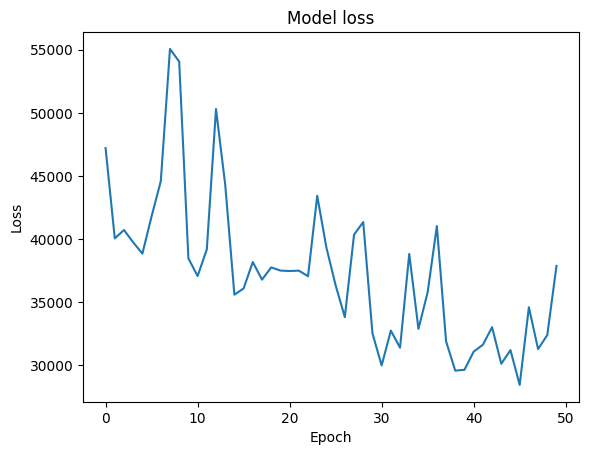

In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights50')

#Learning Rate
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 100
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(50,NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])

        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 50 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==99):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights99')

#Learning Rate
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 200
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(100,NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])

        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 50 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==199):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch:   0 of 250. Loss AE   28677.55 | Loss Extraction1    7817.51 | Loss Extraction2    7361.12:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 101 | Batch:   5 of 250. Loss AE   31130.54 | Loss Extraction1    8650.74 | Loss Extraction2    8184.45:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 101 | Batch:  10 of 250. Loss AE   42368.38 | Loss Extraction1    8155.12 | Loss Extraction2    8083.29:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 101 | Batch:  15 of 250. Loss AE   40265.97 | Loss Extraction1    7651.58 | Loss Extraction2    7698.82:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 101 | Batch:  20 of 250. Loss AE   37992.51 | Loss Extraction1    8503.96 | Loss Extraction2    7558.44:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 101 | Batch:  25 of 250. Loss AE   36496.58 | Loss Extraction1    8656.87 | Loss Extraction2    7472.53:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 101 | Batch:  30 of 250. Loss AE   35023.95 | Loss Extraction1    8156.02 | Loss Extraction2    7420.44:  14%|█▍        | 7/50 [00:06<00:36,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 101 | Batch:  35 of 250. Loss AE   35323.87 | Loss Extraction1    8309.14 | Loss Extraction2    7355.49:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch:  40 of 250. Loss AE   34396.90 | Loss Extraction1    8225.69 | Loss Extraction2    7473.08:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch:  45 of 250. Loss AE   34418.67 | Loss Extraction1    7892.51 | Loss Extraction2    7381.97:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 101 | Batch:  50 of 250. Loss AE   33960.97 | Loss Extraction1    7959.68 | Loss Extraction2    7442.87:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 101 | Batch:  55 of 250. Loss AE   33889.00 | Loss Extraction1    8316.23 | Loss Extraction2    7510.86:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 101 | Batch:  60 of 250. Loss AE   33056.21 | Loss Extraction1    7931.17 | Loss Extraction2    7339.08:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 101 | Batch:  65 of 250. Loss AE   32645.22 | Loss Extraction1    7799.13 | Loss Extraction2    7297.55:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 101 | Batch:  70 of 250. Loss AE   32207.07 | Loss Extraction1    7850.90 | Loss Extraction2    7271.88:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 101 | Batch:  75 of 250. Loss AE   31583.95 | Loss Extraction1    7815.60 | Loss Extraction2    7256.32:  32%|███▏      | 16/50 [00:14<00:34,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 101 | Batch:  80 of 250. Loss AE   31169.29 | Loss Extraction1    7605.24 | Loss Extraction2    7152.67:  34%|███▍      | 17/50 [00:15<00:32,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 101 | Batch:  85 of 250. Loss AE   31175.12 | Loss Extraction1    7634.42 | Loss Extraction2    7058.07:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 101 | Batch:  90 of 250. Loss AE   30496.12 | Loss Extraction1    7527.80 | Loss Extraction2    6906.95:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 101 | Batch:  95 of 250. Loss AE   30357.91 | Loss Extraction1    7526.55 | Loss Extraction2    7121.01:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 101 | Batch: 100 of 250. Loss AE   30449.69 | Loss Extraction1    7712.58 | Loss Extraction2    7080.42:  42%|████▏     | 21/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 101 | Batch: 105 of 250. Loss AE   30255.99 | Loss Extraction1    7665.57 | Loss Extraction2    7011.93:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 101 | Batch: 110 of 250. Loss AE   30171.42 | Loss Extraction1    7535.67 | Loss Extraction2    6997.62:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 101 | Batch: 115 of 250. Loss AE   30816.36 | Loss Extraction1    7564.00 | Loss Extraction2    6936.01:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 101 | Batch: 120 of 250. Loss AE   30612.08 | Loss Extraction1    7543.61 | Loss Extraction2    6870.32:  50%|█████     | 25/50 [00:22<00:22,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 101 | Batch: 125 of 250. Loss AE   30542.48 | Loss Extraction1    7417.41 | Loss Extraction2    6998.91:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 101 | Batch: 130 of 250. Loss AE   30489.85 | Loss Extraction1    7375.10 | Loss Extraction2    7005.68:  54%|█████▍    | 27/50 [00:24<00:21,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 101 | Batch: 135 of 250. Loss AE   30286.82 | Loss Extraction1    7445.10 | Loss Extraction2    6977.63:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 101 | Batch: 140 of 250. Loss AE   30596.31 | Loss Extraction1    7339.01 | Loss Extraction2    7048.02:  58%|█████▊    | 29/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch: 145 of 250. Loss AE   30983.41 | Loss Extraction1    7322.55 | Loss Extraction2    7066.24:  60%|██████    | 30/50 [00:26<00:17,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 101 | Batch: 150 of 250. Loss AE   30946.68 | Loss Extraction1    7258.76 | Loss Extraction2    7206.96:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 101 | Batch: 155 of 250. Loss AE   30840.41 | Loss Extraction1    7207.17 | Loss Extraction2    7155.81:  64%|██████▍   | 32/50 [00:28<00:16,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 101 | Batch: 160 of 250. Loss AE   30554.51 | Loss Extraction1    7179.30 | Loss Extraction2    7155.63:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 101 | Batch: 165 of 250. Loss AE   30134.50 | Loss Extraction1    7116.93 | Loss Extraction2    7072.75:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 101 | Batch: 170 of 250. Loss AE   29881.34 | Loss Extraction1    7057.11 | Loss Extraction2    7113.44:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 101 | Batch: 175 of 250. Loss AE   29718.32 | Loss Extraction1    7005.98 | Loss Extraction2    7106.35:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 101 | Batch: 180 of 250. Loss AE   29802.67 | Loss Extraction1    6966.94 | Loss Extraction2    7207.25:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 101 | Batch: 185 of 250. Loss AE   29729.17 | Loss Extraction1    6920.68 | Loss Extraction2    7267.33:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 101 | Batch: 190 of 250. Loss AE   29758.88 | Loss Extraction1    6898.82 | Loss Extraction2    7329.39:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 101 | Batch: 195 of 250. Loss AE   29927.68 | Loss Extraction1    6942.72 | Loss Extraction2    7381.21:  80%|████████  | 40/50 [00:35<00:08,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 101 | Batch: 200 of 250. Loss AE   30070.31 | Loss Extraction1    6938.39 | Loss Extraction2    7440.15:  82%|████████▏ | 41/50 [00:36<00:08,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 101 | Batch: 205 of 250. Loss AE   29981.11 | Loss Extraction1    6918.36 | Loss Extraction2    7380.93:  84%|████████▍ | 42/50 [00:37<00:07,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 101 | Batch: 210 of 250. Loss AE   29949.79 | Loss Extraction1    6892.60 | Loss Extraction2    7524.10:  86%|████████▌ | 43/50 [00:38<00:06,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch: 215 of 250. Loss AE   30054.48 | Loss Extraction1    6921.90 | Loss Extraction2    7465.47:  88%|████████▊ | 44/50 [00:39<00:05,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch: 220 of 250. Loss AE   30268.67 | Loss Extraction1    6916.90 | Loss Extraction2    7741.12:  90%|█████████ | 45/50 [00:40<00:04,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 101 | Batch: 225 of 250. Loss AE   30120.36 | Loss Extraction1    6893.91 | Loss Extraction2    7681.52:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 101 | Batch: 230 of 250. Loss AE   30191.88 | Loss Extraction1    6872.86 | Loss Extraction2    7700.27:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch: 235 of 250. Loss AE   30075.72 | Loss Extraction1    6917.06 | Loss Extraction2    7631.88:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 101 | Batch: 240 of 250. Loss AE   30258.03 | Loss Extraction1    6931.77 | Loss Extraction2    7710.58:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 101 | Batch: 245 of 250. Loss AE   30164.48 | Loss Extraction1    6948.13 | Loss Extraction2    7698.14: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 102 | Batch:   0 of 250. Loss AE   34232.64 | Loss Extraction1   15111.64 | Loss Extraction2    6656.64:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch:   5 of 250. Loss AE   34275.93 | Loss Extraction1   11796.18 | Loss Extraction2    8101.32:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch:  10 of 250. Loss AE   35539.38 | Loss Extraction1   11609.42 | Loss Extraction2    8036.12:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 102 | Batch:  15 of 250. Loss AE   34820.12 | Loss Extraction1   11003.71 | Loss Extraction2    7284.77:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 102 | Batch:  20 of 250. Loss AE   33593.55 | Loss Extraction1    9770.19 | Loss Extraction2    7278.55:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 102 | Batch:  25 of 250. Loss AE   32272.06 | Loss Extraction1    9834.96 | Loss Extraction2    6662.79:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 102 | Batch:  30 of 250. Loss AE   31521.34 | Loss Extraction1    9159.35 | Loss Extraction2    7067.02:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 102 | Batch:  35 of 250. Loss AE   31336.43 | Loss Extraction1    9280.81 | Loss Extraction2    7037.30:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch:  40 of 250. Loss AE   30901.86 | Loss Extraction1    9198.71 | Loss Extraction2    6716.53:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch:  45 of 250. Loss AE   32096.20 | Loss Extraction1    8786.03 | Loss Extraction2    6605.80:  20%|██        | 10/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 102 | Batch:  50 of 250. Loss AE   31124.18 | Loss Extraction1    8519.30 | Loss Extraction2    6543.02:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 102 | Batch:  55 of 250. Loss AE   31023.23 | Loss Extraction1    8260.32 | Loss Extraction2    6425.55:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 102 | Batch:  60 of 250. Loss AE   30565.62 | Loss Extraction1    8153.17 | Loss Extraction2    6542.93:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 102 | Batch:  65 of 250. Loss AE   29746.54 | Loss Extraction1    8086.81 | Loss Extraction2    6274.60:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 102 | Batch:  70 of 250. Loss AE   29540.88 | Loss Extraction1    8060.00 | Loss Extraction2    6242.47:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 102 | Batch:  75 of 250. Loss AE   29266.21 | Loss Extraction1    7780.91 | Loss Extraction2    6303.87:  32%|███▏      | 16/50 [00:13<00:28,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch:  80 of 250. Loss AE   29094.49 | Loss Extraction1    7638.02 | Loss Extraction2    6228.27:  34%|███▍      | 17/50 [00:14<00:27,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch:  85 of 250. Loss AE   29107.93 | Loss Extraction1    7720.55 | Loss Extraction2    6180.40:  36%|███▌      | 18/50 [00:15<00:26,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch:  90 of 250. Loss AE   28927.38 | Loss Extraction1    7562.10 | Loss Extraction2    6241.75:  38%|███▊      | 19/50 [00:16<00:25,  1.22it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 102 | Batch:  95 of 250. Loss AE   28642.21 | Loss Extraction1    7489.06 | Loss Extraction2    6120.01:  40%|████      | 20/50 [00:17<00:27,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 102 | Batch: 100 of 250. Loss AE   28465.62 | Loss Extraction1    7554.69 | Loss Extraction2    6033.25:  42%|████▏     | 21/50 [00:18<00:29,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 102 | Batch: 105 of 250. Loss AE   29372.44 | Loss Extraction1    7504.60 | Loss Extraction2    6013.25:  44%|████▍     | 22/50 [00:19<00:29,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 102 | Batch: 110 of 250. Loss AE   29373.01 | Loss Extraction1    7334.75 | Loss Extraction2    5974.11:  46%|████▌     | 23/50 [00:20<00:26,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 115 of 250. Loss AE   28908.62 | Loss Extraction1    7279.97 | Loss Extraction2    5872.50:  48%|████▊     | 24/50 [00:21<00:24,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 102 | Batch: 120 of 250. Loss AE   29215.14 | Loss Extraction1    7242.45 | Loss Extraction2    5833.25:  50%|█████     | 25/50 [00:22<00:22,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 125 of 250. Loss AE   28881.99 | Loss Extraction1    7134.22 | Loss Extraction2    5764.24:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 130 of 250. Loss AE   28605.14 | Loss Extraction1    7146.68 | Loss Extraction2    5763.52:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 102 | Batch: 135 of 250. Loss AE   29662.34 | Loss Extraction1    7211.51 | Loss Extraction2    5719.95:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 140 of 250. Loss AE   29671.98 | Loss Extraction1    7168.49 | Loss Extraction2    5844.60:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 102 | Batch: 145 of 250. Loss AE   29710.94 | Loss Extraction1    7453.40 | Loss Extraction2    5869.50:  60%|██████    | 30/50 [00:26<00:16,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 102 | Batch: 150 of 250. Loss AE   29548.87 | Loss Extraction1    7506.81 | Loss Extraction2    5836.07:  62%|██████▏   | 31/50 [00:27<00:15,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 155 of 250. Loss AE   29257.02 | Loss Extraction1    7509.05 | Loss Extraction2    5778.28:  64%|██████▍   | 32/50 [00:28<00:14,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 102 | Batch: 160 of 250. Loss AE   29009.15 | Loss Extraction1    7379.96 | Loss Extraction2    5754.02:  66%|██████▌   | 33/50 [00:28<00:13,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 102 | Batch: 165 of 250. Loss AE   28945.90 | Loss Extraction1    7356.41 | Loss Extraction2    5698.48:  68%|██████▊   | 34/50 [00:29<00:13,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 102 | Batch: 170 of 250. Loss AE   29011.01 | Loss Extraction1    7315.35 | Loss Extraction2    5701.25:  70%|███████   | 35/50 [00:30<00:13,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 102 | Batch: 175 of 250. Loss AE   28900.37 | Loss Extraction1    7338.34 | Loss Extraction2    5757.40:  72%|███████▏  | 36/50 [00:31<00:12,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 102 | Batch: 180 of 250. Loss AE   29092.85 | Loss Extraction1    7442.44 | Loss Extraction2    5742.13:  74%|███████▍  | 37/50 [00:32<00:12,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 102 | Batch: 185 of 250. Loss AE   29001.66 | Loss Extraction1    7394.20 | Loss Extraction2    5698.98:  76%|███████▌  | 38/50 [00:33<00:11,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 190 of 250. Loss AE   28777.55 | Loss Extraction1    7396.89 | Loss Extraction2    5709.52:  78%|███████▊  | 39/50 [00:34<00:09,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 102 | Batch: 195 of 250. Loss AE   28571.96 | Loss Extraction1    7391.04 | Loss Extraction2    5736.11:  80%|████████  | 40/50 [00:35<00:08,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 102 | Batch: 200 of 250. Loss AE   28537.61 | Loss Extraction1    7358.08 | Loss Extraction2    5879.11:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 205 of 250. Loss AE   28764.26 | Loss Extraction1    7330.23 | Loss Extraction2    5837.47:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 210 of 250. Loss AE   28552.02 | Loss Extraction1    7292.30 | Loss Extraction2    5784.83:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 102 | Batch: 215 of 250. Loss AE   28504.14 | Loss Extraction1    7305.23 | Loss Extraction2    5747.11:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 102 | Batch: 220 of 250. Loss AE   28446.42 | Loss Extraction1    7254.96 | Loss Extraction2    5704.68:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 102 | Batch: 225 of 250. Loss AE   28449.65 | Loss Extraction1    7353.37 | Loss Extraction2    5818.61:  92%|█████████▏| 46/50 [00:40<00:03,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 230 of 250. Loss AE   28205.51 | Loss Extraction1    7307.57 | Loss Extraction2    5777.26:  94%|█████████▍| 47/50 [00:41<00:02,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 102 | Batch: 235 of 250. Loss AE   28343.12 | Loss Extraction1    7382.00 | Loss Extraction2    5764.23:  96%|█████████▌| 48/50 [00:42<00:01,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 102 | Batch: 240 of 250. Loss AE   28182.44 | Loss Extraction1    7401.97 | Loss Extraction2    5735.12:  98%|█████████▊| 49/50 [00:43<00:00,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 102 | Batch: 245 of 250. Loss AE   28692.36 | Loss Extraction1    7527.88 | Loss Extraction2    5763.38: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 103 | Batch:   0 of 250. Loss AE   24562.29 | Loss Extraction1    5188.50 | Loss Extraction2    3040.61:   2%|▏         | 1/50 [00:00<00:43,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 103 | Batch:   5 of 250. Loss AE   23497.50 | Loss Extraction1    5308.97 | Loss Extraction2    3428.20:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 103 | Batch:  10 of 250. Loss AE   23437.36 | Loss Extraction1    5844.64 | Loss Extraction2    3383.73:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 103 | Batch:  15 of 250. Loss AE   23192.45 | Loss Extraction1    6915.45 | Loss Extraction2    3593.87:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 103 | Batch:  20 of 250. Loss AE   23299.64 | Loss Extraction1    6578.61 | Loss Extraction2    3583.71:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch:  25 of 250. Loss AE   26294.77 | Loss Extraction1    6879.26 | Loss Extraction2    3670.65:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 103 | Batch:  30 of 250. Loss AE   25834.98 | Loss Extraction1    7714.17 | Loss Extraction2    3559.14:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch:  35 of 250. Loss AE   27705.91 | Loss Extraction1    7731.64 | Loss Extraction2    4386.04:  16%|█▌        | 8/50 [00:06<00:34,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch:  40 of 250. Loss AE   28025.76 | Loss Extraction1    7519.56 | Loss Extraction2    4314.19:  18%|█▊        | 9/50 [00:07<00:33,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 103 | Batch:  45 of 250. Loss AE   27737.41 | Loss Extraction1    7783.68 | Loss Extraction2    4389.60:  20%|██        | 10/50 [00:08<00:33,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch:  50 of 250. Loss AE   27375.66 | Loss Extraction1    7584.51 | Loss Extraction2    4670.88:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 103 | Batch:  55 of 250. Loss AE   27298.58 | Loss Extraction1    7608.06 | Loss Extraction2    4704.04:  24%|██▍       | 12/50 [00:10<00:31,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 103 | Batch:  60 of 250. Loss AE   26793.88 | Loss Extraction1    7519.60 | Loss Extraction2    4669.70:  26%|██▌       | 13/50 [00:10<00:30,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 103 | Batch:  65 of 250. Loss AE   26891.56 | Loss Extraction1    7516.48 | Loss Extraction2    4670.09:  28%|██▊       | 14/50 [00:11<00:30,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 103 | Batch:  70 of 250. Loss AE   27210.52 | Loss Extraction1    7284.50 | Loss Extraction2    4693.50:  30%|███       | 15/50 [00:12<00:32,  1.07it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 103 | Batch:  75 of 250. Loss AE   27421.34 | Loss Extraction1    7177.33 | Loss Extraction2    4770.49:  32%|███▏      | 16/50 [00:13<00:31,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 103 | Batch:  80 of 250. Loss AE   29606.56 | Loss Extraction1    7161.27 | Loss Extraction2    4967.79:  34%|███▍      | 17/50 [00:14<00:30,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch:  85 of 250. Loss AE   28907.63 | Loss Extraction1    7017.87 | Loss Extraction2    5041.15:  36%|███▌      | 18/50 [00:15<00:28,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch:  90 of 250. Loss AE   28469.90 | Loss Extraction1    6944.99 | Loss Extraction2    5174.35:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch:  95 of 250. Loss AE   28056.35 | Loss Extraction1    6871.29 | Loss Extraction2    5136.77:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 103 | Batch: 100 of 250. Loss AE   27930.29 | Loss Extraction1    6855.74 | Loss Extraction2    5248.47:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 103 | Batch: 105 of 250. Loss AE   28393.42 | Loss Extraction1    7143.96 | Loss Extraction2    5415.22:  44%|████▍     | 22/50 [00:18<00:23,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 103 | Batch: 110 of 250. Loss AE   28600.49 | Loss Extraction1    6996.46 | Loss Extraction2    5411.37:  46%|████▌     | 23/50 [00:19<00:22,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 103 | Batch: 115 of 250. Loss AE   28818.69 | Loss Extraction1    6886.80 | Loss Extraction2    5592.97:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 103 | Batch: 120 of 250. Loss AE   28676.77 | Loss Extraction1    6776.49 | Loss Extraction2    5499.89:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 103 | Batch: 125 of 250. Loss AE   28835.77 | Loss Extraction1    6713.91 | Loss Extraction2    5746.31:  52%|█████▏    | 26/50 [00:22<00:19,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 103 | Batch: 130 of 250. Loss AE   28607.22 | Loss Extraction1    6633.71 | Loss Extraction2    5663.88:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 103 | Batch: 135 of 250. Loss AE   28594.06 | Loss Extraction1    6611.86 | Loss Extraction2    5692.82:  56%|█████▌    | 28/50 [00:23<00:18,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 103 | Batch: 140 of 250. Loss AE   28431.76 | Loss Extraction1    6565.75 | Loss Extraction2    5813.44:  58%|█████▊    | 29/50 [00:24<00:18,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 103 | Batch: 145 of 250. Loss AE   28479.18 | Loss Extraction1    6608.37 | Loss Extraction2    5764.71:  60%|██████    | 30/50 [00:25<00:17,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 103 | Batch: 150 of 250. Loss AE   28875.51 | Loss Extraction1    6651.28 | Loss Extraction2    5787.04:  62%|██████▏   | 31/50 [00:26<00:18,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 103 | Batch: 155 of 250. Loss AE   28642.84 | Loss Extraction1    6612.86 | Loss Extraction2    5769.79:  64%|██████▍   | 32/50 [00:27<00:17,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch: 160 of 250. Loss AE   28644.16 | Loss Extraction1    6638.66 | Loss Extraction2    5956.48:  66%|██████▌   | 33/50 [00:28<00:15,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch: 165 of 250. Loss AE   28714.28 | Loss Extraction1    6649.28 | Loss Extraction2    5957.88:  68%|██████▊   | 34/50 [00:29<00:14,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 103 | Batch: 170 of 250. Loss AE   28532.96 | Loss Extraction1    6590.77 | Loss Extraction2    5950.41:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 103 | Batch: 175 of 250. Loss AE   28479.34 | Loss Extraction1    6617.88 | Loss Extraction2    5977.30:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 103 | Batch: 180 of 250. Loss AE   28411.29 | Loss Extraction1    6549.96 | Loss Extraction2    6044.68:  74%|███████▍  | 37/50 [00:31<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch: 185 of 250. Loss AE   28951.56 | Loss Extraction1    6753.56 | Loss Extraction2    5988.44:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch: 190 of 250. Loss AE   28995.45 | Loss Extraction1    6704.17 | Loss Extraction2    6096.66:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 103 | Batch: 195 of 250. Loss AE   28876.21 | Loss Extraction1    6671.83 | Loss Extraction2    6086.09:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 103 | Batch: 200 of 250. Loss AE   28718.73 | Loss Extraction1    6671.53 | Loss Extraction2    6089.75:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 103 | Batch: 205 of 250. Loss AE   28479.31 | Loss Extraction1    6675.48 | Loss Extraction2    6031.74:  84%|████████▍ | 42/50 [00:36<00:06,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 103 | Batch: 210 of 250. Loss AE   28353.10 | Loss Extraction1    6685.40 | Loss Extraction2    6000.70:  86%|████████▌ | 43/50 [00:36<00:05,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 103 | Batch: 215 of 250. Loss AE   28300.23 | Loss Extraction1    6664.55 | Loss Extraction2    6003.51:  88%|████████▊ | 44/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 103 | Batch: 220 of 250. Loss AE   28321.67 | Loss Extraction1    6716.92 | Loss Extraction2    5990.93:  90%|█████████ | 45/50 [00:38<00:04,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 103 | Batch: 225 of 250. Loss AE   28197.69 | Loss Extraction1    6799.71 | Loss Extraction2    5994.57:  92%|█████████▏| 46/50 [00:39<00:03,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 103 | Batch: 230 of 250. Loss AE   28098.14 | Loss Extraction1    6810.10 | Loss Extraction2    5979.86:  94%|█████████▍| 47/50 [00:40<00:02,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 103 | Batch: 235 of 250. Loss AE   28114.16 | Loss Extraction1    6797.73 | Loss Extraction2    5960.09:  96%|█████████▌| 48/50 [00:41<00:01,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 103 | Batch: 240 of 250. Loss AE   28167.37 | Loss Extraction1    6808.52 | Loss Extraction2    5966.06:  98%|█████████▊| 49/50 [00:42<00:00,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 103 | Batch: 245 of 250. Loss AE   28174.81 | Loss Extraction1    6837.16 | Loss Extraction2    5935.63: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch:   0 of 250. Loss AE   29408.90 | Loss Extraction1    3973.66 | Loss Extraction2    5466.56:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch:   5 of 250. Loss AE   25006.70 | Loss Extraction1    4908.50 | Loss Extraction2    5610.79:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 104 | Batch:  10 of 250. Loss AE   22717.77 | Loss Extraction1    4988.20 | Loss Extraction2    5071.89:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 104 | Batch:  15 of 250. Loss AE   22726.59 | Loss Extraction1    4853.08 | Loss Extraction2    4914.28:   8%|▊         | 4/50 [00:03<00:38,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 104 | Batch:  20 of 250. Loss AE   22556.63 | Loss Extraction1    5033.42 | Loss Extraction2    5469.83:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch:  25 of 250. Loss AE   22389.54 | Loss Extraction1    4900.04 | Loss Extraction2    5178.55:  12%|█▏        | 6/50 [00:04<00:36,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch:  30 of 250. Loss AE   23104.33 | Loss Extraction1    5161.65 | Loss Extraction2    5338.25:  14%|█▍        | 7/50 [00:05<00:35,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 104 | Batch:  35 of 250. Loss AE   22641.02 | Loss Extraction1    5383.71 | Loss Extraction2    5092.04:  16%|█▌        | 8/50 [00:06<00:34,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch:  40 of 250. Loss AE   22513.71 | Loss Extraction1    5636.85 | Loss Extraction2    5251.97:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 104 | Batch:  45 of 250. Loss AE   23939.95 | Loss Extraction1    6276.26 | Loss Extraction2    5239.41:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 104 | Batch:  50 of 250. Loss AE   23668.91 | Loss Extraction1    6132.57 | Loss Extraction2    5132.84:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 104 | Batch:  55 of 250. Loss AE   24149.39 | Loss Extraction1    6243.98 | Loss Extraction2    5153.51:  24%|██▍       | 12/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 104 | Batch:  60 of 250. Loss AE   24637.07 | Loss Extraction1    6088.87 | Loss Extraction2    5587.78:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch:  65 of 250. Loss AE   25809.87 | Loss Extraction1    6102.45 | Loss Extraction2    5630.24:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 104 | Batch:  70 of 250. Loss AE   25648.08 | Loss Extraction1    6023.35 | Loss Extraction2    5898.51:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch:  75 of 250. Loss AE   26191.89 | Loss Extraction1    6382.09 | Loss Extraction2    5916.73:  32%|███▏      | 16/50 [00:13<00:30,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 104 | Batch:  80 of 250. Loss AE   26713.41 | Loss Extraction1    6338.26 | Loss Extraction2    6415.87:  34%|███▍      | 17/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 104 | Batch:  85 of 250. Loss AE   26743.48 | Loss Extraction1    6181.18 | Loss Extraction2    6377.08:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch:  90 of 250. Loss AE   27073.50 | Loss Extraction1    6183.58 | Loss Extraction2    6583.44:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch:  95 of 250. Loss AE   27227.69 | Loss Extraction1    6201.84 | Loss Extraction2    6697.26:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 104 | Batch: 100 of 250. Loss AE   27473.11 | Loss Extraction1    6144.26 | Loss Extraction2    6913.99:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 104 | Batch: 105 of 250. Loss AE   27430.54 | Loss Extraction1    6071.55 | Loss Extraction2    6974.97:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 104 | Batch: 110 of 250. Loss AE   27312.09 | Loss Extraction1    5980.52 | Loss Extraction2    7022.62:  46%|████▌     | 23/50 [00:19<00:22,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 104 | Batch: 115 of 250. Loss AE   27705.95 | Loss Extraction1    5917.80 | Loss Extraction2    7379.41:  48%|████▊     | 24/50 [00:20<00:21,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch: 120 of 250. Loss AE   27725.81 | Loss Extraction1    5849.25 | Loss Extraction2    7417.28:  50%|█████     | 25/50 [00:21<00:24,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 104 | Batch: 125 of 250. Loss AE   28652.07 | Loss Extraction1    5888.12 | Loss Extraction2    7745.51:  52%|█████▏    | 26/50 [00:22<00:24,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 104 | Batch: 130 of 250. Loss AE   28490.53 | Loss Extraction1    5866.23 | Loss Extraction2    7601.73:  54%|█████▍    | 27/50 [00:23<00:22,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 104 | Batch: 135 of 250. Loss AE   28623.23 | Loss Extraction1    5919.78 | Loss Extraction2    7594.77:  56%|█████▌    | 28/50 [00:24<00:20,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 104 | Batch: 140 of 250. Loss AE   28582.77 | Loss Extraction1    5936.99 | Loss Extraction2    7520.51:  58%|█████▊    | 29/50 [00:25<00:18,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch: 145 of 250. Loss AE   28745.96 | Loss Extraction1    5864.31 | Loss Extraction2    7484.82:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 104 | Batch: 150 of 250. Loss AE   28738.64 | Loss Extraction1    5989.05 | Loss Extraction2    7546.77:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 104 | Batch: 155 of 250. Loss AE   28799.67 | Loss Extraction1    5922.41 | Loss Extraction2    7637.91:  64%|██████▍   | 32/50 [00:27<00:15,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch: 160 of 250. Loss AE   28761.87 | Loss Extraction1    6099.38 | Loss Extraction2    7587.77:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch: 165 of 250. Loss AE   29179.47 | Loss Extraction1    6010.02 | Loss Extraction2    7661.20:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 104 | Batch: 170 of 250. Loss AE   29034.31 | Loss Extraction1    5973.07 | Loss Extraction2    7616.94:  70%|███████   | 35/50 [00:30<00:12,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch: 175 of 250. Loss AE   29082.68 | Loss Extraction1    6004.24 | Loss Extraction2    7624.68:  72%|███████▏  | 36/50 [00:31<00:11,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch: 180 of 250. Loss AE   28843.81 | Loss Extraction1    5997.01 | Loss Extraction2    7565.12:  74%|███████▍  | 37/50 [00:32<00:10,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch: 185 of 250. Loss AE   28778.12 | Loss Extraction1    6084.26 | Loss Extraction2    7497.94:  76%|███████▌  | 38/50 [00:32<00:10,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 104 | Batch: 190 of 250. Loss AE   28653.28 | Loss Extraction1    6060.78 | Loss Extraction2    7452.23:  78%|███████▊  | 39/50 [00:33<00:09,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 104 | Batch: 195 of 250. Loss AE   28913.08 | Loss Extraction1    6021.27 | Loss Extraction2    7405.65:  80%|████████  | 40/50 [00:34<00:09,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 104 | Batch: 200 of 250. Loss AE   28660.33 | Loss Extraction1    5996.04 | Loss Extraction2    7345.60:  82%|████████▏ | 41/50 [00:36<00:09,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 104 | Batch: 205 of 250. Loss AE   28675.47 | Loss Extraction1    6024.77 | Loss Extraction2    7294.45:  84%|████████▍ | 42/50 [00:37<00:08,  1.05s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 104 | Batch: 210 of 250. Loss AE   28617.78 | Loss Extraction1    6021.83 | Loss Extraction2    7301.54:  86%|████████▌ | 43/50 [00:38<00:06,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch: 215 of 250. Loss AE   28582.63 | Loss Extraction1    5976.99 | Loss Extraction2    7353.38:  88%|████████▊ | 44/50 [00:38<00:05,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 104 | Batch: 220 of 250. Loss AE   28660.21 | Loss Extraction1    5981.34 | Loss Extraction2    7327.58:  90%|█████████ | 45/50 [00:39<00:04,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 104 | Batch: 225 of 250. Loss AE   28538.98 | Loss Extraction1    5969.06 | Loss Extraction2    7327.14:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 104 | Batch: 230 of 250. Loss AE   28667.17 | Loss Extraction1    5925.43 | Loss Extraction2    7497.64:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 104 | Batch: 235 of 250. Loss AE   28980.22 | Loss Extraction1    6056.26 | Loss Extraction2    7432.93:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 104 | Batch: 240 of 250. Loss AE   28890.92 | Loss Extraction1    6157.05 | Loss Extraction2    7401.90:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 104 | Batch: 245 of 250. Loss AE   28906.22 | Loss Extraction1    6289.95 | Loss Extraction2    7408.89: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 105 | Batch:   0 of 250. Loss AE   28039.16 | Loss Extraction1    6494.93 | Loss Extraction2    8971.83:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 105 | Batch:   5 of 250. Loss AE   35550.19 | Loss Extraction1   11409.28 | Loss Extraction2    7122.52:   4%|▍         | 2/50 [00:01<00:39,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch:  10 of 250. Loss AE   33768.82 | Loss Extraction1   12276.07 | Loss Extraction2    6582.54:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch:  15 of 250. Loss AE   31835.52 | Loss Extraction1   10762.62 | Loss Extraction2    6897.93:   8%|▊         | 4/50 [00:03<00:42,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 105 | Batch:  20 of 250. Loss AE   33571.27 | Loss Extraction1   12159.56 | Loss Extraction2    7066.10:  10%|█         | 5/50 [00:04<00:45,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 105 | Batch:  25 of 250. Loss AE   31647.67 | Loss Extraction1   11399.01 | Loss Extraction2    6988.86:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 105 | Batch:  30 of 250. Loss AE   33257.72 | Loss Extraction1   11849.42 | Loss Extraction2    6955.93:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch:  35 of 250. Loss AE   33255.86 | Loss Extraction1   11284.66 | Loss Extraction2    7364.64:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch:  40 of 250. Loss AE   34207.55 | Loss Extraction1   11906.31 | Loss Extraction2    7640.57:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch:  45 of 250. Loss AE   33559.14 | Loss Extraction1   11400.85 | Loss Extraction2    7786.29:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch:  50 of 250. Loss AE   35063.82 | Loss Extraction1   12093.60 | Loss Extraction2    7967.76:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch:  55 of 250. Loss AE   34564.11 | Loss Extraction1   11698.26 | Loss Extraction2    7868.46:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch:  60 of 250. Loss AE   35646.42 | Loss Extraction1   11939.62 | Loss Extraction2    7699.38:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 105 | Batch:  65 of 250. Loss AE   34766.48 | Loss Extraction1   11530.51 | Loss Extraction2    7806.13:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch:  70 of 250. Loss AE   35213.75 | Loss Extraction1   11452.21 | Loss Extraction2    7938.97:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch:  75 of 250. Loss AE   35466.26 | Loss Extraction1   11378.57 | Loss Extraction2    8217.55:  32%|███▏      | 16/50 [00:13<00:28,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch:  80 of 250. Loss AE   35007.83 | Loss Extraction1   11187.49 | Loss Extraction2    8232.75:  34%|███▍      | 17/50 [00:14<00:27,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch:  85 of 250. Loss AE   34885.71 | Loss Extraction1   11148.31 | Loss Extraction2    8499.39:  36%|███▌      | 18/50 [00:15<00:26,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 105 | Batch:  90 of 250. Loss AE   35200.80 | Loss Extraction1   10922.04 | Loss Extraction2    8841.95:  38%|███▊      | 19/50 [00:16<00:28,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 105 | Batch:  95 of 250. Loss AE   36065.89 | Loss Extraction1   10895.83 | Loss Extraction2    8785.81:  40%|████      | 20/50 [00:17<00:27,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 105 | Batch: 100 of 250. Loss AE   35979.29 | Loss Extraction1   10911.86 | Loss Extraction2    8785.57:  42%|████▏     | 21/50 [00:18<00:28,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 105 | Batch: 105 of 250. Loss AE   35952.96 | Loss Extraction1   10722.37 | Loss Extraction2    9002.89:  44%|████▍     | 22/50 [00:19<00:26,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 105 | Batch: 110 of 250. Loss AE   37014.60 | Loss Extraction1   10882.77 | Loss Extraction2    8942.61:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 105 | Batch: 115 of 250. Loss AE   37320.24 | Loss Extraction1   10602.37 | Loss Extraction2    9238.39:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 105 | Batch: 120 of 250. Loss AE   37371.49 | Loss Extraction1   10581.65 | Loss Extraction2    9088.44:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch: 125 of 250. Loss AE   37719.57 | Loss Extraction1   10621.46 | Loss Extraction2    9237.84:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch: 130 of 250. Loss AE   37424.42 | Loss Extraction1   10521.93 | Loss Extraction2    9143.57:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch: 135 of 250. Loss AE   37551.72 | Loss Extraction1   10561.85 | Loss Extraction2    9404.74:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 105 | Batch: 140 of 250. Loss AE   37330.46 | Loss Extraction1   10452.48 | Loss Extraction2    9399.72:  58%|█████▊    | 29/50 [00:25<00:17,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch: 145 of 250. Loss AE   37185.95 | Loss Extraction1   10549.02 | Loss Extraction2    9315.08:  60%|██████    | 30/50 [00:26<00:16,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch: 150 of 250. Loss AE   37139.90 | Loss Extraction1   10468.01 | Loss Extraction2    9241.79:  62%|██████▏   | 31/50 [00:26<00:15,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch: 155 of 250. Loss AE   37386.67 | Loss Extraction1   10488.40 | Loss Extraction2    9156.52:  64%|██████▍   | 32/50 [00:27<00:14,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch: 160 of 250. Loss AE   37283.86 | Loss Extraction1   10520.10 | Loss Extraction2    9124.90:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch: 165 of 250. Loss AE   37817.36 | Loss Extraction1   10605.21 | Loss Extraction2    9191.58:  68%|██████▊   | 34/50 [00:29<00:14,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 105 | Batch: 170 of 250. Loss AE   38022.43 | Loss Extraction1   10572.12 | Loss Extraction2    9122.82:  70%|███████   | 35/50 [00:30<00:15,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 105 | Batch: 175 of 250. Loss AE   38090.22 | Loss Extraction1   10462.46 | Loss Extraction2    9075.56:  72%|███████▏  | 36/50 [00:31<00:13,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 105 | Batch: 180 of 250. Loss AE   38095.10 | Loss Extraction1   10348.87 | Loss Extraction2    9117.85:  74%|███████▍  | 37/50 [00:32<00:12,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 105 | Batch: 185 of 250. Loss AE   37904.38 | Loss Extraction1   10220.50 | Loss Extraction2    9172.52:  76%|███████▌  | 38/50 [00:33<00:10,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch: 190 of 250. Loss AE   37951.91 | Loss Extraction1   10200.73 | Loss Extraction2    9176.90:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 105 | Batch: 195 of 250. Loss AE   37878.23 | Loss Extraction1   10116.50 | Loss Extraction2    9112.86:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 105 | Batch: 200 of 250. Loss AE   37895.08 | Loss Extraction1   10004.29 | Loss Extraction2    9311.41:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 105 | Batch: 205 of 250. Loss AE   37905.56 | Loss Extraction1    9938.44 | Loss Extraction2    9308.44:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 105 | Batch: 210 of 250. Loss AE   37899.82 | Loss Extraction1    9902.35 | Loss Extraction2    9323.02:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch: 215 of 250. Loss AE   38040.01 | Loss Extraction1    9848.98 | Loss Extraction2    9324.67:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 105 | Batch: 220 of 250. Loss AE   38138.87 | Loss Extraction1    9776.82 | Loss Extraction2    9504.55:  90%|█████████ | 45/50 [00:39<00:04,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch: 225 of 250. Loss AE   38489.33 | Loss Extraction1    9762.87 | Loss Extraction2    9462.91:  92%|█████████▏| 46/50 [00:40<00:03,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 105 | Batch: 230 of 250. Loss AE   38510.62 | Loss Extraction1    9717.03 | Loss Extraction2    9423.15:  94%|█████████▍| 47/50 [00:41<00:02,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 105 | Batch: 235 of 250. Loss AE   38469.68 | Loss Extraction1    9918.99 | Loss Extraction2    9372.09:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 105 | Batch: 240 of 250. Loss AE   38590.90 | Loss Extraction1    9872.05 | Loss Extraction2    9469.93:  98%|█████████▊| 49/50 [00:42<00:00,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 105 | Batch: 245 of 250. Loss AE   38343.65 | Loss Extraction1    9784.65 | Loss Extraction2    9469.16: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 106 | Batch:   0 of 250. Loss AE   33976.32 | Loss Extraction1    9865.18 | Loss Extraction2    6331.44:   2%|▏         | 1/50 [00:01<00:55,  1.14s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 106 | Batch:   5 of 250. Loss AE   32438.76 | Loss Extraction1    8370.44 | Loss Extraction2    6445.66:   4%|▍         | 2/50 [00:01<00:46,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 106 | Batch:  10 of 250. Loss AE   32816.26 | Loss Extraction1    8591.96 | Loss Extraction2    8434.28:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 106 | Batch:  15 of 250. Loss AE   37783.09 | Loss Extraction1    8032.03 | Loss Extraction2    8426.85:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch:  20 of 250. Loss AE   37835.44 | Loss Extraction1    7844.77 | Loss Extraction2    8650.69:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch:  25 of 250. Loss AE   35751.18 | Loss Extraction1    7783.46 | Loss Extraction2    8489.43:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 106 | Batch:  30 of 250. Loss AE   36360.97 | Loss Extraction1    8537.71 | Loss Extraction2    8579.94:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch:  35 of 250. Loss AE   35706.23 | Loss Extraction1    8612.99 | Loss Extraction2    8346.64:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 106 | Batch:  40 of 250. Loss AE   35707.15 | Loss Extraction1    9603.50 | Loss Extraction2    8103.51:  18%|█▊        | 9/50 [00:08<00:35,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 106 | Batch:  45 of 250. Loss AE   36998.42 | Loss Extraction1    9383.39 | Loss Extraction2    8018.19:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 106 | Batch:  50 of 250. Loss AE   37903.40 | Loss Extraction1   10428.67 | Loss Extraction2    7938.09:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 106 | Batch:  55 of 250. Loss AE   37212.78 | Loss Extraction1   10138.58 | Loss Extraction2    7941.14:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 106 | Batch:  60 of 250. Loss AE   37774.77 | Loss Extraction1   11224.34 | Loss Extraction2    7746.29:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 106 | Batch:  65 of 250. Loss AE   38508.85 | Loss Extraction1   11396.78 | Loss Extraction2    8039.33:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 106 | Batch:  70 of 250. Loss AE   38651.02 | Loss Extraction1   11578.20 | Loss Extraction2    8258.59:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 106 | Batch:  75 of 250. Loss AE   38617.47 | Loss Extraction1   11436.66 | Loss Extraction2    8090.32:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 106 | Batch:  80 of 250. Loss AE   39024.86 | Loss Extraction1   11673.36 | Loss Extraction2    8164.61:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 106 | Batch:  85 of 250. Loss AE   38797.02 | Loss Extraction1   11365.09 | Loss Extraction2    7959.14:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 106 | Batch:  90 of 250. Loss AE   39044.49 | Loss Extraction1   11475.67 | Loss Extraction2    8144.30:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch:  95 of 250. Loss AE   38601.50 | Loss Extraction1   11353.35 | Loss Extraction2    8086.07:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 106 | Batch: 100 of 250. Loss AE   39019.98 | Loss Extraction1   11145.76 | Loss Extraction2    8003.11:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 106 | Batch: 105 of 250. Loss AE   38775.65 | Loss Extraction1   11053.95 | Loss Extraction2    7905.47:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 110 of 250. Loss AE   38768.85 | Loss Extraction1   10938.07 | Loss Extraction2    7898.19:  46%|████▌     | 23/50 [00:20<00:22,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 106 | Batch: 115 of 250. Loss AE   38627.89 | Loss Extraction1   10848.62 | Loss Extraction2    8005.32:  48%|████▊     | 24/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 120 of 250. Loss AE   38288.33 | Loss Extraction1   10797.33 | Loss Extraction2    7984.58:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 125 of 250. Loss AE   38080.00 | Loss Extraction1   10766.36 | Loss Extraction2    7859.59:  52%|█████▏    | 26/50 [00:22<00:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 130 of 250. Loss AE   37972.08 | Loss Extraction1   10546.94 | Loss Extraction2    7806.83:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 135 of 250. Loss AE   37658.52 | Loss Extraction1   10487.81 | Loss Extraction2    7809.17:  56%|█████▌    | 28/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 106 | Batch: 140 of 250. Loss AE   37546.88 | Loss Extraction1   10501.00 | Loss Extraction2    7972.83:  58%|█████▊    | 29/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 106 | Batch: 145 of 250. Loss AE   37592.22 | Loss Extraction1   10317.96 | Loss Extraction2    8142.02:  60%|██████    | 30/50 [00:26<00:18,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 106 | Batch: 150 of 250. Loss AE   37793.38 | Loss Extraction1   10359.31 | Loss Extraction2    8345.27:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 106 | Batch: 155 of 250. Loss AE   37656.53 | Loss Extraction1   10294.89 | Loss Extraction2    8287.70:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 106 | Batch: 160 of 250. Loss AE   37643.98 | Loss Extraction1   10292.95 | Loss Extraction2    8457.75:  66%|██████▌   | 33/50 [00:28<00:14,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 165 of 250. Loss AE   37367.95 | Loss Extraction1   10253.38 | Loss Extraction2    8403.67:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 106 | Batch: 170 of 250. Loss AE   37287.41 | Loss Extraction1   10227.10 | Loss Extraction2    8696.71:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 106 | Batch: 175 of 250. Loss AE   37062.28 | Loss Extraction1   10087.72 | Loss Extraction2    8661.18:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 106 | Batch: 180 of 250. Loss AE   36943.68 | Loss Extraction1    9959.70 | Loss Extraction2    8757.44:  74%|███████▍  | 37/50 [00:32<00:10,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 185 of 250. Loss AE   36929.96 | Loss Extraction1    9826.52 | Loss Extraction2    8747.94:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 190 of 250. Loss AE   36690.41 | Loss Extraction1    9709.19 | Loss Extraction2    8726.58:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 195 of 250. Loss AE   36350.12 | Loss Extraction1    9539.64 | Loss Extraction2    8686.00:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 106 | Batch: 200 of 250. Loss AE   36231.06 | Loss Extraction1    9482.26 | Loss Extraction2    8612.29:  82%|████████▏ | 41/50 [00:35<00:07,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 106 | Batch: 205 of 250. Loss AE   36067.54 | Loss Extraction1    9378.25 | Loss Extraction2    8711.29:  84%|████████▍ | 42/50 [00:36<00:06,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 210 of 250. Loss AE   35841.34 | Loss Extraction1    9296.84 | Loss Extraction2    8594.78:  86%|████████▌ | 43/50 [00:37<00:05,  1.21it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 106 | Batch: 215 of 250. Loss AE   35799.21 | Loss Extraction1    9211.65 | Loss Extraction2    8591.44:  88%|████████▊ | 44/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 106 | Batch: 220 of 250. Loss AE   35495.44 | Loss Extraction1    9140.77 | Loss Extraction2    8484.45:  90%|█████████ | 45/50 [00:39<00:04,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 106 | Batch: 225 of 250. Loss AE   35220.40 | Loss Extraction1    9066.20 | Loss Extraction2    8427.84:  92%|█████████▏| 46/50 [00:40<00:04,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 230 of 250. Loss AE   34984.74 | Loss Extraction1    9013.58 | Loss Extraction2    8388.38:  94%|█████████▍| 47/50 [00:41<00:02,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 235 of 250. Loss AE   34813.35 | Loss Extraction1    9062.53 | Loss Extraction2    8350.74:  96%|█████████▌| 48/50 [00:42<00:01,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 106 | Batch: 240 of 250. Loss AE   34806.54 | Loss Extraction1    8958.71 | Loss Extraction2    8273.29:  98%|█████████▊| 49/50 [00:42<00:00,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 106 | Batch: 245 of 250. Loss AE   34628.60 | Loss Extraction1    8959.47 | Loss Extraction2    8242.85: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 107 | Batch:   0 of 250. Loss AE   25231.00 | Loss Extraction1    6329.93 | Loss Extraction2    7266.50:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch:   5 of 250. Loss AE   25352.59 | Loss Extraction1    7637.09 | Loss Extraction2    7408.06:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 107 | Batch:  10 of 250. Loss AE   26408.93 | Loss Extraction1    7228.76 | Loss Extraction2    6540.50:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 107 | Batch:  15 of 250. Loss AE   28021.56 | Loss Extraction1    6859.00 | Loss Extraction2    6528.05:   8%|▊         | 4/50 [00:03<00:37,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 107 | Batch:  20 of 250. Loss AE   27342.11 | Loss Extraction1    6765.65 | Loss Extraction2    6447.81:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch:  25 of 250. Loss AE   27139.17 | Loss Extraction1    6538.21 | Loss Extraction2    6165.36:  12%|█▏        | 6/50 [00:04<00:36,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 107 | Batch:  30 of 250. Loss AE   27909.17 | Loss Extraction1    6323.34 | Loss Extraction2    6832.92:  14%|█▍        | 7/50 [00:05<00:35,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 107 | Batch:  35 of 250. Loss AE   27924.79 | Loss Extraction1    6238.50 | Loss Extraction2    6761.42:  16%|█▌        | 8/50 [00:06<00:34,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 107 | Batch:  40 of 250. Loss AE   27677.12 | Loss Extraction1    6405.69 | Loss Extraction2    6463.18:  18%|█▊        | 9/50 [00:07<00:38,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 107 | Batch:  45 of 250. Loss AE   26647.41 | Loss Extraction1    6264.14 | Loss Extraction2    6293.06:  20%|██        | 10/50 [00:08<00:37,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 107 | Batch:  50 of 250. Loss AE   26896.60 | Loss Extraction1    6883.13 | Loss Extraction2    6212.62:  22%|██▏       | 11/50 [00:09<00:38,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch:  55 of 250. Loss AE   27328.01 | Loss Extraction1    6760.89 | Loss Extraction2    6381.56:  24%|██▍       | 12/50 [00:10<00:35,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 107 | Batch:  60 of 250. Loss AE   27721.64 | Loss Extraction1    6751.70 | Loss Extraction2    6735.88:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 107 | Batch:  65 of 250. Loss AE   27569.42 | Loss Extraction1    6718.83 | Loss Extraction2    7094.16:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 107 | Batch:  70 of 250. Loss AE   27504.70 | Loss Extraction1    6539.60 | Loss Extraction2    7107.37:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch:  75 of 250. Loss AE   28447.88 | Loss Extraction1    6864.42 | Loss Extraction2    7230.69:  32%|███▏      | 16/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch:  80 of 250. Loss AE   28730.38 | Loss Extraction1    6953.60 | Loss Extraction2    7505.90:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 107 | Batch:  85 of 250. Loss AE   28575.03 | Loss Extraction1    6923.22 | Loss Extraction2    7660.48:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 107 | Batch:  90 of 250. Loss AE   29329.17 | Loss Extraction1    6889.81 | Loss Extraction2    8226.54:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch:  95 of 250. Loss AE   29283.04 | Loss Extraction1    6817.74 | Loss Extraction2    8080.14:  40%|████      | 20/50 [00:17<00:25,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 107 | Batch: 100 of 250. Loss AE   29893.32 | Loss Extraction1    7003.03 | Loss Extraction2    8714.87:  42%|████▏     | 21/50 [00:18<00:24,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 107 | Batch: 105 of 250. Loss AE   29934.51 | Loss Extraction1    6894.44 | Loss Extraction2    9106.28:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 107 | Batch: 110 of 250. Loss AE   30901.81 | Loss Extraction1    6795.51 | Loss Extraction2    9434.33:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 107 | Batch: 115 of 250. Loss AE   30814.75 | Loss Extraction1    6754.28 | Loss Extraction2    9547.68:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 107 | Batch: 120 of 250. Loss AE   30494.81 | Loss Extraction1    6725.82 | Loss Extraction2    9487.40:  50%|█████     | 25/50 [00:22<00:25,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 107 | Batch: 125 of 250. Loss AE   31247.60 | Loss Extraction1    6626.39 | Loss Extraction2    9560.11:  52%|█████▏    | 26/50 [00:23<00:24,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 107 | Batch: 130 of 250. Loss AE   31351.45 | Loss Extraction1    6535.83 | Loss Extraction2    9656.60:  54%|█████▍    | 27/50 [00:24<00:24,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 107 | Batch: 135 of 250. Loss AE   31432.79 | Loss Extraction1    6628.03 | Loss Extraction2    9563.61:  56%|█████▌    | 28/50 [00:25<00:24,  1.10s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch: 140 of 250. Loss AE   31347.44 | Loss Extraction1    6576.23 | Loss Extraction2    9479.86:  58%|█████▊    | 29/50 [00:26<00:21,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 107 | Batch: 145 of 250. Loss AE   31768.48 | Loss Extraction1    6643.06 | Loss Extraction2    9487.85:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 107 | Batch: 150 of 250. Loss AE   31461.23 | Loss Extraction1    6560.54 | Loss Extraction2    9383.47:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch: 155 of 250. Loss AE   31462.56 | Loss Extraction1    6615.39 | Loss Extraction2    9209.51:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 107 | Batch: 160 of 250. Loss AE   31836.26 | Loss Extraction1    6933.26 | Loss Extraction2    9217.80:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch: 165 of 250. Loss AE   31646.06 | Loss Extraction1    6917.08 | Loss Extraction2    9130.84:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 107 | Batch: 170 of 250. Loss AE   31792.61 | Loss Extraction1    6887.06 | Loss Extraction2    9061.30:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 107 | Batch: 175 of 250. Loss AE   32022.26 | Loss Extraction1    6825.62 | Loss Extraction2    9082.75:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 107 | Batch: 180 of 250. Loss AE   31929.54 | Loss Extraction1    6796.31 | Loss Extraction2    8999.33:  74%|███████▍  | 37/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 107 | Batch: 185 of 250. Loss AE   31843.27 | Loss Extraction1    6814.30 | Loss Extraction2    9039.95:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 107 | Batch: 190 of 250. Loss AE   31853.12 | Loss Extraction1    6727.86 | Loss Extraction2    8973.40:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 107 | Batch: 195 of 250. Loss AE   31684.13 | Loss Extraction1    6648.10 | Loss Extraction2    8928.28:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 107 | Batch: 200 of 250. Loss AE   31700.70 | Loss Extraction1    6717.32 | Loss Extraction2    8978.73:  82%|████████▏ | 41/50 [00:36<00:08,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 107 | Batch: 205 of 250. Loss AE   31765.65 | Loss Extraction1    6732.66 | Loss Extraction2    9009.66:  84%|████████▍ | 42/50 [00:37<00:08,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 107 | Batch: 210 of 250. Loss AE   32049.83 | Loss Extraction1    6706.03 | Loss Extraction2    9051.65:  86%|████████▌ | 43/50 [00:38<00:06,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 107 | Batch: 215 of 250. Loss AE   31919.44 | Loss Extraction1    6700.05 | Loss Extraction2    8970.18:  88%|████████▊ | 44/50 [00:39<00:05,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 107 | Batch: 220 of 250. Loss AE   31896.67 | Loss Extraction1    6682.42 | Loss Extraction2    8918.72:  90%|█████████ | 45/50 [00:40<00:04,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 107 | Batch: 225 of 250. Loss AE   31844.59 | Loss Extraction1    6791.39 | Loss Extraction2    8898.50:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 107 | Batch: 230 of 250. Loss AE   31755.19 | Loss Extraction1    6827.47 | Loss Extraction2    8874.57:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 107 | Batch: 235 of 250. Loss AE   31548.87 | Loss Extraction1    6781.72 | Loss Extraction2    8822.03:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 107 | Batch: 240 of 250. Loss AE   31443.61 | Loss Extraction1    6774.99 | Loss Extraction2    8777.07:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 107 | Batch: 245 of 250. Loss AE   31461.97 | Loss Extraction1    6776.11 | Loss Extraction2    8836.22: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 108 | Batch:   0 of 250. Loss AE   29864.31 | Loss Extraction1    7370.05 | Loss Extraction2    7558.05:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 108 | Batch:   5 of 250. Loss AE   27518.90 | Loss Extraction1    8950.97 | Loss Extraction2    7813.55:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 108 | Batch:  10 of 250. Loss AE   28199.41 | Loss Extraction1    8852.98 | Loss Extraction2    7143.30:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 108 | Batch:  15 of 250. Loss AE   27180.40 | Loss Extraction1    8004.29 | Loss Extraction2    7185.75:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 108 | Batch:  20 of 250. Loss AE   28246.83 | Loss Extraction1    7722.05 | Loss Extraction2    7302.40:  10%|█         | 5/50 [00:04<00:44,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 108 | Batch:  25 of 250. Loss AE   26247.80 | Loss Extraction1    7210.52 | Loss Extraction2    6769.34:  12%|█▏        | 6/50 [00:05<00:46,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 108 | Batch:  30 of 250. Loss AE   26067.49 | Loss Extraction1    6959.48 | Loss Extraction2    6541.79:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 108 | Batch:  35 of 250. Loss AE   25478.66 | Loss Extraction1    6679.13 | Loss Extraction2    6571.71:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 108 | Batch:  40 of 250. Loss AE   24868.12 | Loss Extraction1    6349.71 | Loss Extraction2    6486.30:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 108 | Batch:  45 of 250. Loss AE   25758.96 | Loss Extraction1    6488.56 | Loss Extraction2    6476.93:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 108 | Batch:  50 of 250. Loss AE   25617.32 | Loss Extraction1    6603.22 | Loss Extraction2    6262.39:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch:  55 of 250. Loss AE   26570.52 | Loss Extraction1    6511.38 | Loss Extraction2    6249.10:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 108 | Batch:  60 of 250. Loss AE   26785.42 | Loss Extraction1    6427.68 | Loss Extraction2    6134.00:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 108 | Batch:  65 of 250. Loss AE   26661.47 | Loss Extraction1    6405.58 | Loss Extraction2    6008.17:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch:  70 of 250. Loss AE   27315.50 | Loss Extraction1    6432.83 | Loss Extraction2    6017.87:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 108 | Batch:  75 of 250. Loss AE   27283.78 | Loss Extraction1    6414.97 | Loss Extraction2    5874.85:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 108 | Batch:  80 of 250. Loss AE   26727.62 | Loss Extraction1    6316.52 | Loss Extraction2    5870.40:  34%|███▍      | 17/50 [00:14<00:27,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch:  85 of 250. Loss AE   26751.91 | Loss Extraction1    6185.23 | Loss Extraction2    5974.18:  36%|███▌      | 18/50 [00:15<00:26,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 108 | Batch:  90 of 250. Loss AE   26544.78 | Loss Extraction1    6130.51 | Loss Extraction2    5859.95:  38%|███▊      | 19/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 108 | Batch:  95 of 250. Loss AE   27696.92 | Loss Extraction1    6030.83 | Loss Extraction2    5892.38:  40%|████      | 20/50 [00:18<00:30,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 108 | Batch: 100 of 250. Loss AE   28387.76 | Loss Extraction1    5966.73 | Loss Extraction2    5841.97:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 108 | Batch: 105 of 250. Loss AE   28140.10 | Loss Extraction1    6014.07 | Loss Extraction2    5723.06:  44%|████▍     | 22/50 [00:19<00:26,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 108 | Batch: 110 of 250. Loss AE   28704.68 | Loss Extraction1    5940.97 | Loss Extraction2    5789.06:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch: 115 of 250. Loss AE   28386.10 | Loss Extraction1    5934.32 | Loss Extraction2    5750.63:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 108 | Batch: 120 of 250. Loss AE   28314.69 | Loss Extraction1    5871.13 | Loss Extraction2    5728.93:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 108 | Batch: 125 of 250. Loss AE   28122.07 | Loss Extraction1    6000.08 | Loss Extraction2    5654.54:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 108 | Batch: 130 of 250. Loss AE   28132.41 | Loss Extraction1    5927.03 | Loss Extraction2    5630.76:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 108 | Batch: 135 of 250. Loss AE   28351.19 | Loss Extraction1    6108.01 | Loss Extraction2    5650.58:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch: 140 of 250. Loss AE   28759.97 | Loss Extraction1    6104.71 | Loss Extraction2    5900.37:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 108 | Batch: 145 of 250. Loss AE   28707.10 | Loss Extraction1    6026.63 | Loss Extraction2    5925.40:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch: 150 of 250. Loss AE   28496.39 | Loss Extraction1    5991.48 | Loss Extraction2    5804.98:  62%|██████▏   | 31/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 108 | Batch: 155 of 250. Loss AE   28133.66 | Loss Extraction1    5911.75 | Loss Extraction2    5736.98:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch: 160 of 250. Loss AE   28239.85 | Loss Extraction1    6029.56 | Loss Extraction2    5761.39:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 108 | Batch: 165 of 250. Loss AE   28082.02 | Loss Extraction1    5998.21 | Loss Extraction2    5767.15:  68%|██████▊   | 34/50 [00:29<00:13,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 108 | Batch: 170 of 250. Loss AE   28147.23 | Loss Extraction1    6192.74 | Loss Extraction2    5782.54:  70%|███████   | 35/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 108 | Batch: 175 of 250. Loss AE   28120.07 | Loss Extraction1    6108.03 | Loss Extraction2    5823.84:  72%|███████▏  | 36/50 [00:31<00:13,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 108 | Batch: 180 of 250. Loss AE   28083.97 | Loss Extraction1    6098.03 | Loss Extraction2    5945.72:  74%|███████▍  | 37/50 [00:32<00:11,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch: 185 of 250. Loss AE   27735.43 | Loss Extraction1    6048.49 | Loss Extraction2    5877.54:  76%|███████▌  | 38/50 [00:33<00:10,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 108 | Batch: 190 of 250. Loss AE   27510.15 | Loss Extraction1    5979.51 | Loss Extraction2    5863.47:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch: 195 of 250. Loss AE   27436.61 | Loss Extraction1    5908.88 | Loss Extraction2    5819.44:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 108 | Batch: 200 of 250. Loss AE   27448.61 | Loss Extraction1    5831.47 | Loss Extraction2    5829.59:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 108 | Batch: 205 of 250. Loss AE   27227.30 | Loss Extraction1    5791.96 | Loss Extraction2    5785.53:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 108 | Batch: 210 of 250. Loss AE   27227.27 | Loss Extraction1    5769.75 | Loss Extraction2    5751.71:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 108 | Batch: 215 of 250. Loss AE   27050.44 | Loss Extraction1    5743.75 | Loss Extraction2    5703.01:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 108 | Batch: 220 of 250. Loss AE   26794.99 | Loss Extraction1    5747.70 | Loss Extraction2    5685.27:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 108 | Batch: 225 of 250. Loss AE   26947.62 | Loss Extraction1    5955.87 | Loss Extraction2    5639.30:  92%|█████████▏| 46/50 [00:40<00:03,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 108 | Batch: 230 of 250. Loss AE   26839.38 | Loss Extraction1    5896.55 | Loss Extraction2    5595.23:  94%|█████████▍| 47/50 [00:41<00:02,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 108 | Batch: 235 of 250. Loss AE   26687.23 | Loss Extraction1    5875.05 | Loss Extraction2    5565.85:  96%|█████████▌| 48/50 [00:41<00:01,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 108 | Batch: 240 of 250. Loss AE   26568.46 | Loss Extraction1    5873.37 | Loss Extraction2    5518.13:  98%|█████████▊| 49/50 [00:42<00:00,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 108 | Batch: 245 of 250. Loss AE   26534.25 | Loss Extraction1    5826.44 | Loss Extraction2    5542.82: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 109 | Batch:   0 of 250. Loss AE   17066.69 | Loss Extraction1    4037.38 | Loss Extraction2    5381.74:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 109 | Batch:   5 of 250. Loss AE   21749.61 | Loss Extraction1    6135.27 | Loss Extraction2    3881.12:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 109 | Batch:  10 of 250. Loss AE   24216.46 | Loss Extraction1    6268.64 | Loss Extraction2    3682.06:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 109 | Batch:  15 of 250. Loss AE   26848.63 | Loss Extraction1    7817.71 | Loss Extraction2    4030.89:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch:  20 of 250. Loss AE   28136.04 | Loss Extraction1    7468.62 | Loss Extraction2    4057.78:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 109 | Batch:  25 of 250. Loss AE   26958.70 | Loss Extraction1    7021.53 | Loss Extraction2    3915.60:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch:  30 of 250. Loss AE   25879.99 | Loss Extraction1    6713.05 | Loss Extraction2    3927.42:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch:  35 of 250. Loss AE   24447.21 | Loss Extraction1    6430.22 | Loss Extraction2    4000.56:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch:  40 of 250. Loss AE   24583.73 | Loss Extraction1    6481.54 | Loss Extraction2    4118.52:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 109 | Batch:  45 of 250. Loss AE   23959.92 | Loss Extraction1    6234.69 | Loss Extraction2    4050.70:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 109 | Batch:  50 of 250. Loss AE   23619.97 | Loss Extraction1    6002.67 | Loss Extraction2    4032.33:  22%|██▏       | 11/50 [00:09<00:35,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch:  55 of 250. Loss AE   23663.86 | Loss Extraction1    5869.50 | Loss Extraction2    4207.17:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 109 | Batch:  60 of 250. Loss AE   23697.25 | Loss Extraction1    5724.03 | Loss Extraction2    4267.67:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 109 | Batch:  65 of 250. Loss AE   23731.92 | Loss Extraction1    5608.97 | Loss Extraction2    4275.12:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 109 | Batch:  70 of 250. Loss AE   23937.45 | Loss Extraction1    5958.57 | Loss Extraction2    4208.17:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 109 | Batch:  75 of 250. Loss AE   25116.93 | Loss Extraction1    6068.88 | Loss Extraction2    4154.59:  32%|███▏      | 16/50 [00:14<00:33,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 109 | Batch:  80 of 250. Loss AE   25765.88 | Loss Extraction1    6032.22 | Loss Extraction2    4479.38:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 109 | Batch:  85 of 250. Loss AE   25369.39 | Loss Extraction1    5901.22 | Loss Extraction2    4458.72:  36%|███▌      | 18/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch:  90 of 250. Loss AE   24775.84 | Loss Extraction1    5781.45 | Loss Extraction2    4389.59:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 109 | Batch:  95 of 250. Loss AE   25018.35 | Loss Extraction1    5748.87 | Loss Extraction2    4402.23:  40%|████      | 20/50 [00:17<00:25,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 109 | Batch: 100 of 250. Loss AE   24833.75 | Loss Extraction1    5748.28 | Loss Extraction2    4371.09:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 109 | Batch: 105 of 250. Loss AE   24835.65 | Loss Extraction1    5743.61 | Loss Extraction2    4384.92:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch: 110 of 250. Loss AE   24481.30 | Loss Extraction1    5679.22 | Loss Extraction2    4345.48:  46%|████▌     | 23/50 [00:20<00:22,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 109 | Batch: 115 of 250. Loss AE   24540.06 | Loss Extraction1    5633.70 | Loss Extraction2    4464.36:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch: 120 of 250. Loss AE   24312.36 | Loss Extraction1    5575.07 | Loss Extraction2    4513.54:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 109 | Batch: 125 of 250. Loss AE   24387.30 | Loss Extraction1    5575.93 | Loss Extraction2    4520.46:  52%|█████▏    | 26/50 [00:22<00:19,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch: 130 of 250. Loss AE   24275.81 | Loss Extraction1    5565.81 | Loss Extraction2    4475.02:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch: 135 of 250. Loss AE   24556.51 | Loss Extraction1    5927.00 | Loss Extraction2    4520.09:  56%|█████▌    | 28/50 [00:24<00:18,  1.20it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 109 | Batch: 140 of 250. Loss AE   25814.92 | Loss Extraction1    7080.33 | Loss Extraction2    4672.30:  58%|█████▊    | 29/50 [00:25<00:19,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 109 | Batch: 145 of 250. Loss AE   28064.91 | Loss Extraction1    9472.29 | Loss Extraction2    4706.64:  60%|██████    | 30/50 [00:26<00:18,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 109 | Batch: 150 of 250. Loss AE   28828.87 | Loss Extraction1    9716.94 | Loss Extraction2    4766.41:  62%|██████▏   | 31/50 [00:27<00:17,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 109 | Batch: 155 of 250. Loss AE   29603.79 | Loss Extraction1   10261.97 | Loss Extraction2    4809.23:  64%|██████▍   | 32/50 [00:28<00:16,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 109 | Batch: 160 of 250. Loss AE   29754.83 | Loss Extraction1   10385.17 | Loss Extraction2    4915.87:  66%|██████▌   | 33/50 [00:28<00:15,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 109 | Batch: 165 of 250. Loss AE   31047.63 | Loss Extraction1   10807.17 | Loss Extraction2    5070.15:  68%|██████▊   | 34/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 109 | Batch: 170 of 250. Loss AE   31256.11 | Loss Extraction1   10745.08 | Loss Extraction2    5161.04:  70%|███████   | 35/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 109 | Batch: 175 of 250. Loss AE   32242.11 | Loss Extraction1   10896.31 | Loss Extraction2    5267.65:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 109 | Batch: 180 of 250. Loss AE   33346.29 | Loss Extraction1   11785.16 | Loss Extraction2    5397.00:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 109 | Batch: 185 of 250. Loss AE   33991.24 | Loss Extraction1   12082.24 | Loss Extraction2    5695.20:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch: 190 of 250. Loss AE   35554.74 | Loss Extraction1   13290.80 | Loss Extraction2    5805.78:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 109 | Batch: 195 of 250. Loss AE   35878.92 | Loss Extraction1   13498.30 | Loss Extraction2    5992.05:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch: 200 of 250. Loss AE   35830.80 | Loss Extraction1   13411.29 | Loss Extraction2    6154.39:  82%|████████▏ | 41/50 [00:35<00:07,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 109 | Batch: 205 of 250. Loss AE   36840.63 | Loss Extraction1   13963.68 | Loss Extraction2    6392.22:  84%|████████▍ | 42/50 [00:36<00:06,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 109 | Batch: 210 of 250. Loss AE   37510.33 | Loss Extraction1   14188.74 | Loss Extraction2    6594.96:  86%|████████▌ | 43/50 [00:37<00:05,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 109 | Batch: 215 of 250. Loss AE   38161.21 | Loss Extraction1   14412.09 | Loss Extraction2    6970.46:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 109 | Batch: 220 of 250. Loss AE   38622.95 | Loss Extraction1   14630.30 | Loss Extraction2    7121.09:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 109 | Batch: 225 of 250. Loss AE   39113.23 | Loss Extraction1   14776.36 | Loss Extraction2    7332.08:  92%|█████████▏| 46/50 [00:39<00:03,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 109 | Batch: 230 of 250. Loss AE   39201.10 | Loss Extraction1   14824.71 | Loss Extraction2    7379.09:  94%|█████████▍| 47/50 [00:40<00:02,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 109 | Batch: 235 of 250. Loss AE   39495.11 | Loss Extraction1   14771.99 | Loss Extraction2    7515.23:  96%|█████████▌| 48/50 [00:41<00:01,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 109 | Batch: 240 of 250. Loss AE   39645.39 | Loss Extraction1   14760.47 | Loss Extraction2    7831.60:  98%|█████████▊| 49/50 [00:42<00:00,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 109 | Batch: 245 of 250. Loss AE   40153.94 | Loss Extraction1   15139.74 | Loss Extraction2    7934.44: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 110 | Batch:   0 of 250. Loss AE   39733.70 | Loss Extraction1    8996.44 | Loss Extraction2   13064.60:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch:   5 of 250. Loss AE   49932.29 | Loss Extraction1   18863.27 | Loss Extraction2   16949.17:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 110 | Batch:  10 of 250. Loss AE   54371.22 | Loss Extraction1   18914.42 | Loss Extraction2   18331.81:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch:  15 of 250. Loss AE   53046.77 | Loss Extraction1   17164.21 | Loss Extraction2   19284.26:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 110 | Batch:  20 of 250. Loss AE   51051.62 | Loss Extraction1   16875.93 | Loss Extraction2   17635.76:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 110 | Batch:  25 of 250. Loss AE   51054.61 | Loss Extraction1   15857.23 | Loss Extraction2   16833.49:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 110 | Batch:  30 of 250. Loss AE   48357.76 | Loss Extraction1   15200.21 | Loss Extraction2   16395.31:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 110 | Batch:  35 of 250. Loss AE   49095.64 | Loss Extraction1   15124.24 | Loss Extraction2   15652.15:  16%|█▌        | 8/50 [00:06<00:34,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 110 | Batch:  40 of 250. Loss AE   49657.89 | Loss Extraction1   16211.67 | Loss Extraction2   14585.21:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 110 | Batch:  45 of 250. Loss AE   49684.26 | Loss Extraction1   16328.24 | Loss Extraction2   15021.34:  20%|██        | 10/50 [00:08<00:37,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 110 | Batch:  50 of 250. Loss AE   50064.60 | Loss Extraction1   16514.71 | Loss Extraction2   14803.19:  22%|██▏       | 11/50 [00:09<00:39,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 110 | Batch:  55 of 250. Loss AE   49724.98 | Loss Extraction1   16325.14 | Loss Extraction2   14619.78:  24%|██▍       | 12/50 [00:11<00:40,  1.06s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 110 | Batch:  60 of 250. Loss AE   48949.32 | Loss Extraction1   15911.48 | Loss Extraction2   14197.00:  26%|██▌       | 13/50 [00:11<00:36,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch:  65 of 250. Loss AE   47694.74 | Loss Extraction1   15544.80 | Loss Extraction2   13763.41:  28%|██▊       | 14/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 110 | Batch:  70 of 250. Loss AE   47846.60 | Loss Extraction1   15113.60 | Loss Extraction2   13809.95:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 110 | Batch:  75 of 250. Loss AE   46901.49 | Loss Extraction1   14709.68 | Loss Extraction2   13580.18:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 110 | Batch:  80 of 250. Loss AE   47188.96 | Loss Extraction1   14514.29 | Loss Extraction2   13528.53:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 110 | Batch:  85 of 250. Loss AE   46273.98 | Loss Extraction1   14058.44 | Loss Extraction2   13321.36:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 110 | Batch:  90 of 250. Loss AE   46408.19 | Loss Extraction1   14450.69 | Loss Extraction2   12951.43:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 110 | Batch:  95 of 250. Loss AE   45922.40 | Loss Extraction1   14014.46 | Loss Extraction2   12846.66:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 110 | Batch: 100 of 250. Loss AE   45495.89 | Loss Extraction1   14126.54 | Loss Extraction2   12706.87:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch: 105 of 250. Loss AE   44825.62 | Loss Extraction1   13951.10 | Loss Extraction2   12614.31:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch: 110 of 250. Loss AE   44821.05 | Loss Extraction1   14254.77 | Loss Extraction2   12329.08:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 110 | Batch: 115 of 250. Loss AE   44848.44 | Loss Extraction1   14425.80 | Loss Extraction2   12188.51:  48%|████▊     | 24/50 [00:21<00:25,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 110 | Batch: 120 of 250. Loss AE   44196.62 | Loss Extraction1   14420.41 | Loss Extraction2   11895.91:  50%|█████     | 25/50 [00:22<00:23,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 110 | Batch: 125 of 250. Loss AE   43594.14 | Loss Extraction1   14124.21 | Loss Extraction2   11766.31:  52%|█████▏    | 26/50 [00:23<00:24,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 110 | Batch: 130 of 250. Loss AE   43078.67 | Loss Extraction1   14070.84 | Loss Extraction2   11494.93:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 110 | Batch: 135 of 250. Loss AE   43519.42 | Loss Extraction1   14112.06 | Loss Extraction2   11437.43:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 110 | Batch: 140 of 250. Loss AE   42853.54 | Loss Extraction1   13834.83 | Loss Extraction2   11221.64:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 110 | Batch: 145 of 250. Loss AE   42532.31 | Loss Extraction1   13908.22 | Loss Extraction2   11054.81:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 110 | Batch: 150 of 250. Loss AE   42327.33 | Loss Extraction1   13713.59 | Loss Extraction2   10860.59:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 110 | Batch: 155 of 250. Loss AE   42446.55 | Loss Extraction1   14069.91 | Loss Extraction2   10754.11:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 110 | Batch: 160 of 250. Loss AE   42139.77 | Loss Extraction1   14067.52 | Loss Extraction2   10598.03:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch: 165 of 250. Loss AE   42109.74 | Loss Extraction1   14132.86 | Loss Extraction2   10680.42:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 110 | Batch: 170 of 250. Loss AE   41758.48 | Loss Extraction1   13975.26 | Loss Extraction2   10533.35:  70%|███████   | 35/50 [00:31<00:12,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 110 | Batch: 175 of 250. Loss AE   41407.80 | Loss Extraction1   13833.38 | Loss Extraction2   10329.71:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 110 | Batch: 180 of 250. Loss AE   41150.72 | Loss Extraction1   13680.09 | Loss Extraction2   10231.24:  74%|███████▍  | 37/50 [00:33<00:11,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch: 185 of 250. Loss AE   40752.72 | Loss Extraction1   13536.98 | Loss Extraction2   10071.90:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 110 | Batch: 190 of 250. Loss AE   40685.09 | Loss Extraction1   13453.39 | Loss Extraction2    9965.95:  78%|███████▊  | 39/50 [00:35<00:10,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 110 | Batch: 195 of 250. Loss AE   40445.43 | Loss Extraction1   13334.23 | Loss Extraction2    9851.69:  80%|████████  | 40/50 [00:36<00:09,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 110 | Batch: 200 of 250. Loss AE   40314.94 | Loss Extraction1   13227.19 | Loss Extraction2    9724.83:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch: 205 of 250. Loss AE   39965.39 | Loss Extraction1   13103.01 | Loss Extraction2    9675.49:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 110 | Batch: 210 of 250. Loss AE   39789.19 | Loss Extraction1   12998.77 | Loss Extraction2    9609.23:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch: 215 of 250. Loss AE   39589.72 | Loss Extraction1   12926.06 | Loss Extraction2    9513.06:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 110 | Batch: 220 of 250. Loss AE   39430.25 | Loss Extraction1   12781.51 | Loss Extraction2    9442.54:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 110 | Batch: 225 of 250. Loss AE   39879.57 | Loss Extraction1   12698.80 | Loss Extraction2    9450.02:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 110 | Batch: 230 of 250. Loss AE   39607.54 | Loss Extraction1   12657.02 | Loss Extraction2    9351.79:  94%|█████████▍| 47/50 [00:42<00:02,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 110 | Batch: 235 of 250. Loss AE   39377.69 | Loss Extraction1   12595.45 | Loss Extraction2    9307.54:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 110 | Batch: 240 of 250. Loss AE   39520.46 | Loss Extraction1   12558.93 | Loss Extraction2    9213.00:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 110 | Batch: 245 of 250. Loss AE   39145.06 | Loss Extraction1   12414.25 | Loss Extraction2    9139.07: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 111 | Batch:   0 of 250. Loss AE   26551.59 | Loss Extraction1    9409.30 | Loss Extraction2    7760.71:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 111 | Batch:   5 of 250. Loss AE   29555.54 | Loss Extraction1    7419.41 | Loss Extraction2    6361.57:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 111 | Batch:  10 of 250. Loss AE   31202.50 | Loss Extraction1    7847.69 | Loss Extraction2    5423.80:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 111 | Batch:  15 of 250. Loss AE   31736.47 | Loss Extraction1    9377.08 | Loss Extraction2    5705.13:   8%|▊         | 4/50 [00:03<00:42,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 111 | Batch:  20 of 250. Loss AE   30472.00 | Loss Extraction1    8630.35 | Loss Extraction2    5641.35:  10%|█         | 5/50 [00:04<00:44,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 111 | Batch:  25 of 250. Loss AE   29794.83 | Loss Extraction1    8486.85 | Loss Extraction2    5547.46:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch:  30 of 250. Loss AE   31496.31 | Loss Extraction1    8114.12 | Loss Extraction2    5750.39:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 111 | Batch:  35 of 250. Loss AE   31028.38 | Loss Extraction1    7968.99 | Loss Extraction2    5957.00:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 111 | Batch:  40 of 250. Loss AE   30857.98 | Loss Extraction1    8204.08 | Loss Extraction2    5978.06:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 111 | Batch:  45 of 250. Loss AE   30318.46 | Loss Extraction1    7902.18 | Loss Extraction2    5905.02:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 111 | Batch:  50 of 250. Loss AE   30946.07 | Loss Extraction1    8315.19 | Loss Extraction2    6002.29:  22%|██▏       | 11/50 [00:10<00:37,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch:  55 of 250. Loss AE   30880.12 | Loss Extraction1    8490.15 | Loss Extraction2    5961.50:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch:  60 of 250. Loss AE   30739.27 | Loss Extraction1    8473.39 | Loss Extraction2    6016.53:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch:  65 of 250. Loss AE   31329.96 | Loss Extraction1    8403.60 | Loss Extraction2    5930.14:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 111 | Batch:  70 of 250. Loss AE   31168.48 | Loss Extraction1    8287.06 | Loss Extraction2    5961.16:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch:  75 of 250. Loss AE   31782.27 | Loss Extraction1    8206.00 | Loss Extraction2    5928.31:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 111 | Batch:  80 of 250. Loss AE   31666.50 | Loss Extraction1    8335.64 | Loss Extraction2    5848.66:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 111 | Batch:  85 of 250. Loss AE   31208.75 | Loss Extraction1    8297.95 | Loss Extraction2    5682.41:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 111 | Batch:  90 of 250. Loss AE   30589.53 | Loss Extraction1    8236.40 | Loss Extraction2    5533.90:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 111 | Batch:  95 of 250. Loss AE   30015.56 | Loss Extraction1    8226.09 | Loss Extraction2    5475.20:  40%|████      | 20/50 [00:18<00:30,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch: 100 of 250. Loss AE   29723.75 | Loss Extraction1    8182.06 | Loss Extraction2    5431.29:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 111 | Batch: 105 of 250. Loss AE   29485.48 | Loss Extraction1    8360.27 | Loss Extraction2    5345.44:  44%|████▍     | 22/50 [00:20<00:26,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch: 110 of 250. Loss AE   29320.09 | Loss Extraction1    8185.34 | Loss Extraction2    5378.17:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 111 | Batch: 115 of 250. Loss AE   29741.84 | Loss Extraction1    8191.10 | Loss Extraction2    5597.92:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch: 120 of 250. Loss AE   30365.96 | Loss Extraction1    8291.61 | Loss Extraction2    6000.48:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch: 125 of 250. Loss AE   30463.02 | Loss Extraction1    8412.82 | Loss Extraction2    6150.66:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 111 | Batch: 130 of 250. Loss AE   30507.79 | Loss Extraction1    8369.53 | Loss Extraction2    6127.46:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 111 | Batch: 135 of 250. Loss AE   30738.34 | Loss Extraction1    8580.48 | Loss Extraction2    6116.19:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch: 140 of 250. Loss AE   30893.56 | Loss Extraction1    8531.67 | Loss Extraction2    6283.62:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 111 | Batch: 145 of 250. Loss AE   30796.67 | Loss Extraction1    8544.71 | Loss Extraction2    6282.63:  60%|██████    | 30/50 [00:27<00:17,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch: 150 of 250. Loss AE   30554.20 | Loss Extraction1    8457.60 | Loss Extraction2    6225.56:  62%|██████▏   | 31/50 [00:28<00:16,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch: 155 of 250. Loss AE   30413.47 | Loss Extraction1    8456.86 | Loss Extraction2    6230.02:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 111 | Batch: 160 of 250. Loss AE   30373.46 | Loss Extraction1    8421.04 | Loss Extraction2    6285.34:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 111 | Batch: 165 of 250. Loss AE   30296.15 | Loss Extraction1    8286.70 | Loss Extraction2    6325.79:  68%|██████▊   | 34/50 [00:31<00:16,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 111 | Batch: 170 of 250. Loss AE   30356.65 | Loss Extraction1    8211.10 | Loss Extraction2    6408.68:  70%|███████   | 35/50 [00:32<00:14,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch: 175 of 250. Loss AE   30061.36 | Loss Extraction1    8124.43 | Loss Extraction2    6388.13:  72%|███████▏  | 36/50 [00:32<00:13,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 111 | Batch: 180 of 250. Loss AE   30842.77 | Loss Extraction1    8144.90 | Loss Extraction2    6349.66:  74%|███████▍  | 37/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 111 | Batch: 185 of 250. Loss AE   30727.72 | Loss Extraction1    8137.31 | Loss Extraction2    6374.24:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch: 190 of 250. Loss AE   30685.00 | Loss Extraction1    8191.19 | Loss Extraction2    6346.29:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 111 | Batch: 195 of 250. Loss AE   30453.25 | Loss Extraction1    8139.66 | Loss Extraction2    6292.25:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch: 200 of 250. Loss AE   30359.83 | Loss Extraction1    8131.13 | Loss Extraction2    6252.64:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch: 205 of 250. Loss AE   30529.87 | Loss Extraction1    8148.56 | Loss Extraction2    6217.20:  84%|████████▍ | 42/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 111 | Batch: 210 of 250. Loss AE   30369.05 | Loss Extraction1    8111.94 | Loss Extraction2    6176.82:  86%|████████▌ | 43/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 111 | Batch: 215 of 250. Loss AE   30045.44 | Loss Extraction1    8056.22 | Loss Extraction2    6130.69:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 111 | Batch: 220 of 250. Loss AE   29934.63 | Loss Extraction1    8029.87 | Loss Extraction2    6122.90:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 111 | Batch: 225 of 250. Loss AE   29652.65 | Loss Extraction1    7954.70 | Loss Extraction2    6062.64:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 111 | Batch: 230 of 250. Loss AE   29557.04 | Loss Extraction1    7993.91 | Loss Extraction2    6028.70:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 111 | Batch: 235 of 250. Loss AE   29454.69 | Loss Extraction1    7919.40 | Loss Extraction2    5995.90:  96%|█████████▌| 48/50 [00:43<00:01,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 111 | Batch: 240 of 250. Loss AE   29554.76 | Loss Extraction1    7866.01 | Loss Extraction2    5976.54:  98%|█████████▊| 49/50 [00:44<00:00,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 111 | Batch: 245 of 250. Loss AE   29567.21 | Loss Extraction1    7794.78 | Loss Extraction2    6126.64: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 112 | Batch:   0 of 250. Loss AE   36082.43 | Loss Extraction1    7503.43 | Loss Extraction2    5513.72:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 112 | Batch:   5 of 250. Loss AE   34924.88 | Loss Extraction1    6401.87 | Loss Extraction2    3890.15:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 112 | Batch:  10 of 250. Loss AE   32489.87 | Loss Extraction1    6581.63 | Loss Extraction2    5502.46:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 112 | Batch:  15 of 250. Loss AE   29807.81 | Loss Extraction1    6459.64 | Loss Extraction2    5519.26:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch:  20 of 250. Loss AE   28514.93 | Loss Extraction1    5975.85 | Loss Extraction2    5271.47:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch:  25 of 250. Loss AE   28546.61 | Loss Extraction1    6564.46 | Loss Extraction2    5210.48:  12%|█▏        | 6/50 [00:04<00:36,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 112 | Batch:  30 of 250. Loss AE   27525.63 | Loss Extraction1    6544.83 | Loss Extraction2    5188.09:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 112 | Batch:  35 of 250. Loss AE   28049.85 | Loss Extraction1    6159.27 | Loss Extraction2    5547.79:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch:  40 of 250. Loss AE   27443.26 | Loss Extraction1    5963.03 | Loss Extraction2    5573.57:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 112 | Batch:  45 of 250. Loss AE   27073.06 | Loss Extraction1    5879.85 | Loss Extraction2    5594.57:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 112 | Batch:  50 of 250. Loss AE   28004.33 | Loss Extraction1    5945.45 | Loss Extraction2    5483.33:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 112 | Batch:  55 of 250. Loss AE   27661.02 | Loss Extraction1    6036.10 | Loss Extraction2    5519.36:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 112 | Batch:  60 of 250. Loss AE   27684.54 | Loss Extraction1    5897.48 | Loss Extraction2    5631.89:  26%|██▌       | 13/50 [00:11<00:37,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 112 | Batch:  65 of 250. Loss AE   27012.22 | Loss Extraction1    5931.34 | Loss Extraction2    5442.95:  28%|██▊       | 14/50 [00:12<00:35,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 112 | Batch:  70 of 250. Loss AE   26365.97 | Loss Extraction1    5829.07 | Loss Extraction2    5372.10:  30%|███       | 15/50 [00:13<00:32,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch:  75 of 250. Loss AE   26242.44 | Loss Extraction1    5768.07 | Loss Extraction2    5219.33:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch:  80 of 250. Loss AE   26081.43 | Loss Extraction1    5795.21 | Loss Extraction2    5162.26:  34%|███▍      | 17/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 112 | Batch:  85 of 250. Loss AE   26479.77 | Loss Extraction1    5817.45 | Loss Extraction2    5106.59:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch:  90 of 250. Loss AE   26112.55 | Loss Extraction1    5755.29 | Loss Extraction2    5096.87:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 112 | Batch:  95 of 250. Loss AE   25733.65 | Loss Extraction1    5747.21 | Loss Extraction2    5068.95:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 100 of 250. Loss AE   25389.99 | Loss Extraction1    5709.81 | Loss Extraction2    4956.94:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 112 | Batch: 105 of 250. Loss AE   25328.42 | Loss Extraction1    5611.57 | Loss Extraction2    4957.91:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 112 | Batch: 110 of 250. Loss AE   25015.88 | Loss Extraction1    5561.26 | Loss Extraction2    4981.57:  46%|████▌     | 23/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 112 | Batch: 115 of 250. Loss AE   24993.84 | Loss Extraction1    5625.27 | Loss Extraction2    5032.26:  48%|████▊     | 24/50 [00:20<00:21,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 112 | Batch: 120 of 250. Loss AE   24786.84 | Loss Extraction1    5635.20 | Loss Extraction2    5056.58:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 125 of 250. Loss AE   24660.00 | Loss Extraction1    5624.48 | Loss Extraction2    5121.46:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 112 | Batch: 130 of 250. Loss AE   25031.14 | Loss Extraction1    5662.20 | Loss Extraction2    5232.46:  54%|█████▍    | 27/50 [00:23<00:21,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 112 | Batch: 135 of 250. Loss AE   25267.54 | Loss Extraction1    5670.62 | Loss Extraction2    5150.96:  56%|█████▌    | 28/50 [00:24<00:20,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 112 | Batch: 140 of 250. Loss AE   25705.03 | Loss Extraction1    5708.14 | Loss Extraction2    5369.51:  58%|█████▊    | 29/50 [00:25<00:19,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 145 of 250. Loss AE   25812.71 | Loss Extraction1    5713.43 | Loss Extraction2    5349.10:  60%|██████    | 30/50 [00:26<00:18,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 150 of 250. Loss AE   25888.27 | Loss Extraction1    5755.35 | Loss Extraction2    5385.99:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 155 of 250. Loss AE   25757.11 | Loss Extraction1    5720.52 | Loss Extraction2    5384.15:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 160 of 250. Loss AE   25640.83 | Loss Extraction1    5763.66 | Loss Extraction2    5347.32:  66%|██████▌   | 33/50 [00:28<00:14,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 165 of 250. Loss AE   25500.18 | Loss Extraction1    5722.72 | Loss Extraction2    5329.09:  68%|██████▊   | 34/50 [00:29<00:13,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 170 of 250. Loss AE   25871.80 | Loss Extraction1    5801.44 | Loss Extraction2    5356.17:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 112 | Batch: 175 of 250. Loss AE   25809.72 | Loss Extraction1    5846.69 | Loss Extraction2    5390.89:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 180 of 250. Loss AE   25857.83 | Loss Extraction1    5774.76 | Loss Extraction2    5514.45:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 112 | Batch: 185 of 250. Loss AE   26031.54 | Loss Extraction1    5774.95 | Loss Extraction2    5457.80:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 190 of 250. Loss AE   26109.44 | Loss Extraction1    5853.20 | Loss Extraction2    5491.49:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 112 | Batch: 195 of 250. Loss AE   25955.51 | Loss Extraction1    5883.91 | Loss Extraction2    5440.56:  80%|████████  | 40/50 [00:34<00:08,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 112 | Batch: 200 of 250. Loss AE   26156.21 | Loss Extraction1    5858.42 | Loss Extraction2    5512.68:  82%|████████▏ | 41/50 [00:35<00:07,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 112 | Batch: 205 of 250. Loss AE   26140.06 | Loss Extraction1    5846.15 | Loss Extraction2    5502.42:  84%|████████▍ | 42/50 [00:36<00:06,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 112 | Batch: 210 of 250. Loss AE   26736.53 | Loss Extraction1    5993.61 | Loss Extraction2    5469.19:  86%|████████▌ | 43/50 [00:37<00:06,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 112 | Batch: 215 of 250. Loss AE   26847.41 | Loss Extraction1    6138.03 | Loss Extraction2    5479.15:  88%|████████▊ | 44/50 [00:39<00:06,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 220 of 250. Loss AE   26686.63 | Loss Extraction1    6101.87 | Loss Extraction2    5466.33:  90%|█████████ | 45/50 [00:39<00:04,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 112 | Batch: 225 of 250. Loss AE   26458.05 | Loss Extraction1    6061.80 | Loss Extraction2    5491.05:  92%|█████████▏| 46/50 [00:40<00:03,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 230 of 250. Loss AE   26361.09 | Loss Extraction1    6028.12 | Loss Extraction2    5567.21:  94%|█████████▍| 47/50 [00:41<00:02,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 112 | Batch: 235 of 250. Loss AE   26421.47 | Loss Extraction1    6061.71 | Loss Extraction2    5571.38:  96%|█████████▌| 48/50 [00:42<00:01,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 240 of 250. Loss AE   26638.16 | Loss Extraction1    6030.46 | Loss Extraction2    5551.84:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 112 | Batch: 245 of 250. Loss AE   26485.51 | Loss Extraction1    5988.85 | Loss Extraction2    5589.92: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 113 | Batch:   0 of 250. Loss AE   32108.93 | Loss Extraction1    4004.64 | Loss Extraction2    5754.30:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 113 | Batch:   5 of 250. Loss AE   35676.73 | Loss Extraction1    4866.62 | Loss Extraction2    6615.86:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 113 | Batch:  10 of 250. Loss AE   32094.83 | Loss Extraction1    4668.39 | Loss Extraction2    7217.15:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 113 | Batch:  15 of 250. Loss AE   29715.67 | Loss Extraction1    5217.80 | Loss Extraction2    7027.15:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 113 | Batch:  20 of 250. Loss AE   27908.75 | Loss Extraction1    5106.21 | Loss Extraction2    7284.31:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 113 | Batch:  25 of 250. Loss AE   29221.88 | Loss Extraction1    5574.80 | Loss Extraction2    7720.88:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 113 | Batch:  30 of 250. Loss AE   27606.92 | Loss Extraction1    5663.61 | Loss Extraction2    7170.55:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 113 | Batch:  35 of 250. Loss AE   27554.06 | Loss Extraction1    5908.68 | Loss Extraction2    6984.71:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 113 | Batch:  40 of 250. Loss AE   27405.34 | Loss Extraction1    6804.74 | Loss Extraction2    6829.19:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 113 | Batch:  45 of 250. Loss AE   27486.93 | Loss Extraction1    6595.42 | Loss Extraction2    6547.18:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 113 | Batch:  50 of 250. Loss AE   27659.96 | Loss Extraction1    6501.02 | Loss Extraction2    6509.66:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 113 | Batch:  55 of 250. Loss AE   27917.79 | Loss Extraction1    6473.76 | Loss Extraction2    6964.15:  24%|██▍       | 12/50 [00:11<00:34,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 113 | Batch:  60 of 250. Loss AE   27357.22 | Loss Extraction1    6471.43 | Loss Extraction2    6755.84:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 113 | Batch:  65 of 250. Loss AE   27057.02 | Loss Extraction1    6336.35 | Loss Extraction2    6566.76:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 113 | Batch:  70 of 250. Loss AE   26856.22 | Loss Extraction1    6212.61 | Loss Extraction2    6746.50:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 113 | Batch:  75 of 250. Loss AE   26640.42 | Loss Extraction1    6226.94 | Loss Extraction2    6800.31:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 113 | Batch:  80 of 250. Loss AE   27327.41 | Loss Extraction1    6107.24 | Loss Extraction2    6677.42:  34%|███▍      | 17/50 [00:15<00:28,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 113 | Batch:  85 of 250. Loss AE   28281.49 | Loss Extraction1    6074.66 | Loss Extraction2    6651.05:  36%|███▌      | 18/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 113 | Batch:  90 of 250. Loss AE   28044.82 | Loss Extraction1    6079.48 | Loss Extraction2    6578.59:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 113 | Batch:  95 of 250. Loss AE   27784.26 | Loss Extraction1    5998.66 | Loss Extraction2    6553.07:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 113 | Batch: 100 of 250. Loss AE   27360.11 | Loss Extraction1    5922.40 | Loss Extraction2    6493.47:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 113 | Batch: 105 of 250. Loss AE   26726.84 | Loss Extraction1    5862.59 | Loss Extraction2    6362.86:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 113 | Batch: 110 of 250. Loss AE   26965.28 | Loss Extraction1    5807.08 | Loss Extraction2    6325.19:  46%|████▌     | 23/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 113 | Batch: 115 of 250. Loss AE   27523.10 | Loss Extraction1    5861.79 | Loss Extraction2    6297.43:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 113 | Batch: 120 of 250. Loss AE   27287.74 | Loss Extraction1    5803.27 | Loss Extraction2    6230.10:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 113 | Batch: 125 of 250. Loss AE   27329.77 | Loss Extraction1    5761.02 | Loss Extraction2    6215.40:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 113 | Batch: 130 of 250. Loss AE   27142.11 | Loss Extraction1    5686.42 | Loss Extraction2    6133.90:  54%|█████▍    | 27/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 135 of 250. Loss AE   27051.06 | Loss Extraction1    5650.66 | Loss Extraction2    6119.06:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 140 of 250. Loss AE   26802.18 | Loss Extraction1    5554.61 | Loss Extraction2    6070.58:  58%|█████▊    | 29/50 [00:26<00:19,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 113 | Batch: 145 of 250. Loss AE   26705.34 | Loss Extraction1    5494.29 | Loss Extraction2    6200.99:  60%|██████    | 30/50 [00:26<00:18,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 113 | Batch: 150 of 250. Loss AE   26757.80 | Loss Extraction1    5512.52 | Loss Extraction2    6355.91:  62%|██████▏   | 31/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 155 of 250. Loss AE   26788.91 | Loss Extraction1    5503.04 | Loss Extraction2    6403.74:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 113 | Batch: 160 of 250. Loss AE   26743.62 | Loss Extraction1    5473.95 | Loss Extraction2    6423.12:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 113 | Batch: 165 of 250. Loss AE   26739.50 | Loss Extraction1    5485.98 | Loss Extraction2    6506.87:  68%|██████▊   | 34/50 [00:30<00:15,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 113 | Batch: 170 of 250. Loss AE   26402.42 | Loss Extraction1    5422.80 | Loss Extraction2    6508.58:  70%|███████   | 35/50 [00:31<00:15,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 113 | Batch: 175 of 250. Loss AE   26188.68 | Loss Extraction1    5461.92 | Loss Extraction2    6447.07:  72%|███████▏  | 36/50 [00:33<00:15,  1.08s/it]

1/1 [==============================] - 0s 77ms/step


Epoch 113 | Batch: 180 of 250. Loss AE   26317.34 | Loss Extraction1    5639.89 | Loss Extraction2    6445.23:  74%|███████▍  | 37/50 [00:33<00:13,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 113 | Batch: 185 of 250. Loss AE   26200.69 | Loss Extraction1    5563.85 | Loss Extraction2    6423.03:  76%|███████▌  | 38/50 [00:35<00:12,  1.08s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 113 | Batch: 190 of 250. Loss AE   26587.56 | Loss Extraction1    5590.58 | Loss Extraction2    6378.36:  78%|███████▊  | 39/50 [00:36<00:11,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 113 | Batch: 195 of 250. Loss AE   26410.61 | Loss Extraction1    5542.64 | Loss Extraction2    6316.54:  80%|████████  | 40/50 [00:36<00:09,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 200 of 250. Loss AE   26492.36 | Loss Extraction1    5522.55 | Loss Extraction2    6291.53:  82%|████████▏ | 41/50 [00:37<00:08,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 113 | Batch: 205 of 250. Loss AE   26658.32 | Loss Extraction1    5566.90 | Loss Extraction2    6305.97:  84%|████████▍ | 42/50 [00:38<00:07,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 113 | Batch: 210 of 250. Loss AE   26715.19 | Loss Extraction1    5617.71 | Loss Extraction2    6297.26:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 113 | Batch: 215 of 250. Loss AE   26756.78 | Loss Extraction1    5637.01 | Loss Extraction2    6308.73:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 113 | Batch: 220 of 250. Loss AE   27082.44 | Loss Extraction1    5616.24 | Loss Extraction2    6308.64:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 113 | Batch: 225 of 250. Loss AE   27210.18 | Loss Extraction1    5748.95 | Loss Extraction2    6263.33:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 113 | Batch: 230 of 250. Loss AE   27246.90 | Loss Extraction1    5747.98 | Loss Extraction2    6257.28:  94%|█████████▍| 47/50 [00:42<00:02,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 113 | Batch: 235 of 250. Loss AE   27134.08 | Loss Extraction1    5753.30 | Loss Extraction2    6271.31:  96%|█████████▌| 48/50 [00:43<00:01,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 113 | Batch: 240 of 250. Loss AE   27080.47 | Loss Extraction1    5747.05 | Loss Extraction2    6328.33:  98%|█████████▊| 49/50 [00:44<00:00,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 113 | Batch: 245 of 250. Loss AE   27141.43 | Loss Extraction1    5845.74 | Loss Extraction2    6302.56: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 114 | Batch:   0 of 250. Loss AE   29935.12 | Loss Extraction1    3550.96 | Loss Extraction2    5026.46:   2%|▏         | 1/50 [00:00<00:43,  1.11it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 114 | Batch:   5 of 250. Loss AE   26904.48 | Loss Extraction1    6388.18 | Loss Extraction2    6090.06:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 114 | Batch:  10 of 250. Loss AE   25843.20 | Loss Extraction1    7238.67 | Loss Extraction2    6127.73:   6%|▌         | 3/50 [00:03<00:46,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 114 | Batch:  15 of 250. Loss AE   28606.61 | Loss Extraction1    6258.37 | Loss Extraction2    6019.81:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch:  20 of 250. Loss AE   30469.92 | Loss Extraction1    7003.02 | Loss Extraction2    6270.02:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch:  25 of 250. Loss AE   33090.52 | Loss Extraction1    6990.64 | Loss Extraction2    5883.16:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 114 | Batch:  30 of 250. Loss AE   31841.30 | Loss Extraction1    6760.12 | Loss Extraction2    5771.47:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch:  35 of 250. Loss AE   30494.68 | Loss Extraction1    6746.03 | Loss Extraction2    5614.55:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch:  40 of 250. Loss AE   29006.93 | Loss Extraction1    6499.41 | Loss Extraction2    5317.24:  18%|█▊        | 9/50 [00:08<00:35,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch:  45 of 250. Loss AE   28249.24 | Loss Extraction1    6443.59 | Loss Extraction2    5582.48:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 114 | Batch:  50 of 250. Loss AE   29518.97 | Loss Extraction1    6398.85 | Loss Extraction2    5817.48:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch:  55 of 250. Loss AE   28704.23 | Loss Extraction1    6205.03 | Loss Extraction2    5836.92:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch:  60 of 250. Loss AE   28761.56 | Loss Extraction1    6539.08 | Loss Extraction2    5749.52:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 114 | Batch:  65 of 250. Loss AE   28415.80 | Loss Extraction1    6498.77 | Loss Extraction2    5673.36:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 114 | Batch:  70 of 250. Loss AE   28521.10 | Loss Extraction1    6934.53 | Loss Extraction2    5727.46:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 114 | Batch:  75 of 250. Loss AE   27918.84 | Loss Extraction1    6976.65 | Loss Extraction2    5604.34:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 114 | Batch:  80 of 250. Loss AE   28871.88 | Loss Extraction1    6877.10 | Loss Extraction2    5717.71:  34%|███▍      | 17/50 [00:15<00:33,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 114 | Batch:  85 of 250. Loss AE   28338.89 | Loss Extraction1    6827.19 | Loss Extraction2    5663.43:  36%|███▌      | 18/50 [00:16<00:33,  1.06s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch:  90 of 250. Loss AE   28206.09 | Loss Extraction1    6701.65 | Loss Extraction2    5656.64:  38%|███▊      | 19/50 [00:17<00:30,  1.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 114 | Batch:  95 of 250. Loss AE   28499.43 | Loss Extraction1    6636.10 | Loss Extraction2    6011.84:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch: 100 of 250. Loss AE   28524.23 | Loss Extraction1    6638.16 | Loss Extraction2    5967.98:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 114 | Batch: 105 of 250. Loss AE   28405.76 | Loss Extraction1    6561.88 | Loss Extraction2    5988.35:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch: 110 of 250. Loss AE   28173.10 | Loss Extraction1    6474.21 | Loss Extraction2    5953.77:  46%|████▌     | 23/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 114 | Batch: 115 of 250. Loss AE   27901.38 | Loss Extraction1    6473.69 | Loss Extraction2    5975.11:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch: 120 of 250. Loss AE   27588.73 | Loss Extraction1    6458.16 | Loss Extraction2    5960.71:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 114 | Batch: 125 of 250. Loss AE   27783.17 | Loss Extraction1    6626.49 | Loss Extraction2    5964.97:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch: 130 of 250. Loss AE   27598.89 | Loss Extraction1    6648.24 | Loss Extraction2    5872.96:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 114 | Batch: 135 of 250. Loss AE   27362.94 | Loss Extraction1    6514.59 | Loss Extraction2    5784.27:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch: 140 of 250. Loss AE   27102.64 | Loss Extraction1    6481.64 | Loss Extraction2    5786.84:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 114 | Batch: 145 of 250. Loss AE   27019.02 | Loss Extraction1    6464.65 | Loss Extraction2    5719.36:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 114 | Batch: 150 of 250. Loss AE   26854.42 | Loss Extraction1    6443.54 | Loss Extraction2    5670.91:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 114 | Batch: 155 of 250. Loss AE   26755.43 | Loss Extraction1    6407.99 | Loss Extraction2    5671.18:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 114 | Batch: 160 of 250. Loss AE   26966.94 | Loss Extraction1    6619.17 | Loss Extraction2    5652.04:  66%|██████▌   | 33/50 [00:29<00:15,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 114 | Batch: 165 of 250. Loss AE   27309.35 | Loss Extraction1    6665.73 | Loss Extraction2    5678.72:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 114 | Batch: 170 of 250. Loss AE   27271.63 | Loss Extraction1    6633.76 | Loss Extraction2    5679.34:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 114 | Batch: 175 of 250. Loss AE   27150.55 | Loss Extraction1    6584.56 | Loss Extraction2    5680.08:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch: 180 of 250. Loss AE   27077.90 | Loss Extraction1    6494.28 | Loss Extraction2    5644.68:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 114 | Batch: 185 of 250. Loss AE   26854.66 | Loss Extraction1    6518.24 | Loss Extraction2    5624.43:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 114 | Batch: 190 of 250. Loss AE   26808.28 | Loss Extraction1    6429.28 | Loss Extraction2    5658.00:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 114 | Batch: 195 of 250. Loss AE   26793.62 | Loss Extraction1    6339.81 | Loss Extraction2    5649.60:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch: 200 of 250. Loss AE   26863.20 | Loss Extraction1    6348.62 | Loss Extraction2    5626.54:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 114 | Batch: 205 of 250. Loss AE   26777.24 | Loss Extraction1    6379.52 | Loss Extraction2    5626.66:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 114 | Batch: 210 of 250. Loss AE   26693.58 | Loss Extraction1    6374.58 | Loss Extraction2    5705.02:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 114 | Batch: 215 of 250. Loss AE   26823.94 | Loss Extraction1    6395.64 | Loss Extraction2    5807.25:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 114 | Batch: 220 of 250. Loss AE   26753.76 | Loss Extraction1    6338.69 | Loss Extraction2    5800.66:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 114 | Batch: 225 of 250. Loss AE   26853.76 | Loss Extraction1    6351.83 | Loss Extraction2    5925.06:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 114 | Batch: 230 of 250. Loss AE   27531.62 | Loss Extraction1    6353.98 | Loss Extraction2    6057.26:  94%|█████████▍| 47/50 [00:41<00:02,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 114 | Batch: 235 of 250. Loss AE   27563.64 | Loss Extraction1    6404.54 | Loss Extraction2    6167.89:  96%|█████████▌| 48/50 [00:42<00:01,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 114 | Batch: 240 of 250. Loss AE   27881.91 | Loss Extraction1    6362.52 | Loss Extraction2    6449.31:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 114 | Batch: 245 of 250. Loss AE   27909.15 | Loss Extraction1    6353.04 | Loss Extraction2    6473.64: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 115 | Batch:   0 of 250. Loss AE   31466.04 | Loss Extraction1   11117.75 | Loss Extraction2    6338.78:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 115 | Batch:   5 of 250. Loss AE   35652.60 | Loss Extraction1    7981.70 | Loss Extraction2   11244.23:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 115 | Batch:  10 of 250. Loss AE   34322.74 | Loss Extraction1    8185.34 | Loss Extraction2    9803.33:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 115 | Batch:  15 of 250. Loss AE   33840.43 | Loss Extraction1    8166.10 | Loss Extraction2   10248.62:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 115 | Batch:  20 of 250. Loss AE   33964.57 | Loss Extraction1    7779.73 | Loss Extraction2   10031.03:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch:  25 of 250. Loss AE   33465.62 | Loss Extraction1    7547.68 | Loss Extraction2    9727.30:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 115 | Batch:  30 of 250. Loss AE   33928.53 | Loss Extraction1    7616.47 | Loss Extraction2   10622.32:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 115 | Batch:  35 of 250. Loss AE   35952.49 | Loss Extraction1    7297.82 | Loss Extraction2   10462.62:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 115 | Batch:  40 of 250. Loss AE   35288.19 | Loss Extraction1    6971.96 | Loss Extraction2   10574.81:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 115 | Batch:  45 of 250. Loss AE   36175.78 | Loss Extraction1    6838.97 | Loss Extraction2   10485.05:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 115 | Batch:  50 of 250. Loss AE   36153.37 | Loss Extraction1    6845.79 | Loss Extraction2   10153.53:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 115 | Batch:  55 of 250. Loss AE   36445.20 | Loss Extraction1    7338.00 | Loss Extraction2   10171.16:  24%|██▍       | 12/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 115 | Batch:  60 of 250. Loss AE   36277.25 | Loss Extraction1    7331.68 | Loss Extraction2   10320.62:  26%|██▌       | 13/50 [00:11<00:36,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 115 | Batch:  65 of 250. Loss AE   36935.37 | Loss Extraction1    7403.80 | Loss Extraction2   10250.69:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch:  70 of 250. Loss AE   36533.96 | Loss Extraction1    7494.04 | Loss Extraction2   10205.43:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 115 | Batch:  75 of 250. Loss AE   35928.41 | Loss Extraction1    7512.48 | Loss Extraction2   10056.65:  32%|███▏      | 16/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 115 | Batch:  80 of 250. Loss AE   35996.96 | Loss Extraction1    7814.35 | Loss Extraction2   10299.02:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 115 | Batch:  85 of 250. Loss AE   36002.53 | Loss Extraction1    7650.88 | Loss Extraction2   10443.23:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 115 | Batch:  90 of 250. Loss AE   36002.63 | Loss Extraction1    7784.71 | Loss Extraction2   10236.00:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 115 | Batch:  95 of 250. Loss AE   36032.76 | Loss Extraction1    7890.94 | Loss Extraction2   10431.25:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 115 | Batch: 100 of 250. Loss AE   35937.03 | Loss Extraction1    7852.62 | Loss Extraction2   10421.66:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch: 105 of 250. Loss AE   36092.96 | Loss Extraction1    8304.31 | Loss Extraction2   10222.55:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 115 | Batch: 110 of 250. Loss AE   35720.49 | Loss Extraction1    8214.91 | Loss Extraction2   10210.94:  46%|████▌     | 23/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 115 | Batch: 115 of 250. Loss AE   36010.58 | Loss Extraction1    8661.67 | Loss Extraction2   10020.19:  48%|████▊     | 24/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 115 | Batch: 120 of 250. Loss AE   35581.61 | Loss Extraction1    8626.79 | Loss Extraction2    9960.03:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 115 | Batch: 125 of 250. Loss AE   35646.00 | Loss Extraction1    8741.18 | Loss Extraction2   10140.57:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 115 | Batch: 130 of 250. Loss AE   35282.61 | Loss Extraction1    8733.93 | Loss Extraction2   10044.33:  54%|█████▍    | 27/50 [00:23<00:21,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 115 | Batch: 135 of 250. Loss AE   35039.53 | Loss Extraction1    8615.28 | Loss Extraction2   10122.56:  56%|█████▌    | 28/50 [00:25<00:21,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch: 140 of 250. Loss AE   35067.34 | Loss Extraction1    8685.56 | Loss Extraction2   10307.17:  58%|█████▊    | 29/50 [00:25<00:19,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch: 145 of 250. Loss AE   35135.33 | Loss Extraction1    8775.22 | Loss Extraction2   10460.09:  60%|██████    | 30/50 [00:26<00:18,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 115 | Batch: 150 of 250. Loss AE   35904.08 | Loss Extraction1    8993.31 | Loss Extraction2   10737.20:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 115 | Batch: 155 of 250. Loss AE   36489.58 | Loss Extraction1    8957.19 | Loss Extraction2   11018.98:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 115 | Batch: 160 of 250. Loss AE   37331.18 | Loss Extraction1    9126.99 | Loss Extraction2   11522.44:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 115 | Batch: 165 of 250. Loss AE   37327.20 | Loss Extraction1    9179.69 | Loss Extraction2   11459.90:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch: 170 of 250. Loss AE   37526.30 | Loss Extraction1    9128.28 | Loss Extraction2   11871.04:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 115 | Batch: 175 of 250. Loss AE   37447.00 | Loss Extraction1    9062.73 | Loss Extraction2   11908.81:  72%|███████▏  | 36/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 115 | Batch: 180 of 250. Loss AE   37481.14 | Loss Extraction1    9070.25 | Loss Extraction2   11997.74:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 115 | Batch: 185 of 250. Loss AE   37450.39 | Loss Extraction1    9039.11 | Loss Extraction2   12206.46:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 115 | Batch: 190 of 250. Loss AE   37692.86 | Loss Extraction1    9080.45 | Loss Extraction2   12369.31:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 115 | Batch: 195 of 250. Loss AE   38437.93 | Loss Extraction1    9122.53 | Loss Extraction2   12810.02:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 115 | Batch: 200 of 250. Loss AE   38491.81 | Loss Extraction1    9049.63 | Loss Extraction2   12837.90:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 115 | Batch: 205 of 250. Loss AE   38744.48 | Loss Extraction1    9030.00 | Loss Extraction2   13121.30:  84%|████████▍ | 42/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 115 | Batch: 210 of 250. Loss AE   38733.51 | Loss Extraction1    8957.46 | Loss Extraction2   13142.49:  86%|████████▌ | 43/50 [00:38<00:06,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 115 | Batch: 215 of 250. Loss AE   38731.10 | Loss Extraction1    8945.34 | Loss Extraction2   13220.62:  88%|████████▊ | 44/50 [00:39<00:05,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 115 | Batch: 220 of 250. Loss AE   38764.62 | Loss Extraction1    8959.57 | Loss Extraction2   13256.98:  90%|█████████ | 45/50 [00:39<00:04,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch: 225 of 250. Loss AE   38937.63 | Loss Extraction1    8955.10 | Loss Extraction2   13267.40:  92%|█████████▏| 46/50 [00:40<00:03,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch: 230 of 250. Loss AE   38691.85 | Loss Extraction1    8933.60 | Loss Extraction2   13124.58:  94%|█████████▍| 47/50 [00:41<00:02,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 115 | Batch: 235 of 250. Loss AE   38679.81 | Loss Extraction1    9020.34 | Loss Extraction2   13094.66:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 115 | Batch: 240 of 250. Loss AE   38649.46 | Loss Extraction1    8973.05 | Loss Extraction2   13088.36:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 115 | Batch: 245 of 250. Loss AE   38427.14 | Loss Extraction1    8906.90 | Loss Extraction2   12989.19: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 116 | Batch:   0 of 250. Loss AE   20723.63 | Loss Extraction1    5523.33 | Loss Extraction2    5808.40:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 116 | Batch:   5 of 250. Loss AE   33023.62 | Loss Extraction1    7342.45 | Loss Extraction2    8498.40:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch:  10 of 250. Loss AE   39622.65 | Loss Extraction1    6371.12 | Loss Extraction2    8085.72:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 116 | Batch:  15 of 250. Loss AE   36171.40 | Loss Extraction1    5724.28 | Loss Extraction2    7604.15:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 116 | Batch:  20 of 250. Loss AE   36256.02 | Loss Extraction1    6025.17 | Loss Extraction2    8842.90:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 116 | Batch:  25 of 250. Loss AE   35661.35 | Loss Extraction1    6818.98 | Loss Extraction2    9574.81:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 116 | Batch:  30 of 250. Loss AE   36603.18 | Loss Extraction1    6674.75 | Loss Extraction2    9553.04:  14%|█▍        | 7/50 [00:06<00:42,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 116 | Batch:  35 of 250. Loss AE   36279.53 | Loss Extraction1    6866.23 | Loss Extraction2    9264.92:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 116 | Batch:  40 of 250. Loss AE   35422.46 | Loss Extraction1    6938.50 | Loss Extraction2    9526.75:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 116 | Batch:  45 of 250. Loss AE   35239.16 | Loss Extraction1    6820.78 | Loss Extraction2    9299.58:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch:  50 of 250. Loss AE   34804.94 | Loss Extraction1    7262.41 | Loss Extraction2    9085.20:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 116 | Batch:  55 of 250. Loss AE   33606.45 | Loss Extraction1    7126.17 | Loss Extraction2    8780.65:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 116 | Batch:  60 of 250. Loss AE   33529.00 | Loss Extraction1    7039.35 | Loss Extraction2    8776.66:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 116 | Batch:  65 of 250. Loss AE   33530.00 | Loss Extraction1    7028.29 | Loss Extraction2    8664.25:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 116 | Batch:  70 of 250. Loss AE   33642.18 | Loss Extraction1    6944.96 | Loss Extraction2    8590.60:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 116 | Batch:  75 of 250. Loss AE   34169.66 | Loss Extraction1    6900.77 | Loss Extraction2    8377.99:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 116 | Batch:  80 of 250. Loss AE   33446.06 | Loss Extraction1    6817.71 | Loss Extraction2    8260.76:  34%|███▍      | 17/50 [00:15<00:27,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch:  85 of 250. Loss AE   32999.57 | Loss Extraction1    6803.59 | Loss Extraction2    8055.89:  36%|███▌      | 18/50 [00:15<00:26,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 116 | Batch:  90 of 250. Loss AE   32475.80 | Loss Extraction1    6696.03 | Loss Extraction2    8080.68:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch:  95 of 250. Loss AE   32108.41 | Loss Extraction1    6693.69 | Loss Extraction2    7938.38:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 116 | Batch: 100 of 250. Loss AE   31822.34 | Loss Extraction1    6665.46 | Loss Extraction2    7953.97:  42%|████▏     | 21/50 [00:18<00:27,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 116 | Batch: 105 of 250. Loss AE   31597.44 | Loss Extraction1    6837.24 | Loss Extraction2    7885.49:  44%|████▍     | 22/50 [00:19<00:26,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 116 | Batch: 110 of 250. Loss AE   31446.24 | Loss Extraction1    6779.10 | Loss Extraction2    7769.50:  46%|████▌     | 23/50 [00:20<00:24,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 116 | Batch: 115 of 250. Loss AE   31616.94 | Loss Extraction1    7298.68 | Loss Extraction2    7598.68:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 116 | Batch: 120 of 250. Loss AE   31384.13 | Loss Extraction1    7321.24 | Loss Extraction2    7495.09:  50%|█████     | 25/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 125 of 250. Loss AE   31764.94 | Loss Extraction1    7458.40 | Loss Extraction2    7386.39:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 130 of 250. Loss AE   32025.71 | Loss Extraction1    7636.14 | Loss Extraction2    7252.33:  54%|█████▍    | 27/50 [00:24<00:21,  1.07it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 116 | Batch: 135 of 250. Loss AE   31996.94 | Loss Extraction1    7539.17 | Loss Extraction2    7207.22:  56%|█████▌    | 28/50 [00:24<00:19,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 140 of 250. Loss AE   31686.93 | Loss Extraction1    7551.42 | Loss Extraction2    7053.88:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 116 | Batch: 145 of 250. Loss AE   31519.34 | Loss Extraction1    7511.71 | Loss Extraction2    7004.31:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 116 | Batch: 150 of 250. Loss AE   31685.11 | Loss Extraction1    7596.11 | Loss Extraction2    6954.16:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 116 | Batch: 155 of 250. Loss AE   31495.57 | Loss Extraction1    7541.92 | Loss Extraction2    6955.98:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 160 of 250. Loss AE   31226.33 | Loss Extraction1    7508.73 | Loss Extraction2    6898.80:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 116 | Batch: 165 of 250. Loss AE   31042.14 | Loss Extraction1    7442.76 | Loss Extraction2    6913.27:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 116 | Batch: 170 of 250. Loss AE   30749.25 | Loss Extraction1    7382.87 | Loss Extraction2    6854.72:  70%|███████   | 35/50 [00:31<00:14,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 116 | Batch: 175 of 250. Loss AE   30756.20 | Loss Extraction1    7323.16 | Loss Extraction2    6842.65:  72%|███████▏  | 36/50 [00:32<00:13,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 116 | Batch: 180 of 250. Loss AE   30746.82 | Loss Extraction1    7280.48 | Loss Extraction2    6867.05:  74%|███████▍  | 37/50 [00:33<00:13,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 116 | Batch: 185 of 250. Loss AE   30546.35 | Loss Extraction1    7189.49 | Loss Extraction2    6807.69:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 190 of 250. Loss AE   30451.08 | Loss Extraction1    7205.50 | Loss Extraction2    6771.35:  78%|███████▊  | 39/50 [00:34<00:10,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 195 of 250. Loss AE   30464.58 | Loss Extraction1    7165.71 | Loss Extraction2    6682.01:  80%|████████  | 40/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 116 | Batch: 200 of 250. Loss AE   30309.09 | Loss Extraction1    7119.60 | Loss Extraction2    6684.73:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 205 of 250. Loss AE   30265.41 | Loss Extraction1    7122.27 | Loss Extraction2    6738.26:  84%|████████▍ | 42/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 210 of 250. Loss AE   30252.18 | Loss Extraction1    7090.40 | Loss Extraction2    6701.02:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 116 | Batch: 215 of 250. Loss AE   30339.60 | Loss Extraction1    7181.76 | Loss Extraction2    6747.03:  88%|████████▊ | 44/50 [00:39<00:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 220 of 250. Loss AE   30274.12 | Loss Extraction1    7133.64 | Loss Extraction2    6751.87:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 116 | Batch: 225 of 250. Loss AE   29972.86 | Loss Extraction1    7076.05 | Loss Extraction2    6703.25:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 116 | Batch: 230 of 250. Loss AE   29801.20 | Loss Extraction1    7052.35 | Loss Extraction2    6668.37:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 116 | Batch: 235 of 250. Loss AE   29684.91 | Loss Extraction1    7056.19 | Loss Extraction2    6617.62:  96%|█████████▌| 48/50 [00:42<00:01,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 116 | Batch: 240 of 250. Loss AE   29456.45 | Loss Extraction1    7003.04 | Loss Extraction2    6557.92:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 116 | Batch: 245 of 250. Loss AE   29274.52 | Loss Extraction1    6974.58 | Loss Extraction2    6559.87: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 117 | Batch:   0 of 250. Loss AE   23200.94 | Loss Extraction1    5365.60 | Loss Extraction2    8650.09:   2%|▏         | 1/50 [00:01<00:56,  1.15s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 117 | Batch:   5 of 250. Loss AE   21688.28 | Loss Extraction1    5148.60 | Loss Extraction2    5878.90:   4%|▍         | 2/50 [00:02<00:47,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 117 | Batch:  10 of 250. Loss AE   22023.65 | Loss Extraction1    5032.02 | Loss Extraction2    6199.72:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 117 | Batch:  15 of 250. Loss AE   25133.61 | Loss Extraction1    4575.51 | Loss Extraction2    5627.81:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch:  20 of 250. Loss AE   27709.19 | Loss Extraction1    5207.68 | Loss Extraction2    5612.06:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch:  25 of 250. Loss AE   26807.84 | Loss Extraction1    5201.00 | Loss Extraction2    5909.20:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 117 | Batch:  30 of 250. Loss AE   25748.80 | Loss Extraction1    5161.59 | Loss Extraction2    5763.17:  14%|█▍        | 7/50 [00:06<00:36,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch:  35 of 250. Loss AE   25554.58 | Loss Extraction1    5067.32 | Loss Extraction2    5594.04:  16%|█▌        | 8/50 [00:07<00:35,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch:  40 of 250. Loss AE   25683.99 | Loss Extraction1    4924.96 | Loss Extraction2    5692.38:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch:  45 of 250. Loss AE   25196.95 | Loss Extraction1    4914.31 | Loss Extraction2    5499.93:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch:  50 of 250. Loss AE   25475.27 | Loss Extraction1    5049.05 | Loss Extraction2    5512.67:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 117 | Batch:  55 of 250. Loss AE   24909.05 | Loss Extraction1    5055.90 | Loss Extraction2    5428.84:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 117 | Batch:  60 of 250. Loss AE   24389.09 | Loss Extraction1    5041.44 | Loss Extraction2    5280.23:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 117 | Batch:  65 of 250. Loss AE   23969.43 | Loss Extraction1    5039.19 | Loss Extraction2    5236.80:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 117 | Batch:  70 of 250. Loss AE   25606.91 | Loss Extraction1    5001.88 | Loss Extraction2    5613.36:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 117 | Batch:  75 of 250. Loss AE   25589.32 | Loss Extraction1    4963.70 | Loss Extraction2    5630.49:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 117 | Batch:  80 of 250. Loss AE   25429.47 | Loss Extraction1    4841.63 | Loss Extraction2    5673.38:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch:  85 of 250. Loss AE   25112.23 | Loss Extraction1    4732.86 | Loss Extraction2    5695.90:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 117 | Batch:  90 of 250. Loss AE   25117.27 | Loss Extraction1    4917.16 | Loss Extraction2    5713.01:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 117 | Batch:  95 of 250. Loss AE   24773.71 | Loss Extraction1    4804.04 | Loss Extraction2    5617.75:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 117 | Batch: 100 of 250. Loss AE   25383.88 | Loss Extraction1    4790.83 | Loss Extraction2    5576.76:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 117 | Batch: 105 of 250. Loss AE   25245.45 | Loss Extraction1    4899.71 | Loss Extraction2    5517.72:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 117 | Batch: 110 of 250. Loss AE   24735.21 | Loss Extraction1    4792.81 | Loss Extraction2    5477.57:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch: 115 of 250. Loss AE   24494.91 | Loss Extraction1    4826.97 | Loss Extraction2    5376.74:  48%|████▊     | 24/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch: 120 of 250. Loss AE   24272.60 | Loss Extraction1    4782.53 | Loss Extraction2    5485.24:  50%|█████     | 25/50 [00:22<00:20,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch: 125 of 250. Loss AE   24439.01 | Loss Extraction1    4899.88 | Loss Extraction2    5587.54:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch: 130 of 250. Loss AE   24437.21 | Loss Extraction1    4890.61 | Loss Extraction2    5552.13:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 117 | Batch: 135 of 250. Loss AE   24677.17 | Loss Extraction1    4894.53 | Loss Extraction2    5656.62:  56%|█████▌    | 28/50 [00:24<00:18,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch: 140 of 250. Loss AE   24711.31 | Loss Extraction1    4828.23 | Loss Extraction2    5721.80:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 117 | Batch: 145 of 250. Loss AE   24792.27 | Loss Extraction1    4905.89 | Loss Extraction2    5900.60:  60%|██████    | 30/50 [00:26<00:18,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 117 | Batch: 150 of 250. Loss AE   24794.01 | Loss Extraction1    5080.80 | Loss Extraction2    5855.02:  62%|██████▏   | 31/50 [00:27<00:17,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 117 | Batch: 155 of 250. Loss AE   25009.55 | Loss Extraction1    5127.71 | Loss Extraction2    5930.29:  64%|██████▍   | 32/50 [00:28<00:17,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 117 | Batch: 160 of 250. Loss AE   24876.16 | Loss Extraction1    5075.51 | Loss Extraction2    5993.43:  66%|██████▌   | 33/50 [00:29<00:16,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 117 | Batch: 165 of 250. Loss AE   25465.26 | Loss Extraction1    5040.75 | Loss Extraction2    6187.90:  68%|██████▊   | 34/50 [00:30<00:14,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 117 | Batch: 170 of 250. Loss AE   25297.74 | Loss Extraction1    5004.33 | Loss Extraction2    6146.13:  70%|███████   | 35/50 [00:31<00:13,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch: 175 of 250. Loss AE   25106.92 | Loss Extraction1    5008.64 | Loss Extraction2    6111.72:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 117 | Batch: 180 of 250. Loss AE   25052.55 | Loss Extraction1    5016.68 | Loss Extraction2    6086.87:  74%|███████▍  | 37/50 [00:32<00:11,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 117 | Batch: 185 of 250. Loss AE   25301.68 | Loss Extraction1    5062.27 | Loss Extraction2    6109.87:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch: 190 of 250. Loss AE   25602.02 | Loss Extraction1    5009.54 | Loss Extraction2    6386.80:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 117 | Batch: 195 of 250. Loss AE   25542.02 | Loss Extraction1    4984.96 | Loss Extraction2    6485.82:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 117 | Batch: 200 of 250. Loss AE   25759.50 | Loss Extraction1    5014.79 | Loss Extraction2    6729.77:  82%|████████▏ | 41/50 [00:36<00:07,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 117 | Batch: 205 of 250. Loss AE   26028.92 | Loss Extraction1    4983.75 | Loss Extraction2    6752.09:  84%|████████▍ | 42/50 [00:37<00:06,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch: 210 of 250. Loss AE   26372.31 | Loss Extraction1    4993.08 | Loss Extraction2    7031.93:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch: 215 of 250. Loss AE   26368.11 | Loss Extraction1    5011.88 | Loss Extraction2    7028.59:  88%|████████▊ | 44/50 [00:39<00:05,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 117 | Batch: 220 of 250. Loss AE   26634.91 | Loss Extraction1    5190.94 | Loss Extraction2    7175.97:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 117 | Batch: 225 of 250. Loss AE   27043.23 | Loss Extraction1    5177.09 | Loss Extraction2    7205.00:  92%|█████████▏| 46/50 [00:40<00:03,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 117 | Batch: 230 of 250. Loss AE   27033.00 | Loss Extraction1    5292.09 | Loss Extraction2    7244.90:  94%|█████████▍| 47/50 [00:42<00:03,  1.00s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 117 | Batch: 235 of 250. Loss AE   27055.65 | Loss Extraction1    5315.49 | Loss Extraction2    7185.55:  96%|█████████▌| 48/50 [00:42<00:01,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch: 240 of 250. Loss AE   27137.06 | Loss Extraction1    5295.05 | Loss Extraction2    7215.83:  98%|█████████▊| 49/50 [00:43<00:00,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 117 | Batch: 245 of 250. Loss AE   27476.86 | Loss Extraction1    5267.81 | Loss Extraction2    7191.50: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch:   0 of 250. Loss AE   35540.59 | Loss Extraction1    5604.04 | Loss Extraction2    9679.94:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 118 | Batch:   5 of 250. Loss AE   30599.15 | Loss Extraction1    4482.52 | Loss Extraction2    7089.81:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch:  10 of 250. Loss AE   28924.26 | Loss Extraction1    5276.63 | Loss Extraction2    7109.59:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 118 | Batch:  15 of 250. Loss AE   29442.11 | Loss Extraction1    5366.36 | Loss Extraction2    6577.00:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 118 | Batch:  20 of 250. Loss AE   27994.88 | Loss Extraction1    5099.23 | Loss Extraction2    6329.68:  10%|█         | 5/50 [00:04<00:37,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch:  25 of 250. Loss AE   26853.92 | Loss Extraction1    5311.60 | Loss Extraction2    6297.28:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch:  30 of 250. Loss AE   26904.77 | Loss Extraction1    5629.02 | Loss Extraction2    6185.75:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch:  35 of 250. Loss AE   26414.36 | Loss Extraction1    5514.02 | Loss Extraction2    6124.16:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 118 | Batch:  40 of 250. Loss AE   27207.56 | Loss Extraction1    5389.67 | Loss Extraction2    5794.29:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 118 | Batch:  45 of 250. Loss AE   28047.70 | Loss Extraction1    5553.17 | Loss Extraction2    5776.81:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 118 | Batch:  50 of 250. Loss AE   28201.40 | Loss Extraction1    5472.70 | Loss Extraction2    5866.53:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 118 | Batch:  55 of 250. Loss AE   28313.47 | Loss Extraction1    5646.38 | Loss Extraction2    5762.50:  24%|██▍       | 12/50 [00:10<00:37,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 118 | Batch:  60 of 250. Loss AE   29153.83 | Loss Extraction1    5834.74 | Loss Extraction2    5644.87:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 118 | Batch:  65 of 250. Loss AE   29270.53 | Loss Extraction1    5818.36 | Loss Extraction2    5533.33:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 118 | Batch:  70 of 250. Loss AE   29061.74 | Loss Extraction1    6181.75 | Loss Extraction2    5483.06:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 118 | Batch:  75 of 250. Loss AE   28404.77 | Loss Extraction1    6207.38 | Loss Extraction2    5458.61:  32%|███▏      | 16/50 [00:13<00:29,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 118 | Batch:  80 of 250. Loss AE   28286.96 | Loss Extraction1    6133.93 | Loss Extraction2    5348.09:  34%|███▍      | 17/50 [00:14<00:28,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 118 | Batch:  85 of 250. Loss AE   28421.30 | Loss Extraction1    6262.84 | Loss Extraction2    5462.93:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 118 | Batch:  90 of 250. Loss AE   28859.30 | Loss Extraction1    6465.13 | Loss Extraction2    5554.19:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 118 | Batch:  95 of 250. Loss AE   29096.80 | Loss Extraction1    6701.14 | Loss Extraction2    5691.77:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch: 100 of 250. Loss AE   30721.26 | Loss Extraction1    7363.96 | Loss Extraction2    5638.93:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch: 105 of 250. Loss AE   31356.80 | Loss Extraction1    7539.29 | Loss Extraction2    5690.82:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch: 110 of 250. Loss AE   31116.75 | Loss Extraction1    7454.42 | Loss Extraction2    5682.19:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch: 115 of 250. Loss AE   30804.44 | Loss Extraction1    7555.01 | Loss Extraction2    5655.28:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 118 | Batch: 120 of 250. Loss AE   30318.95 | Loss Extraction1    7450.77 | Loss Extraction2    5647.50:  50%|█████     | 25/50 [00:21<00:23,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 118 | Batch: 125 of 250. Loss AE   30436.14 | Loss Extraction1    7602.93 | Loss Extraction2    5689.25:  52%|█████▏    | 26/50 [00:22<00:22,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 118 | Batch: 130 of 250. Loss AE   30139.42 | Loss Extraction1    7676.60 | Loss Extraction2    5720.54:  54%|█████▍    | 27/50 [00:24<00:22,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 118 | Batch: 135 of 250. Loss AE   29977.96 | Loss Extraction1    7640.02 | Loss Extraction2    5687.21:  56%|█████▌    | 28/50 [00:24<00:20,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 118 | Batch: 140 of 250. Loss AE   29963.43 | Loss Extraction1    7705.33 | Loss Extraction2    5743.71:  58%|█████▊    | 29/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 118 | Batch: 145 of 250. Loss AE   29967.10 | Loss Extraction1    7911.84 | Loss Extraction2    5774.73:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 118 | Batch: 150 of 250. Loss AE   30116.90 | Loss Extraction1    8012.31 | Loss Extraction2    5770.84:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 118 | Batch: 155 of 250. Loss AE   30226.95 | Loss Extraction1    8126.70 | Loss Extraction2    5765.36:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 118 | Batch: 160 of 250. Loss AE   30242.69 | Loss Extraction1    8362.16 | Loss Extraction2    5760.58:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 118 | Batch: 165 of 250. Loss AE   30675.83 | Loss Extraction1    8467.91 | Loss Extraction2    5933.15:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 118 | Batch: 170 of 250. Loss AE   30622.70 | Loss Extraction1    8509.63 | Loss Extraction2    5942.71:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 118 | Batch: 175 of 250. Loss AE   30464.90 | Loss Extraction1    8444.65 | Loss Extraction2    5894.05:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch: 180 of 250. Loss AE   30384.71 | Loss Extraction1    8410.33 | Loss Extraction2    5919.53:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch: 185 of 250. Loss AE   30478.85 | Loss Extraction1    8376.36 | Loss Extraction2    6025.68:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 118 | Batch: 190 of 250. Loss AE   30396.76 | Loss Extraction1    8556.93 | Loss Extraction2    5981.38:  78%|███████▊  | 39/50 [00:34<00:10,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 118 | Batch: 195 of 250. Loss AE   30238.27 | Loss Extraction1    8472.30 | Loss Extraction2    5996.58:  80%|████████  | 40/50 [00:35<00:10,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 118 | Batch: 200 of 250. Loss AE   29997.27 | Loss Extraction1    8379.58 | Loss Extraction2    5972.71:  82%|████████▏ | 41/50 [00:36<00:08,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 118 | Batch: 205 of 250. Loss AE   29856.43 | Loss Extraction1    8282.90 | Loss Extraction2    5979.78:  84%|████████▍ | 42/50 [00:37<00:07,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 118 | Batch: 210 of 250. Loss AE   29839.33 | Loss Extraction1    8213.38 | Loss Extraction2    5975.53:  86%|████████▌ | 43/50 [00:38<00:06,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 118 | Batch: 215 of 250. Loss AE   29873.55 | Loss Extraction1    8198.06 | Loss Extraction2    6018.33:  88%|████████▊ | 44/50 [00:39<00:05,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 118 | Batch: 220 of 250. Loss AE   30025.47 | Loss Extraction1    8197.28 | Loss Extraction2    6041.11:  90%|█████████ | 45/50 [00:39<00:04,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 118 | Batch: 225 of 250. Loss AE   30057.56 | Loss Extraction1    8158.66 | Loss Extraction2    6055.75:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 118 | Batch: 230 of 250. Loss AE   29853.00 | Loss Extraction1    8138.64 | Loss Extraction2    5990.63:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch: 235 of 250. Loss AE   29718.56 | Loss Extraction1    8055.33 | Loss Extraction2    5974.71:  96%|█████████▌| 48/50 [00:42<00:01,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 118 | Batch: 240 of 250. Loss AE   29922.83 | Loss Extraction1    8032.62 | Loss Extraction2    6087.42:  98%|█████████▊| 49/50 [00:43<00:00,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 118 | Batch: 245 of 250. Loss AE   29892.02 | Loss Extraction1    7976.76 | Loss Extraction2    6075.38: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch:   0 of 250. Loss AE   24722.66 | Loss Extraction1    4908.95 | Loss Extraction2    7101.40:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 119 | Batch:   5 of 250. Loss AE   23463.61 | Loss Extraction1    5058.68 | Loss Extraction2    6326.67:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch:  10 of 250. Loss AE   20812.88 | Loss Extraction1    4786.27 | Loss Extraction2    5502.58:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 119 | Batch:  15 of 250. Loss AE   23184.27 | Loss Extraction1    5927.18 | Loss Extraction2    5491.23:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 119 | Batch:  20 of 250. Loss AE   22127.86 | Loss Extraction1    6071.92 | Loss Extraction2    5462.01:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 119 | Batch:  25 of 250. Loss AE   24112.28 | Loss Extraction1    6306.07 | Loss Extraction2    5931.17:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 119 | Batch:  30 of 250. Loss AE   24512.26 | Loss Extraction1    6373.73 | Loss Extraction2    5896.80:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 119 | Batch:  35 of 250. Loss AE   25338.55 | Loss Extraction1    6298.94 | Loss Extraction2    6531.24:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 119 | Batch:  40 of 250. Loss AE   25536.74 | Loss Extraction1    6329.26 | Loss Extraction2    6822.18:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 119 | Batch:  45 of 250. Loss AE   25207.19 | Loss Extraction1    6383.58 | Loss Extraction2    6746.14:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch:  50 of 250. Loss AE   24897.57 | Loss Extraction1    6545.59 | Loss Extraction2    6739.85:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch:  55 of 250. Loss AE   24815.19 | Loss Extraction1    6647.83 | Loss Extraction2    6751.53:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch:  60 of 250. Loss AE   24963.63 | Loss Extraction1    6594.33 | Loss Extraction2    6575.50:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch:  65 of 250. Loss AE   26052.46 | Loss Extraction1    6532.58 | Loss Extraction2    6537.43:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 119 | Batch:  70 of 250. Loss AE   26172.51 | Loss Extraction1    6416.97 | Loss Extraction2    6463.09:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 119 | Batch:  75 of 250. Loss AE   26377.35 | Loss Extraction1    6484.92 | Loss Extraction2    6425.54:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 119 | Batch:  80 of 250. Loss AE   26135.08 | Loss Extraction1    6420.25 | Loss Extraction2    6386.38:  34%|███▍      | 17/50 [00:14<00:27,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 119 | Batch:  85 of 250. Loss AE   25901.14 | Loss Extraction1    6338.89 | Loss Extraction2    6465.00:  36%|███▌      | 18/50 [00:15<00:28,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 119 | Batch:  90 of 250. Loss AE   25974.75 | Loss Extraction1    6315.06 | Loss Extraction2    6425.79:  38%|███▊      | 19/50 [00:16<00:30,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 119 | Batch:  95 of 250. Loss AE   25951.37 | Loss Extraction1    6614.72 | Loss Extraction2    6369.89:  40%|████      | 20/50 [00:18<00:31,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 119 | Batch: 100 of 250. Loss AE   25897.54 | Loss Extraction1    6421.76 | Loss Extraction2    6305.01:  42%|████▏     | 21/50 [00:19<00:29,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 119 | Batch: 105 of 250. Loss AE   27030.16 | Loss Extraction1    6457.09 | Loss Extraction2    6222.25:  44%|████▍     | 22/50 [00:19<00:26,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch: 110 of 250. Loss AE   27165.32 | Loss Extraction1    6398.93 | Loss Extraction2    6444.29:  46%|████▌     | 23/50 [00:20<00:24,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 119 | Batch: 115 of 250. Loss AE   27195.68 | Loss Extraction1    6257.39 | Loss Extraction2    6529.15:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 119 | Batch: 120 of 250. Loss AE   27189.94 | Loss Extraction1    6174.18 | Loss Extraction2    6422.03:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 119 | Batch: 125 of 250. Loss AE   27245.35 | Loss Extraction1    6447.19 | Loss Extraction2    6331.52:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch: 130 of 250. Loss AE   27153.04 | Loss Extraction1    6373.07 | Loss Extraction2    6292.11:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch: 135 of 250. Loss AE   26917.32 | Loss Extraction1    6262.10 | Loss Extraction2    6312.16:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch: 140 of 250. Loss AE   26589.62 | Loss Extraction1    6241.63 | Loss Extraction2    6215.43:  58%|█████▊    | 29/50 [00:25<00:17,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 119 | Batch: 145 of 250. Loss AE   27085.30 | Loss Extraction1    6188.54 | Loss Extraction2    6209.63:  60%|██████    | 30/50 [00:26<00:16,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 119 | Batch: 150 of 250. Loss AE   27027.51 | Loss Extraction1    6224.69 | Loss Extraction2    6120.12:  62%|██████▏   | 31/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 119 | Batch: 155 of 250. Loss AE   26907.94 | Loss Extraction1    6298.94 | Loss Extraction2    6129.32:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 119 | Batch: 160 of 250. Loss AE   27279.13 | Loss Extraction1    6278.58 | Loss Extraction2    6137.64:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 119 | Batch: 165 of 250. Loss AE   27453.53 | Loss Extraction1    6247.99 | Loss Extraction2    6118.84:  68%|██████▊   | 34/50 [00:30<00:15,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 119 | Batch: 170 of 250. Loss AE   27422.67 | Loss Extraction1    6342.41 | Loss Extraction2    6092.65:  70%|███████   | 35/50 [00:31<00:13,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 119 | Batch: 175 of 250. Loss AE   27589.18 | Loss Extraction1    6447.51 | Loss Extraction2    6039.12:  72%|███████▏  | 36/50 [00:32<00:12,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 119 | Batch: 180 of 250. Loss AE   27968.60 | Loss Extraction1    6548.76 | Loss Extraction2    6067.55:  74%|███████▍  | 37/50 [00:32<00:11,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 119 | Batch: 185 of 250. Loss AE   28002.83 | Loss Extraction1    6549.50 | Loss Extraction2    6088.59:  76%|███████▌  | 38/50 [00:33<00:10,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 119 | Batch: 190 of 250. Loss AE   27940.52 | Loss Extraction1    6500.93 | Loss Extraction2    6048.51:  78%|███████▊  | 39/50 [00:34<00:09,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 119 | Batch: 195 of 250. Loss AE   27803.31 | Loss Extraction1    6503.53 | Loss Extraction2    6041.65:  80%|████████  | 40/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 119 | Batch: 200 of 250. Loss AE   27681.91 | Loss Extraction1    6469.28 | Loss Extraction2    6074.42:  82%|████████▏ | 41/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 119 | Batch: 205 of 250. Loss AE   27475.95 | Loss Extraction1    6437.66 | Loss Extraction2    6006.24:  84%|████████▍ | 42/50 [00:37<00:07,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 119 | Batch: 210 of 250. Loss AE   27452.38 | Loss Extraction1    6454.85 | Loss Extraction2    5975.60:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 119 | Batch: 215 of 250. Loss AE   27306.54 | Loss Extraction1    6368.96 | Loss Extraction2    5945.56:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 119 | Batch: 220 of 250. Loss AE   27183.92 | Loss Extraction1    6319.69 | Loss Extraction2    5948.32:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 119 | Batch: 225 of 250. Loss AE   27297.53 | Loss Extraction1    6378.57 | Loss Extraction2    5917.68:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 119 | Batch: 230 of 250. Loss AE   27326.60 | Loss Extraction1    6511.78 | Loss Extraction2    5868.30:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 119 | Batch: 235 of 250. Loss AE   27457.61 | Loss Extraction1    6680.80 | Loss Extraction2    5856.53:  96%|█████████▌| 48/50 [00:42<00:01,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 119 | Batch: 240 of 250. Loss AE   27522.64 | Loss Extraction1    6630.07 | Loss Extraction2    5922.52:  98%|█████████▊| 49/50 [00:43<00:01,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 119 | Batch: 245 of 250. Loss AE   27722.14 | Loss Extraction1    6792.67 | Loss Extraction2    5918.17: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 120 | Batch:   0 of 250. Loss AE   32536.23 | Loss Extraction1    7336.68 | Loss Extraction2    4695.26:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch:   5 of 250. Loss AE   36969.65 | Loss Extraction1   16517.08 | Loss Extraction2    7065.46:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch:  10 of 250. Loss AE   40050.30 | Loss Extraction1   17164.53 | Loss Extraction2    6234.47:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 120 | Batch:  15 of 250. Loss AE   37778.70 | Loss Extraction1   16668.91 | Loss Extraction2    6508.12:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 120 | Batch:  20 of 250. Loss AE   36442.02 | Loss Extraction1   16074.00 | Loss Extraction2    6453.30:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch:  25 of 250. Loss AE   35929.45 | Loss Extraction1   14530.69 | Loss Extraction2    6266.44:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch:  30 of 250. Loss AE   34650.86 | Loss Extraction1   13899.27 | Loss Extraction2    6016.83:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 120 | Batch:  35 of 250. Loss AE   34573.43 | Loss Extraction1   14554.82 | Loss Extraction2    5855.25:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch:  40 of 250. Loss AE   35054.31 | Loss Extraction1   14106.06 | Loss Extraction2    6032.40:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 120 | Batch:  45 of 250. Loss AE   35276.24 | Loss Extraction1   13461.00 | Loss Extraction2    5957.33:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch:  50 of 250. Loss AE   35194.04 | Loss Extraction1   13042.48 | Loss Extraction2    6129.13:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch:  55 of 250. Loss AE   34383.50 | Loss Extraction1   12339.92 | Loss Extraction2    6382.46:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 120 | Batch:  60 of 250. Loss AE   33930.53 | Loss Extraction1   12064.63 | Loss Extraction2    6470.91:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 120 | Batch:  65 of 250. Loss AE   33907.32 | Loss Extraction1   11611.13 | Loss Extraction2    6456.15:  28%|██▊       | 14/50 [00:12<00:35,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 120 | Batch:  70 of 250. Loss AE   34777.63 | Loss Extraction1   11255.38 | Loss Extraction2    6429.39:  30%|███       | 15/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch:  75 of 250. Loss AE   34008.82 | Loss Extraction1   10872.25 | Loss Extraction2    6488.74:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 120 | Batch:  80 of 250. Loss AE   34043.58 | Loss Extraction1   10540.66 | Loss Extraction2    6442.40:  34%|███▍      | 17/50 [00:14<00:29,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch:  85 of 250. Loss AE   34199.31 | Loss Extraction1   10294.61 | Loss Extraction2    6432.12:  36%|███▌      | 18/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch:  90 of 250. Loss AE   33811.71 | Loss Extraction1    9981.95 | Loss Extraction2    6378.86:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 120 | Batch:  95 of 250. Loss AE   33820.98 | Loss Extraction1   10096.54 | Loss Extraction2    6468.08:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch: 100 of 250. Loss AE   34546.29 | Loss Extraction1    9816.54 | Loss Extraction2    6817.21:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch: 105 of 250. Loss AE   33848.69 | Loss Extraction1    9589.45 | Loss Extraction2    6649.02:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch: 110 of 250. Loss AE   33730.49 | Loss Extraction1    9486.65 | Loss Extraction2    6704.74:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch: 115 of 250. Loss AE   33427.63 | Loss Extraction1    9367.03 | Loss Extraction2    6655.65:  48%|████▊     | 24/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch: 120 of 250. Loss AE   33029.58 | Loss Extraction1    9262.18 | Loss Extraction2    6703.25:  50%|█████     | 25/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 120 | Batch: 125 of 250. Loss AE   32761.17 | Loss Extraction1    9100.39 | Loss Extraction2    6590.50:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 120 | Batch: 130 of 250. Loss AE   32753.53 | Loss Extraction1    8985.46 | Loss Extraction2    6507.85:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 120 | Batch: 135 of 250. Loss AE   32704.38 | Loss Extraction1    8819.90 | Loss Extraction2    6534.17:  56%|█████▌    | 28/50 [00:24<00:20,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 120 | Batch: 140 of 250. Loss AE   32191.15 | Loss Extraction1    8784.32 | Loss Extraction2    6425.58:  58%|█████▊    | 29/50 [00:25<00:21,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 120 | Batch: 145 of 250. Loss AE   32015.25 | Loss Extraction1    8928.37 | Loss Extraction2    6379.15:  60%|██████    | 30/50 [00:26<00:21,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch: 150 of 250. Loss AE   31737.03 | Loss Extraction1    8901.05 | Loss Extraction2    6314.96:  62%|██████▏   | 31/50 [00:27<00:18,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch: 155 of 250. Loss AE   31248.37 | Loss Extraction1    8825.86 | Loss Extraction2    6206.58:  64%|██████▍   | 32/50 [00:28<00:17,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch: 160 of 250. Loss AE   30954.30 | Loss Extraction1    8655.81 | Loss Extraction2    6127.12:  66%|██████▌   | 33/50 [00:29<00:15,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch: 165 of 250. Loss AE   31225.22 | Loss Extraction1    8556.93 | Loss Extraction2    6259.68:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 120 | Batch: 170 of 250. Loss AE   31392.18 | Loss Extraction1    8531.34 | Loss Extraction2    6285.94:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 120 | Batch: 175 of 250. Loss AE   31161.65 | Loss Extraction1    8503.95 | Loss Extraction2    6242.78:  72%|███████▏  | 36/50 [00:31<00:12,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch: 180 of 250. Loss AE   31228.30 | Loss Extraction1    8461.81 | Loss Extraction2    6215.45:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch: 185 of 250. Loss AE   31549.72 | Loss Extraction1    8450.16 | Loss Extraction2    6269.46:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 120 | Batch: 190 of 250. Loss AE   31623.26 | Loss Extraction1    8394.40 | Loss Extraction2    6293.06:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 120 | Batch: 195 of 250. Loss AE   31236.69 | Loss Extraction1    8348.20 | Loss Extraction2    6253.30:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch: 200 of 250. Loss AE   31101.20 | Loss Extraction1    8244.71 | Loss Extraction2    6253.01:  82%|████████▏ | 41/50 [00:36<00:07,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch: 205 of 250. Loss AE   30974.33 | Loss Extraction1    8217.55 | Loss Extraction2    6277.91:  84%|████████▍ | 42/50 [00:37<00:07,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 120 | Batch: 210 of 250. Loss AE   30994.16 | Loss Extraction1    8156.96 | Loss Extraction2    6389.30:  86%|████████▌ | 43/50 [00:38<00:07,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 120 | Batch: 215 of 250. Loss AE   30984.84 | Loss Extraction1    8181.44 | Loss Extraction2    6317.23:  88%|████████▊ | 44/50 [00:39<00:06,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 120 | Batch: 220 of 250. Loss AE   30805.41 | Loss Extraction1    8175.85 | Loss Extraction2    6281.26:  90%|█████████ | 45/50 [00:40<00:04,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 120 | Batch: 225 of 250. Loss AE   30670.50 | Loss Extraction1    8151.54 | Loss Extraction2    6238.12:  92%|█████████▏| 46/50 [00:41<00:03,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch: 230 of 250. Loss AE   30840.02 | Loss Extraction1    8279.91 | Loss Extraction2    6257.79:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch: 235 of 250. Loss AE   30724.84 | Loss Extraction1    8262.43 | Loss Extraction2    6210.15:  96%|█████████▌| 48/50 [00:42<00:01,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 120 | Batch: 240 of 250. Loss AE   30727.88 | Loss Extraction1    8206.92 | Loss Extraction2    6197.29:  98%|█████████▊| 49/50 [00:43<00:00,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 120 | Batch: 245 of 250. Loss AE   30613.22 | Loss Extraction1    8182.36 | Loss Extraction2    6147.62: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch:   0 of 250. Loss AE   36344.97 | Loss Extraction1    8374.95 | Loss Extraction2    6122.83:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch:   5 of 250. Loss AE   37771.77 | Loss Extraction1    6648.32 | Loss Extraction2    6149.03:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 121 | Batch:  10 of 250. Loss AE   33922.54 | Loss Extraction1    7622.13 | Loss Extraction2    6048.49:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch:  15 of 250. Loss AE   32683.48 | Loss Extraction1    8158.63 | Loss Extraction2    5505.95:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 121 | Batch:  20 of 250. Loss AE   31940.80 | Loss Extraction1    7723.53 | Loss Extraction2    6904.42:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch:  25 of 250. Loss AE   32399.54 | Loss Extraction1    8186.13 | Loss Extraction2    6628.27:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 121 | Batch:  30 of 250. Loss AE   30983.53 | Loss Extraction1    8009.24 | Loss Extraction2    6338.05:  14%|█▍        | 7/50 [00:05<00:37,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 121 | Batch:  35 of 250. Loss AE   30064.09 | Loss Extraction1    7777.78 | Loss Extraction2    5971.72:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 121 | Batch:  40 of 250. Loss AE   29781.49 | Loss Extraction1    7935.83 | Loss Extraction2    5996.59:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch:  45 of 250. Loss AE   30228.15 | Loss Extraction1    7681.66 | Loss Extraction2    6001.69:  20%|██        | 10/50 [00:08<00:36,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch:  50 of 250. Loss AE   29808.33 | Loss Extraction1    7557.24 | Loss Extraction2    5918.31:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 121 | Batch:  55 of 250. Loss AE   30309.73 | Loss Extraction1    7743.57 | Loss Extraction2    5822.82:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 121 | Batch:  60 of 250. Loss AE   29706.07 | Loss Extraction1    7580.07 | Loss Extraction2    5741.13:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch:  65 of 250. Loss AE   29455.41 | Loss Extraction1    7663.06 | Loss Extraction2    5549.98:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch:  70 of 250. Loss AE   29270.37 | Loss Extraction1    7892.41 | Loss Extraction2    5451.46:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 121 | Batch:  75 of 250. Loss AE   29137.49 | Loss Extraction1    7775.53 | Loss Extraction2    5493.31:  32%|███▏      | 16/50 [00:13<00:28,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 121 | Batch:  80 of 250. Loss AE   29034.93 | Loss Extraction1    7588.32 | Loss Extraction2    5377.48:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch:  85 of 250. Loss AE   28658.85 | Loss Extraction1    7420.09 | Loss Extraction2    5534.68:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 121 | Batch:  90 of 250. Loss AE   28192.51 | Loss Extraction1    7273.22 | Loss Extraction2    5472.23:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 121 | Batch:  95 of 250. Loss AE   28080.78 | Loss Extraction1    7176.62 | Loss Extraction2    5410.81:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 121 | Batch: 100 of 250. Loss AE   28376.44 | Loss Extraction1    7173.89 | Loss Extraction2    5457.99:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 121 | Batch: 105 of 250. Loss AE   28169.90 | Loss Extraction1    7130.28 | Loss Extraction2    5405.82:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 121 | Batch: 110 of 250. Loss AE   27960.72 | Loss Extraction1    7106.47 | Loss Extraction2    5343.75:  46%|████▌     | 23/50 [00:20<00:25,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 121 | Batch: 115 of 250. Loss AE   27549.40 | Loss Extraction1    7012.95 | Loss Extraction2    5262.58:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch: 120 of 250. Loss AE   27450.76 | Loss Extraction1    7009.62 | Loss Extraction2    5194.35:  50%|█████     | 25/50 [00:21<00:22,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch: 125 of 250. Loss AE   27395.27 | Loss Extraction1    6875.59 | Loss Extraction2    5225.04:  52%|█████▏    | 26/50 [00:22<00:21,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 121 | Batch: 130 of 250. Loss AE   26920.54 | Loss Extraction1    6831.39 | Loss Extraction2    5148.21:  54%|█████▍    | 27/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch: 135 of 250. Loss AE   26843.32 | Loss Extraction1    6775.38 | Loss Extraction2    5278.64:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch: 140 of 250. Loss AE   26548.48 | Loss Extraction1    6708.81 | Loss Extraction2    5223.01:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch: 145 of 250. Loss AE   26428.97 | Loss Extraction1    6582.26 | Loss Extraction2    5343.32:  60%|██████    | 30/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch: 150 of 250. Loss AE   26421.22 | Loss Extraction1    6502.13 | Loss Extraction2    5487.69:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch: 155 of 250. Loss AE   26165.27 | Loss Extraction1    6441.40 | Loss Extraction2    5473.38:  64%|██████▍   | 32/50 [00:27<00:15,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch: 160 of 250. Loss AE   26249.04 | Loss Extraction1    6404.36 | Loss Extraction2    5534.26:  66%|██████▌   | 33/50 [00:28<00:14,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch: 165 of 250. Loss AE   26363.83 | Loss Extraction1    6456.13 | Loss Extraction2    5595.57:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch: 170 of 250. Loss AE   27305.89 | Loss Extraction1    6393.24 | Loss Extraction2    5706.14:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch: 175 of 250. Loss AE   27342.36 | Loss Extraction1    6302.41 | Loss Extraction2    5766.59:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 121 | Batch: 180 of 250. Loss AE   27302.85 | Loss Extraction1    6272.17 | Loss Extraction2    5798.16:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 121 | Batch: 185 of 250. Loss AE   27761.90 | Loss Extraction1    6147.30 | Loss Extraction2    5868.52:  76%|███████▌  | 38/50 [00:33<00:10,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 121 | Batch: 190 of 250. Loss AE   27929.76 | Loss Extraction1    6355.31 | Loss Extraction2    5914.35:  78%|███████▊  | 39/50 [00:34<00:10,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 121 | Batch: 195 of 250. Loss AE   27918.93 | Loss Extraction1    6300.08 | Loss Extraction2    6044.63:  80%|████████  | 40/50 [00:35<00:09,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch: 200 of 250. Loss AE   27675.01 | Loss Extraction1    6232.69 | Loss Extraction2    6063.07:  82%|████████▏ | 41/50 [00:36<00:08,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 121 | Batch: 205 of 250. Loss AE   27548.30 | Loss Extraction1    6256.66 | Loss Extraction2    6066.97:  84%|████████▍ | 42/50 [00:36<00:07,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 121 | Batch: 210 of 250. Loss AE   27603.23 | Loss Extraction1    6198.35 | Loss Extraction2    6094.85:  86%|████████▌ | 43/50 [00:37<00:06,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 121 | Batch: 215 of 250. Loss AE   27391.05 | Loss Extraction1    6133.54 | Loss Extraction2    6044.96:  88%|████████▊ | 44/50 [00:38<00:05,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch: 220 of 250. Loss AE   27858.38 | Loss Extraction1    6200.37 | Loss Extraction2    6035.36:  90%|█████████ | 45/50 [00:39<00:04,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 121 | Batch: 225 of 250. Loss AE   27760.83 | Loss Extraction1    6145.50 | Loss Extraction2    6127.05:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch: 230 of 250. Loss AE   27847.51 | Loss Extraction1    6101.90 | Loss Extraction2    6136.95:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 121 | Batch: 235 of 250. Loss AE   27712.91 | Loss Extraction1    6063.58 | Loss Extraction2    6151.63:  96%|█████████▌| 48/50 [00:41<00:01,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 121 | Batch: 240 of 250. Loss AE   27679.25 | Loss Extraction1    6021.89 | Loss Extraction2    6222.91:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 121 | Batch: 245 of 250. Loss AE   27636.25 | Loss Extraction1    5962.24 | Loss Extraction2    6378.39: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch:   0 of 250. Loss AE   24741.18 | Loss Extraction1    6157.75 | Loss Extraction2    4252.09:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 122 | Batch:   5 of 250. Loss AE   27314.03 | Loss Extraction1    6206.75 | Loss Extraction2    9414.01:   4%|▍         | 2/50 [00:02<00:49,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 122 | Batch:  10 of 250. Loss AE   25931.29 | Loss Extraction1    5764.01 | Loss Extraction2    7979.66:   6%|▌         | 3/50 [00:03<00:51,  1.10s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 122 | Batch:  15 of 250. Loss AE   30223.81 | Loss Extraction1    5762.64 | Loss Extraction2    8510.94:   8%|▊         | 4/50 [00:04<00:52,  1.13s/it]

1/1 [==============================] - 0s 23ms/step


Epoch 122 | Batch:  20 of 250. Loss AE   31921.86 | Loss Extraction1    6795.72 | Loss Extraction2    8759.10:  10%|█         | 5/50 [00:05<00:46,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 122 | Batch:  25 of 250. Loss AE   30851.42 | Loss Extraction1    6395.27 | Loss Extraction2    8618.84:  12%|█▏        | 6/50 [00:06<00:42,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch:  30 of 250. Loss AE   30031.70 | Loss Extraction1    6093.75 | Loss Extraction2    9066.62:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch:  35 of 250. Loss AE   30169.81 | Loss Extraction1    5962.25 | Loss Extraction2    8744.26:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 122 | Batch:  40 of 250. Loss AE   29083.26 | Loss Extraction1    5811.21 | Loss Extraction2    8603.51:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch:  45 of 250. Loss AE   29137.92 | Loss Extraction1    6254.60 | Loss Extraction2    8462.24:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch:  50 of 250. Loss AE   30197.10 | Loss Extraction1    7482.03 | Loss Extraction2    8488.24:  22%|██▏       | 11/50 [00:10<00:33,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 122 | Batch:  55 of 250. Loss AE   29906.86 | Loss Extraction1    7300.58 | Loss Extraction2    8350.89:  24%|██▍       | 12/50 [00:11<00:32,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch:  60 of 250. Loss AE   29648.47 | Loss Extraction1    7744.62 | Loss Extraction2    8244.03:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch:  65 of 250. Loss AE   30063.61 | Loss Extraction1    8289.40 | Loss Extraction2    8239.36:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 122 | Batch:  70 of 250. Loss AE   30713.23 | Loss Extraction1    8685.20 | Loss Extraction2    7970.86:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch:  75 of 250. Loss AE   30734.62 | Loss Extraction1    8745.70 | Loss Extraction2    7743.33:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 122 | Batch:  80 of 250. Loss AE   31154.57 | Loss Extraction1    8659.42 | Loss Extraction2    7755.30:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 122 | Batch:  85 of 250. Loss AE   30913.52 | Loss Extraction1    8739.93 | Loss Extraction2    7687.78:  36%|███▌      | 18/50 [00:16<00:30,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 122 | Batch:  90 of 250. Loss AE   30493.11 | Loss Extraction1    8609.96 | Loss Extraction2    7622.98:  38%|███▊      | 19/50 [00:17<00:31,  1.03s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 122 | Batch:  95 of 250. Loss AE   30574.11 | Loss Extraction1    8553.80 | Loss Extraction2    7457.37:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch: 100 of 250. Loss AE   30650.93 | Loss Extraction1    8670.04 | Loss Extraction2    7344.30:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 122 | Batch: 105 of 250. Loss AE   30813.93 | Loss Extraction1    8655.49 | Loss Extraction2    7318.78:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 122 | Batch: 110 of 250. Loss AE   30590.02 | Loss Extraction1    8497.08 | Loss Extraction2    7252.38:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 122 | Batch: 115 of 250. Loss AE   30985.14 | Loss Extraction1    8553.90 | Loss Extraction2    7175.79:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch: 120 of 250. Loss AE   31203.95 | Loss Extraction1    8716.81 | Loss Extraction2    7062.39:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch: 125 of 250. Loss AE   31344.75 | Loss Extraction1    8618.03 | Loss Extraction2    7250.61:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 122 | Batch: 130 of 250. Loss AE   31846.37 | Loss Extraction1    8675.00 | Loss Extraction2    7245.85:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 122 | Batch: 135 of 250. Loss AE   32459.80 | Loss Extraction1    8966.62 | Loss Extraction2    7325.67:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 122 | Batch: 140 of 250. Loss AE   32642.67 | Loss Extraction1    9100.96 | Loss Extraction2    7425.84:  58%|█████▊    | 29/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch: 145 of 250. Loss AE   32895.06 | Loss Extraction1    9205.87 | Loss Extraction2    7465.79:  60%|██████    | 30/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch: 150 of 250. Loss AE   32933.58 | Loss Extraction1    9286.82 | Loss Extraction2    7635.28:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 122 | Batch: 155 of 250. Loss AE   33363.91 | Loss Extraction1    9526.19 | Loss Extraction2    7790.74:  64%|██████▍   | 32/50 [00:29<00:18,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 122 | Batch: 160 of 250. Loss AE   33368.72 | Loss Extraction1    9494.66 | Loss Extraction2    7977.23:  66%|██████▌   | 33/50 [00:30<00:17,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch: 165 of 250. Loss AE   33792.85 | Loss Extraction1    9669.60 | Loss Extraction2    7984.05:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch: 170 of 250. Loss AE   33641.12 | Loss Extraction1    9563.96 | Loss Extraction2    7923.04:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 122 | Batch: 175 of 250. Loss AE   34289.46 | Loss Extraction1    9603.99 | Loss Extraction2    8032.02:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 122 | Batch: 180 of 250. Loss AE   34399.74 | Loss Extraction1    9632.52 | Loss Extraction2    8114.16:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch: 185 of 250. Loss AE   34391.19 | Loss Extraction1    9708.94 | Loss Extraction2    8204.05:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 122 | Batch: 190 of 250. Loss AE   34442.32 | Loss Extraction1    9806.53 | Loss Extraction2    8216.24:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 122 | Batch: 195 of 250. Loss AE   34422.31 | Loss Extraction1    9781.50 | Loss Extraction2    8341.75:  80%|████████  | 40/50 [00:36<00:08,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch: 200 of 250. Loss AE   34255.03 | Loss Extraction1    9708.23 | Loss Extraction2    8357.90:  82%|████████▏ | 41/50 [00:37<00:07,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 122 | Batch: 205 of 250. Loss AE   34881.31 | Loss Extraction1    9599.94 | Loss Extraction2    8567.84:  84%|████████▍ | 42/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 122 | Batch: 210 of 250. Loss AE   34634.99 | Loss Extraction1    9494.02 | Loss Extraction2    8548.48:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 122 | Batch: 215 of 250. Loss AE   34840.91 | Loss Extraction1    9397.67 | Loss Extraction2    8526.98:  88%|████████▊ | 44/50 [00:39<00:05,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch: 220 of 250. Loss AE   34726.02 | Loss Extraction1    9389.20 | Loss Extraction2    8595.36:  90%|█████████ | 45/50 [00:40<00:04,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 122 | Batch: 225 of 250. Loss AE   34768.61 | Loss Extraction1    9304.79 | Loss Extraction2    8673.22:  92%|█████████▏| 46/50 [00:41<00:03,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 122 | Batch: 230 of 250. Loss AE   34846.51 | Loss Extraction1    9235.36 | Loss Extraction2    8886.81:  94%|█████████▍| 47/50 [00:42<00:02,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 122 | Batch: 235 of 250. Loss AE   34935.96 | Loss Extraction1    9155.86 | Loss Extraction2    9016.69:  96%|█████████▌| 48/50 [00:43<00:01,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch: 240 of 250. Loss AE   34798.92 | Loss Extraction1    9127.72 | Loss Extraction2    8961.05:  98%|█████████▊| 49/50 [00:44<00:00,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 122 | Batch: 245 of 250. Loss AE   34922.08 | Loss Extraction1    9042.50 | Loss Extraction2    9221.10: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 123 | Batch:   0 of 250. Loss AE   31326.06 | Loss Extraction1    5906.07 | Loss Extraction2    8784.64:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch:   5 of 250. Loss AE   34329.83 | Loss Extraction1    5478.81 | Loss Extraction2   12304.75:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 123 | Batch:  10 of 250. Loss AE   36377.64 | Loss Extraction1    6449.88 | Loss Extraction2   13638.68:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 123 | Batch:  15 of 250. Loss AE   35570.49 | Loss Extraction1    6273.02 | Loss Extraction2   13676.60:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 123 | Batch:  20 of 250. Loss AE   38780.39 | Loss Extraction1    7910.61 | Loss Extraction2   14777.40:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 123 | Batch:  25 of 250. Loss AE   40208.51 | Loss Extraction1    7604.62 | Loss Extraction2   14984.47:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 123 | Batch:  30 of 250. Loss AE   39820.39 | Loss Extraction1    7973.52 | Loss Extraction2   15688.49:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 123 | Batch:  35 of 250. Loss AE   40433.58 | Loss Extraction1    8187.40 | Loss Extraction2   15728.99:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch:  40 of 250. Loss AE   39830.30 | Loss Extraction1    8261.68 | Loss Extraction2   15512.14:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 123 | Batch:  45 of 250. Loss AE   38423.98 | Loss Extraction1    7952.31 | Loss Extraction2   15033.16:  20%|██        | 10/50 [00:08<00:37,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 123 | Batch:  50 of 250. Loss AE   37802.67 | Loss Extraction1    7642.69 | Loss Extraction2   14564.83:  22%|██▏       | 11/50 [00:09<00:39,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 123 | Batch:  55 of 250. Loss AE   36774.76 | Loss Extraction1    7833.90 | Loss Extraction2   13823.51:  24%|██▍       | 12/50 [00:11<00:40,  1.07s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 123 | Batch:  60 of 250. Loss AE   35850.52 | Loss Extraction1    7704.78 | Loss Extraction2   13242.52:  26%|██▌       | 13/50 [00:11<00:36,  1.00it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 123 | Batch:  65 of 250. Loss AE   36304.66 | Loss Extraction1    7564.17 | Loss Extraction2   12975.02:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 123 | Batch:  70 of 250. Loss AE   36803.46 | Loss Extraction1    7526.51 | Loss Extraction2   12604.05:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 123 | Batch:  75 of 250. Loss AE   37422.74 | Loss Extraction1    7381.32 | Loss Extraction2   12450.45:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch:  80 of 250. Loss AE   36772.44 | Loss Extraction1    7312.99 | Loss Extraction2   12095.32:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch:  85 of 250. Loss AE   35741.93 | Loss Extraction1    7106.69 | Loss Extraction2   11699.03:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 123 | Batch:  90 of 250. Loss AE   36316.05 | Loss Extraction1    7064.54 | Loss Extraction2   11430.52:  38%|███▊      | 19/50 [00:17<00:26,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch:  95 of 250. Loss AE   36135.26 | Loss Extraction1    6823.18 | Loss Extraction2   11296.16:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 123 | Batch: 100 of 250. Loss AE   35748.84 | Loss Extraction1    6730.88 | Loss Extraction2   11134.13:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 123 | Batch: 105 of 250. Loss AE   35485.18 | Loss Extraction1    6684.64 | Loss Extraction2   10925.05:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch: 110 of 250. Loss AE   35222.27 | Loss Extraction1    6618.10 | Loss Extraction2   11087.46:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch: 115 of 250. Loss AE   34872.64 | Loss Extraction1    6512.60 | Loss Extraction2   10909.54:  48%|████▊     | 24/50 [00:21<00:24,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 123 | Batch: 120 of 250. Loss AE   34615.99 | Loss Extraction1    6441.83 | Loss Extraction2   10869.99:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 123 | Batch: 125 of 250. Loss AE   34326.33 | Loss Extraction1    6455.80 | Loss Extraction2   10680.72:  52%|█████▏    | 26/50 [00:23<00:24,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 123 | Batch: 130 of 250. Loss AE   33933.99 | Loss Extraction1    6356.53 | Loss Extraction2   10423.67:  54%|█████▍    | 27/50 [00:24<00:22,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch: 135 of 250. Loss AE   33652.64 | Loss Extraction1    6342.68 | Loss Extraction2   10257.08:  56%|█████▌    | 28/50 [00:25<00:20,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch: 140 of 250. Loss AE   33583.29 | Loss Extraction1    6308.72 | Loss Extraction2   10104.00:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 123 | Batch: 145 of 250. Loss AE   33189.80 | Loss Extraction1    6271.27 | Loss Extraction2    9987.28:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 123 | Batch: 150 of 250. Loss AE   33064.90 | Loss Extraction1    6208.75 | Loss Extraction2    9827.07:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch: 155 of 250. Loss AE   32826.75 | Loss Extraction1    6087.09 | Loss Extraction2    9650.06:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 123 | Batch: 160 of 250. Loss AE   33000.19 | Loss Extraction1    6032.59 | Loss Extraction2    9472.03:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 123 | Batch: 165 of 250. Loss AE   32691.62 | Loss Extraction1    5999.70 | Loss Extraction2    9356.72:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch: 170 of 250. Loss AE   32718.81 | Loss Extraction1    6083.45 | Loss Extraction2    9222.36:  70%|███████   | 35/50 [00:31<00:12,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 123 | Batch: 175 of 250. Loss AE   32316.55 | Loss Extraction1    6024.21 | Loss Extraction2    9162.45:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 123 | Batch: 180 of 250. Loss AE   32103.82 | Loss Extraction1    5929.69 | Loss Extraction2    9087.80:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 123 | Batch: 185 of 250. Loss AE   31925.83 | Loss Extraction1    5914.77 | Loss Extraction2    8979.10:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 123 | Batch: 190 of 250. Loss AE   31909.43 | Loss Extraction1    5912.02 | Loss Extraction2    8932.88:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 123 | Batch: 195 of 250. Loss AE   31691.75 | Loss Extraction1    5905.44 | Loss Extraction2    8868.54:  80%|████████  | 40/50 [00:35<00:09,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 123 | Batch: 200 of 250. Loss AE   31353.71 | Loss Extraction1    5903.98 | Loss Extraction2    8733.80:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 123 | Batch: 205 of 250. Loss AE   31335.64 | Loss Extraction1    5986.26 | Loss Extraction2    8694.05:  84%|████████▍ | 42/50 [00:37<00:07,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 123 | Batch: 210 of 250. Loss AE   31318.40 | Loss Extraction1    6123.77 | Loss Extraction2    8597.86:  86%|████████▌ | 43/50 [00:38<00:06,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 123 | Batch: 215 of 250. Loss AE   31294.77 | Loss Extraction1    6064.31 | Loss Extraction2    8539.19:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 123 | Batch: 220 of 250. Loss AE   31055.20 | Loss Extraction1    6080.82 | Loss Extraction2    8480.36:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 123 | Batch: 225 of 250. Loss AE   30813.28 | Loss Extraction1    6051.53 | Loss Extraction2    8375.05:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 123 | Batch: 230 of 250. Loss AE   30561.16 | Loss Extraction1    6027.32 | Loss Extraction2    8299.31:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch: 235 of 250. Loss AE   30549.11 | Loss Extraction1    6016.02 | Loss Extraction2    8237.81:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 123 | Batch: 240 of 250. Loss AE   30361.80 | Loss Extraction1    6029.74 | Loss Extraction2    8160.07:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 123 | Batch: 245 of 250. Loss AE   30333.27 | Loss Extraction1    6122.84 | Loss Extraction2    8122.91: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 124 | Batch:   0 of 250. Loss AE   23705.05 | Loss Extraction1    9084.63 | Loss Extraction2    3391.83:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch:   5 of 250. Loss AE   27059.56 | Loss Extraction1   10778.09 | Loss Extraction2    4869.71:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 124 | Batch:  10 of 250. Loss AE   30780.54 | Loss Extraction1   10755.86 | Loss Extraction2    4927.12:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 124 | Batch:  15 of 250. Loss AE   30821.47 | Loss Extraction1   10066.14 | Loss Extraction2    5660.56:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 124 | Batch:  20 of 250. Loss AE   30382.21 | Loss Extraction1    9656.40 | Loss Extraction2    6523.40:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 124 | Batch:  25 of 250. Loss AE   29268.67 | Loss Extraction1    9342.19 | Loss Extraction2    6443.16:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 124 | Batch:  30 of 250. Loss AE   28155.58 | Loss Extraction1    8568.09 | Loss Extraction2    6268.21:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 124 | Batch:  35 of 250. Loss AE   28360.41 | Loss Extraction1    8382.64 | Loss Extraction2    6030.51:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 124 | Batch:  40 of 250. Loss AE   28415.17 | Loss Extraction1    8226.70 | Loss Extraction2    5897.82:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 124 | Batch:  45 of 250. Loss AE   27790.18 | Loss Extraction1    7752.25 | Loss Extraction2    5729.69:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 124 | Batch:  50 of 250. Loss AE   27118.49 | Loss Extraction1    7363.45 | Loss Extraction2    5972.36:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 124 | Batch:  55 of 250. Loss AE   27540.41 | Loss Extraction1    7100.61 | Loss Extraction2    5861.86:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 124 | Batch:  60 of 250. Loss AE   27201.48 | Loss Extraction1    6745.50 | Loss Extraction2    5820.39:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 124 | Batch:  65 of 250. Loss AE   27320.42 | Loss Extraction1    6663.07 | Loss Extraction2    6047.70:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 124 | Batch:  70 of 250. Loss AE   26859.15 | Loss Extraction1    6564.09 | Loss Extraction2    5831.02:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 124 | Batch:  75 of 250. Loss AE   26459.03 | Loss Extraction1    6415.70 | Loss Extraction2    5942.81:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch:  80 of 250. Loss AE   26046.26 | Loss Extraction1    6303.83 | Loss Extraction2    6033.11:  34%|███▍      | 17/50 [00:14<00:27,  1.18it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 124 | Batch:  85 of 250. Loss AE   25517.41 | Loss Extraction1    6122.21 | Loss Extraction2    6009.92:  36%|███▌      | 18/50 [00:15<00:27,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 124 | Batch:  90 of 250. Loss AE   25324.75 | Loss Extraction1    6041.86 | Loss Extraction2    5865.21:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 124 | Batch:  95 of 250. Loss AE   25258.19 | Loss Extraction1    5937.38 | Loss Extraction2    5879.53:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 124 | Batch: 100 of 250. Loss AE   25393.91 | Loss Extraction1    6004.56 | Loss Extraction2    5840.24:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 124 | Batch: 105 of 250. Loss AE   25223.92 | Loss Extraction1    5950.89 | Loss Extraction2    5869.38:  44%|████▍     | 22/50 [00:19<00:27,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 124 | Batch: 110 of 250. Loss AE   24896.69 | Loss Extraction1    5879.43 | Loss Extraction2    5933.56:  46%|████▌     | 23/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch: 115 of 250. Loss AE   25719.57 | Loss Extraction1    5769.72 | Loss Extraction2    5951.48:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch: 120 of 250. Loss AE   25874.19 | Loss Extraction1    5711.84 | Loss Extraction2    6160.85:  50%|█████     | 25/50 [00:22<00:22,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch: 125 of 250. Loss AE   26109.99 | Loss Extraction1    5875.45 | Loss Extraction2    6205.11:  52%|█████▏    | 26/50 [00:22<00:21,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 124 | Batch: 130 of 250. Loss AE   26335.38 | Loss Extraction1    5829.80 | Loss Extraction2    6262.10:  54%|█████▍    | 27/50 [00:23<00:19,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch: 135 of 250. Loss AE   26341.94 | Loss Extraction1    5810.81 | Loss Extraction2    6413.63:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 124 | Batch: 140 of 250. Loss AE   26230.84 | Loss Extraction1    5779.49 | Loss Extraction2    6380.29:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 124 | Batch: 145 of 250. Loss AE   26197.21 | Loss Extraction1    5695.16 | Loss Extraction2    6379.86:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 124 | Batch: 150 of 250. Loss AE   26217.02 | Loss Extraction1    5605.64 | Loss Extraction2    6375.48:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 124 | Batch: 155 of 250. Loss AE   26266.97 | Loss Extraction1    5590.42 | Loss Extraction2    6321.00:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 124 | Batch: 160 of 250. Loss AE   26272.61 | Loss Extraction1    5548.99 | Loss Extraction2    6349.45:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 124 | Batch: 165 of 250. Loss AE   26187.89 | Loss Extraction1    5523.24 | Loss Extraction2    6323.87:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 124 | Batch: 170 of 250. Loss AE   26103.42 | Loss Extraction1    5485.21 | Loss Extraction2    6344.98:  70%|███████   | 35/50 [00:30<00:13,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 124 | Batch: 175 of 250. Loss AE   26053.81 | Loss Extraction1    5542.08 | Loss Extraction2    6321.73:  72%|███████▏  | 36/50 [00:32<00:14,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 124 | Batch: 180 of 250. Loss AE   26513.10 | Loss Extraction1    5513.55 | Loss Extraction2    6273.73:  74%|███████▍  | 37/50 [00:33<00:13,  1.06s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 124 | Batch: 185 of 250. Loss AE   26208.09 | Loss Extraction1    5432.48 | Loss Extraction2    6293.39:  76%|███████▌  | 38/50 [00:34<00:12,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 124 | Batch: 190 of 250. Loss AE   26275.88 | Loss Extraction1    5400.78 | Loss Extraction2    6269.33:  78%|███████▊  | 39/50 [00:34<00:10,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 124 | Batch: 195 of 250. Loss AE   26182.81 | Loss Extraction1    5350.70 | Loss Extraction2    6351.46:  80%|████████  | 40/50 [00:35<00:09,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch: 200 of 250. Loss AE   26905.78 | Loss Extraction1    5382.05 | Loss Extraction2    6305.82:  82%|████████▏ | 41/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch: 205 of 250. Loss AE   27093.36 | Loss Extraction1    5349.93 | Loss Extraction2    6316.96:  84%|████████▍ | 42/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch: 210 of 250. Loss AE   26978.32 | Loss Extraction1    5342.42 | Loss Extraction2    6279.42:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 124 | Batch: 215 of 250. Loss AE   26849.81 | Loss Extraction1    5313.79 | Loss Extraction2    6262.05:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch: 220 of 250. Loss AE   26873.80 | Loss Extraction1    5353.96 | Loss Extraction2    6349.45:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 124 | Batch: 225 of 250. Loss AE   26950.26 | Loss Extraction1    5452.59 | Loss Extraction2    6357.60:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 124 | Batch: 230 of 250. Loss AE   26778.30 | Loss Extraction1    5447.12 | Loss Extraction2    6337.60:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 124 | Batch: 235 of 250. Loss AE   26785.41 | Loss Extraction1    5491.69 | Loss Extraction2    6318.46:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 124 | Batch: 240 of 250. Loss AE   27119.91 | Loss Extraction1    5663.91 | Loss Extraction2    6473.67:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 124 | Batch: 245 of 250. Loss AE   27049.92 | Loss Extraction1    5641.77 | Loss Extraction2    6460.85: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 125 | Batch:   0 of 250. Loss AE   24118.82 | Loss Extraction1    5500.47 | Loss Extraction2    4492.20:   2%|▏         | 1/50 [00:01<00:58,  1.18s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 125 | Batch:   5 of 250. Loss AE   29798.56 | Loss Extraction1    4747.82 | Loss Extraction2    7755.46:   4%|▍         | 2/50 [00:02<00:50,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 125 | Batch:  10 of 250. Loss AE   27238.84 | Loss Extraction1    5597.02 | Loss Extraction2    6682.10:   6%|▌         | 3/50 [00:03<00:45,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 125 | Batch:  15 of 250. Loss AE   27733.83 | Loss Extraction1    8282.37 | Loss Extraction2    5970.89:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 125 | Batch:  20 of 250. Loss AE   27639.41 | Loss Extraction1    7973.88 | Loss Extraction2    6179.87:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch:  25 of 250. Loss AE   28630.87 | Loss Extraction1    9502.30 | Loss Extraction2    6123.46:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch:  30 of 250. Loss AE   27602.73 | Loss Extraction1    9116.04 | Loss Extraction2    5783.23:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch:  35 of 250. Loss AE   28713.85 | Loss Extraction1   10283.12 | Loss Extraction2    5546.34:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch:  40 of 250. Loss AE   30593.98 | Loss Extraction1   10953.74 | Loss Extraction2    5458.30:  18%|█▊        | 9/50 [00:08<00:35,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch:  45 of 250. Loss AE   29497.05 | Loss Extraction1   10326.24 | Loss Extraction2    5512.73:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 125 | Batch:  50 of 250. Loss AE   29796.62 | Loss Extraction1   10246.38 | Loss Extraction2    5630.19:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 125 | Batch:  55 of 250. Loss AE   29807.43 | Loss Extraction1    9772.38 | Loss Extraction2    5562.78:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 125 | Batch:  60 of 250. Loss AE   29234.30 | Loss Extraction1    9542.74 | Loss Extraction2    5441.99:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch:  65 of 250. Loss AE   28523.83 | Loss Extraction1    9266.10 | Loss Extraction2    5405.53:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 125 | Batch:  70 of 250. Loss AE   28262.78 | Loss Extraction1    9101.09 | Loss Extraction2    5453.24:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 125 | Batch:  75 of 250. Loss AE   28099.87 | Loss Extraction1    8980.80 | Loss Extraction2    5430.54:  32%|███▏      | 16/50 [00:14<00:35,  1.05s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 125 | Batch:  80 of 250. Loss AE   28307.03 | Loss Extraction1    8766.96 | Loss Extraction2    5419.83:  34%|███▍      | 17/50 [00:16<00:35,  1.08s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 125 | Batch:  85 of 250. Loss AE   29262.11 | Loss Extraction1    8603.92 | Loss Extraction2    5408.56:  36%|███▌      | 18/50 [00:16<00:32,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 125 | Batch:  90 of 250. Loss AE   29229.48 | Loss Extraction1    8617.45 | Loss Extraction2    5420.09:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch:  95 of 250. Loss AE   29245.55 | Loss Extraction1    8394.34 | Loss Extraction2    5589.69:  40%|████      | 20/50 [00:18<00:27,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 125 | Batch: 100 of 250. Loss AE   28752.03 | Loss Extraction1    8191.63 | Loss Extraction2    5567.60:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 125 | Batch: 105 of 250. Loss AE   28627.69 | Loss Extraction1    8083.45 | Loss Extraction2    5554.28:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch: 110 of 250. Loss AE   28965.52 | Loss Extraction1    7968.19 | Loss Extraction2    5833.92:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 125 | Batch: 115 of 250. Loss AE   28773.72 | Loss Extraction1    7796.73 | Loss Extraction2    5949.67:  48%|████▊     | 24/50 [00:22<00:22,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 125 | Batch: 120 of 250. Loss AE   28667.96 | Loss Extraction1    7700.27 | Loss Extraction2    5861.67:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch: 125 of 250. Loss AE   28582.75 | Loss Extraction1    7619.32 | Loss Extraction2    6064.27:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch: 130 of 250. Loss AE   28711.19 | Loss Extraction1    7500.04 | Loss Extraction2    6005.20:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 125 | Batch: 135 of 250. Loss AE   28625.64 | Loss Extraction1    7363.89 | Loss Extraction2    6160.09:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 140 of 250. Loss AE   28216.74 | Loss Extraction1    7185.20 | Loss Extraction2    6108.68:  58%|█████▊    | 29/50 [00:26<00:18,  1.17it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 125 | Batch: 145 of 250. Loss AE   27846.58 | Loss Extraction1    7064.12 | Loss Extraction2    6116.65:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 125 | Batch: 150 of 250. Loss AE   27799.42 | Loss Extraction1    6988.13 | Loss Extraction2    6104.56:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 125 | Batch: 155 of 250. Loss AE   27668.01 | Loss Extraction1    6938.46 | Loss Extraction2    6113.95:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 125 | Batch: 160 of 250. Loss AE   27819.02 | Loss Extraction1    6926.77 | Loss Extraction2    6138.14:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 125 | Batch: 165 of 250. Loss AE   28092.20 | Loss Extraction1    6931.11 | Loss Extraction2    6161.56:  68%|██████▊   | 34/50 [00:30<00:14,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 170 of 250. Loss AE   28305.54 | Loss Extraction1    6891.16 | Loss Extraction2    6142.74:  70%|███████   | 35/50 [00:31<00:13,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch: 175 of 250. Loss AE   28863.84 | Loss Extraction1    6820.08 | Loss Extraction2    6144.04:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 180 of 250. Loss AE   29252.67 | Loss Extraction1    6856.65 | Loss Extraction2    6285.84:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 185 of 250. Loss AE   29135.23 | Loss Extraction1    6828.12 | Loss Extraction2    6263.58:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 125 | Batch: 190 of 250. Loss AE   29134.14 | Loss Extraction1    6803.19 | Loss Extraction2    6286.74:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 125 | Batch: 195 of 250. Loss AE   29069.13 | Loss Extraction1    6728.42 | Loss Extraction2    6303.47:  80%|████████  | 40/50 [00:36<00:09,  1.05it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 125 | Batch: 200 of 250. Loss AE   29272.73 | Loss Extraction1    6751.73 | Loss Extraction2    6355.44:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 125 | Batch: 205 of 250. Loss AE   29184.79 | Loss Extraction1    6705.38 | Loss Extraction2    6307.52:  84%|████████▍ | 42/50 [00:38<00:07,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch: 210 of 250. Loss AE   29001.40 | Loss Extraction1    6646.03 | Loss Extraction2    6346.39:  86%|████████▌ | 43/50 [00:39<00:06,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 125 | Batch: 215 of 250. Loss AE   29034.45 | Loss Extraction1    6600.56 | Loss Extraction2    6426.67:  88%|████████▊ | 44/50 [00:40<00:06,  1.01s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 125 | Batch: 220 of 250. Loss AE   29253.65 | Loss Extraction1    6663.28 | Loss Extraction2    6373.35:  90%|█████████ | 45/50 [00:41<00:05,  1.08s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 125 | Batch: 225 of 250. Loss AE   29233.86 | Loss Extraction1    6612.85 | Loss Extraction2    6515.90:  92%|█████████▏| 46/50 [00:42<00:04,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 125 | Batch: 230 of 250. Loss AE   29122.64 | Loss Extraction1    6566.09 | Loss Extraction2    6546.98:  94%|█████████▍| 47/50 [00:44<00:03,  1.08s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch: 235 of 250. Loss AE   29226.18 | Loss Extraction1    6542.30 | Loss Extraction2    6597.05:  96%|█████████▌| 48/50 [00:44<00:02,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 125 | Batch: 240 of 250. Loss AE   29145.37 | Loss Extraction1    6519.06 | Loss Extraction2    6641.11:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 125 | Batch: 245 of 250. Loss AE   29052.31 | Loss Extraction1    6568.65 | Loss Extraction2    6640.10: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 126 | Batch:   0 of 250. Loss AE   39967.27 | Loss Extraction1   14906.94 | Loss Extraction2    7783.99:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch:   5 of 250. Loss AE   34569.56 | Loss Extraction1    9693.80 | Loss Extraction2    7859.74:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 126 | Batch:  10 of 250. Loss AE   40840.67 | Loss Extraction1   10891.43 | Loss Extraction2    9402.21:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 126 | Batch:  15 of 250. Loss AE   36703.34 | Loss Extraction1    9300.59 | Loss Extraction2    8517.70:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch:  20 of 250. Loss AE   38232.22 | Loss Extraction1    8223.81 | Loss Extraction2    9287.29:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 126 | Batch:  25 of 250. Loss AE   40142.75 | Loss Extraction1    7678.37 | Loss Extraction2    8732.29:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 126 | Batch:  30 of 250. Loss AE   38300.32 | Loss Extraction1    7105.35 | Loss Extraction2    8189.78:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch:  35 of 250. Loss AE   38000.28 | Loss Extraction1    6704.63 | Loss Extraction2    9168.11:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 126 | Batch:  40 of 250. Loss AE   36482.50 | Loss Extraction1    6319.89 | Loss Extraction2    9507.94:  18%|█▊        | 9/50 [00:07<00:39,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 126 | Batch:  45 of 250. Loss AE   36204.59 | Loss Extraction1    6148.48 | Loss Extraction2   10242.55:  20%|██        | 10/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 126 | Batch:  50 of 250. Loss AE   35679.93 | Loss Extraction1    6073.77 | Loss Extraction2   10623.75:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch:  55 of 250. Loss AE   38991.06 | Loss Extraction1    6318.53 | Loss Extraction2   12335.68:  24%|██▍       | 12/50 [00:10<00:36,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch:  60 of 250. Loss AE   39068.69 | Loss Extraction1    6162.47 | Loss Extraction2   13045.92:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch:  65 of 250. Loss AE   38429.79 | Loss Extraction1    6207.44 | Loss Extraction2   13201.43:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch:  70 of 250. Loss AE   39632.52 | Loss Extraction1    6505.94 | Loss Extraction2   14433.41:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 126 | Batch:  75 of 250. Loss AE   38746.93 | Loss Extraction1    6433.11 | Loss Extraction2   14262.68:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 126 | Batch:  80 of 250. Loss AE   38893.67 | Loss Extraction1    6665.38 | Loss Extraction2   14300.42:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch:  85 of 250. Loss AE   39055.08 | Loss Extraction1    6566.03 | Loss Extraction2   14961.67:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 126 | Batch:  90 of 250. Loss AE   38809.43 | Loss Extraction1    6486.00 | Loss Extraction2   14769.16:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch:  95 of 250. Loss AE   38625.50 | Loss Extraction1    6445.24 | Loss Extraction2   14716.27:  40%|████      | 20/50 [00:17<00:25,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 126 | Batch: 100 of 250. Loss AE   38785.96 | Loss Extraction1    6752.04 | Loss Extraction2   14577.29:  42%|████▏     | 21/50 [00:18<00:27,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 126 | Batch: 105 of 250. Loss AE   39577.84 | Loss Extraction1    7019.32 | Loss Extraction2   14769.37:  44%|████▍     | 22/50 [00:19<00:25,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 126 | Batch: 110 of 250. Loss AE   39597.81 | Loss Extraction1    7113.67 | Loss Extraction2   14667.81:  46%|████▌     | 23/50 [00:20<00:24,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 126 | Batch: 115 of 250. Loss AE   39333.38 | Loss Extraction1    7164.00 | Loss Extraction2   14468.39:  48%|████▊     | 24/50 [00:21<00:26,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 126 | Batch: 120 of 250. Loss AE   39233.55 | Loss Extraction1    7113.02 | Loss Extraction2   14645.91:  50%|█████     | 25/50 [00:22<00:24,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 126 | Batch: 125 of 250. Loss AE   39359.37 | Loss Extraction1    7141.32 | Loss Extraction2   14908.63:  52%|█████▏    | 26/50 [00:23<00:23,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 126 | Batch: 130 of 250. Loss AE   39631.80 | Loss Extraction1    7150.05 | Loss Extraction2   14932.79:  54%|█████▍    | 27/50 [00:24<00:21,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 135 of 250. Loss AE   39780.37 | Loss Extraction1    7113.50 | Loss Extraction2   14760.37:  56%|█████▌    | 28/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch: 140 of 250. Loss AE   39638.01 | Loss Extraction1    7029.35 | Loss Extraction2   14560.51:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 145 of 250. Loss AE   39679.48 | Loss Extraction1    7147.39 | Loss Extraction2   14375.83:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 126 | Batch: 150 of 250. Loss AE   39430.52 | Loss Extraction1    7249.71 | Loss Extraction2   14174.49:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 155 of 250. Loss AE   39650.13 | Loss Extraction1    7469.62 | Loss Extraction2   14176.72:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 160 of 250. Loss AE   39382.03 | Loss Extraction1    7415.93 | Loss Extraction2   14014.37:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 165 of 250. Loss AE   39663.38 | Loss Extraction1    7397.91 | Loss Extraction2   13936.41:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 126 | Batch: 170 of 250. Loss AE   39670.34 | Loss Extraction1    7707.30 | Loss Extraction2   13888.32:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 126 | Batch: 175 of 250. Loss AE   39902.77 | Loss Extraction1    7911.18 | Loss Extraction2   14038.96:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 180 of 250. Loss AE   40033.69 | Loss Extraction1    8176.03 | Loss Extraction2   14030.83:  74%|███████▍  | 37/50 [00:33<00:11,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 185 of 250. Loss AE   39923.87 | Loss Extraction1    8131.22 | Loss Extraction2   14081.27:  76%|███████▌  | 38/50 [00:34<00:11,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 126 | Batch: 190 of 250. Loss AE   40205.35 | Loss Extraction1    8217.27 | Loss Extraction2   13912.44:  78%|███████▊  | 39/50 [00:35<00:11,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 126 | Batch: 195 of 250. Loss AE   39905.14 | Loss Extraction1    8164.08 | Loss Extraction2   13862.03:  80%|████████  | 40/50 [00:36<00:09,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 126 | Batch: 200 of 250. Loss AE   39805.32 | Loss Extraction1    8225.70 | Loss Extraction2   13722.46:  82%|████████▏ | 41/50 [00:37<00:08,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 205 of 250. Loss AE   39562.19 | Loss Extraction1    8192.05 | Loss Extraction2   13645.72:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 210 of 250. Loss AE   39412.95 | Loss Extraction1    8189.77 | Loss Extraction2   13528.17:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 215 of 250. Loss AE   39017.90 | Loss Extraction1    8146.70 | Loss Extraction2   13306.96:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 220 of 250. Loss AE   38831.45 | Loss Extraction1    8117.36 | Loss Extraction2   13298.79:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 126 | Batch: 225 of 250. Loss AE   38613.48 | Loss Extraction1    8119.21 | Loss Extraction2   13229.70:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 126 | Batch: 230 of 250. Loss AE   38425.85 | Loss Extraction1    8040.19 | Loss Extraction2   13078.15:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 126 | Batch: 235 of 250. Loss AE   38150.39 | Loss Extraction1    8054.08 | Loss Extraction2   12914.80:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 126 | Batch: 240 of 250. Loss AE   37991.74 | Loss Extraction1    7991.40 | Loss Extraction2   12736.28:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 126 | Batch: 245 of 250. Loss AE   37714.84 | Loss Extraction1    7904.59 | Loss Extraction2   12713.71: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 127 | Batch:   0 of 250. Loss AE   49877.43 | Loss Extraction1    9120.33 | Loss Extraction2   11195.17:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 127 | Batch:   5 of 250. Loss AE   41443.57 | Loss Extraction1    8147.62 | Loss Extraction2    8873.44:   4%|▍         | 2/50 [00:01<00:44,  1.07it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 127 | Batch:  10 of 250. Loss AE   35689.75 | Loss Extraction1    8071.96 | Loss Extraction2    8704.90:   6%|▌         | 3/50 [00:03<00:49,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 127 | Batch:  15 of 250. Loss AE   34233.29 | Loss Extraction1    8261.25 | Loss Extraction2    8733.82:   8%|▊         | 4/50 [00:03<00:46,  1.01s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 127 | Batch:  20 of 250. Loss AE   32336.92 | Loss Extraction1    7843.69 | Loss Extraction2    8322.65:  10%|█         | 5/50 [00:05<00:48,  1.08s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 127 | Batch:  25 of 250. Loss AE   33339.00 | Loss Extraction1    7519.63 | Loss Extraction2    9513.99:  12%|█▏        | 6/50 [00:06<00:43,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 127 | Batch:  30 of 250. Loss AE   35187.53 | Loss Extraction1    8377.71 | Loss Extraction2    9911.71:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 127 | Batch:  35 of 250. Loss AE   35355.88 | Loss Extraction1    7980.09 | Loss Extraction2    9484.69:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 127 | Batch:  40 of 250. Loss AE   34889.03 | Loss Extraction1    8150.13 | Loss Extraction2    9120.08:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 127 | Batch:  45 of 250. Loss AE   34449.83 | Loss Extraction1    8033.49 | Loss Extraction2    8816.81:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 127 | Batch:  50 of 250. Loss AE   33382.25 | Loss Extraction1    7758.55 | Loss Extraction2    8538.86:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch:  55 of 250. Loss AE   33046.17 | Loss Extraction1    7395.98 | Loss Extraction2    8633.95:  24%|██▍       | 12/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 127 | Batch:  60 of 250. Loss AE   32533.28 | Loss Extraction1    7183.56 | Loss Extraction2    9043.32:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 127 | Batch:  65 of 250. Loss AE   33794.43 | Loss Extraction1    7135.40 | Loss Extraction2    9603.72:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 127 | Batch:  70 of 250. Loss AE   33595.60 | Loss Extraction1    7025.89 | Loss Extraction2    9747.68:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 127 | Batch:  75 of 250. Loss AE   33497.27 | Loss Extraction1    6811.45 | Loss Extraction2    9786.55:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch:  80 of 250. Loss AE   34103.85 | Loss Extraction1    6729.94 | Loss Extraction2   10668.05:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 127 | Batch:  85 of 250. Loss AE   33692.33 | Loss Extraction1    6533.85 | Loss Extraction2   10574.32:  36%|███▌      | 18/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 127 | Batch:  90 of 250. Loss AE   34713.71 | Loss Extraction1    6654.62 | Loss Extraction2   11077.92:  38%|███▊      | 19/50 [00:17<00:31,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 127 | Batch:  95 of 250. Loss AE   34957.39 | Loss Extraction1    6729.54 | Loss Extraction2   11058.23:  40%|████      | 20/50 [00:19<00:31,  1.07s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 127 | Batch: 100 of 250. Loss AE   34600.85 | Loss Extraction1    6709.84 | Loss Extraction2   10979.02:  42%|████▏     | 21/50 [00:19<00:29,  1.00s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 127 | Batch: 105 of 250. Loss AE   34170.08 | Loss Extraction1    6645.31 | Loss Extraction2   11023.30:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 127 | Batch: 110 of 250. Loss AE   34221.71 | Loss Extraction1    6709.81 | Loss Extraction2   11082.05:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch: 115 of 250. Loss AE   34043.89 | Loss Extraction1    6735.52 | Loss Extraction2   10925.77:  48%|████▊     | 24/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 127 | Batch: 120 of 250. Loss AE   33709.78 | Loss Extraction1    6691.48 | Loss Extraction2   10949.37:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 127 | Batch: 125 of 250. Loss AE   33495.36 | Loss Extraction1    6639.39 | Loss Extraction2   10826.73:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 127 | Batch: 130 of 250. Loss AE   34125.96 | Loss Extraction1    6677.09 | Loss Extraction2   10849.61:  54%|█████▍    | 27/50 [00:25<00:20,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch: 135 of 250. Loss AE   34663.65 | Loss Extraction1    6725.82 | Loss Extraction2   10819.68:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 127 | Batch: 140 of 250. Loss AE   34146.87 | Loss Extraction1    6771.17 | Loss Extraction2   10672.16:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 127 | Batch: 145 of 250. Loss AE   34550.89 | Loss Extraction1    6783.78 | Loss Extraction2   10538.63:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 127 | Batch: 150 of 250. Loss AE   34618.47 | Loss Extraction1    6996.85 | Loss Extraction2   10501.01:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 127 | Batch: 155 of 250. Loss AE   34896.05 | Loss Extraction1    7037.14 | Loss Extraction2   10356.81:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 127 | Batch: 160 of 250. Loss AE   34756.62 | Loss Extraction1    6974.54 | Loss Extraction2   10252.76:  66%|██████▌   | 33/50 [00:30<00:17,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 127 | Batch: 165 of 250. Loss AE   34698.85 | Loss Extraction1    7039.78 | Loss Extraction2   10179.88:  68%|██████▊   | 34/50 [00:32<00:17,  1.08s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 127 | Batch: 170 of 250. Loss AE   34422.65 | Loss Extraction1    7161.37 | Loss Extraction2   10056.82:  70%|███████   | 35/50 [00:32<00:15,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 127 | Batch: 175 of 250. Loss AE   34359.21 | Loss Extraction1    7116.69 | Loss Extraction2   10006.35:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 127 | Batch: 180 of 250. Loss AE   34180.13 | Loss Extraction1    7089.52 | Loss Extraction2    9887.68:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 127 | Batch: 185 of 250. Loss AE   34060.63 | Loss Extraction1    7079.96 | Loss Extraction2    9764.12:  76%|███████▌  | 38/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 127 | Batch: 190 of 250. Loss AE   34245.23 | Loss Extraction1    7277.89 | Loss Extraction2    9710.67:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 127 | Batch: 195 of 250. Loss AE   34115.76 | Loss Extraction1    7250.08 | Loss Extraction2    9641.97:  80%|████████  | 40/50 [00:37<00:08,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 127 | Batch: 200 of 250. Loss AE   33771.06 | Loss Extraction1    7200.17 | Loss Extraction2    9548.11:  82%|████████▏ | 41/50 [00:38<00:07,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 127 | Batch: 205 of 250. Loss AE   33566.53 | Loss Extraction1    7144.18 | Loss Extraction2    9436.31:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 127 | Batch: 210 of 250. Loss AE   33425.60 | Loss Extraction1    7148.82 | Loss Extraction2    9372.95:  86%|████████▌ | 43/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 127 | Batch: 215 of 250. Loss AE   33580.46 | Loss Extraction1    7256.80 | Loss Extraction2    9333.70:  88%|████████▊ | 44/50 [00:40<00:05,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 127 | Batch: 220 of 250. Loss AE   33430.18 | Loss Extraction1    7271.88 | Loss Extraction2    9252.56:  90%|█████████ | 45/50 [00:41<00:04,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 127 | Batch: 225 of 250. Loss AE   33324.50 | Loss Extraction1    7203.97 | Loss Extraction2    9229.12:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 127 | Batch: 230 of 250. Loss AE   33342.75 | Loss Extraction1    7384.74 | Loss Extraction2    9196.54:  94%|█████████▍| 47/50 [00:43<00:02,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 127 | Batch: 235 of 250. Loss AE   33395.70 | Loss Extraction1    7419.68 | Loss Extraction2    9161.89:  96%|█████████▌| 48/50 [00:44<00:01,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 127 | Batch: 240 of 250. Loss AE   33635.08 | Loss Extraction1    7535.17 | Loss Extraction2    9314.13:  98%|█████████▊| 49/50 [00:45<00:01,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 127 | Batch: 245 of 250. Loss AE   33546.01 | Loss Extraction1    7589.03 | Loss Extraction2    9274.29: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 128 | Batch:   0 of 250. Loss AE   36141.61 | Loss Extraction1   10367.93 | Loss Extraction2    8235.99:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch:   5 of 250. Loss AE   36715.41 | Loss Extraction1   13056.82 | Loss Extraction2    7197.81:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch:  10 of 250. Loss AE   35600.57 | Loss Extraction1   13528.94 | Loss Extraction2    6474.02:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch:  15 of 250. Loss AE   36669.14 | Loss Extraction1   14848.86 | Loss Extraction2    7453.77:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch:  20 of 250. Loss AE   35424.33 | Loss Extraction1   13369.08 | Loss Extraction2    6735.04:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 128 | Batch:  25 of 250. Loss AE   34704.98 | Loss Extraction1   12987.53 | Loss Extraction2    6960.41:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 128 | Batch:  30 of 250. Loss AE   36906.05 | Loss Extraction1   13329.10 | Loss Extraction2    7922.55:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 128 | Batch:  35 of 250. Loss AE   36456.25 | Loss Extraction1   12541.54 | Loss Extraction2    8043.92:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch:  40 of 250. Loss AE   34765.57 | Loss Extraction1   11797.85 | Loss Extraction2    7786.71:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 128 | Batch:  45 of 250. Loss AE   34640.92 | Loss Extraction1   10949.06 | Loss Extraction2    7755.08:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 128 | Batch:  50 of 250. Loss AE   34163.11 | Loss Extraction1   10596.61 | Loss Extraction2    7569.32:  22%|██▏       | 11/50 [00:09<00:37,  1.04it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 128 | Batch:  55 of 250. Loss AE   34030.50 | Loss Extraction1   10202.61 | Loss Extraction2    7734.88:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 128 | Batch:  60 of 250. Loss AE   33186.15 | Loss Extraction1    9783.05 | Loss Extraction2    7809.86:  26%|██▌       | 13/50 [00:11<00:38,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 128 | Batch:  65 of 250. Loss AE   33307.74 | Loss Extraction1    9604.92 | Loss Extraction2    7618.34:  28%|██▊       | 14/50 [00:12<00:36,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 128 | Batch:  70 of 250. Loss AE   33925.33 | Loss Extraction1    9428.17 | Loss Extraction2    7478.66:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 128 | Batch:  75 of 250. Loss AE   33617.76 | Loss Extraction1    9236.45 | Loss Extraction2    7550.10:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 128 | Batch:  80 of 250. Loss AE   32929.02 | Loss Extraction1    9058.50 | Loss Extraction2    7508.11:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch:  85 of 250. Loss AE   32491.74 | Loss Extraction1    8814.62 | Loss Extraction2    7393.92:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch:  90 of 250. Loss AE   32202.60 | Loss Extraction1    8622.16 | Loss Extraction2    7391.42:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch:  95 of 250. Loss AE   31945.61 | Loss Extraction1    8447.54 | Loss Extraction2    7275.35:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 128 | Batch: 100 of 250. Loss AE   31636.56 | Loss Extraction1    8333.79 | Loss Extraction2    7257.28:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 128 | Batch: 105 of 250. Loss AE   31631.60 | Loss Extraction1    8245.42 | Loss Extraction2    7315.99:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch: 110 of 250. Loss AE   31396.44 | Loss Extraction1    8041.41 | Loss Extraction2    7267.26:  46%|████▌     | 23/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 128 | Batch: 115 of 250. Loss AE   32039.34 | Loss Extraction1    7857.82 | Loss Extraction2    7098.31:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch: 120 of 250. Loss AE   31686.30 | Loss Extraction1    7808.31 | Loss Extraction2    6999.70:  50%|█████     | 25/50 [00:22<00:23,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 128 | Batch: 125 of 250. Loss AE   31221.03 | Loss Extraction1    7693.36 | Loss Extraction2    6978.02:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 128 | Batch: 130 of 250. Loss AE   31152.05 | Loss Extraction1    7533.35 | Loss Extraction2    6870.09:  54%|█████▍    | 27/50 [00:24<00:22,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 128 | Batch: 135 of 250. Loss AE   30976.41 | Loss Extraction1    7400.71 | Loss Extraction2    6823.28:  56%|█████▌    | 28/50 [00:26<00:23,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch: 140 of 250. Loss AE   30673.35 | Loss Extraction1    7353.56 | Loss Extraction2    6704.47:  58%|█████▊    | 29/50 [00:26<00:20,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 128 | Batch: 145 of 250. Loss AE   30253.23 | Loss Extraction1    7276.57 | Loss Extraction2    6684.78:  60%|██████    | 30/50 [00:27<00:18,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 128 | Batch: 150 of 250. Loss AE   29902.12 | Loss Extraction1    7132.06 | Loss Extraction2    6685.84:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 128 | Batch: 155 of 250. Loss AE   29760.30 | Loss Extraction1    6998.94 | Loss Extraction2    6698.24:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 128 | Batch: 160 of 250. Loss AE   29334.65 | Loss Extraction1    6933.48 | Loss Extraction2    6599.49:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch: 165 of 250. Loss AE   29009.27 | Loss Extraction1    6960.85 | Loss Extraction2    6542.58:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 128 | Batch: 170 of 250. Loss AE   28717.08 | Loss Extraction1    6927.70 | Loss Extraction2    6427.60:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 128 | Batch: 175 of 250. Loss AE   29177.15 | Loss Extraction1    6999.04 | Loss Extraction2    6326.13:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch: 180 of 250. Loss AE   29318.64 | Loss Extraction1    6947.41 | Loss Extraction2    6357.72:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 128 | Batch: 185 of 250. Loss AE   29176.24 | Loss Extraction1    7046.53 | Loss Extraction2    6322.99:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch: 190 of 250. Loss AE   29203.42 | Loss Extraction1    6960.12 | Loss Extraction2    6291.25:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 128 | Batch: 195 of 250. Loss AE   29069.65 | Loss Extraction1    6891.96 | Loss Extraction2    6236.04:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 128 | Batch: 200 of 250. Loss AE   28871.98 | Loss Extraction1    6836.93 | Loss Extraction2    6222.44:  82%|████████▏ | 41/50 [00:37<00:08,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 128 | Batch: 205 of 250. Loss AE   29247.95 | Loss Extraction1    6804.19 | Loss Extraction2    6339.27:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 128 | Batch: 210 of 250. Loss AE   29171.54 | Loss Extraction1    6729.33 | Loss Extraction2    6285.61:  86%|████████▌ | 43/50 [00:39<00:06,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 128 | Batch: 215 of 250. Loss AE   29303.43 | Loss Extraction1    6742.91 | Loss Extraction2    6286.73:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 128 | Batch: 220 of 250. Loss AE   29061.50 | Loss Extraction1    6660.11 | Loss Extraction2    6296.93:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 128 | Batch: 225 of 250. Loss AE   28910.60 | Loss Extraction1    6649.64 | Loss Extraction2    6266.99:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 128 | Batch: 230 of 250. Loss AE   29015.84 | Loss Extraction1    6629.68 | Loss Extraction2    6302.09:  94%|█████████▍| 47/50 [00:42<00:02,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 128 | Batch: 235 of 250. Loss AE   29025.25 | Loss Extraction1    6616.97 | Loss Extraction2    6273.97:  96%|█████████▌| 48/50 [00:43<00:01,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 128 | Batch: 240 of 250. Loss AE   28852.76 | Loss Extraction1    6641.81 | Loss Extraction2    6262.70:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 128 | Batch: 245 of 250. Loss AE   28780.86 | Loss Extraction1    6576.47 | Loss Extraction2    6268.84: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 129 | Batch:   0 of 250. Loss AE   23409.20 | Loss Extraction1    2795.51 | Loss Extraction2    4542.80:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 129 | Batch:   5 of 250. Loss AE   24546.91 | Loss Extraction1    3726.22 | Loss Extraction2    6302.75:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch:  10 of 250. Loss AE   26685.60 | Loss Extraction1    3733.82 | Loss Extraction2    5433.39:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 129 | Batch:  15 of 250. Loss AE   25950.22 | Loss Extraction1    4146.47 | Loss Extraction2    6234.15:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch:  20 of 250. Loss AE   25906.61 | Loss Extraction1    4714.51 | Loss Extraction2    6732.28:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 129 | Batch:  25 of 250. Loss AE   29791.19 | Loss Extraction1    4666.39 | Loss Extraction2    6998.01:  12%|█▏        | 6/50 [00:05<00:45,  1.04s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 129 | Batch:  30 of 250. Loss AE   29440.98 | Loss Extraction1    4685.68 | Loss Extraction2    7067.95:  14%|█▍        | 7/50 [00:06<00:43,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 129 | Batch:  35 of 250. Loss AE   28563.48 | Loss Extraction1    4704.68 | Loss Extraction2    7191.79:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 129 | Batch:  40 of 250. Loss AE   28370.73 | Loss Extraction1    4653.16 | Loss Extraction2    7147.33:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 129 | Batch:  45 of 250. Loss AE   27737.48 | Loss Extraction1    4688.08 | Loss Extraction2    7057.69:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch:  50 of 250. Loss AE   27849.92 | Loss Extraction1    4755.14 | Loss Extraction2    7013.71:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch:  55 of 250. Loss AE   27619.81 | Loss Extraction1    4553.07 | Loss Extraction2    7204.01:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 129 | Batch:  60 of 250. Loss AE   26963.04 | Loss Extraction1    4631.89 | Loss Extraction2    7059.92:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch:  65 of 250. Loss AE   26851.47 | Loss Extraction1    4569.56 | Loss Extraction2    6969.43:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch:  70 of 250. Loss AE   26755.01 | Loss Extraction1    4478.77 | Loss Extraction2    6894.54:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 129 | Batch:  75 of 250. Loss AE   26991.40 | Loss Extraction1    4729.46 | Loss Extraction2    6762.34:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 129 | Batch:  80 of 250. Loss AE   27021.93 | Loss Extraction1    4736.55 | Loss Extraction2    6764.07:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 129 | Batch:  85 of 250. Loss AE   27093.29 | Loss Extraction1    4682.29 | Loss Extraction2    6799.87:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 129 | Batch:  90 of 250. Loss AE   26762.03 | Loss Extraction1    4684.27 | Loss Extraction2    6853.95:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 129 | Batch:  95 of 250. Loss AE   27869.62 | Loss Extraction1    4690.38 | Loss Extraction2    6664.15:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 129 | Batch: 100 of 250. Loss AE   28615.82 | Loss Extraction1    4930.40 | Loss Extraction2    6589.74:  42%|████▏     | 21/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 129 | Batch: 105 of 250. Loss AE   28672.29 | Loss Extraction1    4838.27 | Loss Extraction2    6512.37:  44%|████▍     | 22/50 [00:19<00:25,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 129 | Batch: 110 of 250. Loss AE   28428.82 | Loss Extraction1    4877.09 | Loss Extraction2    6470.03:  46%|████▌     | 23/50 [00:20<00:24,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 129 | Batch: 115 of 250. Loss AE   27996.75 | Loss Extraction1    4869.11 | Loss Extraction2    6401.17:  48%|████▊     | 24/50 [00:21<00:23,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch: 120 of 250. Loss AE   27657.49 | Loss Extraction1    4881.67 | Loss Extraction2    6339.82:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch: 125 of 250. Loss AE   27321.43 | Loss Extraction1    4876.17 | Loss Extraction2    6273.84:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 129 | Batch: 130 of 250. Loss AE   27399.53 | Loss Extraction1    4901.34 | Loss Extraction2    6205.97:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 129 | Batch: 135 of 250. Loss AE   27129.60 | Loss Extraction1    4948.72 | Loss Extraction2    6135.50:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 129 | Batch: 140 of 250. Loss AE   27256.43 | Loss Extraction1    4995.86 | Loss Extraction2    6138.86:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 129 | Batch: 145 of 250. Loss AE   26891.99 | Loss Extraction1    4967.46 | Loss Extraction2    6085.48:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 129 | Batch: 150 of 250. Loss AE   26451.80 | Loss Extraction1    4902.27 | Loss Extraction2    6047.38:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 129 | Batch: 155 of 250. Loss AE   26416.18 | Loss Extraction1    4912.25 | Loss Extraction2    5927.29:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 129 | Batch: 160 of 250. Loss AE   26337.37 | Loss Extraction1    4902.56 | Loss Extraction2    6049.80:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 129 | Batch: 165 of 250. Loss AE   26123.03 | Loss Extraction1    4876.85 | Loss Extraction2    5983.01:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 129 | Batch: 170 of 250. Loss AE   26355.95 | Loss Extraction1    5141.42 | Loss Extraction2    5986.82:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 129 | Batch: 175 of 250. Loss AE   26150.17 | Loss Extraction1    5125.46 | Loss Extraction2    5913.47:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 129 | Batch: 180 of 250. Loss AE   26432.55 | Loss Extraction1    5120.46 | Loss Extraction2    6046.02:  74%|███████▍  | 37/50 [00:33<00:11,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 129 | Batch: 185 of 250. Loss AE   26628.95 | Loss Extraction1    5092.52 | Loss Extraction2    6012.10:  76%|███████▌  | 38/50 [00:34<00:11,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 129 | Batch: 190 of 250. Loss AE   26622.43 | Loss Extraction1    5136.31 | Loss Extraction2    6070.27:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 129 | Batch: 195 of 250. Loss AE   26503.39 | Loss Extraction1    5116.91 | Loss Extraction2    6083.11:  80%|████████  | 40/50 [00:35<00:09,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 129 | Batch: 200 of 250. Loss AE   26268.43 | Loss Extraction1    5153.18 | Loss Extraction2    6056.12:  82%|████████▏ | 41/50 [00:36<00:08,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch: 205 of 250. Loss AE   26284.09 | Loss Extraction1    5142.03 | Loss Extraction2    5952.69:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 129 | Batch: 210 of 250. Loss AE   26161.30 | Loss Extraction1    5213.33 | Loss Extraction2    5891.83:  86%|████████▌ | 43/50 [00:38<00:06,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 129 | Batch: 215 of 250. Loss AE   26087.92 | Loss Extraction1    5411.96 | Loss Extraction2    5813.43:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 129 | Batch: 220 of 250. Loss AE   26455.08 | Loss Extraction1    5469.64 | Loss Extraction2    5801.82:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 129 | Batch: 225 of 250. Loss AE   26221.37 | Loss Extraction1    5449.20 | Loss Extraction2    5739.00:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 129 | Batch: 230 of 250. Loss AE   26358.32 | Loss Extraction1    5577.69 | Loss Extraction2    5709.66:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 129 | Batch: 235 of 250. Loss AE   26195.57 | Loss Extraction1    5531.40 | Loss Extraction2    5689.04:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 129 | Batch: 240 of 250. Loss AE   26232.35 | Loss Extraction1    5666.80 | Loss Extraction2    5668.43:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 129 | Batch: 245 of 250. Loss AE   26431.70 | Loss Extraction1    5829.52 | Loss Extraction2    5629.43: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 130 | Batch:   0 of 250. Loss AE   19869.68 | Loss Extraction1    6555.52 | Loss Extraction2    3612.06:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 130 | Batch:   5 of 250. Loss AE   23752.41 | Loss Extraction1    6610.08 | Loss Extraction2    3649.00:   4%|▍         | 2/50 [00:02<00:52,  1.09s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 130 | Batch:  10 of 250. Loss AE   28272.83 | Loss Extraction1    7100.84 | Loss Extraction2    4013.71:   6%|▌         | 3/50 [00:03<00:51,  1.10s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 130 | Batch:  15 of 250. Loss AE   26137.88 | Loss Extraction1    6798.35 | Loss Extraction2    4158.75:   8%|▊         | 4/50 [00:04<00:46,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 130 | Batch:  20 of 250. Loss AE   25600.98 | Loss Extraction1    7165.17 | Loss Extraction2    4230.40:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 130 | Batch:  25 of 250. Loss AE   24843.84 | Loss Extraction1    6638.70 | Loss Extraction2    4431.82:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 130 | Batch:  30 of 250. Loss AE   24566.98 | Loss Extraction1    6708.74 | Loss Extraction2    4226.87:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 130 | Batch:  35 of 250. Loss AE   25296.23 | Loss Extraction1    6981.60 | Loss Extraction2    4836.35:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 130 | Batch:  40 of 250. Loss AE   24715.36 | Loss Extraction1    6789.06 | Loss Extraction2    4804.03:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch:  45 of 250. Loss AE   25990.85 | Loss Extraction1    6991.30 | Loss Extraction2    4727.27:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch:  50 of 250. Loss AE   26901.18 | Loss Extraction1    7604.52 | Loss Extraction2    4753.74:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 130 | Batch:  55 of 250. Loss AE   27077.38 | Loss Extraction1    7365.74 | Loss Extraction2    5181.16:  24%|██▍       | 12/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch:  60 of 250. Loss AE   27473.98 | Loss Extraction1    7330.67 | Loss Extraction2    5200.22:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 130 | Batch:  65 of 250. Loss AE   27779.10 | Loss Extraction1    7154.84 | Loss Extraction2    5144.22:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch:  70 of 250. Loss AE   27934.13 | Loss Extraction1    7136.36 | Loss Extraction2    5304.08:  30%|███       | 15/50 [00:13<00:32,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 130 | Batch:  75 of 250. Loss AE   28253.11 | Loss Extraction1    7019.56 | Loss Extraction2    5219.99:  32%|███▏      | 16/50 [00:15<00:34,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 130 | Batch:  80 of 250. Loss AE   28255.95 | Loss Extraction1    7106.79 | Loss Extraction2    5082.85:  34%|███▍      | 17/50 [00:16<00:35,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 130 | Batch:  85 of 250. Loss AE   27938.77 | Loss Extraction1    6963.28 | Loss Extraction2    5108.53:  36%|███▌      | 18/50 [00:17<00:32,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 130 | Batch:  90 of 250. Loss AE   27710.20 | Loss Extraction1    6858.96 | Loss Extraction2    5085.29:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch:  95 of 250. Loss AE   27599.09 | Loss Extraction1    6950.21 | Loss Extraction2    5113.06:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch: 100 of 250. Loss AE   27783.81 | Loss Extraction1    6854.32 | Loss Extraction2    5044.07:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 130 | Batch: 105 of 250. Loss AE   28121.05 | Loss Extraction1    6738.90 | Loss Extraction2    5073.90:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 110 of 250. Loss AE   28483.42 | Loss Extraction1    6637.13 | Loss Extraction2    5128.20:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 115 of 250. Loss AE   28660.40 | Loss Extraction1    6954.70 | Loss Extraction2    5057.50:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch: 120 of 250. Loss AE   29831.47 | Loss Extraction1    6878.41 | Loss Extraction2    5179.31:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch: 125 of 250. Loss AE   29461.80 | Loss Extraction1    6880.30 | Loss Extraction2    5117.73:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch: 130 of 250. Loss AE   29237.08 | Loss Extraction1    6742.74 | Loss Extraction2    5206.74:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 135 of 250. Loss AE   28898.16 | Loss Extraction1    6608.27 | Loss Extraction2    5201.07:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch: 140 of 250. Loss AE   28578.77 | Loss Extraction1    6627.30 | Loss Extraction2    5211.89:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 130 | Batch: 145 of 250. Loss AE   28616.24 | Loss Extraction1    6576.91 | Loss Extraction2    5317.84:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 130 | Batch: 150 of 250. Loss AE   28441.59 | Loss Extraction1    6530.93 | Loss Extraction2    5294.65:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 130 | Batch: 155 of 250. Loss AE   28173.11 | Loss Extraction1    6480.18 | Loss Extraction2    5332.31:  64%|██████▍   | 32/50 [00:29<00:17,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 130 | Batch: 160 of 250. Loss AE   28082.31 | Loss Extraction1    6475.65 | Loss Extraction2    5291.83:  66%|██████▌   | 33/50 [00:30<00:16,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 130 | Batch: 165 of 250. Loss AE   27787.31 | Loss Extraction1    6412.40 | Loss Extraction2    5266.89:  68%|██████▊   | 34/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 170 of 250. Loss AE   27668.22 | Loss Extraction1    6351.72 | Loss Extraction2    5224.40:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 130 | Batch: 175 of 250. Loss AE   27497.04 | Loss Extraction1    6303.47 | Loss Extraction2    5246.09:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 130 | Batch: 180 of 250. Loss AE   27139.27 | Loss Extraction1    6282.39 | Loss Extraction2    5220.79:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch: 185 of 250. Loss AE   27266.07 | Loss Extraction1    6415.34 | Loss Extraction2    5236.09:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 130 | Batch: 190 of 250. Loss AE   27318.99 | Loss Extraction1    6415.64 | Loss Extraction2    5165.29:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 130 | Batch: 195 of 250. Loss AE   27205.03 | Loss Extraction1    6365.75 | Loss Extraction2    5202.09:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 130 | Batch: 200 of 250. Loss AE   27157.99 | Loss Extraction1    6288.60 | Loss Extraction2    5257.99:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch: 205 of 250. Loss AE   27162.77 | Loss Extraction1    6321.30 | Loss Extraction2    5303.51:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 130 | Batch: 210 of 250. Loss AE   26969.08 | Loss Extraction1    6295.76 | Loss Extraction2    5329.85:  86%|████████▌ | 43/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch: 215 of 250. Loss AE   26867.06 | Loss Extraction1    6327.62 | Loss Extraction2    5338.40:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 130 | Batch: 220 of 250. Loss AE   26857.86 | Loss Extraction1    6288.92 | Loss Extraction2    5331.93:  90%|█████████ | 45/50 [00:40<00:04,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 130 | Batch: 225 of 250. Loss AE   26670.51 | Loss Extraction1    6207.03 | Loss Extraction2    5318.67:  92%|█████████▏| 46/50 [00:42<00:03,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 130 | Batch: 230 of 250. Loss AE   26668.16 | Loss Extraction1    6276.81 | Loss Extraction2    5416.57:  94%|█████████▍| 47/50 [00:43<00:03,  1.06s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 130 | Batch: 235 of 250. Loss AE   26604.48 | Loss Extraction1    6243.45 | Loss Extraction2    5443.34:  96%|█████████▌| 48/50 [00:44<00:02,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 130 | Batch: 240 of 250. Loss AE   26538.28 | Loss Extraction1    6311.83 | Loss Extraction2    5427.24:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 130 | Batch: 245 of 250. Loss AE   26629.86 | Loss Extraction1    6326.25 | Loss Extraction2    5494.82: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 131 | Batch:   0 of 250. Loss AE   36311.69 | Loss Extraction1    3461.71 | Loss Extraction2    6873.96:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 131 | Batch:   5 of 250. Loss AE   28586.79 | Loss Extraction1    4675.74 | Loss Extraction2    5832.90:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 131 | Batch:  10 of 250. Loss AE   24535.85 | Loss Extraction1    4196.07 | Loss Extraction2    6338.21:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 131 | Batch:  15 of 250. Loss AE   24366.57 | Loss Extraction1    5097.01 | Loss Extraction2    5723.22:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 131 | Batch:  20 of 250. Loss AE   23579.90 | Loss Extraction1    5213.07 | Loss Extraction2    6198.90:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 131 | Batch:  25 of 250. Loss AE   25133.59 | Loss Extraction1    5496.38 | Loss Extraction2    6150.16:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 131 | Batch:  30 of 250. Loss AE   23827.70 | Loss Extraction1    5084.37 | Loss Extraction2    5985.57:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 131 | Batch:  35 of 250. Loss AE   27513.12 | Loss Extraction1    5433.33 | Loss Extraction2    6536.53:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 131 | Batch:  40 of 250. Loss AE   27611.59 | Loss Extraction1    5338.28 | Loss Extraction2    6655.56:  18%|█▊        | 9/50 [00:07<00:38,  1.07it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 131 | Batch:  45 of 250. Loss AE   27663.49 | Loss Extraction1    5595.57 | Loss Extraction2    6456.43:  20%|██        | 10/50 [00:08<00:37,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 131 | Batch:  50 of 250. Loss AE   29163.48 | Loss Extraction1    5750.11 | Loss Extraction2    6532.68:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 131 | Batch:  55 of 250. Loss AE   28812.12 | Loss Extraction1    5770.73 | Loss Extraction2    6408.18:  24%|██▍       | 12/50 [00:10<00:38,  1.00s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 131 | Batch:  60 of 250. Loss AE   28204.31 | Loss Extraction1    5790.22 | Loss Extraction2    6197.97:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 131 | Batch:  65 of 250. Loss AE   28090.44 | Loss Extraction1    5906.88 | Loss Extraction2    6243.89:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 131 | Batch:  70 of 250. Loss AE   29027.31 | Loss Extraction1    5858.47 | Loss Extraction2    6327.29:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 131 | Batch:  75 of 250. Loss AE   29147.49 | Loss Extraction1    6306.64 | Loss Extraction2    6292.67:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 131 | Batch:  80 of 250. Loss AE   28985.35 | Loss Extraction1    6418.39 | Loss Extraction2    6203.15:  34%|███▍      | 17/50 [00:15<00:32,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 131 | Batch:  85 of 250. Loss AE   28897.58 | Loss Extraction1    6595.08 | Loss Extraction2    6236.83:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch:  90 of 250. Loss AE   28691.36 | Loss Extraction1    6770.78 | Loss Extraction2    6187.21:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 131 | Batch:  95 of 250. Loss AE   29054.98 | Loss Extraction1    7148.57 | Loss Extraction2    6144.37:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 131 | Batch: 100 of 250. Loss AE   29554.08 | Loss Extraction1    7419.23 | Loss Extraction2    6119.17:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 131 | Batch: 105 of 250. Loss AE   29881.40 | Loss Extraction1    7641.42 | Loss Extraction2    6025.60:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 131 | Batch: 110 of 250. Loss AE   29752.04 | Loss Extraction1    7607.16 | Loss Extraction2    6005.20:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 131 | Batch: 115 of 250. Loss AE   30024.97 | Loss Extraction1    7682.88 | Loss Extraction2    5972.02:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 131 | Batch: 120 of 250. Loss AE   29715.87 | Loss Extraction1    7671.59 | Loss Extraction2    5916.43:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 131 | Batch: 125 of 250. Loss AE   29574.64 | Loss Extraction1    7711.56 | Loss Extraction2    5860.87:  52%|█████▏    | 26/50 [00:24<00:25,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 131 | Batch: 130 of 250. Loss AE   29378.14 | Loss Extraction1    7578.51 | Loss Extraction2    5857.47:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 131 | Batch: 135 of 250. Loss AE   29406.83 | Loss Extraction1    7767.62 | Loss Extraction2    5959.05:  56%|█████▌    | 28/50 [00:25<00:20,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 131 | Batch: 140 of 250. Loss AE   29239.18 | Loss Extraction1    7710.72 | Loss Extraction2    5926.65:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 131 | Batch: 145 of 250. Loss AE   29375.84 | Loss Extraction1    7678.01 | Loss Extraction2    5972.07:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 131 | Batch: 150 of 250. Loss AE   29042.60 | Loss Extraction1    7597.61 | Loss Extraction2    5934.68:  62%|██████▏   | 31/50 [00:28<00:19,  1.02s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 131 | Batch: 155 of 250. Loss AE   28884.22 | Loss Extraction1    7458.43 | Loss Extraction2    5891.97:  64%|██████▍   | 32/50 [00:30<00:19,  1.07s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch: 160 of 250. Loss AE   28635.79 | Loss Extraction1    7447.24 | Loss Extraction2    5922.42:  66%|██████▌   | 33/50 [00:30<00:17,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 131 | Batch: 165 of 250. Loss AE   28476.64 | Loss Extraction1    7395.60 | Loss Extraction2    5969.86:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 131 | Batch: 170 of 250. Loss AE   28759.45 | Loss Extraction1    7351.60 | Loss Extraction2    5904.70:  70%|███████   | 35/50 [00:32<00:13,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 131 | Batch: 175 of 250. Loss AE   29241.08 | Loss Extraction1    7500.69 | Loss Extraction2    5867.67:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 131 | Batch: 180 of 250. Loss AE   29096.17 | Loss Extraction1    7462.57 | Loss Extraction2    5837.86:  74%|███████▍  | 37/50 [00:34<00:12,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 131 | Batch: 185 of 250. Loss AE   29229.78 | Loss Extraction1    7441.54 | Loss Extraction2    5818.78:  76%|███████▌  | 38/50 [00:35<00:12,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 131 | Batch: 190 of 250. Loss AE   29041.87 | Loss Extraction1    7384.59 | Loss Extraction2    5767.70:  78%|███████▊  | 39/50 [00:36<00:11,  1.01s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 131 | Batch: 195 of 250. Loss AE   28890.79 | Loss Extraction1    7292.77 | Loss Extraction2    5856.97:  80%|████████  | 40/50 [00:37<00:09,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 131 | Batch: 200 of 250. Loss AE   29023.32 | Loss Extraction1    7262.09 | Loss Extraction2    5806.54:  82%|████████▏ | 41/50 [00:38<00:08,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 131 | Batch: 205 of 250. Loss AE   28793.33 | Loss Extraction1    7167.24 | Loss Extraction2    5797.36:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 131 | Batch: 210 of 250. Loss AE   28827.18 | Loss Extraction1    7091.42 | Loss Extraction2    5784.58:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 131 | Batch: 215 of 250. Loss AE   28776.51 | Loss Extraction1    7059.82 | Loss Extraction2    5781.06:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 131 | Batch: 220 of 250. Loss AE   28542.79 | Loss Extraction1    7034.40 | Loss Extraction2    5755.32:  90%|█████████ | 45/50 [00:42<00:04,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 131 | Batch: 225 of 250. Loss AE   28406.02 | Loss Extraction1    6971.32 | Loss Extraction2    5745.28:  92%|█████████▏| 46/50 [00:42<00:03,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch: 230 of 250. Loss AE   28301.33 | Loss Extraction1    6948.50 | Loss Extraction2    5715.05:  94%|█████████▍| 47/50 [00:43<00:02,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 131 | Batch: 235 of 250. Loss AE   28141.28 | Loss Extraction1    6902.61 | Loss Extraction2    5700.81:  96%|█████████▌| 48/50 [00:44<00:01,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 131 | Batch: 240 of 250. Loss AE   28037.67 | Loss Extraction1    6912.52 | Loss Extraction2    5645.84:  98%|█████████▊| 49/50 [00:45<00:00,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 131 | Batch: 245 of 250. Loss AE   28124.13 | Loss Extraction1    6966.89 | Loss Extraction2    5617.01: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 132 | Batch:   0 of 250. Loss AE   15952.75 | Loss Extraction1    3514.36 | Loss Extraction2    2820.03:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 132 | Batch:   5 of 250. Loss AE   21559.94 | Loss Extraction1    6574.02 | Loss Extraction2    3869.08:   4%|▍         | 2/50 [00:02<00:50,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 132 | Batch:  10 of 250. Loss AE   22816.77 | Loss Extraction1    5763.85 | Loss Extraction2    4748.63:   6%|▌         | 3/50 [00:03<00:52,  1.13s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 132 | Batch:  15 of 250. Loss AE   21511.43 | Loss Extraction1    5307.94 | Loss Extraction2    4208.32:   8%|▊         | 4/50 [00:04<00:48,  1.05s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch:  20 of 250. Loss AE   20428.86 | Loss Extraction1    5522.86 | Loss Extraction2    4027.82:  10%|█         | 5/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 132 | Batch:  25 of 250. Loss AE   21217.85 | Loss Extraction1    5677.67 | Loss Extraction2    3853.02:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 132 | Batch:  30 of 250. Loss AE   22716.20 | Loss Extraction1    5324.67 | Loss Extraction2    4074.44:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch:  35 of 250. Loss AE   25707.33 | Loss Extraction1    5325.73 | Loss Extraction2    4040.04:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 132 | Batch:  40 of 250. Loss AE   25869.76 | Loss Extraction1    5086.47 | Loss Extraction2    4142.45:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch:  45 of 250. Loss AE   25158.29 | Loss Extraction1    5083.19 | Loss Extraction2    4304.06:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch:  50 of 250. Loss AE   24862.75 | Loss Extraction1    5201.31 | Loss Extraction2    4371.60:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 132 | Batch:  55 of 250. Loss AE   24472.37 | Loss Extraction1    5409.11 | Loss Extraction2    4451.90:  24%|██▍       | 12/50 [00:11<00:33,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 132 | Batch:  60 of 250. Loss AE   24863.21 | Loss Extraction1    5377.98 | Loss Extraction2    4461.24:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 132 | Batch:  65 of 250. Loss AE   24637.85 | Loss Extraction1    5241.65 | Loss Extraction2    4368.55:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 132 | Batch:  70 of 250. Loss AE   24111.09 | Loss Extraction1    5086.23 | Loss Extraction2    4385.04:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 132 | Batch:  75 of 250. Loss AE   24416.13 | Loss Extraction1    5031.67 | Loss Extraction2    4409.40:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 86ms/step


Epoch 132 | Batch:  80 of 250. Loss AE   24384.05 | Loss Extraction1    5012.98 | Loss Extraction2    4398.48:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 132 | Batch:  85 of 250. Loss AE   24229.05 | Loss Extraction1    4924.32 | Loss Extraction2    4369.21:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 132 | Batch:  90 of 250. Loss AE   23923.67 | Loss Extraction1    4852.73 | Loss Extraction2    4414.30:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 132 | Batch:  95 of 250. Loss AE   23959.75 | Loss Extraction1    4804.92 | Loss Extraction2    4460.40:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 132 | Batch: 100 of 250. Loss AE   24423.46 | Loss Extraction1    4773.80 | Loss Extraction2    4471.97:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 105 of 250. Loss AE   24744.40 | Loss Extraction1    4733.32 | Loss Extraction2    4520.07:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 110 of 250. Loss AE   24568.38 | Loss Extraction1    4716.24 | Loss Extraction2    4574.87:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch: 115 of 250. Loss AE   25316.70 | Loss Extraction1    4955.54 | Loss Extraction2    4578.02:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 132 | Batch: 120 of 250. Loss AE   25528.96 | Loss Extraction1    4943.85 | Loss Extraction2    4609.85:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 132 | Batch: 125 of 250. Loss AE   26013.75 | Loss Extraction1    4999.69 | Loss Extraction2    4915.65:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 132 | Batch: 130 of 250. Loss AE   26006.82 | Loss Extraction1    4997.79 | Loss Extraction2    5013.67:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 132 | Batch: 135 of 250. Loss AE   26318.14 | Loss Extraction1    4976.84 | Loss Extraction2    4992.70:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch: 140 of 250. Loss AE   26321.98 | Loss Extraction1    5011.25 | Loss Extraction2    5147.64:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 132 | Batch: 145 of 250. Loss AE   26082.20 | Loss Extraction1    4932.15 | Loss Extraction2    5145.46:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 150 of 250. Loss AE   26118.17 | Loss Extraction1    4965.77 | Loss Extraction2    5085.46:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 132 | Batch: 155 of 250. Loss AE   26111.58 | Loss Extraction1    5118.51 | Loss Extraction2    5048.52:  64%|██████▍   | 32/50 [00:29<00:17,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 132 | Batch: 160 of 250. Loss AE   26008.80 | Loss Extraction1    5201.74 | Loss Extraction2    5025.67:  66%|██████▌   | 33/50 [00:30<00:16,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 132 | Batch: 165 of 250. Loss AE   25853.51 | Loss Extraction1    5183.48 | Loss Extraction2    5078.49:  68%|██████▊   | 34/50 [00:31<00:16,  1.03s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 170 of 250. Loss AE   26050.30 | Loss Extraction1    5230.80 | Loss Extraction2    5051.14:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 132 | Batch: 175 of 250. Loss AE   26040.58 | Loss Extraction1    5338.44 | Loss Extraction2    5110.59:  72%|███████▏  | 36/50 [00:33<00:13,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 132 | Batch: 180 of 250. Loss AE   25788.95 | Loss Extraction1    5289.92 | Loss Extraction2    5116.64:  74%|███████▍  | 37/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch: 185 of 250. Loss AE   25807.20 | Loss Extraction1    5434.97 | Loss Extraction2    5102.04:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 132 | Batch: 190 of 250. Loss AE   25489.47 | Loss Extraction1    5422.48 | Loss Extraction2    5060.18:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 132 | Batch: 195 of 250. Loss AE   25673.53 | Loss Extraction1    5490.16 | Loss Extraction2    5112.13:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 132 | Batch: 200 of 250. Loss AE   25567.08 | Loss Extraction1    5542.99 | Loss Extraction2    5098.37:  82%|████████▏ | 41/50 [00:37<00:08,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 132 | Batch: 205 of 250. Loss AE   25855.34 | Loss Extraction1    5669.75 | Loss Extraction2    5128.19:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 132 | Batch: 210 of 250. Loss AE   25981.94 | Loss Extraction1    5631.25 | Loss Extraction2    5138.25:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 132 | Batch: 215 of 250. Loss AE   26189.67 | Loss Extraction1    5813.88 | Loss Extraction2    5184.94:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 132 | Batch: 220 of 250. Loss AE   25946.04 | Loss Extraction1    5820.59 | Loss Extraction2    5126.58:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 132 | Batch: 225 of 250. Loss AE   25897.46 | Loss Extraction1    5769.35 | Loss Extraction2    5220.71:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 132 | Batch: 230 of 250. Loss AE   25852.80 | Loss Extraction1    5807.48 | Loss Extraction2    5212.66:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 132 | Batch: 235 of 250. Loss AE   25780.64 | Loss Extraction1    5746.85 | Loss Extraction2    5198.83:  96%|█████████▌| 48/50 [00:44<00:01,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 132 | Batch: 240 of 250. Loss AE   25778.03 | Loss Extraction1    5713.52 | Loss Extraction2    5167.58:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 132 | Batch: 245 of 250. Loss AE   25537.75 | Loss Extraction1    5689.65 | Loss Extraction2    5166.18: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch:   0 of 250. Loss AE   30688.34 | Loss Extraction1   13623.16 | Loss Extraction2    4527.51:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch:   5 of 250. Loss AE   25863.64 | Loss Extraction1    8736.04 | Loss Extraction2    4328.14:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch:  10 of 250. Loss AE   27345.16 | Loss Extraction1    8780.54 | Loss Extraction2    5785.22:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 133 | Batch:  15 of 250. Loss AE   26398.81 | Loss Extraction1    7595.62 | Loss Extraction2    5342.05:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 133 | Batch:  20 of 250. Loss AE   27223.75 | Loss Extraction1    7472.02 | Loss Extraction2    5256.12:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch:  25 of 250. Loss AE   26331.59 | Loss Extraction1    7070.88 | Loss Extraction2    5153.91:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch:  30 of 250. Loss AE   24575.40 | Loss Extraction1    6480.60 | Loss Extraction2    4973.47:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch:  35 of 250. Loss AE   24245.31 | Loss Extraction1    6325.09 | Loss Extraction2    5233.78:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 133 | Batch:  40 of 250. Loss AE   24340.88 | Loss Extraction1    6064.39 | Loss Extraction2    5104.88:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch:  45 of 250. Loss AE   23576.24 | Loss Extraction1    5961.50 | Loss Extraction2    4939.55:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 133 | Batch:  50 of 250. Loss AE   24047.26 | Loss Extraction1    6086.06 | Loss Extraction2    5089.54:  22%|██▏       | 11/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 133 | Batch:  55 of 250. Loss AE   23932.05 | Loss Extraction1    5979.24 | Loss Extraction2    5074.49:  24%|██▍       | 12/50 [00:10<00:39,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 133 | Batch:  60 of 250. Loss AE   24369.08 | Loss Extraction1    5792.00 | Loss Extraction2    5083.71:  26%|██▌       | 13/50 [00:11<00:37,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 133 | Batch:  65 of 250. Loss AE   23798.82 | Loss Extraction1    5671.06 | Loss Extraction2    5108.24:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch:  70 of 250. Loss AE   24654.22 | Loss Extraction1    5666.96 | Loss Extraction2    5090.82:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 133 | Batch:  75 of 250. Loss AE   24355.52 | Loss Extraction1    5577.38 | Loss Extraction2    5070.47:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch:  80 of 250. Loss AE   24404.27 | Loss Extraction1    5526.18 | Loss Extraction2    5062.71:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch:  85 of 250. Loss AE   24461.09 | Loss Extraction1    5745.05 | Loss Extraction2    5044.80:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch:  90 of 250. Loss AE   25016.65 | Loss Extraction1    5707.95 | Loss Extraction2    5129.47:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch:  95 of 250. Loss AE   24967.64 | Loss Extraction1    5698.10 | Loss Extraction2    5174.76:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch: 100 of 250. Loss AE   25460.61 | Loss Extraction1    5721.81 | Loss Extraction2    5230.15:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 133 | Batch: 105 of 250. Loss AE   25285.76 | Loss Extraction1    5704.65 | Loss Extraction2    5248.97:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 110 of 250. Loss AE   25293.84 | Loss Extraction1    5638.25 | Loss Extraction2    5233.58:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch: 115 of 250. Loss AE   24983.06 | Loss Extraction1    5514.03 | Loss Extraction2    5184.01:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 120 of 250. Loss AE   24896.07 | Loss Extraction1    5389.14 | Loss Extraction2    5160.73:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 133 | Batch: 125 of 250. Loss AE   25171.93 | Loss Extraction1    5321.65 | Loss Extraction2    5207.31:  52%|█████▏    | 26/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 133 | Batch: 130 of 250. Loss AE   25462.74 | Loss Extraction1    5272.85 | Loss Extraction2    5169.88:  54%|█████▍    | 27/50 [00:24<00:23,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 133 | Batch: 135 of 250. Loss AE   25412.99 | Loss Extraction1    5314.34 | Loss Extraction2    5228.99:  56%|█████▌    | 28/50 [00:25<00:22,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch: 140 of 250. Loss AE   25670.64 | Loss Extraction1    5355.67 | Loss Extraction2    5359.28:  58%|█████▊    | 29/50 [00:26<00:20,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch: 145 of 250. Loss AE   25659.46 | Loss Extraction1    5348.46 | Loss Extraction2    5468.02:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch: 150 of 250. Loss AE   25755.56 | Loss Extraction1    5330.37 | Loss Extraction2    5447.29:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch: 155 of 250. Loss AE   25609.87 | Loss Extraction1    5256.18 | Loss Extraction2    5423.48:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch: 160 of 250. Loss AE   25620.50 | Loss Extraction1    5230.08 | Loss Extraction2    5641.29:  66%|██████▌   | 33/50 [00:29<00:14,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 165 of 250. Loss AE   25333.08 | Loss Extraction1    5135.47 | Loss Extraction2    5612.24:  68%|██████▊   | 34/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch: 170 of 250. Loss AE   25386.24 | Loss Extraction1    5129.59 | Loss Extraction2    5551.77:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 133 | Batch: 175 of 250. Loss AE   26132.34 | Loss Extraction1    5112.10 | Loss Extraction2    5607.08:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 133 | Batch: 180 of 250. Loss AE   25961.67 | Loss Extraction1    5143.54 | Loss Extraction2    5586.36:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch: 185 of 250. Loss AE   26310.11 | Loss Extraction1    5122.62 | Loss Extraction2    5607.22:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 133 | Batch: 190 of 250. Loss AE   26221.73 | Loss Extraction1    5094.23 | Loss Extraction2    5582.65:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 133 | Batch: 195 of 250. Loss AE   26309.06 | Loss Extraction1    5076.00 | Loss Extraction2    5550.79:  80%|████████  | 40/50 [00:35<00:08,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 133 | Batch: 200 of 250. Loss AE   26362.72 | Loss Extraction1    5075.68 | Loss Extraction2    5578.78:  82%|████████▏ | 41/50 [00:37<00:08,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 133 | Batch: 205 of 250. Loss AE   26076.64 | Loss Extraction1    5059.85 | Loss Extraction2    5542.47:  84%|████████▍ | 42/50 [00:38<00:07,  1.03it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 133 | Batch: 210 of 250. Loss AE   25982.51 | Loss Extraction1    5133.44 | Loss Extraction2    5536.76:  86%|████████▌ | 43/50 [00:39<00:07,  1.03s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 133 | Batch: 215 of 250. Loss AE   25961.09 | Loss Extraction1    5306.83 | Loss Extraction2    5545.12:  88%|████████▊ | 44/50 [00:40<00:05,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch: 220 of 250. Loss AE   25894.36 | Loss Extraction1    5302.88 | Loss Extraction2    5584.19:  90%|█████████ | 45/50 [00:41<00:04,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch: 225 of 250. Loss AE   25802.43 | Loss Extraction1    5368.75 | Loss Extraction2    5573.76:  92%|█████████▏| 46/50 [00:41<00:03,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch: 230 of 250. Loss AE   25908.38 | Loss Extraction1    5475.37 | Loss Extraction2    5627.83:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch: 235 of 250. Loss AE   25999.61 | Loss Extraction1    5562.46 | Loss Extraction2    5601.28:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 133 | Batch: 240 of 250. Loss AE   26264.83 | Loss Extraction1    5762.02 | Loss Extraction2    5650.18:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 133 | Batch: 245 of 250. Loss AE   26187.43 | Loss Extraction1    5830.41 | Loss Extraction2    5619.72: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 134 | Batch:   0 of 250. Loss AE   22639.71 | Loss Extraction1    8378.68 | Loss Extraction2    6485.95:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch:   5 of 250. Loss AE   22367.02 | Loss Extraction1    6556.64 | Loss Extraction2    6572.45:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch:  10 of 250. Loss AE   24351.49 | Loss Extraction1    7001.76 | Loss Extraction2    6556.05:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch:  15 of 250. Loss AE   27282.50 | Loss Extraction1    7200.41 | Loss Extraction2    6242.11:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 134 | Batch:  20 of 250. Loss AE   27156.43 | Loss Extraction1    6677.53 | Loss Extraction2    6353.48:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 134 | Batch:  25 of 250. Loss AE   27729.54 | Loss Extraction1    6786.86 | Loss Extraction2    6283.58:  12%|█▏        | 6/50 [00:05<00:46,  1.05s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 134 | Batch:  30 of 250. Loss AE   27136.77 | Loss Extraction1    6921.64 | Loss Extraction2    6131.19:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 134 | Batch:  35 of 250. Loss AE   26242.38 | Loss Extraction1    6745.04 | Loss Extraction2    5912.02:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 134 | Batch:  40 of 250. Loss AE   27056.81 | Loss Extraction1    6843.19 | Loss Extraction2    5981.39:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch:  45 of 250. Loss AE   27076.04 | Loss Extraction1    6917.32 | Loss Extraction2    5797.08:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 134 | Batch:  50 of 250. Loss AE   26917.29 | Loss Extraction1    6942.00 | Loss Extraction2    5714.39:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch:  55 of 250. Loss AE   28938.49 | Loss Extraction1    7681.78 | Loss Extraction2    5640.74:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch:  60 of 250. Loss AE   28959.11 | Loss Extraction1    7687.40 | Loss Extraction2    5598.27:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch:  65 of 250. Loss AE   28988.37 | Loss Extraction1    7394.95 | Loss Extraction2    5646.10:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 134 | Batch:  70 of 250. Loss AE   28799.55 | Loss Extraction1    7597.22 | Loss Extraction2    5778.29:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 134 | Batch:  75 of 250. Loss AE   28760.08 | Loss Extraction1    7580.28 | Loss Extraction2    5677.92:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 134 | Batch:  80 of 250. Loss AE   28813.01 | Loss Extraction1    7915.86 | Loss Extraction2    5596.36:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch:  85 of 250. Loss AE   28996.66 | Loss Extraction1    7861.26 | Loss Extraction2    5882.62:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch:  90 of 250. Loss AE   29474.68 | Loss Extraction1    7867.63 | Loss Extraction2    5803.84:  38%|███▊      | 19/50 [00:17<00:27,  1.15it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 134 | Batch:  95 of 250. Loss AE   29543.36 | Loss Extraction1    8236.08 | Loss Extraction2    5652.08:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 134 | Batch: 100 of 250. Loss AE   29809.18 | Loss Extraction1    8307.60 | Loss Extraction2    5724.41:  42%|████▏     | 21/50 [00:19<00:30,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 134 | Batch: 105 of 250. Loss AE   29149.66 | Loss Extraction1    8133.02 | Loss Extraction2    5617.28:  44%|████▍     | 22/50 [00:20<00:28,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 134 | Batch: 110 of 250. Loss AE   28884.10 | Loss Extraction1    8117.34 | Loss Extraction2    5636.12:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 134 | Batch: 115 of 250. Loss AE   29411.40 | Loss Extraction1    8167.42 | Loss Extraction2    5614.15:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 134 | Batch: 120 of 250. Loss AE   30109.59 | Loss Extraction1    7950.34 | Loss Extraction2    5570.91:  50%|█████     | 25/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 134 | Batch: 125 of 250. Loss AE   29784.76 | Loss Extraction1    7854.68 | Loss Extraction2    5637.65:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 130 of 250. Loss AE   30015.77 | Loss Extraction1    7966.56 | Loss Extraction2    5668.04:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 134 | Batch: 135 of 250. Loss AE   29801.92 | Loss Extraction1    7808.65 | Loss Extraction2    5685.83:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 134 | Batch: 140 of 250. Loss AE   29978.08 | Loss Extraction1    8044.93 | Loss Extraction2    5682.41:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 134 | Batch: 145 of 250. Loss AE   29822.04 | Loss Extraction1    7946.92 | Loss Extraction2    5650.80:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch: 150 of 250. Loss AE   29960.73 | Loss Extraction1    8035.26 | Loss Extraction2    5754.46:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch: 155 of 250. Loss AE   30040.84 | Loss Extraction1    8033.30 | Loss Extraction2    5815.78:  64%|██████▍   | 32/50 [00:29<00:15,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch: 160 of 250. Loss AE   29988.39 | Loss Extraction1    7975.22 | Loss Extraction2    5914.67:  66%|██████▌   | 33/50 [00:30<00:14,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch: 165 of 250. Loss AE   29953.52 | Loss Extraction1    8001.05 | Loss Extraction2    6031.84:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 134 | Batch: 170 of 250. Loss AE   29767.02 | Loss Extraction1    7972.28 | Loss Extraction2    5954.39:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 134 | Batch: 175 of 250. Loss AE   30056.75 | Loss Extraction1    8159.12 | Loss Extraction2    5915.75:  72%|███████▏  | 36/50 [00:33<00:13,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 134 | Batch: 180 of 250. Loss AE   29903.10 | Loss Extraction1    8071.28 | Loss Extraction2    5995.96:  74%|███████▍  | 37/50 [00:34<00:13,  1.02s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 134 | Batch: 185 of 250. Loss AE   29991.62 | Loss Extraction1    8087.75 | Loss Extraction2    6085.98:  76%|███████▌  | 38/50 [00:35<00:11,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 190 of 250. Loss AE   29907.80 | Loss Extraction1    8118.54 | Loss Extraction2    6136.91:  78%|███████▊  | 39/50 [00:36<00:10,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 195 of 250. Loss AE   29763.21 | Loss Extraction1    8110.85 | Loss Extraction2    6092.99:  80%|████████  | 40/50 [00:36<00:09,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 200 of 250. Loss AE   29708.52 | Loss Extraction1    8193.79 | Loss Extraction2    6148.95:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 205 of 250. Loss AE   29383.69 | Loss Extraction1    8109.74 | Loss Extraction2    6096.41:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch: 210 of 250. Loss AE   29515.33 | Loss Extraction1    8134.51 | Loss Extraction2    6245.06:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 134 | Batch: 215 of 250. Loss AE   29408.18 | Loss Extraction1    8018.26 | Loss Extraction2    6243.46:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 134 | Batch: 220 of 250. Loss AE   29514.71 | Loss Extraction1    8040.21 | Loss Extraction2    6315.00:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 134 | Batch: 225 of 250. Loss AE   29570.78 | Loss Extraction1    7979.10 | Loss Extraction2    6359.02:  92%|█████████▏| 46/50 [00:42<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 134 | Batch: 230 of 250. Loss AE   29753.46 | Loss Extraction1    8016.14 | Loss Extraction2    6442.90:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 134 | Batch: 235 of 250. Loss AE   29598.92 | Loss Extraction1    7963.88 | Loss Extraction2    6496.48:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 134 | Batch: 240 of 250. Loss AE   29687.20 | Loss Extraction1    7918.67 | Loss Extraction2    6525.45:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 134 | Batch: 245 of 250. Loss AE   29534.78 | Loss Extraction1    7893.13 | Loss Extraction2    6495.14: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 135 | Batch:   0 of 250. Loss AE   19791.23 | Loss Extraction1    4397.11 | Loss Extraction2    5724.11:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 135 | Batch:   5 of 250. Loss AE   24883.60 | Loss Extraction1    5704.34 | Loss Extraction2    7212.46:   4%|▍         | 2/50 [00:02<00:53,  1.11s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 135 | Batch:  10 of 250. Loss AE   25430.49 | Loss Extraction1    5252.91 | Loss Extraction2    6285.52:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 135 | Batch:  15 of 250. Loss AE   27412.04 | Loss Extraction1    5202.78 | Loss Extraction2    6865.59:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 135 | Batch:  20 of 250. Loss AE   29837.71 | Loss Extraction1    5129.93 | Loss Extraction2    6964.83:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 135 | Batch:  25 of 250. Loss AE   29731.63 | Loss Extraction1    5440.08 | Loss Extraction2    7184.09:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 135 | Batch:  30 of 250. Loss AE   29103.94 | Loss Extraction1    5804.22 | Loss Extraction2    7553.55:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 135 | Batch:  35 of 250. Loss AE   30237.05 | Loss Extraction1    5781.50 | Loss Extraction2    7325.83:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch:  40 of 250. Loss AE   31157.14 | Loss Extraction1    5818.96 | Loss Extraction2    7518.88:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 135 | Batch:  45 of 250. Loss AE   30756.91 | Loss Extraction1    5627.87 | Loss Extraction2    7431.25:  20%|██        | 10/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch:  50 of 250. Loss AE   30552.03 | Loss Extraction1    5446.17 | Loss Extraction2    7306.70:  22%|██▏       | 11/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch:  55 of 250. Loss AE   29835.93 | Loss Extraction1    5373.25 | Loss Extraction2    7306.52:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch:  60 of 250. Loss AE   28951.63 | Loss Extraction1    5259.05 | Loss Extraction2    7106.71:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch:  65 of 250. Loss AE   28348.87 | Loss Extraction1    5314.71 | Loss Extraction2    7004.90:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 135 | Batch:  70 of 250. Loss AE   29200.86 | Loss Extraction1    5306.88 | Loss Extraction2    6832.77:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 135 | Batch:  75 of 250. Loss AE   29328.08 | Loss Extraction1    5375.60 | Loss Extraction2    6813.66:  32%|███▏      | 16/50 [00:14<00:33,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 135 | Batch:  80 of 250. Loss AE   28439.98 | Loss Extraction1    5321.21 | Loss Extraction2    6671.81:  34%|███▍      | 17/50 [00:15<00:34,  1.05s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch:  85 of 250. Loss AE   28227.25 | Loss Extraction1    5181.01 | Loss Extraction2    6878.29:  36%|███▌      | 18/50 [00:16<00:31,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch:  90 of 250. Loss AE   28709.05 | Loss Extraction1    5450.27 | Loss Extraction2    6761.32:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch:  95 of 250. Loss AE   28335.78 | Loss Extraction1    5512.40 | Loss Extraction2    6739.67:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch: 100 of 250. Loss AE   28363.13 | Loss Extraction1    5380.76 | Loss Extraction2    6831.74:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 135 | Batch: 105 of 250. Loss AE   28251.68 | Loss Extraction1    5458.50 | Loss Extraction2    6926.32:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 135 | Batch: 110 of 250. Loss AE   28335.47 | Loss Extraction1    5496.85 | Loss Extraction2    6845.47:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch: 115 of 250. Loss AE   28611.54 | Loss Extraction1    5739.22 | Loss Extraction2    6816.92:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 135 | Batch: 120 of 250. Loss AE   28573.27 | Loss Extraction1    5646.02 | Loss Extraction2    6709.73:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 135 | Batch: 125 of 250. Loss AE   28555.22 | Loss Extraction1    5608.69 | Loss Extraction2    6662.70:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch: 130 of 250. Loss AE   28356.81 | Loss Extraction1    5662.97 | Loss Extraction2    6551.01:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 135 | Batch: 135 of 250. Loss AE   27909.02 | Loss Extraction1    5595.05 | Loss Extraction2    6531.06:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch: 140 of 250. Loss AE   27712.02 | Loss Extraction1    5637.94 | Loss Extraction2    6474.20:  58%|█████▊    | 29/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 135 | Batch: 145 of 250. Loss AE   27758.48 | Loss Extraction1    5614.84 | Loss Extraction2    6439.91:  60%|██████    | 30/50 [00:27<00:20,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 135 | Batch: 150 of 250. Loss AE   27512.28 | Loss Extraction1    5555.46 | Loss Extraction2    6349.78:  62%|██████▏   | 31/50 [00:28<00:19,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 135 | Batch: 155 of 250. Loss AE   27375.78 | Loss Extraction1    5475.36 | Loss Extraction2    6277.05:  64%|██████▍   | 32/50 [00:29<00:17,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 135 | Batch: 160 of 250. Loss AE   27172.77 | Loss Extraction1    5453.35 | Loss Extraction2    6209.77:  66%|██████▌   | 33/50 [00:30<00:16,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch: 165 of 250. Loss AE   27252.82 | Loss Extraction1    5555.05 | Loss Extraction2    6276.02:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch: 170 of 250. Loss AE   27012.82 | Loss Extraction1    5560.91 | Loss Extraction2    6209.99:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 135 | Batch: 175 of 250. Loss AE   26877.30 | Loss Extraction1    5506.36 | Loss Extraction2    6130.52:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch: 180 of 250. Loss AE   26556.55 | Loss Extraction1    5437.32 | Loss Extraction2    6048.59:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 135 | Batch: 185 of 250. Loss AE   26642.77 | Loss Extraction1    5497.84 | Loss Extraction2    6053.12:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 135 | Batch: 190 of 250. Loss AE   26463.87 | Loss Extraction1    5437.66 | Loss Extraction2    5977.97:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 135 | Batch: 195 of 250. Loss AE   26236.05 | Loss Extraction1    5443.17 | Loss Extraction2    5923.27:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 135 | Batch: 200 of 250. Loss AE   26041.36 | Loss Extraction1    5411.71 | Loss Extraction2    5917.87:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 135 | Batch: 205 of 250. Loss AE   26099.79 | Loss Extraction1    5396.44 | Loss Extraction2    5896.77:  84%|████████▍ | 42/50 [00:38<00:06,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 135 | Batch: 210 of 250. Loss AE   26460.04 | Loss Extraction1    5383.73 | Loss Extraction2    5895.27:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 135 | Batch: 215 of 250. Loss AE   26232.41 | Loss Extraction1    5336.41 | Loss Extraction2    5863.45:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 135 | Batch: 220 of 250. Loss AE   26310.06 | Loss Extraction1    5360.84 | Loss Extraction2    5772.39:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 135 | Batch: 225 of 250. Loss AE   26271.75 | Loss Extraction1    5340.35 | Loss Extraction2    5732.06:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 135 | Batch: 230 of 250. Loss AE   26255.31 | Loss Extraction1    5334.06 | Loss Extraction2    5692.30:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 235 of 250. Loss AE   26237.92 | Loss Extraction1    5341.00 | Loss Extraction2    5639.76:  96%|█████████▌| 48/50 [00:44<00:01,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 135 | Batch: 240 of 250. Loss AE   26071.65 | Loss Extraction1    5301.06 | Loss Extraction2    5601.98:  98%|█████████▊| 49/50 [00:44<00:00,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 135 | Batch: 245 of 250. Loss AE   26001.45 | Loss Extraction1    5253.39 | Loss Extraction2    5566.31: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch:   0 of 250. Loss AE   17958.75 | Loss Extraction1    3411.16 | Loss Extraction2    4079.18:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 136 | Batch:   5 of 250. Loss AE   18651.62 | Loss Extraction1    3729.00 | Loss Extraction2    3727.85:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch:  10 of 250. Loss AE   18314.93 | Loss Extraction1    3378.25 | Loss Extraction2    3946.87:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 136 | Batch:  15 of 250. Loss AE   18772.21 | Loss Extraction1    3822.03 | Loss Extraction2    3766.83:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 136 | Batch:  20 of 250. Loss AE   21684.71 | Loss Extraction1    3941.71 | Loss Extraction2    4006.64:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 136 | Batch:  25 of 250. Loss AE   21917.91 | Loss Extraction1    4109.48 | Loss Extraction2    3893.76:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch:  30 of 250. Loss AE   22611.72 | Loss Extraction1    4524.88 | Loss Extraction2    4054.24:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 136 | Batch:  35 of 250. Loss AE   22896.28 | Loss Extraction1    4525.50 | Loss Extraction2    4250.14:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 136 | Batch:  40 of 250. Loss AE   22959.57 | Loss Extraction1    4595.78 | Loss Extraction2    4681.04:  18%|█▊        | 9/50 [00:07<00:36,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 136 | Batch:  45 of 250. Loss AE   24095.94 | Loss Extraction1    4455.33 | Loss Extraction2    4698.65:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 136 | Batch:  50 of 250. Loss AE   24027.64 | Loss Extraction1    4720.27 | Loss Extraction2    4678.50:  22%|██▏       | 11/50 [00:10<00:41,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 136 | Batch:  55 of 250. Loss AE   23371.21 | Loss Extraction1    4833.74 | Loss Extraction2    4549.27:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch:  60 of 250. Loss AE   23703.08 | Loss Extraction1    4950.82 | Loss Extraction2    4564.92:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch:  65 of 250. Loss AE   24348.18 | Loss Extraction1    5297.00 | Loss Extraction2    4568.56:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 136 | Batch:  70 of 250. Loss AE   24007.20 | Loss Extraction1    5158.32 | Loss Extraction2    4484.41:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 136 | Batch:  75 of 250. Loss AE   23841.99 | Loss Extraction1    5230.49 | Loss Extraction2    4444.46:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 136 | Batch:  80 of 250. Loss AE   23970.18 | Loss Extraction1    5315.87 | Loss Extraction2    4510.78:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch:  85 of 250. Loss AE   24030.64 | Loss Extraction1    5227.59 | Loss Extraction2    4648.48:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 136 | Batch:  90 of 250. Loss AE   24118.08 | Loss Extraction1    5581.66 | Loss Extraction2    4591.70:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch:  95 of 250. Loss AE   24102.16 | Loss Extraction1    5661.61 | Loss Extraction2    4561.64:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 100 of 250. Loss AE   23779.38 | Loss Extraction1    5536.12 | Loss Extraction2    4580.96:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 105 of 250. Loss AE   23548.52 | Loss Extraction1    5547.49 | Loss Extraction2    4562.40:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 136 | Batch: 110 of 250. Loss AE   23206.04 | Loss Extraction1    5466.18 | Loss Extraction2    4577.63:  46%|████▌     | 23/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 136 | Batch: 115 of 250. Loss AE   22911.25 | Loss Extraction1    5442.87 | Loss Extraction2    4630.98:  48%|████▊     | 24/50 [00:21<00:23,  1.10it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 136 | Batch: 120 of 250. Loss AE   23476.66 | Loss Extraction1    5379.91 | Loss Extraction2    4592.64:  50%|█████     | 25/50 [00:23<00:25,  1.00s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 136 | Batch: 125 of 250. Loss AE   24101.51 | Loss Extraction1    5318.60 | Loss Extraction2    4561.24:  52%|█████▏    | 26/50 [00:23<00:23,  1.02it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 136 | Batch: 130 of 250. Loss AE   24399.65 | Loss Extraction1    5223.70 | Loss Extraction2    4537.47:  54%|█████▍    | 27/50 [00:24<00:22,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 136 | Batch: 135 of 250. Loss AE   24468.46 | Loss Extraction1    5216.36 | Loss Extraction2    4542.32:  56%|█████▌    | 28/50 [00:25<00:20,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch: 140 of 250. Loss AE   24966.88 | Loss Extraction1    5207.18 | Loss Extraction2    4731.98:  58%|█████▊    | 29/50 [00:26<00:19,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 145 of 250. Loss AE   24809.01 | Loss Extraction1    5237.07 | Loss Extraction2    4713.74:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 136 | Batch: 150 of 250. Loss AE   24443.39 | Loss Extraction1    5134.12 | Loss Extraction2    4656.13:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 136 | Batch: 155 of 250. Loss AE   24194.01 | Loss Extraction1    5128.96 | Loss Extraction2    4620.56:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 136 | Batch: 160 of 250. Loss AE   24357.98 | Loss Extraction1    5092.27 | Loss Extraction2    4800.05:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch: 165 of 250. Loss AE   24390.65 | Loss Extraction1    5044.41 | Loss Extraction2    4740.21:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 136 | Batch: 170 of 250. Loss AE   24448.60 | Loss Extraction1    5006.40 | Loss Extraction2    4804.62:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 175 of 250. Loss AE   24208.52 | Loss Extraction1    4978.91 | Loss Extraction2    4794.06:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 180 of 250. Loss AE   24004.71 | Loss Extraction1    4951.36 | Loss Extraction2    4800.77:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 185 of 250. Loss AE   24028.74 | Loss Extraction1    4908.74 | Loss Extraction2    4785.03:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 136 | Batch: 190 of 250. Loss AE   23868.18 | Loss Extraction1    4879.18 | Loss Extraction2    4825.63:  78%|███████▊  | 39/50 [00:35<00:10,  1.05it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 136 | Batch: 195 of 250. Loss AE   24305.47 | Loss Extraction1    4848.21 | Loss Extraction2    4876.09:  80%|████████  | 40/50 [00:36<00:10,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 136 | Batch: 200 of 250. Loss AE   24141.27 | Loss Extraction1    4865.57 | Loss Extraction2    4849.53:  82%|████████▏ | 41/50 [00:37<00:09,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 136 | Batch: 205 of 250. Loss AE   24073.22 | Loss Extraction1    4872.27 | Loss Extraction2    4850.91:  84%|████████▍ | 42/50 [00:38<00:07,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 136 | Batch: 210 of 250. Loss AE   23952.22 | Loss Extraction1    4839.41 | Loss Extraction2    4818.82:  86%|████████▌ | 43/50 [00:39<00:06,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 215 of 250. Loss AE   23725.10 | Loss Extraction1    4819.54 | Loss Extraction2    4780.61:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 136 | Batch: 220 of 250. Loss AE   23504.74 | Loss Extraction1    4795.09 | Loss Extraction2    4742.36:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 136 | Batch: 225 of 250. Loss AE   23752.40 | Loss Extraction1    4781.75 | Loss Extraction2    4791.40:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch: 230 of 250. Loss AE   23843.67 | Loss Extraction1    4942.71 | Loss Extraction2    4779.32:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 136 | Batch: 235 of 250. Loss AE   24045.29 | Loss Extraction1    4943.24 | Loss Extraction2    4787.73:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 136 | Batch: 240 of 250. Loss AE   23937.56 | Loss Extraction1    4924.54 | Loss Extraction2    4757.15:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 136 | Batch: 245 of 250. Loss AE   23945.70 | Loss Extraction1    4879.31 | Loss Extraction2    4756.37: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 137 | Batch:   0 of 250. Loss AE   13079.19 | Loss Extraction1    3563.45 | Loss Extraction2    4085.72:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 137 | Batch:   5 of 250. Loss AE   23982.26 | Loss Extraction1    3647.12 | Loss Extraction2    5101.81:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch:  10 of 250. Loss AE   21714.19 | Loss Extraction1    3799.81 | Loss Extraction2    4726.52:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 137 | Batch:  15 of 250. Loss AE   22805.86 | Loss Extraction1    4173.76 | Loss Extraction2    4791.06:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 137 | Batch:  20 of 250. Loss AE   22019.31 | Loss Extraction1    4023.86 | Loss Extraction2    4945.59:  10%|█         | 5/50 [00:05<00:50,  1.12s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 137 | Batch:  25 of 250. Loss AE   21850.21 | Loss Extraction1    3978.83 | Loss Extraction2    5380.49:  12%|█▏        | 6/50 [00:06<00:46,  1.06s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 137 | Batch:  30 of 250. Loss AE   21490.22 | Loss Extraction1    3893.84 | Loss Extraction2    5164.56:  14%|█▍        | 7/50 [00:07<00:42,  1.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch:  35 of 250. Loss AE   23209.47 | Loss Extraction1    4098.14 | Loss Extraction2    5088.04:  16%|█▌        | 8/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 137 | Batch:  40 of 250. Loss AE   23577.24 | Loss Extraction1    4137.31 | Loss Extraction2    5131.86:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch:  45 of 250. Loss AE   23494.89 | Loss Extraction1    4014.38 | Loss Extraction2    4964.74:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 137 | Batch:  50 of 250. Loss AE   23681.74 | Loss Extraction1    4089.39 | Loss Extraction2    5117.47:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 137 | Batch:  55 of 250. Loss AE   23106.58 | Loss Extraction1    4124.65 | Loss Extraction2    5080.89:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 137 | Batch:  60 of 250. Loss AE   23334.56 | Loss Extraction1    4108.17 | Loss Extraction2    5110.10:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch:  65 of 250. Loss AE   23227.25 | Loss Extraction1    4303.02 | Loss Extraction2    5027.53:  28%|██▊       | 14/50 [00:13<00:31,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 137 | Batch:  70 of 250. Loss AE   22904.93 | Loss Extraction1    4264.73 | Loss Extraction2    5007.43:  30%|███       | 15/50 [00:14<00:30,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch:  75 of 250. Loss AE   22976.61 | Loss Extraction1    4220.49 | Loss Extraction2    4973.35:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 137 | Batch:  80 of 250. Loss AE   23094.99 | Loss Extraction1    4372.43 | Loss Extraction2    5028.86:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 137 | Batch:  85 of 250. Loss AE   23643.77 | Loss Extraction1    4852.07 | Loss Extraction2    5144.02:  36%|███▌      | 18/50 [00:16<00:31,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 137 | Batch:  90 of 250. Loss AE   23784.63 | Loss Extraction1    5014.17 | Loss Extraction2    5161.76:  38%|███▊      | 19/50 [00:17<00:30,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 137 | Batch:  95 of 250. Loss AE   23895.68 | Loss Extraction1    5020.74 | Loss Extraction2    5275.13:  40%|████      | 20/50 [00:18<00:28,  1.03it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 137 | Batch: 100 of 250. Loss AE   23829.26 | Loss Extraction1    5016.13 | Loss Extraction2    5380.44:  42%|████▏     | 21/50 [00:20<00:30,  1.05s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 137 | Batch: 105 of 250. Loss AE   23861.26 | Loss Extraction1    5223.96 | Loss Extraction2    5356.35:  44%|████▍     | 22/50 [00:21<00:30,  1.10s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 137 | Batch: 110 of 250. Loss AE   24576.47 | Loss Extraction1    6044.94 | Loss Extraction2    5270.12:  46%|████▌     | 23/50 [00:22<00:28,  1.06s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 137 | Batch: 115 of 250. Loss AE   24679.60 | Loss Extraction1    5918.08 | Loss Extraction2    5532.31:  48%|████▊     | 24/50 [00:23<00:26,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 137 | Batch: 120 of 250. Loss AE   24878.65 | Loss Extraction1    6361.80 | Loss Extraction2    5490.79:  50%|█████     | 25/50 [00:24<00:24,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 137 | Batch: 125 of 250. Loss AE   24991.63 | Loss Extraction1    6367.31 | Loss Extraction2    5484.86:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 137 | Batch: 130 of 250. Loss AE   26037.65 | Loss Extraction1    6899.84 | Loss Extraction2    5483.71:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch: 135 of 250. Loss AE   26450.41 | Loss Extraction1    6914.26 | Loss Extraction2    5538.04:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 140 of 250. Loss AE   26571.76 | Loss Extraction1    7148.65 | Loss Extraction2    5569.77:  58%|█████▊    | 29/50 [00:27<00:18,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 137 | Batch: 145 of 250. Loss AE   26299.89 | Loss Extraction1    7166.22 | Loss Extraction2    5486.56:  60%|██████    | 30/50 [00:28<00:17,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 137 | Batch: 150 of 250. Loss AE   26397.90 | Loss Extraction1    7249.26 | Loss Extraction2    5472.49:  62%|██████▏   | 31/50 [00:29<00:16,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 137 | Batch: 155 of 250. Loss AE   26971.47 | Loss Extraction1    7579.70 | Loss Extraction2    5445.35:  64%|██████▍   | 32/50 [00:30<00:17,  1.05it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 137 | Batch: 160 of 250. Loss AE   27137.14 | Loss Extraction1    7698.94 | Loss Extraction2    5488.69:  66%|██████▌   | 33/50 [00:31<00:17,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 137 | Batch: 165 of 250. Loss AE   27135.91 | Loss Extraction1    7763.48 | Loss Extraction2    5441.68:  68%|██████▊   | 34/50 [00:32<00:17,  1.08s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 137 | Batch: 170 of 250. Loss AE   27268.78 | Loss Extraction1    7748.43 | Loss Extraction2    5496.57:  70%|███████   | 35/50 [00:33<00:15,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 175 of 250. Loss AE   27737.00 | Loss Extraction1    7837.42 | Loss Extraction2    5577.20:  72%|███████▏  | 36/50 [00:34<00:13,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 137 | Batch: 180 of 250. Loss AE   27799.90 | Loss Extraction1    7878.14 | Loss Extraction2    5614.51:  74%|███████▍  | 37/50 [00:35<00:12,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 137 | Batch: 185 of 250. Loss AE   27815.88 | Loss Extraction1    7843.55 | Loss Extraction2    5582.78:  76%|███████▌  | 38/50 [00:36<00:11,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 137 | Batch: 190 of 250. Loss AE   27819.76 | Loss Extraction1    7808.76 | Loss Extraction2    5587.16:  78%|███████▊  | 39/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 137 | Batch: 195 of 250. Loss AE   27761.37 | Loss Extraction1    7837.79 | Loss Extraction2    5564.26:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 137 | Batch: 200 of 250. Loss AE   27713.72 | Loss Extraction1    7832.28 | Loss Extraction2    5528.46:  82%|████████▏ | 41/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 137 | Batch: 205 of 250. Loss AE   27776.57 | Loss Extraction1    7773.41 | Loss Extraction2    5553.85:  84%|████████▍ | 42/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 137 | Batch: 210 of 250. Loss AE   27833.03 | Loss Extraction1    7738.79 | Loss Extraction2    5565.46:  86%|████████▌ | 43/50 [00:40<00:06,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 137 | Batch: 215 of 250. Loss AE   27827.86 | Loss Extraction1    7705.95 | Loss Extraction2    5617.10:  88%|████████▊ | 44/50 [00:41<00:05,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 137 | Batch: 220 of 250. Loss AE   27817.28 | Loss Extraction1    7648.26 | Loss Extraction2    5575.68:  90%|█████████ | 45/50 [00:42<00:04,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 137 | Batch: 225 of 250. Loss AE   27685.69 | Loss Extraction1    7648.07 | Loss Extraction2    5557.10:  92%|█████████▏| 46/50 [00:43<00:03,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 137 | Batch: 230 of 250. Loss AE   27809.84 | Loss Extraction1    7574.46 | Loss Extraction2    5562.15:  94%|█████████▍| 47/50 [00:44<00:02,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 137 | Batch: 235 of 250. Loss AE   27712.72 | Loss Extraction1    7504.40 | Loss Extraction2    5632.76:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 137 | Batch: 240 of 250. Loss AE   27736.01 | Loss Extraction1    7467.40 | Loss Extraction2    5580.08:  98%|█████████▊| 49/50 [00:46<00:01,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 137 | Batch: 245 of 250. Loss AE   27752.77 | Loss Extraction1    7380.43 | Loss Extraction2    5563.04: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 138 | Batch:   0 of 250. Loss AE   32060.14 | Loss Extraction1    6175.02 | Loss Extraction2    4941.88:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch:   5 of 250. Loss AE   26073.35 | Loss Extraction1    6345.29 | Loss Extraction2    5022.14:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 138 | Batch:  10 of 250. Loss AE   24561.64 | Loss Extraction1    6157.22 | Loss Extraction2    4558.05:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch:  15 of 250. Loss AE   27504.66 | Loss Extraction1    5599.93 | Loss Extraction2    5602.98:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 138 | Batch:  20 of 250. Loss AE   27530.34 | Loss Extraction1    5321.62 | Loss Extraction2    5194.65:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 138 | Batch:  25 of 250. Loss AE   27162.72 | Loss Extraction1    5456.60 | Loss Extraction2    4940.52:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch:  30 of 250. Loss AE   26292.56 | Loss Extraction1    5481.39 | Loss Extraction2    4959.48:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 138 | Batch:  35 of 250. Loss AE   25656.24 | Loss Extraction1    5452.44 | Loss Extraction2    4920.92:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 138 | Batch:  40 of 250. Loss AE   26667.02 | Loss Extraction1    5441.55 | Loss Extraction2    4801.41:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 138 | Batch:  45 of 250. Loss AE   25840.30 | Loss Extraction1    5417.02 | Loss Extraction2    4872.60:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch:  50 of 250. Loss AE   25407.51 | Loss Extraction1    5333.35 | Loss Extraction2    5105.00:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 138 | Batch:  55 of 250. Loss AE   25808.47 | Loss Extraction1    5509.13 | Loss Extraction2    5018.09:  24%|██▍       | 12/50 [00:10<00:37,  1.02it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 138 | Batch:  60 of 250. Loss AE   26115.12 | Loss Extraction1    5489.74 | Loss Extraction2    5015.96:  26%|██▌       | 13/50 [00:11<00:35,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 138 | Batch:  65 of 250. Loss AE   25669.41 | Loss Extraction1    5476.64 | Loss Extraction2    5056.42:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 138 | Batch:  70 of 250. Loss AE   25583.57 | Loss Extraction1    5387.09 | Loss Extraction2    5104.01:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 138 | Batch:  75 of 250. Loss AE   26242.43 | Loss Extraction1    5525.03 | Loss Extraction2    5438.49:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch:  80 of 250. Loss AE   25936.13 | Loss Extraction1    5431.10 | Loss Extraction2    5277.93:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 138 | Batch:  85 of 250. Loss AE   25909.98 | Loss Extraction1    5859.90 | Loss Extraction2    5184.13:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch:  90 of 250. Loss AE   26249.34 | Loss Extraction1    5936.82 | Loss Extraction2    5151.90:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch:  95 of 250. Loss AE   26317.10 | Loss Extraction1    5914.44 | Loss Extraction2    5194.25:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 100 of 250. Loss AE   26125.72 | Loss Extraction1    5933.76 | Loss Extraction2    5103.85:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 105 of 250. Loss AE   25962.46 | Loss Extraction1    5912.70 | Loss Extraction2    5237.30:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 110 of 250. Loss AE   25947.82 | Loss Extraction1    5929.11 | Loss Extraction2    5120.89:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 138 | Batch: 115 of 250. Loss AE   26017.98 | Loss Extraction1    5778.53 | Loss Extraction2    5172.49:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch: 120 of 250. Loss AE   26110.39 | Loss Extraction1    5657.20 | Loss Extraction2    5109.66:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 125 of 250. Loss AE   25872.16 | Loss Extraction1    5527.29 | Loss Extraction2    5021.13:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 138 | Batch: 130 of 250. Loss AE   25581.50 | Loss Extraction1    5510.31 | Loss Extraction2    4938.86:  54%|█████▍    | 27/50 [00:24<00:23,  1.04s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 138 | Batch: 135 of 250. Loss AE   25741.45 | Loss Extraction1    5539.29 | Loss Extraction2    5059.21:  56%|█████▌    | 28/50 [00:25<00:22,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 138 | Batch: 140 of 250. Loss AE   25715.68 | Loss Extraction1    5516.26 | Loss Extraction2    5066.91:  58%|█████▊    | 29/50 [00:26<00:22,  1.08s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch: 145 of 250. Loss AE   25581.02 | Loss Extraction1    5556.62 | Loss Extraction2    5056.82:  60%|██████    | 30/50 [00:27<00:20,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 150 of 250. Loss AE   25608.04 | Loss Extraction1    5516.88 | Loss Extraction2    5007.82:  62%|██████▏   | 31/50 [00:28<00:18,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch: 155 of 250. Loss AE   25415.28 | Loss Extraction1    5518.34 | Loss Extraction2    4964.10:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 160 of 250. Loss AE   25526.87 | Loss Extraction1    5532.73 | Loss Extraction2    4964.77:  66%|██████▌   | 33/50 [00:30<00:15,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 165 of 250. Loss AE   25535.54 | Loss Extraction1    5525.44 | Loss Extraction2    5029.24:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 138 | Batch: 170 of 250. Loss AE   25615.27 | Loss Extraction1    5619.98 | Loss Extraction2    5019.47:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 175 of 250. Loss AE   25638.00 | Loss Extraction1    5592.32 | Loss Extraction2    5008.59:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 138 | Batch: 180 of 250. Loss AE   25354.77 | Loss Extraction1    5527.74 | Loss Extraction2    5025.80:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 185 of 250. Loss AE   25447.35 | Loss Extraction1    5536.99 | Loss Extraction2    5031.40:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 190 of 250. Loss AE   25403.03 | Loss Extraction1    5494.16 | Loss Extraction2    5014.16:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 138 | Batch: 195 of 250. Loss AE   25223.04 | Loss Extraction1    5478.58 | Loss Extraction2    4997.69:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 138 | Batch: 200 of 250. Loss AE   25112.92 | Loss Extraction1    5454.40 | Loss Extraction2    5010.19:  82%|████████▏ | 41/50 [00:37<00:08,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 138 | Batch: 205 of 250. Loss AE   25677.65 | Loss Extraction1    5600.27 | Loss Extraction2    4981.33:  84%|████████▍ | 42/50 [00:38<00:08,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 138 | Batch: 210 of 250. Loss AE   25422.72 | Loss Extraction1    5588.24 | Loss Extraction2    4951.78:  86%|████████▌ | 43/50 [00:39<00:07,  1.10s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 138 | Batch: 215 of 250. Loss AE   25310.08 | Loss Extraction1    5541.75 | Loss Extraction2    4912.33:  88%|████████▊ | 44/50 [00:40<00:06,  1.03s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 220 of 250. Loss AE   25296.05 | Loss Extraction1    5549.28 | Loss Extraction2    4914.56:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 225 of 250. Loss AE   25272.00 | Loss Extraction1    5535.52 | Loss Extraction2    4897.62:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 138 | Batch: 230 of 250. Loss AE   25074.14 | Loss Extraction1    5506.36 | Loss Extraction2    4842.99:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 138 | Batch: 235 of 250. Loss AE   25096.23 | Loss Extraction1    5577.40 | Loss Extraction2    4828.77:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 138 | Batch: 240 of 250. Loss AE   25065.60 | Loss Extraction1    5592.84 | Loss Extraction2    4830.82:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 138 | Batch: 245 of 250. Loss AE   25495.05 | Loss Extraction1    5751.87 | Loss Extraction2    4818.99: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 139 | Batch:   0 of 250. Loss AE   34685.55 | Loss Extraction1    4814.85 | Loss Extraction2    6637.91:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 139 | Batch:   5 of 250. Loss AE   30891.79 | Loss Extraction1    8976.05 | Loss Extraction2    5776.40:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch:  10 of 250. Loss AE   27685.89 | Loss Extraction1    9276.75 | Loss Extraction2    4466.34:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 139 | Batch:  15 of 250. Loss AE   29652.31 | Loss Extraction1   10776.00 | Loss Extraction2    4688.17:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 139 | Batch:  20 of 250. Loss AE   31334.04 | Loss Extraction1   12845.01 | Loss Extraction2    4800.29:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 139 | Batch:  25 of 250. Loss AE   29641.02 | Loss Extraction1   11878.38 | Loss Extraction2    4519.88:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 139 | Batch:  30 of 250. Loss AE   28211.36 | Loss Extraction1   11702.14 | Loss Extraction2    4219.29:  14%|█▍        | 7/50 [00:06<00:45,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 139 | Batch:  35 of 250. Loss AE   28649.39 | Loss Extraction1   12224.05 | Loss Extraction2    4073.53:  16%|█▌        | 8/50 [00:07<00:42,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch:  40 of 250. Loss AE   27865.42 | Loss Extraction1   11475.99 | Loss Extraction2    4019.75:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 139 | Batch:  45 of 250. Loss AE   29245.46 | Loss Extraction1   12469.30 | Loss Extraction2    4155.01:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch:  50 of 250. Loss AE   28373.97 | Loss Extraction1   11773.63 | Loss Extraction2    4129.50:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch:  55 of 250. Loss AE   28614.20 | Loss Extraction1   11292.35 | Loss Extraction2    4398.48:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch:  60 of 250. Loss AE   29268.71 | Loss Extraction1   11432.20 | Loss Extraction2    4396.85:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch:  65 of 250. Loss AE   29242.21 | Loss Extraction1   11331.58 | Loss Extraction2    4459.18:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch:  70 of 250. Loss AE   29202.44 | Loss Extraction1   11380.30 | Loss Extraction2    4604.05:  30%|███       | 15/50 [00:14<00:31,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch:  75 of 250. Loss AE   29271.33 | Loss Extraction1   11045.13 | Loss Extraction2    4841.04:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch:  80 of 250. Loss AE   30403.59 | Loss Extraction1   10619.12 | Loss Extraction2    4743.41:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch:  85 of 250. Loss AE   31031.40 | Loss Extraction1   10627.30 | Loss Extraction2    5241.54:  36%|███▌      | 18/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch:  90 of 250. Loss AE   31240.14 | Loss Extraction1   10666.03 | Loss Extraction2    5151.97:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 139 | Batch:  95 of 250. Loss AE   31286.77 | Loss Extraction1   10434.14 | Loss Extraction2    5164.80:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 139 | Batch: 100 of 250. Loss AE   31066.18 | Loss Extraction1   10434.65 | Loss Extraction2    5118.10:  42%|████▏     | 21/50 [00:19<00:30,  1.05s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 139 | Batch: 105 of 250. Loss AE   30697.96 | Loss Extraction1   10241.07 | Loss Extraction2    5095.24:  44%|████▍     | 22/50 [00:21<00:30,  1.10s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 139 | Batch: 110 of 250. Loss AE   30937.72 | Loss Extraction1   10129.18 | Loss Extraction2    5048.36:  46%|████▌     | 23/50 [00:22<00:27,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 139 | Batch: 115 of 250. Loss AE   31074.17 | Loss Extraction1    9943.41 | Loss Extraction2    4988.57:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch: 120 of 250. Loss AE   31184.92 | Loss Extraction1   10116.50 | Loss Extraction2    4933.92:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 139 | Batch: 125 of 250. Loss AE   31046.27 | Loss Extraction1    9922.92 | Loss Extraction2    4882.08:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 139 | Batch: 130 of 250. Loss AE   31085.20 | Loss Extraction1    9810.22 | Loss Extraction2    4914.72:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch: 135 of 250. Loss AE   31229.25 | Loss Extraction1    9742.15 | Loss Extraction2    4909.43:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 139 | Batch: 140 of 250. Loss AE   31316.41 | Loss Extraction1    9677.69 | Loss Extraction2    4870.90:  58%|█████▊    | 29/50 [00:27<00:18,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 139 | Batch: 145 of 250. Loss AE   31411.12 | Loss Extraction1    9651.39 | Loss Extraction2    4906.90:  60%|██████    | 30/50 [00:28<00:17,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch: 150 of 250. Loss AE   31653.04 | Loss Extraction1    9552.02 | Loss Extraction2    5216.18:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 139 | Batch: 155 of 250. Loss AE   31606.37 | Loss Extraction1    9420.18 | Loss Extraction2    5241.57:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch: 160 of 250. Loss AE   31454.05 | Loss Extraction1    9338.48 | Loss Extraction2    5272.13:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 139 | Batch: 165 of 250. Loss AE   31737.76 | Loss Extraction1    9170.33 | Loss Extraction2    5415.17:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 139 | Batch: 170 of 250. Loss AE   31890.71 | Loss Extraction1    9071.04 | Loss Extraction2    5437.03:  70%|███████   | 35/50 [00:32<00:14,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 139 | Batch: 175 of 250. Loss AE   31862.40 | Loss Extraction1    9006.66 | Loss Extraction2    5511.11:  72%|███████▏  | 36/50 [00:34<00:14,  1.04s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 139 | Batch: 180 of 250. Loss AE   31902.44 | Loss Extraction1    8976.90 | Loss Extraction2    5632.69:  74%|███████▍  | 37/50 [00:34<00:13,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch: 185 of 250. Loss AE   31623.49 | Loss Extraction1    8947.98 | Loss Extraction2    5685.92:  76%|███████▌  | 38/50 [00:35<00:11,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 139 | Batch: 190 of 250. Loss AE   31765.50 | Loss Extraction1    8840.12 | Loss Extraction2    5932.30:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 139 | Batch: 195 of 250. Loss AE   31742.71 | Loss Extraction1    8753.91 | Loss Extraction2    5897.72:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 139 | Batch: 200 of 250. Loss AE   31572.22 | Loss Extraction1    8687.80 | Loss Extraction2    5975.69:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 139 | Batch: 205 of 250. Loss AE   31562.67 | Loss Extraction1    8732.02 | Loss Extraction2    6031.96:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 139 | Batch: 210 of 250. Loss AE   31848.00 | Loss Extraction1    8709.95 | Loss Extraction2    6096.71:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 139 | Batch: 215 of 250. Loss AE   31831.38 | Loss Extraction1    8648.06 | Loss Extraction2    6165.08:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 139 | Batch: 220 of 250. Loss AE   31738.75 | Loss Extraction1    8582.57 | Loss Extraction2    6231.64:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 139 | Batch: 225 of 250. Loss AE   31867.81 | Loss Extraction1    8545.63 | Loss Extraction2    6497.73:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 139 | Batch: 230 of 250. Loss AE   31663.55 | Loss Extraction1    8452.53 | Loss Extraction2    6577.77:  94%|█████████▍| 47/50 [00:43<00:02,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 139 | Batch: 235 of 250. Loss AE   31773.87 | Loss Extraction1    8610.02 | Loss Extraction2    6578.96:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 139 | Batch: 240 of 250. Loss AE   31733.44 | Loss Extraction1    8600.81 | Loss Extraction2    6725.37:  98%|█████████▊| 49/50 [00:45<00:00,  1.01it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 139 | Batch: 245 of 250. Loss AE   32111.92 | Loss Extraction1    8602.11 | Loss Extraction2    6993.15: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 140 | Batch:   0 of 250. Loss AE   30729.07 | Loss Extraction1    5406.26 | Loss Extraction2   11721.13:   2%|▏         | 1/50 [00:00<00:47,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 140 | Batch:   5 of 250. Loss AE   27193.33 | Loss Extraction1    6487.17 | Loss Extraction2    9403.94:   4%|▍         | 2/50 [00:01<00:44,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 140 | Batch:  10 of 250. Loss AE   33667.20 | Loss Extraction1    5719.01 | Loss Extraction2   12411.31:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 140 | Batch:  15 of 250. Loss AE   33372.04 | Loss Extraction1    5323.46 | Loss Extraction2   12088.10:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch:  20 of 250. Loss AE   32811.45 | Loss Extraction1    5545.11 | Loss Extraction2   12477.57:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch:  25 of 250. Loss AE   34850.04 | Loss Extraction1    5428.83 | Loss Extraction2   12816.45:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch:  30 of 250. Loss AE   33855.31 | Loss Extraction1    5712.01 | Loss Extraction2   12031.32:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 140 | Batch:  35 of 250. Loss AE   32549.83 | Loss Extraction1    5833.86 | Loss Extraction2   11241.01:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 140 | Batch:  40 of 250. Loss AE   33343.75 | Loss Extraction1    5844.13 | Loss Extraction2   11418.36:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 140 | Batch:  45 of 250. Loss AE   33650.78 | Loss Extraction1    6053.23 | Loss Extraction2   11228.93:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 140 | Batch:  50 of 250. Loss AE   33656.70 | Loss Extraction1    5852.55 | Loss Extraction2   10974.35:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 140 | Batch:  55 of 250. Loss AE   34132.47 | Loss Extraction1    5740.48 | Loss Extraction2   10665.53:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 140 | Batch:  60 of 250. Loss AE   34354.87 | Loss Extraction1    6286.50 | Loss Extraction2   10314.55:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 140 | Batch:  65 of 250. Loss AE   33443.14 | Loss Extraction1    6055.94 | Loss Extraction2   10057.00:  28%|██▊       | 14/50 [00:12<00:35,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 140 | Batch:  70 of 250. Loss AE   32945.88 | Loss Extraction1    5856.75 | Loss Extraction2    9957.57:  30%|███       | 15/50 [00:13<00:37,  1.07s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 140 | Batch:  75 of 250. Loss AE   33334.48 | Loss Extraction1    6248.07 | Loss Extraction2    9740.11:  32%|███▏      | 16/50 [00:14<00:35,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 140 | Batch:  80 of 250. Loss AE   32840.03 | Loss Extraction1    6201.29 | Loss Extraction2    9863.71:  34%|███▍      | 17/50 [00:15<00:32,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 140 | Batch:  85 of 250. Loss AE   32262.57 | Loss Extraction1    6228.29 | Loss Extraction2    9553.86:  36%|███▌      | 18/50 [00:16<00:30,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 140 | Batch:  90 of 250. Loss AE   32348.19 | Loss Extraction1    6169.74 | Loss Extraction2    9346.36:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 140 | Batch:  95 of 250. Loss AE   32086.52 | Loss Extraction1    6353.76 | Loss Extraction2    9291.48:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 140 | Batch: 100 of 250. Loss AE   31791.72 | Loss Extraction1    6273.47 | Loss Extraction2    9068.57:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 140 | Batch: 105 of 250. Loss AE   31424.92 | Loss Extraction1    6312.61 | Loss Extraction2    8976.42:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 110 of 250. Loss AE   31173.21 | Loss Extraction1    6233.41 | Loss Extraction2    9191.19:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 115 of 250. Loss AE   30929.87 | Loss Extraction1    6243.79 | Loss Extraction2    9105.08:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 140 | Batch: 120 of 250. Loss AE   31119.60 | Loss Extraction1    6378.07 | Loss Extraction2    9015.29:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 140 | Batch: 125 of 250. Loss AE   31018.29 | Loss Extraction1    6431.01 | Loss Extraction2    8905.55:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 140 | Batch: 130 of 250. Loss AE   30853.63 | Loss Extraction1    6707.70 | Loss Extraction2    8719.88:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 140 | Batch: 135 of 250. Loss AE   30749.46 | Loss Extraction1    6665.60 | Loss Extraction2    8667.13:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 140 | Batch: 140 of 250. Loss AE   30449.53 | Loss Extraction1    6690.27 | Loss Extraction2    8591.17:  58%|█████▊    | 29/50 [00:27<00:22,  1.05s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 140 | Batch: 145 of 250. Loss AE   30395.25 | Loss Extraction1    6782.19 | Loss Extraction2    8546.85:  60%|██████    | 30/50 [00:27<00:20,  1.01s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 140 | Batch: 150 of 250. Loss AE   30693.13 | Loss Extraction1    6811.82 | Loss Extraction2    8435.72:  62%|██████▏   | 31/50 [00:28<00:18,  1.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 140 | Batch: 155 of 250. Loss AE   31596.09 | Loss Extraction1    7094.76 | Loss Extraction2    8326.56:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 160 of 250. Loss AE   32075.39 | Loss Extraction1    7180.70 | Loss Extraction2    8337.17:  66%|██████▌   | 33/50 [00:30<00:15,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 140 | Batch: 165 of 250. Loss AE   32238.98 | Loss Extraction1    7328.44 | Loss Extraction2    8333.91:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 170 of 250. Loss AE   32080.19 | Loss Extraction1    7354.54 | Loss Extraction2    8270.22:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 140 | Batch: 175 of 250. Loss AE   31914.91 | Loss Extraction1    7257.84 | Loss Extraction2    8265.67:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 140 | Batch: 180 of 250. Loss AE   31623.24 | Loss Extraction1    7213.06 | Loss Extraction2    8152.74:  74%|███████▍  | 37/50 [00:34<00:11,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 185 of 250. Loss AE   31388.08 | Loss Extraction1    7211.39 | Loss Extraction2    8077.93:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 140 | Batch: 190 of 250. Loss AE   31071.65 | Loss Extraction1    7213.19 | Loss Extraction2    7988.30:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 195 of 250. Loss AE   31139.39 | Loss Extraction1    7233.53 | Loss Extraction2    7955.00:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 140 | Batch: 200 of 250. Loss AE   30832.98 | Loss Extraction1    7150.23 | Loss Extraction2    7871.39:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 140 | Batch: 205 of 250. Loss AE   31224.04 | Loss Extraction1    7319.98 | Loss Extraction2    7843.30:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 210 of 250. Loss AE   31074.09 | Loss Extraction1    7362.08 | Loss Extraction2    7827.31:  86%|████████▌ | 43/50 [00:39<00:06,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 140 | Batch: 215 of 250. Loss AE   31123.28 | Loss Extraction1    7396.27 | Loss Extraction2    7829.19:  88%|████████▊ | 44/50 [00:40<00:06,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 140 | Batch: 220 of 250. Loss AE   31025.29 | Loss Extraction1    7379.14 | Loss Extraction2    7846.02:  90%|█████████ | 45/50 [00:42<00:05,  1.09s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 140 | Batch: 225 of 250. Loss AE   31120.14 | Loss Extraction1    7395.04 | Loss Extraction2    7818.31:  92%|█████████▏| 46/50 [00:42<00:04,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 140 | Batch: 230 of 250. Loss AE   30936.69 | Loss Extraction1    7420.97 | Loss Extraction2    7756.29:  94%|█████████▍| 47/50 [00:43<00:02,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 140 | Batch: 235 of 250. Loss AE   30855.20 | Loss Extraction1    7440.37 | Loss Extraction2    7738.53:  96%|█████████▌| 48/50 [00:44<00:01,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 140 | Batch: 240 of 250. Loss AE   30947.61 | Loss Extraction1    7447.38 | Loss Extraction2    7666.48:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 140 | Batch: 245 of 250. Loss AE   30938.06 | Loss Extraction1    7495.56 | Loss Extraction2    7678.63: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch:   0 of 250. Loss AE   38414.75 | Loss Extraction1    3162.09 | Loss Extraction2    7921.88:   2%|▏         | 1/50 [00:01<00:55,  1.13s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 141 | Batch:   5 of 250. Loss AE   29332.29 | Loss Extraction1    4350.02 | Loss Extraction2    7795.60:   4%|▍         | 2/50 [00:01<00:46,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch:  10 of 250. Loss AE   26849.12 | Loss Extraction1    6013.10 | Loss Extraction2    7396.83:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch:  15 of 250. Loss AE   30601.63 | Loss Extraction1    7085.96 | Loss Extraction2    7703.82:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 141 | Batch:  20 of 250. Loss AE   30038.67 | Loss Extraction1    7880.93 | Loss Extraction2    7288.55:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch:  25 of 250. Loss AE   31115.46 | Loss Extraction1    8304.64 | Loss Extraction2    7039.08:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 141 | Batch:  30 of 250. Loss AE   31495.90 | Loss Extraction1    7977.55 | Loss Extraction2    6657.96:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 141 | Batch:  35 of 250. Loss AE   30492.88 | Loss Extraction1    7438.05 | Loss Extraction2    6702.29:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 141 | Batch:  40 of 250. Loss AE   30176.13 | Loss Extraction1    8095.85 | Loss Extraction2    6685.57:  18%|█▊        | 9/50 [00:08<00:43,  1.07s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 141 | Batch:  45 of 250. Loss AE   29435.11 | Loss Extraction1    8278.38 | Loss Extraction2    6461.23:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch:  50 of 250. Loss AE   28881.74 | Loss Extraction1    8478.11 | Loss Extraction2    6370.04:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch:  55 of 250. Loss AE   28319.27 | Loss Extraction1    8210.90 | Loss Extraction2    6168.13:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 141 | Batch:  60 of 250. Loss AE   28490.11 | Loss Extraction1    7986.94 | Loss Extraction2    6126.59:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch:  65 of 250. Loss AE   28279.90 | Loss Extraction1    8050.37 | Loss Extraction2    5976.00:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 141 | Batch:  70 of 250. Loss AE   28779.17 | Loss Extraction1    7872.97 | Loss Extraction2    6034.77:  30%|███       | 15/50 [00:14<00:31,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 141 | Batch:  75 of 250. Loss AE   28626.22 | Loss Extraction1    8197.75 | Loss Extraction2    5982.83:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 141 | Batch:  80 of 250. Loss AE   28648.53 | Loss Extraction1    7921.54 | Loss Extraction2    5953.58:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 141 | Batch:  85 of 250. Loss AE   28143.51 | Loss Extraction1    8032.88 | Loss Extraction2    5803.93:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch:  90 of 250. Loss AE   28502.62 | Loss Extraction1    8318.05 | Loss Extraction2    6070.42:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 141 | Batch:  95 of 250. Loss AE   28843.54 | Loss Extraction1    8259.23 | Loss Extraction2    6071.32:  40%|████      | 20/50 [00:18<00:26,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 141 | Batch: 100 of 250. Loss AE   29007.44 | Loss Extraction1    8249.92 | Loss Extraction2    6013.26:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 141 | Batch: 105 of 250. Loss AE   29552.17 | Loss Extraction1    8270.63 | Loss Extraction2    6081.98:  44%|████▍     | 22/50 [00:20<00:29,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 141 | Batch: 110 of 250. Loss AE   29730.14 | Loss Extraction1    8255.85 | Loss Extraction2    5945.15:  46%|████▌     | 23/50 [00:21<00:29,  1.09s/it]

1/1 [==============================] - 0s 80ms/step


Epoch 141 | Batch: 115 of 250. Loss AE   29606.39 | Loss Extraction1    8345.37 | Loss Extraction2    5831.01:  48%|████▊     | 24/50 [00:22<00:27,  1.05s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 120 of 250. Loss AE   29269.24 | Loss Extraction1    8259.30 | Loss Extraction2    5755.63:  50%|█████     | 25/50 [00:23<00:24,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 125 of 250. Loss AE   29181.60 | Loss Extraction1    8179.90 | Loss Extraction2    5763.11:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 141 | Batch: 130 of 250. Loss AE   29205.84 | Loss Extraction1    8071.99 | Loss Extraction2    5765.24:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 141 | Batch: 135 of 250. Loss AE   28901.51 | Loss Extraction1    7997.61 | Loss Extraction2    5637.91:  56%|█████▌    | 28/50 [00:26<00:21,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 140 of 250. Loss AE   28718.38 | Loss Extraction1    7808.27 | Loss Extraction2    5646.33:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 145 of 250. Loss AE   28391.88 | Loss Extraction1    7745.35 | Loss Extraction2    5551.29:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 150 of 250. Loss AE   28306.85 | Loss Extraction1    7641.30 | Loss Extraction2    5538.44:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 155 of 250. Loss AE   27990.43 | Loss Extraction1    7535.99 | Loss Extraction2    5448.07:  64%|██████▍   | 32/50 [00:30<00:16,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 141 | Batch: 160 of 250. Loss AE   28202.09 | Loss Extraction1    7473.94 | Loss Extraction2    5444.67:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 141 | Batch: 165 of 250. Loss AE   27981.36 | Loss Extraction1    7396.64 | Loss Extraction2    5385.27:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 170 of 250. Loss AE   27839.23 | Loss Extraction1    7274.82 | Loss Extraction2    5340.94:  70%|███████   | 35/50 [00:32<00:14,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 141 | Batch: 175 of 250. Loss AE   27488.42 | Loss Extraction1    7179.06 | Loss Extraction2    5333.40:  72%|███████▏  | 36/50 [00:34<00:14,  1.05s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 141 | Batch: 180 of 250. Loss AE   27548.15 | Loss Extraction1    7101.25 | Loss Extraction2    5365.61:  74%|███████▍  | 37/50 [00:35<00:13,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 141 | Batch: 185 of 250. Loss AE   27600.67 | Loss Extraction1    6986.71 | Loss Extraction2    5341.40:  76%|███████▌  | 38/50 [00:36<00:11,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 141 | Batch: 190 of 250. Loss AE   27449.33 | Loss Extraction1    6903.47 | Loss Extraction2    5300.15:  78%|███████▊  | 39/50 [00:36<00:10,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 141 | Batch: 195 of 250. Loss AE   27302.06 | Loss Extraction1    6806.16 | Loss Extraction2    5339.80:  80%|████████  | 40/50 [00:37<00:09,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 141 | Batch: 200 of 250. Loss AE   27148.66 | Loss Extraction1    6727.57 | Loss Extraction2    5321.95:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 205 of 250. Loss AE   26864.87 | Loss Extraction1    6629.52 | Loss Extraction2    5299.16:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 141 | Batch: 210 of 250. Loss AE   26646.54 | Loss Extraction1    6592.65 | Loss Extraction2    5289.61:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 141 | Batch: 215 of 250. Loss AE   26619.01 | Loss Extraction1    6549.49 | Loss Extraction2    5310.12:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 220 of 250. Loss AE   26786.18 | Loss Extraction1    6521.12 | Loss Extraction2    5350.59:  90%|█████████ | 45/50 [00:42<00:04,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 141 | Batch: 225 of 250. Loss AE   27082.30 | Loss Extraction1    6484.64 | Loss Extraction2    5284.44:  92%|█████████▏| 46/50 [00:43<00:03,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 141 | Batch: 230 of 250. Loss AE   27154.33 | Loss Extraction1    6628.17 | Loss Extraction2    5283.75:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 141 | Batch: 235 of 250. Loss AE   27233.26 | Loss Extraction1    6588.89 | Loss Extraction2    5324.81:  96%|█████████▌| 48/50 [00:44<00:01,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 141 | Batch: 240 of 250. Loss AE   27044.90 | Loss Extraction1    6506.00 | Loss Extraction2    5310.70:  98%|█████████▊| 49/50 [00:45<00:00,  1.15it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 141 | Batch: 245 of 250. Loss AE   26885.87 | Loss Extraction1    6441.85 | Loss Extraction2    5366.20: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 142 | Batch:   0 of 250. Loss AE   19392.23 | Loss Extraction1    4566.54 | Loss Extraction2    4288.79:   2%|▏         | 1/50 [00:01<00:59,  1.21s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 142 | Batch:   5 of 250. Loss AE   17163.73 | Loss Extraction1    4495.60 | Loss Extraction2    3550.95:   4%|▍         | 2/50 [00:02<00:57,  1.20s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 142 | Batch:  10 of 250. Loss AE   19456.73 | Loss Extraction1    4138.19 | Loss Extraction2    3568.41:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 142 | Batch:  15 of 250. Loss AE   21291.11 | Loss Extraction1    4435.37 | Loss Extraction2    3904.52:   8%|▊         | 4/50 [00:04<00:45,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 142 | Batch:  20 of 250. Loss AE   21461.66 | Loss Extraction1    4224.96 | Loss Extraction2    4351.78:  10%|█         | 5/50 [00:05<00:42,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 142 | Batch:  25 of 250. Loss AE   22968.27 | Loss Extraction1    4082.45 | Loss Extraction2    4839.16:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 142 | Batch:  30 of 250. Loss AE   23768.23 | Loss Extraction1    4143.81 | Loss Extraction2    4934.06:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch:  35 of 250. Loss AE   23195.90 | Loss Extraction1    4202.68 | Loss Extraction2    4815.08:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 142 | Batch:  40 of 250. Loss AE   23187.08 | Loss Extraction1    4087.60 | Loss Extraction2    5033.89:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch:  45 of 250. Loss AE   22755.52 | Loss Extraction1    4113.06 | Loss Extraction2    5261.74:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch:  50 of 250. Loss AE   22908.50 | Loss Extraction1    4117.41 | Loss Extraction2    5223.21:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch:  55 of 250. Loss AE   22975.90 | Loss Extraction1    4436.17 | Loss Extraction2    5526.48:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch:  60 of 250. Loss AE   22611.79 | Loss Extraction1    4368.68 | Loss Extraction2    5677.19:  26%|██▌       | 13/50 [00:12<00:32,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 142 | Batch:  65 of 250. Loss AE   23110.17 | Loss Extraction1    4324.37 | Loss Extraction2    6058.56:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 142 | Batch:  70 of 250. Loss AE   23896.19 | Loss Extraction1    4571.86 | Loss Extraction2    6809.18:  30%|███       | 15/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 142 | Batch:  75 of 250. Loss AE   23894.69 | Loss Extraction1    4460.95 | Loss Extraction2    6763.65:  32%|███▏      | 16/50 [00:15<00:35,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 142 | Batch:  80 of 250. Loss AE   24170.99 | Loss Extraction1    4426.80 | Loss Extraction2    7256.66:  34%|███▍      | 17/50 [00:16<00:33,  1.00s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch:  85 of 250. Loss AE   25721.39 | Loss Extraction1    4357.73 | Loss Extraction2    8610.48:  36%|███▌      | 18/50 [00:17<00:31,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 142 | Batch:  90 of 250. Loss AE   26151.12 | Loss Extraction1    4278.51 | Loss Extraction2    9099.56:  38%|███▊      | 19/50 [00:18<00:29,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 142 | Batch:  95 of 250. Loss AE   27025.42 | Loss Extraction1    4608.86 | Loss Extraction2    9201.78:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 142 | Batch: 100 of 250. Loss AE   27525.17 | Loss Extraction1    4536.94 | Loss Extraction2    9952.27:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 142 | Batch: 105 of 250. Loss AE   28178.02 | Loss Extraction1    4534.23 | Loss Extraction2   10090.28:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch: 110 of 250. Loss AE   28272.83 | Loss Extraction1    4563.00 | Loss Extraction2   10158.25:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch: 115 of 250. Loss AE   29060.60 | Loss Extraction1    4569.01 | Loss Extraction2   10307.48:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch: 120 of 250. Loss AE   29386.70 | Loss Extraction1    4573.81 | Loss Extraction2   10141.56:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch: 125 of 250. Loss AE   29391.31 | Loss Extraction1    4488.46 | Loss Extraction2   10365.36:  52%|█████▏    | 26/50 [00:24<00:21,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 142 | Batch: 130 of 250. Loss AE   29730.96 | Loss Extraction1    4464.51 | Loss Extraction2   10248.91:  54%|█████▍    | 27/50 [00:25<00:20,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 135 of 250. Loss AE   29596.46 | Loss Extraction1    4546.69 | Loss Extraction2   10072.98:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 142 | Batch: 140 of 250. Loss AE   30319.71 | Loss Extraction1    4585.58 | Loss Extraction2    9944.97:  58%|█████▊    | 29/50 [00:27<00:20,  1.00it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 142 | Batch: 145 of 250. Loss AE   29933.58 | Loss Extraction1    4516.45 | Loss Extraction2    9829.90:  60%|██████    | 30/50 [00:28<00:21,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 142 | Batch: 150 of 250. Loss AE   30010.14 | Loss Extraction1    4615.43 | Loss Extraction2    9989.16:  62%|██████▏   | 31/50 [00:29<00:19,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 142 | Batch: 155 of 250. Loss AE   30266.54 | Loss Extraction1    4842.04 | Loss Extraction2   10209.11:  64%|██████▍   | 32/50 [00:30<00:17,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch: 160 of 250. Loss AE   30213.58 | Loss Extraction1    4812.32 | Loss Extraction2   10196.57:  66%|██████▌   | 33/50 [00:31<00:16,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 165 of 250. Loss AE   30067.27 | Loss Extraction1    4832.15 | Loss Extraction2   10093.35:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch: 170 of 250. Loss AE   30077.05 | Loss Extraction1    4969.40 | Loss Extraction2   10040.15:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 142 | Batch: 175 of 250. Loss AE   30201.65 | Loss Extraction1    4983.48 | Loss Extraction2   10023.59:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 142 | Batch: 180 of 250. Loss AE   30097.14 | Loss Extraction1    5031.08 | Loss Extraction2    9991.38:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 185 of 250. Loss AE   30110.91 | Loss Extraction1    5074.71 | Loss Extraction2    9920.72:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 190 of 250. Loss AE   30198.67 | Loss Extraction1    5114.89 | Loss Extraction2    9814.91:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 142 | Batch: 195 of 250. Loss AE   30156.17 | Loss Extraction1    5173.91 | Loss Extraction2    9791.79:  80%|████████  | 40/50 [00:37<00:08,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 142 | Batch: 200 of 250. Loss AE   30200.17 | Loss Extraction1    5316.88 | Loss Extraction2    9692.32:  82%|████████▏ | 41/50 [00:38<00:07,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 142 | Batch: 205 of 250. Loss AE   30727.88 | Loss Extraction1    5560.41 | Loss Extraction2    9595.62:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 142 | Batch: 210 of 250. Loss AE   30520.91 | Loss Extraction1    5579.46 | Loss Extraction2    9502.18:  86%|████████▌ | 43/50 [00:40<00:06,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 142 | Batch: 215 of 250. Loss AE   30446.57 | Loss Extraction1    5642.05 | Loss Extraction2    9480.98:  88%|████████▊ | 44/50 [00:41<00:06,  1.03s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 142 | Batch: 220 of 250. Loss AE   30520.70 | Loss Extraction1    5654.31 | Loss Extraction2    9547.62:  90%|█████████ | 45/50 [00:42<00:05,  1.09s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 142 | Batch: 225 of 250. Loss AE   30769.29 | Loss Extraction1    5657.36 | Loss Extraction2    9457.87:  92%|█████████▏| 46/50 [00:43<00:04,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 142 | Batch: 230 of 250. Loss AE   31000.49 | Loss Extraction1    5715.99 | Loss Extraction2    9363.55:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 142 | Batch: 235 of 250. Loss AE   30816.42 | Loss Extraction1    5707.93 | Loss Extraction2    9307.03:  96%|█████████▌| 48/50 [00:45<00:01,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 142 | Batch: 240 of 250. Loss AE   30815.19 | Loss Extraction1    5745.54 | Loss Extraction2    9228.42:  98%|█████████▊| 49/50 [00:46<00:00,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 142 | Batch: 245 of 250. Loss AE   30717.46 | Loss Extraction1    5788.99 | Loss Extraction2    9180.63: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 143 | Batch:   0 of 250. Loss AE   21381.89 | Loss Extraction1    6257.61 | Loss Extraction2    5541.13:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 143 | Batch:   5 of 250. Loss AE   26572.46 | Loss Extraction1    7977.27 | Loss Extraction2    5318.75:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 143 | Batch:  10 of 250. Loss AE   25972.28 | Loss Extraction1    7775.82 | Loss Extraction2    5482.59:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 143 | Batch:  15 of 250. Loss AE   25764.98 | Loss Extraction1    7886.99 | Loss Extraction2    6136.28:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 143 | Batch:  20 of 250. Loss AE   25508.91 | Loss Extraction1    7841.44 | Loss Extraction2    6321.34:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 143 | Batch:  25 of 250. Loss AE   25402.00 | Loss Extraction1    7296.54 | Loss Extraction2    6776.80:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 143 | Batch:  30 of 250. Loss AE   25317.70 | Loss Extraction1    7064.66 | Loss Extraction2    6621.06:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 143 | Batch:  35 of 250. Loss AE   25243.82 | Loss Extraction1    7216.63 | Loss Extraction2    6581.65:  16%|█▌        | 8/50 [00:07<00:45,  1.08s/it]

1/1 [==============================] - 0s 78ms/step


Epoch 143 | Batch:  40 of 250. Loss AE   25700.66 | Loss Extraction1    6833.57 | Loss Extraction2    6638.96:  18%|█▊        | 9/50 [00:08<00:43,  1.05s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 143 | Batch:  45 of 250. Loss AE   25429.59 | Loss Extraction1    6770.47 | Loss Extraction2    6426.10:  20%|██        | 10/50 [00:10<00:44,  1.11s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 143 | Batch:  50 of 250. Loss AE   24635.30 | Loss Extraction1    6421.22 | Loss Extraction2    6394.29:  22%|██▏       | 11/50 [00:11<00:44,  1.14s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 143 | Batch:  55 of 250. Loss AE   24959.70 | Loss Extraction1    6596.84 | Loss Extraction2    6320.08:  24%|██▍       | 12/50 [00:12<00:40,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 143 | Batch:  60 of 250. Loss AE   25307.86 | Loss Extraction1    7044.53 | Loss Extraction2    6359.63:  26%|██▌       | 13/50 [00:12<00:37,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 143 | Batch:  65 of 250. Loss AE   25384.52 | Loss Extraction1    6840.34 | Loss Extraction2    6296.45:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 143 | Batch:  70 of 250. Loss AE   25274.35 | Loss Extraction1    6804.67 | Loss Extraction2    6259.08:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 143 | Batch:  75 of 250. Loss AE   25114.05 | Loss Extraction1    6852.00 | Loss Extraction2    6115.55:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 143 | Batch:  80 of 250. Loss AE   24833.47 | Loss Extraction1    6689.96 | Loss Extraction2    6191.77:  34%|███▍      | 17/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 143 | Batch:  85 of 250. Loss AE   24487.77 | Loss Extraction1    6461.93 | Loss Extraction2    6080.90:  36%|███▌      | 18/50 [00:17<00:28,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 143 | Batch:  90 of 250. Loss AE   24120.26 | Loss Extraction1    6270.17 | Loss Extraction2    5996.19:  38%|███▊      | 19/50 [00:18<00:27,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 143 | Batch:  95 of 250. Loss AE   24531.95 | Loss Extraction1    6196.38 | Loss Extraction2    6003.89:  40%|████      | 20/50 [00:19<00:26,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 143 | Batch: 100 of 250. Loss AE   25591.86 | Loss Extraction1    6546.78 | Loss Extraction2    5910.89:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 143 | Batch: 105 of 250. Loss AE   26268.85 | Loss Extraction1    6715.33 | Loss Extraction2    5920.96:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 143 | Batch: 110 of 250. Loss AE   26278.89 | Loss Extraction1    6839.51 | Loss Extraction2    5959.73:  46%|████▌     | 23/50 [00:22<00:26,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 143 | Batch: 115 of 250. Loss AE   26458.97 | Loss Extraction1    6801.93 | Loss Extraction2    6116.49:  48%|████▊     | 24/50 [00:23<00:27,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 143 | Batch: 120 of 250. Loss AE   26506.85 | Loss Extraction1    6802.05 | Loss Extraction2    6086.49:  50%|█████     | 25/50 [00:24<00:27,  1.09s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 143 | Batch: 125 of 250. Loss AE   26529.70 | Loss Extraction1    6783.20 | Loss Extraction2    6049.21:  52%|█████▏    | 26/50 [00:25<00:24,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 143 | Batch: 130 of 250. Loss AE   26764.68 | Loss Extraction1    6886.16 | Loss Extraction2    6105.20:  54%|█████▍    | 27/50 [00:26<00:22,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 143 | Batch: 135 of 250. Loss AE   26904.69 | Loss Extraction1    6889.40 | Loss Extraction2    6063.84:  56%|█████▌    | 28/50 [00:27<00:20,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 143 | Batch: 140 of 250. Loss AE   27744.28 | Loss Extraction1    6995.80 | Loss Extraction2    6024.49:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 143 | Batch: 145 of 250. Loss AE   27679.61 | Loss Extraction1    6938.01 | Loss Extraction2    6115.15:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 143 | Batch: 150 of 250. Loss AE   28087.83 | Loss Extraction1    6972.54 | Loss Extraction2    6151.01:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 143 | Batch: 155 of 250. Loss AE   28089.49 | Loss Extraction1    6929.62 | Loss Extraction2    6097.11:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 143 | Batch: 160 of 250. Loss AE   28213.97 | Loss Extraction1    6853.99 | Loss Extraction2    6217.70:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 143 | Batch: 165 of 250. Loss AE   28204.12 | Loss Extraction1    6778.31 | Loss Extraction2    6188.00:  68%|██████▊   | 34/50 [00:32<00:14,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 143 | Batch: 170 of 250. Loss AE   28154.41 | Loss Extraction1    6718.54 | Loss Extraction2    6238.30:  70%|███████   | 35/50 [00:33<00:13,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 143 | Batch: 175 of 250. Loss AE   27954.18 | Loss Extraction1    6666.07 | Loss Extraction2    6230.71:  72%|███████▏  | 36/50 [00:34<00:12,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 143 | Batch: 180 of 250. Loss AE   27691.27 | Loss Extraction1    6578.48 | Loss Extraction2    6236.61:  74%|███████▍  | 37/50 [00:35<00:12,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 143 | Batch: 185 of 250. Loss AE   28017.54 | Loss Extraction1    6539.72 | Loss Extraction2    6223.90:  76%|███████▌  | 38/50 [00:36<00:11,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 143 | Batch: 190 of 250. Loss AE   27836.91 | Loss Extraction1    6493.03 | Loss Extraction2    6197.54:  78%|███████▊  | 39/50 [00:37<00:10,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 143 | Batch: 195 of 250. Loss AE   27772.26 | Loss Extraction1    6501.29 | Loss Extraction2    6169.66:  80%|████████  | 40/50 [00:38<00:10,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 143 | Batch: 200 of 250. Loss AE   27821.03 | Loss Extraction1    6474.00 | Loss Extraction2    6140.40:  82%|████████▏ | 41/50 [00:39<00:08,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 143 | Batch: 205 of 250. Loss AE   28078.09 | Loss Extraction1    6428.87 | Loss Extraction2    6178.53:  84%|████████▍ | 42/50 [00:40<00:07,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 143 | Batch: 210 of 250. Loss AE   28171.82 | Loss Extraction1    6408.91 | Loss Extraction2    6252.59:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 143 | Batch: 215 of 250. Loss AE   28306.70 | Loss Extraction1    6355.62 | Loss Extraction2    6435.02:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 143 | Batch: 220 of 250. Loss AE   28191.82 | Loss Extraction1    6317.27 | Loss Extraction2    6488.30:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 143 | Batch: 225 of 250. Loss AE   28646.53 | Loss Extraction1    6364.63 | Loss Extraction2    6789.08:  92%|█████████▏| 46/50 [00:43<00:03,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 143 | Batch: 230 of 250. Loss AE   28751.42 | Loss Extraction1    6494.51 | Loss Extraction2    6833.44:  94%|█████████▍| 47/50 [00:44<00:02,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 143 | Batch: 235 of 250. Loss AE   29420.29 | Loss Extraction1    6598.97 | Loss Extraction2    7177.18:  96%|█████████▌| 48/50 [00:45<00:01,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 143 | Batch: 240 of 250. Loss AE   29440.66 | Loss Extraction1    6602.18 | Loss Extraction2    7308.12:  98%|█████████▊| 49/50 [00:46<00:00,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 143 | Batch: 245 of 250. Loss AE   29653.32 | Loss Extraction1    6642.89 | Loss Extraction2    7370.94: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 144 | Batch:   0 of 250. Loss AE   44275.61 | Loss Extraction1    8269.82 | Loss Extraction2   20485.53:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 144 | Batch:   5 of 250. Loss AE   39203.74 | Loss Extraction1    8132.58 | Loss Extraction2   14886.45:   4%|▍         | 2/50 [00:02<00:52,  1.09s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 144 | Batch:  10 of 250. Loss AE   38771.09 | Loss Extraction1    8518.16 | Loss Extraction2   14835.72:   6%|▌         | 3/50 [00:03<00:53,  1.15s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 144 | Batch:  15 of 250. Loss AE   36349.07 | Loss Extraction1    8213.32 | Loss Extraction2   14568.64:   8%|▊         | 4/50 [00:04<00:49,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 144 | Batch:  20 of 250. Loss AE   36271.37 | Loss Extraction1    8747.73 | Loss Extraction2   12999.80:  10%|█         | 5/50 [00:05<00:45,  1.00s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch:  25 of 250. Loss AE   35763.43 | Loss Extraction1    9072.34 | Loss Extraction2   13295.24:  12%|█▏        | 6/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch:  30 of 250. Loss AE   36426.64 | Loss Extraction1    9156.13 | Loss Extraction2   13083.84:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 144 | Batch:  35 of 250. Loss AE   34873.90 | Loss Extraction1    8919.56 | Loss Extraction2   12467.46:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch:  40 of 250. Loss AE   34320.51 | Loss Extraction1    8700.98 | Loss Extraction2   12505.78:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 144 | Batch:  45 of 250. Loss AE   34414.20 | Loss Extraction1    8204.03 | Loss Extraction2   12216.95:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 144 | Batch:  50 of 250. Loss AE   33513.84 | Loss Extraction1    8117.62 | Loss Extraction2   11893.34:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch:  55 of 250. Loss AE   34140.79 | Loss Extraction1    7702.91 | Loss Extraction2   11770.27:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 144 | Batch:  60 of 250. Loss AE   34103.08 | Loss Extraction1    7579.20 | Loss Extraction2   11354.42:  26%|██▌       | 13/50 [00:12<00:32,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 144 | Batch:  65 of 250. Loss AE   33746.22 | Loss Extraction1    7341.54 | Loss Extraction2   11144.64:  28%|██▊       | 14/50 [00:13<00:31,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch:  70 of 250. Loss AE   33382.90 | Loss Extraction1    7274.39 | Loss Extraction2   10893.07:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 144 | Batch:  75 of 250. Loss AE   32797.13 | Loss Extraction1    7248.18 | Loss Extraction2   10559.87:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 144 | Batch:  80 of 250. Loss AE   32681.99 | Loss Extraction1    7092.31 | Loss Extraction2   10669.11:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 144 | Batch:  85 of 250. Loss AE   32506.66 | Loss Extraction1    6946.40 | Loss Extraction2   10453.67:  36%|███▌      | 18/50 [00:17<00:32,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 144 | Batch:  90 of 250. Loss AE   32573.01 | Loss Extraction1    7042.30 | Loss Extraction2   10358.03:  38%|███▊      | 19/50 [00:18<00:33,  1.07s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 144 | Batch:  95 of 250. Loss AE   32300.68 | Loss Extraction1    7143.16 | Loss Extraction2   10102.30:  40%|████      | 20/50 [00:19<00:30,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch: 100 of 250. Loss AE   31799.61 | Loss Extraction1    7002.15 | Loss Extraction2    9905.56:  42%|████▏     | 21/50 [00:20<00:28,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 144 | Batch: 105 of 250. Loss AE   31690.81 | Loss Extraction1    6871.67 | Loss Extraction2    9672.75:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 144 | Batch: 110 of 250. Loss AE   31498.38 | Loss Extraction1    6739.66 | Loss Extraction2    9441.38:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 144 | Batch: 115 of 250. Loss AE   31859.17 | Loss Extraction1    6672.25 | Loss Extraction2    9266.05:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch: 120 of 250. Loss AE   31980.04 | Loss Extraction1    6587.12 | Loss Extraction2    9171.22:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 144 | Batch: 125 of 250. Loss AE   31497.36 | Loss Extraction1    6466.70 | Loss Extraction2    9116.04:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 144 | Batch: 130 of 250. Loss AE   31140.93 | Loss Extraction1    6538.23 | Loss Extraction2    8973.81:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 144 | Batch: 135 of 250. Loss AE   31087.67 | Loss Extraction1    6505.50 | Loss Extraction2    8907.65:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch: 140 of 250. Loss AE   31257.27 | Loss Extraction1    6662.96 | Loss Extraction2    8785.48:  58%|█████▊    | 29/50 [00:27<00:18,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch: 145 of 250. Loss AE   31112.63 | Loss Extraction1    6645.18 | Loss Extraction2    8610.83:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 144 | Batch: 150 of 250. Loss AE   30816.60 | Loss Extraction1    6617.90 | Loss Extraction2    8516.51:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 144 | Batch: 155 of 250. Loss AE   30640.53 | Loss Extraction1    6556.48 | Loss Extraction2    8403.32:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 144 | Batch: 160 of 250. Loss AE   30487.59 | Loss Extraction1    6540.53 | Loss Extraction2    8385.75:  66%|██████▌   | 33/50 [00:31<00:16,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 144 | Batch: 165 of 250. Loss AE   30822.56 | Loss Extraction1    6503.94 | Loss Extraction2    8474.71:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 144 | Batch: 170 of 250. Loss AE   31150.18 | Loss Extraction1    6530.36 | Loss Extraction2    8348.10:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch: 175 of 250. Loss AE   31138.24 | Loss Extraction1    6539.90 | Loss Extraction2    8453.03:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch: 180 of 250. Loss AE   31513.88 | Loss Extraction1    6507.00 | Loss Extraction2    8342.58:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 144 | Batch: 185 of 250. Loss AE   31303.58 | Loss Extraction1    6483.24 | Loss Extraction2    8408.79:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 144 | Batch: 190 of 250. Loss AE   31202.68 | Loss Extraction1    6491.44 | Loss Extraction2    8365.32:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch: 195 of 250. Loss AE   31247.01 | Loss Extraction1    6547.96 | Loss Extraction2    8452.94:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 144 | Batch: 200 of 250. Loss AE   31112.87 | Loss Extraction1    6520.38 | Loss Extraction2    8384.70:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 144 | Batch: 205 of 250. Loss AE   31032.35 | Loss Extraction1    6481.79 | Loss Extraction2    8495.68:  84%|████████▍ | 42/50 [00:39<00:07,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 144 | Batch: 210 of 250. Loss AE   31137.52 | Loss Extraction1    6591.73 | Loss Extraction2    8404.71:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 144 | Batch: 215 of 250. Loss AE   31250.32 | Loss Extraction1    6591.58 | Loss Extraction2    8363.63:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 144 | Batch: 220 of 250. Loss AE   31136.07 | Loss Extraction1    6504.25 | Loss Extraction2    8409.74:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 144 | Batch: 225 of 250. Loss AE   30932.96 | Loss Extraction1    6491.71 | Loss Extraction2    8391.00:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 144 | Batch: 230 of 250. Loss AE   30903.33 | Loss Extraction1    6491.01 | Loss Extraction2    8381.74:  94%|█████████▍| 47/50 [00:43<00:02,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 144 | Batch: 235 of 250. Loss AE   30842.55 | Loss Extraction1    6445.01 | Loss Extraction2    8353.82:  96%|█████████▌| 48/50 [00:44<00:02,  1.01s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 144 | Batch: 240 of 250. Loss AE   30703.33 | Loss Extraction1    6390.71 | Loss Extraction2    8332.42:  98%|█████████▊| 49/50 [00:45<00:00,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 144 | Batch: 245 of 250. Loss AE   30816.16 | Loss Extraction1    6363.04 | Loss Extraction2    8283.39: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 145 | Batch:   0 of 250. Loss AE   18338.89 | Loss Extraction1    3856.65 | Loss Extraction2    6223.77:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 145 | Batch:   5 of 250. Loss AE   21289.32 | Loss Extraction1    4395.66 | Loss Extraction2    6043.54:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 145 | Batch:  10 of 250. Loss AE   21491.09 | Loss Extraction1    4330.57 | Loss Extraction2    7594.64:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 145 | Batch:  15 of 250. Loss AE   22089.59 | Loss Extraction1    4021.64 | Loss Extraction2    7037.56:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 145 | Batch:  20 of 250. Loss AE   23387.34 | Loss Extraction1    4236.93 | Loss Extraction2    6597.31:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 145 | Batch:  25 of 250. Loss AE   23968.72 | Loss Extraction1    4465.94 | Loss Extraction2    6531.14:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 145 | Batch:  30 of 250. Loss AE   23757.89 | Loss Extraction1    4480.22 | Loss Extraction2    6718.77:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 145 | Batch:  35 of 250. Loss AE   24626.17 | Loss Extraction1    4597.93 | Loss Extraction2    6871.58:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch:  40 of 250. Loss AE   24478.18 | Loss Extraction1    4595.78 | Loss Extraction2    6987.54:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch:  45 of 250. Loss AE   23849.32 | Loss Extraction1    4388.14 | Loss Extraction2    6819.65:  20%|██        | 10/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 145 | Batch:  50 of 250. Loss AE   23354.17 | Loss Extraction1    4280.97 | Loss Extraction2    6691.52:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 145 | Batch:  55 of 250. Loss AE   23870.46 | Loss Extraction1    4971.04 | Loss Extraction2    6641.20:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 145 | Batch:  60 of 250. Loss AE   24067.44 | Loss Extraction1    4842.40 | Loss Extraction2    7049.51:  26%|██▌       | 13/50 [00:11<00:34,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 145 | Batch:  65 of 250. Loss AE   24395.82 | Loss Extraction1    4838.71 | Loss Extraction2    7158.58:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 145 | Batch:  70 of 250. Loss AE   23990.62 | Loss Extraction1    4840.62 | Loss Extraction2    7113.60:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 145 | Batch:  75 of 250. Loss AE   24116.27 | Loss Extraction1    4955.70 | Loss Extraction2    6930.52:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 145 | Batch:  80 of 250. Loss AE   24838.85 | Loss Extraction1    5083.51 | Loss Extraction2    7174.80:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 145 | Batch:  85 of 250. Loss AE   24565.37 | Loss Extraction1    5013.27 | Loss Extraction2    7093.75:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 145 | Batch:  90 of 250. Loss AE   25055.09 | Loss Extraction1    5036.84 | Loss Extraction2    7204.73:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch:  95 of 250. Loss AE   25488.10 | Loss Extraction1    5291.41 | Loss Extraction2    7264.44:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 145 | Batch: 100 of 250. Loss AE   25342.42 | Loss Extraction1    5241.80 | Loss Extraction2    7440.44:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch: 105 of 250. Loss AE   24862.47 | Loss Extraction1    5181.30 | Loss Extraction2    7293.89:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch: 110 of 250. Loss AE   24654.34 | Loss Extraction1    5085.71 | Loss Extraction2    7294.17:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 145 | Batch: 115 of 250. Loss AE   25183.92 | Loss Extraction1    5048.91 | Loss Extraction2    7193.07:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch: 120 of 250. Loss AE   25181.95 | Loss Extraction1    4995.48 | Loss Extraction2    7156.35:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 145 | Batch: 125 of 250. Loss AE   25070.22 | Loss Extraction1    4983.28 | Loss Extraction2    7064.79:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 145 | Batch: 130 of 250. Loss AE   24722.78 | Loss Extraction1    4882.15 | Loss Extraction2    7030.86:  54%|█████▍    | 27/50 [00:24<00:22,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 145 | Batch: 135 of 250. Loss AE   24993.84 | Loss Extraction1    4984.04 | Loss Extraction2    7084.67:  56%|█████▌    | 28/50 [00:25<00:23,  1.05s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 145 | Batch: 140 of 250. Loss AE   25274.56 | Loss Extraction1    4983.14 | Loss Extraction2    7084.48:  58%|█████▊    | 29/50 [00:26<00:21,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 145 | Batch: 145 of 250. Loss AE   25181.34 | Loss Extraction1    4954.03 | Loss Extraction2    7037.09:  60%|██████    | 30/50 [00:27<00:19,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 145 | Batch: 150 of 250. Loss AE   25174.12 | Loss Extraction1    4961.37 | Loss Extraction2    7043.82:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 145 | Batch: 155 of 250. Loss AE   25118.11 | Loss Extraction1    4918.07 | Loss Extraction2    6993.82:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 145 | Batch: 160 of 250. Loss AE   25244.76 | Loss Extraction1    4890.13 | Loss Extraction2    6986.33:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch: 165 of 250. Loss AE   25224.46 | Loss Extraction1    4863.61 | Loss Extraction2    6919.15:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 145 | Batch: 170 of 250. Loss AE   25097.81 | Loss Extraction1    4813.23 | Loss Extraction2    6938.45:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 145 | Batch: 175 of 250. Loss AE   25198.44 | Loss Extraction1    4842.85 | Loss Extraction2    6892.92:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 145 | Batch: 180 of 250. Loss AE   25614.79 | Loss Extraction1    4865.97 | Loss Extraction2    6844.69:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 145 | Batch: 185 of 250. Loss AE   25581.79 | Loss Extraction1    4917.09 | Loss Extraction2    6834.77:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 145 | Batch: 190 of 250. Loss AE   25706.88 | Loss Extraction1    4918.14 | Loss Extraction2    6808.37:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 145 | Batch: 195 of 250. Loss AE   26065.40 | Loss Extraction1    4912.74 | Loss Extraction2    6737.41:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 145 | Batch: 200 of 250. Loss AE   26183.81 | Loss Extraction1    4884.42 | Loss Extraction2    6659.67:  82%|████████▏ | 41/50 [00:37<00:08,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 145 | Batch: 205 of 250. Loss AE   26318.09 | Loss Extraction1    4883.69 | Loss Extraction2    6637.98:  84%|████████▍ | 42/50 [00:38<00:08,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 145 | Batch: 210 of 250. Loss AE   26385.36 | Loss Extraction1    4935.55 | Loss Extraction2    6587.99:  86%|████████▌ | 43/50 [00:39<00:07,  1.09s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 145 | Batch: 215 of 250. Loss AE   26269.38 | Loss Extraction1    5040.94 | Loss Extraction2    6520.47:  88%|████████▊ | 44/50 [00:40<00:06,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 145 | Batch: 220 of 250. Loss AE   26426.56 | Loss Extraction1    5038.61 | Loss Extraction2    6459.21:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 145 | Batch: 225 of 250. Loss AE   27084.60 | Loss Extraction1    5031.89 | Loss Extraction2    6426.83:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch: 230 of 250. Loss AE   26876.09 | Loss Extraction1    4988.96 | Loss Extraction2    6388.39:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch: 235 of 250. Loss AE   26814.16 | Loss Extraction1    4991.22 | Loss Extraction2    6375.54:  96%|█████████▌| 48/50 [00:43<00:01,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 145 | Batch: 240 of 250. Loss AE   26627.64 | Loss Extraction1    4990.44 | Loss Extraction2    6325.47:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 145 | Batch: 245 of 250. Loss AE   26509.81 | Loss Extraction1    5059.75 | Loss Extraction2    6268.95: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 146 | Batch:   0 of 250. Loss AE   31420.00 | Loss Extraction1    8310.75 | Loss Extraction2    5879.77:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 146 | Batch:   5 of 250. Loss AE   31553.28 | Loss Extraction1    6129.50 | Loss Extraction2    6713.85:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 146 | Batch:  10 of 250. Loss AE   30744.93 | Loss Extraction1    5820.99 | Loss Extraction2    5810.75:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 146 | Batch:  15 of 250. Loss AE   27379.60 | Loss Extraction1    5608.23 | Loss Extraction2    5401.86:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 146 | Batch:  20 of 250. Loss AE   31456.33 | Loss Extraction1    6655.88 | Loss Extraction2    4863.43:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 146 | Batch:  25 of 250. Loss AE   30044.96 | Loss Extraction1    6978.98 | Loss Extraction2    5018.75:  12%|█▏        | 6/50 [00:05<00:42,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 146 | Batch:  30 of 250. Loss AE   29604.63 | Loss Extraction1    6693.94 | Loss Extraction2    4913.71:  14%|█▍        | 7/50 [00:06<00:44,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 146 | Batch:  35 of 250. Loss AE   29191.70 | Loss Extraction1    6456.33 | Loss Extraction2    4891.75:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 146 | Batch:  40 of 250. Loss AE   28402.52 | Loss Extraction1    6761.15 | Loss Extraction2    4880.39:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 146 | Batch:  45 of 250. Loss AE   28381.65 | Loss Extraction1    7148.67 | Loss Extraction2    5209.72:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 146 | Batch:  50 of 250. Loss AE   27565.26 | Loss Extraction1    6879.79 | Loss Extraction2    5647.40:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 146 | Batch:  55 of 250. Loss AE   27449.89 | Loss Extraction1    7132.67 | Loss Extraction2    5653.53:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 146 | Batch:  60 of 250. Loss AE   27688.47 | Loss Extraction1    7299.34 | Loss Extraction2    6117.39:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 146 | Batch:  65 of 250. Loss AE   28092.70 | Loss Extraction1    7149.08 | Loss Extraction2    5911.15:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch:  70 of 250. Loss AE   28259.90 | Loss Extraction1    6958.13 | Loss Extraction2    6152.43:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 146 | Batch:  75 of 250. Loss AE   28280.52 | Loss Extraction1    6911.17 | Loss Extraction2    6005.52:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 146 | Batch:  80 of 250. Loss AE   27863.32 | Loss Extraction1    6841.84 | Loss Extraction2    5990.17:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch:  85 of 250. Loss AE   27800.89 | Loss Extraction1    6714.23 | Loss Extraction2    6186.58:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 146 | Batch:  90 of 250. Loss AE   27354.10 | Loss Extraction1    6651.70 | Loss Extraction2    6118.42:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 146 | Batch:  95 of 250. Loss AE   28212.07 | Loss Extraction1    6614.97 | Loss Extraction2    6420.01:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 146 | Batch: 100 of 250. Loss AE   28365.86 | Loss Extraction1    6970.33 | Loss Extraction2    6350.29:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 146 | Batch: 105 of 250. Loss AE   28106.55 | Loss Extraction1    6971.73 | Loss Extraction2    6348.63:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 146 | Batch: 110 of 250. Loss AE   27852.36 | Loss Extraction1    6921.03 | Loss Extraction2    6231.50:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch: 115 of 250. Loss AE   27996.65 | Loss Extraction1    7021.35 | Loss Extraction2    6147.90:  48%|████▊     | 24/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 146 | Batch: 120 of 250. Loss AE   27828.93 | Loss Extraction1    6993.73 | Loss Extraction2    6108.58:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 146 | Batch: 125 of 250. Loss AE   27841.93 | Loss Extraction1    6987.83 | Loss Extraction2    6004.03:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 146 | Batch: 130 of 250. Loss AE   27810.44 | Loss Extraction1    6881.15 | Loss Extraction2    6161.84:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 146 | Batch: 135 of 250. Loss AE   27713.29 | Loss Extraction1    6870.90 | Loss Extraction2    6201.39:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 146 | Batch: 140 of 250. Loss AE   27604.35 | Loss Extraction1    6867.01 | Loss Extraction2    6153.64:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch: 145 of 250. Loss AE   27175.92 | Loss Extraction1    6762.40 | Loss Extraction2    6087.68:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 146 | Batch: 150 of 250. Loss AE   27097.51 | Loss Extraction1    6818.02 | Loss Extraction2    6164.06:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 146 | Batch: 155 of 250. Loss AE   26959.16 | Loss Extraction1    6764.09 | Loss Extraction2    6108.52:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 146 | Batch: 160 of 250. Loss AE   26858.58 | Loss Extraction1    6767.74 | Loss Extraction2    6063.38:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 146 | Batch: 165 of 250. Loss AE   26912.66 | Loss Extraction1    6724.01 | Loss Extraction2    6079.07:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 146 | Batch: 170 of 250. Loss AE   27297.86 | Loss Extraction1    6744.47 | Loss Extraction2    6014.07:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 146 | Batch: 175 of 250. Loss AE   27507.84 | Loss Extraction1    6969.48 | Loss Extraction2    5964.38:  72%|███████▏  | 36/50 [00:33<00:13,  1.01it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 146 | Batch: 180 of 250. Loss AE   27342.81 | Loss Extraction1    6910.66 | Loss Extraction2    5940.19:  74%|███████▍  | 37/50 [00:33<00:12,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 146 | Batch: 185 of 250. Loss AE   27413.09 | Loss Extraction1    6936.47 | Loss Extraction2    5966.18:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 146 | Batch: 190 of 250. Loss AE   27341.84 | Loss Extraction1    6939.82 | Loss Extraction2    5970.26:  78%|███████▊  | 39/50 [00:35<00:10,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 146 | Batch: 195 of 250. Loss AE   27356.07 | Loss Extraction1    6896.36 | Loss Extraction2    5975.22:  80%|████████  | 40/50 [00:36<00:09,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 146 | Batch: 200 of 250. Loss AE   27452.16 | Loss Extraction1    6899.69 | Loss Extraction2    5949.72:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 146 | Batch: 205 of 250. Loss AE   27252.57 | Loss Extraction1    6893.98 | Loss Extraction2    5947.43:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 146 | Batch: 210 of 250. Loss AE   27942.18 | Loss Extraction1    6835.44 | Loss Extraction2    5942.01:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 146 | Batch: 215 of 250. Loss AE   27813.27 | Loss Extraction1    6783.35 | Loss Extraction2    5924.57:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 146 | Batch: 220 of 250. Loss AE   27722.72 | Loss Extraction1    6734.19 | Loss Extraction2    5986.37:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 146 | Batch: 225 of 250. Loss AE   27635.85 | Loss Extraction1    6675.28 | Loss Extraction2    5978.08:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 146 | Batch: 230 of 250. Loss AE   27501.61 | Loss Extraction1    6628.59 | Loss Extraction2    5934.60:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 146 | Batch: 235 of 250. Loss AE   27698.72 | Loss Extraction1    6662.00 | Loss Extraction2    5951.56:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 146 | Batch: 240 of 250. Loss AE   27437.12 | Loss Extraction1    6583.74 | Loss Extraction2    5896.47:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 146 | Batch: 245 of 250. Loss AE   27280.56 | Loss Extraction1    6507.54 | Loss Extraction2    5861.91: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 147 | Batch:   0 of 250. Loss AE   49231.61 | Loss Extraction1    7125.89 | Loss Extraction2   10484.63:   2%|▏         | 1/50 [00:00<00:46,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 147 | Batch:   5 of 250. Loss AE   36870.65 | Loss Extraction1    7255.55 | Loss Extraction2    8206.00:   4%|▍         | 2/50 [00:02<00:52,  1.09s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 147 | Batch:  10 of 250. Loss AE   32151.90 | Loss Extraction1    6308.53 | Loss Extraction2    6733.13:   6%|▌         | 3/50 [00:03<00:47,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch:  15 of 250. Loss AE   30496.29 | Loss Extraction1    5725.75 | Loss Extraction2    7420.60:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 147 | Batch:  20 of 250. Loss AE   29462.65 | Loss Extraction1    5746.37 | Loss Extraction2    6673.51:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 147 | Batch:  25 of 250. Loss AE   29784.86 | Loss Extraction1    5985.01 | Loss Extraction2    6253.92:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch:  30 of 250. Loss AE   28175.60 | Loss Extraction1    5709.26 | Loss Extraction2    6054.50:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 147 | Batch:  35 of 250. Loss AE   26830.85 | Loss Extraction1    5550.06 | Loss Extraction2    5693.01:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch:  40 of 250. Loss AE   26027.82 | Loss Extraction1    5508.61 | Loss Extraction2    5573.79:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 147 | Batch:  45 of 250. Loss AE   26299.11 | Loss Extraction1    5578.22 | Loss Extraction2    5721.53:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch:  50 of 250. Loss AE   27224.28 | Loss Extraction1    5558.23 | Loss Extraction2    5626.28:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 147 | Batch:  55 of 250. Loss AE   28009.05 | Loss Extraction1    5974.50 | Loss Extraction2    5607.05:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 147 | Batch:  60 of 250. Loss AE   27451.46 | Loss Extraction1    5890.89 | Loss Extraction2    5409.83:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 147 | Batch:  65 of 250. Loss AE   27157.20 | Loss Extraction1    6029.76 | Loss Extraction2    5400.28:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 147 | Batch:  70 of 250. Loss AE   26679.85 | Loss Extraction1    6325.96 | Loss Extraction2    5274.87:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 147 | Batch:  75 of 250. Loss AE   26229.86 | Loss Extraction1    6157.86 | Loss Extraction2    5259.56:  32%|███▏      | 16/50 [00:14<00:33,  1.00it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 147 | Batch:  80 of 250. Loss AE   26818.09 | Loss Extraction1    6791.13 | Loss Extraction2    5240.30:  34%|███▍      | 17/50 [00:16<00:35,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 147 | Batch:  85 of 250. Loss AE   26950.79 | Loss Extraction1    7389.57 | Loss Extraction2    5224.83:  36%|███▌      | 18/50 [00:17<00:32,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 147 | Batch:  90 of 250. Loss AE   27050.79 | Loss Extraction1    7727.99 | Loss Extraction2    5074.45:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch:  95 of 250. Loss AE   27268.49 | Loss Extraction1    7973.20 | Loss Extraction2    5014.28:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 147 | Batch: 100 of 250. Loss AE   27236.34 | Loss Extraction1    8047.10 | Loss Extraction2    5075.67:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 147 | Batch: 105 of 250. Loss AE   27425.44 | Loss Extraction1    8202.37 | Loss Extraction2    5055.43:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch: 110 of 250. Loss AE   27280.34 | Loss Extraction1    8195.60 | Loss Extraction2    5068.04:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch: 115 of 250. Loss AE   28009.70 | Loss Extraction1    8226.28 | Loss Extraction2    5106.61:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch: 120 of 250. Loss AE   28629.52 | Loss Extraction1    8486.37 | Loss Extraction2    5149.41:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch: 125 of 250. Loss AE   28798.40 | Loss Extraction1    8499.07 | Loss Extraction2    5310.38:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 130 of 250. Loss AE   28754.45 | Loss Extraction1    8489.91 | Loss Extraction2    5395.87:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 147 | Batch: 135 of 250. Loss AE   28898.46 | Loss Extraction1    8556.96 | Loss Extraction2    5526.25:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 140 of 250. Loss AE   28885.56 | Loss Extraction1    8507.04 | Loss Extraction2    5522.99:  58%|█████▊    | 29/50 [00:26<00:20,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 147 | Batch: 145 of 250. Loss AE   29137.92 | Loss Extraction1    8608.10 | Loss Extraction2    5571.89:  60%|██████    | 30/50 [00:28<00:20,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 147 | Batch: 150 of 250. Loss AE   28906.00 | Loss Extraction1    8582.36 | Loss Extraction2    5565.55:  62%|██████▏   | 31/50 [00:29<00:20,  1.09s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 147 | Batch: 155 of 250. Loss AE   28914.71 | Loss Extraction1    8549.75 | Loss Extraction2    5574.04:  64%|██████▍   | 32/50 [00:30<00:18,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 160 of 250. Loss AE   28826.03 | Loss Extraction1    8484.73 | Loss Extraction2    5527.89:  66%|██████▌   | 33/50 [00:31<00:16,  1.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 147 | Batch: 165 of 250. Loss AE   28896.47 | Loss Extraction1    8408.74 | Loss Extraction2    5505.63:  68%|██████▊   | 34/50 [00:32<00:15,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 147 | Batch: 170 of 250. Loss AE   28906.53 | Loss Extraction1    8374.07 | Loss Extraction2    5487.97:  70%|███████   | 35/50 [00:32<00:13,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 147 | Batch: 175 of 250. Loss AE   28789.90 | Loss Extraction1    8321.59 | Loss Extraction2    5490.19:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 147 | Batch: 180 of 250. Loss AE   28672.79 | Loss Extraction1    8271.40 | Loss Extraction2    5456.53:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 147 | Batch: 185 of 250. Loss AE   28580.07 | Loss Extraction1    8252.61 | Loss Extraction2    5476.79:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 147 | Batch: 190 of 250. Loss AE   28268.53 | Loss Extraction1    8190.88 | Loss Extraction2    5422.32:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 147 | Batch: 195 of 250. Loss AE   28470.65 | Loss Extraction1    8123.79 | Loss Extraction2    5405.70:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 147 | Batch: 200 of 250. Loss AE   28470.25 | Loss Extraction1    8154.31 | Loss Extraction2    5399.33:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 147 | Batch: 205 of 250. Loss AE   28467.88 | Loss Extraction1    8113.98 | Loss Extraction2    5450.87:  84%|████████▍ | 42/50 [00:39<00:07,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 147 | Batch: 210 of 250. Loss AE   28377.91 | Loss Extraction1    8020.77 | Loss Extraction2    5436.16:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 83ms/step


Epoch 147 | Batch: 215 of 250. Loss AE   28479.73 | Loss Extraction1    7966.26 | Loss Extraction2    5420.34:  88%|████████▊ | 44/50 [00:41<00:06,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 147 | Batch: 220 of 250. Loss AE   28601.85 | Loss Extraction1    7926.87 | Loss Extraction2    5378.41:  90%|█████████ | 45/50 [00:42<00:04,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 147 | Batch: 225 of 250. Loss AE   29066.77 | Loss Extraction1    8072.19 | Loss Extraction2    5414.55:  92%|█████████▏| 46/50 [00:43<00:04,  1.06s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 147 | Batch: 230 of 250. Loss AE   29021.72 | Loss Extraction1    8005.58 | Loss Extraction2    5393.87:  94%|█████████▍| 47/50 [00:44<00:03,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 147 | Batch: 235 of 250. Loss AE   28759.58 | Loss Extraction1    7949.09 | Loss Extraction2    5367.61:  96%|█████████▌| 48/50 [00:45<00:01,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 147 | Batch: 240 of 250. Loss AE   28674.62 | Loss Extraction1    7893.93 | Loss Extraction2    5348.83:  98%|█████████▊| 49/50 [00:46<00:00,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 147 | Batch: 245 of 250. Loss AE   28456.21 | Loss Extraction1    7834.88 | Loss Extraction2    5334.54: 100%|██████████| 50/50 [00:46<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 148 | Batch:   0 of 250. Loss AE   20086.42 | Loss Extraction1    5935.42 | Loss Extraction2    5231.45:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 148 | Batch:   5 of 250. Loss AE   23039.23 | Loss Extraction1    5841.70 | Loss Extraction2    6009.03:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 148 | Batch:  10 of 250. Loss AE   25377.93 | Loss Extraction1    5384.54 | Loss Extraction2    5635.02:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 148 | Batch:  15 of 250. Loss AE   24175.75 | Loss Extraction1    5229.50 | Loss Extraction2    5412.52:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 148 | Batch:  20 of 250. Loss AE   27383.44 | Loss Extraction1    6076.77 | Loss Extraction2    7196.53:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 148 | Batch:  25 of 250. Loss AE   28066.74 | Loss Extraction1    5904.49 | Loss Extraction2    7131.81:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 148 | Batch:  30 of 250. Loss AE   27994.36 | Loss Extraction1    5821.99 | Loss Extraction2    6966.89:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 148 | Batch:  35 of 250. Loss AE   27204.49 | Loss Extraction1    6015.49 | Loss Extraction2    6603.86:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 148 | Batch:  40 of 250. Loss AE   26315.99 | Loss Extraction1    5752.33 | Loss Extraction2    6569.20:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 148 | Batch:  45 of 250. Loss AE   26069.73 | Loss Extraction1    5645.48 | Loss Extraction2    6421.30:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 148 | Batch:  50 of 250. Loss AE   26710.74 | Loss Extraction1    5360.12 | Loss Extraction2    6287.29:  22%|██▏       | 11/50 [00:10<00:37,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 148 | Batch:  55 of 250. Loss AE   26184.12 | Loss Extraction1    5292.74 | Loss Extraction2    6216.19:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 148 | Batch:  60 of 250. Loss AE   27476.30 | Loss Extraction1    5217.75 | Loss Extraction2    6152.01:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 148 | Batch:  65 of 250. Loss AE   26804.54 | Loss Extraction1    5154.35 | Loss Extraction2    6083.32:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 148 | Batch:  70 of 250. Loss AE   26308.75 | Loss Extraction1    5150.72 | Loss Extraction2    5927.75:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 148 | Batch:  75 of 250. Loss AE   25945.79 | Loss Extraction1    5072.81 | Loss Extraction2    5747.31:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 148 | Batch:  80 of 250. Loss AE   26316.81 | Loss Extraction1    5001.82 | Loss Extraction2    5629.15:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 148 | Batch:  85 of 250. Loss AE   26384.41 | Loss Extraction1    5529.51 | Loss Extraction2    5515.38:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 148 | Batch:  90 of 250. Loss AE   26115.32 | Loss Extraction1    5385.60 | Loss Extraction2    5465.37:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 148 | Batch:  95 of 250. Loss AE   26161.34 | Loss Extraction1    5370.13 | Loss Extraction2    5476.22:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 148 | Batch: 100 of 250. Loss AE   26028.71 | Loss Extraction1    5291.30 | Loss Extraction2    5341.14:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 148 | Batch: 105 of 250. Loss AE   25889.44 | Loss Extraction1    5296.09 | Loss Extraction2    5249.57:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 148 | Batch: 110 of 250. Loss AE   25437.93 | Loss Extraction1    5190.98 | Loss Extraction2    5191.06:  46%|████▌     | 23/50 [00:21<00:27,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 148 | Batch: 115 of 250. Loss AE   25394.55 | Loss Extraction1    5169.38 | Loss Extraction2    5168.46:  48%|████▊     | 24/50 [00:22<00:27,  1.06s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 148 | Batch: 120 of 250. Loss AE   25095.73 | Loss Extraction1    5126.48 | Loss Extraction2    5182.52:  50%|█████     | 25/50 [00:23<00:27,  1.10s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 148 | Batch: 125 of 250. Loss AE   25578.57 | Loss Extraction1    5291.10 | Loss Extraction2    5163.84:  52%|█████▏    | 26/50 [00:24<00:24,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 148 | Batch: 130 of 250. Loss AE   25604.30 | Loss Extraction1    5338.05 | Loss Extraction2    5162.39:  54%|█████▍    | 27/50 [00:25<00:22,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 148 | Batch: 135 of 250. Loss AE   25430.15 | Loss Extraction1    5290.80 | Loss Extraction2    5259.59:  56%|█████▌    | 28/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 148 | Batch: 140 of 250. Loss AE   25210.44 | Loss Extraction1    5270.92 | Loss Extraction2    5167.01:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 148 | Batch: 145 of 250. Loss AE   25092.15 | Loss Extraction1    5181.52 | Loss Extraction2    5191.55:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 148 | Batch: 150 of 250. Loss AE   24908.85 | Loss Extraction1    5160.00 | Loss Extraction2    5146.10:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 148 | Batch: 155 of 250. Loss AE   24780.85 | Loss Extraction1    5187.15 | Loss Extraction2    5132.12:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 148 | Batch: 160 of 250. Loss AE   24750.77 | Loss Extraction1    5240.12 | Loss Extraction2    5083.97:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 148 | Batch: 165 of 250. Loss AE   24486.35 | Loss Extraction1    5221.89 | Loss Extraction2    5062.73:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 148 | Batch: 170 of 250. Loss AE   24462.86 | Loss Extraction1    5234.70 | Loss Extraction2    5032.67:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 148 | Batch: 175 of 250. Loss AE   24607.65 | Loss Extraction1    5302.44 | Loss Extraction2    5053.99:  72%|███████▏  | 36/50 [00:34<00:13,  1.01it/s]

1/1 [==============================] - 0s 90ms/step


Epoch 148 | Batch: 180 of 250. Loss AE   24504.18 | Loss Extraction1    5271.58 | Loss Extraction2    5141.00:  74%|███████▍  | 37/50 [00:35<00:13,  1.07s/it]

1/1 [==============================] - 0s 74ms/step


Epoch 148 | Batch: 185 of 250. Loss AE   24943.32 | Loss Extraction1    5260.00 | Loss Extraction2    5168.26:  76%|███████▌  | 38/50 [00:36<00:12,  1.06s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 148 | Batch: 190 of 250. Loss AE   24768.94 | Loss Extraction1    5217.38 | Loss Extraction2    5220.98:  78%|███████▊  | 39/50 [00:37<00:11,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 148 | Batch: 195 of 250. Loss AE   24685.45 | Loss Extraction1    5176.53 | Loss Extraction2    5168.83:  80%|████████  | 40/50 [00:38<00:09,  1.01it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 148 | Batch: 200 of 250. Loss AE   24771.64 | Loss Extraction1    5108.02 | Loss Extraction2    5260.89:  82%|████████▏ | 41/50 [00:39<00:08,  1.01it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 148 | Batch: 205 of 250. Loss AE   24734.15 | Loss Extraction1    5072.91 | Loss Extraction2    5236.39:  84%|████████▍ | 42/50 [00:40<00:07,  1.02it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 148 | Batch: 210 of 250. Loss AE   24713.91 | Loss Extraction1    5034.49 | Loss Extraction2    5277.37:  86%|████████▌ | 43/50 [00:41<00:07,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 148 | Batch: 215 of 250. Loss AE   24648.26 | Loss Extraction1    5007.16 | Loss Extraction2    5263.89:  88%|████████▊ | 44/50 [00:42<00:05,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 148 | Batch: 220 of 250. Loss AE   24809.93 | Loss Extraction1    4981.94 | Loss Extraction2    5309.02:  90%|█████████ | 45/50 [00:43<00:04,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 148 | Batch: 225 of 250. Loss AE   24752.17 | Loss Extraction1    4957.59 | Loss Extraction2    5275.82:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 148 | Batch: 230 of 250. Loss AE   24933.99 | Loss Extraction1    4935.04 | Loss Extraction2    5391.41:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 148 | Batch: 235 of 250. Loss AE   24943.28 | Loss Extraction1    4959.70 | Loss Extraction2    5418.63:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 148 | Batch: 240 of 250. Loss AE   25177.72 | Loss Extraction1    4939.11 | Loss Extraction2    5425.43:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 148 | Batch: 245 of 250. Loss AE   25100.07 | Loss Extraction1    4928.29 | Loss Extraction2    5395.57: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 149 | Batch:   0 of 250. Loss AE   28580.50 | Loss Extraction1    2353.76 | Loss Extraction2   10252.23:   2%|▏         | 1/50 [00:00<00:47,  1.04it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 149 | Batch:   5 of 250. Loss AE   22507.73 | Loss Extraction1    2812.51 | Loss Extraction2    7471.93:   4%|▍         | 2/50 [00:02<00:53,  1.12s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 149 | Batch:  10 of 250. Loss AE   22545.23 | Loss Extraction1    3110.95 | Loss Extraction2    7686.96:   6%|▌         | 3/50 [00:03<00:47,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 149 | Batch:  15 of 250. Loss AE   23321.54 | Loss Extraction1    3112.82 | Loss Extraction2    7404.64:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 149 | Batch:  20 of 250. Loss AE   24866.95 | Loss Extraction1    3785.46 | Loss Extraction2    7697.39:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 149 | Batch:  25 of 250. Loss AE   26185.18 | Loss Extraction1    3946.03 | Loss Extraction2    8593.52:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 149 | Batch:  30 of 250. Loss AE   27306.13 | Loss Extraction1    3973.79 | Loss Extraction2    8384.35:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch:  35 of 250. Loss AE   27461.42 | Loss Extraction1    3994.00 | Loss Extraction2    8774.01:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 149 | Batch:  40 of 250. Loss AE   27288.97 | Loss Extraction1    4069.51 | Loss Extraction2    8590.43:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 149 | Batch:  45 of 250. Loss AE   27731.03 | Loss Extraction1    4975.63 | Loss Extraction2    8566.53:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 149 | Batch:  50 of 250. Loss AE   27378.71 | Loss Extraction1    4988.69 | Loss Extraction2    8553.10:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 149 | Batch:  55 of 250. Loss AE   27571.56 | Loss Extraction1    4772.66 | Loss Extraction2    8421.72:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 149 | Batch:  60 of 250. Loss AE   27163.32 | Loss Extraction1    4638.66 | Loss Extraction2    8248.31:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 149 | Batch:  65 of 250. Loss AE   27405.16 | Loss Extraction1    4641.65 | Loss Extraction2    8543.62:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 149 | Batch:  70 of 250. Loss AE   28313.99 | Loss Extraction1    4757.98 | Loss Extraction2    8559.49:  30%|███       | 15/50 [00:14<00:36,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 149 | Batch:  75 of 250. Loss AE   28528.78 | Loss Extraction1    4885.35 | Loss Extraction2    8964.28:  32%|███▏      | 16/50 [00:15<00:36,  1.07s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 149 | Batch:  80 of 250. Loss AE   28876.53 | Loss Extraction1    4882.59 | Loss Extraction2    8979.33:  34%|███▍      | 17/50 [00:16<00:33,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 149 | Batch:  85 of 250. Loss AE   28467.72 | Loss Extraction1    4869.45 | Loss Extraction2    8916.84:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 149 | Batch:  90 of 250. Loss AE   28754.17 | Loss Extraction1    5297.75 | Loss Extraction2    8989.46:  38%|███▊      | 19/50 [00:18<00:29,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch:  95 of 250. Loss AE   28744.63 | Loss Extraction1    5249.97 | Loss Extraction2    8947.15:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 149 | Batch: 100 of 250. Loss AE   28790.15 | Loss Extraction1    5124.46 | Loss Extraction2    8839.14:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 149 | Batch: 105 of 250. Loss AE   29030.18 | Loss Extraction1    5101.48 | Loss Extraction2    9007.79:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 149 | Batch: 110 of 250. Loss AE   28883.33 | Loss Extraction1    5110.26 | Loss Extraction2    8933.27:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 149 | Batch: 115 of 250. Loss AE   28873.17 | Loss Extraction1    5054.69 | Loss Extraction2    8854.29:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 149 | Batch: 120 of 250. Loss AE   28889.96 | Loss Extraction1    4963.70 | Loss Extraction2    8916.31:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 149 | Batch: 125 of 250. Loss AE   28999.60 | Loss Extraction1    4907.88 | Loss Extraction2    8850.87:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 149 | Batch: 130 of 250. Loss AE   28984.30 | Loss Extraction1    5029.83 | Loss Extraction2    8787.67:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch: 135 of 250. Loss AE   28963.46 | Loss Extraction1    4991.01 | Loss Extraction2    8797.67:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 89ms/step


Epoch 149 | Batch: 140 of 250. Loss AE   28975.15 | Loss Extraction1    5020.23 | Loss Extraction2    8712.97:  58%|█████▊    | 29/50 [00:27<00:22,  1.06s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 149 | Batch: 145 of 250. Loss AE   28883.11 | Loss Extraction1    4974.38 | Loss Extraction2    8615.45:  60%|██████    | 30/50 [00:28<00:20,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 149 | Batch: 150 of 250. Loss AE   28921.43 | Loss Extraction1    4953.24 | Loss Extraction2    8634.19:  62%|██████▏   | 31/50 [00:29<00:18,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch: 155 of 250. Loss AE   28575.87 | Loss Extraction1    4915.48 | Loss Extraction2    8516.13:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 149 | Batch: 160 of 250. Loss AE   28645.58 | Loss Extraction1    4875.75 | Loss Extraction2    8395.66:  66%|██████▌   | 33/50 [00:31<00:15,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 149 | Batch: 165 of 250. Loss AE   28390.47 | Loss Extraction1    4825.54 | Loss Extraction2    8322.39:  68%|██████▊   | 34/50 [00:32<00:14,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 149 | Batch: 170 of 250. Loss AE   28207.21 | Loss Extraction1    4850.72 | Loss Extraction2    8304.22:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch: 175 of 250. Loss AE   28713.45 | Loss Extraction1    4936.73 | Loss Extraction2    8206.39:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch: 180 of 250. Loss AE   28434.04 | Loss Extraction1    4896.51 | Loss Extraction2    8087.49:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 149 | Batch: 185 of 250. Loss AE   28504.26 | Loss Extraction1    5026.74 | Loss Extraction2    8168.44:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 149 | Batch: 190 of 250. Loss AE   28279.80 | Loss Extraction1    5077.46 | Loss Extraction2    8094.14:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 149 | Batch: 195 of 250. Loss AE   28262.72 | Loss Extraction1    5059.57 | Loss Extraction2    8014.35:  80%|████████  | 40/50 [00:37<00:08,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch: 200 of 250. Loss AE   28109.04 | Loss Extraction1    5058.43 | Loss Extraction2    7904.70:  82%|████████▏ | 41/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 149 | Batch: 205 of 250. Loss AE   27959.36 | Loss Extraction1    5009.51 | Loss Extraction2    7834.98:  84%|████████▍ | 42/50 [00:39<00:07,  1.14it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 149 | Batch: 210 of 250. Loss AE   27873.04 | Loss Extraction1    5098.82 | Loss Extraction2    7766.99:  86%|████████▌ | 43/50 [00:40<00:06,  1.03it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 149 | Batch: 215 of 250. Loss AE   27864.53 | Loss Extraction1    5104.37 | Loss Extraction2    7673.77:  88%|████████▊ | 44/50 [00:41<00:06,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 149 | Batch: 220 of 250. Loss AE   27828.58 | Loss Extraction1    5171.79 | Loss Extraction2    7584.13:  90%|█████████ | 45/50 [00:42<00:05,  1.09s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch: 225 of 250. Loss AE   27671.31 | Loss Extraction1    5203.31 | Loss Extraction2    7521.05:  92%|█████████▏| 46/50 [00:43<00:04,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 149 | Batch: 230 of 250. Loss AE   27665.95 | Loss Extraction1    5204.54 | Loss Extraction2    7600.46:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 149 | Batch: 235 of 250. Loss AE   27677.82 | Loss Extraction1    5195.37 | Loss Extraction2    7523.56:  96%|█████████▌| 48/50 [00:45<00:01,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 149 | Batch: 240 of 250. Loss AE   27426.67 | Loss Extraction1    5177.13 | Loss Extraction2    7424.48:  98%|█████████▊| 49/50 [00:46<00:00,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 149 | Batch: 245 of 250. Loss AE   27430.33 | Loss Extraction1    5192.76 | Loss Extraction2    7417.12: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 150 | Batch:   0 of 250. Loss AE   26645.70 | Loss Extraction1    6336.06 | Loss Extraction2    7986.88:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 150 | Batch:   5 of 250. Loss AE   26561.85 | Loss Extraction1    5184.26 | Loss Extraction2    5629.14:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch:  10 of 250. Loss AE   25558.32 | Loss Extraction1    6209.60 | Loss Extraction2    4805.53:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 150 | Batch:  15 of 250. Loss AE   29490.04 | Loss Extraction1    6250.77 | Loss Extraction2    5058.62:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 150 | Batch:  20 of 250. Loss AE   28295.90 | Loss Extraction1    6342.34 | Loss Extraction2    5055.57:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch:  25 of 250. Loss AE   29821.91 | Loss Extraction1    6169.44 | Loss Extraction2    5081.67:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 150 | Batch:  30 of 250. Loss AE   28499.62 | Loss Extraction1    5898.99 | Loss Extraction2    4840.05:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 150 | Batch:  35 of 250. Loss AE   28205.71 | Loss Extraction1    6029.47 | Loss Extraction2    4781.76:  16%|█▌        | 8/50 [00:07<00:44,  1.06s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 150 | Batch:  40 of 250. Loss AE   28480.32 | Loss Extraction1    5800.43 | Loss Extraction2    4721.67:  18%|█▊        | 9/50 [00:08<00:44,  1.09s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 150 | Batch:  45 of 250. Loss AE   27707.16 | Loss Extraction1    5810.76 | Loss Extraction2    4645.13:  20%|██        | 10/50 [00:09<00:41,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 150 | Batch:  50 of 250. Loss AE   27519.95 | Loss Extraction1    5673.88 | Loss Extraction2    4751.72:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 150 | Batch:  55 of 250. Loss AE   28035.82 | Loss Extraction1    5693.74 | Loss Extraction2    4825.60:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 150 | Batch:  60 of 250. Loss AE   27179.23 | Loss Extraction1    5606.89 | Loss Extraction2    4700.74:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 150 | Batch:  65 of 250. Loss AE   26643.84 | Loss Extraction1    5735.93 | Loss Extraction2    4596.77:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 150 | Batch:  70 of 250. Loss AE   27635.56 | Loss Extraction1    5646.44 | Loss Extraction2    4656.38:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 150 | Batch:  75 of 250. Loss AE   27215.69 | Loss Extraction1    5732.46 | Loss Extraction2    4718.80:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 150 | Batch:  80 of 250. Loss AE   26619.79 | Loss Extraction1    5647.68 | Loss Extraction2    4603.19:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch:  85 of 250. Loss AE   26284.83 | Loss Extraction1    5658.76 | Loss Extraction2    4610.67:  36%|███▌      | 18/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 150 | Batch:  90 of 250. Loss AE   26332.10 | Loss Extraction1    5764.84 | Loss Extraction2    4691.12:  38%|███▊      | 19/50 [00:17<00:27,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 150 | Batch:  95 of 250. Loss AE   27149.15 | Loss Extraction1    5846.01 | Loss Extraction2    4731.69:  40%|████      | 20/50 [00:18<00:26,  1.15it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 150 | Batch: 100 of 250. Loss AE   26746.66 | Loss Extraction1    5783.92 | Loss Extraction2    4711.59:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 150 | Batch: 105 of 250. Loss AE   26833.39 | Loss Extraction1    5963.82 | Loss Extraction2    4962.70:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 150 | Batch: 110 of 250. Loss AE   27100.69 | Loss Extraction1    6083.17 | Loss Extraction2    5011.46:  46%|████▌     | 23/50 [00:21<00:27,  1.00s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 150 | Batch: 115 of 250. Loss AE   26876.29 | Loss Extraction1    6049.73 | Loss Extraction2    4994.31:  48%|████▊     | 24/50 [00:22<00:25,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 150 | Batch: 120 of 250. Loss AE   26639.34 | Loss Extraction1    6015.49 | Loss Extraction2    5019.83:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 150 | Batch: 125 of 250. Loss AE   26333.41 | Loss Extraction1    6066.21 | Loss Extraction2    5028.38:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch: 130 of 250. Loss AE   26301.05 | Loss Extraction1    6242.06 | Loss Extraction2    5008.40:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 150 | Batch: 135 of 250. Loss AE   26286.55 | Loss Extraction1    6259.25 | Loss Extraction2    5023.48:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch: 140 of 250. Loss AE   26526.29 | Loss Extraction1    6479.64 | Loss Extraction2    5220.35:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 150 | Batch: 145 of 250. Loss AE   26775.14 | Loss Extraction1    6737.07 | Loss Extraction2    5184.36:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 150 | Batch: 150 of 250. Loss AE   27244.17 | Loss Extraction1    6874.28 | Loss Extraction2    5736.07:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 150 | Batch: 155 of 250. Loss AE   27975.56 | Loss Extraction1    7216.06 | Loss Extraction2    6004.56:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 150 | Batch: 160 of 250. Loss AE   28029.35 | Loss Extraction1    7180.26 | Loss Extraction2    6079.46:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 150 | Batch: 165 of 250. Loss AE   29390.10 | Loss Extraction1    7945.31 | Loss Extraction2    6502.83:  68%|██████▊   | 34/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 150 | Batch: 170 of 250. Loss AE   29633.09 | Loss Extraction1    8247.19 | Loss Extraction2    6552.30:  70%|███████   | 35/50 [00:32<00:13,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 150 | Batch: 175 of 250. Loss AE   31079.32 | Loss Extraction1    9404.58 | Loss Extraction2    6711.88:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 150 | Batch: 180 of 250. Loss AE   31866.88 | Loss Extraction1    9755.67 | Loss Extraction2    6918.07:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 150 | Batch: 185 of 250. Loss AE   32889.59 | Loss Extraction1   10283.06 | Loss Extraction2    7054.41:  76%|███████▌  | 38/50 [00:35<00:12,  1.00s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 150 | Batch: 190 of 250. Loss AE   33645.63 | Loss Extraction1   10440.87 | Loss Extraction2    7500.26:  78%|███████▊  | 39/50 [00:36<00:10,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 150 | Batch: 195 of 250. Loss AE   34426.39 | Loss Extraction1   10857.36 | Loss Extraction2    7467.37:  80%|████████  | 40/50 [00:36<00:09,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 150 | Batch: 200 of 250. Loss AE   35218.84 | Loss Extraction1   10897.47 | Loss Extraction2    7582.22:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 150 | Batch: 205 of 250. Loss AE   36014.84 | Loss Extraction1   11136.18 | Loss Extraction2    7807.76:  84%|████████▍ | 42/50 [00:38<00:07,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch: 210 of 250. Loss AE   36461.47 | Loss Extraction1   11198.49 | Loss Extraction2    7962.16:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 150 | Batch: 215 of 250. Loss AE   37470.06 | Loss Extraction1   11246.27 | Loss Extraction2    8393.77:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 150 | Batch: 220 of 250. Loss AE   37557.31 | Loss Extraction1   11211.97 | Loss Extraction2    8374.39:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 150 | Batch: 225 of 250. Loss AE   37792.45 | Loss Extraction1   11213.29 | Loss Extraction2    8492.43:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 150 | Batch: 230 of 250. Loss AE   38653.21 | Loss Extraction1   11469.59 | Loss Extraction2    8780.52:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 150 | Batch: 235 of 250. Loss AE   38886.23 | Loss Extraction1   11486.77 | Loss Extraction2    8820.93:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 150 | Batch: 240 of 250. Loss AE   39939.34 | Loss Extraction1   11865.18 | Loss Extraction2    9439.81:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 150 | Batch: 245 of 250. Loss AE   40276.27 | Loss Extraction1   11924.20 | Loss Extraction2    9588.42: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 151 | Batch:   0 of 250. Loss AE   65010.11 | Loss Extraction1   15522.94 | Loss Extraction2   15740.64:   2%|▏         | 1/50 [00:01<00:58,  1.20s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 151 | Batch:   5 of 250. Loss AE   63627.62 | Loss Extraction1   18882.39 | Loss Extraction2   15228.08:   4%|▍         | 2/50 [00:02<00:57,  1.20s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 151 | Batch:  10 of 250. Loss AE   59798.86 | Loss Extraction1   17854.25 | Loss Extraction2   15434.21:   6%|▌         | 3/50 [00:03<00:56,  1.19s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch:  15 of 250. Loss AE   58298.95 | Loss Extraction1   17538.42 | Loss Extraction2   14752.65:   8%|▊         | 4/50 [00:04<00:48,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 151 | Batch:  20 of 250. Loss AE   58485.69 | Loss Extraction1   16161.84 | Loss Extraction2   16425.21:  10%|█         | 5/50 [00:05<00:44,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 151 | Batch:  25 of 250. Loss AE   57230.26 | Loss Extraction1   14965.37 | Loss Extraction2   16222.79:  12%|█▏        | 6/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 151 | Batch:  30 of 250. Loss AE   59644.53 | Loss Extraction1   16610.81 | Loss Extraction2   15818.85:  14%|█▍        | 7/50 [00:07<00:39,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch:  35 of 250. Loss AE   57706.10 | Loss Extraction1   15971.09 | Loss Extraction2   15562.82:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 151 | Batch:  40 of 250. Loss AE   56316.65 | Loss Extraction1   15242.04 | Loss Extraction2   16069.72:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch:  45 of 250. Loss AE   56209.93 | Loss Extraction1   15635.23 | Loss Extraction2   16095.57:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 151 | Batch:  50 of 250. Loss AE   54989.78 | Loss Extraction1   15766.96 | Loss Extraction2   15629.07:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 151 | Batch:  55 of 250. Loss AE   56281.22 | Loss Extraction1   16465.89 | Loss Extraction2   17126.96:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch:  60 of 250. Loss AE   55523.92 | Loss Extraction1   16559.79 | Loss Extraction2   16883.76:  26%|██▌       | 13/50 [00:12<00:32,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch:  65 of 250. Loss AE   57091.39 | Loss Extraction1   18351.33 | Loss Extraction2   17458.30:  28%|██▊       | 14/50 [00:13<00:31,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 151 | Batch:  70 of 250. Loss AE   57011.65 | Loss Extraction1   18912.68 | Loss Extraction2   17048.30:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 151 | Batch:  75 of 250. Loss AE   57716.08 | Loss Extraction1   20180.78 | Loss Extraction2   16702.81:  32%|███▏      | 16/50 [00:15<00:36,  1.06s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 151 | Batch:  80 of 250. Loss AE   56836.68 | Loss Extraction1   19768.00 | Loss Extraction2   16333.23:  34%|███▍      | 17/50 [00:16<00:36,  1.10s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch:  85 of 250. Loss AE   58454.23 | Loss Extraction1   21224.04 | Loss Extraction2   16087.16:  36%|███▌      | 18/50 [00:17<00:33,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch:  90 of 250. Loss AE   59488.04 | Loss Extraction1   21942.14 | Loss Extraction2   15905.29:  38%|███▊      | 19/50 [00:18<00:30,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch:  95 of 250. Loss AE   59842.70 | Loss Extraction1   22384.93 | Loss Extraction2   15958.90:  40%|████      | 20/50 [00:19<00:28,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 100 of 250. Loss AE   60734.07 | Loss Extraction1   23345.75 | Loss Extraction2   15742.49:  42%|████▏     | 21/50 [00:20<00:26,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 151 | Batch: 105 of 250. Loss AE   61144.94 | Loss Extraction1   23285.56 | Loss Extraction2   15614.48:  44%|████▍     | 22/50 [00:21<00:25,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 151 | Batch: 110 of 250. Loss AE   62069.85 | Loss Extraction1   23027.24 | Loss Extraction2   15381.31:  46%|████▌     | 23/50 [00:22<00:26,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 151 | Batch: 115 of 250. Loss AE   62155.53 | Loss Extraction1   23033.31 | Loss Extraction2   15473.08:  48%|████▊     | 24/50 [00:23<00:24,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 151 | Batch: 120 of 250. Loss AE   61564.07 | Loss Extraction1   22583.47 | Loss Extraction2   15376.81:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 151 | Batch: 125 of 250. Loss AE   60660.08 | Loss Extraction1   22224.82 | Loss Extraction2   15266.29:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 151 | Batch: 130 of 250. Loss AE   59931.82 | Loss Extraction1   21924.93 | Loss Extraction2   15059.49:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 151 | Batch: 135 of 250. Loss AE   59281.89 | Loss Extraction1   21528.25 | Loss Extraction2   14822.18:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 151 | Batch: 140 of 250. Loss AE   58347.03 | Loss Extraction1   21048.05 | Loss Extraction2   14547.96:  58%|█████▊    | 29/50 [00:27<00:20,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch: 145 of 250. Loss AE   57606.13 | Loss Extraction1   20709.17 | Loss Extraction2   14340.71:  60%|██████    | 30/50 [00:28<00:19,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 151 | Batch: 150 of 250. Loss AE   57112.28 | Loss Extraction1   20405.45 | Loss Extraction2   14195.31:  62%|██████▏   | 31/50 [00:29<00:19,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 151 | Batch: 155 of 250. Loss AE   56604.46 | Loss Extraction1   20267.65 | Loss Extraction2   14079.33:  64%|██████▍   | 32/50 [00:30<00:17,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 151 | Batch: 160 of 250. Loss AE   55997.40 | Loss Extraction1   20259.99 | Loss Extraction2   13889.00:  66%|██████▌   | 33/50 [00:31<00:16,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 165 of 250. Loss AE   55219.88 | Loss Extraction1   19986.74 | Loss Extraction2   13697.68:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 151 | Batch: 170 of 250. Loss AE   54737.45 | Loss Extraction1   19888.37 | Loss Extraction2   13623.85:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch: 175 of 250. Loss AE   54198.35 | Loss Extraction1   19603.33 | Loss Extraction2   13519.01:  72%|███████▏  | 36/50 [00:34<00:12,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 151 | Batch: 180 of 250. Loss AE   53560.15 | Loss Extraction1   19320.06 | Loss Extraction2   13326.16:  74%|███████▍  | 37/50 [00:35<00:11,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 151 | Batch: 185 of 250. Loss AE   53277.97 | Loss Extraction1   19168.15 | Loss Extraction2   13146.67:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 151 | Batch: 190 of 250. Loss AE   52706.37 | Loss Extraction1   18866.23 | Loss Extraction2   13039.78:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 151 | Batch: 195 of 250. Loss AE   52047.28 | Loss Extraction1   18597.68 | Loss Extraction2   12861.06:  80%|████████  | 40/50 [00:37<00:08,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch: 200 of 250. Loss AE   51873.93 | Loss Extraction1   18422.26 | Loss Extraction2   12713.07:  82%|████████▏ | 41/50 [00:38<00:07,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch: 205 of 250. Loss AE   51270.42 | Loss Extraction1   18152.67 | Loss Extraction2   12565.99:  84%|████████▍ | 42/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 151 | Batch: 210 of 250. Loss AE   50630.36 | Loss Extraction1   17938.71 | Loss Extraction2   12393.90:  86%|████████▌ | 43/50 [00:40<00:06,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 151 | Batch: 215 of 250. Loss AE   50211.33 | Loss Extraction1   17690.22 | Loss Extraction2   12227.75:  88%|████████▊ | 44/50 [00:41<00:05,  1.04it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 151 | Batch: 220 of 250. Loss AE   49629.73 | Loss Extraction1   17466.91 | Loss Extraction2   12070.55:  90%|█████████ | 45/50 [00:42<00:05,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 151 | Batch: 225 of 250. Loss AE   49160.02 | Loss Extraction1   17285.17 | Loss Extraction2   11925.59:  92%|█████████▏| 46/50 [00:43<00:03,  1.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 230 of 250. Loss AE   48964.38 | Loss Extraction1   17022.25 | Loss Extraction2   11799.84:  94%|█████████▍| 47/50 [00:44<00:02,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 151 | Batch: 235 of 250. Loss AE   48491.09 | Loss Extraction1   16880.32 | Loss Extraction2   11678.84:  96%|█████████▌| 48/50 [00:45<00:01,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 151 | Batch: 240 of 250. Loss AE   48291.94 | Loss Extraction1   16753.04 | Loss Extraction2   11544.65:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 151 | Batch: 245 of 250. Loss AE   47831.31 | Loss Extraction1   16536.93 | Loss Extraction2   11374.13: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 152 | Batch:   0 of 250. Loss AE   24118.79 | Loss Extraction1    7829.19 | Loss Extraction2    7092.93:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch:   5 of 250. Loss AE   35440.65 | Loss Extraction1    9868.84 | Loss Extraction2    6227.33:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 152 | Batch:  10 of 250. Loss AE   32229.91 | Loss Extraction1    9404.77 | Loss Extraction2    5740.12:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 152 | Batch:  15 of 250. Loss AE   31310.76 | Loss Extraction1    8328.07 | Loss Extraction2    5346.41:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 152 | Batch:  20 of 250. Loss AE   30518.80 | Loss Extraction1    8570.70 | Loss Extraction2    5223.34:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 152 | Batch:  25 of 250. Loss AE   30631.93 | Loss Extraction1    8343.80 | Loss Extraction2    4982.80:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch:  30 of 250. Loss AE   30498.67 | Loss Extraction1    8228.88 | Loss Extraction2    5074.58:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 152 | Batch:  35 of 250. Loss AE   30668.09 | Loss Extraction1    8782.03 | Loss Extraction2    4898.25:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 152 | Batch:  40 of 250. Loss AE   30196.21 | Loss Extraction1    9015.24 | Loss Extraction2    4947.01:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 152 | Batch:  45 of 250. Loss AE   29305.76 | Loss Extraction1    8593.42 | Loss Extraction2    4837.31:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch:  50 of 250. Loss AE   28909.80 | Loss Extraction1    8188.79 | Loss Extraction2    4859.77:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 152 | Batch:  55 of 250. Loss AE   28919.19 | Loss Extraction1    8091.68 | Loss Extraction2    4863.36:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 152 | Batch:  60 of 250. Loss AE   28356.78 | Loss Extraction1    7905.03 | Loss Extraction2    4804.78:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 152 | Batch:  65 of 250. Loss AE   28711.93 | Loss Extraction1    7776.67 | Loss Extraction2    4938.05:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 152 | Batch:  70 of 250. Loss AE   28301.67 | Loss Extraction1    7586.57 | Loss Extraction2    4972.05:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 152 | Batch:  75 of 250. Loss AE   28518.26 | Loss Extraction1    7941.91 | Loss Extraction2    4986.67:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch:  80 of 250. Loss AE   29256.87 | Loss Extraction1    7989.32 | Loss Extraction2    5505.28:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 152 | Batch:  85 of 250. Loss AE   28843.68 | Loss Extraction1    7846.68 | Loss Extraction2    5501.90:  36%|███▌      | 18/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch:  90 of 250. Loss AE   29196.15 | Loss Extraction1    7705.70 | Loss Extraction2    5533.62:  38%|███▊      | 19/50 [00:17<00:27,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 152 | Batch:  95 of 250. Loss AE   28890.24 | Loss Extraction1    7677.72 | Loss Extraction2    5598.96:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 152 | Batch: 100 of 250. Loss AE   29032.22 | Loss Extraction1    7699.77 | Loss Extraction2    5695.88:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 105 of 250. Loss AE   29371.66 | Loss Extraction1    8009.31 | Loss Extraction2    5741.04:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 152 | Batch: 110 of 250. Loss AE   29877.75 | Loss Extraction1    8093.46 | Loss Extraction2    5653.32:  46%|████▌     | 23/50 [00:21<00:27,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 152 | Batch: 115 of 250. Loss AE   30614.13 | Loss Extraction1    8249.08 | Loss Extraction2    5853.82:  48%|████▊     | 24/50 [00:22<00:26,  1.00s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 152 | Batch: 120 of 250. Loss AE   30599.28 | Loss Extraction1    8290.09 | Loss Extraction2    5816.40:  50%|█████     | 25/50 [00:23<00:24,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 125 of 250. Loss AE   31004.64 | Loss Extraction1    8520.53 | Loss Extraction2    6115.95:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 130 of 250. Loss AE   31138.54 | Loss Extraction1    8574.74 | Loss Extraction2    6151.30:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 152 | Batch: 135 of 250. Loss AE   31632.38 | Loss Extraction1    8686.59 | Loss Extraction2    6563.71:  56%|█████▌    | 28/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 152 | Batch: 140 of 250. Loss AE   32263.41 | Loss Extraction1    8628.41 | Loss Extraction2    6960.54:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 152 | Batch: 145 of 250. Loss AE   32254.22 | Loss Extraction1    8601.89 | Loss Extraction2    7159.10:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 152 | Batch: 150 of 250. Loss AE   31984.06 | Loss Extraction1    8558.56 | Loss Extraction2    7160.22:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 152 | Batch: 155 of 250. Loss AE   31789.86 | Loss Extraction1    8432.82 | Loss Extraction2    7353.58:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 160 of 250. Loss AE   31756.32 | Loss Extraction1    8451.16 | Loss Extraction2    7416.81:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 152 | Batch: 165 of 250. Loss AE   31905.39 | Loss Extraction1    8408.46 | Loss Extraction2    7588.05:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 170 of 250. Loss AE   32026.34 | Loss Extraction1    8361.57 | Loss Extraction2    8010.66:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch: 175 of 250. Loss AE   32769.03 | Loss Extraction1    8408.29 | Loss Extraction2    8235.53:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 152 | Batch: 180 of 250. Loss AE   32642.47 | Loss Extraction1    8369.25 | Loss Extraction2    8329.00:  74%|███████▍  | 37/50 [00:33<00:11,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 152 | Batch: 185 of 250. Loss AE   32783.45 | Loss Extraction1    8347.92 | Loss Extraction2    8477.79:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 152 | Batch: 190 of 250. Loss AE   32659.23 | Loss Extraction1    8323.13 | Loss Extraction2    8482.35:  78%|███████▊  | 39/50 [00:35<00:10,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 152 | Batch: 195 of 250. Loss AE   32531.58 | Loss Extraction1    8280.61 | Loss Extraction2    8439.08:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 152 | Batch: 200 of 250. Loss AE   32807.59 | Loss Extraction1    8419.93 | Loss Extraction2    8471.90:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 205 of 250. Loss AE   32649.82 | Loss Extraction1    8349.22 | Loss Extraction2    8516.48:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 152 | Batch: 210 of 250. Loss AE   32562.36 | Loss Extraction1    8339.54 | Loss Extraction2    8492.37:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 152 | Batch: 215 of 250. Loss AE   32686.94 | Loss Extraction1    8219.35 | Loss Extraction2    8488.73:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 220 of 250. Loss AE   33179.43 | Loss Extraction1    8149.55 | Loss Extraction2    8478.13:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 152 | Batch: 225 of 250. Loss AE   33161.15 | Loss Extraction1    8137.61 | Loss Extraction2    8471.43:  92%|█████████▏| 46/50 [00:41<00:03,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 152 | Batch: 230 of 250. Loss AE   32912.23 | Loss Extraction1    8088.38 | Loss Extraction2    8432.79:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 152 | Batch: 235 of 250. Loss AE   32758.82 | Loss Extraction1    8063.47 | Loss Extraction2    8356.26:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 152 | Batch: 240 of 250. Loss AE   32702.62 | Loss Extraction1    8023.45 | Loss Extraction2    8331.93:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 152 | Batch: 245 of 250. Loss AE   32536.90 | Loss Extraction1    7962.54 | Loss Extraction2    8290.63: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 153 | Batch:   0 of 250. Loss AE   27914.00 | Loss Extraction1    5494.85 | Loss Extraction2    7518.25:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 153 | Batch:   5 of 250. Loss AE   23730.68 | Loss Extraction1    5666.32 | Loss Extraction2    6751.84:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 153 | Batch:  10 of 250. Loss AE   26100.29 | Loss Extraction1    6603.11 | Loss Extraction2    6865.55:   6%|▌         | 3/50 [00:02<00:48,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 153 | Batch:  15 of 250. Loss AE   28215.47 | Loss Extraction1    6564.87 | Loss Extraction2    6899.92:   8%|▊         | 4/50 [00:04<00:50,  1.10s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 153 | Batch:  20 of 250. Loss AE   27090.77 | Loss Extraction1    5912.93 | Loss Extraction2    6995.89:  10%|█         | 5/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 153 | Batch:  25 of 250. Loss AE   27476.61 | Loss Extraction1    6591.38 | Loss Extraction2    6811.42:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 153 | Batch:  30 of 250. Loss AE   26370.87 | Loss Extraction1    6378.72 | Loss Extraction2    6510.61:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 153 | Batch:  35 of 250. Loss AE   28382.06 | Loss Extraction1    7182.78 | Loss Extraction2    6215.32:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 153 | Batch:  40 of 250. Loss AE   28278.36 | Loss Extraction1    6836.10 | Loss Extraction2    6195.83:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 153 | Batch:  45 of 250. Loss AE   28470.70 | Loss Extraction1    6963.77 | Loss Extraction2    6264.53:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 153 | Batch:  50 of 250. Loss AE   28343.28 | Loss Extraction1    7124.59 | Loss Extraction2    6081.64:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 153 | Batch:  55 of 250. Loss AE   28996.43 | Loss Extraction1    6957.04 | Loss Extraction2    6065.91:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 153 | Batch:  60 of 250. Loss AE   28878.46 | Loss Extraction1    6927.78 | Loss Extraction2    6002.24:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 153 | Batch:  65 of 250. Loss AE   29160.92 | Loss Extraction1    6727.47 | Loss Extraction2    5989.60:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch:  70 of 250. Loss AE   28958.74 | Loss Extraction1    6773.84 | Loss Extraction2    5914.72:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 153 | Batch:  75 of 250. Loss AE   29205.89 | Loss Extraction1    6888.85 | Loss Extraction2    6083.52:  32%|███▏      | 16/50 [00:15<00:32,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 153 | Batch:  80 of 250. Loss AE   29802.54 | Loss Extraction1    7273.76 | Loss Extraction2    6123.04:  34%|███▍      | 17/50 [00:16<00:34,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 153 | Batch:  85 of 250. Loss AE   29921.66 | Loss Extraction1    7091.44 | Loss Extraction2    6539.77:  36%|███▌      | 18/50 [00:17<00:35,  1.10s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 153 | Batch:  90 of 250. Loss AE   30333.13 | Loss Extraction1    6979.25 | Loss Extraction2    6377.36:  38%|███▊      | 19/50 [00:18<00:32,  1.06s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 153 | Batch:  95 of 250. Loss AE   29524.00 | Loss Extraction1    6924.34 | Loss Extraction2    6257.38:  40%|████      | 20/50 [00:19<00:30,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 153 | Batch: 100 of 250. Loss AE   29050.56 | Loss Extraction1    6801.73 | Loss Extraction2    6198.54:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 153 | Batch: 105 of 250. Loss AE   29004.68 | Loss Extraction1    6831.24 | Loss Extraction2    6046.41:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 153 | Batch: 110 of 250. Loss AE   28363.79 | Loss Extraction1    6702.48 | Loss Extraction2    5908.62:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 153 | Batch: 115 of 250. Loss AE   28204.70 | Loss Extraction1    6557.36 | Loss Extraction2    5832.47:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 153 | Batch: 120 of 250. Loss AE   28076.90 | Loss Extraction1    6476.56 | Loss Extraction2    5769.33:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 125 of 250. Loss AE   28145.76 | Loss Extraction1    6499.41 | Loss Extraction2    5800.35:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 153 | Batch: 130 of 250. Loss AE   27793.25 | Loss Extraction1    6517.37 | Loss Extraction2    5742.90:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 153 | Batch: 135 of 250. Loss AE   28104.38 | Loss Extraction1    6528.21 | Loss Extraction2    5714.69:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 153 | Batch: 140 of 250. Loss AE   27734.25 | Loss Extraction1    6470.31 | Loss Extraction2    5718.21:  58%|█████▊    | 29/50 [00:27<00:18,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 153 | Batch: 145 of 250. Loss AE   27664.81 | Loss Extraction1    6580.74 | Loss Extraction2    5681.72:  60%|██████    | 30/50 [00:28<00:17,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 153 | Batch: 150 of 250. Loss AE   27833.26 | Loss Extraction1    6858.84 | Loss Extraction2    5651.28:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 153 | Batch: 155 of 250. Loss AE   27501.37 | Loss Extraction1    6777.20 | Loss Extraction2    5670.34:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 153 | Batch: 160 of 250. Loss AE   27456.09 | Loss Extraction1    6962.11 | Loss Extraction2    5623.19:  66%|██████▌   | 33/50 [00:31<00:16,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 153 | Batch: 165 of 250. Loss AE   27252.56 | Loss Extraction1    6929.89 | Loss Extraction2    5568.30:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 153 | Batch: 170 of 250. Loss AE   27321.81 | Loss Extraction1    6997.00 | Loss Extraction2    5557.88:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 153 | Batch: 175 of 250. Loss AE   28067.17 | Loss Extraction1    6995.93 | Loss Extraction2    5568.88:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 153 | Batch: 180 of 250. Loss AE   27880.29 | Loss Extraction1    7025.90 | Loss Extraction2    5558.32:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 153 | Batch: 185 of 250. Loss AE   28129.41 | Loss Extraction1    7177.59 | Loss Extraction2    5778.63:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 153 | Batch: 190 of 250. Loss AE   28528.87 | Loss Extraction1    7394.89 | Loss Extraction2    5971.65:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 153 | Batch: 195 of 250. Loss AE   28530.52 | Loss Extraction1    7415.47 | Loss Extraction2    5985.68:  80%|████████  | 40/50 [00:37<00:08,  1.14it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 153 | Batch: 200 of 250. Loss AE   28953.21 | Loss Extraction1    7519.76 | Loss Extraction2    6207.27:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 153 | Batch: 205 of 250. Loss AE   28865.65 | Loss Extraction1    7451.70 | Loss Extraction2    6281.05:  84%|████████▍ | 42/50 [00:39<00:07,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 153 | Batch: 210 of 250. Loss AE   28975.28 | Loss Extraction1    7606.29 | Loss Extraction2    6343.11:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 153 | Batch: 215 of 250. Loss AE   29046.55 | Loss Extraction1    7596.67 | Loss Extraction2    6300.54:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 153 | Batch: 220 of 250. Loss AE   29086.58 | Loss Extraction1    7642.33 | Loss Extraction2    6367.16:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 153 | Batch: 225 of 250. Loss AE   29221.56 | Loss Extraction1    7634.22 | Loss Extraction2    6350.72:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 153 | Batch: 230 of 250. Loss AE   29301.55 | Loss Extraction1    7585.17 | Loss Extraction2    6346.20:  94%|█████████▍| 47/50 [00:43<00:02,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 153 | Batch: 235 of 250. Loss AE   29248.39 | Loss Extraction1    7621.16 | Loss Extraction2    6344.04:  96%|█████████▌| 48/50 [00:45<00:02,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 153 | Batch: 240 of 250. Loss AE   29444.34 | Loss Extraction1    7550.60 | Loss Extraction2    6334.44:  98%|█████████▊| 49/50 [00:45<00:00,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 245 of 250. Loss AE   29470.43 | Loss Extraction1    7602.18 | Loss Extraction2    6323.01: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch:   0 of 250. Loss AE   40696.97 | Loss Extraction1    8064.47 | Loss Extraction2    6819.05:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:   5 of 250. Loss AE   39914.16 | Loss Extraction1    7610.55 | Loss Extraction2    6790.81:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 154 | Batch:  10 of 250. Loss AE   37137.29 | Loss Extraction1    7859.23 | Loss Extraction2    7321.09:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 154 | Batch:  15 of 250. Loss AE   32739.85 | Loss Extraction1    7779.78 | Loss Extraction2    6424.83:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 154 | Batch:  20 of 250. Loss AE   31496.98 | Loss Extraction1    8101.25 | Loss Extraction2    5856.32:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 154 | Batch:  25 of 250. Loss AE   31555.25 | Loss Extraction1    8250.52 | Loss Extraction2    5940.21:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:  30 of 250. Loss AE   31279.10 | Loss Extraction1    7974.10 | Loss Extraction2    6066.51:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 154 | Batch:  35 of 250. Loss AE   31486.34 | Loss Extraction1    7744.72 | Loss Extraction2    6231.39:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 154 | Batch:  40 of 250. Loss AE   30784.04 | Loss Extraction1    7544.91 | Loss Extraction2    6371.97:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 154 | Batch:  45 of 250. Loss AE   30318.41 | Loss Extraction1    7389.09 | Loss Extraction2    6306.37:  20%|██        | 10/50 [00:08<00:38,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 154 | Batch:  50 of 250. Loss AE   29431.00 | Loss Extraction1    7309.41 | Loss Extraction2    6122.13:  22%|██▏       | 11/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 154 | Batch:  55 of 250. Loss AE   29137.43 | Loss Extraction1    7210.13 | Loss Extraction2    6080.84:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 154 | Batch:  60 of 250. Loss AE   28809.40 | Loss Extraction1    7227.39 | Loss Extraction2    5955.21:  26%|██▌       | 13/50 [00:12<00:37,  1.02s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 154 | Batch:  65 of 250. Loss AE   28883.94 | Loss Extraction1    7613.68 | Loss Extraction2    5937.15:  28%|██▊       | 14/50 [00:13<00:37,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 154 | Batch:  70 of 250. Loss AE   29483.29 | Loss Extraction1    7470.83 | Loss Extraction2    5984.21:  30%|███       | 15/50 [00:14<00:34,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 154 | Batch:  75 of 250. Loss AE   29292.12 | Loss Extraction1    7539.77 | Loss Extraction2    5918.87:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 154 | Batch:  80 of 250. Loss AE   29222.86 | Loss Extraction1    7343.24 | Loss Extraction2    5822.30:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 154 | Batch:  85 of 250. Loss AE   29312.61 | Loss Extraction1    7167.32 | Loss Extraction2    6082.55:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 154 | Batch:  90 of 250. Loss AE   29201.22 | Loss Extraction1    7106.98 | Loss Extraction2    6060.09:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 154 | Batch:  95 of 250. Loss AE   28976.52 | Loss Extraction1    7047.81 | Loss Extraction2    6063.67:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch: 100 of 250. Loss AE   29343.49 | Loss Extraction1    7060.08 | Loss Extraction2    5981.64:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 154 | Batch: 105 of 250. Loss AE   29551.52 | Loss Extraction1    6916.01 | Loss Extraction2    5880.24:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 154 | Batch: 110 of 250. Loss AE   29502.16 | Loss Extraction1    6831.95 | Loss Extraction2    6035.42:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 154 | Batch: 115 of 250. Loss AE   29360.28 | Loss Extraction1    6755.27 | Loss Extraction2    6053.48:  48%|████▊     | 24/50 [00:22<00:26,  1.01s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 154 | Batch: 120 of 250. Loss AE   29040.25 | Loss Extraction1    6674.70 | Loss Extraction2    5977.69:  50%|█████     | 25/50 [00:23<00:26,  1.08s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 154 | Batch: 125 of 250. Loss AE   28665.31 | Loss Extraction1    6674.45 | Loss Extraction2    5948.19:  52%|█████▏    | 26/50 [00:24<00:26,  1.12s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 154 | Batch: 130 of 250. Loss AE   28444.56 | Loss Extraction1    6606.68 | Loss Extraction2    5913.27:  54%|█████▍    | 27/50 [00:25<00:24,  1.06s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 154 | Batch: 135 of 250. Loss AE   28484.34 | Loss Extraction1    6585.72 | Loss Extraction2    5925.52:  56%|█████▌    | 28/50 [00:26<00:22,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 154 | Batch: 140 of 250. Loss AE   28466.77 | Loss Extraction1    6701.81 | Loss Extraction2    5848.46:  58%|█████▊    | 29/50 [00:27<00:22,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 154 | Batch: 145 of 250. Loss AE   28951.84 | Loss Extraction1    6791.84 | Loss Extraction2    5798.47:  60%|██████    | 30/50 [00:28<00:19,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 154 | Batch: 150 of 250. Loss AE   28544.26 | Loss Extraction1    6750.55 | Loss Extraction2    5712.26:  62%|██████▏   | 31/50 [00:29<00:18,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 154 | Batch: 155 of 250. Loss AE   28114.87 | Loss Extraction1    6666.56 | Loss Extraction2    5610.79:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 154 | Batch: 160 of 250. Loss AE   28110.59 | Loss Extraction1    6665.66 | Loss Extraction2    5561.34:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 154 | Batch: 165 of 250. Loss AE   28333.42 | Loss Extraction1    6601.52 | Loss Extraction2    5491.62:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 154 | Batch: 170 of 250. Loss AE   28088.63 | Loss Extraction1    6589.82 | Loss Extraction2    5432.07:  70%|███████   | 35/50 [00:33<00:13,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 154 | Batch: 175 of 250. Loss AE   28191.84 | Loss Extraction1    6760.64 | Loss Extraction2    5388.62:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 154 | Batch: 180 of 250. Loss AE   27964.02 | Loss Extraction1    6694.12 | Loss Extraction2    5377.72:  74%|███████▍  | 37/50 [00:34<00:11,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 154 | Batch: 185 of 250. Loss AE   27703.83 | Loss Extraction1    6636.68 | Loss Extraction2    5387.97:  76%|███████▌  | 38/50 [00:35<00:10,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch: 190 of 250. Loss AE   27878.57 | Loss Extraction1    6680.64 | Loss Extraction2    5381.77:  78%|███████▊  | 39/50 [00:36<00:09,  1.15it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 154 | Batch: 195 of 250. Loss AE   27948.44 | Loss Extraction1    6644.84 | Loss Extraction2    5333.68:  80%|████████  | 40/50 [00:37<00:09,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 154 | Batch: 200 of 250. Loss AE   28001.73 | Loss Extraction1    6549.86 | Loss Extraction2    5434.53:  82%|████████▏ | 41/50 [00:38<00:09,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 154 | Batch: 205 of 250. Loss AE   27781.30 | Loss Extraction1    6520.29 | Loss Extraction2    5450.72:  84%|████████▍ | 42/50 [00:40<00:08,  1.08s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 154 | Batch: 210 of 250. Loss AE   27559.91 | Loss Extraction1    6493.96 | Loss Extraction2    5416.83:  86%|████████▌ | 43/50 [00:40<00:07,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 154 | Batch: 215 of 250. Loss AE   27484.42 | Loss Extraction1    6456.10 | Loss Extraction2    5382.87:  88%|████████▊ | 44/50 [00:42<00:06,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 154 | Batch: 220 of 250. Loss AE   27278.87 | Loss Extraction1    6416.58 | Loss Extraction2    5377.43:  90%|█████████ | 45/50 [00:42<00:04,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 154 | Batch: 225 of 250. Loss AE   27238.17 | Loss Extraction1    6418.16 | Loss Extraction2    5349.64:  92%|█████████▏| 46/50 [00:43<00:03,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 154 | Batch: 230 of 250. Loss AE   27164.70 | Loss Extraction1    6360.99 | Loss Extraction2    5306.28:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 154 | Batch: 235 of 250. Loss AE   27067.41 | Loss Extraction1    6325.92 | Loss Extraction2    5346.39:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 154 | Batch: 240 of 250. Loss AE   26844.97 | Loss Extraction1    6298.03 | Loss Extraction2    5284.02:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 154 | Batch: 245 of 250. Loss AE   26873.42 | Loss Extraction1    6292.07 | Loss Extraction2    5246.38: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 155 | Batch:   0 of 250. Loss AE   22545.84 | Loss Extraction1    5363.43 | Loss Extraction2    4063.28:   2%|▏         | 1/50 [00:00<00:42,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 155 | Batch:   5 of 250. Loss AE   22484.51 | Loss Extraction1    5057.40 | Loss Extraction2    5391.36:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 155 | Batch:  10 of 250. Loss AE   21336.56 | Loss Extraction1    5560.98 | Loss Extraction2    4607.28:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 155 | Batch:  15 of 250. Loss AE   21609.82 | Loss Extraction1    5308.84 | Loss Extraction2    4803.51:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 155 | Batch:  20 of 250. Loss AE   22204.99 | Loss Extraction1    5419.09 | Loss Extraction2    4422.50:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 155 | Batch:  25 of 250. Loss AE   23420.53 | Loss Extraction1    5261.19 | Loss Extraction2    4159.39:  12%|█▏        | 6/50 [00:05<00:44,  1.01s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 155 | Batch:  30 of 250. Loss AE   25287.60 | Loss Extraction1    5885.56 | Loss Extraction2    4008.69:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 155 | Batch:  35 of 250. Loss AE   24500.13 | Loss Extraction1    5761.04 | Loss Extraction2    3887.89:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 155 | Batch:  40 of 250. Loss AE   24199.77 | Loss Extraction1    5752.69 | Loss Extraction2    4163.78:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 155 | Batch:  45 of 250. Loss AE   25097.64 | Loss Extraction1    5567.09 | Loss Extraction2    4276.17:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 155 | Batch:  50 of 250. Loss AE   24387.73 | Loss Extraction1    5514.68 | Loss Extraction2    4169.53:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 155 | Batch:  55 of 250. Loss AE   24811.33 | Loss Extraction1    5309.98 | Loss Extraction2    4565.74:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 155 | Batch:  60 of 250. Loss AE   24793.74 | Loss Extraction1    5208.88 | Loss Extraction2    4999.11:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 155 | Batch:  65 of 250. Loss AE   24992.50 | Loss Extraction1    5369.82 | Loss Extraction2    4949.97:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 155 | Batch:  70 of 250. Loss AE   24944.18 | Loss Extraction1    5201.86 | Loss Extraction2    4963.33:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 155 | Batch:  75 of 250. Loss AE   24394.12 | Loss Extraction1    5048.56 | Loss Extraction2    5200.43:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 155 | Batch:  80 of 250. Loss AE   24693.36 | Loss Extraction1    5511.93 | Loss Extraction2    5279.73:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch:  85 of 250. Loss AE   24279.41 | Loss Extraction1    5565.78 | Loss Extraction2    5209.29:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 155 | Batch:  90 of 250. Loss AE   24458.35 | Loss Extraction1    5602.84 | Loss Extraction2    5304.21:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 155 | Batch:  95 of 250. Loss AE   24002.32 | Loss Extraction1    5460.12 | Loss Extraction2    5233.43:  40%|████      | 20/50 [00:17<00:26,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 155 | Batch: 100 of 250. Loss AE   24664.39 | Loss Extraction1    5818.18 | Loss Extraction2    5244.18:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 155 | Batch: 105 of 250. Loss AE   24827.37 | Loss Extraction1    5765.49 | Loss Extraction2    5270.48:  44%|████▍     | 22/50 [00:19<00:25,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 155 | Batch: 110 of 250. Loss AE   25176.22 | Loss Extraction1    5838.85 | Loss Extraction2    5281.50:  46%|████▌     | 23/50 [00:20<00:24,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 155 | Batch: 115 of 250. Loss AE   25048.96 | Loss Extraction1    5879.27 | Loss Extraction2    5262.34:  48%|████▊     | 24/50 [00:21<00:23,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 155 | Batch: 120 of 250. Loss AE   25453.22 | Loss Extraction1    5878.13 | Loss Extraction2    5467.64:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 155 | Batch: 125 of 250. Loss AE   25463.48 | Loss Extraction1    5831.39 | Loss Extraction2    5618.30:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 155 | Batch: 130 of 250. Loss AE   25839.26 | Loss Extraction1    5981.62 | Loss Extraction2    5598.49:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 155 | Batch: 135 of 250. Loss AE   25625.03 | Loss Extraction1    5930.66 | Loss Extraction2    5584.81:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 155 | Batch: 140 of 250. Loss AE   26327.92 | Loss Extraction1    5951.90 | Loss Extraction2    5526.96:  58%|█████▊    | 29/50 [00:25<00:18,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 155 | Batch: 145 of 250. Loss AE   26288.35 | Loss Extraction1    5994.27 | Loss Extraction2    5515.47:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 155 | Batch: 150 of 250. Loss AE   26565.76 | Loss Extraction1    6233.11 | Loss Extraction2    5525.07:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 155 of 250. Loss AE   26474.88 | Loss Extraction1    6275.82 | Loss Extraction2    5509.50:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 155 | Batch: 160 of 250. Loss AE   26566.81 | Loss Extraction1    6221.28 | Loss Extraction2    5524.41:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 155 | Batch: 165 of 250. Loss AE   26367.97 | Loss Extraction1    6223.76 | Loss Extraction2    5474.00:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 155 | Batch: 170 of 250. Loss AE   26577.55 | Loss Extraction1    6172.07 | Loss Extraction2    5460.42:  70%|███████   | 35/50 [00:31<00:14,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 155 | Batch: 175 of 250. Loss AE   26414.55 | Loss Extraction1    6115.85 | Loss Extraction2    5521.70:  72%|███████▏  | 36/50 [00:32<00:13,  1.04it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 155 | Batch: 180 of 250. Loss AE   26283.39 | Loss Extraction1    6053.98 | Loss Extraction2    5530.40:  74%|███████▍  | 37/50 [00:33<00:13,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 155 | Batch: 185 of 250. Loss AE   26351.76 | Loss Extraction1    6096.96 | Loss Extraction2    5495.00:  76%|███████▌  | 38/50 [00:34<00:11,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 155 | Batch: 190 of 250. Loss AE   26043.23 | Loss Extraction1    6031.73 | Loss Extraction2    5450.01:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 155 | Batch: 195 of 250. Loss AE   25942.32 | Loss Extraction1    5994.39 | Loss Extraction2    5452.40:  80%|████████  | 40/50 [00:36<00:09,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 155 | Batch: 200 of 250. Loss AE   25803.31 | Loss Extraction1    5966.68 | Loss Extraction2    5420.73:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 155 | Batch: 205 of 250. Loss AE   25939.79 | Loss Extraction1    5943.94 | Loss Extraction2    5398.89:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 155 | Batch: 210 of 250. Loss AE   25811.49 | Loss Extraction1    5882.74 | Loss Extraction2    5349.95:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 155 | Batch: 215 of 250. Loss AE   25733.40 | Loss Extraction1    5856.67 | Loss Extraction2    5359.95:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch: 220 of 250. Loss AE   25838.25 | Loss Extraction1    5781.66 | Loss Extraction2    5340.51:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch: 225 of 250. Loss AE   26054.25 | Loss Extraction1    5785.75 | Loss Extraction2    5281.25:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 155 | Batch: 230 of 250. Loss AE   25969.32 | Loss Extraction1    5755.17 | Loss Extraction2    5247.53:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 155 | Batch: 235 of 250. Loss AE   25822.40 | Loss Extraction1    5744.00 | Loss Extraction2    5243.20:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 155 | Batch: 240 of 250. Loss AE   25975.13 | Loss Extraction1    5719.45 | Loss Extraction2    5397.37:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 155 | Batch: 245 of 250. Loss AE   26010.90 | Loss Extraction1    5705.15 | Loss Extraction2    5411.11: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 156 | Batch:   0 of 250. Loss AE   26372.39 | Loss Extraction1    2898.77 | Loss Extraction2    5985.36:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 156 | Batch:   5 of 250. Loss AE   25938.33 | Loss Extraction1    3989.30 | Loss Extraction2    6949.42:   4%|▍         | 2/50 [00:01<00:45,  1.06it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 156 | Batch:  10 of 250. Loss AE   30695.20 | Loss Extraction1    6457.81 | Loss Extraction2    6260.55:   6%|▌         | 3/50 [00:02<00:44,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 156 | Batch:  15 of 250. Loss AE   30126.51 | Loss Extraction1    5899.64 | Loss Extraction2    6254.34:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 156 | Batch:  20 of 250. Loss AE   28835.99 | Loss Extraction1    5969.94 | Loss Extraction2    5859.55:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 156 | Batch:  25 of 250. Loss AE   30796.99 | Loss Extraction1    5515.25 | Loss Extraction2    5817.98:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch:  30 of 250. Loss AE   28750.29 | Loss Extraction1    5227.83 | Loss Extraction2    5525.62:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 156 | Batch:  35 of 250. Loss AE   29069.28 | Loss Extraction1    5075.69 | Loss Extraction2    5892.04:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 156 | Batch:  40 of 250. Loss AE   27371.27 | Loss Extraction1    4960.24 | Loss Extraction2    5536.20:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 156 | Batch:  45 of 250. Loss AE   27215.10 | Loss Extraction1    4935.10 | Loss Extraction2    5363.21:  20%|██        | 10/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 156 | Batch:  50 of 250. Loss AE   27949.94 | Loss Extraction1    5119.17 | Loss Extraction2    5349.24:  22%|██▏       | 11/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 156 | Batch:  55 of 250. Loss AE   27959.09 | Loss Extraction1    5032.65 | Loss Extraction2    5256.18:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 156 | Batch:  60 of 250. Loss AE   27780.08 | Loss Extraction1    4979.68 | Loss Extraction2    5412.55:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 156 | Batch:  65 of 250. Loss AE   27211.70 | Loss Extraction1    4930.12 | Loss Extraction2    5339.61:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 156 | Batch:  70 of 250. Loss AE   27275.92 | Loss Extraction1    4854.20 | Loss Extraction2    5296.37:  30%|███       | 15/50 [00:13<00:33,  1.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 156 | Batch:  75 of 250. Loss AE   26901.34 | Loss Extraction1    4815.20 | Loss Extraction2    5292.06:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 156 | Batch:  80 of 250. Loss AE   26438.30 | Loss Extraction1    4729.45 | Loss Extraction2    5230.74:  34%|███▍      | 17/50 [00:15<00:33,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 156 | Batch:  85 of 250. Loss AE   26745.02 | Loss Extraction1    4758.80 | Loss Extraction2    5133.34:  36%|███▌      | 18/50 [00:16<00:32,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 156 | Batch:  90 of 250. Loss AE   26446.57 | Loss Extraction1    4739.47 | Loss Extraction2    5008.53:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch:  95 of 250. Loss AE   26166.71 | Loss Extraction1    4709.68 | Loss Extraction2    4975.19:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 156 | Batch: 100 of 250. Loss AE   26311.19 | Loss Extraction1    4827.29 | Loss Extraction2    5009.49:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 156 | Batch: 105 of 250. Loss AE   26198.84 | Loss Extraction1    4940.30 | Loss Extraction2    5096.35:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 156 | Batch: 110 of 250. Loss AE   25723.76 | Loss Extraction1    4886.33 | Loss Extraction2    5019.40:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 156 | Batch: 115 of 250. Loss AE   25458.64 | Loss Extraction1    4799.21 | Loss Extraction2    4943.80:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 120 of 250. Loss AE   25777.90 | Loss Extraction1    4763.91 | Loss Extraction2    5025.81:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 156 | Batch: 125 of 250. Loss AE   25912.02 | Loss Extraction1    4706.68 | Loss Extraction2    5030.87:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 156 | Batch: 130 of 250. Loss AE   26114.64 | Loss Extraction1    4764.99 | Loss Extraction2    5198.20:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 156 | Batch: 135 of 250. Loss AE   26329.35 | Loss Extraction1    4743.64 | Loss Extraction2    5268.88:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 156 | Batch: 140 of 250. Loss AE   26086.03 | Loss Extraction1    4744.62 | Loss Extraction2    5211.85:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 156 | Batch: 145 of 250. Loss AE   25806.39 | Loss Extraction1    4712.31 | Loss Extraction2    5215.93:  60%|██████    | 30/50 [00:27<00:19,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 156 | Batch: 150 of 250. Loss AE   25798.09 | Loss Extraction1    4684.65 | Loss Extraction2    5209.29:  62%|██████▏   | 31/50 [00:28<00:19,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 156 | Batch: 155 of 250. Loss AE   25585.11 | Loss Extraction1    4688.71 | Loss Extraction2    5174.07:  64%|██████▍   | 32/50 [00:29<00:19,  1.08s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 156 | Batch: 160 of 250. Loss AE   25507.39 | Loss Extraction1    4664.55 | Loss Extraction2    5149.80:  66%|██████▌   | 33/50 [00:30<00:17,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 156 | Batch: 165 of 250. Loss AE   25401.34 | Loss Extraction1    4624.91 | Loss Extraction2    5122.79:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 156 | Batch: 170 of 250. Loss AE   25431.55 | Loss Extraction1    4662.67 | Loss Extraction2    5258.87:  70%|███████   | 35/50 [00:32<00:14,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 156 | Batch: 175 of 250. Loss AE   25307.56 | Loss Extraction1    4632.31 | Loss Extraction2    5291.94:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch: 180 of 250. Loss AE   25117.54 | Loss Extraction1    4644.66 | Loss Extraction2    5307.98:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 156 | Batch: 185 of 250. Loss AE   24922.68 | Loss Extraction1    4604.43 | Loss Extraction2    5323.83:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 156 | Batch: 190 of 250. Loss AE   24881.37 | Loss Extraction1    4582.36 | Loss Extraction2    5318.42:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 156 | Batch: 195 of 250. Loss AE   24739.30 | Loss Extraction1    4554.11 | Loss Extraction2    5351.98:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 156 | Batch: 200 of 250. Loss AE   24547.46 | Loss Extraction1    4571.03 | Loss Extraction2    5322.53:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 156 | Batch: 205 of 250. Loss AE   24556.39 | Loss Extraction1    4619.28 | Loss Extraction2    5373.35:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 156 | Batch: 210 of 250. Loss AE   24703.16 | Loss Extraction1    4688.29 | Loss Extraction2    5443.54:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 156 | Batch: 215 of 250. Loss AE   24557.41 | Loss Extraction1    4698.01 | Loss Extraction2    5487.00:  88%|████████▊ | 44/50 [00:40<00:05,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 156 | Batch: 220 of 250. Loss AE   24649.63 | Loss Extraction1    4689.63 | Loss Extraction2    5613.12:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 156 | Batch: 225 of 250. Loss AE   24493.95 | Loss Extraction1    4673.65 | Loss Extraction2    5603.81:  92%|█████████▏| 46/50 [00:42<00:04,  1.02s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 156 | Batch: 230 of 250. Loss AE   24649.58 | Loss Extraction1    4760.06 | Loss Extraction2    5650.01:  94%|█████████▍| 47/50 [00:43<00:02,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 156 | Batch: 235 of 250. Loss AE   24732.68 | Loss Extraction1    4802.67 | Loss Extraction2    5622.56:  96%|█████████▌| 48/50 [00:44<00:01,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 156 | Batch: 240 of 250. Loss AE   24925.87 | Loss Extraction1    4939.69 | Loss Extraction2    5610.91:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 156 | Batch: 245 of 250. Loss AE   25248.66 | Loss Extraction1    4912.70 | Loss Extraction2    5636.11: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 157 | Batch:   0 of 250. Loss AE   32975.30 | Loss Extraction1    9099.14 | Loss Extraction2    6476.29:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 157 | Batch:   5 of 250. Loss AE   35212.60 | Loss Extraction1   12895.11 | Loss Extraction2    5488.19:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 157 | Batch:  10 of 250. Loss AE   32534.84 | Loss Extraction1   12689.50 | Loss Extraction2    5628.90:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch:  15 of 250. Loss AE   30808.20 | Loss Extraction1   12630.91 | Loss Extraction2    5110.82:   8%|▊         | 4/50 [00:03<00:43,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 157 | Batch:  20 of 250. Loss AE   31807.95 | Loss Extraction1   13543.39 | Loss Extraction2    5782.61:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 157 | Batch:  25 of 250. Loss AE   31060.65 | Loss Extraction1   12201.21 | Loss Extraction2    5788.65:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch:  30 of 250. Loss AE   29977.47 | Loss Extraction1   11910.85 | Loss Extraction2    5901.45:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch:  35 of 250. Loss AE   29470.48 | Loss Extraction1   11152.53 | Loss Extraction2    5685.06:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 157 | Batch:  40 of 250. Loss AE   29109.84 | Loss Extraction1   11036.03 | Loss Extraction2    5596.22:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 157 | Batch:  45 of 250. Loss AE   29867.71 | Loss Extraction1   10772.35 | Loss Extraction2    5468.50:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 157 | Batch:  50 of 250. Loss AE   29217.48 | Loss Extraction1   10361.51 | Loss Extraction2    5673.17:  22%|██▏       | 11/50 [00:10<00:40,  1.05s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch:  55 of 250. Loss AE   29086.83 | Loss Extraction1   10037.73 | Loss Extraction2    5558.02:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch:  60 of 250. Loss AE   28910.46 | Loss Extraction1    9752.19 | Loss Extraction2    5523.87:  26%|██▌       | 13/50 [00:12<00:35,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 157 | Batch:  65 of 250. Loss AE   29149.99 | Loss Extraction1    9416.61 | Loss Extraction2    5544.29:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 157 | Batch:  70 of 250. Loss AE   29092.85 | Loss Extraction1    9123.73 | Loss Extraction2    5610.06:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 157 | Batch:  75 of 250. Loss AE   28545.86 | Loss Extraction1    8888.89 | Loss Extraction2    5511.29:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch:  80 of 250. Loss AE   28602.42 | Loss Extraction1    8622.25 | Loss Extraction2    5463.65:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch:  85 of 250. Loss AE   28313.91 | Loss Extraction1    8459.29 | Loss Extraction2    5396.63:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 157 | Batch:  90 of 250. Loss AE   28074.97 | Loss Extraction1    8278.69 | Loss Extraction2    5538.72:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch:  95 of 250. Loss AE   29261.92 | Loss Extraction1    8170.53 | Loss Extraction2    5630.89:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 157 | Batch: 100 of 250. Loss AE   28831.33 | Loss Extraction1    7996.91 | Loss Extraction2    5525.55:  42%|████▏     | 21/50 [00:19<00:25,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 157 | Batch: 105 of 250. Loss AE   28426.09 | Loss Extraction1    7775.23 | Loss Extraction2    5480.27:  44%|████▍     | 22/50 [00:20<00:24,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 157 | Batch: 110 of 250. Loss AE   28280.52 | Loss Extraction1    7662.49 | Loss Extraction2    5380.50:  46%|████▌     | 23/50 [00:21<00:25,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 157 | Batch: 115 of 250. Loss AE   28122.81 | Loss Extraction1    7556.05 | Loss Extraction2    5314.01:  48%|████▊     | 24/50 [00:22<00:26,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 157 | Batch: 120 of 250. Loss AE   27593.44 | Loss Extraction1    7448.51 | Loss Extraction2    5223.74:  50%|█████     | 25/50 [00:23<00:25,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 157 | Batch: 125 of 250. Loss AE   27471.43 | Loss Extraction1    7386.89 | Loss Extraction2    5188.32:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 157 | Batch: 130 of 250. Loss AE   27313.17 | Loss Extraction1    7255.38 | Loss Extraction2    5187.95:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 157 | Batch: 135 of 250. Loss AE   27514.13 | Loss Extraction1    7327.83 | Loss Extraction2    5087.43:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 157 | Batch: 140 of 250. Loss AE   27555.48 | Loss Extraction1    7185.18 | Loss Extraction2    5103.15:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 157 | Batch: 145 of 250. Loss AE   27186.98 | Loss Extraction1    7017.25 | Loss Extraction2    5022.60:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch: 150 of 250. Loss AE   27141.90 | Loss Extraction1    7137.61 | Loss Extraction2    4942.75:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch: 155 of 250. Loss AE   27338.04 | Loss Extraction1    7053.41 | Loss Extraction2    5026.32:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch: 160 of 250. Loss AE   27578.50 | Loss Extraction1    7014.10 | Loss Extraction2    5003.23:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 165 of 250. Loss AE   27356.49 | Loss Extraction1    6993.40 | Loss Extraction2    4971.25:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 157 | Batch: 170 of 250. Loss AE   27655.73 | Loss Extraction1    7137.30 | Loss Extraction2    4950.20:  70%|███████   | 35/50 [00:32<00:13,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 157 | Batch: 175 of 250. Loss AE   27424.71 | Loss Extraction1    7104.82 | Loss Extraction2    4949.60:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 157 | Batch: 180 of 250. Loss AE   27189.78 | Loss Extraction1    6988.53 | Loss Extraction2    4881.96:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 157 | Batch: 185 of 250. Loss AE   26933.65 | Loss Extraction1    6915.16 | Loss Extraction2    4817.59:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 157 | Batch: 190 of 250. Loss AE   26778.57 | Loss Extraction1    6814.35 | Loss Extraction2    4802.96:  78%|███████▊  | 39/50 [00:36<00:11,  1.03s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 157 | Batch: 195 of 250. Loss AE   26518.23 | Loss Extraction1    6742.04 | Loss Extraction2    4757.00:  80%|████████  | 40/50 [00:37<00:10,  1.08s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 157 | Batch: 200 of 250. Loss AE   26535.03 | Loss Extraction1    6708.93 | Loss Extraction2    4752.77:  82%|████████▏ | 41/50 [00:38<00:09,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 205 of 250. Loss AE   26514.00 | Loss Extraction1    6722.89 | Loss Extraction2    4726.16:  84%|████████▍ | 42/50 [00:39<00:07,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch: 210 of 250. Loss AE   26430.55 | Loss Extraction1    6664.44 | Loss Extraction2    4677.22:  86%|████████▌ | 43/50 [00:40<00:07,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch: 215 of 250. Loss AE   26613.16 | Loss Extraction1    6641.42 | Loss Extraction2    4753.76:  88%|████████▊ | 44/50 [00:41<00:05,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 157 | Batch: 220 of 250. Loss AE   26566.84 | Loss Extraction1    6658.89 | Loss Extraction2    4745.08:  90%|█████████ | 45/50 [00:41<00:04,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch: 225 of 250. Loss AE   26448.66 | Loss Extraction1    6646.20 | Loss Extraction2    4706.22:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 157 | Batch: 230 of 250. Loss AE   26489.51 | Loss Extraction1    6605.70 | Loss Extraction2    4835.11:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 157 | Batch: 235 of 250. Loss AE   26486.64 | Loss Extraction1    6600.77 | Loss Extraction2    4825.02:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 157 | Batch: 240 of 250. Loss AE   26631.23 | Loss Extraction1    6552.91 | Loss Extraction2    4801.78:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 245 of 250. Loss AE   26558.61 | Loss Extraction1    6522.74 | Loss Extraction2    4787.03: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 158 | Batch:   0 of 250. Loss AE   23971.91 | Loss Extraction1    5545.85 | Loss Extraction2    4722.63:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 158 | Batch:   5 of 250. Loss AE   20184.34 | Loss Extraction1    6025.87 | Loss Extraction2    4051.98:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 158 | Batch:  10 of 250. Loss AE   20844.15 | Loss Extraction1    5131.35 | Loss Extraction2    4544.46:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 158 | Batch:  15 of 250. Loss AE   18791.87 | Loss Extraction1    4714.42 | Loss Extraction2    4215.39:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 158 | Batch:  20 of 250. Loss AE   18556.10 | Loss Extraction1    4725.77 | Loss Extraction2    4370.74:  10%|█         | 5/50 [00:04<00:45,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 158 | Batch:  25 of 250. Loss AE   18669.62 | Loss Extraction1    4432.93 | Loss Extraction2    4672.92:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 158 | Batch:  30 of 250. Loss AE   18321.04 | Loss Extraction1    4214.85 | Loss Extraction2    4655.20:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 158 | Batch:  35 of 250. Loss AE   18174.19 | Loss Extraction1    4289.84 | Loss Extraction2    4756.91:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 158 | Batch:  40 of 250. Loss AE   18542.33 | Loss Extraction1    4522.75 | Loss Extraction2    4576.53:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch:  45 of 250. Loss AE   18668.05 | Loss Extraction1    4447.71 | Loss Extraction2    4428.40:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 158 | Batch:  50 of 250. Loss AE   18945.92 | Loss Extraction1    4291.71 | Loss Extraction2    4384.68:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 158 | Batch:  55 of 250. Loss AE   18677.94 | Loss Extraction1    4114.45 | Loss Extraction2    4325.16:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 158 | Batch:  60 of 250. Loss AE   19599.44 | Loss Extraction1    4059.06 | Loss Extraction2    4376.79:  26%|██▌       | 13/50 [00:11<00:32,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch:  65 of 250. Loss AE   19260.67 | Loss Extraction1    4011.54 | Loss Extraction2    4262.22:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 158 | Batch:  70 of 250. Loss AE   19159.29 | Loss Extraction1    4108.28 | Loss Extraction2    4163.86:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch:  75 of 250. Loss AE   20435.56 | Loss Extraction1    4219.66 | Loss Extraction2    4248.26:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 158 | Batch:  80 of 250. Loss AE   20204.82 | Loss Extraction1    4128.54 | Loss Extraction2    4345.26:  34%|███▍      | 17/50 [00:15<00:32,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 158 | Batch:  85 of 250. Loss AE   19906.95 | Loss Extraction1    4207.98 | Loss Extraction2    4315.27:  36%|███▌      | 18/50 [00:16<00:33,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 158 | Batch:  90 of 250. Loss AE   20323.64 | Loss Extraction1    4388.81 | Loss Extraction2    4591.07:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 158 | Batch:  95 of 250. Loss AE   20550.15 | Loss Extraction1    4457.56 | Loss Extraction2    4676.83:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 158 | Batch: 100 of 250. Loss AE   21301.55 | Loss Extraction1    4539.94 | Loss Extraction2    4618.47:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 158 | Batch: 105 of 250. Loss AE   22137.18 | Loss Extraction1    4464.45 | Loss Extraction2    4970.72:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 158 | Batch: 110 of 250. Loss AE   22485.80 | Loss Extraction1    4447.93 | Loss Extraction2    5326.50:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 158 | Batch: 115 of 250. Loss AE   22788.35 | Loss Extraction1    4432.56 | Loss Extraction2    5353.55:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 158 | Batch: 120 of 250. Loss AE   23065.22 | Loss Extraction1    4390.50 | Loss Extraction2    5324.61:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 158 | Batch: 125 of 250. Loss AE   22949.88 | Loss Extraction1    4356.95 | Loss Extraction2    5349.87:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 158 | Batch: 130 of 250. Loss AE   23016.55 | Loss Extraction1    4354.43 | Loss Extraction2    5266.39:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 158 | Batch: 135 of 250. Loss AE   23079.45 | Loss Extraction1    4320.93 | Loss Extraction2    5359.75:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 158 | Batch: 140 of 250. Loss AE   23027.50 | Loss Extraction1    4295.68 | Loss Extraction2    5346.03:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 158 | Batch: 145 of 250. Loss AE   22919.18 | Loss Extraction1    4272.54 | Loss Extraction2    5495.54:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 158 | Batch: 150 of 250. Loss AE   23164.96 | Loss Extraction1    4280.10 | Loss Extraction2    5616.05:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 158 | Batch: 155 of 250. Loss AE   22961.87 | Loss Extraction1    4217.15 | Loss Extraction2    5614.81:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 158 | Batch: 160 of 250. Loss AE   23008.08 | Loss Extraction1    4200.39 | Loss Extraction2    5633.87:  66%|██████▌   | 33/50 [00:30<00:15,  1.06it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 158 | Batch: 165 of 250. Loss AE   23219.16 | Loss Extraction1    4177.60 | Loss Extraction2    5643.14:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 158 | Batch: 170 of 250. Loss AE   23151.49 | Loss Extraction1    4134.36 | Loss Extraction2    5580.62:  70%|███████   | 35/50 [00:32<00:14,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 158 | Batch: 175 of 250. Loss AE   23394.94 | Loss Extraction1    4114.37 | Loss Extraction2    5533.61:  72%|███████▏  | 36/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 158 | Batch: 180 of 250. Loss AE   23477.50 | Loss Extraction1    4079.08 | Loss Extraction2    5495.65:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 158 | Batch: 185 of 250. Loss AE   23589.62 | Loss Extraction1    4171.87 | Loss Extraction2    5512.61:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 158 | Batch: 190 of 250. Loss AE   23498.35 | Loss Extraction1    4189.30 | Loss Extraction2    5542.22:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 158 | Batch: 195 of 250. Loss AE   23552.99 | Loss Extraction1    4331.73 | Loss Extraction2    5455.86:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 158 | Batch: 200 of 250. Loss AE   23327.89 | Loss Extraction1    4332.75 | Loss Extraction2    5415.98:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 158 | Batch: 205 of 250. Loss AE   23771.39 | Loss Extraction1    4294.78 | Loss Extraction2    5426.97:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 158 | Batch: 210 of 250. Loss AE   23952.90 | Loss Extraction1    4301.08 | Loss Extraction2    5578.79:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 158 | Batch: 215 of 250. Loss AE   24020.36 | Loss Extraction1    4283.13 | Loss Extraction2    5521.84:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 158 | Batch: 220 of 250. Loss AE   24309.14 | Loss Extraction1    4474.39 | Loss Extraction2    5461.31:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 158 | Batch: 225 of 250. Loss AE   24167.53 | Loss Extraction1    4506.96 | Loss Extraction2    5448.65:  92%|█████████▏| 46/50 [00:42<00:03,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 158 | Batch: 230 of 250. Loss AE   24173.68 | Loss Extraction1    4494.24 | Loss Extraction2    5399.89:  94%|█████████▍| 47/50 [00:43<00:03,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 158 | Batch: 235 of 250. Loss AE   24064.97 | Loss Extraction1    4467.75 | Loss Extraction2    5399.66:  96%|█████████▌| 48/50 [00:44<00:02,  1.00s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 158 | Batch: 240 of 250. Loss AE   24321.83 | Loss Extraction1    4489.61 | Loss Extraction2    5380.13:  98%|█████████▊| 49/50 [00:45<00:01,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 158 | Batch: 245 of 250. Loss AE   24242.76 | Loss Extraction1    4511.22 | Loss Extraction2    5342.30: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch:   0 of 250. Loss AE   24919.70 | Loss Extraction1    4254.37 | Loss Extraction2    4400.14:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 159 | Batch:   5 of 250. Loss AE   23441.91 | Loss Extraction1    3559.78 | Loss Extraction2    6635.40:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 159 | Batch:  10 of 250. Loss AE   22197.23 | Loss Extraction1    3884.10 | Loss Extraction2    5792.72:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 159 | Batch:  15 of 250. Loss AE   21361.67 | Loss Extraction1    3838.59 | Loss Extraction2    5926.97:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 159 | Batch:  20 of 250. Loss AE   20127.33 | Loss Extraction1    4198.83 | Loss Extraction2    5464.37:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 159 | Batch:  25 of 250. Loss AE   20962.10 | Loss Extraction1    3952.19 | Loss Extraction2    5279.95:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 159 | Batch:  30 of 250. Loss AE   22711.84 | Loss Extraction1    4961.61 | Loss Extraction2    5191.29:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 159 | Batch:  35 of 250. Loss AE   22287.18 | Loss Extraction1    4705.73 | Loss Extraction2    5060.00:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch:  40 of 250. Loss AE   22884.94 | Loss Extraction1    4617.78 | Loss Extraction2    5016.73:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 159 | Batch:  45 of 250. Loss AE   22413.41 | Loss Extraction1    4579.33 | Loss Extraction2    4962.70:  20%|██        | 10/50 [00:08<00:38,  1.04it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 159 | Batch:  50 of 250. Loss AE   22510.92 | Loss Extraction1    4638.94 | Loss Extraction2    4968.32:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 159 | Batch:  55 of 250. Loss AE   23656.26 | Loss Extraction1    4568.21 | Loss Extraction2    4957.34:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 159 | Batch:  60 of 250. Loss AE   25074.05 | Loss Extraction1    4507.26 | Loss Extraction2    4744.65:  26%|██▌       | 13/50 [00:11<00:35,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 159 | Batch:  65 of 250. Loss AE   26006.82 | Loss Extraction1    4493.23 | Loss Extraction2    4798.55:  28%|██▊       | 14/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 159 | Batch:  70 of 250. Loss AE   25487.15 | Loss Extraction1    4430.33 | Loss Extraction2    4715.49:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 159 | Batch:  75 of 250. Loss AE   25668.77 | Loss Extraction1    4405.40 | Loss Extraction2    4625.03:  32%|███▏      | 16/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch:  80 of 250. Loss AE   25473.72 | Loss Extraction1    4495.06 | Loss Extraction2    4666.72:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch:  85 of 250. Loss AE   25352.97 | Loss Extraction1    4904.12 | Loss Extraction2    4668.51:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 159 | Batch:  90 of 250. Loss AE   25346.14 | Loss Extraction1    4900.23 | Loss Extraction2    4571.46:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 159 | Batch:  95 of 250. Loss AE   25092.47 | Loss Extraction1    4945.00 | Loss Extraction2    4633.20:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 159 | Batch: 100 of 250. Loss AE   25084.20 | Loss Extraction1    4976.94 | Loss Extraction2    4565.55:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch: 105 of 250. Loss AE   25487.52 | Loss Extraction1    4914.09 | Loss Extraction2    4469.56:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 159 | Batch: 110 of 250. Loss AE   25872.87 | Loss Extraction1    4897.08 | Loss Extraction2    4422.58:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 159 | Batch: 115 of 250. Loss AE   26379.42 | Loss Extraction1    5017.58 | Loss Extraction2    4550.14:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 159 | Batch: 120 of 250. Loss AE   26126.19 | Loss Extraction1    4961.53 | Loss Extraction2    4671.45:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 159 | Batch: 125 of 250. Loss AE   25724.42 | Loss Extraction1    4960.58 | Loss Extraction2    4614.91:  52%|█████▏    | 26/50 [00:23<00:23,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 159 | Batch: 130 of 250. Loss AE   25892.73 | Loss Extraction1    4949.33 | Loss Extraction2    4718.52:  54%|█████▍    | 27/50 [00:24<00:22,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 159 | Batch: 135 of 250. Loss AE   25575.05 | Loss Extraction1    4904.67 | Loss Extraction2    4694.46:  56%|█████▌    | 28/50 [00:25<00:22,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 159 | Batch: 140 of 250. Loss AE   25389.76 | Loss Extraction1    4838.30 | Loss Extraction2    4724.80:  58%|█████▊    | 29/50 [00:26<00:20,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch: 145 of 250. Loss AE   25091.01 | Loss Extraction1    4759.05 | Loss Extraction2    4801.05:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 159 | Batch: 150 of 250. Loss AE   25522.13 | Loss Extraction1    4835.65 | Loss Extraction2    5021.25:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 159 | Batch: 155 of 250. Loss AE   25278.63 | Loss Extraction1    4829.61 | Loss Extraction2    5037.65:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 159 | Batch: 160 of 250. Loss AE   25632.79 | Loss Extraction1    4943.72 | Loss Extraction2    5213.20:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 159 | Batch: 165 of 250. Loss AE   25508.97 | Loss Extraction1    4939.18 | Loss Extraction2    5197.03:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 159 | Batch: 170 of 250. Loss AE   25450.78 | Loss Extraction1    4961.71 | Loss Extraction2    5245.80:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 159 | Batch: 175 of 250. Loss AE   25453.32 | Loss Extraction1    5022.03 | Loss Extraction2    5223.86:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 159 | Batch: 180 of 250. Loss AE   25633.11 | Loss Extraction1    5003.67 | Loss Extraction2    5250.64:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 159 | Batch: 185 of 250. Loss AE   25512.72 | Loss Extraction1    4989.54 | Loss Extraction2    5272.35:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 159 | Batch: 190 of 250. Loss AE   25453.09 | Loss Extraction1    4974.68 | Loss Extraction2    5314.43:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 159 | Batch: 195 of 250. Loss AE   25274.16 | Loss Extraction1    4949.48 | Loss Extraction2    5290.43:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 159 | Batch: 200 of 250. Loss AE   25224.15 | Loss Extraction1    4957.91 | Loss Extraction2    5321.21:  82%|████████▏ | 41/50 [00:37<00:08,  1.02it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 159 | Batch: 205 of 250. Loss AE   25121.93 | Loss Extraction1    4908.62 | Loss Extraction2    5427.31:  84%|████████▍ | 42/50 [00:38<00:08,  1.05s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 159 | Batch: 210 of 250. Loss AE   24932.52 | Loss Extraction1    4892.48 | Loss Extraction2    5395.78:  86%|████████▌ | 43/50 [00:39<00:07,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 159 | Batch: 215 of 250. Loss AE   24817.10 | Loss Extraction1    4876.44 | Loss Extraction2    5333.78:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 159 | Batch: 220 of 250. Loss AE   24698.92 | Loss Extraction1    4850.56 | Loss Extraction2    5304.99:  90%|█████████ | 45/50 [00:41<00:04,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch: 225 of 250. Loss AE   24775.79 | Loss Extraction1    4858.21 | Loss Extraction2    5260.91:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 230 of 250. Loss AE   24966.20 | Loss Extraction1    4906.20 | Loss Extraction2    5226.39:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 159 | Batch: 235 of 250. Loss AE   24958.87 | Loss Extraction1    4900.07 | Loss Extraction2    5256.79:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 159 | Batch: 240 of 250. Loss AE   24760.20 | Loss Extraction1    4881.71 | Loss Extraction2    5242.78:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 159 | Batch: 245 of 250. Loss AE   24538.21 | Loss Extraction1    4861.94 | Loss Extraction2    5206.32: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 160 | Batch:   0 of 250. Loss AE   24639.91 | Loss Extraction1    3772.08 | Loss Extraction2    4001.37:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 160 | Batch:   5 of 250. Loss AE   26479.12 | Loss Extraction1    4651.54 | Loss Extraction2    3959.54:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 160 | Batch:  10 of 250. Loss AE   32374.51 | Loss Extraction1    4828.02 | Loss Extraction2    4332.18:   6%|▌         | 3/50 [00:02<00:47,  1.02s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 160 | Batch:  15 of 250. Loss AE   28727.78 | Loss Extraction1    4283.59 | Loss Extraction2    4344.65:   8%|▊         | 4/50 [00:04<00:50,  1.11s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 160 | Batch:  20 of 250. Loss AE   29663.31 | Loss Extraction1    4281.18 | Loss Extraction2    4797.62:  10%|█         | 5/50 [00:05<00:51,  1.15s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 160 | Batch:  25 of 250. Loss AE   28673.67 | Loss Extraction1    4197.43 | Loss Extraction2    4890.90:  12%|█▏        | 6/50 [00:06<00:51,  1.17s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 160 | Batch:  30 of 250. Loss AE   28883.64 | Loss Extraction1    4342.38 | Loss Extraction2    4735.63:  14%|█▍        | 7/50 [00:07<00:47,  1.10s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 160 | Batch:  35 of 250. Loss AE   27486.19 | Loss Extraction1    4288.42 | Loss Extraction2    4646.10:  16%|█▌        | 8/50 [00:08<00:43,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 160 | Batch:  40 of 250. Loss AE   26714.47 | Loss Extraction1    4331.15 | Loss Extraction2    4729.01:  18%|█▊        | 9/50 [00:09<00:40,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 160 | Batch:  45 of 250. Loss AE   25936.40 | Loss Extraction1    4255.54 | Loss Extraction2    4868.78:  20%|██        | 10/50 [00:10<00:38,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 160 | Batch:  50 of 250. Loss AE   26119.97 | Loss Extraction1    4433.17 | Loss Extraction2    4872.67:  22%|██▏       | 11/50 [00:11<00:36,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 160 | Batch:  55 of 250. Loss AE   26043.26 | Loss Extraction1    4497.46 | Loss Extraction2    4747.80:  24%|██▍       | 12/50 [00:12<00:34,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 160 | Batch:  60 of 250. Loss AE   26374.97 | Loss Extraction1    5093.89 | Loss Extraction2    4727.31:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch:  65 of 250. Loss AE   26084.39 | Loss Extraction1    4924.99 | Loss Extraction2    4647.00:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 160 | Batch:  70 of 250. Loss AE   25519.01 | Loss Extraction1    4868.79 | Loss Extraction2    4722.14:  30%|███       | 15/50 [00:14<00:30,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 160 | Batch:  75 of 250. Loss AE   25169.46 | Loss Extraction1    4770.60 | Loss Extraction2    4881.98:  32%|███▏      | 16/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 160 | Batch:  80 of 250. Loss AE   24715.45 | Loss Extraction1    4822.02 | Loss Extraction2    4762.39:  34%|███▍      | 17/50 [00:16<00:28,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 160 | Batch:  85 of 250. Loss AE   24531.51 | Loss Extraction1    4879.73 | Loss Extraction2    4709.65:  36%|███▌      | 18/50 [00:17<00:27,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 160 | Batch:  90 of 250. Loss AE   24608.10 | Loss Extraction1    4910.00 | Loss Extraction2    4725.81:  38%|███▊      | 19/50 [00:18<00:27,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 160 | Batch:  95 of 250. Loss AE   25002.62 | Loss Extraction1    4989.59 | Loss Extraction2    4813.38:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 160 | Batch: 100 of 250. Loss AE   24795.75 | Loss Extraction1    5024.31 | Loss Extraction2    4935.35:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 160 | Batch: 105 of 250. Loss AE   24962.74 | Loss Extraction1    5007.54 | Loss Extraction2    4892.63:  44%|████▍     | 22/50 [00:21<00:27,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 160 | Batch: 110 of 250. Loss AE   25211.69 | Loss Extraction1    4960.68 | Loss Extraction2    4938.37:  46%|████▌     | 23/50 [00:22<00:28,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 115 of 250. Loss AE   25510.96 | Loss Extraction1    5158.41 | Loss Extraction2    4956.83:  48%|████▊     | 24/50 [00:23<00:25,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 160 | Batch: 120 of 250. Loss AE   26367.77 | Loss Extraction1    5218.38 | Loss Extraction2    4882.06:  50%|█████     | 25/50 [00:24<00:23,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 125 of 250. Loss AE   26071.75 | Loss Extraction1    5137.66 | Loss Extraction2    4821.08:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 130 of 250. Loss AE   25749.40 | Loss Extraction1    5134.80 | Loss Extraction2    4767.90:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 160 | Batch: 135 of 250. Loss AE   25607.11 | Loss Extraction1    5062.75 | Loss Extraction2    4764.77:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 160 | Batch: 140 of 250. Loss AE   25311.47 | Loss Extraction1    4995.42 | Loss Extraction2    4742.73:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 160 | Batch: 145 of 250. Loss AE   25162.22 | Loss Extraction1    4939.41 | Loss Extraction2    4745.34:  60%|██████    | 30/50 [00:28<00:17,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 150 of 250. Loss AE   24969.23 | Loss Extraction1    4884.95 | Loss Extraction2    4647.92:  62%|██████▏   | 31/50 [00:29<00:16,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 155 of 250. Loss AE   24612.54 | Loss Extraction1    4823.90 | Loss Extraction2    4652.82:  64%|██████▍   | 32/50 [00:30<00:15,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 160 | Batch: 160 of 250. Loss AE   24472.10 | Loss Extraction1    4791.75 | Loss Extraction2    4644.26:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 160 | Batch: 165 of 250. Loss AE   25089.56 | Loss Extraction1    4815.06 | Loss Extraction2    4636.25:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 160 | Batch: 170 of 250. Loss AE   24923.60 | Loss Extraction1    4751.94 | Loss Extraction2    4676.77:  70%|███████   | 35/50 [00:33<00:14,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 160 | Batch: 175 of 250. Loss AE   24854.38 | Loss Extraction1    4778.61 | Loss Extraction2    4647.01:  72%|███████▏  | 36/50 [00:34<00:14,  1.04s/it]

1/1 [==============================] - 0s 82ms/step


Epoch 160 | Batch: 180 of 250. Loss AE   24618.58 | Loss Extraction1    4786.64 | Loss Extraction2    4619.83:  74%|███████▍  | 37/50 [00:35<00:14,  1.09s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 160 | Batch: 185 of 250. Loss AE   24516.32 | Loss Extraction1    4837.46 | Loss Extraction2    4612.32:  76%|███████▌  | 38/50 [00:36<00:12,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 190 of 250. Loss AE   24291.50 | Loss Extraction1    4821.34 | Loss Extraction2    4610.33:  78%|███████▊  | 39/50 [00:37<00:10,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 160 | Batch: 195 of 250. Loss AE   24356.33 | Loss Extraction1    4835.10 | Loss Extraction2    4768.42:  80%|████████  | 40/50 [00:38<00:09,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 160 | Batch: 200 of 250. Loss AE   24490.71 | Loss Extraction1    5030.05 | Loss Extraction2    4780.60:  82%|████████▏ | 41/50 [00:39<00:08,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 160 | Batch: 205 of 250. Loss AE   24410.10 | Loss Extraction1    5021.85 | Loss Extraction2    4751.09:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 160 | Batch: 210 of 250. Loss AE   24463.99 | Loss Extraction1    5225.54 | Loss Extraction2    4709.01:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 160 | Batch: 215 of 250. Loss AE   24495.90 | Loss Extraction1    5258.95 | Loss Extraction2    4734.40:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 160 | Batch: 220 of 250. Loss AE   24676.28 | Loss Extraction1    5417.47 | Loss Extraction2    4694.85:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 160 | Batch: 225 of 250. Loss AE   24760.74 | Loss Extraction1    5517.28 | Loss Extraction2    4679.90:  92%|█████████▏| 46/50 [00:43<00:03,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 160 | Batch: 230 of 250. Loss AE   24897.29 | Loss Extraction1    5518.15 | Loss Extraction2    4689.16:  94%|█████████▍| 47/50 [00:44<00:02,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 235 of 250. Loss AE   24741.95 | Loss Extraction1    5556.73 | Loss Extraction2    4646.35:  96%|█████████▌| 48/50 [00:45<00:01,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 160 | Batch: 240 of 250. Loss AE   24595.26 | Loss Extraction1    5545.56 | Loss Extraction2    4655.99:  98%|█████████▊| 49/50 [00:46<00:00,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 160 | Batch: 245 of 250. Loss AE   24604.49 | Loss Extraction1    5525.64 | Loss Extraction2    4707.00: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 161 | Batch:   0 of 250. Loss AE   20150.79 | Loss Extraction1    7666.85 | Loss Extraction2    4804.38:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 161 | Batch:   5 of 250. Loss AE   27224.59 | Loss Extraction1    6970.07 | Loss Extraction2    4141.67:   4%|▍         | 2/50 [00:02<00:52,  1.09s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch:  10 of 250. Loss AE   29829.93 | Loss Extraction1    6198.40 | Loss Extraction2    4372.21:   6%|▌         | 3/50 [00:03<00:46,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch:  15 of 250. Loss AE   27306.22 | Loss Extraction1    5553.25 | Loss Extraction2    4172.94:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch:  20 of 250. Loss AE   26416.48 | Loss Extraction1    5249.49 | Loss Extraction2    4955.50:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 161 | Batch:  25 of 250. Loss AE   25408.83 | Loss Extraction1    4805.42 | Loss Extraction2    4847.53:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 161 | Batch:  30 of 250. Loss AE   24444.37 | Loss Extraction1    4554.22 | Loss Extraction2    5211.06:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch:  35 of 250. Loss AE   25950.53 | Loss Extraction1    4512.75 | Loss Extraction2    5672.87:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 161 | Batch:  40 of 250. Loss AE   25467.22 | Loss Extraction1    4504.75 | Loss Extraction2    5593.89:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 161 | Batch:  45 of 250. Loss AE   24904.79 | Loss Extraction1    4651.86 | Loss Extraction2    5521.61:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 161 | Batch:  50 of 250. Loss AE   25602.20 | Loss Extraction1    4649.15 | Loss Extraction2    5447.53:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 161 | Batch:  55 of 250. Loss AE   25682.45 | Loss Extraction1    4737.01 | Loss Extraction2    5811.11:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch:  60 of 250. Loss AE   24817.06 | Loss Extraction1    4658.62 | Loss Extraction2    5599.65:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 161 | Batch:  65 of 250. Loss AE   25313.25 | Loss Extraction1    5276.05 | Loss Extraction2    5888.83:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 161 | Batch:  70 of 250. Loss AE   24966.78 | Loss Extraction1    5232.37 | Loss Extraction2    6012.68:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 161 | Batch:  75 of 250. Loss AE   24657.29 | Loss Extraction1    5217.24 | Loss Extraction2    6053.44:  32%|███▏      | 16/50 [00:14<00:32,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 161 | Batch:  80 of 250. Loss AE   24782.41 | Loss Extraction1    5331.43 | Loss Extraction2    6070.92:  34%|███▍      | 17/50 [00:15<00:33,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch:  85 of 250. Loss AE   25148.92 | Loss Extraction1    5305.98 | Loss Extraction2    6232.62:  36%|███▌      | 18/50 [00:16<00:31,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 161 | Batch:  90 of 250. Loss AE   25393.63 | Loss Extraction1    5505.06 | Loss Extraction2    6062.63:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 161 | Batch:  95 of 250. Loss AE   26883.70 | Loss Extraction1    5806.53 | Loss Extraction2    6437.74:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch: 100 of 250. Loss AE   26499.38 | Loss Extraction1    5730.84 | Loss Extraction2    6374.89:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 161 | Batch: 105 of 250. Loss AE   26486.77 | Loss Extraction1    5640.85 | Loss Extraction2    6514.79:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 161 | Batch: 110 of 250. Loss AE   26465.50 | Loss Extraction1    5606.44 | Loss Extraction2    6564.43:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch: 115 of 250. Loss AE   26114.45 | Loss Extraction1    5559.56 | Loss Extraction2    6503.65:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 161 | Batch: 120 of 250. Loss AE   26222.46 | Loss Extraction1    5548.56 | Loss Extraction2    6666.88:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch: 125 of 250. Loss AE   26448.17 | Loss Extraction1    5524.45 | Loss Extraction2    6952.85:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 130 of 250. Loss AE   26982.88 | Loss Extraction1    5469.64 | Loss Extraction2    7435.64:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch: 135 of 250. Loss AE   26956.37 | Loss Extraction1    5546.94 | Loss Extraction2    7312.80:  56%|█████▌    | 28/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 161 | Batch: 140 of 250. Loss AE   27421.57 | Loss Extraction1    5520.96 | Loss Extraction2    7892.28:  58%|█████▊    | 29/50 [00:26<00:20,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 161 | Batch: 145 of 250. Loss AE   27538.89 | Loss Extraction1    5567.73 | Loss Extraction2    7892.26:  60%|██████    | 30/50 [00:28<00:20,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 161 | Batch: 150 of 250. Loss AE   28032.12 | Loss Extraction1    5528.38 | Loss Extraction2    8100.56:  62%|██████▏   | 31/50 [00:29<00:20,  1.08s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 161 | Batch: 155 of 250. Loss AE   28307.58 | Loss Extraction1    5730.27 | Loss Extraction2    8247.50:  64%|██████▍   | 32/50 [00:30<00:18,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 161 | Batch: 160 of 250. Loss AE   28282.98 | Loss Extraction1    5846.29 | Loss Extraction2    8265.57:  66%|██████▌   | 33/50 [00:30<00:16,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch: 165 of 250. Loss AE   28219.03 | Loss Extraction1    5838.49 | Loss Extraction2    8302.43:  68%|██████▊   | 34/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch: 170 of 250. Loss AE   28442.46 | Loss Extraction1    5989.55 | Loss Extraction2    8340.61:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 175 of 250. Loss AE   28634.83 | Loss Extraction1    6111.73 | Loss Extraction2    8469.03:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch: 180 of 250. Loss AE   28594.39 | Loss Extraction1    6127.53 | Loss Extraction2    8495.11:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch: 185 of 250. Loss AE   28751.53 | Loss Extraction1    6120.84 | Loss Extraction2    8555.49:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch: 190 of 250. Loss AE   28788.36 | Loss Extraction1    6154.45 | Loss Extraction2    8479.55:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 161 | Batch: 195 of 250. Loss AE   28945.25 | Loss Extraction1    6202.20 | Loss Extraction2    8559.21:  80%|████████  | 40/50 [00:37<00:08,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 200 of 250. Loss AE   29295.00 | Loss Extraction1    6269.33 | Loss Extraction2    8555.99:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 161 | Batch: 205 of 250. Loss AE   29145.06 | Loss Extraction1    6291.11 | Loss Extraction2    8513.70:  84%|████████▍ | 42/50 [00:38<00:06,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 161 | Batch: 210 of 250. Loss AE   29461.35 | Loss Extraction1    6447.46 | Loss Extraction2    8488.55:  86%|████████▌ | 43/50 [00:39<00:06,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 161 | Batch: 215 of 250. Loss AE   29747.13 | Loss Extraction1    6608.83 | Loss Extraction2    8417.26:  88%|████████▊ | 44/50 [00:41<00:06,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 161 | Batch: 220 of 250. Loss AE   30338.92 | Loss Extraction1    6741.65 | Loss Extraction2    8387.09:  90%|█████████ | 45/50 [00:42<00:05,  1.08s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 161 | Batch: 225 of 250. Loss AE   30266.04 | Loss Extraction1    6793.33 | Loss Extraction2    8321.67:  92%|█████████▏| 46/50 [00:43<00:04,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 161 | Batch: 230 of 250. Loss AE   30347.85 | Loss Extraction1    6763.15 | Loss Extraction2    8318.81:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 235 of 250. Loss AE   30282.44 | Loss Extraction1    6697.34 | Loss Extraction2    8296.28:  96%|█████████▌| 48/50 [00:44<00:01,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 161 | Batch: 240 of 250. Loss AE   30147.20 | Loss Extraction1    6643.43 | Loss Extraction2    8189.49:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 161 | Batch: 245 of 250. Loss AE   30223.47 | Loss Extraction1    6654.75 | Loss Extraction2    8217.41: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch:   0 of 250. Loss AE   21784.39 | Loss Extraction1    5190.07 | Loss Extraction2    5002.90:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 162 | Batch:   5 of 250. Loss AE   22063.58 | Loss Extraction1    4561.18 | Loss Extraction2    6091.69:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 162 | Batch:  10 of 250. Loss AE   20851.21 | Loss Extraction1    4293.68 | Loss Extraction2    6458.45:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 162 | Batch:  15 of 250. Loss AE   26457.17 | Loss Extraction1    4962.36 | Loss Extraction2    6428.93:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 162 | Batch:  20 of 250. Loss AE   28339.12 | Loss Extraction1    5394.16 | Loss Extraction2    7326.69:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 162 | Batch:  25 of 250. Loss AE   28101.23 | Loss Extraction1    5305.44 | Loss Extraction2    7431.22:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch:  30 of 250. Loss AE   27620.23 | Loss Extraction1    5251.11 | Loss Extraction2    7362.52:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch:  35 of 250. Loss AE   29851.08 | Loss Extraction1    5473.66 | Loss Extraction2    7098.99:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 162 | Batch:  40 of 250. Loss AE   33375.63 | Loss Extraction1    5457.04 | Loss Extraction2    6997.60:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 162 | Batch:  45 of 250. Loss AE   33473.25 | Loss Extraction1    5271.68 | Loss Extraction2    6903.31:  20%|██        | 10/50 [00:09<00:42,  1.07s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch:  50 of 250. Loss AE   32249.08 | Loss Extraction1    5293.29 | Loss Extraction2    6774.22:  22%|██▏       | 11/50 [00:10<00:39,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 162 | Batch:  55 of 250. Loss AE   32098.40 | Loss Extraction1    5961.25 | Loss Extraction2    6760.80:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 162 | Batch:  60 of 250. Loss AE   30991.13 | Loss Extraction1    5821.51 | Loss Extraction2    6704.64:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch:  65 of 250. Loss AE   30340.74 | Loss Extraction1    5637.79 | Loss Extraction2    6796.40:  28%|██▊       | 14/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch:  70 of 250. Loss AE   31639.79 | Loss Extraction1    5850.56 | Loss Extraction2    6745.37:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch:  75 of 250. Loss AE   31364.20 | Loss Extraction1    6098.57 | Loss Extraction2    6780.47:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch:  80 of 250. Loss AE   31032.90 | Loss Extraction1    6053.54 | Loss Extraction2    6598.83:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch:  85 of 250. Loss AE   30378.02 | Loss Extraction1    5968.07 | Loss Extraction2    6469.89:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch:  90 of 250. Loss AE   30254.56 | Loss Extraction1    6006.32 | Loss Extraction2    6434.22:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch:  95 of 250. Loss AE   30190.40 | Loss Extraction1    5990.51 | Loss Extraction2    6358.60:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 162 | Batch: 100 of 250. Loss AE   30347.74 | Loss Extraction1    6025.28 | Loss Extraction2    6423.84:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 162 | Batch: 105 of 250. Loss AE   30230.83 | Loss Extraction1    5923.80 | Loss Extraction2    6442.42:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 162 | Batch: 110 of 250. Loss AE   29986.01 | Loss Extraction1    5866.10 | Loss Extraction2    6507.42:  46%|████▌     | 23/50 [00:21<00:28,  1.05s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 162 | Batch: 115 of 250. Loss AE   29846.55 | Loss Extraction1    5851.23 | Loss Extraction2    6376.74:  48%|████▊     | 24/50 [00:22<00:28,  1.09s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch: 120 of 250. Loss AE   29625.97 | Loss Extraction1    5814.80 | Loss Extraction2    6430.87:  50%|█████     | 25/50 [00:23<00:25,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch: 125 of 250. Loss AE   29430.43 | Loss Extraction1    5735.27 | Loss Extraction2    6472.96:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch: 130 of 250. Loss AE   29291.00 | Loss Extraction1    5708.22 | Loss Extraction2    6648.86:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 162 | Batch: 135 of 250. Loss AE   29086.83 | Loss Extraction1    5643.05 | Loss Extraction2    6586.42:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 162 | Batch: 140 of 250. Loss AE   29279.65 | Loss Extraction1    5641.34 | Loss Extraction2    7002.40:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 145 of 250. Loss AE   28771.93 | Loss Extraction1    5591.14 | Loss Extraction2    6922.96:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 162 | Batch: 150 of 250. Loss AE   28890.37 | Loss Extraction1    5532.50 | Loss Extraction2    7071.74:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 162 | Batch: 155 of 250. Loss AE   28634.53 | Loss Extraction1    5471.19 | Loss Extraction2    7081.76:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 162 | Batch: 160 of 250. Loss AE   28656.89 | Loss Extraction1    5475.79 | Loss Extraction2    7109.30:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 162 | Batch: 165 of 250. Loss AE   28394.84 | Loss Extraction1    5418.01 | Loss Extraction2    7109.03:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 162 | Batch: 170 of 250. Loss AE   28399.12 | Loss Extraction1    5432.60 | Loss Extraction2    7135.15:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 162 | Batch: 175 of 250. Loss AE   28186.75 | Loss Extraction1    5356.24 | Loss Extraction2    7060.35:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 162 | Batch: 180 of 250. Loss AE   28444.82 | Loss Extraction1    5345.52 | Loss Extraction2    7310.60:  74%|███████▍  | 37/50 [00:35<00:13,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 162 | Batch: 185 of 250. Loss AE   28500.15 | Loss Extraction1    5369.76 | Loss Extraction2    7426.93:  76%|███████▌  | 38/50 [00:36<00:13,  1.11s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 162 | Batch: 190 of 250. Loss AE   28858.10 | Loss Extraction1    5358.07 | Loss Extraction2    7664.14:  78%|███████▊  | 39/50 [00:37<00:11,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch: 195 of 250. Loss AE   28955.60 | Loss Extraction1    5366.01 | Loss Extraction2    7750.96:  80%|████████  | 40/50 [00:38<00:09,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 162 | Batch: 200 of 250. Loss AE   29089.75 | Loss Extraction1    5315.57 | Loss Extraction2    7873.83:  82%|████████▏ | 41/50 [00:38<00:08,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 162 | Batch: 205 of 250. Loss AE   29162.43 | Loss Extraction1    5310.39 | Loss Extraction2    7900.80:  84%|████████▍ | 42/50 [00:39<00:07,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch: 210 of 250. Loss AE   29101.00 | Loss Extraction1    5373.39 | Loss Extraction2    7911.29:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 162 | Batch: 215 of 250. Loss AE   29140.23 | Loss Extraction1    5349.71 | Loss Extraction2    7947.31:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 162 | Batch: 220 of 250. Loss AE   29085.68 | Loss Extraction1    5343.68 | Loss Extraction2    7946.74:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 162 | Batch: 225 of 250. Loss AE   29317.57 | Loss Extraction1    5521.43 | Loss Extraction2    8072.28:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 162 | Batch: 230 of 250. Loss AE   29268.54 | Loss Extraction1    5485.31 | Loss Extraction2    8075.55:  94%|█████████▍| 47/50 [00:44<00:02,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 162 | Batch: 235 of 250. Loss AE   29072.94 | Loss Extraction1    5432.46 | Loss Extraction2    8016.90:  96%|█████████▌| 48/50 [00:45<00:01,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 162 | Batch: 240 of 250. Loss AE   29307.45 | Loss Extraction1    5439.83 | Loss Extraction2    8037.81:  98%|█████████▊| 49/50 [00:46<00:00,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 162 | Batch: 245 of 250. Loss AE   29392.84 | Loss Extraction1    5431.61 | Loss Extraction2    7978.14: 100%|██████████| 50/50 [00:46<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 163 | Batch:   0 of 250. Loss AE   32872.06 | Loss Extraction1    5096.53 | Loss Extraction2    8374.44:   2%|▏         | 1/50 [00:01<00:58,  1.19s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 163 | Batch:   5 of 250. Loss AE   33395.94 | Loss Extraction1    7113.04 | Loss Extraction2    9799.30:   4%|▍         | 2/50 [00:02<00:57,  1.19s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 163 | Batch:  10 of 250. Loss AE   39229.65 | Loss Extraction1    7851.77 | Loss Extraction2    9353.51:   6%|▌         | 3/50 [00:03<00:49,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 163 | Batch:  15 of 250. Loss AE   38221.37 | Loss Extraction1    9735.81 | Loss Extraction2    9145.99:   8%|▊         | 4/50 [00:04<00:45,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 163 | Batch:  20 of 250. Loss AE   38740.12 | Loss Extraction1    8897.81 | Loss Extraction2    9567.07:  10%|█         | 5/50 [00:05<00:43,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 163 | Batch:  25 of 250. Loss AE   38116.44 | Loss Extraction1    9219.40 | Loss Extraction2    9026.47:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 163 | Batch:  30 of 250. Loss AE   40376.29 | Loss Extraction1    9224.04 | Loss Extraction2   10355.49:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 163 | Batch:  35 of 250. Loss AE   40458.31 | Loss Extraction1    9396.34 | Loss Extraction2   10289.13:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 163 | Batch:  40 of 250. Loss AE   38543.49 | Loss Extraction1    8977.48 | Loss Extraction2   10048.73:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 163 | Batch:  45 of 250. Loss AE   38035.27 | Loss Extraction1    9042.53 | Loss Extraction2   10035.62:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 163 | Batch:  50 of 250. Loss AE   36986.28 | Loss Extraction1    9097.43 | Loss Extraction2    9846.93:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 163 | Batch:  55 of 250. Loss AE   35694.39 | Loss Extraction1    8934.05 | Loss Extraction2    9486.02:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 163 | Batch:  60 of 250. Loss AE   35965.64 | Loss Extraction1    8480.87 | Loss Extraction2    9528.32:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 163 | Batch:  65 of 250. Loss AE   36141.53 | Loss Extraction1    8912.78 | Loss Extraction2    9290.32:  28%|██▊       | 14/50 [00:13<00:35,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 163 | Batch:  70 of 250. Loss AE   36237.72 | Loss Extraction1    8715.04 | Loss Extraction2    9237.72:  30%|███       | 15/50 [00:14<00:36,  1.05s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 163 | Batch:  75 of 250. Loss AE   37314.97 | Loss Extraction1    8593.08 | Loss Extraction2    9214.23:  32%|███▏      | 16/50 [00:15<00:34,  1.03s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 163 | Batch:  80 of 250. Loss AE   36290.73 | Loss Extraction1    8414.47 | Loss Extraction2    9007.79:  34%|███▍      | 17/50 [00:16<00:33,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 163 | Batch:  85 of 250. Loss AE   35901.20 | Loss Extraction1    8201.82 | Loss Extraction2    9215.59:  36%|███▌      | 18/50 [00:17<00:31,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 163 | Batch:  90 of 250. Loss AE   35313.52 | Loss Extraction1    8044.46 | Loss Extraction2    8995.20:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 163 | Batch:  95 of 250. Loss AE   35321.98 | Loss Extraction1    7965.87 | Loss Extraction2    8802.20:  40%|████      | 20/50 [00:19<00:28,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 163 | Batch: 100 of 250. Loss AE   34923.57 | Loss Extraction1    8045.45 | Loss Extraction2    8682.38:  42%|████▏     | 21/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 163 | Batch: 105 of 250. Loss AE   34287.32 | Loss Extraction1    7855.24 | Loss Extraction2    8506.53:  44%|████▍     | 22/50 [00:21<00:25,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 163 | Batch: 110 of 250. Loss AE   33872.20 | Loss Extraction1    7755.61 | Loss Extraction2    8500.86:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 163 | Batch: 115 of 250. Loss AE   34227.33 | Loss Extraction1    7762.59 | Loss Extraction2    8355.07:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 163 | Batch: 120 of 250. Loss AE   33799.90 | Loss Extraction1    7597.89 | Loss Extraction2    8243.13:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 163 | Batch: 125 of 250. Loss AE   33354.37 | Loss Extraction1    7471.65 | Loss Extraction2    8178.74:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 163 | Batch: 130 of 250. Loss AE   33004.45 | Loss Extraction1    7363.14 | Loss Extraction2    8133.91:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 163 | Batch: 135 of 250. Loss AE   32934.40 | Loss Extraction1    7278.08 | Loss Extraction2    8039.26:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 163 | Batch: 140 of 250. Loss AE   32539.46 | Loss Extraction1    7186.96 | Loss Extraction2    7964.05:  58%|█████▊    | 29/50 [00:27<00:20,  1.01it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 163 | Batch: 145 of 250. Loss AE   32171.91 | Loss Extraction1    7091.00 | Loss Extraction2    7806.01:  60%|██████    | 30/50 [00:28<00:21,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 163 | Batch: 150 of 250. Loss AE   31931.51 | Loss Extraction1    7002.92 | Loss Extraction2    7742.29:  62%|██████▏   | 31/50 [00:29<00:19,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 163 | Batch: 155 of 250. Loss AE   31548.93 | Loss Extraction1    6913.77 | Loss Extraction2    7610.83:  64%|██████▍   | 32/50 [00:30<00:17,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 163 | Batch: 160 of 250. Loss AE   31605.98 | Loss Extraction1    6857.33 | Loss Extraction2    7497.39:  66%|██████▌   | 33/50 [00:31<00:16,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 163 | Batch: 165 of 250. Loss AE   31541.59 | Loss Extraction1    6979.95 | Loss Extraction2    7485.41:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 163 | Batch: 170 of 250. Loss AE   31353.20 | Loss Extraction1    6946.27 | Loss Extraction2    7399.85:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 163 | Batch: 175 of 250. Loss AE   31212.89 | Loss Extraction1    6896.28 | Loss Extraction2    7333.74:  72%|███████▏  | 36/50 [00:34<00:12,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 163 | Batch: 180 of 250. Loss AE   31017.25 | Loss Extraction1    6821.81 | Loss Extraction2    7330.40:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 163 | Batch: 185 of 250. Loss AE   30787.09 | Loss Extraction1    6845.30 | Loss Extraction2    7262.05:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 163 | Batch: 190 of 250. Loss AE   30580.64 | Loss Extraction1    6788.28 | Loss Extraction2    7300.07:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 163 | Batch: 195 of 250. Loss AE   30402.28 | Loss Extraction1    6816.99 | Loss Extraction2    7219.52:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 163 | Batch: 200 of 250. Loss AE   30447.54 | Loss Extraction1    6778.88 | Loss Extraction2    7223.37:  82%|████████▏ | 41/50 [00:38<00:08,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 163 | Batch: 205 of 250. Loss AE   30478.43 | Loss Extraction1    6709.32 | Loss Extraction2    7175.07:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 163 | Batch: 210 of 250. Loss AE   30133.92 | Loss Extraction1    6687.89 | Loss Extraction2    7095.10:  86%|████████▌ | 43/50 [00:40<00:07,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 163 | Batch: 215 of 250. Loss AE   29830.77 | Loss Extraction1    6674.98 | Loss Extraction2    7022.86:  88%|████████▊ | 44/50 [00:41<00:05,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 163 | Batch: 220 of 250. Loss AE   29743.96 | Loss Extraction1    6667.93 | Loss Extraction2    6987.40:  90%|█████████ | 45/50 [00:42<00:04,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 163 | Batch: 225 of 250. Loss AE   29602.17 | Loss Extraction1    6720.05 | Loss Extraction2    6931.46:  92%|█████████▏| 46/50 [00:43<00:03,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 163 | Batch: 230 of 250. Loss AE   29372.90 | Loss Extraction1    6676.00 | Loss Extraction2    6882.18:  94%|█████████▍| 47/50 [00:44<00:02,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 163 | Batch: 235 of 250. Loss AE   29148.71 | Loss Extraction1    6676.80 | Loss Extraction2    6805.80:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 163 | Batch: 240 of 250. Loss AE   29088.09 | Loss Extraction1    6726.47 | Loss Extraction2    6719.92:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 163 | Batch: 245 of 250. Loss AE   28937.12 | Loss Extraction1    6678.41 | Loss Extraction2    6670.51: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch:   0 of 250. Loss AE   19115.22 | Loss Extraction1    2956.79 | Loss Extraction2    3781.66:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 164 | Batch:   5 of 250. Loss AE   22230.03 | Loss Extraction1    4214.05 | Loss Extraction2    3525.72:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 164 | Batch:  10 of 250. Loss AE   24572.15 | Loss Extraction1    3759.75 | Loss Extraction2    5129.51:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch:  15 of 250. Loss AE   27326.94 | Loss Extraction1    4345.61 | Loss Extraction2    4383.85:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch:  20 of 250. Loss AE   26351.18 | Loss Extraction1    4899.92 | Loss Extraction2    4174.68:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 164 | Batch:  25 of 250. Loss AE   26385.04 | Loss Extraction1    5136.58 | Loss Extraction2    4197.76:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 164 | Batch:  30 of 250. Loss AE   27199.60 | Loss Extraction1    5186.04 | Loss Extraction2    4366.20:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 164 | Batch:  35 of 250. Loss AE   26950.28 | Loss Extraction1    5290.45 | Loss Extraction2    4439.79:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 164 | Batch:  40 of 250. Loss AE   25951.15 | Loss Extraction1    5201.81 | Loss Extraction2    4444.91:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 164 | Batch:  45 of 250. Loss AE   27859.90 | Loss Extraction1    6085.89 | Loss Extraction2    4302.17:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 164 | Batch:  50 of 250. Loss AE   26917.91 | Loss Extraction1    5843.32 | Loss Extraction2    4490.71:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 164 | Batch:  55 of 250. Loss AE   26805.76 | Loss Extraction1    5756.67 | Loss Extraction2    4625.71:  24%|██▍       | 12/50 [00:11<00:37,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 164 | Batch:  60 of 250. Loss AE   26504.33 | Loss Extraction1    5601.00 | Loss Extraction2    4634.46:  26%|██▌       | 13/50 [00:12<00:35,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 164 | Batch:  65 of 250. Loss AE   26662.04 | Loss Extraction1    5444.37 | Loss Extraction2    4574.23:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 164 | Batch:  70 of 250. Loss AE   26352.39 | Loss Extraction1    5502.17 | Loss Extraction2    4663.61:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 164 | Batch:  75 of 250. Loss AE   26401.50 | Loss Extraction1    5368.61 | Loss Extraction2    4611.63:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 164 | Batch:  80 of 250. Loss AE   27253.98 | Loss Extraction1    5337.92 | Loss Extraction2    4643.18:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 164 | Batch:  85 of 250. Loss AE   26539.29 | Loss Extraction1    5223.96 | Loss Extraction2    4588.75:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 164 | Batch:  90 of 250. Loss AE   26038.15 | Loss Extraction1    5169.52 | Loss Extraction2    4652.86:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch:  95 of 250. Loss AE   25859.35 | Loss Extraction1    5120.83 | Loss Extraction2    4612.71:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch: 100 of 250. Loss AE   25653.33 | Loss Extraction1    5039.39 | Loss Extraction2    4513.69:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 164 | Batch: 105 of 250. Loss AE   25414.93 | Loss Extraction1    4938.85 | Loss Extraction2    4475.91:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 164 | Batch: 110 of 250. Loss AE   25384.24 | Loss Extraction1    5009.02 | Loss Extraction2    4429.71:  46%|████▌     | 23/50 [00:20<00:24,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch: 115 of 250. Loss AE   25151.49 | Loss Extraction1    5003.79 | Loss Extraction2    4385.29:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 164 | Batch: 120 of 250. Loss AE   25061.30 | Loss Extraction1    5025.06 | Loss Extraction2    4460.57:  50%|█████     | 25/50 [00:23<00:26,  1.06s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 164 | Batch: 125 of 250. Loss AE   24832.91 | Loss Extraction1    5035.64 | Loss Extraction2    4515.02:  52%|█████▏    | 26/50 [00:24<00:24,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch: 130 of 250. Loss AE   24500.69 | Loss Extraction1    4945.96 | Loss Extraction2    4523.81:  54%|█████▍    | 27/50 [00:25<00:22,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 164 | Batch: 135 of 250. Loss AE   24163.97 | Loss Extraction1    4865.11 | Loss Extraction2    4504.17:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 164 | Batch: 140 of 250. Loss AE   24064.50 | Loss Extraction1    4979.06 | Loss Extraction2    4540.33:  58%|█████▊    | 29/50 [00:26<00:19,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 164 | Batch: 145 of 250. Loss AE   23957.01 | Loss Extraction1    5158.86 | Loss Extraction2    4532.78:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 164 | Batch: 150 of 250. Loss AE   23957.02 | Loss Extraction1    5078.28 | Loss Extraction2    4534.34:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 164 | Batch: 155 of 250. Loss AE   23937.45 | Loss Extraction1    5029.11 | Loss Extraction2    4546.14:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 164 | Batch: 160 of 250. Loss AE   23735.81 | Loss Extraction1    4980.84 | Loss Extraction2    4588.43:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch: 165 of 250. Loss AE   23538.86 | Loss Extraction1    4910.82 | Loss Extraction2    4526.97:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 164 | Batch: 170 of 250. Loss AE   23439.81 | Loss Extraction1    4968.25 | Loss Extraction2    4506.60:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 164 | Batch: 175 of 250. Loss AE   23956.61 | Loss Extraction1    4929.95 | Loss Extraction2    4442.78:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 164 | Batch: 180 of 250. Loss AE   23862.47 | Loss Extraction1    4956.89 | Loss Extraction2    4410.55:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch: 185 of 250. Loss AE   24203.52 | Loss Extraction1    4922.67 | Loss Extraction2    4370.18:  76%|███████▌  | 38/50 [00:35<00:11,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 164 | Batch: 190 of 250. Loss AE   24288.94 | Loss Extraction1    4864.60 | Loss Extraction2    4353.08:  78%|███████▊  | 39/50 [00:36<00:11,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 164 | Batch: 195 of 250. Loss AE   24217.70 | Loss Extraction1    4849.48 | Loss Extraction2    4352.38:  80%|████████  | 40/50 [00:37<00:10,  1.00s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 164 | Batch: 200 of 250. Loss AE   24193.20 | Loss Extraction1    4835.72 | Loss Extraction2    4329.33:  82%|████████▏ | 41/50 [00:38<00:08,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 164 | Batch: 205 of 250. Loss AE   24024.25 | Loss Extraction1    4803.73 | Loss Extraction2    4336.85:  84%|████████▍ | 42/50 [00:39<00:07,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 164 | Batch: 210 of 250. Loss AE   23955.85 | Loss Extraction1    4794.11 | Loss Extraction2    4307.51:  86%|████████▌ | 43/50 [00:40<00:06,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch: 215 of 250. Loss AE   23945.10 | Loss Extraction1    4728.21 | Loss Extraction2    4443.70:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 164 | Batch: 220 of 250. Loss AE   23716.93 | Loss Extraction1    4685.16 | Loss Extraction2    4420.55:  90%|█████████ | 45/50 [00:41<00:04,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch: 225 of 250. Loss AE   23908.41 | Loss Extraction1    4684.22 | Loss Extraction2    4409.21:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch: 230 of 250. Loss AE   23878.39 | Loss Extraction1    4680.00 | Loss Extraction2    4380.00:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 164 | Batch: 235 of 250. Loss AE   23853.51 | Loss Extraction1    4649.58 | Loss Extraction2    4383.88:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 164 | Batch: 240 of 250. Loss AE   23670.91 | Loss Extraction1    4620.20 | Loss Extraction2    4369.13:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch: 245 of 250. Loss AE   23580.79 | Loss Extraction1    4637.51 | Loss Extraction2    4331.20: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 165 | Batch:   0 of 250. Loss AE   25544.21 | Loss Extraction1    6480.18 | Loss Extraction2    2529.59:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 165 | Batch:   5 of 250. Loss AE   21072.07 | Loss Extraction1    4427.17 | Loss Extraction2    3727.64:   4%|▍         | 2/50 [00:02<00:57,  1.20s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 165 | Batch:  10 of 250. Loss AE   26362.85 | Loss Extraction1    5502.90 | Loss Extraction2    3894.47:   6%|▌         | 3/50 [00:03<00:56,  1.21s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 165 | Batch:  15 of 250. Loss AE   23033.14 | Loss Extraction1    4940.76 | Loss Extraction2    3325.50:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 165 | Batch:  20 of 250. Loss AE   23477.73 | Loss Extraction1    4873.93 | Loss Extraction2    3548.79:  10%|█         | 5/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 165 | Batch:  25 of 250. Loss AE   22314.26 | Loss Extraction1    4474.12 | Loss Extraction2    3564.39:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 165 | Batch:  30 of 250. Loss AE   21734.03 | Loss Extraction1    4249.52 | Loss Extraction2    3567.28:  14%|█▍        | 7/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 165 | Batch:  35 of 250. Loss AE   22031.96 | Loss Extraction1    4294.82 | Loss Extraction2    3636.38:  16%|█▌        | 8/50 [00:08<00:39,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 165 | Batch:  40 of 250. Loss AE   22177.35 | Loss Extraction1    4247.14 | Loss Extraction2    3670.13:  18%|█▊        | 9/50 [00:09<00:38,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 165 | Batch:  45 of 250. Loss AE   22227.36 | Loss Extraction1    4236.23 | Loss Extraction2    3753.99:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 165 | Batch:  50 of 250. Loss AE   21728.43 | Loss Extraction1    4173.98 | Loss Extraction2    3809.05:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 165 | Batch:  55 of 250. Loss AE   21115.62 | Loss Extraction1    4029.38 | Loss Extraction2    3778.41:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 165 | Batch:  60 of 250. Loss AE   22398.04 | Loss Extraction1    3952.46 | Loss Extraction2    3716.11:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 165 | Batch:  65 of 250. Loss AE   22962.45 | Loss Extraction1    3966.69 | Loss Extraction2    3813.07:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 165 | Batch:  70 of 250. Loss AE   23358.45 | Loss Extraction1    3956.12 | Loss Extraction2    4537.68:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 165 | Batch:  75 of 250. Loss AE   25994.80 | Loss Extraction1    4171.97 | Loss Extraction2    7161.94:  32%|███▏      | 16/50 [00:15<00:33,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 165 | Batch:  80 of 250. Loss AE   27148.67 | Loss Extraction1    4565.50 | Loss Extraction2    7733.15:  34%|███▍      | 17/50 [00:16<00:34,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 165 | Batch:  85 of 250. Loss AE   27254.52 | Loss Extraction1    4632.96 | Loss Extraction2    8178.24:  36%|███▌      | 18/50 [00:17<00:32,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch:  90 of 250. Loss AE   26844.01 | Loss Extraction1    4713.81 | Loss Extraction2    7955.55:  38%|███▊      | 19/50 [00:18<00:30,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 165 | Batch:  95 of 250. Loss AE   27878.79 | Loss Extraction1    5268.66 | Loss Extraction2    8282.25:  40%|████      | 20/50 [00:19<00:30,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 165 | Batch: 100 of 250. Loss AE   28904.79 | Loss Extraction1    5876.07 | Loss Extraction2    8443.22:  42%|████▏     | 21/50 [00:20<00:28,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 165 | Batch: 105 of 250. Loss AE   29591.02 | Loss Extraction1    6077.55 | Loss Extraction2    8733.43:  44%|████▍     | 22/50 [00:21<00:26,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 165 | Batch: 110 of 250. Loss AE   30085.89 | Loss Extraction1    6302.11 | Loss Extraction2    8760.84:  46%|████▌     | 23/50 [00:22<00:25,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 165 | Batch: 115 of 250. Loss AE   30328.94 | Loss Extraction1    6373.19 | Loss Extraction2    8831.47:  48%|████▊     | 24/50 [00:23<00:24,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 165 | Batch: 120 of 250. Loss AE   32006.42 | Loss Extraction1    6659.12 | Loss Extraction2    9104.99:  50%|█████     | 25/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 165 | Batch: 125 of 250. Loss AE   32073.07 | Loss Extraction1    6627.68 | Loss Extraction2    9210.78:  52%|█████▏    | 26/50 [00:25<00:21,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 165 | Batch: 130 of 250. Loss AE   32147.35 | Loss Extraction1    6617.33 | Loss Extraction2    9172.45:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 165 | Batch: 135 of 250. Loss AE   32168.21 | Loss Extraction1    6635.25 | Loss Extraction2    9134.58:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 165 | Batch: 140 of 250. Loss AE   32084.93 | Loss Extraction1    6592.84 | Loss Extraction2    9115.48:  58%|█████▊    | 29/50 [00:28<00:20,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 165 | Batch: 145 of 250. Loss AE   32171.10 | Loss Extraction1    6528.89 | Loss Extraction2    9226.43:  60%|██████    | 30/50 [00:29<00:19,  1.00it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 165 | Batch: 150 of 250. Loss AE   31978.72 | Loss Extraction1    6490.78 | Loss Extraction2    9238.53:  62%|██████▏   | 31/50 [00:30<00:19,  1.00s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 165 | Batch: 155 of 250. Loss AE   31691.97 | Loss Extraction1    6439.57 | Loss Extraction2    9186.17:  64%|██████▍   | 32/50 [00:31<00:18,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 165 | Batch: 160 of 250. Loss AE   31648.68 | Loss Extraction1    6448.27 | Loss Extraction2    9339.19:  66%|██████▌   | 33/50 [00:32<00:18,  1.09s/it]

1/1 [==============================] - 0s 79ms/step


Epoch 165 | Batch: 165 of 250. Loss AE   31877.80 | Loss Extraction1    6441.17 | Loss Extraction2    9400.71:  68%|██████▊   | 34/50 [00:33<00:18,  1.14s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 165 | Batch: 170 of 250. Loss AE   32165.61 | Loss Extraction1    6419.74 | Loss Extraction2    9388.67:  70%|███████   | 35/50 [00:34<00:15,  1.07s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 165 | Batch: 175 of 250. Loss AE   32276.92 | Loss Extraction1    6429.29 | Loss Extraction2    9352.04:  72%|███████▏  | 36/50 [00:35<00:14,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 165 | Batch: 180 of 250. Loss AE   32278.54 | Loss Extraction1    6419.69 | Loss Extraction2    9525.01:  74%|███████▍  | 37/50 [00:36<00:12,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 165 | Batch: 185 of 250. Loss AE   32064.83 | Loss Extraction1    6374.20 | Loss Extraction2    9480.58:  76%|███████▌  | 38/50 [00:37<00:11,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 165 | Batch: 190 of 250. Loss AE   32078.78 | Loss Extraction1    6367.10 | Loss Extraction2    9522.12:  78%|███████▊  | 39/50 [00:38<00:10,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 165 | Batch: 195 of 250. Loss AE   31768.82 | Loss Extraction1    6311.10 | Loss Extraction2    9432.22:  80%|████████  | 40/50 [00:38<00:09,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 165 | Batch: 200 of 250. Loss AE   32005.48 | Loss Extraction1    6250.60 | Loss Extraction2    9497.66:  82%|████████▏ | 41/50 [00:39<00:08,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 165 | Batch: 205 of 250. Loss AE   32193.43 | Loss Extraction1    6185.87 | Loss Extraction2    9416.45:  84%|████████▍ | 42/50 [00:40<00:07,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 165 | Batch: 210 of 250. Loss AE   32273.98 | Loss Extraction1    6162.78 | Loss Extraction2    9596.05:  86%|████████▌ | 43/50 [00:41<00:06,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 165 | Batch: 215 of 250. Loss AE   32137.66 | Loss Extraction1    6142.00 | Loss Extraction2    9506.55:  88%|████████▊ | 44/50 [00:42<00:05,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 165 | Batch: 220 of 250. Loss AE   31915.96 | Loss Extraction1    6086.30 | Loss Extraction2    9384.64:  90%|█████████ | 45/50 [00:43<00:04,  1.02it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 165 | Batch: 225 of 250. Loss AE   31696.30 | Loss Extraction1    6040.21 | Loss Extraction2    9346.71:  92%|█████████▏| 46/50 [00:44<00:04,  1.08s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 165 | Batch: 230 of 250. Loss AE   31536.32 | Loss Extraction1    6022.58 | Loss Extraction2    9273.91:  94%|█████████▍| 47/50 [00:46<00:03,  1.11s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 165 | Batch: 235 of 250. Loss AE   31431.44 | Loss Extraction1    5988.89 | Loss Extraction2    9221.19:  96%|█████████▌| 48/50 [00:47<00:02,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 165 | Batch: 240 of 250. Loss AE   31179.25 | Loss Extraction1    5964.12 | Loss Extraction2    9114.22:  98%|█████████▊| 49/50 [00:47<00:01,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 165 | Batch: 245 of 250. Loss AE   31217.72 | Loss Extraction1    6107.69 | Loss Extraction2    9033.97: 100%|██████████| 50/50 [00:48<00:00,  1.02it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 166 | Batch:   0 of 250. Loss AE   19209.97 | Loss Extraction1    4128.28 | Loss Extraction2    6699.51:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 166 | Batch:   5 of 250. Loss AE   22015.40 | Loss Extraction1    5283.27 | Loss Extraction2    7069.54:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 166 | Batch:  10 of 250. Loss AE   21146.98 | Loss Extraction1    4882.25 | Loss Extraction2    6044.45:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 166 | Batch:  15 of 250. Loss AE   23141.17 | Loss Extraction1    5900.56 | Loss Extraction2    6305.33:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 166 | Batch:  20 of 250. Loss AE   25464.82 | Loss Extraction1    5856.68 | Loss Extraction2    6386.56:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 166 | Batch:  25 of 250. Loss AE   25777.44 | Loss Extraction1    5854.43 | Loss Extraction2    7273.37:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 166 | Batch:  30 of 250. Loss AE   24810.12 | Loss Extraction1    5679.64 | Loss Extraction2    7365.59:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 166 | Batch:  35 of 250. Loss AE   24305.44 | Loss Extraction1    6100.77 | Loss Extraction2    7067.07:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 166 | Batch:  40 of 250. Loss AE   23818.73 | Loss Extraction1    5973.20 | Loss Extraction2    7069.12:  18%|█▊        | 9/50 [00:07<00:36,  1.11it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 166 | Batch:  45 of 250. Loss AE   23115.52 | Loss Extraction1    5634.09 | Loss Extraction2    6728.26:  20%|██        | 10/50 [00:09<00:40,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 166 | Batch:  50 of 250. Loss AE   23501.65 | Loss Extraction1    6142.81 | Loss Extraction2    6697.74:  22%|██▏       | 11/50 [00:10<00:41,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 166 | Batch:  55 of 250. Loss AE   23539.32 | Loss Extraction1    6042.61 | Loss Extraction2    6466.31:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 166 | Batch:  60 of 250. Loss AE   23791.44 | Loss Extraction1    6098.81 | Loss Extraction2    6363.16:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 166 | Batch:  65 of 250. Loss AE   24100.74 | Loss Extraction1    6199.26 | Loss Extraction2    6437.79:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 166 | Batch:  70 of 250. Loss AE   24015.25 | Loss Extraction1    6145.14 | Loss Extraction2    6279.99:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 166 | Batch:  75 of 250. Loss AE   24830.85 | Loss Extraction1    6307.29 | Loss Extraction2    6242.60:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 166 | Batch:  80 of 250. Loss AE   25269.31 | Loss Extraction1    6622.38 | Loss Extraction2    6140.05:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 166 | Batch:  85 of 250. Loss AE   25027.32 | Loss Extraction1    6600.05 | Loss Extraction2    6022.77:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 166 | Batch:  90 of 250. Loss AE   25415.91 | Loss Extraction1    6591.17 | Loss Extraction2    6054.75:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 166 | Batch:  95 of 250. Loss AE   25294.45 | Loss Extraction1    6402.07 | Loss Extraction2    5995.46:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 166 | Batch: 100 of 250. Loss AE   25178.71 | Loss Extraction1    6333.59 | Loss Extraction2    5967.15:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 166 | Batch: 105 of 250. Loss AE   25271.17 | Loss Extraction1    6333.05 | Loss Extraction2    5910.45:  44%|████▍     | 22/50 [00:20<00:28,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 166 | Batch: 110 of 250. Loss AE   25216.94 | Loss Extraction1    6166.26 | Loss Extraction2    5820.78:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 166 | Batch: 115 of 250. Loss AE   24890.01 | Loss Extraction1    6087.55 | Loss Extraction2    5722.65:  48%|████▊     | 24/50 [00:23<00:31,  1.21s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 166 | Batch: 120 of 250. Loss AE   24463.74 | Loss Extraction1    5943.93 | Loss Extraction2    5622.84:  50%|█████     | 25/50 [00:24<00:27,  1.11s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 166 | Batch: 125 of 250. Loss AE   25164.00 | Loss Extraction1    5860.64 | Loss Extraction2    5540.88:  52%|█████▏    | 26/50 [00:25<00:25,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 166 | Batch: 130 of 250. Loss AE   25428.74 | Loss Extraction1    5817.45 | Loss Extraction2    5536.84:  54%|█████▍    | 27/50 [00:25<00:22,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 166 | Batch: 135 of 250. Loss AE   25141.77 | Loss Extraction1    5721.40 | Loss Extraction2    5550.52:  56%|█████▌    | 28/50 [00:26<00:21,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 166 | Batch: 140 of 250. Loss AE   25307.76 | Loss Extraction1    5835.10 | Loss Extraction2    5461.51:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 166 | Batch: 145 of 250. Loss AE   25230.55 | Loss Extraction1    5809.47 | Loss Extraction2    5432.13:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 166 | Batch: 150 of 250. Loss AE   25246.76 | Loss Extraction1    5819.70 | Loss Extraction2    5398.97:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 166 | Batch: 155 of 250. Loss AE   25124.09 | Loss Extraction1    5780.77 | Loss Extraction2    5334.00:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 166 | Batch: 160 of 250. Loss AE   25322.34 | Loss Extraction1    5752.86 | Loss Extraction2    5265.38:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 166 | Batch: 165 of 250. Loss AE   25599.38 | Loss Extraction1    5993.52 | Loss Extraction2    5384.03:  68%|██████▊   | 34/50 [00:32<00:14,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 166 | Batch: 170 of 250. Loss AE   26292.83 | Loss Extraction1    5948.91 | Loss Extraction2    5392.65:  70%|███████   | 35/50 [00:33<00:13,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 166 | Batch: 175 of 250. Loss AE   26225.35 | Loss Extraction1    6001.18 | Loss Extraction2    5362.71:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 166 | Batch: 180 of 250. Loss AE   26534.48 | Loss Extraction1    5976.28 | Loss Extraction2    5416.95:  74%|███████▍  | 37/50 [00:35<00:12,  1.01it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 166 | Batch: 185 of 250. Loss AE   26399.51 | Loss Extraction1    5940.85 | Loss Extraction2    5451.26:  76%|███████▌  | 38/50 [00:36<00:11,  1.02it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 166 | Batch: 190 of 250. Loss AE   26387.35 | Loss Extraction1    5916.98 | Loss Extraction2    5419.17:  78%|███████▊  | 39/50 [00:37<00:11,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 166 | Batch: 195 of 250. Loss AE   26221.82 | Loss Extraction1    5893.32 | Loss Extraction2    5425.80:  80%|████████  | 40/50 [00:38<00:10,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 166 | Batch: 200 of 250. Loss AE   26089.10 | Loss Extraction1    5907.51 | Loss Extraction2    5381.92:  82%|████████▏ | 41/50 [00:39<00:08,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 166 | Batch: 205 of 250. Loss AE   26013.04 | Loss Extraction1    5889.34 | Loss Extraction2    5360.06:  84%|████████▍ | 42/50 [00:40<00:07,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 166 | Batch: 210 of 250. Loss AE   25817.72 | Loss Extraction1    5818.48 | Loss Extraction2    5359.33:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 166 | Batch: 215 of 250. Loss AE   25622.52 | Loss Extraction1    5766.66 | Loss Extraction2    5331.54:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 166 | Batch: 220 of 250. Loss AE   25523.39 | Loss Extraction1    5737.01 | Loss Extraction2    5318.68:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 166 | Batch: 225 of 250. Loss AE   26047.01 | Loss Extraction1    5739.37 | Loss Extraction2    5288.19:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 166 | Batch: 230 of 250. Loss AE   26007.15 | Loss Extraction1    5720.99 | Loss Extraction2    5240.27:  94%|█████████▍| 47/50 [00:44<00:02,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 166 | Batch: 235 of 250. Loss AE   25847.50 | Loss Extraction1    5730.74 | Loss Extraction2    5213.77:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 166 | Batch: 240 of 250. Loss AE   25905.00 | Loss Extraction1    5718.97 | Loss Extraction2    5240.58:  98%|█████████▊| 49/50 [00:46<00:00,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 166 | Batch: 245 of 250. Loss AE   25843.95 | Loss Extraction1    5708.83 | Loss Extraction2    5241.03: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 167 | Batch:   0 of 250. Loss AE   22726.06 | Loss Extraction1    4913.71 | Loss Extraction2    5883.82:   2%|▏         | 1/50 [00:00<00:47,  1.04it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 167 | Batch:   5 of 250. Loss AE   22675.65 | Loss Extraction1    4765.22 | Loss Extraction2    5358.51:   4%|▍         | 2/50 [00:01<00:47,  1.02it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 167 | Batch:  10 of 250. Loss AE   26993.04 | Loss Extraction1    4436.12 | Loss Extraction2    5460.09:   6%|▌         | 3/50 [00:03<00:54,  1.16s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 167 | Batch:  15 of 250. Loss AE   27296.25 | Loss Extraction1    4758.09 | Loss Extraction2    5415.28:   8%|▊         | 4/50 [00:04<00:49,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 167 | Batch:  20 of 250. Loss AE   26761.56 | Loss Extraction1    4686.19 | Loss Extraction2    5016.44:  10%|█         | 5/50 [00:05<00:45,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch:  25 of 250. Loss AE   28924.14 | Loss Extraction1    4835.21 | Loss Extraction2    4832.93:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch:  30 of 250. Loss AE   26552.07 | Loss Extraction1    4445.67 | Loss Extraction2    4535.74:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 167 | Batch:  35 of 250. Loss AE   25481.41 | Loss Extraction1    4577.40 | Loss Extraction2    4465.89:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 167 | Batch:  40 of 250. Loss AE   25351.12 | Loss Extraction1    4453.28 | Loss Extraction2    4447.72:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch:  45 of 250. Loss AE   24975.73 | Loss Extraction1    4512.08 | Loss Extraction2    4429.38:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 167 | Batch:  50 of 250. Loss AE   25003.46 | Loss Extraction1    4747.72 | Loss Extraction2    4450.67:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 167 | Batch:  55 of 250. Loss AE   25153.06 | Loss Extraction1    4562.52 | Loss Extraction2    4391.76:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 167 | Batch:  60 of 250. Loss AE   25430.77 | Loss Extraction1    4554.09 | Loss Extraction2    4431.51:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 167 | Batch:  65 of 250. Loss AE   25030.58 | Loss Extraction1    4477.99 | Loss Extraction2    4278.27:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch:  70 of 250. Loss AE   24822.69 | Loss Extraction1    4417.21 | Loss Extraction2    4276.30:  30%|███       | 15/50 [00:14<00:31,  1.13it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 167 | Batch:  75 of 250. Loss AE   24509.50 | Loss Extraction1    4305.55 | Loss Extraction2    4232.32:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 88ms/step


Epoch 167 | Batch:  80 of 250. Loss AE   24217.95 | Loss Extraction1    4286.68 | Loss Extraction2    4238.86:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 167 | Batch:  85 of 250. Loss AE   23933.16 | Loss Extraction1    4389.10 | Loss Extraction2    4141.22:  36%|███▌      | 18/50 [00:17<00:32,  1.02s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 167 | Batch:  90 of 250. Loss AE   23311.12 | Loss Extraction1    4418.81 | Loss Extraction2    4047.23:  38%|███▊      | 19/50 [00:18<00:30,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 167 | Batch:  95 of 250. Loss AE   22992.61 | Loss Extraction1    4432.12 | Loss Extraction2    4057.51:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch: 100 of 250. Loss AE   23321.61 | Loss Extraction1    4405.40 | Loss Extraction2    4075.07:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 167 | Batch: 105 of 250. Loss AE   23203.46 | Loss Extraction1    4370.03 | Loss Extraction2    4058.17:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch: 110 of 250. Loss AE   23058.62 | Loss Extraction1    4306.80 | Loss Extraction2    4077.25:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 167 | Batch: 115 of 250. Loss AE   23323.83 | Loss Extraction1    4577.31 | Loss Extraction2    4097.25:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 167 | Batch: 120 of 250. Loss AE   23309.52 | Loss Extraction1    4761.65 | Loss Extraction2    4090.83:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 167 | Batch: 125 of 250. Loss AE   23045.12 | Loss Extraction1    4758.39 | Loss Extraction2    4088.80:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 167 | Batch: 130 of 250. Loss AE   23123.97 | Loss Extraction1    4698.64 | Loss Extraction2    4216.27:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 167 | Batch: 135 of 250. Loss AE   23034.61 | Loss Extraction1    4709.12 | Loss Extraction2    4164.04:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 167 | Batch: 140 of 250. Loss AE   23628.14 | Loss Extraction1    4641.14 | Loss Extraction2    4363.55:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 167 | Batch: 145 of 250. Loss AE   23357.33 | Loss Extraction1    4584.72 | Loss Extraction2    4383.05:  60%|██████    | 30/50 [00:28<00:20,  1.03s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 167 | Batch: 150 of 250. Loss AE   23114.36 | Loss Extraction1    4537.92 | Loss Extraction2    4327.68:  62%|██████▏   | 31/50 [00:29<00:20,  1.09s/it]

1/1 [==============================] - 0s 88ms/step


Epoch 167 | Batch: 155 of 250. Loss AE   23267.44 | Loss Extraction1    4516.80 | Loss Extraction2    4337.76:  64%|██████▍   | 32/50 [00:30<00:19,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 167 | Batch: 160 of 250. Loss AE   23156.59 | Loss Extraction1    4479.64 | Loss Extraction2    4363.16:  66%|██████▌   | 33/50 [00:31<00:17,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 167 | Batch: 165 of 250. Loss AE   22860.32 | Loss Extraction1    4431.51 | Loss Extraction2    4367.16:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 167 | Batch: 170 of 250. Loss AE   22924.40 | Loss Extraction1    4440.51 | Loss Extraction2    4319.01:  70%|███████   | 35/50 [00:33<00:14,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 167 | Batch: 175 of 250. Loss AE   22940.68 | Loss Extraction1    4490.24 | Loss Extraction2    4397.56:  72%|███████▏  | 36/50 [00:34<00:13,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 167 | Batch: 180 of 250. Loss AE   22779.30 | Loss Extraction1    4530.78 | Loss Extraction2    4374.23:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch: 185 of 250. Loss AE   22623.62 | Loss Extraction1    4519.74 | Loss Extraction2    4337.01:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 167 | Batch: 190 of 250. Loss AE   23004.47 | Loss Extraction1    4530.79 | Loss Extraction2    4296.85:  78%|███████▊  | 39/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 167 | Batch: 195 of 250. Loss AE   23230.94 | Loss Extraction1    4491.80 | Loss Extraction2    4446.36:  80%|████████  | 40/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 167 | Batch: 200 of 250. Loss AE   23513.85 | Loss Extraction1    4491.54 | Loss Extraction2    4438.12:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 167 | Batch: 205 of 250. Loss AE   23914.89 | Loss Extraction1    4462.37 | Loss Extraction2    4403.23:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch: 210 of 250. Loss AE   23863.48 | Loss Extraction1    4476.93 | Loss Extraction2    4440.84:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 167 | Batch: 215 of 250. Loss AE   23890.36 | Loss Extraction1    4433.36 | Loss Extraction2    4439.47:  88%|████████▊ | 44/50 [00:41<00:05,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 167 | Batch: 220 of 250. Loss AE   23999.24 | Loss Extraction1    4649.94 | Loss Extraction2    4479.47:  90%|█████████ | 45/50 [00:42<00:04,  1.03it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 167 | Batch: 225 of 250. Loss AE   24046.42 | Loss Extraction1    4639.24 | Loss Extraction2    4542.70:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 167 | Batch: 230 of 250. Loss AE   23966.39 | Loss Extraction1    4676.27 | Loss Extraction2    4506.86:  94%|█████████▍| 47/50 [00:44<00:02,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 167 | Batch: 235 of 250. Loss AE   23813.94 | Loss Extraction1    4696.70 | Loss Extraction2    4489.80:  96%|█████████▌| 48/50 [00:45<00:01,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 167 | Batch: 240 of 250. Loss AE   23703.65 | Loss Extraction1    4678.73 | Loss Extraction2    4514.99:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 167 | Batch: 245 of 250. Loss AE   23709.09 | Loss Extraction1    4639.34 | Loss Extraction2    4535.36: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 168 | Batch:   0 of 250. Loss AE   18183.59 | Loss Extraction1    2500.33 | Loss Extraction2    5652.64:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 168 | Batch:   5 of 250. Loss AE   19786.69 | Loss Extraction1    3746.11 | Loss Extraction2    6342.09:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 168 | Batch:  10 of 250. Loss AE   21319.49 | Loss Extraction1    4363.49 | Loss Extraction2    5189.60:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 168 | Batch:  15 of 250. Loss AE   20349.72 | Loss Extraction1    4958.62 | Loss Extraction2    4575.05:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 168 | Batch:  20 of 250. Loss AE   20874.11 | Loss Extraction1    4737.13 | Loss Extraction2    4493.70:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 168 | Batch:  25 of 250. Loss AE   21465.55 | Loss Extraction1    4799.68 | Loss Extraction2    4852.15:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 168 | Batch:  30 of 250. Loss AE   24320.18 | Loss Extraction1    4782.14 | Loss Extraction2    4804.56:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 168 | Batch:  35 of 250. Loss AE   23140.96 | Loss Extraction1    4670.65 | Loss Extraction2    4646.77:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 168 | Batch:  40 of 250. Loss AE   22960.49 | Loss Extraction1    4691.25 | Loss Extraction2    4602.06:  18%|█▊        | 9/50 [00:07<00:36,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 168 | Batch:  45 of 250. Loss AE   23469.37 | Loss Extraction1    5151.90 | Loss Extraction2    4583.75:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 168 | Batch:  50 of 250. Loss AE   22827.88 | Loss Extraction1    5105.79 | Loss Extraction2    4819.32:  22%|██▏       | 11/50 [00:10<00:43,  1.11s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 168 | Batch:  55 of 250. Loss AE   23657.17 | Loss Extraction1    5110.89 | Loss Extraction2    5565.31:  24%|██▍       | 12/50 [00:11<00:40,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 168 | Batch:  60 of 250. Loss AE   23864.74 | Loss Extraction1    5113.45 | Loss Extraction2    5586.23:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 168 | Batch:  65 of 250. Loss AE   23633.69 | Loss Extraction1    5403.91 | Loss Extraction2    5394.20:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 168 | Batch:  70 of 250. Loss AE   23252.76 | Loss Extraction1    5355.77 | Loss Extraction2    5360.43:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 168 | Batch:  75 of 250. Loss AE   22917.54 | Loss Extraction1    5436.49 | Loss Extraction2    5345.97:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 168 | Batch:  80 of 250. Loss AE   22636.96 | Loss Extraction1    5343.08 | Loss Extraction2    5340.21:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 168 | Batch:  85 of 250. Loss AE   22885.40 | Loss Extraction1    5334.38 | Loss Extraction2    5282.76:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 168 | Batch:  90 of 250. Loss AE   23327.01 | Loss Extraction1    5338.37 | Loss Extraction2    5300.40:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 168 | Batch:  95 of 250. Loss AE   23678.95 | Loss Extraction1    5396.25 | Loss Extraction2    5284.72:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 168 | Batch: 100 of 250. Loss AE   23487.85 | Loss Extraction1    5454.54 | Loss Extraction2    5237.92:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 168 | Batch: 105 of 250. Loss AE   23729.94 | Loss Extraction1    5474.95 | Loss Extraction2    5291.14:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 168 | Batch: 110 of 250. Loss AE   24653.62 | Loss Extraction1    5538.47 | Loss Extraction2    5233.90:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 168 | Batch: 115 of 250. Loss AE   24721.92 | Loss Extraction1    5411.13 | Loss Extraction2    5144.96:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 168 | Batch: 120 of 250. Loss AE   25479.98 | Loss Extraction1    5427.20 | Loss Extraction2    5170.51:  50%|█████     | 25/50 [00:23<00:25,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 168 | Batch: 125 of 250. Loss AE   25472.84 | Loss Extraction1    5572.91 | Loss Extraction2    5130.20:  52%|█████▏    | 26/50 [00:24<00:25,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 168 | Batch: 130 of 250. Loss AE   25389.41 | Loss Extraction1    5681.41 | Loss Extraction2    5228.39:  54%|█████▍    | 27/50 [00:25<00:23,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 168 | Batch: 135 of 250. Loss AE   25369.99 | Loss Extraction1    5599.75 | Loss Extraction2    5238.44:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 168 | Batch: 140 of 250. Loss AE   25157.45 | Loss Extraction1    5633.47 | Loss Extraction2    5178.91:  58%|█████▊    | 29/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 168 | Batch: 145 of 250. Loss AE   24915.62 | Loss Extraction1    5600.74 | Loss Extraction2    5154.37:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 168 | Batch: 150 of 250. Loss AE   24983.86 | Loss Extraction1    5629.79 | Loss Extraction2    5114.48:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 168 | Batch: 155 of 250. Loss AE   25243.28 | Loss Extraction1    5631.96 | Loss Extraction2    5095.92:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 168 | Batch: 160 of 250. Loss AE   25296.25 | Loss Extraction1    5598.90 | Loss Extraction2    5061.50:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 168 | Batch: 165 of 250. Loss AE   25247.79 | Loss Extraction1    5557.28 | Loss Extraction2    5013.79:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 168 | Batch: 170 of 250. Loss AE   25309.90 | Loss Extraction1    5570.56 | Loss Extraction2    5037.46:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 168 | Batch: 175 of 250. Loss AE   25526.94 | Loss Extraction1    5630.20 | Loss Extraction2    5123.67:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 168 | Batch: 180 of 250. Loss AE   25324.61 | Loss Extraction1    5576.47 | Loss Extraction2    5128.98:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 168 | Batch: 185 of 250. Loss AE   25162.52 | Loss Extraction1    5553.75 | Loss Extraction2    5036.46:  76%|███████▌  | 38/50 [00:35<00:11,  1.02it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 168 | Batch: 190 of 250. Loss AE   25086.78 | Loss Extraction1    5481.68 | Loss Extraction2    4996.15:  78%|███████▊  | 39/50 [00:36<00:11,  1.05s/it]

1/1 [==============================] - 0s 81ms/step


Epoch 168 | Batch: 195 of 250. Loss AE   25049.82 | Loss Extraction1    5552.54 | Loss Extraction2    4953.30:  80%|████████  | 40/50 [00:37<00:10,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 168 | Batch: 200 of 250. Loss AE   24992.26 | Loss Extraction1    5491.32 | Loss Extraction2    4971.91:  82%|████████▏ | 41/50 [00:38<00:08,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 168 | Batch: 205 of 250. Loss AE   24942.31 | Loss Extraction1    5447.27 | Loss Extraction2    5001.85:  84%|████████▍ | 42/50 [00:39<00:07,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 168 | Batch: 210 of 250. Loss AE   25274.75 | Loss Extraction1    5407.26 | Loss Extraction2    4966.75:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 168 | Batch: 215 of 250. Loss AE   25087.22 | Loss Extraction1    5376.82 | Loss Extraction2    4933.70:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 168 | Batch: 220 of 250. Loss AE   25040.09 | Loss Extraction1    5351.56 | Loss Extraction2    4880.82:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 168 | Batch: 225 of 250. Loss AE   25014.86 | Loss Extraction1    5386.10 | Loss Extraction2    4890.21:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 168 | Batch: 230 of 250. Loss AE   24993.86 | Loss Extraction1    5382.32 | Loss Extraction2    4865.08:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 168 | Batch: 235 of 250. Loss AE   24844.92 | Loss Extraction1    5346.46 | Loss Extraction2    4889.64:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 168 | Batch: 240 of 250. Loss AE   24751.70 | Loss Extraction1    5315.76 | Loss Extraction2    4834.14:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 168 | Batch: 245 of 250. Loss AE   24771.98 | Loss Extraction1    5437.95 | Loss Extraction2    4820.87: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 169 | Batch:   0 of 250. Loss AE   25669.08 | Loss Extraction1    3091.56 | Loss Extraction2    6123.12:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 169 | Batch:   5 of 250. Loss AE   23308.28 | Loss Extraction1    4179.93 | Loss Extraction2    7231.29:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 169 | Batch:  10 of 250. Loss AE   24850.76 | Loss Extraction1    3631.56 | Loss Extraction2    6085.67:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 169 | Batch:  15 of 250. Loss AE   27119.87 | Loss Extraction1    4158.77 | Loss Extraction2    5263.85:   8%|▊         | 4/50 [00:04<00:50,  1.10s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 169 | Batch:  20 of 250. Loss AE   25778.28 | Loss Extraction1    4773.99 | Loss Extraction2    4936.16:  10%|█         | 5/50 [00:05<00:46,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 169 | Batch:  25 of 250. Loss AE   28964.80 | Loss Extraction1    5682.89 | Loss Extraction2    5126.98:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 169 | Batch:  30 of 250. Loss AE   26872.09 | Loss Extraction1    5482.71 | Loss Extraction2    4809.74:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 169 | Batch:  35 of 250. Loss AE   25730.14 | Loss Extraction1    5624.34 | Loss Extraction2    4759.83:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 169 | Batch:  40 of 250. Loss AE   24598.05 | Loss Extraction1    5512.55 | Loss Extraction2    4623.50:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 169 | Batch:  45 of 250. Loss AE   24250.32 | Loss Extraction1    5734.54 | Loss Extraction2    4730.42:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 169 | Batch:  50 of 250. Loss AE   24350.35 | Loss Extraction1    5826.70 | Loss Extraction2    4825.36:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 169 | Batch:  55 of 250. Loss AE   25153.06 | Loss Extraction1    6034.68 | Loss Extraction2    4642.95:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 169 | Batch:  60 of 250. Loss AE   25610.90 | Loss Extraction1    6000.70 | Loss Extraction2    4670.34:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 169 | Batch:  65 of 250. Loss AE   25534.98 | Loss Extraction1    6233.83 | Loss Extraction2    4495.48:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 169 | Batch:  70 of 250. Loss AE   25389.02 | Loss Extraction1    6254.48 | Loss Extraction2    4545.19:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 169 | Batch:  75 of 250. Loss AE   25262.76 | Loss Extraction1    6543.55 | Loss Extraction2    4473.46:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 169 | Batch:  80 of 250. Loss AE   24759.07 | Loss Extraction1    6447.29 | Loss Extraction2    4484.78:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 169 | Batch:  85 of 250. Loss AE   25533.86 | Loss Extraction1    7331.49 | Loss Extraction2    4460.46:  36%|███▌      | 18/50 [00:17<00:33,  1.05s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 169 | Batch:  90 of 250. Loss AE   25747.62 | Loss Extraction1    7579.14 | Loss Extraction2    4391.94:  38%|███▊      | 19/50 [00:18<00:34,  1.10s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 169 | Batch:  95 of 250. Loss AE   26628.56 | Loss Extraction1    8280.41 | Loss Extraction2    4454.84:  40%|████      | 20/50 [00:19<00:30,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 169 | Batch: 100 of 250. Loss AE   26624.01 | Loss Extraction1    8499.97 | Loss Extraction2    4414.73:  42%|████▏     | 21/50 [00:20<00:28,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 169 | Batch: 105 of 250. Loss AE   27566.08 | Loss Extraction1    9375.86 | Loss Extraction2    4509.36:  44%|████▍     | 22/50 [00:21<00:26,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 169 | Batch: 110 of 250. Loss AE   28133.08 | Loss Extraction1    9260.75 | Loss Extraction2    4525.37:  46%|████▌     | 23/50 [00:21<00:25,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 169 | Batch: 115 of 250. Loss AE   28727.98 | Loss Extraction1    9909.41 | Loss Extraction2    4521.77:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 169 | Batch: 120 of 250. Loss AE   28848.50 | Loss Extraction1   10042.68 | Loss Extraction2    4512.84:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 125 of 250. Loss AE   29410.18 | Loss Extraction1   10351.84 | Loss Extraction2    4633.92:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 169 | Batch: 130 of 250. Loss AE   29436.81 | Loss Extraction1   10442.81 | Loss Extraction2    4595.61:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 169 | Batch: 135 of 250. Loss AE   29811.81 | Loss Extraction1   10806.65 | Loss Extraction2    4608.93:  56%|█████▌    | 28/50 [00:26<00:21,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 169 | Batch: 140 of 250. Loss AE   29925.63 | Loss Extraction1   10811.83 | Loss Extraction2    4672.35:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 169 | Batch: 145 of 250. Loss AE   30055.71 | Loss Extraction1   11034.30 | Loss Extraction2    4611.68:  60%|██████    | 30/50 [00:28<00:20,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 169 | Batch: 150 of 250. Loss AE   30120.72 | Loss Extraction1   10955.86 | Loss Extraction2    4595.03:  62%|██████▏   | 31/50 [00:29<00:19,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 169 | Batch: 155 of 250. Loss AE   30204.23 | Loss Extraction1   10744.74 | Loss Extraction2    4633.64:  64%|██████▍   | 32/50 [00:30<00:19,  1.10s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 169 | Batch: 160 of 250. Loss AE   30310.02 | Loss Extraction1   10922.52 | Loss Extraction2    4672.38:  66%|██████▌   | 33/50 [00:31<00:17,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 169 | Batch: 165 of 250. Loss AE   30811.92 | Loss Extraction1   10985.16 | Loss Extraction2    4968.71:  68%|██████▊   | 34/50 [00:32<00:15,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 169 | Batch: 170 of 250. Loss AE   31560.68 | Loss Extraction1   11232.39 | Loss Extraction2    5086.39:  70%|███████   | 35/50 [00:33<00:14,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 169 | Batch: 175 of 250. Loss AE   31860.26 | Loss Extraction1   11292.22 | Loss Extraction2    5210.09:  72%|███████▏  | 36/50 [00:34<00:13,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 169 | Batch: 180 of 250. Loss AE   32288.21 | Loss Extraction1   11220.26 | Loss Extraction2    5621.12:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 169 | Batch: 185 of 250. Loss AE   32568.67 | Loss Extraction1   11159.89 | Loss Extraction2    6074.66:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 169 | Batch: 190 of 250. Loss AE   32513.47 | Loss Extraction1   11205.89 | Loss Extraction2    6057.82:  78%|███████▊  | 39/50 [00:37<00:09,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 169 | Batch: 195 of 250. Loss AE   32596.58 | Loss Extraction1   11106.15 | Loss Extraction2    6315.47:  80%|████████  | 40/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 169 | Batch: 200 of 250. Loss AE   32658.01 | Loss Extraction1   11171.31 | Loss Extraction2    6343.96:  82%|████████▏ | 41/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 169 | Batch: 205 of 250. Loss AE   33089.06 | Loss Extraction1   11307.77 | Loss Extraction2    6449.59:  84%|████████▍ | 42/50 [00:39<00:07,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 169 | Batch: 210 of 250. Loss AE   33242.92 | Loss Extraction1   11242.74 | Loss Extraction2    6681.49:  86%|████████▌ | 43/50 [00:40<00:06,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 169 | Batch: 215 of 250. Loss AE   33172.11 | Loss Extraction1   11233.19 | Loss Extraction2    6761.59:  88%|████████▊ | 44/50 [00:41<00:05,  1.15it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 169 | Batch: 220 of 250. Loss AE   33294.67 | Loss Extraction1   11221.53 | Loss Extraction2    6818.64:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 169 | Batch: 225 of 250. Loss AE   33226.47 | Loss Extraction1   11121.51 | Loss Extraction2    6915.56:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 169 | Batch: 230 of 250. Loss AE   33072.66 | Loss Extraction1   11001.16 | Loss Extraction2    6900.24:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 169 | Batch: 235 of 250. Loss AE   33764.21 | Loss Extraction1   10947.41 | Loss Extraction2    6865.37:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 169 | Batch: 240 of 250. Loss AE   33827.60 | Loss Extraction1   10953.67 | Loss Extraction2    7029.64:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 169 | Batch: 245 of 250. Loss AE   33887.69 | Loss Extraction1   10904.39 | Loss Extraction2    7022.65: 100%|██████████| 50/50 [00:46<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch:   0 of 250. Loss AE   27479.68 | Loss Extraction1    6650.59 | Loss Extraction2   14082.05:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 170 | Batch:   5 of 250. Loss AE   40314.94 | Loss Extraction1    6004.82 | Loss Extraction2   11070.11:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 170 | Batch:  10 of 250. Loss AE   39099.50 | Loss Extraction1    7535.11 | Loss Extraction2   11969.66:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 170 | Batch:  15 of 250. Loss AE   36684.19 | Loss Extraction1    7433.68 | Loss Extraction2   11809.85:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 170 | Batch:  20 of 250. Loss AE   38104.64 | Loss Extraction1    7123.26 | Loss Extraction2   13387.22:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 170 | Batch:  25 of 250. Loss AE   35788.76 | Loss Extraction1    6707.81 | Loss Extraction2   12706.19:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 170 | Batch:  30 of 250. Loss AE   36627.38 | Loss Extraction1    7425.99 | Loss Extraction2   12256.14:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 170 | Batch:  35 of 250. Loss AE   34589.55 | Loss Extraction1    6906.51 | Loss Extraction2   11509.57:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch:  40 of 250. Loss AE   34789.84 | Loss Extraction1    7735.80 | Loss Extraction2   11088.23:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 170 | Batch:  45 of 250. Loss AE   34269.71 | Loss Extraction1    7563.05 | Loss Extraction2   10752.53:  20%|██        | 10/50 [00:08<00:38,  1.04it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 170 | Batch:  50 of 250. Loss AE   33419.77 | Loss Extraction1    7426.01 | Loss Extraction2   10598.61:  22%|██▏       | 11/50 [00:09<00:37,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 170 | Batch:  55 of 250. Loss AE   32501.62 | Loss Extraction1    7237.45 | Loss Extraction2   10126.69:  24%|██▍       | 12/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 170 | Batch:  60 of 250. Loss AE   32213.49 | Loss Extraction1    7297.97 | Loss Extraction2   10183.82:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch:  65 of 250. Loss AE   32136.46 | Loss Extraction1    7267.64 | Loss Extraction2    9753.91:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 170 | Batch:  70 of 250. Loss AE   32226.26 | Loss Extraction1    7600.44 | Loss Extraction2    9672.29:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 170 | Batch:  75 of 250. Loss AE   32828.58 | Loss Extraction1    7675.02 | Loss Extraction2    9559.11:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch:  80 of 250. Loss AE   32906.98 | Loss Extraction1    7977.19 | Loss Extraction2    9409.81:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 170 | Batch:  85 of 250. Loss AE   33789.95 | Loss Extraction1    8594.23 | Loss Extraction2    9421.77:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 170 | Batch:  90 of 250. Loss AE   33589.84 | Loss Extraction1    8592.17 | Loss Extraction2    9275.19:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch:  95 of 250. Loss AE   33546.97 | Loss Extraction1    8666.54 | Loss Extraction2    9030.94:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 170 | Batch: 100 of 250. Loss AE   33731.22 | Loss Extraction1    8718.91 | Loss Extraction2    8923.78:  42%|████▏     | 21/50 [00:19<00:35,  1.22s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 170 | Batch: 105 of 250. Loss AE   34106.16 | Loss Extraction1    8762.55 | Loss Extraction2    8885.10:  44%|████▍     | 22/50 [00:20<00:31,  1.11s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch: 110 of 250. Loss AE   34306.52 | Loss Extraction1    8781.88 | Loss Extraction2    8719.16:  46%|████▌     | 23/50 [00:21<00:28,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 170 | Batch: 115 of 250. Loss AE   34058.88 | Loss Extraction1    8813.36 | Loss Extraction2    8661.11:  48%|████▊     | 24/50 [00:22<00:28,  1.09s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 170 | Batch: 120 of 250. Loss AE   33793.02 | Loss Extraction1    8846.44 | Loss Extraction2    8647.46:  50%|█████     | 25/50 [00:24<00:28,  1.13s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 170 | Batch: 125 of 250. Loss AE   33846.19 | Loss Extraction1    8772.78 | Loss Extraction2    8801.97:  52%|█████▏    | 26/50 [00:25<00:27,  1.15s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 170 | Batch: 130 of 250. Loss AE   33942.64 | Loss Extraction1    8770.74 | Loss Extraction2    8712.90:  54%|█████▍    | 27/50 [00:26<00:24,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 170 | Batch: 135 of 250. Loss AE   34140.26 | Loss Extraction1    8831.91 | Loss Extraction2    8640.01:  56%|█████▌    | 28/50 [00:27<00:22,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 170 | Batch: 140 of 250. Loss AE   34199.50 | Loss Extraction1    8866.58 | Loss Extraction2    8542.34:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 170 | Batch: 145 of 250. Loss AE   33976.74 | Loss Extraction1    8746.72 | Loss Extraction2    8502.12:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 170 | Batch: 150 of 250. Loss AE   33864.52 | Loss Extraction1    8839.49 | Loss Extraction2    8391.48:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 170 | Batch: 155 of 250. Loss AE   33657.54 | Loss Extraction1    8775.20 | Loss Extraction2    8264.63:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 170 | Batch: 160 of 250. Loss AE   33657.26 | Loss Extraction1    8720.33 | Loss Extraction2    8232.09:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 170 | Batch: 165 of 250. Loss AE   33366.92 | Loss Extraction1    8642.75 | Loss Extraction2    8163.15:  68%|██████▊   | 34/50 [00:32<00:14,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 170 | Batch: 170 of 250. Loss AE   33456.70 | Loss Extraction1    8790.20 | Loss Extraction2    8117.76:  70%|███████   | 35/50 [00:33<00:14,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch: 175 of 250. Loss AE   33335.00 | Loss Extraction1    8681.75 | Loss Extraction2    8085.82:  72%|███████▏  | 36/50 [00:34<00:14,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 170 | Batch: 180 of 250. Loss AE   33335.91 | Loss Extraction1    8677.95 | Loss Extraction2    8179.01:  74%|███████▍  | 37/50 [00:35<00:12,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 170 | Batch: 185 of 250. Loss AE   33246.88 | Loss Extraction1    8537.78 | Loss Extraction2    8232.65:  76%|███████▌  | 38/50 [00:36<00:12,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 170 | Batch: 190 of 250. Loss AE   33357.20 | Loss Extraction1    8479.47 | Loss Extraction2    8237.68:  78%|███████▊  | 39/50 [00:37<00:11,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 170 | Batch: 195 of 250. Loss AE   33293.00 | Loss Extraction1    8393.78 | Loss Extraction2    8253.59:  80%|████████  | 40/50 [00:38<00:09,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch: 200 of 250. Loss AE   33902.15 | Loss Extraction1    8369.80 | Loss Extraction2    8541.84:  82%|████████▏ | 41/50 [00:39<00:08,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 170 | Batch: 205 of 250. Loss AE   34187.86 | Loss Extraction1    8417.17 | Loss Extraction2    8715.02:  84%|████████▍ | 42/50 [00:40<00:07,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch: 210 of 250. Loss AE   33918.19 | Loss Extraction1    8347.63 | Loss Extraction2    8698.21:  86%|████████▌ | 43/50 [00:41<00:06,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 170 | Batch: 215 of 250. Loss AE   34067.82 | Loss Extraction1    8336.22 | Loss Extraction2    8724.68:  88%|████████▊ | 44/50 [00:42<00:05,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 170 | Batch: 220 of 250. Loss AE   33952.03 | Loss Extraction1    8326.29 | Loss Extraction2    8784.74:  90%|█████████ | 45/50 [00:43<00:04,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 170 | Batch: 225 of 250. Loss AE   33948.52 | Loss Extraction1    8462.77 | Loss Extraction2    8773.48:  92%|█████████▏| 46/50 [00:43<00:03,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 170 | Batch: 230 of 250. Loss AE   33866.50 | Loss Extraction1    8415.40 | Loss Extraction2    8866.05:  94%|█████████▍| 47/50 [00:44<00:02,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 170 | Batch: 235 of 250. Loss AE   33779.55 | Loss Extraction1    8409.26 | Loss Extraction2    8874.69:  96%|█████████▌| 48/50 [00:45<00:01,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch: 240 of 250. Loss AE   33848.22 | Loss Extraction1    8368.65 | Loss Extraction2    9112.95:  98%|█████████▊| 49/50 [00:46<00:00,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 170 | Batch: 245 of 250. Loss AE   33693.80 | Loss Extraction1    8382.07 | Loss Extraction2    9072.52: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 171 | Batch:   0 of 250. Loss AE   28915.35 | Loss Extraction1    6869.14 | Loss Extraction2    9759.84:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 171 | Batch:   5 of 250. Loss AE   35399.03 | Loss Extraction1   12916.89 | Loss Extraction2    8577.70:   4%|▍         | 2/50 [00:02<00:50,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 171 | Batch:  10 of 250. Loss AE   33730.02 | Loss Extraction1   11258.09 | Loss Extraction2    8787.54:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 171 | Batch:  15 of 250. Loss AE   33030.40 | Loss Extraction1   11844.89 | Loss Extraction2    8721.57:   8%|▊         | 4/50 [00:04<00:49,  1.07s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 171 | Batch:  20 of 250. Loss AE   32129.02 | Loss Extraction1   10537.33 | Loss Extraction2    9242.55:  10%|█         | 5/50 [00:05<00:50,  1.12s/it]

1/1 [==============================] - 0s 77ms/step


Epoch 171 | Batch:  25 of 250. Loss AE   36469.25 | Loss Extraction1   11165.60 | Loss Extraction2    8651.98:  12%|█▏        | 6/50 [00:06<00:46,  1.07s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 171 | Batch:  30 of 250. Loss AE   36229.63 | Loss Extraction1   11221.85 | Loss Extraction2    8056.98:  14%|█▍        | 7/50 [00:07<00:43,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 171 | Batch:  35 of 250. Loss AE   37923.53 | Loss Extraction1   11293.98 | Loss Extraction2    7762.07:  16%|█▌        | 8/50 [00:08<00:41,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 171 | Batch:  40 of 250. Loss AE   36847.63 | Loss Extraction1   10998.74 | Loss Extraction2    7644.42:  18%|█▊        | 9/50 [00:09<00:42,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 171 | Batch:  45 of 250. Loss AE   36152.34 | Loss Extraction1   10617.21 | Loss Extraction2    7412.20:  20%|██        | 10/50 [00:10<00:39,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 171 | Batch:  50 of 250. Loss AE   35687.15 | Loss Extraction1   10644.87 | Loss Extraction2    7087.95:  22%|██▏       | 11/50 [00:11<00:37,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 171 | Batch:  55 of 250. Loss AE   34749.57 | Loss Extraction1   10125.52 | Loss Extraction2    6898.03:  24%|██▍       | 12/50 [00:12<00:35,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 171 | Batch:  60 of 250. Loss AE   34380.70 | Loss Extraction1    9849.63 | Loss Extraction2    6907.24:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 171 | Batch:  65 of 250. Loss AE   34228.49 | Loss Extraction1   10144.49 | Loss Extraction2    6672.00:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 171 | Batch:  70 of 250. Loss AE   33654.28 | Loss Extraction1   10012.32 | Loss Extraction2    6536.08:  30%|███       | 15/50 [00:14<00:31,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 171 | Batch:  75 of 250. Loss AE   34620.81 | Loss Extraction1   10024.76 | Loss Extraction2    6393.57:  32%|███▏      | 16/50 [00:15<00:30,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 171 | Batch:  80 of 250. Loss AE   34429.03 | Loss Extraction1    9884.35 | Loss Extraction2    6629.48:  34%|███▍      | 17/50 [00:16<00:31,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 171 | Batch:  85 of 250. Loss AE   33931.47 | Loss Extraction1    9626.18 | Loss Extraction2    6628.01:  36%|███▌      | 18/50 [00:17<00:33,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 171 | Batch:  90 of 250. Loss AE   33771.30 | Loss Extraction1    9464.23 | Loss Extraction2    6511.90:  38%|███▊      | 19/50 [00:18<00:30,  1.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 171 | Batch:  95 of 250. Loss AE   33253.25 | Loss Extraction1    9173.00 | Loss Extraction2    6485.25:  40%|████      | 20/50 [00:19<00:29,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 171 | Batch: 100 of 250. Loss AE   33213.98 | Loss Extraction1    8869.88 | Loss Extraction2    6519.73:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 171 | Batch: 105 of 250. Loss AE   33091.91 | Loss Extraction1    8779.46 | Loss Extraction2    6504.90:  44%|████▍     | 22/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 171 | Batch: 110 of 250. Loss AE   32858.20 | Loss Extraction1    8547.27 | Loss Extraction2    6469.16:  46%|████▌     | 23/50 [00:22<00:24,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 171 | Batch: 115 of 250. Loss AE   32433.11 | Loss Extraction1    8440.83 | Loss Extraction2    6383.95:  48%|████▊     | 24/50 [00:23<00:23,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 171 | Batch: 120 of 250. Loss AE   32691.62 | Loss Extraction1    8273.24 | Loss Extraction2    6335.78:  50%|█████     | 25/50 [00:24<00:22,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 171 | Batch: 125 of 250. Loss AE   32198.34 | Loss Extraction1    8161.94 | Loss Extraction2    6319.21:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 171 | Batch: 130 of 250. Loss AE   31921.86 | Loss Extraction1    7996.93 | Loss Extraction2    6330.31:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 171 | Batch: 135 of 250. Loss AE   31703.16 | Loss Extraction1    7858.08 | Loss Extraction2    6375.95:  56%|█████▌    | 28/50 [00:26<00:19,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 171 | Batch: 140 of 250. Loss AE   32088.53 | Loss Extraction1    7789.95 | Loss Extraction2    6747.00:  58%|█████▊    | 29/50 [00:27<00:18,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 171 | Batch: 145 of 250. Loss AE   32058.90 | Loss Extraction1    7639.21 | Loss Extraction2    6851.10:  60%|██████    | 30/50 [00:28<00:17,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 171 | Batch: 150 of 250. Loss AE   31997.07 | Loss Extraction1    7540.21 | Loss Extraction2    6926.36:  62%|██████▏   | 31/50 [00:29<00:16,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 171 | Batch: 155 of 250. Loss AE   31868.47 | Loss Extraction1    7427.60 | Loss Extraction2    7284.56:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 171 | Batch: 160 of 250. Loss AE   31833.56 | Loss Extraction1    7689.26 | Loss Extraction2    7275.99:  66%|██████▌   | 33/50 [00:31<00:16,  1.04it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 171 | Batch: 165 of 250. Loss AE   31477.66 | Loss Extraction1    7619.90 | Loss Extraction2    7206.18:  68%|██████▊   | 34/50 [00:32<00:16,  1.04s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 171 | Batch: 170 of 250. Loss AE   31254.81 | Loss Extraction1    7515.00 | Loss Extraction2    7288.14:  70%|███████   | 35/50 [00:33<00:15,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 171 | Batch: 175 of 250. Loss AE   30971.56 | Loss Extraction1    7385.21 | Loss Extraction2    7305.68:  72%|███████▏  | 36/50 [00:34<00:13,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 171 | Batch: 180 of 250. Loss AE   31066.25 | Loss Extraction1    7320.47 | Loss Extraction2    7430.89:  74%|███████▍  | 37/50 [00:35<00:12,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 171 | Batch: 185 of 250. Loss AE   30871.58 | Loss Extraction1    7232.80 | Loss Extraction2    7391.50:  76%|███████▌  | 38/50 [00:36<00:11,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 171 | Batch: 190 of 250. Loss AE   30727.39 | Loss Extraction1    7163.39 | Loss Extraction2    7393.61:  78%|███████▊  | 39/50 [00:37<00:10,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 171 | Batch: 195 of 250. Loss AE   30529.14 | Loss Extraction1    7122.84 | Loss Extraction2    7375.69:  80%|████████  | 40/50 [00:38<00:09,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 171 | Batch: 200 of 250. Loss AE   30639.64 | Loss Extraction1    7189.57 | Loss Extraction2    7427.78:  82%|████████▏ | 41/50 [00:39<00:08,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 171 | Batch: 205 of 250. Loss AE   30488.37 | Loss Extraction1    7143.43 | Loss Extraction2    7509.38:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 171 | Batch: 210 of 250. Loss AE   30303.67 | Loss Extraction1    7067.95 | Loss Extraction2    7454.64:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 171 | Batch: 215 of 250. Loss AE   30322.95 | Loss Extraction1    7035.64 | Loss Extraction2    7464.96:  88%|████████▊ | 44/50 [00:41<00:05,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 171 | Batch: 220 of 250. Loss AE   30011.99 | Loss Extraction1    6960.27 | Loss Extraction2    7394.25:  90%|█████████ | 45/50 [00:42<00:04,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 171 | Batch: 225 of 250. Loss AE   29940.28 | Loss Extraction1    6892.28 | Loss Extraction2    7357.13:  92%|█████████▏| 46/50 [00:43<00:03,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 171 | Batch: 230 of 250. Loss AE   29761.75 | Loss Extraction1    6807.68 | Loss Extraction2    7323.28:  94%|█████████▍| 47/50 [00:44<00:02,  1.03it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 171 | Batch: 235 of 250. Loss AE   29846.06 | Loss Extraction1    6745.87 | Loss Extraction2    7251.88:  96%|█████████▌| 48/50 [00:45<00:02,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 171 | Batch: 240 of 250. Loss AE   29813.42 | Loss Extraction1    6731.86 | Loss Extraction2    7236.96:  98%|█████████▊| 49/50 [00:46<00:01,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 171 | Batch: 245 of 250. Loss AE   29729.99 | Loss Extraction1    6695.59 | Loss Extraction2    7189.22: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 172 | Batch:   0 of 250. Loss AE   34698.17 | Loss Extraction1    4272.41 | Loss Extraction2    3688.05:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 172 | Batch:   5 of 250. Loss AE   38048.70 | Loss Extraction1    6307.12 | Loss Extraction2    5194.10:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 172 | Batch:  10 of 250. Loss AE   32542.75 | Loss Extraction1    5185.46 | Loss Extraction2    4823.09:   6%|▌         | 3/50 [00:02<00:41,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 172 | Batch:  15 of 250. Loss AE   31763.74 | Loss Extraction1    5970.93 | Loss Extraction2    4897.84:   8%|▊         | 4/50 [00:03<00:44,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 172 | Batch:  20 of 250. Loss AE   31084.03 | Loss Extraction1    5815.42 | Loss Extraction2    5397.62:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 172 | Batch:  25 of 250. Loss AE   29895.29 | Loss Extraction1    5593.23 | Loss Extraction2    4937.86:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 172 | Batch:  30 of 250. Loss AE   28874.17 | Loss Extraction1    5384.45 | Loss Extraction2    5654.31:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 172 | Batch:  35 of 250. Loss AE   29125.90 | Loss Extraction1    5172.52 | Loss Extraction2    5437.19:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 172 | Batch:  40 of 250. Loss AE   28785.47 | Loss Extraction1    5083.67 | Loss Extraction2    5591.88:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 172 | Batch:  45 of 250. Loss AE   28767.62 | Loss Extraction1    5719.74 | Loss Extraction2    5482.75:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 172 | Batch:  50 of 250. Loss AE   28772.54 | Loss Extraction1    5484.96 | Loss Extraction2    5557.08:  22%|██▏       | 11/50 [00:10<00:37,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 172 | Batch:  55 of 250. Loss AE   28853.04 | Loss Extraction1    5367.04 | Loss Extraction2    5791.40:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 172 | Batch:  60 of 250. Loss AE   28248.72 | Loss Extraction1    5222.24 | Loss Extraction2    5661.73:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 172 | Batch:  65 of 250. Loss AE   27955.04 | Loss Extraction1    5416.23 | Loss Extraction2    5490.84:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 172 | Batch:  70 of 250. Loss AE   27299.21 | Loss Extraction1    5217.07 | Loss Extraction2    5361.13:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 172 | Batch:  75 of 250. Loss AE   26830.72 | Loss Extraction1    5413.78 | Loss Extraction2    5216.42:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 172 | Batch:  80 of 250. Loss AE   27028.05 | Loss Extraction1    5530.69 | Loss Extraction2    5330.50:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 172 | Batch:  85 of 250. Loss AE   26792.78 | Loss Extraction1    5419.13 | Loss Extraction2    5263.97:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 172 | Batch:  90 of 250. Loss AE   26893.49 | Loss Extraction1    5499.19 | Loss Extraction2    5206.94:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 172 | Batch:  95 of 250. Loss AE   26946.50 | Loss Extraction1    5423.30 | Loss Extraction2    5184.15:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 172 | Batch: 100 of 250. Loss AE   26719.56 | Loss Extraction1    5558.58 | Loss Extraction2    5151.18:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 172 | Batch: 105 of 250. Loss AE   26922.41 | Loss Extraction1    5445.16 | Loss Extraction2    5127.68:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 172 | Batch: 110 of 250. Loss AE   26594.74 | Loss Extraction1    5396.93 | Loss Extraction2    5218.97:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 172 | Batch: 115 of 250. Loss AE   27023.73 | Loss Extraction1    5419.12 | Loss Extraction2    5287.36:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 172 | Batch: 120 of 250. Loss AE   26598.73 | Loss Extraction1    5441.28 | Loss Extraction2    5201.63:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 172 | Batch: 125 of 250. Loss AE   26635.88 | Loss Extraction1    5448.84 | Loss Extraction2    5141.50:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 172 | Batch: 130 of 250. Loss AE   26561.64 | Loss Extraction1    5531.63 | Loss Extraction2    5102.27:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 172 | Batch: 135 of 250. Loss AE   26409.68 | Loss Extraction1    5591.03 | Loss Extraction2    5040.16:  56%|█████▌    | 28/50 [00:25<00:21,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 172 | Batch: 140 of 250. Loss AE   26112.02 | Loss Extraction1    5515.08 | Loss Extraction2    5018.26:  58%|█████▊    | 29/50 [00:26<00:20,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 172 | Batch: 145 of 250. Loss AE   26168.17 | Loss Extraction1    5482.69 | Loss Extraction2    4966.04:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 172 | Batch: 150 of 250. Loss AE   26026.54 | Loss Extraction1    5483.38 | Loss Extraction2    4972.00:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 172 | Batch: 155 of 250. Loss AE   25881.20 | Loss Extraction1    5448.31 | Loss Extraction2    5035.36:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 172 | Batch: 160 of 250. Loss AE   25862.88 | Loss Extraction1    5460.66 | Loss Extraction2    4963.99:  66%|██████▌   | 33/50 [00:29<00:15,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 172 | Batch: 165 of 250. Loss AE   25823.04 | Loss Extraction1    5651.37 | Loss Extraction2    4913.29:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 172 | Batch: 170 of 250. Loss AE   25709.73 | Loss Extraction1    5641.91 | Loss Extraction2    4881.08:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 172 | Batch: 175 of 250. Loss AE   25474.49 | Loss Extraction1    5599.11 | Loss Extraction2    4818.43:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 172 | Batch: 180 of 250. Loss AE   25446.96 | Loss Extraction1    5596.74 | Loss Extraction2    4783.94:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 172 | Batch: 185 of 250. Loss AE   25145.25 | Loss Extraction1    5556.93 | Loss Extraction2    4719.25:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 172 | Batch: 190 of 250. Loss AE   25185.14 | Loss Extraction1    5586.07 | Loss Extraction2    4782.46:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 172 | Batch: 195 of 250. Loss AE   25277.96 | Loss Extraction1    5582.33 | Loss Extraction2    4788.54:  80%|████████  | 40/50 [00:36<00:09,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 172 | Batch: 200 of 250. Loss AE   25240.60 | Loss Extraction1    5555.19 | Loss Extraction2    4794.16:  82%|████████▏ | 41/50 [00:37<00:08,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 172 | Batch: 205 of 250. Loss AE   25318.29 | Loss Extraction1    5500.08 | Loss Extraction2    4820.88:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 172 | Batch: 210 of 250. Loss AE   25361.49 | Loss Extraction1    5508.96 | Loss Extraction2    4824.62:  86%|████████▌ | 43/50 [00:39<00:07,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 172 | Batch: 215 of 250. Loss AE   25142.71 | Loss Extraction1    5496.47 | Loss Extraction2    4784.65:  88%|████████▊ | 44/50 [00:40<00:05,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 172 | Batch: 220 of 250. Loss AE   25018.95 | Loss Extraction1    5470.30 | Loss Extraction2    4748.07:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 172 | Batch: 225 of 250. Loss AE   25210.76 | Loss Extraction1    5416.58 | Loss Extraction2    4696.17:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 172 | Batch: 230 of 250. Loss AE   25078.14 | Loss Extraction1    5406.31 | Loss Extraction2    4690.64:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 172 | Batch: 235 of 250. Loss AE   24980.74 | Loss Extraction1    5410.81 | Loss Extraction2    4669.52:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 172 | Batch: 240 of 250. Loss AE   24784.95 | Loss Extraction1    5374.70 | Loss Extraction2    4635.37:  98%|█████████▊| 49/50 [00:44<00:00,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 172 | Batch: 245 of 250. Loss AE   24987.80 | Loss Extraction1    5351.72 | Loss Extraction2    4599.33: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 173 | Batch:   0 of 250. Loss AE   18095.94 | Loss Extraction1    3166.04 | Loss Extraction2    3345.10:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 173 | Batch:   5 of 250. Loss AE   23401.55 | Loss Extraction1    2805.55 | Loss Extraction2    3877.39:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 173 | Batch:  10 of 250. Loss AE   22738.36 | Loss Extraction1    3774.65 | Loss Extraction2    3129.94:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch:  15 of 250. Loss AE   22001.22 | Loss Extraction1    3746.34 | Loss Extraction2    3802.30:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 173 | Batch:  20 of 250. Loss AE   22932.31 | Loss Extraction1    5110.23 | Loss Extraction2    3707.64:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 173 | Batch:  25 of 250. Loss AE   22799.84 | Loss Extraction1    5508.30 | Loss Extraction2    3443.23:  12%|█▏        | 6/50 [00:05<00:46,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 173 | Batch:  30 of 250. Loss AE   23102.33 | Loss Extraction1    5428.94 | Loss Extraction2    4284.06:  14%|█▍        | 7/50 [00:07<00:46,  1.09s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 173 | Batch:  35 of 250. Loss AE   23394.80 | Loss Extraction1    5364.10 | Loss Extraction2    4336.07:  16%|█▌        | 8/50 [00:08<00:46,  1.11s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 173 | Batch:  40 of 250. Loss AE   23631.79 | Loss Extraction1    5079.23 | Loss Extraction2    4427.78:  18%|█▊        | 9/50 [00:09<00:42,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch:  45 of 250. Loss AE   22940.40 | Loss Extraction1    4895.71 | Loss Extraction2    4393.85:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch:  50 of 250. Loss AE   23656.36 | Loss Extraction1    4956.77 | Loss Extraction2    4566.73:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 173 | Batch:  55 of 250. Loss AE   22976.85 | Loss Extraction1    4898.60 | Loss Extraction2    4479.08:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch:  60 of 250. Loss AE   22349.33 | Loss Extraction1    4728.53 | Loss Extraction2    4479.81:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 173 | Batch:  65 of 250. Loss AE   22539.83 | Loss Extraction1    4611.08 | Loss Extraction2    4514.35:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 173 | Batch:  70 of 250. Loss AE   23164.07 | Loss Extraction1    4516.64 | Loss Extraction2    4490.78:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 173 | Batch:  75 of 250. Loss AE   23840.75 | Loss Extraction1    4569.95 | Loss Extraction2    4710.33:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch:  80 of 250. Loss AE   23969.68 | Loss Extraction1    4523.34 | Loss Extraction2    4760.22:  34%|███▍      | 17/50 [00:16<00:29,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 173 | Batch:  85 of 250. Loss AE   24046.19 | Loss Extraction1    4527.03 | Loss Extraction2    4812.43:  36%|███▌      | 18/50 [00:17<00:28,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 173 | Batch:  90 of 250. Loss AE   23796.03 | Loss Extraction1    4615.64 | Loss Extraction2    4928.05:  38%|███▊      | 19/50 [00:18<00:31,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 173 | Batch:  95 of 250. Loss AE   23880.12 | Loss Extraction1    4553.75 | Loss Extraction2    4882.83:  40%|████      | 20/50 [00:19<00:32,  1.08s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 173 | Batch: 100 of 250. Loss AE   23858.42 | Loss Extraction1    4486.50 | Loss Extraction2    4919.44:  42%|████▏     | 21/50 [00:20<00:30,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 173 | Batch: 105 of 250. Loss AE   23474.64 | Loss Extraction1    4501.99 | Loss Extraction2    4853.30:  44%|████▍     | 22/50 [00:21<00:27,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 173 | Batch: 110 of 250. Loss AE   23585.79 | Loss Extraction1    4516.09 | Loss Extraction2    4912.58:  46%|████▌     | 23/50 [00:22<00:25,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 173 | Batch: 115 of 250. Loss AE   23405.51 | Loss Extraction1    4561.22 | Loss Extraction2    4857.25:  48%|████▊     | 24/50 [00:23<00:24,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 173 | Batch: 120 of 250. Loss AE   23398.04 | Loss Extraction1    4578.29 | Loss Extraction2    4882.12:  50%|█████     | 25/50 [00:24<00:23,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 173 | Batch: 125 of 250. Loss AE   23579.77 | Loss Extraction1    4568.18 | Loss Extraction2    4901.45:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 173 | Batch: 130 of 250. Loss AE   23612.33 | Loss Extraction1    4593.08 | Loss Extraction2    4894.69:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch: 135 of 250. Loss AE   23571.24 | Loss Extraction1    4669.55 | Loss Extraction2    4912.22:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 173 | Batch: 140 of 250. Loss AE   23428.01 | Loss Extraction1    4662.34 | Loss Extraction2    4861.57:  58%|█████▊    | 29/50 [00:27<00:18,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 173 | Batch: 145 of 250. Loss AE   23542.70 | Loss Extraction1    4689.52 | Loss Extraction2    4913.93:  60%|██████    | 30/50 [00:28<00:17,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 173 | Batch: 150 of 250. Loss AE   23246.61 | Loss Extraction1    4728.35 | Loss Extraction2    4847.36:  62%|██████▏   | 31/50 [00:29<00:16,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 173 | Batch: 155 of 250. Loss AE   23102.63 | Loss Extraction1    4706.28 | Loss Extraction2    4829.98:  64%|██████▍   | 32/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch: 160 of 250. Loss AE   23192.97 | Loss Extraction1    4675.77 | Loss Extraction2    4830.61:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 173 | Batch: 165 of 250. Loss AE   23193.55 | Loss Extraction1    4638.29 | Loss Extraction2    4822.09:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 173 | Batch: 170 of 250. Loss AE   23508.07 | Loss Extraction1    4638.68 | Loss Extraction2    4813.46:  70%|███████   | 35/50 [00:33<00:14,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 173 | Batch: 175 of 250. Loss AE   23244.22 | Loss Extraction1    4641.71 | Loss Extraction2    4739.64:  72%|███████▏  | 36/50 [00:34<00:14,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 173 | Batch: 180 of 250. Loss AE   23472.87 | Loss Extraction1    4630.77 | Loss Extraction2    4694.96:  74%|███████▍  | 37/50 [00:35<00:12,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 173 | Batch: 185 of 250. Loss AE   23501.68 | Loss Extraction1    4740.21 | Loss Extraction2    4719.13:  76%|███████▌  | 38/50 [00:36<00:11,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 173 | Batch: 190 of 250. Loss AE   23900.92 | Loss Extraction1    4845.24 | Loss Extraction2    4726.58:  78%|███████▊  | 39/50 [00:37<00:10,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 173 | Batch: 195 of 250. Loss AE   23987.61 | Loss Extraction1    4845.64 | Loss Extraction2    4747.43:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 173 | Batch: 200 of 250. Loss AE   24441.30 | Loss Extraction1    4854.82 | Loss Extraction2    4892.32:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 173 | Batch: 205 of 250. Loss AE   24411.49 | Loss Extraction1    4864.67 | Loss Extraction2    4953.02:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 173 | Batch: 210 of 250. Loss AE   24898.96 | Loss Extraction1    4890.69 | Loss Extraction2    4961.94:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 173 | Batch: 215 of 250. Loss AE   24854.16 | Loss Extraction1    4854.04 | Loss Extraction2    5067.74:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 173 | Batch: 220 of 250. Loss AE   24709.33 | Loss Extraction1    4805.71 | Loss Extraction2    5124.02:  90%|█████████ | 45/50 [00:42<00:04,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 173 | Batch: 225 of 250. Loss AE   24704.03 | Loss Extraction1    4816.94 | Loss Extraction2    5209.99:  92%|█████████▏| 46/50 [00:43<00:03,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 173 | Batch: 230 of 250. Loss AE   24700.77 | Loss Extraction1    4790.85 | Loss Extraction2    5210.31:  94%|█████████▍| 47/50 [00:44<00:02,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 173 | Batch: 235 of 250. Loss AE   24575.84 | Loss Extraction1    4766.04 | Loss Extraction2    5185.40:  96%|█████████▌| 48/50 [00:45<00:01,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch: 240 of 250. Loss AE   24553.83 | Loss Extraction1    4876.23 | Loss Extraction2    5194.40:  98%|█████████▊| 49/50 [00:46<00:01,  1.04s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 173 | Batch: 245 of 250. Loss AE   24494.11 | Loss Extraction1    4873.88 | Loss Extraction2    5192.60: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 174 | Batch:   0 of 250. Loss AE   22625.27 | Loss Extraction1    6483.86 | Loss Extraction2    6858.78:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 174 | Batch:   5 of 250. Loss AE   32968.69 | Loss Extraction1    5231.34 | Loss Extraction2    5805.98:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 174 | Batch:  10 of 250. Loss AE   29509.97 | Loss Extraction1    6934.75 | Loss Extraction2    5427.42:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 174 | Batch:  15 of 250. Loss AE   27098.95 | Loss Extraction1    6179.97 | Loss Extraction2    5284.04:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch:  20 of 250. Loss AE   24203.32 | Loss Extraction1    5344.17 | Loss Extraction2    5078.93:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch:  25 of 250. Loss AE   25018.73 | Loss Extraction1    5406.18 | Loss Extraction2    5288.61:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch:  30 of 250. Loss AE   25274.43 | Loss Extraction1    5402.49 | Loss Extraction2    5036.90:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch:  35 of 250. Loss AE   25911.37 | Loss Extraction1    5571.90 | Loss Extraction2    5076.12:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 174 | Batch:  40 of 250. Loss AE   26678.24 | Loss Extraction1    5530.76 | Loss Extraction2    5055.37:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch:  45 of 250. Loss AE   25827.71 | Loss Extraction1    5339.06 | Loss Extraction2    5024.81:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 174 | Batch:  50 of 250. Loss AE   25250.57 | Loss Extraction1    5431.68 | Loss Extraction2    4954.53:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 174 | Batch:  55 of 250. Loss AE   25101.72 | Loss Extraction1    5384.14 | Loss Extraction2    4736.33:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch:  60 of 250. Loss AE   24870.15 | Loss Extraction1    5292.12 | Loss Extraction2    4766.08:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 174 | Batch:  65 of 250. Loss AE   24393.08 | Loss Extraction1    5170.42 | Loss Extraction2    4727.13:  28%|██▊       | 14/50 [00:13<00:37,  1.05s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 174 | Batch:  70 of 250. Loss AE   24500.63 | Loss Extraction1    5095.70 | Loss Extraction2    4778.85:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 174 | Batch:  75 of 250. Loss AE   24562.07 | Loss Extraction1    4935.35 | Loss Extraction2    4807.74:  32%|███▏      | 16/50 [00:15<00:33,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch:  80 of 250. Loss AE   24037.75 | Loss Extraction1    4814.92 | Loss Extraction2    4820.12:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 174 | Batch:  85 of 250. Loss AE   24578.10 | Loss Extraction1    5135.64 | Loss Extraction2    4703.71:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 174 | Batch:  90 of 250. Loss AE   24412.82 | Loss Extraction1    5339.08 | Loss Extraction2    4758.14:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 174 | Batch:  95 of 250. Loss AE   24896.98 | Loss Extraction1    5303.26 | Loss Extraction2    4725.73:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 174 | Batch: 100 of 250. Loss AE   24835.19 | Loss Extraction1    5268.12 | Loss Extraction2    4654.32:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch: 105 of 250. Loss AE   24469.82 | Loss Extraction1    5216.13 | Loss Extraction2    4615.75:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 174 | Batch: 110 of 250. Loss AE   24642.46 | Loss Extraction1    5228.68 | Loss Extraction2    4609.47:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 174 | Batch: 115 of 250. Loss AE   24607.79 | Loss Extraction1    5246.26 | Loss Extraction2    4642.18:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 174 | Batch: 120 of 250. Loss AE   24177.19 | Loss Extraction1    5161.83 | Loss Extraction2    4594.70:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 174 | Batch: 125 of 250. Loss AE   24644.86 | Loss Extraction1    5107.22 | Loss Extraction2    4552.34:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 174 | Batch: 130 of 250. Loss AE   24670.65 | Loss Extraction1    5120.36 | Loss Extraction2    4457.45:  54%|█████▍    | 27/50 [00:25<00:22,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 174 | Batch: 135 of 250. Loss AE   24999.80 | Loss Extraction1    5174.03 | Loss Extraction2    4427.46:  56%|█████▌    | 28/50 [00:25<00:21,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch: 140 of 250. Loss AE   25063.65 | Loss Extraction1    5129.87 | Loss Extraction2    4397.60:  58%|█████▊    | 29/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 174 | Batch: 145 of 250. Loss AE   24704.07 | Loss Extraction1    5098.87 | Loss Extraction2    4356.55:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 174 | Batch: 150 of 250. Loss AE   24684.34 | Loss Extraction1    5103.46 | Loss Extraction2    4528.95:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 174 | Batch: 155 of 250. Loss AE   24816.88 | Loss Extraction1    5155.26 | Loss Extraction2    4665.04:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch: 160 of 250. Loss AE   24794.31 | Loss Extraction1    5140.06 | Loss Extraction2    4651.85:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch: 165 of 250. Loss AE   25429.51 | Loss Extraction1    5077.42 | Loss Extraction2    4646.68:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 174 | Batch: 170 of 250. Loss AE   25530.49 | Loss Extraction1    5135.99 | Loss Extraction2    4682.96:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch: 175 of 250. Loss AE   25436.42 | Loss Extraction1    5139.65 | Loss Extraction2    4684.62:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 174 | Batch: 180 of 250. Loss AE   25468.27 | Loss Extraction1    5111.26 | Loss Extraction2    4661.32:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 174 | Batch: 185 of 250. Loss AE   25306.63 | Loss Extraction1    5132.26 | Loss Extraction2    4626.31:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 174 | Batch: 190 of 250. Loss AE   25329.40 | Loss Extraction1    5068.12 | Loss Extraction2    4855.50:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 174 | Batch: 195 of 250. Loss AE   25294.66 | Loss Extraction1    5099.62 | Loss Extraction2    4836.91:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 174 | Batch: 200 of 250. Loss AE   25144.25 | Loss Extraction1    5080.11 | Loss Extraction2    4841.53:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 174 | Batch: 205 of 250. Loss AE   25130.24 | Loss Extraction1    5025.53 | Loss Extraction2    4820.40:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 174 | Batch: 210 of 250. Loss AE   24912.46 | Loss Extraction1    4991.01 | Loss Extraction2    4836.77:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 174 | Batch: 215 of 250. Loss AE   24712.82 | Loss Extraction1    4964.75 | Loss Extraction2    4843.47:  88%|████████▊ | 44/50 [00:40<00:06,  1.00s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 174 | Batch: 220 of 250. Loss AE   24680.89 | Loss Extraction1    4923.43 | Loss Extraction2    4823.18:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 174 | Batch: 225 of 250. Loss AE   24682.94 | Loss Extraction1    4894.66 | Loss Extraction2    4873.27:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 174 | Batch: 230 of 250. Loss AE   24508.12 | Loss Extraction1    4842.11 | Loss Extraction2    4857.32:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 174 | Batch: 235 of 250. Loss AE   24446.87 | Loss Extraction1    4825.33 | Loss Extraction2    4843.68:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 174 | Batch: 240 of 250. Loss AE   24345.90 | Loss Extraction1    4824.46 | Loss Extraction2    4808.17:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 174 | Batch: 245 of 250. Loss AE   24211.52 | Loss Extraction1    4819.63 | Loss Extraction2    4824.09: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 175 | Batch:   0 of 250. Loss AE   28268.82 | Loss Extraction1    2800.72 | Loss Extraction2    7921.69:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 175 | Batch:   5 of 250. Loss AE   28448.36 | Loss Extraction1    6960.05 | Loss Extraction2    6158.77:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 175 | Batch:  10 of 250. Loss AE   32699.31 | Loss Extraction1    6824.42 | Loss Extraction2    5025.41:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 175 | Batch:  15 of 250. Loss AE   30925.19 | Loss Extraction1    6077.81 | Loss Extraction2    4882.73:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 175 | Batch:  20 of 250. Loss AE   33308.63 | Loss Extraction1    5855.66 | Loss Extraction2    5096.67:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 175 | Batch:  25 of 250. Loss AE   31344.95 | Loss Extraction1    5224.65 | Loss Extraction2    5052.07:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 175 | Batch:  30 of 250. Loss AE   29529.58 | Loss Extraction1    5058.35 | Loss Extraction2    5443.52:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch:  35 of 250. Loss AE   28014.82 | Loss Extraction1    4900.19 | Loss Extraction2    5470.81:  16%|█▌        | 8/50 [00:07<00:44,  1.07s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 175 | Batch:  40 of 250. Loss AE   27728.11 | Loss Extraction1    4696.68 | Loss Extraction2    5522.08:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 175 | Batch:  45 of 250. Loss AE   27533.03 | Loss Extraction1    4646.10 | Loss Extraction2    5616.75:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch:  50 of 250. Loss AE   27153.06 | Loss Extraction1    4433.98 | Loss Extraction2    5602.46:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 175 | Batch:  55 of 250. Loss AE   27111.73 | Loss Extraction1    4449.25 | Loss Extraction2    5708.44:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 175 | Batch:  60 of 250. Loss AE   26857.07 | Loss Extraction1    4290.58 | Loss Extraction2    5596.98:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 175 | Batch:  65 of 250. Loss AE   26601.51 | Loss Extraction1    4252.03 | Loss Extraction2    5506.08:  28%|██▊       | 14/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch:  70 of 250. Loss AE   25824.68 | Loss Extraction1    4192.44 | Loss Extraction2    5372.09:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 175 | Batch:  75 of 250. Loss AE   26261.38 | Loss Extraction1    4233.34 | Loss Extraction2    5331.07:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 175 | Batch:  80 of 250. Loss AE   25957.61 | Loss Extraction1    4187.51 | Loss Extraction2    5372.11:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 175 | Batch:  85 of 250. Loss AE   25484.32 | Loss Extraction1    4273.88 | Loss Extraction2    5312.75:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 175 | Batch:  90 of 250. Loss AE   25617.41 | Loss Extraction1    4277.99 | Loss Extraction2    5218.63:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 175 | Batch:  95 of 250. Loss AE   25205.11 | Loss Extraction1    4307.37 | Loss Extraction2    5209.72:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 175 | Batch: 100 of 250. Loss AE   25261.45 | Loss Extraction1    4554.46 | Loss Extraction2    5170.96:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 175 | Batch: 105 of 250. Loss AE   25987.88 | Loss Extraction1    4468.97 | Loss Extraction2    5245.66:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 175 | Batch: 110 of 250. Loss AE   25840.92 | Loss Extraction1    4424.52 | Loss Extraction2    5191.14:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 175 | Batch: 115 of 250. Loss AE   25974.95 | Loss Extraction1    4375.89 | Loss Extraction2    5201.28:  48%|████▊     | 24/50 [00:22<00:26,  1.00s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 175 | Batch: 120 of 250. Loss AE   26386.48 | Loss Extraction1    4338.41 | Loss Extraction2    5226.82:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 175 | Batch: 125 of 250. Loss AE   26023.99 | Loss Extraction1    4321.00 | Loss Extraction2    5254.48:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 175 | Batch: 130 of 250. Loss AE   25843.10 | Loss Extraction1    4343.39 | Loss Extraction2    5327.45:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 175 | Batch: 135 of 250. Loss AE   26071.74 | Loss Extraction1    4391.25 | Loss Extraction2    5436.07:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 175 | Batch: 140 of 250. Loss AE   25868.71 | Loss Extraction1    4450.16 | Loss Extraction2    5498.37:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 175 | Batch: 145 of 250. Loss AE   25838.02 | Loss Extraction1    4443.32 | Loss Extraction2    5569.62:  60%|██████    | 30/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 175 | Batch: 150 of 250. Loss AE   25595.87 | Loss Extraction1    4394.55 | Loss Extraction2    5582.05:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 175 | Batch: 155 of 250. Loss AE   25496.84 | Loss Extraction1    4373.42 | Loss Extraction2    5616.02:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 175 | Batch: 160 of 250. Loss AE   25607.28 | Loss Extraction1    4355.40 | Loss Extraction2    5661.57:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch: 165 of 250. Loss AE   25534.64 | Loss Extraction1    4452.10 | Loss Extraction2    5721.58:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 175 | Batch: 170 of 250. Loss AE   25682.44 | Loss Extraction1    4643.35 | Loss Extraction2    5683.39:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch: 175 of 250. Loss AE   25712.04 | Loss Extraction1    4622.02 | Loss Extraction2    5767.66:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 175 | Batch: 180 of 250. Loss AE   25467.98 | Loss Extraction1    4622.83 | Loss Extraction2    5660.88:  74%|███████▍  | 37/50 [00:34<00:12,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 175 | Batch: 185 of 250. Loss AE   25400.94 | Loss Extraction1    4619.69 | Loss Extraction2    5679.99:  76%|███████▌  | 38/50 [00:35<00:11,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 175 | Batch: 190 of 250. Loss AE   25283.82 | Loss Extraction1    4616.81 | Loss Extraction2    5696.74:  78%|███████▊  | 39/50 [00:36<00:11,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 175 | Batch: 195 of 250. Loss AE   25167.05 | Loss Extraction1    4607.71 | Loss Extraction2    5674.40:  80%|████████  | 40/50 [00:37<00:09,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch: 200 of 250. Loss AE   25278.64 | Loss Extraction1    4634.72 | Loss Extraction2    5826.15:  82%|████████▏ | 41/50 [00:38<00:08,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 175 | Batch: 205 of 250. Loss AE   25270.29 | Loss Extraction1    4684.02 | Loss Extraction2    5792.47:  84%|████████▍ | 42/50 [00:39<00:07,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 175 | Batch: 210 of 250. Loss AE   25153.08 | Loss Extraction1    4736.10 | Loss Extraction2    5766.45:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 175 | Batch: 215 of 250. Loss AE   25157.90 | Loss Extraction1    4928.62 | Loss Extraction2    5724.11:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 175 | Batch: 220 of 250. Loss AE   25011.01 | Loss Extraction1    4925.00 | Loss Extraction2    5746.29:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 175 | Batch: 225 of 250. Loss AE   24916.39 | Loss Extraction1    5024.97 | Loss Extraction2    5668.88:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 175 | Batch: 230 of 250. Loss AE   24950.02 | Loss Extraction1    5050.23 | Loss Extraction2    5641.14:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch: 235 of 250. Loss AE   25086.14 | Loss Extraction1    5158.80 | Loss Extraction2    5623.06:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 175 | Batch: 240 of 250. Loss AE   24980.74 | Loss Extraction1    5139.12 | Loss Extraction2    5604.79:  98%|█████████▊| 49/50 [00:45<00:00,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 175 | Batch: 245 of 250. Loss AE   25306.77 | Loss Extraction1    5180.43 | Loss Extraction2    5611.60: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 176 | Batch:   0 of 250. Loss AE   25941.80 | Loss Extraction1    6605.66 | Loss Extraction2    3021.66:   2%|▏         | 1/50 [00:00<00:45,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 176 | Batch:   5 of 250. Loss AE   24482.57 | Loss Extraction1    5430.62 | Loss Extraction2    3870.49:   4%|▍         | 2/50 [00:02<00:51,  1.08s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 176 | Batch:  10 of 250. Loss AE   23161.95 | Loss Extraction1    5569.25 | Loss Extraction2    3929.85:   6%|▌         | 3/50 [00:03<00:48,  1.03s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 176 | Batch:  15 of 250. Loss AE   22754.63 | Loss Extraction1    5748.36 | Loss Extraction2    4009.62:   8%|▊         | 4/50 [00:04<00:45,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 176 | Batch:  20 of 250. Loss AE   22609.10 | Loss Extraction1    5490.75 | Loss Extraction2    4247.43:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 176 | Batch:  25 of 250. Loss AE   23775.91 | Loss Extraction1    5083.18 | Loss Extraction2    4750.47:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 176 | Batch:  30 of 250. Loss AE   26878.65 | Loss Extraction1    4925.81 | Loss Extraction2    4662.29:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 176 | Batch:  35 of 250. Loss AE   26422.40 | Loss Extraction1    4696.70 | Loss Extraction2    4540.98:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 176 | Batch:  40 of 250. Loss AE   26440.35 | Loss Extraction1    5116.94 | Loss Extraction2    4304.47:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 176 | Batch:  45 of 250. Loss AE   26383.37 | Loss Extraction1    5235.10 | Loss Extraction2    4422.59:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 176 | Batch:  50 of 250. Loss AE   25762.32 | Loss Extraction1    5105.97 | Loss Extraction2    4577.34:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 176 | Batch:  55 of 250. Loss AE   27271.14 | Loss Extraction1    5011.52 | Loss Extraction2    4832.25:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 176 | Batch:  60 of 250. Loss AE   26458.60 | Loss Extraction1    5040.99 | Loss Extraction2    4731.55:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 176 | Batch:  65 of 250. Loss AE   26380.50 | Loss Extraction1    4924.53 | Loss Extraction2    4929.32:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 176 | Batch:  70 of 250. Loss AE   26039.64 | Loss Extraction1    4848.48 | Loss Extraction2    4984.41:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 176 | Batch:  75 of 250. Loss AE   25830.77 | Loss Extraction1    4905.42 | Loss Extraction2    4965.39:  32%|███▏      | 16/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 176 | Batch:  80 of 250. Loss AE   25832.91 | Loss Extraction1    5073.15 | Loss Extraction2    5057.21:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 176 | Batch:  85 of 250. Loss AE   25582.57 | Loss Extraction1    5100.84 | Loss Extraction2    5226.14:  36%|███▌      | 18/50 [00:16<00:32,  1.02s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 176 | Batch:  90 of 250. Loss AE   25294.48 | Loss Extraction1    5068.82 | Loss Extraction2    5408.75:  38%|███▊      | 19/50 [00:17<00:30,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 176 | Batch:  95 of 250. Loss AE   24870.86 | Loss Extraction1    4959.95 | Loss Extraction2    5321.99:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 176 | Batch: 100 of 250. Loss AE   24427.61 | Loss Extraction1    4888.24 | Loss Extraction2    5281.39:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 176 | Batch: 105 of 250. Loss AE   24992.58 | Loss Extraction1    5047.50 | Loss Extraction2    5255.69:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 176 | Batch: 110 of 250. Loss AE   24760.96 | Loss Extraction1    5074.41 | Loss Extraction2    5175.04:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 176 | Batch: 115 of 250. Loss AE   24909.16 | Loss Extraction1    5172.05 | Loss Extraction2    5077.25:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 176 | Batch: 120 of 250. Loss AE   24646.62 | Loss Extraction1    5153.50 | Loss Extraction2    5088.34:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 176 | Batch: 125 of 250. Loss AE   25079.08 | Loss Extraction1    5197.24 | Loss Extraction2    5026.98:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 176 | Batch: 130 of 250. Loss AE   25148.52 | Loss Extraction1    5229.73 | Loss Extraction2    5308.25:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 176 | Batch: 135 of 250. Loss AE   25484.77 | Loss Extraction1    5159.06 | Loss Extraction2    5429.75:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 176 | Batch: 140 of 250. Loss AE   25857.78 | Loss Extraction1    5466.49 | Loss Extraction2    5425.42:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 176 | Batch: 145 of 250. Loss AE   25824.80 | Loss Extraction1    5502.89 | Loss Extraction2    5423.92:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 176 | Batch: 150 of 250. Loss AE   25767.89 | Loss Extraction1    5433.11 | Loss Extraction2    5415.83:  62%|██████▏   | 31/50 [00:28<00:18,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 176 | Batch: 155 of 250. Loss AE   26438.63 | Loss Extraction1    5555.12 | Loss Extraction2    5326.55:  64%|██████▍   | 32/50 [00:29<00:18,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 176 | Batch: 160 of 250. Loss AE   26757.34 | Loss Extraction1    5531.54 | Loss Extraction2    5279.31:  66%|██████▌   | 33/50 [00:30<00:17,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 176 | Batch: 165 of 250. Loss AE   26538.21 | Loss Extraction1    5541.45 | Loss Extraction2    5232.74:  68%|██████▊   | 34/50 [00:32<00:17,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 176 | Batch: 170 of 250. Loss AE   26276.79 | Loss Extraction1    5531.62 | Loss Extraction2    5194.75:  70%|███████   | 35/50 [00:32<00:15,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 176 | Batch: 175 of 250. Loss AE   26189.97 | Loss Extraction1    5544.47 | Loss Extraction2    5154.34:  72%|███████▏  | 36/50 [00:34<00:15,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 176 | Batch: 180 of 250. Loss AE   26228.45 | Loss Extraction1    5506.86 | Loss Extraction2    5144.75:  74%|███████▍  | 37/50 [00:35<00:13,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 176 | Batch: 185 of 250. Loss AE   26027.13 | Loss Extraction1    5514.84 | Loss Extraction2    5105.68:  76%|███████▌  | 38/50 [00:35<00:11,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 176 | Batch: 190 of 250. Loss AE   26010.29 | Loss Extraction1    5650.13 | Loss Extraction2    5065.26:  78%|███████▊  | 39/50 [00:36<00:10,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 176 | Batch: 195 of 250. Loss AE   26038.35 | Loss Extraction1    5594.63 | Loss Extraction2    5027.01:  80%|████████  | 40/50 [00:37<00:09,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 176 | Batch: 200 of 250. Loss AE   25848.02 | Loss Extraction1    5632.11 | Loss Extraction2    4970.82:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 176 | Batch: 205 of 250. Loss AE   25723.55 | Loss Extraction1    5598.05 | Loss Extraction2    4978.60:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 176 | Batch: 210 of 250. Loss AE   25512.43 | Loss Extraction1    5562.49 | Loss Extraction2    4939.70:  86%|████████▌ | 43/50 [00:40<00:06,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 176 | Batch: 215 of 250. Loss AE   25406.70 | Loss Extraction1    5609.50 | Loss Extraction2    4939.50:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 176 | Batch: 220 of 250. Loss AE   25171.34 | Loss Extraction1    5570.84 | Loss Extraction2    4898.06:  90%|█████████ | 45/50 [00:42<00:04,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 176 | Batch: 225 of 250. Loss AE   25246.04 | Loss Extraction1    5552.73 | Loss Extraction2    4913.45:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 176 | Batch: 230 of 250. Loss AE   25117.69 | Loss Extraction1    5546.73 | Loss Extraction2    4919.22:  94%|█████████▍| 47/50 [00:44<00:03,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 176 | Batch: 235 of 250. Loss AE   25163.66 | Loss Extraction1    5521.07 | Loss Extraction2    4906.65:  96%|█████████▌| 48/50 [00:45<00:02,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 176 | Batch: 240 of 250. Loss AE   24965.56 | Loss Extraction1    5537.06 | Loss Extraction2    4892.87:  98%|█████████▊| 49/50 [00:46<00:00,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 176 | Batch: 245 of 250. Loss AE   24919.22 | Loss Extraction1    5482.57 | Loss Extraction2    4919.45: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 177 | Batch:   0 of 250. Loss AE   31757.37 | Loss Extraction1    4630.61 | Loss Extraction2    3880.15:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 177 | Batch:   5 of 250. Loss AE   27366.65 | Loss Extraction1    6364.43 | Loss Extraction2    5048.75:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 177 | Batch:  10 of 250. Loss AE   24599.93 | Loss Extraction1    5721.46 | Loss Extraction2    5711.06:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 177 | Batch:  15 of 250. Loss AE   23089.01 | Loss Extraction1    5506.88 | Loss Extraction2    5391.21:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 177 | Batch:  20 of 250. Loss AE   25435.02 | Loss Extraction1    5789.26 | Loss Extraction2    6030.53:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 177 | Batch:  25 of 250. Loss AE   25285.42 | Loss Extraction1    5646.38 | Loss Extraction2    5939.04:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 177 | Batch:  30 of 250. Loss AE   26184.37 | Loss Extraction1    5320.71 | Loss Extraction2    7089.31:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch:  35 of 250. Loss AE   26100.24 | Loss Extraction1    5401.27 | Loss Extraction2    7608.21:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 177 | Batch:  40 of 250. Loss AE   25062.88 | Loss Extraction1    5146.68 | Loss Extraction2    7248.02:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 177 | Batch:  45 of 250. Loss AE   24073.47 | Loss Extraction1    5138.61 | Loss Extraction2    6925.34:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 177 | Batch:  50 of 250. Loss AE   24091.86 | Loss Extraction1    5348.77 | Loss Extraction2    6689.17:  22%|██▏       | 11/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 177 | Batch:  55 of 250. Loss AE   24337.37 | Loss Extraction1    5277.90 | Loss Extraction2    6831.75:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 177 | Batch:  60 of 250. Loss AE   24630.54 | Loss Extraction1    5139.95 | Loss Extraction2    7058.82:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 177 | Batch:  65 of 250. Loss AE   24521.82 | Loss Extraction1    5150.72 | Loss Extraction2    6898.48:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 177 | Batch:  70 of 250. Loss AE   24877.73 | Loss Extraction1    5228.34 | Loss Extraction2    6879.39:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 177 | Batch:  75 of 250. Loss AE   25395.31 | Loss Extraction1    5193.30 | Loss Extraction2    6872.32:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 177 | Batch:  80 of 250. Loss AE   24964.19 | Loss Extraction1    5038.07 | Loss Extraction2    6763.68:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 177 | Batch:  85 of 250. Loss AE   25387.85 | Loss Extraction1    5335.66 | Loss Extraction2    6836.03:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 177 | Batch:  90 of 250. Loss AE   25264.15 | Loss Extraction1    5225.47 | Loss Extraction2    6861.19:  38%|███▊      | 19/50 [00:16<00:27,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 177 | Batch:  95 of 250. Loss AE   24974.08 | Loss Extraction1    5135.20 | Loss Extraction2    6904.53:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 177 | Batch: 100 of 250. Loss AE   24830.88 | Loss Extraction1    5063.29 | Loss Extraction2    6929.38:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 177 | Batch: 105 of 250. Loss AE   24811.24 | Loss Extraction1    5005.32 | Loss Extraction2    6949.66:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch: 110 of 250. Loss AE   24719.47 | Loss Extraction1    4885.11 | Loss Extraction2    6856.92:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 177 | Batch: 115 of 250. Loss AE   25662.99 | Loss Extraction1    4818.67 | Loss Extraction2    7104.01:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 177 | Batch: 120 of 250. Loss AE   25799.56 | Loss Extraction1    4831.13 | Loss Extraction2    7034.78:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 177 | Batch: 125 of 250. Loss AE   25998.72 | Loss Extraction1    4752.79 | Loss Extraction2    6989.48:  52%|█████▏    | 26/50 [00:23<00:21,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 177 | Batch: 130 of 250. Loss AE   26115.88 | Loss Extraction1    4905.11 | Loss Extraction2    6956.81:  54%|█████▍    | 27/50 [00:24<00:23,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 177 | Batch: 135 of 250. Loss AE   26070.18 | Loss Extraction1    4883.87 | Loss Extraction2    6827.07:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 177 | Batch: 140 of 250. Loss AE   25804.32 | Loss Extraction1    4844.70 | Loss Extraction2    6708.79:  58%|█████▊    | 29/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 177 | Batch: 145 of 250. Loss AE   25988.07 | Loss Extraction1    5014.15 | Loss Extraction2    6631.93:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 177 | Batch: 150 of 250. Loss AE   26192.78 | Loss Extraction1    5041.59 | Loss Extraction2    6568.30:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 177 | Batch: 155 of 250. Loss AE   25884.68 | Loss Extraction1    5002.52 | Loss Extraction2    6470.44:  64%|██████▍   | 32/50 [00:28<00:16,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch: 160 of 250. Loss AE   25789.90 | Loss Extraction1    5001.93 | Loss Extraction2    6480.92:  66%|██████▌   | 33/50 [00:29<00:15,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 177 | Batch: 165 of 250. Loss AE   25709.25 | Loss Extraction1    4954.15 | Loss Extraction2    6412.85:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 177 | Batch: 170 of 250. Loss AE   25854.37 | Loss Extraction1    5039.08 | Loss Extraction2    6326.71:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 177 | Batch: 175 of 250. Loss AE   25583.66 | Loss Extraction1    5034.00 | Loss Extraction2    6255.35:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 177 | Batch: 180 of 250. Loss AE   25831.00 | Loss Extraction1    5061.11 | Loss Extraction2    6194.97:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 177 | Batch: 185 of 250. Loss AE   25921.19 | Loss Extraction1    5091.50 | Loss Extraction2    6118.93:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 177 | Batch: 190 of 250. Loss AE   25661.07 | Loss Extraction1    5042.77 | Loss Extraction2    6042.76:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 177 | Batch: 195 of 250. Loss AE   25380.48 | Loss Extraction1    4988.44 | Loss Extraction2    5981.08:  80%|████████  | 40/50 [00:35<00:08,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 177 | Batch: 200 of 250. Loss AE   25355.48 | Loss Extraction1    4988.11 | Loss Extraction2    6009.92:  82%|████████▏ | 41/50 [00:36<00:07,  1.13it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 177 | Batch: 205 of 250. Loss AE   25193.29 | Loss Extraction1    4974.34 | Loss Extraction2    5960.67:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 177 | Batch: 210 of 250. Loss AE   25246.18 | Loss Extraction1    5030.27 | Loss Extraction2    5945.49:  86%|████████▌ | 43/50 [00:38<00:06,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 177 | Batch: 215 of 250. Loss AE   25184.92 | Loss Extraction1    5054.12 | Loss Extraction2    5919.69:  88%|████████▊ | 44/50 [00:40<00:06,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch: 220 of 250. Loss AE   25089.13 | Loss Extraction1    5011.34 | Loss Extraction2    5866.20:  90%|█████████ | 45/50 [00:41<00:04,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 177 | Batch: 225 of 250. Loss AE   25260.65 | Loss Extraction1    5000.57 | Loss Extraction2    5854.70:  92%|█████████▏| 46/50 [00:41<00:03,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 177 | Batch: 230 of 250. Loss AE   25263.45 | Loss Extraction1    5003.11 | Loss Extraction2    5809.52:  94%|█████████▍| 47/50 [00:42<00:02,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch: 235 of 250. Loss AE   25651.06 | Loss Extraction1    4961.79 | Loss Extraction2    5808.04:  96%|█████████▌| 48/50 [00:43<00:01,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 177 | Batch: 240 of 250. Loss AE   25765.24 | Loss Extraction1    4940.75 | Loss Extraction2    5811.14:  98%|█████████▊| 49/50 [00:44<00:00,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 177 | Batch: 245 of 250. Loss AE   25599.66 | Loss Extraction1    4919.66 | Loss Extraction2    5733.45: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 178 | Batch:   0 of 250. Loss AE   22112.83 | Loss Extraction1    5136.53 | Loss Extraction2    2914.93:   2%|▏         | 1/50 [00:00<00:42,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch:   5 of 250. Loss AE   22805.68 | Loss Extraction1    4531.36 | Loss Extraction2    2922.46:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch:  10 of 250. Loss AE   32555.15 | Loss Extraction1    4162.80 | Loss Extraction2    3325.49:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 178 | Batch:  15 of 250. Loss AE   29334.17 | Loss Extraction1    3862.05 | Loss Extraction2    3135.68:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 178 | Batch:  20 of 250. Loss AE   26804.54 | Loss Extraction1    3621.52 | Loss Extraction2    3502.66:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 178 | Batch:  25 of 250. Loss AE   25044.08 | Loss Extraction1    3510.90 | Loss Extraction2    3367.64:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch:  30 of 250. Loss AE   23904.58 | Loss Extraction1    3971.91 | Loss Extraction2    3248.58:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 178 | Batch:  35 of 250. Loss AE   23445.04 | Loss Extraction1    4217.75 | Loss Extraction2    3201.27:  16%|█▌        | 8/50 [00:07<00:44,  1.06s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 178 | Batch:  40 of 250. Loss AE   22736.12 | Loss Extraction1    4161.40 | Loss Extraction2    3437.60:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 178 | Batch:  45 of 250. Loss AE   22834.94 | Loss Extraction1    4428.87 | Loss Extraction2    3727.83:  20%|██        | 10/50 [00:09<00:39,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 178 | Batch:  50 of 250. Loss AE   22988.70 | Loss Extraction1    4788.99 | Loss Extraction2    3820.29:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 178 | Batch:  55 of 250. Loss AE   23153.72 | Loss Extraction1    4826.96 | Loss Extraction2    3918.70:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch:  60 of 250. Loss AE   22804.32 | Loss Extraction1    5206.89 | Loss Extraction2    3814.14:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch:  65 of 250. Loss AE   23829.18 | Loss Extraction1    5467.97 | Loss Extraction2    3736.27:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch:  70 of 250. Loss AE   24193.43 | Loss Extraction1    5547.37 | Loss Extraction2    3754.84:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 178 | Batch:  75 of 250. Loss AE   24189.88 | Loss Extraction1    5609.84 | Loss Extraction2    3781.73:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch:  80 of 250. Loss AE   24338.33 | Loss Extraction1    5731.41 | Loss Extraction2    3749.87:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 178 | Batch:  85 of 250. Loss AE   24122.26 | Loss Extraction1    5829.79 | Loss Extraction2    3766.70:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 178 | Batch:  90 of 250. Loss AE   23913.00 | Loss Extraction1    5771.56 | Loss Extraction2    3712.28:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 178 | Batch:  95 of 250. Loss AE   25167.93 | Loss Extraction1    5779.98 | Loss Extraction2    4039.01:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 178 | Batch: 100 of 250. Loss AE   25774.71 | Loss Extraction1    5863.00 | Loss Extraction2    4067.22:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 178 | Batch: 105 of 250. Loss AE   25743.72 | Loss Extraction1    5853.27 | Loss Extraction2    4015.56:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 178 | Batch: 110 of 250. Loss AE   25573.31 | Loss Extraction1    5875.23 | Loss Extraction2    3983.16:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 115 of 250. Loss AE   25397.35 | Loss Extraction1    5846.71 | Loss Extraction2    3994.69:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 120 of 250. Loss AE   25271.85 | Loss Extraction1    5970.93 | Loss Extraction2    3957.42:  50%|█████     | 25/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 178 | Batch: 125 of 250. Loss AE   25249.17 | Loss Extraction1    5950.22 | Loss Extraction2    4172.37:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 178 | Batch: 130 of 250. Loss AE   25499.49 | Loss Extraction1    5919.17 | Loss Extraction2    4395.92:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 135 of 250. Loss AE   25431.60 | Loss Extraction1    5827.55 | Loss Extraction2    4475.35:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 178 | Batch: 140 of 250. Loss AE   25307.94 | Loss Extraction1    5786.64 | Loss Extraction2    4594.98:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch: 145 of 250. Loss AE   25277.97 | Loss Extraction1    5874.57 | Loss Extraction2    4531.28:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 178 | Batch: 150 of 250. Loss AE   25143.15 | Loss Extraction1    5847.24 | Loss Extraction2    4564.47:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch: 155 of 250. Loss AE   25324.93 | Loss Extraction1    5814.73 | Loss Extraction2    4592.24:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 178 | Batch: 160 of 250. Loss AE   25155.18 | Loss Extraction1    5814.15 | Loss Extraction2    4611.96:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 178 | Batch: 165 of 250. Loss AE   24966.87 | Loss Extraction1    5736.74 | Loss Extraction2    4613.75:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 178 | Batch: 170 of 250. Loss AE   25059.26 | Loss Extraction1    5656.48 | Loss Extraction2    4653.86:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch: 175 of 250. Loss AE   25169.17 | Loss Extraction1    5667.24 | Loss Extraction2    4623.35:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 178 | Batch: 180 of 250. Loss AE   25097.28 | Loss Extraction1    5632.72 | Loss Extraction2    4652.40:  74%|███████▍  | 37/50 [00:34<00:12,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 185 of 250. Loss AE   25091.13 | Loss Extraction1    5582.12 | Loss Extraction2    4739.76:  76%|███████▌  | 38/50 [00:35<00:11,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 178 | Batch: 190 of 250. Loss AE   25081.75 | Loss Extraction1    5596.78 | Loss Extraction2    4787.50:  78%|███████▊  | 39/50 [00:36<00:10,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch: 195 of 250. Loss AE   24944.73 | Loss Extraction1    5539.37 | Loss Extraction2    4753.91:  80%|████████  | 40/50 [00:36<00:09,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 178 | Batch: 200 of 250. Loss AE   25214.39 | Loss Extraction1    5679.57 | Loss Extraction2    4800.19:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch: 205 of 250. Loss AE   25134.48 | Loss Extraction1    5675.68 | Loss Extraction2    4775.71:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 178 | Batch: 210 of 250. Loss AE   25143.81 | Loss Extraction1    5653.19 | Loss Extraction2    4785.33:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 178 | Batch: 215 of 250. Loss AE   25464.97 | Loss Extraction1    5768.64 | Loss Extraction2    4788.04:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 220 of 250. Loss AE   25304.21 | Loss Extraction1    5755.54 | Loss Extraction2    4797.04:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch: 225 of 250. Loss AE   25272.00 | Loss Extraction1    5832.67 | Loss Extraction2    4776.85:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 178 | Batch: 230 of 250. Loss AE   25293.66 | Loss Extraction1    5942.49 | Loss Extraction2    4791.26:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 178 | Batch: 235 of 250. Loss AE   25574.61 | Loss Extraction1    6010.10 | Loss Extraction2    4855.44:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 178 | Batch: 240 of 250. Loss AE   25457.04 | Loss Extraction1    5928.46 | Loss Extraction2    4890.99:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 245 of 250. Loss AE   25369.74 | Loss Extraction1    5939.35 | Loss Extraction2    4886.10: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 179 | Batch:   0 of 250. Loss AE   17235.02 | Loss Extraction1    4035.55 | Loss Extraction2    3069.95:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 179 | Batch:   5 of 250. Loss AE   19483.67 | Loss Extraction1    5914.38 | Loss Extraction2    4629.13:   4%|▍         | 2/50 [00:02<00:52,  1.09s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 179 | Batch:  10 of 250. Loss AE   18348.75 | Loss Extraction1    4782.16 | Loss Extraction2    4850.24:   6%|▌         | 3/50 [00:03<00:53,  1.14s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 179 | Batch:  15 of 250. Loss AE   21985.13 | Loss Extraction1    5412.76 | Loss Extraction2    6268.26:   8%|▊         | 4/50 [00:04<00:47,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 179 | Batch:  20 of 250. Loss AE   22948.27 | Loss Extraction1    5116.79 | Loss Extraction2    7420.73:  10%|█         | 5/50 [00:05<00:44,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 179 | Batch:  25 of 250. Loss AE   24490.34 | Loss Extraction1    5372.18 | Loss Extraction2    6928.88:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 179 | Batch:  30 of 250. Loss AE   24907.18 | Loss Extraction1    5864.99 | Loss Extraction2    7231.34:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 179 | Batch:  35 of 250. Loss AE   25903.94 | Loss Extraction1    5619.00 | Loss Extraction2    7150.96:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 179 | Batch:  40 of 250. Loss AE   29177.31 | Loss Extraction1    5541.41 | Loss Extraction2    8395.90:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 179 | Batch:  45 of 250. Loss AE   28915.28 | Loss Extraction1    5685.24 | Loss Extraction2    8498.03:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 179 | Batch:  50 of 250. Loss AE   30347.40 | Loss Extraction1    5479.96 | Loss Extraction2    8874.06:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 179 | Batch:  55 of 250. Loss AE   30517.05 | Loss Extraction1    5398.84 | Loss Extraction2    8966.98:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 179 | Batch:  60 of 250. Loss AE   30523.77 | Loss Extraction1    6062.32 | Loss Extraction2    9037.41:  26%|██▌       | 13/50 [00:12<00:32,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 179 | Batch:  65 of 250. Loss AE   30231.89 | Loss Extraction1    5880.85 | Loss Extraction2    8874.54:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 179 | Batch:  70 of 250. Loss AE   30519.76 | Loss Extraction1    5773.26 | Loss Extraction2    9010.37:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 179 | Batch:  75 of 250. Loss AE   30477.09 | Loss Extraction1    5677.52 | Loss Extraction2    9047.86:  32%|███▏      | 16/50 [00:15<00:33,  1.03it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 179 | Batch:  80 of 250. Loss AE   30309.50 | Loss Extraction1    5652.28 | Loss Extraction2    9161.46:  34%|███▍      | 17/50 [00:16<00:34,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 179 | Batch:  85 of 250. Loss AE   30417.81 | Loss Extraction1    5652.54 | Loss Extraction2    9397.21:  36%|███▌      | 18/50 [00:17<00:31,  1.00it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 179 | Batch:  90 of 250. Loss AE   30133.65 | Loss Extraction1    5562.57 | Loss Extraction2    9381.08:  38%|███▊      | 19/50 [00:18<00:29,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 179 | Batch:  95 of 250. Loss AE   30179.72 | Loss Extraction1    5516.12 | Loss Extraction2    9609.63:  40%|████      | 20/50 [00:19<00:28,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 179 | Batch: 100 of 250. Loss AE   30348.02 | Loss Extraction1    5403.64 | Loss Extraction2    9703.35:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 179 | Batch: 105 of 250. Loss AE   30115.47 | Loss Extraction1    5313.47 | Loss Extraction2    9572.83:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 179 | Batch: 110 of 250. Loss AE   30065.33 | Loss Extraction1    5219.02 | Loss Extraction2    9379.62:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 179 | Batch: 115 of 250. Loss AE   29512.89 | Loss Extraction1    5096.53 | Loss Extraction2    9232.96:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 179 | Batch: 120 of 250. Loss AE   29716.03 | Loss Extraction1    5134.01 | Loss Extraction2    9395.17:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 179 | Batch: 125 of 250. Loss AE   29325.58 | Loss Extraction1    5090.79 | Loss Extraction2    9302.53:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch: 130 of 250. Loss AE   29712.99 | Loss Extraction1    5024.91 | Loss Extraction2    9206.36:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 179 | Batch: 135 of 250. Loss AE   29902.31 | Loss Extraction1    4984.89 | Loss Extraction2    9595.31:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 179 | Batch: 140 of 250. Loss AE   29655.16 | Loss Extraction1    5011.60 | Loss Extraction2    9558.25:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 179 | Batch: 145 of 250. Loss AE   29651.57 | Loss Extraction1    4968.44 | Loss Extraction2    9709.20:  60%|██████    | 30/50 [00:28<00:20,  1.03s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 179 | Batch: 150 of 250. Loss AE   29308.13 | Loss Extraction1    4904.04 | Loss Extraction2    9651.16:  62%|██████▏   | 31/50 [00:29<00:20,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 179 | Batch: 155 of 250. Loss AE   29128.76 | Loss Extraction1    4900.09 | Loss Extraction2    9590.88:  64%|██████▍   | 32/50 [00:30<00:18,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 179 | Batch: 160 of 250. Loss AE   29618.36 | Loss Extraction1    4885.42 | Loss Extraction2    9793.99:  66%|██████▌   | 33/50 [00:31<00:16,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 179 | Batch: 165 of 250. Loss AE   29662.10 | Loss Extraction1    4912.62 | Loss Extraction2    9834.25:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 179 | Batch: 170 of 250. Loss AE   29466.04 | Loss Extraction1    4938.17 | Loss Extraction2    9875.43:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 179 | Batch: 175 of 250. Loss AE   29728.78 | Loss Extraction1    4984.62 | Loss Extraction2    9809.37:  72%|███████▏  | 36/50 [00:34<00:12,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 179 | Batch: 180 of 250. Loss AE   29831.34 | Loss Extraction1    4996.12 | Loss Extraction2    9683.61:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 179 | Batch: 185 of 250. Loss AE   29700.31 | Loss Extraction1    5004.01 | Loss Extraction2    9646.39:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 179 | Batch: 190 of 250. Loss AE   29761.81 | Loss Extraction1    5038.96 | Loss Extraction2    9501.68:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 179 | Batch: 195 of 250. Loss AE   29906.54 | Loss Extraction1    5051.48 | Loss Extraction2    9479.13:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 179 | Batch: 200 of 250. Loss AE   29930.96 | Loss Extraction1    5092.76 | Loss Extraction2    9492.49:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 179 | Batch: 205 of 250. Loss AE   29567.29 | Loss Extraction1    5069.28 | Loss Extraction2    9347.77:  84%|████████▍ | 42/50 [00:39<00:07,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 179 | Batch: 210 of 250. Loss AE   29560.65 | Loss Extraction1    5061.69 | Loss Extraction2    9252.60:  86%|████████▌ | 43/50 [00:40<00:06,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 179 | Batch: 215 of 250. Loss AE   29408.51 | Loss Extraction1    5066.52 | Loss Extraction2    9148.70:  88%|████████▊ | 44/50 [00:41<00:05,  1.04it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 179 | Batch: 220 of 250. Loss AE   29624.80 | Loss Extraction1    5080.80 | Loss Extraction2    9103.84:  90%|█████████ | 45/50 [00:42<00:05,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 179 | Batch: 225 of 250. Loss AE   29614.00 | Loss Extraction1    5088.72 | Loss Extraction2    9154.72:  92%|█████████▏| 46/50 [00:43<00:03,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch: 230 of 250. Loss AE   29739.61 | Loss Extraction1    5198.10 | Loss Extraction2    9284.52:  94%|█████████▍| 47/50 [00:44<00:02,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 179 | Batch: 235 of 250. Loss AE   29833.96 | Loss Extraction1    5371.11 | Loss Extraction2    9242.16:  96%|█████████▌| 48/50 [00:45<00:01,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 179 | Batch: 240 of 250. Loss AE   29623.84 | Loss Extraction1    5343.75 | Loss Extraction2    9151.24:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 179 | Batch: 245 of 250. Loss AE   29365.51 | Loss Extraction1    5336.30 | Loss Extraction2    9049.93: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 180 | Batch:   0 of 250. Loss AE   26539.66 | Loss Extraction1    4326.14 | Loss Extraction2    3829.79:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 180 | Batch:   5 of 250. Loss AE   26160.48 | Loss Extraction1    5273.64 | Loss Extraction2    3959.09:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 180 | Batch:  10 of 250. Loss AE   25830.46 | Loss Extraction1    4818.38 | Loss Extraction2    5812.93:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 180 | Batch:  15 of 250. Loss AE   28003.02 | Loss Extraction1    6336.15 | Loss Extraction2    5338.25:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 180 | Batch:  20 of 250. Loss AE   28447.53 | Loss Extraction1    6082.90 | Loss Extraction2    5424.83:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 180 | Batch:  25 of 250. Loss AE   27480.79 | Loss Extraction1    5866.86 | Loss Extraction2    5057.10:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 180 | Batch:  30 of 250. Loss AE   26974.90 | Loss Extraction1    5746.36 | Loss Extraction2    5712.08:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 180 | Batch:  35 of 250. Loss AE   26324.08 | Loss Extraction1    5712.55 | Loss Extraction2    5759.15:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 180 | Batch:  40 of 250. Loss AE   25612.33 | Loss Extraction1    5640.13 | Loss Extraction2    5790.60:  18%|█▊        | 9/50 [00:08<00:41,  1.00s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 180 | Batch:  45 of 250. Loss AE   26011.23 | Loss Extraction1    5555.14 | Loss Extraction2    5855.93:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 180 | Batch:  50 of 250. Loss AE   26928.41 | Loss Extraction1    5551.09 | Loss Extraction2    5800.82:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 180 | Batch:  55 of 250. Loss AE   26570.71 | Loss Extraction1    5333.42 | Loss Extraction2    5624.10:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 180 | Batch:  60 of 250. Loss AE   26379.37 | Loss Extraction1    5209.66 | Loss Extraction2    5642.58:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 180 | Batch:  65 of 250. Loss AE   26179.99 | Loss Extraction1    5298.51 | Loss Extraction2    5573.29:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 180 | Batch:  70 of 250. Loss AE   25966.14 | Loss Extraction1    5177.45 | Loss Extraction2    5462.57:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 180 | Batch:  75 of 250. Loss AE   25543.18 | Loss Extraction1    5036.97 | Loss Extraction2    5418.21:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 180 | Batch:  80 of 250. Loss AE   25617.88 | Loss Extraction1    5088.23 | Loss Extraction2    5425.02:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 180 | Batch:  85 of 250. Loss AE   25867.75 | Loss Extraction1    5219.73 | Loss Extraction2    5319.59:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 180 | Batch:  90 of 250. Loss AE   25471.65 | Loss Extraction1    5204.97 | Loss Extraction2    5390.31:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 180 | Batch:  95 of 250. Loss AE   25105.68 | Loss Extraction1    5095.10 | Loss Extraction2    5346.25:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 180 | Batch: 100 of 250. Loss AE   24845.26 | Loss Extraction1    5169.07 | Loss Extraction2    5318.09:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 180 | Batch: 105 of 250. Loss AE   24513.65 | Loss Extraction1    5108.77 | Loss Extraction2    5270.30:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 180 | Batch: 110 of 250. Loss AE   24645.87 | Loss Extraction1    5309.04 | Loss Extraction2    5152.70:  46%|████▌     | 23/50 [00:21<00:26,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 180 | Batch: 115 of 250. Loss AE   25023.00 | Loss Extraction1    5299.48 | Loss Extraction2    5091.50:  48%|████▊     | 24/50 [00:22<00:25,  1.02it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 180 | Batch: 120 of 250. Loss AE   25734.39 | Loss Extraction1    5658.13 | Loss Extraction2    5140.51:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 180 | Batch: 125 of 250. Loss AE   26686.55 | Loss Extraction1    6135.18 | Loss Extraction2    5159.93:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 180 | Batch: 130 of 250. Loss AE   27052.66 | Loss Extraction1    6085.58 | Loss Extraction2    5166.02:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 180 | Batch: 135 of 250. Loss AE   27232.40 | Loss Extraction1    6352.96 | Loss Extraction2    5167.26:  56%|█████▌    | 28/50 [00:25<00:20,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 180 | Batch: 140 of 250. Loss AE   27058.06 | Loss Extraction1    6416.85 | Loss Extraction2    5115.32:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


# TRAINING THE NETWORK

  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 10s 10s/step
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)


Epoch 151 | Batch:   0 of 250. Loss AE   54725.16 | Loss Extraction1   12986.32 | Loss Extraction2   14787.37:   2%|▏         | 1/50 [00:32<26:55, 32.97s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 151 | Batch:   5 of 250. Loss AE   64509.08 | Loss Extraction1   24740.28 | Loss Extraction2   16826.08:   4%|▍         | 2/50 [00:33<11:17, 14.12s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch:  10 of 250. Loss AE  111681.52 | Loss Extraction1   65216.48 | Loss Extraction2   24114.40:   6%|▌         | 3/50 [00:34<06:18,  8.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 151 | Batch:  15 of 250. Loss AE  165525.11 | Loss Extraction1  101759.57 | Loss Extraction2   37794.86:   8%|▊         | 4/50 [00:35<04:05,  5.33s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 151 | Batch:  20 of 250. Loss AE  190629.88 | Loss Extraction1  115399.03 | Loss Extraction2   49206.51:  10%|█         | 5/50 [00:37<02:52,  3.84s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 151 | Batch:  25 of 250. Loss AE  193470.02 | Loss Extraction1  108006.60 | Loss Extraction2   57771.95:  12%|█▏        | 6/50 [00:38<02:09,  2.93s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch:  30 of 250. Loss AE  201452.47 | Loss Extraction1  112591.53 | Loss Extraction2   58774.63:  14%|█▍        | 7/50 [00:39<01:36,  2.25s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 151 | Batch:  35 of 250. Loss AE  201622.41 | Loss Extraction1  106870.64 | Loss Extraction2   61329.87:  16%|█▌        | 8/50 [00:39<01:16,  1.81s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch:  40 of 250. Loss AE  211107.44 | Loss Extraction1  105620.94 | Loss Extraction2   67691.96:  18%|█▊        | 9/50 [00:40<01:02,  1.51s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch:  45 of 250. Loss AE  213055.44 | Loss Extraction1  101848.18 | Loss Extraction2   71135.67:  20%|██        | 10/50 [00:41<00:52,  1.31s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 151 | Batch:  50 of 250. Loss AE  225791.96 | Loss Extraction1  108112.71 | Loss Extraction2   69636.29:  22%|██▏       | 11/50 [00:42<00:45,  1.17s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 151 | Batch:  55 of 250. Loss AE  229335.21 | Loss Extraction1  107461.39 | Loss Extraction2   68478.71:  24%|██▍       | 12/50 [00:43<00:41,  1.08s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch:  60 of 250. Loss AE  230446.56 | Loss Extraction1  109115.21 | Loss Extraction2   68241.78:  26%|██▌       | 13/50 [00:44<00:37,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 151 | Batch:  65 of 250. Loss AE  231949.00 | Loss Extraction1  107981.54 | Loss Extraction2   68877.55:  28%|██▊       | 14/50 [00:45<00:34,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch:  70 of 250. Loss AE  231296.82 | Loss Extraction1  106953.55 | Loss Extraction2   70688.59:  30%|███       | 15/50 [00:45<00:32,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch:  75 of 250. Loss AE  230563.62 | Loss Extraction1  106652.10 | Loss Extraction2   69438.88:  32%|███▏      | 16/50 [00:46<00:30,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch:  80 of 250. Loss AE  227424.19 | Loss Extraction1  105339.54 | Loss Extraction2   68617.28:  34%|███▍      | 17/50 [00:47<00:29,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch:  85 of 250. Loss AE  223225.00 | Loss Extraction1  103188.49 | Loss Extraction2   67016.61:  36%|███▌      | 18/50 [00:48<00:28,  1.14it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 151 | Batch:  90 of 250. Loss AE  219389.73 | Loss Extraction1  100386.43 | Loss Extraction2   66127.76:  38%|███▊      | 19/50 [00:49<00:27,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 151 | Batch:  95 of 250. Loss AE  215514.53 | Loss Extraction1   99233.72 | Loss Extraction2   64025.69:  40%|████      | 20/50 [00:50<00:29,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 151 | Batch: 100 of 250. Loss AE  215089.52 | Loss Extraction1  101268.27 | Loss Extraction2   62388.93:  42%|████▏     | 21/50 [00:51<00:28,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 151 | Batch: 105 of 250. Loss AE  215230.47 | Loss Extraction1  102892.86 | Loss Extraction2   61230.15:  44%|████▍     | 22/50 [00:52<00:26,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 110 of 250. Loss AE  218124.22 | Loss Extraction1  106825.71 | Loss Extraction2   60256.30:  46%|████▌     | 23/50 [00:53<00:24,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 151 | Batch: 115 of 250. Loss AE  217782.37 | Loss Extraction1  108003.23 | Loss Extraction2   59208.11:  48%|████▊     | 24/50 [00:54<00:23,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 120 of 250. Loss AE  216386.13 | Loss Extraction1  107824.84 | Loss Extraction2   58435.89:  50%|█████     | 25/50 [00:55<00:21,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 125 of 250. Loss AE  213467.90 | Loss Extraction1  106168.16 | Loss Extraction2   57618.83:  52%|█████▏    | 26/50 [00:55<00:20,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 130 of 250. Loss AE  211580.64 | Loss Extraction1  104559.95 | Loss Extraction2   57667.55:  54%|█████▍    | 27/50 [00:56<00:19,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 151 | Batch: 135 of 250. Loss AE  209006.86 | Loss Extraction1  103203.81 | Loss Extraction2   56701.97:  56%|█████▌    | 28/50 [00:57<00:18,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 140 of 250. Loss AE  207570.09 | Loss Extraction1  101714.80 | Loss Extraction2   56676.82:  58%|█████▊    | 29/50 [00:58<00:17,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch: 145 of 250. Loss AE  207442.77 | Loss Extraction1  102743.75 | Loss Extraction2   55632.53:  60%|██████    | 30/50 [00:59<00:17,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch: 150 of 250. Loss AE  205898.07 | Loss Extraction1  102519.10 | Loss Extraction2   54486.73:  62%|██████▏   | 31/50 [01:00<00:16,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 155 of 250. Loss AE  203235.15 | Loss Extraction1  101357.02 | Loss Extraction2   53398.94:  64%|██████▍   | 32/50 [01:00<00:15,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 151 | Batch: 160 of 250. Loss AE  200977.40 | Loss Extraction1  100258.23 | Loss Extraction2   52524.92:  66%|██████▌   | 33/50 [01:01<00:14,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 151 | Batch: 165 of 250. Loss AE  197998.39 | Loss Extraction1   98473.67 | Loss Extraction2   51511.54:  68%|██████▊   | 34/50 [01:02<00:15,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 151 | Batch: 170 of 250. Loss AE  196095.05 | Loss Extraction1   97586.69 | Loss Extraction2   50887.45:  70%|███████   | 35/50 [01:04<00:15,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 151 | Batch: 175 of 250. Loss AE  194575.92 | Loss Extraction1   96848.77 | Loss Extraction2   50120.16:  72%|███████▏  | 36/50 [01:05<00:14,  1.00s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 180 of 250. Loss AE  192379.05 | Loss Extraction1   95784.63 | Loss Extraction2   49462.84:  74%|███████▍  | 37/50 [01:05<00:12,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 151 | Batch: 185 of 250. Loss AE  189942.08 | Loss Extraction1   94148.73 | Loss Extraction2   49062.00:  76%|███████▌  | 38/50 [01:06<00:11,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 190 of 250. Loss AE  188086.03 | Loss Extraction1   93251.23 | Loss Extraction2   48474.89:  78%|███████▊  | 39/50 [01:07<00:09,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 195 of 250. Loss AE  185722.23 | Loss Extraction1   91854.85 | Loss Extraction2   47863.25:  80%|████████  | 40/50 [01:08<00:08,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 200 of 250. Loss AE  184588.58 | Loss Extraction1   91291.83 | Loss Extraction2   47610.30:  82%|████████▏ | 41/50 [01:09<00:07,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch: 205 of 250. Loss AE  182711.43 | Loss Extraction1   89969.34 | Loss Extraction2   47006.94:  84%|████████▍ | 42/50 [01:10<00:07,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 210 of 250. Loss AE  182885.13 | Loss Extraction1   90695.30 | Loss Extraction2   46597.94:  86%|████████▌ | 43/50 [01:11<00:06,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 151 | Batch: 215 of 250. Loss AE  181529.55 | Loss Extraction1   90282.02 | Loss Extraction2   46218.22:  88%|████████▊ | 44/50 [01:11<00:05,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 151 | Batch: 220 of 250. Loss AE  182781.79 | Loss Extraction1   92051.81 | Loss Extraction2   45933.94:  90%|█████████ | 45/50 [01:12<00:04,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 151 | Batch: 225 of 250. Loss AE  182801.74 | Loss Extraction1   92761.01 | Loss Extraction2   45636.11:  92%|█████████▏| 46/50 [01:13<00:03,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 151 | Batch: 230 of 250. Loss AE  181437.48 | Loss Extraction1   91992.13 | Loss Extraction2   45216.84:  94%|█████████▍| 47/50 [01:14<00:02,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 151 | Batch: 235 of 250. Loss AE  179942.00 | Loss Extraction1   91028.02 | Loss Extraction2   44637.96:  96%|█████████▌| 48/50 [01:15<00:01,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 151 | Batch: 240 of 250. Loss AE  179363.22 | Loss Extraction1   91089.21 | Loss Extraction2   44290.29:  98%|█████████▊| 49/50 [01:16<00:00,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 151 | Batch: 245 of 250. Loss AE  179033.88 | Loss Extraction1   91462.96 | Loss Extraction2   43891.39: 100%|██████████| 50/50 [01:17<00:00,  1.55s/it]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch:   0 of 250. Loss AE  145268.50 | Loss Extraction1   77384.80 | Loss Extraction2   26030.28:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch:   5 of 250. Loss AE  155996.10 | Loss Extraction1   89188.11 | Loss Extraction2   32104.77:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch:  10 of 250. Loss AE  158793.30 | Loss Extraction1   85638.44 | Loss Extraction2   32015.32:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch:  15 of 250. Loss AE  151164.00 | Loss Extraction1   80429.89 | Loss Extraction2   31274.60:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 152 | Batch:  20 of 250. Loss AE  146977.06 | Loss Extraction1   72533.31 | Loss Extraction2   35091.86:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch:  25 of 250. Loss AE  144060.37 | Loss Extraction1   72076.91 | Loss Extraction2   32863.16:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch:  30 of 250. Loss AE  140307.70 | Loss Extraction1   70319.52 | Loss Extraction2   30863.38:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 152 | Batch:  35 of 250. Loss AE  137832.90 | Loss Extraction1   68522.99 | Loss Extraction2   30421.96:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 152 | Batch:  40 of 250. Loss AE  133583.59 | Loss Extraction1   66143.91 | Loss Extraction2   29450.06:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch:  45 of 250. Loss AE  130952.74 | Loss Extraction1   63222.06 | Loss Extraction2   29479.37:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch:  50 of 250. Loss AE  127760.49 | Loss Extraction1   60424.35 | Loss Extraction2   29918.67:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 152 | Batch:  55 of 250. Loss AE  124065.73 | Loss Extraction1   57860.54 | Loss Extraction2   28998.21:  24%|██▍       | 12/50 [00:10<00:35,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 152 | Batch:  60 of 250. Loss AE  122047.47 | Loss Extraction1   56031.02 | Loss Extraction2   28922.52:  26%|██▌       | 13/50 [00:11<00:37,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 152 | Batch:  65 of 250. Loss AE  118889.19 | Loss Extraction1   53897.82 | Loss Extraction2   28178.53:  28%|██▊       | 14/50 [00:12<00:35,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch:  70 of 250. Loss AE  116810.64 | Loss Extraction1   52143.59 | Loss Extraction2   27696.97:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 152 | Batch:  75 of 250. Loss AE  115121.41 | Loss Extraction1   50693.15 | Loss Extraction2   26873.97:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch:  80 of 250. Loss AE  112945.08 | Loss Extraction1   49255.68 | Loss Extraction2   26481.46:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch:  85 of 250. Loss AE  111864.52 | Loss Extraction1   48071.94 | Loss Extraction2   26322.82:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch:  90 of 250. Loss AE  111550.31 | Loss Extraction1   47956.73 | Loss Extraction2   25834.74:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 152 | Batch:  95 of 250. Loss AE  110617.66 | Loss Extraction1   48345.06 | Loss Extraction2   25246.68:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 152 | Batch: 100 of 250. Loss AE  109151.80 | Loss Extraction1   48072.57 | Loss Extraction2   24998.52:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch: 105 of 250. Loss AE  108731.33 | Loss Extraction1   47914.30 | Loss Extraction2   24655.81:  44%|████▍     | 22/50 [00:19<00:23,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 152 | Batch: 110 of 250. Loss AE  107102.74 | Loss Extraction1   47087.76 | Loss Extraction2   24384.86:  46%|████▌     | 23/50 [00:20<00:22,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 115 of 250. Loss AE  104992.44 | Loss Extraction1   45882.90 | Loss Extraction2   24179.57:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch: 120 of 250. Loss AE  104170.41 | Loss Extraction1   45576.87 | Loss Extraction2   24019.04:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 125 of 250. Loss AE  103397.97 | Loss Extraction1   45250.14 | Loss Extraction2   23859.87:  52%|█████▏    | 26/50 [00:22<00:19,  1.20it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 152 | Batch: 130 of 250. Loss AE  102782.04 | Loss Extraction1   44746.51 | Loss Extraction2   24299.13:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 152 | Batch: 135 of 250. Loss AE  102834.36 | Loss Extraction1   43998.31 | Loss Extraction2   24711.99:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 152 | Batch: 140 of 250. Loss AE  101742.75 | Loss Extraction1   43128.52 | Loss Extraction2   24758.56:  58%|█████▊    | 29/50 [00:25<00:18,  1.13it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 152 | Batch: 145 of 250. Loss AE  101663.87 | Loss Extraction1   43103.50 | Loss Extraction2   24890.64:  60%|██████    | 30/50 [00:26<00:19,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 152 | Batch: 150 of 250. Loss AE  100712.37 | Loss Extraction1   42504.04 | Loss Extraction2   24795.91:  62%|██████▏   | 31/50 [00:27<00:17,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 152 | Batch: 155 of 250. Loss AE   99579.48 | Loss Extraction1   41730.44 | Loss Extraction2   24839.37:  64%|██████▍   | 32/50 [00:28<00:16,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 152 | Batch: 160 of 250. Loss AE   98898.58 | Loss Extraction1   41636.61 | Loss Extraction2   24568.84:  66%|██████▌   | 33/50 [00:28<00:14,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 152 | Batch: 165 of 250. Loss AE   98263.40 | Loss Extraction1   41377.72 | Loss Extraction2   24426.69:  68%|██████▊   | 34/50 [00:29<00:13,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch: 170 of 250. Loss AE   97020.92 | Loss Extraction1   40794.42 | Loss Extraction2   24314.73:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 152 | Batch: 175 of 250. Loss AE   96422.24 | Loss Extraction1   40699.45 | Loss Extraction2   24103.52:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 180 of 250. Loss AE   95746.92 | Loss Extraction1   40321.04 | Loss Extraction2   23803.00:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 185 of 250. Loss AE   95043.23 | Loss Extraction1   40017.68 | Loss Extraction2   23536.04:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch: 190 of 250. Loss AE   95250.41 | Loss Extraction1   40619.61 | Loss Extraction2   23425.10:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 152 | Batch: 195 of 250. Loss AE   95218.83 | Loss Extraction1   40947.29 | Loss Extraction2   23274.41:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 152 | Batch: 200 of 250. Loss AE   95161.44 | Loss Extraction1   40628.14 | Loss Extraction2   23476.74:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 152 | Batch: 205 of 250. Loss AE   94938.83 | Loss Extraction1   40958.00 | Loss Extraction2   23206.45:  84%|████████▍ | 42/50 [00:36<00:06,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 152 | Batch: 210 of 250. Loss AE   94028.77 | Loss Extraction1   40710.76 | Loss Extraction2   22982.13:  86%|████████▌ | 43/50 [00:37<00:06,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 152 | Batch: 215 of 250. Loss AE   93350.63 | Loss Extraction1   40488.01 | Loss Extraction2   22889.99:  88%|████████▊ | 44/50 [00:38<00:05,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 152 | Batch: 220 of 250. Loss AE   93029.43 | Loss Extraction1   40557.60 | Loss Extraction2   22815.60:  90%|█████████ | 45/50 [00:39<00:05,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 152 | Batch: 225 of 250. Loss AE   92488.88 | Loss Extraction1   40243.31 | Loss Extraction2   22642.35:  92%|█████████▏| 46/50 [00:40<00:04,  1.06s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 152 | Batch: 230 of 250. Loss AE   92322.61 | Loss Extraction1   40406.20 | Loss Extraction2   22491.08:  94%|█████████▍| 47/50 [00:42<00:03,  1.11s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 152 | Batch: 235 of 250. Loss AE   93038.08 | Loss Extraction1   40918.40 | Loss Extraction2   22743.04:  96%|█████████▌| 48/50 [00:43<00:02,  1.06s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 152 | Batch: 240 of 250. Loss AE   93078.58 | Loss Extraction1   40487.01 | Loss Extraction2   23283.77:  98%|█████████▊| 49/50 [00:43<00:00,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 152 | Batch: 245 of 250. Loss AE   93762.24 | Loss Extraction1   41118.90 | Loss Extraction2   23339.23: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch:   0 of 250. Loss AE  100162.50 | Loss Extraction1   56321.34 | Loss Extraction2   16658.50:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch:   5 of 250. Loss AE   84136.73 | Loss Extraction1   46067.09 | Loss Extraction2   17631.17:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch:  10 of 250. Loss AE   92495.56 | Loss Extraction1   50513.89 | Loss Extraction2   21769.50:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch:  15 of 250. Loss AE  101395.67 | Loss Extraction1   56778.41 | Loss Extraction2   23336.67:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch:  20 of 250. Loss AE   97138.78 | Loss Extraction1   53625.03 | Loss Extraction2   21079.52:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 153 | Batch:  25 of 250. Loss AE   95515.11 | Loss Extraction1   52358.54 | Loss Extraction2   20050.45:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 153 | Batch:  30 of 250. Loss AE   93568.56 | Loss Extraction1   50549.72 | Loss Extraction2   19436.98:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 153 | Batch:  35 of 250. Loss AE   89193.58 | Loss Extraction1   47812.23 | Loss Extraction2   18514.21:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 153 | Batch:  40 of 250. Loss AE   89253.10 | Loss Extraction1   46861.13 | Loss Extraction2   18296.52:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 153 | Batch:  45 of 250. Loss AE   89522.74 | Loss Extraction1   46751.65 | Loss Extraction2   18778.63:  20%|██        | 10/50 [00:08<00:36,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch:  50 of 250. Loss AE   88181.85 | Loss Extraction1   44746.13 | Loss Extraction2   18799.54:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch:  55 of 250. Loss AE   87579.48 | Loss Extraction1   43884.83 | Loss Extraction2   19034.96:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch:  60 of 250. Loss AE   86251.65 | Loss Extraction1   42371.45 | Loss Extraction2   19262.85:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch:  65 of 250. Loss AE   84847.43 | Loss Extraction1   40633.51 | Loss Extraction2   20080.63:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 153 | Batch:  70 of 250. Loss AE   83972.69 | Loss Extraction1   40324.04 | Loss Extraction2   19523.54:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 153 | Batch:  75 of 250. Loss AE   82713.61 | Loss Extraction1   39189.72 | Loss Extraction2   19695.58:  32%|███▏      | 16/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch:  80 of 250. Loss AE   83307.22 | Loss Extraction1   39496.86 | Loss Extraction2   20064.87:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch:  85 of 250. Loss AE   81927.79 | Loss Extraction1   38570.24 | Loss Extraction2   19824.13:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch:  90 of 250. Loss AE   80863.81 | Loss Extraction1   38049.01 | Loss Extraction2   19482.73:  38%|███▊      | 19/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 153 | Batch:  95 of 250. Loss AE   80226.75 | Loss Extraction1   37356.78 | Loss Extraction2   19517.19:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 153 | Batch: 100 of 250. Loss AE   80762.80 | Loss Extraction1   37090.06 | Loss Extraction2   20411.90:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 153 | Batch: 105 of 250. Loss AE   80083.74 | Loss Extraction1   36582.13 | Loss Extraction2   20387.38:  44%|████▍     | 22/50 [00:19<00:26,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 153 | Batch: 110 of 250. Loss AE   79254.74 | Loss Extraction1   36164.87 | Loss Extraction2   20118.89:  46%|████▌     | 23/50 [00:20<00:27,  1.02s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 153 | Batch: 115 of 250. Loss AE   78651.26 | Loss Extraction1   35650.50 | Loss Extraction2   20071.36:  48%|████▊     | 24/50 [00:21<00:25,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 153 | Batch: 120 of 250. Loss AE   77635.30 | Loss Extraction1   35089.80 | Loss Extraction2   19796.30:  50%|█████     | 25/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 153 | Batch: 125 of 250. Loss AE   76775.51 | Loss Extraction1   34499.73 | Loss Extraction2   19665.30:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 153 | Batch: 130 of 250. Loss AE   75949.66 | Loss Extraction1   34011.66 | Loss Extraction2   19514.71:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 153 | Batch: 135 of 250. Loss AE   75057.55 | Loss Extraction1   33263.46 | Loss Extraction2   19460.59:  56%|█████▌    | 28/50 [00:24<00:19,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 140 of 250. Loss AE   74741.70 | Loss Extraction1   32895.59 | Loss Extraction2   19269.38:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 153 | Batch: 145 of 250. Loss AE   74692.08 | Loss Extraction1   32413.05 | Loss Extraction2   19455.08:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 153 | Batch: 150 of 250. Loss AE   74669.58 | Loss Extraction1   32627.81 | Loss Extraction2   19200.35:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 155 of 250. Loss AE   74518.33 | Loss Extraction1   32520.36 | Loss Extraction2   19000.20:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 160 of 250. Loss AE   74445.93 | Loss Extraction1   31966.92 | Loss Extraction2   19661.55:  66%|██████▌   | 33/50 [00:29<00:14,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 165 of 250. Loss AE   74675.84 | Loss Extraction1   32106.86 | Loss Extraction2   20060.01:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 170 of 250. Loss AE   74129.22 | Loss Extraction1   32048.81 | Loss Extraction2   19838.62:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 153 | Batch: 175 of 250. Loss AE   74056.78 | Loss Extraction1   31921.68 | Loss Extraction2   19812.69:  72%|███████▏  | 36/50 [00:31<00:11,  1.20it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 153 | Batch: 180 of 250. Loss AE   73781.92 | Loss Extraction1   31563.08 | Loss Extraction2   20120.29:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 153 | Batch: 185 of 250. Loss AE   73680.96 | Loss Extraction1   31326.38 | Loss Extraction2   20324.06:  76%|███████▌  | 38/50 [00:33<00:10,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 153 | Batch: 190 of 250. Loss AE   74297.94 | Loss Extraction1   32149.05 | Loss Extraction2   20261.91:  78%|███████▊  | 39/50 [00:34<00:09,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 153 | Batch: 195 of 250. Loss AE   73651.76 | Loss Extraction1   31771.81 | Loss Extraction2   20087.34:  80%|████████  | 40/50 [00:35<00:09,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 153 | Batch: 200 of 250. Loss AE   74439.29 | Loss Extraction1   32485.64 | Loss Extraction2   20228.67:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 205 of 250. Loss AE   74500.70 | Loss Extraction1   32404.22 | Loss Extraction2   20250.92:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 210 of 250. Loss AE   74602.13 | Loss Extraction1   32290.37 | Loss Extraction2   20260.09:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 153 | Batch: 215 of 250. Loss AE   74544.85 | Loss Extraction1   32218.68 | Loss Extraction2   20334.17:  88%|████████▊ | 44/50 [00:38<00:05,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 220 of 250. Loss AE   74777.66 | Loss Extraction1   32008.43 | Loss Extraction2   20452.13:  90%|█████████ | 45/50 [00:39<00:04,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 225 of 250. Loss AE   74500.37 | Loss Extraction1   31824.82 | Loss Extraction2   20392.42:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 230 of 250. Loss AE   74374.82 | Loss Extraction1   31474.31 | Loss Extraction2   20709.81:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 235 of 250. Loss AE   73868.08 | Loss Extraction1   31336.08 | Loss Extraction2   20484.46:  96%|█████████▌| 48/50 [00:42<00:01,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 153 | Batch: 240 of 250. Loss AE   73697.01 | Loss Extraction1   31113.49 | Loss Extraction2   20489.21:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 153 | Batch: 245 of 250. Loss AE   73874.07 | Loss Extraction1   31157.80 | Loss Extraction2   20428.80: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:   0 of 250. Loss AE   65977.98 | Loss Extraction1   23965.89 | Loss Extraction2   20286.67:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:   5 of 250. Loss AE   77823.41 | Loss Extraction1   28170.52 | Loss Extraction2   23894.67:   4%|▍         | 2/50 [00:01<00:48,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 154 | Batch:  10 of 250. Loss AE   69447.19 | Loss Extraction1   22983.43 | Loss Extraction2   21937.75:   6%|▌         | 3/50 [00:03<00:51,  1.09s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 154 | Batch:  15 of 250. Loss AE   71026.72 | Loss Extraction1   25268.50 | Loss Extraction2   21123.50:   8%|▊         | 4/50 [00:04<00:51,  1.13s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 154 | Batch:  20 of 250. Loss AE   71827.40 | Loss Extraction1   26009.59 | Loss Extraction2   21279.75:  10%|█         | 5/50 [00:05<00:46,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch:  25 of 250. Loss AE   70791.01 | Loss Extraction1   26099.09 | Loss Extraction2   21394.01:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:  30 of 250. Loss AE   68753.72 | Loss Extraction1   24987.70 | Loss Extraction2   21534.89:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:  35 of 250. Loss AE   66339.84 | Loss Extraction1   23305.18 | Loss Extraction2   20806.71:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:  40 of 250. Loss AE   71215.95 | Loss Extraction1   26857.26 | Loss Extraction2   21658.57:  18%|█▊        | 9/50 [00:08<00:36,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 154 | Batch:  45 of 250. Loss AE   69946.87 | Loss Extraction1   26037.38 | Loss Extraction2   21072.03:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch:  50 of 250. Loss AE   69713.42 | Loss Extraction1   25806.11 | Loss Extraction2   21774.03:  22%|██▏       | 11/50 [00:10<00:33,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch:  55 of 250. Loss AE   68814.17 | Loss Extraction1   25833.94 | Loss Extraction2   20984.16:  24%|██▍       | 12/50 [00:11<00:32,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:  60 of 250. Loss AE   68595.77 | Loss Extraction1   26623.76 | Loss Extraction2   20346.60:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:  65 of 250. Loss AE   67552.91 | Loss Extraction1   26205.96 | Loss Extraction2   20244.81:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 154 | Batch:  70 of 250. Loss AE   66049.79 | Loss Extraction1   25548.34 | Loss Extraction2   19636.08:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 154 | Batch:  75 of 250. Loss AE   65019.47 | Loss Extraction1   24791.34 | Loss Extraction2   19516.37:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 154 | Batch:  80 of 250. Loss AE   64784.34 | Loss Extraction1   24654.70 | Loss Extraction2   19430.20:  34%|███▍      | 17/50 [00:15<00:32,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 154 | Batch:  85 of 250. Loss AE   63496.99 | Loss Extraction1   23892.91 | Loss Extraction2   19094.40:  36%|███▌      | 18/50 [00:17<00:33,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 154 | Batch:  90 of 250. Loss AE   62791.91 | Loss Extraction1   23400.52 | Loss Extraction2   18754.26:  38%|███▊      | 19/50 [00:18<00:33,  1.07s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch:  95 of 250. Loss AE   63057.41 | Loss Extraction1   23005.91 | Loss Extraction2   19020.65:  40%|████      | 20/50 [00:19<00:30,  1.00s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 100 of 250. Loss AE   62448.81 | Loss Extraction1   22539.94 | Loss Extraction2   18983.31:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 105 of 250. Loss AE   63183.07 | Loss Extraction1   23291.79 | Loss Extraction2   18881.08:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch: 110 of 250. Loss AE   63140.40 | Loss Extraction1   23413.64 | Loss Extraction2   18686.27:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 115 of 250. Loss AE   62131.12 | Loss Extraction1   22879.86 | Loss Extraction2   18395.40:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 120 of 250. Loss AE   61294.91 | Loss Extraction1   22497.80 | Loss Extraction2   18156.50:  50%|█████     | 25/50 [00:23<00:21,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 125 of 250. Loss AE   61236.99 | Loss Extraction1   22500.89 | Loss Extraction2   18007.83:  52%|█████▏    | 26/50 [00:24<00:20,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 154 | Batch: 130 of 250. Loss AE   60966.68 | Loss Extraction1   22140.13 | Loss Extraction2   18110.29:  54%|█████▍    | 27/50 [00:24<00:19,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 154 | Batch: 135 of 250. Loss AE   60823.17 | Loss Extraction1   21837.83 | Loss Extraction2   18257.33:  56%|█████▌    | 28/50 [00:25<00:18,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 154 | Batch: 140 of 250. Loss AE   60847.53 | Loss Extraction1   21856.65 | Loss Extraction2   18173.06:  58%|█████▊    | 29/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 145 of 250. Loss AE   60936.15 | Loss Extraction1   22069.50 | Loss Extraction2   17972.48:  60%|██████    | 30/50 [00:27<00:16,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 150 of 250. Loss AE   61715.32 | Loss Extraction1   22020.21 | Loss Extraction2   18232.84:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 154 | Batch: 155 of 250. Loss AE   61828.90 | Loss Extraction1   22540.67 | Loss Extraction2   17962.40:  64%|██████▍   | 32/50 [00:29<00:18,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 154 | Batch: 160 of 250. Loss AE   62557.97 | Loss Extraction1   22964.88 | Loss Extraction2   17958.50:  66%|██████▌   | 33/50 [00:30<00:17,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 154 | Batch: 165 of 250. Loss AE   62822.10 | Loss Extraction1   23061.92 | Loss Extraction2   18115.97:  68%|██████▊   | 34/50 [00:31<00:15,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 170 of 250. Loss AE   62437.92 | Loss Extraction1   22752.35 | Loss Extraction2   18094.81:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 154 | Batch: 175 of 250. Loss AE   62231.73 | Loss Extraction1   22729.90 | Loss Extraction2   17915.96:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 154 | Batch: 180 of 250. Loss AE   62256.27 | Loss Extraction1   22756.47 | Loss Extraction2   17988.58:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 185 of 250. Loss AE   62099.06 | Loss Extraction1   22889.74 | Loss Extraction2   17732.98:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch: 190 of 250. Loss AE   61829.09 | Loss Extraction1   22788.27 | Loss Extraction2   17700.60:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch: 195 of 250. Loss AE   61619.17 | Loss Extraction1   22741.85 | Loss Extraction2   17617.49:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 154 | Batch: 200 of 250. Loss AE   61090.56 | Loss Extraction1   22474.17 | Loss Extraction2   17506.69:  82%|████████▏ | 41/50 [00:37<00:07,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch: 205 of 250. Loss AE   61030.05 | Loss Extraction1   22538.57 | Loss Extraction2   17587.00:  84%|████████▍ | 42/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 154 | Batch: 210 of 250. Loss AE   60889.92 | Loss Extraction1   22623.68 | Loss Extraction2   17429.26:  86%|████████▌ | 43/50 [00:39<00:05,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 154 | Batch: 215 of 250. Loss AE   60491.33 | Loss Extraction1   22486.43 | Loss Extraction2   17340.12:  88%|████████▊ | 44/50 [00:40<00:05,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 154 | Batch: 220 of 250. Loss AE   60333.10 | Loss Extraction1   22564.80 | Loss Extraction2   17318.72:  90%|█████████ | 45/50 [00:41<00:04,  1.18it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 154 | Batch: 225 of 250. Loss AE   60430.01 | Loss Extraction1   22627.03 | Loss Extraction2   17442.38:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 154 | Batch: 230 of 250. Loss AE   60814.15 | Loss Extraction1   22810.80 | Loss Extraction2   17656.04:  94%|█████████▍| 47/50 [00:43<00:03,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 154 | Batch: 235 of 250. Loss AE   60739.04 | Loss Extraction1   22629.41 | Loss Extraction2   17776.98:  96%|█████████▌| 48/50 [00:44<00:01,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 154 | Batch: 240 of 250. Loss AE   60464.63 | Loss Extraction1   22441.57 | Loss Extraction2   17880.06:  98%|█████████▊| 49/50 [00:45<00:00,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 154 | Batch: 245 of 250. Loss AE   60643.86 | Loss Extraction1   22985.66 | Loss Extraction2   17671.53: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 155 | Batch:   0 of 250. Loss AE   74933.09 | Loss Extraction1   27432.54 | Loss Extraction2   31256.23:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch:   5 of 250. Loss AE   65994.53 | Loss Extraction1   23274.38 | Loss Extraction2   25919.71:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 155 | Batch:  10 of 250. Loss AE   62281.68 | Loss Extraction1   21641.82 | Loss Extraction2   21549.46:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 155 | Batch:  15 of 250. Loss AE   67603.52 | Loss Extraction1   26350.87 | Loss Extraction2   19415.70:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch:  20 of 250. Loss AE   62861.56 | Loss Extraction1   24387.91 | Loss Extraction2   18939.12:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch:  25 of 250. Loss AE   63847.40 | Loss Extraction1   26110.30 | Loss Extraction2   18616.52:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch:  30 of 250. Loss AE   64275.76 | Loss Extraction1   25703.48 | Loss Extraction2   19390.51:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 155 | Batch:  35 of 250. Loss AE   66521.60 | Loss Extraction1   28784.27 | Loss Extraction2   19134.53:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 155 | Batch:  40 of 250. Loss AE   66224.21 | Loss Extraction1   28487.60 | Loss Extraction2   18543.18:  18%|█▊        | 9/50 [00:07<00:37,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 155 | Batch:  45 of 250. Loss AE   64975.17 | Loss Extraction1   28077.78 | Loss Extraction2   17888.39:  20%|██        | 10/50 [00:08<00:39,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 155 | Batch:  50 of 250. Loss AE   63535.48 | Loss Extraction1   27532.20 | Loss Extraction2   17307.79:  22%|██▏       | 11/50 [00:10<00:40,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 155 | Batch:  55 of 250. Loss AE   63919.15 | Loss Extraction1   27704.15 | Loss Extraction2   17336.25:  24%|██▍       | 12/50 [00:11<00:41,  1.10s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 155 | Batch:  60 of 250. Loss AE   62757.14 | Loss Extraction1   27272.26 | Loss Extraction2   17099.53:  26%|██▌       | 13/50 [00:12<00:38,  1.03s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch:  65 of 250. Loss AE   61540.12 | Loss Extraction1   26151.85 | Loss Extraction2   17060.60:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 155 | Batch:  70 of 250. Loss AE   60462.78 | Loss Extraction1   25496.91 | Loss Extraction2   16703.86:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 155 | Batch:  75 of 250. Loss AE   60237.75 | Loss Extraction1   24955.57 | Loss Extraction2   17151.69:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch:  80 of 250. Loss AE   60777.37 | Loss Extraction1   24734.74 | Loss Extraction2   17389.77:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch:  85 of 250. Loss AE   60405.50 | Loss Extraction1   24209.32 | Loss Extraction2   17704.32:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch:  90 of 250. Loss AE   59742.15 | Loss Extraction1   23915.18 | Loss Extraction2   17469.67:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch:  95 of 250. Loss AE   59142.53 | Loss Extraction1   23499.51 | Loss Extraction2   17399.28:  40%|████      | 20/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch: 100 of 250. Loss AE   59360.99 | Loss Extraction1   23637.66 | Loss Extraction2   17251.56:  42%|████▏     | 21/50 [00:19<00:24,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 155 | Batch: 105 of 250. Loss AE   59047.03 | Loss Extraction1   23520.28 | Loss Extraction2   17194.16:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 155 | Batch: 110 of 250. Loss AE   59299.55 | Loss Extraction1   23378.00 | Loss Extraction2   17300.23:  46%|████▌     | 23/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 155 | Batch: 115 of 250. Loss AE   58763.05 | Loss Extraction1   23285.53 | Loss Extraction2   16893.63:  48%|████▊     | 24/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 155 | Batch: 120 of 250. Loss AE   58399.90 | Loss Extraction1   23068.63 | Loss Extraction2   16954.87:  50%|█████     | 25/50 [00:22<00:23,  1.05it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 155 | Batch: 125 of 250. Loss AE   57927.32 | Loss Extraction1   22757.69 | Loss Extraction2   16734.89:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 155 | Batch: 130 of 250. Loss AE   57657.84 | Loss Extraction1   22559.21 | Loss Extraction2   16596.21:  54%|█████▍    | 27/50 [00:24<00:23,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 155 | Batch: 135 of 250. Loss AE   57352.35 | Loss Extraction1   22262.46 | Loss Extraction2   16418.58:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch: 140 of 250. Loss AE   57350.95 | Loss Extraction1   21832.85 | Loss Extraction2   16450.79:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 155 | Batch: 145 of 250. Loss AE   57405.76 | Loss Extraction1   21576.40 | Loss Extraction2   16508.50:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 155 | Batch: 150 of 250. Loss AE   57564.62 | Loss Extraction1   21471.78 | Loss Extraction2   16676.72:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch: 155 of 250. Loss AE   57405.01 | Loss Extraction1   21310.43 | Loss Extraction2   16574.53:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 160 of 250. Loss AE   57179.25 | Loss Extraction1   21098.44 | Loss Extraction2   16488.50:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 155 | Batch: 165 of 250. Loss AE   56797.30 | Loss Extraction1   21238.22 | Loss Extraction2   16266.76:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 170 of 250. Loss AE   57559.71 | Loss Extraction1   22005.64 | Loss Extraction2   16421.19:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 175 of 250. Loss AE   57341.63 | Loss Extraction1   21860.94 | Loss Extraction2   16522.06:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 180 of 250. Loss AE   56975.13 | Loss Extraction1   21649.05 | Loss Extraction2   16317.05:  74%|███████▍  | 37/50 [00:33<00:11,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch: 185 of 250. Loss AE   57200.97 | Loss Extraction1   21987.72 | Loss Extraction2   16360.78:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 155 | Batch: 190 of 250. Loss AE   57009.36 | Loss Extraction1   21913.73 | Loss Extraction2   16223.50:  78%|███████▊  | 39/50 [00:35<00:09,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 155 | Batch: 195 of 250. Loss AE   56882.96 | Loss Extraction1   21778.66 | Loss Extraction2   16211.47:  80%|████████  | 40/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 155 | Batch: 200 of 250. Loss AE   57333.55 | Loss Extraction1   21720.23 | Loss Extraction2   16658.37:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 155 | Batch: 205 of 250. Loss AE   57344.02 | Loss Extraction1   21760.24 | Loss Extraction2   16585.46:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 155 | Batch: 210 of 250. Loss AE   57394.73 | Loss Extraction1   21700.81 | Loss Extraction2   16640.55:  86%|████████▌ | 43/50 [00:39<00:07,  1.00s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 215 of 250. Loss AE   57444.65 | Loss Extraction1   21577.05 | Loss Extraction2   16619.00:  88%|████████▊ | 44/50 [00:40<00:05,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch: 220 of 250. Loss AE   57497.49 | Loss Extraction1   21648.79 | Loss Extraction2   16573.66:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 225 of 250. Loss AE   57926.85 | Loss Extraction1   21713.59 | Loss Extraction2   16914.41:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 155 | Batch: 230 of 250. Loss AE   57887.06 | Loss Extraction1   21588.16 | Loss Extraction2   16987.75:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 235 of 250. Loss AE   58152.34 | Loss Extraction1   21786.41 | Loss Extraction2   16992.03:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 155 | Batch: 240 of 250. Loss AE   58713.76 | Loss Extraction1   22207.64 | Loss Extraction2   17029.92:  98%|█████████▊| 49/50 [00:44<00:00,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 155 | Batch: 245 of 250. Loss AE   58772.75 | Loss Extraction1   22274.11 | Loss Extraction2   17082.43: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch:   0 of 250. Loss AE   67010.12 | Loss Extraction1   25712.23 | Loss Extraction2   20857.20:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch:   5 of 250. Loss AE   78290.75 | Loss Extraction1   30306.60 | Loss Extraction2   20055.43:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 156 | Batch:  10 of 250. Loss AE   75543.17 | Loss Extraction1   29888.57 | Loss Extraction2   18635.90:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch:  15 of 250. Loss AE   72899.33 | Loss Extraction1   30092.67 | Loss Extraction2   18978.12:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 156 | Batch:  20 of 250. Loss AE   67205.84 | Loss Extraction1   26735.99 | Loss Extraction2   17210.18:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 156 | Batch:  25 of 250. Loss AE   70047.13 | Loss Extraction1   29932.31 | Loss Extraction2   17282.59:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 156 | Batch:  30 of 250. Loss AE   71430.53 | Loss Extraction1   30243.65 | Loss Extraction2   18056.11:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 156 | Batch:  35 of 250. Loss AE   70391.76 | Loss Extraction1   30039.54 | Loss Extraction2   17314.02:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch:  40 of 250. Loss AE   68630.67 | Loss Extraction1   30038.52 | Loss Extraction2   16507.26:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch:  45 of 250. Loss AE   67500.34 | Loss Extraction1   28535.80 | Loss Extraction2   16985.49:  20%|██        | 10/50 [00:08<00:36,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch:  50 of 250. Loss AE   67019.97 | Loss Extraction1   27783.30 | Loss Extraction2   17044.23:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 156 | Batch:  55 of 250. Loss AE   66328.96 | Loss Extraction1   26616.98 | Loss Extraction2   17486.96:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch:  60 of 250. Loss AE   65940.78 | Loss Extraction1   25741.50 | Loss Extraction2   17832.47:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch:  65 of 250. Loss AE   64790.77 | Loss Extraction1   25258.73 | Loss Extraction2   17505.43:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch:  70 of 250. Loss AE   64154.97 | Loss Extraction1   25318.95 | Loss Extraction2   17163.89:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch:  75 of 250. Loss AE   64509.95 | Loss Extraction1   25038.82 | Loss Extraction2   17014.52:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch:  80 of 250. Loss AE   63272.35 | Loss Extraction1   24679.26 | Loss Extraction2   16519.94:  34%|███▍      | 17/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch:  85 of 250. Loss AE   63380.22 | Loss Extraction1   24735.03 | Loss Extraction2   16656.33:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 156 | Batch:  90 of 250. Loss AE   63742.84 | Loss Extraction1   24994.35 | Loss Extraction2   16515.09:  38%|███▊      | 19/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch:  95 of 250. Loss AE   63972.66 | Loss Extraction1   24704.63 | Loss Extraction2   17167.77:  40%|████      | 20/50 [00:17<00:27,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 156 | Batch: 100 of 250. Loss AE   62974.59 | Loss Extraction1   24404.08 | Loss Extraction2   16900.94:  42%|████▏     | 21/50 [00:18<00:26,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 156 | Batch: 105 of 250. Loss AE   62748.77 | Loss Extraction1   24586.10 | Loss Extraction2   16652.71:  44%|████▍     | 22/50 [00:19<00:25,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 156 | Batch: 110 of 250. Loss AE   62233.69 | Loss Extraction1   24167.21 | Loss Extraction2   16650.39:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 156 | Batch: 115 of 250. Loss AE   62119.17 | Loss Extraction1   23835.07 | Loss Extraction2   16506.13:  48%|████▊     | 24/50 [00:21<00:23,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch: 120 of 250. Loss AE   62093.34 | Loss Extraction1   23768.68 | Loss Extraction2   16744.86:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch: 125 of 250. Loss AE   61136.85 | Loss Extraction1   23310.24 | Loss Extraction2   16627.01:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 156 | Batch: 130 of 250. Loss AE   61159.31 | Loss Extraction1   23540.09 | Loss Extraction2   16452.93:  54%|█████▍    | 27/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 135 of 250. Loss AE   61377.09 | Loss Extraction1   23932.90 | Loss Extraction2   16342.86:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 156 | Batch: 140 of 250. Loss AE   61303.41 | Loss Extraction1   24030.82 | Loss Extraction2   16264.14:  58%|█████▊    | 29/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 156 | Batch: 145 of 250. Loss AE   61564.08 | Loss Extraction1   23731.71 | Loss Extraction2   16848.89:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch: 150 of 250. Loss AE   61190.57 | Loss Extraction1   23540.27 | Loss Extraction2   16792.94:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch: 155 of 250. Loss AE   60805.48 | Loss Extraction1   23298.44 | Loss Extraction2   16949.60:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 160 of 250. Loss AE   61455.35 | Loss Extraction1   23638.94 | Loss Extraction2   17346.14:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 165 of 250. Loss AE   61369.18 | Loss Extraction1   23525.35 | Loss Extraction2   17438.18:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 170 of 250. Loss AE   61180.55 | Loss Extraction1   23061.83 | Loss Extraction2   17591.41:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 156 | Batch: 175 of 250. Loss AE   60747.75 | Loss Extraction1   22913.10 | Loss Extraction2   17554.87:  72%|███████▏  | 36/50 [00:31<00:13,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 156 | Batch: 180 of 250. Loss AE   60607.10 | Loss Extraction1   22945.02 | Loss Extraction2   17349.08:  74%|███████▍  | 37/50 [00:32<00:12,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 156 | Batch: 185 of 250. Loss AE   60578.66 | Loss Extraction1   22959.67 | Loss Extraction2   17290.36:  76%|███████▌  | 38/50 [00:33<00:12,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 156 | Batch: 190 of 250. Loss AE   60422.33 | Loss Extraction1   22780.36 | Loss Extraction2   17156.39:  78%|███████▊  | 39/50 [00:34<00:10,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 195 of 250. Loss AE   59959.54 | Loss Extraction1   22539.52 | Loss Extraction2   17108.47:  80%|████████  | 40/50 [00:35<00:09,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 156 | Batch: 200 of 250. Loss AE   59667.99 | Loss Extraction1   22449.26 | Loss Extraction2   16877.20:  82%|████████▏ | 41/50 [00:36<00:08,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 156 | Batch: 205 of 250. Loss AE   59727.27 | Loss Extraction1   22546.94 | Loss Extraction2   16975.11:  84%|████████▍ | 42/50 [00:37<00:07,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 156 | Batch: 210 of 250. Loss AE   59646.01 | Loss Extraction1   22593.81 | Loss Extraction2   16953.18:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 215 of 250. Loss AE   59365.13 | Loss Extraction1   22304.66 | Loss Extraction2   17196.45:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 156 | Batch: 220 of 250. Loss AE   59062.96 | Loss Extraction1   22130.02 | Loss Extraction2   17283.60:  90%|█████████ | 45/50 [00:39<00:04,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 156 | Batch: 225 of 250. Loss AE   59819.02 | Loss Extraction1   22804.72 | Loss Extraction2   17315.14:  92%|█████████▏| 46/50 [00:40<00:03,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 230 of 250. Loss AE   60045.98 | Loss Extraction1   22903.60 | Loss Extraction2   17381.17:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 156 | Batch: 235 of 250. Loss AE   59970.90 | Loss Extraction1   22807.15 | Loss Extraction2   17404.78:  96%|█████████▌| 48/50 [00:42<00:01,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 156 | Batch: 240 of 250. Loss AE   59671.30 | Loss Extraction1   22725.94 | Loss Extraction2   17331.40:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 156 | Batch: 245 of 250. Loss AE   59452.34 | Loss Extraction1   22592.36 | Loss Extraction2   17272.98: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 157 | Batch:   0 of 250. Loss AE   64260.04 | Loss Extraction1   36783.89 | Loss Extraction2   13650.82:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 157 | Batch:   5 of 250. Loss AE   59154.10 | Loss Extraction1   28209.64 | Loss Extraction2   11778.91:   4%|▍         | 2/50 [00:02<00:52,  1.10s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 157 | Batch:  10 of 250. Loss AE   66441.50 | Loss Extraction1   30861.28 | Loss Extraction2   13798.17:   6%|▌         | 3/50 [00:03<00:54,  1.16s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch:  15 of 250. Loss AE   69291.94 | Loss Extraction1   31138.06 | Loss Extraction2   12469.34:   8%|▊         | 4/50 [00:04<00:48,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 157 | Batch:  20 of 250. Loss AE   64703.33 | Loss Extraction1   27650.38 | Loss Extraction2   12520.18:  10%|█         | 5/50 [00:05<00:44,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 157 | Batch:  25 of 250. Loss AE   67103.33 | Loss Extraction1   28212.21 | Loss Extraction2   13798.03:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 157 | Batch:  30 of 250. Loss AE   63697.82 | Loss Extraction1   26337.44 | Loss Extraction2   13671.38:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch:  35 of 250. Loss AE   62734.77 | Loss Extraction1   25574.34 | Loss Extraction2   14020.01:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch:  40 of 250. Loss AE   60578.37 | Loss Extraction1   24617.59 | Loss Extraction2   13905.20:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch:  45 of 250. Loss AE   58814.61 | Loss Extraction1   24103.77 | Loss Extraction2   13605.48:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch:  50 of 250. Loss AE   59207.91 | Loss Extraction1   24702.89 | Loss Extraction2   13644.68:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch:  55 of 250. Loss AE   59679.26 | Loss Extraction1   24717.58 | Loss Extraction2   13768.30:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch:  60 of 250. Loss AE   59864.18 | Loss Extraction1   24091.80 | Loss Extraction2   14809.21:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 157 | Batch:  65 of 250. Loss AE   59006.22 | Loss Extraction1   24124.98 | Loss Extraction2   14145.76:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch:  70 of 250. Loss AE   58457.34 | Loss Extraction1   23687.32 | Loss Extraction2   14264.19:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 157 | Batch:  75 of 250. Loss AE   57900.07 | Loss Extraction1   23195.17 | Loss Extraction2   14337.43:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 157 | Batch:  80 of 250. Loss AE   57883.11 | Loss Extraction1   22915.85 | Loss Extraction2   14695.55:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 157 | Batch:  85 of 250. Loss AE   57198.93 | Loss Extraction1   22285.87 | Loss Extraction2   14502.21:  36%|███▌      | 18/50 [00:17<00:32,  1.03s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 157 | Batch:  90 of 250. Loss AE   56851.40 | Loss Extraction1   21724.20 | Loss Extraction2   15014.79:  38%|███▊      | 19/50 [00:17<00:30,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch:  95 of 250. Loss AE   57571.36 | Loss Extraction1   21347.55 | Loss Extraction2   15258.18:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 100 of 250. Loss AE   58286.19 | Loss Extraction1   21958.52 | Loss Extraction2   15201.50:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 105 of 250. Loss AE   59491.95 | Loss Extraction1   22783.23 | Loss Extraction2   15633.53:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 110 of 250. Loss AE   58843.36 | Loss Extraction1   22398.68 | Loss Extraction2   15427.42:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 157 | Batch: 115 of 250. Loss AE   58458.71 | Loss Extraction1   22008.00 | Loss Extraction2   15692.12:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch: 120 of 250. Loss AE   58108.27 | Loss Extraction1   21814.41 | Loss Extraction2   15422.01:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 157 | Batch: 125 of 250. Loss AE   57994.90 | Loss Extraction1   21324.81 | Loss Extraction2   15833.94:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 130 of 250. Loss AE   57915.38 | Loss Extraction1   21678.53 | Loss Extraction2   15686.34:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 157 | Batch: 135 of 250. Loss AE   57255.13 | Loss Extraction1   21543.80 | Loss Extraction2   15643.49:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 140 of 250. Loss AE   56732.34 | Loss Extraction1   21345.57 | Loss Extraction2   15561.47:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 145 of 250. Loss AE   56704.07 | Loss Extraction1   21421.88 | Loss Extraction2   15483.64:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 157 | Batch: 150 of 250. Loss AE   56155.39 | Loss Extraction1   21100.49 | Loss Extraction2   15360.03:  62%|██████▏   | 31/50 [00:28<00:19,  1.03s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 157 | Batch: 155 of 250. Loss AE   56386.69 | Loss Extraction1   21317.72 | Loss Extraction2   15531.36:  64%|██████▍   | 32/50 [00:30<00:19,  1.08s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 157 | Batch: 160 of 250. Loss AE   56336.95 | Loss Extraction1   21221.15 | Loss Extraction2   15594.14:  66%|██████▌   | 33/50 [00:31<00:17,  1.04s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 165 of 250. Loss AE   56290.67 | Loss Extraction1   21245.40 | Loss Extraction2   15760.18:  68%|██████▊   | 34/50 [00:32<00:17,  1.07s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 157 | Batch: 170 of 250. Loss AE   56422.96 | Loss Extraction1   21399.48 | Loss Extraction2   15955.27:  70%|███████   | 35/50 [00:33<00:15,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 157 | Batch: 175 of 250. Loss AE   56248.04 | Loss Extraction1   21168.08 | Loss Extraction2   16234.38:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 180 of 250. Loss AE   55816.71 | Loss Extraction1   20990.59 | Loss Extraction2   16071.46:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 157 | Batch: 185 of 250. Loss AE   55969.71 | Loss Extraction1   21049.11 | Loss Extraction2   16063.89:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 190 of 250. Loss AE   55531.82 | Loss Extraction1   20809.04 | Loss Extraction2   16001.45:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 195 of 250. Loss AE   55683.92 | Loss Extraction1   20929.52 | Loss Extraction2   15946.75:  80%|████████  | 40/50 [00:37<00:08,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 200 of 250. Loss AE   55297.50 | Loss Extraction1   20733.57 | Loss Extraction2   15945.31:  82%|████████▏ | 41/50 [00:38<00:07,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 205 of 250. Loss AE   55228.88 | Loss Extraction1   21001.55 | Loss Extraction2   15732.14:  84%|████████▍ | 42/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 157 | Batch: 210 of 250. Loss AE   54958.72 | Loss Extraction1   20934.04 | Loss Extraction2   15646.61:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 215 of 250. Loss AE   54662.37 | Loss Extraction1   20954.62 | Loss Extraction2   15500.08:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 157 | Batch: 220 of 250. Loss AE   54198.64 | Loss Extraction1   20693.60 | Loss Extraction2   15328.09:  90%|█████████ | 45/50 [00:41<00:04,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 157 | Batch: 225 of 250. Loss AE   54415.70 | Loss Extraction1   20660.43 | Loss Extraction2   15573.71:  92%|█████████▏| 46/50 [00:43<00:04,  1.00s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 157 | Batch: 230 of 250. Loss AE   54043.31 | Loss Extraction1   20510.92 | Loss Extraction2   15438.67:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 157 | Batch: 235 of 250. Loss AE   53831.90 | Loss Extraction1   20398.34 | Loss Extraction2   15299.21:  96%|█████████▌| 48/50 [00:44<00:01,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 157 | Batch: 240 of 250. Loss AE   53903.10 | Loss Extraction1   20336.86 | Loss Extraction2   15326.02:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 157 | Batch: 245 of 250. Loss AE   53631.91 | Loss Extraction1   20173.21 | Loss Extraction2   15344.76: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch:   0 of 250. Loss AE   52698.97 | Loss Extraction1   10870.41 | Loss Extraction2   15669.58:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch:   5 of 250. Loss AE   44833.32 | Loss Extraction1   12867.35 | Loss Extraction2   12757.64:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch:  10 of 250. Loss AE   41077.01 | Loss Extraction1   13245.91 | Loss Extraction2   12002.11:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch:  15 of 250. Loss AE   43815.89 | Loss Extraction1   15589.69 | Loss Extraction2   11933.19:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 158 | Batch:  20 of 250. Loss AE   45022.87 | Loss Extraction1   15182.38 | Loss Extraction2   13632.43:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 158 | Batch:  25 of 250. Loss AE   47239.66 | Loss Extraction1   15359.05 | Loss Extraction2   14032.19:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 158 | Batch:  30 of 250. Loss AE   46866.68 | Loss Extraction1   15728.32 | Loss Extraction2   13143.91:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 158 | Batch:  35 of 250. Loss AE   47267.21 | Loss Extraction1   15338.17 | Loss Extraction2   13065.14:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 158 | Batch:  40 of 250. Loss AE   46611.62 | Loss Extraction1   15785.93 | Loss Extraction2   12812.37:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 158 | Batch:  45 of 250. Loss AE   47876.14 | Loss Extraction1   16719.39 | Loss Extraction2   13330.17:  20%|██        | 10/50 [00:09<00:42,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 158 | Batch:  50 of 250. Loss AE   48705.00 | Loss Extraction1   16969.60 | Loss Extraction2   13526.24:  22%|██▏       | 11/50 [00:10<00:40,  1.03s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 158 | Batch:  55 of 250. Loss AE   48858.64 | Loss Extraction1   17450.05 | Loss Extraction2   13366.19:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch:  60 of 250. Loss AE   48836.15 | Loss Extraction1   17167.41 | Loss Extraction2   13272.49:  26%|██▌       | 13/50 [00:12<00:35,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 158 | Batch:  65 of 250. Loss AE   48928.35 | Loss Extraction1   17743.13 | Loss Extraction2   13128.84:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch:  70 of 250. Loss AE   49236.88 | Loss Extraction1   17859.46 | Loss Extraction2   12982.56:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch:  75 of 250. Loss AE   49648.39 | Loss Extraction1   18197.48 | Loss Extraction2   12832.36:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch:  80 of 250. Loss AE   49310.38 | Loss Extraction1   18082.79 | Loss Extraction2   12970.12:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch:  85 of 250. Loss AE   49447.91 | Loss Extraction1   18238.28 | Loss Extraction2   13094.08:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch:  90 of 250. Loss AE   49025.51 | Loss Extraction1   17886.08 | Loss Extraction2   12926.16:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch:  95 of 250. Loss AE   49433.83 | Loss Extraction1   18370.25 | Loss Extraction2   13259.75:  40%|████      | 20/50 [00:18<00:26,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 100 of 250. Loss AE   50196.78 | Loss Extraction1   19120.08 | Loss Extraction2   13530.76:  42%|████▏     | 21/50 [00:19<00:25,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 105 of 250. Loss AE   50581.75 | Loss Extraction1   19367.61 | Loss Extraction2   13758.85:  44%|████▍     | 22/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 158 | Batch: 110 of 250. Loss AE   50480.33 | Loss Extraction1   18890.38 | Loss Extraction2   13624.40:  46%|████▌     | 23/50 [00:21<00:23,  1.17it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 158 | Batch: 115 of 250. Loss AE   51562.14 | Loss Extraction1   19653.21 | Loss Extraction2   14083.93:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 158 | Batch: 120 of 250. Loss AE   51226.66 | Loss Extraction1   19477.51 | Loss Extraction2   14038.53:  50%|█████     | 25/50 [00:23<00:26,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 158 | Batch: 125 of 250. Loss AE   51103.78 | Loss Extraction1   19060.78 | Loss Extraction2   14282.97:  52%|█████▏    | 26/50 [00:24<00:24,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch: 130 of 250. Loss AE   52192.54 | Loss Extraction1   19259.75 | Loss Extraction2   15296.45:  54%|█████▍    | 27/50 [00:25<00:22,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch: 135 of 250. Loss AE   51846.43 | Loss Extraction1   19209.99 | Loss Extraction2   15086.51:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 140 of 250. Loss AE   52438.51 | Loss Extraction1   19246.64 | Loss Extraction2   15789.73:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 158 | Batch: 145 of 250. Loss AE   53162.85 | Loss Extraction1   19816.02 | Loss Extraction2   15900.84:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch: 150 of 250. Loss AE   53655.64 | Loss Extraction1   19684.68 | Loss Extraction2   16526.60:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 158 | Batch: 155 of 250. Loss AE   53321.23 | Loss Extraction1   19498.22 | Loss Extraction2   16517.68:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 160 of 250. Loss AE   53190.60 | Loss Extraction1   19291.92 | Loss Extraction2   16415.19:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch: 165 of 250. Loss AE   52588.28 | Loss Extraction1   19050.55 | Loss Extraction2   16232.23:  68%|██████▊   | 34/50 [00:31<00:13,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 170 of 250. Loss AE   52360.79 | Loss Extraction1   18873.05 | Loss Extraction2   16210.29:  70%|███████   | 35/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 158 | Batch: 175 of 250. Loss AE   52492.68 | Loss Extraction1   18705.74 | Loss Extraction2   16480.06:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 158 | Batch: 180 of 250. Loss AE   52863.31 | Loss Extraction1   18826.13 | Loss Extraction2   16669.64:  74%|███████▍  | 37/50 [00:33<00:11,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch: 185 of 250. Loss AE   52856.75 | Loss Extraction1   18895.31 | Loss Extraction2   16711.22:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 158 | Batch: 190 of 250. Loss AE   52619.15 | Loss Extraction1   18854.89 | Loss Extraction2   16548.85:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 158 | Batch: 195 of 250. Loss AE   52424.85 | Loss Extraction1   18820.02 | Loss Extraction2   16447.98:  80%|████████  | 40/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 158 | Batch: 200 of 250. Loss AE   52401.60 | Loss Extraction1   18790.01 | Loss Extraction2   16531.11:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 158 | Batch: 205 of 250. Loss AE   52334.36 | Loss Extraction1   18734.55 | Loss Extraction2   16327.74:  84%|████████▍ | 42/50 [00:38<00:07,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 158 | Batch: 210 of 250. Loss AE   52206.74 | Loss Extraction1   18760.21 | Loss Extraction2   16210.83:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch: 215 of 250. Loss AE   52509.84 | Loss Extraction1   18678.99 | Loss Extraction2   16316.05:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 220 of 250. Loss AE   52487.61 | Loss Extraction1   18728.26 | Loss Extraction2   16304.89:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 225 of 250. Loss AE   52141.00 | Loss Extraction1   18539.47 | Loss Extraction2   16195.41:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 158 | Batch: 230 of 250. Loss AE   52257.72 | Loss Extraction1   18642.38 | Loss Extraction2   16299.78:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 158 | Batch: 235 of 250. Loss AE   52324.89 | Loss Extraction1   18486.56 | Loss Extraction2   16490.33:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 240 of 250. Loss AE   51933.40 | Loss Extraction1   18365.66 | Loss Extraction2   16360.71:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 158 | Batch: 245 of 250. Loss AE   51931.25 | Loss Extraction1   18281.54 | Loss Extraction2   16273.94: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 159 | Batch:   0 of 250. Loss AE   43024.79 | Loss Extraction1   13009.00 | Loss Extraction2   17969.54:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch:   5 of 250. Loss AE   56085.92 | Loss Extraction1   17442.03 | Loss Extraction2   21100.05:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch:  10 of 250. Loss AE   58402.83 | Loss Extraction1   24439.15 | Loss Extraction2   16495.83:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 159 | Batch:  15 of 250. Loss AE   52439.54 | Loss Extraction1   20993.26 | Loss Extraction2   15885.15:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 159 | Batch:  20 of 250. Loss AE   49138.34 | Loss Extraction1   18307.41 | Loss Extraction2   15823.87:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 159 | Batch:  25 of 250. Loss AE   50409.96 | Loss Extraction1   20181.77 | Loss Extraction2   15122.13:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 159 | Batch:  30 of 250. Loss AE   50961.96 | Loss Extraction1   20498.76 | Loss Extraction2   15535.49:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch:  35 of 250. Loss AE   51387.99 | Loss Extraction1   19430.02 | Loss Extraction2   17117.72:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch:  40 of 250. Loss AE   51450.00 | Loss Extraction1   18497.86 | Loss Extraction2   17727.27:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch:  45 of 250. Loss AE   51025.69 | Loss Extraction1   18782.47 | Loss Extraction2   17536.28:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch:  50 of 250. Loss AE   51388.69 | Loss Extraction1   18454.21 | Loss Extraction2   18056.19:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 159 | Batch:  55 of 250. Loss AE   51478.80 | Loss Extraction1   18180.04 | Loss Extraction2   17842.65:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch:  60 of 250. Loss AE   50923.28 | Loss Extraction1   17911.99 | Loss Extraction2   17513.56:  26%|██▌       | 13/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch:  65 of 250. Loss AE   51255.47 | Loss Extraction1   18450.68 | Loss Extraction2   17050.79:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch:  70 of 250. Loss AE   51367.52 | Loss Extraction1   18812.84 | Loss Extraction2   17134.37:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch:  75 of 250. Loss AE   52434.06 | Loss Extraction1   19507.00 | Loss Extraction2   17474.64:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 159 | Batch:  80 of 250. Loss AE   52357.08 | Loss Extraction1   19128.25 | Loss Extraction2   17645.91:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch:  85 of 250. Loss AE   54358.28 | Loss Extraction1   20177.96 | Loss Extraction2   17949.23:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch:  90 of 250. Loss AE   54244.03 | Loss Extraction1   20442.49 | Loss Extraction2   17520.75:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 159 | Batch:  95 of 250. Loss AE   53812.41 | Loss Extraction1   20072.94 | Loss Extraction2   17251.37:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 159 | Batch: 100 of 250. Loss AE   54537.86 | Loss Extraction1   20390.90 | Loss Extraction2   16989.33:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 159 | Batch: 105 of 250. Loss AE   55541.25 | Loss Extraction1   20452.44 | Loss Extraction2   17297.43:  44%|████▍     | 22/50 [00:20<00:29,  1.05s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 110 of 250. Loss AE   55304.38 | Loss Extraction1   20960.42 | Loss Extraction2   16896.71:  46%|████▌     | 23/50 [00:21<00:27,  1.00s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 115 of 250. Loss AE   56046.35 | Loss Extraction1   21609.92 | Loss Extraction2   16767.69:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 120 of 250. Loss AE   56170.89 | Loss Extraction1   21734.40 | Loss Extraction2   17105.04:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 159 | Batch: 125 of 250. Loss AE   55807.55 | Loss Extraction1   21747.38 | Loss Extraction2   16714.97:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 159 | Batch: 130 of 250. Loss AE   56114.70 | Loss Extraction1   22103.90 | Loss Extraction2   16617.20:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 135 of 250. Loss AE   55831.00 | Loss Extraction1   21943.08 | Loss Extraction2   16325.22:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 140 of 250. Loss AE   55307.11 | Loss Extraction1   21464.48 | Loss Extraction2   16261.79:  58%|█████▊    | 29/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 145 of 250. Loss AE   55079.59 | Loss Extraction1   21377.44 | Loss Extraction2   16088.06:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 159 | Batch: 150 of 250. Loss AE   54815.36 | Loss Extraction1   21233.77 | Loss Extraction2   15944.69:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch: 155 of 250. Loss AE   54729.02 | Loss Extraction1   21422.23 | Loss Extraction2   15785.46:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 160 of 250. Loss AE   55223.90 | Loss Extraction1   21545.35 | Loss Extraction2   15907.58:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 159 | Batch: 165 of 250. Loss AE   55551.85 | Loss Extraction1   21436.44 | Loss Extraction2   15818.10:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 159 | Batch: 170 of 250. Loss AE   55229.16 | Loss Extraction1   21318.89 | Loss Extraction2   15639.93:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 159 | Batch: 175 of 250. Loss AE   54975.17 | Loss Extraction1   21239.19 | Loss Extraction2   15454.54:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 159 | Batch: 180 of 250. Loss AE   54824.00 | Loss Extraction1   21247.73 | Loss Extraction2   15423.99:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 185 of 250. Loss AE   54663.19 | Loss Extraction1   21199.96 | Loss Extraction2   15374.11:  76%|███████▌  | 38/50 [00:34<00:10,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 159 | Batch: 190 of 250. Loss AE   54620.28 | Loss Extraction1   21042.08 | Loss Extraction2   15166.78:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 195 of 250. Loss AE   54399.67 | Loss Extraction1   20915.20 | Loss Extraction2   15173.70:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch: 200 of 250. Loss AE   54582.68 | Loss Extraction1   20949.58 | Loss Extraction2   15426.90:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 159 | Batch: 205 of 250. Loss AE   54348.35 | Loss Extraction1   20858.51 | Loss Extraction2   15384.05:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 159 | Batch: 210 of 250. Loss AE   54141.36 | Loss Extraction1   20785.97 | Loss Extraction2   15366.73:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 215 of 250. Loss AE   54043.11 | Loss Extraction1   20759.46 | Loss Extraction2   15331.82:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 159 | Batch: 220 of 250. Loss AE   54268.14 | Loss Extraction1   20678.45 | Loss Extraction2   15557.62:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 159 | Batch: 225 of 250. Loss AE   54163.15 | Loss Extraction1   20573.91 | Loss Extraction2   15578.20:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 159 | Batch: 230 of 250. Loss AE   53875.63 | Loss Extraction1   20420.21 | Loss Extraction2   15428.61:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 159 | Batch: 235 of 250. Loss AE   53433.14 | Loss Extraction1   20218.58 | Loss Extraction2   15333.06:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 159 | Batch: 240 of 250. Loss AE   53821.90 | Loss Extraction1   20237.57 | Loss Extraction2   15542.14:  98%|█████████▊| 49/50 [00:44<00:00,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 159 | Batch: 245 of 250. Loss AE   53440.82 | Loss Extraction1   20090.23 | Loss Extraction2   15452.50: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 160 | Batch:   0 of 250. Loss AE   41415.76 | Loss Extraction1   14238.77 | Loss Extraction2    7702.60:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 160 | Batch:   5 of 250. Loss AE   49469.23 | Loss Extraction1   18940.22 | Loss Extraction2   12334.07:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch:  10 of 250. Loss AE   46998.63 | Loss Extraction1   16566.20 | Loss Extraction2    9783.66:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch:  15 of 250. Loss AE   46319.39 | Loss Extraction1   15562.48 | Loss Extraction2   12172.72:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch:  20 of 250. Loss AE   44282.82 | Loss Extraction1   14471.09 | Loss Extraction2   11203.60:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch:  25 of 250. Loss AE   45905.62 | Loss Extraction1   16615.01 | Loss Extraction2   10917.45:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch:  30 of 250. Loss AE   45585.16 | Loss Extraction1   16085.20 | Loss Extraction2   11019.12:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch:  35 of 250. Loss AE   45013.54 | Loss Extraction1   15098.13 | Loss Extraction2   11722.32:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch:  40 of 250. Loss AE   45348.74 | Loss Extraction1   16113.81 | Loss Extraction2   11328.22:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch:  45 of 250. Loss AE   47059.89 | Loss Extraction1   17292.08 | Loss Extraction2   11998.71:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch:  50 of 250. Loss AE   46474.75 | Loss Extraction1   16627.24 | Loss Extraction2   12420.63:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch:  55 of 250. Loss AE   46955.44 | Loss Extraction1   18200.86 | Loss Extraction2   11974.55:  24%|██▍       | 12/50 [00:10<00:32,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 160 | Batch:  60 of 250. Loss AE   47491.26 | Loss Extraction1   18995.53 | Loss Extraction2   12026.27:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch:  65 of 250. Loss AE   46787.60 | Loss Extraction1   18692.18 | Loss Extraction2   11863.84:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 160 | Batch:  70 of 250. Loss AE   46831.59 | Loss Extraction1   19193.89 | Loss Extraction2   11796.95:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 160 | Batch:  75 of 250. Loss AE   47077.60 | Loss Extraction1   19628.40 | Loss Extraction2   12001.44:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 160 | Batch:  80 of 250. Loss AE   47323.77 | Loss Extraction1   18971.37 | Loss Extraction2   11987.56:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 160 | Batch:  85 of 250. Loss AE   47229.56 | Loss Extraction1   18610.07 | Loss Extraction2   12281.02:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 160 | Batch:  90 of 250. Loss AE   47519.04 | Loss Extraction1   18637.09 | Loss Extraction2   12235.01:  38%|███▊      | 19/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch:  95 of 250. Loss AE   47254.61 | Loss Extraction1   18639.63 | Loss Extraction2   12093.03:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch: 100 of 250. Loss AE   47792.41 | Loss Extraction1   18490.42 | Loss Extraction2   12796.99:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 160 | Batch: 105 of 250. Loss AE   48246.36 | Loss Extraction1   18611.42 | Loss Extraction2   13122.55:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch: 110 of 250. Loss AE   47782.10 | Loss Extraction1   18234.98 | Loss Extraction2   13343.07:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 160 | Batch: 115 of 250. Loss AE   47537.86 | Loss Extraction1   17966.81 | Loss Extraction2   13352.00:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch: 120 of 250. Loss AE   47958.76 | Loss Extraction1   17998.25 | Loss Extraction2   13639.77:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 160 | Batch: 125 of 250. Loss AE   48171.57 | Loss Extraction1   17838.54 | Loss Extraction2   13874.82:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch: 130 of 250. Loss AE   49707.13 | Loss Extraction1   18790.74 | Loss Extraction2   13946.49:  54%|█████▍    | 27/50 [00:23<00:19,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch: 135 of 250. Loss AE   50516.27 | Loss Extraction1   18579.54 | Loss Extraction2   15198.27:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch: 140 of 250. Loss AE   52322.44 | Loss Extraction1   19907.07 | Loss Extraction2   15577.16:  58%|█████▊    | 29/50 [00:25<00:18,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 160 | Batch: 145 of 250. Loss AE   52008.33 | Loss Extraction1   19869.41 | Loss Extraction2   15397.09:  60%|██████    | 30/50 [00:26<00:18,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 160 | Batch: 150 of 250. Loss AE   52263.06 | Loss Extraction1   19997.36 | Loss Extraction2   15583.83:  62%|██████▏   | 31/50 [00:27<00:19,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 160 | Batch: 155 of 250. Loss AE   51843.38 | Loss Extraction1   19789.16 | Loss Extraction2   15488.25:  64%|██████▍   | 32/50 [00:29<00:19,  1.07s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 160 | Batch: 160 of 250. Loss AE   52101.09 | Loss Extraction1   19981.27 | Loss Extraction2   15479.81:  66%|██████▌   | 33/50 [00:29<00:17,  1.00s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 160 | Batch: 165 of 250. Loss AE   52091.77 | Loss Extraction1   19834.26 | Loss Extraction2   15483.06:  68%|██████▊   | 34/50 [00:30<00:15,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch: 170 of 250. Loss AE   52216.41 | Loss Extraction1   19952.87 | Loss Extraction2   15400.77:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch: 175 of 250. Loss AE   52432.54 | Loss Extraction1   19743.65 | Loss Extraction2   15422.85:  72%|███████▏  | 36/50 [00:32<00:12,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 160 | Batch: 180 of 250. Loss AE   52559.27 | Loss Extraction1   19554.51 | Loss Extraction2   15576.10:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 160 | Batch: 185 of 250. Loss AE   52950.71 | Loss Extraction1   19878.28 | Loss Extraction2   15437.73:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 160 | Batch: 190 of 250. Loss AE   53226.95 | Loss Extraction1   20133.00 | Loss Extraction2   15479.88:  78%|███████▊  | 39/50 [00:35<00:10,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 160 | Batch: 195 of 250. Loss AE   52671.45 | Loss Extraction1   19878.51 | Loss Extraction2   15288.10:  80%|████████  | 40/50 [00:36<00:10,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 200 of 250. Loss AE   52489.44 | Loss Extraction1   19730.65 | Loss Extraction2   15140.57:  82%|████████▏ | 41/50 [00:37<00:08,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 160 | Batch: 205 of 250. Loss AE   52517.40 | Loss Extraction1   19854.25 | Loss Extraction2   15133.85:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 160 | Batch: 210 of 250. Loss AE   52643.54 | Loss Extraction1   19903.63 | Loss Extraction2   15329.88:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 160 | Batch: 215 of 250. Loss AE   52925.60 | Loss Extraction1   19883.26 | Loss Extraction2   15322.02:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 160 | Batch: 220 of 250. Loss AE   52751.88 | Loss Extraction1   19648.03 | Loss Extraction2   15330.05:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 160 | Batch: 225 of 250. Loss AE   52568.86 | Loss Extraction1   19611.51 | Loss Extraction2   15131.23:  92%|█████████▏| 46/50 [00:41<00:03,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 160 | Batch: 230 of 250. Loss AE   52512.14 | Loss Extraction1   19548.28 | Loss Extraction2   15131.24:  94%|█████████▍| 47/50 [00:42<00:02,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 160 | Batch: 235 of 250. Loss AE   52388.22 | Loss Extraction1   19355.13 | Loss Extraction2   15191.95:  96%|█████████▌| 48/50 [00:43<00:01,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 160 | Batch: 240 of 250. Loss AE   52543.16 | Loss Extraction1   19539.92 | Loss Extraction2   15098.56:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 160 | Batch: 245 of 250. Loss AE   52340.31 | Loss Extraction1   19535.16 | Loss Extraction2   15014.89: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch:   0 of 250. Loss AE   59360.45 | Loss Extraction1   20823.55 | Loss Extraction2   14133.13:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch:   5 of 250. Loss AE   58542.63 | Loss Extraction1   27446.01 | Loss Extraction2   10453.45:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 161 | Batch:  10 of 250. Loss AE   52744.49 | Loss Extraction1   21584.67 | Loss Extraction2   12441.71:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 161 | Batch:  15 of 250. Loss AE   56867.48 | Loss Extraction1   20848.74 | Loss Extraction2   19025.47:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 161 | Batch:  20 of 250. Loss AE   59827.67 | Loss Extraction1   22011.46 | Loss Extraction2   21129.05:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 161 | Batch:  25 of 250. Loss AE   57319.54 | Loss Extraction1   19830.29 | Loss Extraction2   20688.15:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 161 | Batch:  30 of 250. Loss AE   58420.42 | Loss Extraction1   20317.70 | Loss Extraction2   19896.79:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch:  35 of 250. Loss AE   55513.54 | Loss Extraction1   19350.40 | Loss Extraction2   18615.90:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 161 | Batch:  40 of 250. Loss AE   54009.94 | Loss Extraction1   18116.24 | Loss Extraction2   17962.92:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 161 | Batch:  45 of 250. Loss AE   52241.32 | Loss Extraction1   17736.31 | Loss Extraction2   17496.42:  20%|██        | 10/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 161 | Batch:  50 of 250. Loss AE   52403.92 | Loss Extraction1   17127.90 | Loss Extraction2   16890.26:  22%|██▏       | 11/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 161 | Batch:  55 of 250. Loss AE   52053.44 | Loss Extraction1   17474.64 | Loss Extraction2   16658.12:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 161 | Batch:  60 of 250. Loss AE   52275.61 | Loss Extraction1   18065.15 | Loss Extraction2   16844.03:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch:  65 of 250. Loss AE   52414.62 | Loss Extraction1   18277.62 | Loss Extraction2   16808.92:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 161 | Batch:  70 of 250. Loss AE   53071.70 | Loss Extraction1   17745.29 | Loss Extraction2   16818.77:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 161 | Batch:  75 of 250. Loss AE   53688.54 | Loss Extraction1   18179.41 | Loss Extraction2   17028.93:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 161 | Batch:  80 of 250. Loss AE   52624.99 | Loss Extraction1   17995.72 | Loss Extraction2   16794.15:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 161 | Batch:  85 of 250. Loss AE   51735.89 | Loss Extraction1   17810.95 | Loss Extraction2   16415.77:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch:  90 of 250. Loss AE   52594.48 | Loss Extraction1   18607.18 | Loss Extraction2   16604.70:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch:  95 of 250. Loss AE   52244.37 | Loss Extraction1   18180.20 | Loss Extraction2   16851.18:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 161 | Batch: 100 of 250. Loss AE   51763.55 | Loss Extraction1   17895.93 | Loss Extraction2   16718.91:  42%|████▏     | 21/50 [00:18<00:27,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 161 | Batch: 105 of 250. Loss AE   51593.60 | Loss Extraction1   17640.73 | Loss Extraction2   16786.50:  44%|████▍     | 22/50 [00:19<00:25,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 161 | Batch: 110 of 250. Loss AE   51549.30 | Loss Extraction1   17440.05 | Loss Extraction2   16861.84:  46%|████▌     | 23/50 [00:20<00:24,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 161 | Batch: 115 of 250. Loss AE   51701.48 | Loss Extraction1   17495.72 | Loss Extraction2   17151.37:  48%|████▊     | 24/50 [00:21<00:25,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 161 | Batch: 120 of 250. Loss AE   52073.37 | Loss Extraction1   17978.00 | Loss Extraction2   17129.66:  50%|█████     | 25/50 [00:22<00:26,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 161 | Batch: 125 of 250. Loss AE   51880.75 | Loss Extraction1   18164.75 | Loss Extraction2   16871.97:  52%|█████▏    | 26/50 [00:24<00:26,  1.09s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 130 of 250. Loss AE   52096.16 | Loss Extraction1   18113.25 | Loss Extraction2   16880.20:  54%|█████▍    | 27/50 [00:25<00:23,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 161 | Batch: 135 of 250. Loss AE   52010.61 | Loss Extraction1   17960.60 | Loss Extraction2   16675.67:  56%|█████▌    | 28/50 [00:25<00:21,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 140 of 250. Loss AE   51927.91 | Loss Extraction1   17951.03 | Loss Extraction2   16574.97:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 145 of 250. Loss AE   51977.40 | Loss Extraction1   17718.83 | Loss Extraction2   16735.89:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch: 150 of 250. Loss AE   51725.75 | Loss Extraction1   17462.60 | Loss Extraction2   16699.67:  62%|██████▏   | 31/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 161 | Batch: 155 of 250. Loss AE   51597.64 | Loss Extraction1   17623.61 | Loss Extraction2   16494.89:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 161 | Batch: 160 of 250. Loss AE   52350.75 | Loss Extraction1   18405.01 | Loss Extraction2   16466.53:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 165 of 250. Loss AE   51901.52 | Loss Extraction1   18179.06 | Loss Extraction2   16418.55:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 170 of 250. Loss AE   51475.27 | Loss Extraction1   18059.09 | Loss Extraction2   16252.65:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 175 of 250. Loss AE   51110.17 | Loss Extraction1   17748.33 | Loss Extraction2   16178.49:  72%|███████▏  | 36/50 [00:32<00:12,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 180 of 250. Loss AE   50675.72 | Loss Extraction1   17606.27 | Loss Extraction2   16057.66:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 185 of 250. Loss AE   50504.24 | Loss Extraction1   17609.37 | Loss Extraction2   15881.36:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 161 | Batch: 190 of 250. Loss AE   50937.15 | Loss Extraction1   17920.97 | Loss Extraction2   15952.59:  78%|███████▊  | 39/50 [00:35<00:10,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 161 | Batch: 195 of 250. Loss AE   50877.50 | Loss Extraction1   17895.24 | Loss Extraction2   15852.60:  80%|████████  | 40/50 [00:36<00:10,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 161 | Batch: 200 of 250. Loss AE   51074.72 | Loss Extraction1   17905.70 | Loss Extraction2   15979.66:  82%|████████▏ | 41/50 [00:37<00:08,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 205 of 250. Loss AE   51127.93 | Loss Extraction1   17860.05 | Loss Extraction2   16108.15:  84%|████████▍ | 42/50 [00:38<00:07,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 210 of 250. Loss AE   50920.41 | Loss Extraction1   17841.82 | Loss Extraction2   16078.49:  86%|████████▌ | 43/50 [00:39<00:06,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 215 of 250. Loss AE   51070.61 | Loss Extraction1   18163.51 | Loss Extraction2   16012.03:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 220 of 250. Loss AE   51345.26 | Loss Extraction1   18044.17 | Loss Extraction2   16176.19:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 225 of 250. Loss AE   51220.57 | Loss Extraction1   17965.05 | Loss Extraction2   16043.41:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 161 | Batch: 230 of 250. Loss AE   51351.91 | Loss Extraction1   17989.02 | Loss Extraction2   16143.12:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 161 | Batch: 235 of 250. Loss AE   51253.71 | Loss Extraction1   18052.61 | Loss Extraction2   16042.33:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 240 of 250. Loss AE   51118.85 | Loss Extraction1   17997.24 | Loss Extraction2   15936.91:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 161 | Batch: 245 of 250. Loss AE   51001.61 | Loss Extraction1   17880.12 | Loss Extraction2   15963.78: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 162 | Batch:   0 of 250. Loss AE   45982.52 | Loss Extraction1   13067.15 | Loss Extraction2   17280.14:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch:   5 of 250. Loss AE   63151.58 | Loss Extraction1   31473.47 | Loss Extraction2   14747.30:   4%|▍         | 2/50 [00:01<00:48,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 162 | Batch:  10 of 250. Loss AE   57245.67 | Loss Extraction1   28677.14 | Loss Extraction2   13490.80:   6%|▌         | 3/50 [00:02<00:45,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 162 | Batch:  15 of 250. Loss AE   56393.50 | Loss Extraction1   24211.64 | Loss Extraction2   15141.08:   8%|▊         | 4/50 [00:04<00:48,  1.06s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 162 | Batch:  20 of 250. Loss AE   57028.15 | Loss Extraction1   21979.99 | Loss Extraction2   19010.96:  10%|█         | 5/50 [00:05<00:49,  1.11s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch:  25 of 250. Loss AE   54199.21 | Loss Extraction1   21298.21 | Loss Extraction2   17278.02:  12%|█▏        | 6/50 [00:06<00:44,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 162 | Batch:  30 of 250. Loss AE   56904.51 | Loss Extraction1   23750.29 | Loss Extraction2   17401.28:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch:  35 of 250. Loss AE   55168.06 | Loss Extraction1   22119.35 | Loss Extraction2   16689.84:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch:  40 of 250. Loss AE   54000.46 | Loss Extraction1   21790.81 | Loss Extraction2   16668.09:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 162 | Batch:  45 of 250. Loss AE   53513.28 | Loss Extraction1   21220.86 | Loss Extraction2   16271.86:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 162 | Batch:  50 of 250. Loss AE   51761.53 | Loss Extraction1   20152.85 | Loss Extraction2   15712.20:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 162 | Batch:  55 of 250. Loss AE   51130.20 | Loss Extraction1   19343.58 | Loss Extraction2   15775.15:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 162 | Batch:  60 of 250. Loss AE   50512.29 | Loss Extraction1   18837.11 | Loss Extraction2   15987.36:  26%|██▌       | 13/50 [00:12<00:32,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch:  65 of 250. Loss AE   50773.92 | Loss Extraction1   18342.43 | Loss Extraction2   15672.30:  28%|██▊       | 14/50 [00:13<00:31,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch:  70 of 250. Loss AE   50678.91 | Loss Extraction1   18924.23 | Loss Extraction2   15268.93:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 162 | Batch:  75 of 250. Loss AE   50559.69 | Loss Extraction1   18900.68 | Loss Extraction2   15155.94:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 162 | Batch:  80 of 250. Loss AE   50196.29 | Loss Extraction1   18860.72 | Loss Extraction2   14775.21:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 162 | Batch:  85 of 250. Loss AE   49681.04 | Loss Extraction1   18470.22 | Loss Extraction2   14900.33:  36%|███▌      | 18/50 [00:16<00:31,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 162 | Batch:  90 of 250. Loss AE   50021.51 | Loss Extraction1   18915.94 | Loss Extraction2   15014.61:  38%|███▊      | 19/50 [00:18<00:32,  1.05s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 162 | Batch:  95 of 250. Loss AE   49890.84 | Loss Extraction1   18624.12 | Loss Extraction2   14981.39:  40%|████      | 20/50 [00:19<00:32,  1.08s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch: 100 of 250. Loss AE   49681.09 | Loss Extraction1   18586.02 | Loss Extraction2   14768.21:  42%|████▏     | 21/50 [00:20<00:29,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 105 of 250. Loss AE   49819.73 | Loss Extraction1   18715.37 | Loss Extraction2   14647.09:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 110 of 250. Loss AE   49999.87 | Loss Extraction1   18377.14 | Loss Extraction2   14446.56:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch: 115 of 250. Loss AE   49631.79 | Loss Extraction1   18226.05 | Loss Extraction2   14547.98:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 120 of 250. Loss AE   49065.98 | Loss Extraction1   18064.73 | Loss Extraction2   14379.02:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch: 125 of 250. Loss AE   48713.16 | Loss Extraction1   17635.57 | Loss Extraction2   14181.70:  52%|█████▏    | 26/50 [00:24<00:21,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch: 130 of 250. Loss AE   48295.50 | Loss Extraction1   17248.94 | Loss Extraction2   13953.91:  54%|█████▍    | 27/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch: 135 of 250. Loss AE   48045.50 | Loss Extraction1   17340.08 | Loss Extraction2   13793.82:  56%|█████▌    | 28/50 [00:26<00:19,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 162 | Batch: 140 of 250. Loss AE   48224.06 | Loss Extraction1   17711.83 | Loss Extraction2   13628.26:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch: 145 of 250. Loss AE   48110.17 | Loss Extraction1   17427.14 | Loss Extraction2   13792.30:  60%|██████    | 30/50 [00:27<00:17,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch: 150 of 250. Loss AE   47760.65 | Loss Extraction1   17477.80 | Loss Extraction2   13641.65:  62%|██████▏   | 31/50 [00:28<00:16,  1.17it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 162 | Batch: 155 of 250. Loss AE   48500.86 | Loss Extraction1   17483.50 | Loss Extraction2   13997.84:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 162 | Batch: 160 of 250. Loss AE   48169.14 | Loss Extraction1   17412.79 | Loss Extraction2   13905.50:  66%|██████▌   | 33/50 [00:30<00:16,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 162 | Batch: 165 of 250. Loss AE   48453.11 | Loss Extraction1   17616.19 | Loss Extraction2   14146.77:  68%|██████▊   | 34/50 [00:31<00:16,  1.05s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch: 170 of 250. Loss AE   48200.29 | Loss Extraction1   17504.49 | Loss Extraction2   14002.48:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 162 | Batch: 175 of 250. Loss AE   47874.39 | Loss Extraction1   17426.85 | Loss Extraction2   13833.33:  72%|███████▏  | 36/50 [00:33<00:13,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 180 of 250. Loss AE   47564.85 | Loss Extraction1   17258.39 | Loss Extraction2   13690.16:  74%|███████▍  | 37/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 162 | Batch: 185 of 250. Loss AE   47177.80 | Loss Extraction1   16983.10 | Loss Extraction2   13604.68:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 190 of 250. Loss AE   47385.22 | Loss Extraction1   16967.35 | Loss Extraction2   13532.00:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 162 | Batch: 195 of 250. Loss AE   47014.75 | Loss Extraction1   16775.73 | Loss Extraction2   13410.79:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 200 of 250. Loss AE   47009.12 | Loss Extraction1   16655.02 | Loss Extraction2   13556.13:  82%|████████▏ | 41/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 205 of 250. Loss AE   47099.94 | Loss Extraction1   16643.50 | Loss Extraction2   13730.34:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 162 | Batch: 210 of 250. Loss AE   47110.76 | Loss Extraction1   16837.64 | Loss Extraction2   13718.49:  86%|████████▌ | 43/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch: 215 of 250. Loss AE   47251.48 | Loss Extraction1   16925.77 | Loss Extraction2   13826.46:  88%|████████▊ | 44/50 [00:40<00:05,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 162 | Batch: 220 of 250. Loss AE   47299.48 | Loss Extraction1   16796.09 | Loss Extraction2   13885.68:  90%|█████████ | 45/50 [00:41<00:04,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 162 | Batch: 225 of 250. Loss AE   47569.76 | Loss Extraction1   16711.72 | Loss Extraction2   14150.62:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 162 | Batch: 230 of 250. Loss AE   47665.13 | Loss Extraction1   16693.38 | Loss Extraction2   14105.54:  94%|█████████▍| 47/50 [00:43<00:02,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 162 | Batch: 235 of 250. Loss AE   47695.47 | Loss Extraction1   16711.75 | Loss Extraction2   14262.55:  96%|█████████▌| 48/50 [00:44<00:02,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 162 | Batch: 240 of 250. Loss AE   47827.70 | Loss Extraction1   16839.69 | Loss Extraction2   14332.27:  98%|█████████▊| 49/50 [00:46<00:01,  1.09s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 162 | Batch: 245 of 250. Loss AE   48300.55 | Loss Extraction1   16833.88 | Loss Extraction2   14504.08: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch:   0 of 250. Loss AE   67908.61 | Loss Extraction1   18985.70 | Loss Extraction2   27790.97:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch:   5 of 250. Loss AE   51796.84 | Loss Extraction1   12702.82 | Loss Extraction2   19689.07:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 163 | Batch:  10 of 250. Loss AE   47143.68 | Loss Extraction1   11869.71 | Loss Extraction2   17279.49:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 163 | Batch:  15 of 250. Loss AE   48893.61 | Loss Extraction1   14092.47 | Loss Extraction2   17518.42:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch:  20 of 250. Loss AE   52388.95 | Loss Extraction1   15247.47 | Loss Extraction2   19584.43:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 163 | Batch:  25 of 250. Loss AE   51956.06 | Loss Extraction1   14715.62 | Loss Extraction2   19193.95:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 163 | Batch:  30 of 250. Loss AE   51597.70 | Loss Extraction1   14739.63 | Loss Extraction2   19336.56:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch:  35 of 250. Loss AE   52204.77 | Loss Extraction1   15280.19 | Loss Extraction2   18174.26:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch:  40 of 250. Loss AE   52768.58 | Loss Extraction1   15179.78 | Loss Extraction2   18183.97:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch:  45 of 250. Loss AE   52427.56 | Loss Extraction1   15353.00 | Loss Extraction2   17456.86:  20%|██        | 10/50 [00:08<00:34,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 163 | Batch:  50 of 250. Loss AE   52021.46 | Loss Extraction1   15821.63 | Loss Extraction2   17014.83:  22%|██▏       | 11/50 [00:09<00:37,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 163 | Batch:  55 of 250. Loss AE   51872.75 | Loss Extraction1   16431.20 | Loss Extraction2   16882.74:  24%|██▍       | 12/50 [00:10<00:39,  1.05s/it]

1/1 [==============================] - 0s 81ms/step


Epoch 163 | Batch:  60 of 250. Loss AE   51997.88 | Loss Extraction1   16869.65 | Loss Extraction2   16847.38:  26%|██▌       | 13/50 [00:11<00:38,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 163 | Batch:  65 of 250. Loss AE   52575.16 | Loss Extraction1   16612.52 | Loss Extraction2   17712.61:  28%|██▊       | 14/50 [00:13<00:38,  1.07s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 163 | Batch:  70 of 250. Loss AE   51454.85 | Loss Extraction1   16146.07 | Loss Extraction2   17574.31:  30%|███       | 15/50 [00:14<00:39,  1.12s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 163 | Batch:  75 of 250. Loss AE   50418.07 | Loss Extraction1   15890.49 | Loss Extraction2   17286.36:  32%|███▏      | 16/50 [00:15<00:36,  1.06s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 163 | Batch:  80 of 250. Loss AE   50072.16 | Loss Extraction1   15685.57 | Loss Extraction2   16942.32:  34%|███▍      | 17/50 [00:16<00:32,  1.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 163 | Batch:  85 of 250. Loss AE   49454.53 | Loss Extraction1   15358.85 | Loss Extraction2   17063.31:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch:  90 of 250. Loss AE   49632.98 | Loss Extraction1   15924.18 | Loss Extraction2   16800.06:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 163 | Batch:  95 of 250. Loss AE   49452.87 | Loss Extraction1   15889.50 | Loss Extraction2   16426.10:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch: 100 of 250. Loss AE   49293.04 | Loss Extraction1   15519.06 | Loss Extraction2   16976.91:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 163 | Batch: 105 of 250. Loss AE   49450.60 | Loss Extraction1   15810.30 | Loss Extraction2   17029.51:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 110 of 250. Loss AE   49424.42 | Loss Extraction1   16215.36 | Loss Extraction2   16805.20:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 163 | Batch: 115 of 250. Loss AE   49090.30 | Loss Extraction1   16262.43 | Loss Extraction2   16448.52:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 163 | Batch: 120 of 250. Loss AE   49172.39 | Loss Extraction1   16091.95 | Loss Extraction2   16364.15:  50%|█████     | 25/50 [00:23<00:21,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch: 125 of 250. Loss AE   49282.22 | Loss Extraction1   15964.01 | Loss Extraction2   16840.14:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 163 | Batch: 130 of 250. Loss AE   49171.38 | Loss Extraction1   16088.61 | Loss Extraction2   16631.65:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 163 | Batch: 135 of 250. Loss AE   49251.27 | Loss Extraction1   16318.49 | Loss Extraction2   16347.09:  56%|█████▌    | 28/50 [00:25<00:20,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 163 | Batch: 140 of 250. Loss AE   49303.80 | Loss Extraction1   16673.72 | Loss Extraction2   16236.64:  58%|█████▊    | 29/50 [00:27<00:21,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 163 | Batch: 145 of 250. Loss AE   48762.60 | Loss Extraction1   16382.50 | Loss Extraction2   15974.68:  60%|██████    | 30/50 [00:28<00:20,  1.00s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 163 | Batch: 150 of 250. Loss AE   48853.92 | Loss Extraction1   16447.68 | Loss Extraction2   15792.29:  62%|██████▏   | 31/50 [00:29<00:19,  1.03s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 155 of 250. Loss AE   48882.54 | Loss Extraction1   16671.99 | Loss Extraction2   15697.60:  64%|██████▍   | 32/50 [00:30<00:17,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 160 of 250. Loss AE   48797.47 | Loss Extraction1   16600.23 | Loss Extraction2   15743.80:  66%|██████▌   | 33/50 [00:30<00:15,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 165 of 250. Loss AE   48869.68 | Loss Extraction1   17065.35 | Loss Extraction2   15576.55:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 170 of 250. Loss AE   48483.89 | Loss Extraction1   16862.28 | Loss Extraction2   15315.78:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 163 | Batch: 175 of 250. Loss AE   48581.33 | Loss Extraction1   16844.11 | Loss Extraction2   15340.44:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch: 180 of 250. Loss AE   48732.08 | Loss Extraction1   16780.22 | Loss Extraction2   15535.13:  74%|███████▍  | 37/50 [00:34<00:11,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 185 of 250. Loss AE   48517.04 | Loss Extraction1   16859.75 | Loss Extraction2   15480.86:  76%|███████▌  | 38/50 [00:35<00:10,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 163 | Batch: 190 of 250. Loss AE   49004.19 | Loss Extraction1   16711.81 | Loss Extraction2   15694.00:  78%|███████▊  | 39/50 [00:36<00:09,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 195 of 250. Loss AE   48970.92 | Loss Extraction1   16726.13 | Loss Extraction2   15556.54:  80%|████████  | 40/50 [00:36<00:08,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 163 | Batch: 200 of 250. Loss AE   49214.53 | Loss Extraction1   16770.37 | Loss Extraction2   15520.91:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 163 | Batch: 205 of 250. Loss AE   48936.47 | Loss Extraction1   16654.03 | Loss Extraction2   15387.39:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 163 | Batch: 210 of 250. Loss AE   48718.68 | Loss Extraction1   16458.05 | Loss Extraction2   15381.75:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 163 | Batch: 215 of 250. Loss AE   48870.37 | Loss Extraction1   16478.70 | Loss Extraction2   15273.47:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 163 | Batch: 220 of 250. Loss AE   49045.40 | Loss Extraction1   16739.59 | Loss Extraction2   15269.12:  90%|█████████ | 45/50 [00:41<00:04,  1.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 163 | Batch: 225 of 250. Loss AE   49445.50 | Loss Extraction1   17391.01 | Loss Extraction2   15123.27:  92%|█████████▏| 46/50 [00:42<00:03,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 163 | Batch: 230 of 250. Loss AE   49028.38 | Loss Extraction1   17225.81 | Loss Extraction2   15006.96:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 163 | Batch: 235 of 250. Loss AE   48997.59 | Loss Extraction1   17204.95 | Loss Extraction2   15002.78:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 240 of 250. Loss AE   49062.92 | Loss Extraction1   17264.86 | Loss Extraction2   15018.93:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 163 | Batch: 245 of 250. Loss AE   48927.77 | Loss Extraction1   17228.15 | Loss Extraction2   14946.88: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 164 | Batch:   0 of 250. Loss AE   48994.11 | Loss Extraction1   13655.16 | Loss Extraction2   11728.75:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 164 | Batch:   5 of 250. Loss AE   43307.71 | Loss Extraction1   13070.73 | Loss Extraction2   11095.21:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 164 | Batch:  10 of 250. Loss AE   43301.49 | Loss Extraction1   15839.90 | Loss Extraction2   10618.74:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 164 | Batch:  15 of 250. Loss AE   41430.72 | Loss Extraction1   14759.79 | Loss Extraction2   10951.66:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch:  20 of 250. Loss AE   40742.12 | Loss Extraction1   14107.01 | Loss Extraction2   10869.39:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch:  25 of 250. Loss AE   41120.05 | Loss Extraction1   13995.71 | Loss Extraction2   11817.12:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 164 | Batch:  30 of 250. Loss AE   42591.77 | Loss Extraction1   13593.68 | Loss Extraction2   13392.25:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 164 | Batch:  35 of 250. Loss AE   41205.72 | Loss Extraction1   13536.90 | Loss Extraction2   12661.47:  16%|█▌        | 8/50 [00:07<00:44,  1.05s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 164 | Batch:  40 of 250. Loss AE   40823.62 | Loss Extraction1   13359.14 | Loss Extraction2   11929.67:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 164 | Batch:  45 of 250. Loss AE   41122.57 | Loss Extraction1   13768.38 | Loss Extraction2   11853.76:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 164 | Batch:  50 of 250. Loss AE   41050.09 | Loss Extraction1   13792.10 | Loss Extraction2   11497.91:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch:  55 of 250. Loss AE   41265.74 | Loss Extraction1   14321.72 | Loss Extraction2   11831.66:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch:  60 of 250. Loss AE   41093.70 | Loss Extraction1   14639.83 | Loss Extraction2   11951.41:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch:  65 of 250. Loss AE   42635.98 | Loss Extraction1   16714.52 | Loss Extraction2   11792.95:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch:  70 of 250. Loss AE   43274.03 | Loss Extraction1   17246.84 | Loss Extraction2   11982.02:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch:  75 of 250. Loss AE   45172.91 | Loss Extraction1   17997.55 | Loss Extraction2   12301.67:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch:  80 of 250. Loss AE   45792.11 | Loss Extraction1   18092.01 | Loss Extraction2   12564.84:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch:  85 of 250. Loss AE   46707.77 | Loss Extraction1   18611.67 | Loss Extraction2   12727.33:  36%|███▌      | 18/50 [00:16<00:27,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 164 | Batch:  90 of 250. Loss AE   47308.57 | Loss Extraction1   19013.24 | Loss Extraction2   12700.03:  38%|███▊      | 19/50 [00:17<00:26,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch:  95 of 250. Loss AE   46896.95 | Loss Extraction1   18790.96 | Loss Extraction2   12620.99:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 100 of 250. Loss AE   48479.87 | Loss Extraction1   20324.00 | Loss Extraction2   12528.56:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 164 | Batch: 105 of 250. Loss AE   47876.80 | Loss Extraction1   19923.09 | Loss Extraction2   12381.03:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 164 | Batch: 110 of 250. Loss AE   48791.51 | Loss Extraction1   19812.36 | Loss Extraction2   13318.94:  46%|████▌     | 23/50 [00:20<00:26,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 164 | Batch: 115 of 250. Loss AE   50255.58 | Loss Extraction1   19506.51 | Loss Extraction2   14571.82:  48%|████▊     | 24/50 [00:22<00:27,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 164 | Batch: 120 of 250. Loss AE   50785.14 | Loss Extraction1   19403.61 | Loss Extraction2   15066.56:  50%|█████     | 25/50 [00:23<00:25,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch: 125 of 250. Loss AE   52076.71 | Loss Extraction1   19324.28 | Loss Extraction2   16447.18:  52%|█████▏    | 26/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 130 of 250. Loss AE   52372.82 | Loss Extraction1   19405.96 | Loss Extraction2   16753.23:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 135 of 250. Loss AE   53140.38 | Loss Extraction1   19190.25 | Loss Extraction2   17871.80:  56%|█████▌    | 28/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 140 of 250. Loss AE   53932.46 | Loss Extraction1   19263.27 | Loss Extraction2   18409.28:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 145 of 250. Loss AE   54166.87 | Loss Extraction1   19120.94 | Loss Extraction2   18551.25:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 164 | Batch: 150 of 250. Loss AE   54292.88 | Loss Extraction1   18982.45 | Loss Extraction2   18822.51:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 164 | Batch: 155 of 250. Loss AE   54328.31 | Loss Extraction1   18752.22 | Loss Extraction2   18915.09:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch: 160 of 250. Loss AE   54228.70 | Loss Extraction1   18645.33 | Loss Extraction2   18841.84:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 165 of 250. Loss AE   55021.34 | Loss Extraction1   18608.87 | Loss Extraction2   18949.38:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch: 170 of 250. Loss AE   55120.07 | Loss Extraction1   18639.99 | Loss Extraction2   18813.71:  70%|███████   | 35/50 [00:31<00:12,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 175 of 250. Loss AE   55280.18 | Loss Extraction1   18691.81 | Loss Extraction2   18983.92:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 164 | Batch: 180 of 250. Loss AE   55587.11 | Loss Extraction1   18910.41 | Loss Extraction2   18836.00:  74%|███████▍  | 37/50 [00:33<00:12,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 164 | Batch: 185 of 250. Loss AE   55538.89 | Loss Extraction1   18931.87 | Loss Extraction2   18820.28:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 164 | Batch: 190 of 250. Loss AE   55829.74 | Loss Extraction1   19376.76 | Loss Extraction2   18794.50:  78%|███████▊  | 39/50 [00:35<00:10,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 164 | Batch: 195 of 250. Loss AE   55594.16 | Loss Extraction1   19404.55 | Loss Extraction2   18611.68:  80%|████████  | 40/50 [00:36<00:10,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 164 | Batch: 200 of 250. Loss AE   55487.45 | Loss Extraction1   19562.09 | Loss Extraction2   18460.05:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 205 of 250. Loss AE   55849.13 | Loss Extraction1   19750.04 | Loss Extraction2   18462.51:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 210 of 250. Loss AE   55653.37 | Loss Extraction1   19806.53 | Loss Extraction2   18302.47:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 164 | Batch: 215 of 250. Loss AE   56078.95 | Loss Extraction1   20096.40 | Loss Extraction2   18374.91:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 164 | Batch: 220 of 250. Loss AE   56136.27 | Loss Extraction1   20136.79 | Loss Extraction2   18263.53:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 164 | Batch: 225 of 250. Loss AE   56215.92 | Loss Extraction1   20337.48 | Loss Extraction2   18149.79:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 164 | Batch: 230 of 250. Loss AE   56186.82 | Loss Extraction1   20345.45 | Loss Extraction2   18054.80:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 235 of 250. Loss AE   55979.66 | Loss Extraction1   20295.71 | Loss Extraction2   18038.41:  96%|█████████▌| 48/50 [00:43<00:01,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 164 | Batch: 240 of 250. Loss AE   55588.94 | Loss Extraction1   20184.85 | Loss Extraction2   17900.07:  98%|█████████▊| 49/50 [00:44<00:00,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 164 | Batch: 245 of 250. Loss AE   55492.29 | Loss Extraction1   20133.04 | Loss Extraction2   17772.71: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch:   0 of 250. Loss AE   48068.52 | Loss Extraction1   20399.76 | Loss Extraction2   13532.23:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 165 | Batch:   5 of 250. Loss AE   49693.15 | Loss Extraction1   19500.29 | Loss Extraction2   16214.95:   4%|▍         | 2/50 [00:02<00:50,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 165 | Batch:  10 of 250. Loss AE   53455.13 | Loss Extraction1   18004.63 | Loss Extraction2   15354.35:   6%|▌         | 3/50 [00:02<00:46,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 165 | Batch:  15 of 250. Loss AE   53953.78 | Loss Extraction1   17718.09 | Loss Extraction2   14248.61:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 165 | Batch:  20 of 250. Loss AE   51154.21 | Loss Extraction1   17645.17 | Loss Extraction2   13397.88:  10%|█         | 5/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch:  25 of 250. Loss AE   50780.72 | Loss Extraction1   17065.61 | Loss Extraction2   14204.59:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch:  30 of 250. Loss AE   52455.55 | Loss Extraction1   18308.28 | Loss Extraction2   14739.04:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 165 | Batch:  35 of 250. Loss AE   51597.16 | Loss Extraction1   18019.85 | Loss Extraction2   14737.61:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch:  40 of 250. Loss AE   50566.89 | Loss Extraction1   17474.79 | Loss Extraction2   14295.66:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 165 | Batch:  45 of 250. Loss AE   49576.81 | Loss Extraction1   17570.41 | Loss Extraction2   13955.46:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 165 | Batch:  50 of 250. Loss AE   53402.55 | Loss Extraction1   21254.94 | Loss Extraction2   13585.26:  22%|██▏       | 11/50 [00:10<00:34,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch:  55 of 250. Loss AE   51556.36 | Loss Extraction1   20228.98 | Loss Extraction2   13058.18:  24%|██▍       | 12/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch:  60 of 250. Loss AE   51720.10 | Loss Extraction1   20370.26 | Loss Extraction2   12824.28:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch:  65 of 250. Loss AE   51867.12 | Loss Extraction1   20162.52 | Loss Extraction2   13126.20:  28%|██▊       | 14/50 [00:12<00:30,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch:  70 of 250. Loss AE   51291.23 | Loss Extraction1   19510.97 | Loss Extraction2   13792.63:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch:  75 of 250. Loss AE   51393.84 | Loss Extraction1   19858.81 | Loss Extraction2   13908.63:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 165 | Batch:  80 of 250. Loss AE   51197.67 | Loss Extraction1   19738.73 | Loss Extraction2   13686.45:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 165 | Batch:  85 of 250. Loss AE   52088.18 | Loss Extraction1   20066.02 | Loss Extraction2   13665.36:  36%|███▌      | 18/50 [00:16<00:33,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 165 | Batch:  90 of 250. Loss AE   51839.61 | Loss Extraction1   19938.84 | Loss Extraction2   13788.95:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 165 | Batch:  95 of 250. Loss AE   50685.55 | Loss Extraction1   19435.58 | Loss Extraction2   13475.88:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 100 of 250. Loss AE   50723.58 | Loss Extraction1   19749.71 | Loss Extraction2   13439.35:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 105 of 250. Loss AE   50565.84 | Loss Extraction1   19551.26 | Loss Extraction2   13317.88:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 110 of 250. Loss AE   49970.55 | Loss Extraction1   19338.49 | Loss Extraction2   13156.63:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 115 of 250. Loss AE   49837.30 | Loss Extraction1   19187.81 | Loss Extraction2   13117.39:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 165 | Batch: 120 of 250. Loss AE   49814.88 | Loss Extraction1   19269.63 | Loss Extraction2   12872.35:  50%|█████     | 25/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 165 | Batch: 125 of 250. Loss AE   49463.12 | Loss Extraction1   19135.51 | Loss Extraction2   12755.49:  52%|█████▏    | 26/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 130 of 250. Loss AE   49213.86 | Loss Extraction1   19115.95 | Loss Extraction2   12812.78:  54%|█████▍    | 27/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 135 of 250. Loss AE   50078.76 | Loss Extraction1   18855.88 | Loss Extraction2   13412.76:  56%|█████▌    | 28/50 [00:25<00:19,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 140 of 250. Loss AE   49772.17 | Loss Extraction1   18687.91 | Loss Extraction2   13350.31:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch: 145 of 250. Loss AE   49860.50 | Loss Extraction1   18531.77 | Loss Extraction2   13693.32:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 150 of 250. Loss AE   50036.30 | Loss Extraction1   18656.78 | Loss Extraction2   13661.08:  62%|██████▏   | 31/50 [00:28<00:17,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 165 | Batch: 155 of 250. Loss AE   49539.51 | Loss Extraction1   18457.12 | Loss Extraction2   13480.48:  64%|██████▍   | 32/50 [00:29<00:16,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 165 | Batch: 160 of 250. Loss AE   49634.59 | Loss Extraction1   18615.91 | Loss Extraction2   13658.29:  66%|██████▌   | 33/50 [00:30<00:17,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 165 | Batch: 165 of 250. Loss AE   49191.49 | Loss Extraction1   18432.19 | Loss Extraction2   13712.40:  68%|██████▊   | 34/50 [00:31<00:16,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 165 | Batch: 170 of 250. Loss AE   48726.34 | Loss Extraction1   18263.77 | Loss Extraction2   13516.02:  70%|███████   | 35/50 [00:32<00:14,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 175 of 250. Loss AE   48583.64 | Loss Extraction1   18263.78 | Loss Extraction2   13489.41:  72%|███████▏  | 36/50 [00:33<00:13,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 180 of 250. Loss AE   48296.52 | Loss Extraction1   18051.41 | Loss Extraction2   13428.44:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 185 of 250. Loss AE   48362.39 | Loss Extraction1   18001.94 | Loss Extraction2   13678.77:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 165 | Batch: 190 of 250. Loss AE   48021.59 | Loss Extraction1   17726.14 | Loss Extraction2   13672.55:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 195 of 250. Loss AE   48235.96 | Loss Extraction1   17731.78 | Loss Extraction2   13834.73:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 165 | Batch: 200 of 250. Loss AE   48021.40 | Loss Extraction1   17589.86 | Loss Extraction2   13700.20:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 205 of 250. Loss AE   48258.09 | Loss Extraction1   17676.92 | Loss Extraction2   13892.56:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 165 | Batch: 210 of 250. Loss AE   48188.33 | Loss Extraction1   17466.96 | Loss Extraction2   13979.70:  86%|████████▌ | 43/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 165 | Batch: 215 of 250. Loss AE   48329.44 | Loss Extraction1   17580.79 | Loss Extraction2   14259.70:  88%|████████▊ | 44/50 [00:40<00:05,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 165 | Batch: 220 of 250. Loss AE   48327.26 | Loss Extraction1   17531.41 | Loss Extraction2   14354.78:  90%|█████████ | 45/50 [00:41<00:04,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 165 | Batch: 225 of 250. Loss AE   48287.96 | Loss Extraction1   17517.08 | Loss Extraction2   14378.73:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 165 | Batch: 230 of 250. Loss AE   48588.94 | Loss Extraction1   17547.03 | Loss Extraction2   14331.81:  94%|█████████▍| 47/50 [00:43<00:02,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 165 | Batch: 235 of 250. Loss AE   48726.91 | Loss Extraction1   17531.67 | Loss Extraction2   14367.44:  96%|█████████▌| 48/50 [00:44<00:01,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 165 | Batch: 240 of 250. Loss AE   48782.07 | Loss Extraction1   17545.11 | Loss Extraction2   14344.09:  98%|█████████▊| 49/50 [00:45<00:01,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 165 | Batch: 245 of 250. Loss AE   49049.68 | Loss Extraction1   17633.93 | Loss Extraction2   14454.79: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch:   0 of 250. Loss AE   69912.30 | Loss Extraction1   17697.05 | Loss Extraction2   25108.36:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch:   5 of 250. Loss AE   60895.49 | Loss Extraction1   17304.49 | Loss Extraction2   20609.26:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 166 | Batch:  10 of 250. Loss AE   56957.19 | Loss Extraction1   17560.48 | Loss Extraction2   20373.25:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 166 | Batch:  15 of 250. Loss AE   66672.68 | Loss Extraction1   22236.80 | Loss Extraction2   26754.07:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 166 | Batch:  20 of 250. Loss AE   64169.84 | Loss Extraction1   21609.76 | Loss Extraction2   24975.02:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 166 | Batch:  25 of 250. Loss AE   67982.66 | Loss Extraction1   26692.77 | Loss Extraction2   24256.72:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch:  30 of 250. Loss AE   67421.38 | Loss Extraction1   24813.64 | Loss Extraction2   25731.70:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 166 | Batch:  35 of 250. Loss AE   68736.67 | Loss Extraction1   27246.95 | Loss Extraction2   25297.23:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 166 | Batch:  40 of 250. Loss AE   65847.60 | Loss Extraction1   25555.38 | Loss Extraction2   23500.05:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch:  45 of 250. Loss AE   65350.98 | Loss Extraction1   25270.40 | Loss Extraction2   23394.53:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch:  50 of 250. Loss AE   63026.84 | Loss Extraction1   24237.73 | Loss Extraction2   22544.68:  22%|██▏       | 11/50 [00:09<00:32,  1.18it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 166 | Batch:  55 of 250. Loss AE   62318.41 | Loss Extraction1   23673.82 | Loss Extraction2   21838.78:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 166 | Batch:  60 of 250. Loss AE   62338.57 | Loss Extraction1   23591.85 | Loss Extraction2   22062.15:  26%|██▌       | 13/50 [00:11<00:35,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 166 | Batch:  65 of 250. Loss AE   61635.70 | Loss Extraction1   23000.38 | Loss Extraction2   21825.41:  28%|██▊       | 14/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 166 | Batch:  70 of 250. Loss AE   60695.06 | Loss Extraction1   22467.49 | Loss Extraction2   21222.75:  30%|███       | 15/50 [00:13<00:32,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch:  75 of 250. Loss AE   59755.74 | Loss Extraction1   22101.72 | Loss Extraction2   20556.84:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch:  80 of 250. Loss AE   58930.09 | Loss Extraction1   21638.84 | Loss Extraction2   19870.16:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch:  85 of 250. Loss AE   59282.13 | Loss Extraction1   22398.32 | Loss Extraction2   19350.59:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch:  90 of 250. Loss AE   59333.29 | Loss Extraction1   22363.46 | Loss Extraction2   18887.84:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch:  95 of 250. Loss AE   58494.24 | Loss Extraction1   21786.75 | Loss Extraction2   18590.65:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch: 100 of 250. Loss AE   59127.28 | Loss Extraction1   21515.59 | Loss Extraction2   18919.74:  42%|████▏     | 21/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 166 | Batch: 105 of 250. Loss AE   58430.64 | Loss Extraction1   21416.94 | Loss Extraction2   18580.83:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 166 | Batch: 110 of 250. Loss AE   58708.50 | Loss Extraction1   21850.65 | Loss Extraction2   18519.72:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch: 115 of 250. Loss AE   59685.15 | Loss Extraction1   21567.14 | Loss Extraction2   19029.90:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 166 | Batch: 120 of 250. Loss AE   59344.51 | Loss Extraction1   21547.44 | Loss Extraction2   18933.99:  50%|█████     | 25/50 [00:21<00:21,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 166 | Batch: 125 of 250. Loss AE   59225.38 | Loss Extraction1   21675.91 | Loss Extraction2   18929.27:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 166 | Batch: 130 of 250. Loss AE   58707.28 | Loss Extraction1   21285.29 | Loss Extraction2   18787.92:  54%|█████▍    | 27/50 [00:23<00:20,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 166 | Batch: 135 of 250. Loss AE   57765.05 | Loss Extraction1   20826.50 | Loss Extraction2   18538.51:  56%|█████▌    | 28/50 [00:24<00:21,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 166 | Batch: 140 of 250. Loss AE   57071.83 | Loss Extraction1   20559.56 | Loss Extraction2   18193.92:  58%|█████▊    | 29/50 [00:25<00:20,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 166 | Batch: 145 of 250. Loss AE   56795.58 | Loss Extraction1   20280.81 | Loss Extraction2   18449.14:  60%|██████    | 30/50 [00:26<00:19,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 166 | Batch: 150 of 250. Loss AE   56362.44 | Loss Extraction1   20019.44 | Loss Extraction2   18396.30:  62%|██████▏   | 31/50 [00:27<00:17,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch: 155 of 250. Loss AE   55852.26 | Loss Extraction1   19653.92 | Loss Extraction2   18435.78:  64%|██████▍   | 32/50 [00:28<00:16,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch: 160 of 250. Loss AE   55743.36 | Loss Extraction1   19920.10 | Loss Extraction2   18169.15:  66%|██████▌   | 33/50 [00:29<00:15,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch: 165 of 250. Loss AE   55444.05 | Loss Extraction1   19771.84 | Loss Extraction2   17933.63:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch: 170 of 250. Loss AE   55341.89 | Loss Extraction1   19787.25 | Loss Extraction2   17796.36:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 166 | Batch: 175 of 250. Loss AE   55267.47 | Loss Extraction1   19632.90 | Loss Extraction2   17729.46:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch: 180 of 250. Loss AE   55099.93 | Loss Extraction1   19364.12 | Loss Extraction2   17443.84:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch: 185 of 250. Loss AE   54621.83 | Loss Extraction1   19289.52 | Loss Extraction2   17191.06:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 166 | Batch: 190 of 250. Loss AE   54451.36 | Loss Extraction1   19239.39 | Loss Extraction2   17077.91:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 166 | Batch: 195 of 250. Loss AE   54488.29 | Loss Extraction1   19308.73 | Loss Extraction2   17011.73:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 166 | Batch: 200 of 250. Loss AE   54510.20 | Loss Extraction1   19348.00 | Loss Extraction2   17035.30:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 166 | Batch: 205 of 250. Loss AE   54223.30 | Loss Extraction1   19280.48 | Loss Extraction2   16863.80:  84%|████████▍ | 42/50 [00:37<00:07,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 166 | Batch: 210 of 250. Loss AE   54266.70 | Loss Extraction1   19292.84 | Loss Extraction2   16726.15:  86%|████████▌ | 43/50 [00:38<00:07,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 166 | Batch: 215 of 250. Loss AE   54083.78 | Loss Extraction1   19274.72 | Loss Extraction2   16602.64:  88%|████████▊ | 44/50 [00:39<00:06,  1.07s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 166 | Batch: 220 of 250. Loss AE   53678.47 | Loss Extraction1   19297.91 | Loss Extraction2   16374.54:  90%|█████████ | 45/50 [00:40<00:05,  1.03s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch: 225 of 250. Loss AE   53598.50 | Loss Extraction1   19268.38 | Loss Extraction2   16356.15:  92%|█████████▏| 46/50 [00:41<00:03,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 166 | Batch: 230 of 250. Loss AE   53545.50 | Loss Extraction1   19351.44 | Loss Extraction2   16357.53:  94%|█████████▍| 47/50 [00:42<00:02,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 166 | Batch: 235 of 250. Loss AE   53237.34 | Loss Extraction1   19161.96 | Loss Extraction2   16192.03:  96%|█████████▌| 48/50 [00:43<00:01,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 166 | Batch: 240 of 250. Loss AE   53079.75 | Loss Extraction1   19036.20 | Loss Extraction2   16162.12:  98%|█████████▊| 49/50 [00:44<00:00,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 166 | Batch: 245 of 250. Loss AE   53100.79 | Loss Extraction1   19248.72 | Loss Extraction2   16165.17: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch:   0 of 250. Loss AE   49090.67 | Loss Extraction1   17243.32 | Loss Extraction2   13111.73:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 167 | Batch:   5 of 250. Loss AE   46460.73 | Loss Extraction1   15863.92 | Loss Extraction2   11805.92:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 167 | Batch:  10 of 250. Loss AE   47231.01 | Loss Extraction1   15643.15 | Loss Extraction2   12688.33:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch:  15 of 250. Loss AE   47576.61 | Loss Extraction1   16767.45 | Loss Extraction2   12323.33:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch:  20 of 250. Loss AE   47381.29 | Loss Extraction1   16517.72 | Loss Extraction2   13862.34:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch:  25 of 250. Loss AE   46950.57 | Loss Extraction1   16201.21 | Loss Extraction2   13139.35:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 167 | Batch:  30 of 250. Loss AE   46429.40 | Loss Extraction1   16692.18 | Loss Extraction2   12549.14:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 167 | Batch:  35 of 250. Loss AE   47028.38 | Loss Extraction1   16897.19 | Loss Extraction2   13077.53:  16%|█▌        | 8/50 [00:07<00:41,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch:  40 of 250. Loss AE   50421.21 | Loss Extraction1   20082.73 | Loss Extraction2   12916.67:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 167 | Batch:  45 of 250. Loss AE   50610.31 | Loss Extraction1   19910.42 | Loss Extraction2   13232.66:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch:  50 of 250. Loss AE   51213.95 | Loss Extraction1   20923.78 | Loss Extraction2   13190.41:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch:  55 of 250. Loss AE   52205.50 | Loss Extraction1   21791.15 | Loss Extraction2   13220.73:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 167 | Batch:  60 of 250. Loss AE   51380.24 | Loss Extraction1   21513.01 | Loss Extraction2   13083.44:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch:  65 of 250. Loss AE   52125.66 | Loss Extraction1   22034.08 | Loss Extraction2   12902.07:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch:  70 of 250. Loss AE   52360.74 | Loss Extraction1   21787.80 | Loss Extraction2   13134.71:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch:  75 of 250. Loss AE   52440.61 | Loss Extraction1   21244.34 | Loss Extraction2   13375.49:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 167 | Batch:  80 of 250. Loss AE   52332.10 | Loss Extraction1   21210.80 | Loss Extraction2   13299.99:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 167 | Batch:  85 of 250. Loss AE   52359.97 | Loss Extraction1   21485.44 | Loss Extraction2   13438.96:  36%|███▌      | 18/50 [00:16<00:27,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch:  90 of 250. Loss AE   51120.51 | Loss Extraction1   21035.92 | Loss Extraction2   13124.13:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch:  95 of 250. Loss AE   50808.39 | Loss Extraction1   20463.21 | Loss Extraction2   13535.10:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch: 100 of 250. Loss AE   50427.78 | Loss Extraction1   20082.70 | Loss Extraction2   13423.84:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch: 105 of 250. Loss AE   49873.66 | Loss Extraction1   19602.96 | Loss Extraction2   13459.41:  44%|████▍     | 22/50 [00:19<00:27,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 167 | Batch: 110 of 250. Loss AE   49902.47 | Loss Extraction1   19656.24 | Loss Extraction2   13220.48:  46%|████▌     | 23/50 [00:21<00:27,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 167 | Batch: 115 of 250. Loss AE   50904.93 | Loss Extraction1   19859.28 | Loss Extraction2   13147.27:  48%|████▊     | 24/50 [00:22<00:28,  1.08s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 167 | Batch: 120 of 250. Loss AE   50936.10 | Loss Extraction1   19513.54 | Loss Extraction2   13537.08:  50%|█████     | 25/50 [00:23<00:25,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 125 of 250. Loss AE   50905.15 | Loss Extraction1   19250.41 | Loss Extraction2   13726.63:  52%|█████▏    | 26/50 [00:24<00:23,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 167 | Batch: 130 of 250. Loss AE   50747.58 | Loss Extraction1   19192.24 | Loss Extraction2   13631.61:  54%|█████▍    | 27/50 [00:24<00:21,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 167 | Batch: 135 of 250. Loss AE   50739.12 | Loss Extraction1   19200.67 | Loss Extraction2   13688.60:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 167 | Batch: 140 of 250. Loss AE   50665.28 | Loss Extraction1   19459.11 | Loss Extraction2   13540.33:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 145 of 250. Loss AE   50716.26 | Loss Extraction1   19322.48 | Loss Extraction2   13630.86:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 167 | Batch: 150 of 250. Loss AE   51011.61 | Loss Extraction1   19181.77 | Loss Extraction2   13982.94:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch: 155 of 250. Loss AE   50872.89 | Loss Extraction1   19138.63 | Loss Extraction2   13860.63:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 160 of 250. Loss AE   50140.38 | Loss Extraction1   18802.52 | Loss Extraction2   13709.85:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 167 | Batch: 165 of 250. Loss AE   49872.64 | Loss Extraction1   18645.54 | Loss Extraction2   13831.63:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 167 | Batch: 170 of 250. Loss AE   49488.04 | Loss Extraction1   18514.51 | Loss Extraction2   13770.15:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 175 of 250. Loss AE   49378.54 | Loss Extraction1   18454.61 | Loss Extraction2   13767.49:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 167 | Batch: 180 of 250. Loss AE   49389.50 | Loss Extraction1   18749.75 | Loss Extraction2   13606.93:  74%|███████▍  | 37/50 [00:33<00:12,  1.02it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 167 | Batch: 185 of 250. Loss AE   48788.55 | Loss Extraction1   18455.74 | Loss Extraction2   13477.62:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 167 | Batch: 190 of 250. Loss AE   48902.33 | Loss Extraction1   18314.85 | Loss Extraction2   13808.09:  78%|███████▊  | 39/50 [00:36<00:11,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 167 | Batch: 195 of 250. Loss AE   49497.23 | Loss Extraction1   18529.51 | Loss Extraction2   13915.42:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch: 200 of 250. Loss AE   49782.65 | Loss Extraction1   19010.92 | Loss Extraction2   13728.59:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 205 of 250. Loss AE   49415.63 | Loss Extraction1   18663.97 | Loss Extraction2   13817.78:  84%|████████▍ | 42/50 [00:38<00:07,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 167 | Batch: 210 of 250. Loss AE   49146.58 | Loss Extraction1   18502.33 | Loss Extraction2   13815.09:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 167 | Batch: 215 of 250. Loss AE   49076.89 | Loss Extraction1   18393.49 | Loss Extraction2   13772.42:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch: 220 of 250. Loss AE   49084.09 | Loss Extraction1   18509.46 | Loss Extraction2   13686.73:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 167 | Batch: 225 of 250. Loss AE   48998.93 | Loss Extraction1   18516.80 | Loss Extraction2   13628.63:  92%|█████████▏| 46/50 [00:42<00:03,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 230 of 250. Loss AE   49172.70 | Loss Extraction1   18710.62 | Loss Extraction2   13721.80:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 235 of 250. Loss AE   49194.97 | Loss Extraction1   18698.63 | Loss Extraction2   13837.07:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 167 | Batch: 240 of 250. Loss AE   48772.94 | Loss Extraction1   18507.50 | Loss Extraction2   13720.74:  98%|█████████▊| 49/50 [00:44<00:00,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 167 | Batch: 245 of 250. Loss AE   48753.04 | Loss Extraction1   18466.21 | Loss Extraction2   13692.58: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 168 | Batch:   0 of 250. Loss AE   56029.16 | Loss Extraction1   25166.53 | Loss Extraction2   15516.05:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 168 | Batch:   5 of 250. Loss AE   44251.26 | Loss Extraction1   17845.69 | Loss Extraction2   11362.33:   4%|▍         | 2/50 [00:01<00:44,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 168 | Batch:  10 of 250. Loss AE   44757.63 | Loss Extraction1   14114.96 | Loss Extraction2   12459.14:   6%|▌         | 3/50 [00:03<00:50,  1.08s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 168 | Batch:  15 of 250. Loss AE   41172.68 | Loss Extraction1   13331.56 | Loss Extraction2   11439.14:   8%|▊         | 4/50 [00:04<00:47,  1.02s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 168 | Batch:  20 of 250. Loss AE   46259.54 | Loss Extraction1   15114.66 | Loss Extraction2   14674.80:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch:  25 of 250. Loss AE   46551.21 | Loss Extraction1   16273.26 | Loss Extraction2   13644.47:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 168 | Batch:  30 of 250. Loss AE   44038.20 | Loss Extraction1   14910.04 | Loss Extraction2   13663.49:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch:  35 of 250. Loss AE   45507.33 | Loss Extraction1   14537.80 | Loss Extraction2   14887.69:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 168 | Batch:  40 of 250. Loss AE   44077.14 | Loss Extraction1   14331.72 | Loss Extraction2   14060.03:  18%|█▊        | 9/50 [00:08<00:36,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch:  45 of 250. Loss AE   43005.67 | Loss Extraction1   13928.00 | Loss Extraction2   13722.93:  20%|██        | 10/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 168 | Batch:  50 of 250. Loss AE   43068.49 | Loss Extraction1   13742.72 | Loss Extraction2   13436.27:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 168 | Batch:  55 of 250. Loss AE   42708.66 | Loss Extraction1   13366.02 | Loss Extraction2   13107.15:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch:  60 of 250. Loss AE   42102.60 | Loss Extraction1   13532.61 | Loss Extraction2   12462.83:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch:  65 of 250. Loss AE   42130.33 | Loss Extraction1   13648.45 | Loss Extraction2   12594.07:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 168 | Batch:  70 of 250. Loss AE   41575.95 | Loss Extraction1   13762.16 | Loss Extraction2   12327.53:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 168 | Batch:  75 of 250. Loss AE   41218.67 | Loss Extraction1   13642.08 | Loss Extraction2   12058.94:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 168 | Batch:  80 of 250. Loss AE   42632.89 | Loss Extraction1   15122.27 | Loss Extraction2   12239.22:  34%|███▍      | 17/50 [00:15<00:32,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 168 | Batch:  85 of 250. Loss AE   42928.52 | Loss Extraction1   15435.33 | Loss Extraction2   12242.11:  36%|███▌      | 18/50 [00:17<00:33,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 168 | Batch:  90 of 250. Loss AE   43313.96 | Loss Extraction1   15750.87 | Loss Extraction2   12194.88:  38%|███▊      | 19/50 [00:18<00:31,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 168 | Batch:  95 of 250. Loss AE   43955.23 | Loss Extraction1   15738.75 | Loss Extraction2   12217.89:  40%|████      | 20/50 [00:19<00:32,  1.09s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 168 | Batch: 100 of 250. Loss AE   44679.21 | Loss Extraction1   15823.10 | Loss Extraction2   12496.30:  42%|████▏     | 21/50 [00:20<00:30,  1.05s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 168 | Batch: 105 of 250. Loss AE   44738.48 | Loss Extraction1   16101.70 | Loss Extraction2   12427.26:  44%|████▍     | 22/50 [00:21<00:28,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 168 | Batch: 110 of 250. Loss AE   43987.24 | Loss Extraction1   15753.89 | Loss Extraction2   12374.45:  46%|████▌     | 23/50 [00:22<00:26,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 168 | Batch: 115 of 250. Loss AE   44534.56 | Loss Extraction1   15947.47 | Loss Extraction2   12294.15:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 120 of 250. Loss AE   44275.62 | Loss Extraction1   16038.43 | Loss Extraction2   12144.77:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch: 125 of 250. Loss AE   44072.24 | Loss Extraction1   15788.86 | Loss Extraction2   12255.29:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 168 | Batch: 130 of 250. Loss AE   44113.21 | Loss Extraction1   15785.93 | Loss Extraction2   12230.33:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 135 of 250. Loss AE   44075.35 | Loss Extraction1   16100.27 | Loss Extraction2   12165.42:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 168 | Batch: 140 of 250. Loss AE   44543.23 | Loss Extraction1   16434.97 | Loss Extraction2   12441.39:  58%|█████▊    | 29/50 [00:27<00:18,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 168 | Batch: 145 of 250. Loss AE   44694.92 | Loss Extraction1   16403.41 | Loss Extraction2   12635.60:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 168 | Batch: 150 of 250. Loss AE   45052.00 | Loss Extraction1   16441.01 | Loss Extraction2   13053.44:  62%|██████▏   | 31/50 [00:29<00:19,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 168 | Batch: 155 of 250. Loss AE   45371.15 | Loss Extraction1   16389.29 | Loss Extraction2   13336.16:  64%|██████▍   | 32/50 [00:30<00:18,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 168 | Batch: 160 of 250. Loss AE   45305.69 | Loss Extraction1   16283.44 | Loss Extraction2   13380.09:  66%|██████▌   | 33/50 [00:31<00:16,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch: 165 of 250. Loss AE   45680.90 | Loss Extraction1   16246.84 | Loss Extraction2   13865.43:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 168 | Batch: 170 of 250. Loss AE   45741.14 | Loss Extraction1   16314.16 | Loss Extraction2   13819.27:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 175 of 250. Loss AE   46187.08 | Loss Extraction1   16962.06 | Loss Extraction2   13581.97:  72%|███████▏  | 36/50 [00:34<00:12,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 168 | Batch: 180 of 250. Loss AE   46237.45 | Loss Extraction1   17031.93 | Loss Extraction2   13551.88:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 168 | Batch: 185 of 250. Loss AE   46343.58 | Loss Extraction1   17134.06 | Loss Extraction2   13667.00:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 168 | Batch: 190 of 250. Loss AE   46578.60 | Loss Extraction1   17438.49 | Loss Extraction2   13801.98:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch: 195 of 250. Loss AE   46699.98 | Loss Extraction1   17283.09 | Loss Extraction2   13860.15:  80%|████████  | 40/50 [00:37<00:08,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 168 | Batch: 200 of 250. Loss AE   46686.08 | Loss Extraction1   17273.22 | Loss Extraction2   13835.84:  82%|████████▏ | 41/50 [00:38<00:07,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 168 | Batch: 205 of 250. Loss AE   46995.60 | Loss Extraction1   17347.66 | Loss Extraction2   13683.41:  84%|████████▍ | 42/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 210 of 250. Loss AE   47079.54 | Loss Extraction1   17416.84 | Loss Extraction2   13595.98:  86%|████████▌ | 43/50 [00:40<00:06,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 215 of 250. Loss AE   47332.32 | Loss Extraction1   17444.49 | Loss Extraction2   13517.07:  88%|████████▊ | 44/50 [00:41<00:05,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 220 of 250. Loss AE   47780.17 | Loss Extraction1   17888.44 | Loss Extraction2   13569.69:  90%|█████████ | 45/50 [00:42<00:04,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 168 | Batch: 225 of 250. Loss AE   47629.70 | Loss Extraction1   17717.19 | Loss Extraction2   13629.37:  92%|█████████▏| 46/50 [00:43<00:04,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 168 | Batch: 230 of 250. Loss AE   47758.43 | Loss Extraction1   17743.85 | Loss Extraction2   13644.31:  94%|█████████▍| 47/50 [00:44<00:03,  1.08s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 168 | Batch: 235 of 250. Loss AE   47985.69 | Loss Extraction1   17747.18 | Loss Extraction2   13844.19:  96%|█████████▌| 48/50 [00:45<00:02,  1.03s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 240 of 250. Loss AE   48103.03 | Loss Extraction1   17871.61 | Loss Extraction2   13945.46:  98%|█████████▊| 49/50 [00:46<00:01,  1.06s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 168 | Batch: 245 of 250. Loss AE   48225.94 | Loss Extraction1   17757.74 | Loss Extraction2   14146.99: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 169 | Batch:   0 of 250. Loss AE   33502.98 | Loss Extraction1    9905.18 | Loss Extraction2   10776.13:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch:   5 of 250. Loss AE   47328.65 | Loss Extraction1   13086.66 | Loss Extraction2   19270.11:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch:  10 of 250. Loss AE   58475.95 | Loss Extraction1   23503.50 | Loss Extraction2   19788.59:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch:  15 of 250. Loss AE   57378.17 | Loss Extraction1   22105.37 | Loss Extraction2   17559.82:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch:  20 of 250. Loss AE   57781.23 | Loss Extraction1   23365.79 | Loss Extraction2   16371.23:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch:  25 of 250. Loss AE   55467.37 | Loss Extraction1   23039.00 | Loss Extraction2   15287.60:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch:  30 of 250. Loss AE   53528.16 | Loss Extraction1   22228.14 | Loss Extraction2   14911.22:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch:  35 of 250. Loss AE   52354.67 | Loss Extraction1   20570.81 | Loss Extraction2   14435.91:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 169 | Batch:  40 of 250. Loss AE   51668.13 | Loss Extraction1   19199.99 | Loss Extraction2   13985.92:  18%|█▊        | 9/50 [00:07<00:36,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 169 | Batch:  45 of 250. Loss AE   52709.60 | Loss Extraction1   19200.23 | Loss Extraction2   15068.24:  20%|██        | 10/50 [00:08<00:36,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 169 | Batch:  50 of 250. Loss AE   52356.21 | Loss Extraction1   19278.04 | Loss Extraction2   14868.43:  22%|██▏       | 11/50 [00:09<00:35,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 169 | Batch:  55 of 250. Loss AE   50753.48 | Loss Extraction1   18403.45 | Loss Extraction2   14563.92:  24%|██▍       | 12/50 [00:10<00:38,  1.00s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch:  60 of 250. Loss AE   51875.45 | Loss Extraction1   19364.44 | Loss Extraction2   14902.66:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 169 | Batch:  65 of 250. Loss AE   51244.13 | Loss Extraction1   19072.06 | Loss Extraction2   14996.90:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 169 | Batch:  70 of 250. Loss AE   51236.22 | Loss Extraction1   19283.63 | Loss Extraction2   15218.46:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch:  75 of 250. Loss AE   51144.02 | Loss Extraction1   19026.62 | Loss Extraction2   15696.80:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 169 | Batch:  80 of 250. Loss AE   50343.25 | Loss Extraction1   18210.83 | Loss Extraction2   15628.17:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch:  85 of 250. Loss AE   50638.22 | Loss Extraction1   18657.25 | Loss Extraction2   15325.89:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch:  90 of 250. Loss AE   50788.31 | Loss Extraction1   18450.25 | Loss Extraction2   15576.31:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch:  95 of 250. Loss AE   50438.46 | Loss Extraction1   18418.55 | Loss Extraction2   15409.20:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 100 of 250. Loss AE   49304.23 | Loss Extraction1   17841.63 | Loss Extraction2   15100.10:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 169 | Batch: 105 of 250. Loss AE   49103.47 | Loss Extraction1   17771.09 | Loss Extraction2   15179.61:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 169 | Batch: 110 of 250. Loss AE   49411.42 | Loss Extraction1   17714.46 | Loss Extraction2   15345.62:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 115 of 250. Loss AE   49509.46 | Loss Extraction1   17994.22 | Loss Extraction2   15216.82:  48%|████▊     | 24/50 [00:21<00:24,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 169 | Batch: 120 of 250. Loss AE   49578.07 | Loss Extraction1   17958.85 | Loss Extraction2   15363.33:  50%|█████     | 25/50 [00:22<00:23,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 169 | Batch: 125 of 250. Loss AE   50070.27 | Loss Extraction1   17685.75 | Loss Extraction2   15590.08:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 169 | Batch: 130 of 250. Loss AE   50427.75 | Loss Extraction1   17518.59 | Loss Extraction2   15267.72:  54%|█████▍    | 27/50 [00:24<00:23,  1.02s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 135 of 250. Loss AE   50187.37 | Loss Extraction1   17518.54 | Loss Extraction2   15191.23:  56%|█████▌    | 28/50 [00:25<00:21,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 169 | Batch: 140 of 250. Loss AE   50552.25 | Loss Extraction1   18061.78 | Loss Extraction2   15225.66:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 145 of 250. Loss AE   50407.87 | Loss Extraction1   18251.93 | Loss Extraction2   15177.45:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 150 of 250. Loss AE   50139.66 | Loss Extraction1   18224.48 | Loss Extraction2   14979.20:  62%|██████▏   | 31/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 169 | Batch: 155 of 250. Loss AE   50730.74 | Loss Extraction1   18361.10 | Loss Extraction2   14991.47:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 160 of 250. Loss AE   50647.89 | Loss Extraction1   18388.91 | Loss Extraction2   15018.34:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 169 | Batch: 165 of 250. Loss AE   50391.09 | Loss Extraction1   18268.16 | Loss Extraction2   14884.93:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 169 | Batch: 170 of 250. Loss AE   50423.99 | Loss Extraction1   18183.86 | Loss Extraction2   15068.15:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 169 | Batch: 175 of 250. Loss AE   50169.12 | Loss Extraction1   18234.00 | Loss Extraction2   14890.92:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 180 of 250. Loss AE   49759.80 | Loss Extraction1   18231.17 | Loss Extraction2   14629.71:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 185 of 250. Loss AE   49569.40 | Loss Extraction1   18059.58 | Loss Extraction2   14527.46:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 190 of 250. Loss AE   49723.95 | Loss Extraction1   18125.52 | Loss Extraction2   14610.13:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 169 | Batch: 195 of 250. Loss AE   49555.90 | Loss Extraction1   18096.28 | Loss Extraction2   14560.23:  80%|████████  | 40/50 [00:35<00:08,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 169 | Batch: 200 of 250. Loss AE   49640.10 | Loss Extraction1   18000.59 | Loss Extraction2   14564.39:  82%|████████▏ | 41/50 [00:37<00:08,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 169 | Batch: 205 of 250. Loss AE   49517.87 | Loss Extraction1   18162.23 | Loss Extraction2   14451.54:  84%|████████▍ | 42/50 [00:38<00:08,  1.04s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 210 of 250. Loss AE   49387.74 | Loss Extraction1   18252.44 | Loss Extraction2   14362.26:  86%|████████▌ | 43/50 [00:39<00:06,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 215 of 250. Loss AE   49245.51 | Loss Extraction1   18412.65 | Loss Extraction2   14212.87:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 220 of 250. Loss AE   49325.51 | Loss Extraction1   18542.70 | Loss Extraction2   14076.65:  90%|█████████ | 45/50 [00:40<00:04,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 225 of 250. Loss AE   49648.96 | Loss Extraction1   18659.38 | Loss Extraction2   14341.96:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 169 | Batch: 230 of 250. Loss AE   49723.49 | Loss Extraction1   18693.05 | Loss Extraction2   14367.99:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 235 of 250. Loss AE   49811.62 | Loss Extraction1   18683.38 | Loss Extraction2   14331.13:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 169 | Batch: 240 of 250. Loss AE   49657.05 | Loss Extraction1   18453.71 | Loss Extraction2   14307.70:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 169 | Batch: 245 of 250. Loss AE   49529.11 | Loss Extraction1   18450.53 | Loss Extraction2   14292.50: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch:   0 of 250. Loss AE   68919.45 | Loss Extraction1   12841.59 | Loss Extraction2   30117.78:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 170 | Batch:   5 of 250. Loss AE   66270.86 | Loss Extraction1   17601.41 | Loss Extraction2   28678.96:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch:  10 of 250. Loss AE   67370.43 | Loss Extraction1   16427.32 | Loss Extraction2   33169.52:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch:  15 of 250. Loss AE   75891.45 | Loss Extraction1   22574.86 | Loss Extraction2   35215.21:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 170 | Batch:  20 of 250. Loss AE   70618.04 | Loss Extraction1   20855.22 | Loss Extraction2   31302.16:  10%|█         | 5/50 [00:04<00:48,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 170 | Batch:  25 of 250. Loss AE   68341.11 | Loss Extraction1   19274.90 | Loss Extraction2   29626.64:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 170 | Batch:  30 of 250. Loss AE   64375.79 | Loss Extraction1   17480.71 | Loss Extraction2   27848.79:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch:  35 of 250. Loss AE   63742.08 | Loss Extraction1   17019.65 | Loss Extraction2   27228.39:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch:  40 of 250. Loss AE   64105.77 | Loss Extraction1   18132.91 | Loss Extraction2   26255.61:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch:  45 of 250. Loss AE   63878.47 | Loss Extraction1   18311.56 | Loss Extraction2   26323.86:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch:  50 of 250. Loss AE   63075.65 | Loss Extraction1   17899.93 | Loss Extraction2   25747.82:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch:  55 of 250. Loss AE   61558.32 | Loss Extraction1   17424.88 | Loss Extraction2   25098.55:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 170 | Batch:  60 of 250. Loss AE   62716.76 | Loss Extraction1   17645.46 | Loss Extraction2   26111.34:  26%|██▌       | 13/50 [00:12<00:32,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch:  65 of 250. Loss AE   61753.89 | Loss Extraction1   17773.16 | Loss Extraction2   25526.19:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 170 | Batch:  70 of 250. Loss AE   60581.24 | Loss Extraction1   17617.52 | Loss Extraction2   24932.97:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch:  75 of 250. Loss AE   60121.00 | Loss Extraction1   17013.81 | Loss Extraction2   24941.50:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch:  80 of 250. Loss AE   59827.95 | Loss Extraction1   17046.00 | Loss Extraction2   24495.80:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 170 | Batch:  85 of 250. Loss AE   60220.01 | Loss Extraction1   17433.70 | Loss Extraction2   23843.59:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 170 | Batch:  90 of 250. Loss AE   59743.37 | Loss Extraction1   17102.30 | Loss Extraction2   23513.20:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 170 | Batch:  95 of 250. Loss AE   58997.56 | Loss Extraction1   16867.93 | Loss Extraction2   23256.72:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 170 | Batch: 100 of 250. Loss AE   58794.12 | Loss Extraction1   16802.75 | Loss Extraction2   23028.97:  42%|████▏     | 21/50 [00:19<00:29,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 170 | Batch: 105 of 250. Loss AE   59378.19 | Loss Extraction1   17215.26 | Loss Extraction2   23057.09:  44%|████▍     | 22/50 [00:20<00:28,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch: 110 of 250. Loss AE   60313.78 | Loss Extraction1   16928.04 | Loss Extraction2   23819.05:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 170 | Batch: 115 of 250. Loss AE   59754.47 | Loss Extraction1   16909.66 | Loss Extraction2   23407.86:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch: 120 of 250. Loss AE   60005.40 | Loss Extraction1   17178.76 | Loss Extraction2   23265.50:  50%|█████     | 25/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch: 125 of 250. Loss AE   60418.80 | Loss Extraction1   17220.30 | Loss Extraction2   23503.06:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch: 130 of 250. Loss AE   60539.02 | Loss Extraction1   17783.28 | Loss Extraction2   23328.68:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch: 135 of 250. Loss AE   60139.46 | Loss Extraction1   17777.45 | Loss Extraction2   23236.70:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 170 | Batch: 140 of 250. Loss AE   59989.85 | Loss Extraction1   17851.74 | Loss Extraction2   23310.87:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 170 | Batch: 145 of 250. Loss AE   60192.66 | Loss Extraction1   17883.52 | Loss Extraction2   23657.92:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 170 | Batch: 150 of 250. Loss AE   59936.96 | Loss Extraction1   17689.91 | Loss Extraction2   23554.29:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 170 | Batch: 155 of 250. Loss AE   59876.17 | Loss Extraction1   17624.57 | Loss Extraction2   23463.66:  64%|██████▍   | 32/50 [00:29<00:15,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 170 | Batch: 160 of 250. Loss AE   59692.68 | Loss Extraction1   17582.33 | Loss Extraction2   23254.46:  66%|██████▌   | 33/50 [00:30<00:14,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 170 | Batch: 165 of 250. Loss AE   60125.25 | Loss Extraction1   17672.61 | Loss Extraction2   23588.79:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 170 | Batch: 170 of 250. Loss AE   61356.74 | Loss Extraction1   18333.11 | Loss Extraction2   24252.37:  70%|███████   | 35/50 [00:32<00:14,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 170 | Batch: 175 of 250. Loss AE   60955.25 | Loss Extraction1   18181.45 | Loss Extraction2   23714.71:  72%|███████▏  | 36/50 [00:33<00:13,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 170 | Batch: 180 of 250. Loss AE   60853.07 | Loss Extraction1   18176.73 | Loss Extraction2   23537.89:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch: 185 of 250. Loss AE   60324.14 | Loss Extraction1   18068.39 | Loss Extraction2   23199.39:  76%|███████▌  | 38/50 [00:35<00:11,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch: 190 of 250. Loss AE   59864.14 | Loss Extraction1   18002.27 | Loss Extraction2   22920.33:  78%|███████▊  | 39/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch: 195 of 250. Loss AE   59466.42 | Loss Extraction1   17968.42 | Loss Extraction2   22633.41:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch: 200 of 250. Loss AE   59501.00 | Loss Extraction1   17863.52 | Loss Extraction2   22577.95:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch: 205 of 250. Loss AE   58952.24 | Loss Extraction1   17790.27 | Loss Extraction2   22272.58:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch: 210 of 250. Loss AE   58695.91 | Loss Extraction1   17870.62 | Loss Extraction2   22144.11:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 170 | Batch: 215 of 250. Loss AE   58308.49 | Loss Extraction1   17858.22 | Loss Extraction2   21826.48:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 170 | Batch: 220 of 250. Loss AE   58091.70 | Loss Extraction1   17618.19 | Loss Extraction2   21609.99:  90%|█████████ | 45/50 [00:41<00:04,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 170 | Batch: 225 of 250. Loss AE   58107.04 | Loss Extraction1   17905.38 | Loss Extraction2   21441.45:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 170 | Batch: 230 of 250. Loss AE   57580.61 | Loss Extraction1   17721.59 | Loss Extraction2   21224.55:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 170 | Batch: 235 of 250. Loss AE   57468.29 | Loss Extraction1   17617.15 | Loss Extraction2   21192.55:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 170 | Batch: 240 of 250. Loss AE   57173.59 | Loss Extraction1   17586.86 | Loss Extraction2   20980.25:  98%|█████████▊| 49/50 [00:44<00:00,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 170 | Batch: 245 of 250. Loss AE   56947.36 | Loss Extraction1   17615.00 | Loss Extraction2   20721.49: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 171 | Batch:   0 of 250. Loss AE   34198.43 | Loss Extraction1    6511.42 | Loss Extraction2   14710.97:   2%|▏         | 1/50 [00:00<00:43,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 171 | Batch:   5 of 250. Loss AE   42882.70 | Loss Extraction1   12042.52 | Loss Extraction2   14103.30:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch:  10 of 250. Loss AE   38382.45 | Loss Extraction1   11582.69 | Loss Extraction2   11639.15:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch:  15 of 250. Loss AE   36280.53 | Loss Extraction1   10274.78 | Loss Extraction2   11074.31:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 171 | Batch:  20 of 250. Loss AE   39174.89 | Loss Extraction1   11675.09 | Loss Extraction2   11963.81:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 171 | Batch:  25 of 250. Loss AE   39263.77 | Loss Extraction1   12163.97 | Loss Extraction2   12374.13:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 171 | Batch:  30 of 250. Loss AE   38636.69 | Loss Extraction1   12099.46 | Loss Extraction2   12354.25:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 171 | Batch:  35 of 250. Loss AE   39173.92 | Loss Extraction1   11636.30 | Loss Extraction2   12086.34:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 171 | Batch:  40 of 250. Loss AE   42005.79 | Loss Extraction1   13047.70 | Loss Extraction2   11543.64:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch:  45 of 250. Loss AE   40847.05 | Loss Extraction1   12772.23 | Loss Extraction2   11198.15:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 171 | Batch:  50 of 250. Loss AE   41651.85 | Loss Extraction1   14271.28 | Loss Extraction2   10828.99:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch:  55 of 250. Loss AE   43250.34 | Loss Extraction1   15345.69 | Loss Extraction2   11610.33:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch:  60 of 250. Loss AE   43680.10 | Loss Extraction1   15610.42 | Loss Extraction2   11487.53:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 171 | Batch:  65 of 250. Loss AE   43961.89 | Loss Extraction1   15839.27 | Loss Extraction2   11629.76:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 171 | Batch:  70 of 250. Loss AE   44806.66 | Loss Extraction1   16408.13 | Loss Extraction2   11914.01:  30%|███       | 15/50 [00:13<00:36,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 171 | Batch:  75 of 250. Loss AE   44650.71 | Loss Extraction1   16111.92 | Loss Extraction2   11827.61:  32%|███▏      | 16/50 [00:14<00:34,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 171 | Batch:  80 of 250. Loss AE   44133.64 | Loss Extraction1   15829.75 | Loss Extraction2   11862.45:  34%|███▍      | 17/50 [00:15<00:32,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 171 | Batch:  85 of 250. Loss AE   45433.60 | Loss Extraction1   16337.44 | Loss Extraction2   12501.80:  36%|███▌      | 18/50 [00:16<00:30,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch:  90 of 250. Loss AE   45761.30 | Loss Extraction1   16429.68 | Loss Extraction2   12995.18:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 171 | Batch:  95 of 250. Loss AE   45888.99 | Loss Extraction1   16065.55 | Loss Extraction2   13153.61:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 171 | Batch: 100 of 250. Loss AE   45011.52 | Loss Extraction1   15638.41 | Loss Extraction2   12899.12:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch: 105 of 250. Loss AE   45058.92 | Loss Extraction1   15572.01 | Loss Extraction2   12734.22:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 110 of 250. Loss AE   45612.46 | Loss Extraction1   15473.20 | Loss Extraction2   13371.74:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 171 | Batch: 115 of 250. Loss AE   45895.66 | Loss Extraction1   15244.91 | Loss Extraction2   13569.69:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch: 120 of 250. Loss AE   45935.79 | Loss Extraction1   15049.56 | Loss Extraction2   13593.84:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 171 | Batch: 125 of 250. Loss AE   46097.71 | Loss Extraction1   15339.19 | Loss Extraction2   13498.30:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch: 130 of 250. Loss AE   45687.92 | Loss Extraction1   15172.63 | Loss Extraction2   13372.09:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 171 | Batch: 135 of 250. Loss AE   45650.36 | Loss Extraction1   14847.03 | Loss Extraction2   13668.21:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 171 | Batch: 140 of 250. Loss AE   45274.48 | Loss Extraction1   14597.23 | Loss Extraction2   13716.36:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 171 | Batch: 145 of 250. Loss AE   44824.32 | Loss Extraction1   14444.30 | Loss Extraction2   13593.90:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 171 | Batch: 150 of 250. Loss AE   44755.25 | Loss Extraction1   14549.09 | Loss Extraction2   13379.84:  62%|██████▏   | 31/50 [00:28<00:17,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 171 | Batch: 155 of 250. Loss AE   44320.99 | Loss Extraction1   14446.06 | Loss Extraction2   13240.03:  64%|██████▍   | 32/50 [00:29<00:16,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch: 160 of 250. Loss AE   44648.15 | Loss Extraction1   15151.70 | Loss Extraction2   13123.72:  66%|██████▌   | 33/50 [00:29<00:15,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 171 | Batch: 165 of 250. Loss AE   44276.41 | Loss Extraction1   15031.95 | Loss Extraction2   13020.13:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 170 of 250. Loss AE   44061.61 | Loss Extraction1   15100.67 | Loss Extraction2   12907.77:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 175 of 250. Loss AE   43843.76 | Loss Extraction1   14932.47 | Loss Extraction2   12955.68:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 180 of 250. Loss AE   43727.52 | Loss Extraction1   14917.29 | Loss Extraction2   12984.44:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 171 | Batch: 185 of 250. Loss AE   44859.59 | Loss Extraction1   15963.16 | Loss Extraction2   13035.65:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 171 | Batch: 190 of 250. Loss AE   44505.19 | Loss Extraction1   15793.38 | Loss Extraction2   12968.38:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 195 of 250. Loss AE   44716.80 | Loss Extraction1   15753.20 | Loss Extraction2   13261.97:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 171 | Batch: 200 of 250. Loss AE   44507.68 | Loss Extraction1   15566.04 | Loss Extraction2   13232.33:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 205 of 250. Loss AE   44485.76 | Loss Extraction1   15475.04 | Loss Extraction2   13476.53:  84%|████████▍ | 42/50 [00:37<00:06,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 210 of 250. Loss AE   44605.51 | Loss Extraction1   15540.12 | Loss Extraction2   13443.45:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 171 | Batch: 215 of 250. Loss AE   44858.26 | Loss Extraction1   15495.61 | Loss Extraction2   13406.91:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 171 | Batch: 220 of 250. Loss AE   44678.88 | Loss Extraction1   15462.97 | Loss Extraction2   13350.76:  90%|█████████ | 45/50 [00:40<00:04,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 171 | Batch: 225 of 250. Loss AE   44491.78 | Loss Extraction1   15409.30 | Loss Extraction2   13364.82:  92%|█████████▏| 46/50 [00:41<00:03,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 171 | Batch: 230 of 250. Loss AE   44933.37 | Loss Extraction1   15525.88 | Loss Extraction2   13549.49:  94%|█████████▍| 47/50 [00:42<00:02,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 171 | Batch: 235 of 250. Loss AE   45278.72 | Loss Extraction1   15698.54 | Loss Extraction2   13735.35:  96%|█████████▌| 48/50 [00:43<00:01,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 171 | Batch: 240 of 250. Loss AE   45392.73 | Loss Extraction1   15967.71 | Loss Extraction2   13675.02:  98%|█████████▊| 49/50 [00:44<00:00,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 171 | Batch: 245 of 250. Loss AE   45650.82 | Loss Extraction1   16111.93 | Loss Extraction2   13745.41: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch:   0 of 250. Loss AE   63113.82 | Loss Extraction1   11800.84 | Loss Extraction2   15775.89:   2%|▏         | 1/50 [00:01<00:54,  1.12s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch:   5 of 250. Loss AE   64691.85 | Loss Extraction1   25159.18 | Loss Extraction2   17938.66:   4%|▍         | 2/50 [00:01<00:46,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch:  10 of 250. Loss AE   56808.82 | Loss Extraction1   21210.70 | Loss Extraction2   17960.03:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 172 | Batch:  15 of 250. Loss AE   58839.47 | Loss Extraction1   18687.41 | Loss Extraction2   21836.85:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch:  20 of 250. Loss AE   55540.67 | Loss Extraction1   18124.96 | Loss Extraction2   20917.68:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 172 | Batch:  25 of 250. Loss AE   55351.78 | Loss Extraction1   18644.99 | Loss Extraction2   20846.32:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch:  30 of 250. Loss AE   54548.09 | Loss Extraction1   18184.78 | Loss Extraction2   20269.62:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 172 | Batch:  35 of 250. Loss AE   54882.17 | Loss Extraction1   17987.02 | Loss Extraction2   20256.90:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 172 | Batch:  40 of 250. Loss AE   54740.74 | Loss Extraction1   16838.76 | Loss Extraction2   20312.27:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 172 | Batch:  45 of 250. Loss AE   53711.00 | Loss Extraction1   16580.61 | Loss Extraction2   20314.79:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 172 | Batch:  50 of 250. Loss AE   54610.94 | Loss Extraction1   16565.71 | Loss Extraction2   21218.95:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 172 | Batch:  55 of 250. Loss AE   53489.38 | Loss Extraction1   15995.08 | Loss Extraction2   20638.54:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch:  60 of 250. Loss AE   53245.95 | Loss Extraction1   16315.15 | Loss Extraction2   20548.35:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch:  65 of 250. Loss AE   52821.19 | Loss Extraction1   15808.58 | Loss Extraction2   20478.70:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch:  70 of 250. Loss AE   52871.09 | Loss Extraction1   15784.01 | Loss Extraction2   20163.99:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch:  75 of 250. Loss AE   52991.49 | Loss Extraction1   15415.65 | Loss Extraction2   20402.27:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch:  80 of 250. Loss AE   52725.81 | Loss Extraction1   15224.81 | Loss Extraction2   20232.13:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch:  85 of 250. Loss AE   53303.81 | Loss Extraction1   15491.26 | Loss Extraction2   20352.94:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch:  90 of 250. Loss AE   52530.42 | Loss Extraction1   15161.99 | Loss Extraction2   20002.22:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch:  95 of 250. Loss AE   52289.87 | Loss Extraction1   15456.88 | Loss Extraction2   19726.89:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 172 | Batch: 100 of 250. Loss AE   51789.83 | Loss Extraction1   15713.62 | Loss Extraction2   19347.02:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 172 | Batch: 105 of 250. Loss AE   51069.66 | Loss Extraction1   15611.84 | Loss Extraction2   18847.70:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 172 | Batch: 110 of 250. Loss AE   51575.90 | Loss Extraction1   15353.55 | Loss Extraction2   18983.98:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 172 | Batch: 115 of 250. Loss AE   51104.85 | Loss Extraction1   15303.22 | Loss Extraction2   18770.58:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 172 | Batch: 120 of 250. Loss AE   50944.99 | Loss Extraction1   15171.38 | Loss Extraction2   18496.02:  50%|█████     | 25/50 [00:23<00:25,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 172 | Batch: 125 of 250. Loss AE   51625.18 | Loss Extraction1   16175.61 | Loss Extraction2   18391.39:  52%|█████▏    | 26/50 [00:24<00:25,  1.07s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 172 | Batch: 130 of 250. Loss AE   51154.07 | Loss Extraction1   16196.50 | Loss Extraction2   18140.12:  54%|█████▍    | 27/50 [00:25<00:23,  1.00s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 172 | Batch: 135 of 250. Loss AE   50568.28 | Loss Extraction1   16001.80 | Loss Extraction2   17766.39:  56%|█████▌    | 28/50 [00:26<00:21,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch: 140 of 250. Loss AE   50423.01 | Loss Extraction1   16033.23 | Loss Extraction2   17756.01:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 172 | Batch: 145 of 250. Loss AE   50312.36 | Loss Extraction1   16039.32 | Loss Extraction2   17645.92:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch: 150 of 250. Loss AE   50118.76 | Loss Extraction1   16145.52 | Loss Extraction2   17416.77:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch: 155 of 250. Loss AE   49756.79 | Loss Extraction1   16069.25 | Loss Extraction2   17204.53:  64%|██████▍   | 32/50 [00:29<00:17,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch: 160 of 250. Loss AE   49445.83 | Loss Extraction1   15973.33 | Loss Extraction2   17118.28:  66%|██████▌   | 33/50 [00:30<00:15,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 165 of 250. Loss AE   49498.58 | Loss Extraction1   15886.71 | Loss Extraction2   17046.47:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 172 | Batch: 170 of 250. Loss AE   49371.87 | Loss Extraction1   15782.24 | Loss Extraction2   16825.36:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 172 | Batch: 175 of 250. Loss AE   50195.09 | Loss Extraction1   16322.47 | Loss Extraction2   17073.67:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch: 180 of 250. Loss AE   50451.43 | Loss Extraction1   16287.29 | Loss Extraction2   16984.39:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 172 | Batch: 185 of 250. Loss AE   50790.37 | Loss Extraction1   16555.25 | Loss Extraction2   16836.30:  76%|███████▌  | 38/50 [00:35<00:11,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 172 | Batch: 190 of 250. Loss AE   50462.80 | Loss Extraction1   16425.60 | Loss Extraction2   16574.93:  78%|███████▊  | 39/50 [00:36<00:11,  1.07s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 172 | Batch: 195 of 250. Loss AE   50753.22 | Loss Extraction1   16912.24 | Loss Extraction2   16441.67:  80%|████████  | 40/50 [00:37<00:10,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 172 | Batch: 200 of 250. Loss AE   50417.48 | Loss Extraction1   16770.48 | Loss Extraction2   16303.38:  82%|████████▏ | 41/50 [00:38<00:08,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch: 205 of 250. Loss AE   50671.14 | Loss Extraction1   16977.89 | Loss Extraction2   16331.94:  84%|████████▍ | 42/50 [00:39<00:07,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 172 | Batch: 210 of 250. Loss AE   50839.44 | Loss Extraction1   17006.92 | Loss Extraction2   16534.15:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 172 | Batch: 215 of 250. Loss AE   50844.56 | Loss Extraction1   17152.75 | Loss Extraction2   16467.29:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 172 | Batch: 220 of 250. Loss AE   50930.02 | Loss Extraction1   17285.43 | Loss Extraction2   16336.40:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 225 of 250. Loss AE   50946.35 | Loss Extraction1   17511.58 | Loss Extraction2   16138.46:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 230 of 250. Loss AE   50951.70 | Loss Extraction1   17473.71 | Loss Extraction2   15990.25:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 172 | Batch: 235 of 250. Loss AE   50608.31 | Loss Extraction1   17399.81 | Loss Extraction2   15843.09:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 172 | Batch: 240 of 250. Loss AE   50371.44 | Loss Extraction1   17347.89 | Loss Extraction2   15804.83:  98%|█████████▊| 49/50 [00:45<00:00,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 172 | Batch: 245 of 250. Loss AE   50042.29 | Loss Extraction1   17250.93 | Loss Extraction2   15619.67: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch:   0 of 250. Loss AE   48721.17 | Loss Extraction1   24178.88 | Loss Extraction2   12905.15:   2%|▏         | 1/50 [00:00<00:42,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch:   5 of 250. Loss AE   43817.18 | Loss Extraction1   18606.73 | Loss Extraction2    9990.72:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 173 | Batch:  10 of 250. Loss AE   43063.02 | Loss Extraction1   18009.43 | Loss Extraction2    8931.72:   6%|▌         | 3/50 [00:02<00:48,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 173 | Batch:  15 of 250. Loss AE   44492.14 | Loss Extraction1   17712.90 | Loss Extraction2    8675.79:   8%|▊         | 4/50 [00:04<00:51,  1.12s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 173 | Batch:  20 of 250. Loss AE   43987.15 | Loss Extraction1   16969.99 | Loss Extraction2    9491.98:  10%|█         | 5/50 [00:05<00:52,  1.16s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch:  25 of 250. Loss AE   45496.42 | Loss Extraction1   17616.76 | Loss Extraction2    9452.04:  12%|█▏        | 6/50 [00:06<00:46,  1.06s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch:  30 of 250. Loss AE   46979.68 | Loss Extraction1   16567.12 | Loss Extraction2   10468.97:  14%|█▍        | 7/50 [00:07<00:42,  1.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch:  35 of 250. Loss AE   48824.29 | Loss Extraction1   17240.23 | Loss Extraction2   12065.33:  16%|█▌        | 8/50 [00:08<00:40,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch:  40 of 250. Loss AE   47072.68 | Loss Extraction1   16798.11 | Loss Extraction2   11275.73:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch:  45 of 250. Loss AE   47586.66 | Loss Extraction1   17686.74 | Loss Extraction2   10771.90:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch:  50 of 250. Loss AE   47837.05 | Loss Extraction1   17157.69 | Loss Extraction2   11515.53:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 173 | Batch:  55 of 250. Loss AE   47979.86 | Loss Extraction1   17756.10 | Loss Extraction2   11460.81:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch:  60 of 250. Loss AE   48223.11 | Loss Extraction1   18294.33 | Loss Extraction2   11834.82:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch:  65 of 250. Loss AE   49040.54 | Loss Extraction1   17998.43 | Loss Extraction2   12794.82:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch:  70 of 250. Loss AE   49282.65 | Loss Extraction1   18105.00 | Loss Extraction2   12362.53:  30%|███       | 15/50 [00:14<00:30,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch:  75 of 250. Loss AE   48533.98 | Loss Extraction1   17954.02 | Loss Extraction2   12301.50:  32%|███▏      | 16/50 [00:15<00:29,  1.15it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 173 | Batch:  80 of 250. Loss AE   49624.96 | Loss Extraction1   18960.32 | Loss Extraction2   12191.67:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch:  85 of 250. Loss AE   49896.52 | Loss Extraction1   19528.62 | Loss Extraction2   12021.20:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 173 | Batch:  90 of 250. Loss AE   50235.92 | Loss Extraction1   20112.65 | Loss Extraction2   11705.47:  38%|███▊      | 19/50 [00:18<00:30,  1.03it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 173 | Batch:  95 of 250. Loss AE   49952.29 | Loss Extraction1   19777.15 | Loss Extraction2   11579.55:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 173 | Batch: 100 of 250. Loss AE   49904.77 | Loss Extraction1   19571.28 | Loss Extraction2   12022.46:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 105 of 250. Loss AE   49841.91 | Loss Extraction1   19488.45 | Loss Extraction2   12108.98:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 173 | Batch: 110 of 250. Loss AE   48953.23 | Loss Extraction1   18977.34 | Loss Extraction2   11991.60:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch: 115 of 250. Loss AE   48537.62 | Loss Extraction1   18667.58 | Loss Extraction2   12044.32:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 173 | Batch: 120 of 250. Loss AE   48751.58 | Loss Extraction1   18855.61 | Loss Extraction2   12206.56:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 173 | Batch: 125 of 250. Loss AE   48802.25 | Loss Extraction1   19089.49 | Loss Extraction2   12121.96:  52%|█████▏    | 26/50 [00:24<00:23,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 173 | Batch: 130 of 250. Loss AE   48852.20 | Loss Extraction1   18935.21 | Loss Extraction2   12362.14:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch: 135 of 250. Loss AE   48120.06 | Loss Extraction1   18602.68 | Loss Extraction2   12211.69:  56%|█████▌    | 28/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 173 | Batch: 140 of 250. Loss AE   47566.59 | Loss Extraction1   18416.61 | Loss Extraction2   12132.13:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch: 145 of 250. Loss AE   47975.23 | Loss Extraction1   18869.79 | Loss Extraction2   12045.67:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch: 150 of 250. Loss AE   48037.20 | Loss Extraction1   18836.39 | Loss Extraction2   12010.94:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 173 | Batch: 155 of 250. Loss AE   47840.30 | Loss Extraction1   18661.57 | Loss Extraction2   12084.95:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 173 | Batch: 160 of 250. Loss AE   47870.84 | Loss Extraction1   18382.22 | Loss Extraction2   11992.54:  66%|██████▌   | 33/50 [00:31<00:18,  1.07s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 173 | Batch: 165 of 250. Loss AE   47941.27 | Loss Extraction1   18298.25 | Loss Extraction2   12319.64:  68%|██████▊   | 34/50 [00:32<00:16,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 173 | Batch: 170 of 250. Loss AE   47723.90 | Loss Extraction1   18157.42 | Loss Extraction2   12434.09:  70%|███████   | 35/50 [00:33<00:14,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 175 of 250. Loss AE   48103.31 | Loss Extraction1   18268.83 | Loss Extraction2   12816.91:  72%|███████▏  | 36/50 [00:34<00:13,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 173 | Batch: 180 of 250. Loss AE   47971.08 | Loss Extraction1   18231.56 | Loss Extraction2   12926.84:  74%|███████▍  | 37/50 [00:35<00:12,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 173 | Batch: 185 of 250. Loss AE   47797.56 | Loss Extraction1   18105.21 | Loss Extraction2   12859.18:  76%|███████▌  | 38/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 190 of 250. Loss AE   47541.48 | Loss Extraction1   17925.56 | Loss Extraction2   12797.23:  78%|███████▊  | 39/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch: 195 of 250. Loss AE   48246.34 | Loss Extraction1   18658.50 | Loss Extraction2   12753.90:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 200 of 250. Loss AE   48318.94 | Loss Extraction1   18771.86 | Loss Extraction2   12636.18:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 205 of 250. Loss AE   48456.69 | Loss Extraction1   18586.41 | Loss Extraction2   12791.66:  84%|████████▍ | 42/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 173 | Batch: 210 of 250. Loss AE   48521.63 | Loss Extraction1   18650.33 | Loss Extraction2   12691.40:  86%|████████▌ | 43/50 [00:40<00:06,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch: 215 of 250. Loss AE   48540.00 | Loss Extraction1   18653.57 | Loss Extraction2   12806.56:  88%|████████▊ | 44/50 [00:41<00:05,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 173 | Batch: 220 of 250. Loss AE   48564.19 | Loss Extraction1   18713.31 | Loss Extraction2   12852.57:  90%|█████████ | 45/50 [00:42<00:04,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 173 | Batch: 225 of 250. Loss AE   48043.41 | Loss Extraction1   18451.94 | Loss Extraction2   12761.61:  92%|█████████▏| 46/50 [00:43<00:03,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 173 | Batch: 230 of 250. Loss AE   48445.91 | Loss Extraction1   18942.88 | Loss Extraction2   12735.05:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 173 | Batch: 235 of 250. Loss AE   48384.83 | Loss Extraction1   18796.89 | Loss Extraction2   12710.77:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 173 | Batch: 240 of 250. Loss AE   48228.80 | Loss Extraction1   18628.94 | Loss Extraction2   12669.97:  98%|█████████▊| 49/50 [00:46<00:00,  1.00it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 173 | Batch: 245 of 250. Loss AE   47963.46 | Loss Extraction1   18581.05 | Loss Extraction2   12576.26: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch:   0 of 250. Loss AE   57034.30 | Loss Extraction1   21897.34 | Loss Extraction2   13262.80:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch:   5 of 250. Loss AE   50153.39 | Loss Extraction1   15578.27 | Loss Extraction2   15333.55:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch:  10 of 250. Loss AE   49712.60 | Loss Extraction1   14948.37 | Loss Extraction2   15472.57:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch:  15 of 250. Loss AE   48238.06 | Loss Extraction1   15182.67 | Loss Extraction2   14458.59:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch:  20 of 250. Loss AE   48091.85 | Loss Extraction1   15340.54 | Loss Extraction2   12737.90:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch:  25 of 250. Loss AE   45291.11 | Loss Extraction1   14666.91 | Loss Extraction2   11999.14:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 174 | Batch:  30 of 250. Loss AE   46880.91 | Loss Extraction1   13782.98 | Loss Extraction2   11318.29:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch:  35 of 250. Loss AE   46590.59 | Loss Extraction1   13919.05 | Loss Extraction2   11268.27:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch:  40 of 250. Loss AE   44727.81 | Loss Extraction1   13720.40 | Loss Extraction2   10620.25:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch:  45 of 250. Loss AE   45700.89 | Loss Extraction1   15203.12 | Loss Extraction2   10466.62:  20%|██        | 10/50 [00:08<00:34,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch:  50 of 250. Loss AE   45557.94 | Loss Extraction1   14590.98 | Loss Extraction2   11500.63:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 174 | Batch:  55 of 250. Loss AE   44947.76 | Loss Extraction1   14173.74 | Loss Extraction2   12037.30:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 174 | Batch:  60 of 250. Loss AE   44590.27 | Loss Extraction1   14014.15 | Loss Extraction2   11615.39:  26%|██▌       | 13/50 [00:11<00:39,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 174 | Batch:  65 of 250. Loss AE   43895.91 | Loss Extraction1   13720.13 | Loss Extraction2   11890.31:  28%|██▊       | 14/50 [00:13<00:39,  1.10s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch:  70 of 250. Loss AE   44498.97 | Loss Extraction1   13681.21 | Loss Extraction2   12272.83:  30%|███       | 15/50 [00:14<00:35,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 174 | Batch:  75 of 250. Loss AE   43686.06 | Loss Extraction1   13491.57 | Loss Extraction2   12114.79:  32%|███▏      | 16/50 [00:14<00:33,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch:  80 of 250. Loss AE   44437.52 | Loss Extraction1   13375.01 | Loss Extraction2   12883.58:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch:  85 of 250. Loss AE   44267.59 | Loss Extraction1   13274.24 | Loss Extraction2   12736.53:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch:  90 of 250. Loss AE   44942.02 | Loss Extraction1   13330.99 | Loss Extraction2   13549.41:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch:  95 of 250. Loss AE   46022.25 | Loss Extraction1   13546.15 | Loss Extraction2   14321.57:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 100 of 250. Loss AE   47007.11 | Loss Extraction1   13379.28 | Loss Extraction2   15076.62:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch: 105 of 250. Loss AE   47686.22 | Loss Extraction1   13378.98 | Loss Extraction2   16142.15:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch: 110 of 250. Loss AE   48166.07 | Loss Extraction1   13895.65 | Loss Extraction2   15959.00:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch: 115 of 250. Loss AE   48438.11 | Loss Extraction1   14004.56 | Loss Extraction2   16298.04:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 174 | Batch: 120 of 250. Loss AE   48430.47 | Loss Extraction1   14333.04 | Loss Extraction2   16208.99:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 125 of 250. Loss AE   48260.79 | Loss Extraction1   14304.74 | Loss Extraction2   16237.60:  52%|█████▏    | 26/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 174 | Batch: 130 of 250. Loss AE   48718.74 | Loss Extraction1   14125.33 | Loss Extraction2   16706.22:  54%|█████▍    | 27/50 [00:25<00:24,  1.05s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 174 | Batch: 135 of 250. Loss AE   48539.09 | Loss Extraction1   14198.60 | Loss Extraction2   16736.72:  56%|█████▌    | 28/50 [00:26<00:22,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 174 | Batch: 140 of 250. Loss AE   48588.62 | Loss Extraction1   14263.23 | Loss Extraction2   16693.68:  58%|█████▊    | 29/50 [00:26<00:20,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 145 of 250. Loss AE   48366.95 | Loss Extraction1   14349.93 | Loss Extraction2   16482.39:  60%|██████    | 30/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 174 | Batch: 150 of 250. Loss AE   48342.12 | Loss Extraction1   14304.35 | Loss Extraction2   16647.31:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 174 | Batch: 155 of 250. Loss AE   48433.58 | Loss Extraction1   14145.58 | Loss Extraction2   16437.77:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 174 | Batch: 160 of 250. Loss AE   48366.96 | Loss Extraction1   14438.96 | Loss Extraction2   16297.05:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 174 | Batch: 165 of 250. Loss AE   48135.36 | Loss Extraction1   14504.28 | Loss Extraction2   16132.69:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 170 of 250. Loss AE   47746.65 | Loss Extraction1   14485.48 | Loss Extraction2   16005.02:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 175 of 250. Loss AE   47896.86 | Loss Extraction1   14829.37 | Loss Extraction2   15971.17:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 180 of 250. Loss AE   47778.47 | Loss Extraction1   14893.87 | Loss Extraction2   15854.39:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch: 185 of 250. Loss AE   49252.77 | Loss Extraction1   16073.97 | Loss Extraction2   16190.77:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 174 | Batch: 190 of 250. Loss AE   49153.13 | Loss Extraction1   15944.48 | Loss Extraction2   16025.68:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 174 | Batch: 195 of 250. Loss AE   49156.35 | Loss Extraction1   16180.52 | Loss Extraction2   15865.16:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 174 | Batch: 200 of 250. Loss AE   48880.68 | Loss Extraction1   16104.52 | Loss Extraction2   15773.76:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 174 | Batch: 205 of 250. Loss AE   48801.66 | Loss Extraction1   15982.76 | Loss Extraction2   15723.63:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 174 | Batch: 210 of 250. Loss AE   48646.40 | Loss Extraction1   16141.44 | Loss Extraction2   15568.62:  86%|████████▌ | 43/50 [00:39<00:06,  1.06it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 174 | Batch: 215 of 250. Loss AE   48977.21 | Loss Extraction1   16117.11 | Loss Extraction2   15664.84:  88%|████████▊ | 44/50 [00:40<00:06,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 174 | Batch: 220 of 250. Loss AE   48686.10 | Loss Extraction1   16156.39 | Loss Extraction2   15487.33:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 174 | Batch: 225 of 250. Loss AE   48886.87 | Loss Extraction1   16145.48 | Loss Extraction2   15554.53:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 174 | Batch: 230 of 250. Loss AE   48529.31 | Loss Extraction1   16093.42 | Loss Extraction2   15443.31:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 174 | Batch: 235 of 250. Loss AE   48850.82 | Loss Extraction1   16291.50 | Loss Extraction2   15504.66:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 174 | Batch: 240 of 250. Loss AE   48828.08 | Loss Extraction1   16320.17 | Loss Extraction2   15466.84:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 174 | Batch: 245 of 250. Loss AE   48492.94 | Loss Extraction1   16120.13 | Loss Extraction2   15470.12: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch:   0 of 250. Loss AE   39505.44 | Loss Extraction1    9196.37 | Loss Extraction2   18000.33:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch:   5 of 250. Loss AE   51464.54 | Loss Extraction1   13829.06 | Loss Extraction2   22603.35:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch:  10 of 250. Loss AE   49101.70 | Loss Extraction1   12459.53 | Loss Extraction2   20802.36:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 175 | Batch:  15 of 250. Loss AE   47958.09 | Loss Extraction1   12310.42 | Loss Extraction2   20013.45:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 175 | Batch:  20 of 250. Loss AE   47343.92 | Loss Extraction1   11956.90 | Loss Extraction2   19690.39:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 175 | Batch:  25 of 250. Loss AE   48159.60 | Loss Extraction1   13771.14 | Loss Extraction2   17771.94:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 175 | Batch:  30 of 250. Loss AE   52662.52 | Loss Extraction1   14435.11 | Loss Extraction2   19433.14:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 175 | Batch:  35 of 250. Loss AE   53257.50 | Loss Extraction1   14047.21 | Loss Extraction2   19940.46:  16%|█▌        | 8/50 [00:07<00:42,  1.02s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 175 | Batch:  40 of 250. Loss AE   52489.48 | Loss Extraction1   13710.61 | Loss Extraction2   19171.13:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 175 | Batch:  45 of 250. Loss AE   53440.84 | Loss Extraction1   15235.16 | Loss Extraction2   19351.97:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch:  50 of 250. Loss AE   52346.07 | Loss Extraction1   15768.06 | Loss Extraction2   18314.84:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 175 | Batch:  55 of 250. Loss AE   51292.36 | Loss Extraction1   15679.51 | Loss Extraction2   17838.05:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 175 | Batch:  60 of 250. Loss AE   53566.82 | Loss Extraction1   17459.42 | Loss Extraction2   18823.66:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 175 | Batch:  65 of 250. Loss AE   53246.10 | Loss Extraction1   17211.06 | Loss Extraction2   18092.97:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 175 | Batch:  70 of 250. Loss AE   53895.08 | Loss Extraction1   17131.65 | Loss Extraction2   19187.33:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 175 | Batch:  75 of 250. Loss AE   53687.66 | Loss Extraction1   16942.23 | Loss Extraction2   18902.42:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 175 | Batch:  80 of 250. Loss AE   53606.96 | Loss Extraction1   16821.46 | Loss Extraction2   19057.56:  34%|███▍      | 17/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch:  85 of 250. Loss AE   53022.09 | Loss Extraction1   16515.59 | Loss Extraction2   19168.82:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 175 | Batch:  90 of 250. Loss AE   53371.78 | Loss Extraction1   16989.75 | Loss Extraction2   18785.52:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch:  95 of 250. Loss AE   53628.56 | Loss Extraction1   16759.35 | Loss Extraction2   19156.06:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 100 of 250. Loss AE   53412.66 | Loss Extraction1   16673.54 | Loss Extraction2   18992.29:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 175 | Batch: 105 of 250. Loss AE   53313.99 | Loss Extraction1   16293.89 | Loss Extraction2   19182.87:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 175 | Batch: 110 of 250. Loss AE   53542.84 | Loss Extraction1   16025.33 | Loss Extraction2   19694.82:  46%|████▌     | 23/50 [00:21<00:28,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 175 | Batch: 115 of 250. Loss AE   53137.22 | Loss Extraction1   16111.32 | Loss Extraction2   19386.44:  48%|████▊     | 24/50 [00:22<00:26,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 120 of 250. Loss AE   53035.50 | Loss Extraction1   16472.69 | Loss Extraction2   19071.10:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 175 | Batch: 125 of 250. Loss AE   53007.63 | Loss Extraction1   16260.03 | Loss Extraction2   19191.24:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 130 of 250. Loss AE   52971.88 | Loss Extraction1   16332.45 | Loss Extraction2   19099.96:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 135 of 250. Loss AE   53664.54 | Loss Extraction1   16975.63 | Loss Extraction2   19236.75:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 140 of 250. Loss AE   53441.07 | Loss Extraction1   16811.04 | Loss Extraction2   19262.34:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 175 | Batch: 145 of 250. Loss AE   53507.65 | Loss Extraction1   16945.06 | Loss Extraction2   19080.67:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 175 | Batch: 150 of 250. Loss AE   53153.66 | Loss Extraction1   16680.97 | Loss Extraction2   19120.16:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 155 of 250. Loss AE   53572.93 | Loss Extraction1   17013.21 | Loss Extraction2   19192.80:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 160 of 250. Loss AE   53289.07 | Loss Extraction1   16771.87 | Loss Extraction2   19314.86:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 175 | Batch: 165 of 250. Loss AE   53009.06 | Loss Extraction1   16700.10 | Loss Extraction2   19019.61:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 175 | Batch: 170 of 250. Loss AE   52858.16 | Loss Extraction1   16561.89 | Loss Extraction2   18929.71:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 175 | Batch: 175 of 250. Loss AE   52769.19 | Loss Extraction1   16485.53 | Loss Extraction2   18832.92:  72%|███████▏  | 36/50 [00:32<00:12,  1.11it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 175 | Batch: 180 of 250. Loss AE   52330.50 | Loss Extraction1   16498.65 | Loss Extraction2   18526.32:  74%|███████▍  | 37/50 [00:34<00:12,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 175 | Batch: 185 of 250. Loss AE   52408.84 | Loss Extraction1   16549.21 | Loss Extraction2   18597.92:  76%|███████▌  | 38/50 [00:35<00:12,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 175 | Batch: 190 of 250. Loss AE   52150.83 | Loss Extraction1   16304.00 | Loss Extraction2   18484.41:  78%|███████▊  | 39/50 [00:36<00:11,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 175 | Batch: 195 of 250. Loss AE   52137.69 | Loss Extraction1   16380.75 | Loss Extraction2   18425.32:  80%|████████  | 40/50 [00:37<00:09,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 175 | Batch: 200 of 250. Loss AE   51986.45 | Loss Extraction1   16457.29 | Loss Extraction2   18239.39:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 175 | Batch: 205 of 250. Loss AE   51643.31 | Loss Extraction1   16364.23 | Loss Extraction2   18022.30:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 210 of 250. Loss AE   51383.68 | Loss Extraction1   16162.12 | Loss Extraction2   17927.99:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 215 of 250. Loss AE   51361.46 | Loss Extraction1   16246.65 | Loss Extraction2   17822.26:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 220 of 250. Loss AE   51022.88 | Loss Extraction1   16113.65 | Loss Extraction2   17581.30:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 175 | Batch: 225 of 250. Loss AE   51201.35 | Loss Extraction1   16268.38 | Loss Extraction2   17532.37:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 175 | Batch: 230 of 250. Loss AE   50945.34 | Loss Extraction1   16335.10 | Loss Extraction2   17329.07:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 175 | Batch: 235 of 250. Loss AE   50637.11 | Loss Extraction1   16196.35 | Loss Extraction2   17201.27:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 175 | Batch: 240 of 250. Loss AE   50926.76 | Loss Extraction1   16595.17 | Loss Extraction2   17163.98:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 175 | Batch: 245 of 250. Loss AE   51131.27 | Loss Extraction1   16583.01 | Loss Extraction2   17235.17: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 176 | Batch:   0 of 250. Loss AE   32700.35 | Loss Extraction1   14007.91 | Loss Extraction2    8201.77:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 176 | Batch:   5 of 250. Loss AE   49404.41 | Loss Extraction1   18654.77 | Loss Extraction2   14524.23:   4%|▍         | 2/50 [00:01<00:44,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 176 | Batch:  10 of 250. Loss AE   55901.42 | Loss Extraction1   19798.42 | Loss Extraction2   16786.97:   6%|▌         | 3/50 [00:03<00:49,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 176 | Batch:  15 of 250. Loss AE   49955.38 | Loss Extraction1   16609.92 | Loss Extraction2   16146.37:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch:  20 of 250. Loss AE   51028.73 | Loss Extraction1   16275.87 | Loss Extraction2   16250.11:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch:  25 of 250. Loss AE   50995.84 | Loss Extraction1   17248.84 | Loss Extraction2   15714.54:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 176 | Batch:  30 of 250. Loss AE   49986.00 | Loss Extraction1   17688.34 | Loss Extraction2   14916.92:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch:  35 of 250. Loss AE   49264.35 | Loss Extraction1   17166.96 | Loss Extraction2   14681.14:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch:  40 of 250. Loss AE   49297.68 | Loss Extraction1   17390.84 | Loss Extraction2   13955.50:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 176 | Batch:  45 of 250. Loss AE   48961.11 | Loss Extraction1   16992.08 | Loss Extraction2   13643.53:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch:  50 of 250. Loss AE   48212.97 | Loss Extraction1   16184.53 | Loss Extraction2   13802.33:  22%|██▏       | 11/50 [00:10<00:34,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch:  55 of 250. Loss AE   48322.60 | Loss Extraction1   15889.86 | Loss Extraction2   14120.25:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch:  60 of 250. Loss AE   48096.58 | Loss Extraction1   15485.91 | Loss Extraction2   14185.66:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch:  65 of 250. Loss AE   47630.88 | Loss Extraction1   15826.73 | Loss Extraction2   14078.15:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 176 | Batch:  70 of 250. Loss AE   47366.85 | Loss Extraction1   16061.17 | Loss Extraction2   13598.31:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 176 | Batch:  75 of 250. Loss AE   47359.32 | Loss Extraction1   15807.36 | Loss Extraction2   13646.67:  32%|███▏      | 16/50 [00:14<00:32,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 176 | Batch:  80 of 250. Loss AE   46903.06 | Loss Extraction1   15417.02 | Loss Extraction2   13608.78:  34%|███▍      | 17/50 [00:15<00:31,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 176 | Batch:  85 of 250. Loss AE   47671.29 | Loss Extraction1   15793.16 | Loss Extraction2   13485.47:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 176 | Batch:  90 of 250. Loss AE   48643.84 | Loss Extraction1   16677.33 | Loss Extraction2   13528.79:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 176 | Batch:  95 of 250. Loss AE   47957.93 | Loss Extraction1   16584.78 | Loss Extraction2   13102.00:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 176 | Batch: 100 of 250. Loss AE   48200.39 | Loss Extraction1   16956.35 | Loss Extraction2   13123.31:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 176 | Batch: 105 of 250. Loss AE   48468.64 | Loss Extraction1   17321.03 | Loss Extraction2   12869.72:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 110 of 250. Loss AE   49771.24 | Loss Extraction1   18008.52 | Loss Extraction2   13588.89:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 176 | Batch: 115 of 250. Loss AE   49574.04 | Loss Extraction1   17724.39 | Loss Extraction2   13690.94:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 176 | Batch: 120 of 250. Loss AE   49510.69 | Loss Extraction1   18268.70 | Loss Extraction2   13373.77:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 125 of 250. Loss AE   48942.60 | Loss Extraction1   18101.90 | Loss Extraction2   13139.96:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 130 of 250. Loss AE   48726.39 | Loss Extraction1   18065.67 | Loss Extraction2   12995.61:  54%|█████▍    | 27/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 135 of 250. Loss AE   48472.92 | Loss Extraction1   18074.33 | Loss Extraction2   12918.91:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 176 | Batch: 140 of 250. Loss AE   48764.20 | Loss Extraction1   18103.48 | Loss Extraction2   12988.24:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 145 of 250. Loss AE   49501.01 | Loss Extraction1   18734.36 | Loss Extraction2   13123.42:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 150 of 250. Loss AE   49617.74 | Loss Extraction1   18853.05 | Loss Extraction2   13188.83:  62%|██████▏   | 31/50 [00:28<00:18,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 176 | Batch: 155 of 250. Loss AE   49215.72 | Loss Extraction1   18612.38 | Loss Extraction2   13286.26:  64%|██████▍   | 32/50 [00:29<00:17,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 176 | Batch: 160 of 250. Loss AE   49416.79 | Loss Extraction1   18445.12 | Loss Extraction2   13785.45:  66%|██████▌   | 33/50 [00:30<00:17,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 176 | Batch: 165 of 250. Loss AE   49395.00 | Loss Extraction1   18256.96 | Loss Extraction2   13884.93:  68%|██████▊   | 34/50 [00:31<00:16,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 170 of 250. Loss AE   49391.11 | Loss Extraction1   18260.15 | Loss Extraction2   13766.82:  70%|███████   | 35/50 [00:32<00:14,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 176 | Batch: 175 of 250. Loss AE   49218.37 | Loss Extraction1   18248.06 | Loss Extraction2   13691.44:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 180 of 250. Loss AE   49208.27 | Loss Extraction1   18146.40 | Loss Extraction2   13641.68:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 176 | Batch: 185 of 250. Loss AE   48868.60 | Loss Extraction1   18047.10 | Loss Extraction2   13493.77:  76%|███████▌  | 38/50 [00:34<00:10,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 176 | Batch: 190 of 250. Loss AE   49691.17 | Loss Extraction1   18723.52 | Loss Extraction2   13327.91:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 176 | Batch: 195 of 250. Loss AE   49447.89 | Loss Extraction1   18662.74 | Loss Extraction2   13219.52:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 200 of 250. Loss AE   49405.89 | Loss Extraction1   18804.51 | Loss Extraction2   13149.26:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 176 | Batch: 205 of 250. Loss AE   49067.98 | Loss Extraction1   18695.25 | Loss Extraction2   12986.52:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 176 | Batch: 210 of 250. Loss AE   49011.14 | Loss Extraction1   18774.56 | Loss Extraction2   12881.02:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 215 of 250. Loss AE   48890.38 | Loss Extraction1   18802.12 | Loss Extraction2   12797.16:  88%|████████▊ | 44/50 [00:40<00:05,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 220 of 250. Loss AE   48435.77 | Loss Extraction1   18647.76 | Loss Extraction2   12661.54:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 225 of 250. Loss AE   48481.49 | Loss Extraction1   18614.98 | Loss Extraction2   12569.34:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 176 | Batch: 230 of 250. Loss AE   48202.80 | Loss Extraction1   18478.96 | Loss Extraction2   12519.68:  94%|█████████▍| 47/50 [00:43<00:02,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 176 | Batch: 235 of 250. Loss AE   47808.31 | Loss Extraction1   18226.96 | Loss Extraction2   12467.04:  96%|█████████▌| 48/50 [00:44<00:02,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 176 | Batch: 240 of 250. Loss AE   47510.36 | Loss Extraction1   18156.56 | Loss Extraction2   12398.29:  98%|█████████▊| 49/50 [00:45<00:01,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 176 | Batch: 245 of 250. Loss AE   47346.05 | Loss Extraction1   18067.59 | Loss Extraction2   12451.86: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 177 | Batch:   0 of 250. Loss AE   64838.88 | Loss Extraction1   25482.79 | Loss Extraction2    9654.73:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch:   5 of 250. Loss AE   53644.21 | Loss Extraction1   21068.17 | Loss Extraction2    9064.46:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 177 | Batch:  10 of 250. Loss AE   49154.76 | Loss Extraction1   17200.54 | Loss Extraction2    8995.45:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 177 | Batch:  15 of 250. Loss AE   47781.52 | Loss Extraction1   17630.14 | Loss Extraction2    9010.18:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch:  20 of 250. Loss AE   47069.19 | Loss Extraction1   18191.37 | Loss Extraction2    9053.84:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 177 | Batch:  25 of 250. Loss AE   48255.88 | Loss Extraction1   18384.66 | Loss Extraction2    9613.04:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch:  30 of 250. Loss AE   46953.50 | Loss Extraction1   17994.33 | Loss Extraction2    9114.30:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch:  35 of 250. Loss AE   47346.82 | Loss Extraction1   18117.94 | Loss Extraction2    9986.44:  16%|█▌        | 8/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 177 | Batch:  40 of 250. Loss AE   46555.56 | Loss Extraction1   17675.52 | Loss Extraction2   10517.73:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 177 | Batch:  45 of 250. Loss AE   46572.72 | Loss Extraction1   16650.05 | Loss Extraction2   11187.52:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 177 | Batch:  50 of 250. Loss AE   46807.10 | Loss Extraction1   16291.23 | Loss Extraction2   11700.31:  22%|██▏       | 11/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 177 | Batch:  55 of 250. Loss AE   47560.14 | Loss Extraction1   16155.12 | Loss Extraction2   11872.08:  24%|██▍       | 12/50 [00:11<00:40,  1.05s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 177 | Batch:  60 of 250. Loss AE   47463.06 | Loss Extraction1   16407.27 | Loss Extraction2   12138.66:  26%|██▌       | 13/50 [00:12<00:38,  1.04s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch:  65 of 250. Loss AE   46840.83 | Loss Extraction1   15928.00 | Loss Extraction2   12195.23:  28%|██▊       | 14/50 [00:12<00:35,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch:  70 of 250. Loss AE   46640.62 | Loss Extraction1   16003.51 | Loss Extraction2   12308.48:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch:  75 of 250. Loss AE   46541.49 | Loss Extraction1   15749.71 | Loss Extraction2   12738.57:  32%|███▏      | 16/50 [00:14<00:33,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 177 | Batch:  80 of 250. Loss AE   45643.18 | Loss Extraction1   15597.53 | Loss Extraction2   12558.51:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch:  85 of 250. Loss AE   45452.78 | Loss Extraction1   16123.69 | Loss Extraction2   12331.63:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 177 | Batch:  90 of 250. Loss AE   45019.39 | Loss Extraction1   15943.46 | Loss Extraction2   12164.97:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch:  95 of 250. Loss AE   44718.35 | Loss Extraction1   15858.31 | Loss Extraction2   12088.23:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 177 | Batch: 100 of 250. Loss AE   44618.54 | Loss Extraction1   16094.46 | Loss Extraction2   12064.46:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 177 | Batch: 105 of 250. Loss AE   44748.44 | Loss Extraction1   16120.72 | Loss Extraction2   12330.70:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 177 | Batch: 110 of 250. Loss AE   44756.78 | Loss Extraction1   16018.78 | Loss Extraction2   12265.08:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 115 of 250. Loss AE   44077.56 | Loss Extraction1   15658.48 | Loss Extraction2   12063.19:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 177 | Batch: 120 of 250. Loss AE   44048.04 | Loss Extraction1   15277.82 | Loss Extraction2   12228.14:  50%|█████     | 25/50 [00:23<00:24,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 177 | Batch: 125 of 250. Loss AE   43987.44 | Loss Extraction1   15100.18 | Loss Extraction2   12185.53:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 177 | Batch: 130 of 250. Loss AE   43983.58 | Loss Extraction1   15441.51 | Loss Extraction2   12034.89:  54%|█████▍    | 27/50 [00:25<00:22,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 177 | Batch: 135 of 250. Loss AE   44541.59 | Loss Extraction1   16159.86 | Loss Extraction2   11912.80:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 177 | Batch: 140 of 250. Loss AE   45695.33 | Loss Extraction1   16386.62 | Loss Extraction2   12453.48:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 145 of 250. Loss AE   45405.08 | Loss Extraction1   16086.20 | Loss Extraction2   12561.24:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 177 | Batch: 150 of 250. Loss AE   45352.00 | Loss Extraction1   15929.11 | Loss Extraction2   12616.19:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 155 of 250. Loss AE   45237.17 | Loss Extraction1   15897.73 | Loss Extraction2   12632.21:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch: 160 of 250. Loss AE   45257.41 | Loss Extraction1   15805.53 | Loss Extraction2   12671.09:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 177 | Batch: 165 of 250. Loss AE   45313.95 | Loss Extraction1   15788.87 | Loss Extraction2   12921.72:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 170 of 250. Loss AE   45888.83 | Loss Extraction1   15928.08 | Loss Extraction2   13135.22:  70%|███████   | 35/50 [00:32<00:13,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 175 of 250. Loss AE   45453.16 | Loss Extraction1   15767.67 | Loss Extraction2   13049.81:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 180 of 250. Loss AE   45549.96 | Loss Extraction1   15975.90 | Loss Extraction2   13010.87:  74%|███████▍  | 37/50 [00:34<00:11,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 185 of 250. Loss AE   45602.50 | Loss Extraction1   16094.74 | Loss Extraction2   12978.27:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 177 | Batch: 190 of 250. Loss AE   45525.75 | Loss Extraction1   16171.45 | Loss Extraction2   12950.83:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 177 | Batch: 195 of 250. Loss AE   45358.10 | Loss Extraction1   16174.32 | Loss Extraction2   12910.42:  80%|████████  | 40/50 [00:36<00:09,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 177 | Batch: 200 of 250. Loss AE   45327.58 | Loss Extraction1   16217.23 | Loss Extraction2   12846.15:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 177 | Batch: 205 of 250. Loss AE   45223.39 | Loss Extraction1   16139.15 | Loss Extraction2   12886.86:  84%|████████▍ | 42/50 [00:38<00:07,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 177 | Batch: 210 of 250. Loss AE   45181.85 | Loss Extraction1   16173.79 | Loss Extraction2   12934.96:  86%|████████▌ | 43/50 [00:39<00:06,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 177 | Batch: 215 of 250. Loss AE   45365.02 | Loss Extraction1   16342.05 | Loss Extraction2   12931.93:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 177 | Batch: 220 of 250. Loss AE   45505.25 | Loss Extraction1   16303.93 | Loss Extraction2   13191.62:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 177 | Batch: 225 of 250. Loss AE   45823.81 | Loss Extraction1   16499.36 | Loss Extraction2   13333.32:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 177 | Batch: 230 of 250. Loss AE   46323.95 | Loss Extraction1   17039.77 | Loss Extraction2   13324.07:  94%|█████████▍| 47/50 [00:43<00:03,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch: 235 of 250. Loss AE   46207.64 | Loss Extraction1   17187.55 | Loss Extraction2   13162.67:  96%|█████████▌| 48/50 [00:44<00:01,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch: 240 of 250. Loss AE   46255.82 | Loss Extraction1   17112.80 | Loss Extraction2   13056.23:  98%|█████████▊| 49/50 [00:45<00:00,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 177 | Batch: 245 of 250. Loss AE   46308.56 | Loss Extraction1   17331.99 | Loss Extraction2   12966.04: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch:   0 of 250. Loss AE   43293.91 | Loss Extraction1   11786.81 | Loss Extraction2   18460.95:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 178 | Batch:   5 of 250. Loss AE   43056.24 | Loss Extraction1   16255.98 | Loss Extraction2   13651.58:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 178 | Batch:  10 of 250. Loss AE   41853.77 | Loss Extraction1   13815.23 | Loss Extraction2   13207.05:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch:  15 of 250. Loss AE   43493.35 | Loss Extraction1   14419.36 | Loss Extraction2   13225.00:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 178 | Batch:  20 of 250. Loss AE   44530.20 | Loss Extraction1   15465.29 | Loss Extraction2   13197.16:  10%|█         | 5/50 [00:04<00:41,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 178 | Batch:  25 of 250. Loss AE   43140.73 | Loss Extraction1   15492.07 | Loss Extraction2   12366.75:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 178 | Batch:  30 of 250. Loss AE   43513.33 | Loss Extraction1   16025.53 | Loss Extraction2   11722.75:  14%|█▍        | 7/50 [00:06<00:46,  1.08s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch:  35 of 250. Loss AE   48640.24 | Loss Extraction1   21124.49 | Loss Extraction2   11496.38:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch:  40 of 250. Loss AE   48052.30 | Loss Extraction1   20216.14 | Loss Extraction2   12032.91:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 178 | Batch:  45 of 250. Loss AE   47964.86 | Loss Extraction1   19773.54 | Loss Extraction2   11823.22:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 178 | Batch:  50 of 250. Loss AE   47540.66 | Loss Extraction1   19392.15 | Loss Extraction2   11979.67:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch:  55 of 250. Loss AE   47346.18 | Loss Extraction1   18835.79 | Loss Extraction2   12302.98:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 178 | Batch:  60 of 250. Loss AE   46234.85 | Loss Extraction1   18140.78 | Loss Extraction2   12185.17:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch:  65 of 250. Loss AE   46588.69 | Loss Extraction1   17825.15 | Loss Extraction2   12808.10:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 178 | Batch:  70 of 250. Loss AE   46396.77 | Loss Extraction1   17775.95 | Loss Extraction2   12579.50:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 178 | Batch:  75 of 250. Loss AE   45895.88 | Loss Extraction1   17565.59 | Loss Extraction2   12356.94:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch:  80 of 250. Loss AE   48199.15 | Loss Extraction1   18655.35 | Loss Extraction2   12218.53:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch:  85 of 250. Loss AE   47917.32 | Loss Extraction1   18433.94 | Loss Extraction2   12114.47:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 178 | Batch:  90 of 250. Loss AE   47197.53 | Loss Extraction1   18201.92 | Loss Extraction2   12013.93:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 178 | Batch:  95 of 250. Loss AE   47248.54 | Loss Extraction1   17835.73 | Loss Extraction2   12301.68:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 178 | Batch: 100 of 250. Loss AE   46908.66 | Loss Extraction1   17694.18 | Loss Extraction2   12077.53:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 178 | Batch: 105 of 250. Loss AE   47333.71 | Loss Extraction1   17717.35 | Loss Extraction2   12442.74:  44%|████▍     | 22/50 [00:20<00:29,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 110 of 250. Loss AE   46960.18 | Loss Extraction1   17578.62 | Loss Extraction2   12375.16:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 178 | Batch: 115 of 250. Loss AE   46619.64 | Loss Extraction1   17279.99 | Loss Extraction2   12396.04:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 120 of 250. Loss AE   48342.69 | Loss Extraction1   17612.94 | Loss Extraction2   12759.96:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 178 | Batch: 125 of 250. Loss AE   48402.60 | Loss Extraction1   17858.79 | Loss Extraction2   12796.28:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 178 | Batch: 130 of 250. Loss AE   48256.01 | Loss Extraction1   18034.84 | Loss Extraction2   12715.40:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 135 of 250. Loss AE   48480.28 | Loss Extraction1   18093.83 | Loss Extraction2   12540.99:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch: 140 of 250. Loss AE   48215.61 | Loss Extraction1   18185.46 | Loss Extraction2   12499.23:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch: 145 of 250. Loss AE   48176.72 | Loss Extraction1   18186.66 | Loss Extraction2   12503.27:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 178 | Batch: 150 of 250. Loss AE   48588.40 | Loss Extraction1   18706.66 | Loss Extraction2   12463.15:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch: 155 of 250. Loss AE   48223.77 | Loss Extraction1   18570.72 | Loss Extraction2   12358.40:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 178 | Batch: 160 of 250. Loss AE   48182.57 | Loss Extraction1   18669.40 | Loss Extraction2   12247.66:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 178 | Batch: 165 of 250. Loss AE   48086.80 | Loss Extraction1   18622.20 | Loss Extraction2   12227.03:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 178 | Batch: 170 of 250. Loss AE   48056.68 | Loss Extraction1   18764.99 | Loss Extraction2   12251.53:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 178 | Batch: 175 of 250. Loss AE   48250.65 | Loss Extraction1   18503.34 | Loss Extraction2   12772.28:  72%|███████▏  | 36/50 [00:33<00:14,  1.00s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 178 | Batch: 180 of 250. Loss AE   48218.56 | Loss Extraction1   18443.10 | Loss Extraction2   12746.29:  74%|███████▍  | 37/50 [00:34<00:13,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 178 | Batch: 185 of 250. Loss AE   47734.70 | Loss Extraction1   18228.05 | Loss Extraction2   12658.36:  76%|███████▌  | 38/50 [00:35<00:12,  1.01s/it]

1/1 [==============================] - 0s 79ms/step


Epoch 178 | Batch: 190 of 250. Loss AE   47554.37 | Loss Extraction1   18133.46 | Loss Extraction2   12672.31:  78%|███████▊  | 39/50 [00:36<00:11,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 178 | Batch: 195 of 250. Loss AE   47229.29 | Loss Extraction1   17913.43 | Loss Extraction2   12676.08:  80%|████████  | 40/50 [00:37<00:10,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 178 | Batch: 200 of 250. Loss AE   46945.04 | Loss Extraction1   17711.74 | Loss Extraction2   12550.07:  82%|████████▏ | 41/50 [00:38<00:09,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 178 | Batch: 205 of 250. Loss AE   46725.28 | Loss Extraction1   17593.63 | Loss Extraction2   12472.35:  84%|████████▍ | 42/50 [00:39<00:07,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch: 210 of 250. Loss AE   46427.63 | Loss Extraction1   17395.41 | Loss Extraction2   12367.84:  86%|████████▌ | 43/50 [00:40<00:06,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 178 | Batch: 215 of 250. Loss AE   46494.46 | Loss Extraction1   17356.81 | Loss Extraction2   12580.57:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 178 | Batch: 220 of 250. Loss AE   46443.24 | Loss Extraction1   17152.39 | Loss Extraction2   12673.45:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 178 | Batch: 225 of 250. Loss AE   46603.25 | Loss Extraction1   17224.26 | Loss Extraction2   12719.90:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 178 | Batch: 230 of 250. Loss AE   46510.73 | Loss Extraction1   17098.29 | Loss Extraction2   12679.95:  94%|█████████▍| 47/50 [00:44<00:02,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 178 | Batch: 235 of 250. Loss AE   46616.68 | Loss Extraction1   17239.20 | Loss Extraction2   12653.74:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 178 | Batch: 240 of 250. Loss AE   46391.75 | Loss Extraction1   17150.32 | Loss Extraction2   12617.78:  98%|█████████▊| 49/50 [00:45<00:00,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 178 | Batch: 245 of 250. Loss AE   46814.11 | Loss Extraction1   17707.79 | Loss Extraction2   12565.49: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 179 | Batch:   0 of 250. Loss AE   63649.04 | Loss Extraction1   31366.86 | Loss Extraction2    7893.38:   2%|▏         | 1/50 [00:00<00:46,  1.05it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 179 | Batch:   5 of 250. Loss AE   58139.12 | Loss Extraction1   24296.85 | Loss Extraction2   13193.77:   4%|▍         | 2/50 [00:01<00:45,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 179 | Batch:  10 of 250. Loss AE   54770.54 | Loss Extraction1   23102.31 | Loss Extraction2   15267.41:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 179 | Batch:  15 of 250. Loss AE   56528.09 | Loss Extraction1   26022.49 | Loss Extraction2   14491.97:   8%|▊         | 4/50 [00:03<00:44,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 179 | Batch:  20 of 250. Loss AE   54836.62 | Loss Extraction1   23773.27 | Loss Extraction2   13553.03:  10%|█         | 5/50 [00:04<00:45,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch:  25 of 250. Loss AE   59270.40 | Loss Extraction1   26545.71 | Loss Extraction2   14664.12:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 179 | Batch:  30 of 250. Loss AE   59272.32 | Loss Extraction1   26440.79 | Loss Extraction2   13590.12:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 179 | Batch:  35 of 250. Loss AE   60091.27 | Loss Extraction1   25671.25 | Loss Extraction2   15435.82:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 179 | Batch:  40 of 250. Loss AE   58765.08 | Loss Extraction1   25586.49 | Loss Extraction2   14699.92:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch:  45 of 250. Loss AE   58366.91 | Loss Extraction1   25163.16 | Loss Extraction2   14656.42:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch:  50 of 250. Loss AE   59764.44 | Loss Extraction1   26079.89 | Loss Extraction2   14868.66:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 179 | Batch:  55 of 250. Loss AE   58493.02 | Loss Extraction1   25775.10 | Loss Extraction2   14322.95:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch:  60 of 250. Loss AE   56379.49 | Loss Extraction1   24487.91 | Loss Extraction2   13989.85:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 179 | Batch:  65 of 250. Loss AE   57014.16 | Loss Extraction1   23759.34 | Loss Extraction2   14262.88:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 179 | Batch:  70 of 250. Loss AE   56077.18 | Loss Extraction1   23083.96 | Loss Extraction2   13930.00:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 179 | Batch:  75 of 250. Loss AE   55358.20 | Loss Extraction1   22542.53 | Loss Extraction2   14031.55:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 179 | Batch:  80 of 250. Loss AE   54654.73 | Loss Extraction1   21958.96 | Loss Extraction2   14386.16:  34%|███▍      | 17/50 [00:15<00:33,  1.00s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 179 | Batch:  85 of 250. Loss AE   54722.75 | Loss Extraction1   22291.79 | Loss Extraction2   14146.06:  36%|███▌      | 18/50 [00:16<00:31,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 179 | Batch:  90 of 250. Loss AE   55009.70 | Loss Extraction1   22125.08 | Loss Extraction2   14348.43:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch:  95 of 250. Loss AE   55288.42 | Loss Extraction1   22372.25 | Loss Extraction2   14207.30:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 179 | Batch: 100 of 250. Loss AE   55167.90 | Loss Extraction1   22075.43 | Loss Extraction2   14358.09:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 105 of 250. Loss AE   54934.20 | Loss Extraction1   21876.70 | Loss Extraction2   14080.74:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 179 | Batch: 110 of 250. Loss AE   54504.15 | Loss Extraction1   21510.30 | Loss Extraction2   14033.34:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 179 | Batch: 115 of 250. Loss AE   54173.54 | Loss Extraction1   21216.99 | Loss Extraction2   14133.70:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 120 of 250. Loss AE   54009.23 | Loss Extraction1   20888.91 | Loss Extraction2   14239.36:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 125 of 250. Loss AE   53640.04 | Loss Extraction1   20853.30 | Loss Extraction2   14090.69:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 130 of 250. Loss AE   53384.54 | Loss Extraction1   20742.82 | Loss Extraction2   14138.48:  54%|█████▍    | 27/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 135 of 250. Loss AE   53547.64 | Loss Extraction1   20901.25 | Loss Extraction2   13985.87:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 179 | Batch: 140 of 250. Loss AE   53577.98 | Loss Extraction1   20937.45 | Loss Extraction2   13998.54:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 179 | Batch: 145 of 250. Loss AE   52976.45 | Loss Extraction1   20731.32 | Loss Extraction2   13864.44:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 179 | Batch: 150 of 250. Loss AE   52830.21 | Loss Extraction1   20596.50 | Loss Extraction2   13753.74:  62%|██████▏   | 31/50 [00:28<00:18,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 179 | Batch: 155 of 250. Loss AE   53030.32 | Loss Extraction1   20550.16 | Loss Extraction2   13914.07:  64%|██████▍   | 32/50 [00:29<00:18,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 179 | Batch: 160 of 250. Loss AE   52714.67 | Loss Extraction1   20339.22 | Loss Extraction2   13860.94:  66%|██████▌   | 33/50 [00:30<00:18,  1.09s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 179 | Batch: 165 of 250. Loss AE   52499.38 | Loss Extraction1   20343.20 | Loss Extraction2   13658.57:  68%|██████▊   | 34/50 [00:31<00:16,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 170 of 250. Loss AE   52491.50 | Loss Extraction1   20540.38 | Loss Extraction2   13612.90:  70%|███████   | 35/50 [00:32<00:14,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 175 of 250. Loss AE   52534.72 | Loss Extraction1   20571.84 | Loss Extraction2   13724.89:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 179 | Batch: 180 of 250. Loss AE   52398.97 | Loss Extraction1   20568.99 | Loss Extraction2   13813.72:  74%|███████▍  | 37/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 179 | Batch: 185 of 250. Loss AE   53623.78 | Loss Extraction1   21783.43 | Loss Extraction2   13822.19:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 190 of 250. Loss AE   53609.02 | Loss Extraction1   21569.25 | Loss Extraction2   13958.51:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 179 | Batch: 195 of 250. Loss AE   53594.56 | Loss Extraction1   21478.44 | Loss Extraction2   14089.78:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 200 of 250. Loss AE   53461.16 | Loss Extraction1   21444.03 | Loss Extraction2   14028.22:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 179 | Batch: 205 of 250. Loss AE   53316.92 | Loss Extraction1   21449.76 | Loss Extraction2   13900.81:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 210 of 250. Loss AE   52932.06 | Loss Extraction1   21234.78 | Loss Extraction2   13869.74:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 179 | Batch: 215 of 250. Loss AE   52920.29 | Loss Extraction1   21220.03 | Loss Extraction2   13828.80:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 179 | Batch: 220 of 250. Loss AE   52595.81 | Loss Extraction1   21095.74 | Loss Extraction2   13696.46:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 179 | Batch: 225 of 250. Loss AE   52748.81 | Loss Extraction1   21263.00 | Loss Extraction2   13674.63:  92%|█████████▏| 46/50 [00:42<00:03,  1.05it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 179 | Batch: 230 of 250. Loss AE   52617.12 | Loss Extraction1   21318.77 | Loss Extraction2   13548.17:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 179 | Batch: 235 of 250. Loss AE   52430.12 | Loss Extraction1   21289.03 | Loss Extraction2   13468.63:  96%|█████████▌| 48/50 [00:44<00:01,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 179 | Batch: 240 of 250. Loss AE   52234.08 | Loss Extraction1   21080.22 | Loss Extraction2   13373.71:  98%|█████████▊| 49/50 [00:45<00:00,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 179 | Batch: 245 of 250. Loss AE   52638.41 | Loss Extraction1   20892.25 | Loss Extraction2   13869.58: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch:   0 of 250. Loss AE   50888.24 | Loss Extraction1    9789.79 | Loss Extraction2   11903.84:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch:   5 of 250. Loss AE   44706.54 | Loss Extraction1   10655.66 | Loss Extraction2    9945.59:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 180 | Batch:  10 of 250. Loss AE   41843.52 | Loss Extraction1   12459.01 | Loss Extraction2   10523.82:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 180 | Batch:  15 of 250. Loss AE   48147.49 | Loss Extraction1   12206.57 | Loss Extraction2   12895.18:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch:  20 of 250. Loss AE   49562.62 | Loss Extraction1   12544.43 | Loss Extraction2   14217.50:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch:  25 of 250. Loss AE   46741.79 | Loss Extraction1   12485.27 | Loss Extraction2   13690.46:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch:  30 of 250. Loss AE   47617.95 | Loss Extraction1   14388.59 | Loss Extraction2   14123.93:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 180 | Batch:  35 of 250. Loss AE   46362.93 | Loss Extraction1   13845.82 | Loss Extraction2   13403.58:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 180 | Batch:  40 of 250. Loss AE   45162.65 | Loss Extraction1   13769.26 | Loss Extraction2   12771.66:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch:  45 of 250. Loss AE   46658.10 | Loss Extraction1   15579.86 | Loss Extraction2   12760.94:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 180 | Batch:  50 of 250. Loss AE   48739.37 | Loss Extraction1   17384.23 | Loss Extraction2   12296.71:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 180 | Batch:  55 of 250. Loss AE   47863.56 | Loss Extraction1   16703.56 | Loss Extraction2   12314.70:  24%|██▍       | 12/50 [00:10<00:35,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 180 | Batch:  60 of 250. Loss AE   46762.82 | Loss Extraction1   16006.82 | Loss Extraction2   12315.63:  26%|██▌       | 13/50 [00:11<00:37,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 180 | Batch:  65 of 250. Loss AE   47254.89 | Loss Extraction1   16712.96 | Loss Extraction2   12246.41:  28%|██▊       | 14/50 [00:12<00:35,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 180 | Batch:  70 of 250. Loss AE   46800.51 | Loss Extraction1   16203.31 | Loss Extraction2   11917.89:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 180 | Batch:  75 of 250. Loss AE   46029.79 | Loss Extraction1   15705.98 | Loss Extraction2   11717.54:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch:  80 of 250. Loss AE   46562.81 | Loss Extraction1   16171.01 | Loss Extraction2   11555.90:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch:  85 of 250. Loss AE   45869.69 | Loss Extraction1   16227.69 | Loss Extraction2   11263.40:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch:  90 of 250. Loss AE   45768.98 | Loss Extraction1   15926.68 | Loss Extraction2   11275.69:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch:  95 of 250. Loss AE   45771.78 | Loss Extraction1   15906.12 | Loss Extraction2   11287.16:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch: 100 of 250. Loss AE   46659.89 | Loss Extraction1   16463.04 | Loss Extraction2   11607.27:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 180 | Batch: 105 of 250. Loss AE   46234.30 | Loss Extraction1   16141.52 | Loss Extraction2   11748.26:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 180 | Batch: 110 of 250. Loss AE   46118.97 | Loss Extraction1   15993.82 | Loss Extraction2   11741.83:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 180 | Batch: 115 of 250. Loss AE   46297.59 | Loss Extraction1   15716.55 | Loss Extraction2   12388.99:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch: 120 of 250. Loss AE   46421.67 | Loss Extraction1   15665.34 | Loss Extraction2   12725.40:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 180 | Batch: 125 of 250. Loss AE   46535.40 | Loss Extraction1   15650.35 | Loss Extraction2   12641.92:  52%|█████▏    | 26/50 [00:23<00:23,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 180 | Batch: 130 of 250. Loss AE   46712.97 | Loss Extraction1   15678.66 | Loss Extraction2   12904.69:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 180 | Batch: 135 of 250. Loss AE   46476.96 | Loss Extraction1   15630.57 | Loss Extraction2   12890.00:  56%|█████▌    | 28/50 [00:25<00:21,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 180 | Batch: 140 of 250. Loss AE   46362.37 | Loss Extraction1   15615.63 | Loss Extraction2   12752.62:  58%|█████▊    | 29/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 145 of 250. Loss AE   46944.28 | Loss Extraction1   16161.15 | Loss Extraction2   12782.90:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 180 | Batch: 150 of 250. Loss AE   46472.16 | Loss Extraction1   15944.62 | Loss Extraction2   12741.42:  62%|██████▏   | 31/50 [00:27<00:17,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 155 of 250. Loss AE   46378.24 | Loss Extraction1   16071.47 | Loss Extraction2   12680.87:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 180 | Batch: 160 of 250. Loss AE   46324.78 | Loss Extraction1   16231.94 | Loss Extraction2   12573.16:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch: 165 of 250. Loss AE   46668.80 | Loss Extraction1   16893.53 | Loss Extraction2   12453.53:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 180 | Batch: 170 of 250. Loss AE   46857.60 | Loss Extraction1   17140.48 | Loss Extraction2   12443.31:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch: 175 of 250. Loss AE   46709.44 | Loss Extraction1   17239.39 | Loss Extraction2   12395.33:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 180 of 250. Loss AE   46853.98 | Loss Extraction1   17279.97 | Loss Extraction2   12400.47:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch: 185 of 250. Loss AE   47235.73 | Loss Extraction1   17574.67 | Loss Extraction2   12327.18:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 180 | Batch: 190 of 250. Loss AE   47283.52 | Loss Extraction1   17496.83 | Loss Extraction2   12592.52:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 195 of 250. Loss AE   47316.21 | Loss Extraction1   17367.78 | Loss Extraction2   12849.85:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 180 | Batch: 200 of 250. Loss AE   47134.52 | Loss Extraction1   17448.30 | Loss Extraction2   12798.04:  82%|████████▏ | 41/50 [00:36<00:08,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 180 | Batch: 205 of 250. Loss AE   47191.38 | Loss Extraction1   17432.12 | Loss Extraction2   12876.39:  84%|████████▍ | 42/50 [00:37<00:07,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 180 | Batch: 210 of 250. Loss AE   47913.09 | Loss Extraction1   17963.93 | Loss Extraction2   12879.67:  86%|████████▌ | 43/50 [00:39<00:07,  1.03s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 180 | Batch: 215 of 250. Loss AE   47987.08 | Loss Extraction1   17904.32 | Loss Extraction2   13102.64:  88%|████████▊ | 44/50 [00:40<00:06,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 180 | Batch: 220 of 250. Loss AE   48375.29 | Loss Extraction1   18169.02 | Loss Extraction2   13138.66:  90%|█████████ | 45/50 [00:40<00:04,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 180 | Batch: 225 of 250. Loss AE   48226.52 | Loss Extraction1   18183.89 | Loss Extraction2   13143.80:  92%|█████████▏| 46/50 [00:41<00:03,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 180 | Batch: 230 of 250. Loss AE   47899.42 | Loss Extraction1   18074.33 | Loss Extraction2   13053.20:  94%|█████████▍| 47/50 [00:42<00:02,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 180 | Batch: 235 of 250. Loss AE   47899.63 | Loss Extraction1   18101.71 | Loss Extraction2   13010.03:  96%|█████████▌| 48/50 [00:43<00:01,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 180 | Batch: 240 of 250. Loss AE   47712.44 | Loss Extraction1   18135.45 | Loss Extraction2   12913.89:  98%|█████████▊| 49/50 [00:44<00:00,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 180 | Batch: 245 of 250. Loss AE   48108.95 | Loss Extraction1   18409.79 | Loss Extraction2   12990.53: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 181 | Batch:   0 of 250. Loss AE   52308.67 | Loss Extraction1   16682.23 | Loss Extraction2   16750.70:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 181 | Batch:   5 of 250. Loss AE   48127.75 | Loss Extraction1   13304.91 | Loss Extraction2   17122.28:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch:  10 of 250. Loss AE   52475.05 | Loss Extraction1   20453.48 | Loss Extraction2   15898.49:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch:  15 of 250. Loss AE   49515.27 | Loss Extraction1   18801.66 | Loss Extraction2   16129.57:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch:  20 of 250. Loss AE   59313.11 | Loss Extraction1   25986.51 | Loss Extraction2   17433.16:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 181 | Batch:  25 of 250. Loss AE   57769.80 | Loss Extraction1   24402.42 | Loss Extraction2   15695.57:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 181 | Batch:  30 of 250. Loss AE   57295.21 | Loss Extraction1   23199.61 | Loss Extraction2   15833.21:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 181 | Batch:  35 of 250. Loss AE   55969.38 | Loss Extraction1   22431.30 | Loss Extraction2   15322.89:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 181 | Batch:  40 of 250. Loss AE   55290.50 | Loss Extraction1   22045.76 | Loss Extraction2   14780.12:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch:  45 of 250. Loss AE   57277.51 | Loss Extraction1   23552.23 | Loss Extraction2   15432.28:  20%|██        | 10/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch:  50 of 250. Loss AE   57589.02 | Loss Extraction1   22913.15 | Loss Extraction2   15880.44:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch:  55 of 250. Loss AE   57358.31 | Loss Extraction1   23035.06 | Loss Extraction2   15282.68:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch:  60 of 250. Loss AE   55689.36 | Loss Extraction1   22014.63 | Loss Extraction2   14835.16:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch:  65 of 250. Loss AE   55695.67 | Loss Extraction1   21655.85 | Loss Extraction2   14922.85:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch:  70 of 250. Loss AE   57146.28 | Loss Extraction1   22496.70 | Loss Extraction2   14866.55:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch:  75 of 250. Loss AE   56256.53 | Loss Extraction1   21688.02 | Loss Extraction2   14956.56:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 181 | Batch:  80 of 250. Loss AE   55759.33 | Loss Extraction1   21385.71 | Loss Extraction2   14789.58:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch:  85 of 250. Loss AE   55410.54 | Loss Extraction1   21290.80 | Loss Extraction2   14459.19:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch:  90 of 250. Loss AE   54618.13 | Loss Extraction1   20762.96 | Loss Extraction2   14231.56:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 181 | Batch:  95 of 250. Loss AE   54271.98 | Loss Extraction1   20622.96 | Loss Extraction2   13870.68:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 181 | Batch: 100 of 250. Loss AE   53645.82 | Loss Extraction1   20318.85 | Loss Extraction2   13890.97:  42%|████▏     | 21/50 [00:18<00:27,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 181 | Batch: 105 of 250. Loss AE   52909.00 | Loss Extraction1   20092.55 | Loss Extraction2   13658.91:  44%|████▍     | 22/50 [00:20<00:28,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 181 | Batch: 110 of 250. Loss AE   52730.23 | Loss Extraction1   20001.05 | Loss Extraction2   13610.04:  46%|████▌     | 23/50 [00:21<00:29,  1.09s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 115 of 250. Loss AE   52048.02 | Loss Extraction1   19557.97 | Loss Extraction2   13396.75:  48%|████▊     | 24/50 [00:22<00:26,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 181 | Batch: 120 of 250. Loss AE   51305.23 | Loss Extraction1   19173.43 | Loss Extraction2   13133.65:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 125 of 250. Loss AE   50946.26 | Loss Extraction1   18934.63 | Loss Extraction2   13052.15:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch: 130 of 250. Loss AE   51037.63 | Loss Extraction1   19018.08 | Loss Extraction2   12950.69:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 135 of 250. Loss AE   50668.64 | Loss Extraction1   18835.99 | Loss Extraction2   12802.25:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 181 | Batch: 140 of 250. Loss AE   50631.13 | Loss Extraction1   19273.42 | Loss Extraction2   12559.90:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch: 145 of 250. Loss AE   50085.39 | Loss Extraction1   19000.93 | Loss Extraction2   12337.65:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 181 | Batch: 150 of 250. Loss AE   50228.18 | Loss Extraction1   19557.79 | Loss Extraction2   12225.47:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch: 155 of 250. Loss AE   49977.51 | Loss Extraction1   19450.84 | Loss Extraction2   12187.81:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 160 of 250. Loss AE   49737.98 | Loss Extraction1   19184.35 | Loss Extraction2   12201.71:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch: 165 of 250. Loss AE   49632.53 | Loss Extraction1   19033.75 | Loss Extraction2   12199.24:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 181 | Batch: 170 of 250. Loss AE   49137.38 | Loss Extraction1   18869.54 | Loss Extraction2   12009.54:  70%|███████   | 35/50 [00:32<00:14,  1.05it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 181 | Batch: 175 of 250. Loss AE   49053.49 | Loss Extraction1   18978.85 | Loss Extraction2   11891.38:  72%|███████▏  | 36/50 [00:33<00:13,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 181 | Batch: 180 of 250. Loss AE   49149.28 | Loss Extraction1   18912.97 | Loss Extraction2   11866.61:  74%|███████▍  | 37/50 [00:34<00:13,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 181 | Batch: 185 of 250. Loss AE   48968.13 | Loss Extraction1   18996.17 | Loss Extraction2   11762.80:  76%|███████▌  | 38/50 [00:35<00:13,  1.08s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 190 of 250. Loss AE   49172.67 | Loss Extraction1   19380.54 | Loss Extraction2   11686.74:  78%|███████▊  | 39/50 [00:36<00:11,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch: 195 of 250. Loss AE   48861.71 | Loss Extraction1   19154.92 | Loss Extraction2   11626.10:  80%|████████  | 40/50 [00:37<00:09,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 200 of 250. Loss AE   48679.25 | Loss Extraction1   19321.21 | Loss Extraction2   11505.10:  82%|████████▏ | 41/50 [00:38<00:08,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 181 | Batch: 205 of 250. Loss AE   48664.52 | Loss Extraction1   19304.87 | Loss Extraction2   11601.76:  84%|████████▍ | 42/50 [00:38<00:07,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 181 | Batch: 210 of 250. Loss AE   48613.00 | Loss Extraction1   19532.20 | Loss Extraction2   11481.54:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 181 | Batch: 215 of 250. Loss AE   48752.06 | Loss Extraction1   19608.80 | Loss Extraction2   11473.87:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 181 | Batch: 220 of 250. Loss AE   48827.55 | Loss Extraction1   19878.87 | Loss Extraction2   11443.91:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 181 | Batch: 225 of 250. Loss AE   48833.24 | Loss Extraction1   19906.28 | Loss Extraction2   11528.43:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 181 | Batch: 230 of 250. Loss AE   48426.30 | Loss Extraction1   19775.91 | Loss Extraction2   11445.28:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 181 | Batch: 235 of 250. Loss AE   48629.52 | Loss Extraction1   19752.38 | Loss Extraction2   11436.09:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 181 | Batch: 240 of 250. Loss AE   48450.26 | Loss Extraction1   19565.86 | Loss Extraction2   11445.03:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 181 | Batch: 245 of 250. Loss AE   48361.95 | Loss Extraction1   19446.73 | Loss Extraction2   11417.11: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 182 | Batch:   0 of 250. Loss AE   47512.44 | Loss Extraction1   17452.10 | Loss Extraction2   13859.67:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 182 | Batch:   5 of 250. Loss AE   39228.28 | Loss Extraction1   14576.35 | Loss Extraction2   11484.98:   4%|▍         | 2/50 [00:01<00:44,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 182 | Batch:  10 of 250. Loss AE   38303.19 | Loss Extraction1   14282.23 | Loss Extraction2    9472.59:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch:  15 of 250. Loss AE   41883.88 | Loss Extraction1   14294.41 | Loss Extraction2    8745.19:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 182 | Batch:  20 of 250. Loss AE   43039.97 | Loss Extraction1   15783.15 | Loss Extraction2    8748.12:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 182 | Batch:  25 of 250. Loss AE   44715.73 | Loss Extraction1   16680.09 | Loss Extraction2    9041.42:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 182 | Batch:  30 of 250. Loss AE   42764.50 | Loss Extraction1   16006.82 | Loss Extraction2    8645.68:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch:  35 of 250. Loss AE   43457.45 | Loss Extraction1   16339.52 | Loss Extraction2    8475.03:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 182 | Batch:  40 of 250. Loss AE   43531.54 | Loss Extraction1   16514.59 | Loss Extraction2    8185.47:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 182 | Batch:  45 of 250. Loss AE   43582.89 | Loss Extraction1   15945.73 | Loss Extraction2    8260.80:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 182 | Batch:  50 of 250. Loss AE   43272.28 | Loss Extraction1   16486.25 | Loss Extraction2    8303.88:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch:  55 of 250. Loss AE   43651.87 | Loss Extraction1   16657.18 | Loss Extraction2    8300.05:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch:  60 of 250. Loss AE   45366.15 | Loss Extraction1   18505.90 | Loss Extraction2    8328.95:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch:  65 of 250. Loss AE   45268.46 | Loss Extraction1   18936.49 | Loss Extraction2    8316.18:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 182 | Batch:  70 of 250. Loss AE   45114.87 | Loss Extraction1   18790.08 | Loss Extraction2    8784.90:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 182 | Batch:  75 of 250. Loss AE   44838.86 | Loss Extraction1   18810.85 | Loss Extraction2    8587.63:  32%|███▏      | 16/50 [00:15<00:35,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 182 | Batch:  80 of 250. Loss AE   45935.37 | Loss Extraction1   18684.11 | Loss Extraction2    8690.06:  34%|███▍      | 17/50 [00:15<00:33,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 182 | Batch:  85 of 250. Loss AE   45597.78 | Loss Extraction1   18577.77 | Loss Extraction2    8686.53:  36%|███▌      | 18/50 [00:16<00:31,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 182 | Batch:  90 of 250. Loss AE   45256.28 | Loss Extraction1   18611.81 | Loss Extraction2    8769.75:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 182 | Batch:  95 of 250. Loss AE   44666.82 | Loss Extraction1   18198.10 | Loss Extraction2    8938.30:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 100 of 250. Loss AE   44725.92 | Loss Extraction1   18301.75 | Loss Extraction2    9009.14:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 105 of 250. Loss AE   44451.73 | Loss Extraction1   18158.06 | Loss Extraction2    9184.77:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 110 of 250. Loss AE   44542.04 | Loss Extraction1   17981.04 | Loss Extraction2    9312.54:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch: 115 of 250. Loss AE   44696.78 | Loss Extraction1   17886.78 | Loss Extraction2    9667.79:  48%|████▊     | 24/50 [00:22<00:22,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 120 of 250. Loss AE   44372.78 | Loss Extraction1   17859.76 | Loss Extraction2    9552.08:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch: 125 of 250. Loss AE   44878.27 | Loss Extraction1   18151.60 | Loss Extraction2    9773.00:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 182 | Batch: 130 of 250. Loss AE   45147.64 | Loss Extraction1   17778.76 | Loss Extraction2   10208.24:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 182 | Batch: 135 of 250. Loss AE   45761.40 | Loss Extraction1   18237.79 | Loss Extraction2   10247.94:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 140 of 250. Loss AE   45361.82 | Loss Extraction1   18205.63 | Loss Extraction2   10214.21:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 182 | Batch: 145 of 250. Loss AE   45600.75 | Loss Extraction1   18184.05 | Loss Extraction2   10313.70:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 182 | Batch: 150 of 250. Loss AE   45464.38 | Loss Extraction1   17991.94 | Loss Extraction2   10354.88:  62%|██████▏   | 31/50 [00:28<00:18,  1.01it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 182 | Batch: 155 of 250. Loss AE   45514.78 | Loss Extraction1   17870.45 | Loss Extraction2   10801.61:  64%|██████▍   | 32/50 [00:29<00:19,  1.06s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 182 | Batch: 160 of 250. Loss AE   45853.43 | Loss Extraction1   17688.74 | Loss Extraction2   11131.79:  66%|██████▌   | 33/50 [00:30<00:17,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 182 | Batch: 165 of 250. Loss AE   46076.40 | Loss Extraction1   17856.48 | Loss Extraction2   11145.07:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 182 | Batch: 170 of 250. Loss AE   46566.65 | Loss Extraction1   17734.69 | Loss Extraction2   11729.77:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 175 of 250. Loss AE   46485.64 | Loss Extraction1   17569.13 | Loss Extraction2   11864.47:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 182 | Batch: 180 of 250. Loss AE   46389.92 | Loss Extraction1   17518.88 | Loss Extraction2   11967.04:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 182 | Batch: 185 of 250. Loss AE   46444.84 | Loss Extraction1   17478.37 | Loss Extraction2   12148.61:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 190 of 250. Loss AE   46755.71 | Loss Extraction1   17352.42 | Loss Extraction2   12516.37:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 182 | Batch: 195 of 250. Loss AE   47004.66 | Loss Extraction1   17335.04 | Loss Extraction2   12677.12:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 200 of 250. Loss AE   47048.29 | Loss Extraction1   17437.01 | Loss Extraction2   12654.49:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 205 of 250. Loss AE   47225.24 | Loss Extraction1   17337.70 | Loss Extraction2   12840.66:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 182 | Batch: 210 of 250. Loss AE   47500.02 | Loss Extraction1   17274.51 | Loss Extraction2   13109.66:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 182 | Batch: 215 of 250. Loss AE   47281.10 | Loss Extraction1   17063.11 | Loss Extraction2   13265.57:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 182 | Batch: 220 of 250. Loss AE   47289.23 | Loss Extraction1   16862.12 | Loss Extraction2   13460.59:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 182 | Batch: 225 of 250. Loss AE   47057.34 | Loss Extraction1   16647.61 | Loss Extraction2   13409.51:  92%|█████████▏| 46/50 [00:42<00:03,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 182 | Batch: 230 of 250. Loss AE   46896.28 | Loss Extraction1   16581.68 | Loss Extraction2   13379.07:  94%|█████████▍| 47/50 [00:43<00:03,  1.07s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 182 | Batch: 235 of 250. Loss AE   46838.56 | Loss Extraction1   16635.49 | Loss Extraction2   13346.89:  96%|█████████▌| 48/50 [00:44<00:02,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 182 | Batch: 240 of 250. Loss AE   47010.95 | Loss Extraction1   16538.35 | Loss Extraction2   13543.01:  98%|█████████▊| 49/50 [00:45<00:00,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 182 | Batch: 245 of 250. Loss AE   46681.21 | Loss Extraction1   16352.49 | Loss Extraction2   13497.69: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch:   0 of 250. Loss AE   41203.32 | Loss Extraction1   18155.57 | Loss Extraction2    8449.77:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch:   5 of 250. Loss AE   38078.71 | Loss Extraction1   15375.73 | Loss Extraction2    9890.19:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 183 | Batch:  10 of 250. Loss AE   40996.34 | Loss Extraction1   15731.41 | Loss Extraction2   11664.57:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch:  15 of 250. Loss AE   39595.76 | Loss Extraction1   15312.82 | Loss Extraction2   10880.49:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 183 | Batch:  20 of 250. Loss AE   40832.10 | Loss Extraction1   15626.69 | Loss Extraction2   10836.92:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 183 | Batch:  25 of 250. Loss AE   40526.00 | Loss Extraction1   14855.08 | Loss Extraction2   11167.11:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch:  30 of 250. Loss AE   40254.77 | Loss Extraction1   14290.08 | Loss Extraction2   10359.09:  14%|█▍        | 7/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch:  35 of 250. Loss AE   40517.66 | Loss Extraction1   14529.23 | Loss Extraction2   10399.13:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 183 | Batch:  40 of 250. Loss AE   39240.93 | Loss Extraction1   14272.58 | Loss Extraction2   10070.11:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 183 | Batch:  45 of 250. Loss AE   41333.51 | Loss Extraction1   15760.25 | Loss Extraction2   10259.15:  20%|██        | 10/50 [00:08<00:38,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 183 | Batch:  50 of 250. Loss AE   42794.50 | Loss Extraction1   16870.84 | Loss Extraction2   10087.12:  22%|██▏       | 11/50 [00:10<00:40,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 183 | Batch:  55 of 250. Loss AE   42347.78 | Loss Extraction1   16303.18 | Loss Extraction2   10197.02:  24%|██▍       | 12/50 [00:11<00:40,  1.08s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch:  60 of 250. Loss AE   44347.86 | Loss Extraction1   18292.42 | Loss Extraction2   10070.72:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 183 | Batch:  65 of 250. Loss AE   46438.79 | Loss Extraction1   19922.70 | Loss Extraction2   10241.14:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch:  70 of 250. Loss AE   45484.64 | Loss Extraction1   19539.88 | Loss Extraction2    9929.56:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 183 | Batch:  75 of 250. Loss AE   45553.04 | Loss Extraction1   19714.84 | Loss Extraction2    9897.21:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch:  80 of 250. Loss AE   46476.74 | Loss Extraction1   20433.53 | Loss Extraction2   10284.23:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 183 | Batch:  85 of 250. Loss AE   46545.39 | Loss Extraction1   20310.07 | Loss Extraction2   10375.91:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch:  90 of 250. Loss AE   46774.14 | Loss Extraction1   20642.14 | Loss Extraction2   10281.63:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch:  95 of 250. Loss AE   46954.54 | Loss Extraction1   20681.05 | Loss Extraction2   10542.36:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 183 | Batch: 100 of 250. Loss AE   47461.89 | Loss Extraction1   21093.13 | Loss Extraction2   10567.03:  42%|████▏     | 21/50 [00:19<00:25,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 105 of 250. Loss AE   47457.95 | Loss Extraction1   20892.02 | Loss Extraction2   10579.05:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 183 | Batch: 110 of 250. Loss AE   47292.75 | Loss Extraction1   20650.19 | Loss Extraction2   10597.16:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 115 of 250. Loss AE   47777.81 | Loss Extraction1   20546.02 | Loss Extraction2   10904.88:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 183 | Batch: 120 of 250. Loss AE   47546.45 | Loss Extraction1   20359.88 | Loss Extraction2   10818.68:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 183 | Batch: 125 of 250. Loss AE   47930.48 | Loss Extraction1   20363.33 | Loss Extraction2   10916.88:  52%|█████▏    | 26/50 [00:24<00:25,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 183 | Batch: 130 of 250. Loss AE   48218.03 | Loss Extraction1   20140.72 | Loss Extraction2   11470.04:  54%|█████▍    | 27/50 [00:25<00:23,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 183 | Batch: 135 of 250. Loss AE   47908.39 | Loss Extraction1   19945.21 | Loss Extraction2   11347.06:  56%|█████▌    | 28/50 [00:25<00:21,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 183 | Batch: 140 of 250. Loss AE   47737.75 | Loss Extraction1   19802.84 | Loss Extraction2   11301.60:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 183 | Batch: 145 of 250. Loss AE   47742.37 | Loss Extraction1   19366.45 | Loss Extraction2   11342.59:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 150 of 250. Loss AE   48169.81 | Loss Extraction1   19213.23 | Loss Extraction2   11641.45:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch: 155 of 250. Loss AE   48011.11 | Loss Extraction1   18959.16 | Loss Extraction2   11571.01:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 183 | Batch: 160 of 250. Loss AE   47713.29 | Loss Extraction1   18710.00 | Loss Extraction2   11710.46:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 183 | Batch: 165 of 250. Loss AE   47271.33 | Loss Extraction1   18538.64 | Loss Extraction2   11556.97:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 183 | Batch: 170 of 250. Loss AE   47063.01 | Loss Extraction1   18623.36 | Loss Extraction2   11436.78:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 183 | Batch: 175 of 250. Loss AE   46619.48 | Loss Extraction1   18392.74 | Loss Extraction2   11374.96:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 183 | Batch: 180 of 250. Loss AE   47388.22 | Loss Extraction1   18971.02 | Loss Extraction2   11523.62:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 183 | Batch: 185 of 250. Loss AE   47791.21 | Loss Extraction1   19383.31 | Loss Extraction2   11573.21:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 183 | Batch: 190 of 250. Loss AE   47789.37 | Loss Extraction1   19259.56 | Loss Extraction2   11704.24:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 183 | Batch: 195 of 250. Loss AE   47991.73 | Loss Extraction1   19280.08 | Loss Extraction2   11791.63:  80%|████████  | 40/50 [00:36<00:10,  1.04s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 183 | Batch: 200 of 250. Loss AE   47851.32 | Loss Extraction1   19091.43 | Loss Extraction2   11751.39:  82%|████████▏ | 41/50 [00:38<00:09,  1.09s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 183 | Batch: 205 of 250. Loss AE   47933.41 | Loss Extraction1   18927.81 | Loss Extraction2   11880.22:  84%|████████▍ | 42/50 [00:39<00:08,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 183 | Batch: 210 of 250. Loss AE   47947.62 | Loss Extraction1   18882.67 | Loss Extraction2   11822.85:  86%|████████▌ | 43/50 [00:39<00:06,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 183 | Batch: 215 of 250. Loss AE   48090.37 | Loss Extraction1   18725.48 | Loss Extraction2   11935.56:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 183 | Batch: 220 of 250. Loss AE   47828.16 | Loss Extraction1   18545.50 | Loss Extraction2   11825.16:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 183 | Batch: 225 of 250. Loss AE   48221.64 | Loss Extraction1   18474.05 | Loss Extraction2   12007.88:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 183 | Batch: 230 of 250. Loss AE   48465.24 | Loss Extraction1   18671.21 | Loss Extraction2   12077.85:  94%|█████████▍| 47/50 [00:43<00:03,  1.01s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 183 | Batch: 235 of 250. Loss AE   48322.98 | Loss Extraction1   18525.09 | Loss Extraction2   12212.60:  96%|█████████▌| 48/50 [00:44<00:02,  1.07s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 183 | Batch: 240 of 250. Loss AE   48723.57 | Loss Extraction1   18802.56 | Loss Extraction2   12210.01:  98%|█████████▊| 49/50 [00:46<00:01,  1.10s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 183 | Batch: 245 of 250. Loss AE   48391.23 | Loss Extraction1   18632.52 | Loss Extraction2   12117.16: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 184 | Batch:   0 of 250. Loss AE   33617.98 | Loss Extraction1    9873.15 | Loss Extraction2    7697.45:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 184 | Batch:   5 of 250. Loss AE   36179.03 | Loss Extraction1   13004.75 | Loss Extraction2    9246.05:   4%|▍         | 2/50 [00:01<00:43,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 184 | Batch:  10 of 250. Loss AE   45473.70 | Loss Extraction1   18283.36 | Loss Extraction2    9778.51:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 184 | Batch:  15 of 250. Loss AE   49436.47 | Loss Extraction1   19651.97 | Loss Extraction2   10379.91:   8%|▊         | 4/50 [00:04<00:51,  1.11s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 184 | Batch:  20 of 250. Loss AE   47045.59 | Loss Extraction1   17434.73 | Loss Extraction2   11330.38:  10%|█         | 5/50 [00:05<00:47,  1.06s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch:  25 of 250. Loss AE   44960.07 | Loss Extraction1   15974.03 | Loss Extraction2   10738.31:  12%|█▏        | 6/50 [00:06<00:43,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 184 | Batch:  30 of 250. Loss AE   47319.35 | Loss Extraction1   17337.29 | Loss Extraction2   11291.06:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 184 | Batch:  35 of 250. Loss AE   45645.71 | Loss Extraction1   17395.16 | Loss Extraction2   11059.71:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch:  40 of 250. Loss AE   45484.23 | Loss Extraction1   16915.34 | Loss Extraction2   10907.35:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 184 | Batch:  45 of 250. Loss AE   44605.59 | Loss Extraction1   17098.49 | Loss Extraction2   10508.25:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 184 | Batch:  50 of 250. Loss AE   43543.70 | Loss Extraction1   16627.47 | Loss Extraction2   10420.02:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 184 | Batch:  55 of 250. Loss AE   43440.02 | Loss Extraction1   16584.17 | Loss Extraction2   10507.85:  24%|██▍       | 12/50 [00:11<00:33,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch:  60 of 250. Loss AE   42559.03 | Loss Extraction1   15977.81 | Loss Extraction2   10444.36:  26%|██▌       | 13/50 [00:12<00:32,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 184 | Batch:  65 of 250. Loss AE   42151.00 | Loss Extraction1   15631.79 | Loss Extraction2   10549.88:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch:  70 of 250. Loss AE   42518.13 | Loss Extraction1   16257.70 | Loss Extraction2   10519.59:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch:  75 of 250. Loss AE   43212.63 | Loss Extraction1   16357.88 | Loss Extraction2   10661.48:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 184 | Batch:  80 of 250. Loss AE   43026.02 | Loss Extraction1   16639.21 | Loss Extraction2   10574.21:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 184 | Batch:  85 of 250. Loss AE   42363.45 | Loss Extraction1   16501.67 | Loss Extraction2   10382.13:  36%|███▌      | 18/50 [00:16<00:31,  1.02it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 184 | Batch:  90 of 250. Loss AE   41888.53 | Loss Extraction1   16352.34 | Loss Extraction2   10385.18:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 184 | Batch:  95 of 250. Loss AE   42293.90 | Loss Extraction1   16034.79 | Loss Extraction2   10253.02:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 184 | Batch: 100 of 250. Loss AE   43226.37 | Loss Extraction1   16869.88 | Loss Extraction2   10171.27:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 105 of 250. Loss AE   43250.96 | Loss Extraction1   16644.83 | Loss Extraction2   10326.71:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 110 of 250. Loss AE   42759.39 | Loss Extraction1   16204.44 | Loss Extraction2   10173.81:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 115 of 250. Loss AE   44211.19 | Loss Extraction1   17216.59 | Loss Extraction2   10342.94:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 184 | Batch: 120 of 250. Loss AE   45104.44 | Loss Extraction1   17393.93 | Loss Extraction2   10523.39:  50%|█████     | 25/50 [00:23<00:22,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 184 | Batch: 125 of 250. Loss AE   44939.82 | Loss Extraction1   17233.98 | Loss Extraction2   10618.58:  52%|█████▏    | 26/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 184 | Batch: 130 of 250. Loss AE   44651.94 | Loss Extraction1   17109.88 | Loss Extraction2   10601.45:  54%|█████▍    | 27/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 184 | Batch: 135 of 250. Loss AE   44368.82 | Loss Extraction1   17084.67 | Loss Extraction2   10556.04:  56%|█████▌    | 28/50 [00:25<00:19,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 140 of 250. Loss AE   44499.00 | Loss Extraction1   17114.61 | Loss Extraction2   10538.74:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 145 of 250. Loss AE   44479.44 | Loss Extraction1   16961.83 | Loss Extraction2   10507.27:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 184 | Batch: 150 of 250. Loss AE   44671.95 | Loss Extraction1   17237.57 | Loss Extraction2   10649.49:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 184 | Batch: 155 of 250. Loss AE   44745.03 | Loss Extraction1   16973.25 | Loss Extraction2   10899.59:  64%|██████▍   | 32/50 [00:29<00:16,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 184 | Batch: 160 of 250. Loss AE   44547.19 | Loss Extraction1   16835.49 | Loss Extraction2   10925.55:  66%|██████▌   | 33/50 [00:30<00:17,  1.03s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 184 | Batch: 165 of 250. Loss AE   44800.41 | Loss Extraction1   16814.21 | Loss Extraction2   11113.82:  68%|██████▊   | 34/50 [00:31<00:17,  1.10s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 184 | Batch: 170 of 250. Loss AE   44849.26 | Loss Extraction1   16784.12 | Loss Extraction2   11060.52:  70%|███████   | 35/50 [00:32<00:15,  1.04s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 175 of 250. Loss AE   44880.88 | Loss Extraction1   16768.55 | Loss Extraction2   11152.61:  72%|███████▏  | 36/50 [00:33<00:13,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 184 | Batch: 180 of 250. Loss AE   44860.41 | Loss Extraction1   16613.18 | Loss Extraction2   11150.27:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 185 of 250. Loss AE   44824.64 | Loss Extraction1   16553.99 | Loss Extraction2   11059.17:  76%|███████▌  | 38/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 184 | Batch: 190 of 250. Loss AE   44534.57 | Loss Extraction1   16525.63 | Loss Extraction2   10980.97:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 184 | Batch: 195 of 250. Loss AE   44360.71 | Loss Extraction1   16431.56 | Loss Extraction2   11033.00:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 200 of 250. Loss AE   44200.87 | Loss Extraction1   16438.24 | Loss Extraction2   10977.18:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 205 of 250. Loss AE   43958.91 | Loss Extraction1   16307.98 | Loss Extraction2   10910.03:  84%|████████▍ | 42/50 [00:38<00:06,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 184 | Batch: 210 of 250. Loss AE   44265.67 | Loss Extraction1   16621.03 | Loss Extraction2   10905.26:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 215 of 250. Loss AE   44162.04 | Loss Extraction1   16551.46 | Loss Extraction2   10898.37:  88%|████████▊ | 44/50 [00:40<00:05,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 220 of 250. Loss AE   44053.24 | Loss Extraction1   16614.88 | Loss Extraction2   10853.15:  90%|█████████ | 45/50 [00:41<00:04,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 184 | Batch: 225 of 250. Loss AE   43887.37 | Loss Extraction1   16535.45 | Loss Extraction2   10809.25:  92%|█████████▏| 46/50 [00:42<00:03,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 184 | Batch: 230 of 250. Loss AE   43897.56 | Loss Extraction1   16640.22 | Loss Extraction2   10779.68:  94%|█████████▍| 47/50 [00:43<00:02,  1.04it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 184 | Batch: 235 of 250. Loss AE   43804.70 | Loss Extraction1   16600.32 | Loss Extraction2   10783.65:  96%|█████████▌| 48/50 [00:44<00:02,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 184 | Batch: 240 of 250. Loss AE   43595.11 | Loss Extraction1   16446.34 | Loss Extraction2   10758.43:  98%|█████████▊| 49/50 [00:45<00:01,  1.10s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 184 | Batch: 245 of 250. Loss AE   43789.91 | Loss Extraction1   16499.19 | Loss Extraction2   10740.43: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch:   0 of 250. Loss AE   66833.39 | Loss Extraction1   29742.51 | Loss Extraction2    7510.12:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 185 | Batch:   5 of 250. Loss AE   55284.22 | Loss Extraction1   21786.96 | Loss Extraction2    7994.45:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch:  10 of 250. Loss AE   52061.89 | Loss Extraction1   22659.53 | Loss Extraction2    8272.10:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 185 | Batch:  15 of 250. Loss AE   50328.07 | Loss Extraction1   19008.72 | Loss Extraction2    8264.73:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch:  20 of 250. Loss AE   49270.38 | Loss Extraction1   19913.29 | Loss Extraction2    8313.20:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch:  25 of 250. Loss AE   46599.56 | Loss Extraction1   18818.30 | Loss Extraction2    8440.70:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch:  30 of 250. Loss AE   46789.69 | Loss Extraction1   18489.45 | Loss Extraction2    8872.26:  14%|█▍        | 7/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 185 | Batch:  35 of 250. Loss AE   47067.25 | Loss Extraction1   18645.34 | Loss Extraction2    9449.53:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch:  40 of 250. Loss AE   47557.12 | Loss Extraction1   18746.06 | Loss Extraction2    9542.39:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 185 | Batch:  45 of 250. Loss AE   47953.45 | Loss Extraction1   18711.52 | Loss Extraction2    9912.76:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 185 | Batch:  50 of 250. Loss AE   48014.71 | Loss Extraction1   18360.16 | Loss Extraction2    9907.05:  22%|██▏       | 11/50 [00:09<00:37,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 185 | Batch:  55 of 250. Loss AE   47732.47 | Loss Extraction1   17565.28 | Loss Extraction2    9758.67:  24%|██▍       | 12/50 [00:11<00:39,  1.04s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 185 | Batch:  60 of 250. Loss AE   46476.94 | Loss Extraction1   16798.18 | Loss Extraction2    9839.51:  26%|██▌       | 13/50 [00:12<00:40,  1.10s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 185 | Batch:  65 of 250. Loss AE   47212.73 | Loss Extraction1   17396.33 | Loss Extraction2    9844.85:  28%|██▊       | 14/50 [00:13<00:36,  1.03s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch:  70 of 250. Loss AE   47867.46 | Loss Extraction1   18430.66 | Loss Extraction2    9785.00:  30%|███       | 15/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 185 | Batch:  75 of 250. Loss AE   47136.12 | Loss Extraction1   18243.73 | Loss Extraction2    9714.25:  32%|███▏      | 16/50 [00:14<00:31,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch:  80 of 250. Loss AE   47235.62 | Loss Extraction1   18370.14 | Loss Extraction2   10005.57:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch:  85 of 250. Loss AE   46413.04 | Loss Extraction1   18057.70 | Loss Extraction2    9947.56:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch:  90 of 250. Loss AE   47650.49 | Loss Extraction1   19496.70 | Loss Extraction2   10030.87:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 185 | Batch:  95 of 250. Loss AE   47175.21 | Loss Extraction1   19245.15 | Loss Extraction2    9901.55:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 185 | Batch: 100 of 250. Loss AE   46961.78 | Loss Extraction1   19155.82 | Loss Extraction2    9987.36:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 185 | Batch: 105 of 250. Loss AE   46976.63 | Loss Extraction1   19094.69 | Loss Extraction2   10037.46:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch: 110 of 250. Loss AE   46345.83 | Loss Extraction1   18703.42 | Loss Extraction2   10000.47:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch: 115 of 250. Loss AE   46111.33 | Loss Extraction1   18388.64 | Loss Extraction2   10193.75:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 185 | Batch: 120 of 250. Loss AE   45656.91 | Loss Extraction1   18010.35 | Loss Extraction2   10175.96:  50%|█████     | 25/50 [00:22<00:23,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 185 | Batch: 125 of 250. Loss AE   45317.13 | Loss Extraction1   17750.50 | Loss Extraction2    9981.22:  52%|█████▏    | 26/50 [00:24<00:24,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 185 | Batch: 130 of 250. Loss AE   44816.86 | Loss Extraction1   17771.88 | Loss Extraction2    9826.92:  54%|█████▍    | 27/50 [00:25<00:23,  1.00s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 185 | Batch: 135 of 250. Loss AE   44354.29 | Loss Extraction1   17574.83 | Loss Extraction2    9723.15:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch: 140 of 250. Loss AE   43862.01 | Loss Extraction1   17416.12 | Loss Extraction2    9723.31:  58%|█████▊    | 29/50 [00:26<00:19,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch: 145 of 250. Loss AE   43588.58 | Loss Extraction1   17319.27 | Loss Extraction2    9595.88:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch: 150 of 250. Loss AE   43708.03 | Loss Extraction1   17143.42 | Loss Extraction2    9699.51:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch: 155 of 250. Loss AE   43443.49 | Loss Extraction1   16962.26 | Loss Extraction2    9585.57:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 185 | Batch: 160 of 250. Loss AE   43473.04 | Loss Extraction1   17164.43 | Loss Extraction2    9453.03:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch: 165 of 250. Loss AE   43515.45 | Loss Extraction1   17068.97 | Loss Extraction2    9426.23:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch: 170 of 250. Loss AE   43549.34 | Loss Extraction1   17097.74 | Loss Extraction2    9609.66:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 185 | Batch: 175 of 250. Loss AE   43807.66 | Loss Extraction1   17093.22 | Loss Extraction2    9690.48:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 185 | Batch: 180 of 250. Loss AE   43533.25 | Loss Extraction1   16989.04 | Loss Extraction2    9630.97:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 185 | Batch: 185 of 250. Loss AE   43564.38 | Loss Extraction1   16743.02 | Loss Extraction2    9708.15:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 185 | Batch: 190 of 250. Loss AE   43508.50 | Loss Extraction1   16665.20 | Loss Extraction2    9644.05:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch: 195 of 250. Loss AE   43142.52 | Loss Extraction1   16474.58 | Loss Extraction2    9612.93:  80%|████████  | 40/50 [00:36<00:09,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 185 | Batch: 200 of 250. Loss AE   42809.11 | Loss Extraction1   16371.21 | Loss Extraction2    9573.91:  82%|████████▏ | 41/50 [00:37<00:08,  1.05it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 185 | Batch: 205 of 250. Loss AE   42909.23 | Loss Extraction1   16405.87 | Loss Extraction2    9745.32:  84%|████████▍ | 42/50 [00:38<00:08,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 185 | Batch: 210 of 250. Loss AE   42787.19 | Loss Extraction1   16271.69 | Loss Extraction2    9728.83:  86%|████████▌ | 43/50 [00:39<00:07,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 185 | Batch: 215 of 250. Loss AE   42731.32 | Loss Extraction1   16159.41 | Loss Extraction2    9714.39:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 185 | Batch: 220 of 250. Loss AE   42563.66 | Loss Extraction1   16118.56 | Loss Extraction2    9695.45:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch: 225 of 250. Loss AE   42436.26 | Loss Extraction1   16065.53 | Loss Extraction2    9741.27:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 185 | Batch: 230 of 250. Loss AE   42503.53 | Loss Extraction1   16071.56 | Loss Extraction2    9723.40:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch: 235 of 250. Loss AE   42502.39 | Loss Extraction1   16106.76 | Loss Extraction2    9788.41:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 185 | Batch: 240 of 250. Loss AE   42412.88 | Loss Extraction1   16084.96 | Loss Extraction2    9727.52:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 185 | Batch: 245 of 250. Loss AE   42442.92 | Loss Extraction1   16063.94 | Loss Extraction2    9872.28: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 186 | Batch:   0 of 250. Loss AE   55008.34 | Loss Extraction1   25804.21 | Loss Extraction2   15135.03:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch:   5 of 250. Loss AE   51319.68 | Loss Extraction1   23963.85 | Loss Extraction2   13611.30:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch:  10 of 250. Loss AE   51989.23 | Loss Extraction1   24932.17 | Loss Extraction2   12839.82:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch:  15 of 250. Loss AE   53533.58 | Loss Extraction1   26531.29 | Loss Extraction2   12938.84:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 186 | Batch:  20 of 250. Loss AE   51337.59 | Loss Extraction1   23320.11 | Loss Extraction2   12210.95:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 186 | Batch:  25 of 250. Loss AE   55228.47 | Loss Extraction1   25311.66 | Loss Extraction2   14895.29:  12%|█▏        | 6/50 [00:05<00:46,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 186 | Batch:  30 of 250. Loss AE   54920.57 | Loss Extraction1   24117.05 | Loss Extraction2   14772.51:  14%|█▍        | 7/50 [00:07<00:47,  1.11s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 186 | Batch:  35 of 250. Loss AE   59420.59 | Loss Extraction1   25368.72 | Loss Extraction2   17365.50:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch:  40 of 250. Loss AE   58501.70 | Loss Extraction1   24335.04 | Loss Extraction2   16693.78:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch:  45 of 250. Loss AE   58929.20 | Loss Extraction1   24074.45 | Loss Extraction2   17510.71:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 186 | Batch:  50 of 250. Loss AE   58231.62 | Loss Extraction1   23757.87 | Loss Extraction2   17121.11:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch:  55 of 250. Loss AE   59368.00 | Loss Extraction1   25072.85 | Loss Extraction2   16794.89:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch:  60 of 250. Loss AE   62202.75 | Loss Extraction1   25005.41 | Loss Extraction2   19166.39:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 186 | Batch:  65 of 250. Loss AE   62137.84 | Loss Extraction1   25446.95 | Loss Extraction2   18683.79:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 186 | Batch:  70 of 250. Loss AE   62083.17 | Loss Extraction1   24749.96 | Loss Extraction2   18705.80:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 186 | Batch:  75 of 250. Loss AE   63278.24 | Loss Extraction1   24988.41 | Loss Extraction2   19087.05:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch:  80 of 250. Loss AE   64669.27 | Loss Extraction1   25447.15 | Loss Extraction2   19188.91:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch:  85 of 250. Loss AE   64286.39 | Loss Extraction1   25424.82 | Loss Extraction2   18899.99:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 186 | Batch:  90 of 250. Loss AE   66510.26 | Loss Extraction1   25975.64 | Loss Extraction2   19202.61:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 186 | Batch:  95 of 250. Loss AE   66699.42 | Loss Extraction1   26327.42 | Loss Extraction2   19079.14:  40%|████      | 20/50 [00:18<00:30,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 186 | Batch: 100 of 250. Loss AE   66667.85 | Loss Extraction1   26039.25 | Loss Extraction2   18941.28:  42%|████▏     | 21/50 [00:20<00:30,  1.06s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 186 | Batch: 105 of 250. Loss AE   66770.63 | Loss Extraction1   25632.62 | Loss Extraction2   19135.51:  44%|████▍     | 22/50 [00:21<00:28,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 186 | Batch: 110 of 250. Loss AE   66663.95 | Loss Extraction1   25485.91 | Loss Extraction2   19200.11:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 115 of 250. Loss AE   67349.26 | Loss Extraction1   26145.98 | Loss Extraction2   19222.14:  48%|████▊     | 24/50 [00:23<00:26,  1.03s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch: 120 of 250. Loss AE   66453.29 | Loss Extraction1   25785.55 | Loss Extraction2   18918.17:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 125 of 250. Loss AE   66666.71 | Loss Extraction1   25591.02 | Loss Extraction2   19264.43:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 130 of 250. Loss AE   67309.94 | Loss Extraction1   25975.89 | Loss Extraction2   19406.09:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 135 of 250. Loss AE   67504.14 | Loss Extraction1   26105.21 | Loss Extraction2   19438.82:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 140 of 250. Loss AE   68226.47 | Loss Extraction1   26101.15 | Loss Extraction2   19847.86:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 186 | Batch: 145 of 250. Loss AE   68574.07 | Loss Extraction1   26005.62 | Loss Extraction2   19936.07:  60%|██████    | 30/50 [00:28<00:17,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch: 150 of 250. Loss AE   67944.97 | Loss Extraction1   25856.17 | Loss Extraction2   19638.60:  62%|██████▏   | 31/50 [00:29<00:16,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch: 155 of 250. Loss AE   67357.70 | Loss Extraction1   25477.44 | Loss Extraction2   19555.95:  64%|██████▍   | 32/50 [00:30<00:15,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 160 of 250. Loss AE   67174.40 | Loss Extraction1   25460.06 | Loss Extraction2   19418.74:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 186 | Batch: 165 of 250. Loss AE   67248.27 | Loss Extraction1   25775.75 | Loss Extraction2   19230.15:  68%|██████▊   | 34/50 [00:32<00:15,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 186 | Batch: 170 of 250. Loss AE   67130.00 | Loss Extraction1   25598.64 | Loss Extraction2   19038.24:  70%|███████   | 35/50 [00:33<00:14,  1.02it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 186 | Batch: 175 of 250. Loss AE   67378.10 | Loss Extraction1   25604.30 | Loss Extraction2   19249.14:  72%|███████▏  | 36/50 [00:34<00:14,  1.06s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 186 | Batch: 180 of 250. Loss AE   67138.41 | Loss Extraction1   25563.86 | Loss Extraction2   19054.18:  74%|███████▍  | 37/50 [00:35<00:13,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch: 185 of 250. Loss AE   66678.73 | Loss Extraction1   25460.58 | Loss Extraction2   18792.91:  76%|███████▌  | 38/50 [00:36<00:11,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch: 190 of 250. Loss AE   66671.40 | Loss Extraction1   25861.72 | Loss Extraction2   18563.20:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 186 | Batch: 195 of 250. Loss AE   66455.92 | Loss Extraction1   25577.43 | Loss Extraction2   18604.26:  80%|████████  | 40/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 186 | Batch: 200 of 250. Loss AE   65856.30 | Loss Extraction1   25323.11 | Loss Extraction2   18375.17:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch: 205 of 250. Loss AE   65311.65 | Loss Extraction1   25167.06 | Loss Extraction2   18116.55:  84%|████████▍ | 42/50 [00:39<00:07,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 186 | Batch: 210 of 250. Loss AE   65287.32 | Loss Extraction1   25169.59 | Loss Extraction2   17974.62:  86%|████████▌ | 43/50 [00:40<00:06,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 186 | Batch: 215 of 250. Loss AE   65018.93 | Loss Extraction1   24874.47 | Loss Extraction2   17847.90:  88%|████████▊ | 44/50 [00:41<00:05,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 186 | Batch: 220 of 250. Loss AE   64740.09 | Loss Extraction1   24865.08 | Loss Extraction2   17693.66:  90%|█████████ | 45/50 [00:42<00:04,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 186 | Batch: 225 of 250. Loss AE   64478.62 | Loss Extraction1   24805.14 | Loss Extraction2   17655.48:  92%|█████████▏| 46/50 [00:43<00:03,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 186 | Batch: 230 of 250. Loss AE   64014.18 | Loss Extraction1   24576.48 | Loss Extraction2   17592.55:  94%|█████████▍| 47/50 [00:43<00:02,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 186 | Batch: 235 of 250. Loss AE   63538.88 | Loss Extraction1   24463.12 | Loss Extraction2   17384.75:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 186 | Batch: 240 of 250. Loss AE   63275.31 | Loss Extraction1   24328.94 | Loss Extraction2   17335.40:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 186 | Batch: 245 of 250. Loss AE   63126.64 | Loss Extraction1   24172.58 | Loss Extraction2   17241.57: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 187 | Batch:   0 of 250. Loss AE   56345.95 | Loss Extraction1   15323.95 | Loss Extraction2   22814.67:   2%|▏         | 1/50 [00:01<00:57,  1.18s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch:   5 of 250. Loss AE   58971.70 | Loss Extraction1   23735.60 | Loss Extraction2   19205.32:   4%|▍         | 2/50 [00:02<00:47,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch:  10 of 250. Loss AE   52676.17 | Loss Extraction1   19335.77 | Loss Extraction2   15690.04:   6%|▌         | 3/50 [00:02<00:43,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 187 | Batch:  15 of 250. Loss AE   51675.44 | Loss Extraction1   18114.79 | Loss Extraction2   15184.13:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 187 | Batch:  20 of 250. Loss AE   50350.52 | Loss Extraction1   17010.08 | Loss Extraction2   13989.19:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch:  25 of 250. Loss AE   49263.82 | Loss Extraction1   16738.65 | Loss Extraction2   13438.63:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 187 | Batch:  30 of 250. Loss AE   46878.80 | Loss Extraction1   15557.77 | Loss Extraction2   13236.03:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 187 | Batch:  35 of 250. Loss AE   47306.98 | Loss Extraction1   16168.37 | Loss Extraction2   12898.51:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch:  40 of 250. Loss AE   47144.57 | Loss Extraction1   16826.95 | Loss Extraction2   12566.32:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch:  45 of 250. Loss AE   46362.28 | Loss Extraction1   16624.47 | Loss Extraction2   12298.78:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 187 | Batch:  50 of 250. Loss AE   46730.29 | Loss Extraction1   17187.62 | Loss Extraction2   12298.53:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 187 | Batch:  55 of 250. Loss AE   45780.14 | Loss Extraction1   16726.40 | Loss Extraction2   12068.85:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 187 | Batch:  60 of 250. Loss AE   45639.91 | Loss Extraction1   16348.96 | Loss Extraction2   12212.49:  26%|██▌       | 13/50 [00:11<00:34,  1.06it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 187 | Batch:  65 of 250. Loss AE   45841.07 | Loss Extraction1   16124.12 | Loss Extraction2   12572.15:  28%|██▊       | 14/50 [00:13<00:37,  1.03s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 187 | Batch:  70 of 250. Loss AE   46163.73 | Loss Extraction1   16214.28 | Loss Extraction2   12456.24:  30%|███       | 15/50 [00:14<00:35,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 187 | Batch:  75 of 250. Loss AE   45298.61 | Loss Extraction1   15950.52 | Loss Extraction2   12372.78:  32%|███▏      | 16/50 [00:14<00:33,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 187 | Batch:  80 of 250. Loss AE   45728.15 | Loss Extraction1   15540.16 | Loss Extraction2   12285.00:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 187 | Batch:  85 of 250. Loss AE   45493.92 | Loss Extraction1   15062.09 | Loss Extraction2   12195.52:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 187 | Batch:  90 of 250. Loss AE   45699.51 | Loss Extraction1   15264.96 | Loss Extraction2   12074.76:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch:  95 of 250. Loss AE   45522.19 | Loss Extraction1   15241.54 | Loss Extraction2   12072.12:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 187 | Batch: 100 of 250. Loss AE   45239.77 | Loss Extraction1   15083.82 | Loss Extraction2   11967.67:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch: 105 of 250. Loss AE   45147.61 | Loss Extraction1   14859.52 | Loss Extraction2   12067.03:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 110 of 250. Loss AE   44629.86 | Loss Extraction1   14729.11 | Loss Extraction2   11872.42:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch: 115 of 250. Loss AE   44772.72 | Loss Extraction1   15111.56 | Loss Extraction2   11763.60:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 187 | Batch: 120 of 250. Loss AE   45081.54 | Loss Extraction1   15454.47 | Loss Extraction2   11689.83:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 187 | Batch: 125 of 250. Loss AE   45141.17 | Loss Extraction1   15433.37 | Loss Extraction2   11812.20:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 130 of 250. Loss AE   44679.66 | Loss Extraction1   15180.96 | Loss Extraction2   11627.65:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 187 | Batch: 135 of 250. Loss AE   44655.22 | Loss Extraction1   15332.22 | Loss Extraction2   11612.40:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 187 | Batch: 140 of 250. Loss AE   44165.21 | Loss Extraction1   15052.53 | Loss Extraction2   11647.05:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 187 | Batch: 145 of 250. Loss AE   44275.60 | Loss Extraction1   15056.46 | Loss Extraction2   11638.34:  60%|██████    | 30/50 [00:27<00:20,  1.04s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 187 | Batch: 150 of 250. Loss AE   44117.27 | Loss Extraction1   14863.62 | Loss Extraction2   11620.59:  62%|██████▏   | 31/50 [00:28<00:20,  1.09s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 155 of 250. Loss AE   43942.03 | Loss Extraction1   15004.12 | Loss Extraction2   11584.39:  64%|██████▍   | 32/50 [00:30<00:19,  1.10s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 187 | Batch: 160 of 250. Loss AE   43961.67 | Loss Extraction1   15091.09 | Loss Extraction2   11642.15:  66%|██████▌   | 33/50 [00:30<00:17,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 187 | Batch: 165 of 250. Loss AE   43832.01 | Loss Extraction1   14932.16 | Loss Extraction2   11571.21:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 187 | Batch: 170 of 250. Loss AE   43775.79 | Loss Extraction1   15020.36 | Loss Extraction2   11533.49:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 187 | Batch: 175 of 250. Loss AE   44099.42 | Loss Extraction1   14877.69 | Loss Extraction2   12044.70:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch: 180 of 250. Loss AE   44059.72 | Loss Extraction1   14902.45 | Loss Extraction2   12113.77:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 187 | Batch: 185 of 250. Loss AE   44293.43 | Loss Extraction1   15048.60 | Loss Extraction2   12319.17:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 187 | Batch: 190 of 250. Loss AE   44355.64 | Loss Extraction1   14987.37 | Loss Extraction2   12271.72:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 187 | Batch: 195 of 250. Loss AE   44382.00 | Loss Extraction1   14817.21 | Loss Extraction2   12175.44:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 187 | Batch: 200 of 250. Loss AE   44199.01 | Loss Extraction1   14770.52 | Loss Extraction2   12039.62:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch: 205 of 250. Loss AE   43954.12 | Loss Extraction1   14696.00 | Loss Extraction2   11995.20:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 187 | Batch: 210 of 250. Loss AE   43790.63 | Loss Extraction1   14539.75 | Loss Extraction2   11955.05:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 187 | Batch: 215 of 250. Loss AE   43838.44 | Loss Extraction1   14426.58 | Loss Extraction2   12119.83:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 187 | Batch: 220 of 250. Loss AE   43967.10 | Loss Extraction1   14567.18 | Loss Extraction2   12218.67:  90%|█████████ | 45/50 [00:41<00:04,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 187 | Batch: 225 of 250. Loss AE   43980.95 | Loss Extraction1   14511.08 | Loss Extraction2   12221.02:  92%|█████████▏| 46/50 [00:42<00:04,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 187 | Batch: 230 of 250. Loss AE   43830.77 | Loss Extraction1   14409.51 | Loss Extraction2   12210.02:  94%|█████████▍| 47/50 [00:43<00:02,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 187 | Batch: 235 of 250. Loss AE   44132.26 | Loss Extraction1   14562.66 | Loss Extraction2   12203.13:  96%|█████████▌| 48/50 [00:44<00:01,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 187 | Batch: 240 of 250. Loss AE   44020.55 | Loss Extraction1   14704.94 | Loss Extraction2   12106.40:  98%|█████████▊| 49/50 [00:45<00:00,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 187 | Batch: 245 of 250. Loss AE   43859.02 | Loss Extraction1   14671.92 | Loss Extraction2   12070.48: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch:   0 of 250. Loss AE   45637.05 | Loss Extraction1   21853.99 | Loss Extraction2    9509.34:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch:   5 of 250. Loss AE   45342.90 | Loss Extraction1   18691.20 | Loss Extraction2   12122.47:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch:  10 of 250. Loss AE   44407.30 | Loss Extraction1   16394.45 | Loss Extraction2   10878.82:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 188 | Batch:  15 of 250. Loss AE   44067.06 | Loss Extraction1   16600.41 | Loss Extraction2   10383.81:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 188 | Batch:  20 of 250. Loss AE   43469.97 | Loss Extraction1   14706.53 | Loss Extraction2   10017.30:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 188 | Batch:  25 of 250. Loss AE   42539.41 | Loss Extraction1   14263.48 | Loss Extraction2    9912.18:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 188 | Batch:  30 of 250. Loss AE   41486.43 | Loss Extraction1   14864.54 | Loss Extraction2    9284.05:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 188 | Batch:  35 of 250. Loss AE   39625.98 | Loss Extraction1   13907.73 | Loss Extraction2    9290.11:  16%|█▌        | 8/50 [00:07<00:44,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 188 | Batch:  40 of 250. Loss AE   39338.24 | Loss Extraction1   13445.89 | Loss Extraction2    9435.93:  18%|█▊        | 9/50 [00:08<00:41,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 188 | Batch:  45 of 250. Loss AE   38987.97 | Loss Extraction1   13256.23 | Loss Extraction2    9396.08:  20%|██        | 10/50 [00:09<00:42,  1.07s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch:  50 of 250. Loss AE   39183.03 | Loss Extraction1   13998.99 | Loss Extraction2    9592.06:  22%|██▏       | 11/50 [00:10<00:39,  1.00s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch:  55 of 250. Loss AE   40175.74 | Loss Extraction1   14829.71 | Loss Extraction2    9987.40:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch:  60 of 250. Loss AE   40681.18 | Loss Extraction1   14672.31 | Loss Extraction2    9803.60:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch:  65 of 250. Loss AE   40072.58 | Loss Extraction1   14601.77 | Loss Extraction2    9812.50:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch:  70 of 250. Loss AE   39374.07 | Loss Extraction1   14249.66 | Loss Extraction2    9612.88:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 188 | Batch:  75 of 250. Loss AE   39418.78 | Loss Extraction1   14473.80 | Loss Extraction2    9781.27:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch:  80 of 250. Loss AE   38798.03 | Loss Extraction1   14176.79 | Loss Extraction2    9650.89:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 188 | Batch:  85 of 250. Loss AE   38553.25 | Loss Extraction1   13938.02 | Loss Extraction2    9446.75:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch:  90 of 250. Loss AE   38493.23 | Loss Extraction1   13978.81 | Loss Extraction2    9396.07:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 188 | Batch:  95 of 250. Loss AE   37864.65 | Loss Extraction1   13622.96 | Loss Extraction2    9278.57:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 188 | Batch: 100 of 250. Loss AE   37896.81 | Loss Extraction1   13771.38 | Loss Extraction2    9197.46:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 188 | Batch: 105 of 250. Loss AE   37927.41 | Loss Extraction1   13577.46 | Loss Extraction2    9238.58:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 188 | Batch: 110 of 250. Loss AE   37582.17 | Loss Extraction1   13379.12 | Loss Extraction2    9081.92:  46%|████▌     | 23/50 [00:21<00:28,  1.05s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 188 | Batch: 115 of 250. Loss AE   37731.15 | Loss Extraction1   13461.52 | Loss Extraction2    9081.14:  48%|████▊     | 24/50 [00:22<00:26,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 188 | Batch: 120 of 250. Loss AE   37667.82 | Loss Extraction1   13324.13 | Loss Extraction2    9030.07:  50%|█████     | 25/50 [00:23<00:24,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 188 | Batch: 125 of 250. Loss AE   38097.46 | Loss Extraction1   13147.35 | Loss Extraction2    9232.88:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 188 | Batch: 130 of 250. Loss AE   37942.09 | Loss Extraction1   12893.85 | Loss Extraction2    9256.16:  54%|█████▍    | 27/50 [00:25<00:21,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 188 | Batch: 135 of 250. Loss AE   38433.00 | Loss Extraction1   13132.72 | Loss Extraction2    9554.75:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 188 | Batch: 140 of 250. Loss AE   38155.82 | Loss Extraction1   13076.56 | Loss Extraction2    9452.64:  58%|█████▊    | 29/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 188 | Batch: 145 of 250. Loss AE   38266.01 | Loss Extraction1   12947.83 | Loss Extraction2    9423.39:  60%|██████    | 30/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 150 of 250. Loss AE   38528.25 | Loss Extraction1   12993.06 | Loss Extraction2    9616.10:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 188 | Batch: 155 of 250. Loss AE   38353.73 | Loss Extraction1   12876.76 | Loss Extraction2    9560.31:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 160 of 250. Loss AE   38688.03 | Loss Extraction1   13161.03 | Loss Extraction2    9697.05:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 188 | Batch: 165 of 250. Loss AE   38813.35 | Loss Extraction1   13158.23 | Loss Extraction2    9946.66:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 188 | Batch: 170 of 250. Loss AE   38429.01 | Loss Extraction1   12942.30 | Loss Extraction2    9902.05:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 188 | Batch: 175 of 250. Loss AE   38849.92 | Loss Extraction1   13083.44 | Loss Extraction2    9991.00:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 188 | Batch: 180 of 250. Loss AE   39031.96 | Loss Extraction1   12983.85 | Loss Extraction2    9957.60:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 188 | Batch: 185 of 250. Loss AE   39194.03 | Loss Extraction1   12910.88 | Loss Extraction2    9986.62:  76%|███████▌  | 38/50 [00:35<00:12,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 188 | Batch: 190 of 250. Loss AE   39197.99 | Loss Extraction1   12786.61 | Loss Extraction2    9998.48:  78%|███████▊  | 39/50 [00:36<00:10,  1.01it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 188 | Batch: 195 of 250. Loss AE   38816.94 | Loss Extraction1   12586.22 | Loss Extraction2    9949.94:  80%|████████  | 40/50 [00:37<00:10,  1.07s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 200 of 250. Loss AE   39042.59 | Loss Extraction1   12591.68 | Loss Extraction2    9924.92:  82%|████████▏ | 41/50 [00:38<00:09,  1.02s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch: 205 of 250. Loss AE   38952.03 | Loss Extraction1   12524.71 | Loss Extraction2    9951.47:  84%|████████▍ | 42/50 [00:39<00:07,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 210 of 250. Loss AE   38642.67 | Loss Extraction1   12453.68 | Loss Extraction2    9895.37:  86%|████████▌ | 43/50 [00:40<00:06,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 188 | Batch: 215 of 250. Loss AE   38650.85 | Loss Extraction1   12394.96 | Loss Extraction2    9813.73:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 188 | Batch: 220 of 250. Loss AE   38802.75 | Loss Extraction1   12364.83 | Loss Extraction2    9801.80:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch: 225 of 250. Loss AE   38980.02 | Loss Extraction1   12283.96 | Loss Extraction2    9723.25:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 188 | Batch: 230 of 250. Loss AE   38793.56 | Loss Extraction1   12185.56 | Loss Extraction2    9712.55:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 188 | Batch: 235 of 250. Loss AE   38454.34 | Loss Extraction1   12075.91 | Loss Extraction2    9642.31:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 188 | Batch: 240 of 250. Loss AE   38246.02 | Loss Extraction1   12036.50 | Loss Extraction2    9572.60:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 188 | Batch: 245 of 250. Loss AE   38075.82 | Loss Extraction1   12060.96 | Loss Extraction2    9517.59: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch:   0 of 250. Loss AE   39856.70 | Loss Extraction1   12441.80 | Loss Extraction2    7993.38:   2%|▏         | 1/50 [00:01<00:56,  1.15s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 189 | Batch:   5 of 250. Loss AE   34048.54 | Loss Extraction1   12514.39 | Loss Extraction2    7335.26:   4%|▍         | 2/50 [00:02<00:57,  1.19s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 189 | Batch:  10 of 250. Loss AE   33980.69 | Loss Extraction1   14846.18 | Loss Extraction2    6623.97:   6%|▌         | 3/50 [00:03<00:57,  1.21s/it]

1/1 [==============================] - 0s 85ms/step


Epoch 189 | Batch:  15 of 250. Loss AE   33337.90 | Loss Extraction1   14799.32 | Loss Extraction2    6630.76:   8%|▊         | 4/50 [00:04<00:57,  1.24s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 189 | Batch:  20 of 250. Loss AE   34931.64 | Loss Extraction1   14422.88 | Loss Extraction2    6879.09:  10%|█         | 5/50 [00:05<00:51,  1.13s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 189 | Batch:  25 of 250. Loss AE   37880.87 | Loss Extraction1   16433.32 | Loss Extraction2    6450.58:  12%|█▏        | 6/50 [00:06<00:47,  1.08s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 189 | Batch:  30 of 250. Loss AE   36184.63 | Loss Extraction1   15682.89 | Loss Extraction2    6319.70:  14%|█▍        | 7/50 [00:07<00:47,  1.11s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 189 | Batch:  35 of 250. Loss AE   38038.80 | Loss Extraction1   16812.88 | Loss Extraction2    6693.99:  16%|█▌        | 8/50 [00:08<00:43,  1.04s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 189 | Batch:  40 of 250. Loss AE   37081.00 | Loss Extraction1   15913.43 | Loss Extraction2    6814.29:  18%|█▊        | 9/50 [00:09<00:40,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 189 | Batch:  45 of 250. Loss AE   37922.92 | Loss Extraction1   16951.83 | Loss Extraction2    6945.56:  20%|██        | 10/50 [00:10<00:38,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 189 | Batch:  50 of 250. Loss AE   37566.63 | Loss Extraction1   16222.53 | Loss Extraction2    6891.01:  22%|██▏       | 11/50 [00:11<00:36,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 189 | Batch:  55 of 250. Loss AE   38990.25 | Loss Extraction1   17681.91 | Loss Extraction2    6964.43:  24%|██▍       | 12/50 [00:12<00:34,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch:  60 of 250. Loss AE   39770.66 | Loss Extraction1   17048.40 | Loss Extraction2    6959.74:  26%|██▌       | 13/50 [00:13<00:33,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 189 | Batch:  65 of 250. Loss AE   39289.24 | Loss Extraction1   16378.78 | Loss Extraction2    7105.49:  28%|██▊       | 14/50 [00:14<00:32,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch:  70 of 250. Loss AE   39532.25 | Loss Extraction1   16067.73 | Loss Extraction2    7164.23:  30%|███       | 15/50 [00:15<00:31,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 189 | Batch:  75 of 250. Loss AE   40321.27 | Loss Extraction1   16818.08 | Loss Extraction2    6984.15:  32%|███▏      | 16/50 [00:16<00:33,  1.02it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 189 | Batch:  80 of 250. Loss AE   40276.41 | Loss Extraction1   16692.08 | Loss Extraction2    7117.49:  34%|███▍      | 17/50 [00:17<00:32,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 189 | Batch:  85 of 250. Loss AE   39944.73 | Loss Extraction1   16441.98 | Loss Extraction2    7244.62:  36%|███▌      | 18/50 [00:18<00:33,  1.05s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch:  90 of 250. Loss AE   39540.33 | Loss Extraction1   15993.07 | Loss Extraction2    7368.48:  38%|███▊      | 19/50 [00:19<00:30,  1.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch:  95 of 250. Loss AE   39499.29 | Loss Extraction1   15804.36 | Loss Extraction2    7368.88:  40%|████      | 20/50 [00:20<00:28,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 189 | Batch: 100 of 250. Loss AE   39817.96 | Loss Extraction1   15480.57 | Loss Extraction2    7690.47:  42%|████▏     | 21/50 [00:21<00:27,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 189 | Batch: 105 of 250. Loss AE   40542.72 | Loss Extraction1   15973.30 | Loss Extraction2    7791.70:  44%|████▍     | 22/50 [00:21<00:25,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch: 110 of 250. Loss AE   40751.39 | Loss Extraction1   16143.99 | Loss Extraction2    7789.12:  46%|████▌     | 23/50 [00:22<00:24,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 115 of 250. Loss AE   40846.39 | Loss Extraction1   15959.35 | Loss Extraction2    7910.24:  48%|████▊     | 24/50 [00:23<00:23,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 120 of 250. Loss AE   40647.74 | Loss Extraction1   15774.88 | Loss Extraction2    7875.55:  50%|█████     | 25/50 [00:24<00:22,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 189 | Batch: 125 of 250. Loss AE   40481.33 | Loss Extraction1   15637.74 | Loss Extraction2    7806.56:  52%|█████▏    | 26/50 [00:25<00:21,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 189 | Batch: 130 of 250. Loss AE   40895.45 | Loss Extraction1   15548.40 | Loss Extraction2    7937.50:  54%|█████▍    | 27/50 [00:26<00:20,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 189 | Batch: 135 of 250. Loss AE   41064.02 | Loss Extraction1   15634.74 | Loss Extraction2    8076.34:  56%|█████▌    | 28/50 [00:27<00:19,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 189 | Batch: 140 of 250. Loss AE   41036.97 | Loss Extraction1   15584.02 | Loss Extraction2    8164.16:  58%|█████▊    | 29/50 [00:27<00:18,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 189 | Batch: 145 of 250. Loss AE   41263.79 | Loss Extraction1   15467.44 | Loss Extraction2    8351.21:  60%|██████    | 30/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 189 | Batch: 150 of 250. Loss AE   41316.82 | Loss Extraction1   15248.39 | Loss Extraction2    8440.61:  62%|██████▏   | 31/50 [00:30<00:18,  1.00it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 189 | Batch: 155 of 250. Loss AE   41251.78 | Loss Extraction1   15097.24 | Loss Extraction2    8443.91:  64%|██████▍   | 32/50 [00:31<00:19,  1.06s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 189 | Batch: 160 of 250. Loss AE   41026.61 | Loss Extraction1   14952.43 | Loss Extraction2    8426.32:  66%|██████▌   | 33/50 [00:32<00:17,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 189 | Batch: 165 of 250. Loss AE   40969.70 | Loss Extraction1   14922.86 | Loss Extraction2    8453.21:  68%|██████▊   | 34/50 [00:33<00:15,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 189 | Batch: 170 of 250. Loss AE   41196.02 | Loss Extraction1   14833.48 | Loss Extraction2    8699.71:  70%|███████   | 35/50 [00:34<00:14,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 189 | Batch: 175 of 250. Loss AE   41029.10 | Loss Extraction1   14611.47 | Loss Extraction2    8681.59:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 189 | Batch: 180 of 250. Loss AE   40758.30 | Loss Extraction1   14540.69 | Loss Extraction2    8693.27:  74%|███████▍  | 37/50 [00:35<00:11,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 185 of 250. Loss AE   40334.46 | Loss Extraction1   14413.97 | Loss Extraction2    8620.66:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 189 | Batch: 190 of 250. Loss AE   39959.96 | Loss Extraction1   14258.57 | Loss Extraction2    8544.38:  78%|███████▊  | 39/50 [00:37<00:10,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 189 | Batch: 195 of 250. Loss AE   39896.35 | Loss Extraction1   14363.56 | Loss Extraction2    8551.01:  80%|████████  | 40/50 [00:38<00:09,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 189 | Batch: 200 of 250. Loss AE   39684.64 | Loss Extraction1   14179.70 | Loss Extraction2    8559.69:  82%|████████▏ | 41/50 [00:39<00:08,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 189 | Batch: 205 of 250. Loss AE   39510.22 | Loss Extraction1   14168.78 | Loss Extraction2    8539.08:  84%|████████▍ | 42/50 [00:40<00:07,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 189 | Batch: 210 of 250. Loss AE   39068.77 | Loss Extraction1   13999.86 | Loss Extraction2    8483.96:  86%|████████▌ | 43/50 [00:41<00:06,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 189 | Batch: 215 of 250. Loss AE   39004.45 | Loss Extraction1   14023.14 | Loss Extraction2    8407.82:  88%|████████▊ | 44/50 [00:42<00:05,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 189 | Batch: 220 of 250. Loss AE   39217.13 | Loss Extraction1   13973.99 | Loss Extraction2    8477.44:  90%|█████████ | 45/50 [00:43<00:04,  1.02it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 189 | Batch: 225 of 250. Loss AE   39246.60 | Loss Extraction1   14031.64 | Loss Extraction2    8365.13:  92%|█████████▏| 46/50 [00:44<00:04,  1.06s/it]

1/1 [==============================] - 0s 82ms/step


Epoch 189 | Batch: 230 of 250. Loss AE   39272.06 | Loss Extraction1   14049.27 | Loss Extraction2    8435.10:  94%|█████████▍| 47/50 [00:45<00:03,  1.11s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 189 | Batch: 235 of 250. Loss AE   39510.88 | Loss Extraction1   13934.76 | Loss Extraction2    8564.10:  96%|█████████▌| 48/50 [00:46<00:02,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 189 | Batch: 240 of 250. Loss AE   39543.61 | Loss Extraction1   13991.15 | Loss Extraction2    8542.70:  98%|█████████▊| 49/50 [00:47<00:00,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 189 | Batch: 245 of 250. Loss AE   39669.05 | Loss Extraction1   13968.30 | Loss Extraction2    8557.37: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch:   0 of 250. Loss AE   34783.01 | Loss Extraction1   10791.37 | Loss Extraction2   10435.90:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch:   5 of 250. Loss AE   34846.02 | Loss Extraction1    8306.75 | Loss Extraction2    9279.77:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 190 | Batch:  10 of 250. Loss AE   42779.52 | Loss Extraction1   15614.02 | Loss Extraction2    8573.71:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch:  15 of 250. Loss AE   39840.81 | Loss Extraction1   14074.71 | Loss Extraction2    7883.45:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch:  20 of 250. Loss AE   39663.43 | Loss Extraction1   12581.21 | Loss Extraction2    7682.73:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch:  25 of 250. Loss AE   38642.14 | Loss Extraction1   12043.73 | Loss Extraction2    7118.61:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch:  30 of 250. Loss AE   40725.90 | Loss Extraction1   13855.12 | Loss Extraction2    7112.40:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch:  35 of 250. Loss AE   39445.77 | Loss Extraction1   13326.49 | Loss Extraction2    7491.74:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 190 | Batch:  40 of 250. Loss AE   37485.04 | Loss Extraction1   12628.19 | Loss Extraction2    7481.96:  18%|█▊        | 9/50 [00:07<00:37,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 190 | Batch:  45 of 250. Loss AE   37528.07 | Loss Extraction1   12644.22 | Loss Extraction2    7679.21:  20%|██        | 10/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 190 | Batch:  50 of 250. Loss AE   38252.97 | Loss Extraction1   12973.78 | Loss Extraction2    7656.90:  22%|██▏       | 11/50 [00:09<00:36,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 190 | Batch:  55 of 250. Loss AE   37117.57 | Loss Extraction1   12450.07 | Loss Extraction2    7539.83:  24%|██▍       | 12/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 190 | Batch:  60 of 250. Loss AE   36822.40 | Loss Extraction1   12159.59 | Loss Extraction2    8103.89:  26%|██▌       | 13/50 [00:11<00:34,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 190 | Batch:  65 of 250. Loss AE   37280.02 | Loss Extraction1   12291.61 | Loss Extraction2    8228.48:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 190 | Batch:  70 of 250. Loss AE   36980.25 | Loss Extraction1   12193.39 | Loss Extraction2    8204.47:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 190 | Batch:  75 of 250. Loss AE   36816.99 | Loss Extraction1   12209.03 | Loss Extraction2    8139.29:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 190 | Batch:  80 of 250. Loss AE   36551.30 | Loss Extraction1   12100.11 | Loss Extraction2    8043.93:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch:  85 of 250. Loss AE   37224.76 | Loss Extraction1   12108.47 | Loss Extraction2    8445.03:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch:  90 of 250. Loss AE   37137.02 | Loss Extraction1   12127.83 | Loss Extraction2    8588.66:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 190 | Batch:  95 of 250. Loss AE   36622.60 | Loss Extraction1   12071.93 | Loss Extraction2    8517.17:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch: 100 of 250. Loss AE   36728.10 | Loss Extraction1   12169.61 | Loss Extraction2    8680.23:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch: 105 of 250. Loss AE   37246.09 | Loss Extraction1   12378.83 | Loss Extraction2    8729.71:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch: 110 of 250. Loss AE   37294.04 | Loss Extraction1   12497.35 | Loss Extraction2    8805.13:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch: 115 of 250. Loss AE   36991.24 | Loss Extraction1   12291.30 | Loss Extraction2    8681.96:  48%|████▊     | 24/50 [00:21<00:25,  1.04it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 190 | Batch: 120 of 250. Loss AE   37224.02 | Loss Extraction1   12465.77 | Loss Extraction2    8809.58:  50%|█████     | 25/50 [00:23<00:26,  1.05s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 190 | Batch: 125 of 250. Loss AE   37109.31 | Loss Extraction1   12460.29 | Loss Extraction2    8780.63:  52%|█████▏    | 26/50 [00:23<00:24,  1.03s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 190 | Batch: 130 of 250. Loss AE   37007.49 | Loss Extraction1   12686.11 | Loss Extraction2    8588.07:  54%|█████▍    | 27/50 [00:25<00:24,  1.08s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 190 | Batch: 135 of 250. Loss AE   36900.59 | Loss Extraction1   12556.61 | Loss Extraction2    8606.02:  56%|█████▌    | 28/50 [00:26<00:22,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 190 | Batch: 140 of 250. Loss AE   36837.97 | Loss Extraction1   12576.02 | Loss Extraction2    8480.48:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch: 145 of 250. Loss AE   36788.59 | Loss Extraction1   12561.52 | Loss Extraction2    8597.74:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 190 | Batch: 150 of 250. Loss AE   36571.29 | Loss Extraction1   12625.61 | Loss Extraction2    8535.15:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 190 | Batch: 155 of 250. Loss AE   36526.37 | Loss Extraction1   12565.86 | Loss Extraction2    8491.43:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 190 | Batch: 160 of 250. Loss AE   36959.49 | Loss Extraction1   12804.06 | Loss Extraction2    8550.76:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 190 | Batch: 165 of 250. Loss AE   37011.73 | Loss Extraction1   12735.20 | Loss Extraction2    8459.77:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch: 170 of 250. Loss AE   37130.79 | Loss Extraction1   12778.66 | Loss Extraction2    8547.41:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 190 | Batch: 175 of 250. Loss AE   37376.06 | Loss Extraction1   12750.70 | Loss Extraction2    8667.05:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 190 | Batch: 180 of 250. Loss AE   37318.57 | Loss Extraction1   12704.96 | Loss Extraction2    8775.02:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 190 | Batch: 185 of 250. Loss AE   37362.67 | Loss Extraction1   12755.80 | Loss Extraction2    8956.77:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 190 | Batch: 190 of 250. Loss AE   37820.98 | Loss Extraction1   12915.77 | Loss Extraction2    9315.44:  78%|███████▊  | 39/50 [00:36<00:10,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 190 | Batch: 195 of 250. Loss AE   39005.92 | Loss Extraction1   12986.04 | Loss Extraction2   10230.44:  80%|████████  | 40/50 [00:37<00:09,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 190 | Batch: 200 of 250. Loss AE   39039.13 | Loss Extraction1   12981.28 | Loss Extraction2   10303.07:  82%|████████▏ | 41/50 [00:38<00:08,  1.02it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 190 | Batch: 205 of 250. Loss AE   39450.75 | Loss Extraction1   13116.28 | Loss Extraction2   10566.57:  84%|████████▍ | 42/50 [00:39<00:08,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 190 | Batch: 210 of 250. Loss AE   39701.46 | Loss Extraction1   13245.70 | Loss Extraction2   10883.76:  86%|████████▌ | 43/50 [00:40<00:06,  1.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch: 215 of 250. Loss AE   39679.33 | Loss Extraction1   13217.61 | Loss Extraction2   10896.89:  88%|████████▊ | 44/50 [00:40<00:05,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch: 220 of 250. Loss AE   39662.33 | Loss Extraction1   13305.30 | Loss Extraction2   10928.76:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 190 | Batch: 225 of 250. Loss AE   39692.89 | Loss Extraction1   13274.58 | Loss Extraction2   11028.53:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 190 | Batch: 230 of 250. Loss AE   40037.50 | Loss Extraction1   13382.11 | Loss Extraction2   11027.85:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch: 235 of 250. Loss AE   40255.76 | Loss Extraction1   13364.23 | Loss Extraction2   11186.41:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 190 | Batch: 240 of 250. Loss AE   40229.61 | Loss Extraction1   13255.96 | Loss Extraction2   11226.92:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 190 | Batch: 245 of 250. Loss AE   40738.10 | Loss Extraction1   13397.44 | Loss Extraction2   11254.56: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 191 | Batch:   0 of 250. Loss AE   58653.28 | Loss Extraction1   19855.48 | Loss Extraction2   11661.63:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 191 | Batch:   5 of 250. Loss AE   52256.20 | Loss Extraction1   18141.45 | Loss Extraction2   14367.45:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 191 | Batch:  10 of 250. Loss AE   48860.46 | Loss Extraction1   17043.77 | Loss Extraction2   14056.75:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 191 | Batch:  15 of 250. Loss AE   46728.66 | Loss Extraction1   17066.46 | Loss Extraction2   12813.88:   8%|▊         | 4/50 [00:03<00:46,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 191 | Batch:  20 of 250. Loss AE   44392.59 | Loss Extraction1   15741.41 | Loss Extraction2   11881.51:  10%|█         | 5/50 [00:05<00:47,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 191 | Batch:  25 of 250. Loss AE   42469.11 | Loss Extraction1   15090.55 | Loss Extraction2   11783.96:  12%|█▏        | 6/50 [00:06<00:48,  1.11s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch:  30 of 250. Loss AE   42441.20 | Loss Extraction1   15269.12 | Loss Extraction2   11586.00:  14%|█▍        | 7/50 [00:07<00:44,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 191 | Batch:  35 of 250. Loss AE   42565.66 | Loss Extraction1   14937.68 | Loss Extraction2   12029.94:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 191 | Batch:  40 of 250. Loss AE   43326.38 | Loss Extraction1   14753.63 | Loss Extraction2   12012.50:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 191 | Batch:  45 of 250. Loss AE   42977.57 | Loss Extraction1   14592.54 | Loss Extraction2   11803.23:  20%|██        | 10/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch:  50 of 250. Loss AE   42323.67 | Loss Extraction1   13861.23 | Loss Extraction2   12058.53:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 191 | Batch:  55 of 250. Loss AE   42619.23 | Loss Extraction1   14081.00 | Loss Extraction2   11683.19:  24%|██▍       | 12/50 [00:11<00:34,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 191 | Batch:  60 of 250. Loss AE   42353.87 | Loss Extraction1   14115.37 | Loss Extraction2   11412.08:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 191 | Batch:  65 of 250. Loss AE   41414.37 | Loss Extraction1   13898.51 | Loss Extraction2   11079.01:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 191 | Batch:  70 of 250. Loss AE   41839.12 | Loss Extraction1   13775.03 | Loss Extraction2   10952.42:  30%|███       | 15/50 [00:14<00:31,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 191 | Batch:  75 of 250. Loss AE   41955.72 | Loss Extraction1   13793.80 | Loss Extraction2   11007.46:  32%|███▏      | 16/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 191 | Batch:  80 of 250. Loss AE   42550.85 | Loss Extraction1   13490.84 | Loss Extraction2   11045.70:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 191 | Batch:  85 of 250. Loss AE   42008.57 | Loss Extraction1   13486.88 | Loss Extraction2   10919.52:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 191 | Batch:  90 of 250. Loss AE   42683.13 | Loss Extraction1   13514.47 | Loss Extraction2   11315.11:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 191 | Batch:  95 of 250. Loss AE   43240.14 | Loss Extraction1   13399.48 | Loss Extraction2   11666.98:  40%|████      | 20/50 [00:18<00:30,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 191 | Batch: 100 of 250. Loss AE   43555.68 | Loss Extraction1   13621.71 | Loss Extraction2   11809.71:  42%|████▏     | 21/50 [00:20<00:31,  1.08s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch: 105 of 250. Loss AE   43939.03 | Loss Extraction1   13896.81 | Loss Extraction2   11890.22:  44%|████▍     | 22/50 [00:21<00:28,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 191 | Batch: 110 of 250. Loss AE   44006.34 | Loss Extraction1   13932.55 | Loss Extraction2   11903.67:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch: 115 of 250. Loss AE   44552.94 | Loss Extraction1   14757.28 | Loss Extraction2   11753.47:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch: 120 of 250. Loss AE   44775.75 | Loss Extraction1   14681.32 | Loss Extraction2   11963.82:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 191 | Batch: 125 of 250. Loss AE   44784.88 | Loss Extraction1   14761.25 | Loss Extraction2   11990.73:  52%|█████▏    | 26/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 191 | Batch: 130 of 250. Loss AE   44887.91 | Loss Extraction1   14649.54 | Loss Extraction2   12193.68:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 191 | Batch: 135 of 250. Loss AE   44514.12 | Loss Extraction1   14428.81 | Loss Extraction2   12028.25:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 191 | Batch: 140 of 250. Loss AE   44427.75 | Loss Extraction1   14341.78 | Loss Extraction2   12090.78:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 191 | Batch: 145 of 250. Loss AE   44467.16 | Loss Extraction1   14186.27 | Loss Extraction2   12007.02:  60%|██████    | 30/50 [00:28<00:17,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 191 | Batch: 150 of 250. Loss AE   44312.55 | Loss Extraction1   14322.75 | Loss Extraction2   11907.47:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 191 | Batch: 155 of 250. Loss AE   44068.77 | Loss Extraction1   14199.86 | Loss Extraction2   11929.65:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 191 | Batch: 160 of 250. Loss AE   43687.05 | Loss Extraction1   13949.14 | Loss Extraction2   11847.07:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 191 | Batch: 165 of 250. Loss AE   43742.64 | Loss Extraction1   13915.87 | Loss Extraction2   11883.21:  68%|██████▊   | 34/50 [00:32<00:15,  1.00it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 191 | Batch: 170 of 250. Loss AE   43456.59 | Loss Extraction1   13739.89 | Loss Extraction2   11757.92:  70%|███████   | 35/50 [00:33<00:16,  1.08s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 191 | Batch: 175 of 250. Loss AE   43368.25 | Loss Extraction1   13631.14 | Loss Extraction2   11655.12:  72%|███████▏  | 36/50 [00:34<00:14,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 191 | Batch: 180 of 250. Loss AE   43445.16 | Loss Extraction1   13535.97 | Loss Extraction2   11753.08:  74%|███████▍  | 37/50 [00:35<00:12,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 191 | Batch: 185 of 250. Loss AE   43271.03 | Loss Extraction1   13445.19 | Loss Extraction2   11637.17:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 191 | Batch: 190 of 250. Loss AE   43066.60 | Loss Extraction1   13292.81 | Loss Extraction2   11671.21:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 191 | Batch: 195 of 250. Loss AE   42720.61 | Loss Extraction1   13120.59 | Loss Extraction2   11553.60:  80%|████████  | 40/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 191 | Batch: 200 of 250. Loss AE   42538.82 | Loss Extraction1   13085.49 | Loss Extraction2   11479.96:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 191 | Batch: 205 of 250. Loss AE   42655.26 | Loss Extraction1   12969.58 | Loss Extraction2   11467.23:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 191 | Batch: 210 of 250. Loss AE   42476.69 | Loss Extraction1   12884.57 | Loss Extraction2   11424.97:  86%|████████▌ | 43/50 [00:40<00:06,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 191 | Batch: 215 of 250. Loss AE   42336.63 | Loss Extraction1   12874.66 | Loss Extraction2   11389.14:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 191 | Batch: 220 of 250. Loss AE   42327.10 | Loss Extraction1   12833.26 | Loss Extraction2   11436.24:  90%|█████████ | 45/50 [00:42<00:04,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 191 | Batch: 225 of 250. Loss AE   42567.04 | Loss Extraction1   12780.71 | Loss Extraction2   11401.61:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 191 | Batch: 230 of 250. Loss AE   42577.45 | Loss Extraction1   12701.83 | Loss Extraction2   11688.11:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 191 | Batch: 235 of 250. Loss AE   42456.38 | Loss Extraction1   12832.15 | Loss Extraction2   11667.04:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 191 | Batch: 240 of 250. Loss AE   42404.05 | Loss Extraction1   12922.16 | Loss Extraction2   11678.83:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 191 | Batch: 245 of 250. Loss AE   42159.06 | Loss Extraction1   12845.15 | Loss Extraction2   11547.24: 100%|██████████| 50/50 [00:46<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 192 | Batch:   0 of 250. Loss AE   40918.01 | Loss Extraction1    6623.78 | Loss Extraction2   11704.37:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 192 | Batch:   5 of 250. Loss AE   43130.51 | Loss Extraction1   13443.37 | Loss Extraction2   10477.06:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 192 | Batch:  10 of 250. Loss AE   39218.91 | Loss Extraction1   11356.39 | Loss Extraction2    8807.42:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch:  15 of 250. Loss AE   38347.29 | Loss Extraction1   11494.09 | Loss Extraction2    8840.42:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch:  20 of 250. Loss AE   38628.03 | Loss Extraction1   10848.46 | Loss Extraction2    9923.25:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 192 | Batch:  25 of 250. Loss AE   38871.39 | Loss Extraction1   11089.04 | Loss Extraction2    9889.59:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 192 | Batch:  30 of 250. Loss AE   39315.99 | Loss Extraction1   11043.97 | Loss Extraction2   10279.00:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 192 | Batch:  35 of 250. Loss AE   38571.47 | Loss Extraction1   10843.86 | Loss Extraction2   10186.49:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 192 | Batch:  40 of 250. Loss AE   38587.42 | Loss Extraction1   10685.66 | Loss Extraction2   10412.37:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 192 | Batch:  45 of 250. Loss AE   39008.59 | Loss Extraction1   10426.43 | Loss Extraction2   10450.92:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 192 | Batch:  50 of 250. Loss AE   39142.45 | Loss Extraction1   10459.01 | Loss Extraction2   10327.92:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 192 | Batch:  55 of 250. Loss AE   38444.21 | Loss Extraction1   10209.51 | Loss Extraction2   10352.47:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 192 | Batch:  60 of 250. Loss AE   39729.48 | Loss Extraction1   10744.57 | Loss Extraction2   10717.27:  26%|██▌       | 13/50 [00:12<00:39,  1.07s/it]

1/1 [==============================] - 0s 74ms/step


Epoch 192 | Batch:  65 of 250. Loss AE   40337.74 | Loss Extraction1   10689.55 | Loss Extraction2   10496.95:  28%|██▊       | 14/50 [00:13<00:41,  1.14s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 192 | Batch:  70 of 250. Loss AE   39815.35 | Loss Extraction1   10574.17 | Loss Extraction2   10191.83:  30%|███       | 15/50 [00:14<00:37,  1.08s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 192 | Batch:  75 of 250. Loss AE   39745.55 | Loss Extraction1   10761.80 | Loss Extraction2   10396.80:  32%|███▏      | 16/50 [00:15<00:34,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 192 | Batch:  80 of 250. Loss AE   40359.74 | Loss Extraction1   10632.34 | Loss Extraction2   10264.67:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch:  85 of 250. Loss AE   40604.95 | Loss Extraction1   10576.22 | Loss Extraction2   10574.40:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 192 | Batch:  90 of 250. Loss AE   40639.10 | Loss Extraction1   10716.07 | Loss Extraction2   10537.24:  38%|███▊      | 19/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch:  95 of 250. Loss AE   40831.19 | Loss Extraction1   11077.95 | Loss Extraction2   10540.47:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 192 | Batch: 100 of 250. Loss AE   40136.49 | Loss Extraction1   10974.33 | Loss Extraction2   10402.47:  42%|████▏     | 21/50 [00:20<00:26,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 192 | Batch: 105 of 250. Loss AE   39775.39 | Loss Extraction1   10938.98 | Loss Extraction2   10379.10:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch: 110 of 250. Loss AE   39664.61 | Loss Extraction1   10866.87 | Loss Extraction2   10312.33:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch: 115 of 250. Loss AE   39748.01 | Loss Extraction1   11119.90 | Loss Extraction2   10210.32:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 192 | Batch: 120 of 250. Loss AE   39761.52 | Loss Extraction1   10897.85 | Loss Extraction2   10293.54:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 192 | Batch: 125 of 250. Loss AE   39310.16 | Loss Extraction1   10783.79 | Loss Extraction2   10361.40:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 192 | Batch: 130 of 250. Loss AE   39116.00 | Loss Extraction1   10753.59 | Loss Extraction2   10366.34:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 192 | Batch: 135 of 250. Loss AE   38778.52 | Loss Extraction1   10776.92 | Loss Extraction2   10265.93:  56%|█████▌    | 28/50 [00:26<00:21,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 192 | Batch: 140 of 250. Loss AE   38458.66 | Loss Extraction1   10691.30 | Loss Extraction2   10197.12:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 192 | Batch: 145 of 250. Loss AE   38383.43 | Loss Extraction1   10738.33 | Loss Extraction2   10351.63:  60%|██████    | 30/50 [00:28<00:19,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 192 | Batch: 150 of 250. Loss AE   37917.96 | Loss Extraction1   10609.44 | Loss Extraction2   10340.05:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 192 | Batch: 155 of 250. Loss AE   37502.17 | Loss Extraction1   10485.64 | Loss Extraction2   10287.25:  64%|██████▍   | 32/50 [00:30<00:17,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 192 | Batch: 160 of 250. Loss AE   37554.79 | Loss Extraction1   10523.81 | Loss Extraction2   10344.43:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 192 | Batch: 165 of 250. Loss AE   37222.44 | Loss Extraction1   10504.76 | Loss Extraction2   10248.72:  68%|██████▊   | 34/50 [00:32<00:14,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch: 170 of 250. Loss AE   37485.55 | Loss Extraction1   10606.18 | Loss Extraction2   10202.65:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 192 | Batch: 175 of 250. Loss AE   37530.00 | Loss Extraction1   10695.80 | Loss Extraction2   10267.25:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 192 | Batch: 180 of 250. Loss AE   37448.44 | Loss Extraction1   10758.80 | Loss Extraction2   10187.54:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch: 185 of 250. Loss AE   37231.32 | Loss Extraction1   10690.24 | Loss Extraction2   10121.20:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 192 | Batch: 190 of 250. Loss AE   37610.01 | Loss Extraction1   10852.41 | Loss Extraction2   10037.24:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 192 | Batch: 195 of 250. Loss AE   37745.26 | Loss Extraction1   11046.95 | Loss Extraction2    9951.59:  80%|████████  | 40/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 192 | Batch: 200 of 250. Loss AE   37587.55 | Loss Extraction1   11005.47 | Loss Extraction2    9809.90:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 192 | Batch: 205 of 250. Loss AE   37347.68 | Loss Extraction1   11086.59 | Loss Extraction2    9726.28:  84%|████████▍ | 42/50 [00:39<00:07,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 192 | Batch: 210 of 250. Loss AE   37436.57 | Loss Extraction1   11163.83 | Loss Extraction2    9743.36:  86%|████████▌ | 43/50 [00:40<00:07,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 192 | Batch: 215 of 250. Loss AE   37461.77 | Loss Extraction1   11182.23 | Loss Extraction2    9631.54:  88%|████████▊ | 44/50 [00:42<00:06,  1.09s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 192 | Batch: 220 of 250. Loss AE   37281.26 | Loss Extraction1   11246.65 | Loss Extraction2    9514.87:  90%|█████████ | 45/50 [00:42<00:05,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch: 225 of 250. Loss AE   37168.73 | Loss Extraction1   11263.88 | Loss Extraction2    9464.35:  92%|█████████▏| 46/50 [00:43<00:03,  1.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 192 | Batch: 230 of 250. Loss AE   37111.24 | Loss Extraction1   11216.87 | Loss Extraction2    9403.32:  94%|█████████▍| 47/50 [00:44<00:02,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 192 | Batch: 235 of 250. Loss AE   36857.52 | Loss Extraction1   11101.10 | Loss Extraction2    9340.16:  96%|█████████▌| 48/50 [00:45<00:01,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 192 | Batch: 240 of 250. Loss AE   36897.95 | Loss Extraction1   11163.09 | Loss Extraction2    9366.59:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 192 | Batch: 245 of 250. Loss AE   36773.38 | Loss Extraction1   11084.54 | Loss Extraction2    9262.53: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 193 | Batch:   0 of 250. Loss AE   35863.01 | Loss Extraction1   13586.83 | Loss Extraction2    7051.51:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 193 | Batch:   5 of 250. Loss AE   35782.46 | Loss Extraction1   15134.65 | Loss Extraction2    6587.51:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 193 | Batch:  10 of 250. Loss AE   35780.44 | Loss Extraction1   14913.93 | Loss Extraction2    6701.00:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 193 | Batch:  15 of 250. Loss AE   34119.36 | Loss Extraction1   14282.72 | Loss Extraction2    5985.95:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 193 | Batch:  20 of 250. Loss AE   32098.37 | Loss Extraction1   13578.38 | Loss Extraction2    5992.06:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 80ms/step


Epoch 193 | Batch:  25 of 250. Loss AE   32892.76 | Loss Extraction1   12718.29 | Loss Extraction2    6012.28:  12%|█▏        | 6/50 [00:05<00:44,  1.02s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 193 | Batch:  30 of 250. Loss AE   32793.22 | Loss Extraction1   11976.62 | Loss Extraction2    6524.04:  14%|█▍        | 7/50 [00:07<00:46,  1.09s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 193 | Batch:  35 of 250. Loss AE   32301.81 | Loss Extraction1   11633.50 | Loss Extraction2    6244.12:  16%|█▌        | 8/50 [00:08<00:47,  1.12s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 193 | Batch:  40 of 250. Loss AE   33661.02 | Loss Extraction1   11846.36 | Loss Extraction2    6344.38:  18%|█▊        | 9/50 [00:09<00:43,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 193 | Batch:  45 of 250. Loss AE   32670.13 | Loss Extraction1   11513.22 | Loss Extraction2    6218.28:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 193 | Batch:  50 of 250. Loss AE   33329.59 | Loss Extraction1   11462.47 | Loss Extraction2    6481.67:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 193 | Batch:  55 of 250. Loss AE   33031.81 | Loss Extraction1   11357.90 | Loss Extraction2    6667.64:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 193 | Batch:  60 of 250. Loss AE   33310.35 | Loss Extraction1   11605.83 | Loss Extraction2    6737.26:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 193 | Batch:  65 of 250. Loss AE   33337.83 | Loss Extraction1   11433.99 | Loss Extraction2    7070.28:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 193 | Batch:  70 of 250. Loss AE   33595.84 | Loss Extraction1   11188.95 | Loss Extraction2    7211.27:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 193 | Batch:  75 of 250. Loss AE   33678.35 | Loss Extraction1   11503.54 | Loss Extraction2    7091.47:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 193 | Batch:  80 of 250. Loss AE   34033.88 | Loss Extraction1   11780.46 | Loss Extraction2    7043.90:  34%|███▍      | 17/50 [00:16<00:29,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 193 | Batch:  85 of 250. Loss AE   34295.70 | Loss Extraction1   11944.98 | Loss Extraction2    7103.23:  36%|███▌      | 18/50 [00:17<00:28,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 193 | Batch:  90 of 250. Loss AE   34409.44 | Loss Extraction1   11910.05 | Loss Extraction2    7212.39:  38%|███▊      | 19/50 [00:18<00:27,  1.12it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 193 | Batch:  95 of 250. Loss AE   34363.96 | Loss Extraction1   11660.61 | Loss Extraction2    7189.23:  40%|████      | 20/50 [00:19<00:28,  1.07it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 193 | Batch: 100 of 250. Loss AE   34973.81 | Loss Extraction1   11845.42 | Loss Extraction2    7386.83:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 193 | Batch: 105 of 250. Loss AE   35021.94 | Loss Extraction1   12121.78 | Loss Extraction2    7306.28:  44%|████▍     | 22/50 [00:21<00:27,  1.03it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 193 | Batch: 110 of 250. Loss AE   34947.76 | Loss Extraction1   12161.00 | Loss Extraction2    7443.83:  46%|████▌     | 23/50 [00:22<00:26,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 193 | Batch: 115 of 250. Loss AE   34991.39 | Loss Extraction1   11929.26 | Loss Extraction2    7586.63:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 193 | Batch: 120 of 250. Loss AE   34926.15 | Loss Extraction1   11901.32 | Loss Extraction2    7576.16:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 193 | Batch: 125 of 250. Loss AE   34825.14 | Loss Extraction1   11765.60 | Loss Extraction2    7694.76:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 193 | Batch: 130 of 250. Loss AE   34660.98 | Loss Extraction1   11530.34 | Loss Extraction2    7755.15:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 193 | Batch: 135 of 250. Loss AE   34207.20 | Loss Extraction1   11377.67 | Loss Extraction2    7669.97:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 193 | Batch: 140 of 250. Loss AE   34186.24 | Loss Extraction1   11241.04 | Loss Extraction2    7718.16:  58%|█████▊    | 29/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 193 | Batch: 145 of 250. Loss AE   34459.73 | Loss Extraction1   11264.01 | Loss Extraction2    7743.73:  60%|██████    | 30/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 193 | Batch: 150 of 250. Loss AE   34302.16 | Loss Extraction1   11044.72 | Loss Extraction2    7747.83:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 193 | Batch: 155 of 250. Loss AE   34037.64 | Loss Extraction1   10957.72 | Loss Extraction2    7771.75:  64%|██████▍   | 32/50 [00:30<00:16,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 193 | Batch: 160 of 250. Loss AE   34193.40 | Loss Extraction1   10887.35 | Loss Extraction2    7752.34:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 193 | Batch: 165 of 250. Loss AE   33930.29 | Loss Extraction1   10809.18 | Loss Extraction2    7729.49:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 193 | Batch: 170 of 250. Loss AE   33901.42 | Loss Extraction1   10702.75 | Loss Extraction2    7691.55:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 193 | Batch: 175 of 250. Loss AE   33941.70 | Loss Extraction1   10728.25 | Loss Extraction2    7676.86:  72%|███████▏  | 36/50 [00:33<00:13,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 193 | Batch: 180 of 250. Loss AE   33516.92 | Loss Extraction1   10566.34 | Loss Extraction2    7568.87:  74%|███████▍  | 37/50 [00:34<00:12,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 193 | Batch: 185 of 250. Loss AE   33409.10 | Loss Extraction1   10493.88 | Loss Extraction2    7567.32:  76%|███████▌  | 38/50 [00:35<00:11,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 193 | Batch: 190 of 250. Loss AE   33692.65 | Loss Extraction1   10442.97 | Loss Extraction2    7561.33:  78%|███████▊  | 39/50 [00:36<00:10,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 193 | Batch: 195 of 250. Loss AE   33717.80 | Loss Extraction1   10420.67 | Loss Extraction2    7554.39:  80%|████████  | 40/50 [00:37<00:09,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 193 | Batch: 200 of 250. Loss AE   33828.27 | Loss Extraction1   10322.90 | Loss Extraction2    7615.80:  82%|████████▏ | 41/50 [00:38<00:08,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 193 | Batch: 205 of 250. Loss AE   33748.50 | Loss Extraction1   10275.62 | Loss Extraction2    7564.32:  84%|████████▍ | 42/50 [00:39<00:07,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 193 | Batch: 210 of 250. Loss AE   34155.05 | Loss Extraction1   10383.23 | Loss Extraction2    7550.20:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 193 | Batch: 215 of 250. Loss AE   34042.87 | Loss Extraction1   10355.82 | Loss Extraction2    7549.12:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 193 | Batch: 220 of 250. Loss AE   34208.68 | Loss Extraction1   10353.02 | Loss Extraction2    7626.11:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 193 | Batch: 225 of 250. Loss AE   34185.09 | Loss Extraction1   10432.93 | Loss Extraction2    7671.47:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 193 | Batch: 230 of 250. Loss AE   34313.61 | Loss Extraction1   10356.03 | Loss Extraction2    7751.78:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 193 | Batch: 235 of 250. Loss AE   34134.50 | Loss Extraction1   10264.55 | Loss Extraction2    7836.60:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 193 | Batch: 240 of 250. Loss AE   34302.79 | Loss Extraction1   10485.15 | Loss Extraction2    7890.30:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 193 | Batch: 245 of 250. Loss AE   34399.96 | Loss Extraction1   10442.78 | Loss Extraction2    8061.05: 100%|██████████| 50/50 [00:46<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 194 | Batch:   0 of 250. Loss AE   37324.59 | Loss Extraction1    6178.19 | Loss Extraction2   17032.94:   2%|▏         | 1/50 [00:01<01:00,  1.24s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 194 | Batch:   5 of 250. Loss AE   41127.75 | Loss Extraction1    8440.10 | Loss Extraction2   19984.30:   4%|▍         | 2/50 [00:02<01:00,  1.25s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 194 | Batch:  10 of 250. Loss AE   38759.88 | Loss Extraction1    9369.55 | Loss Extraction2   18050.01:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 194 | Batch:  15 of 250. Loss AE   39829.47 | Loss Extraction1   10103.89 | Loss Extraction2   18036.68:   8%|▊         | 4/50 [00:04<00:47,  1.04s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch:  20 of 250. Loss AE   37949.81 | Loss Extraction1    9413.55 | Loss Extraction2   17716.44:  10%|█         | 5/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 194 | Batch:  25 of 250. Loss AE   38177.28 | Loss Extraction1    9346.90 | Loss Extraction2   16407.49:  12%|█▏        | 6/50 [00:06<00:41,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 194 | Batch:  30 of 250. Loss AE   40570.74 | Loss Extraction1    9336.56 | Loss Extraction2   19102.02:  14%|█▍        | 7/50 [00:07<00:39,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 194 | Batch:  35 of 250. Loss AE   39994.10 | Loss Extraction1    9852.73 | Loss Extraction2   17735.23:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch:  40 of 250. Loss AE   39894.22 | Loss Extraction1    9747.48 | Loss Extraction2   17204.01:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 194 | Batch:  45 of 250. Loss AE   40789.06 | Loss Extraction1   10128.42 | Loss Extraction2   17181.68:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch:  50 of 250. Loss AE   41387.08 | Loss Extraction1    9726.57 | Loss Extraction2   16624.88:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 194 | Batch:  55 of 250. Loss AE   42072.53 | Loss Extraction1   10385.99 | Loss Extraction2   16295.45:  24%|██▍       | 12/50 [00:11<00:38,  1.02s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 194 | Batch:  60 of 250. Loss AE   41984.22 | Loss Extraction1   10432.26 | Loss Extraction2   15917.60:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 194 | Batch:  65 of 250. Loss AE   41524.76 | Loss Extraction1   10285.64 | Loss Extraction2   15480.86:  28%|██▊       | 14/50 [00:14<00:39,  1.10s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 194 | Batch:  70 of 250. Loss AE   40860.82 | Loss Extraction1   10032.12 | Loss Extraction2   15297.57:  30%|███       | 15/50 [00:15<00:40,  1.15s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 194 | Batch:  75 of 250. Loss AE   40525.65 | Loss Extraction1   10142.04 | Loss Extraction2   14970.88:  32%|███▏      | 16/50 [00:16<00:40,  1.18s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 194 | Batch:  80 of 250. Loss AE   40585.12 | Loss Extraction1   10215.79 | Loss Extraction2   14564.27:  34%|███▍      | 17/50 [00:17<00:39,  1.19s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 194 | Batch:  85 of 250. Loss AE   40569.20 | Loss Extraction1   10194.17 | Loss Extraction2   14392.54:  36%|███▌      | 18/50 [00:18<00:35,  1.10s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 194 | Batch:  90 of 250. Loss AE   40405.21 | Loss Extraction1   10613.40 | Loss Extraction2   13974.65:  38%|███▊      | 19/50 [00:19<00:32,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 194 | Batch:  95 of 250. Loss AE   40635.04 | Loss Extraction1   10600.45 | Loss Extraction2   13952.73:  40%|████      | 20/50 [00:20<00:30,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 194 | Batch: 100 of 250. Loss AE   40668.27 | Loss Extraction1   10922.74 | Loss Extraction2   13669.62:  42%|████▏     | 21/50 [00:21<00:28,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 194 | Batch: 105 of 250. Loss AE   40677.21 | Loss Extraction1   10829.20 | Loss Extraction2   13487.39:  44%|████▍     | 22/50 [00:22<00:26,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch: 110 of 250. Loss AE   40489.60 | Loss Extraction1   10780.11 | Loss Extraction2   13134.81:  46%|████▌     | 23/50 [00:23<00:27,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 194 | Batch: 115 of 250. Loss AE   40029.89 | Loss Extraction1   10593.65 | Loss Extraction2   12879.53:  48%|████▊     | 24/50 [00:24<00:25,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 194 | Batch: 120 of 250. Loss AE   39701.26 | Loss Extraction1   10537.96 | Loss Extraction2   12802.04:  50%|█████     | 25/50 [00:25<00:23,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 194 | Batch: 125 of 250. Loss AE   39461.77 | Loss Extraction1   10444.97 | Loss Extraction2   12603.56:  52%|█████▏    | 26/50 [00:26<00:22,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch: 130 of 250. Loss AE   39339.45 | Loss Extraction1   10392.34 | Loss Extraction2   12501.34:  54%|█████▍    | 27/50 [00:27<00:21,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch: 135 of 250. Loss AE   39454.54 | Loss Extraction1   10507.58 | Loss Extraction2   12455.34:  56%|█████▌    | 28/50 [00:28<00:20,  1.08it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 194 | Batch: 140 of 250. Loss AE   39387.66 | Loss Extraction1   10549.60 | Loss Extraction2   12313.50:  58%|█████▊    | 29/50 [00:29<00:20,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 194 | Batch: 145 of 250. Loss AE   39176.21 | Loss Extraction1   10519.37 | Loss Extraction2   12137.11:  60%|██████    | 30/50 [00:30<00:20,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 194 | Batch: 150 of 250. Loss AE   39540.93 | Loss Extraction1   10718.53 | Loss Extraction2   11985.51:  62%|██████▏   | 31/50 [00:31<00:19,  1.01s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 194 | Batch: 155 of 250. Loss AE   39267.21 | Loss Extraction1   10711.02 | Loss Extraction2   11958.86:  64%|██████▍   | 32/50 [00:32<00:17,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 194 | Batch: 160 of 250. Loss AE   38850.34 | Loss Extraction1   10675.52 | Loss Extraction2   11824.26:  66%|██████▌   | 33/50 [00:33<00:16,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch: 165 of 250. Loss AE   38807.70 | Loss Extraction1   10618.10 | Loss Extraction2   11771.17:  68%|██████▊   | 34/50 [00:34<00:15,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 194 | Batch: 170 of 250. Loss AE   38688.88 | Loss Extraction1   10487.52 | Loss Extraction2   11659.11:  70%|███████   | 35/50 [00:35<00:15,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 194 | Batch: 175 of 250. Loss AE   38455.30 | Loss Extraction1   10384.45 | Loss Extraction2   11595.54:  72%|███████▏  | 36/50 [00:36<00:13,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 194 | Batch: 180 of 250. Loss AE   38576.97 | Loss Extraction1   10273.01 | Loss Extraction2   11519.86:  74%|███████▍  | 37/50 [00:37<00:12,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 194 | Batch: 185 of 250. Loss AE   38661.63 | Loss Extraction1   10259.71 | Loss Extraction2   11398.60:  76%|███████▌  | 38/50 [00:37<00:11,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 194 | Batch: 190 of 250. Loss AE   38628.72 | Loss Extraction1   10126.26 | Loss Extraction2   11356.82:  78%|███████▊  | 39/50 [00:38<00:10,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 194 | Batch: 195 of 250. Loss AE   38520.84 | Loss Extraction1   10273.59 | Loss Extraction2   11273.34:  80%|████████  | 40/50 [00:39<00:09,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 194 | Batch: 200 of 250. Loss AE   38490.02 | Loss Extraction1   10183.11 | Loss Extraction2   11282.94:  82%|████████▏ | 41/50 [00:40<00:08,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 194 | Batch: 205 of 250. Loss AE   38259.63 | Loss Extraction1   10158.33 | Loss Extraction2   11197.04:  84%|████████▍ | 42/50 [00:41<00:07,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 194 | Batch: 210 of 250. Loss AE   38070.21 | Loss Extraction1   10135.55 | Loss Extraction2   11114.58:  86%|████████▌ | 43/50 [00:42<00:06,  1.08it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 194 | Batch: 215 of 250. Loss AE   37766.48 | Loss Extraction1   10010.50 | Loss Extraction2   11040.08:  88%|████████▊ | 44/50 [00:43<00:05,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 194 | Batch: 220 of 250. Loss AE   37673.20 | Loss Extraction1   10105.28 | Loss Extraction2   10963.06:  90%|█████████ | 45/50 [00:44<00:04,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 194 | Batch: 225 of 250. Loss AE   37469.73 | Loss Extraction1   10091.26 | Loss Extraction2   10868.55:  92%|█████████▏| 46/50 [00:45<00:03,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 194 | Batch: 230 of 250. Loss AE   37439.87 | Loss Extraction1   10088.41 | Loss Extraction2   10769.63:  94%|█████████▍| 47/50 [00:46<00:02,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 194 | Batch: 235 of 250. Loss AE   37236.58 | Loss Extraction1    9998.17 | Loss Extraction2   10749.09:  96%|█████████▌| 48/50 [00:47<00:01,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 194 | Batch: 240 of 250. Loss AE   37179.89 | Loss Extraction1    9898.57 | Loss Extraction2   10765.58:  98%|█████████▊| 49/50 [00:48<00:00,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 194 | Batch: 245 of 250. Loss AE   37120.17 | Loss Extraction1    9814.29 | Loss Extraction2   10674.84: 100%|██████████| 50/50 [00:49<00:00,  1.02it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 195 | Batch:   0 of 250. Loss AE   23741.86 | Loss Extraction1    9667.42 | Loss Extraction2    4492.67:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 195 | Batch:   5 of 250. Loss AE   28032.32 | Loss Extraction1   12840.57 | Loss Extraction2    4905.31:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 195 | Batch:  10 of 250. Loss AE   32737.03 | Loss Extraction1   13588.11 | Loss Extraction2    5228.11:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 195 | Batch:  15 of 250. Loss AE   31123.57 | Loss Extraction1   11487.58 | Loss Extraction2    5227.32:   8%|▊         | 4/50 [00:04<00:54,  1.19s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 195 | Batch:  20 of 250. Loss AE   31517.97 | Loss Extraction1   11058.03 | Loss Extraction2    5444.25:  10%|█         | 5/50 [00:05<00:48,  1.08s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 195 | Batch:  25 of 250. Loss AE   30712.32 | Loss Extraction1   10411.21 | Loss Extraction2    5675.88:  12%|█▏        | 6/50 [00:06<00:45,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 195 | Batch:  30 of 250. Loss AE   31983.19 | Loss Extraction1   10104.85 | Loss Extraction2    6081.10:  14%|█▍        | 7/50 [00:07<00:42,  1.01it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 195 | Batch:  35 of 250. Loss AE   31921.59 | Loss Extraction1    9787.27 | Loss Extraction2    6266.64:  16%|█▌        | 8/50 [00:08<00:44,  1.06s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 195 | Batch:  40 of 250. Loss AE   32197.49 | Loss Extraction1    9607.69 | Loss Extraction2    6783.19:  18%|█▊        | 9/50 [00:09<00:43,  1.05s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 195 | Batch:  45 of 250. Loss AE   32349.74 | Loss Extraction1    9707.96 | Loss Extraction2    6689.54:  20%|██        | 10/50 [00:10<00:44,  1.12s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch:  50 of 250. Loss AE   32127.05 | Loss Extraction1    9545.30 | Loss Extraction2    6588.74:  22%|██▏       | 11/50 [00:11<00:40,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 195 | Batch:  55 of 250. Loss AE   32224.25 | Loss Extraction1   10172.19 | Loss Extraction2    6407.00:  24%|██▍       | 12/50 [00:12<00:38,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch:  60 of 250. Loss AE   31394.02 | Loss Extraction1    9857.23 | Loss Extraction2    6374.41:  26%|██▌       | 13/50 [00:13<00:35,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 195 | Batch:  65 of 250. Loss AE   31856.29 | Loss Extraction1    9630.09 | Loss Extraction2    6206.48:  28%|██▊       | 14/50 [00:14<00:34,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 195 | Batch:  70 of 250. Loss AE   32258.19 | Loss Extraction1    9425.19 | Loss Extraction2    6450.92:  30%|███       | 15/50 [00:15<00:32,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 195 | Batch:  75 of 250. Loss AE   31373.91 | Loss Extraction1    9324.15 | Loss Extraction2    6356.43:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 195 | Batch:  80 of 250. Loss AE   31096.16 | Loss Extraction1    9068.02 | Loss Extraction2    6391.03:  34%|███▍      | 17/50 [00:16<00:30,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch:  85 of 250. Loss AE   31497.20 | Loss Extraction1    9080.09 | Loss Extraction2    6488.17:  36%|███▌      | 18/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 195 | Batch:  90 of 250. Loss AE   31201.23 | Loss Extraction1    8912.58 | Loss Extraction2    6664.03:  38%|███▊      | 19/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 195 | Batch:  95 of 250. Loss AE   31242.15 | Loss Extraction1    8676.08 | Loss Extraction2    7021.62:  40%|████      | 20/50 [00:19<00:27,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 195 | Batch: 100 of 250. Loss AE   31461.09 | Loss Extraction1    8721.09 | Loss Extraction2    7070.72:  42%|████▏     | 21/50 [00:20<00:26,  1.11it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 195 | Batch: 105 of 250. Loss AE   31286.87 | Loss Extraction1    8717.77 | Loss Extraction2    7140.21:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 195 | Batch: 110 of 250. Loss AE   31039.28 | Loss Extraction1    8718.15 | Loss Extraction2    7110.05:  46%|████▌     | 23/50 [00:22<00:26,  1.00it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 195 | Batch: 115 of 250. Loss AE   31400.67 | Loss Extraction1    8577.46 | Loss Extraction2    7129.81:  48%|████▊     | 24/50 [00:23<00:25,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 195 | Batch: 120 of 250. Loss AE   31130.38 | Loss Extraction1    8424.30 | Loss Extraction2    7055.99:  50%|█████     | 25/50 [00:24<00:24,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 195 | Batch: 125 of 250. Loss AE   31090.50 | Loss Extraction1    8469.74 | Loss Extraction2    7057.39:  52%|█████▏    | 26/50 [00:25<00:22,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch: 130 of 250. Loss AE   30923.70 | Loss Extraction1    8468.94 | Loss Extraction2    7156.38:  54%|█████▍    | 27/50 [00:26<00:21,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 195 | Batch: 135 of 250. Loss AE   30586.21 | Loss Extraction1    8390.74 | Loss Extraction2    7072.13:  56%|█████▌    | 28/50 [00:27<00:20,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch: 140 of 250. Loss AE   30758.50 | Loss Extraction1    8523.52 | Loss Extraction2    7091.84:  58%|█████▊    | 29/50 [00:28<00:19,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 195 | Batch: 145 of 250. Loss AE   30783.87 | Loss Extraction1    8498.51 | Loss Extraction2    7203.35:  60%|██████    | 30/50 [00:29<00:18,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch: 150 of 250. Loss AE   30977.80 | Loss Extraction1    8471.37 | Loss Extraction2    7294.03:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 195 | Batch: 155 of 250. Loss AE   31388.16 | Loss Extraction1    8463.88 | Loss Extraction2    7572.68:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 195 | Batch: 160 of 250. Loss AE   31291.48 | Loss Extraction1    8338.55 | Loss Extraction2    7730.39:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch: 165 of 250. Loss AE   31318.39 | Loss Extraction1    8252.73 | Loss Extraction2    7698.95:  68%|██████▊   | 34/50 [00:32<00:14,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 195 | Batch: 170 of 250. Loss AE   31515.95 | Loss Extraction1    8259.69 | Loss Extraction2    7780.11:  70%|███████   | 35/50 [00:33<00:13,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 195 | Batch: 175 of 250. Loss AE   31890.42 | Loss Extraction1    8315.73 | Loss Extraction2    7807.27:  72%|███████▏  | 36/50 [00:34<00:12,  1.11it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 195 | Batch: 180 of 250. Loss AE   32138.73 | Loss Extraction1    8417.82 | Loss Extraction2    7823.23:  74%|███████▍  | 37/50 [00:35<00:12,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 195 | Batch: 185 of 250. Loss AE   32143.21 | Loss Extraction1    8398.75 | Loss Extraction2    7877.69:  76%|███████▌  | 38/50 [00:36<00:11,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 195 | Batch: 190 of 250. Loss AE   32133.93 | Loss Extraction1    8510.75 | Loss Extraction2    7948.07:  78%|███████▊  | 39/50 [00:37<00:11,  1.04s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 195 | Batch: 195 of 250. Loss AE   32568.61 | Loss Extraction1    8664.59 | Loss Extraction2    7935.68:  80%|████████  | 40/50 [00:38<00:10,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 195 | Batch: 200 of 250. Loss AE   32459.95 | Loss Extraction1    8657.98 | Loss Extraction2    7920.29:  82%|████████▏ | 41/50 [00:39<00:08,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 195 | Batch: 205 of 250. Loss AE   32411.09 | Loss Extraction1    8664.52 | Loss Extraction2    7891.47:  84%|████████▍ | 42/50 [00:40<00:07,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 195 | Batch: 210 of 250. Loss AE   32384.42 | Loss Extraction1    8690.45 | Loss Extraction2    7889.99:  86%|████████▌ | 43/50 [00:41<00:06,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch: 215 of 250. Loss AE   32467.26 | Loss Extraction1    8725.38 | Loss Extraction2    7923.45:  88%|████████▊ | 44/50 [00:42<00:05,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch: 220 of 250. Loss AE   32540.65 | Loss Extraction1    8946.37 | Loss Extraction2    7941.89:  90%|█████████ | 45/50 [00:43<00:04,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 195 | Batch: 225 of 250. Loss AE   32435.09 | Loss Extraction1    8924.97 | Loss Extraction2    7989.03:  92%|█████████▏| 46/50 [00:44<00:03,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 195 | Batch: 230 of 250. Loss AE   32375.23 | Loss Extraction1    8915.34 | Loss Extraction2    7969.46:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 195 | Batch: 235 of 250. Loss AE   32548.16 | Loss Extraction1    9052.38 | Loss Extraction2    7938.39:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 195 | Batch: 240 of 250. Loss AE   32505.46 | Loss Extraction1    9109.28 | Loss Extraction2    7883.80:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 195 | Batch: 245 of 250. Loss AE   32450.11 | Loss Extraction1    9112.36 | Loss Extraction2    7850.04: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 196 | Batch:   0 of 250. Loss AE   32596.49 | Loss Extraction1    7724.97 | Loss Extraction2    7366.95:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 196 | Batch:   5 of 250. Loss AE   30247.69 | Loss Extraction1    7811.89 | Loss Extraction2    7375.27:   4%|▍         | 2/50 [00:02<00:53,  1.12s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 196 | Batch:  10 of 250. Loss AE   30333.69 | Loss Extraction1    7816.65 | Loss Extraction2    7064.56:   6%|▌         | 3/50 [00:03<00:55,  1.18s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 196 | Batch:  15 of 250. Loss AE   32010.54 | Loss Extraction1   10941.62 | Loss Extraction2    7392.62:   8%|▊         | 4/50 [00:04<00:50,  1.09s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 196 | Batch:  20 of 250. Loss AE   34289.01 | Loss Extraction1   13206.45 | Loss Extraction2    6990.28:  10%|█         | 5/50 [00:05<00:46,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 196 | Batch:  25 of 250. Loss AE   36319.12 | Loss Extraction1   12930.77 | Loss Extraction2    7514.03:  12%|█▏        | 6/50 [00:06<00:43,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 196 | Batch:  30 of 250. Loss AE   37151.75 | Loss Extraction1   13686.39 | Loss Extraction2    7569.72:  14%|█▍        | 7/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 196 | Batch:  35 of 250. Loss AE   36636.72 | Loss Extraction1   12999.16 | Loss Extraction2    7739.50:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 196 | Batch:  40 of 250. Loss AE   37399.57 | Loss Extraction1   13251.57 | Loss Extraction2    7475.10:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 196 | Batch:  45 of 250. Loss AE   37598.69 | Loss Extraction1   13505.72 | Loss Extraction2    7699.13:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 196 | Batch:  50 of 250. Loss AE   37919.63 | Loss Extraction1   13745.45 | Loss Extraction2    7646.77:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 196 | Batch:  55 of 250. Loss AE   37482.73 | Loss Extraction1   13577.66 | Loss Extraction2    7530.27:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 196 | Batch:  60 of 250. Loss AE   37250.93 | Loss Extraction1   13562.40 | Loss Extraction2    7383.35:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 196 | Batch:  65 of 250. Loss AE   36518.50 | Loss Extraction1   13372.26 | Loss Extraction2    7466.19:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 196 | Batch:  70 of 250. Loss AE   35598.31 | Loss Extraction1   12868.74 | Loss Extraction2    7501.23:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 196 | Batch:  75 of 250. Loss AE   35533.97 | Loss Extraction1   12592.06 | Loss Extraction2    7482.77:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 196 | Batch:  80 of 250. Loss AE   34886.37 | Loss Extraction1   12326.16 | Loss Extraction2    7475.98:  34%|███▍      | 17/50 [00:16<00:33,  1.02s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 196 | Batch:  85 of 250. Loss AE   35028.88 | Loss Extraction1   12289.92 | Loss Extraction2    7598.10:  36%|███▌      | 18/50 [00:17<00:35,  1.10s/it]

1/1 [==============================] - 0s 90ms/step


Epoch 196 | Batch:  90 of 250. Loss AE   34885.61 | Loss Extraction1   12058.60 | Loss Extraction2    7520.65:  38%|███▊      | 19/50 [00:18<00:32,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 196 | Batch:  95 of 250. Loss AE   34897.16 | Loss Extraction1   12092.99 | Loss Extraction2    7406.49:  40%|████      | 20/50 [00:19<00:30,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 196 | Batch: 100 of 250. Loss AE   34743.22 | Loss Extraction1   11834.78 | Loss Extraction2    7418.71:  42%|████▏     | 21/50 [00:20<00:28,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 196 | Batch: 105 of 250. Loss AE   35340.94 | Loss Extraction1   12256.11 | Loss Extraction2    7626.30:  44%|████▍     | 22/50 [00:21<00:26,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 196 | Batch: 110 of 250. Loss AE   35042.41 | Loss Extraction1   12061.25 | Loss Extraction2    7507.68:  46%|████▌     | 23/50 [00:22<00:25,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 196 | Batch: 115 of 250. Loss AE   35597.99 | Loss Extraction1   12173.09 | Loss Extraction2    7677.98:  48%|████▊     | 24/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 196 | Batch: 120 of 250. Loss AE   35633.82 | Loss Extraction1   12119.27 | Loss Extraction2    7608.22:  50%|█████     | 25/50 [00:24<00:22,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 196 | Batch: 125 of 250. Loss AE   35471.92 | Loss Extraction1   11935.58 | Loss Extraction2    7549.61:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 196 | Batch: 130 of 250. Loss AE   36069.01 | Loss Extraction1   12128.90 | Loss Extraction2    7465.40:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 196 | Batch: 135 of 250. Loss AE   35878.64 | Loss Extraction1   12000.65 | Loss Extraction2    7433.65:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 196 | Batch: 140 of 250. Loss AE   35931.59 | Loss Extraction1   12183.69 | Loss Extraction2    7488.21:  58%|█████▊    | 29/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 196 | Batch: 145 of 250. Loss AE   35921.95 | Loss Extraction1   12014.26 | Loss Extraction2    7671.47:  60%|██████    | 30/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 196 | Batch: 150 of 250. Loss AE   36153.74 | Loss Extraction1   12116.78 | Loss Extraction2    7828.44:  62%|██████▏   | 31/50 [00:29<00:18,  1.03it/s]

1/1 [==============================] - 0s 87ms/step


Epoch 196 | Batch: 155 of 250. Loss AE   35989.20 | Loss Extraction1   11993.03 | Loss Extraction2    7913.71:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 196 | Batch: 160 of 250. Loss AE   36061.98 | Loss Extraction1   11927.30 | Loss Extraction2    7981.10:  66%|██████▌   | 33/50 [00:31<00:18,  1.06s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 196 | Batch: 165 of 250. Loss AE   35756.85 | Loss Extraction1   11815.53 | Loss Extraction2    7946.37:  68%|██████▊   | 34/50 [00:32<00:16,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 196 | Batch: 170 of 250. Loss AE   35618.15 | Loss Extraction1   11724.82 | Loss Extraction2    7991.34:  70%|███████   | 35/50 [00:33<00:14,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 196 | Batch: 175 of 250. Loss AE   35480.36 | Loss Extraction1   11632.40 | Loss Extraction2    7961.02:  72%|███████▏  | 36/50 [00:34<00:13,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 196 | Batch: 180 of 250. Loss AE   35350.97 | Loss Extraction1   11500.05 | Loss Extraction2    7943.68:  74%|███████▍  | 37/50 [00:35<00:12,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 196 | Batch: 185 of 250. Loss AE   35635.99 | Loss Extraction1   11629.41 | Loss Extraction2    7941.20:  76%|███████▌  | 38/50 [00:36<00:11,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 196 | Batch: 190 of 250. Loss AE   35694.66 | Loss Extraction1   11510.32 | Loss Extraction2    7949.68:  78%|███████▊  | 39/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 196 | Batch: 195 of 250. Loss AE   35652.70 | Loss Extraction1   11585.26 | Loss Extraction2    7972.24:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 196 | Batch: 200 of 250. Loss AE   35628.31 | Loss Extraction1   11477.89 | Loss Extraction2    8103.08:  82%|████████▏ | 41/50 [00:39<00:08,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 196 | Batch: 205 of 250. Loss AE   35622.60 | Loss Extraction1   11469.91 | Loss Extraction2    8150.92:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 196 | Batch: 210 of 250. Loss AE   35890.76 | Loss Extraction1   11466.95 | Loss Extraction2    8123.44:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 196 | Batch: 215 of 250. Loss AE   35933.32 | Loss Extraction1   11337.13 | Loss Extraction2    8142.51:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 196 | Batch: 220 of 250. Loss AE   35837.60 | Loss Extraction1   11287.90 | Loss Extraction2    8119.95:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 196 | Batch: 225 of 250. Loss AE   35685.03 | Loss Extraction1   11121.59 | Loss Extraction2    8157.50:  92%|█████████▏| 46/50 [00:43<00:04,  1.01s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 196 | Batch: 230 of 250. Loss AE   35695.90 | Loss Extraction1   11063.75 | Loss Extraction2    8212.98:  94%|█████████▍| 47/50 [00:44<00:03,  1.00s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 196 | Batch: 235 of 250. Loss AE   35443.40 | Loss Extraction1   11020.12 | Loss Extraction2    8153.90:  96%|█████████▌| 48/50 [00:46<00:02,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 196 | Batch: 240 of 250. Loss AE   35555.97 | Loss Extraction1   11016.27 | Loss Extraction2    8328.58:  98%|█████████▊| 49/50 [00:47<00:01,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 196 | Batch: 245 of 250. Loss AE   35365.66 | Loss Extraction1   10962.05 | Loss Extraction2    8345.10: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 197 | Batch:   0 of 250. Loss AE   35271.05 | Loss Extraction1    8000.83 | Loss Extraction2    8067.01:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 197 | Batch:   5 of 250. Loss AE   30291.98 | Loss Extraction1    7607.17 | Loss Extraction2    7104.70:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 197 | Batch:  10 of 250. Loss AE   27875.35 | Loss Extraction1    7469.17 | Loss Extraction2    7652.45:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 197 | Batch:  15 of 250. Loss AE   28242.17 | Loss Extraction1    7368.85 | Loss Extraction2    8344.29:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 197 | Batch:  20 of 250. Loss AE   30982.07 | Loss Extraction1    8652.46 | Loss Extraction2    8047.86:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 197 | Batch:  25 of 250. Loss AE   32416.30 | Loss Extraction1    8284.22 | Loss Extraction2    7925.60:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 197 | Batch:  30 of 250. Loss AE   32401.62 | Loss Extraction1    8095.13 | Loss Extraction2    8242.94:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 197 | Batch:  35 of 250. Loss AE   34515.08 | Loss Extraction1    8172.64 | Loss Extraction2    8041.46:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 197 | Batch:  40 of 250. Loss AE   33308.13 | Loss Extraction1    7910.62 | Loss Extraction2    7996.52:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 197 | Batch:  45 of 250. Loss AE   33407.66 | Loss Extraction1    7967.24 | Loss Extraction2    8432.29:  20%|██        | 10/50 [00:08<00:36,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 197 | Batch:  50 of 250. Loss AE   32882.81 | Loss Extraction1    8090.79 | Loss Extraction2    8298.10:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 103ms/step


Epoch 197 | Batch:  55 of 250. Loss AE   32155.70 | Loss Extraction1    7984.66 | Loss Extraction2    7980.68:  24%|██▍       | 12/50 [00:11<00:41,  1.09s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 197 | Batch:  60 of 250. Loss AE   31572.51 | Loss Extraction1    7908.56 | Loss Extraction2    7851.27:  26%|██▌       | 13/50 [00:12<00:38,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 197 | Batch:  65 of 250. Loss AE   31501.49 | Loss Extraction1    8020.01 | Loss Extraction2    7901.34:  28%|██▊       | 14/50 [00:13<00:35,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 197 | Batch:  70 of 250. Loss AE   31714.01 | Loss Extraction1    8121.47 | Loss Extraction2    8054.86:  30%|███       | 15/50 [00:14<00:33,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 197 | Batch:  75 of 250. Loss AE   31720.08 | Loss Extraction1    7861.06 | Loss Extraction2    8397.63:  32%|███▏      | 16/50 [00:15<00:31,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 197 | Batch:  80 of 250. Loss AE   32070.13 | Loss Extraction1    7926.46 | Loss Extraction2    8462.75:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 197 | Batch:  85 of 250. Loss AE   31938.90 | Loss Extraction1    7796.54 | Loss Extraction2    8568.71:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 197 | Batch:  90 of 250. Loss AE   32513.22 | Loss Extraction1    7704.83 | Loss Extraction2    8640.10:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 197 | Batch:  95 of 250. Loss AE   32634.07 | Loss Extraction1    7555.50 | Loss Extraction2    8989.02:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 197 | Batch: 100 of 250. Loss AE   32613.40 | Loss Extraction1    7561.03 | Loss Extraction2    8996.99:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 197 | Batch: 105 of 250. Loss AE   32689.16 | Loss Extraction1    7795.37 | Loss Extraction2    9000.29:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 197 | Batch: 110 of 250. Loss AE   32628.32 | Loss Extraction1    7929.88 | Loss Extraction2    8869.48:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 197 | Batch: 115 of 250. Loss AE   32747.35 | Loss Extraction1    8343.29 | Loss Extraction2    8792.48:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 197 | Batch: 120 of 250. Loss AE   33189.83 | Loss Extraction1    9014.17 | Loss Extraction2    8709.09:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 197 | Batch: 125 of 250. Loss AE   34300.14 | Loss Extraction1    9964.83 | Loss Extraction2    8586.31:  52%|█████▏    | 26/50 [00:24<00:24,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 197 | Batch: 130 of 250. Loss AE   34675.36 | Loss Extraction1   10363.87 | Loss Extraction2    8483.26:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 197 | Batch: 135 of 250. Loss AE   35094.58 | Loss Extraction1   10950.29 | Loss Extraction2    8358.38:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 197 | Batch: 140 of 250. Loss AE   35955.95 | Loss Extraction1   11501.26 | Loss Extraction2    8384.94:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 197 | Batch: 145 of 250. Loss AE   37198.02 | Loss Extraction1   11775.96 | Loss Extraction2    8264.10:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 197 | Batch: 150 of 250. Loss AE   37588.99 | Loss Extraction1   12294.20 | Loss Extraction2    8195.16:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 197 | Batch: 155 of 250. Loss AE   37822.80 | Loss Extraction1   12438.25 | Loss Extraction2    8238.61:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 197 | Batch: 160 of 250. Loss AE   37828.20 | Loss Extraction1   12382.89 | Loss Extraction2    8203.72:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 197 | Batch: 165 of 250. Loss AE   37924.61 | Loss Extraction1   12550.67 | Loss Extraction2    8146.82:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 197 | Batch: 170 of 250. Loss AE   38279.29 | Loss Extraction1   12685.53 | Loss Extraction2    8278.19:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 197 | Batch: 175 of 250. Loss AE   38306.82 | Loss Extraction1   12666.08 | Loss Extraction2    8235.49:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 197 | Batch: 180 of 250. Loss AE   38799.65 | Loss Extraction1   12897.04 | Loss Extraction2    8220.15:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 197 | Batch: 185 of 250. Loss AE   38899.19 | Loss Extraction1   12950.80 | Loss Extraction2    8204.92:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 197 | Batch: 190 of 250. Loss AE   38853.02 | Loss Extraction1   12838.87 | Loss Extraction2    8296.09:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 197 | Batch: 195 of 250. Loss AE   38697.30 | Loss Extraction1   12744.00 | Loss Extraction2    8287.71:  80%|████████  | 40/50 [00:36<00:09,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 197 | Batch: 200 of 250. Loss AE   38683.35 | Loss Extraction1   12810.14 | Loss Extraction2    8330.18:  82%|████████▏ | 41/50 [00:38<00:09,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 197 | Batch: 205 of 250. Loss AE   38596.71 | Loss Extraction1   12722.41 | Loss Extraction2    8285.67:  84%|████████▍ | 42/50 [00:39<00:08,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 197 | Batch: 210 of 250. Loss AE   38593.65 | Loss Extraction1   12831.94 | Loss Extraction2    8196.91:  86%|████████▌ | 43/50 [00:40<00:07,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 197 | Batch: 215 of 250. Loss AE   38516.52 | Loss Extraction1   12780.02 | Loss Extraction2    8220.23:  88%|████████▊ | 44/50 [00:41<00:05,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 197 | Batch: 220 of 250. Loss AE   38555.00 | Loss Extraction1   12853.18 | Loss Extraction2    8225.62:  90%|█████████ | 45/50 [00:42<00:04,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 197 | Batch: 225 of 250. Loss AE   38336.27 | Loss Extraction1   12766.61 | Loss Extraction2    8202.00:  92%|█████████▏| 46/50 [00:42<00:03,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 197 | Batch: 230 of 250. Loss AE   38294.98 | Loss Extraction1   12778.35 | Loss Extraction2    8164.86:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 197 | Batch: 235 of 250. Loss AE   38215.83 | Loss Extraction1   12669.70 | Loss Extraction2    8195.67:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 197 | Batch: 240 of 250. Loss AE   38149.12 | Loss Extraction1   12677.19 | Loss Extraction2    8135.97:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 197 | Batch: 245 of 250. Loss AE   38045.40 | Loss Extraction1   12658.79 | Loss Extraction2    8180.21: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 198 | Batch:   0 of 250. Loss AE   39299.64 | Loss Extraction1   12578.66 | Loss Extraction2   10780.88:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 198 | Batch:   5 of 250. Loss AE   40467.29 | Loss Extraction1   13202.48 | Loss Extraction2    9003.16:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 198 | Batch:  10 of 250. Loss AE   43381.40 | Loss Extraction1   15943.40 | Loss Extraction2    8476.55:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 198 | Batch:  15 of 250. Loss AE   40201.97 | Loss Extraction1   14309.99 | Loss Extraction2    8296.41:   8%|▊         | 4/50 [00:03<00:45,  1.00it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 198 | Batch:  20 of 250. Loss AE   39533.73 | Loss Extraction1   13995.83 | Loss Extraction2    8120.82:  10%|█         | 5/50 [00:05<00:48,  1.08s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 198 | Batch:  25 of 250. Loss AE   38140.38 | Loss Extraction1   12867.37 | Loss Extraction2    7941.38:  12%|█▏        | 6/50 [00:06<00:46,  1.06s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 198 | Batch:  30 of 250. Loss AE   38893.12 | Loss Extraction1   12285.88 | Loss Extraction2    7936.87:  14%|█▍        | 7/50 [00:06<00:43,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 198 | Batch:  35 of 250. Loss AE   39040.83 | Loss Extraction1   12490.02 | Loss Extraction2    7816.27:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 198 | Batch:  40 of 250. Loss AE   37710.10 | Loss Extraction1   11893.97 | Loss Extraction2    7637.89:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 198 | Batch:  45 of 250. Loss AE   37438.86 | Loss Extraction1   11686.24 | Loss Extraction2    7509.20:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 198 | Batch:  50 of 250. Loss AE   37266.62 | Loss Extraction1   11628.90 | Loss Extraction2    8201.69:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 198 | Batch:  55 of 250. Loss AE   37860.78 | Loss Extraction1   11637.60 | Loss Extraction2    9245.74:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 198 | Batch:  60 of 250. Loss AE   36985.71 | Loss Extraction1   11440.79 | Loss Extraction2    8903.42:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 198 | Batch:  65 of 250. Loss AE   36727.21 | Loss Extraction1   11181.80 | Loss Extraction2    9296.85:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 198 | Batch:  70 of 250. Loss AE   36143.93 | Loss Extraction1   10862.72 | Loss Extraction2    9138.84:  30%|███       | 15/50 [00:14<00:31,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 198 | Batch:  75 of 250. Loss AE   36763.65 | Loss Extraction1   10558.46 | Loss Extraction2    9589.16:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 198 | Batch:  80 of 250. Loss AE   37299.82 | Loss Extraction1   10599.34 | Loss Extraction2    9769.42:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 198 | Batch:  85 of 250. Loss AE   37754.45 | Loss Extraction1   10697.65 | Loss Extraction2    9894.31:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 86ms/step


Epoch 198 | Batch:  90 of 250. Loss AE   37313.73 | Loss Extraction1   10553.01 | Loss Extraction2    9961.12:  38%|███▊      | 19/50 [00:17<00:31,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 198 | Batch:  95 of 250. Loss AE   37047.59 | Loss Extraction1   10527.45 | Loss Extraction2   10154.91:  40%|████      | 20/50 [00:18<00:29,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 198 | Batch: 100 of 250. Loss AE   36650.87 | Loss Extraction1   10313.83 | Loss Extraction2   10013.00:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 198 | Batch: 105 of 250. Loss AE   36522.08 | Loss Extraction1   10317.88 | Loss Extraction2    9837.07:  44%|████▍     | 22/50 [00:21<00:29,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 198 | Batch: 110 of 250. Loss AE   36994.82 | Loss Extraction1   10613.31 | Loss Extraction2    9868.15:  46%|████▌     | 23/50 [00:22<00:27,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 198 | Batch: 115 of 250. Loss AE   36651.78 | Loss Extraction1   10743.96 | Loss Extraction2    9733.74:  48%|████▊     | 24/50 [00:22<00:25,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 198 | Batch: 120 of 250. Loss AE   36798.34 | Loss Extraction1   10717.35 | Loss Extraction2    9666.88:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 198 | Batch: 125 of 250. Loss AE   36796.08 | Loss Extraction1   10693.27 | Loss Extraction2    9567.17:  52%|█████▏    | 26/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 198 | Batch: 130 of 250. Loss AE   36996.99 | Loss Extraction1   10807.54 | Loss Extraction2    9509.80:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 198 | Batch: 135 of 250. Loss AE   37073.69 | Loss Extraction1   10697.53 | Loss Extraction2    9422.97:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 198 | Batch: 140 of 250. Loss AE   37083.50 | Loss Extraction1   10897.51 | Loss Extraction2    9332.77:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 198 | Batch: 145 of 250. Loss AE   37120.07 | Loss Extraction1   10844.23 | Loss Extraction2    9247.03:  60%|██████    | 30/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 198 | Batch: 150 of 250. Loss AE   36776.37 | Loss Extraction1   10720.54 | Loss Extraction2    9176.24:  62%|██████▏   | 31/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 198 | Batch: 155 of 250. Loss AE   36782.75 | Loss Extraction1   10814.99 | Loss Extraction2    9145.25:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 198 | Batch: 160 of 250. Loss AE   36619.89 | Loss Extraction1   10875.13 | Loss Extraction2    9138.23:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 198 | Batch: 165 of 250. Loss AE   36849.33 | Loss Extraction1   10902.10 | Loss Extraction2    9135.12:  68%|██████▊   | 34/50 [00:32<00:15,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 198 | Batch: 170 of 250. Loss AE   36881.91 | Loss Extraction1   11066.20 | Loss Extraction2    9073.75:  70%|███████   | 35/50 [00:33<00:15,  1.07s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 198 | Batch: 175 of 250. Loss AE   36797.84 | Loss Extraction1   11038.88 | Loss Extraction2    9074.09:  72%|███████▏  | 36/50 [00:34<00:15,  1.11s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 198 | Batch: 180 of 250. Loss AE   36604.04 | Loss Extraction1   10989.82 | Loss Extraction2    8964.96:  74%|███████▍  | 37/50 [00:35<00:13,  1.04s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 198 | Batch: 185 of 250. Loss AE   36719.14 | Loss Extraction1   10932.81 | Loss Extraction2    9001.73:  76%|███████▌  | 38/50 [00:36<00:11,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 198 | Batch: 190 of 250. Loss AE   36344.63 | Loss Extraction1   10817.77 | Loss Extraction2    8990.80:  78%|███████▊  | 39/50 [00:37<00:10,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 198 | Batch: 195 of 250. Loss AE   36264.37 | Loss Extraction1   10705.90 | Loss Extraction2    8933.29:  80%|████████  | 40/50 [00:38<00:09,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 198 | Batch: 200 of 250. Loss AE   36118.90 | Loss Extraction1   10631.21 | Loss Extraction2    8910.41:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 198 | Batch: 205 of 250. Loss AE   35798.63 | Loss Extraction1   10522.70 | Loss Extraction2    8873.22:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 198 | Batch: 210 of 250. Loss AE   35626.93 | Loss Extraction1   10389.42 | Loss Extraction2    8831.43:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 198 | Batch: 215 of 250. Loss AE   35456.21 | Loss Extraction1   10306.82 | Loss Extraction2    8824.31:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 198 | Batch: 220 of 250. Loss AE   35280.79 | Loss Extraction1   10269.17 | Loss Extraction2    8830.95:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 198 | Batch: 225 of 250. Loss AE   35164.66 | Loss Extraction1   10182.25 | Loss Extraction2    8791.49:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 198 | Batch: 230 of 250. Loss AE   35238.34 | Loss Extraction1   10139.67 | Loss Extraction2    8807.53:  94%|█████████▍| 47/50 [00:44<00:02,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 198 | Batch: 235 of 250. Loss AE   35372.99 | Loss Extraction1   10164.80 | Loss Extraction2    8930.01:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 198 | Batch: 240 of 250. Loss AE   35418.85 | Loss Extraction1   10093.91 | Loss Extraction2    8889.07:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 198 | Batch: 245 of 250. Loss AE   35386.39 | Loss Extraction1   10038.55 | Loss Extraction2    8964.73: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 199 | Batch:   0 of 250. Loss AE   26538.88 | Loss Extraction1    6835.83 | Loss Extraction2    7966.69:   2%|▏         | 1/50 [00:01<00:55,  1.12s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 199 | Batch:   5 of 250. Loss AE   29006.01 | Loss Extraction1    7294.17 | Loss Extraction2    7577.41:   4%|▍         | 2/50 [00:02<00:47,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 199 | Batch:  10 of 250. Loss AE   28683.90 | Loss Extraction1    6622.28 | Loss Extraction2    8410.55:   6%|▌         | 3/50 [00:02<00:43,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 199 | Batch:  15 of 250. Loss AE   30836.56 | Loss Extraction1    8234.83 | Loss Extraction2    8220.49:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 199 | Batch:  20 of 250. Loss AE   30799.41 | Loss Extraction1    7847.07 | Loss Extraction2    8711.85:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 199 | Batch:  25 of 250. Loss AE   30558.65 | Loss Extraction1    8496.79 | Loss Extraction2    8489.48:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 199 | Batch:  30 of 250. Loss AE   31970.83 | Loss Extraction1    8456.01 | Loss Extraction2    9702.13:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 199 | Batch:  35 of 250. Loss AE   32601.39 | Loss Extraction1    9188.00 | Loss Extraction2    9009.63:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 199 | Batch:  40 of 250. Loss AE   33910.38 | Loss Extraction1    9220.08 | Loss Extraction2    9730.11:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 199 | Batch:  45 of 250. Loss AE   33296.23 | Loss Extraction1    9235.60 | Loss Extraction2    9408.79:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 199 | Batch:  50 of 250. Loss AE   33390.53 | Loss Extraction1    9503.35 | Loss Extraction2    9526.20:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 199 | Batch:  55 of 250. Loss AE   33668.08 | Loss Extraction1    9578.36 | Loss Extraction2    9171.90:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 199 | Batch:  60 of 250. Loss AE   34035.65 | Loss Extraction1    9842.07 | Loss Extraction2    9066.28:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 199 | Batch:  65 of 250. Loss AE   33975.41 | Loss Extraction1    9650.70 | Loss Extraction2    9062.92:  28%|██▊       | 14/50 [00:13<00:36,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 199 | Batch:  70 of 250. Loss AE   33940.15 | Loss Extraction1    9802.76 | Loss Extraction2    9036.61:  30%|███       | 15/50 [00:14<00:34,  1.00it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 199 | Batch:  75 of 250. Loss AE   34692.52 | Loss Extraction1   10166.08 | Loss Extraction2    9090.15:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 199 | Batch:  80 of 250. Loss AE   35380.06 | Loss Extraction1   10188.28 | Loss Extraction2    8850.93:  34%|███▍      | 17/50 [00:16<00:31,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 199 | Batch:  85 of 250. Loss AE   35201.33 | Loss Extraction1   10246.74 | Loss Extraction2    8892.62:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 199 | Batch:  90 of 250. Loss AE   34973.43 | Loss Extraction1   10084.41 | Loss Extraction2    8802.04:  38%|███▊      | 19/50 [00:18<00:29,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 199 | Batch:  95 of 250. Loss AE   35427.40 | Loss Extraction1   10221.64 | Loss Extraction2    8976.34:  40%|████      | 20/50 [00:19<00:31,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 199 | Batch: 100 of 250. Loss AE   35506.59 | Loss Extraction1   10249.06 | Loss Extraction2    8791.63:  42%|████▏     | 21/50 [00:20<00:31,  1.08s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 199 | Batch: 105 of 250. Loss AE   35165.90 | Loss Extraction1   10043.32 | Loss Extraction2    8622.26:  44%|████▍     | 22/50 [00:21<00:28,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 199 | Batch: 110 of 250. Loss AE   35138.52 | Loss Extraction1    9974.28 | Loss Extraction2    8575.69:  46%|████▌     | 23/50 [00:22<00:26,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 199 | Batch: 115 of 250. Loss AE   34972.03 | Loss Extraction1    9856.48 | Loss Extraction2    8577.42:  48%|████▊     | 24/50 [00:23<00:24,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 199 | Batch: 120 of 250. Loss AE   34705.48 | Loss Extraction1    9715.75 | Loss Extraction2    8612.89:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 199 | Batch: 125 of 250. Loss AE   34748.79 | Loss Extraction1    9797.54 | Loss Extraction2    8531.84:  52%|█████▏    | 26/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 199 | Batch: 130 of 250. Loss AE   34971.42 | Loss Extraction1    9903.77 | Loss Extraction2    8553.93:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 199 | Batch: 135 of 250. Loss AE   34958.83 | Loss Extraction1    9845.64 | Loss Extraction2    8580.46:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 199 | Batch: 140 of 250. Loss AE   34917.14 | Loss Extraction1    9739.30 | Loss Extraction2    8621.10:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 199 | Batch: 145 of 250. Loss AE   35028.09 | Loss Extraction1    9630.77 | Loss Extraction2    8838.15:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 199 | Batch: 150 of 250. Loss AE   35318.90 | Loss Extraction1    9828.83 | Loss Extraction2    8827.16:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 199 | Batch: 155 of 250. Loss AE   35073.79 | Loss Extraction1    9888.85 | Loss Extraction2    8718.50:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 199 | Batch: 160 of 250. Loss AE   35007.92 | Loss Extraction1    9808.28 | Loss Extraction2    8692.95:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 199 | Batch: 165 of 250. Loss AE   34790.59 | Loss Extraction1    9770.17 | Loss Extraction2    8643.19:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 199 | Batch: 170 of 250. Loss AE   34867.34 | Loss Extraction1    9807.74 | Loss Extraction2    8616.76:  70%|███████   | 35/50 [00:33<00:13,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 199 | Batch: 175 of 250. Loss AE   34422.46 | Loss Extraction1    9704.64 | Loss Extraction2    8513.75:  72%|███████▏  | 36/50 [00:34<00:12,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 199 | Batch: 180 of 250. Loss AE   34336.52 | Loss Extraction1    9671.06 | Loss Extraction2    8427.26:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 199 | Batch: 185 of 250. Loss AE   34382.93 | Loss Extraction1    9819.76 | Loss Extraction2    8416.07:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 199 | Batch: 190 of 250. Loss AE   34469.45 | Loss Extraction1    9710.07 | Loss Extraction2    8360.65:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 199 | Batch: 195 of 250. Loss AE   34530.80 | Loss Extraction1    9776.54 | Loss Extraction2    8270.29:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 199 | Batch: 200 of 250. Loss AE   34387.18 | Loss Extraction1    9708.69 | Loss Extraction2    8239.65:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 199 | Batch: 205 of 250. Loss AE   34239.26 | Loss Extraction1    9815.90 | Loss Extraction2    8176.76:  84%|████████▍ | 42/50 [00:39<00:07,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 199 | Batch: 210 of 250. Loss AE   34167.25 | Loss Extraction1    9778.04 | Loss Extraction2    8164.73:  86%|████████▌ | 43/50 [00:40<00:06,  1.13it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 199 | Batch: 215 of 250. Loss AE   34209.58 | Loss Extraction1    9759.26 | Loss Extraction2    8118.50:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 199 | Batch: 220 of 250. Loss AE   34252.07 | Loss Extraction1    9690.77 | Loss Extraction2    8132.22:  90%|█████████ | 45/50 [00:42<00:05,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 199 | Batch: 225 of 250. Loss AE   34204.83 | Loss Extraction1    9741.67 | Loss Extraction2    8089.91:  92%|█████████▏| 46/50 [00:43<00:04,  1.06s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 199 | Batch: 230 of 250. Loss AE   34324.17 | Loss Extraction1    9866.38 | Loss Extraction2    8084.32:  94%|█████████▍| 47/50 [00:44<00:03,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 199 | Batch: 235 of 250. Loss AE   34238.07 | Loss Extraction1    9859.60 | Loss Extraction2    8060.92:  96%|█████████▌| 48/50 [00:45<00:01,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 199 | Batch: 240 of 250. Loss AE   34051.52 | Loss Extraction1    9767.74 | Loss Extraction2    8045.14:  98%|█████████▊| 49/50 [00:46<00:00,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 199 | Batch: 245 of 250. Loss AE   33881.50 | Loss Extraction1    9716.06 | Loss Extraction2    8035.68: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 200 | Batch:   0 of 250. Loss AE   30297.66 | Loss Extraction1   15281.65 | Loss Extraction2    6910.40:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 200 | Batch:   5 of 250. Loss AE   33996.69 | Loss Extraction1    9723.61 | Loss Extraction2    9742.66:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 200 | Batch:  10 of 250. Loss AE   37079.02 | Loss Extraction1    7809.43 | Loss Extraction2   10103.34:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 200 | Batch:  15 of 250. Loss AE   35950.64 | Loss Extraction1    7114.32 | Loss Extraction2    9380.44:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 200 | Batch:  20 of 250. Loss AE   35877.35 | Loss Extraction1    7756.66 | Loss Extraction2    8497.31:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 200 | Batch:  25 of 250. Loss AE   33987.83 | Loss Extraction1    7505.72 | Loss Extraction2    8337.78:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 200 | Batch:  30 of 250. Loss AE   33662.21 | Loss Extraction1    7449.04 | Loss Extraction2    8141.46:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 200 | Batch:  35 of 250. Loss AE   33154.30 | Loss Extraction1    7733.60 | Loss Extraction2    7870.78:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 200 | Batch:  40 of 250. Loss AE   32486.99 | Loss Extraction1    7880.10 | Loss Extraction2    7496.99:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 200 | Batch:  45 of 250. Loss AE   31985.29 | Loss Extraction1    7799.14 | Loss Extraction2    7489.71:  20%|██        | 10/50 [00:09<00:44,  1.10s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 200 | Batch:  50 of 250. Loss AE   31569.99 | Loss Extraction1    7626.77 | Loss Extraction2    7334.13:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 200 | Batch:  55 of 250. Loss AE   30894.43 | Loss Extraction1    7692.38 | Loss Extraction2    7252.88:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 200 | Batch:  60 of 250. Loss AE   30378.07 | Loss Extraction1    7639.96 | Loss Extraction2    7055.92:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 200 | Batch:  65 of 250. Loss AE   30472.04 | Loss Extraction1    7708.13 | Loss Extraction2    7247.13:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 200 | Batch:  70 of 250. Loss AE   30391.14 | Loss Extraction1    7726.72 | Loss Extraction2    7164.97:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 200 | Batch:  75 of 250. Loss AE   30348.79 | Loss Extraction1    7671.79 | Loss Extraction2    7160.81:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 200 | Batch:  80 of 250. Loss AE   30512.90 | Loss Extraction1    7704.83 | Loss Extraction2    7103.76:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 200 | Batch:  85 of 250. Loss AE   31031.07 | Loss Extraction1    7600.30 | Loss Extraction2    7088.35:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 200 | Batch:  90 of 250. Loss AE   30576.36 | Loss Extraction1    7516.53 | Loss Extraction2    7051.86:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 200 | Batch:  95 of 250. Loss AE   30475.46 | Loss Extraction1    7530.84 | Loss Extraction2    7104.50:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 200 | Batch: 100 of 250. Loss AE   30361.95 | Loss Extraction1    7468.20 | Loss Extraction2    7093.38:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 200 | Batch: 105 of 250. Loss AE   30154.54 | Loss Extraction1    7367.53 | Loss Extraction2    7019.62:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 200 | Batch: 110 of 250. Loss AE   30236.67 | Loss Extraction1    7375.00 | Loss Extraction2    6922.60:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 200 | Batch: 115 of 250. Loss AE   30228.37 | Loss Extraction1    7257.80 | Loss Extraction2    6962.34:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 200 | Batch: 120 of 250. Loss AE   30051.22 | Loss Extraction1    7129.31 | Loss Extraction2    6973.68:  50%|█████     | 25/50 [00:23<00:25,  1.02s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 200 | Batch: 125 of 250. Loss AE   29930.08 | Loss Extraction1    7270.97 | Loss Extraction2    6848.59:  52%|█████▏    | 26/50 [00:24<00:23,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 200 | Batch: 130 of 250. Loss AE   29823.17 | Loss Extraction1    7300.96 | Loss Extraction2    6811.55:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 200 | Batch: 135 of 250. Loss AE   30094.61 | Loss Extraction1    7450.28 | Loss Extraction2    6726.99:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 200 | Batch: 140 of 250. Loss AE   30067.79 | Loss Extraction1    7446.15 | Loss Extraction2    6703.16:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 200 | Batch: 145 of 250. Loss AE   29960.56 | Loss Extraction1    7399.65 | Loss Extraction2    6746.77:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 200 | Batch: 150 of 250. Loss AE   29954.67 | Loss Extraction1    7501.63 | Loss Extraction2    6845.17:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 200 | Batch: 155 of 250. Loss AE   30086.73 | Loss Extraction1    7501.52 | Loss Extraction2    6997.99:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 200 | Batch: 160 of 250. Loss AE   29900.28 | Loss Extraction1    7491.30 | Loss Extraction2    6858.69:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 200 | Batch: 165 of 250. Loss AE   29912.66 | Loss Extraction1    7439.65 | Loss Extraction2    6909.75:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 200 | Batch: 170 of 250. Loss AE   30073.42 | Loss Extraction1    7476.02 | Loss Extraction2    6895.31:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 200 | Batch: 175 of 250. Loss AE   30096.68 | Loss Extraction1    7482.27 | Loss Extraction2    6970.30:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 200 | Batch: 180 of 250. Loss AE   30120.67 | Loss Extraction1    7592.04 | Loss Extraction2    6917.13:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 200 | Batch: 185 of 250. Loss AE   30007.89 | Loss Extraction1    7740.02 | Loss Extraction2    6837.86:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 200 | Batch: 190 of 250. Loss AE   30002.32 | Loss Extraction1    7743.66 | Loss Extraction2    6781.62:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 200 | Batch: 195 of 250. Loss AE   30017.95 | Loss Extraction1    7729.72 | Loss Extraction2    6759.41:  80%|████████  | 40/50 [00:37<00:10,  1.01s/it]

1/1 [==============================] - 0s 93ms/step


Epoch 200 | Batch: 200 of 250. Loss AE   30263.10 | Loss Extraction1    8028.19 | Loss Extraction2    6766.91:  82%|████████▏ | 41/50 [00:38<00:09,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 200 | Batch: 205 of 250. Loss AE   30547.59 | Loss Extraction1    8337.83 | Loss Extraction2    6702.17:  84%|████████▍ | 42/50 [00:39<00:07,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 200 | Batch: 210 of 250. Loss AE   30695.90 | Loss Extraction1    8342.55 | Loss Extraction2    6740.39:  86%|████████▌ | 43/50 [00:40<00:06,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 200 | Batch: 215 of 250. Loss AE   30857.39 | Loss Extraction1    8392.07 | Loss Extraction2    6755.99:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 200 | Batch: 220 of 250. Loss AE   31177.73 | Loss Extraction1    8500.78 | Loss Extraction2    6878.68:  90%|█████████ | 45/50 [00:42<00:04,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 200 | Batch: 225 of 250. Loss AE   31759.38 | Loss Extraction1    8839.45 | Loss Extraction2    6916.04:  92%|█████████▏| 46/50 [00:43<00:03,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 200 | Batch: 230 of 250. Loss AE   31974.21 | Loss Extraction1    8945.72 | Loss Extraction2    7024.27:  94%|█████████▍| 47/50 [00:43<00:02,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 200 | Batch: 235 of 250. Loss AE   32281.60 | Loss Extraction1    9229.52 | Loss Extraction2    6996.13:  96%|█████████▌| 48/50 [00:44<00:01,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 200 | Batch: 240 of 250. Loss AE   32316.66 | Loss Extraction1    9262.27 | Loss Extraction2    7093.44:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 200 | Batch: 245 of 250. Loss AE   32496.58 | Loss Extraction1    9413.40 | Loss Extraction2    7125.55: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 201 | Batch:   0 of 250. Loss AE   47166.52 | Loss Extraction1   24114.86 | Loss Extraction2   14123.76:   2%|▏         | 1/50 [00:00<00:42,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 201 | Batch:   5 of 250. Loss AE   42583.03 | Loss Extraction1   17907.21 | Loss Extraction2   14761.42:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 201 | Batch:  10 of 250. Loss AE   41095.07 | Loss Extraction1   16334.22 | Loss Extraction2   12486.90:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 201 | Batch:  15 of 250. Loss AE   40933.74 | Loss Extraction1   17686.34 | Loss Extraction2   11715.52:   8%|▊         | 4/50 [00:03<00:48,  1.06s/it]

1/1 [==============================] - 0s 92ms/step


Epoch 201 | Batch:  20 of 250. Loss AE   43811.87 | Loss Extraction1   16563.27 | Loss Extraction2   12177.28:  10%|█         | 5/50 [00:04<00:46,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 201 | Batch:  25 of 250. Loss AE   44288.92 | Loss Extraction1   15337.96 | Loss Extraction2   11871.51:  12%|█▏        | 6/50 [00:05<00:44,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 201 | Batch:  30 of 250. Loss AE   42871.95 | Loss Extraction1   14555.92 | Loss Extraction2   11299.82:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 201 | Batch:  35 of 250. Loss AE   40225.06 | Loss Extraction1   13708.81 | Loss Extraction2   10601.10:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 201 | Batch:  40 of 250. Loss AE   39746.37 | Loss Extraction1   12949.91 | Loss Extraction2   10552.98:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 201 | Batch:  45 of 250. Loss AE   38735.49 | Loss Extraction1   12240.33 | Loss Extraction2   10181.03:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 201 | Batch:  50 of 250. Loss AE   38410.89 | Loss Extraction1   12630.12 | Loss Extraction2    9839.70:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 201 | Batch:  55 of 250. Loss AE   37917.82 | Loss Extraction1   12412.92 | Loss Extraction2   10036.79:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 201 | Batch:  60 of 250. Loss AE   38139.87 | Loss Extraction1   12057.34 | Loss Extraction2    9964.01:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 201 | Batch:  65 of 250. Loss AE   37846.37 | Loss Extraction1   11542.24 | Loss Extraction2    9912.04:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 201 | Batch:  70 of 250. Loss AE   37724.72 | Loss Extraction1   11462.82 | Loss Extraction2    9829.82:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 201 | Batch:  75 of 250. Loss AE   37076.65 | Loss Extraction1   11156.78 | Loss Extraction2    9620.02:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 201 | Batch:  80 of 250. Loss AE   37505.17 | Loss Extraction1   10870.10 | Loss Extraction2    9575.59:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 201 | Batch:  85 of 250. Loss AE   36777.87 | Loss Extraction1   10630.05 | Loss Extraction2    9530.39:  36%|███▌      | 18/50 [00:16<00:31,  1.01it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 201 | Batch:  90 of 250. Loss AE   36372.09 | Loss Extraction1   10470.93 | Loss Extraction2    9347.10:  38%|███▊      | 19/50 [00:18<00:33,  1.08s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 201 | Batch:  95 of 250. Loss AE   36497.15 | Loss Extraction1   10502.23 | Loss Extraction2    9225.48:  40%|████      | 20/50 [00:19<00:33,  1.12s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 201 | Batch: 100 of 250. Loss AE   36955.22 | Loss Extraction1   10356.33 | Loss Extraction2    9043.78:  42%|████▏     | 21/50 [00:20<00:30,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 201 | Batch: 105 of 250. Loss AE   36210.43 | Loss Extraction1   10190.65 | Loss Extraction2    8818.94:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 201 | Batch: 110 of 250. Loss AE   35767.88 | Loss Extraction1   10058.53 | Loss Extraction2    8658.55:  46%|████▌     | 23/50 [00:22<00:26,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 201 | Batch: 115 of 250. Loss AE   36096.38 | Loss Extraction1    9941.05 | Loss Extraction2    8689.68:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 201 | Batch: 120 of 250. Loss AE   35446.38 | Loss Extraction1    9805.02 | Loss Extraction2    8607.60:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 201 | Batch: 125 of 250. Loss AE   35139.51 | Loss Extraction1    9732.83 | Loss Extraction2    8485.84:  52%|█████▏    | 26/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 201 | Batch: 130 of 250. Loss AE   34871.67 | Loss Extraction1    9701.14 | Loss Extraction2    8535.73:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 201 | Batch: 135 of 250. Loss AE   34487.40 | Loss Extraction1    9566.62 | Loss Extraction2    8445.20:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 201 | Batch: 140 of 250. Loss AE   34228.40 | Loss Extraction1    9406.91 | Loss Extraction2    8305.63:  58%|█████▊    | 29/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 201 | Batch: 145 of 250. Loss AE   33780.92 | Loss Extraction1    9285.55 | Loss Extraction2    8177.01:  60%|██████    | 30/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 201 | Batch: 150 of 250. Loss AE   33568.60 | Loss Extraction1    9138.14 | Loss Extraction2    8168.67:  62%|██████▏   | 31/50 [00:29<00:16,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 201 | Batch: 155 of 250. Loss AE   33187.93 | Loss Extraction1    9038.45 | Loss Extraction2    8147.94:  64%|██████▍   | 32/50 [00:30<00:16,  1.12it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 201 | Batch: 160 of 250. Loss AE   32918.10 | Loss Extraction1    9042.33 | Loss Extraction2    8098.36:  66%|██████▌   | 33/50 [00:31<00:16,  1.00it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 201 | Batch: 165 of 250. Loss AE   33004.97 | Loss Extraction1    8949.39 | Loss Extraction2    8123.55:  68%|██████▊   | 34/50 [00:32<00:16,  1.06s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 201 | Batch: 170 of 250. Loss AE   32972.93 | Loss Extraction1    8930.46 | Loss Extraction2    8033.77:  70%|███████   | 35/50 [00:33<00:16,  1.11s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 201 | Batch: 175 of 250. Loss AE   32891.23 | Loss Extraction1    8833.15 | Loss Extraction2    7941.85:  72%|███████▏  | 36/50 [00:34<00:14,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 201 | Batch: 180 of 250. Loss AE   33060.84 | Loss Extraction1    8956.72 | Loss Extraction2    7863.95:  74%|███████▍  | 37/50 [00:35<00:12,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 201 | Batch: 185 of 250. Loss AE   33049.02 | Loss Extraction1    8872.85 | Loss Extraction2    7735.03:  76%|███████▌  | 38/50 [00:36<00:11,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 201 | Batch: 190 of 250. Loss AE   32775.66 | Loss Extraction1    8847.50 | Loss Extraction2    7699.58:  78%|███████▊  | 39/50 [00:37<00:10,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 201 | Batch: 195 of 250. Loss AE   32666.75 | Loss Extraction1    8722.06 | Loss Extraction2    7624.44:  80%|████████  | 40/50 [00:38<00:09,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 201 | Batch: 200 of 250. Loss AE   32511.25 | Loss Extraction1    8660.47 | Loss Extraction2    7502.77:  82%|████████▏ | 41/50 [00:39<00:08,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 201 | Batch: 205 of 250. Loss AE   32410.02 | Loss Extraction1    8639.66 | Loss Extraction2    7539.88:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 201 | Batch: 210 of 250. Loss AE   32101.42 | Loss Extraction1    8606.55 | Loss Extraction2    7451.10:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 201 | Batch: 215 of 250. Loss AE   31906.67 | Loss Extraction1    8638.67 | Loss Extraction2    7368.42:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 201 | Batch: 220 of 250. Loss AE   31815.68 | Loss Extraction1    8709.01 | Loss Extraction2    7313.79:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 201 | Batch: 225 of 250. Loss AE   31502.73 | Loss Extraction1    8618.31 | Loss Extraction2    7303.66:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 201 | Batch: 230 of 250. Loss AE   31389.29 | Loss Extraction1    8571.09 | Loss Extraction2    7234.27:  94%|█████████▍| 47/50 [00:44<00:02,  1.00it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 201 | Batch: 235 of 250. Loss AE   31257.77 | Loss Extraction1    8491.90 | Loss Extraction2    7162.22:  96%|█████████▌| 48/50 [00:45<00:01,  1.01it/s]

1/1 [==============================] - 0s 86ms/step


Epoch 201 | Batch: 240 of 250. Loss AE   31173.99 | Loss Extraction1    8425.22 | Loss Extraction2    7119.89:  98%|█████████▊| 49/50 [00:46<00:00,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 201 | Batch: 245 of 250. Loss AE   31360.53 | Loss Extraction1    8394.03 | Loss Extraction2    7137.64: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 202 | Batch:   0 of 250. Loss AE   27686.68 | Loss Extraction1    4554.57 | Loss Extraction2    8792.54:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 202 | Batch:   5 of 250. Loss AE   22369.74 | Loss Extraction1    4646.60 | Loss Extraction2    6436.54:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 202 | Batch:  10 of 250. Loss AE   21091.20 | Loss Extraction1    4599.07 | Loss Extraction2    6727.35:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 202 | Batch:  15 of 250. Loss AE   20826.68 | Loss Extraction1    4884.62 | Loss Extraction2    6343.72:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 202 | Batch:  20 of 250. Loss AE   22390.40 | Loss Extraction1    5761.21 | Loss Extraction2    6403.47:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 202 | Batch:  25 of 250. Loss AE   22975.63 | Loss Extraction1    5892.31 | Loss Extraction2    7092.91:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 202 | Batch:  30 of 250. Loss AE   25826.45 | Loss Extraction1    7210.89 | Loss Extraction2    6891.76:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 202 | Batch:  35 of 250. Loss AE   27239.35 | Loss Extraction1    7421.04 | Loss Extraction2    6470.89:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 202 | Batch:  40 of 250. Loss AE   27303.04 | Loss Extraction1    7402.44 | Loss Extraction2    6221.44:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 202 | Batch:  45 of 250. Loss AE   27179.90 | Loss Extraction1    7137.64 | Loss Extraction2    5851.75:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 202 | Batch:  50 of 250. Loss AE   27172.96 | Loss Extraction1    7068.78 | Loss Extraction2    5770.75:  22%|██▏       | 11/50 [00:10<00:38,  1.00it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 202 | Batch:  55 of 250. Loss AE   27974.00 | Loss Extraction1    8053.03 | Loss Extraction2    5799.91:  24%|██▍       | 12/50 [00:11<00:40,  1.07s/it]

1/1 [==============================] - 0s 77ms/step


Epoch 202 | Batch:  60 of 250. Loss AE   28627.85 | Loss Extraction1    7958.12 | Loss Extraction2    6020.26:  26%|██▌       | 13/50 [00:12<00:41,  1.13s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 202 | Batch:  65 of 250. Loss AE   28577.31 | Loss Extraction1    7742.90 | Loss Extraction2    6185.81:  28%|██▊       | 14/50 [00:13<00:37,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 202 | Batch:  70 of 250. Loss AE   28927.05 | Loss Extraction1    7565.02 | Loss Extraction2    6192.93:  30%|███       | 15/50 [00:14<00:35,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 202 | Batch:  75 of 250. Loss AE   28855.14 | Loss Extraction1    7507.70 | Loss Extraction2    6201.49:  32%|███▏      | 16/50 [00:15<00:32,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 202 | Batch:  80 of 250. Loss AE   28855.51 | Loss Extraction1    7305.14 | Loss Extraction2    6078.03:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 202 | Batch:  85 of 250. Loss AE   28506.10 | Loss Extraction1    7240.26 | Loss Extraction2    5901.48:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 202 | Batch:  90 of 250. Loss AE   28904.88 | Loss Extraction1    7158.67 | Loss Extraction2    5923.51:  38%|███▊      | 19/50 [00:18<00:28,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 202 | Batch:  95 of 250. Loss AE   28963.48 | Loss Extraction1    7124.45 | Loss Extraction2    5976.42:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 202 | Batch: 100 of 250. Loss AE   28716.00 | Loss Extraction1    7046.53 | Loss Extraction2    6051.60:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 202 | Batch: 105 of 250. Loss AE   28418.11 | Loss Extraction1    7044.14 | Loss Extraction2    6091.51:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 202 | Batch: 110 of 250. Loss AE   28505.99 | Loss Extraction1    7035.82 | Loss Extraction2    6024.50:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 202 | Batch: 115 of 250. Loss AE   28092.04 | Loss Extraction1    6956.15 | Loss Extraction2    5977.54:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 202 | Batch: 120 of 250. Loss AE   28272.10 | Loss Extraction1    6967.53 | Loss Extraction2    5953.50:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 202 | Batch: 125 of 250. Loss AE   27951.05 | Loss Extraction1    6931.89 | Loss Extraction2    6020.11:  52%|█████▏    | 26/50 [00:24<00:25,  1.05s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 202 | Batch: 130 of 250. Loss AE   27918.51 | Loss Extraction1    6874.35 | Loss Extraction2    6031.97:  54%|█████▍    | 27/50 [00:25<00:23,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 202 | Batch: 135 of 250. Loss AE   27556.52 | Loss Extraction1    6762.40 | Loss Extraction2    5930.03:  56%|█████▌    | 28/50 [00:26<00:21,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 202 | Batch: 140 of 250. Loss AE   27409.32 | Loss Extraction1    6831.34 | Loss Extraction2    5944.50:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 202 | Batch: 145 of 250. Loss AE   27200.22 | Loss Extraction1    6819.68 | Loss Extraction2    5888.62:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 202 | Batch: 150 of 250. Loss AE   27393.63 | Loss Extraction1    6866.41 | Loss Extraction2    5867.81:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 202 | Batch: 155 of 250. Loss AE   27326.13 | Loss Extraction1    6796.14 | Loss Extraction2    5872.20:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 202 | Batch: 160 of 250. Loss AE   26973.40 | Loss Extraction1    6685.36 | Loss Extraction2    5788.94:  66%|██████▌   | 33/50 [00:31<00:15,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 202 | Batch: 165 of 250. Loss AE   27139.03 | Loss Extraction1    6663.42 | Loss Extraction2    5915.63:  68%|██████▊   | 34/50 [00:32<00:14,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 202 | Batch: 170 of 250. Loss AE   27043.62 | Loss Extraction1    6690.15 | Loss Extraction2    5890.40:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 202 | Batch: 175 of 250. Loss AE   26884.03 | Loss Extraction1    6654.98 | Loss Extraction2    5894.87:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 202 | Batch: 180 of 250. Loss AE   26860.35 | Loss Extraction1    6574.79 | Loss Extraction2    5877.49:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 202 | Batch: 185 of 250. Loss AE   26864.99 | Loss Extraction1    6524.99 | Loss Extraction2    5903.21:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 202 | Batch: 190 of 250. Loss AE   26815.71 | Loss Extraction1    6443.17 | Loss Extraction2    5884.08:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 202 | Batch: 195 of 250. Loss AE   27281.75 | Loss Extraction1    6386.66 | Loss Extraction2    5935.45:  80%|████████  | 40/50 [00:37<00:09,  1.03it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 202 | Batch: 200 of 250. Loss AE   27390.30 | Loss Extraction1    6443.57 | Loss Extraction2    5906.29:  82%|████████▏ | 41/50 [00:38<00:08,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 202 | Batch: 205 of 250. Loss AE   27192.63 | Loss Extraction1    6448.89 | Loss Extraction2    5841.69:  84%|████████▍ | 42/50 [00:39<00:08,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 202 | Batch: 210 of 250. Loss AE   27014.45 | Loss Extraction1    6402.21 | Loss Extraction2    5810.37:  86%|████████▌ | 43/50 [00:41<00:07,  1.09s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 202 | Batch: 215 of 250. Loss AE   27028.23 | Loss Extraction1    6366.95 | Loss Extraction2    5832.36:  88%|████████▊ | 44/50 [00:41<00:06,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 202 | Batch: 220 of 250. Loss AE   26877.86 | Loss Extraction1    6323.18 | Loss Extraction2    5768.16:  90%|█████████ | 45/50 [00:42<00:04,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 202 | Batch: 225 of 250. Loss AE   26929.03 | Loss Extraction1    6334.95 | Loss Extraction2    5748.64:  92%|█████████▏| 46/50 [00:43<00:03,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 202 | Batch: 230 of 250. Loss AE   27085.42 | Loss Extraction1    6276.01 | Loss Extraction2    5708.04:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 202 | Batch: 235 of 250. Loss AE   26920.75 | Loss Extraction1    6263.85 | Loss Extraction2    5714.73:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 202 | Batch: 240 of 250. Loss AE   26942.47 | Loss Extraction1    6227.51 | Loss Extraction2    5727.58:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 202 | Batch: 245 of 250. Loss AE   27138.88 | Loss Extraction1    6359.42 | Loss Extraction2    5698.82: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 203 | Batch:   0 of 250. Loss AE   24155.38 | Loss Extraction1    9128.67 | Loss Extraction2    5457.97:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 203 | Batch:   5 of 250. Loss AE   28747.82 | Loss Extraction1    6518.38 | Loss Extraction2    6376.84:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 203 | Batch:  10 of 250. Loss AE   25819.97 | Loss Extraction1    6437.13 | Loss Extraction2    5766.75:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 203 | Batch:  15 of 250. Loss AE   23764.83 | Loss Extraction1    5920.43 | Loss Extraction2    5547.77:   8%|▊         | 4/50 [00:03<00:45,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 203 | Batch:  20 of 250. Loss AE   23597.10 | Loss Extraction1    5879.84 | Loss Extraction2    5894.44:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 203 | Batch:  25 of 250. Loss AE   23524.49 | Loss Extraction1    5617.71 | Loss Extraction2    5917.76:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 203 | Batch:  30 of 250. Loss AE   24589.68 | Loss Extraction1    5454.22 | Loss Extraction2    5431.34:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 203 | Batch:  35 of 250. Loss AE   23700.10 | Loss Extraction1    5290.76 | Loss Extraction2    5676.69:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 203 | Batch:  40 of 250. Loss AE   23828.24 | Loss Extraction1    5255.48 | Loss Extraction2    5514.51:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 203 | Batch:  45 of 250. Loss AE   24883.62 | Loss Extraction1    5333.21 | Loss Extraction2    5423.22:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 203 | Batch:  50 of 250. Loss AE   25340.48 | Loss Extraction1    5447.09 | Loss Extraction2    5404.01:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 203 | Batch:  55 of 250. Loss AE   25122.97 | Loss Extraction1    5270.51 | Loss Extraction2    5243.52:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 203 | Batch:  60 of 250. Loss AE   24934.05 | Loss Extraction1    5231.47 | Loss Extraction2    5283.29:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 203 | Batch:  65 of 250. Loss AE   25262.94 | Loss Extraction1    5256.49 | Loss Extraction2    5608.16:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 203 | Batch:  70 of 250. Loss AE   25835.83 | Loss Extraction1    5298.05 | Loss Extraction2    5517.59:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 203 | Batch:  75 of 250. Loss AE   25732.11 | Loss Extraction1    5266.18 | Loss Extraction2    5537.58:  32%|███▏      | 16/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 203 | Batch:  80 of 250. Loss AE   25502.39 | Loss Extraction1    5205.53 | Loss Extraction2    5466.49:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 203 | Batch:  85 of 250. Loss AE   25699.12 | Loss Extraction1    5429.06 | Loss Extraction2    5478.44:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 203 | Batch:  90 of 250. Loss AE   25705.83 | Loss Extraction1    5620.17 | Loss Extraction2    5430.71:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 203 | Batch:  95 of 250. Loss AE   25401.62 | Loss Extraction1    5556.80 | Loss Extraction2    5426.20:  40%|████      | 20/50 [00:18<00:29,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 203 | Batch: 100 of 250. Loss AE   25142.81 | Loss Extraction1    5513.95 | Loss Extraction2    5424.40:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 203 | Batch: 105 of 250. Loss AE   25143.07 | Loss Extraction1    5680.74 | Loss Extraction2    5620.51:  44%|████▍     | 22/50 [00:20<00:27,  1.02it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 203 | Batch: 110 of 250. Loss AE   25185.34 | Loss Extraction1    5632.79 | Loss Extraction2    5642.63:  46%|████▌     | 23/50 [00:21<00:28,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 203 | Batch: 115 of 250. Loss AE   25084.07 | Loss Extraction1    5591.04 | Loss Extraction2    5583.70:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 203 | Batch: 120 of 250. Loss AE   25436.58 | Loss Extraction1    5834.07 | Loss Extraction2    5595.45:  50%|█████     | 25/50 [00:23<00:24,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 203 | Batch: 125 of 250. Loss AE   25217.27 | Loss Extraction1    5775.46 | Loss Extraction2    5604.21:  52%|█████▏    | 26/50 [00:24<00:22,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 203 | Batch: 130 of 250. Loss AE   24953.20 | Loss Extraction1    5742.20 | Loss Extraction2    5586.18:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 203 | Batch: 135 of 250. Loss AE   24815.42 | Loss Extraction1    5776.80 | Loss Extraction2    5620.28:  56%|█████▌    | 28/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 203 | Batch: 140 of 250. Loss AE   25079.99 | Loss Extraction1    5772.73 | Loss Extraction2    5575.17:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 203 | Batch: 145 of 250. Loss AE   25161.03 | Loss Extraction1    5841.49 | Loss Extraction2    5557.85:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 203 | Batch: 150 of 250. Loss AE   25010.00 | Loss Extraction1    5877.13 | Loss Extraction2    5559.80:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 203 | Batch: 155 of 250. Loss AE   24944.92 | Loss Extraction1    5831.30 | Loss Extraction2    5485.46:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 203 | Batch: 160 of 250. Loss AE   25040.13 | Loss Extraction1    6009.54 | Loss Extraction2    5427.91:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 203 | Batch: 165 of 250. Loss AE   25073.27 | Loss Extraction1    6025.41 | Loss Extraction2    5397.18:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 203 | Batch: 170 of 250. Loss AE   25014.84 | Loss Extraction1    6038.25 | Loss Extraction2    5366.34:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 85ms/step


Epoch 203 | Batch: 175 of 250. Loss AE   24960.07 | Loss Extraction1    6057.60 | Loss Extraction2    5373.71:  72%|███████▏  | 36/50 [00:33<00:13,  1.06it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 203 | Batch: 180 of 250. Loss AE   24806.85 | Loss Extraction1    6093.67 | Loss Extraction2    5311.99:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 203 | Batch: 185 of 250. Loss AE   24762.56 | Loss Extraction1    6109.84 | Loss Extraction2    5339.87:  76%|███████▌  | 38/50 [00:35<00:12,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 203 | Batch: 190 of 250. Loss AE   25028.13 | Loss Extraction1    6096.33 | Loss Extraction2    5366.03:  78%|███████▊  | 39/50 [00:36<00:10,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 203 | Batch: 195 of 250. Loss AE   24953.20 | Loss Extraction1    6122.06 | Loss Extraction2    5404.38:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 203 | Batch: 200 of 250. Loss AE   25117.63 | Loss Extraction1    6139.30 | Loss Extraction2    5540.33:  82%|████████▏ | 41/50 [00:38<00:08,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 203 | Batch: 205 of 250. Loss AE   25547.55 | Loss Extraction1    6090.19 | Loss Extraction2    5503.21:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 203 | Batch: 210 of 250. Loss AE   25517.14 | Loss Extraction1    6081.71 | Loss Extraction2    5574.68:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 203 | Batch: 215 of 250. Loss AE   25932.72 | Loss Extraction1    6137.19 | Loss Extraction2    5573.97:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 203 | Batch: 220 of 250. Loss AE   26120.26 | Loss Extraction1    6309.71 | Loss Extraction2    5540.50:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 203 | Batch: 225 of 250. Loss AE   26070.06 | Loss Extraction1    6298.37 | Loss Extraction2    5482.07:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 203 | Batch: 230 of 250. Loss AE   26470.30 | Loss Extraction1    6239.22 | Loss Extraction2    5546.28:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 203 | Batch: 235 of 250. Loss AE   26571.19 | Loss Extraction1    6292.98 | Loss Extraction2    5582.97:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 203 | Batch: 240 of 250. Loss AE   26634.67 | Loss Extraction1    6367.34 | Loss Extraction2    5570.26:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 203 | Batch: 245 of 250. Loss AE   26564.40 | Loss Extraction1    6357.17 | Loss Extraction2    5586.41: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 204 | Batch:   0 of 250. Loss AE   26792.78 | Loss Extraction1    6823.04 | Loss Extraction2    9867.88:   2%|▏         | 1/50 [00:00<00:48,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 204 | Batch:   5 of 250. Loss AE   27716.34 | Loss Extraction1    5831.58 | Loss Extraction2    8874.90:   4%|▍         | 2/50 [00:01<00:46,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 204 | Batch:  10 of 250. Loss AE   29648.96 | Loss Extraction1    6214.24 | Loss Extraction2    7276.34:   6%|▌         | 3/50 [00:03<00:50,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 204 | Batch:  15 of 250. Loss AE   29351.90 | Loss Extraction1    6614.23 | Loss Extraction2    6943.34:   8%|▊         | 4/50 [00:04<00:46,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 204 | Batch:  20 of 250. Loss AE   30727.78 | Loss Extraction1    7742.31 | Loss Extraction2    6271.68:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 204 | Batch:  25 of 250. Loss AE   30098.44 | Loss Extraction1    8015.13 | Loss Extraction2    6174.64:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 204 | Batch:  30 of 250. Loss AE   29957.19 | Loss Extraction1    7454.41 | Loss Extraction2    6170.56:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 204 | Batch:  35 of 250. Loss AE   30657.38 | Loss Extraction1    7239.79 | Loss Extraction2    6048.00:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 204 | Batch:  40 of 250. Loss AE   29951.01 | Loss Extraction1    7062.79 | Loss Extraction2    6136.64:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 204 | Batch:  45 of 250. Loss AE   29445.19 | Loss Extraction1    7101.10 | Loss Extraction2    6232.01:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 204 | Batch:  50 of 250. Loss AE   28878.58 | Loss Extraction1    7144.23 | Loss Extraction2    6098.35:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 204 | Batch:  55 of 250. Loss AE   29357.78 | Loss Extraction1    7165.13 | Loss Extraction2    6137.24:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 204 | Batch:  60 of 250. Loss AE   28850.38 | Loss Extraction1    6944.56 | Loss Extraction2    6222.07:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 204 | Batch:  65 of 250. Loss AE   28437.53 | Loss Extraction1    7150.64 | Loss Extraction2    6017.42:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 204 | Batch:  70 of 250. Loss AE   28300.01 | Loss Extraction1    7050.84 | Loss Extraction2    5922.17:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 204 | Batch:  75 of 250. Loss AE   28086.80 | Loss Extraction1    7039.01 | Loss Extraction2    5848.75:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 204 | Batch:  80 of 250. Loss AE   27647.00 | Loss Extraction1    6840.86 | Loss Extraction2    5765.22:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 204 | Batch:  85 of 250. Loss AE   27854.16 | Loss Extraction1    7136.29 | Loss Extraction2    5711.31:  36%|███▌      | 18/50 [00:16<00:32,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 204 | Batch:  90 of 250. Loss AE   27647.14 | Loss Extraction1    6949.85 | Loss Extraction2    5726.99:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 204 | Batch:  95 of 250. Loss AE   28366.98 | Loss Extraction1    6903.75 | Loss Extraction2    5698.63:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 204 | Batch: 100 of 250. Loss AE   28115.97 | Loss Extraction1    6811.48 | Loss Extraction2    5645.39:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 204 | Batch: 105 of 250. Loss AE   27911.92 | Loss Extraction1    6705.52 | Loss Extraction2    5602.33:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 204 | Batch: 110 of 250. Loss AE   28215.55 | Loss Extraction1    6575.68 | Loss Extraction2    5630.84:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 204 | Batch: 115 of 250. Loss AE   28364.72 | Loss Extraction1    6535.47 | Loss Extraction2    5536.15:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 204 | Batch: 120 of 250. Loss AE   28122.07 | Loss Extraction1    6452.22 | Loss Extraction2    5511.53:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 204 | Batch: 125 of 250. Loss AE   28097.60 | Loss Extraction1    6634.55 | Loss Extraction2    5459.02:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 204 | Batch: 130 of 250. Loss AE   27769.13 | Loss Extraction1    6547.90 | Loss Extraction2    5394.32:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 204 | Batch: 135 of 250. Loss AE   27586.44 | Loss Extraction1    6523.68 | Loss Extraction2    5441.23:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 204 | Batch: 140 of 250. Loss AE   27394.54 | Loss Extraction1    6495.90 | Loss Extraction2    5443.78:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 204 | Batch: 145 of 250. Loss AE   27275.50 | Loss Extraction1    6433.85 | Loss Extraction2    5537.61:  60%|██████    | 30/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 204 | Batch: 150 of 250. Loss AE   27228.22 | Loss Extraction1    6448.34 | Loss Extraction2    5552.60:  62%|██████▏   | 31/50 [00:28<00:18,  1.01it/s]

1/1 [==============================] - 0s 88ms/step


Epoch 204 | Batch: 155 of 250. Loss AE   27129.58 | Loss Extraction1    6475.67 | Loss Extraction2    5618.68:  64%|██████▍   | 32/50 [00:30<00:19,  1.08s/it]

1/1 [==============================] - 0s 82ms/step


Epoch 204 | Batch: 160 of 250. Loss AE   27398.60 | Loss Extraction1    6492.20 | Loss Extraction2    5613.53:  66%|██████▌   | 33/50 [00:31<00:19,  1.14s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 204 | Batch: 165 of 250. Loss AE   27150.78 | Loss Extraction1    6405.68 | Loss Extraction2    5632.98:  68%|██████▊   | 34/50 [00:32<00:18,  1.17s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 204 | Batch: 170 of 250. Loss AE   26945.53 | Loss Extraction1    6311.53 | Loss Extraction2    5622.87:  70%|███████   | 35/50 [00:33<00:17,  1.18s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 204 | Batch: 175 of 250. Loss AE   26869.82 | Loss Extraction1    6279.88 | Loss Extraction2    5621.14:  72%|███████▏  | 36/50 [00:34<00:15,  1.11s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 204 | Batch: 180 of 250. Loss AE   27115.87 | Loss Extraction1    6293.28 | Loss Extraction2    5680.93:  74%|███████▍  | 37/50 [00:35<00:13,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 204 | Batch: 185 of 250. Loss AE   26925.74 | Loss Extraction1    6301.35 | Loss Extraction2    5643.12:  76%|███████▌  | 38/50 [00:36<00:11,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 204 | Batch: 190 of 250. Loss AE   26947.04 | Loss Extraction1    6345.84 | Loss Extraction2    5597.27:  78%|███████▊  | 39/50 [00:37<00:10,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 204 | Batch: 195 of 250. Loss AE   26799.68 | Loss Extraction1    6327.43 | Loss Extraction2    5585.44:  80%|████████  | 40/50 [00:38<00:09,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 204 | Batch: 200 of 250. Loss AE   26466.12 | Loss Extraction1    6276.45 | Loss Extraction2    5532.04:  82%|████████▏ | 41/50 [00:39<00:08,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 204 | Batch: 205 of 250. Loss AE   26478.69 | Loss Extraction1    6300.33 | Loss Extraction2    5546.43:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 204 | Batch: 210 of 250. Loss AE   26465.71 | Loss Extraction1    6249.58 | Loss Extraction2    5530.50:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 204 | Batch: 215 of 250. Loss AE   26547.51 | Loss Extraction1    6208.06 | Loss Extraction2    5459.78:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 204 | Batch: 220 of 250. Loss AE   26413.02 | Loss Extraction1    6167.21 | Loss Extraction2    5442.98:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 83ms/step


Epoch 204 | Batch: 225 of 250. Loss AE   26289.00 | Loss Extraction1    6183.10 | Loss Extraction2    5448.96:  92%|█████████▏| 46/50 [00:43<00:03,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 204 | Batch: 230 of 250. Loss AE   26315.18 | Loss Extraction1    6197.65 | Loss Extraction2    5514.90:  94%|█████████▍| 47/50 [00:44<00:02,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 204 | Batch: 235 of 250. Loss AE   26339.40 | Loss Extraction1    6159.33 | Loss Extraction2    5528.82:  96%|█████████▌| 48/50 [00:45<00:01,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 204 | Batch: 240 of 250. Loss AE   26448.71 | Loss Extraction1    6193.01 | Loss Extraction2    5537.04:  98%|█████████▊| 49/50 [00:46<00:00,  1.07it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 204 | Batch: 245 of 250. Loss AE   26314.59 | Loss Extraction1    6155.57 | Loss Extraction2    5578.11: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 205 | Batch:   0 of 250. Loss AE   19091.98 | Loss Extraction1    4941.61 | Loss Extraction2    5050.10:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 205 | Batch:   5 of 250. Loss AE   18530.60 | Loss Extraction1    5241.88 | Loss Extraction2    5160.41:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 205 | Batch:  10 of 250. Loss AE   20081.16 | Loss Extraction1    5090.13 | Loss Extraction2    5052.90:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 205 | Batch:  15 of 250. Loss AE   23189.84 | Loss Extraction1    6830.07 | Loss Extraction2    4977.06:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 205 | Batch:  20 of 250. Loss AE   25932.24 | Loss Extraction1    6899.05 | Loss Extraction2    5062.68:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 205 | Batch:  25 of 250. Loss AE   29105.67 | Loss Extraction1    6773.99 | Loss Extraction2    5293.14:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 205 | Batch:  30 of 250. Loss AE   29143.02 | Loss Extraction1    7099.18 | Loss Extraction2    5198.05:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 205 | Batch:  35 of 250. Loss AE   29076.71 | Loss Extraction1    6965.49 | Loss Extraction2    5146.94:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 205 | Batch:  40 of 250. Loss AE   28441.42 | Loss Extraction1    6598.84 | Loss Extraction2    5174.85:  18%|█▊        | 9/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 205 | Batch:  45 of 250. Loss AE   28095.39 | Loss Extraction1    6612.61 | Loss Extraction2    5481.18:  20%|██        | 10/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 205 | Batch:  50 of 250. Loss AE   29311.91 | Loss Extraction1    6496.13 | Loss Extraction2    5643.82:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 205 | Batch:  55 of 250. Loss AE   29249.75 | Loss Extraction1    6515.76 | Loss Extraction2    5670.09:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 205 | Batch:  60 of 250. Loss AE   28885.80 | Loss Extraction1    6284.75 | Loss Extraction2    5596.77:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 205 | Batch:  65 of 250. Loss AE   28741.30 | Loss Extraction1    6152.54 | Loss Extraction2    5342.80:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 205 | Batch:  70 of 250. Loss AE   29053.42 | Loss Extraction1    6553.54 | Loss Extraction2    5222.98:  30%|███       | 15/50 [00:13<00:35,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 205 | Batch:  75 of 250. Loss AE   29040.28 | Loss Extraction1    6576.45 | Loss Extraction2    5272.34:  32%|███▏      | 16/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 205 | Batch:  80 of 250. Loss AE   29224.00 | Loss Extraction1    6491.67 | Loss Extraction2    5347.57:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 205 | Batch:  85 of 250. Loss AE   28481.54 | Loss Extraction1    6356.56 | Loss Extraction2    5375.00:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 205 | Batch:  90 of 250. Loss AE   28018.11 | Loss Extraction1    6460.21 | Loss Extraction2    5313.58:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 205 | Batch:  95 of 250. Loss AE   28097.50 | Loss Extraction1    6722.18 | Loss Extraction2    5306.48:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 205 | Batch: 100 of 250. Loss AE   27908.33 | Loss Extraction1    6618.60 | Loss Extraction2    5286.53:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 205 | Batch: 105 of 250. Loss AE   27717.62 | Loss Extraction1    6617.15 | Loss Extraction2    5254.74:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 205 | Batch: 110 of 250. Loss AE   27426.80 | Loss Extraction1    6559.21 | Loss Extraction2    5286.32:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 205 | Batch: 115 of 250. Loss AE   27317.27 | Loss Extraction1    6492.66 | Loss Extraction2    5241.18:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 205 | Batch: 120 of 250. Loss AE   27018.03 | Loss Extraction1    6423.19 | Loss Extraction2    5327.39:  50%|█████     | 25/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 205 | Batch: 125 of 250. Loss AE   27708.55 | Loss Extraction1    6440.28 | Loss Extraction2    5395.23:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 205 | Batch: 130 of 250. Loss AE   27851.72 | Loss Extraction1    6389.85 | Loss Extraction2    5365.77:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 205 | Batch: 135 of 250. Loss AE   27956.05 | Loss Extraction1    6467.01 | Loss Extraction2    5400.47:  56%|█████▌    | 28/50 [00:25<00:22,  1.01s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 205 | Batch: 140 of 250. Loss AE   27673.70 | Loss Extraction1    6392.55 | Loss Extraction2    5386.41:  58%|█████▊    | 29/50 [00:26<00:22,  1.08s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 205 | Batch: 145 of 250. Loss AE   27452.70 | Loss Extraction1    6427.99 | Loss Extraction2    5394.14:  60%|██████    | 30/50 [00:27<00:20,  1.03s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 205 | Batch: 150 of 250. Loss AE   27348.78 | Loss Extraction1    6338.22 | Loss Extraction2    5418.99:  62%|██████▏   | 31/50 [00:28<00:18,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 205 | Batch: 155 of 250. Loss AE   27089.27 | Loss Extraction1    6299.95 | Loss Extraction2    5347.33:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 205 | Batch: 160 of 250. Loss AE   26859.80 | Loss Extraction1    6240.99 | Loss Extraction2    5294.63:  66%|██████▌   | 33/50 [00:30<00:15,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 205 | Batch: 165 of 250. Loss AE   26784.77 | Loss Extraction1    6294.94 | Loss Extraction2    5312.82:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 205 | Batch: 170 of 250. Loss AE   26591.56 | Loss Extraction1    6257.68 | Loss Extraction2    5327.07:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 205 | Batch: 175 of 250. Loss AE   26742.78 | Loss Extraction1    6172.95 | Loss Extraction2    5392.10:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 205 | Batch: 180 of 250. Loss AE   26804.38 | Loss Extraction1    6135.48 | Loss Extraction2    5456.89:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 205 | Batch: 185 of 250. Loss AE   26649.69 | Loss Extraction1    6089.32 | Loss Extraction2    5422.47:  76%|███████▌  | 38/50 [00:34<00:10,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 205 | Batch: 190 of 250. Loss AE   26533.06 | Loss Extraction1    6086.62 | Loss Extraction2    5425.64:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 205 | Batch: 195 of 250. Loss AE   26464.56 | Loss Extraction1    6082.60 | Loss Extraction2    5423.56:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 205 | Batch: 200 of 250. Loss AE   26551.82 | Loss Extraction1    6023.73 | Loss Extraction2    5417.28:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 205 | Batch: 205 of 250. Loss AE   26485.93 | Loss Extraction1    6029.26 | Loss Extraction2    5384.28:  84%|████████▍ | 42/50 [00:38<00:07,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 205 | Batch: 210 of 250. Loss AE   26501.28 | Loss Extraction1    6068.81 | Loss Extraction2    5369.53:  86%|████████▌ | 43/50 [00:39<00:06,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 205 | Batch: 215 of 250. Loss AE   26334.23 | Loss Extraction1    6042.42 | Loss Extraction2    5365.76:  88%|████████▊ | 44/50 [00:40<00:05,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 205 | Batch: 220 of 250. Loss AE   26496.68 | Loss Extraction1    6194.61 | Loss Extraction2    5531.41:  90%|█████████ | 45/50 [00:41<00:05,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 205 | Batch: 225 of 250. Loss AE   26537.99 | Loss Extraction1    6151.56 | Loss Extraction2    5510.38:  92%|█████████▏| 46/50 [00:42<00:03,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 205 | Batch: 230 of 250. Loss AE   26414.77 | Loss Extraction1    6145.63 | Loss Extraction2    5552.25:  94%|█████████▍| 47/50 [00:43<00:02,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 205 | Batch: 235 of 250. Loss AE   26260.81 | Loss Extraction1    6083.14 | Loss Extraction2    5546.76:  96%|█████████▌| 48/50 [00:44<00:01,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 205 | Batch: 240 of 250. Loss AE   26166.31 | Loss Extraction1    6045.86 | Loss Extraction2    5535.99:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 205 | Batch: 245 of 250. Loss AE   26112.59 | Loss Extraction1    6069.77 | Loss Extraction2    5555.14: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 206 | Batch:   0 of 250. Loss AE   31665.44 | Loss Extraction1    6991.39 | Loss Extraction2    5097.33:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 206 | Batch:   5 of 250. Loss AE   33623.87 | Loss Extraction1    5383.52 | Loss Extraction2    7528.58:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 206 | Batch:  10 of 250. Loss AE   34285.23 | Loss Extraction1    6254.53 | Loss Extraction2    6358.33:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 206 | Batch:  15 of 250. Loss AE   32404.00 | Loss Extraction1    5876.58 | Loss Extraction2    5727.09:   8%|▊         | 4/50 [00:03<00:40,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 206 | Batch:  20 of 250. Loss AE   30113.72 | Loss Extraction1    5572.75 | Loss Extraction2    6069.20:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 206 | Batch:  25 of 250. Loss AE   29493.84 | Loss Extraction1    5502.02 | Loss Extraction2    6128.26:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 206 | Batch:  30 of 250. Loss AE   27228.81 | Loss Extraction1    5526.92 | Loss Extraction2    5623.83:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 206 | Batch:  35 of 250. Loss AE   26475.24 | Loss Extraction1    5596.58 | Loss Extraction2    5634.71:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 206 | Batch:  40 of 250. Loss AE   25948.16 | Loss Extraction1    5616.35 | Loss Extraction2    5619.62:  18%|█▊        | 9/50 [00:08<00:44,  1.09s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 206 | Batch:  45 of 250. Loss AE   25871.71 | Loss Extraction1    5623.86 | Loss Extraction2    5633.06:  20%|██        | 10/50 [00:09<00:41,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 206 | Batch:  50 of 250. Loss AE   25690.24 | Loss Extraction1    5912.25 | Loss Extraction2    5595.41:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 206 | Batch:  55 of 250. Loss AE   25309.17 | Loss Extraction1    5669.94 | Loss Extraction2    5441.38:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 206 | Batch:  60 of 250. Loss AE   25287.25 | Loss Extraction1    6141.46 | Loss Extraction2    5550.58:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 206 | Batch:  65 of 250. Loss AE   25149.50 | Loss Extraction1    6356.37 | Loss Extraction2    5513.83:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 206 | Batch:  70 of 250. Loss AE   25330.69 | Loss Extraction1    6156.92 | Loss Extraction2    5664.27:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 206 | Batch:  75 of 250. Loss AE   25268.68 | Loss Extraction1    6204.19 | Loss Extraction2    5629.66:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 206 | Batch:  80 of 250. Loss AE   25228.59 | Loss Extraction1    6114.25 | Loss Extraction2    5613.18:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 206 | Batch:  85 of 250. Loss AE   25529.24 | Loss Extraction1    6224.84 | Loss Extraction2    5606.57:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 206 | Batch:  90 of 250. Loss AE   25640.01 | Loss Extraction1    6515.02 | Loss Extraction2    5628.94:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 206 | Batch:  95 of 250. Loss AE   26169.59 | Loss Extraction1    6533.82 | Loss Extraction2    5736.98:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 206 | Batch: 100 of 250. Loss AE   26297.24 | Loss Extraction1    6460.49 | Loss Extraction2    5763.12:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 206 | Batch: 105 of 250. Loss AE   26189.02 | Loss Extraction1    6351.13 | Loss Extraction2    5680.56:  44%|████▍     | 22/50 [00:20<00:29,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 206 | Batch: 110 of 250. Loss AE   26493.72 | Loss Extraction1    6291.76 | Loss Extraction2    5823.59:  46%|████▌     | 23/50 [00:22<00:29,  1.10s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 206 | Batch: 115 of 250. Loss AE   26185.09 | Loss Extraction1    6300.24 | Loss Extraction2    5778.68:  48%|████▊     | 24/50 [00:23<00:27,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 206 | Batch: 120 of 250. Loss AE   26352.45 | Loss Extraction1    6347.52 | Loss Extraction2    5772.10:  50%|█████     | 25/50 [00:23<00:24,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 206 | Batch: 125 of 250. Loss AE   26404.28 | Loss Extraction1    6297.70 | Loss Extraction2    5770.50:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 206 | Batch: 130 of 250. Loss AE   26246.94 | Loss Extraction1    6270.34 | Loss Extraction2    5856.50:  54%|█████▍    | 27/50 [00:25<00:21,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 206 | Batch: 135 of 250. Loss AE   25886.02 | Loss Extraction1    6246.96 | Loss Extraction2    5800.38:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 206 | Batch: 140 of 250. Loss AE   25750.62 | Loss Extraction1    6272.68 | Loss Extraction2    5867.12:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 206 | Batch: 145 of 250. Loss AE   25673.33 | Loss Extraction1    6146.97 | Loss Extraction2    5871.79:  60%|██████    | 30/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 206 | Batch: 150 of 250. Loss AE   25832.66 | Loss Extraction1    6268.06 | Loss Extraction2    5861.82:  62%|██████▏   | 31/50 [00:29<00:17,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 206 | Batch: 155 of 250. Loss AE   26025.35 | Loss Extraction1    6253.02 | Loss Extraction2    5793.31:  64%|██████▍   | 32/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 206 | Batch: 160 of 250. Loss AE   25711.02 | Loss Extraction1    6157.80 | Loss Extraction2    5835.62:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 206 | Batch: 165 of 250. Loss AE   25739.70 | Loss Extraction1    6151.18 | Loss Extraction2    5862.39:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 206 | Batch: 170 of 250. Loss AE   25915.38 | Loss Extraction1    6412.08 | Loss Extraction2    5825.07:  70%|███████   | 35/50 [00:33<00:14,  1.03it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 206 | Batch: 175 of 250. Loss AE   25793.19 | Loss Extraction1    6324.70 | Loss Extraction2    5798.95:  72%|███████▏  | 36/50 [00:34<00:13,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 206 | Batch: 180 of 250. Loss AE   25688.94 | Loss Extraction1    6269.47 | Loss Extraction2    5782.35:  74%|███████▍  | 37/50 [00:35<00:13,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 206 | Batch: 185 of 250. Loss AE   25517.17 | Loss Extraction1    6260.09 | Loss Extraction2    5747.09:  76%|███████▌  | 38/50 [00:36<00:12,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 206 | Batch: 190 of 250. Loss AE   25415.16 | Loss Extraction1    6217.59 | Loss Extraction2    5716.18:  78%|███████▊  | 39/50 [00:37<00:10,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 206 | Batch: 195 of 250. Loss AE   25599.96 | Loss Extraction1    6257.32 | Loss Extraction2    5690.24:  80%|████████  | 40/50 [00:38<00:09,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 206 | Batch: 200 of 250. Loss AE   25844.71 | Loss Extraction1    6239.43 | Loss Extraction2    5676.78:  82%|████████▏ | 41/50 [00:38<00:08,  1.07it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 206 | Batch: 205 of 250. Loss AE   25786.23 | Loss Extraction1    6166.62 | Loss Extraction2    5642.87:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 206 | Batch: 210 of 250. Loss AE   25826.91 | Loss Extraction1    6159.29 | Loss Extraction2    5605.21:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 206 | Batch: 215 of 250. Loss AE   25740.48 | Loss Extraction1    6125.39 | Loss Extraction2    5595.01:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 206 | Batch: 220 of 250. Loss AE   25592.86 | Loss Extraction1    6056.25 | Loss Extraction2    5575.32:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 206 | Batch: 225 of 250. Loss AE   25795.32 | Loss Extraction1    6084.68 | Loss Extraction2    5628.88:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 206 | Batch: 230 of 250. Loss AE   25722.93 | Loss Extraction1    6017.22 | Loss Extraction2    5590.58:  94%|█████████▍| 47/50 [00:44<00:02,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 206 | Batch: 235 of 250. Loss AE   25843.35 | Loss Extraction1    6009.08 | Loss Extraction2    5579.16:  96%|█████████▌| 48/50 [00:45<00:01,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 206 | Batch: 240 of 250. Loss AE   25753.37 | Loss Extraction1    6003.15 | Loss Extraction2    5596.12:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 206 | Batch: 245 of 250. Loss AE   26105.34 | Loss Extraction1    5986.79 | Loss Extraction2    5629.18: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 207 | Batch:   0 of 250. Loss AE   23546.54 | Loss Extraction1    5656.62 | Loss Extraction2    5112.20:   2%|▏         | 1/50 [00:00<00:46,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 207 | Batch:   5 of 250. Loss AE   26196.85 | Loss Extraction1    5510.17 | Loss Extraction2    7145.61:   4%|▍         | 2/50 [00:02<00:53,  1.11s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 207 | Batch:  10 of 250. Loss AE   23457.00 | Loss Extraction1    5451.76 | Loss Extraction2    6327.53:   6%|▌         | 3/50 [00:03<00:48,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 207 | Batch:  15 of 250. Loss AE   24371.93 | Loss Extraction1    5218.52 | Loss Extraction2    5891.23:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 207 | Batch:  20 of 250. Loss AE   25358.83 | Loss Extraction1    5437.72 | Loss Extraction2    5930.41:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 207 | Batch:  25 of 250. Loss AE   24465.62 | Loss Extraction1    5573.41 | Loss Extraction2    5899.29:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 207 | Batch:  30 of 250. Loss AE   26267.63 | Loss Extraction1    5627.31 | Loss Extraction2    5489.17:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 207 | Batch:  35 of 250. Loss AE   26794.42 | Loss Extraction1    5721.36 | Loss Extraction2    5675.54:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 207 | Batch:  40 of 250. Loss AE   26841.89 | Loss Extraction1    6423.95 | Loss Extraction2    5456.84:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 207 | Batch:  45 of 250. Loss AE   26881.04 | Loss Extraction1    6527.92 | Loss Extraction2    5294.59:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 207 | Batch:  50 of 250. Loss AE   26656.74 | Loss Extraction1    6360.20 | Loss Extraction2    5224.45:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 207 | Batch:  55 of 250. Loss AE   26491.66 | Loss Extraction1    6308.03 | Loss Extraction2    5305.34:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 207 | Batch:  60 of 250. Loss AE   25995.06 | Loss Extraction1    6190.13 | Loss Extraction2    5262.07:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 207 | Batch:  65 of 250. Loss AE   25787.80 | Loss Extraction1    5942.21 | Loss Extraction2    5208.40:  28%|██▊       | 14/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 207 | Batch:  70 of 250. Loss AE   26012.21 | Loss Extraction1    6331.81 | Loss Extraction2    5028.87:  30%|███       | 15/50 [00:14<00:36,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 207 | Batch:  75 of 250. Loss AE   25773.42 | Loss Extraction1    6465.89 | Loss Extraction2    5022.56:  32%|███▏      | 16/50 [00:15<00:37,  1.09s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 207 | Batch:  80 of 250. Loss AE   25339.29 | Loss Extraction1    6345.47 | Loss Extraction2    4861.15:  34%|███▍      | 17/50 [00:16<00:34,  1.05s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 207 | Batch:  85 of 250. Loss AE   24856.86 | Loss Extraction1    6220.23 | Loss Extraction2    4938.76:  36%|███▌      | 18/50 [00:17<00:32,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 207 | Batch:  90 of 250. Loss AE   24855.48 | Loss Extraction1    6270.20 | Loss Extraction2    4976.21:  38%|███▊      | 19/50 [00:18<00:30,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 207 | Batch:  95 of 250. Loss AE   25386.59 | Loss Extraction1    6340.92 | Loss Extraction2    5032.68:  40%|████      | 20/50 [00:19<00:28,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 207 | Batch: 100 of 250. Loss AE   25122.43 | Loss Extraction1    6211.33 | Loss Extraction2    5055.46:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 207 | Batch: 105 of 250. Loss AE   24945.59 | Loss Extraction1    6160.03 | Loss Extraction2    5075.57:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 207 | Batch: 110 of 250. Loss AE   24959.14 | Loss Extraction1    6187.82 | Loss Extraction2    5130.42:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 207 | Batch: 115 of 250. Loss AE   24942.27 | Loss Extraction1    6418.54 | Loss Extraction2    5159.66:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 207 | Batch: 120 of 250. Loss AE   25062.30 | Loss Extraction1    6412.89 | Loss Extraction2    5400.39:  50%|█████     | 25/50 [00:24<00:24,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 207 | Batch: 125 of 250. Loss AE   25623.02 | Loss Extraction1    6379.58 | Loss Extraction2    5412.67:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 207 | Batch: 130 of 250. Loss AE   25688.38 | Loss Extraction1    6378.27 | Loss Extraction2    5509.17:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 207 | Batch: 135 of 250. Loss AE   25400.01 | Loss Extraction1    6266.01 | Loss Extraction2    5479.76:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 207 | Batch: 140 of 250. Loss AE   25821.36 | Loss Extraction1    6216.08 | Loss Extraction2    5624.70:  58%|█████▊    | 29/50 [00:27<00:21,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 207 | Batch: 145 of 250. Loss AE   25786.79 | Loss Extraction1    6334.16 | Loss Extraction2    5546.38:  60%|██████    | 30/50 [00:29<00:22,  1.10s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 207 | Batch: 150 of 250. Loss AE   26116.04 | Loss Extraction1    6402.86 | Loss Extraction2    5509.12:  62%|██████▏   | 31/50 [00:30<00:22,  1.16s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 207 | Batch: 155 of 250. Loss AE   25954.57 | Loss Extraction1    6339.06 | Loss Extraction2    5431.22:  64%|██████▍   | 32/50 [00:31<00:19,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 207 | Batch: 160 of 250. Loss AE   25989.81 | Loss Extraction1    6258.73 | Loss Extraction2    5387.31:  66%|██████▌   | 33/50 [00:32<00:17,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 207 | Batch: 165 of 250. Loss AE   26218.51 | Loss Extraction1    6225.69 | Loss Extraction2    5444.14:  68%|██████▊   | 34/50 [00:33<00:15,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 207 | Batch: 170 of 250. Loss AE   26208.42 | Loss Extraction1    6250.06 | Loss Extraction2    5481.17:  70%|███████   | 35/50 [00:34<00:14,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 207 | Batch: 175 of 250. Loss AE   26345.07 | Loss Extraction1    6190.78 | Loss Extraction2    5442.66:  72%|███████▏  | 36/50 [00:35<00:13,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 207 | Batch: 180 of 250. Loss AE   26276.41 | Loss Extraction1    6210.61 | Loss Extraction2    5453.33:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 207 | Batch: 185 of 250. Loss AE   26370.84 | Loss Extraction1    6190.51 | Loss Extraction2    5517.85:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 207 | Batch: 190 of 250. Loss AE   26589.55 | Loss Extraction1    6170.44 | Loss Extraction2    5490.01:  78%|███████▊  | 39/50 [00:37<00:10,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 207 | Batch: 195 of 250. Loss AE   26669.12 | Loss Extraction1    6158.00 | Loss Extraction2    5447.74:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 207 | Batch: 200 of 250. Loss AE   26517.90 | Loss Extraction1    6128.98 | Loss Extraction2    5429.39:  82%|████████▏ | 41/50 [00:39<00:08,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 207 | Batch: 205 of 250. Loss AE   26488.81 | Loss Extraction1    6195.98 | Loss Extraction2    5459.05:  84%|████████▍ | 42/50 [00:40<00:07,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 207 | Batch: 210 of 250. Loss AE   26345.63 | Loss Extraction1    6184.05 | Loss Extraction2    5462.93:  86%|████████▌ | 43/50 [00:41<00:06,  1.02it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 207 | Batch: 215 of 250. Loss AE   26401.19 | Loss Extraction1    6216.22 | Loss Extraction2    5471.04:  88%|████████▊ | 44/50 [00:42<00:06,  1.06s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 207 | Batch: 220 of 250. Loss AE   26224.97 | Loss Extraction1    6211.18 | Loss Extraction2    5431.51:  90%|█████████ | 45/50 [00:43<00:05,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 207 | Batch: 225 of 250. Loss AE   26107.05 | Loss Extraction1    6216.45 | Loss Extraction2    5396.88:  92%|█████████▏| 46/50 [00:44<00:04,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 207 | Batch: 230 of 250. Loss AE   26292.45 | Loss Extraction1    6207.68 | Loss Extraction2    5380.80:  94%|█████████▍| 47/50 [00:45<00:02,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 207 | Batch: 235 of 250. Loss AE   26200.68 | Loss Extraction1    6197.19 | Loss Extraction2    5350.99:  96%|█████████▌| 48/50 [00:46<00:01,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 207 | Batch: 240 of 250. Loss AE   26143.91 | Loss Extraction1    6163.62 | Loss Extraction2    5442.09:  98%|█████████▊| 49/50 [00:47<00:00,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 207 | Batch: 245 of 250. Loss AE   26122.72 | Loss Extraction1    6181.75 | Loss Extraction2    5431.14: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 208 | Batch:   0 of 250. Loss AE   33777.16 | Loss Extraction1   13881.67 | Loss Extraction2    5619.35:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 208 | Batch:   5 of 250. Loss AE   38648.06 | Loss Extraction1   11044.04 | Loss Extraction2    6359.75:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 208 | Batch:  10 of 250. Loss AE   34783.49 | Loss Extraction1   10777.99 | Loss Extraction2    6132.12:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 208 | Batch:  15 of 250. Loss AE   33042.89 | Loss Extraction1    9266.28 | Loss Extraction2    5589.22:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 208 | Batch:  20 of 250. Loss AE   29864.04 | Loss Extraction1    8107.01 | Loss Extraction2    5919.58:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 208 | Batch:  25 of 250. Loss AE   28272.77 | Loss Extraction1    7245.95 | Loss Extraction2    5922.63:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 208 | Batch:  30 of 250. Loss AE   26822.66 | Loss Extraction1    7084.43 | Loss Extraction2    5374.07:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 208 | Batch:  35 of 250. Loss AE   27197.57 | Loss Extraction1    6766.22 | Loss Extraction2    5243.25:  16%|█▌        | 8/50 [00:07<00:41,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 208 | Batch:  40 of 250. Loss AE   27346.31 | Loss Extraction1    6511.87 | Loss Extraction2    5015.83:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 208 | Batch:  45 of 250. Loss AE   27451.08 | Loss Extraction1    6580.96 | Loss Extraction2    4928.92:  20%|██        | 10/50 [00:09<00:42,  1.07s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 208 | Batch:  50 of 250. Loss AE   27677.84 | Loss Extraction1    6574.67 | Loss Extraction2    4809.74:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 208 | Batch:  55 of 250. Loss AE   27090.86 | Loss Extraction1    6299.00 | Loss Extraction2    4862.71:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 208 | Batch:  60 of 250. Loss AE   26940.92 | Loss Extraction1    6281.86 | Loss Extraction2    4853.95:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 208 | Batch:  65 of 250. Loss AE   26927.40 | Loss Extraction1    6270.36 | Loss Extraction2    4923.32:  28%|██▊       | 14/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 208 | Batch:  70 of 250. Loss AE   26446.66 | Loss Extraction1    6199.64 | Loss Extraction2    4908.63:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 208 | Batch:  75 of 250. Loss AE   26858.12 | Loss Extraction1    6175.18 | Loss Extraction2    5029.63:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 208 | Batch:  80 of 250. Loss AE   26663.93 | Loss Extraction1    6209.35 | Loss Extraction2    5020.73:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 208 | Batch:  85 of 250. Loss AE   26476.60 | Loss Extraction1    6225.22 | Loss Extraction2    5002.54:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 208 | Batch:  90 of 250. Loss AE   27290.93 | Loss Extraction1    6292.05 | Loss Extraction2    5201.00:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 208 | Batch:  95 of 250. Loss AE   26716.06 | Loss Extraction1    6212.42 | Loss Extraction2    5226.20:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 208 | Batch: 100 of 250. Loss AE   26687.93 | Loss Extraction1    6315.37 | Loss Extraction2    5226.99:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 208 | Batch: 105 of 250. Loss AE   26586.69 | Loss Extraction1    6287.06 | Loss Extraction2    5207.48:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 208 | Batch: 110 of 250. Loss AE   26568.69 | Loss Extraction1    6203.85 | Loss Extraction2    5179.32:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 208 | Batch: 115 of 250. Loss AE   26262.41 | Loss Extraction1    6162.25 | Loss Extraction2    5200.75:  48%|████▊     | 24/50 [00:22<00:26,  1.02s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 208 | Batch: 120 of 250. Loss AE   25933.85 | Loss Extraction1    6071.25 | Loss Extraction2    5205.95:  50%|█████     | 25/50 [00:23<00:27,  1.09s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 208 | Batch: 125 of 250. Loss AE   25984.80 | Loss Extraction1    5995.59 | Loss Extraction2    5187.15:  52%|█████▏    | 26/50 [00:24<00:24,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 208 | Batch: 130 of 250. Loss AE   26455.62 | Loss Extraction1    6075.71 | Loss Extraction2    5229.39:  54%|█████▍    | 27/50 [00:25<00:22,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 208 | Batch: 135 of 250. Loss AE   26399.94 | Loss Extraction1    6064.10 | Loss Extraction2    5230.12:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 208 | Batch: 140 of 250. Loss AE   26147.72 | Loss Extraction1    5986.35 | Loss Extraction2    5268.28:  58%|█████▊    | 29/50 [00:27<00:20,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 208 | Batch: 145 of 250. Loss AE   25894.69 | Loss Extraction1    5959.97 | Loss Extraction2    5234.55:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 208 | Batch: 150 of 250. Loss AE   26260.32 | Loss Extraction1    6252.08 | Loss Extraction2    5438.37:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 208 | Batch: 155 of 250. Loss AE   26204.56 | Loss Extraction1    6192.10 | Loss Extraction2    5463.04:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 208 | Batch: 160 of 250. Loss AE   26020.37 | Loss Extraction1    6157.38 | Loss Extraction2    5461.58:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 208 | Batch: 165 of 250. Loss AE   26058.00 | Loss Extraction1    6117.31 | Loss Extraction2    5446.36:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 208 | Batch: 170 of 250. Loss AE   26227.04 | Loss Extraction1    6113.50 | Loss Extraction2    5462.17:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 208 | Batch: 175 of 250. Loss AE   26308.47 | Loss Extraction1    6173.76 | Loss Extraction2    5417.37:  72%|███████▏  | 36/50 [00:34<00:13,  1.00it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 208 | Batch: 180 of 250. Loss AE   26320.05 | Loss Extraction1    6126.06 | Loss Extraction2    5384.18:  74%|███████▍  | 37/50 [00:35<00:13,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 208 | Batch: 185 of 250. Loss AE   26349.97 | Loss Extraction1    6079.74 | Loss Extraction2    5399.81:  76%|███████▌  | 38/50 [00:36<00:13,  1.13s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 208 | Batch: 190 of 250. Loss AE   26336.08 | Loss Extraction1    6060.86 | Loss Extraction2    5379.63:  78%|███████▊  | 39/50 [00:37<00:12,  1.16s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 208 | Batch: 195 of 250. Loss AE   26339.83 | Loss Extraction1    6213.68 | Loss Extraction2    5310.33:  80%|████████  | 40/50 [00:38<00:10,  1.08s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 208 | Batch: 200 of 250. Loss AE   26357.66 | Loss Extraction1    6190.94 | Loss Extraction2    5413.63:  82%|████████▏ | 41/50 [00:39<00:09,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 208 | Batch: 205 of 250. Loss AE   26044.37 | Loss Extraction1    6132.92 | Loss Extraction2    5358.07:  84%|████████▍ | 42/50 [00:40<00:07,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 208 | Batch: 210 of 250. Loss AE   25962.12 | Loss Extraction1    6182.10 | Loss Extraction2    5336.42:  86%|████████▌ | 43/50 [00:41<00:06,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 208 | Batch: 215 of 250. Loss AE   25948.79 | Loss Extraction1    6145.60 | Loss Extraction2    5466.10:  88%|████████▊ | 44/50 [00:42<00:05,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 208 | Batch: 220 of 250. Loss AE   25947.16 | Loss Extraction1    6104.66 | Loss Extraction2    5460.65:  90%|█████████ | 45/50 [00:43<00:04,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 208 | Batch: 225 of 250. Loss AE   25866.19 | Loss Extraction1    6062.84 | Loss Extraction2    5498.01:  92%|█████████▏| 46/50 [00:44<00:03,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 208 | Batch: 230 of 250. Loss AE   25716.07 | Loss Extraction1    6044.56 | Loss Extraction2    5503.08:  94%|█████████▍| 47/50 [00:45<00:02,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 208 | Batch: 235 of 250. Loss AE   26005.23 | Loss Extraction1    6036.85 | Loss Extraction2    5514.73:  96%|█████████▌| 48/50 [00:45<00:01,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 208 | Batch: 240 of 250. Loss AE   25978.61 | Loss Extraction1    6042.08 | Loss Extraction2    5486.90:  98%|█████████▊| 49/50 [00:46<00:00,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 208 | Batch: 245 of 250. Loss AE   25873.36 | Loss Extraction1    5989.54 | Loss Extraction2    5456.13: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 209 | Batch:   0 of 250. Loss AE   20257.75 | Loss Extraction1    6373.96 | Loss Extraction2    5422.51:   2%|▏         | 1/50 [00:01<01:00,  1.24s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 209 | Batch:   5 of 250. Loss AE   21219.19 | Loss Extraction1    6726.59 | Loss Extraction2    4641.07:   4%|▍         | 2/50 [00:02<00:59,  1.23s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 209 | Batch:  10 of 250. Loss AE   22547.32 | Loss Extraction1    6028.75 | Loss Extraction2    4650.88:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 209 | Batch:  15 of 250. Loss AE   23855.37 | Loss Extraction1    5973.11 | Loss Extraction2    5223.76:   8%|▊         | 4/50 [00:04<00:48,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 209 | Batch:  20 of 250. Loss AE   25626.60 | Loss Extraction1    6824.11 | Loss Extraction2    5658.43:  10%|█         | 5/50 [00:05<00:44,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 209 | Batch:  25 of 250. Loss AE   24665.41 | Loss Extraction1    6723.86 | Loss Extraction2    5474.23:  12%|█▏        | 6/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 209 | Batch:  30 of 250. Loss AE   24094.75 | Loss Extraction1    6750.04 | Loss Extraction2    5466.22:  14%|█▍        | 7/50 [00:07<00:40,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 209 | Batch:  35 of 250. Loss AE   25315.63 | Loss Extraction1    6305.00 | Loss Extraction2    5267.97:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 209 | Batch:  40 of 250. Loss AE   27142.09 | Loss Extraction1    6997.43 | Loss Extraction2    5032.93:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 209 | Batch:  45 of 250. Loss AE   27652.14 | Loss Extraction1    7399.21 | Loss Extraction2    5129.55:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 209 | Batch:  50 of 250. Loss AE   27198.91 | Loss Extraction1    7140.83 | Loss Extraction2    5103.07:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 209 | Batch:  55 of 250. Loss AE   26898.58 | Loss Extraction1    6836.62 | Loss Extraction2    5065.32:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 209 | Batch:  60 of 250. Loss AE   26067.59 | Loss Extraction1    6729.09 | Loss Extraction2    5044.67:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 209 | Batch:  65 of 250. Loss AE   26561.34 | Loss Extraction1    6689.95 | Loss Extraction2    5216.01:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 209 | Batch:  70 of 250. Loss AE   27101.21 | Loss Extraction1    6584.48 | Loss Extraction2    5235.49:  30%|███       | 15/50 [00:14<00:31,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 209 | Batch:  75 of 250. Loss AE   27463.64 | Loss Extraction1    6427.75 | Loss Extraction2    5678.23:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 209 | Batch:  80 of 250. Loss AE   27723.18 | Loss Extraction1    6399.80 | Loss Extraction2    5881.79:  34%|███▍      | 17/50 [00:16<00:35,  1.08s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 209 | Batch:  85 of 250. Loss AE   27466.06 | Loss Extraction1    6363.32 | Loss Extraction2    5743.80:  36%|███▌      | 18/50 [00:17<00:33,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 209 | Batch:  90 of 250. Loss AE   26991.97 | Loss Extraction1    6290.49 | Loss Extraction2    5669.91:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 209 | Batch:  95 of 250. Loss AE   27408.14 | Loss Extraction1    6211.65 | Loss Extraction2    5831.09:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 209 | Batch: 100 of 250. Loss AE   27191.75 | Loss Extraction1    6240.50 | Loss Extraction2    5857.12:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 209 | Batch: 105 of 250. Loss AE   27474.58 | Loss Extraction1    6302.82 | Loss Extraction2    5774.48:  44%|████▍     | 22/50 [00:21<00:26,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 209 | Batch: 110 of 250. Loss AE   27159.81 | Loss Extraction1    6189.40 | Loss Extraction2    5698.67:  46%|████▌     | 23/50 [00:22<00:25,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 209 | Batch: 115 of 250. Loss AE   27262.07 | Loss Extraction1    6089.61 | Loss Extraction2    5684.02:  48%|████▊     | 24/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 209 | Batch: 120 of 250. Loss AE   26905.45 | Loss Extraction1    6009.91 | Loss Extraction2    5570.73:  50%|█████     | 25/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 209 | Batch: 125 of 250. Loss AE   26879.73 | Loss Extraction1    5967.01 | Loss Extraction2    5523.78:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 209 | Batch: 130 of 250. Loss AE   26618.92 | Loss Extraction1    5912.52 | Loss Extraction2    5564.41:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 209 | Batch: 135 of 250. Loss AE   26652.02 | Loss Extraction1    5879.26 | Loss Extraction2    5552.09:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 209 | Batch: 140 of 250. Loss AE   26251.05 | Loss Extraction1    5810.80 | Loss Extraction2    5505.21:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 209 | Batch: 145 of 250. Loss AE   26090.82 | Loss Extraction1    5768.48 | Loss Extraction2    5484.79:  60%|██████    | 30/50 [00:28<00:19,  1.00it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 209 | Batch: 150 of 250. Loss AE   26101.33 | Loss Extraction1    5765.74 | Loss Extraction2    5526.19:  62%|██████▏   | 31/50 [00:29<00:18,  1.02it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 209 | Batch: 155 of 250. Loss AE   25901.59 | Loss Extraction1    5693.00 | Loss Extraction2    5460.48:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 209 | Batch: 160 of 250. Loss AE   25613.02 | Loss Extraction1    5737.37 | Loss Extraction2    5382.20:  66%|██████▌   | 33/50 [00:31<00:16,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 209 | Batch: 165 of 250. Loss AE   25560.34 | Loss Extraction1    5802.07 | Loss Extraction2    5317.05:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 209 | Batch: 170 of 250. Loss AE   25390.21 | Loss Extraction1    5765.42 | Loss Extraction2    5318.67:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 209 | Batch: 175 of 250. Loss AE   25753.49 | Loss Extraction1    5700.88 | Loss Extraction2    5399.75:  72%|███████▏  | 36/50 [00:34<00:13,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 209 | Batch: 180 of 250. Loss AE   25938.65 | Loss Extraction1    5831.16 | Loss Extraction2    5395.19:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 209 | Batch: 185 of 250. Loss AE   25894.62 | Loss Extraction1    5868.21 | Loss Extraction2    5351.67:  76%|███████▌  | 38/50 [00:36<00:10,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 209 | Batch: 190 of 250. Loss AE   25766.62 | Loss Extraction1    5825.57 | Loss Extraction2    5339.79:  78%|███████▊  | 39/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 209 | Batch: 195 of 250. Loss AE   25562.72 | Loss Extraction1    5766.58 | Loss Extraction2    5319.38:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 209 | Batch: 200 of 250. Loss AE   25478.95 | Loss Extraction1    5726.13 | Loss Extraction2    5395.27:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 209 | Batch: 205 of 250. Loss AE   25895.43 | Loss Extraction1    5752.00 | Loss Extraction2    5429.53:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 209 | Batch: 210 of 250. Loss AE   25862.99 | Loss Extraction1    5749.01 | Loss Extraction2    5405.48:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 209 | Batch: 215 of 250. Loss AE   25785.23 | Loss Extraction1    5758.24 | Loss Extraction2    5357.71:  88%|████████▊ | 44/50 [00:42<00:06,  1.03s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 209 | Batch: 220 of 250. Loss AE   25637.04 | Loss Extraction1    5774.96 | Loss Extraction2    5334.88:  90%|█████████ | 45/50 [00:43<00:05,  1.10s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 209 | Batch: 225 of 250. Loss AE   25581.06 | Loss Extraction1    5786.16 | Loss Extraction2    5354.45:  92%|█████████▏| 46/50 [00:44<00:04,  1.14s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 209 | Batch: 230 of 250. Loss AE   25658.05 | Loss Extraction1    5788.11 | Loss Extraction2    5443.86:  94%|█████████▍| 47/50 [00:45<00:03,  1.10s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 209 | Batch: 235 of 250. Loss AE   25628.75 | Loss Extraction1    5799.55 | Loss Extraction2    5439.56:  96%|█████████▌| 48/50 [00:46<00:02,  1.14s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 209 | Batch: 240 of 250. Loss AE   25476.52 | Loss Extraction1    5762.35 | Loss Extraction2    5429.67:  98%|█████████▊| 49/50 [00:47<00:01,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 209 | Batch: 245 of 250. Loss AE   25502.49 | Loss Extraction1    5757.80 | Loss Extraction2    5406.01: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch:   0 of 250. Loss AE   30021.93 | Loss Extraction1    6777.11 | Loss Extraction2    9102.92:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 210 | Batch:   5 of 250. Loss AE   29744.05 | Loss Extraction1    5343.55 | Loss Extraction2    6939.21:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 210 | Batch:  10 of 250. Loss AE   26837.91 | Loss Extraction1    7475.72 | Loss Extraction2    5873.43:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 210 | Batch:  15 of 250. Loss AE   25098.78 | Loss Extraction1    6787.57 | Loss Extraction2    5633.40:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 210 | Batch:  20 of 250. Loss AE   25211.82 | Loss Extraction1    6424.58 | Loss Extraction2    5979.18:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 210 | Batch:  25 of 250. Loss AE   24282.52 | Loss Extraction1    6265.82 | Loss Extraction2    6156.39:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 210 | Batch:  30 of 250. Loss AE   24424.20 | Loss Extraction1    5907.37 | Loss Extraction2    6017.79:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 210 | Batch:  35 of 250. Loss AE   23846.89 | Loss Extraction1    5722.21 | Loss Extraction2    5851.95:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 210 | Batch:  40 of 250. Loss AE   24436.96 | Loss Extraction1    5831.73 | Loss Extraction2    5638.21:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 210 | Batch:  45 of 250. Loss AE   23922.40 | Loss Extraction1    5625.50 | Loss Extraction2    5482.10:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 210 | Batch:  50 of 250. Loss AE   23850.84 | Loss Extraction1    5404.88 | Loss Extraction2    5250.55:  22%|██▏       | 11/50 [00:10<00:41,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 210 | Batch:  55 of 250. Loss AE   23838.58 | Loss Extraction1    5236.05 | Loss Extraction2    5311.74:  24%|██▍       | 12/50 [00:11<00:41,  1.10s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 210 | Batch:  60 of 250. Loss AE   24457.40 | Loss Extraction1    5123.17 | Loss Extraction2    5477.91:  26%|██▌       | 13/50 [00:12<00:38,  1.05s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 210 | Batch:  65 of 250. Loss AE   24275.20 | Loss Extraction1    5178.64 | Loss Extraction2    5299.75:  28%|██▊       | 14/50 [00:13<00:36,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 210 | Batch:  70 of 250. Loss AE   25195.19 | Loss Extraction1    5240.89 | Loss Extraction2    5287.29:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch:  75 of 250. Loss AE   25698.08 | Loss Extraction1    5160.20 | Loss Extraction2    5321.23:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 210 | Batch:  80 of 250. Loss AE   25926.83 | Loss Extraction1    5390.11 | Loss Extraction2    5440.82:  34%|███▍      | 17/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 210 | Batch:  85 of 250. Loss AE   25648.45 | Loss Extraction1    5512.38 | Loss Extraction2    5415.71:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 210 | Batch:  90 of 250. Loss AE   26320.10 | Loss Extraction1    5534.17 | Loss Extraction2    5339.14:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch:  95 of 250. Loss AE   25937.86 | Loss Extraction1    5525.54 | Loss Extraction2    5296.85:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 210 | Batch: 100 of 250. Loss AE   25766.66 | Loss Extraction1    5422.23 | Loss Extraction2    5393.19:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch: 105 of 250. Loss AE   25367.31 | Loss Extraction1    5385.32 | Loss Extraction2    5365.41:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 210 | Batch: 110 of 250. Loss AE   25212.52 | Loss Extraction1    5449.17 | Loss Extraction2    5358.09:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 210 | Batch: 115 of 250. Loss AE   25732.57 | Loss Extraction1    5719.49 | Loss Extraction2    5253.45:  48%|████▊     | 24/50 [00:22<00:26,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 210 | Batch: 120 of 250. Loss AE   25934.15 | Loss Extraction1    5688.50 | Loss Extraction2    5261.05:  50%|█████     | 25/50 [00:23<00:25,  1.01s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 210 | Batch: 125 of 250. Loss AE   25811.23 | Loss Extraction1    5689.53 | Loss Extraction2    5293.84:  52%|█████▏    | 26/50 [00:25<00:26,  1.09s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 210 | Batch: 130 of 250. Loss AE   25719.80 | Loss Extraction1    5681.07 | Loss Extraction2    5419.98:  54%|█████▍    | 27/50 [00:26<00:25,  1.12s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 210 | Batch: 135 of 250. Loss AE   25394.06 | Loss Extraction1    5570.80 | Loss Extraction2    5333.71:  56%|█████▌    | 28/50 [00:27<00:23,  1.05s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 210 | Batch: 140 of 250. Loss AE   25160.73 | Loss Extraction1    5479.84 | Loss Extraction2    5379.11:  58%|█████▊    | 29/50 [00:28<00:21,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 210 | Batch: 145 of 250. Loss AE   25065.64 | Loss Extraction1    5544.17 | Loss Extraction2    5372.44:  60%|██████    | 30/50 [00:28<00:19,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch: 150 of 250. Loss AE   25253.65 | Loss Extraction1    5549.84 | Loss Extraction2    5474.17:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 210 | Batch: 155 of 250. Loss AE   25067.15 | Loss Extraction1    5516.56 | Loss Extraction2    5429.86:  64%|██████▍   | 32/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 210 | Batch: 160 of 250. Loss AE   25027.73 | Loss Extraction1    5527.39 | Loss Extraction2    5555.39:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 210 | Batch: 165 of 250. Loss AE   25054.20 | Loss Extraction1    5609.96 | Loss Extraction2    5587.77:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch: 170 of 250. Loss AE   25012.83 | Loss Extraction1    5522.62 | Loss Extraction2    5535.00:  70%|███████   | 35/50 [00:33<00:13,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 210 | Batch: 175 of 250. Loss AE   25103.83 | Loss Extraction1    5495.15 | Loss Extraction2    5466.29:  72%|███████▏  | 36/50 [00:34<00:12,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 210 | Batch: 180 of 250. Loss AE   25117.17 | Loss Extraction1    5468.85 | Loss Extraction2    5429.89:  74%|███████▍  | 37/50 [00:35<00:11,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 210 | Batch: 185 of 250. Loss AE   24971.65 | Loss Extraction1    5424.68 | Loss Extraction2    5372.96:  76%|███████▌  | 38/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 210 | Batch: 190 of 250. Loss AE   24779.36 | Loss Extraction1    5423.95 | Loss Extraction2    5319.16:  78%|███████▊  | 39/50 [00:37<00:11,  1.02s/it]

1/1 [==============================] - 0s 85ms/step


Epoch 210 | Batch: 195 of 250. Loss AE   24884.42 | Loss Extraction1    5379.45 | Loss Extraction2    5319.56:  80%|████████  | 40/50 [00:38<00:10,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 210 | Batch: 200 of 250. Loss AE   25195.71 | Loss Extraction1    5380.92 | Loss Extraction2    5330.64:  82%|████████▏ | 41/50 [00:39<00:09,  1.03s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 210 | Batch: 205 of 250. Loss AE   25270.07 | Loss Extraction1    5572.68 | Loss Extraction2    5326.32:  84%|████████▍ | 42/50 [00:40<00:08,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch: 210 of 250. Loss AE   25305.67 | Loss Extraction1    5581.17 | Loss Extraction2    5370.83:  86%|████████▌ | 43/50 [00:41<00:06,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch: 215 of 250. Loss AE   25451.81 | Loss Extraction1    5676.09 | Loss Extraction2    5354.66:  88%|████████▊ | 44/50 [00:42<00:05,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 210 | Batch: 220 of 250. Loss AE   25434.99 | Loss Extraction1    5719.82 | Loss Extraction2    5311.03:  90%|█████████ | 45/50 [00:43<00:04,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch: 225 of 250. Loss AE   25452.71 | Loss Extraction1    5725.53 | Loss Extraction2    5311.86:  92%|█████████▏| 46/50 [00:44<00:03,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 210 | Batch: 230 of 250. Loss AE   25454.00 | Loss Extraction1    5708.37 | Loss Extraction2    5364.61:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 210 | Batch: 235 of 250. Loss AE   25347.67 | Loss Extraction1    5736.69 | Loss Extraction2    5347.13:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 210 | Batch: 240 of 250. Loss AE   25461.82 | Loss Extraction1    5687.41 | Loss Extraction2    5301.71:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 210 | Batch: 245 of 250. Loss AE   25387.18 | Loss Extraction1    5683.67 | Loss Extraction2    5323.89: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 211 | Batch:   0 of 250. Loss AE   20344.04 | Loss Extraction1    4355.62 | Loss Extraction2    4579.11:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 211 | Batch:   5 of 250. Loss AE   23410.88 | Loss Extraction1    5007.12 | Loss Extraction2    4463.29:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 211 | Batch:  10 of 250. Loss AE   22058.33 | Loss Extraction1    4687.44 | Loss Extraction2    4976.42:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 211 | Batch:  15 of 250. Loss AE   24066.19 | Loss Extraction1    4911.49 | Loss Extraction2    5498.16:   8%|▊         | 4/50 [00:03<00:47,  1.04s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 211 | Batch:  20 of 250. Loss AE   23703.30 | Loss Extraction1    5449.56 | Loss Extraction2    5601.53:  10%|█         | 5/50 [00:05<00:50,  1.13s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 211 | Batch:  25 of 250. Loss AE   23618.28 | Loss Extraction1    5617.74 | Loss Extraction2    5523.19:  12%|█▏        | 6/50 [00:06<00:51,  1.16s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 211 | Batch:  30 of 250. Loss AE   23329.49 | Loss Extraction1    5509.42 | Loss Extraction2    5521.62:  14%|█▍        | 7/50 [00:07<00:46,  1.09s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 211 | Batch:  35 of 250. Loss AE   23340.82 | Loss Extraction1    5575.60 | Loss Extraction2    5811.91:  16%|█▌        | 8/50 [00:08<00:43,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 211 | Batch:  40 of 250. Loss AE   23805.63 | Loss Extraction1    5488.00 | Loss Extraction2    5673.73:  18%|█▊        | 9/50 [00:09<00:40,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 211 | Batch:  45 of 250. Loss AE   23082.62 | Loss Extraction1    5307.30 | Loss Extraction2    5454.79:  20%|██        | 10/50 [00:10<00:38,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 211 | Batch:  50 of 250. Loss AE   23776.03 | Loss Extraction1    5848.03 | Loss Extraction2    5432.26:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 211 | Batch:  55 of 250. Loss AE   23875.05 | Loss Extraction1    5642.85 | Loss Extraction2    5402.68:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 211 | Batch:  60 of 250. Loss AE   24052.94 | Loss Extraction1    5860.16 | Loss Extraction2    5277.33:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 211 | Batch:  65 of 250. Loss AE   25512.35 | Loss Extraction1    5662.19 | Loss Extraction2    5575.71:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 211 | Batch:  70 of 250. Loss AE   25186.05 | Loss Extraction1    5556.18 | Loss Extraction2    5556.84:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 211 | Batch:  75 of 250. Loss AE   24621.83 | Loss Extraction1    5439.66 | Loss Extraction2    5448.18:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 211 | Batch:  80 of 250. Loss AE   24232.47 | Loss Extraction1    5451.81 | Loss Extraction2    5390.65:  34%|███▍      | 17/50 [00:16<00:32,  1.00it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 211 | Batch:  85 of 250. Loss AE   24222.00 | Loss Extraction1    5435.99 | Loss Extraction2    5504.42:  36%|███▌      | 18/50 [00:17<00:31,  1.00it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 211 | Batch:  90 of 250. Loss AE   24079.58 | Loss Extraction1    5421.69 | Loss Extraction2    5402.28:  38%|███▊      | 19/50 [00:18<00:33,  1.08s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 211 | Batch:  95 of 250. Loss AE   24314.50 | Loss Extraction1    5365.00 | Loss Extraction2    5550.22:  40%|████      | 20/50 [00:19<00:31,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 211 | Batch: 100 of 250. Loss AE   24364.78 | Loss Extraction1    5320.44 | Loss Extraction2    5624.37:  42%|████▏     | 21/50 [00:20<00:29,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 211 | Batch: 105 of 250. Loss AE   24499.29 | Loss Extraction1    5507.68 | Loss Extraction2    5585.00:  44%|████▍     | 22/50 [00:21<00:27,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 211 | Batch: 110 of 250. Loss AE   24736.65 | Loss Extraction1    5562.40 | Loss Extraction2    5551.25:  46%|████▌     | 23/50 [00:22<00:25,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 211 | Batch: 115 of 250. Loss AE   25293.00 | Loss Extraction1    5555.83 | Loss Extraction2    5612.86:  48%|████▊     | 24/50 [00:23<00:24,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 211 | Batch: 120 of 250. Loss AE   25011.64 | Loss Extraction1    5498.56 | Loss Extraction2    5586.62:  50%|█████     | 25/50 [00:24<00:23,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 211 | Batch: 125 of 250. Loss AE   24838.51 | Loss Extraction1    5456.10 | Loss Extraction2    5793.17:  52%|█████▏    | 26/50 [00:25<00:22,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 211 | Batch: 130 of 250. Loss AE   24934.12 | Loss Extraction1    5483.98 | Loss Extraction2    5815.44:  54%|█████▍    | 27/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 211 | Batch: 135 of 250. Loss AE   25089.83 | Loss Extraction1    5490.51 | Loss Extraction2    5844.77:  56%|█████▌    | 28/50 [00:27<00:20,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 211 | Batch: 140 of 250. Loss AE   25087.19 | Loss Extraction1    5480.66 | Loss Extraction2    5791.51:  58%|█████▊    | 29/50 [00:28<00:19,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 211 | Batch: 145 of 250. Loss AE   24931.42 | Loss Extraction1    5505.11 | Loss Extraction2    5789.03:  60%|██████    | 30/50 [00:29<00:18,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 211 | Batch: 150 of 250. Loss AE   25183.46 | Loss Extraction1    5466.53 | Loss Extraction2    5730.68:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 211 | Batch: 155 of 250. Loss AE   25339.81 | Loss Extraction1    5650.44 | Loss Extraction2    5780.27:  64%|██████▍   | 32/50 [00:31<00:18,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 211 | Batch: 160 of 250. Loss AE   25177.75 | Loss Extraction1    5673.08 | Loss Extraction2    5771.92:  66%|██████▌   | 33/50 [00:32<00:18,  1.10s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 211 | Batch: 165 of 250. Loss AE   25185.67 | Loss Extraction1    5633.88 | Loss Extraction2    5713.67:  68%|██████▊   | 34/50 [00:33<00:16,  1.05s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 211 | Batch: 170 of 250. Loss AE   25108.20 | Loss Extraction1    5682.62 | Loss Extraction2    5702.55:  70%|███████   | 35/50 [00:34<00:15,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 211 | Batch: 175 of 250. Loss AE   25352.51 | Loss Extraction1    5635.85 | Loss Extraction2    5690.47:  72%|███████▏  | 36/50 [00:35<00:13,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 211 | Batch: 180 of 250. Loss AE   25413.39 | Loss Extraction1    5626.27 | Loss Extraction2    5719.50:  74%|███████▍  | 37/50 [00:36<00:12,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 211 | Batch: 185 of 250. Loss AE   25490.75 | Loss Extraction1    5573.85 | Loss Extraction2    5703.66:  76%|███████▌  | 38/50 [00:37<00:11,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 211 | Batch: 190 of 250. Loss AE   25683.43 | Loss Extraction1    5612.94 | Loss Extraction2    5652.86:  78%|███████▊  | 39/50 [00:38<00:10,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 211 | Batch: 195 of 250. Loss AE   25640.85 | Loss Extraction1    5616.91 | Loss Extraction2    5600.56:  80%|████████  | 40/50 [00:39<00:09,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 211 | Batch: 200 of 250. Loss AE   25469.65 | Loss Extraction1    5584.48 | Loss Extraction2    5661.20:  82%|████████▏ | 41/50 [00:39<00:08,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 211 | Batch: 205 of 250. Loss AE   25490.82 | Loss Extraction1    5551.86 | Loss Extraction2    5624.62:  84%|████████▍ | 42/50 [00:40<00:07,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 211 | Batch: 210 of 250. Loss AE   25488.33 | Loss Extraction1    5581.92 | Loss Extraction2    5598.77:  86%|████████▌ | 43/50 [00:41<00:06,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 211 | Batch: 215 of 250. Loss AE   25342.94 | Loss Extraction1    5563.98 | Loss Extraction2    5634.79:  88%|████████▊ | 44/50 [00:42<00:05,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 211 | Batch: 220 of 250. Loss AE   25391.78 | Loss Extraction1    5589.01 | Loss Extraction2    5605.47:  90%|█████████ | 45/50 [00:43<00:04,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 211 | Batch: 225 of 250. Loss AE   25253.40 | Loss Extraction1    5556.54 | Loss Extraction2    5551.16:  92%|█████████▏| 46/50 [00:44<00:03,  1.11it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 211 | Batch: 230 of 250. Loss AE   25212.96 | Loss Extraction1    5515.29 | Loss Extraction2    5563.76:  94%|█████████▍| 47/50 [00:45<00:03,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 211 | Batch: 235 of 250. Loss AE   25593.62 | Loss Extraction1    5512.94 | Loss Extraction2    5505.95:  96%|█████████▌| 48/50 [00:46<00:02,  1.07s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 211 | Batch: 240 of 250. Loss AE   25561.04 | Loss Extraction1    5490.92 | Loss Extraction2    5520.74:  98%|█████████▊| 49/50 [00:48<00:01,  1.10s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 211 | Batch: 245 of 250. Loss AE   25611.41 | Loss Extraction1    5574.80 | Loss Extraction2    5527.33: 100%|██████████| 50/50 [00:48<00:00,  1.02it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 212 | Batch:   0 of 250. Loss AE   32897.48 | Loss Extraction1    4342.80 | Loss Extraction2    5005.65:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 212 | Batch:   5 of 250. Loss AE   26098.98 | Loss Extraction1    4443.22 | Loss Extraction2    5309.42:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 212 | Batch:  10 of 250. Loss AE   24832.72 | Loss Extraction1    5032.55 | Loss Extraction2    5389.61:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 212 | Batch:  15 of 250. Loss AE   24088.93 | Loss Extraction1    4933.77 | Loss Extraction2    6530.59:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 212 | Batch:  20 of 250. Loss AE   24284.82 | Loss Extraction1    4513.69 | Loss Extraction2    6391.83:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 212 | Batch:  25 of 250. Loss AE   25019.26 | Loss Extraction1    5665.30 | Loss Extraction2    6222.39:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 212 | Batch:  30 of 250. Loss AE   23675.22 | Loss Extraction1    5343.33 | Loss Extraction2    5980.14:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 212 | Batch:  35 of 250. Loss AE   24518.32 | Loss Extraction1    5233.42 | Loss Extraction2    5846.45:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 212 | Batch:  40 of 250. Loss AE   25228.15 | Loss Extraction1    5136.95 | Loss Extraction2    5595.16:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 212 | Batch:  45 of 250. Loss AE   25662.44 | Loss Extraction1    5165.93 | Loss Extraction2    5592.63:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 212 | Batch:  50 of 250. Loss AE   25334.22 | Loss Extraction1    5058.65 | Loss Extraction2    5415.20:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 212 | Batch:  55 of 250. Loss AE   25512.72 | Loss Extraction1    5050.20 | Loss Extraction2    5531.93:  24%|██▍       | 12/50 [00:11<00:39,  1.03s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 212 | Batch:  60 of 250. Loss AE   24989.14 | Loss Extraction1    5014.62 | Loss Extraction2    5497.12:  26%|██▌       | 13/50 [00:12<00:40,  1.09s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 212 | Batch:  65 of 250. Loss AE   25823.82 | Loss Extraction1    5042.31 | Loss Extraction2    5573.40:  28%|██▊       | 14/50 [00:13<00:37,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 212 | Batch:  70 of 250. Loss AE   26024.16 | Loss Extraction1    5123.45 | Loss Extraction2    5939.24:  30%|███       | 15/50 [00:14<00:34,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 212 | Batch:  75 of 250. Loss AE   26075.84 | Loss Extraction1    5080.97 | Loss Extraction2    5854.52:  32%|███▏      | 16/50 [00:15<00:32,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 212 | Batch:  80 of 250. Loss AE   26115.50 | Loss Extraction1    5149.33 | Loss Extraction2    5737.37:  34%|███▍      | 17/50 [00:16<00:31,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 212 | Batch:  85 of 250. Loss AE   26244.75 | Loss Extraction1    5191.36 | Loss Extraction2    5766.88:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 212 | Batch:  90 of 250. Loss AE   25994.72 | Loss Extraction1    5351.47 | Loss Extraction2    5733.43:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 212 | Batch:  95 of 250. Loss AE   25986.76 | Loss Extraction1    5248.89 | Loss Extraction2    5644.07:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 212 | Batch: 100 of 250. Loss AE   25924.00 | Loss Extraction1    5210.82 | Loss Extraction2    5585.79:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 212 | Batch: 105 of 250. Loss AE   26045.95 | Loss Extraction1    5181.79 | Loss Extraction2    5516.55:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 212 | Batch: 110 of 250. Loss AE   25658.73 | Loss Extraction1    5115.30 | Loss Extraction2    5514.64:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 212 | Batch: 115 of 250. Loss AE   26346.55 | Loss Extraction1    5210.32 | Loss Extraction2    5517.22:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 212 | Batch: 120 of 250. Loss AE   26145.27 | Loss Extraction1    5264.23 | Loss Extraction2    5485.51:  50%|█████     | 25/50 [00:23<00:25,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 212 | Batch: 125 of 250. Loss AE   26057.24 | Loss Extraction1    5275.89 | Loss Extraction2    5399.13:  52%|█████▏    | 26/50 [00:24<00:23,  1.00it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 212 | Batch: 130 of 250. Loss AE   26444.43 | Loss Extraction1    5230.88 | Loss Extraction2    5421.23:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 212 | Batch: 135 of 250. Loss AE   26443.98 | Loss Extraction1    5206.87 | Loss Extraction2    5430.54:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 212 | Batch: 140 of 250. Loss AE   26156.44 | Loss Extraction1    5142.27 | Loss Extraction2    5456.77:  58%|█████▊    | 29/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 212 | Batch: 145 of 250. Loss AE   26112.31 | Loss Extraction1    5163.25 | Loss Extraction2    5444.02:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 212 | Batch: 150 of 250. Loss AE   26488.13 | Loss Extraction1    5449.61 | Loss Extraction2    5635.36:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 212 | Batch: 155 of 250. Loss AE   26237.36 | Loss Extraction1    5437.93 | Loss Extraction2    5604.68:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 212 | Batch: 160 of 250. Loss AE   26158.98 | Loss Extraction1    5450.48 | Loss Extraction2    5579.17:  66%|██████▌   | 33/50 [00:30<00:15,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 212 | Batch: 165 of 250. Loss AE   26045.24 | Loss Extraction1    5500.71 | Loss Extraction2    5532.41:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 212 | Batch: 170 of 250. Loss AE   25796.48 | Loss Extraction1    5473.02 | Loss Extraction2    5573.83:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 212 | Batch: 175 of 250. Loss AE   25767.01 | Loss Extraction1    5503.98 | Loss Extraction2    5543.80:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 212 | Batch: 180 of 250. Loss AE   25593.85 | Loss Extraction1    5428.41 | Loss Extraction2    5487.73:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 212 | Batch: 185 of 250. Loss AE   25652.37 | Loss Extraction1    5437.97 | Loss Extraction2    5484.42:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 212 | Batch: 190 of 250. Loss AE   25563.98 | Loss Extraction1    5616.26 | Loss Extraction2    5462.46:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 212 | Batch: 195 of 250. Loss AE   25314.95 | Loss Extraction1    5633.76 | Loss Extraction2    5419.00:  80%|████████  | 40/50 [00:37<00:09,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 212 | Batch: 200 of 250. Loss AE   25071.78 | Loss Extraction1    5580.34 | Loss Extraction2    5402.48:  82%|████████▏ | 41/50 [00:38<00:09,  1.03s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 212 | Batch: 205 of 250. Loss AE   25214.55 | Loss Extraction1    5624.38 | Loss Extraction2    5486.51:  84%|████████▍ | 42/50 [00:40<00:10,  1.25s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 212 | Batch: 210 of 250. Loss AE   25169.05 | Loss Extraction1    5585.39 | Loss Extraction2    5476.20:  86%|████████▌ | 43/50 [00:41<00:08,  1.15s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 212 | Batch: 215 of 250. Loss AE   25163.58 | Loss Extraction1    5552.73 | Loss Extraction2    5547.36:  88%|████████▊ | 44/50 [00:42<00:06,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 212 | Batch: 220 of 250. Loss AE   25297.82 | Loss Extraction1    5553.91 | Loss Extraction2    5512.91:  90%|█████████ | 45/50 [00:43<00:05,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 212 | Batch: 225 of 250. Loss AE   25407.47 | Loss Extraction1    5521.60 | Loss Extraction2    5523.62:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 212 | Batch: 230 of 250. Loss AE   25413.67 | Loss Extraction1    5537.88 | Loss Extraction2    5575.81:  94%|█████████▍| 47/50 [00:44<00:02,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 212 | Batch: 235 of 250. Loss AE   25417.10 | Loss Extraction1    5537.70 | Loss Extraction2    5535.07:  96%|█████████▌| 48/50 [00:45<00:01,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 212 | Batch: 240 of 250. Loss AE   25435.74 | Loss Extraction1    5498.84 | Loss Extraction2    5574.61:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 212 | Batch: 245 of 250. Loss AE   25251.58 | Loss Extraction1    5466.98 | Loss Extraction2    5562.35: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 213 | Batch:   0 of 250. Loss AE   27091.23 | Loss Extraction1    6470.74 | Loss Extraction2    5008.66:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 213 | Batch:   5 of 250. Loss AE   26280.45 | Loss Extraction1    5238.71 | Loss Extraction2    4882.57:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 213 | Batch:  10 of 250. Loss AE   24380.77 | Loss Extraction1    5119.52 | Loss Extraction2    5453.41:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 213 | Batch:  15 of 250. Loss AE   24306.58 | Loss Extraction1    5191.59 | Loss Extraction2    5661.93:   8%|▊         | 4/50 [00:03<00:47,  1.03s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 213 | Batch:  20 of 250. Loss AE   24359.23 | Loss Extraction1    6235.30 | Loss Extraction2    5195.24:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 213 | Batch:  25 of 250. Loss AE   25375.93 | Loss Extraction1    5957.97 | Loss Extraction2    4988.51:  12%|█▏        | 6/50 [00:05<00:44,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 213 | Batch:  30 of 250. Loss AE   26161.82 | Loss Extraction1    6046.64 | Loss Extraction2    4845.57:  14%|█▍        | 7/50 [00:07<00:45,  1.07s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 213 | Batch:  35 of 250. Loss AE   25963.04 | Loss Extraction1    5882.22 | Loss Extraction2    4956.57:  16%|█▌        | 8/50 [00:08<00:42,  1.02s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 213 | Batch:  40 of 250. Loss AE   25720.17 | Loss Extraction1    5852.32 | Loss Extraction2    4797.33:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 213 | Batch:  45 of 250. Loss AE   25414.27 | Loss Extraction1    5881.08 | Loss Extraction2    4767.36:  20%|██        | 10/50 [00:09<00:38,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 213 | Batch:  50 of 250. Loss AE   25769.89 | Loss Extraction1    6135.82 | Loss Extraction2    4695.56:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 213 | Batch:  55 of 250. Loss AE   26101.53 | Loss Extraction1    6166.70 | Loss Extraction2    4771.47:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 213 | Batch:  60 of 250. Loss AE   26266.14 | Loss Extraction1    6211.59 | Loss Extraction2    4750.18:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 213 | Batch:  65 of 250. Loss AE   26811.69 | Loss Extraction1    6233.60 | Loss Extraction2    4717.20:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 213 | Batch:  70 of 250. Loss AE   27375.06 | Loss Extraction1    6218.20 | Loss Extraction2    4803.50:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 213 | Batch:  75 of 250. Loss AE   27031.39 | Loss Extraction1    6130.41 | Loss Extraction2    4777.99:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 213 | Batch:  80 of 250. Loss AE   26844.56 | Loss Extraction1    6090.19 | Loss Extraction2    4714.98:  34%|███▍      | 17/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 213 | Batch:  85 of 250. Loss AE   26135.06 | Loss Extraction1    5950.03 | Loss Extraction2    4632.04:  36%|███▌      | 18/50 [00:17<00:29,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 213 | Batch:  90 of 250. Loss AE   26400.25 | Loss Extraction1    5791.74 | Loss Extraction2    4670.17:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 213 | Batch:  95 of 250. Loss AE   26174.23 | Loss Extraction1    5749.58 | Loss Extraction2    4702.81:  40%|████      | 20/50 [00:19<00:30,  1.01s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 213 | Batch: 100 of 250. Loss AE   25808.19 | Loss Extraction1    5694.87 | Loss Extraction2    4836.52:  42%|████▏     | 21/50 [00:20<00:29,  1.01s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 213 | Batch: 105 of 250. Loss AE   26164.11 | Loss Extraction1    5565.34 | Loss Extraction2    4842.66:  44%|████▍     | 22/50 [00:21<00:27,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 213 | Batch: 110 of 250. Loss AE   26746.80 | Loss Extraction1    5551.55 | Loss Extraction2    4930.14:  46%|████▌     | 23/50 [00:22<00:26,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 213 | Batch: 115 of 250. Loss AE   26937.47 | Loss Extraction1    5510.36 | Loss Extraction2    4932.51:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 213 | Batch: 120 of 250. Loss AE   27180.42 | Loss Extraction1    5628.56 | Loss Extraction2    5098.05:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 213 | Batch: 125 of 250. Loss AE   27499.80 | Loss Extraction1    5660.18 | Loss Extraction2    5192.36:  52%|█████▏    | 26/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 213 | Batch: 130 of 250. Loss AE   27307.94 | Loss Extraction1    5873.06 | Loss Extraction2    5104.86:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 213 | Batch: 135 of 250. Loss AE   26851.53 | Loss Extraction1    5798.92 | Loss Extraction2    5121.08:  56%|█████▌    | 28/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 213 | Batch: 140 of 250. Loss AE   26927.92 | Loss Extraction1    5787.80 | Loss Extraction2    5098.66:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 213 | Batch: 145 of 250. Loss AE   26744.86 | Loss Extraction1    5800.50 | Loss Extraction2    5096.19:  60%|██████    | 30/50 [00:28<00:18,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 213 | Batch: 150 of 250. Loss AE   26490.55 | Loss Extraction1    5755.48 | Loss Extraction2    5042.58:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 213 | Batch: 155 of 250. Loss AE   26554.45 | Loss Extraction1    5732.04 | Loss Extraction2    5144.59:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 213 | Batch: 160 of 250. Loss AE   26235.29 | Loss Extraction1    5633.63 | Loss Extraction2    5092.97:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 97ms/step


Epoch 213 | Batch: 165 of 250. Loss AE   26395.62 | Loss Extraction1    5612.83 | Loss Extraction2    5297.12:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 213 | Batch: 170 of 250. Loss AE   26279.20 | Loss Extraction1    5601.42 | Loss Extraction2    5258.46:  70%|███████   | 35/50 [00:33<00:15,  1.02s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 213 | Batch: 175 of 250. Loss AE   26158.07 | Loss Extraction1    5619.10 | Loss Extraction2    5249.53:  72%|███████▏  | 36/50 [00:34<00:14,  1.00s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 213 | Batch: 180 of 250. Loss AE   26024.09 | Loss Extraction1    5599.42 | Loss Extraction2    5202.71:  74%|███████▍  | 37/50 [00:35<00:13,  1.07s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 213 | Batch: 185 of 250. Loss AE   25778.62 | Loss Extraction1    5551.26 | Loss Extraction2    5201.75:  76%|███████▌  | 38/50 [00:36<00:12,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 213 | Batch: 190 of 250. Loss AE   25736.77 | Loss Extraction1    5715.72 | Loss Extraction2    5201.32:  78%|███████▊  | 39/50 [00:37<00:10,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 213 | Batch: 195 of 250. Loss AE   25515.20 | Loss Extraction1    5678.33 | Loss Extraction2    5145.90:  80%|████████  | 40/50 [00:38<00:09,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 213 | Batch: 200 of 250. Loss AE   25590.05 | Loss Extraction1    5649.27 | Loss Extraction2    5134.76:  82%|████████▏ | 41/50 [00:39<00:08,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 213 | Batch: 205 of 250. Loss AE   25351.64 | Loss Extraction1    5617.37 | Loss Extraction2    5128.89:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 213 | Batch: 210 of 250. Loss AE   25346.02 | Loss Extraction1    5656.96 | Loss Extraction2    5163.34:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 213 | Batch: 215 of 250. Loss AE   25409.71 | Loss Extraction1    5732.19 | Loss Extraction2    5146.48:  88%|████████▊ | 44/50 [00:42<00:05,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 213 | Batch: 220 of 250. Loss AE   25527.16 | Loss Extraction1    5826.14 | Loss Extraction2    5153.94:  90%|█████████ | 45/50 [00:42<00:04,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 213 | Batch: 225 of 250. Loss AE   25491.68 | Loss Extraction1    5828.67 | Loss Extraction2    5209.83:  92%|█████████▏| 46/50 [00:43<00:03,  1.07it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 213 | Batch: 230 of 250. Loss AE   25473.97 | Loss Extraction1    5820.90 | Loss Extraction2    5243.07:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 213 | Batch: 235 of 250. Loss AE   25391.99 | Loss Extraction1    5805.79 | Loss Extraction2    5261.19:  96%|█████████▌| 48/50 [00:45<00:02,  1.01s/it]

1/1 [==============================] - 0s 83ms/step


Epoch 213 | Batch: 240 of 250. Loss AE   25497.37 | Loss Extraction1    5822.63 | Loss Extraction2    5262.18:  98%|█████████▊| 49/50 [00:47<00:01,  1.09s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 213 | Batch: 245 of 250. Loss AE   25430.32 | Loss Extraction1    5771.47 | Loss Extraction2    5253.23: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 214 | Batch:   0 of 250. Loss AE   22885.21 | Loss Extraction1    4950.35 | Loss Extraction2    8471.44:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 214 | Batch:   5 of 250. Loss AE   25783.89 | Loss Extraction1    6276.10 | Loss Extraction2    6874.42:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 214 | Batch:  10 of 250. Loss AE   25288.48 | Loss Extraction1    5822.14 | Loss Extraction2    6449.98:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 214 | Batch:  15 of 250. Loss AE   27902.38 | Loss Extraction1    5385.97 | Loss Extraction2    5477.63:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 214 | Batch:  20 of 250. Loss AE   27039.03 | Loss Extraction1    5130.23 | Loss Extraction2    5497.39:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 214 | Batch:  25 of 250. Loss AE   25900.76 | Loss Extraction1    4815.17 | Loss Extraction2    5757.77:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 214 | Batch:  30 of 250. Loss AE   24812.35 | Loss Extraction1    4976.75 | Loss Extraction2    5444.69:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 214 | Batch:  35 of 250. Loss AE   24188.41 | Loss Extraction1    5090.99 | Loss Extraction2    5465.50:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 214 | Batch:  40 of 250. Loss AE   25138.53 | Loss Extraction1    4909.10 | Loss Extraction2    5562.56:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 214 | Batch:  45 of 250. Loss AE   24423.92 | Loss Extraction1    4959.92 | Loss Extraction2    5404.10:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 214 | Batch:  50 of 250. Loss AE   23898.94 | Loss Extraction1    5135.68 | Loss Extraction2    5299.47:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 214 | Batch:  55 of 250. Loss AE   23532.78 | Loss Extraction1    5122.63 | Loss Extraction2    5246.70:  24%|██▍       | 12/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 110ms/step


Epoch 214 | Batch:  60 of 250. Loss AE   23546.26 | Loss Extraction1    5228.33 | Loss Extraction2    5285.76:  26%|██▌       | 13/50 [00:12<00:38,  1.04s/it]

1/1 [==============================] - 0s 85ms/step


Epoch 214 | Batch:  65 of 250. Loss AE   24478.46 | Loss Extraction1    5281.73 | Loss Extraction2    5478.96:  28%|██▊       | 14/50 [00:13<00:37,  1.04s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 214 | Batch:  70 of 250. Loss AE   25199.52 | Loss Extraction1    6255.59 | Loss Extraction2    5517.94:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 214 | Batch:  75 of 250. Loss AE   25153.86 | Loss Extraction1    6199.42 | Loss Extraction2    5782.30:  32%|███▏      | 16/50 [00:15<00:33,  1.02it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 214 | Batch:  80 of 250. Loss AE   25409.94 | Loss Extraction1    6132.77 | Loss Extraction2    5842.24:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 214 | Batch:  85 of 250. Loss AE   24965.46 | Loss Extraction1    6044.99 | Loss Extraction2    5743.86:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 214 | Batch:  90 of 250. Loss AE   24818.58 | Loss Extraction1    6032.75 | Loss Extraction2    5700.87:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 214 | Batch:  95 of 250. Loss AE   24685.19 | Loss Extraction1    6046.92 | Loss Extraction2    5612.97:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 214 | Batch: 100 of 250. Loss AE   24574.68 | Loss Extraction1    6023.88 | Loss Extraction2    5513.18:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 214 | Batch: 105 of 250. Loss AE   24302.79 | Loss Extraction1    6093.78 | Loss Extraction2    5460.49:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 214 | Batch: 110 of 250. Loss AE   24245.18 | Loss Extraction1    6011.92 | Loss Extraction2    5473.91:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 214 | Batch: 115 of 250. Loss AE   24292.54 | Loss Extraction1    5946.47 | Loss Extraction2    5558.46:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 214 | Batch: 120 of 250. Loss AE   24441.16 | Loss Extraction1    5936.37 | Loss Extraction2    5472.48:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 214 | Batch: 125 of 250. Loss AE   24371.78 | Loss Extraction1    5865.68 | Loss Extraction2    5579.11:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 214 | Batch: 130 of 250. Loss AE   24431.78 | Loss Extraction1    5824.37 | Loss Extraction2    5606.66:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 214 | Batch: 135 of 250. Loss AE   24341.55 | Loss Extraction1    5874.86 | Loss Extraction2    5611.06:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 214 | Batch: 140 of 250. Loss AE   24467.19 | Loss Extraction1    5881.93 | Loss Extraction2    5574.01:  58%|█████▊    | 29/50 [00:27<00:21,  1.02s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 214 | Batch: 145 of 250. Loss AE   24300.30 | Loss Extraction1    5813.64 | Loss Extraction2    5523.68:  60%|██████    | 30/50 [00:28<00:20,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 214 | Batch: 150 of 250. Loss AE   24411.75 | Loss Extraction1    5824.47 | Loss Extraction2    5456.47:  62%|██████▏   | 31/50 [00:29<00:20,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 214 | Batch: 155 of 250. Loss AE   24874.31 | Loss Extraction1    5781.30 | Loss Extraction2    5527.15:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 214 | Batch: 160 of 250. Loss AE   24780.08 | Loss Extraction1    5896.23 | Loss Extraction2    5474.82:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 214 | Batch: 165 of 250. Loss AE   24745.57 | Loss Extraction1    5872.73 | Loss Extraction2    5560.37:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 214 | Batch: 170 of 250. Loss AE   24614.09 | Loss Extraction1    5824.17 | Loss Extraction2    5528.31:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 214 | Batch: 175 of 250. Loss AE   24570.65 | Loss Extraction1    5844.90 | Loss Extraction2    5536.98:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 214 | Batch: 180 of 250. Loss AE   24962.95 | Loss Extraction1    5866.90 | Loss Extraction2    5575.19:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 214 | Batch: 185 of 250. Loss AE   24850.78 | Loss Extraction1    5838.10 | Loss Extraction2    5602.46:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 214 | Batch: 190 of 250. Loss AE   25179.87 | Loss Extraction1    5939.23 | Loss Extraction2    5561.87:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 214 | Batch: 195 of 250. Loss AE   25285.57 | Loss Extraction1    5983.90 | Loss Extraction2    5602.81:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 214 | Batch: 200 of 250. Loss AE   25361.75 | Loss Extraction1    5905.55 | Loss Extraction2    5599.48:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 214 | Batch: 205 of 250. Loss AE   25486.77 | Loss Extraction1    5887.10 | Loss Extraction2    5591.47:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 214 | Batch: 210 of 250. Loss AE   25410.62 | Loss Extraction1    5855.52 | Loss Extraction2    5562.77:  86%|████████▌ | 43/50 [00:40<00:07,  1.01s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 214 | Batch: 215 of 250. Loss AE   25258.62 | Loss Extraction1    5821.85 | Loss Extraction2    5517.45:  88%|████████▊ | 44/50 [00:41<00:06,  1.08s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 214 | Batch: 220 of 250. Loss AE   25446.31 | Loss Extraction1    5856.92 | Loss Extraction2    5547.66:  90%|█████████ | 45/50 [00:42<00:05,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 214 | Batch: 225 of 250. Loss AE   25722.28 | Loss Extraction1    5943.67 | Loss Extraction2    5526.31:  92%|█████████▏| 46/50 [00:43<00:03,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 214 | Batch: 230 of 250. Loss AE   25659.77 | Loss Extraction1    5913.64 | Loss Extraction2    5514.10:  94%|█████████▍| 47/50 [00:44<00:02,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 214 | Batch: 235 of 250. Loss AE   25557.42 | Loss Extraction1    5867.11 | Loss Extraction2    5532.46:  96%|█████████▌| 48/50 [00:45<00:01,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 214 | Batch: 240 of 250. Loss AE   25700.83 | Loss Extraction1    5843.33 | Loss Extraction2    5598.04:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 214 | Batch: 245 of 250. Loss AE   25660.41 | Loss Extraction1    5834.91 | Loss Extraction2    5567.30: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 215 | Batch:   0 of 250. Loss AE   28683.75 | Loss Extraction1    3921.23 | Loss Extraction2    4475.28:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 215 | Batch:   5 of 250. Loss AE   23545.90 | Loss Extraction1    4855.57 | Loss Extraction2    4183.59:   4%|▍         | 2/50 [00:01<00:46,  1.04it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 215 | Batch:  10 of 250. Loss AE   22051.48 | Loss Extraction1    4535.00 | Loss Extraction2    4099.29:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 215 | Batch:  15 of 250. Loss AE   21917.58 | Loss Extraction1    4391.70 | Loss Extraction2    4995.00:   8%|▊         | 4/50 [00:04<00:47,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 215 | Batch:  20 of 250. Loss AE   22942.62 | Loss Extraction1    5801.29 | Loss Extraction2    4870.60:  10%|█         | 5/50 [00:04<00:43,  1.02it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 215 | Batch:  25 of 250. Loss AE   22485.54 | Loss Extraction1    5507.57 | Loss Extraction2    4846.15:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 215 | Batch:  30 of 250. Loss AE   22999.62 | Loss Extraction1    5342.42 | Loss Extraction2    5028.02:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 215 | Batch:  35 of 250. Loss AE   23549.46 | Loss Extraction1    5358.46 | Loss Extraction2    5334.30:  16%|█▌        | 8/50 [00:08<00:44,  1.07s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 215 | Batch:  40 of 250. Loss AE   25270.59 | Loss Extraction1    5227.60 | Loss Extraction2    5549.74:  18%|█▊        | 9/50 [00:09<00:42,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 215 | Batch:  45 of 250. Loss AE   25226.18 | Loss Extraction1    5322.28 | Loss Extraction2    5534.25:  20%|██        | 10/50 [00:10<00:39,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 215 | Batch:  50 of 250. Loss AE   25404.39 | Loss Extraction1    5315.18 | Loss Extraction2    5499.90:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 215 | Batch:  55 of 250. Loss AE   24694.20 | Loss Extraction1    5273.53 | Loss Extraction2    5435.45:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 215 | Batch:  60 of 250. Loss AE   24415.69 | Loss Extraction1    5153.88 | Loss Extraction2    5324.50:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 215 | Batch:  65 of 250. Loss AE   24867.27 | Loss Extraction1    5164.43 | Loss Extraction2    5317.04:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 215 | Batch:  70 of 250. Loss AE   24875.96 | Loss Extraction1    5040.74 | Loss Extraction2    5316.45:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 215 | Batch:  75 of 250. Loss AE   24752.78 | Loss Extraction1    5046.70 | Loss Extraction2    5660.46:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 215 | Batch:  80 of 250. Loss AE   24785.73 | Loss Extraction1    5079.50 | Loss Extraction2    5630.29:  34%|███▍      | 17/50 [00:16<00:29,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 215 | Batch:  85 of 250. Loss AE   24921.36 | Loss Extraction1    5046.50 | Loss Extraction2    5855.51:  36%|███▌      | 18/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 215 | Batch:  90 of 250. Loss AE   24441.29 | Loss Extraction1    4929.73 | Loss Extraction2    5756.17:  38%|███▊      | 19/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 215 | Batch:  95 of 250. Loss AE   24263.43 | Loss Extraction1    5057.12 | Loss Extraction2    5642.05:  40%|████      | 20/50 [00:19<00:27,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 215 | Batch: 100 of 250. Loss AE   25093.29 | Loss Extraction1    5049.55 | Loss Extraction2    5734.40:  42%|████▏     | 21/50 [00:20<00:28,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 215 | Batch: 105 of 250. Loss AE   24883.81 | Loss Extraction1    4956.58 | Loss Extraction2    5720.73:  44%|████▍     | 22/50 [00:21<00:29,  1.06s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 215 | Batch: 110 of 250. Loss AE   24876.67 | Loss Extraction1    4885.17 | Loss Extraction2    5609.33:  46%|████▌     | 23/50 [00:22<00:30,  1.11s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 215 | Batch: 115 of 250. Loss AE   25018.98 | Loss Extraction1    4936.98 | Loss Extraction2    5550.15:  48%|████▊     | 24/50 [00:23<00:27,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 215 | Batch: 120 of 250. Loss AE   25513.02 | Loss Extraction1    4940.48 | Loss Extraction2    5502.19:  50%|█████     | 25/50 [00:24<00:25,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 215 | Batch: 125 of 250. Loss AE   25344.56 | Loss Extraction1    4940.25 | Loss Extraction2    5474.62:  52%|█████▏    | 26/50 [00:25<00:23,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 215 | Batch: 130 of 250. Loss AE   25499.84 | Loss Extraction1    4900.97 | Loss Extraction2    5457.93:  54%|█████▍    | 27/50 [00:26<00:21,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 215 | Batch: 135 of 250. Loss AE   25200.09 | Loss Extraction1    4874.36 | Loss Extraction2    5418.95:  56%|█████▌    | 28/50 [00:27<00:20,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 215 | Batch: 140 of 250. Loss AE   25355.81 | Loss Extraction1    4802.25 | Loss Extraction2    5468.18:  58%|█████▊    | 29/50 [00:28<00:19,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 215 | Batch: 145 of 250. Loss AE   25393.51 | Loss Extraction1    4778.06 | Loss Extraction2    5408.54:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 215 | Batch: 150 of 250. Loss AE   25590.13 | Loss Extraction1    4756.55 | Loss Extraction2    5398.41:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 215 | Batch: 155 of 250. Loss AE   25683.60 | Loss Extraction1    4795.57 | Loss Extraction2    5421.68:  64%|██████▍   | 32/50 [00:30<00:16,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 215 | Batch: 160 of 250. Loss AE   25346.61 | Loss Extraction1    4809.76 | Loss Extraction2    5354.49:  66%|██████▌   | 33/50 [00:31<00:15,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 215 | Batch: 165 of 250. Loss AE   25191.25 | Loss Extraction1    4847.63 | Loss Extraction2    5341.57:  68%|██████▊   | 34/50 [00:32<00:14,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 215 | Batch: 170 of 250. Loss AE   25188.00 | Loss Extraction1    4835.34 | Loss Extraction2    5337.37:  70%|███████   | 35/50 [00:33<00:14,  1.03it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 215 | Batch: 175 of 250. Loss AE   25286.13 | Loss Extraction1    4873.48 | Loss Extraction2    5352.95:  72%|███████▏  | 36/50 [00:34<00:15,  1.07s/it]

1/1 [==============================] - 0s 86ms/step


Epoch 215 | Batch: 180 of 250. Loss AE   24997.80 | Loss Extraction1    4873.45 | Loss Extraction2    5281.89:  74%|███████▍  | 37/50 [00:35<00:13,  1.05s/it]

1/1 [==============================] - 0s 86ms/step


Epoch 215 | Batch: 185 of 250. Loss AE   25303.13 | Loss Extraction1    5051.94 | Loss Extraction2    5372.68:  76%|███████▌  | 38/50 [00:37<00:13,  1.11s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 215 | Batch: 190 of 250. Loss AE   25258.79 | Loss Extraction1    5079.09 | Loss Extraction2    5398.04:  78%|███████▊  | 39/50 [00:38<00:11,  1.05s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 215 | Batch: 195 of 250. Loss AE   25159.37 | Loss Extraction1    5131.40 | Loss Extraction2    5377.16:  80%|████████  | 40/50 [00:38<00:10,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 215 | Batch: 200 of 250. Loss AE   25340.98 | Loss Extraction1    5326.20 | Loss Extraction2    5350.23:  82%|████████▏ | 41/50 [00:39<00:08,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 215 | Batch: 205 of 250. Loss AE   25183.35 | Loss Extraction1    5308.28 | Loss Extraction2    5321.33:  84%|████████▍ | 42/50 [00:40<00:07,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 215 | Batch: 210 of 250. Loss AE   25256.63 | Loss Extraction1    5343.23 | Loss Extraction2    5360.33:  86%|████████▌ | 43/50 [00:41<00:06,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 215 | Batch: 215 of 250. Loss AE   25189.84 | Loss Extraction1    5363.26 | Loss Extraction2    5351.52:  88%|████████▊ | 44/50 [00:42<00:05,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 215 | Batch: 220 of 250. Loss AE   25073.64 | Loss Extraction1    5334.31 | Loss Extraction2    5382.98:  90%|█████████ | 45/50 [00:43<00:04,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 215 | Batch: 225 of 250. Loss AE   25269.59 | Loss Extraction1    5430.82 | Loss Extraction2    5377.64:  92%|█████████▏| 46/50 [00:44<00:03,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 215 | Batch: 230 of 250. Loss AE   25306.47 | Loss Extraction1    5418.20 | Loss Extraction2    5408.02:  94%|█████████▍| 47/50 [00:45<00:02,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 215 | Batch: 235 of 250. Loss AE   25296.23 | Loss Extraction1    5367.05 | Loss Extraction2    5395.53:  96%|█████████▌| 48/50 [00:46<00:01,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 215 | Batch: 240 of 250. Loss AE   25271.56 | Loss Extraction1    5361.48 | Loss Extraction2    5364.86:  98%|█████████▊| 49/50 [00:46<00:00,  1.12it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 215 | Batch: 245 of 250. Loss AE   25189.91 | Loss Extraction1    5342.62 | Loss Extraction2    5397.26: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 216 | Batch:   0 of 250. Loss AE   18341.01 | Loss Extraction1    7110.97 | Loss Extraction2    4627.86:   2%|▏         | 1/50 [00:00<00:47,  1.04it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 216 | Batch:   5 of 250. Loss AE   21664.84 | Loss Extraction1    6898.48 | Loss Extraction2    4241.95:   4%|▍         | 2/50 [00:01<00:46,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 216 | Batch:  10 of 250. Loss AE   21524.47 | Loss Extraction1    6688.03 | Loss Extraction2    4572.67:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 216 | Batch:  15 of 250. Loss AE   24201.44 | Loss Extraction1    5567.30 | Loss Extraction2    5454.96:   8%|▊         | 4/50 [00:03<00:42,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 216 | Batch:  20 of 250. Loss AE   22829.49 | Loss Extraction1    5734.73 | Loss Extraction2    5332.68:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 216 | Batch:  25 of 250. Loss AE   23085.17 | Loss Extraction1    5467.56 | Loss Extraction2    5165.69:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 216 | Batch:  30 of 250. Loss AE   22920.86 | Loss Extraction1    5679.27 | Loss Extraction2    5132.83:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 216 | Batch:  35 of 250. Loss AE   22703.61 | Loss Extraction1    5692.38 | Loss Extraction2    5160.13:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 216 | Batch:  40 of 250. Loss AE   23542.25 | Loss Extraction1    5676.07 | Loss Extraction2    5276.13:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 216 | Batch:  45 of 250. Loss AE   22891.40 | Loss Extraction1    5479.58 | Loss Extraction2    5159.52:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 216 | Batch:  50 of 250. Loss AE   23046.52 | Loss Extraction1    5378.33 | Loss Extraction2    5027.91:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 216 | Batch:  55 of 250. Loss AE   23543.45 | Loss Extraction1    5247.06 | Loss Extraction2    5065.81:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 216 | Batch:  60 of 250. Loss AE   24311.28 | Loss Extraction1    5318.54 | Loss Extraction2    5203.67:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 216 | Batch:  65 of 250. Loss AE   24210.61 | Loss Extraction1    5244.76 | Loss Extraction2    5207.14:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 216 | Batch:  70 of 250. Loss AE   23942.97 | Loss Extraction1    5209.09 | Loss Extraction2    5242.30:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 216 | Batch:  75 of 250. Loss AE   24690.28 | Loss Extraction1    5295.72 | Loss Extraction2    5324.61:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 216 | Batch:  80 of 250. Loss AE   24879.18 | Loss Extraction1    5374.70 | Loss Extraction2    5259.04:  34%|███▍      | 17/50 [00:15<00:32,  1.01it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 216 | Batch:  85 of 250. Loss AE   24729.58 | Loss Extraction1    5334.88 | Loss Extraction2    5221.70:  36%|███▌      | 18/50 [00:16<00:31,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 216 | Batch:  90 of 250. Loss AE   24339.51 | Loss Extraction1    5239.65 | Loss Extraction2    5107.05:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 216 | Batch:  95 of 250. Loss AE   24367.15 | Loss Extraction1    5174.01 | Loss Extraction2    5103.43:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 216 | Batch: 100 of 250. Loss AE   24124.69 | Loss Extraction1    5197.63 | Loss Extraction2    5004.86:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 216 | Batch: 105 of 250. Loss AE   24336.51 | Loss Extraction1    5168.82 | Loss Extraction2    5151.64:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 216 | Batch: 110 of 250. Loss AE   24783.92 | Loss Extraction1    5153.37 | Loss Extraction2    5225.28:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 216 | Batch: 115 of 250. Loss AE   24370.88 | Loss Extraction1    5065.35 | Loss Extraction2    5177.00:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 216 | Batch: 120 of 250. Loss AE   24141.73 | Loss Extraction1    4996.42 | Loss Extraction2    5179.09:  50%|█████     | 25/50 [00:22<00:22,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 216 | Batch: 125 of 250. Loss AE   24116.48 | Loss Extraction1    5030.85 | Loss Extraction2    5150.49:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 216 | Batch: 130 of 250. Loss AE   24131.66 | Loss Extraction1    4980.51 | Loss Extraction2    5272.54:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 216 | Batch: 135 of 250. Loss AE   24033.55 | Loss Extraction1    5045.76 | Loss Extraction2    5220.99:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 216 | Batch: 140 of 250. Loss AE   23758.92 | Loss Extraction1    4994.34 | Loss Extraction2    5153.42:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 216 | Batch: 145 of 250. Loss AE   24024.32 | Loss Extraction1    5028.17 | Loss Extraction2    5119.23:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 216 | Batch: 150 of 250. Loss AE   24000.97 | Loss Extraction1    4965.36 | Loss Extraction2    5147.52:  62%|██████▏   | 31/50 [00:28<00:18,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 216 | Batch: 155 of 250. Loss AE   23912.84 | Loss Extraction1    4953.07 | Loss Extraction2    5180.93:  64%|██████▍   | 32/50 [00:29<00:17,  1.02it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 216 | Batch: 160 of 250. Loss AE   23796.30 | Loss Extraction1    4940.31 | Loss Extraction2    5170.06:  66%|██████▌   | 33/50 [00:30<00:17,  1.05s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 216 | Batch: 165 of 250. Loss AE   23737.27 | Loss Extraction1    4941.81 | Loss Extraction2    5174.80:  68%|██████▊   | 34/50 [00:31<00:16,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 216 | Batch: 170 of 250. Loss AE   23715.77 | Loss Extraction1    4899.90 | Loss Extraction2    5203.08:  70%|███████   | 35/50 [00:32<00:14,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 216 | Batch: 175 of 250. Loss AE   23714.86 | Loss Extraction1    4876.96 | Loss Extraction2    5219.72:  72%|███████▏  | 36/50 [00:33<00:13,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 216 | Batch: 180 of 250. Loss AE   23833.23 | Loss Extraction1    5047.25 | Loss Extraction2    5222.72:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 216 | Batch: 185 of 250. Loss AE   23788.76 | Loss Extraction1    5065.76 | Loss Extraction2    5243.10:  76%|███████▌  | 38/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 216 | Batch: 190 of 250. Loss AE   24005.74 | Loss Extraction1    5094.58 | Loss Extraction2    5210.02:  78%|███████▊  | 39/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 216 | Batch: 195 of 250. Loss AE   24206.91 | Loss Extraction1    5114.93 | Loss Extraction2    5384.53:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 216 | Batch: 200 of 250. Loss AE   24004.77 | Loss Extraction1    5117.48 | Loss Extraction2    5335.39:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 216 | Batch: 205 of 250. Loss AE   24256.09 | Loss Extraction1    5060.05 | Loss Extraction2    5305.66:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 216 | Batch: 210 of 250. Loss AE   24622.48 | Loss Extraction1    5409.07 | Loss Extraction2    5312.01:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 216 | Batch: 215 of 250. Loss AE   24496.92 | Loss Extraction1    5436.61 | Loss Extraction2    5277.12:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 216 | Batch: 220 of 250. Loss AE   24583.86 | Loss Extraction1    5471.00 | Loss Extraction2    5289.96:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 216 | Batch: 225 of 250. Loss AE   24696.41 | Loss Extraction1    5477.88 | Loss Extraction2    5267.61:  92%|█████████▏| 46/50 [00:42<00:03,  1.01it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 216 | Batch: 230 of 250. Loss AE   24828.01 | Loss Extraction1    5470.66 | Loss Extraction2    5305.93:  94%|█████████▍| 47/50 [00:43<00:03,  1.07s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 216 | Batch: 235 of 250. Loss AE   24838.72 | Loss Extraction1    5472.71 | Loss Extraction2    5325.49:  96%|█████████▌| 48/50 [00:44<00:02,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 216 | Batch: 240 of 250. Loss AE   24944.13 | Loss Extraction1    5442.55 | Loss Extraction2    5354.29:  98%|█████████▊| 49/50 [00:45<00:01,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 216 | Batch: 245 of 250. Loss AE   24968.56 | Loss Extraction1    5476.10 | Loss Extraction2    5310.89: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 217 | Batch:   0 of 250. Loss AE   24578.00 | Loss Extraction1    3206.72 | Loss Extraction2    5992.88:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 217 | Batch:   5 of 250. Loss AE   23064.51 | Loss Extraction1    4850.19 | Loss Extraction2    5611.99:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 217 | Batch:  10 of 250. Loss AE   27313.53 | Loss Extraction1    6830.68 | Loss Extraction2    5506.59:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 217 | Batch:  15 of 250. Loss AE   31549.94 | Loss Extraction1    7192.34 | Loss Extraction2    6700.79:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 217 | Batch:  20 of 250. Loss AE   30177.50 | Loss Extraction1    6744.79 | Loss Extraction2    6905.33:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 217 | Batch:  25 of 250. Loss AE   28857.32 | Loss Extraction1    6801.37 | Loss Extraction2    6752.22:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 217 | Batch:  30 of 250. Loss AE   28038.81 | Loss Extraction1    6589.05 | Loss Extraction2    6243.99:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 217 | Batch:  35 of 250. Loss AE   27219.84 | Loss Extraction1    6563.63 | Loss Extraction2    6394.80:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 217 | Batch:  40 of 250. Loss AE   27693.40 | Loss Extraction1    6496.08 | Loss Extraction2    6158.66:  18%|█▊        | 9/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 217 | Batch:  45 of 250. Loss AE   28080.43 | Loss Extraction1    6591.89 | Loss Extraction2    5968.34:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 84ms/step


Epoch 217 | Batch:  50 of 250. Loss AE   28462.05 | Loss Extraction1    6643.38 | Loss Extraction2    5932.05:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 217 | Batch:  55 of 250. Loss AE   28354.08 | Loss Extraction1    6596.94 | Loss Extraction2    6014.59:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 217 | Batch:  60 of 250. Loss AE   28202.23 | Loss Extraction1    6399.10 | Loss Extraction2    6055.06:  26%|██▌       | 13/50 [00:12<00:39,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 217 | Batch:  65 of 250. Loss AE   28266.76 | Loss Extraction1    6624.86 | Loss Extraction2    5852.97:  28%|██▊       | 14/50 [00:13<00:36,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 217 | Batch:  70 of 250. Loss AE   28021.47 | Loss Extraction1    6712.52 | Loss Extraction2    5767.21:  30%|███       | 15/50 [00:14<00:33,  1.04it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 217 | Batch:  75 of 250. Loss AE   27533.22 | Loss Extraction1    6548.63 | Loss Extraction2    5714.70:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 217 | Batch:  80 of 250. Loss AE   27408.92 | Loss Extraction1    6504.35 | Loss Extraction2    5612.09:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 217 | Batch:  85 of 250. Loss AE   27104.43 | Loss Extraction1    6420.27 | Loss Extraction2    5572.21:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 217 | Batch:  90 of 250. Loss AE   27488.47 | Loss Extraction1    6332.26 | Loss Extraction2    5545.62:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 217 | Batch:  95 of 250. Loss AE   27150.51 | Loss Extraction1    6351.45 | Loss Extraction2    5455.75:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 217 | Batch: 100 of 250. Loss AE   26944.70 | Loss Extraction1    6249.43 | Loss Extraction2    5514.21:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 217 | Batch: 105 of 250. Loss AE   26475.21 | Loss Extraction1    6199.87 | Loss Extraction2    5451.52:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 217 | Batch: 110 of 250. Loss AE   26547.53 | Loss Extraction1    6208.68 | Loss Extraction2    5567.16:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 217 | Batch: 115 of 250. Loss AE   26135.21 | Loss Extraction1    6148.29 | Loss Extraction2    5487.43:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 217 | Batch: 120 of 250. Loss AE   26012.96 | Loss Extraction1    6125.77 | Loss Extraction2    5457.19:  50%|█████     | 25/50 [00:23<00:24,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 217 | Batch: 125 of 250. Loss AE   26194.01 | Loss Extraction1    6095.87 | Loss Extraction2    5489.57:  52%|█████▏    | 26/50 [00:24<00:23,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 217 | Batch: 130 of 250. Loss AE   26273.60 | Loss Extraction1    6080.39 | Loss Extraction2    5481.12:  54%|█████▍    | 27/50 [00:25<00:24,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 217 | Batch: 135 of 250. Loss AE   26038.50 | Loss Extraction1    5953.77 | Loss Extraction2    5485.78:  56%|█████▌    | 28/50 [00:26<00:24,  1.09s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 217 | Batch: 140 of 250. Loss AE   26175.69 | Loss Extraction1    5880.25 | Loss Extraction2    5446.31:  58%|█████▊    | 29/50 [00:27<00:21,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 217 | Batch: 145 of 250. Loss AE   26321.44 | Loss Extraction1    6057.76 | Loss Extraction2    5448.81:  60%|██████    | 30/50 [00:28<00:19,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 217 | Batch: 150 of 250. Loss AE   26388.91 | Loss Extraction1    5981.69 | Loss Extraction2    5424.74:  62%|██████▏   | 31/50 [00:29<00:18,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 217 | Batch: 155 of 250. Loss AE   26313.98 | Loss Extraction1    5960.33 | Loss Extraction2    5356.16:  64%|██████▍   | 32/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 217 | Batch: 160 of 250. Loss AE   26353.02 | Loss Extraction1    6102.15 | Loss Extraction2    5314.40:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 217 | Batch: 165 of 250. Loss AE   26326.05 | Loss Extraction1    6060.81 | Loss Extraction2    5288.05:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 217 | Batch: 170 of 250. Loss AE   26650.32 | Loss Extraction1    6023.20 | Loss Extraction2    5257.65:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 217 | Batch: 175 of 250. Loss AE   26694.97 | Loss Extraction1    6008.62 | Loss Extraction2    5324.25:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 217 | Batch: 180 of 250. Loss AE   26606.31 | Loss Extraction1    5993.32 | Loss Extraction2    5354.07:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 217 | Batch: 185 of 250. Loss AE   26415.69 | Loss Extraction1    5969.93 | Loss Extraction2    5301.55:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 217 | Batch: 190 of 250. Loss AE   26333.79 | Loss Extraction1    5922.90 | Loss Extraction2    5239.65:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 217 | Batch: 195 of 250. Loss AE   26034.74 | Loss Extraction1    5874.31 | Loss Extraction2    5216.09:  80%|████████  | 40/50 [00:37<00:09,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 217 | Batch: 200 of 250. Loss AE   25776.72 | Loss Extraction1    5868.95 | Loss Extraction2    5162.04:  82%|████████▏ | 41/50 [00:38<00:09,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 217 | Batch: 205 of 250. Loss AE   25468.09 | Loss Extraction1    5846.99 | Loss Extraction2    5110.18:  84%|████████▍ | 42/50 [00:40<00:08,  1.11s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 217 | Batch: 210 of 250. Loss AE   25470.12 | Loss Extraction1    5844.38 | Loss Extraction2    5136.16:  86%|████████▌ | 43/50 [00:41<00:07,  1.04s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 217 | Batch: 215 of 250. Loss AE   25475.90 | Loss Extraction1    5786.44 | Loss Extraction2    5131.75:  88%|████████▊ | 44/50 [00:41<00:05,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 217 | Batch: 220 of 250. Loss AE   25342.57 | Loss Extraction1    5780.24 | Loss Extraction2    5105.05:  90%|█████████ | 45/50 [00:42<00:04,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 217 | Batch: 225 of 250. Loss AE   25428.17 | Loss Extraction1    5945.95 | Loss Extraction2    5111.15:  92%|█████████▏| 46/50 [00:43<00:03,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 217 | Batch: 230 of 250. Loss AE   25305.78 | Loss Extraction1    5922.71 | Loss Extraction2    5109.72:  94%|█████████▍| 47/50 [00:44<00:02,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 217 | Batch: 235 of 250. Loss AE   25192.71 | Loss Extraction1    5869.23 | Loss Extraction2    5111.07:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 217 | Batch: 240 of 250. Loss AE   25100.78 | Loss Extraction1    5807.47 | Loss Extraction2    5190.68:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 217 | Batch: 245 of 250. Loss AE   25327.81 | Loss Extraction1    5781.07 | Loss Extraction2    5239.26: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 218 | Batch:   0 of 250. Loss AE   19330.44 | Loss Extraction1    4688.98 | Loss Extraction2    5653.79:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 218 | Batch:   5 of 250. Loss AE   25009.14 | Loss Extraction1    4567.24 | Loss Extraction2    5445.46:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 218 | Batch:  10 of 250. Loss AE   25510.65 | Loss Extraction1    4748.08 | Loss Extraction2    5715.72:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 218 | Batch:  15 of 250. Loss AE   25155.19 | Loss Extraction1    4477.10 | Loss Extraction2    5253.52:   8%|▊         | 4/50 [00:03<00:46,  1.02s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 218 | Batch:  20 of 250. Loss AE   25061.75 | Loss Extraction1    4505.19 | Loss Extraction2    5523.24:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 218 | Batch:  25 of 250. Loss AE   24413.40 | Loss Extraction1    4517.47 | Loss Extraction2    6061.72:  12%|█▏        | 6/50 [00:06<00:47,  1.09s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 218 | Batch:  30 of 250. Loss AE   23754.37 | Loss Extraction1    4482.13 | Loss Extraction2    6027.85:  14%|█▍        | 7/50 [00:07<00:44,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 218 | Batch:  35 of 250. Loss AE   23702.73 | Loss Extraction1    4391.31 | Loss Extraction2    5612.12:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 218 | Batch:  40 of 250. Loss AE   24543.58 | Loss Extraction1    4580.82 | Loss Extraction2    5484.35:  18%|█▊        | 9/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 218 | Batch:  45 of 250. Loss AE   23681.38 | Loss Extraction1    4515.45 | Loss Extraction2    5273.81:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 218 | Batch:  50 of 250. Loss AE   24223.62 | Loss Extraction1    4558.47 | Loss Extraction2    5277.44:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 218 | Batch:  55 of 250. Loss AE   24454.83 | Loss Extraction1    4569.92 | Loss Extraction2    5076.54:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 218 | Batch:  60 of 250. Loss AE   24294.62 | Loss Extraction1    4559.88 | Loss Extraction2    4911.59:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 218 | Batch:  65 of 250. Loss AE   23773.90 | Loss Extraction1    4485.93 | Loss Extraction2    4866.67:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 218 | Batch:  70 of 250. Loss AE   24141.64 | Loss Extraction1    4605.85 | Loss Extraction2    5062.71:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 218 | Batch:  75 of 250. Loss AE   23915.14 | Loss Extraction1    4552.17 | Loss Extraction2    5066.46:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 218 | Batch:  80 of 250. Loss AE   24463.84 | Loss Extraction1    4646.42 | Loss Extraction2    5304.12:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 218 | Batch:  85 of 250. Loss AE   24400.12 | Loss Extraction1    4570.96 | Loss Extraction2    5320.45:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 218 | Batch:  90 of 250. Loss AE   24464.89 | Loss Extraction1    4591.66 | Loss Extraction2    5453.77:  38%|███▊      | 19/50 [00:18<00:30,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 218 | Batch:  95 of 250. Loss AE   24084.24 | Loss Extraction1    4580.48 | Loss Extraction2    5415.53:  40%|████      | 20/50 [00:19<00:32,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 218 | Batch: 100 of 250. Loss AE   24311.24 | Loss Extraction1    4650.35 | Loss Extraction2    5401.91:  42%|████▏     | 21/50 [00:20<00:30,  1.04s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 218 | Batch: 105 of 250. Loss AE   24202.79 | Loss Extraction1    4628.11 | Loss Extraction2    5331.93:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 218 | Batch: 110 of 250. Loss AE   24263.20 | Loss Extraction1    4700.17 | Loss Extraction2    5336.06:  46%|████▌     | 23/50 [00:22<00:26,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 218 | Batch: 115 of 250. Loss AE   24079.27 | Loss Extraction1    4656.64 | Loss Extraction2    5325.91:  48%|████▊     | 24/50 [00:23<00:24,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 218 | Batch: 120 of 250. Loss AE   24317.30 | Loss Extraction1    4670.53 | Loss Extraction2    5294.31:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 218 | Batch: 125 of 250. Loss AE   24472.75 | Loss Extraction1    4636.54 | Loss Extraction2    5458.85:  52%|█████▏    | 26/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 218 | Batch: 130 of 250. Loss AE   24170.21 | Loss Extraction1    4646.69 | Loss Extraction2    5485.69:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 218 | Batch: 135 of 250. Loss AE   24202.89 | Loss Extraction1    4757.10 | Loss Extraction2    5435.55:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 218 | Batch: 140 of 250. Loss AE   24248.02 | Loss Extraction1    4767.02 | Loss Extraction2    5379.16:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 218 | Batch: 145 of 250. Loss AE   24029.64 | Loss Extraction1    4798.13 | Loss Extraction2    5288.70:  60%|██████    | 30/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 218 | Batch: 150 of 250. Loss AE   24279.05 | Loss Extraction1    5020.15 | Loss Extraction2    5314.11:  62%|██████▏   | 31/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 218 | Batch: 155 of 250. Loss AE   24311.18 | Loss Extraction1    5120.40 | Loss Extraction2    5320.35:  64%|██████▍   | 32/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 218 | Batch: 160 of 250. Loss AE   24400.00 | Loss Extraction1    5079.46 | Loss Extraction2    5293.08:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 218 | Batch: 165 of 250. Loss AE   24674.21 | Loss Extraction1    5152.21 | Loss Extraction2    5290.37:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 218 | Batch: 170 of 250. Loss AE   24787.74 | Loss Extraction1    5209.81 | Loss Extraction2    5282.56:  70%|███████   | 35/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 218 | Batch: 175 of 250. Loss AE   25132.79 | Loss Extraction1    5258.09 | Loss Extraction2    5240.60:  72%|███████▏  | 36/50 [00:34<00:14,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 218 | Batch: 180 of 250. Loss AE   24932.72 | Loss Extraction1    5236.45 | Loss Extraction2    5169.37:  74%|███████▍  | 37/50 [00:35<00:12,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 218 | Batch: 185 of 250. Loss AE   24821.54 | Loss Extraction1    5216.38 | Loss Extraction2    5141.55:  76%|███████▌  | 38/50 [00:35<00:11,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 218 | Batch: 190 of 250. Loss AE   24965.01 | Loss Extraction1    5339.83 | Loss Extraction2    5203.43:  78%|███████▊  | 39/50 [00:36<00:10,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 218 | Batch: 195 of 250. Loss AE   24754.75 | Loss Extraction1    5312.49 | Loss Extraction2    5158.44:  80%|████████  | 40/50 [00:37<00:09,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 218 | Batch: 200 of 250. Loss AE   24572.91 | Loss Extraction1    5316.43 | Loss Extraction2    5196.87:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 218 | Batch: 205 of 250. Loss AE   24431.85 | Loss Extraction1    5273.68 | Loss Extraction2    5187.26:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 218 | Batch: 210 of 250. Loss AE   24685.14 | Loss Extraction1    5436.38 | Loss Extraction2    5191.56:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 218 | Batch: 215 of 250. Loss AE   24877.70 | Loss Extraction1    5549.45 | Loss Extraction2    5166.34:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 218 | Batch: 220 of 250. Loss AE   25216.52 | Loss Extraction1    5706.35 | Loss Extraction2    5200.08:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 218 | Batch: 225 of 250. Loss AE   25074.02 | Loss Extraction1    5725.64 | Loss Extraction2    5175.04:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 218 | Batch: 230 of 250. Loss AE   25212.63 | Loss Extraction1    5775.99 | Loss Extraction2    5250.47:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 218 | Batch: 235 of 250. Loss AE   25092.19 | Loss Extraction1    5718.30 | Loss Extraction2    5222.79:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 218 | Batch: 240 of 250. Loss AE   25315.38 | Loss Extraction1    5730.78 | Loss Extraction2    5211.81:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 218 | Batch: 245 of 250. Loss AE   25282.01 | Loss Extraction1    5695.34 | Loss Extraction2    5217.72: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 219 | Batch:   0 of 250. Loss AE   25716.47 | Loss Extraction1    5172.70 | Loss Extraction2    2943.40:   2%|▏         | 1/50 [00:01<01:00,  1.24s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 219 | Batch:   5 of 250. Loss AE   35756.24 | Loss Extraction1    4298.81 | Loss Extraction2    3818.90:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 219 | Batch:  10 of 250. Loss AE   36356.74 | Loss Extraction1    5556.91 | Loss Extraction2    4344.71:   6%|▌         | 3/50 [00:03<00:46,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 219 | Batch:  15 of 250. Loss AE   34662.51 | Loss Extraction1    5997.43 | Loss Extraction2    4709.37:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 219 | Batch:  20 of 250. Loss AE   32267.96 | Loss Extraction1    6015.64 | Loss Extraction2    5059.71:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 219 | Batch:  25 of 250. Loss AE   31027.42 | Loss Extraction1    5826.56 | Loss Extraction2    4844.35:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 219 | Batch:  30 of 250. Loss AE   29869.07 | Loss Extraction1    5659.56 | Loss Extraction2    5069.47:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 219 | Batch:  35 of 250. Loss AE   29047.37 | Loss Extraction1    5366.88 | Loss Extraction2    4956.60:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 219 | Batch:  40 of 250. Loss AE   28155.10 | Loss Extraction1    5223.54 | Loss Extraction2    4880.60:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 219 | Batch:  45 of 250. Loss AE   27180.14 | Loss Extraction1    5230.72 | Loss Extraction2    4829.45:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 219 | Batch:  50 of 250. Loss AE   27636.58 | Loss Extraction1    5327.61 | Loss Extraction2    4775.72:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 219 | Batch:  55 of 250. Loss AE   27505.50 | Loss Extraction1    5238.68 | Loss Extraction2    4669.44:  24%|██▍       | 12/50 [00:11<00:34,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 219 | Batch:  60 of 250. Loss AE   27858.29 | Loss Extraction1    5295.63 | Loss Extraction2    4829.16:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 219 | Batch:  65 of 250. Loss AE   27663.03 | Loss Extraction1    5233.26 | Loss Extraction2    4916.35:  28%|██▊       | 14/50 [00:12<00:32,  1.09it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 219 | Batch:  70 of 250. Loss AE   27174.78 | Loss Extraction1    5210.67 | Loss Extraction2    5096.97:  30%|███       | 15/50 [00:14<00:35,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 219 | Batch:  75 of 250. Loss AE   26834.00 | Loss Extraction1    5160.58 | Loss Extraction2    5091.80:  32%|███▏      | 16/50 [00:15<00:34,  1.00s/it]

1/1 [==============================] - 0s 80ms/step


Epoch 219 | Batch:  80 of 250. Loss AE   26744.23 | Loss Extraction1    5264.11 | Loss Extraction2    5201.63:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 219 | Batch:  85 of 250. Loss AE   26530.91 | Loss Extraction1    5332.18 | Loss Extraction2    5310.86:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 219 | Batch:  90 of 250. Loss AE   26392.55 | Loss Extraction1    5266.49 | Loss Extraction2    5323.78:  38%|███▊      | 19/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 219 | Batch:  95 of 250. Loss AE   26083.42 | Loss Extraction1    5304.07 | Loss Extraction2    5257.08:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 219 | Batch: 100 of 250. Loss AE   26460.87 | Loss Extraction1    5398.29 | Loss Extraction2    5314.85:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 219 | Batch: 105 of 250. Loss AE   26112.95 | Loss Extraction1    5353.46 | Loss Extraction2    5200.95:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 219 | Batch: 110 of 250. Loss AE   26369.01 | Loss Extraction1    5800.55 | Loss Extraction2    5217.05:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 219 | Batch: 115 of 250. Loss AE   26621.77 | Loss Extraction1    5890.90 | Loss Extraction2    5319.16:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 219 | Batch: 120 of 250. Loss AE   26319.38 | Loss Extraction1    5879.49 | Loss Extraction2    5339.55:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 219 | Batch: 125 of 250. Loss AE   27031.56 | Loss Extraction1    5952.26 | Loss Extraction2    5291.61:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 219 | Batch: 130 of 250. Loss AE   26741.02 | Loss Extraction1    5957.10 | Loss Extraction2    5190.53:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 219 | Batch: 135 of 250. Loss AE   26469.75 | Loss Extraction1    5964.79 | Loss Extraction2    5126.60:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 219 | Batch: 140 of 250. Loss AE   26419.71 | Loss Extraction1    5930.97 | Loss Extraction2    5148.28:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 219 | Batch: 145 of 250. Loss AE   26205.89 | Loss Extraction1    5981.31 | Loss Extraction2    5106.35:  60%|██████    | 30/50 [00:28<00:20,  1.01s/it]

1/1 [==============================] - 0s 77ms/step


Epoch 219 | Batch: 150 of 250. Loss AE   25931.83 | Loss Extraction1    5936.28 | Loss Extraction2    5036.18:  62%|██████▏   | 31/50 [00:29<00:20,  1.08s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 219 | Batch: 155 of 250. Loss AE   26212.63 | Loss Extraction1    6127.70 | Loss Extraction2    5082.02:  64%|██████▍   | 32/50 [00:30<00:20,  1.11s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 219 | Batch: 160 of 250. Loss AE   26362.62 | Loss Extraction1    6084.29 | Loss Extraction2    5077.99:  66%|██████▌   | 33/50 [00:31<00:17,  1.05s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 219 | Batch: 165 of 250. Loss AE   26357.50 | Loss Extraction1    6099.32 | Loss Extraction2    5085.50:  68%|██████▊   | 34/50 [00:32<00:15,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 219 | Batch: 170 of 250. Loss AE   26099.62 | Loss Extraction1    6049.08 | Loss Extraction2    5022.65:  70%|███████   | 35/50 [00:33<00:14,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 219 | Batch: 175 of 250. Loss AE   25988.58 | Loss Extraction1    6038.15 | Loss Extraction2    5001.93:  72%|███████▏  | 36/50 [00:34<00:13,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 219 | Batch: 180 of 250. Loss AE   26010.07 | Loss Extraction1    6029.54 | Loss Extraction2    5064.48:  74%|███████▍  | 37/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 219 | Batch: 185 of 250. Loss AE   25898.91 | Loss Extraction1    5937.30 | Loss Extraction2    5077.88:  76%|███████▌  | 38/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 219 | Batch: 190 of 250. Loss AE   25971.07 | Loss Extraction1    6052.81 | Loss Extraction2    5067.28:  78%|███████▊  | 39/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 219 | Batch: 195 of 250. Loss AE   25823.38 | Loss Extraction1    6015.70 | Loss Extraction2    5078.00:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 219 | Batch: 200 of 250. Loss AE   25868.47 | Loss Extraction1    6012.57 | Loss Extraction2    5084.00:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 219 | Batch: 205 of 250. Loss AE   25850.27 | Loss Extraction1    6064.32 | Loss Extraction2    5082.27:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 219 | Batch: 210 of 250. Loss AE   25632.37 | Loss Extraction1    6098.06 | Loss Extraction2    5053.90:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 219 | Batch: 215 of 250. Loss AE   25799.22 | Loss Extraction1    6100.67 | Loss Extraction2    5175.67:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 219 | Batch: 220 of 250. Loss AE   25665.17 | Loss Extraction1    6095.42 | Loss Extraction2    5156.48:  90%|█████████ | 45/50 [00:42<00:05,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 219 | Batch: 225 of 250. Loss AE   25488.96 | Loss Extraction1    6081.98 | Loss Extraction2    5163.83:  92%|█████████▏| 46/50 [00:43<00:03,  1.01it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 219 | Batch: 230 of 250. Loss AE   25615.18 | Loss Extraction1    6090.32 | Loss Extraction2    5145.67:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 219 | Batch: 235 of 250. Loss AE   25637.87 | Loss Extraction1    6079.63 | Loss Extraction2    5256.43:  96%|█████████▌| 48/50 [00:45<00:01,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 219 | Batch: 240 of 250. Loss AE   25680.16 | Loss Extraction1    6075.42 | Loss Extraction2    5210.21:  98%|█████████▊| 49/50 [00:46<00:00,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 219 | Batch: 245 of 250. Loss AE   25603.78 | Loss Extraction1    6094.69 | Loss Extraction2    5280.00: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 220 | Batch:   0 of 250. Loss AE   25760.48 | Loss Extraction1    5642.27 | Loss Extraction2    4850.66:   2%|▏         | 1/50 [00:00<00:43,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 220 | Batch:   5 of 250. Loss AE   29464.10 | Loss Extraction1    6188.14 | Loss Extraction2    5523.18:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 220 | Batch:  10 of 250. Loss AE   28419.69 | Loss Extraction1    6447.02 | Loss Extraction2    5704.82:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 220 | Batch:  15 of 250. Loss AE   26458.51 | Loss Extraction1    5786.64 | Loss Extraction2    5189.34:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 220 | Batch:  20 of 250. Loss AE   27078.25 | Loss Extraction1    5706.94 | Loss Extraction2    5449.06:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 220 | Batch:  25 of 250. Loss AE   26021.74 | Loss Extraction1    5639.66 | Loss Extraction2    5214.73:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 220 | Batch:  30 of 250. Loss AE   26414.77 | Loss Extraction1    5427.64 | Loss Extraction2    5542.10:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 220 | Batch:  35 of 250. Loss AE   25268.64 | Loss Extraction1    5411.82 | Loss Extraction2    5443.88:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 220 | Batch:  40 of 250. Loss AE   24754.29 | Loss Extraction1    5256.85 | Loss Extraction2    5512.26:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 220 | Batch:  45 of 250. Loss AE   24776.01 | Loss Extraction1    5323.05 | Loss Extraction2    5402.33:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 220 | Batch:  50 of 250. Loss AE   24876.98 | Loss Extraction1    5465.69 | Loss Extraction2    5359.96:  22%|██▏       | 11/50 [00:10<00:39,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 220 | Batch:  55 of 250. Loss AE   24229.97 | Loss Extraction1    5390.67 | Loss Extraction2    5222.77:  24%|██▍       | 12/50 [00:11<00:37,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 220 | Batch:  60 of 250. Loss AE   24208.56 | Loss Extraction1    5377.72 | Loss Extraction2    5241.57:  26%|██▌       | 13/50 [00:12<00:38,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 220 | Batch:  65 of 250. Loss AE   24492.72 | Loss Extraction1    5379.54 | Loss Extraction2    5139.23:  28%|██▊       | 14/50 [00:13<00:35,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 220 | Batch:  70 of 250. Loss AE   24037.23 | Loss Extraction1    5221.71 | Loss Extraction2    5102.42:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 220 | Batch:  75 of 250. Loss AE   25106.94 | Loss Extraction1    5320.44 | Loss Extraction2    5234.86:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 220 | Batch:  80 of 250. Loss AE   24604.56 | Loss Extraction1    5209.81 | Loss Extraction2    5174.04:  34%|███▍      | 17/50 [00:16<00:34,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 220 | Batch:  85 of 250. Loss AE   24801.08 | Loss Extraction1    5374.67 | Loss Extraction2    5366.00:  36%|███▌      | 18/50 [00:17<00:32,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 220 | Batch:  90 of 250. Loss AE   25080.12 | Loss Extraction1    5466.90 | Loss Extraction2    5237.74:  38%|███▊      | 19/50 [00:18<00:32,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 220 | Batch:  95 of 250. Loss AE   24759.26 | Loss Extraction1    5362.89 | Loss Extraction2    5149.56:  40%|████      | 20/50 [00:19<00:30,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 220 | Batch: 100 of 250. Loss AE   24649.59 | Loss Extraction1    5273.09 | Loss Extraction2    5079.55:  42%|████▏     | 21/50 [00:20<00:28,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 220 | Batch: 105 of 250. Loss AE   24732.97 | Loss Extraction1    5210.24 | Loss Extraction2    5070.89:  44%|████▍     | 22/50 [00:21<00:26,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 220 | Batch: 110 of 250. Loss AE   24955.33 | Loss Extraction1    5216.96 | Loss Extraction2    5172.06:  46%|████▌     | 23/50 [00:21<00:25,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 220 | Batch: 115 of 250. Loss AE   24993.05 | Loss Extraction1    5451.97 | Loss Extraction2    5085.07:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 220 | Batch: 120 of 250. Loss AE   25606.63 | Loss Extraction1    5398.98 | Loss Extraction2    5278.93:  50%|█████     | 25/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 220 | Batch: 125 of 250. Loss AE   26104.50 | Loss Extraction1    5650.00 | Loss Extraction2    5256.28:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 220 | Batch: 130 of 250. Loss AE   26141.36 | Loss Extraction1    5652.27 | Loss Extraction2    5336.16:  54%|█████▍    | 27/50 [00:26<00:23,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 220 | Batch: 135 of 250. Loss AE   25970.39 | Loss Extraction1    5570.74 | Loss Extraction2    5479.18:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 220 | Batch: 140 of 250. Loss AE   25807.18 | Loss Extraction1    5509.26 | Loss Extraction2    5468.48:  58%|█████▊    | 29/50 [00:27<00:20,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 220 | Batch: 145 of 250. Loss AE   25638.12 | Loss Extraction1    5448.09 | Loss Extraction2    5425.18:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 220 | Batch: 150 of 250. Loss AE   25486.94 | Loss Extraction1    5353.86 | Loss Extraction2    5391.69:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 220 | Batch: 155 of 250. Loss AE   25590.45 | Loss Extraction1    5335.78 | Loss Extraction2    5623.93:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 220 | Batch: 160 of 250. Loss AE   25361.10 | Loss Extraction1    5332.18 | Loss Extraction2    5602.28:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 220 | Batch: 165 of 250. Loss AE   25424.00 | Loss Extraction1    5484.62 | Loss Extraction2    5558.82:  68%|██████▊   | 34/50 [00:32<00:14,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 220 | Batch: 170 of 250. Loss AE   25342.54 | Loss Extraction1    5473.26 | Loss Extraction2    5573.32:  70%|███████   | 35/50 [00:33<00:13,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 220 | Batch: 175 of 250. Loss AE   25370.06 | Loss Extraction1    5565.15 | Loss Extraction2    5564.71:  72%|███████▏  | 36/50 [00:34<00:12,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 220 | Batch: 180 of 250. Loss AE   25721.01 | Loss Extraction1    5633.42 | Loss Extraction2    5624.04:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 220 | Batch: 185 of 250. Loss AE   25565.06 | Loss Extraction1    5641.82 | Loss Extraction2    5616.99:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 220 | Batch: 190 of 250. Loss AE   25674.72 | Loss Extraction1    5624.97 | Loss Extraction2    5599.94:  78%|███████▊  | 39/50 [00:37<00:10,  1.01it/s]

1/1 [==============================] - 0s 84ms/step


Epoch 220 | Batch: 195 of 250. Loss AE   25523.46 | Loss Extraction1    5599.74 | Loss Extraction2    5520.28:  80%|████████  | 40/50 [00:38<00:10,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 220 | Batch: 200 of 250. Loss AE   25338.36 | Loss Extraction1    5556.54 | Loss Extraction2    5490.32:  82%|████████▏ | 41/50 [00:39<00:09,  1.11s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 220 | Batch: 205 of 250. Loss AE   25144.51 | Loss Extraction1    5517.79 | Loss Extraction2    5509.11:  84%|████████▍ | 42/50 [00:40<00:08,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 220 | Batch: 210 of 250. Loss AE   25141.80 | Loss Extraction1    5508.54 | Loss Extraction2    5612.72:  86%|████████▌ | 43/50 [00:41<00:06,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 220 | Batch: 215 of 250. Loss AE   25294.35 | Loss Extraction1    5472.00 | Loss Extraction2    5628.03:  88%|████████▊ | 44/50 [00:42<00:05,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 220 | Batch: 220 of 250. Loss AE   25512.76 | Loss Extraction1    5463.95 | Loss Extraction2    5640.36:  90%|█████████ | 45/50 [00:43<00:04,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 220 | Batch: 225 of 250. Loss AE   25548.86 | Loss Extraction1    5457.79 | Loss Extraction2    5636.18:  92%|█████████▏| 46/50 [00:43<00:03,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 220 | Batch: 230 of 250. Loss AE   25520.68 | Loss Extraction1    5465.58 | Loss Extraction2    5673.99:  94%|█████████▍| 47/50 [00:44<00:02,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 220 | Batch: 235 of 250. Loss AE   25407.64 | Loss Extraction1    5423.83 | Loss Extraction2    5676.45:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 220 | Batch: 240 of 250. Loss AE   25389.18 | Loss Extraction1    5422.32 | Loss Extraction2    5697.28:  98%|█████████▊| 49/50 [00:46<00:00,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 220 | Batch: 245 of 250. Loss AE   25345.50 | Loss Extraction1    5386.10 | Loss Extraction2    5672.11: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 221 | Batch:   0 of 250. Loss AE   22819.28 | Loss Extraction1    3214.77 | Loss Extraction2    7184.92:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 221 | Batch:   5 of 250. Loss AE   21427.12 | Loss Extraction1    3684.09 | Loss Extraction2    5836.90:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 221 | Batch:  10 of 250. Loss AE   21081.32 | Loss Extraction1    3799.80 | Loss Extraction2    6720.56:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 221 | Batch:  15 of 250. Loss AE   22951.96 | Loss Extraction1    3900.85 | Loss Extraction2    6537.27:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 221 | Batch:  20 of 250. Loss AE   21738.37 | Loss Extraction1    3997.33 | Loss Extraction2    6609.25:  10%|█         | 5/50 [00:04<00:47,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 221 | Batch:  25 of 250. Loss AE   21937.63 | Loss Extraction1    4028.51 | Loss Extraction2    6041.69:  12%|█▏        | 6/50 [00:06<00:48,  1.09s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 221 | Batch:  30 of 250. Loss AE   22512.51 | Loss Extraction1    4720.59 | Loss Extraction2    6317.57:  14%|█▍        | 7/50 [00:07<00:44,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 221 | Batch:  35 of 250. Loss AE   22721.34 | Loss Extraction1    4490.30 | Loss Extraction2    6407.47:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 221 | Batch:  40 of 250. Loss AE   22502.19 | Loss Extraction1    4634.61 | Loss Extraction2    6272.25:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 221 | Batch:  45 of 250. Loss AE   23475.14 | Loss Extraction1    4637.48 | Loss Extraction2    6044.25:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 221 | Batch:  50 of 250. Loss AE   23829.39 | Loss Extraction1    4566.14 | Loss Extraction2    5992.35:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 221 | Batch:  55 of 250. Loss AE   24192.94 | Loss Extraction1    4496.87 | Loss Extraction2    5767.01:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 221 | Batch:  60 of 250. Loss AE   23729.97 | Loss Extraction1    4537.95 | Loss Extraction2    5660.99:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 221 | Batch:  65 of 250. Loss AE   23369.86 | Loss Extraction1    4466.65 | Loss Extraction2    5605.84:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 221 | Batch:  70 of 250. Loss AE   22856.88 | Loss Extraction1    4359.87 | Loss Extraction2    5425.62:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 221 | Batch:  75 of 250. Loss AE   24005.00 | Loss Extraction1    4327.14 | Loss Extraction2    5491.86:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 221 | Batch:  80 of 250. Loss AE   24671.72 | Loss Extraction1    4199.47 | Loss Extraction2    5406.08:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 221 | Batch:  85 of 250. Loss AE   24681.55 | Loss Extraction1    4207.54 | Loss Extraction2    5667.56:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 221 | Batch:  90 of 250. Loss AE   24166.90 | Loss Extraction1    4204.39 | Loss Extraction2    5495.64:  38%|███▊      | 19/50 [00:18<00:32,  1.04s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 221 | Batch:  95 of 250. Loss AE   24524.57 | Loss Extraction1    4178.71 | Loss Extraction2    5446.20:  40%|████      | 20/50 [00:19<00:33,  1.10s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 221 | Batch: 100 of 250. Loss AE   24363.34 | Loss Extraction1    4115.12 | Loss Extraction2    5360.38:  42%|████▏     | 21/50 [00:20<00:30,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 221 | Batch: 105 of 250. Loss AE   24692.49 | Loss Extraction1    4153.14 | Loss Extraction2    5299.76:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 221 | Batch: 110 of 250. Loss AE   24444.24 | Loss Extraction1    4211.81 | Loss Extraction2    5216.82:  46%|████▌     | 23/50 [00:22<00:26,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 221 | Batch: 115 of 250. Loss AE   24574.75 | Loss Extraction1    4286.62 | Loss Extraction2    5187.67:  48%|████▊     | 24/50 [00:23<00:24,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 221 | Batch: 120 of 250. Loss AE   24254.67 | Loss Extraction1    4273.74 | Loss Extraction2    5238.34:  50%|█████     | 25/50 [00:24<00:23,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 221 | Batch: 125 of 250. Loss AE   24517.21 | Loss Extraction1    4449.41 | Loss Extraction2    5212.98:  52%|█████▏    | 26/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 221 | Batch: 130 of 250. Loss AE   24593.44 | Loss Extraction1    4538.11 | Loss Extraction2    5306.34:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 221 | Batch: 135 of 250. Loss AE   24735.75 | Loss Extraction1    4537.46 | Loss Extraction2    5277.02:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 221 | Batch: 140 of 250. Loss AE   24634.26 | Loss Extraction1    4465.16 | Loss Extraction2    5271.15:  58%|█████▊    | 29/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 221 | Batch: 145 of 250. Loss AE   24474.03 | Loss Extraction1    4586.20 | Loss Extraction2    5263.11:  60%|██████    | 30/50 [00:28<00:18,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 221 | Batch: 150 of 250. Loss AE   24297.79 | Loss Extraction1    4518.56 | Loss Extraction2    5317.95:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 221 | Batch: 155 of 250. Loss AE   24298.11 | Loss Extraction1    4549.47 | Loss Extraction2    5364.45:  64%|██████▍   | 32/50 [00:30<00:16,  1.12it/s]

1/1 [==============================] - 0s 79ms/step


Epoch 221 | Batch: 160 of 250. Loss AE   24219.18 | Loss Extraction1    4608.39 | Loss Extraction2    5325.15:  66%|██████▌   | 33/50 [00:31<00:17,  1.00s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 221 | Batch: 165 of 250. Loss AE   23879.80 | Loss Extraction1    4587.68 | Loss Extraction2    5281.92:  68%|██████▊   | 34/50 [00:32<00:17,  1.06s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 221 | Batch: 170 of 250. Loss AE   23799.37 | Loss Extraction1    4606.43 | Loss Extraction2    5237.58:  70%|███████   | 35/50 [00:33<00:15,  1.03s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 221 | Batch: 175 of 250. Loss AE   23986.62 | Loss Extraction1    4621.09 | Loss Extraction2    5264.47:  72%|███████▏  | 36/50 [00:34<00:13,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 221 | Batch: 180 of 250. Loss AE   24339.35 | Loss Extraction1    4736.01 | Loss Extraction2    5244.51:  74%|███████▍  | 37/50 [00:35<00:12,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 221 | Batch: 185 of 250. Loss AE   24255.91 | Loss Extraction1    4719.73 | Loss Extraction2    5258.80:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 221 | Batch: 190 of 250. Loss AE   24262.31 | Loss Extraction1    4702.40 | Loss Extraction2    5267.71:  78%|███████▊  | 39/50 [00:37<00:10,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 221 | Batch: 195 of 250. Loss AE   24376.98 | Loss Extraction1    4717.22 | Loss Extraction2    5385.14:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 221 | Batch: 200 of 250. Loss AE   24224.38 | Loss Extraction1    4678.65 | Loss Extraction2    5343.42:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 221 | Batch: 205 of 250. Loss AE   24280.39 | Loss Extraction1    4618.63 | Loss Extraction2    5297.66:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 221 | Batch: 210 of 250. Loss AE   24255.03 | Loss Extraction1    4568.01 | Loss Extraction2    5307.27:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 221 | Batch: 215 of 250. Loss AE   24452.29 | Loss Extraction1    4698.37 | Loss Extraction2    5332.92:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 221 | Batch: 220 of 250. Loss AE   24526.51 | Loss Extraction1    4851.82 | Loss Extraction2    5363.93:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 221 | Batch: 225 of 250. Loss AE   24446.42 | Loss Extraction1    4881.41 | Loss Extraction2    5351.13:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 221 | Batch: 230 of 250. Loss AE   24548.16 | Loss Extraction1    4909.84 | Loss Extraction2    5343.39:  94%|█████████▍| 47/50 [00:44<00:02,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 221 | Batch: 235 of 250. Loss AE   24645.00 | Loss Extraction1    5015.43 | Loss Extraction2    5344.61:  96%|█████████▌| 48/50 [00:45<00:02,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 221 | Batch: 240 of 250. Loss AE   24514.60 | Loss Extraction1    5012.65 | Loss Extraction2    5311.84:  98%|█████████▊| 49/50 [00:46<00:00,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 221 | Batch: 245 of 250. Loss AE   24408.12 | Loss Extraction1    5011.83 | Loss Extraction2    5274.70: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 222 | Batch:   0 of 250. Loss AE   20656.53 | Loss Extraction1    4424.37 | Loss Extraction2    7841.65:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 222 | Batch:   5 of 250. Loss AE   22054.55 | Loss Extraction1    8462.41 | Loss Extraction2    5965.79:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 222 | Batch:  10 of 250. Loss AE   23769.62 | Loss Extraction1    7995.69 | Loss Extraction2    5713.23:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 222 | Batch:  15 of 250. Loss AE   22218.30 | Loss Extraction1    6739.01 | Loss Extraction2    5062.29:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 222 | Batch:  20 of 250. Loss AE   22216.73 | Loss Extraction1    7474.11 | Loss Extraction2    4921.31:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 222 | Batch:  25 of 250. Loss AE   23517.09 | Loss Extraction1    6855.79 | Loss Extraction2    5514.72:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 222 | Batch:  30 of 250. Loss AE   24472.94 | Loss Extraction1    6962.03 | Loss Extraction2    5461.86:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 222 | Batch:  35 of 250. Loss AE   25309.99 | Loss Extraction1    6749.59 | Loss Extraction2    5140.47:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 222 | Batch:  40 of 250. Loss AE   24760.89 | Loss Extraction1    6444.40 | Loss Extraction2    5043.35:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 222 | Batch:  45 of 250. Loss AE   25225.89 | Loss Extraction1    6333.47 | Loss Extraction2    5054.97:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 222 | Batch:  50 of 250. Loss AE   26157.78 | Loss Extraction1    6018.76 | Loss Extraction2    5154.21:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 222 | Batch:  55 of 250. Loss AE   27145.08 | Loss Extraction1    6079.50 | Loss Extraction2    5034.22:  24%|██▍       | 12/50 [00:11<00:38,  1.02s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 222 | Batch:  60 of 250. Loss AE   27132.82 | Loss Extraction1    6156.48 | Loss Extraction2    5165.86:  26%|██▌       | 13/50 [00:12<00:40,  1.09s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 222 | Batch:  65 of 250. Loss AE   27147.23 | Loss Extraction1    6074.82 | Loss Extraction2    5396.21:  28%|██▊       | 14/50 [00:13<00:40,  1.13s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 222 | Batch:  70 of 250. Loss AE   27298.23 | Loss Extraction1    5820.71 | Loss Extraction2    5303.91:  30%|███       | 15/50 [00:14<00:37,  1.07s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 222 | Batch:  75 of 250. Loss AE   26665.20 | Loss Extraction1    5648.09 | Loss Extraction2    5168.83:  32%|███▏      | 16/50 [00:15<00:34,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 222 | Batch:  80 of 250. Loss AE   26282.20 | Loss Extraction1    5763.50 | Loss Extraction2    5169.82:  34%|███▍      | 17/50 [00:16<00:32,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 222 | Batch:  85 of 250. Loss AE   26191.01 | Loss Extraction1    5728.27 | Loss Extraction2    5196.00:  36%|███▌      | 18/50 [00:17<00:30,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 222 | Batch:  90 of 250. Loss AE   25704.39 | Loss Extraction1    5633.10 | Loss Extraction2    5281.39:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 222 | Batch:  95 of 250. Loss AE   25749.48 | Loss Extraction1    5526.19 | Loss Extraction2    5251.84:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 222 | Batch: 100 of 250. Loss AE   25812.98 | Loss Extraction1    5648.25 | Loss Extraction2    5330.79:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 222 | Batch: 105 of 250. Loss AE   25924.78 | Loss Extraction1    5621.81 | Loss Extraction2    5354.88:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 222 | Batch: 110 of 250. Loss AE   25914.88 | Loss Extraction1    5661.88 | Loss Extraction2    5331.92:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 222 | Batch: 115 of 250. Loss AE   26087.52 | Loss Extraction1    5909.76 | Loss Extraction2    5275.59:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 222 | Batch: 120 of 250. Loss AE   25907.23 | Loss Extraction1    5902.68 | Loss Extraction2    5168.26:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 222 | Batch: 125 of 250. Loss AE   26076.27 | Loss Extraction1    5818.94 | Loss Extraction2    5149.54:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 222 | Batch: 130 of 250. Loss AE   26044.49 | Loss Extraction1    5744.78 | Loss Extraction2    5101.84:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 222 | Batch: 135 of 250. Loss AE   25871.14 | Loss Extraction1    5722.92 | Loss Extraction2    5072.60:  56%|█████▌    | 28/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 222 | Batch: 140 of 250. Loss AE   26002.84 | Loss Extraction1    5759.59 | Loss Extraction2    5110.45:  58%|█████▊    | 29/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 222 | Batch: 145 of 250. Loss AE   25742.47 | Loss Extraction1    5652.70 | Loss Extraction2    5082.07:  60%|██████    | 30/50 [00:28<00:20,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 222 | Batch: 150 of 250. Loss AE   25721.36 | Loss Extraction1    5594.32 | Loss Extraction2    5092.13:  62%|██████▏   | 31/50 [00:29<00:18,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 222 | Batch: 155 of 250. Loss AE   25535.38 | Loss Extraction1    5579.81 | Loss Extraction2    5127.61:  64%|██████▍   | 32/50 [00:30<00:17,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 222 | Batch: 160 of 250. Loss AE   25460.81 | Loss Extraction1    5590.38 | Loss Extraction2    5100.79:  66%|██████▌   | 33/50 [00:31<00:15,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 222 | Batch: 165 of 250. Loss AE   25238.02 | Loss Extraction1    5586.74 | Loss Extraction2    5038.84:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 222 | Batch: 170 of 250. Loss AE   25192.70 | Loss Extraction1    5578.38 | Loss Extraction2    5093.18:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 222 | Batch: 175 of 250. Loss AE   25048.08 | Loss Extraction1    5539.54 | Loss Extraction2    5101.14:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 222 | Batch: 180 of 250. Loss AE   24782.86 | Loss Extraction1    5484.20 | Loss Extraction2    5082.39:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 222 | Batch: 185 of 250. Loss AE   24662.97 | Loss Extraction1    5547.93 | Loss Extraction2    5029.33:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 222 | Batch: 190 of 250. Loss AE   24712.64 | Loss Extraction1    5560.50 | Loss Extraction2    5050.16:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 222 | Batch: 195 of 250. Loss AE   24686.20 | Loss Extraction1    5534.56 | Loss Extraction2    5037.00:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 222 | Batch: 200 of 250. Loss AE   24468.50 | Loss Extraction1    5524.24 | Loss Extraction2    4997.93:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 222 | Batch: 205 of 250. Loss AE   24510.11 | Loss Extraction1    5506.87 | Loss Extraction2    4976.14:  84%|████████▍ | 42/50 [00:39<00:07,  1.07it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 222 | Batch: 210 of 250. Loss AE   24407.56 | Loss Extraction1    5465.07 | Loss Extraction2    4926.34:  86%|████████▌ | 43/50 [00:40<00:06,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 222 | Batch: 215 of 250. Loss AE   24307.18 | Loss Extraction1    5470.24 | Loss Extraction2    4870.25:  88%|████████▊ | 44/50 [00:41<00:05,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 222 | Batch: 220 of 250. Loss AE   24423.28 | Loss Extraction1    5441.84 | Loss Extraction2    4905.87:  90%|█████████ | 45/50 [00:42<00:04,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 222 | Batch: 225 of 250. Loss AE   24659.50 | Loss Extraction1    5425.17 | Loss Extraction2    4969.27:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 222 | Batch: 230 of 250. Loss AE   24472.03 | Loss Extraction1    5387.38 | Loss Extraction2    4921.09:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 222 | Batch: 235 of 250. Loss AE   24377.95 | Loss Extraction1    5342.96 | Loss Extraction2    4922.54:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 222 | Batch: 240 of 250. Loss AE   24456.90 | Loss Extraction1    5316.35 | Loss Extraction2    4934.81:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 222 | Batch: 245 of 250. Loss AE   24333.85 | Loss Extraction1    5342.22 | Loss Extraction2    4925.47: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 223 | Batch:   0 of 250. Loss AE   24252.87 | Loss Extraction1    4941.98 | Loss Extraction2    7087.07:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 223 | Batch:   5 of 250. Loss AE   25348.77 | Loss Extraction1    4536.97 | Loss Extraction2    6465.10:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 223 | Batch:  10 of 250. Loss AE   24452.99 | Loss Extraction1    4597.98 | Loss Extraction2    6183.77:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 223 | Batch:  15 of 250. Loss AE   22834.66 | Loss Extraction1    4673.55 | Loss Extraction2    5243.75:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 223 | Batch:  20 of 250. Loss AE   23277.88 | Loss Extraction1    6558.44 | Loss Extraction2    4854.77:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 223 | Batch:  25 of 250. Loss AE   24062.59 | Loss Extraction1    6973.28 | Loss Extraction2    4743.53:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 223 | Batch:  30 of 250. Loss AE   23783.95 | Loss Extraction1    6726.58 | Loss Extraction2    4912.82:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 223 | Batch:  35 of 250. Loss AE   24394.75 | Loss Extraction1    6679.24 | Loss Extraction2    5121.13:  16%|█▌        | 8/50 [00:07<00:44,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 223 | Batch:  40 of 250. Loss AE   24987.87 | Loss Extraction1    7460.30 | Loss Extraction2    4912.34:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 223 | Batch:  45 of 250. Loss AE   26856.72 | Loss Extraction1    7287.10 | Loss Extraction2    4794.48:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 223 | Batch:  50 of 250. Loss AE   28225.30 | Loss Extraction1    7000.77 | Loss Extraction2    5102.69:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 223 | Batch:  55 of 250. Loss AE   27851.88 | Loss Extraction1    6910.71 | Loss Extraction2    5469.30:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 223 | Batch:  60 of 250. Loss AE   27051.97 | Loss Extraction1    6810.94 | Loss Extraction2    5310.25:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 223 | Batch:  65 of 250. Loss AE   26633.70 | Loss Extraction1    6785.53 | Loss Extraction2    5288.43:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 223 | Batch:  70 of 250. Loss AE   26468.48 | Loss Extraction1    6569.43 | Loss Extraction2    5347.82:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 223 | Batch:  75 of 250. Loss AE   26916.08 | Loss Extraction1    6747.82 | Loss Extraction2    5357.93:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 223 | Batch:  80 of 250. Loss AE   26759.88 | Loss Extraction1    6732.89 | Loss Extraction2    5351.70:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 223 | Batch:  85 of 250. Loss AE   26980.02 | Loss Extraction1    6717.80 | Loss Extraction2    5535.58:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 223 | Batch:  90 of 250. Loss AE   27372.53 | Loss Extraction1    6675.34 | Loss Extraction2    5516.55:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 223 | Batch:  95 of 250. Loss AE   27371.05 | Loss Extraction1    6602.11 | Loss Extraction2    5434.33:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 223 | Batch: 100 of 250. Loss AE   27279.35 | Loss Extraction1    6681.47 | Loss Extraction2    5473.92:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 223 | Batch: 105 of 250. Loss AE   27115.00 | Loss Extraction1    6742.34 | Loss Extraction2    5478.47:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 223 | Batch: 110 of 250. Loss AE   26975.54 | Loss Extraction1    6751.66 | Loss Extraction2    5486.60:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 223 | Batch: 115 of 250. Loss AE   26542.31 | Loss Extraction1    6699.02 | Loss Extraction2    5480.82:  48%|████▊     | 24/50 [00:22<00:27,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 223 | Batch: 120 of 250. Loss AE   26541.80 | Loss Extraction1    6594.10 | Loss Extraction2    5559.36:  50%|█████     | 25/50 [00:23<00:25,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 223 | Batch: 125 of 250. Loss AE   26512.03 | Loss Extraction1    6453.85 | Loss Extraction2    5593.90:  52%|█████▏    | 26/50 [00:24<00:23,  1.01it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 223 | Batch: 130 of 250. Loss AE   26198.66 | Loss Extraction1    6360.50 | Loss Extraction2    5555.12:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 223 | Batch: 135 of 250. Loss AE   25856.82 | Loss Extraction1    6213.03 | Loss Extraction2    5549.49:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 223 | Batch: 140 of 250. Loss AE   26312.52 | Loss Extraction1    6250.08 | Loss Extraction2    5563.61:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 223 | Batch: 145 of 250. Loss AE   26049.87 | Loss Extraction1    6188.32 | Loss Extraction2    5621.73:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 223 | Batch: 150 of 250. Loss AE   26118.09 | Loss Extraction1    6159.13 | Loss Extraction2    5583.26:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 223 | Batch: 155 of 250. Loss AE   25996.07 | Loss Extraction1    6152.20 | Loss Extraction2    5565.96:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 223 | Batch: 160 of 250. Loss AE   25775.46 | Loss Extraction1    6058.49 | Loss Extraction2    5623.26:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 223 | Batch: 165 of 250. Loss AE   25719.76 | Loss Extraction1    6024.38 | Loss Extraction2    5664.74:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 223 | Batch: 170 of 250. Loss AE   25844.06 | Loss Extraction1    5916.38 | Loss Extraction2    5631.70:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 223 | Batch: 175 of 250. Loss AE   25785.71 | Loss Extraction1    5860.55 | Loss Extraction2    5612.16:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 223 | Batch: 180 of 250. Loss AE   25673.46 | Loss Extraction1    5852.33 | Loss Extraction2    5549.32:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 223 | Batch: 185 of 250. Loss AE   25935.98 | Loss Extraction1    5819.39 | Loss Extraction2    5580.76:  76%|███████▌  | 38/50 [00:35<00:12,  1.00s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 223 | Batch: 190 of 250. Loss AE   25974.42 | Loss Extraction1    5776.77 | Loss Extraction2    5678.97:  78%|███████▊  | 39/50 [00:36<00:10,  1.00it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 223 | Batch: 195 of 250. Loss AE   26012.39 | Loss Extraction1    5773.23 | Loss Extraction2    5751.38:  80%|████████  | 40/50 [00:38<00:10,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 223 | Batch: 200 of 250. Loss AE   26145.53 | Loss Extraction1    5758.91 | Loss Extraction2    5772.70:  82%|████████▏ | 41/50 [00:38<00:09,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 223 | Batch: 205 of 250. Loss AE   26341.01 | Loss Extraction1    5958.94 | Loss Extraction2    5763.19:  84%|████████▍ | 42/50 [00:39<00:07,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 223 | Batch: 210 of 250. Loss AE   26198.45 | Loss Extraction1    5904.01 | Loss Extraction2    5825.19:  86%|████████▌ | 43/50 [00:40<00:06,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 223 | Batch: 215 of 250. Loss AE   26169.08 | Loss Extraction1    5884.23 | Loss Extraction2    5777.41:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 223 | Batch: 220 of 250. Loss AE   26118.43 | Loss Extraction1    5810.43 | Loss Extraction2    5891.37:  90%|█████████ | 45/50 [00:42<00:04,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 223 | Batch: 225 of 250. Loss AE   26084.54 | Loss Extraction1    5758.65 | Loss Extraction2    5895.33:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 223 | Batch: 230 of 250. Loss AE   26240.41 | Loss Extraction1    5741.79 | Loss Extraction2    5922.19:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 223 | Batch: 235 of 250. Loss AE   26369.66 | Loss Extraction1    5696.38 | Loss Extraction2    5943.96:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 223 | Batch: 240 of 250. Loss AE   26246.21 | Loss Extraction1    5675.71 | Loss Extraction2    5973.39:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 223 | Batch: 245 of 250. Loss AE   26226.73 | Loss Extraction1    5677.46 | Loss Extraction2    6004.94: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 224 | Batch:   0 of 250. Loss AE   29772.08 | Loss Extraction1    3914.71 | Loss Extraction2    4922.11:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 224 | Batch:   5 of 250. Loss AE   31615.76 | Loss Extraction1    3403.64 | Loss Extraction2    6614.44:   4%|▍         | 2/50 [00:02<00:52,  1.10s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 224 | Batch:  10 of 250. Loss AE   29019.96 | Loss Extraction1    3581.42 | Loss Extraction2    6114.52:   6%|▌         | 3/50 [00:03<00:54,  1.15s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 224 | Batch:  15 of 250. Loss AE   28650.58 | Loss Extraction1    3694.95 | Loss Extraction2    6305.06:   8%|▊         | 4/50 [00:04<00:49,  1.07s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 224 | Batch:  20 of 250. Loss AE   29039.61 | Loss Extraction1    3885.36 | Loss Extraction2    6729.42:  10%|█         | 5/50 [00:05<00:46,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 224 | Batch:  25 of 250. Loss AE   28322.10 | Loss Extraction1    4159.13 | Loss Extraction2    6706.25:  12%|█▏        | 6/50 [00:06<00:43,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 224 | Batch:  30 of 250. Loss AE   30286.82 | Loss Extraction1    4208.05 | Loss Extraction2    6804.66:  14%|█▍        | 7/50 [00:07<00:40,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 224 | Batch:  35 of 250. Loss AE   28778.02 | Loss Extraction1    4221.35 | Loss Extraction2    6699.44:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 224 | Batch:  40 of 250. Loss AE   28131.75 | Loss Extraction1    4414.49 | Loss Extraction2    6455.38:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 224 | Batch:  45 of 250. Loss AE   28592.96 | Loss Extraction1    4463.30 | Loss Extraction2    6359.38:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 224 | Batch:  50 of 250. Loss AE   27257.13 | Loss Extraction1    4261.12 | Loss Extraction2    6198.02:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 224 | Batch:  55 of 250. Loss AE   27899.14 | Loss Extraction1    4133.59 | Loss Extraction2    6058.79:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 224 | Batch:  60 of 250. Loss AE   28019.87 | Loss Extraction1    4181.30 | Loss Extraction2    6298.16:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 224 | Batch:  65 of 250. Loss AE   27637.69 | Loss Extraction1    4395.53 | Loss Extraction2    6375.35:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 224 | Batch:  70 of 250. Loss AE   27936.63 | Loss Extraction1    4454.11 | Loss Extraction2    6669.02:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 224 | Batch:  75 of 250. Loss AE   27425.76 | Loss Extraction1    4511.24 | Loss Extraction2    6642.75:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 224 | Batch:  80 of 250. Loss AE   27285.32 | Loss Extraction1    4349.18 | Loss Extraction2    6568.97:  34%|███▍      | 17/50 [00:16<00:32,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 224 | Batch:  85 of 250. Loss AE   27703.64 | Loss Extraction1    4744.56 | Loss Extraction2    6618.98:  36%|███▌      | 18/50 [00:17<00:31,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 224 | Batch:  90 of 250. Loss AE   27256.89 | Loss Extraction1    4705.00 | Loss Extraction2    6563.88:  38%|███▊      | 19/50 [00:18<00:30,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 224 | Batch:  95 of 250. Loss AE   27255.94 | Loss Extraction1    4703.78 | Loss Extraction2    6620.71:  40%|████      | 20/50 [00:19<00:28,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 224 | Batch: 100 of 250. Loss AE   26925.41 | Loss Extraction1    4611.78 | Loss Extraction2    6566.04:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 224 | Batch: 105 of 250. Loss AE   26512.62 | Loss Extraction1    4539.83 | Loss Extraction2    6455.26:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 224 | Batch: 110 of 250. Loss AE   26457.25 | Loss Extraction1    4516.47 | Loss Extraction2    6370.55:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 224 | Batch: 115 of 250. Loss AE   26472.31 | Loss Extraction1    4490.31 | Loss Extraction2    6535.78:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 224 | Batch: 120 of 250. Loss AE   26464.44 | Loss Extraction1    4579.34 | Loss Extraction2    6461.77:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 224 | Batch: 125 of 250. Loss AE   26460.63 | Loss Extraction1    4582.12 | Loss Extraction2    6395.19:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 224 | Batch: 130 of 250. Loss AE   26540.78 | Loss Extraction1    4686.45 | Loss Extraction2    6332.17:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 224 | Batch: 135 of 250. Loss AE   26392.02 | Loss Extraction1    4655.15 | Loss Extraction2    6392.66:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 224 | Batch: 140 of 250. Loss AE   26697.32 | Loss Extraction1    4641.36 | Loss Extraction2    6678.31:  58%|█████▊    | 29/50 [00:27<00:18,  1.13it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 224 | Batch: 145 of 250. Loss AE   27045.60 | Loss Extraction1    4860.32 | Loss Extraction2    6593.12:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 224 | Batch: 150 of 250. Loss AE   26908.85 | Loss Extraction1    4836.75 | Loss Extraction2    6508.15:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 224 | Batch: 155 of 250. Loss AE   26970.91 | Loss Extraction1    4938.95 | Loss Extraction2    6410.78:  64%|██████▍   | 32/50 [00:30<00:17,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 224 | Batch: 160 of 250. Loss AE   27107.20 | Loss Extraction1    5036.62 | Loss Extraction2    6343.22:  66%|██████▌   | 33/50 [00:31<00:16,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 224 | Batch: 165 of 250. Loss AE   26932.95 | Loss Extraction1    5038.66 | Loss Extraction2    6292.41:  68%|██████▊   | 34/50 [00:32<00:16,  1.06s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 224 | Batch: 170 of 250. Loss AE   26666.02 | Loss Extraction1    5072.09 | Loss Extraction2    6240.73:  70%|███████   | 35/50 [00:33<00:15,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 224 | Batch: 175 of 250. Loss AE   26819.27 | Loss Extraction1    5062.27 | Loss Extraction2    6227.26:  72%|███████▏  | 36/50 [00:34<00:13,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 224 | Batch: 180 of 250. Loss AE   26897.00 | Loss Extraction1    5086.62 | Loss Extraction2    6200.44:  74%|███████▍  | 37/50 [00:35<00:12,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 224 | Batch: 185 of 250. Loss AE   26964.37 | Loss Extraction1    5254.86 | Loss Extraction2    6188.47:  76%|███████▌  | 38/50 [00:35<00:11,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 224 | Batch: 190 of 250. Loss AE   27009.62 | Loss Extraction1    5296.59 | Loss Extraction2    6100.17:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 224 | Batch: 195 of 250. Loss AE   26789.88 | Loss Extraction1    5293.32 | Loss Extraction2    6017.98:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 224 | Batch: 200 of 250. Loss AE   26725.80 | Loss Extraction1    5227.32 | Loss Extraction2    6014.18:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 224 | Batch: 205 of 250. Loss AE   26517.77 | Loss Extraction1    5222.84 | Loss Extraction2    6015.91:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 224 | Batch: 210 of 250. Loss AE   26327.28 | Loss Extraction1    5181.40 | Loss Extraction2    5960.90:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 224 | Batch: 215 of 250. Loss AE   26115.87 | Loss Extraction1    5159.53 | Loss Extraction2    5905.43:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 224 | Batch: 220 of 250. Loss AE   26002.16 | Loss Extraction1    5149.73 | Loss Extraction2    5903.17:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 224 | Batch: 225 of 250. Loss AE   25921.15 | Loss Extraction1    5212.53 | Loss Extraction2    5849.37:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 224 | Batch: 230 of 250. Loss AE   25684.71 | Loss Extraction1    5180.88 | Loss Extraction2    5802.62:  94%|█████████▍| 47/50 [00:44<00:02,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 224 | Batch: 235 of 250. Loss AE   25534.36 | Loss Extraction1    5192.84 | Loss Extraction2    5807.66:  96%|█████████▌| 48/50 [00:45<00:02,  1.07s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 224 | Batch: 240 of 250. Loss AE   25340.38 | Loss Extraction1    5199.73 | Loss Extraction2    5745.63:  98%|█████████▊| 49/50 [00:46<00:01,  1.04s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 224 | Batch: 245 of 250. Loss AE   25338.55 | Loss Extraction1    5206.11 | Loss Extraction2    5743.29: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 225 | Batch:   0 of 250. Loss AE   19038.29 | Loss Extraction1    3080.65 | Loss Extraction2    3211.33:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 225 | Batch:   5 of 250. Loss AE   25629.12 | Loss Extraction1    3966.67 | Loss Extraction2    4644.39:   4%|▍         | 2/50 [00:01<00:43,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 225 | Batch:  10 of 250. Loss AE   22760.84 | Loss Extraction1    4386.82 | Loss Extraction2    4385.01:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 225 | Batch:  15 of 250. Loss AE   24846.72 | Loss Extraction1    4604.70 | Loss Extraction2    5433.66:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 225 | Batch:  20 of 250. Loss AE   25670.12 | Loss Extraction1    5338.04 | Loss Extraction2    5329.25:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 225 | Batch:  25 of 250. Loss AE   24694.37 | Loss Extraction1    5133.80 | Loss Extraction2    5580.71:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 225 | Batch:  30 of 250. Loss AE   23908.82 | Loss Extraction1    5046.60 | Loss Extraction2    5399.02:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 225 | Batch:  35 of 250. Loss AE   24482.25 | Loss Extraction1    4977.58 | Loss Extraction2    5393.22:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 225 | Batch:  40 of 250. Loss AE   23942.11 | Loss Extraction1    4948.05 | Loss Extraction2    5205.03:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 225 | Batch:  45 of 250. Loss AE   23673.70 | Loss Extraction1    5023.08 | Loss Extraction2    5311.78:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 225 | Batch:  50 of 250. Loss AE   24120.53 | Loss Extraction1    5116.73 | Loss Extraction2    5447.18:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 225 | Batch:  55 of 250. Loss AE   23352.00 | Loss Extraction1    4927.40 | Loss Extraction2    5341.49:  24%|██▍       | 12/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 225 | Batch:  60 of 250. Loss AE   23078.95 | Loss Extraction1    4823.92 | Loss Extraction2    5096.29:  26%|██▌       | 13/50 [00:12<00:37,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 225 | Batch:  65 of 250. Loss AE   22950.72 | Loss Extraction1    4747.69 | Loss Extraction2    5042.03:  28%|██▊       | 14/50 [00:13<00:39,  1.09s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 225 | Batch:  70 of 250. Loss AE   23614.43 | Loss Extraction1    4949.10 | Loss Extraction2    5161.99:  30%|███       | 15/50 [00:14<00:36,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 225 | Batch:  75 of 250. Loss AE   23372.18 | Loss Extraction1    4822.54 | Loss Extraction2    5124.29:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 225 | Batch:  80 of 250. Loss AE   23321.36 | Loss Extraction1    5232.62 | Loss Extraction2    4986.81:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 225 | Batch:  85 of 250. Loss AE   23544.32 | Loss Extraction1    5098.08 | Loss Extraction2    5089.24:  36%|███▌      | 18/50 [00:16<00:30,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 225 | Batch:  90 of 250. Loss AE   23844.12 | Loss Extraction1    5133.02 | Loss Extraction2    5094.90:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 225 | Batch:  95 of 250. Loss AE   23366.65 | Loss Extraction1    5008.20 | Loss Extraction2    5132.43:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 225 | Batch: 100 of 250. Loss AE   23175.95 | Loss Extraction1    4988.10 | Loss Extraction2    4996.91:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 225 | Batch: 105 of 250. Loss AE   23734.96 | Loss Extraction1    4993.86 | Loss Extraction2    5020.64:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 225 | Batch: 110 of 250. Loss AE   24027.65 | Loss Extraction1    4968.85 | Loss Extraction2    5008.53:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 225 | Batch: 115 of 250. Loss AE   24200.28 | Loss Extraction1    4937.85 | Loss Extraction2    5031.56:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 225 | Batch: 120 of 250. Loss AE   23933.14 | Loss Extraction1    4989.99 | Loss Extraction2    5004.61:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 225 | Batch: 125 of 250. Loss AE   23896.35 | Loss Extraction1    4946.58 | Loss Extraction2    4995.38:  52%|█████▏    | 26/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 225 | Batch: 130 of 250. Loss AE   24303.27 | Loss Extraction1    4915.01 | Loss Extraction2    5003.67:  54%|█████▍    | 27/50 [00:25<00:23,  1.03s/it]

1/1 [==============================] - 0s 80ms/step


Epoch 225 | Batch: 135 of 250. Loss AE   23929.06 | Loss Extraction1    4898.70 | Loss Extraction2    5003.37:  56%|█████▌    | 28/50 [00:26<00:24,  1.11s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 225 | Batch: 140 of 250. Loss AE   23742.69 | Loss Extraction1    5039.54 | Loss Extraction2    4993.45:  58%|█████▊    | 29/50 [00:27<00:24,  1.16s/it]

1/1 [==============================] - 0s 97ms/step


Epoch 225 | Batch: 145 of 250. Loss AE   23721.67 | Loss Extraction1    5044.35 | Loss Extraction2    4988.65:  60%|██████    | 30/50 [00:29<00:24,  1.20s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 225 | Batch: 150 of 250. Loss AE   23815.73 | Loss Extraction1    5037.38 | Loss Extraction2    4943.29:  62%|██████▏   | 31/50 [00:30<00:22,  1.21s/it]

1/1 [==============================] - 0s 80ms/step


Epoch 225 | Batch: 155 of 250. Loss AE   23492.71 | Loss Extraction1    5035.75 | Loss Extraction2    4886.56:  64%|██████▍   | 32/50 [00:31<00:20,  1.13s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 225 | Batch: 160 of 250. Loss AE   23496.52 | Loss Extraction1    4973.54 | Loss Extraction2    4871.47:  66%|██████▌   | 33/50 [00:32<00:18,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 225 | Batch: 165 of 250. Loss AE   23656.87 | Loss Extraction1    5012.22 | Loss Extraction2    4815.17:  68%|██████▊   | 34/50 [00:33<00:16,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 225 | Batch: 170 of 250. Loss AE   23883.91 | Loss Extraction1    5266.41 | Loss Extraction2    4835.38:  70%|███████   | 35/50 [00:34<00:14,  1.02it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 225 | Batch: 175 of 250. Loss AE   23723.45 | Loss Extraction1    5225.45 | Loss Extraction2    4882.12:  72%|███████▏  | 36/50 [00:34<00:13,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 225 | Batch: 180 of 250. Loss AE   23703.49 | Loss Extraction1    5337.12 | Loss Extraction2    4843.53:  74%|███████▍  | 37/50 [00:35<00:12,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 225 | Batch: 185 of 250. Loss AE   23725.25 | Loss Extraction1    5291.14 | Loss Extraction2    4847.87:  76%|███████▌  | 38/50 [00:36<00:11,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 225 | Batch: 190 of 250. Loss AE   24145.95 | Loss Extraction1    5232.84 | Loss Extraction2    4882.99:  78%|███████▊  | 39/50 [00:37<00:10,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 225 | Batch: 195 of 250. Loss AE   24053.76 | Loss Extraction1    5206.19 | Loss Extraction2    4904.53:  80%|████████  | 40/50 [00:38<00:09,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 225 | Batch: 200 of 250. Loss AE   24290.51 | Loss Extraction1    5170.80 | Loss Extraction2    4888.08:  82%|████████▏ | 41/50 [00:39<00:08,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 225 | Batch: 205 of 250. Loss AE   24416.79 | Loss Extraction1    5173.32 | Loss Extraction2    4871.26:  84%|████████▍ | 42/50 [00:40<00:07,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 225 | Batch: 210 of 250. Loss AE   24419.13 | Loss Extraction1    5195.44 | Loss Extraction2    4822.46:  86%|████████▌ | 43/50 [00:41<00:07,  1.07s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 225 | Batch: 215 of 250. Loss AE   24430.98 | Loss Extraction1    5169.52 | Loss Extraction2    4795.10:  88%|████████▊ | 44/50 [00:42<00:06,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 225 | Batch: 220 of 250. Loss AE   24424.07 | Loss Extraction1    5182.13 | Loss Extraction2    4851.06:  90%|█████████ | 45/50 [00:43<00:05,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 225 | Batch: 225 of 250. Loss AE   24462.38 | Loss Extraction1    5175.10 | Loss Extraction2    4973.61:  92%|█████████▏| 46/50 [00:44<00:03,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 225 | Batch: 230 of 250. Loss AE   24297.07 | Loss Extraction1    5158.19 | Loss Extraction2    4942.16:  94%|█████████▍| 47/50 [00:45<00:02,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 225 | Batch: 235 of 250. Loss AE   24275.03 | Loss Extraction1    5146.23 | Loss Extraction2    4935.95:  96%|█████████▌| 48/50 [00:46<00:01,  1.08it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 225 | Batch: 240 of 250. Loss AE   24249.06 | Loss Extraction1    5135.47 | Loss Extraction2    4922.15:  98%|█████████▊| 49/50 [00:47<00:00,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 225 | Batch: 245 of 250. Loss AE   24308.05 | Loss Extraction1    5124.00 | Loss Extraction2    4932.06: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 226 | Batch:   0 of 250. Loss AE   23323.76 | Loss Extraction1    3628.54 | Loss Extraction2    4267.38:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 226 | Batch:   5 of 250. Loss AE   25462.56 | Loss Extraction1    8065.72 | Loss Extraction2    3981.80:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 226 | Batch:  10 of 250. Loss AE   25700.96 | Loss Extraction1    6859.81 | Loss Extraction2    3985.90:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 226 | Batch:  15 of 250. Loss AE   26647.82 | Loss Extraction1    6043.53 | Loss Extraction2    4690.16:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 226 | Batch:  20 of 250. Loss AE   24197.53 | Loss Extraction1    5487.42 | Loss Extraction2    4374.96:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 226 | Batch:  25 of 250. Loss AE   23606.43 | Loss Extraction1    5257.21 | Loss Extraction2    4891.38:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 226 | Batch:  30 of 250. Loss AE   23357.40 | Loss Extraction1    5201.15 | Loss Extraction2    4813.02:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 226 | Batch:  35 of 250. Loss AE   23561.48 | Loss Extraction1    5381.29 | Loss Extraction2    4858.14:  16%|█▌        | 8/50 [00:07<00:42,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 226 | Batch:  40 of 250. Loss AE   24188.22 | Loss Extraction1    5234.80 | Loss Extraction2    5155.10:  18%|█▊        | 9/50 [00:08<00:44,  1.07s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 226 | Batch:  45 of 250. Loss AE   23876.48 | Loss Extraction1    5043.42 | Loss Extraction2    5035.21:  20%|██        | 10/50 [00:09<00:41,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 226 | Batch:  50 of 250. Loss AE   24240.75 | Loss Extraction1    5010.81 | Loss Extraction2    5479.68:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 226 | Batch:  55 of 250. Loss AE   23638.79 | Loss Extraction1    5123.02 | Loss Extraction2    5541.65:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 226 | Batch:  60 of 250. Loss AE   24399.69 | Loss Extraction1    5248.65 | Loss Extraction2    5487.33:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 226 | Batch:  65 of 250. Loss AE   24040.29 | Loss Extraction1    5216.68 | Loss Extraction2    5321.72:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 226 | Batch:  70 of 250. Loss AE   24640.48 | Loss Extraction1    5258.66 | Loss Extraction2    5254.70:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 226 | Batch:  75 of 250. Loss AE   24241.46 | Loss Extraction1    5161.30 | Loss Extraction2    5146.28:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 226 | Batch:  80 of 250. Loss AE   23859.98 | Loss Extraction1    5068.98 | Loss Extraction2    5145.83:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 226 | Batch:  85 of 250. Loss AE   23596.25 | Loss Extraction1    4947.84 | Loss Extraction2    5132.99:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 226 | Batch:  90 of 250. Loss AE   23618.44 | Loss Extraction1    4930.81 | Loss Extraction2    5050.55:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 226 | Batch:  95 of 250. Loss AE   23335.65 | Loss Extraction1    4820.83 | Loss Extraction2    4978.51:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 226 | Batch: 100 of 250. Loss AE   23459.41 | Loss Extraction1    4936.81 | Loss Extraction2    4952.91:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 226 | Batch: 105 of 250. Loss AE   23410.95 | Loss Extraction1    4894.73 | Loss Extraction2    4934.01:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 226 | Batch: 110 of 250. Loss AE   23102.38 | Loss Extraction1    4880.33 | Loss Extraction2    4858.31:  46%|████▌     | 23/50 [00:21<00:27,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 226 | Batch: 115 of 250. Loss AE   23494.09 | Loss Extraction1    4892.81 | Loss Extraction2    4759.36:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 226 | Batch: 120 of 250. Loss AE   23546.49 | Loss Extraction1    4831.77 | Loss Extraction2    4795.09:  50%|█████     | 25/50 [00:23<00:24,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 226 | Batch: 125 of 250. Loss AE   23333.29 | Loss Extraction1    4801.21 | Loss Extraction2    4770.64:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 226 | Batch: 130 of 250. Loss AE   23534.26 | Loss Extraction1    4727.34 | Loss Extraction2    5013.29:  54%|█████▍    | 27/50 [00:25<00:21,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 226 | Batch: 135 of 250. Loss AE   23492.33 | Loss Extraction1    4717.48 | Loss Extraction2    4996.23:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 226 | Batch: 140 of 250. Loss AE   23149.57 | Loss Extraction1    4765.65 | Loss Extraction2    4920.55:  58%|█████▊    | 29/50 [00:27<00:19,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 226 | Batch: 145 of 250. Loss AE   22981.97 | Loss Extraction1    4676.98 | Loss Extraction2    4918.95:  60%|██████    | 30/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 226 | Batch: 150 of 250. Loss AE   22801.67 | Loss Extraction1    4654.11 | Loss Extraction2    4876.42:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 226 | Batch: 155 of 250. Loss AE   22987.74 | Loss Extraction1    4656.46 | Loss Extraction2    4942.64:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 226 | Batch: 160 of 250. Loss AE   22976.44 | Loss Extraction1    4626.36 | Loss Extraction2    4880.42:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 226 | Batch: 165 of 250. Loss AE   23073.59 | Loss Extraction1    4637.82 | Loss Extraction2    4911.09:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 226 | Batch: 170 of 250. Loss AE   23312.97 | Loss Extraction1    4614.07 | Loss Extraction2    4888.43:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 226 | Batch: 175 of 250. Loss AE   23705.31 | Loss Extraction1    4853.59 | Loss Extraction2    4868.91:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 226 | Batch: 180 of 250. Loss AE   23769.04 | Loss Extraction1    4839.29 | Loss Extraction2    4876.01:  74%|███████▍  | 37/50 [00:34<00:12,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 226 | Batch: 185 of 250. Loss AE   23651.15 | Loss Extraction1    4827.60 | Loss Extraction2    4870.31:  76%|███████▌  | 38/50 [00:35<00:12,  1.06s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 226 | Batch: 190 of 250. Loss AE   23798.29 | Loss Extraction1    4848.32 | Loss Extraction2    4878.18:  78%|███████▊  | 39/50 [00:36<00:11,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 226 | Batch: 195 of 250. Loss AE   23791.73 | Loss Extraction1    4858.07 | Loss Extraction2    4862.65:  80%|████████  | 40/50 [00:38<00:10,  1.10s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 226 | Batch: 200 of 250. Loss AE   23860.46 | Loss Extraction1    4853.33 | Loss Extraction2    4904.33:  82%|████████▏ | 41/50 [00:38<00:09,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 226 | Batch: 205 of 250. Loss AE   23791.49 | Loss Extraction1    4860.09 | Loss Extraction2    4921.31:  84%|████████▍ | 42/50 [00:39<00:08,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 226 | Batch: 210 of 250. Loss AE   23851.41 | Loss Extraction1    4886.02 | Loss Extraction2    4873.70:  86%|████████▌ | 43/50 [00:40<00:06,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 226 | Batch: 215 of 250. Loss AE   23820.58 | Loss Extraction1    4947.45 | Loss Extraction2    4839.73:  88%|████████▊ | 44/50 [00:41<00:05,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 226 | Batch: 220 of 250. Loss AE   23786.82 | Loss Extraction1    4939.58 | Loss Extraction2    4849.45:  90%|█████████ | 45/50 [00:42<00:04,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 226 | Batch: 225 of 250. Loss AE   23734.71 | Loss Extraction1    4982.40 | Loss Extraction2    4831.63:  92%|█████████▏| 46/50 [00:43<00:03,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 226 | Batch: 230 of 250. Loss AE   23811.89 | Loss Extraction1    4961.52 | Loss Extraction2    4790.83:  94%|█████████▍| 47/50 [00:44<00:02,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 226 | Batch: 235 of 250. Loss AE   23885.26 | Loss Extraction1    4981.20 | Loss Extraction2    4814.79:  96%|█████████▌| 48/50 [00:45<00:01,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 226 | Batch: 240 of 250. Loss AE   24050.99 | Loss Extraction1    5043.68 | Loss Extraction2    4856.36:  98%|█████████▊| 49/50 [00:46<00:00,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 226 | Batch: 245 of 250. Loss AE   24291.56 | Loss Extraction1    5137.50 | Loss Extraction2    4852.99: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 227 | Batch:   0 of 250. Loss AE   26380.58 | Loss Extraction1    3017.25 | Loss Extraction2    7592.31:   2%|▏         | 1/50 [00:01<00:59,  1.21s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 227 | Batch:   5 of 250. Loss AE   23631.62 | Loss Extraction1    3193.77 | Loss Extraction2    6261.85:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 227 | Batch:  10 of 250. Loss AE   23986.74 | Loss Extraction1    3707.23 | Loss Extraction2    5393.56:   6%|▌         | 3/50 [00:03<00:48,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 227 | Batch:  15 of 250. Loss AE   26931.02 | Loss Extraction1    4063.72 | Loss Extraction2    4848.68:   8%|▊         | 4/50 [00:04<00:51,  1.12s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 227 | Batch:  20 of 250. Loss AE   28072.04 | Loss Extraction1    3927.56 | Loss Extraction2    4757.25:  10%|█         | 5/50 [00:05<00:47,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch:  25 of 250. Loss AE   28697.36 | Loss Extraction1    4046.40 | Loss Extraction2    4605.27:  12%|█▏        | 6/50 [00:06<00:44,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 227 | Batch:  30 of 250. Loss AE   26959.70 | Loss Extraction1    4319.15 | Loss Extraction2    4579.43:  14%|█▍        | 7/50 [00:07<00:42,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 227 | Batch:  35 of 250. Loss AE   27639.88 | Loss Extraction1    4304.55 | Loss Extraction2    4722.94:  16%|█▌        | 8/50 [00:08<00:40,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch:  40 of 250. Loss AE   27950.13 | Loss Extraction1    4531.98 | Loss Extraction2    4790.31:  18%|█▊        | 9/50 [00:09<00:42,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 227 | Batch:  45 of 250. Loss AE   27288.70 | Loss Extraction1    4441.70 | Loss Extraction2    4897.90:  20%|██        | 10/50 [00:10<00:39,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 227 | Batch:  50 of 250. Loss AE   26994.92 | Loss Extraction1    4450.30 | Loss Extraction2    4981.82:  22%|██▏       | 11/50 [00:11<00:38,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch:  55 of 250. Loss AE   26405.67 | Loss Extraction1    4362.27 | Loss Extraction2    4700.47:  24%|██▍       | 12/50 [00:12<00:36,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 227 | Batch:  60 of 250. Loss AE   26686.02 | Loss Extraction1    4316.36 | Loss Extraction2    4814.32:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 227 | Batch:  65 of 250. Loss AE   26471.92 | Loss Extraction1    4414.02 | Loss Extraction2    4688.75:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 227 | Batch:  70 of 250. Loss AE   26805.31 | Loss Extraction1    4353.78 | Loss Extraction2    4686.15:  30%|███       | 15/50 [00:14<00:33,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 227 | Batch:  75 of 250. Loss AE   26313.41 | Loss Extraction1    4295.91 | Loss Extraction2    4754.08:  32%|███▏      | 16/50 [00:16<00:35,  1.05s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 227 | Batch:  80 of 250. Loss AE   25896.51 | Loss Extraction1    4281.05 | Loss Extraction2    4803.94:  34%|███▍      | 17/50 [00:17<00:36,  1.12s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 227 | Batch:  85 of 250. Loss AE   25278.92 | Loss Extraction1    4333.98 | Loss Extraction2    4725.91:  36%|███▌      | 18/50 [00:18<00:36,  1.14s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 227 | Batch:  90 of 250. Loss AE   25338.78 | Loss Extraction1    4442.87 | Loss Extraction2    4688.71:  38%|███▊      | 19/50 [00:19<00:33,  1.08s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 227 | Batch:  95 of 250. Loss AE   25306.19 | Loss Extraction1    4593.73 | Loss Extraction2    5010.96:  40%|████      | 20/50 [00:20<00:30,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 227 | Batch: 100 of 250. Loss AE   25049.11 | Loss Extraction1    4740.65 | Loss Extraction2    4980.34:  42%|████▏     | 21/50 [00:21<00:28,  1.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 227 | Batch: 105 of 250. Loss AE   24781.04 | Loss Extraction1    4834.21 | Loss Extraction2    4979.19:  44%|████▍     | 22/50 [00:22<00:27,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch: 110 of 250. Loss AE   25169.35 | Loss Extraction1    4881.01 | Loss Extraction2    4892.51:  46%|████▌     | 23/50 [00:23<00:25,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 227 | Batch: 115 of 250. Loss AE   24756.81 | Loss Extraction1    4851.15 | Loss Extraction2    4863.68:  48%|████▊     | 24/50 [00:24<00:24,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 227 | Batch: 120 of 250. Loss AE   25323.00 | Loss Extraction1    5000.30 | Loss Extraction2    4974.20:  50%|█████     | 25/50 [00:25<00:23,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch: 125 of 250. Loss AE   25277.40 | Loss Extraction1    4948.27 | Loss Extraction2    4983.04:  52%|█████▏    | 26/50 [00:26<00:22,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 227 | Batch: 130 of 250. Loss AE   24855.64 | Loss Extraction1    4905.65 | Loss Extraction2    4971.46:  54%|█████▍    | 27/50 [00:26<00:21,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 227 | Batch: 135 of 250. Loss AE   24765.38 | Loss Extraction1    4889.72 | Loss Extraction2    4953.65:  56%|█████▌    | 28/50 [00:27<00:20,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch: 140 of 250. Loss AE   24463.65 | Loss Extraction1    4848.49 | Loss Extraction2    4902.30:  58%|█████▊    | 29/50 [00:29<00:21,  1.01s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 227 | Batch: 145 of 250. Loss AE   24373.50 | Loss Extraction1    4886.14 | Loss Extraction2    4920.40:  60%|██████    | 30/50 [00:30<00:21,  1.09s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 227 | Batch: 150 of 250. Loss AE   24354.46 | Loss Extraction1    4901.96 | Loss Extraction2    4971.07:  62%|██████▏   | 31/50 [00:31<00:21,  1.14s/it]

1/1 [==============================] - 0s 78ms/step


Epoch 227 | Batch: 155 of 250. Loss AE   24228.80 | Loss Extraction1    4917.34 | Loss Extraction2    4977.09:  64%|██████▍   | 32/50 [00:32<00:19,  1.09s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 227 | Batch: 160 of 250. Loss AE   24573.88 | Loss Extraction1    4947.47 | Loss Extraction2    5070.30:  66%|██████▌   | 33/50 [00:33<00:17,  1.04s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 227 | Batch: 165 of 250. Loss AE   24360.48 | Loss Extraction1    4918.13 | Loss Extraction2    5080.18:  68%|██████▊   | 34/50 [00:34<00:15,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 227 | Batch: 170 of 250. Loss AE   24502.65 | Loss Extraction1    5060.54 | Loss Extraction2    5045.40:  70%|███████   | 35/50 [00:35<00:14,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 227 | Batch: 175 of 250. Loss AE   24753.61 | Loss Extraction1    5232.54 | Loss Extraction2    5044.22:  72%|███████▏  | 36/50 [00:36<00:13,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 227 | Batch: 180 of 250. Loss AE   24652.66 | Loss Extraction1    5185.18 | Loss Extraction2    5077.67:  74%|███████▍  | 37/50 [00:37<00:12,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 227 | Batch: 185 of 250. Loss AE   24778.48 | Loss Extraction1    5173.79 | Loss Extraction2    5058.06:  76%|███████▌  | 38/50 [00:38<00:11,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch: 190 of 250. Loss AE   24625.80 | Loss Extraction1    5124.14 | Loss Extraction2    5080.64:  78%|███████▊  | 39/50 [00:38<00:10,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch: 195 of 250. Loss AE   24681.72 | Loss Extraction1    5083.66 | Loss Extraction2    5134.32:  80%|████████  | 40/50 [00:39<00:09,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 227 | Batch: 200 of 250. Loss AE   24813.14 | Loss Extraction1    5060.12 | Loss Extraction2    5132.40:  82%|████████▏ | 41/50 [00:40<00:08,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 227 | Batch: 205 of 250. Loss AE   24649.26 | Loss Extraction1    5037.48 | Loss Extraction2    5067.82:  84%|████████▍ | 42/50 [00:41<00:07,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 227 | Batch: 210 of 250. Loss AE   24588.95 | Loss Extraction1    5001.98 | Loss Extraction2    5061.54:  86%|████████▌ | 43/50 [00:42<00:06,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 227 | Batch: 215 of 250. Loss AE   24432.20 | Loss Extraction1    5062.64 | Loss Extraction2    5021.22:  88%|████████▊ | 44/50 [00:43<00:05,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 227 | Batch: 220 of 250. Loss AE   24589.27 | Loss Extraction1    5115.15 | Loss Extraction2    4997.48:  90%|█████████ | 45/50 [00:44<00:04,  1.05it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 227 | Batch: 225 of 250. Loss AE   24601.05 | Loss Extraction1    5102.51 | Loss Extraction2    5034.44:  92%|█████████▏| 46/50 [00:45<00:03,  1.04it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 227 | Batch: 230 of 250. Loss AE   24874.89 | Loss Extraction1    5220.76 | Loss Extraction2    5170.95:  94%|█████████▍| 47/50 [00:46<00:02,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 227 | Batch: 235 of 250. Loss AE   24904.96 | Loss Extraction1    5181.49 | Loss Extraction2    5184.43:  96%|█████████▌| 48/50 [00:47<00:01,  1.04it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 227 | Batch: 240 of 250. Loss AE   24784.90 | Loss Extraction1    5211.62 | Loss Extraction2    5140.25:  98%|█████████▊| 49/50 [00:48<00:00,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 227 | Batch: 245 of 250. Loss AE   24572.97 | Loss Extraction1    5192.79 | Loss Extraction2    5124.10: 100%|██████████| 50/50 [00:49<00:00,  1.01it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 228 | Batch:   0 of 250. Loss AE   22960.09 | Loss Extraction1    3688.54 | Loss Extraction2    6498.92:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 228 | Batch:   5 of 250. Loss AE   26326.92 | Loss Extraction1    3510.95 | Loss Extraction2    5890.99:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 228 | Batch:  10 of 250. Loss AE   25843.00 | Loss Extraction1    4390.56 | Loss Extraction2    5564.08:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 228 | Batch:  15 of 250. Loss AE   23932.39 | Loss Extraction1    4237.18 | Loss Extraction2    5333.23:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 228 | Batch:  20 of 250. Loss AE   28107.07 | Loss Extraction1    4355.75 | Loss Extraction2    5247.68:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 228 | Batch:  25 of 250. Loss AE   27453.13 | Loss Extraction1    5174.45 | Loss Extraction2    4861.96:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 228 | Batch:  30 of 250. Loss AE   26751.99 | Loss Extraction1    5052.45 | Loss Extraction2    5303.29:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 228 | Batch:  35 of 250. Loss AE   27730.81 | Loss Extraction1    5003.89 | Loss Extraction2    5457.30:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 228 | Batch:  40 of 250. Loss AE   26855.98 | Loss Extraction1    4871.29 | Loss Extraction2    5645.51:  18%|█▊        | 9/50 [00:08<00:41,  1.02s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 228 | Batch:  45 of 250. Loss AE   26452.70 | Loss Extraction1    4739.84 | Loss Extraction2    5380.96:  20%|██        | 10/50 [00:09<00:43,  1.09s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 228 | Batch:  50 of 250. Loss AE   26878.40 | Loss Extraction1    4843.21 | Loss Extraction2    5325.43:  22%|██▏       | 11/50 [00:10<00:40,  1.05s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 228 | Batch:  55 of 250. Loss AE   26647.41 | Loss Extraction1    4880.24 | Loss Extraction2    5531.01:  24%|██▍       | 12/50 [00:11<00:38,  1.00s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 228 | Batch:  60 of 250. Loss AE   26067.40 | Loss Extraction1    4788.17 | Loss Extraction2    5716.37:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 228 | Batch:  65 of 250. Loss AE   25902.94 | Loss Extraction1    4723.45 | Loss Extraction2    5810.63:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 228 | Batch:  70 of 250. Loss AE   26927.89 | Loss Extraction1    4884.06 | Loss Extraction2    5845.55:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 228 | Batch:  75 of 250. Loss AE   26703.89 | Loss Extraction1    4857.51 | Loss Extraction2    5739.46:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 228 | Batch:  80 of 250. Loss AE   26842.36 | Loss Extraction1    4795.80 | Loss Extraction2    5937.72:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 228 | Batch:  85 of 250. Loss AE   26720.92 | Loss Extraction1    4930.32 | Loss Extraction2    5871.97:  36%|███▌      | 18/50 [00:17<00:29,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 228 | Batch:  90 of 250. Loss AE   26791.29 | Loss Extraction1    4914.14 | Loss Extraction2    5936.34:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 228 | Batch:  95 of 250. Loss AE   26540.55 | Loss Extraction1    4916.47 | Loss Extraction2    5920.83:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 228 | Batch: 100 of 250. Loss AE   26438.10 | Loss Extraction1    4885.45 | Loss Extraction2    5824.63:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 228 | Batch: 105 of 250. Loss AE   25937.33 | Loss Extraction1    4855.56 | Loss Extraction2    5730.53:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 228 | Batch: 110 of 250. Loss AE   25665.00 | Loss Extraction1    4788.73 | Loss Extraction2    5631.21:  46%|████▌     | 23/50 [00:21<00:27,  1.01s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 228 | Batch: 115 of 250. Loss AE   25589.89 | Loss Extraction1    4772.90 | Loss Extraction2    5591.90:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 228 | Batch: 120 of 250. Loss AE   25381.32 | Loss Extraction1    4662.10 | Loss Extraction2    5549.93:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 228 | Batch: 125 of 250. Loss AE   25586.03 | Loss Extraction1    4659.15 | Loss Extraction2    5616.70:  52%|█████▏    | 26/50 [00:25<00:25,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 228 | Batch: 130 of 250. Loss AE   25180.44 | Loss Extraction1    4613.29 | Loss Extraction2    5616.93:  54%|█████▍    | 27/50 [00:26<00:23,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 228 | Batch: 135 of 250. Loss AE   24885.82 | Loss Extraction1    4602.21 | Loss Extraction2    5586.94:  56%|█████▌    | 28/50 [00:26<00:21,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 228 | Batch: 140 of 250. Loss AE   24536.75 | Loss Extraction1    4659.66 | Loss Extraction2    5472.69:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 228 | Batch: 145 of 250. Loss AE   24533.30 | Loss Extraction1    4569.06 | Loss Extraction2    5401.24:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 228 | Batch: 150 of 250. Loss AE   24190.62 | Loss Extraction1    4522.34 | Loss Extraction2    5385.46:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 228 | Batch: 155 of 250. Loss AE   24421.11 | Loss Extraction1    4501.23 | Loss Extraction2    5356.48:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 228 | Batch: 160 of 250. Loss AE   24459.23 | Loss Extraction1    4482.06 | Loss Extraction2    5299.90:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 228 | Batch: 165 of 250. Loss AE   24508.55 | Loss Extraction1    4455.01 | Loss Extraction2    5243.03:  68%|██████▊   | 34/50 [00:32<00:14,  1.09it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 228 | Batch: 170 of 250. Loss AE   24492.71 | Loss Extraction1    4438.60 | Loss Extraction2    5202.86:  70%|███████   | 35/50 [00:33<00:13,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 228 | Batch: 175 of 250. Loss AE   24493.35 | Loss Extraction1    4543.11 | Loss Extraction2    5178.36:  72%|███████▏  | 36/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 228 | Batch: 180 of 250. Loss AE   24448.32 | Loss Extraction1    4515.06 | Loss Extraction2    5143.38:  74%|███████▍  | 37/50 [00:35<00:12,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 228 | Batch: 185 of 250. Loss AE   24201.57 | Loss Extraction1    4496.87 | Loss Extraction2    5122.91:  76%|███████▌  | 38/50 [00:36<00:12,  1.03s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 228 | Batch: 190 of 250. Loss AE   24009.97 | Loss Extraction1    4495.63 | Loss Extraction2    5081.35:  78%|███████▊  | 39/50 [00:37<00:11,  1.09s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 228 | Batch: 195 of 250. Loss AE   24306.10 | Loss Extraction1    4685.51 | Loss Extraction2    5081.75:  80%|████████  | 40/50 [00:38<00:10,  1.06s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 228 | Batch: 200 of 250. Loss AE   24386.83 | Loss Extraction1    4704.29 | Loss Extraction2    5163.89:  82%|████████▏ | 41/50 [00:39<00:09,  1.01s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 228 | Batch: 205 of 250. Loss AE   24267.06 | Loss Extraction1    4727.80 | Loss Extraction2    5160.63:  84%|████████▍ | 42/50 [00:40<00:07,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 228 | Batch: 210 of 250. Loss AE   24219.75 | Loss Extraction1    4761.24 | Loss Extraction2    5174.82:  86%|████████▌ | 43/50 [00:41<00:06,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 228 | Batch: 215 of 250. Loss AE   24218.60 | Loss Extraction1    4805.11 | Loss Extraction2    5179.42:  88%|████████▊ | 44/50 [00:42<00:05,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 228 | Batch: 220 of 250. Loss AE   24265.72 | Loss Extraction1    4826.82 | Loss Extraction2    5172.59:  90%|█████████ | 45/50 [00:43<00:04,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 228 | Batch: 225 of 250. Loss AE   24265.90 | Loss Extraction1    4806.57 | Loss Extraction2    5160.02:  92%|█████████▏| 46/50 [00:44<00:03,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 228 | Batch: 230 of 250. Loss AE   24176.14 | Loss Extraction1    4831.66 | Loss Extraction2    5168.09:  94%|█████████▍| 47/50 [00:45<00:02,  1.08it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 228 | Batch: 235 of 250. Loss AE   24366.38 | Loss Extraction1    4988.95 | Loss Extraction2    5172.44:  96%|█████████▌| 48/50 [00:46<00:01,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 228 | Batch: 240 of 250. Loss AE   24477.22 | Loss Extraction1    4960.76 | Loss Extraction2    5149.21:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 228 | Batch: 245 of 250. Loss AE   24380.52 | Loss Extraction1    4988.53 | Loss Extraction2    5114.41: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 229 | Batch:   0 of 250. Loss AE   20040.81 | Loss Extraction1    4459.80 | Loss Extraction2    7810.70:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 229 | Batch:   5 of 250. Loss AE   22564.52 | Loss Extraction1    4463.40 | Loss Extraction2    6017.75:   4%|▍         | 2/50 [00:02<00:54,  1.13s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 229 | Batch:  10 of 250. Loss AE   21578.92 | Loss Extraction1    4205.89 | Loss Extraction2    5639.13:   6%|▌         | 3/50 [00:03<00:56,  1.19s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 229 | Batch:  15 of 250. Loss AE   23982.09 | Loss Extraction1    4441.68 | Loss Extraction2    5643.04:   8%|▊         | 4/50 [00:04<00:56,  1.23s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 229 | Batch:  20 of 250. Loss AE   23062.63 | Loss Extraction1    4387.31 | Loss Extraction2    5324.57:  10%|█         | 5/50 [00:05<00:49,  1.11s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 229 | Batch:  25 of 250. Loss AE   22796.06 | Loss Extraction1    4209.45 | Loss Extraction2    5621.88:  12%|█▏        | 6/50 [00:06<00:49,  1.14s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 229 | Batch:  30 of 250. Loss AE   24082.97 | Loss Extraction1    4272.92 | Loss Extraction2    5535.58:  14%|█▍        | 7/50 [00:07<00:45,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 229 | Batch:  35 of 250. Loss AE   24159.11 | Loss Extraction1    4046.20 | Loss Extraction2    5337.70:  16%|█▌        | 8/50 [00:08<00:42,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 229 | Batch:  40 of 250. Loss AE   23842.92 | Loss Extraction1    3996.12 | Loss Extraction2    5433.21:  18%|█▊        | 9/50 [00:09<00:40,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 229 | Batch:  45 of 250. Loss AE   23157.35 | Loss Extraction1    4025.98 | Loss Extraction2    5357.17:  20%|██        | 10/50 [00:10<00:38,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 229 | Batch:  50 of 250. Loss AE   23133.97 | Loss Extraction1    4113.67 | Loss Extraction2    5415.18:  22%|██▏       | 11/50 [00:11<00:37,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 229 | Batch:  55 of 250. Loss AE   22694.73 | Loss Extraction1    4056.90 | Loss Extraction2    5227.23:  24%|██▍       | 12/50 [00:12<00:35,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 229 | Batch:  60 of 250. Loss AE   22860.14 | Loss Extraction1    4026.85 | Loss Extraction2    4988.45:  26%|██▌       | 13/50 [00:13<00:34,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 229 | Batch:  65 of 250. Loss AE   23235.39 | Loss Extraction1    3967.87 | Loss Extraction2    5100.85:  28%|██▊       | 14/50 [00:14<00:32,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 229 | Batch:  70 of 250. Loss AE   23638.61 | Loss Extraction1    3971.74 | Loss Extraction2    4992.22:  30%|███       | 15/50 [00:15<00:34,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 229 | Batch:  75 of 250. Loss AE   23569.49 | Loss Extraction1    3943.84 | Loss Extraction2    5005.32:  32%|███▏      | 16/50 [00:16<00:36,  1.06s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 229 | Batch:  80 of 250. Loss AE   23804.50 | Loss Extraction1    4015.69 | Loss Extraction2    5160.55:  34%|███▍      | 17/50 [00:17<00:37,  1.13s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 229 | Batch:  85 of 250. Loss AE   23844.94 | Loss Extraction1    3976.22 | Loss Extraction2    5068.34:  36%|███▌      | 18/50 [00:18<00:34,  1.09s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 229 | Batch:  90 of 250. Loss AE   23562.07 | Loss Extraction1    3911.47 | Loss Extraction2    5091.36:  38%|███▊      | 19/50 [00:19<00:32,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 229 | Batch:  95 of 250. Loss AE   23809.02 | Loss Extraction1    3860.86 | Loss Extraction2    5310.30:  40%|████      | 20/50 [00:20<00:30,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 229 | Batch: 100 of 250. Loss AE   23616.76 | Loss Extraction1    3851.63 | Loss Extraction2    5233.08:  42%|████▏     | 21/50 [00:21<00:28,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 229 | Batch: 105 of 250. Loss AE   23787.37 | Loss Extraction1    3910.96 | Loss Extraction2    5195.27:  44%|████▍     | 22/50 [00:22<00:26,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 229 | Batch: 110 of 250. Loss AE   24050.13 | Loss Extraction1    4055.84 | Loss Extraction2    5271.24:  46%|████▌     | 23/50 [00:23<00:25,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 229 | Batch: 115 of 250. Loss AE   23675.77 | Loss Extraction1    4142.99 | Loss Extraction2    5186.91:  48%|████▊     | 24/50 [00:24<00:24,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 229 | Batch: 120 of 250. Loss AE   24132.14 | Loss Extraction1    4498.38 | Loss Extraction2    5298.67:  50%|█████     | 25/50 [00:25<00:23,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 229 | Batch: 125 of 250. Loss AE   23658.47 | Loss Extraction1    4430.42 | Loss Extraction2    5311.60:  52%|█████▏    | 26/50 [00:26<00:22,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 229 | Batch: 130 of 250. Loss AE   23817.68 | Loss Extraction1    4645.64 | Loss Extraction2    5237.56:  54%|█████▍    | 27/50 [00:27<00:23,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 229 | Batch: 135 of 250. Loss AE   23787.48 | Loss Extraction1    4671.08 | Loss Extraction2    5174.98:  56%|█████▌    | 28/50 [00:28<00:21,  1.02it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 229 | Batch: 140 of 250. Loss AE   23658.22 | Loss Extraction1    4715.75 | Loss Extraction2    5139.82:  58%|█████▊    | 29/50 [00:29<00:20,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 229 | Batch: 145 of 250. Loss AE   23590.57 | Loss Extraction1    4754.56 | Loss Extraction2    5145.30:  60%|██████    | 30/50 [00:30<00:20,  1.03s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 229 | Batch: 150 of 250. Loss AE   23671.63 | Loss Extraction1    4758.37 | Loss Extraction2    5128.12:  62%|██████▏   | 31/50 [00:31<00:20,  1.10s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 229 | Batch: 155 of 250. Loss AE   23718.11 | Loss Extraction1    4768.33 | Loss Extraction2    5066.30:  64%|██████▍   | 32/50 [00:32<00:19,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 229 | Batch: 160 of 250. Loss AE   23509.34 | Loss Extraction1    4741.97 | Loss Extraction2    5110.39:  66%|██████▌   | 33/50 [00:33<00:17,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 229 | Batch: 165 of 250. Loss AE   23328.27 | Loss Extraction1    4728.62 | Loss Extraction2    5134.75:  68%|██████▊   | 34/50 [00:34<00:16,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 229 | Batch: 170 of 250. Loss AE   23157.18 | Loss Extraction1    4804.89 | Loss Extraction2    5059.30:  70%|███████   | 35/50 [00:35<00:14,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 229 | Batch: 175 of 250. Loss AE   23272.69 | Loss Extraction1    4763.36 | Loss Extraction2    5011.90:  72%|███████▏  | 36/50 [00:36<00:13,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 229 | Batch: 180 of 250. Loss AE   23242.67 | Loss Extraction1    4803.46 | Loss Extraction2    5009.82:  74%|███████▍  | 37/50 [00:37<00:12,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 229 | Batch: 185 of 250. Loss AE   23307.65 | Loss Extraction1    4856.92 | Loss Extraction2    5026.52:  76%|███████▌  | 38/50 [00:38<00:11,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 229 | Batch: 190 of 250. Loss AE   23071.80 | Loss Extraction1    4853.46 | Loss Extraction2    4972.77:  78%|███████▊  | 39/50 [00:38<00:10,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 229 | Batch: 195 of 250. Loss AE   23108.82 | Loss Extraction1    4870.20 | Loss Extraction2    4985.27:  80%|████████  | 40/50 [00:39<00:09,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 229 | Batch: 200 of 250. Loss AE   23244.84 | Loss Extraction1    4913.87 | Loss Extraction2    4966.20:  82%|████████▏ | 41/50 [00:40<00:08,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 229 | Batch: 205 of 250. Loss AE   23110.83 | Loss Extraction1    4972.08 | Loss Extraction2    4956.47:  84%|████████▍ | 42/50 [00:41<00:07,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 229 | Batch: 210 of 250. Loss AE   23341.36 | Loss Extraction1    4922.05 | Loss Extraction2    4947.48:  86%|████████▌ | 43/50 [00:42<00:06,  1.09it/s]

1/1 [==============================] - 0s 79ms/step


Epoch 229 | Batch: 215 of 250. Loss AE   23339.04 | Loss Extraction1    4968.09 | Loss Extraction2    4934.06:  88%|████████▊ | 44/50 [00:43<00:06,  1.02s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 229 | Batch: 220 of 250. Loss AE   23406.83 | Loss Extraction1    4935.99 | Loss Extraction2    4991.87:  90%|█████████ | 45/50 [00:45<00:05,  1.09s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 229 | Batch: 225 of 250. Loss AE   23590.01 | Loss Extraction1    5065.48 | Loss Extraction2    4979.16:  92%|█████████▏| 46/50 [00:46<00:04,  1.13s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 229 | Batch: 230 of 250. Loss AE   23605.20 | Loss Extraction1    5094.85 | Loss Extraction2    4950.90:  94%|█████████▍| 47/50 [00:47<00:03,  1.07s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 229 | Batch: 235 of 250. Loss AE   23675.38 | Loss Extraction1    5062.18 | Loss Extraction2    4930.13:  96%|█████████▌| 48/50 [00:48<00:02,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 229 | Batch: 240 of 250. Loss AE   23733.29 | Loss Extraction1    5031.80 | Loss Extraction2    4903.10:  98%|█████████▊| 49/50 [00:49<00:00,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 229 | Batch: 245 of 250. Loss AE   23855.14 | Loss Extraction1    5012.12 | Loss Extraction2    4864.99: 100%|██████████| 50/50 [00:50<00:00,  1.00s/it]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 230 | Batch:   0 of 250. Loss AE   24584.24 | Loss Extraction1    8634.04 | Loss Extraction2    4767.28:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 230 | Batch:   5 of 250. Loss AE   25978.48 | Loss Extraction1    8062.53 | Loss Extraction2    4508.52:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 230 | Batch:  10 of 250. Loss AE   25630.89 | Loss Extraction1    8988.35 | Loss Extraction2    4457.06:   6%|▌         | 3/50 [00:02<00:42,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 230 | Batch:  15 of 250. Loss AE   25056.80 | Loss Extraction1    8268.97 | Loss Extraction2    4789.56:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 230 | Batch:  20 of 250. Loss AE   23340.84 | Loss Extraction1    7824.53 | Loss Extraction2    4491.75:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 230 | Batch:  25 of 250. Loss AE   23516.79 | Loss Extraction1    6992.45 | Loss Extraction2    4246.88:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 230 | Batch:  30 of 250. Loss AE   23513.17 | Loss Extraction1    6946.33 | Loss Extraction2    4229.07:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 230 | Batch:  35 of 250. Loss AE   24035.24 | Loss Extraction1    6833.10 | Loss Extraction2    4233.73:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 230 | Batch:  40 of 250. Loss AE   24019.33 | Loss Extraction1    6473.10 | Loss Extraction2    4246.13:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 90ms/step


Epoch 230 | Batch:  45 of 250. Loss AE   23687.30 | Loss Extraction1    6438.27 | Loss Extraction2    4382.71:  20%|██        | 10/50 [00:09<00:41,  1.04s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 230 | Batch:  50 of 250. Loss AE   24894.32 | Loss Extraction1    6197.18 | Loss Extraction2    4558.09:  22%|██▏       | 11/50 [00:11<00:43,  1.11s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 230 | Batch:  55 of 250. Loss AE   24515.77 | Loss Extraction1    6060.36 | Loss Extraction2    4662.94:  24%|██▍       | 12/50 [00:11<00:40,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 230 | Batch:  60 of 250. Loss AE   24390.26 | Loss Extraction1    5910.89 | Loss Extraction2    4774.67:  26%|██▌       | 13/50 [00:12<00:37,  1.02s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 230 | Batch:  65 of 250. Loss AE   24366.66 | Loss Extraction1    5833.85 | Loss Extraction2    4706.18:  28%|██▊       | 14/50 [00:13<00:35,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 230 | Batch:  70 of 250. Loss AE   24090.08 | Loss Extraction1    5706.78 | Loss Extraction2    4595.13:  30%|███       | 15/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 230 | Batch:  75 of 250. Loss AE   24507.30 | Loss Extraction1    5740.27 | Loss Extraction2    4722.56:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 230 | Batch:  80 of 250. Loss AE   25042.86 | Loss Extraction1    5649.45 | Loss Extraction2    4789.64:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 230 | Batch:  85 of 250. Loss AE   25429.61 | Loss Extraction1    5525.96 | Loss Extraction2    4793.47:  36%|███▌      | 18/50 [00:17<00:30,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 230 | Batch:  90 of 250. Loss AE   25024.92 | Loss Extraction1    5459.36 | Loss Extraction2    4748.96:  38%|███▊      | 19/50 [00:18<00:28,  1.08it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 230 | Batch:  95 of 250. Loss AE   24674.42 | Loss Extraction1    5495.22 | Loss Extraction2    4751.44:  40%|████      | 20/50 [00:19<00:28,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 230 | Batch: 100 of 250. Loss AE   24274.75 | Loss Extraction1    5511.52 | Loss Extraction2    4704.57:  42%|████▏     | 21/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 230 | Batch: 105 of 250. Loss AE   24329.62 | Loss Extraction1    5573.59 | Loss Extraction2    4693.37:  44%|████▍     | 22/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 230 | Batch: 110 of 250. Loss AE   24146.94 | Loss Extraction1    5488.26 | Loss Extraction2    4683.08:  46%|████▌     | 23/50 [00:22<00:28,  1.04s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 230 | Batch: 115 of 250. Loss AE   24155.57 | Loss Extraction1    5429.39 | Loss Extraction2    4579.38:  48%|████▊     | 24/50 [00:23<00:26,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 230 | Batch: 120 of 250. Loss AE   24335.26 | Loss Extraction1    5368.63 | Loss Extraction2    4705.55:  50%|█████     | 25/50 [00:24<00:25,  1.02s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 230 | Batch: 125 of 250. Loss AE   24102.14 | Loss Extraction1    5311.85 | Loss Extraction2    4674.01:  52%|█████▏    | 26/50 [00:25<00:24,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 230 | Batch: 130 of 250. Loss AE   24041.79 | Loss Extraction1    5237.29 | Loss Extraction2    4716.45:  54%|█████▍    | 27/50 [00:26<00:22,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 230 | Batch: 135 of 250. Loss AE   23811.67 | Loss Extraction1    5199.51 | Loss Extraction2    4763.45:  56%|█████▌    | 28/50 [00:27<00:21,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 230 | Batch: 140 of 250. Loss AE   23818.34 | Loss Extraction1    5156.47 | Loss Extraction2    4827.98:  58%|█████▊    | 29/50 [00:28<00:20,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 230 | Batch: 145 of 250. Loss AE   23740.07 | Loss Extraction1    5154.46 | Loss Extraction2    4782.30:  60%|██████    | 30/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 230 | Batch: 150 of 250. Loss AE   23756.51 | Loss Extraction1    5152.86 | Loss Extraction2    4778.63:  62%|██████▏   | 31/50 [00:30<00:17,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 230 | Batch: 155 of 250. Loss AE   23661.74 | Loss Extraction1    5163.07 | Loss Extraction2    4797.39:  64%|██████▍   | 32/50 [00:31<00:16,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 230 | Batch: 160 of 250. Loss AE   23747.24 | Loss Extraction1    5316.94 | Loss Extraction2    4787.12:  66%|██████▌   | 33/50 [00:32<00:17,  1.03s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 230 | Batch: 165 of 250. Loss AE   23629.17 | Loss Extraction1    5275.93 | Loss Extraction2    4734.72:  68%|██████▊   | 34/50 [00:33<00:17,  1.10s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 230 | Batch: 170 of 250. Loss AE   23795.90 | Loss Extraction1    5277.81 | Loss Extraction2    4797.83:  70%|███████   | 35/50 [00:34<00:17,  1.14s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 230 | Batch: 175 of 250. Loss AE   23913.93 | Loss Extraction1    5243.40 | Loss Extraction2    4787.77:  72%|███████▏  | 36/50 [00:35<00:15,  1.09s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 230 | Batch: 180 of 250. Loss AE   23806.72 | Loss Extraction1    5307.03 | Loss Extraction2    4755.97:  74%|███████▍  | 37/50 [00:37<00:14,  1.13s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 230 | Batch: 185 of 250. Loss AE   23918.84 | Loss Extraction1    5315.64 | Loss Extraction2    4890.06:  76%|███████▌  | 38/50 [00:38<00:13,  1.09s/it]

1/1 [==============================] - 0s 87ms/step


Epoch 230 | Batch: 190 of 250. Loss AE   24079.81 | Loss Extraction1    5353.94 | Loss Extraction2    4897.10:  78%|███████▊  | 39/50 [00:38<00:11,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 230 | Batch: 195 of 250. Loss AE   24216.93 | Loss Extraction1    5395.58 | Loss Extraction2    4852.39:  80%|████████  | 40/50 [00:39<00:10,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 230 | Batch: 200 of 250. Loss AE   24232.77 | Loss Extraction1    5438.77 | Loss Extraction2    4852.66:  82%|████████▏ | 41/50 [00:40<00:09,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 230 | Batch: 205 of 250. Loss AE   24085.53 | Loss Extraction1    5449.45 | Loss Extraction2    4831.32:  84%|████████▍ | 42/50 [00:42<00:08,  1.12s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 230 | Batch: 210 of 250. Loss AE   24080.68 | Loss Extraction1    5464.00 | Loss Extraction2    4840.51:  86%|████████▌ | 43/50 [00:43<00:07,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 230 | Batch: 215 of 250. Loss AE   24231.11 | Loss Extraction1    5444.19 | Loss Extraction2    4794.05:  88%|████████▊ | 44/50 [00:44<00:06,  1.00s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 230 | Batch: 220 of 250. Loss AE   24368.39 | Loss Extraction1    5629.31 | Loss Extraction2    4740.22:  90%|█████████ | 45/50 [00:44<00:04,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 230 | Batch: 225 of 250. Loss AE   24365.93 | Loss Extraction1    5650.47 | Loss Extraction2    4769.51:  92%|█████████▏| 46/50 [00:45<00:03,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 230 | Batch: 230 of 250. Loss AE   24452.21 | Loss Extraction1    5701.38 | Loss Extraction2    4779.20:  94%|█████████▍| 47/50 [00:46<00:02,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 230 | Batch: 235 of 250. Loss AE   24466.04 | Loss Extraction1    5757.53 | Loss Extraction2    4812.85:  96%|█████████▌| 48/50 [00:47<00:01,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 230 | Batch: 240 of 250. Loss AE   24574.82 | Loss Extraction1    5736.07 | Loss Extraction2    4821.88:  98%|█████████▊| 49/50 [00:48<00:00,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 230 | Batch: 245 of 250. Loss AE   24603.42 | Loss Extraction1    5726.64 | Loss Extraction2    4831.36: 100%|██████████| 50/50 [00:49<00:00,  1.01it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 231 | Batch:   0 of 250. Loss AE   25416.62 | Loss Extraction1    4230.07 | Loss Extraction2    3563.00:   2%|▏         | 1/50 [00:01<00:59,  1.21s/it]

1/1 [==============================] - 0s 80ms/step


Epoch 231 | Batch:   5 of 250. Loss AE   27711.79 | Loss Extraction1    5397.37 | Loss Extraction2    4321.71:   4%|▍         | 2/50 [00:02<00:58,  1.22s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 231 | Batch:  10 of 250. Loss AE   25181.89 | Loss Extraction1    4996.67 | Loss Extraction2    4175.87:   6%|▌         | 3/50 [00:03<00:58,  1.24s/it]

1/1 [==============================] - 0s 102ms/step


Epoch 231 | Batch:  15 of 250. Loss AE   24897.21 | Loss Extraction1    5435.98 | Loss Extraction2    4613.48:   8%|▊         | 4/50 [00:04<00:52,  1.15s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 231 | Batch:  20 of 250. Loss AE   25361.14 | Loss Extraction1    5343.79 | Loss Extraction2    4981.74:  10%|█         | 5/50 [00:05<00:47,  1.05s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 231 | Batch:  25 of 250. Loss AE   24023.98 | Loss Extraction1    5434.49 | Loss Extraction2    4517.66:  12%|█▏        | 6/50 [00:06<00:44,  1.00s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 231 | Batch:  30 of 250. Loss AE   22946.88 | Loss Extraction1    5293.38 | Loss Extraction2    4595.04:  14%|█▍        | 7/50 [00:07<00:41,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 231 | Batch:  35 of 250. Loss AE   22364.93 | Loss Extraction1    5341.40 | Loss Extraction2    4575.10:  16%|█▌        | 8/50 [00:08<00:40,  1.05it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 231 | Batch:  40 of 250. Loss AE   22699.35 | Loss Extraction1    5442.86 | Loss Extraction2    4960.28:  18%|█▊        | 9/50 [00:09<00:38,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 231 | Batch:  45 of 250. Loss AE   23146.58 | Loss Extraction1    5334.09 | Loss Extraction2    5143.17:  20%|██        | 10/50 [00:10<00:37,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 231 | Batch:  50 of 250. Loss AE   23777.41 | Loss Extraction1    5507.88 | Loss Extraction2    5534.30:  22%|██▏       | 11/50 [00:11<00:36,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 231 | Batch:  55 of 250. Loss AE   23534.48 | Loss Extraction1    5654.30 | Loss Extraction2    5481.89:  24%|██▍       | 12/50 [00:12<00:35,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 231 | Batch:  60 of 250. Loss AE   23382.49 | Loss Extraction1    5535.34 | Loss Extraction2    5546.38:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 231 | Batch:  65 of 250. Loss AE   23448.35 | Loss Extraction1    5393.50 | Loss Extraction2    5529.52:  28%|██▊       | 14/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 231 | Batch:  70 of 250. Loss AE   23608.75 | Loss Extraction1    5212.73 | Loss Extraction2    5313.33:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 231 | Batch:  75 of 250. Loss AE   23582.23 | Loss Extraction1    5271.35 | Loss Extraction2    5425.07:  32%|███▏      | 16/50 [00:16<00:34,  1.02s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 231 | Batch:  80 of 250. Loss AE   23725.07 | Loss Extraction1    5326.24 | Loss Extraction2    5387.13:  34%|███▍      | 17/50 [00:16<00:33,  1.00s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 231 | Batch:  85 of 250. Loss AE   24097.91 | Loss Extraction1    5236.65 | Loss Extraction2    5549.04:  36%|███▌      | 18/50 [00:18<00:34,  1.07s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 231 | Batch:  90 of 250. Loss AE   23991.43 | Loss Extraction1    5201.77 | Loss Extraction2    5610.93:  38%|███▊      | 19/50 [00:19<00:31,  1.02s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 231 | Batch:  95 of 250. Loss AE   23529.63 | Loss Extraction1    5164.10 | Loss Extraction2    5429.40:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 231 | Batch: 100 of 250. Loss AE   23310.01 | Loss Extraction1    5034.95 | Loss Extraction2    5464.49:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 231 | Batch: 105 of 250. Loss AE   23299.39 | Loss Extraction1    5001.78 | Loss Extraction2    5451.21:  44%|████▍     | 22/50 [00:21<00:26,  1.06it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 231 | Batch: 110 of 250. Loss AE   23796.91 | Loss Extraction1    5090.00 | Loss Extraction2    5414.08:  46%|████▌     | 23/50 [00:22<00:25,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 231 | Batch: 115 of 250. Loss AE   23913.60 | Loss Extraction1    5069.10 | Loss Extraction2    5351.14:  48%|████▊     | 24/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 231 | Batch: 120 of 250. Loss AE   24206.69 | Loss Extraction1    5164.86 | Loss Extraction2    5324.27:  50%|█████     | 25/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 231 | Batch: 125 of 250. Loss AE   24066.25 | Loss Extraction1    5049.70 | Loss Extraction2    5262.52:  52%|█████▏    | 26/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 231 | Batch: 130 of 250. Loss AE   24630.58 | Loss Extraction1    5310.78 | Loss Extraction2    5271.81:  54%|█████▍    | 27/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 231 | Batch: 135 of 250. Loss AE   24946.23 | Loss Extraction1    5264.56 | Loss Extraction2    5247.90:  56%|█████▌    | 28/50 [00:27<00:20,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 231 | Batch: 140 of 250. Loss AE   25212.23 | Loss Extraction1    5240.88 | Loss Extraction2    5248.42:  58%|█████▊    | 29/50 [00:28<00:19,  1.10it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 231 | Batch: 145 of 250. Loss AE   24889.29 | Loss Extraction1    5219.60 | Loss Extraction2    5214.59:  60%|██████    | 30/50 [00:29<00:20,  1.00s/it]

1/1 [==============================] - 0s 79ms/step


Epoch 231 | Batch: 150 of 250. Loss AE   24670.91 | Loss Extraction1    5147.09 | Loss Extraction2    5161.07:  62%|██████▏   | 31/50 [00:30<00:20,  1.08s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 231 | Batch: 155 of 250. Loss AE   24840.28 | Loss Extraction1    5127.54 | Loss Extraction2    5122.74:  64%|██████▍   | 32/50 [00:31<00:18,  1.05s/it]

1/1 [==============================] - 0s 85ms/step


Epoch 231 | Batch: 160 of 250. Loss AE   24800.35 | Loss Extraction1    5191.63 | Loss Extraction2    5144.36:  66%|██████▌   | 33/50 [00:32<00:18,  1.11s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 231 | Batch: 165 of 250. Loss AE   24927.19 | Loss Extraction1    5319.38 | Loss Extraction2    5156.42:  68%|██████▊   | 34/50 [00:33<00:16,  1.05s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 231 | Batch: 170 of 250. Loss AE   24737.39 | Loss Extraction1    5376.79 | Loss Extraction2    5123.68:  70%|███████   | 35/50 [00:34<00:15,  1.01s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 231 | Batch: 175 of 250. Loss AE   24810.96 | Loss Extraction1    5353.64 | Loss Extraction2    5202.50:  72%|███████▏  | 36/50 [00:35<00:13,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 231 | Batch: 180 of 250. Loss AE   24740.51 | Loss Extraction1    5315.76 | Loss Extraction2    5137.61:  74%|███████▍  | 37/50 [00:36<00:12,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 231 | Batch: 185 of 250. Loss AE   24670.66 | Loss Extraction1    5259.41 | Loss Extraction2    5129.99:  76%|███████▌  | 38/50 [00:37<00:11,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 231 | Batch: 190 of 250. Loss AE   24458.94 | Loss Extraction1    5252.60 | Loss Extraction2    5087.25:  78%|███████▊  | 39/50 [00:38<00:10,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 231 | Batch: 195 of 250. Loss AE   24433.78 | Loss Extraction1    5243.49 | Loss Extraction2    5139.44:  80%|████████  | 40/50 [00:39<00:09,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 231 | Batch: 200 of 250. Loss AE   24427.11 | Loss Extraction1    5234.09 | Loss Extraction2    5213.59:  82%|████████▏ | 41/50 [00:40<00:08,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 231 | Batch: 205 of 250. Loss AE   24433.60 | Loss Extraction1    5198.86 | Loss Extraction2    5232.65:  84%|████████▍ | 42/50 [00:40<00:07,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 231 | Batch: 210 of 250. Loss AE   24364.43 | Loss Extraction1    5133.73 | Loss Extraction2    5260.24:  86%|████████▌ | 43/50 [00:41<00:06,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 231 | Batch: 215 of 250. Loss AE   24157.66 | Loss Extraction1    5118.99 | Loss Extraction2    5246.11:  88%|████████▊ | 44/50 [00:43<00:05,  1.00it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 231 | Batch: 220 of 250. Loss AE   24067.62 | Loss Extraction1    5076.56 | Loss Extraction2    5284.45:  90%|█████████ | 45/50 [00:44<00:05,  1.00s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 231 | Batch: 225 of 250. Loss AE   24141.33 | Loss Extraction1    5031.26 | Loss Extraction2    5235.24:  92%|█████████▏| 46/50 [00:45<00:03,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 231 | Batch: 230 of 250. Loss AE   24216.65 | Loss Extraction1    4991.88 | Loss Extraction2    5210.02:  94%|█████████▍| 47/50 [00:46<00:02,  1.02it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 231 | Batch: 235 of 250. Loss AE   24225.34 | Loss Extraction1    5142.63 | Loss Extraction2    5177.40:  96%|█████████▌| 48/50 [00:47<00:01,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 231 | Batch: 240 of 250. Loss AE   24116.44 | Loss Extraction1    5107.92 | Loss Extraction2    5164.18:  98%|█████████▊| 49/50 [00:47<00:00,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 231 | Batch: 245 of 250. Loss AE   24359.44 | Loss Extraction1    5138.12 | Loss Extraction2    5137.99: 100%|██████████| 50/50 [00:48<00:00,  1.02it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 232 | Batch:   0 of 250. Loss AE   15493.36 | Loss Extraction1    2997.91 | Loss Extraction2    3390.95:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 232 | Batch:   5 of 250. Loss AE   20867.90 | Loss Extraction1    3672.49 | Loss Extraction2    5730.05:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 232 | Batch:  10 of 250. Loss AE   24698.47 | Loss Extraction1    6302.81 | Loss Extraction2    5479.44:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 232 | Batch:  15 of 250. Loss AE   25043.74 | Loss Extraction1    5767.99 | Loss Extraction2    5681.73:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 232 | Batch:  20 of 250. Loss AE   24523.37 | Loss Extraction1    5630.37 | Loss Extraction2    5394.25:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 232 | Batch:  25 of 250. Loss AE   23651.23 | Loss Extraction1    5357.37 | Loss Extraction2    5514.24:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 232 | Batch:  30 of 250. Loss AE   24008.36 | Loss Extraction1    5325.28 | Loss Extraction2    5683.98:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 232 | Batch:  35 of 250. Loss AE   23983.13 | Loss Extraction1    5162.45 | Loss Extraction2    5441.40:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 232 | Batch:  40 of 250. Loss AE   24790.39 | Loss Extraction1    5045.47 | Loss Extraction2    5163.07:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 82ms/step


Epoch 232 | Batch:  45 of 250. Loss AE   25001.36 | Loss Extraction1    5084.12 | Loss Extraction2    5087.31:  20%|██        | 10/50 [00:09<00:43,  1.09s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 232 | Batch:  50 of 250. Loss AE   24871.73 | Loss Extraction1    5009.08 | Loss Extraction2    5227.73:  22%|██▏       | 11/50 [00:11<00:44,  1.15s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 232 | Batch:  55 of 250. Loss AE   25491.62 | Loss Extraction1    4993.26 | Loss Extraction2    5124.87:  24%|██▍       | 12/50 [00:11<00:41,  1.08s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 232 | Batch:  60 of 250. Loss AE   25815.90 | Loss Extraction1    5132.87 | Loss Extraction2    5169.88:  26%|██▌       | 13/50 [00:12<00:38,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 232 | Batch:  65 of 250. Loss AE   25228.76 | Loss Extraction1    5008.72 | Loss Extraction2    5041.88:  28%|██▊       | 14/50 [00:13<00:35,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 232 | Batch:  70 of 250. Loss AE   24766.83 | Loss Extraction1    5030.45 | Loss Extraction2    5008.70:  30%|███       | 15/50 [00:14<00:34,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 232 | Batch:  75 of 250. Loss AE   24527.29 | Loss Extraction1    4950.74 | Loss Extraction2    5014.78:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 232 | Batch:  80 of 250. Loss AE   24121.85 | Loss Extraction1    4887.75 | Loss Extraction2    5032.78:  34%|███▍      | 17/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 232 | Batch:  85 of 250. Loss AE   24025.00 | Loss Extraction1    4955.44 | Loss Extraction2    5083.09:  36%|███▌      | 18/50 [00:17<00:29,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 232 | Batch:  90 of 250. Loss AE   24154.41 | Loss Extraction1    4848.47 | Loss Extraction2    5001.72:  38%|███▊      | 19/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 232 | Batch:  95 of 250. Loss AE   23846.19 | Loss Extraction1    4748.93 | Loss Extraction2    4979.30:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 232 | Batch: 100 of 250. Loss AE   23365.96 | Loss Extraction1    4772.71 | Loss Extraction2    4895.46:  42%|████▏     | 21/50 [00:20<00:26,  1.09it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 232 | Batch: 105 of 250. Loss AE   23610.91 | Loss Extraction1    4792.73 | Loss Extraction2    4785.94:  44%|████▍     | 22/50 [00:21<00:25,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 232 | Batch: 110 of 250. Loss AE   23459.88 | Loss Extraction1    4791.91 | Loss Extraction2    4858.44:  46%|████▌     | 23/50 [00:22<00:25,  1.08it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 232 | Batch: 115 of 250. Loss AE   23284.22 | Loss Extraction1    4866.79 | Loss Extraction2    4774.94:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 232 | Batch: 120 of 250. Loss AE   23077.94 | Loss Extraction1    4833.41 | Loss Extraction2    4835.64:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 232 | Batch: 125 of 250. Loss AE   22960.28 | Loss Extraction1    4850.01 | Loss Extraction2    4870.15:  52%|█████▏    | 26/50 [00:25<00:24,  1.03s/it]

1/1 [==============================] - 0s 89ms/step


Epoch 232 | Batch: 130 of 250. Loss AE   22685.56 | Loss Extraction1    4788.81 | Loss Extraction2    4844.89:  54%|█████▍    | 27/50 [00:26<00:23,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 232 | Batch: 135 of 250. Loss AE   22674.31 | Loss Extraction1    4808.13 | Loss Extraction2    4897.43:  56%|█████▌    | 28/50 [00:27<00:21,  1.02it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 232 | Batch: 140 of 250. Loss AE   23262.25 | Loss Extraction1    4823.83 | Loss Extraction2    4887.27:  58%|█████▊    | 29/50 [00:27<00:20,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 232 | Batch: 145 of 250. Loss AE   23409.52 | Loss Extraction1    5026.52 | Loss Extraction2    4867.93:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 232 | Batch: 150 of 250. Loss AE   23314.25 | Loss Extraction1    4966.94 | Loss Extraction2    4927.91:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 232 | Batch: 155 of 250. Loss AE   23568.94 | Loss Extraction1    4903.33 | Loss Extraction2    4940.83:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 232 | Batch: 160 of 250. Loss AE   23434.29 | Loss Extraction1    4851.66 | Loss Extraction2    4899.79:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 232 | Batch: 165 of 250. Loss AE   23452.64 | Loss Extraction1    4874.85 | Loss Extraction2    4842.48:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 232 | Batch: 170 of 250. Loss AE   23407.20 | Loss Extraction1    4888.15 | Loss Extraction2    4814.34:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 232 | Batch: 175 of 250. Loss AE   23415.07 | Loss Extraction1    4890.68 | Loss Extraction2    4821.02:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 232 | Batch: 180 of 250. Loss AE   23359.72 | Loss Extraction1    4921.85 | Loss Extraction2    4826.77:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 232 | Batch: 185 of 250. Loss AE   23410.08 | Loss Extraction1    4889.19 | Loss Extraction2    4785.76:  76%|███████▌  | 38/50 [00:36<00:11,  1.00it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 232 | Batch: 190 of 250. Loss AE   23307.57 | Loss Extraction1    4841.26 | Loss Extraction2    4779.98:  78%|███████▊  | 39/50 [00:37<00:10,  1.01it/s]

1/1 [==============================] - 0s 96ms/step


Epoch 232 | Batch: 195 of 250. Loss AE   23046.70 | Loss Extraction1    4797.27 | Loss Extraction2    4733.77:  80%|████████  | 40/50 [00:38<00:09,  1.00it/s]

1/1 [==============================] - 0s 90ms/step


Epoch 232 | Batch: 200 of 250. Loss AE   23327.83 | Loss Extraction1    4776.01 | Loss Extraction2    4688.66:  82%|████████▏ | 41/50 [00:39<00:09,  1.08s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 232 | Batch: 205 of 250. Loss AE   23317.37 | Loss Extraction1    4760.06 | Loss Extraction2    4714.43:  84%|████████▍ | 42/50 [00:40<00:08,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 232 | Batch: 210 of 250. Loss AE   23392.05 | Loss Extraction1    4728.34 | Loss Extraction2    4701.81:  86%|████████▌ | 43/50 [00:41<00:06,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 232 | Batch: 215 of 250. Loss AE   23379.93 | Loss Extraction1    4740.36 | Loss Extraction2    4726.03:  88%|████████▊ | 44/50 [00:42<00:05,  1.04it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 232 | Batch: 220 of 250. Loss AE   23688.35 | Loss Extraction1    4713.88 | Loss Extraction2    4773.68:  90%|█████████ | 45/50 [00:43<00:04,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 232 | Batch: 225 of 250. Loss AE   23791.19 | Loss Extraction1    4811.19 | Loss Extraction2    4871.00:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 232 | Batch: 230 of 250. Loss AE   23917.34 | Loss Extraction1    4809.94 | Loss Extraction2    4836.03:  94%|█████████▍| 47/50 [00:45<00:02,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 232 | Batch: 235 of 250. Loss AE   23994.55 | Loss Extraction1    4846.30 | Loss Extraction2    4895.73:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 232 | Batch: 240 of 250. Loss AE   23780.85 | Loss Extraction1    4822.81 | Loss Extraction2    4837.46:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 232 | Batch: 245 of 250. Loss AE   23596.42 | Loss Extraction1    4786.79 | Loss Extraction2    4806.85: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 233 | Batch:   0 of 250. Loss AE   17020.52 | Loss Extraction1    2307.13 | Loss Extraction2    2536.82:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 233 | Batch:   5 of 250. Loss AE   19243.52 | Loss Extraction1    3446.97 | Loss Extraction2    5046.37:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 233 | Batch:  10 of 250. Loss AE   20535.31 | Loss Extraction1    5661.55 | Loss Extraction2    4848.92:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 233 | Batch:  15 of 250. Loss AE   21413.53 | Loss Extraction1    5443.07 | Loss Extraction2    5660.93:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 233 | Batch:  20 of 250. Loss AE   20400.98 | Loss Extraction1    4960.09 | Loss Extraction2    5179.87:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 83ms/step


Epoch 233 | Batch:  25 of 250. Loss AE   19350.28 | Loss Extraction1    5007.63 | Loss Extraction2    4804.68:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 233 | Batch:  30 of 250. Loss AE   19324.33 | Loss Extraction1    4849.00 | Loss Extraction2    4597.34:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 233 | Batch:  35 of 250. Loss AE   19970.59 | Loss Extraction1    5105.16 | Loss Extraction2    5157.16:  16%|█▌        | 8/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 233 | Batch:  40 of 250. Loss AE   21312.46 | Loss Extraction1    5247.85 | Loss Extraction2    5502.23:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 233 | Batch:  45 of 250. Loss AE   21490.02 | Loss Extraction1    5502.22 | Loss Extraction2    5317.68:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 233 | Batch:  50 of 250. Loss AE   20951.79 | Loss Extraction1    5215.24 | Loss Extraction2    5266.61:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 233 | Batch:  55 of 250. Loss AE   21231.44 | Loss Extraction1    5185.77 | Loss Extraction2    5288.72:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 233 | Batch:  60 of 250. Loss AE   21272.77 | Loss Extraction1    5170.13 | Loss Extraction2    5427.09:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 233 | Batch:  65 of 250. Loss AE   21396.74 | Loss Extraction1    5193.06 | Loss Extraction2    5352.42:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 233 | Batch:  70 of 250. Loss AE   21494.93 | Loss Extraction1    5074.89 | Loss Extraction2    5327.97:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 233 | Batch:  75 of 250. Loss AE   21382.55 | Loss Extraction1    5243.76 | Loss Extraction2    5168.50:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 233 | Batch:  80 of 250. Loss AE   21629.71 | Loss Extraction1    5148.29 | Loss Extraction2    5204.29:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 233 | Batch:  85 of 250. Loss AE   22085.71 | Loss Extraction1    5030.42 | Loss Extraction2    5215.73:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 233 | Batch:  90 of 250. Loss AE   22128.38 | Loss Extraction1    5159.41 | Loss Extraction2    5229.10:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 233 | Batch:  95 of 250. Loss AE   22469.80 | Loss Extraction1    5218.56 | Loss Extraction2    5140.82:  40%|████      | 20/50 [00:18<00:27,  1.07it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 233 | Batch: 100 of 250. Loss AE   22401.85 | Loss Extraction1    5200.39 | Loss Extraction2    5183.63:  42%|████▏     | 21/50 [00:19<00:29,  1.02s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 233 | Batch: 105 of 250. Loss AE   22682.66 | Loss Extraction1    5195.80 | Loss Extraction2    5150.97:  44%|████▍     | 22/50 [00:20<00:28,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 233 | Batch: 110 of 250. Loss AE   22805.15 | Loss Extraction1    5193.03 | Loss Extraction2    5148.87:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 233 | Batch: 115 of 250. Loss AE   22880.33 | Loss Extraction1    5194.41 | Loss Extraction2    5192.10:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 233 | Batch: 120 of 250. Loss AE   22803.07 | Loss Extraction1    5425.20 | Loss Extraction2    5136.24:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 233 | Batch: 125 of 250. Loss AE   22602.95 | Loss Extraction1    5364.01 | Loss Extraction2    5070.03:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 233 | Batch: 130 of 250. Loss AE   22693.08 | Loss Extraction1    5378.36 | Loss Extraction2    5076.43:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 233 | Batch: 135 of 250. Loss AE   23467.87 | Loss Extraction1    5363.41 | Loss Extraction2    5072.32:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 233 | Batch: 140 of 250. Loss AE   23499.36 | Loss Extraction1    5331.43 | Loss Extraction2    5037.03:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 233 | Batch: 145 of 250. Loss AE   23502.23 | Loss Extraction1    5273.39 | Loss Extraction2    4988.49:  60%|██████    | 30/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 233 | Batch: 150 of 250. Loss AE   23806.23 | Loss Extraction1    5223.55 | Loss Extraction2    5053.48:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 233 | Batch: 155 of 250. Loss AE   24018.63 | Loss Extraction1    5364.14 | Loss Extraction2    4994.48:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 233 | Batch: 160 of 250. Loss AE   23822.91 | Loss Extraction1    5338.28 | Loss Extraction2    5013.62:  66%|██████▌   | 33/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 233 | Batch: 165 of 250. Loss AE   23774.96 | Loss Extraction1    5311.42 | Loss Extraction2    5099.36:  68%|██████▊   | 34/50 [00:32<00:16,  1.03s/it]

1/1 [==============================] - 0s 76ms/step


Epoch 233 | Batch: 170 of 250. Loss AE   23838.87 | Loss Extraction1    5335.50 | Loss Extraction2    5082.04:  70%|███████   | 35/50 [00:33<00:16,  1.10s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 233 | Batch: 175 of 250. Loss AE   23798.06 | Loss Extraction1    5262.56 | Loss Extraction2    5101.92:  72%|███████▏  | 36/50 [00:34<00:14,  1.06s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 233 | Batch: 180 of 250. Loss AE   23660.57 | Loss Extraction1    5223.54 | Loss Extraction2    5064.46:  74%|███████▍  | 37/50 [00:35<00:13,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 233 | Batch: 185 of 250. Loss AE   23709.71 | Loss Extraction1    5260.74 | Loss Extraction2    5029.04:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 233 | Batch: 190 of 250. Loss AE   23856.53 | Loss Extraction1    5185.62 | Loss Extraction2    5025.70:  78%|███████▊  | 39/50 [00:36<00:10,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 233 | Batch: 195 of 250. Loss AE   23838.84 | Loss Extraction1    5113.20 | Loss Extraction2    5029.48:  80%|████████  | 40/50 [00:37<00:09,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 233 | Batch: 200 of 250. Loss AE   23916.07 | Loss Extraction1    5137.70 | Loss Extraction2    5043.13:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 233 | Batch: 205 of 250. Loss AE   23907.27 | Loss Extraction1    5105.74 | Loss Extraction2    5006.99:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 233 | Batch: 210 of 250. Loss AE   23730.29 | Loss Extraction1    5048.93 | Loss Extraction2    5029.54:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 233 | Batch: 215 of 250. Loss AE   23770.71 | Loss Extraction1    5039.63 | Loss Extraction2    5094.58:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 233 | Batch: 220 of 250. Loss AE   23890.21 | Loss Extraction1    5066.31 | Loss Extraction2    5098.19:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 233 | Batch: 225 of 250. Loss AE   24040.93 | Loss Extraction1    5064.77 | Loss Extraction2    5068.38:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 233 | Batch: 230 of 250. Loss AE   23998.13 | Loss Extraction1    5085.63 | Loss Extraction2    5051.97:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 233 | Batch: 235 of 250. Loss AE   23928.46 | Loss Extraction1    5061.91 | Loss Extraction2    5020.26:  96%|█████████▌| 48/50 [00:45<00:01,  1.00it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 233 | Batch: 240 of 250. Loss AE   24043.40 | Loss Extraction1    5031.76 | Loss Extraction2    4975.09:  98%|█████████▊| 49/50 [00:46<00:01,  1.06s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 233 | Batch: 245 of 250. Loss AE   23947.14 | Loss Extraction1    4991.37 | Loss Extraction2    4956.59: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 234 | Batch:   0 of 250. Loss AE   23744.12 | Loss Extraction1   10274.01 | Loss Extraction2    3836.35:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 234 | Batch:   5 of 250. Loss AE   18743.69 | Loss Extraction1    6462.49 | Loss Extraction2    4554.93:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 234 | Batch:  10 of 250. Loss AE   23916.96 | Loss Extraction1    5904.94 | Loss Extraction2    4755.74:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 234 | Batch:  15 of 250. Loss AE   23136.80 | Loss Extraction1    5267.11 | Loss Extraction2    4122.41:   8%|▊         | 4/50 [00:03<00:40,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 234 | Batch:  20 of 250. Loss AE   24924.82 | Loss Extraction1    5134.31 | Loss Extraction2    4162.71:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 234 | Batch:  25 of 250. Loss AE   24197.20 | Loss Extraction1    4823.82 | Loss Extraction2    4114.92:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 234 | Batch:  30 of 250. Loss AE   24086.02 | Loss Extraction1    4988.63 | Loss Extraction2    4494.67:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 234 | Batch:  35 of 250. Loss AE   24067.97 | Loss Extraction1    5273.77 | Loss Extraction2    4518.87:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 234 | Batch:  40 of 250. Loss AE   24114.66 | Loss Extraction1    5022.39 | Loss Extraction2    4732.25:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 234 | Batch:  45 of 250. Loss AE   24960.48 | Loss Extraction1    4861.89 | Loss Extraction2    5017.30:  20%|██        | 10/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 234 | Batch:  50 of 250. Loss AE   24384.45 | Loss Extraction1    4705.99 | Loss Extraction2    4886.24:  22%|██▏       | 11/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 234 | Batch:  55 of 250. Loss AE   23873.84 | Loss Extraction1    4572.48 | Loss Extraction2    4793.47:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 234 | Batch:  60 of 250. Loss AE   23767.51 | Loss Extraction1    4516.43 | Loss Extraction2    4774.23:  26%|██▌       | 13/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 234 | Batch:  65 of 250. Loss AE   23219.55 | Loss Extraction1    4487.87 | Loss Extraction2    4834.23:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 234 | Batch:  70 of 250. Loss AE   24249.02 | Loss Extraction1    4833.20 | Loss Extraction2    4887.70:  30%|███       | 15/50 [00:13<00:36,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 234 | Batch:  75 of 250. Loss AE   23962.67 | Loss Extraction1    4859.69 | Loss Extraction2    4835.67:  32%|███▏      | 16/50 [00:14<00:33,  1.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 234 | Batch:  80 of 250. Loss AE   23636.30 | Loss Extraction1    4761.21 | Loss Extraction2    4817.67:  34%|███▍      | 17/50 [00:15<00:31,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 234 | Batch:  85 of 250. Loss AE   24227.51 | Loss Extraction1    4754.60 | Loss Extraction2    4771.16:  36%|███▌      | 18/50 [00:16<00:30,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 234 | Batch:  90 of 250. Loss AE   24639.66 | Loss Extraction1    4660.13 | Loss Extraction2    4801.91:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 234 | Batch:  95 of 250. Loss AE   24573.23 | Loss Extraction1    5030.05 | Loss Extraction2    4696.37:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 234 | Batch: 100 of 250. Loss AE   24513.38 | Loss Extraction1    4983.49 | Loss Extraction2    4618.50:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 234 | Batch: 105 of 250. Loss AE   24251.57 | Loss Extraction1    4929.79 | Loss Extraction2    4666.26:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 234 | Batch: 110 of 250. Loss AE   24155.44 | Loss Extraction1    4871.37 | Loss Extraction2    4645.37:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 234 | Batch: 115 of 250. Loss AE   24406.26 | Loss Extraction1    4961.01 | Loss Extraction2    4640.24:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 234 | Batch: 120 of 250. Loss AE   24471.19 | Loss Extraction1    5039.03 | Loss Extraction2    4708.71:  50%|█████     | 25/50 [00:22<00:22,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 234 | Batch: 125 of 250. Loss AE   24662.94 | Loss Extraction1    4965.38 | Loss Extraction2    4717.13:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 234 | Batch: 130 of 250. Loss AE   24551.43 | Loss Extraction1    5021.59 | Loss Extraction2    4722.42:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 234 | Batch: 135 of 250. Loss AE   24549.57 | Loss Extraction1    4956.29 | Loss Extraction2    4712.19:  56%|█████▌    | 28/50 [00:25<00:21,  1.00it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 234 | Batch: 140 of 250. Loss AE   24753.32 | Loss Extraction1    4911.17 | Loss Extraction2    4868.41:  58%|█████▊    | 29/50 [00:26<00:20,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 234 | Batch: 145 of 250. Loss AE   24843.12 | Loss Extraction1    4833.49 | Loss Extraction2    4854.67:  60%|██████    | 30/50 [00:27<00:19,  1.02it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 234 | Batch: 150 of 250. Loss AE   24856.21 | Loss Extraction1    4899.81 | Loss Extraction2    4831.78:  62%|██████▏   | 31/50 [00:28<00:18,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 234 | Batch: 155 of 250. Loss AE   24793.81 | Loss Extraction1    4907.68 | Loss Extraction2    4847.94:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 234 | Batch: 160 of 250. Loss AE   24678.89 | Loss Extraction1    4891.34 | Loss Extraction2    4883.19:  66%|██████▌   | 33/50 [00:30<00:15,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 234 | Batch: 165 of 250. Loss AE   24415.77 | Loss Extraction1    4883.30 | Loss Extraction2    4856.63:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 234 | Batch: 170 of 250. Loss AE   24306.12 | Loss Extraction1    4972.81 | Loss Extraction2    4821.59:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 234 | Batch: 175 of 250. Loss AE   24073.22 | Loss Extraction1    4929.96 | Loss Extraction2    4786.06:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 234 | Batch: 180 of 250. Loss AE   24321.97 | Loss Extraction1    4893.14 | Loss Extraction2    4850.63:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 234 | Batch: 185 of 250. Loss AE   24256.52 | Loss Extraction1    4862.63 | Loss Extraction2    4840.09:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 234 | Batch: 190 of 250. Loss AE   24167.00 | Loss Extraction1    4834.43 | Loss Extraction2    4833.29:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 234 | Batch: 195 of 250. Loss AE   24218.59 | Loss Extraction1    4804.77 | Loss Extraction2    4980.62:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 234 | Batch: 200 of 250. Loss AE   24259.00 | Loss Extraction1    4871.59 | Loss Extraction2    4965.96:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 234 | Batch: 205 of 250. Loss AE   24317.79 | Loss Extraction1    4889.68 | Loss Extraction2    4969.66:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 234 | Batch: 210 of 250. Loss AE   24276.33 | Loss Extraction1    4916.10 | Loss Extraction2    4992.88:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 234 | Batch: 215 of 250. Loss AE   24065.81 | Loss Extraction1    4873.79 | Loss Extraction2    4983.17:  88%|████████▊ | 44/50 [00:40<00:06,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 234 | Batch: 220 of 250. Loss AE   23929.81 | Loss Extraction1    4843.63 | Loss Extraction2    5013.11:  90%|█████████ | 45/50 [00:42<00:05,  1.06s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 234 | Batch: 225 of 250. Loss AE   23853.71 | Loss Extraction1    4881.17 | Loss Extraction2    5007.90:  92%|█████████▏| 46/50 [00:43<00:04,  1.03s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 234 | Batch: 230 of 250. Loss AE   23622.18 | Loss Extraction1    4885.36 | Loss Extraction2    4972.87:  94%|█████████▍| 47/50 [00:43<00:02,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 234 | Batch: 235 of 250. Loss AE   23621.58 | Loss Extraction1    4894.06 | Loss Extraction2    5027.72:  96%|█████████▌| 48/50 [00:44<00:01,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 234 | Batch: 240 of 250. Loss AE   23425.54 | Loss Extraction1    4885.10 | Loss Extraction2    4994.28:  98%|█████████▊| 49/50 [00:45<00:00,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 234 | Batch: 245 of 250. Loss AE   23738.34 | Loss Extraction1    4851.18 | Loss Extraction2    4973.81: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 235 | Batch:   0 of 250. Loss AE   22446.15 | Loss Extraction1    4620.35 | Loss Extraction2    3417.55:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 235 | Batch:   5 of 250. Loss AE   23492.27 | Loss Extraction1    6729.53 | Loss Extraction2    3907.92:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 235 | Batch:  10 of 250. Loss AE   21566.36 | Loss Extraction1    5822.91 | Loss Extraction2    4056.23:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 235 | Batch:  15 of 250. Loss AE   23373.55 | Loss Extraction1    5276.32 | Loss Extraction2    5026.57:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 235 | Batch:  20 of 250. Loss AE   22553.39 | Loss Extraction1    5240.11 | Loss Extraction2    5076.30:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 235 | Batch:  25 of 250. Loss AE   21831.80 | Loss Extraction1    5466.20 | Loss Extraction2    4874.25:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 235 | Batch:  30 of 250. Loss AE   22854.98 | Loss Extraction1    5918.09 | Loss Extraction2    4815.95:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 235 | Batch:  35 of 250. Loss AE   23167.99 | Loss Extraction1    5771.39 | Loss Extraction2    4889.18:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 77ms/step


Epoch 235 | Batch:  40 of 250. Loss AE   23906.15 | Loss Extraction1    5603.45 | Loss Extraction2    4692.21:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 235 | Batch:  45 of 250. Loss AE   24732.53 | Loss Extraction1    5807.71 | Loss Extraction2    4788.82:  20%|██        | 10/50 [00:09<00:42,  1.06s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 235 | Batch:  50 of 250. Loss AE   24768.08 | Loss Extraction1    5731.39 | Loss Extraction2    4787.57:  22%|██▏       | 11/50 [00:11<00:43,  1.12s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 235 | Batch:  55 of 250. Loss AE   24604.67 | Loss Extraction1    5665.49 | Loss Extraction2    4898.10:  24%|██▍       | 12/50 [00:11<00:40,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 235 | Batch:  60 of 250. Loss AE   24615.18 | Loss Extraction1    5625.16 | Loss Extraction2    4810.41:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 235 | Batch:  65 of 250. Loss AE   24391.20 | Loss Extraction1    5501.59 | Loss Extraction2    4853.87:  28%|██▊       | 14/50 [00:13<00:35,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 235 | Batch:  70 of 250. Loss AE   24313.59 | Loss Extraction1    5488.85 | Loss Extraction2    4769.32:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 235 | Batch:  75 of 250. Loss AE   23999.12 | Loss Extraction1    5443.57 | Loss Extraction2    4689.54:  32%|███▏      | 16/50 [00:15<00:31,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 235 | Batch:  80 of 250. Loss AE   23456.19 | Loss Extraction1    5270.84 | Loss Extraction2    4665.47:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 235 | Batch:  85 of 250. Loss AE   23523.74 | Loss Extraction1    5152.04 | Loss Extraction2    4632.02:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 235 | Batch:  90 of 250. Loss AE   23814.91 | Loss Extraction1    5074.59 | Loss Extraction2    4800.34:  38%|███▊      | 19/50 [00:18<00:28,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 235 | Batch:  95 of 250. Loss AE   23712.62 | Loss Extraction1    5130.44 | Loss Extraction2    4772.51:  40%|████      | 20/50 [00:19<00:27,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 235 | Batch: 100 of 250. Loss AE   24006.84 | Loss Extraction1    5030.02 | Loss Extraction2    4838.52:  42%|████▏     | 21/50 [00:20<00:26,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 235 | Batch: 105 of 250. Loss AE   24112.92 | Loss Extraction1    5360.13 | Loss Extraction2    4779.94:  44%|████▍     | 22/50 [00:21<00:27,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 235 | Batch: 110 of 250. Loss AE   24435.58 | Loss Extraction1    5315.36 | Loss Extraction2    4809.50:  46%|████▌     | 23/50 [00:22<00:26,  1.02it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 235 | Batch: 115 of 250. Loss AE   24344.07 | Loss Extraction1    5241.17 | Loss Extraction2    4787.98:  48%|████▊     | 24/50 [00:23<00:27,  1.06s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 235 | Batch: 120 of 250. Loss AE   25326.46 | Loss Extraction1    5269.53 | Loss Extraction2    5061.02:  50%|█████     | 25/50 [00:24<00:25,  1.02s/it]

1/1 [==============================] - 0s 80ms/step


Epoch 235 | Batch: 125 of 250. Loss AE   25413.38 | Loss Extraction1    5193.40 | Loss Extraction2    4974.25:  52%|█████▏    | 26/50 [00:25<00:24,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 235 | Batch: 130 of 250. Loss AE   26293.93 | Loss Extraction1    5408.94 | Loss Extraction2    4946.64:  54%|█████▍    | 27/50 [00:26<00:22,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 235 | Batch: 135 of 250. Loss AE   26147.48 | Loss Extraction1    5374.48 | Loss Extraction2    5019.53:  56%|█████▌    | 28/50 [00:27<00:21,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 235 | Batch: 140 of 250. Loss AE   25583.40 | Loss Extraction1    5303.68 | Loss Extraction2    4955.00:  58%|█████▊    | 29/50 [00:28<00:19,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 235 | Batch: 145 of 250. Loss AE   25643.54 | Loss Extraction1    5314.99 | Loss Extraction2    4913.34:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 235 | Batch: 150 of 250. Loss AE   25385.29 | Loss Extraction1    5257.40 | Loss Extraction2    4852.14:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 235 | Batch: 155 of 250. Loss AE   25310.98 | Loss Extraction1    5188.04 | Loss Extraction2    4862.17:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 235 | Batch: 160 of 250. Loss AE   25244.56 | Loss Extraction1    5167.26 | Loss Extraction2    4883.27:  66%|██████▌   | 33/50 [00:31<00:15,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 235 | Batch: 165 of 250. Loss AE   25201.91 | Loss Extraction1    5143.53 | Loss Extraction2    4933.93:  68%|██████▊   | 34/50 [00:32<00:14,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 235 | Batch: 170 of 250. Loss AE   24946.26 | Loss Extraction1    5137.58 | Loss Extraction2    4931.99:  70%|███████   | 35/50 [00:33<00:13,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 235 | Batch: 175 of 250. Loss AE   24965.50 | Loss Extraction1    5158.25 | Loss Extraction2    4967.40:  72%|███████▏  | 36/50 [00:34<00:12,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 235 | Batch: 180 of 250. Loss AE   24730.47 | Loss Extraction1    5127.92 | Loss Extraction2    4937.04:  74%|███████▍  | 37/50 [00:35<00:11,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 235 | Batch: 185 of 250. Loss AE   24814.32 | Loss Extraction1    5124.98 | Loss Extraction2    4870.96:  76%|███████▌  | 38/50 [00:36<00:11,  1.01it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 235 | Batch: 190 of 250. Loss AE   24591.89 | Loss Extraction1    5090.34 | Loss Extraction2    4841.93:  78%|███████▊  | 39/50 [00:37<00:11,  1.07s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 235 | Batch: 195 of 250. Loss AE   24347.14 | Loss Extraction1    5080.28 | Loss Extraction2    4806.76:  80%|████████  | 40/50 [00:38<00:10,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 235 | Batch: 200 of 250. Loss AE   24285.46 | Loss Extraction1    5044.86 | Loss Extraction2    4780.94:  82%|████████▏ | 41/50 [00:39<00:09,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 235 | Batch: 205 of 250. Loss AE   24084.90 | Loss Extraction1    4989.48 | Loss Extraction2    4754.18:  84%|████████▍ | 42/50 [00:40<00:07,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 235 | Batch: 210 of 250. Loss AE   23960.76 | Loss Extraction1    5028.06 | Loss Extraction2    4758.67:  86%|████████▌ | 43/50 [00:41<00:06,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 235 | Batch: 215 of 250. Loss AE   23986.73 | Loss Extraction1    5013.92 | Loss Extraction2    4803.26:  88%|████████▊ | 44/50 [00:42<00:05,  1.07it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 235 | Batch: 220 of 250. Loss AE   23802.48 | Loss Extraction1    5028.43 | Loss Extraction2    4781.84:  90%|█████████ | 45/50 [00:43<00:05,  1.02s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 235 | Batch: 225 of 250. Loss AE   23758.23 | Loss Extraction1    4997.81 | Loss Extraction2    4772.10:  92%|█████████▏| 46/50 [00:44<00:04,  1.09s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 235 | Batch: 230 of 250. Loss AE   23682.73 | Loss Extraction1    4995.83 | Loss Extraction2    4767.44:  94%|█████████▍| 47/50 [00:45<00:03,  1.05s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 235 | Batch: 235 of 250. Loss AE   23926.47 | Loss Extraction1    4983.73 | Loss Extraction2    4844.25:  96%|█████████▌| 48/50 [00:46<00:02,  1.09s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 235 | Batch: 240 of 250. Loss AE   23945.79 | Loss Extraction1    4974.19 | Loss Extraction2    4802.13:  98%|█████████▊| 49/50 [00:47<00:01,  1.03s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 235 | Batch: 245 of 250. Loss AE   23839.91 | Loss Extraction1    4988.72 | Loss Extraction2    4784.80: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 236 | Batch:   0 of 250. Loss AE   19278.70 | Loss Extraction1    6821.10 | Loss Extraction2    5236.86:   2%|▏         | 1/50 [00:00<00:47,  1.03it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 236 | Batch:   5 of 250. Loss AE   23032.46 | Loss Extraction1    7542.72 | Loss Extraction2    4858.81:   4%|▍         | 2/50 [00:01<00:47,  1.01it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 236 | Batch:  10 of 250. Loss AE   28140.13 | Loss Extraction1    6589.44 | Loss Extraction2    5737.00:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 236 | Batch:  15 of 250. Loss AE   25349.53 | Loss Extraction1    5804.44 | Loss Extraction2    5347.57:   8%|▊         | 4/50 [00:04<00:53,  1.16s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 236 | Batch:  20 of 250. Loss AE   23845.98 | Loss Extraction1    5599.80 | Loss Extraction2    5063.56:  10%|█         | 5/50 [00:05<00:48,  1.07s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 236 | Batch:  25 of 250. Loss AE   22225.97 | Loss Extraction1    5261.29 | Loss Extraction2    4728.19:  12%|█▏        | 6/50 [00:06<00:44,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 236 | Batch:  30 of 250. Loss AE   23257.66 | Loss Extraction1    5364.91 | Loss Extraction2    4693.51:  14%|█▍        | 7/50 [00:07<00:42,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 236 | Batch:  35 of 250. Loss AE   22651.69 | Loss Extraction1    5097.98 | Loss Extraction2    4602.41:  16%|█▌        | 8/50 [00:08<00:39,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 236 | Batch:  40 of 250. Loss AE   23311.56 | Loss Extraction1    5166.71 | Loss Extraction2    4551.87:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 236 | Batch:  45 of 250. Loss AE   24155.11 | Loss Extraction1    5019.71 | Loss Extraction2    4477.52:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 236 | Batch:  50 of 250. Loss AE   24814.10 | Loss Extraction1    5356.00 | Loss Extraction2    4481.56:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 236 | Batch:  55 of 250. Loss AE   24984.90 | Loss Extraction1    5226.24 | Loss Extraction2    4456.06:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 236 | Batch:  60 of 250. Loss AE   25888.75 | Loss Extraction1    5281.58 | Loss Extraction2    4539.82:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 236 | Batch:  65 of 250. Loss AE   25439.36 | Loss Extraction1    5256.69 | Loss Extraction2    4536.99:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 236 | Batch:  70 of 250. Loss AE   25619.10 | Loss Extraction1    5272.58 | Loss Extraction2    4456.13:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 236 | Batch:  75 of 250. Loss AE   25552.16 | Loss Extraction1    5316.08 | Loss Extraction2    4536.26:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 236 | Batch:  80 of 250. Loss AE   25421.09 | Loss Extraction1    5252.47 | Loss Extraction2    4395.73:  34%|███▍      | 17/50 [00:16<00:35,  1.07s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 236 | Batch:  85 of 250. Loss AE   25155.09 | Loss Extraction1    5194.17 | Loss Extraction2    4281.53:  36%|███▌      | 18/50 [00:18<00:35,  1.11s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 236 | Batch:  90 of 250. Loss AE   24934.63 | Loss Extraction1    5127.98 | Loss Extraction2    4374.90:  38%|███▊      | 19/50 [00:18<00:32,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 236 | Batch:  95 of 250. Loss AE   24820.03 | Loss Extraction1    5192.04 | Loss Extraction2    4312.04:  40%|████      | 20/50 [00:19<00:30,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 236 | Batch: 100 of 250. Loss AE   24560.10 | Loss Extraction1    5238.47 | Loss Extraction2    4291.79:  42%|████▏     | 21/50 [00:20<00:28,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 236 | Batch: 105 of 250. Loss AE   24582.42 | Loss Extraction1    5208.97 | Loss Extraction2    4416.34:  44%|████▍     | 22/50 [00:21<00:26,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 236 | Batch: 110 of 250. Loss AE   24398.79 | Loss Extraction1    5128.42 | Loss Extraction2    4412.30:  46%|████▌     | 23/50 [00:22<00:25,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 236 | Batch: 115 of 250. Loss AE   24347.02 | Loss Extraction1    5082.89 | Loss Extraction2    4409.94:  48%|████▊     | 24/50 [00:23<00:24,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 236 | Batch: 120 of 250. Loss AE   24086.69 | Loss Extraction1    5053.74 | Loss Extraction2    4466.03:  50%|█████     | 25/50 [00:24<00:22,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 236 | Batch: 125 of 250. Loss AE   24197.59 | Loss Extraction1    5202.13 | Loss Extraction2    4613.36:  52%|█████▏    | 26/50 [00:25<00:21,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 236 | Batch: 130 of 250. Loss AE   23845.35 | Loss Extraction1    5188.87 | Loss Extraction2    4553.45:  54%|█████▍    | 27/50 [00:26<00:20,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 236 | Batch: 135 of 250. Loss AE   23541.44 | Loss Extraction1    5118.10 | Loss Extraction2    4535.92:  56%|█████▌    | 28/50 [00:27<00:19,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 236 | Batch: 140 of 250. Loss AE   23434.59 | Loss Extraction1    5160.55 | Loss Extraction2    4556.95:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 236 | Batch: 145 of 250. Loss AE   23135.43 | Loss Extraction1    5168.21 | Loss Extraction2    4506.43:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 236 | Batch: 150 of 250. Loss AE   22990.80 | Loss Extraction1    5155.40 | Loss Extraction2    4505.34:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 236 | Batch: 155 of 250. Loss AE   23148.91 | Loss Extraction1    5190.85 | Loss Extraction2    4568.12:  64%|██████▍   | 32/50 [00:31<00:18,  1.02s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 236 | Batch: 160 of 250. Loss AE   23264.80 | Loss Extraction1    5166.73 | Loss Extraction2    4611.73:  66%|██████▌   | 33/50 [00:32<00:17,  1.05s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 236 | Batch: 165 of 250. Loss AE   23285.84 | Loss Extraction1    5126.98 | Loss Extraction2    4602.90:  68%|██████▊   | 34/50 [00:33<00:17,  1.10s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 236 | Batch: 170 of 250. Loss AE   23324.22 | Loss Extraction1    5281.07 | Loss Extraction2    4641.00:  70%|███████   | 35/50 [00:34<00:15,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 236 | Batch: 175 of 250. Loss AE   23688.67 | Loss Extraction1    5375.15 | Loss Extraction2    4660.45:  72%|███████▏  | 36/50 [00:35<00:13,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 236 | Batch: 180 of 250. Loss AE   23918.83 | Loss Extraction1    5396.63 | Loss Extraction2    4785.40:  74%|███████▍  | 37/50 [00:36<00:12,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 236 | Batch: 185 of 250. Loss AE   23926.28 | Loss Extraction1    5385.70 | Loss Extraction2    4775.92:  76%|███████▌  | 38/50 [00:36<00:11,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 236 | Batch: 190 of 250. Loss AE   24052.82 | Loss Extraction1    5336.37 | Loss Extraction2    4802.19:  78%|███████▊  | 39/50 [00:37<00:10,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 236 | Batch: 195 of 250. Loss AE   24075.98 | Loss Extraction1    5297.52 | Loss Extraction2    4818.88:  80%|████████  | 40/50 [00:38<00:09,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 236 | Batch: 200 of 250. Loss AE   23939.17 | Loss Extraction1    5243.17 | Loss Extraction2    4840.31:  82%|████████▏ | 41/50 [00:39<00:08,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 236 | Batch: 205 of 250. Loss AE   24370.15 | Loss Extraction1    5215.18 | Loss Extraction2    4933.02:  84%|████████▍ | 42/50 [00:40<00:07,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 236 | Batch: 210 of 250. Loss AE   24251.13 | Loss Extraction1    5158.75 | Loss Extraction2    4912.38:  86%|████████▌ | 43/50 [00:41<00:06,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 236 | Batch: 215 of 250. Loss AE   24377.86 | Loss Extraction1    5128.77 | Loss Extraction2    5027.03:  88%|████████▊ | 44/50 [00:42<00:05,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 236 | Batch: 220 of 250. Loss AE   24149.57 | Loss Extraction1    5095.70 | Loss Extraction2    5047.83:  90%|█████████ | 45/50 [00:43<00:04,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 236 | Batch: 225 of 250. Loss AE   24367.98 | Loss Extraction1    5071.59 | Loss Extraction2    5231.93:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

1/1 [==============================] - 0s 83ms/step


Epoch 236 | Batch: 230 of 250. Loss AE   24369.15 | Loss Extraction1    5062.95 | Loss Extraction2    5250.23:  94%|█████████▍| 47/50 [00:45<00:02,  1.04it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 236 | Batch: 235 of 250. Loss AE   24534.96 | Loss Extraction1    5017.66 | Loss Extraction2    5389.03:  96%|█████████▌| 48/50 [00:46<00:01,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 236 | Batch: 240 of 250. Loss AE   24486.95 | Loss Extraction1    5007.34 | Loss Extraction2    5395.56:  98%|█████████▊| 49/50 [00:47<00:01,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 236 | Batch: 245 of 250. Loss AE   24422.23 | Loss Extraction1    4985.74 | Loss Extraction2    5449.61: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 237 | Batch:   0 of 250. Loss AE   30217.26 | Loss Extraction1    5635.04 | Loss Extraction2    2540.64:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch:   5 of 250. Loss AE   32742.03 | Loss Extraction1    6643.53 | Loss Extraction2    5358.37:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch:  10 of 250. Loss AE   31387.27 | Loss Extraction1    6038.32 | Loss Extraction2    5688.01:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 237 | Batch:  15 of 250. Loss AE   30562.57 | Loss Extraction1    6796.18 | Loss Extraction2    6035.38:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 237 | Batch:  20 of 250. Loss AE   31429.22 | Loss Extraction1    6352.21 | Loss Extraction2    6704.71:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 237 | Batch:  25 of 250. Loss AE   30575.08 | Loss Extraction1    6431.00 | Loss Extraction2    7026.59:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 237 | Batch:  30 of 250. Loss AE   29270.34 | Loss Extraction1    6108.88 | Loss Extraction2    7044.38:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 237 | Batch:  35 of 250. Loss AE   27940.56 | Loss Extraction1    5762.12 | Loss Extraction2    6846.41:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 237 | Batch:  40 of 250. Loss AE   28498.02 | Loss Extraction1    5497.40 | Loss Extraction2    6585.52:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 237 | Batch:  45 of 250. Loss AE   28553.40 | Loss Extraction1    5304.86 | Loss Extraction2    6717.62:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 237 | Batch:  50 of 250. Loss AE   27795.18 | Loss Extraction1    5211.18 | Loss Extraction2    6601.96:  22%|██▏       | 11/50 [00:10<00:41,  1.07s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 237 | Batch:  55 of 250. Loss AE   26780.52 | Loss Extraction1    5086.19 | Loss Extraction2    6530.77:  24%|██▍       | 12/50 [00:11<00:42,  1.11s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 237 | Batch:  60 of 250. Loss AE   26081.02 | Loss Extraction1    4988.86 | Loss Extraction2    6405.01:  26%|██▌       | 13/50 [00:12<00:39,  1.06s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 237 | Batch:  65 of 250. Loss AE   25292.43 | Loss Extraction1    4872.30 | Loss Extraction2    6250.17:  28%|██▊       | 14/50 [00:13<00:36,  1.01s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 237 | Batch:  70 of 250. Loss AE   24976.79 | Loss Extraction1    4827.44 | Loss Extraction2    6242.68:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch:  75 of 250. Loss AE   24592.65 | Loss Extraction1    4718.52 | Loss Extraction2    6148.31:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 237 | Batch:  80 of 250. Loss AE   24973.29 | Loss Extraction1    4865.75 | Loss Extraction2    6052.54:  34%|███▍      | 17/50 [00:16<00:31,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 237 | Batch:  85 of 250. Loss AE   25432.47 | Loss Extraction1    4930.80 | Loss Extraction2    6094.50:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch:  90 of 250. Loss AE   25638.42 | Loss Extraction1    5163.73 | Loss Extraction2    6259.68:  38%|███▊      | 19/50 [00:18<00:28,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 237 | Batch:  95 of 250. Loss AE   25355.41 | Loss Extraction1    5097.45 | Loss Extraction2    6261.03:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 237 | Batch: 100 of 250. Loss AE   25207.51 | Loss Extraction1    4931.24 | Loss Extraction2    6196.03:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 237 | Batch: 105 of 250. Loss AE   24816.12 | Loss Extraction1    4817.68 | Loss Extraction2    6133.49:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 237 | Batch: 110 of 250. Loss AE   24906.48 | Loss Extraction1    4808.15 | Loss Extraction2    6189.99:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 237 | Batch: 115 of 250. Loss AE   25691.79 | Loss Extraction1    4766.99 | Loss Extraction2    6127.96:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 237 | Batch: 120 of 250. Loss AE   25484.46 | Loss Extraction1    4796.64 | Loss Extraction2    6129.17:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 237 | Batch: 125 of 250. Loss AE   25140.51 | Loss Extraction1    4794.18 | Loss Extraction2    6018.95:  52%|█████▏    | 26/50 [00:24<00:24,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 237 | Batch: 130 of 250. Loss AE   25313.02 | Loss Extraction1    4788.59 | Loss Extraction2    6110.41:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 237 | Batch: 135 of 250. Loss AE   25321.33 | Loss Extraction1    4836.40 | Loss Extraction2    6081.56:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 237 | Batch: 140 of 250. Loss AE   25017.40 | Loss Extraction1    4838.54 | Loss Extraction2    6016.81:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch: 145 of 250. Loss AE   25075.82 | Loss Extraction1    4830.02 | Loss Extraction2    5989.17:  60%|██████    | 30/50 [00:28<00:19,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch: 150 of 250. Loss AE   25002.35 | Loss Extraction1    4788.00 | Loss Extraction2    6007.99:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch: 155 of 250. Loss AE   24939.27 | Loss Extraction1    4806.73 | Loss Extraction2    5999.09:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 237 | Batch: 160 of 250. Loss AE   24837.91 | Loss Extraction1    4727.01 | Loss Extraction2    5943.21:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 237 | Batch: 165 of 250. Loss AE   24826.10 | Loss Extraction1    4710.91 | Loss Extraction2    5897.17:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 237 | Batch: 170 of 250. Loss AE   24500.17 | Loss Extraction1    4700.81 | Loss Extraction2    5815.62:  70%|███████   | 35/50 [00:33<00:13,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 237 | Batch: 175 of 250. Loss AE   24494.36 | Loss Extraction1    4653.00 | Loss Extraction2    5757.65:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 237 | Batch: 180 of 250. Loss AE   24486.21 | Loss Extraction1    4608.72 | Loss Extraction2    5787.73:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch: 185 of 250. Loss AE   24733.54 | Loss Extraction1    4795.52 | Loss Extraction2    5819.92:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 237 | Batch: 190 of 250. Loss AE   24578.66 | Loss Extraction1    4760.67 | Loss Extraction2    5816.06:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 237 | Batch: 195 of 250. Loss AE   24459.40 | Loss Extraction1    4783.20 | Loss Extraction2    5825.07:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 237 | Batch: 200 of 250. Loss AE   24455.58 | Loss Extraction1    4771.62 | Loss Extraction2    5854.82:  82%|████████▏ | 41/50 [00:38<00:08,  1.00it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 237 | Batch: 205 of 250. Loss AE   24495.68 | Loss Extraction1    4820.76 | Loss Extraction2    5926.88:  84%|████████▍ | 42/50 [00:39<00:07,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 237 | Batch: 210 of 250. Loss AE   24469.98 | Loss Extraction1    4826.41 | Loss Extraction2    5903.14:  86%|████████▌ | 43/50 [00:40<00:06,  1.03it/s]

1/1 [==============================] - 0s 79ms/step


Epoch 237 | Batch: 215 of 250. Loss AE   24569.49 | Loss Extraction1    4811.87 | Loss Extraction2    5894.77:  88%|████████▊ | 44/50 [00:41<00:06,  1.04s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 237 | Batch: 220 of 250. Loss AE   24518.32 | Loss Extraction1    4773.78 | Loss Extraction2    5841.53:  90%|█████████ | 45/50 [00:42<00:04,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 237 | Batch: 225 of 250. Loss AE   24430.64 | Loss Extraction1    4715.65 | Loss Extraction2    5801.25:  92%|█████████▏| 46/50 [00:43<00:03,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 237 | Batch: 230 of 250. Loss AE   24367.01 | Loss Extraction1    4687.77 | Loss Extraction2    5761.00:  94%|█████████▍| 47/50 [00:44<00:02,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 237 | Batch: 235 of 250. Loss AE   24267.21 | Loss Extraction1    4644.65 | Loss Extraction2    5790.86:  96%|█████████▌| 48/50 [00:45<00:01,  1.07it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 237 | Batch: 240 of 250. Loss AE   24448.74 | Loss Extraction1    4641.45 | Loss Extraction2    5747.55:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 237 | Batch: 245 of 250. Loss AE   24515.42 | Loss Extraction1    4683.56 | Loss Extraction2    5705.97: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 238 | Batch:   0 of 250. Loss AE   23703.56 | Loss Extraction1    3517.70 | Loss Extraction2    3088.26:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 238 | Batch:   5 of 250. Loss AE   24513.94 | Loss Extraction1    3471.84 | Loss Extraction2    4006.62:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 238 | Batch:  10 of 250. Loss AE   25383.69 | Loss Extraction1    4078.57 | Loss Extraction2    4116.16:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 238 | Batch:  15 of 250. Loss AE   25070.55 | Loss Extraction1    4539.85 | Loss Extraction2    4738.56:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 238 | Batch:  20 of 250. Loss AE   23386.75 | Loss Extraction1    4523.38 | Loss Extraction2    4788.64:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 85ms/step


Epoch 238 | Batch:  25 of 250. Loss AE   23099.57 | Loss Extraction1    4490.41 | Loss Extraction2    5086.07:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 238 | Batch:  30 of 250. Loss AE   23542.16 | Loss Extraction1    4262.49 | Loss Extraction2    4685.11:  14%|█▍        | 7/50 [00:07<00:47,  1.10s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 238 | Batch:  35 of 250. Loss AE   23522.85 | Loss Extraction1    4419.77 | Loss Extraction2    4665.50:  16%|█▌        | 8/50 [00:08<00:47,  1.14s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 238 | Batch:  40 of 250. Loss AE   23188.23 | Loss Extraction1    4275.16 | Loss Extraction2    4713.26:  18%|█▊        | 9/50 [00:09<00:43,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 238 | Batch:  45 of 250. Loss AE   22989.97 | Loss Extraction1    4202.40 | Loss Extraction2    4571.62:  20%|██        | 10/50 [00:10<00:40,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 238 | Batch:  50 of 250. Loss AE   22625.95 | Loss Extraction1    4175.15 | Loss Extraction2    4486.34:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 238 | Batch:  55 of 250. Loss AE   22225.48 | Loss Extraction1    4212.36 | Loss Extraction2    4366.72:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 238 | Batch:  60 of 250. Loss AE   21985.38 | Loss Extraction1    4230.78 | Loss Extraction2    4474.89:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 238 | Batch:  65 of 250. Loss AE   21495.41 | Loss Extraction1    4160.57 | Loss Extraction2    4327.25:  28%|██▊       | 14/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 238 | Batch:  70 of 250. Loss AE   22320.68 | Loss Extraction1    4135.73 | Loss Extraction2    4355.28:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 238 | Batch:  75 of 250. Loss AE   22241.75 | Loss Extraction1    4205.24 | Loss Extraction2    4325.16:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 238 | Batch:  80 of 250. Loss AE   21975.72 | Loss Extraction1    4134.14 | Loss Extraction2    4353.41:  34%|███▍      | 17/50 [00:16<00:30,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 238 | Batch:  85 of 250. Loss AE   21753.20 | Loss Extraction1    4083.52 | Loss Extraction2    4305.11:  36%|███▌      | 18/50 [00:17<00:29,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 238 | Batch:  90 of 250. Loss AE   21930.66 | Loss Extraction1    4092.99 | Loss Extraction2    4366.17:  38%|███▊      | 19/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 238 | Batch:  95 of 250. Loss AE   22002.14 | Loss Extraction1    4135.68 | Loss Extraction2    4340.45:  40%|████      | 20/50 [00:19<00:27,  1.08it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 238 | Batch: 100 of 250. Loss AE   22432.29 | Loss Extraction1    4164.14 | Loss Extraction2    4383.54:  42%|████▏     | 21/50 [00:20<00:29,  1.01s/it]

1/1 [==============================] - 0s 79ms/step


Epoch 238 | Batch: 105 of 250. Loss AE   22503.94 | Loss Extraction1    4437.02 | Loss Extraction2    4385.07:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 238 | Batch: 110 of 250. Loss AE   22636.71 | Loss Extraction1    4451.43 | Loss Extraction2    4467.39:  46%|████▌     | 23/50 [00:22<00:27,  1.01s/it]

1/1 [==============================] - 0s 85ms/step


Epoch 238 | Batch: 115 of 250. Loss AE   23637.84 | Loss Extraction1    4668.89 | Loss Extraction2    4493.52:  48%|████▊     | 24/50 [00:23<00:25,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 238 | Batch: 120 of 250. Loss AE   23463.82 | Loss Extraction1    4751.75 | Loss Extraction2    4479.26:  50%|█████     | 25/50 [00:24<00:24,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 238 | Batch: 125 of 250. Loss AE   23472.97 | Loss Extraction1    4911.93 | Loss Extraction2    4439.83:  52%|█████▏    | 26/50 [00:25<00:22,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 238 | Batch: 130 of 250. Loss AE   23612.14 | Loss Extraction1    5130.64 | Loss Extraction2    4421.32:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 238 | Batch: 135 of 250. Loss AE   23754.11 | Loss Extraction1    5614.10 | Loss Extraction2    4363.83:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 238 | Batch: 140 of 250. Loss AE   24893.85 | Loss Extraction1    6224.82 | Loss Extraction2    4381.55:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 238 | Batch: 145 of 250. Loss AE   25020.26 | Loss Extraction1    6273.18 | Loss Extraction2    4356.24:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 238 | Batch: 150 of 250. Loss AE   24946.85 | Loss Extraction1    6415.90 | Loss Extraction2    4361.41:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 238 | Batch: 155 of 250. Loss AE   24957.84 | Loss Extraction1    6459.56 | Loss Extraction2    4425.10:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 238 | Batch: 160 of 250. Loss AE   25160.74 | Loss Extraction1    6422.23 | Loss Extraction2    4497.59:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 238 | Batch: 165 of 250. Loss AE   25249.60 | Loss Extraction1    6393.65 | Loss Extraction2    4526.35:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 238 | Batch: 170 of 250. Loss AE   25557.50 | Loss Extraction1    6611.45 | Loss Extraction2    4623.93:  70%|███████   | 35/50 [00:33<00:14,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 238 | Batch: 175 of 250. Loss AE   25544.44 | Loss Extraction1    6630.58 | Loss Extraction2    4722.10:  72%|███████▏  | 36/50 [00:34<00:14,  1.05s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 238 | Batch: 180 of 250. Loss AE   25670.22 | Loss Extraction1    6821.73 | Loss Extraction2    4696.20:  74%|███████▍  | 37/50 [00:35<00:13,  1.02s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 238 | Batch: 185 of 250. Loss AE   25846.12 | Loss Extraction1    6959.59 | Loss Extraction2    4678.74:  76%|███████▌  | 38/50 [00:36<00:12,  1.01s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 238 | Batch: 190 of 250. Loss AE   25845.67 | Loss Extraction1    7100.69 | Loss Extraction2    4665.68:  78%|███████▊  | 39/50 [00:37<00:10,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 238 | Batch: 195 of 250. Loss AE   25849.89 | Loss Extraction1    7255.20 | Loss Extraction2    4644.36:  80%|████████  | 40/50 [00:38<00:09,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 238 | Batch: 200 of 250. Loss AE   25787.34 | Loss Extraction1    7312.07 | Loss Extraction2    4645.04:  82%|████████▏ | 41/50 [00:39<00:08,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 238 | Batch: 205 of 250. Loss AE   26008.74 | Loss Extraction1    7429.13 | Loss Extraction2    4646.06:  84%|████████▍ | 42/50 [00:40<00:07,  1.08it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 238 | Batch: 210 of 250. Loss AE   26555.74 | Loss Extraction1    7691.40 | Loss Extraction2    4639.45:  86%|████████▌ | 43/50 [00:41<00:06,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 238 | Batch: 215 of 250. Loss AE   26691.60 | Loss Extraction1    7752.00 | Loss Extraction2    4619.97:  88%|████████▊ | 44/50 [00:42<00:05,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 238 | Batch: 220 of 250. Loss AE   26941.68 | Loss Extraction1    7821.85 | Loss Extraction2    4629.21:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 238 | Batch: 225 of 250. Loss AE   26860.87 | Loss Extraction1    7848.52 | Loss Extraction2    4683.38:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 238 | Batch: 230 of 250. Loss AE   27053.71 | Loss Extraction1    8010.53 | Loss Extraction2    4699.14:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 238 | Batch: 235 of 250. Loss AE   27095.72 | Loss Extraction1    8124.00 | Loss Extraction2    4722.39:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 238 | Batch: 240 of 250. Loss AE   27006.46 | Loss Extraction1    8083.09 | Loss Extraction2    4702.54:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 238 | Batch: 245 of 250. Loss AE   27120.70 | Loss Extraction1    8147.06 | Loss Extraction2    4734.13: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 239 | Batch:   0 of 250. Loss AE   25420.52 | Loss Extraction1    6378.49 | Loss Extraction2    3257.80:   2%|▏         | 1/50 [00:00<00:46,  1.05it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 239 | Batch:   5 of 250. Loss AE   25255.31 | Loss Extraction1    6128.75 | Loss Extraction2    4402.66:   4%|▍         | 2/50 [00:02<00:53,  1.12s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 239 | Batch:  10 of 250. Loss AE   27405.16 | Loss Extraction1    6851.18 | Loss Extraction2    4753.68:   6%|▌         | 3/50 [00:03<00:55,  1.19s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 239 | Batch:  15 of 250. Loss AE   25772.25 | Loss Extraction1    6371.65 | Loss Extraction2    4499.21:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 239 | Batch:  20 of 250. Loss AE   26424.49 | Loss Extraction1    6525.40 | Loss Extraction2    4385.90:  10%|█         | 5/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 239 | Batch:  25 of 250. Loss AE   25607.87 | Loss Extraction1    6406.10 | Loss Extraction2    4213.78:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 239 | Batch:  30 of 250. Loss AE   25688.04 | Loss Extraction1    6544.62 | Loss Extraction2    4015.94:  14%|█▍        | 7/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 239 | Batch:  35 of 250. Loss AE   27222.50 | Loss Extraction1    6435.11 | Loss Extraction2    4115.05:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 239 | Batch:  40 of 250. Loss AE   26878.99 | Loss Extraction1    6607.63 | Loss Extraction2    4125.65:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 239 | Batch:  45 of 250. Loss AE   27476.69 | Loss Extraction1    7158.60 | Loss Extraction2    4199.82:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 239 | Batch:  50 of 250. Loss AE   28162.70 | Loss Extraction1    6879.73 | Loss Extraction2    4118.87:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 239 | Batch:  55 of 250. Loss AE   28095.22 | Loss Extraction1    6787.98 | Loss Extraction2    4141.69:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 239 | Batch:  60 of 250. Loss AE   27926.72 | Loss Extraction1    6671.13 | Loss Extraction2    4160.72:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 239 | Batch:  65 of 250. Loss AE   27078.29 | Loss Extraction1    6650.52 | Loss Extraction2    4078.90:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 86ms/step


Epoch 239 | Batch:  70 of 250. Loss AE   26963.23 | Loss Extraction1    6523.23 | Loss Extraction2    3974.69:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 239 | Batch:  75 of 250. Loss AE   26760.35 | Loss Extraction1    6526.15 | Loss Extraction2    4002.95:  32%|███▏      | 16/50 [00:15<00:35,  1.05s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 239 | Batch:  80 of 250. Loss AE   27043.79 | Loss Extraction1    6508.07 | Loss Extraction2    4273.97:  34%|███▍      | 17/50 [00:17<00:36,  1.10s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 239 | Batch:  85 of 250. Loss AE   26743.92 | Loss Extraction1    6583.55 | Loss Extraction2    4236.81:  36%|███▌      | 18/50 [00:18<00:36,  1.13s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 239 | Batch:  90 of 250. Loss AE   26598.40 | Loss Extraction1    6430.31 | Loss Extraction2    4239.54:  38%|███▊      | 19/50 [00:19<00:32,  1.06s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 239 | Batch:  95 of 250. Loss AE   26562.75 | Loss Extraction1    6505.44 | Loss Extraction2    4312.65:  40%|████      | 20/50 [00:20<00:30,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 239 | Batch: 100 of 250. Loss AE   26837.74 | Loss Extraction1    6559.16 | Loss Extraction2    4623.96:  42%|████▏     | 21/50 [00:21<00:28,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 239 | Batch: 105 of 250. Loss AE   26745.67 | Loss Extraction1    6562.59 | Loss Extraction2    4536.11:  44%|████▍     | 22/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 239 | Batch: 110 of 250. Loss AE   26716.96 | Loss Extraction1    6986.42 | Loss Extraction2    4555.86:  46%|████▌     | 23/50 [00:22<00:25,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 239 | Batch: 115 of 250. Loss AE   26450.79 | Loss Extraction1    6855.24 | Loss Extraction2    4602.33:  48%|████▊     | 24/50 [00:23<00:24,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 239 | Batch: 120 of 250. Loss AE   26194.01 | Loss Extraction1    6901.62 | Loss Extraction2    4637.72:  50%|█████     | 25/50 [00:24<00:23,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 239 | Batch: 125 of 250. Loss AE   25736.09 | Loss Extraction1    6765.87 | Loss Extraction2    4636.44:  52%|█████▏    | 26/50 [00:25<00:22,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 239 | Batch: 130 of 250. Loss AE   25418.00 | Loss Extraction1    6711.67 | Loss Extraction2    4562.70:  54%|█████▍    | 27/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 239 | Batch: 135 of 250. Loss AE   25285.43 | Loss Extraction1    6613.78 | Loss Extraction2    4585.98:  56%|█████▌    | 28/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 239 | Batch: 140 of 250. Loss AE   25598.65 | Loss Extraction1    6565.44 | Loss Extraction2    4611.31:  58%|█████▊    | 29/50 [00:28<00:20,  1.01it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 239 | Batch: 145 of 250. Loss AE   25758.04 | Loss Extraction1    6556.41 | Loss Extraction2    4753.78:  60%|██████    | 30/50 [00:29<00:21,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 239 | Batch: 150 of 250. Loss AE   25555.13 | Loss Extraction1    6633.69 | Loss Extraction2    4728.60:  62%|██████▏   | 31/50 [00:30<00:19,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 239 | Batch: 155 of 250. Loss AE   25436.36 | Loss Extraction1    6546.72 | Loss Extraction2    4779.97:  64%|██████▍   | 32/50 [00:31<00:19,  1.09s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 239 | Batch: 160 of 250. Loss AE   25540.55 | Loss Extraction1    6459.75 | Loss Extraction2    4743.83:  66%|██████▌   | 33/50 [00:32<00:17,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 239 | Batch: 165 of 250. Loss AE   25527.62 | Loss Extraction1    6425.50 | Loss Extraction2    4764.65:  68%|██████▊   | 34/50 [00:33<00:15,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 239 | Batch: 170 of 250. Loss AE   25658.88 | Loss Extraction1    6381.42 | Loss Extraction2    4762.41:  70%|███████   | 35/50 [00:34<00:14,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 239 | Batch: 175 of 250. Loss AE   25735.15 | Loss Extraction1    6317.67 | Loss Extraction2    4750.92:  72%|███████▏  | 36/50 [00:35<00:13,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 239 | Batch: 180 of 250. Loss AE   25660.90 | Loss Extraction1    6322.75 | Loss Extraction2    4715.31:  74%|███████▍  | 37/50 [00:36<00:12,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 239 | Batch: 185 of 250. Loss AE   25477.73 | Loss Extraction1    6293.52 | Loss Extraction2    4660.61:  76%|███████▌  | 38/50 [00:37<00:11,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 239 | Batch: 190 of 250. Loss AE   25594.99 | Loss Extraction1    6265.51 | Loss Extraction2    4663.96:  78%|███████▊  | 39/50 [00:38<00:10,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 239 | Batch: 195 of 250. Loss AE   25626.99 | Loss Extraction1    6290.25 | Loss Extraction2    4722.72:  80%|████████  | 40/50 [00:39<00:09,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 239 | Batch: 200 of 250. Loss AE   25661.62 | Loss Extraction1    6255.06 | Loss Extraction2    4755.73:  82%|████████▏ | 41/50 [00:40<00:08,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 239 | Batch: 205 of 250. Loss AE   25873.06 | Loss Extraction1    6219.03 | Loss Extraction2    4776.79:  84%|████████▍ | 42/50 [00:41<00:07,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 239 | Batch: 210 of 250. Loss AE   25837.11 | Loss Extraction1    6220.97 | Loss Extraction2    4734.19:  86%|████████▌ | 43/50 [00:41<00:06,  1.10it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 239 | Batch: 215 of 250. Loss AE   25628.26 | Loss Extraction1    6203.66 | Loss Extraction2    4716.58:  88%|████████▊ | 44/50 [00:43<00:06,  1.01s/it]

1/1 [==============================] - 0s 81ms/step


Epoch 239 | Batch: 220 of 250. Loss AE   25465.20 | Loss Extraction1    6141.15 | Loss Extraction2    4702.17:  90%|█████████ | 45/50 [00:44<00:05,  1.09s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 239 | Batch: 225 of 250. Loss AE   25317.21 | Loss Extraction1    6106.87 | Loss Extraction2    4710.93:  92%|█████████▏| 46/50 [00:45<00:04,  1.05s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 239 | Batch: 230 of 250. Loss AE   25179.68 | Loss Extraction1    6059.57 | Loss Extraction2    4699.51:  94%|█████████▍| 47/50 [00:46<00:03,  1.10s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 239 | Batch: 235 of 250. Loss AE   25090.35 | Loss Extraction1    6022.42 | Loss Extraction2    4678.43:  96%|█████████▌| 48/50 [00:47<00:02,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 239 | Batch: 240 of 250. Loss AE   25089.55 | Loss Extraction1    5957.08 | Loss Extraction2    4733.16:  98%|█████████▊| 49/50 [00:48<00:00,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 239 | Batch: 245 of 250. Loss AE   25018.86 | Loss Extraction1    5916.91 | Loss Extraction2    4721.45: 100%|██████████| 50/50 [00:49<00:00,  1.01it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 240 | Batch:   0 of 250. Loss AE   16568.21 | Loss Extraction1    3993.25 | Loss Extraction2    3821.34:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 240 | Batch:   5 of 250. Loss AE   20041.72 | Loss Extraction1    3698.77 | Loss Extraction2    3980.53:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 240 | Batch:  10 of 250. Loss AE   25232.97 | Loss Extraction1    3735.97 | Loss Extraction2    5649.61:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 240 | Batch:  15 of 250. Loss AE   23736.06 | Loss Extraction1    4319.98 | Loss Extraction2    5462.88:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 240 | Batch:  20 of 250. Loss AE   23009.64 | Loss Extraction1    4214.93 | Loss Extraction2    5245.23:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 240 | Batch:  25 of 250. Loss AE   22339.18 | Loss Extraction1    3857.89 | Loss Extraction2    4941.89:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 240 | Batch:  30 of 250. Loss AE   21912.75 | Loss Extraction1    3738.49 | Loss Extraction2    4930.85:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 240 | Batch:  35 of 250. Loss AE   21638.90 | Loss Extraction1    3770.33 | Loss Extraction2    4812.09:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 240 | Batch:  40 of 250. Loss AE   21139.76 | Loss Extraction1    3788.64 | Loss Extraction2    4693.31:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 240 | Batch:  45 of 250. Loss AE   20675.68 | Loss Extraction1    3813.14 | Loss Extraction2    4442.17:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 240 | Batch:  50 of 250. Loss AE   21431.93 | Loss Extraction1    3819.17 | Loss Extraction2    4477.42:  22%|██▏       | 11/50 [00:10<00:38,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 240 | Batch:  55 of 250. Loss AE   21749.67 | Loss Extraction1    3849.14 | Loss Extraction2    4395.59:  24%|██▍       | 12/50 [00:11<00:40,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 240 | Batch:  60 of 250. Loss AE   21889.84 | Loss Extraction1    3845.93 | Loss Extraction2    4381.54:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 240 | Batch:  65 of 250. Loss AE   21633.52 | Loss Extraction1    3760.01 | Loss Extraction2    4366.54:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 240 | Batch:  70 of 250. Loss AE   21506.81 | Loss Extraction1    3764.47 | Loss Extraction2    4333.59:  30%|███       | 15/50 [00:14<00:36,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 240 | Batch:  75 of 250. Loss AE   21800.23 | Loss Extraction1    3835.73 | Loss Extraction2    4495.76:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 240 | Batch:  80 of 250. Loss AE   21531.06 | Loss Extraction1    3878.93 | Loss Extraction2    4449.41:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 240 | Batch:  85 of 250. Loss AE   21522.17 | Loss Extraction1    3894.03 | Loss Extraction2    4368.81:  36%|███▌      | 18/50 [00:17<00:30,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 240 | Batch:  90 of 250. Loss AE   21544.63 | Loss Extraction1    3935.81 | Loss Extraction2    4308.88:  38%|███▊      | 19/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 240 | Batch:  95 of 250. Loss AE   21945.40 | Loss Extraction1    3996.76 | Loss Extraction2    4259.55:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 240 | Batch: 100 of 250. Loss AE   22386.52 | Loss Extraction1    4113.39 | Loss Extraction2    4417.02:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 240 | Batch: 105 of 250. Loss AE   22270.06 | Loss Extraction1    4114.05 | Loss Extraction2    4382.01:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 240 | Batch: 110 of 250. Loss AE   22576.28 | Loss Extraction1    4118.23 | Loss Extraction2    4412.88:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 240 | Batch: 115 of 250. Loss AE   22772.55 | Loss Extraction1    4099.78 | Loss Extraction2    4431.53:  48%|████▊     | 24/50 [00:22<00:25,  1.00it/s]

1/1 [==============================] - 0s 83ms/step


Epoch 240 | Batch: 120 of 250. Loss AE   22746.24 | Loss Extraction1    4165.30 | Loss Extraction2    4458.94:  50%|█████     | 25/50 [00:23<00:24,  1.00it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 240 | Batch: 125 of 250. Loss AE   22723.04 | Loss Extraction1    4157.20 | Loss Extraction2    4583.52:  52%|█████▏    | 26/50 [00:24<00:24,  1.00s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 240 | Batch: 130 of 250. Loss AE   23061.03 | Loss Extraction1    4525.50 | Loss Extraction2    4562.45:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 240 | Batch: 135 of 250. Loss AE   23244.71 | Loss Extraction1    4536.70 | Loss Extraction2    4535.77:  56%|█████▌    | 28/50 [00:26<00:21,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 240 | Batch: 140 of 250. Loss AE   23426.89 | Loss Extraction1    4479.28 | Loss Extraction2    4557.53:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 240 | Batch: 145 of 250. Loss AE   23399.20 | Loss Extraction1    4444.80 | Loss Extraction2    4592.79:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 240 | Batch: 150 of 250. Loss AE   23316.91 | Loss Extraction1    4527.00 | Loss Extraction2    4530.30:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 240 | Batch: 155 of 250. Loss AE   23114.23 | Loss Extraction1    4511.17 | Loss Extraction2    4459.71:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 240 | Batch: 160 of 250. Loss AE   23170.86 | Loss Extraction1    4503.29 | Loss Extraction2    4427.05:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 240 | Batch: 165 of 250. Loss AE   23086.74 | Loss Extraction1    4474.47 | Loss Extraction2    4403.43:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 240 | Batch: 170 of 250. Loss AE   23060.31 | Loss Extraction1    4399.35 | Loss Extraction2    4470.55:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 240 | Batch: 175 of 250. Loss AE   23043.00 | Loss Extraction1    4419.85 | Loss Extraction2    4454.11:  72%|███████▏  | 36/50 [00:34<00:12,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 240 | Batch: 180 of 250. Loss AE   22949.01 | Loss Extraction1    4374.65 | Loss Extraction2    4483.59:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 240 | Batch: 185 of 250. Loss AE   23046.80 | Loss Extraction1    4404.93 | Loss Extraction2    4459.95:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 240 | Batch: 190 of 250. Loss AE   23297.54 | Loss Extraction1    4561.06 | Loss Extraction2    4539.64:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 240 | Batch: 195 of 250. Loss AE   23542.29 | Loss Extraction1    4563.42 | Loss Extraction2    4497.27:  80%|████████  | 40/50 [00:38<00:10,  1.02s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 240 | Batch: 200 of 250. Loss AE   23593.83 | Loss Extraction1    4715.75 | Loss Extraction2    4466.69:  82%|████████▏ | 41/50 [00:39<00:09,  1.08s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 240 | Batch: 205 of 250. Loss AE   23550.56 | Loss Extraction1    4681.63 | Loss Extraction2    4469.47:  84%|████████▍ | 42/50 [00:40<00:08,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 240 | Batch: 210 of 250. Loss AE   23952.45 | Loss Extraction1    4623.38 | Loss Extraction2    4428.63:  86%|████████▌ | 43/50 [00:41<00:06,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 240 | Batch: 215 of 250. Loss AE   23711.11 | Loss Extraction1    4610.33 | Loss Extraction2    4381.79:  88%|████████▊ | 44/50 [00:42<00:05,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 240 | Batch: 220 of 250. Loss AE   23570.57 | Loss Extraction1    4591.63 | Loss Extraction2    4453.23:  90%|█████████ | 45/50 [00:42<00:04,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 240 | Batch: 225 of 250. Loss AE   23601.57 | Loss Extraction1    4602.87 | Loss Extraction2    4455.97:  92%|█████████▏| 46/50 [00:43<00:03,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 240 | Batch: 230 of 250. Loss AE   23524.96 | Loss Extraction1    4612.74 | Loss Extraction2    4472.05:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 240 | Batch: 235 of 250. Loss AE   23444.56 | Loss Extraction1    4637.62 | Loss Extraction2    4459.80:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 240 | Batch: 240 of 250. Loss AE   23317.57 | Loss Extraction1    4623.99 | Loss Extraction2    4461.07:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 240 | Batch: 245 of 250. Loss AE   23258.58 | Loss Extraction1    4603.50 | Loss Extraction2    4513.96: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 241 | Batch:   0 of 250. Loss AE   28769.66 | Loss Extraction1   11184.55 | Loss Extraction2    4649.01:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 241 | Batch:   5 of 250. Loss AE   22604.30 | Loss Extraction1    7347.55 | Loss Extraction2    4940.51:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 241 | Batch:  10 of 250. Loss AE   22264.19 | Loss Extraction1    6105.27 | Loss Extraction2    4759.44:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 241 | Batch:  15 of 250. Loss AE   21233.40 | Loss Extraction1    5108.68 | Loss Extraction2    4589.91:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 241 | Batch:  20 of 250. Loss AE   23208.91 | Loss Extraction1    5157.78 | Loss Extraction2    4839.47:  10%|█         | 5/50 [00:04<00:43,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 241 | Batch:  25 of 250. Loss AE   23089.88 | Loss Extraction1    4925.48 | Loss Extraction2    4517.39:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 241 | Batch:  30 of 250. Loss AE   22667.22 | Loss Extraction1    4912.20 | Loss Extraction2    4490.97:  14%|█▍        | 7/50 [00:07<00:46,  1.07s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 241 | Batch:  35 of 250. Loss AE   22798.85 | Loss Extraction1    4620.53 | Loss Extraction2    4524.59:  16%|█▌        | 8/50 [00:08<00:47,  1.14s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 241 | Batch:  40 of 250. Loss AE   23559.71 | Loss Extraction1    4553.65 | Loss Extraction2    4608.42:  18%|█▊        | 9/50 [00:09<00:44,  1.09s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 241 | Batch:  45 of 250. Loss AE   23346.47 | Loss Extraction1    4514.33 | Loss Extraction2    4778.91:  20%|██        | 10/50 [00:10<00:44,  1.12s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 241 | Batch:  50 of 250. Loss AE   23029.09 | Loss Extraction1    4636.48 | Loss Extraction2    4713.65:  22%|██▏       | 11/50 [00:11<00:40,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 241 | Batch:  55 of 250. Loss AE   22231.95 | Loss Extraction1    4547.25 | Loss Extraction2    4569.55:  24%|██▍       | 12/50 [00:12<00:38,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 241 | Batch:  60 of 250. Loss AE   21832.91 | Loss Extraction1    4574.67 | Loss Extraction2    4485.49:  26%|██▌       | 13/50 [00:13<00:35,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 241 | Batch:  65 of 250. Loss AE   21783.63 | Loss Extraction1    4555.15 | Loss Extraction2    4680.19:  28%|██▊       | 14/50 [00:14<00:34,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 241 | Batch:  70 of 250. Loss AE   21415.27 | Loss Extraction1    4433.01 | Loss Extraction2    4726.28:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 241 | Batch:  75 of 250. Loss AE   21782.14 | Loss Extraction1    4598.25 | Loss Extraction2    4725.71:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 241 | Batch:  80 of 250. Loss AE   22065.12 | Loss Extraction1    4569.28 | Loss Extraction2    4720.35:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 241 | Batch:  85 of 250. Loss AE   22198.02 | Loss Extraction1    4577.20 | Loss Extraction2    4634.34:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 241 | Batch:  90 of 250. Loss AE   22438.74 | Loss Extraction1    4707.63 | Loss Extraction2    4625.68:  38%|███▊      | 19/50 [00:18<00:28,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 241 | Batch:  95 of 250. Loss AE   22209.22 | Loss Extraction1    4617.94 | Loss Extraction2    4746.07:  40%|████      | 20/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 241 | Batch: 100 of 250. Loss AE   22354.90 | Loss Extraction1    4544.69 | Loss Extraction2    4707.00:  42%|████▏     | 21/50 [00:20<00:26,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 241 | Batch: 105 of 250. Loss AE   22698.87 | Loss Extraction1    4582.25 | Loss Extraction2    4703.43:  44%|████▍     | 22/50 [00:21<00:25,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 241 | Batch: 110 of 250. Loss AE   23026.70 | Loss Extraction1    4568.61 | Loss Extraction2    4727.39:  46%|████▌     | 23/50 [00:22<00:25,  1.08it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 241 | Batch: 115 of 250. Loss AE   22826.40 | Loss Extraction1    4544.30 | Loss Extraction2    4738.69:  48%|████▊     | 24/50 [00:23<00:24,  1.07it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 241 | Batch: 120 of 250. Loss AE   22913.18 | Loss Extraction1    4579.91 | Loss Extraction2    4765.63:  50%|█████     | 25/50 [00:24<00:23,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 241 | Batch: 125 of 250. Loss AE   23345.38 | Loss Extraction1    4554.08 | Loss Extraction2    4707.97:  52%|█████▏    | 26/50 [00:25<00:22,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 241 | Batch: 130 of 250. Loss AE   23398.37 | Loss Extraction1    4548.73 | Loss Extraction2    4721.99:  54%|█████▍    | 27/50 [00:26<00:21,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 241 | Batch: 135 of 250. Loss AE   23121.47 | Loss Extraction1    4503.91 | Loss Extraction2    4670.19:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 241 | Batch: 140 of 250. Loss AE   22979.78 | Loss Extraction1    4485.73 | Loss Extraction2    4648.38:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 241 | Batch: 145 of 250. Loss AE   22837.69 | Loss Extraction1    4475.91 | Loss Extraction2    4658.38:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 241 | Batch: 150 of 250. Loss AE   23328.02 | Loss Extraction1    4451.94 | Loss Extraction2    4694.72:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 241 | Batch: 155 of 250. Loss AE   23569.78 | Loss Extraction1    4442.83 | Loss Extraction2    4837.33:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 241 | Batch: 160 of 250. Loss AE   23806.80 | Loss Extraction1    4438.74 | Loss Extraction2    4856.38:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 241 | Batch: 165 of 250. Loss AE   23702.37 | Loss Extraction1    4460.30 | Loss Extraction2    4869.55:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 241 | Batch: 170 of 250. Loss AE   23898.73 | Loss Extraction1    4500.78 | Loss Extraction2    4948.75:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 241 | Batch: 175 of 250. Loss AE   24083.14 | Loss Extraction1    4632.89 | Loss Extraction2    4905.83:  72%|███████▏  | 36/50 [00:34<00:12,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 241 | Batch: 180 of 250. Loss AE   23846.56 | Loss Extraction1    4578.46 | Loss Extraction2    4914.79:  74%|███████▍  | 37/50 [00:35<00:12,  1.02it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 241 | Batch: 185 of 250. Loss AE   23719.48 | Loss Extraction1    4555.85 | Loss Extraction2    4934.79:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 241 | Batch: 190 of 250. Loss AE   23753.99 | Loss Extraction1    4526.11 | Loss Extraction2    4964.32:  78%|███████▊  | 39/50 [00:37<00:10,  1.03it/s]

1/1 [==============================] - 0s 79ms/step


Epoch 241 | Batch: 195 of 250. Loss AE   23767.19 | Loss Extraction1    4656.78 | Loss Extraction2    4976.17:  80%|████████  | 40/50 [00:38<00:09,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 241 | Batch: 200 of 250. Loss AE   24009.54 | Loss Extraction1    4631.15 | Loss Extraction2    5057.65:  82%|████████▏ | 41/50 [00:39<00:08,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 241 | Batch: 205 of 250. Loss AE   23977.22 | Loss Extraction1    4627.29 | Loss Extraction2    5031.84:  84%|████████▍ | 42/50 [00:40<00:07,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 241 | Batch: 210 of 250. Loss AE   23992.65 | Loss Extraction1    4655.82 | Loss Extraction2    5070.76:  86%|████████▌ | 43/50 [00:41<00:06,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 241 | Batch: 215 of 250. Loss AE   23935.03 | Loss Extraction1    4688.93 | Loss Extraction2    5075.13:  88%|████████▊ | 44/50 [00:41<00:05,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 241 | Batch: 220 of 250. Loss AE   24221.80 | Loss Extraction1    4870.49 | Loss Extraction2    5155.26:  90%|█████████ | 45/50 [00:42<00:04,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 241 | Batch: 225 of 250. Loss AE   24054.84 | Loss Extraction1    4840.75 | Loss Extraction2    5171.82:  92%|█████████▏| 46/50 [00:43<00:03,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 241 | Batch: 230 of 250. Loss AE   24159.49 | Loss Extraction1    4819.41 | Loss Extraction2    5301.35:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 241 | Batch: 235 of 250. Loss AE   24352.55 | Loss Extraction1    4829.74 | Loss Extraction2    5310.38:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 241 | Batch: 240 of 250. Loss AE   24493.41 | Loss Extraction1    4807.15 | Loss Extraction2    5360.60:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 241 | Batch: 245 of 250. Loss AE   24245.18 | Loss Extraction1    4747.76 | Loss Extraction2    5328.02: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 242 | Batch:   0 of 250. Loss AE   29651.65 | Loss Extraction1    5807.47 | Loss Extraction2    6609.75:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 242 | Batch:   5 of 250. Loss AE   24555.24 | Loss Extraction1    5027.53 | Loss Extraction2    5821.46:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 242 | Batch:  10 of 250. Loss AE   25727.71 | Loss Extraction1    5064.56 | Loss Extraction2    6222.64:   6%|▌         | 3/50 [00:03<00:49,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 242 | Batch:  15 of 250. Loss AE   26422.55 | Loss Extraction1    5855.45 | Loss Extraction2    6717.43:   8%|▊         | 4/50 [00:04<00:46,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 242 | Batch:  20 of 250. Loss AE   26523.16 | Loss Extraction1    5779.11 | Loss Extraction2    6372.83:  10%|█         | 5/50 [00:05<00:49,  1.10s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 242 | Batch:  25 of 250. Loss AE   27132.33 | Loss Extraction1    5384.43 | Loss Extraction2    7165.67:  12%|█▏        | 6/50 [00:06<00:46,  1.05s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 242 | Batch:  30 of 250. Loss AE   26180.17 | Loss Extraction1    5335.24 | Loss Extraction2    6850.07:  14%|█▍        | 7/50 [00:07<00:43,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 242 | Batch:  35 of 250. Loss AE   27619.94 | Loss Extraction1    5266.78 | Loss Extraction2    6800.28:  16%|█▌        | 8/50 [00:08<00:41,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 242 | Batch:  40 of 250. Loss AE   26841.58 | Loss Extraction1    5185.43 | Loss Extraction2    6593.45:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 242 | Batch:  45 of 250. Loss AE   26105.82 | Loss Extraction1    5062.93 | Loss Extraction2    6431.14:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 242 | Batch:  50 of 250. Loss AE   25345.81 | Loss Extraction1    4930.24 | Loss Extraction2    6268.05:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 242 | Batch:  55 of 250. Loss AE   25831.44 | Loss Extraction1    5396.03 | Loss Extraction2    6244.49:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 242 | Batch:  60 of 250. Loss AE   26531.20 | Loss Extraction1    5202.66 | Loss Extraction2    6339.84:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 242 | Batch:  65 of 250. Loss AE   26572.09 | Loss Extraction1    5048.08 | Loss Extraction2    6428.97:  28%|██▊       | 14/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 242 | Batch:  70 of 250. Loss AE   26938.67 | Loss Extraction1    5047.05 | Loss Extraction2    6336.12:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 242 | Batch:  75 of 250. Loss AE   26316.31 | Loss Extraction1    5025.54 | Loss Extraction2    6196.23:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 242 | Batch:  80 of 250. Loss AE   26131.46 | Loss Extraction1    4900.57 | Loss Extraction2    6130.18:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 89ms/step


Epoch 242 | Batch:  85 of 250. Loss AE   26552.36 | Loss Extraction1    4813.67 | Loss Extraction2    6259.49:  36%|███▌      | 18/50 [00:17<00:30,  1.04it/s]

1/1 [==============================] - 0s 81ms/step


Epoch 242 | Batch:  90 of 250. Loss AE   26344.47 | Loss Extraction1    4816.25 | Loss Extraction2    6192.83:  38%|███▊      | 19/50 [00:18<00:30,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 242 | Batch:  95 of 250. Loss AE   25862.32 | Loss Extraction1    4742.52 | Loss Extraction2    6168.52:  40%|████      | 20/50 [00:19<00:29,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 242 | Batch: 100 of 250. Loss AE   25878.78 | Loss Extraction1    4808.94 | Loss Extraction2    6173.93:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 242 | Batch: 105 of 250. Loss AE   25690.85 | Loss Extraction1    4781.80 | Loss Extraction2    6133.17:  44%|████▍     | 22/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 242 | Batch: 110 of 250. Loss AE   26159.59 | Loss Extraction1    4767.74 | Loss Extraction2    6085.16:  46%|████▌     | 23/50 [00:22<00:25,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 242 | Batch: 115 of 250. Loss AE   25797.47 | Loss Extraction1    4677.12 | Loss Extraction2    6152.61:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 242 | Batch: 120 of 250. Loss AE   25300.53 | Loss Extraction1    4655.79 | Loss Extraction2    6005.40:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 242 | Batch: 125 of 250. Loss AE   25075.28 | Loss Extraction1    4665.18 | Loss Extraction2    6007.95:  52%|█████▏    | 26/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 242 | Batch: 130 of 250. Loss AE   24873.47 | Loss Extraction1    4679.09 | Loss Extraction2    5956.96:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 242 | Batch: 135 of 250. Loss AE   24809.30 | Loss Extraction1    4690.54 | Loss Extraction2    5910.42:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 242 | Batch: 140 of 250. Loss AE   24978.95 | Loss Extraction1    5064.09 | Loss Extraction2    5854.87:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 242 | Batch: 145 of 250. Loss AE   24977.33 | Loss Extraction1    5105.48 | Loss Extraction2    5798.79:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 242 | Batch: 150 of 250. Loss AE   25114.64 | Loss Extraction1    5104.67 | Loss Extraction2    5748.87:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 242 | Batch: 155 of 250. Loss AE   25018.22 | Loss Extraction1    5097.67 | Loss Extraction2    5660.21:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 242 | Batch: 160 of 250. Loss AE   25032.04 | Loss Extraction1    5073.37 | Loss Extraction2    5588.14:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 242 | Batch: 165 of 250. Loss AE   25131.25 | Loss Extraction1    5063.66 | Loss Extraction2    5652.06:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 242 | Batch: 170 of 250. Loss AE   24870.47 | Loss Extraction1    5036.27 | Loss Extraction2    5581.76:  70%|███████   | 35/50 [00:33<00:14,  1.04it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 242 | Batch: 175 of 250. Loss AE   24900.80 | Loss Extraction1    5060.72 | Loss Extraction2    5498.57:  72%|███████▏  | 36/50 [00:34<00:14,  1.05s/it]

1/1 [==============================] - 0s 74ms/step


Epoch 242 | Batch: 180 of 250. Loss AE   24889.68 | Loss Extraction1    5037.11 | Loss Extraction2    5554.21:  74%|███████▍  | 37/50 [00:35<00:14,  1.11s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 242 | Batch: 185 of 250. Loss AE   24823.38 | Loss Extraction1    5023.66 | Loss Extraction2    5510.43:  76%|███████▌  | 38/50 [00:36<00:12,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 242 | Batch: 190 of 250. Loss AE   24998.97 | Loss Extraction1    5035.20 | Loss Extraction2    5474.19:  78%|███████▊  | 39/50 [00:37<00:11,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 242 | Batch: 195 of 250. Loss AE   25019.00 | Loss Extraction1    5074.93 | Loss Extraction2    5436.72:  80%|████████  | 40/50 [00:38<00:09,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 242 | Batch: 200 of 250. Loss AE   24802.92 | Loss Extraction1    5065.87 | Loss Extraction2    5380.41:  82%|████████▏ | 41/50 [00:39<00:08,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 242 | Batch: 205 of 250. Loss AE   24601.05 | Loss Extraction1    5023.23 | Loss Extraction2    5320.92:  84%|████████▍ | 42/50 [00:40<00:07,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 242 | Batch: 210 of 250. Loss AE   24490.51 | Loss Extraction1    4986.95 | Loss Extraction2    5285.53:  86%|████████▌ | 43/50 [00:41<00:06,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 242 | Batch: 215 of 250. Loss AE   24509.51 | Loss Extraction1    4999.56 | Loss Extraction2    5300.17:  88%|████████▊ | 44/50 [00:42<00:06,  1.00s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 242 | Batch: 220 of 250. Loss AE   24402.92 | Loss Extraction1    4954.31 | Loss Extraction2    5282.85:  90%|█████████ | 45/50 [00:43<00:04,  1.03it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 242 | Batch: 225 of 250. Loss AE   24308.53 | Loss Extraction1    4965.88 | Loss Extraction2    5255.38:  92%|█████████▏| 46/50 [00:44<00:03,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 242 | Batch: 230 of 250. Loss AE   24252.70 | Loss Extraction1    4925.19 | Loss Extraction2    5219.39:  94%|█████████▍| 47/50 [00:44<00:02,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 242 | Batch: 235 of 250. Loss AE   24412.06 | Loss Extraction1    4926.19 | Loss Extraction2    5223.02:  96%|█████████▌| 48/50 [00:46<00:02,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 242 | Batch: 240 of 250. Loss AE   24418.42 | Loss Extraction1    5061.29 | Loss Extraction2    5192.69:  98%|█████████▊| 49/50 [00:47<00:01,  1.07s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 242 | Batch: 245 of 250. Loss AE   24326.18 | Loss Extraction1    5022.57 | Loss Extraction2    5165.95: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 243 | Batch:   0 of 250. Loss AE   26536.67 | Loss Extraction1    6261.78 | Loss Extraction2    6302.92:   2%|▏         | 1/50 [00:01<00:59,  1.21s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 243 | Batch:   5 of 250. Loss AE   26065.21 | Loss Extraction1    4470.19 | Loss Extraction2    4716.47:   4%|▍         | 2/50 [00:02<00:49,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 243 | Batch:  10 of 250. Loss AE   24653.71 | Loss Extraction1    4412.37 | Loss Extraction2    4727.16:   6%|▌         | 3/50 [00:03<00:45,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 243 | Batch:  15 of 250. Loss AE   24373.58 | Loss Extraction1    4415.19 | Loss Extraction2    4260.21:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 243 | Batch:  20 of 250. Loss AE   24708.98 | Loss Extraction1    5880.27 | Loss Extraction2    4293.75:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 243 | Batch:  25 of 250. Loss AE   27141.82 | Loss Extraction1    5883.43 | Loss Extraction2    4833.66:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 243 | Batch:  30 of 250. Loss AE   28205.79 | Loss Extraction1    5728.01 | Loss Extraction2    4879.88:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 243 | Batch:  35 of 250. Loss AE   27979.87 | Loss Extraction1    5612.16 | Loss Extraction2    4818.44:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 243 | Batch:  40 of 250. Loss AE   27068.93 | Loss Extraction1    5411.17 | Loss Extraction2    4584.05:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 243 | Batch:  45 of 250. Loss AE   26817.79 | Loss Extraction1    5288.29 | Loss Extraction2    4491.03:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 243 | Batch:  50 of 250. Loss AE   26902.28 | Loss Extraction1    5117.09 | Loss Extraction2    4412.09:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 243 | Batch:  55 of 250. Loss AE   26681.08 | Loss Extraction1    5088.10 | Loss Extraction2    4333.76:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 243 | Batch:  60 of 250. Loss AE   26089.89 | Loss Extraction1    4904.44 | Loss Extraction2    4342.32:  26%|██▌       | 13/50 [00:12<00:36,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 243 | Batch:  65 of 250. Loss AE   25699.62 | Loss Extraction1    4894.65 | Loss Extraction2    4382.20:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 243 | Batch:  70 of 250. Loss AE   25632.87 | Loss Extraction1    4891.48 | Loss Extraction2    4336.02:  30%|███       | 15/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 243 | Batch:  75 of 250. Loss AE   25884.46 | Loss Extraction1    4872.98 | Loss Extraction2    4294.14:  32%|███▏      | 16/50 [00:15<00:35,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 243 | Batch:  80 of 250. Loss AE   25655.91 | Loss Extraction1    5303.33 | Loss Extraction2    4200.04:  34%|███▍      | 17/50 [00:16<00:33,  1.00s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 243 | Batch:  85 of 250. Loss AE   25280.09 | Loss Extraction1    5352.54 | Loss Extraction2    4208.42:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 243 | Batch:  90 of 250. Loss AE   25062.12 | Loss Extraction1    5257.28 | Loss Extraction2    4275.24:  38%|███▊      | 19/50 [00:18<00:29,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 243 | Batch:  95 of 250. Loss AE   24878.22 | Loss Extraction1    5232.03 | Loss Extraction2    4243.35:  40%|████      | 20/50 [00:19<00:28,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 243 | Batch: 100 of 250. Loss AE   24951.54 | Loss Extraction1    5165.05 | Loss Extraction2    4303.87:  42%|████▏     | 21/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 243 | Batch: 105 of 250. Loss AE   24756.32 | Loss Extraction1    5218.16 | Loss Extraction2    4325.55:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 243 | Batch: 110 of 250. Loss AE   24348.87 | Loss Extraction1    5118.90 | Loss Extraction2    4349.29:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 243 | Batch: 115 of 250. Loss AE   24286.90 | Loss Extraction1    5130.58 | Loss Extraction2    4312.96:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 243 | Batch: 120 of 250. Loss AE   24362.61 | Loss Extraction1    5074.93 | Loss Extraction2    4278.89:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 243 | Batch: 125 of 250. Loss AE   24047.08 | Loss Extraction1    5111.30 | Loss Extraction2    4263.37:  52%|█████▏    | 26/50 [00:24<00:23,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 243 | Batch: 130 of 250. Loss AE   24094.72 | Loss Extraction1    5125.87 | Loss Extraction2    4384.39:  54%|█████▍    | 27/50 [00:26<00:24,  1.05s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 243 | Batch: 135 of 250. Loss AE   24105.07 | Loss Extraction1    5206.89 | Loss Extraction2    4395.38:  56%|█████▌    | 28/50 [00:27<00:24,  1.11s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 243 | Batch: 140 of 250. Loss AE   24017.79 | Loss Extraction1    5293.10 | Loss Extraction2    4352.90:  58%|█████▊    | 29/50 [00:28<00:22,  1.08s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 243 | Batch: 145 of 250. Loss AE   24060.31 | Loss Extraction1    5205.66 | Loss Extraction2    4375.12:  60%|██████    | 30/50 [00:29<00:22,  1.14s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 243 | Batch: 150 of 250. Loss AE   23887.26 | Loss Extraction1    5204.80 | Loss Extraction2    4386.98:  62%|██████▏   | 31/50 [00:30<00:20,  1.08s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 243 | Batch: 155 of 250. Loss AE   23706.64 | Loss Extraction1    5127.77 | Loss Extraction2    4415.91:  64%|██████▍   | 32/50 [00:31<00:20,  1.11s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 243 | Batch: 160 of 250. Loss AE   23587.10 | Loss Extraction1    5107.96 | Loss Extraction2    4384.11:  66%|██████▌   | 33/50 [00:32<00:17,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 243 | Batch: 165 of 250. Loss AE   23290.88 | Loss Extraction1    5047.48 | Loss Extraction2    4374.74:  68%|██████▊   | 34/50 [00:33<00:15,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 243 | Batch: 170 of 250. Loss AE   22986.17 | Loss Extraction1    4973.56 | Loss Extraction2    4353.63:  70%|███████   | 35/50 [00:34<00:14,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 243 | Batch: 175 of 250. Loss AE   23351.84 | Loss Extraction1    5078.47 | Loss Extraction2    4380.14:  72%|███████▏  | 36/50 [00:35<00:13,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 243 | Batch: 180 of 250. Loss AE   23402.53 | Loss Extraction1    5106.23 | Loss Extraction2    4382.58:  74%|███████▍  | 37/50 [00:36<00:12,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 243 | Batch: 185 of 250. Loss AE   23352.83 | Loss Extraction1    5072.13 | Loss Extraction2    4381.58:  76%|███████▌  | 38/50 [00:37<00:11,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 243 | Batch: 190 of 250. Loss AE   23454.61 | Loss Extraction1    5011.06 | Loss Extraction2    4417.07:  78%|███████▊  | 39/50 [00:37<00:10,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 243 | Batch: 195 of 250. Loss AE   23455.63 | Loss Extraction1    5015.94 | Loss Extraction2    4542.25:  80%|████████  | 40/50 [00:38<00:09,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 243 | Batch: 200 of 250. Loss AE   23624.59 | Loss Extraction1    4988.06 | Loss Extraction2    4544.62:  82%|████████▏ | 41/50 [00:40<00:09,  1.00s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 243 | Batch: 205 of 250. Loss AE   23517.59 | Loss Extraction1    4988.72 | Loss Extraction2    4488.16:  84%|████████▍ | 42/50 [00:41<00:08,  1.07s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 243 | Batch: 210 of 250. Loss AE   23465.33 | Loss Extraction1    4939.04 | Loss Extraction2    4446.90:  86%|████████▌ | 43/50 [00:42<00:07,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 243 | Batch: 215 of 250. Loss AE   23673.00 | Loss Extraction1    5041.57 | Loss Extraction2    4458.93:  88%|████████▊ | 44/50 [00:43<00:06,  1.11s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 243 | Batch: 220 of 250. Loss AE   23679.04 | Loss Extraction1    5030.00 | Loss Extraction2    4517.11:  90%|█████████ | 45/50 [00:44<00:05,  1.05s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 243 | Batch: 225 of 250. Loss AE   23736.97 | Loss Extraction1    4997.45 | Loss Extraction2    4475.46:  92%|█████████▏| 46/50 [00:45<00:04,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 243 | Batch: 230 of 250. Loss AE   23833.37 | Loss Extraction1    4963.08 | Loss Extraction2    4471.11:  94%|█████████▍| 47/50 [00:46<00:02,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 243 | Batch: 235 of 250. Loss AE   23695.88 | Loss Extraction1    4970.75 | Loss Extraction2    4462.56:  96%|█████████▌| 48/50 [00:47<00:01,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 243 | Batch: 240 of 250. Loss AE   23623.83 | Loss Extraction1    4951.47 | Loss Extraction2    4451.74:  98%|█████████▊| 49/50 [00:48<00:00,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 243 | Batch: 245 of 250. Loss AE   23515.30 | Loss Extraction1    4901.01 | Loss Extraction2    4452.04: 100%|██████████| 50/50 [00:48<00:00,  1.02it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 244 | Batch:   0 of 250. Loss AE   21189.14 | Loss Extraction1    4122.90 | Loss Extraction2    4115.53:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 244 | Batch:   5 of 250. Loss AE   18891.72 | Loss Extraction1    4178.94 | Loss Extraction2    4047.75:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 244 | Batch:  10 of 250. Loss AE   21029.52 | Loss Extraction1    4630.84 | Loss Extraction2    4071.97:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 244 | Batch:  15 of 250. Loss AE   20629.53 | Loss Extraction1    4843.10 | Loss Extraction2    4301.68:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 244 | Batch:  20 of 250. Loss AE   21247.62 | Loss Extraction1    4750.17 | Loss Extraction2    4103.44:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 244 | Batch:  25 of 250. Loss AE   19954.00 | Loss Extraction1    4692.65 | Loss Extraction2    3891.91:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 244 | Batch:  30 of 250. Loss AE   23487.00 | Loss Extraction1    4614.98 | Loss Extraction2    4340.36:  14%|█▍        | 7/50 [00:06<00:45,  1.07s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 244 | Batch:  35 of 250. Loss AE   23373.31 | Loss Extraction1    4945.25 | Loss Extraction2    4332.46:  16%|█▌        | 8/50 [00:07<00:43,  1.05s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 244 | Batch:  40 of 250. Loss AE   22165.73 | Loss Extraction1    4690.06 | Loss Extraction2    4366.91:  18%|█▊        | 9/50 [00:08<00:41,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 244 | Batch:  45 of 250. Loss AE   22260.40 | Loss Extraction1    4601.44 | Loss Extraction2    4307.56:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 244 | Batch:  50 of 250. Loss AE   21874.14 | Loss Extraction1    4509.71 | Loss Extraction2    4165.78:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 244 | Batch:  55 of 250. Loss AE   21510.74 | Loss Extraction1    4366.24 | Loss Extraction2    4003.25:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 244 | Batch:  60 of 250. Loss AE   22020.40 | Loss Extraction1    4346.54 | Loss Extraction2    4252.79:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 244 | Batch:  65 of 250. Loss AE   21809.20 | Loss Extraction1    4317.57 | Loss Extraction2    4182.33:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 244 | Batch:  70 of 250. Loss AE   22236.37 | Loss Extraction1    4679.63 | Loss Extraction2    4277.19:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 244 | Batch:  75 of 250. Loss AE   21808.10 | Loss Extraction1    4680.56 | Loss Extraction2    4151.94:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 244 | Batch:  80 of 250. Loss AE   21384.46 | Loss Extraction1    4574.11 | Loss Extraction2    4115.14:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 244 | Batch:  85 of 250. Loss AE   21452.74 | Loss Extraction1    4507.24 | Loss Extraction2    4219.26:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 244 | Batch:  90 of 250. Loss AE   21626.17 | Loss Extraction1    4605.57 | Loss Extraction2    4235.34:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 244 | Batch:  95 of 250. Loss AE   22836.20 | Loss Extraction1    4565.25 | Loss Extraction2    4183.03:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 244 | Batch: 100 of 250. Loss AE   22986.44 | Loss Extraction1    4464.52 | Loss Extraction2    4368.64:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 244 | Batch: 105 of 250. Loss AE   22729.09 | Loss Extraction1    4413.47 | Loss Extraction2    4336.73:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 244 | Batch: 110 of 250. Loss AE   22353.43 | Loss Extraction1    4322.93 | Loss Extraction2    4241.92:  46%|████▌     | 23/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 244 | Batch: 115 of 250. Loss AE   22500.23 | Loss Extraction1    4303.11 | Loss Extraction2    4209.02:  48%|████▊     | 24/50 [00:23<00:26,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 244 | Batch: 120 of 250. Loss AE   22679.63 | Loss Extraction1    4648.56 | Loss Extraction2    4216.48:  50%|█████     | 25/50 [00:23<00:24,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 244 | Batch: 125 of 250. Loss AE   22744.93 | Loss Extraction1    4741.72 | Loss Extraction2    4179.59:  52%|█████▏    | 26/50 [00:24<00:23,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 244 | Batch: 130 of 250. Loss AE   22595.53 | Loss Extraction1    4685.04 | Loss Extraction2    4132.16:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 244 | Batch: 135 of 250. Loss AE   22573.95 | Loss Extraction1    4691.54 | Loss Extraction2    4146.52:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 244 | Batch: 140 of 250. Loss AE   22701.71 | Loss Extraction1    4680.50 | Loss Extraction2    4116.65:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 244 | Batch: 145 of 250. Loss AE   22411.77 | Loss Extraction1    4652.30 | Loss Extraction2    4126.61:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 244 | Batch: 150 of 250. Loss AE   22392.89 | Loss Extraction1    4618.86 | Loss Extraction2    4189.37:  62%|██████▏   | 31/50 [00:29<00:19,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 244 | Batch: 155 of 250. Loss AE   22164.54 | Loss Extraction1    4556.79 | Loss Extraction2    4175.55:  64%|██████▍   | 32/50 [00:30<00:18,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 244 | Batch: 160 of 250. Loss AE   22091.84 | Loss Extraction1    4515.11 | Loss Extraction2    4119.53:  66%|██████▌   | 33/50 [00:31<00:16,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 244 | Batch: 165 of 250. Loss AE   21927.36 | Loss Extraction1    4512.52 | Loss Extraction2    4112.72:  68%|██████▊   | 34/50 [00:32<00:15,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 244 | Batch: 170 of 250. Loss AE   22057.62 | Loss Extraction1    4498.39 | Loss Extraction2    4144.68:  70%|███████   | 35/50 [00:33<00:14,  1.05it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 244 | Batch: 175 of 250. Loss AE   21921.76 | Loss Extraction1    4473.21 | Loss Extraction2    4133.52:  72%|███████▏  | 36/50 [00:34<00:14,  1.05s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 244 | Batch: 180 of 250. Loss AE   22023.16 | Loss Extraction1    4474.66 | Loss Extraction2    4160.77:  74%|███████▍  | 37/50 [00:35<00:13,  1.05s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 244 | Batch: 185 of 250. Loss AE   22018.03 | Loss Extraction1    4476.52 | Loss Extraction2    4221.88:  76%|███████▌  | 38/50 [00:36<00:12,  1.02s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 244 | Batch: 190 of 250. Loss AE   22023.94 | Loss Extraction1    4480.62 | Loss Extraction2    4235.75:  78%|███████▊  | 39/50 [00:37<00:11,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 244 | Batch: 195 of 250. Loss AE   22440.16 | Loss Extraction1    4571.58 | Loss Extraction2    4341.95:  80%|████████  | 40/50 [00:38<00:09,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 244 | Batch: 200 of 250. Loss AE   22417.99 | Loss Extraction1    4546.05 | Loss Extraction2    4326.93:  82%|████████▏ | 41/50 [00:39<00:08,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 244 | Batch: 205 of 250. Loss AE   22423.25 | Loss Extraction1    4544.12 | Loss Extraction2    4339.57:  84%|████████▍ | 42/50 [00:40<00:07,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 244 | Batch: 210 of 250. Loss AE   22323.89 | Loss Extraction1    4513.33 | Loss Extraction2    4321.33:  86%|████████▌ | 43/50 [00:41<00:06,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 244 | Batch: 215 of 250. Loss AE   22386.16 | Loss Extraction1    4590.01 | Loss Extraction2    4333.55:  88%|████████▊ | 44/50 [00:42<00:05,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 244 | Batch: 220 of 250. Loss AE   22494.87 | Loss Extraction1    4568.07 | Loss Extraction2    4351.58:  90%|█████████ | 45/50 [00:43<00:04,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 244 | Batch: 225 of 250. Loss AE   22429.98 | Loss Extraction1    4542.44 | Loss Extraction2    4324.12:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 244 | Batch: 230 of 250. Loss AE   22300.59 | Loss Extraction1    4526.49 | Loss Extraction2    4344.57:  94%|█████████▍| 47/50 [00:45<00:02,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 244 | Batch: 235 of 250. Loss AE   22389.64 | Loss Extraction1    4633.33 | Loss Extraction2    4380.22:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 244 | Batch: 240 of 250. Loss AE   22659.25 | Loss Extraction1    4594.92 | Loss Extraction2    4426.51:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 244 | Batch: 245 of 250. Loss AE   22621.70 | Loss Extraction1    4552.50 | Loss Extraction2    4402.27: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 245 | Batch:   0 of 250. Loss AE   27348.03 | Loss Extraction1    2265.98 | Loss Extraction2    5008.05:   2%|▏         | 1/50 [00:00<00:48,  1.01it/s]

1/1 [==============================] - 0s 81ms/step


Epoch 245 | Batch:   5 of 250. Loss AE   24415.65 | Loss Extraction1    2606.04 | Loss Extraction2    5215.98:   4%|▍         | 2/50 [00:02<00:55,  1.17s/it]

1/1 [==============================] - 0s 76ms/step


Epoch 245 | Batch:  10 of 250. Loss AE   24691.30 | Loss Extraction1    2974.56 | Loss Extraction2    4599.04:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 245 | Batch:  15 of 250. Loss AE   24535.87 | Loss Extraction1    2889.20 | Loss Extraction2    4300.56:   8%|▊         | 4/50 [00:04<00:53,  1.16s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 245 | Batch:  20 of 250. Loss AE   24284.73 | Loss Extraction1    3246.81 | Loss Extraction2    4795.09:  10%|█         | 5/50 [00:05<00:48,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 245 | Batch:  25 of 250. Loss AE   24120.88 | Loss Extraction1    3879.44 | Loss Extraction2    4801.67:  12%|█▏        | 6/50 [00:06<00:44,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 245 | Batch:  30 of 250. Loss AE   23767.08 | Loss Extraction1    3656.02 | Loss Extraction2    4712.32:  14%|█▍        | 7/50 [00:07<00:41,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 245 | Batch:  35 of 250. Loss AE   23123.90 | Loss Extraction1    3593.40 | Loss Extraction2    5064.92:  16%|█▌        | 8/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 245 | Batch:  40 of 250. Loss AE   21678.23 | Loss Extraction1    3526.67 | Loss Extraction2    4785.40:  18%|█▊        | 9/50 [00:09<00:38,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 245 | Batch:  45 of 250. Loss AE   22291.91 | Loss Extraction1    3414.73 | Loss Extraction2    4793.61:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 245 | Batch:  50 of 250. Loss AE   22129.91 | Loss Extraction1    3573.54 | Loss Extraction2    4643.26:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 245 | Batch:  55 of 250. Loss AE   22068.04 | Loss Extraction1    3633.18 | Loss Extraction2    4703.10:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 245 | Batch:  60 of 250. Loss AE   22568.92 | Loss Extraction1    3879.64 | Loss Extraction2    4631.63:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 245 | Batch:  65 of 250. Loss AE   22425.00 | Loss Extraction1    3871.79 | Loss Extraction2    4620.70:  28%|██▊       | 14/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 245 | Batch:  70 of 250. Loss AE   23156.24 | Loss Extraction1    3816.19 | Loss Extraction2    4527.40:  30%|███       | 15/50 [00:14<00:35,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 245 | Batch:  75 of 250. Loss AE   23940.41 | Loss Extraction1    4317.00 | Loss Extraction2    4545.47:  32%|███▏      | 16/50 [00:16<00:36,  1.07s/it]

1/1 [==============================] - 0s 82ms/step


Epoch 245 | Batch:  80 of 250. Loss AE   23565.64 | Loss Extraction1    4296.26 | Loss Extraction2    4496.30:  34%|███▍      | 17/50 [00:17<00:35,  1.06s/it]

1/1 [==============================] - 0s 76ms/step


Epoch 245 | Batch:  85 of 250. Loss AE   23073.34 | Loss Extraction1    4229.70 | Loss Extraction2    4479.98:  36%|███▌      | 18/50 [00:18<00:35,  1.12s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 245 | Batch:  90 of 250. Loss AE   23156.64 | Loss Extraction1    4161.94 | Loss Extraction2    4669.94:  38%|███▊      | 19/50 [00:19<00:32,  1.06s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 245 | Batch:  95 of 250. Loss AE   22967.04 | Loss Extraction1    4183.07 | Loss Extraction2    4622.60:  40%|████      | 20/50 [00:20<00:30,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 245 | Batch: 100 of 250. Loss AE   22937.65 | Loss Extraction1    4219.58 | Loss Extraction2    4634.70:  42%|████▏     | 21/50 [00:21<00:28,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 245 | Batch: 105 of 250. Loss AE   22616.67 | Loss Extraction1    4206.93 | Loss Extraction2    4597.80:  44%|████▍     | 22/50 [00:22<00:26,  1.04it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 245 | Batch: 110 of 250. Loss AE   22662.53 | Loss Extraction1    4219.23 | Loss Extraction2    4748.29:  46%|████▌     | 23/50 [00:22<00:25,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 245 | Batch: 115 of 250. Loss AE   22577.45 | Loss Extraction1    4193.93 | Loss Extraction2    4907.26:  48%|████▊     | 24/50 [00:23<00:24,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 245 | Batch: 120 of 250. Loss AE   22734.37 | Loss Extraction1    4175.13 | Loss Extraction2    4934.61:  50%|█████     | 25/50 [00:24<00:23,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 245 | Batch: 125 of 250. Loss AE   22725.16 | Loss Extraction1    4139.26 | Loss Extraction2    4918.64:  52%|█████▏    | 26/50 [00:25<00:24,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 245 | Batch: 130 of 250. Loss AE   22749.80 | Loss Extraction1    4145.25 | Loss Extraction2    4840.48:  54%|█████▍    | 27/50 [00:26<00:22,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 245 | Batch: 135 of 250. Loss AE   22774.09 | Loss Extraction1    4327.84 | Loss Extraction2    4830.62:  56%|█████▌    | 28/50 [00:27<00:21,  1.03it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 245 | Batch: 140 of 250. Loss AE   22875.68 | Loss Extraction1    4282.15 | Loss Extraction2    4824.16:  58%|█████▊    | 29/50 [00:28<00:21,  1.04s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 245 | Batch: 145 of 250. Loss AE   22736.17 | Loss Extraction1    4291.99 | Loss Extraction2    4792.46:  60%|██████    | 30/50 [00:30<00:21,  1.09s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 245 | Batch: 150 of 250. Loss AE   22813.75 | Loss Extraction1    4280.70 | Loss Extraction2    4782.57:  62%|██████▏   | 31/50 [00:31<00:21,  1.14s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 245 | Batch: 155 of 250. Loss AE   22695.95 | Loss Extraction1    4301.25 | Loss Extraction2    4787.47:  64%|██████▍   | 32/50 [00:32<00:19,  1.08s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 245 | Batch: 160 of 250. Loss AE   22807.83 | Loss Extraction1    4330.76 | Loss Extraction2    4774.30:  66%|██████▌   | 33/50 [00:33<00:17,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 245 | Batch: 165 of 250. Loss AE   22802.31 | Loss Extraction1    4360.88 | Loss Extraction2    4881.71:  68%|██████▊   | 34/50 [00:34<00:15,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 245 | Batch: 170 of 250. Loss AE   22822.17 | Loss Extraction1    4365.73 | Loss Extraction2    4873.96:  70%|███████   | 35/50 [00:35<00:14,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 245 | Batch: 175 of 250. Loss AE   22907.57 | Loss Extraction1    4467.60 | Loss Extraction2    4796.37:  72%|███████▏  | 36/50 [00:36<00:13,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 245 | Batch: 180 of 250. Loss AE   22980.88 | Loss Extraction1    4594.12 | Loss Extraction2    4760.83:  74%|███████▍  | 37/50 [00:36<00:12,  1.06it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 245 | Batch: 185 of 250. Loss AE   22922.91 | Loss Extraction1    4538.21 | Loss Extraction2    4769.73:  76%|███████▌  | 38/50 [00:37<00:11,  1.07it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 245 | Batch: 190 of 250. Loss AE   23323.36 | Loss Extraction1    4532.87 | Loss Extraction2    4770.11:  78%|███████▊  | 39/50 [00:38<00:10,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 245 | Batch: 195 of 250. Loss AE   23417.77 | Loss Extraction1    4504.01 | Loss Extraction2    4741.39:  80%|████████  | 40/50 [00:39<00:09,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 245 | Batch: 200 of 250. Loss AE   23560.12 | Loss Extraction1    4502.79 | Loss Extraction2    4721.22:  82%|████████▏ | 41/50 [00:40<00:08,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 245 | Batch: 205 of 250. Loss AE   23403.36 | Loss Extraction1    4485.16 | Loss Extraction2    4716.18:  84%|████████▍ | 42/50 [00:41<00:07,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 245 | Batch: 210 of 250. Loss AE   23372.09 | Loss Extraction1    4537.62 | Loss Extraction2    4680.55:  86%|████████▌ | 43/50 [00:42<00:06,  1.08it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 245 | Batch: 215 of 250. Loss AE   23397.07 | Loss Extraction1    4595.02 | Loss Extraction2    4717.14:  88%|████████▊ | 44/50 [00:43<00:06,  1.03s/it]

1/1 [==============================] - 0s 83ms/step


Epoch 245 | Batch: 220 of 250. Loss AE   23666.85 | Loss Extraction1    4680.43 | Loss Extraction2    4685.31:  90%|█████████ | 45/50 [00:44<00:05,  1.02s/it]

1/1 [==============================] - 0s 84ms/step


Epoch 245 | Batch: 225 of 250. Loss AE   23469.35 | Loss Extraction1    4666.86 | Loss Extraction2    4639.68:  92%|█████████▏| 46/50 [00:45<00:04,  1.10s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 245 | Batch: 230 of 250. Loss AE   23345.78 | Loss Extraction1    4665.69 | Loss Extraction2    4609.75:  94%|█████████▍| 47/50 [00:46<00:03,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 245 | Batch: 235 of 250. Loss AE   23293.02 | Loss Extraction1    4654.17 | Loss Extraction2    4602.73:  96%|█████████▌| 48/50 [00:47<00:01,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 245 | Batch: 240 of 250. Loss AE   23185.83 | Loss Extraction1    4668.67 | Loss Extraction2    4593.61:  98%|█████████▊| 49/50 [00:48<00:00,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 245 | Batch: 245 of 250. Loss AE   23161.85 | Loss Extraction1    4678.93 | Loss Extraction2    4589.49: 100%|██████████| 50/50 [00:49<00:00,  1.01it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 246 | Batch:   0 of 250. Loss AE   16913.07 | Loss Extraction1    3614.32 | Loss Extraction2    4195.46:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 246 | Batch:   5 of 250. Loss AE   19280.67 | Loss Extraction1    3918.11 | Loss Extraction2    4878.24:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 246 | Batch:  10 of 250. Loss AE   21917.63 | Loss Extraction1    3750.23 | Loss Extraction2    5189.18:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 246 | Batch:  15 of 250. Loss AE   20488.50 | Loss Extraction1    3791.25 | Loss Extraction2    4880.70:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 246 | Batch:  20 of 250. Loss AE   20788.45 | Loss Extraction1    3964.46 | Loss Extraction2    4702.05:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 246 | Batch:  25 of 250. Loss AE   24128.93 | Loss Extraction1    4136.42 | Loss Extraction2    4680.62:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 246 | Batch:  30 of 250. Loss AE   23558.57 | Loss Extraction1    4304.65 | Loss Extraction2    4550.64:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 246 | Batch:  35 of 250. Loss AE   24422.34 | Loss Extraction1    4759.37 | Loss Extraction2    4372.82:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 246 | Batch:  40 of 250. Loss AE   23756.42 | Loss Extraction1    4636.82 | Loss Extraction2    4576.70:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 246 | Batch:  45 of 250. Loss AE   23893.31 | Loss Extraction1    4646.77 | Loss Extraction2    4504.35:  20%|██        | 10/50 [00:09<00:41,  1.05s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 246 | Batch:  50 of 250. Loss AE   22883.74 | Loss Extraction1    4652.61 | Loss Extraction2    4355.15:  22%|██▏       | 11/50 [00:10<00:43,  1.10s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 246 | Batch:  55 of 250. Loss AE   22522.75 | Loss Extraction1    4649.36 | Loss Extraction2    4543.20:  24%|██▍       | 12/50 [00:11<00:40,  1.06s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 246 | Batch:  60 of 250. Loss AE   22516.01 | Loss Extraction1    4516.72 | Loss Extraction2    4659.27:  26%|██▌       | 13/50 [00:12<00:38,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 246 | Batch:  65 of 250. Loss AE   23157.45 | Loss Extraction1    4526.45 | Loss Extraction2    4538.90:  28%|██▊       | 14/50 [00:13<00:37,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 246 | Batch:  70 of 250. Loss AE   23162.48 | Loss Extraction1    4439.09 | Loss Extraction2    4572.59:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 246 | Batch:  75 of 250. Loss AE   23108.02 | Loss Extraction1    4499.57 | Loss Extraction2    4632.14:  32%|███▏      | 16/50 [00:15<00:33,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 246 | Batch:  80 of 250. Loss AE   23352.71 | Loss Extraction1    4383.92 | Loss Extraction2    4661.86:  34%|███▍      | 17/50 [00:16<00:31,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 246 | Batch:  85 of 250. Loss AE   23692.40 | Loss Extraction1    4449.68 | Loss Extraction2    4637.30:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 246 | Batch:  90 of 250. Loss AE   23251.13 | Loss Extraction1    4407.63 | Loss Extraction2    4576.70:  38%|███▊      | 19/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 246 | Batch:  95 of 250. Loss AE   23195.01 | Loss Extraction1    4412.65 | Loss Extraction2    4567.72:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 246 | Batch: 100 of 250. Loss AE   23202.83 | Loss Extraction1    4366.37 | Loss Extraction2    4564.29:  42%|████▏     | 21/50 [00:20<00:26,  1.10it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 246 | Batch: 105 of 250. Loss AE   23277.45 | Loss Extraction1    4344.93 | Loss Extraction2    4510.54:  44%|████▍     | 22/50 [00:21<00:25,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 246 | Batch: 110 of 250. Loss AE   23029.25 | Loss Extraction1    4299.53 | Loss Extraction2    4458.61:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 246 | Batch: 115 of 250. Loss AE   22935.87 | Loss Extraction1    4387.55 | Loss Extraction2    4418.21:  48%|████▊     | 24/50 [00:23<00:26,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 246 | Batch: 120 of 250. Loss AE   23399.59 | Loss Extraction1    4519.03 | Loss Extraction2    4369.50:  50%|█████     | 25/50 [00:24<00:25,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 246 | Batch: 125 of 250. Loss AE   23464.36 | Loss Extraction1    4469.89 | Loss Extraction2    4348.93:  52%|█████▏    | 26/50 [00:25<00:25,  1.08s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 246 | Batch: 130 of 250. Loss AE   23650.60 | Loss Extraction1    4451.46 | Loss Extraction2    4349.45:  54%|█████▍    | 27/50 [00:26<00:23,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 246 | Batch: 135 of 250. Loss AE   23738.28 | Loss Extraction1    4416.44 | Loss Extraction2    4356.13:  56%|█████▌    | 28/50 [00:27<00:21,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 246 | Batch: 140 of 250. Loss AE   23702.07 | Loss Extraction1    4394.62 | Loss Extraction2    4431.94:  58%|█████▊    | 29/50 [00:28<00:20,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 246 | Batch: 145 of 250. Loss AE   23712.68 | Loss Extraction1    4361.46 | Loss Extraction2    4453.19:  60%|██████    | 30/50 [00:29<00:18,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 246 | Batch: 150 of 250. Loss AE   23572.78 | Loss Extraction1    4347.95 | Loss Extraction2    4419.98:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 246 | Batch: 155 of 250. Loss AE   23441.59 | Loss Extraction1    4253.98 | Loss Extraction2    4425.96:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 246 | Batch: 160 of 250. Loss AE   23748.18 | Loss Extraction1    4190.18 | Loss Extraction2    4468.07:  66%|██████▌   | 33/50 [00:31<00:15,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 246 | Batch: 165 of 250. Loss AE   23790.24 | Loss Extraction1    4404.63 | Loss Extraction2    4428.14:  68%|██████▊   | 34/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 246 | Batch: 170 of 250. Loss AE   23740.66 | Loss Extraction1    4399.64 | Loss Extraction2    4428.60:  70%|███████   | 35/50 [00:33<00:13,  1.09it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 246 | Batch: 175 of 250. Loss AE   23727.86 | Loss Extraction1    4436.86 | Loss Extraction2    4373.34:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 246 | Batch: 180 of 250. Loss AE   23886.90 | Loss Extraction1    4519.62 | Loss Extraction2    4385.66:  74%|███████▍  | 37/50 [00:35<00:11,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 246 | Batch: 185 of 250. Loss AE   23746.54 | Loss Extraction1    4522.85 | Loss Extraction2    4351.61:  76%|███████▌  | 38/50 [00:36<00:11,  1.01it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 246 | Batch: 190 of 250. Loss AE   23518.43 | Loss Extraction1    4523.89 | Loss Extraction2    4290.16:  78%|███████▊  | 39/50 [00:37<00:10,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 246 | Batch: 195 of 250. Loss AE   23467.56 | Loss Extraction1    4483.00 | Loss Extraction2    4236.60:  80%|████████  | 40/50 [00:38<00:09,  1.02it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 246 | Batch: 200 of 250. Loss AE   23512.10 | Loss Extraction1    4491.70 | Loss Extraction2    4243.08:  82%|████████▏ | 41/50 [00:39<00:08,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 246 | Batch: 205 of 250. Loss AE   23273.28 | Loss Extraction1    4486.67 | Loss Extraction2    4210.20:  84%|████████▍ | 42/50 [00:40<00:07,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 246 | Batch: 210 of 250. Loss AE   23341.58 | Loss Extraction1    4479.11 | Loss Extraction2    4232.49:  86%|████████▌ | 43/50 [00:41<00:06,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 246 | Batch: 215 of 250. Loss AE   23264.58 | Loss Extraction1    4512.29 | Loss Extraction2    4255.81:  88%|████████▊ | 44/50 [00:42<00:05,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 246 | Batch: 220 of 250. Loss AE   23185.82 | Loss Extraction1    4507.79 | Loss Extraction2    4271.56:  90%|█████████ | 45/50 [00:43<00:04,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 246 | Batch: 225 of 250. Loss AE   23422.88 | Loss Extraction1    4693.41 | Loss Extraction2    4298.91:  92%|█████████▏| 46/50 [00:44<00:03,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 246 | Batch: 230 of 250. Loss AE   23227.84 | Loss Extraction1    4684.05 | Loss Extraction2    4263.58:  94%|█████████▍| 47/50 [00:45<00:02,  1.09it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 246 | Batch: 235 of 250. Loss AE   23274.95 | Loss Extraction1    4652.35 | Loss Extraction2    4355.21:  96%|█████████▌| 48/50 [00:46<00:01,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 246 | Batch: 240 of 250. Loss AE   23312.66 | Loss Extraction1    4778.12 | Loss Extraction2    4417.81:  98%|█████████▊| 49/50 [00:46<00:00,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 246 | Batch: 245 of 250. Loss AE   23144.73 | Loss Extraction1    4748.52 | Loss Extraction2    4396.19: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 247 | Batch:   0 of 250. Loss AE   27259.80 | Loss Extraction1    5706.40 | Loss Extraction2    2164.86:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 247 | Batch:   5 of 250. Loss AE   22817.93 | Loss Extraction1    4461.19 | Loss Extraction2    2553.95:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 247 | Batch:  10 of 250. Loss AE   21727.19 | Loss Extraction1    4068.16 | Loss Extraction2    3398.02:   6%|▌         | 3/50 [00:02<00:47,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 247 | Batch:  15 of 250. Loss AE   30021.02 | Loss Extraction1    5304.87 | Loss Extraction2    3770.95:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 247 | Batch:  20 of 250. Loss AE   28772.09 | Loss Extraction1    5347.18 | Loss Extraction2    3560.99:  10%|█         | 5/50 [00:04<00:44,  1.00it/s]

1/1 [==============================] - 0s 81ms/step


Epoch 247 | Batch:  25 of 250. Loss AE   27081.71 | Loss Extraction1    5032.69 | Loss Extraction2    3753.19:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 247 | Batch:  30 of 250. Loss AE   26672.84 | Loss Extraction1    5930.11 | Loss Extraction2    3771.91:  14%|█▍        | 7/50 [00:07<00:46,  1.07s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 247 | Batch:  35 of 250. Loss AE   26427.85 | Loss Extraction1    5694.87 | Loss Extraction2    4097.56:  16%|█▌        | 8/50 [00:08<00:42,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 247 | Batch:  40 of 250. Loss AE   26477.93 | Loss Extraction1    5636.98 | Loss Extraction2    3956.34:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 247 | Batch:  45 of 250. Loss AE   25691.03 | Loss Extraction1    6039.25 | Loss Extraction2    3860.68:  20%|██        | 10/50 [00:09<00:38,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 247 | Batch:  50 of 250. Loss AE   24944.43 | Loss Extraction1    5846.26 | Loss Extraction2    4113.44:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 247 | Batch:  55 of 250. Loss AE   23837.88 | Loss Extraction1    5645.16 | Loss Extraction2    4108.54:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 247 | Batch:  60 of 250. Loss AE   23935.17 | Loss Extraction1    5517.97 | Loss Extraction2    4392.75:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 247 | Batch:  65 of 250. Loss AE   23322.68 | Loss Extraction1    5427.18 | Loss Extraction2    4355.64:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 247 | Batch:  70 of 250. Loss AE   23463.07 | Loss Extraction1    5300.53 | Loss Extraction2    4311.86:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 247 | Batch:  75 of 250. Loss AE   23605.91 | Loss Extraction1    5167.32 | Loss Extraction2    4325.78:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 247 | Batch:  80 of 250. Loss AE   23504.51 | Loss Extraction1    5124.85 | Loss Extraction2    4531.48:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 247 | Batch:  85 of 250. Loss AE   23168.23 | Loss Extraction1    5080.58 | Loss Extraction2    4485.28:  36%|███▌      | 18/50 [00:17<00:31,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 247 | Batch:  90 of 250. Loss AE   22848.22 | Loss Extraction1    4922.84 | Loss Extraction2    4373.68:  38%|███▊      | 19/50 [00:18<00:33,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 247 | Batch:  95 of 250. Loss AE   22594.12 | Loss Extraction1    4868.19 | Loss Extraction2    4439.71:  40%|████      | 20/50 [00:19<00:31,  1.03s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 247 | Batch: 100 of 250. Loss AE   22536.59 | Loss Extraction1    4973.83 | Loss Extraction2    4450.72:  42%|████▏     | 21/50 [00:20<00:31,  1.10s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 247 | Batch: 105 of 250. Loss AE   22829.73 | Loss Extraction1    4940.94 | Loss Extraction2    4452.95:  44%|████▍     | 22/50 [00:21<00:29,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 247 | Batch: 110 of 250. Loss AE   22927.29 | Loss Extraction1    4871.90 | Loss Extraction2    4378.50:  46%|████▌     | 23/50 [00:22<00:27,  1.00s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 247 | Batch: 115 of 250. Loss AE   22656.67 | Loss Extraction1    4862.91 | Loss Extraction2    4409.11:  48%|████▊     | 24/50 [00:23<00:25,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 247 | Batch: 120 of 250. Loss AE   22456.31 | Loss Extraction1    4867.73 | Loss Extraction2    4416.61:  50%|█████     | 25/50 [00:24<00:23,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 247 | Batch: 125 of 250. Loss AE   22488.48 | Loss Extraction1    4940.90 | Loss Extraction2    4448.49:  52%|█████▏    | 26/50 [00:25<00:22,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 247 | Batch: 130 of 250. Loss AE   22660.32 | Loss Extraction1    4866.59 | Loss Extraction2    4409.79:  54%|█████▍    | 27/50 [00:26<00:21,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 247 | Batch: 135 of 250. Loss AE   22688.85 | Loss Extraction1    4809.79 | Loss Extraction2    4451.51:  56%|█████▌    | 28/50 [00:27<00:20,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 247 | Batch: 140 of 250. Loss AE   22771.74 | Loss Extraction1    4792.09 | Loss Extraction2    4494.21:  58%|█████▊    | 29/50 [00:28<00:19,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 247 | Batch: 145 of 250. Loss AE   23033.94 | Loss Extraction1    4891.28 | Loss Extraction2    4541.67:  60%|██████    | 30/50 [00:29<00:18,  1.09it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 247 | Batch: 150 of 250. Loss AE   23404.48 | Loss Extraction1    4863.50 | Loss Extraction2    4664.36:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 247 | Batch: 155 of 250. Loss AE   23214.13 | Loss Extraction1    4912.16 | Loss Extraction2    4682.38:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 247 | Batch: 160 of 250. Loss AE   23252.45 | Loss Extraction1    4832.29 | Loss Extraction2    4708.80:  66%|██████▌   | 33/50 [00:31<00:15,  1.07it/s]

1/1 [==============================] - 0s 87ms/step


Epoch 247 | Batch: 165 of 250. Loss AE   23163.83 | Loss Extraction1    4918.09 | Loss Extraction2    4707.22:  68%|██████▊   | 34/50 [00:32<00:15,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 247 | Batch: 170 of 250. Loss AE   23392.13 | Loss Extraction1    4891.36 | Loss Extraction2    4689.76:  70%|███████   | 35/50 [00:34<00:15,  1.05s/it]

1/1 [==============================] - 0s 74ms/step


Epoch 247 | Batch: 175 of 250. Loss AE   23323.09 | Loss Extraction1    4859.24 | Loss Extraction2    4679.02:  72%|███████▏  | 36/50 [00:35<00:14,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 247 | Batch: 180 of 250. Loss AE   23432.38 | Loss Extraction1    4856.97 | Loss Extraction2    4775.65:  74%|███████▍  | 37/50 [00:36<00:12,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 247 | Batch: 185 of 250. Loss AE   23242.33 | Loss Extraction1    4845.18 | Loss Extraction2    4738.21:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 247 | Batch: 190 of 250. Loss AE   23029.98 | Loss Extraction1    4798.87 | Loss Extraction2    4729.35:  78%|███████▊  | 39/50 [00:37<00:10,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 247 | Batch: 195 of 250. Loss AE   23078.62 | Loss Extraction1    4792.53 | Loss Extraction2    4968.93:  80%|████████  | 40/50 [00:38<00:09,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 247 | Batch: 200 of 250. Loss AE   23120.48 | Loss Extraction1    4768.25 | Loss Extraction2    5057.42:  82%|████████▏ | 41/50 [00:39<00:08,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 247 | Batch: 205 of 250. Loss AE   23500.30 | Loss Extraction1    4710.77 | Loss Extraction2    5283.06:  84%|████████▍ | 42/50 [00:40<00:07,  1.08it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 247 | Batch: 210 of 250. Loss AE   23361.09 | Loss Extraction1    4672.35 | Loss Extraction2    5257.33:  86%|████████▌ | 43/50 [00:41<00:06,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 247 | Batch: 215 of 250. Loss AE   23683.66 | Loss Extraction1    4632.50 | Loss Extraction2    5563.57:  88%|████████▊ | 44/50 [00:42<00:05,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 247 | Batch: 220 of 250. Loss AE   23650.46 | Loss Extraction1    4642.55 | Loss Extraction2    5552.72:  90%|█████████ | 45/50 [00:43<00:04,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 247 | Batch: 225 of 250. Loss AE   24103.51 | Loss Extraction1    4685.00 | Loss Extraction2    5742.18:  92%|█████████▏| 46/50 [00:44<00:03,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 247 | Batch: 230 of 250. Loss AE   24090.62 | Loss Extraction1    4646.34 | Loss Extraction2    5768.62:  94%|█████████▍| 47/50 [00:45<00:02,  1.02it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 247 | Batch: 235 of 250. Loss AE   24374.37 | Loss Extraction1    4663.77 | Loss Extraction2    5804.90:  96%|█████████▌| 48/50 [00:46<00:01,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 247 | Batch: 240 of 250. Loss AE   24416.34 | Loss Extraction1    4640.72 | Loss Extraction2    5870.81:  98%|█████████▊| 49/50 [00:47<00:00,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 247 | Batch: 245 of 250. Loss AE   24330.83 | Loss Extraction1    4629.49 | Loss Extraction2    5836.02: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 248 | Batch:   0 of 250. Loss AE   32980.46 | Loss Extraction1    9064.08 | Loss Extraction2    9648.42:   2%|▏         | 1/50 [00:01<00:58,  1.20s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 248 | Batch:   5 of 250. Loss AE   27755.45 | Loss Extraction1    5907.11 | Loss Extraction2    9409.81:   4%|▍         | 2/50 [00:02<00:49,  1.03s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 248 | Batch:  10 of 250. Loss AE   24720.63 | Loss Extraction1    5110.81 | Loss Extraction2    7584.07:   6%|▌         | 3/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 248 | Batch:  15 of 250. Loss AE   29163.67 | Loss Extraction1    6130.90 | Loss Extraction2    7271.71:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 248 | Batch:  20 of 250. Loss AE   27818.21 | Loss Extraction1    5886.62 | Loss Extraction2    6659.13:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 248 | Batch:  25 of 250. Loss AE   27948.00 | Loss Extraction1    5803.89 | Loss Extraction2    6852.60:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 248 | Batch:  30 of 250. Loss AE   26595.22 | Loss Extraction1    5666.87 | Loss Extraction2    7040.16:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 248 | Batch:  35 of 250. Loss AE   27699.07 | Loss Extraction1    5405.04 | Loss Extraction2    6768.99:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 248 | Batch:  40 of 250. Loss AE   27600.13 | Loss Extraction1    5127.33 | Loss Extraction2    6699.86:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 248 | Batch:  45 of 250. Loss AE   26928.28 | Loss Extraction1    4987.61 | Loss Extraction2    6438.18:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 248 | Batch:  50 of 250. Loss AE   26397.85 | Loss Extraction1    4784.53 | Loss Extraction2    6359.54:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 248 | Batch:  55 of 250. Loss AE   26222.20 | Loss Extraction1    4797.67 | Loss Extraction2    6198.24:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 248 | Batch:  60 of 250. Loss AE   25838.35 | Loss Extraction1    4698.22 | Loss Extraction2    6056.06:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 90ms/step


Epoch 248 | Batch:  65 of 250. Loss AE   25889.07 | Loss Extraction1    4585.28 | Loss Extraction2    6037.89:  28%|██▊       | 14/50 [00:13<00:37,  1.05s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 248 | Batch:  70 of 250. Loss AE   25565.77 | Loss Extraction1    4652.60 | Loss Extraction2    5905.96:  30%|███       | 15/50 [00:14<00:38,  1.11s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 248 | Batch:  75 of 250. Loss AE   25262.96 | Loss Extraction1    4573.18 | Loss Extraction2    5766.93:  32%|███▏      | 16/50 [00:15<00:36,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 248 | Batch:  80 of 250. Loss AE   25043.13 | Loss Extraction1    4586.09 | Loss Extraction2    5646.42:  34%|███▍      | 17/50 [00:16<00:33,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 248 | Batch:  85 of 250. Loss AE   25166.87 | Loss Extraction1    4699.72 | Loss Extraction2    5670.66:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 248 | Batch:  90 of 250. Loss AE   25148.29 | Loss Extraction1    4673.75 | Loss Extraction2    5619.86:  38%|███▊      | 19/50 [00:18<00:29,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 248 | Batch:  95 of 250. Loss AE   24944.95 | Loss Extraction1    4671.79 | Loss Extraction2    5490.35:  40%|████      | 20/50 [00:19<00:28,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 248 | Batch: 100 of 250. Loss AE   25068.78 | Loss Extraction1    4773.76 | Loss Extraction2    5677.16:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 248 | Batch: 105 of 250. Loss AE   24870.99 | Loss Extraction1    4673.07 | Loss Extraction2    5650.49:  44%|████▍     | 22/50 [00:21<00:26,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 248 | Batch: 110 of 250. Loss AE   24718.83 | Loss Extraction1    4668.19 | Loss Extraction2    5631.84:  46%|████▌     | 23/50 [00:22<00:28,  1.06s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 248 | Batch: 115 of 250. Loss AE   24406.56 | Loss Extraction1    4662.30 | Loss Extraction2    5627.14:  48%|████▊     | 24/50 [00:23<00:26,  1.02s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 248 | Batch: 120 of 250. Loss AE   24332.59 | Loss Extraction1    4607.63 | Loss Extraction2    5636.65:  50%|█████     | 25/50 [00:24<00:24,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 248 | Batch: 125 of 250. Loss AE   24447.70 | Loss Extraction1    4618.06 | Loss Extraction2    5667.57:  52%|█████▏    | 26/50 [00:25<00:23,  1.03it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 248 | Batch: 130 of 250. Loss AE   24082.78 | Loss Extraction1    4573.99 | Loss Extraction2    5575.82:  54%|█████▍    | 27/50 [00:26<00:24,  1.06s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 248 | Batch: 135 of 250. Loss AE   23819.43 | Loss Extraction1    4501.31 | Loss Extraction2    5489.76:  56%|█████▌    | 28/50 [00:27<00:24,  1.12s/it]

1/1 [==============================] - 0s 81ms/step


Epoch 248 | Batch: 140 of 250. Loss AE   23812.54 | Loss Extraction1    4431.15 | Loss Extraction2    5415.33:  58%|█████▊    | 29/50 [00:29<00:24,  1.16s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 248 | Batch: 145 of 250. Loss AE   23741.55 | Loss Extraction1    4434.07 | Loss Extraction2    5357.98:  60%|██████    | 30/50 [00:30<00:21,  1.09s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 248 | Batch: 150 of 250. Loss AE   23560.97 | Loss Extraction1    4433.58 | Loss Extraction2    5290.66:  62%|██████▏   | 31/50 [00:31<00:21,  1.12s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 248 | Batch: 155 of 250. Loss AE   23712.78 | Loss Extraction1    4380.81 | Loss Extraction2    5198.88:  64%|██████▍   | 32/50 [00:32<00:18,  1.05s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 248 | Batch: 160 of 250. Loss AE   23912.30 | Loss Extraction1    4428.31 | Loss Extraction2    5202.43:  66%|██████▌   | 33/50 [00:33<00:17,  1.01s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 248 | Batch: 165 of 250. Loss AE   23950.28 | Loss Extraction1    4430.03 | Loss Extraction2    5169.88:  68%|██████▊   | 34/50 [00:33<00:15,  1.01it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 248 | Batch: 170 of 250. Loss AE   24227.51 | Loss Extraction1    4415.49 | Loss Extraction2    5220.79:  70%|███████   | 35/50 [00:34<00:14,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 248 | Batch: 175 of 250. Loss AE   23961.20 | Loss Extraction1    4366.63 | Loss Extraction2    5184.25:  72%|███████▏  | 36/50 [00:35<00:13,  1.05it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 248 | Batch: 180 of 250. Loss AE   24052.18 | Loss Extraction1    4345.99 | Loss Extraction2    5138.81:  74%|███████▍  | 37/50 [00:36<00:12,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 248 | Batch: 185 of 250. Loss AE   24142.67 | Loss Extraction1    4493.83 | Loss Extraction2    5118.94:  76%|███████▌  | 38/50 [00:37<00:11,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 248 | Batch: 190 of 250. Loss AE   23990.72 | Loss Extraction1    4446.13 | Loss Extraction2    5088.03:  78%|███████▊  | 39/50 [00:38<00:10,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 248 | Batch: 195 of 250. Loss AE   23979.10 | Loss Extraction1    4573.09 | Loss Extraction2    5096.36:  80%|████████  | 40/50 [00:39<00:09,  1.08it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 248 | Batch: 200 of 250. Loss AE   23698.76 | Loss Extraction1    4542.17 | Loss Extraction2    5027.20:  82%|████████▏ | 41/50 [00:40<00:09,  1.03s/it]

1/1 [==============================] - 0s 98ms/step


Epoch 248 | Batch: 205 of 250. Loss AE   23509.30 | Loss Extraction1    4557.19 | Loss Extraction2    5011.73:  84%|████████▍ | 42/50 [00:42<00:08,  1.11s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 248 | Batch: 210 of 250. Loss AE   23352.33 | Loss Extraction1    4516.44 | Loss Extraction2    4962.60:  86%|████████▌ | 43/50 [00:43<00:07,  1.14s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 248 | Batch: 215 of 250. Loss AE   23430.71 | Loss Extraction1    4498.00 | Loss Extraction2    4950.62:  88%|████████▊ | 44/50 [00:44<00:06,  1.07s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 248 | Batch: 220 of 250. Loss AE   23384.14 | Loss Extraction1    4479.26 | Loss Extraction2    4981.35:  90%|█████████ | 45/50 [00:45<00:05,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 248 | Batch: 225 of 250. Loss AE   23651.94 | Loss Extraction1    4482.78 | Loss Extraction2    4973.57:  92%|█████████▏| 46/50 [00:45<00:03,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 248 | Batch: 230 of 250. Loss AE   23636.32 | Loss Extraction1    4478.92 | Loss Extraction2    4950.26:  94%|█████████▍| 47/50 [00:46<00:02,  1.03it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 248 | Batch: 235 of 250. Loss AE   23670.90 | Loss Extraction1    4499.74 | Loss Extraction2    4945.01:  96%|█████████▌| 48/50 [00:47<00:01,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 248 | Batch: 240 of 250. Loss AE   23559.64 | Loss Extraction1    4495.71 | Loss Extraction2    4925.03:  98%|█████████▊| 49/50 [00:48<00:00,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 248 | Batch: 245 of 250. Loss AE   23558.32 | Loss Extraction1    4487.19 | Loss Extraction2    4900.95: 100%|██████████| 50/50 [00:49<00:00,  1.01it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 249 | Batch:   0 of 250. Loss AE   26554.41 | Loss Extraction1    3192.41 | Loss Extraction2    7398.45:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 249 | Batch:   5 of 250. Loss AE   24266.02 | Loss Extraction1    7112.91 | Loss Extraction2    5192.91:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 249 | Batch:  10 of 250. Loss AE   24019.02 | Loss Extraction1    6249.50 | Loss Extraction2    4695.43:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 249 | Batch:  15 of 250. Loss AE   24066.86 | Loss Extraction1    5335.58 | Loss Extraction2    4245.36:   8%|▊         | 4/50 [00:03<00:47,  1.02s/it]

1/1 [==============================] - 0s 80ms/step


Epoch 249 | Batch:  20 of 250. Loss AE   23798.35 | Loss Extraction1    5588.45 | Loss Extraction2    4231.30:  10%|█         | 5/50 [00:05<00:50,  1.12s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 249 | Batch:  25 of 250. Loss AE   24520.10 | Loss Extraction1    5229.58 | Loss Extraction2    3897.03:  12%|█▏        | 6/50 [00:06<00:50,  1.16s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 249 | Batch:  30 of 250. Loss AE   22847.99 | Loss Extraction1    4975.67 | Loss Extraction2    3685.63:  14%|█▍        | 7/50 [00:07<00:47,  1.09s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 249 | Batch:  35 of 250. Loss AE   23418.08 | Loss Extraction1    4642.23 | Loss Extraction2    3678.94:  16%|█▌        | 8/50 [00:08<00:43,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 249 | Batch:  40 of 250. Loss AE   23481.45 | Loss Extraction1    4665.50 | Loss Extraction2    3729.62:  18%|█▊        | 9/50 [00:09<00:40,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 249 | Batch:  45 of 250. Loss AE   23715.83 | Loss Extraction1    4846.98 | Loss Extraction2    3624.01:  20%|██        | 10/50 [00:10<00:38,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 249 | Batch:  50 of 250. Loss AE   23377.11 | Loss Extraction1    4779.62 | Loss Extraction2    3663.83:  22%|██▏       | 11/50 [00:11<00:37,  1.05it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 249 | Batch:  55 of 250. Loss AE   22972.03 | Loss Extraction1    4702.07 | Loss Extraction2    3634.84:  24%|██▍       | 12/50 [00:12<00:38,  1.02s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 249 | Batch:  60 of 250. Loss AE   22436.40 | Loss Extraction1    4560.90 | Loss Extraction2    3596.35:  26%|██▌       | 13/50 [00:13<00:36,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 249 | Batch:  65 of 250. Loss AE   22134.19 | Loss Extraction1    4571.44 | Loss Extraction2    3499.28:  28%|██▊       | 14/50 [00:14<00:34,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 249 | Batch:  70 of 250. Loss AE   22189.31 | Loss Extraction1    4623.57 | Loss Extraction2    3694.97:  30%|███       | 15/50 [00:14<00:33,  1.05it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 249 | Batch:  75 of 250. Loss AE   22160.65 | Loss Extraction1    4534.12 | Loss Extraction2    3829.77:  32%|███▏      | 16/50 [00:15<00:32,  1.06it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 249 | Batch:  80 of 250. Loss AE   22681.45 | Loss Extraction1    4540.39 | Loss Extraction2    4081.30:  34%|███▍      | 17/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 249 | Batch:  85 of 250. Loss AE   23001.26 | Loss Extraction1    4494.77 | Loss Extraction2    4152.46:  36%|███▌      | 18/50 [00:18<00:32,  1.01s/it]

1/1 [==============================] - 0s 78ms/step


Epoch 249 | Batch:  90 of 250. Loss AE   22978.30 | Loss Extraction1    4449.40 | Loss Extraction2    4171.93:  38%|███▊      | 19/50 [00:19<00:33,  1.09s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 249 | Batch:  95 of 250. Loss AE   22781.01 | Loss Extraction1    4418.08 | Loss Extraction2    4213.97:  40%|████      | 20/50 [00:20<00:33,  1.13s/it]

1/1 [==============================] - 0s 97ms/step


Epoch 249 | Batch: 100 of 250. Loss AE   22565.31 | Loss Extraction1    4441.31 | Loss Extraction2    4233.96:  42%|████▏     | 21/50 [00:21<00:34,  1.18s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 249 | Batch: 105 of 250. Loss AE   22589.68 | Loss Extraction1    4410.89 | Loss Extraction2    4203.46:  44%|████▍     | 22/50 [00:22<00:30,  1.10s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 249 | Batch: 110 of 250. Loss AE   23007.81 | Loss Extraction1    4656.28 | Loss Extraction2    4213.88:  46%|████▌     | 23/50 [00:23<00:28,  1.05s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 249 | Batch: 115 of 250. Loss AE   22920.34 | Loss Extraction1    4673.05 | Loss Extraction2    4179.71:  48%|████▊     | 24/50 [00:24<00:26,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 249 | Batch: 120 of 250. Loss AE   22719.28 | Loss Extraction1    4619.16 | Loss Extraction2    4135.36:  50%|█████     | 25/50 [00:25<00:24,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 249 | Batch: 125 of 250. Loss AE   22728.59 | Loss Extraction1    4705.80 | Loss Extraction2    4183.69:  52%|█████▏    | 26/50 [00:26<00:22,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 249 | Batch: 130 of 250. Loss AE   22627.41 | Loss Extraction1    4747.69 | Loss Extraction2    4148.61:  54%|█████▍    | 27/50 [00:27<00:21,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 249 | Batch: 135 of 250. Loss AE   22746.15 | Loss Extraction1    4651.53 | Loss Extraction2    4130.70:  56%|█████▌    | 28/50 [00:28<00:20,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 249 | Batch: 140 of 250. Loss AE   22679.52 | Loss Extraction1    4634.30 | Loss Extraction2    4194.83:  58%|█████▊    | 29/50 [00:29<00:19,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 249 | Batch: 145 of 250. Loss AE   23041.02 | Loss Extraction1    4610.23 | Loss Extraction2    4160.57:  60%|██████    | 30/50 [00:29<00:18,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 249 | Batch: 150 of 250. Loss AE   22997.93 | Loss Extraction1    4603.00 | Loss Extraction2    4115.03:  62%|██████▏   | 31/50 [00:30<00:17,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 249 | Batch: 155 of 250. Loss AE   22749.64 | Loss Extraction1    4555.41 | Loss Extraction2    4088.36:  64%|██████▍   | 32/50 [00:32<00:18,  1.00s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 249 | Batch: 160 of 250. Loss AE   22823.94 | Loss Extraction1    4560.43 | Loss Extraction2    4109.34:  66%|██████▌   | 33/50 [00:33<00:18,  1.09s/it]

1/1 [==============================] - 0s 92ms/step


Epoch 249 | Batch: 165 of 250. Loss AE   22566.81 | Loss Extraction1    4551.87 | Loss Extraction2    4086.25:  68%|██████▊   | 34/50 [00:34<00:17,  1.07s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 249 | Batch: 170 of 250. Loss AE   22397.22 | Loss Extraction1    4553.18 | Loss Extraction2    4059.33:  70%|███████   | 35/50 [00:35<00:15,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 249 | Batch: 175 of 250. Loss AE   22522.12 | Loss Extraction1    4554.06 | Loss Extraction2    4070.56:  72%|███████▏  | 36/50 [00:36<00:13,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 249 | Batch: 180 of 250. Loss AE   22561.14 | Loss Extraction1    4524.09 | Loss Extraction2    4168.13:  74%|███████▍  | 37/50 [00:37<00:12,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 249 | Batch: 185 of 250. Loss AE   22469.06 | Loss Extraction1    4570.66 | Loss Extraction2    4229.83:  76%|███████▌  | 38/50 [00:38<00:11,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 249 | Batch: 190 of 250. Loss AE   22616.43 | Loss Extraction1    4564.16 | Loss Extraction2    4226.64:  78%|███████▊  | 39/50 [00:38<00:10,  1.06it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 249 | Batch: 195 of 250. Loss AE   22905.99 | Loss Extraction1    4728.60 | Loss Extraction2    4277.34:  80%|████████  | 40/50 [00:39<00:09,  1.07it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 249 | Batch: 200 of 250. Loss AE   22816.60 | Loss Extraction1    4721.12 | Loss Extraction2    4232.17:  82%|████████▏ | 41/50 [00:40<00:08,  1.07it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 249 | Batch: 205 of 250. Loss AE   22544.61 | Loss Extraction1    4685.88 | Loss Extraction2    4198.53:  84%|████████▍ | 42/50 [00:41<00:07,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 249 | Batch: 210 of 250. Loss AE   22802.69 | Loss Extraction1    4684.28 | Loss Extraction2    4256.68:  86%|████████▌ | 43/50 [00:42<00:06,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 249 | Batch: 215 of 250. Loss AE   23140.50 | Loss Extraction1    4700.24 | Loss Extraction2    4244.32:  88%|████████▊ | 44/50 [00:43<00:05,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 249 | Batch: 220 of 250. Loss AE   23176.42 | Loss Extraction1    4759.10 | Loss Extraction2    4229.50:  90%|█████████ | 45/50 [00:44<00:04,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 249 | Batch: 225 of 250. Loss AE   23002.26 | Loss Extraction1    4757.43 | Loss Extraction2    4199.90:  92%|█████████▏| 46/50 [00:45<00:03,  1.10it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 249 | Batch: 230 of 250. Loss AE   22966.75 | Loss Extraction1    4764.33 | Loss Extraction2    4210.44:  94%|█████████▍| 47/50 [00:46<00:02,  1.08it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 249 | Batch: 235 of 250. Loss AE   22893.74 | Loss Extraction1    4739.07 | Loss Extraction2    4233.28:  96%|█████████▌| 48/50 [00:47<00:02,  1.02s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 249 | Batch: 240 of 250. Loss AE   22993.02 | Loss Extraction1    4740.54 | Loss Extraction2    4238.18:  98%|█████████▊| 49/50 [00:48<00:00,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 249 | Batch: 245 of 250. Loss AE   22850.31 | Loss Extraction1    4704.99 | Loss Extraction2    4237.61: 100%|██████████| 50/50 [00:49<00:00,  1.00it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 250 | Batch:   0 of 250. Loss AE   30049.76 | Loss Extraction1    3421.07 | Loss Extraction2    2551.72:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 250 | Batch:   5 of 250. Loss AE   27619.01 | Loss Extraction1    4317.09 | Loss Extraction2    3161.45:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 250 | Batch:  10 of 250. Loss AE   24355.23 | Loss Extraction1    4298.66 | Loss Extraction2    3056.13:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 250 | Batch:  15 of 250. Loss AE   23491.07 | Loss Extraction1    4501.36 | Loss Extraction2    3011.55:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 250 | Batch:  20 of 250. Loss AE   23597.13 | Loss Extraction1    4326.48 | Loss Extraction2    3186.46:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 250 | Batch:  25 of 250. Loss AE   23061.51 | Loss Extraction1    4579.77 | Loss Extraction2    3218.21:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 250 | Batch:  30 of 250. Loss AE   24588.75 | Loss Extraction1    4735.49 | Loss Extraction2    3607.07:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 250 | Batch:  35 of 250. Loss AE   23803.38 | Loss Extraction1    5144.19 | Loss Extraction2    3492.85:  16%|█▌        | 8/50 [00:07<00:38,  1.11it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 250 | Batch:  40 of 250. Loss AE   24750.90 | Loss Extraction1    5067.66 | Loss Extraction2    3462.40:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 250 | Batch:  45 of 250. Loss AE   25027.29 | Loss Extraction1    5088.56 | Loss Extraction2    3435.04:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 250 | Batch:  50 of 250. Loss AE   24790.23 | Loss Extraction1    5182.57 | Loss Extraction2    3501.58:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 250 | Batch:  55 of 250. Loss AE   24853.56 | Loss Extraction1    5160.59 | Loss Extraction2    3487.98:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 250 | Batch:  60 of 250. Loss AE   24693.26 | Loss Extraction1    5142.35 | Loss Extraction2    3533.33:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 250 | Batch:  65 of 250. Loss AE   24842.28 | Loss Extraction1    5480.29 | Loss Extraction2    3555.06:  28%|██▊       | 14/50 [00:13<00:39,  1.09s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 250 | Batch:  70 of 250. Loss AE   24494.29 | Loss Extraction1    5369.28 | Loss Extraction2    3556.37:  30%|███       | 15/50 [00:14<00:36,  1.04s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 250 | Batch:  75 of 250. Loss AE   24333.32 | Loss Extraction1    5294.66 | Loss Extraction2    3788.61:  32%|███▏      | 16/50 [00:15<00:34,  1.00s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 250 | Batch:  80 of 250. Loss AE   23828.62 | Loss Extraction1    5169.76 | Loss Extraction2    3780.19:  34%|███▍      | 17/50 [00:16<00:32,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 250 | Batch:  85 of 250. Loss AE   23691.99 | Loss Extraction1    5121.77 | Loss Extraction2    3737.94:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 250 | Batch:  90 of 250. Loss AE   23897.21 | Loss Extraction1    5001.23 | Loss Extraction2    3780.77:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 250 | Batch:  95 of 250. Loss AE   23741.10 | Loss Extraction1    4961.60 | Loss Extraction2    3793.74:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 250 | Batch: 100 of 250. Loss AE   23552.80 | Loss Extraction1    4905.13 | Loss Extraction2    3745.79:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 250 | Batch: 105 of 250. Loss AE   23202.99 | Loss Extraction1    4909.12 | Loss Extraction2    3704.48:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 250 | Batch: 110 of 250. Loss AE   23083.46 | Loss Extraction1    4860.57 | Loss Extraction2    3714.50:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 250 | Batch: 115 of 250. Loss AE   23205.97 | Loss Extraction1    4852.55 | Loss Extraction2    3873.19:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 250 | Batch: 120 of 250. Loss AE   23279.82 | Loss Extraction1    4803.69 | Loss Extraction2    3916.79:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 250 | Batch: 125 of 250. Loss AE   23489.46 | Loss Extraction1    5106.31 | Loss Extraction2    3947.67:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 250 | Batch: 130 of 250. Loss AE   23504.86 | Loss Extraction1    5097.77 | Loss Extraction2    4003.57:  54%|█████▍    | 27/50 [00:25<00:23,  1.00s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 250 | Batch: 135 of 250. Loss AE   23773.16 | Loss Extraction1    5050.45 | Loss Extraction2    3954.77:  56%|█████▌    | 28/50 [00:26<00:22,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 250 | Batch: 140 of 250. Loss AE   23408.21 | Loss Extraction1    5021.65 | Loss Extraction2    3945.36:  58%|█████▊    | 29/50 [00:27<00:22,  1.09s/it]

1/1 [==============================] - 0s 74ms/step


Epoch 250 | Batch: 145 of 250. Loss AE   23415.25 | Loss Extraction1    5085.98 | Loss Extraction2    3967.20:  60%|██████    | 30/50 [00:29<00:22,  1.13s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 250 | Batch: 150 of 250. Loss AE   23221.41 | Loss Extraction1    5024.46 | Loss Extraction2    3984.90:  62%|██████▏   | 31/50 [00:29<00:20,  1.06s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 250 | Batch: 155 of 250. Loss AE   23325.81 | Loss Extraction1    5008.75 | Loss Extraction2    3997.88:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 250 | Batch: 160 of 250. Loss AE   23258.18 | Loss Extraction1    5070.32 | Loss Extraction2    4032.84:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 250 | Batch: 165 of 250. Loss AE   23447.74 | Loss Extraction1    5099.70 | Loss Extraction2    4149.32:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 250 | Batch: 170 of 250. Loss AE   23224.79 | Loss Extraction1    5056.53 | Loss Extraction2    4150.43:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 250 | Batch: 175 of 250. Loss AE   23237.55 | Loss Extraction1    5038.63 | Loss Extraction2    4185.77:  72%|███████▏  | 36/50 [00:34<00:13,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 250 | Batch: 180 of 250. Loss AE   23281.34 | Loss Extraction1    5032.14 | Loss Extraction2    4221.85:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 250 | Batch: 185 of 250. Loss AE   23189.73 | Loss Extraction1    5019.24 | Loss Extraction2    4181.38:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 250 | Batch: 190 of 250. Loss AE   23098.19 | Loss Extraction1    4980.10 | Loss Extraction2    4197.65:  78%|███████▊  | 39/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 250 | Batch: 195 of 250. Loss AE   23244.79 | Loss Extraction1    4960.59 | Loss Extraction2    4299.62:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 250 | Batch: 200 of 250. Loss AE   23495.96 | Loss Extraction1    5102.03 | Loss Extraction2    4345.24:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 250 | Batch: 205 of 250. Loss AE   23320.20 | Loss Extraction1    5104.09 | Loss Extraction2    4348.77:  84%|████████▍ | 42/50 [00:40<00:07,  1.00it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 250 | Batch: 210 of 250. Loss AE   23144.23 | Loss Extraction1    5032.76 | Loss Extraction2    4295.88:  86%|████████▌ | 43/50 [00:41<00:07,  1.07s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 250 | Batch: 215 of 250. Loss AE   23267.51 | Loss Extraction1    5034.65 | Loss Extraction2    4348.82:  88%|████████▊ | 44/50 [00:42<00:06,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 250 | Batch: 220 of 250. Loss AE   23317.54 | Loss Extraction1    4983.73 | Loss Extraction2    4362.04:  90%|█████████ | 45/50 [00:43<00:05,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 250 | Batch: 225 of 250. Loss AE   23253.43 | Loss Extraction1    4954.93 | Loss Extraction2    4375.50:  92%|█████████▏| 46/50 [00:44<00:03,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 250 | Batch: 230 of 250. Loss AE   23325.29 | Loss Extraction1    4920.01 | Loss Extraction2    4356.12:  94%|█████████▍| 47/50 [00:45<00:02,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 250 | Batch: 235 of 250. Loss AE   23156.00 | Loss Extraction1    4934.31 | Loss Extraction2    4349.90:  96%|█████████▌| 48/50 [00:45<00:01,  1.08it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 250 | Batch: 240 of 250. Loss AE   23144.55 | Loss Extraction1    4888.56 | Loss Extraction2    4356.46:  98%|█████████▊| 49/50 [00:47<00:01,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 250 | Batch: 245 of 250. Loss AE   23132.92 | Loss Extraction1    4855.78 | Loss Extraction2    4400.80: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]


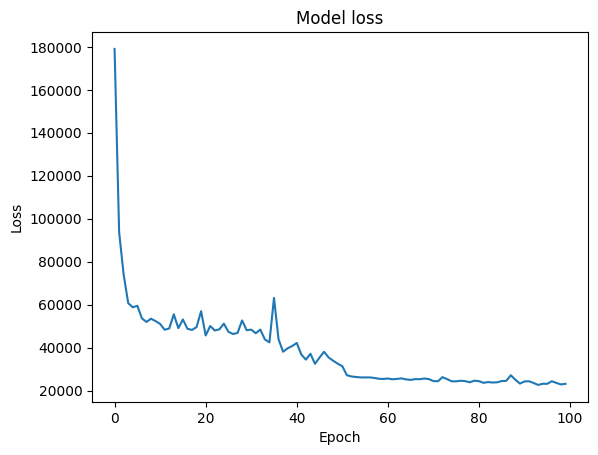

In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weights/weights150')

#Learning Rate
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 250
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(150,NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])

        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 10 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==249):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights260')

#Learning Rate
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 350
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(260,NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])

        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 10 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==349):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 10s 10s/step
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)


Epoch 261 | Batch:   0 of 250. Loss AE   30889.46 | Loss Extraction1    3861.41 | Loss Extraction2    4444.88:   2%|▏         | 1/50 [00:31<25:32, 31.28s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 261 | Batch:   5 of 250. Loss AE   24352.84 | Loss Extraction1    3061.00 | Loss Extraction2    5597.42:   4%|▍         | 2/50 [00:32<10:52, 13.60s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 261 | Batch:  10 of 250. Loss AE   22248.91 | Loss Extraction1    3097.16 | Loss Extraction2    5170.37:   6%|▌         | 3/50 [00:33<06:04,  7.75s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 261 | Batch:  15 of 250. Loss AE   22197.05 | Loss Extraction1    3790.87 | Loss Extraction2    4635.42:   8%|▊         | 4/50 [00:34<03:50,  5.00s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 261 | Batch:  20 of 250. Loss AE   22196.52 | Loss Extraction1    3618.08 | Loss Extraction2    4332.80:  10%|█         | 5/50 [00:34<02:36,  3.48s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 261 | Batch:  25 of 250. Loss AE   21959.77 | Loss Extraction1    3612.82 | Loss Extraction2    4221.43:  12%|█▏        | 6/50 [00:35<01:53,  2.57s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 261 | Batch:  30 of 250. Loss AE   22755.52 | Loss Extraction1    3535.67 | Loss Extraction2    4233.76:  14%|█▍        | 7/50 [00:36<01:25,  1.99s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 261 | Batch:  35 of 250. Loss AE   21903.35 | Loss Extraction1    3700.70 | Loss Extraction2    4275.14:  16%|█▌        | 8/50 [00:37<01:07,  1.61s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 261 | Batch:  40 of 250. Loss AE   21984.79 | Loss Extraction1    3884.85 | Loss Extraction2    4345.22:  18%|█▊        | 9/50 [00:38<00:55,  1.36s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 261 | Batch:  45 of 250. Loss AE   21934.81 | Loss Extraction1    3920.42 | Loss Extraction2    4311.68:  20%|██        | 10/50 [00:38<00:47,  1.18s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch:  50 of 250. Loss AE   22801.39 | Loss Extraction1    3925.88 | Loss Extraction2    4254.62:  22%|██▏       | 11/50 [00:39<00:41,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch:  55 of 250. Loss AE   23169.00 | Loss Extraction1    3861.62 | Loss Extraction2    4199.67:  24%|██▍       | 12/50 [00:40<00:37,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 261 | Batch:  60 of 250. Loss AE   22844.27 | Loss Extraction1    3881.91 | Loss Extraction2    4214.36:  26%|██▌       | 13/50 [00:41<00:34,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 261 | Batch:  65 of 250. Loss AE   22179.77 | Loss Extraction1    3881.38 | Loss Extraction2    4070.02:  28%|██▊       | 14/50 [00:42<00:32,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 261 | Batch:  70 of 250. Loss AE   22256.87 | Loss Extraction1    3893.83 | Loss Extraction2    4083.26:  30%|███       | 15/50 [00:43<00:33,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 261 | Batch:  75 of 250. Loss AE   22165.43 | Loss Extraction1    3843.65 | Loss Extraction2    4157.20:  32%|███▏      | 16/50 [00:44<00:34,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 261 | Batch:  80 of 250. Loss AE   21574.89 | Loss Extraction1    3795.19 | Loss Extraction2    4098.10:  34%|███▍      | 17/50 [00:45<00:34,  1.06s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 261 | Batch:  85 of 250. Loss AE   21894.94 | Loss Extraction1    3841.75 | Loss Extraction2    4036.89:  36%|███▌      | 18/50 [00:46<00:31,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch:  90 of 250. Loss AE   22015.07 | Loss Extraction1    3836.05 | Loss Extraction2    4084.59:  38%|███▊      | 19/50 [00:47<00:28,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 261 | Batch:  95 of 250. Loss AE   22211.48 | Loss Extraction1    3852.20 | Loss Extraction2    4054.20:  40%|████      | 20/50 [00:47<00:26,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 261 | Batch: 100 of 250. Loss AE   22569.10 | Loss Extraction1    3931.25 | Loss Extraction2    4138.41:  42%|████▏     | 21/50 [00:48<00:25,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 105 of 250. Loss AE   22310.61 | Loss Extraction1    3886.67 | Loss Extraction2    4092.65:  44%|████▍     | 22/50 [00:49<00:23,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 110 of 250. Loss AE   22325.53 | Loss Extraction1    3971.44 | Loss Extraction2    4081.99:  46%|████▌     | 23/50 [00:50<00:22,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 261 | Batch: 115 of 250. Loss AE   22182.52 | Loss Extraction1    3982.32 | Loss Extraction2    4150.46:  48%|████▊     | 24/50 [00:51<00:21,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 120 of 250. Loss AE   22049.60 | Loss Extraction1    4016.69 | Loss Extraction2    4148.22:  50%|█████     | 25/50 [00:52<00:20,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 261 | Batch: 125 of 250. Loss AE   21849.51 | Loss Extraction1    4011.81 | Loss Extraction2    4169.61:  52%|█████▏    | 26/50 [00:52<00:19,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 130 of 250. Loss AE   21898.30 | Loss Extraction1    4010.04 | Loss Extraction2    4338.48:  54%|█████▍    | 27/50 [00:53<00:18,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 261 | Batch: 135 of 250. Loss AE   21991.48 | Loss Extraction1    3980.28 | Loss Extraction2    4531.30:  56%|█████▌    | 28/50 [00:54<00:18,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 261 | Batch: 140 of 250. Loss AE   22156.04 | Loss Extraction1    3935.20 | Loss Extraction2    4471.12:  58%|█████▊    | 29/50 [00:55<00:17,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 261 | Batch: 145 of 250. Loss AE   22081.02 | Loss Extraction1    3876.60 | Loss Extraction2    4451.07:  60%|██████    | 30/50 [00:56<00:16,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 261 | Batch: 150 of 250. Loss AE   21951.23 | Loss Extraction1    3879.58 | Loss Extraction2    4420.56:  62%|██████▏   | 31/50 [00:57<00:17,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 261 | Batch: 155 of 250. Loss AE   22373.74 | Loss Extraction1    3897.23 | Loss Extraction2    4407.13:  64%|██████▍   | 32/50 [00:58<00:17,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 160 of 250. Loss AE   22365.94 | Loss Extraction1    3907.86 | Loss Extraction2    4477.71:  66%|██████▌   | 33/50 [00:59<00:15,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 165 of 250. Loss AE   22269.49 | Loss Extraction1    3874.35 | Loss Extraction2    4440.82:  68%|██████▊   | 34/50 [01:00<00:14,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 170 of 250. Loss AE   22189.64 | Loss Extraction1    3868.42 | Loss Extraction2    4437.73:  70%|███████   | 35/50 [01:00<00:13,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 175 of 250. Loss AE   22167.01 | Loss Extraction1    3893.52 | Loss Extraction2    4468.15:  72%|███████▏  | 36/50 [01:01<00:12,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 261 | Batch: 180 of 250. Loss AE   22070.68 | Loss Extraction1    3884.78 | Loss Extraction2    4413.60:  74%|███████▍  | 37/50 [01:02<00:11,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 185 of 250. Loss AE   22159.65 | Loss Extraction1    3915.57 | Loss Extraction2    4413.91:  76%|███████▌  | 38/50 [01:03<00:10,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 261 | Batch: 190 of 250. Loss AE   22399.40 | Loss Extraction1    3946.05 | Loss Extraction2    4477.87:  78%|███████▊  | 39/50 [01:04<00:09,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 261 | Batch: 195 of 250. Loss AE   22368.13 | Loss Extraction1    3983.25 | Loss Extraction2    4451.56:  80%|████████  | 40/50 [01:05<00:08,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 200 of 250. Loss AE   22221.89 | Loss Extraction1    3960.49 | Loss Extraction2    4432.33:  82%|████████▏ | 41/50 [01:05<00:07,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 261 | Batch: 205 of 250. Loss AE   22079.10 | Loss Extraction1    3926.10 | Loss Extraction2    4448.81:  84%|████████▍ | 42/50 [01:06<00:06,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 261 | Batch: 210 of 250. Loss AE   22143.06 | Loss Extraction1    3947.36 | Loss Extraction2    4571.96:  86%|████████▌ | 43/50 [01:07<00:05,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 261 | Batch: 215 of 250. Loss AE   22096.33 | Loss Extraction1    3976.65 | Loss Extraction2    4633.68:  88%|████████▊ | 44/50 [01:08<00:05,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 261 | Batch: 220 of 250. Loss AE   21904.35 | Loss Extraction1    3954.07 | Loss Extraction2    4621.66:  90%|█████████ | 45/50 [01:09<00:04,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 261 | Batch: 225 of 250. Loss AE   21980.00 | Loss Extraction1    3936.39 | Loss Extraction2    4591.83:  92%|█████████▏| 46/50 [01:10<00:03,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 261 | Batch: 230 of 250. Loss AE   22065.70 | Loss Extraction1    3915.18 | Loss Extraction2    4577.87:  94%|█████████▍| 47/50 [01:11<00:02,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 261 | Batch: 235 of 250. Loss AE   22210.44 | Loss Extraction1    4109.44 | Loss Extraction2    4560.92:  96%|█████████▌| 48/50 [01:12<00:01,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 261 | Batch: 240 of 250. Loss AE   22204.97 | Loss Extraction1    4137.10 | Loss Extraction2    4525.97:  98%|█████████▊| 49/50 [01:12<00:00,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 261 | Batch: 245 of 250. Loss AE   22429.87 | Loss Extraction1    4125.68 | Loss Extraction2    4599.40: 100%|██████████| 50/50 [01:13<00:00,  1.47s/it]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 262 | Batch:   0 of 250. Loss AE   37060.03 | Loss Extraction1   12040.24 | Loss Extraction2    3646.71:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch:   5 of 250. Loss AE   24308.98 | Loss Extraction1    7505.69 | Loss Extraction2    3782.35:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch:  10 of 250. Loss AE   25428.39 | Loss Extraction1    5758.92 | Loss Extraction2    4065.58:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 262 | Batch:  15 of 250. Loss AE   24814.83 | Loss Extraction1    5631.67 | Loss Extraction2    3847.52:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 262 | Batch:  20 of 250. Loss AE   23633.50 | Loss Extraction1    5327.44 | Loss Extraction2    3887.80:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 262 | Batch:  25 of 250. Loss AE   23568.42 | Loss Extraction1    5173.45 | Loss Extraction2    3699.13:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch:  30 of 250. Loss AE   24416.03 | Loss Extraction1    5206.64 | Loss Extraction2    3773.88:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch:  35 of 250. Loss AE   22843.12 | Loss Extraction1    5046.14 | Loss Extraction2    3756.68:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch:  40 of 250. Loss AE   22524.31 | Loss Extraction1    4959.76 | Loss Extraction2    4327.02:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 262 | Batch:  45 of 250. Loss AE   22141.14 | Loss Extraction1    4670.00 | Loss Extraction2    4265.90:  20%|██        | 10/50 [00:09<00:41,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 262 | Batch:  50 of 250. Loss AE   21956.68 | Loss Extraction1    4697.89 | Loss Extraction2    4086.49:  22%|██▏       | 11/50 [00:10<00:41,  1.07s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 262 | Batch:  55 of 250. Loss AE   22479.21 | Loss Extraction1    4733.72 | Loss Extraction2    4067.28:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch:  60 of 250. Loss AE   22403.84 | Loss Extraction1    4557.46 | Loss Extraction2    3946.48:  26%|██▌       | 13/50 [00:12<00:35,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 262 | Batch:  65 of 250. Loss AE   22223.75 | Loss Extraction1    4455.99 | Loss Extraction2    3924.28:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 262 | Batch:  70 of 250. Loss AE   22332.78 | Loss Extraction1    4484.33 | Loss Extraction2    3949.00:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 262 | Batch:  75 of 250. Loss AE   22136.84 | Loss Extraction1    4614.99 | Loss Extraction2    3908.40:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch:  80 of 250. Loss AE   22738.18 | Loss Extraction1    4621.35 | Loss Extraction2    4287.95:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 262 | Batch:  85 of 250. Loss AE   22703.32 | Loss Extraction1    4585.36 | Loss Extraction2    4279.73:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch:  90 of 250. Loss AE   22587.12 | Loss Extraction1    4510.76 | Loss Extraction2    4257.06:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 262 | Batch:  95 of 250. Loss AE   22201.63 | Loss Extraction1    4448.93 | Loss Extraction2    4203.13:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 262 | Batch: 100 of 250. Loss AE   22491.84 | Loss Extraction1    4408.05 | Loss Extraction2    4135.03:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch: 105 of 250. Loss AE   22321.49 | Loss Extraction1    4377.34 | Loss Extraction2    4127.19:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 262 | Batch: 110 of 250. Loss AE   22214.72 | Loss Extraction1    4296.32 | Loss Extraction2    4269.06:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 262 | Batch: 115 of 250. Loss AE   21981.78 | Loss Extraction1    4301.84 | Loss Extraction2    4282.77:  48%|████▊     | 24/50 [00:21<00:24,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 262 | Batch: 120 of 250. Loss AE   22059.35 | Loss Extraction1    4245.77 | Loss Extraction2    4285.32:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 262 | Batch: 125 of 250. Loss AE   22102.79 | Loss Extraction1    4249.59 | Loss Extraction2    4255.43:  52%|█████▏    | 26/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 262 | Batch: 130 of 250. Loss AE   21984.58 | Loss Extraction1    4211.20 | Loss Extraction2    4232.74:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 262 | Batch: 135 of 250. Loss AE   22119.37 | Loss Extraction1    4205.04 | Loss Extraction2    4159.31:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch: 140 of 250. Loss AE   22161.28 | Loss Extraction1    4146.93 | Loss Extraction2    4158.51:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 262 | Batch: 145 of 250. Loss AE   22038.29 | Loss Extraction1    4070.29 | Loss Extraction2    4185.27:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch: 150 of 250. Loss AE   21835.56 | Loss Extraction1    4042.13 | Loss Extraction2    4195.20:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch: 155 of 250. Loss AE   21580.71 | Loss Extraction1    3983.58 | Loss Extraction2    4156.62:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 262 | Batch: 160 of 250. Loss AE   21481.90 | Loss Extraction1    4001.06 | Loss Extraction2    4107.86:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch: 165 of 250. Loss AE   21535.17 | Loss Extraction1    3975.06 | Loss Extraction2    4113.19:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch: 170 of 250. Loss AE   21527.48 | Loss Extraction1    3982.73 | Loss Extraction2    4153.85:  70%|███████   | 35/50 [00:31<00:12,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch: 175 of 250. Loss AE   21490.28 | Loss Extraction1    4005.21 | Loss Extraction2    4226.09:  72%|███████▏  | 36/50 [00:32<00:11,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch: 180 of 250. Loss AE   21412.01 | Loss Extraction1    3963.96 | Loss Extraction2    4270.18:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 262 | Batch: 185 of 250. Loss AE   21467.01 | Loss Extraction1    3946.80 | Loss Extraction2    4274.02:  76%|███████▌  | 38/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 262 | Batch: 190 of 250. Loss AE   21637.32 | Loss Extraction1    4000.84 | Loss Extraction2    4281.21:  78%|███████▊  | 39/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 262 | Batch: 195 of 250. Loss AE   21602.85 | Loss Extraction1    3998.89 | Loss Extraction2    4372.10:  80%|████████  | 40/50 [00:35<00:09,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 262 | Batch: 200 of 250. Loss AE   21459.81 | Loss Extraction1    3999.79 | Loss Extraction2    4340.59:  82%|████████▏ | 41/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 262 | Batch: 205 of 250. Loss AE   21489.49 | Loss Extraction1    4005.70 | Loss Extraction2    4437.25:  84%|████████▍ | 42/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch: 210 of 250. Loss AE   21680.94 | Loss Extraction1    3969.05 | Loss Extraction2    4580.80:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 262 | Batch: 215 of 250. Loss AE   21862.14 | Loss Extraction1    3940.58 | Loss Extraction2    4568.71:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 262 | Batch: 220 of 250. Loss AE   22012.28 | Loss Extraction1    3915.45 | Loss Extraction2    4554.45:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 262 | Batch: 225 of 250. Loss AE   22076.45 | Loss Extraction1    3983.26 | Loss Extraction2    4573.07:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 262 | Batch: 230 of 250. Loss AE   21951.80 | Loss Extraction1    3970.26 | Loss Extraction2    4549.44:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch: 235 of 250. Loss AE   21879.28 | Loss Extraction1    3946.55 | Loss Extraction2    4524.27:  96%|█████████▌| 48/50 [00:42<00:01,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 262 | Batch: 240 of 250. Loss AE   21764.13 | Loss Extraction1    3976.38 | Loss Extraction2    4525.30:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 262 | Batch: 245 of 250. Loss AE   21724.08 | Loss Extraction1    3994.21 | Loss Extraction2    4499.74: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 263 | Batch:   0 of 250. Loss AE   17651.15 | Loss Extraction1    3831.80 | Loss Extraction2    2019.30:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 263 | Batch:   5 of 250. Loss AE   20278.28 | Loss Extraction1    4186.35 | Loss Extraction2    3254.82:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 263 | Batch:  10 of 250. Loss AE   18328.47 | Loss Extraction1    3726.84 | Loss Extraction2    3334.43:   6%|▌         | 3/50 [00:02<00:48,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 263 | Batch:  15 of 250. Loss AE   19060.92 | Loss Extraction1    3666.91 | Loss Extraction2    4745.88:   8%|▊         | 4/50 [00:04<00:49,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 263 | Batch:  20 of 250. Loss AE   20147.22 | Loss Extraction1    3383.65 | Loss Extraction2    4682.12:  10%|█         | 5/50 [00:04<00:44,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch:  25 of 250. Loss AE   20118.58 | Loss Extraction1    3231.58 | Loss Extraction2    4536.65:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 263 | Batch:  30 of 250. Loss AE   19527.29 | Loss Extraction1    3312.22 | Loss Extraction2    4068.89:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 263 | Batch:  35 of 250. Loss AE   19100.79 | Loss Extraction1    3384.80 | Loss Extraction2    3938.64:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 263 | Batch:  40 of 250. Loss AE   19246.70 | Loss Extraction1    3661.35 | Loss Extraction2    3897.85:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 263 | Batch:  45 of 250. Loss AE   18953.21 | Loss Extraction1    3669.08 | Loss Extraction2    3966.58:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch:  50 of 250. Loss AE   19607.28 | Loss Extraction1    3842.38 | Loss Extraction2    3965.98:  22%|██▏       | 11/50 [00:10<00:33,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 263 | Batch:  55 of 250. Loss AE   19576.44 | Loss Extraction1    3905.44 | Loss Extraction2    4141.97:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch:  60 of 250. Loss AE   20221.62 | Loss Extraction1    3926.35 | Loss Extraction2    4281.31:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 263 | Batch:  65 of 250. Loss AE   20322.69 | Loss Extraction1    3938.81 | Loss Extraction2    4181.72:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 263 | Batch:  70 of 250. Loss AE   20899.34 | Loss Extraction1    3978.44 | Loss Extraction2    4174.03:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 263 | Batch:  75 of 250. Loss AE   21273.78 | Loss Extraction1    4025.77 | Loss Extraction2    4266.17:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 263 | Batch:  80 of 250. Loss AE   21088.29 | Loss Extraction1    3972.49 | Loss Extraction2    4264.87:  34%|███▍      | 17/50 [00:15<00:27,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 263 | Batch:  85 of 250. Loss AE   20728.76 | Loss Extraction1    3908.64 | Loss Extraction2    4217.14:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 263 | Batch:  90 of 250. Loss AE   21119.94 | Loss Extraction1    3845.54 | Loss Extraction2    4198.12:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 263 | Batch:  95 of 250. Loss AE   21046.74 | Loss Extraction1    3729.98 | Loss Extraction2    4253.37:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 263 | Batch: 100 of 250. Loss AE   21489.30 | Loss Extraction1    3775.93 | Loss Extraction2    4347.82:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 263 | Batch: 105 of 250. Loss AE   21415.70 | Loss Extraction1    3829.44 | Loss Extraction2    4267.84:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 110 of 250. Loss AE   21598.19 | Loss Extraction1    3779.14 | Loss Extraction2    4248.87:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 115 of 250. Loss AE   21382.81 | Loss Extraction1    3853.06 | Loss Extraction2    4240.58:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 120 of 250. Loss AE   21203.63 | Loss Extraction1    3908.64 | Loss Extraction2    4282.54:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 125 of 250. Loss AE   21160.75 | Loss Extraction1    3915.07 | Loss Extraction2    4251.54:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 263 | Batch: 130 of 250. Loss AE   20942.22 | Loss Extraction1    3860.70 | Loss Extraction2    4270.61:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 263 | Batch: 135 of 250. Loss AE   21253.97 | Loss Extraction1    3907.18 | Loss Extraction2    4290.64:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 140 of 250. Loss AE   21185.14 | Loss Extraction1    3874.17 | Loss Extraction2    4308.09:  58%|█████▊    | 29/50 [00:25<00:17,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 145 of 250. Loss AE   21682.85 | Loss Extraction1    4108.58 | Loss Extraction2    4354.83:  60%|██████    | 30/50 [00:26<00:16,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 150 of 250. Loss AE   21853.26 | Loss Extraction1    4137.08 | Loss Extraction2    4427.02:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 155 of 250. Loss AE   22056.23 | Loss Extraction1    4087.26 | Loss Extraction2    4477.16:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 263 | Batch: 160 of 250. Loss AE   21942.44 | Loss Extraction1    4111.27 | Loss Extraction2    4459.88:  66%|██████▌   | 33/50 [00:29<00:16,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 263 | Batch: 165 of 250. Loss AE   22078.42 | Loss Extraction1    4061.29 | Loss Extraction2    4484.67:  68%|██████▊   | 34/50 [00:30<00:15,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 263 | Batch: 170 of 250. Loss AE   21948.22 | Loss Extraction1    4044.01 | Loss Extraction2    4499.85:  70%|███████   | 35/50 [00:30<00:13,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 263 | Batch: 175 of 250. Loss AE   22048.40 | Loss Extraction1    3998.63 | Loss Extraction2    4475.83:  72%|███████▏  | 36/50 [00:31<00:12,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 263 | Batch: 180 of 250. Loss AE   21920.58 | Loss Extraction1    4020.55 | Loss Extraction2    4472.93:  74%|███████▍  | 37/50 [00:32<00:11,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 185 of 250. Loss AE   21863.20 | Loss Extraction1    3991.67 | Loss Extraction2    4444.00:  76%|███████▌  | 38/50 [00:33<00:10,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 263 | Batch: 190 of 250. Loss AE   22061.50 | Loss Extraction1    4018.46 | Loss Extraction2    4411.99:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 263 | Batch: 195 of 250. Loss AE   22216.73 | Loss Extraction1    4058.37 | Loss Extraction2    4372.93:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 200 of 250. Loss AE   22279.21 | Loss Extraction1    4063.09 | Loss Extraction2    4556.15:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 263 | Batch: 205 of 250. Loss AE   22160.85 | Loss Extraction1    4053.96 | Loss Extraction2    4498.01:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 210 of 250. Loss AE   22018.99 | Loss Extraction1    4082.17 | Loss Extraction2    4484.11:  86%|████████▌ | 43/50 [00:37<00:06,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 263 | Batch: 215 of 250. Loss AE   21882.61 | Loss Extraction1    4105.13 | Loss Extraction2    4454.59:  88%|████████▊ | 44/50 [00:38<00:05,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 263 | Batch: 220 of 250. Loss AE   22080.41 | Loss Extraction1    4114.67 | Loss Extraction2    4576.21:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 225 of 250. Loss AE   21924.83 | Loss Extraction1    4115.85 | Loss Extraction2    4571.85:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 263 | Batch: 230 of 250. Loss AE   21906.59 | Loss Extraction1    4113.93 | Loss Extraction2    4597.55:  94%|█████████▍| 47/50 [00:41<00:02,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 263 | Batch: 235 of 250. Loss AE   21926.81 | Loss Extraction1    4086.60 | Loss Extraction2    4565.76:  96%|█████████▌| 48/50 [00:42<00:01,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 263 | Batch: 240 of 250. Loss AE   21950.60 | Loss Extraction1    4108.41 | Loss Extraction2    4659.97:  98%|█████████▊| 49/50 [00:43<00:00,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 263 | Batch: 245 of 250. Loss AE   21977.17 | Loss Extraction1    4097.18 | Loss Extraction2    4666.40: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch:   0 of 250. Loss AE   16249.96 | Loss Extraction1    3237.81 | Loss Extraction2    2539.36:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch:   5 of 250. Loss AE   19560.29 | Loss Extraction1    4790.08 | Loss Extraction2    5330.06:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch:  10 of 250. Loss AE   18786.42 | Loss Extraction1    4225.53 | Loss Extraction2    4721.70:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch:  15 of 250. Loss AE   18748.08 | Loss Extraction1    4134.91 | Loss Extraction2    4244.87:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch:  20 of 250. Loss AE   18186.62 | Loss Extraction1    3886.98 | Loss Extraction2    4449.85:  10%|█         | 5/50 [00:04<00:37,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch:  25 of 250. Loss AE   18177.01 | Loss Extraction1    3894.68 | Loss Extraction2    4519.22:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch:  30 of 250. Loss AE   17547.63 | Loss Extraction1    3817.45 | Loss Extraction2    4455.30:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch:  35 of 250. Loss AE   18859.62 | Loss Extraction1    3907.38 | Loss Extraction2    4345.18:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch:  40 of 250. Loss AE   18941.24 | Loss Extraction1    4017.67 | Loss Extraction2    4673.84:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch:  45 of 250. Loss AE   20473.83 | Loss Extraction1    4016.12 | Loss Extraction2    4597.40:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch:  50 of 250. Loss AE   20443.05 | Loss Extraction1    3947.20 | Loss Extraction2    4464.50:  22%|██▏       | 11/50 [00:09<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch:  55 of 250. Loss AE   21124.57 | Loss Extraction1    3836.10 | Loss Extraction2    4407.23:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 264 | Batch:  60 of 250. Loss AE   21240.43 | Loss Extraction1    3716.01 | Loss Extraction2    4466.86:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 264 | Batch:  65 of 250. Loss AE   20937.56 | Loss Extraction1    3585.24 | Loss Extraction2    4385.28:  28%|██▊       | 14/50 [00:12<00:37,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch:  70 of 250. Loss AE   20743.71 | Loss Extraction1    3560.98 | Loss Extraction2    4493.69:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch:  75 of 250. Loss AE   21518.26 | Loss Extraction1    3551.95 | Loss Extraction2    4382.49:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch:  80 of 250. Loss AE   21619.05 | Loss Extraction1    3552.22 | Loss Extraction2    4336.07:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch:  85 of 250. Loss AE   21430.70 | Loss Extraction1    3634.49 | Loss Extraction2    4233.86:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch:  90 of 250. Loss AE   21403.87 | Loss Extraction1    3682.63 | Loss Extraction2    4481.20:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch:  95 of 250. Loss AE   21560.85 | Loss Extraction1    3788.52 | Loss Extraction2    4445.97:  40%|████      | 20/50 [00:17<00:25,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch: 100 of 250. Loss AE   22115.48 | Loss Extraction1    3774.47 | Loss Extraction2    4459.17:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch: 105 of 250. Loss AE   22341.70 | Loss Extraction1    3777.41 | Loss Extraction2    4416.82:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch: 110 of 250. Loss AE   22544.65 | Loss Extraction1    3751.08 | Loss Extraction2    4406.26:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch: 115 of 250. Loss AE   22456.13 | Loss Extraction1    3715.42 | Loss Extraction2    4368.57:  48%|████▊     | 24/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch: 120 of 250. Loss AE   22318.56 | Loss Extraction1    3718.92 | Loss Extraction2    4354.46:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch: 125 of 250. Loss AE   22827.82 | Loss Extraction1    3818.82 | Loss Extraction2    4382.28:  52%|█████▏    | 26/50 [00:22<00:21,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 264 | Batch: 130 of 250. Loss AE   22687.24 | Loss Extraction1    3821.14 | Loss Extraction2    4371.52:  54%|█████▍    | 27/50 [00:24<00:23,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 264 | Batch: 135 of 250. Loss AE   22392.09 | Loss Extraction1    3835.74 | Loss Extraction2    4354.46:  56%|█████▌    | 28/50 [00:25<00:23,  1.08s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 264 | Batch: 140 of 250. Loss AE   22312.92 | Loss Extraction1    3836.36 | Loss Extraction2    4317.92:  58%|█████▊    | 29/50 [00:26<00:21,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 264 | Batch: 145 of 250. Loss AE   22343.96 | Loss Extraction1    3818.05 | Loss Extraction2    4574.92:  60%|██████    | 30/50 [00:27<00:21,  1.08s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 264 | Batch: 150 of 250. Loss AE   22216.70 | Loss Extraction1    3824.62 | Loss Extraction2    4513.21:  62%|██████▏   | 31/50 [00:28<00:19,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch: 155 of 250. Loss AE   22692.79 | Loss Extraction1    3930.00 | Loss Extraction2    4516.92:  64%|██████▍   | 32/50 [00:29<00:17,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 264 | Batch: 160 of 250. Loss AE   22563.38 | Loss Extraction1    3910.25 | Loss Extraction2    4466.06:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch: 165 of 250. Loss AE   22566.50 | Loss Extraction1    3958.74 | Loss Extraction2    4465.95:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch: 170 of 250. Loss AE   22435.18 | Loss Extraction1    3954.87 | Loss Extraction2    4454.22:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 264 | Batch: 175 of 250. Loss AE   22423.65 | Loss Extraction1    3917.30 | Loss Extraction2    4526.84:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch: 180 of 250. Loss AE   22587.76 | Loss Extraction1    3892.69 | Loss Extraction2    4514.21:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 264 | Batch: 185 of 250. Loss AE   22491.86 | Loss Extraction1    3892.37 | Loss Extraction2    4521.58:  76%|███████▌  | 38/50 [00:34<00:10,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch: 190 of 250. Loss AE   22593.69 | Loss Extraction1    4094.63 | Loss Extraction2    4524.09:  78%|███████▊  | 39/50 [00:35<00:09,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 264 | Batch: 195 of 250. Loss AE   22506.99 | Loss Extraction1    4054.45 | Loss Extraction2    4520.05:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch: 200 of 250. Loss AE   22333.10 | Loss Extraction1    4025.78 | Loss Extraction2    4503.91:  82%|████████▏ | 41/50 [00:36<00:07,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 264 | Batch: 205 of 250. Loss AE   22182.80 | Loss Extraction1    4033.09 | Loss Extraction2    4510.22:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 264 | Batch: 210 of 250. Loss AE   22161.88 | Loss Extraction1    4041.46 | Loss Extraction2    4503.27:  86%|████████▌ | 43/50 [00:39<00:07,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 264 | Batch: 215 of 250. Loss AE   22153.22 | Loss Extraction1    4089.84 | Loss Extraction2    4500.18:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch: 220 of 250. Loss AE   22163.13 | Loss Extraction1    4088.15 | Loss Extraction2    4521.09:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 264 | Batch: 225 of 250. Loss AE   22130.86 | Loss Extraction1    4113.78 | Loss Extraction2    4454.30:  92%|█████████▏| 46/50 [00:41<00:03,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch: 230 of 250. Loss AE   22060.02 | Loss Extraction1    4113.89 | Loss Extraction2    4451.02:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch: 235 of 250. Loss AE   21941.90 | Loss Extraction1    4073.33 | Loss Extraction2    4426.75:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 264 | Batch: 240 of 250. Loss AE   21960.84 | Loss Extraction1    4054.21 | Loss Extraction2    4407.29:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 264 | Batch: 245 of 250. Loss AE   21796.71 | Loss Extraction1    4057.93 | Loss Extraction2    4378.20: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 265 | Batch:   0 of 250. Loss AE   34570.72 | Loss Extraction1   11756.00 | Loss Extraction2    3163.68:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 265 | Batch:   5 of 250. Loss AE   37904.97 | Loss Extraction1    8071.52 | Loss Extraction2    4148.42:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch:  10 of 250. Loss AE   37435.19 | Loss Extraction1    6444.18 | Loss Extraction2    3735.76:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 265 | Batch:  15 of 250. Loss AE   31767.25 | Loss Extraction1    5969.23 | Loss Extraction2    3524.12:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 265 | Batch:  20 of 250. Loss AE   29394.50 | Loss Extraction1    5679.45 | Loss Extraction2    3871.33:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 265 | Batch:  25 of 250. Loss AE   28512.10 | Loss Extraction1    5354.02 | Loss Extraction2    3914.25:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 265 | Batch:  30 of 250. Loss AE   27080.61 | Loss Extraction1    5753.05 | Loss Extraction2    3872.36:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 265 | Batch:  35 of 250. Loss AE   26526.83 | Loss Extraction1    5626.52 | Loss Extraction2    3888.10:  16%|█▌        | 8/50 [00:07<00:44,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch:  40 of 250. Loss AE   25184.80 | Loss Extraction1    5376.85 | Loss Extraction2    3919.91:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch:  45 of 250. Loss AE   24105.43 | Loss Extraction1    5198.92 | Loss Extraction2    3912.32:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 265 | Batch:  50 of 250. Loss AE   23794.26 | Loss Extraction1    5094.58 | Loss Extraction2    3899.09:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch:  55 of 250. Loss AE   23554.47 | Loss Extraction1    4917.78 | Loss Extraction2    3923.25:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 265 | Batch:  60 of 250. Loss AE   22943.73 | Loss Extraction1    4861.68 | Loss Extraction2    3758.41:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 265 | Batch:  65 of 250. Loss AE   22612.95 | Loss Extraction1    4855.42 | Loss Extraction2    3676.97:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch:  70 of 250. Loss AE   22593.97 | Loss Extraction1    4715.96 | Loss Extraction2    3545.44:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 265 | Batch:  75 of 250. Loss AE   22609.35 | Loss Extraction1    4643.70 | Loss Extraction2    3584.98:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 265 | Batch:  80 of 250. Loss AE   22341.01 | Loss Extraction1    4584.70 | Loss Extraction2    3580.96:  34%|███▍      | 17/50 [00:15<00:28,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 265 | Batch:  85 of 250. Loss AE   22701.79 | Loss Extraction1    4557.11 | Loss Extraction2    3651.95:  36%|███▌      | 18/50 [00:16<00:27,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch:  90 of 250. Loss AE   22582.50 | Loss Extraction1    4493.49 | Loss Extraction2    3588.74:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 265 | Batch:  95 of 250. Loss AE   22474.13 | Loss Extraction1    4415.46 | Loss Extraction2    3573.20:  40%|████      | 20/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 265 | Batch: 100 of 250. Loss AE   22368.78 | Loss Extraction1    4401.37 | Loss Extraction2    3602.28:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 265 | Batch: 105 of 250. Loss AE   22191.65 | Loss Extraction1    4299.00 | Loss Extraction2    3590.59:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 265 | Batch: 110 of 250. Loss AE   22213.54 | Loss Extraction1    4273.07 | Loss Extraction2    3841.52:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 265 | Batch: 115 of 250. Loss AE   21922.39 | Loss Extraction1    4215.04 | Loss Extraction2    3778.41:  48%|████▊     | 24/50 [00:21<00:23,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 265 | Batch: 120 of 250. Loss AE   21557.26 | Loss Extraction1    4159.96 | Loss Extraction2    3778.44:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 265 | Batch: 125 of 250. Loss AE   21481.39 | Loss Extraction1    4113.08 | Loss Extraction2    3833.33:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch: 130 of 250. Loss AE   21442.38 | Loss Extraction1    4109.27 | Loss Extraction2    3826.52:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch: 135 of 250. Loss AE   21251.36 | Loss Extraction1    4085.55 | Loss Extraction2    3832.05:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch: 140 of 250. Loss AE   21335.30 | Loss Extraction1    4121.50 | Loss Extraction2    3871.80:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 265 | Batch: 145 of 250. Loss AE   21226.39 | Loss Extraction1    4093.01 | Loss Extraction2    3916.98:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 265 | Batch: 150 of 250. Loss AE   21342.37 | Loss Extraction1    4058.55 | Loss Extraction2    3880.21:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch: 155 of 250. Loss AE   21239.41 | Loss Extraction1    4009.21 | Loss Extraction2    3921.35:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 265 | Batch: 160 of 250. Loss AE   21106.61 | Loss Extraction1    3969.46 | Loss Extraction2    4008.85:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 265 | Batch: 165 of 250. Loss AE   21184.82 | Loss Extraction1    3918.92 | Loss Extraction2    4131.99:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 265 | Batch: 170 of 250. Loss AE   21144.17 | Loss Extraction1    3910.38 | Loss Extraction2    4121.96:  70%|███████   | 35/50 [00:31<00:13,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 265 | Batch: 175 of 250. Loss AE   21447.73 | Loss Extraction1    3944.36 | Loss Extraction2    4096.44:  72%|███████▏  | 36/50 [00:32<00:13,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 265 | Batch: 180 of 250. Loss AE   21230.40 | Loss Extraction1    3948.42 | Loss Extraction2    4110.19:  74%|███████▍  | 37/50 [00:33<00:13,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch: 185 of 250. Loss AE   21282.06 | Loss Extraction1    3931.83 | Loss Extraction2    4130.19:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 265 | Batch: 190 of 250. Loss AE   21188.13 | Loss Extraction1    3901.46 | Loss Extraction2    4225.62:  78%|███████▊  | 39/50 [00:35<00:10,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 265 | Batch: 195 of 250. Loss AE   21096.28 | Loss Extraction1    3871.55 | Loss Extraction2    4196.87:  80%|████████  | 40/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 265 | Batch: 200 of 250. Loss AE   21133.93 | Loss Extraction1    3870.45 | Loss Extraction2    4220.79:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 265 | Batch: 205 of 250. Loss AE   21223.87 | Loss Extraction1    3859.47 | Loss Extraction2    4274.30:  84%|████████▍ | 42/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch: 210 of 250. Loss AE   21473.97 | Loss Extraction1    3940.78 | Loss Extraction2    4260.96:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 265 | Batch: 215 of 250. Loss AE   21630.01 | Loss Extraction1    4001.39 | Loss Extraction2    4247.40:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 265 | Batch: 220 of 250. Loss AE   21757.88 | Loss Extraction1    3978.41 | Loss Extraction2    4396.64:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch: 225 of 250. Loss AE   21547.03 | Loss Extraction1    3979.74 | Loss Extraction2    4357.25:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 265 | Batch: 230 of 250. Loss AE   21719.67 | Loss Extraction1    4061.76 | Loss Extraction2    4393.30:  94%|█████████▍| 47/50 [00:42<00:02,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 265 | Batch: 235 of 250. Loss AE   21748.92 | Loss Extraction1    4089.25 | Loss Extraction2    4433.02:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 265 | Batch: 240 of 250. Loss AE   21715.63 | Loss Extraction1    4104.80 | Loss Extraction2    4391.41:  98%|█████████▊| 49/50 [00:43<00:00,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 265 | Batch: 245 of 250. Loss AE   21643.57 | Loss Extraction1    4115.44 | Loss Extraction2    4359.34: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 266 | Batch:   0 of 250. Loss AE   25995.26 | Loss Extraction1    5524.16 | Loss Extraction2    4068.94:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 266 | Batch:   5 of 250. Loss AE   22151.77 | Loss Extraction1    5847.81 | Loss Extraction2    4807.67:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 266 | Batch:  10 of 250. Loss AE   22552.68 | Loss Extraction1    5838.59 | Loss Extraction2    5740.85:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch:  15 of 250. Loss AE   21443.08 | Loss Extraction1    5522.34 | Loss Extraction2    5564.46:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch:  20 of 250. Loss AE   21611.09 | Loss Extraction1    5731.74 | Loss Extraction2    5248.37:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 266 | Batch:  25 of 250. Loss AE   23491.10 | Loss Extraction1    5652.52 | Loss Extraction2    6003.63:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch:  30 of 250. Loss AE   24622.14 | Loss Extraction1    5378.15 | Loss Extraction2    5992.18:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch:  35 of 250. Loss AE   23066.60 | Loss Extraction1    5100.80 | Loss Extraction2    5592.78:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch:  40 of 250. Loss AE   23699.46 | Loss Extraction1    4964.23 | Loss Extraction2    5616.29:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch:  45 of 250. Loss AE   23717.76 | Loss Extraction1    4716.33 | Loss Extraction2    5473.83:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch:  50 of 250. Loss AE   23491.84 | Loss Extraction1    4627.67 | Loss Extraction2    5314.87:  22%|██▏       | 11/50 [00:09<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch:  55 of 250. Loss AE   23018.78 | Loss Extraction1    4438.82 | Loss Extraction2    5173.36:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch:  60 of 250. Loss AE   23296.63 | Loss Extraction1    4439.39 | Loss Extraction2    5015.64:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 266 | Batch:  65 of 250. Loss AE   23214.87 | Loss Extraction1    4501.51 | Loss Extraction2    4954.12:  28%|██▊       | 14/50 [00:11<00:30,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 266 | Batch:  70 of 250. Loss AE   23471.34 | Loss Extraction1    4932.31 | Loss Extraction2    4890.81:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 266 | Batch:  75 of 250. Loss AE   23402.09 | Loss Extraction1    4842.10 | Loss Extraction2    4936.62:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 266 | Batch:  80 of 250. Loss AE   23235.30 | Loss Extraction1    4735.07 | Loss Extraction2    4847.87:  34%|███▍      | 17/50 [00:14<00:30,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch:  85 of 250. Loss AE   23305.49 | Loss Extraction1    4678.40 | Loss Extraction2    4793.99:  36%|███▌      | 18/50 [00:15<00:28,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch:  90 of 250. Loss AE   23290.49 | Loss Extraction1    4631.12 | Loss Extraction2    4935.68:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 266 | Batch:  95 of 250. Loss AE   23321.42 | Loss Extraction1    4595.99 | Loss Extraction2    4979.82:  40%|████      | 20/50 [00:17<00:27,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch: 100 of 250. Loss AE   23219.92 | Loss Extraction1    4601.62 | Loss Extraction2    5053.39:  42%|████▏     | 21/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch: 105 of 250. Loss AE   22672.26 | Loss Extraction1    4518.58 | Loss Extraction2    4963.56:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 266 | Batch: 110 of 250. Loss AE   23043.20 | Loss Extraction1    4514.81 | Loss Extraction2    5019.05:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch: 115 of 250. Loss AE   22897.42 | Loss Extraction1    4531.02 | Loss Extraction2    4894.18:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch: 120 of 250. Loss AE   22519.29 | Loss Extraction1    4482.93 | Loss Extraction2    4864.25:  50%|█████     | 25/50 [00:21<00:21,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch: 125 of 250. Loss AE   22565.58 | Loss Extraction1    4465.25 | Loss Extraction2    5193.15:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 266 | Batch: 130 of 250. Loss AE   22557.59 | Loss Extraction1    4467.43 | Loss Extraction2    5249.92:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 266 | Batch: 135 of 250. Loss AE   22333.81 | Loss Extraction1    4493.87 | Loss Extraction2    5161.02:  56%|█████▌    | 28/50 [00:24<00:18,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 266 | Batch: 140 of 250. Loss AE   22283.73 | Loss Extraction1    4521.82 | Loss Extraction2    5165.97:  58%|█████▊    | 29/50 [00:25<00:20,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 266 | Batch: 145 of 250. Loss AE   22145.72 | Loss Extraction1    4470.88 | Loss Extraction2    5165.23:  60%|██████    | 30/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 266 | Batch: 150 of 250. Loss AE   22376.01 | Loss Extraction1    4432.08 | Loss Extraction2    5256.94:  62%|██████▏   | 31/50 [00:27<00:19,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch: 155 of 250. Loss AE   22636.36 | Loss Extraction1    4524.24 | Loss Extraction2    5252.36:  64%|██████▍   | 32/50 [00:28<00:17,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch: 160 of 250. Loss AE   22449.57 | Loss Extraction1    4456.90 | Loss Extraction2    5243.92:  66%|██████▌   | 33/50 [00:29<00:17,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 266 | Batch: 165 of 250. Loss AE   22366.38 | Loss Extraction1    4483.53 | Loss Extraction2    5264.37:  68%|██████▊   | 34/50 [00:30<00:15,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch: 170 of 250. Loss AE   22342.85 | Loss Extraction1    4479.02 | Loss Extraction2    5260.78:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch: 175 of 250. Loss AE   22399.23 | Loss Extraction1    4474.85 | Loss Extraction2    5338.68:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch: 180 of 250. Loss AE   22305.80 | Loss Extraction1    4464.93 | Loss Extraction2    5310.98:  74%|███████▍  | 37/50 [00:33<00:12,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch: 185 of 250. Loss AE   22268.37 | Loss Extraction1    4421.54 | Loss Extraction2    5340.62:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch: 190 of 250. Loss AE   22523.54 | Loss Extraction1    4415.16 | Loss Extraction2    5284.19:  78%|███████▊  | 39/50 [00:35<00:09,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch: 195 of 250. Loss AE   22552.71 | Loss Extraction1    4452.69 | Loss Extraction2    5317.78:  80%|████████  | 40/50 [00:35<00:08,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch: 200 of 250. Loss AE   22359.78 | Loss Extraction1    4442.56 | Loss Extraction2    5279.24:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 266 | Batch: 205 of 250. Loss AE   22415.04 | Loss Extraction1    4414.66 | Loss Extraction2    5270.94:  84%|████████▍ | 42/50 [00:37<00:07,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 266 | Batch: 210 of 250. Loss AE   22474.70 | Loss Extraction1    4462.72 | Loss Extraction2    5258.52:  86%|████████▌ | 43/50 [00:38<00:06,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 266 | Batch: 215 of 250. Loss AE   22535.08 | Loss Extraction1    4412.50 | Loss Extraction2    5273.43:  88%|████████▊ | 44/50 [00:39<00:06,  1.01s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 266 | Batch: 220 of 250. Loss AE   22886.78 | Loss Extraction1    4392.14 | Loss Extraction2    5326.77:  90%|█████████ | 45/50 [00:40<00:04,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch: 225 of 250. Loss AE   22971.06 | Loss Extraction1    4361.84 | Loss Extraction2    5338.93:  92%|█████████▏| 46/50 [00:41<00:03,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch: 230 of 250. Loss AE   22926.33 | Loss Extraction1    4398.22 | Loss Extraction2    5311.72:  94%|█████████▍| 47/50 [00:42<00:02,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 266 | Batch: 235 of 250. Loss AE   22819.65 | Loss Extraction1    4376.04 | Loss Extraction2    5305.90:  96%|█████████▌| 48/50 [00:43<00:01,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 266 | Batch: 240 of 250. Loss AE   22978.51 | Loss Extraction1    4365.33 | Loss Extraction2    5294.61:  98%|█████████▊| 49/50 [00:44<00:00,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 266 | Batch: 245 of 250. Loss AE   22900.30 | Loss Extraction1    4346.48 | Loss Extraction2    5263.05: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 267 | Batch:   0 of 250. Loss AE   21412.95 | Loss Extraction1    4029.58 | Loss Extraction2    5782.38:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch:   5 of 250. Loss AE   27709.87 | Loss Extraction1    4856.56 | Loss Extraction2    5003.87:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 267 | Batch:  10 of 250. Loss AE   24447.10 | Loss Extraction1    4166.21 | Loss Extraction2    4870.76:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch:  15 of 250. Loss AE   21715.30 | Loss Extraction1    4285.23 | Loss Extraction2    4695.76:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 267 | Batch:  20 of 250. Loss AE   22552.64 | Loss Extraction1    4227.27 | Loss Extraction2    4337.03:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 267 | Batch:  25 of 250. Loss AE   21372.32 | Loss Extraction1    4005.44 | Loss Extraction2    4141.90:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 267 | Batch:  30 of 250. Loss AE   20580.18 | Loss Extraction1    4010.66 | Loss Extraction2    4000.18:  14%|█▍        | 7/50 [00:06<00:43,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 267 | Batch:  35 of 250. Loss AE   20616.21 | Loss Extraction1    3995.91 | Loss Extraction2    3962.44:  16%|█▌        | 8/50 [00:07<00:42,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 267 | Batch:  40 of 250. Loss AE   20632.50 | Loss Extraction1    4040.46 | Loss Extraction2    4251.99:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 267 | Batch:  45 of 250. Loss AE   20143.06 | Loss Extraction1    4107.13 | Loss Extraction2    4138.93:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch:  50 of 250. Loss AE   20205.03 | Loss Extraction1    3976.61 | Loss Extraction2    4198.16:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch:  55 of 250. Loss AE   20222.88 | Loss Extraction1    3889.40 | Loss Extraction2    4719.27:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 267 | Batch:  60 of 250. Loss AE   21138.13 | Loss Extraction1    3905.99 | Loss Extraction2    4896.99:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 267 | Batch:  65 of 250. Loss AE   21057.86 | Loss Extraction1    3791.37 | Loss Extraction2    4995.16:  28%|██▊       | 14/50 [00:12<00:32,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 267 | Batch:  70 of 250. Loss AE   20774.56 | Loss Extraction1    3749.45 | Loss Extraction2    4943.59:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 267 | Batch:  75 of 250. Loss AE   21216.08 | Loss Extraction1    3776.82 | Loss Extraction2    5253.25:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 267 | Batch:  80 of 250. Loss AE   21309.48 | Loss Extraction1    3813.15 | Loss Extraction2    5319.57:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 267 | Batch:  85 of 250. Loss AE   21567.66 | Loss Extraction1    3826.46 | Loss Extraction2    5487.12:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch:  90 of 250. Loss AE   21889.65 | Loss Extraction1    3867.15 | Loss Extraction2    5630.11:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch:  95 of 250. Loss AE   21878.24 | Loss Extraction1    3804.53 | Loss Extraction2    5771.44:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 267 | Batch: 100 of 250. Loss AE   22090.66 | Loss Extraction1    3819.42 | Loss Extraction2    5799.27:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 267 | Batch: 105 of 250. Loss AE   21862.80 | Loss Extraction1    3771.98 | Loss Extraction2    5734.68:  44%|████▍     | 22/50 [00:20<00:28,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 267 | Batch: 110 of 250. Loss AE   22097.31 | Loss Extraction1    3710.03 | Loss Extraction2    5881.93:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 267 | Batch: 115 of 250. Loss AE   22323.35 | Loss Extraction1    3718.21 | Loss Extraction2    5834.18:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 267 | Batch: 120 of 250. Loss AE   22327.75 | Loss Extraction1    3690.08 | Loss Extraction2    5955.22:  50%|█████     | 25/50 [00:22<00:22,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch: 125 of 250. Loss AE   22255.99 | Loss Extraction1    3637.97 | Loss Extraction2    5942.30:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 267 | Batch: 130 of 250. Loss AE   22064.87 | Loss Extraction1    3615.02 | Loss Extraction2    5883.39:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch: 135 of 250. Loss AE   22110.59 | Loss Extraction1    3638.39 | Loss Extraction2    5822.32:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch: 140 of 250. Loss AE   22219.39 | Loss Extraction1    3619.50 | Loss Extraction2    5816.03:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 267 | Batch: 145 of 250. Loss AE   22482.73 | Loss Extraction1    3602.60 | Loss Extraction2    5723.09:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch: 150 of 250. Loss AE   22664.12 | Loss Extraction1    3661.61 | Loss Extraction2    5697.67:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch: 155 of 250. Loss AE   22604.72 | Loss Extraction1    3654.80 | Loss Extraction2    5672.10:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 267 | Batch: 160 of 250. Loss AE   22586.69 | Loss Extraction1    3709.90 | Loss Extraction2    5668.14:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 267 | Batch: 165 of 250. Loss AE   22599.72 | Loss Extraction1    3770.65 | Loss Extraction2    5757.42:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 267 | Batch: 170 of 250. Loss AE   22561.52 | Loss Extraction1    3740.14 | Loss Extraction2    5742.90:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 267 | Batch: 175 of 250. Loss AE   22453.26 | Loss Extraction1    3752.53 | Loss Extraction2    5674.63:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 267 | Batch: 180 of 250. Loss AE   22814.35 | Loss Extraction1    3933.19 | Loss Extraction2    5697.77:  74%|███████▍  | 37/50 [00:33<00:11,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 267 | Batch: 185 of 250. Loss AE   22760.77 | Loss Extraction1    3917.99 | Loss Extraction2    5800.06:  76%|███████▌  | 38/50 [00:34<00:10,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 267 | Batch: 190 of 250. Loss AE   22750.66 | Loss Extraction1    3949.54 | Loss Extraction2    5796.25:  78%|███████▊  | 39/50 [00:34<00:09,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch: 195 of 250. Loss AE   22663.98 | Loss Extraction1    3943.71 | Loss Extraction2    5802.28:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 267 | Batch: 200 of 250. Loss AE   22563.61 | Loss Extraction1    3975.24 | Loss Extraction2    5738.82:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch: 205 of 250. Loss AE   22519.76 | Loss Extraction1    3943.65 | Loss Extraction2    5747.00:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 267 | Batch: 210 of 250. Loss AE   22751.80 | Loss Extraction1    3959.27 | Loss Extraction2    5738.82:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 267 | Batch: 215 of 250. Loss AE   22822.83 | Loss Extraction1    3962.04 | Loss Extraction2    5736.02:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 267 | Batch: 220 of 250. Loss AE   22802.78 | Loss Extraction1    3953.92 | Loss Extraction2    5716.70:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 267 | Batch: 225 of 250. Loss AE   22758.99 | Loss Extraction1    3941.88 | Loss Extraction2    5685.82:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 267 | Batch: 230 of 250. Loss AE   22738.77 | Loss Extraction1    3953.94 | Loss Extraction2    5651.87:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 267 | Batch: 235 of 250. Loss AE   22912.17 | Loss Extraction1    3951.06 | Loss Extraction2    5614.94:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 267 | Batch: 240 of 250. Loss AE   22825.02 | Loss Extraction1    3935.95 | Loss Extraction2    5628.33:  98%|█████████▊| 49/50 [00:43<00:00,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 267 | Batch: 245 of 250. Loss AE   22717.60 | Loss Extraction1    4030.14 | Loss Extraction2    5570.48: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 268 | Batch:   0 of 250. Loss AE   16269.36 | Loss Extraction1    3025.52 | Loss Extraction2    2354.17:   2%|▏         | 1/50 [00:01<00:58,  1.20s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 268 | Batch:   5 of 250. Loss AE   23848.55 | Loss Extraction1    4740.56 | Loss Extraction2    3981.58:   4%|▍         | 2/50 [00:02<00:57,  1.19s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch:  10 of 250. Loss AE   22428.71 | Loss Extraction1    4279.01 | Loss Extraction2    3994.00:   6%|▌         | 3/50 [00:03<00:48,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 268 | Batch:  15 of 250. Loss AE   21856.38 | Loss Extraction1    4003.26 | Loss Extraction2    4192.86:   8%|▊         | 4/50 [00:04<00:44,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 268 | Batch:  20 of 250. Loss AE   20798.05 | Loss Extraction1    3576.55 | Loss Extraction2    4176.71:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch:  25 of 250. Loss AE   20110.07 | Loss Extraction1    3479.67 | Loss Extraction2    3900.15:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch:  30 of 250. Loss AE   18934.93 | Loss Extraction1    3579.57 | Loss Extraction2    3732.80:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 268 | Batch:  35 of 250. Loss AE   18993.55 | Loss Extraction1    3511.78 | Loss Extraction2    3631.24:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch:  40 of 250. Loss AE   18977.23 | Loss Extraction1    3402.43 | Loss Extraction2    3988.08:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch:  45 of 250. Loss AE   18394.41 | Loss Extraction1    3429.40 | Loss Extraction2    3944.05:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch:  50 of 250. Loss AE   18828.49 | Loss Extraction1    3529.66 | Loss Extraction2    3789.25:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch:  55 of 250. Loss AE   18563.30 | Loss Extraction1    3424.35 | Loss Extraction2    3738.49:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch:  60 of 250. Loss AE   19107.65 | Loss Extraction1    3347.76 | Loss Extraction2    3849.96:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 268 | Batch:  65 of 250. Loss AE   20271.56 | Loss Extraction1    3445.09 | Loss Extraction2    3888.86:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 268 | Batch:  70 of 250. Loss AE   20629.91 | Loss Extraction1    3396.23 | Loss Extraction2    4165.74:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 268 | Batch:  75 of 250. Loss AE   20760.56 | Loss Extraction1    3437.17 | Loss Extraction2    4208.35:  32%|███▏      | 16/50 [00:15<00:36,  1.06s/it]

1/1 [==============================] - 0s 23ms/step


Epoch 268 | Batch:  80 of 250. Loss AE   21333.37 | Loss Extraction1    3539.58 | Loss Extraction2    4191.67:  34%|███▍      | 17/50 [00:16<00:34,  1.06s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch:  85 of 250. Loss AE   21583.68 | Loss Extraction1    3595.73 | Loss Extraction2    4377.10:  36%|███▌      | 18/50 [00:17<00:31,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 268 | Batch:  90 of 250. Loss AE   21592.25 | Loss Extraction1    3602.44 | Loss Extraction2    4402.99:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch:  95 of 250. Loss AE   21553.45 | Loss Extraction1    3664.64 | Loss Extraction2    4440.25:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch: 100 of 250. Loss AE   21677.07 | Loss Extraction1    3708.92 | Loss Extraction2    4626.46:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 268 | Batch: 105 of 250. Loss AE   21503.19 | Loss Extraction1    3712.84 | Loss Extraction2    4692.44:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 268 | Batch: 110 of 250. Loss AE   21199.74 | Loss Extraction1    3655.24 | Loss Extraction2    4646.60:  46%|████▌     | 23/50 [00:21<00:23,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 268 | Batch: 115 of 250. Loss AE   21150.23 | Loss Extraction1    3664.41 | Loss Extraction2    4624.53:  48%|████▊     | 24/50 [00:22<00:22,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 268 | Batch: 120 of 250. Loss AE   21005.98 | Loss Extraction1    3691.63 | Loss Extraction2    4569.61:  50%|█████     | 25/50 [00:23<00:21,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch: 125 of 250. Loss AE   21154.75 | Loss Extraction1    3808.26 | Loss Extraction2    4507.56:  52%|█████▏    | 26/50 [00:24<00:20,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch: 130 of 250. Loss AE   21604.15 | Loss Extraction1    3808.30 | Loss Extraction2    4502.63:  54%|█████▍    | 27/50 [00:25<00:19,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 268 | Batch: 135 of 250. Loss AE   21842.09 | Loss Extraction1    3775.54 | Loss Extraction2    4422.40:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 268 | Batch: 140 of 250. Loss AE   21891.37 | Loss Extraction1    3741.44 | Loss Extraction2    4375.27:  58%|█████▊    | 29/50 [00:27<00:21,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 268 | Batch: 145 of 250. Loss AE   22081.22 | Loss Extraction1    3769.08 | Loss Extraction2    4482.59:  60%|██████    | 30/50 [00:28<00:19,  1.02it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 268 | Batch: 150 of 250. Loss AE   21932.69 | Loss Extraction1    3757.53 | Loss Extraction2    4544.02:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 268 | Batch: 155 of 250. Loss AE   21766.06 | Loss Extraction1    3751.23 | Loss Extraction2    4513.35:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch: 160 of 250. Loss AE   21788.78 | Loss Extraction1    3827.84 | Loss Extraction2    4445.12:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch: 165 of 250. Loss AE   21579.03 | Loss Extraction1    3829.86 | Loss Extraction2    4384.81:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch: 170 of 250. Loss AE   21345.39 | Loss Extraction1    3815.71 | Loss Extraction2    4358.78:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch: 175 of 250. Loss AE   21190.71 | Loss Extraction1    3837.92 | Loss Extraction2    4332.68:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 268 | Batch: 180 of 250. Loss AE   21193.03 | Loss Extraction1    3851.09 | Loss Extraction2    4310.18:  74%|███████▍  | 37/50 [00:34<00:11,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 268 | Batch: 185 of 250. Loss AE   21361.23 | Loss Extraction1    3820.82 | Loss Extraction2    4255.53:  76%|███████▌  | 38/50 [00:35<00:10,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 268 | Batch: 190 of 250. Loss AE   21300.30 | Loss Extraction1    3879.27 | Loss Extraction2    4229.82:  78%|███████▊  | 39/50 [00:35<00:09,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch: 195 of 250. Loss AE   21581.48 | Loss Extraction1    4050.20 | Loss Extraction2    4221.30:  80%|████████  | 40/50 [00:36<00:08,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 268 | Batch: 200 of 250. Loss AE   21571.01 | Loss Extraction1    4060.98 | Loss Extraction2    4220.09:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 268 | Batch: 205 of 250. Loss AE   21538.60 | Loss Extraction1    4063.77 | Loss Extraction2    4219.25:  84%|████████▍ | 42/50 [00:38<00:07,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 268 | Batch: 210 of 250. Loss AE   21437.37 | Loss Extraction1    4072.01 | Loss Extraction2    4213.00:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 268 | Batch: 215 of 250. Loss AE   21366.64 | Loss Extraction1    4059.29 | Loss Extraction2    4208.70:  88%|████████▊ | 44/50 [00:40<00:05,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 268 | Batch: 220 of 250. Loss AE   21628.60 | Loss Extraction1    4020.87 | Loss Extraction2    4266.74:  90%|█████████ | 45/50 [00:41<00:04,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch: 225 of 250. Loss AE   21624.17 | Loss Extraction1    4042.20 | Loss Extraction2    4238.43:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 268 | Batch: 230 of 250. Loss AE   21681.49 | Loss Extraction1    4018.01 | Loss Extraction2    4216.33:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 268 | Batch: 235 of 250. Loss AE   21603.66 | Loss Extraction1    4018.71 | Loss Extraction2    4233.95:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch: 240 of 250. Loss AE   21596.15 | Loss Extraction1    4027.68 | Loss Extraction2    4223.00:  98%|█████████▊| 49/50 [00:45<00:00,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 268 | Batch: 245 of 250. Loss AE   21727.86 | Loss Extraction1    4130.99 | Loss Extraction2    4258.50: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 269 | Batch:   0 of 250. Loss AE   27528.37 | Loss Extraction1    3878.79 | Loss Extraction2    6358.77:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 269 | Batch:   5 of 250. Loss AE   24077.07 | Loss Extraction1    3553.21 | Loss Extraction2    4585.23:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 269 | Batch:  10 of 250. Loss AE   23454.28 | Loss Extraction1    4526.99 | Loss Extraction2    4869.28:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 269 | Batch:  15 of 250. Loss AE   20228.45 | Loss Extraction1    4229.00 | Loss Extraction2    4373.33:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 269 | Batch:  20 of 250. Loss AE   21529.93 | Loss Extraction1    4276.48 | Loss Extraction2    5219.57:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 269 | Batch:  25 of 250. Loss AE   20555.05 | Loss Extraction1    4174.75 | Loss Extraction2    5208.39:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 269 | Batch:  30 of 250. Loss AE   19701.42 | Loss Extraction1    4201.21 | Loss Extraction2    4891.27:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 269 | Batch:  35 of 250. Loss AE   19598.52 | Loss Extraction1    4342.71 | Loss Extraction2    4762.66:  16%|█▌        | 8/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 269 | Batch:  40 of 250. Loss AE   18978.98 | Loss Extraction1    4240.73 | Loss Extraction2    4656.66:  18%|█▊        | 9/50 [00:07<00:36,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 269 | Batch:  45 of 250. Loss AE   19385.10 | Loss Extraction1    4147.05 | Loss Extraction2    4669.13:  20%|██        | 10/50 [00:08<00:38,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 269 | Batch:  50 of 250. Loss AE   18957.08 | Loss Extraction1    4151.27 | Loss Extraction2    4544.70:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 269 | Batch:  55 of 250. Loss AE   18627.06 | Loss Extraction1    4206.14 | Loss Extraction2    4521.68:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch:  60 of 250. Loss AE   18354.36 | Loss Extraction1    4224.75 | Loss Extraction2    4645.02:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 269 | Batch:  65 of 250. Loss AE   18235.97 | Loss Extraction1    4213.62 | Loss Extraction2    4483.79:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch:  70 of 250. Loss AE   19976.00 | Loss Extraction1    4680.02 | Loss Extraction2    4336.67:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 269 | Batch:  75 of 250. Loss AE   20468.67 | Loss Extraction1    4607.63 | Loss Extraction2    4309.24:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 269 | Batch:  80 of 250. Loss AE   20811.78 | Loss Extraction1    4667.52 | Loss Extraction2    4211.83:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch:  85 of 250. Loss AE   20728.82 | Loss Extraction1    4637.11 | Loss Extraction2    4297.65:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 269 | Batch:  90 of 250. Loss AE   21314.95 | Loss Extraction1    4625.78 | Loss Extraction2    4339.26:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 269 | Batch:  95 of 250. Loss AE   21607.29 | Loss Extraction1    4556.40 | Loss Extraction2    4404.15:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 269 | Batch: 100 of 250. Loss AE   21470.33 | Loss Extraction1    4604.73 | Loss Extraction2    4440.43:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch: 105 of 250. Loss AE   21701.68 | Loss Extraction1    4561.87 | Loss Extraction2    4499.97:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 269 | Batch: 110 of 250. Loss AE   21436.82 | Loss Extraction1    4515.38 | Loss Extraction2    4428.59:  46%|████▌     | 23/50 [00:20<00:25,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 269 | Batch: 115 of 250. Loss AE   21462.39 | Loss Extraction1    4501.62 | Loss Extraction2    4437.76:  48%|████▊     | 24/50 [00:21<00:26,  1.03s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 269 | Batch: 120 of 250. Loss AE   21303.33 | Loss Extraction1    4545.62 | Loss Extraction2    4372.34:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 269 | Batch: 125 of 250. Loss AE   21283.88 | Loss Extraction1    4523.09 | Loss Extraction2    4287.67:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 269 | Batch: 130 of 250. Loss AE   21280.47 | Loss Extraction1    4510.16 | Loss Extraction2    4298.11:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 269 | Batch: 135 of 250. Loss AE   21144.76 | Loss Extraction1    4453.33 | Loss Extraction2    4357.89:  56%|█████▌    | 28/50 [00:24<00:19,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 269 | Batch: 140 of 250. Loss AE   21383.30 | Loss Extraction1    4392.81 | Loss Extraction2    4314.23:  58%|█████▊    | 29/50 [00:25<00:18,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch: 145 of 250. Loss AE   21390.95 | Loss Extraction1    4372.72 | Loss Extraction2    4271.31:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 269 | Batch: 150 of 250. Loss AE   21370.74 | Loss Extraction1    4340.86 | Loss Extraction2    4275.32:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 269 | Batch: 155 of 250. Loss AE   21316.94 | Loss Extraction1    4326.30 | Loss Extraction2    4305.45:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 269 | Batch: 160 of 250. Loss AE   21264.11 | Loss Extraction1    4273.04 | Loss Extraction2    4323.53:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch: 165 of 250. Loss AE   21028.69 | Loss Extraction1    4258.55 | Loss Extraction2    4330.19:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch: 170 of 250. Loss AE   21319.41 | Loss Extraction1    4266.21 | Loss Extraction2    4407.79:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 269 | Batch: 175 of 250. Loss AE   21184.38 | Loss Extraction1    4220.07 | Loss Extraction2    4432.05:  72%|███████▏  | 36/50 [00:32<00:12,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 269 | Batch: 180 of 250. Loss AE   21226.86 | Loss Extraction1    4210.51 | Loss Extraction2    4399.92:  74%|███████▍  | 37/50 [00:33<00:13,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 269 | Batch: 185 of 250. Loss AE   21130.80 | Loss Extraction1    4172.26 | Loss Extraction2    4401.97:  76%|███████▌  | 38/50 [00:34<00:12,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 269 | Batch: 190 of 250. Loss AE   21105.52 | Loss Extraction1    4146.49 | Loss Extraction2    4389.62:  78%|███████▊  | 39/50 [00:35<00:10,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch: 195 of 250. Loss AE   21240.27 | Loss Extraction1    4105.85 | Loss Extraction2    4414.20:  80%|████████  | 40/50 [00:36<00:09,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch: 200 of 250. Loss AE   21275.95 | Loss Extraction1    4109.31 | Loss Extraction2    4383.71:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch: 205 of 250. Loss AE   21245.70 | Loss Extraction1    4066.19 | Loss Extraction2    4386.51:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 269 | Batch: 210 of 250. Loss AE   21523.83 | Loss Extraction1    4089.46 | Loss Extraction2    4404.23:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 269 | Batch: 215 of 250. Loss AE   21577.23 | Loss Extraction1    4078.51 | Loss Extraction2    4393.55:  88%|████████▊ | 44/50 [00:39<00:05,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 269 | Batch: 220 of 250. Loss AE   21580.44 | Loss Extraction1    4094.35 | Loss Extraction2    4429.57:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 269 | Batch: 225 of 250. Loss AE   21520.80 | Loss Extraction1    4133.77 | Loss Extraction2    4457.90:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 269 | Batch: 230 of 250. Loss AE   21647.94 | Loss Extraction1    4139.13 | Loss Extraction2    4426.09:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 269 | Batch: 235 of 250. Loss AE   21657.47 | Loss Extraction1    4186.59 | Loss Extraction2    4386.26:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 269 | Batch: 240 of 250. Loss AE   21644.78 | Loss Extraction1    4170.50 | Loss Extraction2    4402.34:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 269 | Batch: 245 of 250. Loss AE   21830.32 | Loss Extraction1    4149.65 | Loss Extraction2    4508.27: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 270 | Batch:   0 of 250. Loss AE   22338.24 | Loss Extraction1    4376.60 | Loss Extraction2    3309.61:   2%|▏         | 1/50 [00:00<00:47,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 270 | Batch:   5 of 250. Loss AE   25020.54 | Loss Extraction1    4996.17 | Loss Extraction2    6313.13:   4%|▍         | 2/50 [00:02<00:53,  1.12s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 270 | Batch:  10 of 250. Loss AE   23318.82 | Loss Extraction1    4310.80 | Loss Extraction2    7098.98:   6%|▌         | 3/50 [00:03<00:50,  1.07s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 270 | Batch:  15 of 250. Loss AE   23349.95 | Loss Extraction1    4462.29 | Loss Extraction2    6798.48:   8%|▊         | 4/50 [00:04<00:47,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 270 | Batch:  20 of 250. Loss AE   22905.24 | Loss Extraction1    4217.58 | Loss Extraction2    6226.60:  10%|█         | 5/50 [00:05<00:49,  1.09s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch:  25 of 250. Loss AE   21734.89 | Loss Extraction1    4285.40 | Loss Extraction2    5821.30:  12%|█▏        | 6/50 [00:06<00:44,  1.02s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 270 | Batch:  30 of 250. Loss AE   23009.59 | Loss Extraction1    4195.39 | Loss Extraction2    5724.41:  14%|█▍        | 7/50 [00:07<00:41,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch:  35 of 250. Loss AE   22989.05 | Loss Extraction1    3969.73 | Loss Extraction2    5386.32:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 270 | Batch:  40 of 250. Loss AE   22087.28 | Loss Extraction1    3955.15 | Loss Extraction2    5271.07:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch:  45 of 250. Loss AE   20742.23 | Loss Extraction1    3775.72 | Loss Extraction2    5002.62:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch:  50 of 250. Loss AE   20563.91 | Loss Extraction1    3849.67 | Loss Extraction2    4890.59:  22%|██▏       | 11/50 [00:10<00:33,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 270 | Batch:  55 of 250. Loss AE   21226.15 | Loss Extraction1    3856.71 | Loss Extraction2    4794.48:  24%|██▍       | 12/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch:  60 of 250. Loss AE   21377.19 | Loss Extraction1    3924.50 | Loss Extraction2    4605.51:  26%|██▌       | 13/50 [00:12<00:31,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch:  65 of 250. Loss AE   20836.62 | Loss Extraction1    3955.91 | Loss Extraction2    4510.97:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch:  70 of 250. Loss AE   20671.89 | Loss Extraction1    3954.23 | Loss Extraction2    4451.00:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 270 | Batch:  75 of 250. Loss AE   20448.39 | Loss Extraction1    3981.77 | Loss Extraction2    4368.68:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 270 | Batch:  80 of 250. Loss AE   20970.35 | Loss Extraction1    3891.73 | Loss Extraction2    4447.76:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 270 | Batch:  85 of 250. Loss AE   21076.67 | Loss Extraction1    3852.52 | Loss Extraction2    4600.33:  36%|███▌      | 18/50 [00:17<00:32,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch:  90 of 250. Loss AE   20869.40 | Loss Extraction1    3756.29 | Loss Extraction2    4781.42:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch:  95 of 250. Loss AE   20799.26 | Loss Extraction1    3865.32 | Loss Extraction2    4739.85:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch: 100 of 250. Loss AE   20881.28 | Loss Extraction1    3896.28 | Loss Extraction2    4751.91:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch: 105 of 250. Loss AE   20568.15 | Loss Extraction1    3846.80 | Loss Extraction2    4699.45:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch: 110 of 250. Loss AE   20863.87 | Loss Extraction1    3851.17 | Loss Extraction2    4736.23:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 270 | Batch: 115 of 250. Loss AE   20561.01 | Loss Extraction1    3855.34 | Loss Extraction2    4672.73:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch: 120 of 250. Loss AE   20378.65 | Loss Extraction1    3857.15 | Loss Extraction2    4592.70:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch: 125 of 250. Loss AE   20257.34 | Loss Extraction1    3815.50 | Loss Extraction2    4563.82:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch: 130 of 250. Loss AE   20346.43 | Loss Extraction1    3802.85 | Loss Extraction2    4518.53:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch: 135 of 250. Loss AE   20706.19 | Loss Extraction1    3870.68 | Loss Extraction2    4467.60:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 270 | Batch: 140 of 250. Loss AE   21026.55 | Loss Extraction1    3846.00 | Loss Extraction2    4462.62:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch: 145 of 250. Loss AE   21087.67 | Loss Extraction1    4092.93 | Loss Extraction2    4427.77:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 270 | Batch: 150 of 250. Loss AE   20939.19 | Loss Extraction1    4052.15 | Loss Extraction2    4386.19:  62%|██████▏   | 31/50 [00:28<00:18,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 270 | Batch: 155 of 250. Loss AE   21312.79 | Loss Extraction1    4036.14 | Loss Extraction2    4369.10:  64%|██████▍   | 32/50 [00:29<00:18,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 270 | Batch: 160 of 250. Loss AE   21178.13 | Loss Extraction1    4008.44 | Loss Extraction2    4362.84:  66%|██████▌   | 33/50 [00:30<00:16,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch: 165 of 250. Loss AE   21163.55 | Loss Extraction1    4008.85 | Loss Extraction2    4369.05:  68%|██████▊   | 34/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch: 170 of 250. Loss AE   21140.59 | Loss Extraction1    4034.23 | Loss Extraction2    4323.58:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 270 | Batch: 175 of 250. Loss AE   21347.82 | Loss Extraction1    4041.14 | Loss Extraction2    4371.91:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 270 | Batch: 180 of 250. Loss AE   21297.26 | Loss Extraction1    4103.61 | Loss Extraction2    4332.56:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch: 185 of 250. Loss AE   21125.48 | Loss Extraction1    4061.11 | Loss Extraction2    4325.15:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 270 | Batch: 190 of 250. Loss AE   21323.21 | Loss Extraction1    4075.40 | Loss Extraction2    4363.41:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 270 | Batch: 195 of 250. Loss AE   21129.47 | Loss Extraction1    4066.21 | Loss Extraction2    4355.47:  80%|████████  | 40/50 [00:36<00:09,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 270 | Batch: 200 of 250. Loss AE   21212.63 | Loss Extraction1    4060.99 | Loss Extraction2    4329.19:  82%|████████▏ | 41/50 [00:37<00:08,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 270 | Batch: 205 of 250. Loss AE   21224.21 | Loss Extraction1    4056.96 | Loss Extraction2    4343.16:  84%|████████▍ | 42/50 [00:38<00:07,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch: 210 of 250. Loss AE   21165.82 | Loss Extraction1    4067.62 | Loss Extraction2    4303.64:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch: 215 of 250. Loss AE   21280.08 | Loss Extraction1    4072.72 | Loss Extraction2    4340.20:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 270 | Batch: 220 of 250. Loss AE   21235.21 | Loss Extraction1    4045.34 | Loss Extraction2    4328.54:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 270 | Batch: 225 of 250. Loss AE   21281.41 | Loss Extraction1    4037.21 | Loss Extraction2    4289.39:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 270 | Batch: 230 of 250. Loss AE   21376.75 | Loss Extraction1    4009.09 | Loss Extraction2    4349.37:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 270 | Batch: 235 of 250. Loss AE   21419.13 | Loss Extraction1    3992.83 | Loss Extraction2    4323.36:  96%|█████████▌| 48/50 [00:44<00:01,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 270 | Batch: 240 of 250. Loss AE   21411.44 | Loss Extraction1    4000.54 | Loss Extraction2    4323.57:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 270 | Batch: 245 of 250. Loss AE   21401.14 | Loss Extraction1    3999.82 | Loss Extraction2    4325.44: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 271 | Batch:   0 of 250. Loss AE   14223.36 | Loss Extraction1    2728.78 | Loss Extraction2    3968.10:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 271 | Batch:   5 of 250. Loss AE   15213.30 | Loss Extraction1    3403.46 | Loss Extraction2    4256.76:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch:  10 of 250. Loss AE   16555.40 | Loss Extraction1    3511.60 | Loss Extraction2    4513.75:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch:  15 of 250. Loss AE   17662.40 | Loss Extraction1    3392.33 | Loss Extraction2    4659.55:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 271 | Batch:  20 of 250. Loss AE   19635.50 | Loss Extraction1    3593.95 | Loss Extraction2    4386.32:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 271 | Batch:  25 of 250. Loss AE   20139.22 | Loss Extraction1    3551.58 | Loss Extraction2    4978.15:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch:  30 of 250. Loss AE   19650.61 | Loss Extraction1    3609.30 | Loss Extraction2    4832.95:  14%|█▍        | 7/50 [00:05<00:36,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch:  35 of 250. Loss AE   19379.16 | Loss Extraction1    3785.56 | Loss Extraction2    4714.02:  16%|█▌        | 8/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 271 | Batch:  40 of 250. Loss AE   18767.23 | Loss Extraction1    3593.11 | Loss Extraction2    4717.03:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 271 | Batch:  45 of 250. Loss AE   18927.24 | Loss Extraction1    3542.30 | Loss Extraction2    4795.71:  20%|██        | 10/50 [00:08<00:38,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 271 | Batch:  50 of 250. Loss AE   18841.03 | Loss Extraction1    3418.98 | Loss Extraction2    5227.01:  22%|██▏       | 11/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 271 | Batch:  55 of 250. Loss AE   19701.68 | Loss Extraction1    4070.85 | Loss Extraction2    5046.63:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch:  60 of 250. Loss AE   19918.72 | Loss Extraction1    4071.84 | Loss Extraction2    4801.96:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch:  65 of 250. Loss AE   19763.41 | Loss Extraction1    3979.86 | Loss Extraction2    4719.90:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 271 | Batch:  70 of 250. Loss AE   19743.85 | Loss Extraction1    4057.68 | Loss Extraction2    4687.66:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 271 | Batch:  75 of 250. Loss AE   20559.43 | Loss Extraction1    4048.92 | Loss Extraction2    4748.80:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch:  80 of 250. Loss AE   20343.18 | Loss Extraction1    4048.95 | Loss Extraction2    4751.72:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch:  85 of 250. Loss AE   20827.39 | Loss Extraction1    3984.37 | Loss Extraction2    4772.67:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch:  90 of 250. Loss AE   21346.26 | Loss Extraction1    4070.32 | Loss Extraction2    4777.18:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch:  95 of 250. Loss AE   21154.28 | Loss Extraction1    4092.19 | Loss Extraction2    4769.36:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch: 100 of 250. Loss AE   21289.55 | Loss Extraction1    4089.40 | Loss Extraction2    4742.35:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 105 of 250. Loss AE   21081.13 | Loss Extraction1    4079.89 | Loss Extraction2    4621.65:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 271 | Batch: 110 of 250. Loss AE   20997.41 | Loss Extraction1    4093.10 | Loss Extraction2    4577.56:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 271 | Batch: 115 of 250. Loss AE   20978.57 | Loss Extraction1    4049.45 | Loss Extraction2    4555.89:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 271 | Batch: 120 of 250. Loss AE   21052.04 | Loss Extraction1    4093.80 | Loss Extraction2    4513.96:  50%|█████     | 25/50 [00:22<00:24,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 271 | Batch: 125 of 250. Loss AE   21473.17 | Loss Extraction1    4016.86 | Loss Extraction2    4485.31:  52%|█████▏    | 26/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 271 | Batch: 130 of 250. Loss AE   21811.69 | Loss Extraction1    4008.96 | Loss Extraction2    4464.72:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 135 of 250. Loss AE   21797.66 | Loss Extraction1    3969.28 | Loss Extraction2    4556.40:  56%|█████▌    | 28/50 [00:24<00:19,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 271 | Batch: 140 of 250. Loss AE   21929.29 | Loss Extraction1    3982.86 | Loss Extraction2    4539.20:  58%|█████▊    | 29/50 [00:25<00:18,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 145 of 250. Loss AE   22069.80 | Loss Extraction1    4032.21 | Loss Extraction2    4494.24:  60%|██████    | 30/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch: 150 of 250. Loss AE   22060.83 | Loss Extraction1    3988.89 | Loss Extraction2    4520.74:  62%|██████▏   | 31/50 [00:27<00:17,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch: 155 of 250. Loss AE   22229.07 | Loss Extraction1    3948.70 | Loss Extraction2    4520.51:  64%|██████▍   | 32/50 [00:28<00:16,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 160 of 250. Loss AE   22169.92 | Loss Extraction1    3922.97 | Loss Extraction2    4455.89:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 165 of 250. Loss AE   22121.18 | Loss Extraction1    3958.11 | Loss Extraction2    4431.28:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 170 of 250. Loss AE   21997.18 | Loss Extraction1    4012.04 | Loss Extraction2    4402.21:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 175 of 250. Loss AE   21900.20 | Loss Extraction1    3984.31 | Loss Extraction2    4371.64:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch: 180 of 250. Loss AE   21870.06 | Loss Extraction1    3991.67 | Loss Extraction2    4363.78:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 185 of 250. Loss AE   21869.23 | Loss Extraction1    4000.12 | Loss Extraction2    4343.29:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 271 | Batch: 190 of 250. Loss AE   21749.99 | Loss Extraction1    4006.12 | Loss Extraction2    4336.19:  78%|███████▊  | 39/50 [00:34<00:10,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 271 | Batch: 195 of 250. Loss AE   21554.19 | Loss Extraction1    3995.74 | Loss Extraction2    4318.16:  80%|████████  | 40/50 [00:35<00:09,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 271 | Batch: 200 of 250. Loss AE   21917.25 | Loss Extraction1    3959.09 | Loss Extraction2    4327.63:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 205 of 250. Loss AE   21859.63 | Loss Extraction1    3944.37 | Loss Extraction2    4408.17:  84%|████████▍ | 42/50 [00:37<00:07,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 271 | Batch: 210 of 250. Loss AE   21883.99 | Loss Extraction1    3944.29 | Loss Extraction2    4408.74:  86%|████████▌ | 43/50 [00:38<00:06,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 271 | Batch: 215 of 250. Loss AE   21681.14 | Loss Extraction1    3918.86 | Loss Extraction2    4353.74:  88%|████████▊ | 44/50 [00:39<00:05,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 271 | Batch: 220 of 250. Loss AE   21634.53 | Loss Extraction1    3971.37 | Loss Extraction2    4293.60:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 225 of 250. Loss AE   21510.45 | Loss Extraction1    4004.16 | Loss Extraction2    4286.88:  92%|█████████▏| 46/50 [00:41<00:03,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 271 | Batch: 230 of 250. Loss AE   21617.53 | Loss Extraction1    4001.49 | Loss Extraction2    4278.19:  94%|█████████▍| 47/50 [00:42<00:02,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 271 | Batch: 235 of 250. Loss AE   21519.00 | Loss Extraction1    4026.69 | Loss Extraction2    4277.19:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 271 | Batch: 240 of 250. Loss AE   21322.60 | Loss Extraction1    4000.63 | Loss Extraction2    4267.05:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 271 | Batch: 245 of 250. Loss AE   21372.87 | Loss Extraction1    4028.64 | Loss Extraction2    4290.72: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 272 | Batch:   0 of 250. Loss AE   24502.32 | Loss Extraction1    3983.05 | Loss Extraction2    4771.29:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 272 | Batch:   5 of 250. Loss AE   24325.32 | Loss Extraction1    5086.56 | Loss Extraction2    4662.40:   4%|▍         | 2/50 [00:02<00:56,  1.17s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 272 | Batch:  10 of 250. Loss AE   27155.36 | Loss Extraction1    5015.61 | Loss Extraction2    5892.66:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch:  15 of 250. Loss AE   24116.42 | Loss Extraction1    4783.63 | Loss Extraction2    5455.03:   8%|▊         | 4/50 [00:04<00:44,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 272 | Batch:  20 of 250. Loss AE   24509.08 | Loss Extraction1    5078.50 | Loss Extraction2    5187.36:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 272 | Batch:  25 of 250. Loss AE   24876.19 | Loss Extraction1    5235.44 | Loss Extraction2    4986.65:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch:  30 of 250. Loss AE   25855.48 | Loss Extraction1    5039.19 | Loss Extraction2    4764.05:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch:  35 of 250. Loss AE   26686.73 | Loss Extraction1    4929.34 | Loss Extraction2    5288.75:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 272 | Batch:  40 of 250. Loss AE   26475.40 | Loss Extraction1    4950.04 | Loss Extraction2    5205.63:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch:  45 of 250. Loss AE   26433.21 | Loss Extraction1    5001.47 | Loss Extraction2    5037.84:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 272 | Batch:  50 of 250. Loss AE   25432.09 | Loss Extraction1    4968.38 | Loss Extraction2    4780.91:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 272 | Batch:  55 of 250. Loss AE   25532.87 | Loss Extraction1    4911.97 | Loss Extraction2    4752.53:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 272 | Batch:  60 of 250. Loss AE   24929.86 | Loss Extraction1    4874.52 | Loss Extraction2    4709.13:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch:  65 of 250. Loss AE   24849.77 | Loss Extraction1    5018.05 | Loss Extraction2    4993.22:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 272 | Batch:  70 of 250. Loss AE   25093.40 | Loss Extraction1    4874.80 | Loss Extraction2    4908.46:  30%|███       | 15/50 [00:14<00:33,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 272 | Batch:  75 of 250. Loss AE   24589.16 | Loss Extraction1    4939.90 | Loss Extraction2    4757.63:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 272 | Batch:  80 of 250. Loss AE   24385.02 | Loss Extraction1    4856.64 | Loss Extraction2    4724.43:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 272 | Batch:  85 of 250. Loss AE   24562.96 | Loss Extraction1    5352.24 | Loss Extraction2    4552.42:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch:  90 of 250. Loss AE   24194.54 | Loss Extraction1    5235.86 | Loss Extraction2    4557.38:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 272 | Batch:  95 of 250. Loss AE   24111.69 | Loss Extraction1    5349.20 | Loss Extraction2    4473.29:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 272 | Batch: 100 of 250. Loss AE   24010.03 | Loss Extraction1    5298.28 | Loss Extraction2    4361.95:  42%|████▏     | 21/50 [00:19<00:25,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch: 105 of 250. Loss AE   23947.55 | Loss Extraction1    5291.04 | Loss Extraction2    4380.53:  44%|████▍     | 22/50 [00:20<00:24,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch: 110 of 250. Loss AE   23965.32 | Loss Extraction1    5276.51 | Loss Extraction2    4543.89:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 272 | Batch: 115 of 250. Loss AE   23689.23 | Loss Extraction1    5292.01 | Loss Extraction2    4579.46:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch: 120 of 250. Loss AE   23482.35 | Loss Extraction1    5213.79 | Loss Extraction2    4675.52:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch: 125 of 250. Loss AE   23224.94 | Loss Extraction1    5212.37 | Loss Extraction2    4661.40:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch: 130 of 250. Loss AE   23245.98 | Loss Extraction1    5184.10 | Loss Extraction2    4597.86:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch: 135 of 250. Loss AE   23122.98 | Loss Extraction1    5170.44 | Loss Extraction2    4573.23:  56%|█████▌    | 28/50 [00:25<00:18,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 272 | Batch: 140 of 250. Loss AE   23148.61 | Loss Extraction1    5072.42 | Loss Extraction2    4601.58:  58%|█████▊    | 29/50 [00:26<00:17,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch: 145 of 250. Loss AE   23101.57 | Loss Extraction1    5047.19 | Loss Extraction2    4609.86:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 272 | Batch: 150 of 250. Loss AE   23170.02 | Loss Extraction1    4958.03 | Loss Extraction2    4704.46:  62%|██████▏   | 31/50 [00:28<00:18,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 272 | Batch: 155 of 250. Loss AE   23145.91 | Loss Extraction1    4929.23 | Loss Extraction2    4794.07:  64%|██████▍   | 32/50 [00:29<00:18,  1.04s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 272 | Batch: 160 of 250. Loss AE   23155.14 | Loss Extraction1    4846.22 | Loss Extraction2    4837.06:  66%|██████▌   | 33/50 [00:30<00:17,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch: 165 of 250. Loss AE   23037.85 | Loss Extraction1    4812.01 | Loss Extraction2    4817.25:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch: 170 of 250. Loss AE   23155.52 | Loss Extraction1    4813.93 | Loss Extraction2    4800.43:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch: 175 of 250. Loss AE   23020.73 | Loss Extraction1    4803.88 | Loss Extraction2    4829.61:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 272 | Batch: 180 of 250. Loss AE   23157.83 | Loss Extraction1    4734.99 | Loss Extraction2    4908.61:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 272 | Batch: 185 of 250. Loss AE   22946.39 | Loss Extraction1    4706.84 | Loss Extraction2    4895.48:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 272 | Batch: 190 of 250. Loss AE   22935.61 | Loss Extraction1    4700.97 | Loss Extraction2    4864.85:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 272 | Batch: 195 of 250. Loss AE   22719.26 | Loss Extraction1    4657.34 | Loss Extraction2    4823.80:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch: 200 of 250. Loss AE   22758.59 | Loss Extraction1    4643.03 | Loss Extraction2    4810.40:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch: 205 of 250. Loss AE   22819.60 | Loss Extraction1    4634.97 | Loss Extraction2    4773.02:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 272 | Batch: 210 of 250. Loss AE   22709.22 | Loss Extraction1    4636.17 | Loss Extraction2    4743.51:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch: 215 of 250. Loss AE   22504.13 | Loss Extraction1    4587.54 | Loss Extraction2    4735.43:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 272 | Batch: 220 of 250. Loss AE   22513.56 | Loss Extraction1    4556.73 | Loss Extraction2    4724.73:  90%|█████████ | 45/50 [00:41<00:04,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 272 | Batch: 225 of 250. Loss AE   22432.19 | Loss Extraction1    4567.54 | Loss Extraction2    4723.70:  92%|█████████▏| 46/50 [00:42<00:04,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch: 230 of 250. Loss AE   22397.74 | Loss Extraction1    4534.00 | Loss Extraction2    4703.66:  94%|█████████▍| 47/50 [00:43<00:02,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 272 | Batch: 235 of 250. Loss AE   22386.18 | Loss Extraction1    4519.56 | Loss Extraction2    4678.55:  96%|█████████▌| 48/50 [00:43<00:01,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 272 | Batch: 240 of 250. Loss AE   22301.58 | Loss Extraction1    4461.93 | Loss Extraction2    4643.05:  98%|█████████▊| 49/50 [00:44<00:00,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 272 | Batch: 245 of 250. Loss AE   22153.55 | Loss Extraction1    4418.77 | Loss Extraction2    4627.90: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 273 | Batch:   0 of 250. Loss AE   21818.75 | Loss Extraction1    3776.95 | Loss Extraction2    4631.60:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 273 | Batch:   5 of 250. Loss AE   27535.05 | Loss Extraction1    3630.59 | Loss Extraction2    6253.18:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 273 | Batch:  10 of 250. Loss AE   24927.16 | Loss Extraction1    3336.43 | Loss Extraction2    6402.05:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch:  15 of 250. Loss AE   25870.55 | Loss Extraction1    3545.68 | Loss Extraction2    5669.75:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch:  20 of 250. Loss AE   25363.61 | Loss Extraction1    3563.68 | Loss Extraction2    5669.77:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch:  25 of 250. Loss AE   23710.39 | Loss Extraction1    3234.44 | Loss Extraction2    5495.29:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 273 | Batch:  30 of 250. Loss AE   22934.66 | Loss Extraction1    3101.18 | Loss Extraction2    5139.42:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 273 | Batch:  35 of 250. Loss AE   22347.16 | Loss Extraction1    3449.50 | Loss Extraction2    5098.96:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 273 | Batch:  40 of 250. Loss AE   22640.61 | Loss Extraction1    3560.48 | Loss Extraction2    5126.62:  18%|█▊        | 9/50 [00:07<00:36,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 273 | Batch:  45 of 250. Loss AE   22733.35 | Loss Extraction1    3780.87 | Loss Extraction2    5244.28:  20%|██        | 10/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 273 | Batch:  50 of 250. Loss AE   22666.16 | Loss Extraction1    3878.05 | Loss Extraction2    5000.82:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch:  55 of 250. Loss AE   22120.38 | Loss Extraction1    3998.30 | Loss Extraction2    4871.76:  24%|██▍       | 12/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 273 | Batch:  60 of 250. Loss AE   21428.84 | Loss Extraction1    3943.92 | Loss Extraction2    4749.89:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 273 | Batch:  65 of 250. Loss AE   22093.80 | Loss Extraction1    4031.40 | Loss Extraction2    4642.56:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch:  70 of 250. Loss AE   22063.37 | Loss Extraction1    4041.32 | Loss Extraction2    4610.63:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch:  75 of 250. Loss AE   21803.14 | Loss Extraction1    4049.90 | Loss Extraction2    4629.53:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch:  80 of 250. Loss AE   22703.28 | Loss Extraction1    4063.94 | Loss Extraction2    4579.99:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch:  85 of 250. Loss AE   22408.59 | Loss Extraction1    4011.68 | Loss Extraction2    4572.82:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch:  90 of 250. Loss AE   22222.84 | Loss Extraction1    4078.21 | Loss Extraction2    4522.86:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch:  95 of 250. Loss AE   22080.55 | Loss Extraction1    4024.96 | Loss Extraction2    4574.53:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 100 of 250. Loss AE   21803.74 | Loss Extraction1    3984.57 | Loss Extraction2    4490.99:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 105 of 250. Loss AE   21454.84 | Loss Extraction1    3930.53 | Loss Extraction2    4443.93:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 110 of 250. Loss AE   21635.50 | Loss Extraction1    3915.55 | Loss Extraction2    4681.09:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 273 | Batch: 115 of 250. Loss AE   21665.84 | Loss Extraction1    3995.88 | Loss Extraction2    4745.89:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 273 | Batch: 120 of 250. Loss AE   21576.71 | Loss Extraction1    4002.98 | Loss Extraction2    4771.08:  50%|█████     | 25/50 [00:22<00:24,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 273 | Batch: 125 of 250. Loss AE   21395.96 | Loss Extraction1    3986.65 | Loss Extraction2    4719.37:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 273 | Batch: 130 of 250. Loss AE   21326.98 | Loss Extraction1    3947.11 | Loss Extraction2    4677.75:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 273 | Batch: 135 of 250. Loss AE   21482.18 | Loss Extraction1    3934.51 | Loss Extraction2    4688.10:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 273 | Batch: 140 of 250. Loss AE   21936.53 | Loss Extraction1    4183.64 | Loss Extraction2    4753.36:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 145 of 250. Loss AE   21811.08 | Loss Extraction1    4203.79 | Loss Extraction2    4732.06:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 150 of 250. Loss AE   21649.19 | Loss Extraction1    4183.04 | Loss Extraction2    4701.17:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 273 | Batch: 155 of 250. Loss AE   21704.44 | Loss Extraction1    4244.62 | Loss Extraction2    4671.75:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch: 160 of 250. Loss AE   21690.83 | Loss Extraction1    4217.35 | Loss Extraction2    4692.39:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 165 of 250. Loss AE   21809.92 | Loss Extraction1    4177.86 | Loss Extraction2    4721.38:  68%|██████▊   | 34/50 [00:30<00:13,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 273 | Batch: 170 of 250. Loss AE   21614.61 | Loss Extraction1    4176.22 | Loss Extraction2    4718.86:  70%|███████   | 35/50 [00:31<00:12,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 175 of 250. Loss AE   21734.98 | Loss Extraction1    4153.10 | Loss Extraction2    4738.04:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch: 180 of 250. Loss AE   21646.53 | Loss Extraction1    4130.96 | Loss Extraction2    4699.01:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 273 | Batch: 185 of 250. Loss AE   22060.70 | Loss Extraction1    4189.93 | Loss Extraction2    4710.41:  76%|███████▌  | 38/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 273 | Batch: 190 of 250. Loss AE   22128.95 | Loss Extraction1    4152.69 | Loss Extraction2    4678.80:  78%|███████▊  | 39/50 [00:35<00:10,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 273 | Batch: 195 of 250. Loss AE   22045.37 | Loss Extraction1    4125.21 | Loss Extraction2    4685.85:  80%|████████  | 40/50 [00:36<00:10,  1.04s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch: 200 of 250. Loss AE   21915.25 | Loss Extraction1    4142.30 | Loss Extraction2    4680.10:  82%|████████▏ | 41/50 [00:37<00:08,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch: 205 of 250. Loss AE   22129.97 | Loss Extraction1    4134.99 | Loss Extraction2    4863.74:  84%|████████▍ | 42/50 [00:38<00:07,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 210 of 250. Loss AE   22097.33 | Loss Extraction1    4170.32 | Loss Extraction2    4947.76:  86%|████████▌ | 43/50 [00:39<00:06,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 215 of 250. Loss AE   22130.34 | Loss Extraction1    4211.61 | Loss Extraction2    4930.46:  88%|████████▊ | 44/50 [00:39<00:05,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 220 of 250. Loss AE   22107.05 | Loss Extraction1    4214.72 | Loss Extraction2    4957.49:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch: 225 of 250. Loss AE   21968.00 | Loss Extraction1    4197.57 | Loss Extraction2    4904.36:  92%|█████████▏| 46/50 [00:41<00:03,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch: 230 of 250. Loss AE   22280.86 | Loss Extraction1    4183.16 | Loss Extraction2    4972.46:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch: 235 of 250. Loss AE   22306.71 | Loss Extraction1    4150.00 | Loss Extraction2    4956.32:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 273 | Batch: 240 of 250. Loss AE   22419.07 | Loss Extraction1    4154.75 | Loss Extraction2    4951.17:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 273 | Batch: 245 of 250. Loss AE   22353.58 | Loss Extraction1    4145.41 | Loss Extraction2    4959.72: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch:   0 of 250. Loss AE   32552.28 | Loss Extraction1   12089.65 | Loss Extraction2    4313.15:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 274 | Batch:   5 of 250. Loss AE   32738.79 | Loss Extraction1    7919.88 | Loss Extraction2    4960.43:   4%|▍         | 2/50 [00:01<00:49,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 274 | Batch:  10 of 250. Loss AE   27543.53 | Loss Extraction1    6382.59 | Loss Extraction2    4471.31:   6%|▌         | 3/50 [00:03<00:51,  1.09s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 274 | Batch:  15 of 250. Loss AE   25117.69 | Loss Extraction1    5300.63 | Loss Extraction2    4514.39:   8%|▊         | 4/50 [00:04<00:46,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch:  20 of 250. Loss AE   24103.47 | Loss Extraction1    5237.96 | Loss Extraction2    4203.06:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 274 | Batch:  25 of 250. Loss AE   23771.61 | Loss Extraction1    5546.92 | Loss Extraction2    3927.71:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 274 | Batch:  30 of 250. Loss AE   22985.89 | Loss Extraction1    5526.21 | Loss Extraction2    4065.51:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch:  35 of 250. Loss AE   22974.93 | Loss Extraction1    5507.01 | Loss Extraction2    4023.78:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 274 | Batch:  40 of 250. Loss AE   22549.88 | Loss Extraction1    5471.35 | Loss Extraction2    4088.37:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch:  45 of 250. Loss AE   22758.94 | Loss Extraction1    5623.63 | Loss Extraction2    4113.14:  20%|██        | 10/50 [00:09<00:34,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch:  50 of 250. Loss AE   22774.60 | Loss Extraction1    5582.12 | Loss Extraction2    4099.41:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch:  55 of 250. Loss AE   23332.66 | Loss Extraction1    5619.30 | Loss Extraction2    4522.13:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch:  60 of 250. Loss AE   22883.41 | Loss Extraction1    5478.42 | Loss Extraction2    4437.83:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch:  65 of 250. Loss AE   23229.62 | Loss Extraction1    5428.65 | Loss Extraction2    4361.57:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch:  70 of 250. Loss AE   22943.96 | Loss Extraction1    5398.87 | Loss Extraction2    4336.33:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 274 | Batch:  75 of 250. Loss AE   23775.81 | Loss Extraction1    5281.42 | Loss Extraction2    4358.14:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 274 | Batch:  80 of 250. Loss AE   23202.76 | Loss Extraction1    5230.08 | Loss Extraction2    4373.96:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 274 | Batch:  85 of 250. Loss AE   23190.36 | Loss Extraction1    5216.06 | Loss Extraction2    4386.18:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 274 | Batch:  90 of 250. Loss AE   23193.68 | Loss Extraction1    5130.62 | Loss Extraction2    4619.84:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 274 | Batch:  95 of 250. Loss AE   22963.46 | Loss Extraction1    5068.75 | Loss Extraction2    4601.62:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch: 100 of 250. Loss AE   22720.21 | Loss Extraction1    4914.68 | Loss Extraction2    4518.80:  42%|████▏     | 21/50 [00:18<00:25,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 274 | Batch: 105 of 250. Loss AE   22710.20 | Loss Extraction1    4885.93 | Loss Extraction2    4444.25:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch: 110 of 250. Loss AE   22584.66 | Loss Extraction1    4874.91 | Loss Extraction2    4407.40:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 274 | Batch: 115 of 250. Loss AE   22921.50 | Loss Extraction1    4867.04 | Loss Extraction2    4435.42:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 274 | Batch: 120 of 250. Loss AE   22673.26 | Loss Extraction1    4756.29 | Loss Extraction2    4480.46:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch: 125 of 250. Loss AE   22764.34 | Loss Extraction1    4712.66 | Loss Extraction2    4462.32:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch: 130 of 250. Loss AE   22878.16 | Loss Extraction1    4690.40 | Loss Extraction2    4623.78:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch: 135 of 250. Loss AE   22539.15 | Loss Extraction1    4635.44 | Loss Extraction2    4563.82:  56%|█████▌    | 28/50 [00:24<00:18,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 274 | Batch: 140 of 250. Loss AE   22453.28 | Loss Extraction1    4551.59 | Loss Extraction2    4637.06:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 274 | Batch: 145 of 250. Loss AE   22342.57 | Loss Extraction1    4504.26 | Loss Extraction2    4658.46:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch: 150 of 250. Loss AE   22241.98 | Loss Extraction1    4449.12 | Loss Extraction2    4635.84:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 274 | Batch: 155 of 250. Loss AE   22194.49 | Loss Extraction1    4437.48 | Loss Extraction2    4675.35:  64%|██████▍   | 32/50 [00:28<00:17,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 274 | Batch: 160 of 250. Loss AE   22142.82 | Loss Extraction1    4375.32 | Loss Extraction2    4732.89:  66%|██████▌   | 33/50 [00:29<00:16,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 274 | Batch: 165 of 250. Loss AE   22209.49 | Loss Extraction1    4323.10 | Loss Extraction2    4682.01:  68%|██████▊   | 34/50 [00:30<00:16,  1.00s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch: 170 of 250. Loss AE   22397.30 | Loss Extraction1    4395.39 | Loss Extraction2    4725.13:  70%|███████   | 35/50 [00:31<00:14,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch: 175 of 250. Loss AE   22168.71 | Loss Extraction1    4334.87 | Loss Extraction2    4679.41:  72%|███████▏  | 36/50 [00:32<00:12,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 274 | Batch: 180 of 250. Loss AE   22277.93 | Loss Extraction1    4379.76 | Loss Extraction2    4678.02:  74%|███████▍  | 37/50 [00:33<00:11,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch: 185 of 250. Loss AE   22069.00 | Loss Extraction1    4367.75 | Loss Extraction2    4655.83:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 274 | Batch: 190 of 250. Loss AE   21955.81 | Loss Extraction1    4351.39 | Loss Extraction2    4657.62:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 274 | Batch: 195 of 250. Loss AE   22017.96 | Loss Extraction1    4332.52 | Loss Extraction2    4668.70:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 274 | Batch: 200 of 250. Loss AE   22032.24 | Loss Extraction1    4310.52 | Loss Extraction2    4649.25:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 274 | Batch: 205 of 250. Loss AE   22068.29 | Loss Extraction1    4312.04 | Loss Extraction2    4669.80:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 274 | Batch: 210 of 250. Loss AE   22103.02 | Loss Extraction1    4329.96 | Loss Extraction2    4670.54:  86%|████████▌ | 43/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch: 215 of 250. Loss AE   22250.98 | Loss Extraction1    4340.38 | Loss Extraction2    4708.81:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch: 220 of 250. Loss AE   22162.38 | Loss Extraction1    4336.63 | Loss Extraction2    4689.51:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 274 | Batch: 225 of 250. Loss AE   22323.19 | Loss Extraction1    4299.85 | Loss Extraction2    4786.17:  92%|█████████▏| 46/50 [00:40<00:03,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 274 | Batch: 230 of 250. Loss AE   22558.84 | Loss Extraction1    4327.04 | Loss Extraction2    4813.40:  94%|█████████▍| 47/50 [00:42<00:02,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 274 | Batch: 235 of 250. Loss AE   22510.07 | Loss Extraction1    4327.93 | Loss Extraction2    4815.03:  96%|█████████▌| 48/50 [00:43<00:01,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 274 | Batch: 240 of 250. Loss AE   22301.37 | Loss Extraction1    4305.79 | Loss Extraction2    4782.42:  98%|█████████▊| 49/50 [00:43<00:00,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 274 | Batch: 245 of 250. Loss AE   22201.06 | Loss Extraction1    4305.20 | Loss Extraction2    4741.55: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 275 | Batch:   0 of 250. Loss AE   20913.86 | Loss Extraction1    3416.33 | Loss Extraction2    5890.62:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 275 | Batch:   5 of 250. Loss AE   24894.48 | Loss Extraction1    3741.31 | Loss Extraction2    6588.25:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 275 | Batch:  10 of 250. Loss AE   22202.12 | Loss Extraction1    4089.87 | Loss Extraction2    5217.00:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch:  15 of 250. Loss AE   20621.10 | Loss Extraction1    4460.32 | Loss Extraction2    5099.92:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch:  20 of 250. Loss AE   19971.54 | Loss Extraction1    4188.76 | Loss Extraction2    5102.45:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 275 | Batch:  25 of 250. Loss AE   21617.77 | Loss Extraction1    4030.97 | Loss Extraction2    5242.79:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch:  30 of 250. Loss AE   21447.05 | Loss Extraction1    4035.70 | Loss Extraction2    5429.22:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch:  35 of 250. Loss AE   21927.71 | Loss Extraction1    4128.24 | Loss Extraction2    6200.60:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 275 | Batch:  40 of 250. Loss AE   21520.46 | Loss Extraction1    4070.99 | Loss Extraction2    6160.49:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch:  45 of 250. Loss AE   21484.57 | Loss Extraction1    4011.23 | Loss Extraction2    5966.58:  20%|██        | 10/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 275 | Batch:  50 of 250. Loss AE   22284.06 | Loss Extraction1    3842.50 | Loss Extraction2    6300.03:  22%|██▏       | 11/50 [00:09<00:37,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 275 | Batch:  55 of 250. Loss AE   21894.37 | Loss Extraction1    3748.80 | Loss Extraction2    6140.85:  24%|██▍       | 12/50 [00:10<00:38,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 275 | Batch:  60 of 250. Loss AE   22471.61 | Loss Extraction1    3733.66 | Loss Extraction2    6230.53:  26%|██▌       | 13/50 [00:11<00:36,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 275 | Batch:  65 of 250. Loss AE   22568.25 | Loss Extraction1    3784.62 | Loss Extraction2    6033.89:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch:  70 of 250. Loss AE   22930.70 | Loss Extraction1    3774.32 | Loss Extraction2    6153.70:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch:  75 of 250. Loss AE   22940.96 | Loss Extraction1    3972.91 | Loss Extraction2    6044.52:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 275 | Batch:  80 of 250. Loss AE   23145.63 | Loss Extraction1    3865.04 | Loss Extraction2    5940.18:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch:  85 of 250. Loss AE   22912.58 | Loss Extraction1    3824.18 | Loss Extraction2    5908.01:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 275 | Batch:  90 of 250. Loss AE   22958.97 | Loss Extraction1    4179.35 | Loss Extraction2    5844.65:  38%|███▊      | 19/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 275 | Batch:  95 of 250. Loss AE   23078.63 | Loss Extraction1    4143.63 | Loss Extraction2    5990.62:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 275 | Batch: 100 of 250. Loss AE   22904.96 | Loss Extraction1    4120.17 | Loss Extraction2    5883.54:  42%|████▏     | 21/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch: 105 of 250. Loss AE   22788.15 | Loss Extraction1    4076.66 | Loss Extraction2    6081.54:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 275 | Batch: 110 of 250. Loss AE   23115.83 | Loss Extraction1    4118.66 | Loss Extraction2    6116.39:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch: 115 of 250. Loss AE   22882.95 | Loss Extraction1    4072.63 | Loss Extraction2    5945.47:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 275 | Batch: 120 of 250. Loss AE   22744.88 | Loss Extraction1    4046.28 | Loss Extraction2    5954.23:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 275 | Batch: 125 of 250. Loss AE   22766.26 | Loss Extraction1    4009.94 | Loss Extraction2    5884.95:  52%|█████▏    | 26/50 [00:23<00:25,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 275 | Batch: 130 of 250. Loss AE   22678.89 | Loss Extraction1    3998.25 | Loss Extraction2    5826.09:  54%|█████▍    | 27/50 [00:24<00:23,  1.03s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 275 | Batch: 135 of 250. Loss AE   22553.86 | Loss Extraction1    4045.40 | Loss Extraction2    5794.02:  56%|█████▌    | 28/50 [00:25<00:23,  1.09s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 275 | Batch: 140 of 250. Loss AE   22384.61 | Loss Extraction1    4024.96 | Loss Extraction2    5734.74:  58%|█████▊    | 29/50 [00:27<00:23,  1.12s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 275 | Batch: 145 of 250. Loss AE   22114.95 | Loss Extraction1    4013.54 | Loss Extraction2    5709.50:  60%|██████    | 30/50 [00:28<00:20,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 275 | Batch: 150 of 250. Loss AE   21827.20 | Loss Extraction1    3967.51 | Loss Extraction2    5635.34:  62%|██████▏   | 31/50 [00:28<00:18,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 275 | Batch: 155 of 250. Loss AE   21962.79 | Loss Extraction1    3940.42 | Loss Extraction2    5560.18:  64%|██████▍   | 32/50 [00:29<00:16,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch: 160 of 250. Loss AE   22184.95 | Loss Extraction1    3964.89 | Loss Extraction2    5484.81:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch: 165 of 250. Loss AE   22337.94 | Loss Extraction1    3968.54 | Loss Extraction2    5451.43:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 275 | Batch: 170 of 250. Loss AE   22468.22 | Loss Extraction1    3962.33 | Loss Extraction2    5525.67:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch: 175 of 250. Loss AE   22296.52 | Loss Extraction1    3919.44 | Loss Extraction2    5517.57:  72%|███████▏  | 36/50 [00:33<00:12,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 275 | Batch: 180 of 250. Loss AE   22128.95 | Loss Extraction1    3896.40 | Loss Extraction2    5463.52:  74%|███████▍  | 37/50 [00:33<00:11,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch: 185 of 250. Loss AE   22128.55 | Loss Extraction1    3879.44 | Loss Extraction2    5444.07:  76%|███████▌  | 38/50 [00:34<00:10,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch: 190 of 250. Loss AE   22098.44 | Loss Extraction1    3876.43 | Loss Extraction2    5487.92:  78%|███████▊  | 39/50 [00:35<00:09,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 275 | Batch: 195 of 250. Loss AE   22086.25 | Loss Extraction1    3869.98 | Loss Extraction2    5424.63:  80%|████████  | 40/50 [00:36<00:08,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 275 | Batch: 200 of 250. Loss AE   22038.94 | Loss Extraction1    3904.13 | Loss Extraction2    5356.42:  82%|████████▏ | 41/50 [00:37<00:08,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 275 | Batch: 205 of 250. Loss AE   22233.94 | Loss Extraction1    3929.60 | Loss Extraction2    5358.56:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 275 | Batch: 210 of 250. Loss AE   22239.81 | Loss Extraction1    3946.12 | Loss Extraction2    5312.67:  86%|████████▌ | 43/50 [00:39<00:07,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 275 | Batch: 215 of 250. Loss AE   22355.40 | Loss Extraction1    3968.77 | Loss Extraction2    5284.00:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch: 220 of 250. Loss AE   22258.03 | Loss Extraction1    3942.85 | Loss Extraction2    5225.75:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch: 225 of 250. Loss AE   22262.30 | Loss Extraction1    3908.39 | Loss Extraction2    5195.84:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch: 230 of 250. Loss AE   22230.45 | Loss Extraction1    3864.02 | Loss Extraction2    5193.33:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 275 | Batch: 235 of 250. Loss AE   22341.28 | Loss Extraction1    3845.46 | Loss Extraction2    5226.25:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 275 | Batch: 240 of 250. Loss AE   22444.91 | Loss Extraction1    3872.42 | Loss Extraction2    5196.05:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 275 | Batch: 245 of 250. Loss AE   22358.13 | Loss Extraction1    3896.47 | Loss Extraction2    5195.16: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 276 | Batch:   0 of 250. Loss AE   15632.07 | Loss Extraction1    2109.22 | Loss Extraction2    5842.42:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 276 | Batch:   5 of 250. Loss AE   17792.46 | Loss Extraction1    2162.67 | Loss Extraction2    4808.90:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 276 | Batch:  10 of 250. Loss AE   21447.29 | Loss Extraction1    3359.70 | Loss Extraction2    4459.48:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 276 | Batch:  15 of 250. Loss AE   20513.78 | Loss Extraction1    3163.92 | Loss Extraction2    4458.78:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 276 | Batch:  20 of 250. Loss AE   20747.34 | Loss Extraction1    3326.26 | Loss Extraction2    4607.71:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 276 | Batch:  25 of 250. Loss AE   20654.15 | Loss Extraction1    3282.66 | Loss Extraction2    4298.28:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 276 | Batch:  30 of 250. Loss AE   20967.99 | Loss Extraction1    3420.26 | Loss Extraction2    4276.34:  14%|█▍        | 7/50 [00:06<00:46,  1.09s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 276 | Batch:  35 of 250. Loss AE   19850.47 | Loss Extraction1    3467.77 | Loss Extraction2    4179.66:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch:  40 of 250. Loss AE   19825.81 | Loss Extraction1    3390.14 | Loss Extraction2    3927.40:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 276 | Batch:  45 of 250. Loss AE   19588.85 | Loss Extraction1    3377.64 | Loss Extraction2    3794.83:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 276 | Batch:  50 of 250. Loss AE   19705.17 | Loss Extraction1    3428.09 | Loss Extraction2    3747.31:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 276 | Batch:  55 of 250. Loss AE   20021.10 | Loss Extraction1    3389.74 | Loss Extraction2    3721.70:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 276 | Batch:  60 of 250. Loss AE   19473.99 | Loss Extraction1    3338.91 | Loss Extraction2    3588.02:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch:  65 of 250. Loss AE   19755.24 | Loss Extraction1    3559.40 | Loss Extraction2    3563.06:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 276 | Batch:  70 of 250. Loss AE   19463.83 | Loss Extraction1    3695.30 | Loss Extraction2    3514.30:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch:  75 of 250. Loss AE   19216.06 | Loss Extraction1    3741.30 | Loss Extraction2    3479.21:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch:  80 of 250. Loss AE   19207.75 | Loss Extraction1    3748.86 | Loss Extraction2    3767.57:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 276 | Batch:  85 of 250. Loss AE   19282.06 | Loss Extraction1    3840.85 | Loss Extraction2    3742.35:  36%|███▌      | 18/50 [00:16<00:27,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 276 | Batch:  90 of 250. Loss AE   19766.20 | Loss Extraction1    3817.24 | Loss Extraction2    3736.36:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 276 | Batch:  95 of 250. Loss AE   20510.55 | Loss Extraction1    4162.31 | Loss Extraction2    3662.04:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 276 | Batch: 100 of 250. Loss AE   20374.23 | Loss Extraction1    4126.62 | Loss Extraction2    3729.83:  42%|████▏     | 21/50 [00:19<00:29,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 276 | Batch: 105 of 250. Loss AE   20123.97 | Loss Extraction1    4052.15 | Loss Extraction2    3722.71:  44%|████▍     | 22/50 [00:20<00:29,  1.05s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch: 110 of 250. Loss AE   20210.71 | Loss Extraction1    3997.62 | Loss Extraction2    3843.38:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 276 | Batch: 115 of 250. Loss AE   20422.58 | Loss Extraction1    3979.23 | Loss Extraction2    3781.87:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 276 | Batch: 120 of 250. Loss AE   20318.36 | Loss Extraction1    3988.61 | Loss Extraction2    3794.36:  50%|█████     | 25/50 [00:22<00:22,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 276 | Batch: 125 of 250. Loss AE   20364.35 | Loss Extraction1    3973.10 | Loss Extraction2    3795.81:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 276 | Batch: 130 of 250. Loss AE   20594.62 | Loss Extraction1    3977.20 | Loss Extraction2    3832.42:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 276 | Batch: 135 of 250. Loss AE   20824.94 | Loss Extraction1    4084.99 | Loss Extraction2    3844.28:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch: 140 of 250. Loss AE   20826.73 | Loss Extraction1    4082.46 | Loss Extraction2    3858.40:  58%|█████▊    | 29/50 [00:26<00:20,  1.01it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 276 | Batch: 145 of 250. Loss AE   20572.17 | Loss Extraction1    4048.86 | Loss Extraction2    3854.98:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 276 | Batch: 150 of 250. Loss AE   20728.46 | Loss Extraction1    4016.89 | Loss Extraction2    3846.71:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch: 155 of 250. Loss AE   20658.95 | Loss Extraction1    4010.10 | Loss Extraction2    3848.36:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 276 | Batch: 160 of 250. Loss AE   20683.07 | Loss Extraction1    3990.88 | Loss Extraction2    3880.50:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 276 | Batch: 165 of 250. Loss AE   20983.01 | Loss Extraction1    3987.70 | Loss Extraction2    3847.90:  68%|██████▊   | 34/50 [00:31<00:15,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 276 | Batch: 170 of 250. Loss AE   20808.44 | Loss Extraction1    3968.28 | Loss Extraction2    3818.67:  70%|███████   | 35/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 276 | Batch: 175 of 250. Loss AE   20721.77 | Loss Extraction1    3948.60 | Loss Extraction2    3860.48:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 276 | Batch: 180 of 250. Loss AE   20784.17 | Loss Extraction1    3919.19 | Loss Extraction2    3856.06:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 276 | Batch: 185 of 250. Loss AE   21006.95 | Loss Extraction1    3895.87 | Loss Extraction2    3863.77:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 276 | Batch: 190 of 250. Loss AE   20887.12 | Loss Extraction1    3859.12 | Loss Extraction2    3871.91:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch: 195 of 250. Loss AE   20805.15 | Loss Extraction1    3884.19 | Loss Extraction2    3932.65:  80%|████████  | 40/50 [00:36<00:09,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 276 | Batch: 200 of 250. Loss AE   20920.37 | Loss Extraction1    3894.44 | Loss Extraction2    4014.41:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 276 | Batch: 205 of 250. Loss AE   20911.12 | Loss Extraction1    3967.97 | Loss Extraction2    3974.07:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 276 | Batch: 210 of 250. Loss AE   20746.86 | Loss Extraction1    3928.34 | Loss Extraction2    3977.80:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 276 | Batch: 215 of 250. Loss AE   20932.20 | Loss Extraction1    3968.70 | Loss Extraction2    4021.62:  88%|████████▊ | 44/50 [00:40<00:05,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 276 | Batch: 220 of 250. Loss AE   21071.37 | Loss Extraction1    3933.99 | Loss Extraction2    4022.56:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 276 | Batch: 225 of 250. Loss AE   21102.12 | Loss Extraction1    3897.53 | Loss Extraction2    4012.48:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 276 | Batch: 230 of 250. Loss AE   20885.00 | Loss Extraction1    3880.11 | Loss Extraction2    3993.21:  94%|█████████▍| 47/50 [00:42<00:02,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 276 | Batch: 235 of 250. Loss AE   20848.93 | Loss Extraction1    3862.37 | Loss Extraction2    4078.67:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 276 | Batch: 240 of 250. Loss AE   21010.90 | Loss Extraction1    3850.46 | Loss Extraction2    4117.92:  98%|█████████▊| 49/50 [00:44<00:00,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 276 | Batch: 245 of 250. Loss AE   21065.20 | Loss Extraction1    3837.24 | Loss Extraction2    4196.11: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 277 | Batch:   0 of 250. Loss AE   16473.70 | Loss Extraction1    4081.69 | Loss Extraction2    3616.73:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch:   5 of 250. Loss AE   16266.08 | Loss Extraction1    4462.43 | Loss Extraction2    3590.51:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 277 | Batch:  10 of 250. Loss AE   19031.96 | Loss Extraction1    4565.12 | Loss Extraction2    4877.70:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch:  15 of 250. Loss AE   17462.56 | Loss Extraction1    3931.16 | Loss Extraction2    4397.63:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch:  20 of 250. Loss AE   20190.24 | Loss Extraction1    4226.17 | Loss Extraction2    5151.80:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 277 | Batch:  25 of 250. Loss AE   19443.85 | Loss Extraction1    4115.91 | Loss Extraction2    5197.28:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch:  30 of 250. Loss AE   19511.25 | Loss Extraction1    4557.48 | Loss Extraction2    5087.28:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch:  35 of 250. Loss AE   19503.47 | Loss Extraction1    4725.85 | Loss Extraction2    4886.95:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch:  40 of 250. Loss AE   18955.96 | Loss Extraction1    4650.64 | Loss Extraction2    4689.32:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch:  45 of 250. Loss AE   18880.31 | Loss Extraction1    4660.95 | Loss Extraction2    4477.39:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 277 | Batch:  50 of 250. Loss AE   19869.78 | Loss Extraction1    4901.72 | Loss Extraction2    4567.70:  22%|██▏       | 11/50 [00:09<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 277 | Batch:  55 of 250. Loss AE   19506.00 | Loss Extraction1    4718.68 | Loss Extraction2    4416.00:  24%|██▍       | 12/50 [00:10<00:32,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 277 | Batch:  60 of 250. Loss AE   19461.70 | Loss Extraction1    4964.65 | Loss Extraction2    4410.49:  26%|██▌       | 13/50 [00:11<00:34,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 277 | Batch:  65 of 250. Loss AE   20994.51 | Loss Extraction1    4808.54 | Loss Extraction2    4333.49:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 277 | Batch:  70 of 250. Loss AE   21391.60 | Loss Extraction1    5007.39 | Loss Extraction2    4370.46:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 277 | Batch:  75 of 250. Loss AE   21572.33 | Loss Extraction1    5159.22 | Loss Extraction2    4451.24:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch:  80 of 250. Loss AE   22185.45 | Loss Extraction1    5247.23 | Loss Extraction2    4798.33:  34%|███▍      | 17/50 [00:14<00:29,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch:  85 of 250. Loss AE   22040.54 | Loss Extraction1    5331.17 | Loss Extraction2    4764.47:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 277 | Batch:  90 of 250. Loss AE   22046.46 | Loss Extraction1    5350.79 | Loss Extraction2    4708.56:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch:  95 of 250. Loss AE   22568.54 | Loss Extraction1    5541.95 | Loss Extraction2    4811.86:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 277 | Batch: 100 of 250. Loss AE   22427.73 | Loss Extraction1    5528.34 | Loss Extraction2    4766.29:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch: 105 of 250. Loss AE   22012.05 | Loss Extraction1    5410.93 | Loss Extraction2    4694.00:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 277 | Batch: 110 of 250. Loss AE   21959.80 | Loss Extraction1    5565.40 | Loss Extraction2    4622.95:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 277 | Batch: 115 of 250. Loss AE   21877.74 | Loss Extraction1    5492.22 | Loss Extraction2    4553.58:  48%|████▊     | 24/50 [00:20<00:22,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch: 120 of 250. Loss AE   22020.60 | Loss Extraction1    5467.05 | Loss Extraction2    4559.74:  50%|█████     | 25/50 [00:21<00:22,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch: 125 of 250. Loss AE   21948.10 | Loss Extraction1    5451.56 | Loss Extraction2    4641.65:  52%|█████▏    | 26/50 [00:22<00:21,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 277 | Batch: 130 of 250. Loss AE   21772.62 | Loss Extraction1    5404.77 | Loss Extraction2    4637.38:  54%|█████▍    | 27/50 [00:23<00:21,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 277 | Batch: 135 of 250. Loss AE   21587.52 | Loss Extraction1    5422.95 | Loss Extraction2    4569.77:  56%|█████▌    | 28/50 [00:24<00:20,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 277 | Batch: 140 of 250. Loss AE   21633.00 | Loss Extraction1    5388.93 | Loss Extraction2    4538.67:  58%|█████▊    | 29/50 [00:25<00:19,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 277 | Batch: 145 of 250. Loss AE   21609.98 | Loss Extraction1    5388.19 | Loss Extraction2    4447.49:  60%|██████    | 30/50 [00:26<00:19,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch: 150 of 250. Loss AE   21717.68 | Loss Extraction1    5582.90 | Loss Extraction2    4436.45:  62%|██████▏   | 31/50 [00:27<00:18,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch: 155 of 250. Loss AE   22196.94 | Loss Extraction1    5699.33 | Loss Extraction2    4475.70:  64%|██████▍   | 32/50 [00:28<00:16,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch: 160 of 250. Loss AE   22231.80 | Loss Extraction1    5661.97 | Loss Extraction2    4460.44:  66%|██████▌   | 33/50 [00:29<00:15,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch: 165 of 250. Loss AE   22397.40 | Loss Extraction1    5748.41 | Loss Extraction2    4503.82:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 277 | Batch: 170 of 250. Loss AE   22545.15 | Loss Extraction1    5736.20 | Loss Extraction2    4451.77:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 277 | Batch: 175 of 250. Loss AE   22473.20 | Loss Extraction1    5700.79 | Loss Extraction2    4573.73:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch: 180 of 250. Loss AE   22557.34 | Loss Extraction1    5707.17 | Loss Extraction2    4559.30:  74%|███████▍  | 37/50 [00:32<00:11,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 277 | Batch: 185 of 250. Loss AE   22485.44 | Loss Extraction1    5734.02 | Loss Extraction2    4524.84:  76%|███████▌  | 38/50 [00:33<00:10,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch: 190 of 250. Loss AE   22666.51 | Loss Extraction1    5737.27 | Loss Extraction2    4484.01:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 277 | Batch: 195 of 250. Loss AE   22769.50 | Loss Extraction1    5724.40 | Loss Extraction2    4440.64:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 277 | Batch: 200 of 250. Loss AE   22900.63 | Loss Extraction1    5724.31 | Loss Extraction2    4420.19:  82%|████████▏ | 41/50 [00:36<00:07,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 277 | Batch: 205 of 250. Loss AE   22973.59 | Loss Extraction1    5716.34 | Loss Extraction2    4441.05:  84%|████████▍ | 42/50 [00:37<00:07,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 277 | Batch: 210 of 250. Loss AE   22873.26 | Loss Extraction1    5718.83 | Loss Extraction2    4415.68:  86%|████████▌ | 43/50 [00:38<00:06,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 277 | Batch: 215 of 250. Loss AE   22865.83 | Loss Extraction1    5677.35 | Loss Extraction2    4411.93:  88%|████████▊ | 44/50 [00:39<00:05,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 277 | Batch: 220 of 250. Loss AE   22940.28 | Loss Extraction1    5670.96 | Loss Extraction2    4429.68:  90%|█████████ | 45/50 [00:40<00:04,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 277 | Batch: 225 of 250. Loss AE   22962.17 | Loss Extraction1    5666.83 | Loss Extraction2    4437.46:  92%|█████████▏| 46/50 [00:41<00:03,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 277 | Batch: 230 of 250. Loss AE   22929.28 | Loss Extraction1    5635.19 | Loss Extraction2    4432.82:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 277 | Batch: 235 of 250. Loss AE   23338.71 | Loss Extraction1    5615.00 | Loss Extraction2    4419.31:  96%|█████████▌| 48/50 [00:42<00:01,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 277 | Batch: 240 of 250. Loss AE   23188.78 | Loss Extraction1    5578.11 | Loss Extraction2    4391.64:  98%|█████████▊| 49/50 [00:43<00:00,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 277 | Batch: 245 of 250. Loss AE   23068.20 | Loss Extraction1    5542.14 | Loss Extraction2    4361.74: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 278 | Batch:   0 of 250. Loss AE   16643.91 | Loss Extraction1    2847.20 | Loss Extraction2    5577.75:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch:   5 of 250. Loss AE   20095.44 | Loss Extraction1    3205.40 | Loss Extraction2    4831.17:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 278 | Batch:  10 of 250. Loss AE   18114.32 | Loss Extraction1    3223.83 | Loss Extraction2    4136.62:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch:  15 of 250. Loss AE   19146.83 | Loss Extraction1    3501.67 | Loss Extraction2    3856.30:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch:  20 of 250. Loss AE   18202.12 | Loss Extraction1    3757.49 | Loss Extraction2    3573.01:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch:  25 of 250. Loss AE   18527.10 | Loss Extraction1    3891.23 | Loss Extraction2    3998.79:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 278 | Batch:  30 of 250. Loss AE   20213.00 | Loss Extraction1    3832.27 | Loss Extraction2    4154.51:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 278 | Batch:  35 of 250. Loss AE   20834.88 | Loss Extraction1    4351.39 | Loss Extraction2    4061.80:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 278 | Batch:  40 of 250. Loss AE   20632.52 | Loss Extraction1    4223.91 | Loss Extraction2    4082.83:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 278 | Batch:  45 of 250. Loss AE   21629.13 | Loss Extraction1    4218.35 | Loss Extraction2    4547.86:  20%|██        | 10/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch:  50 of 250. Loss AE   21564.08 | Loss Extraction1    4128.88 | Loss Extraction2    4690.94:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch:  55 of 250. Loss AE   21208.99 | Loss Extraction1    4130.60 | Loss Extraction2    4624.58:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch:  60 of 250. Loss AE   21146.11 | Loss Extraction1    4232.55 | Loss Extraction2    4490.12:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch:  65 of 250. Loss AE   22083.20 | Loss Extraction1    4200.63 | Loss Extraction2    4416.52:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch:  70 of 250. Loss AE   22376.09 | Loss Extraction1    4359.57 | Loss Extraction2    4736.42:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 278 | Batch:  75 of 250. Loss AE   22328.61 | Loss Extraction1    4249.92 | Loss Extraction2    4772.84:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch:  80 of 250. Loss AE   22247.39 | Loss Extraction1    4312.23 | Loss Extraction2    4730.34:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch:  85 of 250. Loss AE   22210.56 | Loss Extraction1    4256.62 | Loss Extraction2    4796.38:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch:  90 of 250. Loss AE   22024.56 | Loss Extraction1    4291.03 | Loss Extraction2    4741.55:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch:  95 of 250. Loss AE   21981.56 | Loss Extraction1    4277.26 | Loss Extraction2    4855.27:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch: 100 of 250. Loss AE   22934.42 | Loss Extraction1    4232.72 | Loss Extraction2    4837.68:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 278 | Batch: 105 of 250. Loss AE   22960.25 | Loss Extraction1    4252.96 | Loss Extraction2    4771.00:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 278 | Batch: 110 of 250. Loss AE   22523.66 | Loss Extraction1    4207.43 | Loss Extraction2    4694.45:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 278 | Batch: 115 of 250. Loss AE   22857.32 | Loss Extraction1    4267.60 | Loss Extraction2    4617.72:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 278 | Batch: 120 of 250. Loss AE   22495.70 | Loss Extraction1    4242.78 | Loss Extraction2    4525.97:  50%|█████     | 25/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 278 | Batch: 125 of 250. Loss AE   23057.98 | Loss Extraction1    4279.32 | Loss Extraction2    4469.21:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 278 | Batch: 130 of 250. Loss AE   22961.95 | Loss Extraction1    4245.88 | Loss Extraction2    4470.17:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 278 | Batch: 135 of 250. Loss AE   22744.87 | Loss Extraction1    4207.19 | Loss Extraction2    4419.09:  56%|█████▌    | 28/50 [00:24<00:19,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch: 140 of 250. Loss AE   22646.68 | Loss Extraction1    4183.72 | Loss Extraction2    4417.65:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch: 145 of 250. Loss AE   22629.92 | Loss Extraction1    4172.86 | Loss Extraction2    4447.24:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch: 150 of 250. Loss AE   22582.03 | Loss Extraction1    4123.08 | Loss Extraction2    4425.23:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch: 155 of 250. Loss AE   22826.22 | Loss Extraction1    4084.56 | Loss Extraction2    4435.93:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 278 | Batch: 160 of 250. Loss AE   22916.29 | Loss Extraction1    4125.89 | Loss Extraction2    4466.58:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch: 165 of 250. Loss AE   22687.62 | Loss Extraction1    4120.13 | Loss Extraction2    4468.20:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 278 | Batch: 170 of 250. Loss AE   22499.04 | Loss Extraction1    4096.76 | Loss Extraction2    4436.59:  70%|███████   | 35/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 278 | Batch: 175 of 250. Loss AE   22415.48 | Loss Extraction1    4022.75 | Loss Extraction2    4486.28:  72%|███████▏  | 36/50 [00:31<00:12,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 278 | Batch: 180 of 250. Loss AE   22277.27 | Loss Extraction1    4032.28 | Loss Extraction2    4466.26:  74%|███████▍  | 37/50 [00:33<00:12,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 278 | Batch: 185 of 250. Loss AE   22293.52 | Loss Extraction1    4041.84 | Loss Extraction2    4509.66:  76%|███████▌  | 38/50 [00:33<00:11,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 278 | Batch: 190 of 250. Loss AE   22268.20 | Loss Extraction1    4003.78 | Loss Extraction2    4595.09:  78%|███████▊  | 39/50 [00:35<00:11,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 278 | Batch: 195 of 250. Loss AE   22101.20 | Loss Extraction1    3986.89 | Loss Extraction2    4623.50:  80%|████████  | 40/50 [00:35<00:09,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch: 200 of 250. Loss AE   22094.68 | Loss Extraction1    4035.69 | Loss Extraction2    4650.51:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 278 | Batch: 205 of 250. Loss AE   22071.84 | Loss Extraction1    3999.03 | Loss Extraction2    4641.25:  84%|████████▍ | 42/50 [00:37<00:07,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 278 | Batch: 210 of 250. Loss AE   22090.36 | Loss Extraction1    3963.16 | Loss Extraction2    4636.68:  86%|████████▌ | 43/50 [00:38<00:06,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch: 215 of 250. Loss AE   22349.52 | Loss Extraction1    3986.74 | Loss Extraction2    4669.36:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 278 | Batch: 220 of 250. Loss AE   22279.17 | Loss Extraction1    3968.40 | Loss Extraction2    4686.43:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch: 225 of 250. Loss AE   22093.00 | Loss Extraction1    3975.92 | Loss Extraction2    4683.90:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 278 | Batch: 230 of 250. Loss AE   22256.48 | Loss Extraction1    4180.46 | Loss Extraction2    4725.08:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 278 | Batch: 235 of 250. Loss AE   22291.16 | Loss Extraction1    4209.38 | Loss Extraction2    4699.88:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 278 | Batch: 240 of 250. Loss AE   22157.91 | Loss Extraction1    4180.85 | Loss Extraction2    4689.03:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 278 | Batch: 245 of 250. Loss AE   22133.75 | Loss Extraction1    4149.91 | Loss Extraction2    4681.82: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 279 | Batch:   0 of 250. Loss AE   17061.39 | Loss Extraction1    3817.87 | Loss Extraction2    4267.25:   2%|▏         | 1/50 [00:01<00:59,  1.21s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 279 | Batch:   5 of 250. Loss AE   21178.68 | Loss Extraction1    4396.61 | Loss Extraction2    4465.33:   4%|▍         | 2/50 [00:02<00:57,  1.21s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 279 | Batch:  10 of 250. Loss AE   22534.89 | Loss Extraction1    4662.46 | Loss Extraction2    4696.76:   6%|▌         | 3/50 [00:03<00:50,  1.07s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 279 | Batch:  15 of 250. Loss AE   21264.11 | Loss Extraction1    4872.93 | Loss Extraction2    4362.62:   8%|▊         | 4/50 [00:04<00:45,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 279 | Batch:  20 of 250. Loss AE   22518.03 | Loss Extraction1    4241.95 | Loss Extraction2    4058.74:  10%|█         | 5/50 [00:05<00:42,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch:  25 of 250. Loss AE   21627.01 | Loss Extraction1    4126.75 | Loss Extraction2    4062.36:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch:  30 of 250. Loss AE   20536.49 | Loss Extraction1    3954.49 | Loss Extraction2    3893.73:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 279 | Batch:  35 of 250. Loss AE   20085.55 | Loss Extraction1    3890.32 | Loss Extraction2    3857.04:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 279 | Batch:  40 of 250. Loss AE   19203.71 | Loss Extraction1    3861.58 | Loss Extraction2    3728.85:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch:  45 of 250. Loss AE   19341.33 | Loss Extraction1    3834.03 | Loss Extraction2    3807.18:  20%|██        | 10/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch:  50 of 250. Loss AE   18934.26 | Loss Extraction1    3910.16 | Loss Extraction2    3886.82:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch:  55 of 250. Loss AE   19160.97 | Loss Extraction1    3977.07 | Loss Extraction2    3993.95:  24%|██▍       | 12/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch:  60 of 250. Loss AE   19769.30 | Loss Extraction1    3939.77 | Loss Extraction2    3894.11:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 279 | Batch:  65 of 250. Loss AE   19663.04 | Loss Extraction1    3916.64 | Loss Extraction2    3989.99:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch:  70 of 250. Loss AE   19162.07 | Loss Extraction1    3937.18 | Loss Extraction2    3952.42:  30%|███       | 15/50 [00:14<00:34,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 279 | Batch:  75 of 250. Loss AE   19350.88 | Loss Extraction1    3901.96 | Loss Extraction2    3853.08:  32%|███▏      | 16/50 [00:15<00:33,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 279 | Batch:  80 of 250. Loss AE   19450.49 | Loss Extraction1    3900.45 | Loss Extraction2    3816.12:  34%|███▍      | 17/50 [00:16<00:34,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch:  85 of 250. Loss AE   20096.36 | Loss Extraction1    3797.94 | Loss Extraction2    3959.81:  36%|███▌      | 18/50 [00:17<00:31,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 279 | Batch:  90 of 250. Loss AE   20017.72 | Loss Extraction1    3761.79 | Loss Extraction2    3892.43:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch:  95 of 250. Loss AE   19807.87 | Loss Extraction1    3767.26 | Loss Extraction2    3849.71:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 100 of 250. Loss AE   20219.50 | Loss Extraction1    3814.93 | Loss Extraction2    3933.64:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 279 | Batch: 105 of 250. Loss AE   20242.83 | Loss Extraction1    3765.61 | Loss Extraction2    3948.68:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 279 | Batch: 110 of 250. Loss AE   20481.38 | Loss Extraction1    3761.75 | Loss Extraction2    3902.62:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 115 of 250. Loss AE   20777.68 | Loss Extraction1    3753.96 | Loss Extraction2    3906.93:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch: 120 of 250. Loss AE   20618.29 | Loss Extraction1    3727.52 | Loss Extraction2    3896.55:  50%|█████     | 25/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 125 of 250. Loss AE   20777.34 | Loss Extraction1    3721.58 | Loss Extraction2    3921.01:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch: 130 of 250. Loss AE   21074.08 | Loss Extraction1    3707.49 | Loss Extraction2    3959.53:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 279 | Batch: 135 of 250. Loss AE   21064.18 | Loss Extraction1    3706.42 | Loss Extraction2    3952.58:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 279 | Batch: 140 of 250. Loss AE   20976.38 | Loss Extraction1    3700.21 | Loss Extraction2    3941.10:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 279 | Batch: 145 of 250. Loss AE   20935.62 | Loss Extraction1    3685.69 | Loss Extraction2    3922.65:  60%|██████    | 30/50 [00:28<00:20,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 279 | Batch: 150 of 250. Loss AE   21118.77 | Loss Extraction1    3682.30 | Loss Extraction2    3891.31:  62%|██████▏   | 31/50 [00:29<00:18,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 279 | Batch: 155 of 250. Loss AE   21175.07 | Loss Extraction1    3651.55 | Loss Extraction2    4012.73:  64%|██████▍   | 32/50 [00:29<00:17,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 160 of 250. Loss AE   21074.37 | Loss Extraction1    3653.47 | Loss Extraction2    4015.01:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 165 of 250. Loss AE   21064.59 | Loss Extraction1    3644.23 | Loss Extraction2    3980.93:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 170 of 250. Loss AE   20810.71 | Loss Extraction1    3625.80 | Loss Extraction2    3924.47:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 175 of 250. Loss AE   20684.86 | Loss Extraction1    3620.37 | Loss Extraction2    3926.07:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 279 | Batch: 180 of 250. Loss AE   20646.72 | Loss Extraction1    3566.03 | Loss Extraction2    3898.08:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch: 185 of 250. Loss AE   20726.02 | Loss Extraction1    3637.12 | Loss Extraction2    3882.28:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 279 | Batch: 190 of 250. Loss AE   20567.79 | Loss Extraction1    3648.26 | Loss Extraction2    3860.88:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 279 | Batch: 195 of 250. Loss AE   20798.62 | Loss Extraction1    3824.62 | Loss Extraction2    3927.66:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 200 of 250. Loss AE   20789.58 | Loss Extraction1    3871.67 | Loss Extraction2    3985.31:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 279 | Batch: 205 of 250. Loss AE   20946.84 | Loss Extraction1    3933.41 | Loss Extraction2    3978.04:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 210 of 250. Loss AE   21362.13 | Loss Extraction1    3920.28 | Loss Extraction2    3983.58:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 279 | Batch: 215 of 250. Loss AE   21258.25 | Loss Extraction1    3909.06 | Loss Extraction2    3949.32:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 279 | Batch: 220 of 250. Loss AE   21449.87 | Loss Extraction1    3888.24 | Loss Extraction2    4167.43:  90%|█████████ | 45/50 [00:41<00:04,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 279 | Batch: 225 of 250. Loss AE   21301.79 | Loss Extraction1    3900.32 | Loss Extraction2    4150.03:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch: 230 of 250. Loss AE   21307.76 | Loss Extraction1    3924.05 | Loss Extraction2    4165.58:  94%|█████████▍| 47/50 [00:43<00:02,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 279 | Batch: 235 of 250. Loss AE   21287.17 | Loss Extraction1    3959.53 | Loss Extraction2    4220.19:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 279 | Batch: 240 of 250. Loss AE   21452.56 | Loss Extraction1    4008.16 | Loss Extraction2    4203.18:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 279 | Batch: 245 of 250. Loss AE   21390.06 | Loss Extraction1    3980.49 | Loss Extraction2    4245.17: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 280 | Batch:   0 of 250. Loss AE   22835.65 | Loss Extraction1    3075.40 | Loss Extraction2    3701.73:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch:   5 of 250. Loss AE   21664.92 | Loss Extraction1    3885.13 | Loss Extraction2    4080.42:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch:  10 of 250. Loss AE   20204.98 | Loss Extraction1    4704.63 | Loss Extraction2    3268.44:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 280 | Batch:  15 of 250. Loss AE   19937.59 | Loss Extraction1    4437.27 | Loss Extraction2    3582.73:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 280 | Batch:  20 of 250. Loss AE   19653.54 | Loss Extraction1    4355.81 | Loss Extraction2    4534.63:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch:  25 of 250. Loss AE   20130.01 | Loss Extraction1    4116.32 | Loss Extraction2    4950.02:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 280 | Batch:  30 of 250. Loss AE   20284.13 | Loss Extraction1    4348.27 | Loss Extraction2    4620.21:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 280 | Batch:  35 of 250. Loss AE   20696.26 | Loss Extraction1    4327.26 | Loss Extraction2    4937.65:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 280 | Batch:  40 of 250. Loss AE   21913.87 | Loss Extraction1    4490.99 | Loss Extraction2    4990.72:  18%|█▊        | 9/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 280 | Batch:  45 of 250. Loss AE   22215.36 | Loss Extraction1    4830.76 | Loss Extraction2    5016.81:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 280 | Batch:  50 of 250. Loss AE   23220.47 | Loss Extraction1    4987.80 | Loss Extraction2    5158.89:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 280 | Batch:  55 of 250. Loss AE   22772.25 | Loss Extraction1    4990.32 | Loss Extraction2    5176.18:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 280 | Batch:  60 of 250. Loss AE   22281.00 | Loss Extraction1    4826.76 | Loss Extraction2    5079.86:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch:  65 of 250. Loss AE   21844.31 | Loss Extraction1    4946.75 | Loss Extraction2    5049.35:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 280 | Batch:  70 of 250. Loss AE   21843.86 | Loss Extraction1    5114.87 | Loss Extraction2    4985.68:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 280 | Batch:  75 of 250. Loss AE   21838.95 | Loss Extraction1    5035.04 | Loss Extraction2    4977.07:  32%|███▏      | 16/50 [00:13<00:29,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 280 | Batch:  80 of 250. Loss AE   22364.69 | Loss Extraction1    5123.27 | Loss Extraction2    4922.72:  34%|███▍      | 17/50 [00:14<00:28,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch:  85 of 250. Loss AE   22300.57 | Loss Extraction1    5127.98 | Loss Extraction2    4811.60:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch:  90 of 250. Loss AE   22481.55 | Loss Extraction1    5220.74 | Loss Extraction2    4753.86:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 280 | Batch:  95 of 250. Loss AE   22753.97 | Loss Extraction1    5132.07 | Loss Extraction2    4658.70:  40%|████      | 20/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 280 | Batch: 100 of 250. Loss AE   22726.04 | Loss Extraction1    5148.12 | Loss Extraction2    4778.37:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 280 | Batch: 105 of 250. Loss AE   22765.71 | Loss Extraction1    5029.38 | Loss Extraction2    5110.95:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch: 110 of 250. Loss AE   22798.32 | Loss Extraction1    5046.19 | Loss Extraction2    4989.13:  46%|████▌     | 23/50 [00:20<00:26,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 280 | Batch: 115 of 250. Loss AE   22780.81 | Loss Extraction1    4969.42 | Loss Extraction2    4960.60:  48%|████▊     | 24/50 [00:21<00:25,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 280 | Batch: 120 of 250. Loss AE   22761.30 | Loss Extraction1    4973.04 | Loss Extraction2    4942.17:  50%|█████     | 25/50 [00:22<00:25,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 280 | Batch: 125 of 250. Loss AE   22743.44 | Loss Extraction1    4876.98 | Loss Extraction2    4881.95:  52%|█████▏    | 26/50 [00:23<00:23,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch: 130 of 250. Loss AE   22785.38 | Loss Extraction1    4839.49 | Loss Extraction2    4918.02:  54%|█████▍    | 27/50 [00:24<00:21,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 280 | Batch: 135 of 250. Loss AE   22698.66 | Loss Extraction1    4777.47 | Loss Extraction2    4942.43:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 280 | Batch: 140 of 250. Loss AE   22866.25 | Loss Extraction1    4775.74 | Loss Extraction2    4959.01:  58%|█████▊    | 29/50 [00:25<00:18,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch: 145 of 250. Loss AE   22799.35 | Loss Extraction1    4695.03 | Loss Extraction2    4952.92:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 280 | Batch: 150 of 250. Loss AE   22851.59 | Loss Extraction1    4684.56 | Loss Extraction2    4919.72:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 280 | Batch: 155 of 250. Loss AE   22560.96 | Loss Extraction1    4611.09 | Loss Extraction2    4837.44:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 280 | Batch: 160 of 250. Loss AE   22855.87 | Loss Extraction1    4645.94 | Loss Extraction2    4889.21:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 280 | Batch: 165 of 250. Loss AE   22618.11 | Loss Extraction1    4627.61 | Loss Extraction2    4872.97:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 280 | Batch: 170 of 250. Loss AE   22498.01 | Loss Extraction1    4630.83 | Loss Extraction2    4796.71:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch: 175 of 250. Loss AE   22189.86 | Loss Extraction1    4589.38 | Loss Extraction2    4726.07:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 280 | Batch: 180 of 250. Loss AE   22316.46 | Loss Extraction1    4605.32 | Loss Extraction2    4684.84:  74%|███████▍  | 37/50 [00:32<00:11,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 280 | Batch: 185 of 250. Loss AE   22222.14 | Loss Extraction1    4595.54 | Loss Extraction2    4675.01:  76%|███████▌  | 38/50 [00:34<00:12,  1.05s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 280 | Batch: 190 of 250. Loss AE   22005.04 | Loss Extraction1    4527.35 | Loss Extraction2    4678.19:  78%|███████▊  | 39/50 [00:35<00:11,  1.09s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 280 | Batch: 195 of 250. Loss AE   22420.50 | Loss Extraction1    4719.78 | Loss Extraction2    4671.86:  80%|████████  | 40/50 [00:36<00:10,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 280 | Batch: 200 of 250. Loss AE   22419.98 | Loss Extraction1    4688.86 | Loss Extraction2    4687.61:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 280 | Batch: 205 of 250. Loss AE   22482.34 | Loss Extraction1    4664.36 | Loss Extraction2    4636.59:  84%|████████▍ | 42/50 [00:37<00:07,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 280 | Batch: 210 of 250. Loss AE   22311.50 | Loss Extraction1    4650.73 | Loss Extraction2    4601.42:  86%|████████▌ | 43/50 [00:38<00:06,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 280 | Batch: 215 of 250. Loss AE   22108.12 | Loss Extraction1    4608.87 | Loss Extraction2    4563.90:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 280 | Batch: 220 of 250. Loss AE   22096.13 | Loss Extraction1    4605.70 | Loss Extraction2    4627.36:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 280 | Batch: 225 of 250. Loss AE   21934.55 | Loss Extraction1    4581.28 | Loss Extraction2    4594.77:  92%|█████████▏| 46/50 [00:41<00:03,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 280 | Batch: 230 of 250. Loss AE   22142.80 | Loss Extraction1    4654.11 | Loss Extraction2    4595.94:  94%|█████████▍| 47/50 [00:42<00:03,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 280 | Batch: 235 of 250. Loss AE   22240.14 | Loss Extraction1    4631.72 | Loss Extraction2    4591.99:  96%|█████████▌| 48/50 [00:43<00:02,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 280 | Batch: 240 of 250. Loss AE   22479.32 | Loss Extraction1    4668.20 | Loss Extraction2    4675.27:  98%|█████████▊| 49/50 [00:44<00:00,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 280 | Batch: 245 of 250. Loss AE   22514.76 | Loss Extraction1    4623.77 | Loss Extraction2    4680.44: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 281 | Batch:   0 of 250. Loss AE   17458.56 | Loss Extraction1    3860.11 | Loss Extraction2    6579.95:   2%|▏         | 1/50 [00:01<00:52,  1.07s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 281 | Batch:   5 of 250. Loss AE   16468.95 | Loss Extraction1    3346.60 | Loss Extraction2    5119.58:   4%|▍         | 2/50 [00:02<00:47,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 281 | Batch:  10 of 250. Loss AE   17613.96 | Loss Extraction1    3803.90 | Loss Extraction2    5224.92:   6%|▌         | 3/50 [00:02<00:45,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 281 | Batch:  15 of 250. Loss AE   23138.26 | Loss Extraction1    3478.04 | Loss Extraction2    4747.46:   8%|▊         | 4/50 [00:03<00:43,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch:  20 of 250. Loss AE   24336.77 | Loss Extraction1    3531.03 | Loss Extraction2    5403.05:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 281 | Batch:  25 of 250. Loss AE   23785.50 | Loss Extraction1    3562.92 | Loss Extraction2    5722.99:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch:  30 of 250. Loss AE   23563.41 | Loss Extraction1    3683.22 | Loss Extraction2    5949.05:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch:  35 of 250. Loss AE   22847.47 | Loss Extraction1    3666.34 | Loss Extraction2    5578.78:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch:  40 of 250. Loss AE   22496.50 | Loss Extraction1    3499.90 | Loss Extraction2    5552.52:  18%|█▊        | 9/50 [00:08<00:35,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch:  45 of 250. Loss AE   21799.04 | Loss Extraction1    3600.76 | Loss Extraction2    5218.35:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 281 | Batch:  50 of 250. Loss AE   21820.47 | Loss Extraction1    3762.06 | Loss Extraction2    5066.07:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 281 | Batch:  55 of 250. Loss AE   21367.11 | Loss Extraction1    3793.79 | Loss Extraction2    4918.33:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 281 | Batch:  60 of 250. Loss AE   21673.35 | Loss Extraction1    3783.73 | Loss Extraction2    4991.56:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch:  65 of 250. Loss AE   21615.08 | Loss Extraction1    3731.94 | Loss Extraction2    4876.58:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 281 | Batch:  70 of 250. Loss AE   21166.53 | Loss Extraction1    3695.66 | Loss Extraction2    4793.71:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 281 | Batch:  75 of 250. Loss AE   20695.29 | Loss Extraction1    3698.67 | Loss Extraction2    4704.74:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 281 | Batch:  80 of 250. Loss AE   21177.16 | Loss Extraction1    3822.63 | Loss Extraction2    4680.78:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 281 | Batch:  85 of 250. Loss AE   20946.02 | Loss Extraction1    3787.09 | Loss Extraction2    4642.99:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 281 | Batch:  90 of 250. Loss AE   20606.08 | Loss Extraction1    3764.08 | Loss Extraction2    4631.03:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 281 | Batch:  95 of 250. Loss AE   20845.56 | Loss Extraction1    3801.07 | Loss Extraction2    4575.75:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch: 100 of 250. Loss AE   20762.18 | Loss Extraction1    3797.75 | Loss Extraction2    4504.84:  42%|████▏     | 21/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 281 | Batch: 105 of 250. Loss AE   20831.01 | Loss Extraction1    3766.34 | Loss Extraction2    4442.91:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 281 | Batch: 110 of 250. Loss AE   20724.40 | Loss Extraction1    3909.29 | Loss Extraction2    4325.57:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 281 | Batch: 115 of 250. Loss AE   20690.61 | Loss Extraction1    3914.95 | Loss Extraction2    4264.38:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch: 120 of 250. Loss AE   21015.33 | Loss Extraction1    3878.42 | Loss Extraction2    4369.41:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch: 125 of 250. Loss AE   21010.25 | Loss Extraction1    3882.79 | Loss Extraction2    4501.47:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch: 130 of 250. Loss AE   21030.94 | Loss Extraction1    3877.23 | Loss Extraction2    4465.88:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 281 | Batch: 135 of 250. Loss AE   20697.45 | Loss Extraction1    3846.44 | Loss Extraction2    4396.70:  56%|█████▌    | 28/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch: 140 of 250. Loss AE   20839.30 | Loss Extraction1    3843.88 | Loss Extraction2    4318.89:  58%|█████▊    | 29/50 [00:25<00:18,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 281 | Batch: 145 of 250. Loss AE   21035.29 | Loss Extraction1    3825.35 | Loss Extraction2    4291.25:  60%|██████    | 30/50 [00:26<00:18,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 281 | Batch: 150 of 250. Loss AE   20923.15 | Loss Extraction1    3757.86 | Loss Extraction2    4230.70:  62%|██████▏   | 31/50 [00:27<00:17,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 281 | Batch: 155 of 250. Loss AE   21188.40 | Loss Extraction1    3741.62 | Loss Extraction2    4293.62:  64%|██████▍   | 32/50 [00:28<00:17,  1.00it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 281 | Batch: 160 of 250. Loss AE   21370.34 | Loss Extraction1    3753.81 | Loss Extraction2    4415.30:  66%|██████▌   | 33/50 [00:29<00:16,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch: 165 of 250. Loss AE   21179.21 | Loss Extraction1    3740.36 | Loss Extraction2    4360.67:  68%|██████▊   | 34/50 [00:30<00:15,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch: 170 of 250. Loss AE   21056.76 | Loss Extraction1    3780.36 | Loss Extraction2    4363.99:  70%|███████   | 35/50 [00:31<00:13,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 281 | Batch: 175 of 250. Loss AE   20982.38 | Loss Extraction1    3831.55 | Loss Extraction2    4327.77:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch: 180 of 250. Loss AE   20869.81 | Loss Extraction1    3815.26 | Loss Extraction2    4311.73:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 281 | Batch: 185 of 250. Loss AE   20888.15 | Loss Extraction1    3828.10 | Loss Extraction2    4347.19:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch: 190 of 250. Loss AE   21150.83 | Loss Extraction1    3815.86 | Loss Extraction2    4443.07:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch: 195 of 250. Loss AE   21266.78 | Loss Extraction1    3975.29 | Loss Extraction2    4433.30:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch: 200 of 250. Loss AE   21151.75 | Loss Extraction1    3945.72 | Loss Extraction2    4409.85:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch: 205 of 250. Loss AE   21453.23 | Loss Extraction1    3952.75 | Loss Extraction2    4379.63:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch: 210 of 250. Loss AE   21369.74 | Loss Extraction1    3950.05 | Loss Extraction2    4335.77:  86%|████████▌ | 43/50 [00:38<00:06,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch: 215 of 250. Loss AE   21193.68 | Loss Extraction1    3918.70 | Loss Extraction2    4347.38:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 281 | Batch: 220 of 250. Loss AE   21268.65 | Loss Extraction1    3907.88 | Loss Extraction2    4379.90:  90%|█████████ | 45/50 [00:40<00:04,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 281 | Batch: 225 of 250. Loss AE   21122.11 | Loss Extraction1    3894.45 | Loss Extraction2    4373.67:  92%|█████████▏| 46/50 [00:42<00:04,  1.10s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 281 | Batch: 230 of 250. Loss AE   20925.92 | Loss Extraction1    3851.10 | Loss Extraction2    4320.39:  94%|█████████▍| 47/50 [00:42<00:03,  1.03s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 281 | Batch: 235 of 250. Loss AE   20969.14 | Loss Extraction1    3857.25 | Loss Extraction2    4343.33:  96%|█████████▌| 48/50 [00:43<00:01,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 281 | Batch: 240 of 250. Loss AE   21074.86 | Loss Extraction1    3883.73 | Loss Extraction2    4319.03:  98%|█████████▊| 49/50 [00:44<00:00,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 281 | Batch: 245 of 250. Loss AE   21336.61 | Loss Extraction1    3888.52 | Loss Extraction2    4383.46: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch:   0 of 250. Loss AE   20435.71 | Loss Extraction1    4754.22 | Loss Extraction2    9214.86:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 282 | Batch:   5 of 250. Loss AE   23429.34 | Loss Extraction1    4635.49 | Loss Extraction2    6894.63:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 282 | Batch:  10 of 250. Loss AE   22370.62 | Loss Extraction1    4073.47 | Loss Extraction2    6324.62:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch:  15 of 250. Loss AE   22072.91 | Loss Extraction1    3791.01 | Loss Extraction2    6987.43:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch:  20 of 250. Loss AE   21194.05 | Loss Extraction1    3806.83 | Loss Extraction2    6511.69:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 282 | Batch:  25 of 250. Loss AE   22368.50 | Loss Extraction1    4845.44 | Loss Extraction2    6297.99:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 282 | Batch:  30 of 250. Loss AE   22039.50 | Loss Extraction1    4574.95 | Loss Extraction2    5684.80:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 282 | Batch:  35 of 250. Loss AE   23138.44 | Loss Extraction1    4611.07 | Loss Extraction2    5691.60:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 282 | Batch:  40 of 250. Loss AE   22822.27 | Loss Extraction1    4471.00 | Loss Extraction2    5439.94:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 282 | Batch:  45 of 250. Loss AE   23183.10 | Loss Extraction1    4367.74 | Loss Extraction2    5334.90:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch:  50 of 250. Loss AE   22850.84 | Loss Extraction1    4246.18 | Loss Extraction2    5202.95:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 282 | Batch:  55 of 250. Loss AE   22247.85 | Loss Extraction1    4076.49 | Loss Extraction2    5213.59:  24%|██▍       | 12/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch:  60 of 250. Loss AE   22710.79 | Loss Extraction1    4262.92 | Loss Extraction2    5067.74:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch:  65 of 250. Loss AE   23414.15 | Loss Extraction1    4403.99 | Loss Extraction2    5014.32:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 282 | Batch:  70 of 250. Loss AE   23146.30 | Loss Extraction1    4376.81 | Loss Extraction2    5018.66:  30%|███       | 15/50 [00:13<00:32,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 282 | Batch:  75 of 250. Loss AE   23060.69 | Loss Extraction1    4433.18 | Loss Extraction2    5077.68:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch:  80 of 250. Loss AE   22897.25 | Loss Extraction1    4429.72 | Loss Extraction2    4974.68:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch:  85 of 250. Loss AE   22791.08 | Loss Extraction1    4375.92 | Loss Extraction2    4873.24:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch:  90 of 250. Loss AE   22632.14 | Loss Extraction1    4319.13 | Loss Extraction2    4861.11:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch:  95 of 250. Loss AE   22496.80 | Loss Extraction1    4263.42 | Loss Extraction2    4851.92:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch: 100 of 250. Loss AE   22420.50 | Loss Extraction1    4195.52 | Loss Extraction2    4823.38:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 282 | Batch: 105 of 250. Loss AE   22107.84 | Loss Extraction1    4225.61 | Loss Extraction2    4761.27:  44%|████▍     | 22/50 [00:19<00:25,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 282 | Batch: 110 of 250. Loss AE   21922.12 | Loss Extraction1    4310.26 | Loss Extraction2    4737.66:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 282 | Batch: 115 of 250. Loss AE   21877.27 | Loss Extraction1    4252.72 | Loss Extraction2    4677.34:  48%|████▊     | 24/50 [00:22<00:26,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch: 120 of 250. Loss AE   21606.26 | Loss Extraction1    4240.11 | Loss Extraction2    4637.93:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch: 125 of 250. Loss AE   21511.90 | Loss Extraction1    4203.58 | Loss Extraction2    4694.26:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch: 130 of 250. Loss AE   21470.83 | Loss Extraction1    4223.60 | Loss Extraction2    4732.79:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch: 135 of 250. Loss AE   21383.61 | Loss Extraction1    4175.82 | Loss Extraction2    4717.32:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 282 | Batch: 140 of 250. Loss AE   21304.51 | Loss Extraction1    4216.24 | Loss Extraction2    4665.62:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch: 145 of 250. Loss AE   21434.24 | Loss Extraction1    4187.51 | Loss Extraction2    4630.43:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 282 | Batch: 150 of 250. Loss AE   21305.31 | Loss Extraction1    4176.60 | Loss Extraction2    4613.37:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 282 | Batch: 155 of 250. Loss AE   21279.24 | Loss Extraction1    4207.58 | Loss Extraction2    4587.60:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 282 | Batch: 160 of 250. Loss AE   21253.54 | Loss Extraction1    4239.75 | Loss Extraction2    4581.97:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 282 | Batch: 165 of 250. Loss AE   21281.37 | Loss Extraction1    4280.06 | Loss Extraction2    4611.25:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch: 170 of 250. Loss AE   21462.24 | Loss Extraction1    4277.29 | Loss Extraction2    4596.51:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch: 175 of 250. Loss AE   21416.96 | Loss Extraction1    4285.40 | Loss Extraction2    4558.82:  72%|███████▏  | 36/50 [00:32<00:13,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 282 | Batch: 180 of 250. Loss AE   21476.26 | Loss Extraction1    4301.35 | Loss Extraction2    4540.32:  74%|███████▍  | 37/50 [00:34<00:13,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 282 | Batch: 185 of 250. Loss AE   21331.83 | Loss Extraction1    4324.01 | Loss Extraction2    4561.45:  76%|███████▌  | 38/50 [00:35<00:12,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 282 | Batch: 190 of 250. Loss AE   21365.35 | Loss Extraction1    4322.74 | Loss Extraction2    4581.43:  78%|███████▊  | 39/50 [00:36<00:10,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 282 | Batch: 195 of 250. Loss AE   21389.64 | Loss Extraction1    4327.50 | Loss Extraction2    4549.25:  80%|████████  | 40/50 [00:36<00:09,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 282 | Batch: 200 of 250. Loss AE   21373.70 | Loss Extraction1    4282.25 | Loss Extraction2    4500.23:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch: 205 of 250. Loss AE   21638.48 | Loss Extraction1    4306.89 | Loss Extraction2    4648.56:  84%|████████▍ | 42/50 [00:38<00:07,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 282 | Batch: 210 of 250. Loss AE   21709.29 | Loss Extraction1    4341.01 | Loss Extraction2    4635.52:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch: 215 of 250. Loss AE   22057.94 | Loss Extraction1    4351.12 | Loss Extraction2    4606.51:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 282 | Batch: 220 of 250. Loss AE   22074.17 | Loss Extraction1    4325.88 | Loss Extraction2    4582.55:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 282 | Batch: 225 of 250. Loss AE   21953.24 | Loss Extraction1    4315.53 | Loss Extraction2    4578.24:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 282 | Batch: 230 of 250. Loss AE   22108.32 | Loss Extraction1    4323.91 | Loss Extraction2    4604.07:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch: 235 of 250. Loss AE   22187.37 | Loss Extraction1    4347.19 | Loss Extraction2    4576.21:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 282 | Batch: 240 of 250. Loss AE   22206.88 | Loss Extraction1    4379.78 | Loss Extraction2    4528.13:  98%|█████████▊| 49/50 [00:44<00:00,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 282 | Batch: 245 of 250. Loss AE   22105.65 | Loss Extraction1    4366.17 | Loss Extraction2    4489.53: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 283 | Batch:   0 of 250. Loss AE   32718.61 | Loss Extraction1   10083.84 | Loss Extraction2    3461.59:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 283 | Batch:   5 of 250. Loss AE   22250.26 | Loss Extraction1    7325.94 | Loss Extraction2    3036.85:   4%|▍         | 2/50 [00:02<00:52,  1.10s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 283 | Batch:  10 of 250. Loss AE   19501.04 | Loss Extraction1    6361.99 | Loss Extraction2    2828.80:   6%|▌         | 3/50 [00:03<00:46,  1.00it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch:  15 of 250. Loss AE   19054.51 | Loss Extraction1    5610.67 | Loss Extraction2    3570.50:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch:  20 of 250. Loss AE   18938.38 | Loss Extraction1    5380.78 | Loss Extraction2    3533.99:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 283 | Batch:  25 of 250. Loss AE   18234.23 | Loss Extraction1    5019.20 | Loss Extraction2    3553.93:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 283 | Batch:  30 of 250. Loss AE   18992.81 | Loss Extraction1    4822.30 | Loss Extraction2    3413.95:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 283 | Batch:  35 of 250. Loss AE   19742.20 | Loss Extraction1    4736.98 | Loss Extraction2    4147.59:  16%|█▌        | 8/50 [00:07<00:37,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch:  40 of 250. Loss AE   19693.74 | Loss Extraction1    4767.24 | Loss Extraction2    4003.96:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch:  45 of 250. Loss AE   20079.96 | Loss Extraction1    4707.12 | Loss Extraction2    4007.45:  20%|██        | 10/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch:  50 of 250. Loss AE   19825.79 | Loss Extraction1    4601.03 | Loss Extraction2    4211.87:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 283 | Batch:  55 of 250. Loss AE   19385.33 | Loss Extraction1    4411.99 | Loss Extraction2    4144.97:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch:  60 of 250. Loss AE   19548.08 | Loss Extraction1    4425.67 | Loss Extraction2    4105.24:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 283 | Batch:  65 of 250. Loss AE   19843.99 | Loss Extraction1    4365.12 | Loss Extraction2    4190.04:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 283 | Batch:  70 of 250. Loss AE   19860.15 | Loss Extraction1    4257.36 | Loss Extraction2    4126.87:  30%|███       | 15/50 [00:14<00:36,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 283 | Batch:  75 of 250. Loss AE   19800.45 | Loss Extraction1    4145.81 | Loss Extraction2    4382.76:  32%|███▏      | 16/50 [00:15<00:36,  1.08s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 283 | Batch:  80 of 250. Loss AE   19622.55 | Loss Extraction1    4053.91 | Loss Extraction2    4407.38:  34%|███▍      | 17/50 [00:16<00:33,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 283 | Batch:  85 of 250. Loss AE   20362.33 | Loss Extraction1    4168.27 | Loss Extraction2    4533.16:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 283 | Batch:  90 of 250. Loss AE   20214.04 | Loss Extraction1    4078.28 | Loss Extraction2    4625.64:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch:  95 of 250. Loss AE   20472.22 | Loss Extraction1    4113.20 | Loss Extraction2    4712.46:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 283 | Batch: 100 of 250. Loss AE   20166.35 | Loss Extraction1    4077.17 | Loss Extraction2    4639.83:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 283 | Batch: 105 of 250. Loss AE   20128.80 | Loss Extraction1    4045.02 | Loss Extraction2    4642.80:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 283 | Batch: 110 of 250. Loss AE   20313.64 | Loss Extraction1    4138.33 | Loss Extraction2    4559.43:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 283 | Batch: 115 of 250. Loss AE   20689.36 | Loss Extraction1    4137.46 | Loss Extraction2    4554.76:  48%|████▊     | 24/50 [00:22<00:22,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch: 120 of 250. Loss AE   20890.94 | Loss Extraction1    4123.85 | Loss Extraction2    4622.06:  50%|█████     | 25/50 [00:23<00:21,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 283 | Batch: 125 of 250. Loss AE   20478.78 | Loss Extraction1    4076.58 | Loss Extraction2    4574.17:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 283 | Batch: 130 of 250. Loss AE   20407.88 | Loss Extraction1    4090.94 | Loss Extraction2    4622.56:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch: 135 of 250. Loss AE   20289.28 | Loss Extraction1    4048.36 | Loss Extraction2    4587.01:  56%|█████▌    | 28/50 [00:25<00:20,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 283 | Batch: 140 of 250. Loss AE   20615.61 | Loss Extraction1    4045.05 | Loss Extraction2    4533.50:  58%|█████▊    | 29/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 283 | Batch: 145 of 250. Loss AE   20663.23 | Loss Extraction1    4062.59 | Loss Extraction2    4617.44:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 283 | Batch: 150 of 250. Loss AE   21136.60 | Loss Extraction1    4078.37 | Loss Extraction2    4649.15:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch: 155 of 250. Loss AE   21137.31 | Loss Extraction1    4106.93 | Loss Extraction2    4661.93:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 283 | Batch: 160 of 250. Loss AE   21172.47 | Loss Extraction1    4126.25 | Loss Extraction2    4665.36:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 283 | Batch: 165 of 250. Loss AE   21132.92 | Loss Extraction1    4131.90 | Loss Extraction2    4714.18:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch: 170 of 250. Loss AE   21163.94 | Loss Extraction1    4121.86 | Loss Extraction2    4767.21:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch: 175 of 250. Loss AE   21380.74 | Loss Extraction1    4133.12 | Loss Extraction2    4888.76:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 283 | Batch: 180 of 250. Loss AE   21537.56 | Loss Extraction1    4156.28 | Loss Extraction2    4865.02:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch: 185 of 250. Loss AE   21840.23 | Loss Extraction1    4214.67 | Loss Extraction2    4864.33:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 283 | Batch: 190 of 250. Loss AE   21927.83 | Loss Extraction1    4213.16 | Loss Extraction2    4891.24:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 283 | Batch: 195 of 250. Loss AE   21811.86 | Loss Extraction1    4263.68 | Loss Extraction2    4855.15:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 283 | Batch: 200 of 250. Loss AE   22121.61 | Loss Extraction1    4250.85 | Loss Extraction2    5040.62:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 283 | Batch: 205 of 250. Loss AE   22211.78 | Loss Extraction1    4247.22 | Loss Extraction2    5025.53:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 283 | Batch: 210 of 250. Loss AE   22204.23 | Loss Extraction1    4258.19 | Loss Extraction2    5048.77:  86%|████████▌ | 43/50 [00:39<00:06,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 283 | Batch: 215 of 250. Loss AE   22120.58 | Loss Extraction1    4242.65 | Loss Extraction2    5000.33:  88%|████████▊ | 44/50 [00:40<00:06,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 283 | Batch: 220 of 250. Loss AE   22089.93 | Loss Extraction1    4283.54 | Loss Extraction2    5070.62:  90%|█████████ | 45/50 [00:41<00:05,  1.09s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 283 | Batch: 225 of 250. Loss AE   22307.92 | Loss Extraction1    4236.48 | Loss Extraction2    5098.92:  92%|█████████▏| 46/50 [00:42<00:04,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 283 | Batch: 230 of 250. Loss AE   22413.25 | Loss Extraction1    4233.41 | Loss Extraction2    5040.57:  94%|█████████▍| 47/50 [00:43<00:02,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 283 | Batch: 235 of 250. Loss AE   22346.03 | Loss Extraction1    4222.23 | Loss Extraction2    5038.68:  96%|█████████▌| 48/50 [00:44<00:01,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 283 | Batch: 240 of 250. Loss AE   22239.03 | Loss Extraction1    4211.56 | Loss Extraction2    5027.24:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 283 | Batch: 245 of 250. Loss AE   22398.00 | Loss Extraction1    4205.28 | Loss Extraction2    5041.23: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 284 | Batch:   0 of 250. Loss AE   14332.19 | Loss Extraction1    5146.24 | Loss Extraction2    3666.15:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 284 | Batch:   5 of 250. Loss AE   18757.09 | Loss Extraction1    4685.81 | Loss Extraction2    4761.49:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch:  10 of 250. Loss AE   22153.29 | Loss Extraction1    3994.37 | Loss Extraction2    4602.76:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 284 | Batch:  15 of 250. Loss AE   21550.24 | Loss Extraction1    4494.19 | Loss Extraction2    4537.88:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 284 | Batch:  20 of 250. Loss AE   20718.70 | Loss Extraction1    4647.40 | Loss Extraction2    4771.87:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch:  25 of 250. Loss AE   22954.02 | Loss Extraction1    4856.56 | Loss Extraction2    4954.26:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 284 | Batch:  30 of 250. Loss AE   23710.63 | Loss Extraction1    4925.33 | Loss Extraction2    4800.88:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 284 | Batch:  35 of 250. Loss AE   22584.00 | Loss Extraction1    4831.04 | Loss Extraction2    4512.14:  16%|█▌        | 8/50 [00:07<00:45,  1.07s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 284 | Batch:  40 of 250. Loss AE   22269.02 | Loss Extraction1    4764.25 | Loss Extraction2    4444.92:  18%|█▊        | 9/50 [00:08<00:42,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 284 | Batch:  45 of 250. Loss AE   22000.83 | Loss Extraction1    4724.71 | Loss Extraction2    4398.63:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 284 | Batch:  50 of 250. Loss AE   21422.20 | Loss Extraction1    4768.75 | Loss Extraction2    4382.45:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 284 | Batch:  55 of 250. Loss AE   21127.31 | Loss Extraction1    4766.12 | Loss Extraction2    4377.62:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch:  60 of 250. Loss AE   21169.21 | Loss Extraction1    4779.68 | Loss Extraction2    4339.14:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 284 | Batch:  65 of 250. Loss AE   21187.24 | Loss Extraction1    4631.21 | Loss Extraction2    4437.18:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 284 | Batch:  70 of 250. Loss AE   21336.03 | Loss Extraction1    4622.55 | Loss Extraction2    4352.32:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 284 | Batch:  75 of 250. Loss AE   21895.31 | Loss Extraction1    4691.18 | Loss Extraction2    4333.10:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 284 | Batch:  80 of 250. Loss AE   22413.58 | Loss Extraction1    4557.98 | Loss Extraction2    4471.22:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 284 | Batch:  85 of 250. Loss AE   22018.77 | Loss Extraction1    4468.93 | Loss Extraction2    4513.35:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 284 | Batch:  90 of 250. Loss AE   21640.14 | Loss Extraction1    4404.52 | Loss Extraction2    4468.21:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 284 | Batch:  95 of 250. Loss AE   21337.91 | Loss Extraction1    4308.97 | Loss Extraction2    4504.92:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 284 | Batch: 100 of 250. Loss AE   21838.03 | Loss Extraction1    4607.48 | Loss Extraction2    4642.40:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 284 | Batch: 105 of 250. Loss AE   21571.79 | Loss Extraction1    4520.56 | Loss Extraction2    4584.40:  44%|████▍     | 22/50 [00:20<00:30,  1.08s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 284 | Batch: 110 of 250. Loss AE   21814.66 | Loss Extraction1    4481.05 | Loss Extraction2    4529.33:  46%|████▌     | 23/50 [00:21<00:27,  1.03s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 284 | Batch: 115 of 250. Loss AE   21459.94 | Loss Extraction1    4381.82 | Loss Extraction2    4457.17:  48%|████▊     | 24/50 [00:22<00:25,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch: 120 of 250. Loss AE   21504.55 | Loss Extraction1    4420.43 | Loss Extraction2    4453.30:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 284 | Batch: 125 of 250. Loss AE   21426.67 | Loss Extraction1    4399.93 | Loss Extraction2    4400.97:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 284 | Batch: 130 of 250. Loss AE   21561.06 | Loss Extraction1    4333.85 | Loss Extraction2    4449.92:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 284 | Batch: 135 of 250. Loss AE   21637.12 | Loss Extraction1    4293.55 | Loss Extraction2    4435.74:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 284 | Batch: 140 of 250. Loss AE   21388.14 | Loss Extraction1    4292.47 | Loss Extraction2    4339.95:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 284 | Batch: 145 of 250. Loss AE   21527.47 | Loss Extraction1    4293.68 | Loss Extraction2    4403.10:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 284 | Batch: 150 of 250. Loss AE   21265.52 | Loss Extraction1    4208.46 | Loss Extraction2    4345.61:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch: 155 of 250. Loss AE   21786.10 | Loss Extraction1    4175.92 | Loss Extraction2    4335.67:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 284 | Batch: 160 of 250. Loss AE   21805.87 | Loss Extraction1    4156.88 | Loss Extraction2    4305.53:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 284 | Batch: 165 of 250. Loss AE   21519.78 | Loss Extraction1    4123.45 | Loss Extraction2    4261.43:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 284 | Batch: 170 of 250. Loss AE   21445.51 | Loss Extraction1    4105.00 | Loss Extraction2    4265.94:  70%|███████   | 35/50 [00:33<00:15,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 284 | Batch: 175 of 250. Loss AE   21333.56 | Loss Extraction1    4063.89 | Loss Extraction2    4211.03:  72%|███████▏  | 36/50 [00:34<00:15,  1.08s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 284 | Batch: 180 of 250. Loss AE   21229.00 | Loss Extraction1    4065.15 | Loss Extraction2    4189.91:  74%|███████▍  | 37/50 [00:35<00:13,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 284 | Batch: 185 of 250. Loss AE   21129.04 | Loss Extraction1    4036.05 | Loss Extraction2    4159.57:  76%|███████▌  | 38/50 [00:35<00:11,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 284 | Batch: 190 of 250. Loss AE   21240.96 | Loss Extraction1    4033.56 | Loss Extraction2    4202.41:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 284 | Batch: 195 of 250. Loss AE   21328.59 | Loss Extraction1    4029.84 | Loss Extraction2    4209.04:  80%|████████  | 40/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch: 200 of 250. Loss AE   21402.00 | Loss Extraction1    4013.57 | Loss Extraction2    4194.57:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 284 | Batch: 205 of 250. Loss AE   21276.92 | Loss Extraction1    4005.31 | Loss Extraction2    4138.65:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 284 | Batch: 210 of 250. Loss AE   21226.55 | Loss Extraction1    4020.14 | Loss Extraction2    4123.09:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch: 215 of 250. Loss AE   21237.22 | Loss Extraction1    4037.51 | Loss Extraction2    4214.61:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch: 220 of 250. Loss AE   21176.65 | Loss Extraction1    4039.27 | Loss Extraction2    4227.33:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch: 225 of 250. Loss AE   21198.95 | Loss Extraction1    4019.03 | Loss Extraction2    4231.70:  92%|█████████▏| 46/50 [00:42<00:03,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch: 230 of 250. Loss AE   21447.73 | Loss Extraction1    4017.99 | Loss Extraction2    4362.35:  94%|█████████▍| 47/50 [00:43<00:02,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 284 | Batch: 235 of 250. Loss AE   21433.02 | Loss Extraction1    4017.09 | Loss Extraction2    4339.21:  96%|█████████▌| 48/50 [00:44<00:01,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 284 | Batch: 240 of 250. Loss AE   21513.64 | Loss Extraction1    3994.98 | Loss Extraction2    4318.55:  98%|█████████▊| 49/50 [00:45<00:00,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 284 | Batch: 245 of 250. Loss AE   21482.44 | Loss Extraction1    3995.67 | Loss Extraction2    4307.26: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 285 | Batch:   0 of 250. Loss AE   15937.46 | Loss Extraction1    2806.03 | Loss Extraction2    3893.35:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 285 | Batch:   5 of 250. Loss AE   19258.77 | Loss Extraction1    2806.49 | Loss Extraction2    3528.73:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 285 | Batch:  10 of 250. Loss AE   20850.97 | Loss Extraction1    3070.68 | Loss Extraction2    3669.89:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch:  15 of 250. Loss AE   18764.58 | Loss Extraction1    2847.31 | Loss Extraction2    3680.46:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 285 | Batch:  20 of 250. Loss AE   17438.34 | Loss Extraction1    2957.39 | Loss Extraction2    3572.55:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch:  25 of 250. Loss AE   16882.97 | Loss Extraction1    2859.19 | Loss Extraction2    3373.32:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch:  30 of 250. Loss AE   19129.12 | Loss Extraction1    3086.51 | Loss Extraction2    3412.45:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch:  35 of 250. Loss AE   19949.49 | Loss Extraction1    3208.69 | Loss Extraction2    3759.71:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch:  40 of 250. Loss AE   19178.88 | Loss Extraction1    2995.17 | Loss Extraction2    3686.36:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch:  45 of 250. Loss AE   19799.27 | Loss Extraction1    3226.48 | Loss Extraction2    4148.45:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 285 | Batch:  50 of 250. Loss AE   19662.23 | Loss Extraction1    3293.08 | Loss Extraction2    4029.43:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 285 | Batch:  55 of 250. Loss AE   19874.22 | Loss Extraction1    3228.08 | Loss Extraction2    3991.67:  24%|██▍       | 12/50 [00:10<00:35,  1.06it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 285 | Batch:  60 of 250. Loss AE   19184.69 | Loss Extraction1    3202.93 | Loss Extraction2    3966.44:  26%|██▌       | 13/50 [00:11<00:37,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 285 | Batch:  65 of 250. Loss AE   18935.33 | Loss Extraction1    3173.39 | Loss Extraction2    3842.26:  28%|██▊       | 14/50 [00:13<00:38,  1.07s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch:  70 of 250. Loss AE   19770.65 | Loss Extraction1    3176.32 | Loss Extraction2    3780.58:  30%|███       | 15/50 [00:13<00:35,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch:  75 of 250. Loss AE   20133.24 | Loss Extraction1    3242.22 | Loss Extraction2    3793.37:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 285 | Batch:  80 of 250. Loss AE   20371.83 | Loss Extraction1    3338.34 | Loss Extraction2    3770.40:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 285 | Batch:  85 of 250. Loss AE   20669.22 | Loss Extraction1    3424.67 | Loss Extraction2    3858.71:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 285 | Batch:  90 of 250. Loss AE   20710.46 | Loss Extraction1    3574.93 | Loss Extraction2    3920.15:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch:  95 of 250. Loss AE   20396.47 | Loss Extraction1    3562.28 | Loss Extraction2    3941.33:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 285 | Batch: 100 of 250. Loss AE   20322.56 | Loss Extraction1    3644.00 | Loss Extraction2    3881.95:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch: 105 of 250. Loss AE   20284.39 | Loss Extraction1    3640.90 | Loss Extraction2    3867.63:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch: 110 of 250. Loss AE   20281.83 | Loss Extraction1    3741.90 | Loss Extraction2    3933.83:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch: 115 of 250. Loss AE   20900.92 | Loss Extraction1    3711.79 | Loss Extraction2    4177.92:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch: 120 of 250. Loss AE   21005.16 | Loss Extraction1    3847.86 | Loss Extraction2    4201.80:  50%|█████     | 25/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch: 125 of 250. Loss AE   21070.66 | Loss Extraction1    3850.47 | Loss Extraction2    4232.56:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 285 | Batch: 130 of 250. Loss AE   21567.11 | Loss Extraction1    4015.93 | Loss Extraction2    4191.08:  54%|█████▍    | 27/50 [00:24<00:23,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 285 | Batch: 135 of 250. Loss AE   21658.88 | Loss Extraction1    4106.07 | Loss Extraction2    4184.66:  56%|█████▌    | 28/50 [00:25<00:22,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 285 | Batch: 140 of 250. Loss AE   21620.64 | Loss Extraction1    4176.66 | Loss Extraction2    4145.58:  58%|█████▊    | 29/50 [00:26<00:20,  1.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 285 | Batch: 145 of 250. Loss AE   21574.83 | Loss Extraction1    4158.10 | Loss Extraction2    4084.82:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 285 | Batch: 150 of 250. Loss AE   21775.60 | Loss Extraction1    4138.68 | Loss Extraction2    4076.60:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch: 155 of 250. Loss AE   21714.46 | Loss Extraction1    4113.63 | Loss Extraction2    4046.61:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 285 | Batch: 160 of 250. Loss AE   21690.74 | Loss Extraction1    4165.24 | Loss Extraction2    4137.87:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch: 165 of 250. Loss AE   21572.89 | Loss Extraction1    4110.97 | Loss Extraction2    4124.05:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 285 | Batch: 170 of 250. Loss AE   21695.60 | Loss Extraction1    4132.55 | Loss Extraction2    4347.90:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 285 | Batch: 175 of 250. Loss AE   21810.74 | Loss Extraction1    4322.50 | Loss Extraction2    4365.35:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch: 180 of 250. Loss AE   21790.43 | Loss Extraction1    4377.18 | Loss Extraction2    4457.39:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 285 | Batch: 185 of 250. Loss AE   21833.39 | Loss Extraction1    4417.90 | Loss Extraction2    4474.50:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch: 190 of 250. Loss AE   21786.33 | Loss Extraction1    4396.64 | Loss Extraction2    4482.95:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch: 195 of 250. Loss AE   22127.99 | Loss Extraction1    4444.05 | Loss Extraction2    4535.29:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 285 | Batch: 200 of 250. Loss AE   21996.05 | Loss Extraction1    4430.11 | Loss Extraction2    4545.38:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 285 | Batch: 205 of 250. Loss AE   22151.63 | Loss Extraction1    4472.94 | Loss Extraction2    4551.27:  84%|████████▍ | 42/50 [00:38<00:07,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 285 | Batch: 210 of 250. Loss AE   22112.44 | Loss Extraction1    4433.53 | Loss Extraction2    4566.10:  86%|████████▌ | 43/50 [00:39<00:06,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch: 215 of 250. Loss AE   22054.83 | Loss Extraction1    4406.49 | Loss Extraction2    4571.41:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 285 | Batch: 220 of 250. Loss AE   22347.48 | Loss Extraction1    4358.32 | Loss Extraction2    4573.42:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch: 225 of 250. Loss AE   22209.63 | Loss Extraction1    4352.07 | Loss Extraction2    4545.52:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch: 230 of 250. Loss AE   22225.90 | Loss Extraction1    4353.68 | Loss Extraction2    4529.90:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 285 | Batch: 235 of 250. Loss AE   22095.13 | Loss Extraction1    4346.09 | Loss Extraction2    4472.23:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch: 240 of 250. Loss AE   22177.42 | Loss Extraction1    4313.57 | Loss Extraction2    4467.66:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 285 | Batch: 245 of 250. Loss AE   22014.79 | Loss Extraction1    4290.99 | Loss Extraction2    4477.24: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 286 | Batch:   0 of 250. Loss AE   12983.05 | Loss Extraction1    3889.95 | Loss Extraction2    4567.93:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 286 | Batch:   5 of 250. Loss AE   14635.36 | Loss Extraction1    3605.29 | Loss Extraction2    3637.50:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 286 | Batch:  10 of 250. Loss AE   14340.85 | Loss Extraction1    3176.88 | Loss Extraction2    3638.41:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 286 | Batch:  15 of 250. Loss AE   20386.96 | Loss Extraction1    3223.96 | Loss Extraction2    3982.56:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 286 | Batch:  20 of 250. Loss AE   19586.18 | Loss Extraction1    3023.80 | Loss Extraction2    3940.15:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 286 | Batch:  25 of 250. Loss AE   18997.91 | Loss Extraction1    2958.78 | Loss Extraction2    3708.18:  12%|█▏        | 6/50 [00:05<00:46,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 286 | Batch:  30 of 250. Loss AE   18940.07 | Loss Extraction1    3534.39 | Loss Extraction2    3617.29:  14%|█▍        | 7/50 [00:06<00:47,  1.10s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 286 | Batch:  35 of 250. Loss AE   19190.53 | Loss Extraction1    3475.35 | Loss Extraction2    3664.16:  16%|█▌        | 8/50 [00:07<00:42,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 286 | Batch:  40 of 250. Loss AE   19235.68 | Loss Extraction1    3469.21 | Loss Extraction2    3472.44:  18%|█▊        | 9/50 [00:08<00:43,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 286 | Batch:  45 of 250. Loss AE   18803.76 | Loss Extraction1    3489.80 | Loss Extraction2    3443.05:  20%|██        | 10/50 [00:10<00:43,  1.09s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 286 | Batch:  50 of 250. Loss AE   18432.48 | Loss Extraction1    3580.82 | Loss Extraction2    3412.64:  22%|██▏       | 11/50 [00:11<00:43,  1.12s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 286 | Batch:  55 of 250. Loss AE   18618.50 | Loss Extraction1    3636.14 | Loss Extraction2    3615.55:  24%|██▍       | 12/50 [00:12<00:39,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 286 | Batch:  60 of 250. Loss AE   18905.38 | Loss Extraction1    3712.48 | Loss Extraction2    3751.74:  26%|██▌       | 13/50 [00:13<00:36,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 286 | Batch:  65 of 250. Loss AE   19993.03 | Loss Extraction1    3799.01 | Loss Extraction2    3801.39:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 286 | Batch:  70 of 250. Loss AE   20157.69 | Loss Extraction1    3737.11 | Loss Extraction2    3739.73:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 286 | Batch:  75 of 250. Loss AE   20511.76 | Loss Extraction1    3735.38 | Loss Extraction2    3797.87:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 286 | Batch:  80 of 250. Loss AE   20957.94 | Loss Extraction1    3725.29 | Loss Extraction2    3865.59:  34%|███▍      | 17/50 [00:16<00:29,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 286 | Batch:  85 of 250. Loss AE   21300.34 | Loss Extraction1    3701.20 | Loss Extraction2    3866.06:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 286 | Batch:  90 of 250. Loss AE   21020.94 | Loss Extraction1    3655.76 | Loss Extraction2    3840.81:  38%|███▊      | 19/50 [00:18<00:30,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 286 | Batch:  95 of 250. Loss AE   20907.89 | Loss Extraction1    3713.29 | Loss Extraction2    3846.77:  40%|████      | 20/50 [00:19<00:29,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 286 | Batch: 100 of 250. Loss AE   20862.88 | Loss Extraction1    3696.19 | Loss Extraction2    3992.28:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 286 | Batch: 105 of 250. Loss AE   21119.74 | Loss Extraction1    3688.56 | Loss Extraction2    4130.59:  44%|████▍     | 22/50 [00:21<00:28,  1.02s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 286 | Batch: 110 of 250. Loss AE   21831.26 | Loss Extraction1    3713.43 | Loss Extraction2    4209.99:  46%|████▌     | 23/50 [00:22<00:26,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 286 | Batch: 115 of 250. Loss AE   21758.79 | Loss Extraction1    3681.81 | Loss Extraction2    4207.91:  48%|████▊     | 24/50 [00:23<00:24,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 286 | Batch: 120 of 250. Loss AE   21690.82 | Loss Extraction1    3712.55 | Loss Extraction2    4192.74:  50%|█████     | 25/50 [00:24<00:23,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 286 | Batch: 125 of 250. Loss AE   21274.26 | Loss Extraction1    3671.50 | Loss Extraction2    4185.08:  52%|█████▏    | 26/50 [00:25<00:21,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 286 | Batch: 130 of 250. Loss AE   21258.34 | Loss Extraction1    3735.52 | Loss Extraction2    4210.99:  54%|█████▍    | 27/50 [00:26<00:20,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 286 | Batch: 135 of 250. Loss AE   21093.91 | Loss Extraction1    3737.48 | Loss Extraction2    4207.72:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 286 | Batch: 140 of 250. Loss AE   20942.95 | Loss Extraction1    3774.11 | Loss Extraction2    4225.54:  58%|█████▊    | 29/50 [00:27<00:18,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 286 | Batch: 145 of 250. Loss AE   20726.32 | Loss Extraction1    3717.83 | Loss Extraction2    4258.89:  60%|██████    | 30/50 [00:28<00:17,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 286 | Batch: 150 of 250. Loss AE   20769.17 | Loss Extraction1    3728.86 | Loss Extraction2    4212.08:  62%|██████▏   | 31/50 [00:29<00:16,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 155 of 250. Loss AE   20765.43 | Loss Extraction1    3676.88 | Loss Extraction2    4226.27:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 286 | Batch: 160 of 250. Loss AE   20692.76 | Loss Extraction1    3771.19 | Loss Extraction2    4204.28:  66%|██████▌   | 33/50 [00:31<00:17,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 286 | Batch: 165 of 250. Loss AE   20631.43 | Loss Extraction1    3759.11 | Loss Extraction2    4194.05:  68%|██████▊   | 34/50 [00:33<00:17,  1.07s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 286 | Batch: 170 of 250. Loss AE   20855.82 | Loss Extraction1    3989.29 | Loss Extraction2    4181.99:  70%|███████   | 35/50 [00:33<00:15,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 286 | Batch: 175 of 250. Loss AE   21024.79 | Loss Extraction1    3985.45 | Loss Extraction2    4214.19:  72%|███████▏  | 36/50 [00:34<00:13,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 286 | Batch: 180 of 250. Loss AE   21185.08 | Loss Extraction1    3963.24 | Loss Extraction2    4308.44:  74%|███████▍  | 37/50 [00:35<00:12,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 286 | Batch: 185 of 250. Loss AE   21187.32 | Loss Extraction1    3980.98 | Loss Extraction2    4309.85:  76%|███████▌  | 38/50 [00:36<00:11,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 286 | Batch: 190 of 250. Loss AE   21076.45 | Loss Extraction1    3996.50 | Loss Extraction2    4304.84:  78%|███████▊  | 39/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 286 | Batch: 195 of 250. Loss AE   20970.06 | Loss Extraction1    3955.12 | Loss Extraction2    4284.22:  80%|████████  | 40/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 286 | Batch: 200 of 250. Loss AE   21046.49 | Loss Extraction1    3975.46 | Loss Extraction2    4261.94:  82%|████████▏ | 41/50 [00:39<00:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 286 | Batch: 205 of 250. Loss AE   21261.67 | Loss Extraction1    3991.04 | Loss Extraction2    4277.81:  84%|████████▍ | 42/50 [00:40<00:07,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 286 | Batch: 210 of 250. Loss AE   21228.95 | Loss Extraction1    4022.62 | Loss Extraction2    4283.86:  86%|████████▌ | 43/50 [00:40<00:06,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 286 | Batch: 215 of 250. Loss AE   21218.19 | Loss Extraction1    4008.15 | Loss Extraction2    4304.79:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 286 | Batch: 220 of 250. Loss AE   21081.76 | Loss Extraction1    4032.89 | Loss Extraction2    4275.51:  90%|█████████ | 45/50 [00:42<00:04,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 286 | Batch: 225 of 250. Loss AE   21391.86 | Loss Extraction1    4061.98 | Loss Extraction2    4414.55:  92%|█████████▏| 46/50 [00:43<00:03,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 286 | Batch: 230 of 250. Loss AE   21402.87 | Loss Extraction1    4071.30 | Loss Extraction2    4372.96:  94%|█████████▍| 47/50 [00:45<00:03,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 286 | Batch: 235 of 250. Loss AE   21369.59 | Loss Extraction1    4047.25 | Loss Extraction2    4351.36:  96%|█████████▌| 48/50 [00:46<00:02,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 286 | Batch: 240 of 250. Loss AE   21481.92 | Loss Extraction1    4087.61 | Loss Extraction2    4421.67:  98%|█████████▊| 49/50 [00:46<00:00,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 286 | Batch: 245 of 250. Loss AE   21506.46 | Loss Extraction1    4076.89 | Loss Extraction2    4380.54: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 287 | Batch:   0 of 250. Loss AE   27654.03 | Loss Extraction1    4489.14 | Loss Extraction2    2285.46:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch:   5 of 250. Loss AE   20826.73 | Loss Extraction1    3960.34 | Loss Extraction2    2649.09:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch:  10 of 250. Loss AE   23116.44 | Loss Extraction1    4576.43 | Loss Extraction2    4207.72:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 287 | Batch:  15 of 250. Loss AE   23103.00 | Loss Extraction1    4797.18 | Loss Extraction2    4261.70:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch:  20 of 250. Loss AE   22646.18 | Loss Extraction1    4858.22 | Loss Extraction2    4283.30:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch:  25 of 250. Loss AE   22750.34 | Loss Extraction1    5095.29 | Loss Extraction2    4300.59:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch:  30 of 250. Loss AE   22828.70 | Loss Extraction1    4938.09 | Loss Extraction2    4187.04:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 287 | Batch:  35 of 250. Loss AE   21805.24 | Loss Extraction1    4641.12 | Loss Extraction2    4072.94:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch:  40 of 250. Loss AE   21482.41 | Loss Extraction1    4844.58 | Loss Extraction2    4004.94:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch:  45 of 250. Loss AE   21428.92 | Loss Extraction1    4814.07 | Loss Extraction2    4098.85:  20%|██        | 10/50 [00:08<00:37,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 287 | Batch:  50 of 250. Loss AE   21687.00 | Loss Extraction1    5011.93 | Loss Extraction2    4298.79:  22%|██▏       | 11/50 [00:09<00:36,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 287 | Batch:  55 of 250. Loss AE   21678.80 | Loss Extraction1    4913.04 | Loss Extraction2    4192.20:  24%|██▍       | 12/50 [00:11<00:39,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 287 | Batch:  60 of 250. Loss AE   22084.22 | Loss Extraction1    5111.36 | Loss Extraction2    4246.95:  26%|██▌       | 13/50 [00:11<00:36,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch:  65 of 250. Loss AE   22283.99 | Loss Extraction1    5107.51 | Loss Extraction2    4477.16:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 287 | Batch:  70 of 250. Loss AE   22156.31 | Loss Extraction1    5098.14 | Loss Extraction2    4430.57:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 287 | Batch:  75 of 250. Loss AE   22138.88 | Loss Extraction1    5255.36 | Loss Extraction2    4307.66:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch:  80 of 250. Loss AE   22061.97 | Loss Extraction1    5195.47 | Loss Extraction2    4204.07:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 287 | Batch:  85 of 250. Loss AE   22223.40 | Loss Extraction1    5203.57 | Loss Extraction2    4199.87:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 287 | Batch:  90 of 250. Loss AE   22061.08 | Loss Extraction1    5110.20 | Loss Extraction2    4239.82:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 287 | Batch:  95 of 250. Loss AE   21952.74 | Loss Extraction1    5079.86 | Loss Extraction2    4212.46:  40%|████      | 20/50 [00:17<00:25,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch: 100 of 250. Loss AE   21835.06 | Loss Extraction1    5031.13 | Loss Extraction2    4217.03:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch: 105 of 250. Loss AE   21925.72 | Loss Extraction1    5350.42 | Loss Extraction2    4217.14:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 287 | Batch: 110 of 250. Loss AE   22523.84 | Loss Extraction1    5332.93 | Loss Extraction2    4162.71:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch: 115 of 250. Loss AE   22565.11 | Loss Extraction1    5217.79 | Loss Extraction2    4175.12:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 287 | Batch: 120 of 250. Loss AE   22344.62 | Loss Extraction1    5169.95 | Loss Extraction2    4161.25:  50%|█████     | 25/50 [00:22<00:23,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 287 | Batch: 125 of 250. Loss AE   22350.42 | Loss Extraction1    5099.31 | Loss Extraction2    4185.80:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 287 | Batch: 130 of 250. Loss AE   22319.48 | Loss Extraction1    5083.27 | Loss Extraction2    4210.62:  54%|█████▍    | 27/50 [00:24<00:23,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 287 | Batch: 135 of 250. Loss AE   22430.33 | Loss Extraction1    4980.81 | Loss Extraction2    4237.64:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 287 | Batch: 140 of 250. Loss AE   22193.48 | Loss Extraction1    4965.18 | Loss Extraction2    4303.70:  58%|█████▊    | 29/50 [00:26<00:19,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch: 145 of 250. Loss AE   22185.68 | Loss Extraction1    4968.50 | Loss Extraction2    4295.94:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 287 | Batch: 150 of 250. Loss AE   21885.84 | Loss Extraction1    4904.81 | Loss Extraction2    4261.79:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch: 155 of 250. Loss AE   22109.67 | Loss Extraction1    4871.25 | Loss Extraction2    4284.26:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch: 160 of 250. Loss AE   22044.98 | Loss Extraction1    4896.04 | Loss Extraction2    4281.02:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch: 165 of 250. Loss AE   22012.64 | Loss Extraction1    4908.78 | Loss Extraction2    4275.25:  68%|██████▊   | 34/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch: 170 of 250. Loss AE   21970.26 | Loss Extraction1    4929.04 | Loss Extraction2    4249.77:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 287 | Batch: 175 of 250. Loss AE   22086.40 | Loss Extraction1    4902.34 | Loss Extraction2    4207.81:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch: 180 of 250. Loss AE   21841.63 | Loss Extraction1    4854.64 | Loss Extraction2    4188.98:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 287 | Batch: 185 of 250. Loss AE   21656.32 | Loss Extraction1    4779.61 | Loss Extraction2    4159.95:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 287 | Batch: 190 of 250. Loss AE   21711.98 | Loss Extraction1    4761.61 | Loss Extraction2    4136.83:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 287 | Batch: 195 of 250. Loss AE   21727.47 | Loss Extraction1    4754.93 | Loss Extraction2    4134.56:  80%|████████  | 40/50 [00:36<00:10,  1.03s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 287 | Batch: 200 of 250. Loss AE   21766.75 | Loss Extraction1    4677.80 | Loss Extraction2    4126.41:  82%|████████▏ | 41/50 [00:37<00:09,  1.07s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 287 | Batch: 205 of 250. Loss AE   21809.63 | Loss Extraction1    4667.86 | Loss Extraction2    4277.23:  84%|████████▍ | 42/50 [00:38<00:08,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 287 | Batch: 210 of 250. Loss AE   21745.53 | Loss Extraction1    4605.04 | Loss Extraction2    4272.72:  86%|████████▌ | 43/50 [00:39<00:06,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch: 215 of 250. Loss AE   21900.02 | Loss Extraction1    4600.99 | Loss Extraction2    4287.73:  88%|████████▊ | 44/50 [00:40<00:05,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch: 220 of 250. Loss AE   22091.73 | Loss Extraction1    4580.25 | Loss Extraction2    4315.07:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 287 | Batch: 225 of 250. Loss AE   22086.45 | Loss Extraction1    4560.17 | Loss Extraction2    4316.15:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 287 | Batch: 230 of 250. Loss AE   21963.68 | Loss Extraction1    4549.55 | Loss Extraction2    4328.66:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 287 | Batch: 235 of 250. Loss AE   22020.32 | Loss Extraction1    4559.79 | Loss Extraction2    4353.63:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 287 | Batch: 240 of 250. Loss AE   22096.46 | Loss Extraction1    4563.39 | Loss Extraction2    4372.06:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 287 | Batch: 245 of 250. Loss AE   21943.57 | Loss Extraction1    4545.78 | Loss Extraction2    4385.34: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 288 | Batch:   0 of 250. Loss AE   16194.80 | Loss Extraction1    3743.29 | Loss Extraction2    3886.66:   2%|▏         | 1/50 [00:00<00:42,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 288 | Batch:   5 of 250. Loss AE   22516.26 | Loss Extraction1    3197.16 | Loss Extraction2    3465.23:   4%|▍         | 2/50 [00:01<00:41,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 288 | Batch:  10 of 250. Loss AE   20849.87 | Loss Extraction1    3988.06 | Loss Extraction2    3998.19:   6%|▌         | 3/50 [00:03<00:50,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 288 | Batch:  15 of 250. Loss AE   22459.54 | Loss Extraction1    3936.91 | Loss Extraction2    4586.55:   8%|▊         | 4/50 [00:04<00:55,  1.20s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 288 | Batch:  20 of 250. Loss AE   24061.64 | Loss Extraction1    3894.42 | Loss Extraction2    4534.18:  10%|█         | 5/50 [00:05<00:53,  1.19s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 288 | Batch:  25 of 250. Loss AE   24525.77 | Loss Extraction1    4152.56 | Loss Extraction2    4564.65:  12%|█▏        | 6/50 [00:06<00:47,  1.09s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 288 | Batch:  30 of 250. Loss AE   23749.08 | Loss Extraction1    4446.90 | Loss Extraction2    5033.26:  14%|█▍        | 7/50 [00:07<00:43,  1.02s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch:  35 of 250. Loss AE   23412.05 | Loss Extraction1    4309.19 | Loss Extraction2    4893.53:  16%|█▌        | 8/50 [00:08<00:40,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 288 | Batch:  40 of 250. Loss AE   22777.37 | Loss Extraction1    4464.09 | Loss Extraction2    4746.53:  18%|█▊        | 9/50 [00:09<00:38,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 288 | Batch:  45 of 250. Loss AE   23342.11 | Loss Extraction1    4689.26 | Loss Extraction2    5099.53:  20%|██        | 10/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 288 | Batch:  50 of 250. Loss AE   23131.84 | Loss Extraction1    4606.12 | Loss Extraction2    5293.38:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 288 | Batch:  55 of 250. Loss AE   24070.12 | Loss Extraction1    4408.37 | Loss Extraction2    5775.80:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 288 | Batch:  60 of 250. Loss AE   23831.18 | Loss Extraction1    4557.79 | Loss Extraction2    5758.30:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 288 | Batch:  65 of 250. Loss AE   23990.51 | Loss Extraction1    4515.16 | Loss Extraction2    5868.84:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 288 | Batch:  70 of 250. Loss AE   23415.43 | Loss Extraction1    4517.48 | Loss Extraction2    5743.44:  30%|███       | 15/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 288 | Batch:  75 of 250. Loss AE   23311.94 | Loss Extraction1    4509.99 | Loss Extraction2    5636.90:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 288 | Batch:  80 of 250. Loss AE   23358.90 | Loss Extraction1    4443.65 | Loss Extraction2    5738.12:  34%|███▍      | 17/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 288 | Batch:  85 of 250. Loss AE   23379.13 | Loss Extraction1    4353.82 | Loss Extraction2    5935.18:  36%|███▌      | 18/50 [00:17<00:32,  1.02s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 288 | Batch:  90 of 250. Loss AE   23079.22 | Loss Extraction1    4326.26 | Loss Extraction2    5882.78:  38%|███▊      | 19/50 [00:18<00:33,  1.07s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch:  95 of 250. Loss AE   23236.26 | Loss Extraction1    4338.30 | Loss Extraction2    6075.11:  40%|████      | 20/50 [00:19<00:31,  1.06s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 100 of 250. Loss AE   23492.27 | Loss Extraction1    4314.69 | Loss Extraction2    6200.18:  42%|████▏     | 21/50 [00:20<00:28,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 288 | Batch: 105 of 250. Loss AE   23511.33 | Loss Extraction1    4335.82 | Loss Extraction2    6185.52:  44%|████▍     | 22/50 [00:21<00:26,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 288 | Batch: 110 of 250. Loss AE   23419.41 | Loss Extraction1    4349.07 | Loss Extraction2    6145.83:  46%|████▌     | 23/50 [00:22<00:25,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 288 | Batch: 115 of 250. Loss AE   23800.29 | Loss Extraction1    4317.81 | Loss Extraction2    6181.12:  48%|████▊     | 24/50 [00:23<00:23,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 288 | Batch: 120 of 250. Loss AE   23944.76 | Loss Extraction1    4281.25 | Loss Extraction2    6147.74:  50%|█████     | 25/50 [00:24<00:22,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 288 | Batch: 125 of 250. Loss AE   23946.42 | Loss Extraction1    4326.22 | Loss Extraction2    6024.61:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 130 of 250. Loss AE   23900.14 | Loss Extraction1    4343.15 | Loss Extraction2    6016.50:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 288 | Batch: 135 of 250. Loss AE   23954.34 | Loss Extraction1    4361.76 | Loss Extraction2    5951.88:  56%|█████▌    | 28/50 [00:26<00:19,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 140 of 250. Loss AE   23839.19 | Loss Extraction1    4297.59 | Loss Extraction2    5864.84:  58%|█████▊    | 29/50 [00:27<00:18,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 145 of 250. Loss AE   23914.16 | Loss Extraction1    4362.00 | Loss Extraction2    5895.83:  60%|██████    | 30/50 [00:28<00:17,  1.16it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 288 | Batch: 150 of 250. Loss AE   23774.32 | Loss Extraction1    4330.26 | Loss Extraction2    5830.61:  62%|██████▏   | 31/50 [00:29<00:18,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 288 | Batch: 155 of 250. Loss AE   23546.75 | Loss Extraction1    4275.77 | Loss Extraction2    5812.21:  64%|██████▍   | 32/50 [00:30<00:17,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 288 | Batch: 160 of 250. Loss AE   23581.02 | Loss Extraction1    4228.81 | Loss Extraction2    5810.28:  66%|██████▌   | 33/50 [00:31<00:17,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 288 | Batch: 165 of 250. Loss AE   23577.46 | Loss Extraction1    4185.03 | Loss Extraction2    5747.40:  68%|██████▊   | 34/50 [00:32<00:15,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 288 | Batch: 170 of 250. Loss AE   23634.59 | Loss Extraction1    4184.30 | Loss Extraction2    5927.34:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 175 of 250. Loss AE   23421.05 | Loss Extraction1    4140.37 | Loss Extraction2    5892.44:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 288 | Batch: 180 of 250. Loss AE   23613.26 | Loss Extraction1    4083.60 | Loss Extraction2    5827.45:  74%|███████▍  | 37/50 [00:35<00:11,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 288 | Batch: 185 of 250. Loss AE   23844.66 | Loss Extraction1    4261.53 | Loss Extraction2    5856.16:  76%|███████▌  | 38/50 [00:36<00:10,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 288 | Batch: 190 of 250. Loss AE   23681.42 | Loss Extraction1    4272.92 | Loss Extraction2    5806.18:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 288 | Batch: 195 of 250. Loss AE   23503.06 | Loss Extraction1    4265.73 | Loss Extraction2    5800.19:  80%|████████  | 40/50 [00:37<00:08,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 288 | Batch: 200 of 250. Loss AE   23458.27 | Loss Extraction1    4251.90 | Loss Extraction2    5801.71:  82%|████████▏ | 41/50 [00:38<00:07,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 288 | Batch: 205 of 250. Loss AE   23345.05 | Loss Extraction1    4238.58 | Loss Extraction2    5722.05:  84%|████████▍ | 42/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 288 | Batch: 210 of 250. Loss AE   23047.67 | Loss Extraction1    4191.96 | Loss Extraction2    5659.60:  86%|████████▌ | 43/50 [00:40<00:06,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 288 | Batch: 215 of 250. Loss AE   22923.14 | Loss Extraction1    4201.67 | Loss Extraction2    5635.61:  88%|████████▊ | 44/50 [00:41<00:05,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 288 | Batch: 220 of 250. Loss AE   22778.29 | Loss Extraction1    4220.96 | Loss Extraction2    5569.39:  90%|█████████ | 45/50 [00:42<00:04,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 288 | Batch: 225 of 250. Loss AE   22744.03 | Loss Extraction1    4213.36 | Loss Extraction2    5530.31:  92%|█████████▏| 46/50 [00:43<00:04,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 288 | Batch: 230 of 250. Loss AE   22697.55 | Loss Extraction1    4193.81 | Loss Extraction2    5503.76:  94%|█████████▍| 47/50 [00:44<00:03,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 288 | Batch: 235 of 250. Loss AE   22830.87 | Loss Extraction1    4167.24 | Loss Extraction2    5463.01:  96%|█████████▌| 48/50 [00:45<00:02,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 288 | Batch: 240 of 250. Loss AE   22763.30 | Loss Extraction1    4150.50 | Loss Extraction2    5444.40:  98%|█████████▊| 49/50 [00:46<00:00,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 288 | Batch: 245 of 250. Loss AE   22894.44 | Loss Extraction1    4167.95 | Loss Extraction2    5418.99: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch:   0 of 250. Loss AE   27005.88 | Loss Extraction1    2574.39 | Loss Extraction2    3048.82:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch:   5 of 250. Loss AE   23875.84 | Loss Extraction1    3090.78 | Loss Extraction2    4501.08:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch:  10 of 250. Loss AE   22132.14 | Loss Extraction1    2986.52 | Loss Extraction2    4666.97:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 289 | Batch:  15 of 250. Loss AE   20262.21 | Loss Extraction1    3133.12 | Loss Extraction2    4524.21:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch:  20 of 250. Loss AE   19787.66 | Loss Extraction1    3000.52 | Loss Extraction2    4040.67:  10%|█         | 5/50 [00:04<00:38,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch:  25 of 250. Loss AE   19208.42 | Loss Extraction1    3142.38 | Loss Extraction2    4132.05:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch:  30 of 250. Loss AE   21043.64 | Loss Extraction1    3411.01 | Loss Extraction2    4709.69:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch:  35 of 250. Loss AE   20384.52 | Loss Extraction1    3360.72 | Loss Extraction2    4394.71:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 289 | Batch:  40 of 250. Loss AE   22155.23 | Loss Extraction1    3468.93 | Loss Extraction2    4349.03:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 289 | Batch:  45 of 250. Loss AE   21301.87 | Loss Extraction1    3481.77 | Loss Extraction2    4437.36:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 289 | Batch:  50 of 250. Loss AE   21060.10 | Loss Extraction1    3457.27 | Loss Extraction2    4432.78:  22%|██▏       | 11/50 [00:10<00:41,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 289 | Batch:  55 of 250. Loss AE   21814.05 | Loss Extraction1    3355.19 | Loss Extraction2    4398.82:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch:  60 of 250. Loss AE   21340.01 | Loss Extraction1    3275.50 | Loss Extraction2    4391.21:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 289 | Batch:  65 of 250. Loss AE   21076.90 | Loss Extraction1    3264.38 | Loss Extraction2    4326.98:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 289 | Batch:  70 of 250. Loss AE   21456.94 | Loss Extraction1    3434.21 | Loss Extraction2    4420.00:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch:  75 of 250. Loss AE   21211.24 | Loss Extraction1    3433.37 | Loss Extraction2    4398.75:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 289 | Batch:  80 of 250. Loss AE   21047.01 | Loss Extraction1    3454.25 | Loss Extraction2    4337.70:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 289 | Batch:  85 of 250. Loss AE   21028.02 | Loss Extraction1    3496.33 | Loss Extraction2    4299.06:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch:  90 of 250. Loss AE   21092.29 | Loss Extraction1    3510.18 | Loss Extraction2    4268.71:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 289 | Batch:  95 of 250. Loss AE   21279.83 | Loss Extraction1    3528.10 | Loss Extraction2    4277.31:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch: 100 of 250. Loss AE   21177.63 | Loss Extraction1    3560.99 | Loss Extraction2    4329.17:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 289 | Batch: 105 of 250. Loss AE   21040.17 | Loss Extraction1    3603.14 | Loss Extraction2    4237.57:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 289 | Batch: 110 of 250. Loss AE   21352.08 | Loss Extraction1    3624.27 | Loss Extraction2    4243.99:  46%|████▌     | 23/50 [00:21<00:26,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 289 | Batch: 115 of 250. Loss AE   21052.35 | Loss Extraction1    3623.78 | Loss Extraction2    4162.55:  48%|████▊     | 24/50 [00:22<00:26,  1.03s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 289 | Batch: 120 of 250. Loss AE   21084.41 | Loss Extraction1    3657.55 | Loss Extraction2    4284.76:  50%|█████     | 25/50 [00:23<00:26,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 289 | Batch: 125 of 250. Loss AE   21223.15 | Loss Extraction1    3683.92 | Loss Extraction2    4204.64:  52%|█████▏    | 26/50 [00:24<00:24,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 289 | Batch: 130 of 250. Loss AE   21022.30 | Loss Extraction1    3650.37 | Loss Extraction2    4127.36:  54%|█████▍    | 27/50 [00:25<00:22,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 289 | Batch: 135 of 250. Loss AE   21231.86 | Loss Extraction1    3836.30 | Loss Extraction2    4100.66:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch: 140 of 250. Loss AE   21225.65 | Loss Extraction1    3845.56 | Loss Extraction2    4141.45:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 289 | Batch: 145 of 250. Loss AE   21272.62 | Loss Extraction1    3813.34 | Loss Extraction2    4166.71:  60%|██████    | 30/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch: 150 of 250. Loss AE   21432.91 | Loss Extraction1    3774.21 | Loss Extraction2    4216.35:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 289 | Batch: 155 of 250. Loss AE   21315.94 | Loss Extraction1    3757.66 | Loss Extraction2    4184.20:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 289 | Batch: 160 of 250. Loss AE   21149.89 | Loss Extraction1    3734.61 | Loss Extraction2    4160.13:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 289 | Batch: 165 of 250. Loss AE   21128.21 | Loss Extraction1    3731.93 | Loss Extraction2    4139.30:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch: 170 of 250. Loss AE   21066.91 | Loss Extraction1    3731.53 | Loss Extraction2    4208.63:  70%|███████   | 35/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 289 | Batch: 175 of 250. Loss AE   20805.88 | Loss Extraction1    3703.26 | Loss Extraction2    4141.83:  72%|███████▏  | 36/50 [00:33<00:12,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 289 | Batch: 180 of 250. Loss AE   20698.46 | Loss Extraction1    3662.96 | Loss Extraction2    4100.80:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 289 | Batch: 185 of 250. Loss AE   20716.06 | Loss Extraction1    3678.75 | Loss Extraction2    4073.00:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 289 | Batch: 190 of 250. Loss AE   20751.98 | Loss Extraction1    3706.97 | Loss Extraction2    4030.25:  78%|███████▊  | 39/50 [00:36<00:10,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 289 | Batch: 195 of 250. Loss AE   20747.56 | Loss Extraction1    3694.22 | Loss Extraction2    3999.75:  80%|████████  | 40/50 [00:37<00:09,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 289 | Batch: 200 of 250. Loss AE   21047.65 | Loss Extraction1    3911.86 | Loss Extraction2    4033.27:  82%|████████▏ | 41/50 [00:37<00:08,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 289 | Batch: 205 of 250. Loss AE   21269.77 | Loss Extraction1    3915.53 | Loss Extraction2    4089.70:  84%|████████▍ | 42/50 [00:38<00:07,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 289 | Batch: 210 of 250. Loss AE   21329.94 | Loss Extraction1    3946.00 | Loss Extraction2    4075.25:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 289 | Batch: 215 of 250. Loss AE   21233.00 | Loss Extraction1    3926.16 | Loss Extraction2    4070.12:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 289 | Batch: 220 of 250. Loss AE   21285.07 | Loss Extraction1    3945.29 | Loss Extraction2    4043.97:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 289 | Batch: 225 of 250. Loss AE   21096.84 | Loss Extraction1    3906.31 | Loss Extraction2    4016.94:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 289 | Batch: 230 of 250. Loss AE   21136.55 | Loss Extraction1    3948.96 | Loss Extraction2    3990.76:  94%|█████████▍| 47/50 [00:43<00:02,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 289 | Batch: 235 of 250. Loss AE   21019.40 | Loss Extraction1    3930.37 | Loss Extraction2    3971.97:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 289 | Batch: 240 of 250. Loss AE   21076.90 | Loss Extraction1    3894.83 | Loss Extraction2    3982.83:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 289 | Batch: 245 of 250. Loss AE   20922.54 | Loss Extraction1    3886.26 | Loss Extraction2    3985.98: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch:   0 of 250. Loss AE   18735.71 | Loss Extraction1    2914.48 | Loss Extraction2    5399.70:   2%|▏         | 1/50 [00:01<00:51,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 290 | Batch:   5 of 250. Loss AE   18005.43 | Loss Extraction1    3159.02 | Loss Extraction2    4610.67:   4%|▍         | 2/50 [00:01<00:46,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 290 | Batch:  10 of 250. Loss AE   22063.82 | Loss Extraction1    3648.67 | Loss Extraction2    4425.96:   6%|▌         | 3/50 [00:03<00:50,  1.07s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 290 | Batch:  15 of 250. Loss AE   20512.28 | Loss Extraction1    3614.81 | Loss Extraction2    4518.22:   8%|▊         | 4/50 [00:04<00:46,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch:  20 of 250. Loss AE   21041.41 | Loss Extraction1    3633.68 | Loss Extraction2    4254.81:  10%|█         | 5/50 [00:04<00:43,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch:  25 of 250. Loss AE   19876.61 | Loss Extraction1    3749.20 | Loss Extraction2    4005.77:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch:  30 of 250. Loss AE   19385.72 | Loss Extraction1    3572.42 | Loss Extraction2    4043.97:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch:  35 of 250. Loss AE   19118.91 | Loss Extraction1    3679.37 | Loss Extraction2    3924.08:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 290 | Batch:  40 of 250. Loss AE   21916.53 | Loss Extraction1    3544.60 | Loss Extraction2    3984.04:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch:  45 of 250. Loss AE   21350.95 | Loss Extraction1    3715.60 | Loss Extraction2    3963.64:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch:  50 of 250. Loss AE   21991.60 | Loss Extraction1    4072.25 | Loss Extraction2    4264.91:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 290 | Batch:  55 of 250. Loss AE   21771.62 | Loss Extraction1    3983.82 | Loss Extraction2    4123.00:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch:  60 of 250. Loss AE   21787.30 | Loss Extraction1    3898.44 | Loss Extraction2    4059.43:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 290 | Batch:  65 of 250. Loss AE   21562.75 | Loss Extraction1    3840.96 | Loss Extraction2    4058.43:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 290 | Batch:  70 of 250. Loss AE   21293.26 | Loss Extraction1    3824.27 | Loss Extraction2    4036.58:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 290 | Batch:  75 of 250. Loss AE   20829.65 | Loss Extraction1    3830.64 | Loss Extraction2    3997.79:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 290 | Batch:  80 of 250. Loss AE   20468.63 | Loss Extraction1    3861.62 | Loss Extraction2    3966.89:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 290 | Batch:  85 of 250. Loss AE   20514.76 | Loss Extraction1    3819.67 | Loss Extraction2    4032.10:  36%|███▌      | 18/50 [00:16<00:31,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 290 | Batch:  90 of 250. Loss AE   20616.47 | Loss Extraction1    3820.82 | Loss Extraction2    4298.20:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 290 | Batch:  95 of 250. Loss AE   20218.91 | Loss Extraction1    3845.31 | Loss Extraction2    4175.85:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch: 100 of 250. Loss AE   20206.41 | Loss Extraction1    3848.45 | Loss Extraction2    4190.68:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 290 | Batch: 105 of 250. Loss AE   20107.04 | Loss Extraction1    3818.99 | Loss Extraction2    4130.86:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 290 | Batch: 110 of 250. Loss AE   20170.22 | Loss Extraction1    3797.98 | Loss Extraction2    4042.41:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch: 115 of 250. Loss AE   20304.41 | Loss Extraction1    3773.94 | Loss Extraction2    4072.11:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 290 | Batch: 120 of 250. Loss AE   20373.79 | Loss Extraction1    3760.93 | Loss Extraction2    4114.46:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 290 | Batch: 125 of 250. Loss AE   20381.60 | Loss Extraction1    3831.56 | Loss Extraction2    4062.95:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch: 130 of 250. Loss AE   20711.06 | Loss Extraction1    3877.83 | Loss Extraction2    4034.52:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 290 | Batch: 135 of 250. Loss AE   20924.51 | Loss Extraction1    3913.27 | Loss Extraction2    4024.38:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 290 | Batch: 140 of 250. Loss AE   20943.73 | Loss Extraction1    3884.98 | Loss Extraction2    4035.70:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 290 | Batch: 145 of 250. Loss AE   21024.23 | Loss Extraction1    3875.92 | Loss Extraction2    4005.33:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 290 | Batch: 150 of 250. Loss AE   20929.55 | Loss Extraction1    3856.06 | Loss Extraction2    3965.39:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 290 | Batch: 155 of 250. Loss AE   20885.84 | Loss Extraction1    3806.93 | Loss Extraction2    3980.02:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 290 | Batch: 160 of 250. Loss AE   20744.32 | Loss Extraction1    3766.99 | Loss Extraction2    3916.89:  66%|██████▌   | 33/50 [00:30<00:17,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 290 | Batch: 165 of 250. Loss AE   20881.88 | Loss Extraction1    3726.69 | Loss Extraction2    3913.50:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 290 | Batch: 170 of 250. Loss AE   20725.79 | Loss Extraction1    3685.29 | Loss Extraction2    3904.87:  70%|███████   | 35/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch: 175 of 250. Loss AE   20899.86 | Loss Extraction1    3669.31 | Loss Extraction2    3969.62:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 290 | Batch: 180 of 250. Loss AE   20692.94 | Loss Extraction1    3621.40 | Loss Extraction2    3974.55:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 290 | Batch: 185 of 250. Loss AE   20505.77 | Loss Extraction1    3619.55 | Loss Extraction2    3948.08:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch: 190 of 250. Loss AE   20508.13 | Loss Extraction1    3572.11 | Loss Extraction2    3936.71:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 290 | Batch: 195 of 250. Loss AE   20480.31 | Loss Extraction1    3574.91 | Loss Extraction2    3901.64:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 290 | Batch: 200 of 250. Loss AE   20628.65 | Loss Extraction1    3597.33 | Loss Extraction2    3913.74:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 290 | Batch: 205 of 250. Loss AE   20715.59 | Loss Extraction1    3583.80 | Loss Extraction2    3892.12:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 290 | Batch: 210 of 250. Loss AE   20622.01 | Loss Extraction1    3567.86 | Loss Extraction2    3942.45:  86%|████████▌ | 43/50 [00:39<00:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 290 | Batch: 215 of 250. Loss AE   20604.55 | Loss Extraction1    3629.73 | Loss Extraction2    3921.56:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 290 | Batch: 220 of 250. Loss AE   20671.91 | Loss Extraction1    3619.40 | Loss Extraction2    3890.24:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 290 | Batch: 225 of 250. Loss AE   20534.92 | Loss Extraction1    3572.35 | Loss Extraction2    3889.21:  92%|█████████▏| 46/50 [00:41<00:03,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 290 | Batch: 230 of 250. Loss AE   20359.52 | Loss Extraction1    3553.15 | Loss Extraction2    3849.15:  94%|█████████▍| 47/50 [00:42<00:02,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 290 | Batch: 235 of 250. Loss AE   20493.00 | Loss Extraction1    3692.46 | Loss Extraction2    3856.01:  96%|█████████▌| 48/50 [00:44<00:02,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 290 | Batch: 240 of 250. Loss AE   20457.28 | Loss Extraction1    3685.20 | Loss Extraction2    3887.72:  98%|█████████▊| 49/50 [00:45<00:00,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 290 | Batch: 245 of 250. Loss AE   20290.67 | Loss Extraction1    3646.63 | Loss Extraction2    3875.34: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch:   0 of 250. Loss AE   31541.60 | Loss Extraction1    4369.43 | Loss Extraction2    2721.83:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 291 | Batch:   5 of 250. Loss AE   27427.74 | Loss Extraction1    4111.89 | Loss Extraction2    3184.24:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 291 | Batch:  10 of 250. Loss AE   29750.20 | Loss Extraction1    3817.82 | Loss Extraction2    3276.71:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch:  15 of 250. Loss AE   27924.06 | Loss Extraction1    3384.53 | Loss Extraction2    3894.11:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 291 | Batch:  20 of 250. Loss AE   26358.28 | Loss Extraction1    3463.12 | Loss Extraction2    4011.86:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 291 | Batch:  25 of 250. Loss AE   25238.71 | Loss Extraction1    3350.96 | Loss Extraction2    3747.52:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 291 | Batch:  30 of 250. Loss AE   24269.17 | Loss Extraction1    3295.07 | Loss Extraction2    3815.63:  14%|█▍        | 7/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 291 | Batch:  35 of 250. Loss AE   24031.58 | Loss Extraction1    3611.06 | Loss Extraction2    4116.11:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch:  40 of 250. Loss AE   23339.00 | Loss Extraction1    3759.98 | Loss Extraction2    4092.31:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 291 | Batch:  45 of 250. Loss AE   23268.67 | Loss Extraction1    3792.62 | Loss Extraction2    4020.89:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 291 | Batch:  50 of 250. Loss AE   22665.36 | Loss Extraction1    3798.58 | Loss Extraction2    3985.94:  22%|██▏       | 11/50 [00:09<00:36,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 291 | Batch:  55 of 250. Loss AE   22983.33 | Loss Extraction1    3873.56 | Loss Extraction2    4211.13:  24%|██▍       | 12/50 [00:10<00:38,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 291 | Batch:  60 of 250. Loss AE   23269.60 | Loss Extraction1    3848.32 | Loss Extraction2    4055.33:  26%|██▌       | 13/50 [00:11<00:35,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 291 | Batch:  65 of 250. Loss AE   22589.85 | Loss Extraction1    3700.58 | Loss Extraction2    4284.38:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch:  70 of 250. Loss AE   22699.52 | Loss Extraction1    3800.63 | Loss Extraction2    4186.52:  30%|███       | 15/50 [00:13<00:31,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch:  75 of 250. Loss AE   22730.67 | Loss Extraction1    3696.95 | Loss Extraction2    4303.91:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 291 | Batch:  80 of 250. Loss AE   22761.44 | Loss Extraction1    3700.95 | Loss Extraction2    4407.38:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch:  85 of 250. Loss AE   22840.80 | Loss Extraction1    3696.67 | Loss Extraction2    4283.15:  36%|███▌      | 18/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch:  90 of 250. Loss AE   22670.77 | Loss Extraction1    3798.94 | Loss Extraction2    4182.59:  38%|███▊      | 19/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch:  95 of 250. Loss AE   22688.21 | Loss Extraction1    3723.13 | Loss Extraction2    4224.84:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 291 | Batch: 100 of 250. Loss AE   22382.61 | Loss Extraction1    3689.84 | Loss Extraction2    4205.47:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 291 | Batch: 105 of 250. Loss AE   22377.52 | Loss Extraction1    3613.23 | Loss Extraction2    4117.74:  44%|████▍     | 22/50 [00:19<00:26,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 291 | Batch: 110 of 250. Loss AE   22351.49 | Loss Extraction1    3563.83 | Loss Extraction2    4238.22:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 291 | Batch: 115 of 250. Loss AE   22105.34 | Loss Extraction1    3609.68 | Loss Extraction2    4250.15:  48%|████▊     | 24/50 [00:21<00:24,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 291 | Batch: 120 of 250. Loss AE   21960.03 | Loss Extraction1    3565.14 | Loss Extraction2    4301.91:  50%|█████     | 25/50 [00:23<00:26,  1.08s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 291 | Batch: 125 of 250. Loss AE   21737.31 | Loss Extraction1    3667.34 | Loss Extraction2    4309.21:  52%|█████▏    | 26/50 [00:24<00:26,  1.09s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 291 | Batch: 130 of 250. Loss AE   21539.29 | Loss Extraction1    3656.39 | Loss Extraction2    4354.21:  54%|█████▍    | 27/50 [00:25<00:24,  1.08s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 291 | Batch: 135 of 250. Loss AE   21562.10 | Loss Extraction1    3705.18 | Loss Extraction2    4376.89:  56%|█████▌    | 28/50 [00:26<00:22,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 291 | Batch: 140 of 250. Loss AE   21662.62 | Loss Extraction1    3759.06 | Loss Extraction2    4395.07:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 291 | Batch: 145 of 250. Loss AE   21768.56 | Loss Extraction1    3774.47 | Loss Extraction2    4371.40:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch: 150 of 250. Loss AE   21838.94 | Loss Extraction1    3946.71 | Loss Extraction2    4471.35:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch: 155 of 250. Loss AE   22100.88 | Loss Extraction1    3902.62 | Loss Extraction2    4589.54:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 291 | Batch: 160 of 250. Loss AE   22335.59 | Loss Extraction1    4072.69 | Loss Extraction2    4621.10:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 291 | Batch: 165 of 250. Loss AE   23125.75 | Loss Extraction1    4374.28 | Loss Extraction2    4675.67:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch: 170 of 250. Loss AE   23211.30 | Loss Extraction1    4382.80 | Loss Extraction2    4713.59:  70%|███████   | 35/50 [00:32<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch: 175 of 250. Loss AE   23072.53 | Loss Extraction1    4431.56 | Loss Extraction2    4726.60:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch: 180 of 250. Loss AE   23228.46 | Loss Extraction1    4583.28 | Loss Extraction2    4872.19:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 291 | Batch: 185 of 250. Loss AE   23389.03 | Loss Extraction1    4716.25 | Loss Extraction2    4927.37:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch: 190 of 250. Loss AE   23471.98 | Loss Extraction1    4815.32 | Loss Extraction2    4941.22:  78%|███████▊  | 39/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 291 | Batch: 195 of 250. Loss AE   23464.07 | Loss Extraction1    4975.35 | Loss Extraction2    4933.01:  80%|████████  | 40/50 [00:36<00:09,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 291 | Batch: 200 of 250. Loss AE   23595.18 | Loss Extraction1    4987.89 | Loss Extraction2    4898.12:  82%|████████▏ | 41/50 [00:37<00:08,  1.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 291 | Batch: 205 of 250. Loss AE   23780.00 | Loss Extraction1    5289.57 | Loss Extraction2    4923.90:  84%|████████▍ | 42/50 [00:38<00:07,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch: 210 of 250. Loss AE   24071.52 | Loss Extraction1    5529.76 | Loss Extraction2    4933.97:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch: 215 of 250. Loss AE   24027.82 | Loss Extraction1    5618.53 | Loss Extraction2    4908.29:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 291 | Batch: 220 of 250. Loss AE   24224.62 | Loss Extraction1    5791.67 | Loss Extraction2    4937.85:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 291 | Batch: 225 of 250. Loss AE   24290.99 | Loss Extraction1    5789.44 | Loss Extraction2    4910.73:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 291 | Batch: 230 of 250. Loss AE   24290.69 | Loss Extraction1    5851.15 | Loss Extraction2    4924.84:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 291 | Batch: 235 of 250. Loss AE   24313.36 | Loss Extraction1    5951.76 | Loss Extraction2    4884.25:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 291 | Batch: 240 of 250. Loss AE   24327.99 | Loss Extraction1    5953.61 | Loss Extraction2    4886.86:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 291 | Batch: 245 of 250. Loss AE   24234.91 | Loss Extraction1    5992.78 | Loss Extraction2    4876.00: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch:   0 of 250. Loss AE   39583.20 | Loss Extraction1    9321.28 | Loss Extraction2    5501.40:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch:   5 of 250. Loss AE   32911.87 | Loss Extraction1    7437.12 | Loss Extraction2    4198.82:   4%|▍         | 2/50 [00:01<00:45,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 292 | Batch:  10 of 250. Loss AE   28865.81 | Loss Extraction1    7482.21 | Loss Extraction2    4195.01:   6%|▌         | 3/50 [00:02<00:43,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 292 | Batch:  15 of 250. Loss AE   27577.18 | Loss Extraction1    6956.00 | Loss Extraction2    5102.83:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 292 | Batch:  20 of 250. Loss AE   25720.66 | Loss Extraction1    6662.51 | Loss Extraction2    4905.40:  10%|█         | 5/50 [00:04<00:46,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch:  25 of 250. Loss AE   24736.98 | Loss Extraction1    6466.25 | Loss Extraction2    4691.13:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch:  30 of 250. Loss AE   23566.60 | Loss Extraction1    6199.58 | Loss Extraction2    4499.45:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 292 | Batch:  35 of 250. Loss AE   23349.40 | Loss Extraction1    6135.18 | Loss Extraction2    4290.39:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch:  40 of 250. Loss AE   22975.62 | Loss Extraction1    5951.20 | Loss Extraction2    4329.03:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 292 | Batch:  45 of 250. Loss AE   22220.78 | Loss Extraction1    5712.51 | Loss Extraction2    4264.54:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch:  50 of 250. Loss AE   23673.71 | Loss Extraction1    5611.97 | Loss Extraction2    4361.70:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch:  55 of 250. Loss AE   23169.10 | Loss Extraction1    5559.52 | Loss Extraction2    4422.60:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 292 | Batch:  60 of 250. Loss AE   23016.60 | Loss Extraction1    5396.58 | Loss Extraction2    4326.06:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch:  65 of 250. Loss AE   22687.91 | Loss Extraction1    5261.11 | Loss Extraction2    4179.86:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 292 | Batch:  70 of 250. Loss AE   22795.47 | Loss Extraction1    5237.58 | Loss Extraction2    4212.51:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 292 | Batch:  75 of 250. Loss AE   22565.56 | Loss Extraction1    5114.97 | Loss Extraction2    4140.79:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 292 | Batch:  80 of 250. Loss AE   22433.23 | Loss Extraction1    5159.44 | Loss Extraction2    4107.00:  34%|███▍      | 17/50 [00:15<00:33,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 292 | Batch:  85 of 250. Loss AE   22831.88 | Loss Extraction1    5064.29 | Loss Extraction2    4264.65:  36%|███▌      | 18/50 [00:17<00:33,  1.06s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 292 | Batch:  90 of 250. Loss AE   22671.58 | Loss Extraction1    5067.23 | Loss Extraction2    4203.50:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch:  95 of 250. Loss AE   23136.31 | Loss Extraction1    4993.01 | Loss Extraction2    4252.84:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 100 of 250. Loss AE   22797.09 | Loss Extraction1    4930.15 | Loss Extraction2    4213.32:  42%|████▏     | 21/50 [00:19<00:26,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 292 | Batch: 105 of 250. Loss AE   22829.88 | Loss Extraction1    4902.68 | Loss Extraction2    4478.09:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 292 | Batch: 110 of 250. Loss AE   22727.94 | Loss Extraction1    4863.30 | Loss Extraction2    4419.83:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 292 | Batch: 115 of 250. Loss AE   23021.63 | Loss Extraction1    4982.51 | Loss Extraction2    4332.76:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch: 120 of 250. Loss AE   23049.57 | Loss Extraction1    5252.89 | Loss Extraction2    4310.50:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 292 | Batch: 125 of 250. Loss AE   22888.41 | Loss Extraction1    5207.92 | Loss Extraction2    4342.91:  52%|█████▏    | 26/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 130 of 250. Loss AE   22771.22 | Loss Extraction1    5187.88 | Loss Extraction2    4343.05:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch: 135 of 250. Loss AE   22593.34 | Loss Extraction1    5162.48 | Loss Extraction2    4349.64:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 292 | Batch: 140 of 250. Loss AE   22504.17 | Loss Extraction1    5102.34 | Loss Extraction2    4462.37:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch: 145 of 250. Loss AE   22389.57 | Loss Extraction1    5067.59 | Loss Extraction2    4479.34:  60%|██████    | 30/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch: 150 of 250. Loss AE   22460.43 | Loss Extraction1    5028.07 | Loss Extraction2    4519.60:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 292 | Batch: 155 of 250. Loss AE   22580.04 | Loss Extraction1    5032.18 | Loss Extraction2    4570.88:  64%|██████▍   | 32/50 [00:29<00:18,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 292 | Batch: 160 of 250. Loss AE   22703.55 | Loss Extraction1    5076.70 | Loss Extraction2    4545.28:  66%|██████▌   | 33/50 [00:30<00:16,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 292 | Batch: 165 of 250. Loss AE   22843.19 | Loss Extraction1    5011.79 | Loss Extraction2    4546.48:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 292 | Batch: 170 of 250. Loss AE   22786.95 | Loss Extraction1    4953.71 | Loss Extraction2    4522.50:  70%|███████   | 35/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 175 of 250. Loss AE   22790.65 | Loss Extraction1    4931.08 | Loss Extraction2    4544.52:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 292 | Batch: 180 of 250. Loss AE   22620.93 | Loss Extraction1    4840.23 | Loss Extraction2    4512.65:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 292 | Batch: 185 of 250. Loss AE   22552.68 | Loss Extraction1    4799.09 | Loss Extraction2    4517.63:  76%|███████▌  | 38/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 292 | Batch: 190 of 250. Loss AE   22676.57 | Loss Extraction1    4730.30 | Loss Extraction2    4502.02:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 292 | Batch: 195 of 250. Loss AE   22683.88 | Loss Extraction1    4683.06 | Loss Extraction2    4497.60:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 292 | Batch: 200 of 250. Loss AE   22510.59 | Loss Extraction1    4658.16 | Loss Extraction2    4502.14:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 292 | Batch: 205 of 250. Loss AE   22484.80 | Loss Extraction1    4653.15 | Loss Extraction2    4503.66:  84%|████████▍ | 42/50 [00:38<00:06,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 210 of 250. Loss AE   22472.63 | Loss Extraction1    4667.75 | Loss Extraction2    4478.21:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 292 | Batch: 215 of 250. Loss AE   22313.83 | Loss Extraction1    4665.11 | Loss Extraction2    4450.08:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 292 | Batch: 220 of 250. Loss AE   22178.20 | Loss Extraction1    4614.78 | Loss Extraction2    4423.57:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 292 | Batch: 225 of 250. Loss AE   22129.52 | Loss Extraction1    4582.97 | Loss Extraction2    4410.01:  92%|█████████▏| 46/50 [00:42<00:03,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 292 | Batch: 230 of 250. Loss AE   22130.01 | Loss Extraction1    4576.30 | Loss Extraction2    4419.73:  94%|█████████▍| 47/50 [00:43<00:03,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 292 | Batch: 235 of 250. Loss AE   22120.26 | Loss Extraction1    4541.95 | Loss Extraction2    4397.95:  96%|█████████▌| 48/50 [00:44<00:02,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 292 | Batch: 240 of 250. Loss AE   22396.40 | Loss Extraction1    4562.96 | Loss Extraction2    4402.92:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 292 | Batch: 245 of 250. Loss AE   22517.02 | Loss Extraction1    4521.83 | Loss Extraction2    4515.93: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 293 | Batch:   0 of 250. Loss AE   23307.43 | Loss Extraction1    2370.42 | Loss Extraction2    9866.14:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 293 | Batch:   5 of 250. Loss AE   20284.25 | Loss Extraction1    3017.25 | Loss Extraction2    6489.92:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch:  10 of 250. Loss AE   25515.15 | Loss Extraction1    3869.19 | Loss Extraction2    5222.54:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 293 | Batch:  15 of 250. Loss AE   24095.96 | Loss Extraction1    4071.21 | Loss Extraction2    5121.21:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 293 | Batch:  20 of 250. Loss AE   24286.71 | Loss Extraction1    3663.66 | Loss Extraction2    4821.62:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 293 | Batch:  25 of 250. Loss AE   23250.95 | Loss Extraction1    3626.91 | Loss Extraction2    4762.11:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 293 | Batch:  30 of 250. Loss AE   24268.68 | Loss Extraction1    3789.59 | Loss Extraction2    4615.22:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 293 | Batch:  35 of 250. Loss AE   24643.84 | Loss Extraction1    3695.51 | Loss Extraction2    4661.06:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 293 | Batch:  40 of 250. Loss AE   23928.99 | Loss Extraction1    3611.06 | Loss Extraction2    4560.26:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 293 | Batch:  45 of 250. Loss AE   24299.20 | Loss Extraction1    3678.69 | Loss Extraction2    4776.94:  20%|██        | 10/50 [00:09<00:41,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 293 | Batch:  50 of 250. Loss AE   23314.53 | Loss Extraction1    3511.96 | Loss Extraction2    4703.05:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 293 | Batch:  55 of 250. Loss AE   23823.65 | Loss Extraction1    3515.62 | Loss Extraction2    4601.34:  24%|██▍       | 12/50 [00:11<00:37,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 293 | Batch:  60 of 250. Loss AE   23142.83 | Loss Extraction1    3415.14 | Loss Extraction2    4523.71:  26%|██▌       | 13/50 [00:12<00:35,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch:  65 of 250. Loss AE   23411.69 | Loss Extraction1    3314.85 | Loss Extraction2    4385.96:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch:  70 of 250. Loss AE   22684.00 | Loss Extraction1    3261.67 | Loss Extraction2    4275.69:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 293 | Batch:  75 of 250. Loss AE   22470.23 | Loss Extraction1    3214.28 | Loss Extraction2    4235.09:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 293 | Batch:  80 of 250. Loss AE   22163.93 | Loss Extraction1    3206.03 | Loss Extraction2    4309.39:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 293 | Batch:  85 of 250. Loss AE   22772.49 | Loss Extraction1    3201.90 | Loss Extraction2    4398.45:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch:  90 of 250. Loss AE   22328.76 | Loss Extraction1    3250.75 | Loss Extraction2    4284.88:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 293 | Batch:  95 of 250. Loss AE   22408.17 | Loss Extraction1    3327.66 | Loss Extraction2    4400.64:  40%|████      | 20/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 293 | Batch: 100 of 250. Loss AE   22186.32 | Loss Extraction1    3278.63 | Loss Extraction2    4522.06:  42%|████▏     | 21/50 [00:19<00:25,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch: 105 of 250. Loss AE   21870.50 | Loss Extraction1    3333.68 | Loss Extraction2    4515.84:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 293 | Batch: 110 of 250. Loss AE   21738.67 | Loss Extraction1    3284.89 | Loss Extraction2    4499.66:  46%|████▌     | 23/50 [00:20<00:24,  1.10it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 293 | Batch: 115 of 250. Loss AE   21492.92 | Loss Extraction1    3309.99 | Loss Extraction2    4473.11:  48%|████▊     | 24/50 [00:22<00:26,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 293 | Batch: 120 of 250. Loss AE   21400.52 | Loss Extraction1    3420.14 | Loss Extraction2    4469.75:  50%|█████     | 25/50 [00:23<00:26,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 293 | Batch: 125 of 250. Loss AE   21196.01 | Loss Extraction1    3408.45 | Loss Extraction2    4425.30:  52%|█████▏    | 26/50 [00:24<00:24,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 293 | Batch: 130 of 250. Loss AE   21147.15 | Loss Extraction1    3408.08 | Loss Extraction2    4469.69:  54%|█████▍    | 27/50 [00:25<00:22,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 293 | Batch: 135 of 250. Loss AE   21322.27 | Loss Extraction1    3409.12 | Loss Extraction2    4407.45:  56%|█████▌    | 28/50 [00:25<00:20,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch: 140 of 250. Loss AE   21114.97 | Loss Extraction1    3390.47 | Loss Extraction2    4345.29:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 293 | Batch: 145 of 250. Loss AE   20982.45 | Loss Extraction1    3351.02 | Loss Extraction2    4376.34:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 150 of 250. Loss AE   20889.64 | Loss Extraction1    3350.70 | Loss Extraction2    4348.83:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 293 | Batch: 155 of 250. Loss AE   20886.78 | Loss Extraction1    3355.62 | Loss Extraction2    4266.45:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 160 of 250. Loss AE   20731.36 | Loss Extraction1    3406.37 | Loss Extraction2    4244.85:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 293 | Batch: 165 of 250. Loss AE   20667.42 | Loss Extraction1    3377.05 | Loss Extraction2    4207.89:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 293 | Batch: 170 of 250. Loss AE   20473.43 | Loss Extraction1    3409.11 | Loss Extraction2    4199.24:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 293 | Batch: 175 of 250. Loss AE   20804.78 | Loss Extraction1    3463.82 | Loss Extraction2    4184.73:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 293 | Batch: 180 of 250. Loss AE   20777.24 | Loss Extraction1    3484.93 | Loss Extraction2    4184.60:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 293 | Batch: 185 of 250. Loss AE   21045.88 | Loss Extraction1    3664.01 | Loss Extraction2    4292.53:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 293 | Batch: 190 of 250. Loss AE   21035.51 | Loss Extraction1    3686.67 | Loss Extraction2    4247.13:  78%|███████▊  | 39/50 [00:36<00:11,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 293 | Batch: 195 of 250. Loss AE   21137.68 | Loss Extraction1    3688.01 | Loss Extraction2    4308.33:  80%|████████  | 40/50 [00:36<00:09,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 293 | Batch: 200 of 250. Loss AE   21052.27 | Loss Extraction1    3650.89 | Loss Extraction2    4288.36:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 293 | Batch: 205 of 250. Loss AE   20834.77 | Loss Extraction1    3610.96 | Loss Extraction2    4255.88:  84%|████████▍ | 42/50 [00:38<00:07,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 293 | Batch: 210 of 250. Loss AE   20827.76 | Loss Extraction1    3584.09 | Loss Extraction2    4225.19:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 293 | Batch: 215 of 250. Loss AE   20675.53 | Loss Extraction1    3592.00 | Loss Extraction2    4185.18:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 293 | Batch: 220 of 250. Loss AE   20852.20 | Loss Extraction1    3639.86 | Loss Extraction2    4179.54:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 293 | Batch: 225 of 250. Loss AE   20905.61 | Loss Extraction1    3618.21 | Loss Extraction2    4178.62:  92%|█████████▏| 46/50 [00:42<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 230 of 250. Loss AE   20877.95 | Loss Extraction1    3607.95 | Loss Extraction2    4172.76:  94%|█████████▍| 47/50 [00:42<00:02,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 293 | Batch: 235 of 250. Loss AE   20720.20 | Loss Extraction1    3613.97 | Loss Extraction2    4152.20:  96%|█████████▌| 48/50 [00:43<00:01,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 293 | Batch: 240 of 250. Loss AE   20584.22 | Loss Extraction1    3614.87 | Loss Extraction2    4146.63:  98%|█████████▊| 49/50 [00:44<00:00,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 293 | Batch: 245 of 250. Loss AE   20533.12 | Loss Extraction1    3620.29 | Loss Extraction2    4147.42: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch:   0 of 250. Loss AE   17976.50 | Loss Extraction1    3701.78 | Loss Extraction2    2810.23:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch:   5 of 250. Loss AE   19344.79 | Loss Extraction1    3968.22 | Loss Extraction2    3094.52:   4%|▍         | 2/50 [00:01<00:49,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 294 | Batch:  10 of 250. Loss AE   21088.18 | Loss Extraction1    6429.63 | Loss Extraction2    3321.53:   6%|▌         | 3/50 [00:02<00:46,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 294 | Batch:  15 of 250. Loss AE   20632.82 | Loss Extraction1    5783.32 | Loss Extraction2    3187.70:   8%|▊         | 4/50 [00:04<00:49,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 294 | Batch:  20 of 250. Loss AE   19903.85 | Loss Extraction1    5347.70 | Loss Extraction2    3478.95:  10%|█         | 5/50 [00:05<00:45,  1.00s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 294 | Batch:  25 of 250. Loss AE   20590.15 | Loss Extraction1    5250.60 | Loss Extraction2    3598.39:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch:  30 of 250. Loss AE   20330.98 | Loss Extraction1    4951.22 | Loss Extraction2    3579.29:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch:  35 of 250. Loss AE   20136.99 | Loss Extraction1    4709.29 | Loss Extraction2    3546.60:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch:  40 of 250. Loss AE   20599.45 | Loss Extraction1    4483.49 | Loss Extraction2    3682.08:  18%|█▊        | 9/50 [00:08<00:36,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 294 | Batch:  45 of 250. Loss AE   21328.97 | Loss Extraction1    4348.46 | Loss Extraction2    4058.75:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 294 | Batch:  50 of 250. Loss AE   21247.50 | Loss Extraction1    4246.71 | Loss Extraction2    4345.09:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 294 | Batch:  55 of 250. Loss AE   21764.07 | Loss Extraction1    4378.12 | Loss Extraction2    4373.21:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 294 | Batch:  60 of 250. Loss AE   21608.56 | Loss Extraction1    4247.03 | Loss Extraction2    4412.80:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 294 | Batch:  65 of 250. Loss AE   21408.63 | Loss Extraction1    4125.19 | Loss Extraction2    4591.54:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 294 | Batch:  70 of 250. Loss AE   21010.84 | Loss Extraction1    4191.75 | Loss Extraction2    4491.26:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 294 | Batch:  75 of 250. Loss AE   21344.80 | Loss Extraction1    4198.29 | Loss Extraction2    4597.24:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 294 | Batch:  80 of 250. Loss AE   21391.47 | Loss Extraction1    4186.94 | Loss Extraction2    4618.36:  34%|███▍      | 17/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 294 | Batch:  85 of 250. Loss AE   21244.64 | Loss Extraction1    4084.41 | Loss Extraction2    4534.22:  36%|███▌      | 18/50 [00:16<00:30,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 294 | Batch:  90 of 250. Loss AE   20960.90 | Loss Extraction1    4018.46 | Loss Extraction2    4462.76:  38%|███▊      | 19/50 [00:17<00:31,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 294 | Batch:  95 of 250. Loss AE   20922.68 | Loss Extraction1    3941.53 | Loss Extraction2    4442.72:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 100 of 250. Loss AE   20582.43 | Loss Extraction1    3838.24 | Loss Extraction2    4385.04:  42%|████▏     | 21/50 [00:19<00:28,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 105 of 250. Loss AE   20748.43 | Loss Extraction1    3870.09 | Loss Extraction2    4730.86:  44%|████▍     | 22/50 [00:20<00:26,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 294 | Batch: 110 of 250. Loss AE   20779.95 | Loss Extraction1    3866.63 | Loss Extraction2    4740.40:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 115 of 250. Loss AE   21024.84 | Loss Extraction1    3953.37 | Loss Extraction2    4940.56:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 120 of 250. Loss AE   21418.66 | Loss Extraction1    3925.66 | Loss Extraction2    4995.00:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 125 of 250. Loss AE   21586.73 | Loss Extraction1    3856.08 | Loss Extraction2    5143.75:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 294 | Batch: 130 of 250. Loss AE   21535.28 | Loss Extraction1    3796.33 | Loss Extraction2    5142.32:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 294 | Batch: 135 of 250. Loss AE   21644.77 | Loss Extraction1    3762.41 | Loss Extraction2    5200.46:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 294 | Batch: 140 of 250. Loss AE   21550.44 | Loss Extraction1    3710.60 | Loss Extraction2    5324.64:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 145 of 250. Loss AE   21635.64 | Loss Extraction1    3660.53 | Loss Extraction2    5335.09:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 294 | Batch: 150 of 250. Loss AE   21969.28 | Loss Extraction1    3696.37 | Loss Extraction2    5517.30:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 294 | Batch: 155 of 250. Loss AE   21708.55 | Loss Extraction1    3738.55 | Loss Extraction2    5451.11:  64%|██████▍   | 32/50 [00:29<00:18,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 294 | Batch: 160 of 250. Loss AE   21634.75 | Loss Extraction1    3767.32 | Loss Extraction2    5405.41:  66%|██████▌   | 33/50 [00:30<00:16,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 165 of 250. Loss AE   21695.23 | Loss Extraction1    3780.83 | Loss Extraction2    5392.84:  68%|██████▊   | 34/50 [00:31<00:15,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 170 of 250. Loss AE   22054.58 | Loss Extraction1    3757.31 | Loss Extraction2    5368.78:  70%|███████   | 35/50 [00:32<00:13,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 294 | Batch: 175 of 250. Loss AE   21928.35 | Loss Extraction1    3720.29 | Loss Extraction2    5422.73:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 180 of 250. Loss AE   21995.30 | Loss Extraction1    3703.97 | Loss Extraction2    5443.27:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 294 | Batch: 185 of 250. Loss AE   22049.63 | Loss Extraction1    3668.10 | Loss Extraction2    5443.11:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 190 of 250. Loss AE   22304.57 | Loss Extraction1    3643.47 | Loss Extraction2    5596.39:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 294 | Batch: 195 of 250. Loss AE   22490.54 | Loss Extraction1    3639.71 | Loss Extraction2    5585.15:  80%|████████  | 40/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 294 | Batch: 200 of 250. Loss AE   22709.72 | Loss Extraction1    3618.66 | Loss Extraction2    5793.54:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 294 | Batch: 205 of 250. Loss AE   22525.39 | Loss Extraction1    3591.24 | Loss Extraction2    5751.78:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 294 | Batch: 210 of 250. Loss AE   22594.37 | Loss Extraction1    3592.22 | Loss Extraction2    5839.87:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 294 | Batch: 215 of 250. Loss AE   22627.70 | Loss Extraction1    3613.37 | Loss Extraction2    5920.46:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 294 | Batch: 220 of 250. Loss AE   22579.60 | Loss Extraction1    3637.31 | Loss Extraction2    5865.13:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 294 | Batch: 225 of 250. Loss AE   22637.94 | Loss Extraction1    3620.98 | Loss Extraction2    6013.91:  92%|█████████▏| 46/50 [00:42<00:03,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 294 | Batch: 230 of 250. Loss AE   22561.39 | Loss Extraction1    3602.33 | Loss Extraction2    6052.07:  94%|█████████▍| 47/50 [00:43<00:02,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 294 | Batch: 235 of 250. Loss AE   22598.62 | Loss Extraction1    3628.84 | Loss Extraction2    6066.25:  96%|█████████▌| 48/50 [00:44<00:01,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 294 | Batch: 240 of 250. Loss AE   22723.63 | Loss Extraction1    3663.32 | Loss Extraction2    6111.02:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 294 | Batch: 245 of 250. Loss AE   23075.93 | Loss Extraction1    3660.60 | Loss Extraction2    6245.28: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch:   0 of 250. Loss AE   29874.63 | Loss Extraction1    2719.08 | Loss Extraction2    4928.08:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch:   5 of 250. Loss AE   28750.70 | Loss Extraction1    2416.28 | Loss Extraction2    6957.95:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch:  10 of 250. Loss AE   30841.44 | Loss Extraction1    2505.67 | Loss Extraction2   11890.72:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch:  15 of 250. Loss AE   29234.52 | Loss Extraction1    3250.44 | Loss Extraction2   10212.53:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch:  20 of 250. Loss AE   29544.46 | Loss Extraction1    3176.68 | Loss Extraction2   11321.87:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch:  25 of 250. Loss AE   29047.58 | Loss Extraction1    3587.95 | Loss Extraction2   11391.30:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch:  30 of 250. Loss AE   29121.31 | Loss Extraction1    3927.75 | Loss Extraction2   10436.75:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch:  35 of 250. Loss AE   29201.63 | Loss Extraction1    4048.48 | Loss Extraction2   10781.85:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch:  40 of 250. Loss AE   29675.83 | Loss Extraction1    3976.99 | Loss Extraction2   11206.46:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 295 | Batch:  45 of 250. Loss AE   29712.11 | Loss Extraction1    4109.11 | Loss Extraction2   10573.87:  20%|██        | 10/50 [00:08<00:37,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 295 | Batch:  50 of 250. Loss AE   29430.35 | Loss Extraction1    4063.17 | Loss Extraction2   10644.20:  22%|██▏       | 11/50 [00:10<00:39,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 295 | Batch:  55 of 250. Loss AE   29005.51 | Loss Extraction1    4037.88 | Loss Extraction2   10516.94:  24%|██▍       | 12/50 [00:11<00:40,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 295 | Batch:  60 of 250. Loss AE   29054.62 | Loss Extraction1    4330.53 | Loss Extraction2   10571.45:  26%|██▌       | 13/50 [00:12<00:36,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch:  65 of 250. Loss AE   28432.86 | Loss Extraction1    4278.08 | Loss Extraction2   10224.08:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch:  70 of 250. Loss AE   28267.45 | Loss Extraction1    4258.32 | Loss Extraction2   10099.89:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 295 | Batch:  75 of 250. Loss AE   27792.04 | Loss Extraction1    4242.05 | Loss Extraction2    9756.81:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 295 | Batch:  80 of 250. Loss AE   27448.16 | Loss Extraction1    4291.05 | Loss Extraction2    9534.48:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch:  85 of 250. Loss AE   27432.60 | Loss Extraction1    4402.86 | Loss Extraction2    9231.01:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 295 | Batch:  90 of 250. Loss AE   28070.26 | Loss Extraction1    4284.66 | Loss Extraction2    9246.48:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 295 | Batch:  95 of 250. Loss AE   27994.78 | Loss Extraction1    4285.98 | Loss Extraction2    9080.08:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 295 | Batch: 100 of 250. Loss AE   27608.38 | Loss Extraction1    4265.58 | Loss Extraction2    8897.24:  42%|████▏     | 21/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch: 105 of 250. Loss AE   27894.81 | Loss Extraction1    4355.57 | Loss Extraction2    8799.06:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 295 | Batch: 110 of 250. Loss AE   27646.29 | Loss Extraction1    4299.28 | Loss Extraction2    8619.09:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 295 | Batch: 115 of 250. Loss AE   27199.34 | Loss Extraction1    4306.78 | Loss Extraction2    8429.05:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 295 | Batch: 120 of 250. Loss AE   27082.95 | Loss Extraction1    4264.84 | Loss Extraction2    8220.29:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 295 | Batch: 125 of 250. Loss AE   26943.46 | Loss Extraction1    4217.44 | Loss Extraction2    8102.34:  52%|█████▏    | 26/50 [00:23<00:24,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 295 | Batch: 130 of 250. Loss AE   26631.70 | Loss Extraction1    4226.48 | Loss Extraction2    7932.37:  54%|█████▍    | 27/50 [00:24<00:22,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch: 135 of 250. Loss AE   26607.76 | Loss Extraction1    4291.82 | Loss Extraction2    7795.60:  56%|█████▌    | 28/50 [00:25<00:20,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 295 | Batch: 140 of 250. Loss AE   26626.62 | Loss Extraction1    4301.89 | Loss Extraction2    7736.55:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 295 | Batch: 145 of 250. Loss AE   26403.33 | Loss Extraction1    4276.69 | Loss Extraction2    7659.65:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 295 | Batch: 150 of 250. Loss AE   26186.61 | Loss Extraction1    4247.05 | Loss Extraction2    7595.96:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 155 of 250. Loss AE   26004.36 | Loss Extraction1    4171.52 | Loss Extraction2    7537.65:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 295 | Batch: 160 of 250. Loss AE   25913.69 | Loss Extraction1    4210.38 | Loss Extraction2    7428.53:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 295 | Batch: 165 of 250. Loss AE   25670.89 | Loss Extraction1    4172.98 | Loss Extraction2    7344.15:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch: 170 of 250. Loss AE   25536.47 | Loss Extraction1    4169.47 | Loss Extraction2    7226.70:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch: 175 of 250. Loss AE   25293.67 | Loss Extraction1    4152.16 | Loss Extraction2    7194.83:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 295 | Batch: 180 of 250. Loss AE   25260.67 | Loss Extraction1    4143.49 | Loss Extraction2    7232.58:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 185 of 250. Loss AE   25317.71 | Loss Extraction1    4118.83 | Loss Extraction2    7192.18:  76%|███████▌  | 38/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 295 | Batch: 190 of 250. Loss AE   25591.79 | Loss Extraction1    4137.26 | Loss Extraction2    7169.31:  78%|███████▊  | 39/50 [00:35<00:10,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 295 | Batch: 195 of 250. Loss AE   25434.51 | Loss Extraction1    4166.39 | Loss Extraction2    7075.37:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 295 | Batch: 200 of 250. Loss AE   25624.97 | Loss Extraction1    4182.35 | Loss Extraction2    7012.38:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 295 | Batch: 205 of 250. Loss AE   25605.26 | Loss Extraction1    4163.95 | Loss Extraction2    7012.34:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 295 | Batch: 210 of 250. Loss AE   25420.25 | Loss Extraction1    4127.12 | Loss Extraction2    6963.42:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 215 of 250. Loss AE   25190.30 | Loss Extraction1    4113.56 | Loss Extraction2    6912.70:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 295 | Batch: 220 of 250. Loss AE   25073.59 | Loss Extraction1    4131.32 | Loss Extraction2    6857.06:  90%|█████████ | 45/50 [00:40<00:04,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 295 | Batch: 225 of 250. Loss AE   25017.68 | Loss Extraction1    4275.48 | Loss Extraction2    6771.47:  92%|█████████▏| 46/50 [00:41<00:03,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 230 of 250. Loss AE   24747.85 | Loss Extraction1    4230.52 | Loss Extraction2    6687.87:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 295 | Batch: 235 of 250. Loss AE   24599.19 | Loss Extraction1    4253.42 | Loss Extraction2    6623.38:  96%|█████████▌| 48/50 [00:43<00:01,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 295 | Batch: 240 of 250. Loss AE   24535.20 | Loss Extraction1    4246.98 | Loss Extraction2    6575.99:  98%|█████████▊| 49/50 [00:44<00:00,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 295 | Batch: 245 of 250. Loss AE   24316.03 | Loss Extraction1    4275.70 | Loss Extraction2    6477.51: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 296 | Batch:   0 of 250. Loss AE   18626.59 | Loss Extraction1    2151.17 | Loss Extraction2    3000.72:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 296 | Batch:   5 of 250. Loss AE   16836.74 | Loss Extraction1    2758.46 | Loss Extraction2    3087.39:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 296 | Batch:  10 of 250. Loss AE   17258.77 | Loss Extraction1    2848.16 | Loss Extraction2    3742.98:   6%|▌         | 3/50 [00:02<00:47,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 296 | Batch:  15 of 250. Loss AE   18419.28 | Loss Extraction1    3112.33 | Loss Extraction2    3865.98:   8%|▊         | 4/50 [00:04<00:48,  1.05s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 296 | Batch:  20 of 250. Loss AE   18549.49 | Loss Extraction1    3281.95 | Loss Extraction2    3632.27:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 296 | Batch:  25 of 250. Loss AE   20119.87 | Loss Extraction1    4564.11 | Loss Extraction2    3661.83:  12%|█▏        | 6/50 [00:05<00:42,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 296 | Batch:  30 of 250. Loss AE   20943.16 | Loss Extraction1    4337.47 | Loss Extraction2    3700.88:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 296 | Batch:  35 of 250. Loss AE   20666.23 | Loss Extraction1    4201.20 | Loss Extraction2    3739.62:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 296 | Batch:  40 of 250. Loss AE   21453.16 | Loss Extraction1    4283.83 | Loss Extraction2    3672.91:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 296 | Batch:  45 of 250. Loss AE   21440.53 | Loss Extraction1    4229.05 | Loss Extraction2    3597.80:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 296 | Batch:  50 of 250. Loss AE   20854.35 | Loss Extraction1    4209.33 | Loss Extraction2    3554.28:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 296 | Batch:  55 of 250. Loss AE   20839.48 | Loss Extraction1    4234.67 | Loss Extraction2    3636.78:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 296 | Batch:  60 of 250. Loss AE   20948.72 | Loss Extraction1    4230.53 | Loss Extraction2    3686.06:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 296 | Batch:  65 of 250. Loss AE   20922.98 | Loss Extraction1    4126.44 | Loss Extraction2    3605.14:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 296 | Batch:  70 of 250. Loss AE   21245.53 | Loss Extraction1    4102.07 | Loss Extraction2    3512.71:  30%|███       | 15/50 [00:13<00:31,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 296 | Batch:  75 of 250. Loss AE   21356.40 | Loss Extraction1    4186.93 | Loss Extraction2    3532.79:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 296 | Batch:  80 of 250. Loss AE   21482.10 | Loss Extraction1    4102.16 | Loss Extraction2    3485.23:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 296 | Batch:  85 of 250. Loss AE   21526.08 | Loss Extraction1    4121.94 | Loss Extraction2    3501.60:  36%|███▌      | 18/50 [00:16<00:31,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 296 | Batch:  90 of 250. Loss AE   21392.08 | Loss Extraction1    4154.78 | Loss Extraction2    3452.48:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 296 | Batch:  95 of 250. Loss AE   21791.88 | Loss Extraction1    4144.96 | Loss Extraction2    3441.08:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 296 | Batch: 100 of 250. Loss AE   21647.78 | Loss Extraction1    4066.48 | Loss Extraction2    3424.38:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 296 | Batch: 105 of 250. Loss AE   21437.82 | Loss Extraction1    4110.00 | Loss Extraction2    3467.34:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 296 | Batch: 110 of 250. Loss AE   21538.78 | Loss Extraction1    4128.99 | Loss Extraction2    3491.04:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 296 | Batch: 115 of 250. Loss AE   21489.22 | Loss Extraction1    4087.38 | Loss Extraction2    3518.94:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 296 | Batch: 120 of 250. Loss AE   21636.19 | Loss Extraction1    4031.43 | Loss Extraction2    3743.77:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 296 | Batch: 125 of 250. Loss AE   21349.08 | Loss Extraction1    3997.56 | Loss Extraction2    3707.90:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 296 | Batch: 130 of 250. Loss AE   21261.14 | Loss Extraction1    4025.65 | Loss Extraction2    3698.68:  54%|█████▍    | 27/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 296 | Batch: 135 of 250. Loss AE   21523.50 | Loss Extraction1    4001.87 | Loss Extraction2    3679.48:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 296 | Batch: 140 of 250. Loss AE   21831.05 | Loss Extraction1    3965.52 | Loss Extraction2    3916.37:  58%|█████▊    | 29/50 [00:26<00:18,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 296 | Batch: 145 of 250. Loss AE   21769.07 | Loss Extraction1    4014.19 | Loss Extraction2    3927.99:  60%|██████    | 30/50 [00:27<00:17,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 296 | Batch: 150 of 250. Loss AE   21508.70 | Loss Extraction1    3961.23 | Loss Extraction2    3872.64:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 296 | Batch: 155 of 250. Loss AE   21451.81 | Loss Extraction1    3953.59 | Loss Extraction2    3846.18:  64%|██████▍   | 32/50 [00:29<00:18,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 296 | Batch: 160 of 250. Loss AE   21313.48 | Loss Extraction1    4010.85 | Loss Extraction2    3854.21:  66%|██████▌   | 33/50 [00:30<00:16,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 296 | Batch: 165 of 250. Loss AE   21405.69 | Loss Extraction1    3979.78 | Loss Extraction2    3837.64:  68%|██████▊   | 34/50 [00:31<00:16,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 296 | Batch: 170 of 250. Loss AE   21552.43 | Loss Extraction1    3948.91 | Loss Extraction2    3865.15:  70%|███████   | 35/50 [00:32<00:15,  1.04s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 296 | Batch: 175 of 250. Loss AE   21659.44 | Loss Extraction1    3977.13 | Loss Extraction2    4056.44:  72%|███████▏  | 36/50 [00:33<00:15,  1.09s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 296 | Batch: 180 of 250. Loss AE   21660.74 | Loss Extraction1    3923.89 | Loss Extraction2    4122.01:  74%|███████▍  | 37/50 [00:34<00:14,  1.11s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 296 | Batch: 185 of 250. Loss AE   21628.33 | Loss Extraction1    3916.49 | Loss Extraction2    4069.57:  76%|███████▌  | 38/50 [00:35<00:12,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 296 | Batch: 190 of 250. Loss AE   21610.41 | Loss Extraction1    3957.38 | Loss Extraction2    4067.36:  78%|███████▊  | 39/50 [00:36<00:10,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 296 | Batch: 195 of 250. Loss AE   21438.71 | Loss Extraction1    3914.09 | Loss Extraction2    4088.81:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 296 | Batch: 200 of 250. Loss AE   21451.82 | Loss Extraction1    3906.62 | Loss Extraction2    4087.49:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 296 | Batch: 205 of 250. Loss AE   21332.34 | Loss Extraction1    3862.00 | Loss Extraction2    4076.37:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 296 | Batch: 210 of 250. Loss AE   21251.31 | Loss Extraction1    3858.02 | Loss Extraction2    4101.38:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 296 | Batch: 215 of 250. Loss AE   21393.76 | Loss Extraction1    3890.06 | Loss Extraction2    4128.87:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 296 | Batch: 220 of 250. Loss AE   21199.55 | Loss Extraction1    3860.68 | Loss Extraction2    4118.18:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 296 | Batch: 225 of 250. Loss AE   21114.84 | Loss Extraction1    3848.34 | Loss Extraction2    4121.40:  92%|█████████▏| 46/50 [00:42<00:03,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 296 | Batch: 230 of 250. Loss AE   21084.41 | Loss Extraction1    3823.67 | Loss Extraction2    4125.50:  94%|█████████▍| 47/50 [00:44<00:03,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 296 | Batch: 235 of 250. Loss AE   20992.29 | Loss Extraction1    3778.84 | Loss Extraction2    4095.35:  96%|█████████▌| 48/50 [00:45<00:01,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 296 | Batch: 240 of 250. Loss AE   20876.00 | Loss Extraction1    3778.28 | Loss Extraction2    4067.08:  98%|█████████▊| 49/50 [00:45<00:00,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 296 | Batch: 245 of 250. Loss AE   20832.46 | Loss Extraction1    3751.65 | Loss Extraction2    4086.46: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 297 | Batch:   0 of 250. Loss AE   27483.28 | Loss Extraction1    2850.93 | Loss Extraction2    4437.35:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 297 | Batch:   5 of 250. Loss AE   22243.91 | Loss Extraction1    5102.41 | Loss Extraction2    3105.29:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 297 | Batch:  10 of 250. Loss AE   23247.98 | Loss Extraction1    4517.00 | Loss Extraction2    3673.16:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 297 | Batch:  15 of 250. Loss AE   21940.82 | Loss Extraction1    4089.70 | Loss Extraction2    3573.79:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 297 | Batch:  20 of 250. Loss AE   21746.62 | Loss Extraction1    5330.07 | Loss Extraction2    3333.92:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch:  25 of 250. Loss AE   22778.81 | Loss Extraction1    5362.43 | Loss Extraction2    3511.75:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 297 | Batch:  30 of 250. Loss AE   22879.11 | Loss Extraction1    4978.44 | Loss Extraction2    3465.34:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 297 | Batch:  35 of 250. Loss AE   22084.71 | Loss Extraction1    4649.25 | Loss Extraction2    3593.46:  16%|█▌        | 8/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch:  40 of 250. Loss AE   22228.54 | Loss Extraction1    4602.28 | Loss Extraction2    3499.00:  18%|█▊        | 9/50 [00:07<00:37,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 297 | Batch:  45 of 250. Loss AE   21777.66 | Loss Extraction1    4334.11 | Loss Extraction2    3442.65:  20%|██        | 10/50 [00:08<00:36,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 297 | Batch:  50 of 250. Loss AE   21310.00 | Loss Extraction1    4185.42 | Loss Extraction2    3565.47:  22%|██▏       | 11/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 297 | Batch:  55 of 250. Loss AE   22024.87 | Loss Extraction1    4039.34 | Loss Extraction2    4016.10:  24%|██▍       | 12/50 [00:10<00:38,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch:  60 of 250. Loss AE   21410.16 | Loss Extraction1    3954.40 | Loss Extraction2    3981.49:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch:  65 of 250. Loss AE   21493.24 | Loss Extraction1    3951.27 | Loss Extraction2    3904.57:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch:  70 of 250. Loss AE   20997.47 | Loss Extraction1    3806.18 | Loss Extraction2    3914.83:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 297 | Batch:  75 of 250. Loss AE   20513.53 | Loss Extraction1    3722.01 | Loss Extraction2    3883.86:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 297 | Batch:  80 of 250. Loss AE   20574.54 | Loss Extraction1    3839.39 | Loss Extraction2    3884.52:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 297 | Batch:  85 of 250. Loss AE   20416.44 | Loss Extraction1    3831.96 | Loss Extraction2    3780.26:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch:  90 of 250. Loss AE   20312.84 | Loss Extraction1    3769.00 | Loss Extraction2    3736.51:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 297 | Batch:  95 of 250. Loss AE   20235.43 | Loss Extraction1    3820.95 | Loss Extraction2    3801.21:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 297 | Batch: 100 of 250. Loss AE   19952.30 | Loss Extraction1    3832.19 | Loss Extraction2    3808.22:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch: 105 of 250. Loss AE   20127.88 | Loss Extraction1    3753.94 | Loss Extraction2    3755.94:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch: 110 of 250. Loss AE   19836.14 | Loss Extraction1    3700.97 | Loss Extraction2    3863.81:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 297 | Batch: 115 of 250. Loss AE   19841.81 | Loss Extraction1    3715.21 | Loss Extraction2    3847.07:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 297 | Batch: 120 of 250. Loss AE   19700.14 | Loss Extraction1    3678.63 | Loss Extraction2    3855.17:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 297 | Batch: 125 of 250. Loss AE   20010.19 | Loss Extraction1    3669.59 | Loss Extraction2    3896.52:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 297 | Batch: 130 of 250. Loss AE   20057.32 | Loss Extraction1    3728.18 | Loss Extraction2    3946.02:  54%|█████▍    | 27/50 [00:24<00:23,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 297 | Batch: 135 of 250. Loss AE   20123.34 | Loss Extraction1    3712.24 | Loss Extraction2    3936.84:  56%|█████▌    | 28/50 [00:25<00:21,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch: 140 of 250. Loss AE   20278.63 | Loss Extraction1    3668.29 | Loss Extraction2    3883.86:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch: 145 of 250. Loss AE   20176.98 | Loss Extraction1    3671.94 | Loss Extraction2    3835.71:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 297 | Batch: 150 of 250. Loss AE   20385.79 | Loss Extraction1    3638.25 | Loss Extraction2    3831.78:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 297 | Batch: 155 of 250. Loss AE   20402.03 | Loss Extraction1    3594.48 | Loss Extraction2    3811.90:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 297 | Batch: 160 of 250. Loss AE   20614.59 | Loss Extraction1    3584.54 | Loss Extraction2    3789.62:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch: 165 of 250. Loss AE   20609.90 | Loss Extraction1    3565.52 | Loss Extraction2    3744.76:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 297 | Batch: 170 of 250. Loss AE   20924.66 | Loss Extraction1    3576.73 | Loss Extraction2    3760.85:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 297 | Batch: 175 of 250. Loss AE   20958.36 | Loss Extraction1    3567.10 | Loss Extraction2    3884.03:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 297 | Batch: 180 of 250. Loss AE   20950.68 | Loss Extraction1    3580.85 | Loss Extraction2    3930.25:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 297 | Batch: 185 of 250. Loss AE   20684.91 | Loss Extraction1    3557.33 | Loss Extraction2    3904.76:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 297 | Batch: 190 of 250. Loss AE   20596.39 | Loss Extraction1    3560.43 | Loss Extraction2    3859.41:  78%|███████▊  | 39/50 [00:35<00:10,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 297 | Batch: 195 of 250. Loss AE   20693.05 | Loss Extraction1    3575.52 | Loss Extraction2    3844.14:  80%|████████  | 40/50 [00:36<00:10,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 297 | Batch: 200 of 250. Loss AE   20553.80 | Loss Extraction1    3555.86 | Loss Extraction2    3839.69:  82%|████████▏ | 41/50 [00:37<00:09,  1.05s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 297 | Batch: 205 of 250. Loss AE   20418.58 | Loss Extraction1    3529.20 | Loss Extraction2    3849.15:  84%|████████▍ | 42/50 [00:38<00:07,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 297 | Batch: 210 of 250. Loss AE   20445.81 | Loss Extraction1    3518.07 | Loss Extraction2    3868.04:  86%|████████▌ | 43/50 [00:39<00:06,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 297 | Batch: 215 of 250. Loss AE   20403.83 | Loss Extraction1    3557.16 | Loss Extraction2    3882.69:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 297 | Batch: 220 of 250. Loss AE   20408.67 | Loss Extraction1    3574.57 | Loss Extraction2    3889.58:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 297 | Batch: 225 of 250. Loss AE   20349.61 | Loss Extraction1    3571.90 | Loss Extraction2    3895.37:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch: 230 of 250. Loss AE   20367.19 | Loss Extraction1    3565.19 | Loss Extraction2    3896.86:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 297 | Batch: 235 of 250. Loss AE   20363.74 | Loss Extraction1    3573.52 | Loss Extraction2    3917.40:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch: 240 of 250. Loss AE   20392.40 | Loss Extraction1    3555.82 | Loss Extraction2    3925.72:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 297 | Batch: 245 of 250. Loss AE   20357.32 | Loss Extraction1    3544.34 | Loss Extraction2    3939.14: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 298 | Batch:   0 of 250. Loss AE   23139.58 | Loss Extraction1    5087.79 | Loss Extraction2    7280.26:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch:   5 of 250. Loss AE   23773.28 | Loss Extraction1    4562.22 | Loss Extraction2    5216.02:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 298 | Batch:  10 of 250. Loss AE   23536.75 | Loss Extraction1    3927.97 | Loss Extraction2    5254.38:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 298 | Batch:  15 of 250. Loss AE   23867.39 | Loss Extraction1    3928.40 | Loss Extraction2    4564.22:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 298 | Batch:  20 of 250. Loss AE   21554.97 | Loss Extraction1    3676.36 | Loss Extraction2    4043.84:  10%|█         | 5/50 [00:04<00:47,  1.06s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 298 | Batch:  25 of 250. Loss AE   20179.71 | Loss Extraction1    3398.36 | Loss Extraction2    3638.69:  12%|█▏        | 6/50 [00:05<00:43,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch:  30 of 250. Loss AE   19700.68 | Loss Extraction1    3339.17 | Loss Extraction2    3581.52:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 298 | Batch:  35 of 250. Loss AE   19855.23 | Loss Extraction1    3250.99 | Loss Extraction2    3507.38:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 298 | Batch:  40 of 250. Loss AE   20508.00 | Loss Extraction1    3185.42 | Loss Extraction2    3477.30:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 298 | Batch:  45 of 250. Loss AE   20285.52 | Loss Extraction1    3342.02 | Loss Extraction2    3583.28:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch:  50 of 250. Loss AE   19957.31 | Loss Extraction1    3414.77 | Loss Extraction2    3554.36:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch:  55 of 250. Loss AE   20018.30 | Loss Extraction1    3562.77 | Loss Extraction2    3505.84:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch:  60 of 250. Loss AE   19722.62 | Loss Extraction1    3579.46 | Loss Extraction2    3484.88:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 298 | Batch:  65 of 250. Loss AE   19414.06 | Loss Extraction1    3567.88 | Loss Extraction2    3493.78:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 298 | Batch:  70 of 250. Loss AE   19692.94 | Loss Extraction1    3580.61 | Loss Extraction2    3529.49:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch:  75 of 250. Loss AE   19444.64 | Loss Extraction1    3560.72 | Loss Extraction2    3668.94:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 298 | Batch:  80 of 250. Loss AE   19408.15 | Loss Extraction1    3479.59 | Loss Extraction2    3723.53:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 298 | Batch:  85 of 250. Loss AE   19345.34 | Loss Extraction1    3449.08 | Loss Extraction2    3738.31:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 298 | Batch:  90 of 250. Loss AE   19293.71 | Loss Extraction1    3493.67 | Loss Extraction2    3668.65:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 298 | Batch:  95 of 250. Loss AE   19657.73 | Loss Extraction1    3501.64 | Loss Extraction2    3768.72:  40%|████      | 20/50 [00:18<00:29,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch: 100 of 250. Loss AE   20248.31 | Loss Extraction1    3539.70 | Loss Extraction2    3889.73:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 298 | Batch: 105 of 250. Loss AE   20804.70 | Loss Extraction1    3632.55 | Loss Extraction2    3851.58:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 298 | Batch: 110 of 250. Loss AE   21087.49 | Loss Extraction1    3795.48 | Loss Extraction2    3926.61:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 298 | Batch: 115 of 250. Loss AE   20954.89 | Loss Extraction1    3790.54 | Loss Extraction2    3895.20:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 298 | Batch: 120 of 250. Loss AE   20859.19 | Loss Extraction1    3859.89 | Loss Extraction2    3942.76:  50%|█████     | 25/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch: 125 of 250. Loss AE   20802.43 | Loss Extraction1    3837.38 | Loss Extraction2    3861.18:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch: 130 of 250. Loss AE   20585.94 | Loss Extraction1    3842.31 | Loss Extraction2    3890.90:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch: 135 of 250. Loss AE   20318.38 | Loss Extraction1    3825.02 | Loss Extraction2    3894.04:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 298 | Batch: 140 of 250. Loss AE   20430.33 | Loss Extraction1    3854.96 | Loss Extraction2    3885.58:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 298 | Batch: 145 of 250. Loss AE   20279.16 | Loss Extraction1    3777.80 | Loss Extraction2    3834.37:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 298 | Batch: 150 of 250. Loss AE   20610.52 | Loss Extraction1    3838.04 | Loss Extraction2    3781.81:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 298 | Batch: 155 of 250. Loss AE   20427.18 | Loss Extraction1    3859.80 | Loss Extraction2    3780.62:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 298 | Batch: 160 of 250. Loss AE   20659.69 | Loss Extraction1    3861.52 | Loss Extraction2    3824.37:  66%|██████▌   | 33/50 [00:29<00:15,  1.07it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 298 | Batch: 165 of 250. Loss AE   20736.24 | Loss Extraction1    3836.65 | Loss Extraction2    3876.89:  68%|██████▊   | 34/50 [00:30<00:14,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 298 | Batch: 170 of 250. Loss AE   20592.88 | Loss Extraction1    3898.60 | Loss Extraction2    3860.16:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 298 | Batch: 175 of 250. Loss AE   20661.79 | Loss Extraction1    3932.10 | Loss Extraction2    3831.59:  72%|███████▏  | 36/50 [00:32<00:12,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 298 | Batch: 180 of 250. Loss AE   20848.37 | Loss Extraction1    4003.06 | Loss Extraction2    3807.38:  74%|███████▍  | 37/50 [00:33<00:11,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch: 185 of 250. Loss AE   20813.53 | Loss Extraction1    4000.13 | Loss Extraction2    3804.55:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 298 | Batch: 190 of 250. Loss AE   21171.68 | Loss Extraction1    4074.64 | Loss Extraction2    3958.69:  78%|███████▊  | 39/50 [00:35<00:10,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 298 | Batch: 195 of 250. Loss AE   21286.52 | Loss Extraction1    4303.85 | Loss Extraction2    3954.08:  80%|████████  | 40/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 298 | Batch: 200 of 250. Loss AE   21163.12 | Loss Extraction1    4336.48 | Loss Extraction2    3987.33:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 298 | Batch: 205 of 250. Loss AE   21257.27 | Loss Extraction1    4354.37 | Loss Extraction2    4092.81:  84%|████████▍ | 42/50 [00:38<00:07,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch: 210 of 250. Loss AE   21353.91 | Loss Extraction1    4397.85 | Loss Extraction2    4063.15:  86%|████████▌ | 43/50 [00:39<00:06,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 298 | Batch: 215 of 250. Loss AE   21192.16 | Loss Extraction1    4435.56 | Loss Extraction2    4019.40:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 298 | Batch: 220 of 250. Loss AE   21204.92 | Loss Extraction1    4428.67 | Loss Extraction2    4005.27:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 298 | Batch: 225 of 250. Loss AE   21183.35 | Loss Extraction1    4411.50 | Loss Extraction2    4058.66:  92%|█████████▏| 46/50 [00:41<00:03,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 298 | Batch: 230 of 250. Loss AE   21439.92 | Loss Extraction1    4397.43 | Loss Extraction2    4122.26:  94%|█████████▍| 47/50 [00:42<00:02,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 298 | Batch: 235 of 250. Loss AE   21524.21 | Loss Extraction1    4463.14 | Loss Extraction2    4143.01:  96%|█████████▌| 48/50 [00:44<00:02,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 298 | Batch: 240 of 250. Loss AE   21462.75 | Loss Extraction1    4418.96 | Loss Extraction2    4107.83:  98%|█████████▊| 49/50 [00:45<00:01,  1.08s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 298 | Batch: 245 of 250. Loss AE   21586.42 | Loss Extraction1    4417.75 | Loss Extraction2    4095.52: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 299 | Batch:   0 of 250. Loss AE   23219.45 | Loss Extraction1    5544.83 | Loss Extraction2    4511.30:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch:   5 of 250. Loss AE   24877.34 | Loss Extraction1    4393.40 | Loss Extraction2    3179.22:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 299 | Batch:  10 of 250. Loss AE   25518.24 | Loss Extraction1    4070.78 | Loss Extraction2    3531.92:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 299 | Batch:  15 of 250. Loss AE   23847.86 | Loss Extraction1    4596.75 | Loss Extraction2    3172.24:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 299 | Batch:  20 of 250. Loss AE   24292.44 | Loss Extraction1    4572.80 | Loss Extraction2    2864.09:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch:  25 of 250. Loss AE   24757.59 | Loss Extraction1    4260.58 | Loss Extraction2    2825.71:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch:  30 of 250. Loss AE   24040.43 | Loss Extraction1    4282.48 | Loss Extraction2    3235.95:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 299 | Batch:  35 of 250. Loss AE   24881.36 | Loss Extraction1    4445.58 | Loss Extraction2    3312.32:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 299 | Batch:  40 of 250. Loss AE   24102.33 | Loss Extraction1    4499.18 | Loss Extraction2    3409.12:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 299 | Batch:  45 of 250. Loss AE   23611.64 | Loss Extraction1    4569.78 | Loss Extraction2    3487.98:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 299 | Batch:  50 of 250. Loss AE   23895.99 | Loss Extraction1    4455.41 | Loss Extraction2    3657.83:  22%|██▏       | 11/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 299 | Batch:  55 of 250. Loss AE   22957.83 | Loss Extraction1    4311.13 | Loss Extraction2    3597.47:  24%|██▍       | 12/50 [00:10<00:38,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 299 | Batch:  60 of 250. Loss AE   22632.55 | Loss Extraction1    4218.87 | Loss Extraction2    3508.44:  26%|██▌       | 13/50 [00:11<00:36,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 299 | Batch:  65 of 250. Loss AE   21967.31 | Loss Extraction1    4112.42 | Loss Extraction2    3465.18:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 299 | Batch:  70 of 250. Loss AE   21819.86 | Loss Extraction1    4123.51 | Loss Extraction2    3480.56:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch:  75 of 250. Loss AE   21650.11 | Loss Extraction1    4031.90 | Loss Extraction2    3434.94:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch:  80 of 250. Loss AE   21288.44 | Loss Extraction1    4043.76 | Loss Extraction2    3401.76:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 299 | Batch:  85 of 250. Loss AE   21465.42 | Loss Extraction1    3989.70 | Loss Extraction2    3483.96:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch:  90 of 250. Loss AE   21786.77 | Loss Extraction1    4049.61 | Loss Extraction2    3730.54:  38%|███▊      | 19/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch:  95 of 250. Loss AE   21370.35 | Loss Extraction1    4058.80 | Loss Extraction2    3755.78:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 299 | Batch: 100 of 250. Loss AE   21236.95 | Loss Extraction1    4012.46 | Loss Extraction2    3720.61:  42%|████▏     | 21/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch: 105 of 250. Loss AE   21061.15 | Loss Extraction1    3971.21 | Loss Extraction2    3762.22:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch: 110 of 250. Loss AE   21002.69 | Loss Extraction1    3977.66 | Loss Extraction2    3722.35:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch: 115 of 250. Loss AE   21115.63 | Loss Extraction1    3990.44 | Loss Extraction2    3696.11:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 299 | Batch: 120 of 250. Loss AE   21100.50 | Loss Extraction1    3930.58 | Loss Extraction2    3705.87:  50%|█████     | 25/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 299 | Batch: 125 of 250. Loss AE   21241.60 | Loss Extraction1    3952.56 | Loss Extraction2    3886.53:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 299 | Batch: 130 of 250. Loss AE   21101.63 | Loss Extraction1    3914.27 | Loss Extraction2    3857.24:  54%|█████▍    | 27/50 [00:24<00:22,  1.03it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 299 | Batch: 135 of 250. Loss AE   20860.36 | Loss Extraction1    3925.17 | Loss Extraction2    3826.27:  56%|█████▌    | 28/50 [00:25<00:21,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 299 | Batch: 140 of 250. Loss AE   21227.05 | Loss Extraction1    3965.23 | Loss Extraction2    3855.60:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 299 | Batch: 145 of 250. Loss AE   21101.66 | Loss Extraction1    3922.99 | Loss Extraction2    3807.48:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 299 | Batch: 150 of 250. Loss AE   21028.37 | Loss Extraction1    3869.23 | Loss Extraction2    3869.87:  62%|██████▏   | 31/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 299 | Batch: 155 of 250. Loss AE   21316.17 | Loss Extraction1    4039.20 | Loss Extraction2    3860.47:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch: 160 of 250. Loss AE   21416.20 | Loss Extraction1    4045.78 | Loss Extraction2    3801.53:  66%|██████▌   | 33/50 [00:29<00:15,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 299 | Batch: 165 of 250. Loss AE   21594.16 | Loss Extraction1    4048.24 | Loss Extraction2    3811.50:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 299 | Batch: 170 of 250. Loss AE   21682.09 | Loss Extraction1    4094.91 | Loss Extraction2    3801.55:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch: 175 of 250. Loss AE   21590.91 | Loss Extraction1    4048.12 | Loss Extraction2    3854.44:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 299 | Batch: 180 of 250. Loss AE   21372.39 | Loss Extraction1    4028.90 | Loss Extraction2    3856.59:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 299 | Batch: 185 of 250. Loss AE   21151.61 | Loss Extraction1    4002.43 | Loss Extraction2    3841.19:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 299 | Batch: 190 of 250. Loss AE   21186.15 | Loss Extraction1    3955.14 | Loss Extraction2    3847.12:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 299 | Batch: 195 of 250. Loss AE   21135.58 | Loss Extraction1    3932.04 | Loss Extraction2    3812.82:  80%|████████  | 40/50 [00:35<00:08,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 299 | Batch: 200 of 250. Loss AE   20955.24 | Loss Extraction1    3911.83 | Loss Extraction2    3773.23:  82%|████████▏ | 41/50 [00:37<00:08,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 299 | Batch: 205 of 250. Loss AE   20937.72 | Loss Extraction1    3899.71 | Loss Extraction2    3756.86:  84%|████████▍ | 42/50 [00:38<00:08,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 299 | Batch: 210 of 250. Loss AE   20854.84 | Loss Extraction1    3887.76 | Loss Extraction2    3770.56:  86%|████████▌ | 43/50 [00:39<00:07,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 299 | Batch: 215 of 250. Loss AE   20824.39 | Loss Extraction1    3878.55 | Loss Extraction2    3764.91:  88%|████████▊ | 44/50 [00:40<00:05,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 299 | Batch: 220 of 250. Loss AE   20693.00 | Loss Extraction1    3865.61 | Loss Extraction2    3783.69:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 299 | Batch: 225 of 250. Loss AE   20681.28 | Loss Extraction1    3840.91 | Loss Extraction2    3774.53:  92%|█████████▏| 46/50 [00:41<00:03,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 299 | Batch: 230 of 250. Loss AE   20628.40 | Loss Extraction1    3807.46 | Loss Extraction2    3769.38:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 299 | Batch: 235 of 250. Loss AE   20622.54 | Loss Extraction1    3779.84 | Loss Extraction2    3760.94:  96%|█████████▌| 48/50 [00:43<00:01,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 299 | Batch: 240 of 250. Loss AE   20507.69 | Loss Extraction1    3800.32 | Loss Extraction2    3743.95:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 299 | Batch: 245 of 250. Loss AE   20455.74 | Loss Extraction1    3810.73 | Loss Extraction2    3756.56: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 300 | Batch:   0 of 250. Loss AE   24136.13 | Loss Extraction1    2462.28 | Loss Extraction2    2457.73:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 300 | Batch:   5 of 250. Loss AE   21758.81 | Loss Extraction1    2429.23 | Loss Extraction2    3565.85:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 300 | Batch:  10 of 250. Loss AE   20759.61 | Loss Extraction1    3535.81 | Loss Extraction2    3458.35:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch:  15 of 250. Loss AE   22413.12 | Loss Extraction1    3699.08 | Loss Extraction2    3341.32:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 300 | Batch:  20 of 250. Loss AE   22071.80 | Loss Extraction1    3489.87 | Loss Extraction2    3726.83:  10%|█         | 5/50 [00:04<00:46,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 300 | Batch:  25 of 250. Loss AE   23116.49 | Loss Extraction1    3840.82 | Loss Extraction2    4222.87:  12%|█▏        | 6/50 [00:06<00:48,  1.10s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch:  30 of 250. Loss AE   22743.69 | Loss Extraction1    3638.19 | Loss Extraction2    4279.66:  14%|█▍        | 7/50 [00:06<00:43,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 300 | Batch:  35 of 250. Loss AE   22669.88 | Loss Extraction1    3741.82 | Loss Extraction2    4112.55:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 300 | Batch:  40 of 250. Loss AE   22312.38 | Loss Extraction1    4005.70 | Loss Extraction2    4072.96:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch:  45 of 250. Loss AE   21782.98 | Loss Extraction1    3906.86 | Loss Extraction2    3863.20:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 300 | Batch:  50 of 250. Loss AE   22188.39 | Loss Extraction1    3776.91 | Loss Extraction2    3733.92:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch:  55 of 250. Loss AE   21605.98 | Loss Extraction1    3653.39 | Loss Extraction2    3690.26:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 300 | Batch:  60 of 250. Loss AE   21212.85 | Loss Extraction1    3660.53 | Loss Extraction2    3552.09:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch:  65 of 250. Loss AE   21079.69 | Loss Extraction1    3511.79 | Loss Extraction2    3558.85:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch:  70 of 250. Loss AE   20936.40 | Loss Extraction1    3439.78 | Loss Extraction2    3589.51:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch:  75 of 250. Loss AE   21119.69 | Loss Extraction1    3406.25 | Loss Extraction2    3490.22:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch:  80 of 250. Loss AE   21194.08 | Loss Extraction1    3398.06 | Loss Extraction2    3596.20:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch:  85 of 250. Loss AE   21684.42 | Loss Extraction1    3526.07 | Loss Extraction2    3603.57:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 300 | Batch:  90 of 250. Loss AE   21927.19 | Loss Extraction1    3483.21 | Loss Extraction2    3514.11:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 300 | Batch:  95 of 250. Loss AE   21467.52 | Loss Extraction1    3498.50 | Loss Extraction2    3490.44:  40%|████      | 20/50 [00:18<00:30,  1.03s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 300 | Batch: 100 of 250. Loss AE   21339.39 | Loss Extraction1    3484.94 | Loss Extraction2    3498.68:  42%|████▏     | 21/50 [00:19<00:29,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch: 105 of 250. Loss AE   21489.34 | Loss Extraction1    3506.15 | Loss Extraction2    3517.95:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 300 | Batch: 110 of 250. Loss AE   21193.44 | Loss Extraction1    3463.28 | Loss Extraction2    3548.71:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 300 | Batch: 115 of 250. Loss AE   20960.14 | Loss Extraction1    3488.31 | Loss Extraction2    3508.48:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 300 | Batch: 120 of 250. Loss AE   20962.91 | Loss Extraction1    3521.26 | Loss Extraction2    3496.28:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 300 | Batch: 125 of 250. Loss AE   20929.08 | Loss Extraction1    3548.98 | Loss Extraction2    3546.47:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch: 130 of 250. Loss AE   20807.95 | Loss Extraction1    3485.47 | Loss Extraction2    3517.18:  54%|█████▍    | 27/50 [00:25<00:20,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 300 | Batch: 135 of 250. Loss AE   21068.90 | Loss Extraction1    3621.76 | Loss Extraction2    3648.85:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 300 | Batch: 140 of 250. Loss AE   20999.46 | Loss Extraction1    3583.33 | Loss Extraction2    3677.15:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch: 145 of 250. Loss AE   21076.30 | Loss Extraction1    3582.24 | Loss Extraction2    3841.34:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch: 150 of 250. Loss AE   21148.27 | Loss Extraction1    3573.50 | Loss Extraction2    3975.23:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 300 | Batch: 155 of 250. Loss AE   21048.93 | Loss Extraction1    3544.61 | Loss Extraction2    3994.84:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 300 | Batch: 160 of 250. Loss AE   21016.01 | Loss Extraction1    3504.63 | Loss Extraction2    4009.74:  66%|██████▌   | 33/50 [00:30<00:16,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 300 | Batch: 165 of 250. Loss AE   20948.19 | Loss Extraction1    3505.99 | Loss Extraction2    3983.73:  68%|██████▊   | 34/50 [00:31<00:16,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 300 | Batch: 170 of 250. Loss AE   20961.84 | Loss Extraction1    3505.67 | Loss Extraction2    4000.58:  70%|███████   | 35/50 [00:32<00:15,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 300 | Batch: 175 of 250. Loss AE   20950.82 | Loss Extraction1    3498.49 | Loss Extraction2    3970.07:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 300 | Batch: 180 of 250. Loss AE   20862.32 | Loss Extraction1    3508.74 | Loss Extraction2    4003.90:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 300 | Batch: 185 of 250. Loss AE   20771.55 | Loss Extraction1    3521.20 | Loss Extraction2    4000.02:  76%|███████▌  | 38/50 [00:35<00:11,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch: 190 of 250. Loss AE   20604.77 | Loss Extraction1    3494.13 | Loss Extraction2    3958.11:  78%|███████▊  | 39/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch: 195 of 250. Loss AE   20547.55 | Loss Extraction1    3502.41 | Loss Extraction2    3986.77:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 300 | Batch: 200 of 250. Loss AE   20793.84 | Loss Extraction1    3698.80 | Loss Extraction2    3974.91:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 300 | Batch: 205 of 250. Loss AE   20652.57 | Loss Extraction1    3660.84 | Loss Extraction2    3951.67:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 300 | Batch: 210 of 250. Loss AE   20522.36 | Loss Extraction1    3654.93 | Loss Extraction2    3928.68:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 300 | Batch: 215 of 250. Loss AE   20388.67 | Loss Extraction1    3619.13 | Loss Extraction2    3942.68:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 300 | Batch: 220 of 250. Loss AE   20177.94 | Loss Extraction1    3583.13 | Loss Extraction2    3904.93:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 300 | Batch: 225 of 250. Loss AE   20174.98 | Loss Extraction1    3589.66 | Loss Extraction2    3903.26:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 300 | Batch: 230 of 250. Loss AE   20278.74 | Loss Extraction1    3599.93 | Loss Extraction2    3902.79:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 300 | Batch: 235 of 250. Loss AE   20362.44 | Loss Extraction1    3588.05 | Loss Extraction2    3910.78:  96%|█████████▌| 48/50 [00:44<00:01,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 300 | Batch: 240 of 250. Loss AE   20198.79 | Loss Extraction1    3579.68 | Loss Extraction2    3943.41:  98%|█████████▊| 49/50 [00:45<00:00,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 300 | Batch: 245 of 250. Loss AE   20302.16 | Loss Extraction1    3587.16 | Loss Extraction2    3949.49: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch:   0 of 250. Loss AE   26627.50 | Loss Extraction1    2761.58 | Loss Extraction2    3742.57:   2%|▏         | 1/50 [00:00<00:42,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 301 | Batch:   5 of 250. Loss AE   22851.81 | Loss Extraction1    2798.99 | Loss Extraction2    3745.42:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch:  10 of 250. Loss AE   19618.16 | Loss Extraction1    2663.19 | Loss Extraction2    3729.13:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 301 | Batch:  15 of 250. Loss AE   18508.81 | Loss Extraction1    2842.49 | Loss Extraction2    3357.37:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch:  20 of 250. Loss AE   18342.19 | Loss Extraction1    3095.96 | Loss Extraction2    3020.00:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch:  25 of 250. Loss AE   18370.38 | Loss Extraction1    2997.13 | Loss Extraction2    3094.30:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch:  30 of 250. Loss AE   17969.90 | Loss Extraction1    3055.89 | Loss Extraction2    3276.67:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch:  35 of 250. Loss AE   18378.04 | Loss Extraction1    3339.63 | Loss Extraction2    3226.40:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch:  40 of 250. Loss AE   19279.23 | Loss Extraction1    3572.44 | Loss Extraction2    3391.34:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch:  45 of 250. Loss AE   18752.04 | Loss Extraction1    3534.24 | Loss Extraction2    3251.41:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch:  50 of 250. Loss AE   19551.03 | Loss Extraction1    3484.95 | Loss Extraction2    3273.46:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 301 | Batch:  55 of 250. Loss AE   19940.77 | Loss Extraction1    3509.40 | Loss Extraction2    3189.90:  24%|██▍       | 12/50 [00:10<00:37,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 301 | Batch:  60 of 250. Loss AE   19826.37 | Loss Extraction1    3570.19 | Loss Extraction2    3080.73:  26%|██▌       | 13/50 [00:12<00:39,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 301 | Batch:  65 of 250. Loss AE   20117.58 | Loss Extraction1    3752.36 | Loss Extraction2    3068.48:  28%|██▊       | 14/50 [00:13<00:36,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch:  70 of 250. Loss AE   20487.77 | Loss Extraction1    3780.29 | Loss Extraction2    3088.57:  30%|███       | 15/50 [00:13<00:33,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 301 | Batch:  75 of 250. Loss AE   20089.35 | Loss Extraction1    3828.46 | Loss Extraction2    3153.59:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 301 | Batch:  80 of 250. Loss AE   20105.28 | Loss Extraction1    3732.65 | Loss Extraction2    3219.34:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch:  85 of 250. Loss AE   20035.51 | Loss Extraction1    3789.07 | Loss Extraction2    3295.78:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch:  90 of 250. Loss AE   20001.39 | Loss Extraction1    3767.66 | Loss Extraction2    3222.01:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 301 | Batch:  95 of 250. Loss AE   19933.27 | Loss Extraction1    3768.76 | Loss Extraction2    3181.38:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 301 | Batch: 100 of 250. Loss AE   19764.63 | Loss Extraction1    3742.89 | Loss Extraction2    3250.00:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch: 105 of 250. Loss AE   19785.15 | Loss Extraction1    3700.28 | Loss Extraction2    3341.82:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch: 110 of 250. Loss AE   19416.27 | Loss Extraction1    3700.43 | Loss Extraction2    3306.11:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 301 | Batch: 115 of 250. Loss AE   19230.77 | Loss Extraction1    3672.46 | Loss Extraction2    3272.01:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 301 | Batch: 120 of 250. Loss AE   19726.48 | Loss Extraction1    3696.91 | Loss Extraction2    3554.59:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 301 | Batch: 125 of 250. Loss AE   19797.60 | Loss Extraction1    3727.98 | Loss Extraction2    3569.48:  52%|█████▏    | 26/50 [00:23<00:23,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 301 | Batch: 130 of 250. Loss AE   19737.75 | Loss Extraction1    3670.06 | Loss Extraction2    3612.83:  54%|█████▍    | 27/50 [00:25<00:24,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 301 | Batch: 135 of 250. Loss AE   19540.76 | Loss Extraction1    3621.24 | Loss Extraction2    3592.64:  56%|█████▌    | 28/50 [00:26<00:24,  1.10s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 301 | Batch: 140 of 250. Loss AE   19713.15 | Loss Extraction1    3663.50 | Loss Extraction2    3620.89:  58%|█████▊    | 29/50 [00:27<00:21,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch: 145 of 250. Loss AE   19834.54 | Loss Extraction1    3625.88 | Loss Extraction2    3777.89:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch: 150 of 250. Loss AE   19614.71 | Loss Extraction1    3617.17 | Loss Extraction2    3760.26:  62%|██████▏   | 31/50 [00:28<00:18,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch: 155 of 250. Loss AE   19629.04 | Loss Extraction1    3601.78 | Loss Extraction2    3817.14:  64%|██████▍   | 32/50 [00:29<00:16,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch: 160 of 250. Loss AE   20001.18 | Loss Extraction1    3802.18 | Loss Extraction2    3836.32:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 301 | Batch: 165 of 250. Loss AE   20034.46 | Loss Extraction1    3842.55 | Loss Extraction2    3821.54:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 301 | Batch: 170 of 250. Loss AE   20333.15 | Loss Extraction1    3886.47 | Loss Extraction2    3864.79:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch: 175 of 250. Loss AE   20410.06 | Loss Extraction1    3864.01 | Loss Extraction2    3854.75:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 301 | Batch: 180 of 250. Loss AE   20460.37 | Loss Extraction1    3888.12 | Loss Extraction2    3899.16:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch: 185 of 250. Loss AE   20338.68 | Loss Extraction1    3917.31 | Loss Extraction2    3857.13:  76%|███████▌  | 38/50 [00:35<00:11,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch: 190 of 250. Loss AE   20288.57 | Loss Extraction1    3905.60 | Loss Extraction2    3871.02:  78%|███████▊  | 39/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 301 | Batch: 195 of 250. Loss AE   20250.46 | Loss Extraction1    3887.36 | Loss Extraction2    3878.10:  80%|████████  | 40/50 [00:37<00:09,  1.00it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 301 | Batch: 200 of 250. Loss AE   20313.12 | Loss Extraction1    3935.44 | Loss Extraction2    3912.16:  82%|████████▏ | 41/50 [00:38<00:08,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 301 | Batch: 205 of 250. Loss AE   20394.56 | Loss Extraction1    3952.44 | Loss Extraction2    3883.48:  84%|████████▍ | 42/50 [00:39<00:07,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 301 | Batch: 210 of 250. Loss AE   20292.15 | Loss Extraction1    3923.08 | Loss Extraction2    3904.64:  86%|████████▌ | 43/50 [00:40<00:06,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch: 215 of 250. Loss AE   20409.93 | Loss Extraction1    3934.88 | Loss Extraction2    3900.14:  88%|████████▊ | 44/50 [00:40<00:05,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch: 220 of 250. Loss AE   20242.23 | Loss Extraction1    3963.22 | Loss Extraction2    3871.86:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 301 | Batch: 225 of 250. Loss AE   20373.41 | Loss Extraction1    3988.29 | Loss Extraction2    3890.89:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch: 230 of 250. Loss AE   20450.63 | Loss Extraction1    4005.54 | Loss Extraction2    3924.18:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch: 235 of 250. Loss AE   20493.54 | Loss Extraction1    4036.33 | Loss Extraction2    3914.84:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch: 240 of 250. Loss AE   20811.04 | Loss Extraction1    4073.10 | Loss Extraction2    3915.93:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 301 | Batch: 245 of 250. Loss AE   20761.98 | Loss Extraction1    4050.06 | Loss Extraction2    3942.60: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 302 | Batch:   0 of 250. Loss AE   17791.64 | Loss Extraction1    5173.22 | Loss Extraction2    4628.70:   2%|▏         | 1/50 [00:00<00:46,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 302 | Batch:   5 of 250. Loss AE   23527.29 | Loss Extraction1    4252.97 | Loss Extraction2    5054.54:   4%|▍         | 2/50 [00:01<00:44,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 302 | Batch:  10 of 250. Loss AE   21579.08 | Loss Extraction1    3849.52 | Loss Extraction2    4535.41:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 302 | Batch:  15 of 250. Loss AE   22444.04 | Loss Extraction1    3923.67 | Loss Extraction2    4710.89:   8%|▊         | 4/50 [00:04<00:50,  1.09s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 302 | Batch:  20 of 250. Loss AE   20225.23 | Loss Extraction1    3747.22 | Loss Extraction2    4463.58:  10%|█         | 5/50 [00:05<00:47,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 302 | Batch:  25 of 250. Loss AE   20537.77 | Loss Extraction1    4003.10 | Loss Extraction2    4303.98:  12%|█▏        | 6/50 [00:06<00:44,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 302 | Batch:  30 of 250. Loss AE   20052.66 | Loss Extraction1    4011.79 | Loss Extraction2    4526.41:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch:  35 of 250. Loss AE   20550.93 | Loss Extraction1    4197.84 | Loss Extraction2    4432.25:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 302 | Batch:  40 of 250. Loss AE   19920.50 | Loss Extraction1    4156.22 | Loss Extraction2    4287.89:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 302 | Batch:  45 of 250. Loss AE   20026.28 | Loss Extraction1    4159.52 | Loss Extraction2    4108.72:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 302 | Batch:  50 of 250. Loss AE   20396.00 | Loss Extraction1    3979.84 | Loss Extraction2    4074.46:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 302 | Batch:  55 of 250. Loss AE   21138.17 | Loss Extraction1    3955.24 | Loss Extraction2    4124.22:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 302 | Batch:  60 of 250. Loss AE   21502.67 | Loss Extraction1    4034.68 | Loss Extraction2    4226.74:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 302 | Batch:  65 of 250. Loss AE   21417.71 | Loss Extraction1    4002.13 | Loss Extraction2    4043.60:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 302 | Batch:  70 of 250. Loss AE   21286.20 | Loss Extraction1    4039.10 | Loss Extraction2    4132.57:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 302 | Batch:  75 of 250. Loss AE   21333.90 | Loss Extraction1    3983.03 | Loss Extraction2    4245.91:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 302 | Batch:  80 of 250. Loss AE   21055.33 | Loss Extraction1    3963.62 | Loss Extraction2    4139.90:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 302 | Batch:  85 of 250. Loss AE   21024.45 | Loss Extraction1    3833.42 | Loss Extraction2    4157.11:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 302 | Batch:  90 of 250. Loss AE   20863.34 | Loss Extraction1    3806.48 | Loss Extraction2    4115.47:  38%|███▊      | 19/50 [00:18<00:32,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 302 | Batch:  95 of 250. Loss AE   21233.10 | Loss Extraction1    3728.70 | Loss Extraction2    4397.72:  40%|████      | 20/50 [00:19<00:30,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 302 | Batch: 100 of 250. Loss AE   21213.81 | Loss Extraction1    3739.78 | Loss Extraction2    4330.50:  42%|████▏     | 21/50 [00:20<00:28,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 302 | Batch: 105 of 250. Loss AE   21266.72 | Loss Extraction1    3739.11 | Loss Extraction2    4275.66:  44%|████▍     | 22/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 302 | Batch: 110 of 250. Loss AE   21114.95 | Loss Extraction1    3732.06 | Loss Extraction2    4229.38:  46%|████▌     | 23/50 [00:22<00:25,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 302 | Batch: 115 of 250. Loss AE   21025.58 | Loss Extraction1    3727.24 | Loss Extraction2    4133.74:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch: 120 of 250. Loss AE   20698.62 | Loss Extraction1    3689.17 | Loss Extraction2    4068.27:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 302 | Batch: 125 of 250. Loss AE   20950.02 | Loss Extraction1    3639.58 | Loss Extraction2    4056.26:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 302 | Batch: 130 of 250. Loss AE   20933.43 | Loss Extraction1    3627.78 | Loss Extraction2    4035.04:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 302 | Batch: 135 of 250. Loss AE   20975.21 | Loss Extraction1    3614.98 | Loss Extraction2    4070.90:  56%|█████▌    | 28/50 [00:26<00:19,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 302 | Batch: 140 of 250. Loss AE   20815.29 | Loss Extraction1    3624.46 | Loss Extraction2    4084.89:  58%|█████▊    | 29/50 [00:27<00:18,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 302 | Batch: 145 of 250. Loss AE   20714.08 | Loss Extraction1    3617.95 | Loss Extraction2    4040.94:  60%|██████    | 30/50 [00:28<00:17,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 302 | Batch: 150 of 250. Loss AE   20537.05 | Loss Extraction1    3595.55 | Loss Extraction2    4131.22:  62%|██████▏   | 31/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 302 | Batch: 155 of 250. Loss AE   20730.60 | Loss Extraction1    3661.45 | Loss Extraction2    4113.89:  64%|██████▍   | 32/50 [00:30<00:19,  1.07s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 302 | Batch: 160 of 250. Loss AE   20625.22 | Loss Extraction1    3640.45 | Loss Extraction2    4076.38:  66%|██████▌   | 33/50 [00:31<00:18,  1.08s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 302 | Batch: 165 of 250. Loss AE   20725.60 | Loss Extraction1    3671.19 | Loss Extraction2    4169.62:  68%|██████▊   | 34/50 [00:32<00:16,  1.04s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 302 | Batch: 170 of 250. Loss AE   20703.45 | Loss Extraction1    3623.59 | Loss Extraction2    4165.60:  70%|███████   | 35/50 [00:33<00:14,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 302 | Batch: 175 of 250. Loss AE   20507.02 | Loss Extraction1    3580.12 | Loss Extraction2    4154.63:  72%|███████▏  | 36/50 [00:34<00:13,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 302 | Batch: 180 of 250. Loss AE   20639.41 | Loss Extraction1    3592.97 | Loss Extraction2    4155.72:  74%|███████▍  | 37/50 [00:35<00:12,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch: 185 of 250. Loss AE   20781.25 | Loss Extraction1    3596.28 | Loss Extraction2    4153.95:  76%|███████▌  | 38/50 [00:36<00:11,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 302 | Batch: 190 of 250. Loss AE   20881.74 | Loss Extraction1    3622.00 | Loss Extraction2    4124.86:  78%|███████▊  | 39/50 [00:37<00:10,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 302 | Batch: 195 of 250. Loss AE   20715.52 | Loss Extraction1    3646.16 | Loss Extraction2    4097.71:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 302 | Batch: 200 of 250. Loss AE   20827.92 | Loss Extraction1    3623.07 | Loss Extraction2    4040.25:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 302 | Batch: 205 of 250. Loss AE   20643.67 | Loss Extraction1    3612.35 | Loss Extraction2    4033.12:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 302 | Batch: 210 of 250. Loss AE   20549.19 | Loss Extraction1    3590.34 | Loss Extraction2    4025.51:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch: 215 of 250. Loss AE   20566.89 | Loss Extraction1    3748.61 | Loss Extraction2    3993.57:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 302 | Batch: 220 of 250. Loss AE   20555.78 | Loss Extraction1    3789.43 | Loss Extraction2    3963.20:  90%|█████████ | 45/50 [00:42<00:04,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 302 | Batch: 225 of 250. Loss AE   20531.47 | Loss Extraction1    3802.13 | Loss Extraction2    3950.39:  92%|█████████▏| 46/50 [00:43<00:04,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 302 | Batch: 230 of 250. Loss AE   20462.77 | Loss Extraction1    3784.73 | Loss Extraction2    3933.79:  94%|█████████▍| 47/50 [00:45<00:03,  1.14s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 302 | Batch: 235 of 250. Loss AE   20616.75 | Loss Extraction1    3776.40 | Loss Extraction2    3957.58:  96%|█████████▌| 48/50 [00:46<00:02,  1.06s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 302 | Batch: 240 of 250. Loss AE   20484.45 | Loss Extraction1    3759.69 | Loss Extraction2    3935.85:  98%|█████████▊| 49/50 [00:46<00:01,  1.00s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 302 | Batch: 245 of 250. Loss AE   20543.32 | Loss Extraction1    3789.34 | Loss Extraction2    3922.54: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 303 | Batch:   0 of 250. Loss AE   19039.73 | Loss Extraction1    3285.41 | Loss Extraction2    3018.93:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 303 | Batch:   5 of 250. Loss AE   22944.88 | Loss Extraction1    3115.21 | Loss Extraction2    3167.68:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch:  10 of 250. Loss AE   20076.59 | Loss Extraction1    3056.45 | Loss Extraction2    3133.24:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch:  15 of 250. Loss AE   19838.52 | Loss Extraction1    2604.04 | Loss Extraction2    3536.15:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 303 | Batch:  20 of 250. Loss AE   19535.55 | Loss Extraction1    2927.78 | Loss Extraction2    3373.98:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch:  25 of 250. Loss AE   20735.96 | Loss Extraction1    3109.75 | Loss Extraction2    3255.49:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 303 | Batch:  30 of 250. Loss AE   21240.58 | Loss Extraction1    3293.82 | Loss Extraction2    3251.01:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 303 | Batch:  35 of 250. Loss AE   21117.18 | Loss Extraction1    3114.48 | Loss Extraction2    3217.11:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 303 | Batch:  40 of 250. Loss AE   20376.97 | Loss Extraction1    3147.71 | Loss Extraction2    3266.23:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 303 | Batch:  45 of 250. Loss AE   19810.55 | Loss Extraction1    3322.91 | Loss Extraction2    3192.10:  20%|██        | 10/50 [00:09<00:41,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 303 | Batch:  50 of 250. Loss AE   19135.65 | Loss Extraction1    3174.76 | Loss Extraction2    3212.16:  22%|██▏       | 11/50 [00:10<00:39,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 303 | Batch:  55 of 250. Loss AE   19318.89 | Loss Extraction1    3164.46 | Loss Extraction2    3292.50:  24%|██▍       | 12/50 [00:11<00:38,  1.00s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 303 | Batch:  60 of 250. Loss AE   19882.70 | Loss Extraction1    3238.20 | Loss Extraction2    3248.19:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 303 | Batch:  65 of 250. Loss AE   20234.93 | Loss Extraction1    3363.54 | Loss Extraction2    3321.75:  28%|██▊       | 14/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 303 | Batch:  70 of 250. Loss AE   20488.07 | Loss Extraction1    3346.62 | Loss Extraction2    3483.54:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 303 | Batch:  75 of 250. Loss AE   20511.30 | Loss Extraction1    3476.18 | Loss Extraction2    3522.07:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 303 | Batch:  80 of 250. Loss AE   20305.70 | Loss Extraction1    3495.51 | Loss Extraction2    3447.23:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 303 | Batch:  85 of 250. Loss AE   20252.42 | Loss Extraction1    3409.23 | Loss Extraction2    3448.42:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 303 | Batch:  90 of 250. Loss AE   20411.03 | Loss Extraction1    3362.73 | Loss Extraction2    3455.92:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch:  95 of 250. Loss AE   20388.92 | Loss Extraction1    3312.90 | Loss Extraction2    3506.56:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch: 100 of 250. Loss AE   20644.74 | Loss Extraction1    3393.80 | Loss Extraction2    3531.52:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch: 105 of 250. Loss AE   20479.65 | Loss Extraction1    3371.46 | Loss Extraction2    3616.98:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 303 | Batch: 110 of 250. Loss AE   20261.44 | Loss Extraction1    3370.70 | Loss Extraction2    3743.34:  46%|████▌     | 23/50 [00:21<00:26,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 303 | Batch: 115 of 250. Loss AE   20528.15 | Loss Extraction1    3337.97 | Loss Extraction2    3710.21:  48%|████▊     | 24/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 303 | Batch: 120 of 250. Loss AE   20489.97 | Loss Extraction1    3369.40 | Loss Extraction2    3732.12:  50%|█████     | 25/50 [00:23<00:25,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 303 | Batch: 125 of 250. Loss AE   20553.44 | Loss Extraction1    3370.23 | Loss Extraction2    3705.84:  52%|█████▏    | 26/50 [00:24<00:25,  1.08s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 130 of 250. Loss AE   20373.79 | Loss Extraction1    3320.24 | Loss Extraction2    3693.93:  54%|█████▍    | 27/50 [00:25<00:23,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 303 | Batch: 135 of 250. Loss AE   20428.10 | Loss Extraction1    3322.84 | Loss Extraction2    3687.72:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch: 140 of 250. Loss AE   20095.55 | Loss Extraction1    3286.09 | Loss Extraction2    3676.50:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 303 | Batch: 145 of 250. Loss AE   19930.58 | Loss Extraction1    3351.94 | Loss Extraction2    3682.20:  60%|██████    | 30/50 [00:28<00:19,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 303 | Batch: 150 of 250. Loss AE   20050.67 | Loss Extraction1    3366.52 | Loss Extraction2    3682.76:  62%|██████▏   | 31/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 303 | Batch: 155 of 250. Loss AE   20123.13 | Loss Extraction1    3325.61 | Loss Extraction2    3756.31:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 303 | Batch: 160 of 250. Loss AE   20339.58 | Loss Extraction1    3292.19 | Loss Extraction2    3950.16:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch: 165 of 250. Loss AE   20434.12 | Loss Extraction1    3332.32 | Loss Extraction2    3898.90:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 303 | Batch: 170 of 250. Loss AE   20582.35 | Loss Extraction1    3344.23 | Loss Extraction2    3884.49:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 175 of 250. Loss AE   20476.54 | Loss Extraction1    3359.53 | Loss Extraction2    3861.81:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch: 180 of 250. Loss AE   20360.05 | Loss Extraction1    3343.29 | Loss Extraction2    3879.82:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 303 | Batch: 185 of 250. Loss AE   20165.08 | Loss Extraction1    3337.22 | Loss Extraction2    3840.65:  76%|███████▌  | 38/50 [00:35<00:12,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 303 | Batch: 190 of 250. Loss AE   20271.55 | Loss Extraction1    3533.17 | Loss Extraction2    3854.91:  78%|███████▊  | 39/50 [00:36<00:11,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 303 | Batch: 195 of 250. Loss AE   20145.89 | Loss Extraction1    3517.73 | Loss Extraction2    3840.97:  80%|████████  | 40/50 [00:37<00:09,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 303 | Batch: 200 of 250. Loss AE   20004.84 | Loss Extraction1    3502.16 | Loss Extraction2    3875.11:  82%|████████▏ | 41/50 [00:38<00:08,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch: 205 of 250. Loss AE   19906.74 | Loss Extraction1    3473.38 | Loss Extraction2    3848.39:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 303 | Batch: 210 of 250. Loss AE   20057.29 | Loss Extraction1    3454.82 | Loss Extraction2    3933.19:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 303 | Batch: 215 of 250. Loss AE   20058.00 | Loss Extraction1    3486.33 | Loss Extraction2    3893.32:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 303 | Batch: 220 of 250. Loss AE   19965.63 | Loss Extraction1    3467.62 | Loss Extraction2    3907.49:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 303 | Batch: 225 of 250. Loss AE   20028.30 | Loss Extraction1    3498.77 | Loss Extraction2    3935.50:  92%|█████████▏| 46/50 [00:43<00:03,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 303 | Batch: 230 of 250. Loss AE   19930.68 | Loss Extraction1    3506.87 | Loss Extraction2    3951.83:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 303 | Batch: 235 of 250. Loss AE   20079.97 | Loss Extraction1    3538.89 | Loss Extraction2    3929.38:  96%|█████████▌| 48/50 [00:44<00:01,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch: 240 of 250. Loss AE   20299.51 | Loss Extraction1    3533.68 | Loss Extraction2    3937.23:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 303 | Batch: 245 of 250. Loss AE   20213.61 | Loss Extraction1    3513.73 | Loss Extraction2    3936.58: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 304 | Batch:   0 of 250. Loss AE   15958.04 | Loss Extraction1    3849.80 | Loss Extraction2    3708.38:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 304 | Batch:   5 of 250. Loss AE   17985.20 | Loss Extraction1    2875.19 | Loss Extraction2    5215.67:   4%|▍         | 2/50 [00:02<00:51,  1.08s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 304 | Batch:  10 of 250. Loss AE   23369.94 | Loss Extraction1    3078.95 | Loss Extraction2    4289.30:   6%|▌         | 3/50 [00:03<00:49,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 304 | Batch:  15 of 250. Loss AE   20731.63 | Loss Extraction1    3143.17 | Loss Extraction2    3751.34:   8%|▊         | 4/50 [00:04<00:45,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 304 | Batch:  20 of 250. Loss AE   22327.81 | Loss Extraction1    3798.30 | Loss Extraction2    4592.91:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 304 | Batch:  25 of 250. Loss AE   21798.17 | Loss Extraction1    3495.58 | Loss Extraction2    4424.21:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 304 | Batch:  30 of 250. Loss AE   22182.38 | Loss Extraction1    3232.27 | Loss Extraction2    4398.39:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch:  35 of 250. Loss AE   21467.16 | Loss Extraction1    3181.97 | Loss Extraction2    4172.54:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch:  40 of 250. Loss AE   22171.66 | Loss Extraction1    3204.54 | Loss Extraction2    4145.31:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 304 | Batch:  45 of 250. Loss AE   21784.60 | Loss Extraction1    3184.34 | Loss Extraction2    3996.06:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch:  50 of 250. Loss AE   21872.35 | Loss Extraction1    3180.96 | Loss Extraction2    3947.70:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch:  55 of 250. Loss AE   21476.17 | Loss Extraction1    3153.00 | Loss Extraction2    3879.48:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 304 | Batch:  60 of 250. Loss AE   21525.87 | Loss Extraction1    3164.55 | Loss Extraction2    3941.22:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 304 | Batch:  65 of 250. Loss AE   21795.93 | Loss Extraction1    3153.77 | Loss Extraction2    4042.47:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 304 | Batch:  70 of 250. Loss AE   21611.29 | Loss Extraction1    3178.10 | Loss Extraction2    4037.74:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 304 | Batch:  75 of 250. Loss AE   21652.49 | Loss Extraction1    3133.22 | Loss Extraction2    4064.86:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 304 | Batch:  80 of 250. Loss AE   20999.59 | Loss Extraction1    3097.36 | Loss Extraction2    3956.24:  34%|███▍      | 17/50 [00:16<00:34,  1.03s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 304 | Batch:  85 of 250. Loss AE   21095.62 | Loss Extraction1    3090.11 | Loss Extraction2    3911.41:  36%|███▌      | 18/50 [00:17<00:33,  1.06s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 304 | Batch:  90 of 250. Loss AE   20809.51 | Loss Extraction1    3047.26 | Loss Extraction2    3970.71:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 304 | Batch:  95 of 250. Loss AE   20568.05 | Loss Extraction1    3011.17 | Loss Extraction2    4038.95:  40%|████      | 20/50 [00:18<00:28,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 304 | Batch: 100 of 250. Loss AE   20568.71 | Loss Extraction1    2990.13 | Loss Extraction2    4017.10:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 304 | Batch: 105 of 250. Loss AE   20229.82 | Loss Extraction1    3112.27 | Loss Extraction2    3917.91:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 110 of 250. Loss AE   20646.45 | Loss Extraction1    3226.23 | Loss Extraction2    3864.73:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 115 of 250. Loss AE   20754.78 | Loss Extraction1    3245.85 | Loss Extraction2    3833.30:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 304 | Batch: 120 of 250. Loss AE   20641.31 | Loss Extraction1    3294.95 | Loss Extraction2    3801.00:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 304 | Batch: 125 of 250. Loss AE   20628.99 | Loss Extraction1    3398.04 | Loss Extraction2    3806.30:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 304 | Batch: 130 of 250. Loss AE   20695.41 | Loss Extraction1    3352.56 | Loss Extraction2    3748.23:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 135 of 250. Loss AE   20638.68 | Loss Extraction1    3417.43 | Loss Extraction2    3770.78:  56%|█████▌    | 28/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch: 140 of 250. Loss AE   20583.35 | Loss Extraction1    3485.31 | Loss Extraction2    3755.17:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 304 | Batch: 145 of 250. Loss AE   20708.07 | Loss Extraction1    3718.28 | Loss Extraction2    3724.28:  60%|██████    | 30/50 [00:28<00:19,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 304 | Batch: 150 of 250. Loss AE   21140.27 | Loss Extraction1    4199.08 | Loss Extraction2    3801.33:  62%|██████▏   | 31/50 [00:29<00:18,  1.03it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 304 | Batch: 155 of 250. Loss AE   21136.75 | Loss Extraction1    4248.10 | Loss Extraction2    3785.69:  64%|██████▍   | 32/50 [00:30<00:18,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 304 | Batch: 160 of 250. Loss AE   21328.33 | Loss Extraction1    4618.85 | Loss Extraction2    3759.52:  66%|██████▌   | 33/50 [00:31<00:16,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 165 of 250. Loss AE   21464.12 | Loss Extraction1    4657.73 | Loss Extraction2    3781.22:  68%|██████▊   | 34/50 [00:32<00:15,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 304 | Batch: 170 of 250. Loss AE   21534.48 | Loss Extraction1    4715.10 | Loss Extraction2    3817.50:  70%|███████   | 35/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 175 of 250. Loss AE   21610.22 | Loss Extraction1    4954.21 | Loss Extraction2    3794.54:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch: 180 of 250. Loss AE   21703.50 | Loss Extraction1    5115.16 | Loss Extraction2    3813.29:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 304 | Batch: 185 of 250. Loss AE   22139.40 | Loss Extraction1    5320.25 | Loss Extraction2    3810.33:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 304 | Batch: 190 of 250. Loss AE   22106.04 | Loss Extraction1    5331.87 | Loss Extraction2    3819.41:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 195 of 250. Loss AE   22275.92 | Loss Extraction1    5534.96 | Loss Extraction2    3840.33:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 304 | Batch: 200 of 250. Loss AE   22357.92 | Loss Extraction1    5618.65 | Loss Extraction2    3836.85:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 205 of 250. Loss AE   22540.00 | Loss Extraction1    5662.98 | Loss Extraction2    3811.79:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 210 of 250. Loss AE   22486.86 | Loss Extraction1    5676.93 | Loss Extraction2    3809.80:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 304 | Batch: 215 of 250. Loss AE   22484.66 | Loss Extraction1    5737.11 | Loss Extraction2    3772.29:  88%|████████▊ | 44/50 [00:41<00:05,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 304 | Batch: 220 of 250. Loss AE   22731.58 | Loss Extraction1    5771.45 | Loss Extraction2    3921.57:  90%|█████████ | 45/50 [00:42<00:04,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 304 | Batch: 225 of 250. Loss AE   22600.79 | Loss Extraction1    5797.13 | Loss Extraction2    3913.95:  92%|█████████▏| 46/50 [00:43<00:04,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 304 | Batch: 230 of 250. Loss AE   22614.77 | Loss Extraction1    5833.87 | Loss Extraction2    3922.57:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 235 of 250. Loss AE   22550.41 | Loss Extraction1    5789.59 | Loss Extraction2    3916.64:  96%|█████████▌| 48/50 [00:45<00:01,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 304 | Batch: 240 of 250. Loss AE   22643.66 | Loss Extraction1    5925.96 | Loss Extraction2    3946.31:  98%|█████████▊| 49/50 [00:45<00:00,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 304 | Batch: 245 of 250. Loss AE   22868.08 | Loss Extraction1    5919.15 | Loss Extraction2    3983.43: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 305 | Batch:   0 of 250. Loss AE   20747.41 | Loss Extraction1    4213.53 | Loss Extraction2    9540.64:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 305 | Batch:   5 of 250. Loss AE   22627.21 | Loss Extraction1    3683.99 | Loss Extraction2    7380.29:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 305 | Batch:  10 of 250. Loss AE   25230.25 | Loss Extraction1    4861.38 | Loss Extraction2    5985.17:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 305 | Batch:  15 of 250. Loss AE   24912.62 | Loss Extraction1    4833.53 | Loss Extraction2    6429.59:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 305 | Batch:  20 of 250. Loss AE   23917.57 | Loss Extraction1    4464.58 | Loss Extraction2    6272.00:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 305 | Batch:  25 of 250. Loss AE   24647.13 | Loss Extraction1    4518.00 | Loss Extraction2    6048.52:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 305 | Batch:  30 of 250. Loss AE   23670.53 | Loss Extraction1    4705.67 | Loss Extraction2    5600.70:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 305 | Batch:  35 of 250. Loss AE   23468.95 | Loss Extraction1    4660.63 | Loss Extraction2    5278.37:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 305 | Batch:  40 of 250. Loss AE   22729.50 | Loss Extraction1    4612.62 | Loss Extraction2    5179.84:  18%|█▊        | 9/50 [00:08<00:43,  1.06s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 305 | Batch:  45 of 250. Loss AE   22816.45 | Loss Extraction1    4524.61 | Loss Extraction2    5247.52:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 305 | Batch:  50 of 250. Loss AE   22878.65 | Loss Extraction1    4491.50 | Loss Extraction2    5198.89:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 305 | Batch:  55 of 250. Loss AE   22635.89 | Loss Extraction1    4545.08 | Loss Extraction2    4915.93:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 305 | Batch:  60 of 250. Loss AE   22345.23 | Loss Extraction1    4448.60 | Loss Extraction2    4989.06:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 305 | Batch:  65 of 250. Loss AE   22011.17 | Loss Extraction1    4301.02 | Loss Extraction2    4869.21:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 305 | Batch:  70 of 250. Loss AE   21891.98 | Loss Extraction1    4252.66 | Loss Extraction2    4850.05:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 305 | Batch:  75 of 250. Loss AE   22186.38 | Loss Extraction1    4404.58 | Loss Extraction2    4821.15:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 305 | Batch:  80 of 250. Loss AE   22021.41 | Loss Extraction1    4384.47 | Loss Extraction2    4789.39:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 305 | Batch:  85 of 250. Loss AE   22038.76 | Loss Extraction1    4343.19 | Loss Extraction2    4646.39:  36%|███▌      | 18/50 [00:16<00:31,  1.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 305 | Batch:  90 of 250. Loss AE   22596.73 | Loss Extraction1    4680.10 | Loss Extraction2    4750.91:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 305 | Batch:  95 of 250. Loss AE   22202.75 | Loss Extraction1    4606.71 | Loss Extraction2    4745.84:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 305 | Batch: 100 of 250. Loss AE   22449.50 | Loss Extraction1    4492.53 | Loss Extraction2    4759.45:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 305 | Batch: 105 of 250. Loss AE   22228.12 | Loss Extraction1    4541.59 | Loss Extraction2    4699.36:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 305 | Batch: 110 of 250. Loss AE   22146.98 | Loss Extraction1    4599.96 | Loss Extraction2    4656.97:  46%|████▌     | 23/50 [00:21<00:26,  1.03it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 305 | Batch: 115 of 250. Loss AE   21948.40 | Loss Extraction1    4636.46 | Loss Extraction2    4557.59:  48%|████▊     | 24/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 305 | Batch: 120 of 250. Loss AE   21759.49 | Loss Extraction1    4552.34 | Loss Extraction2    4535.92:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 305 | Batch: 125 of 250. Loss AE   21559.77 | Loss Extraction1    4513.59 | Loss Extraction2    4506.28:  52%|█████▏    | 26/50 [00:24<00:22,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 305 | Batch: 130 of 250. Loss AE   21635.09 | Loss Extraction1    4433.21 | Loss Extraction2    4490.24:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 305 | Batch: 135 of 250. Loss AE   21785.83 | Loss Extraction1    4410.46 | Loss Extraction2    4487.93:  56%|█████▌    | 28/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 305 | Batch: 140 of 250. Loss AE   21758.87 | Loss Extraction1    4404.91 | Loss Extraction2    4491.39:  58%|█████▊    | 29/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 305 | Batch: 145 of 250. Loss AE   21579.69 | Loss Extraction1    4382.29 | Loss Extraction2    4433.69:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 305 | Batch: 150 of 250. Loss AE   21691.44 | Loss Extraction1    4385.28 | Loss Extraction2    4426.26:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 305 | Batch: 155 of 250. Loss AE   21750.52 | Loss Extraction1    4369.49 | Loss Extraction2    4557.67:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 305 | Batch: 160 of 250. Loss AE   21594.64 | Loss Extraction1    4324.84 | Loss Extraction2    4539.66:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 305 | Batch: 165 of 250. Loss AE   21422.54 | Loss Extraction1    4311.14 | Loss Extraction2    4488.12:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 305 | Batch: 170 of 250. Loss AE   21375.60 | Loss Extraction1    4310.64 | Loss Extraction2    4439.08:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 305 | Batch: 175 of 250. Loss AE   21304.60 | Loss Extraction1    4286.95 | Loss Extraction2    4413.49:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 305 | Batch: 180 of 250. Loss AE   21231.14 | Loss Extraction1    4304.12 | Loss Extraction2    4411.57:  74%|███████▍  | 37/50 [00:34<00:13,  1.02s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 305 | Batch: 185 of 250. Loss AE   21206.56 | Loss Extraction1    4259.90 | Loss Extraction2    4386.70:  76%|███████▌  | 38/50 [00:35<00:12,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 305 | Batch: 190 of 250. Loss AE   20960.71 | Loss Extraction1    4200.51 | Loss Extraction2    4379.07:  78%|███████▊  | 39/50 [00:36<00:11,  1.06s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 305 | Batch: 195 of 250. Loss AE   21129.31 | Loss Extraction1    4198.90 | Loss Extraction2    4400.72:  80%|████████  | 40/50 [00:37<00:10,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 305 | Batch: 200 of 250. Loss AE   21219.67 | Loss Extraction1    4154.59 | Loss Extraction2    4394.11:  82%|████████▏ | 41/50 [00:38<00:08,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 305 | Batch: 205 of 250. Loss AE   21339.34 | Loss Extraction1    4177.93 | Loss Extraction2    4492.17:  84%|████████▍ | 42/50 [00:39<00:07,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 305 | Batch: 210 of 250. Loss AE   21386.95 | Loss Extraction1    4142.84 | Loss Extraction2    4503.18:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 305 | Batch: 215 of 250. Loss AE   21563.69 | Loss Extraction1    4109.38 | Loss Extraction2    4487.44:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 305 | Batch: 220 of 250. Loss AE   21764.61 | Loss Extraction1    4100.21 | Loss Extraction2    4498.78:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 305 | Batch: 225 of 250. Loss AE   21807.45 | Loss Extraction1    4071.38 | Loss Extraction2    4446.35:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 305 | Batch: 230 of 250. Loss AE   21720.35 | Loss Extraction1    4059.90 | Loss Extraction2    4431.14:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 305 | Batch: 235 of 250. Loss AE   21609.12 | Loss Extraction1    4024.44 | Loss Extraction2    4397.75:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 305 | Batch: 240 of 250. Loss AE   21642.44 | Loss Extraction1    4002.78 | Loss Extraction2    4386.12:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 305 | Batch: 245 of 250. Loss AE   21598.19 | Loss Extraction1    3986.56 | Loss Extraction2    4398.11: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 306 | Batch:   0 of 250. Loss AE   20452.84 | Loss Extraction1    3523.93 | Loss Extraction2    3815.81:   2%|▏         | 1/50 [00:00<00:46,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 306 | Batch:   5 of 250. Loss AE   17856.71 | Loss Extraction1    2681.58 | Loss Extraction2    2910.71:   4%|▍         | 2/50 [00:02<00:53,  1.11s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 306 | Batch:  10 of 250. Loss AE   17372.19 | Loss Extraction1    3097.22 | Loss Extraction2    3008.30:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 306 | Batch:  15 of 250. Loss AE   16500.57 | Loss Extraction1    2752.80 | Loss Extraction2    3128.11:   8%|▊         | 4/50 [00:04<00:46,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 306 | Batch:  20 of 250. Loss AE   16481.92 | Loss Extraction1    2764.98 | Loss Extraction2    3290.57:  10%|█         | 5/50 [00:05<00:43,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 306 | Batch:  25 of 250. Loss AE   16419.44 | Loss Extraction1    2678.12 | Loss Extraction2    3372.52:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 306 | Batch:  30 of 250. Loss AE   18054.76 | Loss Extraction1    2677.08 | Loss Extraction2    3571.63:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 306 | Batch:  35 of 250. Loss AE   18214.10 | Loss Extraction1    2862.37 | Loss Extraction2    3667.66:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 306 | Batch:  40 of 250. Loss AE   19648.77 | Loss Extraction1    3771.09 | Loss Extraction2    3734.07:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 306 | Batch:  45 of 250. Loss AE   19441.05 | Loss Extraction1    3814.74 | Loss Extraction2    4016.39:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 306 | Batch:  50 of 250. Loss AE   19607.84 | Loss Extraction1    3663.82 | Loss Extraction2    4062.39:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 306 | Batch:  55 of 250. Loss AE   20144.86 | Loss Extraction1    3655.83 | Loss Extraction2    3959.23:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 306 | Batch:  60 of 250. Loss AE   20209.85 | Loss Extraction1    3769.59 | Loss Extraction2    3910.85:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 306 | Batch:  65 of 250. Loss AE   20099.12 | Loss Extraction1    3760.75 | Loss Extraction2    3889.50:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 306 | Batch:  70 of 250. Loss AE   20877.89 | Loss Extraction1    3831.88 | Loss Extraction2    3837.97:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 306 | Batch:  75 of 250. Loss AE   20830.25 | Loss Extraction1    3753.98 | Loss Extraction2    3874.61:  32%|███▏      | 16/50 [00:15<00:33,  1.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 306 | Batch:  80 of 250. Loss AE   21017.01 | Loss Extraction1    3763.71 | Loss Extraction2    3795.74:  34%|███▍      | 17/50 [00:16<00:32,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 306 | Batch:  85 of 250. Loss AE   20966.48 | Loss Extraction1    3724.32 | Loss Extraction2    3745.91:  36%|███▌      | 18/50 [00:17<00:31,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 306 | Batch:  90 of 250. Loss AE   20415.73 | Loss Extraction1    3646.98 | Loss Extraction2    3644.32:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 306 | Batch:  95 of 250. Loss AE   20314.55 | Loss Extraction1    3565.53 | Loss Extraction2    3703.53:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 306 | Batch: 100 of 250. Loss AE   20231.13 | Loss Extraction1    3662.46 | Loss Extraction2    3743.62:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 306 | Batch: 105 of 250. Loss AE   20006.12 | Loss Extraction1    3669.26 | Loss Extraction2    3689.81:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 306 | Batch: 110 of 250. Loss AE   20195.29 | Loss Extraction1    3638.52 | Loss Extraction2    3773.09:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 306 | Batch: 115 of 250. Loss AE   20093.02 | Loss Extraction1    3606.10 | Loss Extraction2    3706.06:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 306 | Batch: 120 of 250. Loss AE   20005.54 | Loss Extraction1    3655.87 | Loss Extraction2    3661.94:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 306 | Batch: 125 of 250. Loss AE   20303.68 | Loss Extraction1    3633.73 | Loss Extraction2    3650.59:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 306 | Batch: 130 of 250. Loss AE   20406.00 | Loss Extraction1    3600.70 | Loss Extraction2    3905.95:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 306 | Batch: 135 of 250. Loss AE   20190.06 | Loss Extraction1    3588.03 | Loss Extraction2    4038.46:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 306 | Batch: 140 of 250. Loss AE   20461.83 | Loss Extraction1    3608.73 | Loss Extraction2    4007.36:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 306 | Batch: 145 of 250. Loss AE   20234.53 | Loss Extraction1    3619.90 | Loss Extraction2    3984.18:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 306 | Batch: 150 of 250. Loss AE   20193.51 | Loss Extraction1    3647.69 | Loss Extraction2    3964.05:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 306 | Batch: 155 of 250. Loss AE   19923.67 | Loss Extraction1    3645.92 | Loss Extraction2    3914.68:  64%|██████▍   | 32/50 [00:29<00:18,  1.01s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 306 | Batch: 160 of 250. Loss AE   19992.71 | Loss Extraction1    3626.57 | Loss Extraction2    4013.70:  66%|██████▌   | 33/50 [00:30<00:17,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 306 | Batch: 165 of 250. Loss AE   20084.96 | Loss Extraction1    3630.55 | Loss Extraction2    3975.60:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 306 | Batch: 170 of 250. Loss AE   20065.89 | Loss Extraction1    3589.87 | Loss Extraction2    3974.85:  70%|███████   | 35/50 [00:32<00:14,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 306 | Batch: 175 of 250. Loss AE   20328.24 | Loss Extraction1    3603.31 | Loss Extraction2    3955.10:  72%|███████▏  | 36/50 [00:33<00:13,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 306 | Batch: 180 of 250. Loss AE   20257.14 | Loss Extraction1    3584.97 | Loss Extraction2    3952.00:  74%|███████▍  | 37/50 [00:34<00:12,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 306 | Batch: 185 of 250. Loss AE   20337.40 | Loss Extraction1    3605.00 | Loss Extraction2    3936.90:  76%|███████▌  | 38/50 [00:35<00:12,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 306 | Batch: 190 of 250. Loss AE   20204.27 | Loss Extraction1    3596.17 | Loss Extraction2    3927.73:  78%|███████▊  | 39/50 [00:36<00:10,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 306 | Batch: 195 of 250. Loss AE   20146.80 | Loss Extraction1    3578.28 | Loss Extraction2    3872.61:  80%|████████  | 40/50 [00:37<00:09,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 306 | Batch: 200 of 250. Loss AE   20127.15 | Loss Extraction1    3572.88 | Loss Extraction2    3874.18:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 306 | Batch: 205 of 250. Loss AE   20099.84 | Loss Extraction1    3684.07 | Loss Extraction2    3823.26:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 306 | Batch: 210 of 250. Loss AE   20303.84 | Loss Extraction1    3666.16 | Loss Extraction2    3809.21:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 306 | Batch: 215 of 250. Loss AE   20187.40 | Loss Extraction1    3650.09 | Loss Extraction2    3799.40:  88%|████████▊ | 44/50 [00:41<00:05,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 306 | Batch: 220 of 250. Loss AE   20335.57 | Loss Extraction1    3699.91 | Loss Extraction2    3800.33:  90%|█████████ | 45/50 [00:42<00:04,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 306 | Batch: 225 of 250. Loss AE   20358.02 | Loss Extraction1    3674.29 | Loss Extraction2    3811.83:  92%|█████████▏| 46/50 [00:43<00:04,  1.04s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 306 | Batch: 230 of 250. Loss AE   20240.51 | Loss Extraction1    3662.48 | Loss Extraction2    3828.01:  94%|█████████▍| 47/50 [00:44<00:02,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 306 | Batch: 235 of 250. Loss AE   20269.80 | Loss Extraction1    3699.27 | Loss Extraction2    3795.64:  96%|█████████▌| 48/50 [00:45<00:01,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 306 | Batch: 240 of 250. Loss AE   20226.55 | Loss Extraction1    3710.38 | Loss Extraction2    3791.69:  98%|█████████▊| 49/50 [00:46<00:00,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 306 | Batch: 245 of 250. Loss AE   20245.67 | Loss Extraction1    3703.82 | Loss Extraction2    3823.94: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 307 | Batch:   0 of 250. Loss AE   24585.26 | Loss Extraction1    4677.26 | Loss Extraction2    4742.37:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 307 | Batch:   5 of 250. Loss AE   24664.91 | Loss Extraction1    4505.75 | Loss Extraction2    4097.33:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 307 | Batch:  10 of 250. Loss AE   24105.93 | Loss Extraction1    4467.36 | Loss Extraction2    4167.60:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 307 | Batch:  15 of 250. Loss AE   25993.38 | Loss Extraction1    3920.80 | Loss Extraction2    4043.90:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 307 | Batch:  20 of 250. Loss AE   25114.48 | Loss Extraction1    4176.39 | Loss Extraction2    4441.68:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 307 | Batch:  25 of 250. Loss AE   24524.44 | Loss Extraction1    4114.67 | Loss Extraction2    4402.37:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 307 | Batch:  30 of 250. Loss AE   24329.89 | Loss Extraction1    4266.39 | Loss Extraction2    4178.72:  14%|█▍        | 7/50 [00:06<00:43,  1.02s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 307 | Batch:  35 of 250. Loss AE   22805.98 | Loss Extraction1    4294.05 | Loss Extraction2    4001.20:  16%|█▌        | 8/50 [00:07<00:47,  1.13s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 307 | Batch:  40 of 250. Loss AE   22209.23 | Loss Extraction1    4519.63 | Loss Extraction2    3811.77:  18%|█▊        | 9/50 [00:09<00:49,  1.21s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 307 | Batch:  45 of 250. Loss AE   21795.08 | Loss Extraction1    4331.02 | Loss Extraction2    4225.31:  20%|██        | 10/50 [00:10<00:48,  1.22s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 307 | Batch:  50 of 250. Loss AE   21767.13 | Loss Extraction1    4430.18 | Loss Extraction2    4074.99:  22%|██▏       | 11/50 [00:11<00:43,  1.11s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 307 | Batch:  55 of 250. Loss AE   21318.93 | Loss Extraction1    4306.78 | Loss Extraction2    3995.84:  24%|██▍       | 12/50 [00:12<00:39,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 307 | Batch:  60 of 250. Loss AE   21646.39 | Loss Extraction1    4358.53 | Loss Extraction2    3943.64:  26%|██▌       | 13/50 [00:13<00:36,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 307 | Batch:  65 of 250. Loss AE   21041.60 | Loss Extraction1    4186.87 | Loss Extraction2    3908.41:  28%|██▊       | 14/50 [00:14<00:34,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 307 | Batch:  70 of 250. Loss AE   21480.94 | Loss Extraction1    4327.94 | Loss Extraction2    4177.48:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 307 | Batch:  75 of 250. Loss AE   20988.93 | Loss Extraction1    4244.73 | Loss Extraction2    4074.23:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 307 | Batch:  80 of 250. Loss AE   21419.42 | Loss Extraction1    4315.51 | Loss Extraction2    4021.57:  34%|███▍      | 17/50 [00:16<00:29,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 307 | Batch:  85 of 250. Loss AE   21201.69 | Loss Extraction1    4288.74 | Loss Extraction2    3983.13:  36%|███▌      | 18/50 [00:17<00:28,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 307 | Batch:  90 of 250. Loss AE   21143.94 | Loss Extraction1    4438.87 | Loss Extraction2    3928.94:  38%|███▊      | 19/50 [00:18<00:27,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 307 | Batch:  95 of 250. Loss AE   21091.08 | Loss Extraction1    4365.14 | Loss Extraction2    3890.30:  40%|████      | 20/50 [00:19<00:26,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 307 | Batch: 100 of 250. Loss AE   21454.24 | Loss Extraction1    4325.50 | Loss Extraction2    3851.83:  42%|████▏     | 21/50 [00:20<00:25,  1.13it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 4s 4s/step
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)


Epoch 301 | Batch:   0 of 250. Loss AE   20973.21 | Loss Extraction1    4590.30 | Loss Extraction2    9390.43:   2%|▏         | 1/50 [00:25<20:57, 25.67s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 301 | Batch:   5 of 250. Loss AE   25164.70 | Loss Extraction1    4416.87 | Loss Extraction2   10121.34:   4%|▍         | 2/50 [00:26<08:52, 11.09s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch:  10 of 250. Loss AE   26129.62 | Loss Extraction1    4212.24 | Loss Extraction2    8795.32:   6%|▌         | 3/50 [00:27<04:59,  6.38s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 301 | Batch:  15 of 250. Loss AE   27225.09 | Loss Extraction1    4348.42 | Loss Extraction2    7912.32:   8%|▊         | 4/50 [00:28<03:11,  4.16s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 301 | Batch:  20 of 250. Loss AE   25383.72 | Loss Extraction1    4229.09 | Loss Extraction2    7287.20:  10%|█         | 5/50 [00:29<02:18,  3.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 301 | Batch:  25 of 250. Loss AE   24016.50 | Loss Extraction1    4309.85 | Loss Extraction2    7033.34:  12%|█▏        | 6/50 [00:30<01:42,  2.32s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 301 | Batch:  30 of 250. Loss AE   25001.69 | Loss Extraction1    4798.98 | Loss Extraction2    6720.29:  14%|█▍        | 7/50 [00:31<01:23,  1.94s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch:  35 of 250. Loss AE   26710.88 | Loss Extraction1    4724.42 | Loss Extraction2    8718.36:  16%|█▌        | 8/50 [00:31<01:05,  1.56s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch:  40 of 250. Loss AE   26236.11 | Loss Extraction1    4816.72 | Loss Extraction2    8422.10:  18%|█▊        | 9/50 [00:32<00:53,  1.31s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch:  45 of 250. Loss AE   26109.73 | Loss Extraction1    4641.69 | Loss Extraction2    8386.28:  20%|██        | 10/50 [00:33<00:45,  1.15s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 301 | Batch:  50 of 250. Loss AE   25802.30 | Loss Extraction1    4781.91 | Loss Extraction2    7983.26:  22%|██▏       | 11/50 [00:34<00:40,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch:  55 of 250. Loss AE   25490.24 | Loss Extraction1    4651.08 | Loss Extraction2    8222.97:  24%|██▍       | 12/50 [00:35<00:36,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch:  60 of 250. Loss AE   24892.23 | Loss Extraction1    4556.59 | Loss Extraction2    8051.71:  26%|██▌       | 13/50 [00:35<00:33,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 301 | Batch:  65 of 250. Loss AE   25219.34 | Loss Extraction1    4750.83 | Loss Extraction2    8189.66:  28%|██▊       | 14/50 [00:36<00:34,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 301 | Batch:  70 of 250. Loss AE   24919.04 | Loss Extraction1    4746.50 | Loss Extraction2    8041.63:  30%|███       | 15/50 [00:37<00:31,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch:  75 of 250. Loss AE   24637.14 | Loss Extraction1    4712.52 | Loss Extraction2    7808.74:  32%|███▏      | 16/50 [00:38<00:29,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch:  80 of 250. Loss AE   24912.49 | Loss Extraction1    4653.41 | Loss Extraction2    8141.58:  34%|███▍      | 17/50 [00:39<00:27,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch:  85 of 250. Loss AE   24558.44 | Loss Extraction1    4667.42 | Loss Extraction2    8005.77:  36%|███▌      | 18/50 [00:39<00:25,  1.24it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 301 | Batch:  90 of 250. Loss AE   24088.56 | Loss Extraction1    4585.51 | Loss Extraction2    7903.31:  38%|███▊      | 19/50 [00:40<00:24,  1.26it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 301 | Batch:  95 of 250. Loss AE   23597.83 | Loss Extraction1    4516.13 | Loss Extraction2    7711.31:  40%|████      | 20/50 [00:41<00:23,  1.27it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 301 | Batch: 100 of 250. Loss AE   23856.71 | Loss Extraction1    4476.26 | Loss Extraction2    7571.47:  42%|████▏     | 21/50 [00:42<00:26,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 301 | Batch: 105 of 250. Loss AE   23942.64 | Loss Extraction1    4442.65 | Loss Extraction2    7671.19:  44%|████▍     | 22/50 [00:43<00:27,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 301 | Batch: 110 of 250. Loss AE   23596.63 | Loss Extraction1    4465.40 | Loss Extraction2    7505.62:  46%|████▌     | 23/50 [00:44<00:25,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch: 115 of 250. Loss AE   23649.51 | Loss Extraction1    4410.06 | Loss Extraction2    7341.63:  48%|████▊     | 24/50 [00:45<00:22,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch: 120 of 250. Loss AE   23459.29 | Loss Extraction1    4352.65 | Loss Extraction2    7308.83:  50%|█████     | 25/50 [00:46<00:21,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch: 125 of 250. Loss AE   23154.99 | Loss Extraction1    4336.25 | Loss Extraction2    7147.34:  52%|█████▏    | 26/50 [00:47<00:19,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 301 | Batch: 130 of 250. Loss AE   23553.21 | Loss Extraction1    4318.34 | Loss Extraction2    7058.68:  54%|█████▍    | 27/50 [00:47<00:18,  1.23it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 301 | Batch: 135 of 250. Loss AE   23295.39 | Loss Extraction1    4340.48 | Loss Extraction2    6955.31:  56%|█████▌    | 28/50 [00:48<00:17,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 301 | Batch: 140 of 250. Loss AE   23368.10 | Loss Extraction1    4381.28 | Loss Extraction2    6845.84:  58%|█████▊    | 29/50 [00:49<00:16,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch: 145 of 250. Loss AE   23194.34 | Loss Extraction1    4334.80 | Loss Extraction2    6702.17:  60%|██████    | 30/50 [00:50<00:15,  1.28it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch: 150 of 250. Loss AE   23069.22 | Loss Extraction1    4281.29 | Loss Extraction2    6629.77:  62%|██████▏   | 31/50 [00:50<00:14,  1.28it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch: 155 of 250. Loss AE   22956.92 | Loss Extraction1    4246.12 | Loss Extraction2    6531.02:  64%|██████▍   | 32/50 [00:51<00:14,  1.28it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch: 160 of 250. Loss AE   22792.17 | Loss Extraction1    4203.81 | Loss Extraction2    6525.07:  66%|██████▌   | 33/50 [00:52<00:13,  1.29it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 301 | Batch: 165 of 250. Loss AE   22602.16 | Loss Extraction1    4198.02 | Loss Extraction2    6430.46:  68%|██████▊   | 34/50 [00:53<00:12,  1.30it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 301 | Batch: 170 of 250. Loss AE   22610.90 | Loss Extraction1    4189.58 | Loss Extraction2    6374.06:  70%|███████   | 35/50 [00:53<00:11,  1.30it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 301 | Batch: 175 of 250. Loss AE   22734.18 | Loss Extraction1    4226.59 | Loss Extraction2    6388.58:  72%|███████▏  | 36/50 [00:54<00:11,  1.26it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 301 | Batch: 180 of 250. Loss AE   22812.70 | Loss Extraction1    4206.65 | Loss Extraction2    6259.61:  74%|███████▍  | 37/50 [00:55<00:11,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 301 | Batch: 185 of 250. Loss AE   22638.44 | Loss Extraction1    4186.78 | Loss Extraction2    6239.34:  76%|███████▌  | 38/50 [00:56<00:11,  1.09it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 301 | Batch: 190 of 250. Loss AE   22525.66 | Loss Extraction1    4213.05 | Loss Extraction2    6216.01:  78%|███████▊  | 39/50 [00:57<00:10,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch: 195 of 250. Loss AE   22592.06 | Loss Extraction1    4236.48 | Loss Extraction2    6187.98:  80%|████████  | 40/50 [00:58<00:09,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch: 200 of 250. Loss AE   22564.86 | Loss Extraction1    4196.22 | Loss Extraction2    6125.12:  82%|████████▏ | 41/50 [00:59<00:07,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch: 205 of 250. Loss AE   22330.37 | Loss Extraction1    4164.78 | Loss Extraction2    6059.05:  84%|████████▍ | 42/50 [01:00<00:06,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch: 210 of 250. Loss AE   22669.88 | Loss Extraction1    4195.19 | Loss Extraction2    6014.93:  86%|████████▌ | 43/50 [01:01<00:05,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 301 | Batch: 215 of 250. Loss AE   22582.71 | Loss Extraction1    4221.81 | Loss Extraction2    5982.16:  88%|████████▊ | 44/50 [01:01<00:04,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 301 | Batch: 220 of 250. Loss AE   22451.03 | Loss Extraction1    4222.43 | Loss Extraction2    5945.72:  90%|█████████ | 45/50 [01:02<00:03,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 301 | Batch: 225 of 250. Loss AE   22272.41 | Loss Extraction1    4198.04 | Loss Extraction2    5911.26:  92%|█████████▏| 46/50 [01:03<00:03,  1.27it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 301 | Batch: 230 of 250. Loss AE   22655.64 | Loss Extraction1    4174.90 | Loss Extraction2    5849.74:  94%|█████████▍| 47/50 [01:04<00:02,  1.27it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 301 | Batch: 235 of 250. Loss AE   22665.59 | Loss Extraction1    4170.77 | Loss Extraction2    5833.14:  96%|█████████▌| 48/50 [01:04<00:01,  1.28it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 301 | Batch: 240 of 250. Loss AE   22983.65 | Loss Extraction1    4155.45 | Loss Extraction2    5845.15:  98%|█████████▊| 49/50 [01:05<00:00,  1.29it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 301 | Batch: 245 of 250. Loss AE   22939.77 | Loss Extraction1    4132.02 | Loss Extraction2    5852.88: 100%|██████████| 50/50 [01:06<00:00,  1.33s/it]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 302 | Batch:   0 of 250. Loss AE   15935.22 | Loss Extraction1    2385.57 | Loss Extraction2    3762.93:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 302 | Batch:   5 of 250. Loss AE   18950.79 | Loss Extraction1    3508.01 | Loss Extraction2    4321.31:   4%|▍         | 2/50 [00:01<00:48,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 302 | Batch:  10 of 250. Loss AE   17979.66 | Loss Extraction1    3474.21 | Loss Extraction2    4410.69:   6%|▌         | 3/50 [00:03<00:49,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 302 | Batch:  15 of 250. Loss AE   18123.72 | Loss Extraction1    3618.42 | Loss Extraction2    4167.50:   8%|▊         | 4/50 [00:03<00:44,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch:  20 of 250. Loss AE   21117.10 | Loss Extraction1    3571.39 | Loss Extraction2    4074.91:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 302 | Batch:  25 of 250. Loss AE   21712.09 | Loss Extraction1    3716.09 | Loss Extraction2    4776.91:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch:  30 of 250. Loss AE   22682.63 | Loss Extraction1    3722.77 | Loss Extraction2    4812.02:  14%|█▍        | 7/50 [00:06<00:36,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch:  35 of 250. Loss AE   22292.69 | Loss Extraction1    4077.47 | Loss Extraction2    4711.88:  16%|█▌        | 8/50 [00:07<00:34,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch:  40 of 250. Loss AE   22138.49 | Loss Extraction1    4128.79 | Loss Extraction2    4639.14:  18%|█▊        | 9/50 [00:07<00:33,  1.24it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 302 | Batch:  45 of 250. Loss AE   22157.12 | Loss Extraction1    4052.85 | Loss Extraction2    4738.91:  20%|██        | 10/50 [00:08<00:31,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 302 | Batch:  50 of 250. Loss AE   22106.25 | Loss Extraction1    3971.10 | Loss Extraction2    4924.43:  22%|██▏       | 11/50 [00:09<00:30,  1.27it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch:  55 of 250. Loss AE   22590.68 | Loss Extraction1    3989.23 | Loss Extraction2    4847.97:  24%|██▍       | 12/50 [00:10<00:29,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch:  60 of 250. Loss AE   21934.10 | Loss Extraction1    4137.29 | Loss Extraction2    4655.30:  26%|██▌       | 13/50 [00:10<00:29,  1.27it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 302 | Batch:  65 of 250. Loss AE   21473.46 | Loss Extraction1    4166.41 | Loss Extraction2    4577.36:  28%|██▊       | 14/50 [00:11<00:28,  1.28it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch:  70 of 250. Loss AE   21265.58 | Loss Extraction1    4108.13 | Loss Extraction2    4427.73:  30%|███       | 15/50 [00:12<00:27,  1.28it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 302 | Batch:  75 of 250. Loss AE   21074.14 | Loss Extraction1    4042.88 | Loss Extraction2    4374.69:  32%|███▏      | 16/50 [00:13<00:26,  1.28it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 302 | Batch:  80 of 250. Loss AE   21261.53 | Loss Extraction1    3946.93 | Loss Extraction2    4323.34:  34%|███▍      | 17/50 [00:14<00:29,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 302 | Batch:  85 of 250. Loss AE   21144.23 | Loss Extraction1    3919.23 | Loss Extraction2    4284.95:  36%|███▌      | 18/50 [00:15<00:31,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 302 | Batch:  90 of 250. Loss AE   21344.06 | Loss Extraction1    3883.10 | Loss Extraction2    4326.25:  38%|███▊      | 19/50 [00:16<00:31,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch:  95 of 250. Loss AE   21568.00 | Loss Extraction1    3956.20 | Loss Extraction2    4354.82:  40%|████      | 20/50 [00:17<00:28,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 302 | Batch: 100 of 250. Loss AE   21658.50 | Loss Extraction1    4031.67 | Loss Extraction2    4362.05:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 302 | Batch: 105 of 250. Loss AE   21686.35 | Loss Extraction1    4007.87 | Loss Extraction2    4342.02:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch: 110 of 250. Loss AE   21619.56 | Loss Extraction1    3999.24 | Loss Extraction2    4369.92:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 302 | Batch: 115 of 250. Loss AE   21323.02 | Loss Extraction1    4033.43 | Loss Extraction2    4318.88:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 302 | Batch: 120 of 250. Loss AE   21818.41 | Loss Extraction1    4053.22 | Loss Extraction2    4267.92:  50%|█████     | 25/50 [00:21<00:20,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 302 | Batch: 125 of 250. Loss AE   21517.48 | Loss Extraction1    4004.12 | Loss Extraction2    4240.89:  52%|█████▏    | 26/50 [00:22<00:19,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 302 | Batch: 130 of 250. Loss AE   21669.14 | Loss Extraction1    4014.24 | Loss Extraction2    4234.37:  54%|█████▍    | 27/50 [00:23<00:18,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch: 135 of 250. Loss AE   21458.39 | Loss Extraction1    3936.45 | Loss Extraction2    4204.00:  56%|█████▌    | 28/50 [00:23<00:17,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch: 140 of 250. Loss AE   21268.73 | Loss Extraction1    3917.74 | Loss Extraction2    4214.59:  58%|█████▊    | 29/50 [00:24<00:16,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch: 145 of 250. Loss AE   21354.99 | Loss Extraction1    3903.04 | Loss Extraction2    4207.54:  60%|██████    | 30/50 [00:25<00:16,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 302 | Batch: 150 of 250. Loss AE   21144.67 | Loss Extraction1    3951.03 | Loss Extraction2    4196.83:  62%|██████▏   | 31/50 [00:26<00:15,  1.24it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 302 | Batch: 155 of 250. Loss AE   21210.83 | Loss Extraction1    3962.19 | Loss Extraction2    4365.12:  64%|██████▍   | 32/50 [00:27<00:15,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 302 | Batch: 160 of 250. Loss AE   21216.54 | Loss Extraction1    3988.05 | Loss Extraction2    4433.65:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 302 | Batch: 165 of 250. Loss AE   21090.03 | Loss Extraction1    3963.82 | Loss Extraction2    4408.73:  68%|██████▊   | 34/50 [00:29<00:14,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 302 | Batch: 170 of 250. Loss AE   21361.62 | Loss Extraction1    3979.64 | Loss Extraction2    4549.72:  70%|███████   | 35/50 [00:30<00:13,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch: 175 of 250. Loss AE   21344.97 | Loss Extraction1    4017.99 | Loss Extraction2    4478.27:  72%|███████▏  | 36/50 [00:30<00:12,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch: 180 of 250. Loss AE   21212.59 | Loss Extraction1    4008.78 | Loss Extraction2    4425.22:  74%|███████▍  | 37/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch: 185 of 250. Loss AE   21233.00 | Loss Extraction1    4024.42 | Loss Extraction2    4377.51:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 302 | Batch: 190 of 250. Loss AE   21160.11 | Loss Extraction1    4064.67 | Loss Extraction2    4345.54:  78%|███████▊  | 39/50 [00:33<00:09,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 302 | Batch: 195 of 250. Loss AE   21031.49 | Loss Extraction1    4114.05 | Loss Extraction2    4287.23:  80%|████████  | 40/50 [00:34<00:08,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch: 200 of 250. Loss AE   21055.53 | Loss Extraction1    4152.04 | Loss Extraction2    4254.14:  82%|████████▏ | 41/50 [00:34<00:07,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 302 | Batch: 205 of 250. Loss AE   21513.10 | Loss Extraction1    4141.94 | Loss Extraction2    4441.64:  84%|████████▍ | 42/50 [00:35<00:06,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 302 | Batch: 210 of 250. Loss AE   21361.16 | Loss Extraction1    4108.14 | Loss Extraction2    4399.71:  86%|████████▌ | 43/50 [00:36<00:05,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch: 215 of 250. Loss AE   21469.51 | Loss Extraction1    4096.44 | Loss Extraction2    4409.22:  88%|████████▊ | 44/50 [00:37<00:04,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 302 | Batch: 220 of 250. Loss AE   21437.27 | Loss Extraction1    4147.07 | Loss Extraction2    4389.96:  90%|█████████ | 45/50 [00:38<00:04,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 302 | Batch: 225 of 250. Loss AE   21336.36 | Loss Extraction1    4138.57 | Loss Extraction2    4392.04:  92%|█████████▏| 46/50 [00:38<00:03,  1.23it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 302 | Batch: 230 of 250. Loss AE   21389.16 | Loss Extraction1    4240.65 | Loss Extraction2    4376.38:  94%|█████████▍| 47/50 [00:39<00:02,  1.23it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 302 | Batch: 235 of 250. Loss AE   21449.09 | Loss Extraction1    4247.98 | Loss Extraction2    4383.61:  96%|█████████▌| 48/50 [00:40<00:01,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 302 | Batch: 240 of 250. Loss AE   21473.30 | Loss Extraction1    4238.61 | Loss Extraction2    4352.92:  98%|█████████▊| 49/50 [00:42<00:00,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 302 | Batch: 245 of 250. Loss AE   21465.30 | Loss Extraction1    4223.05 | Loss Extraction2    4329.84: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch:   0 of 250. Loss AE   14946.57 | Loss Extraction1    4069.08 | Loss Extraction2    1875.89:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 303 | Batch:   5 of 250. Loss AE   16629.07 | Loss Extraction1    4240.27 | Loss Extraction2    3668.04:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch:  10 of 250. Loss AE   18264.74 | Loss Extraction1    4297.26 | Loss Extraction2    4006.97:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch:  15 of 250. Loss AE   18229.81 | Loss Extraction1    4060.12 | Loss Extraction2    3826.77:   8%|▊         | 4/50 [00:03<00:37,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 303 | Batch:  20 of 250. Loss AE   18136.25 | Loss Extraction1    4188.74 | Loss Extraction2    3800.76:  10%|█         | 5/50 [00:04<00:36,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch:  25 of 250. Loss AE   17762.91 | Loss Extraction1    4136.53 | Loss Extraction2    3739.27:  12%|█▏        | 6/50 [00:04<00:35,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch:  30 of 250. Loss AE   19298.34 | Loss Extraction1    4401.75 | Loss Extraction2    3788.80:  14%|█▍        | 7/50 [00:05<00:35,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 303 | Batch:  35 of 250. Loss AE   19312.35 | Loss Extraction1    4376.88 | Loss Extraction2    3619.70:  16%|█▌        | 8/50 [00:06<00:34,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch:  40 of 250. Loss AE   19291.91 | Loss Extraction1    4273.89 | Loss Extraction2    3716.00:  18%|█▊        | 9/50 [00:07<00:33,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch:  45 of 250. Loss AE   19515.07 | Loss Extraction1    4186.03 | Loss Extraction2    3716.17:  20%|██        | 10/50 [00:08<00:32,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch:  50 of 250. Loss AE   19419.43 | Loss Extraction1    4227.68 | Loss Extraction2    3923.30:  22%|██▏       | 11/50 [00:08<00:31,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 303 | Batch:  55 of 250. Loss AE   18893.82 | Loss Extraction1    4064.92 | Loss Extraction2    3915.88:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 303 | Batch:  60 of 250. Loss AE   18878.92 | Loss Extraction1    4113.62 | Loss Extraction2    3914.77:  26%|██▌       | 13/50 [00:11<00:36,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 303 | Batch:  65 of 250. Loss AE   18800.09 | Loss Extraction1    4135.44 | Loss Extraction2    3836.45:  28%|██▊       | 14/50 [00:12<00:37,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 303 | Batch:  70 of 250. Loss AE   19248.13 | Loss Extraction1    4151.81 | Loss Extraction2    3890.54:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch:  75 of 250. Loss AE   19970.37 | Loss Extraction1    4300.02 | Loss Extraction2    3918.82:  32%|███▏      | 16/50 [00:13<00:31,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 303 | Batch:  80 of 250. Loss AE   19883.33 | Loss Extraction1    4346.64 | Loss Extraction2    3970.33:  34%|███▍      | 17/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch:  85 of 250. Loss AE   19698.90 | Loss Extraction1    4345.06 | Loss Extraction2    3910.36:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch:  90 of 250. Loss AE   20074.19 | Loss Extraction1    4312.17 | Loss Extraction2    3892.61:  38%|███▊      | 19/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch:  95 of 250. Loss AE   20356.06 | Loss Extraction1    4262.24 | Loss Extraction2    4238.37:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 100 of 250. Loss AE   20319.07 | Loss Extraction1    4210.69 | Loss Extraction2    4175.84:  42%|████▏     | 21/50 [00:18<00:24,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 105 of 250. Loss AE   21046.47 | Loss Extraction1    4199.71 | Loss Extraction2    4640.40:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 303 | Batch: 110 of 250. Loss AE   20970.09 | Loss Extraction1    4202.35 | Loss Extraction2    4667.67:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 115 of 250. Loss AE   20962.45 | Loss Extraction1    4160.42 | Loss Extraction2    4652.89:  48%|████▊     | 24/50 [00:20<00:21,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 303 | Batch: 120 of 250. Loss AE   20847.51 | Loss Extraction1    4204.44 | Loss Extraction2    4580.51:  50%|█████     | 25/50 [00:21<00:20,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 125 of 250. Loss AE   20756.52 | Loss Extraction1    4202.04 | Loss Extraction2    4577.05:  52%|█████▏    | 26/50 [00:22<00:19,  1.21it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 303 | Batch: 130 of 250. Loss AE   20577.77 | Loss Extraction1    4159.29 | Loss Extraction2    4519.63:  54%|█████▍    | 27/50 [00:23<00:21,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 303 | Batch: 135 of 250. Loss AE   20839.95 | Loss Extraction1    4147.16 | Loss Extraction2    4555.49:  56%|█████▌    | 28/50 [00:24<00:21,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 303 | Batch: 140 of 250. Loss AE   20667.68 | Loss Extraction1    4110.18 | Loss Extraction2    4550.45:  58%|█████▊    | 29/50 [00:25<00:21,  1.04s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 303 | Batch: 145 of 250. Loss AE   21184.94 | Loss Extraction1    4037.34 | Loss Extraction2    4526.15:  60%|██████    | 30/50 [00:26<00:19,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 150 of 250. Loss AE   21539.22 | Loss Extraction1    4054.91 | Loss Extraction2    4665.83:  62%|██████▏   | 31/50 [00:27<00:17,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 303 | Batch: 155 of 250. Loss AE   21559.65 | Loss Extraction1    4038.95 | Loss Extraction2    4615.10:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch: 160 of 250. Loss AE   21520.97 | Loss Extraction1    4081.04 | Loss Extraction2    4583.05:  66%|██████▌   | 33/50 [00:28<00:14,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 303 | Batch: 165 of 250. Loss AE   21386.79 | Loss Extraction1    4027.87 | Loss Extraction2    4566.57:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 303 | Batch: 170 of 250. Loss AE   21318.72 | Loss Extraction1    4052.52 | Loss Extraction2    4496.07:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch: 175 of 250. Loss AE   21361.41 | Loss Extraction1    4043.47 | Loss Extraction2    4434.02:  72%|███████▏  | 36/50 [00:31<00:11,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch: 180 of 250. Loss AE   21454.41 | Loss Extraction1    4024.84 | Loss Extraction2    4385.33:  74%|███████▍  | 37/50 [00:32<00:10,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 303 | Batch: 185 of 250. Loss AE   21826.06 | Loss Extraction1    4083.94 | Loss Extraction2    4393.59:  76%|███████▌  | 38/50 [00:32<00:09,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 190 of 250. Loss AE   21809.98 | Loss Extraction1    4092.56 | Loss Extraction2    4393.68:  78%|███████▊  | 39/50 [00:33<00:09,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 303 | Batch: 195 of 250. Loss AE   21855.61 | Loss Extraction1    4056.22 | Loss Extraction2    4385.92:  80%|████████  | 40/50 [00:34<00:08,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 303 | Batch: 200 of 250. Loss AE   21818.06 | Loss Extraction1    4091.87 | Loss Extraction2    4384.71:  82%|████████▏ | 41/50 [00:35<00:08,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 303 | Batch: 205 of 250. Loss AE   21861.85 | Loss Extraction1    4097.24 | Loss Extraction2    4374.76:  84%|████████▍ | 42/50 [00:36<00:07,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 303 | Batch: 210 of 250. Loss AE   21655.89 | Loss Extraction1    4055.77 | Loss Extraction2    4364.89:  86%|████████▌ | 43/50 [00:38<00:07,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 303 | Batch: 215 of 250. Loss AE   21605.55 | Loss Extraction1    4049.69 | Loss Extraction2    4334.12:  88%|████████▊ | 44/50 [00:38<00:05,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 220 of 250. Loss AE   21593.80 | Loss Extraction1    4012.42 | Loss Extraction2    4348.96:  90%|█████████ | 45/50 [00:39<00:04,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 303 | Batch: 225 of 250. Loss AE   21428.49 | Loss Extraction1    3991.73 | Loss Extraction2    4308.77:  92%|█████████▏| 46/50 [00:40<00:03,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 230 of 250. Loss AE   21335.69 | Loss Extraction1    3997.13 | Loss Extraction2    4289.11:  94%|█████████▍| 47/50 [00:41<00:02,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 303 | Batch: 235 of 250. Loss AE   21157.57 | Loss Extraction1    3982.92 | Loss Extraction2    4256.50:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 303 | Batch: 240 of 250. Loss AE   21246.27 | Loss Extraction1    3964.06 | Loss Extraction2    4269.82:  98%|█████████▊| 49/50 [00:42<00:00,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 303 | Batch: 245 of 250. Loss AE   21153.81 | Loss Extraction1    3960.53 | Loss Extraction2    4233.77: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch:   0 of 250. Loss AE   12492.77 | Loss Extraction1    3917.30 | Loss Extraction2    3903.49:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 304 | Batch:   5 of 250. Loss AE   16758.93 | Loss Extraction1    3701.68 | Loss Extraction2    4111.80:   4%|▍         | 2/50 [00:01<00:38,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch:  10 of 250. Loss AE   22933.74 | Loss Extraction1    3555.66 | Loss Extraction2    3663.37:   6%|▌         | 3/50 [00:02<00:37,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch:  15 of 250. Loss AE   22207.87 | Loss Extraction1    3456.29 | Loss Extraction2    3831.34:   8%|▊         | 4/50 [00:03<00:37,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch:  20 of 250. Loss AE   20617.92 | Loss Extraction1    3525.49 | Loss Extraction2    3581.63:  10%|█         | 5/50 [00:04<00:36,  1.24it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 304 | Batch:  25 of 250. Loss AE   19756.32 | Loss Extraction1    3445.66 | Loss Extraction2    3461.23:  12%|█▏        | 6/50 [00:04<00:36,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 304 | Batch:  30 of 250. Loss AE   20011.68 | Loss Extraction1    3353.54 | Loss Extraction2    3455.03:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 304 | Batch:  35 of 250. Loss AE   22152.02 | Loss Extraction1    3405.55 | Loss Extraction2    4493.74:  16%|█▌        | 8/50 [00:06<00:39,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 304 | Batch:  40 of 250. Loss AE   21656.04 | Loss Extraction1    3637.69 | Loss Extraction2    4585.53:  18%|█▊        | 9/50 [00:07<00:37,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch:  45 of 250. Loss AE   21353.76 | Loss Extraction1    3739.43 | Loss Extraction2    4533.16:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch:  50 of 250. Loss AE   20878.23 | Loss Extraction1    3795.04 | Loss Extraction2    4624.87:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch:  55 of 250. Loss AE   21293.60 | Loss Extraction1    3866.32 | Loss Extraction2    4771.27:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch:  60 of 250. Loss AE   21576.57 | Loss Extraction1    3915.62 | Loss Extraction2    5128.45:  26%|██▌       | 13/50 [00:11<00:30,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch:  65 of 250. Loss AE   21544.32 | Loss Extraction1    4065.22 | Loss Extraction2    5168.54:  28%|██▊       | 14/50 [00:11<00:29,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch:  70 of 250. Loss AE   21046.45 | Loss Extraction1    4105.25 | Loss Extraction2    4980.95:  30%|███       | 15/50 [00:12<00:28,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch:  75 of 250. Loss AE   20730.20 | Loss Extraction1    4063.14 | Loss Extraction2    4999.60:  32%|███▏      | 16/50 [00:13<00:27,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch:  80 of 250. Loss AE   20638.80 | Loss Extraction1    4057.52 | Loss Extraction2    5122.09:  34%|███▍      | 17/50 [00:14<00:26,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch:  85 of 250. Loss AE   20608.69 | Loss Extraction1    3994.41 | Loss Extraction2    5102.67:  36%|███▌      | 18/50 [00:15<00:25,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 304 | Batch:  90 of 250. Loss AE   20860.11 | Loss Extraction1    3910.89 | Loss Extraction2    5022.69:  38%|███▊      | 19/50 [00:15<00:24,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch:  95 of 250. Loss AE   20843.41 | Loss Extraction1    3813.28 | Loss Extraction2    4938.26:  40%|████      | 20/50 [00:16<00:24,  1.24it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 304 | Batch: 100 of 250. Loss AE   21351.16 | Loss Extraction1    3825.80 | Loss Extraction2    4949.37:  42%|████▏     | 21/50 [00:17<00:23,  1.24it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 304 | Batch: 105 of 250. Loss AE   21336.18 | Loss Extraction1    3792.71 | Loss Extraction2    4861.19:  44%|████▍     | 22/50 [00:18<00:25,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 304 | Batch: 110 of 250. Loss AE   21185.93 | Loss Extraction1    3790.10 | Loss Extraction2    4861.46:  46%|████▌     | 23/50 [00:19<00:26,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 304 | Batch: 115 of 250. Loss AE   20986.04 | Loss Extraction1    3956.53 | Loss Extraction2    4802.98:  48%|████▊     | 24/50 [00:20<00:24,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 120 of 250. Loss AE   20923.11 | Loss Extraction1    3914.36 | Loss Extraction2    4922.24:  50%|█████     | 25/50 [00:21<00:22,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch: 125 of 250. Loss AE   20799.82 | Loss Extraction1    3956.17 | Loss Extraction2    4856.30:  52%|█████▏    | 26/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch: 130 of 250. Loss AE   20674.17 | Loss Extraction1    3933.83 | Loss Extraction2    4771.24:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 304 | Batch: 135 of 250. Loss AE   20791.19 | Loss Extraction1    3957.93 | Loss Extraction2    4751.15:  56%|█████▌    | 28/50 [00:23<00:18,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 304 | Batch: 140 of 250. Loss AE   20760.57 | Loss Extraction1    3943.66 | Loss Extraction2    4744.46:  58%|█████▊    | 29/50 [00:24<00:17,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 304 | Batch: 145 of 250. Loss AE   20990.84 | Loss Extraction1    3986.81 | Loss Extraction2    4785.78:  60%|██████    | 30/50 [00:25<00:18,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 304 | Batch: 150 of 250. Loss AE   20795.41 | Loss Extraction1    3916.62 | Loss Extraction2    4677.60:  62%|██████▏   | 31/50 [00:26<00:16,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 155 of 250. Loss AE   20690.82 | Loss Extraction1    4007.18 | Loss Extraction2    4654.04:  64%|██████▍   | 32/50 [00:27<00:15,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 160 of 250. Loss AE   20691.37 | Loss Extraction1    4001.86 | Loss Extraction2    4584.32:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 165 of 250. Loss AE   20602.63 | Loss Extraction1    4051.63 | Loss Extraction2    4589.05:  68%|██████▊   | 34/50 [00:28<00:13,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 304 | Batch: 170 of 250. Loss AE   20638.46 | Loss Extraction1    4050.10 | Loss Extraction2    4512.76:  70%|███████   | 35/50 [00:29<00:12,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 175 of 250. Loss AE   20648.00 | Loss Extraction1    4046.89 | Loss Extraction2    4463.42:  72%|███████▏  | 36/50 [00:30<00:11,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 304 | Batch: 180 of 250. Loss AE   20642.53 | Loss Extraction1    4092.39 | Loss Extraction2    4458.17:  74%|███████▍  | 37/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 304 | Batch: 185 of 250. Loss AE   20697.79 | Loss Extraction1    4086.84 | Loss Extraction2    4487.87:  76%|███████▌  | 38/50 [00:32<00:10,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 304 | Batch: 190 of 250. Loss AE   20795.60 | Loss Extraction1    4067.50 | Loss Extraction2    4457.39:  78%|███████▊  | 39/50 [00:33<00:10,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch: 195 of 250. Loss AE   20740.21 | Loss Extraction1    4045.12 | Loss Extraction2    4419.28:  80%|████████  | 40/50 [00:34<00:09,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 200 of 250. Loss AE   21250.03 | Loss Extraction1    4074.67 | Loss Extraction2    4384.20:  82%|████████▏ | 41/50 [00:35<00:07,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch: 205 of 250. Loss AE   21280.50 | Loss Extraction1    4062.47 | Loss Extraction2    4343.72:  84%|████████▍ | 42/50 [00:36<00:06,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 304 | Batch: 210 of 250. Loss AE   21171.08 | Loss Extraction1    4069.09 | Loss Extraction2    4303.29:  86%|████████▌ | 43/50 [00:36<00:05,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 304 | Batch: 215 of 250. Loss AE   21203.50 | Loss Extraction1    4037.81 | Loss Extraction2    4246.13:  88%|████████▊ | 44/50 [00:37<00:04,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 220 of 250. Loss AE   21180.05 | Loss Extraction1    4023.67 | Loss Extraction2    4290.97:  90%|█████████ | 45/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 225 of 250. Loss AE   21055.10 | Loss Extraction1    4023.26 | Loss Extraction2    4299.39:  92%|█████████▏| 46/50 [00:39<00:03,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 230 of 250. Loss AE   20975.49 | Loss Extraction1    4039.85 | Loss Extraction2    4267.52:  94%|█████████▍| 47/50 [00:40<00:02,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 304 | Batch: 235 of 250. Loss AE   20966.96 | Loss Extraction1    4034.68 | Loss Extraction2    4289.39:  96%|█████████▌| 48/50 [00:40<00:01,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 304 | Batch: 240 of 250. Loss AE   20873.75 | Loss Extraction1    4021.66 | Loss Extraction2    4236.42:  98%|█████████▊| 49/50 [00:41<00:00,  1.22it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 304 | Batch: 245 of 250. Loss AE   21121.48 | Loss Extraction1    4026.86 | Loss Extraction2    4259.27: 100%|██████████| 50/50 [00:42<00:00,  1.18it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 305 | Batch:   0 of 250. Loss AE   20447.63 | Loss Extraction1    3344.33 | Loss Extraction2    2529.27:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 305 | Batch:   5 of 250. Loss AE   19471.21 | Loss Extraction1    3168.06 | Loss Extraction2    3270.41:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 305 | Batch:  10 of 250. Loss AE   19302.83 | Loss Extraction1    3231.29 | Loss Extraction2    2977.05:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 305 | Batch:  15 of 250. Loss AE   20271.88 | Loss Extraction1    3230.25 | Loss Extraction2    3370.42:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 305 | Batch:  20 of 250. Loss AE   19587.45 | Loss Extraction1    3716.96 | Loss Extraction2    3400.42:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 305 | Batch:  25 of 250. Loss AE   19231.73 | Loss Extraction1    3429.61 | Loss Extraction2    3136.01:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 305 | Batch:  30 of 250. Loss AE   18449.05 | Loss Extraction1    3487.31 | Loss Extraction2    3290.69:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch:  35 of 250. Loss AE   20228.19 | Loss Extraction1    3410.33 | Loss Extraction2    3696.31:  16%|█▌        | 8/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 305 | Batch:  40 of 250. Loss AE   19922.77 | Loss Extraction1    3568.96 | Loss Extraction2    3828.68:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 305 | Batch:  45 of 250. Loss AE   19708.92 | Loss Extraction1    3568.86 | Loss Extraction2    3752.21:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 305 | Batch:  50 of 250. Loss AE   19367.99 | Loss Extraction1    3564.25 | Loss Extraction2    3907.57:  22%|██▏       | 11/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 305 | Batch:  55 of 250. Loss AE   19118.33 | Loss Extraction1    3454.69 | Loss Extraction2    3905.40:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch:  60 of 250. Loss AE   19196.65 | Loss Extraction1    3461.81 | Loss Extraction2    3801.15:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 305 | Batch:  65 of 250. Loss AE   19114.81 | Loss Extraction1    3504.10 | Loss Extraction2    3862.82:  28%|██▊       | 14/50 [00:12<00:29,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 305 | Batch:  70 of 250. Loss AE   19221.28 | Loss Extraction1    3415.36 | Loss Extraction2    3770.01:  30%|███       | 15/50 [00:13<00:28,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch:  75 of 250. Loss AE   19277.44 | Loss Extraction1    3451.30 | Loss Extraction2    3723.67:  32%|███▏      | 16/50 [00:13<00:27,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 305 | Batch:  80 of 250. Loss AE   19283.20 | Loss Extraction1    3589.59 | Loss Extraction2    3685.74:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 305 | Batch:  85 of 250. Loss AE   20101.72 | Loss Extraction1    3537.22 | Loss Extraction2    4311.18:  36%|███▌      | 18/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 305 | Batch:  90 of 250. Loss AE   20362.41 | Loss Extraction1    3593.46 | Loss Extraction2    4274.48:  38%|███▊      | 19/50 [00:17<00:30,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 305 | Batch:  95 of 250. Loss AE   20246.71 | Loss Extraction1    3590.37 | Loss Extraction2    4157.31:  40%|████      | 20/50 [00:17<00:28,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 305 | Batch: 100 of 250. Loss AE   20508.24 | Loss Extraction1    3788.04 | Loss Extraction2    4191.81:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 305 | Batch: 105 of 250. Loss AE   20380.15 | Loss Extraction1    3857.17 | Loss Extraction2    4159.29:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch: 110 of 250. Loss AE   20566.60 | Loss Extraction1    3842.00 | Loss Extraction2    4167.99:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 305 | Batch: 115 of 250. Loss AE   20244.40 | Loss Extraction1    3857.63 | Loss Extraction2    4075.52:  48%|████▊     | 24/50 [00:21<00:22,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 305 | Batch: 120 of 250. Loss AE   20329.39 | Loss Extraction1    3918.17 | Loss Extraction2    4026.74:  50%|█████     | 25/50 [00:22<00:21,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 305 | Batch: 125 of 250. Loss AE   20424.33 | Loss Extraction1    3930.10 | Loss Extraction2    4019.86:  52%|█████▏    | 26/50 [00:22<00:20,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 305 | Batch: 130 of 250. Loss AE   20531.40 | Loss Extraction1    4011.27 | Loss Extraction2    4017.72:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 305 | Batch: 135 of 250. Loss AE   21132.61 | Loss Extraction1    4009.90 | Loss Extraction2    4025.97:  56%|█████▌    | 28/50 [00:24<00:18,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 305 | Batch: 140 of 250. Loss AE   21111.16 | Loss Extraction1    4100.90 | Loss Extraction2    4084.27:  58%|█████▊    | 29/50 [00:25<00:17,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch: 145 of 250. Loss AE   20920.40 | Loss Extraction1    4077.26 | Loss Extraction2    4085.19:  60%|██████    | 30/50 [00:26<00:16,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch: 150 of 250. Loss AE   20662.57 | Loss Extraction1    4041.15 | Loss Extraction2    4025.41:  62%|██████▏   | 31/50 [00:26<00:15,  1.22it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 305 | Batch: 155 of 250. Loss AE   20447.40 | Loss Extraction1    4001.74 | Loss Extraction2    4011.37:  64%|██████▍   | 32/50 [00:27<00:14,  1.21it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 305 | Batch: 160 of 250. Loss AE   20642.89 | Loss Extraction1    4024.41 | Loss Extraction2    4235.15:  66%|██████▌   | 33/50 [00:28<00:14,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 305 | Batch: 165 of 250. Loss AE   20669.45 | Loss Extraction1    4012.02 | Loss Extraction2    4256.92:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 305 | Batch: 170 of 250. Loss AE   21296.10 | Loss Extraction1    3974.26 | Loss Extraction2    4212.93:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 305 | Batch: 175 of 250. Loss AE   20972.41 | Loss Extraction1    3957.02 | Loss Extraction2    4161.99:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch: 180 of 250. Loss AE   21170.47 | Loss Extraction1    4022.75 | Loss Extraction2    4148.04:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 305 | Batch: 185 of 250. Loss AE   20997.40 | Loss Extraction1    3997.27 | Loss Extraction2    4151.06:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 305 | Batch: 190 of 250. Loss AE   20757.71 | Loss Extraction1    3978.14 | Loss Extraction2    4140.10:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 305 | Batch: 195 of 250. Loss AE   20641.95 | Loss Extraction1    3962.17 | Loss Extraction2    4143.95:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 305 | Batch: 200 of 250. Loss AE   20514.15 | Loss Extraction1    3958.81 | Loss Extraction2    4148.37:  82%|████████▏ | 41/50 [00:35<00:07,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 305 | Batch: 205 of 250. Loss AE   20610.49 | Loss Extraction1    3949.10 | Loss Extraction2    4142.32:  84%|████████▍ | 42/50 [00:36<00:06,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 305 | Batch: 210 of 250. Loss AE   20594.39 | Loss Extraction1    3982.91 | Loss Extraction2    4097.26:  86%|████████▌ | 43/50 [00:37<00:05,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch: 215 of 250. Loss AE   20586.22 | Loss Extraction1    4002.59 | Loss Extraction2    4090.94:  88%|████████▊ | 44/50 [00:37<00:04,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch: 220 of 250. Loss AE   20693.76 | Loss Extraction1    3978.57 | Loss Extraction2    4088.36:  90%|█████████ | 45/50 [00:38<00:04,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 305 | Batch: 225 of 250. Loss AE   20634.47 | Loss Extraction1    3971.09 | Loss Extraction2    4055.83:  92%|█████████▏| 46/50 [00:39<00:03,  1.23it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 305 | Batch: 230 of 250. Loss AE   20540.06 | Loss Extraction1    3956.65 | Loss Extraction2    4030.58:  94%|█████████▍| 47/50 [00:40<00:02,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 305 | Batch: 235 of 250. Loss AE   20773.50 | Loss Extraction1    3994.24 | Loss Extraction2    4129.46:  96%|█████████▌| 48/50 [00:41<00:01,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 305 | Batch: 240 of 250. Loss AE   20779.50 | Loss Extraction1    3966.45 | Loss Extraction2    4107.62:  98%|█████████▊| 49/50 [00:42<00:00,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 305 | Batch: 245 of 250. Loss AE   20766.59 | Loss Extraction1    3960.73 | Loss Extraction2    4094.22: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 306 | Batch:   0 of 250. Loss AE   15805.31 | Loss Extraction1    5235.99 | Loss Extraction2    4728.57:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 306 | Batch:   5 of 250. Loss AE   21196.74 | Loss Extraction1    5046.46 | Loss Extraction2    3903.71:   4%|▍         | 2/50 [00:01<00:39,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 306 | Batch:  10 of 250. Loss AE   18018.75 | Loss Extraction1    4155.72 | Loss Extraction2    3715.91:   6%|▌         | 3/50 [00:02<00:37,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 306 | Batch:  15 of 250. Loss AE   17233.51 | Loss Extraction1    3694.98 | Loss Extraction2    3719.09:   8%|▊         | 4/50 [00:03<00:37,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch:  20 of 250. Loss AE   19451.34 | Loss Extraction1    3441.44 | Loss Extraction2    3884.90:  10%|█         | 5/50 [00:04<00:36,  1.24it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 306 | Batch:  25 of 250. Loss AE   17941.85 | Loss Extraction1    3350.50 | Loss Extraction2    3668.33:  12%|█▏        | 6/50 [00:04<00:35,  1.22it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 306 | Batch:  30 of 250. Loss AE   18787.20 | Loss Extraction1    3383.93 | Loss Extraction2    3527.15:  14%|█▍        | 7/50 [00:05<00:35,  1.22it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 306 | Batch:  35 of 250. Loss AE   19014.66 | Loss Extraction1    3502.53 | Loss Extraction2    3581.64:  16%|█▌        | 8/50 [00:06<00:34,  1.23it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 306 | Batch:  40 of 250. Loss AE   19684.89 | Loss Extraction1    3642.06 | Loss Extraction2    3700.75:  18%|█▊        | 9/50 [00:07<00:33,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch:  45 of 250. Loss AE   19418.65 | Loss Extraction1    3583.82 | Loss Extraction2    3677.03:  20%|██        | 10/50 [00:08<00:32,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 306 | Batch:  50 of 250. Loss AE   20972.77 | Loss Extraction1    3612.20 | Loss Extraction2    3601.16:  22%|██▏       | 11/50 [00:08<00:31,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 306 | Batch:  55 of 250. Loss AE   21212.72 | Loss Extraction1    3604.09 | Loss Extraction2    3581.39:  24%|██▍       | 12/50 [00:09<00:31,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 306 | Batch:  60 of 250. Loss AE   20740.59 | Loss Extraction1    3508.87 | Loss Extraction2    3590.43:  26%|██▌       | 13/50 [00:10<00:30,  1.20it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 306 | Batch:  65 of 250. Loss AE   21080.77 | Loss Extraction1    3673.26 | Loss Extraction2    3710.98:  28%|██▊       | 14/50 [00:11<00:33,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 306 | Batch:  70 of 250. Loss AE   21005.83 | Loss Extraction1    3622.70 | Loss Extraction2    3700.53:  30%|███       | 15/50 [00:12<00:35,  1.00s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 306 | Batch:  75 of 250. Loss AE   20605.74 | Loss Extraction1    3554.31 | Loss Extraction2    3855.26:  32%|███▏      | 16/50 [00:13<00:32,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch:  80 of 250. Loss AE   20198.59 | Loss Extraction1    3612.07 | Loss Extraction2    3850.02:  34%|███▍      | 17/50 [00:14<00:29,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch:  85 of 250. Loss AE   19988.19 | Loss Extraction1    3635.59 | Loss Extraction2    3884.85:  36%|███▌      | 18/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch:  90 of 250. Loss AE   19995.31 | Loss Extraction1    3721.13 | Loss Extraction2    3866.71:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 306 | Batch:  95 of 250. Loss AE   20658.87 | Loss Extraction1    3746.70 | Loss Extraction2    4197.79:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch: 100 of 250. Loss AE   20356.65 | Loss Extraction1    3811.37 | Loss Extraction2    4101.44:  42%|████▏     | 21/50 [00:17<00:24,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch: 105 of 250. Loss AE   20668.64 | Loss Extraction1    3805.39 | Loss Extraction2    4431.99:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch: 110 of 250. Loss AE   20781.85 | Loss Extraction1    3860.77 | Loss Extraction2    4418.29:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch: 115 of 250. Loss AE   20912.80 | Loss Extraction1    3854.17 | Loss Extraction2    4374.61:  48%|████▊     | 24/50 [00:20<00:21,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 306 | Batch: 120 of 250. Loss AE   20777.79 | Loss Extraction1    3812.34 | Loss Extraction2    4367.10:  50%|█████     | 25/50 [00:21<00:20,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch: 125 of 250. Loss AE   21154.96 | Loss Extraction1    3810.61 | Loss Extraction2    4401.28:  52%|█████▏    | 26/50 [00:21<00:19,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch: 130 of 250. Loss AE   21301.59 | Loss Extraction1    3792.25 | Loss Extraction2    4490.52:  54%|█████▍    | 27/50 [00:22<00:18,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch: 135 of 250. Loss AE   21131.10 | Loss Extraction1    3767.20 | Loss Extraction2    4505.84:  56%|█████▌    | 28/50 [00:23<00:18,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 306 | Batch: 140 of 250. Loss AE   21198.56 | Loss Extraction1    3787.64 | Loss Extraction2    4461.18:  58%|█████▊    | 29/50 [00:24<00:17,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 306 | Batch: 145 of 250. Loss AE   21146.86 | Loss Extraction1    3726.96 | Loss Extraction2    4487.31:  60%|██████    | 30/50 [00:25<00:17,  1.16it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 306 | Batch: 150 of 250. Loss AE   20936.74 | Loss Extraction1    3692.56 | Loss Extraction2    4466.88:  62%|██████▏   | 31/50 [00:26<00:18,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch: 155 of 250. Loss AE   21035.61 | Loss Extraction1    3732.32 | Loss Extraction2    4455.25:  64%|██████▍   | 32/50 [00:27<00:16,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 306 | Batch: 160 of 250. Loss AE   21193.53 | Loss Extraction1    3794.54 | Loss Extraction2    4436.19:  66%|██████▌   | 33/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch: 165 of 250. Loss AE   21493.88 | Loss Extraction1    3763.34 | Loss Extraction2    4510.76:  68%|██████▊   | 34/50 [00:29<00:13,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch: 170 of 250. Loss AE   21302.77 | Loss Extraction1    3784.92 | Loss Extraction2    4438.58:  70%|███████   | 35/50 [00:29<00:12,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch: 175 of 250. Loss AE   21146.77 | Loss Extraction1    3793.07 | Loss Extraction2    4388.96:  72%|███████▏  | 36/50 [00:30<00:11,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch: 180 of 250. Loss AE   21007.20 | Loss Extraction1    3823.00 | Loss Extraction2    4394.42:  74%|███████▍  | 37/50 [00:31<00:10,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 306 | Batch: 185 of 250. Loss AE   21063.77 | Loss Extraction1    3861.11 | Loss Extraction2    4411.78:  76%|███████▌  | 38/50 [00:32<00:09,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 306 | Batch: 190 of 250. Loss AE   21306.64 | Loss Extraction1    3846.02 | Loss Extraction2    4468.15:  78%|███████▊  | 39/50 [00:33<00:09,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 306 | Batch: 195 of 250. Loss AE   21162.23 | Loss Extraction1    3871.63 | Loss Extraction2    4436.39:  80%|████████  | 40/50 [00:33<00:08,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 306 | Batch: 200 of 250. Loss AE   21062.95 | Loss Extraction1    3867.21 | Loss Extraction2    4451.05:  82%|████████▏ | 41/50 [00:34<00:07,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch: 205 of 250. Loss AE   20984.68 | Loss Extraction1    3832.94 | Loss Extraction2    4423.57:  84%|████████▍ | 42/50 [00:35<00:06,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 306 | Batch: 210 of 250. Loss AE   20958.52 | Loss Extraction1    3841.40 | Loss Extraction2    4389.37:  86%|████████▌ | 43/50 [00:36<00:05,  1.23it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 306 | Batch: 215 of 250. Loss AE   20769.25 | Loss Extraction1    3852.05 | Loss Extraction2    4380.69:  88%|████████▊ | 44/50 [00:37<00:05,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 306 | Batch: 220 of 250. Loss AE   20831.48 | Loss Extraction1    3814.89 | Loss Extraction2    4400.97:  90%|█████████ | 45/50 [00:38<00:05,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 306 | Batch: 225 of 250. Loss AE   21054.70 | Loss Extraction1    3782.63 | Loss Extraction2    4396.47:  92%|█████████▏| 46/50 [00:39<00:03,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 306 | Batch: 230 of 250. Loss AE   21175.19 | Loss Extraction1    3782.62 | Loss Extraction2    4411.59:  94%|█████████▍| 47/50 [00:40<00:02,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 306 | Batch: 235 of 250. Loss AE   21195.52 | Loss Extraction1    3757.65 | Loss Extraction2    4439.72:  96%|█████████▌| 48/50 [00:41<00:01,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 306 | Batch: 240 of 250. Loss AE   21115.49 | Loss Extraction1    3812.39 | Loss Extraction2    4432.10:  98%|█████████▊| 49/50 [00:42<00:00,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 306 | Batch: 245 of 250. Loss AE   21040.08 | Loss Extraction1    3791.41 | Loss Extraction2    4499.95: 100%|██████████| 50/50 [00:42<00:00,  1.17it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 307 | Batch:   0 of 250. Loss AE   22573.84 | Loss Extraction1    3984.42 | Loss Extraction2    9171.09:   2%|▏         | 1/50 [00:00<00:38,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 307 | Batch:   5 of 250. Loss AE   19443.73 | Loss Extraction1    3290.43 | Loss Extraction2    6385.47:   4%|▍         | 2/50 [00:01<00:38,  1.23it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 307 | Batch:  10 of 250. Loss AE   21090.41 | Loss Extraction1    4195.77 | Loss Extraction2    5789.14:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 307 | Batch:  15 of 250. Loss AE   20435.99 | Loss Extraction1    4169.69 | Loss Extraction2    5064.42:   8%|▊         | 4/50 [00:03<00:37,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch:  20 of 250. Loss AE   20553.85 | Loss Extraction1    4103.60 | Loss Extraction2    4850.17:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 307 | Batch:  25 of 250. Loss AE   22100.70 | Loss Extraction1    3796.06 | Loss Extraction2    4881.88:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 307 | Batch:  30 of 250. Loss AE   21929.65 | Loss Extraction1    3867.06 | Loss Extraction2    4683.87:  14%|█▍        | 7/50 [00:05<00:35,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch:  35 of 250. Loss AE   20964.82 | Loss Extraction1    3897.47 | Loss Extraction2    4572.17:  16%|█▌        | 8/50 [00:06<00:34,  1.21it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 307 | Batch:  40 of 250. Loss AE   20608.10 | Loss Extraction1    3854.81 | Loss Extraction2    4569.41:  18%|█▊        | 9/50 [00:07<00:38,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 307 | Batch:  45 of 250. Loss AE   20560.87 | Loss Extraction1    3728.28 | Loss Extraction2    4562.62:  20%|██        | 10/50 [00:08<00:36,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 307 | Batch:  50 of 250. Loss AE   20828.33 | Loss Extraction1    3739.55 | Loss Extraction2    4424.15:  22%|██▏       | 11/50 [00:09<00:38,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch:  55 of 250. Loss AE   20646.88 | Loss Extraction1    3718.43 | Loss Extraction2    4479.17:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 307 | Batch:  60 of 250. Loss AE   21113.35 | Loss Extraction1    3602.36 | Loss Extraction2    4355.70:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch:  65 of 250. Loss AE   21570.31 | Loss Extraction1    3698.66 | Loss Extraction2    4682.61:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch:  70 of 250. Loss AE   21476.79 | Loss Extraction1    3691.17 | Loss Extraction2    4804.02:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch:  75 of 250. Loss AE   21510.35 | Loss Extraction1    3692.45 | Loss Extraction2    4715.35:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch:  80 of 250. Loss AE   21028.35 | Loss Extraction1    3724.50 | Loss Extraction2    4614.59:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch:  85 of 250. Loss AE   20870.92 | Loss Extraction1    3633.43 | Loss Extraction2    4627.24:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 307 | Batch:  90 of 250. Loss AE   20923.22 | Loss Extraction1    3695.02 | Loss Extraction2    4624.55:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 307 | Batch:  95 of 250. Loss AE   20870.74 | Loss Extraction1    3658.94 | Loss Extraction2    4529.54:  40%|████      | 20/50 [00:17<00:25,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 307 | Batch: 100 of 250. Loss AE   20561.61 | Loss Extraction1    3668.17 | Loss Extraction2    4548.07:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 307 | Batch: 105 of 250. Loss AE   20373.42 | Loss Extraction1    3742.70 | Loss Extraction2    4503.89:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 307 | Batch: 110 of 250. Loss AE   20900.81 | Loss Extraction1    3674.90 | Loss Extraction2    4513.04:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 307 | Batch: 115 of 250. Loss AE   20632.43 | Loss Extraction1    3618.56 | Loss Extraction2    4583.76:  48%|████▊     | 24/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 307 | Batch: 120 of 250. Loss AE   20641.62 | Loss Extraction1    3690.27 | Loss Extraction2    4531.31:  50%|█████     | 25/50 [00:21<00:21,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 307 | Batch: 125 of 250. Loss AE   20483.34 | Loss Extraction1    3653.90 | Loss Extraction2    4430.12:  52%|█████▏    | 26/50 [00:22<00:22,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 307 | Batch: 130 of 250. Loss AE   20420.54 | Loss Extraction1    3690.00 | Loss Extraction2    4411.52:  54%|█████▍    | 27/50 [00:23<00:20,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 307 | Batch: 135 of 250. Loss AE   20168.53 | Loss Extraction1    3707.67 | Loss Extraction2    4389.04:  56%|█████▌    | 28/50 [00:24<00:19,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 307 | Batch: 140 of 250. Loss AE   19991.57 | Loss Extraction1    3684.37 | Loss Extraction2    4361.96:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 307 | Batch: 145 of 250. Loss AE   20057.53 | Loss Extraction1    3644.35 | Loss Extraction2    4453.34:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch: 150 of 250. Loss AE   20140.56 | Loss Extraction1    3608.91 | Loss Extraction2    4397.55:  62%|██████▏   | 31/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 307 | Batch: 155 of 250. Loss AE   20115.36 | Loss Extraction1    3620.14 | Loss Extraction2    4410.92:  64%|██████▍   | 32/50 [00:27<00:15,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch: 160 of 250. Loss AE   20063.44 | Loss Extraction1    3606.32 | Loss Extraction2    4435.60:  66%|██████▌   | 33/50 [00:28<00:14,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 307 | Batch: 165 of 250. Loss AE   20371.15 | Loss Extraction1    3611.61 | Loss Extraction2    4365.65:  68%|██████▊   | 34/50 [00:29<00:13,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch: 170 of 250. Loss AE   20421.86 | Loss Extraction1    3619.64 | Loss Extraction2    4360.90:  70%|███████   | 35/50 [00:30<00:12,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch: 175 of 250. Loss AE   20289.64 | Loss Extraction1    3607.15 | Loss Extraction2    4332.47:  72%|███████▏  | 36/50 [00:30<00:11,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 307 | Batch: 180 of 250. Loss AE   20209.48 | Loss Extraction1    3621.19 | Loss Extraction2    4339.28:  74%|███████▍  | 37/50 [00:31<00:10,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch: 185 of 250. Loss AE   20504.93 | Loss Extraction1    3727.85 | Loss Extraction2    4397.40:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 307 | Batch: 190 of 250. Loss AE   20306.24 | Loss Extraction1    3711.13 | Loss Extraction2    4364.98:  78%|███████▊  | 39/50 [00:33<00:09,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 307 | Batch: 195 of 250. Loss AE   20684.31 | Loss Extraction1    3756.00 | Loss Extraction2    4385.03:  80%|████████  | 40/50 [00:34<00:09,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 307 | Batch: 200 of 250. Loss AE   20948.08 | Loss Extraction1    3835.28 | Loss Extraction2    4347.01:  82%|████████▏ | 41/50 [00:35<00:08,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 307 | Batch: 205 of 250. Loss AE   20842.82 | Loss Extraction1    3841.63 | Loss Extraction2    4304.82:  84%|████████▍ | 42/50 [00:36<00:07,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 307 | Batch: 210 of 250. Loss AE   20732.51 | Loss Extraction1    3886.42 | Loss Extraction2    4314.73:  86%|████████▌ | 43/50 [00:37<00:06,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 307 | Batch: 215 of 250. Loss AE   20821.27 | Loss Extraction1    3990.36 | Loss Extraction2    4333.76:  88%|████████▊ | 44/50 [00:38<00:05,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 307 | Batch: 220 of 250. Loss AE   20858.73 | Loss Extraction1    4002.91 | Loss Extraction2    4332.09:  90%|█████████ | 45/50 [00:39<00:04,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 307 | Batch: 225 of 250. Loss AE   20882.28 | Loss Extraction1    4076.57 | Loss Extraction2    4352.41:  92%|█████████▏| 46/50 [00:39<00:03,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 307 | Batch: 230 of 250. Loss AE   20831.99 | Loss Extraction1    4130.38 | Loss Extraction2    4323.10:  94%|█████████▍| 47/50 [00:40<00:02,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch: 235 of 250. Loss AE   20848.29 | Loss Extraction1    4101.62 | Loss Extraction2    4270.74:  96%|█████████▌| 48/50 [00:41<00:01,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 307 | Batch: 240 of 250. Loss AE   21088.70 | Loss Extraction1    4139.67 | Loss Extraction2    4267.49:  98%|█████████▊| 49/50 [00:42<00:00,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 307 | Batch: 245 of 250. Loss AE   21380.62 | Loss Extraction1    4184.86 | Loss Extraction2    4407.85: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 308 | Batch:   0 of 250. Loss AE   20866.32 | Loss Extraction1    9948.45 | Loss Extraction2    2754.99:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 308 | Batch:   5 of 250. Loss AE   28463.38 | Loss Extraction1    9328.95 | Loss Extraction2    4393.80:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 308 | Batch:  10 of 250. Loss AE   24762.51 | Loss Extraction1    9838.22 | Loss Extraction2    3546.31:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 308 | Batch:  15 of 250. Loss AE   27107.33 | Loss Extraction1    9531.88 | Loss Extraction2    3216.79:   8%|▊         | 4/50 [00:03<00:44,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 308 | Batch:  20 of 250. Loss AE   26810.57 | Loss Extraction1   10090.56 | Loss Extraction2    3266.29:  10%|█         | 5/50 [00:04<00:46,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 308 | Batch:  25 of 250. Loss AE   25611.36 | Loss Extraction1    9246.93 | Loss Extraction2    3775.33:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 308 | Batch:  30 of 250. Loss AE   25166.90 | Loss Extraction1    9579.23 | Loss Extraction2    3792.72:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 308 | Batch:  35 of 250. Loss AE   24711.78 | Loss Extraction1    9660.18 | Loss Extraction2    3733.15:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 308 | Batch:  40 of 250. Loss AE   24708.98 | Loss Extraction1    9225.82 | Loss Extraction2    3620.97:  18%|█▊        | 9/50 [00:08<00:36,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 308 | Batch:  45 of 250. Loss AE   26006.77 | Loss Extraction1   10127.40 | Loss Extraction2    3908.71:  20%|██        | 10/50 [00:09<00:34,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 308 | Batch:  50 of 250. Loss AE   26498.63 | Loss Extraction1   10143.69 | Loss Extraction2    3995.18:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 308 | Batch:  55 of 250. Loss AE   26864.28 | Loss Extraction1   10556.88 | Loss Extraction2    3916.81:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 308 | Batch:  60 of 250. Loss AE   27352.49 | Loss Extraction1   10214.13 | Loss Extraction2    3888.56:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 308 | Batch:  65 of 250. Loss AE   27963.34 | Loss Extraction1   10371.98 | Loss Extraction2    3890.74:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 308 | Batch:  70 of 250. Loss AE   28460.38 | Loss Extraction1   10744.63 | Loss Extraction2    3975.84:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 308 | Batch:  75 of 250. Loss AE   27889.05 | Loss Extraction1   10436.68 | Loss Extraction2    4002.58:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 308 | Batch:  80 of 250. Loss AE   27625.85 | Loss Extraction1   10335.23 | Loss Extraction2    4103.75:  34%|███▍      | 17/50 [00:14<00:27,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 308 | Batch:  85 of 250. Loss AE   27920.57 | Loss Extraction1   10410.26 | Loss Extraction2    4226.32:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 308 | Batch:  90 of 250. Loss AE   27631.75 | Loss Extraction1   10169.27 | Loss Extraction2    4204.23:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 308 | Batch:  95 of 250. Loss AE   27446.08 | Loss Extraction1    9982.26 | Loss Extraction2    4176.31:  40%|████      | 20/50 [00:17<00:28,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 308 | Batch: 100 of 250. Loss AE   27120.65 | Loss Extraction1    9802.21 | Loss Extraction2    4213.30:  42%|████▏     | 21/50 [00:18<00:29,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 308 | Batch: 105 of 250. Loss AE   26925.50 | Loss Extraction1    9758.07 | Loss Extraction2    4114.52:  44%|████▍     | 22/50 [00:19<00:26,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 308 | Batch: 110 of 250. Loss AE   26953.92 | Loss Extraction1    9556.38 | Loss Extraction2    4093.97:  46%|████▌     | 23/50 [00:20<00:24,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 308 | Batch: 115 of 250. Loss AE   26698.97 | Loss Extraction1    9387.72 | Loss Extraction2    4037.81:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 308 | Batch: 120 of 250. Loss AE   26653.81 | Loss Extraction1    9170.52 | Loss Extraction2    4004.04:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 308 | Batch: 125 of 250. Loss AE   26187.58 | Loss Extraction1    8972.23 | Loss Extraction2    4028.64:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 308 | Batch: 130 of 250. Loss AE   26143.40 | Loss Extraction1    8930.91 | Loss Extraction2    4035.48:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 308 | Batch: 135 of 250. Loss AE   25796.62 | Loss Extraction1    8832.15 | Loss Extraction2    4033.06:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 308 | Batch: 140 of 250. Loss AE   25746.44 | Loss Extraction1    8729.55 | Loss Extraction2    3996.80:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 308 | Batch: 145 of 250. Loss AE   25718.46 | Loss Extraction1    8549.83 | Loss Extraction2    4014.44:  60%|██████    | 30/50 [00:26<00:16,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 308 | Batch: 150 of 250. Loss AE   26002.14 | Loss Extraction1    8555.58 | Loss Extraction2    4263.83:  62%|██████▏   | 31/50 [00:27<00:15,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 308 | Batch: 155 of 250. Loss AE   26594.56 | Loss Extraction1    8505.11 | Loss Extraction2    4495.74:  64%|██████▍   | 32/50 [00:28<00:14,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 308 | Batch: 160 of 250. Loss AE   26443.15 | Loss Extraction1    8433.93 | Loss Extraction2    4449.02:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 308 | Batch: 165 of 250. Loss AE   26377.17 | Loss Extraction1    8325.86 | Loss Extraction2    4498.45:  68%|██████▊   | 34/50 [00:29<00:13,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 308 | Batch: 170 of 250. Loss AE   26110.99 | Loss Extraction1    8253.99 | Loss Extraction2    4472.08:  70%|███████   | 35/50 [00:31<00:14,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 308 | Batch: 175 of 250. Loss AE   26063.84 | Loss Extraction1    8131.05 | Loss Extraction2    4498.49:  72%|███████▏  | 36/50 [00:32<00:14,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 308 | Batch: 180 of 250. Loss AE   26373.12 | Loss Extraction1    8028.64 | Loss Extraction2    4532.17:  74%|███████▍  | 37/50 [00:32<00:12,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 308 | Batch: 185 of 250. Loss AE   26509.56 | Loss Extraction1    7938.20 | Loss Extraction2    4491.04:  76%|███████▌  | 38/50 [00:33<00:10,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 308 | Batch: 190 of 250. Loss AE   26362.99 | Loss Extraction1    7829.31 | Loss Extraction2    4497.18:  78%|███████▊  | 39/50 [00:34<00:09,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 308 | Batch: 195 of 250. Loss AE   26067.18 | Loss Extraction1    7763.71 | Loss Extraction2    4436.24:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 308 | Batch: 200 of 250. Loss AE   25964.46 | Loss Extraction1    7647.48 | Loss Extraction2    4450.96:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 308 | Batch: 205 of 250. Loss AE   25826.64 | Loss Extraction1    7599.50 | Loss Extraction2    4408.66:  84%|████████▍ | 42/50 [00:37<00:06,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 308 | Batch: 210 of 250. Loss AE   25859.50 | Loss Extraction1    7526.57 | Loss Extraction2    4495.74:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 308 | Batch: 215 of 250. Loss AE   25639.51 | Loss Extraction1    7460.82 | Loss Extraction2    4467.08:  88%|████████▊ | 44/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 308 | Batch: 220 of 250. Loss AE   25469.22 | Loss Extraction1    7386.56 | Loss Extraction2    4474.21:  90%|█████████ | 45/50 [00:39<00:04,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 308 | Batch: 225 of 250. Loss AE   25361.98 | Loss Extraction1    7311.44 | Loss Extraction2    4455.57:  92%|█████████▏| 46/50 [00:40<00:03,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 308 | Batch: 230 of 250. Loss AE   25165.68 | Loss Extraction1    7238.25 | Loss Extraction2    4432.73:  94%|█████████▍| 47/50 [00:41<00:02,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 308 | Batch: 235 of 250. Loss AE   25094.10 | Loss Extraction1    7167.64 | Loss Extraction2    4439.05:  96%|█████████▌| 48/50 [00:42<00:01,  1.22it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 308 | Batch: 240 of 250. Loss AE   24868.45 | Loss Extraction1    7118.84 | Loss Extraction2    4431.81:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 308 | Batch: 245 of 250. Loss AE   24853.21 | Loss Extraction1    7019.61 | Loss Extraction2    4426.37: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 309 | Batch:   0 of 250. Loss AE   13560.40 | Loss Extraction1    3835.55 | Loss Extraction2    4520.33:   2%|▏         | 1/50 [00:00<00:45,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 309 | Batch:   5 of 250. Loss AE   18708.67 | Loss Extraction1    3856.91 | Loss Extraction2    7089.88:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 309 | Batch:  10 of 250. Loss AE   22417.84 | Loss Extraction1    4108.38 | Loss Extraction2    6193.20:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 309 | Batch:  15 of 250. Loss AE   20711.01 | Loss Extraction1    3721.45 | Loss Extraction2    5682.96:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch:  20 of 250. Loss AE   21945.58 | Loss Extraction1    4091.28 | Loss Extraction2    5194.86:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 309 | Batch:  25 of 250. Loss AE   22332.56 | Loss Extraction1    3991.89 | Loss Extraction2    4751.68:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 309 | Batch:  30 of 250. Loss AE   21832.83 | Loss Extraction1    3890.09 | Loss Extraction2    4574.53:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 309 | Batch:  35 of 250. Loss AE   21661.73 | Loss Extraction1    4104.83 | Loss Extraction2    4465.15:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 309 | Batch:  40 of 250. Loss AE   20973.08 | Loss Extraction1    4065.65 | Loss Extraction2    4407.27:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch:  45 of 250. Loss AE   20820.08 | Loss Extraction1    4296.59 | Loss Extraction2    4277.55:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch:  50 of 250. Loss AE   20923.65 | Loss Extraction1    4275.99 | Loss Extraction2    4261.94:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 309 | Batch:  55 of 250. Loss AE   21717.33 | Loss Extraction1    4334.25 | Loss Extraction2    4249.76:  24%|██▍       | 12/50 [00:10<00:31,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 309 | Batch:  60 of 250. Loss AE   21194.76 | Loss Extraction1    4195.66 | Loss Extraction2    4203.83:  26%|██▌       | 13/50 [00:10<00:30,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch:  65 of 250. Loss AE   20834.98 | Loss Extraction1    4062.38 | Loss Extraction2    4136.10:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 309 | Batch:  70 of 250. Loss AE   20427.16 | Loss Extraction1    4001.14 | Loss Extraction2    4013.86:  30%|███       | 15/50 [00:13<00:35,  1.01s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 309 | Batch:  75 of 250. Loss AE   21109.69 | Loss Extraction1    4022.44 | Loss Extraction2    3983.10:  32%|███▏      | 16/50 [00:14<00:33,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 309 | Batch:  80 of 250. Loss AE   21121.00 | Loss Extraction1    3995.00 | Loss Extraction2    4143.73:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch:  85 of 250. Loss AE   20994.36 | Loss Extraction1    3925.54 | Loss Extraction2    4121.95:  36%|███▌      | 18/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 309 | Batch:  90 of 250. Loss AE   20508.31 | Loss Extraction1    3874.28 | Loss Extraction2    4044.10:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 309 | Batch:  95 of 250. Loss AE   20611.45 | Loss Extraction1    3928.59 | Loss Extraction2    4011.49:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch: 100 of 250. Loss AE   21504.34 | Loss Extraction1    3993.54 | Loss Extraction2    4030.19:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 309 | Batch: 105 of 250. Loss AE   22025.43 | Loss Extraction1    3920.97 | Loss Extraction2    4191.29:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch: 110 of 250. Loss AE   21781.29 | Loss Extraction1    3951.73 | Loss Extraction2    4124.35:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 309 | Batch: 115 of 250. Loss AE   21442.86 | Loss Extraction1    3901.01 | Loss Extraction2    4103.06:  48%|████▊     | 24/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch: 120 of 250. Loss AE   21256.70 | Loss Extraction1    3873.37 | Loss Extraction2    4051.37:  50%|█████     | 25/50 [00:21<00:21,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 309 | Batch: 125 of 250. Loss AE   21364.67 | Loss Extraction1    3886.17 | Loss Extraction2    4135.38:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 309 | Batch: 130 of 250. Loss AE   21303.84 | Loss Extraction1    3958.11 | Loss Extraction2    4124.58:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 309 | Batch: 135 of 250. Loss AE   21115.08 | Loss Extraction1    3959.87 | Loss Extraction2    4110.81:  56%|█████▌    | 28/50 [00:24<00:18,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch: 140 of 250. Loss AE   21240.75 | Loss Extraction1    3979.72 | Loss Extraction2    4091.65:  58%|█████▊    | 29/50 [00:25<00:19,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 309 | Batch: 145 of 250. Loss AE   20908.22 | Loss Extraction1    3942.73 | Loss Extraction2    4110.56:  60%|██████    | 30/50 [00:26<00:19,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 309 | Batch: 150 of 250. Loss AE   20755.91 | Loss Extraction1    3941.24 | Loss Extraction2    4086.13:  62%|██████▏   | 31/50 [00:27<00:18,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 309 | Batch: 155 of 250. Loss AE   20592.33 | Loss Extraction1    3919.30 | Loss Extraction2    4028.90:  64%|██████▍   | 32/50 [00:28<00:16,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 309 | Batch: 160 of 250. Loss AE   20705.47 | Loss Extraction1    3873.30 | Loss Extraction2    4007.39:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 309 | Batch: 165 of 250. Loss AE   20571.75 | Loss Extraction1    3859.41 | Loss Extraction2    3997.23:  68%|██████▊   | 34/50 [00:29<00:13,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 309 | Batch: 170 of 250. Loss AE   21191.89 | Loss Extraction1    3913.04 | Loss Extraction2    4009.69:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 309 | Batch: 175 of 250. Loss AE   20961.59 | Loss Extraction1    3884.94 | Loss Extraction2    3968.06:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 309 | Batch: 180 of 250. Loss AE   20932.91 | Loss Extraction1    3833.98 | Loss Extraction2    4137.77:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 309 | Batch: 185 of 250. Loss AE   20878.54 | Loss Extraction1    3816.75 | Loss Extraction2    4107.09:  76%|███████▌  | 38/50 [00:33<00:10,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 309 | Batch: 190 of 250. Loss AE   20776.76 | Loss Extraction1    3830.14 | Loss Extraction2    4078.08:  78%|███████▊  | 39/50 [00:34<00:09,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 309 | Batch: 195 of 250. Loss AE   21060.64 | Loss Extraction1    3879.51 | Loss Extraction2    4064.86:  80%|████████  | 40/50 [00:34<00:08,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 309 | Batch: 200 of 250. Loss AE   21071.53 | Loss Extraction1    3877.00 | Loss Extraction2    4150.93:  82%|████████▏ | 41/50 [00:35<00:07,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 309 | Batch: 205 of 250. Loss AE   21003.29 | Loss Extraction1    3899.35 | Loss Extraction2    4159.15:  84%|████████▍ | 42/50 [00:36<00:06,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 309 | Batch: 210 of 250. Loss AE   21050.97 | Loss Extraction1    3929.32 | Loss Extraction2    4161.38:  86%|████████▌ | 43/50 [00:37<00:06,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 309 | Batch: 215 of 250. Loss AE   20987.41 | Loss Extraction1    3911.74 | Loss Extraction2    4131.89:  88%|████████▊ | 44/50 [00:38<00:05,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 309 | Batch: 220 of 250. Loss AE   21008.35 | Loss Extraction1    3923.65 | Loss Extraction2    4154.44:  90%|█████████ | 45/50 [00:39<00:05,  1.05s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 309 | Batch: 225 of 250. Loss AE   20927.96 | Loss Extraction1    3938.88 | Loss Extraction2    4137.23:  92%|█████████▏| 46/50 [00:41<00:04,  1.08s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 309 | Batch: 230 of 250. Loss AE   21019.12 | Loss Extraction1    3919.77 | Loss Extraction2    4233.43:  94%|█████████▍| 47/50 [00:41<00:03,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 309 | Batch: 235 of 250. Loss AE   21365.08 | Loss Extraction1    3901.17 | Loss Extraction2    4286.00:  96%|█████████▌| 48/50 [00:42<00:01,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 309 | Batch: 240 of 250. Loss AE   21398.46 | Loss Extraction1    3920.93 | Loss Extraction2    4302.67:  98%|█████████▊| 49/50 [00:43<00:00,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 309 | Batch: 245 of 250. Loss AE   21384.83 | Loss Extraction1    3912.01 | Loss Extraction2    4329.81: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 310 | Batch:   0 of 250. Loss AE   34429.20 | Loss Extraction1    2324.28 | Loss Extraction2    5999.72:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 310 | Batch:   5 of 250. Loss AE   28180.07 | Loss Extraction1    2962.57 | Loss Extraction2    7950.79:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 310 | Batch:  10 of 250. Loss AE   25797.39 | Loss Extraction1    3233.42 | Loss Extraction2    7324.25:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 310 | Batch:  15 of 250. Loss AE   25521.33 | Loss Extraction1    3026.23 | Loss Extraction2    6689.97:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 310 | Batch:  20 of 250. Loss AE   25494.86 | Loss Extraction1    3362.47 | Loss Extraction2    7653.89:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 310 | Batch:  25 of 250. Loss AE   23623.77 | Loss Extraction1    3212.18 | Loss Extraction2    7344.02:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 310 | Batch:  30 of 250. Loss AE   22899.15 | Loss Extraction1    3108.44 | Loss Extraction2    7138.75:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 310 | Batch:  35 of 250. Loss AE   22255.24 | Loss Extraction1    2992.39 | Loss Extraction2    6978.15:  16%|█▌        | 8/50 [00:06<00:35,  1.20it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 310 | Batch:  40 of 250. Loss AE   22507.93 | Loss Extraction1    3059.51 | Loss Extraction2    6538.86:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 310 | Batch:  45 of 250. Loss AE   22362.49 | Loss Extraction1    3003.98 | Loss Extraction2    6332.03:  20%|██        | 10/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 310 | Batch:  50 of 250. Loss AE   22042.40 | Loss Extraction1    3081.76 | Loss Extraction2    6228.82:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 310 | Batch:  55 of 250. Loss AE   22213.11 | Loss Extraction1    3052.16 | Loss Extraction2    6008.50:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 310 | Batch:  60 of 250. Loss AE   21543.84 | Loss Extraction1    3075.58 | Loss Extraction2    5797.69:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 310 | Batch:  65 of 250. Loss AE   21613.67 | Loss Extraction1    3042.39 | Loss Extraction2    5569.33:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 310 | Batch:  70 of 250. Loss AE   21389.26 | Loss Extraction1    3093.95 | Loss Extraction2    5522.83:  30%|███       | 15/50 [00:12<00:30,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 310 | Batch:  75 of 250. Loss AE   21253.77 | Loss Extraction1    3136.24 | Loss Extraction2    5514.65:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 310 | Batch:  80 of 250. Loss AE   21909.22 | Loss Extraction1    3144.93 | Loss Extraction2    5571.37:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 310 | Batch:  85 of 250. Loss AE   21673.69 | Loss Extraction1    3164.31 | Loss Extraction2    5468.28:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 310 | Batch:  90 of 250. Loss AE   21552.59 | Loss Extraction1    3165.36 | Loss Extraction2    5436.22:  38%|███▊      | 19/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 310 | Batch:  95 of 250. Loss AE   21651.38 | Loss Extraction1    3200.65 | Loss Extraction2    5494.00:  40%|████      | 20/50 [00:17<00:24,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 310 | Batch: 100 of 250. Loss AE   21408.74 | Loss Extraction1    3204.84 | Loss Extraction2    5402.96:  42%|████▏     | 21/50 [00:17<00:23,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 310 | Batch: 105 of 250. Loss AE   21325.83 | Loss Extraction1    3289.28 | Loss Extraction2    5348.08:  44%|████▍     | 22/50 [00:18<00:23,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 310 | Batch: 110 of 250. Loss AE   21381.27 | Loss Extraction1    3292.95 | Loss Extraction2    5257.82:  46%|████▌     | 23/50 [00:19<00:22,  1.21it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 310 | Batch: 115 of 250. Loss AE   21238.00 | Loss Extraction1    3285.20 | Loss Extraction2    5211.44:  48%|████▊     | 24/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 310 | Batch: 120 of 250. Loss AE   21838.13 | Loss Extraction1    3316.05 | Loss Extraction2    5166.44:  50%|█████     | 25/50 [00:21<00:23,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 310 | Batch: 125 of 250. Loss AE   21592.88 | Loss Extraction1    3276.90 | Loss Extraction2    5082.31:  52%|█████▏    | 26/50 [00:22<00:22,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 310 | Batch: 130 of 250. Loss AE   22214.89 | Loss Extraction1    3261.54 | Loss Extraction2    5068.14:  54%|█████▍    | 27/50 [00:23<00:20,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 310 | Batch: 135 of 250. Loss AE   22443.20 | Loss Extraction1    3258.17 | Loss Extraction2    4980.20:  56%|█████▌    | 28/50 [00:24<00:19,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 310 | Batch: 140 of 250. Loss AE   22266.87 | Loss Extraction1    3272.93 | Loss Extraction2    4934.92:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 310 | Batch: 145 of 250. Loss AE   22501.65 | Loss Extraction1    3363.46 | Loss Extraction2    5163.26:  60%|██████    | 30/50 [00:25<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 310 | Batch: 150 of 250. Loss AE   22336.75 | Loss Extraction1    3370.50 | Loss Extraction2    5153.90:  62%|██████▏   | 31/50 [00:26<00:15,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 310 | Batch: 155 of 250. Loss AE   22250.48 | Loss Extraction1    3392.79 | Loss Extraction2    5093.60:  64%|██████▍   | 32/50 [00:27<00:16,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 310 | Batch: 160 of 250. Loss AE   21891.24 | Loss Extraction1    3375.65 | Loss Extraction2    5058.74:  66%|██████▌   | 33/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 310 | Batch: 165 of 250. Loss AE   21810.20 | Loss Extraction1    3453.70 | Loss Extraction2    5001.95:  68%|██████▊   | 34/50 [00:29<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 310 | Batch: 170 of 250. Loss AE   21907.41 | Loss Extraction1    3524.31 | Loss Extraction2    4957.33:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 310 | Batch: 175 of 250. Loss AE   21913.14 | Loss Extraction1    3561.68 | Loss Extraction2    4935.57:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 310 | Batch: 180 of 250. Loss AE   22075.77 | Loss Extraction1    3604.40 | Loss Extraction2    4912.33:  74%|███████▍  | 37/50 [00:31<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 310 | Batch: 185 of 250. Loss AE   21898.30 | Loss Extraction1    3605.93 | Loss Extraction2    4847.25:  76%|███████▌  | 38/50 [00:32<00:10,  1.20it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 310 | Batch: 190 of 250. Loss AE   21901.39 | Loss Extraction1    3578.51 | Loss Extraction2    4809.36:  78%|███████▊  | 39/50 [00:33<00:09,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 310 | Batch: 195 of 250. Loss AE   21948.71 | Loss Extraction1    3629.92 | Loss Extraction2    4850.73:  80%|████████  | 40/50 [00:34<00:09,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 310 | Batch: 200 of 250. Loss AE   21885.21 | Loss Extraction1    3635.17 | Loss Extraction2    4801.27:  82%|████████▏ | 41/50 [00:35<00:08,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 310 | Batch: 205 of 250. Loss AE   21762.10 | Loss Extraction1    3658.41 | Loss Extraction2    4763.24:  84%|████████▍ | 42/50 [00:36<00:07,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 310 | Batch: 210 of 250. Loss AE   21679.56 | Loss Extraction1    3725.85 | Loss Extraction2    4762.21:  86%|████████▌ | 43/50 [00:37<00:06,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 310 | Batch: 215 of 250. Loss AE   21759.70 | Loss Extraction1    3744.68 | Loss Extraction2    4729.50:  88%|████████▊ | 44/50 [00:38<00:05,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 310 | Batch: 220 of 250. Loss AE   21823.84 | Loss Extraction1    3732.48 | Loss Extraction2    4724.94:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 310 | Batch: 225 of 250. Loss AE   21698.47 | Loss Extraction1    3782.72 | Loss Extraction2    4688.44:  92%|█████████▏| 46/50 [00:39<00:03,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 310 | Batch: 230 of 250. Loss AE   21621.94 | Loss Extraction1    3804.11 | Loss Extraction2    4667.13:  94%|█████████▍| 47/50 [00:40<00:02,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 310 | Batch: 235 of 250. Loss AE   21470.14 | Loss Extraction1    3851.53 | Loss Extraction2    4631.31:  96%|█████████▌| 48/50 [00:41<00:01,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 310 | Batch: 240 of 250. Loss AE   21394.53 | Loss Extraction1    3860.81 | Loss Extraction2    4634.02:  98%|█████████▊| 49/50 [00:42<00:00,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 310 | Batch: 245 of 250. Loss AE   21363.73 | Loss Extraction1    3903.67 | Loss Extraction2    4578.58: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch:   0 of 250. Loss AE   22651.40 | Loss Extraction1    2121.08 | Loss Extraction2    3604.34:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 311 | Batch:   5 of 250. Loss AE   25046.67 | Loss Extraction1    5957.41 | Loss Extraction2    6426.37:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 311 | Batch:  10 of 250. Loss AE   22557.64 | Loss Extraction1    5580.26 | Loss Extraction2    6411.41:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch:  15 of 250. Loss AE   24424.46 | Loss Extraction1    5655.56 | Loss Extraction2    5516.46:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 311 | Batch:  20 of 250. Loss AE   22672.23 | Loss Extraction1    5645.70 | Loss Extraction2    5054.05:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 311 | Batch:  25 of 250. Loss AE   22166.58 | Loss Extraction1    5467.45 | Loss Extraction2    4792.01:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 311 | Batch:  30 of 250. Loss AE   20651.18 | Loss Extraction1    5193.84 | Loss Extraction2    4558.70:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 311 | Batch:  35 of 250. Loss AE   20479.17 | Loss Extraction1    5591.34 | Loss Extraction2    4423.86:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 311 | Batch:  40 of 250. Loss AE   21329.51 | Loss Extraction1    5403.93 | Loss Extraction2    4469.66:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch:  45 of 250. Loss AE   20718.38 | Loss Extraction1    5515.26 | Loss Extraction2    4428.95:  20%|██        | 10/50 [00:08<00:37,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 311 | Batch:  50 of 250. Loss AE   20532.07 | Loss Extraction1    5574.68 | Loss Extraction2    4329.60:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 311 | Batch:  55 of 250. Loss AE   22275.46 | Loss Extraction1    5475.88 | Loss Extraction2    4296.54:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch:  60 of 250. Loss AE   21807.72 | Loss Extraction1    5573.17 | Loss Extraction2    4243.18:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 311 | Batch:  65 of 250. Loss AE   21691.61 | Loss Extraction1    5498.24 | Loss Extraction2    4424.37:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 311 | Batch:  70 of 250. Loss AE   22784.08 | Loss Extraction1    5436.92 | Loss Extraction2    4316.94:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 311 | Batch:  75 of 250. Loss AE   22299.31 | Loss Extraction1    5357.32 | Loss Extraction2    4218.63:  32%|███▏      | 16/50 [00:13<00:28,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 311 | Batch:  80 of 250. Loss AE   21876.30 | Loss Extraction1    5282.55 | Loss Extraction2    4277.59:  34%|███▍      | 17/50 [00:14<00:27,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 311 | Batch:  85 of 250. Loss AE   21692.86 | Loss Extraction1    5298.46 | Loss Extraction2    4200.93:  36%|███▌      | 18/50 [00:15<00:26,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 311 | Batch:  90 of 250. Loss AE   21724.41 | Loss Extraction1    5336.05 | Loss Extraction2    4209.39:  38%|███▊      | 19/50 [00:16<00:25,  1.21it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 311 | Batch:  95 of 250. Loss AE   21224.83 | Loss Extraction1    5213.39 | Loss Extraction2    4151.08:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 311 | Batch: 100 of 250. Loss AE   21220.09 | Loss Extraction1    5153.09 | Loss Extraction2    4063.99:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 311 | Batch: 105 of 250. Loss AE   20867.33 | Loss Extraction1    5070.55 | Loss Extraction2    3997.76:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 311 | Batch: 110 of 250. Loss AE   20951.01 | Loss Extraction1    5084.55 | Loss Extraction2    3988.95:  46%|████▌     | 23/50 [00:19<00:23,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 311 | Batch: 115 of 250. Loss AE   20794.24 | Loss Extraction1    5042.83 | Loss Extraction2    3977.89:  48%|████▊     | 24/50 [00:20<00:22,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch: 120 of 250. Loss AE   20818.53 | Loss Extraction1    4958.25 | Loss Extraction2    3975.79:  50%|█████     | 25/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 311 | Batch: 125 of 250. Loss AE   20503.68 | Loss Extraction1    4894.49 | Loss Extraction2    3920.35:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 311 | Batch: 130 of 250. Loss AE   20457.48 | Loss Extraction1    4828.97 | Loss Extraction2    3884.43:  54%|█████▍    | 27/50 [00:23<00:19,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 311 | Batch: 135 of 250. Loss AE   20730.52 | Loss Extraction1    4717.31 | Loss Extraction2    3821.02:  56%|█████▌    | 28/50 [00:23<00:18,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch: 140 of 250. Loss AE   20531.70 | Loss Extraction1    4730.62 | Loss Extraction2    3805.11:  58%|█████▊    | 29/50 [00:24<00:17,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 311 | Batch: 145 of 250. Loss AE   20864.87 | Loss Extraction1    4739.33 | Loss Extraction2    3791.98:  60%|██████    | 30/50 [00:25<00:16,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 311 | Batch: 150 of 250. Loss AE   20757.11 | Loss Extraction1    4736.98 | Loss Extraction2    3805.16:  62%|██████▏   | 31/50 [00:26<00:15,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch: 155 of 250. Loss AE   20686.59 | Loss Extraction1    4729.41 | Loss Extraction2    3777.38:  64%|██████▍   | 32/50 [00:27<00:14,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 311 | Batch: 160 of 250. Loss AE   20498.75 | Loss Extraction1    4662.73 | Loss Extraction2    3747.33:  66%|██████▌   | 33/50 [00:28<00:13,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 311 | Batch: 165 of 250. Loss AE   20385.30 | Loss Extraction1    4655.39 | Loss Extraction2    3813.20:  68%|██████▊   | 34/50 [00:28<00:13,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 311 | Batch: 170 of 250. Loss AE   20477.96 | Loss Extraction1    4591.25 | Loss Extraction2    3939.11:  70%|███████   | 35/50 [00:29<00:12,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 311 | Batch: 175 of 250. Loss AE   20446.06 | Loss Extraction1    4580.27 | Loss Extraction2    3916.24:  72%|███████▏  | 36/50 [00:30<00:11,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 311 | Batch: 180 of 250. Loss AE   20487.29 | Loss Extraction1    4589.78 | Loss Extraction2    3918.36:  74%|███████▍  | 37/50 [00:31<00:12,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 311 | Batch: 185 of 250. Loss AE   20512.77 | Loss Extraction1    4586.53 | Loss Extraction2    3909.63:  76%|███████▌  | 38/50 [00:32<00:11,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch: 190 of 250. Loss AE   20366.89 | Loss Extraction1    4569.17 | Loss Extraction2    3894.84:  78%|███████▊  | 39/50 [00:33<00:10,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 311 | Batch: 195 of 250. Loss AE   20813.09 | Loss Extraction1    4534.57 | Loss Extraction2    4168.23:  80%|████████  | 40/50 [00:34<00:09,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 311 | Batch: 200 of 250. Loss AE   20805.66 | Loss Extraction1    4507.16 | Loss Extraction2    4206.98:  82%|████████▏ | 41/50 [00:35<00:07,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 311 | Batch: 205 of 250. Loss AE   20708.56 | Loss Extraction1    4482.15 | Loss Extraction2    4209.76:  84%|████████▍ | 42/50 [00:36<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 311 | Batch: 210 of 250. Loss AE   20860.10 | Loss Extraction1    4474.47 | Loss Extraction2    4238.77:  86%|████████▌ | 43/50 [00:37<00:05,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch: 215 of 250. Loss AE   20860.92 | Loss Extraction1    4463.83 | Loss Extraction2    4221.25:  88%|████████▊ | 44/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 311 | Batch: 220 of 250. Loss AE   20901.77 | Loss Extraction1    4445.42 | Loss Extraction2    4206.24:  90%|█████████ | 45/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch: 225 of 250. Loss AE   20861.87 | Loss Extraction1    4422.63 | Loss Extraction2    4167.36:  92%|█████████▏| 46/50 [00:39<00:03,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 311 | Batch: 230 of 250. Loss AE   21006.56 | Loss Extraction1    4382.62 | Loss Extraction2    4161.50:  94%|█████████▍| 47/50 [00:40<00:02,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 311 | Batch: 235 of 250. Loss AE   21258.41 | Loss Extraction1    4419.88 | Loss Extraction2    4200.62:  96%|█████████▌| 48/50 [00:41<00:01,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 311 | Batch: 240 of 250. Loss AE   21377.70 | Loss Extraction1    4427.10 | Loss Extraction2    4184.13:  98%|█████████▊| 49/50 [00:41<00:00,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 311 | Batch: 245 of 250. Loss AE   21403.76 | Loss Extraction1    4392.42 | Loss Extraction2    4181.80: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 312 | Batch:   0 of 250. Loss AE   15745.04 | Loss Extraction1    2419.00 | Loss Extraction2    2896.97:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 312 | Batch:   5 of 250. Loss AE   18546.92 | Loss Extraction1    2838.35 | Loss Extraction2    2947.57:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 312 | Batch:  10 of 250. Loss AE   23054.36 | Loss Extraction1    3010.23 | Loss Extraction2    2894.52:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 312 | Batch:  15 of 250. Loss AE   20222.07 | Loss Extraction1    2977.77 | Loss Extraction2    2779.80:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch:  20 of 250. Loss AE   19468.84 | Loss Extraction1    3539.64 | Loss Extraction2    2819.45:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 312 | Batch:  25 of 250. Loss AE   19666.97 | Loss Extraction1    3483.00 | Loss Extraction2    3010.07:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch:  30 of 250. Loss AE   19522.96 | Loss Extraction1    3414.22 | Loss Extraction2    3285.87:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch:  35 of 250. Loss AE   18216.05 | Loss Extraction1    3257.83 | Loss Extraction2    3175.03:  16%|█▌        | 8/50 [00:06<00:34,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 312 | Batch:  40 of 250. Loss AE   19190.20 | Loss Extraction1    3369.94 | Loss Extraction2    3141.83:  18%|█▊        | 9/50 [00:07<00:33,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 312 | Batch:  45 of 250. Loss AE   18943.88 | Loss Extraction1    3468.11 | Loss Extraction2    3227.81:  20%|██        | 10/50 [00:08<00:32,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 312 | Batch:  50 of 250. Loss AE   18808.01 | Loss Extraction1    3508.18 | Loss Extraction2    3301.39:  22%|██▏       | 11/50 [00:09<00:31,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 312 | Batch:  55 of 250. Loss AE   18901.65 | Loss Extraction1    3483.52 | Loss Extraction2    3445.38:  24%|██▍       | 12/50 [00:10<00:31,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 312 | Batch:  60 of 250. Loss AE   18374.67 | Loss Extraction1    3489.22 | Loss Extraction2    3438.66:  26%|██▌       | 13/50 [00:10<00:30,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch:  65 of 250. Loss AE   18264.59 | Loss Extraction1    3494.41 | Loss Extraction2    3508.60:  28%|██▊       | 14/50 [00:11<00:29,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch:  70 of 250. Loss AE   18470.78 | Loss Extraction1    3563.38 | Loss Extraction2    3445.48:  30%|███       | 15/50 [00:12<00:28,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 312 | Batch:  75 of 250. Loss AE   18302.65 | Loss Extraction1    3628.24 | Loss Extraction2    3605.58:  32%|███▏      | 16/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 312 | Batch:  80 of 250. Loss AE   18478.69 | Loss Extraction1    3570.56 | Loss Extraction2    3682.14:  34%|███▍      | 17/50 [00:14<00:31,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 312 | Batch:  85 of 250. Loss AE   19373.73 | Loss Extraction1    3526.43 | Loss Extraction2    3674.82:  36%|███▌      | 18/50 [00:15<00:29,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 312 | Batch:  90 of 250. Loss AE   19496.63 | Loss Extraction1    3502.77 | Loss Extraction2    3750.74:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 312 | Batch:  95 of 250. Loss AE   19305.35 | Loss Extraction1    3599.70 | Loss Extraction2    3802.21:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch: 100 of 250. Loss AE   19521.79 | Loss Extraction1    3629.63 | Loss Extraction2    3866.91:  42%|████▏     | 21/50 [00:17<00:24,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch: 105 of 250. Loss AE   19428.06 | Loss Extraction1    3633.61 | Loss Extraction2    3867.28:  44%|████▍     | 22/50 [00:18<00:23,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 312 | Batch: 110 of 250. Loss AE   19574.17 | Loss Extraction1    3620.60 | Loss Extraction2    3957.21:  46%|████▌     | 23/50 [00:19<00:22,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 312 | Batch: 115 of 250. Loss AE   20035.73 | Loss Extraction1    3709.36 | Loss Extraction2    3982.44:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 312 | Batch: 120 of 250. Loss AE   20011.26 | Loss Extraction1    3740.18 | Loss Extraction2    4069.17:  50%|█████     | 25/50 [00:21<00:20,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 312 | Batch: 125 of 250. Loss AE   20150.26 | Loss Extraction1    3737.02 | Loss Extraction2    4112.36:  52%|█████▏    | 26/50 [00:22<00:19,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 312 | Batch: 130 of 250. Loss AE   20274.15 | Loss Extraction1    3744.54 | Loss Extraction2    4198.74:  54%|█████▍    | 27/50 [00:22<00:19,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 312 | Batch: 135 of 250. Loss AE   20893.18 | Loss Extraction1    3704.28 | Loss Extraction2    4165.24:  56%|█████▌    | 28/50 [00:23<00:18,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 312 | Batch: 140 of 250. Loss AE   20952.09 | Loss Extraction1    3809.05 | Loss Extraction2    4191.81:  58%|█████▊    | 29/50 [00:24<00:17,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 312 | Batch: 145 of 250. Loss AE   20817.84 | Loss Extraction1    3781.91 | Loss Extraction2    4182.57:  60%|██████    | 30/50 [00:25<00:16,  1.22it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 312 | Batch: 150 of 250. Loss AE   20698.84 | Loss Extraction1    3782.33 | Loss Extraction2    4200.96:  62%|██████▏   | 31/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 312 | Batch: 155 of 250. Loss AE   20615.68 | Loss Extraction1    3801.55 | Loss Extraction2    4268.84:  64%|██████▍   | 32/50 [00:27<00:16,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 312 | Batch: 160 of 250. Loss AE   20697.17 | Loss Extraction1    3793.59 | Loss Extraction2    4287.32:  66%|██████▌   | 33/50 [00:28<00:17,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 312 | Batch: 165 of 250. Loss AE   20478.22 | Loss Extraction1    3776.74 | Loss Extraction2    4273.10:  68%|██████▊   | 34/50 [00:29<00:15,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 312 | Batch: 170 of 250. Loss AE   20720.05 | Loss Extraction1    3810.27 | Loss Extraction2    4351.89:  70%|███████   | 35/50 [00:30<00:13,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 312 | Batch: 175 of 250. Loss AE   20959.56 | Loss Extraction1    3773.93 | Loss Extraction2    4433.52:  72%|███████▏  | 36/50 [00:30<00:12,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 312 | Batch: 180 of 250. Loss AE   20803.18 | Loss Extraction1    3765.88 | Loss Extraction2    4399.22:  74%|███████▍  | 37/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch: 185 of 250. Loss AE   21050.56 | Loss Extraction1    3755.77 | Loss Extraction2    4716.10:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch: 190 of 250. Loss AE   20977.64 | Loss Extraction1    3731.65 | Loss Extraction2    4739.65:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch: 195 of 250. Loss AE   21116.61 | Loss Extraction1    3756.25 | Loss Extraction2    4734.57:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 312 | Batch: 200 of 250. Loss AE   21076.83 | Loss Extraction1    3793.62 | Loss Extraction2    4765.98:  82%|████████▏ | 41/50 [00:35<00:07,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 312 | Batch: 205 of 250. Loss AE   21083.82 | Loss Extraction1    3776.64 | Loss Extraction2    4795.99:  84%|████████▍ | 42/50 [00:35<00:06,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 312 | Batch: 210 of 250. Loss AE   21244.34 | Loss Extraction1    3803.23 | Loss Extraction2    4813.87:  86%|████████▌ | 43/50 [00:36<00:05,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 312 | Batch: 215 of 250. Loss AE   21291.98 | Loss Extraction1    3814.09 | Loss Extraction2    4773.97:  88%|████████▊ | 44/50 [00:37<00:05,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 312 | Batch: 220 of 250. Loss AE   21454.78 | Loss Extraction1    3811.61 | Loss Extraction2    4760.71:  90%|█████████ | 45/50 [00:38<00:04,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 312 | Batch: 225 of 250. Loss AE   21456.73 | Loss Extraction1    3796.94 | Loss Extraction2    4879.22:  92%|█████████▏| 46/50 [00:39<00:03,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 312 | Batch: 230 of 250. Loss AE   21363.29 | Loss Extraction1    3784.67 | Loss Extraction2    4894.62:  94%|█████████▍| 47/50 [00:40<00:02,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 312 | Batch: 235 of 250. Loss AE   21362.32 | Loss Extraction1    3787.75 | Loss Extraction2    4882.96:  96%|█████████▌| 48/50 [00:41<00:01,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 312 | Batch: 240 of 250. Loss AE   21402.77 | Loss Extraction1    3798.95 | Loss Extraction2    4886.98:  98%|█████████▊| 49/50 [00:42<00:00,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 312 | Batch: 245 of 250. Loss AE   21461.64 | Loss Extraction1    3823.92 | Loss Extraction2    4855.26: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 313 | Batch:   0 of 250. Loss AE   26806.01 | Loss Extraction1    3753.67 | Loss Extraction2    4378.93:   2%|▏         | 1/50 [00:00<00:39,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 313 | Batch:   5 of 250. Loss AE   22972.92 | Loss Extraction1    3782.44 | Loss Extraction2    4124.94:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch:  10 of 250. Loss AE   23240.96 | Loss Extraction1    3963.57 | Loss Extraction2    5104.25:   6%|▌         | 3/50 [00:02<00:38,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch:  15 of 250. Loss AE   22276.68 | Loss Extraction1    3967.86 | Loss Extraction2    4572.77:   8%|▊         | 4/50 [00:03<00:37,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch:  20 of 250. Loss AE   24870.75 | Loss Extraction1    3968.68 | Loss Extraction2    4538.80:  10%|█         | 5/50 [00:04<00:36,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 313 | Batch:  25 of 250. Loss AE   22825.75 | Loss Extraction1    3987.21 | Loss Extraction2    4444.61:  12%|█▏        | 6/50 [00:04<00:36,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 313 | Batch:  30 of 250. Loss AE   22751.30 | Loss Extraction1    3967.61 | Loss Extraction2    4264.20:  14%|█▍        | 7/50 [00:05<00:35,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch:  35 of 250. Loss AE   22157.93 | Loss Extraction1    3924.58 | Loss Extraction2    4398.21:  16%|█▌        | 8/50 [00:06<00:34,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch:  40 of 250. Loss AE   22627.62 | Loss Extraction1    3888.49 | Loss Extraction2    4287.89:  18%|█▊        | 9/50 [00:07<00:33,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch:  45 of 250. Loss AE   22087.62 | Loss Extraction1    3832.63 | Loss Extraction2    4267.74:  20%|██        | 10/50 [00:08<00:32,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 313 | Batch:  50 of 250. Loss AE   21407.97 | Loss Extraction1    3641.34 | Loss Extraction2    4134.38:  22%|██▏       | 11/50 [00:09<00:32,  1.18it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 313 | Batch:  55 of 250. Loss AE   21032.22 | Loss Extraction1    3603.08 | Loss Extraction2    4122.19:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 313 | Batch:  60 of 250. Loss AE   20621.92 | Loss Extraction1    3814.86 | Loss Extraction2    4034.43:  26%|██▌       | 13/50 [00:11<00:35,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 313 | Batch:  65 of 250. Loss AE   20179.76 | Loss Extraction1    3777.41 | Loss Extraction2    4026.50:  28%|██▊       | 14/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch:  70 of 250. Loss AE   20191.08 | Loss Extraction1    3729.32 | Loss Extraction2    3944.00:  30%|███       | 15/50 [00:12<00:30,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch:  75 of 250. Loss AE   19849.35 | Loss Extraction1    3745.35 | Loss Extraction2    4045.70:  32%|███▏      | 16/50 [00:13<00:29,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 313 | Batch:  80 of 250. Loss AE   19913.80 | Loss Extraction1    3761.26 | Loss Extraction2    4103.11:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 313 | Batch:  85 of 250. Loss AE   19810.96 | Loss Extraction1    3847.07 | Loss Extraction2    4067.74:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 313 | Batch:  90 of 250. Loss AE   20522.53 | Loss Extraction1    3839.85 | Loss Extraction2    4030.20:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 313 | Batch:  95 of 250. Loss AE   20687.86 | Loss Extraction1    3877.42 | Loss Extraction2    4056.27:  40%|████      | 20/50 [00:16<00:24,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 100 of 250. Loss AE   20463.31 | Loss Extraction1    3900.98 | Loss Extraction2    4032.92:  42%|████▏     | 21/50 [00:17<00:23,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 313 | Batch: 105 of 250. Loss AE   20546.98 | Loss Extraction1    3969.19 | Loss Extraction2    4074.58:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 110 of 250. Loss AE   20798.26 | Loss Extraction1    4068.00 | Loss Extraction2    4282.15:  46%|████▌     | 23/50 [00:19<00:22,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 313 | Batch: 115 of 250. Loss AE   20767.02 | Loss Extraction1    4095.83 | Loss Extraction2    4242.26:  48%|████▊     | 24/50 [00:20<00:21,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 313 | Batch: 120 of 250. Loss AE   20847.27 | Loss Extraction1    4122.58 | Loss Extraction2    4172.82:  50%|█████     | 25/50 [00:21<00:20,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 313 | Batch: 125 of 250. Loss AE   21092.40 | Loss Extraction1    4153.48 | Loss Extraction2    4192.66:  52%|█████▏    | 26/50 [00:22<00:22,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 313 | Batch: 130 of 250. Loss AE   20833.49 | Loss Extraction1    4110.64 | Loss Extraction2    4183.42:  54%|█████▍    | 27/50 [00:23<00:22,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 313 | Batch: 135 of 250. Loss AE   21218.06 | Loss Extraction1    4109.10 | Loss Extraction2    4152.07:  56%|█████▌    | 28/50 [00:24<00:23,  1.05s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 313 | Batch: 140 of 250. Loss AE   21280.36 | Loss Extraction1    4104.56 | Loss Extraction2    4128.52:  58%|█████▊    | 29/50 [00:25<00:20,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 313 | Batch: 145 of 250. Loss AE   21218.72 | Loss Extraction1    4075.67 | Loss Extraction2    4089.59:  60%|██████    | 30/50 [00:26<00:18,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 313 | Batch: 150 of 250. Loss AE   21201.79 | Loss Extraction1    4107.99 | Loss Extraction2    4044.15:  62%|██████▏   | 31/50 [00:26<00:17,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 313 | Batch: 155 of 250. Loss AE   21371.09 | Loss Extraction1    4137.43 | Loss Extraction2    4327.37:  64%|██████▍   | 32/50 [00:28<00:17,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 160 of 250. Loss AE   21222.24 | Loss Extraction1    4123.42 | Loss Extraction2    4298.83:  66%|██████▌   | 33/50 [00:28<00:15,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 313 | Batch: 165 of 250. Loss AE   21111.87 | Loss Extraction1    4119.79 | Loss Extraction2    4261.33:  68%|██████▊   | 34/50 [00:29<00:14,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 170 of 250. Loss AE   21083.58 | Loss Extraction1    4073.73 | Loss Extraction2    4222.42:  70%|███████   | 35/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 313 | Batch: 175 of 250. Loss AE   20902.03 | Loss Extraction1    4094.91 | Loss Extraction2    4173.79:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 180 of 250. Loss AE   20973.67 | Loss Extraction1    4049.07 | Loss Extraction2    4162.79:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 313 | Batch: 185 of 250. Loss AE   20852.39 | Loss Extraction1    4010.17 | Loss Extraction2    4125.32:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 190 of 250. Loss AE   20829.19 | Loss Extraction1    4022.31 | Loss Extraction2    4171.27:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 313 | Batch: 195 of 250. Loss AE   20915.66 | Loss Extraction1    4042.82 | Loss Extraction2    4253.71:  80%|████████  | 40/50 [00:34<00:09,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 313 | Batch: 200 of 250. Loss AE   20970.14 | Loss Extraction1    3997.20 | Loss Extraction2    4319.66:  82%|████████▏ | 41/50 [00:35<00:08,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 313 | Batch: 205 of 250. Loss AE   21011.00 | Loss Extraction1    3990.29 | Loss Extraction2    4293.71:  84%|████████▍ | 42/50 [00:37<00:07,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 313 | Batch: 210 of 250. Loss AE   21224.29 | Loss Extraction1    3976.63 | Loss Extraction2    4293.72:  86%|████████▌ | 43/50 [00:37<00:06,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 313 | Batch: 215 of 250. Loss AE   21301.76 | Loss Extraction1    3981.03 | Loss Extraction2    4292.67:  88%|████████▊ | 44/50 [00:38<00:05,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 313 | Batch: 220 of 250. Loss AE   21305.58 | Loss Extraction1    3966.85 | Loss Extraction2    4324.26:  90%|█████████ | 45/50 [00:39<00:04,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 225 of 250. Loss AE   21192.48 | Loss Extraction1    3982.21 | Loss Extraction2    4277.70:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 230 of 250. Loss AE   21069.68 | Loss Extraction1    4003.80 | Loss Extraction2    4252.17:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 313 | Batch: 235 of 250. Loss AE   21013.74 | Loss Extraction1    4036.91 | Loss Extraction2    4264.69:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 313 | Batch: 240 of 250. Loss AE   21234.02 | Loss Extraction1    4091.55 | Loss Extraction2    4334.44:  98%|█████████▊| 49/50 [00:42<00:00,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 313 | Batch: 245 of 250. Loss AE   21255.11 | Loss Extraction1    4096.87 | Loss Extraction2    4362.87: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch:   0 of 250. Loss AE   18866.12 | Loss Extraction1    4658.77 | Loss Extraction2    5313.11:   2%|▏         | 1/50 [00:00<00:39,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch:   5 of 250. Loss AE   19121.98 | Loss Extraction1    3790.04 | Loss Extraction2    4733.33:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch:  10 of 250. Loss AE   18511.83 | Loss Extraction1    4800.44 | Loss Extraction2    4280.26:   6%|▌         | 3/50 [00:02<00:38,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 314 | Batch:  15 of 250. Loss AE   20771.36 | Loss Extraction1    4736.43 | Loss Extraction2    4410.55:   8%|▊         | 4/50 [00:03<00:37,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 314 | Batch:  20 of 250. Loss AE   22613.11 | Loss Extraction1    4888.37 | Loss Extraction2    4093.95:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 314 | Batch:  25 of 250. Loss AE   21945.08 | Loss Extraction1    4586.87 | Loss Extraction2    4353.09:  12%|█▏        | 6/50 [00:05<00:44,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 314 | Batch:  30 of 250. Loss AE   21030.68 | Loss Extraction1    4578.87 | Loss Extraction2    4211.64:  14%|█▍        | 7/50 [00:06<00:45,  1.06s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 314 | Batch:  35 of 250. Loss AE   21109.89 | Loss Extraction1    4584.59 | Loss Extraction2    5061.83:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch:  40 of 250. Loss AE   21053.39 | Loss Extraction1    4542.52 | Loss Extraction2    4904.16:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch:  45 of 250. Loss AE   21668.16 | Loss Extraction1    4533.63 | Loss Extraction2    4715.60:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 314 | Batch:  50 of 250. Loss AE   21085.27 | Loss Extraction1    4332.27 | Loss Extraction2    4743.15:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 314 | Batch:  55 of 250. Loss AE   21323.59 | Loss Extraction1    4398.98 | Loss Extraction2    4851.26:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 314 | Batch:  60 of 250. Loss AE   20911.17 | Loss Extraction1    4236.94 | Loss Extraction2    4879.59:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 314 | Batch:  65 of 250. Loss AE   20821.55 | Loss Extraction1    4225.83 | Loss Extraction2    4953.16:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 314 | Batch:  70 of 250. Loss AE   20710.83 | Loss Extraction1    4317.89 | Loss Extraction2    4924.26:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch:  75 of 250. Loss AE   20323.63 | Loss Extraction1    4217.52 | Loss Extraction2    4780.11:  32%|███▏      | 16/50 [00:14<00:28,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch:  80 of 250. Loss AE   21017.68 | Loss Extraction1    4225.67 | Loss Extraction2    4728.05:  34%|███▍      | 17/50 [00:14<00:27,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch:  85 of 250. Loss AE   21204.02 | Loss Extraction1    4207.93 | Loss Extraction2    4648.80:  36%|███▌      | 18/50 [00:15<00:26,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch:  90 of 250. Loss AE   21046.55 | Loss Extraction1    4159.07 | Loss Extraction2    4612.73:  38%|███▊      | 19/50 [00:16<00:25,  1.21it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 314 | Batch:  95 of 250. Loss AE   21286.73 | Loss Extraction1    4118.56 | Loss Extraction2    4647.41:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 314 | Batch: 100 of 250. Loss AE   21573.30 | Loss Extraction1    4142.58 | Loss Extraction2    4723.63:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 314 | Batch: 105 of 250. Loss AE   21524.68 | Loss Extraction1    4124.51 | Loss Extraction2    4663.55:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 314 | Batch: 110 of 250. Loss AE   21490.43 | Loss Extraction1    4071.98 | Loss Extraction2    4589.93:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 314 | Batch: 115 of 250. Loss AE   21828.01 | Loss Extraction1    4068.09 | Loss Extraction2    4897.37:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 314 | Batch: 120 of 250. Loss AE   21785.72 | Loss Extraction1    4006.61 | Loss Extraction2    4997.56:  50%|█████     | 25/50 [00:21<00:21,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch: 125 of 250. Loss AE   21739.37 | Loss Extraction1    3977.21 | Loss Extraction2    5000.05:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 314 | Batch: 130 of 250. Loss AE   21668.79 | Loss Extraction1    3905.19 | Loss Extraction2    4958.92:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch: 135 of 250. Loss AE   21788.30 | Loss Extraction1    3888.25 | Loss Extraction2    4879.85:  56%|█████▌    | 28/50 [00:24<00:18,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch: 140 of 250. Loss AE   22264.39 | Loss Extraction1    3924.49 | Loss Extraction2    5099.32:  58%|█████▊    | 29/50 [00:25<00:17,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch: 145 of 250. Loss AE   22515.18 | Loss Extraction1    3908.55 | Loss Extraction2    5112.92:  60%|██████    | 30/50 [00:25<00:16,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch: 150 of 250. Loss AE   22565.28 | Loss Extraction1    3921.36 | Loss Extraction2    5065.05:  62%|██████▏   | 31/50 [00:26<00:15,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch: 155 of 250. Loss AE   22658.71 | Loss Extraction1    3988.38 | Loss Extraction2    5139.71:  64%|██████▍   | 32/50 [00:27<00:14,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch: 160 of 250. Loss AE   22498.65 | Loss Extraction1    3983.09 | Loss Extraction2    5104.90:  66%|██████▌   | 33/50 [00:28<00:14,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 314 | Batch: 165 of 250. Loss AE   22468.55 | Loss Extraction1    3950.35 | Loss Extraction2    5092.28:  68%|██████▊   | 34/50 [00:29<00:13,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 314 | Batch: 170 of 250. Loss AE   22378.40 | Loss Extraction1    3936.80 | Loss Extraction2    5038.97:  70%|███████   | 35/50 [00:30<00:12,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 314 | Batch: 175 of 250. Loss AE   22291.52 | Loss Extraction1    3886.91 | Loss Extraction2    5027.50:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 314 | Batch: 180 of 250. Loss AE   22616.65 | Loss Extraction1    3890.60 | Loss Extraction2    4990.68:  74%|███████▍  | 37/50 [00:31<00:11,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 314 | Batch: 185 of 250. Loss AE   22527.01 | Loss Extraction1    3914.62 | Loss Extraction2    4974.26:  76%|███████▌  | 38/50 [00:32<00:10,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 314 | Batch: 190 of 250. Loss AE   22242.42 | Loss Extraction1    3896.79 | Loss Extraction2    4926.47:  78%|███████▊  | 39/50 [00:33<00:09,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 314 | Batch: 195 of 250. Loss AE   22030.14 | Loss Extraction1    3835.91 | Loss Extraction2    4932.70:  80%|████████  | 40/50 [00:34<00:08,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 314 | Batch: 200 of 250. Loss AE   22101.96 | Loss Extraction1    3861.87 | Loss Extraction2    4990.82:  82%|████████▏ | 41/50 [00:35<00:07,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 314 | Batch: 205 of 250. Loss AE   22013.86 | Loss Extraction1    3855.79 | Loss Extraction2    4987.08:  84%|████████▍ | 42/50 [00:36<00:06,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 314 | Batch: 210 of 250. Loss AE   21912.11 | Loss Extraction1    3911.00 | Loss Extraction2    4927.29:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch: 215 of 250. Loss AE   21721.13 | Loss Extraction1    3913.67 | Loss Extraction2    4942.29:  88%|████████▊ | 44/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 314 | Batch: 220 of 250. Loss AE   22124.19 | Loss Extraction1    3947.47 | Loss Extraction2    4892.89:  90%|█████████ | 45/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch: 225 of 250. Loss AE   22021.33 | Loss Extraction1    3935.30 | Loss Extraction2    4871.89:  92%|█████████▏| 46/50 [00:39<00:03,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 314 | Batch: 230 of 250. Loss AE   22000.76 | Loss Extraction1    3925.31 | Loss Extraction2    4891.93:  94%|█████████▍| 47/50 [00:40<00:02,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch: 235 of 250. Loss AE   21767.63 | Loss Extraction1    3911.52 | Loss Extraction2    4853.74:  96%|█████████▌| 48/50 [00:41<00:01,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 314 | Batch: 240 of 250. Loss AE   21702.93 | Loss Extraction1    3880.02 | Loss Extraction2    4920.90:  98%|█████████▊| 49/50 [00:41<00:00,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 314 | Batch: 245 of 250. Loss AE   21633.68 | Loss Extraction1    3907.72 | Loss Extraction2    4857.75: 100%|██████████| 50/50 [00:42<00:00,  1.17it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 315 | Batch:   0 of 250. Loss AE   21637.22 | Loss Extraction1    5449.04 | Loss Extraction2    7522.96:   2%|▏         | 1/50 [00:01<00:55,  1.13s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 315 | Batch:   5 of 250. Loss AE   23363.27 | Loss Extraction1    5842.10 | Loss Extraction2    4849.98:   4%|▍         | 2/50 [00:02<00:55,  1.16s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 315 | Batch:  10 of 250. Loss AE   23285.96 | Loss Extraction1    4864.13 | Loss Extraction2    5438.81:   6%|▌         | 3/50 [00:03<00:54,  1.15s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 315 | Batch:  15 of 250. Loss AE   21746.71 | Loss Extraction1    4478.49 | Loss Extraction2    4748.40:   8%|▊         | 4/50 [00:04<00:46,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 315 | Batch:  20 of 250. Loss AE   21459.60 | Loss Extraction1    4460.58 | Loss Extraction2    4713.60:  10%|█         | 5/50 [00:05<00:42,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch:  25 of 250. Loss AE   21898.42 | Loss Extraction1    4630.71 | Loss Extraction2    4423.82:  12%|█▏        | 6/50 [00:06<00:43,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch:  30 of 250. Loss AE   21505.68 | Loss Extraction1    4369.92 | Loss Extraction2    4340.17:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 315 | Batch:  35 of 250. Loss AE   20651.39 | Loss Extraction1    4155.47 | Loss Extraction2    4397.06:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch:  40 of 250. Loss AE   21747.04 | Loss Extraction1    4166.74 | Loss Extraction2    4346.40:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch:  45 of 250. Loss AE   21112.75 | Loss Extraction1    4042.50 | Loss Extraction2    4222.61:  20%|██        | 10/50 [00:09<00:34,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch:  50 of 250. Loss AE   22443.19 | Loss Extraction1    4224.63 | Loss Extraction2    4818.00:  22%|██▏       | 11/50 [00:10<00:32,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 315 | Batch:  55 of 250. Loss AE   22343.79 | Loss Extraction1    4315.12 | Loss Extraction2    4680.75:  24%|██▍       | 12/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch:  60 of 250. Loss AE   22420.98 | Loss Extraction1    4194.62 | Loss Extraction2    4596.87:  26%|██▌       | 13/50 [00:11<00:30,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch:  65 of 250. Loss AE   22670.04 | Loss Extraction1    4233.84 | Loss Extraction2    4499.42:  28%|██▊       | 14/50 [00:12<00:29,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 315 | Batch:  70 of 250. Loss AE   22512.17 | Loss Extraction1    4125.06 | Loss Extraction2    4485.89:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 315 | Batch:  75 of 250. Loss AE   22625.30 | Loss Extraction1    4238.60 | Loss Extraction2    4571.85:  32%|███▏      | 16/50 [00:15<00:33,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 315 | Batch:  80 of 250. Loss AE   22059.65 | Loss Extraction1    4186.27 | Loss Extraction2    4476.97:  34%|███▍      | 17/50 [00:15<00:31,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 315 | Batch:  85 of 250. Loss AE   22163.20 | Loss Extraction1    4108.89 | Loss Extraction2    4514.35:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch:  90 of 250. Loss AE   22036.92 | Loss Extraction1    4043.16 | Loss Extraction2    4553.87:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch:  95 of 250. Loss AE   22489.14 | Loss Extraction1    4092.23 | Loss Extraction2    4529.95:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch: 100 of 250. Loss AE   22606.31 | Loss Extraction1    4064.75 | Loss Extraction2    4479.21:  42%|████▏     | 21/50 [00:19<00:25,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 315 | Batch: 105 of 250. Loss AE   22629.99 | Loss Extraction1    4020.24 | Loss Extraction2    4423.83:  44%|████▍     | 22/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch: 110 of 250. Loss AE   22481.56 | Loss Extraction1    3967.06 | Loss Extraction2    4363.83:  46%|████▌     | 23/50 [00:20<00:22,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 315 | Batch: 115 of 250. Loss AE   22647.07 | Loss Extraction1    3887.75 | Loss Extraction2    4413.16:  48%|████▊     | 24/50 [00:21<00:21,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch: 120 of 250. Loss AE   22448.73 | Loss Extraction1    3872.33 | Loss Extraction2    4378.87:  50%|█████     | 25/50 [00:22<00:20,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 315 | Batch: 125 of 250. Loss AE   22598.29 | Loss Extraction1    3931.37 | Loss Extraction2    4683.26:  52%|█████▏    | 26/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 315 | Batch: 130 of 250. Loss AE   22641.46 | Loss Extraction1    3890.81 | Loss Extraction2    4609.68:  54%|█████▍    | 27/50 [00:24<00:18,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 315 | Batch: 135 of 250. Loss AE   22425.93 | Loss Extraction1    3881.39 | Loss Extraction2    4640.66:  56%|█████▌    | 28/50 [00:25<00:18,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 315 | Batch: 140 of 250. Loss AE   22474.90 | Loss Extraction1    3871.04 | Loss Extraction2    4641.43:  58%|█████▊    | 29/50 [00:25<00:17,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch: 145 of 250. Loss AE   22574.73 | Loss Extraction1    3830.69 | Loss Extraction2    4778.70:  60%|██████    | 30/50 [00:26<00:16,  1.21it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 315 | Batch: 150 of 250. Loss AE   22376.84 | Loss Extraction1    3789.27 | Loss Extraction2    4749.50:  62%|██████▏   | 31/50 [00:27<00:17,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 315 | Batch: 155 of 250. Loss AE   22151.88 | Loss Extraction1    3768.18 | Loss Extraction2    4756.24:  64%|██████▍   | 32/50 [00:28<00:16,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 315 | Batch: 160 of 250. Loss AE   21846.11 | Loss Extraction1    3731.79 | Loss Extraction2    4683.00:  66%|██████▌   | 33/50 [00:29<00:15,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 315 | Batch: 165 of 250. Loss AE   22042.76 | Loss Extraction1    3739.53 | Loss Extraction2    4625.57:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 315 | Batch: 170 of 250. Loss AE   21858.29 | Loss Extraction1    3666.84 | Loss Extraction2    4638.12:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch: 175 of 250. Loss AE   21745.64 | Loss Extraction1    3713.31 | Loss Extraction2    4609.84:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 315 | Batch: 180 of 250. Loss AE   21772.38 | Loss Extraction1    3703.09 | Loss Extraction2    4669.97:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 315 | Batch: 185 of 250. Loss AE   21617.68 | Loss Extraction1    3673.52 | Loss Extraction2    4617.42:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch: 190 of 250. Loss AE   21503.93 | Loss Extraction1    3654.24 | Loss Extraction2    4567.50:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch: 195 of 250. Loss AE   21544.94 | Loss Extraction1    3637.25 | Loss Extraction2    4542.00:  80%|████████  | 40/50 [00:35<00:08,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch: 200 of 250. Loss AE   21440.49 | Loss Extraction1    3659.20 | Loss Extraction2    4513.56:  82%|████████▏ | 41/50 [00:36<00:07,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 315 | Batch: 205 of 250. Loss AE   21539.59 | Loss Extraction1    3679.83 | Loss Extraction2    4483.86:  84%|████████▍ | 42/50 [00:37<00:06,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 315 | Batch: 210 of 250. Loss AE   21509.16 | Loss Extraction1    3728.78 | Loss Extraction2    4539.06:  86%|████████▌ | 43/50 [00:37<00:05,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch: 215 of 250. Loss AE   21408.51 | Loss Extraction1    3755.38 | Loss Extraction2    4515.31:  88%|████████▊ | 44/50 [00:38<00:04,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 315 | Batch: 220 of 250. Loss AE   21356.40 | Loss Extraction1    3787.88 | Loss Extraction2    4537.69:  90%|█████████ | 45/50 [00:39<00:04,  1.21it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 315 | Batch: 225 of 250. Loss AE   21246.88 | Loss Extraction1    3821.98 | Loss Extraction2    4492.97:  92%|█████████▏| 46/50 [00:40<00:03,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 315 | Batch: 230 of 250. Loss AE   21190.48 | Loss Extraction1    3793.53 | Loss Extraction2    4444.48:  94%|█████████▍| 47/50 [00:41<00:03,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 315 | Batch: 235 of 250. Loss AE   21261.26 | Loss Extraction1    3782.93 | Loss Extraction2    4423.05:  96%|█████████▌| 48/50 [00:43<00:02,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 315 | Batch: 240 of 250. Loss AE   21189.19 | Loss Extraction1    3800.43 | Loss Extraction2    4417.59:  98%|█████████▊| 49/50 [00:43<00:00,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 315 | Batch: 245 of 250. Loss AE   21020.12 | Loss Extraction1    3801.22 | Loss Extraction2    4374.06: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 316 | Batch:   0 of 250. Loss AE   23975.96 | Loss Extraction1    4855.59 | Loss Extraction2    5022.67:   2%|▏         | 1/50 [00:00<00:39,  1.24it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 316 | Batch:   5 of 250. Loss AE   22609.83 | Loss Extraction1    5659.83 | Loss Extraction2    5009.45:   4%|▍         | 2/50 [00:01<00:38,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch:  10 of 250. Loss AE   19944.08 | Loss Extraction1    4369.05 | Loss Extraction2    4087.93:   6%|▌         | 3/50 [00:02<00:38,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 316 | Batch:  15 of 250. Loss AE   19595.65 | Loss Extraction1    4043.37 | Loss Extraction2    3832.11:   8%|▊         | 4/50 [00:03<00:37,  1.22it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 316 | Batch:  20 of 250. Loss AE   20226.41 | Loss Extraction1    3993.79 | Loss Extraction2    4098.28:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 316 | Batch:  25 of 250. Loss AE   19808.50 | Loss Extraction1    4210.23 | Loss Extraction2    4367.37:  12%|█▏        | 6/50 [00:04<00:36,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 316 | Batch:  30 of 250. Loss AE   21659.82 | Loss Extraction1    4170.56 | Loss Extraction2    4176.21:  14%|█▍        | 7/50 [00:05<00:35,  1.22it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 316 | Batch:  35 of 250. Loss AE   20584.22 | Loss Extraction1    4228.61 | Loss Extraction2    4015.98:  16%|█▌        | 8/50 [00:06<00:34,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch:  40 of 250. Loss AE   21482.67 | Loss Extraction1    4384.40 | Loss Extraction2    4042.66:  18%|█▊        | 9/50 [00:07<00:33,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch:  45 of 250. Loss AE   21075.05 | Loss Extraction1    4248.21 | Loss Extraction2    3888.48:  20%|██        | 10/50 [00:08<00:36,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 316 | Batch:  50 of 250. Loss AE   20972.57 | Loss Extraction1    4153.57 | Loss Extraction2    3750.48:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 316 | Batch:  55 of 250. Loss AE   20563.77 | Loss Extraction1    4088.11 | Loss Extraction2    3659.84:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 316 | Batch:  60 of 250. Loss AE   20443.57 | Loss Extraction1    4027.95 | Loss Extraction2    3660.56:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 316 | Batch:  65 of 250. Loss AE   21469.08 | Loss Extraction1    3916.07 | Loss Extraction2    3578.14:  28%|██▊       | 14/50 [00:11<00:31,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 316 | Batch:  70 of 250. Loss AE   21450.03 | Loss Extraction1    3918.62 | Loss Extraction2    3581.63:  30%|███       | 15/50 [00:12<00:29,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 316 | Batch:  75 of 250. Loss AE   21118.45 | Loss Extraction1    3864.26 | Loss Extraction2    3499.68:  32%|███▏      | 16/50 [00:13<00:28,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch:  80 of 250. Loss AE   20643.59 | Loss Extraction1    3843.38 | Loss Extraction2    3469.59:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 316 | Batch:  85 of 250. Loss AE   22196.09 | Loss Extraction1    3868.28 | Loss Extraction2    3513.91:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 316 | Batch:  90 of 250. Loss AE   22335.19 | Loss Extraction1    3916.78 | Loss Extraction2    3521.55:  38%|███▊      | 19/50 [00:16<00:25,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 316 | Batch:  95 of 250. Loss AE   22706.90 | Loss Extraction1    3829.33 | Loss Extraction2    3788.19:  40%|████      | 20/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 100 of 250. Loss AE   22464.85 | Loss Extraction1    3870.18 | Loss Extraction2    3771.02:  42%|████▏     | 21/50 [00:17<00:24,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 316 | Batch: 105 of 250. Loss AE   22644.72 | Loss Extraction1    3911.49 | Loss Extraction2    4051.31:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 316 | Batch: 110 of 250. Loss AE   22535.92 | Loss Extraction1    3827.99 | Loss Extraction2    3995.73:  46%|████▌     | 23/50 [00:19<00:22,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 316 | Batch: 115 of 250. Loss AE   22286.77 | Loss Extraction1    3831.58 | Loss Extraction2    4004.10:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 316 | Batch: 120 of 250. Loss AE   22404.66 | Loss Extraction1    3798.08 | Loss Extraction2    4027.17:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 316 | Batch: 125 of 250. Loss AE   22169.07 | Loss Extraction1    3793.53 | Loss Extraction2    3990.97:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 316 | Batch: 130 of 250. Loss AE   21918.29 | Loss Extraction1    3815.98 | Loss Extraction2    3920.94:  54%|█████▍    | 27/50 [00:23<00:21,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 316 | Batch: 135 of 250. Loss AE   21696.03 | Loss Extraction1    3799.44 | Loss Extraction2    3897.32:  56%|█████▌    | 28/50 [00:24<00:20,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 316 | Batch: 140 of 250. Loss AE   21853.50 | Loss Extraction1    3790.03 | Loss Extraction2    3866.59:  58%|█████▊    | 29/50 [00:24<00:19,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 316 | Batch: 145 of 250. Loss AE   21750.41 | Loss Extraction1    3830.10 | Loss Extraction2    3846.81:  60%|██████    | 30/50 [00:25<00:17,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 150 of 250. Loss AE   21664.80 | Loss Extraction1    3799.28 | Loss Extraction2    3813.10:  62%|██████▏   | 31/50 [00:26<00:16,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 316 | Batch: 155 of 250. Loss AE   21675.22 | Loss Extraction1    3786.66 | Loss Extraction2    3828.89:  64%|██████▍   | 32/50 [00:27<00:15,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 160 of 250. Loss AE   21492.32 | Loss Extraction1    3871.11 | Loss Extraction2    3819.12:  66%|██████▌   | 33/50 [00:28<00:14,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 165 of 250. Loss AE   21299.65 | Loss Extraction1    3898.81 | Loss Extraction2    3808.71:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 170 of 250. Loss AE   21059.63 | Loss Extraction1    3895.23 | Loss Extraction2    3781.34:  70%|███████   | 35/50 [00:29<00:12,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 316 | Batch: 175 of 250. Loss AE   21048.92 | Loss Extraction1    3944.72 | Loss Extraction2    3761.55:  72%|███████▏  | 36/50 [00:30<00:11,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 316 | Batch: 180 of 250. Loss AE   21187.64 | Loss Extraction1    3910.97 | Loss Extraction2    3765.80:  74%|███████▍  | 37/50 [00:31<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 185 of 250. Loss AE   20970.89 | Loss Extraction1    3914.45 | Loss Extraction2    3778.60:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 190 of 250. Loss AE   21059.38 | Loss Extraction1    3936.47 | Loss Extraction2    3807.04:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 195 of 250. Loss AE   20947.60 | Loss Extraction1    3976.63 | Loss Extraction2    3785.72:  80%|████████  | 40/50 [00:34<00:08,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 316 | Batch: 200 of 250. Loss AE   21225.04 | Loss Extraction1    3958.36 | Loss Extraction2    4017.51:  82%|████████▏ | 41/50 [00:35<00:08,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 316 | Batch: 205 of 250. Loss AE   21125.03 | Loss Extraction1    4008.99 | Loss Extraction2    4008.47:  84%|████████▍ | 42/50 [00:36<00:08,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 316 | Batch: 210 of 250. Loss AE   21019.77 | Loss Extraction1    3991.21 | Loss Extraction2    4006.29:  86%|████████▌ | 43/50 [00:37<00:06,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 316 | Batch: 215 of 250. Loss AE   20937.19 | Loss Extraction1    4020.47 | Loss Extraction2    4024.77:  88%|████████▊ | 44/50 [00:38<00:06,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 316 | Batch: 220 of 250. Loss AE   20877.29 | Loss Extraction1    4002.15 | Loss Extraction2    4015.55:  90%|█████████ | 45/50 [00:39<00:04,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 316 | Batch: 225 of 250. Loss AE   20984.41 | Loss Extraction1    3998.71 | Loss Extraction2    3995.99:  92%|█████████▏| 46/50 [00:40<00:03,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 230 of 250. Loss AE   20932.22 | Loss Extraction1    3967.57 | Loss Extraction2    4065.27:  94%|█████████▍| 47/50 [00:41<00:02,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 316 | Batch: 235 of 250. Loss AE   20885.35 | Loss Extraction1    3999.16 | Loss Extraction2    4050.53:  96%|█████████▌| 48/50 [00:41<00:01,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 316 | Batch: 240 of 250. Loss AE   20964.75 | Loss Extraction1    4021.76 | Loss Extraction2    4019.66:  98%|█████████▊| 49/50 [00:42<00:00,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 316 | Batch: 245 of 250. Loss AE   20978.88 | Loss Extraction1    4040.70 | Loss Extraction2    4008.28: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch:   0 of 250. Loss AE   22417.11 | Loss Extraction1    5699.46 | Loss Extraction2    2305.26:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch:   5 of 250. Loss AE   17720.60 | Loss Extraction1    5422.70 | Loss Extraction2    3300.16:   4%|▍         | 2/50 [00:01<00:38,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 317 | Batch:  10 of 250. Loss AE   17192.17 | Loss Extraction1    5161.23 | Loss Extraction2    3583.59:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch:  15 of 250. Loss AE   19251.18 | Loss Extraction1    4855.79 | Loss Extraction2    3947.75:   8%|▊         | 4/50 [00:03<00:37,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 317 | Batch:  20 of 250. Loss AE   22700.75 | Loss Extraction1    5626.40 | Loss Extraction2    3822.29:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 317 | Batch:  25 of 250. Loss AE   23922.09 | Loss Extraction1    5204.10 | Loss Extraction2    4058.35:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 317 | Batch:  30 of 250. Loss AE   23367.65 | Loss Extraction1    5225.84 | Loss Extraction2    4157.62:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 317 | Batch:  35 of 250. Loss AE   22076.54 | Loss Extraction1    4872.80 | Loss Extraction2    4183.20:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch:  40 of 250. Loss AE   21570.89 | Loss Extraction1    4742.05 | Loss Extraction2    4282.19:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch:  45 of 250. Loss AE   21662.31 | Loss Extraction1    4558.46 | Loss Extraction2    4449.02:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch:  50 of 250. Loss AE   22015.50 | Loss Extraction1    4481.99 | Loss Extraction2    4677.49:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 317 | Batch:  55 of 250. Loss AE   21500.35 | Loss Extraction1    4343.13 | Loss Extraction2    4745.75:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch:  60 of 250. Loss AE   21957.00 | Loss Extraction1    4429.93 | Loss Extraction2    4836.41:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch:  65 of 250. Loss AE   21846.36 | Loss Extraction1    4371.77 | Loss Extraction2    5151.34:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 317 | Batch:  70 of 250. Loss AE   21441.48 | Loss Extraction1    4400.23 | Loss Extraction2    5009.62:  30%|███       | 15/50 [00:12<00:29,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 317 | Batch:  75 of 250. Loss AE   21522.54 | Loss Extraction1    4351.27 | Loss Extraction2    5064.90:  32%|███▏      | 16/50 [00:13<00:28,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch:  80 of 250. Loss AE   22246.61 | Loss Extraction1    4291.52 | Loss Extraction2    5046.09:  34%|███▍      | 17/50 [00:14<00:27,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 317 | Batch:  85 of 250. Loss AE   21932.26 | Loss Extraction1    4203.40 | Loss Extraction2    5103.26:  36%|███▌      | 18/50 [00:15<00:26,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch:  90 of 250. Loss AE   21860.38 | Loss Extraction1    4083.53 | Loss Extraction2    4943.07:  38%|███▊      | 19/50 [00:16<00:25,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 317 | Batch:  95 of 250. Loss AE   21760.06 | Loss Extraction1    4093.06 | Loss Extraction2    4992.62:  40%|████      | 20/50 [00:17<00:24,  1.20it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 317 | Batch: 100 of 250. Loss AE   21584.69 | Loss Extraction1    4182.80 | Loss Extraction2    4888.89:  42%|████▏     | 21/50 [00:18<00:27,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 317 | Batch: 105 of 250. Loss AE   21679.91 | Loss Extraction1    4146.25 | Loss Extraction2    4814.35:  44%|████▍     | 22/50 [00:19<00:28,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 317 | Batch: 110 of 250. Loss AE   21858.28 | Loss Extraction1    4131.25 | Loss Extraction2    4778.44:  46%|████▌     | 23/50 [00:20<00:26,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch: 115 of 250. Loss AE   21921.27 | Loss Extraction1    4110.01 | Loss Extraction2    4695.11:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch: 120 of 250. Loss AE   21814.09 | Loss Extraction1    4175.01 | Loss Extraction2    4765.60:  50%|█████     | 25/50 [00:21<00:22,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch: 125 of 250. Loss AE   21873.43 | Loss Extraction1    4105.35 | Loss Extraction2    4699.26:  52%|█████▏    | 26/50 [00:22<00:20,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch: 130 of 250. Loss AE   21831.33 | Loss Extraction1    4041.10 | Loss Extraction2    4674.96:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch: 135 of 250. Loss AE   22410.06 | Loss Extraction1    4047.81 | Loss Extraction2    4648.51:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 317 | Batch: 140 of 250. Loss AE   22377.70 | Loss Extraction1    4091.56 | Loss Extraction2    4604.81:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 317 | Batch: 145 of 250. Loss AE   22227.84 | Loss Extraction1    4049.93 | Loss Extraction2    4610.45:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 317 | Batch: 150 of 250. Loss AE   22206.20 | Loss Extraction1    4059.68 | Loss Extraction2    4640.24:  62%|██████▏   | 31/50 [00:26<00:15,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 317 | Batch: 155 of 250. Loss AE   22078.88 | Loss Extraction1    4062.08 | Loss Extraction2    4699.98:  64%|██████▍   | 32/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch: 160 of 250. Loss AE   22075.17 | Loss Extraction1    4052.52 | Loss Extraction2    4702.55:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch: 165 of 250. Loss AE   21930.40 | Loss Extraction1    4049.68 | Loss Extraction2    4790.16:  68%|██████▊   | 34/50 [00:29<00:13,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch: 170 of 250. Loss AE   21802.15 | Loss Extraction1    4132.56 | Loss Extraction2    4752.16:  70%|███████   | 35/50 [00:30<00:12,  1.22it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 317 | Batch: 175 of 250. Loss AE   21703.97 | Loss Extraction1    4115.21 | Loss Extraction2    4713.95:  72%|███████▏  | 36/50 [00:31<00:12,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 317 | Batch: 180 of 250. Loss AE   21693.95 | Loss Extraction1    4144.03 | Loss Extraction2    4661.98:  74%|███████▍  | 37/50 [00:32<00:12,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 317 | Batch: 185 of 250. Loss AE   21652.28 | Loss Extraction1    4127.57 | Loss Extraction2    4668.03:  76%|███████▌  | 38/50 [00:33<00:11,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 317 | Batch: 190 of 250. Loss AE   21528.09 | Loss Extraction1    4116.62 | Loss Extraction2    4666.38:  78%|███████▊  | 39/50 [00:34<00:09,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 317 | Batch: 195 of 250. Loss AE   21324.66 | Loss Extraction1    4072.49 | Loss Extraction2    4627.79:  80%|████████  | 40/50 [00:34<00:08,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch: 200 of 250. Loss AE   21323.62 | Loss Extraction1    4114.15 | Loss Extraction2    4635.68:  82%|████████▏ | 41/50 [00:35<00:07,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 317 | Batch: 205 of 250. Loss AE   21451.96 | Loss Extraction1    4138.41 | Loss Extraction2    4594.84:  84%|████████▍ | 42/50 [00:36<00:06,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 317 | Batch: 210 of 250. Loss AE   21450.75 | Loss Extraction1    4161.96 | Loss Extraction2    4538.70:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch: 215 of 250. Loss AE   21337.37 | Loss Extraction1    4152.40 | Loss Extraction2    4497.32:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 317 | Batch: 220 of 250. Loss AE   21102.22 | Loss Extraction1    4120.63 | Loss Extraction2    4458.73:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch: 225 of 250. Loss AE   21347.08 | Loss Extraction1    4108.39 | Loss Extraction2    4523.36:  92%|█████████▏| 46/50 [00:39<00:03,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 317 | Batch: 230 of 250. Loss AE   21350.21 | Loss Extraction1    4097.67 | Loss Extraction2    4510.07:  94%|█████████▍| 47/50 [00:40<00:02,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 317 | Batch: 235 of 250. Loss AE   21212.33 | Loss Extraction1    4053.53 | Loss Extraction2    4488.60:  96%|█████████▌| 48/50 [00:41<00:01,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 317 | Batch: 240 of 250. Loss AE   21182.85 | Loss Extraction1    4053.45 | Loss Extraction2    4469.28:  98%|█████████▊| 49/50 [00:42<00:00,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 317 | Batch: 245 of 250. Loss AE   21333.72 | Loss Extraction1    4061.94 | Loss Extraction2    4696.04: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 318 | Batch:   0 of 250. Loss AE   15041.94 | Loss Extraction1    4486.87 | Loss Extraction2    2335.84:   2%|▏         | 1/50 [00:01<00:55,  1.14s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 318 | Batch:   5 of 250. Loss AE   15850.27 | Loss Extraction1    3908.16 | Loss Extraction2    3265.68:   4%|▍         | 2/50 [00:02<00:48,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 318 | Batch:  10 of 250. Loss AE   16282.33 | Loss Extraction1    4076.27 | Loss Extraction2    3399.24:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 318 | Batch:  15 of 250. Loss AE   17775.73 | Loss Extraction1    3660.90 | Loss Extraction2    3163.79:   8%|▊         | 4/50 [00:03<00:42,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 318 | Batch:  20 of 250. Loss AE   17302.54 | Loss Extraction1    3494.42 | Loss Extraction2    2987.98:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch:  25 of 250. Loss AE   17109.66 | Loss Extraction1    3530.60 | Loss Extraction2    2783.32:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 318 | Batch:  30 of 250. Loss AE   17385.63 | Loss Extraction1    3621.21 | Loss Extraction2    3369.19:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch:  35 of 250. Loss AE   18418.38 | Loss Extraction1    3692.65 | Loss Extraction2    4292.62:  16%|█▌        | 8/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 318 | Batch:  40 of 250. Loss AE   19035.40 | Loss Extraction1    3656.58 | Loss Extraction2    4408.35:  18%|█▊        | 9/50 [00:08<00:34,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 318 | Batch:  45 of 250. Loss AE   19151.59 | Loss Extraction1    3710.88 | Loss Extraction2    4552.49:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 318 | Batch:  50 of 250. Loss AE   20878.16 | Loss Extraction1    3672.96 | Loss Extraction2    4646.03:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch:  55 of 250. Loss AE   20552.74 | Loss Extraction1    3646.66 | Loss Extraction2    4530.43:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch:  60 of 250. Loss AE   20980.70 | Loss Extraction1    3645.06 | Loss Extraction2    4599.56:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 318 | Batch:  65 of 250. Loss AE   20587.62 | Loss Extraction1    3597.65 | Loss Extraction2    4586.97:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch:  70 of 250. Loss AE   21411.08 | Loss Extraction1    3582.78 | Loss Extraction2    4602.02:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 318 | Batch:  75 of 250. Loss AE   21432.78 | Loss Extraction1    3599.69 | Loss Extraction2    4537.22:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 318 | Batch:  80 of 250. Loss AE   21129.52 | Loss Extraction1    3517.33 | Loss Extraction2    4563.23:  34%|███▍      | 17/50 [00:14<00:28,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 318 | Batch:  85 of 250. Loss AE   21368.90 | Loss Extraction1    3531.67 | Loss Extraction2    4411.26:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 318 | Batch:  90 of 250. Loss AE   21726.94 | Loss Extraction1    3596.99 | Loss Extraction2    4411.25:  38%|███▊      | 19/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 318 | Batch:  95 of 250. Loss AE   21904.85 | Loss Extraction1    3653.89 | Loss Extraction2    4363.37:  40%|████      | 20/50 [00:17<00:27,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 318 | Batch: 100 of 250. Loss AE   21841.99 | Loss Extraction1    3584.50 | Loss Extraction2    4445.12:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 318 | Batch: 105 of 250. Loss AE   21895.86 | Loss Extraction1    3568.95 | Loss Extraction2    4488.48:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 318 | Batch: 110 of 250. Loss AE   21876.71 | Loss Extraction1    3519.73 | Loss Extraction2    4479.54:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch: 115 of 250. Loss AE   21774.73 | Loss Extraction1    3553.02 | Loss Extraction2    4409.54:  48%|████▊     | 24/50 [00:21<00:22,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 318 | Batch: 120 of 250. Loss AE   21684.65 | Loss Extraction1    3531.28 | Loss Extraction2    4410.90:  50%|█████     | 25/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch: 125 of 250. Loss AE   21518.79 | Loss Extraction1    3580.58 | Loss Extraction2    4531.41:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 318 | Batch: 130 of 250. Loss AE   21440.36 | Loss Extraction1    3711.77 | Loss Extraction2    4522.05:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 318 | Batch: 135 of 250. Loss AE   21501.80 | Loss Extraction1    3686.79 | Loss Extraction2    4553.32:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch: 140 of 250. Loss AE   21302.23 | Loss Extraction1    3708.76 | Loss Extraction2    4530.27:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 318 | Batch: 145 of 250. Loss AE   21426.55 | Loss Extraction1    3753.18 | Loss Extraction2    4471.04:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 318 | Batch: 150 of 250. Loss AE   21345.19 | Loss Extraction1    3702.84 | Loss Extraction2    4412.76:  62%|██████▏   | 31/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 318 | Batch: 155 of 250. Loss AE   21213.16 | Loss Extraction1    3730.66 | Loss Extraction2    4344.67:  64%|██████▍   | 32/50 [00:27<00:15,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 318 | Batch: 160 of 250. Loss AE   21205.50 | Loss Extraction1    3826.79 | Loss Extraction2    4338.63:  66%|██████▌   | 33/50 [00:28<00:14,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 318 | Batch: 165 of 250. Loss AE   21153.20 | Loss Extraction1    3859.67 | Loss Extraction2    4357.43:  68%|██████▊   | 34/50 [00:29<00:15,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 318 | Batch: 170 of 250. Loss AE   21244.28 | Loss Extraction1    3875.18 | Loss Extraction2    4335.88:  70%|███████   | 35/50 [00:30<00:13,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 318 | Batch: 175 of 250. Loss AE   21148.01 | Loss Extraction1    3880.12 | Loss Extraction2    4312.53:  72%|███████▏  | 36/50 [00:31<00:12,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch: 180 of 250. Loss AE   21006.36 | Loss Extraction1    3877.12 | Loss Extraction2    4337.28:  74%|███████▍  | 37/50 [00:32<00:11,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 318 | Batch: 185 of 250. Loss AE   20799.96 | Loss Extraction1    3866.23 | Loss Extraction2    4326.28:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch: 190 of 250. Loss AE   20827.72 | Loss Extraction1    3870.53 | Loss Extraction2    4276.44:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 318 | Batch: 195 of 250. Loss AE   20607.03 | Loss Extraction1    3890.20 | Loss Extraction2    4255.56:  80%|████████  | 40/50 [00:34<00:08,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 318 | Batch: 200 of 250. Loss AE   20617.38 | Loss Extraction1    3877.35 | Loss Extraction2    4211.84:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 318 | Batch: 205 of 250. Loss AE   20769.19 | Loss Extraction1    3834.31 | Loss Extraction2    4401.62:  84%|████████▍ | 42/50 [00:36<00:06,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 318 | Batch: 210 of 250. Loss AE   20840.91 | Loss Extraction1    3818.33 | Loss Extraction2    4382.65:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch: 215 of 250. Loss AE   20857.87 | Loss Extraction1    3857.70 | Loss Extraction2    4480.14:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 318 | Batch: 220 of 250. Loss AE   20732.64 | Loss Extraction1    3882.46 | Loss Extraction2    4452.27:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 318 | Batch: 225 of 250. Loss AE   20851.06 | Loss Extraction1    3856.00 | Loss Extraction2    4444.45:  92%|█████████▏| 46/50 [00:39<00:03,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 318 | Batch: 230 of 250. Loss AE   20890.80 | Loss Extraction1    3870.92 | Loss Extraction2    4457.08:  94%|█████████▍| 47/50 [00:41<00:02,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 318 | Batch: 235 of 250. Loss AE   20934.96 | Loss Extraction1    3835.34 | Loss Extraction2    4423.13:  96%|█████████▌| 48/50 [00:41<00:01,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 318 | Batch: 240 of 250. Loss AE   20901.41 | Loss Extraction1    3822.25 | Loss Extraction2    4463.36:  98%|█████████▊| 49/50 [00:43<00:00,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 318 | Batch: 245 of 250. Loss AE   20976.58 | Loss Extraction1    3868.11 | Loss Extraction2    4418.46: 100%|██████████| 50/50 [00:44<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 319 | Batch:   0 of 250. Loss AE   13707.43 | Loss Extraction1    2981.46 | Loss Extraction2    3613.35:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 319 | Batch:   5 of 250. Loss AE   15875.31 | Loss Extraction1    3537.77 | Loss Extraction2    4455.55:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 319 | Batch:  10 of 250. Loss AE   19675.84 | Loss Extraction1    3211.08 | Loss Extraction2    5656.46:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 319 | Batch:  15 of 250. Loss AE   18482.30 | Loss Extraction1    3381.58 | Loss Extraction2    4883.13:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch:  20 of 250. Loss AE   18419.28 | Loss Extraction1    3894.16 | Loss Extraction2    4593.41:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch:  25 of 250. Loss AE   17953.15 | Loss Extraction1    3739.34 | Loss Extraction2    4155.82:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch:  30 of 250. Loss AE   19473.01 | Loss Extraction1    3634.35 | Loss Extraction2    4109.12:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 319 | Batch:  35 of 250. Loss AE   21414.40 | Loss Extraction1    3801.58 | Loss Extraction2    3939.70:  16%|█▌        | 8/50 [00:06<00:35,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 319 | Batch:  40 of 250. Loss AE   21141.92 | Loss Extraction1    3606.81 | Loss Extraction2    3857.74:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 319 | Batch:  45 of 250. Loss AE   21219.60 | Loss Extraction1    3652.23 | Loss Extraction2    3849.09:  20%|██        | 10/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 319 | Batch:  50 of 250. Loss AE   20746.40 | Loss Extraction1    3637.31 | Loss Extraction2    3742.42:  22%|██▏       | 11/50 [00:09<00:38,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 319 | Batch:  55 of 250. Loss AE   20139.74 | Loss Extraction1    3518.13 | Loss Extraction2    3769.25:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 319 | Batch:  60 of 250. Loss AE   19475.82 | Loss Extraction1    3396.72 | Loss Extraction2    3745.98:  26%|██▌       | 13/50 [00:11<00:34,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 319 | Batch:  65 of 250. Loss AE   19522.00 | Loss Extraction1    3477.24 | Loss Extraction2    3814.23:  28%|██▊       | 14/50 [00:12<00:36,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 319 | Batch:  70 of 250. Loss AE   19192.29 | Loss Extraction1    3480.02 | Loss Extraction2    3781.66:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 319 | Batch:  75 of 250. Loss AE   19423.06 | Loss Extraction1    3453.07 | Loss Extraction2    3764.25:  32%|███▏      | 16/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 319 | Batch:  80 of 250. Loss AE   20396.26 | Loss Extraction1    3434.25 | Loss Extraction2    4125.01:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch:  85 of 250. Loss AE   20348.48 | Loss Extraction1    3488.53 | Loss Extraction2    4059.44:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch:  90 of 250. Loss AE   20442.61 | Loss Extraction1    3442.26 | Loss Extraction2    4095.94:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 319 | Batch:  95 of 250. Loss AE   20231.08 | Loss Extraction1    3389.03 | Loss Extraction2    4042.78:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 319 | Batch: 100 of 250. Loss AE   19945.09 | Loss Extraction1    3379.29 | Loss Extraction2    4174.40:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch: 105 of 250. Loss AE   19703.64 | Loss Extraction1    3455.73 | Loss Extraction2    4106.01:  44%|████▍     | 22/50 [00:19<00:23,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch: 110 of 250. Loss AE   19753.29 | Loss Extraction1    3429.82 | Loss Extraction2    4104.35:  46%|████▌     | 23/50 [00:20<00:22,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch: 115 of 250. Loss AE   19404.91 | Loss Extraction1    3406.35 | Loss Extraction2    4014.93:  48%|████▊     | 24/50 [00:21<00:21,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 319 | Batch: 120 of 250. Loss AE   19259.06 | Loss Extraction1    3523.90 | Loss Extraction2    3953.20:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 319 | Batch: 125 of 250. Loss AE   19498.64 | Loss Extraction1    3496.81 | Loss Extraction2    3930.38:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 319 | Batch: 130 of 250. Loss AE   19614.41 | Loss Extraction1    3474.83 | Loss Extraction2    3983.09:  54%|█████▍    | 27/50 [00:23<00:21,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 319 | Batch: 135 of 250. Loss AE   19420.52 | Loss Extraction1    3480.97 | Loss Extraction2    3955.25:  56%|█████▌    | 28/50 [00:24<00:20,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 319 | Batch: 140 of 250. Loss AE   19428.36 | Loss Extraction1    3513.79 | Loss Extraction2    3953.68:  58%|█████▊    | 29/50 [00:25<00:19,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 319 | Batch: 145 of 250. Loss AE   19839.53 | Loss Extraction1    3514.54 | Loss Extraction2    3906.27:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 319 | Batch: 150 of 250. Loss AE   19722.39 | Loss Extraction1    3580.15 | Loss Extraction2    3878.14:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 319 | Batch: 155 of 250. Loss AE   19853.71 | Loss Extraction1    3572.71 | Loss Extraction2    3901.96:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch: 160 of 250. Loss AE   19958.09 | Loss Extraction1    3651.99 | Loss Extraction2    3898.67:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch: 165 of 250. Loss AE   20334.07 | Loss Extraction1    3616.26 | Loss Extraction2    3883.91:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 319 | Batch: 170 of 250. Loss AE   20493.71 | Loss Extraction1    3625.24 | Loss Extraction2    3883.27:  70%|███████   | 35/50 [00:30<00:12,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 319 | Batch: 175 of 250. Loss AE   20225.44 | Loss Extraction1    3572.20 | Loss Extraction2    3828.69:  72%|███████▏  | 36/50 [00:31<00:11,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 319 | Batch: 180 of 250. Loss AE   20321.60 | Loss Extraction1    3603.73 | Loss Extraction2    3815.73:  74%|███████▍  | 37/50 [00:32<00:10,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch: 185 of 250. Loss AE   20209.34 | Loss Extraction1    3589.00 | Loss Extraction2    3864.20:  76%|███████▌  | 38/50 [00:33<00:09,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 319 | Batch: 190 of 250. Loss AE   20263.13 | Loss Extraction1    3616.78 | Loss Extraction2    3827.00:  78%|███████▊  | 39/50 [00:33<00:09,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch: 195 of 250. Loss AE   20349.63 | Loss Extraction1    3618.42 | Loss Extraction2    3809.36:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 319 | Batch: 200 of 250. Loss AE   20447.62 | Loss Extraction1    3605.19 | Loss Extraction2    4015.83:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 319 | Batch: 205 of 250. Loss AE   20448.40 | Loss Extraction1    3576.76 | Loss Extraction2    4103.00:  84%|████████▍ | 42/50 [00:36<00:07,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 319 | Batch: 210 of 250. Loss AE   20534.35 | Loss Extraction1    3643.64 | Loss Extraction2    4082.81:  86%|████████▌ | 43/50 [00:38<00:07,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 319 | Batch: 215 of 250. Loss AE   20392.07 | Loss Extraction1    3624.55 | Loss Extraction2    4038.39:  88%|████████▊ | 44/50 [00:38<00:05,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 319 | Batch: 220 of 250. Loss AE   20492.75 | Loss Extraction1    3666.02 | Loss Extraction2    4027.72:  90%|█████████ | 45/50 [00:39<00:04,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch: 225 of 250. Loss AE   20406.52 | Loss Extraction1    3678.54 | Loss Extraction2    4008.29:  92%|█████████▏| 46/50 [00:40<00:03,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 319 | Batch: 230 of 250. Loss AE   20381.56 | Loss Extraction1    3663.84 | Loss Extraction2    3999.95:  94%|█████████▍| 47/50 [00:41<00:02,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 319 | Batch: 235 of 250. Loss AE   20354.38 | Loss Extraction1    3658.17 | Loss Extraction2    3982.02:  96%|█████████▌| 48/50 [00:42<00:01,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 319 | Batch: 240 of 250. Loss AE   20340.99 | Loss Extraction1    3658.00 | Loss Extraction2    3973.69:  98%|█████████▊| 49/50 [00:43<00:00,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 319 | Batch: 245 of 250. Loss AE   20276.64 | Loss Extraction1    3628.47 | Loss Extraction2    3975.79: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch:   0 of 250. Loss AE   21742.69 | Loss Extraction1    3485.60 | Loss Extraction2    5075.62:   2%|▏         | 1/50 [00:00<00:39,  1.24it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 320 | Batch:   5 of 250. Loss AE   22616.11 | Loss Extraction1    3887.78 | Loss Extraction2    3733.19:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 320 | Batch:  10 of 250. Loss AE   22001.27 | Loss Extraction1    3794.95 | Loss Extraction2    3866.46:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch:  15 of 250. Loss AE   20144.27 | Loss Extraction1    3511.94 | Loss Extraction2    3452.14:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch:  20 of 250. Loss AE   19707.38 | Loss Extraction1    4195.34 | Loss Extraction2    3266.31:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 320 | Batch:  25 of 250. Loss AE   18581.82 | Loss Extraction1    4156.72 | Loss Extraction2    3062.09:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 320 | Batch:  30 of 250. Loss AE   18154.21 | Loss Extraction1    4308.43 | Loss Extraction2    3071.81:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 320 | Batch:  35 of 250. Loss AE   18124.31 | Loss Extraction1    4279.40 | Loss Extraction2    2944.18:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 320 | Batch:  40 of 250. Loss AE   18157.25 | Loss Extraction1    4212.63 | Loss Extraction2    3310.03:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 320 | Batch:  45 of 250. Loss AE   19242.35 | Loss Extraction1    4164.27 | Loss Extraction2    3591.42:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch:  50 of 250. Loss AE   18702.49 | Loss Extraction1    4144.39 | Loss Extraction2    3495.47:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 320 | Batch:  55 of 250. Loss AE   18962.01 | Loss Extraction1    4053.17 | Loss Extraction2    3496.30:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 320 | Batch:  60 of 250. Loss AE   18786.23 | Loss Extraction1    4000.55 | Loss Extraction2    3454.63:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 320 | Batch:  65 of 250. Loss AE   19289.15 | Loss Extraction1    4056.27 | Loss Extraction2    4000.09:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 320 | Batch:  70 of 250. Loss AE   19836.22 | Loss Extraction1    4092.89 | Loss Extraction2    3858.77:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 320 | Batch:  75 of 250. Loss AE   19535.09 | Loss Extraction1    4043.44 | Loss Extraction2    3945.97:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch:  80 of 250. Loss AE   19401.91 | Loss Extraction1    3997.00 | Loss Extraction2    3826.88:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch:  85 of 250. Loss AE   19592.65 | Loss Extraction1    3989.32 | Loss Extraction2    3900.98:  36%|███▌      | 18/50 [00:15<00:26,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 320 | Batch:  90 of 250. Loss AE   19576.34 | Loss Extraction1    4038.36 | Loss Extraction2    3922.28:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 320 | Batch:  95 of 250. Loss AE   19558.11 | Loss Extraction1    4019.37 | Loss Extraction2    3952.25:  40%|████      | 20/50 [00:17<00:24,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 320 | Batch: 100 of 250. Loss AE   19800.53 | Loss Extraction1    3952.64 | Loss Extraction2    3909.02:  42%|████▏     | 21/50 [00:18<00:26,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 320 | Batch: 105 of 250. Loss AE   20083.52 | Loss Extraction1    3992.23 | Loss Extraction2    3894.56:  44%|████▍     | 22/50 [00:19<00:28,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 320 | Batch: 110 of 250. Loss AE   20316.21 | Loss Extraction1    3946.93 | Loss Extraction2    3995.93:  46%|████▌     | 23/50 [00:20<00:28,  1.06s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 320 | Batch: 115 of 250. Loss AE   20295.86 | Loss Extraction1    3928.71 | Loss Extraction2    4011.02:  48%|████▊     | 24/50 [00:21<00:25,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 320 | Batch: 120 of 250. Loss AE   20031.49 | Loss Extraction1    3904.59 | Loss Extraction2    3984.96:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 320 | Batch: 125 of 250. Loss AE   20378.29 | Loss Extraction1    3926.03 | Loss Extraction2    3974.37:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 320 | Batch: 130 of 250. Loss AE   20394.85 | Loss Extraction1    3939.13 | Loss Extraction2    3957.60:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 320 | Batch: 135 of 250. Loss AE   20482.06 | Loss Extraction1    3949.41 | Loss Extraction2    3981.86:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 320 | Batch: 140 of 250. Loss AE   20710.41 | Loss Extraction1    3901.41 | Loss Extraction2    3935.50:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 320 | Batch: 145 of 250. Loss AE   20653.55 | Loss Extraction1    3912.43 | Loss Extraction2    3858.42:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 320 | Batch: 150 of 250. Loss AE   20732.98 | Loss Extraction1    3866.23 | Loss Extraction2    3816.87:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 320 | Batch: 155 of 250. Loss AE   20422.19 | Loss Extraction1    3843.66 | Loss Extraction2    3785.52:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch: 160 of 250. Loss AE   20721.41 | Loss Extraction1    3820.95 | Loss Extraction2    3778.17:  66%|██████▌   | 33/50 [00:29<00:14,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch: 165 of 250. Loss AE   21023.46 | Loss Extraction1    3828.65 | Loss Extraction2    3801.24:  68%|██████▊   | 34/50 [00:30<00:13,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 320 | Batch: 170 of 250. Loss AE   20927.88 | Loss Extraction1    3826.28 | Loss Extraction2    3763.56:  70%|███████   | 35/50 [00:30<00:12,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 320 | Batch: 175 of 250. Loss AE   21124.04 | Loss Extraction1    3852.36 | Loss Extraction2    3903.57:  72%|███████▏  | 36/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 320 | Batch: 180 of 250. Loss AE   21075.58 | Loss Extraction1    3824.03 | Loss Extraction2    3861.78:  74%|███████▍  | 37/50 [00:33<00:12,  1.00it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 320 | Batch: 185 of 250. Loss AE   21015.88 | Loss Extraction1    3859.04 | Loss Extraction2    3849.12:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 320 | Batch: 190 of 250. Loss AE   20821.95 | Loss Extraction1    3824.07 | Loss Extraction2    3845.24:  78%|███████▊  | 39/50 [00:34<00:10,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch: 195 of 250. Loss AE   20827.46 | Loss Extraction1    3799.91 | Loss Extraction2    3823.30:  80%|████████  | 40/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 320 | Batch: 200 of 250. Loss AE   20621.11 | Loss Extraction1    3815.81 | Loss Extraction2    3785.91:  82%|████████▏ | 41/50 [00:36<00:07,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 320 | Batch: 205 of 250. Loss AE   20504.45 | Loss Extraction1    3835.38 | Loss Extraction2    3789.35:  84%|████████▍ | 42/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 320 | Batch: 210 of 250. Loss AE   20374.01 | Loss Extraction1    3807.80 | Loss Extraction2    3754.88:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch: 215 of 250. Loss AE   20335.23 | Loss Extraction1    3792.27 | Loss Extraction2    3739.32:  88%|████████▊ | 44/50 [00:39<00:05,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 320 | Batch: 220 of 250. Loss AE   20378.98 | Loss Extraction1    3778.91 | Loss Extraction2    3883.50:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 320 | Batch: 225 of 250. Loss AE   20303.89 | Loss Extraction1    3812.73 | Loss Extraction2    3861.50:  92%|█████████▏| 46/50 [00:40<00:03,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 320 | Batch: 230 of 250. Loss AE   20420.07 | Loss Extraction1    3828.85 | Loss Extraction2    3899.40:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 320 | Batch: 235 of 250. Loss AE   20492.58 | Loss Extraction1    3803.80 | Loss Extraction2    3901.84:  96%|█████████▌| 48/50 [00:42<00:01,  1.20it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 320 | Batch: 240 of 250. Loss AE   20371.51 | Loss Extraction1    3794.45 | Loss Extraction2    3968.61:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 320 | Batch: 245 of 250. Loss AE   20385.48 | Loss Extraction1    3809.51 | Loss Extraction2    3949.12: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 321 | Batch:   0 of 250. Loss AE   22225.28 | Loss Extraction1    6277.17 | Loss Extraction2    2616.88:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 321 | Batch:   5 of 250. Loss AE   23634.56 | Loss Extraction1    4765.34 | Loss Extraction2    2371.62:   4%|▍         | 2/50 [00:02<00:51,  1.08s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 321 | Batch:  10 of 250. Loss AE   23647.40 | Loss Extraction1    4801.84 | Loss Extraction2    2650.73:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 321 | Batch:  15 of 250. Loss AE   21314.25 | Loss Extraction1    4484.65 | Loss Extraction2    2926.63:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch:  20 of 250. Loss AE   20726.07 | Loss Extraction1    4635.59 | Loss Extraction2    3178.78:  10%|█         | 5/50 [00:04<00:41,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 321 | Batch:  25 of 250. Loss AE   20649.00 | Loss Extraction1    4635.54 | Loss Extraction2    3437.60:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 321 | Batch:  30 of 250. Loss AE   20383.41 | Loss Extraction1    4783.02 | Loss Extraction2    3553.25:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 321 | Batch:  35 of 250. Loss AE   20371.84 | Loss Extraction1    4611.98 | Loss Extraction2    3617.56:  16%|█▌        | 8/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch:  40 of 250. Loss AE   20085.34 | Loss Extraction1    4880.00 | Loss Extraction2    3629.98:  18%|█▊        | 9/50 [00:08<00:34,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch:  45 of 250. Loss AE   20059.97 | Loss Extraction1    5160.02 | Loss Extraction2    3508.93:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch:  50 of 250. Loss AE   20320.55 | Loss Extraction1    5101.91 | Loss Extraction2    3503.04:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 321 | Batch:  55 of 250. Loss AE   20205.07 | Loss Extraction1    5254.69 | Loss Extraction2    3323.46:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch:  60 of 250. Loss AE   19598.39 | Loss Extraction1    5131.59 | Loss Extraction2    3255.11:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 321 | Batch:  65 of 250. Loss AE   20262.94 | Loss Extraction1    5324.67 | Loss Extraction2    3326.77:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 321 | Batch:  70 of 250. Loss AE   20224.32 | Loss Extraction1    5275.16 | Loss Extraction2    3259.38:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 321 | Batch:  75 of 250. Loss AE   20323.87 | Loss Extraction1    5219.74 | Loss Extraction2    3516.08:  32%|███▏      | 16/50 [00:14<00:34,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 321 | Batch:  80 of 250. Loss AE   20816.36 | Loss Extraction1    5179.76 | Loss Extraction2    3548.42:  34%|███▍      | 17/50 [00:15<00:35,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch:  85 of 250. Loss AE   21368.41 | Loss Extraction1    5230.81 | Loss Extraction2    3494.32:  36%|███▌      | 18/50 [00:16<00:31,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 321 | Batch:  90 of 250. Loss AE   21473.93 | Loss Extraction1    5272.40 | Loss Extraction2    3586.84:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 321 | Batch:  95 of 250. Loss AE   21728.20 | Loss Extraction1    5393.50 | Loss Extraction2    3710.29:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch: 100 of 250. Loss AE   21626.35 | Loss Extraction1    5273.14 | Loss Extraction2    3694.52:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 321 | Batch: 105 of 250. Loss AE   21448.06 | Loss Extraction1    5248.05 | Loss Extraction2    3699.90:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 321 | Batch: 110 of 250. Loss AE   21488.06 | Loss Extraction1    5197.88 | Loss Extraction2    3771.29:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 321 | Batch: 115 of 250. Loss AE   21346.63 | Loss Extraction1    5164.66 | Loss Extraction2    3838.28:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 321 | Batch: 120 of 250. Loss AE   21494.89 | Loss Extraction1    5102.27 | Loss Extraction2    3796.21:  50%|█████     | 25/50 [00:22<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch: 125 of 250. Loss AE   21148.58 | Loss Extraction1    5050.23 | Loss Extraction2    3775.56:  52%|█████▏    | 26/50 [00:23<00:20,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 321 | Batch: 130 of 250. Loss AE   21528.05 | Loss Extraction1    4967.24 | Loss Extraction2    3771.64:  54%|█████▍    | 27/50 [00:24<00:19,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 321 | Batch: 135 of 250. Loss AE   21268.42 | Loss Extraction1    4943.75 | Loss Extraction2    3749.38:  56%|█████▌    | 28/50 [00:25<00:18,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 321 | Batch: 140 of 250. Loss AE   21309.27 | Loss Extraction1    4953.97 | Loss Extraction2    3818.73:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 321 | Batch: 145 of 250. Loss AE   21410.72 | Loss Extraction1    4900.72 | Loss Extraction2    3769.05:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 321 | Batch: 150 of 250. Loss AE   21411.63 | Loss Extraction1    4840.21 | Loss Extraction2    3732.77:  62%|██████▏   | 31/50 [00:27<00:17,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 321 | Batch: 155 of 250. Loss AE   21433.24 | Loss Extraction1    4793.50 | Loss Extraction2    3736.23:  64%|██████▍   | 32/50 [00:29<00:18,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 321 | Batch: 160 of 250. Loss AE   21681.21 | Loss Extraction1    4743.87 | Loss Extraction2    3992.87:  66%|██████▌   | 33/50 [00:29<00:16,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 321 | Batch: 165 of 250. Loss AE   21553.76 | Loss Extraction1    4723.68 | Loss Extraction2    4081.14:  68%|██████▊   | 34/50 [00:30<00:14,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 321 | Batch: 170 of 250. Loss AE   21791.53 | Loss Extraction1    4744.22 | Loss Extraction2    4135.38:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch: 175 of 250. Loss AE   21508.02 | Loss Extraction1    4738.24 | Loss Extraction2    4105.52:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 321 | Batch: 180 of 250. Loss AE   21640.02 | Loss Extraction1    4706.60 | Loss Extraction2    4289.18:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 321 | Batch: 185 of 250. Loss AE   21644.62 | Loss Extraction1    4727.71 | Loss Extraction2    4289.43:  76%|███████▌  | 38/50 [00:34<00:10,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 321 | Batch: 190 of 250. Loss AE   21701.85 | Loss Extraction1    4712.88 | Loss Extraction2    4267.69:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 321 | Batch: 195 of 250. Loss AE   21533.26 | Loss Extraction1    4702.05 | Loss Extraction2    4249.07:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 321 | Batch: 200 of 250. Loss AE   21348.34 | Loss Extraction1    4672.40 | Loss Extraction2    4232.05:  82%|████████▏ | 41/50 [00:36<00:07,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch: 205 of 250. Loss AE   21356.29 | Loss Extraction1    4668.51 | Loss Extraction2    4207.11:  84%|████████▍ | 42/50 [00:37<00:06,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch: 210 of 250. Loss AE   21240.92 | Loss Extraction1    4645.70 | Loss Extraction2    4186.12:  86%|████████▌ | 43/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 321 | Batch: 215 of 250. Loss AE   21307.00 | Loss Extraction1    4679.19 | Loss Extraction2    4167.12:  88%|████████▊ | 44/50 [00:39<00:05,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 321 | Batch: 220 of 250. Loss AE   21449.91 | Loss Extraction1    4662.10 | Loss Extraction2    4157.67:  90%|█████████ | 45/50 [00:40<00:04,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 321 | Batch: 225 of 250. Loss AE   21471.32 | Loss Extraction1    4613.01 | Loss Extraction2    4171.13:  92%|█████████▏| 46/50 [00:41<00:04,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 321 | Batch: 230 of 250. Loss AE   21346.82 | Loss Extraction1    4588.61 | Loss Extraction2    4173.17:  94%|█████████▍| 47/50 [00:42<00:02,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch: 235 of 250. Loss AE   21281.15 | Loss Extraction1    4569.85 | Loss Extraction2    4245.05:  96%|█████████▌| 48/50 [00:43<00:01,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 321 | Batch: 240 of 250. Loss AE   21227.20 | Loss Extraction1    4543.63 | Loss Extraction2    4282.24:  98%|█████████▊| 49/50 [00:44<00:00,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 321 | Batch: 245 of 250. Loss AE   21612.99 | Loss Extraction1    4521.61 | Loss Extraction2    4266.39: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 322 | Batch:   0 of 250. Loss AE   19777.91 | Loss Extraction1    5282.76 | Loss Extraction2    3265.18:   2%|▏         | 1/50 [00:00<00:38,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 322 | Batch:   5 of 250. Loss AE   23057.63 | Loss Extraction1    4120.90 | Loss Extraction2    3001.08:   4%|▍         | 2/50 [00:01<00:38,  1.24it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 322 | Batch:  10 of 250. Loss AE   22769.04 | Loss Extraction1    3474.97 | Loss Extraction2    3798.96:   6%|▌         | 3/50 [00:02<00:37,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 322 | Batch:  15 of 250. Loss AE   21966.95 | Loss Extraction1    3902.75 | Loss Extraction2    3766.39:   8%|▊         | 4/50 [00:03<00:37,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 322 | Batch:  20 of 250. Loss AE   22352.75 | Loss Extraction1    3680.03 | Loss Extraction2    3930.45:  10%|█         | 5/50 [00:04<00:36,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 322 | Batch:  25 of 250. Loss AE   22005.28 | Loss Extraction1    3768.12 | Loss Extraction2    4177.94:  12%|█▏        | 6/50 [00:04<00:35,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 322 | Batch:  30 of 250. Loss AE   20797.67 | Loss Extraction1    3881.61 | Loss Extraction2    4107.74:  14%|█▍        | 7/50 [00:05<00:35,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch:  35 of 250. Loss AE   20570.50 | Loss Extraction1    3778.55 | Loss Extraction2    4727.83:  16%|█▌        | 8/50 [00:06<00:34,  1.21it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 322 | Batch:  40 of 250. Loss AE   20951.54 | Loss Extraction1    3840.69 | Loss Extraction2    5350.51:  18%|█▊        | 9/50 [00:07<00:38,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 322 | Batch:  45 of 250. Loss AE   21077.20 | Loss Extraction1    3694.50 | Loss Extraction2    5231.02:  20%|██        | 10/50 [00:08<00:36,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 322 | Batch:  50 of 250. Loss AE   21557.75 | Loss Extraction1    3713.55 | Loss Extraction2    5110.79:  22%|██▏       | 11/50 [00:09<00:38,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch:  55 of 250. Loss AE   21133.35 | Loss Extraction1    3700.48 | Loss Extraction2    5114.20:  24%|██▍       | 12/50 [00:10<00:35,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch:  60 of 250. Loss AE   21123.43 | Loss Extraction1    3661.74 | Loss Extraction2    4959.69:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 322 | Batch:  65 of 250. Loss AE   21655.94 | Loss Extraction1    3767.22 | Loss Extraction2    4831.69:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch:  70 of 250. Loss AE   21991.47 | Loss Extraction1    3737.22 | Loss Extraction2    4645.45:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 322 | Batch:  75 of 250. Loss AE   21765.34 | Loss Extraction1    3838.27 | Loss Extraction2    4575.37:  32%|███▏      | 16/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 322 | Batch:  80 of 250. Loss AE   21481.86 | Loss Extraction1    3806.65 | Loss Extraction2    4497.22:  34%|███▍      | 17/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 322 | Batch:  85 of 250. Loss AE   21342.57 | Loss Extraction1    3753.77 | Loss Extraction2    4483.70:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 322 | Batch:  90 of 250. Loss AE   21288.97 | Loss Extraction1    3956.94 | Loss Extraction2    4497.95:  38%|███▊      | 19/50 [00:16<00:25,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 322 | Batch:  95 of 250. Loss AE   21471.18 | Loss Extraction1    3954.89 | Loss Extraction2    4471.20:  40%|████      | 20/50 [00:17<00:25,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 322 | Batch: 100 of 250. Loss AE   21527.91 | Loss Extraction1    4056.98 | Loss Extraction2    4546.40:  42%|████▏     | 21/50 [00:18<00:24,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 105 of 250. Loss AE   21962.95 | Loss Extraction1    4145.32 | Loss Extraction2    4471.81:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 322 | Batch: 110 of 250. Loss AE   22230.05 | Loss Extraction1    4119.96 | Loss Extraction2    4653.10:  46%|████▌     | 23/50 [00:19<00:22,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 322 | Batch: 115 of 250. Loss AE   22007.29 | Loss Extraction1    4126.28 | Loss Extraction2    4653.92:  48%|████▊     | 24/50 [00:20<00:22,  1.16it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 322 | Batch: 120 of 250. Loss AE   22014.73 | Loss Extraction1    4150.07 | Loss Extraction2    4578.22:  50%|█████     | 25/50 [00:21<00:21,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 322 | Batch: 125 of 250. Loss AE   22052.02 | Loss Extraction1    4206.45 | Loss Extraction2    4523.85:  52%|█████▏    | 26/50 [00:22<00:23,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 322 | Batch: 130 of 250. Loss AE   21780.41 | Loss Extraction1    4153.41 | Loss Extraction2    4466.35:  54%|█████▍    | 27/50 [00:23<00:21,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 135 of 250. Loss AE   22542.04 | Loss Extraction1    4169.99 | Loss Extraction2    4729.50:  56%|█████▌    | 28/50 [00:24<00:19,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 322 | Batch: 140 of 250. Loss AE   22374.39 | Loss Extraction1    4159.85 | Loss Extraction2    4668.44:  58%|█████▊    | 29/50 [00:25<00:18,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 322 | Batch: 145 of 250. Loss AE   22077.87 | Loss Extraction1    4187.80 | Loss Extraction2    4636.16:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 150 of 250. Loss AE   22036.87 | Loss Extraction1    4207.81 | Loss Extraction2    4642.18:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 322 | Batch: 155 of 250. Loss AE   22188.67 | Loss Extraction1    4179.77 | Loss Extraction2    4605.17:  64%|██████▍   | 32/50 [00:27<00:15,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 322 | Batch: 160 of 250. Loss AE   22369.26 | Loss Extraction1    4197.13 | Loss Extraction2    4546.51:  66%|██████▌   | 33/50 [00:28<00:14,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 322 | Batch: 165 of 250. Loss AE   22473.33 | Loss Extraction1    4193.92 | Loss Extraction2    4494.48:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 322 | Batch: 170 of 250. Loss AE   22302.41 | Loss Extraction1    4198.39 | Loss Extraction2    4448.15:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 175 of 250. Loss AE   22275.32 | Loss Extraction1    4185.97 | Loss Extraction2    4386.12:  72%|███████▏  | 36/50 [00:31<00:11,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 180 of 250. Loss AE   22009.55 | Loss Extraction1    4178.83 | Loss Extraction2    4353.44:  74%|███████▍  | 37/50 [00:32<00:10,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 322 | Batch: 185 of 250. Loss AE   21912.03 | Loss Extraction1    4163.59 | Loss Extraction2    4339.36:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 322 | Batch: 190 of 250. Loss AE   22191.22 | Loss Extraction1    4178.50 | Loss Extraction2    4350.16:  78%|███████▊  | 39/50 [00:34<00:10,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 322 | Batch: 195 of 250. Loss AE   22119.98 | Loss Extraction1    4161.40 | Loss Extraction2    4356.20:  80%|████████  | 40/50 [00:35<00:10,  1.02s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 322 | Batch: 200 of 250. Loss AE   22105.11 | Loss Extraction1    4216.17 | Loss Extraction2    4359.16:  82%|████████▏ | 41/50 [00:36<00:09,  1.07s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 205 of 250. Loss AE   22014.73 | Loss Extraction1    4325.58 | Loss Extraction2    4342.05:  84%|████████▍ | 42/50 [00:37<00:07,  1.00it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 322 | Batch: 210 of 250. Loss AE   21983.08 | Loss Extraction1    4337.13 | Loss Extraction2    4337.72:  86%|████████▌ | 43/50 [00:38<00:06,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 322 | Batch: 215 of 250. Loss AE   21931.64 | Loss Extraction1    4355.22 | Loss Extraction2    4387.66:  88%|████████▊ | 44/50 [00:38<00:05,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 220 of 250. Loss AE   21905.36 | Loss Extraction1    4360.15 | Loss Extraction2    4360.85:  90%|█████████ | 45/50 [00:39<00:04,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 322 | Batch: 225 of 250. Loss AE   21735.69 | Loss Extraction1    4416.74 | Loss Extraction2    4308.05:  92%|█████████▏| 46/50 [00:40<00:03,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 230 of 250. Loss AE   21928.76 | Loss Extraction1    4507.95 | Loss Extraction2    4277.06:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 235 of 250. Loss AE   21926.87 | Loss Extraction1    4538.02 | Loss Extraction2    4252.66:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 322 | Batch: 240 of 250. Loss AE   21978.01 | Loss Extraction1    4550.59 | Loss Extraction2    4249.15:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 322 | Batch: 245 of 250. Loss AE   21854.35 | Loss Extraction1    4577.60 | Loss Extraction2    4235.16: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 323 | Batch:   0 of 250. Loss AE   21326.44 | Loss Extraction1    6033.05 | Loss Extraction2    5132.18:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 323 | Batch:   5 of 250. Loss AE   20732.48 | Loss Extraction1    4802.93 | Loss Extraction2    3945.25:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 323 | Batch:  10 of 250. Loss AE   21394.67 | Loss Extraction1    4605.23 | Loss Extraction2    4082.82:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 323 | Batch:  15 of 250. Loss AE   21592.66 | Loss Extraction1    5109.04 | Loss Extraction2    4058.33:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 323 | Batch:  20 of 250. Loss AE   20842.44 | Loss Extraction1    4985.54 | Loss Extraction2    4204.94:  10%|█         | 5/50 [00:04<00:48,  1.08s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 323 | Batch:  25 of 250. Loss AE   20931.11 | Loss Extraction1    5000.51 | Loss Extraction2    4250.09:  12%|█▏        | 6/50 [00:05<00:44,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 323 | Batch:  30 of 250. Loss AE   21695.25 | Loss Extraction1    4607.73 | Loss Extraction2    4544.51:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 323 | Batch:  35 of 250. Loss AE   21088.12 | Loss Extraction1    4583.02 | Loss Extraction2    4453.10:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 323 | Batch:  40 of 250. Loss AE   21053.03 | Loss Extraction1    4500.51 | Loss Extraction2    4956.43:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 323 | Batch:  45 of 250. Loss AE   22210.29 | Loss Extraction1    4393.39 | Loss Extraction2    4886.94:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 323 | Batch:  50 of 250. Loss AE   22263.55 | Loss Extraction1    4409.80 | Loss Extraction2    4804.17:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 323 | Batch:  55 of 250. Loss AE   23328.86 | Loss Extraction1    4249.64 | Loss Extraction2    5325.69:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 323 | Batch:  60 of 250. Loss AE   22439.50 | Loss Extraction1    4173.17 | Loss Extraction2    5073.96:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 323 | Batch:  65 of 250. Loss AE   22625.37 | Loss Extraction1    4124.04 | Loss Extraction2    5591.08:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 323 | Batch:  70 of 250. Loss AE   23473.49 | Loss Extraction1    4268.88 | Loss Extraction2    5834.61:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 323 | Batch:  75 of 250. Loss AE   23397.21 | Loss Extraction1    4278.67 | Loss Extraction2    5717.26:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 323 | Batch:  80 of 250. Loss AE   23105.17 | Loss Extraction1    4248.62 | Loss Extraction2    5585.11:  34%|███▍      | 17/50 [00:15<00:27,  1.19it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 323 | Batch:  85 of 250. Loss AE   22822.41 | Loss Extraction1    4299.65 | Loss Extraction2    5603.09:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 323 | Batch:  90 of 250. Loss AE   22483.99 | Loss Extraction1    4310.69 | Loss Extraction2    5490.37:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 323 | Batch:  95 of 250. Loss AE   22248.21 | Loss Extraction1    4253.59 | Loss Extraction2    5357.38:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 323 | Batch: 100 of 250. Loss AE   22401.74 | Loss Extraction1    4275.03 | Loss Extraction2    5248.72:  42%|████▏     | 21/50 [00:18<00:26,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 323 | Batch: 105 of 250. Loss AE   22311.01 | Loss Extraction1    4270.94 | Loss Extraction2    5136.59:  44%|████▍     | 22/50 [00:19<00:25,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 323 | Batch: 110 of 250. Loss AE   22188.44 | Loss Extraction1    4198.64 | Loss Extraction2    5102.20:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 323 | Batch: 115 of 250. Loss AE   22402.06 | Loss Extraction1    4194.11 | Loss Extraction2    5113.38:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 323 | Batch: 120 of 250. Loss AE   22425.41 | Loss Extraction1    4249.97 | Loss Extraction2    5056.15:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 323 | Batch: 125 of 250. Loss AE   22255.90 | Loss Extraction1    4190.58 | Loss Extraction2    5032.50:  52%|█████▏    | 26/50 [00:23<00:20,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 323 | Batch: 130 of 250. Loss AE   22057.95 | Loss Extraction1    4241.00 | Loss Extraction2    4965.87:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 323 | Batch: 135 of 250. Loss AE   22025.38 | Loss Extraction1    4276.25 | Loss Extraction2    4910.54:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 323 | Batch: 140 of 250. Loss AE   22071.16 | Loss Extraction1    4256.98 | Loss Extraction2    4870.07:  58%|█████▊    | 29/50 [00:25<00:17,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 323 | Batch: 145 of 250. Loss AE   21853.27 | Loss Extraction1    4240.18 | Loss Extraction2    4859.89:  60%|██████    | 30/50 [00:26<00:16,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 323 | Batch: 150 of 250. Loss AE   21832.85 | Loss Extraction1    4206.95 | Loss Extraction2    4833.98:  62%|██████▏   | 31/50 [00:27<00:15,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 323 | Batch: 155 of 250. Loss AE   21853.75 | Loss Extraction1    4167.19 | Loss Extraction2    4837.91:  64%|██████▍   | 32/50 [00:28<00:14,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 323 | Batch: 160 of 250. Loss AE   22252.93 | Loss Extraction1    4180.81 | Loss Extraction2    4833.31:  66%|██████▌   | 33/50 [00:29<00:15,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 323 | Batch: 165 of 250. Loss AE   22362.02 | Loss Extraction1    4239.06 | Loss Extraction2    4767.26:  68%|██████▊   | 34/50 [00:30<00:16,  1.00s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 323 | Batch: 170 of 250. Loss AE   22302.79 | Loss Extraction1    4282.81 | Loss Extraction2    4729.83:  70%|███████   | 35/50 [00:31<00:15,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 323 | Batch: 175 of 250. Loss AE   22160.75 | Loss Extraction1    4284.30 | Loss Extraction2    4774.49:  72%|███████▏  | 36/50 [00:32<00:13,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 323 | Batch: 180 of 250. Loss AE   22051.79 | Loss Extraction1    4322.63 | Loss Extraction2    4797.57:  74%|███████▍  | 37/50 [00:33<00:12,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 323 | Batch: 185 of 250. Loss AE   21780.15 | Loss Extraction1    4240.88 | Loss Extraction2    4823.18:  76%|███████▌  | 38/50 [00:34<00:10,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 323 | Batch: 190 of 250. Loss AE   21810.67 | Loss Extraction1    4206.23 | Loss Extraction2    4779.29:  78%|███████▊  | 39/50 [00:34<00:09,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 323 | Batch: 195 of 250. Loss AE   21660.14 | Loss Extraction1    4183.46 | Loss Extraction2    4734.77:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 323 | Batch: 200 of 250. Loss AE   21464.79 | Loss Extraction1    4130.10 | Loss Extraction2    4709.07:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 323 | Batch: 205 of 250. Loss AE   21664.31 | Loss Extraction1    4155.57 | Loss Extraction2    4655.47:  84%|████████▍ | 42/50 [00:37<00:06,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 323 | Batch: 210 of 250. Loss AE   21622.33 | Loss Extraction1    4148.32 | Loss Extraction2    4635.74:  86%|████████▌ | 43/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 323 | Batch: 215 of 250. Loss AE   21564.13 | Loss Extraction1    4184.23 | Loss Extraction2    4607.32:  88%|████████▊ | 44/50 [00:39<00:05,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 323 | Batch: 220 of 250. Loss AE   21407.01 | Loss Extraction1    4161.82 | Loss Extraction2    4594.61:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 323 | Batch: 225 of 250. Loss AE   21423.82 | Loss Extraction1    4184.09 | Loss Extraction2    4565.63:  92%|█████████▏| 46/50 [00:40<00:03,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 323 | Batch: 230 of 250. Loss AE   21454.59 | Loss Extraction1    4154.73 | Loss Extraction2    4532.10:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 323 | Batch: 235 of 250. Loss AE   21692.92 | Loss Extraction1    4149.85 | Loss Extraction2    4527.51:  96%|█████████▌| 48/50 [00:42<00:01,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 323 | Batch: 240 of 250. Loss AE   21544.10 | Loss Extraction1    4126.02 | Loss Extraction2    4538.08:  98%|█████████▊| 49/50 [00:43<00:01,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 323 | Batch: 245 of 250. Loss AE   21651.68 | Loss Extraction1    4114.61 | Loss Extraction2    4527.31: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch:   0 of 250. Loss AE   16736.57 | Loss Extraction1    2729.11 | Loss Extraction2    5702.15:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 324 | Batch:   5 of 250. Loss AE   20842.37 | Loss Extraction1    2730.39 | Loss Extraction2    4150.00:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch:  10 of 250. Loss AE   22843.24 | Loss Extraction1    2785.88 | Loss Extraction2    4673.57:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 324 | Batch:  15 of 250. Loss AE   21319.77 | Loss Extraction1    2953.98 | Loss Extraction2    4190.26:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 324 | Batch:  20 of 250. Loss AE   21590.14 | Loss Extraction1    3376.65 | Loss Extraction2    4236.27:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch:  25 of 250. Loss AE   21384.91 | Loss Extraction1    3380.92 | Loss Extraction2    4342.36:  12%|█▏        | 6/50 [00:04<00:36,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch:  30 of 250. Loss AE   20748.60 | Loss Extraction1    3392.90 | Loss Extraction2    4332.70:  14%|█▍        | 7/50 [00:05<00:35,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch:  35 of 250. Loss AE   21750.31 | Loss Extraction1    3898.00 | Loss Extraction2    4825.19:  16%|█▌        | 8/50 [00:06<00:34,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch:  40 of 250. Loss AE   21952.74 | Loss Extraction1    3788.23 | Loss Extraction2    4609.26:  18%|█▊        | 9/50 [00:07<00:33,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 324 | Batch:  45 of 250. Loss AE   20983.92 | Loss Extraction1    3722.13 | Loss Extraction2    4529.39:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch:  50 of 250. Loss AE   20641.58 | Loss Extraction1    3621.10 | Loss Extraction2    4496.98:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch:  55 of 250. Loss AE   20734.77 | Loss Extraction1    3741.63 | Loss Extraction2    4397.44:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 324 | Batch:  60 of 250. Loss AE   21487.19 | Loss Extraction1    3717.02 | Loss Extraction2    4280.69:  26%|██▌       | 13/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 324 | Batch:  65 of 250. Loss AE   21653.84 | Loss Extraction1    3728.04 | Loss Extraction2    4369.65:  28%|██▊       | 14/50 [00:11<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 324 | Batch:  70 of 250. Loss AE   21067.95 | Loss Extraction1    3744.14 | Loss Extraction2    4278.39:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 324 | Batch:  75 of 250. Loss AE   20867.94 | Loss Extraction1    3725.66 | Loss Extraction2    4161.15:  32%|███▏      | 16/50 [00:13<00:31,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 324 | Batch:  80 of 250. Loss AE   20912.65 | Loss Extraction1    3811.62 | Loss Extraction2    4113.49:  34%|███▍      | 17/50 [00:14<00:29,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 324 | Batch:  85 of 250. Loss AE   20890.12 | Loss Extraction1    3761.94 | Loss Extraction2    4052.38:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch:  90 of 250. Loss AE   20708.27 | Loss Extraction1    3730.77 | Loss Extraction2    3987.93:  38%|███▊      | 19/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 324 | Batch:  95 of 250. Loss AE   20374.79 | Loss Extraction1    3667.22 | Loss Extraction2    3925.90:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 324 | Batch: 100 of 250. Loss AE   20523.40 | Loss Extraction1    3722.28 | Loss Extraction2    3985.01:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch: 105 of 250. Loss AE   20612.98 | Loss Extraction1    3749.56 | Loss Extraction2    3988.57:  44%|████▍     | 22/50 [00:18<00:23,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch: 110 of 250. Loss AE   20372.61 | Loss Extraction1    3711.56 | Loss Extraction2    4041.20:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch: 115 of 250. Loss AE   20374.19 | Loss Extraction1    3664.96 | Loss Extraction2    4334.15:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 324 | Batch: 120 of 250. Loss AE   20629.39 | Loss Extraction1    3706.34 | Loss Extraction2    4293.87:  50%|█████     | 25/50 [00:21<00:20,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch: 125 of 250. Loss AE   20494.53 | Loss Extraction1    3711.23 | Loss Extraction2    4209.78:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch: 130 of 250. Loss AE   20485.15 | Loss Extraction1    3735.57 | Loss Extraction2    4169.80:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 324 | Batch: 135 of 250. Loss AE   20979.15 | Loss Extraction1    3798.26 | Loss Extraction2    4157.23:  56%|█████▌    | 28/50 [00:24<00:21,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 324 | Batch: 140 of 250. Loss AE   20825.95 | Loss Extraction1    3785.75 | Loss Extraction2    4160.73:  58%|█████▊    | 29/50 [00:25<00:21,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 324 | Batch: 145 of 250. Loss AE   20666.32 | Loss Extraction1    3766.75 | Loss Extraction2    4160.51:  60%|██████    | 30/50 [00:26<00:19,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch: 150 of 250. Loss AE   20466.04 | Loss Extraction1    3732.32 | Loss Extraction2    4100.80:  62%|██████▏   | 31/50 [00:27<00:17,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch: 155 of 250. Loss AE   20484.57 | Loss Extraction1    3733.97 | Loss Extraction2    4093.04:  64%|██████▍   | 32/50 [00:28<00:16,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch: 160 of 250. Loss AE   20684.74 | Loss Extraction1    3694.54 | Loss Extraction2    4198.84:  66%|██████▌   | 33/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch: 165 of 250. Loss AE   20540.57 | Loss Extraction1    3647.52 | Loss Extraction2    4203.54:  68%|██████▊   | 34/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch: 170 of 250. Loss AE   20968.03 | Loss Extraction1    3652.49 | Loss Extraction2    4201.44:  70%|███████   | 35/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 324 | Batch: 175 of 250. Loss AE   20843.72 | Loss Extraction1    3646.27 | Loss Extraction2    4180.13:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 324 | Batch: 180 of 250. Loss AE   21078.98 | Loss Extraction1    3649.70 | Loss Extraction2    4198.58:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 324 | Batch: 185 of 250. Loss AE   20980.01 | Loss Extraction1    3656.85 | Loss Extraction2    4160.34:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 324 | Batch: 190 of 250. Loss AE   21247.92 | Loss Extraction1    3724.23 | Loss Extraction2    4302.62:  78%|███████▊  | 39/50 [00:33<00:09,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch: 195 of 250. Loss AE   21175.62 | Loss Extraction1    3740.22 | Loss Extraction2    4282.58:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch: 200 of 250. Loss AE   20958.34 | Loss Extraction1    3714.36 | Loss Extraction2    4217.52:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 324 | Batch: 205 of 250. Loss AE   20764.61 | Loss Extraction1    3691.17 | Loss Extraction2    4188.20:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 324 | Batch: 210 of 250. Loss AE   20767.23 | Loss Extraction1    3646.32 | Loss Extraction2    4142.84:  86%|████████▌ | 43/50 [00:37<00:06,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 324 | Batch: 215 of 250. Loss AE   20743.96 | Loss Extraction1    3648.44 | Loss Extraction2    4114.18:  88%|████████▊ | 44/50 [00:38<00:05,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 324 | Batch: 220 of 250. Loss AE   20796.87 | Loss Extraction1    3666.99 | Loss Extraction2    4100.65:  90%|█████████ | 45/50 [00:39<00:05,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 324 | Batch: 225 of 250. Loss AE   20682.41 | Loss Extraction1    3632.27 | Loss Extraction2    4121.07:  92%|█████████▏| 46/50 [00:40<00:03,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 324 | Batch: 230 of 250. Loss AE   20575.14 | Loss Extraction1    3625.67 | Loss Extraction2    4095.61:  94%|█████████▍| 47/50 [00:41<00:02,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 324 | Batch: 235 of 250. Loss AE   20690.10 | Loss Extraction1    3609.36 | Loss Extraction2    4076.74:  96%|█████████▌| 48/50 [00:42<00:01,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 324 | Batch: 240 of 250. Loss AE   20603.65 | Loss Extraction1    3607.40 | Loss Extraction2    4075.15:  98%|█████████▊| 49/50 [00:43<00:00,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 324 | Batch: 245 of 250. Loss AE   20436.61 | Loss Extraction1    3605.91 | Loss Extraction2    4029.02: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch:   0 of 250. Loss AE   13237.78 | Loss Extraction1    2670.98 | Loss Extraction2    4533.15:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 325 | Batch:   5 of 250. Loss AE   13277.06 | Loss Extraction1    2737.81 | Loss Extraction2    4047.75:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch:  10 of 250. Loss AE   15197.01 | Loss Extraction1    2407.73 | Loss Extraction2    3609.24:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 325 | Batch:  15 of 250. Loss AE   16953.91 | Loss Extraction1    2555.61 | Loss Extraction2    3605.95:   8%|▊         | 4/50 [00:03<00:38,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 325 | Batch:  20 of 250. Loss AE   16771.13 | Loss Extraction1    2787.50 | Loss Extraction2    3568.50:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch:  25 of 250. Loss AE   16904.51 | Loss Extraction1    2844.29 | Loss Extraction2    3709.67:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 325 | Batch:  30 of 250. Loss AE   17058.19 | Loss Extraction1    3062.64 | Loss Extraction2    3644.66:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 325 | Batch:  35 of 250. Loss AE   17278.75 | Loss Extraction1    3109.88 | Loss Extraction2    3573.05:  16%|█▌        | 8/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 325 | Batch:  40 of 250. Loss AE   17825.10 | Loss Extraction1    3282.60 | Loss Extraction2    3500.78:  18%|█▊        | 9/50 [00:07<00:38,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 325 | Batch:  45 of 250. Loss AE   17414.44 | Loss Extraction1    3235.89 | Loss Extraction2    3319.24:  20%|██        | 10/50 [00:08<00:37,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 325 | Batch:  50 of 250. Loss AE   18050.21 | Loss Extraction1    3389.25 | Loss Extraction2    3525.07:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch:  55 of 250. Loss AE   18688.08 | Loss Extraction1    3411.53 | Loss Extraction2    3431.75:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 325 | Batch:  60 of 250. Loss AE   18341.76 | Loss Extraction1    3461.43 | Loss Extraction2    3385.71:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch:  65 of 250. Loss AE   18196.66 | Loss Extraction1    3359.24 | Loss Extraction2    3396.00:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 325 | Batch:  70 of 250. Loss AE   17926.21 | Loss Extraction1    3389.93 | Loss Extraction2    3373.72:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch:  75 of 250. Loss AE   18427.00 | Loss Extraction1    3345.17 | Loss Extraction2    3339.68:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 325 | Batch:  80 of 250. Loss AE   19257.09 | Loss Extraction1    3394.54 | Loss Extraction2    3376.94:  34%|███▍      | 17/50 [00:14<00:27,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch:  85 of 250. Loss AE   19329.75 | Loss Extraction1    3432.84 | Loss Extraction2    3496.19:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 325 | Batch:  90 of 250. Loss AE   19202.14 | Loss Extraction1    3497.20 | Loss Extraction2    3528.32:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch:  95 of 250. Loss AE   19136.10 | Loss Extraction1    3453.56 | Loss Extraction2    3538.42:  40%|████      | 20/50 [00:17<00:25,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 325 | Batch: 100 of 250. Loss AE   19128.76 | Loss Extraction1    3432.06 | Loss Extraction2    3517.48:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch: 105 of 250. Loss AE   19396.13 | Loss Extraction1    3385.00 | Loss Extraction2    3861.41:  44%|████▍     | 22/50 [00:18<00:23,  1.19it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 325 | Batch: 110 of 250. Loss AE   19641.52 | Loss Extraction1    3349.88 | Loss Extraction2    3859.02:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 325 | Batch: 115 of 250. Loss AE   19612.68 | Loss Extraction1    3461.33 | Loss Extraction2    3852.95:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 325 | Batch: 120 of 250. Loss AE   19485.44 | Loss Extraction1    3478.51 | Loss Extraction2    3878.39:  50%|█████     | 25/50 [00:21<00:23,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 325 | Batch: 125 of 250. Loss AE   19482.55 | Loss Extraction1    3421.68 | Loss Extraction2    3912.11:  52%|█████▏    | 26/50 [00:22<00:21,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch: 130 of 250. Loss AE   19583.67 | Loss Extraction1    3430.27 | Loss Extraction2    3837.04:  54%|█████▍    | 27/50 [00:23<00:20,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch: 135 of 250. Loss AE   19463.39 | Loss Extraction1    3460.97 | Loss Extraction2    3798.59:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch: 140 of 250. Loss AE   19471.09 | Loss Extraction1    3509.96 | Loss Extraction2    3754.73:  58%|█████▊    | 29/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch: 145 of 250. Loss AE   19182.61 | Loss Extraction1    3497.43 | Loss Extraction2    3716.23:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch: 150 of 250. Loss AE   19508.40 | Loss Extraction1    3494.17 | Loss Extraction2    3722.79:  62%|██████▏   | 31/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 325 | Batch: 155 of 250. Loss AE   19335.18 | Loss Extraction1    3471.81 | Loss Extraction2    3709.20:  64%|██████▍   | 32/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 325 | Batch: 160 of 250. Loss AE   19347.26 | Loss Extraction1    3489.22 | Loss Extraction2    3668.53:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 325 | Batch: 165 of 250. Loss AE   19120.72 | Loss Extraction1    3493.22 | Loss Extraction2    3652.80:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 325 | Batch: 170 of 250. Loss AE   19358.97 | Loss Extraction1    3486.07 | Loss Extraction2    3653.40:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch: 175 of 250. Loss AE   19925.44 | Loss Extraction1    3504.06 | Loss Extraction2    3854.08:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch: 180 of 250. Loss AE   20337.48 | Loss Extraction1    3531.87 | Loss Extraction2    3832.79:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 325 | Batch: 185 of 250. Loss AE   20301.58 | Loss Extraction1    3574.13 | Loss Extraction2    3869.79:  76%|███████▌  | 38/50 [00:33<00:11,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 325 | Batch: 190 of 250. Loss AE   20416.18 | Loss Extraction1    3523.47 | Loss Extraction2    3863.57:  78%|███████▊  | 39/50 [00:34<00:10,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 325 | Batch: 195 of 250. Loss AE   20372.17 | Loss Extraction1    3518.52 | Loss Extraction2    3880.91:  80%|████████  | 40/50 [00:35<00:10,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch: 200 of 250. Loss AE   20286.43 | Loss Extraction1    3509.05 | Loss Extraction2    3883.76:  82%|████████▏ | 41/50 [00:36<00:08,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 325 | Batch: 205 of 250. Loss AE   20264.80 | Loss Extraction1    3487.04 | Loss Extraction2    3939.20:  84%|████████▍ | 42/50 [00:36<00:07,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch: 210 of 250. Loss AE   20233.82 | Loss Extraction1    3503.46 | Loss Extraction2    3949.70:  86%|████████▌ | 43/50 [00:37<00:06,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 325 | Batch: 215 of 250. Loss AE   20108.64 | Loss Extraction1    3511.03 | Loss Extraction2    3914.01:  88%|████████▊ | 44/50 [00:38<00:05,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 325 | Batch: 220 of 250. Loss AE   20220.69 | Loss Extraction1    3484.98 | Loss Extraction2    3956.74:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 325 | Batch: 225 of 250. Loss AE   20376.60 | Loss Extraction1    3474.82 | Loss Extraction2    3961.74:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 325 | Batch: 230 of 250. Loss AE   20416.78 | Loss Extraction1    3520.88 | Loss Extraction2    4004.97:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 325 | Batch: 235 of 250. Loss AE   20490.18 | Loss Extraction1    3540.79 | Loss Extraction2    4144.28:  96%|█████████▌| 48/50 [00:41<00:01,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 325 | Batch: 240 of 250. Loss AE   20328.03 | Loss Extraction1    3552.66 | Loss Extraction2    4118.17:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 325 | Batch: 245 of 250. Loss AE   20259.00 | Loss Extraction1    3543.54 | Loss Extraction2    4113.18: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch:   0 of 250. Loss AE   18406.99 | Loss Extraction1    1356.47 | Loss Extraction2    4985.25:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch:   5 of 250. Loss AE   20650.12 | Loss Extraction1    2982.76 | Loss Extraction2    5097.08:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 326 | Batch:  10 of 250. Loss AE   21877.00 | Loss Extraction1    3512.80 | Loss Extraction2    4770.73:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 326 | Batch:  15 of 250. Loss AE   20378.17 | Loss Extraction1    3439.20 | Loss Extraction2    4254.56:   8%|▊         | 4/50 [00:04<00:48,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 326 | Batch:  20 of 250. Loss AE   22753.53 | Loss Extraction1    3577.17 | Loss Extraction2    4704.77:  10%|█         | 5/50 [00:04<00:44,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 326 | Batch:  25 of 250. Loss AE   21868.61 | Loss Extraction1    3581.60 | Loss Extraction2    4509.90:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 326 | Batch:  30 of 250. Loss AE   21791.76 | Loss Extraction1    3289.57 | Loss Extraction2    5799.62:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch:  35 of 250. Loss AE   22439.63 | Loss Extraction1    3379.60 | Loss Extraction2    5584.23:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 326 | Batch:  40 of 250. Loss AE   21526.30 | Loss Extraction1    3416.20 | Loss Extraction2    5406.40:  18%|█▊        | 9/50 [00:08<00:35,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 326 | Batch:  45 of 250. Loss AE   22958.51 | Loss Extraction1    3441.76 | Loss Extraction2    5375.05:  20%|██        | 10/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 326 | Batch:  50 of 250. Loss AE   22951.86 | Loss Extraction1    3345.88 | Loss Extraction2    5393.30:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch:  55 of 250. Loss AE   22468.24 | Loss Extraction1    3375.15 | Loss Extraction2    5227.55:  24%|██▍       | 12/50 [00:10<00:31,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 326 | Batch:  60 of 250. Loss AE   22253.22 | Loss Extraction1    3450.33 | Loss Extraction2    5312.56:  26%|██▌       | 13/50 [00:11<00:30,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 326 | Batch:  65 of 250. Loss AE   22181.19 | Loss Extraction1    3466.86 | Loss Extraction2    5264.91:  28%|██▊       | 14/50 [00:12<00:29,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch:  70 of 250. Loss AE   21831.26 | Loss Extraction1    3458.99 | Loss Extraction2    5216.81:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 326 | Batch:  75 of 250. Loss AE   22042.71 | Loss Extraction1    3553.60 | Loss Extraction2    5593.47:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch:  80 of 250. Loss AE   22002.94 | Loss Extraction1    3589.09 | Loss Extraction2    5455.25:  34%|███▍      | 17/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 326 | Batch:  85 of 250. Loss AE   22649.43 | Loss Extraction1    3894.71 | Loss Extraction2    5338.77:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 326 | Batch:  90 of 250. Loss AE   22415.49 | Loss Extraction1    3839.70 | Loss Extraction2    5264.10:  38%|███▊      | 19/50 [00:17<00:31,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 326 | Batch:  95 of 250. Loss AE   22981.53 | Loss Extraction1    4141.38 | Loss Extraction2    5364.88:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 326 | Batch: 100 of 250. Loss AE   23169.64 | Loss Extraction1    4433.32 | Loss Extraction2    5223.28:  42%|████▏     | 21/50 [00:18<00:26,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch: 105 of 250. Loss AE   23366.18 | Loss Extraction1    4532.01 | Loss Extraction2    5153.81:  44%|████▍     | 22/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch: 110 of 250. Loss AE   23515.81 | Loss Extraction1    4733.78 | Loss Extraction2    5118.91:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 326 | Batch: 115 of 250. Loss AE   23480.44 | Loss Extraction1    4980.80 | Loss Extraction2    5155.34:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 326 | Batch: 120 of 250. Loss AE   23542.70 | Loss Extraction1    5236.70 | Loss Extraction2    5166.14:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 326 | Batch: 125 of 250. Loss AE   23413.21 | Loss Extraction1    5254.49 | Loss Extraction2    5178.23:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch: 130 of 250. Loss AE   23474.85 | Loss Extraction1    5297.81 | Loss Extraction2    5187.34:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 326 | Batch: 135 of 250. Loss AE   23611.27 | Loss Extraction1    5443.08 | Loss Extraction2    5146.40:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 326 | Batch: 140 of 250. Loss AE   23384.55 | Loss Extraction1    5428.74 | Loss Extraction2    5120.63:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 326 | Batch: 145 of 250. Loss AE   23348.68 | Loss Extraction1    5467.68 | Loss Extraction2    5083.77:  60%|██████    | 30/50 [00:26<00:16,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 326 | Batch: 150 of 250. Loss AE   23529.49 | Loss Extraction1    5531.78 | Loss Extraction2    5048.91:  62%|██████▏   | 31/50 [00:27<00:16,  1.19it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 326 | Batch: 155 of 250. Loss AE   23553.49 | Loss Extraction1    5522.53 | Loss Extraction2    4993.06:  64%|██████▍   | 32/50 [00:28<00:17,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 326 | Batch: 160 of 250. Loss AE   23441.73 | Loss Extraction1    5576.32 | Loss Extraction2    5048.08:  66%|██████▌   | 33/50 [00:29<00:15,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 326 | Batch: 165 of 250. Loss AE   23619.94 | Loss Extraction1    5529.48 | Loss Extraction2    5065.21:  68%|██████▊   | 34/50 [00:30<00:14,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 326 | Batch: 170 of 250. Loss AE   23510.05 | Loss Extraction1    5560.76 | Loss Extraction2    5021.70:  70%|███████   | 35/50 [00:31<00:13,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 326 | Batch: 175 of 250. Loss AE   23575.95 | Loss Extraction1    5555.70 | Loss Extraction2    5144.04:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 326 | Batch: 180 of 250. Loss AE   23760.28 | Loss Extraction1    5546.54 | Loss Extraction2    5134.25:  74%|███████▍  | 37/50 [00:32<00:11,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch: 185 of 250. Loss AE   23986.89 | Loss Extraction1    5599.50 | Loss Extraction2    5228.00:  76%|███████▌  | 38/50 [00:33<00:10,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 326 | Batch: 190 of 250. Loss AE   24071.55 | Loss Extraction1    5623.46 | Loss Extraction2    5192.81:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch: 195 of 250. Loss AE   24076.08 | Loss Extraction1    5641.05 | Loss Extraction2    5269.10:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 326 | Batch: 200 of 250. Loss AE   24003.86 | Loss Extraction1    5637.70 | Loss Extraction2    5314.52:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch: 205 of 250. Loss AE   23975.55 | Loss Extraction1    5585.67 | Loss Extraction2    5396.40:  84%|████████▍ | 42/50 [00:37<00:06,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch: 210 of 250. Loss AE   23903.64 | Loss Extraction1    5544.17 | Loss Extraction2    5451.11:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch: 215 of 250. Loss AE   23716.11 | Loss Extraction1    5514.00 | Loss Extraction2    5462.30:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 326 | Batch: 220 of 250. Loss AE   23768.98 | Loss Extraction1    5447.14 | Loss Extraction2    5463.12:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 326 | Batch: 225 of 250. Loss AE   23658.08 | Loss Extraction1    5443.12 | Loss Extraction2    5495.67:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 326 | Batch: 230 of 250. Loss AE   23861.67 | Loss Extraction1    5448.38 | Loss Extraction2    5452.53:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 326 | Batch: 235 of 250. Loss AE   23738.86 | Loss Extraction1    5377.08 | Loss Extraction2    5452.20:  96%|█████████▌| 48/50 [00:42<00:01,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 326 | Batch: 240 of 250. Loss AE   23776.88 | Loss Extraction1    5401.62 | Loss Extraction2    5530.90:  98%|█████████▊| 49/50 [00:44<00:01,  1.16s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 326 | Batch: 245 of 250. Loss AE   23822.05 | Loss Extraction1    5357.10 | Loss Extraction2    5522.10: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 327 | Batch:   0 of 250. Loss AE   19839.67 | Loss Extraction1    3127.55 | Loss Extraction2    5503.48:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 327 | Batch:   5 of 250. Loss AE   23926.25 | Loss Extraction1    4590.99 | Loss Extraction2    5820.67:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 327 | Batch:  10 of 250. Loss AE   25461.60 | Loss Extraction1    4568.75 | Loss Extraction2    5562.01:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 327 | Batch:  15 of 250. Loss AE   24229.09 | Loss Extraction1    4346.46 | Loss Extraction2    5680.59:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 327 | Batch:  20 of 250. Loss AE   22501.63 | Loss Extraction1    4180.06 | Loss Extraction2    5343.00:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 327 | Batch:  25 of 250. Loss AE   22456.76 | Loss Extraction1    4269.35 | Loss Extraction2    6396.96:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 327 | Batch:  30 of 250. Loss AE   23598.91 | Loss Extraction1    4164.53 | Loss Extraction2    7203.85:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 327 | Batch:  35 of 250. Loss AE   23182.33 | Loss Extraction1    4139.14 | Loss Extraction2    7072.42:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch:  40 of 250. Loss AE   22517.25 | Loss Extraction1    4276.14 | Loss Extraction2    6913.88:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 327 | Batch:  45 of 250. Loss AE   22131.43 | Loss Extraction1    4107.14 | Loss Extraction2    6783.69:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 327 | Batch:  50 of 250. Loss AE   21743.81 | Loss Extraction1    4158.32 | Loss Extraction2    6441.97:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 327 | Batch:  55 of 250. Loss AE   22432.05 | Loss Extraction1    4249.33 | Loss Extraction2    6408.26:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 327 | Batch:  60 of 250. Loss AE   21954.87 | Loss Extraction1    4178.46 | Loss Extraction2    6232.34:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 327 | Batch:  65 of 250. Loss AE   21961.68 | Loss Extraction1    4299.19 | Loss Extraction2    6064.98:  28%|██▊       | 14/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch:  70 of 250. Loss AE   21796.52 | Loss Extraction1    4271.12 | Loss Extraction2    6111.19:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 327 | Batch:  75 of 250. Loss AE   21534.56 | Loss Extraction1    4458.21 | Loss Extraction2    5896.55:  32%|███▏      | 16/50 [00:13<00:29,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 327 | Batch:  80 of 250. Loss AE   21296.31 | Loss Extraction1    4466.11 | Loss Extraction2    5895.04:  34%|███▍      | 17/50 [00:14<00:28,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 327 | Batch:  85 of 250. Loss AE   21507.18 | Loss Extraction1    4410.08 | Loss Extraction2    5844.27:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 327 | Batch:  90 of 250. Loss AE   21325.85 | Loss Extraction1    4507.87 | Loss Extraction2    5733.46:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch:  95 of 250. Loss AE   21450.39 | Loss Extraction1    4463.26 | Loss Extraction2    5919.52:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 100 of 250. Loss AE   21677.68 | Loss Extraction1    4532.32 | Loss Extraction2    5839.01:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 105 of 250. Loss AE   21438.18 | Loss Extraction1    4526.85 | Loss Extraction2    5754.68:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 327 | Batch: 110 of 250. Loss AE   21724.24 | Loss Extraction1    4583.17 | Loss Extraction2    5730.41:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 327 | Batch: 115 of 250. Loss AE   21877.97 | Loss Extraction1    4506.57 | Loss Extraction2    5864.10:  48%|████▊     | 24/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 327 | Batch: 120 of 250. Loss AE   21927.75 | Loss Extraction1    4550.39 | Loss Extraction2    5805.15:  50%|█████     | 25/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 125 of 250. Loss AE   21807.39 | Loss Extraction1    4528.18 | Loss Extraction2    5701.15:  52%|█████▏    | 26/50 [00:22<00:22,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 327 | Batch: 130 of 250. Loss AE   21685.76 | Loss Extraction1    4497.36 | Loss Extraction2    5618.21:  54%|█████▍    | 27/50 [00:23<00:23,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 327 | Batch: 135 of 250. Loss AE   21581.22 | Loss Extraction1    4456.24 | Loss Extraction2    5609.39:  56%|█████▌    | 28/50 [00:25<00:23,  1.06s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 327 | Batch: 140 of 250. Loss AE   21592.74 | Loss Extraction1    4421.81 | Loss Extraction2    5549.51:  58%|█████▊    | 29/50 [00:25<00:20,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 327 | Batch: 145 of 250. Loss AE   21825.76 | Loss Extraction1    4424.68 | Loss Extraction2    5501.96:  60%|██████    | 30/50 [00:26<00:18,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 327 | Batch: 150 of 250. Loss AE   21839.13 | Loss Extraction1    4382.53 | Loss Extraction2    5498.79:  62%|██████▏   | 31/50 [00:27<00:17,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 155 of 250. Loss AE   21697.24 | Loss Extraction1    4339.04 | Loss Extraction2    5484.86:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 160 of 250. Loss AE   21525.60 | Loss Extraction1    4323.21 | Loss Extraction2    5410.63:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 327 | Batch: 165 of 250. Loss AE   21474.96 | Loss Extraction1    4297.25 | Loss Extraction2    5368.10:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 327 | Batch: 170 of 250. Loss AE   21424.02 | Loss Extraction1    4251.72 | Loss Extraction2    5309.23:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 327 | Batch: 175 of 250. Loss AE   21937.96 | Loss Extraction1    4315.59 | Loss Extraction2    5240.91:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 327 | Batch: 180 of 250. Loss AE   21926.45 | Loss Extraction1    4341.25 | Loss Extraction2    5207.41:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 185 of 250. Loss AE   22024.22 | Loss Extraction1    4314.45 | Loss Extraction2    5170.92:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 190 of 250. Loss AE   22379.43 | Loss Extraction1    4288.54 | Loss Extraction2    5155.53:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 327 | Batch: 195 of 250. Loss AE   22137.52 | Loss Extraction1    4241.20 | Loss Extraction2    5113.68:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 327 | Batch: 200 of 250. Loss AE   21987.01 | Loss Extraction1    4218.53 | Loss Extraction2    5046.28:  82%|████████▏ | 41/50 [00:36<00:08,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 327 | Batch: 205 of 250. Loss AE   21728.75 | Loss Extraction1    4186.29 | Loss Extraction2    5009.14:  84%|████████▍ | 42/50 [00:37<00:08,  1.03s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 327 | Batch: 210 of 250. Loss AE   21779.16 | Loss Extraction1    4157.37 | Loss Extraction2    4945.34:  86%|████████▌ | 43/50 [00:38<00:06,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 215 of 250. Loss AE   21925.31 | Loss Extraction1    4141.25 | Loss Extraction2    4932.03:  88%|████████▊ | 44/50 [00:39<00:05,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 220 of 250. Loss AE   22108.90 | Loss Extraction1    4147.12 | Loss Extraction2    4905.07:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 327 | Batch: 225 of 250. Loss AE   22177.85 | Loss Extraction1    4151.66 | Loss Extraction2    4995.49:  92%|█████████▏| 46/50 [00:40<00:03,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 327 | Batch: 230 of 250. Loss AE   22007.91 | Loss Extraction1    4125.48 | Loss Extraction2    4943.24:  94%|█████████▍| 47/50 [00:41<00:02,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 327 | Batch: 235 of 250. Loss AE   21970.24 | Loss Extraction1    4146.13 | Loss Extraction2    4911.53:  96%|█████████▌| 48/50 [00:42<00:01,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 327 | Batch: 240 of 250. Loss AE   22274.00 | Loss Extraction1    4152.96 | Loss Extraction2    4894.88:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 327 | Batch: 245 of 250. Loss AE   22102.14 | Loss Extraction1    4146.36 | Loss Extraction2    4840.19: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 328 | Batch:   0 of 250. Loss AE   30533.34 | Loss Extraction1    3355.24 | Loss Extraction2    2759.97:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 328 | Batch:   5 of 250. Loss AE   25126.31 | Loss Extraction1    3804.09 | Loss Extraction2    2788.41:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch:  10 of 250. Loss AE   23686.21 | Loss Extraction1    3399.54 | Loss Extraction2    3012.18:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 328 | Batch:  15 of 250. Loss AE   22101.67 | Loss Extraction1    4009.73 | Loss Extraction2    2908.72:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 328 | Batch:  20 of 250. Loss AE   22467.59 | Loss Extraction1    3883.19 | Loss Extraction2    3151.23:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 328 | Batch:  25 of 250. Loss AE   21532.38 | Loss Extraction1    4203.48 | Loss Extraction2    3268.77:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 328 | Batch:  30 of 250. Loss AE   22212.55 | Loss Extraction1    4026.81 | Loss Extraction2    3342.57:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 328 | Batch:  35 of 250. Loss AE   21782.76 | Loss Extraction1    4273.89 | Loss Extraction2    3269.61:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 328 | Batch:  40 of 250. Loss AE   21750.85 | Loss Extraction1    4364.76 | Loss Extraction2    3235.76:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch:  45 of 250. Loss AE   21469.44 | Loss Extraction1    4261.95 | Loss Extraction2    3159.72:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 328 | Batch:  50 of 250. Loss AE   21495.81 | Loss Extraction1    4254.48 | Loss Extraction2    3229.97:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 328 | Batch:  55 of 250. Loss AE   21340.49 | Loss Extraction1    4161.41 | Loss Extraction2    3141.33:  24%|██▍       | 12/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch:  60 of 250. Loss AE   20676.98 | Loss Extraction1    4136.14 | Loss Extraction2    3225.87:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch:  65 of 250. Loss AE   20752.07 | Loss Extraction1    4102.36 | Loss Extraction2    3187.34:  28%|██▊       | 14/50 [00:12<00:30,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 328 | Batch:  70 of 250. Loss AE   20507.55 | Loss Extraction1    4045.96 | Loss Extraction2    3229.40:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch:  75 of 250. Loss AE   20476.61 | Loss Extraction1    3972.01 | Loss Extraction2    3179.17:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch:  80 of 250. Loss AE   20664.26 | Loss Extraction1    3882.06 | Loss Extraction2    3149.06:  34%|███▍      | 17/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 328 | Batch:  85 of 250. Loss AE   20416.88 | Loss Extraction1    3925.62 | Loss Extraction2    3109.85:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 328 | Batch:  90 of 250. Loss AE   20527.79 | Loss Extraction1    3875.17 | Loss Extraction2    3203.81:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 328 | Batch:  95 of 250. Loss AE   20155.43 | Loss Extraction1    3847.10 | Loss Extraction2    3183.80:  40%|████      | 20/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 328 | Batch: 100 of 250. Loss AE   20546.19 | Loss Extraction1    3860.38 | Loss Extraction2    3289.64:  42%|████▏     | 21/50 [00:19<00:29,  1.02s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 328 | Batch: 105 of 250. Loss AE   20777.71 | Loss Extraction1    3847.80 | Loss Extraction2    3419.36:  44%|████▍     | 22/50 [00:19<00:27,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 328 | Batch: 110 of 250. Loss AE   21306.75 | Loss Extraction1    3807.73 | Loss Extraction2    3769.20:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 328 | Batch: 115 of 250. Loss AE   21128.74 | Loss Extraction1    3807.77 | Loss Extraction2    3805.98:  48%|████▊     | 24/50 [00:21<00:25,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch: 120 of 250. Loss AE   20741.21 | Loss Extraction1    3748.50 | Loss Extraction2    3792.62:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 328 | Batch: 125 of 250. Loss AE   21369.64 | Loss Extraction1    3720.92 | Loss Extraction2    4064.52:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 328 | Batch: 130 of 250. Loss AE   21542.83 | Loss Extraction1    3682.13 | Loss Extraction2    4048.40:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 328 | Batch: 135 of 250. Loss AE   21357.02 | Loss Extraction1    3674.24 | Loss Extraction2    4036.04:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch: 140 of 250. Loss AE   21169.37 | Loss Extraction1    3679.59 | Loss Extraction2    4036.17:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch: 145 of 250. Loss AE   21035.62 | Loss Extraction1    3695.27 | Loss Extraction2    4114.18:  60%|██████    | 30/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 328 | Batch: 150 of 250. Loss AE   20955.68 | Loss Extraction1    3642.87 | Loss Extraction2    4093.16:  62%|██████▏   | 31/50 [00:27<00:16,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 328 | Batch: 155 of 250. Loss AE   21085.34 | Loss Extraction1    3598.73 | Loss Extraction2    4064.31:  64%|██████▍   | 32/50 [00:28<00:15,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 328 | Batch: 160 of 250. Loss AE   21139.29 | Loss Extraction1    3621.17 | Loss Extraction2    4024.25:  66%|██████▌   | 33/50 [00:29<00:14,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 328 | Batch: 165 of 250. Loss AE   20962.80 | Loss Extraction1    3606.69 | Loss Extraction2    3995.11:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 328 | Batch: 170 of 250. Loss AE   20807.12 | Loss Extraction1    3552.82 | Loss Extraction2    3968.14:  70%|███████   | 35/50 [00:31<00:14,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 328 | Batch: 175 of 250. Loss AE   20770.04 | Loss Extraction1    3569.61 | Loss Extraction2    3955.36:  72%|███████▏  | 36/50 [00:32<00:14,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 328 | Batch: 180 of 250. Loss AE   20678.77 | Loss Extraction1    3591.31 | Loss Extraction2    3989.30:  74%|███████▍  | 37/50 [00:33<00:12,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 328 | Batch: 185 of 250. Loss AE   20513.83 | Loss Extraction1    3595.24 | Loss Extraction2    3953.01:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 328 | Batch: 190 of 250. Loss AE   20433.90 | Loss Extraction1    3576.44 | Loss Extraction2    3984.23:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 328 | Batch: 195 of 250. Loss AE   20153.25 | Loss Extraction1    3536.44 | Loss Extraction2    3954.18:  80%|████████  | 40/50 [00:35<00:08,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 328 | Batch: 200 of 250. Loss AE   20085.46 | Loss Extraction1    3515.79 | Loss Extraction2    3950.01:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 328 | Batch: 205 of 250. Loss AE   19905.08 | Loss Extraction1    3497.00 | Loss Extraction2    3940.51:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 328 | Batch: 210 of 250. Loss AE   20020.74 | Loss Extraction1    3492.22 | Loss Extraction2    3904.98:  86%|████████▌ | 43/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 328 | Batch: 215 of 250. Loss AE   19919.00 | Loss Extraction1    3494.43 | Loss Extraction2    3876.15:  88%|████████▊ | 44/50 [00:39<00:05,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 328 | Batch: 220 of 250. Loss AE   19928.25 | Loss Extraction1    3469.54 | Loss Extraction2    3919.40:  90%|█████████ | 45/50 [00:40<00:04,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 328 | Batch: 225 of 250. Loss AE   19886.24 | Loss Extraction1    3439.84 | Loss Extraction2    3904.50:  92%|█████████▏| 46/50 [00:40<00:03,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 328 | Batch: 230 of 250. Loss AE   20076.64 | Loss Extraction1    3441.45 | Loss Extraction2    3889.00:  94%|█████████▍| 47/50 [00:41<00:02,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 328 | Batch: 235 of 250. Loss AE   20149.89 | Loss Extraction1    3420.38 | Loss Extraction2    3972.72:  96%|█████████▌| 48/50 [00:42<00:01,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 328 | Batch: 240 of 250. Loss AE   20223.62 | Loss Extraction1    3431.73 | Loss Extraction2    3943.07:  98%|█████████▊| 49/50 [00:43<00:00,  1.20it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 328 | Batch: 245 of 250. Loss AE   20147.17 | Loss Extraction1    3400.68 | Loss Extraction2    3932.83: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 329 | Batch:   0 of 250. Loss AE   19811.42 | Loss Extraction1    3025.11 | Loss Extraction2    4481.22:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 329 | Batch:   5 of 250. Loss AE   20900.12 | Loss Extraction1    3002.29 | Loss Extraction2    4919.63:   4%|▍         | 2/50 [00:02<00:51,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch:  10 of 250. Loss AE   20051.99 | Loss Extraction1    3110.16 | Loss Extraction2    4208.27:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 329 | Batch:  15 of 250. Loss AE   19263.88 | Loss Extraction1    3331.38 | Loss Extraction2    4239.23:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 329 | Batch:  20 of 250. Loss AE   20553.25 | Loss Extraction1    3206.48 | Loss Extraction2    3929.41:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 329 | Batch:  25 of 250. Loss AE   20034.73 | Loss Extraction1    3295.05 | Loss Extraction2    3987.78:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch:  30 of 250. Loss AE   19963.54 | Loss Extraction1    3182.56 | Loss Extraction2    3930.89:  14%|█▍        | 7/50 [00:06<00:36,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 329 | Batch:  35 of 250. Loss AE   20279.79 | Loss Extraction1    3052.14 | Loss Extraction2    4340.36:  16%|█▌        | 8/50 [00:07<00:35,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 329 | Batch:  40 of 250. Loss AE   19404.80 | Loss Extraction1    3125.47 | Loss Extraction2    4352.91:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 329 | Batch:  45 of 250. Loss AE   18933.80 | Loss Extraction1    3119.66 | Loss Extraction2    4278.64:  20%|██        | 10/50 [00:08<00:33,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 329 | Batch:  50 of 250. Loss AE   21234.85 | Loss Extraction1    3213.03 | Loss Extraction2    4790.86:  22%|██▏       | 11/50 [00:09<00:32,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch:  55 of 250. Loss AE   20805.44 | Loss Extraction1    3182.86 | Loss Extraction2    4636.73:  24%|██▍       | 12/50 [00:10<00:31,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 329 | Batch:  60 of 250. Loss AE   20960.29 | Loss Extraction1    3229.77 | Loss Extraction2    4717.84:  26%|██▌       | 13/50 [00:11<00:30,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 329 | Batch:  65 of 250. Loss AE   20726.77 | Loss Extraction1    3373.32 | Loss Extraction2    4675.85:  28%|██▊       | 14/50 [00:12<00:30,  1.20it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 329 | Batch:  70 of 250. Loss AE   20526.52 | Loss Extraction1    3376.12 | Loss Extraction2    4678.95:  30%|███       | 15/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 329 | Batch:  75 of 250. Loss AE   20609.17 | Loss Extraction1    3387.88 | Loss Extraction2    4583.05:  32%|███▏      | 16/50 [00:13<00:29,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 329 | Batch:  80 of 250. Loss AE   20466.62 | Loss Extraction1    3434.22 | Loss Extraction2    4555.09:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 329 | Batch:  85 of 250. Loss AE   20256.48 | Loss Extraction1    3498.23 | Loss Extraction2    4521.61:  36%|███▌      | 18/50 [00:15<00:30,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 329 | Batch:  90 of 250. Loss AE   20169.46 | Loss Extraction1    3481.49 | Loss Extraction2    4432.92:  38%|███▊      | 19/50 [00:16<00:28,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 329 | Batch:  95 of 250. Loss AE   20304.72 | Loss Extraction1    3484.52 | Loss Extraction2    4390.94:  40%|████      | 20/50 [00:17<00:26,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 329 | Batch: 100 of 250. Loss AE   20729.51 | Loss Extraction1    3507.87 | Loss Extraction2    4378.75:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch: 105 of 250. Loss AE   20575.05 | Loss Extraction1    3476.78 | Loss Extraction2    4451.15:  44%|████▍     | 22/50 [00:19<00:24,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 329 | Batch: 110 of 250. Loss AE   21016.66 | Loss Extraction1    3456.63 | Loss Extraction2    4427.06:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 329 | Batch: 115 of 250. Loss AE   21032.17 | Loss Extraction1    3404.53 | Loss Extraction2    4399.26:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch: 120 of 250. Loss AE   20959.49 | Loss Extraction1    3453.98 | Loss Extraction2    4385.07:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch: 125 of 250. Loss AE   20701.05 | Loss Extraction1    3446.35 | Loss Extraction2    4454.52:  52%|█████▏    | 26/50 [00:22<00:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch: 130 of 250. Loss AE   20569.54 | Loss Extraction1    3373.48 | Loss Extraction2    4462.27:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch: 135 of 250. Loss AE   20326.63 | Loss Extraction1    3349.11 | Loss Extraction2    4389.01:  56%|█████▌    | 28/50 [00:24<00:18,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch: 140 of 250. Loss AE   20462.40 | Loss Extraction1    3335.00 | Loss Extraction2    4413.61:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 329 | Batch: 145 of 250. Loss AE   20382.26 | Loss Extraction1    3368.26 | Loss Extraction2    4361.86:  60%|██████    | 30/50 [00:25<00:16,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 329 | Batch: 150 of 250. Loss AE   20092.56 | Loss Extraction1    3366.50 | Loss Extraction2    4308.65:  62%|██████▏   | 31/50 [00:27<00:17,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 329 | Batch: 155 of 250. Loss AE   19953.23 | Loss Extraction1    3392.17 | Loss Extraction2    4329.04:  64%|██████▍   | 32/50 [00:28<00:16,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 329 | Batch: 160 of 250. Loss AE   19881.88 | Loss Extraction1    3427.91 | Loss Extraction2    4340.13:  66%|██████▌   | 33/50 [00:29<00:17,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 329 | Batch: 165 of 250. Loss AE   19900.15 | Loss Extraction1    3445.41 | Loss Extraction2    4302.74:  68%|██████▊   | 34/50 [00:30<00:15,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 329 | Batch: 170 of 250. Loss AE   19925.77 | Loss Extraction1    3450.40 | Loss Extraction2    4264.33:  70%|███████   | 35/50 [00:30<00:13,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 329 | Batch: 175 of 250. Loss AE   19780.45 | Loss Extraction1    3445.77 | Loss Extraction2    4241.08:  72%|███████▏  | 36/50 [00:31<00:12,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 329 | Batch: 180 of 250. Loss AE   19535.91 | Loss Extraction1    3469.00 | Loss Extraction2    4179.44:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 329 | Batch: 185 of 250. Loss AE   19775.19 | Loss Extraction1    3497.99 | Loss Extraction2    4140.00:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 329 | Batch: 190 of 250. Loss AE   20079.52 | Loss Extraction1    3499.76 | Loss Extraction2    4204.68:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 329 | Batch: 195 of 250. Loss AE   20019.95 | Loss Extraction1    3505.85 | Loss Extraction2    4347.49:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 329 | Batch: 200 of 250. Loss AE   20115.04 | Loss Extraction1    3491.36 | Loss Extraction2    4333.82:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 329 | Batch: 205 of 250. Loss AE   20139.10 | Loss Extraction1    3517.64 | Loss Extraction2    4318.68:  84%|████████▍ | 42/50 [00:36<00:06,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 329 | Batch: 210 of 250. Loss AE   20085.90 | Loss Extraction1    3492.69 | Loss Extraction2    4288.78:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 329 | Batch: 215 of 250. Loss AE   20399.58 | Loss Extraction1    3500.91 | Loss Extraction2    4375.81:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 329 | Batch: 220 of 250. Loss AE   20284.06 | Loss Extraction1    3518.38 | Loss Extraction2    4327.28:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 329 | Batch: 225 of 250. Loss AE   20238.29 | Loss Extraction1    3498.37 | Loss Extraction2    4395.59:  92%|█████████▏| 46/50 [00:40<00:03,  1.06it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 329 | Batch: 230 of 250. Loss AE   20247.78 | Loss Extraction1    3497.00 | Loss Extraction2    4395.03:  94%|█████████▍| 47/50 [00:41<00:02,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 329 | Batch: 235 of 250. Loss AE   20506.20 | Loss Extraction1    3511.33 | Loss Extraction2    4370.16:  96%|█████████▌| 48/50 [00:42<00:02,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 329 | Batch: 240 of 250. Loss AE   20532.30 | Loss Extraction1    3508.26 | Loss Extraction2    4384.15:  98%|█████████▊| 49/50 [00:43<00:00,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 329 | Batch: 245 of 250. Loss AE   20576.51 | Loss Extraction1    3547.06 | Loss Extraction2    4387.26: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch:   0 of 250. Loss AE   24521.25 | Loss Extraction1    3546.19 | Loss Extraction2    2887.49:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch:   5 of 250. Loss AE   22008.07 | Loss Extraction1    3776.57 | Loss Extraction2    3955.04:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 330 | Batch:  10 of 250. Loss AE   19017.44 | Loss Extraction1    3337.68 | Loss Extraction2    4488.58:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch:  15 of 250. Loss AE   20942.55 | Loss Extraction1    3259.50 | Loss Extraction2    4243.98:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch:  20 of 250. Loss AE   19910.73 | Loss Extraction1    3119.16 | Loss Extraction2    3982.26:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 330 | Batch:  25 of 250. Loss AE   19273.08 | Loss Extraction1    3178.32 | Loss Extraction2    3733.83:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch:  30 of 250. Loss AE   18856.69 | Loss Extraction1    3119.00 | Loss Extraction2    3623.47:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 330 | Batch:  35 of 250. Loss AE   18112.39 | Loss Extraction1    3077.75 | Loss Extraction2    3472.84:  16%|█▌        | 8/50 [00:06<00:34,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch:  40 of 250. Loss AE   17893.95 | Loss Extraction1    3188.70 | Loss Extraction2    3435.01:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch:  45 of 250. Loss AE   18148.21 | Loss Extraction1    3223.31 | Loss Extraction2    3441.96:  20%|██        | 10/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 330 | Batch:  50 of 250. Loss AE   17875.99 | Loss Extraction1    3210.95 | Loss Extraction2    3342.79:  22%|██▏       | 11/50 [00:09<00:39,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 330 | Batch:  55 of 250. Loss AE   18863.54 | Loss Extraction1    3238.24 | Loss Extraction2    3570.98:  24%|██▍       | 12/50 [00:10<00:40,  1.06s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 330 | Batch:  60 of 250. Loss AE   19386.37 | Loss Extraction1    3288.16 | Loss Extraction2    3638.13:  26%|██▌       | 13/50 [00:11<00:36,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 330 | Batch:  65 of 250. Loss AE   19232.84 | Loss Extraction1    3330.98 | Loss Extraction2    3590.76:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch:  70 of 250. Loss AE   18477.93 | Loss Extraction1    3202.72 | Loss Extraction2    3521.35:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 330 | Batch:  75 of 250. Loss AE   18445.76 | Loss Extraction1    3145.63 | Loss Extraction2    3472.68:  32%|███▏      | 16/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 330 | Batch:  80 of 250. Loss AE   18568.94 | Loss Extraction1    3117.19 | Loss Extraction2    3837.08:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch:  85 of 250. Loss AE   18603.88 | Loss Extraction1    3111.06 | Loss Extraction2    3794.54:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch:  90 of 250. Loss AE   18910.49 | Loss Extraction1    3179.55 | Loss Extraction2    3853.72:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 330 | Batch:  95 of 250. Loss AE   19368.55 | Loss Extraction1    3317.65 | Loss Extraction2    3903.83:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch: 100 of 250. Loss AE   19552.63 | Loss Extraction1    3272.73 | Loss Extraction2    3887.76:  42%|████▏     | 21/50 [00:18<00:24,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch: 105 of 250. Loss AE   19364.49 | Loss Extraction1    3330.51 | Loss Extraction2    3908.39:  44%|████▍     | 22/50 [00:19<00:23,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch: 110 of 250. Loss AE   19639.81 | Loss Extraction1    3344.44 | Loss Extraction2    3975.47:  46%|████▌     | 23/50 [00:20<00:22,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 330 | Batch: 115 of 250. Loss AE   20446.17 | Loss Extraction1    3513.74 | Loss Extraction2    3933.59:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 330 | Batch: 120 of 250. Loss AE   20385.75 | Loss Extraction1    3563.34 | Loss Extraction2    3892.24:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 330 | Batch: 125 of 250. Loss AE   20213.31 | Loss Extraction1    3603.88 | Loss Extraction2    3863.08:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 330 | Batch: 130 of 250. Loss AE   20237.31 | Loss Extraction1    3569.56 | Loss Extraction2    3791.77:  54%|█████▍    | 27/50 [00:23<00:21,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 330 | Batch: 135 of 250. Loss AE   20104.47 | Loss Extraction1    3618.38 | Loss Extraction2    3746.13:  56%|█████▌    | 28/50 [00:24<00:19,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch: 140 of 250. Loss AE   19966.51 | Loss Extraction1    3599.30 | Loss Extraction2    3772.98:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch: 145 of 250. Loss AE   20096.79 | Loss Extraction1    3622.76 | Loss Extraction2    3736.57:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch: 150 of 250. Loss AE   19996.85 | Loss Extraction1    3599.40 | Loss Extraction2    3694.70:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch: 155 of 250. Loss AE   19732.51 | Loss Extraction1    3568.40 | Loss Extraction2    3684.72:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 330 | Batch: 160 of 250. Loss AE   19547.06 | Loss Extraction1    3573.86 | Loss Extraction2    3655.81:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch: 165 of 250. Loss AE   19428.32 | Loss Extraction1    3556.23 | Loss Extraction2    3592.16:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 330 | Batch: 170 of 250. Loss AE   19776.69 | Loss Extraction1    3534.17 | Loss Extraction2    3586.26:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch: 175 of 250. Loss AE   19809.50 | Loss Extraction1    3508.96 | Loss Extraction2    3623.77:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch: 180 of 250. Loss AE   19730.82 | Loss Extraction1    3488.97 | Loss Extraction2    3616.32:  74%|███████▍  | 37/50 [00:32<00:10,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 330 | Batch: 185 of 250. Loss AE   20348.07 | Loss Extraction1    3473.28 | Loss Extraction2    3613.80:  76%|███████▌  | 38/50 [00:33<00:10,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 330 | Batch: 190 of 250. Loss AE   20434.19 | Loss Extraction1    3475.14 | Loss Extraction2    3699.75:  78%|███████▊  | 39/50 [00:33<00:09,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 330 | Batch: 195 of 250. Loss AE   20232.14 | Loss Extraction1    3511.14 | Loss Extraction2    3690.95:  80%|████████  | 40/50 [00:35<00:09,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 330 | Batch: 200 of 250. Loss AE   20206.97 | Loss Extraction1    3491.76 | Loss Extraction2    3696.93:  82%|████████▏ | 41/50 [00:36<00:09,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 330 | Batch: 205 of 250. Loss AE   20229.76 | Loss Extraction1    3493.95 | Loss Extraction2    3829.04:  84%|████████▍ | 42/50 [00:37<00:07,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 330 | Batch: 210 of 250. Loss AE   20192.06 | Loss Extraction1    3517.61 | Loss Extraction2    3839.79:  86%|████████▌ | 43/50 [00:38<00:06,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 330 | Batch: 215 of 250. Loss AE   20255.68 | Loss Extraction1    3514.35 | Loss Extraction2    3843.25:  88%|████████▊ | 44/50 [00:38<00:05,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 330 | Batch: 220 of 250. Loss AE   20149.47 | Loss Extraction1    3505.03 | Loss Extraction2    3807.45:  90%|█████████ | 45/50 [00:39<00:04,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 330 | Batch: 225 of 250. Loss AE   19931.28 | Loss Extraction1    3486.95 | Loss Extraction2    3781.48:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 330 | Batch: 230 of 250. Loss AE   20086.89 | Loss Extraction1    3482.16 | Loss Extraction2    3905.28:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 330 | Batch: 235 of 250. Loss AE   19953.04 | Loss Extraction1    3468.44 | Loss Extraction2    3880.28:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 330 | Batch: 240 of 250. Loss AE   20177.89 | Loss Extraction1    3451.98 | Loss Extraction2    3898.42:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 330 | Batch: 245 of 250. Loss AE   20026.88 | Loss Extraction1    3458.63 | Loss Extraction2    3896.18: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 331 | Batch:   0 of 250. Loss AE   17758.46 | Loss Extraction1    4944.77 | Loss Extraction2    5537.89:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 331 | Batch:   5 of 250. Loss AE   18370.62 | Loss Extraction1    4320.49 | Loss Extraction2    4398.73:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 331 | Batch:  10 of 250. Loss AE   18948.01 | Loss Extraction1    4047.23 | Loss Extraction2    4079.73:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 331 | Batch:  15 of 250. Loss AE   19242.17 | Loss Extraction1    3881.01 | Loss Extraction2    4039.21:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 331 | Batch:  20 of 250. Loss AE   18455.34 | Loss Extraction1    3895.07 | Loss Extraction2    3628.91:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 331 | Batch:  25 of 250. Loss AE   18960.51 | Loss Extraction1    3629.68 | Loss Extraction2    3459.28:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 331 | Batch:  30 of 250. Loss AE   19757.19 | Loss Extraction1    3565.54 | Loss Extraction2    4055.33:  14%|█▍        | 7/50 [00:06<00:44,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch:  35 of 250. Loss AE   21144.04 | Loss Extraction1    3460.21 | Loss Extraction2    4005.56:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch:  40 of 250. Loss AE   20481.92 | Loss Extraction1    3324.91 | Loss Extraction2    3779.17:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch:  45 of 250. Loss AE   20027.38 | Loss Extraction1    3378.59 | Loss Extraction2    3709.34:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 331 | Batch:  50 of 250. Loss AE   20043.31 | Loss Extraction1    3507.36 | Loss Extraction2    3577.15:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 331 | Batch:  55 of 250. Loss AE   19856.30 | Loss Extraction1    3836.50 | Loss Extraction2    3650.31:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 331 | Batch:  60 of 250. Loss AE   20010.95 | Loss Extraction1    3858.82 | Loss Extraction2    3827.19:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 331 | Batch:  65 of 250. Loss AE   19914.78 | Loss Extraction1    3890.68 | Loss Extraction2    3812.21:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 331 | Batch:  70 of 250. Loss AE   19766.03 | Loss Extraction1    3908.00 | Loss Extraction2    3738.38:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch:  75 of 250. Loss AE   20228.02 | Loss Extraction1    3850.44 | Loss Extraction2    3749.63:  32%|███▏      | 16/50 [00:14<00:28,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 331 | Batch:  80 of 250. Loss AE   19941.74 | Loss Extraction1    3758.08 | Loss Extraction2    3619.99:  34%|███▍      | 17/50 [00:14<00:27,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 331 | Batch:  85 of 250. Loss AE   19764.98 | Loss Extraction1    3680.58 | Loss Extraction2    3605.93:  36%|███▌      | 18/50 [00:15<00:26,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 331 | Batch:  90 of 250. Loss AE   20164.57 | Loss Extraction1    3663.36 | Loss Extraction2    3554.91:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 331 | Batch:  95 of 250. Loss AE   20381.66 | Loss Extraction1    3602.80 | Loss Extraction2    3899.79:  40%|████      | 20/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 331 | Batch: 100 of 250. Loss AE   20583.46 | Loss Extraction1    3652.39 | Loss Extraction2    3832.69:  42%|████▏     | 21/50 [00:18<00:29,  1.01s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 331 | Batch: 105 of 250. Loss AE   20543.71 | Loss Extraction1    3587.94 | Loss Extraction2    3827.69:  44%|████▍     | 22/50 [00:19<00:27,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch: 110 of 250. Loss AE   20381.20 | Loss Extraction1    3633.42 | Loss Extraction2    3832.03:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 331 | Batch: 115 of 250. Loss AE   20262.48 | Loss Extraction1    3655.47 | Loss Extraction2    3770.38:  48%|████▊     | 24/50 [00:21<00:23,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 331 | Batch: 120 of 250. Loss AE   20134.72 | Loss Extraction1    3627.36 | Loss Extraction2    3752.06:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch: 125 of 250. Loss AE   20018.65 | Loss Extraction1    3674.23 | Loss Extraction2    3740.35:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch: 130 of 250. Loss AE   20030.60 | Loss Extraction1    3655.05 | Loss Extraction2    3982.31:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 331 | Batch: 135 of 250. Loss AE   19937.70 | Loss Extraction1    3672.61 | Loss Extraction2    3982.80:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 331 | Batch: 140 of 250. Loss AE   20333.53 | Loss Extraction1    3662.10 | Loss Extraction2    4070.62:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 331 | Batch: 145 of 250. Loss AE   20322.38 | Loss Extraction1    3689.26 | Loss Extraction2    4158.43:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 331 | Batch: 150 of 250. Loss AE   20369.32 | Loss Extraction1    3802.28 | Loss Extraction2    4162.22:  62%|██████▏   | 31/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 331 | Batch: 155 of 250. Loss AE   20320.51 | Loss Extraction1    3782.16 | Loss Extraction2    4146.57:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 331 | Batch: 160 of 250. Loss AE   20652.62 | Loss Extraction1    3988.00 | Loss Extraction2    4124.21:  66%|██████▌   | 33/50 [00:29<00:14,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 331 | Batch: 165 of 250. Loss AE   20640.04 | Loss Extraction1    4081.76 | Loss Extraction2    4156.59:  68%|██████▊   | 34/50 [00:30<00:14,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 331 | Batch: 170 of 250. Loss AE   20604.20 | Loss Extraction1    4141.85 | Loss Extraction2    4124.25:  70%|███████   | 35/50 [00:31<00:15,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 331 | Batch: 175 of 250. Loss AE   20584.67 | Loss Extraction1    4209.88 | Loss Extraction2    4074.10:  72%|███████▏  | 36/50 [00:32<00:13,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 331 | Batch: 180 of 250. Loss AE   20438.24 | Loss Extraction1    4226.90 | Loss Extraction2    4006.45:  74%|███████▍  | 37/50 [00:33<00:12,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 331 | Batch: 185 of 250. Loss AE   20286.59 | Loss Extraction1    4282.12 | Loss Extraction2    3974.40:  76%|███████▌  | 38/50 [00:33<00:10,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 331 | Batch: 190 of 250. Loss AE   20535.28 | Loss Extraction1    4375.76 | Loss Extraction2    4036.32:  78%|███████▊  | 39/50 [00:34<00:09,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch: 195 of 250. Loss AE   20413.67 | Loss Extraction1    4453.25 | Loss Extraction2    3988.78:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 331 | Batch: 200 of 250. Loss AE   20328.07 | Loss Extraction1    4456.71 | Loss Extraction2    3971.95:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch: 205 of 250. Loss AE   20455.91 | Loss Extraction1    4526.40 | Loss Extraction2    3942.80:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 331 | Batch: 210 of 250. Loss AE   20921.29 | Loss Extraction1    4522.81 | Loss Extraction2    3929.10:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 331 | Batch: 215 of 250. Loss AE   20901.84 | Loss Extraction1    4528.65 | Loss Extraction2    3964.38:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 331 | Batch: 220 of 250. Loss AE   20817.33 | Loss Extraction1    4523.24 | Loss Extraction2    3947.43:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 331 | Batch: 225 of 250. Loss AE   20691.79 | Loss Extraction1    4500.80 | Loss Extraction2    3923.63:  92%|█████████▏| 46/50 [00:40<00:03,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 331 | Batch: 230 of 250. Loss AE   20597.40 | Loss Extraction1    4512.44 | Loss Extraction2    3900.31:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch: 235 of 250. Loss AE   20677.60 | Loss Extraction1    4519.58 | Loss Extraction2    3930.62:  96%|█████████▌| 48/50 [00:42<00:01,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 331 | Batch: 240 of 250. Loss AE   20928.54 | Loss Extraction1    4582.56 | Loss Extraction2    3908.19:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 331 | Batch: 245 of 250. Loss AE   21083.36 | Loss Extraction1    4597.31 | Loss Extraction2    3894.32: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 332 | Batch:   0 of 250. Loss AE   23377.86 | Loss Extraction1    9997.35 | Loss Extraction2    4855.08:   2%|▏         | 1/50 [00:01<00:54,  1.12s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 332 | Batch:   5 of 250. Loss AE   18948.37 | Loss Extraction1    7457.13 | Loss Extraction2    4611.88:   4%|▍         | 2/50 [00:01<00:45,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 332 | Batch:  10 of 250. Loss AE   22123.80 | Loss Extraction1    6752.42 | Loss Extraction2    4648.33:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 332 | Batch:  15 of 250. Loss AE   20085.07 | Loss Extraction1    6048.71 | Loss Extraction2    4121.01:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 332 | Batch:  20 of 250. Loss AE   19753.96 | Loss Extraction1    5551.73 | Loss Extraction2    4355.50:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch:  25 of 250. Loss AE   21382.65 | Loss Extraction1    5698.08 | Loss Extraction2    4491.45:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 332 | Batch:  30 of 250. Loss AE   23526.29 | Loss Extraction1    5567.87 | Loss Extraction2    4406.43:  14%|█▍        | 7/50 [00:06<00:36,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 332 | Batch:  35 of 250. Loss AE   23128.42 | Loss Extraction1    5378.61 | Loss Extraction2    4436.56:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch:  40 of 250. Loss AE   22718.53 | Loss Extraction1    5159.68 | Loss Extraction2    4318.92:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 332 | Batch:  45 of 250. Loss AE   22296.50 | Loss Extraction1    5308.69 | Loss Extraction2    4267.11:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 332 | Batch:  50 of 250. Loss AE   22257.94 | Loss Extraction1    5418.07 | Loss Extraction2    4142.04:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch:  55 of 250. Loss AE   21971.90 | Loss Extraction1    5303.01 | Loss Extraction2    4218.26:  24%|██▍       | 12/50 [00:10<00:31,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch:  60 of 250. Loss AE   21291.59 | Loss Extraction1    5251.65 | Loss Extraction2    4042.98:  26%|██▌       | 13/50 [00:11<00:30,  1.20it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 332 | Batch:  65 of 250. Loss AE   20693.05 | Loss Extraction1    5183.77 | Loss Extraction2    3982.09:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 332 | Batch:  70 of 250. Loss AE   21105.53 | Loss Extraction1    5073.60 | Loss Extraction2    4013.11:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 332 | Batch:  75 of 250. Loss AE   21742.89 | Loss Extraction1    4980.17 | Loss Extraction2    4127.52:  32%|███▏      | 16/50 [00:14<00:34,  1.02s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 332 | Batch:  80 of 250. Loss AE   21735.40 | Loss Extraction1    4886.14 | Loss Extraction2    4122.00:  34%|███▍      | 17/50 [00:15<00:31,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch:  85 of 250. Loss AE   21195.61 | Loss Extraction1    4819.67 | Loss Extraction2    4026.58:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 332 | Batch:  90 of 250. Loss AE   21679.87 | Loss Extraction1    4702.51 | Loss Extraction2    3973.39:  38%|███▊      | 19/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch:  95 of 250. Loss AE   21352.48 | Loss Extraction1    4627.07 | Loss Extraction2    3919.17:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch: 100 of 250. Loss AE   21217.50 | Loss Extraction1    4550.12 | Loss Extraction2    3878.21:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch: 105 of 250. Loss AE   20977.87 | Loss Extraction1    4519.70 | Loss Extraction2    3886.07:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch: 110 of 250. Loss AE   21222.95 | Loss Extraction1    4647.67 | Loss Extraction2    3811.74:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 332 | Batch: 115 of 250. Loss AE   21136.98 | Loss Extraction1    4645.24 | Loss Extraction2    3798.77:  48%|████▊     | 24/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch: 120 of 250. Loss AE   21076.68 | Loss Extraction1    4739.95 | Loss Extraction2    3748.20:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch: 125 of 250. Loss AE   21032.49 | Loss Extraction1    4709.46 | Loss Extraction2    3723.43:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 332 | Batch: 130 of 250. Loss AE   21263.03 | Loss Extraction1    4651.77 | Loss Extraction2    4233.37:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 332 | Batch: 135 of 250. Loss AE   21140.30 | Loss Extraction1    4633.84 | Loss Extraction2    4216.76:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 332 | Batch: 140 of 250. Loss AE   21381.39 | Loss Extraction1    4639.11 | Loss Extraction2    4159.95:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 332 | Batch: 145 of 250. Loss AE   21387.86 | Loss Extraction1    4601.15 | Loss Extraction2    4086.41:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 332 | Batch: 150 of 250. Loss AE   21416.07 | Loss Extraction1    4638.22 | Loss Extraction2    4063.37:  62%|██████▏   | 31/50 [00:27<00:18,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch: 155 of 250. Loss AE   21143.92 | Loss Extraction1    4607.12 | Loss Extraction2    4054.35:  64%|██████▍   | 32/50 [00:28<00:16,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch: 160 of 250. Loss AE   20987.15 | Loss Extraction1    4613.33 | Loss Extraction2    3997.17:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch: 165 of 250. Loss AE   21055.33 | Loss Extraction1    4572.52 | Loss Extraction2    4001.10:  68%|██████▊   | 34/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch: 170 of 250. Loss AE   21172.82 | Loss Extraction1    4571.74 | Loss Extraction2    4028.55:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 332 | Batch: 175 of 250. Loss AE   21249.81 | Loss Extraction1    4608.06 | Loss Extraction2    4057.03:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 332 | Batch: 180 of 250. Loss AE   21168.53 | Loss Extraction1    4592.20 | Loss Extraction2    4009.18:  74%|███████▍  | 37/50 [00:32<00:10,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 332 | Batch: 185 of 250. Loss AE   20951.80 | Loss Extraction1    4605.04 | Loss Extraction2    3975.20:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 332 | Batch: 190 of 250. Loss AE   21042.88 | Loss Extraction1    4585.86 | Loss Extraction2    3929.46:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 332 | Batch: 195 of 250. Loss AE   21117.37 | Loss Extraction1    4596.00 | Loss Extraction2    3927.72:  80%|████████  | 40/50 [00:34<00:08,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch: 200 of 250. Loss AE   21023.99 | Loss Extraction1    4602.79 | Loss Extraction2    3909.87:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch: 205 of 250. Loss AE   20869.23 | Loss Extraction1    4608.54 | Loss Extraction2    3928.25:  84%|████████▍ | 42/50 [00:36<00:06,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 332 | Batch: 210 of 250. Loss AE   21016.15 | Loss Extraction1    4624.57 | Loss Extraction2    4084.64:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 332 | Batch: 215 of 250. Loss AE   21033.99 | Loss Extraction1    4596.07 | Loss Extraction2    4096.04:  88%|████████▊ | 44/50 [00:38<00:05,  1.16it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 332 | Batch: 220 of 250. Loss AE   21120.46 | Loss Extraction1    4626.95 | Loss Extraction2    4036.27:  90%|█████████ | 45/50 [00:39<00:04,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 332 | Batch: 225 of 250. Loss AE   21342.39 | Loss Extraction1    4653.85 | Loss Extraction2    4013.16:  92%|█████████▏| 46/50 [00:40<00:03,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 332 | Batch: 230 of 250. Loss AE   21392.12 | Loss Extraction1    4682.77 | Loss Extraction2    4036.35:  94%|█████████▍| 47/50 [00:41<00:02,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch: 235 of 250. Loss AE   21489.08 | Loss Extraction1    4687.52 | Loss Extraction2    4000.69:  96%|█████████▌| 48/50 [00:42<00:01,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 332 | Batch: 240 of 250. Loss AE   21469.40 | Loss Extraction1    4652.21 | Loss Extraction2    4033.44:  98%|█████████▊| 49/50 [00:43<00:00,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 332 | Batch: 245 of 250. Loss AE   21375.61 | Loss Extraction1    4663.57 | Loss Extraction2    4019.60: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 333 | Batch:   0 of 250. Loss AE   21886.12 | Loss Extraction1    4229.16 | Loss Extraction2    2201.32:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 333 | Batch:   5 of 250. Loss AE   21161.74 | Loss Extraction1    4674.54 | Loss Extraction2    3017.86:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 333 | Batch:  10 of 250. Loss AE   18877.19 | Loss Extraction1    4659.88 | Loss Extraction2    3216.72:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 333 | Batch:  15 of 250. Loss AE   22915.77 | Loss Extraction1    4513.39 | Loss Extraction2    5207.18:   8%|▊         | 4/50 [00:03<00:37,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 333 | Batch:  20 of 250. Loss AE   21744.47 | Loss Extraction1    4656.66 | Loss Extraction2    4780.61:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 333 | Batch:  25 of 250. Loss AE   21479.97 | Loss Extraction1    4708.48 | Loss Extraction2    4805.86:  12%|█▏        | 6/50 [00:04<00:36,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 333 | Batch:  30 of 250. Loss AE   21294.33 | Loss Extraction1    4574.19 | Loss Extraction2    4656.11:  14%|█▍        | 7/50 [00:05<00:35,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 333 | Batch:  35 of 250. Loss AE   20722.24 | Loss Extraction1    4873.15 | Loss Extraction2    4595.49:  16%|█▌        | 8/50 [00:06<00:34,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 333 | Batch:  40 of 250. Loss AE   22101.90 | Loss Extraction1    4788.32 | Loss Extraction2    4975.76:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 333 | Batch:  45 of 250. Loss AE   21393.25 | Loss Extraction1    4797.41 | Loss Extraction2    4735.96:  20%|██        | 10/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 333 | Batch:  50 of 250. Loss AE   22180.68 | Loss Extraction1    4637.68 | Loss Extraction2    4552.80:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 333 | Batch:  55 of 250. Loss AE   22727.61 | Loss Extraction1    4621.25 | Loss Extraction2    4376.59:  24%|██▍       | 12/50 [00:10<00:34,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 333 | Batch:  60 of 250. Loss AE   22895.62 | Loss Extraction1    4707.98 | Loss Extraction2    4435.42:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 333 | Batch:  65 of 250. Loss AE   23616.94 | Loss Extraction1    4739.07 | Loss Extraction2    4402.77:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 333 | Batch:  70 of 250. Loss AE   23774.56 | Loss Extraction1    4936.49 | Loss Extraction2    4425.05:  30%|███       | 15/50 [00:12<00:30,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 333 | Batch:  75 of 250. Loss AE   23494.58 | Loss Extraction1    4917.39 | Loss Extraction2    4347.21:  32%|███▏      | 16/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 333 | Batch:  80 of 250. Loss AE   23376.39 | Loss Extraction1    5001.79 | Loss Extraction2    4278.27:  34%|███▍      | 17/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 333 | Batch:  85 of 250. Loss AE   22686.51 | Loss Extraction1    4848.93 | Loss Extraction2    4150.46:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 333 | Batch:  90 of 250. Loss AE   22932.92 | Loss Extraction1    4774.16 | Loss Extraction2    4269.34:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 333 | Batch:  95 of 250. Loss AE   22653.84 | Loss Extraction1    4724.45 | Loss Extraction2    4209.01:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 333 | Batch: 100 of 250. Loss AE   23102.52 | Loss Extraction1    4728.61 | Loss Extraction2    4176.29:  42%|████▏     | 21/50 [00:17<00:24,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 333 | Batch: 105 of 250. Loss AE   22912.57 | Loss Extraction1    4691.07 | Loss Extraction2    4311.59:  44%|████▍     | 22/50 [00:18<00:23,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 333 | Batch: 110 of 250. Loss AE   22970.31 | Loss Extraction1    4868.42 | Loss Extraction2    4266.78:  46%|████▌     | 23/50 [00:19<00:22,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 333 | Batch: 115 of 250. Loss AE   22940.56 | Loss Extraction1    4966.91 | Loss Extraction2    4205.48:  48%|████▊     | 24/50 [00:20<00:23,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 333 | Batch: 120 of 250. Loss AE   22763.73 | Loss Extraction1    4936.52 | Loss Extraction2    4208.27:  50%|█████     | 25/50 [00:21<00:24,  1.00it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 333 | Batch: 125 of 250. Loss AE   22741.15 | Loss Extraction1    4890.69 | Loss Extraction2    4168.07:  52%|█████▏    | 26/50 [00:22<00:23,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 333 | Batch: 130 of 250. Loss AE   23159.07 | Loss Extraction1    4885.63 | Loss Extraction2    4205.46:  54%|█████▍    | 27/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 333 | Batch: 135 of 250. Loss AE   22953.79 | Loss Extraction1    4845.61 | Loss Extraction2    4282.24:  56%|█████▌    | 28/50 [00:24<00:20,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 333 | Batch: 140 of 250. Loss AE   22783.04 | Loss Extraction1    4852.35 | Loss Extraction2    4276.78:  58%|█████▊    | 29/50 [00:25<00:18,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 333 | Batch: 145 of 250. Loss AE   22589.08 | Loss Extraction1    4841.86 | Loss Extraction2    4215.82:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 333 | Batch: 150 of 250. Loss AE   22614.39 | Loss Extraction1    4814.23 | Loss Extraction2    4348.67:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 333 | Batch: 155 of 250. Loss AE   22351.97 | Loss Extraction1    4785.64 | Loss Extraction2    4296.01:  64%|██████▍   | 32/50 [00:27<00:15,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 333 | Batch: 160 of 250. Loss AE   22497.15 | Loss Extraction1    4764.13 | Loss Extraction2    4295.28:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 333 | Batch: 165 of 250. Loss AE   22284.25 | Loss Extraction1    4699.63 | Loss Extraction2    4355.31:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 333 | Batch: 170 of 250. Loss AE   22133.65 | Loss Extraction1    4710.60 | Loss Extraction2    4331.69:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 333 | Batch: 175 of 250. Loss AE   22288.22 | Loss Extraction1    4651.28 | Loss Extraction2    4301.50:  72%|███████▏  | 36/50 [00:31<00:11,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 333 | Batch: 180 of 250. Loss AE   22290.76 | Loss Extraction1    4642.88 | Loss Extraction2    4343.09:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 333 | Batch: 185 of 250. Loss AE   22096.42 | Loss Extraction1    4628.16 | Loss Extraction2    4345.01:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 333 | Batch: 190 of 250. Loss AE   21983.77 | Loss Extraction1    4627.27 | Loss Extraction2    4304.55:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 333 | Batch: 195 of 250. Loss AE   21907.88 | Loss Extraction1    4620.93 | Loss Extraction2    4343.87:  80%|████████  | 40/50 [00:34<00:08,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 333 | Batch: 200 of 250. Loss AE   21972.69 | Loss Extraction1    4614.33 | Loss Extraction2    4355.59:  82%|████████▏ | 41/50 [00:35<00:08,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 333 | Batch: 205 of 250. Loss AE   21768.91 | Loss Extraction1    4548.98 | Loss Extraction2    4344.03:  84%|████████▍ | 42/50 [00:37<00:08,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 333 | Batch: 210 of 250. Loss AE   21649.46 | Loss Extraction1    4520.38 | Loss Extraction2    4346.63:  86%|████████▌ | 43/50 [00:37<00:06,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 333 | Batch: 215 of 250. Loss AE   21648.33 | Loss Extraction1    4484.23 | Loss Extraction2    4520.55:  88%|████████▊ | 44/50 [00:38<00:05,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 333 | Batch: 220 of 250. Loss AE   21805.06 | Loss Extraction1    4455.53 | Loss Extraction2    4515.91:  90%|█████████ | 45/50 [00:39<00:04,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 333 | Batch: 225 of 250. Loss AE   21988.08 | Loss Extraction1    4463.91 | Loss Extraction2    4496.90:  92%|█████████▏| 46/50 [00:40<00:03,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 333 | Batch: 230 of 250. Loss AE   21862.54 | Loss Extraction1    4480.14 | Loss Extraction2    4503.22:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 333 | Batch: 235 of 250. Loss AE   22078.94 | Loss Extraction1    4486.64 | Loss Extraction2    4517.33:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 333 | Batch: 240 of 250. Loss AE   22033.99 | Loss Extraction1    4441.61 | Loss Extraction2    4526.01:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 333 | Batch: 245 of 250. Loss AE   22030.04 | Loss Extraction1    4427.43 | Loss Extraction2    4510.76: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 334 | Batch:   0 of 250. Loss AE   16133.25 | Loss Extraction1    2469.01 | Loss Extraction2    2475.90:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 334 | Batch:   5 of 250. Loss AE   19636.41 | Loss Extraction1    3753.80 | Loss Extraction2    4613.72:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 334 | Batch:  10 of 250. Loss AE   20442.84 | Loss Extraction1    3303.56 | Loss Extraction2    4497.69:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 334 | Batch:  15 of 250. Loss AE   19665.50 | Loss Extraction1    3092.15 | Loss Extraction2    4813.31:   8%|▊         | 4/50 [00:03<00:44,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 334 | Batch:  20 of 250. Loss AE   20053.15 | Loss Extraction1    3073.00 | Loss Extraction2    4687.67:  10%|█         | 5/50 [00:04<00:47,  1.05s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 334 | Batch:  25 of 250. Loss AE   20474.18 | Loss Extraction1    3256.17 | Loss Extraction2    4801.74:  12%|█▏        | 6/50 [00:06<00:47,  1.08s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 334 | Batch:  30 of 250. Loss AE   20410.44 | Loss Extraction1    3256.38 | Loss Extraction2    4561.10:  14%|█▍        | 7/50 [00:06<00:43,  1.00s/it]

1/1 [==============================] - 0s 23ms/step


Epoch 334 | Batch:  35 of 250. Loss AE   21305.58 | Loss Extraction1    3111.79 | Loss Extraction2    4712.28:  16%|█▌        | 8/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 334 | Batch:  40 of 250. Loss AE   21090.83 | Loss Extraction1    3241.24 | Loss Extraction2    4444.55:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 334 | Batch:  45 of 250. Loss AE   20973.69 | Loss Extraction1    3254.60 | Loss Extraction2    4555.08:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch:  50 of 250. Loss AE   21039.57 | Loss Extraction1    3500.20 | Loss Extraction2    4554.59:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 334 | Batch:  55 of 250. Loss AE   21153.27 | Loss Extraction1    3639.20 | Loss Extraction2    4472.79:  24%|██▍       | 12/50 [00:11<00:32,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch:  60 of 250. Loss AE   20969.62 | Loss Extraction1    3724.46 | Loss Extraction2    4331.23:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch:  65 of 250. Loss AE   21479.42 | Loss Extraction1    3723.30 | Loss Extraction2    4314.47:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 334 | Batch:  70 of 250. Loss AE   22058.76 | Loss Extraction1    3703.86 | Loss Extraction2    4268.54:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 334 | Batch:  75 of 250. Loss AE   22362.92 | Loss Extraction1    3753.88 | Loss Extraction2    4508.22:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch:  80 of 250. Loss AE   21874.62 | Loss Extraction1    3803.41 | Loss Extraction2    4493.96:  34%|███▍      | 17/50 [00:15<00:27,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 334 | Batch:  85 of 250. Loss AE   22784.56 | Loss Extraction1    3872.73 | Loss Extraction2    4455.16:  36%|███▌      | 18/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 334 | Batch:  90 of 250. Loss AE   22469.70 | Loss Extraction1    3858.75 | Loss Extraction2    4597.99:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 334 | Batch:  95 of 250. Loss AE   22418.37 | Loss Extraction1    3856.34 | Loss Extraction2    4652.87:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 334 | Batch: 100 of 250. Loss AE   22338.71 | Loss Extraction1    3865.55 | Loss Extraction2    4622.40:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 334 | Batch: 105 of 250. Loss AE   22134.63 | Loss Extraction1    3876.21 | Loss Extraction2    4695.76:  44%|████▍     | 22/50 [00:19<00:25,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch: 110 of 250. Loss AE   21863.03 | Loss Extraction1    3980.97 | Loss Extraction2    4593.81:  46%|████▌     | 23/50 [00:20<00:26,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 334 | Batch: 115 of 250. Loss AE   21619.66 | Loss Extraction1    3955.20 | Loss Extraction2    4605.29:  48%|████▊     | 24/50 [00:21<00:24,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch: 120 of 250. Loss AE   21653.64 | Loss Extraction1    3950.58 | Loss Extraction2    4555.92:  50%|█████     | 25/50 [00:22<00:22,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 334 | Batch: 125 of 250. Loss AE   21540.44 | Loss Extraction1    3934.19 | Loss Extraction2    4681.89:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 334 | Batch: 130 of 250. Loss AE   21408.57 | Loss Extraction1    3971.57 | Loss Extraction2    4618.00:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 334 | Batch: 135 of 250. Loss AE   21711.92 | Loss Extraction1    3963.76 | Loss Extraction2    4896.65:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 334 | Batch: 140 of 250. Loss AE   21566.19 | Loss Extraction1    3988.17 | Loss Extraction2    4943.52:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 334 | Batch: 145 of 250. Loss AE   21401.96 | Loss Extraction1    4022.21 | Loss Extraction2    4913.04:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch: 150 of 250. Loss AE   21414.88 | Loss Extraction1    4040.26 | Loss Extraction2    4868.83:  62%|██████▏   | 31/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 334 | Batch: 155 of 250. Loss AE   21536.81 | Loss Extraction1    4028.25 | Loss Extraction2    4976.72:  64%|██████▍   | 32/50 [00:28<00:15,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 334 | Batch: 160 of 250. Loss AE   21515.44 | Loss Extraction1    4041.05 | Loss Extraction2    4923.14:  66%|██████▌   | 33/50 [00:29<00:14,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 334 | Batch: 165 of 250. Loss AE   21546.10 | Loss Extraction1    4039.79 | Loss Extraction2    4940.65:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 334 | Batch: 170 of 250. Loss AE   21645.17 | Loss Extraction1    4035.97 | Loss Extraction2    4900.04:  70%|███████   | 35/50 [00:31<00:14,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 334 | Batch: 175 of 250. Loss AE   21470.22 | Loss Extraction1    3989.75 | Loss Extraction2    4851.85:  72%|███████▏  | 36/50 [00:32<00:13,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 334 | Batch: 180 of 250. Loss AE   21623.24 | Loss Extraction1    3976.46 | Loss Extraction2    4833.75:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 334 | Batch: 185 of 250. Loss AE   21795.79 | Loss Extraction1    4005.34 | Loss Extraction2    4807.54:  76%|███████▌  | 38/50 [00:33<00:10,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 334 | Batch: 190 of 250. Loss AE   21992.04 | Loss Extraction1    4016.51 | Loss Extraction2    4786.07:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch: 195 of 250. Loss AE   22034.96 | Loss Extraction1    4000.67 | Loss Extraction2    4747.64:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 334 | Batch: 200 of 250. Loss AE   21848.25 | Loss Extraction1    3987.50 | Loss Extraction2    4757.47:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch: 205 of 250. Loss AE   21698.23 | Loss Extraction1    4014.41 | Loss Extraction2    4717.71:  84%|████████▍ | 42/50 [00:37<00:06,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch: 210 of 250. Loss AE   21626.34 | Loss Extraction1    4038.64 | Loss Extraction2    4738.22:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 334 | Batch: 215 of 250. Loss AE   21817.52 | Loss Extraction1    4026.61 | Loss Extraction2    4927.36:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 334 | Batch: 220 of 250. Loss AE   21889.49 | Loss Extraction1    4045.78 | Loss Extraction2    4892.30:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch: 225 of 250. Loss AE   21803.78 | Loss Extraction1    4002.59 | Loss Extraction2    4889.05:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch: 230 of 250. Loss AE   21674.44 | Loss Extraction1    4001.89 | Loss Extraction2    4904.67:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 334 | Batch: 235 of 250. Loss AE   21739.23 | Loss Extraction1    3991.84 | Loss Extraction2    4877.34:  96%|█████████▌| 48/50 [00:42<00:01,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 334 | Batch: 240 of 250. Loss AE   21665.54 | Loss Extraction1    3993.77 | Loss Extraction2    4865.58:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 334 | Batch: 245 of 250. Loss AE   21715.88 | Loss Extraction1    3997.71 | Loss Extraction2    4878.21: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 335 | Batch:   0 of 250. Loss AE   24621.15 | Loss Extraction1    4883.04 | Loss Extraction2    5387.59:   2%|▏         | 1/50 [00:01<00:57,  1.18s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 335 | Batch:   5 of 250. Loss AE   23832.06 | Loss Extraction1    3854.20 | Loss Extraction2    5481.51:   4%|▍         | 2/50 [00:02<00:48,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 335 | Batch:  10 of 250. Loss AE   26337.30 | Loss Extraction1    3821.79 | Loss Extraction2    4996.63:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 335 | Batch:  15 of 250. Loss AE   23567.68 | Loss Extraction1    3783.25 | Loss Extraction2    4611.11:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch:  20 of 250. Loss AE   21846.10 | Loss Extraction1    3713.39 | Loss Extraction2    4731.75:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 335 | Batch:  25 of 250. Loss AE   21083.33 | Loss Extraction1    3916.51 | Loss Extraction2    4635.74:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 335 | Batch:  30 of 250. Loss AE   20611.42 | Loss Extraction1    3730.36 | Loss Extraction2    4547.47:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 335 | Batch:  35 of 250. Loss AE   19850.73 | Loss Extraction1    3675.40 | Loss Extraction2    4378.54:  16%|█▌        | 8/50 [00:07<00:35,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 335 | Batch:  40 of 250. Loss AE   19910.52 | Loss Extraction1    3652.06 | Loss Extraction2    4307.74:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 335 | Batch:  45 of 250. Loss AE   19508.46 | Loss Extraction1    3691.90 | Loss Extraction2    4119.68:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch:  50 of 250. Loss AE   20226.37 | Loss Extraction1    3763.99 | Loss Extraction2    4022.06:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 335 | Batch:  55 of 250. Loss AE   19668.28 | Loss Extraction1    3822.25 | Loss Extraction2    4027.49:  24%|██▍       | 12/50 [00:10<00:31,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 335 | Batch:  60 of 250. Loss AE   19729.02 | Loss Extraction1    4083.34 | Loss Extraction2    4268.14:  26%|██▌       | 13/50 [00:11<00:30,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 335 | Batch:  65 of 250. Loss AE   20630.14 | Loss Extraction1    4119.20 | Loss Extraction2    4477.83:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 335 | Batch:  70 of 250. Loss AE   20699.45 | Loss Extraction1    4109.44 | Loss Extraction2    4499.84:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 335 | Batch:  75 of 250. Loss AE   20271.80 | Loss Extraction1    4026.87 | Loss Extraction2    4396.79:  32%|███▏      | 16/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 335 | Batch:  80 of 250. Loss AE   19973.17 | Loss Extraction1    4053.70 | Loss Extraction2    4285.92:  34%|███▍      | 17/50 [00:14<00:29,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 335 | Batch:  85 of 250. Loss AE   19798.57 | Loss Extraction1    4055.06 | Loss Extraction2    4228.38:  36%|███▌      | 18/50 [00:15<00:28,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 335 | Batch:  90 of 250. Loss AE   19685.15 | Loss Extraction1    4043.23 | Loss Extraction2    4207.71:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 335 | Batch:  95 of 250. Loss AE   19481.94 | Loss Extraction1    4063.14 | Loss Extraction2    4134.46:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 335 | Batch: 100 of 250. Loss AE   19230.95 | Loss Extraction1    4076.49 | Loss Extraction2    4134.99:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch: 105 of 250. Loss AE   20022.66 | Loss Extraction1    4161.30 | Loss Extraction2    4059.97:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch: 110 of 250. Loss AE   19808.21 | Loss Extraction1    4135.55 | Loss Extraction2    4031.83:  46%|████▌     | 23/50 [00:19<00:22,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 335 | Batch: 115 of 250. Loss AE   20160.91 | Loss Extraction1    4135.42 | Loss Extraction2    4015.18:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch: 120 of 250. Loss AE   20545.54 | Loss Extraction1    4092.41 | Loss Extraction2    4266.62:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 335 | Batch: 125 of 250. Loss AE   20699.17 | Loss Extraction1    4101.25 | Loss Extraction2    4266.62:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 335 | Batch: 130 of 250. Loss AE   20875.38 | Loss Extraction1    4080.19 | Loss Extraction2    4306.11:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch: 135 of 250. Loss AE   20758.49 | Loss Extraction1    4053.36 | Loss Extraction2    4304.00:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 335 | Batch: 140 of 250. Loss AE   20918.01 | Loss Extraction1    4063.18 | Loss Extraction2    4326.29:  58%|█████▊    | 29/50 [00:24<00:17,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 335 | Batch: 145 of 250. Loss AE   20932.34 | Loss Extraction1    4143.27 | Loss Extraction2    4354.48:  60%|██████    | 30/50 [00:26<00:18,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 335 | Batch: 150 of 250. Loss AE   20928.82 | Loss Extraction1    4088.65 | Loss Extraction2    4291.87:  62%|██████▏   | 31/50 [00:27<00:17,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 335 | Batch: 155 of 250. Loss AE   20852.69 | Loss Extraction1    4053.78 | Loss Extraction2    4252.26:  64%|██████▍   | 32/50 [00:28<00:18,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 335 | Batch: 160 of 250. Loss AE   20920.12 | Loss Extraction1    4043.10 | Loss Extraction2    4224.48:  66%|██████▌   | 33/50 [00:29<00:16,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 335 | Batch: 165 of 250. Loss AE   21138.86 | Loss Extraction1    4048.07 | Loss Extraction2    4204.45:  68%|██████▊   | 34/50 [00:29<00:14,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch: 170 of 250. Loss AE   21225.14 | Loss Extraction1    4075.11 | Loss Extraction2    4229.54:  70%|███████   | 35/50 [00:30<00:13,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch: 175 of 250. Loss AE   21387.66 | Loss Extraction1    4136.67 | Loss Extraction2    4375.55:  72%|███████▏  | 36/50 [00:31<00:12,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch: 180 of 250. Loss AE   21314.63 | Loss Extraction1    4091.23 | Loss Extraction2    4418.05:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 335 | Batch: 185 of 250. Loss AE   21336.56 | Loss Extraction1    4081.68 | Loss Extraction2    4409.78:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 335 | Batch: 190 of 250. Loss AE   21437.28 | Loss Extraction1    4102.33 | Loss Extraction2    4538.61:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 335 | Batch: 195 of 250. Loss AE   21684.79 | Loss Extraction1    4099.33 | Loss Extraction2    4527.70:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 335 | Batch: 200 of 250. Loss AE   21742.93 | Loss Extraction1    4081.53 | Loss Extraction2    4475.38:  82%|████████▏ | 41/50 [00:35<00:07,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 335 | Batch: 205 of 250. Loss AE   21597.46 | Loss Extraction1    4106.92 | Loss Extraction2    4498.39:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 335 | Batch: 210 of 250. Loss AE   21778.59 | Loss Extraction1    4107.47 | Loss Extraction2    4479.29:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 335 | Batch: 215 of 250. Loss AE   21727.75 | Loss Extraction1    4085.59 | Loss Extraction2    4458.74:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 335 | Batch: 220 of 250. Loss AE   21684.42 | Loss Extraction1    4062.90 | Loss Extraction2    4502.87:  90%|█████████ | 45/50 [00:39<00:04,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 335 | Batch: 225 of 250. Loss AE   21677.06 | Loss Extraction1    4022.05 | Loss Extraction2    4627.85:  92%|█████████▏| 46/50 [00:40<00:04,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 335 | Batch: 230 of 250. Loss AE   21790.84 | Loss Extraction1    3979.67 | Loss Extraction2    4653.15:  94%|█████████▍| 47/50 [00:41<00:03,  1.05s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 335 | Batch: 235 of 250. Loss AE   21624.13 | Loss Extraction1    3953.88 | Loss Extraction2    4628.43:  96%|█████████▌| 48/50 [00:42<00:01,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 335 | Batch: 240 of 250. Loss AE   21555.37 | Loss Extraction1    3916.65 | Loss Extraction2    4675.03:  98%|█████████▊| 49/50 [00:43<00:00,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 335 | Batch: 245 of 250. Loss AE   21417.89 | Loss Extraction1    3905.92 | Loss Extraction2    4698.76: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch:   0 of 250. Loss AE   19904.75 | Loss Extraction1    3578.88 | Loss Extraction2    5282.21:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 336 | Batch:   5 of 250. Loss AE   22971.64 | Loss Extraction1    3302.86 | Loss Extraction2    5203.20:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch:  10 of 250. Loss AE   23863.08 | Loss Extraction1    3252.45 | Loss Extraction2    7079.92:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 336 | Batch:  15 of 250. Loss AE   25387.38 | Loss Extraction1    3670.35 | Loss Extraction2    6457.24:   8%|▊         | 4/50 [00:03<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch:  20 of 250. Loss AE   24682.04 | Loss Extraction1    3681.87 | Loss Extraction2    6083.81:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 336 | Batch:  25 of 250. Loss AE   24624.48 | Loss Extraction1    3740.21 | Loss Extraction2    6376.96:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 336 | Batch:  30 of 250. Loss AE   23548.90 | Loss Extraction1    3676.11 | Loss Extraction2    5984.08:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch:  35 of 250. Loss AE   22788.78 | Loss Extraction1    3667.75 | Loss Extraction2    5847.43:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch:  40 of 250. Loss AE   22589.61 | Loss Extraction1    3677.28 | Loss Extraction2    5712.89:  18%|█▊        | 9/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 336 | Batch:  45 of 250. Loss AE   22734.64 | Loss Extraction1    4017.95 | Loss Extraction2    5537.22:  20%|██        | 10/50 [00:08<00:40,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 336 | Batch:  50 of 250. Loss AE   22292.00 | Loss Extraction1    3989.70 | Loss Extraction2    5438.54:  22%|██▏       | 11/50 [00:10<00:41,  1.06s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 336 | Batch:  55 of 250. Loss AE   22146.95 | Loss Extraction1    3872.89 | Loss Extraction2    5211.43:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 336 | Batch:  60 of 250. Loss AE   21954.39 | Loss Extraction1    3721.26 | Loss Extraction2    5067.11:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 336 | Batch:  65 of 250. Loss AE   22622.05 | Loss Extraction1    3725.03 | Loss Extraction2    5134.24:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 336 | Batch:  70 of 250. Loss AE   22443.49 | Loss Extraction1    3742.42 | Loss Extraction2    5029.80:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch:  75 of 250. Loss AE   21932.68 | Loss Extraction1    3676.91 | Loss Extraction2    4976.69:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 336 | Batch:  80 of 250. Loss AE   21845.33 | Loss Extraction1    3667.44 | Loss Extraction2    4812.85:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 336 | Batch:  85 of 250. Loss AE   21963.54 | Loss Extraction1    3697.20 | Loss Extraction2    4674.78:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch:  90 of 250. Loss AE   21613.33 | Loss Extraction1    3690.85 | Loss Extraction2    4591.07:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch:  95 of 250. Loss AE   21745.11 | Loss Extraction1    3655.77 | Loss Extraction2    4568.89:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 336 | Batch: 100 of 250. Loss AE   21716.56 | Loss Extraction1    3632.46 | Loss Extraction2    4469.29:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 336 | Batch: 105 of 250. Loss AE   21588.30 | Loss Extraction1    3580.49 | Loss Extraction2    4409.59:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 336 | Batch: 110 of 250. Loss AE   21572.13 | Loss Extraction1    3555.35 | Loss Extraction2    4368.50:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 336 | Batch: 115 of 250. Loss AE   21404.68 | Loss Extraction1    3520.30 | Loss Extraction2    4352.04:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 336 | Batch: 120 of 250. Loss AE   21365.09 | Loss Extraction1    3539.40 | Loss Extraction2    4324.31:  50%|█████     | 25/50 [00:22<00:25,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 336 | Batch: 125 of 250. Loss AE   21196.92 | Loss Extraction1    3512.30 | Loss Extraction2    4289.61:  52%|█████▏    | 26/50 [00:23<00:23,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 336 | Batch: 130 of 250. Loss AE   20902.42 | Loss Extraction1    3497.95 | Loss Extraction2    4268.41:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 336 | Batch: 135 of 250. Loss AE   21303.36 | Loss Extraction1    3495.80 | Loss Extraction2    4274.45:  56%|█████▌    | 28/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 336 | Batch: 140 of 250. Loss AE   21051.81 | Loss Extraction1    3509.89 | Loss Extraction2    4244.45:  58%|█████▊    | 29/50 [00:25<00:18,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch: 145 of 250. Loss AE   20797.70 | Loss Extraction1    3484.15 | Loss Extraction2    4256.85:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 336 | Batch: 150 of 250. Loss AE   20639.74 | Loss Extraction1    3472.23 | Loss Extraction2    4281.16:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch: 155 of 250. Loss AE   20735.34 | Loss Extraction1    3448.83 | Loss Extraction2    4287.88:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 336 | Batch: 160 of 250. Loss AE   20719.97 | Loss Extraction1    3436.82 | Loss Extraction2    4286.07:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 336 | Batch: 165 of 250. Loss AE   20761.01 | Loss Extraction1    3441.93 | Loss Extraction2    4290.61:  68%|██████▊   | 34/50 [00:30<00:14,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 336 | Batch: 170 of 250. Loss AE   20881.24 | Loss Extraction1    3478.84 | Loss Extraction2    4270.38:  70%|███████   | 35/50 [00:31<00:13,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 336 | Batch: 175 of 250. Loss AE   20838.30 | Loss Extraction1    3531.73 | Loss Extraction2    4284.03:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 336 | Batch: 180 of 250. Loss AE   20829.57 | Loss Extraction1    3534.13 | Loss Extraction2    4285.29:  74%|███████▍  | 37/50 [00:32<00:11,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 336 | Batch: 185 of 250. Loss AE   20634.87 | Loss Extraction1    3561.64 | Loss Extraction2    4226.63:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 336 | Batch: 190 of 250. Loss AE   20501.10 | Loss Extraction1    3521.82 | Loss Extraction2    4214.22:  78%|███████▊  | 39/50 [00:34<00:10,  1.04it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 336 | Batch: 195 of 250. Loss AE   20555.73 | Loss Extraction1    3508.43 | Loss Extraction2    4180.98:  80%|████████  | 40/50 [00:35<00:09,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 336 | Batch: 200 of 250. Loss AE   20608.59 | Loss Extraction1    3474.43 | Loss Extraction2    4190.59:  82%|████████▏ | 41/50 [00:37<00:09,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 336 | Batch: 205 of 250. Loss AE   20404.33 | Loss Extraction1    3449.20 | Loss Extraction2    4197.08:  84%|████████▍ | 42/50 [00:37<00:07,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 336 | Batch: 210 of 250. Loss AE   20336.06 | Loss Extraction1    3415.35 | Loss Extraction2    4171.12:  86%|████████▌ | 43/50 [00:38<00:06,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch: 215 of 250. Loss AE   20223.79 | Loss Extraction1    3390.93 | Loss Extraction2    4151.41:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch: 220 of 250. Loss AE   20355.98 | Loss Extraction1    3397.50 | Loss Extraction2    4419.22:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 336 | Batch: 225 of 250. Loss AE   20327.86 | Loss Extraction1    3409.41 | Loss Extraction2    4453.65:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 336 | Batch: 230 of 250. Loss AE   20292.69 | Loss Extraction1    3423.93 | Loss Extraction2    4407.54:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 336 | Batch: 235 of 250. Loss AE   20665.80 | Loss Extraction1    3443.04 | Loss Extraction2    4387.71:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch: 240 of 250. Loss AE   20436.05 | Loss Extraction1    3411.95 | Loss Extraction2    4366.02:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 336 | Batch: 245 of 250. Loss AE   20551.31 | Loss Extraction1    3474.67 | Loss Extraction2    4398.13: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 337 | Batch:   0 of 250. Loss AE   10022.12 | Loss Extraction1    3389.77 | Loss Extraction2    2920.98:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 337 | Batch:   5 of 250. Loss AE   11445.44 | Loss Extraction1    3106.16 | Loss Extraction2    2925.81:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 337 | Batch:  10 of 250. Loss AE   18222.98 | Loss Extraction1    3028.06 | Loss Extraction2    3007.30:   6%|▌         | 3/50 [00:02<00:46,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 337 | Batch:  15 of 250. Loss AE   17617.86 | Loss Extraction1    3272.33 | Loss Extraction2    2646.23:   8%|▊         | 4/50 [00:04<00:49,  1.07s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 337 | Batch:  20 of 250. Loss AE   18000.53 | Loss Extraction1    2993.75 | Loss Extraction2    2533.63:  10%|█         | 5/50 [00:05<00:49,  1.11s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 337 | Batch:  25 of 250. Loss AE   17101.13 | Loss Extraction1    3010.71 | Loss Extraction2    2590.25:  12%|█▏        | 6/50 [00:06<00:44,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 337 | Batch:  30 of 250. Loss AE   17166.39 | Loss Extraction1    2986.25 | Loss Extraction2    2598.88:  14%|█▍        | 7/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 337 | Batch:  35 of 250. Loss AE   16532.15 | Loss Extraction1    2994.84 | Loss Extraction2    2765.35:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 337 | Batch:  40 of 250. Loss AE   16159.22 | Loss Extraction1    2989.93 | Loss Extraction2    2659.03:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 337 | Batch:  45 of 250. Loss AE   16326.84 | Loss Extraction1    2942.42 | Loss Extraction2    2592.41:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 337 | Batch:  50 of 250. Loss AE   16715.34 | Loss Extraction1    2911.94 | Loss Extraction2    2842.02:  22%|██▏       | 11/50 [00:10<00:33,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 337 | Batch:  55 of 250. Loss AE   16706.40 | Loss Extraction1    2921.01 | Loss Extraction2    2787.94:  24%|██▍       | 12/50 [00:11<00:32,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 337 | Batch:  60 of 250. Loss AE   17562.05 | Loss Extraction1    2985.79 | Loss Extraction2    3062.08:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 337 | Batch:  65 of 250. Loss AE   18596.55 | Loss Extraction1    3018.76 | Loss Extraction2    3051.45:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 337 | Batch:  70 of 250. Loss AE   18704.90 | Loss Extraction1    3062.28 | Loss Extraction2    3351.89:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 337 | Batch:  75 of 250. Loss AE   19129.26 | Loss Extraction1    3023.20 | Loss Extraction2    3703.98:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 337 | Batch:  80 of 250. Loss AE   19437.85 | Loss Extraction1    3017.83 | Loss Extraction2    3632.90:  34%|███▍      | 17/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 337 | Batch:  85 of 250. Loss AE   19944.50 | Loss Extraction1    3025.47 | Loss Extraction2    3550.82:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 337 | Batch:  90 of 250. Loss AE   19480.47 | Loss Extraction1    3084.90 | Loss Extraction2    3538.93:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 337 | Batch:  95 of 250. Loss AE   19465.27 | Loss Extraction1    3207.42 | Loss Extraction2    3483.44:  40%|████      | 20/50 [00:18<00:30,  1.02s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 337 | Batch: 100 of 250. Loss AE   19387.98 | Loss Extraction1    3135.08 | Loss Extraction2    3692.77:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 337 | Batch: 105 of 250. Loss AE   19255.93 | Loss Extraction1    3104.93 | Loss Extraction2    3630.31:  44%|████▍     | 22/50 [00:20<00:28,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 337 | Batch: 110 of 250. Loss AE   19339.53 | Loss Extraction1    3089.73 | Loss Extraction2    3657.72:  46%|████▌     | 23/50 [00:21<00:25,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 337 | Batch: 115 of 250. Loss AE   19537.14 | Loss Extraction1    3037.36 | Loss Extraction2    3687.07:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 337 | Batch: 120 of 250. Loss AE   19568.19 | Loss Extraction1    3029.24 | Loss Extraction2    3631.61:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 337 | Batch: 125 of 250. Loss AE   19448.88 | Loss Extraction1    3023.28 | Loss Extraction2    3614.28:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 337 | Batch: 130 of 250. Loss AE   19459.50 | Loss Extraction1    3052.58 | Loss Extraction2    3603.00:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 337 | Batch: 135 of 250. Loss AE   19428.60 | Loss Extraction1    3038.99 | Loss Extraction2    3595.06:  56%|█████▌    | 28/50 [00:25<00:18,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 337 | Batch: 140 of 250. Loss AE   19488.79 | Loss Extraction1    3011.48 | Loss Extraction2    3589.65:  58%|█████▊    | 29/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 337 | Batch: 145 of 250. Loss AE   19767.50 | Loss Extraction1    3047.31 | Loss Extraction2    3594.86:  60%|██████    | 30/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 337 | Batch: 150 of 250. Loss AE   19839.88 | Loss Extraction1    3038.59 | Loss Extraction2    3622.96:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 337 | Batch: 155 of 250. Loss AE   19845.15 | Loss Extraction1    3040.08 | Loss Extraction2    3646.65:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 337 | Batch: 160 of 250. Loss AE   19678.89 | Loss Extraction1    3042.25 | Loss Extraction2    3679.64:  66%|██████▌   | 33/50 [00:30<00:17,  1.01s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 337 | Batch: 165 of 250. Loss AE   19849.47 | Loss Extraction1    3062.51 | Loss Extraction2    3670.83:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 337 | Batch: 170 of 250. Loss AE   19804.44 | Loss Extraction1    3064.64 | Loss Extraction2    3684.30:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 337 | Batch: 175 of 250. Loss AE   19682.24 | Loss Extraction1    3084.21 | Loss Extraction2    3639.22:  72%|███████▏  | 36/50 [00:32<00:12,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 337 | Batch: 180 of 250. Loss AE   19864.46 | Loss Extraction1    3147.10 | Loss Extraction2    3669.47:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 337 | Batch: 185 of 250. Loss AE   19710.72 | Loss Extraction1    3200.72 | Loss Extraction2    3626.75:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 337 | Batch: 190 of 250. Loss AE   19736.77 | Loss Extraction1    3277.62 | Loss Extraction2    3591.67:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 337 | Batch: 195 of 250. Loss AE   19596.24 | Loss Extraction1    3259.34 | Loss Extraction2    3594.92:  80%|████████  | 40/50 [00:36<00:08,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 337 | Batch: 200 of 250. Loss AE   19648.06 | Loss Extraction1    3271.05 | Loss Extraction2    3780.72:  82%|████████▏ | 41/50 [00:37<00:07,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 337 | Batch: 205 of 250. Loss AE   19848.29 | Loss Extraction1    3311.60 | Loss Extraction2    3781.93:  84%|████████▍ | 42/50 [00:37<00:06,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 337 | Batch: 210 of 250. Loss AE   19909.06 | Loss Extraction1    3332.11 | Loss Extraction2    3834.45:  86%|████████▌ | 43/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 337 | Batch: 215 of 250. Loss AE   19907.12 | Loss Extraction1    3318.62 | Loss Extraction2    3849.91:  88%|████████▊ | 44/50 [00:39<00:05,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 337 | Batch: 220 of 250. Loss AE   19805.88 | Loss Extraction1    3330.83 | Loss Extraction2    3840.66:  90%|█████████ | 45/50 [00:40<00:04,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 337 | Batch: 225 of 250. Loss AE   19943.59 | Loss Extraction1    3351.14 | Loss Extraction2    3827.89:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 337 | Batch: 230 of 250. Loss AE   19934.87 | Loss Extraction1    3352.64 | Loss Extraction2    3841.60:  94%|█████████▍| 47/50 [00:42<00:02,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 337 | Batch: 235 of 250. Loss AE   19884.07 | Loss Extraction1    3345.92 | Loss Extraction2    3886.88:  96%|█████████▌| 48/50 [00:43<00:02,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 337 | Batch: 240 of 250. Loss AE   19946.23 | Loss Extraction1    3337.54 | Loss Extraction2    3858.90:  98%|█████████▊| 49/50 [00:45<00:01,  1.08s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 337 | Batch: 245 of 250. Loss AE   19825.15 | Loss Extraction1    3333.98 | Loss Extraction2    3842.43: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 338 | Batch:   0 of 250. Loss AE   16594.69 | Loss Extraction1    2326.33 | Loss Extraction2    5168.48:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 338 | Batch:   5 of 250. Loss AE   18072.28 | Loss Extraction1    2876.74 | Loss Extraction2    4002.91:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 338 | Batch:  10 of 250. Loss AE   18525.85 | Loss Extraction1    2980.86 | Loss Extraction2    3476.39:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 338 | Batch:  15 of 250. Loss AE   19853.08 | Loss Extraction1    3261.82 | Loss Extraction2    3276.43:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 338 | Batch:  20 of 250. Loss AE   17969.29 | Loss Extraction1    3449.23 | Loss Extraction2    2933.85:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 338 | Batch:  25 of 250. Loss AE   17723.87 | Loss Extraction1    3526.71 | Loss Extraction2    3064.31:  12%|█▏        | 6/50 [00:04<00:36,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 338 | Batch:  30 of 250. Loss AE   19955.71 | Loss Extraction1    3439.99 | Loss Extraction2    3081.43:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 338 | Batch:  35 of 250. Loss AE   19763.73 | Loss Extraction1    3455.68 | Loss Extraction2    3001.96:  16%|█▌        | 8/50 [00:06<00:34,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 338 | Batch:  40 of 250. Loss AE   19748.31 | Loss Extraction1    3578.41 | Loss Extraction2    3083.97:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 338 | Batch:  45 of 250. Loss AE   19549.77 | Loss Extraction1    3461.07 | Loss Extraction2    3038.56:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 338 | Batch:  50 of 250. Loss AE   19259.11 | Loss Extraction1    3386.13 | Loss Extraction2    3173.21:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 338 | Batch:  55 of 250. Loss AE   18691.03 | Loss Extraction1    3340.01 | Loss Extraction2    3192.05:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 338 | Batch:  60 of 250. Loss AE   18025.76 | Loss Extraction1    3218.09 | Loss Extraction2    3110.00:  26%|██▌       | 13/50 [00:11<00:37,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 338 | Batch:  65 of 250. Loss AE   18270.66 | Loss Extraction1    3192.91 | Loss Extraction2    3317.35:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 338 | Batch:  70 of 250. Loss AE   18582.90 | Loss Extraction1    3125.60 | Loss Extraction2    3253.18:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 338 | Batch:  75 of 250. Loss AE   18654.22 | Loss Extraction1    3179.53 | Loss Extraction2    3177.95:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 338 | Batch:  80 of 250. Loss AE   18751.96 | Loss Extraction1    3294.82 | Loss Extraction2    3124.68:  34%|███▍      | 17/50 [00:14<00:28,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 338 | Batch:  85 of 250. Loss AE   18664.53 | Loss Extraction1    3290.30 | Loss Extraction2    3152.62:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 338 | Batch:  90 of 250. Loss AE   18696.82 | Loss Extraction1    3241.99 | Loss Extraction2    3330.06:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 338 | Batch:  95 of 250. Loss AE   18958.52 | Loss Extraction1    3208.56 | Loss Extraction2    3369.74:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 338 | Batch: 100 of 250. Loss AE   18891.35 | Loss Extraction1    3169.89 | Loss Extraction2    3423.12:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 338 | Batch: 105 of 250. Loss AE   19436.84 | Loss Extraction1    3248.12 | Loss Extraction2    3466.11:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 338 | Batch: 110 of 250. Loss AE   19405.00 | Loss Extraction1    3240.09 | Loss Extraction2    3612.33:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 338 | Batch: 115 of 250. Loss AE   20257.64 | Loss Extraction1    3242.88 | Loss Extraction2    3931.49:  48%|████▊     | 24/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 338 | Batch: 120 of 250. Loss AE   20048.47 | Loss Extraction1    3273.01 | Loss Extraction2    3970.29:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 338 | Batch: 125 of 250. Loss AE   20010.89 | Loss Extraction1    3312.57 | Loss Extraction2    3953.18:  52%|█████▏    | 26/50 [00:22<00:22,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 338 | Batch: 130 of 250. Loss AE   20027.32 | Loss Extraction1    3314.83 | Loss Extraction2    4052.61:  54%|█████▍    | 27/50 [00:23<00:21,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 338 | Batch: 135 of 250. Loss AE   19791.20 | Loss Extraction1    3341.53 | Loss Extraction2    4006.87:  56%|█████▌    | 28/50 [00:24<00:22,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 338 | Batch: 140 of 250. Loss AE   19904.29 | Loss Extraction1    3338.47 | Loss Extraction2    4207.17:  58%|█████▊    | 29/50 [00:25<00:20,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 338 | Batch: 145 of 250. Loss AE   20264.68 | Loss Extraction1    3391.16 | Loss Extraction2    4137.83:  60%|██████    | 30/50 [00:26<00:18,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 338 | Batch: 150 of 250. Loss AE   20122.84 | Loss Extraction1    3357.95 | Loss Extraction2    4110.12:  62%|██████▏   | 31/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 338 | Batch: 155 of 250. Loss AE   20403.13 | Loss Extraction1    3334.90 | Loss Extraction2    4078.52:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 338 | Batch: 160 of 250. Loss AE   20363.54 | Loss Extraction1    3312.78 | Loss Extraction2    4028.96:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 338 | Batch: 165 of 250. Loss AE   20329.18 | Loss Extraction1    3283.64 | Loss Extraction2    4004.58:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 338 | Batch: 170 of 250. Loss AE   20146.98 | Loss Extraction1    3295.06 | Loss Extraction2    3971.59:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 338 | Batch: 175 of 250. Loss AE   19844.94 | Loss Extraction1    3293.02 | Loss Extraction2    3952.24:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 338 | Batch: 180 of 250. Loss AE   19694.18 | Loss Extraction1    3308.16 | Loss Extraction2    3966.94:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 338 | Batch: 185 of 250. Loss AE   19509.30 | Loss Extraction1    3311.68 | Loss Extraction2    3945.18:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 338 | Batch: 190 of 250. Loss AE   19459.42 | Loss Extraction1    3303.24 | Loss Extraction2    3932.72:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 338 | Batch: 195 of 250. Loss AE   19537.22 | Loss Extraction1    3300.79 | Loss Extraction2    3921.09:  80%|████████  | 40/50 [00:35<00:08,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 338 | Batch: 200 of 250. Loss AE   19526.61 | Loss Extraction1    3306.02 | Loss Extraction2    3892.83:  82%|████████▏ | 41/50 [00:35<00:07,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 338 | Batch: 205 of 250. Loss AE   19578.19 | Loss Extraction1    3307.90 | Loss Extraction2    3884.15:  84%|████████▍ | 42/50 [00:37<00:07,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 338 | Batch: 210 of 250. Loss AE   19683.59 | Loss Extraction1    3311.56 | Loss Extraction2    3876.05:  86%|████████▌ | 43/50 [00:38<00:07,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 338 | Batch: 215 of 250. Loss AE   19689.19 | Loss Extraction1    3298.09 | Loss Extraction2    3927.77:  88%|████████▊ | 44/50 [00:39<00:05,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 338 | Batch: 220 of 250. Loss AE   19775.70 | Loss Extraction1    3300.10 | Loss Extraction2    3930.25:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 338 | Batch: 225 of 250. Loss AE   19738.20 | Loss Extraction1    3301.86 | Loss Extraction2    3908.55:  92%|█████████▏| 46/50 [00:40<00:03,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 338 | Batch: 230 of 250. Loss AE   19609.86 | Loss Extraction1    3288.21 | Loss Extraction2    3905.94:  94%|█████████▍| 47/50 [00:41<00:02,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 338 | Batch: 235 of 250. Loss AE   19540.38 | Loss Extraction1    3303.13 | Loss Extraction2    3877.94:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 338 | Batch: 240 of 250. Loss AE   19511.44 | Loss Extraction1    3314.24 | Loss Extraction2    3873.58:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 338 | Batch: 245 of 250. Loss AE   19581.74 | Loss Extraction1    3358.74 | Loss Extraction2    3865.79: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 339 | Batch:   0 of 250. Loss AE   16318.57 | Loss Extraction1    3101.68 | Loss Extraction2    3550.13:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 339 | Batch:   5 of 250. Loss AE   16556.19 | Loss Extraction1    3398.17 | Loss Extraction2    3835.58:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 339 | Batch:  10 of 250. Loss AE   15809.15 | Loss Extraction1    3159.25 | Loss Extraction2    3733.86:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 339 | Batch:  15 of 250. Loss AE   17399.15 | Loss Extraction1    3085.37 | Loss Extraction2    3705.63:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 339 | Batch:  20 of 250. Loss AE   16402.26 | Loss Extraction1    3156.33 | Loss Extraction2    3626.33:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 339 | Batch:  25 of 250. Loss AE   16080.98 | Loss Extraction1    3217.79 | Loss Extraction2    3436.24:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 339 | Batch:  30 of 250. Loss AE   15837.09 | Loss Extraction1    3274.77 | Loss Extraction2    3379.75:  14%|█▍        | 7/50 [00:06<00:44,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 339 | Batch:  35 of 250. Loss AE   15876.18 | Loss Extraction1    3237.80 | Loss Extraction2    3510.69:  16%|█▌        | 8/50 [00:07<00:45,  1.08s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 339 | Batch:  40 of 250. Loss AE   16266.65 | Loss Extraction1    3198.83 | Loss Extraction2    3704.89:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 339 | Batch:  45 of 250. Loss AE   16864.95 | Loss Extraction1    3097.26 | Loss Extraction2    3742.70:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 339 | Batch:  50 of 250. Loss AE   20564.42 | Loss Extraction1    3070.48 | Loss Extraction2    4463.09:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 339 | Batch:  55 of 250. Loss AE   20783.36 | Loss Extraction1    3138.68 | Loss Extraction2    4502.86:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 339 | Batch:  60 of 250. Loss AE   20517.89 | Loss Extraction1    3239.32 | Loss Extraction2    4349.07:  26%|██▌       | 13/50 [00:12<00:32,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 339 | Batch:  65 of 250. Loss AE   20278.59 | Loss Extraction1    3383.57 | Loss Extraction2    4275.62:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 339 | Batch:  70 of 250. Loss AE   21282.11 | Loss Extraction1    3749.77 | Loss Extraction2    4119.94:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 339 | Batch:  75 of 250. Loss AE   21002.09 | Loss Extraction1    3695.90 | Loss Extraction2    4141.69:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 339 | Batch:  80 of 250. Loss AE   21267.64 | Loss Extraction1    3845.16 | Loss Extraction2    3994.68:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 339 | Batch:  85 of 250. Loss AE   21273.06 | Loss Extraction1    4087.37 | Loss Extraction2    4029.81:  36%|███▌      | 18/50 [00:16<00:27,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 339 | Batch:  90 of 250. Loss AE   20729.81 | Loss Extraction1    4084.71 | Loss Extraction2    3950.32:  38%|███▊      | 19/50 [00:17<00:26,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 339 | Batch:  95 of 250. Loss AE   20812.50 | Loss Extraction1    4058.96 | Loss Extraction2    3898.13:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 339 | Batch: 100 of 250. Loss AE   20907.85 | Loss Extraction1    4106.24 | Loss Extraction2    3837.79:  42%|████▏     | 21/50 [00:19<00:29,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 339 | Batch: 105 of 250. Loss AE   20916.76 | Loss Extraction1    4086.74 | Loss Extraction2    3947.22:  44%|████▍     | 22/50 [00:20<00:29,  1.06s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 339 | Batch: 110 of 250. Loss AE   21153.03 | Loss Extraction1    4181.03 | Loss Extraction2    3962.34:  46%|████▌     | 23/50 [00:21<00:26,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 339 | Batch: 115 of 250. Loss AE   21141.12 | Loss Extraction1    4261.07 | Loss Extraction2    3893.85:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 339 | Batch: 120 of 250. Loss AE   21388.48 | Loss Extraction1    4300.91 | Loss Extraction2    3951.27:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 339 | Batch: 125 of 250. Loss AE   21065.56 | Loss Extraction1    4268.13 | Loss Extraction2    3940.62:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 339 | Batch: 130 of 250. Loss AE   20991.88 | Loss Extraction1    4309.31 | Loss Extraction2    4080.62:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 339 | Batch: 135 of 250. Loss AE   21024.99 | Loss Extraction1    4268.15 | Loss Extraction2    4024.65:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 339 | Batch: 140 of 250. Loss AE   21320.96 | Loss Extraction1    4340.87 | Loss Extraction2    4142.90:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 339 | Batch: 145 of 250. Loss AE   21284.60 | Loss Extraction1    4339.08 | Loss Extraction2    4098.64:  60%|██████    | 30/50 [00:27<00:17,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 339 | Batch: 150 of 250. Loss AE   21023.65 | Loss Extraction1    4384.90 | Loss Extraction2    4073.71:  62%|██████▏   | 31/50 [00:28<00:16,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 339 | Batch: 155 of 250. Loss AE   20792.65 | Loss Extraction1    4366.90 | Loss Extraction2    4080.66:  64%|██████▍   | 32/50 [00:29<00:15,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 339 | Batch: 160 of 250. Loss AE   20781.92 | Loss Extraction1    4360.05 | Loss Extraction2    4120.35:  66%|██████▌   | 33/50 [00:29<00:14,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 339 | Batch: 165 of 250. Loss AE   20647.93 | Loss Extraction1    4376.03 | Loss Extraction2    4105.32:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 339 | Batch: 170 of 250. Loss AE   20405.55 | Loss Extraction1    4331.26 | Loss Extraction2    4081.27:  70%|███████   | 35/50 [00:31<00:14,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 339 | Batch: 175 of 250. Loss AE   20484.49 | Loss Extraction1    4299.42 | Loss Extraction2    4060.27:  72%|███████▏  | 36/50 [00:33<00:14,  1.02s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 339 | Batch: 180 of 250. Loss AE   20365.97 | Loss Extraction1    4306.26 | Loss Extraction2    4063.98:  74%|███████▍  | 37/50 [00:34<00:13,  1.07s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 339 | Batch: 185 of 250. Loss AE   20632.18 | Loss Extraction1    4284.56 | Loss Extraction2    4041.30:  76%|███████▌  | 38/50 [00:35<00:11,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 339 | Batch: 190 of 250. Loss AE   20717.05 | Loss Extraction1    4269.09 | Loss Extraction2    4158.78:  78%|███████▊  | 39/50 [00:35<00:10,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 339 | Batch: 195 of 250. Loss AE   20593.57 | Loss Extraction1    4239.28 | Loss Extraction2    4158.48:  80%|████████  | 40/50 [00:36<00:09,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 339 | Batch: 200 of 250. Loss AE   20620.68 | Loss Extraction1    4240.48 | Loss Extraction2    4127.93:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 339 | Batch: 205 of 250. Loss AE   20545.92 | Loss Extraction1    4239.44 | Loss Extraction2    4103.12:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 339 | Batch: 210 of 250. Loss AE   20733.41 | Loss Extraction1    4249.68 | Loss Extraction2    4057.11:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 339 | Batch: 215 of 250. Loss AE   20527.98 | Loss Extraction1    4262.26 | Loss Extraction2    4031.32:  88%|████████▊ | 44/50 [00:40<00:05,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 339 | Batch: 220 of 250. Loss AE   20392.90 | Loss Extraction1    4291.11 | Loss Extraction2    4006.14:  90%|█████████ | 45/50 [00:40<00:04,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 339 | Batch: 225 of 250. Loss AE   20637.47 | Loss Extraction1    4285.54 | Loss Extraction2    4020.21:  92%|█████████▏| 46/50 [00:41<00:03,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 339 | Batch: 230 of 250. Loss AE   20530.23 | Loss Extraction1    4257.61 | Loss Extraction2    4048.95:  94%|█████████▍| 47/50 [00:42<00:02,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 339 | Batch: 235 of 250. Loss AE   20828.27 | Loss Extraction1    4301.00 | Loss Extraction2    4033.54:  96%|█████████▌| 48/50 [00:43<00:01,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 339 | Batch: 240 of 250. Loss AE   20822.07 | Loss Extraction1    4314.33 | Loss Extraction2    4039.36:  98%|█████████▊| 49/50 [00:44<00:00,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 339 | Batch: 245 of 250. Loss AE   20830.85 | Loss Extraction1    4320.30 | Loss Extraction2    4020.97: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 340 | Batch:   0 of 250. Loss AE   14452.95 | Loss Extraction1    3558.59 | Loss Extraction2    2937.94:   2%|▏         | 1/50 [00:01<00:58,  1.19s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 340 | Batch:   5 of 250. Loss AE   16732.00 | Loss Extraction1    5502.67 | Loss Extraction2    4444.12:   4%|▍         | 2/50 [00:02<00:47,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 340 | Batch:  10 of 250. Loss AE   20425.31 | Loss Extraction1    4541.41 | Loss Extraction2    6814.25:   6%|▌         | 3/50 [00:02<00:42,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 340 | Batch:  15 of 250. Loss AE   20724.59 | Loss Extraction1    4331.29 | Loss Extraction2    6534.96:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 340 | Batch:  20 of 250. Loss AE   21181.49 | Loss Extraction1    4736.83 | Loss Extraction2    6028.73:  10%|█         | 5/50 [00:04<00:38,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 340 | Batch:  25 of 250. Loss AE   20879.07 | Loss Extraction1    4796.62 | Loss Extraction2    5860.57:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 340 | Batch:  30 of 250. Loss AE   22390.03 | Loss Extraction1    5142.93 | Loss Extraction2    6488.04:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 340 | Batch:  35 of 250. Loss AE   23210.58 | Loss Extraction1    5070.64 | Loss Extraction2    6253.46:  16%|█▌        | 8/50 [00:07<00:35,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 340 | Batch:  40 of 250. Loss AE   23521.45 | Loss Extraction1    5048.79 | Loss Extraction2    5893.04:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 340 | Batch:  45 of 250. Loss AE   23140.98 | Loss Extraction1    5150.29 | Loss Extraction2    5676.29:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 340 | Batch:  50 of 250. Loss AE   22800.70 | Loss Extraction1    4978.33 | Loss Extraction2    5487.57:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 340 | Batch:  55 of 250. Loss AE   22535.62 | Loss Extraction1    5163.00 | Loss Extraction2    5237.19:  24%|██▍       | 12/50 [00:10<00:32,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 340 | Batch:  60 of 250. Loss AE   22486.86 | Loss Extraction1    5154.85 | Loss Extraction2    5127.27:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 340 | Batch:  65 of 250. Loss AE   22743.52 | Loss Extraction1    5132.53 | Loss Extraction2    5325.31:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 340 | Batch:  70 of 250. Loss AE   23395.06 | Loss Extraction1    5199.32 | Loss Extraction2    5200.57:  30%|███       | 15/50 [00:13<00:36,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 340 | Batch:  75 of 250. Loss AE   23319.01 | Loss Extraction1    5180.43 | Loss Extraction2    5249.10:  32%|███▏      | 16/50 [00:14<00:36,  1.08s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 340 | Batch:  80 of 250. Loss AE   22847.00 | Loss Extraction1    5099.13 | Loss Extraction2    5052.73:  34%|███▍      | 17/50 [00:15<00:33,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 340 | Batch:  85 of 250. Loss AE   22749.95 | Loss Extraction1    5052.68 | Loss Extraction2    4952.75:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 340 | Batch:  90 of 250. Loss AE   22556.01 | Loss Extraction1    5098.71 | Loss Extraction2    4874.02:  38%|███▊      | 19/50 [00:17<00:31,  1.00s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 340 | Batch:  95 of 250. Loss AE   22752.24 | Loss Extraction1    4996.34 | Loss Extraction2    4847.83:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 340 | Batch: 100 of 250. Loss AE   22371.31 | Loss Extraction1    4908.57 | Loss Extraction2    4809.93:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 340 | Batch: 105 of 250. Loss AE   22059.93 | Loss Extraction1    4890.72 | Loss Extraction2    4773.34:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 340 | Batch: 110 of 250. Loss AE   21834.99 | Loss Extraction1    4853.86 | Loss Extraction2    4705.87:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 340 | Batch: 115 of 250. Loss AE   22042.13 | Loss Extraction1    4794.83 | Loss Extraction2    4622.51:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 340 | Batch: 120 of 250. Loss AE   21906.30 | Loss Extraction1    4752.51 | Loss Extraction2    4601.06:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 340 | Batch: 125 of 250. Loss AE   21641.89 | Loss Extraction1    4707.30 | Loss Extraction2    4545.63:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 340 | Batch: 130 of 250. Loss AE   21550.10 | Loss Extraction1    4634.35 | Loss Extraction2    4499.11:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 340 | Batch: 135 of 250. Loss AE   21464.38 | Loss Extraction1    4622.12 | Loss Extraction2    4422.24:  56%|█████▌    | 28/50 [00:25<00:20,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 340 | Batch: 140 of 250. Loss AE   21547.86 | Loss Extraction1    4560.38 | Loss Extraction2    4387.41:  58%|█████▊    | 29/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 340 | Batch: 145 of 250. Loss AE   21252.26 | Loss Extraction1    4547.83 | Loss Extraction2    4332.28:  60%|██████    | 30/50 [00:27<00:20,  1.02s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 340 | Batch: 150 of 250. Loss AE   21498.42 | Loss Extraction1    4492.30 | Loss Extraction2    4535.26:  62%|██████▏   | 31/50 [00:28<00:18,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 340 | Batch: 155 of 250. Loss AE   21177.75 | Loss Extraction1    4461.69 | Loss Extraction2    4466.01:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 340 | Batch: 160 of 250. Loss AE   21050.61 | Loss Extraction1    4439.40 | Loss Extraction2    4499.80:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 340 | Batch: 165 of 250. Loss AE   21062.14 | Loss Extraction1    4420.76 | Loss Extraction2    4449.17:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 340 | Batch: 170 of 250. Loss AE   21066.26 | Loss Extraction1    4411.80 | Loss Extraction2    4428.78:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 340 | Batch: 175 of 250. Loss AE   20932.70 | Loss Extraction1    4430.83 | Loss Extraction2    4433.24:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 340 | Batch: 180 of 250. Loss AE   20828.68 | Loss Extraction1    4471.49 | Loss Extraction2    4454.64:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 340 | Batch: 185 of 250. Loss AE   20773.02 | Loss Extraction1    4416.34 | Loss Extraction2    4406.30:  76%|███████▌  | 38/50 [00:34<00:10,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 340 | Batch: 190 of 250. Loss AE   20832.88 | Loss Extraction1    4431.13 | Loss Extraction2    4343.67:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 340 | Batch: 195 of 250. Loss AE   20834.17 | Loss Extraction1    4413.00 | Loss Extraction2    4297.19:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 340 | Batch: 200 of 250. Loss AE   21028.60 | Loss Extraction1    4407.47 | Loss Extraction2    4267.23:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 340 | Batch: 205 of 250. Loss AE   20811.26 | Loss Extraction1    4382.35 | Loss Extraction2    4242.50:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 340 | Batch: 210 of 250. Loss AE   20871.49 | Loss Extraction1    4363.53 | Loss Extraction2    4257.94:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 340 | Batch: 215 of 250. Loss AE   20919.77 | Loss Extraction1    4355.60 | Loss Extraction2    4216.38:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 340 | Batch: 220 of 250. Loss AE   20833.41 | Loss Extraction1    4321.24 | Loss Extraction2    4201.30:  90%|█████████ | 45/50 [00:41<00:05,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 340 | Batch: 225 of 250. Loss AE   20872.92 | Loss Extraction1    4294.13 | Loss Extraction2    4186.50:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 340 | Batch: 230 of 250. Loss AE   20741.97 | Loss Extraction1    4273.02 | Loss Extraction2    4155.30:  94%|█████████▍| 47/50 [00:42<00:02,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 340 | Batch: 235 of 250. Loss AE   20798.12 | Loss Extraction1    4262.13 | Loss Extraction2    4124.56:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 340 | Batch: 240 of 250. Loss AE   20950.16 | Loss Extraction1    4289.50 | Loss Extraction2    4130.26:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 340 | Batch: 245 of 250. Loss AE   20864.28 | Loss Extraction1    4259.07 | Loss Extraction2    4099.18: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 341 | Batch:   0 of 250. Loss AE   14346.69 | Loss Extraction1    3286.07 | Loss Extraction2    2361.42:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 341 | Batch:   5 of 250. Loss AE   15825.05 | Loss Extraction1    2380.12 | Loss Extraction2    2769.87:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 341 | Batch:  10 of 250. Loss AE   15936.89 | Loss Extraction1    2595.41 | Loss Extraction2    2867.66:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 341 | Batch:  15 of 250. Loss AE   17011.37 | Loss Extraction1    2476.74 | Loss Extraction2    2874.71:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 341 | Batch:  20 of 250. Loss AE   16803.45 | Loss Extraction1    3136.99 | Loss Extraction2    2715.51:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 341 | Batch:  25 of 250. Loss AE   17563.43 | Loss Extraction1    3314.95 | Loss Extraction2    2691.72:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 341 | Batch:  30 of 250. Loss AE   18029.54 | Loss Extraction1    3252.63 | Loss Extraction2    3301.49:  14%|█▍        | 7/50 [00:05<00:36,  1.16it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 341 | Batch:  35 of 250. Loss AE   17706.63 | Loss Extraction1    3212.11 | Loss Extraction2    3481.18:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 341 | Batch:  40 of 250. Loss AE   18041.61 | Loss Extraction1    3307.89 | Loss Extraction2    3446.63:  18%|█▊        | 9/50 [00:08<00:41,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 341 | Batch:  45 of 250. Loss AE   18763.23 | Loss Extraction1    3986.30 | Loss Extraction2    3516.99:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 341 | Batch:  50 of 250. Loss AE   19501.68 | Loss Extraction1    4094.85 | Loss Extraction2    3620.59:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 341 | Batch:  55 of 250. Loss AE   19304.59 | Loss Extraction1    4038.39 | Loss Extraction2    3733.66:  24%|██▍       | 12/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 341 | Batch:  60 of 250. Loss AE   19310.74 | Loss Extraction1    4050.35 | Loss Extraction2    3852.42:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 341 | Batch:  65 of 250. Loss AE   19625.49 | Loss Extraction1    4084.56 | Loss Extraction2    3838.34:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 341 | Batch:  70 of 250. Loss AE   20023.67 | Loss Extraction1    4210.19 | Loss Extraction2    3851.59:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 341 | Batch:  75 of 250. Loss AE   20378.32 | Loss Extraction1    4257.58 | Loss Extraction2    4014.38:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 341 | Batch:  80 of 250. Loss AE   20431.49 | Loss Extraction1    4450.73 | Loss Extraction2    4058.56:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 341 | Batch:  85 of 250. Loss AE   21595.50 | Loss Extraction1    4690.05 | Loss Extraction2    4204.06:  36%|███▌      | 18/50 [00:16<00:27,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 341 | Batch:  90 of 250. Loss AE   21457.02 | Loss Extraction1    4675.20 | Loss Extraction2    4365.85:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 341 | Batch:  95 of 250. Loss AE   21937.05 | Loss Extraction1    4628.99 | Loss Extraction2    4383.31:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 341 | Batch: 100 of 250. Loss AE   22035.76 | Loss Extraction1    4781.31 | Loss Extraction2    4530.86:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 341 | Batch: 105 of 250. Loss AE   22540.61 | Loss Extraction1    4762.87 | Loss Extraction2    4852.30:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 341 | Batch: 110 of 250. Loss AE   22486.91 | Loss Extraction1    5033.91 | Loss Extraction2    4793.31:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 341 | Batch: 115 of 250. Loss AE   23889.81 | Loss Extraction1    5270.38 | Loss Extraction2    5342.56:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 341 | Batch: 120 of 250. Loss AE   24058.85 | Loss Extraction1    5323.20 | Loss Extraction2    5645.05:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 341 | Batch: 125 of 250. Loss AE   24480.70 | Loss Extraction1    5485.92 | Loss Extraction2    6106.85:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 341 | Batch: 130 of 250. Loss AE   25247.86 | Loss Extraction1    5509.57 | Loss Extraction2    6492.33:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 341 | Batch: 135 of 250. Loss AE   25849.79 | Loss Extraction1    5537.29 | Loss Extraction2    6546.20:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 341 | Batch: 140 of 250. Loss AE   25780.73 | Loss Extraction1    5536.37 | Loss Extraction2    6690.21:  58%|█████▊    | 29/50 [00:25<00:18,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 341 | Batch: 145 of 250. Loss AE   26345.85 | Loss Extraction1    5631.88 | Loss Extraction2    6801.18:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 341 | Batch: 150 of 250. Loss AE   26271.12 | Loss Extraction1    5572.65 | Loss Extraction2    6898.39:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 341 | Batch: 155 of 250. Loss AE   26477.71 | Loss Extraction1    5608.52 | Loss Extraction2    6964.78:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 341 | Batch: 160 of 250. Loss AE   26537.32 | Loss Extraction1    5608.35 | Loss Extraction2    7194.63:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 341 | Batch: 165 of 250. Loss AE   26392.20 | Loss Extraction1    5656.91 | Loss Extraction2    7272.00:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 341 | Batch: 170 of 250. Loss AE   26324.61 | Loss Extraction1    5690.81 | Loss Extraction2    7201.88:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 341 | Batch: 175 of 250. Loss AE   26145.14 | Loss Extraction1    5694.80 | Loss Extraction2    7185.15:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 341 | Batch: 180 of 250. Loss AE   25971.88 | Loss Extraction1    5651.08 | Loss Extraction2    7165.09:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 341 | Batch: 185 of 250. Loss AE   25901.02 | Loss Extraction1    5660.67 | Loss Extraction2    7105.18:  76%|███████▌  | 38/50 [00:33<00:11,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 341 | Batch: 190 of 250. Loss AE   26024.02 | Loss Extraction1    5702.43 | Loss Extraction2    7075.20:  78%|███████▊  | 39/50 [00:35<00:11,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 341 | Batch: 195 of 250. Loss AE   25942.92 | Loss Extraction1    5670.52 | Loss Extraction2    7074.17:  80%|████████  | 40/50 [00:35<00:09,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 341 | Batch: 200 of 250. Loss AE   26070.06 | Loss Extraction1    5621.06 | Loss Extraction2    7141.01:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 341 | Batch: 205 of 250. Loss AE   25950.65 | Loss Extraction1    5660.97 | Loss Extraction2    7110.06:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 341 | Batch: 210 of 250. Loss AE   25929.26 | Loss Extraction1    5651.74 | Loss Extraction2    7093.11:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 341 | Batch: 215 of 250. Loss AE   26077.37 | Loss Extraction1    5611.88 | Loss Extraction2    7055.55:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 341 | Batch: 220 of 250. Loss AE   26057.74 | Loss Extraction1    5639.66 | Loss Extraction2    7084.96:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 341 | Batch: 225 of 250. Loss AE   26082.33 | Loss Extraction1    5597.47 | Loss Extraction2    7106.80:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 341 | Batch: 230 of 250. Loss AE   26010.08 | Loss Extraction1    5597.09 | Loss Extraction2    7078.95:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 341 | Batch: 235 of 250. Loss AE   26027.40 | Loss Extraction1    5590.83 | Loss Extraction2    7128.33:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 341 | Batch: 240 of 250. Loss AE   25847.17 | Loss Extraction1    5525.77 | Loss Extraction2    7107.42:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 341 | Batch: 245 of 250. Loss AE   25887.57 | Loss Extraction1    5537.86 | Loss Extraction2    7104.55: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 342 | Batch:   0 of 250. Loss AE   23857.64 | Loss Extraction1    4773.43 | Loss Extraction2    5421.10:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 342 | Batch:   5 of 250. Loss AE   27784.90 | Loss Extraction1    5862.25 | Loss Extraction2    9229.77:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 342 | Batch:  10 of 250. Loss AE   28386.48 | Loss Extraction1    5341.91 | Loss Extraction2    8944.73:   6%|▌         | 3/50 [00:02<00:48,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 342 | Batch:  15 of 250. Loss AE   26622.38 | Loss Extraction1    5117.23 | Loss Extraction2    7884.03:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 342 | Batch:  20 of 250. Loss AE   27348.83 | Loss Extraction1    5022.94 | Loss Extraction2    7799.64:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 342 | Batch:  25 of 250. Loss AE   26672.54 | Loss Extraction1    4595.86 | Loss Extraction2    7139.00:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 342 | Batch:  30 of 250. Loss AE   24949.43 | Loss Extraction1    4470.47 | Loss Extraction2    6679.65:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 342 | Batch:  35 of 250. Loss AE   26376.24 | Loss Extraction1    4551.55 | Loss Extraction2    6452.55:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 342 | Batch:  40 of 250. Loss AE   25257.68 | Loss Extraction1    4438.06 | Loss Extraction2    6196.94:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 342 | Batch:  45 of 250. Loss AE   24864.82 | Loss Extraction1    4462.26 | Loss Extraction2    6043.94:  20%|██        | 10/50 [00:09<00:34,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 342 | Batch:  50 of 250. Loss AE   25922.45 | Loss Extraction1    4326.00 | Loss Extraction2    5920.11:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 342 | Batch:  55 of 250. Loss AE   25408.78 | Loss Extraction1    4260.84 | Loss Extraction2    5998.20:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 342 | Batch:  60 of 250. Loss AE   26002.95 | Loss Extraction1    4220.14 | Loss Extraction2    6702.44:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 342 | Batch:  65 of 250. Loss AE   25433.02 | Loss Extraction1    4231.37 | Loss Extraction2    6424.14:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 342 | Batch:  70 of 250. Loss AE   24646.26 | Loss Extraction1    4161.33 | Loss Extraction2    6234.19:  30%|███       | 15/50 [00:13<00:32,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 342 | Batch:  75 of 250. Loss AE   24024.20 | Loss Extraction1    4199.47 | Loss Extraction2    6135.30:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 342 | Batch:  80 of 250. Loss AE   23787.18 | Loss Extraction1    4218.62 | Loss Extraction2    5970.07:  34%|███▍      | 17/50 [00:15<00:34,  1.06s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 342 | Batch:  85 of 250. Loss AE   23597.97 | Loss Extraction1    4280.06 | Loss Extraction2    5888.66:  36%|███▌      | 18/50 [00:16<00:35,  1.10s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 342 | Batch:  90 of 250. Loss AE   23547.96 | Loss Extraction1    4184.11 | Loss Extraction2    5890.95:  38%|███▊      | 19/50 [00:17<00:31,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 342 | Batch:  95 of 250. Loss AE   23507.82 | Loss Extraction1    4160.68 | Loss Extraction2    5759.76:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 342 | Batch: 100 of 250. Loss AE   23462.91 | Loss Extraction1    4085.36 | Loss Extraction2    5883.83:  42%|████▏     | 21/50 [00:19<00:26,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 342 | Batch: 105 of 250. Loss AE   23309.99 | Loss Extraction1    4087.84 | Loss Extraction2    5807.25:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 342 | Batch: 110 of 250. Loss AE   22958.40 | Loss Extraction1    4046.66 | Loss Extraction2    5699.03:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 342 | Batch: 115 of 250. Loss AE   22950.10 | Loss Extraction1    4061.96 | Loss Extraction2    5624.59:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 342 | Batch: 120 of 250. Loss AE   22767.46 | Loss Extraction1    4109.28 | Loss Extraction2    5541.36:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 342 | Batch: 125 of 250. Loss AE   23083.15 | Loss Extraction1    4130.41 | Loss Extraction2    5523.67:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 342 | Batch: 130 of 250. Loss AE   23356.48 | Loss Extraction1    4212.00 | Loss Extraction2    5451.52:  54%|█████▍    | 27/50 [00:24<00:19,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 342 | Batch: 135 of 250. Loss AE   23081.67 | Loss Extraction1    4186.48 | Loss Extraction2    5426.76:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 342 | Batch: 140 of 250. Loss AE   22793.33 | Loss Extraction1    4231.03 | Loss Extraction2    5349.67:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 342 | Batch: 145 of 250. Loss AE   23250.43 | Loss Extraction1    4255.67 | Loss Extraction2    5397.60:  60%|██████    | 30/50 [00:27<00:17,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 342 | Batch: 150 of 250. Loss AE   23310.63 | Loss Extraction1    4195.17 | Loss Extraction2    5361.71:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 342 | Batch: 155 of 250. Loss AE   23415.73 | Loss Extraction1    4159.94 | Loss Extraction2    5347.39:  64%|██████▍   | 32/50 [00:29<00:18,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 342 | Batch: 160 of 250. Loss AE   23379.68 | Loss Extraction1    4121.29 | Loss Extraction2    5297.77:  66%|██████▌   | 33/50 [00:30<00:17,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 342 | Batch: 165 of 250. Loss AE   23120.98 | Loss Extraction1    4134.86 | Loss Extraction2    5277.15:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 342 | Batch: 170 of 250. Loss AE   23369.96 | Loss Extraction1    4131.50 | Loss Extraction2    5265.24:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 342 | Batch: 175 of 250. Loss AE   23235.32 | Loss Extraction1    4159.02 | Loss Extraction2    5199.09:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 342 | Batch: 180 of 250. Loss AE   23080.55 | Loss Extraction1    4133.38 | Loss Extraction2    5125.31:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 342 | Batch: 185 of 250. Loss AE   22933.48 | Loss Extraction1    4163.00 | Loss Extraction2    5121.79:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 342 | Batch: 190 of 250. Loss AE   22773.87 | Loss Extraction1    4181.04 | Loss Extraction2    5061.67:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 342 | Batch: 195 of 250. Loss AE   22944.62 | Loss Extraction1    4175.82 | Loss Extraction2    5155.49:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 342 | Batch: 200 of 250. Loss AE   23146.94 | Loss Extraction1    4181.45 | Loss Extraction2    5158.08:  82%|████████▏ | 41/50 [00:37<00:07,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 342 | Batch: 205 of 250. Loss AE   22961.17 | Loss Extraction1    4173.11 | Loss Extraction2    5091.05:  84%|████████▍ | 42/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 342 | Batch: 210 of 250. Loss AE   22962.80 | Loss Extraction1    4131.10 | Loss Extraction2    5061.85:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 342 | Batch: 215 of 250. Loss AE   22825.78 | Loss Extraction1    4115.97 | Loss Extraction2    5039.09:  88%|████████▊ | 44/50 [00:39<00:05,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 342 | Batch: 220 of 250. Loss AE   22733.03 | Loss Extraction1    4095.56 | Loss Extraction2    4987.08:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 342 | Batch: 225 of 250. Loss AE   22565.46 | Loss Extraction1    4095.52 | Loss Extraction2    4973.60:  92%|█████████▏| 46/50 [00:41<00:03,  1.04it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 342 | Batch: 230 of 250. Loss AE   22628.96 | Loss Extraction1    4137.15 | Loss Extraction2    4949.37:  94%|█████████▍| 47/50 [00:43<00:03,  1.05s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 342 | Batch: 235 of 250. Loss AE   22411.20 | Loss Extraction1    4106.17 | Loss Extraction2    4934.67:  96%|█████████▌| 48/50 [00:44<00:02,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 342 | Batch: 240 of 250. Loss AE   22557.41 | Loss Extraction1    4142.74 | Loss Extraction2    4920.95:  98%|█████████▊| 49/50 [00:44<00:00,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 342 | Batch: 245 of 250. Loss AE   22402.63 | Loss Extraction1    4108.64 | Loss Extraction2    4899.26: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 343 | Batch:   0 of 250. Loss AE   20931.57 | Loss Extraction1    3773.77 | Loss Extraction2    3514.24:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 343 | Batch:   5 of 250. Loss AE   22913.99 | Loss Extraction1    4167.69 | Loss Extraction2    3481.01:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 343 | Batch:  10 of 250. Loss AE   24786.52 | Loss Extraction1    4113.14 | Loss Extraction2    4200.11:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 343 | Batch:  15 of 250. Loss AE   22913.57 | Loss Extraction1    4026.88 | Loss Extraction2    4130.32:   8%|▊         | 4/50 [00:03<00:38,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 343 | Batch:  20 of 250. Loss AE   22431.00 | Loss Extraction1    4128.67 | Loss Extraction2    5073.52:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 343 | Batch:  25 of 250. Loss AE   22583.36 | Loss Extraction1    4060.50 | Loss Extraction2    5599.34:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 343 | Batch:  30 of 250. Loss AE   22608.34 | Loss Extraction1    4082.17 | Loss Extraction2    5154.09:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 343 | Batch:  35 of 250. Loss AE   22387.95 | Loss Extraction1    3996.44 | Loss Extraction2    4979.28:  16%|█▌        | 8/50 [00:06<00:35,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 343 | Batch:  40 of 250. Loss AE   21743.02 | Loss Extraction1    3865.49 | Loss Extraction2    4725.15:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 343 | Batch:  45 of 250. Loss AE   21383.96 | Loss Extraction1    3794.65 | Loss Extraction2    4574.89:  20%|██        | 10/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 343 | Batch:  50 of 250. Loss AE   21714.37 | Loss Extraction1    3993.12 | Loss Extraction2    5219.44:  22%|██▏       | 11/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 343 | Batch:  55 of 250. Loss AE   21558.06 | Loss Extraction1    3994.15 | Loss Extraction2    5000.38:  24%|██▍       | 12/50 [00:10<00:38,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 343 | Batch:  60 of 250. Loss AE   21210.31 | Loss Extraction1    3928.41 | Loss Extraction2    4848.98:  26%|██▌       | 13/50 [00:11<00:36,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 343 | Batch:  65 of 250. Loss AE   21113.18 | Loss Extraction1    3821.75 | Loss Extraction2    4791.84:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 343 | Batch:  70 of 250. Loss AE   20918.56 | Loss Extraction1    3840.75 | Loss Extraction2    4728.83:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 343 | Batch:  75 of 250. Loss AE   21649.12 | Loss Extraction1    3797.77 | Loss Extraction2    4574.77:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 343 | Batch:  80 of 250. Loss AE   21561.16 | Loss Extraction1    3849.34 | Loss Extraction2    4494.49:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 343 | Batch:  85 of 250. Loss AE   21594.48 | Loss Extraction1    3896.72 | Loss Extraction2    4534.93:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 343 | Batch:  90 of 250. Loss AE   21554.32 | Loss Extraction1    3861.43 | Loss Extraction2    4574.86:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 343 | Batch:  95 of 250. Loss AE   21642.36 | Loss Extraction1    3834.60 | Loss Extraction2    4463.32:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 343 | Batch: 100 of 250. Loss AE   21607.79 | Loss Extraction1    3912.75 | Loss Extraction2    4350.22:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 343 | Batch: 105 of 250. Loss AE   21677.93 | Loss Extraction1    3925.85 | Loss Extraction2    4275.55:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 343 | Batch: 110 of 250. Loss AE   21404.75 | Loss Extraction1    3941.90 | Loss Extraction2    4287.24:  46%|████▌     | 23/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 343 | Batch: 115 of 250. Loss AE   21104.38 | Loss Extraction1    3950.34 | Loss Extraction2    4276.80:  48%|████▊     | 24/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 343 | Batch: 120 of 250. Loss AE   21664.86 | Loss Extraction1    3915.34 | Loss Extraction2    4248.72:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 343 | Batch: 125 of 250. Loss AE   21682.55 | Loss Extraction1    3866.90 | Loss Extraction2    4225.70:  52%|█████▏    | 26/50 [00:23<00:24,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 343 | Batch: 130 of 250. Loss AE   21718.52 | Loss Extraction1    3792.19 | Loss Extraction2    4146.62:  54%|█████▍    | 27/50 [00:24<00:24,  1.07s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 343 | Batch: 135 of 250. Loss AE   21567.72 | Loss Extraction1    3751.20 | Loss Extraction2    4136.21:  56%|█████▌    | 28/50 [00:25<00:22,  1.00s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 343 | Batch: 140 of 250. Loss AE   21266.74 | Loss Extraction1    3725.62 | Loss Extraction2    4111.90:  58%|█████▊    | 29/50 [00:26<00:20,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 343 | Batch: 145 of 250. Loss AE   21466.63 | Loss Extraction1    3732.85 | Loss Extraction2    4065.20:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 343 | Batch: 150 of 250. Loss AE   21371.36 | Loss Extraction1    3759.00 | Loss Extraction2    4073.78:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 343 | Batch: 155 of 250. Loss AE   21165.03 | Loss Extraction1    3740.02 | Loss Extraction2    4054.89:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 343 | Batch: 160 of 250. Loss AE   20835.20 | Loss Extraction1    3719.00 | Loss Extraction2    4013.21:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 343 | Batch: 165 of 250. Loss AE   20623.24 | Loss Extraction1    3722.47 | Loss Extraction2    3967.13:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 343 | Batch: 170 of 250. Loss AE   20522.17 | Loss Extraction1    3688.63 | Loss Extraction2    3957.78:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 343 | Batch: 175 of 250. Loss AE   20508.47 | Loss Extraction1    3670.90 | Loss Extraction2    3968.93:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 343 | Batch: 180 of 250. Loss AE   20367.52 | Loss Extraction1    3679.36 | Loss Extraction2    3957.77:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 343 | Batch: 185 of 250. Loss AE   20351.36 | Loss Extraction1    3691.47 | Loss Extraction2    3946.66:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 343 | Batch: 190 of 250. Loss AE   20589.11 | Loss Extraction1    3688.89 | Loss Extraction2    3916.69:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 343 | Batch: 195 of 250. Loss AE   20404.40 | Loss Extraction1    3677.51 | Loss Extraction2    3886.29:  80%|████████  | 40/50 [00:35<00:09,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 343 | Batch: 200 of 250. Loss AE   20461.69 | Loss Extraction1    3639.22 | Loss Extraction2    3837.02:  82%|████████▏ | 41/50 [00:37<00:09,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 343 | Batch: 205 of 250. Loss AE   20280.04 | Loss Extraction1    3625.83 | Loss Extraction2    3795.43:  84%|████████▍ | 42/50 [00:37<00:07,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 343 | Batch: 210 of 250. Loss AE   20321.49 | Loss Extraction1    3584.46 | Loss Extraction2    3780.42:  86%|████████▌ | 43/50 [00:38<00:06,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 343 | Batch: 215 of 250. Loss AE   20204.71 | Loss Extraction1    3545.57 | Loss Extraction2    3773.84:  88%|████████▊ | 44/50 [00:39<00:05,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 343 | Batch: 220 of 250. Loss AE   20227.70 | Loss Extraction1    3542.01 | Loss Extraction2    3808.38:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 343 | Batch: 225 of 250. Loss AE   20144.00 | Loss Extraction1    3527.86 | Loss Extraction2    3776.05:  92%|█████████▏| 46/50 [00:41<00:03,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 343 | Batch: 230 of 250. Loss AE   19982.21 | Loss Extraction1    3542.81 | Loss Extraction2    3755.53:  94%|█████████▍| 47/50 [00:42<00:02,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 343 | Batch: 235 of 250. Loss AE   20324.98 | Loss Extraction1    3567.72 | Loss Extraction2    3750.05:  96%|█████████▌| 48/50 [00:43<00:01,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 343 | Batch: 240 of 250. Loss AE   20210.15 | Loss Extraction1    3530.35 | Loss Extraction2    3767.01:  98%|█████████▊| 49/50 [00:44<00:00,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 343 | Batch: 245 of 250. Loss AE   20198.80 | Loss Extraction1    3541.53 | Loss Extraction2    3790.14: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 344 | Batch:   0 of 250. Loss AE   35174.55 | Loss Extraction1    4029.42 | Loss Extraction2   10247.55:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 344 | Batch:   5 of 250. Loss AE   29808.50 | Loss Extraction1    3920.32 | Loss Extraction2    9804.13:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 344 | Batch:  10 of 250. Loss AE   26423.86 | Loss Extraction1    4224.35 | Loss Extraction2    6901.33:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 344 | Batch:  15 of 250. Loss AE   25520.50 | Loss Extraction1    4574.40 | Loss Extraction2    5942.68:   8%|▊         | 4/50 [00:04<00:49,  1.07s/it]

1/1 [==============================] - 0s 77ms/step


Epoch 344 | Batch:  20 of 250. Loss AE   23041.10 | Loss Extraction1    4022.30 | Loss Extraction2    5556.74:  10%|█         | 5/50 [00:05<00:50,  1.12s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch:  25 of 250. Loss AE   21727.85 | Loss Extraction1    3861.95 | Loss Extraction2    5130.92:  12%|█▏        | 6/50 [00:06<00:45,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 344 | Batch:  30 of 250. Loss AE   21806.83 | Loss Extraction1    3849.50 | Loss Extraction2    4884.70:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch:  35 of 250. Loss AE   22350.74 | Loss Extraction1    3740.35 | Loss Extraction2    4627.78:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 344 | Batch:  40 of 250. Loss AE   22386.59 | Loss Extraction1    3731.88 | Loss Extraction2    4615.72:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 344 | Batch:  45 of 250. Loss AE   22506.23 | Loss Extraction1    3635.64 | Loss Extraction2    4612.20:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 344 | Batch:  50 of 250. Loss AE   21992.01 | Loss Extraction1    3540.27 | Loss Extraction2    4509.76:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch:  55 of 250. Loss AE   21080.81 | Loss Extraction1    3511.86 | Loss Extraction2    4372.83:  24%|██▍       | 12/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch:  60 of 250. Loss AE   21618.07 | Loss Extraction1    3454.21 | Loss Extraction2    4200.13:  26%|██▌       | 13/50 [00:12<00:32,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch:  65 of 250. Loss AE   21358.34 | Loss Extraction1    3441.41 | Loss Extraction2    4344.18:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 344 | Batch:  70 of 250. Loss AE   20867.47 | Loss Extraction1    3479.79 | Loss Extraction2    4353.50:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 344 | Batch:  75 of 250. Loss AE   20642.67 | Loss Extraction1    3449.88 | Loss Extraction2    4235.39:  32%|███▏      | 16/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch:  80 of 250. Loss AE   20426.81 | Loss Extraction1    3405.47 | Loss Extraction2    4115.38:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 344 | Batch:  85 of 250. Loss AE   20156.60 | Loss Extraction1    3342.64 | Loss Extraction2    4030.18:  36%|███▌      | 18/50 [00:16<00:30,  1.03it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 344 | Batch:  90 of 250. Loss AE   20092.79 | Loss Extraction1    3268.51 | Loss Extraction2    3958.08:  38%|███▊      | 19/50 [00:18<00:33,  1.09s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 344 | Batch:  95 of 250. Loss AE   20305.45 | Loss Extraction1    3259.01 | Loss Extraction2    3886.35:  40%|████      | 20/50 [00:18<00:30,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch: 100 of 250. Loss AE   20541.65 | Loss Extraction1    3268.78 | Loss Extraction2    3995.26:  42%|████▏     | 21/50 [00:19<00:28,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 344 | Batch: 105 of 250. Loss AE   20280.77 | Loss Extraction1    3222.04 | Loss Extraction2    4001.91:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 344 | Batch: 110 of 250. Loss AE   19988.11 | Loss Extraction1    3236.92 | Loss Extraction2    3948.64:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 344 | Batch: 115 of 250. Loss AE   20083.87 | Loss Extraction1    3261.53 | Loss Extraction2    4080.09:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 344 | Batch: 120 of 250. Loss AE   20177.48 | Loss Extraction1    3240.95 | Loss Extraction2    4089.33:  50%|█████     | 25/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch: 125 of 250. Loss AE   19947.84 | Loss Extraction1    3280.53 | Loss Extraction2    4071.66:  52%|█████▏    | 26/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch: 130 of 250. Loss AE   19880.83 | Loss Extraction1    3311.48 | Loss Extraction2    4100.05:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 344 | Batch: 135 of 250. Loss AE   19644.59 | Loss Extraction1    3326.91 | Loss Extraction2    4102.34:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 344 | Batch: 140 of 250. Loss AE   19967.77 | Loss Extraction1    3356.63 | Loss Extraction2    4090.44:  58%|█████▊    | 29/50 [00:26<00:18,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch: 145 of 250. Loss AE   19964.80 | Loss Extraction1    3456.65 | Loss Extraction2    4089.52:  60%|██████    | 30/50 [00:27<00:17,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 344 | Batch: 150 of 250. Loss AE   20197.53 | Loss Extraction1    3497.00 | Loss Extraction2    4043.51:  62%|██████▏   | 31/50 [00:28<00:16,  1.17it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 344 | Batch: 155 of 250. Loss AE   20013.28 | Loss Extraction1    3559.26 | Loss Extraction2    4022.23:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 344 | Batch: 160 of 250. Loss AE   19989.33 | Loss Extraction1    3509.71 | Loss Extraction2    4033.26:  66%|██████▌   | 33/50 [00:30<00:16,  1.02it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 344 | Batch: 165 of 250. Loss AE   20108.88 | Loss Extraction1    3535.05 | Loss Extraction2    4004.70:  68%|██████▊   | 34/50 [00:31<00:16,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 344 | Batch: 170 of 250. Loss AE   20507.62 | Loss Extraction1    3550.16 | Loss Extraction2    3995.16:  70%|███████   | 35/50 [00:32<00:14,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch: 175 of 250. Loss AE   20851.27 | Loss Extraction1    3538.57 | Loss Extraction2    3999.79:  72%|███████▏  | 36/50 [00:33<00:13,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 344 | Batch: 180 of 250. Loss AE   20816.84 | Loss Extraction1    3516.59 | Loss Extraction2    3961.35:  74%|███████▍  | 37/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 344 | Batch: 185 of 250. Loss AE   20663.77 | Loss Extraction1    3571.44 | Loss Extraction2    3958.24:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 344 | Batch: 190 of 250. Loss AE   20567.47 | Loss Extraction1    3561.40 | Loss Extraction2    3955.81:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 344 | Batch: 195 of 250. Loss AE   20593.39 | Loss Extraction1    3558.86 | Loss Extraction2    3913.30:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 344 | Batch: 200 of 250. Loss AE   20370.49 | Loss Extraction1    3555.33 | Loss Extraction2    3865.76:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch: 205 of 250. Loss AE   20509.16 | Loss Extraction1    3602.92 | Loss Extraction2    3847.68:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 344 | Batch: 210 of 250. Loss AE   20353.19 | Loss Extraction1    3616.23 | Loss Extraction2    3833.52:  86%|████████▌ | 43/50 [00:39<00:06,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 344 | Batch: 215 of 250. Loss AE   20344.70 | Loss Extraction1    3586.37 | Loss Extraction2    3842.46:  88%|████████▊ | 44/50 [00:40<00:05,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 344 | Batch: 220 of 250. Loss AE   20238.76 | Loss Extraction1    3576.52 | Loss Extraction2    3825.96:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 344 | Batch: 225 of 250. Loss AE   20106.36 | Loss Extraction1    3570.95 | Loss Extraction2    3840.52:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 344 | Batch: 230 of 250. Loss AE   19985.64 | Loss Extraction1    3585.78 | Loss Extraction2    3833.57:  94%|█████████▍| 47/50 [00:43<00:03,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 344 | Batch: 235 of 250. Loss AE   20202.79 | Loss Extraction1    3634.42 | Loss Extraction2    3831.64:  96%|█████████▌| 48/50 [00:44<00:01,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 344 | Batch: 240 of 250. Loss AE   20119.45 | Loss Extraction1    3613.29 | Loss Extraction2    3845.25:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 344 | Batch: 245 of 250. Loss AE   20124.93 | Loss Extraction1    3635.99 | Loss Extraction2    3825.41: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 345 | Batch:   0 of 250. Loss AE   22495.22 | Loss Extraction1    5038.65 | Loss Extraction2    3675.15:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 345 | Batch:   5 of 250. Loss AE   18933.42 | Loss Extraction1    4445.08 | Loss Extraction2    3092.70:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 345 | Batch:  10 of 250. Loss AE   18251.90 | Loss Extraction1    4164.44 | Loss Extraction2    2937.90:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 345 | Batch:  15 of 250. Loss AE   18067.51 | Loss Extraction1    4656.47 | Loss Extraction2    3457.61:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 345 | Batch:  20 of 250. Loss AE   18419.92 | Loss Extraction1    4471.00 | Loss Extraction2    3623.72:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 345 | Batch:  25 of 250. Loss AE   17498.03 | Loss Extraction1    4375.41 | Loss Extraction2    3569.64:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 345 | Batch:  30 of 250. Loss AE   17414.52 | Loss Extraction1    4211.28 | Loss Extraction2    3553.73:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 345 | Batch:  35 of 250. Loss AE   17846.67 | Loss Extraction1    4601.37 | Loss Extraction2    3445.37:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 345 | Batch:  40 of 250. Loss AE   18165.36 | Loss Extraction1    4578.50 | Loss Extraction2    3329.16:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 345 | Batch:  45 of 250. Loss AE   19377.56 | Loss Extraction1    4580.90 | Loss Extraction2    3300.31:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 345 | Batch:  50 of 250. Loss AE   19971.20 | Loss Extraction1    4547.87 | Loss Extraction2    3936.74:  22%|██▏       | 11/50 [00:09<00:37,  1.03it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 345 | Batch:  55 of 250. Loss AE   19264.90 | Loss Extraction1    4493.46 | Loss Extraction2    3870.89:  24%|██▍       | 12/50 [00:11<00:39,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 345 | Batch:  60 of 250. Loss AE   20217.34 | Loss Extraction1    4560.07 | Loss Extraction2    4074.54:  26%|██▌       | 13/50 [00:12<00:36,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 345 | Batch:  65 of 250. Loss AE   19931.18 | Loss Extraction1    4622.12 | Loss Extraction2    4012.57:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 345 | Batch:  70 of 250. Loss AE   19900.89 | Loss Extraction1    4686.06 | Loss Extraction2    3940.52:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 345 | Batch:  75 of 250. Loss AE   19953.89 | Loss Extraction1    4626.96 | Loss Extraction2    3963.70:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 345 | Batch:  80 of 250. Loss AE   20342.43 | Loss Extraction1    4619.26 | Loss Extraction2    3801.56:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 345 | Batch:  85 of 250. Loss AE   20340.07 | Loss Extraction1    4612.50 | Loss Extraction2    3702.31:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 345 | Batch:  90 of 250. Loss AE   20546.20 | Loss Extraction1    4547.03 | Loss Extraction2    3728.60:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 345 | Batch:  95 of 250. Loss AE   20465.12 | Loss Extraction1    4539.59 | Loss Extraction2    3677.03:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 345 | Batch: 100 of 250. Loss AE   20972.24 | Loss Extraction1    4490.25 | Loss Extraction2    3663.93:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 345 | Batch: 105 of 250. Loss AE   20752.36 | Loss Extraction1    4509.21 | Loss Extraction2    3687.77:  44%|████▍     | 22/50 [00:19<00:24,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 345 | Batch: 110 of 250. Loss AE   20652.23 | Loss Extraction1    4435.55 | Loss Extraction2    3637.26:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 345 | Batch: 115 of 250. Loss AE   20926.47 | Loss Extraction1    4467.08 | Loss Extraction2    3607.38:  48%|████▊     | 24/50 [00:21<00:22,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 345 | Batch: 120 of 250. Loss AE   21074.65 | Loss Extraction1    4488.62 | Loss Extraction2    3808.71:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 345 | Batch: 125 of 250. Loss AE   20903.62 | Loss Extraction1    4490.16 | Loss Extraction2    3815.14:  52%|█████▏    | 26/50 [00:23<00:24,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 345 | Batch: 130 of 250. Loss AE   20861.11 | Loss Extraction1    4448.99 | Loss Extraction2    3777.38:  54%|█████▍    | 27/50 [00:24<00:24,  1.07s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 345 | Batch: 135 of 250. Loss AE   21231.08 | Loss Extraction1    4381.35 | Loss Extraction2    3745.26:  56%|█████▌    | 28/50 [00:25<00:21,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 345 | Batch: 140 of 250. Loss AE   21558.33 | Loss Extraction1    4376.24 | Loss Extraction2    3783.03:  58%|█████▊    | 29/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 345 | Batch: 145 of 250. Loss AE   21340.75 | Loss Extraction1    4311.27 | Loss Extraction2    3774.80:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 345 | Batch: 150 of 250. Loss AE   21206.01 | Loss Extraction1    4292.68 | Loss Extraction2    3759.15:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 345 | Batch: 155 of 250. Loss AE   21001.15 | Loss Extraction1    4230.46 | Loss Extraction2    3738.65:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 345 | Batch: 160 of 250. Loss AE   20900.89 | Loss Extraction1    4230.78 | Loss Extraction2    3795.17:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 345 | Batch: 165 of 250. Loss AE   20786.48 | Loss Extraction1    4178.45 | Loss Extraction2    3840.81:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 345 | Batch: 170 of 250. Loss AE   20711.70 | Loss Extraction1    4188.92 | Loss Extraction2    3798.34:  70%|███████   | 35/50 [00:31<00:14,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 345 | Batch: 175 of 250. Loss AE   20602.05 | Loss Extraction1    4175.01 | Loss Extraction2    3753.54:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 345 | Batch: 180 of 250. Loss AE   20694.32 | Loss Extraction1    4159.67 | Loss Extraction2    3745.88:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 345 | Batch: 185 of 250. Loss AE   20438.99 | Loss Extraction1    4147.72 | Loss Extraction2    3705.60:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 345 | Batch: 190 of 250. Loss AE   20274.78 | Loss Extraction1    4158.00 | Loss Extraction2    3693.27:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 345 | Batch: 195 of 250. Loss AE   20658.96 | Loss Extraction1    4124.72 | Loss Extraction2    3751.10:  80%|████████  | 40/50 [00:36<00:10,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 345 | Batch: 200 of 250. Loss AE   20775.23 | Loss Extraction1    4115.88 | Loss Extraction2    3763.24:  82%|████████▏ | 41/50 [00:38<00:09,  1.08s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 345 | Batch: 205 of 250. Loss AE   20563.50 | Loss Extraction1    4076.62 | Loss Extraction2    3736.49:  84%|████████▍ | 42/50 [00:38<00:08,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 345 | Batch: 210 of 250. Loss AE   20544.08 | Loss Extraction1    4057.14 | Loss Extraction2    3736.89:  86%|████████▌ | 43/50 [00:39<00:06,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 345 | Batch: 215 of 250. Loss AE   20723.01 | Loss Extraction1    4050.80 | Loss Extraction2    3725.96:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 345 | Batch: 220 of 250. Loss AE   20764.08 | Loss Extraction1    4016.11 | Loss Extraction2    3693.82:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 345 | Batch: 225 of 250. Loss AE   20744.94 | Loss Extraction1    4008.50 | Loss Extraction2    3687.00:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 345 | Batch: 230 of 250. Loss AE   20733.63 | Loss Extraction1    4032.23 | Loss Extraction2    3708.11:  94%|█████████▍| 47/50 [00:43<00:02,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 345 | Batch: 235 of 250. Loss AE   20898.53 | Loss Extraction1    4045.20 | Loss Extraction2    3712.34:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 345 | Batch: 240 of 250. Loss AE   20707.92 | Loss Extraction1    4018.98 | Loss Extraction2    3698.52:  98%|█████████▊| 49/50 [00:44<00:00,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 345 | Batch: 245 of 250. Loss AE   20832.33 | Loss Extraction1    4031.94 | Loss Extraction2    3822.19: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 346 | Batch:   0 of 250. Loss AE   22658.02 | Loss Extraction1    3441.87 | Loss Extraction2    1873.99:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 346 | Batch:   5 of 250. Loss AE   23796.08 | Loss Extraction1    3429.19 | Loss Extraction2    1958.87:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 346 | Batch:  10 of 250. Loss AE   25489.82 | Loss Extraction1    3346.39 | Loss Extraction2    3700.56:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 346 | Batch:  15 of 250. Loss AE   24248.31 | Loss Extraction1    3592.07 | Loss Extraction2    3446.64:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 346 | Batch:  20 of 250. Loss AE   23764.35 | Loss Extraction1    3901.98 | Loss Extraction2    3839.23:  10%|█         | 5/50 [00:04<00:44,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 346 | Batch:  25 of 250. Loss AE   22660.18 | Loss Extraction1    3832.54 | Loss Extraction2    3857.54:  12%|█▏        | 6/50 [00:05<00:45,  1.04s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 346 | Batch:  30 of 250. Loss AE   22192.94 | Loss Extraction1    3969.19 | Loss Extraction2    3746.11:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 346 | Batch:  35 of 250. Loss AE   21823.55 | Loss Extraction1    4290.75 | Loss Extraction2    3927.04:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 346 | Batch:  40 of 250. Loss AE   21556.41 | Loss Extraction1    4100.92 | Loss Extraction2    3740.54:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 346 | Batch:  45 of 250. Loss AE   20908.36 | Loss Extraction1    4078.56 | Loss Extraction2    3651.94:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 346 | Batch:  50 of 250. Loss AE   21955.86 | Loss Extraction1    3975.56 | Loss Extraction2    3552.10:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 346 | Batch:  55 of 250. Loss AE   21837.98 | Loss Extraction1    3863.69 | Loss Extraction2    3645.85:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 346 | Batch:  60 of 250. Loss AE   21959.55 | Loss Extraction1    3791.15 | Loss Extraction2    3695.41:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 346 | Batch:  65 of 250. Loss AE   21855.83 | Loss Extraction1    3705.20 | Loss Extraction2    3640.24:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 346 | Batch:  70 of 250. Loss AE   21695.94 | Loss Extraction1    3681.84 | Loss Extraction2    4107.62:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 346 | Batch:  75 of 250. Loss AE   21447.48 | Loss Extraction1    3746.84 | Loss Extraction2    3956.93:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 346 | Batch:  80 of 250. Loss AE   21225.26 | Loss Extraction1    3673.91 | Loss Extraction2    3924.43:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 346 | Batch:  85 of 250. Loss AE   20736.18 | Loss Extraction1    3608.73 | Loss Extraction2    3872.44:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 346 | Batch:  90 of 250. Loss AE   21048.70 | Loss Extraction1    3656.23 | Loss Extraction2    3870.44:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 346 | Batch:  95 of 250. Loss AE   21529.20 | Loss Extraction1    3638.72 | Loss Extraction2    3856.04:  40%|████      | 20/50 [00:18<00:30,  1.00s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 346 | Batch: 100 of 250. Loss AE   21494.10 | Loss Extraction1    3607.74 | Loss Extraction2    3788.17:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 346 | Batch: 105 of 250. Loss AE   21212.03 | Loss Extraction1    3539.06 | Loss Extraction2    3906.58:  44%|████▍     | 22/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 346 | Batch: 110 of 250. Loss AE   21309.41 | Loss Extraction1    3623.55 | Loss Extraction2    3942.13:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 346 | Batch: 115 of 250. Loss AE   21003.42 | Loss Extraction1    3617.81 | Loss Extraction2    3872.92:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 346 | Batch: 120 of 250. Loss AE   21088.06 | Loss Extraction1    3539.60 | Loss Extraction2    3848.50:  50%|█████     | 25/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 346 | Batch: 125 of 250. Loss AE   20982.37 | Loss Extraction1    3549.57 | Loss Extraction2    3798.68:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 346 | Batch: 130 of 250. Loss AE   20786.26 | Loss Extraction1    3516.46 | Loss Extraction2    3784.12:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 346 | Batch: 135 of 250. Loss AE   20612.50 | Loss Extraction1    3542.33 | Loss Extraction2    3776.62:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 346 | Batch: 140 of 250. Loss AE   20405.12 | Loss Extraction1    3593.85 | Loss Extraction2    3796.24:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 346 | Batch: 145 of 250. Loss AE   20623.93 | Loss Extraction1    3619.73 | Loss Extraction2    3793.48:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 346 | Batch: 150 of 250. Loss AE   21089.11 | Loss Extraction1    3602.57 | Loss Extraction2    3842.87:  62%|██████▏   | 31/50 [00:27<00:16,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 346 | Batch: 155 of 250. Loss AE   20864.45 | Loss Extraction1    3569.59 | Loss Extraction2    3794.17:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 346 | Batch: 160 of 250. Loss AE   20763.45 | Loss Extraction1    3530.25 | Loss Extraction2    3771.06:  66%|██████▌   | 33/50 [00:29<00:15,  1.07it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 346 | Batch: 165 of 250. Loss AE   20881.10 | Loss Extraction1    3584.12 | Loss Extraction2    3753.04:  68%|██████▊   | 34/50 [00:30<00:14,  1.07it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 346 | Batch: 170 of 250. Loss AE   20902.01 | Loss Extraction1    3609.98 | Loss Extraction2    3727.41:  70%|███████   | 35/50 [00:31<00:13,  1.07it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 346 | Batch: 175 of 250. Loss AE   20597.01 | Loss Extraction1    3571.65 | Loss Extraction2    3696.17:  72%|███████▏  | 36/50 [00:32<00:13,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 346 | Batch: 180 of 250. Loss AE   20400.54 | Loss Extraction1    3557.65 | Loss Extraction2    3684.57:  74%|███████▍  | 37/50 [00:33<00:11,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 346 | Batch: 185 of 250. Loss AE   20189.23 | Loss Extraction1    3548.01 | Loss Extraction2    3668.92:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 346 | Batch: 190 of 250. Loss AE   20279.95 | Loss Extraction1    3541.33 | Loss Extraction2    3649.38:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 346 | Batch: 195 of 250. Loss AE   20307.73 | Loss Extraction1    3522.78 | Loss Extraction2    3640.81:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 346 | Batch: 200 of 250. Loss AE   20205.43 | Loss Extraction1    3520.76 | Loss Extraction2    3657.79:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 346 | Batch: 205 of 250. Loss AE   20255.70 | Loss Extraction1    3522.77 | Loss Extraction2    3814.39:  84%|████████▍ | 42/50 [00:37<00:06,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 346 | Batch: 210 of 250. Loss AE   20109.02 | Loss Extraction1    3527.13 | Loss Extraction2    3782.93:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 346 | Batch: 215 of 250. Loss AE   19959.41 | Loss Extraction1    3527.83 | Loss Extraction2    3757.13:  88%|████████▊ | 44/50 [00:39<00:05,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 346 | Batch: 220 of 250. Loss AE   19956.16 | Loss Extraction1    3506.47 | Loss Extraction2    3714.08:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 346 | Batch: 225 of 250. Loss AE   19871.01 | Loss Extraction1    3480.41 | Loss Extraction2    3701.36:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 346 | Batch: 230 of 250. Loss AE   19751.01 | Loss Extraction1    3467.68 | Loss Extraction2    3673.62:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 346 | Batch: 235 of 250. Loss AE   19678.28 | Loss Extraction1    3444.93 | Loss Extraction2    3688.68:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 346 | Batch: 240 of 250. Loss AE   19666.17 | Loss Extraction1    3438.50 | Loss Extraction2    3708.09:  98%|█████████▊| 49/50 [00:43<00:00,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 346 | Batch: 245 of 250. Loss AE   19953.87 | Loss Extraction1    3435.88 | Loss Extraction2    3683.26: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 347 | Batch:   0 of 250. Loss AE   24724.86 | Loss Extraction1    6735.62 | Loss Extraction2    3839.06:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 347 | Batch:   5 of 250. Loss AE   17838.27 | Loss Extraction1    4178.57 | Loss Extraction2    3755.86:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 347 | Batch:  10 of 250. Loss AE   17460.65 | Loss Extraction1    3417.57 | Loss Extraction2    3276.94:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 347 | Batch:  15 of 250. Loss AE   17302.77 | Loss Extraction1    3217.86 | Loss Extraction2    3223.90:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 347 | Batch:  20 of 250. Loss AE   16572.00 | Loss Extraction1    3018.56 | Loss Extraction2    3204.37:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 347 | Batch:  25 of 250. Loss AE   16137.39 | Loss Extraction1    2912.77 | Loss Extraction2    3163.23:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 347 | Batch:  30 of 250. Loss AE   16423.17 | Loss Extraction1    2949.34 | Loss Extraction2    3005.22:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 347 | Batch:  35 of 250. Loss AE   17638.48 | Loss Extraction1    2988.24 | Loss Extraction2    3138.19:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 347 | Batch:  40 of 250. Loss AE   17327.04 | Loss Extraction1    2928.63 | Loss Extraction2    3208.53:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 347 | Batch:  45 of 250. Loss AE   16626.71 | Loss Extraction1    2949.88 | Loss Extraction2    3149.91:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 347 | Batch:  50 of 250. Loss AE   16931.18 | Loss Extraction1    3137.37 | Loss Extraction2    3266.50:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 347 | Batch:  55 of 250. Loss AE   17001.95 | Loss Extraction1    3034.78 | Loss Extraction2    3168.58:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 347 | Batch:  60 of 250. Loss AE   17032.27 | Loss Extraction1    3073.43 | Loss Extraction2    3088.43:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 347 | Batch:  65 of 250. Loss AE   16821.02 | Loss Extraction1    3215.12 | Loss Extraction2    3078.53:  28%|██▊       | 14/50 [00:12<00:36,  1.00s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 347 | Batch:  70 of 250. Loss AE   17682.44 | Loss Extraction1    3283.29 | Loss Extraction2    3243.43:  30%|███       | 15/50 [00:13<00:37,  1.06s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 347 | Batch:  75 of 250. Loss AE   18224.34 | Loss Extraction1    3283.87 | Loss Extraction2    3374.57:  32%|███▏      | 16/50 [00:14<00:33,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 347 | Batch:  80 of 250. Loss AE   18134.17 | Loss Extraction1    3209.85 | Loss Extraction2    3297.18:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 347 | Batch:  85 of 250. Loss AE   18832.79 | Loss Extraction1    3380.41 | Loss Extraction2    3291.60:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 347 | Batch:  90 of 250. Loss AE   18985.29 | Loss Extraction1    3522.90 | Loss Extraction2    3226.54:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 347 | Batch:  95 of 250. Loss AE   19132.62 | Loss Extraction1    3469.00 | Loss Extraction2    3253.96:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 347 | Batch: 100 of 250. Loss AE   19468.32 | Loss Extraction1    3470.47 | Loss Extraction2    3368.45:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 347 | Batch: 105 of 250. Loss AE   19683.03 | Loss Extraction1    3496.45 | Loss Extraction2    3392.07:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 347 | Batch: 110 of 250. Loss AE   19458.57 | Loss Extraction1    3503.12 | Loss Extraction2    3372.41:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 347 | Batch: 115 of 250. Loss AE   19786.75 | Loss Extraction1    3536.17 | Loss Extraction2    3338.19:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 347 | Batch: 120 of 250. Loss AE   20206.12 | Loss Extraction1    3504.60 | Loss Extraction2    3391.61:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 347 | Batch: 125 of 250. Loss AE   20020.32 | Loss Extraction1    3433.86 | Loss Extraction2    3427.27:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 347 | Batch: 130 of 250. Loss AE   20149.41 | Loss Extraction1    3478.88 | Loss Extraction2    3565.33:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 347 | Batch: 135 of 250. Loss AE   20551.87 | Loss Extraction1    3458.14 | Loss Extraction2    3591.93:  56%|█████▌    | 28/50 [00:24<00:19,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 347 | Batch: 140 of 250. Loss AE   20388.04 | Loss Extraction1    3432.89 | Loss Extraction2    3669.07:  58%|█████▊    | 29/50 [00:25<00:18,  1.13it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 347 | Batch: 145 of 250. Loss AE   20903.26 | Loss Extraction1    3534.61 | Loss Extraction2    3712.43:  60%|██████    | 30/50 [00:26<00:19,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 347 | Batch: 150 of 250. Loss AE   21199.29 | Loss Extraction1    3651.40 | Loss Extraction2    3739.82:  62%|██████▏   | 31/50 [00:27<00:18,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 347 | Batch: 155 of 250. Loss AE   21192.66 | Loss Extraction1    3616.61 | Loss Extraction2    3695.53:  64%|██████▍   | 32/50 [00:28<00:16,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 347 | Batch: 160 of 250. Loss AE   21189.85 | Loss Extraction1    3588.13 | Loss Extraction2    3636.70:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 347 | Batch: 165 of 250. Loss AE   20945.37 | Loss Extraction1    3556.75 | Loss Extraction2    3591.78:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 347 | Batch: 170 of 250. Loss AE   20821.53 | Loss Extraction1    3579.78 | Loss Extraction2    3593.71:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 347 | Batch: 175 of 250. Loss AE   20646.91 | Loss Extraction1    3594.78 | Loss Extraction2    3596.90:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 347 | Batch: 180 of 250. Loss AE   20654.59 | Loss Extraction1    3611.69 | Loss Extraction2    3567.63:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 347 | Batch: 185 of 250. Loss AE   20495.62 | Loss Extraction1    3591.90 | Loss Extraction2    3567.54:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 347 | Batch: 190 of 250. Loss AE   20580.87 | Loss Extraction1    3649.08 | Loss Extraction2    3611.63:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 347 | Batch: 195 of 250. Loss AE   20745.12 | Loss Extraction1    3632.63 | Loss Extraction2    3745.58:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 347 | Batch: 200 of 250. Loss AE   20832.92 | Loss Extraction1    3630.91 | Loss Extraction2    3735.63:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 347 | Batch: 205 of 250. Loss AE   20900.71 | Loss Extraction1    3593.81 | Loss Extraction2    3724.64:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 347 | Batch: 210 of 250. Loss AE   20911.32 | Loss Extraction1    3602.45 | Loss Extraction2    3888.05:  86%|████████▌ | 43/50 [00:38<00:06,  1.05it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 347 | Batch: 215 of 250. Loss AE   20722.93 | Loss Extraction1    3580.25 | Loss Extraction2    3873.81:  88%|████████▊ | 44/50 [00:39<00:05,  1.05it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 347 | Batch: 220 of 250. Loss AE   20553.40 | Loss Extraction1    3583.97 | Loss Extraction2    3853.46:  90%|█████████ | 45/50 [00:40<00:04,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 347 | Batch: 225 of 250. Loss AE   20403.07 | Loss Extraction1    3585.80 | Loss Extraction2    3835.26:  92%|█████████▏| 46/50 [00:41<00:03,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 347 | Batch: 230 of 250. Loss AE   20285.66 | Loss Extraction1    3611.27 | Loss Extraction2    3823.48:  94%|█████████▍| 47/50 [00:41<00:02,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 347 | Batch: 235 of 250. Loss AE   20264.01 | Loss Extraction1    3691.70 | Loss Extraction2    3813.73:  96%|█████████▌| 48/50 [00:42<00:01,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 347 | Batch: 240 of 250. Loss AE   20193.67 | Loss Extraction1    3674.91 | Loss Extraction2    3809.98:  98%|█████████▊| 49/50 [00:43<00:00,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 347 | Batch: 245 of 250. Loss AE   20214.21 | Loss Extraction1    3703.81 | Loss Extraction2    3802.44: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 348 | Batch:   0 of 250. Loss AE   31461.80 | Loss Extraction1    5354.29 | Loss Extraction2    5300.01:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 348 | Batch:   5 of 250. Loss AE   23393.59 | Loss Extraction1    3819.50 | Loss Extraction2    4345.18:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 348 | Batch:  10 of 250. Loss AE   24355.61 | Loss Extraction1    4012.39 | Loss Extraction2    4709.99:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 348 | Batch:  15 of 250. Loss AE   22011.54 | Loss Extraction1    4106.97 | Loss Extraction2    4282.24:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 348 | Batch:  20 of 250. Loss AE   21504.47 | Loss Extraction1    4101.10 | Loss Extraction2    4789.72:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 348 | Batch:  25 of 250. Loss AE   20223.44 | Loss Extraction1    3942.44 | Loss Extraction2    5079.31:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 348 | Batch:  30 of 250. Loss AE   20706.15 | Loss Extraction1    3977.69 | Loss Extraction2    4708.17:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 348 | Batch:  35 of 250. Loss AE   20598.48 | Loss Extraction1    4143.55 | Loss Extraction2    5216.11:  16%|█▌        | 8/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 348 | Batch:  40 of 250. Loss AE   20887.15 | Loss Extraction1    4226.56 | Loss Extraction2    5625.94:  18%|█▊        | 9/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 348 | Batch:  45 of 250. Loss AE   21230.98 | Loss Extraction1    4155.86 | Loss Extraction2    5557.10:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 348 | Batch:  50 of 250. Loss AE   21667.59 | Loss Extraction1    4174.60 | Loss Extraction2    5225.80:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 348 | Batch:  55 of 250. Loss AE   22147.17 | Loss Extraction1    4072.37 | Loss Extraction2    5096.33:  24%|██▍       | 12/50 [00:11<00:39,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 348 | Batch:  60 of 250. Loss AE   22583.07 | Loss Extraction1    4098.26 | Loss Extraction2    4912.40:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 348 | Batch:  65 of 250. Loss AE   21775.10 | Loss Extraction1    3987.32 | Loss Extraction2    4756.13:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 348 | Batch:  70 of 250. Loss AE   21867.78 | Loss Extraction1    4048.95 | Loss Extraction2    4646.34:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 348 | Batch:  75 of 250. Loss AE   21988.51 | Loss Extraction1    4064.74 | Loss Extraction2    4629.73:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 348 | Batch:  80 of 250. Loss AE   21654.47 | Loss Extraction1    4175.02 | Loss Extraction2    4583.65:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 348 | Batch:  85 of 250. Loss AE   22206.23 | Loss Extraction1    4216.43 | Loss Extraction2    4485.76:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 348 | Batch:  90 of 250. Loss AE   22405.93 | Loss Extraction1    4316.76 | Loss Extraction2    4554.49:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 348 | Batch:  95 of 250. Loss AE   22406.45 | Loss Extraction1    4304.91 | Loss Extraction2    4604.62:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 348 | Batch: 100 of 250. Loss AE   22177.72 | Loss Extraction1    4306.14 | Loss Extraction2    4476.08:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 348 | Batch: 105 of 250. Loss AE   22177.62 | Loss Extraction1    4344.80 | Loss Extraction2    4412.17:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 348 | Batch: 110 of 250. Loss AE   22349.28 | Loss Extraction1    4349.97 | Loss Extraction2    4443.01:  46%|████▌     | 23/50 [00:20<00:25,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 348 | Batch: 115 of 250. Loss AE   22482.54 | Loss Extraction1    4296.94 | Loss Extraction2    4445.24:  48%|████▊     | 24/50 [00:22<00:26,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 348 | Batch: 120 of 250. Loss AE   22391.52 | Loss Extraction1    4255.21 | Loss Extraction2    4398.15:  50%|█████     | 25/50 [00:22<00:24,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 348 | Batch: 125 of 250. Loss AE   22344.68 | Loss Extraction1    4249.44 | Loss Extraction2    4439.45:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 348 | Batch: 130 of 250. Loss AE   22117.50 | Loss Extraction1    4198.43 | Loss Extraction2    4486.07:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 348 | Batch: 135 of 250. Loss AE   22005.95 | Loss Extraction1    4121.07 | Loss Extraction2    4408.10:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 348 | Batch: 140 of 250. Loss AE   22341.79 | Loss Extraction1    4086.97 | Loss Extraction2    4427.46:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 348 | Batch: 145 of 250. Loss AE   22122.49 | Loss Extraction1    4056.87 | Loss Extraction2    4386.60:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 348 | Batch: 150 of 250. Loss AE   22147.82 | Loss Extraction1    4053.81 | Loss Extraction2    4710.50:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 348 | Batch: 155 of 250. Loss AE   22076.25 | Loss Extraction1    4062.24 | Loss Extraction2    4695.77:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 348 | Batch: 160 of 250. Loss AE   21847.81 | Loss Extraction1    4063.76 | Loss Extraction2    4687.85:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 348 | Batch: 165 of 250. Loss AE   21812.05 | Loss Extraction1    4017.54 | Loss Extraction2    4658.07:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 348 | Batch: 170 of 250. Loss AE   21936.79 | Loss Extraction1    4038.24 | Loss Extraction2    4668.77:  70%|███████   | 35/50 [00:31<00:12,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 348 | Batch: 175 of 250. Loss AE   21789.64 | Loss Extraction1    4023.08 | Loss Extraction2    4758.39:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 348 | Batch: 180 of 250. Loss AE   21677.23 | Loss Extraction1    4032.42 | Loss Extraction2    4754.65:  74%|███████▍  | 37/50 [00:33<00:11,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 348 | Batch: 185 of 250. Loss AE   21650.77 | Loss Extraction1    4086.76 | Loss Extraction2    4736.59:  76%|███████▌  | 38/50 [00:34<00:11,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 348 | Batch: 190 of 250. Loss AE   21475.97 | Loss Extraction1    4034.08 | Loss Extraction2    4695.18:  78%|███████▊  | 39/50 [00:35<00:11,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 348 | Batch: 195 of 250. Loss AE   21344.50 | Loss Extraction1    4007.28 | Loss Extraction2    4646.31:  80%|████████  | 40/50 [00:36<00:10,  1.06s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 348 | Batch: 200 of 250. Loss AE   21700.05 | Loss Extraction1    3968.62 | Loss Extraction2    4643.16:  82%|████████▏ | 41/50 [00:37<00:08,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 348 | Batch: 205 of 250. Loss AE   21771.83 | Loss Extraction1    3954.30 | Loss Extraction2    4677.06:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 348 | Batch: 210 of 250. Loss AE   21640.45 | Loss Extraction1    3963.31 | Loss Extraction2    4629.81:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 348 | Batch: 215 of 250. Loss AE   21545.38 | Loss Extraction1    3967.20 | Loss Extraction2    4617.39:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 348 | Batch: 220 of 250. Loss AE   21499.92 | Loss Extraction1    3969.50 | Loss Extraction2    4599.29:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 348 | Batch: 225 of 250. Loss AE   21432.55 | Loss Extraction1    3959.75 | Loss Extraction2    4578.58:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 348 | Batch: 230 of 250. Loss AE   21292.62 | Loss Extraction1    3941.74 | Loss Extraction2    4581.67:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 348 | Batch: 235 of 250. Loss AE   21400.64 | Loss Extraction1    3920.15 | Loss Extraction2    4571.47:  96%|█████████▌| 48/50 [00:43<00:01,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 348 | Batch: 240 of 250. Loss AE   21282.27 | Loss Extraction1    3911.42 | Loss Extraction2    4564.02:  98%|█████████▊| 49/50 [00:44<00:00,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 348 | Batch: 245 of 250. Loss AE   21288.20 | Loss Extraction1    3917.48 | Loss Extraction2    4611.63: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 349 | Batch:   0 of 250. Loss AE   19363.71 | Loss Extraction1    4426.26 | Loss Extraction2    4133.45:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 349 | Batch:   5 of 250. Loss AE   17121.26 | Loss Extraction1    4275.45 | Loss Extraction2    3146.43:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 349 | Batch:  10 of 250. Loss AE   18908.47 | Loss Extraction1    3772.47 | Loss Extraction2    4243.90:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 349 | Batch:  15 of 250. Loss AE   18479.66 | Loss Extraction1    3832.53 | Loss Extraction2    3707.59:   8%|▊         | 4/50 [00:04<00:51,  1.13s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 349 | Batch:  20 of 250. Loss AE   19961.12 | Loss Extraction1    3579.47 | Loss Extraction2    3599.66:  10%|█         | 5/50 [00:05<00:46,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 349 | Batch:  25 of 250. Loss AE   21248.68 | Loss Extraction1    3668.72 | Loss Extraction2    3689.80:  12%|█▏        | 6/50 [00:06<00:42,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 349 | Batch:  30 of 250. Loss AE   21890.43 | Loss Extraction1    3939.98 | Loss Extraction2    4662.86:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 349 | Batch:  35 of 250. Loss AE   22103.75 | Loss Extraction1    3700.67 | Loss Extraction2    4571.16:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 349 | Batch:  40 of 250. Loss AE   21329.62 | Loss Extraction1    3485.49 | Loss Extraction2    4812.74:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 349 | Batch:  45 of 250. Loss AE   22681.07 | Loss Extraction1    3532.57 | Loss Extraction2    5566.21:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 349 | Batch:  50 of 250. Loss AE   23444.76 | Loss Extraction1    3518.52 | Loss Extraction2    5471.02:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 349 | Batch:  55 of 250. Loss AE   23623.55 | Loss Extraction1    3578.22 | Loss Extraction2    5515.69:  24%|██▍       | 12/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 349 | Batch:  60 of 250. Loss AE   23296.66 | Loss Extraction1    3519.37 | Loss Extraction2    5425.00:  26%|██▌       | 13/50 [00:12<00:31,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 349 | Batch:  65 of 250. Loss AE   23059.42 | Loss Extraction1    3482.77 | Loss Extraction2    5269.50:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 349 | Batch:  70 of 250. Loss AE   22608.63 | Loss Extraction1    3384.06 | Loss Extraction2    5128.08:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 349 | Batch:  75 of 250. Loss AE   22687.42 | Loss Extraction1    3438.49 | Loss Extraction2    5080.60:  32%|███▏      | 16/50 [00:14<00:31,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 349 | Batch:  80 of 250. Loss AE   22385.41 | Loss Extraction1    3429.15 | Loss Extraction2    5106.51:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 349 | Batch:  85 of 250. Loss AE   22225.19 | Loss Extraction1    3425.05 | Loss Extraction2    5017.19:  36%|███▌      | 18/50 [00:16<00:30,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 349 | Batch:  90 of 250. Loss AE   21857.76 | Loss Extraction1    3365.08 | Loss Extraction2    4915.64:  38%|███▊      | 19/50 [00:17<00:31,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 349 | Batch:  95 of 250. Loss AE   21226.81 | Loss Extraction1    3263.67 | Loss Extraction2    4793.14:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 349 | Batch: 100 of 250. Loss AE   21120.70 | Loss Extraction1    3246.56 | Loss Extraction2    4717.66:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 349 | Batch: 105 of 250. Loss AE   20787.08 | Loss Extraction1    3225.51 | Loss Extraction2    4586.72:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 349 | Batch: 110 of 250. Loss AE   20718.35 | Loss Extraction1    3218.41 | Loss Extraction2    4558.23:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 349 | Batch: 115 of 250. Loss AE   21597.63 | Loss Extraction1    3230.73 | Loss Extraction2    4579.47:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 349 | Batch: 120 of 250. Loss AE   22291.63 | Loss Extraction1    3177.70 | Loss Extraction2    4563.76:  50%|█████     | 25/50 [00:23<00:21,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 349 | Batch: 125 of 250. Loss AE   21989.83 | Loss Extraction1    3209.16 | Loss Extraction2    4533.63:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 349 | Batch: 130 of 250. Loss AE   21690.83 | Loss Extraction1    3196.36 | Loss Extraction2    4498.77:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 349 | Batch: 135 of 250. Loss AE   21591.76 | Loss Extraction1    3226.23 | Loss Extraction2    4414.22:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 349 | Batch: 140 of 250. Loss AE   21264.98 | Loss Extraction1    3222.92 | Loss Extraction2    4405.34:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 349 | Batch: 145 of 250. Loss AE   21060.66 | Loss Extraction1    3199.19 | Loss Extraction2    4364.25:  60%|██████    | 30/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 349 | Batch: 150 of 250. Loss AE   20917.04 | Loss Extraction1    3174.27 | Loss Extraction2    4335.59:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 349 | Batch: 155 of 250. Loss AE   20784.65 | Loss Extraction1    3169.33 | Loss Extraction2    4280.60:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 349 | Batch: 160 of 250. Loss AE   20531.88 | Loss Extraction1    3202.19 | Loss Extraction2    4231.48:  66%|██████▌   | 33/50 [00:30<00:16,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 349 | Batch: 165 of 250. Loss AE   20517.32 | Loss Extraction1    3184.00 | Loss Extraction2    4160.47:  68%|██████▊   | 34/50 [00:31<00:15,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 349 | Batch: 170 of 250. Loss AE   20660.75 | Loss Extraction1    3208.71 | Loss Extraction2    4208.09:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 349 | Batch: 175 of 250. Loss AE   20643.93 | Loss Extraction1    3173.09 | Loss Extraction2    4251.78:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 349 | Batch: 180 of 250. Loss AE   20757.75 | Loss Extraction1    3180.44 | Loss Extraction2    4232.63:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 349 | Batch: 185 of 250. Loss AE   20528.33 | Loss Extraction1    3163.77 | Loss Extraction2    4218.37:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 349 | Batch: 190 of 250. Loss AE   20672.26 | Loss Extraction1    3199.52 | Loss Extraction2    4293.94:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 349 | Batch: 195 of 250. Loss AE   20956.22 | Loss Extraction1    3231.82 | Loss Extraction2    4255.40:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 349 | Batch: 200 of 250. Loss AE   20902.76 | Loss Extraction1    3235.53 | Loss Extraction2    4220.94:  82%|████████▏ | 41/50 [00:37<00:07,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 349 | Batch: 205 of 250. Loss AE   20812.51 | Loss Extraction1    3273.38 | Loss Extraction2    4196.45:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 349 | Batch: 210 of 250. Loss AE   20872.38 | Loss Extraction1    3347.60 | Loss Extraction2    4187.48:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 349 | Batch: 215 of 250. Loss AE   20848.12 | Loss Extraction1    3368.99 | Loss Extraction2    4178.60:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 349 | Batch: 220 of 250. Loss AE   20600.31 | Loss Extraction1    3342.19 | Loss Extraction2    4144.81:  90%|█████████ | 45/50 [00:40<00:04,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 349 | Batch: 225 of 250. Loss AE   20476.17 | Loss Extraction1    3324.15 | Loss Extraction2    4117.27:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 349 | Batch: 230 of 250. Loss AE   20337.19 | Loss Extraction1    3319.66 | Loss Extraction2    4082.52:  94%|█████████▍| 47/50 [00:42<00:02,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 349 | Batch: 235 of 250. Loss AE   20222.08 | Loss Extraction1    3321.36 | Loss Extraction2    4056.69:  96%|█████████▌| 48/50 [00:43<00:02,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 349 | Batch: 240 of 250. Loss AE   20214.17 | Loss Extraction1    3306.21 | Loss Extraction2    4084.94:  98%|█████████▊| 49/50 [00:44<00:00,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 349 | Batch: 245 of 250. Loss AE   20012.52 | Loss Extraction1    3276.69 | Loss Extraction2    4065.15: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 350 | Batch:   0 of 250. Loss AE   11073.21 | Loss Extraction1    4319.91 | Loss Extraction2    3307.66:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 350 | Batch:   5 of 250. Loss AE   19199.84 | Loss Extraction1    4095.47 | Loss Extraction2    3102.77:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 350 | Batch:  10 of 250. Loss AE   17690.86 | Loss Extraction1    3667.65 | Loss Extraction2    3134.26:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 350 | Batch:  15 of 250. Loss AE   18194.46 | Loss Extraction1    3686.91 | Loss Extraction2    2891.30:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 350 | Batch:  20 of 250. Loss AE   17384.33 | Loss Extraction1    3449.05 | Loss Extraction2    3013.16:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 350 | Batch:  25 of 250. Loss AE   17107.49 | Loss Extraction1    3363.53 | Loss Extraction2    3330.70:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 350 | Batch:  30 of 250. Loss AE   17129.52 | Loss Extraction1    3159.86 | Loss Extraction2    3244.05:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 350 | Batch:  35 of 250. Loss AE   16488.78 | Loss Extraction1    3248.66 | Loss Extraction2    3295.34:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 350 | Batch:  40 of 250. Loss AE   15996.07 | Loss Extraction1    3159.40 | Loss Extraction2    3222.97:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 350 | Batch:  45 of 250. Loss AE   16377.02 | Loss Extraction1    3325.24 | Loss Extraction2    3327.91:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 350 | Batch:  50 of 250. Loss AE   17076.00 | Loss Extraction1    3288.80 | Loss Extraction2    3598.15:  22%|██▏       | 11/50 [00:09<00:37,  1.04it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 350 | Batch:  55 of 250. Loss AE   17001.99 | Loss Extraction1    3382.54 | Loss Extraction2    3576.88:  24%|██▍       | 12/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 350 | Batch:  60 of 250. Loss AE   17365.82 | Loss Extraction1    3417.25 | Loss Extraction2    3529.88:  26%|██▌       | 13/50 [00:11<00:37,  1.02s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 350 | Batch:  65 of 250. Loss AE   17010.66 | Loss Extraction1    3336.55 | Loss Extraction2    3494.92:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 350 | Batch:  70 of 250. Loss AE   17282.56 | Loss Extraction1    3292.17 | Loss Extraction2    3413.89:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 350 | Batch:  75 of 250. Loss AE   17483.90 | Loss Extraction1    3294.76 | Loss Extraction2    3345.13:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 350 | Batch:  80 of 250. Loss AE   17561.41 | Loss Extraction1    3278.82 | Loss Extraction2    3300.19:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 350 | Batch:  85 of 250. Loss AE   17480.54 | Loss Extraction1    3295.71 | Loss Extraction2    3269.26:  36%|███▌      | 18/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 350 | Batch:  90 of 250. Loss AE   17456.01 | Loss Extraction1    3253.52 | Loss Extraction2    3219.18:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 350 | Batch:  95 of 250. Loss AE   17755.59 | Loss Extraction1    3240.10 | Loss Extraction2    3222.07:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 350 | Batch: 100 of 250. Loss AE   17700.24 | Loss Extraction1    3220.78 | Loss Extraction2    3162.69:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 350 | Batch: 105 of 250. Loss AE   17482.87 | Loss Extraction1    3237.94 | Loss Extraction2    3183.91:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 350 | Batch: 110 of 250. Loss AE   17303.94 | Loss Extraction1    3280.39 | Loss Extraction2    3249.64:  46%|████▌     | 23/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 350 | Batch: 115 of 250. Loss AE   17317.35 | Loss Extraction1    3312.37 | Loss Extraction2    3251.01:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 350 | Batch: 120 of 250. Loss AE   17745.38 | Loss Extraction1    3299.80 | Loss Extraction2    3470.15:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 350 | Batch: 125 of 250. Loss AE   18015.00 | Loss Extraction1    3284.21 | Loss Extraction2    3486.64:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 350 | Batch: 130 of 250. Loss AE   18021.09 | Loss Extraction1    3259.90 | Loss Extraction2    3477.05:  54%|█████▍    | 27/50 [00:24<00:23,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 350 | Batch: 135 of 250. Loss AE   18212.08 | Loss Extraction1    3277.71 | Loss Extraction2    3496.99:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 350 | Batch: 140 of 250. Loss AE   18132.06 | Loss Extraction1    3317.67 | Loss Extraction2    3488.56:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 350 | Batch: 145 of 250. Loss AE   18387.57 | Loss Extraction1    3283.69 | Loss Extraction2    3557.88:  60%|██████    | 30/50 [00:26<00:18,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 350 | Batch: 150 of 250. Loss AE   18329.32 | Loss Extraction1    3291.27 | Loss Extraction2    3600.27:  62%|██████▏   | 31/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 350 | Batch: 155 of 250. Loss AE   18537.42 | Loss Extraction1    3235.31 | Loss Extraction2    3581.47:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 350 | Batch: 160 of 250. Loss AE   18650.33 | Loss Extraction1    3247.90 | Loss Extraction2    3524.48:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 350 | Batch: 165 of 250. Loss AE   18873.37 | Loss Extraction1    3206.71 | Loss Extraction2    3527.85:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 350 | Batch: 170 of 250. Loss AE   19078.00 | Loss Extraction1    3216.65 | Loss Extraction2    3495.98:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 350 | Batch: 175 of 250. Loss AE   19027.56 | Loss Extraction1    3217.24 | Loss Extraction2    3484.41:  72%|███████▏  | 36/50 [00:32<00:12,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 350 | Batch: 180 of 250. Loss AE   18981.04 | Loss Extraction1    3208.91 | Loss Extraction2    3497.14:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 350 | Batch: 185 of 250. Loss AE   18996.60 | Loss Extraction1    3189.02 | Loss Extraction2    3484.00:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 350 | Batch: 190 of 250. Loss AE   19293.91 | Loss Extraction1    3190.64 | Loss Extraction2    3499.36:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 350 | Batch: 195 of 250. Loss AE   19320.11 | Loss Extraction1    3233.63 | Loss Extraction2    3531.12:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 350 | Batch: 200 of 250. Loss AE   19246.25 | Loss Extraction1    3252.64 | Loss Extraction2    3500.02:  82%|████████▏ | 41/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 350 | Batch: 205 of 250. Loss AE   19473.46 | Loss Extraction1    3296.77 | Loss Extraction2    3501.60:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 350 | Batch: 210 of 250. Loss AE   19462.37 | Loss Extraction1    3315.10 | Loss Extraction2    3518.77:  86%|████████▌ | 43/50 [00:38<00:06,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 350 | Batch: 215 of 250. Loss AE   19548.28 | Loss Extraction1    3302.41 | Loss Extraction2    3525.74:  88%|████████▊ | 44/50 [00:39<00:05,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 350 | Batch: 220 of 250. Loss AE   19557.20 | Loss Extraction1    3292.46 | Loss Extraction2    3666.77:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 350 | Batch: 225 of 250. Loss AE   19761.49 | Loss Extraction1    3331.75 | Loss Extraction2    3643.03:  92%|█████████▏| 46/50 [00:41<00:03,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 350 | Batch: 230 of 250. Loss AE   19617.96 | Loss Extraction1    3310.90 | Loss Extraction2    3621.93:  94%|█████████▍| 47/50 [00:41<00:02,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 350 | Batch: 235 of 250. Loss AE   19511.01 | Loss Extraction1    3324.70 | Loss Extraction2    3574.74:  96%|█████████▌| 48/50 [00:42<00:01,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 350 | Batch: 240 of 250. Loss AE   19467.04 | Loss Extraction1    3292.79 | Loss Extraction2    3576.25:  98%|█████████▊| 49/50 [00:43<00:00,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 350 | Batch: 245 of 250. Loss AE   19468.48 | Loss Extraction1    3329.83 | Loss Extraction2    3599.52: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 351 | Batch:   0 of 250. Loss AE   15482.06 | Loss Extraction1    4097.60 | Loss Extraction2    3926.89:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 351 | Batch:   5 of 250. Loss AE   15665.67 | Loss Extraction1    3372.32 | Loss Extraction2    3437.01:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 351 | Batch:  10 of 250. Loss AE   19477.08 | Loss Extraction1    3481.17 | Loss Extraction2    2876.99:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 351 | Batch:  15 of 250. Loss AE   20718.60 | Loss Extraction1    3780.21 | Loss Extraction2    2982.03:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 351 | Batch:  20 of 250. Loss AE   20034.65 | Loss Extraction1    4047.82 | Loss Extraction2    3132.27:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 351 | Batch:  25 of 250. Loss AE   19516.23 | Loss Extraction1    3752.02 | Loss Extraction2    3671.93:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 351 | Batch:  30 of 250. Loss AE   19494.95 | Loss Extraction1    3621.76 | Loss Extraction2    3706.54:  14%|█▍        | 7/50 [00:06<00:46,  1.09s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 351 | Batch:  35 of 250. Loss AE   19528.23 | Loss Extraction1    3609.68 | Loss Extraction2    3654.16:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 351 | Batch:  40 of 250. Loss AE   18555.48 | Loss Extraction1    3598.17 | Loss Extraction2    3542.10:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 351 | Batch:  45 of 250. Loss AE   19136.81 | Loss Extraction1    3481.44 | Loss Extraction2    3486.00:  20%|██        | 10/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 351 | Batch:  50 of 250. Loss AE   18999.62 | Loss Extraction1    3500.94 | Loss Extraction2    3642.10:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 351 | Batch:  55 of 250. Loss AE   18716.43 | Loss Extraction1    3550.75 | Loss Extraction2    3597.27:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 351 | Batch:  60 of 250. Loss AE   18542.64 | Loss Extraction1    3423.85 | Loss Extraction2    3574.40:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 351 | Batch:  65 of 250. Loss AE   18672.30 | Loss Extraction1    3331.50 | Loss Extraction2    3712.81:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 351 | Batch:  70 of 250. Loss AE   18664.10 | Loss Extraction1    3444.52 | Loss Extraction2    3715.35:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 351 | Batch:  75 of 250. Loss AE   18260.55 | Loss Extraction1    3398.26 | Loss Extraction2    3790.53:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 351 | Batch:  80 of 250. Loss AE   18023.37 | Loss Extraction1    3313.92 | Loss Extraction2    4000.49:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 351 | Batch:  85 of 250. Loss AE   17769.17 | Loss Extraction1    3340.67 | Loss Extraction2    3990.45:  36%|███▌      | 18/50 [00:16<00:27,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 351 | Batch:  90 of 250. Loss AE   18141.35 | Loss Extraction1    3318.72 | Loss Extraction2    4002.94:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 351 | Batch:  95 of 250. Loss AE   18879.23 | Loss Extraction1    3320.57 | Loss Extraction2    4073.45:  40%|████      | 20/50 [00:18<00:30,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 351 | Batch: 100 of 250. Loss AE   18747.74 | Loss Extraction1    3385.12 | Loss Extraction2    4057.33:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 351 | Batch: 105 of 250. Loss AE   18726.01 | Loss Extraction1    3448.80 | Loss Extraction2    3998.21:  44%|████▍     | 22/50 [00:20<00:28,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 351 | Batch: 110 of 250. Loss AE   19081.18 | Loss Extraction1    3414.47 | Loss Extraction2    4004.50:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 351 | Batch: 115 of 250. Loss AE   18978.02 | Loss Extraction1    3425.78 | Loss Extraction2    3970.57:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 351 | Batch: 120 of 250. Loss AE   18968.80 | Loss Extraction1    3480.53 | Loss Extraction2    3959.98:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 351 | Batch: 125 of 250. Loss AE   19264.37 | Loss Extraction1    3422.89 | Loss Extraction2    3973.06:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 351 | Batch: 130 of 250. Loss AE   19754.25 | Loss Extraction1    3412.86 | Loss Extraction2    4181.82:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 351 | Batch: 135 of 250. Loss AE   19983.04 | Loss Extraction1    3428.38 | Loss Extraction2    4145.87:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 351 | Batch: 140 of 250. Loss AE   20048.57 | Loss Extraction1    3434.71 | Loss Extraction2    4126.96:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 351 | Batch: 145 of 250. Loss AE   20134.73 | Loss Extraction1    3408.43 | Loss Extraction2    4105.16:  60%|██████    | 30/50 [00:27<00:17,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 351 | Batch: 150 of 250. Loss AE   19766.30 | Loss Extraction1    3348.94 | Loss Extraction2    4035.45:  62%|██████▏   | 31/50 [00:28<00:16,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 351 | Batch: 155 of 250. Loss AE   19592.32 | Loss Extraction1    3315.72 | Loss Extraction2    4035.05:  64%|██████▍   | 32/50 [00:29<00:15,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 351 | Batch: 160 of 250. Loss AE   19542.35 | Loss Extraction1    3340.99 | Loss Extraction2    3984.84:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 351 | Batch: 165 of 250. Loss AE   19417.30 | Loss Extraction1    3332.63 | Loss Extraction2    3972.95:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 351 | Batch: 170 of 250. Loss AE   19456.85 | Loss Extraction1    3303.59 | Loss Extraction2    3917.33:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 351 | Batch: 175 of 250. Loss AE   19410.20 | Loss Extraction1    3306.22 | Loss Extraction2    3888.96:  72%|███████▏  | 36/50 [00:33<00:14,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 351 | Batch: 180 of 250. Loss AE   19489.93 | Loss Extraction1    3312.26 | Loss Extraction2    3882.77:  74%|███████▍  | 37/50 [00:34<00:12,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 351 | Batch: 185 of 250. Loss AE   19534.84 | Loss Extraction1    3363.47 | Loss Extraction2    3883.55:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 351 | Batch: 190 of 250. Loss AE   19876.51 | Loss Extraction1    3369.82 | Loss Extraction2    3920.04:  78%|███████▊  | 39/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 351 | Batch: 195 of 250. Loss AE   20217.94 | Loss Extraction1    3361.38 | Loss Extraction2    3941.69:  80%|████████  | 40/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 351 | Batch: 200 of 250. Loss AE   20354.60 | Loss Extraction1    3397.13 | Loss Extraction2    4115.67:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 351 | Batch: 205 of 250. Loss AE   20436.52 | Loss Extraction1    3378.55 | Loss Extraction2    4165.67:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 351 | Batch: 210 of 250. Loss AE   20301.58 | Loss Extraction1    3386.73 | Loss Extraction2    4132.35:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 351 | Batch: 215 of 250. Loss AE   20351.42 | Loss Extraction1    3385.42 | Loss Extraction2    4183.92:  88%|████████▊ | 44/50 [00:40<00:05,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 351 | Batch: 220 of 250. Loss AE   20276.14 | Loss Extraction1    3393.51 | Loss Extraction2    4193.53:  90%|█████████ | 45/50 [00:41<00:04,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 351 | Batch: 225 of 250. Loss AE   20352.84 | Loss Extraction1    3371.99 | Loss Extraction2    4257.19:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 351 | Batch: 230 of 250. Loss AE   20345.34 | Loss Extraction1    3362.48 | Loss Extraction2    4211.57:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 351 | Batch: 235 of 250. Loss AE   20393.38 | Loss Extraction1    3357.52 | Loss Extraction2    4303.73:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 351 | Batch: 240 of 250. Loss AE   20300.61 | Loss Extraction1    3372.17 | Loss Extraction2    4303.43:  98%|█████████▊| 49/50 [00:44<00:00,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 351 | Batch: 245 of 250. Loss AE   20237.83 | Loss Extraction1    3377.46 | Loss Extraction2    4345.94: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 352 | Batch:   0 of 250. Loss AE   16795.81 | Loss Extraction1    4639.07 | Loss Extraction2    3086.39:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 352 | Batch:   5 of 250. Loss AE   16871.98 | Loss Extraction1    3572.04 | Loss Extraction2    4368.38:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 352 | Batch:  10 of 250. Loss AE   20655.80 | Loss Extraction1    4304.97 | Loss Extraction2    4250.24:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 352 | Batch:  15 of 250. Loss AE   24029.58 | Loss Extraction1    4175.55 | Loss Extraction2    4184.30:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 352 | Batch:  20 of 250. Loss AE   23062.59 | Loss Extraction1    3644.12 | Loss Extraction2    3989.74:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 352 | Batch:  25 of 250. Loss AE   21779.61 | Loss Extraction1    3710.88 | Loss Extraction2    3787.30:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 352 | Batch:  30 of 250. Loss AE   21931.74 | Loss Extraction1    3622.55 | Loss Extraction2    4691.94:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 352 | Batch:  35 of 250. Loss AE   20734.23 | Loss Extraction1    3557.23 | Loss Extraction2    4572.61:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 352 | Batch:  40 of 250. Loss AE   20822.44 | Loss Extraction1    3572.97 | Loss Extraction2    4473.37:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 352 | Batch:  45 of 250. Loss AE   21107.50 | Loss Extraction1    3708.66 | Loss Extraction2    4520.94:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 352 | Batch:  50 of 250. Loss AE   21404.12 | Loss Extraction1    3835.79 | Loss Extraction2    4436.55:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 352 | Batch:  55 of 250. Loss AE   21111.77 | Loss Extraction1    3845.26 | Loss Extraction2    4228.77:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 352 | Batch:  60 of 250. Loss AE   21120.54 | Loss Extraction1    3826.87 | Loss Extraction2    4204.28:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 352 | Batch:  65 of 250. Loss AE   20783.05 | Loss Extraction1    3832.37 | Loss Extraction2    4259.57:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 352 | Batch:  70 of 250. Loss AE   20317.79 | Loss Extraction1    3765.35 | Loss Extraction2    4143.94:  30%|███       | 15/50 [00:13<00:36,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 352 | Batch:  75 of 250. Loss AE   20495.26 | Loss Extraction1    3718.84 | Loss Extraction2    4015.44:  32%|███▏      | 16/50 [00:14<00:33,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 352 | Batch:  80 of 250. Loss AE   20352.08 | Loss Extraction1    3763.13 | Loss Extraction2    3953.57:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 352 | Batch:  85 of 250. Loss AE   20000.83 | Loss Extraction1    3744.98 | Loss Extraction2    3879.89:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 352 | Batch:  90 of 250. Loss AE   20110.76 | Loss Extraction1    3764.69 | Loss Extraction2    3821.96:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 352 | Batch:  95 of 250. Loss AE   19766.01 | Loss Extraction1    3664.61 | Loss Extraction2    3737.31:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 352 | Batch: 100 of 250. Loss AE   20278.45 | Loss Extraction1    3590.39 | Loss Extraction2    3829.33:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 352 | Batch: 105 of 250. Loss AE   20981.40 | Loss Extraction1    3559.50 | Loss Extraction2    3893.04:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 352 | Batch: 110 of 250. Loss AE   20689.39 | Loss Extraction1    3519.23 | Loss Extraction2    3861.32:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 352 | Batch: 115 of 250. Loss AE   20666.78 | Loss Extraction1    3512.39 | Loss Extraction2    3797.35:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 352 | Batch: 120 of 250. Loss AE   20502.06 | Loss Extraction1    3550.61 | Loss Extraction2    3823.91:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 352 | Batch: 125 of 250. Loss AE   20605.03 | Loss Extraction1    3502.52 | Loss Extraction2    3801.46:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 352 | Batch: 130 of 250. Loss AE   20469.99 | Loss Extraction1    3506.79 | Loss Extraction2    3775.70:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 352 | Batch: 135 of 250. Loss AE   20488.22 | Loss Extraction1    3471.28 | Loss Extraction2    3719.29:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 352 | Batch: 140 of 250. Loss AE   20574.36 | Loss Extraction1    3497.98 | Loss Extraction2    3705.67:  58%|█████▊    | 29/50 [00:25<00:20,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 352 | Batch: 145 of 250. Loss AE   20570.23 | Loss Extraction1    3456.67 | Loss Extraction2    3662.92:  60%|██████    | 30/50 [00:27<00:20,  1.04s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 352 | Batch: 150 of 250. Loss AE   20464.81 | Loss Extraction1    3507.69 | Loss Extraction2    3685.42:  62%|██████▏   | 31/50 [00:28<00:18,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 352 | Batch: 155 of 250. Loss AE   20815.91 | Loss Extraction1    3558.16 | Loss Extraction2    3728.73:  64%|██████▍   | 32/50 [00:28<00:17,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 352 | Batch: 160 of 250. Loss AE   20801.04 | Loss Extraction1    3534.49 | Loss Extraction2    3774.54:  66%|██████▌   | 33/50 [00:29<00:15,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 352 | Batch: 165 of 250. Loss AE   20915.59 | Loss Extraction1    3545.88 | Loss Extraction2    3801.85:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 352 | Batch: 170 of 250. Loss AE   20692.36 | Loss Extraction1    3511.25 | Loss Extraction2    3841.07:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 352 | Batch: 175 of 250. Loss AE   20567.45 | Loss Extraction1    3499.93 | Loss Extraction2    3815.89:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 352 | Batch: 180 of 250. Loss AE   20752.12 | Loss Extraction1    3469.88 | Loss Extraction2    3992.52:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 352 | Batch: 185 of 250. Loss AE   20707.76 | Loss Extraction1    3480.69 | Loss Extraction2    3979.90:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 352 | Batch: 190 of 250. Loss AE   20588.59 | Loss Extraction1    3470.37 | Loss Extraction2    3962.59:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 352 | Batch: 195 of 250. Loss AE   20413.74 | Loss Extraction1    3453.90 | Loss Extraction2    3959.00:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 352 | Batch: 200 of 250. Loss AE   20405.78 | Loss Extraction1    3454.70 | Loss Extraction2    3906.06:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 352 | Batch: 205 of 250. Loss AE   20457.32 | Loss Extraction1    3463.93 | Loss Extraction2    3908.24:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 352 | Batch: 210 of 250. Loss AE   20333.50 | Loss Extraction1    3467.94 | Loss Extraction2    3910.87:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 352 | Batch: 215 of 250. Loss AE   20407.29 | Loss Extraction1    3466.43 | Loss Extraction2    3943.60:  88%|████████▊ | 44/50 [00:39<00:05,  1.03it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 352 | Batch: 220 of 250. Loss AE   20450.98 | Loss Extraction1    3491.39 | Loss Extraction2    3944.59:  90%|█████████ | 45/50 [00:40<00:04,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 352 | Batch: 225 of 250. Loss AE   20464.33 | Loss Extraction1    3449.53 | Loss Extraction2    3964.12:  92%|█████████▏| 46/50 [00:41<00:03,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 352 | Batch: 230 of 250. Loss AE   20532.87 | Loss Extraction1    3477.67 | Loss Extraction2    4034.91:  94%|█████████▍| 47/50 [00:42<00:02,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 352 | Batch: 235 of 250. Loss AE   20392.73 | Loss Extraction1    3453.51 | Loss Extraction2    4017.09:  96%|█████████▌| 48/50 [00:42<00:01,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 352 | Batch: 240 of 250. Loss AE   20286.53 | Loss Extraction1    3483.08 | Loss Extraction2    3986.95:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 352 | Batch: 245 of 250. Loss AE   20273.88 | Loss Extraction1    3479.15 | Loss Extraction2    3984.69: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 353 | Batch:   0 of 250. Loss AE   14698.83 | Loss Extraction1    3255.37 | Loss Extraction2    3871.22:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 353 | Batch:   5 of 250. Loss AE   15488.50 | Loss Extraction1    2925.29 | Loss Extraction2    4487.14:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 353 | Batch:  10 of 250. Loss AE   20943.34 | Loss Extraction1    3534.11 | Loss Extraction2    3866.00:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 353 | Batch:  15 of 250. Loss AE   22409.92 | Loss Extraction1    3333.76 | Loss Extraction2    4087.63:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 353 | Batch:  20 of 250. Loss AE   21008.06 | Loss Extraction1    3614.56 | Loss Extraction2    3678.15:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 353 | Batch:  25 of 250. Loss AE   19815.06 | Loss Extraction1    3600.05 | Loss Extraction2    3468.69:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 353 | Batch:  30 of 250. Loss AE   18661.86 | Loss Extraction1    3426.14 | Loss Extraction2    3368.91:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 353 | Batch:  35 of 250. Loss AE   19291.23 | Loss Extraction1    3538.33 | Loss Extraction2    3482.60:  16%|█▌        | 8/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 353 | Batch:  40 of 250. Loss AE   18859.02 | Loss Extraction1    3446.16 | Loss Extraction2    3362.12:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 353 | Batch:  45 of 250. Loss AE   18383.48 | Loss Extraction1    3369.97 | Loss Extraction2    3302.64:  20%|██        | 10/50 [00:09<00:42,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 353 | Batch:  50 of 250. Loss AE   18265.91 | Loss Extraction1    3335.93 | Loss Extraction2    3230.09:  22%|██▏       | 11/50 [00:10<00:39,  1.00s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 353 | Batch:  55 of 250. Loss AE   18373.18 | Loss Extraction1    3351.96 | Loss Extraction2    3408.65:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 353 | Batch:  60 of 250. Loss AE   17828.81 | Loss Extraction1    3282.35 | Loss Extraction2    3417.12:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 353 | Batch:  65 of 250. Loss AE   17506.62 | Loss Extraction1    3291.58 | Loss Extraction2    3357.56:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 353 | Batch:  70 of 250. Loss AE   17873.51 | Loss Extraction1    3455.56 | Loss Extraction2    3496.75:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 353 | Batch:  75 of 250. Loss AE   18035.95 | Loss Extraction1    3515.61 | Loss Extraction2    3479.82:  32%|███▏      | 16/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 353 | Batch:  80 of 250. Loss AE   18181.00 | Loss Extraction1    3462.19 | Loss Extraction2    3591.30:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 353 | Batch:  85 of 250. Loss AE   18113.51 | Loss Extraction1    3459.79 | Loss Extraction2    3564.17:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 353 | Batch:  90 of 250. Loss AE   18163.81 | Loss Extraction1    3530.03 | Loss Extraction2    3587.82:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 353 | Batch:  95 of 250. Loss AE   18093.35 | Loss Extraction1    3584.88 | Loss Extraction2    3570.76:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 353 | Batch: 100 of 250. Loss AE   17987.83 | Loss Extraction1    3642.15 | Loss Extraction2    3497.25:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 353 | Batch: 105 of 250. Loss AE   18097.66 | Loss Extraction1    3571.50 | Loss Extraction2    3439.18:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 353 | Batch: 110 of 250. Loss AE   17965.04 | Loss Extraction1    3587.51 | Loss Extraction2    3410.80:  46%|████▌     | 23/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 353 | Batch: 115 of 250. Loss AE   18281.25 | Loss Extraction1    3582.98 | Loss Extraction2    3454.06:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 353 | Batch: 120 of 250. Loss AE   18021.19 | Loss Extraction1    3605.92 | Loss Extraction2    3473.92:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 353 | Batch: 125 of 250. Loss AE   18479.72 | Loss Extraction1    3582.77 | Loss Extraction2    3665.75:  52%|█████▏    | 26/50 [00:23<00:21,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 353 | Batch: 130 of 250. Loss AE   18446.01 | Loss Extraction1    3596.07 | Loss Extraction2    3673.36:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 353 | Batch: 135 of 250. Loss AE   18645.74 | Loss Extraction1    3629.34 | Loss Extraction2    3643.85:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 353 | Batch: 140 of 250. Loss AE   18840.31 | Loss Extraction1    3645.27 | Loss Extraction2    3594.53:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 353 | Batch: 145 of 250. Loss AE   19011.21 | Loss Extraction1    3596.62 | Loss Extraction2    3567.90:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 353 | Batch: 150 of 250. Loss AE   18900.02 | Loss Extraction1    3539.78 | Loss Extraction2    3561.83:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 353 | Batch: 155 of 250. Loss AE   18742.56 | Loss Extraction1    3507.95 | Loss Extraction2    3539.97:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 353 | Batch: 160 of 250. Loss AE   18807.98 | Loss Extraction1    3527.20 | Loss Extraction2    3530.04:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 353 | Batch: 165 of 250. Loss AE   19107.35 | Loss Extraction1    3530.77 | Loss Extraction2    3535.58:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 353 | Batch: 170 of 250. Loss AE   18885.76 | Loss Extraction1    3537.67 | Loss Extraction2    3493.23:  70%|███████   | 35/50 [00:31<00:12,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 353 | Batch: 175 of 250. Loss AE   18983.61 | Loss Extraction1    3507.95 | Loss Extraction2    3647.97:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 353 | Batch: 180 of 250. Loss AE   18969.30 | Loss Extraction1    3514.79 | Loss Extraction2    3612.39:  74%|███████▍  | 37/50 [00:33<00:12,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 353 | Batch: 185 of 250. Loss AE   18913.41 | Loss Extraction1    3572.73 | Loss Extraction2    3598.47:  76%|███████▌  | 38/50 [00:34<00:12,  1.01s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 353 | Batch: 190 of 250. Loss AE   18983.38 | Loss Extraction1    3594.23 | Loss Extraction2    3636.13:  78%|███████▊  | 39/50 [00:35<00:11,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 353 | Batch: 195 of 250. Loss AE   19649.79 | Loss Extraction1    3584.78 | Loss Extraction2    3660.90:  80%|████████  | 40/50 [00:36<00:10,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 353 | Batch: 200 of 250. Loss AE   19710.03 | Loss Extraction1    3599.01 | Loss Extraction2    3659.38:  82%|████████▏ | 41/50 [00:37<00:08,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 353 | Batch: 205 of 250. Loss AE   19591.60 | Loss Extraction1    3587.07 | Loss Extraction2    3608.93:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 353 | Batch: 210 of 250. Loss AE   19413.35 | Loss Extraction1    3578.51 | Loss Extraction2    3564.69:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 353 | Batch: 215 of 250. Loss AE   19308.97 | Loss Extraction1    3560.68 | Loss Extraction2    3613.12:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 353 | Batch: 220 of 250. Loss AE   19313.41 | Loss Extraction1    3543.15 | Loss Extraction2    3616.72:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 353 | Batch: 225 of 250. Loss AE   19372.25 | Loss Extraction1    3544.88 | Loss Extraction2    3593.39:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 353 | Batch: 230 of 250. Loss AE   19405.26 | Loss Extraction1    3564.63 | Loss Extraction2    3567.95:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 353 | Batch: 235 of 250. Loss AE   19346.59 | Loss Extraction1    3588.33 | Loss Extraction2    3555.42:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 353 | Batch: 240 of 250. Loss AE   19524.93 | Loss Extraction1    3608.06 | Loss Extraction2    3533.49:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 353 | Batch: 245 of 250. Loss AE   19473.51 | Loss Extraction1    3619.25 | Loss Extraction2    3518.68: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 354 | Batch:   0 of 250. Loss AE   16754.73 | Loss Extraction1    2797.68 | Loss Extraction2    2023.68:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 354 | Batch:   5 of 250. Loss AE   18414.41 | Loss Extraction1    3447.25 | Loss Extraction2    3042.23:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 354 | Batch:  10 of 250. Loss AE   18309.35 | Loss Extraction1    2958.81 | Loss Extraction2    2623.80:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 354 | Batch:  15 of 250. Loss AE   18591.88 | Loss Extraction1    3159.87 | Loss Extraction2    2498.70:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 354 | Batch:  20 of 250. Loss AE   19834.27 | Loss Extraction1    3320.54 | Loss Extraction2    2815.07:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 354 | Batch:  25 of 250. Loss AE   18875.50 | Loss Extraction1    3254.57 | Loss Extraction2    2696.08:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 354 | Batch:  30 of 250. Loss AE   18397.84 | Loss Extraction1    3407.80 | Loss Extraction2    2998.34:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 354 | Batch:  35 of 250. Loss AE   17688.40 | Loss Extraction1    3511.52 | Loss Extraction2    2882.52:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 354 | Batch:  40 of 250. Loss AE   17727.33 | Loss Extraction1    3351.35 | Loss Extraction2    2865.31:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 354 | Batch:  45 of 250. Loss AE   18904.88 | Loss Extraction1    3523.68 | Loss Extraction2    2817.65:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 354 | Batch:  50 of 250. Loss AE   18685.16 | Loss Extraction1    3593.94 | Loss Extraction2    2712.89:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 354 | Batch:  55 of 250. Loss AE   18277.62 | Loss Extraction1    3510.22 | Loss Extraction2    2590.46:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 354 | Batch:  60 of 250. Loss AE   18225.52 | Loss Extraction1    3534.43 | Loss Extraction2    2547.67:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 354 | Batch:  65 of 250. Loss AE   19835.71 | Loss Extraction1    3711.78 | Loss Extraction2    2710.63:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 354 | Batch:  70 of 250. Loss AE   19593.31 | Loss Extraction1    3731.88 | Loss Extraction2    2769.48:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 354 | Batch:  75 of 250. Loss AE   19598.77 | Loss Extraction1    3708.53 | Loss Extraction2    2790.62:  32%|███▏      | 16/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 354 | Batch:  80 of 250. Loss AE   19901.30 | Loss Extraction1    3594.82 | Loss Extraction2    2785.97:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 354 | Batch:  85 of 250. Loss AE   20168.33 | Loss Extraction1    3590.70 | Loss Extraction2    2864.69:  36%|███▌      | 18/50 [00:15<00:30,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 354 | Batch:  90 of 250. Loss AE   20119.45 | Loss Extraction1    3633.81 | Loss Extraction2    3006.39:  38%|███▊      | 19/50 [00:16<00:29,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 354 | Batch:  95 of 250. Loss AE   19660.98 | Loss Extraction1    3603.51 | Loss Extraction2    2981.55:  40%|████      | 20/50 [00:17<00:28,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 354 | Batch: 100 of 250. Loss AE   19637.73 | Loss Extraction1    3704.28 | Loss Extraction2    3015.24:  42%|████▏     | 21/50 [00:18<00:26,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 354 | Batch: 105 of 250. Loss AE   19370.58 | Loss Extraction1    3689.53 | Loss Extraction2    2985.73:  44%|████▍     | 22/50 [00:19<00:25,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 354 | Batch: 110 of 250. Loss AE   19256.26 | Loss Extraction1    3674.48 | Loss Extraction2    2960.03:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 354 | Batch: 115 of 250. Loss AE   19270.60 | Loss Extraction1    3637.99 | Loss Extraction2    3004.32:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 354 | Batch: 120 of 250. Loss AE   19501.32 | Loss Extraction1    3725.02 | Loss Extraction2    3147.19:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 354 | Batch: 125 of 250. Loss AE   19592.66 | Loss Extraction1    3684.96 | Loss Extraction2    3098.00:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 354 | Batch: 130 of 250. Loss AE   19476.05 | Loss Extraction1    3669.77 | Loss Extraction2    3076.89:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 354 | Batch: 135 of 250. Loss AE   19365.77 | Loss Extraction1    3728.90 | Loss Extraction2    3070.84:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 354 | Batch: 140 of 250. Loss AE   19074.82 | Loss Extraction1    3718.65 | Loss Extraction2    3063.22:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 354 | Batch: 145 of 250. Loss AE   18949.46 | Loss Extraction1    3694.03 | Loss Extraction2    3177.10:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 354 | Batch: 150 of 250. Loss AE   19203.06 | Loss Extraction1    3704.69 | Loss Extraction2    3245.51:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 354 | Batch: 155 of 250. Loss AE   19392.26 | Loss Extraction1    3691.27 | Loss Extraction2    3267.77:  64%|██████▍   | 32/50 [00:28<00:17,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 354 | Batch: 160 of 250. Loss AE   19416.11 | Loss Extraction1    3712.42 | Loss Extraction2    3247.82:  66%|██████▌   | 33/50 [00:29<00:15,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 354 | Batch: 165 of 250. Loss AE   19424.10 | Loss Extraction1    3704.62 | Loss Extraction2    3257.36:  68%|██████▊   | 34/50 [00:30<00:16,  1.01s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 354 | Batch: 170 of 250. Loss AE   19327.14 | Loss Extraction1    3693.87 | Loss Extraction2    3230.51:  70%|███████   | 35/50 [00:31<00:14,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 354 | Batch: 175 of 250. Loss AE   19259.20 | Loss Extraction1    3729.54 | Loss Extraction2    3202.74:  72%|███████▏  | 36/50 [00:32<00:13,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 354 | Batch: 180 of 250. Loss AE   19468.82 | Loss Extraction1    3716.12 | Loss Extraction2    3325.48:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 354 | Batch: 185 of 250. Loss AE   19345.38 | Loss Extraction1    3754.03 | Loss Extraction2    3298.32:  76%|███████▌  | 38/50 [00:33<00:10,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 354 | Batch: 190 of 250. Loss AE   19390.32 | Loss Extraction1    3717.88 | Loss Extraction2    3479.10:  78%|███████▊  | 39/50 [00:34<00:09,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 354 | Batch: 195 of 250. Loss AE   19558.34 | Loss Extraction1    3687.63 | Loss Extraction2    3458.68:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 354 | Batch: 200 of 250. Loss AE   19480.52 | Loss Extraction1    3666.26 | Loss Extraction2    3485.90:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 354 | Batch: 205 of 250. Loss AE   19515.69 | Loss Extraction1    3659.18 | Loss Extraction2    3444.12:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 354 | Batch: 210 of 250. Loss AE   19649.22 | Loss Extraction1    3650.59 | Loss Extraction2    3403.03:  86%|████████▌ | 43/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 354 | Batch: 215 of 250. Loss AE   19541.83 | Loss Extraction1    3676.66 | Loss Extraction2    3424.51:  88%|████████▊ | 44/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 354 | Batch: 220 of 250. Loss AE   19695.81 | Loss Extraction1    3663.71 | Loss Extraction2    3413.90:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 354 | Batch: 225 of 250. Loss AE   19664.85 | Loss Extraction1    3636.77 | Loss Extraction2    3525.79:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 354 | Batch: 230 of 250. Loss AE   19653.52 | Loss Extraction1    3621.47 | Loss Extraction2    3539.56:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 354 | Batch: 235 of 250. Loss AE   19609.65 | Loss Extraction1    3625.15 | Loss Extraction2    3533.31:  96%|█████████▌| 48/50 [00:42<00:01,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 354 | Batch: 240 of 250. Loss AE   19527.74 | Loss Extraction1    3601.61 | Loss Extraction2    3529.16:  98%|█████████▊| 49/50 [00:43<00:00,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 354 | Batch: 245 of 250. Loss AE   19819.59 | Loss Extraction1    3579.89 | Loss Extraction2    3518.69: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 355 | Batch:   0 of 250. Loss AE   20313.77 | Loss Extraction1    3140.00 | Loss Extraction2    3548.79:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 355 | Batch:   5 of 250. Loss AE   23254.13 | Loss Extraction1    2577.95 | Loss Extraction2    2487.10:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 355 | Batch:  10 of 250. Loss AE   23993.92 | Loss Extraction1    2956.37 | Loss Extraction2    2831.79:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 355 | Batch:  15 of 250. Loss AE   21109.52 | Loss Extraction1    2920.39 | Loss Extraction2    2693.88:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 355 | Batch:  20 of 250. Loss AE   20660.89 | Loss Extraction1    2687.13 | Loss Extraction2    3082.21:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 355 | Batch:  25 of 250. Loss AE   21764.53 | Loss Extraction1    2742.73 | Loss Extraction2    2993.46:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 355 | Batch:  30 of 250. Loss AE   20300.19 | Loss Extraction1    2694.67 | Loss Extraction2    2870.27:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 355 | Batch:  35 of 250. Loss AE   19175.95 | Loss Extraction1    2622.90 | Loss Extraction2    2753.42:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 355 | Batch:  40 of 250. Loss AE   20604.39 | Loss Extraction1    2836.50 | Loss Extraction2    2840.34:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 355 | Batch:  45 of 250. Loss AE   19965.81 | Loss Extraction1    2857.76 | Loss Extraction2    2853.68:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 355 | Batch:  50 of 250. Loss AE   19979.35 | Loss Extraction1    2957.99 | Loss Extraction2    2803.18:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 355 | Batch:  55 of 250. Loss AE   20772.01 | Loss Extraction1    3057.10 | Loss Extraction2    3055.42:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 355 | Batch:  60 of 250. Loss AE   20292.01 | Loss Extraction1    3075.81 | Loss Extraction2    3023.92:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 355 | Batch:  65 of 250. Loss AE   20284.23 | Loss Extraction1    3176.30 | Loss Extraction2    3097.47:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 355 | Batch:  70 of 250. Loss AE   20047.92 | Loss Extraction1    3194.45 | Loss Extraction2    3191.40:  30%|███       | 15/50 [00:12<00:31,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 355 | Batch:  75 of 250. Loss AE   19941.96 | Loss Extraction1    3166.17 | Loss Extraction2    3183.25:  32%|███▏      | 16/50 [00:13<00:30,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 355 | Batch:  80 of 250. Loss AE   20482.78 | Loss Extraction1    3197.14 | Loss Extraction2    3152.09:  34%|███▍      | 17/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 355 | Batch:  85 of 250. Loss AE   20199.83 | Loss Extraction1    3151.82 | Loss Extraction2    3198.03:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 355 | Batch:  90 of 250. Loss AE   20019.48 | Loss Extraction1    3190.56 | Loss Extraction2    3229.23:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 355 | Batch:  95 of 250. Loss AE   20184.95 | Loss Extraction1    3205.63 | Loss Extraction2    3579.40:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 355 | Batch: 100 of 250. Loss AE   20092.24 | Loss Extraction1    3286.60 | Loss Extraction2    3529.97:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 355 | Batch: 105 of 250. Loss AE   20402.76 | Loss Extraction1    3394.68 | Loss Extraction2    3803.26:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 355 | Batch: 110 of 250. Loss AE   20379.89 | Loss Extraction1    3459.95 | Loss Extraction2    3926.87:  46%|████▌     | 23/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 355 | Batch: 115 of 250. Loss AE   20167.25 | Loss Extraction1    3605.45 | Loss Extraction2    3881.93:  48%|████▊     | 24/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 355 | Batch: 120 of 250. Loss AE   19990.68 | Loss Extraction1    3578.00 | Loss Extraction2    3776.57:  50%|█████     | 25/50 [00:21<00:21,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 355 | Batch: 125 of 250. Loss AE   19936.67 | Loss Extraction1    3630.80 | Loss Extraction2    3781.12:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 355 | Batch: 130 of 250. Loss AE   20375.90 | Loss Extraction1    3608.60 | Loss Extraction2    3746.69:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 355 | Batch: 135 of 250. Loss AE   20289.13 | Loss Extraction1    3607.95 | Loss Extraction2    3802.85:  56%|█████▌    | 28/50 [00:24<00:20,  1.06it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 355 | Batch: 140 of 250. Loss AE   19987.30 | Loss Extraction1    3612.02 | Loss Extraction2    3770.95:  58%|█████▊    | 29/50 [00:25<00:19,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 355 | Batch: 145 of 250. Loss AE   20383.24 | Loss Extraction1    3699.58 | Loss Extraction2    3740.19:  60%|██████    | 30/50 [00:26<00:18,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 355 | Batch: 150 of 250. Loss AE   20340.11 | Loss Extraction1    3761.55 | Loss Extraction2    3794.42:  62%|██████▏   | 31/50 [00:27<00:17,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 355 | Batch: 155 of 250. Loss AE   20483.24 | Loss Extraction1    3814.99 | Loss Extraction2    3815.02:  64%|██████▍   | 32/50 [00:28<00:16,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 355 | Batch: 160 of 250. Loss AE   20265.04 | Loss Extraction1    3805.20 | Loss Extraction2    3773.46:  66%|██████▌   | 33/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 355 | Batch: 165 of 250. Loss AE   20117.81 | Loss Extraction1    3839.16 | Loss Extraction2    3775.88:  68%|██████▊   | 34/50 [00:29<00:13,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 355 | Batch: 170 of 250. Loss AE   20091.80 | Loss Extraction1    3790.12 | Loss Extraction2    3764.52:  70%|███████   | 35/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 355 | Batch: 175 of 250. Loss AE   19925.47 | Loss Extraction1    3773.95 | Loss Extraction2    3739.01:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 355 | Batch: 180 of 250. Loss AE   19874.42 | Loss Extraction1    3742.88 | Loss Extraction2    3742.65:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 355 | Batch: 185 of 250. Loss AE   20037.50 | Loss Extraction1    3753.70 | Loss Extraction2    3732.26:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 355 | Batch: 190 of 250. Loss AE   20015.15 | Loss Extraction1    3703.68 | Loss Extraction2    3687.28:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 355 | Batch: 195 of 250. Loss AE   20147.48 | Loss Extraction1    3734.03 | Loss Extraction2    3702.54:  80%|████████  | 40/50 [00:34<00:08,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 355 | Batch: 200 of 250. Loss AE   19911.20 | Loss Extraction1    3713.39 | Loss Extraction2    3669.83:  82%|████████▏ | 41/50 [00:35<00:07,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 355 | Batch: 205 of 250. Loss AE   20091.39 | Loss Extraction1    3730.79 | Loss Extraction2    3688.48:  84%|████████▍ | 42/50 [00:36<00:06,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 355 | Batch: 210 of 250. Loss AE   20169.77 | Loss Extraction1    3701.45 | Loss Extraction2    3720.60:  86%|████████▌ | 43/50 [00:37<00:06,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 355 | Batch: 215 of 250. Loss AE   20017.26 | Loss Extraction1    3700.87 | Loss Extraction2    3737.84:  88%|████████▊ | 44/50 [00:38<00:05,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 355 | Batch: 220 of 250. Loss AE   20014.19 | Loss Extraction1    3676.38 | Loss Extraction2    3742.10:  90%|█████████ | 45/50 [00:39<00:05,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 355 | Batch: 225 of 250. Loss AE   19965.36 | Loss Extraction1    3694.00 | Loss Extraction2    3725.01:  92%|█████████▏| 46/50 [00:40<00:03,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 355 | Batch: 230 of 250. Loss AE   19977.36 | Loss Extraction1    3661.82 | Loss Extraction2    3706.48:  94%|█████████▍| 47/50 [00:41<00:02,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 355 | Batch: 235 of 250. Loss AE   19820.36 | Loss Extraction1    3669.87 | Loss Extraction2    3696.44:  96%|█████████▌| 48/50 [00:42<00:01,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 355 | Batch: 240 of 250. Loss AE   20033.20 | Loss Extraction1    3732.33 | Loss Extraction2    3703.72:  98%|█████████▊| 49/50 [00:43<00:00,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 355 | Batch: 245 of 250. Loss AE   19973.37 | Loss Extraction1    3803.47 | Loss Extraction2    3745.47: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 356 | Batch:   0 of 250. Loss AE   17988.98 | Loss Extraction1    2462.96 | Loss Extraction2    5131.66:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 356 | Batch:   5 of 250. Loss AE   19661.38 | Loss Extraction1    3616.43 | Loss Extraction2    5582.93:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 356 | Batch:  10 of 250. Loss AE   17296.90 | Loss Extraction1    3475.85 | Loss Extraction2    5400.80:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 356 | Batch:  15 of 250. Loss AE   19159.12 | Loss Extraction1    4041.11 | Loss Extraction2    5432.76:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 356 | Batch:  20 of 250. Loss AE   19883.05 | Loss Extraction1    4048.92 | Loss Extraction2    5105.52:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 356 | Batch:  25 of 250. Loss AE   19276.73 | Loss Extraction1    4238.13 | Loss Extraction2    4934.47:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 356 | Batch:  30 of 250. Loss AE   18672.91 | Loss Extraction1    4322.35 | Loss Extraction2    4866.43:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 356 | Batch:  35 of 250. Loss AE   18887.52 | Loss Extraction1    4178.10 | Loss Extraction2    4965.71:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 356 | Batch:  40 of 250. Loss AE   19989.67 | Loss Extraction1    4193.60 | Loss Extraction2    4733.41:  18%|█▊        | 9/50 [00:07<00:36,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 356 | Batch:  45 of 250. Loss AE   19715.65 | Loss Extraction1    4037.77 | Loss Extraction2    4719.38:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 356 | Batch:  50 of 250. Loss AE   19370.35 | Loss Extraction1    4021.12 | Loss Extraction2    4660.87:  22%|██▏       | 11/50 [00:09<00:37,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 356 | Batch:  55 of 250. Loss AE   19700.05 | Loss Extraction1    4059.75 | Loss Extraction2    4718.29:  24%|██▍       | 12/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 356 | Batch:  60 of 250. Loss AE   20222.21 | Loss Extraction1    3991.31 | Loss Extraction2    5198.51:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 356 | Batch:  65 of 250. Loss AE   20085.85 | Loss Extraction1    4060.04 | Loss Extraction2    5127.20:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 356 | Batch:  70 of 250. Loss AE   20654.55 | Loss Extraction1    3990.16 | Loss Extraction2    5135.03:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 356 | Batch:  75 of 250. Loss AE   22308.83 | Loss Extraction1    4140.98 | Loss Extraction2    5195.44:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 356 | Batch:  80 of 250. Loss AE   21727.20 | Loss Extraction1    4069.81 | Loss Extraction2    5115.74:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 356 | Batch:  85 of 250. Loss AE   21264.58 | Loss Extraction1    3975.89 | Loss Extraction2    5031.46:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 356 | Batch:  90 of 250. Loss AE   21132.68 | Loss Extraction1    4013.00 | Loss Extraction2    4945.98:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 356 | Batch:  95 of 250. Loss AE   20854.43 | Loss Extraction1    4070.13 | Loss Extraction2    4902.08:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 356 | Batch: 100 of 250. Loss AE   20842.04 | Loss Extraction1    4094.45 | Loss Extraction2    4792.58:  42%|████▏     | 21/50 [00:18<00:27,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 356 | Batch: 105 of 250. Loss AE   21592.86 | Loss Extraction1    4098.58 | Loss Extraction2    4718.93:  44%|████▍     | 22/50 [00:19<00:25,  1.08it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 356 | Batch: 110 of 250. Loss AE   21634.74 | Loss Extraction1    4072.19 | Loss Extraction2    4708.35:  46%|████▌     | 23/50 [00:21<00:28,  1.05s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 356 | Batch: 115 of 250. Loss AE   21611.24 | Loss Extraction1    4061.52 | Loss Extraction2    4649.75:  48%|████▊     | 24/50 [00:21<00:26,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 356 | Batch: 120 of 250. Loss AE   21895.93 | Loss Extraction1    4086.22 | Loss Extraction2    4818.59:  50%|█████     | 25/50 [00:22<00:25,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 356 | Batch: 125 of 250. Loss AE   21938.65 | Loss Extraction1    4084.18 | Loss Extraction2    4891.76:  52%|█████▏    | 26/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 356 | Batch: 130 of 250. Loss AE   22107.47 | Loss Extraction1    4032.20 | Loss Extraction2    4975.31:  54%|█████▍    | 27/50 [00:24<00:21,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 356 | Batch: 135 of 250. Loss AE   22060.12 | Loss Extraction1    4008.23 | Loss Extraction2    4991.26:  56%|█████▌    | 28/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 356 | Batch: 140 of 250. Loss AE   22000.25 | Loss Extraction1    4007.79 | Loss Extraction2    5104.95:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 356 | Batch: 145 of 250. Loss AE   21758.70 | Loss Extraction1    3985.22 | Loss Extraction2    5120.34:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 356 | Batch: 150 of 250. Loss AE   21798.63 | Loss Extraction1    3957.77 | Loss Extraction2    5283.65:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 356 | Batch: 155 of 250. Loss AE   21799.94 | Loss Extraction1    3933.81 | Loss Extraction2    5254.15:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 356 | Batch: 160 of 250. Loss AE   21968.64 | Loss Extraction1    3922.30 | Loss Extraction2    5258.47:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 356 | Batch: 165 of 250. Loss AE   21772.38 | Loss Extraction1    3920.37 | Loss Extraction2    5190.83:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 356 | Batch: 170 of 250. Loss AE   21830.57 | Loss Extraction1    3931.11 | Loss Extraction2    5245.37:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 356 | Batch: 175 of 250. Loss AE   21743.91 | Loss Extraction1    3905.87 | Loss Extraction2    5214.75:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 356 | Batch: 180 of 250. Loss AE   21871.40 | Loss Extraction1    3900.45 | Loss Extraction2    5396.43:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 356 | Batch: 185 of 250. Loss AE   21720.96 | Loss Extraction1    3919.03 | Loss Extraction2    5388.59:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 356 | Batch: 190 of 250. Loss AE   21647.04 | Loss Extraction1    3956.52 | Loss Extraction2    5354.05:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 356 | Batch: 195 of 250. Loss AE   21634.71 | Loss Extraction1    3939.87 | Loss Extraction2    5370.19:  80%|████████  | 40/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 356 | Batch: 200 of 250. Loss AE   21575.42 | Loss Extraction1    3952.37 | Loss Extraction2    5326.98:  82%|████████▏ | 41/50 [00:36<00:08,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 356 | Batch: 205 of 250. Loss AE   21860.43 | Loss Extraction1    3927.48 | Loss Extraction2    5352.96:  84%|████████▍ | 42/50 [00:37<00:07,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 356 | Batch: 210 of 250. Loss AE   22014.48 | Loss Extraction1    3919.06 | Loss Extraction2    5337.24:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 356 | Batch: 215 of 250. Loss AE   21879.70 | Loss Extraction1    3914.99 | Loss Extraction2    5303.49:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 356 | Batch: 220 of 250. Loss AE   22163.48 | Loss Extraction1    3915.60 | Loss Extraction2    5369.27:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 356 | Batch: 225 of 250. Loss AE   22066.68 | Loss Extraction1    3904.79 | Loss Extraction2    5336.22:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 356 | Batch: 230 of 250. Loss AE   22017.24 | Loss Extraction1    3870.96 | Loss Extraction2    5283.71:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 356 | Batch: 235 of 250. Loss AE   21986.08 | Loss Extraction1    3908.31 | Loss Extraction2    5302.60:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 356 | Batch: 240 of 250. Loss AE   21795.70 | Loss Extraction1    3884.94 | Loss Extraction2    5260.81:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 356 | Batch: 245 of 250. Loss AE   22282.70 | Loss Extraction1    3893.47 | Loss Extraction2    5282.55: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 357 | Batch:   0 of 250. Loss AE   23399.75 | Loss Extraction1    5098.34 | Loss Extraction2    4832.14:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 357 | Batch:   5 of 250. Loss AE   24926.70 | Loss Extraction1    6719.11 | Loss Extraction2    4917.00:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 357 | Batch:  10 of 250. Loss AE   23434.85 | Loss Extraction1    5795.02 | Loss Extraction2    4672.67:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 357 | Batch:  15 of 250. Loss AE   22797.12 | Loss Extraction1    5721.41 | Loss Extraction2    4864.45:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 357 | Batch:  20 of 250. Loss AE   21740.82 | Loss Extraction1    4966.83 | Loss Extraction2    5433.21:  10%|█         | 5/50 [00:04<00:45,  1.00s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 357 | Batch:  25 of 250. Loss AE   21507.94 | Loss Extraction1    5092.97 | Loss Extraction2    5077.10:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 357 | Batch:  30 of 250. Loss AE   22372.55 | Loss Extraction1    4882.51 | Loss Extraction2    4747.08:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 357 | Batch:  35 of 250. Loss AE   21732.80 | Loss Extraction1    4627.09 | Loss Extraction2    4687.78:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 357 | Batch:  40 of 250. Loss AE   23324.14 | Loss Extraction1    4489.45 | Loss Extraction2    4582.76:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 357 | Batch:  45 of 250. Loss AE   22696.40 | Loss Extraction1    4306.18 | Loss Extraction2    4546.62:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 357 | Batch:  50 of 250. Loss AE   22361.69 | Loss Extraction1    4275.39 | Loss Extraction2    4377.64:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 357 | Batch:  55 of 250. Loss AE   21725.32 | Loss Extraction1    4237.25 | Loss Extraction2    4475.50:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 357 | Batch:  60 of 250. Loss AE   21297.40 | Loss Extraction1    4333.93 | Loss Extraction2    4410.55:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 357 | Batch:  65 of 250. Loss AE   20768.91 | Loss Extraction1    4244.85 | Loss Extraction2    4360.78:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 357 | Batch:  70 of 250. Loss AE   22093.02 | Loss Extraction1    4272.12 | Loss Extraction2    4321.09:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 357 | Batch:  75 of 250. Loss AE   21926.03 | Loss Extraction1    4225.97 | Loss Extraction2    4147.86:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 357 | Batch:  80 of 250. Loss AE   22145.13 | Loss Extraction1    4124.82 | Loss Extraction2    4178.06:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 357 | Batch:  85 of 250. Loss AE   22339.11 | Loss Extraction1    4027.54 | Loss Extraction2    4498.61:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 357 | Batch:  90 of 250. Loss AE   22044.48 | Loss Extraction1    3943.20 | Loss Extraction2    4403.80:  38%|███▊      | 19/50 [00:17<00:32,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 357 | Batch:  95 of 250. Loss AE   21701.69 | Loss Extraction1    3888.41 | Loss Extraction2    4309.46:  40%|████      | 20/50 [00:18<00:32,  1.07s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 357 | Batch: 100 of 250. Loss AE   21675.93 | Loss Extraction1    3865.71 | Loss Extraction2    4233.78:  42%|████▏     | 21/50 [00:19<00:29,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 357 | Batch: 105 of 250. Loss AE   21891.62 | Loss Extraction1    3797.33 | Loss Extraction2    4498.26:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 357 | Batch: 110 of 250. Loss AE   21742.48 | Loss Extraction1    3779.46 | Loss Extraction2    4436.97:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 357 | Batch: 115 of 250. Loss AE   21753.77 | Loss Extraction1    3798.75 | Loss Extraction2    4373.67:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 357 | Batch: 120 of 250. Loss AE   22036.28 | Loss Extraction1    3784.48 | Loss Extraction2    4372.40:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 357 | Batch: 125 of 250. Loss AE   22129.26 | Loss Extraction1    3839.98 | Loss Extraction2    4339.48:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 357 | Batch: 130 of 250. Loss AE   22050.42 | Loss Extraction1    3855.28 | Loss Extraction2    4244.77:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 357 | Batch: 135 of 250. Loss AE   21883.37 | Loss Extraction1    3796.73 | Loss Extraction2    4186.19:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 357 | Batch: 140 of 250. Loss AE   21861.79 | Loss Extraction1    3775.49 | Loss Extraction2    4142.46:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 357 | Batch: 145 of 250. Loss AE   21826.76 | Loss Extraction1    3763.85 | Loss Extraction2    4085.81:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 357 | Batch: 150 of 250. Loss AE   21978.93 | Loss Extraction1    3768.07 | Loss Extraction2    4019.05:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 357 | Batch: 155 of 250. Loss AE   21793.11 | Loss Extraction1    3769.55 | Loss Extraction2    4070.30:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 81ms/step


Epoch 357 | Batch: 160 of 250. Loss AE   21560.61 | Loss Extraction1    3759.49 | Loss Extraction2    4033.91:  66%|██████▌   | 33/50 [00:30<00:16,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 357 | Batch: 165 of 250. Loss AE   21370.70 | Loss Extraction1    3739.68 | Loss Extraction2    4032.61:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 357 | Batch: 170 of 250. Loss AE   21182.24 | Loss Extraction1    3725.81 | Loss Extraction2    4022.80:  70%|███████   | 35/50 [00:32<00:15,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 357 | Batch: 175 of 250. Loss AE   21010.48 | Loss Extraction1    3722.77 | Loss Extraction2    3979.31:  72%|███████▏  | 36/50 [00:33<00:13,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 357 | Batch: 180 of 250. Loss AE   20939.26 | Loss Extraction1    3725.55 | Loss Extraction2    3950.62:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 357 | Batch: 185 of 250. Loss AE   21006.83 | Loss Extraction1    3688.90 | Loss Extraction2    3961.64:  76%|███████▌  | 38/50 [00:35<00:11,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 357 | Batch: 190 of 250. Loss AE   20810.76 | Loss Extraction1    3675.94 | Loss Extraction2    3906.47:  78%|███████▊  | 39/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 357 | Batch: 195 of 250. Loss AE   20661.09 | Loss Extraction1    3648.38 | Loss Extraction2    3917.28:  80%|████████  | 40/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 357 | Batch: 200 of 250. Loss AE   20532.03 | Loss Extraction1    3651.22 | Loss Extraction2    3867.32:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 357 | Batch: 205 of 250. Loss AE   20556.33 | Loss Extraction1    3630.91 | Loss Extraction2    3841.64:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 357 | Batch: 210 of 250. Loss AE   20468.80 | Loss Extraction1    3619.89 | Loss Extraction2    3797.83:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 357 | Batch: 215 of 250. Loss AE   20698.58 | Loss Extraction1    3649.72 | Loss Extraction2    3777.54:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 357 | Batch: 220 of 250. Loss AE   20552.04 | Loss Extraction1    3690.16 | Loss Extraction2    3779.44:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 357 | Batch: 225 of 250. Loss AE   20462.99 | Loss Extraction1    3671.61 | Loss Extraction2    3787.60:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 357 | Batch: 230 of 250. Loss AE   20252.08 | Loss Extraction1    3652.97 | Loss Extraction2    3773.89:  94%|█████████▍| 47/50 [00:43<00:02,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 357 | Batch: 235 of 250. Loss AE   20271.43 | Loss Extraction1    3617.22 | Loss Extraction2    3763.32:  96%|█████████▌| 48/50 [00:44<00:01,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 357 | Batch: 240 of 250. Loss AE   20069.40 | Loss Extraction1    3579.49 | Loss Extraction2    3737.58:  98%|█████████▊| 49/50 [00:45<00:01,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 357 | Batch: 245 of 250. Loss AE   20179.96 | Loss Extraction1    3595.86 | Loss Extraction2    3820.78: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 358 | Batch:   0 of 250. Loss AE   20035.20 | Loss Extraction1    2424.23 | Loss Extraction2    3065.08:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 358 | Batch:   5 of 250. Loss AE   16179.43 | Loss Extraction1    2478.38 | Loss Extraction2    3552.07:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 358 | Batch:  10 of 250. Loss AE   16948.73 | Loss Extraction1    2626.16 | Loss Extraction2    3255.42:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 358 | Batch:  15 of 250. Loss AE   17027.20 | Loss Extraction1    2708.82 | Loss Extraction2    3574.34:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch:  20 of 250. Loss AE   16480.24 | Loss Extraction1    2940.64 | Loss Extraction2    3447.65:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 358 | Batch:  25 of 250. Loss AE   16085.49 | Loss Extraction1    2951.67 | Loss Extraction2    3233.13:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 358 | Batch:  30 of 250. Loss AE   16303.15 | Loss Extraction1    2894.89 | Loss Extraction2    3180.90:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch:  35 of 250. Loss AE   15885.21 | Loss Extraction1    3003.21 | Loss Extraction2    3216.78:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 358 | Batch:  40 of 250. Loss AE   15806.74 | Loss Extraction1    3216.56 | Loss Extraction2    3258.87:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 358 | Batch:  45 of 250. Loss AE   15676.11 | Loss Extraction1    3225.61 | Loss Extraction2    3399.59:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 358 | Batch:  50 of 250. Loss AE   15805.31 | Loss Extraction1    3150.16 | Loss Extraction2    3361.14:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 358 | Batch:  55 of 250. Loss AE   16040.52 | Loss Extraction1    3309.01 | Loss Extraction2    3451.21:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 358 | Batch:  60 of 250. Loss AE   16240.72 | Loss Extraction1    3291.00 | Loss Extraction2    3371.07:  26%|██▌       | 13/50 [00:11<00:36,  1.01it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 358 | Batch:  65 of 250. Loss AE   16254.69 | Loss Extraction1    3199.21 | Loss Extraction2    3370.68:  28%|██▊       | 14/50 [00:12<00:37,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 358 | Batch:  70 of 250. Loss AE   17217.05 | Loss Extraction1    3200.70 | Loss Extraction2    3267.75:  30%|███       | 15/50 [00:13<00:34,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 358 | Batch:  75 of 250. Loss AE   17530.76 | Loss Extraction1    3173.13 | Loss Extraction2    3227.31:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch:  80 of 250. Loss AE   17643.43 | Loss Extraction1    3152.52 | Loss Extraction2    3255.06:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch:  85 of 250. Loss AE   17291.55 | Loss Extraction1    3115.14 | Loss Extraction2    3198.24:  36%|███▌      | 18/50 [00:16<00:28,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 358 | Batch:  90 of 250. Loss AE   17038.08 | Loss Extraction1    3090.87 | Loss Extraction2    3209.32:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch:  95 of 250. Loss AE   17169.09 | Loss Extraction1    3072.95 | Loss Extraction2    3514.41:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 358 | Batch: 100 of 250. Loss AE   17639.61 | Loss Extraction1    3100.02 | Loss Extraction2    3652.31:  42%|████▏     | 21/50 [00:18<00:25,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 358 | Batch: 105 of 250. Loss AE   17653.25 | Loss Extraction1    3056.42 | Loss Extraction2    3580.90:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch: 110 of 250. Loss AE   17817.42 | Loss Extraction1    3069.72 | Loss Extraction2    3583.62:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 358 | Batch: 115 of 250. Loss AE   17766.88 | Loss Extraction1    3081.35 | Loss Extraction2    3594.51:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch: 120 of 250. Loss AE   18192.01 | Loss Extraction1    3073.33 | Loss Extraction2    3504.51:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 358 | Batch: 125 of 250. Loss AE   18046.05 | Loss Extraction1    3060.89 | Loss Extraction2    3525.22:  52%|█████▏    | 26/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 358 | Batch: 130 of 250. Loss AE   18182.19 | Loss Extraction1    3059.20 | Loss Extraction2    3537.19:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 358 | Batch: 135 of 250. Loss AE   18160.19 | Loss Extraction1    3056.38 | Loss Extraction2    3584.19:  56%|█████▌    | 28/50 [00:25<00:22,  1.03s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 358 | Batch: 140 of 250. Loss AE   18052.21 | Loss Extraction1    3092.59 | Loss Extraction2    3559.63:  58%|█████▊    | 29/50 [00:26<00:20,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 358 | Batch: 145 of 250. Loss AE   18021.59 | Loss Extraction1    3090.85 | Loss Extraction2    3579.51:  60%|██████    | 30/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 358 | Batch: 150 of 250. Loss AE   18291.35 | Loss Extraction1    3064.03 | Loss Extraction2    3787.19:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch: 155 of 250. Loss AE   18368.30 | Loss Extraction1    3110.41 | Loss Extraction2    3761.84:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 358 | Batch: 160 of 250. Loss AE   18708.11 | Loss Extraction1    3054.06 | Loss Extraction2    3831.77:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 358 | Batch: 165 of 250. Loss AE   18508.64 | Loss Extraction1    3010.24 | Loss Extraction2    3777.16:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch: 170 of 250. Loss AE   18376.76 | Loss Extraction1    3042.41 | Loss Extraction2    3750.66:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch: 175 of 250. Loss AE   18211.12 | Loss Extraction1    3063.91 | Loss Extraction2    3694.73:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 358 | Batch: 180 of 250. Loss AE   18384.81 | Loss Extraction1    3040.25 | Loss Extraction2    3692.96:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 358 | Batch: 185 of 250. Loss AE   18704.61 | Loss Extraction1    3077.67 | Loss Extraction2    3671.08:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 358 | Batch: 190 of 250. Loss AE   18570.81 | Loss Extraction1    3081.12 | Loss Extraction2    3664.06:  78%|███████▊  | 39/50 [00:35<00:09,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 358 | Batch: 195 of 250. Loss AE   18635.31 | Loss Extraction1    3102.23 | Loss Extraction2    3634.75:  80%|████████  | 40/50 [00:36<00:09,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 358 | Batch: 200 of 250. Loss AE   18650.06 | Loss Extraction1    3168.95 | Loss Extraction2    3597.90:  82%|████████▏ | 41/50 [00:37<00:09,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 358 | Batch: 205 of 250. Loss AE   18615.61 | Loss Extraction1    3145.32 | Loss Extraction2    3543.54:  84%|████████▍ | 42/50 [00:38<00:08,  1.08s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 358 | Batch: 210 of 250. Loss AE   18590.59 | Loss Extraction1    3162.66 | Loss Extraction2    3525.56:  86%|████████▌ | 43/50 [00:39<00:07,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 358 | Batch: 215 of 250. Loss AE   18792.59 | Loss Extraction1    3177.99 | Loss Extraction2    3529.31:  88%|████████▊ | 44/50 [00:40<00:05,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 358 | Batch: 220 of 250. Loss AE   18745.64 | Loss Extraction1    3162.03 | Loss Extraction2    3507.24:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 358 | Batch: 225 of 250. Loss AE   18988.02 | Loss Extraction1    3157.62 | Loss Extraction2    3490.47:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 358 | Batch: 230 of 250. Loss AE   18890.65 | Loss Extraction1    3166.10 | Loss Extraction2    3481.94:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 358 | Batch: 235 of 250. Loss AE   18898.49 | Loss Extraction1    3195.64 | Loss Extraction2    3462.73:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 358 | Batch: 240 of 250. Loss AE   18776.20 | Loss Extraction1    3189.87 | Loss Extraction2    3433.95:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 358 | Batch: 245 of 250. Loss AE   19092.53 | Loss Extraction1    3181.74 | Loss Extraction2    3446.61: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 359 | Batch:   0 of 250. Loss AE   31649.74 | Loss Extraction1    2258.17 | Loss Extraction2    4440.40:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 359 | Batch:   5 of 250. Loss AE   25860.40 | Loss Extraction1    3472.75 | Loss Extraction2    3288.24:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 359 | Batch:  10 of 250. Loss AE   22038.05 | Loss Extraction1    3364.25 | Loss Extraction2    3157.82:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 359 | Batch:  15 of 250. Loss AE   25158.51 | Loss Extraction1    3564.57 | Loss Extraction2    4785.01:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 359 | Batch:  20 of 250. Loss AE   23836.42 | Loss Extraction1    3205.19 | Loss Extraction2    4483.76:  10%|█         | 5/50 [00:04<00:44,  1.00it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 359 | Batch:  25 of 250. Loss AE   23726.41 | Loss Extraction1    3460.26 | Loss Extraction2    4297.13:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 359 | Batch:  30 of 250. Loss AE   23267.13 | Loss Extraction1    3654.73 | Loss Extraction2    4174.07:  14%|█▍        | 7/50 [00:06<00:41,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 359 | Batch:  35 of 250. Loss AE   22739.36 | Loss Extraction1    3728.33 | Loss Extraction2    4178.12:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 359 | Batch:  40 of 250. Loss AE   22465.58 | Loss Extraction1    3546.55 | Loss Extraction2    4012.17:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 359 | Batch:  45 of 250. Loss AE   22007.74 | Loss Extraction1    3478.73 | Loss Extraction2    3949.76:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 359 | Batch:  50 of 250. Loss AE   21570.47 | Loss Extraction1    3639.16 | Loss Extraction2    3860.80:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 359 | Batch:  55 of 250. Loss AE   20788.94 | Loss Extraction1    3636.74 | Loss Extraction2    3777.01:  24%|██▍       | 12/50 [00:11<00:34,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 359 | Batch:  60 of 250. Loss AE   22490.96 | Loss Extraction1    3694.97 | Loss Extraction2    3685.55:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 359 | Batch:  65 of 250. Loss AE   21965.32 | Loss Extraction1    3638.35 | Loss Extraction2    3619.41:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 359 | Batch:  70 of 250. Loss AE   21988.96 | Loss Extraction1    3585.39 | Loss Extraction2    3646.21:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 359 | Batch:  75 of 250. Loss AE   22028.78 | Loss Extraction1    3569.31 | Loss Extraction2    3653.55:  32%|███▏      | 16/50 [00:14<00:31,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 359 | Batch:  80 of 250. Loss AE   22596.76 | Loss Extraction1    3696.39 | Loss Extraction2    3577.02:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 359 | Batch:  85 of 250. Loss AE   22085.63 | Loss Extraction1    3663.31 | Loss Extraction2    3556.41:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 359 | Batch:  90 of 250. Loss AE   21984.11 | Loss Extraction1    3717.56 | Loss Extraction2    3585.55:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 359 | Batch:  95 of 250. Loss AE   22119.12 | Loss Extraction1    3731.93 | Loss Extraction2    3776.78:  40%|████      | 20/50 [00:18<00:29,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 359 | Batch: 100 of 250. Loss AE   21697.37 | Loss Extraction1    3810.54 | Loss Extraction2    3702.76:  42%|████▏     | 21/50 [00:19<00:30,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 359 | Batch: 105 of 250. Loss AE   21551.91 | Loss Extraction1    3865.07 | Loss Extraction2    3790.29:  44%|████▍     | 22/50 [00:20<00:27,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 359 | Batch: 110 of 250. Loss AE   21074.31 | Loss Extraction1    3881.29 | Loss Extraction2    3699.89:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 359 | Batch: 115 of 250. Loss AE   20882.23 | Loss Extraction1    3877.25 | Loss Extraction2    3645.06:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 359 | Batch: 120 of 250. Loss AE   21081.08 | Loss Extraction1    3821.74 | Loss Extraction2    3601.81:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 359 | Batch: 125 of 250. Loss AE   21161.92 | Loss Extraction1    3833.26 | Loss Extraction2    3554.68:  52%|█████▏    | 26/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 359 | Batch: 130 of 250. Loss AE   21000.68 | Loss Extraction1    3821.53 | Loss Extraction2    3610.66:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 359 | Batch: 135 of 250. Loss AE   20979.75 | Loss Extraction1    3770.95 | Loss Extraction2    3664.95:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 359 | Batch: 140 of 250. Loss AE   20912.33 | Loss Extraction1    3748.99 | Loss Extraction2    3662.57:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 359 | Batch: 145 of 250. Loss AE   21268.33 | Loss Extraction1    3838.58 | Loss Extraction2    3646.93:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 359 | Batch: 150 of 250. Loss AE   21141.17 | Loss Extraction1    3852.64 | Loss Extraction2    3656.54:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 359 | Batch: 155 of 250. Loss AE   20781.40 | Loss Extraction1    3805.91 | Loss Extraction2    3606.82:  64%|██████▍   | 32/50 [00:29<00:15,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 359 | Batch: 160 of 250. Loss AE   20772.49 | Loss Extraction1    3847.11 | Loss Extraction2    3627.63:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 359 | Batch: 165 of 250. Loss AE   20868.86 | Loss Extraction1    3895.89 | Loss Extraction2    3609.31:  68%|██████▊   | 34/50 [00:31<00:15,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 359 | Batch: 170 of 250. Loss AE   20657.16 | Loss Extraction1    3924.77 | Loss Extraction2    3621.22:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 359 | Batch: 175 of 250. Loss AE   20658.90 | Loss Extraction1    3914.70 | Loss Extraction2    3633.87:  72%|███████▏  | 36/50 [00:33<00:14,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 359 | Batch: 180 of 250. Loss AE   20771.59 | Loss Extraction1    3929.90 | Loss Extraction2    3629.85:  74%|███████▍  | 37/50 [00:34<00:12,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 359 | Batch: 185 of 250. Loss AE   20722.93 | Loss Extraction1    3919.62 | Loss Extraction2    3625.64:  76%|███████▌  | 38/50 [00:35<00:11,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 359 | Batch: 190 of 250. Loss AE   20731.11 | Loss Extraction1    3925.82 | Loss Extraction2    3650.18:  78%|███████▊  | 39/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 359 | Batch: 195 of 250. Loss AE   20670.78 | Loss Extraction1    3883.27 | Loss Extraction2    3653.77:  80%|████████  | 40/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 359 | Batch: 200 of 250. Loss AE   20605.61 | Loss Extraction1    3896.86 | Loss Extraction2    3665.23:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 359 | Batch: 205 of 250. Loss AE   20494.12 | Loss Extraction1    3871.68 | Loss Extraction2    3653.33:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 359 | Batch: 210 of 250. Loss AE   20494.72 | Loss Extraction1    3861.74 | Loss Extraction2    3796.21:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 359 | Batch: 215 of 250. Loss AE   20406.45 | Loss Extraction1    3845.04 | Loss Extraction2    3779.08:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 359 | Batch: 220 of 250. Loss AE   20453.56 | Loss Extraction1    3884.92 | Loss Extraction2    3736.24:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 359 | Batch: 225 of 250. Loss AE   20480.18 | Loss Extraction1    3904.59 | Loss Extraction2    3732.12:  92%|█████████▏| 46/50 [00:42<00:03,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 359 | Batch: 230 of 250. Loss AE   20341.36 | Loss Extraction1    3899.69 | Loss Extraction2    3724.47:  94%|█████████▍| 47/50 [00:43<00:02,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 359 | Batch: 235 of 250. Loss AE   20293.21 | Loss Extraction1    3873.19 | Loss Extraction2    3701.61:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 359 | Batch: 240 of 250. Loss AE   20270.47 | Loss Extraction1    3884.01 | Loss Extraction2    3669.67:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 359 | Batch: 245 of 250. Loss AE   20088.96 | Loss Extraction1    3847.18 | Loss Extraction2    3660.05: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 360 | Batch:   0 of 250. Loss AE   22375.47 | Loss Extraction1    4211.18 | Loss Extraction2    4098.97:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 360 | Batch:   5 of 250. Loss AE   21025.40 | Loss Extraction1    3754.22 | Loss Extraction2    3285.08:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 360 | Batch:  10 of 250. Loss AE   25068.50 | Loss Extraction1    3819.24 | Loss Extraction2    6347.54:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 360 | Batch:  15 of 250. Loss AE   22129.17 | Loss Extraction1    3734.70 | Loss Extraction2    6158.31:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 360 | Batch:  20 of 250. Loss AE   23936.46 | Loss Extraction1    3649.50 | Loss Extraction2    5764.48:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 360 | Batch:  25 of 250. Loss AE   22976.66 | Loss Extraction1    3390.55 | Loss Extraction2    5450.15:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 360 | Batch:  30 of 250. Loss AE   22135.45 | Loss Extraction1    3377.80 | Loss Extraction2    4916.84:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 360 | Batch:  35 of 250. Loss AE   21309.29 | Loss Extraction1    3394.62 | Loss Extraction2    4545.65:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 360 | Batch:  40 of 250. Loss AE   20629.40 | Loss Extraction1    3490.33 | Loss Extraction2    4395.62:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 360 | Batch:  45 of 250. Loss AE   20194.69 | Loss Extraction1    3545.30 | Loss Extraction2    4223.99:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 360 | Batch:  50 of 250. Loss AE   20321.68 | Loss Extraction1    3556.95 | Loss Extraction2    4044.48:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 360 | Batch:  55 of 250. Loss AE   20082.40 | Loss Extraction1    3475.74 | Loss Extraction2    3931.12:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 360 | Batch:  60 of 250. Loss AE   19686.46 | Loss Extraction1    3510.29 | Loss Extraction2    3852.16:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 360 | Batch:  65 of 250. Loss AE   19854.90 | Loss Extraction1    3529.95 | Loss Extraction2    3757.88:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 360 | Batch:  70 of 250. Loss AE   19843.10 | Loss Extraction1    3556.38 | Loss Extraction2    3745.75:  30%|███       | 15/50 [00:13<00:35,  1.02s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 360 | Batch:  75 of 250. Loss AE   20153.87 | Loss Extraction1    3629.48 | Loss Extraction2    3748.10:  32%|███▏      | 16/50 [00:14<00:34,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 360 | Batch:  80 of 250. Loss AE   19825.63 | Loss Extraction1    3571.88 | Loss Extraction2    3627.98:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 360 | Batch:  85 of 250. Loss AE   19532.96 | Loss Extraction1    3635.95 | Loss Extraction2    3631.15:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 360 | Batch:  90 of 250. Loss AE   19572.07 | Loss Extraction1    3635.11 | Loss Extraction2    3699.69:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 360 | Batch:  95 of 250. Loss AE   19562.67 | Loss Extraction1    3651.76 | Loss Extraction2    3691.62:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 360 | Batch: 100 of 250. Loss AE   20033.55 | Loss Extraction1    3834.08 | Loss Extraction2    3648.02:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 360 | Batch: 105 of 250. Loss AE   19920.93 | Loss Extraction1    3803.65 | Loss Extraction2    3684.27:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 360 | Batch: 110 of 250. Loss AE   20209.03 | Loss Extraction1    3723.41 | Loss Extraction2    3685.21:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 360 | Batch: 115 of 250. Loss AE   20792.52 | Loss Extraction1    3749.76 | Loss Extraction2    3669.96:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 360 | Batch: 120 of 250. Loss AE   20802.92 | Loss Extraction1    3769.10 | Loss Extraction2    3740.83:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 360 | Batch: 125 of 250. Loss AE   20906.88 | Loss Extraction1    3744.21 | Loss Extraction2    3696.66:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 360 | Batch: 130 of 250. Loss AE   20512.99 | Loss Extraction1    3710.49 | Loss Extraction2    3635.49:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 360 | Batch: 135 of 250. Loss AE   20769.11 | Loss Extraction1    3694.21 | Loss Extraction2    3652.61:  56%|█████▌    | 28/50 [00:25<00:20,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 360 | Batch: 140 of 250. Loss AE   20461.22 | Loss Extraction1    3739.10 | Loss Extraction2    3606.95:  58%|█████▊    | 29/50 [00:26<00:21,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 360 | Batch: 145 of 250. Loss AE   20446.26 | Loss Extraction1    3764.66 | Loss Extraction2    3550.06:  60%|██████    | 30/50 [00:27<00:21,  1.07s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 360 | Batch: 150 of 250. Loss AE   20452.41 | Loss Extraction1    3813.00 | Loss Extraction2    3545.41:  62%|██████▏   | 31/50 [00:28<00:19,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 360 | Batch: 155 of 250. Loss AE   20508.82 | Loss Extraction1    3774.52 | Loss Extraction2    3632.41:  64%|██████▍   | 32/50 [00:29<00:17,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 360 | Batch: 160 of 250. Loss AE   20554.83 | Loss Extraction1    3754.59 | Loss Extraction2    3607.96:  66%|██████▌   | 33/50 [00:30<00:15,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 360 | Batch: 165 of 250. Loss AE   20489.50 | Loss Extraction1    3725.17 | Loss Extraction2    3596.28:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 360 | Batch: 170 of 250. Loss AE   20255.91 | Loss Extraction1    3714.32 | Loss Extraction2    3595.27:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 360 | Batch: 175 of 250. Loss AE   20309.59 | Loss Extraction1    3675.86 | Loss Extraction2    3721.26:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 360 | Batch: 180 of 250. Loss AE   20504.73 | Loss Extraction1    3697.30 | Loss Extraction2    3704.02:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 360 | Batch: 185 of 250. Loss AE   20616.26 | Loss Extraction1    3766.65 | Loss Extraction2    3681.26:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 360 | Batch: 190 of 250. Loss AE   20511.01 | Loss Extraction1    3759.73 | Loss Extraction2    3680.92:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 360 | Batch: 195 of 250. Loss AE   20493.15 | Loss Extraction1    3771.43 | Loss Extraction2    3662.68:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 360 | Batch: 200 of 250. Loss AE   20360.13 | Loss Extraction1    3752.32 | Loss Extraction2    3672.74:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 360 | Batch: 205 of 250. Loss AE   20279.62 | Loss Extraction1    3750.15 | Loss Extraction2    3637.96:  84%|████████▍ | 42/50 [00:38<00:07,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 360 | Batch: 210 of 250. Loss AE   20271.26 | Loss Extraction1    3728.97 | Loss Extraction2    3623.61:  86%|████████▌ | 43/50 [00:39<00:06,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 360 | Batch: 215 of 250. Loss AE   20313.04 | Loss Extraction1    3720.80 | Loss Extraction2    3609.62:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 360 | Batch: 220 of 250. Loss AE   20172.10 | Loss Extraction1    3688.94 | Loss Extraction2    3637.00:  90%|█████████ | 45/50 [00:41<00:05,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 360 | Batch: 225 of 250. Loss AE   20207.70 | Loss Extraction1    3668.80 | Loss Extraction2    3641.54:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 360 | Batch: 230 of 250. Loss AE   20072.71 | Loss Extraction1    3641.39 | Loss Extraction2    3657.95:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 360 | Batch: 235 of 250. Loss AE   19999.42 | Loss Extraction1    3640.04 | Loss Extraction2    3652.45:  96%|█████████▌| 48/50 [00:43<00:01,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 360 | Batch: 240 of 250. Loss AE   19855.22 | Loss Extraction1    3615.57 | Loss Extraction2    3639.56:  98%|█████████▊| 49/50 [00:44<00:00,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 360 | Batch: 245 of 250. Loss AE   19939.18 | Loss Extraction1    3610.62 | Loss Extraction2    3639.75: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 361 | Batch:   0 of 250. Loss AE   19977.66 | Loss Extraction1    2811.65 | Loss Extraction2    3410.70:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 361 | Batch:   5 of 250. Loss AE   25027.29 | Loss Extraction1    3152.97 | Loss Extraction2    5553.56:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 361 | Batch:  10 of 250. Loss AE   22392.59 | Loss Extraction1    3302.36 | Loss Extraction2    4711.44:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 361 | Batch:  15 of 250. Loss AE   19850.06 | Loss Extraction1    2951.37 | Loss Extraction2    4606.62:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 361 | Batch:  20 of 250. Loss AE   18638.35 | Loss Extraction1    3511.17 | Loss Extraction2    4390.04:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 361 | Batch:  25 of 250. Loss AE   17841.03 | Loss Extraction1    3491.39 | Loss Extraction2    4090.60:  12%|█▏        | 6/50 [00:05<00:44,  1.00s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 361 | Batch:  30 of 250. Loss AE   18736.74 | Loss Extraction1    3459.31 | Loss Extraction2    4243.42:  14%|█▍        | 7/50 [00:06<00:45,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 361 | Batch:  35 of 250. Loss AE   19454.40 | Loss Extraction1    3552.02 | Loss Extraction2    4335.91:  16%|█▌        | 8/50 [00:08<00:46,  1.11s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 361 | Batch:  40 of 250. Loss AE   19499.40 | Loss Extraction1    3504.70 | Loss Extraction2    4163.13:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 361 | Batch:  45 of 250. Loss AE   19176.47 | Loss Extraction1    3543.13 | Loss Extraction2    4188.63:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 361 | Batch:  50 of 250. Loss AE   19442.01 | Loss Extraction1    3518.49 | Loss Extraction2    4044.38:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 361 | Batch:  55 of 250. Loss AE   19411.65 | Loss Extraction1    3467.29 | Loss Extraction2    3974.33:  24%|██▍       | 12/50 [00:11<00:35,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 361 | Batch:  60 of 250. Loss AE   18737.73 | Loss Extraction1    3390.79 | Loss Extraction2    3876.73:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 361 | Batch:  65 of 250. Loss AE   18488.10 | Loss Extraction1    3354.94 | Loss Extraction2    4053.96:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 361 | Batch:  70 of 250. Loss AE   18480.32 | Loss Extraction1    3357.57 | Loss Extraction2    4002.14:  30%|███       | 15/50 [00:14<00:31,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 361 | Batch:  75 of 250. Loss AE   19132.22 | Loss Extraction1    3355.28 | Loss Extraction2    4040.98:  32%|███▏      | 16/50 [00:15<00:30,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 361 | Batch:  80 of 250. Loss AE   18820.34 | Loss Extraction1    3269.45 | Loss Extraction2    3961.31:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 361 | Batch:  85 of 250. Loss AE   19093.83 | Loss Extraction1    3291.16 | Loss Extraction2    3997.28:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 361 | Batch:  90 of 250. Loss AE   18847.30 | Loss Extraction1    3284.64 | Loss Extraction2    3881.47:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 361 | Batch:  95 of 250. Loss AE   18938.05 | Loss Extraction1    3266.45 | Loss Extraction2    3829.69:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 361 | Batch: 100 of 250. Loss AE   18909.86 | Loss Extraction1    3171.18 | Loss Extraction2    3817.13:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 361 | Batch: 105 of 250. Loss AE   19733.19 | Loss Extraction1    3164.33 | Loss Extraction2    3807.41:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 361 | Batch: 110 of 250. Loss AE   19507.74 | Loss Extraction1    3172.15 | Loss Extraction2    3797.20:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 361 | Batch: 115 of 250. Loss AE   19461.86 | Loss Extraction1    3160.84 | Loss Extraction2    3772.33:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 361 | Batch: 120 of 250. Loss AE   19721.26 | Loss Extraction1    3127.93 | Loss Extraction2    3739.42:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 361 | Batch: 125 of 250. Loss AE   19531.78 | Loss Extraction1    3166.82 | Loss Extraction2    3739.95:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 361 | Batch: 130 of 250. Loss AE   19213.00 | Loss Extraction1    3207.52 | Loss Extraction2    3682.35:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 361 | Batch: 135 of 250. Loss AE   19115.49 | Loss Extraction1    3207.36 | Loss Extraction2    3702.21:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 361 | Batch: 140 of 250. Loss AE   19073.87 | Loss Extraction1    3193.65 | Loss Extraction2    3702.98:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 361 | Batch: 145 of 250. Loss AE   19742.19 | Loss Extraction1    3197.27 | Loss Extraction2    3742.39:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 361 | Batch: 150 of 250. Loss AE   19548.45 | Loss Extraction1    3217.26 | Loss Extraction2    3804.53:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 361 | Batch: 155 of 250. Loss AE   19321.34 | Loss Extraction1    3221.80 | Loss Extraction2    3785.57:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 361 | Batch: 160 of 250. Loss AE   19417.15 | Loss Extraction1    3191.47 | Loss Extraction2    3953.01:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 361 | Batch: 165 of 250. Loss AE   19482.65 | Loss Extraction1    3238.55 | Loss Extraction2    3967.50:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 361 | Batch: 170 of 250. Loss AE   19411.67 | Loss Extraction1    3243.17 | Loss Extraction2    3966.13:  70%|███████   | 35/50 [00:32<00:14,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 361 | Batch: 175 of 250. Loss AE   19464.01 | Loss Extraction1    3261.45 | Loss Extraction2    3967.51:  72%|███████▏  | 36/50 [00:33<00:14,  1.04s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 361 | Batch: 180 of 250. Loss AE   19270.65 | Loss Extraction1    3207.36 | Loss Extraction2    3917.40:  74%|███████▍  | 37/50 [00:34<00:13,  1.02s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 361 | Batch: 185 of 250. Loss AE   19221.16 | Loss Extraction1    3248.29 | Loss Extraction2    3936.67:  76%|███████▌  | 38/50 [00:35<00:11,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 361 | Batch: 190 of 250. Loss AE   19135.53 | Loss Extraction1    3233.20 | Loss Extraction2    3939.36:  78%|███████▊  | 39/50 [00:36<00:10,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 361 | Batch: 195 of 250. Loss AE   19036.44 | Loss Extraction1    3223.96 | Loss Extraction2    3908.07:  80%|████████  | 40/50 [00:37<00:09,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 361 | Batch: 200 of 250. Loss AE   19036.40 | Loss Extraction1    3193.96 | Loss Extraction2    3895.43:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 361 | Batch: 205 of 250. Loss AE   18943.23 | Loss Extraction1    3183.03 | Loss Extraction2    3869.45:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 361 | Batch: 210 of 250. Loss AE   18945.80 | Loss Extraction1    3166.38 | Loss Extraction2    3834.28:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 361 | Batch: 215 of 250. Loss AE   18906.80 | Loss Extraction1    3180.02 | Loss Extraction2    3833.65:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 361 | Batch: 220 of 250. Loss AE   19096.96 | Loss Extraction1    3175.62 | Loss Extraction2    3867.79:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 361 | Batch: 225 of 250. Loss AE   19026.89 | Loss Extraction1    3152.63 | Loss Extraction2    3835.15:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 361 | Batch: 230 of 250. Loss AE   19126.05 | Loss Extraction1    3135.92 | Loss Extraction2    3810.35:  94%|█████████▍| 47/50 [00:43<00:02,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 361 | Batch: 235 of 250. Loss AE   19021.69 | Loss Extraction1    3124.37 | Loss Extraction2    3770.79:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 361 | Batch: 240 of 250. Loss AE   19373.83 | Loss Extraction1    3153.32 | Loss Extraction2    3750.18:  98%|█████████▊| 49/50 [00:45<00:00,  1.14it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 361 | Batch: 245 of 250. Loss AE   19648.81 | Loss Extraction1    3193.09 | Loss Extraction2    3877.40: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 362 | Batch:   0 of 250. Loss AE   16881.86 | Loss Extraction1    4617.00 | Loss Extraction2    3237.09:   2%|▏         | 1/50 [00:00<00:46,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 362 | Batch:   5 of 250. Loss AE   16404.37 | Loss Extraction1    3786.11 | Loss Extraction2    2928.65:   4%|▍         | 2/50 [00:02<00:53,  1.11s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 362 | Batch:  10 of 250. Loss AE   16401.58 | Loss Extraction1    3433.76 | Loss Extraction2    2530.27:   6%|▌         | 3/50 [00:03<00:46,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 362 | Batch:  15 of 250. Loss AE   15477.91 | Loss Extraction1    3159.54 | Loss Extraction2    2508.02:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 362 | Batch:  20 of 250. Loss AE   14922.63 | Loss Extraction1    3100.06 | Loss Extraction2    2645.00:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 362 | Batch:  25 of 250. Loss AE   16297.21 | Loss Extraction1    2924.08 | Loss Extraction2    3243.20:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 362 | Batch:  30 of 250. Loss AE   17244.00 | Loss Extraction1    2878.79 | Loss Extraction2    3491.78:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 362 | Batch:  35 of 250. Loss AE   16480.58 | Loss Extraction1    2925.17 | Loss Extraction2    3391.75:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 362 | Batch:  40 of 250. Loss AE   16513.69 | Loss Extraction1    2927.83 | Loss Extraction2    3345.53:  18%|█▊        | 9/50 [00:08<00:36,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 362 | Batch:  45 of 250. Loss AE   16466.18 | Loss Extraction1    2962.15 | Loss Extraction2    3374.49:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 362 | Batch:  50 of 250. Loss AE   16276.78 | Loss Extraction1    3000.98 | Loss Extraction2    3416.17:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 362 | Batch:  55 of 250. Loss AE   16725.86 | Loss Extraction1    2971.55 | Loss Extraction2    3349.29:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 362 | Batch:  60 of 250. Loss AE   16772.37 | Loss Extraction1    2942.01 | Loss Extraction2    3783.76:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 362 | Batch:  65 of 250. Loss AE   16973.84 | Loss Extraction1    2987.39 | Loss Extraction2    3705.35:  28%|██▊       | 14/50 [00:12<00:35,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 362 | Batch:  70 of 250. Loss AE   17041.09 | Loss Extraction1    3001.23 | Loss Extraction2    3618.35:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 362 | Batch:  75 of 250. Loss AE   17219.24 | Loss Extraction1    2983.33 | Loss Extraction2    3689.99:  32%|███▏      | 16/50 [00:15<00:35,  1.05s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 362 | Batch:  80 of 250. Loss AE   17093.42 | Loss Extraction1    3033.82 | Loss Extraction2    3639.66:  34%|███▍      | 17/50 [00:16<00:33,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 362 | Batch:  85 of 250. Loss AE   17295.75 | Loss Extraction1    3113.74 | Loss Extraction2    3600.04:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 362 | Batch:  90 of 250. Loss AE   17711.70 | Loss Extraction1    3161.30 | Loss Extraction2    3514.67:  38%|███▊      | 19/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 362 | Batch:  95 of 250. Loss AE   18081.71 | Loss Extraction1    3192.83 | Loss Extraction2    3504.32:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 362 | Batch: 100 of 250. Loss AE   17885.05 | Loss Extraction1    3140.96 | Loss Extraction2    3425.27:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 362 | Batch: 105 of 250. Loss AE   17841.02 | Loss Extraction1    3122.80 | Loss Extraction2    3406.02:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 362 | Batch: 110 of 250. Loss AE   17710.53 | Loss Extraction1    3110.69 | Loss Extraction2    3401.22:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 362 | Batch: 115 of 250. Loss AE   18014.38 | Loss Extraction1    3050.38 | Loss Extraction2    3378.91:  48%|████▊     | 24/50 [00:22<00:22,  1.15it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 362 | Batch: 120 of 250. Loss AE   17905.30 | Loss Extraction1    3000.75 | Loss Extraction2    3356.71:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 362 | Batch: 125 of 250. Loss AE   17817.54 | Loss Extraction1    3030.91 | Loss Extraction2    3323.22:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 362 | Batch: 130 of 250. Loss AE   17749.97 | Loss Extraction1    3057.11 | Loss Extraction2    3261.90:  54%|█████▍    | 27/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 362 | Batch: 135 of 250. Loss AE   17704.75 | Loss Extraction1    3072.85 | Loss Extraction2    3317.06:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 362 | Batch: 140 of 250. Loss AE   17614.55 | Loss Extraction1    3049.15 | Loss Extraction2    3310.85:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 362 | Batch: 145 of 250. Loss AE   17801.49 | Loss Extraction1    3032.48 | Loss Extraction2    3415.36:  60%|██████    | 30/50 [00:27<00:20,  1.03s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 362 | Batch: 150 of 250. Loss AE   18410.48 | Loss Extraction1    3030.95 | Loss Extraction2    3421.83:  62%|██████▏   | 31/50 [00:28<00:19,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 362 | Batch: 155 of 250. Loss AE   18474.76 | Loss Extraction1    3051.81 | Loss Extraction2    3421.10:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 362 | Batch: 160 of 250. Loss AE   18546.18 | Loss Extraction1    3026.50 | Loss Extraction2    3433.31:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 362 | Batch: 165 of 250. Loss AE   18850.84 | Loss Extraction1    3013.11 | Loss Extraction2    3455.21:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 362 | Batch: 170 of 250. Loss AE   18951.21 | Loss Extraction1    3015.83 | Loss Extraction2    3628.92:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 362 | Batch: 175 of 250. Loss AE   19000.13 | Loss Extraction1    2993.47 | Loss Extraction2    3628.64:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 362 | Batch: 180 of 250. Loss AE   19229.74 | Loss Extraction1    3007.77 | Loss Extraction2    3607.01:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 362 | Batch: 185 of 250. Loss AE   19252.08 | Loss Extraction1    2998.90 | Loss Extraction2    3629.69:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 362 | Batch: 190 of 250. Loss AE   19164.69 | Loss Extraction1    3009.15 | Loss Extraction2    3608.89:  78%|███████▊  | 39/50 [00:36<00:10,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 362 | Batch: 195 of 250. Loss AE   19235.18 | Loss Extraction1    3002.10 | Loss Extraction2    3611.58:  80%|████████  | 40/50 [00:36<00:09,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 362 | Batch: 200 of 250. Loss AE   19259.40 | Loss Extraction1    3004.56 | Loss Extraction2    3603.61:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 362 | Batch: 205 of 250. Loss AE   19149.05 | Loss Extraction1    2983.15 | Loss Extraction2    3598.47:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 362 | Batch: 210 of 250. Loss AE   19248.99 | Loss Extraction1    3022.69 | Loss Extraction2    3616.55:  86%|████████▌ | 43/50 [00:39<00:06,  1.00it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 362 | Batch: 215 of 250. Loss AE   19296.04 | Loss Extraction1    3027.71 | Loss Extraction2    3578.56:  88%|████████▊ | 44/50 [00:41<00:06,  1.07s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 362 | Batch: 220 of 250. Loss AE   19124.48 | Loss Extraction1    3027.69 | Loss Extraction2    3552.22:  90%|█████████ | 45/50 [00:42<00:05,  1.10s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 362 | Batch: 225 of 250. Loss AE   18998.70 | Loss Extraction1    3048.71 | Loss Extraction2    3554.10:  92%|█████████▏| 46/50 [00:43<00:04,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 362 | Batch: 230 of 250. Loss AE   19007.02 | Loss Extraction1    3050.75 | Loss Extraction2    3524.00:  94%|█████████▍| 47/50 [00:43<00:02,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 362 | Batch: 235 of 250. Loss AE   18871.58 | Loss Extraction1    3034.40 | Loss Extraction2    3500.88:  96%|█████████▌| 48/50 [00:44<00:01,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 362 | Batch: 240 of 250. Loss AE   18915.65 | Loss Extraction1    3070.44 | Loss Extraction2    3511.47:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 362 | Batch: 245 of 250. Loss AE   19065.63 | Loss Extraction1    3071.48 | Loss Extraction2    3548.22: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 363 | Batch:   0 of 250. Loss AE   26943.08 | Loss Extraction1    3549.60 | Loss Extraction2   11783.34:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 363 | Batch:   5 of 250. Loss AE   21348.50 | Loss Extraction1    3548.22 | Loss Extraction2    7131.45:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 363 | Batch:  10 of 250. Loss AE   21869.16 | Loss Extraction1    2867.73 | Loss Extraction2    5576.20:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 363 | Batch:  15 of 250. Loss AE   21932.60 | Loss Extraction1    3195.19 | Loss Extraction2    6569.17:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 363 | Batch:  20 of 250. Loss AE   21013.38 | Loss Extraction1    3318.99 | Loss Extraction2    6248.58:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 363 | Batch:  25 of 250. Loss AE   21369.73 | Loss Extraction1    3574.11 | Loss Extraction2    6180.63:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 363 | Batch:  30 of 250. Loss AE   20764.79 | Loss Extraction1    3571.69 | Loss Extraction2    5914.95:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 363 | Batch:  35 of 250. Loss AE   20065.62 | Loss Extraction1    3580.76 | Loss Extraction2    5864.32:  16%|█▌        | 8/50 [00:07<00:45,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 363 | Batch:  40 of 250. Loss AE   21139.73 | Loss Extraction1    3527.24 | Loss Extraction2    5933.43:  18%|█▊        | 9/50 [00:08<00:44,  1.10s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 363 | Batch:  45 of 250. Loss AE   21015.58 | Loss Extraction1    3475.41 | Loss Extraction2    5693.08:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 363 | Batch:  50 of 250. Loss AE   20629.69 | Loss Extraction1    3462.33 | Loss Extraction2    5623.25:  22%|██▏       | 11/50 [00:10<00:37,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 363 | Batch:  55 of 250. Loss AE   20666.79 | Loss Extraction1    3461.84 | Loss Extraction2    5460.38:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 363 | Batch:  60 of 250. Loss AE   20270.48 | Loss Extraction1    3371.23 | Loss Extraction2    5427.38:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 363 | Batch:  65 of 250. Loss AE   20816.33 | Loss Extraction1    3372.55 | Loss Extraction2    5551.64:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 363 | Batch:  70 of 250. Loss AE   20741.12 | Loss Extraction1    3312.11 | Loss Extraction2    5436.53:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 363 | Batch:  75 of 250. Loss AE   20756.15 | Loss Extraction1    3265.04 | Loss Extraction2    5296.36:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 363 | Batch:  80 of 250. Loss AE   21440.61 | Loss Extraction1    3228.85 | Loss Extraction2    5156.79:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 363 | Batch:  85 of 250. Loss AE   20863.26 | Loss Extraction1    3163.46 | Loss Extraction2    4967.90:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 363 | Batch:  90 of 250. Loss AE   20650.62 | Loss Extraction1    3272.23 | Loss Extraction2    4860.05:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 363 | Batch:  95 of 250. Loss AE   20381.39 | Loss Extraction1    3238.76 | Loss Extraction2    4767.97:  40%|████      | 20/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 363 | Batch: 100 of 250. Loss AE   20509.42 | Loss Extraction1    3243.30 | Loss Extraction2    5135.88:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 363 | Batch: 105 of 250. Loss AE   20538.77 | Loss Extraction1    3192.84 | Loss Extraction2    5169.00:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 363 | Batch: 110 of 250. Loss AE   20470.43 | Loss Extraction1    3234.58 | Loss Extraction2    5068.53:  46%|████▌     | 23/50 [00:21<00:28,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 363 | Batch: 115 of 250. Loss AE   20486.99 | Loss Extraction1    3277.18 | Loss Extraction2    4987.42:  48%|████▊     | 24/50 [00:22<00:25,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 363 | Batch: 120 of 250. Loss AE   20577.35 | Loss Extraction1    3265.69 | Loss Extraction2    4881.71:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 363 | Batch: 125 of 250. Loss AE   20245.08 | Loss Extraction1    3252.62 | Loss Extraction2    4795.23:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 363 | Batch: 130 of 250. Loss AE   19969.82 | Loss Extraction1    3215.26 | Loss Extraction2    4700.97:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 363 | Batch: 135 of 250. Loss AE   19639.12 | Loss Extraction1    3205.65 | Loss Extraction2    4612.98:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 363 | Batch: 140 of 250. Loss AE   19404.07 | Loss Extraction1    3192.27 | Loss Extraction2    4562.81:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 363 | Batch: 145 of 250. Loss AE   19418.91 | Loss Extraction1    3198.51 | Loss Extraction2    4522.13:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 363 | Batch: 150 of 250. Loss AE   19698.15 | Loss Extraction1    3201.40 | Loss Extraction2    4459.98:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 363 | Batch: 155 of 250. Loss AE   19575.24 | Loss Extraction1    3174.42 | Loss Extraction2    4463.14:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 363 | Batch: 160 of 250. Loss AE   19854.16 | Loss Extraction1    3131.82 | Loss Extraction2    4415.86:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 363 | Batch: 165 of 250. Loss AE   19822.69 | Loss Extraction1    3095.51 | Loss Extraction2    4363.24:  68%|██████▊   | 34/50 [00:31<00:13,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 363 | Batch: 170 of 250. Loss AE   19745.51 | Loss Extraction1    3093.48 | Loss Extraction2    4292.85:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 363 | Batch: 175 of 250. Loss AE   19890.64 | Loss Extraction1    3084.92 | Loss Extraction2    4255.00:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 363 | Batch: 180 of 250. Loss AE   19647.67 | Loss Extraction1    3076.09 | Loss Extraction2    4216.03:  74%|███████▍  | 37/50 [00:34<00:12,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 363 | Batch: 185 of 250. Loss AE   19658.46 | Loss Extraction1    3066.63 | Loss Extraction2    4154.98:  76%|███████▌  | 38/50 [00:35<00:12,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 363 | Batch: 190 of 250. Loss AE   19734.80 | Loss Extraction1    3114.89 | Loss Extraction2    4167.24:  78%|███████▊  | 39/50 [00:36<00:10,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 363 | Batch: 195 of 250. Loss AE   19643.70 | Loss Extraction1    3113.75 | Loss Extraction2    4143.78:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 363 | Batch: 200 of 250. Loss AE   19678.27 | Loss Extraction1    3088.81 | Loss Extraction2    4143.55:  82%|████████▏ | 41/50 [00:37<00:08,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 363 | Batch: 205 of 250. Loss AE   19521.11 | Loss Extraction1    3094.36 | Loss Extraction2    4145.92:  84%|████████▍ | 42/50 [00:39<00:07,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 363 | Batch: 210 of 250. Loss AE   19482.37 | Loss Extraction1    3092.35 | Loss Extraction2    4136.20:  86%|████████▌ | 43/50 [00:39<00:06,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 363 | Batch: 215 of 250. Loss AE   19561.08 | Loss Extraction1    3093.14 | Loss Extraction2    4096.78:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 363 | Batch: 220 of 250. Loss AE   19593.06 | Loss Extraction1    3099.14 | Loss Extraction2    4069.08:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 363 | Batch: 225 of 250. Loss AE   19683.36 | Loss Extraction1    3111.73 | Loss Extraction2    4087.73:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 363 | Batch: 230 of 250. Loss AE   19550.72 | Loss Extraction1    3141.01 | Loss Extraction2    4072.15:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 363 | Batch: 235 of 250. Loss AE   19775.53 | Loss Extraction1    3135.50 | Loss Extraction2    4037.46:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 363 | Batch: 240 of 250. Loss AE   19817.01 | Loss Extraction1    3114.81 | Loss Extraction2    4078.86:  98%|█████████▊| 49/50 [00:45<00:00,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 363 | Batch: 245 of 250. Loss AE   19866.48 | Loss Extraction1    3158.77 | Loss Extraction2    4052.74: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 364 | Batch:   0 of 250. Loss AE   20025.62 | Loss Extraction1    3286.93 | Loss Extraction2    2720.80:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 364 | Batch:   5 of 250. Loss AE   18650.95 | Loss Extraction1    3908.97 | Loss Extraction2    2907.27:   4%|▍         | 2/50 [00:02<00:57,  1.19s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 364 | Batch:  10 of 250. Loss AE   20415.38 | Loss Extraction1    3879.61 | Loss Extraction2    3465.44:   6%|▌         | 3/50 [00:03<00:48,  1.03s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 364 | Batch:  15 of 250. Loss AE   20707.25 | Loss Extraction1    3672.06 | Loss Extraction2    4089.22:   8%|▊         | 4/50 [00:04<00:44,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 364 | Batch:  20 of 250. Loss AE   23719.79 | Loss Extraction1    3867.44 | Loss Extraction2    3720.01:  10%|█         | 5/50 [00:05<00:46,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch:  25 of 250. Loss AE   21985.38 | Loss Extraction1    3807.97 | Loss Extraction2    3444.67:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 364 | Batch:  30 of 250. Loss AE   21403.58 | Loss Extraction1    3744.18 | Loss Extraction2    4046.49:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch:  35 of 250. Loss AE   21312.78 | Loss Extraction1    3792.17 | Loss Extraction2    4089.80:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 364 | Batch:  40 of 250. Loss AE   21671.98 | Loss Extraction1    3640.33 | Loss Extraction2    4184.94:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 364 | Batch:  45 of 250. Loss AE   21416.21 | Loss Extraction1    3512.57 | Loss Extraction2    4155.59:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 364 | Batch:  50 of 250. Loss AE   21212.31 | Loss Extraction1    3450.77 | Loss Extraction2    4024.20:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 364 | Batch:  55 of 250. Loss AE   22110.75 | Loss Extraction1    3386.18 | Loss Extraction2    3977.30:  24%|██▍       | 12/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 364 | Batch:  60 of 250. Loss AE   21611.80 | Loss Extraction1    3321.32 | Loss Extraction2    3792.52:  26%|██▌       | 13/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 364 | Batch:  65 of 250. Loss AE   21384.50 | Loss Extraction1    3289.52 | Loss Extraction2    3972.80:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 364 | Batch:  70 of 250. Loss AE   21980.59 | Loss Extraction1    3299.49 | Loss Extraction2    3917.58:  30%|███       | 15/50 [00:14<00:36,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 364 | Batch:  75 of 250. Loss AE   21998.09 | Loss Extraction1    3283.30 | Loss Extraction2    3801.86:  32%|███▏      | 16/50 [00:15<00:34,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch:  80 of 250. Loss AE   21498.38 | Loss Extraction1    3318.22 | Loss Extraction2    3760.74:  34%|███▍      | 17/50 [00:16<00:31,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch:  85 of 250. Loss AE   21654.86 | Loss Extraction1    3251.37 | Loss Extraction2    3763.63:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 364 | Batch:  90 of 250. Loss AE   21274.24 | Loss Extraction1    3281.45 | Loss Extraction2    3727.65:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 364 | Batch:  95 of 250. Loss AE   21402.49 | Loss Extraction1    3267.30 | Loss Extraction2    3628.81:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch: 100 of 250. Loss AE   21351.57 | Loss Extraction1    3246.74 | Loss Extraction2    3540.72:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 364 | Batch: 105 of 250. Loss AE   21143.36 | Loss Extraction1    3384.76 | Loss Extraction2    3525.42:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch: 110 of 250. Loss AE   21184.40 | Loss Extraction1    3400.57 | Loss Extraction2    3481.69:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 364 | Batch: 115 of 250. Loss AE   21276.86 | Loss Extraction1    3442.28 | Loss Extraction2    3592.96:  48%|████▊     | 24/50 [00:22<00:22,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 364 | Batch: 120 of 250. Loss AE   20979.63 | Loss Extraction1    3473.28 | Loss Extraction2    3559.40:  50%|█████     | 25/50 [00:23<00:21,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 364 | Batch: 125 of 250. Loss AE   20852.72 | Loss Extraction1    3488.95 | Loss Extraction2    3566.94:  52%|█████▏    | 26/50 [00:24<00:20,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 364 | Batch: 130 of 250. Loss AE   20863.79 | Loss Extraction1    3527.22 | Loss Extraction2    3563.41:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 364 | Batch: 135 of 250. Loss AE   20676.18 | Loss Extraction1    3467.32 | Loss Extraction2    3573.32:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 364 | Batch: 140 of 250. Loss AE   21071.78 | Loss Extraction1    3518.18 | Loss Extraction2    3840.40:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 364 | Batch: 145 of 250. Loss AE   20931.88 | Loss Extraction1    3510.30 | Loss Extraction2    3820.30:  60%|██████    | 30/50 [00:28<00:20,  1.04s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 364 | Batch: 150 of 250. Loss AE   20594.08 | Loss Extraction1    3495.63 | Loss Extraction2    3762.50:  62%|██████▏   | 31/50 [00:29<00:20,  1.07s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 364 | Batch: 155 of 250. Loss AE   20627.74 | Loss Extraction1    3498.35 | Loss Extraction2    3713.81:  64%|██████▍   | 32/50 [00:30<00:19,  1.09s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 364 | Batch: 160 of 250. Loss AE   20418.14 | Loss Extraction1    3518.28 | Loss Extraction2    3704.29:  66%|██████▌   | 33/50 [00:31<00:17,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch: 165 of 250. Loss AE   20261.04 | Loss Extraction1    3491.31 | Loss Extraction2    3679.32:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 364 | Batch: 170 of 250. Loss AE   20022.46 | Loss Extraction1    3456.47 | Loss Extraction2    3643.14:  70%|███████   | 35/50 [00:33<00:14,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 364 | Batch: 175 of 250. Loss AE   20034.49 | Loss Extraction1    3433.20 | Loss Extraction2    3672.53:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 364 | Batch: 180 of 250. Loss AE   19830.29 | Loss Extraction1    3399.88 | Loss Extraction2    3653.22:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch: 185 of 250. Loss AE   19844.99 | Loss Extraction1    3389.28 | Loss Extraction2    3611.41:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 364 | Batch: 190 of 250. Loss AE   19667.96 | Loss Extraction1    3370.39 | Loss Extraction2    3560.06:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 364 | Batch: 195 of 250. Loss AE   19998.87 | Loss Extraction1    3395.01 | Loss Extraction2    3556.93:  80%|████████  | 40/50 [00:37<00:08,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 364 | Batch: 200 of 250. Loss AE   19839.03 | Loss Extraction1    3355.97 | Loss Extraction2    3566.48:  82%|████████▏ | 41/50 [00:38<00:07,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 364 | Batch: 205 of 250. Loss AE   19907.14 | Loss Extraction1    3349.22 | Loss Extraction2    3602.72:  84%|████████▍ | 42/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 364 | Batch: 210 of 250. Loss AE   19800.16 | Loss Extraction1    3340.73 | Loss Extraction2    3595.38:  86%|████████▌ | 43/50 [00:40<00:06,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 364 | Batch: 215 of 250. Loss AE   19725.75 | Loss Extraction1    3323.71 | Loss Extraction2    3569.73:  88%|████████▊ | 44/50 [00:41<00:06,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 364 | Batch: 220 of 250. Loss AE   19696.97 | Loss Extraction1    3314.56 | Loss Extraction2    3602.10:  90%|█████████ | 45/50 [00:42<00:04,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 364 | Batch: 225 of 250. Loss AE   19599.35 | Loss Extraction1    3335.11 | Loss Extraction2    3595.17:  92%|█████████▏| 46/50 [00:43<00:03,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 364 | Batch: 230 of 250. Loss AE   19643.94 | Loss Extraction1    3344.40 | Loss Extraction2    3713.84:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch: 235 of 250. Loss AE   19648.53 | Loss Extraction1    3352.36 | Loss Extraction2    3724.75:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 364 | Batch: 240 of 250. Loss AE   19551.67 | Loss Extraction1    3369.42 | Loss Extraction2    3724.02:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 364 | Batch: 245 of 250. Loss AE   19663.73 | Loss Extraction1    3390.86 | Loss Extraction2    3750.87: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 365 | Batch:   0 of 250. Loss AE    9811.82 | Loss Extraction1    2776.85 | Loss Extraction2    2552.75:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 365 | Batch:   5 of 250. Loss AE   16566.83 | Loss Extraction1    2946.70 | Loss Extraction2    3118.09:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 365 | Batch:  10 of 250. Loss AE   19151.15 | Loss Extraction1    3440.70 | Loss Extraction2    3282.03:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 365 | Batch:  15 of 250. Loss AE   17375.24 | Loss Extraction1    3092.41 | Loss Extraction2    3467.68:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 365 | Batch:  20 of 250. Loss AE   18897.82 | Loss Extraction1    3375.67 | Loss Extraction2    3507.86:  10%|█         | 5/50 [00:04<00:38,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 365 | Batch:  25 of 250. Loss AE   20232.30 | Loss Extraction1    3388.30 | Loss Extraction2    3396.80:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 365 | Batch:  30 of 250. Loss AE   21780.86 | Loss Extraction1    3728.91 | Loss Extraction2    4351.28:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 365 | Batch:  35 of 250. Loss AE   21083.63 | Loss Extraction1    3677.21 | Loss Extraction2    4210.50:  16%|█▌        | 8/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 365 | Batch:  40 of 250. Loss AE   20314.20 | Loss Extraction1    3838.46 | Loss Extraction2    4124.97:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 365 | Batch:  45 of 250. Loss AE   21443.09 | Loss Extraction1    3927.70 | Loss Extraction2    4555.61:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 365 | Batch:  50 of 250. Loss AE   20980.58 | Loss Extraction1    4028.31 | Loss Extraction2    4326.60:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 365 | Batch:  55 of 250. Loss AE   20711.88 | Loss Extraction1    3985.43 | Loss Extraction2    4272.17:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 365 | Batch:  60 of 250. Loss AE   21595.38 | Loss Extraction1    4231.88 | Loss Extraction2    4214.04:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 365 | Batch:  65 of 250. Loss AE   21206.48 | Loss Extraction1    4198.42 | Loss Extraction2    4213.20:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 365 | Batch:  70 of 250. Loss AE   20988.94 | Loss Extraction1    4361.21 | Loss Extraction2    4139.88:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 365 | Batch:  75 of 250. Loss AE   20979.48 | Loss Extraction1    4451.43 | Loss Extraction2    4307.45:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 365 | Batch:  80 of 250. Loss AE   21067.69 | Loss Extraction1    4848.52 | Loss Extraction2    4151.96:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 365 | Batch:  85 of 250. Loss AE   21186.53 | Loss Extraction1    5112.70 | Loss Extraction2    4132.11:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 365 | Batch:  90 of 250. Loss AE   22774.05 | Loss Extraction1    6950.29 | Loss Extraction2    4056.51:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 365 | Batch:  95 of 250. Loss AE   24203.38 | Loss Extraction1    7519.29 | Loss Extraction2    4135.82:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 365 | Batch: 100 of 250. Loss AE   27731.48 | Loss Extraction1   10662.62 | Loss Extraction2    4247.03:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 365 | Batch: 105 of 250. Loss AE   28333.02 | Loss Extraction1   10898.32 | Loss Extraction2    4246.57:  44%|████▍     | 22/50 [00:19<00:26,  1.05it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 365 | Batch: 110 of 250. Loss AE   28838.88 | Loss Extraction1   11168.80 | Loss Extraction2    4215.47:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 365 | Batch: 115 of 250. Loss AE   29692.95 | Loss Extraction1   12106.62 | Loss Extraction2    4196.27:  48%|████▊     | 24/50 [00:22<00:26,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 365 | Batch: 120 of 250. Loss AE   30722.07 | Loss Extraction1   12601.14 | Loss Extraction2    4252.62:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 365 | Batch: 125 of 250. Loss AE   30842.45 | Loss Extraction1   12746.24 | Loss Extraction2    4245.46:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 365 | Batch: 130 of 250. Loss AE   31217.36 | Loss Extraction1   13208.38 | Loss Extraction2    4283.15:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 365 | Batch: 135 of 250. Loss AE   31616.93 | Loss Extraction1   13724.06 | Loss Extraction2    4260.67:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 365 | Batch: 140 of 250. Loss AE   32218.06 | Loss Extraction1   14301.97 | Loss Extraction2    4272.67:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 365 | Batch: 145 of 250. Loss AE   32232.13 | Loss Extraction1   14291.61 | Loss Extraction2    4332.81:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 365 | Batch: 150 of 250. Loss AE   32622.71 | Loss Extraction1   14440.30 | Loss Extraction2    4319.00:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 365 | Batch: 155 of 250. Loss AE   32890.60 | Loss Extraction1   14807.79 | Loss Extraction2    4312.86:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 365 | Batch: 160 of 250. Loss AE   33286.93 | Loss Extraction1   14866.15 | Loss Extraction2    4432.21:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 365 | Batch: 165 of 250. Loss AE   33278.98 | Loss Extraction1   14851.57 | Loss Extraction2    4382.59:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 365 | Batch: 170 of 250. Loss AE   33288.81 | Loss Extraction1   14885.60 | Loss Extraction2    4406.84:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 365 | Batch: 175 of 250. Loss AE   33471.63 | Loss Extraction1   14909.46 | Loss Extraction2    4388.58:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 365 | Batch: 180 of 250. Loss AE   33451.24 | Loss Extraction1   14801.93 | Loss Extraction2    4453.53:  74%|███████▍  | 37/50 [00:33<00:12,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 365 | Batch: 185 of 250. Loss AE   33346.73 | Loss Extraction1   14795.02 | Loss Extraction2    4474.61:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 365 | Batch: 190 of 250. Loss AE   33291.03 | Loss Extraction1   14751.58 | Loss Extraction2    4487.29:  78%|███████▊  | 39/50 [00:35<00:10,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 365 | Batch: 195 of 250. Loss AE   33142.25 | Loss Extraction1   14600.47 | Loss Extraction2    4458.67:  80%|████████  | 40/50 [00:36<00:10,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 365 | Batch: 200 of 250. Loss AE   33190.11 | Loss Extraction1   14533.82 | Loss Extraction2    4453.95:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 365 | Batch: 205 of 250. Loss AE   33035.13 | Loss Extraction1   14437.30 | Loss Extraction2    4440.11:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 365 | Batch: 210 of 250. Loss AE   32748.12 | Loss Extraction1   14282.70 | Loss Extraction2    4452.57:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 365 | Batch: 215 of 250. Loss AE   32664.21 | Loss Extraction1   14136.45 | Loss Extraction2    4446.32:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 365 | Batch: 220 of 250. Loss AE   32522.99 | Loss Extraction1   13986.53 | Loss Extraction2    4429.58:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 365 | Batch: 225 of 250. Loss AE   32631.42 | Loss Extraction1   13870.64 | Loss Extraction2    4425.30:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 365 | Batch: 230 of 250. Loss AE   32330.43 | Loss Extraction1   13727.96 | Loss Extraction2    4435.06:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 365 | Batch: 235 of 250. Loss AE   32251.95 | Loss Extraction1   13587.02 | Loss Extraction2    4487.01:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 365 | Batch: 240 of 250. Loss AE   32195.14 | Loss Extraction1   13511.08 | Loss Extraction2    4489.97:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 365 | Batch: 245 of 250. Loss AE   32092.46 | Loss Extraction1   13391.05 | Loss Extraction2    4479.86: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 366 | Batch:   0 of 250. Loss AE   29499.26 | Loss Extraction1    8229.12 | Loss Extraction2    3170.55:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 366 | Batch:   5 of 250. Loss AE   21297.02 | Loss Extraction1    6430.02 | Loss Extraction2    3115.88:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 366 | Batch:  10 of 250. Loss AE   26170.59 | Loss Extraction1    6628.53 | Loss Extraction2    3043.28:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 366 | Batch:  15 of 250. Loss AE   24359.27 | Loss Extraction1    6421.26 | Loss Extraction2    2887.65:   8%|▊         | 4/50 [00:04<00:52,  1.13s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 366 | Batch:  20 of 250. Loss AE   26131.58 | Loss Extraction1    6260.57 | Loss Extraction2    3083.52:  10%|█         | 5/50 [00:05<00:46,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 366 | Batch:  25 of 250. Loss AE   24947.37 | Loss Extraction1    6232.63 | Loss Extraction2    3462.61:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 366 | Batch:  30 of 250. Loss AE   25096.57 | Loss Extraction1    6042.67 | Loss Extraction2    3481.16:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 366 | Batch:  35 of 250. Loss AE   24744.89 | Loss Extraction1    6099.31 | Loss Extraction2    3521.84:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 366 | Batch:  40 of 250. Loss AE   25119.56 | Loss Extraction1    5997.14 | Loss Extraction2    3683.04:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 366 | Batch:  45 of 250. Loss AE   23962.12 | Loss Extraction1    6031.04 | Loss Extraction2    3619.85:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 366 | Batch:  50 of 250. Loss AE   23638.72 | Loss Extraction1    5901.70 | Loss Extraction2    3703.37:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 366 | Batch:  55 of 250. Loss AE   24920.68 | Loss Extraction1    5813.65 | Loss Extraction2    4374.37:  24%|██▍       | 12/50 [00:11<00:33,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 366 | Batch:  60 of 250. Loss AE   26024.63 | Loss Extraction1    5830.93 | Loss Extraction2    4404.87:  26%|██▌       | 13/50 [00:12<00:32,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 366 | Batch:  65 of 250. Loss AE   25727.97 | Loss Extraction1    5804.68 | Loss Extraction2    4379.01:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 366 | Batch:  70 of 250. Loss AE   25944.62 | Loss Extraction1    5839.20 | Loss Extraction2    4303.87:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 366 | Batch:  75 of 250. Loss AE   26223.54 | Loss Extraction1    5926.91 | Loss Extraction2    4429.07:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 366 | Batch:  80 of 250. Loss AE   25606.15 | Loss Extraction1    5822.62 | Loss Extraction2    4371.11:  34%|███▍      | 17/50 [00:15<00:32,  1.02it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 366 | Batch:  85 of 250. Loss AE   25564.52 | Loss Extraction1    5853.19 | Loss Extraction2    4333.61:  36%|███▌      | 18/50 [00:16<00:31,  1.02it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 366 | Batch:  90 of 250. Loss AE   25136.44 | Loss Extraction1    5679.72 | Loss Extraction2    4331.91:  38%|███▊      | 19/50 [00:18<00:32,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 366 | Batch:  95 of 250. Loss AE   24816.90 | Loss Extraction1    5757.70 | Loss Extraction2    4357.65:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 366 | Batch: 100 of 250. Loss AE   24577.12 | Loss Extraction1    5612.78 | Loss Extraction2    4431.44:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 366 | Batch: 105 of 250. Loss AE   24210.25 | Loss Extraction1    5508.48 | Loss Extraction2    4423.64:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 366 | Batch: 110 of 250. Loss AE   24397.94 | Loss Extraction1    5464.02 | Loss Extraction2    4438.57:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 366 | Batch: 115 of 250. Loss AE   23949.22 | Loss Extraction1    5340.38 | Loss Extraction2    4387.58:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 366 | Batch: 120 of 250. Loss AE   23704.17 | Loss Extraction1    5263.77 | Loss Extraction2    4326.43:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 366 | Batch: 125 of 250. Loss AE   23368.63 | Loss Extraction1    5158.77 | Loss Extraction2    4347.72:  52%|█████▏    | 26/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 366 | Batch: 130 of 250. Loss AE   23595.03 | Loss Extraction1    5215.68 | Loss Extraction2    4416.02:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 366 | Batch: 135 of 250. Loss AE   23383.49 | Loss Extraction1    5174.79 | Loss Extraction2    4537.61:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 366 | Batch: 140 of 250. Loss AE   23184.13 | Loss Extraction1    5141.92 | Loss Extraction2    4594.08:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 366 | Batch: 145 of 250. Loss AE   23587.07 | Loss Extraction1    5119.52 | Loss Extraction2    4638.61:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 366 | Batch: 150 of 250. Loss AE   23496.83 | Loss Extraction1    5099.38 | Loss Extraction2    4663.42:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 366 | Batch: 155 of 250. Loss AE   23489.51 | Loss Extraction1    5053.99 | Loss Extraction2    4629.11:  64%|██████▍   | 32/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 366 | Batch: 160 of 250. Loss AE   23746.15 | Loss Extraction1    5038.91 | Loss Extraction2    4685.00:  66%|██████▌   | 33/50 [00:30<00:17,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 366 | Batch: 165 of 250. Loss AE   23537.71 | Loss Extraction1    5036.18 | Loss Extraction2    4642.28:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 366 | Batch: 170 of 250. Loss AE   23447.67 | Loss Extraction1    5005.27 | Loss Extraction2    4655.48:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 366 | Batch: 175 of 250. Loss AE   23192.44 | Loss Extraction1    5026.42 | Loss Extraction2    4646.70:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 366 | Batch: 180 of 250. Loss AE   23187.34 | Loss Extraction1    4982.22 | Loss Extraction2    4610.20:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 366 | Batch: 185 of 250. Loss AE   23195.91 | Loss Extraction1    4978.93 | Loss Extraction2    4557.40:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 366 | Batch: 190 of 250. Loss AE   23036.39 | Loss Extraction1    4986.64 | Loss Extraction2    4566.27:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 366 | Batch: 195 of 250. Loss AE   22889.98 | Loss Extraction1    4931.73 | Loss Extraction2    4556.89:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 366 | Batch: 200 of 250. Loss AE   22849.99 | Loss Extraction1    4862.66 | Loss Extraction2    4530.04:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 366 | Batch: 205 of 250. Loss AE   22682.57 | Loss Extraction1    4839.24 | Loss Extraction2    4487.35:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 366 | Batch: 210 of 250. Loss AE   22627.79 | Loss Extraction1    4828.53 | Loss Extraction2    4546.39:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 366 | Batch: 215 of 250. Loss AE   22638.65 | Loss Extraction1    4782.38 | Loss Extraction2    4535.88:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 366 | Batch: 220 of 250. Loss AE   22703.77 | Loss Extraction1    4746.54 | Loss Extraction2    4494.03:  90%|█████████ | 45/50 [00:41<00:04,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 366 | Batch: 225 of 250. Loss AE   22509.70 | Loss Extraction1    4691.92 | Loss Extraction2    4458.78:  92%|█████████▏| 46/50 [00:42<00:04,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 366 | Batch: 230 of 250. Loss AE   22403.51 | Loss Extraction1    4658.92 | Loss Extraction2    4413.08:  94%|█████████▍| 47/50 [00:44<00:03,  1.07s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 366 | Batch: 235 of 250. Loss AE   22445.34 | Loss Extraction1    4698.68 | Loss Extraction2    4453.86:  96%|█████████▌| 48/50 [00:44<00:02,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 366 | Batch: 240 of 250. Loss AE   22320.34 | Loss Extraction1    4687.98 | Loss Extraction2    4405.35:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 366 | Batch: 245 of 250. Loss AE   22266.81 | Loss Extraction1    4663.14 | Loss Extraction2    4503.81: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 367 | Batch:   0 of 250. Loss AE   20041.04 | Loss Extraction1    5889.71 | Loss Extraction2    1848.98:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 367 | Batch:   5 of 250. Loss AE   20015.32 | Loss Extraction1    4444.04 | Loss Extraction2    2744.39:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 367 | Batch:  10 of 250. Loss AE   21065.44 | Loss Extraction1    4013.28 | Loss Extraction2    3037.97:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 367 | Batch:  15 of 250. Loss AE   24055.56 | Loss Extraction1    4134.60 | Loss Extraction2    3765.21:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 367 | Batch:  20 of 250. Loss AE   21807.01 | Loss Extraction1    3771.23 | Loss Extraction2    3743.99:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 367 | Batch:  25 of 250. Loss AE   21321.56 | Loss Extraction1    3830.20 | Loss Extraction2    3710.41:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 367 | Batch:  30 of 250. Loss AE   21513.54 | Loss Extraction1    3630.48 | Loss Extraction2    3782.67:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 367 | Batch:  35 of 250. Loss AE   21525.97 | Loss Extraction1    3490.00 | Loss Extraction2    3990.29:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 367 | Batch:  40 of 250. Loss AE   21630.16 | Loss Extraction1    3619.01 | Loss Extraction2    4002.20:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 367 | Batch:  45 of 250. Loss AE   21089.38 | Loss Extraction1    3760.36 | Loss Extraction2    3956.42:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 367 | Batch:  50 of 250. Loss AE   21291.87 | Loss Extraction1    3887.74 | Loss Extraction2    4040.46:  22%|██▏       | 11/50 [00:09<00:38,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 367 | Batch:  55 of 250. Loss AE   20861.78 | Loss Extraction1    3677.21 | Loss Extraction2    3975.55:  24%|██▍       | 12/50 [00:11<00:39,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 367 | Batch:  60 of 250. Loss AE   20402.75 | Loss Extraction1    3665.92 | Loss Extraction2    3874.14:  26%|██▌       | 13/50 [00:11<00:36,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 367 | Batch:  65 of 250. Loss AE   20541.45 | Loss Extraction1    3623.34 | Loss Extraction2    4354.19:  28%|██▊       | 14/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 367 | Batch:  70 of 250. Loss AE   20225.05 | Loss Extraction1    3575.23 | Loss Extraction2    4459.26:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 367 | Batch:  75 of 250. Loss AE   19991.89 | Loss Extraction1    3592.22 | Loss Extraction2    4479.13:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 367 | Batch:  80 of 250. Loss AE   20191.21 | Loss Extraction1    3496.41 | Loss Extraction2    4524.23:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 367 | Batch:  85 of 250. Loss AE   20126.96 | Loss Extraction1    3402.10 | Loss Extraction2    4459.56:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 367 | Batch:  90 of 250. Loss AE   20321.18 | Loss Extraction1    3411.31 | Loss Extraction2    4349.02:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 367 | Batch:  95 of 250. Loss AE   20882.20 | Loss Extraction1    3465.27 | Loss Extraction2    4433.36:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 367 | Batch: 100 of 250. Loss AE   20543.69 | Loss Extraction1    3418.15 | Loss Extraction2    4408.68:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 367 | Batch: 105 of 250. Loss AE   20549.49 | Loss Extraction1    3483.28 | Loss Extraction2    4391.12:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 367 | Batch: 110 of 250. Loss AE   20308.87 | Loss Extraction1    3428.00 | Loss Extraction2    4384.29:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 367 | Batch: 115 of 250. Loss AE   20016.04 | Loss Extraction1    3469.37 | Loss Extraction2    4334.65:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 367 | Batch: 120 of 250. Loss AE   19971.23 | Loss Extraction1    3430.26 | Loss Extraction2    4350.84:  50%|█████     | 25/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 367 | Batch: 125 of 250. Loss AE   20427.90 | Loss Extraction1    3442.65 | Loss Extraction2    4315.61:  52%|█████▏    | 26/50 [00:23<00:25,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 367 | Batch: 130 of 250. Loss AE   20573.14 | Loss Extraction1    3420.62 | Loss Extraction2    4267.87:  54%|█████▍    | 27/50 [00:24<00:23,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 367 | Batch: 135 of 250. Loss AE   20484.06 | Loss Extraction1    3424.78 | Loss Extraction2    4282.97:  56%|█████▌    | 28/50 [00:25<00:21,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 367 | Batch: 140 of 250. Loss AE   20358.87 | Loss Extraction1    3405.16 | Loss Extraction2    4239.33:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 367 | Batch: 145 of 250. Loss AE   20644.60 | Loss Extraction1    3369.56 | Loss Extraction2    4150.01:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 367 | Batch: 150 of 250. Loss AE   20817.62 | Loss Extraction1    3342.57 | Loss Extraction2    4089.65:  62%|██████▏   | 31/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 367 | Batch: 155 of 250. Loss AE   20615.60 | Loss Extraction1    3326.78 | Loss Extraction2    4044.69:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 367 | Batch: 160 of 250. Loss AE   20381.16 | Loss Extraction1    3301.68 | Loss Extraction2    4015.22:  66%|██████▌   | 33/50 [00:29<00:14,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 367 | Batch: 165 of 250. Loss AE   20248.61 | Loss Extraction1    3276.99 | Loss Extraction2    3953.26:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 367 | Batch: 170 of 250. Loss AE   20376.41 | Loss Extraction1    3336.73 | Loss Extraction2    4098.46:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 367 | Batch: 175 of 250. Loss AE   20201.37 | Loss Extraction1    3325.84 | Loss Extraction2    4114.64:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 367 | Batch: 180 of 250. Loss AE   20391.03 | Loss Extraction1    3356.67 | Loss Extraction2    4065.53:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 367 | Batch: 185 of 250. Loss AE   20194.42 | Loss Extraction1    3378.50 | Loss Extraction2    4008.36:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 367 | Batch: 190 of 250. Loss AE   20226.99 | Loss Extraction1    3406.23 | Loss Extraction2    4005.83:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 367 | Batch: 195 of 250. Loss AE   20552.22 | Loss Extraction1    3424.72 | Loss Extraction2    3994.12:  80%|████████  | 40/50 [00:36<00:09,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 367 | Batch: 200 of 250. Loss AE   20373.51 | Loss Extraction1    3422.87 | Loss Extraction2    3977.91:  82%|████████▏ | 41/50 [00:37<00:08,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 367 | Batch: 205 of 250. Loss AE   20590.21 | Loss Extraction1    3425.28 | Loss Extraction2    3993.32:  84%|████████▍ | 42/50 [00:38<00:08,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 367 | Batch: 210 of 250. Loss AE   20639.81 | Loss Extraction1    3444.27 | Loss Extraction2    4092.52:  86%|████████▌ | 43/50 [00:39<00:06,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 367 | Batch: 215 of 250. Loss AE   20486.26 | Loss Extraction1    3470.45 | Loss Extraction2    4095.02:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 367 | Batch: 220 of 250. Loss AE   20302.96 | Loss Extraction1    3448.28 | Loss Extraction2    4056.65:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 367 | Batch: 225 of 250. Loss AE   20349.57 | Loss Extraction1    3450.27 | Loss Extraction2    4054.71:  92%|█████████▏| 46/50 [00:41<00:03,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 367 | Batch: 230 of 250. Loss AE   20305.51 | Loss Extraction1    3446.67 | Loss Extraction2    4031.96:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 367 | Batch: 235 of 250. Loss AE   20207.64 | Loss Extraction1    3442.78 | Loss Extraction2    4026.44:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 367 | Batch: 240 of 250. Loss AE   20324.45 | Loss Extraction1    3450.21 | Loss Extraction2    4056.01:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 367 | Batch: 245 of 250. Loss AE   20277.76 | Loss Extraction1    3428.32 | Loss Extraction2    4056.33: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 368 | Batch:   0 of 250. Loss AE   36775.57 | Loss Extraction1    3380.65 | Loss Extraction2    4682.97:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 368 | Batch:   5 of 250. Loss AE   30484.78 | Loss Extraction1    3239.00 | Loss Extraction2    4493.31:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 368 | Batch:  10 of 250. Loss AE   26566.82 | Loss Extraction1    2733.16 | Loss Extraction2    4413.20:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 368 | Batch:  15 of 250. Loss AE   27603.60 | Loss Extraction1    2836.86 | Loss Extraction2    4032.99:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 368 | Batch:  20 of 250. Loss AE   27184.76 | Loss Extraction1    3058.06 | Loss Extraction2    3999.52:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 368 | Batch:  25 of 250. Loss AE   25085.74 | Loss Extraction1    3123.10 | Loss Extraction2    3886.84:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 368 | Batch:  30 of 250. Loss AE   22984.50 | Loss Extraction1    3197.95 | Loss Extraction2    3763.16:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 368 | Batch:  35 of 250. Loss AE   22896.72 | Loss Extraction1    3213.30 | Loss Extraction2    4769.66:  16%|█▌        | 8/50 [00:07<00:39,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 368 | Batch:  40 of 250. Loss AE   22623.17 | Loss Extraction1    3268.38 | Loss Extraction2    4531.96:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 368 | Batch:  45 of 250. Loss AE   22370.54 | Loss Extraction1    3433.96 | Loss Extraction2    4603.37:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 368 | Batch:  50 of 250. Loss AE   22326.67 | Loss Extraction1    3440.90 | Loss Extraction2    4447.39:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 368 | Batch:  55 of 250. Loss AE   21709.75 | Loss Extraction1    3500.65 | Loss Extraction2    4467.72:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 368 | Batch:  60 of 250. Loss AE   21643.82 | Loss Extraction1    3417.23 | Loss Extraction2    4572.13:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 368 | Batch:  65 of 250. Loss AE   21306.06 | Loss Extraction1    3448.88 | Loss Extraction2    4596.31:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 368 | Batch:  70 of 250. Loss AE   21007.74 | Loss Extraction1    3390.49 | Loss Extraction2    4498.51:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 368 | Batch:  75 of 250. Loss AE   20745.26 | Loss Extraction1    3272.88 | Loss Extraction2    4431.34:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 368 | Batch:  80 of 250. Loss AE   21013.13 | Loss Extraction1    3282.06 | Loss Extraction2    4396.77:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 368 | Batch:  85 of 250. Loss AE   20703.73 | Loss Extraction1    3350.84 | Loss Extraction2    4314.49:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 368 | Batch:  90 of 250. Loss AE   20273.95 | Loss Extraction1    3319.71 | Loss Extraction2    4241.57:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 368 | Batch:  95 of 250. Loss AE   20442.63 | Loss Extraction1    3276.42 | Loss Extraction2    4283.07:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 368 | Batch: 100 of 250. Loss AE   20124.53 | Loss Extraction1    3309.27 | Loss Extraction2    4190.52:  42%|████▏     | 21/50 [00:19<00:29,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 368 | Batch: 105 of 250. Loss AE   19855.67 | Loss Extraction1    3317.12 | Loss Extraction2    4161.59:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 368 | Batch: 110 of 250. Loss AE   19551.28 | Loss Extraction1    3294.48 | Loss Extraction2    4105.11:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 368 | Batch: 115 of 250. Loss AE   19704.66 | Loss Extraction1    3331.69 | Loss Extraction2    4033.38:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 368 | Batch: 120 of 250. Loss AE   19586.59 | Loss Extraction1    3307.03 | Loss Extraction2    3959.42:  50%|█████     | 25/50 [00:22<00:22,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 368 | Batch: 125 of 250. Loss AE   19291.29 | Loss Extraction1    3272.15 | Loss Extraction2    3978.84:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 368 | Batch: 130 of 250. Loss AE   19253.21 | Loss Extraction1    3324.43 | Loss Extraction2    3913.67:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 368 | Batch: 135 of 250. Loss AE   18864.54 | Loss Extraction1    3322.42 | Loss Extraction2    3824.15:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 368 | Batch: 140 of 250. Loss AE   18754.41 | Loss Extraction1    3331.31 | Loss Extraction2    3791.10:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 368 | Batch: 145 of 250. Loss AE   18841.20 | Loss Extraction1    3270.54 | Loss Extraction2    3731.69:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 368 | Batch: 150 of 250. Loss AE   18669.38 | Loss Extraction1    3266.19 | Loss Extraction2    3673.82:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 368 | Batch: 155 of 250. Loss AE   18717.74 | Loss Extraction1    3276.37 | Loss Extraction2    3632.84:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 368 | Batch: 160 of 250. Loss AE   18979.91 | Loss Extraction1    3253.74 | Loss Extraction2    3609.19:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 368 | Batch: 165 of 250. Loss AE   18995.50 | Loss Extraction1    3292.88 | Loss Extraction2    3613.25:  68%|██████▊   | 34/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 368 | Batch: 170 of 250. Loss AE   19040.56 | Loss Extraction1    3329.78 | Loss Extraction2    3574.21:  70%|███████   | 35/50 [00:31<00:14,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 368 | Batch: 175 of 250. Loss AE   18961.01 | Loss Extraction1    3294.83 | Loss Extraction2    3550.77:  72%|███████▏  | 36/50 [00:33<00:14,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 368 | Batch: 180 of 250. Loss AE   18833.42 | Loss Extraction1    3305.30 | Loss Extraction2    3509.48:  74%|███████▍  | 37/50 [00:33<00:12,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 368 | Batch: 185 of 250. Loss AE   18923.70 | Loss Extraction1    3329.61 | Loss Extraction2    3485.95:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 368 | Batch: 190 of 250. Loss AE   18845.24 | Loss Extraction1    3330.86 | Loss Extraction2    3445.77:  78%|███████▊  | 39/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 368 | Batch: 195 of 250. Loss AE   19098.71 | Loss Extraction1    3331.35 | Loss Extraction2    3395.69:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 368 | Batch: 200 of 250. Loss AE   19635.19 | Loss Extraction1    3301.60 | Loss Extraction2    3565.81:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 368 | Batch: 205 of 250. Loss AE   19590.42 | Loss Extraction1    3275.59 | Loss Extraction2    3575.89:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 368 | Batch: 210 of 250. Loss AE   19547.10 | Loss Extraction1    3317.61 | Loss Extraction2    3574.78:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 368 | Batch: 215 of 250. Loss AE   19747.42 | Loss Extraction1    3344.72 | Loss Extraction2    3591.51:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 368 | Batch: 220 of 250. Loss AE   19658.90 | Loss Extraction1    3346.16 | Loss Extraction2    3588.13:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 368 | Batch: 225 of 250. Loss AE   19578.80 | Loss Extraction1    3333.77 | Loss Extraction2    3593.78:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 368 | Batch: 230 of 250. Loss AE   19603.07 | Loss Extraction1    3333.62 | Loss Extraction2    3596.26:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 368 | Batch: 235 of 250. Loss AE   19496.24 | Loss Extraction1    3325.67 | Loss Extraction2    3609.39:  96%|█████████▌| 48/50 [00:43<00:01,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 368 | Batch: 240 of 250. Loss AE   19560.70 | Loss Extraction1    3302.14 | Loss Extraction2    3633.50:  98%|█████████▊| 49/50 [00:44<00:00,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 368 | Batch: 245 of 250. Loss AE   19549.59 | Loss Extraction1    3305.89 | Loss Extraction2    3648.59: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 369 | Batch:   0 of 250. Loss AE   10537.11 | Loss Extraction1    3066.62 | Loss Extraction2    3336.36:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 369 | Batch:   5 of 250. Loss AE   16112.39 | Loss Extraction1    2286.93 | Loss Extraction2    5653.63:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 369 | Batch:  10 of 250. Loss AE   17207.11 | Loss Extraction1    2790.07 | Loss Extraction2    5109.23:   6%|▌         | 3/50 [00:02<00:41,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 369 | Batch:  15 of 250. Loss AE   16380.43 | Loss Extraction1    2425.29 | Loss Extraction2    4965.50:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 369 | Batch:  20 of 250. Loss AE   18148.75 | Loss Extraction1    3041.27 | Loss Extraction2    4707.38:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 369 | Batch:  25 of 250. Loss AE   19169.87 | Loss Extraction1    3224.56 | Loss Extraction2    4844.76:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 369 | Batch:  30 of 250. Loss AE   19062.68 | Loss Extraction1    3203.61 | Loss Extraction2    4990.64:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 369 | Batch:  35 of 250. Loss AE   19908.75 | Loss Extraction1    3088.70 | Loss Extraction2    5566.48:  16%|█▌        | 8/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 369 | Batch:  40 of 250. Loss AE   20198.79 | Loss Extraction1    3208.21 | Loss Extraction2    6047.47:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 369 | Batch:  45 of 250. Loss AE   20812.82 | Loss Extraction1    3071.96 | Loss Extraction2    5832.72:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 369 | Batch:  50 of 250. Loss AE   22450.71 | Loss Extraction1    3040.19 | Loss Extraction2    5865.20:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 369 | Batch:  55 of 250. Loss AE   21855.22 | Loss Extraction1    2977.58 | Loss Extraction2    5863.99:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 369 | Batch:  60 of 250. Loss AE   22456.66 | Loss Extraction1    2981.37 | Loss Extraction2    6066.70:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 369 | Batch:  65 of 250. Loss AE   22375.45 | Loss Extraction1    3051.84 | Loss Extraction2    5916.10:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 369 | Batch:  70 of 250. Loss AE   22428.15 | Loss Extraction1    3174.02 | Loss Extraction2    6079.39:  30%|███       | 15/50 [00:13<00:35,  1.03s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 369 | Batch:  75 of 250. Loss AE   22782.11 | Loss Extraction1    3274.48 | Loss Extraction2    6055.47:  32%|███▏      | 16/50 [00:14<00:33,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 369 | Batch:  80 of 250. Loss AE   22617.16 | Loss Extraction1    3323.05 | Loss Extraction2    6021.84:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 369 | Batch:  85 of 250. Loss AE   23106.52 | Loss Extraction1    3250.50 | Loss Extraction2    6136.03:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 369 | Batch:  90 of 250. Loss AE   23014.68 | Loss Extraction1    3250.55 | Loss Extraction2    5969.14:  38%|███▊      | 19/50 [00:17<00:30,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 369 | Batch:  95 of 250. Loss AE   22736.20 | Loss Extraction1    3278.84 | Loss Extraction2    5998.80:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 369 | Batch: 100 of 250. Loss AE   22812.47 | Loss Extraction1    3293.01 | Loss Extraction2    6024.41:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 369 | Batch: 105 of 250. Loss AE   22552.80 | Loss Extraction1    3275.98 | Loss Extraction2    5977.38:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 369 | Batch: 110 of 250. Loss AE   22558.20 | Loss Extraction1    3194.97 | Loss Extraction2    6208.08:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 369 | Batch: 115 of 250. Loss AE   22162.21 | Loss Extraction1    3211.90 | Loss Extraction2    6070.90:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 369 | Batch: 120 of 250. Loss AE   22120.81 | Loss Extraction1    3224.35 | Loss Extraction2    6118.05:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 369 | Batch: 125 of 250. Loss AE   22445.13 | Loss Extraction1    3199.26 | Loss Extraction2    6095.61:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 369 | Batch: 130 of 250. Loss AE   22314.76 | Loss Extraction1    3280.15 | Loss Extraction2    5993.31:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 369 | Batch: 135 of 250. Loss AE   22447.11 | Loss Extraction1    3303.64 | Loss Extraction2    6207.21:  56%|█████▌    | 28/50 [00:25<00:21,  1.03it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 369 | Batch: 140 of 250. Loss AE   22616.36 | Loss Extraction1    3403.59 | Loss Extraction2    6162.17:  58%|█████▊    | 29/50 [00:26<00:20,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 369 | Batch: 145 of 250. Loss AE   22679.27 | Loss Extraction1    3415.79 | Loss Extraction2    6089.23:  60%|██████    | 30/50 [00:27<00:20,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 369 | Batch: 150 of 250. Loss AE   22929.92 | Loss Extraction1    3521.75 | Loss Extraction2    6066.82:  62%|██████▏   | 31/50 [00:28<00:18,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 369 | Batch: 155 of 250. Loss AE   22869.61 | Loss Extraction1    3577.97 | Loss Extraction2    5962.38:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 369 | Batch: 160 of 250. Loss AE   22784.38 | Loss Extraction1    3622.33 | Loss Extraction2    5915.53:  66%|██████▌   | 33/50 [00:30<00:15,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 369 | Batch: 165 of 250. Loss AE   22718.35 | Loss Extraction1    3699.40 | Loss Extraction2    5829.42:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 369 | Batch: 170 of 250. Loss AE   22788.07 | Loss Extraction1    3747.19 | Loss Extraction2    5748.74:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 369 | Batch: 175 of 250. Loss AE   22543.72 | Loss Extraction1    3777.61 | Loss Extraction2    5706.30:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 369 | Batch: 180 of 250. Loss AE   22678.09 | Loss Extraction1    3839.69 | Loss Extraction2    5644.65:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 369 | Batch: 185 of 250. Loss AE   22832.66 | Loss Extraction1    3896.55 | Loss Extraction2    5684.57:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 369 | Batch: 190 of 250. Loss AE   22728.02 | Loss Extraction1    3918.73 | Loss Extraction2    5651.08:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 369 | Batch: 195 of 250. Loss AE   22626.67 | Loss Extraction1    3954.24 | Loss Extraction2    5609.15:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 369 | Batch: 200 of 250. Loss AE   22931.07 | Loss Extraction1    4007.31 | Loss Extraction2    5598.01:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 369 | Batch: 205 of 250. Loss AE   22809.36 | Loss Extraction1    4008.68 | Loss Extraction2    5536.19:  84%|████████▍ | 42/50 [00:38<00:06,  1.14it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 369 | Batch: 210 of 250. Loss AE   22685.44 | Loss Extraction1    4032.36 | Loss Extraction2    5477.99:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 369 | Batch: 215 of 250. Loss AE   22724.30 | Loss Extraction1    4049.01 | Loss Extraction2    5413.48:  88%|████████▊ | 44/50 [00:40<00:05,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 369 | Batch: 220 of 250. Loss AE   22505.12 | Loss Extraction1    4036.20 | Loss Extraction2    5344.72:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 369 | Batch: 225 of 250. Loss AE   22416.24 | Loss Extraction1    4057.70 | Loss Extraction2    5354.50:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 369 | Batch: 230 of 250. Loss AE   22393.79 | Loss Extraction1    4057.33 | Loss Extraction2    5315.83:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 369 | Batch: 235 of 250. Loss AE   22344.35 | Loss Extraction1    4037.23 | Loss Extraction2    5279.56:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 369 | Batch: 240 of 250. Loss AE   22207.15 | Loss Extraction1    4052.92 | Loss Extraction2    5234.78:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 369 | Batch: 245 of 250. Loss AE   22006.90 | Loss Extraction1    4044.59 | Loss Extraction2    5201.87: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 370 | Batch:   0 of 250. Loss AE   22198.07 | Loss Extraction1    6728.98 | Loss Extraction2    5653.25:   2%|▏         | 1/50 [00:00<00:41,  1.20it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 370 | Batch:   5 of 250. Loss AE   24042.59 | Loss Extraction1    5632.72 | Loss Extraction2    4425.85:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 370 | Batch:  10 of 250. Loss AE   22758.77 | Loss Extraction1    5245.66 | Loss Extraction2    3901.22:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 370 | Batch:  15 of 250. Loss AE   20797.10 | Loss Extraction1    5226.44 | Loss Extraction2    4337.72:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 370 | Batch:  20 of 250. Loss AE   19530.10 | Loss Extraction1    4769.79 | Loss Extraction2    4216.60:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 370 | Batch:  25 of 250. Loss AE   18964.81 | Loss Extraction1    4288.92 | Loss Extraction2    4126.99:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 370 | Batch:  30 of 250. Loss AE   19544.76 | Loss Extraction1    4265.62 | Loss Extraction2    4217.20:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 370 | Batch:  35 of 250. Loss AE   21814.13 | Loss Extraction1    4278.12 | Loss Extraction2    4558.92:  16%|█▌        | 8/50 [00:07<00:42,  1.02s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 370 | Batch:  40 of 250. Loss AE   22205.27 | Loss Extraction1    4275.05 | Loss Extraction2    4416.92:  18%|█▊        | 9/50 [00:08<00:40,  1.00it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 370 | Batch:  45 of 250. Loss AE   23074.19 | Loss Extraction1    4162.73 | Loss Extraction2    4258.14:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 370 | Batch:  50 of 250. Loss AE   23752.10 | Loss Extraction1    3991.49 | Loss Extraction2    4167.22:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 370 | Batch:  55 of 250. Loss AE   23538.76 | Loss Extraction1    3952.10 | Loss Extraction2    4284.97:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 370 | Batch:  60 of 250. Loss AE   22845.59 | Loss Extraction1    3950.51 | Loss Extraction2    4125.79:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 370 | Batch:  65 of 250. Loss AE   22229.45 | Loss Extraction1    3917.21 | Loss Extraction2    4080.11:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 370 | Batch:  70 of 250. Loss AE   22348.45 | Loss Extraction1    3977.95 | Loss Extraction2    4017.08:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 370 | Batch:  75 of 250. Loss AE   21861.39 | Loss Extraction1    3945.05 | Loss Extraction2    3919.66:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 370 | Batch:  80 of 250. Loss AE   21623.31 | Loss Extraction1    4043.24 | Loss Extraction2    3860.09:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 370 | Batch:  85 of 250. Loss AE   21062.45 | Loss Extraction1    4012.15 | Loss Extraction2    3788.73:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 370 | Batch:  90 of 250. Loss AE   21056.67 | Loss Extraction1    3963.16 | Loss Extraction2    3746.89:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 370 | Batch:  95 of 250. Loss AE   20717.84 | Loss Extraction1    3952.76 | Loss Extraction2    3640.63:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 370 | Batch: 100 of 250. Loss AE   20715.45 | Loss Extraction1    3956.44 | Loss Extraction2    3585.51:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 370 | Batch: 105 of 250. Loss AE   20764.97 | Loss Extraction1    4043.66 | Loss Extraction2    3480.02:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 370 | Batch: 110 of 250. Loss AE   20648.97 | Loss Extraction1    4030.34 | Loss Extraction2    3411.68:  46%|████▌     | 23/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 370 | Batch: 115 of 250. Loss AE   20744.27 | Loss Extraction1    4134.15 | Loss Extraction2    3422.12:  48%|████▊     | 24/50 [00:21<00:25,  1.02it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 370 | Batch: 120 of 250. Loss AE   20435.27 | Loss Extraction1    4093.94 | Loss Extraction2    3379.05:  50%|█████     | 25/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 370 | Batch: 125 of 250. Loss AE   20422.04 | Loss Extraction1    4124.14 | Loss Extraction2    3323.07:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 370 | Batch: 130 of 250. Loss AE   20216.81 | Loss Extraction1    4106.43 | Loss Extraction2    3383.09:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 370 | Batch: 135 of 250. Loss AE   19983.08 | Loss Extraction1    4043.88 | Loss Extraction2    3343.09:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 370 | Batch: 140 of 250. Loss AE   19968.26 | Loss Extraction1    4042.37 | Loss Extraction2    3338.66:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 370 | Batch: 145 of 250. Loss AE   20288.68 | Loss Extraction1    4039.22 | Loss Extraction2    3415.97:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 370 | Batch: 150 of 250. Loss AE   20456.20 | Loss Extraction1    4002.33 | Loss Extraction2    3432.37:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 370 | Batch: 155 of 250. Loss AE   20765.18 | Loss Extraction1    3991.34 | Loss Extraction2    3419.97:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 370 | Batch: 160 of 250. Loss AE   20711.98 | Loss Extraction1    3996.41 | Loss Extraction2    3377.93:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 370 | Batch: 165 of 250. Loss AE   20881.07 | Loss Extraction1    4063.65 | Loss Extraction2    3381.69:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 370 | Batch: 170 of 250. Loss AE   20983.09 | Loss Extraction1    4053.92 | Loss Extraction2    3390.76:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 370 | Batch: 175 of 250. Loss AE   20856.39 | Loss Extraction1    4032.58 | Loss Extraction2    3382.63:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 370 | Batch: 180 of 250. Loss AE   20819.61 | Loss Extraction1    4063.52 | Loss Extraction2    3416.86:  74%|███████▍  | 37/50 [00:33<00:12,  1.04it/s]

1/1 [==============================] - 0s 85ms/step


Epoch 370 | Batch: 185 of 250. Loss AE   20777.74 | Loss Extraction1    4020.18 | Loss Extraction2    3373.70:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 370 | Batch: 190 of 250. Loss AE   20848.20 | Loss Extraction1    4021.79 | Loss Extraction2    3361.36:  78%|███████▊  | 39/50 [00:35<00:11,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 370 | Batch: 195 of 250. Loss AE   20712.97 | Loss Extraction1    3985.38 | Loss Extraction2    3327.15:  80%|████████  | 40/50 [00:36<00:09,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 370 | Batch: 200 of 250. Loss AE   20536.63 | Loss Extraction1    3967.92 | Loss Extraction2    3323.77:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 370 | Batch: 205 of 250. Loss AE   20586.23 | Loss Extraction1    3958.71 | Loss Extraction2    3435.49:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 370 | Batch: 210 of 250. Loss AE   20609.56 | Loss Extraction1    3942.21 | Loss Extraction2    3417.75:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 370 | Batch: 215 of 250. Loss AE   20437.15 | Loss Extraction1    3917.56 | Loss Extraction2    3438.06:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 370 | Batch: 220 of 250. Loss AE   20364.77 | Loss Extraction1    3897.45 | Loss Extraction2    3430.10:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 370 | Batch: 225 of 250. Loss AE   20224.32 | Loss Extraction1    3893.67 | Loss Extraction2    3453.45:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 370 | Batch: 230 of 250. Loss AE   20181.23 | Loss Extraction1    3891.07 | Loss Extraction2    3451.87:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 370 | Batch: 235 of 250. Loss AE   20218.15 | Loss Extraction1    3888.53 | Loss Extraction2    3486.09:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 370 | Batch: 240 of 250. Loss AE   20271.50 | Loss Extraction1    3886.76 | Loss Extraction2    3632.32:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 370 | Batch: 245 of 250. Loss AE   20293.72 | Loss Extraction1    3888.32 | Loss Extraction2    3649.30: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 371 | Batch:   0 of 250. Loss AE   17406.97 | Loss Extraction1    3020.88 | Loss Extraction2    2652.19:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 76ms/step


Epoch 371 | Batch:   5 of 250. Loss AE   20871.37 | Loss Extraction1    2943.02 | Loss Extraction2    4322.89:   4%|▍         | 2/50 [00:02<00:49,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 371 | Batch:  10 of 250. Loss AE   19620.99 | Loss Extraction1    2780.00 | Loss Extraction2    4047.33:   6%|▌         | 3/50 [00:03<00:46,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 371 | Batch:  15 of 250. Loss AE   20875.69 | Loss Extraction1    2812.32 | Loss Extraction2    3931.12:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 371 | Batch:  20 of 250. Loss AE   20504.28 | Loss Extraction1    3071.54 | Loss Extraction2    3699.30:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 371 | Batch:  25 of 250. Loss AE   21178.01 | Loss Extraction1    3062.96 | Loss Extraction2    3474.18:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 371 | Batch:  30 of 250. Loss AE   21031.14 | Loss Extraction1    3157.89 | Loss Extraction2    3399.38:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 371 | Batch:  35 of 250. Loss AE   20768.10 | Loss Extraction1    3058.75 | Loss Extraction2    3215.52:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 371 | Batch:  40 of 250. Loss AE   21524.31 | Loss Extraction1    3162.45 | Loss Extraction2    3174.56:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 371 | Batch:  45 of 250. Loss AE   20470.69 | Loss Extraction1    3061.38 | Loss Extraction2    3121.67:  20%|██        | 10/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 371 | Batch:  50 of 250. Loss AE   20494.50 | Loss Extraction1    3121.51 | Loss Extraction2    3143.53:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 371 | Batch:  55 of 250. Loss AE   20021.67 | Loss Extraction1    3199.91 | Loss Extraction2    3166.95:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 371 | Batch:  60 of 250. Loss AE   19922.18 | Loss Extraction1    3122.25 | Loss Extraction2    3153.51:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 371 | Batch:  65 of 250. Loss AE   19846.62 | Loss Extraction1    3084.06 | Loss Extraction2    3077.35:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 371 | Batch:  70 of 250. Loss AE   19739.15 | Loss Extraction1    3242.01 | Loss Extraction2    3065.63:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 371 | Batch:  75 of 250. Loss AE   19340.25 | Loss Extraction1    3229.43 | Loss Extraction2    3032.51:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 371 | Batch:  80 of 250. Loss AE   20023.07 | Loss Extraction1    3170.20 | Loss Extraction2    3089.03:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 371 | Batch:  85 of 250. Loss AE   19854.62 | Loss Extraction1    3137.45 | Loss Extraction2    3297.37:  36%|███▌      | 18/50 [00:16<00:31,  1.02it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 371 | Batch:  90 of 250. Loss AE   19869.12 | Loss Extraction1    3193.69 | Loss Extraction2    3283.13:  38%|███▊      | 19/50 [00:17<00:32,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 371 | Batch:  95 of 250. Loss AE   19736.08 | Loss Extraction1    3131.03 | Loss Extraction2    3263.26:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 371 | Batch: 100 of 250. Loss AE   20043.57 | Loss Extraction1    3150.87 | Loss Extraction2    3250.33:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 371 | Batch: 105 of 250. Loss AE   20245.14 | Loss Extraction1    3118.76 | Loss Extraction2    3193.92:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 371 | Batch: 110 of 250. Loss AE   19955.99 | Loss Extraction1    3099.69 | Loss Extraction2    3301.86:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 371 | Batch: 115 of 250. Loss AE   19899.61 | Loss Extraction1    3042.57 | Loss Extraction2    3408.46:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 371 | Batch: 120 of 250. Loss AE   19777.64 | Loss Extraction1    3153.26 | Loss Extraction2    3420.44:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 371 | Batch: 125 of 250. Loss AE   19628.44 | Loss Extraction1    3138.40 | Loss Extraction2    3411.62:  52%|█████▏    | 26/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 371 | Batch: 130 of 250. Loss AE   19398.84 | Loss Extraction1    3136.77 | Loss Extraction2    3403.60:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 371 | Batch: 135 of 250. Loss AE   19190.55 | Loss Extraction1    3173.52 | Loss Extraction2    3371.13:  56%|█████▌    | 28/50 [00:25<00:19,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 371 | Batch: 140 of 250. Loss AE   19037.35 | Loss Extraction1    3135.25 | Loss Extraction2    3391.69:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 371 | Batch: 145 of 250. Loss AE   18961.00 | Loss Extraction1    3152.95 | Loss Extraction2    3430.21:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 371 | Batch: 150 of 250. Loss AE   19116.94 | Loss Extraction1    3165.66 | Loss Extraction2    3402.73:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 371 | Batch: 155 of 250. Loss AE   19016.13 | Loss Extraction1    3121.45 | Loss Extraction2    3384.81:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 371 | Batch: 160 of 250. Loss AE   18807.60 | Loss Extraction1    3146.18 | Loss Extraction2    3387.91:  66%|██████▌   | 33/50 [00:30<00:16,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 371 | Batch: 165 of 250. Loss AE   18864.01 | Loss Extraction1    3198.32 | Loss Extraction2    3357.80:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 371 | Batch: 170 of 250. Loss AE   18947.76 | Loss Extraction1    3266.73 | Loss Extraction2    3370.01:  70%|███████   | 35/50 [00:31<00:13,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 371 | Batch: 175 of 250. Loss AE   18841.95 | Loss Extraction1    3255.44 | Loss Extraction2    3367.62:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 371 | Batch: 180 of 250. Loss AE   18728.38 | Loss Extraction1    3240.25 | Loss Extraction2    3356.19:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 371 | Batch: 185 of 250. Loss AE   18660.66 | Loss Extraction1    3233.56 | Loss Extraction2    3321.26:  76%|███████▌  | 38/50 [00:34<00:10,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 371 | Batch: 190 of 250. Loss AE   18864.42 | Loss Extraction1    3204.26 | Loss Extraction2    3301.30:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 371 | Batch: 195 of 250. Loss AE   18927.61 | Loss Extraction1    3178.98 | Loss Extraction2    3476.04:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 371 | Batch: 200 of 250. Loss AE   18847.86 | Loss Extraction1    3207.42 | Loss Extraction2    3477.21:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 371 | Batch: 205 of 250. Loss AE   19215.92 | Loss Extraction1    3232.39 | Loss Extraction2    3612.37:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 371 | Batch: 210 of 250. Loss AE   19215.48 | Loss Extraction1    3211.59 | Loss Extraction2    3589.10:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 371 | Batch: 215 of 250. Loss AE   19072.49 | Loss Extraction1    3190.53 | Loss Extraction2    3547.44:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 371 | Batch: 220 of 250. Loss AE   18991.96 | Loss Extraction1    3175.02 | Loss Extraction2    3503.19:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 371 | Batch: 225 of 250. Loss AE   18968.41 | Loss Extraction1    3163.39 | Loss Extraction2    3529.41:  92%|█████████▏| 46/50 [00:41<00:03,  1.05it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 371 | Batch: 230 of 250. Loss AE   19199.87 | Loss Extraction1    3153.70 | Loss Extraction2    3565.88:  94%|█████████▍| 47/50 [00:42<00:03,  1.03s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 371 | Batch: 235 of 250. Loss AE   19285.31 | Loss Extraction1    3182.43 | Loss Extraction2    3536.74:  96%|█████████▌| 48/50 [00:43<00:02,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 371 | Batch: 240 of 250. Loss AE   19184.71 | Loss Extraction1    3185.00 | Loss Extraction2    3574.15:  98%|█████████▊| 49/50 [00:44<00:00,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 371 | Batch: 245 of 250. Loss AE   19148.93 | Loss Extraction1    3172.00 | Loss Extraction2    3571.27: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 372 | Batch:   0 of 250. Loss AE   16054.85 | Loss Extraction1    2542.97 | Loss Extraction2    1858.82:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 372 | Batch:   5 of 250. Loss AE   14444.67 | Loss Extraction1    3155.49 | Loss Extraction2    1921.47:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 372 | Batch:  10 of 250. Loss AE   16017.94 | Loss Extraction1    2828.57 | Loss Extraction2    2251.73:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 372 | Batch:  15 of 250. Loss AE   16017.06 | Loss Extraction1    2936.52 | Loss Extraction2    2671.03:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 372 | Batch:  20 of 250. Loss AE   16660.85 | Loss Extraction1    2847.44 | Loss Extraction2    2625.75:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 372 | Batch:  25 of 250. Loss AE   16007.33 | Loss Extraction1    2990.99 | Loss Extraction2    2434.16:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 372 | Batch:  30 of 250. Loss AE   15179.85 | Loss Extraction1    2797.58 | Loss Extraction2    2377.93:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 372 | Batch:  35 of 250. Loss AE   14992.53 | Loss Extraction1    2835.27 | Loss Extraction2    2326.28:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 372 | Batch:  40 of 250. Loss AE   15165.71 | Loss Extraction1    2969.74 | Loss Extraction2    2358.04:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 372 | Batch:  45 of 250. Loss AE   15639.31 | Loss Extraction1    2993.14 | Loss Extraction2    2380.11:  20%|██        | 10/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 372 | Batch:  50 of 250. Loss AE   15871.69 | Loss Extraction1    3003.44 | Loss Extraction2    2463.77:  22%|██▏       | 11/50 [00:09<00:37,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 372 | Batch:  55 of 250. Loss AE   16226.92 | Loss Extraction1    3107.66 | Loss Extraction2    2451.63:  24%|██▍       | 12/50 [00:11<00:39,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 372 | Batch:  60 of 250. Loss AE   15905.19 | Loss Extraction1    3095.16 | Loss Extraction2    2430.68:  26%|██▌       | 13/50 [00:11<00:36,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 372 | Batch:  65 of 250. Loss AE   16171.31 | Loss Extraction1    3102.28 | Loss Extraction2    2524.87:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 372 | Batch:  70 of 250. Loss AE   16490.54 | Loss Extraction1    3394.13 | Loss Extraction2    2661.38:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 372 | Batch:  75 of 250. Loss AE   16519.95 | Loss Extraction1    3457.41 | Loss Extraction2    2661.73:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 372 | Batch:  80 of 250. Loss AE   16738.18 | Loss Extraction1    3459.77 | Loss Extraction2    2657.14:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 372 | Batch:  85 of 250. Loss AE   16829.44 | Loss Extraction1    3468.33 | Loss Extraction2    2803.76:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 372 | Batch:  90 of 250. Loss AE   16934.32 | Loss Extraction1    3425.30 | Loss Extraction2    2872.09:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 372 | Batch:  95 of 250. Loss AE   17365.36 | Loss Extraction1    3449.38 | Loss Extraction2    3190.93:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 372 | Batch: 100 of 250. Loss AE   17309.60 | Loss Extraction1    3509.17 | Loss Extraction2    3173.62:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 372 | Batch: 105 of 250. Loss AE   17632.43 | Loss Extraction1    3461.89 | Loss Extraction2    3183.85:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 372 | Batch: 110 of 250. Loss AE   17676.97 | Loss Extraction1    3429.19 | Loss Extraction2    3462.52:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 372 | Batch: 115 of 250. Loss AE   18444.79 | Loss Extraction1    3416.18 | Loss Extraction2    3471.37:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 372 | Batch: 120 of 250. Loss AE   18848.99 | Loss Extraction1    3442.04 | Loss Extraction2    3423.33:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 372 | Batch: 125 of 250. Loss AE   19117.90 | Loss Extraction1    3404.88 | Loss Extraction2    3581.43:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 372 | Batch: 130 of 250. Loss AE   18822.51 | Loss Extraction1    3392.73 | Loss Extraction2    3528.97:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 372 | Batch: 135 of 250. Loss AE   18600.74 | Loss Extraction1    3420.90 | Loss Extraction2    3508.02:  56%|█████▌    | 28/50 [00:25<00:20,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 372 | Batch: 140 of 250. Loss AE   18469.22 | Loss Extraction1    3348.67 | Loss Extraction2    3534.12:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 372 | Batch: 145 of 250. Loss AE   18271.05 | Loss Extraction1    3357.44 | Loss Extraction2    3502.21:  60%|██████    | 30/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 372 | Batch: 150 of 250. Loss AE   18310.86 | Loss Extraction1    3320.47 | Loss Extraction2    3513.22:  62%|██████▏   | 31/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 372 | Batch: 155 of 250. Loss AE   18471.95 | Loss Extraction1    3348.37 | Loss Extraction2    3463.55:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 372 | Batch: 160 of 250. Loss AE   18669.17 | Loss Extraction1    3348.79 | Loss Extraction2    3451.98:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 372 | Batch: 165 of 250. Loss AE   18961.09 | Loss Extraction1    3391.57 | Loss Extraction2    3443.40:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 372 | Batch: 170 of 250. Loss AE   19213.40 | Loss Extraction1    3385.88 | Loss Extraction2    3420.22:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 372 | Batch: 175 of 250. Loss AE   19176.00 | Loss Extraction1    3382.06 | Loss Extraction2    3421.07:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 372 | Batch: 180 of 250. Loss AE   19391.95 | Loss Extraction1    3387.29 | Loss Extraction2    3482.60:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 372 | Batch: 185 of 250. Loss AE   19446.02 | Loss Extraction1    3370.39 | Loss Extraction2    3461.15:  76%|███████▌  | 38/50 [00:33<00:10,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 372 | Batch: 190 of 250. Loss AE   19495.37 | Loss Extraction1    3384.69 | Loss Extraction2    3505.44:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 372 | Batch: 195 of 250. Loss AE   19468.28 | Loss Extraction1    3407.59 | Loss Extraction2    3505.89:  80%|████████  | 40/50 [00:35<00:08,  1.13it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 372 | Batch: 200 of 250. Loss AE   19397.46 | Loss Extraction1    3420.85 | Loss Extraction2    3489.51:  82%|████████▏ | 41/50 [00:36<00:08,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 372 | Batch: 205 of 250. Loss AE   19330.11 | Loss Extraction1    3425.75 | Loss Extraction2    3559.07:  84%|████████▍ | 42/50 [00:37<00:08,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 372 | Batch: 210 of 250. Loss AE   19136.06 | Loss Extraction1    3434.21 | Loss Extraction2    3534.39:  86%|████████▌ | 43/50 [00:38<00:06,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 372 | Batch: 215 of 250. Loss AE   19233.58 | Loss Extraction1    3433.92 | Loss Extraction2    3568.74:  88%|████████▊ | 44/50 [00:39<00:05,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 372 | Batch: 220 of 250. Loss AE   19254.93 | Loss Extraction1    3408.72 | Loss Extraction2    3557.65:  90%|█████████ | 45/50 [00:40<00:04,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 372 | Batch: 225 of 250. Loss AE   19149.95 | Loss Extraction1    3407.94 | Loss Extraction2    3532.66:  92%|█████████▏| 46/50 [00:41<00:03,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 372 | Batch: 230 of 250. Loss AE   19182.80 | Loss Extraction1    3388.92 | Loss Extraction2    3504.83:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 372 | Batch: 235 of 250. Loss AE   19299.93 | Loss Extraction1    3406.75 | Loss Extraction2    3513.10:  96%|█████████▌| 48/50 [00:43<00:01,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 372 | Batch: 240 of 250. Loss AE   19337.51 | Loss Extraction1    3392.81 | Loss Extraction2    3533.83:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 372 | Batch: 245 of 250. Loss AE   19458.94 | Loss Extraction1    3431.02 | Loss Extraction2    3519.10: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 373 | Batch:   0 of 250. Loss AE   14048.92 | Loss Extraction1    2526.78 | Loss Extraction2    3134.65:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 373 | Batch:   5 of 250. Loss AE   20526.23 | Loss Extraction1    2971.54 | Loss Extraction2    6229.32:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 373 | Batch:  10 of 250. Loss AE   19220.44 | Loss Extraction1    3436.24 | Loss Extraction2    5988.91:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 373 | Batch:  15 of 250. Loss AE   21770.69 | Loss Extraction1    3515.36 | Loss Extraction2    5053.19:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 373 | Batch:  20 of 250. Loss AE   23371.33 | Loss Extraction1    3131.86 | Loss Extraction2    4722.82:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 373 | Batch:  25 of 250. Loss AE   22928.17 | Loss Extraction1    3043.41 | Loss Extraction2    4469.34:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 373 | Batch:  30 of 250. Loss AE   21999.65 | Loss Extraction1    3000.88 | Loss Extraction2    4425.08:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 373 | Batch:  35 of 250. Loss AE   21608.45 | Loss Extraction1    3105.44 | Loss Extraction2    4158.46:  16%|█▌        | 8/50 [00:07<00:42,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 373 | Batch:  40 of 250. Loss AE   21672.71 | Loss Extraction1    3331.06 | Loss Extraction2    4153.06:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 373 | Batch:  45 of 250. Loss AE   22860.57 | Loss Extraction1    3289.05 | Loss Extraction2    4060.49:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 373 | Batch:  50 of 250. Loss AE   22253.45 | Loss Extraction1    3207.21 | Loss Extraction2    4076.66:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 373 | Batch:  55 of 250. Loss AE   21842.24 | Loss Extraction1    3144.12 | Loss Extraction2    3970.86:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 373 | Batch:  60 of 250. Loss AE   20937.13 | Loss Extraction1    3041.28 | Loss Extraction2    3887.76:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 373 | Batch:  65 of 250. Loss AE   21715.71 | Loss Extraction1    3128.18 | Loss Extraction2    3846.21:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 373 | Batch:  70 of 250. Loss AE   21195.81 | Loss Extraction1    3202.47 | Loss Extraction2    3734.52:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 373 | Batch:  75 of 250. Loss AE   21092.69 | Loss Extraction1    3177.31 | Loss Extraction2    3762.31:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 373 | Batch:  80 of 250. Loss AE   21032.83 | Loss Extraction1    3363.01 | Loss Extraction2    3731.91:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 373 | Batch:  85 of 250. Loss AE   21052.04 | Loss Extraction1    3553.02 | Loss Extraction2    3750.02:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 373 | Batch:  90 of 250. Loss AE   20968.28 | Loss Extraction1    3541.37 | Loss Extraction2    3913.94:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 373 | Batch:  95 of 250. Loss AE   20948.20 | Loss Extraction1    3719.38 | Loss Extraction2    3918.11:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 373 | Batch: 100 of 250. Loss AE   20680.34 | Loss Extraction1    3723.87 | Loss Extraction2    3943.23:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 373 | Batch: 105 of 250. Loss AE   20951.71 | Loss Extraction1    3757.97 | Loss Extraction2    3899.40:  44%|████▍     | 22/50 [00:20<00:28,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 373 | Batch: 110 of 250. Loss AE   20759.21 | Loss Extraction1    3737.96 | Loss Extraction2    3904.96:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 373 | Batch: 115 of 250. Loss AE   20817.11 | Loss Extraction1    3722.28 | Loss Extraction2    3919.58:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 373 | Batch: 120 of 250. Loss AE   20686.18 | Loss Extraction1    3744.29 | Loss Extraction2    3975.31:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 373 | Batch: 125 of 250. Loss AE   20566.44 | Loss Extraction1    3725.38 | Loss Extraction2    3972.89:  52%|█████▏    | 26/50 [00:23<00:21,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 373 | Batch: 130 of 250. Loss AE   20336.19 | Loss Extraction1    3703.49 | Loss Extraction2    3991.56:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 373 | Batch: 135 of 250. Loss AE   20536.26 | Loss Extraction1    3711.68 | Loss Extraction2    3994.46:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 373 | Batch: 140 of 250. Loss AE   20491.21 | Loss Extraction1    3688.32 | Loss Extraction2    3956.64:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 373 | Batch: 145 of 250. Loss AE   20687.10 | Loss Extraction1    3721.38 | Loss Extraction2    3988.98:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 373 | Batch: 150 of 250. Loss AE   20793.68 | Loss Extraction1    3707.97 | Loss Extraction2    4043.23:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 373 | Batch: 155 of 250. Loss AE   20560.24 | Loss Extraction1    3701.88 | Loss Extraction2    4019.48:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 373 | Batch: 160 of 250. Loss AE   20725.71 | Loss Extraction1    3674.51 | Loss Extraction2    4030.60:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 373 | Batch: 165 of 250. Loss AE   20401.02 | Loss Extraction1    3678.43 | Loss Extraction2    3983.30:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 373 | Batch: 170 of 250. Loss AE   20316.86 | Loss Extraction1    3655.90 | Loss Extraction2    3961.93:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 373 | Batch: 175 of 250. Loss AE   20291.31 | Loss Extraction1    3657.35 | Loss Extraction2    3964.85:  72%|███████▏  | 36/50 [00:33<00:13,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 373 | Batch: 180 of 250. Loss AE   20581.78 | Loss Extraction1    3693.41 | Loss Extraction2    3922.38:  74%|███████▍  | 37/50 [00:34<00:12,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 373 | Batch: 185 of 250. Loss AE   20406.85 | Loss Extraction1    3685.58 | Loss Extraction2    3922.37:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 373 | Batch: 190 of 250. Loss AE   20540.36 | Loss Extraction1    3650.13 | Loss Extraction2    3903.14:  78%|███████▊  | 39/50 [00:35<00:10,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 373 | Batch: 195 of 250. Loss AE   20663.61 | Loss Extraction1    3605.64 | Loss Extraction2    4118.28:  80%|████████  | 40/50 [00:36<00:09,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 373 | Batch: 200 of 250. Loss AE   20523.48 | Loss Extraction1    3565.25 | Loss Extraction2    4102.28:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 373 | Batch: 205 of 250. Loss AE   20527.53 | Loss Extraction1    3556.31 | Loss Extraction2    4084.36:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 373 | Batch: 210 of 250. Loss AE   20384.79 | Loss Extraction1    3541.12 | Loss Extraction2    4057.19:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 373 | Batch: 215 of 250. Loss AE   20414.86 | Loss Extraction1    3531.21 | Loss Extraction2    4034.16:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 373 | Batch: 220 of 250. Loss AE   20349.81 | Loss Extraction1    3519.75 | Loss Extraction2    4014.57:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 373 | Batch: 225 of 250. Loss AE   20447.64 | Loss Extraction1    3498.65 | Loss Extraction2    4035.05:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 373 | Batch: 230 of 250. Loss AE   20293.32 | Loss Extraction1    3490.56 | Loss Extraction2    4009.14:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 373 | Batch: 235 of 250. Loss AE   20249.74 | Loss Extraction1    3493.38 | Loss Extraction2    4004.23:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 373 | Batch: 240 of 250. Loss AE   20229.09 | Loss Extraction1    3470.94 | Loss Extraction2    3975.25:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 373 | Batch: 245 of 250. Loss AE   20073.25 | Loss Extraction1    3445.24 | Loss Extraction2    3946.67: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 374 | Batch:   0 of 250. Loss AE   16902.79 | Loss Extraction1    1595.76 | Loss Extraction2    3590.99:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 374 | Batch:   5 of 250. Loss AE   17722.05 | Loss Extraction1    1960.97 | Loss Extraction2    2471.45:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 374 | Batch:  10 of 250. Loss AE   14780.29 | Loss Extraction1    2165.82 | Loss Extraction2    2560.42:   6%|▌         | 3/50 [00:02<00:46,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 374 | Batch:  15 of 250. Loss AE   18507.76 | Loss Extraction1    2462.03 | Loss Extraction2    4204.08:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 374 | Batch:  20 of 250. Loss AE   18698.83 | Loss Extraction1    2792.49 | Loss Extraction2    4880.99:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 374 | Batch:  25 of 250. Loss AE   19088.41 | Loss Extraction1    3038.29 | Loss Extraction2    5097.23:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 374 | Batch:  30 of 250. Loss AE   19947.37 | Loss Extraction1    3109.47 | Loss Extraction2    5089.90:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 374 | Batch:  35 of 250. Loss AE   19018.72 | Loss Extraction1    3057.52 | Loss Extraction2    4809.78:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 374 | Batch:  40 of 250. Loss AE   18341.29 | Loss Extraction1    3105.93 | Loss Extraction2    4667.59:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 374 | Batch:  45 of 250. Loss AE   19036.73 | Loss Extraction1    3171.12 | Loss Extraction2    4640.45:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 374 | Batch:  50 of 250. Loss AE   19024.66 | Loss Extraction1    3163.76 | Loss Extraction2    4552.50:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 374 | Batch:  55 of 250. Loss AE   19011.75 | Loss Extraction1    3094.86 | Loss Extraction2    4480.27:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 374 | Batch:  60 of 250. Loss AE   19072.50 | Loss Extraction1    3114.77 | Loss Extraction2    4341.68:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 374 | Batch:  65 of 250. Loss AE   20509.58 | Loss Extraction1    3099.00 | Loss Extraction2    4242.73:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 374 | Batch:  70 of 250. Loss AE   21408.40 | Loss Extraction1    3073.50 | Loss Extraction2    4176.49:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 374 | Batch:  75 of 250. Loss AE   20985.02 | Loss Extraction1    3025.79 | Loss Extraction2    4138.35:  32%|███▏      | 16/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 374 | Batch:  80 of 250. Loss AE   20775.62 | Loss Extraction1    3057.00 | Loss Extraction2    4087.67:  34%|███▍      | 17/50 [00:16<00:34,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 374 | Batch:  85 of 250. Loss AE   20878.93 | Loss Extraction1    3130.19 | Loss Extraction2    4091.62:  36%|███▌      | 18/50 [00:16<00:31,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 374 | Batch:  90 of 250. Loss AE   21099.61 | Loss Extraction1    3179.84 | Loss Extraction2    4030.56:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 374 | Batch:  95 of 250. Loss AE   20792.55 | Loss Extraction1    3174.54 | Loss Extraction2    3986.78:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 374 | Batch: 100 of 250. Loss AE   20768.78 | Loss Extraction1    3203.05 | Loss Extraction2    3953.84:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 374 | Batch: 105 of 250. Loss AE   20937.34 | Loss Extraction1    3211.97 | Loss Extraction2    3969.85:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 374 | Batch: 110 of 250. Loss AE   20747.79 | Loss Extraction1    3194.78 | Loss Extraction2    3953.36:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 374 | Batch: 115 of 250. Loss AE   20422.84 | Loss Extraction1    3185.80 | Loss Extraction2    3932.42:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 374 | Batch: 120 of 250. Loss AE   20177.06 | Loss Extraction1    3214.25 | Loss Extraction2    3972.56:  50%|█████     | 25/50 [00:23<00:22,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 374 | Batch: 125 of 250. Loss AE   20446.53 | Loss Extraction1    3268.89 | Loss Extraction2    3957.33:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 374 | Batch: 130 of 250. Loss AE   20376.30 | Loss Extraction1    3270.98 | Loss Extraction2    3940.86:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 374 | Batch: 135 of 250. Loss AE   20077.95 | Loss Extraction1    3229.04 | Loss Extraction2    3945.32:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 374 | Batch: 140 of 250. Loss AE   19961.16 | Loss Extraction1    3194.09 | Loss Extraction2    3918.45:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 374 | Batch: 145 of 250. Loss AE   19758.28 | Loss Extraction1    3237.13 | Loss Extraction2    3868.86:  60%|██████    | 30/50 [00:27<00:20,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 374 | Batch: 150 of 250. Loss AE   19801.58 | Loss Extraction1    3288.26 | Loss Extraction2    3900.18:  62%|██████▏   | 31/50 [00:29<00:19,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 374 | Batch: 155 of 250. Loss AE   19949.92 | Loss Extraction1    3279.49 | Loss Extraction2    3849.52:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 374 | Batch: 160 of 250. Loss AE   19921.78 | Loss Extraction1    3259.94 | Loss Extraction2    3940.91:  66%|██████▌   | 33/50 [00:30<00:16,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 374 | Batch: 165 of 250. Loss AE   20195.69 | Loss Extraction1    3284.03 | Loss Extraction2    3991.02:  68%|██████▊   | 34/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 374 | Batch: 170 of 250. Loss AE   20220.07 | Loss Extraction1    3270.18 | Loss Extraction2    3999.09:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 374 | Batch: 175 of 250. Loss AE   20382.45 | Loss Extraction1    3249.13 | Loss Extraction2    4120.63:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 374 | Batch: 180 of 250. Loss AE   20226.93 | Loss Extraction1    3266.61 | Loss Extraction2    4123.81:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 374 | Batch: 185 of 250. Loss AE   20381.67 | Loss Extraction1    3298.82 | Loss Extraction2    4131.32:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 374 | Batch: 190 of 250. Loss AE   20337.64 | Loss Extraction1    3282.22 | Loss Extraction2    4078.74:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 374 | Batch: 195 of 250. Loss AE   20314.85 | Loss Extraction1    3319.58 | Loss Extraction2    4045.37:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 374 | Batch: 200 of 250. Loss AE   20090.21 | Loss Extraction1    3303.59 | Loss Extraction2    4011.82:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 374 | Batch: 205 of 250. Loss AE   20070.14 | Loss Extraction1    3306.13 | Loss Extraction2    3985.98:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 374 | Batch: 210 of 250. Loss AE   19906.26 | Loss Extraction1    3299.89 | Loss Extraction2    3972.88:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 374 | Batch: 215 of 250. Loss AE   20338.17 | Loss Extraction1    3287.67 | Loss Extraction2    3952.32:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 374 | Batch: 220 of 250. Loss AE   20137.80 | Loss Extraction1    3272.36 | Loss Extraction2    3914.58:  90%|█████████ | 45/50 [00:41<00:04,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 374 | Batch: 225 of 250. Loss AE   20021.18 | Loss Extraction1    3294.42 | Loss Extraction2    3917.28:  92%|█████████▏| 46/50 [00:42<00:04,  1.04s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 374 | Batch: 230 of 250. Loss AE   19834.88 | Loss Extraction1    3291.57 | Loss Extraction2    3897.09:  94%|█████████▍| 47/50 [00:43<00:02,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 374 | Batch: 235 of 250. Loss AE   19872.84 | Loss Extraction1    3292.01 | Loss Extraction2    3880.12:  96%|█████████▌| 48/50 [00:44<00:01,  1.05it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 374 | Batch: 240 of 250. Loss AE   19860.56 | Loss Extraction1    3313.74 | Loss Extraction2    3858.04:  98%|█████████▊| 49/50 [00:45<00:00,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 374 | Batch: 245 of 250. Loss AE   19755.47 | Loss Extraction1    3299.35 | Loss Extraction2    3834.95: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch:   0 of 250. Loss AE   12747.40 | Loss Extraction1    2673.20 | Loss Extraction2    1996.47:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch:   5 of 250. Loss AE   16772.16 | Loss Extraction1    3587.13 | Loss Extraction2    2673.96:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 375 | Batch:  10 of 250. Loss AE   18518.96 | Loss Extraction1    3287.41 | Loss Extraction2    2776.50:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 375 | Batch:  15 of 250. Loss AE   18525.14 | Loss Extraction1    3227.55 | Loss Extraction2    3144.19:   8%|▊         | 4/50 [00:03<00:40,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 375 | Batch:  20 of 250. Loss AE   16912.86 | Loss Extraction1    3152.72 | Loss Extraction2    2947.34:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 375 | Batch:  25 of 250. Loss AE   17377.47 | Loss Extraction1    3011.96 | Loss Extraction2    3155.46:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 375 | Batch:  30 of 250. Loss AE   16909.03 | Loss Extraction1    2782.86 | Loss Extraction2    3006.38:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 375 | Batch:  35 of 250. Loss AE   16604.83 | Loss Extraction1    2921.93 | Loss Extraction2    3298.51:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 375 | Batch:  40 of 250. Loss AE   17018.96 | Loss Extraction1    2924.96 | Loss Extraction2    3099.60:  18%|█▊        | 9/50 [00:08<00:42,  1.04s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 375 | Batch:  45 of 250. Loss AE   16837.25 | Loss Extraction1    2893.35 | Loss Extraction2    3146.09:  20%|██        | 10/50 [00:09<00:43,  1.10s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 375 | Batch:  50 of 250. Loss AE   17125.12 | Loss Extraction1    2853.65 | Loss Extraction2    3012.84:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch:  55 of 250. Loss AE   17412.34 | Loss Extraction1    2771.68 | Loss Extraction2    2907.71:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 375 | Batch:  60 of 250. Loss AE   17452.48 | Loss Extraction1    2869.47 | Loss Extraction2    2922.52:  26%|██▌       | 13/50 [00:12<00:35,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch:  65 of 250. Loss AE   18354.17 | Loss Extraction1    2912.27 | Loss Extraction2    2927.71:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 375 | Batch:  70 of 250. Loss AE   19209.84 | Loss Extraction1    2879.33 | Loss Extraction2    3008.41:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 375 | Batch:  75 of 250. Loss AE   19001.95 | Loss Extraction1    2909.46 | Loss Extraction2    3060.93:  32%|███▏      | 16/50 [00:15<00:30,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 375 | Batch:  80 of 250. Loss AE   19136.56 | Loss Extraction1    2868.45 | Loss Extraction2    3074.54:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 375 | Batch:  85 of 250. Loss AE   19555.93 | Loss Extraction1    2860.21 | Loss Extraction2    3111.38:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 375 | Batch:  90 of 250. Loss AE   19285.69 | Loss Extraction1    2827.44 | Loss Extraction2    3056.67:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch:  95 of 250. Loss AE   19053.06 | Loss Extraction1    2827.11 | Loss Extraction2    3034.57:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 375 | Batch: 100 of 250. Loss AE   18983.79 | Loss Extraction1    2816.55 | Loss Extraction2    3074.44:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 375 | Batch: 105 of 250. Loss AE   18987.66 | Loss Extraction1    2848.51 | Loss Extraction2    3369.80:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 375 | Batch: 110 of 250. Loss AE   19199.00 | Loss Extraction1    2850.76 | Loss Extraction2    3463.67:  46%|████▌     | 23/50 [00:21<00:27,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 375 | Batch: 115 of 250. Loss AE   19000.28 | Loss Extraction1    2811.11 | Loss Extraction2    3450.64:  48%|████▊     | 24/50 [00:23<00:28,  1.09s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 375 | Batch: 120 of 250. Loss AE   18879.47 | Loss Extraction1    2840.32 | Loss Extraction2    3430.11:  50%|█████     | 25/50 [00:23<00:25,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch: 125 of 250. Loss AE   18973.68 | Loss Extraction1    2896.68 | Loss Extraction2    3411.91:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 375 | Batch: 130 of 250. Loss AE   19012.76 | Loss Extraction1    2972.77 | Loss Extraction2    3398.12:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 375 | Batch: 135 of 250. Loss AE   19075.01 | Loss Extraction1    3017.65 | Loss Extraction2    3397.40:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 375 | Batch: 140 of 250. Loss AE   19364.57 | Loss Extraction1    3055.01 | Loss Extraction2    3361.02:  58%|█████▊    | 29/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 375 | Batch: 145 of 250. Loss AE   19256.07 | Loss Extraction1    3143.15 | Loss Extraction2    3373.60:  60%|██████    | 30/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch: 150 of 250. Loss AE   19355.22 | Loss Extraction1    3120.05 | Loss Extraction2    3352.16:  62%|██████▏   | 31/50 [00:29<00:17,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch: 155 of 250. Loss AE   19632.22 | Loss Extraction1    3148.91 | Loss Extraction2    3505.81:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 375 | Batch: 160 of 250. Loss AE   19664.31 | Loss Extraction1    3152.27 | Loss Extraction2    3551.51:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 375 | Batch: 165 of 250. Loss AE   19413.07 | Loss Extraction1    3142.69 | Loss Extraction2    3515.61:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 375 | Batch: 170 of 250. Loss AE   19312.20 | Loss Extraction1    3136.50 | Loss Extraction2    3490.65:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 375 | Batch: 175 of 250. Loss AE   19480.95 | Loss Extraction1    3200.17 | Loss Extraction2    3460.53:  72%|███████▏  | 36/50 [00:33<00:13,  1.01it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 375 | Batch: 180 of 250. Loss AE   19520.04 | Loss Extraction1    3283.50 | Loss Extraction2    3467.58:  74%|███████▍  | 37/50 [00:35<00:13,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 375 | Batch: 185 of 250. Loss AE   19731.98 | Loss Extraction1    3302.21 | Loss Extraction2    3465.26:  76%|███████▌  | 38/50 [00:36<00:13,  1.09s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 375 | Batch: 190 of 250. Loss AE   19840.44 | Loss Extraction1    3300.11 | Loss Extraction2    3539.11:  78%|███████▊  | 39/50 [00:37<00:11,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 375 | Batch: 195 of 250. Loss AE   19932.08 | Loss Extraction1    3318.25 | Loss Extraction2    3575.23:  80%|████████  | 40/50 [00:37<00:09,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 375 | Batch: 200 of 250. Loss AE   19690.69 | Loss Extraction1    3318.36 | Loss Extraction2    3571.22:  82%|████████▏ | 41/50 [00:38<00:08,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 375 | Batch: 205 of 250. Loss AE   19739.77 | Loss Extraction1    3358.50 | Loss Extraction2    3556.13:  84%|████████▍ | 42/50 [00:39<00:07,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 375 | Batch: 210 of 250. Loss AE   19752.01 | Loss Extraction1    3337.68 | Loss Extraction2    3532.99:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 375 | Batch: 215 of 250. Loss AE   19642.72 | Loss Extraction1    3357.10 | Loss Extraction2    3518.80:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch: 220 of 250. Loss AE   19521.05 | Loss Extraction1    3378.83 | Loss Extraction2    3501.49:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 375 | Batch: 225 of 250. Loss AE   19532.24 | Loss Extraction1    3404.52 | Loss Extraction2    3540.90:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 375 | Batch: 230 of 250. Loss AE   19409.33 | Loss Extraction1    3416.94 | Loss Extraction2    3515.93:  94%|█████████▍| 47/50 [00:44<00:02,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 375 | Batch: 235 of 250. Loss AE   19561.72 | Loss Extraction1    3523.28 | Loss Extraction2    3497.65:  96%|█████████▌| 48/50 [00:45<00:01,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 375 | Batch: 240 of 250. Loss AE   19581.10 | Loss Extraction1    3564.64 | Loss Extraction2    3469.22:  98%|█████████▊| 49/50 [00:45<00:00,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 375 | Batch: 245 of 250. Loss AE   19507.12 | Loss Extraction1    3599.78 | Loss Extraction2    3471.38: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 376 | Batch:   0 of 250. Loss AE   22312.87 | Loss Extraction1    5983.48 | Loss Extraction2    4735.34:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 376 | Batch:   5 of 250. Loss AE   21122.36 | Loss Extraction1    6186.98 | Loss Extraction2    3665.06:   4%|▍         | 2/50 [00:01<00:45,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 376 | Batch:  10 of 250. Loss AE   22400.52 | Loss Extraction1    5403.93 | Loss Extraction2    3642.92:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 376 | Batch:  15 of 250. Loss AE   23294.58 | Loss Extraction1    5715.04 | Loss Extraction2    3563.88:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 376 | Batch:  20 of 250. Loss AE   21295.34 | Loss Extraction1    5280.22 | Loss Extraction2    3415.95:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 376 | Batch:  25 of 250. Loss AE   20780.48 | Loss Extraction1    5124.22 | Loss Extraction2    3110.76:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 376 | Batch:  30 of 250. Loss AE   20977.37 | Loss Extraction1    5012.82 | Loss Extraction2    3215.63:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 376 | Batch:  35 of 250. Loss AE   22204.24 | Loss Extraction1    4922.99 | Loss Extraction2    3394.84:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 376 | Batch:  40 of 250. Loss AE   21979.69 | Loss Extraction1    4720.61 | Loss Extraction2    3387.88:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 376 | Batch:  45 of 250. Loss AE   22936.75 | Loss Extraction1    4779.66 | Loss Extraction2    3370.63:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 376 | Batch:  50 of 250. Loss AE   22785.07 | Loss Extraction1    4752.62 | Loss Extraction2    3515.42:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 376 | Batch:  55 of 250. Loss AE   21831.41 | Loss Extraction1    4622.00 | Loss Extraction2    3472.57:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 376 | Batch:  60 of 250. Loss AE   21298.86 | Loss Extraction1    4453.37 | Loss Extraction2    3419.67:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 376 | Batch:  65 of 250. Loss AE   20838.84 | Loss Extraction1    4632.80 | Loss Extraction2    3364.50:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 376 | Batch:  70 of 250. Loss AE   20869.99 | Loss Extraction1    4546.67 | Loss Extraction2    3398.10:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 376 | Batch:  75 of 250. Loss AE   21033.65 | Loss Extraction1    4457.04 | Loss Extraction2    3734.00:  32%|███▏      | 16/50 [00:14<00:35,  1.05s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 376 | Batch:  80 of 250. Loss AE   21015.16 | Loss Extraction1    4446.37 | Loss Extraction2    3715.43:  34%|███▍      | 17/50 [00:15<00:33,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 376 | Batch:  85 of 250. Loss AE   20955.09 | Loss Extraction1    4419.52 | Loss Extraction2    3699.71:  36%|███▌      | 18/50 [00:16<00:31,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 376 | Batch:  90 of 250. Loss AE   20896.09 | Loss Extraction1    4358.22 | Loss Extraction2    3714.60:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 376 | Batch:  95 of 250. Loss AE   21466.35 | Loss Extraction1    4338.69 | Loss Extraction2    3798.00:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 376 | Batch: 100 of 250. Loss AE   21146.04 | Loss Extraction1    4316.12 | Loss Extraction2    3738.86:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 376 | Batch: 105 of 250. Loss AE   20959.29 | Loss Extraction1    4277.41 | Loss Extraction2    3686.10:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 376 | Batch: 110 of 250. Loss AE   20754.08 | Loss Extraction1    4205.80 | Loss Extraction2    3673.86:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 376 | Batch: 115 of 250. Loss AE   20539.36 | Loss Extraction1    4135.72 | Loss Extraction2    3677.61:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 376 | Batch: 120 of 250. Loss AE   20280.37 | Loss Extraction1    4097.63 | Loss Extraction2    3628.41:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 376 | Batch: 125 of 250. Loss AE   20047.85 | Loss Extraction1    4047.32 | Loss Extraction2    3657.48:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 376 | Batch: 130 of 250. Loss AE   20172.59 | Loss Extraction1    4121.74 | Loss Extraction2    3694.42:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 376 | Batch: 135 of 250. Loss AE   20140.76 | Loss Extraction1    4125.25 | Loss Extraction2    3621.47:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 376 | Batch: 140 of 250. Loss AE   19891.29 | Loss Extraction1    4053.91 | Loss Extraction2    3627.68:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 376 | Batch: 145 of 250. Loss AE   20047.11 | Loss Extraction1    4086.21 | Loss Extraction2    3696.52:  60%|██████    | 30/50 [00:27<00:19,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 376 | Batch: 150 of 250. Loss AE   20029.53 | Loss Extraction1    4105.62 | Loss Extraction2    3670.34:  62%|██████▏   | 31/50 [00:28<00:19,  1.05s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 376 | Batch: 155 of 250. Loss AE   20028.89 | Loss Extraction1    4044.54 | Loss Extraction2    3629.51:  64%|██████▍   | 32/50 [00:29<00:18,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 376 | Batch: 160 of 250. Loss AE   20096.70 | Loss Extraction1    4009.39 | Loss Extraction2    3623.52:  66%|██████▌   | 33/50 [00:30<00:16,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 376 | Batch: 165 of 250. Loss AE   20182.97 | Loss Extraction1    4075.58 | Loss Extraction2    3734.60:  68%|██████▊   | 34/50 [00:31<00:15,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 376 | Batch: 170 of 250. Loss AE   20065.46 | Loss Extraction1    4079.98 | Loss Extraction2    3738.37:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 376 | Batch: 175 of 250. Loss AE   20080.15 | Loss Extraction1    4013.42 | Loss Extraction2    3690.48:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 376 | Batch: 180 of 250. Loss AE   20100.91 | Loss Extraction1    3985.99 | Loss Extraction2    3783.56:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 376 | Batch: 185 of 250. Loss AE   19981.96 | Loss Extraction1    3960.00 | Loss Extraction2    3739.86:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 376 | Batch: 190 of 250. Loss AE   19833.79 | Loss Extraction1    3915.90 | Loss Extraction2    3787.41:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 376 | Batch: 195 of 250. Loss AE   19799.54 | Loss Extraction1    3903.12 | Loss Extraction2    3755.90:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 376 | Batch: 200 of 250. Loss AE   20167.80 | Loss Extraction1    3918.76 | Loss Extraction2    3910.53:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 376 | Batch: 205 of 250. Loss AE   20177.22 | Loss Extraction1    3915.95 | Loss Extraction2    3913.99:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 376 | Batch: 210 of 250. Loss AE   20125.85 | Loss Extraction1    3919.73 | Loss Extraction2    3937.07:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 376 | Batch: 215 of 250. Loss AE   20075.32 | Loss Extraction1    3908.03 | Loss Extraction2    3898.23:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 376 | Batch: 220 of 250. Loss AE   20199.54 | Loss Extraction1    3911.46 | Loss Extraction2    3892.32:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 376 | Batch: 225 of 250. Loss AE   20216.12 | Loss Extraction1    3863.42 | Loss Extraction2    3874.73:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 376 | Batch: 230 of 250. Loss AE   20237.02 | Loss Extraction1    3818.33 | Loss Extraction2    3887.88:  94%|█████████▍| 47/50 [00:43<00:03,  1.04s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 376 | Batch: 235 of 250. Loss AE   20211.47 | Loss Extraction1    3822.65 | Loss Extraction2    3858.24:  96%|█████████▌| 48/50 [00:44<00:02,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 376 | Batch: 240 of 250. Loss AE   20339.04 | Loss Extraction1    3792.75 | Loss Extraction2    3842.64:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 376 | Batch: 245 of 250. Loss AE   20166.50 | Loss Extraction1    3806.31 | Loss Extraction2    3809.97: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 377 | Batch:   0 of 250. Loss AE   13356.51 | Loss Extraction1    2220.36 | Loss Extraction2    2161.93:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 377 | Batch:   5 of 250. Loss AE   15815.92 | Loss Extraction1    2200.25 | Loss Extraction2    4454.19:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 377 | Batch:  10 of 250. Loss AE   15321.74 | Loss Extraction1    2593.48 | Loss Extraction2    4268.45:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 377 | Batch:  15 of 250. Loss AE   17950.89 | Loss Extraction1    2899.21 | Loss Extraction2    3947.01:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 377 | Batch:  20 of 250. Loss AE   17682.21 | Loss Extraction1    3002.40 | Loss Extraction2    4119.43:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 377 | Batch:  25 of 250. Loss AE   18138.44 | Loss Extraction1    3000.06 | Loss Extraction2    3964.26:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 377 | Batch:  30 of 250. Loss AE   17692.99 | Loss Extraction1    2906.36 | Loss Extraction2    3851.12:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 377 | Batch:  35 of 250. Loss AE   18747.09 | Loss Extraction1    3046.19 | Loss Extraction2    3684.04:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 377 | Batch:  40 of 250. Loss AE   18678.21 | Loss Extraction1    3000.47 | Loss Extraction2    3626.44:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 377 | Batch:  45 of 250. Loss AE   18263.37 | Loss Extraction1    2953.51 | Loss Extraction2    3629.39:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 377 | Batch:  50 of 250. Loss AE   17887.59 | Loss Extraction1    2997.92 | Loss Extraction2    3538.66:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 377 | Batch:  55 of 250. Loss AE   17422.22 | Loss Extraction1    2893.96 | Loss Extraction2    3826.49:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 377 | Batch:  60 of 250. Loss AE   17649.37 | Loss Extraction1    3012.34 | Loss Extraction2    3770.40:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 377 | Batch:  65 of 250. Loss AE   17599.27 | Loss Extraction1    3074.66 | Loss Extraction2    3995.03:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 377 | Batch:  70 of 250. Loss AE   17994.63 | Loss Extraction1    3213.20 | Loss Extraction2    3978.23:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 377 | Batch:  75 of 250. Loss AE   18808.20 | Loss Extraction1    3200.35 | Loss Extraction2    4038.72:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 377 | Batch:  80 of 250. Loss AE   19320.12 | Loss Extraction1    3229.42 | Loss Extraction2    4071.47:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 377 | Batch:  85 of 250. Loss AE   19035.65 | Loss Extraction1    3185.67 | Loss Extraction2    4060.44:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 377 | Batch:  90 of 250. Loss AE   18923.43 | Loss Extraction1    3200.24 | Loss Extraction2    4110.91:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 377 | Batch:  95 of 250. Loss AE   19494.86 | Loss Extraction1    3167.70 | Loss Extraction2    4109.39:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 377 | Batch: 100 of 250. Loss AE   19924.12 | Loss Extraction1    3181.80 | Loss Extraction2    4202.90:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 377 | Batch: 105 of 250. Loss AE   20258.01 | Loss Extraction1    3254.58 | Loss Extraction2    4306.64:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 377 | Batch: 110 of 250. Loss AE   20249.06 | Loss Extraction1    3244.84 | Loss Extraction2    4425.86:  46%|████▌     | 23/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 377 | Batch: 115 of 250. Loss AE   20360.39 | Loss Extraction1    3279.09 | Loss Extraction2    4584.26:  48%|████▊     | 24/50 [00:21<00:23,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 377 | Batch: 120 of 250. Loss AE   20232.20 | Loss Extraction1    3278.57 | Loss Extraction2    4607.20:  50%|█████     | 25/50 [00:22<00:24,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 377 | Batch: 125 of 250. Loss AE   20862.56 | Loss Extraction1    3262.12 | Loss Extraction2    4784.77:  52%|█████▏    | 26/50 [00:24<00:24,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 377 | Batch: 130 of 250. Loss AE   20662.58 | Loss Extraction1    3285.96 | Loss Extraction2    4742.93:  54%|█████▍    | 27/50 [00:24<00:22,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 377 | Batch: 135 of 250. Loss AE   20510.33 | Loss Extraction1    3311.57 | Loss Extraction2    4715.49:  56%|█████▌    | 28/50 [00:25<00:20,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 377 | Batch: 140 of 250. Loss AE   20246.59 | Loss Extraction1    3277.55 | Loss Extraction2    4710.92:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 377 | Batch: 145 of 250. Loss AE   20604.82 | Loss Extraction1    3265.13 | Loss Extraction2    4763.49:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 377 | Batch: 150 of 250. Loss AE   20712.03 | Loss Extraction1    3265.54 | Loss Extraction2    4973.07:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 377 | Batch: 155 of 250. Loss AE   20517.13 | Loss Extraction1    3230.01 | Loss Extraction2    4951.89:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 377 | Batch: 160 of 250. Loss AE   20634.12 | Loss Extraction1    3224.39 | Loss Extraction2    4897.05:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 377 | Batch: 165 of 250. Loss AE   20571.21 | Loss Extraction1    3204.69 | Loss Extraction2    4858.82:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 377 | Batch: 170 of 250. Loss AE   20447.60 | Loss Extraction1    3204.44 | Loss Extraction2    4859.21:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 377 | Batch: 175 of 250. Loss AE   20575.61 | Loss Extraction1    3195.96 | Loss Extraction2    4843.27:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 377 | Batch: 180 of 250. Loss AE   20404.80 | Loss Extraction1    3180.85 | Loss Extraction2    4819.80:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 377 | Batch: 185 of 250. Loss AE   20268.72 | Loss Extraction1    3202.00 | Loss Extraction2    4744.77:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 377 | Batch: 190 of 250. Loss AE   20300.54 | Loss Extraction1    3186.47 | Loss Extraction2    4737.20:  78%|███████▊  | 39/50 [00:35<00:10,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 377 | Batch: 195 of 250. Loss AE   20240.17 | Loss Extraction1    3198.58 | Loss Extraction2    4773.70:  80%|████████  | 40/50 [00:36<00:10,  1.04s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 377 | Batch: 200 of 250. Loss AE   20179.74 | Loss Extraction1    3163.79 | Loss Extraction2    4827.73:  82%|████████▏ | 41/50 [00:37<00:09,  1.00s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 377 | Batch: 205 of 250. Loss AE   20099.27 | Loss Extraction1    3146.26 | Loss Extraction2    4803.20:  84%|████████▍ | 42/50 [00:38<00:07,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 377 | Batch: 210 of 250. Loss AE   20137.33 | Loss Extraction1    3161.39 | Loss Extraction2    4925.52:  86%|████████▌ | 43/50 [00:39<00:06,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 377 | Batch: 215 of 250. Loss AE   20212.62 | Loss Extraction1    3143.43 | Loss Extraction2    4860.67:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 377 | Batch: 220 of 250. Loss AE   20191.17 | Loss Extraction1    3125.69 | Loss Extraction2    4835.65:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 377 | Batch: 225 of 250. Loss AE   20444.49 | Loss Extraction1    3129.35 | Loss Extraction2    4806.89:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 377 | Batch: 230 of 250. Loss AE   20596.58 | Loss Extraction1    3130.90 | Loss Extraction2    4770.76:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 377 | Batch: 235 of 250. Loss AE   20547.16 | Loss Extraction1    3142.32 | Loss Extraction2    4760.58:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 377 | Batch: 240 of 250. Loss AE   20526.21 | Loss Extraction1    3161.11 | Loss Extraction2    4722.11:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 377 | Batch: 245 of 250. Loss AE   20454.88 | Loss Extraction1    3167.40 | Loss Extraction2    4699.72: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 378 | Batch:   0 of 250. Loss AE   13763.87 | Loss Extraction1    3112.54 | Loss Extraction2    2947.30:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 378 | Batch:   5 of 250. Loss AE   18900.43 | Loss Extraction1    2685.17 | Loss Extraction2    3706.54:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 378 | Batch:  10 of 250. Loss AE   17460.72 | Loss Extraction1    3209.95 | Loss Extraction2    3379.44:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 378 | Batch:  15 of 250. Loss AE   19864.20 | Loss Extraction1    3351.19 | Loss Extraction2    3713.94:   8%|▊         | 4/50 [00:03<00:42,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 378 | Batch:  20 of 250. Loss AE   20047.33 | Loss Extraction1    3046.90 | Loss Extraction2    3737.55:  10%|█         | 5/50 [00:04<00:46,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 378 | Batch:  25 of 250. Loss AE   24484.48 | Loss Extraction1    3106.05 | Loss Extraction2    4751.15:  12%|█▏        | 6/50 [00:05<00:44,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 378 | Batch:  30 of 250. Loss AE   23628.10 | Loss Extraction1    3253.50 | Loss Extraction2    4400.32:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 378 | Batch:  35 of 250. Loss AE   22703.20 | Loss Extraction1    3190.32 | Loss Extraction2    4436.00:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 378 | Batch:  40 of 250. Loss AE   21862.50 | Loss Extraction1    3218.72 | Loss Extraction2    4331.00:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 378 | Batch:  45 of 250. Loss AE   21384.20 | Loss Extraction1    3129.67 | Loss Extraction2    4252.23:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 378 | Batch:  50 of 250. Loss AE   21000.89 | Loss Extraction1    3224.59 | Loss Extraction2    4028.72:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 378 | Batch:  55 of 250. Loss AE   20876.96 | Loss Extraction1    3118.85 | Loss Extraction2    3940.69:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 378 | Batch:  60 of 250. Loss AE   20753.77 | Loss Extraction1    3079.26 | Loss Extraction2    3808.00:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 378 | Batch:  65 of 250. Loss AE   21249.01 | Loss Extraction1    3169.04 | Loss Extraction2    3814.46:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 378 | Batch:  70 of 250. Loss AE   21505.70 | Loss Extraction1    3137.04 | Loss Extraction2    3972.60:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 378 | Batch:  75 of 250. Loss AE   21527.92 | Loss Extraction1    3115.25 | Loss Extraction2    3854.94:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 378 | Batch:  80 of 250. Loss AE   21589.13 | Loss Extraction1    3012.90 | Loss Extraction2    3848.24:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 378 | Batch:  85 of 250. Loss AE   21423.47 | Loss Extraction1    3101.50 | Loss Extraction2    3766.23:  36%|███▌      | 18/50 [00:16<00:28,  1.10it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 378 | Batch:  90 of 250. Loss AE   21167.00 | Loss Extraction1    3072.22 | Loss Extraction2    3863.85:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 88ms/step


Epoch 378 | Batch:  95 of 250. Loss AE   20903.05 | Loss Extraction1    3109.20 | Loss Extraction2    3809.21:  40%|████      | 20/50 [00:18<00:30,  1.02s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 378 | Batch: 100 of 250. Loss AE   20525.99 | Loss Extraction1    3116.36 | Loss Extraction2    3800.06:  42%|████▏     | 21/50 [00:19<00:29,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 378 | Batch: 105 of 250. Loss AE   20454.99 | Loss Extraction1    3209.52 | Loss Extraction2    3811.75:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 378 | Batch: 110 of 250. Loss AE   20399.71 | Loss Extraction1    3174.11 | Loss Extraction2    3807.97:  46%|████▌     | 23/50 [00:21<00:28,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 378 | Batch: 115 of 250. Loss AE   20454.41 | Loss Extraction1    3123.10 | Loss Extraction2    3750.48:  48%|████▊     | 24/50 [00:22<00:26,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 378 | Batch: 120 of 250. Loss AE   20460.56 | Loss Extraction1    3086.12 | Loss Extraction2    3788.62:  50%|█████     | 25/50 [00:23<00:24,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 378 | Batch: 125 of 250. Loss AE   20704.01 | Loss Extraction1    3105.88 | Loss Extraction2    3741.06:  52%|█████▏    | 26/50 [00:24<00:24,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 378 | Batch: 130 of 250. Loss AE   21038.51 | Loss Extraction1    3196.87 | Loss Extraction2    3733.54:  54%|█████▍    | 27/50 [00:25<00:22,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 378 | Batch: 135 of 250. Loss AE   21245.94 | Loss Extraction1    3242.30 | Loss Extraction2    3734.39:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 378 | Batch: 140 of 250. Loss AE   21468.55 | Loss Extraction1    3190.20 | Loss Extraction2    3896.28:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 378 | Batch: 145 of 250. Loss AE   21334.25 | Loss Extraction1    3179.00 | Loss Extraction2    3946.33:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 378 | Batch: 150 of 250. Loss AE   21162.07 | Loss Extraction1    3149.76 | Loss Extraction2    3892.44:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 378 | Batch: 155 of 250. Loss AE   20871.73 | Loss Extraction1    3126.76 | Loss Extraction2    3842.94:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 378 | Batch: 160 of 250. Loss AE   20828.85 | Loss Extraction1    3151.13 | Loss Extraction2    3820.17:  66%|██████▌   | 33/50 [00:31<00:16,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 378 | Batch: 165 of 250. Loss AE   21023.34 | Loss Extraction1    3109.45 | Loss Extraction2    3790.26:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 378 | Batch: 170 of 250. Loss AE   20886.19 | Loss Extraction1    3140.46 | Loss Extraction2    3804.24:  70%|███████   | 35/50 [00:33<00:15,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 378 | Batch: 175 of 250. Loss AE   20677.93 | Loss Extraction1    3138.14 | Loss Extraction2    3819.99:  72%|███████▏  | 36/50 [00:34<00:13,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 378 | Batch: 180 of 250. Loss AE   20663.08 | Loss Extraction1    3194.85 | Loss Extraction2    3807.97:  74%|███████▍  | 37/50 [00:35<00:12,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 378 | Batch: 185 of 250. Loss AE   20578.72 | Loss Extraction1    3222.87 | Loss Extraction2    3772.47:  76%|███████▌  | 38/50 [00:36<00:11,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 378 | Batch: 190 of 250. Loss AE   20415.30 | Loss Extraction1    3237.01 | Loss Extraction2    3755.38:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 378 | Batch: 195 of 250. Loss AE   20159.33 | Loss Extraction1    3209.52 | Loss Extraction2    3731.14:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 378 | Batch: 200 of 250. Loss AE   19986.70 | Loss Extraction1    3203.67 | Loss Extraction2    3676.54:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 378 | Batch: 205 of 250. Loss AE   20034.91 | Loss Extraction1    3249.98 | Loss Extraction2    3673.60:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 378 | Batch: 210 of 250. Loss AE   19934.06 | Loss Extraction1    3249.97 | Loss Extraction2    3660.29:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 378 | Batch: 215 of 250. Loss AE   19738.26 | Loss Extraction1    3234.04 | Loss Extraction2    3624.60:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 378 | Batch: 220 of 250. Loss AE   19638.37 | Loss Extraction1    3221.04 | Loss Extraction2    3644.00:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 378 | Batch: 225 of 250. Loss AE   19730.63 | Loss Extraction1    3231.72 | Loss Extraction2    3625.30:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 378 | Batch: 230 of 250. Loss AE   19675.34 | Loss Extraction1    3236.04 | Loss Extraction2    3600.23:  94%|█████████▍| 47/50 [00:44<00:02,  1.03it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 378 | Batch: 235 of 250. Loss AE   19541.17 | Loss Extraction1    3265.04 | Loss Extraction2    3571.41:  96%|█████████▌| 48/50 [00:45<00:02,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 378 | Batch: 240 of 250. Loss AE   19417.99 | Loss Extraction1    3246.98 | Loss Extraction2    3560.06:  98%|█████████▊| 49/50 [00:46<00:01,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 378 | Batch: 245 of 250. Loss AE   19315.81 | Loss Extraction1    3252.04 | Loss Extraction2    3550.06: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 379 | Batch:   0 of 250. Loss AE   14687.91 | Loss Extraction1    3562.68 | Loss Extraction2    1760.31:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 379 | Batch:   5 of 250. Loss AE   17972.23 | Loss Extraction1    3812.67 | Loss Extraction2    2643.53:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 379 | Batch:  10 of 250. Loss AE   20894.41 | Loss Extraction1    4076.92 | Loss Extraction2    2779.61:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 379 | Batch:  15 of 250. Loss AE   18983.34 | Loss Extraction1    3687.72 | Loss Extraction2    2809.69:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 379 | Batch:  20 of 250. Loss AE   18623.30 | Loss Extraction1    3731.94 | Loss Extraction2    2696.67:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 379 | Batch:  25 of 250. Loss AE   18892.40 | Loss Extraction1    3646.87 | Loss Extraction2    2749.92:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 379 | Batch:  30 of 250. Loss AE   18187.64 | Loss Extraction1    3667.84 | Loss Extraction2    2704.08:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 379 | Batch:  35 of 250. Loss AE   17833.07 | Loss Extraction1    3764.17 | Loss Extraction2    2595.38:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 379 | Batch:  40 of 250. Loss AE   17789.22 | Loss Extraction1    3948.83 | Loss Extraction2    2522.47:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 379 | Batch:  45 of 250. Loss AE   18819.11 | Loss Extraction1    3914.92 | Loss Extraction2    2851.23:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 379 | Batch:  50 of 250. Loss AE   19575.04 | Loss Extraction1    3899.52 | Loss Extraction2    2868.21:  22%|██▏       | 11/50 [00:10<00:40,  1.03s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 379 | Batch:  55 of 250. Loss AE   18902.62 | Loss Extraction1    3862.25 | Loss Extraction2    2946.28:  24%|██▍       | 12/50 [00:11<00:38,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 379 | Batch:  60 of 250. Loss AE   20257.38 | Loss Extraction1    3856.51 | Loss Extraction2    3393.76:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 379 | Batch:  65 of 250. Loss AE   21004.47 | Loss Extraction1    3873.85 | Loss Extraction2    3503.60:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 379 | Batch:  70 of 250. Loss AE   20531.98 | Loss Extraction1    3827.28 | Loss Extraction2    3436.46:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 379 | Batch:  75 of 250. Loss AE   20362.15 | Loss Extraction1    3873.52 | Loss Extraction2    3364.26:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 379 | Batch:  80 of 250. Loss AE   20106.48 | Loss Extraction1    3952.80 | Loss Extraction2    3363.21:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 379 | Batch:  85 of 250. Loss AE   19914.78 | Loss Extraction1    4016.71 | Loss Extraction2    3339.64:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 379 | Batch:  90 of 250. Loss AE   20017.68 | Loss Extraction1    4170.46 | Loss Extraction2    3296.38:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 379 | Batch:  95 of 250. Loss AE   20511.39 | Loss Extraction1    4186.88 | Loss Extraction2    3264.47:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 379 | Batch: 100 of 250. Loss AE   20452.43 | Loss Extraction1    4150.30 | Loss Extraction2    3191.29:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 379 | Batch: 105 of 250. Loss AE   20267.11 | Loss Extraction1    4196.54 | Loss Extraction2    3233.73:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 379 | Batch: 110 of 250. Loss AE   20536.49 | Loss Extraction1    4268.80 | Loss Extraction2    3267.67:  46%|████▌     | 23/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 379 | Batch: 115 of 250. Loss AE   20194.19 | Loss Extraction1    4309.55 | Loss Extraction2    3206.36:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 379 | Batch: 120 of 250. Loss AE   20245.10 | Loss Extraction1    4233.75 | Loss Extraction2    3213.96:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 85ms/step


Epoch 379 | Batch: 125 of 250. Loss AE   20244.78 | Loss Extraction1    4375.09 | Loss Extraction2    3195.64:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 379 | Batch: 130 of 250. Loss AE   20382.10 | Loss Extraction1    4332.78 | Loss Extraction2    3162.29:  54%|█████▍    | 27/50 [00:24<00:21,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 379 | Batch: 135 of 250. Loss AE   20444.27 | Loss Extraction1    4346.41 | Loss Extraction2    3103.01:  56%|█████▌    | 28/50 [00:26<00:22,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 379 | Batch: 140 of 250. Loss AE   20398.44 | Loss Extraction1    4264.15 | Loss Extraction2    3141.76:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 379 | Batch: 145 of 250. Loss AE   20436.51 | Loss Extraction1    4291.06 | Loss Extraction2    3131.99:  60%|██████    | 30/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 379 | Batch: 150 of 250. Loss AE   20103.10 | Loss Extraction1    4243.22 | Loss Extraction2    3107.89:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 379 | Batch: 155 of 250. Loss AE   19861.17 | Loss Extraction1    4198.65 | Loss Extraction2    3078.23:  64%|██████▍   | 32/50 [00:29<00:16,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 379 | Batch: 160 of 250. Loss AE   19911.40 | Loss Extraction1    4169.05 | Loss Extraction2    3131.52:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 379 | Batch: 165 of 250. Loss AE   19897.39 | Loss Extraction1    4147.76 | Loss Extraction2    3130.43:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 379 | Batch: 170 of 250. Loss AE   20389.30 | Loss Extraction1    4181.37 | Loss Extraction2    3329.78:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 379 | Batch: 175 of 250. Loss AE   20339.45 | Loss Extraction1    4210.01 | Loss Extraction2    3329.91:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 379 | Batch: 180 of 250. Loss AE   20202.03 | Loss Extraction1    4170.07 | Loss Extraction2    3307.08:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 379 | Batch: 185 of 250. Loss AE   19974.29 | Loss Extraction1    4133.47 | Loss Extraction2    3285.59:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 379 | Batch: 190 of 250. Loss AE   19898.77 | Loss Extraction1    4113.26 | Loss Extraction2    3265.68:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 379 | Batch: 195 of 250. Loss AE   19832.92 | Loss Extraction1    4126.08 | Loss Extraction2    3266.72:  80%|████████  | 40/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 379 | Batch: 200 of 250. Loss AE   19791.37 | Loss Extraction1    4111.36 | Loss Extraction2    3271.04:  82%|████████▏ | 41/50 [00:38<00:08,  1.00it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 379 | Batch: 205 of 250. Loss AE   19751.74 | Loss Extraction1    4083.27 | Loss Extraction2    3328.83:  84%|████████▍ | 42/50 [00:39<00:08,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 379 | Batch: 210 of 250. Loss AE   19850.15 | Loss Extraction1    4089.14 | Loss Extraction2    3411.59:  86%|████████▌ | 43/50 [00:40<00:07,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 379 | Batch: 215 of 250. Loss AE   19902.19 | Loss Extraction1    4055.63 | Loss Extraction2    3503.01:  88%|████████▊ | 44/50 [00:41<00:05,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 379 | Batch: 220 of 250. Loss AE   19758.80 | Loss Extraction1    4025.61 | Loss Extraction2    3513.29:  90%|█████████ | 45/50 [00:41<00:04,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 379 | Batch: 225 of 250. Loss AE   19717.74 | Loss Extraction1    4050.54 | Loss Extraction2    3518.67:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 379 | Batch: 230 of 250. Loss AE   19605.41 | Loss Extraction1    4029.80 | Loss Extraction2    3548.57:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 379 | Batch: 235 of 250. Loss AE   19919.17 | Loss Extraction1    4032.18 | Loss Extraction2    3606.48:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 379 | Batch: 240 of 250. Loss AE   19961.46 | Loss Extraction1    4018.63 | Loss Extraction2    3611.72:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 379 | Batch: 245 of 250. Loss AE   20152.75 | Loss Extraction1    4012.68 | Loss Extraction2    3612.20: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 380 | Batch:   0 of 250. Loss AE   19178.89 | Loss Extraction1    2612.41 | Loss Extraction2    3276.09:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 380 | Batch:   5 of 250. Loss AE   19552.98 | Loss Extraction1    2957.32 | Loss Extraction2    4334.03:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 380 | Batch:  10 of 250. Loss AE   18201.91 | Loss Extraction1    3298.13 | Loss Extraction2    4013.51:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 380 | Batch:  15 of 250. Loss AE   18871.62 | Loss Extraction1    3240.29 | Loss Extraction2    3637.95:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 380 | Batch:  20 of 250. Loss AE   19023.06 | Loss Extraction1    3712.03 | Loss Extraction2    3818.28:  10%|█         | 5/50 [00:05<00:48,  1.08s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 380 | Batch:  25 of 250. Loss AE   18188.20 | Loss Extraction1    3597.69 | Loss Extraction2    3640.16:  12%|█▏        | 6/50 [00:06<00:49,  1.12s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 380 | Batch:  30 of 250. Loss AE   18085.71 | Loss Extraction1    3691.57 | Loss Extraction2    3708.85:  14%|█▍        | 7/50 [00:07<00:44,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 380 | Batch:  35 of 250. Loss AE   18811.07 | Loss Extraction1    3875.16 | Loss Extraction2    3618.31:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 380 | Batch:  40 of 250. Loss AE   19870.89 | Loss Extraction1    3850.17 | Loss Extraction2    3667.33:  18%|█▊        | 9/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 380 | Batch:  45 of 250. Loss AE   19106.64 | Loss Extraction1    3760.80 | Loss Extraction2    3635.30:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 380 | Batch:  50 of 250. Loss AE   18847.35 | Loss Extraction1    3711.48 | Loss Extraction2    3567.99:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 380 | Batch:  55 of 250. Loss AE   18362.13 | Loss Extraction1    3601.01 | Loss Extraction2    3465.78:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 380 | Batch:  60 of 250. Loss AE   18287.46 | Loss Extraction1    3568.80 | Loss Extraction2    3905.49:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 380 | Batch:  65 of 250. Loss AE   18275.89 | Loss Extraction1    3441.55 | Loss Extraction2    3900.17:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 380 | Batch:  70 of 250. Loss AE   18857.02 | Loss Extraction1    3414.91 | Loss Extraction2    3760.72:  30%|███       | 15/50 [00:14<00:30,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 380 | Batch:  75 of 250. Loss AE   19061.75 | Loss Extraction1    3310.85 | Loss Extraction2    3818.53:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 380 | Batch:  80 of 250. Loss AE   19155.15 | Loss Extraction1    3279.89 | Loss Extraction2    3740.70:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 380 | Batch:  85 of 250. Loss AE   20062.00 | Loss Extraction1    3255.01 | Loss Extraction2    3676.62:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 380 | Batch:  90 of 250. Loss AE   19759.40 | Loss Extraction1    3186.33 | Loss Extraction2    3608.46:  38%|███▊      | 19/50 [00:17<00:30,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 380 | Batch:  95 of 250. Loss AE   19795.80 | Loss Extraction1    3175.43 | Loss Extraction2    3895.35:  40%|████      | 20/50 [00:19<00:31,  1.06s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 380 | Batch: 100 of 250. Loss AE   20213.30 | Loss Extraction1    3247.52 | Loss Extraction2    3875.66:  42%|████▏     | 21/50 [00:20<00:29,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 380 | Batch: 105 of 250. Loss AE   20244.22 | Loss Extraction1    3260.57 | Loss Extraction2    3809.67:  44%|████▍     | 22/50 [00:21<00:27,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 380 | Batch: 110 of 250. Loss AE   20036.35 | Loss Extraction1    3275.37 | Loss Extraction2    3788.14:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 380 | Batch: 115 of 250. Loss AE   20005.86 | Loss Extraction1    3261.55 | Loss Extraction2    3772.19:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 380 | Batch: 120 of 250. Loss AE   19929.32 | Loss Extraction1    3277.47 | Loss Extraction2    3807.83:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 380 | Batch: 125 of 250. Loss AE   20137.02 | Loss Extraction1    3241.28 | Loss Extraction2    3784.95:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 380 | Batch: 130 of 250. Loss AE   19849.94 | Loss Extraction1    3279.92 | Loss Extraction2    3751.05:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 380 | Batch: 135 of 250. Loss AE   19584.82 | Loss Extraction1    3242.82 | Loss Extraction2    3740.35:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 380 | Batch: 140 of 250. Loss AE   19758.77 | Loss Extraction1    3228.53 | Loss Extraction2    3730.05:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 380 | Batch: 145 of 250. Loss AE   19824.17 | Loss Extraction1    3215.01 | Loss Extraction2    3748.38:  60%|██████    | 30/50 [00:28<00:17,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 380 | Batch: 150 of 250. Loss AE   19665.12 | Loss Extraction1    3224.32 | Loss Extraction2    3815.23:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 380 | Batch: 155 of 250. Loss AE   19618.04 | Loss Extraction1    3195.97 | Loss Extraction2    3787.04:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 380 | Batch: 160 of 250. Loss AE   19915.20 | Loss Extraction1    3246.45 | Loss Extraction2    3789.75:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 380 | Batch: 165 of 250. Loss AE   19836.39 | Loss Extraction1    3239.46 | Loss Extraction2    3824.50:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 380 | Batch: 170 of 250. Loss AE   19988.70 | Loss Extraction1    3297.88 | Loss Extraction2    3789.19:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 380 | Batch: 175 of 250. Loss AE   19822.65 | Loss Extraction1    3301.37 | Loss Extraction2    3779.68:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 380 | Batch: 180 of 250. Loss AE   19673.52 | Loss Extraction1    3289.08 | Loss Extraction2    3759.96:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 380 | Batch: 185 of 250. Loss AE   19888.76 | Loss Extraction1    3288.96 | Loss Extraction2    3788.15:  76%|███████▌  | 38/50 [00:35<00:11,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 380 | Batch: 190 of 250. Loss AE   19842.52 | Loss Extraction1    3266.01 | Loss Extraction2    3778.04:  78%|███████▊  | 39/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 380 | Batch: 195 of 250. Loss AE   19629.75 | Loss Extraction1    3239.90 | Loss Extraction2    3752.59:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 380 | Batch: 200 of 250. Loss AE   19532.11 | Loss Extraction1    3224.80 | Loss Extraction2    3713.57:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 380 | Batch: 205 of 250. Loss AE   19837.03 | Loss Extraction1    3197.06 | Loss Extraction2    3728.76:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 380 | Batch: 210 of 250. Loss AE   19821.19 | Loss Extraction1    3249.68 | Loss Extraction2    3717.92:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 380 | Batch: 215 of 250. Loss AE   19801.87 | Loss Extraction1    3250.79 | Loss Extraction2    3694.97:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 380 | Batch: 220 of 250. Loss AE   19770.52 | Loss Extraction1    3232.28 | Loss Extraction2    3682.08:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 380 | Batch: 225 of 250. Loss AE   19658.28 | Loss Extraction1    3226.25 | Loss Extraction2    3679.81:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 380 | Batch: 230 of 250. Loss AE   19519.67 | Loss Extraction1    3215.80 | Loss Extraction2    3649.00:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 380 | Batch: 235 of 250. Loss AE   19311.55 | Loss Extraction1    3210.55 | Loss Extraction2    3614.97:  96%|█████████▌| 48/50 [00:44<00:01,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 380 | Batch: 240 of 250. Loss AE   19391.56 | Loss Extraction1    3195.98 | Loss Extraction2    3609.09:  98%|█████████▊| 49/50 [00:45<00:01,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 380 | Batch: 245 of 250. Loss AE   19357.85 | Loss Extraction1    3196.86 | Loss Extraction2    3593.17: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 381 | Batch:   0 of 250. Loss AE   18559.05 | Loss Extraction1    5297.08 | Loss Extraction2    3268.83:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 381 | Batch:   5 of 250. Loss AE   18958.74 | Loss Extraction1    3473.28 | Loss Extraction2    3007.28:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 381 | Batch:  10 of 250. Loss AE   16419.88 | Loss Extraction1    3114.63 | Loss Extraction2    2946.00:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 381 | Batch:  15 of 250. Loss AE   17263.97 | Loss Extraction1    3162.63 | Loss Extraction2    3182.53:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 381 | Batch:  20 of 250. Loss AE   17219.20 | Loss Extraction1    2930.15 | Loss Extraction2    3531.61:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 381 | Batch:  25 of 250. Loss AE   18197.21 | Loss Extraction1    3143.37 | Loss Extraction2    3537.28:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 381 | Batch:  30 of 250. Loss AE   17717.64 | Loss Extraction1    3068.65 | Loss Extraction2    3668.00:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 381 | Batch:  35 of 250. Loss AE   19238.69 | Loss Extraction1    2953.31 | Loss Extraction2    3792.56:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 381 | Batch:  40 of 250. Loss AE   18670.88 | Loss Extraction1    2943.91 | Loss Extraction2    3724.00:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 381 | Batch:  45 of 250. Loss AE   17974.49 | Loss Extraction1    2857.02 | Loss Extraction2    3601.78:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 381 | Batch:  50 of 250. Loss AE   17761.20 | Loss Extraction1    2838.46 | Loss Extraction2    3519.07:  22%|██▏       | 11/50 [00:09<00:37,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 381 | Batch:  55 of 250. Loss AE   18242.82 | Loss Extraction1    2893.50 | Loss Extraction2    3441.89:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 381 | Batch:  60 of 250. Loss AE   18976.02 | Loss Extraction1    2957.24 | Loss Extraction2    3366.25:  26%|██▌       | 13/50 [00:12<00:38,  1.03s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 381 | Batch:  65 of 250. Loss AE   18857.70 | Loss Extraction1    2868.51 | Loss Extraction2    3350.18:  28%|██▊       | 14/50 [00:13<00:39,  1.09s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 381 | Batch:  70 of 250. Loss AE   18793.97 | Loss Extraction1    2842.06 | Loss Extraction2    3417.49:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 381 | Batch:  75 of 250. Loss AE   19809.37 | Loss Extraction1    2984.77 | Loss Extraction2    3608.61:  32%|███▏      | 16/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 381 | Batch:  80 of 250. Loss AE   19334.13 | Loss Extraction1    3003.89 | Loss Extraction2    3516.85:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 381 | Batch:  85 of 250. Loss AE   19088.92 | Loss Extraction1    2945.76 | Loss Extraction2    3623.18:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 381 | Batch:  90 of 250. Loss AE   19004.37 | Loss Extraction1    2948.14 | Loss Extraction2    3619.00:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 381 | Batch:  95 of 250. Loss AE   18792.90 | Loss Extraction1    2956.19 | Loss Extraction2    3605.88:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 381 | Batch: 100 of 250. Loss AE   18447.59 | Loss Extraction1    2982.22 | Loss Extraction2    3556.21:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 381 | Batch: 105 of 250. Loss AE   18245.95 | Loss Extraction1    3043.60 | Loss Extraction2    3531.82:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 381 | Batch: 110 of 250. Loss AE   18488.49 | Loss Extraction1    3018.05 | Loss Extraction2    3804.19:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 381 | Batch: 115 of 250. Loss AE   19284.45 | Loss Extraction1    3028.15 | Loss Extraction2    4093.42:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 381 | Batch: 120 of 250. Loss AE   19202.70 | Loss Extraction1    2993.55 | Loss Extraction2    4019.29:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 381 | Batch: 125 of 250. Loss AE   19322.03 | Loss Extraction1    2971.03 | Loss Extraction2    4060.52:  52%|█████▏    | 26/50 [00:23<00:23,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 381 | Batch: 130 of 250. Loss AE   19232.31 | Loss Extraction1    2990.86 | Loss Extraction2    4011.71:  54%|█████▍    | 27/50 [00:24<00:21,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 381 | Batch: 135 of 250. Loss AE   19215.61 | Loss Extraction1    3002.12 | Loss Extraction2    3917.77:  56%|█████▌    | 28/50 [00:26<00:22,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 381 | Batch: 140 of 250. Loss AE   19173.35 | Loss Extraction1    2953.09 | Loss Extraction2    3890.59:  58%|█████▊    | 29/50 [00:26<00:20,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 381 | Batch: 145 of 250. Loss AE   19289.08 | Loss Extraction1    2957.90 | Loss Extraction2    3856.05:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 381 | Batch: 150 of 250. Loss AE   19431.04 | Loss Extraction1    2958.92 | Loss Extraction2    3867.76:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 381 | Batch: 155 of 250. Loss AE   19355.92 | Loss Extraction1    2985.31 | Loss Extraction2    3842.53:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 381 | Batch: 160 of 250. Loss AE   19633.87 | Loss Extraction1    2994.19 | Loss Extraction2    3877.25:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 381 | Batch: 165 of 250. Loss AE   19684.54 | Loss Extraction1    3027.65 | Loss Extraction2    3879.61:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 381 | Batch: 170 of 250. Loss AE   19611.55 | Loss Extraction1    3021.56 | Loss Extraction2    3925.33:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 381 | Batch: 175 of 250. Loss AE   19998.49 | Loss Extraction1    3008.94 | Loss Extraction2    3982.71:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 381 | Batch: 180 of 250. Loss AE   19809.03 | Loss Extraction1    3014.87 | Loss Extraction2    3949.79:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 381 | Batch: 185 of 250. Loss AE   19743.74 | Loss Extraction1    3061.81 | Loss Extraction2    3994.51:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 381 | Batch: 190 of 250. Loss AE   19657.02 | Loss Extraction1    3086.63 | Loss Extraction2    3964.25:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 381 | Batch: 195 of 250. Loss AE   19613.83 | Loss Extraction1    3080.18 | Loss Extraction2    3933.29:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 381 | Batch: 200 of 250. Loss AE   19473.52 | Loss Extraction1    3039.79 | Loss Extraction2    3945.64:  82%|████████▏ | 41/50 [00:37<00:08,  1.02it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 381 | Batch: 205 of 250. Loss AE   19414.72 | Loss Extraction1    3058.29 | Loss Extraction2    3932.17:  84%|████████▍ | 42/50 [00:39<00:08,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 381 | Batch: 210 of 250. Loss AE   19645.98 | Loss Extraction1    3031.81 | Loss Extraction2    3895.74:  86%|████████▌ | 43/50 [00:39<00:07,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 381 | Batch: 215 of 250. Loss AE   19544.95 | Loss Extraction1    3045.29 | Loss Extraction2    3877.20:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 381 | Batch: 220 of 250. Loss AE   19311.94 | Loss Extraction1    3016.03 | Loss Extraction2    3838.70:  90%|█████████ | 45/50 [00:41<00:04,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 381 | Batch: 225 of 250. Loss AE   19436.48 | Loss Extraction1    3053.48 | Loss Extraction2    3799.95:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 381 | Batch: 230 of 250. Loss AE   19489.43 | Loss Extraction1    3059.04 | Loss Extraction2    3764.16:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 381 | Batch: 235 of 250. Loss AE   19502.68 | Loss Extraction1    3071.65 | Loss Extraction2    3736.19:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 381 | Batch: 240 of 250. Loss AE   19415.87 | Loss Extraction1    3112.64 | Loss Extraction2    3744.89:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 381 | Batch: 245 of 250. Loss AE   19363.61 | Loss Extraction1    3092.49 | Loss Extraction2    3720.49: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 382 | Batch:   0 of 250. Loss AE   17556.34 | Loss Extraction1    3945.65 | Loss Extraction2    3085.89:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 382 | Batch:   5 of 250. Loss AE   15690.88 | Loss Extraction1    4692.20 | Loss Extraction2    2835.59:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 382 | Batch:  10 of 250. Loss AE   18676.11 | Loss Extraction1    4490.25 | Loss Extraction2    3569.45:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 382 | Batch:  15 of 250. Loss AE   17577.61 | Loss Extraction1    4321.36 | Loss Extraction2    3377.88:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 382 | Batch:  20 of 250. Loss AE   18131.02 | Loss Extraction1    3907.65 | Loss Extraction2    3492.90:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 382 | Batch:  25 of 250. Loss AE   17503.18 | Loss Extraction1    3651.29 | Loss Extraction2    3287.54:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 382 | Batch:  30 of 250. Loss AE   18203.73 | Loss Extraction1    3581.63 | Loss Extraction2    3225.65:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 382 | Batch:  35 of 250. Loss AE   17802.91 | Loss Extraction1    3506.98 | Loss Extraction2    3083.26:  16%|█▌        | 8/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 382 | Batch:  40 of 250. Loss AE   17728.37 | Loss Extraction1    3626.95 | Loss Extraction2    3088.65:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 382 | Batch:  45 of 250. Loss AE   17120.14 | Loss Extraction1    3474.75 | Loss Extraction2    3003.79:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 382 | Batch:  50 of 250. Loss AE   16512.40 | Loss Extraction1    3391.04 | Loss Extraction2    3091.26:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 382 | Batch:  55 of 250. Loss AE   18636.35 | Loss Extraction1    3272.71 | Loss Extraction2    3045.52:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 382 | Batch:  60 of 250. Loss AE   18092.93 | Loss Extraction1    3273.16 | Loss Extraction2    2967.90:  26%|██▌       | 13/50 [00:11<00:32,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 382 | Batch:  65 of 250. Loss AE   17932.55 | Loss Extraction1    3339.63 | Loss Extraction2    2965.15:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 382 | Batch:  70 of 250. Loss AE   18268.79 | Loss Extraction1    3352.16 | Loss Extraction2    3061.73:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 382 | Batch:  75 of 250. Loss AE   18474.06 | Loss Extraction1    3397.74 | Loss Extraction2    3276.21:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 382 | Batch:  80 of 250. Loss AE   18929.77 | Loss Extraction1    3591.56 | Loss Extraction2    3396.12:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 382 | Batch:  85 of 250. Loss AE   18807.69 | Loss Extraction1    3487.32 | Loss Extraction2    3697.63:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 382 | Batch:  90 of 250. Loss AE   19123.87 | Loss Extraction1    3503.77 | Loss Extraction2    3618.42:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 382 | Batch:  95 of 250. Loss AE   19387.44 | Loss Extraction1    3527.26 | Loss Extraction2    3806.53:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 382 | Batch: 100 of 250. Loss AE   19119.54 | Loss Extraction1    3559.43 | Loss Extraction2    3848.89:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 382 | Batch: 105 of 250. Loss AE   19489.83 | Loss Extraction1    3513.66 | Loss Extraction2    3806.54:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 382 | Batch: 110 of 250. Loss AE   19731.25 | Loss Extraction1    3617.07 | Loss Extraction2    3776.15:  46%|████▌     | 23/50 [00:21<00:27,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 382 | Batch: 115 of 250. Loss AE   19666.19 | Loss Extraction1    3671.80 | Loss Extraction2    3732.45:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 382 | Batch: 120 of 250. Loss AE   19908.28 | Loss Extraction1    3794.10 | Loss Extraction2    3719.30:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 382 | Batch: 125 of 250. Loss AE   20093.10 | Loss Extraction1    3860.87 | Loss Extraction2    3665.50:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 382 | Batch: 130 of 250. Loss AE   19889.12 | Loss Extraction1    3829.46 | Loss Extraction2    3633.74:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 382 | Batch: 135 of 250. Loss AE   19992.80 | Loss Extraction1    3841.00 | Loss Extraction2    3597.72:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 382 | Batch: 140 of 250. Loss AE   20333.45 | Loss Extraction1    3871.51 | Loss Extraction2    3547.67:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 382 | Batch: 145 of 250. Loss AE   20517.92 | Loss Extraction1    3834.76 | Loss Extraction2    3576.50:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 382 | Batch: 150 of 250. Loss AE   20552.11 | Loss Extraction1    3813.56 | Loss Extraction2    3578.13:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 382 | Batch: 155 of 250. Loss AE   20507.43 | Loss Extraction1    3764.19 | Loss Extraction2    3591.29:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 382 | Batch: 160 of 250. Loss AE   20399.68 | Loss Extraction1    3723.58 | Loss Extraction2    3636.69:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 382 | Batch: 165 of 250. Loss AE   20254.55 | Loss Extraction1    3733.70 | Loss Extraction2    3615.03:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 382 | Batch: 170 of 250. Loss AE   20039.96 | Loss Extraction1    3735.19 | Loss Extraction2    3576.82:  70%|███████   | 35/50 [00:32<00:15,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 382 | Batch: 175 of 250. Loss AE   19997.72 | Loss Extraction1    3707.50 | Loss Extraction2    3547.19:  72%|███████▏  | 36/50 [00:33<00:14,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 382 | Batch: 180 of 250. Loss AE   20061.30 | Loss Extraction1    3670.02 | Loss Extraction2    3507.20:  74%|███████▍  | 37/50 [00:34<00:13,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 382 | Batch: 185 of 250. Loss AE   20021.61 | Loss Extraction1    3682.09 | Loss Extraction2    3500.81:  76%|███████▌  | 38/50 [00:35<00:12,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 382 | Batch: 190 of 250. Loss AE   19958.75 | Loss Extraction1    3671.45 | Loss Extraction2    3497.46:  78%|███████▊  | 39/50 [00:36<00:10,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 382 | Batch: 195 of 250. Loss AE   19727.63 | Loss Extraction1    3631.03 | Loss Extraction2    3481.53:  80%|████████  | 40/50 [00:37<00:09,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 382 | Batch: 200 of 250. Loss AE   19820.00 | Loss Extraction1    3586.93 | Loss Extraction2    3469.49:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 382 | Batch: 205 of 250. Loss AE   19718.33 | Loss Extraction1    3602.61 | Loss Extraction2    3435.23:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 382 | Batch: 210 of 250. Loss AE   19723.54 | Loss Extraction1    3591.97 | Loss Extraction2    3576.81:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 382 | Batch: 215 of 250. Loss AE   19722.52 | Loss Extraction1    3560.64 | Loss Extraction2    3543.75:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 382 | Batch: 220 of 250. Loss AE   19594.18 | Loss Extraction1    3559.85 | Loss Extraction2    3543.46:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 382 | Batch: 225 of 250. Loss AE   19558.25 | Loss Extraction1    3595.13 | Loss Extraction2    3523.80:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 382 | Batch: 230 of 250. Loss AE   19478.24 | Loss Extraction1    3577.49 | Loss Extraction2    3484.50:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 382 | Batch: 235 of 250. Loss AE   19394.31 | Loss Extraction1    3591.56 | Loss Extraction2    3471.02:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 382 | Batch: 240 of 250. Loss AE   19475.98 | Loss Extraction1    3570.18 | Loss Extraction2    3443.60:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 382 | Batch: 245 of 250. Loss AE   19429.59 | Loss Extraction1    3549.03 | Loss Extraction2    3441.07: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 383 | Batch:   0 of 250. Loss AE   15864.08 | Loss Extraction1    2387.41 | Loss Extraction2    7690.95:   2%|▏         | 1/50 [00:00<00:46,  1.05it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 383 | Batch:   5 of 250. Loss AE   18452.37 | Loss Extraction1    2935.20 | Loss Extraction2    5391.90:   4%|▍         | 2/50 [00:01<00:44,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 383 | Batch:  10 of 250. Loss AE   17771.09 | Loss Extraction1    2716.91 | Loss Extraction2    4185.42:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 383 | Batch:  15 of 250. Loss AE   16890.28 | Loss Extraction1    2767.68 | Loss Extraction2    3794.43:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 383 | Batch:  20 of 250. Loss AE   16223.40 | Loss Extraction1    3193.12 | Loss Extraction2    3375.24:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 383 | Batch:  25 of 250. Loss AE   17242.34 | Loss Extraction1    3349.72 | Loss Extraction2    3162.61:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 383 | Batch:  30 of 250. Loss AE   16782.86 | Loss Extraction1    3354.64 | Loss Extraction2    2953.51:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 383 | Batch:  35 of 250. Loss AE   18757.48 | Loss Extraction1    3294.24 | Loss Extraction2    2885.70:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 383 | Batch:  40 of 250. Loss AE   19532.77 | Loss Extraction1    3296.57 | Loss Extraction2    2886.43:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 383 | Batch:  45 of 250. Loss AE   19482.58 | Loss Extraction1    3395.61 | Loss Extraction2    2872.89:  20%|██        | 10/50 [00:09<00:38,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 383 | Batch:  50 of 250. Loss AE   20485.63 | Loss Extraction1    3352.90 | Loss Extraction2    2971.75:  22%|██▏       | 11/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 383 | Batch:  55 of 250. Loss AE   19719.01 | Loss Extraction1    3279.08 | Loss Extraction2    3079.31:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 383 | Batch:  60 of 250. Loss AE   19544.40 | Loss Extraction1    3212.50 | Loss Extraction2    2991.80:  26%|██▌       | 13/50 [00:11<00:36,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 383 | Batch:  65 of 250. Loss AE   20169.17 | Loss Extraction1    3248.81 | Loss Extraction2    3029.70:  28%|██▊       | 14/50 [00:13<00:37,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 383 | Batch:  70 of 250. Loss AE   19540.39 | Loss Extraction1    3160.08 | Loss Extraction2    3008.17:  30%|███       | 15/50 [00:14<00:35,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 383 | Batch:  75 of 250. Loss AE   19119.41 | Loss Extraction1    3103.17 | Loss Extraction2    3062.43:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 383 | Batch:  80 of 250. Loss AE   18534.17 | Loss Extraction1    3128.13 | Loss Extraction2    3013.83:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 383 | Batch:  85 of 250. Loss AE   18157.86 | Loss Extraction1    3048.75 | Loss Extraction2    2976.37:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 383 | Batch:  90 of 250. Loss AE   18297.97 | Loss Extraction1    3047.93 | Loss Extraction2    3044.04:  38%|███▊      | 19/50 [00:17<00:30,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 383 | Batch:  95 of 250. Loss AE   18032.20 | Loss Extraction1    3044.53 | Loss Extraction2    3004.88:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 383 | Batch: 100 of 250. Loss AE   18270.97 | Loss Extraction1    3037.88 | Loss Extraction2    2946.83:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 383 | Batch: 105 of 250. Loss AE   18175.95 | Loss Extraction1    3019.36 | Loss Extraction2    2957.43:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 383 | Batch: 110 of 250. Loss AE   17998.85 | Loss Extraction1    2978.43 | Loss Extraction2    2989.01:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 383 | Batch: 115 of 250. Loss AE   18026.35 | Loss Extraction1    2937.16 | Loss Extraction2    2952.51:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 383 | Batch: 120 of 250. Loss AE   17824.23 | Loss Extraction1    2903.25 | Loss Extraction2    2975.00:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 383 | Batch: 125 of 250. Loss AE   17733.56 | Loss Extraction1    2911.43 | Loss Extraction2    3029.19:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 383 | Batch: 130 of 250. Loss AE   17767.23 | Loss Extraction1    2900.41 | Loss Extraction2    3055.72:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 383 | Batch: 135 of 250. Loss AE   17551.51 | Loss Extraction1    2915.65 | Loss Extraction2    3033.34:  56%|█████▌    | 28/50 [00:26<00:21,  1.04it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 383 | Batch: 140 of 250. Loss AE   17592.06 | Loss Extraction1    2936.39 | Loss Extraction2    3029.97:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 383 | Batch: 145 of 250. Loss AE   17796.43 | Loss Extraction1    2907.57 | Loss Extraction2    3404.49:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 383 | Batch: 150 of 250. Loss AE   17765.89 | Loss Extraction1    2909.14 | Loss Extraction2    3456.98:  62%|██████▏   | 31/50 [00:28<00:18,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 383 | Batch: 155 of 250. Loss AE   17682.30 | Loss Extraction1    2921.99 | Loss Extraction2    3423.59:  64%|██████▍   | 32/50 [00:29<00:16,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 383 | Batch: 160 of 250. Loss AE   17846.06 | Loss Extraction1    2929.33 | Loss Extraction2    3407.45:  66%|██████▌   | 33/50 [00:30<00:15,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 383 | Batch: 165 of 250. Loss AE   17871.89 | Loss Extraction1    2924.53 | Loss Extraction2    3394.48:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 383 | Batch: 170 of 250. Loss AE   18022.20 | Loss Extraction1    2956.70 | Loss Extraction2    3401.36:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 383 | Batch: 175 of 250. Loss AE   18042.82 | Loss Extraction1    2953.24 | Loss Extraction2    3367.66:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 383 | Batch: 180 of 250. Loss AE   18370.86 | Loss Extraction1    2944.46 | Loss Extraction2    3353.43:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 383 | Batch: 185 of 250. Loss AE   18616.87 | Loss Extraction1    2955.40 | Loss Extraction2    3346.31:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 383 | Batch: 190 of 250. Loss AE   18489.89 | Loss Extraction1    2956.70 | Loss Extraction2    3335.69:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 383 | Batch: 195 of 250. Loss AE   18388.79 | Loss Extraction1    2946.43 | Loss Extraction2    3366.02:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 383 | Batch: 200 of 250. Loss AE   18312.52 | Loss Extraction1    2930.65 | Loss Extraction2    3379.21:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 383 | Batch: 205 of 250. Loss AE   18369.27 | Loss Extraction1    2984.13 | Loss Extraction2    3378.20:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 383 | Batch: 210 of 250. Loss AE   18289.18 | Loss Extraction1    2962.43 | Loss Extraction2    3389.76:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 383 | Batch: 215 of 250. Loss AE   18245.81 | Loss Extraction1    2995.30 | Loss Extraction2    3384.41:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 383 | Batch: 220 of 250. Loss AE   18174.52 | Loss Extraction1    2981.27 | Loss Extraction2    3426.45:  90%|█████████ | 45/50 [00:41<00:04,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 383 | Batch: 225 of 250. Loss AE   18252.15 | Loss Extraction1    2999.81 | Loss Extraction2    3452.17:  92%|█████████▏| 46/50 [00:42<00:03,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 383 | Batch: 230 of 250. Loss AE   18372.28 | Loss Extraction1    2995.59 | Loss Extraction2    3457.07:  94%|█████████▍| 47/50 [00:43<00:02,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 383 | Batch: 235 of 250. Loss AE   18570.09 | Loss Extraction1    2989.09 | Loss Extraction2    3482.00:  96%|█████████▌| 48/50 [00:44<00:01,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 383 | Batch: 240 of 250. Loss AE   18541.08 | Loss Extraction1    2996.35 | Loss Extraction2    3482.70:  98%|█████████▊| 49/50 [00:45<00:00,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 383 | Batch: 245 of 250. Loss AE   18914.43 | Loss Extraction1    2984.51 | Loss Extraction2    3466.44: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 384 | Batch:   0 of 250. Loss AE   20055.51 | Loss Extraction1    3751.77 | Loss Extraction2    4038.75:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 384 | Batch:   5 of 250. Loss AE   19138.22 | Loss Extraction1    3946.43 | Loss Extraction2    2942.69:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 384 | Batch:  10 of 250. Loss AE   20526.50 | Loss Extraction1    3858.52 | Loss Extraction2    3004.74:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 384 | Batch:  15 of 250. Loss AE   19953.20 | Loss Extraction1    3833.79 | Loss Extraction2    3197.54:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 384 | Batch:  20 of 250. Loss AE   19216.35 | Loss Extraction1    3643.61 | Loss Extraction2    2996.29:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 384 | Batch:  25 of 250. Loss AE   18260.45 | Loss Extraction1    3638.18 | Loss Extraction2    2986.67:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 384 | Batch:  30 of 250. Loss AE   18009.81 | Loss Extraction1    3795.28 | Loss Extraction2    3126.24:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 384 | Batch:  35 of 250. Loss AE   17218.94 | Loss Extraction1    3723.96 | Loss Extraction2    3081.70:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 384 | Batch:  40 of 250. Loss AE   17056.61 | Loss Extraction1    3712.89 | Loss Extraction2    3324.94:  18%|█▊        | 9/50 [00:07<00:37,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 384 | Batch:  45 of 250. Loss AE   17043.88 | Loss Extraction1    3535.01 | Loss Extraction2    3273.87:  20%|██        | 10/50 [00:09<00:40,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 384 | Batch:  50 of 250. Loss AE   16659.17 | Loss Extraction1    3500.65 | Loss Extraction2    3298.47:  22%|██▏       | 11/50 [00:10<00:37,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 384 | Batch:  55 of 250. Loss AE   16296.74 | Loss Extraction1    3356.84 | Loss Extraction2    3306.78:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 384 | Batch:  60 of 250. Loss AE   17006.85 | Loss Extraction1    3468.04 | Loss Extraction2    3764.50:  26%|██▌       | 13/50 [00:11<00:33,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 384 | Batch:  65 of 250. Loss AE   16655.32 | Loss Extraction1    3402.34 | Loss Extraction2    3614.85:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 384 | Batch:  70 of 250. Loss AE   16761.17 | Loss Extraction1    3345.36 | Loss Extraction2    3522.98:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 384 | Batch:  75 of 250. Loss AE   17445.21 | Loss Extraction1    3417.77 | Loss Extraction2    3464.38:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 384 | Batch:  80 of 250. Loss AE   17155.56 | Loss Extraction1    3419.56 | Loss Extraction2    3480.33:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 384 | Batch:  85 of 250. Loss AE   16953.56 | Loss Extraction1    3408.06 | Loss Extraction2    3553.10:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 384 | Batch:  90 of 250. Loss AE   17529.88 | Loss Extraction1    3389.36 | Loss Extraction2    3787.49:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 384 | Batch:  95 of 250. Loss AE   17483.14 | Loss Extraction1    3417.16 | Loss Extraction2    3787.77:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 384 | Batch: 100 of 250. Loss AE   17414.15 | Loss Extraction1    3425.87 | Loss Extraction2    3740.13:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 384 | Batch: 105 of 250. Loss AE   17471.61 | Loss Extraction1    3429.13 | Loss Extraction2    3695.34:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 384 | Batch: 110 of 250. Loss AE   18378.74 | Loss Extraction1    3411.42 | Loss Extraction2    3722.17:  46%|████▌     | 23/50 [00:20<00:26,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 384 | Batch: 115 of 250. Loss AE   18249.65 | Loss Extraction1    3372.92 | Loss Extraction2    3681.47:  48%|████▊     | 24/50 [00:22<00:26,  1.03s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 384 | Batch: 120 of 250. Loss AE   18289.03 | Loss Extraction1    3360.40 | Loss Extraction2    3619.56:  50%|█████     | 25/50 [00:22<00:24,  1.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 384 | Batch: 125 of 250. Loss AE   18043.63 | Loss Extraction1    3393.92 | Loss Extraction2    3595.99:  52%|█████▏    | 26/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 384 | Batch: 130 of 250. Loss AE   17954.14 | Loss Extraction1    3432.08 | Loss Extraction2    3548.09:  54%|█████▍    | 27/50 [00:24<00:21,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 384 | Batch: 135 of 250. Loss AE   18014.04 | Loss Extraction1    3441.41 | Loss Extraction2    3499.50:  56%|█████▌    | 28/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 384 | Batch: 140 of 250. Loss AE   17903.45 | Loss Extraction1    3408.79 | Loss Extraction2    3556.82:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 384 | Batch: 145 of 250. Loss AE   18162.88 | Loss Extraction1    3398.98 | Loss Extraction2    3650.99:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 384 | Batch: 150 of 250. Loss AE   18008.24 | Loss Extraction1    3375.46 | Loss Extraction2    3625.81:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 384 | Batch: 155 of 250. Loss AE   18121.90 | Loss Extraction1    3357.80 | Loss Extraction2    3599.36:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 384 | Batch: 160 of 250. Loss AE   18107.33 | Loss Extraction1    3336.27 | Loss Extraction2    3567.32:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 384 | Batch: 165 of 250. Loss AE   18502.49 | Loss Extraction1    3335.48 | Loss Extraction2    3763.19:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 384 | Batch: 170 of 250. Loss AE   18480.39 | Loss Extraction1    3333.91 | Loss Extraction2    3797.65:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 384 | Batch: 175 of 250. Loss AE   18563.51 | Loss Extraction1    3291.51 | Loss Extraction2    3819.51:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 384 | Batch: 180 of 250. Loss AE   18450.47 | Loss Extraction1    3306.42 | Loss Extraction2    3810.39:  74%|███████▍  | 37/50 [00:33<00:12,  1.04it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 384 | Batch: 185 of 250. Loss AE   18866.67 | Loss Extraction1    3277.32 | Loss Extraction2    3787.67:  76%|███████▌  | 38/50 [00:34<00:12,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 384 | Batch: 190 of 250. Loss AE   18980.56 | Loss Extraction1    3295.52 | Loss Extraction2    3799.13:  78%|███████▊  | 39/50 [00:36<00:11,  1.08s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 384 | Batch: 195 of 250. Loss AE   19239.05 | Loss Extraction1    3287.80 | Loss Extraction2    3779.58:  80%|████████  | 40/50 [00:37<00:10,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 384 | Batch: 200 of 250. Loss AE   19427.59 | Loss Extraction1    3289.93 | Loss Extraction2    3772.41:  82%|████████▏ | 41/50 [00:37<00:08,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 384 | Batch: 205 of 250. Loss AE   19393.39 | Loss Extraction1    3291.77 | Loss Extraction2    3743.77:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 384 | Batch: 210 of 250. Loss AE   19579.67 | Loss Extraction1    3300.65 | Loss Extraction2    3845.02:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 384 | Batch: 215 of 250. Loss AE   19506.90 | Loss Extraction1    3320.92 | Loss Extraction2    3803.95:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 384 | Batch: 220 of 250. Loss AE   19399.41 | Loss Extraction1    3306.62 | Loss Extraction2    3792.42:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 384 | Batch: 225 of 250. Loss AE   19281.83 | Loss Extraction1    3318.00 | Loss Extraction2    3761.74:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 384 | Batch: 230 of 250. Loss AE   19386.47 | Loss Extraction1    3375.75 | Loss Extraction2    3764.69:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 384 | Batch: 235 of 250. Loss AE   19432.77 | Loss Extraction1    3384.97 | Loss Extraction2    3771.46:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 384 | Batch: 240 of 250. Loss AE   19356.14 | Loss Extraction1    3355.35 | Loss Extraction2    3748.53:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 384 | Batch: 245 of 250. Loss AE   19530.88 | Loss Extraction1    3377.57 | Loss Extraction2    3724.08: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch:   0 of 250. Loss AE   28158.55 | Loss Extraction1    3184.97 | Loss Extraction2    4872.84:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 385 | Batch:   5 of 250. Loss AE   28721.61 | Loss Extraction1    3385.83 | Loss Extraction2    4524.98:   4%|▍         | 2/50 [00:02<00:52,  1.10s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 385 | Batch:  10 of 250. Loss AE   24173.04 | Loss Extraction1    3346.96 | Loss Extraction2    4427.92:   6%|▌         | 3/50 [00:03<00:47,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 385 | Batch:  15 of 250. Loss AE   24038.87 | Loss Extraction1    3076.93 | Loss Extraction2    4725.42:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 385 | Batch:  20 of 250. Loss AE   23805.38 | Loss Extraction1    3165.04 | Loss Extraction2    5120.88:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch:  25 of 250. Loss AE   22648.57 | Loss Extraction1    3112.32 | Loss Extraction2    4816.12:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 385 | Batch:  30 of 250. Loss AE   22099.79 | Loss Extraction1    3043.29 | Loss Extraction2    4471.84:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch:  35 of 250. Loss AE   21569.96 | Loss Extraction1    2986.09 | Loss Extraction2    4127.00:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 385 | Batch:  40 of 250. Loss AE   21904.94 | Loss Extraction1    2926.32 | Loss Extraction2    4185.48:  18%|█▊        | 9/50 [00:08<00:36,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch:  45 of 250. Loss AE   22184.62 | Loss Extraction1    2912.41 | Loss Extraction2    4045.33:  20%|██        | 10/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 385 | Batch:  50 of 250. Loss AE   22043.69 | Loss Extraction1    3125.98 | Loss Extraction2    4448.75:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 385 | Batch:  55 of 250. Loss AE   21036.73 | Loss Extraction1    3028.79 | Loss Extraction2    4313.19:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 385 | Batch:  60 of 250. Loss AE   20592.56 | Loss Extraction1    3041.29 | Loss Extraction2    4219.33:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 385 | Batch:  65 of 250. Loss AE   20054.61 | Loss Extraction1    2968.56 | Loss Extraction2    4204.25:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch:  70 of 250. Loss AE   20822.47 | Loss Extraction1    2981.80 | Loss Extraction2    4168.69:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 385 | Batch:  75 of 250. Loss AE   20943.12 | Loss Extraction1    2984.90 | Loss Extraction2    4174.05:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 385 | Batch:  80 of 250. Loss AE   20993.82 | Loss Extraction1    3067.88 | Loss Extraction2    4088.20:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 385 | Batch:  85 of 250. Loss AE   20681.93 | Loss Extraction1    3082.27 | Loss Extraction2    3982.31:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch:  90 of 250. Loss AE   20799.69 | Loss Extraction1    3071.16 | Loss Extraction2    4137.53:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 385 | Batch:  95 of 250. Loss AE   20402.92 | Loss Extraction1    3029.17 | Loss Extraction2    4101.57:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 385 | Batch: 100 of 250. Loss AE   20105.87 | Loss Extraction1    2995.08 | Loss Extraction2    4153.59:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 385 | Batch: 105 of 250. Loss AE   19973.15 | Loss Extraction1    3007.50 | Loss Extraction2    4107.53:  44%|████▍     | 22/50 [00:19<00:25,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 385 | Batch: 110 of 250. Loss AE   19998.41 | Loss Extraction1    3007.14 | Loss Extraction2    4142.79:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 385 | Batch: 115 of 250. Loss AE   19860.83 | Loss Extraction1    3051.05 | Loss Extraction2    4163.72:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 385 | Batch: 120 of 250. Loss AE   19726.48 | Loss Extraction1    3031.28 | Loss Extraction2    4350.95:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 385 | Batch: 125 of 250. Loss AE   19635.60 | Loss Extraction1    3060.00 | Loss Extraction2    4449.84:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 385 | Batch: 130 of 250. Loss AE   19538.28 | Loss Extraction1    3075.89 | Loss Extraction2    4486.38:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 385 | Batch: 135 of 250. Loss AE   19558.86 | Loss Extraction1    3045.00 | Loss Extraction2    4493.49:  56%|█████▌    | 28/50 [00:25<00:21,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch: 140 of 250. Loss AE   19529.48 | Loss Extraction1    3073.96 | Loss Extraction2    4552.11:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 385 | Batch: 145 of 250. Loss AE   19524.18 | Loss Extraction1    3069.95 | Loss Extraction2    4525.58:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 385 | Batch: 150 of 250. Loss AE   19382.22 | Loss Extraction1    3116.06 | Loss Extraction2    4504.79:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 385 | Batch: 155 of 250. Loss AE   19447.42 | Loss Extraction1    3094.35 | Loss Extraction2    4501.12:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch: 160 of 250. Loss AE   19462.21 | Loss Extraction1    3113.74 | Loss Extraction2    4584.03:  66%|██████▌   | 33/50 [00:30<00:16,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 385 | Batch: 165 of 250. Loss AE   19344.69 | Loss Extraction1    3099.66 | Loss Extraction2    4512.35:  68%|██████▊   | 34/50 [00:31<00:16,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 385 | Batch: 170 of 250. Loss AE   19422.71 | Loss Extraction1    3100.47 | Loss Extraction2    4717.16:  70%|███████   | 35/50 [00:32<00:15,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch: 175 of 250. Loss AE   19181.94 | Loss Extraction1    3046.86 | Loss Extraction2    4648.39:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 385 | Batch: 180 of 250. Loss AE   19027.88 | Loss Extraction1    3028.90 | Loss Extraction2    4611.30:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 385 | Batch: 185 of 250. Loss AE   18955.87 | Loss Extraction1    3034.23 | Loss Extraction2    4592.26:  76%|███████▌  | 38/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 385 | Batch: 190 of 250. Loss AE   19132.39 | Loss Extraction1    3036.51 | Loss Extraction2    4556.21:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 385 | Batch: 195 of 250. Loss AE   19478.87 | Loss Extraction1    3057.66 | Loss Extraction2    4573.02:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 385 | Batch: 200 of 250. Loss AE   19405.91 | Loss Extraction1    3054.10 | Loss Extraction2    4579.87:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 385 | Batch: 205 of 250. Loss AE   19331.71 | Loss Extraction1    3062.81 | Loss Extraction2    4566.74:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 385 | Batch: 210 of 250. Loss AE   19700.70 | Loss Extraction1    3085.01 | Loss Extraction2    4572.55:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 385 | Batch: 215 of 250. Loss AE   19775.34 | Loss Extraction1    3063.16 | Loss Extraction2    4596.52:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 385 | Batch: 220 of 250. Loss AE   20059.15 | Loss Extraction1    3074.25 | Loss Extraction2    4549.83:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 385 | Batch: 225 of 250. Loss AE   19915.26 | Loss Extraction1    3078.31 | Loss Extraction2    4523.87:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 385 | Batch: 230 of 250. Loss AE   19922.18 | Loss Extraction1    3088.82 | Loss Extraction2    4488.05:  94%|█████████▍| 47/50 [00:43<00:02,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 385 | Batch: 235 of 250. Loss AE   19950.63 | Loss Extraction1    3108.57 | Loss Extraction2    4470.77:  96%|█████████▌| 48/50 [00:44<00:02,  1.04s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 385 | Batch: 240 of 250. Loss AE   19904.24 | Loss Extraction1    3112.22 | Loss Extraction2    4438.18:  98%|█████████▊| 49/50 [00:45<00:01,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 385 | Batch: 245 of 250. Loss AE   20008.64 | Loss Extraction1    3130.26 | Loss Extraction2    4390.52: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 386 | Batch:   0 of 250. Loss AE   23236.64 | Loss Extraction1    6433.52 | Loss Extraction2   10083.76:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 386 | Batch:   5 of 250. Loss AE   21483.29 | Loss Extraction1    4952.39 | Loss Extraction2    6620.55:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 386 | Batch:  10 of 250. Loss AE   20407.24 | Loss Extraction1    4490.37 | Loss Extraction2    5209.48:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 386 | Batch:  15 of 250. Loss AE   21081.39 | Loss Extraction1    5353.78 | Loss Extraction2    4804.97:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 386 | Batch:  20 of 250. Loss AE   20917.07 | Loss Extraction1    5194.09 | Loss Extraction2    4197.46:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 386 | Batch:  25 of 250. Loss AE   21417.15 | Loss Extraction1    5253.27 | Loss Extraction2    3895.35:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 386 | Batch:  30 of 250. Loss AE   22492.71 | Loss Extraction1    5046.08 | Loss Extraction2    4477.70:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 386 | Batch:  35 of 250. Loss AE   22290.82 | Loss Extraction1    5246.08 | Loss Extraction2    4353.89:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 386 | Batch:  40 of 250. Loss AE   22194.04 | Loss Extraction1    4985.12 | Loss Extraction2    4176.09:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 386 | Batch:  45 of 250. Loss AE   22769.11 | Loss Extraction1    5206.33 | Loss Extraction2    4304.42:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 386 | Batch:  50 of 250. Loss AE   22655.45 | Loss Extraction1    5103.64 | Loss Extraction2    4265.06:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 386 | Batch:  55 of 250. Loss AE   22451.32 | Loss Extraction1    5252.99 | Loss Extraction2    4312.31:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 386 | Batch:  60 of 250. Loss AE   21990.53 | Loss Extraction1    5352.23 | Loss Extraction2    4303.28:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 386 | Batch:  65 of 250. Loss AE   21759.38 | Loss Extraction1    5438.62 | Loss Extraction2    4149.01:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 386 | Batch:  70 of 250. Loss AE   21398.53 | Loss Extraction1    5440.16 | Loss Extraction2    4070.50:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 386 | Batch:  75 of 250. Loss AE   21091.59 | Loss Extraction1    5289.63 | Loss Extraction2    3973.82:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 386 | Batch:  80 of 250. Loss AE   21197.56 | Loss Extraction1    5451.83 | Loss Extraction2    3928.47:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 386 | Batch:  85 of 250. Loss AE   21430.37 | Loss Extraction1    5335.62 | Loss Extraction2    4020.70:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 386 | Batch:  90 of 250. Loss AE   21061.43 | Loss Extraction1    5378.43 | Loss Extraction2    3946.42:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 386 | Batch:  95 of 250. Loss AE   21353.94 | Loss Extraction1    5326.97 | Loss Extraction2    4007.65:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 386 | Batch: 105 of 250. Loss AE   21739.57 | Loss Extraction1    5342.74 | Loss Extraction2    4304.89:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 386 | Batch: 110 of 250. Loss AE   21516.59 | Loss Extraction1    5336.83 | Loss Extraction2    4365.70:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 386 | Batch: 115 of 250. Loss AE   21444.70 | Loss Extraction1    5436.35 | Loss Extraction2    4303.57:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 386 | Batch: 120 of 250. Loss AE   21178.51 | Loss Extraction1    5456.10 | Loss Extraction2    4243.45:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 386 | Batch: 125 of 250. Loss AE   20902.53 | Loss Extraction1    5477.70 | Loss Extraction2    4191.56:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 386 | Batch: 130 of 250. Loss AE   21011.54 | Loss Extraction1    5464.38 | Loss Extraction2    4182.06:  54%|█████▍    | 27/50 [00:24<00:23,  1.00s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 386 | Batch: 135 of 250. Loss AE   21098.50 | Loss Extraction1    5459.58 | Loss Extraction2    4201.10:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 386 | Batch: 140 of 250. Loss AE   21055.61 | Loss Extraction1    5493.44 | Loss Extraction2    4159.43:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 386 | Batch: 145 of 250. Loss AE   20811.80 | Loss Extraction1    5402.43 | Loss Extraction2    4110.92:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 386 | Batch: 150 of 250. Loss AE   20749.55 | Loss Extraction1    5394.46 | Loss Extraction2    4072.71:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 386 | Batch: 155 of 250. Loss AE   20767.94 | Loss Extraction1    5347.94 | Loss Extraction2    4070.19:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 386 | Batch: 160 of 250. Loss AE   20884.53 | Loss Extraction1    5324.90 | Loss Extraction2    4072.74:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 386 | Batch: 165 of 250. Loss AE   21168.53 | Loss Extraction1    5258.49 | Loss Extraction2    4034.29:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 386 | Batch: 170 of 250. Loss AE   20946.58 | Loss Extraction1    5189.02 | Loss Extraction2    3997.09:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 386 | Batch: 175 of 250. Loss AE   20875.59 | Loss Extraction1    5127.93 | Loss Extraction2    3955.65:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 386 | Batch: 180 of 250. Loss AE   20778.86 | Loss Extraction1    5113.90 | Loss Extraction2    3920.03:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 386 | Batch: 185 of 250. Loss AE   20726.73 | Loss Extraction1    5059.60 | Loss Extraction2    3882.23:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 386 | Batch: 190 of 250. Loss AE   21065.99 | Loss Extraction1    5006.77 | Loss Extraction2    3885.95:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 386 | Batch: 195 of 250. Loss AE   21165.23 | Loss Extraction1    5017.01 | Loss Extraction2    3926.41:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 386 | Batch: 200 of 250. Loss AE   21252.59 | Loss Extraction1    4984.05 | Loss Extraction2    3892.46:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 386 | Batch: 205 of 250. Loss AE   21219.70 | Loss Extraction1    4955.54 | Loss Extraction2    3912.46:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 386 | Batch: 210 of 250. Loss AE   21106.64 | Loss Extraction1    4885.03 | Loss Extraction2    3895.88:  86%|████████▌ | 43/50 [00:38<00:06,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 386 | Batch: 215 of 250. Loss AE   21323.70 | Loss Extraction1    4838.66 | Loss Extraction2    3874.83:  88%|████████▊ | 44/50 [00:39<00:05,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 386 | Batch: 220 of 250. Loss AE   21202.52 | Loss Extraction1    4808.90 | Loss Extraction2    3883.31:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 386 | Batch: 225 of 250. Loss AE   20975.45 | Loss Extraction1    4766.06 | Loss Extraction2    3862.26:  92%|█████████▏| 46/50 [00:41<00:03,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 386 | Batch: 230 of 250. Loss AE   21058.73 | Loss Extraction1    4732.15 | Loss Extraction2    3835.61:  94%|█████████▍| 47/50 [00:42<00:02,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 386 | Batch: 235 of 250. Loss AE   20972.84 | Loss Extraction1    4704.16 | Loss Extraction2    3826.19:  96%|█████████▌| 48/50 [00:43<00:01,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 386 | Batch: 240 of 250. Loss AE   21011.79 | Loss Extraction1    4656.97 | Loss Extraction2    3821.99:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 386 | Batch: 245 of 250. Loss AE   21140.75 | Loss Extraction1    4627.26 | Loss Extraction2    3770.51: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 387 | Batch:   0 of 250. Loss AE   17607.63 | Loss Extraction1    4879.11 | Loss Extraction2    2357.87:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 387 | Batch:   5 of 250. Loss AE   19852.18 | Loss Extraction1    3733.12 | Loss Extraction2    2711.58:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 387 | Batch:  10 of 250. Loss AE   17351.17 | Loss Extraction1    3602.19 | Loss Extraction2    2418.35:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 387 | Batch:  15 of 250. Loss AE   20347.64 | Loss Extraction1    3300.67 | Loss Extraction2    2944.55:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 387 | Batch:  20 of 250. Loss AE   20464.46 | Loss Extraction1    3349.89 | Loss Extraction2    3134.20:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 387 | Batch:  25 of 250. Loss AE   20583.20 | Loss Extraction1    3389.86 | Loss Extraction2    3244.82:  12%|█▏        | 6/50 [00:05<00:45,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 387 | Batch:  30 of 250. Loss AE   21588.74 | Loss Extraction1    3236.89 | Loss Extraction2    3060.28:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 387 | Batch:  35 of 250. Loss AE   20548.37 | Loss Extraction1    3297.28 | Loss Extraction2    2988.87:  16%|█▌        | 8/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 387 | Batch:  40 of 250. Loss AE   19351.76 | Loss Extraction1    3188.14 | Loss Extraction2    3004.57:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 387 | Batch:  45 of 250. Loss AE   19158.17 | Loss Extraction1    3281.27 | Loss Extraction2    2962.51:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 387 | Batch:  50 of 250. Loss AE   18312.44 | Loss Extraction1    3180.14 | Loss Extraction2    2864.81:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 387 | Batch:  55 of 250. Loss AE   18737.01 | Loss Extraction1    3273.57 | Loss Extraction2    3407.23:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 387 | Batch:  60 of 250. Loss AE   18581.98 | Loss Extraction1    3198.31 | Loss Extraction2    3308.55:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 387 | Batch:  65 of 250. Loss AE   19175.37 | Loss Extraction1    3208.69 | Loss Extraction2    3399.63:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 387 | Batch:  70 of 250. Loss AE   19222.63 | Loss Extraction1    3176.52 | Loss Extraction2    3381.05:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 387 | Batch:  75 of 250. Loss AE   19276.22 | Loss Extraction1    3160.08 | Loss Extraction2    3363.51:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 387 | Batch:  80 of 250. Loss AE   19019.75 | Loss Extraction1    3151.80 | Loss Extraction2    3417.63:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 387 | Batch:  85 of 250. Loss AE   18880.85 | Loss Extraction1    3133.28 | Loss Extraction2    3329.14:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 387 | Batch:  90 of 250. Loss AE   18680.34 | Loss Extraction1    3171.50 | Loss Extraction2    3289.28:  38%|███▊      | 19/50 [00:17<00:30,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 387 | Batch:  95 of 250. Loss AE   18518.86 | Loss Extraction1    3141.70 | Loss Extraction2    3240.46:  40%|████      | 20/50 [00:18<00:28,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 387 | Batch: 100 of 250. Loss AE   19000.31 | Loss Extraction1    3116.06 | Loss Extraction2    3342.92:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 387 | Batch: 105 of 250. Loss AE   18661.17 | Loss Extraction1    3107.55 | Loss Extraction2    3354.81:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 387 | Batch: 110 of 250. Loss AE   18869.28 | Loss Extraction1    3118.72 | Loss Extraction2    3446.62:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 387 | Batch: 115 of 250. Loss AE   18826.82 | Loss Extraction1    3200.95 | Loss Extraction2    3422.30:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 387 | Batch: 120 of 250. Loss AE   18658.46 | Loss Extraction1    3152.03 | Loss Extraction2    3431.99:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 387 | Batch: 125 of 250. Loss AE   19322.70 | Loss Extraction1    3200.23 | Loss Extraction2    3488.18:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 387 | Batch: 130 of 250. Loss AE   19556.32 | Loss Extraction1    3207.66 | Loss Extraction2    3603.30:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 387 | Batch: 135 of 250. Loss AE   19553.20 | Loss Extraction1    3275.65 | Loss Extraction2    3638.43:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 387 | Batch: 140 of 250. Loss AE   19495.15 | Loss Extraction1    3218.65 | Loss Extraction2    3629.79:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 387 | Batch: 145 of 250. Loss AE   19649.83 | Loss Extraction1    3214.78 | Loss Extraction2    3636.05:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 387 | Batch: 150 of 250. Loss AE   19615.77 | Loss Extraction1    3285.55 | Loss Extraction2    3659.90:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 387 | Batch: 155 of 250. Loss AE   19647.03 | Loss Extraction1    3367.43 | Loss Extraction2    3644.24:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 387 | Batch: 160 of 250. Loss AE   19993.40 | Loss Extraction1    3544.11 | Loss Extraction2    3695.69:  66%|██████▌   | 33/50 [00:30<00:16,  1.01it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 387 | Batch: 165 of 250. Loss AE   20366.99 | Loss Extraction1    3654.07 | Loss Extraction2    3908.11:  68%|██████▊   | 34/50 [00:31<00:17,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 387 | Batch: 170 of 250. Loss AE   20464.52 | Loss Extraction1    3762.84 | Loss Extraction2    3855.74:  70%|███████   | 35/50 [00:32<00:15,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 387 | Batch: 175 of 250. Loss AE   20486.62 | Loss Extraction1    3814.26 | Loss Extraction2    3887.43:  72%|███████▏  | 36/50 [00:33<00:13,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 387 | Batch: 180 of 250. Loss AE   20387.81 | Loss Extraction1    3913.48 | Loss Extraction2    3882.46:  74%|███████▍  | 37/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 387 | Batch: 185 of 250. Loss AE   20902.33 | Loss Extraction1    3948.97 | Loss Extraction2    3905.91:  76%|███████▌  | 38/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 387 | Batch: 190 of 250. Loss AE   20813.81 | Loss Extraction1    3944.36 | Loss Extraction2    3933.37:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 387 | Batch: 195 of 250. Loss AE   20932.69 | Loss Extraction1    3971.38 | Loss Extraction2    4103.23:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 387 | Batch: 200 of 250. Loss AE   21102.78 | Loss Extraction1    3975.56 | Loss Extraction2    4174.57:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 387 | Batch: 205 of 250. Loss AE   21002.24 | Loss Extraction1    3970.59 | Loss Extraction2    4138.79:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 387 | Batch: 210 of 250. Loss AE   20926.72 | Loss Extraction1    3948.97 | Loss Extraction2    4188.56:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 387 | Batch: 215 of 250. Loss AE   20956.64 | Loss Extraction1    4037.70 | Loss Extraction2    4154.89:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 387 | Batch: 220 of 250. Loss AE   20966.01 | Loss Extraction1    4095.19 | Loss Extraction2    4229.56:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 387 | Batch: 225 of 250. Loss AE   21129.96 | Loss Extraction1    4246.34 | Loss Extraction2    4217.90:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 387 | Batch: 230 of 250. Loss AE   21277.71 | Loss Extraction1    4269.84 | Loss Extraction2    4276.37:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 387 | Batch: 235 of 250. Loss AE   21536.96 | Loss Extraction1    4377.82 | Loss Extraction2    4251.89:  96%|█████████▌| 48/50 [00:44<00:01,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 387 | Batch: 240 of 250. Loss AE   21608.79 | Loss Extraction1    4399.49 | Loss Extraction2    4302.76:  98%|█████████▊| 49/50 [00:45<00:00,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 387 | Batch: 245 of 250. Loss AE   21509.83 | Loss Extraction1    4430.71 | Loss Extraction2    4290.14: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 388 | Batch:   0 of 250. Loss AE   25290.79 | Loss Extraction1    8977.44 | Loss Extraction2    3693.05:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 388 | Batch:   5 of 250. Loss AE   24617.92 | Loss Extraction1    6874.32 | Loss Extraction2    7151.56:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 388 | Batch:  10 of 250. Loss AE   23005.30 | Loss Extraction1    5745.53 | Loss Extraction2    6499.92:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 388 | Batch:  15 of 250. Loss AE   23359.26 | Loss Extraction1    5807.60 | Loss Extraction2    5863.03:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 388 | Batch:  20 of 250. Loss AE   21957.76 | Loss Extraction1    5750.04 | Loss Extraction2    5537.98:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 388 | Batch:  25 of 250. Loss AE   21674.59 | Loss Extraction1    5512.45 | Loss Extraction2    5444.56:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 388 | Batch:  30 of 250. Loss AE   22368.12 | Loss Extraction1    5426.32 | Loss Extraction2    5160.37:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 388 | Batch:  35 of 250. Loss AE   22242.22 | Loss Extraction1    5599.47 | Loss Extraction2    4962.01:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 388 | Batch:  40 of 250. Loss AE   21775.89 | Loss Extraction1    5279.44 | Loss Extraction2    5091.64:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 388 | Batch:  45 of 250. Loss AE   21938.84 | Loss Extraction1    5051.54 | Loss Extraction2    5091.24:  20%|██        | 10/50 [00:08<00:38,  1.04it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 388 | Batch:  50 of 250. Loss AE   21776.43 | Loss Extraction1    5102.18 | Loss Extraction2    4852.68:  22%|██▏       | 11/50 [00:09<00:37,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 388 | Batch:  55 of 250. Loss AE   22150.93 | Loss Extraction1    4845.34 | Loss Extraction2    5014.99:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 388 | Batch:  60 of 250. Loss AE   23127.51 | Loss Extraction1    4853.75 | Loss Extraction2    4880.25:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 388 | Batch:  65 of 250. Loss AE   23374.46 | Loss Extraction1    4839.14 | Loss Extraction2    4777.67:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 388 | Batch:  70 of 250. Loss AE   22947.89 | Loss Extraction1    4748.18 | Loss Extraction2    4702.09:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 388 | Batch:  75 of 250. Loss AE   22675.07 | Loss Extraction1    4688.54 | Loss Extraction2    4604.36:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 388 | Batch:  80 of 250. Loss AE   22335.25 | Loss Extraction1    4612.49 | Loss Extraction2    4612.29:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 388 | Batch:  85 of 250. Loss AE   21892.45 | Loss Extraction1    4665.70 | Loss Extraction2    4501.00:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 388 | Batch:  90 of 250. Loss AE   22104.60 | Loss Extraction1    4622.45 | Loss Extraction2    4411.43:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 388 | Batch:  95 of 250. Loss AE   22803.90 | Loss Extraction1    4568.21 | Loss Extraction2    4323.54:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 388 | Batch: 100 of 250. Loss AE   22461.95 | Loss Extraction1    4523.05 | Loss Extraction2    4212.76:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 388 | Batch: 105 of 250. Loss AE   22852.81 | Loss Extraction1    4500.90 | Loss Extraction2    4118.79:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 388 | Batch: 110 of 250. Loss AE   22534.73 | Loss Extraction1    4422.30 | Loss Extraction2    4230.27:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 388 | Batch: 115 of 250. Loss AE   22368.82 | Loss Extraction1    4372.86 | Loss Extraction2    4136.34:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 388 | Batch: 120 of 250. Loss AE   22341.46 | Loss Extraction1    4426.32 | Loss Extraction2    4097.90:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 388 | Batch: 125 of 250. Loss AE   22155.63 | Loss Extraction1    4466.27 | Loss Extraction2    4097.80:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 388 | Batch: 130 of 250. Loss AE   22082.70 | Loss Extraction1    4460.15 | Loss Extraction2    4157.78:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 388 | Batch: 135 of 250. Loss AE   21896.63 | Loss Extraction1    4434.45 | Loss Extraction2    4144.82:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 388 | Batch: 140 of 250. Loss AE   22463.32 | Loss Extraction1    4421.60 | Loss Extraction2    4100.33:  58%|█████▊    | 29/50 [00:25<00:18,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 388 | Batch: 145 of 250. Loss AE   22383.60 | Loss Extraction1    4421.98 | Loss Extraction2    4049.41:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 388 | Batch: 150 of 250. Loss AE   22336.99 | Loss Extraction1    4432.12 | Loss Extraction2    4034.04:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 388 | Batch: 155 of 250. Loss AE   22024.66 | Loss Extraction1    4400.48 | Loss Extraction2    4063.18:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 388 | Batch: 160 of 250. Loss AE   21981.69 | Loss Extraction1    4373.17 | Loss Extraction2    4004.37:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 388 | Batch: 165 of 250. Loss AE   21806.49 | Loss Extraction1    4376.73 | Loss Extraction2    3979.41:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 388 | Batch: 170 of 250. Loss AE   21701.09 | Loss Extraction1    4355.78 | Loss Extraction2    3936.10:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 388 | Batch: 175 of 250. Loss AE   21505.06 | Loss Extraction1    4313.64 | Loss Extraction2    3973.10:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 388 | Batch: 180 of 250. Loss AE   21710.67 | Loss Extraction1    4300.98 | Loss Extraction2    4109.79:  74%|███████▍  | 37/50 [00:32<00:11,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 388 | Batch: 185 of 250. Loss AE   21534.29 | Loss Extraction1    4231.90 | Loss Extraction2    4057.12:  76%|███████▌  | 38/50 [00:33<00:10,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 388 | Batch: 190 of 250. Loss AE   21442.84 | Loss Extraction1    4227.08 | Loss Extraction2    4119.61:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 388 | Batch: 195 of 250. Loss AE   21324.61 | Loss Extraction1    4188.37 | Loss Extraction2    4080.63:  80%|████████  | 40/50 [00:36<00:10,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 388 | Batch: 200 of 250. Loss AE   21299.02 | Loss Extraction1    4134.24 | Loss Extraction2    4054.95:  82%|████████▏ | 41/50 [00:37<00:09,  1.07s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 388 | Batch: 205 of 250. Loss AE   21225.42 | Loss Extraction1    4127.57 | Loss Extraction2    4056.69:  84%|████████▍ | 42/50 [00:38<00:08,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 388 | Batch: 210 of 250. Loss AE   21066.78 | Loss Extraction1    4118.88 | Loss Extraction2    4020.61:  86%|████████▌ | 43/50 [00:39<00:06,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 388 | Batch: 215 of 250. Loss AE   21044.05 | Loss Extraction1    4098.79 | Loss Extraction2    3979.22:  88%|████████▊ | 44/50 [00:39<00:05,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 388 | Batch: 220 of 250. Loss AE   20927.75 | Loss Extraction1    4141.92 | Loss Extraction2    3946.78:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 388 | Batch: 225 of 250. Loss AE   20834.75 | Loss Extraction1    4146.03 | Loss Extraction2    3919.51:  92%|█████████▏| 46/50 [00:41<00:03,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 388 | Batch: 230 of 250. Loss AE   20934.02 | Loss Extraction1    4186.45 | Loss Extraction2    3922.95:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 388 | Batch: 235 of 250. Loss AE   21167.73 | Loss Extraction1    4209.30 | Loss Extraction2    3880.76:  96%|█████████▌| 48/50 [00:43<00:01,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 388 | Batch: 240 of 250. Loss AE   21261.88 | Loss Extraction1    4223.69 | Loss Extraction2    3836.80:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 388 | Batch: 245 of 250. Loss AE   21031.93 | Loss Extraction1    4170.74 | Loss Extraction2    3787.97: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 389 | Batch:   0 of 250. Loss AE   27448.99 | Loss Extraction1    4769.16 | Loss Extraction2    3904.84:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 389 | Batch:   5 of 250. Loss AE   20431.68 | Loss Extraction1    3937.23 | Loss Extraction2    4251.15:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 389 | Batch:  10 of 250. Loss AE   19134.24 | Loss Extraction1    3593.24 | Loss Extraction2    3790.00:   6%|▌         | 3/50 [00:02<00:47,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 389 | Batch:  15 of 250. Loss AE   20551.40 | Loss Extraction1    3399.90 | Loss Extraction2    3335.41:   8%|▊         | 4/50 [00:04<00:49,  1.09s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 389 | Batch:  20 of 250. Loss AE   18823.23 | Loss Extraction1    3338.93 | Loss Extraction2    3226.59:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 389 | Batch:  25 of 250. Loss AE   21098.78 | Loss Extraction1    3510.46 | Loss Extraction2    3692.79:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 389 | Batch:  30 of 250. Loss AE   20302.17 | Loss Extraction1    3534.30 | Loss Extraction2    3464.98:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 389 | Batch:  35 of 250. Loss AE   20315.86 | Loss Extraction1    3563.10 | Loss Extraction2    3839.54:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 389 | Batch:  40 of 250. Loss AE   20176.42 | Loss Extraction1    3461.53 | Loss Extraction2    3788.26:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 389 | Batch:  45 of 250. Loss AE   20858.96 | Loss Extraction1    3538.07 | Loss Extraction2    3751.09:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 389 | Batch:  50 of 250. Loss AE   19932.47 | Loss Extraction1    3405.64 | Loss Extraction2    3688.09:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 389 | Batch:  55 of 250. Loss AE   20826.08 | Loss Extraction1    3424.83 | Loss Extraction2    3862.66:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 389 | Batch:  60 of 250. Loss AE   21026.31 | Loss Extraction1    3418.89 | Loss Extraction2    4284.57:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 389 | Batch:  65 of 250. Loss AE   20533.40 | Loss Extraction1    3445.26 | Loss Extraction2    4143.08:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 389 | Batch:  70 of 250. Loss AE   20159.94 | Loss Extraction1    3369.17 | Loss Extraction2    4043.41:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 389 | Batch:  75 of 250. Loss AE   20197.63 | Loss Extraction1    3312.57 | Loss Extraction2    4006.04:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 389 | Batch:  80 of 250. Loss AE   19617.33 | Loss Extraction1    3315.16 | Loss Extraction2    3888.39:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 389 | Batch:  85 of 250. Loss AE   19601.71 | Loss Extraction1    3262.42 | Loss Extraction2    3830.52:  36%|███▌      | 18/50 [00:17<00:31,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 389 | Batch:  90 of 250. Loss AE   19815.60 | Loss Extraction1    3271.05 | Loss Extraction2    3751.78:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 389 | Batch:  95 of 250. Loss AE   20016.03 | Loss Extraction1    3259.76 | Loss Extraction2    3676.91:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 389 | Batch: 100 of 250. Loss AE   20687.26 | Loss Extraction1    3247.93 | Loss Extraction2    3608.81:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 389 | Batch: 105 of 250. Loss AE   20320.85 | Loss Extraction1    3206.62 | Loss Extraction2    3554.97:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 389 | Batch: 110 of 250. Loss AE   20374.53 | Loss Extraction1    3301.02 | Loss Extraction2    3532.14:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 389 | Batch: 115 of 250. Loss AE   20167.75 | Loss Extraction1    3296.77 | Loss Extraction2    3469.22:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 389 | Batch: 120 of 250. Loss AE   19898.89 | Loss Extraction1    3293.73 | Loss Extraction2    3428.64:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 389 | Batch: 125 of 250. Loss AE   19685.82 | Loss Extraction1    3310.08 | Loss Extraction2    3425.25:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 389 | Batch: 130 of 250. Loss AE   19794.73 | Loss Extraction1    3282.61 | Loss Extraction2    3443.92:  54%|█████▍    | 27/50 [00:25<00:20,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 389 | Batch: 135 of 250. Loss AE   19735.72 | Loss Extraction1    3252.72 | Loss Extraction2    3403.46:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 389 | Batch: 140 of 250. Loss AE   19767.54 | Loss Extraction1    3211.17 | Loss Extraction2    3443.12:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 389 | Batch: 145 of 250. Loss AE   19821.28 | Loss Extraction1    3215.24 | Loss Extraction2    3494.55:  60%|██████    | 30/50 [00:27<00:19,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 389 | Batch: 150 of 250. Loss AE   19665.19 | Loss Extraction1    3171.65 | Loss Extraction2    3459.14:  62%|██████▏   | 31/50 [00:29<00:19,  1.05s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 389 | Batch: 155 of 250. Loss AE   19735.39 | Loss Extraction1    3154.08 | Loss Extraction2    3404.69:  64%|██████▍   | 32/50 [00:30<00:18,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 389 | Batch: 160 of 250. Loss AE   19745.28 | Loss Extraction1    3137.97 | Loss Extraction2    3378.71:  66%|██████▌   | 33/50 [00:30<00:16,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 389 | Batch: 165 of 250. Loss AE   19704.22 | Loss Extraction1    3130.46 | Loss Extraction2    3394.85:  68%|██████▊   | 34/50 [00:31<00:14,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 389 | Batch: 170 of 250. Loss AE   19700.72 | Loss Extraction1    3141.03 | Loss Extraction2    3361.54:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 389 | Batch: 175 of 250. Loss AE   19825.49 | Loss Extraction1    3139.06 | Loss Extraction2    3341.79:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 389 | Batch: 180 of 250. Loss AE   19929.05 | Loss Extraction1    3117.59 | Loss Extraction2    3335.31:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 389 | Batch: 185 of 250. Loss AE   19997.23 | Loss Extraction1    3141.58 | Loss Extraction2    3348.71:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 389 | Batch: 190 of 250. Loss AE   19869.78 | Loss Extraction1    3138.77 | Loss Extraction2    3360.22:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 389 | Batch: 195 of 250. Loss AE   19763.93 | Loss Extraction1    3144.65 | Loss Extraction2    3325.89:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 389 | Batch: 200 of 250. Loss AE   19567.08 | Loss Extraction1    3133.97 | Loss Extraction2    3310.69:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 389 | Batch: 205 of 250. Loss AE   19579.33 | Loss Extraction1    3108.88 | Loss Extraction2    3499.69:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 389 | Batch: 210 of 250. Loss AE   19543.46 | Loss Extraction1    3108.58 | Loss Extraction2    3612.21:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 389 | Batch: 215 of 250. Loss AE   19563.35 | Loss Extraction1    3086.66 | Loss Extraction2    3573.44:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 389 | Batch: 220 of 250. Loss AE   19374.97 | Loss Extraction1    3068.92 | Loss Extraction2    3564.49:  90%|█████████ | 45/50 [00:42<00:05,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 389 | Batch: 225 of 250. Loss AE   19256.83 | Loss Extraction1    3061.04 | Loss Extraction2    3559.90:  92%|█████████▏| 46/50 [00:43<00:03,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 389 | Batch: 230 of 250. Loss AE   19237.27 | Loss Extraction1    3043.92 | Loss Extraction2    3612.04:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 389 | Batch: 235 of 250. Loss AE   19244.39 | Loss Extraction1    3051.10 | Loss Extraction2    3678.26:  96%|█████████▌| 48/50 [00:44<00:01,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 389 | Batch: 240 of 250. Loss AE   19469.31 | Loss Extraction1    3062.67 | Loss Extraction2    3658.65:  98%|█████████▊| 49/50 [00:45<00:00,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 389 | Batch: 245 of 250. Loss AE   19535.03 | Loss Extraction1    3097.15 | Loss Extraction2    3646.11: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 390 | Batch:   0 of 250. Loss AE   22120.60 | Loss Extraction1    3783.98 | Loss Extraction2    4498.14:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 390 | Batch:   5 of 250. Loss AE   21274.44 | Loss Extraction1    3638.64 | Loss Extraction2    6471.98:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 390 | Batch:  10 of 250. Loss AE   23203.09 | Loss Extraction1    3274.15 | Loss Extraction2    5773.13:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 390 | Batch:  15 of 250. Loss AE   24613.60 | Loss Extraction1    3342.20 | Loss Extraction2    5336.65:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 390 | Batch:  20 of 250. Loss AE   22939.66 | Loss Extraction1    3543.73 | Loss Extraction2    4810.23:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 390 | Batch:  25 of 250. Loss AE   20658.72 | Loss Extraction1    3269.55 | Loss Extraction2    4480.40:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 390 | Batch:  30 of 250. Loss AE   20029.51 | Loss Extraction1    3151.84 | Loss Extraction2    4278.14:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 390 | Batch:  35 of 250. Loss AE   19484.40 | Loss Extraction1    3073.64 | Loss Extraction2    4121.87:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 390 | Batch:  40 of 250. Loss AE   19434.83 | Loss Extraction1    3161.21 | Loss Extraction2    4388.37:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 390 | Batch:  45 of 250. Loss AE   19461.46 | Loss Extraction1    3174.25 | Loss Extraction2    4215.44:  20%|██        | 10/50 [00:09<00:39,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 390 | Batch:  50 of 250. Loss AE   19648.22 | Loss Extraction1    3254.74 | Loss Extraction2    4064.73:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 390 | Batch:  55 of 250. Loss AE   20003.48 | Loss Extraction1    3197.12 | Loss Extraction2    4119.59:  24%|██▍       | 12/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 390 | Batch:  60 of 250. Loss AE   19868.42 | Loss Extraction1    3194.99 | Loss Extraction2    4129.82:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 390 | Batch:  65 of 250. Loss AE   19980.28 | Loss Extraction1    3173.21 | Loss Extraction2    4075.77:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 390 | Batch:  70 of 250. Loss AE   19613.32 | Loss Extraction1    3141.60 | Loss Extraction2    4099.71:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 390 | Batch:  75 of 250. Loss AE   19572.46 | Loss Extraction1    3069.33 | Loss Extraction2    4038.88:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 390 | Batch:  80 of 250. Loss AE   19116.37 | Loss Extraction1    3025.70 | Loss Extraction2    3909.15:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 390 | Batch:  85 of 250. Loss AE   19226.09 | Loss Extraction1    3068.44 | Loss Extraction2    3804.29:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 390 | Batch:  90 of 250. Loss AE   19156.01 | Loss Extraction1    3087.99 | Loss Extraction2    3893.32:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 390 | Batch:  95 of 250. Loss AE   18964.02 | Loss Extraction1    3031.93 | Loss Extraction2    3957.86:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 390 | Batch: 100 of 250. Loss AE   19083.70 | Loss Extraction1    3125.01 | Loss Extraction2    3933.99:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 390 | Batch: 105 of 250. Loss AE   18957.02 | Loss Extraction1    3128.03 | Loss Extraction2    3898.89:  44%|████▍     | 22/50 [00:19<00:27,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 390 | Batch: 110 of 250. Loss AE   19823.06 | Loss Extraction1    3112.01 | Loss Extraction2    3894.15:  46%|████▌     | 23/50 [00:21<00:27,  1.04s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 390 | Batch: 115 of 250. Loss AE   20253.48 | Loss Extraction1    3078.32 | Loss Extraction2    3876.91:  48%|████▊     | 24/50 [00:22<00:25,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 390 | Batch: 120 of 250. Loss AE   20347.84 | Loss Extraction1    3041.66 | Loss Extraction2    3830.07:  50%|█████     | 25/50 [00:22<00:23,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 390 | Batch: 125 of 250. Loss AE   20039.90 | Loss Extraction1    3034.15 | Loss Extraction2    3788.56:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 390 | Batch: 130 of 250. Loss AE   19993.42 | Loss Extraction1    3021.73 | Loss Extraction2    3770.07:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 390 | Batch: 135 of 250. Loss AE   19966.38 | Loss Extraction1    3040.87 | Loss Extraction2    3725.46:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 390 | Batch: 140 of 250. Loss AE   20036.03 | Loss Extraction1    3024.46 | Loss Extraction2    3710.55:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 390 | Batch: 145 of 250. Loss AE   19692.29 | Loss Extraction1    3072.69 | Loss Extraction2    3648.93:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 390 | Batch: 150 of 250. Loss AE   19654.97 | Loss Extraction1    3065.50 | Loss Extraction2    3591.71:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 390 | Batch: 155 of 250. Loss AE   19627.95 | Loss Extraction1    3052.36 | Loss Extraction2    3554.40:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 390 | Batch: 160 of 250. Loss AE   19337.85 | Loss Extraction1    3029.63 | Loss Extraction2    3524.69:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 390 | Batch: 165 of 250. Loss AE   19238.85 | Loss Extraction1    3030.50 | Loss Extraction2    3502.85:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 390 | Batch: 170 of 250. Loss AE   19273.16 | Loss Extraction1    3033.60 | Loss Extraction2    3456.13:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 390 | Batch: 175 of 250. Loss AE   19142.96 | Loss Extraction1    3001.62 | Loss Extraction2    3452.02:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 390 | Batch: 180 of 250. Loss AE   19234.18 | Loss Extraction1    3014.10 | Loss Extraction2    3491.77:  74%|███████▍  | 37/50 [00:33<00:11,  1.10it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 390 | Batch: 185 of 250. Loss AE   19316.98 | Loss Extraction1    3046.25 | Loss Extraction2    3485.27:  76%|███████▌  | 38/50 [00:34<00:12,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 390 | Batch: 190 of 250. Loss AE   19125.56 | Loss Extraction1    3018.85 | Loss Extraction2    3465.88:  78%|███████▊  | 39/50 [00:35<00:10,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 390 | Batch: 195 of 250. Loss AE   19209.66 | Loss Extraction1    3056.68 | Loss Extraction2    3457.30:  80%|████████  | 40/50 [00:36<00:09,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 390 | Batch: 200 of 250. Loss AE   19404.32 | Loss Extraction1    3072.16 | Loss Extraction2    3420.40:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 390 | Batch: 205 of 250. Loss AE   19171.03 | Loss Extraction1    3052.33 | Loss Extraction2    3403.52:  84%|████████▍ | 42/50 [00:38<00:07,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 390 | Batch: 210 of 250. Loss AE   19227.91 | Loss Extraction1    3073.28 | Loss Extraction2    3372.61:  86%|████████▌ | 43/50 [00:39<00:06,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 390 | Batch: 215 of 250. Loss AE   19167.96 | Loss Extraction1    3069.16 | Loss Extraction2    3420.47:  88%|████████▊ | 44/50 [00:40<00:06,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 390 | Batch: 220 of 250. Loss AE   19057.84 | Loss Extraction1    3030.49 | Loss Extraction2    3386.37:  90%|█████████ | 45/50 [00:41<00:04,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 390 | Batch: 225 of 250. Loss AE   19132.84 | Loss Extraction1    3046.39 | Loss Extraction2    3387.06:  92%|█████████▏| 46/50 [00:42<00:03,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 390 | Batch: 230 of 250. Loss AE   19035.25 | Loss Extraction1    3031.26 | Loss Extraction2    3404.80:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 390 | Batch: 235 of 250. Loss AE   19048.55 | Loss Extraction1    3058.78 | Loss Extraction2    3533.75:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 390 | Batch: 240 of 250. Loss AE   19059.45 | Loss Extraction1    3052.68 | Loss Extraction2    3539.26:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 390 | Batch: 245 of 250. Loss AE   19027.99 | Loss Extraction1    3071.33 | Loss Extraction2    3593.03: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 391 | Batch:   0 of 250. Loss AE   17916.51 | Loss Extraction1    3407.60 | Loss Extraction2    1620.90:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 391 | Batch:   5 of 250. Loss AE   15481.92 | Loss Extraction1    3651.70 | Loss Extraction2    2238.47:   4%|▍         | 2/50 [00:02<00:52,  1.09s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 391 | Batch:  10 of 250. Loss AE   13970.42 | Loss Extraction1    3689.66 | Loss Extraction2    2400.98:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 391 | Batch:  15 of 250. Loss AE   17188.74 | Loss Extraction1    3827.90 | Loss Extraction2    2674.16:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 391 | Batch:  20 of 250. Loss AE   18428.28 | Loss Extraction1    3583.89 | Loss Extraction2    2557.38:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 391 | Batch:  25 of 250. Loss AE   20613.04 | Loss Extraction1    3744.20 | Loss Extraction2    3501.63:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 391 | Batch:  30 of 250. Loss AE   19921.79 | Loss Extraction1    3712.47 | Loss Extraction2    3385.79:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 391 | Batch:  35 of 250. Loss AE   20591.61 | Loss Extraction1    3710.71 | Loss Extraction2    3187.11:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 391 | Batch:  40 of 250. Loss AE   19952.39 | Loss Extraction1    3631.94 | Loss Extraction2    3256.82:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 391 | Batch:  45 of 250. Loss AE   20176.38 | Loss Extraction1    3616.19 | Loss Extraction2    3132.59:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 391 | Batch:  50 of 250. Loss AE   19847.03 | Loss Extraction1    3548.24 | Loss Extraction2    3150.27:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 391 | Batch:  55 of 250. Loss AE   20664.64 | Loss Extraction1    3552.74 | Loss Extraction2    3189.14:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 391 | Batch:  60 of 250. Loss AE   20314.11 | Loss Extraction1    3469.38 | Loss Extraction2    3153.92:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 391 | Batch:  65 of 250. Loss AE   19670.98 | Loss Extraction1    3374.73 | Loss Extraction2    3158.32:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 391 | Batch:  70 of 250. Loss AE   19621.36 | Loss Extraction1    3363.90 | Loss Extraction2    3093.16:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 391 | Batch:  75 of 250. Loss AE   19554.58 | Loss Extraction1    3356.29 | Loss Extraction2    3061.51:  32%|███▏      | 16/50 [00:15<00:35,  1.04s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 391 | Batch:  80 of 250. Loss AE   19754.25 | Loss Extraction1    3401.75 | Loss Extraction2    2998.30:  34%|███▍      | 17/50 [00:15<00:32,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 391 | Batch:  85 of 250. Loss AE   19448.29 | Loss Extraction1    3396.47 | Loss Extraction2    3035.05:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 391 | Batch:  90 of 250. Loss AE   19457.86 | Loss Extraction1    3393.60 | Loss Extraction2    3235.01:  38%|███▊      | 19/50 [00:17<00:29,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 391 | Batch:  95 of 250. Loss AE   19429.89 | Loss Extraction1    3367.38 | Loss Extraction2    3152.53:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 391 | Batch: 100 of 250. Loss AE   19836.80 | Loss Extraction1    3321.30 | Loss Extraction2    3120.21:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 391 | Batch: 105 of 250. Loss AE   19683.60 | Loss Extraction1    3319.55 | Loss Extraction2    3091.63:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 391 | Batch: 110 of 250. Loss AE   19641.39 | Loss Extraction1    3307.10 | Loss Extraction2    3142.29:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 391 | Batch: 115 of 250. Loss AE   19313.15 | Loss Extraction1    3305.27 | Loss Extraction2    3089.34:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 391 | Batch: 120 of 250. Loss AE   19018.92 | Loss Extraction1    3282.44 | Loss Extraction2    3049.90:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 391 | Batch: 125 of 250. Loss AE   18902.15 | Loss Extraction1    3261.61 | Loss Extraction2    3076.19:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 391 | Batch: 130 of 250. Loss AE   19321.79 | Loss Extraction1    3228.73 | Loss Extraction2    3069.44:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 391 | Batch: 135 of 250. Loss AE   19264.10 | Loss Extraction1    3250.11 | Loss Extraction2    3069.30:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 391 | Batch: 140 of 250. Loss AE   18962.75 | Loss Extraction1    3280.96 | Loss Extraction2    3074.06:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 391 | Batch: 145 of 250. Loss AE   18703.43 | Loss Extraction1    3206.23 | Loss Extraction2    3103.92:  60%|██████    | 30/50 [00:28<00:20,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 391 | Batch: 150 of 250. Loss AE   18689.60 | Loss Extraction1    3218.61 | Loss Extraction2    3141.07:  62%|██████▏   | 31/50 [00:28<00:18,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 391 | Batch: 155 of 250. Loss AE   18768.27 | Loss Extraction1    3185.78 | Loss Extraction2    3189.17:  64%|██████▍   | 32/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 391 | Batch: 160 of 250. Loss AE   18487.60 | Loss Extraction1    3189.55 | Loss Extraction2    3149.21:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 391 | Batch: 165 of 250. Loss AE   18457.06 | Loss Extraction1    3136.66 | Loss Extraction2    3125.57:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 391 | Batch: 170 of 250. Loss AE   18299.51 | Loss Extraction1    3134.02 | Loss Extraction2    3104.37:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 391 | Batch: 175 of 250. Loss AE   18154.35 | Loss Extraction1    3080.78 | Loss Extraction2    3158.91:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 391 | Batch: 180 of 250. Loss AE   18329.73 | Loss Extraction1    3109.06 | Loss Extraction2    3171.73:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 391 | Batch: 185 of 250. Loss AE   18161.62 | Loss Extraction1    3089.03 | Loss Extraction2    3178.13:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 391 | Batch: 190 of 250. Loss AE   18451.91 | Loss Extraction1    3075.85 | Loss Extraction2    3172.14:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 391 | Batch: 195 of 250. Loss AE   18673.86 | Loss Extraction1    3053.24 | Loss Extraction2    3207.29:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 391 | Batch: 200 of 250. Loss AE   18708.38 | Loss Extraction1    3047.34 | Loss Extraction2    3210.54:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 391 | Batch: 205 of 250. Loss AE   18755.77 | Loss Extraction1    3076.71 | Loss Extraction2    3215.34:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 391 | Batch: 210 of 250. Loss AE   18999.05 | Loss Extraction1    3058.99 | Loss Extraction2    3205.18:  86%|████████▌ | 43/50 [00:39<00:06,  1.02it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 391 | Batch: 215 of 250. Loss AE   18885.61 | Loss Extraction1    3075.19 | Loss Extraction2    3191.65:  88%|████████▊ | 44/50 [00:40<00:05,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 391 | Batch: 220 of 250. Loss AE   18757.87 | Loss Extraction1    3061.78 | Loss Extraction2    3192.72:  90%|█████████ | 45/50 [00:41<00:04,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 391 | Batch: 225 of 250. Loss AE   18776.23 | Loss Extraction1    3083.07 | Loss Extraction2    3246.91:  92%|█████████▏| 46/50 [00:42<00:03,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 391 | Batch: 230 of 250. Loss AE   18862.71 | Loss Extraction1    3066.17 | Loss Extraction2    3372.55:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 391 | Batch: 235 of 250. Loss AE   18867.25 | Loss Extraction1    3065.20 | Loss Extraction2    3355.79:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 391 | Batch: 240 of 250. Loss AE   18805.77 | Loss Extraction1    3054.73 | Loss Extraction2    3322.17:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 391 | Batch: 245 of 250. Loss AE   18825.22 | Loss Extraction1    3083.01 | Loss Extraction2    3320.16: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 392 | Batch:   0 of 250. Loss AE   20451.17 | Loss Extraction1    2982.22 | Loss Extraction2    2716.31:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 392 | Batch:   5 of 250. Loss AE   18757.48 | Loss Extraction1    2710.27 | Loss Extraction2    2660.07:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 392 | Batch:  10 of 250. Loss AE   19086.46 | Loss Extraction1    2857.88 | Loss Extraction2    4925.60:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 392 | Batch:  15 of 250. Loss AE   20370.25 | Loss Extraction1    2780.47 | Loss Extraction2    5031.64:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 392 | Batch:  20 of 250. Loss AE   20651.81 | Loss Extraction1    3032.87 | Loss Extraction2    4556.23:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 392 | Batch:  25 of 250. Loss AE   19744.54 | Loss Extraction1    3188.91 | Loss Extraction2    4177.90:  12%|█▏        | 6/50 [00:05<00:46,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 392 | Batch:  30 of 250. Loss AE   18399.90 | Loss Extraction1    2971.59 | Loss Extraction2    4187.62:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 392 | Batch:  35 of 250. Loss AE   19386.79 | Loss Extraction1    2955.37 | Loss Extraction2    3908.71:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 392 | Batch:  40 of 250. Loss AE   18766.02 | Loss Extraction1    2891.86 | Loss Extraction2    3642.32:  18%|█▊        | 9/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 392 | Batch:  45 of 250. Loss AE   18320.88 | Loss Extraction1    3026.37 | Loss Extraction2    3594.26:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 392 | Batch:  50 of 250. Loss AE   19328.68 | Loss Extraction1    3126.26 | Loss Extraction2    3497.40:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 392 | Batch:  55 of 250. Loss AE   18930.56 | Loss Extraction1    3155.61 | Loss Extraction2    3345.52:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 392 | Batch:  60 of 250. Loss AE   18814.91 | Loss Extraction1    3193.82 | Loss Extraction2    3351.94:  26%|██▌       | 13/50 [00:12<00:36,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 392 | Batch:  65 of 250. Loss AE   18714.43 | Loss Extraction1    3065.68 | Loss Extraction2    3264.29:  28%|██▊       | 14/50 [00:13<00:34,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 392 | Batch:  70 of 250. Loss AE   19238.17 | Loss Extraction1    3197.78 | Loss Extraction2    3248.90:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 392 | Batch:  75 of 250. Loss AE   19301.68 | Loss Extraction1    3201.11 | Loss Extraction2    3231.28:  32%|███▏      | 16/50 [00:15<00:31,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 392 | Batch:  80 of 250. Loss AE   19005.91 | Loss Extraction1    3180.27 | Loss Extraction2    3165.16:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 392 | Batch:  85 of 250. Loss AE   18690.38 | Loss Extraction1    3161.25 | Loss Extraction2    3106.09:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 392 | Batch:  90 of 250. Loss AE   18658.36 | Loss Extraction1    3159.02 | Loss Extraction2    3120.23:  38%|███▊      | 19/50 [00:18<00:30,  1.00it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 392 | Batch:  95 of 250. Loss AE   18318.10 | Loss Extraction1    3075.41 | Loss Extraction2    3138.63:  40%|████      | 20/50 [00:19<00:31,  1.06s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 392 | Batch: 100 of 250. Loss AE   18011.27 | Loss Extraction1    3044.94 | Loss Extraction2    3159.46:  42%|████▏     | 21/50 [00:20<00:29,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 392 | Batch: 105 of 250. Loss AE   17774.82 | Loss Extraction1    3018.79 | Loss Extraction2    3098.08:  44%|████▍     | 22/50 [00:21<00:27,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 392 | Batch: 110 of 250. Loss AE   17680.16 | Loss Extraction1    3014.96 | Loss Extraction2    3076.41:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 392 | Batch: 115 of 250. Loss AE   17848.61 | Loss Extraction1    3026.57 | Loss Extraction2    3059.90:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 392 | Batch: 120 of 250. Loss AE   17786.25 | Loss Extraction1    3034.75 | Loss Extraction2    3055.80:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 392 | Batch: 125 of 250. Loss AE   18127.80 | Loss Extraction1    3075.18 | Loss Extraction2    3059.91:  52%|█████▏    | 26/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 392 | Batch: 130 of 250. Loss AE   17955.26 | Loss Extraction1    3077.50 | Loss Extraction2    3031.33:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 392 | Batch: 135 of 250. Loss AE   17892.39 | Loss Extraction1    3091.33 | Loss Extraction2    3064.67:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 392 | Batch: 140 of 250. Loss AE   17780.64 | Loss Extraction1    3042.19 | Loss Extraction2    3248.67:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 392 | Batch: 145 of 250. Loss AE   17588.01 | Loss Extraction1    3010.86 | Loss Extraction2    3214.99:  60%|██████    | 30/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 392 | Batch: 150 of 250. Loss AE   17724.56 | Loss Extraction1    2982.51 | Loss Extraction2    3212.89:  62%|██████▏   | 31/50 [00:29<00:17,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 392 | Batch: 155 of 250. Loss AE   17822.80 | Loss Extraction1    2975.73 | Loss Extraction2    3261.64:  64%|██████▍   | 32/50 [00:30<00:17,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 392 | Batch: 160 of 250. Loss AE   18066.55 | Loss Extraction1    3026.74 | Loss Extraction2    3262.17:  66%|██████▌   | 33/50 [00:31<00:17,  1.06s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 392 | Batch: 165 of 250. Loss AE   18080.06 | Loss Extraction1    3029.45 | Loss Extraction2    3232.25:  68%|██████▊   | 34/50 [00:32<00:17,  1.09s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 392 | Batch: 170 of 250. Loss AE   18198.79 | Loss Extraction1    3038.59 | Loss Extraction2    3220.89:  70%|███████   | 35/50 [00:33<00:15,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 392 | Batch: 175 of 250. Loss AE   18390.45 | Loss Extraction1    3013.21 | Loss Extraction2    3199.54:  72%|███████▏  | 36/50 [00:34<00:13,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 392 | Batch: 180 of 250. Loss AE   18578.98 | Loss Extraction1    3013.19 | Loss Extraction2    3174.01:  74%|███████▍  | 37/50 [00:35<00:12,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 392 | Batch: 185 of 250. Loss AE   18683.78 | Loss Extraction1    3026.81 | Loss Extraction2    3303.91:  76%|███████▌  | 38/50 [00:36<00:11,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 392 | Batch: 190 of 250. Loss AE   18876.96 | Loss Extraction1    2996.38 | Loss Extraction2    3273.63:  78%|███████▊  | 39/50 [00:37<00:11,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 392 | Batch: 195 of 250. Loss AE   18802.98 | Loss Extraction1    2997.73 | Loss Extraction2    3261.53:  80%|████████  | 40/50 [00:38<00:09,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 392 | Batch: 200 of 250. Loss AE   18701.25 | Loss Extraction1    3007.06 | Loss Extraction2    3249.32:  82%|████████▏ | 41/50 [00:39<00:08,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 392 | Batch: 205 of 250. Loss AE   18667.66 | Loss Extraction1    2995.69 | Loss Extraction2    3235.64:  84%|████████▍ | 42/50 [00:40<00:07,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 392 | Batch: 210 of 250. Loss AE   18661.44 | Loss Extraction1    3001.50 | Loss Extraction2    3292.24:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 392 | Batch: 215 of 250. Loss AE   18769.83 | Loss Extraction1    2985.29 | Loss Extraction2    3281.40:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 392 | Batch: 220 of 250. Loss AE   18744.57 | Loss Extraction1    3017.48 | Loss Extraction2    3267.78:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 392 | Batch: 225 of 250. Loss AE   18742.31 | Loss Extraction1    2994.74 | Loss Extraction2    3304.87:  92%|█████████▏| 46/50 [00:44<00:04,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 392 | Batch: 230 of 250. Loss AE   18664.34 | Loss Extraction1    3005.46 | Loss Extraction2    3305.18:  94%|█████████▍| 47/50 [00:45<00:03,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 392 | Batch: 235 of 250. Loss AE   18724.14 | Loss Extraction1    3024.64 | Loss Extraction2    3351.10:  96%|█████████▌| 48/50 [00:45<00:01,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 392 | Batch: 240 of 250. Loss AE   18734.51 | Loss Extraction1    3041.65 | Loss Extraction2    3355.67:  98%|█████████▊| 49/50 [00:46<00:00,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 392 | Batch: 245 of 250. Loss AE   18776.25 | Loss Extraction1    3079.01 | Loss Extraction2    3328.97: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 393 | Batch:   0 of 250. Loss AE   31130.67 | Loss Extraction1    3162.70 | Loss Extraction2    3402.26:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 393 | Batch:   5 of 250. Loss AE   22084.55 | Loss Extraction1    2871.04 | Loss Extraction2    3600.86:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 393 | Batch:  10 of 250. Loss AE   19487.05 | Loss Extraction1    3191.37 | Loss Extraction2    3809.24:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 393 | Batch:  15 of 250. Loss AE   18063.72 | Loss Extraction1    3099.01 | Loss Extraction2    3773.13:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 393 | Batch:  20 of 250. Loss AE   17899.41 | Loss Extraction1    3357.85 | Loss Extraction2    4093.70:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 393 | Batch:  25 of 250. Loss AE   17009.15 | Loss Extraction1    3235.87 | Loss Extraction2    3942.14:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 393 | Batch:  30 of 250. Loss AE   16875.42 | Loss Extraction1    3107.86 | Loss Extraction2    3733.48:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 393 | Batch:  35 of 250. Loss AE   16766.10 | Loss Extraction1    3127.13 | Loss Extraction2    3654.16:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 393 | Batch:  40 of 250. Loss AE   17953.63 | Loss Extraction1    3023.76 | Loss Extraction2    3528.72:  18%|█▊        | 9/50 [00:07<00:36,  1.12it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 393 | Batch:  45 of 250. Loss AE   17890.60 | Loss Extraction1    3074.90 | Loss Extraction2    3581.28:  20%|██        | 10/50 [00:09<00:40,  1.00s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 393 | Batch:  50 of 250. Loss AE   17922.63 | Loss Extraction1    3048.16 | Loss Extraction2    3542.32:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 393 | Batch:  55 of 250. Loss AE   18229.79 | Loss Extraction1    3111.91 | Loss Extraction2    3400.76:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 393 | Batch:  60 of 250. Loss AE   18320.68 | Loss Extraction1    3129.04 | Loss Extraction2    3449.94:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 393 | Batch:  65 of 250. Loss AE   18251.64 | Loss Extraction1    3054.77 | Loss Extraction2    3498.96:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 393 | Batch:  70 of 250. Loss AE   18116.27 | Loss Extraction1    3014.19 | Loss Extraction2    3556.31:  30%|███       | 15/50 [00:13<00:34,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 393 | Batch:  75 of 250. Loss AE   17709.69 | Loss Extraction1    2950.07 | Loss Extraction2    3546.19:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 393 | Batch:  80 of 250. Loss AE   18179.18 | Loss Extraction1    2894.74 | Loss Extraction2    3530.32:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 393 | Batch:  85 of 250. Loss AE   18553.85 | Loss Extraction1    2970.95 | Loss Extraction2    3555.69:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 393 | Batch:  90 of 250. Loss AE   18566.34 | Loss Extraction1    2980.97 | Loss Extraction2    3719.66:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 393 | Batch:  95 of 250. Loss AE   18843.66 | Loss Extraction1    3020.05 | Loss Extraction2    3747.48:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 393 | Batch: 100 of 250. Loss AE   18993.03 | Loss Extraction1    3068.27 | Loss Extraction2    3839.89:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 393 | Batch: 105 of 250. Loss AE   18688.47 | Loss Extraction1    3048.86 | Loss Extraction2    3790.38:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 393 | Batch: 110 of 250. Loss AE   18618.47 | Loss Extraction1    3090.06 | Loss Extraction2    3818.28:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 393 | Batch: 115 of 250. Loss AE   18739.06 | Loss Extraction1    3069.78 | Loss Extraction2    3849.78:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 393 | Batch: 120 of 250. Loss AE   19032.31 | Loss Extraction1    3099.12 | Loss Extraction2    3778.20:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 393 | Batch: 125 of 250. Loss AE   19088.06 | Loss Extraction1    3050.50 | Loss Extraction2    3736.42:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 393 | Batch: 130 of 250. Loss AE   19220.39 | Loss Extraction1    3071.08 | Loss Extraction2    3723.05:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 393 | Batch: 135 of 250. Loss AE   19091.94 | Loss Extraction1    3076.73 | Loss Extraction2    3795.10:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 393 | Batch: 140 of 250. Loss AE   18714.37 | Loss Extraction1    3019.02 | Loss Extraction2    3782.39:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 393 | Batch: 145 of 250. Loss AE   18517.34 | Loss Extraction1    3065.26 | Loss Extraction2    3714.36:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 393 | Batch: 150 of 250. Loss AE   18493.82 | Loss Extraction1    3042.48 | Loss Extraction2    3690.39:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 393 | Batch: 155 of 250. Loss AE   18443.77 | Loss Extraction1    3010.61 | Loss Extraction2    3660.06:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 393 | Batch: 160 of 250. Loss AE   18675.89 | Loss Extraction1    2990.88 | Loss Extraction2    3696.30:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 393 | Batch: 165 of 250. Loss AE   18660.33 | Loss Extraction1    2970.88 | Loss Extraction2    3892.08:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 393 | Batch: 170 of 250. Loss AE   18556.78 | Loss Extraction1    2993.58 | Loss Extraction2    3895.13:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 393 | Batch: 175 of 250. Loss AE   18642.85 | Loss Extraction1    2998.28 | Loss Extraction2    3904.48:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 393 | Batch: 180 of 250. Loss AE   18997.12 | Loss Extraction1    2985.40 | Loss Extraction2    3857.06:  74%|███████▍  | 37/50 [00:34<00:12,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 393 | Batch: 185 of 250. Loss AE   19420.24 | Loss Extraction1    2985.03 | Loss Extraction2    3993.38:  76%|███████▌  | 38/50 [00:35<00:12,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 393 | Batch: 190 of 250. Loss AE   19460.29 | Loss Extraction1    3011.30 | Loss Extraction2    3952.38:  78%|███████▊  | 39/50 [00:36<00:12,  1.11s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 393 | Batch: 195 of 250. Loss AE   19731.70 | Loss Extraction1    3028.86 | Loss Extraction2    3936.29:  80%|████████  | 40/50 [00:37<00:10,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 393 | Batch: 200 of 250. Loss AE   19799.68 | Loss Extraction1    3058.11 | Loss Extraction2    3915.34:  82%|████████▏ | 41/50 [00:38<00:08,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 393 | Batch: 205 of 250. Loss AE   19599.31 | Loss Extraction1    3086.35 | Loss Extraction2    3855.66:  84%|████████▍ | 42/50 [00:39<00:07,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 393 | Batch: 210 of 250. Loss AE   19741.42 | Loss Extraction1    3065.70 | Loss Extraction2    3827.49:  86%|████████▌ | 43/50 [00:40<00:06,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 393 | Batch: 215 of 250. Loss AE   19560.25 | Loss Extraction1    3077.34 | Loss Extraction2    3799.27:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 393 | Batch: 220 of 250. Loss AE   19468.60 | Loss Extraction1    3079.10 | Loss Extraction2    3787.61:  90%|█████████ | 45/50 [00:41<00:04,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 393 | Batch: 225 of 250. Loss AE   19414.41 | Loss Extraction1    3101.20 | Loss Extraction2    3762.93:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 393 | Batch: 230 of 250. Loss AE   19478.33 | Loss Extraction1    3090.95 | Loss Extraction2    3743.96:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 393 | Batch: 235 of 250. Loss AE   19302.02 | Loss Extraction1    3090.79 | Loss Extraction2    3723.04:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 393 | Batch: 240 of 250. Loss AE   19207.25 | Loss Extraction1    3069.53 | Loss Extraction2    3699.97:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 393 | Batch: 245 of 250. Loss AE   19152.32 | Loss Extraction1    3059.67 | Loss Extraction2    3666.58: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 394 | Batch:   0 of 250. Loss AE   35167.30 | Loss Extraction1    2147.26 | Loss Extraction2    3227.42:   2%|▏         | 1/50 [00:00<00:46,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 394 | Batch:   5 of 250. Loss AE   28457.27 | Loss Extraction1    2097.94 | Loss Extraction2    3152.66:   4%|▍         | 2/50 [00:02<00:53,  1.10s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 394 | Batch:  10 of 250. Loss AE   25379.34 | Loss Extraction1    1866.20 | Loss Extraction2    3375.22:   6%|▌         | 3/50 [00:03<00:48,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 394 | Batch:  15 of 250. Loss AE   24398.68 | Loss Extraction1    2550.16 | Loss Extraction2    3654.55:   8%|▊         | 4/50 [00:04<00:45,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 394 | Batch:  20 of 250. Loss AE   26368.08 | Loss Extraction1    2960.77 | Loss Extraction2    3539.38:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 394 | Batch:  25 of 250. Loss AE   25073.11 | Loss Extraction1    2902.40 | Loss Extraction2    3272.52:  12%|█▏        | 6/50 [00:05<00:40,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 394 | Batch:  30 of 250. Loss AE   24059.42 | Loss Extraction1    3214.68 | Loss Extraction2    3273.04:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 394 | Batch:  35 of 250. Loss AE   22862.88 | Loss Extraction1    3082.29 | Loss Extraction2    3241.80:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 394 | Batch:  40 of 250. Loss AE   22630.96 | Loss Extraction1    3152.24 | Loss Extraction2    3202.02:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 394 | Batch:  45 of 250. Loss AE   21695.05 | Loss Extraction1    3147.24 | Loss Extraction2    3284.41:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 394 | Batch:  50 of 250. Loss AE   21504.77 | Loss Extraction1    3396.57 | Loss Extraction2    3164.53:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 394 | Batch:  55 of 250. Loss AE   20837.62 | Loss Extraction1    3489.21 | Loss Extraction2    3255.15:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 394 | Batch:  60 of 250. Loss AE   21301.84 | Loss Extraction1    3535.95 | Loss Extraction2    3218.86:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 394 | Batch:  65 of 250. Loss AE   21258.77 | Loss Extraction1    3591.26 | Loss Extraction2    3179.18:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 394 | Batch:  70 of 250. Loss AE   21890.62 | Loss Extraction1    3692.29 | Loss Extraction2    3555.09:  30%|███       | 15/50 [00:14<00:36,  1.05s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 394 | Batch:  75 of 250. Loss AE   21498.23 | Loss Extraction1    3753.90 | Loss Extraction2    3416.53:  32%|███▏      | 16/50 [00:15<00:34,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 394 | Batch:  80 of 250. Loss AE   21339.40 | Loss Extraction1    3778.43 | Loss Extraction2    3369.57:  34%|███▍      | 17/50 [00:16<00:32,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 394 | Batch:  85 of 250. Loss AE   21195.07 | Loss Extraction1    3776.05 | Loss Extraction2    3489.40:  36%|███▌      | 18/50 [00:17<00:30,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 394 | Batch:  90 of 250. Loss AE   20785.76 | Loss Extraction1    3880.56 | Loss Extraction2    3448.68:  38%|███▊      | 19/50 [00:18<00:28,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 394 | Batch:  95 of 250. Loss AE   21186.48 | Loss Extraction1    3902.49 | Loss Extraction2    3839.45:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 394 | Batch: 100 of 250. Loss AE   21044.50 | Loss Extraction1    3992.23 | Loss Extraction2    3844.01:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 394 | Batch: 105 of 250. Loss AE   20599.77 | Loss Extraction1    3931.72 | Loss Extraction2    3806.89:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 394 | Batch: 110 of 250. Loss AE   20433.15 | Loss Extraction1    4015.54 | Loss Extraction2    3823.98:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 394 | Batch: 115 of 250. Loss AE   20322.59 | Loss Extraction1    4041.67 | Loss Extraction2    3852.20:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 394 | Batch: 120 of 250. Loss AE   19954.36 | Loss Extraction1    3975.08 | Loss Extraction2    3761.16:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 394 | Batch: 125 of 250. Loss AE   20210.44 | Loss Extraction1    3997.02 | Loss Extraction2    3761.95:  52%|█████▏    | 26/50 [00:24<00:21,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 394 | Batch: 130 of 250. Loss AE   20299.82 | Loss Extraction1    3974.98 | Loss Extraction2    3707.77:  54%|█████▍    | 27/50 [00:25<00:20,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 394 | Batch: 135 of 250. Loss AE   20199.32 | Loss Extraction1    4037.29 | Loss Extraction2    3659.43:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 394 | Batch: 140 of 250. Loss AE   20019.80 | Loss Extraction1    4038.68 | Loss Extraction2    3593.98:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 394 | Batch: 145 of 250. Loss AE   19977.69 | Loss Extraction1    4018.67 | Loss Extraction2    3564.21:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 394 | Batch: 150 of 250. Loss AE   19910.56 | Loss Extraction1    4023.66 | Loss Extraction2    3531.27:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 394 | Batch: 155 of 250. Loss AE   19851.95 | Loss Extraction1    3979.41 | Loss Extraction2    3512.72:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 394 | Batch: 160 of 250. Loss AE   20030.83 | Loss Extraction1    4067.73 | Loss Extraction2    3519.70:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 394 | Batch: 165 of 250. Loss AE   19847.83 | Loss Extraction1    4057.73 | Loss Extraction2    3499.70:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 394 | Batch: 170 of 250. Loss AE   20262.57 | Loss Extraction1    4105.80 | Loss Extraction2    3487.91:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 394 | Batch: 175 of 250. Loss AE   20233.03 | Loss Extraction1    4128.36 | Loss Extraction2    3507.79:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 394 | Batch: 180 of 250. Loss AE   20523.62 | Loss Extraction1    4151.19 | Loss Extraction2    3474.26:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 394 | Batch: 185 of 250. Loss AE   20574.30 | Loss Extraction1    4143.57 | Loss Extraction2    3503.38:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 394 | Batch: 190 of 250. Loss AE   20409.32 | Loss Extraction1    4141.48 | Loss Extraction2    3463.90:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 394 | Batch: 195 of 250. Loss AE   20322.26 | Loss Extraction1    4155.74 | Loss Extraction2    3478.25:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 394 | Batch: 200 of 250. Loss AE   20271.00 | Loss Extraction1    4114.44 | Loss Extraction2    3476.42:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 394 | Batch: 205 of 250. Loss AE   20344.93 | Loss Extraction1    4128.34 | Loss Extraction2    3483.76:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 394 | Batch: 210 of 250. Loss AE   20404.00 | Loss Extraction1    4109.79 | Loss Extraction2    3597.62:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 394 | Batch: 215 of 250. Loss AE   20288.88 | Loss Extraction1    4085.37 | Loss Extraction2    3577.34:  88%|████████▊ | 44/50 [00:40<00:05,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 394 | Batch: 220 of 250. Loss AE   20267.68 | Loss Extraction1    4083.18 | Loss Extraction2    3579.33:  90%|█████████ | 45/50 [00:41<00:04,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 394 | Batch: 225 of 250. Loss AE   20194.58 | Loss Extraction1    4071.92 | Loss Extraction2    3585.78:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 394 | Batch: 230 of 250. Loss AE   20071.56 | Loss Extraction1    4067.16 | Loss Extraction2    3584.95:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 394 | Batch: 235 of 250. Loss AE   20260.77 | Loss Extraction1    4047.35 | Loss Extraction2    3583.39:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 394 | Batch: 240 of 250. Loss AE   20211.36 | Loss Extraction1    4023.32 | Loss Extraction2    3610.92:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 394 | Batch: 245 of 250. Loss AE   20178.62 | Loss Extraction1    4025.44 | Loss Extraction2    3617.31: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 395 | Batch:   0 of 250. Loss AE   24912.43 | Loss Extraction1    2190.03 | Loss Extraction2    4033.43:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 395 | Batch:   5 of 250. Loss AE   23242.81 | Loss Extraction1    3288.35 | Loss Extraction2    4116.67:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 395 | Batch:  10 of 250. Loss AE   19560.54 | Loss Extraction1    2742.43 | Loss Extraction2    3741.34:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 395 | Batch:  15 of 250. Loss AE   19245.63 | Loss Extraction1    3092.39 | Loss Extraction2    3518.56:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 395 | Batch:  20 of 250. Loss AE   19763.28 | Loss Extraction1    3312.61 | Loss Extraction2    3583.26:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 395 | Batch:  25 of 250. Loss AE   19304.61 | Loss Extraction1    3425.17 | Loss Extraction2    3695.26:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 395 | Batch:  30 of 250. Loss AE   18456.99 | Loss Extraction1    3332.86 | Loss Extraction2    3619.36:  14%|█▍        | 7/50 [00:06<00:45,  1.05s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 395 | Batch:  35 of 250. Loss AE   19246.72 | Loss Extraction1    3333.96 | Loss Extraction2    4255.30:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 395 | Batch:  40 of 250. Loss AE   20408.59 | Loss Extraction1    3339.38 | Loss Extraction2    4366.43:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 395 | Batch:  45 of 250. Loss AE   19705.05 | Loss Extraction1    3337.89 | Loss Extraction2    4230.26:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 395 | Batch:  50 of 250. Loss AE   19633.22 | Loss Extraction1    3442.56 | Loss Extraction2    4142.00:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 395 | Batch:  55 of 250. Loss AE   19494.67 | Loss Extraction1    3393.56 | Loss Extraction2    4032.79:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 395 | Batch:  60 of 250. Loss AE   18829.31 | Loss Extraction1    3313.28 | Loss Extraction2    3859.70:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 395 | Batch:  65 of 250. Loss AE   18906.27 | Loss Extraction1    3342.83 | Loss Extraction2    4018.31:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 395 | Batch:  70 of 250. Loss AE   19127.54 | Loss Extraction1    3419.47 | Loss Extraction2    3864.91:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 395 | Batch:  75 of 250. Loss AE   20011.54 | Loss Extraction1    3380.81 | Loss Extraction2    3787.95:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 395 | Batch:  80 of 250. Loss AE   19609.83 | Loss Extraction1    3404.67 | Loss Extraction2    3772.88:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 395 | Batch:  85 of 250. Loss AE   19619.69 | Loss Extraction1    3439.73 | Loss Extraction2    3741.91:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 395 | Batch:  90 of 250. Loss AE   19591.05 | Loss Extraction1    3430.74 | Loss Extraction2    3649.35:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 395 | Batch:  95 of 250. Loss AE   19367.98 | Loss Extraction1    3393.70 | Loss Extraction2    3645.55:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 395 | Batch: 100 of 250. Loss AE   19549.31 | Loss Extraction1    3405.54 | Loss Extraction2    3613.66:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 395 | Batch: 105 of 250. Loss AE   19333.42 | Loss Extraction1    3451.15 | Loss Extraction2    3581.23:  44%|████▍     | 22/50 [00:20<00:28,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 395 | Batch: 110 of 250. Loss AE   19699.67 | Loss Extraction1    3386.11 | Loss Extraction2    3507.40:  46%|████▌     | 23/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 395 | Batch: 115 of 250. Loss AE   20071.90 | Loss Extraction1    3351.72 | Loss Extraction2    3534.59:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 395 | Batch: 120 of 250. Loss AE   19896.12 | Loss Extraction1    3262.15 | Loss Extraction2    3605.84:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 395 | Batch: 125 of 250. Loss AE   19600.40 | Loss Extraction1    3267.11 | Loss Extraction2    3559.80:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 395 | Batch: 130 of 250. Loss AE   19485.40 | Loss Extraction1    3265.41 | Loss Extraction2    3590.82:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 395 | Batch: 135 of 250. Loss AE   19437.95 | Loss Extraction1    3232.96 | Loss Extraction2    3581.72:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 395 | Batch: 140 of 250. Loss AE   19487.91 | Loss Extraction1    3215.31 | Loss Extraction2    3562.29:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 395 | Batch: 145 of 250. Loss AE   19356.78 | Loss Extraction1    3195.60 | Loss Extraction2    3610.63:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 395 | Batch: 150 of 250. Loss AE   19552.33 | Loss Extraction1    3145.49 | Loss Extraction2    3609.18:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 395 | Batch: 155 of 250. Loss AE   19447.50 | Loss Extraction1    3117.04 | Loss Extraction2    3604.77:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 395 | Batch: 160 of 250. Loss AE   19326.22 | Loss Extraction1    3119.76 | Loss Extraction2    3554.63:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 395 | Batch: 165 of 250. Loss AE   19420.72 | Loss Extraction1    3148.66 | Loss Extraction2    3565.11:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 395 | Batch: 170 of 250. Loss AE   19748.23 | Loss Extraction1    3162.41 | Loss Extraction2    3562.42:  70%|███████   | 35/50 [00:32<00:15,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 395 | Batch: 175 of 250. Loss AE   19946.45 | Loss Extraction1    3195.85 | Loss Extraction2    3539.00:  72%|███████▏  | 36/50 [00:33<00:14,  1.02s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 395 | Batch: 180 of 250. Loss AE   19789.01 | Loss Extraction1    3193.97 | Loss Extraction2    3517.02:  74%|███████▍  | 37/50 [00:34<00:12,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 395 | Batch: 185 of 250. Loss AE   19617.04 | Loss Extraction1    3175.60 | Loss Extraction2    3490.94:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 395 | Batch: 190 of 250. Loss AE   19762.47 | Loss Extraction1    3196.99 | Loss Extraction2    3499.38:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 395 | Batch: 195 of 250. Loss AE   19806.37 | Loss Extraction1    3200.60 | Loss Extraction2    3496.85:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 395 | Batch: 200 of 250. Loss AE   19624.20 | Loss Extraction1    3187.25 | Loss Extraction2    3479.14:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 395 | Batch: 205 of 250. Loss AE   19514.98 | Loss Extraction1    3187.22 | Loss Extraction2    3445.82:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 395 | Batch: 210 of 250. Loss AE   19518.54 | Loss Extraction1    3173.58 | Loss Extraction2    3419.94:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 395 | Batch: 215 of 250. Loss AE   19523.61 | Loss Extraction1    3143.73 | Loss Extraction2    3413.83:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 395 | Batch: 220 of 250. Loss AE   19359.64 | Loss Extraction1    3175.61 | Loss Extraction2    3370.13:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 395 | Batch: 225 of 250. Loss AE   19232.93 | Loss Extraction1    3149.66 | Loss Extraction2    3369.03:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 395 | Batch: 230 of 250. Loss AE   19356.11 | Loss Extraction1    3223.33 | Loss Extraction2    3435.48:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 395 | Batch: 235 of 250. Loss AE   19386.02 | Loss Extraction1    3277.83 | Loss Extraction2    3438.04:  96%|█████████▌| 48/50 [00:44<00:01,  1.01it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 395 | Batch: 240 of 250. Loss AE   19401.58 | Loss Extraction1    3327.55 | Loss Extraction2    3423.62:  98%|█████████▊| 49/50 [00:45<00:01,  1.07s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 395 | Batch: 245 of 250. Loss AE   19380.09 | Loss Extraction1    3316.50 | Loss Extraction2    3513.41: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 396 | Batch:   0 of 250. Loss AE   18900.98 | Loss Extraction1    4748.20 | Loss Extraction2    3765.26:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 396 | Batch:   5 of 250. Loss AE   16907.06 | Loss Extraction1    3693.15 | Loss Extraction2    3642.58:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 396 | Batch:  10 of 250. Loss AE   19789.37 | Loss Extraction1    4527.93 | Loss Extraction2    3646.71:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 396 | Batch:  15 of 250. Loss AE   18135.87 | Loss Extraction1    4523.60 | Loss Extraction2    3726.76:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 396 | Batch:  20 of 250. Loss AE   21075.88 | Loss Extraction1    4394.72 | Loss Extraction2    3441.25:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 396 | Batch:  25 of 250. Loss AE   20874.17 | Loss Extraction1    4169.99 | Loss Extraction2    3456.09:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 396 | Batch:  30 of 250. Loss AE   21776.39 | Loss Extraction1    4045.54 | Loss Extraction2    3488.85:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 396 | Batch:  35 of 250. Loss AE   21757.40 | Loss Extraction1    4012.07 | Loss Extraction2    3653.97:  16%|█▌        | 8/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 396 | Batch:  40 of 250. Loss AE   20881.96 | Loss Extraction1    3977.09 | Loss Extraction2    3835.97:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 396 | Batch:  45 of 250. Loss AE   20110.36 | Loss Extraction1    4098.76 | Loss Extraction2    3615.81:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 396 | Batch:  50 of 250. Loss AE   20661.38 | Loss Extraction1    4111.72 | Loss Extraction2    3677.82:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 396 | Batch:  55 of 250. Loss AE   21078.41 | Loss Extraction1    4111.14 | Loss Extraction2    4126.69:  24%|██▍       | 12/50 [00:11<00:39,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 396 | Batch:  60 of 250. Loss AE   20621.92 | Loss Extraction1    4004.76 | Loss Extraction2    4163.86:  26%|██▌       | 13/50 [00:12<00:40,  1.08s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 396 | Batch:  65 of 250. Loss AE   20653.59 | Loss Extraction1    3866.07 | Loss Extraction2    4090.63:  28%|██▊       | 14/50 [00:13<00:36,  1.02s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 396 | Batch:  70 of 250. Loss AE   21380.91 | Loss Extraction1    3877.37 | Loss Extraction2    4010.84:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 396 | Batch:  75 of 250. Loss AE   21313.27 | Loss Extraction1    3836.09 | Loss Extraction2    3979.00:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 396 | Batch:  80 of 250. Loss AE   21136.68 | Loss Extraction1    3866.70 | Loss Extraction2    3974.38:  34%|███▍      | 17/50 [00:16<00:31,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 396 | Batch:  85 of 250. Loss AE   20936.85 | Loss Extraction1    3801.10 | Loss Extraction2    3948.67:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 396 | Batch:  90 of 250. Loss AE   21301.54 | Loss Extraction1    3830.90 | Loss Extraction2    3873.08:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 396 | Batch:  95 of 250. Loss AE   21137.54 | Loss Extraction1    3829.03 | Loss Extraction2    3846.74:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 396 | Batch: 100 of 250. Loss AE   20946.12 | Loss Extraction1    3771.01 | Loss Extraction2    3763.40:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 396 | Batch: 105 of 250. Loss AE   20609.42 | Loss Extraction1    3737.76 | Loss Extraction2    3727.35:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 396 | Batch: 110 of 250. Loss AE   20333.98 | Loss Extraction1    3682.54 | Loss Extraction2    3764.94:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 396 | Batch: 115 of 250. Loss AE   20039.89 | Loss Extraction1    3697.46 | Loss Extraction2    3719.81:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 86ms/step


Epoch 396 | Batch: 120 of 250. Loss AE   19924.88 | Loss Extraction1    3685.56 | Loss Extraction2    3781.24:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 396 | Batch: 125 of 250. Loss AE   19979.46 | Loss Extraction1    3653.48 | Loss Extraction2    3774.88:  52%|█████▏    | 26/50 [00:24<00:24,  1.01s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 396 | Batch: 130 of 250. Loss AE   19835.30 | Loss Extraction1    3698.39 | Loss Extraction2    3748.79:  54%|█████▍    | 27/50 [00:25<00:24,  1.07s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 396 | Batch: 135 of 250. Loss AE   19770.66 | Loss Extraction1    3660.03 | Loss Extraction2    3722.83:  56%|█████▌    | 28/50 [00:26<00:22,  1.01s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 396 | Batch: 140 of 250. Loss AE   19741.09 | Loss Extraction1    3629.16 | Loss Extraction2    3724.00:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 396 | Batch: 145 of 250. Loss AE   19623.02 | Loss Extraction1    3597.53 | Loss Extraction2    3702.43:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 396 | Batch: 150 of 250. Loss AE   19592.50 | Loss Extraction1    3577.95 | Loss Extraction2    3643.00:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 396 | Batch: 155 of 250. Loss AE   19686.38 | Loss Extraction1    3593.10 | Loss Extraction2    3602.86:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 396 | Batch: 160 of 250. Loss AE   19711.22 | Loss Extraction1    3566.33 | Loss Extraction2    3680.11:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 396 | Batch: 165 of 250. Loss AE   19558.80 | Loss Extraction1    3528.98 | Loss Extraction2    3638.60:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 396 | Batch: 170 of 250. Loss AE   19590.70 | Loss Extraction1    3534.55 | Loss Extraction2    3632.55:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 396 | Batch: 175 of 250. Loss AE   19683.16 | Loss Extraction1    3514.93 | Loss Extraction2    3632.18:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 396 | Batch: 180 of 250. Loss AE   19591.50 | Loss Extraction1    3501.99 | Loss Extraction2    3591.37:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 396 | Batch: 185 of 250. Loss AE   19346.41 | Loss Extraction1    3535.61 | Loss Extraction2    3547.53:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 396 | Batch: 190 of 250. Loss AE   19369.27 | Loss Extraction1    3514.44 | Loss Extraction2    3555.45:  78%|███████▊  | 39/50 [00:36<00:10,  1.02it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 396 | Batch: 195 of 250. Loss AE   19428.46 | Loss Extraction1    3513.71 | Loss Extraction2    3549.17:  80%|████████  | 40/50 [00:37<00:10,  1.05s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 396 | Batch: 200 of 250. Loss AE   19407.37 | Loss Extraction1    3545.80 | Loss Extraction2    3518.45:  82%|████████▏ | 41/50 [00:38<00:09,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 396 | Batch: 205 of 250. Loss AE   19472.18 | Loss Extraction1    3560.96 | Loss Extraction2    3512.17:  84%|████████▍ | 42/50 [00:39<00:07,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 396 | Batch: 210 of 250. Loss AE   19870.63 | Loss Extraction1    3564.28 | Loss Extraction2    3618.15:  86%|████████▌ | 43/50 [00:40<00:06,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 396 | Batch: 215 of 250. Loss AE   20093.61 | Loss Extraction1    3537.55 | Loss Extraction2    3648.53:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 396 | Batch: 220 of 250. Loss AE   19909.52 | Loss Extraction1    3505.61 | Loss Extraction2    3621.50:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 396 | Batch: 225 of 250. Loss AE   19826.30 | Loss Extraction1    3474.62 | Loss Extraction2    3617.48:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 396 | Batch: 230 of 250. Loss AE   19860.72 | Loss Extraction1    3460.41 | Loss Extraction2    3600.25:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 396 | Batch: 235 of 250. Loss AE   19780.99 | Loss Extraction1    3419.45 | Loss Extraction2    3583.25:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 396 | Batch: 240 of 250. Loss AE   19645.05 | Loss Extraction1    3406.51 | Loss Extraction2    3588.55:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 396 | Batch: 245 of 250. Loss AE   19507.56 | Loss Extraction1    3406.09 | Loss Extraction2    3577.36: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 397 | Batch:   0 of 250. Loss AE   15722.04 | Loss Extraction1    2234.07 | Loss Extraction2    2285.05:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 397 | Batch:   5 of 250. Loss AE   17518.47 | Loss Extraction1    2113.14 | Loss Extraction2    3033.11:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 397 | Batch:  10 of 250. Loss AE   19627.81 | Loss Extraction1    2458.70 | Loss Extraction2    2902.03:   6%|▌         | 3/50 [00:02<00:46,  1.00it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 397 | Batch:  15 of 250. Loss AE   20063.87 | Loss Extraction1    2419.17 | Loss Extraction2    4442.12:   8%|▊         | 4/50 [00:04<00:50,  1.09s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 397 | Batch:  20 of 250. Loss AE   18451.41 | Loss Extraction1    2359.74 | Loss Extraction2    4122.00:  10%|█         | 5/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 397 | Batch:  25 of 250. Loss AE   18329.07 | Loss Extraction1    2343.33 | Loss Extraction2    4007.69:  12%|█▏        | 6/50 [00:06<00:43,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 397 | Batch:  30 of 250. Loss AE   18447.99 | Loss Extraction1    2455.23 | Loss Extraction2    4248.52:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 397 | Batch:  35 of 250. Loss AE   17887.90 | Loss Extraction1    2626.83 | Loss Extraction2    3991.58:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 397 | Batch:  40 of 250. Loss AE   17691.43 | Loss Extraction1    2521.78 | Loss Extraction2    4060.05:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 397 | Batch:  45 of 250. Loss AE   18653.04 | Loss Extraction1    2529.55 | Loss Extraction2    4050.53:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 397 | Batch:  50 of 250. Loss AE   19678.08 | Loss Extraction1    2561.30 | Loss Extraction2    4663.02:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 397 | Batch:  55 of 250. Loss AE   19419.95 | Loss Extraction1    2561.33 | Loss Extraction2    4529.49:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 397 | Batch:  60 of 250. Loss AE   20138.97 | Loss Extraction1    2631.66 | Loss Extraction2    4580.05:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 397 | Batch:  65 of 250. Loss AE   20870.99 | Loss Extraction1    2737.72 | Loss Extraction2    4729.39:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 397 | Batch:  70 of 250. Loss AE   20239.58 | Loss Extraction1    2716.37 | Loss Extraction2    4577.48:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 397 | Batch:  75 of 250. Loss AE   19774.05 | Loss Extraction1    2728.10 | Loss Extraction2    4434.88:  32%|███▏      | 16/50 [00:15<00:34,  1.00s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 397 | Batch:  80 of 250. Loss AE   19787.85 | Loss Extraction1    2821.78 | Loss Extraction2    4419.15:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 397 | Batch:  85 of 250. Loss AE   19355.96 | Loss Extraction1    2781.03 | Loss Extraction2    4410.26:  36%|███▌      | 18/50 [00:17<00:33,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 397 | Batch:  90 of 250. Loss AE   19374.20 | Loss Extraction1    2784.84 | Loss Extraction2    4505.62:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 397 | Batch:  95 of 250. Loss AE   19133.70 | Loss Extraction1    2795.05 | Loss Extraction2    4460.60:  40%|████      | 20/50 [00:19<00:29,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 397 | Batch: 100 of 250. Loss AE   18929.36 | Loss Extraction1    2756.71 | Loss Extraction2    4409.00:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 397 | Batch: 105 of 250. Loss AE   18890.81 | Loss Extraction1    2816.77 | Loss Extraction2    4357.04:  44%|████▍     | 22/50 [00:21<00:26,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 397 | Batch: 110 of 250. Loss AE   19029.23 | Loss Extraction1    2846.46 | Loss Extraction2    4291.53:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 397 | Batch: 115 of 250. Loss AE   18771.59 | Loss Extraction1    2867.67 | Loss Extraction2    4224.98:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 397 | Batch: 120 of 250. Loss AE   18670.00 | Loss Extraction1    2853.55 | Loss Extraction2    4270.27:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 397 | Batch: 125 of 250. Loss AE   18661.46 | Loss Extraction1    2801.83 | Loss Extraction2    4255.67:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 397 | Batch: 130 of 250. Loss AE   18909.94 | Loss Extraction1    2828.20 | Loss Extraction2    4261.64:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 397 | Batch: 135 of 250. Loss AE   18644.76 | Loss Extraction1    2792.23 | Loss Extraction2    4231.09:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 397 | Batch: 140 of 250. Loss AE   18636.87 | Loss Extraction1    2840.46 | Loss Extraction2    4190.71:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 397 | Batch: 145 of 250. Loss AE   18955.57 | Loss Extraction1    2891.06 | Loss Extraction2    4173.89:  60%|██████    | 30/50 [00:28<00:18,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 397 | Batch: 150 of 250. Loss AE   19272.23 | Loss Extraction1    2880.06 | Loss Extraction2    4270.39:  62%|██████▏   | 31/50 [00:29<00:18,  1.01it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 397 | Batch: 155 of 250. Loss AE   19174.59 | Loss Extraction1    2910.30 | Loss Extraction2    4224.06:  64%|██████▍   | 32/50 [00:30<00:19,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 397 | Batch: 160 of 250. Loss AE   19356.52 | Loss Extraction1    2895.18 | Loss Extraction2    4211.56:  66%|██████▌   | 33/50 [00:31<00:17,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 397 | Batch: 165 of 250. Loss AE   19206.58 | Loss Extraction1    2897.94 | Loss Extraction2    4126.01:  68%|██████▊   | 34/50 [00:32<00:15,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 397 | Batch: 170 of 250. Loss AE   19175.27 | Loss Extraction1    2912.79 | Loss Extraction2    4159.87:  70%|███████   | 35/50 [00:33<00:14,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 397 | Batch: 175 of 250. Loss AE   19511.76 | Loss Extraction1    2892.59 | Loss Extraction2    4171.31:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 397 | Batch: 180 of 250. Loss AE   19516.66 | Loss Extraction1    2950.75 | Loss Extraction2    4154.10:  74%|███████▍  | 37/50 [00:35<00:11,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 397 | Batch: 185 of 250. Loss AE   19814.22 | Loss Extraction1    2972.67 | Loss Extraction2    4121.28:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 397 | Batch: 190 of 250. Loss AE   19623.33 | Loss Extraction1    2943.99 | Loss Extraction2    4092.08:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 397 | Batch: 195 of 250. Loss AE   19541.78 | Loss Extraction1    2955.87 | Loss Extraction2    4052.69:  80%|████████  | 40/50 [00:37<00:08,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 397 | Batch: 200 of 250. Loss AE   19541.67 | Loss Extraction1    2975.51 | Loss Extraction2    4050.08:  82%|████████▏ | 41/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 397 | Batch: 205 of 250. Loss AE   19664.70 | Loss Extraction1    2966.66 | Loss Extraction2    4073.46:  84%|████████▍ | 42/50 [00:39<00:07,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 397 | Batch: 210 of 250. Loss AE   19560.14 | Loss Extraction1    2951.02 | Loss Extraction2    4038.51:  86%|████████▌ | 43/50 [00:40<00:06,  1.15it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 397 | Batch: 215 of 250. Loss AE   19712.48 | Loss Extraction1    2966.92 | Loss Extraction2    4017.05:  88%|████████▊ | 44/50 [00:41<00:05,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 397 | Batch: 220 of 250. Loss AE   19652.61 | Loss Extraction1    2973.14 | Loss Extraction2    4015.01:  90%|█████████ | 45/50 [00:42<00:05,  1.05s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 397 | Batch: 225 of 250. Loss AE   19609.05 | Loss Extraction1    2969.83 | Loss Extraction2    4004.12:  92%|█████████▏| 46/50 [00:43<00:04,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 397 | Batch: 230 of 250. Loss AE   19599.06 | Loss Extraction1    2981.90 | Loss Extraction2    3988.43:  94%|█████████▍| 47/50 [00:44<00:02,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 397 | Batch: 235 of 250. Loss AE   19530.00 | Loss Extraction1    3002.04 | Loss Extraction2    3966.53:  96%|█████████▌| 48/50 [00:45<00:01,  1.06it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 397 | Batch: 240 of 250. Loss AE   19467.83 | Loss Extraction1    2999.24 | Loss Extraction2    3945.01:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 397 | Batch: 245 of 250. Loss AE   19388.57 | Loss Extraction1    2987.61 | Loss Extraction2    3923.98: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 398 | Batch:   0 of 250. Loss AE   18731.67 | Loss Extraction1    2952.40 | Loss Extraction2    2806.69:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 398 | Batch:   5 of 250. Loss AE   17227.20 | Loss Extraction1    3214.56 | Loss Extraction2    3092.04:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 398 | Batch:  10 of 250. Loss AE   22934.01 | Loss Extraction1    4328.72 | Loss Extraction2    2873.22:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 398 | Batch:  15 of 250. Loss AE   21289.62 | Loss Extraction1    3769.23 | Loss Extraction2    3154.99:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 398 | Batch:  20 of 250. Loss AE   20672.24 | Loss Extraction1    4291.43 | Loss Extraction2    3298.59:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 398 | Batch:  25 of 250. Loss AE   19565.92 | Loss Extraction1    3958.61 | Loss Extraction2    3168.89:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 398 | Batch:  30 of 250. Loss AE   18524.51 | Loss Extraction1    3870.56 | Loss Extraction2    3023.93:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 398 | Batch:  35 of 250. Loss AE   18005.65 | Loss Extraction1    3679.25 | Loss Extraction2    3060.57:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 398 | Batch:  40 of 250. Loss AE   17333.49 | Loss Extraction1    3761.75 | Loss Extraction2    2979.58:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 398 | Batch:  45 of 250. Loss AE   18517.61 | Loss Extraction1    3781.18 | Loss Extraction2    3003.87:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 398 | Batch:  50 of 250. Loss AE   18808.09 | Loss Extraction1    3737.41 | Loss Extraction2    2991.26:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 398 | Batch:  55 of 250. Loss AE   18489.50 | Loss Extraction1    3611.50 | Loss Extraction2    3002.94:  24%|██▍       | 12/50 [00:10<00:34,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 398 | Batch:  60 of 250. Loss AE   18511.84 | Loss Extraction1    3528.83 | Loss Extraction2    3002.21:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 398 | Batch:  65 of 250. Loss AE   18754.47 | Loss Extraction1    3514.24 | Loss Extraction2    3190.15:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 398 | Batch:  70 of 250. Loss AE   19442.96 | Loss Extraction1    3489.40 | Loss Extraction2    3257.77:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 398 | Batch:  75 of 250. Loss AE   20850.24 | Loss Extraction1    3494.24 | Loss Extraction2    3213.88:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 398 | Batch:  80 of 250. Loss AE   20448.43 | Loss Extraction1    3498.09 | Loss Extraction2    3223.70:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 398 | Batch:  85 of 250. Loss AE   19990.77 | Loss Extraction1    3468.42 | Loss Extraction2    3262.00:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 398 | Batch:  90 of 250. Loss AE   19858.62 | Loss Extraction1    3466.76 | Loss Extraction2    3288.85:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 398 | Batch:  95 of 250. Loss AE   20454.03 | Loss Extraction1    3505.82 | Loss Extraction2    3213.37:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 398 | Batch: 100 of 250. Loss AE   20488.06 | Loss Extraction1    3509.67 | Loss Extraction2    3237.21:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 398 | Batch: 105 of 250. Loss AE   20602.14 | Loss Extraction1    3500.36 | Loss Extraction2    3269.51:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 398 | Batch: 110 of 250. Loss AE   20528.34 | Loss Extraction1    3546.81 | Loss Extraction2    3244.10:  46%|████▌     | 23/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 398 | Batch: 115 of 250. Loss AE   20286.73 | Loss Extraction1    3514.03 | Loss Extraction2    3338.46:  48%|████▊     | 24/50 [00:22<00:26,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 398 | Batch: 120 of 250. Loss AE   20161.08 | Loss Extraction1    3500.84 | Loss Extraction2    3362.11:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 398 | Batch: 125 of 250. Loss AE   20363.75 | Loss Extraction1    3491.76 | Loss Extraction2    3450.71:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 398 | Batch: 130 of 250. Loss AE   20187.57 | Loss Extraction1    3472.79 | Loss Extraction2    3458.08:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 398 | Batch: 135 of 250. Loss AE   20081.14 | Loss Extraction1    3501.54 | Loss Extraction2    3492.12:  56%|█████▌    | 28/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 398 | Batch: 140 of 250. Loss AE   20273.94 | Loss Extraction1    3496.83 | Loss Extraction2    3465.89:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 398 | Batch: 145 of 250. Loss AE   20140.69 | Loss Extraction1    3520.12 | Loss Extraction2    3461.33:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 398 | Batch: 150 of 250. Loss AE   20060.84 | Loss Extraction1    3499.92 | Loss Extraction2    3474.42:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 398 | Batch: 155 of 250. Loss AE   20212.20 | Loss Extraction1    3517.95 | Loss Extraction2    3488.46:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 398 | Batch: 160 of 250. Loss AE   20034.11 | Loss Extraction1    3475.16 | Loss Extraction2    3512.18:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 398 | Batch: 165 of 250. Loss AE   20024.86 | Loss Extraction1    3472.36 | Loss Extraction2    3496.71:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 398 | Batch: 170 of 250. Loss AE   20202.69 | Loss Extraction1    3473.35 | Loss Extraction2    3692.58:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 398 | Batch: 175 of 250. Loss AE   20043.07 | Loss Extraction1    3451.11 | Loss Extraction2    3652.63:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 398 | Batch: 180 of 250. Loss AE   20012.09 | Loss Extraction1    3447.32 | Loss Extraction2    3674.08:  74%|███████▍  | 37/50 [00:33<00:11,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 398 | Batch: 185 of 250. Loss AE   19857.39 | Loss Extraction1    3456.92 | Loss Extraction2    3654.89:  76%|███████▌  | 38/50 [00:34<00:11,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 398 | Batch: 190 of 250. Loss AE   19753.69 | Loss Extraction1    3496.46 | Loss Extraction2    3682.60:  78%|███████▊  | 39/50 [00:35<00:10,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 398 | Batch: 195 of 250. Loss AE   20228.02 | Loss Extraction1    3513.38 | Loss Extraction2    3688.54:  80%|████████  | 40/50 [00:36<00:09,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 398 | Batch: 200 of 250. Loss AE   20133.17 | Loss Extraction1    3517.40 | Loss Extraction2    3677.74:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 398 | Batch: 205 of 250. Loss AE   20046.09 | Loss Extraction1    3547.64 | Loss Extraction2    3681.28:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 398 | Batch: 210 of 250. Loss AE   20028.28 | Loss Extraction1    3540.93 | Loss Extraction2    3762.84:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 398 | Batch: 215 of 250. Loss AE   19926.58 | Loss Extraction1    3542.66 | Loss Extraction2    3746.56:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 398 | Batch: 220 of 250. Loss AE   19790.25 | Loss Extraction1    3577.42 | Loss Extraction2    3717.42:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 398 | Batch: 225 of 250. Loss AE   19792.73 | Loss Extraction1    3564.31 | Loss Extraction2    3792.34:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 398 | Batch: 230 of 250. Loss AE   19826.46 | Loss Extraction1    3552.20 | Loss Extraction2    3789.86:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 398 | Batch: 235 of 250. Loss AE   19857.92 | Loss Extraction1    3589.45 | Loss Extraction2    3773.72:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 398 | Batch: 240 of 250. Loss AE   19938.72 | Loss Extraction1    3590.21 | Loss Extraction2    3856.65:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 398 | Batch: 245 of 250. Loss AE   19823.49 | Loss Extraction1    3577.00 | Loss Extraction2    3842.36: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 399 | Batch:   0 of 250. Loss AE   30556.80 | Loss Extraction1    3369.98 | Loss Extraction2    5215.08:   2%|▏         | 1/50 [00:01<01:01,  1.25s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 399 | Batch:   5 of 250. Loss AE   24283.27 | Loss Extraction1    5111.90 | Loss Extraction2    3926.45:   4%|▍         | 2/50 [00:02<00:58,  1.21s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 399 | Batch:  10 of 250. Loss AE   20636.69 | Loss Extraction1    4530.41 | Loss Extraction2    3797.88:   6%|▌         | 3/50 [00:03<00:50,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 399 | Batch:  15 of 250. Loss AE   20248.49 | Loss Extraction1    4156.04 | Loss Extraction2    3568.89:   8%|▊         | 4/50 [00:04<00:45,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 399 | Batch:  20 of 250. Loss AE   21237.67 | Loss Extraction1    4064.94 | Loss Extraction2    3196.75:  10%|█         | 5/50 [00:05<00:42,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 399 | Batch:  25 of 250. Loss AE   19776.74 | Loss Extraction1    3803.70 | Loss Extraction2    2978.77:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 399 | Batch:  30 of 250. Loss AE   20444.15 | Loss Extraction1    3803.92 | Loss Extraction2    3662.57:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 399 | Batch:  35 of 250. Loss AE   21133.50 | Loss Extraction1    3677.62 | Loss Extraction2    3765.44:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 399 | Batch:  40 of 250. Loss AE   20503.08 | Loss Extraction1    3767.17 | Loss Extraction2    3899.00:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 399 | Batch:  45 of 250. Loss AE   21122.46 | Loss Extraction1    3880.34 | Loss Extraction2    3982.55:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 399 | Batch:  50 of 250. Loss AE   20940.04 | Loss Extraction1    3805.86 | Loss Extraction2    3922.70:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 399 | Batch:  55 of 250. Loss AE   20500.69 | Loss Extraction1    3658.55 | Loss Extraction2    3926.78:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 399 | Batch:  60 of 250. Loss AE   20270.10 | Loss Extraction1    3619.43 | Loss Extraction2    3999.86:  26%|██▌       | 13/50 [00:12<00:32,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 399 | Batch:  65 of 250. Loss AE   19919.34 | Loss Extraction1    3524.68 | Loss Extraction2    3962.84:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 399 | Batch:  70 of 250. Loss AE   20018.44 | Loss Extraction1    3585.73 | Loss Extraction2    3840.03:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 399 | Batch:  75 of 250. Loss AE   19661.87 | Loss Extraction1    3579.69 | Loss Extraction2    3799.19:  32%|███▏      | 16/50 [00:15<00:35,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 399 | Batch:  80 of 250. Loss AE   19691.96 | Loss Extraction1    3526.58 | Loss Extraction2    3720.00:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 399 | Batch:  85 of 250. Loss AE   19388.30 | Loss Extraction1    3470.36 | Loss Extraction2    3731.65:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 399 | Batch:  90 of 250. Loss AE   19273.72 | Loss Extraction1    3455.06 | Loss Extraction2    3710.83:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 399 | Batch:  95 of 250. Loss AE   19158.87 | Loss Extraction1    3421.01 | Loss Extraction2    3753.37:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 399 | Batch: 100 of 250. Loss AE   19303.34 | Loss Extraction1    3344.57 | Loss Extraction2    3713.22:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 399 | Batch: 105 of 250. Loss AE   19106.74 | Loss Extraction1    3338.62 | Loss Extraction2    3747.33:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 399 | Batch: 110 of 250. Loss AE   19058.43 | Loss Extraction1    3341.16 | Loss Extraction2    3777.10:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 399 | Batch: 115 of 250. Loss AE   19345.66 | Loss Extraction1    3305.98 | Loss Extraction2    3719.41:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 399 | Batch: 120 of 250. Loss AE   18987.83 | Loss Extraction1    3301.40 | Loss Extraction2    3683.19:  50%|█████     | 25/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 399 | Batch: 125 of 250. Loss AE   19216.69 | Loss Extraction1    3359.52 | Loss Extraction2    3617.29:  52%|█████▏    | 26/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 399 | Batch: 130 of 250. Loss AE   18967.57 | Loss Extraction1    3330.16 | Loss Extraction2    3612.13:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 399 | Batch: 135 of 250. Loss AE   19061.83 | Loss Extraction1    3407.69 | Loss Extraction2    3636.99:  56%|█████▌    | 28/50 [00:26<00:21,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 399 | Batch: 140 of 250. Loss AE   19097.52 | Loss Extraction1    3377.61 | Loss Extraction2    3568.71:  58%|█████▊    | 29/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 399 | Batch: 145 of 250. Loss AE   18974.12 | Loss Extraction1    3392.58 | Loss Extraction2    3552.17:  60%|██████    | 30/50 [00:28<00:20,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 399 | Batch: 150 of 250. Loss AE   19071.42 | Loss Extraction1    3433.62 | Loss Extraction2    3532.21:  62%|██████▏   | 31/50 [00:29<00:18,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 399 | Batch: 155 of 250. Loss AE   19012.65 | Loss Extraction1    3428.87 | Loss Extraction2    3479.37:  64%|██████▍   | 32/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 399 | Batch: 160 of 250. Loss AE   19083.54 | Loss Extraction1    3432.75 | Loss Extraction2    3456.34:  66%|██████▌   | 33/50 [00:30<00:15,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 399 | Batch: 165 of 250. Loss AE   19060.50 | Loss Extraction1    3468.66 | Loss Extraction2    3447.39:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 399 | Batch: 170 of 250. Loss AE   19220.50 | Loss Extraction1    3511.38 | Loss Extraction2    3484.23:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 399 | Batch: 175 of 250. Loss AE   19178.03 | Loss Extraction1    3575.00 | Loss Extraction2    3486.98:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 399 | Batch: 180 of 250. Loss AE   19452.13 | Loss Extraction1    3586.26 | Loss Extraction2    3475.70:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 399 | Batch: 185 of 250. Loss AE   19513.87 | Loss Extraction1    3654.45 | Loss Extraction2    3464.72:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 399 | Batch: 190 of 250. Loss AE   19661.74 | Loss Extraction1    3675.02 | Loss Extraction2    3517.70:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 399 | Batch: 195 of 250. Loss AE   19522.23 | Loss Extraction1    3709.18 | Loss Extraction2    3498.97:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 399 | Batch: 200 of 250. Loss AE   19464.91 | Loss Extraction1    3698.05 | Loss Extraction2    3458.39:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 399 | Batch: 205 of 250. Loss AE   19931.04 | Loss Extraction1    3774.79 | Loss Extraction2    3457.05:  84%|████████▍ | 42/50 [00:38<00:07,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 399 | Batch: 210 of 250. Loss AE   19955.02 | Loss Extraction1    3783.81 | Loss Extraction2    3421.51:  86%|████████▌ | 43/50 [00:39<00:06,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 399 | Batch: 215 of 250. Loss AE   19885.25 | Loss Extraction1    3832.31 | Loss Extraction2    3434.20:  88%|████████▊ | 44/50 [00:40<00:05,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 399 | Batch: 220 of 250. Loss AE   20072.92 | Loss Extraction1    4016.80 | Loss Extraction2    3428.94:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 399 | Batch: 225 of 250. Loss AE   20068.38 | Loss Extraction1    4117.95 | Loss Extraction2    3426.22:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 399 | Batch: 230 of 250. Loss AE   20185.73 | Loss Extraction1    4298.56 | Loss Extraction2    3479.27:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 399 | Batch: 235 of 250. Loss AE   20095.37 | Loss Extraction1    4270.26 | Loss Extraction2    3482.30:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 399 | Batch: 240 of 250. Loss AE   20471.30 | Loss Extraction1    4456.94 | Loss Extraction2    3606.86:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 399 | Batch: 245 of 250. Loss AE   20730.66 | Loss Extraction1    4512.24 | Loss Extraction2    3658.91: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 400 | Batch:   0 of 250. Loss AE   17494.06 | Loss Extraction1    6357.16 | Loss Extraction2    2011.86:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 400 | Batch:   5 of 250. Loss AE   25102.12 | Loss Extraction1    6954.37 | Loss Extraction2    3220.30:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 400 | Batch:  10 of 250. Loss AE   24340.26 | Loss Extraction1    6451.09 | Loss Extraction2    2852.31:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 400 | Batch:  15 of 250. Loss AE   22650.45 | Loss Extraction1    5539.07 | Loss Extraction2    3802.53:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 400 | Batch:  20 of 250. Loss AE   26609.48 | Loss Extraction1    5436.17 | Loss Extraction2    4012.42:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 400 | Batch:  25 of 250. Loss AE   25664.99 | Loss Extraction1    5737.49 | Loss Extraction2    4106.85:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 400 | Batch:  30 of 250. Loss AE   25033.73 | Loss Extraction1    5555.53 | Loss Extraction2    3964.25:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 400 | Batch:  35 of 250. Loss AE   25194.43 | Loss Extraction1    5698.68 | Loss Extraction2    3860.54:  16%|█▌        | 8/50 [00:07<00:44,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 400 | Batch:  40 of 250. Loss AE   24793.88 | Loss Extraction1    6693.28 | Loss Extraction2    3756.20:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 400 | Batch:  45 of 250. Loss AE   25000.67 | Loss Extraction1    6649.47 | Loss Extraction2    3658.44:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 400 | Batch:  50 of 250. Loss AE   25153.36 | Loss Extraction1    7053.13 | Loss Extraction2    3572.17:  22%|██▏       | 11/50 [00:10<00:40,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 400 | Batch:  55 of 250. Loss AE   25001.83 | Loss Extraction1    7130.55 | Loss Extraction2    3544.85:  24%|██▍       | 12/50 [00:11<00:37,  1.02it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 400 | Batch:  60 of 250. Loss AE   24978.41 | Loss Extraction1    6854.98 | Loss Extraction2    3602.87:  26%|██▌       | 13/50 [00:12<00:35,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 400 | Batch:  65 of 250. Loss AE   24736.75 | Loss Extraction1    6947.86 | Loss Extraction2    3583.06:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 400 | Batch:  70 of 250. Loss AE   24561.89 | Loss Extraction1    6870.54 | Loss Extraction2    3517.26:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 400 | Batch:  75 of 250. Loss AE   24007.64 | Loss Extraction1    6675.49 | Loss Extraction2    3430.43:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 400 | Batch:  80 of 250. Loss AE   23250.56 | Loss Extraction1    6509.43 | Loss Extraction2    3424.98:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 400 | Batch:  85 of 250. Loss AE   23115.04 | Loss Extraction1    6412.14 | Loss Extraction2    3422.52:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 400 | Batch:  90 of 250. Loss AE   24139.08 | Loss Extraction1    6677.64 | Loss Extraction2    3454.18:  38%|███▊      | 19/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 400 | Batch:  95 of 250. Loss AE   24001.30 | Loss Extraction1    6665.26 | Loss Extraction2    3402.42:  40%|████      | 20/50 [00:19<00:28,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 400 | Batch: 100 of 250. Loss AE   23958.75 | Loss Extraction1    6581.80 | Loss Extraction2    3433.33:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 400 | Batch: 105 of 250. Loss AE   23962.57 | Loss Extraction1    6578.70 | Loss Extraction2    3720.21:  44%|████▍     | 22/50 [00:20<00:26,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 400 | Batch: 110 of 250. Loss AE   23661.85 | Loss Extraction1    6518.92 | Loss Extraction2    3651.67:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 400 | Batch: 115 of 250. Loss AE   23288.84 | Loss Extraction1    6483.31 | Loss Extraction2    3662.38:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 400 | Batch: 120 of 250. Loss AE   23152.46 | Loss Extraction1    6460.14 | Loss Extraction2    3621.95:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 400 | Batch: 125 of 250. Loss AE   22966.83 | Loss Extraction1    6370.12 | Loss Extraction2    3635.35:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 400 | Batch: 130 of 250. Loss AE   23201.94 | Loss Extraction1    6311.45 | Loss Extraction2    3831.87:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 400 | Batch: 135 of 250. Loss AE   23140.19 | Loss Extraction1    6239.58 | Loss Extraction2    3914.42:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 400 | Batch: 140 of 250. Loss AE   22974.03 | Loss Extraction1    6195.14 | Loss Extraction2    3912.40:  58%|█████▊    | 29/50 [00:27<00:18,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 400 | Batch: 145 of 250. Loss AE   22664.47 | Loss Extraction1    6165.98 | Loss Extraction2    3858.13:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 400 | Batch: 150 of 250. Loss AE   22557.84 | Loss Extraction1    6068.97 | Loss Extraction2    3846.00:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 400 | Batch: 155 of 250. Loss AE   22801.67 | Loss Extraction1    6037.68 | Loss Extraction2    3836.28:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 400 | Batch: 160 of 250. Loss AE   22579.83 | Loss Extraction1    6016.00 | Loss Extraction2    3801.04:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 400 | Batch: 165 of 250. Loss AE   22420.30 | Loss Extraction1    5993.91 | Loss Extraction2    3793.08:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 400 | Batch: 170 of 250. Loss AE   22258.64 | Loss Extraction1    6014.91 | Loss Extraction2    3762.07:  70%|███████   | 35/50 [00:33<00:15,  1.05s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 400 | Batch: 175 of 250. Loss AE   22617.25 | Loss Extraction1    6045.54 | Loss Extraction2    3853.93:  72%|███████▏  | 36/50 [00:33<00:14,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 400 | Batch: 180 of 250. Loss AE   22725.52 | Loss Extraction1    5999.94 | Loss Extraction2    3859.24:  74%|███████▍  | 37/50 [00:34<00:12,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 400 | Batch: 185 of 250. Loss AE   22676.48 | Loss Extraction1    5898.50 | Loss Extraction2    3831.42:  76%|███████▌  | 38/50 [00:35<00:11,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 400 | Batch: 190 of 250. Loss AE   22566.72 | Loss Extraction1    5821.36 | Loss Extraction2    3842.74:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 400 | Batch: 195 of 250. Loss AE   22550.70 | Loss Extraction1    5855.77 | Loss Extraction2    3892.73:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 400 | Batch: 200 of 250. Loss AE   22464.37 | Loss Extraction1    5817.95 | Loss Extraction2    3856.41:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 400 | Batch: 205 of 250. Loss AE   22330.51 | Loss Extraction1    5752.01 | Loss Extraction2    3889.70:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 400 | Batch: 210 of 250. Loss AE   22669.94 | Loss Extraction1    5734.82 | Loss Extraction2    3876.20:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 400 | Batch: 215 of 250. Loss AE   22637.30 | Loss Extraction1    5680.04 | Loss Extraction2    3875.01:  88%|████████▊ | 44/50 [00:41<00:05,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 400 | Batch: 220 of 250. Loss AE   22603.67 | Loss Extraction1    5636.49 | Loss Extraction2    3856.69:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 400 | Batch: 225 of 250. Loss AE   22463.22 | Loss Extraction1    5624.83 | Loss Extraction2    3859.34:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 400 | Batch: 230 of 250. Loss AE   22286.38 | Loss Extraction1    5611.71 | Loss Extraction2    3833.42:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 400 | Batch: 235 of 250. Loss AE   22276.32 | Loss Extraction1    5575.48 | Loss Extraction2    3891.36:  96%|█████████▌| 48/50 [00:44<00:01,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 400 | Batch: 240 of 250. Loss AE   22431.68 | Loss Extraction1    5566.25 | Loss Extraction2    3876.33:  98%|█████████▊| 49/50 [00:45<00:00,  1.05it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 400 | Batch: 245 of 250. Loss AE   22356.52 | Loss Extraction1    5531.50 | Loss Extraction2    3921.14: 100%|██████████| 50/50 [00:46<00:00,  1.06it/s]


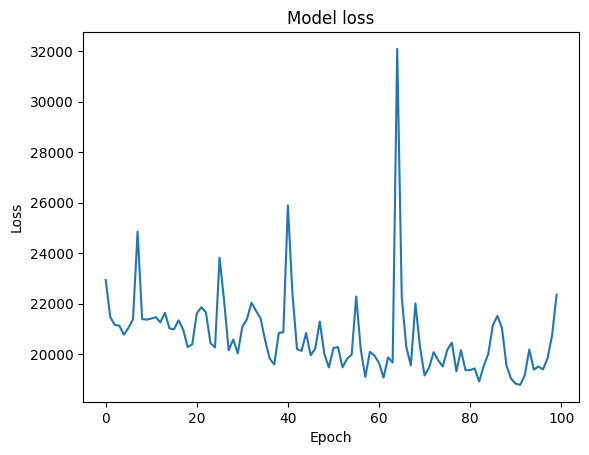

In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights300')

#Learning Rate
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 400
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(300,NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])

        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 10 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==399):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights399')

#Learning Rate
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 500
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(400,NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])

        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 10 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==499):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 401 | Batch:   0 of 250. Loss AE   19937.09 | Loss Extraction1    4899.04 | Loss Extraction2    4087.26:   2%|▏         | 1/50 [00:00<00:46,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 401 | Batch:   5 of 250. Loss AE   15871.53 | Loss Extraction1    4501.07 | Loss Extraction2    3517.72:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 401 | Batch:  10 of 250. Loss AE   19074.52 | Loss Extraction1    4614.43 | Loss Extraction2    3476.72:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 401 | Batch:  15 of 250. Loss AE   18537.35 | Loss Extraction1    4331.26 | Loss Extraction2    3734.41:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 401 | Batch:  20 of 250. Loss AE   17524.35 | Loss Extraction1    3938.65 | Loss Extraction2    3546.27:  10%|█         | 5/50 [00:04<00:36,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 401 | Batch:  25 of 250. Loss AE   20058.79 | Loss Extraction1    3552.78 | Loss Extraction2    3469.83:  12%|█▏        | 6/50 [00:05<00:35,  1.24it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 401 | Batch:  30 of 250. Loss AE   20092.36 | Loss Extraction1    3735.57 | Loss Extraction2    3257.35:  14%|█▍        | 7/50 [00:05<00:34,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch:  35 of 250. Loss AE   20223.21 | Loss Extraction1    3894.27 | Loss Extraction2    4146.55:  16%|█▌        | 8/50 [00:06<00:33,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 401 | Batch:  40 of 250. Loss AE   19778.77 | Loss Extraction1    3703.43 | Loss Extraction2    4006.09:  18%|█▊        | 9/50 [00:07<00:32,  1.28it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch:  45 of 250. Loss AE   19204.17 | Loss Extraction1    3726.61 | Loss Extraction2    3903.56:  20%|██        | 10/50 [00:08<00:31,  1.28it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 401 | Batch:  50 of 250. Loss AE   18805.37 | Loss Extraction1    3802.25 | Loss Extraction2    3819.17:  22%|██▏       | 11/50 [00:08<00:30,  1.27it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 401 | Batch:  55 of 250. Loss AE   18298.00 | Loss Extraction1    3730.72 | Loss Extraction2    3677.72:  24%|██▍       | 12/50 [00:09<00:29,  1.28it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 401 | Batch:  60 of 250. Loss AE   18727.28 | Loss Extraction1    3618.11 | Loss Extraction2    3717.75:  26%|██▌       | 13/50 [00:10<00:28,  1.28it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 401 | Batch:  65 of 250. Loss AE   19438.42 | Loss Extraction1    3633.45 | Loss Extraction2    3726.41:  28%|██▊       | 14/50 [00:11<00:27,  1.29it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch:  70 of 250. Loss AE   19455.51 | Loss Extraction1    3495.68 | Loss Extraction2    3691.83:  30%|███       | 15/50 [00:12<00:27,  1.29it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 401 | Batch:  75 of 250. Loss AE   19481.16 | Loss Extraction1    3442.37 | Loss Extraction2    3551.63:  32%|███▏      | 16/50 [00:13<00:29,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 401 | Batch:  80 of 250. Loss AE   19327.80 | Loss Extraction1    3418.88 | Loss Extraction2    3512.68:  34%|███▍      | 17/50 [00:14<00:31,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 401 | Batch:  85 of 250. Loss AE   19435.15 | Loss Extraction1    3463.39 | Loss Extraction2    3434.53:  36%|███▌      | 18/50 [00:15<00:29,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 401 | Batch:  90 of 250. Loss AE   19412.88 | Loss Extraction1    3431.76 | Loss Extraction2    3412.19:  38%|███▊      | 19/50 [00:15<00:27,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch:  95 of 250. Loss AE   20499.28 | Loss Extraction1    3399.49 | Loss Extraction2    3417.40:  40%|████      | 20/50 [00:16<00:25,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 401 | Batch: 100 of 250. Loss AE   20182.98 | Loss Extraction1    3343.77 | Loss Extraction2    3435.39:  42%|████▏     | 21/50 [00:17<00:24,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 401 | Batch: 105 of 250. Loss AE   20173.71 | Loss Extraction1    3369.31 | Loss Extraction2    3450.07:  44%|████▍     | 22/50 [00:18<00:22,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 401 | Batch: 110 of 250. Loss AE   19761.41 | Loss Extraction1    3350.14 | Loss Extraction2    3370.25:  46%|████▌     | 23/50 [00:19<00:21,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 401 | Batch: 115 of 250. Loss AE   20051.16 | Loss Extraction1    3489.37 | Loss Extraction2    3340.08:  48%|████▊     | 24/50 [00:19<00:20,  1.25it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 401 | Batch: 120 of 250. Loss AE   20016.05 | Loss Extraction1    3477.59 | Loss Extraction2    3318.05:  50%|█████     | 25/50 [00:20<00:19,  1.26it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 401 | Batch: 125 of 250. Loss AE   19732.50 | Loss Extraction1    3411.72 | Loss Extraction2    3302.07:  52%|█████▏    | 26/50 [00:21<00:18,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch: 130 of 250. Loss AE   19433.14 | Loss Extraction1    3355.48 | Loss Extraction2    3288.20:  54%|█████▍    | 27/50 [00:22<00:18,  1.27it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 401 | Batch: 135 of 250. Loss AE   19223.21 | Loss Extraction1    3299.62 | Loss Extraction2    3256.77:  56%|█████▌    | 28/50 [00:22<00:17,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 401 | Batch: 140 of 250. Loss AE   19298.66 | Loss Extraction1    3271.91 | Loss Extraction2    3205.33:  58%|█████▊    | 29/50 [00:23<00:16,  1.27it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 401 | Batch: 145 of 250. Loss AE   19273.37 | Loss Extraction1    3289.57 | Loss Extraction2    3217.69:  60%|██████    | 30/50 [00:24<00:15,  1.27it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 401 | Batch: 150 of 250. Loss AE   19597.72 | Loss Extraction1    3275.61 | Loss Extraction2    3362.88:  62%|██████▏   | 31/50 [00:25<00:17,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 401 | Batch: 155 of 250. Loss AE   19451.78 | Loss Extraction1    3284.08 | Loss Extraction2    3338.13:  64%|██████▍   | 32/50 [00:26<00:17,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch: 160 of 250. Loss AE   19538.30 | Loss Extraction1    3259.78 | Loss Extraction2    3386.70:  66%|██████▌   | 33/50 [00:27<00:15,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 401 | Batch: 165 of 250. Loss AE   19349.31 | Loss Extraction1    3255.05 | Loss Extraction2    3374.13:  68%|██████▊   | 34/50 [00:28<00:14,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 401 | Batch: 170 of 250. Loss AE   19175.50 | Loss Extraction1    3234.34 | Loss Extraction2    3340.92:  70%|███████   | 35/50 [00:29<00:12,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch: 175 of 250. Loss AE   19200.65 | Loss Extraction1    3268.99 | Loss Extraction2    3299.13:  72%|███████▏  | 36/50 [00:30<00:12,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 401 | Batch: 180 of 250. Loss AE   19026.63 | Loss Extraction1    3263.84 | Loss Extraction2    3320.59:  74%|███████▍  | 37/50 [00:31<00:11,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 401 | Batch: 185 of 250. Loss AE   19077.10 | Loss Extraction1    3234.02 | Loss Extraction2    3359.80:  76%|███████▌  | 38/50 [00:31<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch: 190 of 250. Loss AE   18969.16 | Loss Extraction1    3213.94 | Loss Extraction2    3358.30:  78%|███████▊  | 39/50 [00:32<00:09,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 401 | Batch: 195 of 250. Loss AE   18985.71 | Loss Extraction1    3204.38 | Loss Extraction2    3343.39:  80%|████████  | 40/50 [00:33<00:08,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch: 200 of 250. Loss AE   19026.53 | Loss Extraction1    3185.91 | Loss Extraction2    3336.52:  82%|████████▏ | 41/50 [00:34<00:07,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 401 | Batch: 205 of 250. Loss AE   18852.93 | Loss Extraction1    3147.30 | Loss Extraction2    3344.41:  84%|████████▍ | 42/50 [00:34<00:06,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 401 | Batch: 210 of 250. Loss AE   18959.80 | Loss Extraction1    3166.68 | Loss Extraction2    3387.84:  86%|████████▌ | 43/50 [00:35<00:05,  1.26it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 401 | Batch: 215 of 250. Loss AE   18936.75 | Loss Extraction1    3133.30 | Loss Extraction2    3380.84:  88%|████████▊ | 44/50 [00:36<00:04,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 401 | Batch: 220 of 250. Loss AE   18903.24 | Loss Extraction1    3134.88 | Loss Extraction2    3351.46:  90%|█████████ | 45/50 [00:37<00:04,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 401 | Batch: 225 of 250. Loss AE   18766.18 | Loss Extraction1    3139.69 | Loss Extraction2    3336.02:  92%|█████████▏| 46/50 [00:38<00:03,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 401 | Batch: 230 of 250. Loss AE   18988.61 | Loss Extraction1    3130.43 | Loss Extraction2    3340.52:  94%|█████████▍| 47/50 [00:39<00:02,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 401 | Batch: 235 of 250. Loss AE   18964.74 | Loss Extraction1    3112.78 | Loss Extraction2    3309.22:  96%|█████████▌| 48/50 [00:40<00:01,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 401 | Batch: 240 of 250. Loss AE   19105.62 | Loss Extraction1    3146.76 | Loss Extraction2    3322.10:  98%|█████████▊| 49/50 [00:40<00:00,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 401 | Batch: 245 of 250. Loss AE   19167.21 | Loss Extraction1    3143.32 | Loss Extraction2    3419.18: 100%|██████████| 50/50 [00:41<00:00,  1.20it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 402 | Batch:   0 of 250. Loss AE   15537.64 | Loss Extraction1    2739.57 | Loss Extraction2    2682.75:   2%|▏         | 1/50 [00:00<00:39,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 402 | Batch:   5 of 250. Loss AE   16668.94 | Loss Extraction1    3577.91 | Loss Extraction2    2959.24:   4%|▍         | 2/50 [00:01<00:37,  1.27it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 402 | Batch:  10 of 250. Loss AE   15424.13 | Loss Extraction1    3123.39 | Loss Extraction2    3232.91:   6%|▌         | 3/50 [00:02<00:36,  1.28it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch:  15 of 250. Loss AE   16712.27 | Loss Extraction1    3040.95 | Loss Extraction2    5261.25:   8%|▊         | 4/50 [00:03<00:36,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch:  20 of 250. Loss AE   17687.78 | Loss Extraction1    2871.75 | Loss Extraction2    4686.54:  10%|█         | 5/50 [00:03<00:35,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch:  25 of 250. Loss AE   17976.96 | Loss Extraction1    2889.44 | Loss Extraction2    4340.19:  12%|█▏        | 6/50 [00:04<00:34,  1.27it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 402 | Batch:  30 of 250. Loss AE   19241.48 | Loss Extraction1    2657.53 | Loss Extraction2    4122.03:  14%|█▍        | 7/50 [00:05<00:34,  1.26it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch:  35 of 250. Loss AE   18511.46 | Loss Extraction1    2643.84 | Loss Extraction2    3869.68:  16%|█▌        | 8/50 [00:06<00:33,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch:  40 of 250. Loss AE   19321.48 | Loss Extraction1    2686.16 | Loss Extraction2    3660.91:  18%|█▊        | 9/50 [00:07<00:32,  1.26it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 402 | Batch:  45 of 250. Loss AE   18678.57 | Loss Extraction1    2595.17 | Loss Extraction2    3512.52:  20%|██        | 10/50 [00:08<00:36,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 402 | Batch:  50 of 250. Loss AE   18242.77 | Loss Extraction1    2516.73 | Loss Extraction2    3398.77:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 402 | Batch:  55 of 250. Loss AE   17513.89 | Loss Extraction1    2500.44 | Loss Extraction2    3279.94:  24%|██▍       | 12/50 [00:09<00:33,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 402 | Batch:  60 of 250. Loss AE   18222.08 | Loss Extraction1    2438.91 | Loss Extraction2    3229.66:  26%|██▌       | 13/50 [00:10<00:31,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch:  65 of 250. Loss AE   18878.54 | Loss Extraction1    2511.78 | Loss Extraction2    3292.78:  28%|██▊       | 14/50 [00:11<00:29,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 402 | Batch:  70 of 250. Loss AE   18963.77 | Loss Extraction1    2475.81 | Loss Extraction2    3253.28:  30%|███       | 15/50 [00:12<00:28,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch:  75 of 250. Loss AE   19011.07 | Loss Extraction1    2441.29 | Loss Extraction2    3283.22:  32%|███▏      | 16/50 [00:13<00:27,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch:  80 of 250. Loss AE   19265.35 | Loss Extraction1    2548.73 | Loss Extraction2    3234.79:  34%|███▍      | 17/50 [00:13<00:26,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 402 | Batch:  85 of 250. Loss AE   18907.01 | Loss Extraction1    2535.97 | Loss Extraction2    3159.13:  36%|███▌      | 18/50 [00:14<00:28,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch:  90 of 250. Loss AE   18627.54 | Loss Extraction1    2541.10 | Loss Extraction2    3082.66:  38%|███▊      | 19/50 [00:15<00:26,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 402 | Batch:  95 of 250. Loss AE   18415.82 | Loss Extraction1    2626.09 | Loss Extraction2    3047.72:  40%|████      | 20/50 [00:16<00:25,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 402 | Batch: 100 of 250. Loss AE   18497.00 | Loss Extraction1    2647.33 | Loss Extraction2    3044.68:  42%|████▏     | 21/50 [00:17<00:24,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 402 | Batch: 105 of 250. Loss AE   19075.49 | Loss Extraction1    2597.42 | Loss Extraction2    3007.67:  44%|████▍     | 22/50 [00:18<00:22,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch: 110 of 250. Loss AE   18735.13 | Loss Extraction1    2536.19 | Loss Extraction2    2954.06:  46%|████▌     | 23/50 [00:18<00:21,  1.23it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 402 | Batch: 115 of 250. Loss AE   18626.39 | Loss Extraction1    2503.24 | Loss Extraction2    2932.31:  48%|████▊     | 24/50 [00:20<00:23,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 402 | Batch: 120 of 250. Loss AE   18490.97 | Loss Extraction1    2483.54 | Loss Extraction2    2953.05:  50%|█████     | 25/50 [00:20<00:22,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 402 | Batch: 125 of 250. Loss AE   18447.09 | Loss Extraction1    2498.82 | Loss Extraction2    2901.00:  52%|█████▏    | 26/50 [00:21<00:21,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch: 130 of 250. Loss AE   18485.20 | Loss Extraction1    2559.91 | Loss Extraction2    2891.98:  54%|█████▍    | 27/50 [00:22<00:19,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 402 | Batch: 135 of 250. Loss AE   18887.30 | Loss Extraction1    2574.19 | Loss Extraction2    2884.58:  56%|█████▌    | 28/50 [00:23<00:18,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch: 140 of 250. Loss AE   18697.64 | Loss Extraction1    2598.98 | Loss Extraction2    2875.71:  58%|█████▊    | 29/50 [00:24<00:17,  1.22it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 402 | Batch: 145 of 250. Loss AE   18617.10 | Loss Extraction1    2589.13 | Loss Extraction2    2938.38:  60%|██████    | 30/50 [00:24<00:16,  1.24it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch: 150 of 250. Loss AE   18729.10 | Loss Extraction1    2580.20 | Loss Extraction2    2961.81:  62%|██████▏   | 31/50 [00:25<00:15,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 402 | Batch: 155 of 250. Loss AE   18712.32 | Loss Extraction1    2611.08 | Loss Extraction2    2973.17:  64%|██████▍   | 32/50 [00:26<00:14,  1.27it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch: 160 of 250. Loss AE   18566.67 | Loss Extraction1    2667.70 | Loss Extraction2    2947.02:  66%|██████▌   | 33/50 [00:27<00:13,  1.27it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 402 | Batch: 165 of 250. Loss AE   18397.85 | Loss Extraction1    2686.99 | Loss Extraction2    2985.44:  68%|██████▊   | 34/50 [00:28<00:12,  1.26it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 402 | Batch: 170 of 250. Loss AE   18270.29 | Loss Extraction1    2669.50 | Loss Extraction2    3027.97:  70%|███████   | 35/50 [00:28<00:11,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 402 | Batch: 175 of 250. Loss AE   18721.07 | Loss Extraction1    2701.59 | Loss Extraction2    3003.49:  72%|███████▏  | 36/50 [00:29<00:11,  1.27it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 402 | Batch: 180 of 250. Loss AE   18999.44 | Loss Extraction1    2726.62 | Loss Extraction2    3028.03:  74%|███████▍  | 37/50 [00:30<00:10,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 402 | Batch: 185 of 250. Loss AE   18727.21 | Loss Extraction1    2699.28 | Loss Extraction2    3015.57:  76%|███████▌  | 38/50 [00:31<00:09,  1.27it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 402 | Batch: 190 of 250. Loss AE   18553.10 | Loss Extraction1    2708.65 | Loss Extraction2    3021.71:  78%|███████▊  | 39/50 [00:32<00:08,  1.26it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 402 | Batch: 195 of 250. Loss AE   18565.05 | Loss Extraction1    2708.33 | Loss Extraction2    3018.69:  80%|████████  | 40/50 [00:32<00:08,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 402 | Batch: 200 of 250. Loss AE   18484.00 | Loss Extraction1    2729.67 | Loss Extraction2    2994.62:  82%|████████▏ | 41/50 [00:34<00:08,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 402 | Batch: 205 of 250. Loss AE   18674.83 | Loss Extraction1    2731.54 | Loss Extraction2    3027.52:  84%|████████▍ | 42/50 [00:34<00:07,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 402 | Batch: 210 of 250. Loss AE   18603.07 | Loss Extraction1    2764.24 | Loss Extraction2    3005.56:  86%|████████▌ | 43/50 [00:35<00:06,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 402 | Batch: 215 of 250. Loss AE   18552.00 | Loss Extraction1    2799.76 | Loss Extraction2    3023.48:  88%|████████▊ | 44/50 [00:36<00:05,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 402 | Batch: 220 of 250. Loss AE   18397.80 | Loss Extraction1    2787.88 | Loss Extraction2    2995.06:  90%|█████████ | 45/50 [00:37<00:04,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch: 225 of 250. Loss AE   18369.16 | Loss Extraction1    2767.04 | Loss Extraction2    2994.40:  92%|█████████▏| 46/50 [00:38<00:03,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch: 230 of 250. Loss AE   18367.75 | Loss Extraction1    2768.88 | Loss Extraction2    3005.01:  94%|█████████▍| 47/50 [00:38<00:02,  1.23it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch: 235 of 250. Loss AE   18262.55 | Loss Extraction1    2796.24 | Loss Extraction2    2978.52:  96%|█████████▌| 48/50 [00:39<00:01,  1.25it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 402 | Batch: 240 of 250. Loss AE   18193.90 | Loss Extraction1    2789.27 | Loss Extraction2    2950.40:  98%|█████████▊| 49/50 [00:40<00:00,  1.25it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 402 | Batch: 245 of 250. Loss AE   18301.90 | Loss Extraction1    2794.57 | Loss Extraction2    3081.39: 100%|██████████| 50/50 [00:41<00:00,  1.21it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch:   0 of 250. Loss AE   29088.91 | Loss Extraction1    2258.92 | Loss Extraction2    2845.65:   2%|▏         | 1/50 [00:00<00:38,  1.26it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 403 | Batch:   5 of 250. Loss AE   30476.68 | Loss Extraction1    2160.33 | Loss Extraction2    3268.76:   4%|▍         | 2/50 [00:01<00:38,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch:  10 of 250. Loss AE   25195.94 | Loss Extraction1    2014.14 | Loss Extraction2    2776.91:   6%|▌         | 3/50 [00:02<00:37,  1.27it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 403 | Batch:  15 of 250. Loss AE   23491.52 | Loss Extraction1    2460.71 | Loss Extraction2    2880.86:   8%|▊         | 4/50 [00:03<00:37,  1.24it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 403 | Batch:  20 of 250. Loss AE   21501.15 | Loss Extraction1    2446.17 | Loss Extraction2    2875.23:  10%|█         | 5/50 [00:04<00:37,  1.22it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 403 | Batch:  25 of 250. Loss AE   22657.21 | Loss Extraction1    2554.89 | Loss Extraction2    3734.20:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch:  30 of 250. Loss AE   21377.21 | Loss Extraction1    2595.62 | Loss Extraction2    3886.46:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch:  35 of 250. Loss AE   21938.75 | Loss Extraction1    2550.56 | Loss Extraction2    4081.46:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch:  40 of 250. Loss AE   21134.65 | Loss Extraction1    2568.58 | Loss Extraction2    3988.00:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch:  45 of 250. Loss AE   20597.68 | Loss Extraction1    2628.50 | Loss Extraction2    3971.31:  20%|██        | 10/50 [00:08<00:32,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch:  50 of 250. Loss AE   20339.14 | Loss Extraction1    2632.94 | Loss Extraction2    3773.96:  22%|██▏       | 11/50 [00:09<00:31,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 403 | Batch:  55 of 250. Loss AE   20132.24 | Loss Extraction1    2621.94 | Loss Extraction2    3729.06:  24%|██▍       | 12/50 [00:09<00:30,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch:  60 of 250. Loss AE   19387.77 | Loss Extraction1    2615.94 | Loss Extraction2    3591.24:  26%|██▌       | 13/50 [00:10<00:29,  1.24it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 403 | Batch:  65 of 250. Loss AE   19293.05 | Loss Extraction1    2674.67 | Loss Extraction2    3578.29:  28%|██▊       | 14/50 [00:11<00:29,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch:  70 of 250. Loss AE   18930.30 | Loss Extraction1    2685.42 | Loss Extraction2    3619.02:  30%|███       | 15/50 [00:12<00:28,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 403 | Batch:  75 of 250. Loss AE   18661.05 | Loss Extraction1    2696.14 | Loss Extraction2    3466.75:  32%|███▏      | 16/50 [00:13<00:27,  1.24it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 403 | Batch:  80 of 250. Loss AE   18727.42 | Loss Extraction1    2726.14 | Loss Extraction2    3413.20:  34%|███▍      | 17/50 [00:13<00:26,  1.25it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 403 | Batch:  85 of 250. Loss AE   18680.43 | Loss Extraction1    2783.20 | Loss Extraction2    3367.01:  36%|███▌      | 18/50 [00:14<00:25,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 403 | Batch:  90 of 250. Loss AE   18782.82 | Loss Extraction1    2736.96 | Loss Extraction2    3329.27:  38%|███▊      | 19/50 [00:15<00:27,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 403 | Batch:  95 of 250. Loss AE   18701.37 | Loss Extraction1    2710.18 | Loss Extraction2    3257.27:  40%|████      | 20/50 [00:16<00:26,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 403 | Batch: 100 of 250. Loss AE   18535.33 | Loss Extraction1    2787.70 | Loss Extraction2    3182.04:  42%|████▏     | 21/50 [00:17<00:25,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch: 105 of 250. Loss AE   18821.03 | Loss Extraction1    2792.02 | Loss Extraction2    3170.13:  44%|████▍     | 22/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch: 110 of 250. Loss AE   18661.27 | Loss Extraction1    2823.31 | Loss Extraction2    3114.47:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 403 | Batch: 115 of 250. Loss AE   18831.92 | Loss Extraction1    2786.62 | Loss Extraction2    3090.68:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 403 | Batch: 120 of 250. Loss AE   18598.23 | Loss Extraction1    2760.62 | Loss Extraction2    3038.54:  50%|█████     | 25/50 [00:20<00:20,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 403 | Batch: 125 of 250. Loss AE   18435.86 | Loss Extraction1    2754.60 | Loss Extraction2    3085.58:  52%|█████▏    | 26/50 [00:21<00:19,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch: 130 of 250. Loss AE   18288.40 | Loss Extraction1    2790.04 | Loss Extraction2    3066.82:  54%|█████▍    | 27/50 [00:22<00:18,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch: 135 of 250. Loss AE   18233.44 | Loss Extraction1    2805.46 | Loss Extraction2    3045.01:  56%|█████▌    | 28/50 [00:23<00:17,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 403 | Batch: 140 of 250. Loss AE   18531.29 | Loss Extraction1    2763.79 | Loss Extraction2    3004.71:  58%|█████▊    | 29/50 [00:24<00:16,  1.24it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 403 | Batch: 145 of 250. Loss AE   18632.85 | Loss Extraction1    2787.96 | Loss Extraction2    2983.25:  60%|██████    | 30/50 [00:24<00:16,  1.24it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 403 | Batch: 150 of 250. Loss AE   18642.30 | Loss Extraction1    2762.83 | Loss Extraction2    2984.47:  62%|██████▏   | 31/50 [00:25<00:15,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch: 155 of 250. Loss AE   18517.78 | Loss Extraction1    2753.06 | Loss Extraction2    2938.38:  64%|██████▍   | 32/50 [00:26<00:14,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch: 160 of 250. Loss AE   18583.59 | Loss Extraction1    2757.25 | Loss Extraction2    2952.34:  66%|██████▌   | 33/50 [00:27<00:13,  1.25it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 403 | Batch: 165 of 250. Loss AE   18753.96 | Loss Extraction1    2717.73 | Loss Extraction2    3105.08:  68%|██████▊   | 34/50 [00:28<00:14,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 403 | Batch: 170 of 250. Loss AE   18579.96 | Loss Extraction1    2721.66 | Loss Extraction2    3094.80:  70%|███████   | 35/50 [00:29<00:14,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 403 | Batch: 175 of 250. Loss AE   18427.21 | Loss Extraction1    2713.47 | Loss Extraction2    3098.12:  72%|███████▏  | 36/50 [00:30<00:13,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 403 | Batch: 180 of 250. Loss AE   18467.45 | Loss Extraction1    2694.76 | Loss Extraction2    3103.24:  74%|███████▍  | 37/50 [00:31<00:11,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 403 | Batch: 185 of 250. Loss AE   18349.33 | Loss Extraction1    2664.99 | Loss Extraction2    3103.36:  76%|███████▌  | 38/50 [00:31<00:10,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 403 | Batch: 190 of 250. Loss AE   18290.47 | Loss Extraction1    2661.73 | Loss Extraction2    3069.76:  78%|███████▊  | 39/50 [00:32<00:09,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 403 | Batch: 195 of 250. Loss AE   18225.47 | Loss Extraction1    2696.10 | Loss Extraction2    3059.46:  80%|████████  | 40/50 [00:33<00:08,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 403 | Batch: 200 of 250. Loss AE   18310.79 | Loss Extraction1    2698.55 | Loss Extraction2    3054.32:  82%|████████▏ | 41/50 [00:34<00:07,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 403 | Batch: 205 of 250. Loss AE   18294.21 | Loss Extraction1    2774.21 | Loss Extraction2    3048.51:  84%|████████▍ | 42/50 [00:35<00:06,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 403 | Batch: 210 of 250. Loss AE   18125.85 | Loss Extraction1    2791.95 | Loss Extraction2    3029.49:  86%|████████▌ | 43/50 [00:36<00:05,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 403 | Batch: 215 of 250. Loss AE   17981.05 | Loss Extraction1    2757.80 | Loss Extraction2    2995.25:  88%|████████▊ | 44/50 [00:36<00:04,  1.23it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 403 | Batch: 220 of 250. Loss AE   17921.97 | Loss Extraction1    2762.56 | Loss Extraction2    2974.87:  90%|█████████ | 45/50 [00:37<00:04,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 403 | Batch: 225 of 250. Loss AE   17990.43 | Loss Extraction1    2765.26 | Loss Extraction2    2955.45:  92%|█████████▏| 46/50 [00:38<00:03,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 403 | Batch: 230 of 250. Loss AE   17957.04 | Loss Extraction1    2755.70 | Loss Extraction2    2969.74:  94%|█████████▍| 47/50 [00:39<00:02,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 403 | Batch: 235 of 250. Loss AE   17988.76 | Loss Extraction1    2760.56 | Loss Extraction2    2982.32:  96%|█████████▌| 48/50 [00:40<00:01,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 403 | Batch: 240 of 250. Loss AE   18147.18 | Loss Extraction1    2756.31 | Loss Extraction2    3039.41:  98%|█████████▊| 49/50 [00:41<00:00,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 403 | Batch: 245 of 250. Loss AE   18208.07 | Loss Extraction1    2747.14 | Loss Extraction2    3035.51: 100%|██████████| 50/50 [00:42<00:00,  1.18it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 404 | Batch:   0 of 250. Loss AE   16386.09 | Loss Extraction1    3199.74 | Loss Extraction2    2290.24:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch:   5 of 250. Loss AE   15498.30 | Loss Extraction1    3707.67 | Loss Extraction2    2459.17:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch:  10 of 250. Loss AE   17981.61 | Loss Extraction1    3852.37 | Loss Extraction2    2633.03:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch:  15 of 250. Loss AE   19275.31 | Loss Extraction1    3477.88 | Loss Extraction2    2730.57:   8%|▊         | 4/50 [00:03<00:37,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch:  20 of 250. Loss AE   19986.07 | Loss Extraction1    3310.45 | Loss Extraction2    3629.86:  10%|█         | 5/50 [00:04<00:36,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 404 | Batch:  25 of 250. Loss AE   18617.80 | Loss Extraction1    3174.12 | Loss Extraction2    3606.07:  12%|█▏        | 6/50 [00:04<00:35,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 404 | Batch:  30 of 250. Loss AE   17883.11 | Loss Extraction1    3158.36 | Loss Extraction2    3663.97:  14%|█▍        | 7/50 [00:05<00:34,  1.24it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 404 | Batch:  35 of 250. Loss AE   17367.86 | Loss Extraction1    3002.49 | Loss Extraction2    3595.04:  16%|█▌        | 8/50 [00:06<00:34,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 404 | Batch:  40 of 250. Loss AE   17290.19 | Loss Extraction1    2982.03 | Loss Extraction2    3406.60:  18%|█▊        | 9/50 [00:07<00:33,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch:  45 of 250. Loss AE   17588.56 | Loss Extraction1    2974.00 | Loss Extraction2    3356.76:  20%|██        | 10/50 [00:08<00:32,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch:  50 of 250. Loss AE   17380.17 | Loss Extraction1    2841.52 | Loss Extraction2    3403.60:  22%|██▏       | 11/50 [00:09<00:32,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch:  55 of 250. Loss AE   18654.42 | Loss Extraction1    2855.75 | Loss Extraction2    3306.29:  24%|██▍       | 12/50 [00:09<00:31,  1.22it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 404 | Batch:  60 of 250. Loss AE   18427.69 | Loss Extraction1    2838.31 | Loss Extraction2    3168.41:  26%|██▌       | 13/50 [00:10<00:34,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 404 | Batch:  65 of 250. Loss AE   17990.77 | Loss Extraction1    2776.54 | Loss Extraction2    3244.69:  28%|██▊       | 14/50 [00:12<00:35,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch:  70 of 250. Loss AE   18026.83 | Loss Extraction1    2717.43 | Loss Extraction2    3199.36:  30%|███       | 15/50 [00:12<00:32,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 404 | Batch:  75 of 250. Loss AE   18264.53 | Loss Extraction1    2763.31 | Loss Extraction2    3184.42:  32%|███▏      | 16/50 [00:13<00:30,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch:  80 of 250. Loss AE   17981.28 | Loss Extraction1    2726.86 | Loss Extraction2    3118.96:  34%|███▍      | 17/50 [00:14<00:28,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch:  85 of 250. Loss AE   18279.47 | Loss Extraction1    2692.40 | Loss Extraction2    3120.42:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 404 | Batch:  90 of 250. Loss AE   18325.18 | Loss Extraction1    2671.30 | Loss Extraction2    3077.67:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 404 | Batch:  95 of 250. Loss AE   18062.47 | Loss Extraction1    2679.97 | Loss Extraction2    3045.14:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 100 of 250. Loss AE   17978.83 | Loss Extraction1    2660.56 | Loss Extraction2    3051.67:  42%|████▏     | 21/50 [00:17<00:24,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch: 105 of 250. Loss AE   18017.04 | Loss Extraction1    2675.09 | Loss Extraction2    3013.05:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 404 | Batch: 110 of 250. Loss AE   18089.54 | Loss Extraction1    2709.76 | Loss Extraction2    3023.06:  46%|████▌     | 23/50 [00:19<00:22,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 404 | Batch: 115 of 250. Loss AE   18281.20 | Loss Extraction1    2729.48 | Loss Extraction2    3012.54:  48%|████▊     | 24/50 [00:20<00:21,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 120 of 250. Loss AE   18013.57 | Loss Extraction1    2698.35 | Loss Extraction2    2972.71:  50%|█████     | 25/50 [00:21<00:20,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 404 | Batch: 125 of 250. Loss AE   17930.39 | Loss Extraction1    2770.20 | Loss Extraction2    3023.63:  52%|█████▏    | 26/50 [00:22<00:19,  1.20it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 404 | Batch: 130 of 250. Loss AE   17992.71 | Loss Extraction1    2791.19 | Loss Extraction2    3009.98:  54%|█████▍    | 27/50 [00:23<00:21,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 404 | Batch: 135 of 250. Loss AE   18311.73 | Loss Extraction1    2746.05 | Loss Extraction2    3020.24:  56%|█████▌    | 28/50 [00:24<00:20,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 404 | Batch: 140 of 250. Loss AE   18079.80 | Loss Extraction1    2743.96 | Loss Extraction2    3023.87:  58%|█████▊    | 29/50 [00:24<00:19,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 145 of 250. Loss AE   17868.78 | Loss Extraction1    2748.77 | Loss Extraction2    3019.39:  60%|██████    | 30/50 [00:25<00:17,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 404 | Batch: 150 of 250. Loss AE   17964.21 | Loss Extraction1    2772.80 | Loss Extraction2    3012.26:  62%|██████▏   | 31/50 [00:26<00:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 155 of 250. Loss AE   17862.22 | Loss Extraction1    2744.53 | Loss Extraction2    2975.82:  64%|██████▍   | 32/50 [00:27<00:15,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 404 | Batch: 160 of 250. Loss AE   17763.90 | Loss Extraction1    2745.66 | Loss Extraction2    2962.85:  66%|██████▌   | 33/50 [00:28<00:14,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 165 of 250. Loss AE   17600.65 | Loss Extraction1    2745.64 | Loss Extraction2    2918.38:  68%|██████▊   | 34/50 [00:29<00:13,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 170 of 250. Loss AE   17717.55 | Loss Extraction1    2772.69 | Loss Extraction2    2903.65:  70%|███████   | 35/50 [00:29<00:12,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 175 of 250. Loss AE   17780.09 | Loss Extraction1    2755.01 | Loss Extraction2    2896.68:  72%|███████▏  | 36/50 [00:30<00:11,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 180 of 250. Loss AE   17818.91 | Loss Extraction1    2788.47 | Loss Extraction2    2884.90:  74%|███████▍  | 37/50 [00:31<00:10,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 185 of 250. Loss AE   18071.54 | Loss Extraction1    2805.38 | Loss Extraction2    2869.32:  76%|███████▌  | 38/50 [00:32<00:09,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch: 190 of 250. Loss AE   17884.32 | Loss Extraction1    2794.62 | Loss Extraction2    2868.21:  78%|███████▊  | 39/50 [00:33<00:09,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 404 | Batch: 195 of 250. Loss AE   17738.81 | Loss Extraction1    2755.59 | Loss Extraction2    2873.83:  80%|████████  | 40/50 [00:33<00:08,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 404 | Batch: 200 of 250. Loss AE   17677.70 | Loss Extraction1    2750.44 | Loss Extraction2    2880.85:  82%|████████▏ | 41/50 [00:34<00:07,  1.22it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 404 | Batch: 205 of 250. Loss AE   17568.50 | Loss Extraction1    2755.28 | Loss Extraction2    2860.67:  84%|████████▍ | 42/50 [00:35<00:06,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 404 | Batch: 210 of 250. Loss AE   17660.10 | Loss Extraction1    2747.01 | Loss Extraction2    2990.59:  86%|████████▌ | 43/50 [00:36<00:06,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 404 | Batch: 215 of 250. Loss AE   17777.34 | Loss Extraction1    2753.54 | Loss Extraction2    3004.00:  88%|████████▊ | 44/50 [00:37<00:05,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 220 of 250. Loss AE   17777.62 | Loss Extraction1    2783.17 | Loss Extraction2    3012.07:  90%|█████████ | 45/50 [00:38<00:04,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 225 of 250. Loss AE   17844.54 | Loss Extraction1    2744.88 | Loss Extraction2    2987.74:  92%|█████████▏| 46/50 [00:39<00:03,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 404 | Batch: 230 of 250. Loss AE   17685.78 | Loss Extraction1    2752.07 | Loss Extraction2    2971.41:  94%|█████████▍| 47/50 [00:40<00:02,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 404 | Batch: 235 of 250. Loss AE   17528.77 | Loss Extraction1    2750.63 | Loss Extraction2    2954.62:  96%|█████████▌| 48/50 [00:40<00:01,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 404 | Batch: 240 of 250. Loss AE   17554.90 | Loss Extraction1    2750.27 | Loss Extraction2    2997.17:  98%|█████████▊| 49/50 [00:41<00:00,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 404 | Batch: 245 of 250. Loss AE   18007.85 | Loss Extraction1    2733.32 | Loss Extraction2    3009.33: 100%|██████████| 50/50 [00:42<00:00,  1.18it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch:   0 of 250. Loss AE   23395.36 | Loss Extraction1    2449.61 | Loss Extraction2    7778.98:   2%|▏         | 1/50 [00:00<00:38,  1.26it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 405 | Batch:   5 of 250. Loss AE   17814.93 | Loss Extraction1    2632.71 | Loss Extraction2    5099.96:   4%|▍         | 2/50 [00:01<00:38,  1.24it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 405 | Batch:  10 of 250. Loss AE   17094.46 | Loss Extraction1    2550.21 | Loss Extraction2    3839.57:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 405 | Batch:  15 of 250. Loss AE   16454.54 | Loss Extraction1    2718.80 | Loss Extraction2    3785.27:   8%|▊         | 4/50 [00:03<00:37,  1.23it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 405 | Batch:  20 of 250. Loss AE   17950.97 | Loss Extraction1    2878.45 | Loss Extraction2    3733.02:  10%|█         | 5/50 [00:04<00:36,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 405 | Batch:  25 of 250. Loss AE   17687.76 | Loss Extraction1    2680.29 | Loss Extraction2    3467.20:  12%|█▏        | 6/50 [00:04<00:36,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 405 | Batch:  30 of 250. Loss AE   18592.61 | Loss Extraction1    2650.64 | Loss Extraction2    3315.07:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 405 | Batch:  35 of 250. Loss AE   18098.86 | Loss Extraction1    2670.63 | Loss Extraction2    3172.00:  16%|█▌        | 8/50 [00:06<00:38,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 405 | Batch:  40 of 250. Loss AE   17698.66 | Loss Extraction1    2753.44 | Loss Extraction2    3261.51:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 405 | Batch:  45 of 250. Loss AE   18830.55 | Loss Extraction1    2693.30 | Loss Extraction2    3719.20:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch:  50 of 250. Loss AE   20195.94 | Loss Extraction1    2698.02 | Loss Extraction2    3685.30:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 405 | Batch:  55 of 250. Loss AE   20936.74 | Loss Extraction1    2616.93 | Loss Extraction2    3610.55:  24%|██▍       | 12/50 [00:10<00:31,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 405 | Batch:  60 of 250. Loss AE   20896.66 | Loss Extraction1    2637.06 | Loss Extraction2    3722.85:  26%|██▌       | 13/50 [00:11<00:30,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 405 | Batch:  65 of 250. Loss AE   20415.60 | Loss Extraction1    2675.61 | Loss Extraction2    3701.14:  28%|██▊       | 14/50 [00:11<00:29,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 405 | Batch:  70 of 250. Loss AE   20279.39 | Loss Extraction1    2714.09 | Loss Extraction2    3610.81:  30%|███       | 15/50 [00:12<00:28,  1.22it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 405 | Batch:  75 of 250. Loss AE   20108.10 | Loss Extraction1    2750.52 | Loss Extraction2    3488.38:  32%|███▏      | 16/50 [00:13<00:28,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch:  80 of 250. Loss AE   20569.94 | Loss Extraction1    2744.96 | Loss Extraction2    3411.89:  34%|███▍      | 17/50 [00:14<00:27,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 405 | Batch:  85 of 250. Loss AE   19893.62 | Loss Extraction1    2698.07 | Loss Extraction2    3335.63:  36%|███▌      | 18/50 [00:15<00:26,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 405 | Batch:  90 of 250. Loss AE   20252.97 | Loss Extraction1    2674.20 | Loss Extraction2    3268.44:  38%|███▊      | 19/50 [00:15<00:25,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch:  95 of 250. Loss AE   20337.92 | Loss Extraction1    2670.63 | Loss Extraction2    3297.64:  40%|████      | 20/50 [00:16<00:24,  1.21it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 405 | Batch: 100 of 250. Loss AE   20081.34 | Loss Extraction1    2803.88 | Loss Extraction2    3252.52:  42%|████▏     | 21/50 [00:17<00:26,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 405 | Batch: 105 of 250. Loss AE   19892.63 | Loss Extraction1    2827.49 | Loss Extraction2    3215.62:  44%|████▍     | 22/50 [00:19<00:27,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 110 of 250. Loss AE   19688.90 | Loss Extraction1    2791.05 | Loss Extraction2    3289.70:  46%|████▌     | 23/50 [00:19<00:25,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 405 | Batch: 115 of 250. Loss AE   19499.42 | Loss Extraction1    2764.77 | Loss Extraction2    3279.54:  48%|████▊     | 24/50 [00:20<00:23,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 120 of 250. Loss AE   19264.25 | Loss Extraction1    2714.67 | Loss Extraction2    3293.42:  50%|█████     | 25/50 [00:21<00:21,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 405 | Batch: 125 of 250. Loss AE   19354.16 | Loss Extraction1    2764.78 | Loss Extraction2    3252.81:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 405 | Batch: 130 of 250. Loss AE   19073.05 | Loss Extraction1    2764.79 | Loss Extraction2    3177.58:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 405 | Batch: 135 of 250. Loss AE   19036.38 | Loss Extraction1    2768.57 | Loss Extraction2    3156.30:  56%|█████▌    | 28/50 [00:23<00:18,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 405 | Batch: 140 of 250. Loss AE   19247.62 | Loss Extraction1    2751.57 | Loss Extraction2    3164.73:  58%|█████▊    | 29/50 [00:24<00:17,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 145 of 250. Loss AE   19601.02 | Loss Extraction1    2710.16 | Loss Extraction2    3178.80:  60%|██████    | 30/50 [00:25<00:16,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 405 | Batch: 150 of 250. Loss AE   19369.15 | Loss Extraction1    2695.33 | Loss Extraction2    3177.13:  62%|██████▏   | 31/50 [00:26<00:15,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 155 of 250. Loss AE   19157.15 | Loss Extraction1    2693.95 | Loss Extraction2    3143.05:  64%|██████▍   | 32/50 [00:27<00:16,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 160 of 250. Loss AE   19159.98 | Loss Extraction1    2663.15 | Loss Extraction2    3137.48:  66%|██████▌   | 33/50 [00:28<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 405 | Batch: 165 of 250. Loss AE   19011.59 | Loss Extraction1    2678.88 | Loss Extraction2    3098.15:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 405 | Batch: 170 of 250. Loss AE   18938.06 | Loss Extraction1    2728.40 | Loss Extraction2    3125.88:  70%|███████   | 35/50 [00:30<00:14,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 405 | Batch: 175 of 250. Loss AE   18800.22 | Loss Extraction1    2702.71 | Loss Extraction2    3116.36:  72%|███████▏  | 36/50 [00:31<00:14,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 180 of 250. Loss AE   18695.92 | Loss Extraction1    2716.73 | Loss Extraction2    3085.03:  74%|███████▍  | 37/50 [00:32<00:12,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 185 of 250. Loss AE   18719.02 | Loss Extraction1    2705.12 | Loss Extraction2    3076.90:  76%|███████▌  | 38/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 405 | Batch: 190 of 250. Loss AE   18779.55 | Loss Extraction1    2750.19 | Loss Extraction2    3108.03:  78%|███████▊  | 39/50 [00:33<00:09,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 405 | Batch: 195 of 250. Loss AE   18597.09 | Loss Extraction1    2747.13 | Loss Extraction2    3086.83:  80%|████████  | 40/50 [00:34<00:08,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 200 of 250. Loss AE   18538.32 | Loss Extraction1    2715.37 | Loss Extraction2    3084.09:  82%|████████▏ | 41/50 [00:35<00:07,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 405 | Batch: 205 of 250. Loss AE   18363.64 | Loss Extraction1    2723.76 | Loss Extraction2    3058.18:  84%|████████▍ | 42/50 [00:36<00:06,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 405 | Batch: 210 of 250. Loss AE   18395.40 | Loss Extraction1    2703.18 | Loss Extraction2    3039.77:  86%|████████▌ | 43/50 [00:37<00:05,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 405 | Batch: 215 of 250. Loss AE   18420.67 | Loss Extraction1    2701.35 | Loss Extraction2    3079.53:  88%|████████▊ | 44/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 405 | Batch: 220 of 250. Loss AE   18586.56 | Loss Extraction1    2706.98 | Loss Extraction2    3124.84:  90%|█████████ | 45/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 405 | Batch: 225 of 250. Loss AE   18548.95 | Loss Extraction1    2698.90 | Loss Extraction2    3092.27:  92%|█████████▏| 46/50 [00:39<00:03,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 405 | Batch: 230 of 250. Loss AE   18388.43 | Loss Extraction1    2667.93 | Loss Extraction2    3114.98:  94%|█████████▍| 47/50 [00:40<00:02,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 405 | Batch: 235 of 250. Loss AE   18254.52 | Loss Extraction1    2674.03 | Loss Extraction2    3084.58:  96%|█████████▌| 48/50 [00:41<00:01,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 405 | Batch: 240 of 250. Loss AE   18091.34 | Loss Extraction1    2674.05 | Loss Extraction2    3062.99:  98%|█████████▊| 49/50 [00:42<00:00,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 405 | Batch: 245 of 250. Loss AE   18165.46 | Loss Extraction1    2698.19 | Loss Extraction2    3050.74: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 406 | Batch:   0 of 250. Loss AE   10174.12 | Loss Extraction1    2083.57 | Loss Extraction2    3192.34:   2%|▏         | 1/50 [00:00<00:39,  1.25it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 406 | Batch:   5 of 250. Loss AE   13966.55 | Loss Extraction1    2610.73 | Loss Extraction2    2662.71:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 406 | Batch:  10 of 250. Loss AE   11985.94 | Loss Extraction1    2408.90 | Loss Extraction2    2381.19:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch:  15 of 250. Loss AE   12687.07 | Loss Extraction1    2219.49 | Loss Extraction2    2539.14:   8%|▊         | 4/50 [00:03<00:37,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch:  20 of 250. Loss AE   12726.41 | Loss Extraction1    2291.94 | Loss Extraction2    2579.22:  10%|█         | 5/50 [00:04<00:36,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 406 | Batch:  25 of 250. Loss AE   12919.59 | Loss Extraction1    2281.39 | Loss Extraction2    2486.22:  12%|█▏        | 6/50 [00:04<00:36,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 406 | Batch:  30 of 250. Loss AE   14769.23 | Loss Extraction1    2257.99 | Loss Extraction2    2351.43:  14%|█▍        | 7/50 [00:05<00:35,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 406 | Batch:  35 of 250. Loss AE   15010.26 | Loss Extraction1    2279.46 | Loss Extraction2    2544.75:  16%|█▌        | 8/50 [00:06<00:34,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 406 | Batch:  40 of 250. Loss AE   17671.24 | Loss Extraction1    2277.12 | Loss Extraction2    2705.12:  18%|█▊        | 9/50 [00:07<00:34,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 406 | Batch:  45 of 250. Loss AE   17332.80 | Loss Extraction1    2238.61 | Loss Extraction2    2788.26:  20%|██        | 10/50 [00:08<00:33,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 406 | Batch:  50 of 250. Loss AE   16984.22 | Loss Extraction1    2366.90 | Loss Extraction2    2815.42:  22%|██▏       | 11/50 [00:09<00:32,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 406 | Batch:  55 of 250. Loss AE   16843.23 | Loss Extraction1    2393.05 | Loss Extraction2    2817.11:  24%|██▍       | 12/50 [00:09<00:31,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch:  60 of 250. Loss AE   17267.34 | Loss Extraction1    2485.61 | Loss Extraction2    2776.75:  26%|██▌       | 13/50 [00:10<00:33,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 406 | Batch:  65 of 250. Loss AE   17228.45 | Loss Extraction1    2533.93 | Loss Extraction2    2690.81:  28%|██▊       | 14/50 [00:11<00:32,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 406 | Batch:  70 of 250. Loss AE   17016.68 | Loss Extraction1    2496.42 | Loss Extraction2    2682.73:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 406 | Batch:  75 of 250. Loss AE   16902.32 | Loss Extraction1    2514.28 | Loss Extraction2    2719.73:  32%|███▏      | 16/50 [00:13<00:31,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 406 | Batch:  80 of 250. Loss AE   16839.75 | Loss Extraction1    2523.22 | Loss Extraction2    2783.12:  34%|███▍      | 17/50 [00:14<00:29,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 406 | Batch:  85 of 250. Loss AE   17384.88 | Loss Extraction1    2584.95 | Loss Extraction2    2869.94:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 406 | Batch:  90 of 250. Loss AE   17723.96 | Loss Extraction1    2685.02 | Loss Extraction2    3189.84:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 406 | Batch:  95 of 250. Loss AE   17845.56 | Loss Extraction1    2626.68 | Loss Extraction2    3139.57:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 406 | Batch: 100 of 250. Loss AE   18048.03 | Loss Extraction1    2618.06 | Loss Extraction2    3055.90:  42%|████▏     | 21/50 [00:17<00:24,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch: 105 of 250. Loss AE   18405.47 | Loss Extraction1    2604.84 | Loss Extraction2    3010.34:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 406 | Batch: 110 of 250. Loss AE   18310.41 | Loss Extraction1    2616.81 | Loss Extraction2    2992.58:  46%|████▌     | 23/50 [00:19<00:22,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch: 115 of 250. Loss AE   18685.08 | Loss Extraction1    2668.09 | Loss Extraction2    2970.39:  48%|████▊     | 24/50 [00:20<00:21,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 406 | Batch: 120 of 250. Loss AE   18301.83 | Loss Extraction1    2613.86 | Loss Extraction2    2936.31:  50%|█████     | 25/50 [00:21<00:20,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 406 | Batch: 125 of 250. Loss AE   18766.09 | Loss Extraction1    2598.63 | Loss Extraction2    3040.89:  52%|█████▏    | 26/50 [00:22<00:19,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch: 130 of 250. Loss AE   18725.12 | Loss Extraction1    2609.55 | Loss Extraction2    2986.74:  54%|█████▍    | 27/50 [00:22<00:19,  1.21it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 406 | Batch: 135 of 250. Loss AE   18878.18 | Loss Extraction1    2619.04 | Loss Extraction2    3090.49:  56%|█████▌    | 28/50 [00:23<00:18,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 406 | Batch: 140 of 250. Loss AE   18710.50 | Loss Extraction1    2712.61 | Loss Extraction2    3064.87:  58%|█████▊    | 29/50 [00:24<00:19,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch: 145 of 250. Loss AE   18517.86 | Loss Extraction1    2684.62 | Loss Extraction2    3014.97:  60%|██████    | 30/50 [00:25<00:18,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch: 150 of 250. Loss AE   18785.36 | Loss Extraction1    2711.30 | Loss Extraction2    2960.92:  62%|██████▏   | 31/50 [00:26<00:16,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch: 155 of 250. Loss AE   18512.94 | Loss Extraction1    2702.53 | Loss Extraction2    2918.66:  64%|██████▍   | 32/50 [00:27<00:15,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch: 160 of 250. Loss AE   18524.44 | Loss Extraction1    2761.09 | Loss Extraction2    2956.71:  66%|██████▌   | 33/50 [00:28<00:14,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch: 165 of 250. Loss AE   18415.13 | Loss Extraction1    2737.22 | Loss Extraction2    2939.73:  68%|██████▊   | 34/50 [00:28<00:13,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 406 | Batch: 170 of 250. Loss AE   18275.00 | Loss Extraction1    2747.48 | Loss Extraction2    2962.54:  70%|███████   | 35/50 [00:29<00:12,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 406 | Batch: 175 of 250. Loss AE   18116.97 | Loss Extraction1    2739.90 | Loss Extraction2    2991.99:  72%|███████▏  | 36/50 [00:30<00:11,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 406 | Batch: 180 of 250. Loss AE   18287.94 | Loss Extraction1    2745.55 | Loss Extraction2    2970.97:  74%|███████▍  | 37/50 [00:31<00:10,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 406 | Batch: 185 of 250. Loss AE   18278.36 | Loss Extraction1    2731.14 | Loss Extraction2    2947.51:  76%|███████▌  | 38/50 [00:32<00:09,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 406 | Batch: 190 of 250. Loss AE   18218.72 | Loss Extraction1    2730.19 | Loss Extraction2    2990.16:  78%|███████▊  | 39/50 [00:33<00:09,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 406 | Batch: 195 of 250. Loss AE   18192.20 | Loss Extraction1    2703.62 | Loss Extraction2    2954.38:  80%|████████  | 40/50 [00:33<00:08,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 406 | Batch: 200 of 250. Loss AE   18335.79 | Loss Extraction1    2713.30 | Loss Extraction2    3071.87:  82%|████████▏ | 41/50 [00:34<00:07,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 406 | Batch: 205 of 250. Loss AE   18334.88 | Loss Extraction1    2697.10 | Loss Extraction2    3058.01:  84%|████████▍ | 42/50 [00:35<00:06,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 406 | Batch: 210 of 250. Loss AE   18268.32 | Loss Extraction1    2676.69 | Loss Extraction2    3038.82:  86%|████████▌ | 43/50 [00:36<00:06,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 406 | Batch: 215 of 250. Loss AE   18236.46 | Loss Extraction1    2659.82 | Loss Extraction2    3047.76:  88%|████████▊ | 44/50 [00:37<00:05,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 406 | Batch: 220 of 250. Loss AE   18298.69 | Loss Extraction1    2665.03 | Loss Extraction2    3052.03:  90%|█████████ | 45/50 [00:38<00:04,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 406 | Batch: 225 of 250. Loss AE   18298.03 | Loss Extraction1    2667.32 | Loss Extraction2    3016.49:  92%|█████████▏| 46/50 [00:39<00:03,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 406 | Batch: 230 of 250. Loss AE   18199.20 | Loss Extraction1    2668.08 | Loss Extraction2    3012.35:  94%|█████████▍| 47/50 [00:40<00:02,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 406 | Batch: 235 of 250. Loss AE   18057.92 | Loss Extraction1    2671.72 | Loss Extraction2    2983.32:  96%|█████████▌| 48/50 [00:40<00:01,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 406 | Batch: 240 of 250. Loss AE   17997.29 | Loss Extraction1    2695.38 | Loss Extraction2    3021.65:  98%|█████████▊| 49/50 [00:41<00:00,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 406 | Batch: 245 of 250. Loss AE   17885.01 | Loss Extraction1    2693.28 | Loss Extraction2    2998.82: 100%|██████████| 50/50 [00:42<00:00,  1.17it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch:   0 of 250. Loss AE   15586.35 | Loss Extraction1    2870.32 | Loss Extraction2    2606.41:   2%|▏         | 1/50 [00:00<00:38,  1.26it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 407 | Batch:   5 of 250. Loss AE   14010.44 | Loss Extraction1    2973.66 | Loss Extraction2    2607.83:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch:  10 of 250. Loss AE   16258.42 | Loss Extraction1    3051.68 | Loss Extraction2    2270.92:   6%|▌         | 3/50 [00:02<00:38,  1.23it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch:  15 of 250. Loss AE   15714.87 | Loss Extraction1    3015.09 | Loss Extraction2    2631.47:   8%|▊         | 4/50 [00:03<00:37,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 407 | Batch:  20 of 250. Loss AE   16707.09 | Loss Extraction1    3256.79 | Loss Extraction2    2564.43:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch:  25 of 250. Loss AE   17373.53 | Loss Extraction1    3301.17 | Loss Extraction2    2321.23:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 407 | Batch:  30 of 250. Loss AE   16268.15 | Loss Extraction1    3079.02 | Loss Extraction2    2351.93:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 407 | Batch:  35 of 250. Loss AE   18158.92 | Loss Extraction1    2951.86 | Loss Extraction2    2392.22:  16%|█▌        | 8/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 407 | Batch:  40 of 250. Loss AE   19203.98 | Loss Extraction1    2913.07 | Loss Extraction2    2357.26:  18%|█▊        | 9/50 [00:07<00:38,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 407 | Batch:  45 of 250. Loss AE   20072.72 | Loss Extraction1    3095.17 | Loss Extraction2    2440.44:  20%|██        | 10/50 [00:08<00:36,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch:  50 of 250. Loss AE   19495.55 | Loss Extraction1    3096.05 | Loss Extraction2    2383.31:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 407 | Batch:  55 of 250. Loss AE   18805.12 | Loss Extraction1    2957.42 | Loss Extraction2    2374.63:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 407 | Batch:  60 of 250. Loss AE   18308.55 | Loss Extraction1    2828.31 | Loss Extraction2    2328.75:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch:  65 of 250. Loss AE   18583.87 | Loss Extraction1    2747.04 | Loss Extraction2    2322.46:  28%|██▊       | 14/50 [00:11<00:30,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch:  70 of 250. Loss AE   19237.50 | Loss Extraction1    2708.91 | Loss Extraction2    2696.63:  30%|███       | 15/50 [00:12<00:29,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch:  75 of 250. Loss AE   18833.39 | Loss Extraction1    2628.28 | Loss Extraction2    2776.48:  32%|███▏      | 16/50 [00:13<00:28,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch:  80 of 250. Loss AE   18552.74 | Loss Extraction1    2606.61 | Loss Extraction2    2809.05:  34%|███▍      | 17/50 [00:14<00:27,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 407 | Batch:  85 of 250. Loss AE   18904.78 | Loss Extraction1    2573.75 | Loss Extraction2    2888.92:  36%|███▌      | 18/50 [00:15<00:26,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch:  90 of 250. Loss AE   18679.86 | Loss Extraction1    2544.93 | Loss Extraction2    2883.57:  38%|███▊      | 19/50 [00:16<00:25,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 407 | Batch:  95 of 250. Loss AE   18715.44 | Loss Extraction1    2519.73 | Loss Extraction2    2890.60:  40%|████      | 20/50 [00:16<00:24,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch: 100 of 250. Loss AE   18325.40 | Loss Extraction1    2484.82 | Loss Extraction2    2839.77:  42%|████▏     | 21/50 [00:17<00:23,  1.21it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 407 | Batch: 105 of 250. Loss AE   18843.94 | Loss Extraction1    2503.26 | Loss Extraction2    3185.85:  44%|████▍     | 22/50 [00:18<00:23,  1.18it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 407 | Batch: 110 of 250. Loss AE   19089.63 | Loss Extraction1    2502.74 | Loss Extraction2    3143.60:  46%|████▌     | 23/50 [00:19<00:25,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 407 | Batch: 115 of 250. Loss AE   18801.28 | Loss Extraction1    2546.35 | Loss Extraction2    3133.72:  48%|████▊     | 24/50 [00:20<00:23,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch: 120 of 250. Loss AE   18569.58 | Loss Extraction1    2529.03 | Loss Extraction2    3113.71:  50%|█████     | 25/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 407 | Batch: 125 of 250. Loss AE   18615.87 | Loss Extraction1    2499.83 | Loss Extraction2    3060.73:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch: 130 of 250. Loss AE   18384.25 | Loss Extraction1    2512.09 | Loss Extraction2    3149.31:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 407 | Batch: 135 of 250. Loss AE   18232.95 | Loss Extraction1    2502.34 | Loss Extraction2    3193.85:  56%|█████▌    | 28/50 [00:23<00:18,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 407 | Batch: 140 of 250. Loss AE   18186.37 | Loss Extraction1    2497.83 | Loss Extraction2    3162.26:  58%|█████▊    | 29/50 [00:24<00:17,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 407 | Batch: 145 of 250. Loss AE   17974.84 | Loss Extraction1    2491.86 | Loss Extraction2    3137.48:  60%|██████    | 30/50 [00:25<00:16,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 407 | Batch: 150 of 250. Loss AE   17992.11 | Loss Extraction1    2514.72 | Loss Extraction2    3098.93:  62%|██████▏   | 31/50 [00:26<00:15,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch: 155 of 250. Loss AE   17823.95 | Loss Extraction1    2508.38 | Loss Extraction2    3079.84:  64%|██████▍   | 32/50 [00:27<00:14,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch: 160 of 250. Loss AE   17611.35 | Loss Extraction1    2500.08 | Loss Extraction2    3052.31:  66%|██████▌   | 33/50 [00:28<00:14,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 407 | Batch: 165 of 250. Loss AE   17614.14 | Loss Extraction1    2511.44 | Loss Extraction2    3050.99:  68%|██████▊   | 34/50 [00:28<00:13,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 407 | Batch: 170 of 250. Loss AE   17576.26 | Loss Extraction1    2472.76 | Loss Extraction2    3034.17:  70%|███████   | 35/50 [00:29<00:13,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 407 | Batch: 175 of 250. Loss AE   17462.75 | Loss Extraction1    2474.07 | Loss Extraction2    3044.49:  72%|███████▏  | 36/50 [00:31<00:13,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 407 | Batch: 180 of 250. Loss AE   17563.35 | Loss Extraction1    2506.91 | Loss Extraction2    3046.20:  74%|███████▍  | 37/50 [00:32<00:12,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 407 | Batch: 185 of 250. Loss AE   17428.47 | Loss Extraction1    2555.08 | Loss Extraction2    3002.81:  76%|███████▌  | 38/50 [00:32<00:11,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 407 | Batch: 190 of 250. Loss AE   17332.27 | Loss Extraction1    2576.38 | Loss Extraction2    3021.32:  78%|███████▊  | 39/50 [00:33<00:09,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 407 | Batch: 195 of 250. Loss AE   17559.13 | Loss Extraction1    2596.33 | Loss Extraction2    2996.45:  80%|████████  | 40/50 [00:34<00:08,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch: 200 of 250. Loss AE   17496.58 | Loss Extraction1    2582.42 | Loss Extraction2    2994.29:  82%|████████▏ | 41/50 [00:35<00:07,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch: 205 of 250. Loss AE   17563.57 | Loss Extraction1    2625.53 | Loss Extraction2    3028.30:  84%|████████▍ | 42/50 [00:36<00:06,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch: 210 of 250. Loss AE   17538.24 | Loss Extraction1    2584.52 | Loss Extraction2    3022.95:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch: 215 of 250. Loss AE   17705.18 | Loss Extraction1    2611.82 | Loss Extraction2    3024.71:  88%|████████▊ | 44/50 [00:37<00:05,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 407 | Batch: 220 of 250. Loss AE   17577.86 | Loss Extraction1    2601.46 | Loss Extraction2    3014.61:  90%|█████████ | 45/50 [00:38<00:04,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch: 225 of 250. Loss AE   17737.86 | Loss Extraction1    2596.41 | Loss Extraction2    3002.34:  92%|█████████▏| 46/50 [00:39<00:03,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 407 | Batch: 230 of 250. Loss AE   17669.93 | Loss Extraction1    2587.75 | Loss Extraction2    2988.95:  94%|█████████▍| 47/50 [00:40<00:02,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 407 | Batch: 235 of 250. Loss AE   17700.28 | Loss Extraction1    2632.27 | Loss Extraction2    3005.58:  96%|█████████▌| 48/50 [00:41<00:01,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 407 | Batch: 240 of 250. Loss AE   17869.85 | Loss Extraction1    2641.43 | Loss Extraction2    3002.48:  98%|█████████▊| 49/50 [00:41<00:00,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 407 | Batch: 245 of 250. Loss AE   17909.92 | Loss Extraction1    2677.37 | Loss Extraction2    3003.52: 100%|██████████| 50/50 [00:42<00:00,  1.17it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 408 | Batch:   0 of 250. Loss AE   19465.04 | Loss Extraction1    2748.14 | Loss Extraction2    2013.49:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 408 | Batch:   5 of 250. Loss AE   17212.98 | Loss Extraction1    2694.49 | Loss Extraction2    3090.02:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 408 | Batch:  10 of 250. Loss AE   15299.06 | Loss Extraction1    2480.66 | Loss Extraction2    2651.38:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 408 | Batch:  15 of 250. Loss AE   14056.63 | Loss Extraction1    2526.49 | Loss Extraction2    2601.18:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 408 | Batch:  20 of 250. Loss AE   14597.51 | Loss Extraction1    2491.90 | Loss Extraction2    2425.21:  10%|█         | 5/50 [00:04<00:37,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 408 | Batch:  25 of 250. Loss AE   14595.76 | Loss Extraction1    2477.65 | Loss Extraction2    2656.65:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch:  30 of 250. Loss AE   17633.66 | Loss Extraction1    2547.22 | Loss Extraction2    2749.88:  14%|█▍        | 7/50 [00:05<00:35,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 408 | Batch:  35 of 250. Loss AE   17053.52 | Loss Extraction1    2481.71 | Loss Extraction2    2763.65:  16%|█▌        | 8/50 [00:06<00:35,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 408 | Batch:  40 of 250. Loss AE   18572.03 | Loss Extraction1    2669.96 | Loss Extraction2    4239.97:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch:  45 of 250. Loss AE   18874.55 | Loss Extraction1    2671.52 | Loss Extraction2    3967.91:  20%|██        | 10/50 [00:08<00:33,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 408 | Batch:  50 of 250. Loss AE   18433.02 | Loss Extraction1    2554.87 | Loss Extraction2    3765.05:  22%|██▏       | 11/50 [00:09<00:32,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 408 | Batch:  55 of 250. Loss AE   18096.59 | Loss Extraction1    2508.66 | Loss Extraction2    3639.86:  24%|██▍       | 12/50 [00:10<00:31,  1.22it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 408 | Batch:  60 of 250. Loss AE   18093.25 | Loss Extraction1    2407.87 | Loss Extraction2    3633.75:  26%|██▌       | 13/50 [00:10<00:30,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 408 | Batch:  65 of 250. Loss AE   18416.05 | Loss Extraction1    2392.66 | Loss Extraction2    3550.93:  28%|██▊       | 14/50 [00:11<00:29,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch:  70 of 250. Loss AE   18452.81 | Loss Extraction1    2431.10 | Loss Extraction2    3420.17:  30%|███       | 15/50 [00:12<00:31,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 408 | Batch:  75 of 250. Loss AE   17948.01 | Loss Extraction1    2361.26 | Loss Extraction2    3381.03:  32%|███▏      | 16/50 [00:13<00:30,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 408 | Batch:  80 of 250. Loss AE   18205.12 | Loss Extraction1    2349.02 | Loss Extraction2    3279.98:  34%|███▍      | 17/50 [00:14<00:32,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch:  85 of 250. Loss AE   18040.28 | Loss Extraction1    2399.36 | Loss Extraction2    3202.35:  36%|███▌      | 18/50 [00:15<00:29,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch:  90 of 250. Loss AE   17939.08 | Loss Extraction1    2393.21 | Loss Extraction2    3121.23:  38%|███▊      | 19/50 [00:16<00:27,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch:  95 of 250. Loss AE   18077.47 | Loss Extraction1    2372.13 | Loss Extraction2    3165.70:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 100 of 250. Loss AE   18375.52 | Loss Extraction1    2367.17 | Loss Extraction2    3202.28:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 408 | Batch: 105 of 250. Loss AE   18003.86 | Loss Extraction1    2362.02 | Loss Extraction2    3160.40:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 408 | Batch: 110 of 250. Loss AE   17769.40 | Loss Extraction1    2369.13 | Loss Extraction2    3109.76:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 408 | Batch: 115 of 250. Loss AE   18333.03 | Loss Extraction1    2371.90 | Loss Extraction2    3081.40:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 408 | Batch: 120 of 250. Loss AE   18367.56 | Loss Extraction1    2345.58 | Loss Extraction2    3036.76:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 408 | Batch: 125 of 250. Loss AE   18157.46 | Loss Extraction1    2356.91 | Loss Extraction2    3041.76:  52%|█████▏    | 26/50 [00:22<00:19,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 408 | Batch: 130 of 250. Loss AE   17942.23 | Loss Extraction1    2432.80 | Loss Extraction2    3003.63:  54%|█████▍    | 27/50 [00:23<00:19,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 135 of 250. Loss AE   17762.61 | Loss Extraction1    2415.34 | Loss Extraction2    2995.89:  56%|█████▌    | 28/50 [00:23<00:18,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 408 | Batch: 140 of 250. Loss AE   17587.75 | Loss Extraction1    2410.81 | Loss Extraction2    3014.69:  58%|█████▊    | 29/50 [00:25<00:19,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 408 | Batch: 145 of 250. Loss AE   17782.40 | Loss Extraction1    2510.78 | Loss Extraction2    3040.56:  60%|██████    | 30/50 [00:26<00:19,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 408 | Batch: 150 of 250. Loss AE   17650.35 | Loss Extraction1    2502.99 | Loss Extraction2    3022.75:  62%|██████▏   | 31/50 [00:27<00:18,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 155 of 250. Loss AE   17767.23 | Loss Extraction1    2525.32 | Loss Extraction2    2996.58:  64%|██████▍   | 32/50 [00:27<00:16,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 408 | Batch: 160 of 250. Loss AE   17665.26 | Loss Extraction1    2518.90 | Loss Extraction2    2985.54:  66%|██████▌   | 33/50 [00:28<00:15,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 165 of 250. Loss AE   17699.25 | Loss Extraction1    2503.34 | Loss Extraction2    3030.04:  68%|██████▊   | 34/50 [00:29<00:13,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 170 of 250. Loss AE   17622.19 | Loss Extraction1    2497.46 | Loss Extraction2    2989.18:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 175 of 250. Loss AE   17719.44 | Loss Extraction1    2493.06 | Loss Extraction2    2965.34:  72%|███████▏  | 36/50 [00:31<00:11,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 408 | Batch: 180 of 250. Loss AE   17435.29 | Loss Extraction1    2476.27 | Loss Extraction2    2930.36:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 408 | Batch: 185 of 250. Loss AE   17524.76 | Loss Extraction1    2477.39 | Loss Extraction2    2899.97:  76%|███████▌  | 38/50 [00:32<00:09,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 408 | Batch: 190 of 250. Loss AE   17634.29 | Loss Extraction1    2514.72 | Loss Extraction2    2947.63:  78%|███████▊  | 39/50 [00:33<00:09,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 195 of 250. Loss AE   17689.51 | Loss Extraction1    2505.16 | Loss Extraction2    2953.39:  80%|████████  | 40/50 [00:34<00:08,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 200 of 250. Loss AE   17801.37 | Loss Extraction1    2533.30 | Loss Extraction2    2987.99:  82%|████████▏ | 41/50 [00:35<00:07,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 408 | Batch: 205 of 250. Loss AE   17784.34 | Loss Extraction1    2534.29 | Loss Extraction2    3011.24:  84%|████████▍ | 42/50 [00:36<00:06,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 408 | Batch: 210 of 250. Loss AE   17744.31 | Loss Extraction1    2589.03 | Loss Extraction2    3002.97:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 408 | Batch: 215 of 250. Loss AE   17776.54 | Loss Extraction1    2583.33 | Loss Extraction2    3001.30:  88%|████████▊ | 44/50 [00:38<00:05,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 408 | Batch: 220 of 250. Loss AE   17759.47 | Loss Extraction1    2642.18 | Loss Extraction2    2993.79:  90%|█████████ | 45/50 [00:39<00:05,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 225 of 250. Loss AE   17670.04 | Loss Extraction1    2631.54 | Loss Extraction2    2996.69:  92%|█████████▏| 46/50 [00:40<00:04,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 230 of 250. Loss AE   17610.28 | Loss Extraction1    2653.31 | Loss Extraction2    2979.66:  94%|█████████▍| 47/50 [00:41<00:02,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 408 | Batch: 235 of 250. Loss AE   17533.28 | Loss Extraction1    2663.99 | Loss Extraction2    2967.07:  96%|█████████▌| 48/50 [00:42<00:01,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 240 of 250. Loss AE   17489.13 | Loss Extraction1    2659.20 | Loss Extraction2    2973.88:  98%|█████████▊| 49/50 [00:43<00:00,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 408 | Batch: 245 of 250. Loss AE   17968.42 | Loss Extraction1    2673.92 | Loss Extraction2    3005.47: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch:   0 of 250. Loss AE   32005.29 | Loss Extraction1    2525.90 | Loss Extraction2    1713.46:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch:   5 of 250. Loss AE   36223.05 | Loss Extraction1    2711.58 | Loss Extraction2    2480.71:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 409 | Batch:  10 of 250. Loss AE   27991.56 | Loss Extraction1    3065.46 | Loss Extraction2    2386.98:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 409 | Batch:  15 of 250. Loss AE   24498.64 | Loss Extraction1    3094.34 | Loss Extraction2    3222.12:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch:  20 of 250. Loss AE   21486.11 | Loss Extraction1    3061.37 | Loss Extraction2    3173.94:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch:  25 of 250. Loss AE   20147.14 | Loss Extraction1    2890.55 | Loss Extraction2    3114.66:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 409 | Batch:  30 of 250. Loss AE   19418.75 | Loss Extraction1    2983.91 | Loss Extraction2    3059.27:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 409 | Batch:  35 of 250. Loss AE   19450.87 | Loss Extraction1    2965.37 | Loss Extraction2    3658.35:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 409 | Batch:  40 of 250. Loss AE   20347.82 | Loss Extraction1    2973.23 | Loss Extraction2    3504.62:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 409 | Batch:  45 of 250. Loss AE   20165.68 | Loss Extraction1    2934.98 | Loss Extraction2    3532.65:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch:  50 of 250. Loss AE   19767.09 | Loss Extraction1    2887.13 | Loss Extraction2    3377.06:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 409 | Batch:  55 of 250. Loss AE   19110.73 | Loss Extraction1    2857.80 | Loss Extraction2    3233.32:  24%|██▍       | 12/50 [00:10<00:31,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch:  60 of 250. Loss AE   19091.88 | Loss Extraction1    2807.96 | Loss Extraction2    3154.34:  26%|██▌       | 13/50 [00:10<00:30,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 409 | Batch:  65 of 250. Loss AE   19265.47 | Loss Extraction1    2805.34 | Loss Extraction2    3264.17:  28%|██▊       | 14/50 [00:11<00:29,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch:  70 of 250. Loss AE   19392.15 | Loss Extraction1    2761.37 | Loss Extraction2    3288.09:  30%|███       | 15/50 [00:12<00:28,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch:  75 of 250. Loss AE   19119.87 | Loss Extraction1    2804.99 | Loss Extraction2    3240.09:  32%|███▏      | 16/50 [00:13<00:27,  1.22it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 409 | Batch:  80 of 250. Loss AE   19163.89 | Loss Extraction1    2747.27 | Loss Extraction2    3156.63:  34%|███▍      | 17/50 [00:14<00:27,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch:  85 of 250. Loss AE   19026.10 | Loss Extraction1    2691.44 | Loss Extraction2    3118.85:  36%|███▌      | 18/50 [00:15<00:26,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch:  90 of 250. Loss AE   18823.59 | Loss Extraction1    2708.47 | Loss Extraction2    3035.88:  38%|███▊      | 19/50 [00:15<00:25,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch:  95 of 250. Loss AE   18435.23 | Loss Extraction1    2660.07 | Loss Extraction2    3030.46:  40%|████      | 20/50 [00:16<00:24,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 409 | Batch: 100 of 250. Loss AE   18488.73 | Loss Extraction1    2677.20 | Loss Extraction2    3032.11:  42%|████▏     | 21/50 [00:17<00:23,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch: 105 of 250. Loss AE   18525.24 | Loss Extraction1    2638.34 | Loss Extraction2    3023.94:  44%|████▍     | 22/50 [00:18<00:23,  1.21it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 409 | Batch: 110 of 250. Loss AE   18348.60 | Loss Extraction1    2641.68 | Loss Extraction2    3074.77:  46%|████▌     | 23/50 [00:19<00:25,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 409 | Batch: 115 of 250. Loss AE   18492.78 | Loss Extraction1    2670.23 | Loss Extraction2    3100.08:  48%|████▊     | 24/50 [00:20<00:23,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch: 120 of 250. Loss AE   18579.94 | Loss Extraction1    2648.06 | Loss Extraction2    3095.93:  50%|█████     | 25/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch: 125 of 250. Loss AE   18439.49 | Loss Extraction1    2597.70 | Loss Extraction2    3145.52:  52%|█████▏    | 26/50 [00:22<00:20,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch: 130 of 250. Loss AE   18397.17 | Loss Extraction1    2622.93 | Loss Extraction2    3145.25:  54%|█████▍    | 27/50 [00:22<00:19,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch: 135 of 250. Loss AE   18204.68 | Loss Extraction1    2587.72 | Loss Extraction2    3121.10:  56%|█████▌    | 28/50 [00:23<00:18,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch: 140 of 250. Loss AE   18373.55 | Loss Extraction1    2629.37 | Loss Extraction2    3119.93:  58%|█████▊    | 29/50 [00:24<00:17,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch: 145 of 250. Loss AE   18482.59 | Loss Extraction1    2664.06 | Loss Extraction2    3090.60:  60%|██████    | 30/50 [00:25<00:16,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 409 | Batch: 150 of 250. Loss AE   18540.70 | Loss Extraction1    2667.71 | Loss Extraction2    3060.46:  62%|██████▏   | 31/50 [00:26<00:15,  1.22it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 409 | Batch: 155 of 250. Loss AE   18413.28 | Loss Extraction1    2662.11 | Loss Extraction2    3112.33:  64%|██████▍   | 32/50 [00:26<00:14,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 409 | Batch: 160 of 250. Loss AE   18419.59 | Loss Extraction1    2659.08 | Loss Extraction2    3257.20:  66%|██████▌   | 33/50 [00:27<00:14,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 409 | Batch: 165 of 250. Loss AE   18434.54 | Loss Extraction1    2686.73 | Loss Extraction2    3232.73:  68%|██████▊   | 34/50 [00:28<00:13,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch: 170 of 250. Loss AE   18326.56 | Loss Extraction1    2678.30 | Loss Extraction2    3257.86:  70%|███████   | 35/50 [00:29<00:12,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 409 | Batch: 175 of 250. Loss AE   18443.27 | Loss Extraction1    2663.60 | Loss Extraction2    3229.02:  72%|███████▏  | 36/50 [00:30<00:11,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 409 | Batch: 180 of 250. Loss AE   18370.36 | Loss Extraction1    2638.15 | Loss Extraction2    3199.15:  74%|███████▍  | 37/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 409 | Batch: 185 of 250. Loss AE   18214.91 | Loss Extraction1    2620.08 | Loss Extraction2    3178.02:  76%|███████▌  | 38/50 [00:32<00:11,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 409 | Batch: 190 of 250. Loss AE   18388.92 | Loss Extraction1    2629.01 | Loss Extraction2    3151.58:  78%|███████▊  | 39/50 [00:33<00:10,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 409 | Batch: 195 of 250. Loss AE   18326.24 | Loss Extraction1    2650.33 | Loss Extraction2    3179.29:  80%|████████  | 40/50 [00:34<00:08,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch: 200 of 250. Loss AE   18261.80 | Loss Extraction1    2626.25 | Loss Extraction2    3140.09:  82%|████████▏ | 41/50 [00:34<00:07,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 409 | Batch: 205 of 250. Loss AE   18227.00 | Loss Extraction1    2624.54 | Loss Extraction2    3127.82:  84%|████████▍ | 42/50 [00:35<00:06,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 409 | Batch: 210 of 250. Loss AE   18211.18 | Loss Extraction1    2622.74 | Loss Extraction2    3099.47:  86%|████████▌ | 43/50 [00:36<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 409 | Batch: 215 of 250. Loss AE   18238.04 | Loss Extraction1    2612.41 | Loss Extraction2    3080.48:  88%|████████▊ | 44/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch: 220 of 250. Loss AE   18306.27 | Loss Extraction1    2610.00 | Loss Extraction2    3058.73:  90%|█████████ | 45/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 409 | Batch: 225 of 250. Loss AE   18298.90 | Loss Extraction1    2653.69 | Loss Extraction2    3027.16:  92%|█████████▏| 46/50 [00:38<00:03,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 409 | Batch: 230 of 250. Loss AE   18199.21 | Loss Extraction1    2654.57 | Loss Extraction2    3015.44:  94%|█████████▍| 47/50 [00:39<00:02,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch: 235 of 250. Loss AE   18159.77 | Loss Extraction1    2705.66 | Loss Extraction2    3030.41:  96%|█████████▌| 48/50 [00:40<00:01,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 409 | Batch: 240 of 250. Loss AE   18010.40 | Loss Extraction1    2709.57 | Loss Extraction2    3029.11:  98%|█████████▊| 49/50 [00:41<00:00,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 409 | Batch: 245 of 250. Loss AE   17855.63 | Loss Extraction1    2694.00 | Loss Extraction2    2997.97: 100%|██████████| 50/50 [00:42<00:00,  1.19it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch:   0 of 250. Loss AE   13418.63 | Loss Extraction1    1832.28 | Loss Extraction2    2115.43:   2%|▏         | 1/50 [00:01<00:55,  1.13s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 410 | Batch:   5 of 250. Loss AE   13892.17 | Loss Extraction1    2696.90 | Loss Extraction2    1704.62:   4%|▍         | 2/50 [00:02<00:55,  1.15s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 410 | Batch:  10 of 250. Loss AE   16691.29 | Loss Extraction1    2399.54 | Loss Extraction2    2583.50:   6%|▌         | 3/50 [00:03<00:47,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch:  15 of 250. Loss AE   17702.55 | Loss Extraction1    2573.51 | Loss Extraction2    2625.21:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 410 | Batch:  20 of 250. Loss AE   17215.78 | Loss Extraction1    2670.00 | Loss Extraction2    3529.70:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch:  25 of 250. Loss AE   17065.99 | Loss Extraction1    2593.71 | Loss Extraction2    3736.43:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch:  30 of 250. Loss AE   15993.78 | Loss Extraction1    2418.56 | Loss Extraction2    3549.31:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch:  35 of 250. Loss AE   15622.40 | Loss Extraction1    2444.49 | Loss Extraction2    3619.76:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 410 | Batch:  40 of 250. Loss AE   17447.45 | Loss Extraction1    2399.39 | Loss Extraction2    3570.84:  18%|█▊        | 9/50 [00:08<00:34,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 410 | Batch:  45 of 250. Loss AE   18131.23 | Loss Extraction1    2563.62 | Loss Extraction2    3829.19:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch:  50 of 250. Loss AE   18019.55 | Loss Extraction1    2669.61 | Loss Extraction2    3777.21:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 410 | Batch:  55 of 250. Loss AE   18754.31 | Loss Extraction1    2607.92 | Loss Extraction2    3608.71:  24%|██▍       | 12/50 [00:10<00:31,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 410 | Batch:  60 of 250. Loss AE   18075.53 | Loss Extraction1    2622.68 | Loss Extraction2    3527.41:  26%|██▌       | 13/50 [00:11<00:30,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 410 | Batch:  65 of 250. Loss AE   17569.75 | Loss Extraction1    2583.25 | Loss Extraction2    3422.96:  28%|██▊       | 14/50 [00:12<00:29,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 410 | Batch:  70 of 250. Loss AE   17339.56 | Loss Extraction1    2691.90 | Loss Extraction2    3392.29:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 410 | Batch:  75 of 250. Loss AE   17302.73 | Loss Extraction1    2663.10 | Loss Extraction2    3559.17:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 410 | Batch:  80 of 250. Loss AE   17454.08 | Loss Extraction1    2642.95 | Loss Extraction2    3465.62:  34%|███▍      | 17/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 410 | Batch:  85 of 250. Loss AE   17572.05 | Loss Extraction1    2616.68 | Loss Extraction2    3370.78:  36%|███▌      | 18/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch:  90 of 250. Loss AE   17376.00 | Loss Extraction1    2619.43 | Loss Extraction2    3313.86:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch:  95 of 250. Loss AE   17518.12 | Loss Extraction1    2676.93 | Loss Extraction2    3245.68:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch: 100 of 250. Loss AE   17290.95 | Loss Extraction1    2651.14 | Loss Extraction2    3181.63:  42%|████▏     | 21/50 [00:18<00:24,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 410 | Batch: 105 of 250. Loss AE   17694.33 | Loss Extraction1    2672.68 | Loss Extraction2    3108.35:  44%|████▍     | 22/50 [00:19<00:23,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 410 | Batch: 110 of 250. Loss AE   17771.99 | Loss Extraction1    2690.80 | Loss Extraction2    3122.66:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch: 115 of 250. Loss AE   17910.60 | Loss Extraction1    2767.23 | Loss Extraction2    3075.53:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch: 120 of 250. Loss AE   17822.49 | Loss Extraction1    2790.97 | Loss Extraction2    3055.43:  50%|█████     | 25/50 [00:21<00:20,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 410 | Batch: 125 of 250. Loss AE   17683.02 | Loss Extraction1    2780.29 | Loss Extraction2    3050.55:  52%|█████▏    | 26/50 [00:22<00:19,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch: 130 of 250. Loss AE   17722.25 | Loss Extraction1    2802.99 | Loss Extraction2    2995.68:  54%|█████▍    | 27/50 [00:23<00:18,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 410 | Batch: 135 of 250. Loss AE   17751.87 | Loss Extraction1    2827.75 | Loss Extraction2    3003.76:  56%|█████▌    | 28/50 [00:24<00:18,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch: 140 of 250. Loss AE   17650.56 | Loss Extraction1    2827.85 | Loss Extraction2    3015.81:  58%|█████▊    | 29/50 [00:24<00:17,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 410 | Batch: 145 of 250. Loss AE   17425.10 | Loss Extraction1    2809.68 | Loss Extraction2    2983.45:  60%|██████    | 30/50 [00:25<00:16,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 410 | Batch: 150 of 250. Loss AE   17863.60 | Loss Extraction1    2811.26 | Loss Extraction2    3149.39:  62%|██████▏   | 31/50 [00:26<00:17,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 410 | Batch: 155 of 250. Loss AE   17825.64 | Loss Extraction1    2774.24 | Loss Extraction2    3142.42:  64%|██████▍   | 32/50 [00:28<00:18,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 410 | Batch: 160 of 250. Loss AE   17860.89 | Loss Extraction1    2719.40 | Loss Extraction2    3120.41:  66%|██████▌   | 33/50 [00:28<00:16,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 410 | Batch: 165 of 250. Loss AE   17784.99 | Loss Extraction1    2683.10 | Loss Extraction2    3203.71:  68%|██████▊   | 34/50 [00:29<00:14,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch: 170 of 250. Loss AE   17869.36 | Loss Extraction1    2674.74 | Loss Extraction2    3188.98:  70%|███████   | 35/50 [00:30<00:13,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch: 175 of 250. Loss AE   17900.61 | Loss Extraction1    2654.28 | Loss Extraction2    3176.67:  72%|███████▏  | 36/50 [00:31<00:12,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch: 180 of 250. Loss AE   18057.22 | Loss Extraction1    2678.38 | Loss Extraction2    3194.56:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch: 185 of 250. Loss AE   17902.95 | Loss Extraction1    2666.15 | Loss Extraction2    3166.98:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch: 190 of 250. Loss AE   17810.24 | Loss Extraction1    2650.38 | Loss Extraction2    3148.74:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 410 | Batch: 195 of 250. Loss AE   17686.33 | Loss Extraction1    2647.35 | Loss Extraction2    3105.60:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 410 | Batch: 200 of 250. Loss AE   17587.58 | Loss Extraction1    2657.16 | Loss Extraction2    3165.53:  82%|████████▏ | 41/50 [00:35<00:07,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch: 205 of 250. Loss AE   17704.07 | Loss Extraction1    2636.73 | Loss Extraction2    3125.94:  84%|████████▍ | 42/50 [00:36<00:06,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 410 | Batch: 210 of 250. Loss AE   17827.28 | Loss Extraction1    2634.52 | Loss Extraction2    3086.08:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 410 | Batch: 215 of 250. Loss AE   17927.95 | Loss Extraction1    2624.34 | Loss Extraction2    3083.16:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 410 | Batch: 220 of 250. Loss AE   18089.11 | Loss Extraction1    2625.20 | Loss Extraction2    3052.43:  90%|█████████ | 45/50 [00:39<00:04,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 410 | Batch: 225 of 250. Loss AE   18077.47 | Loss Extraction1    2623.45 | Loss Extraction2    3037.78:  92%|█████████▏| 46/50 [00:40<00:04,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch: 230 of 250. Loss AE   18085.61 | Loss Extraction1    2655.73 | Loss Extraction2    3031.44:  94%|█████████▍| 47/50 [00:41<00:02,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 410 | Batch: 235 of 250. Loss AE   18159.94 | Loss Extraction1    2673.05 | Loss Extraction2    3031.06:  96%|█████████▌| 48/50 [00:42<00:01,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch: 240 of 250. Loss AE   18039.19 | Loss Extraction1    2689.95 | Loss Extraction2    3025.24:  98%|█████████▊| 49/50 [00:42<00:00,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 410 | Batch: 245 of 250. Loss AE   17952.92 | Loss Extraction1    2668.27 | Loss Extraction2    3015.26: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 411 | Batch:   0 of 250. Loss AE   27346.89 | Loss Extraction1    1715.08 | Loss Extraction2    1988.26:   2%|▏         | 1/50 [00:00<00:39,  1.24it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 411 | Batch:   5 of 250. Loss AE   21511.63 | Loss Extraction1    1930.33 | Loss Extraction2    3095.09:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 411 | Batch:  10 of 250. Loss AE   19332.92 | Loss Extraction1    1908.50 | Loss Extraction2    3762.79:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch:  15 of 250. Loss AE   19752.20 | Loss Extraction1    2325.25 | Loss Extraction2    3530.44:   8%|▊         | 4/50 [00:03<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch:  20 of 250. Loss AE   18603.92 | Loss Extraction1    2145.98 | Loss Extraction2    3466.58:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch:  25 of 250. Loss AE   18507.07 | Loss Extraction1    2186.56 | Loss Extraction2    3230.24:  12%|█▏        | 6/50 [00:04<00:36,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 411 | Batch:  30 of 250. Loss AE   17125.85 | Loss Extraction1    2125.28 | Loss Extraction2    2938.98:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 411 | Batch:  35 of 250. Loss AE   16800.53 | Loss Extraction1    2216.99 | Loss Extraction2    2857.76:  16%|█▌        | 8/50 [00:06<00:38,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 411 | Batch:  40 of 250. Loss AE   16297.26 | Loss Extraction1    2299.09 | Loss Extraction2    2920.58:  18%|█▊        | 9/50 [00:08<00:40,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 411 | Batch:  45 of 250. Loss AE   16827.82 | Loss Extraction1    2392.17 | Loss Extraction2    3032.43:  20%|██        | 10/50 [00:08<00:38,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch:  50 of 250. Loss AE   17139.54 | Loss Extraction1    2544.91 | Loss Extraction2    3054.89:  22%|██▏       | 11/50 [00:09<00:35,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch:  55 of 250. Loss AE   17577.19 | Loss Extraction1    2615.45 | Loss Extraction2    3074.49:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 411 | Batch:  60 of 250. Loss AE   16930.33 | Loss Extraction1    2588.29 | Loss Extraction2    3051.03:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch:  65 of 250. Loss AE   17212.34 | Loss Extraction1    2562.88 | Loss Extraction2    2931.11:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch:  70 of 250. Loss AE   17187.31 | Loss Extraction1    2497.20 | Loss Extraction2    2857.36:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch:  75 of 250. Loss AE   16967.30 | Loss Extraction1    2526.77 | Loss Extraction2    2763.79:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 411 | Batch:  80 of 250. Loss AE   16947.22 | Loss Extraction1    2710.26 | Loss Extraction2    2722.22:  34%|███▍      | 17/50 [00:14<00:27,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch:  85 of 250. Loss AE   17071.15 | Loss Extraction1    2686.51 | Loss Extraction2    2690.36:  36%|███▌      | 18/50 [00:15<00:26,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch:  90 of 250. Loss AE   17104.18 | Loss Extraction1    2654.00 | Loss Extraction2    2734.72:  38%|███▊      | 19/50 [00:16<00:25,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch:  95 of 250. Loss AE   17342.68 | Loss Extraction1    2661.67 | Loss Extraction2    2720.86:  40%|████      | 20/50 [00:17<00:24,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch: 100 of 250. Loss AE   17335.15 | Loss Extraction1    2691.79 | Loss Extraction2    2673.27:  42%|████▏     | 21/50 [00:18<00:24,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch: 105 of 250. Loss AE   17469.03 | Loss Extraction1    2709.47 | Loss Extraction2    2677.71:  44%|████▍     | 22/50 [00:19<00:25,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 411 | Batch: 110 of 250. Loss AE   18104.88 | Loss Extraction1    2725.48 | Loss Extraction2    2649.03:  46%|████▌     | 23/50 [00:20<00:27,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 411 | Batch: 115 of 250. Loss AE   17827.39 | Loss Extraction1    2764.33 | Loss Extraction2    2628.22:  48%|████▊     | 24/50 [00:21<00:24,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 411 | Batch: 120 of 250. Loss AE   18015.50 | Loss Extraction1    2814.65 | Loss Extraction2    2595.01:  50%|█████     | 25/50 [00:22<00:22,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 411 | Batch: 125 of 250. Loss AE   17771.93 | Loss Extraction1    2816.30 | Loss Extraction2    2591.55:  52%|█████▏    | 26/50 [00:22<00:21,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 411 | Batch: 130 of 250. Loss AE   17635.78 | Loss Extraction1    2780.56 | Loss Extraction2    2799.46:  54%|█████▍    | 27/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 411 | Batch: 135 of 250. Loss AE   17710.34 | Loss Extraction1    2751.51 | Loss Extraction2    2781.80:  56%|█████▌    | 28/50 [00:24<00:18,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch: 140 of 250. Loss AE   17665.33 | Loss Extraction1    2734.13 | Loss Extraction2    2757.00:  58%|█████▊    | 29/50 [00:25<00:19,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 411 | Batch: 145 of 250. Loss AE   17667.38 | Loss Extraction1    2692.19 | Loss Extraction2    2764.10:  60%|██████    | 30/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 411 | Batch: 150 of 250. Loss AE   17728.91 | Loss Extraction1    2731.80 | Loss Extraction2    2745.82:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 411 | Batch: 155 of 250. Loss AE   17930.08 | Loss Extraction1    2691.74 | Loss Extraction2    2820.17:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch: 160 of 250. Loss AE   17832.50 | Loss Extraction1    2698.78 | Loss Extraction2    2801.07:  66%|██████▌   | 33/50 [00:28<00:14,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch: 165 of 250. Loss AE   17771.80 | Loss Extraction1    2693.05 | Loss Extraction2    2788.85:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 411 | Batch: 170 of 250. Loss AE   17757.45 | Loss Extraction1    2723.54 | Loss Extraction2    2852.98:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 411 | Batch: 175 of 250. Loss AE   17700.76 | Loss Extraction1    2774.81 | Loss Extraction2    2894.84:  72%|███████▏  | 36/50 [00:31<00:13,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 411 | Batch: 180 of 250. Loss AE   18109.20 | Loss Extraction1    2754.29 | Loss Extraction2    2930.28:  74%|███████▍  | 37/50 [00:33<00:13,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch: 185 of 250. Loss AE   17879.51 | Loss Extraction1    2727.32 | Loss Extraction2    2906.62:  76%|███████▌  | 38/50 [00:33<00:11,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 411 | Batch: 190 of 250. Loss AE   17711.40 | Loss Extraction1    2711.58 | Loss Extraction2    2889.78:  78%|███████▊  | 39/50 [00:34<00:10,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 411 | Batch: 195 of 250. Loss AE   17684.98 | Loss Extraction1    2696.21 | Loss Extraction2    2877.84:  80%|████████  | 40/50 [00:35<00:08,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch: 200 of 250. Loss AE   17532.34 | Loss Extraction1    2703.94 | Loss Extraction2    2864.68:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch: 205 of 250. Loss AE   17824.17 | Loss Extraction1    2695.73 | Loss Extraction2    2997.73:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 411 | Batch: 210 of 250. Loss AE   17951.54 | Loss Extraction1    2684.77 | Loss Extraction2    2968.97:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 411 | Batch: 215 of 250. Loss AE   17842.32 | Loss Extraction1    2662.60 | Loss Extraction2    2955.91:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 411 | Batch: 220 of 250. Loss AE   17855.90 | Loss Extraction1    2648.16 | Loss Extraction2    2966.09:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 411 | Batch: 225 of 250. Loss AE   17873.52 | Loss Extraction1    2628.35 | Loss Extraction2    2970.39:  92%|█████████▏| 46/50 [00:40<00:03,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 411 | Batch: 230 of 250. Loss AE   17719.33 | Loss Extraction1    2610.47 | Loss Extraction2    2974.83:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 411 | Batch: 235 of 250. Loss AE   17794.29 | Loss Extraction1    2637.81 | Loss Extraction2    2962.43:  96%|█████████▌| 48/50 [00:42<00:01,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 411 | Batch: 240 of 250. Loss AE   17727.00 | Loss Extraction1    2643.56 | Loss Extraction2    2972.34:  98%|█████████▊| 49/50 [00:42<00:00,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 411 | Batch: 245 of 250. Loss AE   17755.97 | Loss Extraction1    2674.74 | Loss Extraction2    2980.96: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 412 | Batch:   0 of 250. Loss AE   18011.53 | Loss Extraction1    2471.17 | Loss Extraction2    2237.97:   2%|▏         | 1/50 [00:01<00:55,  1.12s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 412 | Batch:   5 of 250. Loss AE   19187.68 | Loss Extraction1    2768.27 | Loss Extraction2    2455.51:   4%|▍         | 2/50 [00:01<00:45,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 412 | Batch:  10 of 250. Loss AE   18970.82 | Loss Extraction1    2280.51 | Loss Extraction2    2618.58:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 412 | Batch:  15 of 250. Loss AE   20798.71 | Loss Extraction1    2336.56 | Loss Extraction2    3035.33:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 412 | Batch:  20 of 250. Loss AE   20096.32 | Loss Extraction1    2315.83 | Loss Extraction2    2811.02:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 412 | Batch:  25 of 250. Loss AE   18371.70 | Loss Extraction1    2292.05 | Loss Extraction2    2719.66:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 412 | Batch:  30 of 250. Loss AE   17727.53 | Loss Extraction1    2303.94 | Loss Extraction2    2679.48:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 412 | Batch:  35 of 250. Loss AE   18178.97 | Loss Extraction1    2532.01 | Loss Extraction2    2769.31:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 412 | Batch:  40 of 250. Loss AE   17476.58 | Loss Extraction1    2456.74 | Loss Extraction2    2682.60:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 412 | Batch:  45 of 250. Loss AE   18242.94 | Loss Extraction1    2483.41 | Loss Extraction2    2748.29:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 412 | Batch:  50 of 250. Loss AE   17900.09 | Loss Extraction1    2504.58 | Loss Extraction2    2653.21:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 412 | Batch:  55 of 250. Loss AE   18202.98 | Loss Extraction1    2538.08 | Loss Extraction2    2867.95:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 412 | Batch:  60 of 250. Loss AE   18149.28 | Loss Extraction1    2580.30 | Loss Extraction2    2903.73:  26%|██▌       | 13/50 [00:11<00:33,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 412 | Batch:  65 of 250. Loss AE   18832.14 | Loss Extraction1    2574.87 | Loss Extraction2    2959.63:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 412 | Batch:  70 of 250. Loss AE   18548.82 | Loss Extraction1    2642.80 | Loss Extraction2    2921.13:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 412 | Batch:  75 of 250. Loss AE   17953.16 | Loss Extraction1    2640.79 | Loss Extraction2    2854.10:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 412 | Batch:  80 of 250. Loss AE   17488.84 | Loss Extraction1    2647.24 | Loss Extraction2    2859.37:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 412 | Batch:  85 of 250. Loss AE   17659.25 | Loss Extraction1    2606.00 | Loss Extraction2    2859.89:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 412 | Batch:  90 of 250. Loss AE   17732.99 | Loss Extraction1    2564.30 | Loss Extraction2    2817.90:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 412 | Batch:  95 of 250. Loss AE   18180.34 | Loss Extraction1    2546.97 | Loss Extraction2    2759.87:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 412 | Batch: 100 of 250. Loss AE   17963.55 | Loss Extraction1    2529.52 | Loss Extraction2    2709.49:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 412 | Batch: 105 of 250. Loss AE   17711.29 | Loss Extraction1    2530.37 | Loss Extraction2    2665.74:  44%|████▍     | 22/50 [00:19<00:23,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 412 | Batch: 110 of 250. Loss AE   18363.39 | Loss Extraction1    2534.17 | Loss Extraction2    2645.49:  46%|████▌     | 23/50 [00:20<00:22,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 412 | Batch: 115 of 250. Loss AE   18275.80 | Loss Extraction1    2517.66 | Loss Extraction2    2646.22:  48%|████▊     | 24/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 412 | Batch: 120 of 250. Loss AE   18220.11 | Loss Extraction1    2571.90 | Loss Extraction2    2724.92:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 412 | Batch: 125 of 250. Loss AE   18408.48 | Loss Extraction1    2584.44 | Loss Extraction2    2720.12:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 412 | Batch: 130 of 250. Loss AE   18242.11 | Loss Extraction1    2641.87 | Loss Extraction2    2753.97:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 412 | Batch: 135 of 250. Loss AE   18234.10 | Loss Extraction1    2723.14 | Loss Extraction2    2738.87:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 412 | Batch: 140 of 250. Loss AE   18123.41 | Loss Extraction1    2703.28 | Loss Extraction2    2703.57:  58%|█████▊    | 29/50 [00:25<00:18,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 412 | Batch: 145 of 250. Loss AE   18066.18 | Loss Extraction1    2711.60 | Loss Extraction2    2755.48:  60%|██████    | 30/50 [00:26<00:17,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 412 | Batch: 150 of 250. Loss AE   18504.25 | Loss Extraction1    2745.70 | Loss Extraction2    2828.46:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 412 | Batch: 155 of 250. Loss AE   18261.10 | Loss Extraction1    2690.08 | Loss Extraction2    2845.47:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 412 | Batch: 160 of 250. Loss AE   18387.45 | Loss Extraction1    2692.49 | Loss Extraction2    2969.76:  66%|██████▌   | 33/50 [00:28<00:14,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 412 | Batch: 165 of 250. Loss AE   18686.90 | Loss Extraction1    2645.34 | Loss Extraction2    3001.72:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 412 | Batch: 170 of 250. Loss AE   18766.27 | Loss Extraction1    2653.14 | Loss Extraction2    2995.30:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 412 | Batch: 175 of 250. Loss AE   18645.26 | Loss Extraction1    2694.59 | Loss Extraction2    2993.14:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 412 | Batch: 180 of 250. Loss AE   18375.25 | Loss Extraction1    2690.64 | Loss Extraction2    2961.42:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 412 | Batch: 185 of 250. Loss AE   18253.97 | Loss Extraction1    2687.24 | Loss Extraction2    2975.74:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 412 | Batch: 190 of 250. Loss AE   18255.36 | Loss Extraction1    2677.80 | Loss Extraction2    2973.47:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 412 | Batch: 195 of 250. Loss AE   18168.58 | Loss Extraction1    2676.91 | Loss Extraction2    3007.84:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 412 | Batch: 200 of 250. Loss AE   17986.28 | Loss Extraction1    2682.68 | Loss Extraction2    2992.03:  82%|████████▏ | 41/50 [00:35<00:08,  1.08it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 412 | Batch: 205 of 250. Loss AE   17831.72 | Loss Extraction1    2663.22 | Loss Extraction2    2960.18:  84%|████████▍ | 42/50 [00:36<00:07,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 412 | Batch: 210 of 250. Loss AE   17952.58 | Loss Extraction1    2651.48 | Loss Extraction2    3092.17:  86%|████████▌ | 43/50 [00:37<00:06,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 412 | Batch: 215 of 250. Loss AE   18011.20 | Loss Extraction1    2624.39 | Loss Extraction2    3088.64:  88%|████████▊ | 44/50 [00:38<00:05,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 412 | Batch: 220 of 250. Loss AE   18022.71 | Loss Extraction1    2627.65 | Loss Extraction2    3072.98:  90%|█████████ | 45/50 [00:39<00:04,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 412 | Batch: 225 of 250. Loss AE   18063.18 | Loss Extraction1    2626.00 | Loss Extraction2    3062.21:  92%|█████████▏| 46/50 [00:40<00:03,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 412 | Batch: 230 of 250. Loss AE   18030.83 | Loss Extraction1    2621.18 | Loss Extraction2    3040.42:  94%|█████████▍| 47/50 [00:41<00:02,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 412 | Batch: 235 of 250. Loss AE   18144.21 | Loss Extraction1    2626.27 | Loss Extraction2    3027.61:  96%|█████████▌| 48/50 [00:42<00:01,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 412 | Batch: 240 of 250. Loss AE   17994.87 | Loss Extraction1    2637.38 | Loss Extraction2    3005.94:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 412 | Batch: 245 of 250. Loss AE   17861.48 | Loss Extraction1    2646.10 | Loss Extraction2    2982.77: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 413 | Batch:   0 of 250. Loss AE   18115.27 | Loss Extraction1    4017.98 | Loss Extraction2    2458.65:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 413 | Batch:   5 of 250. Loss AE   16576.78 | Loss Extraction1    3034.37 | Loss Extraction2    2203.83:   4%|▍         | 2/50 [00:01<00:39,  1.23it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 413 | Batch:  10 of 250. Loss AE   15950.38 | Loss Extraction1    3086.89 | Loss Extraction2    2849.99:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 413 | Batch:  15 of 250. Loss AE   17754.11 | Loss Extraction1    3519.29 | Loss Extraction2    2842.24:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 413 | Batch:  20 of 250. Loss AE   19075.82 | Loss Extraction1    3342.94 | Loss Extraction2    2767.07:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 413 | Batch:  25 of 250. Loss AE   18109.26 | Loss Extraction1    3198.86 | Loss Extraction2    2623.58:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 413 | Batch:  30 of 250. Loss AE   18047.75 | Loss Extraction1    3022.56 | Loss Extraction2    2646.48:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 413 | Batch:  35 of 250. Loss AE   17953.05 | Loss Extraction1    2860.55 | Loss Extraction2    2620.93:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 413 | Batch:  40 of 250. Loss AE   17712.80 | Loss Extraction1    2886.77 | Loss Extraction2    2579.09:  18%|█▊        | 9/50 [00:07<00:37,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 413 | Batch:  45 of 250. Loss AE   17845.80 | Loss Extraction1    2748.74 | Loss Extraction2    2559.03:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 413 | Batch:  50 of 250. Loss AE   17715.77 | Loss Extraction1    2679.37 | Loss Extraction2    2680.67:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 413 | Batch:  55 of 250. Loss AE   17698.28 | Loss Extraction1    2698.60 | Loss Extraction2    2716.16:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 413 | Batch:  60 of 250. Loss AE   17573.02 | Loss Extraction1    2659.64 | Loss Extraction2    2658.69:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 413 | Batch:  65 of 250. Loss AE   17362.80 | Loss Extraction1    2648.61 | Loss Extraction2    2604.82:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 413 | Batch:  70 of 250. Loss AE   17997.42 | Loss Extraction1    2576.75 | Loss Extraction2    2509.18:  30%|███       | 15/50 [00:12<00:29,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 413 | Batch:  75 of 250. Loss AE   17819.35 | Loss Extraction1    2506.16 | Loss Extraction2    2498.21:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 413 | Batch:  80 of 250. Loss AE   17453.58 | Loss Extraction1    2488.07 | Loss Extraction2    2500.13:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 413 | Batch:  85 of 250. Loss AE   18170.32 | Loss Extraction1    2472.92 | Loss Extraction2    2462.85:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 413 | Batch:  90 of 250. Loss AE   18490.65 | Loss Extraction1    2560.07 | Loss Extraction2    2936.84:  38%|███▊      | 19/50 [00:16<00:25,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 413 | Batch:  95 of 250. Loss AE   18696.66 | Loss Extraction1    2514.23 | Loss Extraction2    2906.15:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 413 | Batch: 100 of 250. Loss AE   18618.21 | Loss Extraction1    2474.00 | Loss Extraction2    2912.40:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 413 | Batch: 105 of 250. Loss AE   18241.22 | Loss Extraction1    2474.46 | Loss Extraction2    2875.60:  44%|████▍     | 22/50 [00:18<00:24,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 413 | Batch: 110 of 250. Loss AE   18396.59 | Loss Extraction1    2476.51 | Loss Extraction2    3031.42:  46%|████▌     | 23/50 [00:19<00:23,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 413 | Batch: 115 of 250. Loss AE   18090.00 | Loss Extraction1    2454.45 | Loss Extraction2    2963.33:  48%|████▊     | 24/50 [00:20<00:22,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 413 | Batch: 120 of 250. Loss AE   18236.60 | Loss Extraction1    2460.36 | Loss Extraction2    2946.01:  50%|█████     | 25/50 [00:21<00:21,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 413 | Batch: 125 of 250. Loss AE   18078.89 | Loss Extraction1    2449.35 | Loss Extraction2    2959.96:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 413 | Batch: 130 of 250. Loss AE   18061.86 | Loss Extraction1    2466.64 | Loss Extraction2    2995.03:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 413 | Batch: 135 of 250. Loss AE   17869.62 | Loss Extraction1    2504.51 | Loss Extraction2    2993.64:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 413 | Batch: 140 of 250. Loss AE   17543.29 | Loss Extraction1    2512.14 | Loss Extraction2    2950.49:  58%|█████▊    | 29/50 [00:24<00:17,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 413 | Batch: 145 of 250. Loss AE   17898.42 | Loss Extraction1    2546.88 | Loss Extraction2    2936.91:  60%|██████    | 30/50 [00:25<00:18,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 413 | Batch: 150 of 250. Loss AE   17815.26 | Loss Extraction1    2578.87 | Loss Extraction2    2913.40:  62%|██████▏   | 31/50 [00:26<00:17,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 413 | Batch: 155 of 250. Loss AE   18173.76 | Loss Extraction1    2571.72 | Loss Extraction2    2952.05:  64%|██████▍   | 32/50 [00:27<00:15,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 413 | Batch: 160 of 250. Loss AE   18141.00 | Loss Extraction1    2583.53 | Loss Extraction2    2938.90:  66%|██████▌   | 33/50 [00:28<00:14,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 413 | Batch: 165 of 250. Loss AE   18200.79 | Loss Extraction1    2612.67 | Loss Extraction2    2981.05:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 413 | Batch: 170 of 250. Loss AE   18168.94 | Loss Extraction1    2607.59 | Loss Extraction2    2954.82:  70%|███████   | 35/50 [00:30<00:14,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 413 | Batch: 175 of 250. Loss AE   18138.40 | Loss Extraction1    2621.76 | Loss Extraction2    2960.14:  72%|███████▏  | 36/50 [00:31<00:14,  1.00s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 413 | Batch: 180 of 250. Loss AE   18072.37 | Loss Extraction1    2593.43 | Loss Extraction2    3012.67:  74%|███████▍  | 37/50 [00:32<00:12,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 413 | Batch: 185 of 250. Loss AE   17946.29 | Loss Extraction1    2595.63 | Loss Extraction2    3010.84:  76%|███████▌  | 38/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 413 | Batch: 190 of 250. Loss AE   18159.74 | Loss Extraction1    2593.65 | Loss Extraction2    3008.07:  78%|███████▊  | 39/50 [00:34<00:09,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 413 | Batch: 195 of 250. Loss AE   18167.84 | Loss Extraction1    2564.19 | Loss Extraction2    2990.01:  80%|████████  | 40/50 [00:34<00:08,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 413 | Batch: 200 of 250. Loss AE   18013.33 | Loss Extraction1    2565.89 | Loss Extraction2    2956.82:  82%|████████▏ | 41/50 [00:35<00:07,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 413 | Batch: 205 of 250. Loss AE   17996.11 | Loss Extraction1    2567.86 | Loss Extraction2    3077.18:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 413 | Batch: 210 of 250. Loss AE   17963.81 | Loss Extraction1    2598.18 | Loss Extraction2    3064.58:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 413 | Batch: 215 of 250. Loss AE   17890.33 | Loss Extraction1    2619.52 | Loss Extraction2    3060.96:  88%|████████▊ | 44/50 [00:38<00:05,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 413 | Batch: 220 of 250. Loss AE   17914.86 | Loss Extraction1    2632.97 | Loss Extraction2    3020.56:  90%|█████████ | 45/50 [00:39<00:04,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 413 | Batch: 225 of 250. Loss AE   17716.84 | Loss Extraction1    2630.50 | Loss Extraction2    3022.89:  92%|█████████▏| 46/50 [00:39<00:03,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 413 | Batch: 230 of 250. Loss AE   17550.70 | Loss Extraction1    2655.00 | Loss Extraction2    3019.96:  94%|█████████▍| 47/50 [00:40<00:02,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 413 | Batch: 235 of 250. Loss AE   17432.26 | Loss Extraction1    2671.69 | Loss Extraction2    2999.06:  96%|█████████▌| 48/50 [00:41<00:01,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 413 | Batch: 240 of 250. Loss AE   17794.43 | Loss Extraction1    2663.20 | Loss Extraction2    2998.56:  98%|█████████▊| 49/50 [00:42<00:00,  1.20it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 413 | Batch: 245 of 250. Loss AE   17837.71 | Loss Extraction1    2667.84 | Loss Extraction2    2998.22: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 414 | Batch:   0 of 250. Loss AE   16107.73 | Loss Extraction1    1367.48 | Loss Extraction2    1904.59:   2%|▏         | 1/50 [00:01<00:55,  1.14s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 414 | Batch:   5 of 250. Loss AE   16851.04 | Loss Extraction1    1935.43 | Loss Extraction2    2233.29:   4%|▍         | 2/50 [00:01<00:45,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch:  10 of 250. Loss AE   22268.39 | Loss Extraction1    2331.62 | Loss Extraction2    2132.71:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 414 | Batch:  15 of 250. Loss AE   21189.75 | Loss Extraction1    2619.92 | Loss Extraction2    2232.35:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 414 | Batch:  20 of 250. Loss AE   20356.43 | Loss Extraction1    2637.86 | Loss Extraction2    2347.66:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 414 | Batch:  25 of 250. Loss AE   19040.35 | Loss Extraction1    2694.37 | Loss Extraction2    2197.09:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch:  30 of 250. Loss AE   18591.75 | Loss Extraction1    2798.49 | Loss Extraction2    2284.29:  14%|█▍        | 7/50 [00:06<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch:  35 of 250. Loss AE   17953.69 | Loss Extraction1    2795.42 | Loss Extraction2    2255.10:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 414 | Batch:  40 of 250. Loss AE   18169.24 | Loss Extraction1    2804.94 | Loss Extraction2    2271.34:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 414 | Batch:  45 of 250. Loss AE   18523.90 | Loss Extraction1    2757.61 | Loss Extraction2    2473.74:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 414 | Batch:  50 of 250. Loss AE   17893.12 | Loss Extraction1    2627.11 | Loss Extraction2    2466.22:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 414 | Batch:  55 of 250. Loss AE   17334.06 | Loss Extraction1    2579.44 | Loss Extraction2    2391.35:  24%|██▍       | 12/50 [00:10<00:31,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 414 | Batch:  60 of 250. Loss AE   17004.25 | Loss Extraction1    2673.74 | Loss Extraction2    2384.96:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 414 | Batch:  65 of 250. Loss AE   17217.32 | Loss Extraction1    2721.50 | Loss Extraction2    2724.42:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 414 | Batch:  70 of 250. Loss AE   17233.77 | Loss Extraction1    2745.05 | Loss Extraction2    2726.32:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 414 | Batch:  75 of 250. Loss AE   17512.12 | Loss Extraction1    2794.23 | Loss Extraction2    2756.97:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch:  80 of 250. Loss AE   18763.83 | Loss Extraction1    2817.88 | Loss Extraction2    2717.74:  34%|███▍      | 17/50 [00:14<00:28,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 414 | Batch:  85 of 250. Loss AE   18296.63 | Loss Extraction1    2762.72 | Loss Extraction2    2684.72:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 414 | Batch:  90 of 250. Loss AE   18422.20 | Loss Extraction1    2730.26 | Loss Extraction2    2658.04:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 414 | Batch:  95 of 250. Loss AE   18137.67 | Loss Extraction1    2719.55 | Loss Extraction2    2660.95:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 414 | Batch: 100 of 250. Loss AE   17813.85 | Loss Extraction1    2690.58 | Loss Extraction2    2683.16:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 414 | Batch: 105 of 250. Loss AE   18529.73 | Loss Extraction1    2700.81 | Loss Extraction2    2694.59:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 414 | Batch: 110 of 250. Loss AE   18460.56 | Loss Extraction1    2678.42 | Loss Extraction2    2682.68:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 414 | Batch: 115 of 250. Loss AE   18191.12 | Loss Extraction1    2671.77 | Loss Extraction2    2731.58:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 414 | Batch: 120 of 250. Loss AE   18052.87 | Loss Extraction1    2688.61 | Loss Extraction2    2782.53:  50%|█████     | 25/50 [00:21<00:20,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 125 of 250. Loss AE   17810.63 | Loss Extraction1    2675.70 | Loss Extraction2    2806.08:  52%|█████▏    | 26/50 [00:22<00:20,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 414 | Batch: 130 of 250. Loss AE   18167.00 | Loss Extraction1    2686.15 | Loss Extraction2    2767.23:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 135 of 250. Loss AE   18062.09 | Loss Extraction1    2667.34 | Loss Extraction2    2754.37:  56%|█████▌    | 28/50 [00:24<00:20,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 414 | Batch: 140 of 250. Loss AE   17995.02 | Loss Extraction1    2667.71 | Loss Extraction2    2749.58:  58%|█████▊    | 29/50 [00:25<00:19,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 414 | Batch: 145 of 250. Loss AE   17829.84 | Loss Extraction1    2666.47 | Loss Extraction2    2747.09:  60%|██████    | 30/50 [00:26<00:19,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 150 of 250. Loss AE   17691.67 | Loss Extraction1    2632.04 | Loss Extraction2    2719.67:  62%|██████▏   | 31/50 [00:27<00:17,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 414 | Batch: 155 of 250. Loss AE   17616.01 | Loss Extraction1    2621.53 | Loss Extraction2    2717.00:  64%|██████▍   | 32/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 414 | Batch: 160 of 250. Loss AE   17352.96 | Loss Extraction1    2621.06 | Loss Extraction2    2669.45:  66%|██████▌   | 33/50 [00:28<00:14,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 165 of 250. Loss AE   17377.95 | Loss Extraction1    2625.31 | Loss Extraction2    2655.19:  68%|██████▊   | 34/50 [00:29<00:13,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 414 | Batch: 170 of 250. Loss AE   17353.60 | Loss Extraction1    2628.47 | Loss Extraction2    2619.63:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 414 | Batch: 175 of 250. Loss AE   17095.04 | Loss Extraction1    2601.90 | Loss Extraction2    2615.00:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 414 | Batch: 180 of 250. Loss AE   17514.70 | Loss Extraction1    2596.50 | Loss Extraction2    2809.17:  74%|███████▍  | 37/50 [00:32<00:10,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 414 | Batch: 185 of 250. Loss AE   17572.61 | Loss Extraction1    2590.79 | Loss Extraction2    2876.71:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 190 of 250. Loss AE   17737.79 | Loss Extraction1    2581.25 | Loss Extraction2    2883.56:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 195 of 250. Loss AE   17720.25 | Loss Extraction1    2566.04 | Loss Extraction2    2919.29:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 200 of 250. Loss AE   17633.78 | Loss Extraction1    2572.26 | Loss Extraction2    2905.91:  82%|████████▏ | 41/50 [00:35<00:07,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 205 of 250. Loss AE   17766.22 | Loss Extraction1    2589.39 | Loss Extraction2    2938.23:  84%|████████▍ | 42/50 [00:36<00:07,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 414 | Batch: 210 of 250. Loss AE   17741.52 | Loss Extraction1    2581.47 | Loss Extraction2    2968.52:  86%|████████▌ | 43/50 [00:37<00:06,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 414 | Batch: 215 of 250. Loss AE   17668.35 | Loss Extraction1    2588.19 | Loss Extraction2    2953.10:  88%|████████▊ | 44/50 [00:38<00:05,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 414 | Batch: 220 of 250. Loss AE   17727.88 | Loss Extraction1    2611.09 | Loss Extraction2    2952.71:  90%|█████████ | 45/50 [00:39<00:04,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 414 | Batch: 225 of 250. Loss AE   17614.84 | Loss Extraction1    2641.58 | Loss Extraction2    2921.77:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 230 of 250. Loss AE   17655.48 | Loss Extraction1    2651.12 | Loss Extraction2    2975.71:  94%|█████████▍| 47/50 [00:40<00:02,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 414 | Batch: 235 of 250. Loss AE   17607.90 | Loss Extraction1    2670.00 | Loss Extraction2    2976.09:  96%|█████████▌| 48/50 [00:41<00:01,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 414 | Batch: 240 of 250. Loss AE   17709.93 | Loss Extraction1    2667.42 | Loss Extraction2    2996.58:  98%|█████████▊| 49/50 [00:42<00:00,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 414 | Batch: 245 of 250. Loss AE   17639.55 | Loss Extraction1    2670.88 | Loss Extraction2    3012.17: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch:   0 of 250. Loss AE   19156.06 | Loss Extraction1    2808.05 | Loss Extraction2    1981.24:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch:   5 of 250. Loss AE   16796.66 | Loss Extraction1    3080.84 | Loss Extraction2    2040.16:   4%|▍         | 2/50 [00:01<00:39,  1.23it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 415 | Batch:  10 of 250. Loss AE   19839.87 | Loss Extraction1    3194.12 | Loss Extraction2    1847.33:   6%|▌         | 3/50 [00:02<00:44,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 415 | Batch:  15 of 250. Loss AE   20492.39 | Loss Extraction1    2991.56 | Loss Extraction2    2602.58:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch:  20 of 250. Loss AE   23682.54 | Loss Extraction1    2884.34 | Loss Extraction2    2646.55:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 415 | Batch:  25 of 250. Loss AE   22712.31 | Loss Extraction1    2756.53 | Loss Extraction2    2584.99:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 415 | Batch:  30 of 250. Loss AE   21998.95 | Loss Extraction1    3105.84 | Loss Extraction2    2546.03:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 415 | Batch:  35 of 250. Loss AE   21707.85 | Loss Extraction1    3048.81 | Loss Extraction2    2462.29:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch:  40 of 250. Loss AE   20761.00 | Loss Extraction1    2960.89 | Loss Extraction2    2385.58:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 415 | Batch:  45 of 250. Loss AE   20121.29 | Loss Extraction1    2951.10 | Loss Extraction2    2432.21:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 415 | Batch:  50 of 250. Loss AE   19582.01 | Loss Extraction1    2930.19 | Loss Extraction2    2439.55:  22%|██▏       | 11/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 415 | Batch:  55 of 250. Loss AE   19619.29 | Loss Extraction1    2800.28 | Loss Extraction2    2411.65:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch:  60 of 250. Loss AE   19049.00 | Loss Extraction1    2774.85 | Loss Extraction2    2487.89:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch:  65 of 250. Loss AE   19972.10 | Loss Extraction1    2780.02 | Loss Extraction2    2451.95:  28%|██▊       | 14/50 [00:12<00:30,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch:  70 of 250. Loss AE   19741.87 | Loss Extraction1    2721.58 | Loss Extraction2    2442.17:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 415 | Batch:  75 of 250. Loss AE   19632.55 | Loss Extraction1    2645.35 | Loss Extraction2    2499.02:  32%|███▏      | 16/50 [00:13<00:28,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch:  80 of 250. Loss AE   19423.93 | Loss Extraction1    2636.61 | Loss Extraction2    2522.14:  34%|███▍      | 17/50 [00:14<00:27,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 415 | Batch:  85 of 250. Loss AE   18976.00 | Loss Extraction1    2634.65 | Loss Extraction2    2506.42:  36%|███▌      | 18/50 [00:15<00:26,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch:  90 of 250. Loss AE   19049.31 | Loss Extraction1    2620.01 | Loss Extraction2    2469.93:  38%|███▊      | 19/50 [00:16<00:25,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 415 | Batch:  95 of 250. Loss AE   18728.56 | Loss Extraction1    2596.48 | Loss Extraction2    2455.90:  40%|████      | 20/50 [00:17<00:25,  1.20it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 415 | Batch: 100 of 250. Loss AE   18747.95 | Loss Extraction1    2576.64 | Loss Extraction2    2700.49:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 415 | Batch: 105 of 250. Loss AE   18720.03 | Loss Extraction1    2652.26 | Loss Extraction2    2751.19:  44%|████▍     | 22/50 [00:19<00:26,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 415 | Batch: 110 of 250. Loss AE   18382.78 | Loss Extraction1    2609.72 | Loss Extraction2    2769.08:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch: 115 of 250. Loss AE   18194.29 | Loss Extraction1    2651.74 | Loss Extraction2    2817.82:  48%|████▊     | 24/50 [00:20<00:23,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 415 | Batch: 120 of 250. Loss AE   18272.47 | Loss Extraction1    2633.78 | Loss Extraction2    2799.34:  50%|█████     | 25/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 415 | Batch: 125 of 250. Loss AE   18027.47 | Loss Extraction1    2578.10 | Loss Extraction2    2769.56:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 415 | Batch: 130 of 250. Loss AE   18084.12 | Loss Extraction1    2600.99 | Loss Extraction2    2857.58:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch: 135 of 250. Loss AE   17790.93 | Loss Extraction1    2560.29 | Loss Extraction2    2809.27:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch: 140 of 250. Loss AE   17736.68 | Loss Extraction1    2542.16 | Loss Extraction2    2851.50:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 415 | Batch: 145 of 250. Loss AE   17708.66 | Loss Extraction1    2535.97 | Loss Extraction2    2819.34:  60%|██████    | 30/50 [00:25<00:16,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch: 150 of 250. Loss AE   17816.35 | Loss Extraction1    2566.01 | Loss Extraction2    2796.08:  62%|██████▏   | 31/50 [00:26<00:15,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch: 155 of 250. Loss AE   17689.36 | Loss Extraction1    2570.74 | Loss Extraction2    2798.50:  64%|██████▍   | 32/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch: 160 of 250. Loss AE   17695.52 | Loss Extraction1    2547.86 | Loss Extraction2    2803.12:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 415 | Batch: 165 of 250. Loss AE   17845.51 | Loss Extraction1    2561.71 | Loss Extraction2    2836.94:  68%|██████▊   | 34/50 [00:29<00:13,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 415 | Batch: 170 of 250. Loss AE   17697.48 | Loss Extraction1    2537.09 | Loss Extraction2    2821.96:  70%|███████   | 35/50 [00:30<00:13,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 415 | Batch: 175 of 250. Loss AE   17704.06 | Loss Extraction1    2529.44 | Loss Extraction2    2793.29:  72%|███████▏  | 36/50 [00:31<00:12,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 415 | Batch: 180 of 250. Loss AE   17882.25 | Loss Extraction1    2574.63 | Loss Extraction2    2824.55:  74%|███████▍  | 37/50 [00:32<00:12,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch: 185 of 250. Loss AE   17975.11 | Loss Extraction1    2595.33 | Loss Extraction2    2985.96:  76%|███████▌  | 38/50 [00:33<00:11,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 415 | Batch: 190 of 250. Loss AE   17852.80 | Loss Extraction1    2599.24 | Loss Extraction2    2982.86:  78%|███████▊  | 39/50 [00:34<00:09,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 415 | Batch: 195 of 250. Loss AE   17870.03 | Loss Extraction1    2596.31 | Loss Extraction2    3007.06:  80%|████████  | 40/50 [00:34<00:08,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch: 200 of 250. Loss AE   18099.25 | Loss Extraction1    2643.48 | Loss Extraction2    3009.15:  82%|████████▏ | 41/50 [00:35<00:07,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch: 205 of 250. Loss AE   17906.73 | Loss Extraction1    2642.50 | Loss Extraction2    2982.80:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 415 | Batch: 210 of 250. Loss AE   17848.03 | Loss Extraction1    2634.56 | Loss Extraction2    2955.09:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 415 | Batch: 215 of 250. Loss AE   17753.05 | Loss Extraction1    2645.62 | Loss Extraction2    2973.13:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch: 220 of 250. Loss AE   17908.88 | Loss Extraction1    2670.47 | Loss Extraction2    3015.96:  90%|█████████ | 45/50 [00:39<00:04,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch: 225 of 250. Loss AE   18105.81 | Loss Extraction1    2659.41 | Loss Extraction2    3013.29:  92%|█████████▏| 46/50 [00:39<00:03,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 415 | Batch: 230 of 250. Loss AE   18068.13 | Loss Extraction1    2659.34 | Loss Extraction2    3034.16:  94%|█████████▍| 47/50 [00:40<00:02,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch: 235 of 250. Loss AE   18080.62 | Loss Extraction1    2653.10 | Loss Extraction2    3046.60:  96%|█████████▌| 48/50 [00:41<00:01,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 415 | Batch: 240 of 250. Loss AE   17974.73 | Loss Extraction1    2651.30 | Loss Extraction2    3039.26:  98%|█████████▊| 49/50 [00:42<00:00,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 415 | Batch: 245 of 250. Loss AE   17836.17 | Loss Extraction1    2670.96 | Loss Extraction2    3027.84: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 416 | Batch:   0 of 250. Loss AE   14362.74 | Loss Extraction1    3327.48 | Loss Extraction2    2108.00:   2%|▏         | 1/50 [00:01<00:55,  1.14s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch:   5 of 250. Loss AE   16068.08 | Loss Extraction1    2929.95 | Loss Extraction2    4599.88:   4%|▍         | 2/50 [00:01<00:46,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch:  10 of 250. Loss AE   14641.73 | Loss Extraction1    2915.03 | Loss Extraction2    4098.47:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 416 | Batch:  15 of 250. Loss AE   13636.42 | Loss Extraction1    2745.27 | Loss Extraction2    3451.96:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 416 | Batch:  20 of 250. Loss AE   15161.24 | Loss Extraction1    3001.99 | Loss Extraction2    3364.97:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 416 | Batch:  25 of 250. Loss AE   14389.30 | Loss Extraction1    2837.51 | Loss Extraction2    3408.01:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 416 | Batch:  30 of 250. Loss AE   13772.17 | Loss Extraction1    2680.53 | Loss Extraction2    3315.24:  14%|█▍        | 7/50 [00:06<00:36,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch:  35 of 250. Loss AE   13428.47 | Loss Extraction1    2760.14 | Loss Extraction2    3244.70:  16%|█▌        | 8/50 [00:06<00:34,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch:  40 of 250. Loss AE   14064.67 | Loss Extraction1    2870.48 | Loss Extraction2    3205.87:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch:  45 of 250. Loss AE   14482.55 | Loss Extraction1    2807.27 | Loss Extraction2    3165.88:  20%|██        | 10/50 [00:08<00:36,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch:  50 of 250. Loss AE   14877.56 | Loss Extraction1    2924.00 | Loss Extraction2    3109.54:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch:  55 of 250. Loss AE   14616.52 | Loss Extraction1    2840.59 | Loss Extraction2    3109.90:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 416 | Batch:  60 of 250. Loss AE   14823.30 | Loss Extraction1    2810.16 | Loss Extraction2    3114.45:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 416 | Batch:  65 of 250. Loss AE   16004.67 | Loss Extraction1    2795.29 | Loss Extraction2    3126.49:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 416 | Batch:  70 of 250. Loss AE   16063.88 | Loss Extraction1    2801.03 | Loss Extraction2    3082.45:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 416 | Batch:  75 of 250. Loss AE   15778.68 | Loss Extraction1    2754.53 | Loss Extraction2    3064.01:  32%|███▏      | 16/50 [00:13<00:29,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 416 | Batch:  80 of 250. Loss AE   15633.21 | Loss Extraction1    2747.82 | Loss Extraction2    3034.15:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch:  85 of 250. Loss AE   15923.33 | Loss Extraction1    2739.34 | Loss Extraction2    3049.47:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 416 | Batch:  90 of 250. Loss AE   16289.32 | Loss Extraction1    2737.56 | Loss Extraction2    3051.88:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch:  95 of 250. Loss AE   16373.66 | Loss Extraction1    2703.73 | Loss Extraction2    3046.95:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 416 | Batch: 100 of 250. Loss AE   16390.05 | Loss Extraction1    2738.58 | Loss Extraction2    3063.66:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 416 | Batch: 105 of 250. Loss AE   17108.41 | Loss Extraction1    2724.66 | Loss Extraction2    3058.31:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 416 | Batch: 110 of 250. Loss AE   17068.05 | Loss Extraction1    2690.94 | Loss Extraction2    3005.19:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 416 | Batch: 115 of 250. Loss AE   16808.90 | Loss Extraction1    2653.64 | Loss Extraction2    3019.85:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 416 | Batch: 120 of 250. Loss AE   16680.53 | Loss Extraction1    2658.45 | Loss Extraction2    3035.24:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch: 125 of 250. Loss AE   16556.12 | Loss Extraction1    2712.96 | Loss Extraction2    3083.62:  52%|█████▏    | 26/50 [00:22<00:19,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 416 | Batch: 130 of 250. Loss AE   16554.04 | Loss Extraction1    2705.94 | Loss Extraction2    3059.43:  54%|█████▍    | 27/50 [00:23<00:18,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 416 | Batch: 135 of 250. Loss AE   16710.49 | Loss Extraction1    2668.94 | Loss Extraction2    3015.70:  56%|█████▌    | 28/50 [00:24<00:20,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 416 | Batch: 140 of 250. Loss AE   17163.40 | Loss Extraction1    2666.58 | Loss Extraction2    3091.76:  58%|█████▊    | 29/50 [00:25<00:19,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 416 | Batch: 145 of 250. Loss AE   17522.48 | Loss Extraction1    2690.49 | Loss Extraction2    3108.90:  60%|██████    | 30/50 [00:26<00:19,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 416 | Batch: 150 of 250. Loss AE   17285.51 | Loss Extraction1    2656.31 | Loss Extraction2    3094.63:  62%|██████▏   | 31/50 [00:27<00:17,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch: 155 of 250. Loss AE   17187.81 | Loss Extraction1    2654.24 | Loss Extraction2    3091.39:  64%|██████▍   | 32/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch: 160 of 250. Loss AE   17182.79 | Loss Extraction1    2664.08 | Loss Extraction2    3121.92:  66%|██████▌   | 33/50 [00:28<00:14,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 416 | Batch: 165 of 250. Loss AE   17817.87 | Loss Extraction1    2638.05 | Loss Extraction2    3105.84:  68%|██████▊   | 34/50 [00:29<00:15,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 416 | Batch: 170 of 250. Loss AE   18002.28 | Loss Extraction1    2622.32 | Loss Extraction2    3109.21:  70%|███████   | 35/50 [00:30<00:13,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 416 | Batch: 175 of 250. Loss AE   17795.55 | Loss Extraction1    2626.26 | Loss Extraction2    3088.51:  72%|███████▏  | 36/50 [00:31<00:12,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 416 | Batch: 180 of 250. Loss AE   17665.62 | Loss Extraction1    2599.35 | Loss Extraction2    3064.43:  74%|███████▍  | 37/50 [00:32<00:11,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 416 | Batch: 185 of 250. Loss AE   17817.95 | Loss Extraction1    2637.65 | Loss Extraction2    3232.85:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 416 | Batch: 190 of 250. Loss AE   18079.22 | Loss Extraction1    2669.90 | Loss Extraction2    3195.19:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 416 | Batch: 195 of 250. Loss AE   17890.67 | Loss Extraction1    2651.74 | Loss Extraction2    3161.97:  80%|████████  | 40/50 [00:34<00:08,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch: 200 of 250. Loss AE   17798.52 | Loss Extraction1    2660.04 | Loss Extraction2    3148.58:  82%|████████▏ | 41/50 [00:35<00:07,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch: 205 of 250. Loss AE   17865.75 | Loss Extraction1    2671.61 | Loss Extraction2    3105.32:  84%|████████▍ | 42/50 [00:36<00:07,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 416 | Batch: 210 of 250. Loss AE   17918.73 | Loss Extraction1    2698.75 | Loss Extraction2    3134.37:  86%|████████▌ | 43/50 [00:37<00:07,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 416 | Batch: 215 of 250. Loss AE   17992.31 | Loss Extraction1    2685.91 | Loss Extraction2    3094.25:  88%|████████▊ | 44/50 [00:38<00:05,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 416 | Batch: 220 of 250. Loss AE   17802.01 | Loss Extraction1    2678.21 | Loss Extraction2    3060.19:  90%|█████████ | 45/50 [00:39<00:04,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 416 | Batch: 225 of 250. Loss AE   17717.42 | Loss Extraction1    2655.46 | Loss Extraction2    3042.58:  92%|█████████▏| 46/50 [00:40<00:03,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 416 | Batch: 230 of 250. Loss AE   17792.65 | Loss Extraction1    2652.69 | Loss Extraction2    3046.45:  94%|█████████▍| 47/50 [00:41<00:02,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 416 | Batch: 235 of 250. Loss AE   17861.51 | Loss Extraction1    2653.26 | Loss Extraction2    3040.02:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 416 | Batch: 240 of 250. Loss AE   17726.36 | Loss Extraction1    2683.03 | Loss Extraction2    3032.47:  98%|█████████▊| 49/50 [00:42<00:00,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 416 | Batch: 245 of 250. Loss AE   17672.54 | Loss Extraction1    2670.84 | Loss Extraction2    3060.41: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch:   0 of 250. Loss AE   13979.88 | Loss Extraction1    1347.56 | Loss Extraction2    2829.03:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 417 | Batch:   5 of 250. Loss AE   12866.86 | Loss Extraction1    1340.54 | Loss Extraction2    3219.51:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 417 | Batch:  10 of 250. Loss AE   13020.12 | Loss Extraction1    1991.76 | Loss Extraction2    2794.24:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 417 | Batch:  15 of 250. Loss AE   13137.07 | Loss Extraction1    2198.97 | Loss Extraction2    2603.67:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 417 | Batch:  20 of 250. Loss AE   14152.16 | Loss Extraction1    2401.82 | Loss Extraction2    2516.09:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 417 | Batch:  25 of 250. Loss AE   13818.57 | Loss Extraction1    2422.72 | Loss Extraction2    2363.05:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 417 | Batch:  30 of 250. Loss AE   13939.62 | Loss Extraction1    2441.77 | Loss Extraction2    2639.06:  14%|█▍        | 7/50 [00:05<00:37,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 417 | Batch:  35 of 250. Loss AE   14188.12 | Loss Extraction1    2497.02 | Loss Extraction2    2587.12:  16%|█▌        | 8/50 [00:06<00:37,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch:  40 of 250. Loss AE   15447.58 | Loss Extraction1    2577.23 | Loss Extraction2    3124.28:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 417 | Batch:  45 of 250. Loss AE   15581.97 | Loss Extraction1    2527.56 | Loss Extraction2    3119.70:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 417 | Batch:  50 of 250. Loss AE   16418.84 | Loss Extraction1    2593.41 | Loss Extraction2    3343.99:  22%|██▏       | 11/50 [00:09<00:32,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 417 | Batch:  55 of 250. Loss AE   16723.19 | Loss Extraction1    2634.22 | Loss Extraction2    3674.52:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 417 | Batch:  60 of 250. Loss AE   16821.15 | Loss Extraction1    2698.49 | Loss Extraction2    3597.12:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 417 | Batch:  65 of 250. Loss AE   16547.32 | Loss Extraction1    2707.90 | Loss Extraction2    3524.95:  28%|██▊       | 14/50 [00:11<00:30,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 417 | Batch:  70 of 250. Loss AE   16528.30 | Loss Extraction1    2655.05 | Loss Extraction2    3420.51:  30%|███       | 15/50 [00:12<00:29,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch:  75 of 250. Loss AE   16391.96 | Loss Extraction1    2677.78 | Loss Extraction2    3333.43:  32%|███▏      | 16/50 [00:13<00:28,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 417 | Batch:  80 of 250. Loss AE   16907.50 | Loss Extraction1    2645.15 | Loss Extraction2    3327.07:  34%|███▍      | 17/50 [00:14<00:27,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 417 | Batch:  85 of 250. Loss AE   16401.21 | Loss Extraction1    2592.48 | Loss Extraction2    3251.77:  36%|███▌      | 18/50 [00:15<00:26,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 417 | Batch:  90 of 250. Loss AE   16507.72 | Loss Extraction1    2511.25 | Loss Extraction2    3210.94:  38%|███▊      | 19/50 [00:16<00:25,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch:  95 of 250. Loss AE   16295.15 | Loss Extraction1    2512.27 | Loss Extraction2    3142.66:  40%|████      | 20/50 [00:16<00:24,  1.20it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 417 | Batch: 100 of 250. Loss AE   16450.60 | Loss Extraction1    2527.93 | Loss Extraction2    3175.57:  42%|████▏     | 21/50 [00:17<00:24,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 417 | Batch: 105 of 250. Loss AE   16302.25 | Loss Extraction1    2542.52 | Loss Extraction2    3135.38:  44%|████▍     | 22/50 [00:18<00:24,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 417 | Batch: 110 of 250. Loss AE   15977.58 | Loss Extraction1    2542.84 | Loss Extraction2    3085.75:  46%|████▌     | 23/50 [00:19<00:23,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 417 | Batch: 115 of 250. Loss AE   16059.62 | Loss Extraction1    2526.82 | Loss Extraction2    3045.85:  48%|████▊     | 24/50 [00:20<00:22,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch: 120 of 250. Loss AE   15842.40 | Loss Extraction1    2524.94 | Loss Extraction2    3027.02:  50%|█████     | 25/50 [00:21<00:21,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 417 | Batch: 125 of 250. Loss AE   15810.64 | Loss Extraction1    2470.79 | Loss Extraction2    2985.57:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 417 | Batch: 130 of 250. Loss AE   15789.99 | Loss Extraction1    2439.42 | Loss Extraction2    2952.52:  54%|█████▍    | 27/50 [00:22<00:19,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch: 135 of 250. Loss AE   15759.13 | Loss Extraction1    2426.97 | Loss Extraction2    2939.44:  56%|█████▌    | 28/50 [00:23<00:18,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 417 | Batch: 140 of 250. Loss AE   15760.08 | Loss Extraction1    2491.81 | Loss Extraction2    2886.27:  58%|█████▊    | 29/50 [00:24<00:17,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch: 145 of 250. Loss AE   15756.33 | Loss Extraction1    2502.34 | Loss Extraction2    2870.04:  60%|██████    | 30/50 [00:25<00:16,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 417 | Batch: 150 of 250. Loss AE   15832.65 | Loss Extraction1    2579.91 | Loss Extraction2    2855.41:  62%|██████▏   | 31/50 [00:26<00:15,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch: 155 of 250. Loss AE   16109.67 | Loss Extraction1    2588.38 | Loss Extraction2    2824.40:  64%|██████▍   | 32/50 [00:26<00:14,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 417 | Batch: 160 of 250. Loss AE   16081.63 | Loss Extraction1    2637.94 | Loss Extraction2    2843.81:  66%|██████▌   | 33/50 [00:27<00:13,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 417 | Batch: 165 of 250. Loss AE   16111.73 | Loss Extraction1    2627.14 | Loss Extraction2    2909.44:  68%|██████▊   | 34/50 [00:28<00:13,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch: 170 of 250. Loss AE   16200.37 | Loss Extraction1    2605.53 | Loss Extraction2    2892.92:  70%|███████   | 35/50 [00:29<00:12,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 417 | Batch: 175 of 250. Loss AE   16259.17 | Loss Extraction1    2585.12 | Loss Extraction2    2873.69:  72%|███████▏  | 36/50 [00:30<00:11,  1.21it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 417 | Batch: 180 of 250. Loss AE   16208.56 | Loss Extraction1    2598.79 | Loss Extraction2    2864.53:  74%|███████▍  | 37/50 [00:31<00:12,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 417 | Batch: 185 of 250. Loss AE   16215.53 | Loss Extraction1    2594.03 | Loss Extraction2    2859.37:  76%|███████▌  | 38/50 [00:32<00:11,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 417 | Batch: 190 of 250. Loss AE   16240.79 | Loss Extraction1    2602.42 | Loss Extraction2    2886.81:  78%|███████▊  | 39/50 [00:33<00:09,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 417 | Batch: 195 of 250. Loss AE   16755.69 | Loss Extraction1    2658.36 | Loss Extraction2    2922.44:  80%|████████  | 40/50 [00:33<00:08,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch: 200 of 250. Loss AE   16804.62 | Loss Extraction1    2674.77 | Loss Extraction2    2904.11:  82%|████████▏ | 41/50 [00:34<00:07,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch: 205 of 250. Loss AE   17048.23 | Loss Extraction1    2675.62 | Loss Extraction2    2927.15:  84%|████████▍ | 42/50 [00:35<00:06,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 417 | Batch: 210 of 250. Loss AE   16877.18 | Loss Extraction1    2678.00 | Loss Extraction2    2897.56:  86%|████████▌ | 43/50 [00:36<00:05,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 417 | Batch: 215 of 250. Loss AE   16972.81 | Loss Extraction1    2667.54 | Loss Extraction2    2875.14:  88%|████████▊ | 44/50 [00:37<00:04,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 417 | Batch: 220 of 250. Loss AE   17072.03 | Loss Extraction1    2673.93 | Loss Extraction2    2884.78:  90%|█████████ | 45/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 417 | Batch: 225 of 250. Loss AE   17058.75 | Loss Extraction1    2662.22 | Loss Extraction2    2867.61:  92%|█████████▏| 46/50 [00:38<00:03,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 417 | Batch: 230 of 250. Loss AE   17104.19 | Loss Extraction1    2664.20 | Loss Extraction2    2876.16:  94%|█████████▍| 47/50 [00:39<00:02,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 417 | Batch: 235 of 250. Loss AE   17481.14 | Loss Extraction1    2688.51 | Loss Extraction2    2852.16:  96%|█████████▌| 48/50 [00:40<00:01,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 417 | Batch: 240 of 250. Loss AE   17820.42 | Loss Extraction1    2675.25 | Loss Extraction2    2995.31:  98%|█████████▊| 49/50 [00:41<00:00,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 417 | Batch: 245 of 250. Loss AE   17818.16 | Loss Extraction1    2660.69 | Loss Extraction2    3035.18: 100%|██████████| 50/50 [00:42<00:00,  1.18it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 418 | Batch:   0 of 250. Loss AE   21519.38 | Loss Extraction1    2477.83 | Loss Extraction2    1738.62:   2%|▏         | 1/50 [00:01<00:57,  1.16s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 418 | Batch:   5 of 250. Loss AE   19908.01 | Loss Extraction1    2423.75 | Loss Extraction2    2449.50:   4%|▍         | 2/50 [00:02<00:55,  1.16s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch:  10 of 250. Loss AE   17644.23 | Loss Extraction1    2680.69 | Loss Extraction2    2144.93:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 418 | Batch:  15 of 250. Loss AE   15781.60 | Loss Extraction1    2506.88 | Loss Extraction2    2276.87:   8%|▊         | 4/50 [00:03<00:42,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 418 | Batch:  20 of 250. Loss AE   15974.33 | Loss Extraction1    2645.07 | Loss Extraction2    2725.91:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 418 | Batch:  25 of 250. Loss AE   17132.20 | Loss Extraction1    2847.26 | Loss Extraction2    2833.84:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 418 | Batch:  30 of 250. Loss AE   18402.02 | Loss Extraction1    2750.21 | Loss Extraction2    2841.02:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 418 | Batch:  35 of 250. Loss AE   18925.59 | Loss Extraction1    2691.79 | Loss Extraction2    2958.62:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch:  40 of 250. Loss AE   18151.14 | Loss Extraction1    2762.18 | Loss Extraction2    2865.85:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch:  45 of 250. Loss AE   17067.87 | Loss Extraction1    2635.12 | Loss Extraction2    2751.87:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 418 | Batch:  50 of 250. Loss AE   16834.06 | Loss Extraction1    2630.70 | Loss Extraction2    2714.26:  22%|██▏       | 11/50 [00:10<00:33,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 418 | Batch:  55 of 250. Loss AE   17069.57 | Loss Extraction1    2701.20 | Loss Extraction2    2611.89:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 418 | Batch:  60 of 250. Loss AE   17169.06 | Loss Extraction1    2627.09 | Loss Extraction2    2645.14:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 418 | Batch:  65 of 250. Loss AE   17511.02 | Loss Extraction1    2544.21 | Loss Extraction2    2625.20:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 418 | Batch:  70 of 250. Loss AE   17365.27 | Loss Extraction1    2498.00 | Loss Extraction2    2991.93:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 418 | Batch:  75 of 250. Loss AE   17566.69 | Loss Extraction1    2549.33 | Loss Extraction2    3023.56:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 418 | Batch:  80 of 250. Loss AE   17990.52 | Loss Extraction1    2574.46 | Loss Extraction2    2970.61:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 418 | Batch:  85 of 250. Loss AE   18101.51 | Loss Extraction1    2569.02 | Loss Extraction2    3061.46:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch:  90 of 250. Loss AE   18986.66 | Loss Extraction1    2587.39 | Loss Extraction2    3061.75:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 418 | Batch:  95 of 250. Loss AE   18764.72 | Loss Extraction1    2561.29 | Loss Extraction2    3155.94:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 418 | Batch: 100 of 250. Loss AE   18670.02 | Loss Extraction1    2545.43 | Loss Extraction2    3394.16:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 418 | Batch: 105 of 250. Loss AE   18193.17 | Loss Extraction1    2472.21 | Loss Extraction2    3339.32:  44%|████▍     | 22/50 [00:19<00:23,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 418 | Batch: 110 of 250. Loss AE   17979.77 | Loss Extraction1    2486.85 | Loss Extraction2    3337.56:  46%|████▌     | 23/50 [00:20<00:22,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch: 115 of 250. Loss AE   17869.87 | Loss Extraction1    2570.10 | Loss Extraction2    3309.55:  48%|████▊     | 24/50 [00:21<00:21,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 418 | Batch: 120 of 250. Loss AE   17589.40 | Loss Extraction1    2586.32 | Loss Extraction2    3265.26:  50%|█████     | 25/50 [00:22<00:20,  1.22it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 418 | Batch: 125 of 250. Loss AE   17498.39 | Loss Extraction1    2593.60 | Loss Extraction2    3241.45:  52%|█████▏    | 26/50 [00:22<00:19,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch: 130 of 250. Loss AE   17662.00 | Loss Extraction1    2669.72 | Loss Extraction2    3279.48:  54%|█████▍    | 27/50 [00:23<00:18,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch: 135 of 250. Loss AE   17586.50 | Loss Extraction1    2717.09 | Loss Extraction2    3264.65:  56%|█████▌    | 28/50 [00:24<00:18,  1.21it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 418 | Batch: 140 of 250. Loss AE   17902.03 | Loss Extraction1    2776.10 | Loss Extraction2    3238.61:  58%|█████▊    | 29/50 [00:25<00:19,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 418 | Batch: 145 of 250. Loss AE   18334.37 | Loss Extraction1    2788.71 | Loss Extraction2    3198.15:  60%|██████    | 30/50 [00:26<00:18,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 418 | Batch: 150 of 250. Loss AE   18165.82 | Loss Extraction1    2760.14 | Loss Extraction2    3270.47:  62%|██████▏   | 31/50 [00:27<00:17,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch: 155 of 250. Loss AE   17968.65 | Loss Extraction1    2747.17 | Loss Extraction2    3226.34:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 418 | Batch: 160 of 250. Loss AE   17775.67 | Loss Extraction1    2737.43 | Loss Extraction2    3219.25:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 418 | Batch: 165 of 250. Loss AE   17578.55 | Loss Extraction1    2718.03 | Loss Extraction2    3180.05:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 418 | Batch: 170 of 250. Loss AE   17482.14 | Loss Extraction1    2697.44 | Loss Extraction2    3171.32:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 418 | Batch: 175 of 250. Loss AE   17535.92 | Loss Extraction1    2719.01 | Loss Extraction2    3147.41:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 418 | Batch: 180 of 250. Loss AE   17349.93 | Loss Extraction1    2740.81 | Loss Extraction2    3123.04:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 418 | Batch: 185 of 250. Loss AE   17568.37 | Loss Extraction1    2741.38 | Loss Extraction2    3093.54:  76%|███████▌  | 38/50 [00:33<00:09,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 418 | Batch: 190 of 250. Loss AE   17819.20 | Loss Extraction1    2767.65 | Loss Extraction2    3063.36:  78%|███████▊  | 39/50 [00:34<00:09,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 418 | Batch: 195 of 250. Loss AE   18074.11 | Loss Extraction1    2753.88 | Loss Extraction2    3043.15:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch: 200 of 250. Loss AE   18023.19 | Loss Extraction1    2746.33 | Loss Extraction2    3025.43:  82%|████████▏ | 41/50 [00:35<00:07,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 418 | Batch: 205 of 250. Loss AE   17808.05 | Loss Extraction1    2709.44 | Loss Extraction2    2988.35:  84%|████████▍ | 42/50 [00:36<00:06,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 418 | Batch: 210 of 250. Loss AE   17841.56 | Loss Extraction1    2710.12 | Loss Extraction2    3031.44:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 418 | Batch: 215 of 250. Loss AE   17760.23 | Loss Extraction1    2703.65 | Loss Extraction2    3006.42:  88%|████████▊ | 44/50 [00:38<00:05,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 418 | Batch: 220 of 250. Loss AE   17651.59 | Loss Extraction1    2700.86 | Loss Extraction2    3050.36:  90%|█████████ | 45/50 [00:39<00:04,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 418 | Batch: 225 of 250. Loss AE   17681.36 | Loss Extraction1    2691.96 | Loss Extraction2    3017.11:  92%|█████████▏| 46/50 [00:40<00:03,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 418 | Batch: 230 of 250. Loss AE   17686.93 | Loss Extraction1    2692.56 | Loss Extraction2    3013.68:  94%|█████████▍| 47/50 [00:41<00:02,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch: 235 of 250. Loss AE   17561.87 | Loss Extraction1    2671.06 | Loss Extraction2    2979.47:  96%|█████████▌| 48/50 [00:42<00:01,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 418 | Batch: 240 of 250. Loss AE   17587.05 | Loss Extraction1    2657.07 | Loss Extraction2    2981.41:  98%|█████████▊| 49/50 [00:42<00:00,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 418 | Batch: 245 of 250. Loss AE   17693.63 | Loss Extraction1    2663.44 | Loss Extraction2    2978.21: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch:   0 of 250. Loss AE   17661.36 | Loss Extraction1    2776.75 | Loss Extraction2    8160.03:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch:   5 of 250. Loss AE   14649.14 | Loss Extraction1    2670.65 | Loss Extraction2    5405.00:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch:  10 of 250. Loss AE   17979.29 | Loss Extraction1    2647.29 | Loss Extraction2    4600.13:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 419 | Batch:  15 of 250. Loss AE   16973.75 | Loss Extraction1    2865.47 | Loss Extraction2    3816.11:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 419 | Batch:  20 of 250. Loss AE   18475.60 | Loss Extraction1    2737.95 | Loss Extraction2    4523.19:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch:  25 of 250. Loss AE   17863.77 | Loss Extraction1    2582.97 | Loss Extraction2    4308.50:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch:  30 of 250. Loss AE   19142.57 | Loss Extraction1    2490.24 | Loss Extraction2    3978.16:  14%|█▍        | 7/50 [00:05<00:35,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 419 | Batch:  35 of 250. Loss AE   19988.11 | Loss Extraction1    2492.76 | Loss Extraction2    3757.89:  16%|█▌        | 8/50 [00:06<00:39,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 419 | Batch:  40 of 250. Loss AE   19494.65 | Loss Extraction1    2512.39 | Loss Extraction2    3629.15:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 419 | Batch:  45 of 250. Loss AE   19532.41 | Loss Extraction1    2654.46 | Loss Extraction2    3529.43:  20%|██        | 10/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 419 | Batch:  50 of 250. Loss AE   19075.63 | Loss Extraction1    2710.49 | Loss Extraction2    3510.58:  22%|██▏       | 11/50 [00:09<00:35,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch:  55 of 250. Loss AE   19528.04 | Loss Extraction1    2709.17 | Loss Extraction2    3638.78:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 419 | Batch:  60 of 250. Loss AE   19099.77 | Loss Extraction1    2687.01 | Loss Extraction2    3499.78:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch:  65 of 250. Loss AE   18746.08 | Loss Extraction1    2665.26 | Loss Extraction2    3614.05:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch:  70 of 250. Loss AE   18556.06 | Loss Extraction1    2603.86 | Loss Extraction2    3496.77:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch:  75 of 250. Loss AE   18129.11 | Loss Extraction1    2638.21 | Loss Extraction2    3474.91:  32%|███▏      | 16/50 [00:13<00:28,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch:  80 of 250. Loss AE   17739.48 | Loss Extraction1    2622.20 | Loss Extraction2    3403.94:  34%|███▍      | 17/50 [00:14<00:27,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch:  85 of 250. Loss AE   17785.52 | Loss Extraction1    2618.05 | Loss Extraction2    3347.67:  36%|███▌      | 18/50 [00:15<00:26,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch:  90 of 250. Loss AE   17733.81 | Loss Extraction1    2637.41 | Loss Extraction2    3364.72:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch:  95 of 250. Loss AE   17599.19 | Loss Extraction1    2675.13 | Loss Extraction2    3318.49:  40%|████      | 20/50 [00:17<00:24,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch: 100 of 250. Loss AE   17517.86 | Loss Extraction1    2687.98 | Loss Extraction2    3269.04:  42%|████▏     | 21/50 [00:18<00:24,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 419 | Batch: 105 of 250. Loss AE   17723.37 | Loss Extraction1    2647.33 | Loss Extraction2    3247.80:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 419 | Batch: 110 of 250. Loss AE   17784.02 | Loss Extraction1    2618.89 | Loss Extraction2    3230.89:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 419 | Batch: 115 of 250. Loss AE   18050.71 | Loss Extraction1    2603.25 | Loss Extraction2    3245.42:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 419 | Batch: 120 of 250. Loss AE   18146.94 | Loss Extraction1    2600.45 | Loss Extraction2    3250.93:  50%|█████     | 25/50 [00:21<00:22,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 419 | Batch: 125 of 250. Loss AE   17967.55 | Loss Extraction1    2588.18 | Loss Extraction2    3201.46:  52%|█████▏    | 26/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch: 130 of 250. Loss AE   18014.67 | Loss Extraction1    2601.77 | Loss Extraction2    3187.57:  54%|█████▍    | 27/50 [00:23<00:19,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 419 | Batch: 135 of 250. Loss AE   18259.54 | Loss Extraction1    2558.14 | Loss Extraction2    3196.64:  56%|█████▌    | 28/50 [00:24<00:18,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch: 140 of 250. Loss AE   18255.25 | Loss Extraction1    2540.75 | Loss Extraction2    3194.87:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch: 145 of 250. Loss AE   18156.43 | Loss Extraction1    2627.84 | Loss Extraction2    3152.91:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch: 150 of 250. Loss AE   17945.76 | Loss Extraction1    2614.76 | Loss Extraction2    3147.91:  62%|██████▏   | 31/50 [00:26<00:15,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch: 155 of 250. Loss AE   17720.95 | Loss Extraction1    2638.47 | Loss Extraction2    3157.11:  64%|██████▍   | 32/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch: 160 of 250. Loss AE   18124.53 | Loss Extraction1    2617.65 | Loss Extraction2    3133.22:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch: 165 of 250. Loss AE   18197.32 | Loss Extraction1    2634.31 | Loss Extraction2    3116.83:  68%|██████▊   | 34/50 [00:29<00:13,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 419 | Batch: 170 of 250. Loss AE   18290.86 | Loss Extraction1    2678.40 | Loss Extraction2    3107.38:  70%|███████   | 35/50 [00:30<00:12,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 419 | Batch: 175 of 250. Loss AE   18249.85 | Loss Extraction1    2709.26 | Loss Extraction2    3106.80:  72%|███████▏  | 36/50 [00:31<00:12,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 419 | Batch: 180 of 250. Loss AE   18281.19 | Loss Extraction1    2685.16 | Loss Extraction2    3096.85:  74%|███████▍  | 37/50 [00:32<00:12,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 419 | Batch: 185 of 250. Loss AE   18412.12 | Loss Extraction1    2677.86 | Loss Extraction2    3088.19:  76%|███████▌  | 38/50 [00:33<00:11,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 419 | Batch: 190 of 250. Loss AE   18519.92 | Loss Extraction1    2664.99 | Loss Extraction2    3076.14:  78%|███████▊  | 39/50 [00:34<00:10,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 419 | Batch: 195 of 250. Loss AE   18570.41 | Loss Extraction1    2667.01 | Loss Extraction2    3032.54:  80%|████████  | 40/50 [00:35<00:08,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 419 | Batch: 200 of 250. Loss AE   18377.82 | Loss Extraction1    2648.36 | Loss Extraction2    3001.65:  82%|████████▏ | 41/50 [00:35<00:07,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch: 205 of 250. Loss AE   18397.98 | Loss Extraction1    2683.24 | Loss Extraction2    2979.69:  84%|████████▍ | 42/50 [00:36<00:07,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 419 | Batch: 210 of 250. Loss AE   18456.90 | Loss Extraction1    2699.53 | Loss Extraction2    2993.25:  86%|████████▌ | 43/50 [00:37<00:06,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch: 215 of 250. Loss AE   18380.77 | Loss Extraction1    2670.76 | Loss Extraction2    2972.80:  88%|████████▊ | 44/50 [00:38<00:05,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 419 | Batch: 220 of 250. Loss AE   18268.90 | Loss Extraction1    2668.58 | Loss Extraction2    2995.03:  90%|█████████ | 45/50 [00:39<00:04,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 419 | Batch: 225 of 250. Loss AE   18038.69 | Loss Extraction1    2679.21 | Loss Extraction2    2959.52:  92%|█████████▏| 46/50 [00:40<00:03,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 419 | Batch: 230 of 250. Loss AE   17945.07 | Loss Extraction1    2687.44 | Loss Extraction2    3006.54:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 419 | Batch: 235 of 250. Loss AE   17770.03 | Loss Extraction1    2677.53 | Loss Extraction2    3003.87:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 419 | Batch: 240 of 250. Loss AE   17562.29 | Loss Extraction1    2659.71 | Loss Extraction2    2989.02:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 419 | Batch: 245 of 250. Loss AE   17520.02 | Loss Extraction1    2639.11 | Loss Extraction2    2970.68: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 420 | Batch:   0 of 250. Loss AE   24503.35 | Loss Extraction1    1486.33 | Loss Extraction2    2091.81:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 420 | Batch:   5 of 250. Loss AE   22667.71 | Loss Extraction1    1698.45 | Loss Extraction2    2510.21:   4%|▍         | 2/50 [00:02<00:48,  1.00s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 420 | Batch:  10 of 250. Loss AE   22180.78 | Loss Extraction1    2145.25 | Loss Extraction2    2238.19:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch:  15 of 250. Loss AE   21101.67 | Loss Extraction1    2471.24 | Loss Extraction2    2503.88:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 420 | Batch:  20 of 250. Loss AE   20298.79 | Loss Extraction1    2319.50 | Loss Extraction2    2583.59:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 420 | Batch:  25 of 250. Loss AE   20792.13 | Loss Extraction1    2357.28 | Loss Extraction2    3228.95:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 420 | Batch:  30 of 250. Loss AE   20876.73 | Loss Extraction1    2395.80 | Loss Extraction2    3146.99:  14%|█▍        | 7/50 [00:06<00:36,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 420 | Batch:  35 of 250. Loss AE   21197.90 | Loss Extraction1    2649.96 | Loss Extraction2    2992.85:  16%|█▌        | 8/50 [00:07<00:35,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 420 | Batch:  40 of 250. Loss AE   20230.80 | Loss Extraction1    2531.47 | Loss Extraction2    2839.59:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 420 | Batch:  45 of 250. Loss AE   20232.78 | Loss Extraction1    2532.67 | Loss Extraction2    2786.71:  20%|██        | 10/50 [00:08<00:33,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch:  50 of 250. Loss AE   19748.20 | Loss Extraction1    2598.63 | Loss Extraction2    3171.04:  22%|██▏       | 11/50 [00:09<00:32,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 420 | Batch:  55 of 250. Loss AE   19925.00 | Loss Extraction1    2588.48 | Loss Extraction2    3128.59:  24%|██▍       | 12/50 [00:10<00:31,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 420 | Batch:  60 of 250. Loss AE   19618.78 | Loss Extraction1    2544.52 | Loss Extraction2    3041.29:  26%|██▌       | 13/50 [00:11<00:30,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch:  65 of 250. Loss AE   19440.03 | Loss Extraction1    2515.03 | Loss Extraction2    2988.63:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 420 | Batch:  70 of 250. Loss AE   18912.70 | Loss Extraction1    2481.10 | Loss Extraction2    2927.74:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 420 | Batch:  75 of 250. Loss AE   18849.25 | Loss Extraction1    2445.42 | Loss Extraction2    3008.31:  32%|███▏      | 16/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch:  80 of 250. Loss AE   19073.15 | Loss Extraction1    2407.11 | Loss Extraction2    3017.92:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 420 | Batch:  85 of 250. Loss AE   19028.95 | Loss Extraction1    2454.47 | Loss Extraction2    2952.28:  36%|███▌      | 18/50 [00:15<00:28,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 420 | Batch:  90 of 250. Loss AE   19152.09 | Loss Extraction1    2448.82 | Loss Extraction2    2951.28:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch:  95 of 250. Loss AE   18677.11 | Loss Extraction1    2433.53 | Loss Extraction2    2891.00:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 420 | Batch: 100 of 250. Loss AE   18597.79 | Loss Extraction1    2452.36 | Loss Extraction2    2859.58:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 420 | Batch: 105 of 250. Loss AE   18206.21 | Loss Extraction1    2433.80 | Loss Extraction2    2828.08:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 420 | Batch: 110 of 250. Loss AE   18093.31 | Loss Extraction1    2408.51 | Loss Extraction2    2813.65:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 420 | Batch: 115 of 250. Loss AE   17871.80 | Loss Extraction1    2445.64 | Loss Extraction2    2798.78:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch: 120 of 250. Loss AE   17726.11 | Loss Extraction1    2509.89 | Loss Extraction2    2816.24:  50%|█████     | 25/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 420 | Batch: 125 of 250. Loss AE   17756.60 | Loss Extraction1    2517.63 | Loss Extraction2    2836.39:  52%|█████▏    | 26/50 [00:22<00:20,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch: 130 of 250. Loss AE   17765.68 | Loss Extraction1    2532.05 | Loss Extraction2    2882.98:  54%|█████▍    | 27/50 [00:23<00:19,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 420 | Batch: 135 of 250. Loss AE   17601.87 | Loss Extraction1    2603.23 | Loss Extraction2    2831.98:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 420 | Batch: 140 of 250. Loss AE   17563.65 | Loss Extraction1    2597.12 | Loss Extraction2    3004.74:  58%|█████▊    | 29/50 [00:25<00:19,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 420 | Batch: 145 of 250. Loss AE   17642.32 | Loss Extraction1    2622.48 | Loss Extraction2    3047.90:  60%|██████    | 30/50 [00:26<00:20,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 420 | Batch: 150 of 250. Loss AE   17748.37 | Loss Extraction1    2620.51 | Loss Extraction2    3025.41:  62%|██████▏   | 31/50 [00:27<00:18,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 420 | Batch: 155 of 250. Loss AE   17836.86 | Loss Extraction1    2595.65 | Loss Extraction2    3014.12:  64%|██████▍   | 32/50 [00:28<00:16,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 420 | Batch: 160 of 250. Loss AE   17624.66 | Loss Extraction1    2634.42 | Loss Extraction2    3007.84:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 420 | Batch: 165 of 250. Loss AE   17794.74 | Loss Extraction1    2619.38 | Loss Extraction2    3040.43:  68%|██████▊   | 34/50 [00:29<00:14,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 420 | Batch: 170 of 250. Loss AE   17646.11 | Loss Extraction1    2629.79 | Loss Extraction2    3015.17:  70%|███████   | 35/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 420 | Batch: 175 of 250. Loss AE   17750.35 | Loss Extraction1    2599.71 | Loss Extraction2    2993.75:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch: 180 of 250. Loss AE   17723.35 | Loss Extraction1    2609.54 | Loss Extraction2    2971.76:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch: 185 of 250. Loss AE   17750.05 | Loss Extraction1    2680.55 | Loss Extraction2    2963.92:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 420 | Batch: 190 of 250. Loss AE   17727.52 | Loss Extraction1    2683.04 | Loss Extraction2    2991.83:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 420 | Batch: 195 of 250. Loss AE   17934.24 | Loss Extraction1    2689.86 | Loss Extraction2    3023.55:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch: 200 of 250. Loss AE   17992.04 | Loss Extraction1    2701.93 | Loss Extraction2    3031.56:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 420 | Batch: 205 of 250. Loss AE   17990.92 | Loss Extraction1    2691.91 | Loss Extraction2    3001.03:  84%|████████▍ | 42/50 [00:36<00:06,  1.20it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 420 | Batch: 210 of 250. Loss AE   17826.90 | Loss Extraction1    2676.80 | Loss Extraction2    2976.82:  86%|████████▌ | 43/50 [00:37<00:05,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 420 | Batch: 215 of 250. Loss AE   17672.48 | Loss Extraction1    2654.84 | Loss Extraction2    2991.77:  88%|████████▊ | 44/50 [00:38<00:05,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 420 | Batch: 220 of 250. Loss AE   17543.97 | Loss Extraction1    2620.94 | Loss Extraction2    2963.40:  90%|█████████ | 45/50 [00:39<00:04,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 420 | Batch: 225 of 250. Loss AE   17557.76 | Loss Extraction1    2611.49 | Loss Extraction2    2992.48:  92%|█████████▏| 46/50 [00:40<00:03,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 420 | Batch: 230 of 250. Loss AE   17454.31 | Loss Extraction1    2609.95 | Loss Extraction2    3000.11:  94%|█████████▍| 47/50 [00:41<00:02,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 420 | Batch: 235 of 250. Loss AE   17571.92 | Loss Extraction1    2616.81 | Loss Extraction2    3023.45:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 420 | Batch: 240 of 250. Loss AE   17598.43 | Loss Extraction1    2599.20 | Loss Extraction2    3013.13:  98%|█████████▊| 49/50 [00:42<00:00,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 420 | Batch: 245 of 250. Loss AE   17624.89 | Loss Extraction1    2641.46 | Loss Extraction2    2986.82: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch:   0 of 250. Loss AE   17994.66 | Loss Extraction1    1693.57 | Loss Extraction2    3252.48:   2%|▏         | 1/50 [00:00<00:39,  1.24it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 421 | Batch:   5 of 250. Loss AE   16811.14 | Loss Extraction1    1723.31 | Loss Extraction2    3395.89:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 421 | Batch:  10 of 250. Loss AE   18564.40 | Loss Extraction1    1830.76 | Loss Extraction2    3175.77:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 421 | Batch:  15 of 250. Loss AE   19679.19 | Loss Extraction1    2005.96 | Loss Extraction2    3595.12:   8%|▊         | 4/50 [00:03<00:37,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch:  20 of 250. Loss AE   18939.75 | Loss Extraction1    2003.20 | Loss Extraction2    3346.45:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 421 | Batch:  25 of 250. Loss AE   18817.20 | Loss Extraction1    2016.40 | Loss Extraction2    3209.64:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 421 | Batch:  30 of 250. Loss AE   19041.90 | Loss Extraction1    2131.70 | Loss Extraction2    3278.68:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 421 | Batch:  35 of 250. Loss AE   18584.32 | Loss Extraction1    2053.93 | Loss Extraction2    3160.75:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 421 | Batch:  40 of 250. Loss AE   18808.10 | Loss Extraction1    2275.80 | Loss Extraction2    3219.48:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 421 | Batch:  45 of 250. Loss AE   18450.48 | Loss Extraction1    2404.63 | Loss Extraction2    3117.28:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch:  50 of 250. Loss AE   18403.85 | Loss Extraction1    2339.68 | Loss Extraction2    3597.53:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 421 | Batch:  55 of 250. Loss AE   17988.35 | Loss Extraction1    2324.30 | Loss Extraction2    3517.54:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch:  60 of 250. Loss AE   18220.65 | Loss Extraction1    2342.11 | Loss Extraction2    3430.43:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 421 | Batch:  65 of 250. Loss AE   17872.59 | Loss Extraction1    2389.23 | Loss Extraction2    3343.48:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch:  70 of 250. Loss AE   18280.16 | Loss Extraction1    2466.96 | Loss Extraction2    3248.98:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 421 | Batch:  75 of 250. Loss AE   18399.28 | Loss Extraction1    2476.04 | Loss Extraction2    3347.88:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch:  80 of 250. Loss AE   18690.06 | Loss Extraction1    2519.79 | Loss Extraction2    3353.41:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 421 | Batch:  85 of 250. Loss AE   18449.00 | Loss Extraction1    2552.51 | Loss Extraction2    3376.33:  36%|███▌      | 18/50 [00:15<00:26,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 421 | Batch:  90 of 250. Loss AE   18079.27 | Loss Extraction1    2578.81 | Loss Extraction2    3359.71:  38%|███▊      | 19/50 [00:16<00:25,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch:  95 of 250. Loss AE   18152.12 | Loss Extraction1    2505.80 | Loss Extraction2    3412.88:  40%|████      | 20/50 [00:17<00:24,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 421 | Batch: 100 of 250. Loss AE   18007.97 | Loss Extraction1    2513.92 | Loss Extraction2    3411.88:  42%|████▏     | 21/50 [00:18<00:26,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 421 | Batch: 105 of 250. Loss AE   17796.17 | Loss Extraction1    2532.02 | Loss Extraction2    3391.10:  44%|████▍     | 22/50 [00:19<00:25,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 421 | Batch: 110 of 250. Loss AE   17580.85 | Loss Extraction1    2569.13 | Loss Extraction2    3342.57:  46%|████▌     | 23/50 [00:20<00:24,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 421 | Batch: 115 of 250. Loss AE   17923.42 | Loss Extraction1    2602.48 | Loss Extraction2    3365.29:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch: 120 of 250. Loss AE   18299.50 | Loss Extraction1    2593.52 | Loss Extraction2    3360.38:  50%|█████     | 25/50 [00:21<00:21,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 421 | Batch: 125 of 250. Loss AE   18528.87 | Loss Extraction1    2597.32 | Loss Extraction2    3627.25:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch: 130 of 250. Loss AE   18743.16 | Loss Extraction1    2628.47 | Loss Extraction2    3599.41:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch: 135 of 250. Loss AE   18561.02 | Loss Extraction1    2662.79 | Loss Extraction2    3587.19:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 421 | Batch: 140 of 250. Loss AE   18908.27 | Loss Extraction1    2692.65 | Loss Extraction2    3547.00:  58%|█████▊    | 29/50 [00:25<00:17,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 421 | Batch: 145 of 250. Loss AE   18963.45 | Loss Extraction1    2701.91 | Loss Extraction2    3551.20:  60%|██████    | 30/50 [00:26<00:16,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 421 | Batch: 150 of 250. Loss AE   18618.23 | Loss Extraction1    2723.21 | Loss Extraction2    3514.20:  62%|██████▏   | 31/50 [00:26<00:15,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 421 | Batch: 155 of 250. Loss AE   18502.77 | Loss Extraction1    2785.07 | Loss Extraction2    3475.48:  64%|██████▍   | 32/50 [00:27<00:15,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 421 | Batch: 160 of 250. Loss AE   18236.85 | Loss Extraction1    2776.70 | Loss Extraction2    3463.08:  66%|██████▌   | 33/50 [00:28<00:14,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch: 165 of 250. Loss AE   18071.25 | Loss Extraction1    2783.80 | Loss Extraction2    3421.93:  68%|██████▊   | 34/50 [00:29<00:13,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 421 | Batch: 170 of 250. Loss AE   18159.04 | Loss Extraction1    2778.64 | Loss Extraction2    3442.75:  70%|███████   | 35/50 [00:30<00:12,  1.21it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 421 | Batch: 175 of 250. Loss AE   18162.49 | Loss Extraction1    2802.89 | Loss Extraction2    3407.60:  72%|███████▏  | 36/50 [00:31<00:12,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 421 | Batch: 180 of 250. Loss AE   18215.69 | Loss Extraction1    2813.27 | Loss Extraction2    3426.45:  74%|███████▍  | 37/50 [00:32<00:12,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch: 185 of 250. Loss AE   18421.91 | Loss Extraction1    2774.11 | Loss Extraction2    3415.89:  76%|███████▌  | 38/50 [00:33<00:11,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 421 | Batch: 190 of 250. Loss AE   18433.56 | Loss Extraction1    2820.74 | Loss Extraction2    3391.72:  78%|███████▊  | 39/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 421 | Batch: 195 of 250. Loss AE   18523.31 | Loss Extraction1    2843.93 | Loss Extraction2    3366.83:  80%|████████  | 40/50 [00:35<00:08,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 421 | Batch: 200 of 250. Loss AE   18386.12 | Loss Extraction1    2826.57 | Loss Extraction2    3363.48:  82%|████████▏ | 41/50 [00:35<00:07,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 421 | Batch: 205 of 250. Loss AE   18315.49 | Loss Extraction1    2835.21 | Loss Extraction2    3422.82:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 421 | Batch: 210 of 250. Loss AE   18126.41 | Loss Extraction1    2799.32 | Loss Extraction2    3375.87:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 421 | Batch: 215 of 250. Loss AE   17942.59 | Loss Extraction1    2770.16 | Loss Extraction2    3356.57:  88%|████████▊ | 44/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 421 | Batch: 220 of 250. Loss AE   17985.49 | Loss Extraction1    2757.46 | Loss Extraction2    3328.46:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 421 | Batch: 225 of 250. Loss AE   18025.62 | Loss Extraction1    2739.17 | Loss Extraction2    3320.99:  92%|█████████▏| 46/50 [00:39<00:03,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 421 | Batch: 230 of 250. Loss AE   18232.60 | Loss Extraction1    2757.73 | Loss Extraction2    3356.64:  94%|█████████▍| 47/50 [00:40<00:02,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 421 | Batch: 235 of 250. Loss AE   18140.48 | Loss Extraction1    2773.57 | Loss Extraction2    3334.83:  96%|█████████▌| 48/50 [00:41<00:01,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 421 | Batch: 240 of 250. Loss AE   18116.61 | Loss Extraction1    2753.01 | Loss Extraction2    3350.60:  98%|█████████▊| 49/50 [00:42<00:00,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 421 | Batch: 245 of 250. Loss AE   18301.49 | Loss Extraction1    2784.38 | Loss Extraction2    3352.72: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 422 | Batch:   0 of 250. Loss AE   15936.61 | Loss Extraction1    2425.70 | Loss Extraction2    2071.34:   2%|▏         | 1/50 [00:01<00:56,  1.15s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch:   5 of 250. Loss AE   21304.68 | Loss Extraction1    2809.69 | Loss Extraction2    1909.57:   4%|▍         | 2/50 [00:01<00:46,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 422 | Batch:  10 of 250. Loss AE   19964.86 | Loss Extraction1    2563.52 | Loss Extraction2    2795.07:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 422 | Batch:  15 of 250. Loss AE   19442.86 | Loss Extraction1    2682.33 | Loss Extraction2    2694.70:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 422 | Batch:  20 of 250. Loss AE   21097.80 | Loss Extraction1    2409.52 | Loss Extraction2    2696.21:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 422 | Batch:  25 of 250. Loss AE   20334.46 | Loss Extraction1    2404.62 | Loss Extraction2    2917.83:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch:  30 of 250. Loss AE   21143.56 | Loss Extraction1    2496.06 | Loss Extraction2    3026.05:  14%|█▍        | 7/50 [00:06<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch:  35 of 250. Loss AE   20027.30 | Loss Extraction1    2487.03 | Loss Extraction2    2838.51:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch:  40 of 250. Loss AE   20847.98 | Loss Extraction1    2492.59 | Loss Extraction2    2845.20:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch:  45 of 250. Loss AE   21090.12 | Loss Extraction1    2431.92 | Loss Extraction2    2878.27:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 422 | Batch:  50 of 250. Loss AE   20211.52 | Loss Extraction1    2504.13 | Loss Extraction2    2966.90:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 422 | Batch:  55 of 250. Loss AE   20256.98 | Loss Extraction1    2759.35 | Loss Extraction2    2879.49:  24%|██▍       | 12/50 [00:10<00:31,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch:  60 of 250. Loss AE   20238.09 | Loss Extraction1    2773.29 | Loss Extraction2    3012.35:  26%|██▌       | 13/50 [00:11<00:30,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 422 | Batch:  65 of 250. Loss AE   20573.91 | Loss Extraction1    2776.55 | Loss Extraction2    2993.68:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 422 | Batch:  70 of 250. Loss AE   20242.66 | Loss Extraction1    2784.10 | Loss Extraction2    2938.23:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 422 | Batch:  75 of 250. Loss AE   19785.29 | Loss Extraction1    2744.70 | Loss Extraction2    2878.70:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 422 | Batch:  80 of 250. Loss AE   20404.84 | Loss Extraction1    2768.47 | Loss Extraction2    2924.95:  34%|███▍      | 17/50 [00:14<00:28,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch:  85 of 250. Loss AE   19897.86 | Loss Extraction1    2756.97 | Loss Extraction2    2949.07:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch:  90 of 250. Loss AE   19904.73 | Loss Extraction1    2773.37 | Loss Extraction2    3335.43:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch:  95 of 250. Loss AE   19715.28 | Loss Extraction1    2754.47 | Loss Extraction2    3387.71:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 422 | Batch: 100 of 250. Loss AE   19780.57 | Loss Extraction1    2697.80 | Loss Extraction2    3391.44:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 422 | Batch: 105 of 250. Loss AE   19511.55 | Loss Extraction1    2665.75 | Loss Extraction2    3316.40:  44%|████▍     | 22/50 [00:19<00:23,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch: 110 of 250. Loss AE   19071.71 | Loss Extraction1    2595.84 | Loss Extraction2    3263.71:  46%|████▌     | 23/50 [00:19<00:22,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 422 | Batch: 115 of 250. Loss AE   19103.90 | Loss Extraction1    2579.73 | Loss Extraction2    3301.11:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch: 120 of 250. Loss AE   18986.91 | Loss Extraction1    2628.78 | Loss Extraction2    3315.23:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch: 125 of 250. Loss AE   18926.73 | Loss Extraction1    2600.53 | Loss Extraction2    3351.72:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch: 130 of 250. Loss AE   19068.58 | Loss Extraction1    2610.55 | Loss Extraction2    3318.56:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 422 | Batch: 135 of 250. Loss AE   19144.50 | Loss Extraction1    2628.28 | Loss Extraction2    3313.02:  56%|█████▌    | 28/50 [00:24<00:18,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 422 | Batch: 140 of 250. Loss AE   18966.57 | Loss Extraction1    2617.79 | Loss Extraction2    3256.99:  58%|█████▊    | 29/50 [00:24<00:18,  1.15it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 422 | Batch: 145 of 250. Loss AE   18964.87 | Loss Extraction1    2623.04 | Loss Extraction2    3227.75:  60%|██████    | 30/50 [00:26<00:19,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 422 | Batch: 150 of 250. Loss AE   18826.01 | Loss Extraction1    2636.79 | Loss Extraction2    3221.99:  62%|██████▏   | 31/50 [00:27<00:17,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch: 155 of 250. Loss AE   18571.95 | Loss Extraction1    2649.20 | Loss Extraction2    3172.87:  64%|██████▍   | 32/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch: 160 of 250. Loss AE   18333.19 | Loss Extraction1    2646.06 | Loss Extraction2    3121.70:  66%|██████▌   | 33/50 [00:28<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch: 165 of 250. Loss AE   18115.90 | Loss Extraction1    2620.88 | Loss Extraction2    3152.30:  68%|██████▊   | 34/50 [00:29<00:13,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch: 170 of 250. Loss AE   18001.84 | Loss Extraction1    2638.35 | Loss Extraction2    3130.52:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 422 | Batch: 175 of 250. Loss AE   17774.55 | Loss Extraction1    2619.82 | Loss Extraction2    3153.16:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 422 | Batch: 180 of 250. Loss AE   17623.38 | Loss Extraction1    2616.42 | Loss Extraction2    3135.65:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 422 | Batch: 185 of 250. Loss AE   17578.76 | Loss Extraction1    2597.65 | Loss Extraction2    3112.36:  76%|███████▌  | 38/50 [00:32<00:10,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 422 | Batch: 190 of 250. Loss AE   17544.20 | Loss Extraction1    2590.88 | Loss Extraction2    3068.07:  78%|███████▊  | 39/50 [00:33<00:09,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch: 195 of 250. Loss AE   17623.04 | Loss Extraction1    2643.29 | Loss Extraction2    3041.27:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch: 200 of 250. Loss AE   17673.64 | Loss Extraction1    2646.31 | Loss Extraction2    3047.31:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch: 205 of 250. Loss AE   17596.18 | Loss Extraction1    2636.75 | Loss Extraction2    3044.17:  84%|████████▍ | 42/50 [00:36<00:06,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 422 | Batch: 210 of 250. Loss AE   17781.91 | Loss Extraction1    2655.26 | Loss Extraction2    3034.58:  86%|████████▌ | 43/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 422 | Batch: 215 of 250. Loss AE   17758.78 | Loss Extraction1    2643.49 | Loss Extraction2    3138.52:  88%|████████▊ | 44/50 [00:38<00:05,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 422 | Batch: 220 of 250. Loss AE   17729.56 | Loss Extraction1    2631.31 | Loss Extraction2    3156.15:  90%|█████████ | 45/50 [00:39<00:04,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch: 225 of 250. Loss AE   17748.81 | Loss Extraction1    2643.14 | Loss Extraction2    3145.44:  92%|█████████▏| 46/50 [00:39<00:03,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 422 | Batch: 230 of 250. Loss AE   17721.20 | Loss Extraction1    2643.50 | Loss Extraction2    3141.49:  94%|█████████▍| 47/50 [00:40<00:02,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch: 235 of 250. Loss AE   17680.50 | Loss Extraction1    2641.32 | Loss Extraction2    3135.82:  96%|█████████▌| 48/50 [00:41<00:01,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch: 240 of 250. Loss AE   17754.87 | Loss Extraction1    2660.22 | Loss Extraction2    3108.95:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 422 | Batch: 245 of 250. Loss AE   17728.76 | Loss Extraction1    2671.70 | Loss Extraction2    3123.70: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 423 | Batch:   0 of 250. Loss AE   17342.87 | Loss Extraction1    2253.92 | Loss Extraction2    1754.87:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:   5 of 250. Loss AE   16533.67 | Loss Extraction1    2098.92 | Loss Extraction2    2379.74:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  10 of 250. Loss AE   14901.31 | Loss Extraction1    2403.45 | Loss Extraction2    2274.21:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  15 of 250. Loss AE   14645.36 | Loss Extraction1    2779.32 | Loss Extraction2    2685.04:   8%|▊         | 4/50 [00:03<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  20 of 250. Loss AE   15498.19 | Loss Extraction1    3047.03 | Loss Extraction2    2610.90:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 423 | Batch:  25 of 250. Loss AE   14595.91 | Loss Extraction1    2984.64 | Loss Extraction2    2415.59:  12%|█▏        | 6/50 [00:04<00:36,  1.21it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 423 | Batch:  30 of 250. Loss AE   15119.15 | Loss Extraction1    3210.27 | Loss Extraction2    2411.17:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 423 | Batch:  35 of 250. Loss AE   15118.21 | Loss Extraction1    3041.34 | Loss Extraction2    2251.41:  16%|█▌        | 8/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 423 | Batch:  40 of 250. Loss AE   15537.13 | Loss Extraction1    3180.22 | Loss Extraction2    2737.40:  18%|█▊        | 9/50 [00:07<00:38,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  45 of 250. Loss AE   14977.98 | Loss Extraction1    3240.75 | Loss Extraction2    2691.17:  20%|██        | 10/50 [00:08<00:36,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  50 of 250. Loss AE   14970.82 | Loss Extraction1    3234.04 | Loss Extraction2    2716.83:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  55 of 250. Loss AE   15030.75 | Loss Extraction1    3263.24 | Loss Extraction2    2670.35:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  60 of 250. Loss AE   15531.88 | Loss Extraction1    3172.66 | Loss Extraction2    2631.13:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 423 | Batch:  65 of 250. Loss AE   15321.48 | Loss Extraction1    3029.99 | Loss Extraction2    2662.72:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  70 of 250. Loss AE   16368.76 | Loss Extraction1    2936.78 | Loss Extraction2    3023.48:  30%|███       | 15/50 [00:12<00:29,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 423 | Batch:  75 of 250. Loss AE   16814.99 | Loss Extraction1    3045.76 | Loss Extraction2    3001.33:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 423 | Batch:  80 of 250. Loss AE   16330.52 | Loss Extraction1    2970.24 | Loss Extraction2    3035.08:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 423 | Batch:  85 of 250. Loss AE   16289.88 | Loss Extraction1    2952.16 | Loss Extraction2    3088.38:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  90 of 250. Loss AE   16552.60 | Loss Extraction1    2951.91 | Loss Extraction2    3058.68:  38%|███▊      | 19/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch:  95 of 250. Loss AE   16477.83 | Loss Extraction1    2946.56 | Loss Extraction2    3082.59:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch: 100 of 250. Loss AE   16595.01 | Loss Extraction1    2911.76 | Loss Extraction2    3084.91:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 423 | Batch: 105 of 250. Loss AE   16626.52 | Loss Extraction1    2929.06 | Loss Extraction2    3060.06:  44%|████▍     | 22/50 [00:19<00:26,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 423 | Batch: 110 of 250. Loss AE   16487.09 | Loss Extraction1    2864.11 | Loss Extraction2    3057.16:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch: 115 of 250. Loss AE   16453.91 | Loss Extraction1    2950.66 | Loss Extraction2    3059.16:  48%|████▊     | 24/50 [00:20<00:23,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 423 | Batch: 120 of 250. Loss AE   16636.87 | Loss Extraction1    2954.22 | Loss Extraction2    3040.28:  50%|█████     | 25/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 423 | Batch: 125 of 250. Loss AE   16573.37 | Loss Extraction1    2948.97 | Loss Extraction2    3020.52:  52%|█████▏    | 26/50 [00:22<00:20,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 423 | Batch: 130 of 250. Loss AE   16638.16 | Loss Extraction1    2945.51 | Loss Extraction2    3016.82:  54%|█████▍    | 27/50 [00:23<00:19,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 423 | Batch: 135 of 250. Loss AE   16574.79 | Loss Extraction1    2955.48 | Loss Extraction2    3004.91:  56%|█████▌    | 28/50 [00:24<00:18,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 423 | Batch: 140 of 250. Loss AE   16568.34 | Loss Extraction1    2959.04 | Loss Extraction2    2974.84:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 423 | Batch: 145 of 250. Loss AE   17109.98 | Loss Extraction1    2932.30 | Loss Extraction2    2946.27:  60%|██████    | 30/50 [00:25<00:16,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 423 | Batch: 150 of 250. Loss AE   16943.75 | Loss Extraction1    2914.86 | Loss Extraction2    2942.51:  62%|██████▏   | 31/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch: 155 of 250. Loss AE   16899.39 | Loss Extraction1    2919.69 | Loss Extraction2    3008.90:  64%|██████▍   | 32/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch: 160 of 250. Loss AE   16777.19 | Loss Extraction1    2924.27 | Loss Extraction2    2971.43:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 423 | Batch: 165 of 250. Loss AE   17576.22 | Loss Extraction1    2913.83 | Loss Extraction2    2965.55:  68%|██████▊   | 34/50 [00:29<00:13,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 423 | Batch: 170 of 250. Loss AE   17514.55 | Loss Extraction1    2875.44 | Loss Extraction2    2944.20:  70%|███████   | 35/50 [00:30<00:12,  1.21it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 423 | Batch: 175 of 250. Loss AE   17390.93 | Loss Extraction1    2844.25 | Loss Extraction2    2925.45:  72%|███████▏  | 36/50 [00:31<00:12,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 423 | Batch: 180 of 250. Loss AE   17370.15 | Loss Extraction1    2811.03 | Loss Extraction2    2917.11:  74%|███████▍  | 37/50 [00:32<00:13,  1.00s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 423 | Batch: 185 of 250. Loss AE   17384.47 | Loss Extraction1    2789.23 | Loss Extraction2    2904.81:  76%|███████▌  | 38/50 [00:33<00:12,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 423 | Batch: 190 of 250. Loss AE   17406.46 | Loss Extraction1    2792.79 | Loss Extraction2    2980.51:  78%|███████▊  | 39/50 [00:34<00:10,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 423 | Batch: 195 of 250. Loss AE   17642.13 | Loss Extraction1    2793.87 | Loss Extraction2    2971.63:  80%|████████  | 40/50 [00:35<00:09,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch: 200 of 250. Loss AE   17733.04 | Loss Extraction1    2794.82 | Loss Extraction2    2997.79:  82%|████████▏ | 41/50 [00:36<00:08,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 423 | Batch: 205 of 250. Loss AE   17969.16 | Loss Extraction1    2801.41 | Loss Extraction2    3009.01:  84%|████████▍ | 42/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch: 210 of 250. Loss AE   18059.87 | Loss Extraction1    2806.46 | Loss Extraction2    3050.97:  86%|████████▌ | 43/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 423 | Batch: 215 of 250. Loss AE   18011.85 | Loss Extraction1    2800.96 | Loss Extraction2    3031.91:  88%|████████▊ | 44/50 [00:38<00:05,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 423 | Batch: 220 of 250. Loss AE   18018.39 | Loss Extraction1    2799.61 | Loss Extraction2    3047.07:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 423 | Batch: 225 of 250. Loss AE   17962.28 | Loss Extraction1    2814.61 | Loss Extraction2    3040.90:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 423 | Batch: 230 of 250. Loss AE   17996.74 | Loss Extraction1    2799.40 | Loss Extraction2    3027.21:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 423 | Batch: 235 of 250. Loss AE   17874.30 | Loss Extraction1    2789.37 | Loss Extraction2    3027.01:  96%|█████████▌| 48/50 [00:41<00:01,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 423 | Batch: 240 of 250. Loss AE   17708.21 | Loss Extraction1    2764.70 | Loss Extraction2    3022.60:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 423 | Batch: 245 of 250. Loss AE   17671.25 | Loss Extraction1    2746.92 | Loss Extraction2    3006.56: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 424 | Batch:   0 of 250. Loss AE    9276.90 | Loss Extraction1    1102.33 | Loss Extraction2    1651.45:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch:   5 of 250. Loss AE   13520.00 | Loss Extraction1    2069.51 | Loss Extraction2    1782.40:   4%|▍         | 2/50 [00:02<00:46,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 424 | Batch:  10 of 250. Loss AE   18515.51 | Loss Extraction1    2167.54 | Loss Extraction2    1826.85:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 424 | Batch:  15 of 250. Loss AE   17586.95 | Loss Extraction1    2329.05 | Loss Extraction2    2448.10:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch:  20 of 250. Loss AE   18724.09 | Loss Extraction1    2393.86 | Loss Extraction2    2382.63:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 424 | Batch:  25 of 250. Loss AE   18731.47 | Loss Extraction1    2279.65 | Loss Extraction2    2314.07:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 424 | Batch:  30 of 250. Loss AE   19721.25 | Loss Extraction1    2339.16 | Loss Extraction2    2658.85:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 424 | Batch:  35 of 250. Loss AE   19824.86 | Loss Extraction1    2384.44 | Loss Extraction2    2564.17:  16%|█▌        | 8/50 [00:07<00:35,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 424 | Batch:  40 of 250. Loss AE   18928.73 | Loss Extraction1    2410.84 | Loss Extraction2    2640.53:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 424 | Batch:  45 of 250. Loss AE   18890.15 | Loss Extraction1    2484.43 | Loss Extraction2    2596.31:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch:  50 of 250. Loss AE   18844.65 | Loss Extraction1    2502.77 | Loss Extraction2    2992.17:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 424 | Batch:  55 of 250. Loss AE   18613.90 | Loss Extraction1    2537.72 | Loss Extraction2    2996.65:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 424 | Batch:  60 of 250. Loss AE   19522.72 | Loss Extraction1    2554.47 | Loss Extraction2    2909.07:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 424 | Batch:  65 of 250. Loss AE   19878.28 | Loss Extraction1    2531.11 | Loss Extraction2    3281.66:  28%|██▊       | 14/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 424 | Batch:  70 of 250. Loss AE   20596.23 | Loss Extraction1    2532.62 | Loss Extraction2    3308.91:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 424 | Batch:  75 of 250. Loss AE   20346.64 | Loss Extraction1    2490.45 | Loss Extraction2    3378.11:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 424 | Batch:  80 of 250. Loss AE   19873.68 | Loss Extraction1    2455.38 | Loss Extraction2    3367.25:  34%|███▍      | 17/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 424 | Batch:  85 of 250. Loss AE   19680.76 | Loss Extraction1    2515.27 | Loss Extraction2    3299.53:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 424 | Batch:  90 of 250. Loss AE   19415.37 | Loss Extraction1    2478.31 | Loss Extraction2    3314.36:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 424 | Batch:  95 of 250. Loss AE   19553.57 | Loss Extraction1    2615.25 | Loss Extraction2    3291.90:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 424 | Batch: 100 of 250. Loss AE   19587.37 | Loss Extraction1    2604.03 | Loss Extraction2    3217.88:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 424 | Batch: 105 of 250. Loss AE   19489.24 | Loss Extraction1    2665.74 | Loss Extraction2    3196.49:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 424 | Batch: 110 of 250. Loss AE   19349.63 | Loss Extraction1    2668.97 | Loss Extraction2    3236.12:  46%|████▌     | 23/50 [00:19<00:22,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 115 of 250. Loss AE   19316.89 | Loss Extraction1    2677.31 | Loss Extraction2    3203.26:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 120 of 250. Loss AE   19802.54 | Loss Extraction1    2683.35 | Loss Extraction2    3140.31:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 125 of 250. Loss AE   19782.25 | Loss Extraction1    2673.17 | Loss Extraction2    3209.35:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 130 of 250. Loss AE   19901.57 | Loss Extraction1    2669.44 | Loss Extraction2    3246.49:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 424 | Batch: 135 of 250. Loss AE   19607.43 | Loss Extraction1    2627.23 | Loss Extraction2    3209.68:  56%|█████▌    | 28/50 [00:24<00:21,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 424 | Batch: 140 of 250. Loss AE   19688.24 | Loss Extraction1    2658.80 | Loss Extraction2    3190.30:  58%|█████▊    | 29/50 [00:25<00:20,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 424 | Batch: 145 of 250. Loss AE   19550.41 | Loss Extraction1    2641.50 | Loss Extraction2    3173.29:  60%|██████    | 30/50 [00:26<00:18,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 424 | Batch: 150 of 250. Loss AE   19455.59 | Loss Extraction1    2638.18 | Loss Extraction2    3139.65:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 424 | Batch: 155 of 250. Loss AE   19284.28 | Loss Extraction1    2693.77 | Loss Extraction2    3151.26:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 424 | Batch: 160 of 250. Loss AE   19148.73 | Loss Extraction1    2687.85 | Loss Extraction2    3150.55:  66%|██████▌   | 33/50 [00:28<00:14,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 424 | Batch: 165 of 250. Loss AE   19146.15 | Loss Extraction1    2758.13 | Loss Extraction2    3160.15:  68%|██████▊   | 34/50 [00:29<00:13,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 170 of 250. Loss AE   19251.21 | Loss Extraction1    2769.26 | Loss Extraction2    3197.91:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 175 of 250. Loss AE   19227.40 | Loss Extraction1    2787.98 | Loss Extraction2    3209.84:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 180 of 250. Loss AE   18963.59 | Loss Extraction1    2761.36 | Loss Extraction2    3192.33:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 424 | Batch: 185 of 250. Loss AE   18694.40 | Loss Extraction1    2765.64 | Loss Extraction2    3165.38:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 190 of 250. Loss AE   18572.27 | Loss Extraction1    2751.67 | Loss Extraction2    3123.29:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 424 | Batch: 195 of 250. Loss AE   18447.93 | Loss Extraction1    2716.97 | Loss Extraction2    3136.23:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 200 of 250. Loss AE   18260.43 | Loss Extraction1    2734.01 | Loss Extraction2    3110.67:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 205 of 250. Loss AE   18285.12 | Loss Extraction1    2734.43 | Loss Extraction2    3125.54:  84%|████████▍ | 42/50 [00:36<00:07,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 424 | Batch: 210 of 250. Loss AE   18234.69 | Loss Extraction1    2736.23 | Loss Extraction2    3097.73:  86%|████████▌ | 43/50 [00:37<00:06,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 424 | Batch: 215 of 250. Loss AE   18037.91 | Loss Extraction1    2721.70 | Loss Extraction2    3073.55:  88%|████████▊ | 44/50 [00:38<00:05,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 424 | Batch: 220 of 250. Loss AE   17993.10 | Loss Extraction1    2700.20 | Loss Extraction2    3053.67:  90%|█████████ | 45/50 [00:39<00:04,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 424 | Batch: 225 of 250. Loss AE   18028.39 | Loss Extraction1    2733.17 | Loss Extraction2    3104.37:  92%|█████████▏| 46/50 [00:40<00:03,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 424 | Batch: 230 of 250. Loss AE   18003.99 | Loss Extraction1    2738.14 | Loss Extraction2    3087.60:  94%|█████████▍| 47/50 [00:41<00:02,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 424 | Batch: 235 of 250. Loss AE   17941.48 | Loss Extraction1    2729.52 | Loss Extraction2    3082.43:  96%|█████████▌| 48/50 [00:41<00:01,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 424 | Batch: 240 of 250. Loss AE   17893.23 | Loss Extraction1    2720.66 | Loss Extraction2    3097.78:  98%|█████████▊| 49/50 [00:42<00:00,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 424 | Batch: 245 of 250. Loss AE   17875.02 | Loss Extraction1    2727.44 | Loss Extraction2    3097.25: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 425 | Batch:   0 of 250. Loss AE   14653.26 | Loss Extraction1    2533.27 | Loss Extraction2    2556.88:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 425 | Batch:   5 of 250. Loss AE   14760.40 | Loss Extraction1    2802.40 | Loss Extraction2    3237.30:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 425 | Batch:  10 of 250. Loss AE   17047.26 | Loss Extraction1    2900.43 | Loss Extraction2    2899.12:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 425 | Batch:  15 of 250. Loss AE   17827.49 | Loss Extraction1    2720.17 | Loss Extraction2    4293.33:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 425 | Batch:  20 of 250. Loss AE   20019.89 | Loss Extraction1    2804.39 | Loss Extraction2    4004.43:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 425 | Batch:  25 of 250. Loss AE   19285.48 | Loss Extraction1    2990.03 | Loss Extraction2    3726.24:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 425 | Batch:  30 of 250. Loss AE   19054.76 | Loss Extraction1    3133.70 | Loss Extraction2    3770.26:  14%|█▍        | 7/50 [00:06<00:43,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 425 | Batch:  35 of 250. Loss AE   18067.35 | Loss Extraction1    3098.86 | Loss Extraction2    3466.07:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 425 | Batch:  40 of 250. Loss AE   18108.62 | Loss Extraction1    2986.94 | Loss Extraction2    3313.05:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch:  45 of 250. Loss AE   17337.89 | Loss Extraction1    2911.95 | Loss Extraction2    3202.75:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 425 | Batch:  50 of 250. Loss AE   17321.97 | Loss Extraction1    2869.79 | Loss Extraction2    3013.85:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch:  55 of 250. Loss AE   16681.49 | Loss Extraction1    2790.90 | Loss Extraction2    2918.10:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 425 | Batch:  60 of 250. Loss AE   17023.40 | Loss Extraction1    2679.15 | Loss Extraction2    2973.32:  26%|██▌       | 13/50 [00:11<00:33,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 425 | Batch:  65 of 250. Loss AE   16976.00 | Loss Extraction1    2631.65 | Loss Extraction2    2953.45:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 425 | Batch:  70 of 250. Loss AE   17622.13 | Loss Extraction1    2654.72 | Loss Extraction2    2999.54:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 425 | Batch:  75 of 250. Loss AE   17824.79 | Loss Extraction1    2612.51 | Loss Extraction2    3009.71:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch:  80 of 250. Loss AE   17515.06 | Loss Extraction1    2602.34 | Loss Extraction2    3047.86:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 425 | Batch:  85 of 250. Loss AE   17474.21 | Loss Extraction1    2632.64 | Loss Extraction2    3011.19:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch:  90 of 250. Loss AE   18154.05 | Loss Extraction1    2686.52 | Loss Extraction2    3054.34:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 425 | Batch:  95 of 250. Loss AE   18006.90 | Loss Extraction1    2655.88 | Loss Extraction2    3018.57:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 425 | Batch: 100 of 250. Loss AE   17727.53 | Loss Extraction1    2639.12 | Loss Extraction2    3043.03:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 425 | Batch: 105 of 250. Loss AE   17610.41 | Loss Extraction1    2608.82 | Loss Extraction2    3046.14:  44%|████▍     | 22/50 [00:19<00:26,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 425 | Batch: 110 of 250. Loss AE   17660.40 | Loss Extraction1    2565.65 | Loss Extraction2    3056.09:  46%|████▌     | 23/50 [00:20<00:24,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 425 | Batch: 115 of 250. Loss AE   18012.78 | Loss Extraction1    2567.28 | Loss Extraction2    3015.90:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 425 | Batch: 120 of 250. Loss AE   17676.87 | Loss Extraction1    2522.78 | Loss Extraction2    2961.24:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch: 125 of 250. Loss AE   17482.37 | Loss Extraction1    2486.59 | Loss Extraction2    2927.71:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 425 | Batch: 130 of 250. Loss AE   17763.30 | Loss Extraction1    2426.56 | Loss Extraction2    2961.67:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch: 135 of 250. Loss AE   17507.95 | Loss Extraction1    2465.58 | Loss Extraction2    2939.53:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch: 140 of 250. Loss AE   17538.29 | Loss Extraction1    2456.98 | Loss Extraction2    2902.02:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 425 | Batch: 145 of 250. Loss AE   17746.10 | Loss Extraction1    2558.38 | Loss Extraction2    2904.57:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 425 | Batch: 150 of 250. Loss AE   17603.97 | Loss Extraction1    2606.89 | Loss Extraction2    2900.34:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 425 | Batch: 155 of 250. Loss AE   17734.66 | Loss Extraction1    2644.98 | Loss Extraction2    2867.62:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch: 160 of 250. Loss AE   17748.40 | Loss Extraction1    2675.60 | Loss Extraction2    2830.78:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 425 | Batch: 165 of 250. Loss AE   17886.25 | Loss Extraction1    2674.20 | Loss Extraction2    2860.41:  68%|██████▊   | 34/50 [00:30<00:15,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 425 | Batch: 170 of 250. Loss AE   17931.10 | Loss Extraction1    2679.77 | Loss Extraction2    2839.60:  70%|███████   | 35/50 [00:31<00:15,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 425 | Batch: 175 of 250. Loss AE   17722.20 | Loss Extraction1    2682.45 | Loss Extraction2    2810.54:  72%|███████▏  | 36/50 [00:32<00:13,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 425 | Batch: 180 of 250. Loss AE   17581.11 | Loss Extraction1    2689.65 | Loss Extraction2    2785.87:  74%|███████▍  | 37/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 425 | Batch: 185 of 250. Loss AE   17534.80 | Loss Extraction1    2688.08 | Loss Extraction2    2786.73:  76%|███████▌  | 38/50 [00:34<00:10,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 425 | Batch: 190 of 250. Loss AE   17607.91 | Loss Extraction1    2694.71 | Loss Extraction2    2788.82:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch: 195 of 250. Loss AE   17564.98 | Loss Extraction1    2715.85 | Loss Extraction2    2766.89:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 425 | Batch: 200 of 250. Loss AE   17553.27 | Loss Extraction1    2748.07 | Loss Extraction2    2767.91:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch: 205 of 250. Loss AE   17730.93 | Loss Extraction1    2750.55 | Loss Extraction2    2761.97:  84%|████████▍ | 42/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 425 | Batch: 210 of 250. Loss AE   17511.17 | Loss Extraction1    2721.07 | Loss Extraction2    2741.81:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch: 215 of 250. Loss AE   17656.73 | Loss Extraction1    2726.98 | Loss Extraction2    2842.36:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 425 | Batch: 220 of 250. Loss AE   17794.22 | Loss Extraction1    2691.56 | Loss Extraction2    2838.27:  90%|█████████ | 45/50 [00:40<00:04,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 425 | Batch: 225 of 250. Loss AE   17780.51 | Loss Extraction1    2677.74 | Loss Extraction2    2869.59:  92%|█████████▏| 46/50 [00:41<00:03,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 425 | Batch: 230 of 250. Loss AE   17666.29 | Loss Extraction1    2671.84 | Loss Extraction2    2881.56:  94%|█████████▍| 47/50 [00:42<00:02,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 425 | Batch: 235 of 250. Loss AE   17745.35 | Loss Extraction1    2653.12 | Loss Extraction2    2934.24:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 425 | Batch: 240 of 250. Loss AE   17670.95 | Loss Extraction1    2678.62 | Loss Extraction2    2980.00:  98%|█████████▊| 49/50 [00:43<00:00,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 425 | Batch: 245 of 250. Loss AE   17619.16 | Loss Extraction1    2706.13 | Loss Extraction2    2965.93: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch:   0 of 250. Loss AE   22031.44 | Loss Extraction1    1587.77 | Loss Extraction2    1352.92:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 426 | Batch:   5 of 250. Loss AE   21403.33 | Loss Extraction1    1701.94 | Loss Extraction2    1933.92:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch:  10 of 250. Loss AE   20095.30 | Loss Extraction1    2383.96 | Loss Extraction2    2200.28:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 426 | Batch:  15 of 250. Loss AE   19219.84 | Loss Extraction1    2293.57 | Loss Extraction2    2026.86:   8%|▊         | 4/50 [00:03<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch:  20 of 250. Loss AE   17440.64 | Loss Extraction1    2268.69 | Loss Extraction2    2104.77:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 426 | Batch:  25 of 250. Loss AE   17933.90 | Loss Extraction1    2121.49 | Loss Extraction2    2094.78:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 426 | Batch:  30 of 250. Loss AE   20339.07 | Loss Extraction1    2134.92 | Loss Extraction2    2826.82:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 426 | Batch:  35 of 250. Loss AE   19552.94 | Loss Extraction1    2173.07 | Loss Extraction2    3105.51:  16%|█▌        | 8/50 [00:06<00:37,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 426 | Batch:  40 of 250. Loss AE   20066.53 | Loss Extraction1    2317.07 | Loss Extraction2    3314.83:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 426 | Batch:  45 of 250. Loss AE   19055.57 | Loss Extraction1    2289.59 | Loss Extraction2    3218.99:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 426 | Batch:  50 of 250. Loss AE   18525.73 | Loss Extraction1    2345.65 | Loss Extraction2    3181.11:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 426 | Batch:  55 of 250. Loss AE   19008.17 | Loss Extraction1    2514.30 | Loss Extraction2    3226.94:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 426 | Batch:  60 of 250. Loss AE   18558.97 | Loss Extraction1    2530.98 | Loss Extraction2    3209.65:  26%|██▌       | 13/50 [00:11<00:34,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 426 | Batch:  65 of 250. Loss AE   18677.91 | Loss Extraction1    2455.30 | Loss Extraction2    3250.50:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch:  70 of 250. Loss AE   18741.78 | Loss Extraction1    2471.33 | Loss Extraction2    3128.17:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 426 | Batch:  75 of 250. Loss AE   18415.30 | Loss Extraction1    2481.60 | Loss Extraction2    3062.99:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 426 | Batch:  80 of 250. Loss AE   18130.79 | Loss Extraction1    2489.21 | Loss Extraction2    3034.07:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 426 | Batch:  85 of 250. Loss AE   17845.40 | Loss Extraction1    2490.48 | Loss Extraction2    2984.92:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch:  90 of 250. Loss AE   18395.75 | Loss Extraction1    2496.50 | Loss Extraction2    2944.55:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 426 | Batch:  95 of 250. Loss AE   18666.67 | Loss Extraction1    2510.46 | Loss Extraction2    2902.84:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 100 of 250. Loss AE   18279.09 | Loss Extraction1    2479.50 | Loss Extraction2    2855.43:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 426 | Batch: 105 of 250. Loss AE   18231.55 | Loss Extraction1    2513.75 | Loss Extraction2    2965.18:  44%|████▍     | 22/50 [00:19<00:23,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 110 of 250. Loss AE   18338.58 | Loss Extraction1    2514.49 | Loss Extraction2    2943.83:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 426 | Batch: 115 of 250. Loss AE   18396.82 | Loss Extraction1    2518.60 | Loss Extraction2    2944.98:  48%|████▊     | 24/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 426 | Batch: 120 of 250. Loss AE   18234.68 | Loss Extraction1    2581.11 | Loss Extraction2    2914.77:  50%|█████     | 25/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 426 | Batch: 125 of 250. Loss AE   18244.52 | Loss Extraction1    2618.69 | Loss Extraction2    2946.16:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 426 | Batch: 130 of 250. Loss AE   18575.50 | Loss Extraction1    2672.19 | Loss Extraction2    3121.22:  54%|█████▍    | 27/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 426 | Batch: 135 of 250. Loss AE   18470.74 | Loss Extraction1    2682.34 | Loss Extraction2    3105.69:  56%|█████▌    | 28/50 [00:25<00:22,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 426 | Batch: 140 of 250. Loss AE   18562.98 | Loss Extraction1    2669.65 | Loss Extraction2    3112.31:  58%|█████▊    | 29/50 [00:25<00:20,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 145 of 250. Loss AE   18422.60 | Loss Extraction1    2648.65 | Loss Extraction2    3102.08:  60%|██████    | 30/50 [00:26<00:18,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 150 of 250. Loss AE   18149.89 | Loss Extraction1    2611.43 | Loss Extraction2    3092.03:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 426 | Batch: 155 of 250. Loss AE   18083.95 | Loss Extraction1    2638.66 | Loss Extraction2    3076.37:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 160 of 250. Loss AE   18090.85 | Loss Extraction1    2636.47 | Loss Extraction2    3048.63:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 426 | Batch: 165 of 250. Loss AE   18004.57 | Loss Extraction1    2666.42 | Loss Extraction2    3078.95:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 170 of 250. Loss AE   18027.96 | Loss Extraction1    2659.74 | Loss Extraction2    3076.47:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 426 | Batch: 175 of 250. Loss AE   17901.79 | Loss Extraction1    2676.20 | Loss Extraction2    3096.53:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 426 | Batch: 180 of 250. Loss AE   17692.94 | Loss Extraction1    2658.56 | Loss Extraction2    3058.44:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 185 of 250. Loss AE   17446.70 | Loss Extraction1    2661.74 | Loss Extraction2    3019.26:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 426 | Batch: 190 of 250. Loss AE   17604.65 | Loss Extraction1    2626.97 | Loss Extraction2    3047.16:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 426 | Batch: 195 of 250. Loss AE   17478.55 | Loss Extraction1    2659.01 | Loss Extraction2    3029.96:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 426 | Batch: 200 of 250. Loss AE   17497.93 | Loss Extraction1    2660.61 | Loss Extraction2    3020.55:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 426 | Batch: 205 of 250. Loss AE   17534.96 | Loss Extraction1    2696.48 | Loss Extraction2    3023.40:  84%|████████▍ | 42/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 426 | Batch: 210 of 250. Loss AE   17563.99 | Loss Extraction1    2703.86 | Loss Extraction2    2988.96:  86%|████████▌ | 43/50 [00:37<00:06,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 215 of 250. Loss AE   17511.17 | Loss Extraction1    2687.21 | Loss Extraction2    2980.54:  88%|████████▊ | 44/50 [00:38<00:05,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 426 | Batch: 220 of 250. Loss AE   17590.63 | Loss Extraction1    2711.58 | Loss Extraction2    2969.43:  90%|█████████ | 45/50 [00:39<00:04,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 426 | Batch: 225 of 250. Loss AE   17557.59 | Loss Extraction1    2737.85 | Loss Extraction2    3010.35:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 230 of 250. Loss AE   17509.20 | Loss Extraction1    2733.89 | Loss Extraction2    3007.12:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 426 | Batch: 235 of 250. Loss AE   17620.86 | Loss Extraction1    2752.30 | Loss Extraction2    3007.01:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 426 | Batch: 240 of 250. Loss AE   17589.09 | Loss Extraction1    2749.25 | Loss Extraction2    3017.10:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 426 | Batch: 245 of 250. Loss AE   17676.81 | Loss Extraction1    2738.88 | Loss Extraction2    2988.33: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 427 | Batch:   0 of 250. Loss AE   28636.72 | Loss Extraction1    2169.41 | Loss Extraction2    1794.11:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 427 | Batch:   5 of 250. Loss AE   23991.62 | Loss Extraction1    2335.56 | Loss Extraction2    3146.75:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch:  10 of 250. Loss AE   22881.65 | Loss Extraction1    2364.49 | Loss Extraction2    3521.35:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch:  15 of 250. Loss AE   22982.54 | Loss Extraction1    2286.53 | Loss Extraction2    3302.75:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 427 | Batch:  20 of 250. Loss AE   21621.46 | Loss Extraction1    2329.21 | Loss Extraction2    3275.26:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 427 | Batch:  25 of 250. Loss AE   19977.33 | Loss Extraction1    2425.49 | Loss Extraction2    3004.95:  12%|█▏        | 6/50 [00:05<00:43,  1.00it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 427 | Batch:  30 of 250. Loss AE   20757.51 | Loss Extraction1    2367.27 | Loss Extraction2    3878.08:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 427 | Batch:  35 of 250. Loss AE   20370.58 | Loss Extraction1    2520.19 | Loss Extraction2    3616.73:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch:  40 of 250. Loss AE   19881.97 | Loss Extraction1    2495.17 | Loss Extraction2    3396.71:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch:  45 of 250. Loss AE   19736.60 | Loss Extraction1    2501.15 | Loss Extraction2    3263.65:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch:  50 of 250. Loss AE   19434.08 | Loss Extraction1    2537.90 | Loss Extraction2    3407.28:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch:  55 of 250. Loss AE   18745.63 | Loss Extraction1    2437.38 | Loss Extraction2    3309.42:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch:  60 of 250. Loss AE   19052.48 | Loss Extraction1    2433.47 | Loss Extraction2    3226.41:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch:  65 of 250. Loss AE   19314.02 | Loss Extraction1    2366.45 | Loss Extraction2    3250.88:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 427 | Batch:  70 of 250. Loss AE   18697.07 | Loss Extraction1    2430.42 | Loss Extraction2    3130.90:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch:  75 of 250. Loss AE   18280.15 | Loss Extraction1    2460.06 | Loss Extraction2    3164.65:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch:  80 of 250. Loss AE   18011.97 | Loss Extraction1    2457.46 | Loss Extraction2    3197.18:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 427 | Batch:  85 of 250. Loss AE   17932.44 | Loss Extraction1    2492.67 | Loss Extraction2    3201.39:  36%|███▌      | 18/50 [00:15<00:26,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch:  90 of 250. Loss AE   17817.76 | Loss Extraction1    2484.89 | Loss Extraction2    3110.99:  38%|███▊      | 19/50 [00:16<00:28,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 427 | Batch:  95 of 250. Loss AE   17711.59 | Loss Extraction1    2446.12 | Loss Extraction2    3066.40:  40%|████      | 20/50 [00:17<00:27,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 427 | Batch: 100 of 250. Loss AE   17615.80 | Loss Extraction1    2411.81 | Loss Extraction2    3002.42:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 427 | Batch: 105 of 250. Loss AE   17611.72 | Loss Extraction1    2427.39 | Loss Extraction2    2964.45:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 427 | Batch: 110 of 250. Loss AE   17444.64 | Loss Extraction1    2542.73 | Loss Extraction2    2931.61:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch: 115 of 250. Loss AE   17674.35 | Loss Extraction1    2585.66 | Loss Extraction2    2901.34:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 427 | Batch: 120 of 250. Loss AE   17444.42 | Loss Extraction1    2636.06 | Loss Extraction2    2864.61:  50%|█████     | 25/50 [00:21<00:21,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 427 | Batch: 125 of 250. Loss AE   17454.08 | Loss Extraction1    2647.24 | Loss Extraction2    2861.30:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 427 | Batch: 130 of 250. Loss AE   17484.69 | Loss Extraction1    2655.29 | Loss Extraction2    2833.00:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 427 | Batch: 135 of 250. Loss AE   17318.60 | Loss Extraction1    2631.16 | Loss Extraction2    2831.72:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 427 | Batch: 140 of 250. Loss AE   17298.09 | Loss Extraction1    2638.07 | Loss Extraction2    2803.45:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch: 145 of 250. Loss AE   17162.97 | Loss Extraction1    2629.48 | Loss Extraction2    2778.96:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch: 150 of 250. Loss AE   17072.85 | Loss Extraction1    2635.69 | Loss Extraction2    2789.49:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 427 | Batch: 155 of 250. Loss AE   17245.20 | Loss Extraction1    2680.25 | Loss Extraction2    2774.67:  64%|██████▍   | 32/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 427 | Batch: 160 of 250. Loss AE   17073.22 | Loss Extraction1    2654.82 | Loss Extraction2    2756.83:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 427 | Batch: 165 of 250. Loss AE   17286.32 | Loss Extraction1    2658.06 | Loss Extraction2    2763.74:  68%|██████▊   | 34/50 [00:29<00:13,  1.14it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 427 | Batch: 170 of 250. Loss AE   16976.57 | Loss Extraction1    2626.59 | Loss Extraction2    2748.77:  70%|███████   | 35/50 [00:30<00:14,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 427 | Batch: 175 of 250. Loss AE   17613.09 | Loss Extraction1    2647.49 | Loss Extraction2    2931.16:  72%|███████▏  | 36/50 [00:31<00:13,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 427 | Batch: 180 of 250. Loss AE   17800.94 | Loss Extraction1    2618.80 | Loss Extraction2    2925.53:  74%|███████▍  | 37/50 [00:32<00:11,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch: 185 of 250. Loss AE   17655.15 | Loss Extraction1    2589.80 | Loss Extraction2    2912.43:  76%|███████▌  | 38/50 [00:33<00:10,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 427 | Batch: 190 of 250. Loss AE   17674.39 | Loss Extraction1    2577.52 | Loss Extraction2    2905.30:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch: 195 of 250. Loss AE   17978.98 | Loss Extraction1    2576.47 | Loss Extraction2    2949.02:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch: 200 of 250. Loss AE   17909.20 | Loss Extraction1    2580.27 | Loss Extraction2    2943.47:  82%|████████▏ | 41/50 [00:35<00:07,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 427 | Batch: 205 of 250. Loss AE   17999.01 | Loss Extraction1    2649.50 | Loss Extraction2    2943.49:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 427 | Batch: 210 of 250. Loss AE   17878.00 | Loss Extraction1    2647.84 | Loss Extraction2    2950.32:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 427 | Batch: 215 of 250. Loss AE   18034.12 | Loss Extraction1    2692.27 | Loss Extraction2    2953.48:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch: 220 of 250. Loss AE   18061.62 | Loss Extraction1    2705.40 | Loss Extraction2    3010.09:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 427 | Batch: 225 of 250. Loss AE   17914.02 | Loss Extraction1    2706.04 | Loss Extraction2    3004.85:  92%|█████████▏| 46/50 [00:40<00:03,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 427 | Batch: 230 of 250. Loss AE   17704.58 | Loss Extraction1    2684.44 | Loss Extraction2    2994.30:  94%|█████████▍| 47/50 [00:40<00:02,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 427 | Batch: 235 of 250. Loss AE   17634.36 | Loss Extraction1    2685.41 | Loss Extraction2    2975.18:  96%|█████████▌| 48/50 [00:41<00:01,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 427 | Batch: 240 of 250. Loss AE   17728.06 | Loss Extraction1    2688.56 | Loss Extraction2    2990.35:  98%|█████████▊| 49/50 [00:43<00:00,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 427 | Batch: 245 of 250. Loss AE   17780.71 | Loss Extraction1    2699.79 | Loss Extraction2    2962.19: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 428 | Batch:   0 of 250. Loss AE   17356.83 | Loss Extraction1    2252.93 | Loss Extraction2    2262.06:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch:   5 of 250. Loss AE   14304.42 | Loss Extraction1    2169.78 | Loss Extraction2    2639.70:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 428 | Batch:  10 of 250. Loss AE   14743.99 | Loss Extraction1    2285.16 | Loss Extraction2    3395.46:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 428 | Batch:  15 of 250. Loss AE   15039.96 | Loss Extraction1    2440.14 | Loss Extraction2    3390.92:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 428 | Batch:  20 of 250. Loss AE   18485.38 | Loss Extraction1    2521.41 | Loss Extraction2    3288.36:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 428 | Batch:  25 of 250. Loss AE   18636.68 | Loss Extraction1    2445.36 | Loss Extraction2    3090.04:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 428 | Batch:  30 of 250. Loss AE   18867.18 | Loss Extraction1    2509.19 | Loss Extraction2    3052.98:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 428 | Batch:  35 of 250. Loss AE   18324.23 | Loss Extraction1    2683.13 | Loss Extraction2    2948.72:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch:  40 of 250. Loss AE   17902.78 | Loss Extraction1    2733.94 | Loss Extraction2    2835.07:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 428 | Batch:  45 of 250. Loss AE   19098.46 | Loss Extraction1    2716.53 | Loss Extraction2    2846.89:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 428 | Batch:  50 of 250. Loss AE   18948.79 | Loss Extraction1    2687.84 | Loss Extraction2    3014.17:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 428 | Batch:  55 of 250. Loss AE   18958.19 | Loss Extraction1    2736.69 | Loss Extraction2    3046.10:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 428 | Batch:  60 of 250. Loss AE   18591.04 | Loss Extraction1    2687.27 | Loss Extraction2    3054.24:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 428 | Batch:  65 of 250. Loss AE   18053.80 | Loss Extraction1    2713.95 | Loss Extraction2    3079.65:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 428 | Batch:  70 of 250. Loss AE   17537.69 | Loss Extraction1    2597.44 | Loss Extraction2    3065.05:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 428 | Batch:  75 of 250. Loss AE   17981.17 | Loss Extraction1    2546.84 | Loss Extraction2    3131.53:  32%|███▏      | 16/50 [00:13<00:29,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 428 | Batch:  80 of 250. Loss AE   17960.66 | Loss Extraction1    2523.55 | Loss Extraction2    3136.75:  34%|███▍      | 17/50 [00:14<00:28,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 428 | Batch:  85 of 250. Loss AE   18048.60 | Loss Extraction1    2550.73 | Loss Extraction2    3125.31:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch:  90 of 250. Loss AE   17622.94 | Loss Extraction1    2519.28 | Loss Extraction2    3051.68:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 428 | Batch:  95 of 250. Loss AE   17493.32 | Loss Extraction1    2485.97 | Loss Extraction2    3145.68:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 428 | Batch: 100 of 250. Loss AE   17468.65 | Loss Extraction1    2472.97 | Loss Extraction2    3083.46:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 428 | Batch: 105 of 250. Loss AE   17180.89 | Loss Extraction1    2454.05 | Loss Extraction2    3052.21:  44%|████▍     | 22/50 [00:18<00:23,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 428 | Batch: 110 of 250. Loss AE   17250.86 | Loss Extraction1    2513.20 | Loss Extraction2    3077.65:  46%|████▌     | 23/50 [00:19<00:22,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 428 | Batch: 115 of 250. Loss AE   17280.65 | Loss Extraction1    2519.62 | Loss Extraction2    3076.38:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 428 | Batch: 120 of 250. Loss AE   17262.02 | Loss Extraction1    2557.02 | Loss Extraction2    3060.86:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch: 125 of 250. Loss AE   17102.27 | Loss Extraction1    2633.07 | Loss Extraction2    3081.40:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 428 | Batch: 130 of 250. Loss AE   17311.49 | Loss Extraction1    2608.15 | Loss Extraction2    3065.71:  54%|█████▍    | 27/50 [00:23<00:20,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 428 | Batch: 135 of 250. Loss AE   17326.06 | Loss Extraction1    2595.52 | Loss Extraction2    3043.12:  56%|█████▌    | 28/50 [00:24<00:19,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 428 | Batch: 140 of 250. Loss AE   17269.01 | Loss Extraction1    2573.54 | Loss Extraction2    3006.25:  58%|█████▊    | 29/50 [00:25<00:18,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch: 145 of 250. Loss AE   17232.81 | Loss Extraction1    2606.86 | Loss Extraction2    2968.86:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 428 | Batch: 150 of 250. Loss AE   17377.03 | Loss Extraction1    2614.13 | Loss Extraction2    2950.94:  62%|██████▏   | 31/50 [00:26<00:16,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch: 155 of 250. Loss AE   17522.23 | Loss Extraction1    2628.21 | Loss Extraction2    2943.67:  64%|██████▍   | 32/50 [00:27<00:15,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 428 | Batch: 160 of 250. Loss AE   17270.81 | Loss Extraction1    2593.63 | Loss Extraction2    2915.84:  66%|██████▌   | 33/50 [00:28<00:14,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch: 165 of 250. Loss AE   17237.12 | Loss Extraction1    2635.93 | Loss Extraction2    2903.93:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 428 | Batch: 170 of 250. Loss AE   17285.46 | Loss Extraction1    2631.53 | Loss Extraction2    3005.61:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 428 | Batch: 175 of 250. Loss AE   17038.09 | Loss Extraction1    2606.33 | Loss Extraction2    2972.25:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 428 | Batch: 180 of 250. Loss AE   16997.40 | Loss Extraction1    2589.82 | Loss Extraction2    2934.05:  74%|███████▍  | 37/50 [00:31<00:11,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 428 | Batch: 185 of 250. Loss AE   16921.04 | Loss Extraction1    2614.43 | Loss Extraction2    2912.36:  76%|███████▌  | 38/50 [00:32<00:10,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 428 | Batch: 190 of 250. Loss AE   17187.52 | Loss Extraction1    2615.51 | Loss Extraction2    2925.84:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 428 | Batch: 195 of 250. Loss AE   17258.42 | Loss Extraction1    2674.21 | Loss Extraction2    2889.78:  80%|████████  | 40/50 [00:34<00:08,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 428 | Batch: 200 of 250. Loss AE   17366.39 | Loss Extraction1    2658.58 | Loss Extraction2    2853.72:  82%|████████▏ | 41/50 [00:35<00:07,  1.16it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 428 | Batch: 205 of 250. Loss AE   17444.26 | Loss Extraction1    2654.20 | Loss Extraction2    2856.05:  84%|████████▍ | 42/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 428 | Batch: 210 of 250. Loss AE   17308.96 | Loss Extraction1    2640.33 | Loss Extraction2    2901.55:  86%|████████▌ | 43/50 [00:37<00:06,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 428 | Batch: 215 of 250. Loss AE   17333.54 | Loss Extraction1    2630.37 | Loss Extraction2    3018.65:  88%|████████▊ | 44/50 [00:38<00:05,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 428 | Batch: 220 of 250. Loss AE   17260.60 | Loss Extraction1    2630.12 | Loss Extraction2    3028.22:  90%|█████████ | 45/50 [00:39<00:04,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 428 | Batch: 225 of 250. Loss AE   17144.02 | Loss Extraction1    2655.19 | Loss Extraction2    3026.25:  92%|█████████▏| 46/50 [00:39<00:03,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch: 230 of 250. Loss AE   17223.03 | Loss Extraction1    2682.21 | Loss Extraction2    3007.07:  94%|█████████▍| 47/50 [00:40<00:02,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch: 235 of 250. Loss AE   17561.47 | Loss Extraction1    2688.30 | Loss Extraction2    3001.47:  96%|█████████▌| 48/50 [00:41<00:01,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 428 | Batch: 240 of 250. Loss AE   17394.96 | Loss Extraction1    2688.80 | Loss Extraction2    2973.69:  98%|█████████▊| 49/50 [00:42<00:00,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 428 | Batch: 245 of 250. Loss AE   17505.67 | Loss Extraction1    2674.40 | Loss Extraction2    2956.48: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 429 | Batch:   0 of 250. Loss AE    8948.88 | Loss Extraction1    1946.32 | Loss Extraction2    1917.98:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 429 | Batch:   5 of 250. Loss AE   15912.67 | Loss Extraction1    2029.80 | Loss Extraction2    2100.33:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 429 | Batch:  10 of 250. Loss AE   16208.44 | Loss Extraction1    1976.06 | Loss Extraction2    2131.51:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 429 | Batch:  15 of 250. Loss AE   14761.51 | Loss Extraction1    2017.56 | Loss Extraction2    2017.48:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 429 | Batch:  20 of 250. Loss AE   14977.21 | Loss Extraction1    2095.71 | Loss Extraction2    1973.40:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 429 | Batch:  25 of 250. Loss AE   14723.73 | Loss Extraction1    2257.21 | Loss Extraction2    2316.76:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 429 | Batch:  30 of 250. Loss AE   14083.58 | Loss Extraction1    2365.23 | Loss Extraction2    2259.21:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 429 | Batch:  35 of 250. Loss AE   14694.24 | Loss Extraction1    2371.78 | Loss Extraction2    2235.62:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 429 | Batch:  40 of 250. Loss AE   15211.74 | Loss Extraction1    2351.33 | Loss Extraction2    2313.99:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 429 | Batch:  45 of 250. Loss AE   16788.16 | Loss Extraction1    2399.26 | Loss Extraction2    2264.42:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 429 | Batch:  50 of 250. Loss AE   17068.42 | Loss Extraction1    2562.67 | Loss Extraction2    2469.93:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 429 | Batch:  55 of 250. Loss AE   16951.90 | Loss Extraction1    2544.14 | Loss Extraction2    2516.90:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 429 | Batch:  60 of 250. Loss AE   16570.00 | Loss Extraction1    2501.07 | Loss Extraction2    2492.63:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 429 | Batch:  65 of 250. Loss AE   16652.09 | Loss Extraction1    2628.55 | Loss Extraction2    2593.54:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 429 | Batch:  70 of 250. Loss AE   16749.94 | Loss Extraction1    2673.43 | Loss Extraction2    2587.01:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 429 | Batch:  75 of 250. Loss AE   16486.52 | Loss Extraction1    2701.29 | Loss Extraction2    2567.26:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 429 | Batch:  80 of 250. Loss AE   17037.87 | Loss Extraction1    2712.65 | Loss Extraction2    2655.48:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 429 | Batch:  85 of 250. Loss AE   17171.15 | Loss Extraction1    2705.80 | Loss Extraction2    2908.00:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 429 | Batch:  90 of 250. Loss AE   16904.36 | Loss Extraction1    2681.66 | Loss Extraction2    2924.90:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 429 | Batch:  95 of 250. Loss AE   16716.24 | Loss Extraction1    2698.58 | Loss Extraction2    2938.26:  40%|████      | 20/50 [00:17<00:29,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 429 | Batch: 100 of 250. Loss AE   16529.47 | Loss Extraction1    2678.21 | Loss Extraction2    2913.72:  42%|████▏     | 21/50 [00:18<00:27,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 429 | Batch: 105 of 250. Loss AE   16483.84 | Loss Extraction1    2626.99 | Loss Extraction2    2918.57:  44%|████▍     | 22/50 [00:19<00:25,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 429 | Batch: 110 of 250. Loss AE   16367.09 | Loss Extraction1    2614.07 | Loss Extraction2    2882.23:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 429 | Batch: 115 of 250. Loss AE   16176.96 | Loss Extraction1    2612.80 | Loss Extraction2    2889.96:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 429 | Batch: 120 of 250. Loss AE   16037.96 | Loss Extraction1    2614.11 | Loss Extraction2    2878.98:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 429 | Batch: 125 of 250. Loss AE   15881.18 | Loss Extraction1    2580.16 | Loss Extraction2    2852.31:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 429 | Batch: 130 of 250. Loss AE   15750.74 | Loss Extraction1    2609.41 | Loss Extraction2    2793.68:  54%|█████▍    | 27/50 [00:23<00:19,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 429 | Batch: 135 of 250. Loss AE   15736.86 | Loss Extraction1    2640.32 | Loss Extraction2    2942.60:  56%|█████▌    | 28/50 [00:24<00:18,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 429 | Batch: 140 of 250. Loss AE   15940.03 | Loss Extraction1    2609.10 | Loss Extraction2    2925.97:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 429 | Batch: 145 of 250. Loss AE   15906.30 | Loss Extraction1    2623.65 | Loss Extraction2    2960.69:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 429 | Batch: 150 of 250. Loss AE   15879.78 | Loss Extraction1    2623.03 | Loss Extraction2    2993.28:  62%|██████▏   | 31/50 [00:27<00:16,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 429 | Batch: 155 of 250. Loss AE   16226.63 | Loss Extraction1    2676.37 | Loss Extraction2    3006.63:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 429 | Batch: 160 of 250. Loss AE   16322.91 | Loss Extraction1    2689.21 | Loss Extraction2    3047.23:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 429 | Batch: 165 of 250. Loss AE   16255.68 | Loss Extraction1    2660.32 | Loss Extraction2    3002.66:  68%|██████▊   | 34/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 429 | Batch: 170 of 250. Loss AE   16318.57 | Loss Extraction1    2676.90 | Loss Extraction2    3012.48:  70%|███████   | 35/50 [00:30<00:13,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 429 | Batch: 175 of 250. Loss AE   16541.86 | Loss Extraction1    2673.93 | Loss Extraction2    3036.03:  72%|███████▏  | 36/50 [00:31<00:13,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 429 | Batch: 180 of 250. Loss AE   16649.26 | Loss Extraction1    2650.76 | Loss Extraction2    3013.70:  74%|███████▍  | 37/50 [00:32<00:12,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 429 | Batch: 185 of 250. Loss AE   16767.42 | Loss Extraction1    2642.32 | Loss Extraction2    2983.65:  76%|███████▌  | 38/50 [00:33<00:10,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 429 | Batch: 190 of 250. Loss AE   16926.69 | Loss Extraction1    2646.95 | Loss Extraction2    2985.76:  78%|███████▊  | 39/50 [00:34<00:09,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 429 | Batch: 195 of 250. Loss AE   16877.51 | Loss Extraction1    2645.16 | Loss Extraction2    2979.31:  80%|████████  | 40/50 [00:35<00:08,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 429 | Batch: 200 of 250. Loss AE   17054.11 | Loss Extraction1    2649.96 | Loss Extraction2    2987.32:  82%|████████▏ | 41/50 [00:36<00:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 429 | Batch: 205 of 250. Loss AE   17045.31 | Loss Extraction1    2643.83 | Loss Extraction2    2952.22:  84%|████████▍ | 42/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 429 | Batch: 210 of 250. Loss AE   16983.25 | Loss Extraction1    2649.53 | Loss Extraction2    3000.19:  86%|████████▌ | 43/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 429 | Batch: 215 of 250. Loss AE   17141.52 | Loss Extraction1    2682.25 | Loss Extraction2    3008.84:  88%|████████▊ | 44/50 [00:39<00:05,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 429 | Batch: 220 of 250. Loss AE   17208.86 | Loss Extraction1    2694.42 | Loss Extraction2    3029.18:  90%|█████████ | 45/50 [00:40<00:04,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 429 | Batch: 225 of 250. Loss AE   17528.22 | Loss Extraction1    2682.05 | Loss Extraction2    3019.20:  92%|█████████▏| 46/50 [00:40<00:03,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 429 | Batch: 230 of 250. Loss AE   17453.90 | Loss Extraction1    2673.80 | Loss Extraction2    3039.82:  94%|█████████▍| 47/50 [00:41<00:02,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 429 | Batch: 235 of 250. Loss AE   17320.12 | Loss Extraction1    2679.09 | Loss Extraction2    3040.05:  96%|█████████▌| 48/50 [00:42<00:01,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 429 | Batch: 240 of 250. Loss AE   17282.96 | Loss Extraction1    2699.36 | Loss Extraction2    3024.96:  98%|█████████▊| 49/50 [00:44<00:01,  1.05s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 429 | Batch: 245 of 250. Loss AE   17318.72 | Loss Extraction1    2681.27 | Loss Extraction2    3004.26: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch:   0 of 250. Loss AE   31339.98 | Loss Extraction1    2349.34 | Loss Extraction2    2076.66:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 430 | Batch:   5 of 250. Loss AE   24399.78 | Loss Extraction1    1950.25 | Loss Extraction2    3223.62:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 430 | Batch:  10 of 250. Loss AE   19970.02 | Loss Extraction1    2523.86 | Loss Extraction2    2883.23:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch:  15 of 250. Loss AE   17661.13 | Loss Extraction1    2432.49 | Loss Extraction2    2729.70:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 430 | Batch:  20 of 250. Loss AE   17793.63 | Loss Extraction1    2616.91 | Loss Extraction2    3716.64:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 430 | Batch:  25 of 250. Loss AE   17610.32 | Loss Extraction1    2490.82 | Loss Extraction2    3675.33:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 430 | Batch:  30 of 250. Loss AE   17903.49 | Loss Extraction1    2511.39 | Loss Extraction2    3934.55:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 430 | Batch:  35 of 250. Loss AE   17451.45 | Loss Extraction1    2670.20 | Loss Extraction2    3731.43:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 430 | Batch:  40 of 250. Loss AE   17255.92 | Loss Extraction1    2759.53 | Loss Extraction2    3537.92:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 430 | Batch:  45 of 250. Loss AE   16611.11 | Loss Extraction1    2717.64 | Loss Extraction2    3378.68:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 430 | Batch:  50 of 250. Loss AE   16496.79 | Loss Extraction1    2690.92 | Loss Extraction2    3278.60:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 430 | Batch:  55 of 250. Loss AE   16191.74 | Loss Extraction1    2701.53 | Loss Extraction2    3223.91:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 430 | Batch:  60 of 250. Loss AE   16547.42 | Loss Extraction1    2705.08 | Loss Extraction2    3263.46:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 430 | Batch:  65 of 250. Loss AE   16804.94 | Loss Extraction1    2693.29 | Loss Extraction2    3202.99:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 430 | Batch:  70 of 250. Loss AE   16622.60 | Loss Extraction1    2660.05 | Loss Extraction2    3177.45:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 430 | Batch:  75 of 250. Loss AE   16619.35 | Loss Extraction1    2575.03 | Loss Extraction2    3176.66:  32%|███▏      | 16/50 [00:13<00:29,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 430 | Batch:  80 of 250. Loss AE   17022.69 | Loss Extraction1    2568.92 | Loss Extraction2    3137.90:  34%|███▍      | 17/50 [00:14<00:28,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch:  85 of 250. Loss AE   17444.91 | Loss Extraction1    2574.42 | Loss Extraction2    3103.30:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 430 | Batch:  90 of 250. Loss AE   17654.76 | Loss Extraction1    2602.79 | Loss Extraction2    3202.88:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 430 | Batch:  95 of 250. Loss AE   17588.56 | Loss Extraction1    2579.46 | Loss Extraction2    3218.92:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch: 100 of 250. Loss AE   17959.35 | Loss Extraction1    2562.07 | Loss Extraction2    3173.85:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch: 105 of 250. Loss AE   17707.85 | Loss Extraction1    2575.18 | Loss Extraction2    3148.50:  44%|████▍     | 22/50 [00:18<00:23,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 430 | Batch: 110 of 250. Loss AE   17688.99 | Loss Extraction1    2616.00 | Loss Extraction2    3089.19:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch: 115 of 250. Loss AE   17565.05 | Loss Extraction1    2654.69 | Loss Extraction2    3061.54:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch: 120 of 250. Loss AE   17467.76 | Loss Extraction1    2594.41 | Loss Extraction2    3150.36:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 430 | Batch: 125 of 250. Loss AE   17528.51 | Loss Extraction1    2593.75 | Loss Extraction2    3153.04:  52%|█████▏    | 26/50 [00:22<00:20,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 430 | Batch: 130 of 250. Loss AE   17400.10 | Loss Extraction1    2617.60 | Loss Extraction2    3126.02:  54%|█████▍    | 27/50 [00:23<00:22,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 430 | Batch: 135 of 250. Loss AE   17206.57 | Loss Extraction1    2596.77 | Loss Extraction2    3111.47:  56%|█████▌    | 28/50 [00:24<00:20,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 430 | Batch: 140 of 250. Loss AE   17172.18 | Loss Extraction1    2623.59 | Loss Extraction2    3125.44:  58%|█████▊    | 29/50 [00:25<00:19,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 430 | Batch: 145 of 250. Loss AE   17274.77 | Loss Extraction1    2597.01 | Loss Extraction2    3068.66:  60%|██████    | 30/50 [00:26<00:17,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 430 | Batch: 150 of 250. Loss AE   17131.14 | Loss Extraction1    2648.77 | Loss Extraction2    3050.67:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 430 | Batch: 155 of 250. Loss AE   17038.29 | Loss Extraction1    2675.69 | Loss Extraction2    3013.27:  64%|██████▍   | 32/50 [00:27<00:15,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch: 160 of 250. Loss AE   16933.09 | Loss Extraction1    2672.35 | Loss Extraction2    2974.69:  66%|██████▌   | 33/50 [00:28<00:14,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 430 | Batch: 165 of 250. Loss AE   16832.38 | Loss Extraction1    2695.64 | Loss Extraction2    2953.43:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 430 | Batch: 170 of 250. Loss AE   16739.40 | Loss Extraction1    2680.92 | Loss Extraction2    2917.97:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch: 175 of 250. Loss AE   16938.15 | Loss Extraction1    2665.91 | Loss Extraction2    2894.99:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 430 | Batch: 180 of 250. Loss AE   17040.54 | Loss Extraction1    2643.59 | Loss Extraction2    2871.89:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch: 185 of 250. Loss AE   17011.43 | Loss Extraction1    2647.11 | Loss Extraction2    2852.70:  76%|███████▌  | 38/50 [00:32<00:10,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 430 | Batch: 190 of 250. Loss AE   17005.45 | Loss Extraction1    2667.64 | Loss Extraction2    2838.80:  78%|███████▊  | 39/50 [00:34<00:10,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 430 | Batch: 195 of 250. Loss AE   16927.64 | Loss Extraction1    2663.03 | Loss Extraction2    2822.88:  80%|████████  | 40/50 [00:35<00:10,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 430 | Batch: 200 of 250. Loss AE   17196.01 | Loss Extraction1    2699.83 | Loss Extraction2    2861.53:  82%|████████▏ | 41/50 [00:36<00:09,  1.06s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch: 205 of 250. Loss AE   17256.90 | Loss Extraction1    2699.24 | Loss Extraction2    2867.73:  84%|████████▍ | 42/50 [00:37<00:07,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 430 | Batch: 210 of 250. Loss AE   17189.87 | Loss Extraction1    2698.47 | Loss Extraction2    2884.14:  86%|████████▌ | 43/50 [00:38<00:06,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 430 | Batch: 215 of 250. Loss AE   17188.56 | Loss Extraction1    2709.41 | Loss Extraction2    2880.83:  88%|████████▊ | 44/50 [00:38<00:05,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 430 | Batch: 220 of 250. Loss AE   17061.06 | Loss Extraction1    2675.09 | Loss Extraction2    2891.36:  90%|█████████ | 45/50 [00:39<00:04,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 430 | Batch: 225 of 250. Loss AE   17427.77 | Loss Extraction1    2674.50 | Loss Extraction2    3021.60:  92%|█████████▏| 46/50 [00:40<00:03,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 430 | Batch: 230 of 250. Loss AE   17560.82 | Loss Extraction1    2684.99 | Loss Extraction2    3009.07:  94%|█████████▍| 47/50 [00:41<00:02,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 430 | Batch: 235 of 250. Loss AE   17656.35 | Loss Extraction1    2680.83 | Loss Extraction2    2986.97:  96%|█████████▌| 48/50 [00:42<00:01,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 430 | Batch: 240 of 250. Loss AE   17630.72 | Loss Extraction1    2667.35 | Loss Extraction2    2974.69:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 430 | Batch: 245 of 250. Loss AE   17522.68 | Loss Extraction1    2673.92 | Loss Extraction2    2960.69: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 431 | Batch:   0 of 250. Loss AE   10961.80 | Loss Extraction1    2113.32 | Loss Extraction2    3361.13:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 431 | Batch:   5 of 250. Loss AE   13560.87 | Loss Extraction1    2073.88 | Loss Extraction2    3217.33:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 431 | Batch:  10 of 250. Loss AE   12175.26 | Loss Extraction1    2410.74 | Loss Extraction2    2685.63:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 431 | Batch:  15 of 250. Loss AE   13823.67 | Loss Extraction1    2750.64 | Loss Extraction2    2760.77:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 431 | Batch:  20 of 250. Loss AE   15290.10 | Loss Extraction1    2761.06 | Loss Extraction2    2600.48:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 431 | Batch:  25 of 250. Loss AE   15493.28 | Loss Extraction1    2717.84 | Loss Extraction2    2508.78:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch:  30 of 250. Loss AE   16247.64 | Loss Extraction1    2791.41 | Loss Extraction2    2329.55:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 431 | Batch:  35 of 250. Loss AE   16083.28 | Loss Extraction1    2776.62 | Loss Extraction2    2273.83:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 431 | Batch:  40 of 250. Loss AE   16816.12 | Loss Extraction1    2741.86 | Loss Extraction2    2458.23:  18%|█▊        | 9/50 [00:08<00:36,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 431 | Batch:  45 of 250. Loss AE   16657.99 | Loss Extraction1    2644.36 | Loss Extraction2    2590.27:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 431 | Batch:  50 of 250. Loss AE   16594.96 | Loss Extraction1    2634.29 | Loss Extraction2    2676.53:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 431 | Batch:  55 of 250. Loss AE   16794.33 | Loss Extraction1    2507.32 | Loss Extraction2    2593.59:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch:  60 of 250. Loss AE   16568.99 | Loss Extraction1    2516.10 | Loss Extraction2    2608.19:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 431 | Batch:  65 of 250. Loss AE   17195.89 | Loss Extraction1    2544.17 | Loss Extraction2    2589.35:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 431 | Batch:  70 of 250. Loss AE   17429.20 | Loss Extraction1    2609.44 | Loss Extraction2    2997.95:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 431 | Batch:  75 of 250. Loss AE   17864.73 | Loss Extraction1    2653.67 | Loss Extraction2    3173.95:  32%|███▏      | 16/50 [00:13<00:28,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 431 | Batch:  80 of 250. Loss AE   17703.36 | Loss Extraction1    2720.41 | Loss Extraction2    3082.17:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 431 | Batch:  85 of 250. Loss AE   17654.28 | Loss Extraction1    2686.28 | Loss Extraction2    3028.47:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 431 | Batch:  90 of 250. Loss AE   17773.01 | Loss Extraction1    2725.18 | Loss Extraction2    3030.48:  38%|███▊      | 19/50 [00:16<00:27,  1.12it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 431 | Batch:  95 of 250. Loss AE   17430.61 | Loss Extraction1    2694.24 | Loss Extraction2    3000.58:  40%|████      | 20/50 [00:17<00:29,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 431 | Batch: 100 of 250. Loss AE   17586.08 | Loss Extraction1    2702.43 | Loss Extraction2    2959.41:  42%|████▏     | 21/50 [00:18<00:27,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch: 105 of 250. Loss AE   18148.28 | Loss Extraction1    2698.31 | Loss Extraction2    2931.56:  44%|████▍     | 22/50 [00:19<00:25,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 431 | Batch: 110 of 250. Loss AE   18128.87 | Loss Extraction1    2741.79 | Loss Extraction2    2909.98:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 431 | Batch: 115 of 250. Loss AE   18131.90 | Loss Extraction1    2815.48 | Loss Extraction2    2871.04:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 431 | Batch: 120 of 250. Loss AE   17891.62 | Loss Extraction1    2775.86 | Loss Extraction2    2851.85:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 431 | Batch: 125 of 250. Loss AE   17886.19 | Loss Extraction1    2781.55 | Loss Extraction2    2868.94:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 431 | Batch: 130 of 250. Loss AE   18278.14 | Loss Extraction1    2827.24 | Loss Extraction2    2823.53:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 431 | Batch: 135 of 250. Loss AE   18291.35 | Loss Extraction1    2805.33 | Loss Extraction2    2838.12:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 431 | Batch: 140 of 250. Loss AE   18247.09 | Loss Extraction1    2790.19 | Loss Extraction2    2834.64:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch: 145 of 250. Loss AE   18040.72 | Loss Extraction1    2755.97 | Loss Extraction2    2810.52:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 431 | Batch: 150 of 250. Loss AE   17979.51 | Loss Extraction1    2730.62 | Loss Extraction2    2812.09:  62%|██████▏   | 31/50 [00:27<00:15,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch: 155 of 250. Loss AE   17780.64 | Loss Extraction1    2671.77 | Loss Extraction2    2806.29:  64%|██████▍   | 32/50 [00:28<00:16,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 431 | Batch: 160 of 250. Loss AE   17815.64 | Loss Extraction1    2716.07 | Loss Extraction2    2820.70:  66%|██████▌   | 33/50 [00:29<00:17,  1.00s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 431 | Batch: 165 of 250. Loss AE   17885.45 | Loss Extraction1    2693.33 | Loss Extraction2    2805.33:  68%|██████▊   | 34/50 [00:30<00:15,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch: 170 of 250. Loss AE   17697.93 | Loss Extraction1    2653.94 | Loss Extraction2    2828.27:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 431 | Batch: 175 of 250. Loss AE   17851.14 | Loss Extraction1    2623.80 | Loss Extraction2    2800.70:  72%|███████▏  | 36/50 [00:31<00:12,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 431 | Batch: 180 of 250. Loss AE   17740.21 | Loss Extraction1    2630.10 | Loss Extraction2    2812.26:  74%|███████▍  | 37/50 [00:32<00:11,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 431 | Batch: 185 of 250. Loss AE   17727.43 | Loss Extraction1    2626.07 | Loss Extraction2    2851.58:  76%|███████▌  | 38/50 [00:33<00:10,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch: 190 of 250. Loss AE   17756.41 | Loss Extraction1    2605.84 | Loss Extraction2    2884.90:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 431 | Batch: 195 of 250. Loss AE   17629.58 | Loss Extraction1    2602.54 | Loss Extraction2    2891.77:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch: 200 of 250. Loss AE   17441.06 | Loss Extraction1    2615.61 | Loss Extraction2    2892.80:  82%|████████▏ | 41/50 [00:36<00:07,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 431 | Batch: 205 of 250. Loss AE   17651.30 | Loss Extraction1    2612.49 | Loss Extraction2    2995.24:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 431 | Batch: 210 of 250. Loss AE   17955.78 | Loss Extraction1    2644.60 | Loss Extraction2    2974.63:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 431 | Batch: 215 of 250. Loss AE   17853.75 | Loss Extraction1    2653.49 | Loss Extraction2    2991.96:  88%|████████▊ | 44/50 [00:38<00:04,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 431 | Batch: 220 of 250. Loss AE   17705.78 | Loss Extraction1    2651.23 | Loss Extraction2    2990.94:  90%|█████████ | 45/50 [00:39<00:04,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 431 | Batch: 225 of 250. Loss AE   17574.14 | Loss Extraction1    2646.15 | Loss Extraction2    2968.17:  92%|█████████▏| 46/50 [00:40<00:03,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 431 | Batch: 230 of 250. Loss AE   17554.82 | Loss Extraction1    2642.42 | Loss Extraction2    2997.23:  94%|█████████▍| 47/50 [00:41<00:03,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 431 | Batch: 235 of 250. Loss AE   17459.49 | Loss Extraction1    2687.82 | Loss Extraction2    2985.58:  96%|█████████▌| 48/50 [00:42<00:01,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 431 | Batch: 240 of 250. Loss AE   17464.21 | Loss Extraction1    2717.06 | Loss Extraction2    2963.76:  98%|█████████▊| 49/50 [00:43<00:00,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 431 | Batch: 245 of 250. Loss AE   17442.04 | Loss Extraction1    2701.28 | Loss Extraction2    2956.98: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 432 | Batch:   0 of 250. Loss AE   10999.84 | Loss Extraction1    2470.35 | Loss Extraction2    2107.40:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch:   5 of 250. Loss AE   12196.76 | Loss Extraction1    2572.57 | Loss Extraction2    2772.11:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 432 | Batch:  10 of 250. Loss AE   12801.14 | Loss Extraction1    2244.64 | Loss Extraction2    2430.51:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 432 | Batch:  15 of 250. Loss AE   14406.87 | Loss Extraction1    2378.10 | Loss Extraction2    2247.43:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 432 | Batch:  20 of 250. Loss AE   14792.74 | Loss Extraction1    2474.51 | Loss Extraction2    2258.12:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch:  25 of 250. Loss AE   14286.44 | Loss Extraction1    2453.19 | Loss Extraction2    2420.12:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch:  30 of 250. Loss AE   13356.98 | Loss Extraction1    2346.44 | Loss Extraction2    2380.94:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 432 | Batch:  35 of 250. Loss AE   15248.02 | Loss Extraction1    2296.43 | Loss Extraction2    2567.52:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 432 | Batch:  40 of 250. Loss AE   15140.29 | Loss Extraction1    2247.99 | Loss Extraction2    2668.91:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 432 | Batch:  45 of 250. Loss AE   14878.78 | Loss Extraction1    2350.88 | Loss Extraction2    2669.04:  20%|██        | 10/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 432 | Batch:  50 of 250. Loss AE   14773.72 | Loss Extraction1    2378.83 | Loss Extraction2    2722.74:  22%|██▏       | 11/50 [00:09<00:39,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 432 | Batch:  55 of 250. Loss AE   14605.11 | Loss Extraction1    2313.72 | Loss Extraction2    2885.44:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 432 | Batch:  60 of 250. Loss AE   14933.43 | Loss Extraction1    2328.04 | Loss Extraction2    2980.53:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch:  65 of 250. Loss AE   14760.17 | Loss Extraction1    2342.08 | Loss Extraction2    2883.20:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 432 | Batch:  70 of 250. Loss AE   14805.13 | Loss Extraction1    2326.52 | Loss Extraction2    2896.71:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch:  75 of 250. Loss AE   15087.90 | Loss Extraction1    2468.39 | Loss Extraction2    2910.92:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 432 | Batch:  80 of 250. Loss AE   15078.17 | Loss Extraction1    2433.55 | Loss Extraction2    2981.97:  34%|███▍      | 17/50 [00:14<00:28,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch:  85 of 250. Loss AE   15311.35 | Loss Extraction1    2455.72 | Loss Extraction2    3317.59:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 432 | Batch:  90 of 250. Loss AE   15680.11 | Loss Extraction1    2468.99 | Loss Extraction2    3330.92:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 432 | Batch:  95 of 250. Loss AE   16006.46 | Loss Extraction1    2493.20 | Loss Extraction2    3357.39:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch: 100 of 250. Loss AE   16048.10 | Loss Extraction1    2461.86 | Loss Extraction2    3577.20:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch: 105 of 250. Loss AE   16034.35 | Loss Extraction1    2457.51 | Loss Extraction2    3509.68:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 432 | Batch: 110 of 250. Loss AE   16268.91 | Loss Extraction1    2479.85 | Loss Extraction2    3469.09:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 432 | Batch: 115 of 250. Loss AE   16685.90 | Loss Extraction1    2451.56 | Loss Extraction2    3411.79:  48%|████▊     | 24/50 [00:20<00:22,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 432 | Batch: 120 of 250. Loss AE   17097.58 | Loss Extraction1    2474.45 | Loss Extraction2    3423.25:  50%|█████     | 25/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 432 | Batch: 125 of 250. Loss AE   16898.02 | Loss Extraction1    2472.37 | Loss Extraction2    3427.27:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 432 | Batch: 130 of 250. Loss AE   16645.62 | Loss Extraction1    2514.63 | Loss Extraction2    3396.77:  54%|█████▍    | 27/50 [00:23<00:20,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch: 135 of 250. Loss AE   16520.23 | Loss Extraction1    2562.86 | Loss Extraction2    3391.77:  56%|█████▌    | 28/50 [00:24<00:19,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 432 | Batch: 140 of 250. Loss AE   16343.00 | Loss Extraction1    2541.66 | Loss Extraction2    3347.64:  58%|█████▊    | 29/50 [00:25<00:18,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch: 145 of 250. Loss AE   16610.27 | Loss Extraction1    2542.80 | Loss Extraction2    3336.57:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 432 | Batch: 150 of 250. Loss AE   16782.27 | Loss Extraction1    2547.92 | Loss Extraction2    3326.71:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 432 | Batch: 155 of 250. Loss AE   16999.95 | Loss Extraction1    2540.94 | Loss Extraction2    3288.64:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch: 160 of 250. Loss AE   17104.56 | Loss Extraction1    2545.58 | Loss Extraction2    3289.02:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch: 165 of 250. Loss AE   17286.58 | Loss Extraction1    2544.84 | Loss Extraction2    3265.69:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 432 | Batch: 170 of 250. Loss AE   17378.42 | Loss Extraction1    2534.19 | Loss Extraction2    3268.27:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 432 | Batch: 175 of 250. Loss AE   17322.25 | Loss Extraction1    2518.78 | Loss Extraction2    3262.76:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 432 | Batch: 180 of 250. Loss AE   17098.72 | Loss Extraction1    2493.56 | Loss Extraction2    3274.01:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 432 | Batch: 185 of 250. Loss AE   17193.64 | Loss Extraction1    2516.24 | Loss Extraction2    3241.33:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 432 | Batch: 190 of 250. Loss AE   17192.24 | Loss Extraction1    2518.55 | Loss Extraction2    3216.81:  78%|███████▊  | 39/50 [00:34<00:10,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 432 | Batch: 195 of 250. Loss AE   17190.08 | Loss Extraction1    2527.00 | Loss Extraction2    3213.90:  80%|████████  | 40/50 [00:35<00:09,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 432 | Batch: 200 of 250. Loss AE   17123.49 | Loss Extraction1    2560.48 | Loss Extraction2    3201.18:  82%|████████▏ | 41/50 [00:36<00:08,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 432 | Batch: 205 of 250. Loss AE   17109.46 | Loss Extraction1    2634.12 | Loss Extraction2    3179.34:  84%|████████▍ | 42/50 [00:36<00:07,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 432 | Batch: 210 of 250. Loss AE   17033.90 | Loss Extraction1    2603.67 | Loss Extraction2    3144.16:  86%|████████▌ | 43/50 [00:37<00:06,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 432 | Batch: 215 of 250. Loss AE   17006.26 | Loss Extraction1    2629.52 | Loss Extraction2    3163.29:  88%|████████▊ | 44/50 [00:38<00:05,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 432 | Batch: 220 of 250. Loss AE   17110.91 | Loss Extraction1    2640.81 | Loss Extraction2    3137.61:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch: 225 of 250. Loss AE   17144.54 | Loss Extraction1    2653.35 | Loss Extraction2    3138.35:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 432 | Batch: 230 of 250. Loss AE   17212.77 | Loss Extraction1    2646.02 | Loss Extraction2    3123.51:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 432 | Batch: 235 of 250. Loss AE   17462.05 | Loss Extraction1    2635.90 | Loss Extraction2    3142.65:  96%|█████████▌| 48/50 [00:41<00:01,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 432 | Batch: 240 of 250. Loss AE   17501.37 | Loss Extraction1    2643.50 | Loss Extraction2    3143.32:  98%|█████████▊| 49/50 [00:42<00:00,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 432 | Batch: 245 of 250. Loss AE   17500.66 | Loss Extraction1    2673.40 | Loss Extraction2    3133.16: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch:   0 of 250. Loss AE   16805.75 | Loss Extraction1    2307.07 | Loss Extraction2    1964.25:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 433 | Batch:   5 of 250. Loss AE   16281.48 | Loss Extraction1    2877.56 | Loss Extraction2    2219.28:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 433 | Batch:  10 of 250. Loss AE   16839.80 | Loss Extraction1    2751.09 | Loss Extraction2    2418.49:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 433 | Batch:  15 of 250. Loss AE   17664.50 | Loss Extraction1    2838.53 | Loss Extraction2    3372.27:   8%|▊         | 4/50 [00:03<00:46,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch:  20 of 250. Loss AE   18764.40 | Loss Extraction1    2560.37 | Loss Extraction2    3786.78:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 433 | Batch:  25 of 250. Loss AE   19107.82 | Loss Extraction1    2646.62 | Loss Extraction2    3542.51:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch:  30 of 250. Loss AE   19114.72 | Loss Extraction1    2619.03 | Loss Extraction2    3448.81:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 433 | Batch:  35 of 250. Loss AE   18944.41 | Loss Extraction1    2457.82 | Loss Extraction2    3272.62:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch:  40 of 250. Loss AE   19689.52 | Loss Extraction1    2467.88 | Loss Extraction2    3381.03:  18%|█▊        | 9/50 [00:08<00:35,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch:  45 of 250. Loss AE   21301.53 | Loss Extraction1    2638.20 | Loss Extraction2    3767.58:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 433 | Batch:  50 of 250. Loss AE   20551.93 | Loss Extraction1    2719.12 | Loss Extraction2    3693.44:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch:  55 of 250. Loss AE   20151.50 | Loss Extraction1    2758.88 | Loss Extraction2    3508.75:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 433 | Batch:  60 of 250. Loss AE   19541.75 | Loss Extraction1    2832.65 | Loss Extraction2    3445.16:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch:  65 of 250. Loss AE   19643.28 | Loss Extraction1    2864.30 | Loss Extraction2    3310.91:  28%|██▊       | 14/50 [00:12<00:30,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch:  70 of 250. Loss AE   19283.94 | Loss Extraction1    2924.29 | Loss Extraction2    3217.87:  30%|███       | 15/50 [00:13<00:29,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 433 | Batch:  75 of 250. Loss AE   18930.67 | Loss Extraction1    2890.17 | Loss Extraction2    3160.96:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 433 | Batch:  80 of 250. Loss AE   18933.24 | Loss Extraction1    2900.62 | Loss Extraction2    3123.15:  34%|███▍      | 17/50 [00:15<00:32,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 433 | Batch:  85 of 250. Loss AE   18553.77 | Loss Extraction1    2916.51 | Loss Extraction2    3092.91:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 433 | Batch:  90 of 250. Loss AE   18949.23 | Loss Extraction1    2851.26 | Loss Extraction2    3130.83:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 433 | Batch:  95 of 250. Loss AE   18766.28 | Loss Extraction1    2799.68 | Loss Extraction2    3127.97:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 100 of 250. Loss AE   18681.00 | Loss Extraction1    2774.32 | Loss Extraction2    3138.44:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 433 | Batch: 105 of 250. Loss AE   18770.03 | Loss Extraction1    2742.72 | Loss Extraction2    3080.79:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 110 of 250. Loss AE   18509.27 | Loss Extraction1    2775.43 | Loss Extraction2    3038.89:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 433 | Batch: 115 of 250. Loss AE   17997.79 | Loss Extraction1    2747.98 | Loss Extraction2    2974.54:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 120 of 250. Loss AE   17867.22 | Loss Extraction1    2792.02 | Loss Extraction2    2949.54:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 125 of 250. Loss AE   17722.00 | Loss Extraction1    2795.50 | Loss Extraction2    2968.16:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 433 | Batch: 130 of 250. Loss AE   17615.03 | Loss Extraction1    2754.45 | Loss Extraction2    2993.88:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch: 135 of 250. Loss AE   17502.54 | Loss Extraction1    2756.32 | Loss Extraction2    2998.79:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 433 | Batch: 140 of 250. Loss AE   17235.01 | Loss Extraction1    2740.29 | Loss Extraction2    2993.31:  58%|█████▊    | 29/50 [00:25<00:17,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch: 145 of 250. Loss AE   17298.30 | Loss Extraction1    2745.29 | Loss Extraction2    2950.27:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 433 | Batch: 150 of 250. Loss AE   17204.65 | Loss Extraction1    2763.11 | Loss Extraction2    2922.21:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 433 | Batch: 155 of 250. Loss AE   17260.69 | Loss Extraction1    2790.65 | Loss Extraction2    2911.57:  64%|██████▍   | 32/50 [00:28<00:17,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 433 | Batch: 160 of 250. Loss AE   17035.60 | Loss Extraction1    2768.78 | Loss Extraction2    2885.37:  66%|██████▌   | 33/50 [00:29<00:15,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 165 of 250. Loss AE   17197.44 | Loss Extraction1    2749.97 | Loss Extraction2    2889.30:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch: 170 of 250. Loss AE   17193.78 | Loss Extraction1    2737.13 | Loss Extraction2    2850.61:  70%|███████   | 35/50 [00:30<00:13,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 433 | Batch: 175 of 250. Loss AE   17530.44 | Loss Extraction1    2772.56 | Loss Extraction2    2850.78:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 180 of 250. Loss AE   17422.15 | Loss Extraction1    2772.62 | Loss Extraction2    2846.30:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 433 | Batch: 185 of 250. Loss AE   17397.89 | Loss Extraction1    2755.92 | Loss Extraction2    2821.66:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 190 of 250. Loss AE   17318.89 | Loss Extraction1    2761.28 | Loss Extraction2    2799.80:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 433 | Batch: 195 of 250. Loss AE   17289.96 | Loss Extraction1    2779.96 | Loss Extraction2    2787.33:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 433 | Batch: 200 of 250. Loss AE   17487.88 | Loss Extraction1    2773.79 | Loss Extraction2    2811.93:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 433 | Batch: 205 of 250. Loss AE   17603.87 | Loss Extraction1    2786.53 | Loss Extraction2    2816.16:  84%|████████▍ | 42/50 [00:36<00:06,  1.19it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 433 | Batch: 210 of 250. Loss AE   17495.39 | Loss Extraction1    2772.14 | Loss Extraction2    2795.56:  86%|████████▌ | 43/50 [00:37<00:05,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 433 | Batch: 215 of 250. Loss AE   17516.12 | Loss Extraction1    2757.28 | Loss Extraction2    2782.80:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 220 of 250. Loss AE   17588.56 | Loss Extraction1    2762.40 | Loss Extraction2    2797.93:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 433 | Batch: 225 of 250. Loss AE   17489.40 | Loss Extraction1    2780.09 | Loss Extraction2    2805.43:  92%|█████████▏| 46/50 [00:40<00:03,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 433 | Batch: 230 of 250. Loss AE   17416.73 | Loss Extraction1    2803.09 | Loss Extraction2    2773.98:  94%|█████████▍| 47/50 [00:41<00:02,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 235 of 250. Loss AE   17669.46 | Loss Extraction1    2812.81 | Loss Extraction2    2761.64:  96%|█████████▌| 48/50 [00:42<00:01,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 433 | Batch: 240 of 250. Loss AE   17704.78 | Loss Extraction1    2799.68 | Loss Extraction2    2908.70:  98%|█████████▊| 49/50 [00:43<00:00,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 433 | Batch: 245 of 250. Loss AE   17620.07 | Loss Extraction1    2795.47 | Loss Extraction2    2884.07: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch:   0 of 250. Loss AE   22056.58 | Loss Extraction1    1703.43 | Loss Extraction2    1953.28:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch:   5 of 250. Loss AE   21389.63 | Loss Extraction1    2894.12 | Loss Extraction2    2387.05:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 434 | Batch:  10 of 250. Loss AE   20430.98 | Loss Extraction1    2978.54 | Loss Extraction2    3329.49:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 434 | Batch:  15 of 250. Loss AE   19565.01 | Loss Extraction1    2988.27 | Loss Extraction2    3003.71:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 434 | Batch:  20 of 250. Loss AE   18989.14 | Loss Extraction1    2952.76 | Loss Extraction2    2866.16:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch:  25 of 250. Loss AE   18294.25 | Loss Extraction1    2837.18 | Loss Extraction2    2649.18:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch:  30 of 250. Loss AE   18253.98 | Loss Extraction1    2755.24 | Loss Extraction2    2641.80:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch:  35 of 250. Loss AE   17272.52 | Loss Extraction1    2794.18 | Loss Extraction2    2561.59:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 434 | Batch:  40 of 250. Loss AE   17069.87 | Loss Extraction1    2723.93 | Loss Extraction2    2563.47:  18%|█▊        | 9/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 79ms/step


Epoch 434 | Batch:  45 of 250. Loss AE   16369.74 | Loss Extraction1    2750.42 | Loss Extraction2    2630.70:  20%|██        | 10/50 [00:08<00:37,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 434 | Batch:  50 of 250. Loss AE   16511.17 | Loss Extraction1    2659.13 | Loss Extraction2    2640.70:  22%|██▏       | 11/50 [00:10<00:39,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 434 | Batch:  55 of 250. Loss AE   17066.32 | Loss Extraction1    2620.95 | Loss Extraction2    2551.76:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 434 | Batch:  60 of 250. Loss AE   17625.53 | Loss Extraction1    2717.29 | Loss Extraction2    2623.31:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch:  65 of 250. Loss AE   18287.56 | Loss Extraction1    2665.88 | Loss Extraction2    2526.12:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch:  70 of 250. Loss AE   18413.90 | Loss Extraction1    2693.61 | Loss Extraction2    2629.02:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 434 | Batch:  75 of 250. Loss AE   17886.65 | Loss Extraction1    2727.30 | Loss Extraction2    2565.73:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 434 | Batch:  80 of 250. Loss AE   17754.52 | Loss Extraction1    2659.96 | Loss Extraction2    2576.29:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 434 | Batch:  85 of 250. Loss AE   18234.16 | Loss Extraction1    2631.34 | Loss Extraction2    2574.65:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 434 | Batch:  90 of 250. Loss AE   18742.21 | Loss Extraction1    2679.42 | Loss Extraction2    2594.53:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch:  95 of 250. Loss AE   18577.17 | Loss Extraction1    2693.30 | Loss Extraction2    2553.18:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch: 100 of 250. Loss AE   18870.19 | Loss Extraction1    2694.52 | Loss Extraction2    2732.17:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 434 | Batch: 105 of 250. Loss AE   18694.02 | Loss Extraction1    2749.97 | Loss Extraction2    2821.93:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch: 110 of 250. Loss AE   18716.40 | Loss Extraction1    2717.82 | Loss Extraction2    2851.09:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 434 | Batch: 115 of 250. Loss AE   18762.83 | Loss Extraction1    2709.93 | Loss Extraction2    2838.21:  48%|████▊     | 24/50 [00:21<00:24,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 434 | Batch: 120 of 250. Loss AE   18701.07 | Loss Extraction1    2736.26 | Loss Extraction2    2865.25:  50%|█████     | 25/50 [00:22<00:25,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch: 125 of 250. Loss AE   18491.71 | Loss Extraction1    2782.10 | Loss Extraction2    2862.75:  52%|█████▏    | 26/50 [00:23<00:22,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch: 130 of 250. Loss AE   18768.77 | Loss Extraction1    2770.24 | Loss Extraction2    3038.87:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 434 | Batch: 135 of 250. Loss AE   18840.79 | Loss Extraction1    2808.04 | Loss Extraction2    3049.72:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch: 140 of 250. Loss AE   18573.64 | Loss Extraction1    2804.55 | Loss Extraction2    3059.69:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch: 145 of 250. Loss AE   18409.71 | Loss Extraction1    2762.33 | Loss Extraction2    3024.08:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch: 150 of 250. Loss AE   18430.44 | Loss Extraction1    2723.08 | Loss Extraction2    2995.47:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch: 155 of 250. Loss AE   18178.88 | Loss Extraction1    2722.86 | Loss Extraction2    2960.35:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 434 | Batch: 160 of 250. Loss AE   18185.27 | Loss Extraction1    2712.47 | Loss Extraction2    2964.20:  66%|██████▌   | 33/50 [00:29<00:14,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 434 | Batch: 165 of 250. Loss AE   18039.07 | Loss Extraction1    2703.58 | Loss Extraction2    2964.58:  68%|██████▊   | 34/50 [00:30<00:13,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 434 | Batch: 170 of 250. Loss AE   17888.42 | Loss Extraction1    2685.01 | Loss Extraction2    2993.67:  70%|███████   | 35/50 [00:30<00:12,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch: 175 of 250. Loss AE   17860.50 | Loss Extraction1    2693.12 | Loss Extraction2    3029.49:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch: 180 of 250. Loss AE   18002.93 | Loss Extraction1    2677.12 | Loss Extraction2    3010.68:  74%|███████▍  | 37/50 [00:32<00:11,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 434 | Batch: 185 of 250. Loss AE   17885.24 | Loss Extraction1    2702.93 | Loss Extraction2    3032.13:  76%|███████▌  | 38/50 [00:33<00:11,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 434 | Batch: 190 of 250. Loss AE   17785.18 | Loss Extraction1    2680.36 | Loss Extraction2    3034.50:  78%|███████▊  | 39/50 [00:34<00:11,  1.00s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 434 | Batch: 195 of 250. Loss AE   18062.52 | Loss Extraction1    2671.66 | Loss Extraction2    3021.01:  80%|████████  | 40/50 [00:35<00:09,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch: 200 of 250. Loss AE   18214.54 | Loss Extraction1    2651.06 | Loss Extraction2    2998.59:  82%|████████▏ | 41/50 [00:36<00:08,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 434 | Batch: 205 of 250. Loss AE   18027.34 | Loss Extraction1    2642.21 | Loss Extraction2    2970.21:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 434 | Batch: 210 of 250. Loss AE   17951.29 | Loss Extraction1    2615.35 | Loss Extraction2    2966.06:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch: 215 of 250. Loss AE   17939.75 | Loss Extraction1    2627.93 | Loss Extraction2    2985.49:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch: 220 of 250. Loss AE   17768.10 | Loss Extraction1    2612.46 | Loss Extraction2    3006.05:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch: 225 of 250. Loss AE   17746.05 | Loss Extraction1    2617.78 | Loss Extraction2    3024.79:  92%|█████████▏| 46/50 [00:41<00:03,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 434 | Batch: 230 of 250. Loss AE   17654.42 | Loss Extraction1    2619.52 | Loss Extraction2    3004.08:  94%|█████████▍| 47/50 [00:41<00:02,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 434 | Batch: 235 of 250. Loss AE   17543.14 | Loss Extraction1    2611.02 | Loss Extraction2    2968.26:  96%|█████████▌| 48/50 [00:42<00:01,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 434 | Batch: 240 of 250. Loss AE   17469.62 | Loss Extraction1    2624.60 | Loss Extraction2    2938.99:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 434 | Batch: 245 of 250. Loss AE   17361.54 | Loss Extraction1    2637.33 | Loss Extraction2    2924.49: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 435 | Batch:   0 of 250. Loss AE   16737.84 | Loss Extraction1    1989.99 | Loss Extraction2    2948.61:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 435 | Batch:   5 of 250. Loss AE   20189.81 | Loss Extraction1    2046.26 | Loss Extraction2    4745.99:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 435 | Batch:  10 of 250. Loss AE   20496.74 | Loss Extraction1    2158.26 | Loss Extraction2    3809.68:   6%|▌         | 3/50 [00:02<00:47,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 435 | Batch:  15 of 250. Loss AE   20180.67 | Loss Extraction1    2355.67 | Loss Extraction2    3605.15:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch:  20 of 250. Loss AE   18060.56 | Loss Extraction1    2264.45 | Loss Extraction2    3271.11:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 435 | Batch:  25 of 250. Loss AE   16810.91 | Loss Extraction1    2266.53 | Loss Extraction2    3268.53:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 435 | Batch:  30 of 250. Loss AE   16209.67 | Loss Extraction1    2213.78 | Loss Extraction2    3110.31:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch:  35 of 250. Loss AE   15818.70 | Loss Extraction1    2149.99 | Loss Extraction2    3310.62:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 435 | Batch:  40 of 250. Loss AE   16357.56 | Loss Extraction1    2261.99 | Loss Extraction2    3212.53:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 435 | Batch:  45 of 250. Loss AE   16573.14 | Loss Extraction1    2330.76 | Loss Extraction2    3307.06:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch:  50 of 250. Loss AE   16956.68 | Loss Extraction1    2362.35 | Loss Extraction2    3171.89:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 435 | Batch:  55 of 250. Loss AE   17278.27 | Loss Extraction1    2427.57 | Loss Extraction2    3229.87:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch:  60 of 250. Loss AE   17540.04 | Loss Extraction1    2369.43 | Loss Extraction2    3240.51:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 435 | Batch:  65 of 250. Loss AE   17069.91 | Loss Extraction1    2426.30 | Loss Extraction2    3322.45:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 435 | Batch:  70 of 250. Loss AE   16906.16 | Loss Extraction1    2434.33 | Loss Extraction2    3349.12:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 435 | Batch:  75 of 250. Loss AE   17584.96 | Loss Extraction1    2543.71 | Loss Extraction2    3405.35:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 435 | Batch:  80 of 250. Loss AE   17193.57 | Loss Extraction1    2598.99 | Loss Extraction2    3309.74:  34%|███▍      | 17/50 [00:15<00:33,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 435 | Batch:  85 of 250. Loss AE   17440.01 | Loss Extraction1    2647.52 | Loss Extraction2    3411.90:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch:  90 of 250. Loss AE   17420.54 | Loss Extraction1    2641.00 | Loss Extraction2    3352.12:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 435 | Batch:  95 of 250. Loss AE   17295.12 | Loss Extraction1    2651.27 | Loss Extraction2    3392.18:  40%|████      | 20/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 435 | Batch: 100 of 250. Loss AE   17480.82 | Loss Extraction1    2700.19 | Loss Extraction2    3528.80:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 435 | Batch: 105 of 250. Loss AE   17413.60 | Loss Extraction1    2699.32 | Loss Extraction2    3559.29:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 435 | Batch: 110 of 250. Loss AE   17282.35 | Loss Extraction1    2727.91 | Loss Extraction2    3634.34:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 435 | Batch: 115 of 250. Loss AE   17482.42 | Loss Extraction1    2719.77 | Loss Extraction2    3595.40:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch: 120 of 250. Loss AE   17205.91 | Loss Extraction1    2720.30 | Loss Extraction2    3566.41:  50%|█████     | 25/50 [00:22<00:21,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 435 | Batch: 125 of 250. Loss AE   17162.38 | Loss Extraction1    2762.59 | Loss Extraction2    3564.59:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch: 130 of 250. Loss AE   17024.71 | Loss Extraction1    2749.56 | Loss Extraction2    3577.33:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 435 | Batch: 135 of 250. Loss AE   17071.87 | Loss Extraction1    2742.10 | Loss Extraction2    3635.38:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch: 140 of 250. Loss AE   17020.12 | Loss Extraction1    2734.49 | Loss Extraction2    3604.78:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 435 | Batch: 145 of 250. Loss AE   17403.72 | Loss Extraction1    2746.49 | Loss Extraction2    3593.85:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 435 | Batch: 150 of 250. Loss AE   17373.15 | Loss Extraction1    2745.02 | Loss Extraction2    3571.71:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 435 | Batch: 155 of 250. Loss AE   17640.07 | Loss Extraction1    2725.47 | Loss Extraction2    3604.79:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 435 | Batch: 160 of 250. Loss AE   17454.27 | Loss Extraction1    2709.33 | Loss Extraction2    3552.51:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch: 165 of 250. Loss AE   17352.47 | Loss Extraction1    2720.12 | Loss Extraction2    3539.77:  68%|██████▊   | 34/50 [00:29<00:13,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 435 | Batch: 170 of 250. Loss AE   17261.69 | Loss Extraction1    2713.46 | Loss Extraction2    3540.54:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 435 | Batch: 175 of 250. Loss AE   17154.42 | Loss Extraction1    2758.79 | Loss Extraction2    3516.02:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 435 | Batch: 180 of 250. Loss AE   17291.69 | Loss Extraction1    2711.50 | Loss Extraction2    3676.09:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 435 | Batch: 185 of 250. Loss AE   17874.29 | Loss Extraction1    2709.97 | Loss Extraction2    3800.28:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 435 | Batch: 190 of 250. Loss AE   17996.10 | Loss Extraction1    2702.45 | Loss Extraction2    3803.15:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch: 195 of 250. Loss AE   18107.69 | Loss Extraction1    2731.20 | Loss Extraction2    3780.29:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 435 | Batch: 200 of 250. Loss AE   18414.15 | Loss Extraction1    2722.99 | Loss Extraction2    3774.03:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 435 | Batch: 205 of 250. Loss AE   18440.57 | Loss Extraction1    2749.75 | Loss Extraction2    3766.53:  84%|████████▍ | 42/50 [00:36<00:06,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 435 | Batch: 210 of 250. Loss AE   18677.41 | Loss Extraction1    2748.68 | Loss Extraction2    3736.08:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 435 | Batch: 215 of 250. Loss AE   18569.09 | Loss Extraction1    2742.57 | Loss Extraction2    3775.39:  88%|████████▊ | 44/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 435 | Batch: 220 of 250. Loss AE   18556.10 | Loss Extraction1    2743.50 | Loss Extraction2    3799.17:  90%|█████████ | 45/50 [00:39<00:04,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 435 | Batch: 225 of 250. Loss AE   18493.68 | Loss Extraction1    2748.30 | Loss Extraction2    3794.21:  92%|█████████▏| 46/50 [00:40<00:03,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch: 230 of 250. Loss AE   18458.23 | Loss Extraction1    2744.96 | Loss Extraction2    3823.79:  94%|█████████▍| 47/50 [00:41<00:02,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 435 | Batch: 235 of 250. Loss AE   18518.64 | Loss Extraction1    2718.92 | Loss Extraction2    3790.26:  96%|█████████▌| 48/50 [00:42<00:01,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 435 | Batch: 240 of 250. Loss AE   18520.74 | Loss Extraction1    2691.99 | Loss Extraction2    3825.67:  98%|█████████▊| 49/50 [00:42<00:00,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 435 | Batch: 245 of 250. Loss AE   18532.27 | Loss Extraction1    2687.23 | Loss Extraction2    3829.23: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 436 | Batch:   0 of 250. Loss AE   27007.82 | Loss Extraction1    2086.31 | Loss Extraction2    3473.31:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 436 | Batch:   5 of 250. Loss AE   24357.05 | Loss Extraction1    2583.69 | Loss Extraction2    3891.77:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch:  10 of 250. Loss AE   21247.64 | Loss Extraction1    2322.28 | Loss Extraction2    3858.55:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 436 | Batch:  15 of 250. Loss AE   20316.57 | Loss Extraction1    2225.94 | Loss Extraction2    3886.29:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 436 | Batch:  20 of 250. Loss AE   19263.81 | Loss Extraction1    2284.01 | Loss Extraction2    4249.35:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 436 | Batch:  25 of 250. Loss AE   21657.35 | Loss Extraction1    2330.69 | Loss Extraction2    4200.80:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 436 | Batch:  30 of 250. Loss AE   22725.69 | Loss Extraction1    2482.11 | Loss Extraction2    4111.57:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 436 | Batch:  35 of 250. Loss AE   21890.16 | Loss Extraction1    2705.17 | Loss Extraction2    3860.52:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 436 | Batch:  40 of 250. Loss AE   21258.52 | Loss Extraction1    2703.65 | Loss Extraction2    3862.32:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 436 | Batch:  45 of 250. Loss AE   21065.74 | Loss Extraction1    2636.81 | Loss Extraction2    3758.82:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch:  50 of 250. Loss AE   20049.79 | Loss Extraction1    2693.78 | Loss Extraction2    3580.70:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch:  55 of 250. Loss AE   19552.35 | Loss Extraction1    2653.88 | Loss Extraction2    3571.19:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 436 | Batch:  60 of 250. Loss AE   19270.76 | Loss Extraction1    2640.10 | Loss Extraction2    3514.47:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 436 | Batch:  65 of 250. Loss AE   18823.86 | Loss Extraction1    2644.84 | Loss Extraction2    3435.94:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch:  70 of 250. Loss AE   18575.42 | Loss Extraction1    2602.47 | Loss Extraction2    3418.24:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 436 | Batch:  75 of 250. Loss AE   18385.54 | Loss Extraction1    2706.24 | Loss Extraction2    3470.96:  32%|███▏      | 16/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 436 | Batch:  80 of 250. Loss AE   17879.70 | Loss Extraction1    2683.96 | Loss Extraction2    3444.38:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 436 | Batch:  85 of 250. Loss AE   17807.11 | Loss Extraction1    2667.23 | Loss Extraction2    3427.54:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch:  90 of 250. Loss AE   17525.10 | Loss Extraction1    2705.72 | Loss Extraction2    3365.61:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 436 | Batch:  95 of 250. Loss AE   17281.66 | Loss Extraction1    2693.43 | Loss Extraction2    3268.82:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch: 100 of 250. Loss AE   17750.18 | Loss Extraction1    2637.09 | Loss Extraction2    3254.72:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 436 | Batch: 105 of 250. Loss AE   18379.75 | Loss Extraction1    2656.96 | Loss Extraction2    3370.07:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 436 | Batch: 110 of 250. Loss AE   18548.37 | Loss Extraction1    2683.94 | Loss Extraction2    3386.21:  46%|████▌     | 23/50 [00:20<00:25,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 436 | Batch: 115 of 250. Loss AE   18587.40 | Loss Extraction1    2728.10 | Loss Extraction2    3425.15:  48%|████▊     | 24/50 [00:21<00:26,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 436 | Batch: 120 of 250. Loss AE   18364.99 | Loss Extraction1    2777.73 | Loss Extraction2    3451.79:  50%|█████     | 25/50 [00:22<00:24,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch: 125 of 250. Loss AE   18369.69 | Loss Extraction1    2818.85 | Loss Extraction2    3464.68:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 436 | Batch: 130 of 250. Loss AE   18134.68 | Loss Extraction1    2850.01 | Loss Extraction2    3487.30:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 436 | Batch: 135 of 250. Loss AE   17971.93 | Loss Extraction1    2896.39 | Loss Extraction2    3434.30:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 436 | Batch: 140 of 250. Loss AE   17970.92 | Loss Extraction1    2862.35 | Loss Extraction2    3506.12:  58%|█████▊    | 29/50 [00:25<00:18,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 436 | Batch: 145 of 250. Loss AE   18032.66 | Loss Extraction1    2872.65 | Loss Extraction2    3476.58:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch: 150 of 250. Loss AE   18033.01 | Loss Extraction1    2951.23 | Loss Extraction2    3483.27:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 436 | Batch: 155 of 250. Loss AE   18293.22 | Loss Extraction1    2971.40 | Loss Extraction2    3485.46:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 436 | Batch: 160 of 250. Loss AE   18335.14 | Loss Extraction1    3034.92 | Loss Extraction2    3462.43:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 436 | Batch: 165 of 250. Loss AE   18250.43 | Loss Extraction1    3047.13 | Loss Extraction2    3442.55:  68%|██████▊   | 34/50 [00:30<00:13,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 436 | Batch: 170 of 250. Loss AE   18282.39 | Loss Extraction1    3038.54 | Loss Extraction2    3427.08:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 436 | Batch: 175 of 250. Loss AE   18304.55 | Loss Extraction1    3041.41 | Loss Extraction2    3392.76:  72%|███████▏  | 36/50 [00:31<00:12,  1.08it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 436 | Batch: 180 of 250. Loss AE   18273.40 | Loss Extraction1    3028.66 | Loss Extraction2    3484.76:  74%|███████▍  | 37/50 [00:33<00:13,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 436 | Batch: 185 of 250. Loss AE   18063.52 | Loss Extraction1    3022.48 | Loss Extraction2    3463.83:  76%|███████▌  | 38/50 [00:34<00:11,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 436 | Batch: 190 of 250. Loss AE   18117.53 | Loss Extraction1    3035.03 | Loss Extraction2    3454.60:  78%|███████▊  | 39/50 [00:34<00:10,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 436 | Batch: 195 of 250. Loss AE   18091.84 | Loss Extraction1    3102.93 | Loss Extraction2    3423.08:  80%|████████  | 40/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 436 | Batch: 200 of 250. Loss AE   18195.38 | Loss Extraction1    3101.94 | Loss Extraction2    3395.50:  82%|████████▏ | 41/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 436 | Batch: 205 of 250. Loss AE   18183.42 | Loss Extraction1    3107.53 | Loss Extraction2    3359.97:  84%|████████▍ | 42/50 [00:37<00:06,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch: 210 of 250. Loss AE   18155.52 | Loss Extraction1    3108.50 | Loss Extraction2    3397.60:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 436 | Batch: 215 of 250. Loss AE   18198.17 | Loss Extraction1    3084.85 | Loss Extraction2    3401.78:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 436 | Batch: 220 of 250. Loss AE   18106.21 | Loss Extraction1    3076.42 | Loss Extraction2    3398.24:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 436 | Batch: 225 of 250. Loss AE   18166.14 | Loss Extraction1    3094.14 | Loss Extraction2    3398.90:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 436 | Batch: 230 of 250. Loss AE   18073.41 | Loss Extraction1    3067.83 | Loss Extraction2    3372.03:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 436 | Batch: 235 of 250. Loss AE   17982.87 | Loss Extraction1    3048.16 | Loss Extraction2    3338.46:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 436 | Batch: 240 of 250. Loss AE   18138.36 | Loss Extraction1    3045.73 | Loss Extraction2    3442.07:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 436 | Batch: 245 of 250. Loss AE   18310.00 | Loss Extraction1    3016.64 | Loss Extraction2    3428.64: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 437 | Batch:   0 of 250. Loss AE   38257.21 | Loss Extraction1    2688.93 | Loss Extraction2    2273.51:   2%|▏         | 1/50 [00:01<00:57,  1.18s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 437 | Batch:   5 of 250. Loss AE   25563.71 | Loss Extraction1    2362.63 | Loss Extraction2    2381.59:   4%|▍         | 2/50 [00:02<00:47,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch:  10 of 250. Loss AE   26174.02 | Loss Extraction1    2586.61 | Loss Extraction2    2933.29:   6%|▌         | 3/50 [00:02<00:43,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 437 | Batch:  15 of 250. Loss AE   22801.56 | Loss Extraction1    2582.91 | Loss Extraction2    3109.35:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 437 | Batch:  20 of 250. Loss AE   21352.15 | Loss Extraction1    2695.36 | Loss Extraction2    3029.87:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 437 | Batch:  25 of 250. Loss AE   20226.07 | Loss Extraction1    2758.80 | Loss Extraction2    3296.30:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 437 | Batch:  30 of 250. Loss AE   19765.94 | Loss Extraction1    2683.11 | Loss Extraction2    3181.27:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 437 | Batch:  35 of 250. Loss AE   19353.41 | Loss Extraction1    2840.95 | Loss Extraction2    3094.21:  16%|█▌        | 8/50 [00:07<00:36,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch:  40 of 250. Loss AE   20226.83 | Loss Extraction1    2812.11 | Loss Extraction2    2954.04:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 437 | Batch:  45 of 250. Loss AE   19542.42 | Loss Extraction1    2782.26 | Loss Extraction2    2993.84:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 437 | Batch:  50 of 250. Loss AE   19200.49 | Loss Extraction1    2813.86 | Loss Extraction2    3141.72:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 437 | Batch:  55 of 250. Loss AE   19608.04 | Loss Extraction1    2831.76 | Loss Extraction2    3133.35:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch:  60 of 250. Loss AE   19683.82 | Loss Extraction1    2832.11 | Loss Extraction2    3048.41:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch:  65 of 250. Loss AE   19677.84 | Loss Extraction1    2749.37 | Loss Extraction2    3017.98:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 437 | Batch:  70 of 250. Loss AE   19371.76 | Loss Extraction1    2695.14 | Loss Extraction2    2970.24:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 437 | Batch:  75 of 250. Loss AE   18848.77 | Loss Extraction1    2642.30 | Loss Extraction2    2868.62:  32%|███▏      | 16/50 [00:14<00:34,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch:  80 of 250. Loss AE   18604.81 | Loss Extraction1    2694.64 | Loss Extraction2    2915.34:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 437 | Batch:  85 of 250. Loss AE   18207.53 | Loss Extraction1    2639.71 | Loss Extraction2    2937.95:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 437 | Batch:  90 of 250. Loss AE   18158.20 | Loss Extraction1    2608.94 | Loss Extraction2    3058.11:  38%|███▊      | 19/50 [00:17<00:30,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 437 | Batch:  95 of 250. Loss AE   17952.60 | Loss Extraction1    2555.35 | Loss Extraction2    3009.93:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 437 | Batch: 100 of 250. Loss AE   17892.15 | Loss Extraction1    2586.41 | Loss Extraction2    3011.26:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 437 | Batch: 105 of 250. Loss AE   17625.14 | Loss Extraction1    2614.91 | Loss Extraction2    2978.17:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 437 | Batch: 110 of 250. Loss AE   17772.06 | Loss Extraction1    2677.02 | Loss Extraction2    2976.49:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 437 | Batch: 115 of 250. Loss AE   18804.59 | Loss Extraction1    2703.46 | Loss Extraction2    3062.56:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 437 | Batch: 120 of 250. Loss AE   18599.53 | Loss Extraction1    2732.40 | Loss Extraction2    3017.45:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 437 | Batch: 125 of 250. Loss AE   18432.76 | Loss Extraction1    2707.64 | Loss Extraction2    2987.76:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 437 | Batch: 130 of 250. Loss AE   18102.25 | Loss Extraction1    2709.03 | Loss Extraction2    2963.85:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 437 | Batch: 135 of 250. Loss AE   18054.02 | Loss Extraction1    2705.27 | Loss Extraction2    2959.89:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 437 | Batch: 140 of 250. Loss AE   17863.43 | Loss Extraction1    2737.01 | Loss Extraction2    2936.27:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 437 | Batch: 145 of 250. Loss AE   17600.65 | Loss Extraction1    2769.02 | Loss Extraction2    2905.69:  60%|██████    | 30/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 437 | Batch: 150 of 250. Loss AE   17345.83 | Loss Extraction1    2741.31 | Loss Extraction2    2877.92:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 437 | Batch: 155 of 250. Loss AE   17178.65 | Loss Extraction1    2719.51 | Loss Extraction2    2859.16:  64%|██████▍   | 32/50 [00:28<00:16,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 437 | Batch: 160 of 250. Loss AE   17090.78 | Loss Extraction1    2753.46 | Loss Extraction2    2869.85:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch: 165 of 250. Loss AE   16979.22 | Loss Extraction1    2771.38 | Loss Extraction2    2841.51:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 437 | Batch: 170 of 250. Loss AE   16848.43 | Loss Extraction1    2780.50 | Loss Extraction2    2803.28:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 437 | Batch: 175 of 250. Loss AE   16739.17 | Loss Extraction1    2769.66 | Loss Extraction2    2828.72:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 437 | Batch: 180 of 250. Loss AE   16786.41 | Loss Extraction1    2819.74 | Loss Extraction2    2797.03:  74%|███████▍  | 37/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 437 | Batch: 185 of 250. Loss AE   16910.69 | Loss Extraction1    2812.02 | Loss Extraction2    2764.75:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 437 | Batch: 190 of 250. Loss AE   16831.03 | Loss Extraction1    2796.27 | Loss Extraction2    2741.96:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 437 | Batch: 195 of 250. Loss AE   16808.67 | Loss Extraction1    2786.88 | Loss Extraction2    2792.84:  80%|████████  | 40/50 [00:35<00:08,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch: 200 of 250. Loss AE   16842.00 | Loss Extraction1    2784.71 | Loss Extraction2    2808.81:  82%|████████▏ | 41/50 [00:36<00:07,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 437 | Batch: 205 of 250. Loss AE   16964.59 | Loss Extraction1    2797.94 | Loss Extraction2    2802.03:  84%|████████▍ | 42/50 [00:37<00:06,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 437 | Batch: 210 of 250. Loss AE   17017.10 | Loss Extraction1    2797.16 | Loss Extraction2    2920.07:  86%|████████▌ | 43/50 [00:38<00:06,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 437 | Batch: 215 of 250. Loss AE   16895.65 | Loss Extraction1    2789.11 | Loss Extraction2    2921.66:  88%|████████▊ | 44/50 [00:39<00:06,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 437 | Batch: 220 of 250. Loss AE   16970.59 | Loss Extraction1    2825.03 | Loss Extraction2    2918.87:  90%|█████████ | 45/50 [00:40<00:04,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch: 225 of 250. Loss AE   17380.57 | Loss Extraction1    2881.01 | Loss Extraction2    3022.27:  92%|█████████▏| 46/50 [00:41<00:03,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 437 | Batch: 230 of 250. Loss AE   17185.14 | Loss Extraction1    2843.11 | Loss Extraction2    2992.80:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch: 235 of 250. Loss AE   17075.37 | Loss Extraction1    2821.88 | Loss Extraction2    3011.26:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch: 240 of 250. Loss AE   17446.05 | Loss Extraction1    2837.43 | Loss Extraction2    2989.22:  98%|█████████▊| 49/50 [00:43<00:00,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 437 | Batch: 245 of 250. Loss AE   17309.43 | Loss Extraction1    2843.74 | Loss Extraction2    2974.70: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 438 | Batch:   0 of 250. Loss AE   18906.76 | Loss Extraction1    3143.01 | Loss Extraction2    2813.68:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 438 | Batch:   5 of 250. Loss AE   18810.41 | Loss Extraction1    2216.16 | Loss Extraction2    3168.08:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 438 | Batch:  10 of 250. Loss AE   17681.60 | Loss Extraction1    2706.01 | Loss Extraction2    3076.40:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 438 | Batch:  15 of 250. Loss AE   16351.07 | Loss Extraction1    2570.77 | Loss Extraction2    2975.90:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 438 | Batch:  20 of 250. Loss AE   15886.10 | Loss Extraction1    2651.53 | Loss Extraction2    2792.33:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 438 | Batch:  25 of 250. Loss AE   18380.76 | Loss Extraction1    3256.59 | Loss Extraction2    2670.19:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 438 | Batch:  30 of 250. Loss AE   17333.32 | Loss Extraction1    3156.74 | Loss Extraction2    2483.76:  14%|█▍        | 7/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 438 | Batch:  35 of 250. Loss AE   17365.43 | Loss Extraction1    3350.37 | Loss Extraction2    2484.80:  16%|█▌        | 8/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 438 | Batch:  40 of 250. Loss AE   16913.07 | Loss Extraction1    3188.88 | Loss Extraction2    2472.59:  18%|█▊        | 9/50 [00:07<00:36,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 438 | Batch:  45 of 250. Loss AE   17287.17 | Loss Extraction1    3172.60 | Loss Extraction2    2570.53:  20%|██        | 10/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 438 | Batch:  50 of 250. Loss AE   17211.58 | Loss Extraction1    3263.82 | Loss Extraction2    2726.56:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 438 | Batch:  55 of 250. Loss AE   16870.73 | Loss Extraction1    3207.33 | Loss Extraction2    2671.00:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 438 | Batch:  60 of 250. Loss AE   16840.40 | Loss Extraction1    3275.80 | Loss Extraction2    2729.32:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 438 | Batch:  65 of 250. Loss AE   16430.72 | Loss Extraction1    3340.57 | Loss Extraction2    2770.40:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 438 | Batch:  70 of 250. Loss AE   16397.97 | Loss Extraction1    3366.12 | Loss Extraction2    2750.94:  30%|███       | 15/50 [00:12<00:29,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 438 | Batch:  75 of 250. Loss AE   16519.98 | Loss Extraction1    3673.00 | Loss Extraction2    2740.14:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 438 | Batch:  80 of 250. Loss AE   16307.50 | Loss Extraction1    3600.02 | Loss Extraction2    2721.89:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 438 | Batch:  85 of 250. Loss AE   16402.60 | Loss Extraction1    3769.67 | Loss Extraction2    2741.75:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 438 | Batch:  90 of 250. Loss AE   17301.72 | Loss Extraction1    3782.77 | Loss Extraction2    2783.47:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 438 | Batch:  95 of 250. Loss AE   17515.21 | Loss Extraction1    3768.33 | Loss Extraction2    2790.80:  40%|████      | 20/50 [00:16<00:24,  1.20it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 438 | Batch: 100 of 250. Loss AE   17671.73 | Loss Extraction1    3786.13 | Loss Extraction2    2779.37:  42%|████▏     | 21/50 [00:17<00:24,  1.19it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 438 | Batch: 105 of 250. Loss AE   17678.32 | Loss Extraction1    3751.56 | Loss Extraction2    2773.65:  44%|████▍     | 22/50 [00:18<00:24,  1.15it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 438 | Batch: 110 of 250. Loss AE   17797.99 | Loss Extraction1    3760.54 | Loss Extraction2    2719.79:  46%|████▌     | 23/50 [00:19<00:26,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 438 | Batch: 115 of 250. Loss AE   17388.84 | Loss Extraction1    3708.12 | Loss Extraction2    2685.31:  48%|████▊     | 24/50 [00:20<00:24,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 438 | Batch: 120 of 250. Loss AE   17577.81 | Loss Extraction1    3718.76 | Loss Extraction2    2749.11:  50%|█████     | 25/50 [00:21<00:22,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 438 | Batch: 125 of 250. Loss AE   17525.08 | Loss Extraction1    3670.35 | Loss Extraction2    2790.31:  52%|█████▏    | 26/50 [00:22<00:21,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 438 | Batch: 130 of 250. Loss AE   17343.97 | Loss Extraction1    3694.95 | Loss Extraction2    2766.12:  54%|█████▍    | 27/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 438 | Batch: 135 of 250. Loss AE   17462.00 | Loss Extraction1    3768.51 | Loss Extraction2    2758.13:  56%|█████▌    | 28/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 438 | Batch: 140 of 250. Loss AE   17628.68 | Loss Extraction1    3720.97 | Loss Extraction2    2764.90:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 438 | Batch: 145 of 250. Loss AE   17652.56 | Loss Extraction1    3711.76 | Loss Extraction2    2774.21:  60%|██████    | 30/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 438 | Batch: 150 of 250. Loss AE   17927.73 | Loss Extraction1    3691.22 | Loss Extraction2    2923.87:  62%|██████▏   | 31/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 438 | Batch: 155 of 250. Loss AE   18194.42 | Loss Extraction1    3701.16 | Loss Extraction2    2886.17:  64%|██████▍   | 32/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 438 | Batch: 160 of 250. Loss AE   18077.09 | Loss Extraction1    3688.27 | Loss Extraction2    2897.92:  66%|██████▌   | 33/50 [00:28<00:14,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 438 | Batch: 165 of 250. Loss AE   18162.75 | Loss Extraction1    3654.65 | Loss Extraction2    3099.76:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 438 | Batch: 170 of 250. Loss AE   18265.84 | Loss Extraction1    3636.75 | Loss Extraction2    3075.16:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 438 | Batch: 175 of 250. Loss AE   18347.61 | Loss Extraction1    3607.77 | Loss Extraction2    3098.87:  72%|███████▏  | 36/50 [00:31<00:13,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 438 | Batch: 180 of 250. Loss AE   18227.28 | Loss Extraction1    3560.92 | Loss Extraction2    3177.40:  74%|███████▍  | 37/50 [00:32<00:13,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 438 | Batch: 185 of 250. Loss AE   18108.09 | Loss Extraction1    3525.50 | Loss Extraction2    3158.41:  76%|███████▌  | 38/50 [00:33<00:11,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 438 | Batch: 190 of 250. Loss AE   17990.86 | Loss Extraction1    3494.60 | Loss Extraction2    3149.80:  78%|███████▊  | 39/50 [00:34<00:10,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 438 | Batch: 195 of 250. Loss AE   18254.03 | Loss Extraction1    3488.37 | Loss Extraction2    3115.22:  80%|████████  | 40/50 [00:34<00:09,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 438 | Batch: 200 of 250. Loss AE   18407.09 | Loss Extraction1    3454.02 | Loss Extraction2    3125.24:  82%|████████▏ | 41/50 [00:35<00:07,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 438 | Batch: 205 of 250. Loss AE   18371.90 | Loss Extraction1    3452.86 | Loss Extraction2    3140.43:  84%|████████▍ | 42/50 [00:36<00:06,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 438 | Batch: 210 of 250. Loss AE   18183.30 | Loss Extraction1    3447.40 | Loss Extraction2    3112.66:  86%|████████▌ | 43/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 438 | Batch: 215 of 250. Loss AE   18034.94 | Loss Extraction1    3419.89 | Loss Extraction2    3079.84:  88%|████████▊ | 44/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 438 | Batch: 220 of 250. Loss AE   17958.88 | Loss Extraction1    3397.74 | Loss Extraction2    3065.39:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 438 | Batch: 225 of 250. Loss AE   17880.18 | Loss Extraction1    3399.41 | Loss Extraction2    3042.55:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 438 | Batch: 230 of 250. Loss AE   18101.76 | Loss Extraction1    3371.38 | Loss Extraction2    3028.28:  94%|█████████▍| 47/50 [00:40<00:02,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 438 | Batch: 235 of 250. Loss AE   18013.63 | Loss Extraction1    3348.01 | Loss Extraction2    3013.89:  96%|█████████▌| 48/50 [00:41<00:01,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 438 | Batch: 240 of 250. Loss AE   18040.41 | Loss Extraction1    3343.26 | Loss Extraction2    3006.48:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 438 | Batch: 245 of 250. Loss AE   18035.18 | Loss Extraction1    3322.60 | Loss Extraction2    2990.79: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 439 | Batch:   0 of 250. Loss AE   17499.30 | Loss Extraction1    3065.22 | Loss Extraction2    2149.95:   2%|▏         | 1/50 [00:01<00:57,  1.18s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch:   5 of 250. Loss AE   15251.63 | Loss Extraction1    3228.04 | Loss Extraction2    2067.77:   4%|▍         | 2/50 [00:02<00:46,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 439 | Batch:  10 of 250. Loss AE   16777.84 | Loss Extraction1    3069.14 | Loss Extraction2    2697.13:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch:  15 of 250. Loss AE   16230.08 | Loss Extraction1    3461.96 | Loss Extraction2    2515.79:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 439 | Batch:  20 of 250. Loss AE   16311.99 | Loss Extraction1    3191.75 | Loss Extraction2    2756.59:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch:  25 of 250. Loss AE   16158.53 | Loss Extraction1    3003.96 | Loss Extraction2    3525.20:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 439 | Batch:  30 of 250. Loss AE   17291.69 | Loss Extraction1    2970.01 | Loss Extraction2    3614.48:  14%|█▍        | 7/50 [00:06<00:36,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 439 | Batch:  35 of 250. Loss AE   17026.50 | Loss Extraction1    2858.37 | Loss Extraction2    3448.12:  16%|█▌        | 8/50 [00:07<00:35,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 439 | Batch:  40 of 250. Loss AE   16996.68 | Loss Extraction1    2814.59 | Loss Extraction2    3386.50:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 439 | Batch:  45 of 250. Loss AE   17910.77 | Loss Extraction1    2696.12 | Loss Extraction2    3236.34:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 439 | Batch:  50 of 250. Loss AE   17982.91 | Loss Extraction1    2672.12 | Loss Extraction2    3221.45:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch:  55 of 250. Loss AE   17248.58 | Loss Extraction1    2626.44 | Loss Extraction2    3205.02:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 439 | Batch:  60 of 250. Loss AE   17329.91 | Loss Extraction1    2595.45 | Loss Extraction2    3310.28:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 439 | Batch:  65 of 250. Loss AE   18023.81 | Loss Extraction1    2725.24 | Loss Extraction2    3209.26:  28%|██▊       | 14/50 [00:12<00:36,  1.01s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 439 | Batch:  70 of 250. Loss AE   18161.50 | Loss Extraction1    2731.61 | Loss Extraction2    3126.07:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 439 | Batch:  75 of 250. Loss AE   17888.79 | Loss Extraction1    2675.05 | Loss Extraction2    3045.18:  32%|███▏      | 16/50 [00:14<00:31,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 439 | Batch:  80 of 250. Loss AE   17658.78 | Loss Extraction1    2645.67 | Loss Extraction2    2999.58:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 439 | Batch:  85 of 250. Loss AE   17382.32 | Loss Extraction1    2663.96 | Loss Extraction2    2984.92:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 439 | Batch:  90 of 250. Loss AE   17615.05 | Loss Extraction1    2667.23 | Loss Extraction2    3018.38:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 439 | Batch:  95 of 250. Loss AE   17579.74 | Loss Extraction1    2625.29 | Loss Extraction2    2986.40:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch: 100 of 250. Loss AE   17329.91 | Loss Extraction1    2588.19 | Loss Extraction2    2953.02:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 439 | Batch: 105 of 250. Loss AE   17234.89 | Loss Extraction1    2567.57 | Loss Extraction2    2916.65:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch: 110 of 250. Loss AE   17041.20 | Loss Extraction1    2523.11 | Loss Extraction2    2855.76:  46%|████▌     | 23/50 [00:20<00:22,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 439 | Batch: 115 of 250. Loss AE   17525.78 | Loss Extraction1    2594.04 | Loss Extraction2    2870.45:  48%|████▊     | 24/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 439 | Batch: 120 of 250. Loss AE   17421.12 | Loss Extraction1    2577.32 | Loss Extraction2    2887.96:  50%|█████     | 25/50 [00:22<00:21,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 439 | Batch: 125 of 250. Loss AE   17137.51 | Loss Extraction1    2594.70 | Loss Extraction2    2869.65:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 439 | Batch: 130 of 250. Loss AE   17213.86 | Loss Extraction1    2569.47 | Loss Extraction2    2855.40:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 439 | Batch: 135 of 250. Loss AE   17940.17 | Loss Extraction1    2573.93 | Loss Extraction2    3021.40:  56%|█████▌    | 28/50 [00:24<00:20,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 439 | Batch: 140 of 250. Loss AE   17944.40 | Loss Extraction1    2625.28 | Loss Extraction2    3019.86:  58%|█████▊    | 29/50 [00:26<00:21,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 439 | Batch: 145 of 250. Loss AE   18077.13 | Loss Extraction1    2616.99 | Loss Extraction2    3084.78:  60%|██████    | 30/50 [00:26<00:19,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 439 | Batch: 150 of 250. Loss AE   18090.48 | Loss Extraction1    2590.79 | Loss Extraction2    3059.37:  62%|██████▏   | 31/50 [00:27<00:17,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 439 | Batch: 155 of 250. Loss AE   17876.59 | Loss Extraction1    2621.01 | Loss Extraction2    3008.34:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 439 | Batch: 160 of 250. Loss AE   17756.58 | Loss Extraction1    2603.96 | Loss Extraction2    2978.13:  66%|██████▌   | 33/50 [00:29<00:14,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 439 | Batch: 165 of 250. Loss AE   17858.52 | Loss Extraction1    2582.53 | Loss Extraction2    3011.36:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 439 | Batch: 170 of 250. Loss AE   17881.43 | Loss Extraction1    2639.15 | Loss Extraction2    3035.62:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch: 175 of 250. Loss AE   17977.11 | Loss Extraction1    2618.93 | Loss Extraction2    3029.24:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 439 | Batch: 180 of 250. Loss AE   17988.17 | Loss Extraction1    2611.67 | Loss Extraction2    3052.39:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 439 | Batch: 185 of 250. Loss AE   18065.37 | Loss Extraction1    2613.18 | Loss Extraction2    3071.30:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch: 190 of 250. Loss AE   18164.22 | Loss Extraction1    2581.84 | Loss Extraction2    3038.74:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 439 | Batch: 195 of 250. Loss AE   18064.86 | Loss Extraction1    2610.05 | Loss Extraction2    3038.72:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch: 200 of 250. Loss AE   17887.12 | Loss Extraction1    2598.20 | Loss Extraction2    3021.87:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 439 | Batch: 205 of 250. Loss AE   17791.37 | Loss Extraction1    2608.70 | Loss Extraction2    3037.76:  84%|████████▍ | 42/50 [00:37<00:07,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 439 | Batch: 210 of 250. Loss AE   17814.38 | Loss Extraction1    2608.27 | Loss Extraction2    3054.14:  86%|████████▌ | 43/50 [00:38<00:06,  1.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 439 | Batch: 215 of 250. Loss AE   17769.15 | Loss Extraction1    2624.74 | Loss Extraction2    3041.58:  88%|████████▊ | 44/50 [00:39<00:05,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 439 | Batch: 220 of 250. Loss AE   17852.66 | Loss Extraction1    2620.97 | Loss Extraction2    3023.23:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 439 | Batch: 225 of 250. Loss AE   17712.52 | Loss Extraction1    2603.73 | Loss Extraction2    3025.27:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 439 | Batch: 230 of 250. Loss AE   17625.47 | Loss Extraction1    2614.11 | Loss Extraction2    2983.28:  94%|█████████▍| 47/50 [00:41<00:02,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 439 | Batch: 235 of 250. Loss AE   17668.67 | Loss Extraction1    2608.52 | Loss Extraction2    2973.94:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 439 | Batch: 240 of 250. Loss AE   17547.21 | Loss Extraction1    2586.64 | Loss Extraction2    2933.90:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 439 | Batch: 245 of 250. Loss AE   17484.33 | Loss Extraction1    2596.09 | Loss Extraction2    2918.01: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 440 | Batch:   0 of 250. Loss AE   13524.42 | Loss Extraction1    1735.30 | Loss Extraction2    2149.95:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 440 | Batch:   5 of 250. Loss AE   14681.54 | Loss Extraction1    2189.14 | Loss Extraction2    2643.23:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 440 | Batch:  10 of 250. Loss AE   14931.26 | Loss Extraction1    2231.98 | Loss Extraction2    2448.71:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 440 | Batch:  15 of 250. Loss AE   15795.36 | Loss Extraction1    2339.25 | Loss Extraction2    3818.23:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 440 | Batch:  20 of 250. Loss AE   17102.32 | Loss Extraction1    2497.73 | Loss Extraction2    3693.19:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 440 | Batch:  25 of 250. Loss AE   16509.81 | Loss Extraction1    2433.66 | Loss Extraction2    3381.71:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 440 | Batch:  30 of 250. Loss AE   17607.82 | Loss Extraction1    2638.80 | Loss Extraction2    3517.05:  14%|█▍        | 7/50 [00:06<00:44,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 440 | Batch:  35 of 250. Loss AE   16833.12 | Loss Extraction1    2561.40 | Loss Extraction2    3437.96:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 440 | Batch:  40 of 250. Loss AE   16442.37 | Loss Extraction1    2593.98 | Loss Extraction2    3455.49:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 440 | Batch:  45 of 250. Loss AE   16983.45 | Loss Extraction1    2557.69 | Loss Extraction2    3421.56:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 440 | Batch:  50 of 250. Loss AE   16671.49 | Loss Extraction1    2583.15 | Loss Extraction2    3371.48:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 440 | Batch:  55 of 250. Loss AE   17172.20 | Loss Extraction1    2603.24 | Loss Extraction2    3302.15:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 440 | Batch:  60 of 250. Loss AE   16442.86 | Loss Extraction1    2561.33 | Loss Extraction2    3191.81:  26%|██▌       | 13/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 440 | Batch:  65 of 250. Loss AE   17043.38 | Loss Extraction1    2525.53 | Loss Extraction2    3117.51:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 440 | Batch:  70 of 250. Loss AE   17472.56 | Loss Extraction1    2556.69 | Loss Extraction2    3244.84:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 440 | Batch:  75 of 250. Loss AE   17396.48 | Loss Extraction1    2565.06 | Loss Extraction2    3273.71:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 440 | Batch:  80 of 250. Loss AE   17290.53 | Loss Extraction1    2489.09 | Loss Extraction2    3245.53:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 440 | Batch:  85 of 250. Loss AE   17407.67 | Loss Extraction1    2462.04 | Loss Extraction2    3254.99:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 440 | Batch:  90 of 250. Loss AE   17188.84 | Loss Extraction1    2467.50 | Loss Extraction2    3169.19:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 440 | Batch:  95 of 250. Loss AE   17019.34 | Loss Extraction1    2471.54 | Loss Extraction2    3183.52:  40%|████      | 20/50 [00:17<00:28,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 440 | Batch: 100 of 250. Loss AE   16768.37 | Loss Extraction1    2446.05 | Loss Extraction2    3210.66:  42%|████▏     | 21/50 [00:19<00:29,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 440 | Batch: 105 of 250. Loss AE   16975.93 | Loss Extraction1    2450.02 | Loss Extraction2    3189.07:  44%|████▍     | 22/50 [00:19<00:26,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 440 | Batch: 110 of 250. Loss AE   16895.22 | Loss Extraction1    2468.63 | Loss Extraction2    3135.31:  46%|████▌     | 23/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 440 | Batch: 115 of 250. Loss AE   16711.19 | Loss Extraction1    2461.91 | Loss Extraction2    3060.54:  48%|████▊     | 24/50 [00:21<00:23,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 440 | Batch: 120 of 250. Loss AE   17376.12 | Loss Extraction1    2486.99 | Loss Extraction2    3033.58:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 440 | Batch: 125 of 250. Loss AE   17565.15 | Loss Extraction1    2564.71 | Loss Extraction2    2978.79:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 440 | Batch: 130 of 250. Loss AE   17499.59 | Loss Extraction1    2567.10 | Loss Extraction2    2934.95:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 440 | Batch: 135 of 250. Loss AE   17428.00 | Loss Extraction1    2572.20 | Loss Extraction2    2926.21:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 440 | Batch: 140 of 250. Loss AE   17240.08 | Loss Extraction1    2591.30 | Loss Extraction2    2909.95:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 440 | Batch: 145 of 250. Loss AE   17264.64 | Loss Extraction1    2588.49 | Loss Extraction2    2914.05:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 440 | Batch: 150 of 250. Loss AE   17450.27 | Loss Extraction1    2557.55 | Loss Extraction2    2900.39:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 440 | Batch: 155 of 250. Loss AE   17477.18 | Loss Extraction1    2521.64 | Loss Extraction2    2872.07:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 440 | Batch: 160 of 250. Loss AE   17591.90 | Loss Extraction1    2529.39 | Loss Extraction2    2917.04:  66%|██████▌   | 33/50 [00:29<00:15,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 440 | Batch: 165 of 250. Loss AE   17547.87 | Loss Extraction1    2520.16 | Loss Extraction2    2940.41:  68%|██████▊   | 34/50 [00:30<00:14,  1.07it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 440 | Batch: 170 of 250. Loss AE   17491.53 | Loss Extraction1    2554.92 | Loss Extraction2    2952.15:  70%|███████   | 35/50 [00:31<00:14,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 440 | Batch: 175 of 250. Loss AE   17703.05 | Loss Extraction1    2610.00 | Loss Extraction2    3105.48:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 440 | Batch: 180 of 250. Loss AE   17986.47 | Loss Extraction1    2690.19 | Loss Extraction2    3111.76:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 440 | Batch: 185 of 250. Loss AE   18027.34 | Loss Extraction1    2677.21 | Loss Extraction2    3166.76:  76%|███████▌  | 38/50 [00:33<00:10,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 440 | Batch: 190 of 250. Loss AE   18185.15 | Loss Extraction1    2711.76 | Loss Extraction2    3163.24:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 440 | Batch: 195 of 250. Loss AE   18048.23 | Loss Extraction1    2710.10 | Loss Extraction2    3139.47:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 440 | Batch: 200 of 250. Loss AE   17915.42 | Loss Extraction1    2697.89 | Loss Extraction2    3106.35:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 440 | Batch: 205 of 250. Loss AE   17935.05 | Loss Extraction1    2730.05 | Loss Extraction2    3085.88:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 440 | Batch: 210 of 250. Loss AE   17743.86 | Loss Extraction1    2706.27 | Loss Extraction2    3068.94:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 440 | Batch: 215 of 250. Loss AE   17693.68 | Loss Extraction1    2705.79 | Loss Extraction2    3048.87:  88%|████████▊ | 44/50 [00:39<00:05,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 440 | Batch: 220 of 250. Loss AE   17543.61 | Loss Extraction1    2686.70 | Loss Extraction2    3021.13:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 440 | Batch: 225 of 250. Loss AE   17475.17 | Loss Extraction1    2684.84 | Loss Extraction2    3007.34:  92%|█████████▏| 46/50 [00:40<00:03,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 440 | Batch: 230 of 250. Loss AE   17442.34 | Loss Extraction1    2683.19 | Loss Extraction2    2986.06:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 440 | Batch: 235 of 250. Loss AE   17509.65 | Loss Extraction1    2694.60 | Loss Extraction2    2971.18:  96%|█████████▌| 48/50 [00:42<00:01,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 440 | Batch: 240 of 250. Loss AE   17399.70 | Loss Extraction1    2687.98 | Loss Extraction2    2970.30:  98%|█████████▊| 49/50 [00:43<00:01,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 440 | Batch: 245 of 250. Loss AE   17384.41 | Loss Extraction1    2669.33 | Loss Extraction2    2954.57: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 441 | Batch:   0 of 250. Loss AE   28264.92 | Loss Extraction1    2806.05 | Loss Extraction2    5490.88:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 441 | Batch:   5 of 250. Loss AE   26848.87 | Loss Extraction1    2562.22 | Loss Extraction2    4861.98:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 441 | Batch:  10 of 250. Loss AE   22546.56 | Loss Extraction1    2147.33 | Loss Extraction2    3982.81:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 441 | Batch:  15 of 250. Loss AE   18823.69 | Loss Extraction1    2163.62 | Loss Extraction2    3789.70:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 441 | Batch:  20 of 250. Loss AE   19080.00 | Loss Extraction1    2048.35 | Loss Extraction2    3732.46:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 441 | Batch:  25 of 250. Loss AE   18397.70 | Loss Extraction1    2132.14 | Loss Extraction2    3656.47:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 441 | Batch:  30 of 250. Loss AE   18194.54 | Loss Extraction1    2284.71 | Loss Extraction2    3648.62:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 441 | Batch:  35 of 250. Loss AE   17591.89 | Loss Extraction1    2276.96 | Loss Extraction2    3496.32:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 441 | Batch:  40 of 250. Loss AE   17240.10 | Loss Extraction1    2301.94 | Loss Extraction2    3359.82:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 441 | Batch:  45 of 250. Loss AE   17259.71 | Loss Extraction1    2423.86 | Loss Extraction2    3343.14:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 441 | Batch:  50 of 250. Loss AE   16494.11 | Loss Extraction1    2371.22 | Loss Extraction2    3254.15:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 441 | Batch:  55 of 250. Loss AE   15735.20 | Loss Extraction1    2368.56 | Loss Extraction2    3194.60:  24%|██▍       | 12/50 [00:10<00:38,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 441 | Batch:  60 of 250. Loss AE   15460.89 | Loss Extraction1    2331.82 | Loss Extraction2    3114.44:  26%|██▌       | 13/50 [00:11<00:36,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 441 | Batch:  65 of 250. Loss AE   15539.02 | Loss Extraction1    2316.93 | Loss Extraction2    3037.20:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 441 | Batch:  70 of 250. Loss AE   15702.03 | Loss Extraction1    2270.40 | Loss Extraction2    3097.83:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 441 | Batch:  75 of 250. Loss AE   16521.42 | Loss Extraction1    2267.85 | Loss Extraction2    3063.39:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 441 | Batch:  80 of 250. Loss AE   16296.62 | Loss Extraction1    2353.11 | Loss Extraction2    3021.74:  34%|███▍      | 17/50 [00:14<00:28,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 441 | Batch:  85 of 250. Loss AE   16591.58 | Loss Extraction1    2330.38 | Loss Extraction2    3035.06:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 441 | Batch:  90 of 250. Loss AE   16492.08 | Loss Extraction1    2387.49 | Loss Extraction2    3005.31:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 441 | Batch:  95 of 250. Loss AE   16715.87 | Loss Extraction1    2361.81 | Loss Extraction2    2972.63:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 441 | Batch: 100 of 250. Loss AE   17454.21 | Loss Extraction1    2343.00 | Loss Extraction2    3310.64:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 441 | Batch: 105 of 250. Loss AE   17598.59 | Loss Extraction1    2373.83 | Loss Extraction2    3242.42:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 441 | Batch: 110 of 250. Loss AE   17657.02 | Loss Extraction1    2412.25 | Loss Extraction2    3203.78:  46%|████▌     | 23/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 441 | Batch: 115 of 250. Loss AE   17717.43 | Loss Extraction1    2405.58 | Loss Extraction2    3201.64:  48%|████▊     | 24/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 441 | Batch: 120 of 250. Loss AE   17630.37 | Loss Extraction1    2432.34 | Loss Extraction2    3157.17:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 441 | Batch: 125 of 250. Loss AE   17563.01 | Loss Extraction1    2527.73 | Loss Extraction2    3160.23:  52%|█████▏    | 26/50 [00:23<00:24,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 441 | Batch: 130 of 250. Loss AE   17544.95 | Loss Extraction1    2529.97 | Loss Extraction2    3130.82:  54%|█████▍    | 27/50 [00:24<00:22,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 441 | Batch: 135 of 250. Loss AE   17466.83 | Loss Extraction1    2554.60 | Loss Extraction2    3098.32:  56%|█████▌    | 28/50 [00:25<00:20,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 441 | Batch: 140 of 250. Loss AE   17272.74 | Loss Extraction1    2645.52 | Loss Extraction2    3074.68:  58%|█████▊    | 29/50 [00:25<00:19,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 441 | Batch: 145 of 250. Loss AE   17141.60 | Loss Extraction1    2641.28 | Loss Extraction2    3013.54:  60%|██████    | 30/50 [00:26<00:17,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 441 | Batch: 150 of 250. Loss AE   17347.16 | Loss Extraction1    2664.15 | Loss Extraction2    3034.56:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 441 | Batch: 155 of 250. Loss AE   17964.93 | Loss Extraction1    2646.73 | Loss Extraction2    2993.02:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 441 | Batch: 160 of 250. Loss AE   17871.02 | Loss Extraction1    2632.41 | Loss Extraction2    2964.57:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 441 | Batch: 165 of 250. Loss AE   17940.49 | Loss Extraction1    2617.35 | Loss Extraction2    2935.15:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 441 | Batch: 170 of 250. Loss AE   17933.87 | Loss Extraction1    2616.58 | Loss Extraction2    2951.17:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 441 | Batch: 175 of 250. Loss AE   17999.51 | Loss Extraction1    2659.04 | Loss Extraction2    3057.43:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 441 | Batch: 180 of 250. Loss AE   18027.60 | Loss Extraction1    2649.42 | Loss Extraction2    3074.78:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 441 | Batch: 185 of 250. Loss AE   17973.78 | Loss Extraction1    2657.42 | Loss Extraction2    3054.91:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 441 | Batch: 190 of 250. Loss AE   18046.32 | Loss Extraction1    2643.64 | Loss Extraction2    3080.73:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 441 | Batch: 195 of 250. Loss AE   17928.10 | Loss Extraction1    2627.51 | Loss Extraction2    3066.97:  80%|████████  | 40/50 [00:35<00:08,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 441 | Batch: 200 of 250. Loss AE   17932.54 | Loss Extraction1    2645.50 | Loss Extraction2    3046.08:  82%|████████▏ | 41/50 [00:36<00:08,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 441 | Batch: 205 of 250. Loss AE   17790.80 | Loss Extraction1    2631.51 | Loss Extraction2    3027.06:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 441 | Batch: 210 of 250. Loss AE   18000.32 | Loss Extraction1    2645.72 | Loss Extraction2    3000.29:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 441 | Batch: 215 of 250. Loss AE   17887.00 | Loss Extraction1    2631.58 | Loss Extraction2    2975.13:  88%|████████▊ | 44/50 [00:38<00:05,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 441 | Batch: 220 of 250. Loss AE   17784.01 | Loss Extraction1    2646.86 | Loss Extraction2    2964.31:  90%|█████████ | 45/50 [00:39<00:04,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 441 | Batch: 225 of 250. Loss AE   17674.96 | Loss Extraction1    2658.76 | Loss Extraction2    2951.56:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 441 | Batch: 230 of 250. Loss AE   17545.59 | Loss Extraction1    2650.21 | Loss Extraction2    2936.05:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 441 | Batch: 235 of 250. Loss AE   17454.25 | Loss Extraction1    2640.57 | Loss Extraction2    2913.30:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 441 | Batch: 240 of 250. Loss AE   17386.93 | Loss Extraction1    2633.90 | Loss Extraction2    2901.42:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 441 | Batch: 245 of 250. Loss AE   17367.63 | Loss Extraction1    2617.15 | Loss Extraction2    2896.72: 100%|██████████| 50/50 [00:44<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 442 | Batch:   0 of 250. Loss AE   14187.29 | Loss Extraction1    3415.03 | Loss Extraction2    2381.15:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 442 | Batch:   5 of 250. Loss AE   24068.19 | Loss Extraction1    3596.00 | Loss Extraction2    2850.46:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 442 | Batch:  10 of 250. Loss AE   21896.24 | Loss Extraction1    3298.42 | Loss Extraction2    3322.17:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 442 | Batch:  15 of 250. Loss AE   20820.17 | Loss Extraction1    3272.92 | Loss Extraction2    3026.44:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 442 | Batch:  20 of 250. Loss AE   20045.89 | Loss Extraction1    2953.00 | Loss Extraction2    3143.75:  10%|█         | 5/50 [00:04<00:44,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 442 | Batch:  25 of 250. Loss AE   18256.63 | Loss Extraction1    2781.54 | Loss Extraction2    3044.58:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 442 | Batch:  30 of 250. Loss AE   18143.92 | Loss Extraction1    2788.47 | Loss Extraction2    2949.22:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 442 | Batch:  35 of 250. Loss AE   18019.13 | Loss Extraction1    2580.27 | Loss Extraction2    2758.60:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 442 | Batch:  40 of 250. Loss AE   18414.17 | Loss Extraction1    2466.73 | Loss Extraction2    2865.10:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 442 | Batch:  45 of 250. Loss AE   19227.53 | Loss Extraction1    2415.25 | Loss Extraction2    2826.28:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 442 | Batch:  50 of 250. Loss AE   19878.79 | Loss Extraction1    2514.34 | Loss Extraction2    2864.92:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 442 | Batch:  55 of 250. Loss AE   19480.98 | Loss Extraction1    2483.97 | Loss Extraction2    2794.47:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 442 | Batch:  60 of 250. Loss AE   20178.94 | Loss Extraction1    2505.18 | Loss Extraction2    2762.83:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 442 | Batch:  65 of 250. Loss AE   19700.04 | Loss Extraction1    2604.63 | Loss Extraction2    2723.51:  28%|██▊       | 14/50 [00:12<00:30,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 442 | Batch:  70 of 250. Loss AE   19301.49 | Loss Extraction1    2587.68 | Loss Extraction2    2782.38:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 442 | Batch:  75 of 250. Loss AE   19517.06 | Loss Extraction1    2559.28 | Loss Extraction2    3109.25:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 442 | Batch:  80 of 250. Loss AE   19453.17 | Loss Extraction1    2631.12 | Loss Extraction2    3144.40:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 442 | Batch:  85 of 250. Loss AE   19258.67 | Loss Extraction1    2673.23 | Loss Extraction2    3224.26:  36%|███▌      | 18/50 [00:16<00:32,  1.00s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 442 | Batch:  90 of 250. Loss AE   19150.31 | Loss Extraction1    2649.02 | Loss Extraction2    3202.83:  38%|███▊      | 19/50 [00:17<00:30,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 442 | Batch:  95 of 250. Loss AE   18983.91 | Loss Extraction1    2595.33 | Loss Extraction2    3419.99:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 442 | Batch: 100 of 250. Loss AE   19029.24 | Loss Extraction1    2557.38 | Loss Extraction2    3376.98:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 442 | Batch: 105 of 250. Loss AE   18818.09 | Loss Extraction1    2545.89 | Loss Extraction2    3299.06:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 442 | Batch: 110 of 250. Loss AE   18974.25 | Loss Extraction1    2572.17 | Loss Extraction2    3280.72:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 442 | Batch: 115 of 250. Loss AE   18781.14 | Loss Extraction1    2553.32 | Loss Extraction2    3227.49:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 442 | Batch: 120 of 250. Loss AE   18816.99 | Loss Extraction1    2566.54 | Loss Extraction2    3192.37:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 442 | Batch: 125 of 250. Loss AE   18576.27 | Loss Extraction1    2566.68 | Loss Extraction2    3175.01:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 442 | Batch: 130 of 250. Loss AE   18242.66 | Loss Extraction1    2574.76 | Loss Extraction2    3128.61:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 442 | Batch: 135 of 250. Loss AE   18120.42 | Loss Extraction1    2595.90 | Loss Extraction2    3151.50:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 442 | Batch: 140 of 250. Loss AE   17984.60 | Loss Extraction1    2568.49 | Loss Extraction2    3121.42:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 442 | Batch: 145 of 250. Loss AE   17711.77 | Loss Extraction1    2541.95 | Loss Extraction2    3077.25:  60%|██████    | 30/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 442 | Batch: 150 of 250. Loss AE   17654.16 | Loss Extraction1    2561.73 | Loss Extraction2    3016.64:  62%|██████▏   | 31/50 [00:27<00:17,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 442 | Batch: 155 of 250. Loss AE   17495.61 | Loss Extraction1    2559.76 | Loss Extraction2    3031.25:  64%|██████▍   | 32/50 [00:28<00:18,  1.02s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 442 | Batch: 160 of 250. Loss AE   17504.75 | Loss Extraction1    2589.16 | Loss Extraction2    3042.68:  66%|██████▌   | 33/50 [00:29<00:16,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 442 | Batch: 165 of 250. Loss AE   17716.68 | Loss Extraction1    2581.00 | Loss Extraction2    3059.31:  68%|██████▊   | 34/50 [00:30<00:15,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 442 | Batch: 170 of 250. Loss AE   17871.55 | Loss Extraction1    2594.71 | Loss Extraction2    3052.07:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 442 | Batch: 175 of 250. Loss AE   17613.34 | Loss Extraction1    2587.51 | Loss Extraction2    3017.66:  72%|███████▏  | 36/50 [00:32<00:12,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 442 | Batch: 180 of 250. Loss AE   17673.76 | Loss Extraction1    2584.68 | Loss Extraction2    2990.52:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 442 | Batch: 185 of 250. Loss AE   17591.46 | Loss Extraction1    2584.80 | Loss Extraction2    2962.64:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 442 | Batch: 190 of 250. Loss AE   17518.13 | Loss Extraction1    2610.07 | Loss Extraction2    2977.83:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 442 | Batch: 195 of 250. Loss AE   17377.66 | Loss Extraction1    2595.40 | Loss Extraction2    2965.00:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 442 | Batch: 200 of 250. Loss AE   17595.28 | Loss Extraction1    2598.13 | Loss Extraction2    2952.34:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 442 | Batch: 205 of 250. Loss AE   17739.90 | Loss Extraction1    2576.57 | Loss Extraction2    2954.27:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 442 | Batch: 210 of 250. Loss AE   17863.29 | Loss Extraction1    2566.56 | Loss Extraction2    2934.04:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 442 | Batch: 215 of 250. Loss AE   18104.85 | Loss Extraction1    2619.76 | Loss Extraction2    2913.98:  88%|████████▊ | 44/50 [00:39<00:05,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 442 | Batch: 220 of 250. Loss AE   18118.76 | Loss Extraction1    2631.71 | Loss Extraction2    2922.72:  90%|█████████ | 45/50 [00:40<00:04,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 442 | Batch: 225 of 250. Loss AE   18109.89 | Loss Extraction1    2631.36 | Loss Extraction2    2936.18:  92%|█████████▏| 46/50 [00:41<00:03,  1.05it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 442 | Batch: 230 of 250. Loss AE   17985.97 | Loss Extraction1    2638.83 | Loss Extraction2    2929.62:  94%|█████████▍| 47/50 [00:42<00:03,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 442 | Batch: 235 of 250. Loss AE   17876.34 | Loss Extraction1    2647.67 | Loss Extraction2    2902.19:  96%|█████████▌| 48/50 [00:43<00:01,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 442 | Batch: 240 of 250. Loss AE   17724.90 | Loss Extraction1    2638.88 | Loss Extraction2    2895.50:  98%|█████████▊| 49/50 [00:44<00:00,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 442 | Batch: 245 of 250. Loss AE   17635.92 | Loss Extraction1    2640.36 | Loss Extraction2    2881.84: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 443 | Batch:   0 of 250. Loss AE   24617.03 | Loss Extraction1    2035.15 | Loss Extraction2    2439.59:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 443 | Batch:   5 of 250. Loss AE   28132.75 | Loss Extraction1    2294.86 | Loss Extraction2    2622.20:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 443 | Batch:  10 of 250. Loss AE   24133.29 | Loss Extraction1    2403.80 | Loss Extraction2    3051.67:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 443 | Batch:  15 of 250. Loss AE   25118.73 | Loss Extraction1    2622.19 | Loss Extraction2    3013.38:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 443 | Batch:  20 of 250. Loss AE   22730.27 | Loss Extraction1    2565.10 | Loss Extraction2    2775.08:  10%|█         | 5/50 [00:04<00:37,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 443 | Batch:  25 of 250. Loss AE   23828.22 | Loss Extraction1    2438.51 | Loss Extraction2    2707.90:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 443 | Batch:  30 of 250. Loss AE   23524.43 | Loss Extraction1    2408.26 | Loss Extraction2    2678.01:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 443 | Batch:  35 of 250. Loss AE   22592.82 | Loss Extraction1    2538.26 | Loss Extraction2    2611.79:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 443 | Batch:  40 of 250. Loss AE   21380.04 | Loss Extraction1    2428.34 | Loss Extraction2    2574.52:  18%|█▊        | 9/50 [00:08<00:41,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 443 | Batch:  45 of 250. Loss AE   21739.36 | Loss Extraction1    2353.44 | Loss Extraction2    2560.45:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 443 | Batch:  50 of 250. Loss AE   21474.66 | Loss Extraction1    2325.54 | Loss Extraction2    2895.94:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 443 | Batch:  55 of 250. Loss AE   21196.87 | Loss Extraction1    2325.28 | Loss Extraction2    2893.68:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 443 | Batch:  60 of 250. Loss AE   20594.16 | Loss Extraction1    2293.15 | Loss Extraction2    3226.08:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 443 | Batch:  65 of 250. Loss AE   20242.83 | Loss Extraction1    2404.34 | Loss Extraction2    3157.04:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 443 | Batch:  70 of 250. Loss AE   20172.30 | Loss Extraction1    2403.36 | Loss Extraction2    3117.20:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 443 | Batch:  75 of 250. Loss AE   19865.02 | Loss Extraction1    2444.93 | Loss Extraction2    3120.91:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 443 | Batch:  80 of 250. Loss AE   19548.83 | Loss Extraction1    2466.00 | Loss Extraction2    3114.36:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 443 | Batch:  85 of 250. Loss AE   19589.66 | Loss Extraction1    2435.62 | Loss Extraction2    3091.50:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 443 | Batch:  90 of 250. Loss AE   19367.31 | Loss Extraction1    2471.65 | Loss Extraction2    3056.85:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 443 | Batch:  95 of 250. Loss AE   19677.97 | Loss Extraction1    2390.39 | Loss Extraction2    2987.38:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 443 | Batch: 100 of 250. Loss AE   19317.31 | Loss Extraction1    2384.08 | Loss Extraction2    2939.48:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 443 | Batch: 105 of 250. Loss AE   19156.41 | Loss Extraction1    2413.58 | Loss Extraction2    2998.53:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 443 | Batch: 110 of 250. Loss AE   18815.67 | Loss Extraction1    2449.66 | Loss Extraction2    2970.65:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 443 | Batch: 115 of 250. Loss AE   18442.76 | Loss Extraction1    2438.65 | Loss Extraction2    2940.06:  48%|████▊     | 24/50 [00:21<00:24,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 443 | Batch: 120 of 250. Loss AE   18560.54 | Loss Extraction1    2433.07 | Loss Extraction2    2980.54:  50%|█████     | 25/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 443 | Batch: 125 of 250. Loss AE   18542.74 | Loss Extraction1    2426.00 | Loss Extraction2    2938.64:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 443 | Batch: 130 of 250. Loss AE   18533.17 | Loss Extraction1    2474.57 | Loss Extraction2    2936.06:  54%|█████▍    | 27/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 443 | Batch: 135 of 250. Loss AE   18423.99 | Loss Extraction1    2482.55 | Loss Extraction2    2893.90:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 443 | Batch: 140 of 250. Loss AE   18274.77 | Loss Extraction1    2486.37 | Loss Extraction2    2940.71:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 443 | Batch: 145 of 250. Loss AE   18217.08 | Loss Extraction1    2500.91 | Loss Extraction2    2987.67:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 443 | Batch: 150 of 250. Loss AE   18369.25 | Loss Extraction1    2521.57 | Loss Extraction2    2985.68:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 443 | Batch: 155 of 250. Loss AE   18159.87 | Loss Extraction1    2526.01 | Loss Extraction2    2953.90:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 443 | Batch: 160 of 250. Loss AE   17970.34 | Loss Extraction1    2505.80 | Loss Extraction2    2920.41:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 443 | Batch: 165 of 250. Loss AE   17646.89 | Loss Extraction1    2480.14 | Loss Extraction2    2900.37:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 443 | Batch: 170 of 250. Loss AE   17437.96 | Loss Extraction1    2482.21 | Loss Extraction2    2900.12:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 443 | Batch: 175 of 250. Loss AE   17364.60 | Loss Extraction1    2523.95 | Loss Extraction2    2868.78:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 443 | Batch: 180 of 250. Loss AE   17225.46 | Loss Extraction1    2528.30 | Loss Extraction2    2868.82:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 443 | Batch: 185 of 250. Loss AE   17571.08 | Loss Extraction1    2559.64 | Loss Extraction2    2879.06:  76%|███████▌  | 38/50 [00:33<00:11,  1.05it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 443 | Batch: 190 of 250. Loss AE   17761.80 | Loss Extraction1    2547.50 | Loss Extraction2    2889.48:  78%|███████▊  | 39/50 [00:34<00:11,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 443 | Batch: 195 of 250. Loss AE   17543.59 | Loss Extraction1    2561.67 | Loss Extraction2    2874.76:  80%|████████  | 40/50 [00:35<00:09,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 443 | Batch: 200 of 250. Loss AE   17382.86 | Loss Extraction1    2544.85 | Loss Extraction2    2875.05:  82%|████████▏ | 41/50 [00:36<00:08,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 443 | Batch: 205 of 250. Loss AE   17340.04 | Loss Extraction1    2567.91 | Loss Extraction2    2868.12:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 443 | Batch: 210 of 250. Loss AE   17521.08 | Loss Extraction1    2609.98 | Loss Extraction2    2892.04:  86%|████████▌ | 43/50 [00:38<00:06,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 443 | Batch: 215 of 250. Loss AE   17368.42 | Loss Extraction1    2604.04 | Loss Extraction2    2896.13:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 443 | Batch: 220 of 250. Loss AE   17207.22 | Loss Extraction1    2626.79 | Loss Extraction2    2873.98:  90%|█████████ | 45/50 [00:39<00:04,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 443 | Batch: 225 of 250. Loss AE   17225.81 | Loss Extraction1    2615.79 | Loss Extraction2    2853.69:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 443 | Batch: 230 of 250. Loss AE   17321.92 | Loss Extraction1    2626.58 | Loss Extraction2    2850.35:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 443 | Batch: 235 of 250. Loss AE   17222.35 | Loss Extraction1    2608.94 | Loss Extraction2    2843.15:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 443 | Batch: 240 of 250. Loss AE   17279.60 | Loss Extraction1    2663.36 | Loss Extraction2    2849.77:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 443 | Batch: 245 of 250. Loss AE   17260.40 | Loss Extraction1    2652.65 | Loss Extraction2    2831.65: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 444 | Batch:   0 of 250. Loss AE   22953.42 | Loss Extraction1    1455.13 | Loss Extraction2    3162.79:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 444 | Batch:   5 of 250. Loss AE   21464.86 | Loss Extraction1    1964.61 | Loss Extraction2    2703.26:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 444 | Batch:  10 of 250. Loss AE   23680.96 | Loss Extraction1    2259.65 | Loss Extraction2    2790.61:   6%|▌         | 3/50 [00:03<00:47,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 444 | Batch:  15 of 250. Loss AE   23790.13 | Loss Extraction1    2404.86 | Loss Extraction2    2938.41:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 444 | Batch:  20 of 250. Loss AE   22794.64 | Loss Extraction1    2584.73 | Loss Extraction2    2598.63:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 444 | Batch:  25 of 250. Loss AE   22404.33 | Loss Extraction1    2538.10 | Loss Extraction2    2727.07:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 444 | Batch:  30 of 250. Loss AE   23918.94 | Loss Extraction1    2583.14 | Loss Extraction2    2998.36:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 444 | Batch:  35 of 250. Loss AE   22866.02 | Loss Extraction1    2495.16 | Loss Extraction2    2942.60:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 444 | Batch:  40 of 250. Loss AE   21713.69 | Loss Extraction1    2421.61 | Loss Extraction2    2791.44:  18%|█▊        | 9/50 [00:08<00:35,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 444 | Batch:  45 of 250. Loss AE   21961.50 | Loss Extraction1    2469.77 | Loss Extraction2    2842.78:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 444 | Batch:  50 of 250. Loss AE   20941.91 | Loss Extraction1    2431.62 | Loss Extraction2    2742.31:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 444 | Batch:  55 of 250. Loss AE   20140.56 | Loss Extraction1    2483.96 | Loss Extraction2    2684.34:  24%|██▍       | 12/50 [00:10<00:34,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 444 | Batch:  60 of 250. Loss AE   19437.28 | Loss Extraction1    2482.27 | Loss Extraction2    2666.88:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 444 | Batch:  65 of 250. Loss AE   19783.55 | Loss Extraction1    2707.24 | Loss Extraction2    2614.41:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 444 | Batch:  70 of 250. Loss AE   19569.06 | Loss Extraction1    2660.86 | Loss Extraction2    2597.35:  30%|███       | 15/50 [00:13<00:33,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 444 | Batch:  75 of 250. Loss AE   19096.00 | Loss Extraction1    2667.60 | Loss Extraction2    2552.51:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 444 | Batch:  80 of 250. Loss AE   18719.56 | Loss Extraction1    2625.06 | Loss Extraction2    2581.18:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 444 | Batch:  85 of 250. Loss AE   18330.99 | Loss Extraction1    2693.91 | Loss Extraction2    2578.37:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 444 | Batch:  90 of 250. Loss AE   18091.53 | Loss Extraction1    2699.05 | Loss Extraction2    2563.27:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 444 | Batch:  95 of 250. Loss AE   17877.88 | Loss Extraction1    2720.64 | Loss Extraction2    2512.75:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 444 | Batch: 100 of 250. Loss AE   18294.77 | Loss Extraction1    2665.89 | Loss Extraction2    2480.81:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 444 | Batch: 105 of 250. Loss AE   18052.49 | Loss Extraction1    2658.49 | Loss Extraction2    2487.77:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 444 | Batch: 110 of 250. Loss AE   18262.48 | Loss Extraction1    2692.17 | Loss Extraction2    2519.28:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 444 | Batch: 115 of 250. Loss AE   18466.18 | Loss Extraction1    2667.09 | Loss Extraction2    2543.78:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 444 | Batch: 120 of 250. Loss AE   18306.77 | Loss Extraction1    2665.37 | Loss Extraction2    2616.36:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 444 | Batch: 125 of 250. Loss AE   18326.25 | Loss Extraction1    2629.62 | Loss Extraction2    2650.63:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 444 | Batch: 130 of 250. Loss AE   18326.93 | Loss Extraction1    2630.86 | Loss Extraction2    2678.04:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 444 | Batch: 135 of 250. Loss AE   18349.52 | Loss Extraction1    2655.24 | Loss Extraction2    2746.15:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 444 | Batch: 140 of 250. Loss AE   18534.82 | Loss Extraction1    2640.78 | Loss Extraction2    2720.43:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 444 | Batch: 145 of 250. Loss AE   18731.54 | Loss Extraction1    2645.99 | Loss Extraction2    2696.79:  60%|██████    | 30/50 [00:26<00:17,  1.12it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 444 | Batch: 150 of 250. Loss AE   18420.79 | Loss Extraction1    2655.50 | Loss Extraction2    2653.07:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 444 | Batch: 155 of 250. Loss AE   18252.85 | Loss Extraction1    2608.89 | Loss Extraction2    2628.99:  64%|██████▍   | 32/50 [00:28<00:16,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 444 | Batch: 160 of 250. Loss AE   18100.36 | Loss Extraction1    2593.24 | Loss Extraction2    2681.33:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 444 | Batch: 165 of 250. Loss AE   17961.90 | Loss Extraction1    2612.02 | Loss Extraction2    2682.51:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 444 | Batch: 170 of 250. Loss AE   17846.31 | Loss Extraction1    2612.84 | Loss Extraction2    2736.02:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 444 | Batch: 175 of 250. Loss AE   18027.65 | Loss Extraction1    2596.69 | Loss Extraction2    2727.84:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 444 | Batch: 180 of 250. Loss AE   18049.95 | Loss Extraction1    2585.92 | Loss Extraction2    2720.88:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 444 | Batch: 185 of 250. Loss AE   18044.21 | Loss Extraction1    2605.02 | Loss Extraction2    2808.93:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 444 | Batch: 190 of 250. Loss AE   17864.53 | Loss Extraction1    2622.87 | Loss Extraction2    2842.91:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 444 | Batch: 195 of 250. Loss AE   17865.29 | Loss Extraction1    2608.29 | Loss Extraction2    2823.09:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 444 | Batch: 200 of 250. Loss AE   17755.05 | Loss Extraction1    2592.36 | Loss Extraction2    2821.51:  82%|████████▏ | 41/50 [00:36<00:07,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 444 | Batch: 205 of 250. Loss AE   17631.11 | Loss Extraction1    2596.36 | Loss Extraction2    2808.98:  84%|████████▍ | 42/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 444 | Batch: 210 of 250. Loss AE   17827.15 | Loss Extraction1    2640.63 | Loss Extraction2    2807.23:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 444 | Batch: 215 of 250. Loss AE   17685.91 | Loss Extraction1    2611.40 | Loss Extraction2    2831.58:  88%|████████▊ | 44/50 [00:39<00:05,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 444 | Batch: 220 of 250. Loss AE   17725.07 | Loss Extraction1    2606.00 | Loss Extraction2    2830.10:  90%|█████████ | 45/50 [00:40<00:04,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 444 | Batch: 225 of 250. Loss AE   17701.85 | Loss Extraction1    2647.39 | Loss Extraction2    2841.48:  92%|█████████▏| 46/50 [00:41<00:03,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 444 | Batch: 230 of 250. Loss AE   17721.79 | Loss Extraction1    2638.10 | Loss Extraction2    2959.64:  94%|█████████▍| 47/50 [00:42<00:02,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 444 | Batch: 235 of 250. Loss AE   17618.53 | Loss Extraction1    2666.56 | Loss Extraction2    2975.34:  96%|█████████▌| 48/50 [00:43<00:01,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 444 | Batch: 240 of 250. Loss AE   17555.82 | Loss Extraction1    2666.32 | Loss Extraction2    2971.96:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 444 | Batch: 245 of 250. Loss AE   17425.55 | Loss Extraction1    2651.62 | Loss Extraction2    2980.87: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 445 | Batch:   0 of 250. Loss AE   23743.72 | Loss Extraction1    3562.55 | Loss Extraction2    3936.83:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 445 | Batch:   5 of 250. Loss AE   18282.02 | Loss Extraction1    3054.39 | Loss Extraction2    3294.08:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 445 | Batch:  10 of 250. Loss AE   16968.32 | Loss Extraction1    2679.43 | Loss Extraction2    3069.86:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 445 | Batch:  15 of 250. Loss AE   15108.64 | Loss Extraction1    2397.55 | Loss Extraction2    2792.43:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 445 | Batch:  20 of 250. Loss AE   15085.29 | Loss Extraction1    2140.44 | Loss Extraction2    3172.42:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 445 | Batch:  25 of 250. Loss AE   16122.05 | Loss Extraction1    2251.24 | Loss Extraction2    3416.16:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 445 | Batch:  30 of 250. Loss AE   17091.14 | Loss Extraction1    2288.60 | Loss Extraction2    3466.83:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 445 | Batch:  35 of 250. Loss AE   16553.55 | Loss Extraction1    2297.46 | Loss Extraction2    3424.74:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 445 | Batch:  40 of 250. Loss AE   16150.88 | Loss Extraction1    2396.58 | Loss Extraction2    3357.97:  18%|█▊        | 9/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 445 | Batch:  45 of 250. Loss AE   15754.61 | Loss Extraction1    2341.45 | Loss Extraction2    3256.63:  20%|██        | 10/50 [00:09<00:41,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 445 | Batch:  50 of 250. Loss AE   16204.22 | Loss Extraction1    2493.36 | Loss Extraction2    3333.79:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 445 | Batch:  55 of 250. Loss AE   16145.97 | Loss Extraction1    2432.86 | Loss Extraction2    3680.31:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 445 | Batch:  60 of 250. Loss AE   16464.40 | Loss Extraction1    2411.02 | Loss Extraction2    3628.88:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 445 | Batch:  65 of 250. Loss AE   16496.37 | Loss Extraction1    2357.27 | Loss Extraction2    3813.68:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 445 | Batch:  70 of 250. Loss AE   16695.60 | Loss Extraction1    2377.19 | Loss Extraction2    3835.66:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 445 | Batch:  75 of 250. Loss AE   16649.35 | Loss Extraction1    2457.39 | Loss Extraction2    3826.28:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 445 | Batch:  80 of 250. Loss AE   16490.20 | Loss Extraction1    2488.84 | Loss Extraction2    3770.99:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 445 | Batch:  85 of 250. Loss AE   17171.58 | Loss Extraction1    2495.08 | Loss Extraction2    3778.99:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 445 | Batch:  90 of 250. Loss AE   17324.63 | Loss Extraction1    2432.08 | Loss Extraction2    3791.09:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 445 | Batch:  95 of 250. Loss AE   17427.29 | Loss Extraction1    2388.78 | Loss Extraction2    3702.97:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 445 | Batch: 100 of 250. Loss AE   17157.47 | Loss Extraction1    2373.07 | Loss Extraction2    3667.48:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 445 | Batch: 105 of 250. Loss AE   17120.06 | Loss Extraction1    2361.65 | Loss Extraction2    3605.55:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 445 | Batch: 110 of 250. Loss AE   17212.64 | Loss Extraction1    2421.96 | Loss Extraction2    3573.96:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 445 | Batch: 115 of 250. Loss AE   17052.74 | Loss Extraction1    2384.06 | Loss Extraction2    3588.16:  48%|████▊     | 24/50 [00:21<00:25,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 445 | Batch: 120 of 250. Loss AE   17158.91 | Loss Extraction1    2358.54 | Loss Extraction2    3610.02:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 445 | Batch: 125 of 250. Loss AE   17422.96 | Loss Extraction1    2375.24 | Loss Extraction2    3641.59:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 445 | Batch: 130 of 250. Loss AE   17448.21 | Loss Extraction1    2344.32 | Loss Extraction2    3664.50:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 445 | Batch: 135 of 250. Loss AE   17313.80 | Loss Extraction1    2337.79 | Loss Extraction2    3613.57:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 445 | Batch: 140 of 250. Loss AE   17204.07 | Loss Extraction1    2370.18 | Loss Extraction2    3548.29:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 445 | Batch: 145 of 250. Loss AE   17430.23 | Loss Extraction1    2461.70 | Loss Extraction2    3552.29:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 445 | Batch: 150 of 250. Loss AE   17331.25 | Loss Extraction1    2506.63 | Loss Extraction2    3487.98:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 445 | Batch: 155 of 250. Loss AE   17326.16 | Loss Extraction1    2525.26 | Loss Extraction2    3447.49:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 445 | Batch: 160 of 250. Loss AE   17592.60 | Loss Extraction1    2528.72 | Loss Extraction2    3538.10:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 445 | Batch: 165 of 250. Loss AE   17594.37 | Loss Extraction1    2530.67 | Loss Extraction2    3490.93:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 445 | Batch: 170 of 250. Loss AE   17767.42 | Loss Extraction1    2544.18 | Loss Extraction2    3480.91:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 445 | Batch: 175 of 250. Loss AE   17570.03 | Loss Extraction1    2525.16 | Loss Extraction2    3421.32:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 445 | Batch: 180 of 250. Loss AE   17556.16 | Loss Extraction1    2553.15 | Loss Extraction2    3435.65:  74%|███████▍  | 37/50 [00:33<00:12,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 445 | Batch: 185 of 250. Loss AE   17502.27 | Loss Extraction1    2575.38 | Loss Extraction2    3394.79:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 445 | Batch: 190 of 250. Loss AE   17377.19 | Loss Extraction1    2574.80 | Loss Extraction2    3407.05:  78%|███████▊  | 39/50 [00:34<00:10,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 445 | Batch: 195 of 250. Loss AE   17307.18 | Loss Extraction1    2597.04 | Loss Extraction2    3397.02:  80%|████████  | 40/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 445 | Batch: 200 of 250. Loss AE   17308.17 | Loss Extraction1    2620.58 | Loss Extraction2    3390.82:  82%|████████▏ | 41/50 [00:36<00:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 445 | Batch: 205 of 250. Loss AE   17233.72 | Loss Extraction1    2614.28 | Loss Extraction2    3374.90:  84%|████████▍ | 42/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 445 | Batch: 210 of 250. Loss AE   17314.69 | Loss Extraction1    2658.99 | Loss Extraction2    3380.17:  86%|████████▌ | 43/50 [00:38<00:06,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 445 | Batch: 215 of 250. Loss AE   17406.46 | Loss Extraction1    2660.54 | Loss Extraction2    3351.92:  88%|████████▊ | 44/50 [00:39<00:05,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 445 | Batch: 220 of 250. Loss AE   17455.00 | Loss Extraction1    2683.50 | Loss Extraction2    3324.77:  90%|█████████ | 45/50 [00:40<00:04,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 445 | Batch: 225 of 250. Loss AE   17471.46 | Loss Extraction1    2661.98 | Loss Extraction2    3293.32:  92%|█████████▏| 46/50 [00:41<00:03,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 445 | Batch: 230 of 250. Loss AE   17362.59 | Loss Extraction1    2662.07 | Loss Extraction2    3277.69:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 445 | Batch: 235 of 250. Loss AE   17591.52 | Loss Extraction1    2652.70 | Loss Extraction2    3274.17:  96%|█████████▌| 48/50 [00:42<00:01,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 445 | Batch: 240 of 250. Loss AE   17627.50 | Loss Extraction1    2639.91 | Loss Extraction2    3257.46:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 445 | Batch: 245 of 250. Loss AE   17593.43 | Loss Extraction1    2646.11 | Loss Extraction2    3242.78: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 446 | Batch:   0 of 250. Loss AE   23562.48 | Loss Extraction1    2177.96 | Loss Extraction2    1984.25:   2%|▏         | 1/50 [00:01<00:58,  1.20s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 446 | Batch:   5 of 250. Loss AE   18761.30 | Loss Extraction1    2257.48 | Loss Extraction2    2665.44:   4%|▍         | 2/50 [00:02<00:48,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 446 | Batch:  10 of 250. Loss AE   18834.10 | Loss Extraction1    2408.51 | Loss Extraction2    2308.72:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 446 | Batch:  15 of 250. Loss AE   19161.34 | Loss Extraction1    2295.88 | Loss Extraction2    2432.13:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 446 | Batch:  20 of 250. Loss AE   21415.06 | Loss Extraction1    2699.80 | Loss Extraction2    2473.05:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 446 | Batch:  25 of 250. Loss AE   21224.00 | Loss Extraction1    2640.73 | Loss Extraction2    2675.10:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 446 | Batch:  30 of 250. Loss AE   19910.27 | Loss Extraction1    2737.93 | Loss Extraction2    2701.72:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 446 | Batch:  35 of 250. Loss AE   19246.22 | Loss Extraction1    2713.01 | Loss Extraction2    2694.03:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 446 | Batch:  40 of 250. Loss AE   18373.59 | Loss Extraction1    2672.75 | Loss Extraction2    2771.91:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 446 | Batch:  45 of 250. Loss AE   18357.74 | Loss Extraction1    2656.25 | Loss Extraction2    2795.40:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 446 | Batch:  50 of 250. Loss AE   18508.42 | Loss Extraction1    2586.96 | Loss Extraction2    2743.46:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 446 | Batch:  55 of 250. Loss AE   18251.71 | Loss Extraction1    2541.46 | Loss Extraction2    2723.17:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 446 | Batch:  60 of 250. Loss AE   17772.69 | Loss Extraction1    2504.55 | Loss Extraction2    2708.57:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 446 | Batch:  65 of 250. Loss AE   17643.31 | Loss Extraction1    2531.99 | Loss Extraction2    2672.45:  28%|██▊       | 14/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 446 | Batch:  70 of 250. Loss AE   17077.40 | Loss Extraction1    2470.93 | Loss Extraction2    2626.45:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 446 | Batch:  75 of 250. Loss AE   16673.84 | Loss Extraction1    2464.69 | Loss Extraction2    2635.26:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 446 | Batch:  80 of 250. Loss AE   16232.30 | Loss Extraction1    2415.79 | Loss Extraction2    2607.39:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 446 | Batch:  85 of 250. Loss AE   16388.16 | Loss Extraction1    2435.47 | Loss Extraction2    2557.49:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 446 | Batch:  90 of 250. Loss AE   16590.93 | Loss Extraction1    2469.11 | Loss Extraction2    2596.57:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 446 | Batch:  95 of 250. Loss AE   16535.38 | Loss Extraction1    2544.32 | Loss Extraction2    2564.70:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 446 | Batch: 100 of 250. Loss AE   16304.99 | Loss Extraction1    2507.72 | Loss Extraction2    2750.19:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 446 | Batch: 105 of 250. Loss AE   16218.25 | Loss Extraction1    2475.12 | Loss Extraction2    2722.34:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 446 | Batch: 110 of 250. Loss AE   16223.48 | Loss Extraction1    2473.55 | Loss Extraction2    2726.31:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 446 | Batch: 115 of 250. Loss AE   16069.74 | Loss Extraction1    2438.15 | Loss Extraction2    2687.85:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 446 | Batch: 120 of 250. Loss AE   15985.09 | Loss Extraction1    2451.43 | Loss Extraction2    2788.48:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 446 | Batch: 125 of 250. Loss AE   15943.98 | Loss Extraction1    2516.57 | Loss Extraction2    2788.87:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 446 | Batch: 130 of 250. Loss AE   15910.15 | Loss Extraction1    2530.93 | Loss Extraction2    2747.25:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 446 | Batch: 135 of 250. Loss AE   15965.83 | Loss Extraction1    2536.77 | Loss Extraction2    2785.96:  56%|█████▌    | 28/50 [00:25<00:20,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 446 | Batch: 140 of 250. Loss AE   16623.49 | Loss Extraction1    2537.17 | Loss Extraction2    2768.80:  58%|█████▊    | 29/50 [00:26<00:21,  1.02s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 446 | Batch: 145 of 250. Loss AE   16917.10 | Loss Extraction1    2505.03 | Loss Extraction2    2748.45:  60%|██████    | 30/50 [00:27<00:19,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 446 | Batch: 150 of 250. Loss AE   17295.86 | Loss Extraction1    2510.05 | Loss Extraction2    2744.07:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 446 | Batch: 155 of 250. Loss AE   17209.46 | Loss Extraction1    2500.99 | Loss Extraction2    2773.26:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 446 | Batch: 160 of 250. Loss AE   17168.37 | Loss Extraction1    2502.85 | Loss Extraction2    2785.77:  66%|██████▌   | 33/50 [00:29<00:15,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 446 | Batch: 165 of 250. Loss AE   17520.43 | Loss Extraction1    2553.79 | Loss Extraction2    2766.77:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 446 | Batch: 170 of 250. Loss AE   17682.30 | Loss Extraction1    2578.29 | Loss Extraction2    2813.03:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 446 | Batch: 175 of 250. Loss AE   17462.09 | Loss Extraction1    2552.24 | Loss Extraction2    2797.37:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 446 | Batch: 180 of 250. Loss AE   17354.33 | Loss Extraction1    2559.57 | Loss Extraction2    2785.85:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 446 | Batch: 185 of 250. Loss AE   17413.60 | Loss Extraction1    2565.63 | Loss Extraction2    2789.06:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 446 | Batch: 190 of 250. Loss AE   17601.32 | Loss Extraction1    2576.94 | Loss Extraction2    2900.71:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 446 | Batch: 195 of 250. Loss AE   17547.65 | Loss Extraction1    2553.43 | Loss Extraction2    2898.77:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 446 | Batch: 200 of 250. Loss AE   17377.07 | Loss Extraction1    2556.22 | Loss Extraction2    2873.25:  82%|████████▏ | 41/50 [00:36<00:07,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 446 | Batch: 205 of 250. Loss AE   17195.44 | Loss Extraction1    2528.02 | Loss Extraction2    2866.04:  84%|████████▍ | 42/50 [00:37<00:07,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 446 | Batch: 210 of 250. Loss AE   17064.57 | Loss Extraction1    2539.02 | Loss Extraction2    2859.40:  86%|████████▌ | 43/50 [00:39<00:07,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 446 | Batch: 215 of 250. Loss AE   17064.63 | Loss Extraction1    2567.88 | Loss Extraction2    2845.45:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 446 | Batch: 220 of 250. Loss AE   16934.53 | Loss Extraction1    2582.53 | Loss Extraction2    2833.78:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 446 | Batch: 225 of 250. Loss AE   17260.45 | Loss Extraction1    2573.44 | Loss Extraction2    2843.06:  92%|█████████▏| 46/50 [00:41<00:03,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 446 | Batch: 230 of 250. Loss AE   17174.50 | Loss Extraction1    2561.30 | Loss Extraction2    2865.18:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 446 | Batch: 235 of 250. Loss AE   17099.30 | Loss Extraction1    2576.45 | Loss Extraction2    2854.31:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 446 | Batch: 240 of 250. Loss AE   17159.01 | Loss Extraction1    2561.15 | Loss Extraction2    2843.43:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 446 | Batch: 245 of 250. Loss AE   17070.71 | Loss Extraction1    2560.97 | Loss Extraction2    2820.18: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 447 | Batch:   0 of 250. Loss AE   18136.87 | Loss Extraction1    3411.16 | Loss Extraction2    2193.34:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 447 | Batch:   5 of 250. Loss AE   18294.11 | Loss Extraction1    2790.13 | Loss Extraction2    2334.16:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 447 | Batch:  10 of 250. Loss AE   17507.74 | Loss Extraction1    2469.82 | Loss Extraction2    3335.41:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 447 | Batch:  15 of 250. Loss AE   17406.84 | Loss Extraction1    2432.49 | Loss Extraction2    2972.99:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 447 | Batch:  20 of 250. Loss AE   16619.04 | Loss Extraction1    2692.97 | Loss Extraction2    3081.81:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 447 | Batch:  25 of 250. Loss AE   15294.83 | Loss Extraction1    2619.46 | Loss Extraction2    2896.35:  12%|█▏        | 6/50 [00:05<00:46,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 447 | Batch:  30 of 250. Loss AE   15911.49 | Loss Extraction1    2747.03 | Loss Extraction2    2772.47:  14%|█▍        | 7/50 [00:06<00:43,  1.00s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 447 | Batch:  35 of 250. Loss AE   15521.09 | Loss Extraction1    2778.13 | Loss Extraction2    2723.59:  16%|█▌        | 8/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 447 | Batch:  40 of 250. Loss AE   15710.18 | Loss Extraction1    2593.87 | Loss Extraction2    2698.03:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 447 | Batch:  45 of 250. Loss AE   15926.78 | Loss Extraction1    2618.58 | Loss Extraction2    2660.27:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 447 | Batch:  50 of 250. Loss AE   17142.25 | Loss Extraction1    2716.91 | Loss Extraction2    2784.93:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 447 | Batch:  55 of 250. Loss AE   17028.46 | Loss Extraction1    2653.88 | Loss Extraction2    2732.00:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 447 | Batch:  60 of 250. Loss AE   16719.31 | Loss Extraction1    2630.71 | Loss Extraction2    2717.43:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 447 | Batch:  65 of 250. Loss AE   17230.32 | Loss Extraction1    2618.15 | Loss Extraction2    2708.59:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 447 | Batch:  70 of 250. Loss AE   16981.54 | Loss Extraction1    2548.47 | Loss Extraction2    2730.48:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 447 | Batch:  75 of 250. Loss AE   16907.15 | Loss Extraction1    2526.96 | Loss Extraction2    2930.35:  32%|███▏      | 16/50 [00:14<00:33,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 447 | Batch:  80 of 250. Loss AE   16877.33 | Loss Extraction1    2604.89 | Loss Extraction2    2899.64:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 447 | Batch:  85 of 250. Loss AE   16603.38 | Loss Extraction1    2619.93 | Loss Extraction2    2950.21:  36%|███▌      | 18/50 [00:16<00:32,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 447 | Batch:  90 of 250. Loss AE   16803.10 | Loss Extraction1    2632.59 | Loss Extraction2    2981.00:  38%|███▊      | 19/50 [00:17<00:30,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 447 | Batch:  95 of 250. Loss AE   16909.84 | Loss Extraction1    2612.43 | Loss Extraction2    2915.27:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 447 | Batch: 100 of 250. Loss AE   17286.80 | Loss Extraction1    2673.03 | Loss Extraction2    2937.38:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 447 | Batch: 105 of 250. Loss AE   16933.45 | Loss Extraction1    2678.96 | Loss Extraction2    2952.35:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 447 | Batch: 110 of 250. Loss AE   16540.77 | Loss Extraction1    2674.48 | Loss Extraction2    2917.11:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 447 | Batch: 115 of 250. Loss AE   16491.57 | Loss Extraction1    2672.46 | Loss Extraction2    2891.25:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 447 | Batch: 120 of 250. Loss AE   16119.60 | Loss Extraction1    2635.21 | Loss Extraction2    2887.41:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 447 | Batch: 125 of 250. Loss AE   16034.83 | Loss Extraction1    2594.88 | Loss Extraction2    2916.99:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 447 | Batch: 130 of 250. Loss AE   15975.91 | Loss Extraction1    2617.31 | Loss Extraction2    2894.98:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 447 | Batch: 135 of 250. Loss AE   16099.02 | Loss Extraction1    2619.21 | Loss Extraction2    2891.71:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 447 | Batch: 140 of 250. Loss AE   16294.40 | Loss Extraction1    2627.96 | Loss Extraction2    2933.37:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 447 | Batch: 145 of 250. Loss AE   16308.68 | Loss Extraction1    2616.36 | Loss Extraction2    2940.03:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 447 | Batch: 150 of 250. Loss AE   16953.36 | Loss Extraction1    2623.71 | Loss Extraction2    2988.39:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 447 | Batch: 155 of 250. Loss AE   17149.39 | Loss Extraction1    2606.15 | Loss Extraction2    2953.63:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 447 | Batch: 160 of 250. Loss AE   17218.77 | Loss Extraction1    2608.42 | Loss Extraction2    2927.54:  66%|██████▌   | 33/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 447 | Batch: 165 of 250. Loss AE   17100.51 | Loss Extraction1    2603.92 | Loss Extraction2    2929.06:  68%|██████▊   | 34/50 [00:31<00:15,  1.07it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 447 | Batch: 170 of 250. Loss AE   17269.08 | Loss Extraction1    2606.47 | Loss Extraction2    2933.14:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 447 | Batch: 175 of 250. Loss AE   17161.98 | Loss Extraction1    2578.85 | Loss Extraction2    2910.47:  72%|███████▏  | 36/50 [00:32<00:12,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 447 | Batch: 180 of 250. Loss AE   16979.18 | Loss Extraction1    2588.24 | Loss Extraction2    2902.93:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 447 | Batch: 185 of 250. Loss AE   16907.22 | Loss Extraction1    2590.75 | Loss Extraction2    2913.65:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 447 | Batch: 190 of 250. Loss AE   16800.82 | Loss Extraction1    2580.88 | Loss Extraction2    2924.03:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 447 | Batch: 195 of 250. Loss AE   16604.12 | Loss Extraction1    2568.79 | Loss Extraction2    2926.45:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 447 | Batch: 200 of 250. Loss AE   16647.49 | Loss Extraction1    2574.92 | Loss Extraction2    2894.79:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 447 | Batch: 205 of 250. Loss AE   16518.87 | Loss Extraction1    2576.45 | Loss Extraction2    2869.93:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 447 | Batch: 210 of 250. Loss AE   16852.87 | Loss Extraction1    2557.68 | Loss Extraction2    2855.73:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 447 | Batch: 215 of 250. Loss AE   16826.91 | Loss Extraction1    2560.06 | Loss Extraction2    2870.40:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 447 | Batch: 220 of 250. Loss AE   16946.36 | Loss Extraction1    2555.13 | Loss Extraction2    2856.02:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 447 | Batch: 225 of 250. Loss AE   16866.33 | Loss Extraction1    2553.40 | Loss Extraction2    2833.03:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 447 | Batch: 230 of 250. Loss AE   16830.61 | Loss Extraction1    2563.89 | Loss Extraction2    2845.71:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 447 | Batch: 235 of 250. Loss AE   16802.98 | Loss Extraction1    2570.84 | Loss Extraction2    2834.15:  96%|█████████▌| 48/50 [00:43<00:01,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 447 | Batch: 240 of 250. Loss AE   16864.98 | Loss Extraction1    2561.90 | Loss Extraction2    2941.93:  98%|█████████▊| 49/50 [00:44<00:00,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 447 | Batch: 245 of 250. Loss AE   16998.53 | Loss Extraction1    2592.46 | Loss Extraction2    2938.62: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 448 | Batch:   0 of 250. Loss AE   18190.08 | Loss Extraction1    3739.88 | Loss Extraction2    2794.08:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 448 | Batch:   5 of 250. Loss AE   14383.22 | Loss Extraction1    2685.63 | Loss Extraction2    2641.89:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 448 | Batch:  10 of 250. Loss AE   13285.42 | Loss Extraction1    2704.83 | Loss Extraction2    2534.05:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 448 | Batch:  15 of 250. Loss AE   13829.93 | Loss Extraction1    2758.38 | Loss Extraction2    2450.85:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 448 | Batch:  20 of 250. Loss AE   16138.72 | Loss Extraction1    2973.31 | Loss Extraction2    2399.75:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 448 | Batch:  25 of 250. Loss AE   16243.14 | Loss Extraction1    3187.03 | Loss Extraction2    2472.57:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 448 | Batch:  30 of 250. Loss AE   17015.90 | Loss Extraction1    3115.07 | Loss Extraction2    3254.49:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 448 | Batch:  35 of 250. Loss AE   16373.07 | Loss Extraction1    2958.63 | Loss Extraction2    3299.04:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 448 | Batch:  40 of 250. Loss AE   17158.56 | Loss Extraction1    2916.51 | Loss Extraction2    3154.27:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 448 | Batch:  45 of 250. Loss AE   16691.90 | Loss Extraction1    2836.14 | Loss Extraction2    3003.03:  20%|██        | 10/50 [00:08<00:34,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 448 | Batch:  50 of 250. Loss AE   16898.76 | Loss Extraction1    2809.76 | Loss Extraction2    2995.00:  22%|██▏       | 11/50 [00:09<00:37,  1.03it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 448 | Batch:  55 of 250. Loss AE   16482.71 | Loss Extraction1    2842.34 | Loss Extraction2    2995.17:  24%|██▍       | 12/50 [00:11<00:39,  1.05s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 448 | Batch:  60 of 250. Loss AE   15803.23 | Loss Extraction1    2753.20 | Loss Extraction2    2857.22:  26%|██▌       | 13/50 [00:11<00:36,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 448 | Batch:  65 of 250. Loss AE   16128.70 | Loss Extraction1    2678.35 | Loss Extraction2    2849.30:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 448 | Batch:  70 of 250. Loss AE   16176.61 | Loss Extraction1    2604.48 | Loss Extraction2    2867.36:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 448 | Batch:  75 of 250. Loss AE   15810.00 | Loss Extraction1    2589.99 | Loss Extraction2    2865.10:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 448 | Batch:  80 of 250. Loss AE   16144.97 | Loss Extraction1    2533.60 | Loss Extraction2    3076.29:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 448 | Batch:  85 of 250. Loss AE   16000.26 | Loss Extraction1    2533.21 | Loss Extraction2    3031.97:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 448 | Batch:  90 of 250. Loss AE   16014.16 | Loss Extraction1    2544.86 | Loss Extraction2    2955.82:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 448 | Batch:  95 of 250. Loss AE   16005.40 | Loss Extraction1    2551.79 | Loss Extraction2    2934.15:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 448 | Batch: 100 of 250. Loss AE   15728.68 | Loss Extraction1    2499.54 | Loss Extraction2    2931.19:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 448 | Batch: 105 of 250. Loss AE   15686.44 | Loss Extraction1    2479.30 | Loss Extraction2    2903.98:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 448 | Batch: 110 of 250. Loss AE   15943.51 | Loss Extraction1    2489.00 | Loss Extraction2    2950.25:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 448 | Batch: 115 of 250. Loss AE   16164.05 | Loss Extraction1    2489.41 | Loss Extraction2    2957.76:  48%|████▊     | 24/50 [00:21<00:24,  1.05it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 448 | Batch: 120 of 250. Loss AE   15990.62 | Loss Extraction1    2467.48 | Loss Extraction2    2936.90:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 448 | Batch: 125 of 250. Loss AE   15917.80 | Loss Extraction1    2446.52 | Loss Extraction2    2892.70:  52%|█████▏    | 26/50 [00:23<00:24,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 448 | Batch: 130 of 250. Loss AE   15992.32 | Loss Extraction1    2458.51 | Loss Extraction2    2876.08:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 448 | Batch: 135 of 250. Loss AE   16160.13 | Loss Extraction1    2500.30 | Loss Extraction2    2823.87:  56%|█████▌    | 28/50 [00:25<00:20,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 448 | Batch: 140 of 250. Loss AE   16239.07 | Loss Extraction1    2539.75 | Loss Extraction2    2800.99:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 448 | Batch: 145 of 250. Loss AE   16114.21 | Loss Extraction1    2565.72 | Loss Extraction2    2764.12:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 448 | Batch: 150 of 250. Loss AE   16094.79 | Loss Extraction1    2614.64 | Loss Extraction2    2739.70:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 448 | Batch: 155 of 250. Loss AE   16255.35 | Loss Extraction1    2632.25 | Loss Extraction2    2741.75:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 448 | Batch: 160 of 250. Loss AE   16311.11 | Loss Extraction1    2635.41 | Loss Extraction2    2824.87:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 448 | Batch: 165 of 250. Loss AE   16474.64 | Loss Extraction1    2630.40 | Loss Extraction2    2893.61:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 448 | Batch: 170 of 250. Loss AE   16315.88 | Loss Extraction1    2612.86 | Loss Extraction2    2941.30:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 448 | Batch: 175 of 250. Loss AE   16461.54 | Loss Extraction1    2624.98 | Loss Extraction2    3029.01:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 448 | Batch: 180 of 250. Loss AE   16975.50 | Loss Extraction1    2683.73 | Loss Extraction2    3029.76:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 448 | Batch: 185 of 250. Loss AE   16895.51 | Loss Extraction1    2677.71 | Loss Extraction2    3034.97:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 448 | Batch: 190 of 250. Loss AE   16969.48 | Loss Extraction1    2658.71 | Loss Extraction2    3073.80:  78%|███████▊  | 39/50 [00:35<00:11,  1.03s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 448 | Batch: 195 of 250. Loss AE   17156.87 | Loss Extraction1    2661.71 | Loss Extraction2    3046.74:  80%|████████  | 40/50 [00:36<00:09,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 448 | Batch: 200 of 250. Loss AE   17783.05 | Loss Extraction1    2678.92 | Loss Extraction2    3098.97:  82%|████████▏ | 41/50 [00:37<00:08,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 448 | Batch: 205 of 250. Loss AE   17765.57 | Loss Extraction1    2691.95 | Loss Extraction2    3091.61:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 448 | Batch: 210 of 250. Loss AE   17603.79 | Loss Extraction1    2662.30 | Loss Extraction2    3120.59:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 448 | Batch: 215 of 250. Loss AE   17517.64 | Loss Extraction1    2666.33 | Loss Extraction2    3108.15:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 448 | Batch: 220 of 250. Loss AE   17476.03 | Loss Extraction1    2646.86 | Loss Extraction2    3101.59:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 448 | Batch: 225 of 250. Loss AE   17402.67 | Loss Extraction1    2631.59 | Loss Extraction2    3097.45:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 448 | Batch: 230 of 250. Loss AE   17323.96 | Loss Extraction1    2634.14 | Loss Extraction2    3100.50:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 448 | Batch: 235 of 250. Loss AE   17367.48 | Loss Extraction1    2637.18 | Loss Extraction2    3131.17:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 448 | Batch: 240 of 250. Loss AE   17336.96 | Loss Extraction1    2639.85 | Loss Extraction2    3109.70:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 448 | Batch: 245 of 250. Loss AE   17301.85 | Loss Extraction1    2649.14 | Loss Extraction2    3115.91: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 449 | Batch:   0 of 250. Loss AE   17712.14 | Loss Extraction1    2704.63 | Loss Extraction2    3406.99:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 449 | Batch:   5 of 250. Loss AE   18094.84 | Loss Extraction1    2205.04 | Loss Extraction2    2585.12:   4%|▍         | 2/50 [00:02<00:51,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 449 | Batch:  10 of 250. Loss AE   15519.54 | Loss Extraction1    2223.03 | Loss Extraction2    2580.17:   6%|▌         | 3/50 [00:03<00:53,  1.13s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 449 | Batch:  15 of 250. Loss AE   15870.38 | Loss Extraction1    2443.04 | Loss Extraction2    2776.85:   8%|▊         | 4/50 [00:04<00:47,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 449 | Batch:  20 of 250. Loss AE   15297.33 | Loss Extraction1    2359.33 | Loss Extraction2    2696.51:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 449 | Batch:  25 of 250. Loss AE   14355.16 | Loss Extraction1    2207.23 | Loss Extraction2    2584.51:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 449 | Batch:  30 of 250. Loss AE   15078.30 | Loss Extraction1    2295.73 | Loss Extraction2    2540.31:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 449 | Batch:  35 of 250. Loss AE   15411.77 | Loss Extraction1    2424.95 | Loss Extraction2    2435.48:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 449 | Batch:  40 of 250. Loss AE   15649.09 | Loss Extraction1    2389.71 | Loss Extraction2    2512.02:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 449 | Batch:  45 of 250. Loss AE   15795.61 | Loss Extraction1    2363.39 | Loss Extraction2    2569.39:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 449 | Batch:  50 of 250. Loss AE   15989.23 | Loss Extraction1    2610.09 | Loss Extraction2    2661.14:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 449 | Batch:  55 of 250. Loss AE   16094.51 | Loss Extraction1    2541.45 | Loss Extraction2    2642.91:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 449 | Batch:  60 of 250. Loss AE   16602.36 | Loss Extraction1    2506.09 | Loss Extraction2    2674.35:  26%|██▌       | 13/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 449 | Batch:  65 of 250. Loss AE   16049.41 | Loss Extraction1    2552.77 | Loss Extraction2    2639.95:  28%|██▊       | 14/50 [00:12<00:30,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 449 | Batch:  70 of 250. Loss AE   16277.15 | Loss Extraction1    2510.86 | Loss Extraction2    2768.29:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 449 | Batch:  75 of 250. Loss AE   16847.43 | Loss Extraction1    2580.36 | Loss Extraction2    2726.17:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 449 | Batch:  80 of 250. Loss AE   16515.89 | Loss Extraction1    2642.67 | Loss Extraction2    2739.76:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 449 | Batch:  85 of 250. Loss AE   16174.55 | Loss Extraction1    2650.29 | Loss Extraction2    2696.60:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 449 | Batch:  90 of 250. Loss AE   15994.19 | Loss Extraction1    2607.88 | Loss Extraction2    2716.06:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 449 | Batch:  95 of 250. Loss AE   15962.04 | Loss Extraction1    2553.86 | Loss Extraction2    2722.10:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 449 | Batch: 100 of 250. Loss AE   15721.77 | Loss Extraction1    2566.05 | Loss Extraction2    2728.67:  42%|████▏     | 21/50 [00:19<00:25,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 449 | Batch: 105 of 250. Loss AE   15821.01 | Loss Extraction1    2580.08 | Loss Extraction2    2714.71:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 449 | Batch: 110 of 250. Loss AE   15745.64 | Loss Extraction1    2650.40 | Loss Extraction2    2680.99:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 449 | Batch: 115 of 250. Loss AE   15890.52 | Loss Extraction1    2639.40 | Loss Extraction2    2658.52:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 449 | Batch: 120 of 250. Loss AE   15565.31 | Loss Extraction1    2587.67 | Loss Extraction2    2639.51:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 449 | Batch: 125 of 250. Loss AE   15373.81 | Loss Extraction1    2562.99 | Loss Extraction2    2620.78:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 449 | Batch: 130 of 250. Loss AE   15575.16 | Loss Extraction1    2590.47 | Loss Extraction2    2597.16:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 449 | Batch: 135 of 250. Loss AE   15648.02 | Loss Extraction1    2612.49 | Loss Extraction2    2610.32:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 449 | Batch: 140 of 250. Loss AE   15729.07 | Loss Extraction1    2607.59 | Loss Extraction2    2762.69:  58%|█████▊    | 29/50 [00:26<00:19,  1.06it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 449 | Batch: 145 of 250. Loss AE   15611.10 | Loss Extraction1    2600.83 | Loss Extraction2    2743.19:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 449 | Batch: 150 of 250. Loss AE   15882.81 | Loss Extraction1    2622.14 | Loss Extraction2    2747.32:  62%|██████▏   | 31/50 [00:28<00:19,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 449 | Batch: 155 of 250. Loss AE   15981.70 | Loss Extraction1    2654.68 | Loss Extraction2    2758.54:  64%|██████▍   | 32/50 [00:29<00:17,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 449 | Batch: 160 of 250. Loss AE   15838.68 | Loss Extraction1    2638.58 | Loss Extraction2    2723.16:  66%|██████▌   | 33/50 [00:30<00:15,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 449 | Batch: 165 of 250. Loss AE   15695.05 | Loss Extraction1    2651.67 | Loss Extraction2    2709.86:  68%|██████▊   | 34/50 [00:30<00:14,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 449 | Batch: 170 of 250. Loss AE   15960.67 | Loss Extraction1    2644.16 | Loss Extraction2    2737.82:  70%|███████   | 35/50 [00:31<00:13,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 449 | Batch: 175 of 250. Loss AE   16000.82 | Loss Extraction1    2633.39 | Loss Extraction2    2761.67:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 449 | Batch: 180 of 250. Loss AE   16043.68 | Loss Extraction1    2636.94 | Loss Extraction2    2724.56:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 449 | Batch: 185 of 250. Loss AE   15894.23 | Loss Extraction1    2618.06 | Loss Extraction2    2706.89:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 449 | Batch: 190 of 250. Loss AE   16379.71 | Loss Extraction1    2596.56 | Loss Extraction2    2837.63:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 449 | Batch: 195 of 250. Loss AE   16257.89 | Loss Extraction1    2619.84 | Loss Extraction2    2841.64:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 449 | Batch: 200 of 250. Loss AE   16460.10 | Loss Extraction1    2640.24 | Loss Extraction2    2888.13:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 449 | Batch: 205 of 250. Loss AE   16485.56 | Loss Extraction1    2641.16 | Loss Extraction2    2899.99:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 449 | Batch: 210 of 250. Loss AE   16455.61 | Loss Extraction1    2655.74 | Loss Extraction2    2871.34:  86%|████████▌ | 43/50 [00:38<00:06,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 449 | Batch: 215 of 250. Loss AE   16373.66 | Loss Extraction1    2636.77 | Loss Extraction2    2865.26:  88%|████████▊ | 44/50 [00:40<00:05,  1.00it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 449 | Batch: 220 of 250. Loss AE   16364.87 | Loss Extraction1    2649.87 | Loss Extraction2    2863.75:  90%|█████████ | 45/50 [00:40<00:04,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 449 | Batch: 225 of 250. Loss AE   16507.07 | Loss Extraction1    2681.67 | Loss Extraction2    2845.35:  92%|█████████▏| 46/50 [00:42<00:04,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 449 | Batch: 230 of 250. Loss AE   16502.87 | Loss Extraction1    2703.58 | Loss Extraction2    2852.37:  94%|█████████▍| 47/50 [00:42<00:02,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 449 | Batch: 235 of 250. Loss AE   16557.63 | Loss Extraction1    2745.33 | Loss Extraction2    2856.81:  96%|█████████▌| 48/50 [00:43<00:01,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 449 | Batch: 240 of 250. Loss AE   16973.59 | Loss Extraction1    2782.55 | Loss Extraction2    2842.26:  98%|█████████▊| 49/50 [00:44<00:00,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 449 | Batch: 245 of 250. Loss AE   17379.45 | Loss Extraction1    2808.08 | Loss Extraction2    2854.12: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 450 | Batch:   0 of 250. Loss AE   18540.31 | Loss Extraction1    4118.09 | Loss Extraction2    1870.41:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 450 | Batch:   5 of 250. Loss AE   24773.53 | Loss Extraction1    3662.41 | Loss Extraction2    2309.97:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 450 | Batch:  10 of 250. Loss AE   21242.37 | Loss Extraction1    3305.48 | Loss Extraction2    2450.62:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 450 | Batch:  15 of 250. Loss AE   19637.54 | Loss Extraction1    2973.18 | Loss Extraction2    2402.85:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 450 | Batch:  20 of 250. Loss AE   20998.27 | Loss Extraction1    2914.28 | Loss Extraction2    2599.70:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 450 | Batch:  25 of 250. Loss AE   21178.14 | Loss Extraction1    2908.52 | Loss Extraction2    2732.73:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 450 | Batch:  30 of 250. Loss AE   21033.13 | Loss Extraction1    2948.24 | Loss Extraction2    2571.06:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 450 | Batch:  35 of 250. Loss AE   20434.87 | Loss Extraction1    2942.60 | Loss Extraction2    2503.28:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 450 | Batch:  40 of 250. Loss AE   19878.96 | Loss Extraction1    2804.61 | Loss Extraction2    2431.12:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 450 | Batch:  45 of 250. Loss AE   18966.14 | Loss Extraction1    2918.11 | Loss Extraction2    2397.04:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 450 | Batch:  50 of 250. Loss AE   18689.57 | Loss Extraction1    2883.48 | Loss Extraction2    2406.99:  22%|██▏       | 11/50 [00:09<00:35,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 450 | Batch:  55 of 250. Loss AE   18826.38 | Loss Extraction1    2936.91 | Loss Extraction2    2363.51:  24%|██▍       | 12/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 450 | Batch:  60 of 250. Loss AE   18924.00 | Loss Extraction1    2976.72 | Loss Extraction2    2399.82:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 450 | Batch:  65 of 250. Loss AE   18908.73 | Loss Extraction1    2987.20 | Loss Extraction2    2431.81:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 450 | Batch:  70 of 250. Loss AE   18878.32 | Loss Extraction1    2979.07 | Loss Extraction2    2444.44:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 450 | Batch:  75 of 250. Loss AE   18646.99 | Loss Extraction1    3089.52 | Loss Extraction2    2469.31:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 450 | Batch:  80 of 250. Loss AE   19059.01 | Loss Extraction1    3058.62 | Loss Extraction2    2461.79:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 450 | Batch:  85 of 250. Loss AE   19372.15 | Loss Extraction1    3069.10 | Loss Extraction2    2562.86:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 450 | Batch:  90 of 250. Loss AE   19354.24 | Loss Extraction1    3202.65 | Loss Extraction2    2671.96:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 450 | Batch:  95 of 250. Loss AE   19313.55 | Loss Extraction1    3161.69 | Loss Extraction2    2726.99:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 450 | Batch: 100 of 250. Loss AE   19231.25 | Loss Extraction1    3119.53 | Loss Extraction2    2803.53:  42%|████▏     | 21/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 450 | Batch: 105 of 250. Loss AE   19089.83 | Loss Extraction1    3130.03 | Loss Extraction2    2812.27:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 450 | Batch: 110 of 250. Loss AE   18979.76 | Loss Extraction1    3148.16 | Loss Extraction2    2823.59:  46%|████▌     | 23/50 [00:20<00:26,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 450 | Batch: 115 of 250. Loss AE   18907.17 | Loss Extraction1    3166.59 | Loss Extraction2    2787.21:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 450 | Batch: 120 of 250. Loss AE   19023.64 | Loss Extraction1    3235.40 | Loss Extraction2    2740.51:  50%|█████     | 25/50 [00:22<00:22,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 450 | Batch: 125 of 250. Loss AE   19010.03 | Loss Extraction1    3216.03 | Loss Extraction2    2700.46:  52%|█████▏    | 26/50 [00:23<00:23,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 450 | Batch: 130 of 250. Loss AE   18986.66 | Loss Extraction1    3291.08 | Loss Extraction2    2671.07:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 450 | Batch: 135 of 250. Loss AE   19000.84 | Loss Extraction1    3294.38 | Loss Extraction2    2818.95:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 450 | Batch: 140 of 250. Loss AE   19023.83 | Loss Extraction1    3345.30 | Loss Extraction2    2796.28:  58%|█████▊    | 29/50 [00:25<00:18,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 450 | Batch: 145 of 250. Loss AE   19215.45 | Loss Extraction1    3312.04 | Loss Extraction2    2801.06:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 450 | Batch: 150 of 250. Loss AE   19161.29 | Loss Extraction1    3319.95 | Loss Extraction2    2754.07:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 450 | Batch: 155 of 250. Loss AE   19027.86 | Loss Extraction1    3298.94 | Loss Extraction2    2787.61:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 450 | Batch: 160 of 250. Loss AE   18772.25 | Loss Extraction1    3301.59 | Loss Extraction2    2780.69:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 450 | Batch: 165 of 250. Loss AE   18713.04 | Loss Extraction1    3353.09 | Loss Extraction2    2799.18:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 450 | Batch: 170 of 250. Loss AE   18467.12 | Loss Extraction1    3301.51 | Loss Extraction2    2778.87:  70%|███████   | 35/50 [00:31<00:14,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 450 | Batch: 175 of 250. Loss AE   18459.39 | Loss Extraction1    3319.57 | Loss Extraction2    2737.37:  72%|███████▏  | 36/50 [00:32<00:14,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 450 | Batch: 180 of 250. Loss AE   18346.49 | Loss Extraction1    3322.73 | Loss Extraction2    2772.46:  74%|███████▍  | 37/50 [00:33<00:12,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 450 | Batch: 185 of 250. Loss AE   18206.17 | Loss Extraction1    3298.17 | Loss Extraction2    2799.77:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 450 | Batch: 190 of 250. Loss AE   18174.41 | Loss Extraction1    3293.06 | Loss Extraction2    2802.11:  78%|███████▊  | 39/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 450 | Batch: 195 of 250. Loss AE   18262.98 | Loss Extraction1    3305.15 | Loss Extraction2    2773.33:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 450 | Batch: 200 of 250. Loss AE   18352.88 | Loss Extraction1    3307.55 | Loss Extraction2    2761.88:  82%|████████▏ | 41/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 450 | Batch: 205 of 250. Loss AE   18372.79 | Loss Extraction1    3299.15 | Loss Extraction2    2757.47:  84%|████████▍ | 42/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 450 | Batch: 210 of 250. Loss AE   18212.47 | Loss Extraction1    3278.18 | Loss Extraction2    2751.50:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 450 | Batch: 215 of 250. Loss AE   18109.34 | Loss Extraction1    3288.17 | Loss Extraction2    2741.36:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 450 | Batch: 220 of 250. Loss AE   18027.17 | Loss Extraction1    3260.21 | Loss Extraction2    2753.52:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 450 | Batch: 225 of 250. Loss AE   17868.95 | Loss Extraction1    3258.33 | Loss Extraction2    2730.96:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 450 | Batch: 230 of 250. Loss AE   17832.38 | Loss Extraction1    3234.67 | Loss Extraction2    2713.69:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 450 | Batch: 235 of 250. Loss AE   17701.64 | Loss Extraction1    3243.55 | Loss Extraction2    2685.81:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 450 | Batch: 240 of 250. Loss AE   17785.85 | Loss Extraction1    3226.42 | Loss Extraction2    2753.66:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 450 | Batch: 245 of 250. Loss AE   17703.22 | Loss Extraction1    3200.53 | Loss Extraction2    2735.24: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 451 | Batch:   0 of 250. Loss AE   13273.46 | Loss Extraction1    2720.02 | Loss Extraction2    1505.11:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 451 | Batch:   5 of 250. Loss AE   17863.69 | Loss Extraction1    2620.27 | Loss Extraction2    1941.80:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 451 | Batch:  10 of 250. Loss AE   17837.41 | Loss Extraction1    2893.61 | Loss Extraction2    2377.60:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 451 | Batch:  15 of 250. Loss AE   16662.44 | Loss Extraction1    2846.29 | Loss Extraction2    3413.43:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 451 | Batch:  20 of 250. Loss AE   15691.95 | Loss Extraction1    2549.08 | Loss Extraction2    3381.28:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 451 | Batch:  25 of 250. Loss AE   14954.34 | Loss Extraction1    2477.16 | Loss Extraction2    3301.29:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 451 | Batch:  30 of 250. Loss AE   15691.55 | Loss Extraction1    2381.39 | Loss Extraction2    3048.85:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 451 | Batch:  35 of 250. Loss AE   15494.15 | Loss Extraction1    2411.43 | Loss Extraction2    3311.36:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 451 | Batch:  40 of 250. Loss AE   15447.42 | Loss Extraction1    2446.73 | Loss Extraction2    3339.66:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 451 | Batch:  45 of 250. Loss AE   15319.62 | Loss Extraction1    2443.22 | Loss Extraction2    3232.62:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 451 | Batch:  50 of 250. Loss AE   15205.62 | Loss Extraction1    2358.21 | Loss Extraction2    3192.64:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 451 | Batch:  55 of 250. Loss AE   14582.95 | Loss Extraction1    2377.07 | Loss Extraction2    3099.85:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 451 | Batch:  60 of 250. Loss AE   15664.42 | Loss Extraction1    2464.35 | Loss Extraction2    3151.29:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 451 | Batch:  65 of 250. Loss AE   16793.85 | Loss Extraction1    2482.54 | Loss Extraction2    3162.16:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 451 | Batch:  70 of 250. Loss AE   16877.02 | Loss Extraction1    2496.16 | Loss Extraction2    3136.27:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 451 | Batch:  75 of 250. Loss AE   17010.07 | Loss Extraction1    2542.09 | Loss Extraction2    3119.34:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 451 | Batch:  80 of 250. Loss AE   16873.69 | Loss Extraction1    2624.71 | Loss Extraction2    3085.68:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 451 | Batch:  85 of 250. Loss AE   16639.17 | Loss Extraction1    2611.71 | Loss Extraction2    3069.28:  36%|███▌      | 18/50 [00:15<00:27,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 451 | Batch:  90 of 250. Loss AE   17066.63 | Loss Extraction1    2621.80 | Loss Extraction2    3108.62:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 451 | Batch:  95 of 250. Loss AE   17606.14 | Loss Extraction1    2638.42 | Loss Extraction2    3134.22:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 451 | Batch: 100 of 250. Loss AE   17947.13 | Loss Extraction1    2649.25 | Loss Extraction2    3102.28:  42%|████▏     | 21/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 451 | Batch: 105 of 250. Loss AE   17671.48 | Loss Extraction1    2593.74 | Loss Extraction2    3140.13:  44%|████▍     | 22/50 [00:19<00:24,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 451 | Batch: 110 of 250. Loss AE   17806.91 | Loss Extraction1    2577.62 | Loss Extraction2    3094.92:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 451 | Batch: 115 of 250. Loss AE   18015.95 | Loss Extraction1    2598.61 | Loss Extraction2    3100.83:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 451 | Batch: 120 of 250. Loss AE   18054.14 | Loss Extraction1    2702.69 | Loss Extraction2    3093.32:  50%|█████     | 25/50 [00:21<00:21,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 451 | Batch: 125 of 250. Loss AE   18074.59 | Loss Extraction1    2715.94 | Loss Extraction2    3061.07:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 451 | Batch: 130 of 250. Loss AE   18447.20 | Loss Extraction1    2682.33 | Loss Extraction2    3174.32:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 451 | Batch: 135 of 250. Loss AE   18319.23 | Loss Extraction1    2683.62 | Loss Extraction2    3158.31:  56%|█████▌    | 28/50 [00:24<00:21,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 451 | Batch: 140 of 250. Loss AE   18217.90 | Loss Extraction1    2659.51 | Loss Extraction2    3114.42:  58%|█████▊    | 29/50 [00:26<00:21,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 451 | Batch: 145 of 250. Loss AE   18227.01 | Loss Extraction1    2688.02 | Loss Extraction2    3102.22:  60%|██████    | 30/50 [00:26<00:19,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 451 | Batch: 150 of 250. Loss AE   18370.46 | Loss Extraction1    2724.85 | Loss Extraction2    3070.61:  62%|██████▏   | 31/50 [00:27<00:17,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 451 | Batch: 155 of 250. Loss AE   18415.90 | Loss Extraction1    2716.78 | Loss Extraction2    3047.77:  64%|██████▍   | 32/50 [00:28<00:16,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 451 | Batch: 160 of 250. Loss AE   18268.30 | Loss Extraction1    2680.47 | Loss Extraction2    3015.12:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 451 | Batch: 165 of 250. Loss AE   18065.63 | Loss Extraction1    2662.36 | Loss Extraction2    2966.54:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 451 | Batch: 170 of 250. Loss AE   18052.68 | Loss Extraction1    2655.45 | Loss Extraction2    2953.04:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 451 | Batch: 175 of 250. Loss AE   17951.53 | Loss Extraction1    2627.81 | Loss Extraction2    2947.42:  72%|███████▏  | 36/50 [00:31<00:12,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 451 | Batch: 180 of 250. Loss AE   17809.06 | Loss Extraction1    2628.83 | Loss Extraction2    2943.82:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 451 | Batch: 185 of 250. Loss AE   17639.64 | Loss Extraction1    2618.57 | Loss Extraction2    3000.58:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 451 | Batch: 190 of 250. Loss AE   17580.24 | Loss Extraction1    2604.70 | Loss Extraction2    2993.78:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 451 | Batch: 195 of 250. Loss AE   17456.32 | Loss Extraction1    2599.65 | Loss Extraction2    2977.43:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 451 | Batch: 200 of 250. Loss AE   17260.36 | Loss Extraction1    2586.80 | Loss Extraction2    2955.43:  82%|████████▏ | 41/50 [00:36<00:08,  1.06it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 451 | Batch: 205 of 250. Loss AE   17132.16 | Loss Extraction1    2572.81 | Loss Extraction2    2926.12:  84%|████████▍ | 42/50 [00:37<00:07,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 451 | Batch: 210 of 250. Loss AE   17444.37 | Loss Extraction1    2558.39 | Loss Extraction2    2931.37:  86%|████████▌ | 43/50 [00:38<00:07,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 451 | Batch: 215 of 250. Loss AE   17318.54 | Loss Extraction1    2550.21 | Loss Extraction2    2926.66:  88%|████████▊ | 44/50 [00:39<00:05,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 451 | Batch: 220 of 250. Loss AE   17188.48 | Loss Extraction1    2543.69 | Loss Extraction2    2935.13:  90%|█████████ | 45/50 [00:40<00:04,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 451 | Batch: 225 of 250. Loss AE   17382.33 | Loss Extraction1    2589.20 | Loss Extraction2    2912.90:  92%|█████████▏| 46/50 [00:41<00:03,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 451 | Batch: 230 of 250. Loss AE   17364.30 | Loss Extraction1    2610.68 | Loss Extraction2    2907.33:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 451 | Batch: 235 of 250. Loss AE   17190.78 | Loss Extraction1    2614.62 | Loss Extraction2    2876.07:  96%|█████████▌| 48/50 [00:42<00:01,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 451 | Batch: 240 of 250. Loss AE   17364.06 | Loss Extraction1    2636.08 | Loss Extraction2    2872.00:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 451 | Batch: 245 of 250. Loss AE   17335.07 | Loss Extraction1    2632.38 | Loss Extraction2    2852.32: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 452 | Batch:   0 of 250. Loss AE   26097.82 | Loss Extraction1    3750.26 | Loss Extraction2    2452.05:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 452 | Batch:   5 of 250. Loss AE   23754.67 | Loss Extraction1    2866.38 | Loss Extraction2    2338.40:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 452 | Batch:  10 of 250. Loss AE   19732.65 | Loss Extraction1    2499.11 | Loss Extraction2    2238.67:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 452 | Batch:  15 of 250. Loss AE   16948.41 | Loss Extraction1    2546.12 | Loss Extraction2    1938.16:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 452 | Batch:  20 of 250. Loss AE   17626.56 | Loss Extraction1    2514.69 | Loss Extraction2    2014.87:  10%|█         | 5/50 [00:04<00:43,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 452 | Batch:  25 of 250. Loss AE   16817.54 | Loss Extraction1    2408.49 | Loss Extraction2    2024.66:  12%|█▏        | 6/50 [00:05<00:45,  1.04s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 452 | Batch:  30 of 250. Loss AE   15877.89 | Loss Extraction1    2372.51 | Loss Extraction2    1968.57:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 452 | Batch:  35 of 250. Loss AE   15672.25 | Loss Extraction1    2381.57 | Loss Extraction2    2096.92:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 452 | Batch:  40 of 250. Loss AE   17496.91 | Loss Extraction1    2512.48 | Loss Extraction2    2221.81:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 452 | Batch:  45 of 250. Loss AE   16989.17 | Loss Extraction1    2497.60 | Loss Extraction2    2191.51:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 452 | Batch:  50 of 250. Loss AE   16739.33 | Loss Extraction1    2536.09 | Loss Extraction2    2206.60:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 452 | Batch:  55 of 250. Loss AE   16773.31 | Loss Extraction1    2586.15 | Loss Extraction2    2185.48:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 452 | Batch:  60 of 250. Loss AE   16299.65 | Loss Extraction1    2570.42 | Loss Extraction2    2186.98:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 452 | Batch:  65 of 250. Loss AE   16046.38 | Loss Extraction1    2512.91 | Loss Extraction2    2197.18:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 452 | Batch:  70 of 250. Loss AE   15729.98 | Loss Extraction1    2458.97 | Loss Extraction2    2313.26:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 452 | Batch:  75 of 250. Loss AE   15375.66 | Loss Extraction1    2487.96 | Loss Extraction2    2270.63:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 452 | Batch:  80 of 250. Loss AE   15783.48 | Loss Extraction1    2522.31 | Loss Extraction2    2358.08:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 452 | Batch:  85 of 250. Loss AE   16091.44 | Loss Extraction1    2634.75 | Loss Extraction2    2366.41:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 452 | Batch:  90 of 250. Loss AE   15927.61 | Loss Extraction1    2644.63 | Loss Extraction2    2357.63:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 452 | Batch:  95 of 250. Loss AE   15870.69 | Loss Extraction1    2633.59 | Loss Extraction2    2334.07:  40%|████      | 20/50 [00:18<00:31,  1.03s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 452 | Batch: 100 of 250. Loss AE   16239.38 | Loss Extraction1    2700.88 | Loss Extraction2    2355.33:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 452 | Batch: 105 of 250. Loss AE   15930.74 | Loss Extraction1    2656.89 | Loss Extraction2    2323.19:  44%|████▍     | 22/50 [00:20<00:26,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 452 | Batch: 110 of 250. Loss AE   15921.64 | Loss Extraction1    2676.31 | Loss Extraction2    2363.84:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 452 | Batch: 115 of 250. Loss AE   15854.02 | Loss Extraction1    2631.21 | Loss Extraction2    2347.67:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 452 | Batch: 120 of 250. Loss AE   15983.58 | Loss Extraction1    2644.42 | Loss Extraction2    2524.09:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 452 | Batch: 125 of 250. Loss AE   16185.55 | Loss Extraction1    2629.48 | Loss Extraction2    2491.22:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 452 | Batch: 130 of 250. Loss AE   16291.58 | Loss Extraction1    2593.77 | Loss Extraction2    2530.55:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 452 | Batch: 135 of 250. Loss AE   16913.38 | Loss Extraction1    2631.03 | Loss Extraction2    2568.68:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 452 | Batch: 140 of 250. Loss AE   17018.18 | Loss Extraction1    2628.89 | Loss Extraction2    2624.88:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 452 | Batch: 145 of 250. Loss AE   16843.81 | Loss Extraction1    2627.05 | Loss Extraction2    2599.05:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 452 | Batch: 150 of 250. Loss AE   16602.82 | Loss Extraction1    2613.84 | Loss Extraction2    2574.62:  62%|██████▏   | 31/50 [00:28<00:16,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 452 | Batch: 155 of 250. Loss AE   16747.58 | Loss Extraction1    2583.15 | Loss Extraction2    2558.74:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 452 | Batch: 160 of 250. Loss AE   16943.64 | Loss Extraction1    2581.50 | Loss Extraction2    2552.11:  66%|██████▌   | 33/50 [00:30<00:16,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 452 | Batch: 165 of 250. Loss AE   16933.97 | Loss Extraction1    2574.29 | Loss Extraction2    2532.60:  68%|██████▊   | 34/50 [00:31<00:15,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 452 | Batch: 170 of 250. Loss AE   16994.75 | Loss Extraction1    2569.72 | Loss Extraction2    2537.38:  70%|███████   | 35/50 [00:31<00:13,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 452 | Batch: 175 of 250. Loss AE   16958.89 | Loss Extraction1    2568.34 | Loss Extraction2    2629.63:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 452 | Batch: 180 of 250. Loss AE   16875.51 | Loss Extraction1    2550.98 | Loss Extraction2    2635.26:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 452 | Batch: 185 of 250. Loss AE   16838.86 | Loss Extraction1    2558.81 | Loss Extraction2    2613.73:  76%|███████▌  | 38/50 [00:34<00:11,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 452 | Batch: 190 of 250. Loss AE   16985.15 | Loss Extraction1    2546.90 | Loss Extraction2    2635.32:  78%|███████▊  | 39/50 [00:35<00:10,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 452 | Batch: 195 of 250. Loss AE   16960.60 | Loss Extraction1    2547.97 | Loss Extraction2    2626.93:  80%|████████  | 40/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 452 | Batch: 200 of 250. Loss AE   16950.74 | Loss Extraction1    2575.46 | Loss Extraction2    2619.13:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 452 | Batch: 205 of 250. Loss AE   17052.10 | Loss Extraction1    2570.67 | Loss Extraction2    2609.11:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 452 | Batch: 210 of 250. Loss AE   17339.59 | Loss Extraction1    2578.21 | Loss Extraction2    2610.04:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 452 | Batch: 215 of 250. Loss AE   17385.56 | Loss Extraction1    2580.40 | Loss Extraction2    2610.98:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 452 | Batch: 220 of 250. Loss AE   17291.49 | Loss Extraction1    2586.04 | Loss Extraction2    2644.02:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 452 | Batch: 225 of 250. Loss AE   17196.30 | Loss Extraction1    2563.53 | Loss Extraction2    2648.57:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 452 | Batch: 230 of 250. Loss AE   17128.27 | Loss Extraction1    2586.99 | Loss Extraction2    2645.50:  94%|█████████▍| 47/50 [00:42<00:02,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 452 | Batch: 235 of 250. Loss AE   17095.63 | Loss Extraction1    2584.21 | Loss Extraction2    2654.97:  96%|█████████▌| 48/50 [00:43<00:02,  1.02s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 452 | Batch: 240 of 250. Loss AE   16960.06 | Loss Extraction1    2581.12 | Loss Extraction2    2669.08:  98%|█████████▊| 49/50 [00:44<00:00,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 452 | Batch: 245 of 250. Loss AE   16928.04 | Loss Extraction1    2572.99 | Loss Extraction2    2693.02: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 453 | Batch:   0 of 250. Loss AE   19584.77 | Loss Extraction1    2286.29 | Loss Extraction2    5594.42:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 453 | Batch:   5 of 250. Loss AE   19235.57 | Loss Extraction1    2801.74 | Loss Extraction2    4456.12:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 453 | Batch:  10 of 250. Loss AE   17950.55 | Loss Extraction1    2739.08 | Loss Extraction2    4026.68:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 453 | Batch:  15 of 250. Loss AE   16808.14 | Loss Extraction1    2717.11 | Loss Extraction2    3356.36:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 453 | Batch:  20 of 250. Loss AE   16285.16 | Loss Extraction1    2626.47 | Loss Extraction2    3443.13:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 453 | Batch:  25 of 250. Loss AE   17080.42 | Loss Extraction1    2527.64 | Loss Extraction2    3905.02:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 453 | Batch:  30 of 250. Loss AE   16946.81 | Loss Extraction1    2690.23 | Loss Extraction2    3705.64:  14%|█▍        | 7/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 453 | Batch:  35 of 250. Loss AE   17626.04 | Loss Extraction1    2574.12 | Loss Extraction2    3530.65:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 453 | Batch:  40 of 250. Loss AE   17093.35 | Loss Extraction1    2537.87 | Loss Extraction2    3519.77:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 453 | Batch:  45 of 250. Loss AE   16276.43 | Loss Extraction1    2483.92 | Loss Extraction2    3311.71:  20%|██        | 10/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 453 | Batch:  50 of 250. Loss AE   17181.59 | Loss Extraction1    2487.55 | Loss Extraction2    3223.52:  22%|██▏       | 11/50 [00:09<00:38,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 453 | Batch:  55 of 250. Loss AE   16572.13 | Loss Extraction1    2401.46 | Loss Extraction2    3205.13:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 453 | Batch:  60 of 250. Loss AE   16748.52 | Loss Extraction1    2393.97 | Loss Extraction2    3134.53:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 453 | Batch:  65 of 250. Loss AE   16422.11 | Loss Extraction1    2320.47 | Loss Extraction2    3070.50:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 453 | Batch:  70 of 250. Loss AE   16102.07 | Loss Extraction1    2291.47 | Loss Extraction2    3031.04:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 453 | Batch:  75 of 250. Loss AE   16189.26 | Loss Extraction1    2407.07 | Loss Extraction2    3010.18:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 453 | Batch:  80 of 250. Loss AE   16009.82 | Loss Extraction1    2394.05 | Loss Extraction2    2995.39:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 453 | Batch:  85 of 250. Loss AE   16313.66 | Loss Extraction1    2418.51 | Loss Extraction2    2997.96:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 453 | Batch:  90 of 250. Loss AE   16310.70 | Loss Extraction1    2417.90 | Loss Extraction2    2936.35:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 453 | Batch:  95 of 250. Loss AE   16191.75 | Loss Extraction1    2424.73 | Loss Extraction2    2965.04:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 453 | Batch: 100 of 250. Loss AE   16256.85 | Loss Extraction1    2420.67 | Loss Extraction2    2944.78:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 453 | Batch: 105 of 250. Loss AE   17477.88 | Loss Extraction1    2504.50 | Loss Extraction2    2946.23:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 453 | Batch: 110 of 250. Loss AE   17054.09 | Loss Extraction1    2459.72 | Loss Extraction2    2905.63:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 453 | Batch: 115 of 250. Loss AE   16920.13 | Loss Extraction1    2449.85 | Loss Extraction2    2900.35:  48%|████▊     | 24/50 [00:21<00:25,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 453 | Batch: 120 of 250. Loss AE   17084.08 | Loss Extraction1    2430.74 | Loss Extraction2    2951.43:  50%|█████     | 25/50 [00:22<00:25,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 453 | Batch: 125 of 250. Loss AE   16863.13 | Loss Extraction1    2395.68 | Loss Extraction2    2918.53:  52%|█████▏    | 26/50 [00:23<00:23,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 453 | Batch: 130 of 250. Loss AE   16906.38 | Loss Extraction1    2411.16 | Loss Extraction2    2981.05:  54%|█████▍    | 27/50 [00:24<00:21,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 453 | Batch: 135 of 250. Loss AE   16984.52 | Loss Extraction1    2403.79 | Loss Extraction2    2944.31:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 453 | Batch: 140 of 250. Loss AE   16915.06 | Loss Extraction1    2470.30 | Loss Extraction2    2909.01:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 453 | Batch: 145 of 250. Loss AE   17071.42 | Loss Extraction1    2554.20 | Loss Extraction2    2894.93:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 453 | Batch: 150 of 250. Loss AE   17020.39 | Loss Extraction1    2531.17 | Loss Extraction2    2858.58:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 453 | Batch: 155 of 250. Loss AE   17331.97 | Loss Extraction1    2624.90 | Loss Extraction2    2863.03:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 453 | Batch: 160 of 250. Loss AE   17666.89 | Loss Extraction1    2648.65 | Loss Extraction2    2853.06:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 453 | Batch: 165 of 250. Loss AE   17456.16 | Loss Extraction1    2657.17 | Loss Extraction2    2834.28:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 453 | Batch: 170 of 250. Loss AE   17192.09 | Loss Extraction1    2656.02 | Loss Extraction2    2803.69:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 453 | Batch: 175 of 250. Loss AE   17291.56 | Loss Extraction1    2665.97 | Loss Extraction2    2790.12:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 453 | Batch: 180 of 250. Loss AE   17246.54 | Loss Extraction1    2685.16 | Loss Extraction2    2783.02:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 453 | Batch: 185 of 250. Loss AE   17417.13 | Loss Extraction1    2699.27 | Loss Extraction2    2769.17:  76%|███████▌  | 38/50 [00:33<00:10,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 453 | Batch: 190 of 250. Loss AE   17667.34 | Loss Extraction1    2694.49 | Loss Extraction2    2776.51:  78%|███████▊  | 39/50 [00:35<00:10,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 453 | Batch: 195 of 250. Loss AE   17486.77 | Loss Extraction1    2731.22 | Loss Extraction2    2778.38:  80%|████████  | 40/50 [00:35<00:09,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 453 | Batch: 200 of 250. Loss AE   17289.44 | Loss Extraction1    2737.94 | Loss Extraction2    2771.13:  82%|████████▏ | 41/50 [00:36<00:08,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 453 | Batch: 205 of 250. Loss AE   17269.60 | Loss Extraction1    2759.93 | Loss Extraction2    2752.85:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 453 | Batch: 210 of 250. Loss AE   17179.17 | Loss Extraction1    2744.84 | Loss Extraction2    2771.24:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 453 | Batch: 215 of 250. Loss AE   17167.36 | Loss Extraction1    2771.63 | Loss Extraction2    2749.12:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 453 | Batch: 220 of 250. Loss AE   17112.71 | Loss Extraction1    2781.18 | Loss Extraction2    2726.85:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 453 | Batch: 225 of 250. Loss AE   17156.86 | Loss Extraction1    2795.07 | Loss Extraction2    2714.74:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 453 | Batch: 230 of 250. Loss AE   17021.45 | Loss Extraction1    2774.58 | Loss Extraction2    2709.87:  94%|█████████▍| 47/50 [00:41<00:02,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 453 | Batch: 235 of 250. Loss AE   16949.05 | Loss Extraction1    2759.96 | Loss Extraction2    2716.58:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 453 | Batch: 240 of 250. Loss AE   16958.73 | Loss Extraction1    2768.13 | Loss Extraction2    2697.06:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 453 | Batch: 245 of 250. Loss AE   16990.31 | Loss Extraction1    2765.23 | Loss Extraction2    2673.19: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 454 | Batch:   0 of 250. Loss AE   20561.95 | Loss Extraction1    2369.37 | Loss Extraction2    3816.19:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 454 | Batch:   5 of 250. Loss AE   18059.03 | Loss Extraction1    2083.09 | Loss Extraction2    3009.33:   4%|▍         | 2/50 [00:02<00:49,  1.03s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 454 | Batch:  10 of 250. Loss AE   16581.43 | Loss Extraction1    2055.18 | Loss Extraction2    2720.56:   6%|▌         | 3/50 [00:03<00:51,  1.10s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 454 | Batch:  15 of 250. Loss AE   15531.03 | Loss Extraction1    2072.74 | Loss Extraction2    2366.25:   8%|▊         | 4/50 [00:04<00:47,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 454 | Batch:  20 of 250. Loss AE   15512.36 | Loss Extraction1    1902.82 | Loss Extraction2    2393.86:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 454 | Batch:  25 of 250. Loss AE   15141.97 | Loss Extraction1    1837.32 | Loss Extraction2    2353.15:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 454 | Batch:  30 of 250. Loss AE   17615.99 | Loss Extraction1    2072.28 | Loss Extraction2    2419.71:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 454 | Batch:  35 of 250. Loss AE   17087.55 | Loss Extraction1    2036.16 | Loss Extraction2    2500.65:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 454 | Batch:  40 of 250. Loss AE   16704.08 | Loss Extraction1    2156.97 | Loss Extraction2    2495.42:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 454 | Batch:  45 of 250. Loss AE   16199.00 | Loss Extraction1    2178.24 | Loss Extraction2    2498.62:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 454 | Batch:  50 of 250. Loss AE   16011.60 | Loss Extraction1    2319.69 | Loss Extraction2    2502.99:  22%|██▏       | 11/50 [00:10<00:33,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 454 | Batch:  55 of 250. Loss AE   16750.71 | Loss Extraction1    2372.79 | Loss Extraction2    2522.45:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 454 | Batch:  60 of 250. Loss AE   16626.80 | Loss Extraction1    2389.07 | Loss Extraction2    2480.33:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 454 | Batch:  65 of 250. Loss AE   16172.52 | Loss Extraction1    2435.10 | Loss Extraction2    2481.69:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 454 | Batch:  70 of 250. Loss AE   16793.02 | Loss Extraction1    2463.68 | Loss Extraction2    2546.16:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 454 | Batch:  75 of 250. Loss AE   17164.33 | Loss Extraction1    2491.61 | Loss Extraction2    2557.29:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 454 | Batch:  80 of 250. Loss AE   17204.70 | Loss Extraction1    2480.65 | Loss Extraction2    2650.01:  34%|███▍      | 17/50 [00:15<00:34,  1.04s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 454 | Batch:  85 of 250. Loss AE   17059.29 | Loss Extraction1    2549.05 | Loss Extraction2    2602.25:  36%|███▌      | 18/50 [00:16<00:32,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 454 | Batch:  90 of 250. Loss AE   17384.03 | Loss Extraction1    2521.27 | Loss Extraction2    2638.58:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 454 | Batch:  95 of 250. Loss AE   17565.39 | Loss Extraction1    2552.27 | Loss Extraction2    2659.28:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 454 | Batch: 100 of 250. Loss AE   17586.28 | Loss Extraction1    2595.86 | Loss Extraction2    2636.86:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 454 | Batch: 105 of 250. Loss AE   17918.21 | Loss Extraction1    2593.25 | Loss Extraction2    2662.09:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 454 | Batch: 110 of 250. Loss AE   17874.02 | Loss Extraction1    2612.03 | Loss Extraction2    2678.38:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 454 | Batch: 115 of 250. Loss AE   17682.81 | Loss Extraction1    2578.42 | Loss Extraction2    2639.45:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 454 | Batch: 120 of 250. Loss AE   17584.33 | Loss Extraction1    2572.54 | Loss Extraction2    2624.19:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 454 | Batch: 125 of 250. Loss AE   17592.44 | Loss Extraction1    2555.93 | Loss Extraction2    2611.18:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 454 | Batch: 130 of 250. Loss AE   17311.19 | Loss Extraction1    2561.62 | Loss Extraction2    2583.29:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 454 | Batch: 135 of 250. Loss AE   17152.69 | Loss Extraction1    2633.45 | Loss Extraction2    2567.18:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 454 | Batch: 140 of 250. Loss AE   16915.80 | Loss Extraction1    2678.06 | Loss Extraction2    2556.34:  58%|█████▊    | 29/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 454 | Batch: 145 of 250. Loss AE   17011.37 | Loss Extraction1    2668.26 | Loss Extraction2    2649.91:  60%|██████    | 30/50 [00:27<00:18,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 454 | Batch: 150 of 250. Loss AE   17249.54 | Loss Extraction1    2733.47 | Loss Extraction2    2613.19:  62%|██████▏   | 31/50 [00:28<00:19,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 454 | Batch: 155 of 250. Loss AE   17209.41 | Loss Extraction1    2724.41 | Loss Extraction2    2655.79:  64%|██████▍   | 32/50 [00:29<00:17,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 454 | Batch: 160 of 250. Loss AE   17407.53 | Loss Extraction1    2747.71 | Loss Extraction2    2661.40:  66%|██████▌   | 33/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 454 | Batch: 165 of 250. Loss AE   17197.52 | Loss Extraction1    2785.65 | Loss Extraction2    2638.76:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 454 | Batch: 170 of 250. Loss AE   17131.44 | Loss Extraction1    2744.38 | Loss Extraction2    2650.63:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 454 | Batch: 175 of 250. Loss AE   17088.19 | Loss Extraction1    2769.38 | Loss Extraction2    2760.38:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 454 | Batch: 180 of 250. Loss AE   16991.59 | Loss Extraction1    2755.19 | Loss Extraction2    2775.66:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 454 | Batch: 185 of 250. Loss AE   16997.89 | Loss Extraction1    2769.69 | Loss Extraction2    2744.12:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 454 | Batch: 190 of 250. Loss AE   17189.08 | Loss Extraction1    2764.24 | Loss Extraction2    2754.62:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 454 | Batch: 195 of 250. Loss AE   17128.66 | Loss Extraction1    2765.51 | Loss Extraction2    2776.09:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 454 | Batch: 200 of 250. Loss AE   17416.83 | Loss Extraction1    2761.31 | Loss Extraction2    2759.70:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 454 | Batch: 205 of 250. Loss AE   17374.29 | Loss Extraction1    2764.43 | Loss Extraction2    2738.00:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 454 | Batch: 210 of 250. Loss AE   17281.47 | Loss Extraction1    2756.22 | Loss Extraction2    2724.18:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 454 | Batch: 215 of 250. Loss AE   17226.89 | Loss Extraction1    2771.73 | Loss Extraction2    2718.13:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 454 | Batch: 220 of 250. Loss AE   17114.57 | Loss Extraction1    2782.46 | Loss Extraction2    2739.19:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 454 | Batch: 225 of 250. Loss AE   17079.38 | Loss Extraction1    2774.17 | Loss Extraction2    2737.28:  92%|█████████▏| 46/50 [00:41<00:03,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 454 | Batch: 230 of 250. Loss AE   17154.43 | Loss Extraction1    2781.94 | Loss Extraction2    2718.82:  94%|█████████▍| 47/50 [00:42<00:02,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 454 | Batch: 235 of 250. Loss AE   17309.91 | Loss Extraction1    2782.78 | Loss Extraction2    2734.01:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 454 | Batch: 240 of 250. Loss AE   17216.00 | Loss Extraction1    2778.87 | Loss Extraction2    2739.06:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 454 | Batch: 245 of 250. Loss AE   17205.23 | Loss Extraction1    2764.13 | Loss Extraction2    2721.48: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 455 | Batch:   0 of 250. Loss AE   16483.55 | Loss Extraction1    2124.47 | Loss Extraction2    4938.44:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 455 | Batch:   5 of 250. Loss AE   13745.49 | Loss Extraction1    2334.30 | Loss Extraction2    3233.28:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 455 | Batch:  10 of 250. Loss AE   15459.15 | Loss Extraction1    2474.29 | Loss Extraction2    3264.89:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 455 | Batch:  15 of 250. Loss AE   15926.58 | Loss Extraction1    2422.79 | Loss Extraction2    3135.33:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 455 | Batch:  20 of 250. Loss AE   16355.70 | Loss Extraction1    2733.32 | Loss Extraction2    3065.75:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 455 | Batch:  25 of 250. Loss AE   17888.70 | Loss Extraction1    3002.06 | Loss Extraction2    2933.50:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 455 | Batch:  30 of 250. Loss AE   18127.58 | Loss Extraction1    3016.26 | Loss Extraction2    3056.42:  14%|█▍        | 7/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 455 | Batch:  35 of 250. Loss AE   17135.95 | Loss Extraction1    2854.22 | Loss Extraction2    2975.58:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 455 | Batch:  40 of 250. Loss AE   16692.61 | Loss Extraction1    2877.43 | Loss Extraction2    3114.89:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 455 | Batch:  45 of 250. Loss AE   16846.37 | Loss Extraction1    2782.02 | Loss Extraction2    3071.15:  20%|██        | 10/50 [00:08<00:37,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 455 | Batch:  50 of 250. Loss AE   17498.06 | Loss Extraction1    2813.00 | Loss Extraction2    3210.91:  22%|██▏       | 11/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 455 | Batch:  55 of 250. Loss AE   17291.06 | Loss Extraction1    2796.04 | Loss Extraction2    3212.11:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 455 | Batch:  60 of 250. Loss AE   16890.58 | Loss Extraction1    2732.33 | Loss Extraction2    3136.92:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 455 | Batch:  65 of 250. Loss AE   16399.19 | Loss Extraction1    2628.60 | Loss Extraction2    3015.07:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 455 | Batch:  70 of 250. Loss AE   16995.89 | Loss Extraction1    2612.12 | Loss Extraction2    2975.97:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 455 | Batch:  75 of 250. Loss AE   16802.13 | Loss Extraction1    2588.90 | Loss Extraction2    2909.87:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 455 | Batch:  80 of 250. Loss AE   16727.97 | Loss Extraction1    2573.34 | Loss Extraction2    3011.85:  34%|███▍      | 17/50 [00:14<00:28,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 455 | Batch:  85 of 250. Loss AE   16827.55 | Loss Extraction1    2573.91 | Loss Extraction2    3003.46:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 455 | Batch:  90 of 250. Loss AE   17424.58 | Loss Extraction1    2509.30 | Loss Extraction2    2999.20:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 455 | Batch:  95 of 250. Loss AE   17298.82 | Loss Extraction1    2541.09 | Loss Extraction2    2970.28:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 455 | Batch: 100 of 250. Loss AE   17155.20 | Loss Extraction1    2570.97 | Loss Extraction2    2953.13:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 455 | Batch: 105 of 250. Loss AE   16901.55 | Loss Extraction1    2555.41 | Loss Extraction2    2895.29:  44%|████▍     | 22/50 [00:19<00:26,  1.06it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 455 | Batch: 110 of 250. Loss AE   16641.06 | Loss Extraction1    2583.65 | Loss Extraction2    2856.98:  46%|████▌     | 23/50 [00:20<00:27,  1.02s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 455 | Batch: 115 of 250. Loss AE   17018.56 | Loss Extraction1    2605.85 | Loss Extraction2    2819.69:  48%|████▊     | 24/50 [00:21<00:25,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 455 | Batch: 120 of 250. Loss AE   17277.21 | Loss Extraction1    2627.01 | Loss Extraction2    2849.11:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 455 | Batch: 125 of 250. Loss AE   17168.20 | Loss Extraction1    2710.01 | Loss Extraction2    2846.93:  52%|█████▏    | 26/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 455 | Batch: 130 of 250. Loss AE   17131.62 | Loss Extraction1    2703.74 | Loss Extraction2    2811.90:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 455 | Batch: 135 of 250. Loss AE   17801.50 | Loss Extraction1    2669.04 | Loss Extraction2    2830.62:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 455 | Batch: 140 of 250. Loss AE   17623.66 | Loss Extraction1    2649.29 | Loss Extraction2    2808.53:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 455 | Batch: 145 of 250. Loss AE   17669.54 | Loss Extraction1    2646.72 | Loss Extraction2    2824.96:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 455 | Batch: 150 of 250. Loss AE   17568.78 | Loss Extraction1    2629.08 | Loss Extraction2    2785.45:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 455 | Batch: 155 of 250. Loss AE   17515.52 | Loss Extraction1    2628.22 | Loss Extraction2    2796.12:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 455 | Batch: 160 of 250. Loss AE   17653.00 | Loss Extraction1    2627.51 | Loss Extraction2    2773.35:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 455 | Batch: 165 of 250. Loss AE   17449.24 | Loss Extraction1    2619.58 | Loss Extraction2    2749.48:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 455 | Batch: 170 of 250. Loss AE   17369.59 | Loss Extraction1    2642.51 | Loss Extraction2    2721.59:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 455 | Batch: 175 of 250. Loss AE   17483.83 | Loss Extraction1    2647.30 | Loss Extraction2    2697.57:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 455 | Batch: 180 of 250. Loss AE   17415.19 | Loss Extraction1    2661.56 | Loss Extraction2    2679.02:  74%|███████▍  | 37/50 [00:32<00:11,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 455 | Batch: 185 of 250. Loss AE   17494.79 | Loss Extraction1    2682.96 | Loss Extraction2    2689.25:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 455 | Batch: 190 of 250. Loss AE   17513.46 | Loss Extraction1    2711.10 | Loss Extraction2    2685.05:  78%|███████▊  | 39/50 [00:34<00:10,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 455 | Batch: 195 of 250. Loss AE   17359.86 | Loss Extraction1    2722.76 | Loss Extraction2    2669.44:  80%|████████  | 40/50 [00:35<00:09,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 455 | Batch: 200 of 250. Loss AE   17426.56 | Loss Extraction1    2730.67 | Loss Extraction2    2674.27:  82%|████████▏ | 41/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 455 | Batch: 205 of 250. Loss AE   17583.73 | Loss Extraction1    2738.80 | Loss Extraction2    2679.54:  84%|████████▍ | 42/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 455 | Batch: 210 of 250. Loss AE   17469.50 | Loss Extraction1    2729.49 | Loss Extraction2    2672.69:  86%|████████▌ | 43/50 [00:38<00:06,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 455 | Batch: 215 of 250. Loss AE   17413.15 | Loss Extraction1    2730.98 | Loss Extraction2    2678.74:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 455 | Batch: 220 of 250. Loss AE   17326.83 | Loss Extraction1    2716.82 | Loss Extraction2    2665.51:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 455 | Batch: 225 of 250. Loss AE   17246.43 | Loss Extraction1    2695.69 | Loss Extraction2    2674.57:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 455 | Batch: 230 of 250. Loss AE   17138.32 | Loss Extraction1    2681.88 | Loss Extraction2    2657.54:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 455 | Batch: 235 of 250. Loss AE   17086.48 | Loss Extraction1    2679.62 | Loss Extraction2    2712.03:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 455 | Batch: 240 of 250. Loss AE   16969.85 | Loss Extraction1    2677.03 | Loss Extraction2    2694.32:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 455 | Batch: 245 of 250. Loss AE   16922.90 | Loss Extraction1    2657.08 | Loss Extraction2    2676.85: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch:   0 of 250. Loss AE   30732.68 | Loss Extraction1    2492.36 | Loss Extraction2    3839.91:   2%|▏         | 1/50 [00:00<00:43,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 456 | Batch:   5 of 250. Loss AE   22885.23 | Loss Extraction1    2035.01 | Loss Extraction2    3058.50:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 456 | Batch:  10 of 250. Loss AE   19574.37 | Loss Extraction1    2381.13 | Loss Extraction2    3084.70:   6%|▌         | 3/50 [00:02<00:45,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 456 | Batch:  15 of 250. Loss AE   19489.90 | Loss Extraction1    2259.82 | Loss Extraction2    2808.19:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 456 | Batch:  20 of 250. Loss AE   19931.05 | Loss Extraction1    2176.16 | Loss Extraction2    2771.04:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 456 | Batch:  25 of 250. Loss AE   19091.12 | Loss Extraction1    2459.97 | Loss Extraction2    2830.26:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 456 | Batch:  30 of 250. Loss AE   18714.55 | Loss Extraction1    2358.44 | Loss Extraction2    2703.44:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 456 | Batch:  35 of 250. Loss AE   18264.43 | Loss Extraction1    2194.18 | Loss Extraction2    2637.69:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 456 | Batch:  40 of 250. Loss AE   18314.10 | Loss Extraction1    2449.64 | Loss Extraction2    2570.78:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 456 | Batch:  45 of 250. Loss AE   18207.91 | Loss Extraction1    2449.18 | Loss Extraction2    2643.26:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 456 | Batch:  50 of 250. Loss AE   18258.06 | Loss Extraction1    2389.83 | Loss Extraction2    2732.53:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 456 | Batch:  55 of 250. Loss AE   17632.48 | Loss Extraction1    2373.68 | Loss Extraction2    2675.24:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch:  60 of 250. Loss AE   17339.09 | Loss Extraction1    2391.57 | Loss Extraction2    2654.16:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 456 | Batch:  65 of 250. Loss AE   16997.41 | Loss Extraction1    2406.71 | Loss Extraction2    2617.99:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 456 | Batch:  70 of 250. Loss AE   17225.11 | Loss Extraction1    2310.48 | Loss Extraction2    2878.11:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 456 | Batch:  75 of 250. Loss AE   17228.46 | Loss Extraction1    2337.72 | Loss Extraction2    2903.24:  32%|███▏      | 16/50 [00:14<00:31,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 456 | Batch:  80 of 250. Loss AE   17010.75 | Loss Extraction1    2310.83 | Loss Extraction2    2891.18:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 456 | Batch:  85 of 250. Loss AE   17628.52 | Loss Extraction1    2302.41 | Loss Extraction2    2897.67:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 456 | Batch:  90 of 250. Loss AE   17959.84 | Loss Extraction1    2415.11 | Loss Extraction2    3073.53:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch:  95 of 250. Loss AE   17658.25 | Loss Extraction1    2473.92 | Loss Extraction2    3036.84:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 456 | Batch: 100 of 250. Loss AE   17265.41 | Loss Extraction1    2440.62 | Loss Extraction2    2976.18:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 456 | Batch: 105 of 250. Loss AE   17339.13 | Loss Extraction1    2460.91 | Loss Extraction2    3023.55:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 456 | Batch: 110 of 250. Loss AE   17351.67 | Loss Extraction1    2464.99 | Loss Extraction2    3036.92:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch: 115 of 250. Loss AE   17338.73 | Loss Extraction1    2456.76 | Loss Extraction2    3011.78:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch: 120 of 250. Loss AE   17548.20 | Loss Extraction1    2586.71 | Loss Extraction2    2968.14:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 456 | Batch: 125 of 250. Loss AE   17672.28 | Loss Extraction1    2585.32 | Loss Extraction2    2923.66:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 456 | Batch: 130 of 250. Loss AE   17363.29 | Loss Extraction1    2544.51 | Loss Extraction2    2897.69:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 456 | Batch: 135 of 250. Loss AE   17140.91 | Loss Extraction1    2540.83 | Loss Extraction2    2863.26:  56%|█████▌    | 28/50 [00:25<00:21,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 456 | Batch: 140 of 250. Loss AE   17001.62 | Loss Extraction1    2528.48 | Loss Extraction2    2838.96:  58%|█████▊    | 29/50 [00:26<00:22,  1.05s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 456 | Batch: 145 of 250. Loss AE   16769.23 | Loss Extraction1    2539.09 | Loss Extraction2    2794.61:  60%|██████    | 30/50 [00:27<00:20,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 456 | Batch: 150 of 250. Loss AE   16872.94 | Loss Extraction1    2557.93 | Loss Extraction2    2799.45:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch: 155 of 250. Loss AE   16795.15 | Loss Extraction1    2558.82 | Loss Extraction2    2860.21:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch: 160 of 250. Loss AE   16521.53 | Loss Extraction1    2535.97 | Loss Extraction2    2830.47:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 456 | Batch: 165 of 250. Loss AE   16628.09 | Loss Extraction1    2569.98 | Loss Extraction2    2802.16:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 456 | Batch: 170 of 250. Loss AE   16599.74 | Loss Extraction1    2556.09 | Loss Extraction2    2804.11:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch: 175 of 250. Loss AE   16927.60 | Loss Extraction1    2559.70 | Loss Extraction2    2776.96:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 456 | Batch: 180 of 250. Loss AE   17150.23 | Loss Extraction1    2547.81 | Loss Extraction2    2760.34:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 456 | Batch: 185 of 250. Loss AE   17266.50 | Loss Extraction1    2571.22 | Loss Extraction2    2783.64:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 456 | Batch: 190 of 250. Loss AE   17158.91 | Loss Extraction1    2549.75 | Loss Extraction2    2753.14:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 456 | Batch: 195 of 250. Loss AE   16966.41 | Loss Extraction1    2531.21 | Loss Extraction2    2755.69:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 456 | Batch: 200 of 250. Loss AE   17117.13 | Loss Extraction1    2547.48 | Loss Extraction2    2808.68:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 456 | Batch: 205 of 250. Loss AE   17000.61 | Loss Extraction1    2551.44 | Loss Extraction2    2778.08:  84%|████████▍ | 42/50 [00:38<00:07,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 456 | Batch: 210 of 250. Loss AE   16881.74 | Loss Extraction1    2532.22 | Loss Extraction2    2765.95:  86%|████████▌ | 43/50 [00:39<00:07,  1.04s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 456 | Batch: 215 of 250. Loss AE   16776.70 | Loss Extraction1    2535.75 | Loss Extraction2    2756.82:  88%|████████▊ | 44/50 [00:40<00:05,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 456 | Batch: 220 of 250. Loss AE   16865.60 | Loss Extraction1    2574.32 | Loss Extraction2    2787.01:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch: 225 of 250. Loss AE   16938.27 | Loss Extraction1    2567.46 | Loss Extraction2    2785.06:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 456 | Batch: 230 of 250. Loss AE   16806.20 | Loss Extraction1    2562.34 | Loss Extraction2    2762.59:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 456 | Batch: 235 of 250. Loss AE   16831.49 | Loss Extraction1    2552.13 | Loss Extraction2    2794.75:  96%|█████████▌| 48/50 [00:43<00:01,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 456 | Batch: 240 of 250. Loss AE   16845.86 | Loss Extraction1    2577.78 | Loss Extraction2    2811.10:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 456 | Batch: 245 of 250. Loss AE   16859.41 | Loss Extraction1    2575.16 | Loss Extraction2    2801.75: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch:   0 of 250. Loss AE   17861.83 | Loss Extraction1    3012.98 | Loss Extraction2    3222.97:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch:   5 of 250. Loss AE   17663.48 | Loss Extraction1    2596.26 | Loss Extraction2    2364.64:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 457 | Batch:  10 of 250. Loss AE   22385.22 | Loss Extraction1    2443.66 | Loss Extraction2    2614.46:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 457 | Batch:  15 of 250. Loss AE   20883.58 | Loss Extraction1    2768.34 | Loss Extraction2    3022.64:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch:  20 of 250. Loss AE   20247.32 | Loss Extraction1    2788.72 | Loss Extraction2    3084.41:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 457 | Batch:  25 of 250. Loss AE   20950.46 | Loss Extraction1    2709.01 | Loss Extraction2    2813.12:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 457 | Batch:  30 of 250. Loss AE   21688.27 | Loss Extraction1    2706.87 | Loss Extraction2    2823.93:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 457 | Batch:  35 of 250. Loss AE   20733.67 | Loss Extraction1    2738.41 | Loss Extraction2    2852.16:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch:  40 of 250. Loss AE   20129.14 | Loss Extraction1    2702.44 | Loss Extraction2    2971.11:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 457 | Batch:  45 of 250. Loss AE   19512.38 | Loss Extraction1    2708.36 | Loss Extraction2    2932.29:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 457 | Batch:  50 of 250. Loss AE   19167.57 | Loss Extraction1    2650.79 | Loss Extraction2    2824.56:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch:  55 of 250. Loss AE   19194.75 | Loss Extraction1    2582.68 | Loss Extraction2    2802.77:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 457 | Batch:  60 of 250. Loss AE   18982.54 | Loss Extraction1    2664.01 | Loss Extraction2    2731.01:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch:  65 of 250. Loss AE   18365.29 | Loss Extraction1    2634.72 | Loss Extraction2    2688.74:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 457 | Batch:  70 of 250. Loss AE   18702.59 | Loss Extraction1    2587.35 | Loss Extraction2    2681.59:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 457 | Batch:  75 of 250. Loss AE   18340.11 | Loss Extraction1    2587.08 | Loss Extraction2    2702.00:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 457 | Batch:  80 of 250. Loss AE   18106.23 | Loss Extraction1    2553.07 | Loss Extraction2    2701.84:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 457 | Batch:  85 of 250. Loss AE   17820.14 | Loss Extraction1    2556.91 | Loss Extraction2    2670.26:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 457 | Batch:  90 of 250. Loss AE   17728.48 | Loss Extraction1    2625.88 | Loss Extraction2    2674.94:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 457 | Batch:  95 of 250. Loss AE   17445.34 | Loss Extraction1    2630.81 | Loss Extraction2    2658.16:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 457 | Batch: 100 of 250. Loss AE   17481.67 | Loss Extraction1    2643.11 | Loss Extraction2    2651.14:  42%|████▏     | 21/50 [00:19<00:29,  1.03s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 457 | Batch: 105 of 250. Loss AE   17164.30 | Loss Extraction1    2651.70 | Loss Extraction2    2657.17:  44%|████▍     | 22/50 [00:20<00:27,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 457 | Batch: 110 of 250. Loss AE   16940.97 | Loss Extraction1    2642.19 | Loss Extraction2    2656.11:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch: 115 of 250. Loss AE   16837.56 | Loss Extraction1    2654.01 | Loss Extraction2    2671.88:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 457 | Batch: 120 of 250. Loss AE   17237.86 | Loss Extraction1    2652.85 | Loss Extraction2    2676.15:  50%|█████     | 25/50 [00:22<00:22,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 457 | Batch: 125 of 250. Loss AE   17102.59 | Loss Extraction1    2663.37 | Loss Extraction2    2670.61:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 457 | Batch: 130 of 250. Loss AE   17344.13 | Loss Extraction1    2676.91 | Loss Extraction2    2660.12:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 457 | Batch: 135 of 250. Loss AE   17112.97 | Loss Extraction1    2673.48 | Loss Extraction2    2634.04:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 457 | Batch: 140 of 250. Loss AE   17316.98 | Loss Extraction1    2706.24 | Loss Extraction2    2598.57:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 457 | Batch: 145 of 250. Loss AE   17823.27 | Loss Extraction1    2674.08 | Loss Extraction2    2695.85:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch: 150 of 250. Loss AE   17570.74 | Loss Extraction1    2640.57 | Loss Extraction2    2705.10:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 457 | Batch: 155 of 250. Loss AE   17561.62 | Loss Extraction1    2618.12 | Loss Extraction2    2685.62:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 457 | Batch: 160 of 250. Loss AE   17404.03 | Loss Extraction1    2620.72 | Loss Extraction2    2695.74:  66%|██████▌   | 33/50 [00:30<00:16,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 457 | Batch: 165 of 250. Loss AE   17226.00 | Loss Extraction1    2615.04 | Loss Extraction2    2677.55:  68%|██████▊   | 34/50 [00:31<00:16,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 457 | Batch: 170 of 250. Loss AE   17129.40 | Loss Extraction1    2605.49 | Loss Extraction2    2647.19:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 457 | Batch: 175 of 250. Loss AE   17012.36 | Loss Extraction1    2615.72 | Loss Extraction2    2635.48:  72%|███████▏  | 36/50 [00:33<00:13,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch: 180 of 250. Loss AE   17425.99 | Loss Extraction1    2612.35 | Loss Extraction2    2664.01:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 457 | Batch: 185 of 250. Loss AE   17547.03 | Loss Extraction1    2602.19 | Loss Extraction2    2762.32:  76%|███████▌  | 38/50 [00:34<00:10,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 457 | Batch: 190 of 250. Loss AE   17356.52 | Loss Extraction1    2593.33 | Loss Extraction2    2763.53:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 457 | Batch: 195 of 250. Loss AE   17359.27 | Loss Extraction1    2596.76 | Loss Extraction2    2769.16:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 457 | Batch: 200 of 250. Loss AE   17165.70 | Loss Extraction1    2593.58 | Loss Extraction2    2748.63:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 457 | Batch: 205 of 250. Loss AE   17104.48 | Loss Extraction1    2567.74 | Loss Extraction2    2753.68:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 457 | Batch: 210 of 250. Loss AE   16988.31 | Loss Extraction1    2578.03 | Loss Extraction2    2737.46:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 457 | Batch: 215 of 250. Loss AE   16832.84 | Loss Extraction1    2559.89 | Loss Extraction2    2738.07:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 457 | Batch: 220 of 250. Loss AE   16807.04 | Loss Extraction1    2533.92 | Loss Extraction2    2732.89:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 457 | Batch: 225 of 250. Loss AE   16855.99 | Loss Extraction1    2578.45 | Loss Extraction2    2813.96:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 457 | Batch: 230 of 250. Loss AE   16905.64 | Loss Extraction1    2585.78 | Loss Extraction2    2805.02:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 457 | Batch: 235 of 250. Loss AE   16830.20 | Loss Extraction1    2562.89 | Loss Extraction2    2793.22:  96%|█████████▌| 48/50 [00:43<00:01,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 457 | Batch: 240 of 250. Loss AE   16960.14 | Loss Extraction1    2544.45 | Loss Extraction2    2795.86:  98%|█████████▊| 49/50 [00:44<00:00,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 457 | Batch: 245 of 250. Loss AE   17007.69 | Loss Extraction1    2526.06 | Loss Extraction2    2773.14: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 458 | Batch:   0 of 250. Loss AE   14918.17 | Loss Extraction1    2387.13 | Loss Extraction2    2101.93:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 458 | Batch:   5 of 250. Loss AE   17585.54 | Loss Extraction1    2238.45 | Loss Extraction2    3701.56:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch:  10 of 250. Loss AE   18015.40 | Loss Extraction1    2428.32 | Loss Extraction2    2851.49:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch:  15 of 250. Loss AE   16189.72 | Loss Extraction1    2373.91 | Loss Extraction2    2862.16:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 458 | Batch:  20 of 250. Loss AE   15728.75 | Loss Extraction1    2789.35 | Loss Extraction2    2680.63:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 458 | Batch:  25 of 250. Loss AE   14901.82 | Loss Extraction1    2638.79 | Loss Extraction2    2544.66:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch:  30 of 250. Loss AE   13947.50 | Loss Extraction1    2471.50 | Loss Extraction2    2440.77:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 458 | Batch:  35 of 250. Loss AE   14173.06 | Loss Extraction1    2485.40 | Loss Extraction2    2474.89:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch:  40 of 250. Loss AE   15212.96 | Loss Extraction1    2460.46 | Loss Extraction2    2493.08:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch:  45 of 250. Loss AE   16186.84 | Loss Extraction1    2525.89 | Loss Extraction2    2473.18:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 458 | Batch:  50 of 250. Loss AE   16208.22 | Loss Extraction1    2511.50 | Loss Extraction2    2566.41:  22%|██▏       | 11/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 458 | Batch:  55 of 250. Loss AE   15798.93 | Loss Extraction1    2473.33 | Loss Extraction2    2508.27:  24%|██▍       | 12/50 [00:10<00:39,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 458 | Batch:  60 of 250. Loss AE   15880.17 | Loss Extraction1    2522.69 | Loss Extraction2    2570.08:  26%|██▌       | 13/50 [00:11<00:36,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 458 | Batch:  65 of 250. Loss AE   16312.72 | Loss Extraction1    2516.44 | Loss Extraction2    2563.18:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch:  70 of 250. Loss AE   16245.03 | Loss Extraction1    2539.73 | Loss Extraction2    2559.28:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 458 | Batch:  75 of 250. Loss AE   17019.55 | Loss Extraction1    2540.55 | Loss Extraction2    2690.84:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 458 | Batch:  80 of 250. Loss AE   17250.57 | Loss Extraction1    2534.36 | Loss Extraction2    2706.12:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch:  85 of 250. Loss AE   17724.03 | Loss Extraction1    2541.52 | Loss Extraction2    2721.16:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 458 | Batch:  90 of 250. Loss AE   17469.47 | Loss Extraction1    2571.79 | Loss Extraction2    2708.00:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch:  95 of 250. Loss AE   17573.49 | Loss Extraction1    2577.06 | Loss Extraction2    2709.23:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch: 100 of 250. Loss AE   17374.33 | Loss Extraction1    2542.66 | Loss Extraction2    2681.50:  42%|████▏     | 21/50 [00:18<00:26,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 458 | Batch: 105 of 250. Loss AE   17435.10 | Loss Extraction1    2553.23 | Loss Extraction2    2687.59:  44%|████▍     | 22/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 458 | Batch: 110 of 250. Loss AE   17169.72 | Loss Extraction1    2537.33 | Loss Extraction2    2652.94:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 458 | Batch: 115 of 250. Loss AE   17002.40 | Loss Extraction1    2540.21 | Loss Extraction2    2676.46:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 458 | Batch: 120 of 250. Loss AE   16830.61 | Loss Extraction1    2527.23 | Loss Extraction2    2654.16:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 458 | Batch: 125 of 250. Loss AE   17020.42 | Loss Extraction1    2582.17 | Loss Extraction2    2676.28:  52%|█████▏    | 26/50 [00:23<00:23,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 458 | Batch: 130 of 250. Loss AE   17080.12 | Loss Extraction1    2566.70 | Loss Extraction2    2651.96:  54%|█████▍    | 27/50 [00:24<00:21,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 458 | Batch: 135 of 250. Loss AE   17144.38 | Loss Extraction1    2590.92 | Loss Extraction2    2637.88:  56%|█████▌    | 28/50 [00:25<00:20,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 458 | Batch: 140 of 250. Loss AE   17329.32 | Loss Extraction1    2570.20 | Loss Extraction2    2596.19:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 458 | Batch: 145 of 250. Loss AE   17343.09 | Loss Extraction1    2574.96 | Loss Extraction2    2593.81:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 458 | Batch: 150 of 250. Loss AE   17376.22 | Loss Extraction1    2592.81 | Loss Extraction2    2599.18:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 458 | Batch: 155 of 250. Loss AE   17216.65 | Loss Extraction1    2585.22 | Loss Extraction2    2654.13:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 458 | Batch: 160 of 250. Loss AE   16886.39 | Loss Extraction1    2539.37 | Loss Extraction2    2607.55:  66%|██████▌   | 33/50 [00:29<00:15,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 458 | Batch: 165 of 250. Loss AE   16868.20 | Loss Extraction1    2564.83 | Loss Extraction2    2609.76:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 458 | Batch: 170 of 250. Loss AE   16897.76 | Loss Extraction1    2554.44 | Loss Extraction2    2590.90:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 458 | Batch: 175 of 250. Loss AE   16931.49 | Loss Extraction1    2584.75 | Loss Extraction2    2565.37:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 458 | Batch: 180 of 250. Loss AE   16876.00 | Loss Extraction1    2589.90 | Loss Extraction2    2565.58:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 458 | Batch: 185 of 250. Loss AE   16742.18 | Loss Extraction1    2575.63 | Loss Extraction2    2552.18:  76%|███████▌  | 38/50 [00:34<00:11,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 458 | Batch: 190 of 250. Loss AE   16872.12 | Loss Extraction1    2569.27 | Loss Extraction2    2541.67:  78%|███████▊  | 39/50 [00:35<00:11,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch: 195 of 250. Loss AE   16750.02 | Loss Extraction1    2552.44 | Loss Extraction2    2542.51:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 458 | Batch: 200 of 250. Loss AE   16710.30 | Loss Extraction1    2527.35 | Loss Extraction2    2572.86:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 458 | Batch: 205 of 250. Loss AE   16687.27 | Loss Extraction1    2511.72 | Loss Extraction2    2563.71:  84%|████████▍ | 42/50 [00:38<00:07,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 458 | Batch: 210 of 250. Loss AE   16856.12 | Loss Extraction1    2528.49 | Loss Extraction2    2573.57:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 458 | Batch: 215 of 250. Loss AE   16828.96 | Loss Extraction1    2563.17 | Loss Extraction2    2555.96:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 458 | Batch: 220 of 250. Loss AE   16856.34 | Loss Extraction1    2566.12 | Loss Extraction2    2564.86:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 458 | Batch: 225 of 250. Loss AE   16820.70 | Loss Extraction1    2582.76 | Loss Extraction2    2546.68:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 458 | Batch: 230 of 250. Loss AE   16717.44 | Loss Extraction1    2572.68 | Loss Extraction2    2585.25:  94%|█████████▍| 47/50 [00:42<00:02,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 458 | Batch: 235 of 250. Loss AE   16769.86 | Loss Extraction1    2547.31 | Loss Extraction2    2641.77:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 458 | Batch: 240 of 250. Loss AE   16754.56 | Loss Extraction1    2540.35 | Loss Extraction2    2640.72:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 458 | Batch: 245 of 250. Loss AE   16847.36 | Loss Extraction1    2527.29 | Loss Extraction2    2638.10: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 459 | Batch:   0 of 250. Loss AE   16032.52 | Loss Extraction1    1832.93 | Loss Extraction2    1875.80:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 459 | Batch:   5 of 250. Loss AE   14357.26 | Loss Extraction1    2001.52 | Loss Extraction2    1579.62:   4%|▍         | 2/50 [00:02<00:50,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 459 | Batch:  10 of 250. Loss AE   13380.63 | Loss Extraction1    1984.94 | Loss Extraction2    2012.53:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 459 | Batch:  15 of 250. Loss AE   12419.87 | Loss Extraction1    1964.35 | Loss Extraction2    1871.74:   8%|▊         | 4/50 [00:04<00:46,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 459 | Batch:  20 of 250. Loss AE   11997.86 | Loss Extraction1    1926.25 | Loss Extraction2    2087.93:  10%|█         | 5/50 [00:04<00:43,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 459 | Batch:  25 of 250. Loss AE   12720.97 | Loss Extraction1    2027.40 | Loss Extraction2    2230.05:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 459 | Batch:  30 of 250. Loss AE   12277.52 | Loss Extraction1    1979.20 | Loss Extraction2    2161.07:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch:  35 of 250. Loss AE   14103.91 | Loss Extraction1    2024.95 | Loss Extraction2    2151.00:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 459 | Batch:  40 of 250. Loss AE   14525.06 | Loss Extraction1    2118.45 | Loss Extraction2    2121.50:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch:  45 of 250. Loss AE   14391.29 | Loss Extraction1    2238.46 | Loss Extraction2    2362.07:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 459 | Batch:  50 of 250. Loss AE   14576.62 | Loss Extraction1    2241.47 | Loss Extraction2    2327.61:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 459 | Batch:  55 of 250. Loss AE   15007.90 | Loss Extraction1    2209.65 | Loss Extraction2    2289.69:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch:  60 of 250. Loss AE   14652.84 | Loss Extraction1    2367.78 | Loss Extraction2    2233.91:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch:  65 of 250. Loss AE   14973.14 | Loss Extraction1    2387.29 | Loss Extraction2    2547.63:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch:  70 of 250. Loss AE   14945.84 | Loss Extraction1    2447.67 | Loss Extraction2    2493.12:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 459 | Batch:  75 of 250. Loss AE   15494.26 | Loss Extraction1    2450.03 | Loss Extraction2    2482.32:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 459 | Batch:  80 of 250. Loss AE   15839.14 | Loss Extraction1    2403.58 | Loss Extraction2    2518.56:  34%|███▍      | 17/50 [00:15<00:32,  1.02it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 459 | Batch:  85 of 250. Loss AE   15928.53 | Loss Extraction1    2398.72 | Loss Extraction2    2461.09:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 459 | Batch:  90 of 250. Loss AE   15887.93 | Loss Extraction1    2396.87 | Loss Extraction2    2511.49:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 459 | Batch:  95 of 250. Loss AE   16355.44 | Loss Extraction1    2419.21 | Loss Extraction2    2522.77:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch: 100 of 250. Loss AE   16771.79 | Loss Extraction1    2478.40 | Loss Extraction2    2524.27:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 459 | Batch: 105 of 250. Loss AE   16578.33 | Loss Extraction1    2470.04 | Loss Extraction2    2535.31:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 459 | Batch: 110 of 250. Loss AE   16888.16 | Loss Extraction1    2463.24 | Loss Extraction2    2533.94:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch: 115 of 250. Loss AE   16839.01 | Loss Extraction1    2491.16 | Loss Extraction2    2523.05:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 459 | Batch: 120 of 250. Loss AE   17019.86 | Loss Extraction1    2481.12 | Loss Extraction2    2583.90:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 459 | Batch: 125 of 250. Loss AE   17048.82 | Loss Extraction1    2495.59 | Loss Extraction2    2611.15:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 459 | Batch: 130 of 250. Loss AE   16917.44 | Loss Extraction1    2480.08 | Loss Extraction2    2590.23:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 459 | Batch: 135 of 250. Loss AE   16980.75 | Loss Extraction1    2515.37 | Loss Extraction2    2595.00:  56%|█████▌    | 28/50 [00:25<00:19,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 459 | Batch: 140 of 250. Loss AE   17006.06 | Loss Extraction1    2510.08 | Loss Extraction2    2566.98:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 459 | Batch: 145 of 250. Loss AE   17132.28 | Loss Extraction1    2517.93 | Loss Extraction2    2515.30:  60%|██████    | 30/50 [00:27<00:19,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 459 | Batch: 150 of 250. Loss AE   17332.92 | Loss Extraction1    2573.89 | Loss Extraction2    2545.58:  62%|██████▏   | 31/50 [00:28<00:19,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 459 | Batch: 155 of 250. Loss AE   17163.61 | Loss Extraction1    2598.75 | Loss Extraction2    2553.54:  64%|██████▍   | 32/50 [00:29<00:17,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 459 | Batch: 160 of 250. Loss AE   17263.16 | Loss Extraction1    2604.60 | Loss Extraction2    2551.90:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch: 165 of 250. Loss AE   17462.42 | Loss Extraction1    2568.63 | Loss Extraction2    2603.83:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 459 | Batch: 170 of 250. Loss AE   17295.60 | Loss Extraction1    2580.55 | Loss Extraction2    2597.53:  70%|███████   | 35/50 [00:31<00:13,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 459 | Batch: 175 of 250. Loss AE   17290.44 | Loss Extraction1    2565.86 | Loss Extraction2    2578.97:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 459 | Batch: 180 of 250. Loss AE   17047.07 | Loss Extraction1    2545.81 | Loss Extraction2    2575.94:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 459 | Batch: 185 of 250. Loss AE   17001.60 | Loss Extraction1    2533.78 | Loss Extraction2    2560.92:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 459 | Batch: 190 of 250. Loss AE   16938.44 | Loss Extraction1    2523.06 | Loss Extraction2    2569.11:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 459 | Batch: 195 of 250. Loss AE   16987.40 | Loss Extraction1    2537.15 | Loss Extraction2    2558.87:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 459 | Batch: 200 of 250. Loss AE   16899.29 | Loss Extraction1    2539.02 | Loss Extraction2    2639.93:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 459 | Batch: 205 of 250. Loss AE   16759.31 | Loss Extraction1    2553.76 | Loss Extraction2    2615.17:  84%|████████▍ | 42/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch: 210 of 250. Loss AE   16780.33 | Loss Extraction1    2555.79 | Loss Extraction2    2639.52:  86%|████████▌ | 43/50 [00:39<00:06,  1.05it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 459 | Batch: 215 of 250. Loss AE   16780.08 | Loss Extraction1    2553.47 | Loss Extraction2    2660.67:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 459 | Batch: 220 of 250. Loss AE   16608.18 | Loss Extraction1    2556.68 | Loss Extraction2    2652.89:  90%|█████████ | 45/50 [00:41<00:05,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 459 | Batch: 225 of 250. Loss AE   16741.12 | Loss Extraction1    2575.75 | Loss Extraction2    2666.37:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 459 | Batch: 230 of 250. Loss AE   16709.36 | Loss Extraction1    2591.37 | Loss Extraction2    2682.30:  94%|█████████▍| 47/50 [00:42<00:02,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 459 | Batch: 235 of 250. Loss AE   16673.54 | Loss Extraction1    2584.26 | Loss Extraction2    2691.42:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 459 | Batch: 240 of 250. Loss AE   16724.58 | Loss Extraction1    2572.17 | Loss Extraction2    2712.97:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 459 | Batch: 245 of 250. Loss AE   16677.09 | Loss Extraction1    2608.98 | Loss Extraction2    2749.30: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 460 | Batch:   0 of 250. Loss AE   16829.43 | Loss Extraction1    1945.46 | Loss Extraction2    3114.78:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 460 | Batch:   5 of 250. Loss AE   14943.87 | Loss Extraction1    2522.38 | Loss Extraction2    3422.84:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 460 | Batch:  10 of 250. Loss AE   18458.99 | Loss Extraction1    2579.28 | Loss Extraction2    3418.92:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 460 | Batch:  15 of 250. Loss AE   18882.67 | Loss Extraction1    2989.67 | Loss Extraction2    3132.40:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 460 | Batch:  20 of 250. Loss AE   18214.91 | Loss Extraction1    2829.88 | Loss Extraction2    3292.01:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 460 | Batch:  25 of 250. Loss AE   19387.77 | Loss Extraction1    2741.63 | Loss Extraction2    3453.47:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 460 | Batch:  30 of 250. Loss AE   18716.29 | Loss Extraction1    2719.26 | Loss Extraction2    3669.89:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 460 | Batch:  35 of 250. Loss AE   18005.09 | Loss Extraction1    2756.31 | Loss Extraction2    3667.56:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 460 | Batch:  40 of 250. Loss AE   18055.09 | Loss Extraction1    2667.29 | Loss Extraction2    3582.68:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 460 | Batch:  45 of 250. Loss AE   17399.02 | Loss Extraction1    2642.83 | Loss Extraction2    3608.39:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 460 | Batch:  50 of 250. Loss AE   17198.76 | Loss Extraction1    2583.84 | Loss Extraction2    3530.87:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 460 | Batch:  55 of 250. Loss AE   17551.76 | Loss Extraction1    2694.14 | Loss Extraction2    3618.73:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 460 | Batch:  60 of 250. Loss AE   17097.33 | Loss Extraction1    2693.38 | Loss Extraction2    3567.48:  26%|██▌       | 13/50 [00:11<00:32,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 460 | Batch:  65 of 250. Loss AE   17097.64 | Loss Extraction1    2617.30 | Loss Extraction2    3464.77:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 460 | Batch:  70 of 250. Loss AE   17468.69 | Loss Extraction1    2644.94 | Loss Extraction2    3466.84:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 460 | Batch:  75 of 250. Loss AE   17270.07 | Loss Extraction1    2697.89 | Loss Extraction2    3401.70:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 460 | Batch:  80 of 250. Loss AE   17167.48 | Loss Extraction1    2724.04 | Loss Extraction2    3363.57:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 460 | Batch:  85 of 250. Loss AE   17203.86 | Loss Extraction1    2658.93 | Loss Extraction2    3279.08:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 460 | Batch:  90 of 250. Loss AE   17156.33 | Loss Extraction1    2637.13 | Loss Extraction2    3285.70:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 460 | Batch:  95 of 250. Loss AE   17242.85 | Loss Extraction1    2616.49 | Loss Extraction2    3340.98:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 460 | Batch: 100 of 250. Loss AE   17172.28 | Loss Extraction1    2625.53 | Loss Extraction2    3283.01:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 460 | Batch: 105 of 250. Loss AE   16978.48 | Loss Extraction1    2625.54 | Loss Extraction2    3243.78:  44%|████▍     | 22/50 [00:20<00:29,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 460 | Batch: 110 of 250. Loss AE   17122.81 | Loss Extraction1    2586.53 | Loss Extraction2    3227.29:  46%|████▌     | 23/50 [00:21<00:27,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 460 | Batch: 115 of 250. Loss AE   17457.50 | Loss Extraction1    2619.97 | Loss Extraction2    3154.43:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 460 | Batch: 120 of 250. Loss AE   17250.60 | Loss Extraction1    2621.23 | Loss Extraction2    3144.46:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 460 | Batch: 125 of 250. Loss AE   17639.36 | Loss Extraction1    2614.03 | Loss Extraction2    3125.80:  52%|█████▏    | 26/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 460 | Batch: 130 of 250. Loss AE   17735.67 | Loss Extraction1    2630.47 | Loss Extraction2    3077.57:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 460 | Batch: 135 of 250. Loss AE   17871.03 | Loss Extraction1    2647.04 | Loss Extraction2    3068.50:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 460 | Batch: 140 of 250. Loss AE   17724.54 | Loss Extraction1    2669.31 | Loss Extraction2    3151.96:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 460 | Batch: 145 of 250. Loss AE   17621.53 | Loss Extraction1    2626.15 | Loss Extraction2    3130.62:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 460 | Batch: 150 of 250. Loss AE   17381.13 | Loss Extraction1    2615.01 | Loss Extraction2    3124.80:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 460 | Batch: 155 of 250. Loss AE   17338.59 | Loss Extraction1    2625.53 | Loss Extraction2    3106.47:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 460 | Batch: 160 of 250. Loss AE   17119.84 | Loss Extraction1    2600.42 | Loss Extraction2    3080.81:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 460 | Batch: 165 of 250. Loss AE   17328.99 | Loss Extraction1    2614.96 | Loss Extraction2    3041.93:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 460 | Batch: 170 of 250. Loss AE   17097.60 | Loss Extraction1    2601.60 | Loss Extraction2    3025.13:  70%|███████   | 35/50 [00:32<00:15,  1.03s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 460 | Batch: 175 of 250. Loss AE   17284.04 | Loss Extraction1    2652.06 | Loss Extraction2    3011.83:  72%|███████▏  | 36/50 [00:33<00:13,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 460 | Batch: 180 of 250. Loss AE   17317.95 | Loss Extraction1    2644.36 | Loss Extraction2    3013.15:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 460 | Batch: 185 of 250. Loss AE   17169.67 | Loss Extraction1    2631.22 | Loss Extraction2    3006.83:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 460 | Batch: 190 of 250. Loss AE   17042.81 | Loss Extraction1    2628.97 | Loss Extraction2    2980.60:  78%|███████▊  | 39/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 460 | Batch: 195 of 250. Loss AE   16969.68 | Loss Extraction1    2609.47 | Loss Extraction2    2953.55:  80%|████████  | 40/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 460 | Batch: 200 of 250. Loss AE   16906.60 | Loss Extraction1    2592.59 | Loss Extraction2    3042.29:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 460 | Batch: 205 of 250. Loss AE   16820.08 | Loss Extraction1    2583.64 | Loss Extraction2    3030.63:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 460 | Batch: 210 of 250. Loss AE   17024.79 | Loss Extraction1    2601.72 | Loss Extraction2    3005.71:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 460 | Batch: 215 of 250. Loss AE   16891.09 | Loss Extraction1    2608.28 | Loss Extraction2    3008.50:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 460 | Batch: 220 of 250. Loss AE   16797.03 | Loss Extraction1    2591.66 | Loss Extraction2    3008.32:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 460 | Batch: 225 of 250. Loss AE   16973.02 | Loss Extraction1    2604.84 | Loss Extraction2    3013.98:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 460 | Batch: 230 of 250. Loss AE   16830.42 | Loss Extraction1    2603.40 | Loss Extraction2    2990.81:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 460 | Batch: 235 of 250. Loss AE   17022.08 | Loss Extraction1    2617.95 | Loss Extraction2    3043.88:  96%|█████████▌| 48/50 [00:44<00:01,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 460 | Batch: 240 of 250. Loss AE   16934.92 | Loss Extraction1    2646.69 | Loss Extraction2    3034.10:  98%|█████████▊| 49/50 [00:45<00:01,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 460 | Batch: 245 of 250. Loss AE   16983.72 | Loss Extraction1    2636.76 | Loss Extraction2    3011.33: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 461 | Batch:   0 of 250. Loss AE   15190.88 | Loss Extraction1    2366.39 | Loss Extraction2    3356.68:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 461 | Batch:   5 of 250. Loss AE   20887.53 | Loss Extraction1    2561.51 | Loss Extraction2    4750.59:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 461 | Batch:  10 of 250. Loss AE   17961.51 | Loss Extraction1    2519.07 | Loss Extraction2    4369.83:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 461 | Batch:  15 of 250. Loss AE   18121.62 | Loss Extraction1    2549.32 | Loss Extraction2    3726.05:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 461 | Batch:  20 of 250. Loss AE   17737.03 | Loss Extraction1    2380.82 | Loss Extraction2    3448.90:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 461 | Batch:  25 of 250. Loss AE   16819.41 | Loss Extraction1    2470.06 | Loss Extraction2    3181.27:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 461 | Batch:  30 of 250. Loss AE   15811.49 | Loss Extraction1    2426.22 | Loss Extraction2    2977.02:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 461 | Batch:  35 of 250. Loss AE   15610.04 | Loss Extraction1    2477.05 | Loss Extraction2    2928.14:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 461 | Batch:  40 of 250. Loss AE   15809.38 | Loss Extraction1    2574.61 | Loss Extraction2    2861.25:  18%|█▊        | 9/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 461 | Batch:  45 of 250. Loss AE   15562.38 | Loss Extraction1    2421.08 | Loss Extraction2    2901.50:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 461 | Batch:  50 of 250. Loss AE   15591.30 | Loss Extraction1    2437.74 | Loss Extraction2    2849.66:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 461 | Batch:  55 of 250. Loss AE   15761.32 | Loss Extraction1    2425.08 | Loss Extraction2    2880.44:  24%|██▍       | 12/50 [00:10<00:37,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 461 | Batch:  60 of 250. Loss AE   16950.33 | Loss Extraction1    2487.72 | Loss Extraction2    2849.29:  26%|██▌       | 13/50 [00:11<00:36,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 461 | Batch:  65 of 250. Loss AE   17494.47 | Loss Extraction1    2476.05 | Loss Extraction2    2797.98:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 461 | Batch:  70 of 250. Loss AE   17388.67 | Loss Extraction1    2473.37 | Loss Extraction2    2752.50:  30%|███       | 15/50 [00:13<00:32,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 461 | Batch:  75 of 250. Loss AE   16900.96 | Loss Extraction1    2493.61 | Loss Extraction2    2689.10:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 461 | Batch:  80 of 250. Loss AE   16558.70 | Loss Extraction1    2446.68 | Loss Extraction2    2694.12:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 461 | Batch:  85 of 250. Loss AE   17002.94 | Loss Extraction1    2526.73 | Loss Extraction2    2821.92:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 461 | Batch:  90 of 250. Loss AE   16679.81 | Loss Extraction1    2537.06 | Loss Extraction2    2769.21:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 461 | Batch:  95 of 250. Loss AE   17329.61 | Loss Extraction1    2563.06 | Loss Extraction2    2759.35:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 461 | Batch: 100 of 250. Loss AE   17266.86 | Loss Extraction1    2587.99 | Loss Extraction2    2720.66:  42%|████▏     | 21/50 [00:18<00:25,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 461 | Batch: 105 of 250. Loss AE   17571.22 | Loss Extraction1    2609.69 | Loss Extraction2    2682.97:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 461 | Batch: 110 of 250. Loss AE   17386.03 | Loss Extraction1    2636.29 | Loss Extraction2    2635.88:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 461 | Batch: 115 of 250. Loss AE   17416.33 | Loss Extraction1    2629.63 | Loss Extraction2    2593.24:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 461 | Batch: 120 of 250. Loss AE   18091.52 | Loss Extraction1    2630.00 | Loss Extraction2    2615.96:  50%|█████     | 25/50 [00:22<00:22,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 461 | Batch: 125 of 250. Loss AE   18059.15 | Loss Extraction1    2625.52 | Loss Extraction2    2592.32:  52%|█████▏    | 26/50 [00:23<00:24,  1.03s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 461 | Batch: 130 of 250. Loss AE   17912.34 | Loss Extraction1    2655.33 | Loss Extraction2    2596.18:  54%|█████▍    | 27/50 [00:25<00:24,  1.07s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 461 | Batch: 135 of 250. Loss AE   17747.73 | Loss Extraction1    2626.16 | Loss Extraction2    2634.18:  56%|█████▌    | 28/50 [00:25<00:22,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 461 | Batch: 140 of 250. Loss AE   17993.02 | Loss Extraction1    2593.37 | Loss Extraction2    2695.99:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 461 | Batch: 145 of 250. Loss AE   17825.04 | Loss Extraction1    2591.36 | Loss Extraction2    2699.47:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 461 | Batch: 150 of 250. Loss AE   17736.26 | Loss Extraction1    2593.90 | Loss Extraction2    2693.38:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 461 | Batch: 155 of 250. Loss AE   17751.25 | Loss Extraction1    2573.39 | Loss Extraction2    2720.81:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 461 | Batch: 160 of 250. Loss AE   17752.86 | Loss Extraction1    2581.58 | Loss Extraction2    2706.30:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 461 | Batch: 165 of 250. Loss AE   17631.46 | Loss Extraction1    2585.61 | Loss Extraction2    2667.51:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 461 | Batch: 170 of 250. Loss AE   17613.39 | Loss Extraction1    2568.34 | Loss Extraction2    2704.52:  70%|███████   | 35/50 [00:32<00:13,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 461 | Batch: 175 of 250. Loss AE   17633.10 | Loss Extraction1    2619.03 | Loss Extraction2    2682.29:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 461 | Batch: 180 of 250. Loss AE   17558.67 | Loss Extraction1    2620.77 | Loss Extraction2    2667.37:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 461 | Batch: 185 of 250. Loss AE   17570.57 | Loss Extraction1    2657.34 | Loss Extraction2    2683.75:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 461 | Batch: 190 of 250. Loss AE   17574.59 | Loss Extraction1    2657.75 | Loss Extraction2    2700.32:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 461 | Batch: 195 of 250. Loss AE   17466.84 | Loss Extraction1    2652.90 | Loss Extraction2    2673.82:  80%|████████  | 40/50 [00:36<00:09,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 461 | Batch: 200 of 250. Loss AE   17296.15 | Loss Extraction1    2633.99 | Loss Extraction2    2655.70:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 461 | Batch: 205 of 250. Loss AE   17141.02 | Loss Extraction1    2620.73 | Loss Extraction2    2634.50:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 461 | Batch: 210 of 250. Loss AE   17091.88 | Loss Extraction1    2632.76 | Loss Extraction2    2622.58:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 461 | Batch: 215 of 250. Loss AE   17023.20 | Loss Extraction1    2640.05 | Loss Extraction2    2604.61:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 461 | Batch: 220 of 250. Loss AE   17022.78 | Loss Extraction1    2659.56 | Loss Extraction2    2584.29:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 461 | Batch: 225 of 250. Loss AE   16960.19 | Loss Extraction1    2639.83 | Loss Extraction2    2625.75:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 461 | Batch: 230 of 250. Loss AE   16885.17 | Loss Extraction1    2646.35 | Loss Extraction2    2631.68:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 461 | Batch: 235 of 250. Loss AE   16902.07 | Loss Extraction1    2638.49 | Loss Extraction2    2646.90:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 461 | Batch: 240 of 250. Loss AE   16883.91 | Loss Extraction1    2616.33 | Loss Extraction2    2645.93:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 461 | Batch: 245 of 250. Loss AE   16876.54 | Loss Extraction1    2624.00 | Loss Extraction2    2618.09: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 462 | Batch:   0 of 250. Loss AE    7250.39 | Loss Extraction1    1339.22 | Loss Extraction2    1720.54:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 462 | Batch:   5 of 250. Loss AE   13587.06 | Loss Extraction1    1551.19 | Loss Extraction2    4128.04:   4%|▍         | 2/50 [00:01<00:49,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 462 | Batch:  10 of 250. Loss AE   12376.92 | Loss Extraction1    1918.88 | Loss Extraction2    3204.29:   6%|▌         | 3/50 [00:02<00:46,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 462 | Batch:  15 of 250. Loss AE   16105.57 | Loss Extraction1    2753.11 | Loss Extraction2    3186.47:   8%|▊         | 4/50 [00:03<00:44,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 462 | Batch:  20 of 250. Loss AE   15737.60 | Loss Extraction1    2652.72 | Loss Extraction2    3062.34:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 462 | Batch:  25 of 250. Loss AE   15538.46 | Loss Extraction1    2550.30 | Loss Extraction2    2958.95:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 462 | Batch:  30 of 250. Loss AE   15223.91 | Loss Extraction1    2523.59 | Loss Extraction2    2838.00:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 462 | Batch:  35 of 250. Loss AE   15474.62 | Loss Extraction1    2513.59 | Loss Extraction2    2720.39:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 462 | Batch:  40 of 250. Loss AE   15406.80 | Loss Extraction1    2414.67 | Loss Extraction2    2803.36:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 462 | Batch:  45 of 250. Loss AE   14934.90 | Loss Extraction1    2478.71 | Loss Extraction2    2692.26:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 462 | Batch:  50 of 250. Loss AE   15625.28 | Loss Extraction1    2441.19 | Loss Extraction2    2702.23:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 462 | Batch:  55 of 250. Loss AE   15566.60 | Loss Extraction1    2459.11 | Loss Extraction2    2643.80:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 462 | Batch:  60 of 250. Loss AE   15438.83 | Loss Extraction1    2501.07 | Loss Extraction2    2635.64:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 462 | Batch:  65 of 250. Loss AE   15639.20 | Loss Extraction1    2598.08 | Loss Extraction2    2775.84:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 462 | Batch:  70 of 250. Loss AE   15502.96 | Loss Extraction1    2579.09 | Loss Extraction2    2748.75:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 462 | Batch:  75 of 250. Loss AE   15980.45 | Loss Extraction1    2572.80 | Loss Extraction2    2843.61:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 462 | Batch:  80 of 250. Loss AE   15789.63 | Loss Extraction1    2518.60 | Loss Extraction2    2795.38:  34%|███▍      | 17/50 [00:15<00:33,  1.01s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 462 | Batch:  85 of 250. Loss AE   16166.69 | Loss Extraction1    2591.89 | Loss Extraction2    2823.18:  36%|███▌      | 18/50 [00:16<00:34,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 462 | Batch:  90 of 250. Loss AE   15900.33 | Loss Extraction1    2555.21 | Loss Extraction2    2821.79:  38%|███▊      | 19/50 [00:17<00:31,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 462 | Batch:  95 of 250. Loss AE   16000.09 | Loss Extraction1    2596.10 | Loss Extraction2    2829.19:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 462 | Batch: 100 of 250. Loss AE   15757.59 | Loss Extraction1    2586.24 | Loss Extraction2    2835.46:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 462 | Batch: 105 of 250. Loss AE   15977.28 | Loss Extraction1    2609.21 | Loss Extraction2    2848.59:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 462 | Batch: 110 of 250. Loss AE   15762.34 | Loss Extraction1    2580.73 | Loss Extraction2    2817.40:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 462 | Batch: 115 of 250. Loss AE   15715.51 | Loss Extraction1    2678.77 | Loss Extraction2    2827.76:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 462 | Batch: 120 of 250. Loss AE   15618.83 | Loss Extraction1    2724.91 | Loss Extraction2    2783.34:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 462 | Batch: 125 of 250. Loss AE   15788.08 | Loss Extraction1    2730.82 | Loss Extraction2    2818.77:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 462 | Batch: 130 of 250. Loss AE   15799.21 | Loss Extraction1    2685.30 | Loss Extraction2    2771.10:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 462 | Batch: 135 of 250. Loss AE   15709.20 | Loss Extraction1    2676.70 | Loss Extraction2    2747.12:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 462 | Batch: 140 of 250. Loss AE   15817.13 | Loss Extraction1    2679.54 | Loss Extraction2    2700.46:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 462 | Batch: 145 of 250. Loss AE   16152.97 | Loss Extraction1    2656.33 | Loss Extraction2    2661.44:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 462 | Batch: 150 of 250. Loss AE   15896.59 | Loss Extraction1    2602.74 | Loss Extraction2    2656.26:  62%|██████▏   | 31/50 [00:28<00:18,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 462 | Batch: 155 of 250. Loss AE   15895.91 | Loss Extraction1    2620.50 | Loss Extraction2    2638.45:  64%|██████▍   | 32/50 [00:29<00:17,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 462 | Batch: 160 of 250. Loss AE   15754.90 | Loss Extraction1    2604.94 | Loss Extraction2    2636.66:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 462 | Batch: 165 of 250. Loss AE   15858.30 | Loss Extraction1    2576.10 | Loss Extraction2    2633.94:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 462 | Batch: 170 of 250. Loss AE   16233.29 | Loss Extraction1    2564.86 | Loss Extraction2    2630.91:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 462 | Batch: 175 of 250. Loss AE   16177.85 | Loss Extraction1    2543.01 | Loss Extraction2    2642.99:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 462 | Batch: 180 of 250. Loss AE   16514.15 | Loss Extraction1    2552.63 | Loss Extraction2    2619.75:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 462 | Batch: 185 of 250. Loss AE   16472.21 | Loss Extraction1    2553.57 | Loss Extraction2    2622.27:  76%|███████▌  | 38/50 [00:34<00:10,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 462 | Batch: 190 of 250. Loss AE   16584.78 | Loss Extraction1    2587.52 | Loss Extraction2    2608.99:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 462 | Batch: 195 of 250. Loss AE   16923.36 | Loss Extraction1    2654.43 | Loss Extraction2    2602.30:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 462 | Batch: 200 of 250. Loss AE   16896.46 | Loss Extraction1    2652.38 | Loss Extraction2    2633.40:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 462 | Batch: 205 of 250. Loss AE   16787.03 | Loss Extraction1    2669.65 | Loss Extraction2    2613.29:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 462 | Batch: 210 of 250. Loss AE   16898.74 | Loss Extraction1    2667.31 | Loss Extraction2    2609.92:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 462 | Batch: 215 of 250. Loss AE   16821.62 | Loss Extraction1    2652.76 | Loss Extraction2    2614.06:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 462 | Batch: 220 of 250. Loss AE   16680.41 | Loss Extraction1    2625.77 | Loss Extraction2    2614.32:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 462 | Batch: 225 of 250. Loss AE   16656.89 | Loss Extraction1    2613.81 | Loss Extraction2    2625.83:  92%|█████████▏| 46/50 [00:42<00:03,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 462 | Batch: 230 of 250. Loss AE   16493.87 | Loss Extraction1    2590.76 | Loss Extraction2    2627.20:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 462 | Batch: 235 of 250. Loss AE   16478.32 | Loss Extraction1    2608.49 | Loss Extraction2    2617.54:  96%|█████████▌| 48/50 [00:43<00:01,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 462 | Batch: 240 of 250. Loss AE   16611.12 | Loss Extraction1    2630.77 | Loss Extraction2    2630.98:  98%|█████████▊| 49/50 [00:44<00:00,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 462 | Batch: 245 of 250. Loss AE   16655.73 | Loss Extraction1    2610.81 | Loss Extraction2    2623.34: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 463 | Batch:   0 of 250. Loss AE   16985.91 | Loss Extraction1    2393.98 | Loss Extraction2    1891.27:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 463 | Batch:   5 of 250. Loss AE   13885.17 | Loss Extraction1    2226.17 | Loss Extraction2    1893.18:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 463 | Batch:  10 of 250. Loss AE   12651.97 | Loss Extraction1    2216.90 | Loss Extraction2    1978.80:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 463 | Batch:  15 of 250. Loss AE   12556.03 | Loss Extraction1    2264.52 | Loss Extraction2    1916.45:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 463 | Batch:  20 of 250. Loss AE   13491.83 | Loss Extraction1    2331.10 | Loss Extraction2    1931.26:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch:  25 of 250. Loss AE   13928.19 | Loss Extraction1    2425.05 | Loss Extraction2    1944.37:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 463 | Batch:  30 of 250. Loss AE   14378.69 | Loss Extraction1    2491.34 | Loss Extraction2    1921.72:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 463 | Batch:  35 of 250. Loss AE   14956.15 | Loss Extraction1    2501.74 | Loss Extraction2    1954.72:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 463 | Batch:  40 of 250. Loss AE   14957.93 | Loss Extraction1    2475.00 | Loss Extraction2    1952.32:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 463 | Batch:  45 of 250. Loss AE   15098.88 | Loss Extraction1    2530.91 | Loss Extraction2    1912.70:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 463 | Batch:  50 of 250. Loss AE   14697.62 | Loss Extraction1    2731.16 | Loss Extraction2    1918.08:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 463 | Batch:  55 of 250. Loss AE   14907.71 | Loss Extraction1    2734.36 | Loss Extraction2    1926.75:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 463 | Batch:  60 of 250. Loss AE   14995.40 | Loss Extraction1    2667.04 | Loss Extraction2    2007.72:  26%|██▌       | 13/50 [00:12<00:34,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 463 | Batch:  65 of 250. Loss AE   15878.21 | Loss Extraction1    2664.47 | Loss Extraction2    2107.68:  28%|██▊       | 14/50 [00:12<00:32,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 463 | Batch:  70 of 250. Loss AE   16192.21 | Loss Extraction1    2707.61 | Loss Extraction2    2522.81:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 463 | Batch:  75 of 250. Loss AE   15771.72 | Loss Extraction1    2651.26 | Loss Extraction2    2627.36:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch:  80 of 250. Loss AE   15447.06 | Loss Extraction1    2594.08 | Loss Extraction2    2644.82:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch:  85 of 250. Loss AE   15805.34 | Loss Extraction1    2627.08 | Loss Extraction2    2627.06:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 463 | Batch:  90 of 250. Loss AE   16000.92 | Loss Extraction1    2678.56 | Loss Extraction2    2610.22:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 463 | Batch:  95 of 250. Loss AE   16358.09 | Loss Extraction1    2731.30 | Loss Extraction2    2556.55:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 463 | Batch: 100 of 250. Loss AE   16162.24 | Loss Extraction1    2777.04 | Loss Extraction2    2542.14:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 463 | Batch: 105 of 250. Loss AE   16253.84 | Loss Extraction1    2764.63 | Loss Extraction2    2577.81:  44%|████▍     | 22/50 [00:20<00:27,  1.02it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 463 | Batch: 110 of 250. Loss AE   16267.15 | Loss Extraction1    2759.30 | Loss Extraction2    2564.22:  46%|████▌     | 23/50 [00:21<00:28,  1.06s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch: 115 of 250. Loss AE   16105.63 | Loss Extraction1    2716.95 | Loss Extraction2    2546.44:  48%|████▊     | 24/50 [00:22<00:26,  1.00s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 463 | Batch: 120 of 250. Loss AE   16119.74 | Loss Extraction1    2713.05 | Loss Extraction2    2572.74:  50%|█████     | 25/50 [00:23<00:24,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 463 | Batch: 125 of 250. Loss AE   15850.26 | Loss Extraction1    2682.66 | Loss Extraction2    2547.84:  52%|█████▏    | 26/50 [00:24<00:22,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 463 | Batch: 130 of 250. Loss AE   15559.21 | Loss Extraction1    2672.23 | Loss Extraction2    2524.32:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 463 | Batch: 135 of 250. Loss AE   15927.27 | Loss Extraction1    2695.30 | Loss Extraction2    2547.86:  56%|█████▌    | 28/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 463 | Batch: 140 of 250. Loss AE   15914.14 | Loss Extraction1    2670.68 | Loss Extraction2    2549.62:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 463 | Batch: 145 of 250. Loss AE   16032.59 | Loss Extraction1    2650.23 | Loss Extraction2    2511.10:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch: 150 of 250. Loss AE   16355.38 | Loss Extraction1    2634.59 | Loss Extraction2    2513.00:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch: 155 of 250. Loss AE   16607.91 | Loss Extraction1    2625.78 | Loss Extraction2    2531.70:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 463 | Batch: 160 of 250. Loss AE   16524.11 | Loss Extraction1    2616.95 | Loss Extraction2    2545.13:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch: 165 of 250. Loss AE   16774.59 | Loss Extraction1    2602.59 | Loss Extraction2    2510.55:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 463 | Batch: 170 of 250. Loss AE   16657.15 | Loss Extraction1    2641.63 | Loss Extraction2    2485.86:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 463 | Batch: 175 of 250. Loss AE   16678.32 | Loss Extraction1    2631.78 | Loss Extraction2    2489.73:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch: 180 of 250. Loss AE   16834.23 | Loss Extraction1    2685.45 | Loss Extraction2    2486.85:  74%|███████▍  | 37/50 [00:33<00:12,  1.07it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 463 | Batch: 185 of 250. Loss AE   16823.06 | Loss Extraction1    2710.73 | Loss Extraction2    2490.98:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 463 | Batch: 190 of 250. Loss AE   16801.83 | Loss Extraction1    2706.35 | Loss Extraction2    2474.36:  78%|███████▊  | 39/50 [00:35<00:10,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 463 | Batch: 195 of 250. Loss AE   16744.74 | Loss Extraction1    2709.49 | Loss Extraction2    2505.12:  80%|████████  | 40/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 463 | Batch: 200 of 250. Loss AE   16771.29 | Loss Extraction1    2752.81 | Loss Extraction2    2506.63:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 463 | Batch: 205 of 250. Loss AE   16646.75 | Loss Extraction1    2734.78 | Loss Extraction2    2480.81:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 463 | Batch: 210 of 250. Loss AE   16660.52 | Loss Extraction1    2732.36 | Loss Extraction2    2478.17:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 463 | Batch: 215 of 250. Loss AE   16825.36 | Loss Extraction1    2739.32 | Loss Extraction2    2520.13:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 463 | Batch: 220 of 250. Loss AE   17002.00 | Loss Extraction1    2707.51 | Loss Extraction2    2519.15:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch: 225 of 250. Loss AE   17028.29 | Loss Extraction1    2716.68 | Loss Extraction2    2525.08:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch: 230 of 250. Loss AE   16967.77 | Loss Extraction1    2703.65 | Loss Extraction2    2531.74:  94%|█████████▍| 47/50 [00:43<00:02,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 463 | Batch: 235 of 250. Loss AE   16899.11 | Loss Extraction1    2711.35 | Loss Extraction2    2543.98:  96%|█████████▌| 48/50 [00:44<00:01,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 463 | Batch: 240 of 250. Loss AE   16870.25 | Loss Extraction1    2691.64 | Loss Extraction2    2544.71:  98%|█████████▊| 49/50 [00:44<00:00,  1.10it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 463 | Batch: 245 of 250. Loss AE   16897.60 | Loss Extraction1    2692.10 | Loss Extraction2    2531.74: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 464 | Batch:   0 of 250. Loss AE   24068.19 | Loss Extraction1    1876.50 | Loss Extraction2    1936.45:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 464 | Batch:   5 of 250. Loss AE   27812.71 | Loss Extraction1    2910.20 | Loss Extraction2    2074.92:   4%|▍         | 2/50 [00:01<00:43,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 464 | Batch:  10 of 250. Loss AE   23775.63 | Loss Extraction1    2376.28 | Loss Extraction2    2045.49:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 464 | Batch:  15 of 250. Loss AE   19889.47 | Loss Extraction1    2346.30 | Loss Extraction2    2042.27:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 464 | Batch:  20 of 250. Loss AE   18465.28 | Loss Extraction1    2419.96 | Loss Extraction2    1920.73:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 464 | Batch:  25 of 250. Loss AE   18184.82 | Loss Extraction1    2431.36 | Loss Extraction2    1962.18:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 464 | Batch:  30 of 250. Loss AE   16922.72 | Loss Extraction1    2454.67 | Loss Extraction2    1865.76:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 464 | Batch:  35 of 250. Loss AE   17426.53 | Loss Extraction1    2489.03 | Loss Extraction2    1926.34:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 464 | Batch:  40 of 250. Loss AE   17866.67 | Loss Extraction1    2514.65 | Loss Extraction2    2149.26:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 464 | Batch:  45 of 250. Loss AE   18112.53 | Loss Extraction1    2597.00 | Loss Extraction2    2171.50:  20%|██        | 10/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 464 | Batch:  50 of 250. Loss AE   18374.17 | Loss Extraction1    2532.77 | Loss Extraction2    2105.51:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 464 | Batch:  55 of 250. Loss AE   18013.02 | Loss Extraction1    2563.36 | Loss Extraction2    2157.32:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 464 | Batch:  60 of 250. Loss AE   17338.45 | Loss Extraction1    2540.34 | Loss Extraction2    2157.55:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 464 | Batch:  65 of 250. Loss AE   17608.01 | Loss Extraction1    2597.60 | Loss Extraction2    2230.66:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 464 | Batch:  70 of 250. Loss AE   17309.59 | Loss Extraction1    2633.68 | Loss Extraction2    2212.79:  30%|███       | 15/50 [00:13<00:36,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 464 | Batch:  75 of 250. Loss AE   17811.62 | Loss Extraction1    2711.08 | Loss Extraction2    2300.90:  32%|███▏      | 16/50 [00:14<00:33,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 464 | Batch:  80 of 250. Loss AE   17345.21 | Loss Extraction1    2661.98 | Loss Extraction2    2266.58:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 464 | Batch:  85 of 250. Loss AE   17423.21 | Loss Extraction1    2724.48 | Loss Extraction2    2316.03:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 464 | Batch:  90 of 250. Loss AE   17241.97 | Loss Extraction1    2712.58 | Loss Extraction2    2428.44:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 464 | Batch:  95 of 250. Loss AE   17417.87 | Loss Extraction1    2756.85 | Loss Extraction2    2426.87:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 464 | Batch: 100 of 250. Loss AE   17737.27 | Loss Extraction1    2812.02 | Loss Extraction2    2457.44:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 464 | Batch: 105 of 250. Loss AE   17910.67 | Loss Extraction1    2742.82 | Loss Extraction2    2515.05:  44%|████▍     | 22/50 [00:20<00:28,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 464 | Batch: 110 of 250. Loss AE   17944.32 | Loss Extraction1    2748.21 | Loss Extraction2    2462.29:  46%|████▌     | 23/50 [00:21<00:28,  1.06s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 464 | Batch: 115 of 250. Loss AE   18111.48 | Loss Extraction1    2733.31 | Loss Extraction2    2518.60:  48%|████▊     | 24/50 [00:22<00:26,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 464 | Batch: 120 of 250. Loss AE   17930.45 | Loss Extraction1    2709.62 | Loss Extraction2    2509.33:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 464 | Batch: 125 of 250. Loss AE   17998.41 | Loss Extraction1    2687.31 | Loss Extraction2    2652.47:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 464 | Batch: 130 of 250. Loss AE   17683.91 | Loss Extraction1    2634.41 | Loss Extraction2    2662.39:  54%|█████▍    | 27/50 [00:25<00:23,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 464 | Batch: 135 of 250. Loss AE   17803.84 | Loss Extraction1    2608.70 | Loss Extraction2    2665.43:  56%|█████▌    | 28/50 [00:26<00:24,  1.09s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 464 | Batch: 140 of 250. Loss AE   17760.38 | Loss Extraction1    2558.81 | Loss Extraction2    2655.54:  58%|█████▊    | 29/50 [00:27<00:21,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 464 | Batch: 145 of 250. Loss AE   17706.99 | Loss Extraction1    2549.78 | Loss Extraction2    2617.59:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 464 | Batch: 150 of 250. Loss AE   17556.36 | Loss Extraction1    2498.36 | Loss Extraction2    2635.94:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 464 | Batch: 155 of 250. Loss AE   17383.34 | Loss Extraction1    2498.22 | Loss Extraction2    2606.14:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 464 | Batch: 160 of 250. Loss AE   17240.95 | Loss Extraction1    2511.95 | Loss Extraction2    2595.33:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 464 | Batch: 165 of 250. Loss AE   17392.09 | Loss Extraction1    2522.89 | Loss Extraction2    2593.82:  68%|██████▊   | 34/50 [00:32<00:14,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 464 | Batch: 170 of 250. Loss AE   17234.19 | Loss Extraction1    2512.68 | Loss Extraction2    2574.19:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 464 | Batch: 175 of 250. Loss AE   17248.64 | Loss Extraction1    2542.30 | Loss Extraction2    2610.80:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 464 | Batch: 180 of 250. Loss AE   17451.43 | Loss Extraction1    2516.05 | Loss Extraction2    2688.63:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 464 | Batch: 185 of 250. Loss AE   17494.92 | Loss Extraction1    2561.98 | Loss Extraction2    2706.11:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 464 | Batch: 190 of 250. Loss AE   17295.48 | Loss Extraction1    2582.66 | Loss Extraction2    2694.88:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 464 | Batch: 195 of 250. Loss AE   17131.95 | Loss Extraction1    2580.22 | Loss Extraction2    2701.53:  80%|████████  | 40/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 464 | Batch: 200 of 250. Loss AE   17029.22 | Loss Extraction1    2576.48 | Loss Extraction2    2692.55:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 464 | Batch: 205 of 250. Loss AE   16897.99 | Loss Extraction1    2545.40 | Loss Extraction2    2677.56:  84%|████████▍ | 42/50 [00:39<00:08,  1.00s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 464 | Batch: 210 of 250. Loss AE   16781.14 | Loss Extraction1    2537.25 | Loss Extraction2    2672.15:  86%|████████▌ | 43/50 [00:40<00:06,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 464 | Batch: 215 of 250. Loss AE   16625.20 | Loss Extraction1    2512.57 | Loss Extraction2    2670.55:  88%|████████▊ | 44/50 [00:41<00:05,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 464 | Batch: 220 of 250. Loss AE   16575.30 | Loss Extraction1    2500.18 | Loss Extraction2    2656.93:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 464 | Batch: 225 of 250. Loss AE   16475.20 | Loss Extraction1    2512.13 | Loss Extraction2    2641.09:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 464 | Batch: 230 of 250. Loss AE   16707.86 | Loss Extraction1    2555.56 | Loss Extraction2    2629.09:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 464 | Batch: 235 of 250. Loss AE   16978.32 | Loss Extraction1    2564.90 | Loss Extraction2    2655.83:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 464 | Batch: 240 of 250. Loss AE   16960.15 | Loss Extraction1    2584.60 | Loss Extraction2    2642.10:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 464 | Batch: 245 of 250. Loss AE   16882.27 | Loss Extraction1    2583.56 | Loss Extraction2    2646.84: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 465 | Batch:   0 of 250. Loss AE   16430.89 | Loss Extraction1    4417.24 | Loss Extraction2    2429.63:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 465 | Batch:   5 of 250. Loss AE   12674.70 | Loss Extraction1    3483.75 | Loss Extraction2    1994.94:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 465 | Batch:  10 of 250. Loss AE   12394.23 | Loss Extraction1    3504.81 | Loss Extraction2    1929.24:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 465 | Batch:  15 of 250. Loss AE   15162.71 | Loss Extraction1    3234.69 | Loss Extraction2    2110.79:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 465 | Batch:  20 of 250. Loss AE   14965.28 | Loss Extraction1    3258.98 | Loss Extraction2    2233.86:  10%|█         | 5/50 [00:04<00:46,  1.04s/it]

1/1 [==============================] - 0s 87ms/step


Epoch 465 | Batch:  25 of 250. Loss AE   15619.50 | Loss Extraction1    3206.80 | Loss Extraction2    2414.88:  12%|█▏        | 6/50 [00:05<00:44,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 465 | Batch:  30 of 250. Loss AE   16337.40 | Loss Extraction1    3075.15 | Loss Extraction2    2286.29:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 465 | Batch:  35 of 250. Loss AE   16440.68 | Loss Extraction1    3100.58 | Loss Extraction2    2384.92:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 465 | Batch:  40 of 250. Loss AE   16168.63 | Loss Extraction1    2991.95 | Loss Extraction2    2459.02:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 465 | Batch:  45 of 250. Loss AE   16604.80 | Loss Extraction1    3201.37 | Loss Extraction2    2438.87:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 465 | Batch:  50 of 250. Loss AE   16686.62 | Loss Extraction1    3224.64 | Loss Extraction2    2359.76:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 465 | Batch:  55 of 250. Loss AE   16744.36 | Loss Extraction1    3139.83 | Loss Extraction2    2456.29:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 465 | Batch:  60 of 250. Loss AE   16701.76 | Loss Extraction1    2985.02 | Loss Extraction2    2677.13:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 465 | Batch:  65 of 250. Loss AE   16564.39 | Loss Extraction1    2982.81 | Loss Extraction2    2697.15:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 465 | Batch:  70 of 250. Loss AE   16758.08 | Loss Extraction1    3031.22 | Loss Extraction2    2719.75:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 465 | Batch:  75 of 250. Loss AE   17292.06 | Loss Extraction1    2931.09 | Loss Extraction2    2808.99:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 465 | Batch:  80 of 250. Loss AE   17535.89 | Loss Extraction1    2937.15 | Loss Extraction2    2822.19:  34%|███▍      | 17/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 465 | Batch:  85 of 250. Loss AE   17536.42 | Loss Extraction1    2872.21 | Loss Extraction2    2832.11:  36%|███▌      | 18/50 [00:16<00:31,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 465 | Batch:  90 of 250. Loss AE   17574.82 | Loss Extraction1    2904.58 | Loss Extraction2    2857.35:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 465 | Batch:  95 of 250. Loss AE   17701.37 | Loss Extraction1    2947.63 | Loss Extraction2    2863.26:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 465 | Batch: 100 of 250. Loss AE   17830.46 | Loss Extraction1    2934.59 | Loss Extraction2    2840.54:  42%|████▏     | 21/50 [00:19<00:29,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 465 | Batch: 105 of 250. Loss AE   17507.83 | Loss Extraction1    2910.16 | Loss Extraction2    2794.40:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 465 | Batch: 110 of 250. Loss AE   17385.53 | Loss Extraction1    2863.24 | Loss Extraction2    2775.78:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 465 | Batch: 115 of 250. Loss AE   17840.28 | Loss Extraction1    2844.08 | Loss Extraction2    2763.50:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 465 | Batch: 120 of 250. Loss AE   17814.84 | Loss Extraction1    2840.54 | Loss Extraction2    2758.49:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 465 | Batch: 125 of 250. Loss AE   17674.17 | Loss Extraction1    2830.79 | Loss Extraction2    2710.21:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 465 | Batch: 130 of 250. Loss AE   18040.45 | Loss Extraction1    2862.19 | Loss Extraction2    2699.80:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 465 | Batch: 135 of 250. Loss AE   17843.41 | Loss Extraction1    2801.22 | Loss Extraction2    2666.23:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 465 | Batch: 140 of 250. Loss AE   17665.71 | Loss Extraction1    2823.96 | Loss Extraction2    2642.68:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 465 | Batch: 145 of 250. Loss AE   17550.31 | Loss Extraction1    2836.94 | Loss Extraction2    2628.67:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 465 | Batch: 150 of 250. Loss AE   17556.89 | Loss Extraction1    2825.87 | Loss Extraction2    2602.57:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 465 | Batch: 155 of 250. Loss AE   17754.35 | Loss Extraction1    2812.75 | Loss Extraction2    2608.96:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 465 | Batch: 160 of 250. Loss AE   17796.67 | Loss Extraction1    2805.56 | Loss Extraction2    2585.70:  66%|██████▌   | 33/50 [00:30<00:17,  1.01s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 465 | Batch: 165 of 250. Loss AE   17554.34 | Loss Extraction1    2778.75 | Loss Extraction2    2579.25:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 465 | Batch: 170 of 250. Loss AE   17338.73 | Loss Extraction1    2766.56 | Loss Extraction2    2592.44:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 465 | Batch: 175 of 250. Loss AE   17075.67 | Loss Extraction1    2742.69 | Loss Extraction2    2594.39:  72%|███████▏  | 36/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 465 | Batch: 180 of 250. Loss AE   17075.67 | Loss Extraction1    2740.47 | Loss Extraction2    2577.46:  74%|███████▍  | 37/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 465 | Batch: 185 of 250. Loss AE   17160.90 | Loss Extraction1    2730.83 | Loss Extraction2    2622.19:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 465 | Batch: 190 of 250. Loss AE   17195.06 | Loss Extraction1    2735.59 | Loss Extraction2    2660.17:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 465 | Batch: 195 of 250. Loss AE   17256.73 | Loss Extraction1    2771.74 | Loss Extraction2    2646.93:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 465 | Batch: 200 of 250. Loss AE   17410.71 | Loss Extraction1    2751.76 | Loss Extraction2    2662.95:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 465 | Batch: 205 of 250. Loss AE   17172.54 | Loss Extraction1    2742.65 | Loss Extraction2    2651.66:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 465 | Batch: 210 of 250. Loss AE   17062.63 | Loss Extraction1    2718.96 | Loss Extraction2    2672.68:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 465 | Batch: 215 of 250. Loss AE   16931.83 | Loss Extraction1    2705.05 | Loss Extraction2    2671.86:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 465 | Batch: 220 of 250. Loss AE   16868.31 | Loss Extraction1    2692.20 | Loss Extraction2    2644.36:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 465 | Batch: 225 of 250. Loss AE   16925.28 | Loss Extraction1    2685.72 | Loss Extraction2    2642.25:  92%|█████████▏| 46/50 [00:42<00:03,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 465 | Batch: 230 of 250. Loss AE   16990.06 | Loss Extraction1    2681.52 | Loss Extraction2    2659.98:  94%|█████████▍| 47/50 [00:43<00:03,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 465 | Batch: 235 of 250. Loss AE   16950.22 | Loss Extraction1    2668.87 | Loss Extraction2    2689.40:  96%|█████████▌| 48/50 [00:44<00:01,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 465 | Batch: 240 of 250. Loss AE   16917.71 | Loss Extraction1    2674.32 | Loss Extraction2    2671.80:  98%|█████████▊| 49/50 [00:45<00:00,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 465 | Batch: 245 of 250. Loss AE   16748.90 | Loss Extraction1    2659.93 | Loss Extraction2    2666.66: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 466 | Batch:   0 of 250. Loss AE   15761.08 | Loss Extraction1    1957.05 | Loss Extraction2    1770.86:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 466 | Batch:   5 of 250. Loss AE   19005.34 | Loss Extraction1    1877.06 | Loss Extraction2    1854.68:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 466 | Batch:  10 of 250. Loss AE   18285.86 | Loss Extraction1    1824.09 | Loss Extraction2    1953.06:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 466 | Batch:  15 of 250. Loss AE   18468.61 | Loss Extraction1    2148.95 | Loss Extraction2    1819.66:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 466 | Batch:  20 of 250. Loss AE   17222.28 | Loss Extraction1    1988.27 | Loss Extraction2    2184.89:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 466 | Batch:  25 of 250. Loss AE   16038.70 | Loss Extraction1    1908.84 | Loss Extraction2    2121.65:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 466 | Batch:  30 of 250. Loss AE   16289.90 | Loss Extraction1    1966.03 | Loss Extraction2    2077.72:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 466 | Batch:  35 of 250. Loss AE   15655.31 | Loss Extraction1    2099.10 | Loss Extraction2    2108.14:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 466 | Batch:  40 of 250. Loss AE   16955.44 | Loss Extraction1    2268.75 | Loss Extraction2    2152.64:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 466 | Batch:  45 of 250. Loss AE   16184.04 | Loss Extraction1    2181.36 | Loss Extraction2    2171.25:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 466 | Batch:  50 of 250. Loss AE   16689.93 | Loss Extraction1    2297.94 | Loss Extraction2    2232.80:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 466 | Batch:  55 of 250. Loss AE   16592.90 | Loss Extraction1    2375.26 | Loss Extraction2    2325.05:  24%|██▍       | 12/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 466 | Batch:  60 of 250. Loss AE   16786.28 | Loss Extraction1    2288.81 | Loss Extraction2    2351.39:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 466 | Batch:  65 of 250. Loss AE   16542.55 | Loss Extraction1    2276.41 | Loss Extraction2    2311.72:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 466 | Batch:  70 of 250. Loss AE   16315.46 | Loss Extraction1    2357.59 | Loss Extraction2    2338.47:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 466 | Batch:  75 of 250. Loss AE   17077.72 | Loss Extraction1    2481.80 | Loss Extraction2    2450.34:  32%|███▏      | 16/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 466 | Batch:  80 of 250. Loss AE   16755.95 | Loss Extraction1    2440.24 | Loss Extraction2    2401.36:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 466 | Batch:  85 of 250. Loss AE   16524.86 | Loss Extraction1    2427.68 | Loss Extraction2    2368.14:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 466 | Batch:  90 of 250. Loss AE   16349.02 | Loss Extraction1    2435.67 | Loss Extraction2    2383.01:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 466 | Batch:  95 of 250. Loss AE   16110.69 | Loss Extraction1    2423.30 | Loss Extraction2    2402.67:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 466 | Batch: 100 of 250. Loss AE   16259.04 | Loss Extraction1    2421.75 | Loss Extraction2    2538.98:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 466 | Batch: 105 of 250. Loss AE   16161.73 | Loss Extraction1    2422.08 | Loss Extraction2    2514.44:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 466 | Batch: 110 of 250. Loss AE   15985.61 | Loss Extraction1    2413.68 | Loss Extraction2    2499.87:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 466 | Batch: 115 of 250. Loss AE   15961.18 | Loss Extraction1    2424.21 | Loss Extraction2    2520.27:  48%|████▊     | 24/50 [00:21<00:25,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 466 | Batch: 120 of 250. Loss AE   15897.22 | Loss Extraction1    2411.49 | Loss Extraction2    2539.38:  50%|█████     | 25/50 [00:22<00:26,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 466 | Batch: 125 of 250. Loss AE   15801.52 | Loss Extraction1    2420.13 | Loss Extraction2    2525.51:  52%|█████▏    | 26/50 [00:23<00:23,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 466 | Batch: 130 of 250. Loss AE   15958.55 | Loss Extraction1    2558.20 | Loss Extraction2    2694.47:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 466 | Batch: 135 of 250. Loss AE   16099.10 | Loss Extraction1    2592.73 | Loss Extraction2    2665.99:  56%|█████▌    | 28/50 [00:25<00:20,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 466 | Batch: 140 of 250. Loss AE   16271.08 | Loss Extraction1    2585.37 | Loss Extraction2    2670.75:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 466 | Batch: 145 of 250. Loss AE   16242.01 | Loss Extraction1    2578.36 | Loss Extraction2    2639.58:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 466 | Batch: 150 of 250. Loss AE   16277.42 | Loss Extraction1    2623.91 | Loss Extraction2    2656.75:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 466 | Batch: 155 of 250. Loss AE   16314.90 | Loss Extraction1    2605.48 | Loss Extraction2    2655.94:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 466 | Batch: 160 of 250. Loss AE   16353.90 | Loss Extraction1    2595.44 | Loss Extraction2    2675.49:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 466 | Batch: 165 of 250. Loss AE   16415.83 | Loss Extraction1    2591.82 | Loss Extraction2    2670.70:  68%|██████▊   | 34/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 466 | Batch: 170 of 250. Loss AE   16609.22 | Loss Extraction1    2617.00 | Loss Extraction2    2700.98:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 466 | Batch: 175 of 250. Loss AE   16617.38 | Loss Extraction1    2615.91 | Loss Extraction2    2699.88:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 466 | Batch: 180 of 250. Loss AE   16540.86 | Loss Extraction1    2604.09 | Loss Extraction2    2701.42:  74%|███████▍  | 37/50 [00:33<00:12,  1.04it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 466 | Batch: 185 of 250. Loss AE   16737.04 | Loss Extraction1    2615.38 | Loss Extraction2    2747.84:  76%|███████▌  | 38/50 [00:34<00:11,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 466 | Batch: 190 of 250. Loss AE   16875.60 | Loss Extraction1    2668.56 | Loss Extraction2    2863.39:  78%|███████▊  | 39/50 [00:35<00:10,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 466 | Batch: 195 of 250. Loss AE   16799.21 | Loss Extraction1    2677.21 | Loss Extraction2    2852.58:  80%|████████  | 40/50 [00:36<00:09,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 466 | Batch: 200 of 250. Loss AE   16741.65 | Loss Extraction1    2651.88 | Loss Extraction2    2845.69:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 466 | Batch: 205 of 250. Loss AE   16717.79 | Loss Extraction1    2651.63 | Loss Extraction2    2846.44:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 466 | Batch: 210 of 250. Loss AE   16786.79 | Loss Extraction1    2671.23 | Loss Extraction2    2839.91:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 466 | Batch: 215 of 250. Loss AE   16924.59 | Loss Extraction1    2657.15 | Loss Extraction2    2867.39:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 466 | Batch: 220 of 250. Loss AE   16999.27 | Loss Extraction1    2671.97 | Loss Extraction2    2853.42:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 466 | Batch: 225 of 250. Loss AE   17021.98 | Loss Extraction1    2685.50 | Loss Extraction2    2854.50:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 466 | Batch: 230 of 250. Loss AE   17198.53 | Loss Extraction1    2669.59 | Loss Extraction2    2833.62:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 466 | Batch: 235 of 250. Loss AE   17062.19 | Loss Extraction1    2671.26 | Loss Extraction2    2836.83:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 466 | Batch: 240 of 250. Loss AE   16998.39 | Loss Extraction1    2682.17 | Loss Extraction2    2829.05:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 466 | Batch: 245 of 250. Loss AE   17001.59 | Loss Extraction1    2671.75 | Loss Extraction2    2826.83: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 467 | Batch:   0 of 250. Loss AE   17074.71 | Loss Extraction1    3442.13 | Loss Extraction2    2642.26:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 467 | Batch:   5 of 250. Loss AE   13287.69 | Loss Extraction1    2789.00 | Loss Extraction2    2162.23:   4%|▍         | 2/50 [00:02<00:56,  1.18s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 467 | Batch:  10 of 250. Loss AE   15212.09 | Loss Extraction1    3101.20 | Loss Extraction2    2378.97:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 467 | Batch:  15 of 250. Loss AE   15600.61 | Loss Extraction1    3121.37 | Loss Extraction2    2328.52:   8%|▊         | 4/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 467 | Batch:  20 of 250. Loss AE   15394.43 | Loss Extraction1    3070.20 | Loss Extraction2    2169.74:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 467 | Batch:  25 of 250. Loss AE   16249.74 | Loss Extraction1    2921.38 | Loss Extraction2    2529.90:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 467 | Batch:  30 of 250. Loss AE   18714.71 | Loss Extraction1    3203.11 | Loss Extraction2    2790.57:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 467 | Batch:  35 of 250. Loss AE   17843.41 | Loss Extraction1    3039.81 | Loss Extraction2    2631.17:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 467 | Batch:  40 of 250. Loss AE   17221.17 | Loss Extraction1    2895.11 | Loss Extraction2    2732.40:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 467 | Batch:  45 of 250. Loss AE   16997.82 | Loss Extraction1    2888.18 | Loss Extraction2    2770.99:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 467 | Batch:  50 of 250. Loss AE   16706.44 | Loss Extraction1    2807.62 | Loss Extraction2    2907.11:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 467 | Batch:  55 of 250. Loss AE   17304.21 | Loss Extraction1    3032.47 | Loss Extraction2    2924.44:  24%|██▍       | 12/50 [00:11<00:33,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 467 | Batch:  60 of 250. Loss AE   17220.01 | Loss Extraction1    3003.51 | Loss Extraction2    2942.30:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 467 | Batch:  65 of 250. Loss AE   16753.84 | Loss Extraction1    2967.75 | Loss Extraction2    2905.33:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 467 | Batch:  70 of 250. Loss AE   17064.23 | Loss Extraction1    2935.51 | Loss Extraction2    3114.40:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 467 | Batch:  75 of 250. Loss AE   17200.45 | Loss Extraction1    2934.47 | Loss Extraction2    3034.70:  32%|███▏      | 16/50 [00:15<00:35,  1.04s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 467 | Batch:  80 of 250. Loss AE   16899.44 | Loss Extraction1    2897.15 | Loss Extraction2    3038.85:  34%|███▍      | 17/50 [00:16<00:33,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 467 | Batch:  85 of 250. Loss AE   17122.73 | Loss Extraction1    2928.63 | Loss Extraction2    2986.86:  36%|███▌      | 18/50 [00:16<00:30,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 467 | Batch:  90 of 250. Loss AE   16795.44 | Loss Extraction1    2878.57 | Loss Extraction2    2931.62:  38%|███▊      | 19/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 467 | Batch:  95 of 250. Loss AE   16887.32 | Loss Extraction1    2856.10 | Loss Extraction2    3027.30:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 467 | Batch: 100 of 250. Loss AE   16744.38 | Loss Extraction1    2869.06 | Loss Extraction2    2989.45:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 467 | Batch: 105 of 250. Loss AE   16797.89 | Loss Extraction1    2871.66 | Loss Extraction2    2974.46:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 467 | Batch: 110 of 250. Loss AE   17133.79 | Loss Extraction1    2870.33 | Loss Extraction2    2916.04:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 467 | Batch: 115 of 250. Loss AE   17540.31 | Loss Extraction1    2874.76 | Loss Extraction2    2881.38:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 467 | Batch: 120 of 250. Loss AE   17472.29 | Loss Extraction1    2860.49 | Loss Extraction2    2859.28:  50%|█████     | 25/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 467 | Batch: 125 of 250. Loss AE   17176.33 | Loss Extraction1    2794.59 | Loss Extraction2    2848.16:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 467 | Batch: 130 of 250. Loss AE   17434.11 | Loss Extraction1    2768.00 | Loss Extraction2    2885.47:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 467 | Batch: 135 of 250. Loss AE   17134.00 | Loss Extraction1    2724.48 | Loss Extraction2    2859.66:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 467 | Batch: 140 of 250. Loss AE   17106.18 | Loss Extraction1    2728.14 | Loss Extraction2    2844.27:  58%|█████▊    | 29/50 [00:26<00:20,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 467 | Batch: 145 of 250. Loss AE   17474.53 | Loss Extraction1    2741.03 | Loss Extraction2    2862.54:  60%|██████    | 30/50 [00:28<00:20,  1.03s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 467 | Batch: 150 of 250. Loss AE   17734.71 | Loss Extraction1    2759.03 | Loss Extraction2    2832.42:  62%|██████▏   | 31/50 [00:28<00:18,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 467 | Batch: 155 of 250. Loss AE   17496.28 | Loss Extraction1    2767.03 | Loss Extraction2    2796.64:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 467 | Batch: 160 of 250. Loss AE   17810.51 | Loss Extraction1    2722.98 | Loss Extraction2    2877.55:  66%|██████▌   | 33/50 [00:30<00:15,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 467 | Batch: 165 of 250. Loss AE   17796.01 | Loss Extraction1    2754.78 | Loss Extraction2    2893.20:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 467 | Batch: 170 of 250. Loss AE   17691.43 | Loss Extraction1    2735.76 | Loss Extraction2    2898.31:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 467 | Batch: 175 of 250. Loss AE   17655.72 | Loss Extraction1    2731.36 | Loss Extraction2    2899.24:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 467 | Batch: 180 of 250. Loss AE   17704.17 | Loss Extraction1    2721.25 | Loss Extraction2    2913.55:  74%|███████▍  | 37/50 [00:34<00:11,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 467 | Batch: 185 of 250. Loss AE   17669.12 | Loss Extraction1    2697.74 | Loss Extraction2    2925.18:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 467 | Batch: 190 of 250. Loss AE   17635.92 | Loss Extraction1    2682.57 | Loss Extraction2    2899.63:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 467 | Batch: 195 of 250. Loss AE   17485.94 | Loss Extraction1    2660.12 | Loss Extraction2    2893.96:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 467 | Batch: 200 of 250. Loss AE   17378.37 | Loss Extraction1    2640.35 | Loss Extraction2    2878.23:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 467 | Batch: 205 of 250. Loss AE   17255.45 | Loss Extraction1    2624.30 | Loss Extraction2    2874.34:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 467 | Batch: 210 of 250. Loss AE   17255.23 | Loss Extraction1    2655.01 | Loss Extraction2    2861.54:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 467 | Batch: 215 of 250. Loss AE   17411.80 | Loss Extraction1    2632.62 | Loss Extraction2    2870.91:  88%|████████▊ | 44/50 [00:40<00:05,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 467 | Batch: 220 of 250. Loss AE   17250.77 | Loss Extraction1    2615.72 | Loss Extraction2    2846.50:  90%|█████████ | 45/50 [00:41<00:04,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 467 | Batch: 225 of 250. Loss AE   17122.91 | Loss Extraction1    2596.74 | Loss Extraction2    2844.70:  92%|█████████▏| 46/50 [00:42<00:03,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 467 | Batch: 230 of 250. Loss AE   17184.32 | Loss Extraction1    2613.48 | Loss Extraction2    2827.55:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 467 | Batch: 235 of 250. Loss AE   17151.82 | Loss Extraction1    2632.26 | Loss Extraction2    2810.22:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 467 | Batch: 240 of 250. Loss AE   17036.13 | Loss Extraction1    2618.55 | Loss Extraction2    2794.84:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 467 | Batch: 245 of 250. Loss AE   16904.73 | Loss Extraction1    2621.11 | Loss Extraction2    2798.81: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 468 | Batch:   0 of 250. Loss AE   14049.07 | Loss Extraction1    3175.27 | Loss Extraction2    2229.34:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 468 | Batch:   5 of 250. Loss AE   12464.64 | Loss Extraction1    2876.42 | Loss Extraction2    2740.00:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 468 | Batch:  10 of 250. Loss AE   13362.19 | Loss Extraction1    2843.53 | Loss Extraction2    2801.36:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 468 | Batch:  15 of 250. Loss AE   13051.77 | Loss Extraction1    2803.38 | Loss Extraction2    2859.90:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 468 | Batch:  20 of 250. Loss AE   13424.45 | Loss Extraction1    2663.05 | Loss Extraction2    2761.97:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 468 | Batch:  25 of 250. Loss AE   15188.93 | Loss Extraction1    2777.01 | Loss Extraction2    2623.14:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 468 | Batch:  30 of 250. Loss AE   15550.35 | Loss Extraction1    2899.23 | Loss Extraction2    2550.95:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 468 | Batch:  35 of 250. Loss AE   15999.44 | Loss Extraction1    2949.40 | Loss Extraction2    2991.19:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 468 | Batch:  40 of 250. Loss AE   16483.00 | Loss Extraction1    3090.82 | Loss Extraction2    2916.10:  18%|█▊        | 9/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 468 | Batch:  45 of 250. Loss AE   17494.83 | Loss Extraction1    3022.77 | Loss Extraction2    2963.64:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 468 | Batch:  50 of 250. Loss AE   16913.34 | Loss Extraction1    2913.00 | Loss Extraction2    2961.72:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 468 | Batch:  55 of 250. Loss AE   17136.31 | Loss Extraction1    2870.29 | Loss Extraction2    2930.75:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 468 | Batch:  60 of 250. Loss AE   16881.31 | Loss Extraction1    2855.36 | Loss Extraction2    3021.27:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 468 | Batch:  65 of 250. Loss AE   16460.53 | Loss Extraction1    2733.81 | Loss Extraction2    3016.64:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 468 | Batch:  70 of 250. Loss AE   16408.10 | Loss Extraction1    2808.76 | Loss Extraction2    2920.06:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 468 | Batch:  75 of 250. Loss AE   16135.35 | Loss Extraction1    2813.43 | Loss Extraction2    2950.75:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 468 | Batch:  80 of 250. Loss AE   15760.75 | Loss Extraction1    2790.17 | Loss Extraction2    2917.91:  34%|███▍      | 17/50 [00:14<00:28,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 468 | Batch:  85 of 250. Loss AE   15726.70 | Loss Extraction1    2828.01 | Loss Extraction2    2928.33:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 468 | Batch:  90 of 250. Loss AE   15490.58 | Loss Extraction1    2834.37 | Loss Extraction2    2874.51:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 468 | Batch:  95 of 250. Loss AE   15668.78 | Loss Extraction1    2782.07 | Loss Extraction2    2867.24:  40%|████      | 20/50 [00:17<00:25,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 468 | Batch: 100 of 250. Loss AE   15967.39 | Loss Extraction1    2805.98 | Loss Extraction2    2869.10:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 468 | Batch: 105 of 250. Loss AE   15814.54 | Loss Extraction1    2777.61 | Loss Extraction2    2840.94:  44%|████▍     | 22/50 [00:19<00:27,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 468 | Batch: 110 of 250. Loss AE   15793.65 | Loss Extraction1    2758.03 | Loss Extraction2    2927.35:  46%|████▌     | 23/50 [00:20<00:27,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 468 | Batch: 115 of 250. Loss AE   15671.31 | Loss Extraction1    2828.98 | Loss Extraction2    2931.57:  48%|████▊     | 24/50 [00:21<00:25,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 468 | Batch: 120 of 250. Loss AE   15617.03 | Loss Extraction1    2794.73 | Loss Extraction2    2949.04:  50%|█████     | 25/50 [00:22<00:23,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 468 | Batch: 125 of 250. Loss AE   15642.31 | Loss Extraction1    2767.62 | Loss Extraction2    2954.17:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 468 | Batch: 130 of 250. Loss AE   15645.05 | Loss Extraction1    2760.77 | Loss Extraction2    2983.95:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 468 | Batch: 135 of 250. Loss AE   15616.25 | Loss Extraction1    2734.00 | Loss Extraction2    2909.56:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 468 | Batch: 140 of 250. Loss AE   15675.42 | Loss Extraction1    2727.17 | Loss Extraction2    2923.13:  58%|█████▊    | 29/50 [00:25<00:18,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 468 | Batch: 145 of 250. Loss AE   15702.95 | Loss Extraction1    2739.52 | Loss Extraction2    2931.63:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 468 | Batch: 150 of 250. Loss AE   15874.06 | Loss Extraction1    2718.94 | Loss Extraction2    2958.46:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 468 | Batch: 155 of 250. Loss AE   16010.95 | Loss Extraction1    2714.77 | Loss Extraction2    3048.70:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 468 | Batch: 160 of 250. Loss AE   16023.93 | Loss Extraction1    2716.91 | Loss Extraction2    3018.59:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 468 | Batch: 165 of 250. Loss AE   16052.30 | Loss Extraction1    2733.11 | Loss Extraction2    3017.87:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 468 | Batch: 170 of 250. Loss AE   16185.20 | Loss Extraction1    2730.35 | Loss Extraction2    3002.80:  70%|███████   | 35/50 [00:31<00:14,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 468 | Batch: 175 of 250. Loss AE   16221.44 | Loss Extraction1    2718.04 | Loss Extraction2    2991.88:  72%|███████▏  | 36/50 [00:32<00:14,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 468 | Batch: 180 of 250. Loss AE   16712.44 | Loss Extraction1    2710.74 | Loss Extraction2    3053.82:  74%|███████▍  | 37/50 [00:33<00:12,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 468 | Batch: 185 of 250. Loss AE   16828.08 | Loss Extraction1    2689.56 | Loss Extraction2    3035.98:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 468 | Batch: 190 of 250. Loss AE   16768.64 | Loss Extraction1    2682.18 | Loss Extraction2    3022.52:  78%|███████▊  | 39/50 [00:35<00:10,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 468 | Batch: 195 of 250. Loss AE   16778.47 | Loss Extraction1    2660.51 | Loss Extraction2    3000.57:  80%|████████  | 40/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 468 | Batch: 200 of 250. Loss AE   16718.04 | Loss Extraction1    2672.30 | Loss Extraction2    2996.12:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 468 | Batch: 205 of 250. Loss AE   16748.73 | Loss Extraction1    2666.85 | Loss Extraction2    2980.89:  84%|████████▍ | 42/50 [00:37<00:07,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 468 | Batch: 210 of 250. Loss AE   16801.96 | Loss Extraction1    2644.35 | Loss Extraction2    2963.72:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 468 | Batch: 215 of 250. Loss AE   16727.77 | Loss Extraction1    2624.61 | Loss Extraction2    2928.28:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 468 | Batch: 220 of 250. Loss AE   16645.85 | Loss Extraction1    2621.30 | Loss Extraction2    2919.92:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 468 | Batch: 225 of 250. Loss AE   16496.00 | Loss Extraction1    2604.95 | Loss Extraction2    2923.37:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 468 | Batch: 230 of 250. Loss AE   16557.92 | Loss Extraction1    2632.97 | Loss Extraction2    2931.13:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 468 | Batch: 235 of 250. Loss AE   16486.50 | Loss Extraction1    2617.43 | Loss Extraction2    2922.04:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 468 | Batch: 240 of 250. Loss AE   16367.98 | Loss Extraction1    2604.63 | Loss Extraction2    2900.21:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 468 | Batch: 245 of 250. Loss AE   16420.67 | Loss Extraction1    2624.16 | Loss Extraction2    2874.82: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 469 | Batch:   0 of 250. Loss AE   15495.40 | Loss Extraction1    1489.80 | Loss Extraction2    2817.01:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 469 | Batch:   5 of 250. Loss AE   14550.05 | Loss Extraction1    2133.98 | Loss Extraction2    2582.85:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 469 | Batch:  10 of 250. Loss AE   13651.71 | Loss Extraction1    2004.12 | Loss Extraction2    2349.89:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 469 | Batch:  15 of 250. Loss AE   13842.56 | Loss Extraction1    2087.39 | Loss Extraction2    2397.89:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 469 | Batch:  20 of 250. Loss AE   13490.98 | Loss Extraction1    2269.07 | Loss Extraction2    2325.71:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 469 | Batch:  25 of 250. Loss AE   15061.37 | Loss Extraction1    2439.52 | Loss Extraction2    2441.40:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 469 | Batch:  30 of 250. Loss AE   15300.12 | Loss Extraction1    2519.32 | Loss Extraction2    2550.64:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 469 | Batch:  35 of 250. Loss AE   15055.94 | Loss Extraction1    2492.85 | Loss Extraction2    2500.78:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 469 | Batch:  40 of 250. Loss AE   14569.14 | Loss Extraction1    2458.20 | Loss Extraction2    2407.05:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 469 | Batch:  45 of 250. Loss AE   14994.96 | Loss Extraction1    2425.82 | Loss Extraction2    2411.53:  20%|██        | 10/50 [00:08<00:34,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 469 | Batch:  50 of 250. Loss AE   15236.37 | Loss Extraction1    2413.13 | Loss Extraction2    2485.02:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 469 | Batch:  55 of 250. Loss AE   14775.32 | Loss Extraction1    2362.21 | Loss Extraction2    2385.08:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 469 | Batch:  60 of 250. Loss AE   14372.70 | Loss Extraction1    2319.92 | Loss Extraction2    2387.80:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 469 | Batch:  65 of 250. Loss AE   14890.43 | Loss Extraction1    2343.73 | Loss Extraction2    2379.35:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 469 | Batch:  70 of 250. Loss AE   14474.72 | Loss Extraction1    2333.86 | Loss Extraction2    2392.78:  30%|███       | 15/50 [00:13<00:34,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 469 | Batch:  75 of 250. Loss AE   14567.13 | Loss Extraction1    2334.89 | Loss Extraction2    2486.79:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 469 | Batch:  80 of 250. Loss AE   15057.31 | Loss Extraction1    2349.30 | Loss Extraction2    2573.84:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 469 | Batch:  85 of 250. Loss AE   15666.39 | Loss Extraction1    2371.35 | Loss Extraction2    2690.23:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 469 | Batch:  90 of 250. Loss AE   15596.95 | Loss Extraction1    2437.44 | Loss Extraction2    2669.78:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 469 | Batch:  95 of 250. Loss AE   15528.18 | Loss Extraction1    2428.32 | Loss Extraction2    2602.91:  40%|████      | 20/50 [00:17<00:26,  1.11it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 469 | Batch: 100 of 250. Loss AE   15873.55 | Loss Extraction1    2484.24 | Loss Extraction2    2585.07:  42%|████▏     | 21/50 [00:18<00:25,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 469 | Batch: 105 of 250. Loss AE   15745.94 | Loss Extraction1    2463.97 | Loss Extraction2    2575.68:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 469 | Batch: 110 of 250. Loss AE   16185.06 | Loss Extraction1    2425.25 | Loss Extraction2    2538.97:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 469 | Batch: 115 of 250. Loss AE   16600.77 | Loss Extraction1    2414.27 | Loss Extraction2    2550.70:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 469 | Batch: 120 of 250. Loss AE   16405.53 | Loss Extraction1    2449.44 | Loss Extraction2    2542.07:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 469 | Batch: 125 of 250. Loss AE   16303.65 | Loss Extraction1    2411.63 | Loss Extraction2    2523.98:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 469 | Batch: 130 of 250. Loss AE   16135.82 | Loss Extraction1    2370.58 | Loss Extraction2    2536.29:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 469 | Batch: 135 of 250. Loss AE   16212.37 | Loss Extraction1    2419.60 | Loss Extraction2    2636.39:  56%|█████▌    | 28/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 469 | Batch: 140 of 250. Loss AE   16171.01 | Loss Extraction1    2431.79 | Loss Extraction2    2609.11:  58%|█████▊    | 29/50 [00:25<00:19,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 469 | Batch: 145 of 250. Loss AE   15966.80 | Loss Extraction1    2409.49 | Loss Extraction2    2587.91:  60%|██████    | 30/50 [00:26<00:18,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 469 | Batch: 150 of 250. Loss AE   16403.99 | Loss Extraction1    2380.99 | Loss Extraction2    2577.21:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 469 | Batch: 155 of 250. Loss AE   16263.83 | Loss Extraction1    2365.56 | Loss Extraction2    2599.36:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 469 | Batch: 160 of 250. Loss AE   16016.41 | Loss Extraction1    2357.88 | Loss Extraction2    2572.34:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 469 | Batch: 165 of 250. Loss AE   16016.33 | Loss Extraction1    2405.82 | Loss Extraction2    2547.62:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 469 | Batch: 170 of 250. Loss AE   16171.12 | Loss Extraction1    2404.79 | Loss Extraction2    2535.45:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 469 | Batch: 175 of 250. Loss AE   16270.36 | Loss Extraction1    2458.92 | Loss Extraction2    2529.97:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 469 | Batch: 180 of 250. Loss AE   16364.55 | Loss Extraction1    2476.67 | Loss Extraction2    2535.88:  74%|███████▍  | 37/50 [00:32<00:11,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 469 | Batch: 185 of 250. Loss AE   16544.26 | Loss Extraction1    2498.73 | Loss Extraction2    2563.23:  76%|███████▌  | 38/50 [00:33<00:10,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 469 | Batch: 190 of 250. Loss AE   16583.30 | Loss Extraction1    2498.93 | Loss Extraction2    2563.05:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 469 | Batch: 195 of 250. Loss AE   16533.91 | Loss Extraction1    2483.84 | Loss Extraction2    2546.55:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 469 | Batch: 200 of 250. Loss AE   16469.79 | Loss Extraction1    2467.22 | Loss Extraction2    2536.31:  82%|████████▏ | 41/50 [00:36<00:07,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 469 | Batch: 205 of 250. Loss AE   16607.64 | Loss Extraction1    2544.63 | Loss Extraction2    2571.51:  84%|████████▍ | 42/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 469 | Batch: 210 of 250. Loss AE   16473.70 | Loss Extraction1    2557.67 | Loss Extraction2    2550.20:  86%|████████▌ | 43/50 [00:38<00:06,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 469 | Batch: 215 of 250. Loss AE   16551.35 | Loss Extraction1    2559.92 | Loss Extraction2    2538.37:  88%|████████▊ | 44/50 [00:39<00:05,  1.05it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 469 | Batch: 220 of 250. Loss AE   16579.23 | Loss Extraction1    2544.93 | Loss Extraction2    2514.82:  90%|█████████ | 45/50 [00:40<00:04,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 469 | Batch: 225 of 250. Loss AE   16682.25 | Loss Extraction1    2564.24 | Loss Extraction2    2552.36:  92%|█████████▏| 46/50 [00:41<00:03,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 469 | Batch: 230 of 250. Loss AE   16670.68 | Loss Extraction1    2588.46 | Loss Extraction2    2557.21:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 469 | Batch: 235 of 250. Loss AE   16669.30 | Loss Extraction1    2616.62 | Loss Extraction2    2561.08:  96%|█████████▌| 48/50 [00:42<00:01,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 469 | Batch: 240 of 250. Loss AE   16632.86 | Loss Extraction1    2597.86 | Loss Extraction2    2548.13:  98%|█████████▊| 49/50 [00:43<00:00,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 469 | Batch: 245 of 250. Loss AE   16481.02 | Loss Extraction1    2623.48 | Loss Extraction2    2537.81: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 470 | Batch:   0 of 250. Loss AE   19199.20 | Loss Extraction1    3275.88 | Loss Extraction2    2508.24:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 470 | Batch:   5 of 250. Loss AE   17286.32 | Loss Extraction1    2520.22 | Loss Extraction2    2141.38:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 470 | Batch:  10 of 250. Loss AE   17077.56 | Loss Extraction1    2270.16 | Loss Extraction2    2586.55:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 470 | Batch:  15 of 250. Loss AE   18268.38 | Loss Extraction1    2422.57 | Loss Extraction2    2681.53:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 470 | Batch:  20 of 250. Loss AE   18587.21 | Loss Extraction1    2630.78 | Loss Extraction2    2807.56:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 470 | Batch:  25 of 250. Loss AE   17466.33 | Loss Extraction1    2694.20 | Loss Extraction2    2661.94:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 470 | Batch:  30 of 250. Loss AE   16478.66 | Loss Extraction1    2705.85 | Loss Extraction2    2651.35:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 470 | Batch:  35 of 250. Loss AE   17348.74 | Loss Extraction1    2959.76 | Loss Extraction2    2661.95:  16%|█▌        | 8/50 [00:07<00:44,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 470 | Batch:  40 of 250. Loss AE   17988.73 | Loss Extraction1    2938.76 | Loss Extraction2    2810.25:  18%|█▊        | 9/50 [00:08<00:40,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 470 | Batch:  45 of 250. Loss AE   17580.20 | Loss Extraction1    2980.42 | Loss Extraction2    2733.71:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 470 | Batch:  50 of 250. Loss AE   17034.33 | Loss Extraction1    2957.81 | Loss Extraction2    2849.70:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 470 | Batch:  55 of 250. Loss AE   16493.15 | Loss Extraction1    3028.61 | Loss Extraction2    2773.55:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 470 | Batch:  60 of 250. Loss AE   16106.16 | Loss Extraction1    3001.14 | Loss Extraction2    2656.42:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 470 | Batch:  65 of 250. Loss AE   15897.32 | Loss Extraction1    3022.16 | Loss Extraction2    2633.67:  28%|██▊       | 14/50 [00:13<00:35,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 470 | Batch:  70 of 250. Loss AE   15949.18 | Loss Extraction1    2968.42 | Loss Extraction2    2563.67:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 470 | Batch:  75 of 250. Loss AE   16095.02 | Loss Extraction1    2889.29 | Loss Extraction2    2505.95:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 470 | Batch:  80 of 250. Loss AE   15746.60 | Loss Extraction1    2855.12 | Loss Extraction2    2448.42:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 470 | Batch:  85 of 250. Loss AE   15765.55 | Loss Extraction1    2846.34 | Loss Extraction2    2605.01:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 470 | Batch:  90 of 250. Loss AE   15724.10 | Loss Extraction1    2860.24 | Loss Extraction2    2654.62:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 470 | Batch:  95 of 250. Loss AE   15850.37 | Loss Extraction1    2845.76 | Loss Extraction2    2623.70:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 470 | Batch: 100 of 250. Loss AE   15411.22 | Loss Extraction1    2783.19 | Loss Extraction2    2545.89:  42%|████▏     | 21/50 [00:19<00:28,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 470 | Batch: 105 of 250. Loss AE   15276.04 | Loss Extraction1    2749.79 | Loss Extraction2    2494.49:  44%|████▍     | 22/50 [00:20<00:29,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 470 | Batch: 110 of 250. Loss AE   15375.21 | Loss Extraction1    2750.64 | Loss Extraction2    2475.89:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 470 | Batch: 115 of 250. Loss AE   15567.42 | Loss Extraction1    2779.93 | Loss Extraction2    2493.69:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 470 | Batch: 120 of 250. Loss AE   15318.91 | Loss Extraction1    2767.51 | Loss Extraction2    2458.56:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 470 | Batch: 125 of 250. Loss AE   15298.48 | Loss Extraction1    2785.96 | Loss Extraction2    2443.60:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 470 | Batch: 130 of 250. Loss AE   15340.32 | Loss Extraction1    2754.92 | Loss Extraction2    2476.87:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 470 | Batch: 135 of 250. Loss AE   15397.86 | Loss Extraction1    2729.84 | Loss Extraction2    2462.64:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 470 | Batch: 140 of 250. Loss AE   15758.08 | Loss Extraction1    2749.74 | Loss Extraction2    2484.16:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 470 | Batch: 145 of 250. Loss AE   15621.45 | Loss Extraction1    2710.61 | Loss Extraction2    2464.69:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 470 | Batch: 150 of 250. Loss AE   16017.01 | Loss Extraction1    2770.46 | Loss Extraction2    2485.54:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 470 | Batch: 155 of 250. Loss AE   16720.86 | Loss Extraction1    2762.00 | Loss Extraction2    2458.19:  64%|██████▍   | 32/50 [00:29<00:15,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 470 | Batch: 160 of 250. Loss AE   16613.19 | Loss Extraction1    2732.01 | Loss Extraction2    2469.11:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 470 | Batch: 165 of 250. Loss AE   16636.29 | Loss Extraction1    2801.22 | Loss Extraction2    2455.92:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 470 | Batch: 170 of 250. Loss AE   16508.20 | Loss Extraction1    2822.64 | Loss Extraction2    2454.97:  70%|███████   | 35/50 [00:32<00:15,  1.05s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 470 | Batch: 175 of 250. Loss AE   16621.08 | Loss Extraction1    2837.59 | Loss Extraction2    2451.75:  72%|███████▏  | 36/50 [00:33<00:14,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 470 | Batch: 180 of 250. Loss AE   16615.35 | Loss Extraction1    2841.13 | Loss Extraction2    2437.14:  74%|███████▍  | 37/50 [00:34<00:12,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 470 | Batch: 185 of 250. Loss AE   16746.45 | Loss Extraction1    2853.41 | Loss Extraction2    2453.01:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 470 | Batch: 190 of 250. Loss AE   16636.85 | Loss Extraction1    2853.73 | Loss Extraction2    2488.53:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 470 | Batch: 195 of 250. Loss AE   16483.90 | Loss Extraction1    2852.41 | Loss Extraction2    2464.66:  80%|████████  | 40/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 470 | Batch: 200 of 250. Loss AE   16485.38 | Loss Extraction1    2854.77 | Loss Extraction2    2460.68:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 470 | Batch: 205 of 250. Loss AE   16632.90 | Loss Extraction1    2884.09 | Loss Extraction2    2492.24:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 470 | Batch: 210 of 250. Loss AE   16779.01 | Loss Extraction1    2869.29 | Loss Extraction2    2557.74:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 470 | Batch: 215 of 250. Loss AE   16833.08 | Loss Extraction1    2952.16 | Loss Extraction2    2542.60:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 470 | Batch: 220 of 250. Loss AE   16913.08 | Loss Extraction1    2976.85 | Loss Extraction2    2546.04:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 470 | Batch: 225 of 250. Loss AE   16955.70 | Loss Extraction1    3011.38 | Loss Extraction2    2551.56:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 470 | Batch: 230 of 250. Loss AE   16862.96 | Loss Extraction1    3034.00 | Loss Extraction2    2545.08:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 470 | Batch: 235 of 250. Loss AE   16842.31 | Loss Extraction1    3025.00 | Loss Extraction2    2554.87:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 470 | Batch: 240 of 250. Loss AE   17015.77 | Loss Extraction1    3018.25 | Loss Extraction2    2552.98:  98%|█████████▊| 49/50 [00:45<00:00,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 470 | Batch: 245 of 250. Loss AE   16953.31 | Loss Extraction1    3024.15 | Loss Extraction2    2551.82: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 471 | Batch:   0 of 250. Loss AE   12610.45 | Loss Extraction1    1958.62 | Loss Extraction2    1896.23:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 471 | Batch:   5 of 250. Loss AE   11522.26 | Loss Extraction1    1800.78 | Loss Extraction2    2393.88:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 471 | Batch:  10 of 250. Loss AE   12331.88 | Loss Extraction1    1970.72 | Loss Extraction2    2295.95:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 471 | Batch:  15 of 250. Loss AE   12729.32 | Loss Extraction1    1970.20 | Loss Extraction2    2123.27:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 471 | Batch:  20 of 250. Loss AE   15301.40 | Loss Extraction1    2373.82 | Loss Extraction2    2425.53:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 471 | Batch:  25 of 250. Loss AE   16213.27 | Loss Extraction1    2258.04 | Loss Extraction2    3042.75:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 471 | Batch:  30 of 250. Loss AE   16075.41 | Loss Extraction1    2334.71 | Loss Extraction2    2876.11:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 471 | Batch:  35 of 250. Loss AE   15465.49 | Loss Extraction1    2367.04 | Loss Extraction2    2869.64:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 471 | Batch:  40 of 250. Loss AE   16004.94 | Loss Extraction1    2511.52 | Loss Extraction2    2815.82:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 471 | Batch:  45 of 250. Loss AE   15855.85 | Loss Extraction1    2503.06 | Loss Extraction2    2871.97:  20%|██        | 10/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 471 | Batch:  50 of 250. Loss AE   16658.17 | Loss Extraction1    2482.04 | Loss Extraction2    2814.90:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 471 | Batch:  55 of 250. Loss AE   18198.96 | Loss Extraction1    2575.11 | Loss Extraction2    2808.62:  24%|██▍       | 12/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 471 | Batch:  60 of 250. Loss AE   17972.75 | Loss Extraction1    2544.09 | Loss Extraction2    2759.02:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 471 | Batch:  65 of 250. Loss AE   17706.46 | Loss Extraction1    2682.44 | Loss Extraction2    2702.20:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 471 | Batch:  70 of 250. Loss AE   18026.44 | Loss Extraction1    2782.81 | Loss Extraction2    2701.14:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 471 | Batch:  75 of 250. Loss AE   17988.55 | Loss Extraction1    2746.95 | Loss Extraction2    2807.68:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 471 | Batch:  80 of 250. Loss AE   17491.11 | Loss Extraction1    2743.10 | Loss Extraction2    2761.90:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 471 | Batch:  85 of 250. Loss AE   17391.78 | Loss Extraction1    2799.76 | Loss Extraction2    2711.81:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 471 | Batch:  90 of 250. Loss AE   17249.38 | Loss Extraction1    2836.97 | Loss Extraction2    2747.11:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 471 | Batch:  95 of 250. Loss AE   16946.58 | Loss Extraction1    2882.43 | Loss Extraction2    2713.09:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 471 | Batch: 100 of 250. Loss AE   16798.98 | Loss Extraction1    2907.22 | Loss Extraction2    2690.12:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 471 | Batch: 105 of 250. Loss AE   16609.30 | Loss Extraction1    2947.98 | Loss Extraction2    2683.61:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 471 | Batch: 110 of 250. Loss AE   17052.11 | Loss Extraction1    2966.52 | Loss Extraction2    2687.15:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 471 | Batch: 115 of 250. Loss AE   17012.62 | Loss Extraction1    2924.98 | Loss Extraction2    2663.06:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 471 | Batch: 120 of 250. Loss AE   17078.74 | Loss Extraction1    2928.37 | Loss Extraction2    2644.59:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 471 | Batch: 125 of 250. Loss AE   17115.28 | Loss Extraction1    3004.62 | Loss Extraction2    2616.10:  52%|█████▏    | 26/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 471 | Batch: 130 of 250. Loss AE   16897.05 | Loss Extraction1    2992.62 | Loss Extraction2    2623.36:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 471 | Batch: 135 of 250. Loss AE   16975.73 | Loss Extraction1    2995.09 | Loss Extraction2    2622.97:  56%|█████▌    | 28/50 [00:25<00:22,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 471 | Batch: 140 of 250. Loss AE   17015.13 | Loss Extraction1    2975.56 | Loss Extraction2    2587.75:  58%|█████▊    | 29/50 [00:26<00:20,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 471 | Batch: 145 of 250. Loss AE   17102.62 | Loss Extraction1    2966.40 | Loss Extraction2    2618.48:  60%|██████    | 30/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 471 | Batch: 150 of 250. Loss AE   17136.45 | Loss Extraction1    2979.32 | Loss Extraction2    2594.93:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 471 | Batch: 155 of 250. Loss AE   17063.95 | Loss Extraction1    2980.05 | Loss Extraction2    2585.97:  64%|██████▍   | 32/50 [00:28<00:16,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 471 | Batch: 160 of 250. Loss AE   17393.05 | Loss Extraction1    2978.92 | Loss Extraction2    2574.00:  66%|██████▌   | 33/50 [00:29<00:15,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 471 | Batch: 165 of 250. Loss AE   17244.85 | Loss Extraction1    2965.94 | Loss Extraction2    2566.11:  68%|██████▊   | 34/50 [00:30<00:14,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 471 | Batch: 170 of 250. Loss AE   17393.99 | Loss Extraction1    3020.29 | Loss Extraction2    2566.82:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 471 | Batch: 175 of 250. Loss AE   17390.39 | Loss Extraction1    3008.22 | Loss Extraction2    2556.14:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 471 | Batch: 180 of 250. Loss AE   17263.40 | Loss Extraction1    2999.08 | Loss Extraction2    2546.34:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 471 | Batch: 185 of 250. Loss AE   17218.32 | Loss Extraction1    2980.04 | Loss Extraction2    2557.31:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 471 | Batch: 190 of 250. Loss AE   17071.04 | Loss Extraction1    2971.70 | Loss Extraction2    2603.98:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 471 | Batch: 195 of 250. Loss AE   16905.05 | Loss Extraction1    2947.49 | Loss Extraction2    2576.62:  80%|████████  | 40/50 [00:36<00:09,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 471 | Batch: 200 of 250. Loss AE   17044.69 | Loss Extraction1    2945.53 | Loss Extraction2    2565.69:  82%|████████▏ | 41/50 [00:37<00:09,  1.02s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 471 | Batch: 205 of 250. Loss AE   17085.39 | Loss Extraction1    2949.90 | Loss Extraction2    2570.90:  84%|████████▍ | 42/50 [00:38<00:08,  1.07s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 471 | Batch: 210 of 250. Loss AE   16924.99 | Loss Extraction1    2939.90 | Loss Extraction2    2557.93:  86%|████████▌ | 43/50 [00:39<00:07,  1.00s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 471 | Batch: 215 of 250. Loss AE   17037.88 | Loss Extraction1    2940.39 | Loss Extraction2    2540.89:  88%|████████▊ | 44/50 [00:40<00:05,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 471 | Batch: 220 of 250. Loss AE   17237.32 | Loss Extraction1    2959.87 | Loss Extraction2    2573.81:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 471 | Batch: 225 of 250. Loss AE   17244.94 | Loss Extraction1    2955.06 | Loss Extraction2    2574.14:  92%|█████████▏| 46/50 [00:41<00:03,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 471 | Batch: 230 of 250. Loss AE   17203.09 | Loss Extraction1    2942.17 | Loss Extraction2    2564.30:  94%|█████████▍| 47/50 [00:42<00:02,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 471 | Batch: 235 of 250. Loss AE   17122.00 | Loss Extraction1    2918.56 | Loss Extraction2    2544.44:  96%|█████████▌| 48/50 [00:43<00:01,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 471 | Batch: 240 of 250. Loss AE   17161.19 | Loss Extraction1    2920.68 | Loss Extraction2    2560.12:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 471 | Batch: 245 of 250. Loss AE   17028.65 | Loss Extraction1    2893.96 | Loss Extraction2    2548.64: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 472 | Batch:   0 of 250. Loss AE   15768.42 | Loss Extraction1    2624.19 | Loss Extraction2    2359.47:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 472 | Batch:   5 of 250. Loss AE   14655.60 | Loss Extraction1    3047.85 | Loss Extraction2    2246.33:   4%|▍         | 2/50 [00:01<00:41,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 472 | Batch:  10 of 250. Loss AE   17031.11 | Loss Extraction1    3279.91 | Loss Extraction2    2641.00:   6%|▌         | 3/50 [00:02<00:47,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 472 | Batch:  15 of 250. Loss AE   16064.95 | Loss Extraction1    3096.64 | Loss Extraction2    2411.98:   8%|▊         | 4/50 [00:04<00:50,  1.09s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 472 | Batch:  20 of 250. Loss AE   15380.62 | Loss Extraction1    3090.78 | Loss Extraction2    2239.02:  10%|█         | 5/50 [00:05<00:46,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 472 | Batch:  25 of 250. Loss AE   15628.40 | Loss Extraction1    2872.44 | Loss Extraction2    2055.42:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 472 | Batch:  30 of 250. Loss AE   15459.88 | Loss Extraction1    2807.55 | Loss Extraction2    2039.25:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 472 | Batch:  35 of 250. Loss AE   16780.80 | Loss Extraction1    2717.06 | Loss Extraction2    2097.54:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 472 | Batch:  40 of 250. Loss AE   15833.73 | Loss Extraction1    2632.53 | Loss Extraction2    2055.82:  18%|█▊        | 9/50 [00:08<00:41,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 472 | Batch:  45 of 250. Loss AE   15184.18 | Loss Extraction1    2612.54 | Loss Extraction2    2033.60:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 472 | Batch:  50 of 250. Loss AE   15382.85 | Loss Extraction1    2552.89 | Loss Extraction2    2070.03:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 472 | Batch:  55 of 250. Loss AE   15032.44 | Loss Extraction1    2431.29 | Loss Extraction2    2115.31:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 472 | Batch:  60 of 250. Loss AE   14900.25 | Loss Extraction1    2371.56 | Loss Extraction2    2167.12:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 472 | Batch:  65 of 250. Loss AE   14948.23 | Loss Extraction1    2420.33 | Loss Extraction2    2247.58:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 472 | Batch:  70 of 250. Loss AE   15230.12 | Loss Extraction1    2400.94 | Loss Extraction2    2204.97:  30%|███       | 15/50 [00:14<00:31,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 472 | Batch:  75 of 250. Loss AE   15347.02 | Loss Extraction1    2450.95 | Loss Extraction2    2208.55:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 472 | Batch:  80 of 250. Loss AE   15189.68 | Loss Extraction1    2472.52 | Loss Extraction2    2168.32:  34%|███▍      | 17/50 [00:16<00:34,  1.04s/it]

1/1 [==============================] - 0s 77ms/step


Epoch 472 | Batch:  85 of 250. Loss AE   15372.51 | Loss Extraction1    2422.39 | Loss Extraction2    2177.84:  36%|███▌      | 18/50 [00:17<00:35,  1.10s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 472 | Batch:  90 of 250. Loss AE   15105.20 | Loss Extraction1    2395.90 | Loss Extraction2    2201.44:  38%|███▊      | 19/50 [00:18<00:32,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 472 | Batch:  95 of 250. Loss AE   15773.16 | Loss Extraction1    2380.03 | Loss Extraction2    2406.61:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 472 | Batch: 100 of 250. Loss AE   16297.67 | Loss Extraction1    2385.51 | Loss Extraction2    2363.52:  42%|████▏     | 21/50 [00:20<00:27,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 472 | Batch: 105 of 250. Loss AE   16505.35 | Loss Extraction1    2427.57 | Loss Extraction2    2429.31:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 472 | Batch: 110 of 250. Loss AE   16364.83 | Loss Extraction1    2448.84 | Loss Extraction2    2458.36:  46%|████▌     | 23/50 [00:22<00:24,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 472 | Batch: 115 of 250. Loss AE   16399.69 | Loss Extraction1    2512.49 | Loss Extraction2    2447.57:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 472 | Batch: 120 of 250. Loss AE   16349.73 | Loss Extraction1    2483.17 | Loss Extraction2    2430.40:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 472 | Batch: 125 of 250. Loss AE   17174.41 | Loss Extraction1    2519.11 | Loss Extraction2    2474.96:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 472 | Batch: 130 of 250. Loss AE   17509.18 | Loss Extraction1    2504.04 | Loss Extraction2    2479.91:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 472 | Batch: 135 of 250. Loss AE   17770.69 | Loss Extraction1    2511.30 | Loss Extraction2    2531.66:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 472 | Batch: 140 of 250. Loss AE   17891.16 | Loss Extraction1    2483.18 | Loss Extraction2    2513.29:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 472 | Batch: 145 of 250. Loss AE   17670.40 | Loss Extraction1    2477.49 | Loss Extraction2    2524.10:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 472 | Batch: 150 of 250. Loss AE   17535.10 | Loss Extraction1    2490.47 | Loss Extraction2    2514.16:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 472 | Batch: 155 of 250. Loss AE   17408.56 | Loss Extraction1    2529.42 | Loss Extraction2    2495.85:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 472 | Batch: 160 of 250. Loss AE   17253.94 | Loss Extraction1    2502.12 | Loss Extraction2    2529.33:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 472 | Batch: 165 of 250. Loss AE   17241.55 | Loss Extraction1    2506.55 | Loss Extraction2    2507.31:  68%|██████▊   | 34/50 [00:32<00:14,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 472 | Batch: 170 of 250. Loss AE   16989.88 | Loss Extraction1    2476.96 | Loss Extraction2    2497.14:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 472 | Batch: 175 of 250. Loss AE   17137.83 | Loss Extraction1    2473.19 | Loss Extraction2    2514.72:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 472 | Batch: 180 of 250. Loss AE   17155.52 | Loss Extraction1    2493.44 | Loss Extraction2    2545.34:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 472 | Batch: 185 of 250. Loss AE   17170.01 | Loss Extraction1    2514.25 | Loss Extraction2    2534.25:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 472 | Batch: 190 of 250. Loss AE   17067.39 | Loss Extraction1    2519.17 | Loss Extraction2    2516.43:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 472 | Batch: 195 of 250. Loss AE   16904.41 | Loss Extraction1    2510.94 | Loss Extraction2    2523.68:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 472 | Batch: 200 of 250. Loss AE   16982.07 | Loss Extraction1    2490.72 | Loss Extraction2    2537.92:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 472 | Batch: 205 of 250. Loss AE   16832.22 | Loss Extraction1    2505.83 | Loss Extraction2    2542.61:  84%|████████▍ | 42/50 [00:39<00:07,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 472 | Batch: 210 of 250. Loss AE   16969.45 | Loss Extraction1    2519.39 | Loss Extraction2    2525.05:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 472 | Batch: 215 of 250. Loss AE   16797.08 | Loss Extraction1    2497.62 | Loss Extraction2    2502.29:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 472 | Batch: 220 of 250. Loss AE   16782.30 | Loss Extraction1    2497.17 | Loss Extraction2    2488.13:  90%|█████████ | 45/50 [00:41<00:04,  1.10it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 472 | Batch: 225 of 250. Loss AE   16723.32 | Loss Extraction1    2509.51 | Loss Extraction2    2526.11:  92%|█████████▏| 46/50 [00:42<00:03,  1.07it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 472 | Batch: 230 of 250. Loss AE   16606.98 | Loss Extraction1    2501.16 | Loss Extraction2    2506.70:  94%|█████████▍| 47/50 [00:43<00:02,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 472 | Batch: 235 of 250. Loss AE   16594.86 | Loss Extraction1    2509.59 | Loss Extraction2    2524.74:  96%|█████████▌| 48/50 [00:44<00:01,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 472 | Batch: 240 of 250. Loss AE   16544.82 | Loss Extraction1    2506.40 | Loss Extraction2    2533.48:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 472 | Batch: 245 of 250. Loss AE   16720.70 | Loss Extraction1    2514.66 | Loss Extraction2    2564.30: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 473 | Batch:   0 of 250. Loss AE   19329.06 | Loss Extraction1    2957.36 | Loss Extraction2    1853.10:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 473 | Batch:   5 of 250. Loss AE   15241.41 | Loss Extraction1    2587.78 | Loss Extraction2    2514.31:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 473 | Batch:  10 of 250. Loss AE   14797.46 | Loss Extraction1    2776.48 | Loss Extraction2    3042.01:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 473 | Batch:  15 of 250. Loss AE   13958.46 | Loss Extraction1    3120.51 | Loss Extraction2    2897.02:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 473 | Batch:  20 of 250. Loss AE   13698.61 | Loss Extraction1    3068.10 | Loss Extraction2    3123.20:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 473 | Batch:  25 of 250. Loss AE   13411.80 | Loss Extraction1    2867.48 | Loss Extraction2    2902.65:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 473 | Batch:  30 of 250. Loss AE   13424.05 | Loss Extraction1    2860.57 | Loss Extraction2    2727.15:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 473 | Batch:  35 of 250. Loss AE   13826.70 | Loss Extraction1    2935.49 | Loss Extraction2    2687.74:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 473 | Batch:  40 of 250. Loss AE   13695.52 | Loss Extraction1    2877.59 | Loss Extraction2    2693.01:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 473 | Batch:  45 of 250. Loss AE   13351.39 | Loss Extraction1    2858.17 | Loss Extraction2    2639.59:  20%|██        | 10/50 [00:09<00:42,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 473 | Batch:  50 of 250. Loss AE   13062.24 | Loss Extraction1    2733.35 | Loss Extraction2    2655.31:  22%|██▏       | 11/50 [00:10<00:38,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 473 | Batch:  55 of 250. Loss AE   13363.53 | Loss Extraction1    2704.33 | Loss Extraction2    2528.48:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 473 | Batch:  60 of 250. Loss AE   13547.74 | Loss Extraction1    2775.50 | Loss Extraction2    2512.54:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 473 | Batch:  65 of 250. Loss AE   13915.37 | Loss Extraction1    2682.16 | Loss Extraction2    2543.24:  28%|██▊       | 14/50 [00:12<00:32,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 473 | Batch:  70 of 250. Loss AE   13848.24 | Loss Extraction1    2708.77 | Loss Extraction2    2589.46:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 473 | Batch:  75 of 250. Loss AE   13979.70 | Loss Extraction1    2729.60 | Loss Extraction2    2582.37:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 473 | Batch:  80 of 250. Loss AE   13830.90 | Loss Extraction1    2690.75 | Loss Extraction2    2480.08:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 473 | Batch:  85 of 250. Loss AE   14404.79 | Loss Extraction1    2766.51 | Loss Extraction2    2460.65:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 473 | Batch:  90 of 250. Loss AE   14227.76 | Loss Extraction1    2804.29 | Loss Extraction2    2444.00:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 473 | Batch:  95 of 250. Loss AE   14532.50 | Loss Extraction1    2772.30 | Loss Extraction2    2410.97:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 473 | Batch: 100 of 250. Loss AE   14750.82 | Loss Extraction1    2813.50 | Loss Extraction2    2421.00:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 473 | Batch: 105 of 250. Loss AE   15130.52 | Loss Extraction1    2809.57 | Loss Extraction2    2478.52:  44%|████▍     | 22/50 [00:20<00:26,  1.05it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 473 | Batch: 110 of 250. Loss AE   15191.18 | Loss Extraction1    2818.78 | Loss Extraction2    2507.24:  46%|████▌     | 23/50 [00:21<00:28,  1.04s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 473 | Batch: 115 of 250. Loss AE   15402.70 | Loss Extraction1    2825.40 | Loss Extraction2    2523.16:  48%|████▊     | 24/50 [00:22<00:26,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 473 | Batch: 120 of 250. Loss AE   15317.95 | Loss Extraction1    2787.84 | Loss Extraction2    2541.86:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 473 | Batch: 125 of 250. Loss AE   15459.57 | Loss Extraction1    2761.93 | Loss Extraction2    2515.43:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 473 | Batch: 130 of 250. Loss AE   15460.17 | Loss Extraction1    2731.29 | Loss Extraction2    2525.24:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 473 | Batch: 135 of 250. Loss AE   16015.92 | Loss Extraction1    2736.52 | Loss Extraction2    2532.48:  56%|█████▌    | 28/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 473 | Batch: 140 of 250. Loss AE   16058.26 | Loss Extraction1    2720.47 | Loss Extraction2    2536.20:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 473 | Batch: 145 of 250. Loss AE   16193.51 | Loss Extraction1    2679.86 | Loss Extraction2    2510.61:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 473 | Batch: 150 of 250. Loss AE   16294.19 | Loss Extraction1    2699.72 | Loss Extraction2    2489.05:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 473 | Batch: 155 of 250. Loss AE   16453.78 | Loss Extraction1    2713.38 | Loss Extraction2    2482.67:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 473 | Batch: 160 of 250. Loss AE   16634.37 | Loss Extraction1    2686.36 | Loss Extraction2    2492.18:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 473 | Batch: 165 of 250. Loss AE   16584.34 | Loss Extraction1    2706.54 | Loss Extraction2    2479.78:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 473 | Batch: 170 of 250. Loss AE   16587.62 | Loss Extraction1    2688.30 | Loss Extraction2    2491.88:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 473 | Batch: 175 of 250. Loss AE   16425.34 | Loss Extraction1    2660.70 | Loss Extraction2    2471.66:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 473 | Batch: 180 of 250. Loss AE   16368.17 | Loss Extraction1    2658.90 | Loss Extraction2    2446.73:  74%|███████▍  | 37/50 [00:34<00:13,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 473 | Batch: 185 of 250. Loss AE   16254.07 | Loss Extraction1    2664.39 | Loss Extraction2    2432.96:  76%|███████▌  | 38/50 [00:35<00:11,  1.00it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 473 | Batch: 190 of 250. Loss AE   16632.85 | Loss Extraction1    2665.82 | Loss Extraction2    2445.83:  78%|███████▊  | 39/50 [00:36<00:10,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 473 | Batch: 195 of 250. Loss AE   16500.80 | Loss Extraction1    2661.35 | Loss Extraction2    2443.25:  80%|████████  | 40/50 [00:37<00:09,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 473 | Batch: 200 of 250. Loss AE   16688.25 | Loss Extraction1    2663.09 | Loss Extraction2    2455.49:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 473 | Batch: 205 of 250. Loss AE   16771.70 | Loss Extraction1    2662.12 | Loss Extraction2    2447.64:  84%|████████▍ | 42/50 [00:38<00:07,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 473 | Batch: 210 of 250. Loss AE   16648.87 | Loss Extraction1    2642.24 | Loss Extraction2    2459.78:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 473 | Batch: 215 of 250. Loss AE   16641.00 | Loss Extraction1    2664.47 | Loss Extraction2    2548.95:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 473 | Batch: 220 of 250. Loss AE   16780.49 | Loss Extraction1    2672.34 | Loss Extraction2    2553.47:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 473 | Batch: 225 of 250. Loss AE   16683.71 | Loss Extraction1    2668.18 | Loss Extraction2    2544.35:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 473 | Batch: 230 of 250. Loss AE   16659.42 | Loss Extraction1    2671.23 | Loss Extraction2    2542.32:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 473 | Batch: 235 of 250. Loss AE   16514.41 | Loss Extraction1    2659.13 | Loss Extraction2    2567.64:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 473 | Batch: 240 of 250. Loss AE   16515.04 | Loss Extraction1    2659.79 | Loss Extraction2    2545.92:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 473 | Batch: 245 of 250. Loss AE   16441.84 | Loss Extraction1    2629.41 | Loss Extraction2    2565.58: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 474 | Batch:   0 of 250. Loss AE   25268.32 | Loss Extraction1    3160.03 | Loss Extraction2    3094.09:   2%|▏         | 1/50 [00:01<00:58,  1.19s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 474 | Batch:   5 of 250. Loss AE   22691.67 | Loss Extraction1    3450.54 | Loss Extraction2    2332.30:   4%|▍         | 2/50 [00:02<00:50,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 474 | Batch:  10 of 250. Loss AE   20889.22 | Loss Extraction1    2963.58 | Loss Extraction2    2338.23:   6%|▌         | 3/50 [00:03<00:51,  1.10s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 474 | Batch:  15 of 250. Loss AE   20271.92 | Loss Extraction1    2894.03 | Loss Extraction2    2758.55:   8%|▊         | 4/50 [00:04<00:45,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 474 | Batch:  20 of 250. Loss AE   18524.55 | Loss Extraction1    2939.48 | Loss Extraction2    2761.00:  10%|█         | 5/50 [00:05<00:43,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 474 | Batch:  25 of 250. Loss AE   19653.65 | Loss Extraction1    2755.20 | Loss Extraction2    2865.20:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 474 | Batch:  30 of 250. Loss AE   18611.34 | Loss Extraction1    2625.48 | Loss Extraction2    2646.06:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 474 | Batch:  35 of 250. Loss AE   18508.01 | Loss Extraction1    2682.32 | Loss Extraction2    2698.92:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 474 | Batch:  40 of 250. Loss AE   18126.19 | Loss Extraction1    2633.57 | Loss Extraction2    2653.92:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 474 | Batch:  45 of 250. Loss AE   17696.04 | Loss Extraction1    2588.02 | Loss Extraction2    2650.32:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 474 | Batch:  50 of 250. Loss AE   17628.08 | Loss Extraction1    2553.45 | Loss Extraction2    2688.80:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 474 | Batch:  55 of 250. Loss AE   17259.36 | Loss Extraction1    2621.41 | Loss Extraction2    2574.64:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 474 | Batch:  60 of 250. Loss AE   17132.83 | Loss Extraction1    2575.20 | Loss Extraction2    2635.25:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 474 | Batch:  65 of 250. Loss AE   17869.85 | Loss Extraction1    2560.31 | Loss Extraction2    2716.72:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 474 | Batch:  70 of 250. Loss AE   17682.45 | Loss Extraction1    2598.80 | Loss Extraction2    2736.95:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 474 | Batch:  75 of 250. Loss AE   17253.18 | Loss Extraction1    2545.17 | Loss Extraction2    2747.72:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 474 | Batch:  80 of 250. Loss AE   17056.05 | Loss Extraction1    2522.08 | Loss Extraction2    2751.70:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 474 | Batch:  85 of 250. Loss AE   16990.80 | Loss Extraction1    2509.84 | Loss Extraction2    2693.08:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 474 | Batch:  90 of 250. Loss AE   16808.53 | Loss Extraction1    2528.41 | Loss Extraction2    2709.09:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 474 | Batch:  95 of 250. Loss AE   16571.55 | Loss Extraction1    2526.15 | Loss Extraction2    2702.24:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 474 | Batch: 100 of 250. Loss AE   16812.93 | Loss Extraction1    2548.14 | Loss Extraction2    2848.14:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 474 | Batch: 105 of 250. Loss AE   16592.00 | Loss Extraction1    2516.30 | Loss Extraction2    2856.00:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 474 | Batch: 110 of 250. Loss AE   16691.75 | Loss Extraction1    2514.13 | Loss Extraction2    2861.37:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 474 | Batch: 115 of 250. Loss AE   16597.62 | Loss Extraction1    2524.23 | Loss Extraction2    2828.52:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 474 | Batch: 120 of 250. Loss AE   16468.90 | Loss Extraction1    2509.70 | Loss Extraction2    2816.67:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 474 | Batch: 125 of 250. Loss AE   16379.97 | Loss Extraction1    2515.93 | Loss Extraction2    2789.39:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 474 | Batch: 130 of 250. Loss AE   16544.34 | Loss Extraction1    2499.96 | Loss Extraction2    2794.61:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 474 | Batch: 135 of 250. Loss AE   16440.62 | Loss Extraction1    2504.37 | Loss Extraction2    2774.22:  56%|█████▌    | 28/50 [00:26<00:22,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 474 | Batch: 140 of 250. Loss AE   16279.61 | Loss Extraction1    2482.96 | Loss Extraction2    2723.92:  58%|█████▊    | 29/50 [00:27<00:21,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 474 | Batch: 145 of 250. Loss AE   16169.66 | Loss Extraction1    2472.86 | Loss Extraction2    2723.07:  60%|██████    | 30/50 [00:28<00:21,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 474 | Batch: 150 of 250. Loss AE   16056.83 | Loss Extraction1    2451.47 | Loss Extraction2    2668.37:  62%|██████▏   | 31/50 [00:29<00:19,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 474 | Batch: 155 of 250. Loss AE   16024.87 | Loss Extraction1    2455.54 | Loss Extraction2    2707.77:  64%|██████▍   | 32/50 [00:30<00:17,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 474 | Batch: 160 of 250. Loss AE   15788.08 | Loss Extraction1    2431.96 | Loss Extraction2    2687.18:  66%|██████▌   | 33/50 [00:31<00:16,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 474 | Batch: 165 of 250. Loss AE   15817.61 | Loss Extraction1    2413.45 | Loss Extraction2    2681.24:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 474 | Batch: 170 of 250. Loss AE   15758.56 | Loss Extraction1    2422.71 | Loss Extraction2    2693.14:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 474 | Batch: 175 of 250. Loss AE   15875.52 | Loss Extraction1    2442.26 | Loss Extraction2    2673.81:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 474 | Batch: 180 of 250. Loss AE   16266.57 | Loss Extraction1    2459.33 | Loss Extraction2    2668.40:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 474 | Batch: 185 of 250. Loss AE   16270.97 | Loss Extraction1    2453.38 | Loss Extraction2    2654.99:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 474 | Batch: 190 of 250. Loss AE   16156.67 | Loss Extraction1    2441.55 | Loss Extraction2    2632.14:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 474 | Batch: 195 of 250. Loss AE   16114.13 | Loss Extraction1    2429.13 | Loss Extraction2    2703.33:  80%|████████  | 40/50 [00:37<00:08,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 474 | Batch: 200 of 250. Loss AE   15975.73 | Loss Extraction1    2408.42 | Loss Extraction2    2682.17:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 474 | Batch: 205 of 250. Loss AE   16379.24 | Loss Extraction1    2437.18 | Loss Extraction2    2663.36:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 474 | Batch: 210 of 250. Loss AE   16292.41 | Loss Extraction1    2489.29 | Loss Extraction2    2655.53:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 474 | Batch: 215 of 250. Loss AE   16220.79 | Loss Extraction1    2480.93 | Loss Extraction2    2639.47:  88%|████████▊ | 44/50 [00:41<00:05,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 474 | Batch: 220 of 250. Loss AE   16287.28 | Loss Extraction1    2486.13 | Loss Extraction2    2633.23:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 474 | Batch: 225 of 250. Loss AE   16323.23 | Loss Extraction1    2496.50 | Loss Extraction2    2634.39:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 474 | Batch: 230 of 250. Loss AE   16212.20 | Loss Extraction1    2492.94 | Loss Extraction2    2620.51:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 474 | Batch: 235 of 250. Loss AE   16247.98 | Loss Extraction1    2538.98 | Loss Extraction2    2633.31:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 474 | Batch: 240 of 250. Loss AE   16288.70 | Loss Extraction1    2530.00 | Loss Extraction2    2633.36:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 474 | Batch: 245 of 250. Loss AE   16334.03 | Loss Extraction1    2520.93 | Loss Extraction2    2612.21: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 475 | Batch:   0 of 250. Loss AE   19563.70 | Loss Extraction1    3523.68 | Loss Extraction2    3209.80:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch:   5 of 250. Loss AE   18007.55 | Loss Extraction1    2266.40 | Loss Extraction2    3207.00:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch:  10 of 250. Loss AE   15521.46 | Loss Extraction1    2456.14 | Loss Extraction2    2821.89:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch:  15 of 250. Loss AE   16512.95 | Loss Extraction1    2635.68 | Loss Extraction2    3379.77:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch:  20 of 250. Loss AE   16344.62 | Loss Extraction1    2499.60 | Loss Extraction2    3308.04:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 475 | Batch:  25 of 250. Loss AE   17000.34 | Loss Extraction1    2499.91 | Loss Extraction2    3198.30:  12%|█▏        | 6/50 [00:05<00:44,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 475 | Batch:  30 of 250. Loss AE   18246.41 | Loss Extraction1    2650.40 | Loss Extraction2    3317.54:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 475 | Batch:  35 of 250. Loss AE   17915.54 | Loss Extraction1    2759.13 | Loss Extraction2    3289.59:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 475 | Batch:  40 of 250. Loss AE   18346.84 | Loss Extraction1    2792.60 | Loss Extraction2    3178.89:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 475 | Batch:  45 of 250. Loss AE   18275.16 | Loss Extraction1    2758.75 | Loss Extraction2    3019.81:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch:  50 of 250. Loss AE   17411.48 | Loss Extraction1    2712.61 | Loss Extraction2    2910.00:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 475 | Batch:  55 of 250. Loss AE   16917.20 | Loss Extraction1    2660.70 | Loss Extraction2    2831.91:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 475 | Batch:  60 of 250. Loss AE   16978.45 | Loss Extraction1    2678.69 | Loss Extraction2    2783.03:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 475 | Batch:  65 of 250. Loss AE   16681.38 | Loss Extraction1    2658.13 | Loss Extraction2    2656.79:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 475 | Batch:  70 of 250. Loss AE   16992.00 | Loss Extraction1    2607.00 | Loss Extraction2    2629.31:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 475 | Batch:  75 of 250. Loss AE   16809.10 | Loss Extraction1    2662.47 | Loss Extraction2    2658.55:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch:  80 of 250. Loss AE   17717.87 | Loss Extraction1    2680.55 | Loss Extraction2    2703.08:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 475 | Batch:  85 of 250. Loss AE   17913.20 | Loss Extraction1    2742.50 | Loss Extraction2    2629.10:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch:  90 of 250. Loss AE   17568.55 | Loss Extraction1    2713.41 | Loss Extraction2    2587.05:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 475 | Batch:  95 of 250. Loss AE   17340.86 | Loss Extraction1    2780.91 | Loss Extraction2    2643.50:  40%|████      | 20/50 [00:18<00:29,  1.01it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 475 | Batch: 100 of 250. Loss AE   17034.10 | Loss Extraction1    2783.85 | Loss Extraction2    2615.38:  42%|████▏     | 21/50 [00:19<00:30,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 475 | Batch: 105 of 250. Loss AE   16726.52 | Loss Extraction1    2832.03 | Loss Extraction2    2578.13:  44%|████▍     | 22/50 [00:20<00:28,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 475 | Batch: 110 of 250. Loss AE   16559.45 | Loss Extraction1    2807.85 | Loss Extraction2    2544.78:  46%|████▌     | 23/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 475 | Batch: 115 of 250. Loss AE   16330.69 | Loss Extraction1    2812.03 | Loss Extraction2    2614.28:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 475 | Batch: 120 of 250. Loss AE   16552.03 | Loss Extraction1    2842.40 | Loss Extraction2    2602.14:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 475 | Batch: 125 of 250. Loss AE   16707.30 | Loss Extraction1    2873.14 | Loss Extraction2    2599.40:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 475 | Batch: 130 of 250. Loss AE   16782.84 | Loss Extraction1    2847.06 | Loss Extraction2    2645.00:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 475 | Batch: 135 of 250. Loss AE   16583.46 | Loss Extraction1    2818.03 | Loss Extraction2    2662.88:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 475 | Batch: 140 of 250. Loss AE   17119.77 | Loss Extraction1    2833.51 | Loss Extraction2    2724.05:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 475 | Batch: 145 of 250. Loss AE   16773.84 | Loss Extraction1    2824.48 | Loss Extraction2    2689.56:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch: 150 of 250. Loss AE   16634.64 | Loss Extraction1    2820.28 | Loss Extraction2    2677.34:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch: 155 of 250. Loss AE   16487.04 | Loss Extraction1    2809.97 | Loss Extraction2    2649.02:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 475 | Batch: 160 of 250. Loss AE   16656.73 | Loss Extraction1    2838.08 | Loss Extraction2    2648.63:  66%|██████▌   | 33/50 [00:30<00:17,  1.02s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 475 | Batch: 165 of 250. Loss AE   16555.32 | Loss Extraction1    2822.91 | Loss Extraction2    2626.91:  68%|██████▊   | 34/50 [00:31<00:17,  1.07s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 475 | Batch: 170 of 250. Loss AE   16455.79 | Loss Extraction1    2794.35 | Loss Extraction2    2599.90:  70%|███████   | 35/50 [00:32<00:15,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 475 | Batch: 175 of 250. Loss AE   16782.71 | Loss Extraction1    2803.64 | Loss Extraction2    2602.75:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 475 | Batch: 180 of 250. Loss AE   16670.63 | Loss Extraction1    2777.09 | Loss Extraction2    2588.76:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 475 | Batch: 185 of 250. Loss AE   16650.31 | Loss Extraction1    2756.69 | Loss Extraction2    2574.27:  76%|███████▌  | 38/50 [00:35<00:11,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 475 | Batch: 190 of 250. Loss AE   16575.92 | Loss Extraction1    2748.91 | Loss Extraction2    2582.35:  78%|███████▊  | 39/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 475 | Batch: 195 of 250. Loss AE   16519.05 | Loss Extraction1    2747.01 | Loss Extraction2    2562.40:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 475 | Batch: 200 of 250. Loss AE   16417.84 | Loss Extraction1    2718.41 | Loss Extraction2    2545.16:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 475 | Batch: 205 of 250. Loss AE   16506.34 | Loss Extraction1    2717.14 | Loss Extraction2    2567.54:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 475 | Batch: 210 of 250. Loss AE   16424.44 | Loss Extraction1    2730.95 | Loss Extraction2    2591.06:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 475 | Batch: 215 of 250. Loss AE   16692.00 | Loss Extraction1    2727.71 | Loss Extraction2    2572.79:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 475 | Batch: 220 of 250. Loss AE   16619.96 | Loss Extraction1    2734.91 | Loss Extraction2    2570.91:  90%|█████████ | 45/50 [00:41<00:04,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 475 | Batch: 225 of 250. Loss AE   16529.32 | Loss Extraction1    2715.97 | Loss Extraction2    2545.84:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 475 | Batch: 230 of 250. Loss AE   16557.76 | Loss Extraction1    2709.11 | Loss Extraction2    2533.49:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 475 | Batch: 235 of 250. Loss AE   16457.48 | Loss Extraction1    2701.15 | Loss Extraction2    2517.78:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 475 | Batch: 240 of 250. Loss AE   16630.88 | Loss Extraction1    2707.33 | Loss Extraction2    2514.64:  98%|█████████▊| 49/50 [00:45<00:00,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 475 | Batch: 245 of 250. Loss AE   16642.63 | Loss Extraction1    2697.75 | Loss Extraction2    2521.21: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 476 | Batch:   0 of 250. Loss AE   12407.98 | Loss Extraction1    1416.08 | Loss Extraction2    2309.88:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 476 | Batch:   5 of 250. Loss AE   11164.91 | Loss Extraction1    1499.24 | Loss Extraction2    2035.53:   4%|▍         | 2/50 [00:01<00:41,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 476 | Batch:  10 of 250. Loss AE   10641.76 | Loss Extraction1    2084.33 | Loss Extraction2    1886.89:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 476 | Batch:  15 of 250. Loss AE   14134.72 | Loss Extraction1    1986.63 | Loss Extraction2    2142.47:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 476 | Batch:  20 of 250. Loss AE   15286.70 | Loss Extraction1    1917.56 | Loss Extraction2    2229.85:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 476 | Batch:  25 of 250. Loss AE   14285.76 | Loss Extraction1    1859.17 | Loss Extraction2    2361.54:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 476 | Batch:  30 of 250. Loss AE   13631.29 | Loss Extraction1    1940.42 | Loss Extraction2    2278.44:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 476 | Batch:  35 of 250. Loss AE   13129.10 | Loss Extraction1    1902.67 | Loss Extraction2    2445.91:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 476 | Batch:  40 of 250. Loss AE   12725.81 | Loss Extraction1    1852.97 | Loss Extraction2    2698.72:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 476 | Batch:  45 of 250. Loss AE   12680.76 | Loss Extraction1    1791.14 | Loss Extraction2    2717.36:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 476 | Batch:  50 of 250. Loss AE   13676.37 | Loss Extraction1    1958.73 | Loss Extraction2    2730.77:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 476 | Batch:  55 of 250. Loss AE   13898.45 | Loss Extraction1    2010.38 | Loss Extraction2    2682.12:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 476 | Batch:  60 of 250. Loss AE   13762.72 | Loss Extraction1    2022.17 | Loss Extraction2    2649.94:  26%|██▌       | 13/50 [00:12<00:36,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 476 | Batch:  65 of 250. Loss AE   14225.86 | Loss Extraction1    2038.01 | Loss Extraction2    2643.60:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 476 | Batch:  70 of 250. Loss AE   14040.08 | Loss Extraction1    2132.12 | Loss Extraction2    2682.16:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 476 | Batch:  75 of 250. Loss AE   13881.68 | Loss Extraction1    2162.56 | Loss Extraction2    2600.17:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 476 | Batch:  80 of 250. Loss AE   14001.98 | Loss Extraction1    2167.61 | Loss Extraction2    2599.16:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 476 | Batch:  85 of 250. Loss AE   14312.40 | Loss Extraction1    2206.16 | Loss Extraction2    2563.64:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 476 | Batch:  90 of 250. Loss AE   14369.75 | Loss Extraction1    2220.81 | Loss Extraction2    2556.56:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 476 | Batch:  95 of 250. Loss AE   14517.92 | Loss Extraction1    2239.48 | Loss Extraction2    2534.66:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 476 | Batch: 100 of 250. Loss AE   15165.73 | Loss Extraction1    2295.76 | Loss Extraction2    2565.65:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 476 | Batch: 105 of 250. Loss AE   15061.03 | Loss Extraction1    2344.03 | Loss Extraction2    2541.76:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 476 | Batch: 110 of 250. Loss AE   15460.46 | Loss Extraction1    2342.06 | Loss Extraction2    2576.68:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 476 | Batch: 115 of 250. Loss AE   15607.97 | Loss Extraction1    2391.73 | Loss Extraction2    2533.17:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 476 | Batch: 120 of 250. Loss AE   15608.12 | Loss Extraction1    2382.35 | Loss Extraction2    2515.83:  50%|█████     | 25/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 476 | Batch: 125 of 250. Loss AE   15710.96 | Loss Extraction1    2354.55 | Loss Extraction2    2528.37:  52%|█████▏    | 26/50 [00:23<00:24,  1.03s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 476 | Batch: 130 of 250. Loss AE   15533.98 | Loss Extraction1    2366.80 | Loss Extraction2    2531.33:  54%|█████▍    | 27/50 [00:24<00:22,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 476 | Batch: 135 of 250. Loss AE   15376.36 | Loss Extraction1    2373.11 | Loss Extraction2    2516.09:  56%|█████▌    | 28/50 [00:25<00:21,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 476 | Batch: 140 of 250. Loss AE   15511.61 | Loss Extraction1    2396.01 | Loss Extraction2    2468.53:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 476 | Batch: 145 of 250. Loss AE   15981.72 | Loss Extraction1    2485.40 | Loss Extraction2    2525.29:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 476 | Batch: 150 of 250. Loss AE   15967.44 | Loss Extraction1    2588.26 | Loss Extraction2    2504.89:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 476 | Batch: 155 of 250. Loss AE   15911.15 | Loss Extraction1    2588.57 | Loss Extraction2    2502.51:  64%|██████▍   | 32/50 [00:29<00:17,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 476 | Batch: 160 of 250. Loss AE   15966.93 | Loss Extraction1    2624.47 | Loss Extraction2    2513.02:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 476 | Batch: 165 of 250. Loss AE   15858.99 | Loss Extraction1    2650.86 | Loss Extraction2    2475.10:  68%|██████▊   | 34/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 476 | Batch: 170 of 250. Loss AE   15942.92 | Loss Extraction1    2666.21 | Loss Extraction2    2476.84:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 476 | Batch: 175 of 250. Loss AE   16080.66 | Loss Extraction1    2661.73 | Loss Extraction2    2467.83:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 476 | Batch: 180 of 250. Loss AE   16375.38 | Loss Extraction1    2667.04 | Loss Extraction2    2458.44:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 476 | Batch: 185 of 250. Loss AE   16190.87 | Loss Extraction1    2679.22 | Loss Extraction2    2446.67:  76%|███████▌  | 38/50 [00:35<00:11,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 476 | Batch: 190 of 250. Loss AE   16222.94 | Loss Extraction1    2702.83 | Loss Extraction2    2429.94:  78%|███████▊  | 39/50 [00:36<00:11,  1.04s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 476 | Batch: 195 of 250. Loss AE   16285.94 | Loss Extraction1    2719.93 | Loss Extraction2    2443.88:  80%|████████  | 40/50 [00:37<00:10,  1.01s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 476 | Batch: 200 of 250. Loss AE   16329.56 | Loss Extraction1    2699.45 | Loss Extraction2    2417.69:  82%|████████▏ | 41/50 [00:38<00:08,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 476 | Batch: 205 of 250. Loss AE   16228.47 | Loss Extraction1    2717.93 | Loss Extraction2    2404.92:  84%|████████▍ | 42/50 [00:39<00:07,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 476 | Batch: 210 of 250. Loss AE   16326.53 | Loss Extraction1    2742.68 | Loss Extraction2    2419.34:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 476 | Batch: 215 of 250. Loss AE   16441.51 | Loss Extraction1    2749.57 | Loss Extraction2    2408.48:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 476 | Batch: 220 of 250. Loss AE   16353.97 | Loss Extraction1    2761.04 | Loss Extraction2    2399.44:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 476 | Batch: 225 of 250. Loss AE   16492.13 | Loss Extraction1    2745.22 | Loss Extraction2    2410.07:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 476 | Batch: 230 of 250. Loss AE   16430.51 | Loss Extraction1    2769.77 | Loss Extraction2    2406.76:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 476 | Batch: 235 of 250. Loss AE   16458.50 | Loss Extraction1    2769.43 | Loss Extraction2    2411.07:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 476 | Batch: 240 of 250. Loss AE   16429.25 | Loss Extraction1    2761.39 | Loss Extraction2    2406.66:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 476 | Batch: 245 of 250. Loss AE   16449.27 | Loss Extraction1    2765.22 | Loss Extraction2    2430.91: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 477 | Batch:   0 of 250. Loss AE   28276.33 | Loss Extraction1    2511.12 | Loss Extraction2    3442.34:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 477 | Batch:   5 of 250. Loss AE   19438.31 | Loss Extraction1    1939.25 | Loss Extraction2    2593.09:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 477 | Batch:  10 of 250. Loss AE   18994.28 | Loss Extraction1    2139.83 | Loss Extraction2    3119.21:   6%|▌         | 3/50 [00:03<00:53,  1.15s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 477 | Batch:  15 of 250. Loss AE   16956.50 | Loss Extraction1    2319.45 | Loss Extraction2    2723.69:   8%|▊         | 4/50 [00:04<00:47,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 477 | Batch:  20 of 250. Loss AE   17435.58 | Loss Extraction1    2894.58 | Loss Extraction2    2648.21:  10%|█         | 5/50 [00:05<00:43,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 477 | Batch:  25 of 250. Loss AE   16468.72 | Loss Extraction1    2711.41 | Loss Extraction2    2451.95:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 477 | Batch:  30 of 250. Loss AE   16300.85 | Loss Extraction1    2583.29 | Loss Extraction2    2404.32:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 477 | Batch:  35 of 250. Loss AE   15531.87 | Loss Extraction1    2603.52 | Loss Extraction2    2345.61:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 477 | Batch:  40 of 250. Loss AE   16052.99 | Loss Extraction1    2652.35 | Loss Extraction2    2562.61:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 477 | Batch:  45 of 250. Loss AE   15872.56 | Loss Extraction1    2561.34 | Loss Extraction2    2776.43:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 477 | Batch:  50 of 250. Loss AE   15741.57 | Loss Extraction1    2671.92 | Loss Extraction2    2749.10:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 477 | Batch:  55 of 250. Loss AE   15924.04 | Loss Extraction1    2784.12 | Loss Extraction2    2779.50:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 477 | Batch:  60 of 250. Loss AE   17030.25 | Loss Extraction1    2759.71 | Loss Extraction2    2805.39:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 477 | Batch:  65 of 250. Loss AE   16619.07 | Loss Extraction1    2752.79 | Loss Extraction2    2870.29:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 477 | Batch:  70 of 250. Loss AE   17220.21 | Loss Extraction1    2822.20 | Loss Extraction2    2890.09:  30%|███       | 15/50 [00:14<00:34,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 477 | Batch:  75 of 250. Loss AE   17050.51 | Loss Extraction1    2784.90 | Loss Extraction2    2855.40:  32%|███▏      | 16/50 [00:15<00:35,  1.05s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 477 | Batch:  80 of 250. Loss AE   16955.90 | Loss Extraction1    2747.85 | Loss Extraction2    2869.16:  34%|███▍      | 17/50 [00:16<00:36,  1.09s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 477 | Batch:  85 of 250. Loss AE   16708.05 | Loss Extraction1    2697.31 | Loss Extraction2    2839.77:  36%|███▌      | 18/50 [00:17<00:32,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 477 | Batch:  90 of 250. Loss AE   16415.16 | Loss Extraction1    2641.98 | Loss Extraction2    2876.43:  38%|███▊      | 19/50 [00:18<00:30,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 477 | Batch:  95 of 250. Loss AE   16452.92 | Loss Extraction1    2687.41 | Loss Extraction2    2878.87:  40%|████      | 20/50 [00:19<00:28,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 477 | Batch: 100 of 250. Loss AE   16951.58 | Loss Extraction1    2736.72 | Loss Extraction2    2847.74:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 477 | Batch: 105 of 250. Loss AE   17310.85 | Loss Extraction1    2718.12 | Loss Extraction2    2856.62:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 477 | Batch: 110 of 250. Loss AE   17038.47 | Loss Extraction1    2674.72 | Loss Extraction2    2844.82:  46%|████▌     | 23/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 477 | Batch: 115 of 250. Loss AE   17287.12 | Loss Extraction1    2679.06 | Loss Extraction2    2807.02:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 477 | Batch: 120 of 250. Loss AE   17217.21 | Loss Extraction1    2643.92 | Loss Extraction2    2818.44:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 477 | Batch: 125 of 250. Loss AE   17037.85 | Loss Extraction1    2648.65 | Loss Extraction2    2780.92:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 477 | Batch: 130 of 250. Loss AE   17128.55 | Loss Extraction1    2647.79 | Loss Extraction2    2754.33:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 477 | Batch: 135 of 250. Loss AE   16877.80 | Loss Extraction1    2636.14 | Loss Extraction2    2728.46:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 477 | Batch: 140 of 250. Loss AE   16925.78 | Loss Extraction1    2637.69 | Loss Extraction2    2787.67:  58%|█████▊    | 29/50 [00:27<00:21,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 477 | Batch: 145 of 250. Loss AE   16851.35 | Loss Extraction1    2655.17 | Loss Extraction2    2774.76:  60%|██████    | 30/50 [00:28<00:19,  1.00it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 477 | Batch: 150 of 250. Loss AE   17083.15 | Loss Extraction1    2621.83 | Loss Extraction2    2798.54:  62%|██████▏   | 31/50 [00:29<00:18,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 477 | Batch: 155 of 250. Loss AE   17344.86 | Loss Extraction1    2640.95 | Loss Extraction2    2788.78:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 477 | Batch: 160 of 250. Loss AE   17508.22 | Loss Extraction1    2638.39 | Loss Extraction2    2777.76:  66%|██████▌   | 33/50 [00:31<00:15,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 477 | Batch: 165 of 250. Loss AE   17413.09 | Loss Extraction1    2614.70 | Loss Extraction2    2765.05:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 477 | Batch: 170 of 250. Loss AE   17233.37 | Loss Extraction1    2625.49 | Loss Extraction2    2757.43:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 477 | Batch: 175 of 250. Loss AE   17166.59 | Loss Extraction1    2629.93 | Loss Extraction2    2744.08:  72%|███████▏  | 36/50 [00:34<00:12,  1.11it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 477 | Batch: 180 of 250. Loss AE   17005.13 | Loss Extraction1    2590.64 | Loss Extraction2    2743.67:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 477 | Batch: 185 of 250. Loss AE   16841.67 | Loss Extraction1    2576.84 | Loss Extraction2    2769.37:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 477 | Batch: 190 of 250. Loss AE   16753.68 | Loss Extraction1    2570.28 | Loss Extraction2    2750.29:  78%|███████▊  | 39/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 477 | Batch: 195 of 250. Loss AE   16768.22 | Loss Extraction1    2555.52 | Loss Extraction2    2750.36:  80%|████████  | 40/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 477 | Batch: 200 of 250. Loss AE   16693.79 | Loss Extraction1    2551.48 | Loss Extraction2    2729.75:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 477 | Batch: 205 of 250. Loss AE   16543.86 | Loss Extraction1    2539.86 | Loss Extraction2    2704.30:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 477 | Batch: 210 of 250. Loss AE   16632.88 | Loss Extraction1    2532.49 | Loss Extraction2    2668.44:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 477 | Batch: 215 of 250. Loss AE   16560.16 | Loss Extraction1    2507.58 | Loss Extraction2    2657.49:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 477 | Batch: 220 of 250. Loss AE   16614.90 | Loss Extraction1    2501.51 | Loss Extraction2    2698.43:  90%|█████████ | 45/50 [00:42<00:04,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 477 | Batch: 225 of 250. Loss AE   16600.58 | Loss Extraction1    2534.24 | Loss Extraction2    2688.48:  92%|█████████▏| 46/50 [00:43<00:03,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 477 | Batch: 230 of 250. Loss AE   16765.63 | Loss Extraction1    2552.33 | Loss Extraction2    2674.51:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 477 | Batch: 235 of 250. Loss AE   16700.22 | Loss Extraction1    2589.93 | Loss Extraction2    2672.98:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 477 | Batch: 240 of 250. Loss AE   16567.17 | Loss Extraction1    2597.62 | Loss Extraction2    2665.47:  98%|█████████▊| 49/50 [00:45<00:00,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 477 | Batch: 245 of 250. Loss AE   16531.87 | Loss Extraction1    2588.71 | Loss Extraction2    2670.87: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 478 | Batch:   0 of 250. Loss AE   17845.60 | Loss Extraction1    1636.51 | Loss Extraction2    3826.67:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 478 | Batch:   5 of 250. Loss AE   19717.76 | Loss Extraction1    2065.76 | Loss Extraction2    3180.25:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 478 | Batch:  10 of 250. Loss AE   17344.91 | Loss Extraction1    2485.76 | Loss Extraction2    3042.01:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 478 | Batch:  15 of 250. Loss AE   17532.85 | Loss Extraction1    2345.62 | Loss Extraction2    3063.20:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 478 | Batch:  20 of 250. Loss AE   16977.48 | Loss Extraction1    2542.38 | Loss Extraction2    2827.78:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 478 | Batch:  25 of 250. Loss AE   17108.77 | Loss Extraction1    2585.90 | Loss Extraction2    2742.11:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 478 | Batch:  30 of 250. Loss AE   17023.46 | Loss Extraction1    2686.29 | Loss Extraction2    2680.03:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 478 | Batch:  35 of 250. Loss AE   16392.41 | Loss Extraction1    2629.21 | Loss Extraction2    2767.28:  16%|█▌        | 8/50 [00:07<00:44,  1.06s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 478 | Batch:  40 of 250. Loss AE   15611.39 | Loss Extraction1    2597.57 | Loss Extraction2    2639.62:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 478 | Batch:  45 of 250. Loss AE   15109.96 | Loss Extraction1    2594.06 | Loss Extraction2    2602.64:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 478 | Batch:  50 of 250. Loss AE   15015.08 | Loss Extraction1    2620.82 | Loss Extraction2    2532.35:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 478 | Batch:  55 of 250. Loss AE   15539.93 | Loss Extraction1    2736.06 | Loss Extraction2    2577.21:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 478 | Batch:  60 of 250. Loss AE   15393.94 | Loss Extraction1    2716.58 | Loss Extraction2    2498.29:  26%|██▌       | 13/50 [00:12<00:37,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 478 | Batch:  65 of 250. Loss AE   15670.12 | Loss Extraction1    2775.22 | Loss Extraction2    2543.26:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 478 | Batch:  70 of 250. Loss AE   16003.47 | Loss Extraction1    2779.25 | Loss Extraction2    2542.86:  30%|███       | 15/50 [00:14<00:33,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 478 | Batch:  75 of 250. Loss AE   15734.37 | Loss Extraction1    2746.54 | Loss Extraction2    2520.25:  32%|███▏      | 16/50 [00:15<00:31,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 478 | Batch:  80 of 250. Loss AE   16190.52 | Loss Extraction1    2683.19 | Loss Extraction2    2698.80:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 478 | Batch:  85 of 250. Loss AE   16124.71 | Loss Extraction1    2745.17 | Loss Extraction2    2661.43:  36%|███▌      | 18/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 478 | Batch:  90 of 250. Loss AE   15931.91 | Loss Extraction1    2696.55 | Loss Extraction2    2716.33:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 478 | Batch:  95 of 250. Loss AE   15743.80 | Loss Extraction1    2677.97 | Loss Extraction2    2714.98:  40%|████      | 20/50 [00:19<00:30,  1.00s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 478 | Batch: 100 of 250. Loss AE   16116.73 | Loss Extraction1    2611.53 | Loss Extraction2    2719.17:  42%|████▏     | 21/50 [00:20<00:30,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 478 | Batch: 105 of 250. Loss AE   15974.51 | Loss Extraction1    2578.97 | Loss Extraction2    2695.10:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 478 | Batch: 110 of 250. Loss AE   16412.05 | Loss Extraction1    2646.23 | Loss Extraction2    2836.67:  46%|████▌     | 23/50 [00:22<00:26,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 478 | Batch: 115 of 250. Loss AE   16207.18 | Loss Extraction1    2660.17 | Loss Extraction2    2790.65:  48%|████▊     | 24/50 [00:23<00:24,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 478 | Batch: 120 of 250. Loss AE   16640.87 | Loss Extraction1    2620.71 | Loss Extraction2    2813.80:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 478 | Batch: 125 of 250. Loss AE   16723.34 | Loss Extraction1    2602.40 | Loss Extraction2    2744.76:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 478 | Batch: 130 of 250. Loss AE   16479.92 | Loss Extraction1    2561.91 | Loss Extraction2    2779.97:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 478 | Batch: 135 of 250. Loss AE   16380.86 | Loss Extraction1    2563.26 | Loss Extraction2    2748.42:  56%|█████▌    | 28/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 478 | Batch: 140 of 250. Loss AE   16558.05 | Loss Extraction1    2584.97 | Loss Extraction2    2769.56:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 478 | Batch: 145 of 250. Loss AE   16803.53 | Loss Extraction1    2645.94 | Loss Extraction2    2760.53:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 478 | Batch: 150 of 250. Loss AE   16793.76 | Loss Extraction1    2626.88 | Loss Extraction2    2735.95:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 478 | Batch: 155 of 250. Loss AE   16758.85 | Loss Extraction1    2634.49 | Loss Extraction2    2710.42:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 478 | Batch: 160 of 250. Loss AE   16722.44 | Loss Extraction1    2608.62 | Loss Extraction2    2707.71:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 478 | Batch: 165 of 250. Loss AE   16722.05 | Loss Extraction1    2577.57 | Loss Extraction2    2779.41:  68%|██████▊   | 34/50 [00:32<00:16,  1.01s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 478 | Batch: 170 of 250. Loss AE   16606.35 | Loss Extraction1    2577.04 | Loss Extraction2    2768.42:  70%|███████   | 35/50 [00:33<00:14,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 478 | Batch: 175 of 250. Loss AE   16376.07 | Loss Extraction1    2545.44 | Loss Extraction2    2762.64:  72%|███████▏  | 36/50 [00:34<00:13,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 478 | Batch: 180 of 250. Loss AE   16197.04 | Loss Extraction1    2515.57 | Loss Extraction2    2733.66:  74%|███████▍  | 37/50 [00:35<00:12,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 478 | Batch: 185 of 250. Loss AE   16073.46 | Loss Extraction1    2525.81 | Loss Extraction2    2710.78:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 478 | Batch: 190 of 250. Loss AE   16017.36 | Loss Extraction1    2513.05 | Loss Extraction2    2709.34:  78%|███████▊  | 39/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 478 | Batch: 195 of 250. Loss AE   15877.55 | Loss Extraction1    2492.48 | Loss Extraction2    2686.08:  80%|████████  | 40/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 478 | Batch: 200 of 250. Loss AE   16195.22 | Loss Extraction1    2501.90 | Loss Extraction2    2671.10:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 478 | Batch: 205 of 250. Loss AE   16032.28 | Loss Extraction1    2489.60 | Loss Extraction2    2654.83:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 478 | Batch: 210 of 250. Loss AE   16169.65 | Loss Extraction1    2516.10 | Loss Extraction2    2647.03:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 478 | Batch: 215 of 250. Loss AE   16094.68 | Loss Extraction1    2526.70 | Loss Extraction2    2648.56:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 478 | Batch: 220 of 250. Loss AE   16116.04 | Loss Extraction1    2529.03 | Loss Extraction2    2646.02:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 478 | Batch: 225 of 250. Loss AE   16001.84 | Loss Extraction1    2504.11 | Loss Extraction2    2649.16:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 478 | Batch: 230 of 250. Loss AE   16186.51 | Loss Extraction1    2499.26 | Loss Extraction2    2653.92:  94%|█████████▍| 47/50 [00:44<00:03,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 478 | Batch: 235 of 250. Loss AE   16067.24 | Loss Extraction1    2498.23 | Loss Extraction2    2648.17:  96%|█████████▌| 48/50 [00:45<00:02,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 478 | Batch: 240 of 250. Loss AE   15981.05 | Loss Extraction1    2488.99 | Loss Extraction2    2632.45:  98%|█████████▊| 49/50 [00:46<00:00,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 478 | Batch: 245 of 250. Loss AE   16050.26 | Loss Extraction1    2487.15 | Loss Extraction2    2655.74: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 479 | Batch:   0 of 250. Loss AE   11300.95 | Loss Extraction1    2907.44 | Loss Extraction2    3071.46:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 479 | Batch:   5 of 250. Loss AE   17822.44 | Loss Extraction1    3052.20 | Loss Extraction2    2312.27:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 479 | Batch:  10 of 250. Loss AE   21031.24 | Loss Extraction1    2858.15 | Loss Extraction2    2416.75:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 479 | Batch:  15 of 250. Loss AE   18537.11 | Loss Extraction1    2869.02 | Loss Extraction2    2204.43:   8%|▊         | 4/50 [00:03<00:40,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 479 | Batch:  20 of 250. Loss AE   17138.14 | Loss Extraction1    2740.31 | Loss Extraction2    2100.86:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 479 | Batch:  25 of 250. Loss AE   16213.14 | Loss Extraction1    2825.72 | Loss Extraction2    2049.84:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 479 | Batch:  30 of 250. Loss AE   15737.21 | Loss Extraction1    2860.68 | Loss Extraction2    2244.20:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 479 | Batch:  35 of 250. Loss AE   15843.41 | Loss Extraction1    2850.17 | Loss Extraction2    2645.59:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 479 | Batch:  40 of 250. Loss AE   16707.49 | Loss Extraction1    3040.05 | Loss Extraction2    2575.32:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 479 | Batch:  45 of 250. Loss AE   16350.23 | Loss Extraction1    2964.84 | Loss Extraction2    2558.83:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 479 | Batch:  50 of 250. Loss AE   16127.55 | Loss Extraction1    2893.06 | Loss Extraction2    2537.14:  22%|██▏       | 11/50 [00:09<00:35,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 479 | Batch:  55 of 250. Loss AE   16565.12 | Loss Extraction1    2837.85 | Loss Extraction2    2595.09:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 479 | Batch:  60 of 250. Loss AE   16423.52 | Loss Extraction1    2869.67 | Loss Extraction2    2522.30:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 479 | Batch:  65 of 250. Loss AE   16030.63 | Loss Extraction1    2802.80 | Loss Extraction2    2464.46:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 479 | Batch:  70 of 250. Loss AE   16242.00 | Loss Extraction1    2748.67 | Loss Extraction2    2468.51:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 479 | Batch:  75 of 250. Loss AE   16320.28 | Loss Extraction1    2709.35 | Loss Extraction2    2507.56:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 479 | Batch:  80 of 250. Loss AE   16272.91 | Loss Extraction1    2709.19 | Loss Extraction2    2498.57:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 479 | Batch:  85 of 250. Loss AE   16456.30 | Loss Extraction1    2718.79 | Loss Extraction2    2505.78:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 479 | Batch:  90 of 250. Loss AE   16526.98 | Loss Extraction1    2773.53 | Loss Extraction2    2533.33:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 479 | Batch:  95 of 250. Loss AE   16762.41 | Loss Extraction1    2795.28 | Loss Extraction2    2517.57:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 479 | Batch: 100 of 250. Loss AE   16918.22 | Loss Extraction1    2832.70 | Loss Extraction2    2488.25:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 479 | Batch: 105 of 250. Loss AE   17102.74 | Loss Extraction1    2798.05 | Loss Extraction2    2465.35:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 479 | Batch: 110 of 250. Loss AE   16895.08 | Loss Extraction1    2801.74 | Loss Extraction2    2432.02:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 479 | Batch: 115 of 250. Loss AE   17113.85 | Loss Extraction1    2833.16 | Loss Extraction2    2499.94:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 479 | Batch: 120 of 250. Loss AE   16990.41 | Loss Extraction1    2810.87 | Loss Extraction2    2605.79:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 479 | Batch: 125 of 250. Loss AE   17246.06 | Loss Extraction1    2841.64 | Loss Extraction2    2638.61:  52%|█████▏    | 26/50 [00:24<00:24,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 479 | Batch: 130 of 250. Loss AE   17313.99 | Loss Extraction1    2843.43 | Loss Extraction2    2614.60:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 479 | Batch: 135 of 250. Loss AE   17130.29 | Loss Extraction1    2866.24 | Loss Extraction2    2570.15:  56%|█████▌    | 28/50 [00:25<00:21,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 479 | Batch: 140 of 250. Loss AE   16801.21 | Loss Extraction1    2841.69 | Loss Extraction2    2558.18:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 479 | Batch: 145 of 250. Loss AE   16686.36 | Loss Extraction1    2849.16 | Loss Extraction2    2573.01:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 479 | Batch: 150 of 250. Loss AE   16584.23 | Loss Extraction1    2818.65 | Loss Extraction2    2552.89:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 479 | Batch: 155 of 250. Loss AE   16405.62 | Loss Extraction1    2805.56 | Loss Extraction2    2536.75:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 479 | Batch: 160 of 250. Loss AE   16537.61 | Loss Extraction1    2808.02 | Loss Extraction2    2582.70:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 479 | Batch: 165 of 250. Loss AE   16616.16 | Loss Extraction1    2840.45 | Loss Extraction2    2590.86:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 479 | Batch: 170 of 250. Loss AE   16488.87 | Loss Extraction1    2822.91 | Loss Extraction2    2572.21:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 479 | Batch: 175 of 250. Loss AE   16312.01 | Loss Extraction1    2799.27 | Loss Extraction2    2571.44:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 479 | Batch: 180 of 250. Loss AE   16137.58 | Loss Extraction1    2822.47 | Loss Extraction2    2568.89:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 479 | Batch: 185 of 250. Loss AE   16020.08 | Loss Extraction1    2866.29 | Loss Extraction2    2556.41:  76%|███████▌  | 38/50 [00:34<00:10,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 479 | Batch: 190 of 250. Loss AE   16223.95 | Loss Extraction1    2865.11 | Loss Extraction2    2556.12:  78%|███████▊  | 39/50 [00:35<00:10,  1.02it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 479 | Batch: 195 of 250. Loss AE   16095.64 | Loss Extraction1    2876.82 | Loss Extraction2    2525.41:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 479 | Batch: 200 of 250. Loss AE   16130.61 | Loss Extraction1    2879.12 | Loss Extraction2    2547.92:  82%|████████▏ | 41/50 [00:37<00:08,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 479 | Batch: 205 of 250. Loss AE   16030.80 | Loss Extraction1    2896.48 | Loss Extraction2    2541.20:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 479 | Batch: 210 of 250. Loss AE   16266.21 | Loss Extraction1    2882.30 | Loss Extraction2    2532.49:  86%|████████▌ | 43/50 [00:39<00:06,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 479 | Batch: 215 of 250. Loss AE   16209.24 | Loss Extraction1    2869.44 | Loss Extraction2    2522.43:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 479 | Batch: 220 of 250. Loss AE   16485.09 | Loss Extraction1    2880.82 | Loss Extraction2    2517.77:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 479 | Batch: 225 of 250. Loss AE   16591.68 | Loss Extraction1    2860.27 | Loss Extraction2    2517.38:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 479 | Batch: 230 of 250. Loss AE   16718.91 | Loss Extraction1    2846.85 | Loss Extraction2    2516.78:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 479 | Batch: 235 of 250. Loss AE   16672.56 | Loss Extraction1    2842.06 | Loss Extraction2    2531.18:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 479 | Batch: 240 of 250. Loss AE   16580.13 | Loss Extraction1    2830.30 | Loss Extraction2    2512.99:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 479 | Batch: 245 of 250. Loss AE   16500.55 | Loss Extraction1    2834.08 | Loss Extraction2    2494.10: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 480 | Batch:   0 of 250. Loss AE   20642.73 | Loss Extraction1    4112.83 | Loss Extraction2    3151.59:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch:   5 of 250. Loss AE   16183.75 | Loss Extraction1    3438.26 | Loss Extraction2    3316.43:   4%|▍         | 2/50 [00:02<00:51,  1.08s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 480 | Batch:  10 of 250. Loss AE   15145.42 | Loss Extraction1    3323.77 | Loss Extraction2    2968.18:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 480 | Batch:  15 of 250. Loss AE   17205.12 | Loss Extraction1    3022.65 | Loss Extraction2    2816.69:   8%|▊         | 4/50 [00:04<00:46,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 480 | Batch:  20 of 250. Loss AE   17144.11 | Loss Extraction1    2876.10 | Loss Extraction2    2623.29:  10%|█         | 5/50 [00:05<00:43,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 480 | Batch:  25 of 250. Loss AE   15689.16 | Loss Extraction1    2925.18 | Loss Extraction2    2510.29:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 480 | Batch:  30 of 250. Loss AE   16786.29 | Loss Extraction1    2753.56 | Loss Extraction2    2462.36:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 480 | Batch:  35 of 250. Loss AE   15952.47 | Loss Extraction1    2768.10 | Loss Extraction2    2345.60:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 480 | Batch:  40 of 250. Loss AE   16288.90 | Loss Extraction1    2834.45 | Loss Extraction2    2433.14:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 480 | Batch:  45 of 250. Loss AE   16723.32 | Loss Extraction1    2841.59 | Loss Extraction2    2500.47:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 480 | Batch:  50 of 250. Loss AE   16975.37 | Loss Extraction1    2886.47 | Loss Extraction2    2511.48:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 480 | Batch:  55 of 250. Loss AE   17517.83 | Loss Extraction1    2790.13 | Loss Extraction2    2569.78:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch:  60 of 250. Loss AE   17499.13 | Loss Extraction1    2795.11 | Loss Extraction2    2548.49:  26%|██▌       | 13/50 [00:12<00:32,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 480 | Batch:  65 of 250. Loss AE   17697.25 | Loss Extraction1    2782.53 | Loss Extraction2    2645.17:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch:  70 of 250. Loss AE   17600.99 | Loss Extraction1    2808.08 | Loss Extraction2    2603.20:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch:  75 of 250. Loss AE   17681.50 | Loss Extraction1    2766.14 | Loss Extraction2    2568.55:  32%|███▏      | 16/50 [00:15<00:33,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 480 | Batch:  80 of 250. Loss AE   17558.57 | Loss Extraction1    2719.44 | Loss Extraction2    2555.78:  34%|███▍      | 17/50 [00:16<00:34,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 480 | Batch:  85 of 250. Loss AE   17607.29 | Loss Extraction1    2776.80 | Loss Extraction2    2604.46:  36%|███▌      | 18/50 [00:17<00:32,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 480 | Batch:  90 of 250. Loss AE   17566.62 | Loss Extraction1    2860.43 | Loss Extraction2    2553.81:  38%|███▊      | 19/50 [00:18<00:30,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch:  95 of 250. Loss AE   17343.93 | Loss Extraction1    2860.93 | Loss Extraction2    2575.42:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch: 100 of 250. Loss AE   17169.47 | Loss Extraction1    2849.31 | Loss Extraction2    2515.48:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 480 | Batch: 105 of 250. Loss AE   17233.53 | Loss Extraction1    2818.82 | Loss Extraction2    2571.09:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 480 | Batch: 110 of 250. Loss AE   17037.90 | Loss Extraction1    2883.07 | Loss Extraction2    2551.57:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 480 | Batch: 115 of 250. Loss AE   17635.84 | Loss Extraction1    2873.57 | Loss Extraction2    2523.25:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 480 | Batch: 120 of 250. Loss AE   17543.97 | Loss Extraction1    2864.78 | Loss Extraction2    2538.52:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 480 | Batch: 125 of 250. Loss AE   17472.39 | Loss Extraction1    2838.98 | Loss Extraction2    2521.22:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 480 | Batch: 130 of 250. Loss AE   17273.07 | Loss Extraction1    2847.54 | Loss Extraction2    2561.73:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 480 | Batch: 135 of 250. Loss AE   17155.15 | Loss Extraction1    2850.97 | Loss Extraction2    2545.53:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 480 | Batch: 140 of 250. Loss AE   16902.05 | Loss Extraction1    2858.57 | Loss Extraction2    2531.15:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 480 | Batch: 145 of 250. Loss AE   16727.44 | Loss Extraction1    2830.09 | Loss Extraction2    2547.39:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 480 | Batch: 150 of 250. Loss AE   16769.90 | Loss Extraction1    2880.27 | Loss Extraction2    2543.12:  62%|██████▏   | 31/50 [00:29<00:19,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 480 | Batch: 155 of 250. Loss AE   17006.46 | Loss Extraction1    2846.87 | Loss Extraction2    2526.28:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 480 | Batch: 160 of 250. Loss AE   16893.73 | Loss Extraction1    2843.79 | Loss Extraction2    2535.81:  66%|██████▌   | 33/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 480 | Batch: 165 of 250. Loss AE   16972.01 | Loss Extraction1    2861.25 | Loss Extraction2    2514.04:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch: 170 of 250. Loss AE   17144.30 | Loss Extraction1    2839.52 | Loss Extraction2    2486.54:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 480 | Batch: 175 of 250. Loss AE   17165.99 | Loss Extraction1    2823.09 | Loss Extraction2    2581.14:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch: 180 of 250. Loss AE   16908.28 | Loss Extraction1    2800.04 | Loss Extraction2    2591.05:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 480 | Batch: 185 of 250. Loss AE   16935.01 | Loss Extraction1    2813.78 | Loss Extraction2    2573.10:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 480 | Batch: 190 of 250. Loss AE   16887.74 | Loss Extraction1    2788.68 | Loss Extraction2    2552.28:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 480 | Batch: 195 of 250. Loss AE   16805.53 | Loss Extraction1    2763.88 | Loss Extraction2    2528.09:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 480 | Batch: 200 of 250. Loss AE   16736.56 | Loss Extraction1    2734.77 | Loss Extraction2    2539.35:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 480 | Batch: 205 of 250. Loss AE   16549.54 | Loss Extraction1    2735.10 | Loss Extraction2    2525.93:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 480 | Batch: 210 of 250. Loss AE   16697.74 | Loss Extraction1    2724.08 | Loss Extraction2    2511.98:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 480 | Batch: 215 of 250. Loss AE   16622.36 | Loss Extraction1    2708.68 | Loss Extraction2    2481.67:  88%|████████▊ | 44/50 [00:40<00:05,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 480 | Batch: 220 of 250. Loss AE   16536.31 | Loss Extraction1    2708.85 | Loss Extraction2    2468.64:  90%|█████████ | 45/50 [00:41<00:04,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 480 | Batch: 225 of 250. Loss AE   16435.26 | Loss Extraction1    2697.08 | Loss Extraction2    2447.30:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 480 | Batch: 230 of 250. Loss AE   16317.97 | Loss Extraction1    2717.27 | Loss Extraction2    2445.65:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch: 235 of 250. Loss AE   16373.42 | Loss Extraction1    2692.67 | Loss Extraction2    2442.04:  96%|█████████▌| 48/50 [00:44<00:01,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 480 | Batch: 240 of 250. Loss AE   16326.06 | Loss Extraction1    2669.87 | Loss Extraction2    2428.20:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 480 | Batch: 245 of 250. Loss AE   16251.86 | Loss Extraction1    2642.58 | Loss Extraction2    2430.58: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 481 | Batch:   0 of 250. Loss AE    9817.70 | Loss Extraction1    2615.99 | Loss Extraction2    2121.98:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 481 | Batch:   5 of 250. Loss AE   10382.67 | Loss Extraction1    2106.36 | Loss Extraction2    2162.65:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 481 | Batch:  10 of 250. Loss AE   14219.55 | Loss Extraction1    2216.18 | Loss Extraction2    2387.69:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 481 | Batch:  15 of 250. Loss AE   14477.40 | Loss Extraction1    1950.20 | Loss Extraction2    2278.30:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 481 | Batch:  20 of 250. Loss AE   13912.58 | Loss Extraction1    1976.50 | Loss Extraction2    2298.77:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 481 | Batch:  25 of 250. Loss AE   14533.66 | Loss Extraction1    1951.57 | Loss Extraction2    2265.80:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 481 | Batch:  30 of 250. Loss AE   13606.75 | Loss Extraction1    1923.23 | Loss Extraction2    2285.67:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 481 | Batch:  35 of 250. Loss AE   14754.30 | Loss Extraction1    2032.70 | Loss Extraction2    2284.73:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 481 | Batch:  40 of 250. Loss AE   15026.51 | Loss Extraction1    2048.76 | Loss Extraction2    2338.63:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 481 | Batch:  45 of 250. Loss AE   14855.36 | Loss Extraction1    2064.52 | Loss Extraction2    2318.39:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 481 | Batch:  50 of 250. Loss AE   15256.39 | Loss Extraction1    2139.66 | Loss Extraction2    2676.74:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 481 | Batch:  55 of 250. Loss AE   15509.82 | Loss Extraction1    2205.74 | Loss Extraction2    2620.60:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 481 | Batch:  60 of 250. Loss AE   16402.09 | Loss Extraction1    2293.05 | Loss Extraction2    2676.40:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 481 | Batch:  65 of 250. Loss AE   16873.97 | Loss Extraction1    2369.77 | Loss Extraction2    2698.24:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 481 | Batch:  70 of 250. Loss AE   16789.68 | Loss Extraction1    2515.29 | Loss Extraction2    2664.58:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 481 | Batch:  75 of 250. Loss AE   17042.31 | Loss Extraction1    2477.42 | Loss Extraction2    2764.78:  32%|███▏      | 16/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 481 | Batch:  80 of 250. Loss AE   16750.84 | Loss Extraction1    2477.67 | Loss Extraction2    2719.86:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 481 | Batch:  85 of 250. Loss AE   16474.55 | Loss Extraction1    2541.75 | Loss Extraction2    2717.04:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 481 | Batch:  90 of 250. Loss AE   16286.59 | Loss Extraction1    2554.33 | Loss Extraction2    2737.13:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 481 | Batch:  95 of 250. Loss AE   15911.69 | Loss Extraction1    2534.06 | Loss Extraction2    2720.81:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 481 | Batch: 100 of 250. Loss AE   15932.84 | Loss Extraction1    2564.08 | Loss Extraction2    2740.88:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 481 | Batch: 105 of 250. Loss AE   15700.09 | Loss Extraction1    2565.89 | Loss Extraction2    2745.18:  44%|████▍     | 22/50 [00:20<00:28,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 481 | Batch: 110 of 250. Loss AE   15511.72 | Loss Extraction1    2575.67 | Loss Extraction2    2726.98:  46%|████▌     | 23/50 [00:21<00:28,  1.07s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 481 | Batch: 115 of 250. Loss AE   15510.62 | Loss Extraction1    2561.15 | Loss Extraction2    2688.35:  48%|████▊     | 24/50 [00:22<00:26,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 481 | Batch: 120 of 250. Loss AE   15615.47 | Loss Extraction1    2590.51 | Loss Extraction2    2776.65:  50%|█████     | 25/50 [00:23<00:24,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 481 | Batch: 125 of 250. Loss AE   15660.30 | Loss Extraction1    2610.86 | Loss Extraction2    2876.22:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 481 | Batch: 130 of 250. Loss AE   15589.26 | Loss Extraction1    2624.45 | Loss Extraction2    2847.53:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 481 | Batch: 135 of 250. Loss AE   15476.14 | Loss Extraction1    2594.26 | Loss Extraction2    2893.24:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 481 | Batch: 140 of 250. Loss AE   15738.93 | Loss Extraction1    2625.37 | Loss Extraction2    2909.40:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 481 | Batch: 145 of 250. Loss AE   15697.84 | Loss Extraction1    2599.59 | Loss Extraction2    2869.49:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 481 | Batch: 150 of 250. Loss AE   15692.11 | Loss Extraction1    2587.81 | Loss Extraction2    2950.42:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 481 | Batch: 155 of 250. Loss AE   15477.97 | Loss Extraction1    2561.65 | Loss Extraction2    2948.24:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 481 | Batch: 160 of 250. Loss AE   15427.60 | Loss Extraction1    2542.29 | Loss Extraction2    2981.61:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 481 | Batch: 165 of 250. Loss AE   15334.19 | Loss Extraction1    2552.73 | Loss Extraction2    2965.66:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 481 | Batch: 170 of 250. Loss AE   15490.22 | Loss Extraction1    2559.30 | Loss Extraction2    3066.54:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 481 | Batch: 175 of 250. Loss AE   15534.23 | Loss Extraction1    2545.17 | Loss Extraction2    3058.48:  72%|███████▏  | 36/50 [00:34<00:14,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 481 | Batch: 180 of 250. Loss AE   15661.82 | Loss Extraction1    2552.06 | Loss Extraction2    3114.50:  74%|███████▍  | 37/50 [00:34<00:13,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 481 | Batch: 185 of 250. Loss AE   15804.10 | Loss Extraction1    2602.30 | Loss Extraction2    3109.92:  76%|███████▌  | 38/50 [00:35<00:11,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 481 | Batch: 190 of 250. Loss AE   15709.81 | Loss Extraction1    2616.78 | Loss Extraction2    3106.50:  78%|███████▊  | 39/50 [00:36<00:10,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 481 | Batch: 195 of 250. Loss AE   15583.78 | Loss Extraction1    2606.02 | Loss Extraction2    3139.51:  80%|████████  | 40/50 [00:37<00:09,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 481 | Batch: 200 of 250. Loss AE   15658.63 | Loss Extraction1    2598.52 | Loss Extraction2    3174.97:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 481 | Batch: 205 of 250. Loss AE   15623.56 | Loss Extraction1    2590.09 | Loss Extraction2    3202.81:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 481 | Batch: 210 of 250. Loss AE   15657.67 | Loss Extraction1    2588.31 | Loss Extraction2    3194.68:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 481 | Batch: 215 of 250. Loss AE   15797.50 | Loss Extraction1    2583.78 | Loss Extraction2    3190.12:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 481 | Batch: 220 of 250. Loss AE   15973.27 | Loss Extraction1    2590.54 | Loss Extraction2    3198.07:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 481 | Batch: 225 of 250. Loss AE   15858.64 | Loss Extraction1    2576.53 | Loss Extraction2    3166.90:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 481 | Batch: 230 of 250. Loss AE   15993.89 | Loss Extraction1    2590.79 | Loss Extraction2    3164.14:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 481 | Batch: 235 of 250. Loss AE   16187.87 | Loss Extraction1    2582.49 | Loss Extraction2    3158.07:  96%|█████████▌| 48/50 [00:45<00:01,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 481 | Batch: 240 of 250. Loss AE   16360.84 | Loss Extraction1    2581.85 | Loss Extraction2    3148.92:  98%|█████████▊| 49/50 [00:46<00:01,  1.05s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 481 | Batch: 245 of 250. Loss AE   16391.52 | Loss Extraction1    2562.63 | Loss Extraction2    3130.24: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 482 | Batch:   0 of 250. Loss AE   12577.98 | Loss Extraction1    2236.47 | Loss Extraction2    2344.21:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 482 | Batch:   5 of 250. Loss AE   17359.72 | Loss Extraction1    2291.76 | Loss Extraction2    3109.10:   4%|▍         | 2/50 [00:01<00:41,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 482 | Batch:  10 of 250. Loss AE   17591.28 | Loss Extraction1    2807.15 | Loss Extraction2    2673.65:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 482 | Batch:  15 of 250. Loss AE   17174.77 | Loss Extraction1    2661.55 | Loss Extraction2    2367.80:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 482 | Batch:  20 of 250. Loss AE   15505.22 | Loss Extraction1    2455.70 | Loss Extraction2    2252.94:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 482 | Batch:  25 of 250. Loss AE   18043.58 | Loss Extraction1    2541.28 | Loss Extraction2    2475.52:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 482 | Batch:  30 of 250. Loss AE   17238.90 | Loss Extraction1    2576.71 | Loss Extraction2    2542.72:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 482 | Batch:  35 of 250. Loss AE   16346.31 | Loss Extraction1    2428.28 | Loss Extraction2    2578.81:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 482 | Batch:  40 of 250. Loss AE   16347.03 | Loss Extraction1    2424.40 | Loss Extraction2    2744.24:  18%|█▊        | 9/50 [00:07<00:36,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 482 | Batch:  45 of 250. Loss AE   16425.40 | Loss Extraction1    2470.96 | Loss Extraction2    2774.48:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 482 | Batch:  50 of 250. Loss AE   17099.28 | Loss Extraction1    2441.59 | Loss Extraction2    2909.40:  22%|██▏       | 11/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 482 | Batch:  55 of 250. Loss AE   16316.71 | Loss Extraction1    2382.80 | Loss Extraction2    2835.68:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 482 | Batch:  60 of 250. Loss AE   15842.63 | Loss Extraction1    2387.37 | Loss Extraction2    2777.36:  26%|██▌       | 13/50 [00:11<00:36,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 482 | Batch:  65 of 250. Loss AE   16009.66 | Loss Extraction1    2436.08 | Loss Extraction2    2881.54:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 482 | Batch:  70 of 250. Loss AE   16095.05 | Loss Extraction1    2539.88 | Loss Extraction2    2893.99:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 482 | Batch:  75 of 250. Loss AE   15647.31 | Loss Extraction1    2497.28 | Loss Extraction2    2913.12:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 482 | Batch:  80 of 250. Loss AE   15757.07 | Loss Extraction1    2526.21 | Loss Extraction2    3098.80:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 482 | Batch:  85 of 250. Loss AE   15510.73 | Loss Extraction1    2533.23 | Loss Extraction2    3064.69:  36%|███▌      | 18/50 [00:16<00:33,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 482 | Batch:  90 of 250. Loss AE   15396.07 | Loss Extraction1    2477.02 | Loss Extraction2    3054.27:  38%|███▊      | 19/50 [00:17<00:31,  1.00s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 482 | Batch:  95 of 250. Loss AE   15452.84 | Loss Extraction1    2457.17 | Loss Extraction2    3107.07:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 482 | Batch: 100 of 250. Loss AE   15127.62 | Loss Extraction1    2465.15 | Loss Extraction2    3074.34:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 482 | Batch: 105 of 250. Loss AE   14932.06 | Loss Extraction1    2461.38 | Loss Extraction2    3007.47:  44%|████▍     | 22/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 482 | Batch: 110 of 250. Loss AE   15313.34 | Loss Extraction1    2517.69 | Loss Extraction2    2969.90:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 482 | Batch: 115 of 250. Loss AE   15241.63 | Loss Extraction1    2512.19 | Loss Extraction2    2919.60:  48%|████▊     | 24/50 [00:22<00:25,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 482 | Batch: 120 of 250. Loss AE   15022.98 | Loss Extraction1    2504.71 | Loss Extraction2    2867.84:  50%|█████     | 25/50 [00:23<00:26,  1.07s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 482 | Batch: 125 of 250. Loss AE   15340.69 | Loss Extraction1    2484.56 | Loss Extraction2    2844.05:  52%|█████▏    | 26/50 [00:24<00:24,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 482 | Batch: 130 of 250. Loss AE   15289.47 | Loss Extraction1    2527.84 | Loss Extraction2    2845.12:  54%|█████▍    | 27/50 [00:25<00:22,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 482 | Batch: 135 of 250. Loss AE   15212.69 | Loss Extraction1    2516.44 | Loss Extraction2    2806.88:  56%|█████▌    | 28/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 482 | Batch: 140 of 250. Loss AE   15317.80 | Loss Extraction1    2538.40 | Loss Extraction2    2835.35:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 482 | Batch: 145 of 250. Loss AE   15696.32 | Loss Extraction1    2529.23 | Loss Extraction2    2794.06:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 482 | Batch: 150 of 250. Loss AE   16334.99 | Loss Extraction1    2543.50 | Loss Extraction2    2815.80:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 482 | Batch: 155 of 250. Loss AE   16580.19 | Loss Extraction1    2566.79 | Loss Extraction2    2845.88:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 482 | Batch: 160 of 250. Loss AE   16772.57 | Loss Extraction1    2532.61 | Loss Extraction2    2829.21:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 482 | Batch: 165 of 250. Loss AE   16587.15 | Loss Extraction1    2513.42 | Loss Extraction2    2810.86:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 482 | Batch: 170 of 250. Loss AE   16639.89 | Loss Extraction1    2511.84 | Loss Extraction2    2811.94:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 482 | Batch: 175 of 250. Loss AE   16490.87 | Loss Extraction1    2510.44 | Loss Extraction2    2806.49:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 482 | Batch: 180 of 250. Loss AE   16517.67 | Loss Extraction1    2551.60 | Loss Extraction2    2835.05:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 482 | Batch: 185 of 250. Loss AE   16438.27 | Loss Extraction1    2557.27 | Loss Extraction2    2842.40:  76%|███████▌  | 38/50 [00:35<00:11,  1.01it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 482 | Batch: 190 of 250. Loss AE   16674.87 | Loss Extraction1    2550.87 | Loss Extraction2    2846.39:  78%|███████▊  | 39/50 [00:36<00:11,  1.06s/it]

1/1 [==============================] - 0s 88ms/step


Epoch 482 | Batch: 195 of 250. Loss AE   16620.25 | Loss Extraction1    2567.53 | Loss Extraction2    2836.02:  80%|████████  | 40/50 [00:37<00:10,  1.03s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 482 | Batch: 200 of 250. Loss AE   16533.47 | Loss Extraction1    2560.44 | Loss Extraction2    2859.31:  82%|████████▏ | 41/50 [00:38<00:08,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 482 | Batch: 205 of 250. Loss AE   16484.80 | Loss Extraction1    2532.14 | Loss Extraction2    2867.62:  84%|████████▍ | 42/50 [00:39<00:08,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 482 | Batch: 210 of 250. Loss AE   16496.28 | Loss Extraction1    2513.31 | Loss Extraction2    2850.29:  86%|████████▌ | 43/50 [00:40<00:06,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 482 | Batch: 215 of 250. Loss AE   16584.61 | Loss Extraction1    2544.95 | Loss Extraction2    2815.36:  88%|████████▊ | 44/50 [00:41<00:05,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 482 | Batch: 220 of 250. Loss AE   16485.83 | Loss Extraction1    2534.46 | Loss Extraction2    2802.07:  90%|█████████ | 45/50 [00:42<00:04,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 482 | Batch: 225 of 250. Loss AE   16680.87 | Loss Extraction1    2576.32 | Loss Extraction2    2783.86:  92%|█████████▏| 46/50 [00:43<00:03,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 482 | Batch: 230 of 250. Loss AE   16548.05 | Loss Extraction1    2563.70 | Loss Extraction2    2795.82:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 482 | Batch: 235 of 250. Loss AE   16585.97 | Loss Extraction1    2571.82 | Loss Extraction2    2781.53:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 482 | Batch: 240 of 250. Loss AE   16531.59 | Loss Extraction1    2574.79 | Loss Extraction2    2766.99:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 482 | Batch: 245 of 250. Loss AE   16560.11 | Loss Extraction1    2592.22 | Loss Extraction2    2743.42: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 483 | Batch:   0 of 250. Loss AE   13437.87 | Loss Extraction1    4200.21 | Loss Extraction2    2188.86:   2%|▏         | 1/50 [00:00<00:47,  1.04it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 483 | Batch:   5 of 250. Loss AE   14818.46 | Loss Extraction1    3254.07 | Loss Extraction2    2972.26:   4%|▍         | 2/50 [00:01<00:45,  1.05it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 483 | Batch:  10 of 250. Loss AE   14936.25 | Loss Extraction1    3417.37 | Loss Extraction2    2710.09:   6%|▌         | 3/50 [00:03<00:50,  1.07s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 483 | Batch:  15 of 250. Loss AE   15037.58 | Loss Extraction1    3348.02 | Loss Extraction2    2626.66:   8%|▊         | 4/50 [00:04<00:46,  1.00s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 483 | Batch:  20 of 250. Loss AE   13816.95 | Loss Extraction1    3271.18 | Loss Extraction2    2514.15:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 483 | Batch:  25 of 250. Loss AE   15324.54 | Loss Extraction1    3079.32 | Loss Extraction2    2461.89:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 483 | Batch:  30 of 250. Loss AE   14947.04 | Loss Extraction1    2851.78 | Loss Extraction2    2386.39:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 483 | Batch:  35 of 250. Loss AE   14762.33 | Loss Extraction1    2749.18 | Loss Extraction2    2391.10:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 483 | Batch:  40 of 250. Loss AE   16464.32 | Loss Extraction1    2752.10 | Loss Extraction2    2460.16:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 483 | Batch:  45 of 250. Loss AE   16026.97 | Loss Extraction1    2725.39 | Loss Extraction2    2559.44:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 483 | Batch:  50 of 250. Loss AE   16344.25 | Loss Extraction1    2634.07 | Loss Extraction2    2569.69:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 483 | Batch:  55 of 250. Loss AE   16864.09 | Loss Extraction1    2796.05 | Loss Extraction2    2655.10:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 483 | Batch:  60 of 250. Loss AE   16935.51 | Loss Extraction1    2730.13 | Loss Extraction2    2654.51:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 483 | Batch:  65 of 250. Loss AE   16829.49 | Loss Extraction1    2644.27 | Loss Extraction2    2658.21:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 483 | Batch:  70 of 250. Loss AE   16541.20 | Loss Extraction1    2682.69 | Loss Extraction2    2605.05:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 483 | Batch:  75 of 250. Loss AE   16231.50 | Loss Extraction1    2683.80 | Loss Extraction2    2579.48:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 483 | Batch:  80 of 250. Loss AE   16478.17 | Loss Extraction1    2647.85 | Loss Extraction2    2666.16:  34%|███▍      | 17/50 [00:16<00:33,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 483 | Batch:  85 of 250. Loss AE   16119.19 | Loss Extraction1    2657.21 | Loss Extraction2    2682.33:  36%|███▌      | 18/50 [00:16<00:30,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 483 | Batch:  90 of 250. Loss AE   16255.69 | Loss Extraction1    2740.77 | Loss Extraction2    2946.85:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 483 | Batch:  95 of 250. Loss AE   16023.54 | Loss Extraction1    2745.09 | Loss Extraction2    2910.82:  40%|████      | 20/50 [00:18<00:27,  1.07it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 483 | Batch: 100 of 250. Loss AE   15868.56 | Loss Extraction1    2698.64 | Loss Extraction2    2870.04:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 483 | Batch: 105 of 250. Loss AE   15607.88 | Loss Extraction1    2682.30 | Loss Extraction2    2808.87:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 483 | Batch: 110 of 250. Loss AE   16157.12 | Loss Extraction1    2666.55 | Loss Extraction2    2805.14:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 483 | Batch: 115 of 250. Loss AE   16593.48 | Loss Extraction1    2679.24 | Loss Extraction2    2784.26:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 483 | Batch: 120 of 250. Loss AE   16527.75 | Loss Extraction1    2643.94 | Loss Extraction2    2744.02:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 483 | Batch: 125 of 250. Loss AE   16752.55 | Loss Extraction1    2632.57 | Loss Extraction2    2696.94:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 483 | Batch: 130 of 250. Loss AE   16786.47 | Loss Extraction1    2620.67 | Loss Extraction2    2665.97:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 483 | Batch: 135 of 250. Loss AE   16775.60 | Loss Extraction1    2616.33 | Loss Extraction2    2636.55:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 92ms/step


Epoch 483 | Batch: 140 of 250. Loss AE   16559.45 | Loss Extraction1    2648.83 | Loss Extraction2    2587.55:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 483 | Batch: 145 of 250. Loss AE   16330.18 | Loss Extraction1    2671.15 | Loss Extraction2    2562.77:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 483 | Batch: 150 of 250. Loss AE   16142.30 | Loss Extraction1    2646.75 | Loss Extraction2    2546.41:  62%|██████▏   | 31/50 [00:29<00:19,  1.03s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 483 | Batch: 155 of 250. Loss AE   16001.43 | Loss Extraction1    2634.33 | Loss Extraction2    2562.90:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 483 | Batch: 160 of 250. Loss AE   15914.21 | Loss Extraction1    2627.31 | Loss Extraction2    2533.83:  66%|██████▌   | 33/50 [00:31<00:16,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 483 | Batch: 165 of 250. Loss AE   15911.04 | Loss Extraction1    2591.81 | Loss Extraction2    2514.81:  68%|██████▊   | 34/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 483 | Batch: 170 of 250. Loss AE   16227.33 | Loss Extraction1    2566.50 | Loss Extraction2    2502.73:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 483 | Batch: 175 of 250. Loss AE   16001.50 | Loss Extraction1    2538.89 | Loss Extraction2    2488.70:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 483 | Batch: 180 of 250. Loss AE   16011.41 | Loss Extraction1    2548.04 | Loss Extraction2    2485.02:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 483 | Batch: 185 of 250. Loss AE   15965.14 | Loss Extraction1    2612.07 | Loss Extraction2    2488.39:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 483 | Batch: 190 of 250. Loss AE   15847.92 | Loss Extraction1    2614.08 | Loss Extraction2    2479.28:  78%|███████▊  | 39/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 483 | Batch: 195 of 250. Loss AE   15704.09 | Loss Extraction1    2609.05 | Loss Extraction2    2481.62:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 483 | Batch: 200 of 250. Loss AE   15700.37 | Loss Extraction1    2608.22 | Loss Extraction2    2463.52:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 483 | Batch: 205 of 250. Loss AE   15628.21 | Loss Extraction1    2619.93 | Loss Extraction2    2440.79:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 483 | Batch: 210 of 250. Loss AE   15607.36 | Loss Extraction1    2616.44 | Loss Extraction2    2438.65:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 483 | Batch: 215 of 250. Loss AE   15712.14 | Loss Extraction1    2620.78 | Loss Extraction2    2450.82:  88%|████████▊ | 44/50 [00:41<00:06,  1.02s/it]

1/1 [==============================] - 0s 94ms/step


Epoch 483 | Batch: 220 of 250. Loss AE   15632.24 | Loss Extraction1    2640.00 | Loss Extraction2    2428.67:  90%|█████████ | 45/50 [00:42<00:05,  1.00s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 483 | Batch: 225 of 250. Loss AE   15574.70 | Loss Extraction1    2618.10 | Loss Extraction2    2423.13:  92%|█████████▏| 46/50 [00:43<00:03,  1.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 483 | Batch: 230 of 250. Loss AE   15743.22 | Loss Extraction1    2601.54 | Loss Extraction2    2433.91:  94%|█████████▍| 47/50 [00:44<00:02,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 483 | Batch: 235 of 250. Loss AE   15651.92 | Loss Extraction1    2604.09 | Loss Extraction2    2423.49:  96%|█████████▌| 48/50 [00:44<00:01,  1.08it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 483 | Batch: 240 of 250. Loss AE   15686.14 | Loss Extraction1    2610.00 | Loss Extraction2    2441.81:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 483 | Batch: 245 of 250. Loss AE   15749.80 | Loss Extraction1    2607.12 | Loss Extraction2    2430.68: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 484 | Batch:   0 of 250. Loss AE   29825.76 | Loss Extraction1    2612.04 | Loss Extraction2    1737.79:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 484 | Batch:   5 of 250. Loss AE   23398.39 | Loss Extraction1    2378.19 | Loss Extraction2    1785.53:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 484 | Batch:  10 of 250. Loss AE   23746.18 | Loss Extraction1    2368.72 | Loss Extraction2    2096.92:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 484 | Batch:  15 of 250. Loss AE   21315.03 | Loss Extraction1    2316.37 | Loss Extraction2    2000.65:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 484 | Batch:  20 of 250. Loss AE   22003.45 | Loss Extraction1    2665.30 | Loss Extraction2    2060.14:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 484 | Batch:  25 of 250. Loss AE   20545.79 | Loss Extraction1    2648.10 | Loss Extraction2    1919.71:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 484 | Batch:  30 of 250. Loss AE   19525.09 | Loss Extraction1    2757.30 | Loss Extraction2    1927.81:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 484 | Batch:  35 of 250. Loss AE   18468.05 | Loss Extraction1    2784.97 | Loss Extraction2    1960.53:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 484 | Batch:  40 of 250. Loss AE   18037.78 | Loss Extraction1    2714.39 | Loss Extraction2    1997.23:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 484 | Batch:  45 of 250. Loss AE   17343.16 | Loss Extraction1    2660.46 | Loss Extraction2    1999.36:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 484 | Batch:  50 of 250. Loss AE   16547.10 | Loss Extraction1    2576.02 | Loss Extraction2    1971.66:  22%|██▏       | 11/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 484 | Batch:  55 of 250. Loss AE   16470.34 | Loss Extraction1    2610.97 | Loss Extraction2    2014.69:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 484 | Batch:  60 of 250. Loss AE   16651.87 | Loss Extraction1    2647.46 | Loss Extraction2    2059.45:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 484 | Batch:  65 of 250. Loss AE   16253.90 | Loss Extraction1    2686.48 | Loss Extraction2    2053.51:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 484 | Batch:  70 of 250. Loss AE   16218.02 | Loss Extraction1    2666.87 | Loss Extraction2    2085.75:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 484 | Batch:  75 of 250. Loss AE   16636.82 | Loss Extraction1    2667.25 | Loss Extraction2    2289.04:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 484 | Batch:  80 of 250. Loss AE   17068.55 | Loss Extraction1    2694.59 | Loss Extraction2    2276.40:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 484 | Batch:  85 of 250. Loss AE   16989.27 | Loss Extraction1    2674.35 | Loss Extraction2    2220.36:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 484 | Batch:  90 of 250. Loss AE   16743.48 | Loss Extraction1    2670.94 | Loss Extraction2    2193.02:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 484 | Batch:  95 of 250. Loss AE   16595.91 | Loss Extraction1    2652.99 | Loss Extraction2    2204.09:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 484 | Batch: 100 of 250. Loss AE   16846.63 | Loss Extraction1    2621.14 | Loss Extraction2    2285.83:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 484 | Batch: 105 of 250. Loss AE   16647.60 | Loss Extraction1    2588.12 | Loss Extraction2    2270.34:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 484 | Batch: 110 of 250. Loss AE   16667.54 | Loss Extraction1    2581.12 | Loss Extraction2    2350.35:  46%|████▌     | 23/50 [00:20<00:26,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 484 | Batch: 115 of 250. Loss AE   16666.27 | Loss Extraction1    2559.27 | Loss Extraction2    2328.68:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 484 | Batch: 120 of 250. Loss AE   16358.25 | Loss Extraction1    2551.62 | Loss Extraction2    2327.53:  50%|█████     | 25/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 484 | Batch: 125 of 250. Loss AE   16254.50 | Loss Extraction1    2535.12 | Loss Extraction2    2297.51:  52%|█████▏    | 26/50 [00:23<00:21,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 484 | Batch: 130 of 250. Loss AE   16109.87 | Loss Extraction1    2586.70 | Loss Extraction2    2266.21:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 484 | Batch: 135 of 250. Loss AE   16489.36 | Loss Extraction1    2622.63 | Loss Extraction2    2294.96:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 484 | Batch: 140 of 250. Loss AE   16259.17 | Loss Extraction1    2619.84 | Loss Extraction2    2262.67:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 484 | Batch: 145 of 250. Loss AE   16123.36 | Loss Extraction1    2607.76 | Loss Extraction2    2240.17:  60%|██████    | 30/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 484 | Batch: 150 of 250. Loss AE   16125.08 | Loss Extraction1    2581.28 | Loss Extraction2    2253.29:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 484 | Batch: 155 of 250. Loss AE   16099.31 | Loss Extraction1    2540.87 | Loss Extraction2    2239.28:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 484 | Batch: 160 of 250. Loss AE   16072.08 | Loss Extraction1    2533.51 | Loss Extraction2    2245.55:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 484 | Batch: 165 of 250. Loss AE   15921.80 | Loss Extraction1    2521.55 | Loss Extraction2    2252.68:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 484 | Batch: 170 of 250. Loss AE   16436.63 | Loss Extraction1    2568.81 | Loss Extraction2    2271.53:  70%|███████   | 35/50 [00:31<00:14,  1.03it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 484 | Batch: 175 of 250. Loss AE   16472.81 | Loss Extraction1    2566.37 | Loss Extraction2    2314.05:  72%|███████▏  | 36/50 [00:33<00:14,  1.05s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 484 | Batch: 180 of 250. Loss AE   16468.23 | Loss Extraction1    2542.91 | Loss Extraction2    2353.99:  74%|███████▍  | 37/50 [00:34<00:13,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 484 | Batch: 185 of 250. Loss AE   16410.85 | Loss Extraction1    2519.60 | Loss Extraction2    2342.52:  76%|███████▌  | 38/50 [00:34<00:11,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 484 | Batch: 190 of 250. Loss AE   16321.83 | Loss Extraction1    2497.29 | Loss Extraction2    2321.54:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 484 | Batch: 195 of 250. Loss AE   16269.75 | Loss Extraction1    2509.52 | Loss Extraction2    2325.13:  80%|████████  | 40/50 [00:36<00:09,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 484 | Batch: 200 of 250. Loss AE   16151.45 | Loss Extraction1    2528.54 | Loss Extraction2    2321.01:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 484 | Batch: 205 of 250. Loss AE   15971.85 | Loss Extraction1    2507.05 | Loss Extraction2    2318.67:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 484 | Batch: 210 of 250. Loss AE   15910.42 | Loss Extraction1    2490.46 | Loss Extraction2    2322.52:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 484 | Batch: 215 of 250. Loss AE   16034.06 | Loss Extraction1    2482.54 | Loss Extraction2    2323.38:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 484 | Batch: 220 of 250. Loss AE   15901.15 | Loss Extraction1    2480.50 | Loss Extraction2    2319.09:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 484 | Batch: 225 of 250. Loss AE   15995.60 | Loss Extraction1    2505.88 | Loss Extraction2    2319.75:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 484 | Batch: 230 of 250. Loss AE   15866.63 | Loss Extraction1    2505.79 | Loss Extraction2    2315.79:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 484 | Batch: 235 of 250. Loss AE   15884.19 | Loss Extraction1    2523.62 | Loss Extraction2    2341.58:  96%|█████████▌| 48/50 [00:43<00:01,  1.12it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 484 | Batch: 240 of 250. Loss AE   15873.14 | Loss Extraction1    2540.90 | Loss Extraction2    2341.96:  98%|█████████▊| 49/50 [00:45<00:00,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 484 | Batch: 245 of 250. Loss AE   15804.05 | Loss Extraction1    2540.87 | Loss Extraction2    2346.09: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 485 | Batch:   0 of 250. Loss AE   21135.86 | Loss Extraction1    2928.01 | Loss Extraction2    3720.89:   2%|▏         | 1/50 [00:01<00:57,  1.16s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 485 | Batch:   5 of 250. Loss AE   16288.88 | Loss Extraction1    2812.38 | Loss Extraction2    2692.15:   4%|▍         | 2/50 [00:02<00:47,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 485 | Batch:  10 of 250. Loss AE   18330.83 | Loss Extraction1    2879.08 | Loss Extraction2    2456.88:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 485 | Batch:  15 of 250. Loss AE   16561.43 | Loss Extraction1    2712.88 | Loss Extraction2    2214.90:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 485 | Batch:  20 of 250. Loss AE   15496.94 | Loss Extraction1    2580.79 | Loss Extraction2    2295.33:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 485 | Batch:  25 of 250. Loss AE   16243.04 | Loss Extraction1    2560.69 | Loss Extraction2    2239.99:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 485 | Batch:  30 of 250. Loss AE   16499.57 | Loss Extraction1    2489.27 | Loss Extraction2    2354.95:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 485 | Batch:  35 of 250. Loss AE   15734.23 | Loss Extraction1    2475.75 | Loss Extraction2    2274.33:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 485 | Batch:  40 of 250. Loss AE   15325.12 | Loss Extraction1    2476.35 | Loss Extraction2    2290.74:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 485 | Batch:  45 of 250. Loss AE   15314.17 | Loss Extraction1    2475.92 | Loss Extraction2    2221.25:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 485 | Batch:  50 of 250. Loss AE   16150.20 | Loss Extraction1    2457.02 | Loss Extraction2    2281.35:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 485 | Batch:  55 of 250. Loss AE   16677.32 | Loss Extraction1    2561.82 | Loss Extraction2    2419.56:  24%|██▍       | 12/50 [00:11<00:37,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 485 | Batch:  60 of 250. Loss AE   16415.71 | Loss Extraction1    2600.02 | Loss Extraction2    2365.40:  26%|██▌       | 13/50 [00:12<00:38,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 485 | Batch:  65 of 250. Loss AE   15853.61 | Loss Extraction1    2521.02 | Loss Extraction2    2310.21:  28%|██▊       | 14/50 [00:13<00:38,  1.08s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 485 | Batch:  70 of 250. Loss AE   16001.30 | Loss Extraction1    2596.80 | Loss Extraction2    2394.64:  30%|███       | 15/50 [00:14<00:36,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 485 | Batch:  75 of 250. Loss AE   16102.42 | Loss Extraction1    2718.93 | Loss Extraction2    2415.01:  32%|███▏      | 16/50 [00:15<00:33,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 485 | Batch:  80 of 250. Loss AE   16115.18 | Loss Extraction1    2746.21 | Loss Extraction2    2417.08:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 485 | Batch:  85 of 250. Loss AE   16058.64 | Loss Extraction1    2786.98 | Loss Extraction2    2389.13:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 485 | Batch:  90 of 250. Loss AE   15944.12 | Loss Extraction1    2784.80 | Loss Extraction2    2370.37:  38%|███▊      | 19/50 [00:18<00:28,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 485 | Batch:  95 of 250. Loss AE   15537.41 | Loss Extraction1    2747.45 | Loss Extraction2    2356.17:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 485 | Batch: 100 of 250. Loss AE   15574.81 | Loss Extraction1    2758.33 | Loss Extraction2    2410.07:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 485 | Batch: 105 of 250. Loss AE   15251.01 | Loss Extraction1    2713.77 | Loss Extraction2    2363.47:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 485 | Batch: 110 of 250. Loss AE   15594.12 | Loss Extraction1    2668.04 | Loss Extraction2    2456.30:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 485 | Batch: 115 of 250. Loss AE   15619.22 | Loss Extraction1    2666.61 | Loss Extraction2    2439.18:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 485 | Batch: 120 of 250. Loss AE   15820.26 | Loss Extraction1    2670.47 | Loss Extraction2    2416.15:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 485 | Batch: 125 of 250. Loss AE   15626.69 | Loss Extraction1    2676.50 | Loss Extraction2    2387.54:  52%|█████▏    | 26/50 [00:24<00:21,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 485 | Batch: 130 of 250. Loss AE   15978.03 | Loss Extraction1    2683.27 | Loss Extraction2    2376.73:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 485 | Batch: 135 of 250. Loss AE   15920.80 | Loss Extraction1    2672.72 | Loss Extraction2    2360.91:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 485 | Batch: 140 of 250. Loss AE   15680.86 | Loss Extraction1    2696.26 | Loss Extraction2    2372.97:  58%|█████▊    | 29/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 485 | Batch: 145 of 250. Loss AE   15894.81 | Loss Extraction1    2653.79 | Loss Extraction2    2399.34:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 485 | Batch: 150 of 250. Loss AE   15921.52 | Loss Extraction1    2632.26 | Loss Extraction2    2397.83:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 485 | Batch: 155 of 250. Loss AE   16214.42 | Loss Extraction1    2643.51 | Loss Extraction2    2428.29:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 485 | Batch: 160 of 250. Loss AE   15991.68 | Loss Extraction1    2601.29 | Loss Extraction2    2398.21:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 485 | Batch: 165 of 250. Loss AE   15926.45 | Loss Extraction1    2585.54 | Loss Extraction2    2406.65:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 485 | Batch: 170 of 250. Loss AE   16015.84 | Loss Extraction1    2577.91 | Loss Extraction2    2382.52:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 485 | Batch: 175 of 250. Loss AE   15839.98 | Loss Extraction1    2557.86 | Loss Extraction2    2381.86:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 485 | Batch: 180 of 250. Loss AE   15748.39 | Loss Extraction1    2524.67 | Loss Extraction2    2365.32:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 485 | Batch: 185 of 250. Loss AE   15868.99 | Loss Extraction1    2520.40 | Loss Extraction2    2379.47:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 485 | Batch: 190 of 250. Loss AE   15746.07 | Loss Extraction1    2508.12 | Loss Extraction2    2361.89:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 485 | Batch: 195 of 250. Loss AE   15675.75 | Loss Extraction1    2489.94 | Loss Extraction2    2339.71:  80%|████████  | 40/50 [00:37<00:09,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 485 | Batch: 200 of 250. Loss AE   15618.70 | Loss Extraction1    2505.82 | Loss Extraction2    2330.68:  82%|████████▏ | 41/50 [00:38<00:09,  1.04s/it]

1/1 [==============================] - 0s 83ms/step


Epoch 485 | Batch: 205 of 250. Loss AE   15524.34 | Loss Extraction1    2493.49 | Loss Extraction2    2357.77:  84%|████████▍ | 42/50 [00:39<00:08,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 485 | Batch: 210 of 250. Loss AE   15444.35 | Loss Extraction1    2500.87 | Loss Extraction2    2341.91:  86%|████████▌ | 43/50 [00:40<00:06,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 485 | Batch: 215 of 250. Loss AE   15599.45 | Loss Extraction1    2506.13 | Loss Extraction2    2341.97:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 485 | Batch: 220 of 250. Loss AE   15642.06 | Loss Extraction1    2523.71 | Loss Extraction2    2385.81:  90%|█████████ | 45/50 [00:41<00:04,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 485 | Batch: 225 of 250. Loss AE   15737.13 | Loss Extraction1    2503.56 | Loss Extraction2    2370.39:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 485 | Batch: 230 of 250. Loss AE   15717.71 | Loss Extraction1    2519.58 | Loss Extraction2    2377.60:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 485 | Batch: 235 of 250. Loss AE   15620.98 | Loss Extraction1    2499.59 | Loss Extraction2    2371.09:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 485 | Batch: 240 of 250. Loss AE   15862.44 | Loss Extraction1    2507.57 | Loss Extraction2    2383.97:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 485 | Batch: 245 of 250. Loss AE   15815.52 | Loss Extraction1    2518.68 | Loss Extraction2    2371.00: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 486 | Batch:   0 of 250. Loss AE   16899.10 | Loss Extraction1    3684.04 | Loss Extraction2    1287.30:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 486 | Batch:   5 of 250. Loss AE   15427.83 | Loss Extraction1    3035.56 | Loss Extraction2    1203.77:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 486 | Batch:  10 of 250. Loss AE   14247.22 | Loss Extraction1    2737.40 | Loss Extraction2    1607.10:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 486 | Batch:  15 of 250. Loss AE   15548.73 | Loss Extraction1    3285.25 | Loss Extraction2    2171.57:   8%|▊         | 4/50 [00:03<00:46,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 486 | Batch:  20 of 250. Loss AE   14524.26 | Loss Extraction1    3137.37 | Loss Extraction2    2012.53:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 486 | Batch:  25 of 250. Loss AE   14400.01 | Loss Extraction1    3166.98 | Loss Extraction2    1890.10:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 486 | Batch:  30 of 250. Loss AE   14801.00 | Loss Extraction1    3187.41 | Loss Extraction2    1892.49:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 486 | Batch:  35 of 250. Loss AE   15547.58 | Loss Extraction1    3173.94 | Loss Extraction2    1993.87:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 486 | Batch:  40 of 250. Loss AE   15975.59 | Loss Extraction1    3135.19 | Loss Extraction2    2138.89:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 486 | Batch:  45 of 250. Loss AE   15599.77 | Loss Extraction1    3030.89 | Loss Extraction2    2152.64:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 486 | Batch:  50 of 250. Loss AE   15975.85 | Loss Extraction1    2939.26 | Loss Extraction2    2168.32:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 486 | Batch:  55 of 250. Loss AE   15619.07 | Loss Extraction1    2940.59 | Loss Extraction2    2177.33:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 486 | Batch:  60 of 250. Loss AE   15970.09 | Loss Extraction1    2915.15 | Loss Extraction2    2175.01:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 486 | Batch:  65 of 250. Loss AE   15764.77 | Loss Extraction1    2996.56 | Loss Extraction2    2201.32:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 486 | Batch:  70 of 250. Loss AE   15571.04 | Loss Extraction1    2935.46 | Loss Extraction2    2242.65:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 486 | Batch:  75 of 250. Loss AE   16463.99 | Loss Extraction1    2957.75 | Loss Extraction2    2510.24:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 486 | Batch:  80 of 250. Loss AE   16433.04 | Loss Extraction1    2942.16 | Loss Extraction2    2474.89:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 486 | Batch:  85 of 250. Loss AE   16212.56 | Loss Extraction1    2866.63 | Loss Extraction2    2502.68:  36%|███▌      | 18/50 [00:16<00:31,  1.02it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 486 | Batch:  90 of 250. Loss AE   16035.65 | Loss Extraction1    2832.97 | Loss Extraction2    2551.71:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 83ms/step


Epoch 486 | Batch:  95 of 250. Loss AE   16128.12 | Loss Extraction1    2791.53 | Loss Extraction2    2617.43:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 486 | Batch: 100 of 250. Loss AE   16904.16 | Loss Extraction1    2868.32 | Loss Extraction2    2652.35:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 486 | Batch: 105 of 250. Loss AE   16651.28 | Loss Extraction1    2836.88 | Loss Extraction2    2659.22:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 486 | Batch: 110 of 250. Loss AE   16373.59 | Loss Extraction1    2809.07 | Loss Extraction2    2630.51:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 486 | Batch: 115 of 250. Loss AE   16051.38 | Loss Extraction1    2773.45 | Loss Extraction2    2581.16:  48%|████▊     | 24/50 [00:21<00:23,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 486 | Batch: 120 of 250. Loss AE   15959.01 | Loss Extraction1    2745.38 | Loss Extraction2    2658.16:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 486 | Batch: 125 of 250. Loss AE   15933.87 | Loss Extraction1    2714.15 | Loss Extraction2    2697.15:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 486 | Batch: 130 of 250. Loss AE   15734.63 | Loss Extraction1    2693.15 | Loss Extraction2    2698.17:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 486 | Batch: 135 of 250. Loss AE   15668.77 | Loss Extraction1    2670.01 | Loss Extraction2    2686.27:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 486 | Batch: 140 of 250. Loss AE   15572.03 | Loss Extraction1    2646.69 | Loss Extraction2    2679.69:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 486 | Batch: 145 of 250. Loss AE   15606.12 | Loss Extraction1    2617.85 | Loss Extraction2    2667.57:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 486 | Batch: 150 of 250. Loss AE   15544.39 | Loss Extraction1    2606.22 | Loss Extraction2    2674.31:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 486 | Batch: 155 of 250. Loss AE   15795.39 | Loss Extraction1    2604.47 | Loss Extraction2    2727.00:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 486 | Batch: 160 of 250. Loss AE   15726.97 | Loss Extraction1    2580.82 | Loss Extraction2    2677.29:  66%|██████▌   | 33/50 [00:30<00:16,  1.02it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 486 | Batch: 165 of 250. Loss AE   15626.38 | Loss Extraction1    2547.64 | Loss Extraction2    2658.57:  68%|██████▊   | 34/50 [00:31<00:16,  1.05s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 486 | Batch: 170 of 250. Loss AE   15472.73 | Loss Extraction1    2539.87 | Loss Extraction2    2638.77:  70%|███████   | 35/50 [00:32<00:14,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 486 | Batch: 175 of 250. Loss AE   15419.85 | Loss Extraction1    2547.87 | Loss Extraction2    2634.44:  72%|███████▏  | 36/50 [00:33<00:13,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 486 | Batch: 180 of 250. Loss AE   15507.57 | Loss Extraction1    2551.84 | Loss Extraction2    2621.19:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 486 | Batch: 185 of 250. Loss AE   15435.93 | Loss Extraction1    2523.29 | Loss Extraction2    2618.29:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 486 | Batch: 190 of 250. Loss AE   15675.76 | Loss Extraction1    2588.75 | Loss Extraction2    2658.62:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 486 | Batch: 195 of 250. Loss AE   15673.60 | Loss Extraction1    2583.57 | Loss Extraction2    2715.15:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 486 | Batch: 200 of 250. Loss AE   15735.58 | Loss Extraction1    2603.64 | Loss Extraction2    2732.75:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 486 | Batch: 205 of 250. Loss AE   15660.52 | Loss Extraction1    2586.45 | Loss Extraction2    2736.51:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 486 | Batch: 210 of 250. Loss AE   15721.04 | Loss Extraction1    2595.79 | Loss Extraction2    2751.72:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 486 | Batch: 215 of 250. Loss AE   15810.67 | Loss Extraction1    2577.04 | Loss Extraction2    2727.16:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 486 | Batch: 220 of 250. Loss AE   15858.19 | Loss Extraction1    2564.90 | Loss Extraction2    2701.95:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 486 | Batch: 225 of 250. Loss AE   15830.32 | Loss Extraction1    2557.38 | Loss Extraction2    2683.06:  92%|█████████▏| 46/50 [00:42<00:03,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 486 | Batch: 230 of 250. Loss AE   15883.76 | Loss Extraction1    2549.81 | Loss Extraction2    2700.26:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 486 | Batch: 235 of 250. Loss AE   15986.32 | Loss Extraction1    2571.50 | Loss Extraction2    2683.09:  96%|█████████▌| 48/50 [00:44<00:01,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 486 | Batch: 240 of 250. Loss AE   15980.83 | Loss Extraction1    2564.97 | Loss Extraction2    2665.04:  98%|█████████▊| 49/50 [00:44<00:00,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 486 | Batch: 245 of 250. Loss AE   15944.68 | Loss Extraction1    2564.84 | Loss Extraction2    2672.43: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 487 | Batch:   0 of 250. Loss AE   11690.39 | Loss Extraction1    2087.61 | Loss Extraction2    3039.35:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 487 | Batch:   5 of 250. Loss AE   13640.31 | Loss Extraction1    2168.81 | Loss Extraction2    2782.36:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 487 | Batch:  10 of 250. Loss AE   16071.80 | Loss Extraction1    2739.11 | Loss Extraction2    3423.91:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 487 | Batch:  15 of 250. Loss AE   15742.72 | Loss Extraction1    2794.60 | Loss Extraction2    3462.09:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 487 | Batch:  20 of 250. Loss AE   14633.11 | Loss Extraction1    2771.17 | Loss Extraction2    3217.99:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 487 | Batch:  25 of 250. Loss AE   13359.65 | Loss Extraction1    2532.55 | Loss Extraction2    2923.57:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 487 | Batch:  30 of 250. Loss AE   14695.04 | Loss Extraction1    2567.52 | Loss Extraction2    3191.71:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 487 | Batch:  35 of 250. Loss AE   14079.08 | Loss Extraction1    2516.22 | Loss Extraction2    3117.55:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 487 | Batch:  40 of 250. Loss AE   14604.75 | Loss Extraction1    2485.09 | Loss Extraction2    2999.68:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 487 | Batch:  45 of 250. Loss AE   14280.83 | Loss Extraction1    2431.37 | Loss Extraction2    2915.68:  20%|██        | 10/50 [00:08<00:38,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 487 | Batch:  50 of 250. Loss AE   14501.19 | Loss Extraction1    2390.11 | Loss Extraction2    3125.18:  22%|██▏       | 11/50 [00:10<00:40,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 487 | Batch:  55 of 250. Loss AE   14774.95 | Loss Extraction1    2380.40 | Loss Extraction2    3128.00:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 487 | Batch:  60 of 250. Loss AE   15120.51 | Loss Extraction1    2494.18 | Loss Extraction2    3112.05:  26%|██▌       | 13/50 [00:11<00:35,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 487 | Batch:  65 of 250. Loss AE   15129.02 | Loss Extraction1    2437.51 | Loss Extraction2    3044.39:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 487 | Batch:  70 of 250. Loss AE   15492.19 | Loss Extraction1    2533.91 | Loss Extraction2    3061.24:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 487 | Batch:  75 of 250. Loss AE   15209.82 | Loss Extraction1    2551.67 | Loss Extraction2    2986.04:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 487 | Batch:  80 of 250. Loss AE   15194.63 | Loss Extraction1    2549.65 | Loss Extraction2    2983.33:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 487 | Batch:  85 of 250. Loss AE   15004.32 | Loss Extraction1    2517.75 | Loss Extraction2    2961.09:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 487 | Batch:  90 of 250. Loss AE   15199.99 | Loss Extraction1    2535.11 | Loss Extraction2    2940.73:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 487 | Batch:  95 of 250. Loss AE   15054.52 | Loss Extraction1    2492.04 | Loss Extraction2    2915.68:  40%|████      | 20/50 [00:18<00:26,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 487 | Batch: 100 of 250. Loss AE   14917.03 | Loss Extraction1    2443.14 | Loss Extraction2    2896.37:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 487 | Batch: 105 of 250. Loss AE   14849.34 | Loss Extraction1    2435.97 | Loss Extraction2    2849.50:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 487 | Batch: 110 of 250. Loss AE   14746.56 | Loss Extraction1    2406.95 | Loss Extraction2    2807.15:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 487 | Batch: 115 of 250. Loss AE   15081.22 | Loss Extraction1    2454.77 | Loss Extraction2    2826.53:  48%|████▊     | 24/50 [00:21<00:25,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 487 | Batch: 120 of 250. Loss AE   15385.45 | Loss Extraction1    2454.10 | Loss Extraction2    2859.46:  50%|█████     | 25/50 [00:22<00:23,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 487 | Batch: 125 of 250. Loss AE   15711.64 | Loss Extraction1    2509.87 | Loss Extraction2    2837.58:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 487 | Batch: 130 of 250. Loss AE   15529.47 | Loss Extraction1    2533.25 | Loss Extraction2    2806.69:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 487 | Batch: 135 of 250. Loss AE   15329.03 | Loss Extraction1    2501.73 | Loss Extraction2    2763.66:  56%|█████▌    | 28/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 487 | Batch: 140 of 250. Loss AE   15285.43 | Loss Extraction1    2502.57 | Loss Extraction2    2733.62:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 487 | Batch: 145 of 250. Loss AE   15284.68 | Loss Extraction1    2469.93 | Loss Extraction2    2701.60:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 487 | Batch: 150 of 250. Loss AE   15333.27 | Loss Extraction1    2503.87 | Loss Extraction2    2706.37:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 487 | Batch: 155 of 250. Loss AE   15541.41 | Loss Extraction1    2485.60 | Loss Extraction2    2761.69:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 487 | Batch: 160 of 250. Loss AE   15478.19 | Loss Extraction1    2494.91 | Loss Extraction2    2730.08:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 487 | Batch: 165 of 250. Loss AE   15621.18 | Loss Extraction1    2491.18 | Loss Extraction2    2719.40:  68%|██████▊   | 34/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 487 | Batch: 170 of 250. Loss AE   15697.60 | Loss Extraction1    2469.35 | Loss Extraction2    2709.63:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 487 | Batch: 175 of 250. Loss AE   16024.78 | Loss Extraction1    2482.55 | Loss Extraction2    2700.11:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 487 | Batch: 180 of 250. Loss AE   16275.26 | Loss Extraction1    2488.71 | Loss Extraction2    2682.39:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 487 | Batch: 185 of 250. Loss AE   16214.15 | Loss Extraction1    2497.55 | Loss Extraction2    2674.18:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 487 | Batch: 190 of 250. Loss AE   16190.91 | Loss Extraction1    2498.39 | Loss Extraction2    2695.21:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 487 | Batch: 195 of 250. Loss AE   16075.00 | Loss Extraction1    2478.02 | Loss Extraction2    2695.01:  80%|████████  | 40/50 [00:36<00:10,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 487 | Batch: 200 of 250. Loss AE   16031.36 | Loss Extraction1    2513.94 | Loss Extraction2    2675.55:  82%|████████▏ | 41/50 [00:37<00:08,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 487 | Batch: 205 of 250. Loss AE   15905.34 | Loss Extraction1    2526.31 | Loss Extraction2    2652.85:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 487 | Batch: 210 of 250. Loss AE   15851.91 | Loss Extraction1    2520.93 | Loss Extraction2    2627.66:  86%|████████▌ | 43/50 [00:39<00:06,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 487 | Batch: 215 of 250. Loss AE   15819.49 | Loss Extraction1    2508.34 | Loss Extraction2    2622.83:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 487 | Batch: 220 of 250. Loss AE   15674.22 | Loss Extraction1    2503.48 | Loss Extraction2    2604.53:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 487 | Batch: 225 of 250. Loss AE   15895.54 | Loss Extraction1    2522.41 | Loss Extraction2    2592.18:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 487 | Batch: 230 of 250. Loss AE   16202.26 | Loss Extraction1    2513.57 | Loss Extraction2    2588.28:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 487 | Batch: 235 of 250. Loss AE   16099.62 | Loss Extraction1    2502.53 | Loss Extraction2    2586.82:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 487 | Batch: 240 of 250. Loss AE   15977.56 | Loss Extraction1    2491.81 | Loss Extraction2    2571.41:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 487 | Batch: 245 of 250. Loss AE   15862.71 | Loss Extraction1    2480.58 | Loss Extraction2    2563.69: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 488 | Batch:   0 of 250. Loss AE   14021.86 | Loss Extraction1    2689.46 | Loss Extraction2    2947.66:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 488 | Batch:   5 of 250. Loss AE   17649.20 | Loss Extraction1    3005.87 | Loss Extraction2    2670.50:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 488 | Batch:  10 of 250. Loss AE   13947.05 | Loss Extraction1    2666.07 | Loss Extraction2    2377.57:   6%|▌         | 3/50 [00:02<00:44,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 488 | Batch:  15 of 250. Loss AE   15866.49 | Loss Extraction1    2642.87 | Loss Extraction2    2541.69:   8%|▊         | 4/50 [00:03<00:46,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 488 | Batch:  20 of 250. Loss AE   15432.60 | Loss Extraction1    2825.26 | Loss Extraction2    2376.76:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch:  25 of 250. Loss AE   14801.52 | Loss Extraction1    2951.09 | Loss Extraction2    2282.63:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 488 | Batch:  30 of 250. Loss AE   15161.45 | Loss Extraction1    2812.58 | Loss Extraction2    2147.49:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 488 | Batch:  35 of 250. Loss AE   15308.69 | Loss Extraction1    2922.74 | Loss Extraction2    2252.39:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 488 | Batch:  40 of 250. Loss AE   15318.55 | Loss Extraction1    2841.52 | Loss Extraction2    2286.42:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 488 | Batch:  45 of 250. Loss AE   16274.93 | Loss Extraction1    2944.02 | Loss Extraction2    2297.80:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 488 | Batch:  50 of 250. Loss AE   15995.23 | Loss Extraction1    2813.00 | Loss Extraction2    2249.22:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 488 | Batch:  55 of 250. Loss AE   16782.58 | Loss Extraction1    2889.63 | Loss Extraction2    2460.81:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 488 | Batch:  60 of 250. Loss AE   17407.64 | Loss Extraction1    2837.96 | Loss Extraction2    2553.46:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 488 | Batch:  65 of 250. Loss AE   17263.62 | Loss Extraction1    2803.26 | Loss Extraction2    2608.54:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 488 | Batch:  70 of 250. Loss AE   17121.81 | Loss Extraction1    2732.25 | Loss Extraction2    2532.56:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 488 | Batch:  75 of 250. Loss AE   16936.79 | Loss Extraction1    2681.98 | Loss Extraction2    2624.33:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 488 | Batch:  80 of 250. Loss AE   16993.65 | Loss Extraction1    2711.55 | Loss Extraction2    2819.31:  34%|███▍      | 17/50 [00:15<00:34,  1.03s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 488 | Batch:  85 of 250. Loss AE   17064.73 | Loss Extraction1    2721.99 | Loss Extraction2    2792.50:  36%|███▌      | 18/50 [00:16<00:32,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 488 | Batch:  90 of 250. Loss AE   16976.89 | Loss Extraction1    2675.88 | Loss Extraction2    2827.46:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch:  95 of 250. Loss AE   17153.20 | Loss Extraction1    2656.17 | Loss Extraction2    2883.75:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 488 | Batch: 100 of 250. Loss AE   16817.00 | Loss Extraction1    2625.61 | Loss Extraction2    2869.31:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 488 | Batch: 105 of 250. Loss AE   16837.63 | Loss Extraction1    2686.90 | Loss Extraction2    2841.25:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch: 110 of 250. Loss AE   16831.51 | Loss Extraction1    2657.88 | Loss Extraction2    2870.26:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch: 115 of 250. Loss AE   16853.97 | Loss Extraction1    2673.02 | Loss Extraction2    2859.88:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch: 120 of 250. Loss AE   16589.84 | Loss Extraction1    2631.54 | Loss Extraction2    2854.71:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch: 125 of 250. Loss AE   16510.72 | Loss Extraction1    2615.94 | Loss Extraction2    2824.25:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 488 | Batch: 130 of 250. Loss AE   17386.65 | Loss Extraction1    2631.41 | Loss Extraction2    2893.62:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 488 | Batch: 135 of 250. Loss AE   17183.14 | Loss Extraction1    2572.10 | Loss Extraction2    2867.96:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 488 | Batch: 140 of 250. Loss AE   17039.24 | Loss Extraction1    2572.29 | Loss Extraction2    2824.26:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 488 | Batch: 145 of 250. Loss AE   17096.25 | Loss Extraction1    2564.48 | Loss Extraction2    2855.29:  60%|██████    | 30/50 [00:27<00:19,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 488 | Batch: 150 of 250. Loss AE   17284.24 | Loss Extraction1    2602.64 | Loss Extraction2    2892.59:  62%|██████▏   | 31/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 488 | Batch: 155 of 250. Loss AE   16967.98 | Loss Extraction1    2583.14 | Loss Extraction2    2858.91:  64%|██████▍   | 32/50 [00:29<00:16,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch: 160 of 250. Loss AE   16894.72 | Loss Extraction1    2612.15 | Loss Extraction2    2850.01:  66%|██████▌   | 33/50 [00:30<00:15,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 488 | Batch: 165 of 250. Loss AE   16819.59 | Loss Extraction1    2608.82 | Loss Extraction2    2835.12:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 488 | Batch: 170 of 250. Loss AE   16761.69 | Loss Extraction1    2584.88 | Loss Extraction2    2858.65:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 488 | Batch: 175 of 250. Loss AE   16698.49 | Loss Extraction1    2613.02 | Loss Extraction2    2912.26:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 488 | Batch: 180 of 250. Loss AE   16524.90 | Loss Extraction1    2599.97 | Loss Extraction2    2898.55:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 488 | Batch: 185 of 250. Loss AE   16427.24 | Loss Extraction1    2630.10 | Loss Extraction2    2870.64:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch: 190 of 250. Loss AE   16381.87 | Loss Extraction1    2609.23 | Loss Extraction2    2855.21:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch: 195 of 250. Loss AE   16419.40 | Loss Extraction1    2594.42 | Loss Extraction2    2849.75:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch: 200 of 250. Loss AE   16314.24 | Loss Extraction1    2584.21 | Loss Extraction2    2834.45:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 488 | Batch: 205 of 250. Loss AE   16207.43 | Loss Extraction1    2590.27 | Loss Extraction2    2825.81:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 488 | Batch: 210 of 250. Loss AE   16067.65 | Loss Extraction1    2587.10 | Loss Extraction2    2803.61:  86%|████████▌ | 43/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 488 | Batch: 215 of 250. Loss AE   16142.74 | Loss Extraction1    2576.07 | Loss Extraction2    2821.49:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 83ms/step


Epoch 488 | Batch: 220 of 250. Loss AE   16251.68 | Loss Extraction1    2565.84 | Loss Extraction2    2794.02:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 488 | Batch: 225 of 250. Loss AE   16110.00 | Loss Extraction1    2568.90 | Loss Extraction2    2773.26:  92%|█████████▏| 46/50 [00:42<00:03,  1.00it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 488 | Batch: 230 of 250. Loss AE   16031.72 | Loss Extraction1    2549.24 | Loss Extraction2    2764.89:  94%|█████████▍| 47/50 [00:42<00:02,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 488 | Batch: 235 of 250. Loss AE   15977.05 | Loss Extraction1    2537.84 | Loss Extraction2    2747.62:  96%|█████████▌| 48/50 [00:43<00:01,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 488 | Batch: 240 of 250. Loss AE   16000.53 | Loss Extraction1    2525.13 | Loss Extraction2    2720.97:  98%|█████████▊| 49/50 [00:44<00:00,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 488 | Batch: 245 of 250. Loss AE   16019.64 | Loss Extraction1    2526.58 | Loss Extraction2    2703.65: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 489 | Batch:   0 of 250. Loss AE   20202.62 | Loss Extraction1    1133.39 | Loss Extraction2    2808.05:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 489 | Batch:   5 of 250. Loss AE   15462.89 | Loss Extraction1    1519.31 | Loss Extraction2    2210.83:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 489 | Batch:  10 of 250. Loss AE   16952.90 | Loss Extraction1    1877.80 | Loss Extraction2    2257.94:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 489 | Batch:  15 of 250. Loss AE   17746.05 | Loss Extraction1    1898.42 | Loss Extraction2    2269.21:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 489 | Batch:  20 of 250. Loss AE   18423.42 | Loss Extraction1    2186.06 | Loss Extraction2    2482.20:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 489 | Batch:  25 of 250. Loss AE   18934.88 | Loss Extraction1    2375.31 | Loss Extraction2    2359.50:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 489 | Batch:  30 of 250. Loss AE   17924.59 | Loss Extraction1    2192.99 | Loss Extraction2    2263.81:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 489 | Batch:  35 of 250. Loss AE   17013.44 | Loss Extraction1    2194.00 | Loss Extraction2    2173.61:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 489 | Batch:  40 of 250. Loss AE   16790.80 | Loss Extraction1    2299.71 | Loss Extraction2    2240.14:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 489 | Batch:  45 of 250. Loss AE   16323.89 | Loss Extraction1    2266.50 | Loss Extraction2    2206.88:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 489 | Batch:  50 of 250. Loss AE   16969.67 | Loss Extraction1    2361.97 | Loss Extraction2    2315.11:  22%|██▏       | 11/50 [00:09<00:35,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 489 | Batch:  55 of 250. Loss AE   16879.08 | Loss Extraction1    2421.76 | Loss Extraction2    2267.54:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 489 | Batch:  60 of 250. Loss AE   16478.86 | Loss Extraction1    2379.75 | Loss Extraction2    2309.26:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 489 | Batch:  65 of 250. Loss AE   16533.14 | Loss Extraction1    2387.13 | Loss Extraction2    2712.59:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 489 | Batch:  70 of 250. Loss AE   16123.17 | Loss Extraction1    2437.53 | Loss Extraction2    2776.68:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 489 | Batch:  75 of 250. Loss AE   15552.13 | Loss Extraction1    2387.61 | Loss Extraction2    2704.37:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 489 | Batch:  80 of 250. Loss AE   15408.06 | Loss Extraction1    2334.50 | Loss Extraction2    2775.19:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 489 | Batch:  85 of 250. Loss AE   15114.46 | Loss Extraction1    2314.36 | Loss Extraction2    2739.80:  36%|███▌      | 18/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 489 | Batch:  90 of 250. Loss AE   15014.68 | Loss Extraction1    2355.57 | Loss Extraction2    2701.64:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 489 | Batch:  95 of 250. Loss AE   15116.99 | Loss Extraction1    2403.40 | Loss Extraction2    2682.06:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 489 | Batch: 100 of 250. Loss AE   14925.08 | Loss Extraction1    2380.58 | Loss Extraction2    2675.06:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 489 | Batch: 105 of 250. Loss AE   14640.37 | Loss Extraction1    2361.34 | Loss Extraction2    2647.55:  44%|████▍     | 22/50 [00:19<00:26,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 489 | Batch: 110 of 250. Loss AE   14656.56 | Loss Extraction1    2454.03 | Loss Extraction2    2588.83:  46%|████▌     | 23/50 [00:21<00:27,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 489 | Batch: 115 of 250. Loss AE   14653.25 | Loss Extraction1    2470.32 | Loss Extraction2    2574.76:  48%|████▊     | 24/50 [00:22<00:27,  1.07s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 489 | Batch: 120 of 250. Loss AE   14742.50 | Loss Extraction1    2446.04 | Loss Extraction2    2541.81:  50%|█████     | 25/50 [00:23<00:25,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 489 | Batch: 125 of 250. Loss AE   14544.15 | Loss Extraction1    2412.09 | Loss Extraction2    2512.81:  52%|█████▏    | 26/50 [00:23<00:23,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 489 | Batch: 130 of 250. Loss AE   14669.11 | Loss Extraction1    2430.76 | Loss Extraction2    2486.97:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 489 | Batch: 135 of 250. Loss AE   14467.69 | Loss Extraction1    2432.32 | Loss Extraction2    2446.29:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 489 | Batch: 140 of 250. Loss AE   14340.17 | Loss Extraction1    2431.57 | Loss Extraction2    2450.59:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 489 | Batch: 145 of 250. Loss AE   14768.96 | Loss Extraction1    2465.07 | Loss Extraction2    2463.38:  60%|██████    | 30/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 489 | Batch: 150 of 250. Loss AE   14815.83 | Loss Extraction1    2461.62 | Loss Extraction2    2476.44:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 489 | Batch: 155 of 250. Loss AE   15021.05 | Loss Extraction1    2432.39 | Loss Extraction2    2469.51:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 489 | Batch: 160 of 250. Loss AE   15069.05 | Loss Extraction1    2434.20 | Loss Extraction2    2468.99:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 489 | Batch: 165 of 250. Loss AE   15284.57 | Loss Extraction1    2462.62 | Loss Extraction2    2489.82:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 489 | Batch: 170 of 250. Loss AE   15207.10 | Loss Extraction1    2518.22 | Loss Extraction2    2474.52:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 489 | Batch: 175 of 250. Loss AE   15393.15 | Loss Extraction1    2552.71 | Loss Extraction2    2472.17:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 489 | Batch: 180 of 250. Loss AE   15219.31 | Loss Extraction1    2531.13 | Loss Extraction2    2454.94:  74%|███████▍  | 37/50 [00:33<00:12,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 489 | Batch: 185 of 250. Loss AE   15578.37 | Loss Extraction1    2530.10 | Loss Extraction2    2459.01:  76%|███████▌  | 38/50 [00:34<00:11,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 489 | Batch: 190 of 250. Loss AE   15686.01 | Loss Extraction1    2514.84 | Loss Extraction2    2428.40:  78%|███████▊  | 39/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 489 | Batch: 195 of 250. Loss AE   15703.36 | Loss Extraction1    2543.92 | Loss Extraction2    2411.27:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 489 | Batch: 200 of 250. Loss AE   15866.28 | Loss Extraction1    2526.28 | Loss Extraction2    2403.82:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 489 | Batch: 205 of 250. Loss AE   15909.51 | Loss Extraction1    2521.07 | Loss Extraction2    2417.44:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 489 | Batch: 210 of 250. Loss AE   15885.63 | Loss Extraction1    2520.32 | Loss Extraction2    2405.02:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 489 | Batch: 215 of 250. Loss AE   15811.97 | Loss Extraction1    2564.22 | Loss Extraction2    2399.85:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 489 | Batch: 220 of 250. Loss AE   15863.37 | Loss Extraction1    2610.80 | Loss Extraction2    2385.92:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 489 | Batch: 225 of 250. Loss AE   15981.69 | Loss Extraction1    2651.78 | Loss Extraction2    2416.50:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 489 | Batch: 230 of 250. Loss AE   15937.59 | Loss Extraction1    2643.64 | Loss Extraction2    2439.76:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 489 | Batch: 235 of 250. Loss AE   15933.55 | Loss Extraction1    2658.53 | Loss Extraction2    2467.84:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 489 | Batch: 240 of 250. Loss AE   15865.87 | Loss Extraction1    2651.66 | Loss Extraction2    2474.43:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 489 | Batch: 245 of 250. Loss AE   15754.37 | Loss Extraction1    2649.29 | Loss Extraction2    2453.14: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 490 | Batch:   0 of 250. Loss AE   13406.44 | Loss Extraction1    3693.32 | Loss Extraction2    2633.99:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 490 | Batch:   5 of 250. Loss AE   14997.98 | Loss Extraction1    3767.71 | Loss Extraction2    2123.18:   4%|▍         | 2/50 [00:02<00:49,  1.03s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 490 | Batch:  10 of 250. Loss AE   16290.59 | Loss Extraction1    3331.77 | Loss Extraction2    2720.66:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 490 | Batch:  15 of 250. Loss AE   15137.84 | Loss Extraction1    3284.27 | Loss Extraction2    2405.73:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 490 | Batch:  20 of 250. Loss AE   17160.36 | Loss Extraction1    3256.35 | Loss Extraction2    2390.98:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 490 | Batch:  25 of 250. Loss AE   16683.22 | Loss Extraction1    3013.96 | Loss Extraction2    2376.05:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 490 | Batch:  30 of 250. Loss AE   15755.90 | Loss Extraction1    3040.09 | Loss Extraction2    2234.48:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 490 | Batch:  35 of 250. Loss AE   18172.53 | Loss Extraction1    3065.85 | Loss Extraction2    2402.56:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 490 | Batch:  40 of 250. Loss AE   17710.69 | Loss Extraction1    2978.62 | Loss Extraction2    2482.72:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 490 | Batch:  45 of 250. Loss AE   17392.33 | Loss Extraction1    2978.03 | Loss Extraction2    2442.67:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 490 | Batch:  50 of 250. Loss AE   17723.83 | Loss Extraction1    2913.08 | Loss Extraction2    2384.51:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 490 | Batch:  55 of 250. Loss AE   17338.02 | Loss Extraction1    2896.35 | Loss Extraction2    2277.09:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 490 | Batch:  60 of 250. Loss AE   16961.30 | Loss Extraction1    2862.53 | Loss Extraction2    2267.65:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 490 | Batch:  65 of 250. Loss AE   16603.92 | Loss Extraction1    2885.14 | Loss Extraction2    2188.77:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 490 | Batch:  70 of 250. Loss AE   16298.65 | Loss Extraction1    2835.59 | Loss Extraction2    2138.87:  30%|███       | 15/50 [00:14<00:34,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 490 | Batch:  75 of 250. Loss AE   16166.78 | Loss Extraction1    2895.90 | Loss Extraction2    2145.90:  32%|███▏      | 16/50 [00:15<00:35,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 490 | Batch:  80 of 250. Loss AE   16474.80 | Loss Extraction1    2939.88 | Loss Extraction2    2200.50:  34%|███▍      | 17/50 [00:16<00:33,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 490 | Batch:  85 of 250. Loss AE   16695.33 | Loss Extraction1    2984.05 | Loss Extraction2    2327.25:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 490 | Batch:  90 of 250. Loss AE   16442.06 | Loss Extraction1    2956.29 | Loss Extraction2    2354.51:  38%|███▊      | 19/50 [00:18<00:29,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 490 | Batch:  95 of 250. Loss AE   16725.69 | Loss Extraction1    3044.74 | Loss Extraction2    2389.00:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 490 | Batch: 100 of 250. Loss AE   16941.55 | Loss Extraction1    2998.35 | Loss Extraction2    2526.48:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 490 | Batch: 105 of 250. Loss AE   17034.47 | Loss Extraction1    3021.39 | Loss Extraction2    2504.31:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 490 | Batch: 110 of 250. Loss AE   16775.46 | Loss Extraction1    3050.64 | Loss Extraction2    2445.16:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 490 | Batch: 115 of 250. Loss AE   17069.49 | Loss Extraction1    3059.56 | Loss Extraction2    2402.45:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 490 | Batch: 120 of 250. Loss AE   17182.11 | Loss Extraction1    3102.61 | Loss Extraction2    2384.45:  50%|█████     | 25/50 [00:23<00:22,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 490 | Batch: 125 of 250. Loss AE   17415.68 | Loss Extraction1    3106.24 | Loss Extraction2    2421.02:  52%|█████▏    | 26/50 [00:24<00:21,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 490 | Batch: 130 of 250. Loss AE   17213.23 | Loss Extraction1    3163.01 | Loss Extraction2    2431.80:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 490 | Batch: 135 of 250. Loss AE   17127.98 | Loss Extraction1    3171.94 | Loss Extraction2    2410.77:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 490 | Batch: 140 of 250. Loss AE   17019.77 | Loss Extraction1    3231.19 | Loss Extraction2    2414.20:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 490 | Batch: 145 of 250. Loss AE   17340.48 | Loss Extraction1    3192.90 | Loss Extraction2    2426.14:  60%|██████    | 30/50 [00:28<00:20,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 490 | Batch: 150 of 250. Loss AE   17459.26 | Loss Extraction1    3282.83 | Loss Extraction2    2460.29:  62%|██████▏   | 31/50 [00:29<00:19,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 490 | Batch: 155 of 250. Loss AE   17245.70 | Loss Extraction1    3265.35 | Loss Extraction2    2496.83:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 490 | Batch: 160 of 250. Loss AE   17124.09 | Loss Extraction1    3296.46 | Loss Extraction2    2511.18:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 490 | Batch: 165 of 250. Loss AE   17042.81 | Loss Extraction1    3280.62 | Loss Extraction2    2501.87:  68%|██████▊   | 34/50 [00:31<00:15,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 490 | Batch: 170 of 250. Loss AE   17103.25 | Loss Extraction1    3259.13 | Loss Extraction2    2509.36:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 490 | Batch: 175 of 250. Loss AE   17114.14 | Loss Extraction1    3314.04 | Loss Extraction2    2507.18:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 490 | Batch: 180 of 250. Loss AE   16935.29 | Loss Extraction1    3310.31 | Loss Extraction2    2502.37:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 490 | Batch: 185 of 250. Loss AE   16871.63 | Loss Extraction1    3287.23 | Loss Extraction2    2500.36:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 490 | Batch: 190 of 250. Loss AE   16751.79 | Loss Extraction1    3300.04 | Loss Extraction2    2506.15:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 490 | Batch: 195 of 250. Loss AE   16656.39 | Loss Extraction1    3276.46 | Loss Extraction2    2497.41:  80%|████████  | 40/50 [00:37<00:08,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 490 | Batch: 200 of 250. Loss AE   16661.06 | Loss Extraction1    3251.72 | Loss Extraction2    2499.12:  82%|████████▏ | 41/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 490 | Batch: 205 of 250. Loss AE   16782.43 | Loss Extraction1    3236.62 | Loss Extraction2    2485.28:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 490 | Batch: 210 of 250. Loss AE   16814.51 | Loss Extraction1    3218.15 | Loss Extraction2    2478.70:  86%|████████▌ | 43/50 [00:40<00:06,  1.03it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 490 | Batch: 215 of 250. Loss AE   16898.47 | Loss Extraction1    3202.90 | Loss Extraction2    2465.90:  88%|████████▊ | 44/50 [00:41<00:05,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 490 | Batch: 220 of 250. Loss AE   16848.49 | Loss Extraction1    3221.94 | Loss Extraction2    2443.08:  90%|█████████ | 45/50 [00:42<00:04,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 490 | Batch: 225 of 250. Loss AE   16768.33 | Loss Extraction1    3196.50 | Loss Extraction2    2436.51:  92%|█████████▏| 46/50 [00:42<00:03,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 490 | Batch: 230 of 250. Loss AE   16646.33 | Loss Extraction1    3201.97 | Loss Extraction2    2417.39:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 490 | Batch: 235 of 250. Loss AE   16503.84 | Loss Extraction1    3187.40 | Loss Extraction2    2411.37:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 490 | Batch: 240 of 250. Loss AE   16561.94 | Loss Extraction1    3162.56 | Loss Extraction2    2401.72:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 490 | Batch: 245 of 250. Loss AE   16573.52 | Loss Extraction1    3166.24 | Loss Extraction2    2391.40: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 491 | Batch:   0 of 250. Loss AE   12873.92 | Loss Extraction1    3041.72 | Loss Extraction2    2921.47:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 491 | Batch:   5 of 250. Loss AE   12206.92 | Loss Extraction1    2846.96 | Loss Extraction2    2255.66:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 491 | Batch:  10 of 250. Loss AE   15261.93 | Loss Extraction1    2492.99 | Loss Extraction2    2896.89:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 491 | Batch:  15 of 250. Loss AE   15624.23 | Loss Extraction1    2419.07 | Loss Extraction2    2686.51:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 491 | Batch:  20 of 250. Loss AE   17419.08 | Loss Extraction1    2469.54 | Loss Extraction2    2551.28:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 491 | Batch:  25 of 250. Loss AE   16192.19 | Loss Extraction1    2569.73 | Loss Extraction2    2385.35:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 491 | Batch:  30 of 250. Loss AE   16385.26 | Loss Extraction1    2712.25 | Loss Extraction2    2329.32:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 491 | Batch:  35 of 250. Loss AE   16746.34 | Loss Extraction1    2773.01 | Loss Extraction2    2518.97:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 491 | Batch:  40 of 250. Loss AE   17481.60 | Loss Extraction1    2924.92 | Loss Extraction2    2545.40:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 491 | Batch:  45 of 250. Loss AE   16939.17 | Loss Extraction1    3037.99 | Loss Extraction2    2513.05:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 491 | Batch:  50 of 250. Loss AE   16279.00 | Loss Extraction1    2997.06 | Loss Extraction2    2431.14:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 491 | Batch:  55 of 250. Loss AE   16646.33 | Loss Extraction1    3013.97 | Loss Extraction2    2374.39:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 491 | Batch:  60 of 250. Loss AE   16631.89 | Loss Extraction1    2976.26 | Loss Extraction2    2342.27:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 491 | Batch:  65 of 250. Loss AE   16677.17 | Loss Extraction1    2911.87 | Loss Extraction2    2374.96:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 491 | Batch:  70 of 250. Loss AE   16303.56 | Loss Extraction1    2891.85 | Loss Extraction2    2310.78:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 491 | Batch:  75 of 250. Loss AE   16172.68 | Loss Extraction1    2904.61 | Loss Extraction2    2315.13:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 491 | Batch:  80 of 250. Loss AE   16494.69 | Loss Extraction1    2881.42 | Loss Extraction2    2264.75:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 491 | Batch:  85 of 250. Loss AE   16831.92 | Loss Extraction1    2967.99 | Loss Extraction2    2261.09:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 491 | Batch:  90 of 250. Loss AE   16615.72 | Loss Extraction1    2917.38 | Loss Extraction2    2265.06:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 491 | Batch:  95 of 250. Loss AE   16334.65 | Loss Extraction1    2875.78 | Loss Extraction2    2283.69:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 491 | Batch: 100 of 250. Loss AE   16374.14 | Loss Extraction1    2839.09 | Loss Extraction2    2310.55:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 491 | Batch: 105 of 250. Loss AE   16408.00 | Loss Extraction1    2796.07 | Loss Extraction2    2285.31:  44%|████▍     | 22/50 [00:19<00:26,  1.04it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 491 | Batch: 110 of 250. Loss AE   16470.77 | Loss Extraction1    2836.38 | Loss Extraction2    2347.47:  46%|████▌     | 23/50 [00:20<00:25,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 491 | Batch: 115 of 250. Loss AE   16421.02 | Loss Extraction1    2857.73 | Loss Extraction2    2325.64:  48%|████▊     | 24/50 [00:21<00:24,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 491 | Batch: 120 of 250. Loss AE   16403.37 | Loss Extraction1    2836.89 | Loss Extraction2    2307.87:  50%|█████     | 25/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 491 | Batch: 125 of 250. Loss AE   16322.88 | Loss Extraction1    2835.95 | Loss Extraction2    2304.77:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 491 | Batch: 130 of 250. Loss AE   16605.40 | Loss Extraction1    2825.92 | Loss Extraction2    2310.53:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 491 | Batch: 135 of 250. Loss AE   16518.01 | Loss Extraction1    2842.21 | Loss Extraction2    2303.62:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 491 | Batch: 140 of 250. Loss AE   16452.89 | Loss Extraction1    2859.53 | Loss Extraction2    2315.41:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 491 | Batch: 145 of 250. Loss AE   16621.74 | Loss Extraction1    2844.76 | Loss Extraction2    2404.56:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 491 | Batch: 150 of 250. Loss AE   16520.91 | Loss Extraction1    2806.79 | Loss Extraction2    2406.94:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 491 | Batch: 155 of 250. Loss AE   16808.99 | Loss Extraction1    2811.14 | Loss Extraction2    2474.54:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 491 | Batch: 160 of 250. Loss AE   16648.32 | Loss Extraction1    2790.80 | Loss Extraction2    2463.91:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 491 | Batch: 165 of 250. Loss AE   16889.55 | Loss Extraction1    2762.65 | Loss Extraction2    2480.28:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 491 | Batch: 170 of 250. Loss AE   16767.27 | Loss Extraction1    2761.40 | Loss Extraction2    2462.25:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 491 | Batch: 175 of 250. Loss AE   16679.15 | Loss Extraction1    2749.85 | Loss Extraction2    2449.98:  72%|███████▏  | 36/50 [00:32<00:12,  1.11it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 491 | Batch: 180 of 250. Loss AE   16706.78 | Loss Extraction1    2754.92 | Loss Extraction2    2449.54:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 491 | Batch: 185 of 250. Loss AE   16604.06 | Loss Extraction1    2744.53 | Loss Extraction2    2427.24:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 491 | Batch: 190 of 250. Loss AE   16555.33 | Loss Extraction1    2757.89 | Loss Extraction2    2412.15:  78%|███████▊  | 39/50 [00:35<00:09,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 491 | Batch: 195 of 250. Loss AE   16454.95 | Loss Extraction1    2742.54 | Loss Extraction2    2396.47:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 491 | Batch: 200 of 250. Loss AE   16450.87 | Loss Extraction1    2726.97 | Loss Extraction2    2390.32:  82%|████████▏ | 41/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 491 | Batch: 205 of 250. Loss AE   16378.02 | Loss Extraction1    2707.22 | Loss Extraction2    2366.16:  84%|████████▍ | 42/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 491 | Batch: 210 of 250. Loss AE   16262.95 | Loss Extraction1    2728.35 | Loss Extraction2    2381.83:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 491 | Batch: 215 of 250. Loss AE   16265.66 | Loss Extraction1    2731.90 | Loss Extraction2    2368.95:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 491 | Batch: 220 of 250. Loss AE   16377.07 | Loss Extraction1    2721.49 | Loss Extraction2    2381.55:  90%|█████████ | 45/50 [00:40<00:04,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 491 | Batch: 225 of 250. Loss AE   16388.06 | Loss Extraction1    2702.09 | Loss Extraction2    2365.65:  92%|█████████▏| 46/50 [00:41<00:03,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 491 | Batch: 230 of 250. Loss AE   16299.49 | Loss Extraction1    2687.20 | Loss Extraction2    2378.79:  94%|█████████▍| 47/50 [00:42<00:02,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 491 | Batch: 235 of 250. Loss AE   16324.19 | Loss Extraction1    2664.61 | Loss Extraction2    2402.72:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 491 | Batch: 240 of 250. Loss AE   16205.31 | Loss Extraction1    2636.29 | Loss Extraction2    2403.04:  98%|█████████▊| 49/50 [00:44<00:00,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 491 | Batch: 245 of 250. Loss AE   16158.03 | Loss Extraction1    2633.05 | Loss Extraction2    2399.02: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch:   0 of 250. Loss AE   18757.15 | Loss Extraction1    4197.76 | Loss Extraction2    2655.04:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 492 | Batch:   5 of 250. Loss AE   16503.51 | Loss Extraction1    3632.51 | Loss Extraction2    3081.98:   4%|▍         | 2/50 [00:02<00:47,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 492 | Batch:  10 of 250. Loss AE   16766.36 | Loss Extraction1    3050.81 | Loss Extraction2    2711.60:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 492 | Batch:  15 of 250. Loss AE   23102.49 | Loss Extraction1    3011.66 | Loss Extraction2    2482.29:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 492 | Batch:  20 of 250. Loss AE   21488.55 | Loss Extraction1    2805.05 | Loss Extraction2    2154.26:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 492 | Batch:  25 of 250. Loss AE   20581.56 | Loss Extraction1    2566.78 | Loss Extraction2    2160.52:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 492 | Batch:  30 of 250. Loss AE   19285.61 | Loss Extraction1    2634.37 | Loss Extraction2    2256.20:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch:  35 of 250. Loss AE   19169.09 | Loss Extraction1    2437.55 | Loss Extraction2    2260.89:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 492 | Batch:  40 of 250. Loss AE   18560.81 | Loss Extraction1    2384.61 | Loss Extraction2    2298.09:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch:  45 of 250. Loss AE   18579.62 | Loss Extraction1    2435.59 | Loss Extraction2    2265.39:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch:  50 of 250. Loss AE   18565.42 | Loss Extraction1    2459.00 | Loss Extraction2    2316.61:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 492 | Batch:  55 of 250. Loss AE   18643.09 | Loss Extraction1    2511.98 | Loss Extraction2    2289.57:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 492 | Batch:  60 of 250. Loss AE   18432.99 | Loss Extraction1    2562.98 | Loss Extraction2    2278.18:  26%|██▌       | 13/50 [00:11<00:36,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 492 | Batch:  65 of 250. Loss AE   18216.98 | Loss Extraction1    2519.56 | Loss Extraction2    2235.49:  28%|██▊       | 14/50 [00:13<00:37,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 492 | Batch:  70 of 250. Loss AE   19125.39 | Loss Extraction1    2481.81 | Loss Extraction2    2442.12:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 492 | Batch:  75 of 250. Loss AE   18673.60 | Loss Extraction1    2461.48 | Loss Extraction2    2535.90:  32%|███▏      | 16/50 [00:14<00:32,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 492 | Batch:  80 of 250. Loss AE   18169.73 | Loss Extraction1    2557.48 | Loss Extraction2    2528.34:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 492 | Batch:  85 of 250. Loss AE   17825.43 | Loss Extraction1    2516.04 | Loss Extraction2    2529.92:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 492 | Batch:  90 of 250. Loss AE   18085.07 | Loss Extraction1    2498.56 | Loss Extraction2    2521.13:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 492 | Batch:  95 of 250. Loss AE   18176.01 | Loss Extraction1    2468.46 | Loss Extraction2    2518.38:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 492 | Batch: 100 of 250. Loss AE   18426.52 | Loss Extraction1    2455.52 | Loss Extraction2    2653.94:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch: 105 of 250. Loss AE   18331.01 | Loss Extraction1    2400.87 | Loss Extraction2    2632.67:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 492 | Batch: 110 of 250. Loss AE   19009.98 | Loss Extraction1    2396.00 | Loss Extraction2    2625.60:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 492 | Batch: 115 of 250. Loss AE   18851.60 | Loss Extraction1    2395.48 | Loss Extraction2    2609.58:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 492 | Batch: 120 of 250. Loss AE   18577.60 | Loss Extraction1    2419.72 | Loss Extraction2    2578.85:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 492 | Batch: 125 of 250. Loss AE   18321.95 | Loss Extraction1    2432.03 | Loss Extraction2    2577.65:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 492 | Batch: 130 of 250. Loss AE   18490.13 | Loss Extraction1    2483.85 | Loss Extraction2    2575.50:  54%|█████▍    | 27/50 [00:24<00:22,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 492 | Batch: 135 of 250. Loss AE   18321.29 | Loss Extraction1    2513.35 | Loss Extraction2    2599.05:  56%|█████▌    | 28/50 [00:26<00:22,  1.04s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 492 | Batch: 140 of 250. Loss AE   18415.97 | Loss Extraction1    2550.86 | Loss Extraction2    2560.06:  58%|█████▊    | 29/50 [00:27<00:20,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 492 | Batch: 145 of 250. Loss AE   18138.25 | Loss Extraction1    2523.18 | Loss Extraction2    2612.26:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch: 150 of 250. Loss AE   18025.49 | Loss Extraction1    2524.50 | Loss Extraction2    2627.17:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 492 | Batch: 155 of 250. Loss AE   17829.18 | Loss Extraction1    2500.56 | Loss Extraction2    2647.59:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 492 | Batch: 160 of 250. Loss AE   17923.77 | Loss Extraction1    2497.60 | Loss Extraction2    2631.85:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 492 | Batch: 165 of 250. Loss AE   17766.04 | Loss Extraction1    2458.59 | Loss Extraction2    2635.15:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 492 | Batch: 170 of 250. Loss AE   17721.04 | Loss Extraction1    2493.72 | Loss Extraction2    2650.53:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 492 | Batch: 175 of 250. Loss AE   17683.12 | Loss Extraction1    2520.10 | Loss Extraction2    2630.12:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 492 | Batch: 180 of 250. Loss AE   17504.49 | Loss Extraction1    2513.42 | Loss Extraction2    2640.12:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 492 | Batch: 185 of 250. Loss AE   17226.15 | Loss Extraction1    2476.16 | Loss Extraction2    2628.59:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 492 | Batch: 190 of 250. Loss AE   17328.39 | Loss Extraction1    2499.72 | Loss Extraction2    2641.30:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 492 | Batch: 195 of 250. Loss AE   17402.99 | Loss Extraction1    2486.10 | Loss Extraction2    2657.51:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 492 | Batch: 200 of 250. Loss AE   17279.52 | Loss Extraction1    2500.33 | Loss Extraction2    2652.74:  82%|████████▏ | 41/50 [00:37<00:08,  1.03it/s]

1/1 [==============================] - 0s 86ms/step


Epoch 492 | Batch: 205 of 250. Loss AE   17253.91 | Loss Extraction1    2501.24 | Loss Extraction2    2661.62:  84%|████████▍ | 42/50 [00:38<00:07,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 492 | Batch: 210 of 250. Loss AE   17212.57 | Loss Extraction1    2510.43 | Loss Extraction2    2640.05:  86%|████████▌ | 43/50 [00:39<00:06,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 492 | Batch: 215 of 250. Loss AE   17109.54 | Loss Extraction1    2505.37 | Loss Extraction2    2647.87:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 492 | Batch: 220 of 250. Loss AE   16985.35 | Loss Extraction1    2485.63 | Loss Extraction2    2649.67:  90%|█████████ | 45/50 [00:41<00:04,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 492 | Batch: 225 of 250. Loss AE   16975.81 | Loss Extraction1    2477.15 | Loss Extraction2    2646.43:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch: 230 of 250. Loss AE   16818.27 | Loss Extraction1    2455.00 | Loss Extraction2    2633.09:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 492 | Batch: 235 of 250. Loss AE   16822.70 | Loss Extraction1    2446.91 | Loss Extraction2    2680.09:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch: 240 of 250. Loss AE   16708.33 | Loss Extraction1    2439.23 | Loss Extraction2    2668.11:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch: 245 of 250. Loss AE   16655.90 | Loss Extraction1    2420.07 | Loss Extraction2    2652.07: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 493 | Batch:   0 of 250. Loss AE   18408.09 | Loss Extraction1    1416.29 | Loss Extraction2    2815.14:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 493 | Batch:   5 of 250. Loss AE   15995.94 | Loss Extraction1    1456.50 | Loss Extraction2    2591.83:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 493 | Batch:  10 of 250. Loss AE   13932.38 | Loss Extraction1    1666.63 | Loss Extraction2    2132.09:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 493 | Batch:  15 of 250. Loss AE   18900.26 | Loss Extraction1    2254.76 | Loss Extraction2    2422.18:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 493 | Batch:  20 of 250. Loss AE   18868.24 | Loss Extraction1    2408.28 | Loss Extraction2    2249.53:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 493 | Batch:  25 of 250. Loss AE   18331.55 | Loss Extraction1    2587.53 | Loss Extraction2    2630.42:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 493 | Batch:  30 of 250. Loss AE   18030.59 | Loss Extraction1    2477.16 | Loss Extraction2    2806.90:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 493 | Batch:  35 of 250. Loss AE   16997.35 | Loss Extraction1    2436.22 | Loss Extraction2    2763.32:  16%|█▌        | 8/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 493 | Batch:  40 of 250. Loss AE   16394.66 | Loss Extraction1    2486.35 | Loss Extraction2    2657.00:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 493 | Batch:  45 of 250. Loss AE   16528.64 | Loss Extraction1    2443.48 | Loss Extraction2    2500.45:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 493 | Batch:  50 of 250. Loss AE   16404.59 | Loss Extraction1    2515.09 | Loss Extraction2    2502.28:  22%|██▏       | 11/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 493 | Batch:  55 of 250. Loss AE   15914.78 | Loss Extraction1    2445.35 | Loss Extraction2    2439.66:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 493 | Batch:  60 of 250. Loss AE   16045.72 | Loss Extraction1    2397.64 | Loss Extraction2    2484.78:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 493 | Batch:  65 of 250. Loss AE   15603.47 | Loss Extraction1    2394.45 | Loss Extraction2    2423.97:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 493 | Batch:  70 of 250. Loss AE   16407.80 | Loss Extraction1    2356.03 | Loss Extraction2    2462.39:  30%|███       | 15/50 [00:13<00:33,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 493 | Batch:  75 of 250. Loss AE   16868.55 | Loss Extraction1    2352.08 | Loss Extraction2    2462.11:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 493 | Batch:  80 of 250. Loss AE   16724.16 | Loss Extraction1    2361.14 | Loss Extraction2    2445.29:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 493 | Batch:  85 of 250. Loss AE   16494.66 | Loss Extraction1    2346.72 | Loss Extraction2    2449.68:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 493 | Batch:  90 of 250. Loss AE   16668.49 | Loss Extraction1    2357.08 | Loss Extraction2    2475.72:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 493 | Batch:  95 of 250. Loss AE   16816.00 | Loss Extraction1    2342.64 | Loss Extraction2    2476.78:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 493 | Batch: 100 of 250. Loss AE   16558.42 | Loss Extraction1    2326.71 | Loss Extraction2    2450.49:  42%|████▏     | 21/50 [00:19<00:30,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 493 | Batch: 105 of 250. Loss AE   16808.09 | Loss Extraction1    2343.36 | Loss Extraction2    2492.52:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 493 | Batch: 110 of 250. Loss AE   17141.80 | Loss Extraction1    2350.15 | Loss Extraction2    2463.13:  46%|████▌     | 23/50 [00:21<00:25,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 493 | Batch: 115 of 250. Loss AE   17193.57 | Loss Extraction1    2348.01 | Loss Extraction2    2436.79:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 493 | Batch: 120 of 250. Loss AE   17079.07 | Loss Extraction1    2368.29 | Loss Extraction2    2434.43:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 493 | Batch: 125 of 250. Loss AE   16785.77 | Loss Extraction1    2385.81 | Loss Extraction2    2439.45:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 493 | Batch: 130 of 250. Loss AE   16682.74 | Loss Extraction1    2353.08 | Loss Extraction2    2469.59:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 493 | Batch: 135 of 250. Loss AE   16500.36 | Loss Extraction1    2371.43 | Loss Extraction2    2463.64:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 493 | Batch: 140 of 250. Loss AE   16522.83 | Loss Extraction1    2353.79 | Loss Extraction2    2431.54:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 493 | Batch: 145 of 250. Loss AE   16471.09 | Loss Extraction1    2366.73 | Loss Extraction2    2441.75:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 493 | Batch: 150 of 250. Loss AE   16370.79 | Loss Extraction1    2332.14 | Loss Extraction2    2440.12:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 493 | Batch: 155 of 250. Loss AE   16186.17 | Loss Extraction1    2323.84 | Loss Extraction2    2430.23:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 493 | Batch: 160 of 250. Loss AE   16327.33 | Loss Extraction1    2348.77 | Loss Extraction2    2427.91:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 493 | Batch: 165 of 250. Loss AE   16273.03 | Loss Extraction1    2397.53 | Loss Extraction2    2439.96:  68%|██████▊   | 34/50 [00:31<00:16,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 493 | Batch: 170 of 250. Loss AE   16243.03 | Loss Extraction1    2410.86 | Loss Extraction2    2447.27:  70%|███████   | 35/50 [00:32<00:14,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 493 | Batch: 175 of 250. Loss AE   16136.79 | Loss Extraction1    2420.55 | Loss Extraction2    2439.40:  72%|███████▏  | 36/50 [00:33<00:13,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 493 | Batch: 180 of 250. Loss AE   16385.61 | Loss Extraction1    2432.08 | Loss Extraction2    2449.78:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 493 | Batch: 185 of 250. Loss AE   16307.20 | Loss Extraction1    2423.42 | Loss Extraction2    2446.86:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 493 | Batch: 190 of 250. Loss AE   16089.58 | Loss Extraction1    2419.52 | Loss Extraction2    2422.35:  78%|███████▊  | 39/50 [00:36<00:10,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 493 | Batch: 195 of 250. Loss AE   16042.00 | Loss Extraction1    2448.18 | Loss Extraction2    2394.58:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 493 | Batch: 200 of 250. Loss AE   16218.43 | Loss Extraction1    2437.54 | Loss Extraction2    2380.49:  82%|████████▏ | 41/50 [00:38<00:08,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 493 | Batch: 205 of 250. Loss AE   16232.56 | Loss Extraction1    2452.18 | Loss Extraction2    2382.11:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 493 | Batch: 210 of 250. Loss AE   16227.04 | Loss Extraction1    2450.08 | Loss Extraction2    2446.34:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 493 | Batch: 215 of 250. Loss AE   16134.21 | Loss Extraction1    2448.53 | Loss Extraction2    2431.75:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 493 | Batch: 220 of 250. Loss AE   15991.08 | Loss Extraction1    2435.37 | Loss Extraction2    2416.46:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 493 | Batch: 225 of 250. Loss AE   15880.53 | Loss Extraction1    2419.13 | Loss Extraction2    2394.98:  92%|█████████▏| 46/50 [00:43<00:03,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 493 | Batch: 230 of 250. Loss AE   15987.77 | Loss Extraction1    2404.73 | Loss Extraction2    2384.29:  94%|█████████▍| 47/50 [00:44<00:03,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 493 | Batch: 235 of 250. Loss AE   15942.61 | Loss Extraction1    2393.83 | Loss Extraction2    2384.12:  96%|█████████▌| 48/50 [00:45<00:02,  1.08s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 493 | Batch: 240 of 250. Loss AE   15901.15 | Loss Extraction1    2403.57 | Loss Extraction2    2374.23:  98%|█████████▊| 49/50 [00:46<00:01,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 493 | Batch: 245 of 250. Loss AE   15852.58 | Loss Extraction1    2419.97 | Loss Extraction2    2396.14: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch:   0 of 250. Loss AE   17710.44 | Loss Extraction1    3262.48 | Loss Extraction2    2419.03:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 494 | Batch:   5 of 250. Loss AE   15724.15 | Loss Extraction1    3449.44 | Loss Extraction2    2232.64:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch:  10 of 250. Loss AE   13964.30 | Loss Extraction1    3096.32 | Loss Extraction2    2027.94:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 494 | Batch:  15 of 250. Loss AE   13676.29 | Loss Extraction1    2779.90 | Loss Extraction2    1977.76:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 494 | Batch:  20 of 250. Loss AE   12627.86 | Loss Extraction1    2630.85 | Loss Extraction2    2091.80:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 494 | Batch:  25 of 250. Loss AE   14010.84 | Loss Extraction1    2697.42 | Loss Extraction2    2121.47:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 494 | Batch:  30 of 250. Loss AE   13607.70 | Loss Extraction1    2791.61 | Loss Extraction2    2146.37:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 494 | Batch:  35 of 250. Loss AE   12683.51 | Loss Extraction1    2710.22 | Loss Extraction2    2038.38:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 494 | Batch:  40 of 250. Loss AE   12496.71 | Loss Extraction1    2614.79 | Loss Extraction2    2024.08:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 494 | Batch:  45 of 250. Loss AE   13327.14 | Loss Extraction1    2565.27 | Loss Extraction2    2024.47:  20%|██        | 10/50 [00:08<00:35,  1.11it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 494 | Batch:  50 of 250. Loss AE   13033.09 | Loss Extraction1    2596.24 | Loss Extraction2    1982.48:  22%|██▏       | 11/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 494 | Batch:  55 of 250. Loss AE   13205.85 | Loss Extraction1    2455.27 | Loss Extraction2    1941.74:  24%|██▍       | 12/50 [00:10<00:34,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch:  60 of 250. Loss AE   13256.85 | Loss Extraction1    2420.80 | Loss Extraction2    1966.56:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 494 | Batch:  65 of 250. Loss AE   12916.55 | Loss Extraction1    2407.93 | Loss Extraction2    1920.37:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 494 | Batch:  70 of 250. Loss AE   12893.81 | Loss Extraction1    2370.11 | Loss Extraction2    1897.70:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 494 | Batch:  75 of 250. Loss AE   13127.95 | Loss Extraction1    2403.67 | Loss Extraction2    1905.25:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 494 | Batch:  80 of 250. Loss AE   13249.78 | Loss Extraction1    2433.57 | Loss Extraction2    2017.03:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 494 | Batch:  85 of 250. Loss AE   13220.42 | Loss Extraction1    2431.30 | Loss Extraction2    2090.80:  36%|███▌      | 18/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 494 | Batch:  90 of 250. Loss AE   13279.20 | Loss Extraction1    2440.54 | Loss Extraction2    2078.45:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 494 | Batch:  95 of 250. Loss AE   13301.39 | Loss Extraction1    2414.78 | Loss Extraction2    2060.54:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch: 100 of 250. Loss AE   13254.63 | Loss Extraction1    2387.69 | Loss Extraction2    2042.96:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 494 | Batch: 105 of 250. Loss AE   13424.81 | Loss Extraction1    2432.58 | Loss Extraction2    2049.93:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 494 | Batch: 110 of 250. Loss AE   13608.12 | Loss Extraction1    2427.20 | Loss Extraction2    2082.96:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 494 | Batch: 115 of 250. Loss AE   13474.06 | Loss Extraction1    2427.22 | Loss Extraction2    2044.73:  48%|████▊     | 24/50 [00:21<00:25,  1.03it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 494 | Batch: 120 of 250. Loss AE   13778.53 | Loss Extraction1    2387.90 | Loss Extraction2    2070.62:  50%|█████     | 25/50 [00:22<00:26,  1.05s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 494 | Batch: 125 of 250. Loss AE   13631.80 | Loss Extraction1    2373.20 | Loss Extraction2    2058.27:  52%|█████▏    | 26/50 [00:23<00:24,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch: 130 of 250. Loss AE   13817.75 | Loss Extraction1    2416.15 | Loss Extraction2    2122.34:  54%|█████▍    | 27/50 [00:24<00:22,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 494 | Batch: 135 of 250. Loss AE   13680.10 | Loss Extraction1    2403.98 | Loss Extraction2    2116.80:  56%|█████▌    | 28/50 [00:25<00:20,  1.07it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 494 | Batch: 140 of 250. Loss AE   13680.82 | Loss Extraction1    2408.02 | Loss Extraction2    2113.18:  58%|█████▊    | 29/50 [00:26<00:19,  1.08it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 494 | Batch: 145 of 250. Loss AE   13551.99 | Loss Extraction1    2400.33 | Loss Extraction2    2112.52:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch: 150 of 250. Loss AE   13554.38 | Loss Extraction1    2394.60 | Loss Extraction2    2130.47:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch: 155 of 250. Loss AE   13501.14 | Loss Extraction1    2385.94 | Loss Extraction2    2168.37:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 494 | Batch: 160 of 250. Loss AE   13557.86 | Loss Extraction1    2400.39 | Loss Extraction2    2222.51:  66%|██████▌   | 33/50 [00:29<00:15,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 494 | Batch: 165 of 250. Loss AE   13710.67 | Loss Extraction1    2389.92 | Loss Extraction2    2218.76:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 494 | Batch: 170 of 250. Loss AE   13637.81 | Loss Extraction1    2383.80 | Loss Extraction2    2238.40:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 494 | Batch: 175 of 250. Loss AE   13755.15 | Loss Extraction1    2392.77 | Loss Extraction2    2256.15:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 494 | Batch: 180 of 250. Loss AE   13771.84 | Loss Extraction1    2378.49 | Loss Extraction2    2256.60:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 494 | Batch: 185 of 250. Loss AE   13873.35 | Loss Extraction1    2383.51 | Loss Extraction2    2248.55:  76%|███████▌  | 38/50 [00:34<00:10,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 494 | Batch: 190 of 250. Loss AE   14096.93 | Loss Extraction1    2383.59 | Loss Extraction2    2236.62:  78%|███████▊  | 39/50 [00:35<00:10,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 494 | Batch: 195 of 250. Loss AE   14365.85 | Loss Extraction1    2372.20 | Loss Extraction2    2258.33:  80%|████████  | 40/50 [00:36<00:09,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch: 200 of 250. Loss AE   14903.74 | Loss Extraction1    2414.54 | Loss Extraction2    2272.60:  82%|████████▏ | 41/50 [00:37<00:08,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 494 | Batch: 205 of 250. Loss AE   14774.98 | Loss Extraction1    2414.11 | Loss Extraction2    2255.55:  84%|████████▍ | 42/50 [00:38<00:07,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 494 | Batch: 210 of 250. Loss AE   14748.33 | Loss Extraction1    2423.60 | Loss Extraction2    2255.68:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 494 | Batch: 215 of 250. Loss AE   15147.52 | Loss Extraction1    2431.16 | Loss Extraction2    2280.36:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 494 | Batch: 220 of 250. Loss AE   15168.18 | Loss Extraction1    2440.58 | Loss Extraction2    2266.01:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 494 | Batch: 225 of 250. Loss AE   15076.21 | Loss Extraction1    2456.08 | Loss Extraction2    2268.25:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 494 | Batch: 230 of 250. Loss AE   15230.23 | Loss Extraction1    2451.21 | Loss Extraction2    2274.81:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 494 | Batch: 235 of 250. Loss AE   15532.89 | Loss Extraction1    2462.57 | Loss Extraction2    2272.08:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 494 | Batch: 240 of 250. Loss AE   15725.39 | Loss Extraction1    2457.92 | Loss Extraction2    2308.18:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch: 245 of 250. Loss AE   15597.30 | Loss Extraction1    2436.26 | Loss Extraction2    2292.99: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 495 | Batch:   0 of 250. Loss AE   18992.59 | Loss Extraction1    1924.09 | Loss Extraction2    1860.69:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 495 | Batch:   5 of 250. Loss AE   15529.43 | Loss Extraction1    1917.48 | Loss Extraction2    2206.91:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 495 | Batch:  10 of 250. Loss AE   14160.22 | Loss Extraction1    1969.66 | Loss Extraction2    1982.23:   6%|▌         | 3/50 [00:03<00:47,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 495 | Batch:  15 of 250. Loss AE   16117.50 | Loss Extraction1    2193.45 | Loss Extraction2    2231.60:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 495 | Batch:  20 of 250. Loss AE   19793.46 | Loss Extraction1    2437.72 | Loss Extraction2    2492.70:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 495 | Batch:  25 of 250. Loss AE   20964.58 | Loss Extraction1    2371.37 | Loss Extraction2    2311.57:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 495 | Batch:  30 of 250. Loss AE   21290.40 | Loss Extraction1    2421.06 | Loss Extraction2    2469.03:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 495 | Batch:  35 of 250. Loss AE   21096.76 | Loss Extraction1    2547.22 | Loss Extraction2    2375.31:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 495 | Batch:  40 of 250. Loss AE   20437.07 | Loss Extraction1    2620.06 | Loss Extraction2    2411.12:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 495 | Batch:  45 of 250. Loss AE   19324.44 | Loss Extraction1    2566.18 | Loss Extraction2    2395.71:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 495 | Batch:  50 of 250. Loss AE   19330.80 | Loss Extraction1    2543.29 | Loss Extraction2    2381.17:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 495 | Batch:  55 of 250. Loss AE   19356.36 | Loss Extraction1    2546.64 | Loss Extraction2    2425.69:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 495 | Batch:  60 of 250. Loss AE   18986.55 | Loss Extraction1    2562.21 | Loss Extraction2    2405.16:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 495 | Batch:  65 of 250. Loss AE   18548.00 | Loss Extraction1    2568.91 | Loss Extraction2    2450.68:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 495 | Batch:  70 of 250. Loss AE   18080.74 | Loss Extraction1    2524.48 | Loss Extraction2    2467.86:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 495 | Batch:  75 of 250. Loss AE   18050.92 | Loss Extraction1    2537.81 | Loss Extraction2    2538.11:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 495 | Batch:  80 of 250. Loss AE   17608.02 | Loss Extraction1    2524.23 | Loss Extraction2    2563.43:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 495 | Batch:  85 of 250. Loss AE   17837.20 | Loss Extraction1    2576.00 | Loss Extraction2    2561.45:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 495 | Batch:  90 of 250. Loss AE   17734.78 | Loss Extraction1    2586.24 | Loss Extraction2    2564.96:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 495 | Batch:  95 of 250. Loss AE   17846.74 | Loss Extraction1    2526.09 | Loss Extraction2    2678.54:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 495 | Batch: 100 of 250. Loss AE   17496.10 | Loss Extraction1    2520.01 | Loss Extraction2    2643.21:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 495 | Batch: 105 of 250. Loss AE   17345.95 | Loss Extraction1    2510.85 | Loss Extraction2    2615.09:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 495 | Batch: 110 of 250. Loss AE   17110.22 | Loss Extraction1    2495.80 | Loss Extraction2    2605.83:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 495 | Batch: 115 of 250. Loss AE   16932.71 | Loss Extraction1    2480.93 | Loss Extraction2    2566.54:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 495 | Batch: 120 of 250. Loss AE   16804.77 | Loss Extraction1    2517.29 | Loss Extraction2    2528.51:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 495 | Batch: 125 of 250. Loss AE   16598.76 | Loss Extraction1    2475.76 | Loss Extraction2    2517.60:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 495 | Batch: 130 of 250. Loss AE   16258.65 | Loss Extraction1    2451.69 | Loss Extraction2    2485.95:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 495 | Batch: 135 of 250. Loss AE   16150.43 | Loss Extraction1    2426.68 | Loss Extraction2    2471.30:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 495 | Batch: 140 of 250. Loss AE   16112.90 | Loss Extraction1    2442.44 | Loss Extraction2    2464.65:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 495 | Batch: 145 of 250. Loss AE   16166.02 | Loss Extraction1    2474.68 | Loss Extraction2    2491.65:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 495 | Batch: 150 of 250. Loss AE   15965.34 | Loss Extraction1    2481.83 | Loss Extraction2    2452.85:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 495 | Batch: 155 of 250. Loss AE   15846.64 | Loss Extraction1    2501.44 | Loss Extraction2    2439.80:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 495 | Batch: 160 of 250. Loss AE   15709.72 | Loss Extraction1    2482.18 | Loss Extraction2    2418.15:  66%|██████▌   | 33/50 [00:29<00:15,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 495 | Batch: 165 of 250. Loss AE   15697.93 | Loss Extraction1    2518.14 | Loss Extraction2    2393.12:  68%|██████▊   | 34/50 [00:30<00:14,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 495 | Batch: 170 of 250. Loss AE   15642.63 | Loss Extraction1    2482.93 | Loss Extraction2    2433.41:  70%|███████   | 35/50 [00:31<00:13,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 495 | Batch: 175 of 250. Loss AE   15529.35 | Loss Extraction1    2456.66 | Loss Extraction2    2413.85:  72%|███████▏  | 36/50 [00:32<00:12,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 495 | Batch: 180 of 250. Loss AE   15627.10 | Loss Extraction1    2439.89 | Loss Extraction2    2433.96:  74%|███████▍  | 37/50 [00:33<00:11,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 495 | Batch: 185 of 250. Loss AE   15637.96 | Loss Extraction1    2461.47 | Loss Extraction2    2415.10:  76%|███████▌  | 38/50 [00:34<00:10,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 495 | Batch: 190 of 250. Loss AE   15539.66 | Loss Extraction1    2445.94 | Loss Extraction2    2402.69:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 495 | Batch: 195 of 250. Loss AE   15743.08 | Loss Extraction1    2435.91 | Loss Extraction2    2378.67:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 495 | Batch: 200 of 250. Loss AE   15620.91 | Loss Extraction1    2433.63 | Loss Extraction2    2366.90:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 495 | Batch: 205 of 250. Loss AE   15662.62 | Loss Extraction1    2430.88 | Loss Extraction2    2379.42:  84%|████████▍ | 42/50 [00:37<00:07,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 495 | Batch: 210 of 250. Loss AE   15765.58 | Loss Extraction1    2441.14 | Loss Extraction2    2360.78:  86%|████████▌ | 43/50 [00:38<00:06,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 495 | Batch: 215 of 250. Loss AE   15787.11 | Loss Extraction1    2465.91 | Loss Extraction2    2354.21:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 495 | Batch: 220 of 250. Loss AE   15999.82 | Loss Extraction1    2535.23 | Loss Extraction2    2360.33:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 495 | Batch: 225 of 250. Loss AE   16100.53 | Loss Extraction1    2543.30 | Loss Extraction2    2352.82:  92%|█████████▏| 46/50 [00:41<00:03,  1.01it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 495 | Batch: 230 of 250. Loss AE   16065.41 | Loss Extraction1    2545.11 | Loss Extraction2    2350.26:  94%|█████████▍| 47/50 [00:43<00:03,  1.07s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 495 | Batch: 235 of 250. Loss AE   15887.19 | Loss Extraction1    2537.69 | Loss Extraction2    2344.44:  96%|█████████▌| 48/50 [00:43<00:02,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 495 | Batch: 240 of 250. Loss AE   15967.43 | Loss Extraction1    2555.52 | Loss Extraction2    2377.01:  98%|█████████▊| 49/50 [00:44<00:00,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 495 | Batch: 245 of 250. Loss AE   15908.04 | Loss Extraction1    2557.74 | Loss Extraction2    2353.19: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch:   0 of 250. Loss AE   15938.73 | Loss Extraction1    2561.72 | Loss Extraction2    3561.43:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 496 | Batch:   5 of 250. Loss AE   25889.02 | Loss Extraction1    2652.41 | Loss Extraction2    2931.81:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch:  10 of 250. Loss AE   23003.00 | Loss Extraction1    2883.40 | Loss Extraction2    2747.41:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 496 | Batch:  15 of 250. Loss AE   20198.81 | Loss Extraction1    3198.91 | Loss Extraction2    2479.00:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 496 | Batch:  20 of 250. Loss AE   20990.60 | Loss Extraction1    3459.42 | Loss Extraction2    2483.01:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 496 | Batch:  25 of 250. Loss AE   20038.46 | Loss Extraction1    3545.09 | Loss Extraction2    2458.98:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 496 | Batch:  30 of 250. Loss AE   20109.10 | Loss Extraction1    3757.15 | Loss Extraction2    2362.95:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 496 | Batch:  35 of 250. Loss AE   19885.25 | Loss Extraction1    3612.13 | Loss Extraction2    2324.82:  16%|█▌        | 8/50 [00:07<00:43,  1.05s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 496 | Batch:  40 of 250. Loss AE   19246.61 | Loss Extraction1    3734.40 | Loss Extraction2    2279.80:  18%|█▊        | 9/50 [00:08<00:45,  1.11s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 496 | Batch:  45 of 250. Loss AE   18525.06 | Loss Extraction1    3730.57 | Loss Extraction2    2275.31:  20%|██        | 10/50 [00:10<00:45,  1.14s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 496 | Batch:  50 of 250. Loss AE   18575.03 | Loss Extraction1    3686.99 | Loss Extraction2    2397.72:  22%|██▏       | 11/50 [00:10<00:41,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 496 | Batch:  55 of 250. Loss AE   17871.84 | Loss Extraction1    3664.56 | Loss Extraction2    2419.90:  24%|██▍       | 12/50 [00:11<00:38,  1.00s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 496 | Batch:  60 of 250. Loss AE   17411.41 | Loss Extraction1    3633.22 | Loss Extraction2    2324.33:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 496 | Batch:  65 of 250. Loss AE   17994.92 | Loss Extraction1    3762.05 | Loss Extraction2    2320.01:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 496 | Batch:  70 of 250. Loss AE   17928.81 | Loss Extraction1    3886.99 | Loss Extraction2    2315.28:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 496 | Batch:  75 of 250. Loss AE   17692.42 | Loss Extraction1    3891.20 | Loss Extraction2    2346.27:  32%|███▏      | 16/50 [00:15<00:31,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 496 | Batch:  80 of 250. Loss AE   17691.09 | Loss Extraction1    4079.68 | Loss Extraction2    2328.50:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 496 | Batch:  85 of 250. Loss AE   17373.29 | Loss Extraction1    4041.00 | Loss Extraction2    2276.78:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 496 | Batch:  90 of 250. Loss AE   17333.70 | Loss Extraction1    4077.49 | Loss Extraction2    2266.06:  38%|███▊      | 19/50 [00:18<00:28,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch:  95 of 250. Loss AE   16944.18 | Loss Extraction1    3994.12 | Loss Extraction2    2219.09:  40%|████      | 20/50 [00:19<00:27,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 496 | Batch: 100 of 250. Loss AE   16796.51 | Loss Extraction1    3990.08 | Loss Extraction2    2193.99:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 496 | Batch: 105 of 250. Loss AE   16913.36 | Loss Extraction1    3953.49 | Loss Extraction2    2159.26:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 496 | Batch: 110 of 250. Loss AE   16828.47 | Loss Extraction1    3910.34 | Loss Extraction2    2166.07:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 496 | Batch: 115 of 250. Loss AE   16666.61 | Loss Extraction1    3860.84 | Loss Extraction2    2182.31:  48%|████▊     | 24/50 [00:23<00:26,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch: 120 of 250. Loss AE   16583.67 | Loss Extraction1    3843.16 | Loss Extraction2    2188.21:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 496 | Batch: 125 of 250. Loss AE   16773.97 | Loss Extraction1    3837.97 | Loss Extraction2    2181.68:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 496 | Batch: 130 of 250. Loss AE   16680.83 | Loss Extraction1    3834.51 | Loss Extraction2    2168.59:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch: 135 of 250. Loss AE   16585.56 | Loss Extraction1    3798.83 | Loss Extraction2    2163.99:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 496 | Batch: 140 of 250. Loss AE   16572.39 | Loss Extraction1    3731.47 | Loss Extraction2    2177.75:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 496 | Batch: 145 of 250. Loss AE   16385.33 | Loss Extraction1    3700.31 | Loss Extraction2    2182.83:  60%|██████    | 30/50 [00:28<00:17,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 496 | Batch: 150 of 250. Loss AE   16334.03 | Loss Extraction1    3670.62 | Loss Extraction2    2203.40:  62%|██████▏   | 31/50 [00:29<00:16,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch: 155 of 250. Loss AE   16501.92 | Loss Extraction1    3666.08 | Loss Extraction2    2194.73:  64%|██████▍   | 32/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 496 | Batch: 160 of 250. Loss AE   16356.21 | Loss Extraction1    3700.89 | Loss Extraction2    2163.45:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 496 | Batch: 165 of 250. Loss AE   16294.07 | Loss Extraction1    3662.38 | Loss Extraction2    2198.79:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch: 170 of 250. Loss AE   16192.67 | Loss Extraction1    3635.99 | Loss Extraction2    2201.41:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 496 | Batch: 175 of 250. Loss AE   16040.65 | Loss Extraction1    3635.96 | Loss Extraction2    2187.57:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 496 | Batch: 180 of 250. Loss AE   16068.58 | Loss Extraction1    3633.06 | Loss Extraction2    2189.12:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 496 | Batch: 185 of 250. Loss AE   16288.24 | Loss Extraction1    3584.08 | Loss Extraction2    2169.59:  76%|███████▌  | 38/50 [00:35<00:11,  1.00it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 496 | Batch: 190 of 250. Loss AE   16545.51 | Loss Extraction1    3570.66 | Loss Extraction2    2167.46:  78%|███████▊  | 39/50 [00:36<00:10,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 496 | Batch: 195 of 250. Loss AE   16601.92 | Loss Extraction1    3569.89 | Loss Extraction2    2177.43:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 496 | Batch: 200 of 250. Loss AE   16634.52 | Loss Extraction1    3529.79 | Loss Extraction2    2214.98:  82%|████████▏ | 41/50 [00:38<00:08,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 496 | Batch: 205 of 250. Loss AE   16750.08 | Loss Extraction1    3540.70 | Loss Extraction2    2222.47:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 496 | Batch: 210 of 250. Loss AE   16647.68 | Loss Extraction1    3529.78 | Loss Extraction2    2207.59:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 496 | Batch: 215 of 250. Loss AE   16593.36 | Loss Extraction1    3509.75 | Loss Extraction2    2195.10:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch: 220 of 250. Loss AE   16599.00 | Loss Extraction1    3482.03 | Loss Extraction2    2190.09:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 496 | Batch: 225 of 250. Loss AE   16457.17 | Loss Extraction1    3446.02 | Loss Extraction2    2176.95:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 496 | Batch: 230 of 250. Loss AE   16572.25 | Loss Extraction1    3433.03 | Loss Extraction2    2241.76:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 496 | Batch: 235 of 250. Loss AE   16511.55 | Loss Extraction1    3400.40 | Loss Extraction2    2251.03:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 496 | Batch: 240 of 250. Loss AE   16428.12 | Loss Extraction1    3369.53 | Loss Extraction2    2249.36:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 496 | Batch: 245 of 250. Loss AE   16386.34 | Loss Extraction1    3340.26 | Loss Extraction2    2284.43: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 497 | Batch:   0 of 250. Loss AE   23310.81 | Loss Extraction1    3178.67 | Loss Extraction2    3229.16:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 497 | Batch:   5 of 250. Loss AE   18532.24 | Loss Extraction1    2672.30 | Loss Extraction2    3160.02:   4%|▍         | 2/50 [00:02<00:51,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 497 | Batch:  10 of 250. Loss AE   17208.21 | Loss Extraction1    2843.88 | Loss Extraction2    3094.44:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 497 | Batch:  15 of 250. Loss AE   18889.45 | Loss Extraction1    2751.44 | Loss Extraction2    3046.75:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 497 | Batch:  20 of 250. Loss AE   17808.92 | Loss Extraction1    2639.40 | Loss Extraction2    2787.31:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 497 | Batch:  25 of 250. Loss AE   18828.63 | Loss Extraction1    2667.44 | Loss Extraction2    2760.26:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 497 | Batch:  30 of 250. Loss AE   17788.49 | Loss Extraction1    2576.93 | Loss Extraction2    2609.38:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 497 | Batch:  35 of 250. Loss AE   16798.51 | Loss Extraction1    2490.95 | Loss Extraction2    2512.37:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 497 | Batch:  40 of 250. Loss AE   16478.16 | Loss Extraction1    2500.88 | Loss Extraction2    2589.06:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 497 | Batch:  45 of 250. Loss AE   16351.05 | Loss Extraction1    2606.22 | Loss Extraction2    2642.67:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 497 | Batch:  50 of 250. Loss AE   16212.23 | Loss Extraction1    2595.89 | Loss Extraction2    2665.23:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 497 | Batch:  55 of 250. Loss AE   15975.63 | Loss Extraction1    2673.88 | Loss Extraction2    2650.60:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 497 | Batch:  60 of 250. Loss AE   16167.38 | Loss Extraction1    2656.33 | Loss Extraction2    2607.01:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 497 | Batch:  65 of 250. Loss AE   15561.60 | Loss Extraction1    2611.01 | Loss Extraction2    2560.38:  28%|██▊       | 14/50 [00:13<00:36,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 497 | Batch:  70 of 250. Loss AE   15449.58 | Loss Extraction1    2543.72 | Loss Extraction2    2595.81:  30%|███       | 15/50 [00:14<00:37,  1.08s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 497 | Batch:  75 of 250. Loss AE   15635.23 | Loss Extraction1    2514.27 | Loss Extraction2    2594.81:  32%|███▏      | 16/50 [00:15<00:34,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 497 | Batch:  80 of 250. Loss AE   15344.48 | Loss Extraction1    2485.67 | Loss Extraction2    2560.94:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 497 | Batch:  85 of 250. Loss AE   14920.11 | Loss Extraction1    2439.67 | Loss Extraction2    2496.69:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 497 | Batch:  90 of 250. Loss AE   14706.46 | Loss Extraction1    2460.96 | Loss Extraction2    2498.76:  38%|███▊      | 19/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 497 | Batch:  95 of 250. Loss AE   15341.85 | Loss Extraction1    2448.69 | Loss Extraction2    2524.97:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 497 | Batch: 100 of 250. Loss AE   15935.42 | Loss Extraction1    2456.25 | Loss Extraction2    2507.34:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 497 | Batch: 105 of 250. Loss AE   15949.69 | Loss Extraction1    2452.71 | Loss Extraction2    2512.23:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 497 | Batch: 110 of 250. Loss AE   15964.29 | Loss Extraction1    2445.45 | Loss Extraction2    2488.26:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 497 | Batch: 115 of 250. Loss AE   15976.42 | Loss Extraction1    2522.71 | Loss Extraction2    2535.74:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 497 | Batch: 120 of 250. Loss AE   16183.55 | Loss Extraction1    2505.06 | Loss Extraction2    2514.94:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 497 | Batch: 125 of 250. Loss AE   16167.10 | Loss Extraction1    2479.54 | Loss Extraction2    2492.66:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 497 | Batch: 130 of 250. Loss AE   16210.00 | Loss Extraction1    2494.21 | Loss Extraction2    2472.66:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 497 | Batch: 135 of 250. Loss AE   16132.35 | Loss Extraction1    2464.50 | Loss Extraction2    2471.91:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 497 | Batch: 140 of 250. Loss AE   15975.28 | Loss Extraction1    2429.40 | Loss Extraction2    2455.16:  58%|█████▊    | 29/50 [00:27<00:21,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 497 | Batch: 145 of 250. Loss AE   15854.01 | Loss Extraction1    2416.90 | Loss Extraction2    2482.92:  60%|██████    | 30/50 [00:28<00:19,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 497 | Batch: 150 of 250. Loss AE   15924.75 | Loss Extraction1    2438.34 | Loss Extraction2    2480.23:  62%|██████▏   | 31/50 [00:29<00:18,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 497 | Batch: 155 of 250. Loss AE   15805.79 | Loss Extraction1    2466.65 | Loss Extraction2    2457.86:  64%|██████▍   | 32/50 [00:30<00:17,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 497 | Batch: 160 of 250. Loss AE   15654.63 | Loss Extraction1    2450.60 | Loss Extraction2    2474.13:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 497 | Batch: 165 of 250. Loss AE   15505.47 | Loss Extraction1    2438.58 | Loss Extraction2    2463.92:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 497 | Batch: 170 of 250. Loss AE   15692.32 | Loss Extraction1    2440.47 | Loss Extraction2    2455.50:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 497 | Batch: 175 of 250. Loss AE   15591.39 | Loss Extraction1    2461.61 | Loss Extraction2    2434.55:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 497 | Batch: 180 of 250. Loss AE   15630.44 | Loss Extraction1    2447.21 | Loss Extraction2    2425.64:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 497 | Batch: 185 of 250. Loss AE   15600.14 | Loss Extraction1    2439.12 | Loss Extraction2    2401.19:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 497 | Batch: 190 of 250. Loss AE   15511.19 | Loss Extraction1    2424.97 | Loss Extraction2    2399.75:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 497 | Batch: 195 of 250. Loss AE   15627.85 | Loss Extraction1    2462.74 | Loss Extraction2    2395.89:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 497 | Batch: 200 of 250. Loss AE   15731.94 | Loss Extraction1    2462.07 | Loss Extraction2    2454.48:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 497 | Batch: 205 of 250. Loss AE   15955.04 | Loss Extraction1    2468.68 | Loss Extraction2    2434.74:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 497 | Batch: 210 of 250. Loss AE   15923.87 | Loss Extraction1    2473.63 | Loss Extraction2    2446.02:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 497 | Batch: 215 of 250. Loss AE   15993.94 | Loss Extraction1    2490.68 | Loss Extraction2    2430.69:  88%|████████▊ | 44/50 [00:41<00:06,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 497 | Batch: 220 of 250. Loss AE   15932.14 | Loss Extraction1    2476.46 | Loss Extraction2    2440.50:  90%|█████████ | 45/50 [00:42<00:04,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 497 | Batch: 225 of 250. Loss AE   15844.88 | Loss Extraction1    2469.00 | Loss Extraction2    2422.38:  92%|█████████▏| 46/50 [00:43<00:03,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 497 | Batch: 230 of 250. Loss AE   15730.28 | Loss Extraction1    2492.21 | Loss Extraction2    2403.12:  94%|█████████▍| 47/50 [00:43<00:02,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 497 | Batch: 235 of 250. Loss AE   15680.29 | Loss Extraction1    2483.51 | Loss Extraction2    2388.41:  96%|█████████▌| 48/50 [00:44<00:01,  1.09it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 497 | Batch: 240 of 250. Loss AE   15677.26 | Loss Extraction1    2482.07 | Loss Extraction2    2371.78:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 497 | Batch: 245 of 250. Loss AE   15608.45 | Loss Extraction1    2467.80 | Loss Extraction2    2352.43: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 498 | Batch:   0 of 250. Loss AE   12673.46 | Loss Extraction1     887.41 | Loss Extraction2    2902.57:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 498 | Batch:   5 of 250. Loss AE   12906.42 | Loss Extraction1    1615.01 | Loss Extraction2    3689.42:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 498 | Batch:  10 of 250. Loss AE   12292.94 | Loss Extraction1    2154.86 | Loss Extraction2    3053.53:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 498 | Batch:  15 of 250. Loss AE   11472.43 | Loss Extraction1    1930.17 | Loss Extraction2    2740.04:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 498 | Batch:  20 of 250. Loss AE   13428.32 | Loss Extraction1    1854.36 | Loss Extraction2    2729.49:  10%|█         | 5/50 [00:04<00:44,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 498 | Batch:  25 of 250. Loss AE   12882.31 | Loss Extraction1    1890.53 | Loss Extraction2    2591.87:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 498 | Batch:  30 of 250. Loss AE   13604.92 | Loss Extraction1    1797.32 | Loss Extraction2    2444.23:  14%|█▍        | 7/50 [00:06<00:44,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 498 | Batch:  35 of 250. Loss AE   13725.23 | Loss Extraction1    1810.93 | Loss Extraction2    2325.76:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 498 | Batch:  40 of 250. Loss AE   14156.31 | Loss Extraction1    1943.96 | Loss Extraction2    2461.32:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 498 | Batch:  45 of 250. Loss AE   15602.78 | Loss Extraction1    2156.84 | Loss Extraction2    2538.22:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 498 | Batch:  50 of 250. Loss AE   15356.81 | Loss Extraction1    2147.03 | Loss Extraction2    2429.33:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 498 | Batch:  55 of 250. Loss AE   15763.70 | Loss Extraction1    2189.56 | Loss Extraction2    2456.27:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 498 | Batch:  60 of 250. Loss AE   16155.84 | Loss Extraction1    2283.46 | Loss Extraction2    2419.73:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 498 | Batch:  65 of 250. Loss AE   16656.54 | Loss Extraction1    2318.78 | Loss Extraction2    2402.75:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 498 | Batch:  70 of 250. Loss AE   16177.64 | Loss Extraction1    2335.40 | Loss Extraction2    2366.59:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 498 | Batch:  75 of 250. Loss AE   15817.68 | Loss Extraction1    2345.34 | Loss Extraction2    2331.72:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 498 | Batch:  80 of 250. Loss AE   15480.72 | Loss Extraction1    2346.75 | Loss Extraction2    2323.65:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 498 | Batch:  85 of 250. Loss AE   15557.85 | Loss Extraction1    2297.44 | Loss Extraction2    2282.07:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 498 | Batch:  90 of 250. Loss AE   15398.95 | Loss Extraction1    2285.76 | Loss Extraction2    2273.31:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 498 | Batch:  95 of 250. Loss AE   15360.15 | Loss Extraction1    2310.07 | Loss Extraction2    2285.47:  40%|████      | 20/50 [00:18<00:31,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 498 | Batch: 100 of 250. Loss AE   15417.20 | Loss Extraction1    2278.13 | Loss Extraction2    2273.98:  42%|████▏     | 21/50 [00:19<00:29,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 498 | Batch: 105 of 250. Loss AE   15595.14 | Loss Extraction1    2298.29 | Loss Extraction2    2255.13:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 498 | Batch: 110 of 250. Loss AE   15712.76 | Loss Extraction1    2328.30 | Loss Extraction2    2344.27:  46%|████▌     | 23/50 [00:21<00:25,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 498 | Batch: 115 of 250. Loss AE   15962.40 | Loss Extraction1    2320.32 | Loss Extraction2    2401.67:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 498 | Batch: 120 of 250. Loss AE   15766.80 | Loss Extraction1    2313.53 | Loss Extraction2    2392.87:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 498 | Batch: 125 of 250. Loss AE   16330.88 | Loss Extraction1    2338.06 | Loss Extraction2    2395.19:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 498 | Batch: 130 of 250. Loss AE   16316.02 | Loss Extraction1    2332.41 | Loss Extraction2    2477.94:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 498 | Batch: 135 of 250. Loss AE   16061.62 | Loss Extraction1    2317.48 | Loss Extraction2    2453.59:  56%|█████▌    | 28/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 498 | Batch: 140 of 250. Loss AE   15994.36 | Loss Extraction1    2393.58 | Loss Extraction2    2451.39:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 498 | Batch: 145 of 250. Loss AE   15994.69 | Loss Extraction1    2420.00 | Loss Extraction2    2427.44:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 498 | Batch: 150 of 250. Loss AE   15890.87 | Loss Extraction1    2390.96 | Loss Extraction2    2449.88:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 498 | Batch: 155 of 250. Loss AE   15773.27 | Loss Extraction1    2401.38 | Loss Extraction2    2437.31:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 498 | Batch: 160 of 250. Loss AE   15606.45 | Loss Extraction1    2399.07 | Loss Extraction2    2414.79:  66%|██████▌   | 33/50 [00:30<00:16,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 498 | Batch: 165 of 250. Loss AE   15556.35 | Loss Extraction1    2411.22 | Loss Extraction2    2439.67:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 498 | Batch: 170 of 250. Loss AE   15473.31 | Loss Extraction1    2450.21 | Loss Extraction2    2407.51:  70%|███████   | 35/50 [00:32<00:15,  1.04s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 498 | Batch: 175 of 250. Loss AE   15674.68 | Loss Extraction1    2475.22 | Loss Extraction2    2401.65:  72%|███████▏  | 36/50 [00:34<00:15,  1.08s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 498 | Batch: 180 of 250. Loss AE   15529.63 | Loss Extraction1    2453.33 | Loss Extraction2    2393.52:  74%|███████▍  | 37/50 [00:34<00:13,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 498 | Batch: 185 of 250. Loss AE   15431.43 | Loss Extraction1    2477.71 | Loss Extraction2    2393.05:  76%|███████▌  | 38/50 [00:35<00:11,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 498 | Batch: 190 of 250. Loss AE   15495.37 | Loss Extraction1    2482.26 | Loss Extraction2    2388.61:  78%|███████▊  | 39/50 [00:36<00:10,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 498 | Batch: 195 of 250. Loss AE   15489.12 | Loss Extraction1    2477.13 | Loss Extraction2    2372.01:  80%|████████  | 40/50 [00:37<00:09,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 498 | Batch: 200 of 250. Loss AE   15445.01 | Loss Extraction1    2462.85 | Loss Extraction2    2365.32:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 498 | Batch: 205 of 250. Loss AE   15453.44 | Loss Extraction1    2470.87 | Loss Extraction2    2350.75:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 498 | Batch: 210 of 250. Loss AE   15498.13 | Loss Extraction1    2452.75 | Loss Extraction2    2351.11:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 498 | Batch: 215 of 250. Loss AE   15396.39 | Loss Extraction1    2462.67 | Loss Extraction2    2335.59:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 498 | Batch: 220 of 250. Loss AE   15536.13 | Loss Extraction1    2452.58 | Loss Extraction2    2343.60:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 498 | Batch: 225 of 250. Loss AE   15521.81 | Loss Extraction1    2445.26 | Loss Extraction2    2364.28:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 498 | Batch: 230 of 250. Loss AE   15515.26 | Loss Extraction1    2433.80 | Loss Extraction2    2379.48:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 498 | Batch: 235 of 250. Loss AE   15690.62 | Loss Extraction1    2448.93 | Loss Extraction2    2378.46:  96%|█████████▌| 48/50 [00:45<00:02,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 498 | Batch: 240 of 250. Loss AE   15723.86 | Loss Extraction1    2450.89 | Loss Extraction2    2379.51:  98%|█████████▊| 49/50 [00:46<00:00,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 498 | Batch: 245 of 250. Loss AE   15678.04 | Loss Extraction1    2433.95 | Loss Extraction2    2371.89: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 499 | Batch:   0 of 250. Loss AE   17726.14 | Loss Extraction1    2138.98 | Loss Extraction2    3296.58:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 499 | Batch:   5 of 250. Loss AE   15928.42 | Loss Extraction1    2856.40 | Loss Extraction2    3041.64:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 499 | Batch:  10 of 250. Loss AE   15401.43 | Loss Extraction1    2845.93 | Loss Extraction2    2533.31:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 499 | Batch:  15 of 250. Loss AE   18459.89 | Loss Extraction1    2559.92 | Loss Extraction2    2571.88:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 499 | Batch:  20 of 250. Loss AE   18067.61 | Loss Extraction1    2495.66 | Loss Extraction2    2396.84:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 499 | Batch:  25 of 250. Loss AE   16672.11 | Loss Extraction1    2331.06 | Loss Extraction2    2313.58:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 499 | Batch:  30 of 250. Loss AE   15704.42 | Loss Extraction1    2383.41 | Loss Extraction2    2309.46:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 499 | Batch:  35 of 250. Loss AE   15498.14 | Loss Extraction1    2305.75 | Loss Extraction2    2352.10:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 499 | Batch:  40 of 250. Loss AE   15036.24 | Loss Extraction1    2204.56 | Loss Extraction2    2373.93:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 499 | Batch:  45 of 250. Loss AE   15188.76 | Loss Extraction1    2308.30 | Loss Extraction2    2363.00:  20%|██        | 10/50 [00:09<00:39,  1.00it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 499 | Batch:  50 of 250. Loss AE   15643.46 | Loss Extraction1    2286.41 | Loss Extraction2    2328.91:  22%|██▏       | 11/50 [00:10<00:41,  1.08s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 499 | Batch:  55 of 250. Loss AE   15860.28 | Loss Extraction1    2375.59 | Loss Extraction2    2300.60:  24%|██▍       | 12/50 [00:11<00:39,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 499 | Batch:  60 of 250. Loss AE   16990.57 | Loss Extraction1    2353.54 | Loss Extraction2    2308.79:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 499 | Batch:  65 of 250. Loss AE   16338.21 | Loss Extraction1    2303.37 | Loss Extraction2    2340.03:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 499 | Batch:  70 of 250. Loss AE   15980.87 | Loss Extraction1    2310.76 | Loss Extraction2    2298.25:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 499 | Batch:  75 of 250. Loss AE   15937.32 | Loss Extraction1    2370.74 | Loss Extraction2    2285.13:  32%|███▏      | 16/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 499 | Batch:  80 of 250. Loss AE   15703.71 | Loss Extraction1    2472.82 | Loss Extraction2    2205.62:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 499 | Batch:  85 of 250. Loss AE   15970.23 | Loss Extraction1    2461.69 | Loss Extraction2    2219.85:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 499 | Batch:  90 of 250. Loss AE   15893.38 | Loss Extraction1    2417.02 | Loss Extraction2    2194.28:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 499 | Batch:  95 of 250. Loss AE   15882.33 | Loss Extraction1    2376.78 | Loss Extraction2    2133.99:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 499 | Batch: 100 of 250. Loss AE   15656.15 | Loss Extraction1    2371.19 | Loss Extraction2    2105.90:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 499 | Batch: 105 of 250. Loss AE   15705.11 | Loss Extraction1    2407.04 | Loss Extraction2    2133.86:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 499 | Batch: 110 of 250. Loss AE   15554.80 | Loss Extraction1    2416.38 | Loss Extraction2    2176.66:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 499 | Batch: 115 of 250. Loss AE   15336.71 | Loss Extraction1    2372.16 | Loss Extraction2    2159.77:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 499 | Batch: 120 of 250. Loss AE   15690.13 | Loss Extraction1    2439.09 | Loss Extraction2    2156.80:  50%|█████     | 25/50 [00:23<00:26,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 499 | Batch: 125 of 250. Loss AE   15890.89 | Loss Extraction1    2433.72 | Loss Extraction2    2163.58:  52%|█████▏    | 26/50 [00:24<00:24,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 499 | Batch: 130 of 250. Loss AE   15712.99 | Loss Extraction1    2398.99 | Loss Extraction2    2170.59:  54%|█████▍    | 27/50 [00:25<00:22,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 499 | Batch: 135 of 250. Loss AE   15526.10 | Loss Extraction1    2386.78 | Loss Extraction2    2211.24:  56%|█████▌    | 28/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 499 | Batch: 140 of 250. Loss AE   15504.70 | Loss Extraction1    2384.92 | Loss Extraction2    2213.03:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 499 | Batch: 145 of 250. Loss AE   15291.25 | Loss Extraction1    2369.81 | Loss Extraction2    2191.49:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 499 | Batch: 150 of 250. Loss AE   15414.49 | Loss Extraction1    2368.50 | Loss Extraction2    2255.91:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 499 | Batch: 155 of 250. Loss AE   15285.66 | Loss Extraction1    2361.93 | Loss Extraction2    2253.07:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 499 | Batch: 160 of 250. Loss AE   15228.03 | Loss Extraction1    2366.21 | Loss Extraction2    2248.12:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 499 | Batch: 165 of 250. Loss AE   15128.20 | Loss Extraction1    2365.57 | Loss Extraction2    2267.45:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 499 | Batch: 170 of 250. Loss AE   15136.60 | Loss Extraction1    2349.27 | Loss Extraction2    2275.69:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 499 | Batch: 175 of 250. Loss AE   15219.51 | Loss Extraction1    2372.59 | Loss Extraction2    2272.42:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 499 | Batch: 180 of 250. Loss AE   15284.32 | Loss Extraction1    2359.76 | Loss Extraction2    2276.93:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 499 | Batch: 185 of 250. Loss AE   15132.56 | Loss Extraction1    2385.21 | Loss Extraction2    2266.39:  76%|███████▌  | 38/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 499 | Batch: 190 of 250. Loss AE   15323.10 | Loss Extraction1    2395.83 | Loss Extraction2    2282.00:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 499 | Batch: 195 of 250. Loss AE   15399.15 | Loss Extraction1    2389.13 | Loss Extraction2    2339.43:  80%|████████  | 40/50 [00:37<00:09,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 499 | Batch: 200 of 250. Loss AE   15313.12 | Loss Extraction1    2392.80 | Loss Extraction2    2329.16:  82%|████████▏ | 41/50 [00:38<00:08,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 499 | Batch: 205 of 250. Loss AE   15311.64 | Loss Extraction1    2395.65 | Loss Extraction2    2302.30:  84%|████████▍ | 42/50 [00:39<00:07,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 499 | Batch: 210 of 250. Loss AE   15278.08 | Loss Extraction1    2392.68 | Loss Extraction2    2297.34:  86%|████████▌ | 43/50 [00:40<00:07,  1.12s/it]

1/1 [==============================] - 0s 106ms/step


Epoch 499 | Batch: 215 of 250. Loss AE   15235.33 | Loss Extraction1    2395.63 | Loss Extraction2    2292.21:  88%|████████▊ | 44/50 [00:41<00:06,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 499 | Batch: 220 of 250. Loss AE   15179.88 | Loss Extraction1    2410.05 | Loss Extraction2    2296.05:  90%|█████████ | 45/50 [00:42<00:05,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 499 | Batch: 225 of 250. Loss AE   15122.10 | Loss Extraction1    2430.67 | Loss Extraction2    2302.22:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 499 | Batch: 230 of 250. Loss AE   15201.92 | Loss Extraction1    2450.86 | Loss Extraction2    2295.92:  94%|█████████▍| 47/50 [00:44<00:02,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 499 | Batch: 235 of 250. Loss AE   15340.61 | Loss Extraction1    2489.01 | Loss Extraction2    2323.56:  96%|█████████▌| 48/50 [00:45<00:01,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 499 | Batch: 240 of 250. Loss AE   15329.40 | Loss Extraction1    2480.77 | Loss Extraction2    2350.43:  98%|█████████▊| 49/50 [00:46<00:00,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 499 | Batch: 245 of 250. Loss AE   15266.14 | Loss Extraction1    2459.57 | Loss Extraction2    2337.74: 100%|██████████| 50/50 [00:46<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 500 | Batch:   0 of 250. Loss AE    7981.70 | Loss Extraction1    2149.78 | Loss Extraction2    2273.15:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 500 | Batch:   5 of 250. Loss AE   10465.17 | Loss Extraction1    2446.59 | Loss Extraction2    2159.98:   4%|▍         | 2/50 [00:02<00:53,  1.12s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 500 | Batch:  10 of 250. Loss AE   10508.79 | Loss Extraction1    2359.83 | Loss Extraction2    2349.24:   6%|▌         | 3/50 [00:03<00:47,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 500 | Batch:  15 of 250. Loss AE   12906.88 | Loss Extraction1    2364.86 | Loss Extraction2    2481.05:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 500 | Batch:  20 of 250. Loss AE   13258.58 | Loss Extraction1    2282.14 | Loss Extraction2    2411.41:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 500 | Batch:  25 of 250. Loss AE   12780.78 | Loss Extraction1    2359.25 | Loss Extraction2    2345.18:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 500 | Batch:  30 of 250. Loss AE   12828.05 | Loss Extraction1    2346.25 | Loss Extraction2    2380.80:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 500 | Batch:  35 of 250. Loss AE   12474.95 | Loss Extraction1    2394.58 | Loss Extraction2    2362.01:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 500 | Batch:  40 of 250. Loss AE   12547.65 | Loss Extraction1    2466.74 | Loss Extraction2    2415.03:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 500 | Batch:  45 of 250. Loss AE   12365.78 | Loss Extraction1    2435.97 | Loss Extraction2    2317.95:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 500 | Batch:  50 of 250. Loss AE   12879.08 | Loss Extraction1    2552.61 | Loss Extraction2    2301.20:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 500 | Batch:  55 of 250. Loss AE   13594.75 | Loss Extraction1    2580.73 | Loss Extraction2    2318.67:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 500 | Batch:  60 of 250. Loss AE   13600.47 | Loss Extraction1    2627.34 | Loss Extraction2    2317.09:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 500 | Batch:  65 of 250. Loss AE   14261.46 | Loss Extraction1    2743.10 | Loss Extraction2    2344.22:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 500 | Batch:  70 of 250. Loss AE   14430.54 | Loss Extraction1    2898.05 | Loss Extraction2    2413.90:  30%|███       | 15/50 [00:16<00:58,  1.68s/it]

1/1 [==============================] - 0s 88ms/step


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 9s 9s/step
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 9) (5, 256, 256, 9)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)
(5, 256, 256, 3) (5, 256, 256, 3)


Epoch 491 | Batch:   0 of 250. Loss AE   11119.19 | Loss Extraction1    2571.37 | Loss Extraction2    2567.27:   2%|▏         | 1/50 [00:53<43:36, 53.40s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 491 | Batch:   5 of 250. Loss AE   10712.74 | Loss Extraction1    2101.03 | Loss Extraction2    2170.75:   4%|▍         | 2/50 [00:54<18:00, 22.50s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 491 | Batch:  10 of 250. Loss AE   10127.60 | Loss Extraction1    2434.22 | Loss Extraction2    1704.12:   6%|▌         | 3/50 [00:55<09:51, 12.59s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 491 | Batch:  15 of 250. Loss AE   13873.74 | Loss Extraction1    2558.27 | Loss Extraction2    1939.99:   8%|▊         | 4/50 [00:55<06:05,  7.94s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 491 | Batch:  20 of 250. Loss AE   14328.74 | Loss Extraction1    2426.05 | Loss Extraction2    1839.59:  10%|█         | 5/50 [00:56<04:01,  5.37s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 491 | Batch:  25 of 250. Loss AE   15643.09 | Loss Extraction1    2755.82 | Loss Extraction2    2161.26:  12%|█▏        | 6/50 [00:57<02:48,  3.82s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 491 | Batch:  30 of 250. Loss AE   16191.54 | Loss Extraction1    2761.45 | Loss Extraction2    2098.39:  14%|█▍        | 7/50 [00:58<02:01,  2.83s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 491 | Batch:  35 of 250. Loss AE   15548.56 | Loss Extraction1    2719.11 | Loss Extraction2    2153.05:  16%|█▌        | 8/50 [00:59<01:31,  2.19s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 491 | Batch:  40 of 250. Loss AE   15934.33 | Loss Extraction1    2773.34 | Loss Extraction2    2124.81:  18%|█▊        | 9/50 [00:59<01:12,  1.76s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 491 | Batch:  45 of 250. Loss AE   17404.90 | Loss Extraction1    2768.12 | Loss Extraction2    2067.72:  20%|██        | 10/50 [01:00<00:59,  1.48s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 491 | Batch:  50 of 250. Loss AE   17305.00 | Loss Extraction1    2777.58 | Loss Extraction2    2121.95:  22%|██▏       | 11/50 [01:01<00:50,  1.28s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 491 | Batch:  55 of 250. Loss AE   17115.31 | Loss Extraction1    2671.21 | Loss Extraction2    2082.04:  24%|██▍       | 12/50 [01:02<00:44,  1.17s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 491 | Batch:  60 of 250. Loss AE   16786.12 | Loss Extraction1    2636.28 | Loss Extraction2    2155.28:  26%|██▌       | 13/50 [01:03<00:43,  1.17s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 491 | Batch:  65 of 250. Loss AE   16669.51 | Loss Extraction1    2692.41 | Loss Extraction2    2149.16:  28%|██▊       | 14/50 [01:04<00:39,  1.09s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 491 | Batch:  70 of 250. Loss AE   16615.03 | Loss Extraction1    2726.31 | Loss Extraction2    2197.27:  30%|███       | 15/50 [01:05<00:35,  1.00s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 491 | Batch:  75 of 250. Loss AE   16330.24 | Loss Extraction1    2675.07 | Loss Extraction2    2229.32:  32%|███▏      | 16/50 [01:06<00:32,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 491 | Batch:  80 of 250. Loss AE   16754.56 | Loss Extraction1    2635.71 | Loss Extraction2    2210.97:  34%|███▍      | 17/50 [01:07<00:30,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 491 | Batch:  85 of 250. Loss AE   16798.04 | Loss Extraction1    2768.76 | Loss Extraction2    2174.36:  36%|███▌      | 18/50 [01:07<00:28,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 491 | Batch:  90 of 250. Loss AE   16628.90 | Loss Extraction1    2725.99 | Loss Extraction2    2136.71:  38%|███▊      | 19/50 [01:08<00:27,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch:  95 of 250. Loss AE   16581.88 | Loss Extraction1    2709.25 | Loss Extraction2    2130.17:  40%|████      | 20/50 [01:09<00:25,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 491 | Batch: 100 of 250. Loss AE   16836.53 | Loss Extraction1    2684.78 | Loss Extraction2    2141.44:  42%|████▏     | 21/50 [01:10<00:24,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 491 | Batch: 105 of 250. Loss AE   16648.24 | Loss Extraction1    2642.72 | Loss Extraction2    2107.50:  44%|████▍     | 22/50 [01:11<00:23,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 491 | Batch: 110 of 250. Loss AE   16522.24 | Loss Extraction1    2608.90 | Loss Extraction2    2113.39:  46%|████▌     | 23/50 [01:12<00:22,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 491 | Batch: 115 of 250. Loss AE   16609.02 | Loss Extraction1    2616.34 | Loss Extraction2    2203.92:  48%|████▊     | 24/50 [01:12<00:21,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch: 120 of 250. Loss AE   16513.30 | Loss Extraction1    2596.11 | Loss Extraction2    2223.71:  50%|█████     | 25/50 [01:13<00:20,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 491 | Batch: 125 of 250. Loss AE   16314.30 | Loss Extraction1    2588.66 | Loss Extraction2    2231.66:  52%|█████▏    | 26/50 [01:14<00:20,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 491 | Batch: 130 of 250. Loss AE   16229.31 | Loss Extraction1    2547.52 | Loss Extraction2    2235.98:  54%|█████▍    | 27/50 [01:15<00:19,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 491 | Batch: 135 of 250. Loss AE   17140.87 | Loss Extraction1    2552.65 | Loss Extraction2    2225.44:  56%|█████▌    | 28/50 [01:16<00:19,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 491 | Batch: 140 of 250. Loss AE   16946.66 | Loss Extraction1    2607.20 | Loss Extraction2    2215.19:  58%|█████▊    | 29/50 [01:17<00:18,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 491 | Batch: 145 of 250. Loss AE   17052.19 | Loss Extraction1    2635.54 | Loss Extraction2    2210.93:  60%|██████    | 30/50 [01:18<00:17,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch: 150 of 250. Loss AE   16996.01 | Loss Extraction1    2615.71 | Loss Extraction2    2210.47:  62%|██████▏   | 31/50 [01:19<00:16,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 491 | Batch: 155 of 250. Loss AE   16835.30 | Loss Extraction1    2590.96 | Loss Extraction2    2213.20:  64%|██████▍   | 32/50 [01:19<00:15,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 491 | Batch: 160 of 250. Loss AE   16616.85 | Loss Extraction1    2620.25 | Loss Extraction2    2212.95:  66%|██████▌   | 33/50 [01:20<00:14,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 491 | Batch: 165 of 250. Loss AE   16912.13 | Loss Extraction1    2742.87 | Loss Extraction2    2212.67:  68%|██████▊   | 34/50 [01:21<00:14,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch: 170 of 250. Loss AE   16657.33 | Loss Extraction1    2714.21 | Loss Extraction2    2225.79:  70%|███████   | 35/50 [01:22<00:13,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch: 175 of 250. Loss AE   16745.17 | Loss Extraction1    2729.78 | Loss Extraction2    2217.83:  72%|███████▏  | 36/50 [01:23<00:12,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 491 | Batch: 180 of 250. Loss AE   16898.04 | Loss Extraction1    2733.95 | Loss Extraction2    2222.56:  74%|███████▍  | 37/50 [01:24<00:11,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 491 | Batch: 185 of 250. Loss AE   16878.90 | Loss Extraction1    2725.39 | Loss Extraction2    2242.21:  76%|███████▌  | 38/50 [01:25<00:11,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch: 190 of 250. Loss AE   17293.14 | Loss Extraction1    2772.55 | Loss Extraction2    2239.92:  78%|███████▊  | 39/50 [01:26<00:10,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch: 195 of 250. Loss AE   17200.34 | Loss Extraction1    2741.69 | Loss Extraction2    2243.76:  80%|████████  | 40/50 [01:27<00:09,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch: 200 of 250. Loss AE   17145.66 | Loss Extraction1    2729.29 | Loss Extraction2    2242.36:  82%|████████▏ | 41/50 [01:28<00:08,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 491 | Batch: 205 of 250. Loss AE   17106.82 | Loss Extraction1    2712.04 | Loss Extraction2    2259.68:  84%|████████▍ | 42/50 [01:29<00:08,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 491 | Batch: 210 of 250. Loss AE   17000.05 | Loss Extraction1    2695.61 | Loss Extraction2    2268.57:  86%|████████▌ | 43/50 [01:30<00:07,  1.07s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 491 | Batch: 215 of 250. Loss AE   17015.88 | Loss Extraction1    2672.60 | Loss Extraction2    2285.54:  88%|████████▊ | 44/50 [01:31<00:06,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 491 | Batch: 220 of 250. Loss AE   17195.00 | Loss Extraction1    2673.65 | Loss Extraction2    2285.37:  90%|█████████ | 45/50 [01:32<00:04,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 491 | Batch: 225 of 250. Loss AE   17404.80 | Loss Extraction1    2669.04 | Loss Extraction2    2293.03:  92%|█████████▏| 46/50 [01:33<00:03,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 491 | Batch: 230 of 250. Loss AE   17310.52 | Loss Extraction1    2677.41 | Loss Extraction2    2291.90:  94%|█████████▍| 47/50 [01:34<00:02,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 491 | Batch: 235 of 250. Loss AE   17204.86 | Loss Extraction1    2659.13 | Loss Extraction2    2292.70:  96%|█████████▌| 48/50 [01:35<00:01,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch: 240 of 250. Loss AE   17365.84 | Loss Extraction1    2668.92 | Loss Extraction2    2398.84:  98%|█████████▊| 49/50 [01:36<00:00,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 491 | Batch: 245 of 250. Loss AE   17472.48 | Loss Extraction1    2667.54 | Loss Extraction2    2389.89: 100%|██████████| 50/50 [01:36<00:00,  1.94s/it]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 492 | Batch:   0 of 250. Loss AE   19383.05 | Loss Extraction1    3006.60 | Loss Extraction2    3230.95:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 492 | Batch:   5 of 250. Loss AE   14457.93 | Loss Extraction1    2508.77 | Loss Extraction2    2630.37:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 492 | Batch:  10 of 250. Loss AE   14297.15 | Loss Extraction1    2388.60 | Loss Extraction2    2966.96:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 492 | Batch:  15 of 250. Loss AE   14443.09 | Loss Extraction1    2350.44 | Loss Extraction2    2699.90:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch:  20 of 250. Loss AE   14855.16 | Loss Extraction1    2501.42 | Loss Extraction2    2665.88:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 492 | Batch:  25 of 250. Loss AE   14483.84 | Loss Extraction1    2376.13 | Loss Extraction2    2612.48:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 492 | Batch:  30 of 250. Loss AE   14442.35 | Loss Extraction1    2548.28 | Loss Extraction2    2551.84:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 492 | Batch:  35 of 250. Loss AE   14167.76 | Loss Extraction1    2594.48 | Loss Extraction2    2484.87:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 492 | Batch:  40 of 250. Loss AE   14651.35 | Loss Extraction1    2770.27 | Loss Extraction2    2484.52:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch:  45 of 250. Loss AE   14604.39 | Loss Extraction1    2682.06 | Loss Extraction2    2389.28:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch:  50 of 250. Loss AE   15067.67 | Loss Extraction1    2725.09 | Loss Extraction2    2381.74:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch:  55 of 250. Loss AE   14507.57 | Loss Extraction1    2670.37 | Loss Extraction2    2383.75:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 492 | Batch:  60 of 250. Loss AE   14913.55 | Loss Extraction1    2651.94 | Loss Extraction2    2326.35:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 492 | Batch:  65 of 250. Loss AE   15268.30 | Loss Extraction1    2675.56 | Loss Extraction2    2279.28:  28%|██▊       | 14/50 [00:12<00:30,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 492 | Batch:  70 of 250. Loss AE   15283.38 | Loss Extraction1    2633.08 | Loss Extraction2    2306.56:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 492 | Batch:  75 of 250. Loss AE   15247.73 | Loss Extraction1    2803.85 | Loss Extraction2    2297.33:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch:  80 of 250. Loss AE   15205.88 | Loss Extraction1    2770.22 | Loss Extraction2    2395.72:  34%|███▍      | 17/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch:  85 of 250. Loss AE   15046.25 | Loss Extraction1    2736.69 | Loss Extraction2    2398.96:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 492 | Batch:  90 of 250. Loss AE   15151.98 | Loss Extraction1    2687.78 | Loss Extraction2    2407.96:  38%|███▊      | 19/50 [00:17<00:30,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 492 | Batch:  95 of 250. Loss AE   14817.00 | Loss Extraction1    2665.25 | Loss Extraction2    2354.80:  40%|████      | 20/50 [00:18<00:30,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 492 | Batch: 100 of 250. Loss AE   14890.66 | Loss Extraction1    2645.67 | Loss Extraction2    2353.89:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 492 | Batch: 105 of 250. Loss AE   14860.85 | Loss Extraction1    2626.26 | Loss Extraction2    2377.45:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch: 110 of 250. Loss AE   14921.04 | Loss Extraction1    2570.84 | Loss Extraction2    2353.24:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 492 | Batch: 115 of 250. Loss AE   14832.31 | Loss Extraction1    2563.09 | Loss Extraction2    2358.31:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 492 | Batch: 120 of 250. Loss AE   15118.41 | Loss Extraction1    2567.97 | Loss Extraction2    2369.29:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 492 | Batch: 125 of 250. Loss AE   15080.76 | Loss Extraction1    2609.80 | Loss Extraction2    2352.97:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 492 | Batch: 130 of 250. Loss AE   15032.97 | Loss Extraction1    2602.50 | Loss Extraction2    2356.00:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch: 135 of 250. Loss AE   15084.23 | Loss Extraction1    2618.84 | Loss Extraction2    2341.91:  56%|█████▌    | 28/50 [00:25<00:18,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch: 140 of 250. Loss AE   14939.10 | Loss Extraction1    2567.96 | Loss Extraction2    2368.23:  58%|█████▊    | 29/50 [00:26<00:17,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 492 | Batch: 145 of 250. Loss AE   14915.63 | Loss Extraction1    2590.47 | Loss Extraction2    2355.27:  60%|██████    | 30/50 [00:27<00:16,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 492 | Batch: 150 of 250. Loss AE   14920.79 | Loss Extraction1    2577.41 | Loss Extraction2    2371.04:  62%|██████▏   | 31/50 [00:27<00:15,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch: 155 of 250. Loss AE   15001.71 | Loss Extraction1    2617.80 | Loss Extraction2    2384.95:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 492 | Batch: 160 of 250. Loss AE   15064.93 | Loss Extraction1    2599.64 | Loss Extraction2    2399.02:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 492 | Batch: 165 of 250. Loss AE   15432.92 | Loss Extraction1    2597.94 | Loss Extraction2    2401.71:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 492 | Batch: 170 of 250. Loss AE   15441.92 | Loss Extraction1    2614.04 | Loss Extraction2    2404.95:  70%|███████   | 35/50 [00:31<00:14,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 492 | Batch: 175 of 250. Loss AE   15599.74 | Loss Extraction1    2645.37 | Loss Extraction2    2386.75:  72%|███████▏  | 36/50 [00:32<00:13,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch: 180 of 250. Loss AE   15702.98 | Loss Extraction1    2639.97 | Loss Extraction2    2436.35:  74%|███████▍  | 37/50 [00:33<00:11,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 492 | Batch: 185 of 250. Loss AE   16409.92 | Loss Extraction1    2691.32 | Loss Extraction2    2481.63:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch: 190 of 250. Loss AE   16795.78 | Loss Extraction1    2756.33 | Loss Extraction2    2602.09:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 492 | Batch: 195 of 250. Loss AE   16857.25 | Loss Extraction1    2737.54 | Loss Extraction2    2631.48:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch: 200 of 250. Loss AE   16891.47 | Loss Extraction1    2707.31 | Loss Extraction2    2656.59:  82%|████████▏ | 41/50 [00:36<00:07,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 492 | Batch: 205 of 250. Loss AE   16870.22 | Loss Extraction1    2707.45 | Loss Extraction2    2646.22:  84%|████████▍ | 42/50 [00:37<00:06,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 492 | Batch: 210 of 250. Loss AE   17075.70 | Loss Extraction1    2683.83 | Loss Extraction2    2703.14:  86%|████████▌ | 43/50 [00:38<00:05,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch: 215 of 250. Loss AE   17110.17 | Loss Extraction1    2712.21 | Loss Extraction2    2705.59:  88%|████████▊ | 44/50 [00:39<00:05,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 492 | Batch: 220 of 250. Loss AE   17212.83 | Loss Extraction1    2746.18 | Loss Extraction2    2717.93:  90%|█████████ | 45/50 [00:40<00:04,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 492 | Batch: 225 of 250. Loss AE   17245.44 | Loss Extraction1    2733.61 | Loss Extraction2    2721.87:  92%|█████████▏| 46/50 [00:40<00:03,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 492 | Batch: 230 of 250. Loss AE   17105.95 | Loss Extraction1    2724.38 | Loss Extraction2    2728.23:  94%|█████████▍| 47/50 [00:41<00:02,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 492 | Batch: 235 of 250. Loss AE   17183.93 | Loss Extraction1    2712.78 | Loss Extraction2    2723.99:  96%|█████████▌| 48/50 [00:42<00:01,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 492 | Batch: 240 of 250. Loss AE   17145.24 | Loss Extraction1    2694.74 | Loss Extraction2    2700.12:  98%|█████████▊| 49/50 [00:43<00:00,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 492 | Batch: 245 of 250. Loss AE   17166.80 | Loss Extraction1    2680.48 | Loss Extraction2    2706.27: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 493 | Batch:   0 of 250. Loss AE   22143.60 | Loss Extraction1    2468.64 | Loss Extraction2    2677.35:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch:   5 of 250. Loss AE   20447.67 | Loss Extraction1    2537.04 | Loss Extraction2    2856.10:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch:  10 of 250. Loss AE   20880.05 | Loss Extraction1    2270.76 | Loss Extraction2    2770.95:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch:  15 of 250. Loss AE   18965.97 | Loss Extraction1    2431.49 | Loss Extraction2    2739.01:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 493 | Batch:  20 of 250. Loss AE   19517.40 | Loss Extraction1    2334.75 | Loss Extraction2    2765.10:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 493 | Batch:  25 of 250. Loss AE   19042.02 | Loss Extraction1    2358.18 | Loss Extraction2    2814.40:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch:  30 of 250. Loss AE   18290.22 | Loss Extraction1    2204.73 | Loss Extraction2    2958.98:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch:  35 of 250. Loss AE   17851.66 | Loss Extraction1    2168.86 | Loss Extraction2    2808.18:  16%|█▌        | 8/50 [00:06<00:34,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch:  40 of 250. Loss AE   18564.28 | Loss Extraction1    2181.34 | Loss Extraction2    2740.58:  18%|█▊        | 9/50 [00:07<00:34,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 493 | Batch:  45 of 250. Loss AE   19220.26 | Loss Extraction1    2142.47 | Loss Extraction2    2645.11:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 493 | Batch:  50 of 250. Loss AE   18776.33 | Loss Extraction1    2140.41 | Loss Extraction2    2561.73:  22%|██▏       | 11/50 [00:09<00:32,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 493 | Batch:  55 of 250. Loss AE   18371.77 | Loss Extraction1    2121.29 | Loss Extraction2    2526.58:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 493 | Batch:  60 of 250. Loss AE   18336.12 | Loss Extraction1    2169.83 | Loss Extraction2    2436.67:  26%|██▌       | 13/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 493 | Batch:  65 of 250. Loss AE   17971.95 | Loss Extraction1    2292.34 | Loss Extraction2    2428.55:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 493 | Batch:  70 of 250. Loss AE   17710.03 | Loss Extraction1    2289.25 | Loss Extraction2    2453.13:  30%|███       | 15/50 [00:12<00:32,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 493 | Batch:  75 of 250. Loss AE   17171.92 | Loss Extraction1    2227.67 | Loss Extraction2    2398.95:  32%|███▏      | 16/50 [00:13<00:30,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 493 | Batch:  80 of 250. Loss AE   17357.29 | Loss Extraction1    2250.55 | Loss Extraction2    2404.81:  34%|███▍      | 17/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 493 | Batch:  85 of 250. Loss AE   17536.88 | Loss Extraction1    2525.08 | Loss Extraction2    2380.87:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 493 | Batch:  90 of 250. Loss AE   17737.46 | Loss Extraction1    2514.03 | Loss Extraction2    2366.56:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch:  95 of 250. Loss AE   17895.66 | Loss Extraction1    2527.17 | Loss Extraction2    2332.54:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 493 | Batch: 100 of 250. Loss AE   17921.40 | Loss Extraction1    2684.78 | Loss Extraction2    2305.02:  42%|████▏     | 21/50 [00:17<00:24,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch: 105 of 250. Loss AE   18105.40 | Loss Extraction1    2681.06 | Loss Extraction2    2334.83:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 493 | Batch: 110 of 250. Loss AE   17915.22 | Loss Extraction1    2656.06 | Loss Extraction2    2320.68:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 493 | Batch: 115 of 250. Loss AE   17714.05 | Loss Extraction1    2658.07 | Loss Extraction2    2309.43:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 493 | Batch: 120 of 250. Loss AE   17706.20 | Loss Extraction1    2656.58 | Loss Extraction2    2325.87:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch: 125 of 250. Loss AE   17487.76 | Loss Extraction1    2665.97 | Loss Extraction2    2377.13:  52%|█████▏    | 26/50 [00:22<00:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch: 130 of 250. Loss AE   17326.88 | Loss Extraction1    2660.42 | Loss Extraction2    2424.51:  54%|█████▍    | 27/50 [00:22<00:19,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch: 135 of 250. Loss AE   17254.07 | Loss Extraction1    2764.59 | Loss Extraction2    2424.98:  56%|█████▌    | 28/50 [00:23<00:18,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 493 | Batch: 140 of 250. Loss AE   17068.02 | Loss Extraction1    2764.56 | Loss Extraction2    2394.08:  58%|█████▊    | 29/50 [00:25<00:20,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 493 | Batch: 145 of 250. Loss AE   17276.55 | Loss Extraction1    2837.49 | Loss Extraction2    2379.77:  60%|██████    | 30/50 [00:26<00:20,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 493 | Batch: 150 of 250. Loss AE   17191.84 | Loss Extraction1    2842.24 | Loss Extraction2    2395.10:  62%|██████▏   | 31/50 [00:27<00:18,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch: 155 of 250. Loss AE   17396.94 | Loss Extraction1    2846.88 | Loss Extraction2    2404.37:  64%|██████▍   | 32/50 [00:27<00:16,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 493 | Batch: 160 of 250. Loss AE   17576.49 | Loss Extraction1    2841.86 | Loss Extraction2    2383.35:  66%|██████▌   | 33/50 [00:28<00:15,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch: 165 of 250. Loss AE   17411.92 | Loss Extraction1    2898.76 | Loss Extraction2    2394.32:  68%|██████▊   | 34/50 [00:29<00:14,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 493 | Batch: 170 of 250. Loss AE   17263.07 | Loss Extraction1    2929.95 | Loss Extraction2    2383.40:  70%|███████   | 35/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 493 | Batch: 175 of 250. Loss AE   17215.34 | Loss Extraction1    2951.31 | Loss Extraction2    2371.65:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 493 | Batch: 180 of 250. Loss AE   17313.11 | Loss Extraction1    2963.38 | Loss Extraction2    2431.52:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 493 | Batch: 185 of 250. Loss AE   17180.10 | Loss Extraction1    2935.73 | Loss Extraction2    2420.49:  76%|███████▌  | 38/50 [00:32<00:10,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 493 | Batch: 190 of 250. Loss AE   17085.99 | Loss Extraction1    2950.94 | Loss Extraction2    2450.98:  78%|███████▊  | 39/50 [00:33<00:09,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 493 | Batch: 195 of 250. Loss AE   17341.81 | Loss Extraction1    2988.95 | Loss Extraction2    2454.23:  80%|████████  | 40/50 [00:34<00:08,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 493 | Batch: 200 of 250. Loss AE   17441.81 | Loss Extraction1    2979.69 | Loss Extraction2    2445.33:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 493 | Batch: 205 of 250. Loss AE   17414.01 | Loss Extraction1    3016.10 | Loss Extraction2    2427.18:  84%|████████▍ | 42/50 [00:36<00:06,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 493 | Batch: 210 of 250. Loss AE   17493.73 | Loss Extraction1    2999.18 | Loss Extraction2    2437.49:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 493 | Batch: 215 of 250. Loss AE   17571.62 | Loss Extraction1    2966.82 | Loss Extraction2    2453.51:  88%|████████▊ | 44/50 [00:38<00:05,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 493 | Batch: 220 of 250. Loss AE   17721.59 | Loss Extraction1    2976.69 | Loss Extraction2    2449.30:  90%|█████████ | 45/50 [00:39<00:05,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 493 | Batch: 225 of 250. Loss AE   17688.41 | Loss Extraction1    2955.48 | Loss Extraction2    2438.96:  92%|█████████▏| 46/50 [00:40<00:03,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch: 230 of 250. Loss AE   17595.48 | Loss Extraction1    2949.71 | Loss Extraction2    2433.27:  94%|█████████▍| 47/50 [00:41<00:02,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 493 | Batch: 235 of 250. Loss AE   17720.10 | Loss Extraction1    2987.91 | Loss Extraction2    2516.81:  96%|█████████▌| 48/50 [00:42<00:01,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 493 | Batch: 240 of 250. Loss AE   17662.85 | Loss Extraction1    3007.81 | Loss Extraction2    2504.13:  98%|█████████▊| 49/50 [00:43<00:00,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 493 | Batch: 245 of 250. Loss AE   17672.75 | Loss Extraction1    3032.88 | Loss Extraction2    2500.91: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 494 | Batch:   0 of 250. Loss AE   14826.99 | Loss Extraction1    2388.16 | Loss Extraction2    2835.83:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 494 | Batch:   5 of 250. Loss AE   13197.90 | Loss Extraction1    2621.26 | Loss Extraction2    2226.22:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 494 | Batch:  10 of 250. Loss AE   14742.75 | Loss Extraction1    3231.60 | Loss Extraction2    2588.08:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch:  15 of 250. Loss AE   16543.89 | Loss Extraction1    2961.77 | Loss Extraction2    2509.72:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 494 | Batch:  20 of 250. Loss AE   19911.09 | Loss Extraction1    3158.96 | Loss Extraction2    2423.04:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 494 | Batch:  25 of 250. Loss AE   18756.63 | Loss Extraction1    2917.71 | Loss Extraction2    2277.25:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 494 | Batch:  30 of 250. Loss AE   18034.62 | Loss Extraction1    2909.55 | Loss Extraction2    2285.63:  14%|█▍        | 7/50 [00:05<00:36,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 494 | Batch:  35 of 250. Loss AE   17563.33 | Loss Extraction1    2897.63 | Loss Extraction2    2438.76:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch:  40 of 250. Loss AE   17182.25 | Loss Extraction1    2867.83 | Loss Extraction2    2481.80:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch:  45 of 250. Loss AE   16612.56 | Loss Extraction1    2837.52 | Loss Extraction2    2453.27:  20%|██        | 10/50 [00:08<00:38,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 494 | Batch:  50 of 250. Loss AE   17362.88 | Loss Extraction1    2860.79 | Loss Extraction2    2514.65:  22%|██▏       | 11/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 494 | Batch:  55 of 250. Loss AE   16919.74 | Loss Extraction1    2789.06 | Loss Extraction2    2538.72:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch:  60 of 250. Loss AE   16975.05 | Loss Extraction1    2901.35 | Loss Extraction2    2693.37:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch:  65 of 250. Loss AE   17192.01 | Loss Extraction1    2952.84 | Loss Extraction2    2658.54:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch:  70 of 250. Loss AE   16576.64 | Loss Extraction1    2876.62 | Loss Extraction2    2579.62:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch:  75 of 250. Loss AE   16468.99 | Loss Extraction1    2910.49 | Loss Extraction2    2575.41:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch:  80 of 250. Loss AE   16713.42 | Loss Extraction1    2912.47 | Loss Extraction2    2589.19:  34%|███▍      | 17/50 [00:14<00:30,  1.09it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 494 | Batch:  85 of 250. Loss AE   16714.62 | Loss Extraction1    3058.38 | Loss Extraction2    2547.88:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch:  90 of 250. Loss AE   16863.43 | Loss Extraction1    3021.03 | Loss Extraction2    2557.81:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 494 | Batch:  95 of 250. Loss AE   16738.25 | Loss Extraction1    3010.92 | Loss Extraction2    2547.93:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 100 of 250. Loss AE   17281.10 | Loss Extraction1    3070.37 | Loss Extraction2    2576.38:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 105 of 250. Loss AE   17126.52 | Loss Extraction1    3028.01 | Loss Extraction2    2513.43:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 494 | Batch: 110 of 250. Loss AE   18051.14 | Loss Extraction1    3079.26 | Loss Extraction2    2585.90:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 494 | Batch: 115 of 250. Loss AE   18100.07 | Loss Extraction1    3090.97 | Loss Extraction2    2564.26:  48%|████▊     | 24/50 [00:20<00:22,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 494 | Batch: 120 of 250. Loss AE   17798.74 | Loss Extraction1    3057.22 | Loss Extraction2    2556.20:  50%|█████     | 25/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 494 | Batch: 125 of 250. Loss AE   17465.76 | Loss Extraction1    3017.45 | Loss Extraction2    2523.32:  52%|█████▏    | 26/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 130 of 250. Loss AE   17603.86 | Loss Extraction1    3071.21 | Loss Extraction2    2516.31:  54%|█████▍    | 27/50 [00:23<00:19,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 135 of 250. Loss AE   17559.02 | Loss Extraction1    3061.61 | Loss Extraction2    2512.36:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 494 | Batch: 140 of 250. Loss AE   17232.57 | Loss Extraction1    3024.19 | Loss Extraction2    2477.25:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 145 of 250. Loss AE   17028.47 | Loss Extraction1    2977.53 | Loss Extraction2    2505.19:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 494 | Batch: 150 of 250. Loss AE   16939.97 | Loss Extraction1    2950.03 | Loss Extraction2    2487.77:  62%|██████▏   | 31/50 [00:26<00:15,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 494 | Batch: 155 of 250. Loss AE   16761.03 | Loss Extraction1    2931.88 | Loss Extraction2    2459.29:  64%|██████▍   | 32/50 [00:27<00:15,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 160 of 250. Loss AE   16693.10 | Loss Extraction1    2911.41 | Loss Extraction2    2447.29:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 165 of 250. Loss AE   16668.66 | Loss Extraction1    2885.80 | Loss Extraction2    2442.02:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 170 of 250. Loss AE   16968.89 | Loss Extraction1    2859.11 | Loss Extraction2    2444.73:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 175 of 250. Loss AE   17026.24 | Loss Extraction1    2883.90 | Loss Extraction2    2460.72:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 494 | Batch: 180 of 250. Loss AE   17124.33 | Loss Extraction1    2854.03 | Loss Extraction2    2476.51:  74%|███████▍  | 37/50 [00:31<00:10,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 494 | Batch: 185 of 250. Loss AE   17463.18 | Loss Extraction1    2854.36 | Loss Extraction2    2459.95:  76%|███████▌  | 38/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 494 | Batch: 190 of 250. Loss AE   17606.97 | Loss Extraction1    2896.61 | Loss Extraction2    2456.75:  78%|███████▊  | 39/50 [00:34<00:10,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 494 | Batch: 195 of 250. Loss AE   17540.57 | Loss Extraction1    2884.92 | Loss Extraction2    2456.08:  80%|████████  | 40/50 [00:35<00:10,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 494 | Batch: 200 of 250. Loss AE   17586.81 | Loss Extraction1    2861.79 | Loss Extraction2    2438.15:  82%|████████▏ | 41/50 [00:36<00:08,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 494 | Batch: 205 of 250. Loss AE   17490.22 | Loss Extraction1    2848.91 | Loss Extraction2    2429.43:  84%|████████▍ | 42/50 [00:36<00:07,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 494 | Batch: 210 of 250. Loss AE   17425.36 | Loss Extraction1    2834.92 | Loss Extraction2    2423.09:  86%|████████▌ | 43/50 [00:37<00:06,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 215 of 250. Loss AE   17247.35 | Loss Extraction1    2846.44 | Loss Extraction2    2402.49:  88%|████████▊ | 44/50 [00:38<00:05,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 220 of 250. Loss AE   17101.38 | Loss Extraction1    2826.39 | Loss Extraction2    2391.06:  90%|█████████ | 45/50 [00:39<00:04,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 225 of 250. Loss AE   17289.13 | Loss Extraction1    2862.81 | Loss Extraction2    2413.81:  92%|█████████▏| 46/50 [00:40<00:03,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 494 | Batch: 230 of 250. Loss AE   17137.37 | Loss Extraction1    2855.39 | Loss Extraction2    2393.98:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 494 | Batch: 235 of 250. Loss AE   16972.41 | Loss Extraction1    2857.53 | Loss Extraction2    2366.00:  96%|█████████▌| 48/50 [00:41<00:01,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 494 | Batch: 240 of 250. Loss AE   16969.60 | Loss Extraction1    2872.03 | Loss Extraction2    2375.99:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 494 | Batch: 245 of 250. Loss AE   17014.45 | Loss Extraction1    2888.06 | Loss Extraction2    2376.82: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch:   0 of 250. Loss AE   21248.07 | Loss Extraction1    4341.43 | Loss Extraction2    3900.89:   2%|▏         | 1/50 [00:00<00:48,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch:   5 of 250. Loss AE   21810.35 | Loss Extraction1    3886.24 | Loss Extraction2    3416.32:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 495 | Batch:  10 of 250. Loss AE   20136.00 | Loss Extraction1    3612.19 | Loss Extraction2    3016.36:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 495 | Batch:  15 of 250. Loss AE   19372.20 | Loss Extraction1    3931.39 | Loss Extraction2    2880.71:   8%|▊         | 4/50 [00:04<00:47,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch:  20 of 250. Loss AE   18807.24 | Loss Extraction1    3849.19 | Loss Extraction2    3307.35:  10%|█         | 5/50 [00:05<00:43,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch:  25 of 250. Loss AE   18540.29 | Loss Extraction1    3855.80 | Loss Extraction2    3247.81:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch:  30 of 250. Loss AE   17362.66 | Loss Extraction1    3718.86 | Loss Extraction2    2954.15:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch:  35 of 250. Loss AE   16767.63 | Loss Extraction1    3396.17 | Loss Extraction2    3045.94:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch:  40 of 250. Loss AE   16361.12 | Loss Extraction1    3389.62 | Loss Extraction2    2926.08:  18%|█▊        | 9/50 [00:08<00:35,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 495 | Batch:  45 of 250. Loss AE   15515.19 | Loss Extraction1    3199.94 | Loss Extraction2    2829.97:  20%|██        | 10/50 [00:09<00:34,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch:  50 of 250. Loss AE   15635.97 | Loss Extraction1    3355.99 | Loss Extraction2    2691.69:  22%|██▏       | 11/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 495 | Batch:  55 of 250. Loss AE   15233.96 | Loss Extraction1    3256.92 | Loss Extraction2    2615.28:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch:  60 of 250. Loss AE   15658.79 | Loss Extraction1    3227.28 | Loss Extraction2    2594.07:  26%|██▌       | 13/50 [00:11<00:30,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch:  65 of 250. Loss AE   15601.50 | Loss Extraction1    3388.28 | Loss Extraction2    2567.34:  28%|██▊       | 14/50 [00:12<00:30,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 495 | Batch:  70 of 250. Loss AE   15277.26 | Loss Extraction1    3373.22 | Loss Extraction2    2506.56:  30%|███       | 15/50 [00:13<00:29,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch:  75 of 250. Loss AE   15244.81 | Loss Extraction1    3328.81 | Loss Extraction2    2434.33:  32%|███▏      | 16/50 [00:14<00:28,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 495 | Batch:  80 of 250. Loss AE   15454.30 | Loss Extraction1    3350.31 | Loss Extraction2    2399.32:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 495 | Batch:  85 of 250. Loss AE   15434.78 | Loss Extraction1    3246.93 | Loss Extraction2    2351.55:  36%|███▌      | 18/50 [00:16<00:32,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 495 | Batch:  90 of 250. Loss AE   15235.76 | Loss Extraction1    3198.58 | Loss Extraction2    2348.69:  38%|███▊      | 19/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch:  95 of 250. Loss AE   15392.46 | Loss Extraction1    3196.39 | Loss Extraction2    2311.27:  40%|████      | 20/50 [00:18<00:27,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch: 100 of 250. Loss AE   15382.17 | Loss Extraction1    3164.39 | Loss Extraction2    2298.13:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch: 105 of 250. Loss AE   15788.78 | Loss Extraction1    3120.37 | Loss Extraction2    2337.78:  44%|████▍     | 22/50 [00:20<00:26,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch: 110 of 250. Loss AE   15621.83 | Loss Extraction1    3122.05 | Loss Extraction2    2333.98:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch: 115 of 250. Loss AE   15491.51 | Loss Extraction1    3091.85 | Loss Extraction2    2333.01:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch: 120 of 250. Loss AE   16114.49 | Loss Extraction1    3047.22 | Loss Extraction2    2392.71:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 495 | Batch: 125 of 250. Loss AE   15958.50 | Loss Extraction1    3025.01 | Loss Extraction2    2401.93:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch: 130 of 250. Loss AE   16614.77 | Loss Extraction1    2978.27 | Loss Extraction2    2442.90:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 495 | Batch: 135 of 250. Loss AE   16524.83 | Loss Extraction1    2926.48 | Loss Extraction2    2405.95:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch: 140 of 250. Loss AE   16431.50 | Loss Extraction1    2931.30 | Loss Extraction2    2376.04:  58%|█████▊    | 29/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch: 145 of 250. Loss AE   16295.96 | Loss Extraction1    2921.34 | Loss Extraction2    2431.43:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch: 150 of 250. Loss AE   16835.60 | Loss Extraction1    2980.18 | Loss Extraction2    2439.10:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 495 | Batch: 155 of 250. Loss AE   16612.24 | Loss Extraction1    2962.47 | Loss Extraction2    2445.54:  64%|██████▍   | 32/50 [00:28<00:16,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 495 | Batch: 160 of 250. Loss AE   16947.49 | Loss Extraction1    2969.48 | Loss Extraction2    2433.90:  66%|██████▌   | 33/50 [00:30<00:17,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 495 | Batch: 165 of 250. Loss AE   17362.50 | Loss Extraction1    2960.70 | Loss Extraction2    2427.92:  68%|██████▊   | 34/50 [00:30<00:15,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 495 | Batch: 170 of 250. Loss AE   17331.93 | Loss Extraction1    2944.71 | Loss Extraction2    2421.19:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch: 175 of 250. Loss AE   17139.09 | Loss Extraction1    2919.70 | Loss Extraction2    2426.49:  72%|███████▏  | 36/50 [00:32<00:12,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch: 180 of 250. Loss AE   17426.70 | Loss Extraction1    2933.25 | Loss Extraction2    2421.67:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch: 185 of 250. Loss AE   17419.94 | Loss Extraction1    2924.07 | Loss Extraction2    2409.05:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 495 | Batch: 190 of 250. Loss AE   17528.96 | Loss Extraction1    2903.07 | Loss Extraction2    2390.22:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch: 195 of 250. Loss AE   17404.20 | Loss Extraction1    2887.02 | Loss Extraction2    2375.62:  80%|████████  | 40/50 [00:36<00:08,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch: 200 of 250. Loss AE   17361.53 | Loss Extraction1    2873.45 | Loss Extraction2    2367.73:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch: 205 of 250. Loss AE   17475.93 | Loss Extraction1    2856.76 | Loss Extraction2    2376.51:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 495 | Batch: 210 of 250. Loss AE   17389.91 | Loss Extraction1    2818.08 | Loss Extraction2    2392.53:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch: 215 of 250. Loss AE   17317.25 | Loss Extraction1    2795.90 | Loss Extraction2    2397.67:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 495 | Batch: 220 of 250. Loss AE   17573.20 | Loss Extraction1    2803.51 | Loss Extraction2    2406.58:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 495 | Batch: 225 of 250. Loss AE   17493.23 | Loss Extraction1    2778.13 | Loss Extraction2    2400.76:  92%|█████████▏| 46/50 [00:41<00:03,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 495 | Batch: 230 of 250. Loss AE   17383.77 | Loss Extraction1    2758.50 | Loss Extraction2    2390.26:  94%|█████████▍| 47/50 [00:42<00:02,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 495 | Batch: 235 of 250. Loss AE   17169.04 | Loss Extraction1    2731.05 | Loss Extraction2    2371.29:  96%|█████████▌| 48/50 [00:43<00:01,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 495 | Batch: 240 of 250. Loss AE   17042.84 | Loss Extraction1    2699.59 | Loss Extraction2    2354.40:  98%|█████████▊| 49/50 [00:44<00:00,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 495 | Batch: 245 of 250. Loss AE   16992.90 | Loss Extraction1    2722.08 | Loss Extraction2    2345.38: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 496 | Batch:   0 of 250. Loss AE   21963.65 | Loss Extraction1    2213.28 | Loss Extraction2    2950.73:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch:   5 of 250. Loss AE   22481.81 | Loss Extraction1    2276.92 | Loss Extraction2    2952.32:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch:  10 of 250. Loss AE   17817.01 | Loss Extraction1    2060.94 | Loss Extraction2    2649.81:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 496 | Batch:  15 of 250. Loss AE   16455.29 | Loss Extraction1    2006.70 | Loss Extraction2    2284.57:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch:  20 of 250. Loss AE   15838.03 | Loss Extraction1    1818.99 | Loss Extraction2    2174.77:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 496 | Batch:  25 of 250. Loss AE   17477.61 | Loss Extraction1    2252.83 | Loss Extraction2    2135.60:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 496 | Batch:  30 of 250. Loss AE   16432.16 | Loss Extraction1    2268.37 | Loss Extraction2    2105.87:  14%|█▍        | 7/50 [00:05<00:35,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 496 | Batch:  35 of 250. Loss AE   16279.03 | Loss Extraction1    2405.47 | Loss Extraction2    2101.87:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch:  40 of 250. Loss AE   17926.76 | Loss Extraction1    2472.58 | Loss Extraction2    2133.43:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch:  45 of 250. Loss AE   18221.54 | Loss Extraction1    2559.43 | Loss Extraction2    2192.96:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 496 | Batch:  50 of 250. Loss AE   17981.71 | Loss Extraction1    2514.77 | Loss Extraction2    2221.03:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 496 | Batch:  55 of 250. Loss AE   17545.77 | Loss Extraction1    2591.91 | Loss Extraction2    2144.92:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 496 | Batch:  60 of 250. Loss AE   17548.64 | Loss Extraction1    2559.59 | Loss Extraction2    2147.47:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch:  65 of 250. Loss AE   17136.20 | Loss Extraction1    2454.30 | Loss Extraction2    2100.18:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 496 | Batch:  70 of 250. Loss AE   16962.01 | Loss Extraction1    2420.80 | Loss Extraction2    2077.50:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 496 | Batch:  75 of 250. Loss AE   16881.63 | Loss Extraction1    2369.71 | Loss Extraction2    2058.19:  32%|███▏      | 16/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 496 | Batch:  80 of 250. Loss AE   16548.44 | Loss Extraction1    2386.99 | Loss Extraction2    2123.98:  34%|███▍      | 17/50 [00:14<00:29,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 496 | Batch:  85 of 250. Loss AE   16929.76 | Loss Extraction1    2367.37 | Loss Extraction2    2157.73:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 496 | Batch:  90 of 250. Loss AE   16770.70 | Loss Extraction1    2360.57 | Loss Extraction2    2153.90:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 496 | Batch:  95 of 250. Loss AE   17123.28 | Loss Extraction1    2439.64 | Loss Extraction2    2148.53:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch: 100 of 250. Loss AE   16958.59 | Loss Extraction1    2433.40 | Loss Extraction2    2122.85:  42%|████▏     | 21/50 [00:18<00:24,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 496 | Batch: 105 of 250. Loss AE   16642.03 | Loss Extraction1    2452.66 | Loss Extraction2    2117.35:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch: 110 of 250. Loss AE   16819.99 | Loss Extraction1    2431.15 | Loss Extraction2    2123.17:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 496 | Batch: 115 of 250. Loss AE   16902.53 | Loss Extraction1    2403.46 | Loss Extraction2    2115.99:  48%|████▊     | 24/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 496 | Batch: 120 of 250. Loss AE   16763.37 | Loss Extraction1    2386.57 | Loss Extraction2    2121.03:  50%|█████     | 25/50 [00:21<00:21,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 496 | Batch: 125 of 250. Loss AE   16827.93 | Loss Extraction1    2401.01 | Loss Extraction2    2156.76:  52%|█████▏    | 26/50 [00:22<00:22,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 496 | Batch: 130 of 250. Loss AE   17205.33 | Loss Extraction1    2416.61 | Loss Extraction2    2213.61:  54%|█████▍    | 27/50 [00:23<00:21,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 496 | Batch: 135 of 250. Loss AE   17258.71 | Loss Extraction1    2428.53 | Loss Extraction2    2241.61:  56%|█████▌    | 28/50 [00:24<00:20,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 496 | Batch: 140 of 250. Loss AE   17203.62 | Loss Extraction1    2433.29 | Loss Extraction2    2236.29:  58%|█████▊    | 29/50 [00:25<00:18,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch: 145 of 250. Loss AE   17420.44 | Loss Extraction1    2416.88 | Loss Extraction2    2235.18:  60%|██████    | 30/50 [00:26<00:18,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch: 150 of 250. Loss AE   17288.80 | Loss Extraction1    2394.19 | Loss Extraction2    2213.54:  62%|██████▏   | 31/50 [00:27<00:17,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 496 | Batch: 155 of 250. Loss AE   17378.39 | Loss Extraction1    2433.43 | Loss Extraction2    2228.42:  64%|██████▍   | 32/50 [00:28<00:16,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 496 | Batch: 160 of 250. Loss AE   17432.41 | Loss Extraction1    2473.82 | Loss Extraction2    2256.14:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch: 165 of 250. Loss AE   17598.80 | Loss Extraction1    2464.66 | Loss Extraction2    2266.60:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 496 | Batch: 170 of 250. Loss AE   17866.08 | Loss Extraction1    2440.85 | Loss Extraction2    2314.89:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 496 | Batch: 175 of 250. Loss AE   17631.34 | Loss Extraction1    2452.71 | Loss Extraction2    2299.72:  72%|███████▏  | 36/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 496 | Batch: 180 of 250. Loss AE   17416.50 | Loss Extraction1    2419.12 | Loss Extraction2    2334.20:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 496 | Batch: 185 of 250. Loss AE   17320.72 | Loss Extraction1    2416.70 | Loss Extraction2    2351.47:  76%|███████▌  | 38/50 [00:33<00:10,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 496 | Batch: 190 of 250. Loss AE   17242.79 | Loss Extraction1    2394.71 | Loss Extraction2    2415.37:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 496 | Batch: 195 of 250. Loss AE   17200.53 | Loss Extraction1    2394.92 | Loss Extraction2    2423.72:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 496 | Batch: 200 of 250. Loss AE   17217.55 | Loss Extraction1    2386.85 | Loss Extraction2    2443.19:  82%|████████▏ | 41/50 [00:36<00:08,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 496 | Batch: 205 of 250. Loss AE   17171.51 | Loss Extraction1    2416.90 | Loss Extraction2    2472.76:  84%|████████▍ | 42/50 [00:37<00:08,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch: 210 of 250. Loss AE   17247.85 | Loss Extraction1    2436.65 | Loss Extraction2    2482.21:  86%|████████▌ | 43/50 [00:38<00:06,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 496 | Batch: 215 of 250. Loss AE   17161.94 | Loss Extraction1    2431.60 | Loss Extraction2    2501.59:  88%|████████▊ | 44/50 [00:39<00:05,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 496 | Batch: 220 of 250. Loss AE   17068.11 | Loss Extraction1    2460.24 | Loss Extraction2    2486.32:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 496 | Batch: 225 of 250. Loss AE   17137.21 | Loss Extraction1    2479.91 | Loss Extraction2    2477.51:  92%|█████████▏| 46/50 [00:40<00:03,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 496 | Batch: 230 of 250. Loss AE   16976.39 | Loss Extraction1    2479.99 | Loss Extraction2    2462.32:  94%|█████████▍| 47/50 [00:41<00:02,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 496 | Batch: 235 of 250. Loss AE   16842.65 | Loss Extraction1    2517.11 | Loss Extraction2    2431.35:  96%|█████████▌| 48/50 [00:42<00:01,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 496 | Batch: 240 of 250. Loss AE   16841.21 | Loss Extraction1    2546.21 | Loss Extraction2    2437.97:  98%|█████████▊| 49/50 [00:43<00:00,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 496 | Batch: 245 of 250. Loss AE   16703.53 | Loss Extraction1    2532.73 | Loss Extraction2    2429.07: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch:   0 of 250. Loss AE   17137.62 | Loss Extraction1    2369.29 | Loss Extraction2    2377.83:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch:   5 of 250. Loss AE   23020.02 | Loss Extraction1    2869.59 | Loss Extraction2    3195.05:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 497 | Batch:  10 of 250. Loss AE   19402.79 | Loss Extraction1    2854.09 | Loss Extraction2    3186.89:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch:  15 of 250. Loss AE   18236.69 | Loss Extraction1    2595.36 | Loss Extraction2    2909.00:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 497 | Batch:  20 of 250. Loss AE   17566.87 | Loss Extraction1    2469.10 | Loss Extraction2    2878.39:  10%|█         | 5/50 [00:04<00:41,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 497 | Batch:  25 of 250. Loss AE   17720.80 | Loss Extraction1    2544.63 | Loss Extraction2    2662.52:  12%|█▏        | 6/50 [00:05<00:44,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 497 | Batch:  30 of 250. Loss AE   19406.21 | Loss Extraction1    2473.62 | Loss Extraction2    2897.79:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 497 | Batch:  35 of 250. Loss AE   19333.27 | Loss Extraction1    2573.61 | Loss Extraction2    2898.03:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch:  40 of 250. Loss AE   18382.96 | Loss Extraction1    2659.39 | Loss Extraction2    2889.62:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 497 | Batch:  45 of 250. Loss AE   18229.67 | Loss Extraction1    2520.28 | Loss Extraction2    2852.20:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 497 | Batch:  50 of 250. Loss AE   18765.10 | Loss Extraction1    2455.64 | Loss Extraction2    2814.62:  22%|██▏       | 11/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 497 | Batch:  55 of 250. Loss AE   18660.77 | Loss Extraction1    2417.05 | Loss Extraction2    2783.18:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch:  60 of 250. Loss AE   18689.44 | Loss Extraction1    2558.74 | Loss Extraction2    2798.11:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch:  65 of 250. Loss AE   18188.41 | Loss Extraction1    2479.86 | Loss Extraction2    2708.93:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 497 | Batch:  70 of 250. Loss AE   18820.78 | Loss Extraction1    2637.42 | Loss Extraction2    2703.84:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch:  75 of 250. Loss AE   18518.01 | Loss Extraction1    2673.87 | Loss Extraction2    2714.94:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch:  80 of 250. Loss AE   18304.62 | Loss Extraction1    2682.11 | Loss Extraction2    2683.20:  34%|███▍      | 17/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 497 | Batch:  85 of 250. Loss AE   17705.91 | Loss Extraction1    2650.31 | Loss Extraction2    2646.41:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch:  90 of 250. Loss AE   17666.99 | Loss Extraction1    2708.31 | Loss Extraction2    2628.95:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 497 | Batch:  95 of 250. Loss AE   17321.45 | Loss Extraction1    2680.05 | Loss Extraction2    2562.89:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 497 | Batch: 100 of 250. Loss AE   16969.32 | Loss Extraction1    2660.08 | Loss Extraction2    2581.87:  42%|████▏     | 21/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 497 | Batch: 105 of 250. Loss AE   16895.52 | Loss Extraction1    2683.22 | Loss Extraction2    2631.09:  44%|████▍     | 22/50 [00:19<00:27,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 497 | Batch: 110 of 250. Loss AE   17048.58 | Loss Extraction1    2653.71 | Loss Extraction2    2665.09:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch: 115 of 250. Loss AE   17445.76 | Loss Extraction1    2594.82 | Loss Extraction2    2652.53:  48%|████▊     | 24/50 [00:21<00:23,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch: 120 of 250. Loss AE   17156.71 | Loss Extraction1    2560.89 | Loss Extraction2    2645.63:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 497 | Batch: 125 of 250. Loss AE   17007.88 | Loss Extraction1    2538.43 | Loss Extraction2    2635.57:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch: 130 of 250. Loss AE   16803.01 | Loss Extraction1    2510.25 | Loss Extraction2    2624.70:  54%|█████▍    | 27/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch: 135 of 250. Loss AE   16765.52 | Loss Extraction1    2487.26 | Loss Extraction2    2608.86:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 497 | Batch: 140 of 250. Loss AE   16910.92 | Loss Extraction1    2502.37 | Loss Extraction2    2611.45:  58%|█████▊    | 29/50 [00:25<00:18,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 497 | Batch: 145 of 250. Loss AE   16704.90 | Loss Extraction1    2498.46 | Loss Extraction2    2574.67:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch: 150 of 250. Loss AE   16709.92 | Loss Extraction1    2507.64 | Loss Extraction2    2549.75:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch: 155 of 250. Loss AE   16879.00 | Loss Extraction1    2514.29 | Loss Extraction2    2541.18:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 497 | Batch: 160 of 250. Loss AE   16921.96 | Loss Extraction1    2493.51 | Loss Extraction2    2638.55:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch: 165 of 250. Loss AE   17260.12 | Loss Extraction1    2471.70 | Loss Extraction2    2671.31:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 497 | Batch: 170 of 250. Loss AE   17012.47 | Loss Extraction1    2470.22 | Loss Extraction2    2657.82:  70%|███████   | 35/50 [00:31<00:14,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 497 | Batch: 175 of 250. Loss AE   16810.86 | Loss Extraction1    2445.74 | Loss Extraction2    2645.28:  72%|███████▏  | 36/50 [00:32<00:13,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 497 | Batch: 180 of 250. Loss AE   16865.31 | Loss Extraction1    2437.35 | Loss Extraction2    2633.35:  74%|███████▍  | 37/50 [00:33<00:12,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch: 185 of 250. Loss AE   16706.93 | Loss Extraction1    2433.18 | Loss Extraction2    2605.90:  76%|███████▌  | 38/50 [00:33<00:10,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch: 190 of 250. Loss AE   16687.15 | Loss Extraction1    2439.22 | Loss Extraction2    2618.38:  78%|███████▊  | 39/50 [00:34<00:09,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 497 | Batch: 195 of 250. Loss AE   16818.25 | Loss Extraction1    2430.24 | Loss Extraction2    2667.30:  80%|████████  | 40/50 [00:35<00:08,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch: 200 of 250. Loss AE   16923.10 | Loss Extraction1    2434.11 | Loss Extraction2    2669.18:  82%|████████▏ | 41/50 [00:36<00:07,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 497 | Batch: 205 of 250. Loss AE   16836.60 | Loss Extraction1    2449.07 | Loss Extraction2    2664.63:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 497 | Batch: 210 of 250. Loss AE   16765.61 | Loss Extraction1    2479.86 | Loss Extraction2    2640.02:  86%|████████▌ | 43/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch: 215 of 250. Loss AE   16715.89 | Loss Extraction1    2480.98 | Loss Extraction2    2672.94:  88%|████████▊ | 44/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 497 | Batch: 220 of 250. Loss AE   16612.19 | Loss Extraction1    2478.90 | Loss Extraction2    2656.88:  90%|█████████ | 45/50 [00:39<00:04,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 497 | Batch: 225 of 250. Loss AE   16449.69 | Loss Extraction1    2471.93 | Loss Extraction2    2628.84:  92%|█████████▏| 46/50 [00:40<00:03,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch: 230 of 250. Loss AE   16514.33 | Loss Extraction1    2461.47 | Loss Extraction2    2609.42:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 497 | Batch: 235 of 250. Loss AE   16443.49 | Loss Extraction1    2505.51 | Loss Extraction2    2600.81:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 497 | Batch: 240 of 250. Loss AE   16383.73 | Loss Extraction1    2484.70 | Loss Extraction2    2596.89:  98%|█████████▊| 49/50 [00:43<00:00,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 497 | Batch: 245 of 250. Loss AE   16489.92 | Loss Extraction1    2497.97 | Loss Extraction2    2598.01: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 498 | Batch:   0 of 250. Loss AE   15136.61 | Loss Extraction1    2993.60 | Loss Extraction2    2108.35:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch:   5 of 250. Loss AE   12331.45 | Loss Extraction1    2327.05 | Loss Extraction2    2128.70:   4%|▍         | 2/50 [00:02<00:47,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 498 | Batch:  10 of 250. Loss AE   14426.49 | Loss Extraction1    2238.98 | Loss Extraction2    2176.26:   6%|▌         | 3/50 [00:02<00:43,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch:  15 of 250. Loss AE   14877.27 | Loss Extraction1    2312.70 | Loss Extraction2    2098.79:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 498 | Batch:  20 of 250. Loss AE   15072.78 | Loss Extraction1    2293.26 | Loss Extraction2    2136.79:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch:  25 of 250. Loss AE   15820.17 | Loss Extraction1    2143.29 | Loss Extraction2    2006.06:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 498 | Batch:  30 of 250. Loss AE   15695.14 | Loss Extraction1    2142.22 | Loss Extraction2    2135.68:  14%|█▍        | 7/50 [00:06<00:36,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 498 | Batch:  35 of 250. Loss AE   15281.39 | Loss Extraction1    2068.16 | Loss Extraction2    2100.05:  16%|█▌        | 8/50 [00:07<00:35,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 498 | Batch:  40 of 250. Loss AE   14752.08 | Loss Extraction1    2101.77 | Loss Extraction2    2123.58:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch:  45 of 250. Loss AE   14101.07 | Loss Extraction1    2035.23 | Loss Extraction2    2130.18:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch:  50 of 250. Loss AE   15331.21 | Loss Extraction1    2114.37 | Loss Extraction2    2091.32:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 498 | Batch:  55 of 250. Loss AE   15019.11 | Loss Extraction1    2102.05 | Loss Extraction2    2147.23:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 498 | Batch:  60 of 250. Loss AE   15403.38 | Loss Extraction1    2072.95 | Loss Extraction2    2173.21:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 498 | Batch:  65 of 250. Loss AE   14902.00 | Loss Extraction1    2054.99 | Loss Extraction2    2150.70:  28%|██▊       | 14/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 498 | Batch:  70 of 250. Loss AE   15702.63 | Loss Extraction1    2138.92 | Loss Extraction2    2194.91:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 498 | Batch:  75 of 250. Loss AE   15262.19 | Loss Extraction1    2116.94 | Loss Extraction2    2247.26:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch:  80 of 250. Loss AE   15266.30 | Loss Extraction1    2086.33 | Loss Extraction2    2204.91:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 498 | Batch:  85 of 250. Loss AE   15735.37 | Loss Extraction1    2169.02 | Loss Extraction2    2277.12:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch:  90 of 250. Loss AE   15527.99 | Loss Extraction1    2134.08 | Loss Extraction2    2286.56:  38%|███▊      | 19/50 [00:16<00:27,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch:  95 of 250. Loss AE   15737.34 | Loss Extraction1    2131.88 | Loss Extraction2    2251.98:  40%|████      | 20/50 [00:17<00:25,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 498 | Batch: 100 of 250. Loss AE   16322.78 | Loss Extraction1    2222.64 | Loss Extraction2    2395.37:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 498 | Batch: 105 of 250. Loss AE   16631.91 | Loss Extraction1    2244.35 | Loss Extraction2    2338.78:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch: 110 of 250. Loss AE   16544.72 | Loss Extraction1    2215.48 | Loss Extraction2    2321.79:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 498 | Batch: 115 of 250. Loss AE   16498.61 | Loss Extraction1    2239.59 | Loss Extraction2    2305.56:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 498 | Batch: 120 of 250. Loss AE   16660.82 | Loss Extraction1    2209.21 | Loss Extraction2    2270.54:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 498 | Batch: 125 of 250. Loss AE   17277.27 | Loss Extraction1    2261.21 | Loss Extraction2    2332.88:  52%|█████▏    | 26/50 [00:22<00:21,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch: 130 of 250. Loss AE   17055.52 | Loss Extraction1    2244.56 | Loss Extraction2    2371.37:  54%|█████▍    | 27/50 [00:23<00:20,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 498 | Batch: 135 of 250. Loss AE   17065.43 | Loss Extraction1    2246.12 | Loss Extraction2    2372.36:  56%|█████▌    | 28/50 [00:24<00:21,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 498 | Batch: 140 of 250. Loss AE   16866.97 | Loss Extraction1    2233.51 | Loss Extraction2    2383.54:  58%|█████▊    | 29/50 [00:26<00:21,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 498 | Batch: 145 of 250. Loss AE   16668.25 | Loss Extraction1    2227.64 | Loss Extraction2    2393.06:  60%|██████    | 30/50 [00:27<00:21,  1.09s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch: 150 of 250. Loss AE   16534.95 | Loss Extraction1    2230.58 | Loss Extraction2    2396.27:  62%|██████▏   | 31/50 [00:28<00:19,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 498 | Batch: 155 of 250. Loss AE   16407.47 | Loss Extraction1    2248.16 | Loss Extraction2    2394.37:  64%|██████▍   | 32/50 [00:29<00:18,  1.05s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 498 | Batch: 160 of 250. Loss AE   16752.64 | Loss Extraction1    2305.30 | Loss Extraction2    2394.72:  66%|██████▌   | 33/50 [00:30<00:16,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 498 | Batch: 165 of 250. Loss AE   16665.26 | Loss Extraction1    2314.59 | Loss Extraction2    2370.86:  68%|██████▊   | 34/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 498 | Batch: 170 of 250. Loss AE   16570.86 | Loss Extraction1    2301.43 | Loss Extraction2    2380.30:  70%|███████   | 35/50 [00:31<00:13,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch: 175 of 250. Loss AE   16422.34 | Loss Extraction1    2284.56 | Loss Extraction2    2365.44:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch: 180 of 250. Loss AE   16510.79 | Loss Extraction1    2325.61 | Loss Extraction2    2394.82:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 498 | Batch: 185 of 250. Loss AE   16342.01 | Loss Extraction1    2320.83 | Loss Extraction2    2407.61:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 498 | Batch: 190 of 250. Loss AE   16393.86 | Loss Extraction1    2349.26 | Loss Extraction2    2416.47:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 498 | Batch: 195 of 250. Loss AE   16357.09 | Loss Extraction1    2351.11 | Loss Extraction2    2416.39:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 498 | Batch: 200 of 250. Loss AE   16479.25 | Loss Extraction1    2394.24 | Loss Extraction2    2417.04:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 498 | Batch: 205 of 250. Loss AE   16529.93 | Loss Extraction1    2386.58 | Loss Extraction2    2420.67:  84%|████████▍ | 42/50 [00:37<00:06,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 498 | Batch: 210 of 250. Loss AE   16482.10 | Loss Extraction1    2400.46 | Loss Extraction2    2431.15:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 498 | Batch: 215 of 250. Loss AE   16367.48 | Loss Extraction1    2377.37 | Loss Extraction2    2423.30:  88%|████████▊ | 44/50 [00:40<00:05,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 498 | Batch: 220 of 250. Loss AE   16560.84 | Loss Extraction1    2406.72 | Loss Extraction2    2465.10:  90%|█████████ | 45/50 [00:40<00:04,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 498 | Batch: 225 of 250. Loss AE   16537.45 | Loss Extraction1    2394.97 | Loss Extraction2    2505.96:  92%|█████████▏| 46/50 [00:41<00:03,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch: 230 of 250. Loss AE   16386.82 | Loss Extraction1    2398.99 | Loss Extraction2    2501.67:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 498 | Batch: 235 of 250. Loss AE   16278.69 | Loss Extraction1    2439.34 | Loss Extraction2    2484.61:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch: 240 of 250. Loss AE   16532.99 | Loss Extraction1    2473.33 | Loss Extraction2    2505.27:  98%|█████████▊| 49/50 [00:44<00:00,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 498 | Batch: 245 of 250. Loss AE   16512.44 | Loss Extraction1    2460.23 | Loss Extraction2    2511.97: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 499 | Batch:   0 of 250. Loss AE    9928.07 | Loss Extraction1    1920.58 | Loss Extraction2    1860.39:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 499 | Batch:   5 of 250. Loss AE   17177.71 | Loss Extraction1    1970.99 | Loss Extraction2    1822.51:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 499 | Batch:  10 of 250. Loss AE   16152.94 | Loss Extraction1    2619.61 | Loss Extraction2    1882.29:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 499 | Batch:  15 of 250. Loss AE   17373.92 | Loss Extraction1    2667.13 | Loss Extraction2    2271.52:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 499 | Batch:  20 of 250. Loss AE   16811.96 | Loss Extraction1    2511.81 | Loss Extraction2    2425.40:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 499 | Batch:  25 of 250. Loss AE   16400.39 | Loss Extraction1    2431.99 | Loss Extraction2    2459.35:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 499 | Batch:  30 of 250. Loss AE   15313.57 | Loss Extraction1    2293.15 | Loss Extraction2    2327.12:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 499 | Batch:  35 of 250. Loss AE   16387.45 | Loss Extraction1    2305.48 | Loss Extraction2    2361.57:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 499 | Batch:  40 of 250. Loss AE   16042.46 | Loss Extraction1    2279.10 | Loss Extraction2    2276.21:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 499 | Batch:  45 of 250. Loss AE   15303.96 | Loss Extraction1    2249.45 | Loss Extraction2    2244.26:  20%|██        | 10/50 [00:08<00:36,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 499 | Batch:  50 of 250. Loss AE   15795.12 | Loss Extraction1    2279.31 | Loss Extraction2    2255.57:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 499 | Batch:  55 of 250. Loss AE   15937.57 | Loss Extraction1    2280.15 | Loss Extraction2    2241.61:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 499 | Batch:  60 of 250. Loss AE   15991.99 | Loss Extraction1    2320.02 | Loss Extraction2    2275.21:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch:  65 of 250. Loss AE   15841.30 | Loss Extraction1    2331.43 | Loss Extraction2    2388.87:  28%|██▊       | 14/50 [00:12<00:30,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch:  70 of 250. Loss AE   15482.78 | Loss Extraction1    2291.93 | Loss Extraction2    2370.76:  30%|███       | 15/50 [00:13<00:30,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch:  75 of 250. Loss AE   15861.53 | Loss Extraction1    2253.62 | Loss Extraction2    2324.55:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch:  80 of 250. Loss AE   15860.97 | Loss Extraction1    2441.33 | Loss Extraction2    2334.77:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 499 | Batch:  85 of 250. Loss AE   16299.77 | Loss Extraction1    2461.63 | Loss Extraction2    2343.84:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 499 | Batch:  90 of 250. Loss AE   16211.14 | Loss Extraction1    2446.40 | Loss Extraction2    2308.49:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch:  95 of 250. Loss AE   16323.06 | Loss Extraction1    2462.55 | Loss Extraction2    2332.16:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch: 100 of 250. Loss AE   16678.69 | Loss Extraction1    2446.12 | Loss Extraction2    2332.58:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 499 | Batch: 105 of 250. Loss AE   16656.90 | Loss Extraction1    2420.99 | Loss Extraction2    2346.20:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 499 | Batch: 110 of 250. Loss AE   16709.49 | Loss Extraction1    2387.94 | Loss Extraction2    2359.68:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 499 | Batch: 115 of 250. Loss AE   16444.48 | Loss Extraction1    2400.01 | Loss Extraction2    2316.60:  48%|████▊     | 24/50 [00:21<00:25,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 499 | Batch: 120 of 250. Loss AE   16389.52 | Loss Extraction1    2421.13 | Loss Extraction2    2299.92:  50%|█████     | 25/50 [00:22<00:23,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch: 125 of 250. Loss AE   16481.59 | Loss Extraction1    2481.84 | Loss Extraction2    2330.83:  52%|█████▏    | 26/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 499 | Batch: 130 of 250. Loss AE   16722.41 | Loss Extraction1    2539.31 | Loss Extraction2    2338.10:  54%|█████▍    | 27/50 [00:23<00:20,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 499 | Batch: 135 of 250. Loss AE   16717.83 | Loss Extraction1    2520.25 | Loss Extraction2    2356.61:  56%|█████▌    | 28/50 [00:24<00:19,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch: 140 of 250. Loss AE   16626.99 | Loss Extraction1    2524.62 | Loss Extraction2    2355.47:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 499 | Batch: 145 of 250. Loss AE   16656.42 | Loss Extraction1    2519.21 | Loss Extraction2    2341.62:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch: 150 of 250. Loss AE   16685.25 | Loss Extraction1    2519.65 | Loss Extraction2    2330.07:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 499 | Batch: 155 of 250. Loss AE   16967.92 | Loss Extraction1    2551.47 | Loss Extraction2    2305.46:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 499 | Batch: 160 of 250. Loss AE   16810.37 | Loss Extraction1    2532.46 | Loss Extraction2    2319.10:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch: 165 of 250. Loss AE   16772.71 | Loss Extraction1    2546.22 | Loss Extraction2    2356.56:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 499 | Batch: 170 of 250. Loss AE   16617.21 | Loss Extraction1    2576.10 | Loss Extraction2    2345.80:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 499 | Batch: 175 of 250. Loss AE   16551.16 | Loss Extraction1    2585.85 | Loss Extraction2    2335.79:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 499 | Batch: 180 of 250. Loss AE   16673.53 | Loss Extraction1    2588.79 | Loss Extraction2    2391.05:  74%|███████▍  | 37/50 [00:32<00:12,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 499 | Batch: 185 of 250. Loss AE   16716.44 | Loss Extraction1    2571.46 | Loss Extraction2    2368.30:  76%|███████▌  | 38/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 499 | Batch: 190 of 250. Loss AE   16671.96 | Loss Extraction1    2562.95 | Loss Extraction2    2433.99:  78%|███████▊  | 39/50 [00:34<00:10,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 499 | Batch: 195 of 250. Loss AE   16712.80 | Loss Extraction1    2546.14 | Loss Extraction2    2416.48:  80%|████████  | 40/50 [00:35<00:09,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 499 | Batch: 200 of 250. Loss AE   16978.75 | Loss Extraction1    2548.29 | Loss Extraction2    2400.09:  82%|████████▏ | 41/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 499 | Batch: 205 of 250. Loss AE   16835.13 | Loss Extraction1    2513.87 | Loss Extraction2    2382.90:  84%|████████▍ | 42/50 [00:37<00:07,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 499 | Batch: 210 of 250. Loss AE   16732.73 | Loss Extraction1    2543.92 | Loss Extraction2    2396.21:  86%|████████▌ | 43/50 [00:38<00:06,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 499 | Batch: 215 of 250. Loss AE   16821.22 | Loss Extraction1    2541.46 | Loss Extraction2    2409.71:  88%|████████▊ | 44/50 [00:38<00:05,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 499 | Batch: 220 of 250. Loss AE   16875.22 | Loss Extraction1    2525.64 | Loss Extraction2    2411.46:  90%|█████████ | 45/50 [00:39<00:04,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 499 | Batch: 225 of 250. Loss AE   16733.91 | Loss Extraction1    2560.05 | Loss Extraction2    2411.10:  92%|█████████▏| 46/50 [00:40<00:03,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 499 | Batch: 230 of 250. Loss AE   16637.62 | Loss Extraction1    2592.82 | Loss Extraction2    2408.22:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 499 | Batch: 235 of 250. Loss AE   16510.73 | Loss Extraction1    2566.57 | Loss Extraction2    2400.73:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 499 | Batch: 240 of 250. Loss AE   16587.37 | Loss Extraction1    2558.83 | Loss Extraction2    2412.94:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 499 | Batch: 245 of 250. Loss AE   16414.54 | Loss Extraction1    2557.16 | Loss Extraction2    2418.65: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 500 | Batch:   0 of 250. Loss AE   29889.18 | Loss Extraction1    1560.96 | Loss Extraction2    3461.98:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 500 | Batch:   5 of 250. Loss AE   26577.39 | Loss Extraction1    2159.56 | Loss Extraction2    3894.36:   4%|▍         | 2/50 [00:02<00:49,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 500 | Batch:  10 of 250. Loss AE   21319.63 | Loss Extraction1    2163.65 | Loss Extraction2    3597.90:   6%|▌         | 3/50 [00:02<00:46,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 500 | Batch:  15 of 250. Loss AE   19737.41 | Loss Extraction1    2256.26 | Loss Extraction2    3240.29:   8%|▊         | 4/50 [00:04<00:48,  1.05s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 500 | Batch:  20 of 250. Loss AE   18602.74 | Loss Extraction1    2383.55 | Loss Extraction2    3055.85:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 500 | Batch:  25 of 250. Loss AE   18355.22 | Loss Extraction1    2352.06 | Loss Extraction2    2770.84:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 500 | Batch:  30 of 250. Loss AE   17538.76 | Loss Extraction1    2286.92 | Loss Extraction2    2598.75:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 500 | Batch:  35 of 250. Loss AE   16217.73 | Loss Extraction1    2212.40 | Loss Extraction2    2518.56:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 500 | Batch:  40 of 250. Loss AE   15484.37 | Loss Extraction1    2228.60 | Loss Extraction2    2391.16:  18%|█▊        | 9/50 [00:08<00:35,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 500 | Batch:  45 of 250. Loss AE   15776.65 | Loss Extraction1    2226.26 | Loss Extraction2    2365.64:  20%|██        | 10/50 [00:09<00:34,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 500 | Batch:  50 of 250. Loss AE   15388.05 | Loss Extraction1    2263.50 | Loss Extraction2    2259.83:  22%|██▏       | 11/50 [00:09<00:32,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 500 | Batch:  55 of 250. Loss AE   15831.09 | Loss Extraction1    2226.92 | Loss Extraction2    2378.62:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 500 | Batch:  60 of 250. Loss AE   16606.79 | Loss Extraction1    2289.50 | Loss Extraction2    2401.28:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 500 | Batch:  65 of 250. Loss AE   17894.16 | Loss Extraction1    2352.27 | Loss Extraction2    2552.20:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 500 | Batch:  70 of 250. Loss AE   17593.33 | Loss Extraction1    2472.26 | Loss Extraction2    2515.45:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 500 | Batch:  75 of 250. Loss AE   17107.26 | Loss Extraction1    2422.61 | Loss Extraction2    2432.10:  32%|███▏      | 16/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 500 | Batch:  80 of 250. Loss AE   17123.60 | Loss Extraction1    2426.86 | Loss Extraction2    2439.97:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 500 | Batch:  85 of 250. Loss AE   16778.83 | Loss Extraction1    2411.24 | Loss Extraction2    2398.49:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 500 | Batch:  90 of 250. Loss AE   16757.07 | Loss Extraction1    2546.41 | Loss Extraction2    2403.48:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 500 | Batch:  95 of 250. Loss AE   16489.25 | Loss Extraction1    2543.45 | Loss Extraction2    2368.49:  40%|████      | 20/50 [00:17<00:27,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 500 | Batch: 100 of 250. Loss AE   16901.79 | Loss Extraction1    2624.97 | Loss Extraction2    2398.14:  42%|████▏     | 21/50 [00:18<00:25,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 500 | Batch: 105 of 250. Loss AE   16887.87 | Loss Extraction1    2606.27 | Loss Extraction2    2403.29:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 500 | Batch: 110 of 250. Loss AE   16561.52 | Loss Extraction1    2580.03 | Loss Extraction2    2403.29:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 500 | Batch: 115 of 250. Loss AE   16492.41 | Loss Extraction1    2639.98 | Loss Extraction2    2435.01:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 500 | Batch: 120 of 250. Loss AE   16335.58 | Loss Extraction1    2628.10 | Loss Extraction2    2449.98:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 500 | Batch: 125 of 250. Loss AE   16405.45 | Loss Extraction1    2613.38 | Loss Extraction2    2433.78:  52%|█████▏    | 26/50 [00:23<00:20,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 500 | Batch: 130 of 250. Loss AE   16251.23 | Loss Extraction1    2664.04 | Loss Extraction2    2418.44:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 500 | Batch: 135 of 250. Loss AE   16081.99 | Loss Extraction1    2675.23 | Loss Extraction2    2405.33:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 500 | Batch: 140 of 250. Loss AE   16225.83 | Loss Extraction1    2697.35 | Loss Extraction2    2404.33:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 500 | Batch: 145 of 250. Loss AE   16403.98 | Loss Extraction1    2653.15 | Loss Extraction2    2381.85:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 500 | Batch: 150 of 250. Loss AE   16323.54 | Loss Extraction1    2608.28 | Loss Extraction2    2370.46:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 500 | Batch: 155 of 250. Loss AE   16461.05 | Loss Extraction1    2604.21 | Loss Extraction2    2402.00:  64%|██████▍   | 32/50 [00:28<00:16,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 500 | Batch: 160 of 250. Loss AE   16703.45 | Loss Extraction1    2636.21 | Loss Extraction2    2427.28:  66%|██████▌   | 33/50 [00:29<00:17,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 500 | Batch: 165 of 250. Loss AE   16803.42 | Loss Extraction1    2635.33 | Loss Extraction2    2449.74:  68%|██████▊   | 34/50 [00:30<00:15,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 500 | Batch: 170 of 250. Loss AE   16728.76 | Loss Extraction1    2670.62 | Loss Extraction2    2433.27:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 500 | Batch: 175 of 250. Loss AE   16639.11 | Loss Extraction1    2668.25 | Loss Extraction2    2437.29:  72%|███████▏  | 36/50 [00:32<00:12,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 500 | Batch: 180 of 250. Loss AE   16688.16 | Loss Extraction1    2712.62 | Loss Extraction2    2457.93:  74%|███████▍  | 37/50 [00:32<00:11,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 500 | Batch: 185 of 250. Loss AE   16647.73 | Loss Extraction1    2694.06 | Loss Extraction2    2442.89:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 500 | Batch: 190 of 250. Loss AE   16712.62 | Loss Extraction1    2720.15 | Loss Extraction2    2452.64:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 500 | Batch: 195 of 250. Loss AE   16683.44 | Loss Extraction1    2691.01 | Loss Extraction2    2433.41:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 500 | Batch: 200 of 250. Loss AE   16508.09 | Loss Extraction1    2677.21 | Loss Extraction2    2405.29:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 500 | Batch: 205 of 250. Loss AE   16487.92 | Loss Extraction1    2656.64 | Loss Extraction2    2391.23:  84%|████████▍ | 42/50 [00:37<00:06,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 500 | Batch: 210 of 250. Loss AE   16427.21 | Loss Extraction1    2641.41 | Loss Extraction2    2382.49:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 500 | Batch: 215 of 250. Loss AE   16378.74 | Loss Extraction1    2644.61 | Loss Extraction2    2361.07:  88%|████████▊ | 44/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 500 | Batch: 220 of 250. Loss AE   16610.06 | Loss Extraction1    2623.03 | Loss Extraction2    2385.87:  90%|█████████ | 45/50 [00:39<00:04,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 500 | Batch: 225 of 250. Loss AE   16661.43 | Loss Extraction1    2614.63 | Loss Extraction2    2398.73:  92%|█████████▏| 46/50 [00:40<00:03,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 500 | Batch: 230 of 250. Loss AE   16693.24 | Loss Extraction1    2689.77 | Loss Extraction2    2396.87:  94%|█████████▍| 47/50 [00:41<00:02,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 500 | Batch: 235 of 250. Loss AE   16645.81 | Loss Extraction1    2679.92 | Loss Extraction2    2386.01:  96%|█████████▌| 48/50 [00:42<00:01,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 500 | Batch: 240 of 250. Loss AE   16597.11 | Loss Extraction1    2694.38 | Loss Extraction2    2372.30:  98%|█████████▊| 49/50 [00:43<00:00,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 500 | Batch: 245 of 250. Loss AE   16637.71 | Loss Extraction1    2702.52 | Loss Extraction2    2373.30: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch:   0 of 250. Loss AE   11973.29 | Loss Extraction1    1851.78 | Loss Extraction2    4117.50:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch:   5 of 250. Loss AE   19174.37 | Loss Extraction1    2963.09 | Loss Extraction2    3051.43:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch:  10 of 250. Loss AE   19091.60 | Loss Extraction1    2976.08 | Loss Extraction2    2927.55:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 501 | Batch:  15 of 250. Loss AE   16767.92 | Loss Extraction1    3105.84 | Loss Extraction2    2492.15:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch:  20 of 250. Loss AE   15322.81 | Loss Extraction1    2987.57 | Loss Extraction2    2219.69:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 501 | Batch:  25 of 250. Loss AE   16171.27 | Loss Extraction1    3282.54 | Loss Extraction2    2254.99:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 501 | Batch:  30 of 250. Loss AE   15406.65 | Loss Extraction1    3115.58 | Loss Extraction2    2292.19:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch:  35 of 250. Loss AE   15772.29 | Loss Extraction1    3011.24 | Loss Extraction2    2262.11:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch:  40 of 250. Loss AE   15288.48 | Loss Extraction1    2913.52 | Loss Extraction2    2329.68:  18%|█▊        | 9/50 [00:07<00:34,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch:  45 of 250. Loss AE   14851.18 | Loss Extraction1    2908.43 | Loss Extraction2    2311.23:  20%|██        | 10/50 [00:08<00:33,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 501 | Batch:  50 of 250. Loss AE   14882.99 | Loss Extraction1    2941.16 | Loss Extraction2    2299.59:  22%|██▏       | 11/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 501 | Batch:  55 of 250. Loss AE   15854.47 | Loss Extraction1    3030.63 | Loss Extraction2    2235.79:  24%|██▍       | 12/50 [00:10<00:38,  1.00s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 501 | Batch:  60 of 250. Loss AE   15771.70 | Loss Extraction1    2987.54 | Loss Extraction2    2289.05:  26%|██▌       | 13/50 [00:11<00:38,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch:  65 of 250. Loss AE   15552.90 | Loss Extraction1    2903.16 | Loss Extraction2    2278.97:  28%|██▊       | 14/50 [00:12<00:35,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 501 | Batch:  70 of 250. Loss AE   15795.56 | Loss Extraction1    2913.84 | Loss Extraction2    2298.22:  30%|███       | 15/50 [00:13<00:32,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 501 | Batch:  75 of 250. Loss AE   15523.46 | Loss Extraction1    2850.22 | Loss Extraction2    2220.71:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 501 | Batch:  80 of 250. Loss AE   15450.82 | Loss Extraction1    2785.68 | Loss Extraction2    2213.48:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 501 | Batch:  85 of 250. Loss AE   16010.37 | Loss Extraction1    2728.71 | Loss Extraction2    2188.63:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch:  90 of 250. Loss AE   15815.26 | Loss Extraction1    2711.52 | Loss Extraction2    2176.29:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 501 | Batch:  95 of 250. Loss AE   15604.91 | Loss Extraction1    2727.86 | Loss Extraction2    2153.31:  40%|████      | 20/50 [00:17<00:25,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch: 100 of 250. Loss AE   16008.32 | Loss Extraction1    2845.01 | Loss Extraction2    2173.69:  42%|████▏     | 21/50 [00:18<00:24,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 501 | Batch: 105 of 250. Loss AE   16195.07 | Loss Extraction1    2818.39 | Loss Extraction2    2191.80:  44%|████▍     | 22/50 [00:19<00:23,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch: 110 of 250. Loss AE   16448.66 | Loss Extraction1    2883.10 | Loss Extraction2    2186.05:  46%|████▌     | 23/50 [00:20<00:22,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 501 | Batch: 115 of 250. Loss AE   16222.82 | Loss Extraction1    2870.02 | Loss Extraction2    2229.64:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 501 | Batch: 120 of 250. Loss AE   16248.67 | Loss Extraction1    2834.25 | Loss Extraction2    2254.26:  50%|█████     | 25/50 [00:21<00:20,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 501 | Batch: 125 of 250. Loss AE   16364.12 | Loss Extraction1    2878.24 | Loss Extraction2    2309.16:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 501 | Batch: 130 of 250. Loss AE   16533.77 | Loss Extraction1    2877.21 | Loss Extraction2    2304.85:  54%|█████▍    | 27/50 [00:23<00:19,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 501 | Batch: 135 of 250. Loss AE   16652.01 | Loss Extraction1    2923.16 | Loss Extraction2    2405.70:  56%|█████▌    | 28/50 [00:24<00:20,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch: 140 of 250. Loss AE   16542.44 | Loss Extraction1    2937.63 | Loss Extraction2    2377.16:  58%|█████▊    | 29/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch: 145 of 250. Loss AE   16813.12 | Loss Extraction1    2923.54 | Loss Extraction2    2380.57:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 501 | Batch: 150 of 250. Loss AE   16627.33 | Loss Extraction1    2881.05 | Loss Extraction2    2363.27:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 501 | Batch: 155 of 250. Loss AE   16405.08 | Loss Extraction1    2853.63 | Loss Extraction2    2373.79:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 501 | Batch: 160 of 250. Loss AE   16368.94 | Loss Extraction1    2845.82 | Loss Extraction2    2354.94:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 501 | Batch: 165 of 250. Loss AE   16263.95 | Loss Extraction1    2857.03 | Loss Extraction2    2355.81:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 501 | Batch: 170 of 250. Loss AE   16340.89 | Loss Extraction1    2825.07 | Loss Extraction2    2354.00:  70%|███████   | 35/50 [00:30<00:12,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch: 175 of 250. Loss AE   16421.48 | Loss Extraction1    2828.22 | Loss Extraction2    2360.62:  72%|███████▏  | 36/50 [00:31<00:11,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 501 | Batch: 180 of 250. Loss AE   16377.40 | Loss Extraction1    2830.90 | Loss Extraction2    2359.94:  74%|███████▍  | 37/50 [00:32<00:10,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch: 185 of 250. Loss AE   16390.38 | Loss Extraction1    2788.96 | Loss Extraction2    2353.37:  76%|███████▌  | 38/50 [00:32<00:09,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 501 | Batch: 190 of 250. Loss AE   16314.81 | Loss Extraction1    2811.33 | Loss Extraction2    2345.41:  78%|███████▊  | 39/50 [00:33<00:09,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch: 195 of 250. Loss AE   16344.13 | Loss Extraction1    2791.89 | Loss Extraction2    2363.18:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 501 | Batch: 200 of 250. Loss AE   16288.16 | Loss Extraction1    2824.78 | Loss Extraction2    2360.09:  82%|████████▏ | 41/50 [00:35<00:08,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 501 | Batch: 205 of 250. Loss AE   16368.97 | Loss Extraction1    2870.05 | Loss Extraction2    2344.37:  84%|████████▍ | 42/50 [00:36<00:07,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 501 | Batch: 210 of 250. Loss AE   16384.82 | Loss Extraction1    2860.65 | Loss Extraction2    2321.69:  86%|████████▌ | 43/50 [00:37<00:06,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 501 | Batch: 215 of 250. Loss AE   16414.29 | Loss Extraction1    2852.65 | Loss Extraction2    2306.00:  88%|████████▊ | 44/50 [00:38<00:05,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch: 220 of 250. Loss AE   16476.71 | Loss Extraction1    2852.34 | Loss Extraction2    2322.64:  90%|█████████ | 45/50 [00:39<00:04,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 501 | Batch: 225 of 250. Loss AE   16626.35 | Loss Extraction1    2855.18 | Loss Extraction2    2311.94:  92%|█████████▏| 46/50 [00:40<00:03,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch: 230 of 250. Loss AE   16560.06 | Loss Extraction1    2852.90 | Loss Extraction2    2305.52:  94%|█████████▍| 47/50 [00:41<00:02,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 501 | Batch: 235 of 250. Loss AE   16843.87 | Loss Extraction1    2848.02 | Loss Extraction2    2340.02:  96%|█████████▌| 48/50 [00:41<00:01,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch: 240 of 250. Loss AE   16866.95 | Loss Extraction1    2820.32 | Loss Extraction2    2343.73:  98%|█████████▊| 49/50 [00:42<00:00,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 501 | Batch: 245 of 250. Loss AE   16732.98 | Loss Extraction1    2799.42 | Loss Extraction2    2335.39: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 502 | Batch:   0 of 250. Loss AE   17515.17 | Loss Extraction1    2514.89 | Loss Extraction2    2025.68:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 502 | Batch:   5 of 250. Loss AE   12902.76 | Loss Extraction1    2112.03 | Loss Extraction2    2067.30:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 502 | Batch:  10 of 250. Loss AE   12675.51 | Loss Extraction1    1913.60 | Loss Extraction2    2217.33:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 502 | Batch:  15 of 250. Loss AE   12015.92 | Loss Extraction1    1864.60 | Loss Extraction2    2317.67:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 502 | Batch:  20 of 250. Loss AE   12109.82 | Loss Extraction1    1963.50 | Loss Extraction2    2311.82:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 502 | Batch:  25 of 250. Loss AE   12688.94 | Loss Extraction1    2094.79 | Loss Extraction2    2392.75:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 502 | Batch:  30 of 250. Loss AE   13872.16 | Loss Extraction1    2135.02 | Loss Extraction2    2374.11:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 502 | Batch:  35 of 250. Loss AE   13613.07 | Loss Extraction1    2106.43 | Loss Extraction2    2346.18:  16%|█▌        | 8/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 502 | Batch:  40 of 250. Loss AE   13722.43 | Loss Extraction1    2191.82 | Loss Extraction2    2379.84:  18%|█▊        | 9/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 502 | Batch:  45 of 250. Loss AE   13382.53 | Loss Extraction1    2444.76 | Loss Extraction2    2362.05:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch:  50 of 250. Loss AE   13666.01 | Loss Extraction1    2484.26 | Loss Extraction2    2607.74:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch:  55 of 250. Loss AE   13928.48 | Loss Extraction1    2459.03 | Loss Extraction2    2583.96:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 502 | Batch:  60 of 250. Loss AE   14312.93 | Loss Extraction1    2684.97 | Loss Extraction2    2629.64:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 502 | Batch:  65 of 250. Loss AE   14533.25 | Loss Extraction1    2617.83 | Loss Extraction2    2575.74:  28%|██▊       | 14/50 [00:11<00:30,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch:  70 of 250. Loss AE   14591.34 | Loss Extraction1    2621.11 | Loss Extraction2    2592.61:  30%|███       | 15/50 [00:12<00:29,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch:  75 of 250. Loss AE   15185.61 | Loss Extraction1    2640.71 | Loss Extraction2    2620.31:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 502 | Batch:  80 of 250. Loss AE   15331.71 | Loss Extraction1    2622.16 | Loss Extraction2    2580.79:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 502 | Batch:  85 of 250. Loss AE   15261.78 | Loss Extraction1    2669.15 | Loss Extraction2    2570.86:  36%|███▌      | 18/50 [00:15<00:26,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 502 | Batch:  90 of 250. Loss AE   15174.95 | Loss Extraction1    2737.20 | Loss Extraction2    2548.97:  38%|███▊      | 19/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 502 | Batch:  95 of 250. Loss AE   16038.01 | Loss Extraction1    2716.26 | Loss Extraction2    2622.18:  40%|████      | 20/50 [00:16<00:24,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 502 | Batch: 100 of 250. Loss AE   15966.31 | Loss Extraction1    2716.82 | Loss Extraction2    2610.95:  42%|████▏     | 21/50 [00:18<00:26,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 502 | Batch: 105 of 250. Loss AE   16713.02 | Loss Extraction1    2675.48 | Loss Extraction2    2657.41:  44%|████▍     | 22/50 [00:19<00:27,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 502 | Batch: 110 of 250. Loss AE   17150.44 | Loss Extraction1    2629.16 | Loss Extraction2    2631.73:  46%|████▌     | 23/50 [00:20<00:28,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 502 | Batch: 115 of 250. Loss AE   17392.41 | Loss Extraction1    2624.73 | Loss Extraction2    2608.43:  48%|████▊     | 24/50 [00:21<00:25,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 502 | Batch: 120 of 250. Loss AE   17094.46 | Loss Extraction1    2587.78 | Loss Extraction2    2604.99:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch: 125 of 250. Loss AE   17268.28 | Loss Extraction1    2615.69 | Loss Extraction2    2609.05:  52%|█████▏    | 26/50 [00:22<00:21,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 502 | Batch: 130 of 250. Loss AE   17312.62 | Loss Extraction1    2680.72 | Loss Extraction2    2623.25:  54%|█████▍    | 27/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 502 | Batch: 135 of 250. Loss AE   17259.84 | Loss Extraction1    2746.27 | Loss Extraction2    2615.54:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 502 | Batch: 140 of 250. Loss AE   17272.50 | Loss Extraction1    2693.73 | Loss Extraction2    2647.30:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 502 | Batch: 145 of 250. Loss AE   17108.50 | Loss Extraction1    2664.75 | Loss Extraction2    2633.08:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 502 | Batch: 150 of 250. Loss AE   17209.91 | Loss Extraction1    2689.85 | Loss Extraction2    2637.49:  62%|██████▏   | 31/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch: 155 of 250. Loss AE   17171.64 | Loss Extraction1    2691.49 | Loss Extraction2    2665.31:  64%|██████▍   | 32/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch: 160 of 250. Loss AE   17128.38 | Loss Extraction1    2673.80 | Loss Extraction2    2730.60:  66%|██████▌   | 33/50 [00:28<00:14,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch: 165 of 250. Loss AE   17172.90 | Loss Extraction1    2666.81 | Loss Extraction2    2718.50:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 502 | Batch: 170 of 250. Loss AE   16975.58 | Loss Extraction1    2673.41 | Loss Extraction2    2687.59:  70%|███████   | 35/50 [00:30<00:13,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 502 | Batch: 175 of 250. Loss AE   17040.80 | Loss Extraction1    2666.76 | Loss Extraction2    2665.24:  72%|███████▏  | 36/50 [00:31<00:12,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 502 | Batch: 180 of 250. Loss AE   16989.81 | Loss Extraction1    2631.45 | Loss Extraction2    2665.65:  74%|███████▍  | 37/50 [00:32<00:11,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 502 | Batch: 185 of 250. Loss AE   16966.12 | Loss Extraction1    2609.93 | Loss Extraction2    2652.81:  76%|███████▌  | 38/50 [00:33<00:11,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 502 | Batch: 190 of 250. Loss AE   17065.04 | Loss Extraction1    2607.61 | Loss Extraction2    2646.04:  78%|███████▊  | 39/50 [00:34<00:10,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch: 195 of 250. Loss AE   17252.17 | Loss Extraction1    2617.72 | Loss Extraction2    2619.59:  80%|████████  | 40/50 [00:35<00:08,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 502 | Batch: 200 of 250. Loss AE   17324.60 | Loss Extraction1    2682.72 | Loss Extraction2    2623.25:  82%|████████▏ | 41/50 [00:35<00:07,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 502 | Batch: 205 of 250. Loss AE   17336.27 | Loss Extraction1    2706.47 | Loss Extraction2    2619.51:  84%|████████▍ | 42/50 [00:36<00:06,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch: 210 of 250. Loss AE   17192.97 | Loss Extraction1    2667.06 | Loss Extraction2    2597.47:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 502 | Batch: 215 of 250. Loss AE   17032.66 | Loss Extraction1    2692.96 | Loss Extraction2    2612.10:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 502 | Batch: 220 of 250. Loss AE   17040.54 | Loss Extraction1    2690.76 | Loss Extraction2    2577.11:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch: 225 of 250. Loss AE   16867.96 | Loss Extraction1    2673.03 | Loss Extraction2    2557.98:  92%|█████████▏| 46/50 [00:40<00:03,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 502 | Batch: 230 of 250. Loss AE   16739.82 | Loss Extraction1    2657.49 | Loss Extraction2    2570.04:  94%|█████████▍| 47/50 [00:40<00:02,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 502 | Batch: 235 of 250. Loss AE   16846.68 | Loss Extraction1    2657.80 | Loss Extraction2    2592.20:  96%|█████████▌| 48/50 [00:41<00:01,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 502 | Batch: 240 of 250. Loss AE   16992.44 | Loss Extraction1    2669.10 | Loss Extraction2    2603.91:  98%|█████████▊| 49/50 [00:42<00:00,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 502 | Batch: 245 of 250. Loss AE   16849.34 | Loss Extraction1    2669.83 | Loss Extraction2    2608.62: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 503 | Batch:   0 of 250. Loss AE   18707.46 | Loss Extraction1    2815.31 | Loss Extraction2    5174.02:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 503 | Batch:   5 of 250. Loss AE   18722.16 | Loss Extraction1    2375.26 | Loss Extraction2    4384.87:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 503 | Batch:  10 of 250. Loss AE   16269.24 | Loss Extraction1    2281.73 | Loss Extraction2    3787.10:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 503 | Batch:  15 of 250. Loss AE   17019.00 | Loss Extraction1    2504.77 | Loss Extraction2    3519.63:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch:  20 of 250. Loss AE   16898.07 | Loss Extraction1    2459.25 | Loss Extraction2    3415.38:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 503 | Batch:  25 of 250. Loss AE   16538.59 | Loss Extraction1    2566.65 | Loss Extraction2    3215.83:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 503 | Batch:  30 of 250. Loss AE   16482.83 | Loss Extraction1    2433.95 | Loss Extraction2    3529.44:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 503 | Batch:  35 of 250. Loss AE   16183.43 | Loss Extraction1    2478.02 | Loss Extraction2    3592.64:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 503 | Batch:  40 of 250. Loss AE   15613.90 | Loss Extraction1    2424.03 | Loss Extraction2    3474.02:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch:  45 of 250. Loss AE   16907.09 | Loss Extraction1    2548.83 | Loss Extraction2    3574.84:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch:  50 of 250. Loss AE   17764.92 | Loss Extraction1    2625.99 | Loss Extraction2    3460.50:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch:  55 of 250. Loss AE   17798.19 | Loss Extraction1    2732.33 | Loss Extraction2    3560.97:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 503 | Batch:  60 of 250. Loss AE   17300.49 | Loss Extraction1    2775.23 | Loss Extraction2    3493.64:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 503 | Batch:  65 of 250. Loss AE   17672.82 | Loss Extraction1    2878.61 | Loss Extraction2    3756.12:  28%|██▊       | 14/50 [00:11<00:30,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 503 | Batch:  70 of 250. Loss AE   17988.89 | Loss Extraction1    2858.11 | Loss Extraction2    3873.77:  30%|███       | 15/50 [00:12<00:29,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 503 | Batch:  75 of 250. Loss AE   17607.23 | Loss Extraction1    2795.48 | Loss Extraction2    3810.77:  32%|███▏      | 16/50 [00:13<00:31,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 503 | Batch:  80 of 250. Loss AE   17666.76 | Loss Extraction1    2759.61 | Loss Extraction2    3880.19:  34%|███▍      | 17/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 503 | Batch:  85 of 250. Loss AE   17358.62 | Loss Extraction1    2741.94 | Loss Extraction2    3777.75:  36%|███▌      | 18/50 [00:15<00:31,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 503 | Batch:  90 of 250. Loss AE   17332.01 | Loss Extraction1    2744.58 | Loss Extraction2    3787.57:  38%|███▊      | 19/50 [00:16<00:29,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 503 | Batch:  95 of 250. Loss AE   17145.46 | Loss Extraction1    2764.61 | Loss Extraction2    3759.49:  40%|████      | 20/50 [00:17<00:27,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch: 100 of 250. Loss AE   17197.26 | Loss Extraction1    2797.97 | Loss Extraction2    3779.66:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 503 | Batch: 105 of 250. Loss AE   17182.17 | Loss Extraction1    2767.77 | Loss Extraction2    3817.61:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 503 | Batch: 110 of 250. Loss AE   17087.04 | Loss Extraction1    2753.43 | Loss Extraction2    3777.98:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 503 | Batch: 115 of 250. Loss AE   17348.06 | Loss Extraction1    2714.45 | Loss Extraction2    3737.67:  48%|████▊     | 24/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 503 | Batch: 120 of 250. Loss AE   17348.63 | Loss Extraction1    2677.82 | Loss Extraction2    3808.23:  50%|█████     | 25/50 [00:21<00:20,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 503 | Batch: 125 of 250. Loss AE   17159.88 | Loss Extraction1    2729.70 | Loss Extraction2    3748.62:  52%|█████▏    | 26/50 [00:22<00:20,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch: 130 of 250. Loss AE   17028.15 | Loss Extraction1    2728.74 | Loss Extraction2    3738.60:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 503 | Batch: 135 of 250. Loss AE   17359.26 | Loss Extraction1    2687.72 | Loss Extraction2    3748.25:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 503 | Batch: 140 of 250. Loss AE   17461.19 | Loss Extraction1    2727.55 | Loss Extraction2    3729.48:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 503 | Batch: 145 of 250. Loss AE   17330.13 | Loss Extraction1    2724.06 | Loss Extraction2    3697.88:  60%|██████    | 30/50 [00:25<00:16,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 503 | Batch: 150 of 250. Loss AE   17155.51 | Loss Extraction1    2719.99 | Loss Extraction2    3707.85:  62%|██████▏   | 31/50 [00:26<00:15,  1.20it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 503 | Batch: 155 of 250. Loss AE   17468.97 | Loss Extraction1    2710.84 | Loss Extraction2    3696.28:  64%|██████▍   | 32/50 [00:27<00:16,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 503 | Batch: 160 of 250. Loss AE   17509.07 | Loss Extraction1    2688.66 | Loss Extraction2    3681.04:  66%|██████▌   | 33/50 [00:28<00:15,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 503 | Batch: 165 of 250. Loss AE   17507.89 | Loss Extraction1    2694.72 | Loss Extraction2    3668.50:  68%|██████▊   | 34/50 [00:29<00:14,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 503 | Batch: 170 of 250. Loss AE   17331.50 | Loss Extraction1    2690.66 | Loss Extraction2    3647.78:  70%|███████   | 35/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 503 | Batch: 175 of 250. Loss AE   17250.39 | Loss Extraction1    2659.10 | Loss Extraction2    3631.16:  72%|███████▏  | 36/50 [00:31<00:12,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch: 180 of 250. Loss AE   17565.81 | Loss Extraction1    2684.31 | Loss Extraction2    3608.57:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 503 | Batch: 185 of 250. Loss AE   17517.66 | Loss Extraction1    2698.74 | Loss Extraction2    3597.83:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 503 | Batch: 190 of 250. Loss AE   17408.46 | Loss Extraction1    2678.79 | Loss Extraction2    3590.69:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 503 | Batch: 195 of 250. Loss AE   17270.88 | Loss Extraction1    2666.15 | Loss Extraction2    3556.70:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 503 | Batch: 200 of 250. Loss AE   17181.08 | Loss Extraction1    2664.66 | Loss Extraction2    3557.80:  82%|████████▏ | 41/50 [00:35<00:07,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch: 205 of 250. Loss AE   17437.96 | Loss Extraction1    2662.33 | Loss Extraction2    3528.81:  84%|████████▍ | 42/50 [00:36<00:06,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch: 210 of 250. Loss AE   17590.22 | Loss Extraction1    2681.29 | Loss Extraction2    3537.27:  86%|████████▌ | 43/50 [00:37<00:05,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 503 | Batch: 215 of 250. Loss AE   17496.74 | Loss Extraction1    2732.15 | Loss Extraction2    3509.49:  88%|████████▊ | 44/50 [00:37<00:04,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 503 | Batch: 220 of 250. Loss AE   17467.00 | Loss Extraction1    2725.96 | Loss Extraction2    3495.29:  90%|█████████ | 45/50 [00:38<00:04,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 503 | Batch: 225 of 250. Loss AE   17365.46 | Loss Extraction1    2732.93 | Loss Extraction2    3443.45:  92%|█████████▏| 46/50 [00:39<00:03,  1.21it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 503 | Batch: 230 of 250. Loss AE   17666.11 | Loss Extraction1    2747.62 | Loss Extraction2    3509.06:  94%|█████████▍| 47/50 [00:40<00:02,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 503 | Batch: 235 of 250. Loss AE   17585.11 | Loss Extraction1    2738.79 | Loss Extraction2    3523.81:  96%|█████████▌| 48/50 [00:41<00:01,  1.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 503 | Batch: 240 of 250. Loss AE   17494.57 | Loss Extraction1    2724.61 | Loss Extraction2    3502.03:  98%|█████████▊| 49/50 [00:43<00:01,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 503 | Batch: 245 of 250. Loss AE   17581.24 | Loss Extraction1    2749.47 | Loss Extraction2    3498.57: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch:   0 of 250. Loss AE   22294.30 | Loss Extraction1    1984.14 | Loss Extraction2    2662.98:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 504 | Batch:   5 of 250. Loss AE   21303.08 | Loss Extraction1    2185.97 | Loss Extraction2    3389.18:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 504 | Batch:  10 of 250. Loss AE   19751.25 | Loss Extraction1    1878.10 | Loss Extraction2    2913.71:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch:  15 of 250. Loss AE   17494.61 | Loss Extraction1    1844.36 | Loss Extraction2    2684.89:   8%|▊         | 4/50 [00:03<00:37,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 504 | Batch:  20 of 250. Loss AE   17101.07 | Loss Extraction1    1870.23 | Loss Extraction2    2569.23:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch:  25 of 250. Loss AE   17079.20 | Loss Extraction1    1925.79 | Loss Extraction2    2655.79:  12%|█▏        | 6/50 [00:04<00:36,  1.21it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch:  30 of 250. Loss AE   17298.28 | Loss Extraction1    1904.40 | Loss Extraction2    2986.11:  14%|█▍        | 7/50 [00:05<00:35,  1.21it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 504 | Batch:  35 of 250. Loss AE   17042.58 | Loss Extraction1    2171.08 | Loss Extraction2    2826.69:  16%|█▌        | 8/50 [00:06<00:34,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch:  40 of 250. Loss AE   17273.28 | Loss Extraction1    2198.34 | Loss Extraction2    2765.21:  18%|█▊        | 9/50 [00:07<00:33,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 504 | Batch:  45 of 250. Loss AE   18089.50 | Loss Extraction1    2371.11 | Loss Extraction2    2899.14:  20%|██        | 10/50 [00:08<00:32,  1.22it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 504 | Batch:  50 of 250. Loss AE   17892.98 | Loss Extraction1    2329.28 | Loss Extraction2    2791.26:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 504 | Batch:  55 of 250. Loss AE   17852.22 | Loss Extraction1    2316.67 | Loss Extraction2    2832.07:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 504 | Batch:  60 of 250. Loss AE   17331.04 | Loss Extraction1    2326.98 | Loss Extraction2    2795.13:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 504 | Batch:  65 of 250. Loss AE   16905.51 | Loss Extraction1    2390.44 | Loss Extraction2    2771.35:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch:  70 of 250. Loss AE   16806.12 | Loss Extraction1    2426.67 | Loss Extraction2    2795.73:  30%|███       | 15/50 [00:12<00:30,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch:  75 of 250. Loss AE   16763.54 | Loss Extraction1    2448.15 | Loss Extraction2    2792.64:  32%|███▏      | 16/50 [00:13<00:29,  1.16it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 504 | Batch:  80 of 250. Loss AE   17566.19 | Loss Extraction1    2466.86 | Loss Extraction2    2836.71:  34%|███▍      | 17/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch:  85 of 250. Loss AE   18016.03 | Loss Extraction1    2462.42 | Loss Extraction2    2790.75:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch:  90 of 250. Loss AE   17824.65 | Loss Extraction1    2426.99 | Loss Extraction2    2826.19:  38%|███▊      | 19/50 [00:16<00:25,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch:  95 of 250. Loss AE   17345.22 | Loss Extraction1    2394.25 | Loss Extraction2    2772.28:  40%|████      | 20/50 [00:16<00:25,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch: 100 of 250. Loss AE   17309.08 | Loss Extraction1    2465.54 | Loss Extraction2    2718.06:  42%|████▏     | 21/50 [00:17<00:24,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 504 | Batch: 105 of 250. Loss AE   17299.18 | Loss Extraction1    2474.08 | Loss Extraction2    2658.76:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch: 110 of 250. Loss AE   17395.12 | Loss Extraction1    2500.93 | Loss Extraction2    2653.84:  46%|████▌     | 23/50 [00:19<00:22,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch: 115 of 250. Loss AE   16982.00 | Loss Extraction1    2464.97 | Loss Extraction2    2610.95:  48%|████▊     | 24/50 [00:20<00:21,  1.21it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 504 | Batch: 120 of 250. Loss AE   17341.88 | Loss Extraction1    2500.95 | Loss Extraction2    2737.39:  50%|█████     | 25/50 [00:21<00:20,  1.20it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 504 | Batch: 125 of 250. Loss AE   17199.45 | Loss Extraction1    2543.35 | Loss Extraction2    2680.82:  52%|█████▏    | 26/50 [00:21<00:19,  1.20it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 504 | Batch: 130 of 250. Loss AE   17167.29 | Loss Extraction1    2602.53 | Loss Extraction2    2672.48:  54%|█████▍    | 27/50 [00:23<00:21,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 504 | Batch: 135 of 250. Loss AE   17036.07 | Loss Extraction1    2595.14 | Loss Extraction2    2641.05:  56%|█████▌    | 28/50 [00:24<00:22,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 504 | Batch: 140 of 250. Loss AE   16921.51 | Loss Extraction1    2585.79 | Loss Extraction2    2611.21:  58%|█████▊    | 29/50 [00:25<00:20,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch: 145 of 250. Loss AE   16864.36 | Loss Extraction1    2558.30 | Loss Extraction2    2587.79:  60%|██████    | 30/50 [00:26<00:18,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 504 | Batch: 150 of 250. Loss AE   16649.65 | Loss Extraction1    2560.17 | Loss Extraction2    2594.51:  62%|██████▏   | 31/50 [00:26<00:16,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch: 155 of 250. Loss AE   16701.21 | Loss Extraction1    2599.42 | Loss Extraction2    2564.87:  64%|██████▍   | 32/50 [00:27<00:15,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch: 160 of 250. Loss AE   16578.97 | Loss Extraction1    2565.22 | Loss Extraction2    2522.74:  66%|██████▌   | 33/50 [00:28<00:14,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 504 | Batch: 165 of 250. Loss AE   16666.90 | Loss Extraction1    2560.15 | Loss Extraction2    2562.88:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 504 | Batch: 170 of 250. Loss AE   16616.57 | Loss Extraction1    2608.28 | Loss Extraction2    2556.67:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 504 | Batch: 175 of 250. Loss AE   16745.26 | Loss Extraction1    2587.51 | Loss Extraction2    2535.60:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch: 180 of 250. Loss AE   16852.01 | Loss Extraction1    2594.34 | Loss Extraction2    2539.29:  74%|███████▍  | 37/50 [00:31<00:10,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 504 | Batch: 185 of 250. Loss AE   16765.35 | Loss Extraction1    2565.14 | Loss Extraction2    2516.90:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 504 | Batch: 190 of 250. Loss AE   16813.19 | Loss Extraction1    2556.66 | Loss Extraction2    2495.07:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 504 | Batch: 195 of 250. Loss AE   16796.72 | Loss Extraction1    2570.87 | Loss Extraction2    2470.09:  80%|████████  | 40/50 [00:34<00:08,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch: 200 of 250. Loss AE   16827.80 | Loss Extraction1    2553.81 | Loss Extraction2    2454.55:  82%|████████▏ | 41/50 [00:35<00:08,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 504 | Batch: 205 of 250. Loss AE   16895.31 | Loss Extraction1    2559.54 | Loss Extraction2    2539.48:  84%|████████▍ | 42/50 [00:36<00:07,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 504 | Batch: 210 of 250. Loss AE   16748.69 | Loss Extraction1    2556.87 | Loss Extraction2    2547.74:  86%|████████▌ | 43/50 [00:37<00:06,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 504 | Batch: 215 of 250. Loss AE   16602.69 | Loss Extraction1    2531.27 | Loss Extraction2    2540.69:  88%|████████▊ | 44/50 [00:38<00:05,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch: 220 of 250. Loss AE   16652.24 | Loss Extraction1    2531.69 | Loss Extraction2    2550.99:  90%|█████████ | 45/50 [00:39<00:04,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 504 | Batch: 225 of 250. Loss AE   16745.37 | Loss Extraction1    2557.87 | Loss Extraction2    2539.23:  92%|█████████▏| 46/50 [00:40<00:03,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch: 230 of 250. Loss AE   16723.85 | Loss Extraction1    2548.35 | Loss Extraction2    2518.05:  94%|█████████▍| 47/50 [00:40<00:02,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 504 | Batch: 235 of 250. Loss AE   16731.22 | Loss Extraction1    2526.40 | Loss Extraction2    2512.69:  96%|█████████▌| 48/50 [00:41<00:01,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 504 | Batch: 240 of 250. Loss AE   16791.31 | Loss Extraction1    2522.69 | Loss Extraction2    2519.24:  98%|█████████▊| 49/50 [00:42<00:00,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 504 | Batch: 245 of 250. Loss AE   16707.54 | Loss Extraction1    2519.33 | Loss Extraction2    2516.06: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 505 | Batch:   0 of 250. Loss AE    9368.54 | Loss Extraction1    2279.44 | Loss Extraction2    1993.59:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 505 | Batch:   5 of 250. Loss AE    9769.45 | Loss Extraction1    2560.73 | Loss Extraction2    2027.91:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 505 | Batch:  10 of 250. Loss AE   13441.37 | Loss Extraction1    2616.08 | Loss Extraction2    2458.98:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 505 | Batch:  15 of 250. Loss AE   14561.12 | Loss Extraction1    2513.78 | Loss Extraction2    2616.23:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch:  20 of 250. Loss AE   14147.97 | Loss Extraction1    2350.93 | Loss Extraction2    2535.99:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 505 | Batch:  25 of 250. Loss AE   14498.03 | Loss Extraction1    2379.05 | Loss Extraction2    2348.86:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 505 | Batch:  30 of 250. Loss AE   14086.55 | Loss Extraction1    2502.56 | Loss Extraction2    2312.86:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 505 | Batch:  35 of 250. Loss AE   15019.82 | Loss Extraction1    2524.23 | Loss Extraction2    2352.75:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch:  40 of 250. Loss AE   15746.70 | Loss Extraction1    2413.93 | Loss Extraction2    2354.18:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 505 | Batch:  45 of 250. Loss AE   15208.14 | Loss Extraction1    2454.23 | Loss Extraction2    2286.31:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch:  50 of 250. Loss AE   15048.02 | Loss Extraction1    2444.24 | Loss Extraction2    2292.45:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 505 | Batch:  55 of 250. Loss AE   15334.93 | Loss Extraction1    2365.87 | Loss Extraction2    2270.03:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 505 | Batch:  60 of 250. Loss AE   15007.81 | Loss Extraction1    2357.43 | Loss Extraction2    2266.33:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch:  65 of 250. Loss AE   15187.46 | Loss Extraction1    2326.55 | Loss Extraction2    2265.48:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 505 | Batch:  70 of 250. Loss AE   15147.27 | Loss Extraction1    2323.67 | Loss Extraction2    2326.86:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 505 | Batch:  75 of 250. Loss AE   15384.02 | Loss Extraction1    2318.57 | Loss Extraction2    2295.10:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch:  80 of 250. Loss AE   16139.14 | Loss Extraction1    2398.75 | Loss Extraction2    2279.48:  34%|███▍      | 17/50 [00:15<00:27,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 505 | Batch:  85 of 250. Loss AE   16925.69 | Loss Extraction1    2404.05 | Loss Extraction2    2281.58:  36%|███▌      | 18/50 [00:15<00:26,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 505 | Batch:  90 of 250. Loss AE   16850.72 | Loss Extraction1    2406.50 | Loss Extraction2    2279.27:  38%|███▊      | 19/50 [00:16<00:25,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 505 | Batch:  95 of 250. Loss AE   16760.51 | Loss Extraction1    2390.40 | Loss Extraction2    2382.81:  40%|████      | 20/50 [00:17<00:25,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 505 | Batch: 100 of 250. Loss AE   16759.15 | Loss Extraction1    2468.19 | Loss Extraction2    2356.86:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 505 | Batch: 105 of 250. Loss AE   16915.10 | Loss Extraction1    2483.57 | Loss Extraction2    2331.11:  44%|████▍     | 22/50 [00:19<00:26,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 505 | Batch: 110 of 250. Loss AE   16825.28 | Loss Extraction1    2462.07 | Loss Extraction2    2324.89:  46%|████▌     | 23/50 [00:20<00:27,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 505 | Batch: 115 of 250. Loss AE   17192.23 | Loss Extraction1    2549.89 | Loss Extraction2    2342.23:  48%|████▊     | 24/50 [00:21<00:24,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 505 | Batch: 120 of 250. Loss AE   17489.69 | Loss Extraction1    2566.02 | Loss Extraction2    2369.53:  50%|█████     | 25/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 505 | Batch: 125 of 250. Loss AE   17396.53 | Loss Extraction1    2521.55 | Loss Extraction2    2343.69:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 505 | Batch: 130 of 250. Loss AE   17119.59 | Loss Extraction1    2523.20 | Loss Extraction2    2335.57:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 505 | Batch: 135 of 250. Loss AE   16955.96 | Loss Extraction1    2554.04 | Loss Extraction2    2350.84:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 505 | Batch: 140 of 250. Loss AE   16883.22 | Loss Extraction1    2543.48 | Loss Extraction2    2358.54:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 505 | Batch: 145 of 250. Loss AE   16784.70 | Loss Extraction1    2548.23 | Loss Extraction2    2361.52:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch: 150 of 250. Loss AE   16605.85 | Loss Extraction1    2555.62 | Loss Extraction2    2338.43:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch: 155 of 250. Loss AE   16558.32 | Loss Extraction1    2562.98 | Loss Extraction2    2331.45:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch: 160 of 250. Loss AE   17109.47 | Loss Extraction1    2595.61 | Loss Extraction2    2421.39:  66%|██████▌   | 33/50 [00:29<00:14,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch: 165 of 250. Loss AE   16936.09 | Loss Extraction1    2554.79 | Loss Extraction2    2406.57:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch: 170 of 250. Loss AE   16866.57 | Loss Extraction1    2547.05 | Loss Extraction2    2396.43:  70%|███████   | 35/50 [00:31<00:13,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 505 | Batch: 175 of 250. Loss AE   16935.90 | Loss Extraction1    2547.44 | Loss Extraction2    2423.15:  72%|███████▏  | 36/50 [00:31<00:12,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 505 | Batch: 180 of 250. Loss AE   16924.24 | Loss Extraction1    2558.74 | Loss Extraction2    2398.46:  74%|███████▍  | 37/50 [00:33<00:13,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 505 | Batch: 185 of 250. Loss AE   16963.01 | Loss Extraction1    2586.24 | Loss Extraction2    2382.04:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 505 | Batch: 190 of 250. Loss AE   16930.55 | Loss Extraction1    2634.34 | Loss Extraction2    2360.63:  78%|███████▊  | 39/50 [00:34<00:10,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 505 | Batch: 195 of 250. Loss AE   16793.02 | Loss Extraction1    2620.53 | Loss Extraction2    2389.59:  80%|████████  | 40/50 [00:35<00:08,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch: 200 of 250. Loss AE   16643.50 | Loss Extraction1    2604.52 | Loss Extraction2    2367.53:  82%|████████▏ | 41/50 [00:36<00:07,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 505 | Batch: 205 of 250. Loss AE   16678.38 | Loss Extraction1    2614.20 | Loss Extraction2    2358.76:  84%|████████▍ | 42/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 505 | Batch: 210 of 250. Loss AE   16750.08 | Loss Extraction1    2608.05 | Loss Extraction2    2360.21:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 505 | Batch: 215 of 250. Loss AE   16823.84 | Loss Extraction1    2590.78 | Loss Extraction2    2398.80:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 505 | Batch: 220 of 250. Loss AE   16785.83 | Loss Extraction1    2598.78 | Loss Extraction2    2404.24:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch: 225 of 250. Loss AE   16568.45 | Loss Extraction1    2571.35 | Loss Extraction2    2396.01:  92%|█████████▏| 46/50 [00:40<00:03,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 505 | Batch: 230 of 250. Loss AE   16505.69 | Loss Extraction1    2572.25 | Loss Extraction2    2376.75:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 505 | Batch: 235 of 250. Loss AE   16525.54 | Loss Extraction1    2563.44 | Loss Extraction2    2368.88:  96%|█████████▌| 48/50 [00:42<00:01,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 505 | Batch: 240 of 250. Loss AE   16532.67 | Loss Extraction1    2555.77 | Loss Extraction2    2357.71:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 505 | Batch: 245 of 250. Loss AE   16477.11 | Loss Extraction1    2575.40 | Loss Extraction2    2363.03: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 506 | Batch:   0 of 250. Loss AE   13538.06 | Loss Extraction1    2590.32 | Loss Extraction2    1904.32:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch:   5 of 250. Loss AE   17643.06 | Loss Extraction1    2140.56 | Loss Extraction2    1604.48:   4%|▍         | 2/50 [00:01<00:45,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 506 | Batch:  10 of 250. Loss AE   17341.11 | Loss Extraction1    2389.11 | Loss Extraction2    1852.16:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 506 | Batch:  15 of 250. Loss AE   16700.23 | Loss Extraction1    2295.94 | Loss Extraction2    1956.64:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch:  20 of 250. Loss AE   16045.45 | Loss Extraction1    2549.72 | Loss Extraction2    1798.34:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 506 | Batch:  25 of 250. Loss AE   16241.25 | Loss Extraction1    2658.37 | Loss Extraction2    1752.89:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 506 | Batch:  30 of 250. Loss AE   15583.39 | Loss Extraction1    2602.97 | Loss Extraction2    1922.55:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 506 | Batch:  35 of 250. Loss AE   17160.47 | Loss Extraction1    2681.40 | Loss Extraction2    2094.32:  16%|█▌        | 8/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 506 | Batch:  40 of 250. Loss AE   17036.66 | Loss Extraction1    2762.32 | Loss Extraction2    2126.24:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch:  45 of 250. Loss AE   17079.49 | Loss Extraction1    2796.09 | Loss Extraction2    2131.09:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 506 | Batch:  50 of 250. Loss AE   16688.08 | Loss Extraction1    2759.10 | Loss Extraction2    2132.49:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 506 | Batch:  55 of 250. Loss AE   16150.15 | Loss Extraction1    2848.65 | Loss Extraction2    2101.42:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 506 | Batch:  60 of 250. Loss AE   16355.16 | Loss Extraction1    2750.76 | Loss Extraction2    2080.90:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 506 | Batch:  65 of 250. Loss AE   16119.04 | Loss Extraction1    2685.04 | Loss Extraction2    2081.85:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 506 | Batch:  70 of 250. Loss AE   16145.34 | Loss Extraction1    2647.75 | Loss Extraction2    2075.57:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 506 | Batch:  75 of 250. Loss AE   16145.72 | Loss Extraction1    2782.10 | Loss Extraction2    2131.24:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch:  80 of 250. Loss AE   15881.75 | Loss Extraction1    2770.09 | Loss Extraction2    2075.49:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 506 | Batch:  85 of 250. Loss AE   15997.73 | Loss Extraction1    2730.81 | Loss Extraction2    2072.57:  36%|███▌      | 18/50 [00:15<00:28,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 506 | Batch:  90 of 250. Loss AE   15727.45 | Loss Extraction1    2652.45 | Loss Extraction2    2083.59:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch:  95 of 250. Loss AE   15880.84 | Loss Extraction1    2674.76 | Loss Extraction2    2092.69:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch: 100 of 250. Loss AE   16818.69 | Loss Extraction1    2632.89 | Loss Extraction2    2255.69:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 506 | Batch: 105 of 250. Loss AE   16724.75 | Loss Extraction1    2576.75 | Loss Extraction2    2257.04:  44%|████▍     | 22/50 [00:19<00:23,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch: 110 of 250. Loss AE   16399.88 | Loss Extraction1    2547.38 | Loss Extraction2    2240.22:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch: 115 of 250. Loss AE   16357.88 | Loss Extraction1    2666.85 | Loss Extraction2    2227.15:  48%|████▊     | 24/50 [00:20<00:21,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 506 | Batch: 120 of 250. Loss AE   16161.96 | Loss Extraction1    2640.94 | Loss Extraction2    2215.66:  50%|█████     | 25/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch: 125 of 250. Loss AE   16407.16 | Loss Extraction1    2721.85 | Loss Extraction2    2241.15:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 506 | Batch: 130 of 250. Loss AE   16472.95 | Loss Extraction1    2712.14 | Loss Extraction2    2247.21:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 506 | Batch: 135 of 250. Loss AE   16161.19 | Loss Extraction1    2673.91 | Loss Extraction2    2225.51:  56%|█████▌    | 28/50 [00:24<00:18,  1.19it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 506 | Batch: 140 of 250. Loss AE   15972.45 | Loss Extraction1    2705.69 | Loss Extraction2    2216.95:  58%|█████▊    | 29/50 [00:25<00:19,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 506 | Batch: 145 of 250. Loss AE   16126.85 | Loss Extraction1    2691.18 | Loss Extraction2    2226.84:  60%|██████    | 30/50 [00:26<00:18,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch: 150 of 250. Loss AE   15844.56 | Loss Extraction1    2666.75 | Loss Extraction2    2234.38:  62%|██████▏   | 31/50 [00:27<00:17,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch: 155 of 250. Loss AE   15709.02 | Loss Extraction1    2657.15 | Loss Extraction2    2226.73:  64%|██████▍   | 32/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 506 | Batch: 160 of 250. Loss AE   15615.07 | Loss Extraction1    2650.62 | Loss Extraction2    2209.70:  66%|██████▌   | 33/50 [00:28<00:14,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 506 | Batch: 165 of 250. Loss AE   15852.33 | Loss Extraction1    2632.13 | Loss Extraction2    2233.05:  68%|██████▊   | 34/50 [00:29<00:13,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch: 170 of 250. Loss AE   15870.72 | Loss Extraction1    2613.43 | Loss Extraction2    2308.21:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch: 175 of 250. Loss AE   16012.49 | Loss Extraction1    2602.44 | Loss Extraction2    2290.69:  72%|███████▏  | 36/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch: 180 of 250. Loss AE   16010.42 | Loss Extraction1    2586.10 | Loss Extraction2    2287.44:  74%|███████▍  | 37/50 [00:32<00:10,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 506 | Batch: 185 of 250. Loss AE   15839.78 | Loss Extraction1    2592.25 | Loss Extraction2    2270.63:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch: 190 of 250. Loss AE   15765.75 | Loss Extraction1    2575.11 | Loss Extraction2    2274.71:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 506 | Batch: 195 of 250. Loss AE   15863.75 | Loss Extraction1    2581.46 | Loss Extraction2    2281.65:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch: 200 of 250. Loss AE   15885.98 | Loss Extraction1    2559.85 | Loss Extraction2    2282.78:  82%|████████▏ | 41/50 [00:35<00:07,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch: 205 of 250. Loss AE   15838.70 | Loss Extraction1    2544.66 | Loss Extraction2    2334.87:  84%|████████▍ | 42/50 [00:36<00:06,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 506 | Batch: 210 of 250. Loss AE   15842.14 | Loss Extraction1    2519.32 | Loss Extraction2    2351.61:  86%|████████▌ | 43/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 506 | Batch: 215 of 250. Loss AE   15997.12 | Loss Extraction1    2511.22 | Loss Extraction2    2346.74:  88%|████████▊ | 44/50 [00:38<00:05,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 506 | Batch: 220 of 250. Loss AE   15989.07 | Loss Extraction1    2500.12 | Loss Extraction2    2342.25:  90%|█████████ | 45/50 [00:39<00:04,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 506 | Batch: 225 of 250. Loss AE   15984.35 | Loss Extraction1    2521.12 | Loss Extraction2    2325.24:  92%|█████████▏| 46/50 [00:40<00:03,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 506 | Batch: 230 of 250. Loss AE   15929.22 | Loss Extraction1    2508.82 | Loss Extraction2    2343.73:  94%|█████████▍| 47/50 [00:41<00:02,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 506 | Batch: 235 of 250. Loss AE   15919.00 | Loss Extraction1    2517.80 | Loss Extraction2    2342.18:  96%|█████████▌| 48/50 [00:41<00:01,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 506 | Batch: 240 of 250. Loss AE   15915.99 | Loss Extraction1    2498.42 | Loss Extraction2    2358.64:  98%|█████████▊| 49/50 [00:42<00:00,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 506 | Batch: 245 of 250. Loss AE   15922.62 | Loss Extraction1    2514.26 | Loss Extraction2    2334.70: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 507 | Batch:   0 of 250. Loss AE   14497.17 | Loss Extraction1    1766.78 | Loss Extraction2    1979.47:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 507 | Batch:   5 of 250. Loss AE   15009.01 | Loss Extraction1    2264.99 | Loss Extraction2    2003.80:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 507 | Batch:  10 of 250. Loss AE   15412.83 | Loss Extraction1    2027.59 | Loss Extraction2    1929.54:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 507 | Batch:  15 of 250. Loss AE   16115.28 | Loss Extraction1    2767.42 | Loss Extraction2    2108.19:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 507 | Batch:  20 of 250. Loss AE   16197.46 | Loss Extraction1    2536.40 | Loss Extraction2    2098.55:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 507 | Batch:  25 of 250. Loss AE   16575.07 | Loss Extraction1    2414.90 | Loss Extraction2    2058.80:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 507 | Batch:  30 of 250. Loss AE   17157.19 | Loss Extraction1    2510.66 | Loss Extraction2    2038.63:  14%|█▍        | 7/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 507 | Batch:  35 of 250. Loss AE   16579.80 | Loss Extraction1    2491.66 | Loss Extraction2    2197.96:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 507 | Batch:  40 of 250. Loss AE   16007.71 | Loss Extraction1    2515.62 | Loss Extraction2    2146.21:  18%|█▊        | 9/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 507 | Batch:  45 of 250. Loss AE   15502.30 | Loss Extraction1    2475.93 | Loss Extraction2    2150.75:  20%|██        | 10/50 [00:08<00:36,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 507 | Batch:  50 of 250. Loss AE   15145.24 | Loss Extraction1    2509.58 | Loss Extraction2    2112.02:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch:  55 of 250. Loss AE   15334.06 | Loss Extraction1    2841.03 | Loss Extraction2    2134.32:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch:  60 of 250. Loss AE   15318.46 | Loss Extraction1    2870.40 | Loss Extraction2    2124.68:  26%|██▌       | 13/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch:  65 of 250. Loss AE   15411.05 | Loss Extraction1    2832.96 | Loss Extraction2    2119.06:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 507 | Batch:  70 of 250. Loss AE   15318.47 | Loss Extraction1    2957.36 | Loss Extraction2    2189.62:  30%|███       | 15/50 [00:12<00:29,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch:  75 of 250. Loss AE   14913.28 | Loss Extraction1    2907.22 | Loss Extraction2    2153.66:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 507 | Batch:  80 of 250. Loss AE   14956.29 | Loss Extraction1    2851.70 | Loss Extraction2    2084.81:  34%|███▍      | 17/50 [00:14<00:27,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 507 | Batch:  85 of 250. Loss AE   14780.19 | Loss Extraction1    2774.94 | Loss Extraction2    2091.88:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 507 | Batch:  90 of 250. Loss AE   15225.60 | Loss Extraction1    2789.22 | Loss Extraction2    2112.10:  38%|███▊      | 19/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 507 | Batch:  95 of 250. Loss AE   15855.11 | Loss Extraction1    2819.31 | Loss Extraction2    2085.58:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 507 | Batch: 100 of 250. Loss AE   15913.75 | Loss Extraction1    2827.72 | Loss Extraction2    2164.77:  42%|████▏     | 21/50 [00:18<00:27,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 507 | Batch: 105 of 250. Loss AE   15606.38 | Loss Extraction1    2816.37 | Loss Extraction2    2172.09:  44%|████▍     | 22/50 [00:19<00:28,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 507 | Batch: 110 of 250. Loss AE   15664.11 | Loss Extraction1    2791.17 | Loss Extraction2    2157.63:  46%|████▌     | 23/50 [00:20<00:26,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 507 | Batch: 115 of 250. Loss AE   15762.30 | Loss Extraction1    2776.74 | Loss Extraction2    2143.32:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch: 120 of 250. Loss AE   15873.65 | Loss Extraction1    2742.99 | Loss Extraction2    2123.74:  50%|█████     | 25/50 [00:22<00:22,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch: 125 of 250. Loss AE   15628.64 | Loss Extraction1    2732.81 | Loss Extraction2    2117.40:  52%|█████▏    | 26/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 507 | Batch: 130 of 250. Loss AE   15603.98 | Loss Extraction1    2698.44 | Loss Extraction2    2153.88:  54%|█████▍    | 27/50 [00:23<00:19,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 507 | Batch: 135 of 250. Loss AE   15663.26 | Loss Extraction1    2687.49 | Loss Extraction2    2162.48:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 507 | Batch: 140 of 250. Loss AE   15602.72 | Loss Extraction1    2643.17 | Loss Extraction2    2162.90:  58%|█████▊    | 29/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 507 | Batch: 145 of 250. Loss AE   15465.27 | Loss Extraction1    2612.82 | Loss Extraction2    2173.25:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 507 | Batch: 150 of 250. Loss AE   15458.86 | Loss Extraction1    2608.80 | Loss Extraction2    2170.26:  62%|██████▏   | 31/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch: 155 of 250. Loss AE   15416.54 | Loss Extraction1    2593.49 | Loss Extraction2    2226.28:  64%|██████▍   | 32/50 [00:27<00:14,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch: 160 of 250. Loss AE   15524.44 | Loss Extraction1    2597.29 | Loss Extraction2    2245.31:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch: 165 of 250. Loss AE   15716.26 | Loss Extraction1    2565.15 | Loss Extraction2    2235.41:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 507 | Batch: 170 of 250. Loss AE   15597.44 | Loss Extraction1    2600.97 | Loss Extraction2    2260.92:  70%|███████   | 35/50 [00:30<00:13,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 507 | Batch: 175 of 250. Loss AE   15471.98 | Loss Extraction1    2581.45 | Loss Extraction2    2266.14:  72%|███████▏  | 36/50 [00:31<00:14,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 507 | Batch: 180 of 250. Loss AE   15500.94 | Loss Extraction1    2576.98 | Loss Extraction2    2364.57:  74%|███████▍  | 37/50 [00:32<00:12,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 507 | Batch: 185 of 250. Loss AE   15623.24 | Loss Extraction1    2571.32 | Loss Extraction2    2369.03:  76%|███████▌  | 38/50 [00:33<00:11,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch: 190 of 250. Loss AE   16062.75 | Loss Extraction1    2561.57 | Loss Extraction2    2452.45:  78%|███████▊  | 39/50 [00:34<00:09,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 507 | Batch: 195 of 250. Loss AE   16190.66 | Loss Extraction1    2588.24 | Loss Extraction2    2444.81:  80%|████████  | 40/50 [00:35<00:08,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 507 | Batch: 200 of 250. Loss AE   16210.68 | Loss Extraction1    2574.83 | Loss Extraction2    2442.28:  82%|████████▏ | 41/50 [00:36<00:07,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch: 205 of 250. Loss AE   16258.93 | Loss Extraction1    2596.86 | Loss Extraction2    2469.94:  84%|████████▍ | 42/50 [00:37<00:07,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 507 | Batch: 210 of 250. Loss AE   16234.17 | Loss Extraction1    2615.98 | Loss Extraction2    2476.51:  86%|████████▌ | 43/50 [00:38<00:06,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 507 | Batch: 215 of 250. Loss AE   16354.89 | Loss Extraction1    2616.98 | Loss Extraction2    2536.79:  88%|████████▊ | 44/50 [00:38<00:05,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 507 | Batch: 220 of 250. Loss AE   16248.95 | Loss Extraction1    2616.06 | Loss Extraction2    2542.06:  90%|█████████ | 45/50 [00:39<00:04,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 507 | Batch: 225 of 250. Loss AE   16302.21 | Loss Extraction1    2602.31 | Loss Extraction2    2545.37:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 507 | Batch: 230 of 250. Loss AE   16175.92 | Loss Extraction1    2588.29 | Loss Extraction2    2536.93:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 507 | Batch: 235 of 250. Loss AE   16299.21 | Loss Extraction1    2586.11 | Loss Extraction2    2533.39:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 507 | Batch: 240 of 250. Loss AE   16221.58 | Loss Extraction1    2584.18 | Loss Extraction2    2545.79:  98%|█████████▊| 49/50 [00:43<00:00,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 507 | Batch: 245 of 250. Loss AE   16262.05 | Loss Extraction1    2616.56 | Loss Extraction2    2545.57: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 508 | Batch:   0 of 250. Loss AE   24741.58 | Loss Extraction1    2317.45 | Loss Extraction2    2567.31:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch:   5 of 250. Loss AE   18443.61 | Loss Extraction1    2219.39 | Loss Extraction2    2043.02:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 508 | Batch:  10 of 250. Loss AE   19733.65 | Loss Extraction1    2123.83 | Loss Extraction2    2474.12:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 508 | Batch:  15 of 250. Loss AE   20556.35 | Loss Extraction1    2320.39 | Loss Extraction2    2896.18:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 508 | Batch:  20 of 250. Loss AE   19449.57 | Loss Extraction1    2462.30 | Loss Extraction2    2770.00:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 508 | Batch:  25 of 250. Loss AE   18232.40 | Loss Extraction1    2400.36 | Loss Extraction2    2555.16:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 508 | Batch:  30 of 250. Loss AE   17699.79 | Loss Extraction1    2430.58 | Loss Extraction2    2461.33:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 508 | Batch:  35 of 250. Loss AE   18742.41 | Loss Extraction1    2313.38 | Loss Extraction2    2480.09:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 508 | Batch:  40 of 250. Loss AE   18098.32 | Loss Extraction1    2272.27 | Loss Extraction2    2410.55:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 508 | Batch:  45 of 250. Loss AE   19771.28 | Loss Extraction1    2340.09 | Loss Extraction2    2548.91:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 508 | Batch:  50 of 250. Loss AE   19961.80 | Loss Extraction1    2399.84 | Loss Extraction2    2578.13:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 508 | Batch:  55 of 250. Loss AE   19249.58 | Loss Extraction1    2378.99 | Loss Extraction2    2546.05:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 508 | Batch:  60 of 250. Loss AE   18798.50 | Loss Extraction1    2385.80 | Loss Extraction2    2487.59:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 508 | Batch:  65 of 250. Loss AE   18816.54 | Loss Extraction1    2393.67 | Loss Extraction2    2458.52:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 508 | Batch:  70 of 250. Loss AE   19004.60 | Loss Extraction1    2399.34 | Loss Extraction2    2399.38:  30%|███       | 15/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 508 | Batch:  75 of 250. Loss AE   19003.19 | Loss Extraction1    2512.17 | Loss Extraction2    2422.43:  32%|███▏      | 16/50 [00:13<00:30,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 508 | Batch:  80 of 250. Loss AE   19156.61 | Loss Extraction1    2604.23 | Loss Extraction2    2416.44:  34%|███▍      | 17/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 508 | Batch:  85 of 250. Loss AE   19109.41 | Loss Extraction1    2558.18 | Loss Extraction2    2407.17:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch:  90 of 250. Loss AE   18688.13 | Loss Extraction1    2542.52 | Loss Extraction2    2428.71:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 508 | Batch:  95 of 250. Loss AE   18228.97 | Loss Extraction1    2634.07 | Loss Extraction2    2375.35:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch: 100 of 250. Loss AE   18234.11 | Loss Extraction1    2647.20 | Loss Extraction2    2367.01:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 508 | Batch: 105 of 250. Loss AE   18012.07 | Loss Extraction1    2665.22 | Loss Extraction2    2333.62:  44%|████▍     | 22/50 [00:18<00:23,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch: 110 of 250. Loss AE   18071.29 | Loss Extraction1    2691.79 | Loss Extraction2    2305.86:  46%|████▌     | 23/50 [00:19<00:22,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 508 | Batch: 115 of 250. Loss AE   17823.17 | Loss Extraction1    2685.20 | Loss Extraction2    2383.30:  48%|████▊     | 24/50 [00:20<00:21,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 508 | Batch: 120 of 250. Loss AE   17693.81 | Loss Extraction1    2662.31 | Loss Extraction2    2348.01:  50%|█████     | 25/50 [00:21<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 508 | Batch: 125 of 250. Loss AE   17524.25 | Loss Extraction1    2609.18 | Loss Extraction2    2349.49:  52%|█████▏    | 26/50 [00:22<00:20,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 508 | Batch: 130 of 250. Loss AE   17436.55 | Loss Extraction1    2601.28 | Loss Extraction2    2359.93:  54%|█████▍    | 27/50 [00:23<00:19,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 508 | Batch: 135 of 250. Loss AE   17283.97 | Loss Extraction1    2589.00 | Loss Extraction2    2355.88:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 508 | Batch: 140 of 250. Loss AE   17216.74 | Loss Extraction1    2695.25 | Loss Extraction2    2391.66:  58%|█████▊    | 29/50 [00:24<00:18,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 508 | Batch: 145 of 250. Loss AE   17284.72 | Loss Extraction1    2718.22 | Loss Extraction2    2433.59:  60%|██████    | 30/50 [00:25<00:17,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch: 150 of 250. Loss AE   17515.15 | Loss Extraction1    2700.72 | Loss Extraction2    2444.16:  62%|██████▏   | 31/50 [00:26<00:16,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 508 | Batch: 155 of 250. Loss AE   17328.97 | Loss Extraction1    2683.01 | Loss Extraction2    2445.24:  64%|██████▍   | 32/50 [00:27<00:15,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 508 | Batch: 160 of 250. Loss AE   17259.21 | Loss Extraction1    2661.59 | Loss Extraction2    2411.78:  66%|██████▌   | 33/50 [00:28<00:14,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch: 165 of 250. Loss AE   17104.66 | Loss Extraction1    2717.19 | Loss Extraction2    2386.91:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 508 | Batch: 170 of 250. Loss AE   16943.81 | Loss Extraction1    2696.59 | Loss Extraction2    2380.84:  70%|███████   | 35/50 [00:30<00:12,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 508 | Batch: 175 of 250. Loss AE   16983.70 | Loss Extraction1    2693.86 | Loss Extraction2    2373.48:  72%|███████▏  | 36/50 [00:30<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch: 180 of 250. Loss AE   16750.49 | Loss Extraction1    2679.42 | Loss Extraction2    2355.26:  74%|███████▍  | 37/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 508 | Batch: 185 of 250. Loss AE   16725.33 | Loss Extraction1    2681.73 | Loss Extraction2    2346.33:  76%|███████▌  | 38/50 [00:32<00:10,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch: 190 of 250. Loss AE   16533.84 | Loss Extraction1    2668.37 | Loss Extraction2    2372.88:  78%|███████▊  | 39/50 [00:33<00:09,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 508 | Batch: 195 of 250. Loss AE   16497.22 | Loss Extraction1    2690.48 | Loss Extraction2    2378.56:  80%|████████  | 40/50 [00:34<00:08,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch: 200 of 250. Loss AE   16430.47 | Loss Extraction1    2686.08 | Loss Extraction2    2368.15:  82%|████████▏ | 41/50 [00:35<00:07,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 508 | Batch: 205 of 250. Loss AE   16431.53 | Loss Extraction1    2663.72 | Loss Extraction2    2338.67:  84%|████████▍ | 42/50 [00:35<00:06,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 508 | Batch: 210 of 250. Loss AE   16376.65 | Loss Extraction1    2657.88 | Loss Extraction2    2338.51:  86%|████████▌ | 43/50 [00:37<00:06,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 508 | Batch: 215 of 250. Loss AE   16238.91 | Loss Extraction1    2640.94 | Loss Extraction2    2324.58:  88%|████████▊ | 44/50 [00:38<00:05,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 508 | Batch: 220 of 250. Loss AE   16488.40 | Loss Extraction1    2667.41 | Loss Extraction2    2318.48:  90%|█████████ | 45/50 [00:38<00:04,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 508 | Batch: 225 of 250. Loss AE   16409.59 | Loss Extraction1    2654.51 | Loss Extraction2    2305.49:  92%|█████████▏| 46/50 [00:39<00:03,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 508 | Batch: 230 of 250. Loss AE   16506.31 | Loss Extraction1    2683.47 | Loss Extraction2    2311.64:  94%|█████████▍| 47/50 [00:40<00:02,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 508 | Batch: 235 of 250. Loss AE   16461.74 | Loss Extraction1    2674.68 | Loss Extraction2    2314.75:  96%|█████████▌| 48/50 [00:41<00:01,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 508 | Batch: 240 of 250. Loss AE   16398.93 | Loss Extraction1    2672.61 | Loss Extraction2    2319.49:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 508 | Batch: 245 of 250. Loss AE   16518.16 | Loss Extraction1    2663.11 | Loss Extraction2    2311.78: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 509 | Batch:   0 of 250. Loss AE   12466.01 | Loss Extraction1    1637.86 | Loss Extraction2    2409.70:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 509 | Batch:   5 of 250. Loss AE   18145.18 | Loss Extraction1    1997.32 | Loss Extraction2    1923.58:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 509 | Batch:  10 of 250. Loss AE   16093.90 | Loss Extraction1    2059.79 | Loss Extraction2    1901.87:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 509 | Batch:  15 of 250. Loss AE   15210.01 | Loss Extraction1    2520.56 | Loss Extraction2    1811.39:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 509 | Batch:  20 of 250. Loss AE   13768.77 | Loss Extraction1    2534.36 | Loss Extraction2    1729.13:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 509 | Batch:  25 of 250. Loss AE   14360.61 | Loss Extraction1    2496.65 | Loss Extraction2    1716.85:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 509 | Batch:  30 of 250. Loss AE   14878.42 | Loss Extraction1    2664.05 | Loss Extraction2    1814.16:  14%|█▍        | 7/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 509 | Batch:  35 of 250. Loss AE   14586.26 | Loss Extraction1    2666.12 | Loss Extraction2    1866.13:  16%|█▌        | 8/50 [00:07<00:43,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 509 | Batch:  40 of 250. Loss AE   14320.79 | Loss Extraction1    2641.83 | Loss Extraction2    2086.60:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch:  45 of 250. Loss AE   14244.14 | Loss Extraction1    2597.28 | Loss Extraction2    2065.91:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 509 | Batch:  50 of 250. Loss AE   14552.18 | Loss Extraction1    2521.40 | Loss Extraction2    2130.06:  22%|██▏       | 11/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 509 | Batch:  55 of 250. Loss AE   14946.74 | Loss Extraction1    2532.86 | Loss Extraction2    2125.32:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 509 | Batch:  60 of 250. Loss AE   15440.33 | Loss Extraction1    2800.68 | Loss Extraction2    2218.99:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch:  65 of 250. Loss AE   15823.86 | Loss Extraction1    2821.06 | Loss Extraction2    2228.21:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch:  70 of 250. Loss AE   15355.08 | Loss Extraction1    2736.43 | Loss Extraction2    2177.55:  30%|███       | 15/50 [00:13<00:30,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 509 | Batch:  75 of 250. Loss AE   14977.86 | Loss Extraction1    2709.83 | Loss Extraction2    2108.04:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch:  80 of 250. Loss AE   14999.65 | Loss Extraction1    2704.77 | Loss Extraction2    2081.37:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch:  85 of 250. Loss AE   14952.21 | Loss Extraction1    2813.33 | Loss Extraction2    2095.31:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 509 | Batch:  90 of 250. Loss AE   14781.49 | Loss Extraction1    2771.31 | Loss Extraction2    2064.46:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 509 | Batch:  95 of 250. Loss AE   14798.36 | Loss Extraction1    2736.39 | Loss Extraction2    2084.94:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 509 | Batch: 100 of 250. Loss AE   14884.42 | Loss Extraction1    2749.39 | Loss Extraction2    2061.83:  42%|████▏     | 21/50 [00:18<00:27,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 509 | Batch: 105 of 250. Loss AE   14964.02 | Loss Extraction1    2708.39 | Loss Extraction2    2136.09:  44%|████▍     | 22/50 [00:19<00:28,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 509 | Batch: 110 of 250. Loss AE   15338.48 | Loss Extraction1    2700.44 | Loss Extraction2    2141.13:  46%|████▌     | 23/50 [00:20<00:25,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 509 | Batch: 115 of 250. Loss AE   15801.21 | Loss Extraction1    2684.44 | Loss Extraction2    2141.27:  48%|████▊     | 24/50 [00:21<00:26,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch: 120 of 250. Loss AE   15706.08 | Loss Extraction1    2657.92 | Loss Extraction2    2121.88:  50%|█████     | 25/50 [00:22<00:23,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 509 | Batch: 125 of 250. Loss AE   15536.15 | Loss Extraction1    2637.87 | Loss Extraction2    2121.57:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 509 | Batch: 130 of 250. Loss AE   15539.93 | Loss Extraction1    2630.80 | Loss Extraction2    2124.59:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch: 135 of 250. Loss AE   15334.31 | Loss Extraction1    2591.04 | Loss Extraction2    2135.18:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 509 | Batch: 140 of 250. Loss AE   15572.59 | Loss Extraction1    2594.98 | Loss Extraction2    2158.41:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 509 | Batch: 145 of 250. Loss AE   15516.84 | Loss Extraction1    2591.57 | Loss Extraction2    2168.18:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch: 150 of 250. Loss AE   15690.72 | Loss Extraction1    2591.73 | Loss Extraction2    2205.23:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 509 | Batch: 155 of 250. Loss AE   15766.48 | Loss Extraction1    2586.66 | Loss Extraction2    2247.06:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch: 160 of 250. Loss AE   15852.65 | Loss Extraction1    2555.07 | Loss Extraction2    2290.13:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 509 | Batch: 165 of 250. Loss AE   15895.86 | Loss Extraction1    2517.65 | Loss Extraction2    2385.57:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 509 | Batch: 170 of 250. Loss AE   16255.39 | Loss Extraction1    2537.22 | Loss Extraction2    2461.11:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 509 | Batch: 175 of 250. Loss AE   16337.37 | Loss Extraction1    2524.13 | Loss Extraction2    2503.40:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 509 | Batch: 180 of 250. Loss AE   16460.91 | Loss Extraction1    2522.58 | Loss Extraction2    2495.12:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 509 | Batch: 185 of 250. Loss AE   16557.19 | Loss Extraction1    2532.60 | Loss Extraction2    2494.16:  76%|███████▌  | 38/50 [00:33<00:10,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 509 | Batch: 190 of 250. Loss AE   16523.71 | Loss Extraction1    2546.42 | Loss Extraction2    2493.41:  78%|███████▊  | 39/50 [00:34<00:09,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 509 | Batch: 195 of 250. Loss AE   16455.30 | Loss Extraction1    2551.08 | Loss Extraction2    2487.93:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 509 | Batch: 200 of 250. Loss AE   16505.62 | Loss Extraction1    2589.40 | Loss Extraction2    2476.21:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 509 | Batch: 205 of 250. Loss AE   16304.80 | Loss Extraction1    2560.25 | Loss Extraction2    2455.45:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 509 | Batch: 210 of 250. Loss AE   16269.09 | Loss Extraction1    2578.27 | Loss Extraction2    2460.66:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 509 | Batch: 215 of 250. Loss AE   16830.64 | Loss Extraction1    2633.43 | Loss Extraction2    2580.77:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 509 | Batch: 220 of 250. Loss AE   16853.25 | Loss Extraction1    2636.01 | Loss Extraction2    2583.88:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 509 | Batch: 225 of 250. Loss AE   16969.73 | Loss Extraction1    2636.38 | Loss Extraction2    2600.67:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 509 | Batch: 230 of 250. Loss AE   16776.00 | Loss Extraction1    2631.99 | Loss Extraction2    2587.74:  94%|█████████▍| 47/50 [00:41<00:02,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 509 | Batch: 235 of 250. Loss AE   16634.65 | Loss Extraction1    2619.60 | Loss Extraction2    2581.81:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 509 | Batch: 240 of 250. Loss AE   16555.95 | Loss Extraction1    2601.61 | Loss Extraction2    2561.10:  98%|█████████▊| 49/50 [00:43<00:00,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 509 | Batch: 245 of 250. Loss AE   16532.33 | Loss Extraction1    2596.29 | Loss Extraction2    2574.28: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 510 | Batch:   0 of 250. Loss AE   24040.37 | Loss Extraction1    2390.38 | Loss Extraction2    2653.25:   2%|▏         | 1/50 [00:00<00:39,  1.23it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 510 | Batch:   5 of 250. Loss AE   17347.53 | Loss Extraction1    2148.31 | Loss Extraction2    2368.01:   4%|▍         | 2/50 [00:01<00:39,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch:  10 of 250. Loss AE   15637.88 | Loss Extraction1    1964.04 | Loss Extraction2    2400.06:   6%|▌         | 3/50 [00:02<00:38,  1.22it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch:  15 of 250. Loss AE   15293.23 | Loss Extraction1    2156.04 | Loss Extraction2    2281.94:   8%|▊         | 4/50 [00:03<00:37,  1.21it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch:  20 of 250. Loss AE   15386.52 | Loss Extraction1    2175.91 | Loss Extraction2    2553.09:  10%|█         | 5/50 [00:04<00:37,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch:  25 of 250. Loss AE   16387.62 | Loss Extraction1    2295.97 | Loss Extraction2    2446.64:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 510 | Batch:  30 of 250. Loss AE   18794.50 | Loss Extraction1    2407.70 | Loss Extraction2    2606.73:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch:  35 of 250. Loss AE   18377.56 | Loss Extraction1    2712.58 | Loss Extraction2    2608.02:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch:  40 of 250. Loss AE   19122.48 | Loss Extraction1    2888.17 | Loss Extraction2    2545.89:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 510 | Batch:  45 of 250. Loss AE   19039.79 | Loss Extraction1    2790.38 | Loss Extraction2    2556.58:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch:  50 of 250. Loss AE   18496.16 | Loss Extraction1    2745.79 | Loss Extraction2    2544.55:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch:  55 of 250. Loss AE   18419.70 | Loss Extraction1    2777.87 | Loss Extraction2    2580.07:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 510 | Batch:  60 of 250. Loss AE   18218.92 | Loss Extraction1    2781.50 | Loss Extraction2    2564.07:  26%|██▌       | 13/50 [00:11<00:35,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 510 | Batch:  65 of 250. Loss AE   17993.97 | Loss Extraction1    2700.17 | Loss Extraction2    2575.08:  28%|██▊       | 14/50 [00:12<00:36,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch:  70 of 250. Loss AE   17602.77 | Loss Extraction1    2699.70 | Loss Extraction2    2572.60:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch:  75 of 250. Loss AE   17247.71 | Loss Extraction1    2604.75 | Loss Extraction2    2686.79:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch:  80 of 250. Loss AE   17424.09 | Loss Extraction1    2598.10 | Loss Extraction2    2618.86:  34%|███▍      | 17/50 [00:14<00:29,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 510 | Batch:  85 of 250. Loss AE   17496.31 | Loss Extraction1    2677.53 | Loss Extraction2    2616.41:  36%|███▌      | 18/50 [00:15<00:27,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch:  90 of 250. Loss AE   17349.35 | Loss Extraction1    2680.36 | Loss Extraction2    2570.47:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch:  95 of 250. Loss AE   17322.93 | Loss Extraction1    2697.46 | Loss Extraction2    2635.37:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch: 100 of 250. Loss AE   17501.66 | Loss Extraction1    2813.32 | Loss Extraction2    2599.78:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch: 105 of 250. Loss AE   17839.76 | Loss Extraction1    2878.49 | Loss Extraction2    2654.76:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch: 110 of 250. Loss AE   18031.36 | Loss Extraction1    2845.09 | Loss Extraction2    2640.94:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 510 | Batch: 115 of 250. Loss AE   17893.97 | Loss Extraction1    2875.15 | Loss Extraction2    2590.86:  48%|████▊     | 24/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch: 120 of 250. Loss AE   17942.18 | Loss Extraction1    2904.69 | Loss Extraction2    2567.73:  50%|█████     | 25/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch: 125 of 250. Loss AE   17918.89 | Loss Extraction1    2906.68 | Loss Extraction2    2534.27:  52%|█████▏    | 26/50 [00:22<00:22,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 510 | Batch: 130 of 250. Loss AE   17747.73 | Loss Extraction1    2896.86 | Loss Extraction2    2527.32:  54%|█████▍    | 27/50 [00:23<00:21,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 510 | Batch: 135 of 250. Loss AE   17502.40 | Loss Extraction1    2881.15 | Loss Extraction2    2491.40:  56%|█████▌    | 28/50 [00:24<00:20,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch: 140 of 250. Loss AE   17605.56 | Loss Extraction1    2875.05 | Loss Extraction2    2493.19:  58%|█████▊    | 29/50 [00:25<00:18,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch: 145 of 250. Loss AE   17423.16 | Loss Extraction1    2912.62 | Loss Extraction2    2497.24:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch: 150 of 250. Loss AE   17690.97 | Loss Extraction1    2950.65 | Loss Extraction2    2516.70:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 510 | Batch: 155 of 250. Loss AE   17571.69 | Loss Extraction1    2927.22 | Loss Extraction2    2530.21:  64%|██████▍   | 32/50 [00:27<00:15,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 510 | Batch: 160 of 250. Loss AE   17306.13 | Loss Extraction1    2890.14 | Loss Extraction2    2525.94:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch: 165 of 250. Loss AE   17138.97 | Loss Extraction1    2860.26 | Loss Extraction2    2529.37:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch: 170 of 250. Loss AE   17444.35 | Loss Extraction1    2846.34 | Loss Extraction2    2533.87:  70%|███████   | 35/50 [00:30<00:12,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 510 | Batch: 175 of 250. Loss AE   17247.42 | Loss Extraction1    2817.16 | Loss Extraction2    2509.85:  72%|███████▏  | 36/50 [00:31<00:11,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch: 180 of 250. Loss AE   17263.92 | Loss Extraction1    2846.46 | Loss Extraction2    2507.43:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch: 185 of 250. Loss AE   17271.28 | Loss Extraction1    2842.89 | Loss Extraction2    2497.39:  76%|███████▌  | 38/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch: 190 of 250. Loss AE   17048.29 | Loss Extraction1    2823.79 | Loss Extraction2    2509.56:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch: 195 of 250. Loss AE   17268.99 | Loss Extraction1    2817.23 | Loss Extraction2    2531.37:  80%|████████  | 40/50 [00:34<00:08,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 510 | Batch: 200 of 250. Loss AE   17022.19 | Loss Extraction1    2790.68 | Loss Extraction2    2528.37:  82%|████████▏ | 41/50 [00:35<00:08,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 510 | Batch: 205 of 250. Loss AE   17256.12 | Loss Extraction1    2777.47 | Loss Extraction2    2520.99:  84%|████████▍ | 42/50 [00:36<00:07,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 510 | Batch: 210 of 250. Loss AE   17169.00 | Loss Extraction1    2742.35 | Loss Extraction2    2505.07:  86%|████████▌ | 43/50 [00:37<00:06,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch: 215 of 250. Loss AE   17067.51 | Loss Extraction1    2734.76 | Loss Extraction2    2500.56:  88%|████████▊ | 44/50 [00:38<00:05,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch: 220 of 250. Loss AE   17028.07 | Loss Extraction1    2722.92 | Loss Extraction2    2510.74:  90%|█████████ | 45/50 [00:39<00:04,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 510 | Batch: 225 of 250. Loss AE   16898.00 | Loss Extraction1    2713.69 | Loss Extraction2    2490.19:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 510 | Batch: 230 of 250. Loss AE   16847.85 | Loss Extraction1    2753.22 | Loss Extraction2    2473.24:  94%|█████████▍| 47/50 [00:41<00:02,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 510 | Batch: 235 of 250. Loss AE   16759.65 | Loss Extraction1    2745.18 | Loss Extraction2    2489.08:  96%|█████████▌| 48/50 [00:41<00:01,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch: 240 of 250. Loss AE   16720.48 | Loss Extraction1    2755.08 | Loss Extraction2    2485.79:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 510 | Batch: 245 of 250. Loss AE   16618.54 | Loss Extraction1    2748.12 | Loss Extraction2    2456.76: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 511 | Batch:   0 of 250. Loss AE   23347.76 | Loss Extraction1    2808.52 | Loss Extraction2    3652.30:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch:   5 of 250. Loss AE   18078.46 | Loss Extraction1    2114.15 | Loss Extraction2    2652.64:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 511 | Batch:  10 of 250. Loss AE   18677.90 | Loss Extraction1    2246.43 | Loss Extraction2    2483.86:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch:  15 of 250. Loss AE   18031.61 | Loss Extraction1    2389.71 | Loss Extraction2    2577.38:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 511 | Batch:  20 of 250. Loss AE   21135.19 | Loss Extraction1    2869.30 | Loss Extraction2    3204.52:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 511 | Batch:  25 of 250. Loss AE   20232.41 | Loss Extraction1    2745.75 | Loss Extraction2    3090.20:  12%|█▏        | 6/50 [00:05<00:46,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 511 | Batch:  30 of 250. Loss AE   18998.91 | Loss Extraction1    2639.74 | Loss Extraction2    2956.65:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 511 | Batch:  35 of 250. Loss AE   19672.63 | Loss Extraction1    2500.48 | Loss Extraction2    2810.44:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch:  40 of 250. Loss AE   18781.44 | Loss Extraction1    2540.16 | Loss Extraction2    2741.96:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 511 | Batch:  45 of 250. Loss AE   19838.92 | Loss Extraction1    2503.34 | Loss Extraction2    2727.47:  20%|██        | 10/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 511 | Batch:  50 of 250. Loss AE   20063.40 | Loss Extraction1    2489.67 | Loss Extraction2    2752.20:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch:  55 of 250. Loss AE   19458.61 | Loss Extraction1    2451.38 | Loss Extraction2    2657.38:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch:  60 of 250. Loss AE   19328.13 | Loss Extraction1    2460.12 | Loss Extraction2    2890.73:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 511 | Batch:  65 of 250. Loss AE   18663.90 | Loss Extraction1    2461.19 | Loss Extraction2    2828.75:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 511 | Batch:  70 of 250. Loss AE   18056.67 | Loss Extraction1    2423.62 | Loss Extraction2    2806.46:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 511 | Batch:  75 of 250. Loss AE   17760.06 | Loss Extraction1    2544.13 | Loss Extraction2    2788.46:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 511 | Batch:  80 of 250. Loss AE   17386.04 | Loss Extraction1    2613.60 | Loss Extraction2    2727.15:  34%|███▍      | 17/50 [00:15<00:27,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 511 | Batch:  85 of 250. Loss AE   17665.66 | Loss Extraction1    2614.01 | Loss Extraction2    2763.53:  36%|███▌      | 18/50 [00:16<00:27,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 511 | Batch:  90 of 250. Loss AE   17813.47 | Loss Extraction1    2597.15 | Loss Extraction2    2725.95:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 511 | Batch:  95 of 250. Loss AE   17294.07 | Loss Extraction1    2563.08 | Loss Extraction2    2680.53:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 511 | Batch: 100 of 250. Loss AE   17311.24 | Loss Extraction1    2600.06 | Loss Extraction2    2682.24:  42%|████▏     | 21/50 [00:19<00:29,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch: 105 of 250. Loss AE   17503.89 | Loss Extraction1    2581.17 | Loss Extraction2    2693.95:  44%|████▍     | 22/50 [00:20<00:26,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 511 | Batch: 110 of 250. Loss AE   17459.89 | Loss Extraction1    2573.19 | Loss Extraction2    2698.12:  46%|████▌     | 23/50 [00:20<00:24,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch: 115 of 250. Loss AE   17579.71 | Loss Extraction1    2543.77 | Loss Extraction2    2681.22:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 511 | Batch: 120 of 250. Loss AE   17450.65 | Loss Extraction1    2604.27 | Loss Extraction2    2637.14:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 511 | Batch: 125 of 250. Loss AE   17589.55 | Loss Extraction1    2573.81 | Loss Extraction2    2602.77:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 511 | Batch: 130 of 250. Loss AE   17383.61 | Loss Extraction1    2584.26 | Loss Extraction2    2560.62:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 511 | Batch: 135 of 250. Loss AE   17087.50 | Loss Extraction1    2577.24 | Loss Extraction2    2513.53:  56%|█████▌    | 28/50 [00:25<00:18,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 511 | Batch: 140 of 250. Loss AE   17186.42 | Loss Extraction1    2565.88 | Loss Extraction2    2533.57:  58%|█████▊    | 29/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 511 | Batch: 145 of 250. Loss AE   17164.12 | Loss Extraction1    2568.84 | Loss Extraction2    2505.52:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 511 | Batch: 150 of 250. Loss AE   17464.89 | Loss Extraction1    2571.81 | Loss Extraction2    2473.65:  62%|██████▏   | 31/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 511 | Batch: 155 of 250. Loss AE   17570.07 | Loss Extraction1    2563.65 | Loss Extraction2    2520.29:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 511 | Batch: 160 of 250. Loss AE   17292.40 | Loss Extraction1    2529.27 | Loss Extraction2    2483.05:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 511 | Batch: 165 of 250. Loss AE   17309.95 | Loss Extraction1    2503.97 | Loss Extraction2    2480.14:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 511 | Batch: 170 of 250. Loss AE   17244.97 | Loss Extraction1    2525.44 | Loss Extraction2    2546.45:  70%|███████   | 35/50 [00:31<00:14,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 511 | Batch: 175 of 250. Loss AE   16971.87 | Loss Extraction1    2495.37 | Loss Extraction2    2538.19:  72%|███████▏  | 36/50 [00:32<00:12,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch: 180 of 250. Loss AE   16811.52 | Loss Extraction1    2482.20 | Loss Extraction2    2514.87:  74%|███████▍  | 37/50 [00:33<00:11,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 511 | Batch: 185 of 250. Loss AE   16735.90 | Loss Extraction1    2532.19 | Loss Extraction2    2491.76:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch: 190 of 250. Loss AE   16788.54 | Loss Extraction1    2515.80 | Loss Extraction2    2509.20:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 511 | Batch: 195 of 250. Loss AE   16886.90 | Loss Extraction1    2508.30 | Loss Extraction2    2493.90:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch: 200 of 250. Loss AE   16828.87 | Loss Extraction1    2504.38 | Loss Extraction2    2514.46:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 511 | Batch: 205 of 250. Loss AE   16956.42 | Loss Extraction1    2493.69 | Loss Extraction2    2489.39:  84%|████████▍ | 42/50 [00:37<00:06,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 511 | Batch: 210 of 250. Loss AE   16793.51 | Loss Extraction1    2474.36 | Loss Extraction2    2479.80:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 511 | Batch: 215 of 250. Loss AE   16749.60 | Loss Extraction1    2495.45 | Loss Extraction2    2485.14:  88%|████████▊ | 44/50 [00:39<00:05,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 511 | Batch: 220 of 250. Loss AE   16839.16 | Loss Extraction1    2484.14 | Loss Extraction2    2514.31:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 511 | Batch: 225 of 250. Loss AE   16678.22 | Loss Extraction1    2487.11 | Loss Extraction2    2508.50:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 511 | Batch: 230 of 250. Loss AE   16764.48 | Loss Extraction1    2513.61 | Loss Extraction2    2519.72:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 511 | Batch: 235 of 250. Loss AE   16746.39 | Loss Extraction1    2513.62 | Loss Extraction2    2513.29:  96%|█████████▌| 48/50 [00:42<00:01,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 511 | Batch: 240 of 250. Loss AE   16616.95 | Loss Extraction1    2527.60 | Loss Extraction2    2492.19:  98%|█████████▊| 49/50 [00:43<00:00,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 511 | Batch: 245 of 250. Loss AE   16463.65 | Loss Extraction1    2508.02 | Loss Extraction2    2481.91: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 512 | Batch:   0 of 250. Loss AE    9018.10 | Loss Extraction1    1785.04 | Loss Extraction2    1582.53:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch:   5 of 250. Loss AE   14173.72 | Loss Extraction1    1867.18 | Loss Extraction2    2234.48:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch:  10 of 250. Loss AE   14470.11 | Loss Extraction1    2009.84 | Loss Extraction2    2288.63:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch:  15 of 250. Loss AE   13953.88 | Loss Extraction1    1736.66 | Loss Extraction2    2105.33:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch:  20 of 250. Loss AE   15838.54 | Loss Extraction1    1969.36 | Loss Extraction2    2414.43:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch:  25 of 250. Loss AE   16364.57 | Loss Extraction1    1853.79 | Loss Extraction2    2604.42:  12%|█▏        | 6/50 [00:04<00:36,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 512 | Batch:  30 of 250. Loss AE   17408.48 | Loss Extraction1    1920.60 | Loss Extraction2    2596.76:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 512 | Batch:  35 of 250. Loss AE   18439.76 | Loss Extraction1    2151.42 | Loss Extraction2    2724.12:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 512 | Batch:  40 of 250. Loss AE   19330.28 | Loss Extraction1    2177.39 | Loss Extraction2    2661.43:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch:  45 of 250. Loss AE   18972.48 | Loss Extraction1    2186.41 | Loss Extraction2    2647.75:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 512 | Batch:  50 of 250. Loss AE   18038.64 | Loss Extraction1    2116.47 | Loss Extraction2    2577.87:  22%|██▏       | 11/50 [00:09<00:36,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 512 | Batch:  55 of 250. Loss AE   17276.12 | Loss Extraction1    2080.72 | Loss Extraction2    2512.63:  24%|██▍       | 12/50 [00:10<00:38,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 512 | Batch:  60 of 250. Loss AE   17100.24 | Loss Extraction1    2064.99 | Loss Extraction2    2434.60:  26%|██▌       | 13/50 [00:11<00:36,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch:  65 of 250. Loss AE   17102.23 | Loss Extraction1    2046.23 | Loss Extraction2    2421.23:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 512 | Batch:  70 of 250. Loss AE   16678.65 | Loss Extraction1    2058.05 | Loss Extraction2    2407.89:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 512 | Batch:  75 of 250. Loss AE   16404.31 | Loss Extraction1    2093.27 | Loss Extraction2    2399.17:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 512 | Batch:  80 of 250. Loss AE   16150.94 | Loss Extraction1    2061.26 | Loss Extraction2    2353.92:  34%|███▍      | 17/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 512 | Batch:  85 of 250. Loss AE   16068.40 | Loss Extraction1    2058.45 | Loss Extraction2    2377.44:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 512 | Batch:  90 of 250. Loss AE   16187.12 | Loss Extraction1    2104.03 | Loss Extraction2    2407.42:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 512 | Batch:  95 of 250. Loss AE   16056.78 | Loss Extraction1    2183.40 | Loss Extraction2    2403.86:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 512 | Batch: 100 of 250. Loss AE   15887.26 | Loss Extraction1    2225.53 | Loss Extraction2    2358.12:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 512 | Batch: 105 of 250. Loss AE   16281.81 | Loss Extraction1    2224.75 | Loss Extraction2    2390.94:  44%|████▍     | 22/50 [00:19<00:23,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 512 | Batch: 110 of 250. Loss AE   16464.82 | Loss Extraction1    2190.95 | Loss Extraction2    2396.71:  46%|████▌     | 23/50 [00:20<00:22,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 512 | Batch: 115 of 250. Loss AE   16086.36 | Loss Extraction1    2172.93 | Loss Extraction2    2384.11:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 512 | Batch: 120 of 250. Loss AE   16024.46 | Loss Extraction1    2203.86 | Loss Extraction2    2368.57:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 512 | Batch: 125 of 250. Loss AE   16176.69 | Loss Extraction1    2242.52 | Loss Extraction2    2370.81:  52%|█████▏    | 26/50 [00:23<00:24,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 512 | Batch: 130 of 250. Loss AE   16321.53 | Loss Extraction1    2321.70 | Loss Extraction2    2368.63:  54%|█████▍    | 27/50 [00:24<00:22,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch: 135 of 250. Loss AE   16512.54 | Loss Extraction1    2336.74 | Loss Extraction2    2376.36:  56%|█████▌    | 28/50 [00:24<00:20,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 512 | Batch: 140 of 250. Loss AE   16437.57 | Loss Extraction1    2345.98 | Loss Extraction2    2356.43:  58%|█████▊    | 29/50 [00:25<00:18,  1.11it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 512 | Batch: 145 of 250. Loss AE   16370.63 | Loss Extraction1    2363.28 | Loss Extraction2    2330.78:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 512 | Batch: 150 of 250. Loss AE   16130.86 | Loss Extraction1    2354.35 | Loss Extraction2    2335.56:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 512 | Batch: 155 of 250. Loss AE   16200.66 | Loss Extraction1    2378.39 | Loss Extraction2    2343.05:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 512 | Batch: 160 of 250. Loss AE   16050.21 | Loss Extraction1    2428.90 | Loss Extraction2    2322.41:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch: 165 of 250. Loss AE   16237.47 | Loss Extraction1    2443.75 | Loss Extraction2    2297.20:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch: 170 of 250. Loss AE   15998.41 | Loss Extraction1    2450.72 | Loss Extraction2    2275.30:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch: 175 of 250. Loss AE   15812.96 | Loss Extraction1    2491.98 | Loss Extraction2    2255.58:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 512 | Batch: 180 of 250. Loss AE   16107.69 | Loss Extraction1    2505.16 | Loss Extraction2    2249.82:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 512 | Batch: 185 of 250. Loss AE   15933.62 | Loss Extraction1    2503.02 | Loss Extraction2    2261.37:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 512 | Batch: 190 of 250. Loss AE   15892.20 | Loss Extraction1    2489.99 | Loss Extraction2    2246.75:  78%|███████▊  | 39/50 [00:34<00:10,  1.04it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 512 | Batch: 195 of 250. Loss AE   15819.83 | Loss Extraction1    2481.81 | Loss Extraction2    2269.47:  80%|████████  | 40/50 [00:35<00:09,  1.05it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 512 | Batch: 200 of 250. Loss AE   15597.62 | Loss Extraction1    2472.98 | Loss Extraction2    2261.69:  82%|████████▏ | 41/50 [00:36<00:08,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 512 | Batch: 205 of 250. Loss AE   15557.70 | Loss Extraction1    2495.20 | Loss Extraction2    2304.71:  84%|████████▍ | 42/50 [00:37<00:07,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 512 | Batch: 210 of 250. Loss AE   15520.12 | Loss Extraction1    2468.14 | Loss Extraction2    2301.12:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 512 | Batch: 215 of 250. Loss AE   15529.14 | Loss Extraction1    2471.61 | Loss Extraction2    2349.95:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 512 | Batch: 220 of 250. Loss AE   15466.75 | Loss Extraction1    2467.65 | Loss Extraction2    2337.52:  90%|█████████ | 45/50 [00:39<00:04,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 512 | Batch: 225 of 250. Loss AE   15582.00 | Loss Extraction1    2466.15 | Loss Extraction2    2347.86:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 512 | Batch: 230 of 250. Loss AE   15869.34 | Loss Extraction1    2475.27 | Loss Extraction2    2410.14:  94%|█████████▍| 47/50 [00:41<00:02,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 512 | Batch: 235 of 250. Loss AE   15839.65 | Loss Extraction1    2483.04 | Loss Extraction2    2399.84:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 512 | Batch: 240 of 250. Loss AE   15874.45 | Loss Extraction1    2491.18 | Loss Extraction2    2384.40:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 512 | Batch: 245 of 250. Loss AE   15884.67 | Loss Extraction1    2497.66 | Loss Extraction2    2385.19: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 513 | Batch:   0 of 250. Loss AE   15774.62 | Loss Extraction1    1468.16 | Loss Extraction2    2456.55:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch:   5 of 250. Loss AE   14587.67 | Loss Extraction1    1555.13 | Loss Extraction2    2441.03:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 513 | Batch:  10 of 250. Loss AE   15965.02 | Loss Extraction1    1545.99 | Loss Extraction2    2182.29:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 513 | Batch:  15 of 250. Loss AE   17810.84 | Loss Extraction1    1608.33 | Loss Extraction2    2589.09:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 513 | Batch:  20 of 250. Loss AE   16295.91 | Loss Extraction1    2064.95 | Loss Extraction2    2477.98:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch:  25 of 250. Loss AE   16955.42 | Loss Extraction1    2429.70 | Loss Extraction2    2611.23:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 513 | Batch:  30 of 250. Loss AE   16412.76 | Loss Extraction1    2442.57 | Loss Extraction2    2636.77:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 513 | Batch:  35 of 250. Loss AE   16433.02 | Loss Extraction1    2501.87 | Loss Extraction2    2578.93:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 513 | Batch:  40 of 250. Loss AE   15584.48 | Loss Extraction1    2471.46 | Loss Extraction2    2543.13:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 513 | Batch:  45 of 250. Loss AE   15087.77 | Loss Extraction1    2449.84 | Loss Extraction2    2594.33:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 513 | Batch:  50 of 250. Loss AE   14811.08 | Loss Extraction1    2473.38 | Loss Extraction2    2522.40:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 513 | Batch:  55 of 250. Loss AE   15163.84 | Loss Extraction1    2398.61 | Loss Extraction2    2538.05:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 513 | Batch:  60 of 250. Loss AE   15060.17 | Loss Extraction1    2365.76 | Loss Extraction2    2483.12:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 513 | Batch:  65 of 250. Loss AE   14675.34 | Loss Extraction1    2380.94 | Loss Extraction2    2390.97:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 513 | Batch:  70 of 250. Loss AE   14336.32 | Loss Extraction1    2336.60 | Loss Extraction2    2379.40:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch:  75 of 250. Loss AE   14542.12 | Loss Extraction1    2467.60 | Loss Extraction2    2401.03:  32%|███▏      | 16/50 [00:13<00:28,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch:  80 of 250. Loss AE   14396.15 | Loss Extraction1    2447.60 | Loss Extraction2    2406.82:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 513 | Batch:  85 of 250. Loss AE   14669.17 | Loss Extraction1    2522.21 | Loss Extraction2    2395.93:  36%|███▌      | 18/50 [00:16<00:32,  1.00s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 513 | Batch:  90 of 250. Loss AE   16084.42 | Loss Extraction1    2590.77 | Loss Extraction2    2546.24:  38%|███▊      | 19/50 [00:17<00:29,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 513 | Batch:  95 of 250. Loss AE   16321.89 | Loss Extraction1    2607.14 | Loss Extraction2    2525.01:  40%|████      | 20/50 [00:17<00:27,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 513 | Batch: 100 of 250. Loss AE   16673.59 | Loss Extraction1    2630.12 | Loss Extraction2    2468.19:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 513 | Batch: 105 of 250. Loss AE   16433.26 | Loss Extraction1    2644.62 | Loss Extraction2    2430.85:  44%|████▍     | 22/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch: 110 of 250. Loss AE   16254.47 | Loss Extraction1    2641.06 | Loss Extraction2    2454.80:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch: 115 of 250. Loss AE   16230.83 | Loss Extraction1    2597.62 | Loss Extraction2    2491.72:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch: 120 of 250. Loss AE   15902.00 | Loss Extraction1    2565.25 | Loss Extraction2    2441.43:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 513 | Batch: 125 of 250. Loss AE   15739.51 | Loss Extraction1    2542.05 | Loss Extraction2    2473.80:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 513 | Batch: 130 of 250. Loss AE   15827.58 | Loss Extraction1    2493.77 | Loss Extraction2    2479.32:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch: 135 of 250. Loss AE   15744.16 | Loss Extraction1    2536.87 | Loss Extraction2    2497.15:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 513 | Batch: 140 of 250. Loss AE   15981.55 | Loss Extraction1    2546.81 | Loss Extraction2    2491.29:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 513 | Batch: 145 of 250. Loss AE   15945.47 | Loss Extraction1    2524.13 | Loss Extraction2    2508.00:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 513 | Batch: 150 of 250. Loss AE   16032.30 | Loss Extraction1    2533.44 | Loss Extraction2    2486.03:  62%|██████▏   | 31/50 [00:27<00:17,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 513 | Batch: 155 of 250. Loss AE   16542.79 | Loss Extraction1    2564.26 | Loss Extraction2    2455.95:  64%|██████▍   | 32/50 [00:28<00:18,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 513 | Batch: 160 of 250. Loss AE   16456.73 | Loss Extraction1    2535.16 | Loss Extraction2    2453.92:  66%|██████▌   | 33/50 [00:29<00:16,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 513 | Batch: 165 of 250. Loss AE   16748.75 | Loss Extraction1    2582.25 | Loss Extraction2    2452.05:  68%|██████▊   | 34/50 [00:30<00:14,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 513 | Batch: 170 of 250. Loss AE   16824.89 | Loss Extraction1    2599.93 | Loss Extraction2    2462.66:  70%|███████   | 35/50 [00:31<00:13,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 513 | Batch: 175 of 250. Loss AE   16720.99 | Loss Extraction1    2590.56 | Loss Extraction2    2503.16:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 513 | Batch: 180 of 250. Loss AE   16683.15 | Loss Extraction1    2633.15 | Loss Extraction2    2510.14:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch: 185 of 250. Loss AE   16702.53 | Loss Extraction1    2600.30 | Loss Extraction2    2513.17:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch: 190 of 250. Loss AE   16645.24 | Loss Extraction1    2632.51 | Loss Extraction2    2625.89:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 513 | Batch: 195 of 250. Loss AE   16664.31 | Loss Extraction1    2623.85 | Loss Extraction2    2641.54:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch: 200 of 250. Loss AE   16813.30 | Loss Extraction1    2657.18 | Loss Extraction2    2708.14:  82%|████████▏ | 41/50 [00:36<00:07,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 513 | Batch: 205 of 250. Loss AE   16655.85 | Loss Extraction1    2628.69 | Loss Extraction2    2745.05:  84%|████████▍ | 42/50 [00:37<00:06,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 513 | Batch: 210 of 250. Loss AE   16834.23 | Loss Extraction1    2630.70 | Loss Extraction2    2849.65:  86%|████████▌ | 43/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 513 | Batch: 215 of 250. Loss AE   16811.62 | Loss Extraction1    2625.71 | Loss Extraction2    2843.90:  88%|████████▊ | 44/50 [00:38<00:05,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 513 | Batch: 220 of 250. Loss AE   16782.45 | Loss Extraction1    2631.35 | Loss Extraction2    2886.60:  90%|█████████ | 45/50 [00:40<00:04,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 513 | Batch: 225 of 250. Loss AE   16764.31 | Loss Extraction1    2608.25 | Loss Extraction2    2908.50:  92%|█████████▏| 46/50 [00:41<00:04,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 513 | Batch: 230 of 250. Loss AE   16893.76 | Loss Extraction1    2600.38 | Loss Extraction2    2937.47:  94%|█████████▍| 47/50 [00:42<00:02,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 513 | Batch: 235 of 250. Loss AE   16846.81 | Loss Extraction1    2618.48 | Loss Extraction2    2921.58:  96%|█████████▌| 48/50 [00:42<00:01,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 513 | Batch: 240 of 250. Loss AE   16926.00 | Loss Extraction1    2601.63 | Loss Extraction2    2964.57:  98%|█████████▊| 49/50 [00:43<00:00,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 513 | Batch: 245 of 250. Loss AE   16873.15 | Loss Extraction1    2583.44 | Loss Extraction2    2949.58: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 514 | Batch:   0 of 250. Loss AE   12297.42 | Loss Extraction1    2102.23 | Loss Extraction2    4948.05:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch:   5 of 250. Loss AE   10098.10 | Loss Extraction1    1889.70 | Loss Extraction2    3828.42:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 514 | Batch:  10 of 250. Loss AE   11276.07 | Loss Extraction1    2035.38 | Loss Extraction2    3282.87:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 514 | Batch:  15 of 250. Loss AE   13696.20 | Loss Extraction1    2100.79 | Loss Extraction2    3319.40:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 514 | Batch:  20 of 250. Loss AE   15763.79 | Loss Extraction1    2061.21 | Loss Extraction2    3193.17:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 514 | Batch:  25 of 250. Loss AE   17244.32 | Loss Extraction1    2198.46 | Loss Extraction2    3116.00:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch:  30 of 250. Loss AE   17880.53 | Loss Extraction1    2333.44 | Loss Extraction2    3276.72:  14%|█▍        | 7/50 [00:05<00:35,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch:  35 of 250. Loss AE   18079.50 | Loss Extraction1    2371.92 | Loss Extraction2    3190.75:  16%|█▌        | 8/50 [00:06<00:35,  1.20it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 514 | Batch:  40 of 250. Loss AE   18077.89 | Loss Extraction1    2277.70 | Loss Extraction2    3149.57:  18%|█▊        | 9/50 [00:07<00:38,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 514 | Batch:  45 of 250. Loss AE   18190.17 | Loss Extraction1    2401.62 | Loss Extraction2    3179.80:  20%|██        | 10/50 [00:08<00:37,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 514 | Batch:  50 of 250. Loss AE   18249.46 | Loss Extraction1    2433.20 | Loss Extraction2    3105.02:  22%|██▏       | 11/50 [00:09<00:39,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 514 | Batch:  55 of 250. Loss AE   17580.59 | Loss Extraction1    2467.53 | Loss Extraction2    3194.93:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 514 | Batch:  60 of 250. Loss AE   17124.20 | Loss Extraction1    2435.12 | Loss Extraction2    3162.67:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch:  65 of 250. Loss AE   16803.81 | Loss Extraction1    2410.15 | Loss Extraction2    3187.87:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 514 | Batch:  70 of 250. Loss AE   16777.67 | Loss Extraction1    2386.88 | Loss Extraction2    3091.35:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch:  75 of 250. Loss AE   16726.35 | Loss Extraction1    2506.28 | Loss Extraction2    3080.09:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 514 | Batch:  80 of 250. Loss AE   17014.66 | Loss Extraction1    2509.30 | Loss Extraction2    3117.01:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 514 | Batch:  85 of 250. Loss AE   17173.37 | Loss Extraction1    2491.51 | Loss Extraction2    3052.37:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 514 | Batch:  90 of 250. Loss AE   17234.01 | Loss Extraction1    2444.93 | Loss Extraction2    3169.51:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 514 | Batch:  95 of 250. Loss AE   17551.35 | Loss Extraction1    2450.76 | Loss Extraction2    3122.04:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 514 | Batch: 100 of 250. Loss AE   17404.79 | Loss Extraction1    2473.30 | Loss Extraction2    3102.59:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch: 105 of 250. Loss AE   17039.12 | Loss Extraction1    2397.25 | Loss Extraction2    3082.25:  44%|████▍     | 22/50 [00:19<00:23,  1.19it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 514 | Batch: 110 of 250. Loss AE   16962.72 | Loss Extraction1    2416.63 | Loss Extraction2    3037.27:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 514 | Batch: 115 of 250. Loss AE   16977.23 | Loss Extraction1    2413.63 | Loss Extraction2    3033.04:  48%|████▊     | 24/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 514 | Batch: 120 of 250. Loss AE   16989.72 | Loss Extraction1    2456.82 | Loss Extraction2    2990.90:  50%|█████     | 25/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 514 | Batch: 125 of 250. Loss AE   17576.47 | Loss Extraction1    2462.79 | Loss Extraction2    2951.75:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 514 | Batch: 130 of 250. Loss AE   17544.59 | Loss Extraction1    2440.24 | Loss Extraction2    2925.46:  54%|█████▍    | 27/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 514 | Batch: 135 of 250. Loss AE   17292.55 | Loss Extraction1    2411.38 | Loss Extraction2    2900.05:  56%|█████▌    | 28/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 514 | Batch: 140 of 250. Loss AE   17071.06 | Loss Extraction1    2391.11 | Loss Extraction2    2888.33:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 514 | Batch: 145 of 250. Loss AE   16980.30 | Loss Extraction1    2382.58 | Loss Extraction2    2866.40:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 514 | Batch: 150 of 250. Loss AE   16868.01 | Loss Extraction1    2432.26 | Loss Extraction2    2848.73:  62%|██████▏   | 31/50 [00:27<00:15,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch: 155 of 250. Loss AE   17098.48 | Loss Extraction1    2439.74 | Loss Extraction2    2867.82:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 514 | Batch: 160 of 250. Loss AE   17011.55 | Loss Extraction1    2456.05 | Loss Extraction2    2873.42:  66%|██████▌   | 33/50 [00:28<00:14,  1.20it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 514 | Batch: 165 of 250. Loss AE   16869.70 | Loss Extraction1    2429.02 | Loss Extraction2    2867.52:  68%|██████▊   | 34/50 [00:29<00:13,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 514 | Batch: 170 of 250. Loss AE   16872.42 | Loss Extraction1    2468.39 | Loss Extraction2    2855.51:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 514 | Batch: 175 of 250. Loss AE   16747.73 | Loss Extraction1    2452.52 | Loss Extraction2    2824.93:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 514 | Batch: 180 of 250. Loss AE   16581.26 | Loss Extraction1    2452.05 | Loss Extraction2    2811.25:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 514 | Batch: 185 of 250. Loss AE   16728.32 | Loss Extraction1    2474.43 | Loss Extraction2    2797.59:  76%|███████▌  | 38/50 [00:33<00:11,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 514 | Batch: 190 of 250. Loss AE   16706.80 | Loss Extraction1    2480.15 | Loss Extraction2    2758.40:  78%|███████▊  | 39/50 [00:34<00:11,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 514 | Batch: 195 of 250. Loss AE   16643.03 | Loss Extraction1    2484.36 | Loss Extraction2    2719.93:  80%|████████  | 40/50 [00:35<00:09,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch: 200 of 250. Loss AE   16684.00 | Loss Extraction1    2472.96 | Loss Extraction2    2704.95:  82%|████████▏ | 41/50 [00:36<00:08,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 514 | Batch: 205 of 250. Loss AE   16620.65 | Loss Extraction1    2469.91 | Loss Extraction2    2713.07:  84%|████████▍ | 42/50 [00:37<00:07,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch: 210 of 250. Loss AE   16557.27 | Loss Extraction1    2465.87 | Loss Extraction2    2696.02:  86%|████████▌ | 43/50 [00:37<00:06,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 514 | Batch: 215 of 250. Loss AE   16525.79 | Loss Extraction1    2452.00 | Loss Extraction2    2679.94:  88%|████████▊ | 44/50 [00:38<00:05,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 514 | Batch: 220 of 250. Loss AE   16469.60 | Loss Extraction1    2442.80 | Loss Extraction2    2677.80:  90%|█████████ | 45/50 [00:39<00:04,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 514 | Batch: 225 of 250. Loss AE   16490.87 | Loss Extraction1    2457.79 | Loss Extraction2    2681.01:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 514 | Batch: 230 of 250. Loss AE   16490.76 | Loss Extraction1    2474.81 | Loss Extraction2    2676.23:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 514 | Batch: 235 of 250. Loss AE   16382.40 | Loss Extraction1    2469.16 | Loss Extraction2    2674.73:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 514 | Batch: 240 of 250. Loss AE   16324.19 | Loss Extraction1    2456.98 | Loss Extraction2    2651.79:  98%|█████████▊| 49/50 [00:42<00:00,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 514 | Batch: 245 of 250. Loss AE   16424.94 | Loss Extraction1    2474.00 | Loss Extraction2    2641.52: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch:   0 of 250. Loss AE   19140.80 | Loss Extraction1    2782.62 | Loss Extraction2    1971.66:   2%|▏         | 1/50 [00:01<00:54,  1.11s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 515 | Batch:   5 of 250. Loss AE   21447.32 | Loss Extraction1    2607.94 | Loss Extraction2    2359.10:   4%|▍         | 2/50 [00:02<00:55,  1.15s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 515 | Batch:  10 of 250. Loss AE   19078.38 | Loss Extraction1    2804.31 | Loss Extraction2    2159.56:   6%|▌         | 3/50 [00:03<00:48,  1.04s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 515 | Batch:  15 of 250. Loss AE   19092.05 | Loss Extraction1    2615.94 | Loss Extraction2    2018.78:   8%|▊         | 4/50 [00:04<00:44,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 515 | Batch:  20 of 250. Loss AE   17094.66 | Loss Extraction1    2489.72 | Loss Extraction2    2000.51:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 515 | Batch:  25 of 250. Loss AE   15381.84 | Loss Extraction1    2251.96 | Loss Extraction2    2008.94:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 515 | Batch:  30 of 250. Loss AE   15222.03 | Loss Extraction1    2300.83 | Loss Extraction2    2133.22:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 515 | Batch:  35 of 250. Loss AE   14783.05 | Loss Extraction1    2336.62 | Loss Extraction2    2213.48:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 515 | Batch:  40 of 250. Loss AE   14876.60 | Loss Extraction1    2411.84 | Loss Extraction2    2266.91:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch:  45 of 250. Loss AE   14639.11 | Loss Extraction1    2527.75 | Loss Extraction2    2359.30:  20%|██        | 10/50 [00:09<00:34,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 515 | Batch:  50 of 250. Loss AE   14328.37 | Loss Extraction1    2469.88 | Loss Extraction2    2338.34:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch:  55 of 250. Loss AE   15195.46 | Loss Extraction1    2504.27 | Loss Extraction2    2365.40:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 515 | Batch:  60 of 250. Loss AE   14999.53 | Loss Extraction1    2468.19 | Loss Extraction2    2300.55:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 515 | Batch:  65 of 250. Loss AE   14830.71 | Loss Extraction1    2610.25 | Loss Extraction2    2256.36:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 515 | Batch:  70 of 250. Loss AE   14452.07 | Loss Extraction1    2566.47 | Loss Extraction2    2206.48:  30%|███       | 15/50 [00:13<00:30,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 515 | Batch:  75 of 250. Loss AE   14039.39 | Loss Extraction1    2636.71 | Loss Extraction2    2170.04:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 515 | Batch:  80 of 250. Loss AE   14165.57 | Loss Extraction1    2621.21 | Loss Extraction2    2150.80:  34%|███▍      | 17/50 [00:15<00:31,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 515 | Batch:  85 of 250. Loss AE   14145.23 | Loss Extraction1    2602.52 | Loss Extraction2    2175.29:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch:  90 of 250. Loss AE   14079.02 | Loss Extraction1    2644.75 | Loss Extraction2    2166.16:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 515 | Batch:  95 of 250. Loss AE   13993.53 | Loss Extraction1    2651.15 | Loss Extraction2    2143.59:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch: 100 of 250. Loss AE   15070.30 | Loss Extraction1    2653.84 | Loss Extraction2    2197.50:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch: 105 of 250. Loss AE   14948.61 | Loss Extraction1    2678.12 | Loss Extraction2    2195.92:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 515 | Batch: 110 of 250. Loss AE   14833.10 | Loss Extraction1    2700.93 | Loss Extraction2    2172.51:  46%|████▌     | 23/50 [00:20<00:22,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 515 | Batch: 115 of 250. Loss AE   14821.29 | Loss Extraction1    2671.60 | Loss Extraction2    2175.23:  48%|████▊     | 24/50 [00:21<00:22,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 515 | Batch: 120 of 250. Loss AE   14834.27 | Loss Extraction1    2665.40 | Loss Extraction2    2189.74:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 515 | Batch: 125 of 250. Loss AE   14872.51 | Loss Extraction1    2641.57 | Loss Extraction2    2150.62:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 515 | Batch: 130 of 250. Loss AE   14956.30 | Loss Extraction1    2638.63 | Loss Extraction2    2134.99:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 515 | Batch: 135 of 250. Loss AE   15163.18 | Loss Extraction1    2606.46 | Loss Extraction2    2236.93:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 515 | Batch: 140 of 250. Loss AE   15518.40 | Loss Extraction1    2665.95 | Loss Extraction2    2275.34:  58%|█████▊    | 29/50 [00:25<00:19,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 515 | Batch: 145 of 250. Loss AE   15364.95 | Loss Extraction1    2656.53 | Loss Extraction2    2259.15:  60%|██████    | 30/50 [00:26<00:18,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 515 | Batch: 150 of 250. Loss AE   15319.13 | Loss Extraction1    2636.19 | Loss Extraction2    2271.19:  62%|██████▏   | 31/50 [00:27<00:18,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch: 155 of 250. Loss AE   15745.03 | Loss Extraction1    2680.06 | Loss Extraction2    2305.19:  64%|██████▍   | 32/50 [00:28<00:17,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 515 | Batch: 160 of 250. Loss AE   15827.98 | Loss Extraction1    2668.83 | Loss Extraction2    2319.94:  66%|██████▌   | 33/50 [00:29<00:15,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 515 | Batch: 165 of 250. Loss AE   15882.29 | Loss Extraction1    2702.26 | Loss Extraction2    2337.49:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 515 | Batch: 170 of 250. Loss AE   16007.99 | Loss Extraction1    2707.44 | Loss Extraction2    2346.27:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 515 | Batch: 175 of 250. Loss AE   15843.39 | Loss Extraction1    2674.75 | Loss Extraction2    2322.88:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 515 | Batch: 180 of 250. Loss AE   15684.25 | Loss Extraction1    2672.20 | Loss Extraction2    2296.36:  74%|███████▍  | 37/50 [00:33<00:11,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 515 | Batch: 185 of 250. Loss AE   15560.73 | Loss Extraction1    2711.22 | Loss Extraction2    2292.91:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch: 190 of 250. Loss AE   15511.94 | Loss Extraction1    2711.60 | Loss Extraction2    2300.32:  78%|███████▊  | 39/50 [00:34<00:09,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 515 | Batch: 195 of 250. Loss AE   15421.49 | Loss Extraction1    2712.53 | Loss Extraction2    2290.21:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 515 | Batch: 200 of 250. Loss AE   15724.46 | Loss Extraction1    2692.61 | Loss Extraction2    2298.74:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 515 | Batch: 205 of 250. Loss AE   15653.10 | Loss Extraction1    2660.70 | Loss Extraction2    2318.24:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 515 | Batch: 210 of 250. Loss AE   15630.74 | Loss Extraction1    2660.99 | Loss Extraction2    2312.96:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 515 | Batch: 215 of 250. Loss AE   16367.34 | Loss Extraction1    2701.20 | Loss Extraction2    2377.71:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 515 | Batch: 220 of 250. Loss AE   16193.62 | Loss Extraction1    2700.37 | Loss Extraction2    2353.23:  90%|█████████ | 45/50 [00:40<00:04,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 515 | Batch: 225 of 250. Loss AE   16314.46 | Loss Extraction1    2712.07 | Loss Extraction2    2355.36:  92%|█████████▏| 46/50 [00:41<00:03,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 515 | Batch: 230 of 250. Loss AE   16267.95 | Loss Extraction1    2711.71 | Loss Extraction2    2351.27:  94%|█████████▍| 47/50 [00:41<00:02,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 515 | Batch: 235 of 250. Loss AE   16246.43 | Loss Extraction1    2718.66 | Loss Extraction2    2354.20:  96%|█████████▌| 48/50 [00:42<00:01,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 515 | Batch: 240 of 250. Loss AE   16157.27 | Loss Extraction1    2690.38 | Loss Extraction2    2345.69:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 515 | Batch: 245 of 250. Loss AE   16379.25 | Loss Extraction1    2703.91 | Loss Extraction2    2371.84: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 516 | Batch:   0 of 250. Loss AE   15143.95 | Loss Extraction1    3132.49 | Loss Extraction2    3469.57:   2%|▏         | 1/50 [00:00<00:40,  1.21it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 516 | Batch:   5 of 250. Loss AE   13766.62 | Loss Extraction1    2691.41 | Loss Extraction2    2485.26:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 516 | Batch:  10 of 250. Loss AE   13427.21 | Loss Extraction1    2334.84 | Loss Extraction2    2254.90:   6%|▌         | 3/50 [00:02<00:38,  1.21it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 516 | Batch:  15 of 250. Loss AE   14110.11 | Loss Extraction1    2641.76 | Loss Extraction2    2310.53:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 516 | Batch:  20 of 250. Loss AE   14962.12 | Loss Extraction1    2786.71 | Loss Extraction2    2199.15:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 516 | Batch:  25 of 250. Loss AE   14594.96 | Loss Extraction1    2627.51 | Loss Extraction2    2140.51:  12%|█▏        | 6/50 [00:05<00:36,  1.20it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch:  30 of 250. Loss AE   14638.85 | Loss Extraction1    2536.56 | Loss Extraction2    2027.77:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 516 | Batch:  35 of 250. Loss AE   13680.32 | Loss Extraction1    2388.17 | Loss Extraction2    1995.06:  16%|█▌        | 8/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 516 | Batch:  40 of 250. Loss AE   14858.00 | Loss Extraction1    2248.26 | Loss Extraction2    1962.77:  18%|█▊        | 9/50 [00:07<00:36,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 516 | Batch:  45 of 250. Loss AE   14517.25 | Loss Extraction1    2204.53 | Loss Extraction2    1982.65:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 516 | Batch:  50 of 250. Loss AE   14427.12 | Loss Extraction1    2206.70 | Loss Extraction2    1961.38:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 516 | Batch:  55 of 250. Loss AE   14743.50 | Loss Extraction1    2279.62 | Loss Extraction2    1955.75:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 516 | Batch:  60 of 250. Loss AE   14279.52 | Loss Extraction1    2248.97 | Loss Extraction2    1934.63:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 516 | Batch:  65 of 250. Loss AE   14124.17 | Loss Extraction1    2231.63 | Loss Extraction2    1918.66:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 516 | Batch:  70 of 250. Loss AE   14338.79 | Loss Extraction1    2204.28 | Loss Extraction2    1935.08:  30%|███       | 15/50 [00:12<00:29,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 516 | Batch:  75 of 250. Loss AE   14518.58 | Loss Extraction1    2259.55 | Loss Extraction2    1919.08:  32%|███▏      | 16/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch:  80 of 250. Loss AE   14346.30 | Loss Extraction1    2282.80 | Loss Extraction2    1916.26:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 516 | Batch:  85 of 250. Loss AE   14599.73 | Loss Extraction1    2298.64 | Loss Extraction2    2042.94:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch:  90 of 250. Loss AE   14417.27 | Loss Extraction1    2264.57 | Loss Extraction2    2063.10:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 516 | Batch:  95 of 250. Loss AE   15012.38 | Loss Extraction1    2256.96 | Loss Extraction2    2056.93:  40%|████      | 20/50 [00:17<00:25,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch: 100 of 250. Loss AE   15394.33 | Loss Extraction1    2272.45 | Loss Extraction2    2115.65:  42%|████▏     | 21/50 [00:17<00:24,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch: 105 of 250. Loss AE   15429.11 | Loss Extraction1    2318.88 | Loss Extraction2    2140.91:  44%|████▍     | 22/50 [00:18<00:23,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 516 | Batch: 110 of 250. Loss AE   15347.23 | Loss Extraction1    2274.47 | Loss Extraction2    2147.90:  46%|████▌     | 23/50 [00:19<00:23,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 516 | Batch: 115 of 250. Loss AE   15304.11 | Loss Extraction1    2227.66 | Loss Extraction2    2146.73:  48%|████▊     | 24/50 [00:20<00:23,  1.12it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 516 | Batch: 120 of 250. Loss AE   15167.10 | Loss Extraction1    2349.33 | Loss Extraction2    2161.51:  50%|█████     | 25/50 [00:21<00:22,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch: 125 of 250. Loss AE   15167.97 | Loss Extraction1    2318.67 | Loss Extraction2    2154.34:  52%|█████▏    | 26/50 [00:22<00:21,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 516 | Batch: 130 of 250. Loss AE   15086.07 | Loss Extraction1    2341.34 | Loss Extraction2    2182.56:  54%|█████▍    | 27/50 [00:23<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 516 | Batch: 135 of 250. Loss AE   14883.90 | Loss Extraction1    2356.64 | Loss Extraction2    2173.28:  56%|█████▌    | 28/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 516 | Batch: 140 of 250. Loss AE   15297.90 | Loss Extraction1    2364.87 | Loss Extraction2    2212.00:  58%|█████▊    | 29/50 [00:24<00:18,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 516 | Batch: 145 of 250. Loss AE   15370.29 | Loss Extraction1    2362.56 | Loss Extraction2    2209.87:  60%|██████    | 30/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 516 | Batch: 150 of 250. Loss AE   15328.49 | Loss Extraction1    2406.04 | Loss Extraction2    2174.19:  62%|██████▏   | 31/50 [00:26<00:16,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 516 | Batch: 155 of 250. Loss AE   15228.12 | Loss Extraction1    2407.58 | Loss Extraction2    2212.11:  64%|██████▍   | 32/50 [00:27<00:15,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 516 | Batch: 160 of 250. Loss AE   15124.10 | Loss Extraction1    2395.55 | Loss Extraction2    2210.35:  66%|██████▌   | 33/50 [00:28<00:14,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 516 | Batch: 165 of 250. Loss AE   15478.69 | Loss Extraction1    2392.90 | Loss Extraction2    2239.39:  68%|██████▊   | 34/50 [00:29<00:13,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 516 | Batch: 170 of 250. Loss AE   15445.70 | Loss Extraction1    2407.59 | Loss Extraction2    2218.88:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 516 | Batch: 175 of 250. Loss AE   15513.82 | Loss Extraction1    2405.31 | Loss Extraction2    2198.73:  72%|███████▏  | 36/50 [00:30<00:11,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 516 | Batch: 180 of 250. Loss AE   15512.03 | Loss Extraction1    2415.43 | Loss Extraction2    2206.42:  74%|███████▍  | 37/50 [00:32<00:12,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 516 | Batch: 185 of 250. Loss AE   15548.11 | Loss Extraction1    2441.62 | Loss Extraction2    2211.15:  76%|███████▌  | 38/50 [00:33<00:11,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 516 | Batch: 190 of 250. Loss AE   15679.35 | Loss Extraction1    2454.89 | Loss Extraction2    2202.89:  78%|███████▊  | 39/50 [00:33<00:10,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 516 | Batch: 195 of 250. Loss AE   15772.04 | Loss Extraction1    2454.91 | Loss Extraction2    2222.36:  80%|████████  | 40/50 [00:34<00:09,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 516 | Batch: 200 of 250. Loss AE   15764.61 | Loss Extraction1    2453.20 | Loss Extraction2    2255.89:  82%|████████▏ | 41/50 [00:35<00:07,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 516 | Batch: 205 of 250. Loss AE   15782.04 | Loss Extraction1    2441.21 | Loss Extraction2    2235.93:  84%|████████▍ | 42/50 [00:36<00:06,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch: 210 of 250. Loss AE   15895.43 | Loss Extraction1    2431.40 | Loss Extraction2    2260.31:  86%|████████▌ | 43/50 [00:37<00:05,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 516 | Batch: 215 of 250. Loss AE   15820.97 | Loss Extraction1    2421.81 | Loss Extraction2    2268.61:  88%|████████▊ | 44/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch: 220 of 250. Loss AE   15840.09 | Loss Extraction1    2420.27 | Loss Extraction2    2323.93:  90%|█████████ | 45/50 [00:38<00:04,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 516 | Batch: 225 of 250. Loss AE   15920.30 | Loss Extraction1    2421.16 | Loss Extraction2    2329.83:  92%|█████████▏| 46/50 [00:39<00:03,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 516 | Batch: 230 of 250. Loss AE   15961.25 | Loss Extraction1    2417.53 | Loss Extraction2    2348.44:  94%|█████████▍| 47/50 [00:40<00:02,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 516 | Batch: 235 of 250. Loss AE   15861.13 | Loss Extraction1    2397.56 | Loss Extraction2    2327.83:  96%|█████████▌| 48/50 [00:41<00:01,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch: 240 of 250. Loss AE   16083.76 | Loss Extraction1    2438.51 | Loss Extraction2    2365.85:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 516 | Batch: 245 of 250. Loss AE   15964.21 | Loss Extraction1    2424.48 | Loss Extraction2    2366.67: 100%|██████████| 50/50 [00:43<00:00,  1.16it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 517 | Batch:   0 of 250. Loss AE   15595.44 | Loss Extraction1    3690.36 | Loss Extraction2    1951.79:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 517 | Batch:   5 of 250. Loss AE   12257.36 | Loss Extraction1    2897.04 | Loss Extraction2    1732.84:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 517 | Batch:  10 of 250. Loss AE   14335.35 | Loss Extraction1    2676.96 | Loss Extraction2    1827.59:   6%|▌         | 3/50 [00:02<00:48,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 517 | Batch:  15 of 250. Loss AE   13461.59 | Loss Extraction1    2508.35 | Loss Extraction2    1830.28:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 517 | Batch:  20 of 250. Loss AE   14340.70 | Loss Extraction1    2558.18 | Loss Extraction2    1903.25:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 517 | Batch:  25 of 250. Loss AE   13533.12 | Loss Extraction1    2443.57 | Loss Extraction2    2029.20:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 517 | Batch:  30 of 250. Loss AE   14320.48 | Loss Extraction1    2406.38 | Loss Extraction2    2170.19:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 517 | Batch:  35 of 250. Loss AE   14102.58 | Loss Extraction1    2404.01 | Loss Extraction2    2194.91:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 517 | Batch:  40 of 250. Loss AE   13252.51 | Loss Extraction1    2334.79 | Loss Extraction2    2093.68:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 517 | Batch:  45 of 250. Loss AE   14184.31 | Loss Extraction1    2378.32 | Loss Extraction2    2045.45:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 517 | Batch:  50 of 250. Loss AE   13955.83 | Loss Extraction1    2560.57 | Loss Extraction2    2096.89:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 517 | Batch:  55 of 250. Loss AE   14227.94 | Loss Extraction1    2595.15 | Loss Extraction2    2074.72:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 517 | Batch:  60 of 250. Loss AE   13786.71 | Loss Extraction1    2609.92 | Loss Extraction2    2079.54:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 517 | Batch:  65 of 250. Loss AE   14154.38 | Loss Extraction1    2569.29 | Loss Extraction2    2134.13:  28%|██▊       | 14/50 [00:12<00:30,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 517 | Batch:  70 of 250. Loss AE   13711.05 | Loss Extraction1    2557.78 | Loss Extraction2    2110.92:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 517 | Batch:  75 of 250. Loss AE   13648.88 | Loss Extraction1    2537.58 | Loss Extraction2    2119.25:  32%|███▏      | 16/50 [00:14<00:33,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 517 | Batch:  80 of 250. Loss AE   14875.52 | Loss Extraction1    2484.92 | Loss Extraction2    2199.26:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 517 | Batch:  85 of 250. Loss AE   14746.38 | Loss Extraction1    2438.46 | Loss Extraction2    2285.81:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 517 | Batch:  90 of 250. Loss AE   15002.11 | Loss Extraction1    2408.65 | Loss Extraction2    2267.85:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch:  95 of 250. Loss AE   15433.86 | Loss Extraction1    2375.21 | Loss Extraction2    2342.02:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 100 of 250. Loss AE   15606.45 | Loss Extraction1    2372.47 | Loss Extraction2    2324.06:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 517 | Batch: 105 of 250. Loss AE   15639.38 | Loss Extraction1    2352.91 | Loss Extraction2    2354.64:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 110 of 250. Loss AE   15615.60 | Loss Extraction1    2347.10 | Loss Extraction2    2344.17:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 115 of 250. Loss AE   15520.55 | Loss Extraction1    2297.71 | Loss Extraction2    2330.47:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 517 | Batch: 120 of 250. Loss AE   15329.22 | Loss Extraction1    2336.73 | Loss Extraction2    2317.52:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 125 of 250. Loss AE   15384.37 | Loss Extraction1    2376.51 | Loss Extraction2    2338.04:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 517 | Batch: 130 of 250. Loss AE   15450.79 | Loss Extraction1    2463.67 | Loss Extraction2    2347.65:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 135 of 250. Loss AE   15563.84 | Loss Extraction1    2447.14 | Loss Extraction2    2321.76:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 517 | Batch: 140 of 250. Loss AE   15438.23 | Loss Extraction1    2454.32 | Loss Extraction2    2336.94:  58%|█████▊    | 29/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 517 | Batch: 145 of 250. Loss AE   15470.56 | Loss Extraction1    2459.52 | Loss Extraction2    2347.20:  60%|██████    | 30/50 [00:27<00:20,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 517 | Batch: 150 of 250. Loss AE   15751.75 | Loss Extraction1    2505.82 | Loss Extraction2    2368.62:  62%|██████▏   | 31/50 [00:28<00:18,  1.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 517 | Batch: 155 of 250. Loss AE   15698.02 | Loss Extraction1    2485.92 | Loss Extraction2    2349.67:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 160 of 250. Loss AE   15595.00 | Loss Extraction1    2494.59 | Loss Extraction2    2346.29:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 517 | Batch: 165 of 250. Loss AE   15757.33 | Loss Extraction1    2546.10 | Loss Extraction2    2354.67:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 517 | Batch: 170 of 250. Loss AE   15601.18 | Loss Extraction1    2514.04 | Loss Extraction2    2357.28:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 517 | Batch: 175 of 250. Loss AE   15572.94 | Loss Extraction1    2486.58 | Loss Extraction2    2348.78:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 517 | Batch: 180 of 250. Loss AE   15528.23 | Loss Extraction1    2464.44 | Loss Extraction2    2373.63:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 185 of 250. Loss AE   15821.37 | Loss Extraction1    2453.40 | Loss Extraction2    2383.48:  76%|███████▌  | 38/50 [00:34<00:10,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 517 | Batch: 190 of 250. Loss AE   15785.18 | Loss Extraction1    2444.82 | Loss Extraction2    2382.17:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 517 | Batch: 195 of 250. Loss AE   15866.61 | Loss Extraction1    2421.99 | Loss Extraction2    2369.27:  80%|████████  | 40/50 [00:36<00:08,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 200 of 250. Loss AE   15688.69 | Loss Extraction1    2414.00 | Loss Extraction2    2349.27:  82%|████████▏ | 41/50 [00:37<00:07,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 205 of 250. Loss AE   15678.65 | Loss Extraction1    2421.66 | Loss Extraction2    2322.38:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 517 | Batch: 210 of 250. Loss AE   15518.90 | Loss Extraction1    2425.94 | Loss Extraction2    2320.55:  86%|████████▌ | 43/50 [00:39<00:06,  1.04it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 517 | Batch: 215 of 250. Loss AE   15633.44 | Loss Extraction1    2435.68 | Loss Extraction2    2329.76:  88%|████████▊ | 44/50 [00:40<00:05,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 517 | Batch: 220 of 250. Loss AE   15527.25 | Loss Extraction1    2426.35 | Loss Extraction2    2333.31:  90%|█████████ | 45/50 [00:41<00:04,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 225 of 250. Loss AE   15447.45 | Loss Extraction1    2400.05 | Loss Extraction2    2306.88:  92%|█████████▏| 46/50 [00:41<00:03,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 517 | Batch: 230 of 250. Loss AE   15568.70 | Loss Extraction1    2437.00 | Loss Extraction2    2287.25:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 517 | Batch: 235 of 250. Loss AE   15653.85 | Loss Extraction1    2450.75 | Loss Extraction2    2315.55:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 517 | Batch: 240 of 250. Loss AE   15833.10 | Loss Extraction1    2455.30 | Loss Extraction2    2325.37:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 517 | Batch: 245 of 250. Loss AE   15896.46 | Loss Extraction1    2461.03 | Loss Extraction2    2327.30: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 518 | Batch:   0 of 250. Loss AE   15065.41 | Loss Extraction1    2160.44 | Loss Extraction2    1756.07:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 518 | Batch:   5 of 250. Loss AE   21185.38 | Loss Extraction1    3080.37 | Loss Extraction2    2270.95:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 518 | Batch:  10 of 250. Loss AE   17281.82 | Loss Extraction1    2703.00 | Loss Extraction2    2078.32:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 518 | Batch:  15 of 250. Loss AE   16736.69 | Loss Extraction1    3034.80 | Loss Extraction2    1971.57:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 518 | Batch:  20 of 250. Loss AE   16145.70 | Loss Extraction1    3072.57 | Loss Extraction2    2356.55:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 518 | Batch:  25 of 250. Loss AE   15437.95 | Loss Extraction1    2954.99 | Loss Extraction2    2308.26:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 518 | Batch:  30 of 250. Loss AE   14858.77 | Loss Extraction1    2877.24 | Loss Extraction2    2215.72:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 518 | Batch:  35 of 250. Loss AE   16918.34 | Loss Extraction1    3015.31 | Loss Extraction2    2688.90:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 518 | Batch:  40 of 250. Loss AE   16312.89 | Loss Extraction1    2928.02 | Loss Extraction2    2631.91:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 518 | Batch:  45 of 250. Loss AE   15450.75 | Loss Extraction1    2963.73 | Loss Extraction2    2511.12:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 518 | Batch:  50 of 250. Loss AE   15432.22 | Loss Extraction1    2829.41 | Loss Extraction2    2583.78:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 518 | Batch:  55 of 250. Loss AE   15393.52 | Loss Extraction1    2824.00 | Loss Extraction2    2602.93:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 518 | Batch:  60 of 250. Loss AE   15522.07 | Loss Extraction1    2854.14 | Loss Extraction2    2631.97:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 518 | Batch:  65 of 250. Loss AE   15715.57 | Loss Extraction1    2816.32 | Loss Extraction2    2655.41:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 518 | Batch:  70 of 250. Loss AE   15827.49 | Loss Extraction1    2801.06 | Loss Extraction2    2685.28:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 518 | Batch:  75 of 250. Loss AE   15783.35 | Loss Extraction1    2816.61 | Loss Extraction2    2657.46:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 518 | Batch:  80 of 250. Loss AE   15724.36 | Loss Extraction1    2802.06 | Loss Extraction2    2596.85:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch:  85 of 250. Loss AE   15445.53 | Loss Extraction1    2908.34 | Loss Extraction2    2555.07:  36%|███▌      | 18/50 [00:16<00:27,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch:  90 of 250. Loss AE   15472.37 | Loss Extraction1    2887.05 | Loss Extraction2    2546.49:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 518 | Batch:  95 of 250. Loss AE   15387.00 | Loss Extraction1    2895.33 | Loss Extraction2    2536.32:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 518 | Batch: 100 of 250. Loss AE   15393.77 | Loss Extraction1    2865.57 | Loss Extraction2    2493.82:  42%|████▏     | 21/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 518 | Batch: 105 of 250. Loss AE   15409.59 | Loss Extraction1    2861.25 | Loss Extraction2    2485.90:  44%|████▍     | 22/50 [00:19<00:25,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 518 | Batch: 110 of 250. Loss AE   15570.73 | Loss Extraction1    2800.46 | Loss Extraction2    2505.40:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 115 of 250. Loss AE   15578.59 | Loss Extraction1    2808.21 | Loss Extraction2    2485.99:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 120 of 250. Loss AE   16055.10 | Loss Extraction1    2872.76 | Loss Extraction2    2494.33:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 518 | Batch: 125 of 250. Loss AE   16200.48 | Loss Extraction1    2914.60 | Loss Extraction2    2510.34:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 518 | Batch: 130 of 250. Loss AE   16170.92 | Loss Extraction1    2913.23 | Loss Extraction2    2493.38:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 518 | Batch: 135 of 250. Loss AE   16191.83 | Loss Extraction1    2897.26 | Loss Extraction2    2512.28:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 518 | Batch: 140 of 250. Loss AE   16164.42 | Loss Extraction1    2854.08 | Loss Extraction2    2538.39:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 518 | Batch: 145 of 250. Loss AE   16086.91 | Loss Extraction1    2830.91 | Loss Extraction2    2512.15:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 150 of 250. Loss AE   16067.83 | Loss Extraction1    2795.72 | Loss Extraction2    2498.59:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 518 | Batch: 155 of 250. Loss AE   16285.50 | Loss Extraction1    2868.44 | Loss Extraction2    2514.81:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 518 | Batch: 160 of 250. Loss AE   16400.13 | Loss Extraction1    2851.61 | Loss Extraction2    2523.97:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 518 | Batch: 165 of 250. Loss AE   16369.13 | Loss Extraction1    2822.95 | Loss Extraction2    2529.80:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 518 | Batch: 170 of 250. Loss AE   16190.12 | Loss Extraction1    2808.23 | Loss Extraction2    2520.11:  70%|███████   | 35/50 [00:31<00:14,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 518 | Batch: 175 of 250. Loss AE   16304.62 | Loss Extraction1    2888.10 | Loss Extraction2    2513.05:  72%|███████▏  | 36/50 [00:32<00:14,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 518 | Batch: 180 of 250. Loss AE   16242.99 | Loss Extraction1    2900.29 | Loss Extraction2    2501.67:  74%|███████▍  | 37/50 [00:33<00:12,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 185 of 250. Loss AE   16120.65 | Loss Extraction1    2894.48 | Loss Extraction2    2490.43:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 518 | Batch: 190 of 250. Loss AE   16249.16 | Loss Extraction1    2880.71 | Loss Extraction2    2540.65:  78%|███████▊  | 39/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 195 of 250. Loss AE   16313.74 | Loss Extraction1    2859.50 | Loss Extraction2    2542.49:  80%|████████  | 40/50 [00:35<00:08,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 200 of 250. Loss AE   16565.96 | Loss Extraction1    2846.55 | Loss Extraction2    2579.85:  82%|████████▏ | 41/50 [00:36<00:07,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 518 | Batch: 205 of 250. Loss AE   16631.98 | Loss Extraction1    2845.58 | Loss Extraction2    2552.53:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 210 of 250. Loss AE   16633.01 | Loss Extraction1    2843.34 | Loss Extraction2    2548.06:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 518 | Batch: 215 of 250. Loss AE   16510.46 | Loss Extraction1    2826.11 | Loss Extraction2    2540.94:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 518 | Batch: 220 of 250. Loss AE   16394.89 | Loss Extraction1    2817.23 | Loss Extraction2    2509.18:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 225 of 250. Loss AE   16289.70 | Loss Extraction1    2793.79 | Loss Extraction2    2489.73:  92%|█████████▏| 46/50 [00:40<00:03,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 518 | Batch: 230 of 250. Loss AE   16236.06 | Loss Extraction1    2808.38 | Loss Extraction2    2487.91:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 518 | Batch: 235 of 250. Loss AE   16184.22 | Loss Extraction1    2810.35 | Loss Extraction2    2462.94:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 518 | Batch: 240 of 250. Loss AE   16055.07 | Loss Extraction1    2785.42 | Loss Extraction2    2442.21:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 518 | Batch: 245 of 250. Loss AE   15975.18 | Loss Extraction1    2770.47 | Loss Extraction2    2445.52: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 519 | Batch:   0 of 250. Loss AE   17188.53 | Loss Extraction1    1844.49 | Loss Extraction2    4215.90:   2%|▏         | 1/50 [00:00<00:42,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 519 | Batch:   5 of 250. Loss AE   17569.40 | Loss Extraction1    2338.85 | Loss Extraction2    3394.92:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch:  10 of 250. Loss AE   15719.85 | Loss Extraction1    2413.35 | Loss Extraction2    2801.19:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 519 | Batch:  15 of 250. Loss AE   14889.34 | Loss Extraction1    2374.91 | Loss Extraction2    2784.40:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch:  20 of 250. Loss AE   14561.89 | Loss Extraction1    2151.32 | Loss Extraction2    2595.19:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 519 | Batch:  25 of 250. Loss AE   14606.81 | Loss Extraction1    2324.65 | Loss Extraction2    2660.42:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 519 | Batch:  30 of 250. Loss AE   15764.81 | Loss Extraction1    2385.27 | Loss Extraction2    2607.16:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 519 | Batch:  35 of 250. Loss AE   16143.17 | Loss Extraction1    2519.50 | Loss Extraction2    2652.86:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 519 | Batch:  40 of 250. Loss AE   17516.92 | Loss Extraction1    2719.19 | Loss Extraction2    2606.18:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch:  45 of 250. Loss AE   16840.21 | Loss Extraction1    2693.09 | Loss Extraction2    2552.42:  20%|██        | 10/50 [00:08<00:36,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 519 | Batch:  50 of 250. Loss AE   16806.26 | Loss Extraction1    2889.61 | Loss Extraction2    2489.63:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 519 | Batch:  55 of 250. Loss AE   17162.44 | Loss Extraction1    2891.70 | Loss Extraction2    2495.79:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 519 | Batch:  60 of 250. Loss AE   17064.63 | Loss Extraction1    2867.25 | Loss Extraction2    2462.34:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 519 | Batch:  65 of 250. Loss AE   17068.31 | Loss Extraction1    2985.55 | Loss Extraction2    2504.71:  28%|██▊       | 14/50 [00:12<00:35,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 519 | Batch:  70 of 250. Loss AE   17188.14 | Loss Extraction1    3028.11 | Loss Extraction2    2456.30:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 519 | Batch:  75 of 250. Loss AE   16851.57 | Loss Extraction1    2948.10 | Loss Extraction2    2428.76:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch:  80 of 250. Loss AE   16738.17 | Loss Extraction1    2891.63 | Loss Extraction2    2426.54:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch:  85 of 250. Loss AE   16659.58 | Loss Extraction1    2841.69 | Loss Extraction2    2404.07:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 519 | Batch:  90 of 250. Loss AE   16871.20 | Loss Extraction1    2824.62 | Loss Extraction2    2357.65:  38%|███▊      | 19/50 [00:17<00:26,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 519 | Batch:  95 of 250. Loss AE   16477.71 | Loss Extraction1    2827.88 | Loss Extraction2    2362.16:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 100 of 250. Loss AE   16504.89 | Loss Extraction1    2800.44 | Loss Extraction2    2353.86:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 519 | Batch: 105 of 250. Loss AE   16326.37 | Loss Extraction1    2775.07 | Loss Extraction2    2335.03:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 110 of 250. Loss AE   16085.14 | Loss Extraction1    2735.71 | Loss Extraction2    2327.98:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 519 | Batch: 115 of 250. Loss AE   15943.36 | Loss Extraction1    2747.99 | Loss Extraction2    2330.20:  48%|████▊     | 24/50 [00:21<00:22,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 120 of 250. Loss AE   15853.87 | Loss Extraction1    2718.80 | Loss Extraction2    2332.28:  50%|█████     | 25/50 [00:22<00:21,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 519 | Batch: 125 of 250. Loss AE   16041.32 | Loss Extraction1    2705.26 | Loss Extraction2    2426.19:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 519 | Batch: 130 of 250. Loss AE   15863.46 | Loss Extraction1    2679.02 | Loss Extraction2    2402.65:  54%|█████▍    | 27/50 [00:23<00:20,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 519 | Batch: 135 of 250. Loss AE   15816.26 | Loss Extraction1    2653.83 | Loss Extraction2    2406.93:  56%|█████▌    | 28/50 [00:25<00:21,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 519 | Batch: 140 of 250. Loss AE   15710.31 | Loss Extraction1    2637.32 | Loss Extraction2    2399.45:  58%|█████▊    | 29/50 [00:25<00:19,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 519 | Batch: 145 of 250. Loss AE   15570.48 | Loss Extraction1    2609.60 | Loss Extraction2    2397.96:  60%|██████    | 30/50 [00:26<00:18,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 519 | Batch: 150 of 250. Loss AE   15466.36 | Loss Extraction1    2589.89 | Loss Extraction2    2390.74:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 519 | Batch: 155 of 250. Loss AE   15290.20 | Loss Extraction1    2543.21 | Loss Extraction2    2367.86:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 519 | Batch: 160 of 250. Loss AE   15283.15 | Loss Extraction1    2532.64 | Loss Extraction2    2379.60:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 165 of 250. Loss AE   15382.52 | Loss Extraction1    2554.10 | Loss Extraction2    2378.83:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 519 | Batch: 170 of 250. Loss AE   15216.17 | Loss Extraction1    2529.19 | Loss Extraction2    2368.81:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 175 of 250. Loss AE   15483.73 | Loss Extraction1    2509.48 | Loss Extraction2    2364.69:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 519 | Batch: 180 of 250. Loss AE   15685.85 | Loss Extraction1    2505.94 | Loss Extraction2    2357.53:  74%|███████▍  | 37/50 [00:32<00:10,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 185 of 250. Loss AE   15504.90 | Loss Extraction1    2508.64 | Loss Extraction2    2345.31:  76%|███████▌  | 38/50 [00:33<00:10,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 519 | Batch: 190 of 250. Loss AE   15460.83 | Loss Extraction1    2505.86 | Loss Extraction2    2333.65:  78%|███████▊  | 39/50 [00:34<00:09,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 195 of 250. Loss AE   15374.96 | Loss Extraction1    2479.28 | Loss Extraction2    2326.98:  80%|████████  | 40/50 [00:35<00:08,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 519 | Batch: 200 of 250. Loss AE   15473.28 | Loss Extraction1    2487.02 | Loss Extraction2    2323.62:  82%|████████▏ | 41/50 [00:36<00:08,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 519 | Batch: 205 of 250. Loss AE   15459.43 | Loss Extraction1    2488.91 | Loss Extraction2    2320.96:  84%|████████▍ | 42/50 [00:37<00:07,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 519 | Batch: 210 of 250. Loss AE   15581.38 | Loss Extraction1    2495.43 | Loss Extraction2    2330.59:  86%|████████▌ | 43/50 [00:38<00:06,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 519 | Batch: 215 of 250. Loss AE   15570.16 | Loss Extraction1    2507.76 | Loss Extraction2    2385.58:  88%|████████▊ | 44/50 [00:39<00:05,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 519 | Batch: 220 of 250. Loss AE   15601.30 | Loss Extraction1    2497.07 | Loss Extraction2    2379.30:  90%|█████████ | 45/50 [00:40<00:04,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 225 of 250. Loss AE   15551.46 | Loss Extraction1    2483.43 | Loss Extraction2    2367.28:  92%|█████████▏| 46/50 [00:40<00:03,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 230 of 250. Loss AE   15539.12 | Loss Extraction1    2485.94 | Loss Extraction2    2399.43:  94%|█████████▍| 47/50 [00:41<00:02,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 519 | Batch: 235 of 250. Loss AE   15687.28 | Loss Extraction1    2490.39 | Loss Extraction2    2386.17:  96%|█████████▌| 48/50 [00:42<00:01,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 519 | Batch: 240 of 250. Loss AE   15782.34 | Loss Extraction1    2474.92 | Loss Extraction2    2388.12:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 519 | Batch: 245 of 250. Loss AE   15652.59 | Loss Extraction1    2479.27 | Loss Extraction2    2381.42: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 520 | Batch:   0 of 250. Loss AE   18289.42 | Loss Extraction1    3208.38 | Loss Extraction2    3181.53:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch:   5 of 250. Loss AE   14909.24 | Loss Extraction1    4074.04 | Loss Extraction2    2859.95:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 520 | Batch:  10 of 250. Loss AE   13944.36 | Loss Extraction1    3785.48 | Loss Extraction2    2760.44:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 520 | Batch:  15 of 250. Loss AE   14092.45 | Loss Extraction1    3542.33 | Loss Extraction2    2799.78:   8%|▊         | 4/50 [00:03<00:38,  1.21it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch:  20 of 250. Loss AE   13881.91 | Loss Extraction1    3510.26 | Loss Extraction2    2783.47:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 520 | Batch:  25 of 250. Loss AE   13585.64 | Loss Extraction1    3334.90 | Loss Extraction2    2732.44:  12%|█▏        | 6/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 520 | Batch:  30 of 250. Loss AE   13090.37 | Loss Extraction1    3147.21 | Loss Extraction2    2611.20:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 520 | Batch:  35 of 250. Loss AE   14120.41 | Loss Extraction1    3647.53 | Loss Extraction2    2706.02:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch:  40 of 250. Loss AE   13971.42 | Loss Extraction1    3515.92 | Loss Extraction2    2746.66:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 520 | Batch:  45 of 250. Loss AE   13839.86 | Loss Extraction1    3468.40 | Loss Extraction2    2784.65:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 520 | Batch:  50 of 250. Loss AE   14045.12 | Loss Extraction1    3358.92 | Loss Extraction2    2655.50:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 520 | Batch:  55 of 250. Loss AE   14297.97 | Loss Extraction1    3400.46 | Loss Extraction2    2776.69:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 520 | Batch:  60 of 250. Loss AE   13970.57 | Loss Extraction1    3404.58 | Loss Extraction2    2691.55:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 520 | Batch:  65 of 250. Loss AE   14485.61 | Loss Extraction1    3437.59 | Loss Extraction2    2713.47:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch:  70 of 250. Loss AE   14874.53 | Loss Extraction1    3622.79 | Loss Extraction2    2691.08:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch:  75 of 250. Loss AE   15161.61 | Loss Extraction1    3575.13 | Loss Extraction2    2671.93:  32%|███▏      | 16/50 [00:14<00:28,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 520 | Batch:  80 of 250. Loss AE   15132.44 | Loss Extraction1    3637.30 | Loss Extraction2    2623.85:  34%|███▍      | 17/50 [00:14<00:27,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 520 | Batch:  85 of 250. Loss AE   15642.47 | Loss Extraction1    3685.64 | Loss Extraction2    2704.10:  36%|███▌      | 18/50 [00:15<00:26,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch:  90 of 250. Loss AE   15430.56 | Loss Extraction1    3625.32 | Loss Extraction2    2684.22:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 520 | Batch:  95 of 250. Loss AE   15440.14 | Loss Extraction1    3561.68 | Loss Extraction2    2629.27:  40%|████      | 20/50 [00:17<00:28,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 520 | Batch: 100 of 250. Loss AE   15163.57 | Loss Extraction1    3538.17 | Loss Extraction2    2596.77:  42%|████▏     | 21/50 [00:18<00:29,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 105 of 250. Loss AE   14905.59 | Loss Extraction1    3456.61 | Loss Extraction2    2575.14:  44%|████▍     | 22/50 [00:19<00:27,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 110 of 250. Loss AE   15038.62 | Loss Extraction1    3405.91 | Loss Extraction2    2574.23:  46%|████▌     | 23/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 115 of 250. Loss AE   15580.16 | Loss Extraction1    3365.31 | Loss Extraction2    2561.32:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 520 | Batch: 120 of 250. Loss AE   15621.48 | Loss Extraction1    3320.05 | Loss Extraction2    2541.35:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 520 | Batch: 125 of 250. Loss AE   15698.78 | Loss Extraction1    3257.67 | Loss Extraction2    2500.97:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 520 | Batch: 130 of 250. Loss AE   15766.40 | Loss Extraction1    3226.64 | Loss Extraction2    2454.76:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 520 | Batch: 135 of 250. Loss AE   15738.55 | Loss Extraction1    3243.24 | Loss Extraction2    2457.04:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 520 | Batch: 140 of 250. Loss AE   15626.92 | Loss Extraction1    3238.88 | Loss Extraction2    2450.64:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 145 of 250. Loss AE   15732.91 | Loss Extraction1    3212.84 | Loss Extraction2    2446.89:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 520 | Batch: 150 of 250. Loss AE   15795.14 | Loss Extraction1    3193.30 | Loss Extraction2    2466.79:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 155 of 250. Loss AE   15849.22 | Loss Extraction1    3181.26 | Loss Extraction2    2436.06:  64%|██████▍   | 32/50 [00:28<00:15,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 520 | Batch: 160 of 250. Loss AE   15880.26 | Loss Extraction1    3234.03 | Loss Extraction2    2410.34:  66%|██████▌   | 33/50 [00:29<00:14,  1.19it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 520 | Batch: 165 of 250. Loss AE   15915.90 | Loss Extraction1    3217.15 | Loss Extraction2    2385.62:  68%|██████▊   | 34/50 [00:30<00:15,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 520 | Batch: 170 of 250. Loss AE   15789.86 | Loss Extraction1    3173.65 | Loss Extraction2    2353.52:  70%|███████   | 35/50 [00:31<00:14,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 520 | Batch: 175 of 250. Loss AE   15915.43 | Loss Extraction1    3144.20 | Loss Extraction2    2325.57:  72%|███████▏  | 36/50 [00:32<00:13,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 520 | Batch: 180 of 250. Loss AE   15853.43 | Loss Extraction1    3112.73 | Loss Extraction2    2365.22:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 520 | Batch: 185 of 250. Loss AE   15878.89 | Loss Extraction1    3092.31 | Loss Extraction2    2366.93:  76%|███████▌  | 38/50 [00:33<00:10,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 520 | Batch: 190 of 250. Loss AE   15742.41 | Loss Extraction1    3057.56 | Loss Extraction2    2370.18:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 520 | Batch: 195 of 250. Loss AE   16065.67 | Loss Extraction1    3051.56 | Loss Extraction2    2419.19:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 200 of 250. Loss AE   16081.34 | Loss Extraction1    3036.49 | Loss Extraction2    2411.26:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 520 | Batch: 205 of 250. Loss AE   16138.26 | Loss Extraction1    3005.23 | Loss Extraction2    2419.64:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 210 of 250. Loss AE   16165.69 | Loss Extraction1    2982.42 | Loss Extraction2    2404.36:  86%|████████▌ | 43/50 [00:38<00:05,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 215 of 250. Loss AE   16286.45 | Loss Extraction1    2953.30 | Loss Extraction2    2408.57:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 520 | Batch: 220 of 250. Loss AE   16234.39 | Loss Extraction1    2950.84 | Loss Extraction2    2452.44:  90%|█████████ | 45/50 [00:39<00:04,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 225 of 250. Loss AE   16211.41 | Loss Extraction1    2951.93 | Loss Extraction2    2429.41:  92%|█████████▏| 46/50 [00:40<00:03,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 520 | Batch: 230 of 250. Loss AE   16151.36 | Loss Extraction1    2920.44 | Loss Extraction2    2422.62:  94%|█████████▍| 47/50 [00:41<00:02,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 520 | Batch: 235 of 250. Loss AE   16068.17 | Loss Extraction1    2912.76 | Loss Extraction2    2417.99:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 520 | Batch: 240 of 250. Loss AE   16045.75 | Loss Extraction1    2899.47 | Loss Extraction2    2426.66:  98%|█████████▊| 49/50 [00:43<00:00,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 520 | Batch: 245 of 250. Loss AE   15906.67 | Loss Extraction1    2872.08 | Loss Extraction2    2396.62: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 521 | Batch:   0 of 250. Loss AE   12995.23 | Loss Extraction1    1917.34 | Loss Extraction2    3878.96:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch:   5 of 250. Loss AE   16635.18 | Loss Extraction1    1861.43 | Loss Extraction2    2929.15:   4%|▍         | 2/50 [00:01<00:39,  1.21it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 521 | Batch:  10 of 250. Loss AE   20670.75 | Loss Extraction1    2489.15 | Loss Extraction2    3166.29:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 521 | Batch:  15 of 250. Loss AE   19156.97 | Loss Extraction1    2415.67 | Loss Extraction2    3013.50:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 521 | Batch:  20 of 250. Loss AE   17138.37 | Loss Extraction1    2246.04 | Loss Extraction2    2873.24:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch:  25 of 250. Loss AE   16346.75 | Loss Extraction1    2358.89 | Loss Extraction2    2849.58:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 521 | Batch:  30 of 250. Loss AE   16437.99 | Loss Extraction1    2330.63 | Loss Extraction2    2692.03:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch:  35 of 250. Loss AE   16280.95 | Loss Extraction1    2325.31 | Loss Extraction2    2665.09:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 521 | Batch:  40 of 250. Loss AE   15897.78 | Loss Extraction1    2242.65 | Loss Extraction2    2747.08:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 521 | Batch:  45 of 250. Loss AE   15204.63 | Loss Extraction1    2279.56 | Loss Extraction2    2663.43:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 521 | Batch:  50 of 250. Loss AE   15106.25 | Loss Extraction1    2279.64 | Loss Extraction2    2602.57:  22%|██▏       | 11/50 [00:09<00:32,  1.19it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 521 | Batch:  55 of 250. Loss AE   15689.90 | Loss Extraction1    2243.91 | Loss Extraction2    2516.35:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 521 | Batch:  60 of 250. Loss AE   15468.17 | Loss Extraction1    2285.36 | Loss Extraction2    2623.66:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 521 | Batch:  65 of 250. Loss AE   15264.81 | Loss Extraction1    2284.63 | Loss Extraction2    2715.43:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 521 | Batch:  70 of 250. Loss AE   16071.55 | Loss Extraction1    2324.79 | Loss Extraction2    2909.65:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 521 | Batch:  75 of 250. Loss AE   15854.46 | Loss Extraction1    2284.80 | Loss Extraction2    2854.51:  32%|███▏      | 16/50 [00:13<00:30,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch:  80 of 250. Loss AE   15973.85 | Loss Extraction1    2265.38 | Loss Extraction2    2896.40:  34%|███▍      | 17/50 [00:14<00:28,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 521 | Batch:  85 of 250. Loss AE   16374.25 | Loss Extraction1    2245.63 | Loss Extraction2    2858.00:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch:  90 of 250. Loss AE   16093.01 | Loss Extraction1    2301.94 | Loss Extraction2    2775.58:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 521 | Batch:  95 of 250. Loss AE   16052.29 | Loss Extraction1    2271.44 | Loss Extraction2    2769.45:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 521 | Batch: 100 of 250. Loss AE   15777.31 | Loss Extraction1    2222.46 | Loss Extraction2    2766.59:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 521 | Batch: 105 of 250. Loss AE   15726.88 | Loss Extraction1    2222.11 | Loss Extraction2    2768.30:  44%|████▍     | 22/50 [00:18<00:23,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 521 | Batch: 110 of 250. Loss AE   15678.10 | Loss Extraction1    2221.50 | Loss Extraction2    2770.16:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 521 | Batch: 115 of 250. Loss AE   15628.89 | Loss Extraction1    2197.09 | Loss Extraction2    2746.95:  48%|████▊     | 24/50 [00:20<00:21,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch: 120 of 250. Loss AE   15473.95 | Loss Extraction1    2167.00 | Loss Extraction2    2755.73:  50%|█████     | 25/50 [00:21<00:20,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 521 | Batch: 125 of 250. Loss AE   15493.04 | Loss Extraction1    2147.77 | Loss Extraction2    2762.60:  52%|█████▏    | 26/50 [00:22<00:22,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 521 | Batch: 130 of 250. Loss AE   15789.45 | Loss Extraction1    2113.21 | Loss Extraction2    2719.38:  54%|█████▍    | 27/50 [00:23<00:21,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 521 | Batch: 135 of 250. Loss AE   15504.96 | Loss Extraction1    2089.09 | Loss Extraction2    2667.29:  56%|█████▌    | 28/50 [00:24<00:21,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 521 | Batch: 140 of 250. Loss AE   15396.96 | Loss Extraction1    2134.11 | Loss Extraction2    2628.36:  58%|█████▊    | 29/50 [00:25<00:19,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 521 | Batch: 145 of 250. Loss AE   15191.54 | Loss Extraction1    2135.58 | Loss Extraction2    2597.81:  60%|██████    | 30/50 [00:26<00:18,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 521 | Batch: 150 of 250. Loss AE   15345.51 | Loss Extraction1    2136.36 | Loss Extraction2    2608.09:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 521 | Batch: 155 of 250. Loss AE   15164.24 | Loss Extraction1    2130.78 | Loss Extraction2    2614.75:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 521 | Batch: 160 of 250. Loss AE   15374.15 | Loss Extraction1    2139.60 | Loss Extraction2    2667.20:  66%|██████▌   | 33/50 [00:28<00:14,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 521 | Batch: 165 of 250. Loss AE   15710.17 | Loss Extraction1    2220.21 | Loss Extraction2    2671.33:  68%|██████▊   | 34/50 [00:29<00:13,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch: 170 of 250. Loss AE   15723.37 | Loss Extraction1    2198.43 | Loss Extraction2    2674.05:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 521 | Batch: 175 of 250. Loss AE   15949.89 | Loss Extraction1    2194.95 | Loss Extraction2    2666.12:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch: 180 of 250. Loss AE   15865.23 | Loss Extraction1    2224.25 | Loss Extraction2    2653.13:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 521 | Batch: 185 of 250. Loss AE   15822.29 | Loss Extraction1    2242.84 | Loss Extraction2    2648.14:  76%|███████▌  | 38/50 [00:33<00:10,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch: 190 of 250. Loss AE   15949.48 | Loss Extraction1    2275.96 | Loss Extraction2    2639.19:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 521 | Batch: 195 of 250. Loss AE   15945.57 | Loss Extraction1    2288.13 | Loss Extraction2    2603.22:  80%|████████  | 40/50 [00:34<00:08,  1.18it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 521 | Batch: 200 of 250. Loss AE   15995.56 | Loss Extraction1    2281.83 | Loss Extraction2    2610.62:  82%|████████▏ | 41/50 [00:35<00:07,  1.15it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 521 | Batch: 205 of 250. Loss AE   16074.28 | Loss Extraction1    2327.39 | Loss Extraction2    2596.44:  84%|████████▍ | 42/50 [00:36<00:07,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 521 | Batch: 210 of 250. Loss AE   16094.28 | Loss Extraction1    2364.12 | Loss Extraction2    2595.84:  86%|████████▌ | 43/50 [00:37<00:06,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 521 | Batch: 215 of 250. Loss AE   16062.93 | Loss Extraction1    2349.01 | Loss Extraction2    2573.09:  88%|████████▊ | 44/50 [00:38<00:05,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 521 | Batch: 220 of 250. Loss AE   15926.06 | Loss Extraction1    2355.13 | Loss Extraction2    2575.31:  90%|█████████ | 45/50 [00:39<00:04,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 521 | Batch: 225 of 250. Loss AE   15916.18 | Loss Extraction1    2380.12 | Loss Extraction2    2543.05:  92%|█████████▏| 46/50 [00:40<00:03,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 521 | Batch: 230 of 250. Loss AE   15828.77 | Loss Extraction1    2391.29 | Loss Extraction2    2539.27:  94%|█████████▍| 47/50 [00:41<00:02,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 521 | Batch: 235 of 250. Loss AE   15907.28 | Loss Extraction1    2380.19 | Loss Extraction2    2524.20:  96%|█████████▌| 48/50 [00:41<00:01,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 521 | Batch: 240 of 250. Loss AE   15722.12 | Loss Extraction1    2369.26 | Loss Extraction2    2501.41:  98%|█████████▊| 49/50 [00:42<00:00,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 521 | Batch: 245 of 250. Loss AE   15821.10 | Loss Extraction1    2391.58 | Loss Extraction2    2518.94: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 522 | Batch:   0 of 250. Loss AE   15995.10 | Loss Extraction1    2253.32 | Loss Extraction2    2622.18:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch:   5 of 250. Loss AE   14999.72 | Loss Extraction1    2519.12 | Loss Extraction2    2491.79:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 522 | Batch:  10 of 250. Loss AE   14132.26 | Loss Extraction1    2119.90 | Loss Extraction2    2603.62:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 522 | Batch:  15 of 250. Loss AE   14796.29 | Loss Extraction1    2115.96 | Loss Extraction2    2493.98:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 522 | Batch:  20 of 250. Loss AE   14536.79 | Loss Extraction1    2108.91 | Loss Extraction2    2323.00:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 522 | Batch:  25 of 250. Loss AE   15368.46 | Loss Extraction1    2164.71 | Loss Extraction2    2464.84:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 522 | Batch:  30 of 250. Loss AE   16828.09 | Loss Extraction1    2055.88 | Loss Extraction2    2477.57:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch:  35 of 250. Loss AE   17084.74 | Loss Extraction1    2077.92 | Loss Extraction2    2459.02:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch:  40 of 250. Loss AE   17004.21 | Loss Extraction1    2272.32 | Loss Extraction2    2536.95:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch:  45 of 250. Loss AE   16835.90 | Loss Extraction1    2318.02 | Loss Extraction2    2563.35:  20%|██        | 10/50 [00:08<00:34,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 522 | Batch:  50 of 250. Loss AE   16242.37 | Loss Extraction1    2320.10 | Loss Extraction2    2479.01:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 522 | Batch:  55 of 250. Loss AE   16507.70 | Loss Extraction1    2673.35 | Loss Extraction2    2430.50:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch:  60 of 250. Loss AE   16170.91 | Loss Extraction1    2603.32 | Loss Extraction2    2467.01:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 522 | Batch:  65 of 250. Loss AE   16477.10 | Loss Extraction1    2594.52 | Loss Extraction2    2464.57:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch:  70 of 250. Loss AE   16978.88 | Loss Extraction1    2637.48 | Loss Extraction2    2444.08:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch:  75 of 250. Loss AE   16478.70 | Loss Extraction1    2583.06 | Loss Extraction2    2442.20:  32%|███▏      | 16/50 [00:14<00:28,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch:  80 of 250. Loss AE   16362.49 | Loss Extraction1    2629.78 | Loss Extraction2    2577.28:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch:  85 of 250. Loss AE   16512.10 | Loss Extraction1    2581.50 | Loss Extraction2    2566.05:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 522 | Batch:  90 of 250. Loss AE   16566.92 | Loss Extraction1    2577.81 | Loss Extraction2    2661.58:  38%|███▊      | 19/50 [00:16<00:29,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 522 | Batch:  95 of 250. Loss AE   16281.81 | Loss Extraction1    2539.21 | Loss Extraction2    2622.65:  40%|████      | 20/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 522 | Batch: 100 of 250. Loss AE   16087.72 | Loss Extraction1    2528.82 | Loss Extraction2    2649.18:  42%|████▏     | 21/50 [00:18<00:26,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch: 105 of 250. Loss AE   16323.39 | Loss Extraction1    2480.13 | Loss Extraction2    2607.81:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch: 110 of 250. Loss AE   16536.88 | Loss Extraction1    2446.15 | Loss Extraction2    2594.85:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch: 115 of 250. Loss AE   16797.92 | Loss Extraction1    2445.09 | Loss Extraction2    2648.18:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 522 | Batch: 120 of 250. Loss AE   16891.28 | Loss Extraction1    2497.32 | Loss Extraction2    2642.45:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 522 | Batch: 125 of 250. Loss AE   16876.19 | Loss Extraction1    2484.35 | Loss Extraction2    2635.75:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch: 130 of 250. Loss AE   16688.87 | Loss Extraction1    2472.86 | Loss Extraction2    2618.03:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 522 | Batch: 135 of 250. Loss AE   16653.70 | Loss Extraction1    2474.33 | Loss Extraction2    2602.06:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch: 140 of 250. Loss AE   16436.37 | Loss Extraction1    2447.28 | Loss Extraction2    2580.41:  58%|█████▊    | 29/50 [00:25<00:17,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch: 145 of 250. Loss AE   16298.34 | Loss Extraction1    2465.97 | Loss Extraction2    2573.67:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 522 | Batch: 150 of 250. Loss AE   16269.66 | Loss Extraction1    2471.91 | Loss Extraction2    2595.40:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch: 155 of 250. Loss AE   16612.39 | Loss Extraction1    2490.03 | Loss Extraction2    2626.60:  64%|██████▍   | 32/50 [00:27<00:15,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 522 | Batch: 160 of 250. Loss AE   16394.80 | Loss Extraction1    2482.48 | Loss Extraction2    2634.47:  66%|██████▌   | 33/50 [00:29<00:16,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 522 | Batch: 165 of 250. Loss AE   16334.29 | Loss Extraction1    2511.47 | Loss Extraction2    2648.81:  68%|██████▊   | 34/50 [00:30<00:15,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 522 | Batch: 170 of 250. Loss AE   16137.03 | Loss Extraction1    2483.86 | Loss Extraction2    2638.75:  70%|███████   | 35/50 [00:30<00:13,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch: 175 of 250. Loss AE   16062.41 | Loss Extraction1    2478.79 | Loss Extraction2    2637.07:  72%|███████▏  | 36/50 [00:31<00:12,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 522 | Batch: 180 of 250. Loss AE   15949.20 | Loss Extraction1    2502.37 | Loss Extraction2    2648.69:  74%|███████▍  | 37/50 [00:32<00:11,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 522 | Batch: 185 of 250. Loss AE   16245.91 | Loss Extraction1    2538.30 | Loss Extraction2    2718.97:  76%|███████▌  | 38/50 [00:33<00:10,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch: 190 of 250. Loss AE   16034.10 | Loss Extraction1    2513.55 | Loss Extraction2    2711.04:  78%|███████▊  | 39/50 [00:34<00:09,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch: 195 of 250. Loss AE   15936.16 | Loss Extraction1    2520.31 | Loss Extraction2    2698.96:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 522 | Batch: 200 of 250. Loss AE   15754.79 | Loss Extraction1    2487.30 | Loss Extraction2    2661.38:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch: 205 of 250. Loss AE   15757.77 | Loss Extraction1    2486.77 | Loss Extraction2    2676.52:  84%|████████▍ | 42/50 [00:36<00:06,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch: 210 of 250. Loss AE   15979.47 | Loss Extraction1    2479.07 | Loss Extraction2    2664.93:  86%|████████▌ | 43/50 [00:37<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch: 215 of 250. Loss AE   15924.76 | Loss Extraction1    2482.62 | Loss Extraction2    2658.93:  88%|████████▊ | 44/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 522 | Batch: 220 of 250. Loss AE   15937.15 | Loss Extraction1    2489.00 | Loss Extraction2    2660.04:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 522 | Batch: 225 of 250. Loss AE   15936.34 | Loss Extraction1    2478.33 | Loss Extraction2    2642.38:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 522 | Batch: 230 of 250. Loss AE   16067.54 | Loss Extraction1    2449.34 | Loss Extraction2    2644.50:  94%|█████████▍| 47/50 [00:41<00:02,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 522 | Batch: 235 of 250. Loss AE   16107.96 | Loss Extraction1    2492.40 | Loss Extraction2    2664.33:  96%|█████████▌| 48/50 [00:42<00:01,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 522 | Batch: 240 of 250. Loss AE   16028.43 | Loss Extraction1    2511.31 | Loss Extraction2    2674.67:  98%|█████████▊| 49/50 [00:43<00:00,  1.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 522 | Batch: 245 of 250. Loss AE   16103.86 | Loss Extraction1    2513.16 | Loss Extraction2    2659.49: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 523 | Batch:   0 of 250. Loss AE   11680.73 | Loss Extraction1    2062.74 | Loss Extraction2    2145.66:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 523 | Batch:   5 of 250. Loss AE   10380.81 | Loss Extraction1    1903.90 | Loss Extraction2    1794.11:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 523 | Batch:  10 of 250. Loss AE   13828.88 | Loss Extraction1    2073.35 | Loss Extraction2    1897.64:   6%|▌         | 3/50 [00:02<00:39,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 523 | Batch:  15 of 250. Loss AE   14604.63 | Loss Extraction1    1918.41 | Loss Extraction2    1902.84:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 523 | Batch:  20 of 250. Loss AE   13721.14 | Loss Extraction1    1974.46 | Loss Extraction2    2001.78:  10%|█         | 5/50 [00:04<00:37,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 523 | Batch:  25 of 250. Loss AE   13648.16 | Loss Extraction1    1964.27 | Loss Extraction2    2303.17:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 523 | Batch:  30 of 250. Loss AE   14029.44 | Loss Extraction1    2007.90 | Loss Extraction2    2392.89:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch:  35 of 250. Loss AE   15273.08 | Loss Extraction1    2172.78 | Loss Extraction2    2317.44:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 523 | Batch:  40 of 250. Loss AE   17021.76 | Loss Extraction1    2244.45 | Loss Extraction2    2424.19:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 523 | Batch:  45 of 250. Loss AE   16893.90 | Loss Extraction1    2197.59 | Loss Extraction2    2422.17:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 523 | Batch:  50 of 250. Loss AE   16290.39 | Loss Extraction1    2376.64 | Loss Extraction2    2374.04:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 523 | Batch:  55 of 250. Loss AE   15903.02 | Loss Extraction1    2306.16 | Loss Extraction2    2343.88:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 523 | Batch:  60 of 250. Loss AE   15905.03 | Loss Extraction1    2275.83 | Loss Extraction2    2313.98:  26%|██▌       | 13/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 523 | Batch:  65 of 250. Loss AE   16225.25 | Loss Extraction1    2233.17 | Loss Extraction2    2292.48:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 523 | Batch:  70 of 250. Loss AE   15927.70 | Loss Extraction1    2221.80 | Loss Extraction2    2247.34:  30%|███       | 15/50 [00:12<00:30,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch:  75 of 250. Loss AE   15559.35 | Loss Extraction1    2230.45 | Loss Extraction2    2236.12:  32%|███▏      | 16/50 [00:13<00:29,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 523 | Batch:  80 of 250. Loss AE   15327.58 | Loss Extraction1    2213.77 | Loss Extraction2    2225.09:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 523 | Batch:  85 of 250. Loss AE   15243.28 | Loss Extraction1    2226.54 | Loss Extraction2    2194.75:  36%|███▌      | 18/50 [00:15<00:27,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 523 | Batch:  90 of 250. Loss AE   16131.08 | Loss Extraction1    2260.38 | Loss Extraction2    2387.13:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 523 | Batch:  95 of 250. Loss AE   16442.47 | Loss Extraction1    2289.00 | Loss Extraction2    2422.83:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 523 | Batch: 100 of 250. Loss AE   16773.97 | Loss Extraction1    2426.32 | Loss Extraction2    2412.98:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 523 | Batch: 105 of 250. Loss AE   16476.48 | Loss Extraction1    2397.34 | Loss Extraction2    2438.59:  44%|████▍     | 22/50 [00:18<00:23,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 523 | Batch: 110 of 250. Loss AE   16702.45 | Loss Extraction1    2367.27 | Loss Extraction2    2487.97:  46%|████▌     | 23/50 [00:19<00:22,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch: 115 of 250. Loss AE   16647.96 | Loss Extraction1    2369.40 | Loss Extraction2    2541.78:  48%|████▊     | 24/50 [00:20<00:21,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 523 | Batch: 120 of 250. Loss AE   16602.62 | Loss Extraction1    2347.11 | Loss Extraction2    2586.68:  50%|█████     | 25/50 [00:21<00:21,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 523 | Batch: 125 of 250. Loss AE   16584.74 | Loss Extraction1    2351.10 | Loss Extraction2    2647.03:  52%|█████▏    | 26/50 [00:22<00:20,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 523 | Batch: 130 of 250. Loss AE   16713.97 | Loss Extraction1    2446.89 | Loss Extraction2    2673.19:  54%|█████▍    | 27/50 [00:23<00:22,  1.04it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 523 | Batch: 135 of 250. Loss AE   16717.81 | Loss Extraction1    2463.68 | Loss Extraction2    2659.39:  56%|█████▌    | 28/50 [00:24<00:20,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 523 | Batch: 140 of 250. Loss AE   16442.40 | Loss Extraction1    2497.52 | Loss Extraction2    2616.37:  58%|█████▊    | 29/50 [00:25<00:19,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 523 | Batch: 145 of 250. Loss AE   16356.12 | Loss Extraction1    2473.07 | Loss Extraction2    2592.27:  60%|██████    | 30/50 [00:26<00:17,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 523 | Batch: 150 of 250. Loss AE   16235.89 | Loss Extraction1    2473.89 | Loss Extraction2    2563.46:  62%|██████▏   | 31/50 [00:26<00:16,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch: 155 of 250. Loss AE   16412.16 | Loss Extraction1    2496.05 | Loss Extraction2    2604.64:  64%|██████▍   | 32/50 [00:27<00:15,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 523 | Batch: 160 of 250. Loss AE   16578.28 | Loss Extraction1    2499.95 | Loss Extraction2    2628.64:  66%|██████▌   | 33/50 [00:28<00:14,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 523 | Batch: 165 of 250. Loss AE   16429.30 | Loss Extraction1    2498.29 | Loss Extraction2    2612.43:  68%|██████▊   | 34/50 [00:29<00:13,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch: 170 of 250. Loss AE   16317.17 | Loss Extraction1    2482.83 | Loss Extraction2    2600.98:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch: 175 of 250. Loss AE   16287.96 | Loss Extraction1    2466.27 | Loss Extraction2    2579.40:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 523 | Batch: 180 of 250. Loss AE   16408.30 | Loss Extraction1    2468.55 | Loss Extraction2    2623.62:  74%|███████▍  | 37/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 523 | Batch: 185 of 250. Loss AE   16274.52 | Loss Extraction1    2451.71 | Loss Extraction2    2599.50:  76%|███████▌  | 38/50 [00:32<00:10,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch: 190 of 250. Loss AE   16352.92 | Loss Extraction1    2439.37 | Loss Extraction2    2618.13:  78%|███████▊  | 39/50 [00:33<00:09,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 523 | Batch: 195 of 250. Loss AE   16456.38 | Loss Extraction1    2452.78 | Loss Extraction2    2674.08:  80%|████████  | 40/50 [00:34<00:09,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 523 | Batch: 200 of 250. Loss AE   16264.08 | Loss Extraction1    2428.43 | Loss Extraction2    2651.52:  82%|████████▏ | 41/50 [00:36<00:09,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 523 | Batch: 205 of 250. Loss AE   16188.86 | Loss Extraction1    2423.62 | Loss Extraction2    2654.70:  84%|████████▍ | 42/50 [00:36<00:07,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 523 | Batch: 210 of 250. Loss AE   16261.74 | Loss Extraction1    2474.14 | Loss Extraction2    2632.84:  86%|████████▌ | 43/50 [00:37<00:06,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 523 | Batch: 215 of 250. Loss AE   16079.32 | Loss Extraction1    2465.59 | Loss Extraction2    2611.25:  88%|████████▊ | 44/50 [00:38<00:05,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 523 | Batch: 220 of 250. Loss AE   15964.81 | Loss Extraction1    2466.00 | Loss Extraction2    2618.27:  90%|█████████ | 45/50 [00:39<00:04,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 523 | Batch: 225 of 250. Loss AE   15955.46 | Loss Extraction1    2474.82 | Loss Extraction2    2626.09:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 523 | Batch: 230 of 250. Loss AE   16000.06 | Loss Extraction1    2482.89 | Loss Extraction2    2605.43:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 523 | Batch: 235 of 250. Loss AE   15936.18 | Loss Extraction1    2487.65 | Loss Extraction2    2585.96:  96%|█████████▌| 48/50 [00:41<00:01,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch: 240 of 250. Loss AE   15876.57 | Loss Extraction1    2476.35 | Loss Extraction2    2608.66:  98%|█████████▊| 49/50 [00:42<00:00,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 523 | Batch: 245 of 250. Loss AE   15947.70 | Loss Extraction1    2475.15 | Loss Extraction2    2593.46: 100%|██████████| 50/50 [00:43<00:00,  1.15it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 524 | Batch:   0 of 250. Loss AE   15843.35 | Loss Extraction1    1967.59 | Loss Extraction2    1544.15:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 524 | Batch:   5 of 250. Loss AE   16427.38 | Loss Extraction1    2683.32 | Loss Extraction2    1984.62:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 524 | Batch:  10 of 250. Loss AE   16330.32 | Loss Extraction1    3264.91 | Loss Extraction2    2196.89:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 524 | Batch:  15 of 250. Loss AE   16697.71 | Loss Extraction1    2817.68 | Loss Extraction2    2668.46:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 524 | Batch:  20 of 250. Loss AE   15174.06 | Loss Extraction1    2682.64 | Loss Extraction2    2538.42:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 524 | Batch:  25 of 250. Loss AE   15933.92 | Loss Extraction1    2636.01 | Loss Extraction2    2412.67:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 524 | Batch:  30 of 250. Loss AE   16317.13 | Loss Extraction1    2764.78 | Loss Extraction2    2425.45:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 524 | Batch:  35 of 250. Loss AE   16120.14 | Loss Extraction1    2627.31 | Loss Extraction2    2403.11:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 524 | Batch:  40 of 250. Loss AE   17988.05 | Loss Extraction1    2561.93 | Loss Extraction2    2378.72:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 524 | Batch:  45 of 250. Loss AE   18597.62 | Loss Extraction1    2706.86 | Loss Extraction2    2545.11:  20%|██        | 10/50 [00:08<00:34,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 524 | Batch:  50 of 250. Loss AE   18452.58 | Loss Extraction1    2687.26 | Loss Extraction2    2699.76:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 524 | Batch:  55 of 250. Loss AE   17995.04 | Loss Extraction1    2600.94 | Loss Extraction2    2678.29:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 524 | Batch:  60 of 250. Loss AE   17961.84 | Loss Extraction1    2705.93 | Loss Extraction2    2713.89:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 524 | Batch:  65 of 250. Loss AE   17497.72 | Loss Extraction1    2729.82 | Loss Extraction2    2615.34:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 524 | Batch:  70 of 250. Loss AE   17650.34 | Loss Extraction1    2877.99 | Loss Extraction2    2611.22:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 524 | Batch:  75 of 250. Loss AE   17306.05 | Loss Extraction1    2846.04 | Loss Extraction2    2606.28:  32%|███▏      | 16/50 [00:13<00:28,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 524 | Batch:  80 of 250. Loss AE   16903.47 | Loss Extraction1    2963.96 | Loss Extraction2    2553.21:  34%|███▍      | 17/50 [00:14<00:27,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 524 | Batch:  85 of 250. Loss AE   17061.17 | Loss Extraction1    2920.81 | Loss Extraction2    2585.42:  36%|███▌      | 18/50 [00:15<00:29,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 524 | Batch:  90 of 250. Loss AE   17173.46 | Loss Extraction1    3063.19 | Loss Extraction2    2615.19:  38%|███▊      | 19/50 [00:16<00:28,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 524 | Batch:  95 of 250. Loss AE   16737.26 | Loss Extraction1    3006.45 | Loss Extraction2    2549.77:  40%|████      | 20/50 [00:17<00:29,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 524 | Batch: 100 of 250. Loss AE   16836.11 | Loss Extraction1    3011.43 | Loss Extraction2    2633.71:  42%|████▏     | 21/50 [00:18<00:27,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 524 | Batch: 105 of 250. Loss AE   17305.68 | Loss Extraction1    2982.20 | Loss Extraction2    2576.46:  44%|████▍     | 22/50 [00:19<00:25,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 524 | Batch: 110 of 250. Loss AE   16976.42 | Loss Extraction1    2938.03 | Loss Extraction2    2547.03:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 524 | Batch: 115 of 250. Loss AE   16998.89 | Loss Extraction1    2956.19 | Loss Extraction2    2589.92:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 524 | Batch: 120 of 250. Loss AE   16722.57 | Loss Extraction1    2895.35 | Loss Extraction2    2543.27:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 524 | Batch: 125 of 250. Loss AE   16434.08 | Loss Extraction1    2901.35 | Loss Extraction2    2525.96:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 524 | Batch: 130 of 250. Loss AE   16275.00 | Loss Extraction1    2872.28 | Loss Extraction2    2506.79:  54%|█████▍    | 27/50 [00:23<00:19,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 524 | Batch: 135 of 250. Loss AE   16316.33 | Loss Extraction1    2890.65 | Loss Extraction2    2475.41:  56%|█████▌    | 28/50 [00:24<00:18,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 524 | Batch: 140 of 250. Loss AE   16129.34 | Loss Extraction1    2886.70 | Loss Extraction2    2473.50:  58%|█████▊    | 29/50 [00:25<00:17,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 524 | Batch: 145 of 250. Loss AE   16291.34 | Loss Extraction1    2873.00 | Loss Extraction2    2458.97:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 524 | Batch: 150 of 250. Loss AE   16499.42 | Loss Extraction1    2882.25 | Loss Extraction2    2434.53:  62%|██████▏   | 31/50 [00:27<00:16,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 524 | Batch: 155 of 250. Loss AE   16439.84 | Loss Extraction1    2846.95 | Loss Extraction2    2429.73:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 524 | Batch: 160 of 250. Loss AE   16293.10 | Loss Extraction1    2827.17 | Loss Extraction2    2433.11:  66%|██████▌   | 33/50 [00:29<00:16,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 524 | Batch: 165 of 250. Loss AE   16891.59 | Loss Extraction1    2874.84 | Loss Extraction2    2515.21:  68%|██████▊   | 34/50 [00:30<00:16,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 524 | Batch: 170 of 250. Loss AE   16916.88 | Loss Extraction1    2932.94 | Loss Extraction2    2495.01:  70%|███████   | 35/50 [00:31<00:14,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 524 | Batch: 175 of 250. Loss AE   16918.30 | Loss Extraction1    2930.01 | Loss Extraction2    2482.58:  72%|███████▏  | 36/50 [00:32<00:12,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 524 | Batch: 180 of 250. Loss AE   16711.69 | Loss Extraction1    2907.85 | Loss Extraction2    2465.17:  74%|███████▍  | 37/50 [00:32<00:11,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 524 | Batch: 185 of 250. Loss AE   16491.06 | Loss Extraction1    2886.07 | Loss Extraction2    2458.42:  76%|███████▌  | 38/50 [00:33<00:10,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 524 | Batch: 190 of 250. Loss AE   16394.21 | Loss Extraction1    2915.94 | Loss Extraction2    2446.50:  78%|███████▊  | 39/50 [00:34<00:09,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 524 | Batch: 195 of 250. Loss AE   16344.33 | Loss Extraction1    2900.07 | Loss Extraction2    2439.37:  80%|████████  | 40/50 [00:35<00:08,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 524 | Batch: 200 of 250. Loss AE   16126.01 | Loss Extraction1    2870.50 | Loss Extraction2    2416.43:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 524 | Batch: 205 of 250. Loss AE   15936.33 | Loss Extraction1    2859.34 | Loss Extraction2    2406.45:  84%|████████▍ | 42/50 [00:37<00:06,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 524 | Batch: 210 of 250. Loss AE   15912.89 | Loss Extraction1    2845.94 | Loss Extraction2    2407.13:  86%|████████▌ | 43/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 524 | Batch: 215 of 250. Loss AE   15838.69 | Loss Extraction1    2850.90 | Loss Extraction2    2416.80:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 524 | Batch: 220 of 250. Loss AE   15856.44 | Loss Extraction1    2826.19 | Loss Extraction2    2404.98:  90%|█████████ | 45/50 [00:39<00:04,  1.19it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 524 | Batch: 225 of 250. Loss AE   15770.28 | Loss Extraction1    2810.75 | Loss Extraction2    2389.25:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 524 | Batch: 230 of 250. Loss AE   15668.12 | Loss Extraction1    2843.41 | Loss Extraction2    2369.36:  94%|█████████▍| 47/50 [00:41<00:02,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 524 | Batch: 235 of 250. Loss AE   15857.15 | Loss Extraction1    2850.60 | Loss Extraction2    2377.37:  96%|█████████▌| 48/50 [00:42<00:01,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 524 | Batch: 240 of 250. Loss AE   15927.71 | Loss Extraction1    2828.45 | Loss Extraction2    2404.35:  98%|█████████▊| 49/50 [00:43<00:00,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 524 | Batch: 245 of 250. Loss AE   15941.90 | Loss Extraction1    2816.10 | Loss Extraction2    2420.36: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 525 | Batch:   0 of 250. Loss AE   17601.89 | Loss Extraction1    2162.83 | Loss Extraction2    1722.17:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 525 | Batch:   5 of 250. Loss AE   19316.57 | Loss Extraction1    2219.50 | Loss Extraction2    2484.48:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 525 | Batch:  10 of 250. Loss AE   18609.88 | Loss Extraction1    2646.69 | Loss Extraction2    2087.06:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 525 | Batch:  15 of 250. Loss AE   16651.35 | Loss Extraction1    2463.04 | Loss Extraction2    1957.43:   8%|▊         | 4/50 [00:03<00:38,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 525 | Batch:  20 of 250. Loss AE   17814.45 | Loss Extraction1    2576.97 | Loss Extraction2    1916.74:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 525 | Batch:  25 of 250. Loss AE   16686.41 | Loss Extraction1    2561.13 | Loss Extraction2    2087.55:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 525 | Batch:  30 of 250. Loss AE   16915.26 | Loss Extraction1    2688.84 | Loss Extraction2    2171.14:  14%|█▍        | 7/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 525 | Batch:  35 of 250. Loss AE   17235.04 | Loss Extraction1    2636.88 | Loss Extraction2    2298.47:  16%|█▌        | 8/50 [00:06<00:35,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 525 | Batch:  40 of 250. Loss AE   16587.09 | Loss Extraction1    2615.27 | Loss Extraction2    2400.43:  18%|█▊        | 9/50 [00:07<00:34,  1.19it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 525 | Batch:  45 of 250. Loss AE   16246.62 | Loss Extraction1    2705.63 | Loss Extraction2    2416.03:  20%|██        | 10/50 [00:08<00:37,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 525 | Batch:  50 of 250. Loss AE   16177.42 | Loss Extraction1    2712.93 | Loss Extraction2    2398.01:  22%|██▏       | 11/50 [00:09<00:39,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 525 | Batch:  55 of 250. Loss AE   15862.42 | Loss Extraction1    2590.84 | Loss Extraction2    2350.37:  24%|██▍       | 12/50 [00:10<00:37,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 525 | Batch:  60 of 250. Loss AE   15794.41 | Loss Extraction1    2622.00 | Loss Extraction2    2543.71:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 525 | Batch:  65 of 250. Loss AE   15683.82 | Loss Extraction1    2574.45 | Loss Extraction2    2691.39:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 525 | Batch:  70 of 250. Loss AE   15468.37 | Loss Extraction1    2549.64 | Loss Extraction2    2624.38:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 525 | Batch:  75 of 250. Loss AE   15482.15 | Loss Extraction1    2545.24 | Loss Extraction2    2697.51:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 525 | Batch:  80 of 250. Loss AE   15547.08 | Loss Extraction1    2540.71 | Loss Extraction2    2681.12:  34%|███▍      | 17/50 [00:14<00:28,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 525 | Batch:  85 of 250. Loss AE   15500.04 | Loss Extraction1    2598.61 | Loss Extraction2    2712.48:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 525 | Batch:  90 of 250. Loss AE   15667.95 | Loss Extraction1    2572.03 | Loss Extraction2    2697.26:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 525 | Batch:  95 of 250. Loss AE   15614.24 | Loss Extraction1    2543.72 | Loss Extraction2    2675.25:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 525 | Batch: 100 of 250. Loss AE   15565.00 | Loss Extraction1    2601.60 | Loss Extraction2    2764.12:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 525 | Batch: 105 of 250. Loss AE   15628.01 | Loss Extraction1    2565.59 | Loss Extraction2    2757.72:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 525 | Batch: 110 of 250. Loss AE   15420.98 | Loss Extraction1    2514.79 | Loss Extraction2    2754.92:  46%|████▌     | 23/50 [00:20<00:22,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 525 | Batch: 115 of 250. Loss AE   15380.43 | Loss Extraction1    2497.20 | Loss Extraction2    2709.10:  48%|████▊     | 24/50 [00:21<00:24,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 525 | Batch: 120 of 250. Loss AE   15203.77 | Loss Extraction1    2481.15 | Loss Extraction2    2691.97:  50%|█████     | 25/50 [00:22<00:25,  1.01s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 525 | Batch: 125 of 250. Loss AE   15234.59 | Loss Extraction1    2435.86 | Loss Extraction2    2766.73:  52%|█████▏    | 26/50 [00:23<00:23,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 525 | Batch: 130 of 250. Loss AE   15233.14 | Loss Extraction1    2397.44 | Loss Extraction2    2721.74:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 525 | Batch: 135 of 250. Loss AE   15595.60 | Loss Extraction1    2408.99 | Loss Extraction2    2754.17:  56%|█████▌    | 28/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 525 | Batch: 140 of 250. Loss AE   15618.72 | Loss Extraction1    2512.02 | Loss Extraction2    2747.10:  58%|█████▊    | 29/50 [00:25<00:18,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 525 | Batch: 145 of 250. Loss AE   15710.54 | Loss Extraction1    2568.68 | Loss Extraction2    2718.37:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 525 | Batch: 150 of 250. Loss AE   15867.90 | Loss Extraction1    2596.33 | Loss Extraction2    2714.09:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 525 | Batch: 155 of 250. Loss AE   15761.89 | Loss Extraction1    2591.39 | Loss Extraction2    2680.75:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 525 | Batch: 160 of 250. Loss AE   15594.72 | Loss Extraction1    2579.00 | Loss Extraction2    2637.32:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 525 | Batch: 165 of 250. Loss AE   15613.52 | Loss Extraction1    2562.04 | Loss Extraction2    2627.50:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 525 | Batch: 170 of 250. Loss AE   15933.30 | Loss Extraction1    2548.08 | Loss Extraction2    2629.24:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 525 | Batch: 175 of 250. Loss AE   15796.68 | Loss Extraction1    2542.76 | Loss Extraction2    2634.65:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 525 | Batch: 180 of 250. Loss AE   15728.79 | Loss Extraction1    2518.90 | Loss Extraction2    2641.31:  74%|███████▍  | 37/50 [00:32<00:10,  1.19it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 525 | Batch: 185 of 250. Loss AE   15808.65 | Loss Extraction1    2513.62 | Loss Extraction2    2632.37:  76%|███████▌  | 38/50 [00:33<00:11,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 525 | Batch: 190 of 250. Loss AE   15789.35 | Loss Extraction1    2527.19 | Loss Extraction2    2628.75:  78%|███████▊  | 39/50 [00:34<00:11,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 525 | Batch: 195 of 250. Loss AE   15866.71 | Loss Extraction1    2522.65 | Loss Extraction2    2601.78:  80%|████████  | 40/50 [00:35<00:09,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 525 | Batch: 200 of 250. Loss AE   16259.47 | Loss Extraction1    2538.07 | Loss Extraction2    2667.87:  82%|████████▏ | 41/50 [00:36<00:08,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 525 | Batch: 205 of 250. Loss AE   16342.39 | Loss Extraction1    2525.83 | Loss Extraction2    2646.29:  84%|████████▍ | 42/50 [00:37<00:07,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 525 | Batch: 210 of 250. Loss AE   16483.52 | Loss Extraction1    2504.74 | Loss Extraction2    2660.43:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 525 | Batch: 215 of 250. Loss AE   16425.20 | Loss Extraction1    2542.42 | Loss Extraction2    2659.38:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 525 | Batch: 220 of 250. Loss AE   16433.61 | Loss Extraction1    2556.80 | Loss Extraction2    2659.19:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 525 | Batch: 225 of 250. Loss AE   16422.56 | Loss Extraction1    2549.60 | Loss Extraction2    2664.63:  92%|█████████▏| 46/50 [00:40<00:03,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 525 | Batch: 230 of 250. Loss AE   16319.67 | Loss Extraction1    2549.73 | Loss Extraction2    2673.55:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 525 | Batch: 235 of 250. Loss AE   16314.78 | Loss Extraction1    2544.78 | Loss Extraction2    2651.91:  96%|█████████▌| 48/50 [00:42<00:01,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 525 | Batch: 240 of 250. Loss AE   16251.95 | Loss Extraction1    2549.32 | Loss Extraction2    2631.74:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 525 | Batch: 245 of 250. Loss AE   16297.21 | Loss Extraction1    2536.35 | Loss Extraction2    2617.34: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 526 | Batch:   0 of 250. Loss AE   17573.93 | Loss Extraction1    2110.04 | Loss Extraction2    2542.80:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 526 | Batch:   5 of 250. Loss AE   17093.11 | Loss Extraction1    2897.38 | Loss Extraction2    2823.09:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 526 | Batch:  10 of 250. Loss AE   17629.96 | Loss Extraction1    3008.15 | Loss Extraction2    2950.75:   6%|▌         | 3/50 [00:02<00:47,  1.02s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 526 | Batch:  15 of 250. Loss AE   16758.26 | Loss Extraction1    2815.23 | Loss Extraction2    2925.31:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 526 | Batch:  20 of 250. Loss AE   15777.67 | Loss Extraction1    2625.05 | Loss Extraction2    3131.08:  10%|█         | 5/50 [00:04<00:41,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 526 | Batch:  25 of 250. Loss AE   15024.84 | Loss Extraction1    2652.80 | Loss Extraction2    2932.44:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 526 | Batch:  30 of 250. Loss AE   15003.58 | Loss Extraction1    2627.18 | Loss Extraction2    2914.20:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 526 | Batch:  35 of 250. Loss AE   14426.95 | Loss Extraction1    2530.65 | Loss Extraction2    2952.69:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 526 | Batch:  40 of 250. Loss AE   13776.86 | Loss Extraction1    2402.07 | Loss Extraction2    2841.88:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 526 | Batch:  45 of 250. Loss AE   13676.68 | Loss Extraction1    2393.12 | Loss Extraction2    2733.29:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 526 | Batch:  50 of 250. Loss AE   14382.53 | Loss Extraction1    2392.37 | Loss Extraction2    2777.04:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 526 | Batch:  55 of 250. Loss AE   14647.44 | Loss Extraction1    2424.73 | Loss Extraction2    2731.71:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 526 | Batch:  60 of 250. Loss AE   14459.39 | Loss Extraction1    2406.59 | Loss Extraction2    2735.45:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 526 | Batch:  65 of 250. Loss AE   14821.11 | Loss Extraction1    2413.89 | Loss Extraction2    2756.86:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 526 | Batch:  70 of 250. Loss AE   14655.72 | Loss Extraction1    2413.06 | Loss Extraction2    2662.86:  30%|███       | 15/50 [00:13<00:29,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 526 | Batch:  75 of 250. Loss AE   14655.72 | Loss Extraction1    2386.73 | Loss Extraction2    2712.08:  32%|███▏      | 16/50 [00:13<00:28,  1.19it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 526 | Batch:  80 of 250. Loss AE   14893.15 | Loss Extraction1    2478.45 | Loss Extraction2    2714.05:  34%|███▍      | 17/50 [00:14<00:28,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 526 | Batch:  85 of 250. Loss AE   15114.79 | Loss Extraction1    2507.99 | Loss Extraction2    2736.92:  36%|███▌      | 18/50 [00:16<00:30,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 526 | Batch:  90 of 250. Loss AE   14888.11 | Loss Extraction1    2475.18 | Loss Extraction2    2727.80:  38%|███▊      | 19/50 [00:16<00:28,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 526 | Batch:  95 of 250. Loss AE   15060.04 | Loss Extraction1    2469.38 | Loss Extraction2    2867.58:  40%|████      | 20/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 526 | Batch: 100 of 250. Loss AE   15281.00 | Loss Extraction1    2567.21 | Loss Extraction2    2815.29:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 526 | Batch: 105 of 250. Loss AE   15525.98 | Loss Extraction1    2582.92 | Loss Extraction2    2814.80:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 526 | Batch: 110 of 250. Loss AE   15588.43 | Loss Extraction1    2549.10 | Loss Extraction2    2806.40:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 526 | Batch: 115 of 250. Loss AE   15639.12 | Loss Extraction1    2539.91 | Loss Extraction2    2801.15:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 526 | Batch: 120 of 250. Loss AE   15768.09 | Loss Extraction1    2555.23 | Loss Extraction2    2869.38:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 526 | Batch: 125 of 250. Loss AE   15745.45 | Loss Extraction1    2517.66 | Loss Extraction2    2832.73:  52%|█████▏    | 26/50 [00:22<00:20,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 526 | Batch: 130 of 250. Loss AE   15768.53 | Loss Extraction1    2490.00 | Loss Extraction2    2949.63:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 526 | Batch: 135 of 250. Loss AE   15585.71 | Loss Extraction1    2465.35 | Loss Extraction2    2954.08:  56%|█████▌    | 28/50 [00:24<00:18,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 526 | Batch: 140 of 250. Loss AE   15918.41 | Loss Extraction1    2493.31 | Loss Extraction2    2973.53:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 526 | Batch: 145 of 250. Loss AE   15864.61 | Loss Extraction1    2519.59 | Loss Extraction2    2985.87:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 526 | Batch: 150 of 250. Loss AE   15825.27 | Loss Extraction1    2533.15 | Loss Extraction2    2988.17:  62%|██████▏   | 31/50 [00:27<00:18,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 526 | Batch: 155 of 250. Loss AE   15786.92 | Loss Extraction1    2562.03 | Loss Extraction2    2981.96:  64%|██████▍   | 32/50 [00:28<00:17,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 526 | Batch: 160 of 250. Loss AE   15630.83 | Loss Extraction1    2567.46 | Loss Extraction2    2966.94:  66%|██████▌   | 33/50 [00:29<00:15,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 526 | Batch: 165 of 250. Loss AE   16097.06 | Loss Extraction1    2554.59 | Loss Extraction2    2983.68:  68%|██████▊   | 34/50 [00:30<00:14,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 526 | Batch: 170 of 250. Loss AE   15910.33 | Loss Extraction1    2532.94 | Loss Extraction2    2996.83:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 526 | Batch: 175 of 250. Loss AE   15958.31 | Loss Extraction1    2526.02 | Loss Extraction2    2977.53:  72%|███████▏  | 36/50 [00:31<00:12,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 526 | Batch: 180 of 250. Loss AE   16121.57 | Loss Extraction1    2545.78 | Loss Extraction2    3017.65:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 526 | Batch: 185 of 250. Loss AE   16030.39 | Loss Extraction1    2591.78 | Loss Extraction2    2990.33:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 526 | Batch: 190 of 250. Loss AE   16145.85 | Loss Extraction1    2605.93 | Loss Extraction2    2992.95:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 526 | Batch: 195 of 250. Loss AE   16108.85 | Loss Extraction1    2623.55 | Loss Extraction2    3010.10:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 526 | Batch: 200 of 250. Loss AE   16181.79 | Loss Extraction1    2638.36 | Loss Extraction2    2994.28:  82%|████████▏ | 41/50 [00:36<00:07,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 526 | Batch: 205 of 250. Loss AE   16226.40 | Loss Extraction1    2638.89 | Loss Extraction2    3002.44:  84%|████████▍ | 42/50 [00:36<00:06,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 526 | Batch: 210 of 250. Loss AE   16101.62 | Loss Extraction1    2608.81 | Loss Extraction2    2989.56:  86%|████████▌ | 43/50 [00:37<00:05,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 526 | Batch: 215 of 250. Loss AE   16124.06 | Loss Extraction1    2649.48 | Loss Extraction2    2975.98:  88%|████████▊ | 44/50 [00:38<00:05,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 526 | Batch: 220 of 250. Loss AE   16033.24 | Loss Extraction1    2640.85 | Loss Extraction2    2966.44:  90%|█████████ | 45/50 [00:39<00:04,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 526 | Batch: 225 of 250. Loss AE   16430.22 | Loss Extraction1    2664.87 | Loss Extraction2    3022.50:  92%|█████████▏| 46/50 [00:40<00:04,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 526 | Batch: 230 of 250. Loss AE   16347.33 | Loss Extraction1    2675.36 | Loss Extraction2    3021.36:  94%|█████████▍| 47/50 [00:41<00:02,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 526 | Batch: 235 of 250. Loss AE   16413.18 | Loss Extraction1    2688.32 | Loss Extraction2    3028.59:  96%|█████████▌| 48/50 [00:42<00:01,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 526 | Batch: 240 of 250. Loss AE   16357.88 | Loss Extraction1    2673.40 | Loss Extraction2    3040.16:  98%|█████████▊| 49/50 [00:43<00:00,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 526 | Batch: 245 of 250. Loss AE   16378.24 | Loss Extraction1    2678.35 | Loss Extraction2    3021.04: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 527 | Batch:   0 of 250. Loss AE   15632.54 | Loss Extraction1    2653.32 | Loss Extraction2    3439.00:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 527 | Batch:   5 of 250. Loss AE   16158.27 | Loss Extraction1    2887.66 | Loss Extraction2    2825.45:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 527 | Batch:  10 of 250. Loss AE   15214.76 | Loss Extraction1    2627.52 | Loss Extraction2    2915.88:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 527 | Batch:  15 of 250. Loss AE   14314.94 | Loss Extraction1    2471.00 | Loss Extraction2    3312.72:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 527 | Batch:  20 of 250. Loss AE   14626.45 | Loss Extraction1    2581.32 | Loss Extraction2    3177.67:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 527 | Batch:  25 of 250. Loss AE   14829.44 | Loss Extraction1    2479.04 | Loss Extraction2    3249.09:  12%|█▏        | 6/50 [00:05<00:36,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 527 | Batch:  30 of 250. Loss AE   14811.01 | Loss Extraction1    2474.37 | Loss Extraction2    2962.47:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 527 | Batch:  35 of 250. Loss AE   15788.88 | Loss Extraction1    2704.69 | Loss Extraction2    3041.79:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 527 | Batch:  40 of 250. Loss AE   15996.50 | Loss Extraction1    2604.92 | Loss Extraction2    2931.09:  18%|█▊        | 9/50 [00:07<00:38,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 527 | Batch:  45 of 250. Loss AE   16278.98 | Loss Extraction1    2750.41 | Loss Extraction2    3008.07:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 527 | Batch:  50 of 250. Loss AE   15407.59 | Loss Extraction1    2652.98 | Loss Extraction2    2945.80:  22%|██▏       | 11/50 [00:09<00:37,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 527 | Batch:  55 of 250. Loss AE   15996.94 | Loss Extraction1    2643.97 | Loss Extraction2    2918.36:  24%|██▍       | 12/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 527 | Batch:  60 of 250. Loss AE   15740.21 | Loss Extraction1    2698.36 | Loss Extraction2    2932.88:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 527 | Batch:  65 of 250. Loss AE   15725.27 | Loss Extraction1    2677.33 | Loss Extraction2    2882.38:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 527 | Batch:  70 of 250. Loss AE   15705.35 | Loss Extraction1    2869.86 | Loss Extraction2    2800.38:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 527 | Batch:  75 of 250. Loss AE   15479.25 | Loss Extraction1    2817.61 | Loss Extraction2    2753.81:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 527 | Batch:  80 of 250. Loss AE   15216.18 | Loss Extraction1    2841.88 | Loss Extraction2    2704.78:  34%|███▍      | 17/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 527 | Batch:  85 of 250. Loss AE   15269.87 | Loss Extraction1    2876.07 | Loss Extraction2    2696.76:  36%|███▌      | 18/50 [00:15<00:27,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 527 | Batch:  90 of 250. Loss AE   15652.91 | Loss Extraction1    2926.39 | Loss Extraction2    2746.85:  38%|███▊      | 19/50 [00:16<00:26,  1.18it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 527 | Batch:  95 of 250. Loss AE   15379.57 | Loss Extraction1    2901.69 | Loss Extraction2    2733.36:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 527 | Batch: 100 of 250. Loss AE   15356.96 | Loss Extraction1    2898.92 | Loss Extraction2    2737.93:  42%|████▏     | 21/50 [00:18<00:24,  1.19it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 527 | Batch: 105 of 250. Loss AE   15299.51 | Loss Extraction1    2897.71 | Loss Extraction2    2725.52:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 527 | Batch: 110 of 250. Loss AE   15715.85 | Loss Extraction1    2969.20 | Loss Extraction2    2749.66:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 527 | Batch: 115 of 250. Loss AE   15508.46 | Loss Extraction1    2939.66 | Loss Extraction2    2681.76:  48%|████▊     | 24/50 [00:21<00:26,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 527 | Batch: 120 of 250. Loss AE   15793.77 | Loss Extraction1    2925.25 | Loss Extraction2    2684.97:  50%|█████     | 25/50 [00:22<00:24,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 527 | Batch: 125 of 250. Loss AE   15602.44 | Loss Extraction1    2899.28 | Loss Extraction2    2679.96:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 527 | Batch: 130 of 250. Loss AE   15788.13 | Loss Extraction1    2935.84 | Loss Extraction2    2682.27:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 527 | Batch: 135 of 250. Loss AE   15911.91 | Loss Extraction1    2869.31 | Loss Extraction2    2673.39:  56%|█████▌    | 28/50 [00:24<00:19,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 527 | Batch: 140 of 250. Loss AE   15863.12 | Loss Extraction1    2909.16 | Loss Extraction2    2665.67:  58%|█████▊    | 29/50 [00:25<00:18,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 527 | Batch: 145 of 250. Loss AE   15924.57 | Loss Extraction1    2894.05 | Loss Extraction2    2732.22:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 527 | Batch: 150 of 250. Loss AE   15998.47 | Loss Extraction1    2947.25 | Loss Extraction2    2676.38:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 527 | Batch: 155 of 250. Loss AE   15887.75 | Loss Extraction1    2938.05 | Loss Extraction2    2664.81:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 527 | Batch: 160 of 250. Loss AE   15865.31 | Loss Extraction1    2893.09 | Loss Extraction2    2650.86:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 527 | Batch: 165 of 250. Loss AE   15902.09 | Loss Extraction1    2844.89 | Loss Extraction2    2640.87:  68%|██████▊   | 34/50 [00:30<00:13,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 527 | Batch: 170 of 250. Loss AE   16091.01 | Loss Extraction1    2848.77 | Loss Extraction2    2646.44:  70%|███████   | 35/50 [00:30<00:12,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 527 | Batch: 175 of 250. Loss AE   16166.97 | Loss Extraction1    2860.99 | Loss Extraction2    2636.72:  72%|███████▏  | 36/50 [00:31<00:11,  1.18it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 527 | Batch: 180 of 250. Loss AE   16016.52 | Loss Extraction1    2849.43 | Loss Extraction2    2624.82:  74%|███████▍  | 37/50 [00:32<00:11,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 527 | Batch: 185 of 250. Loss AE   16159.50 | Loss Extraction1    2840.51 | Loss Extraction2    2630.54:  76%|███████▌  | 38/50 [00:33<00:11,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 527 | Batch: 190 of 250. Loss AE   16093.40 | Loss Extraction1    2812.38 | Loss Extraction2    2640.57:  78%|███████▊  | 39/50 [00:34<00:10,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 527 | Batch: 195 of 250. Loss AE   15917.59 | Loss Extraction1    2778.94 | Loss Extraction2    2619.15:  80%|████████  | 40/50 [00:35<00:09,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 527 | Batch: 200 of 250. Loss AE   15814.08 | Loss Extraction1    2776.83 | Loss Extraction2    2605.57:  82%|████████▏ | 41/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 527 | Batch: 205 of 250. Loss AE   15792.71 | Loss Extraction1    2766.44 | Loss Extraction2    2612.98:  84%|████████▍ | 42/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 527 | Batch: 210 of 250. Loss AE   16287.45 | Loss Extraction1    2788.00 | Loss Extraction2    2619.51:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 527 | Batch: 215 of 250. Loss AE   16358.21 | Loss Extraction1    2772.66 | Loss Extraction2    2662.82:  88%|████████▊ | 44/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 527 | Batch: 220 of 250. Loss AE   16383.33 | Loss Extraction1    2757.12 | Loss Extraction2    2664.61:  90%|█████████ | 45/50 [00:39<00:04,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 527 | Batch: 225 of 250. Loss AE   16380.94 | Loss Extraction1    2758.13 | Loss Extraction2    2643.44:  92%|█████████▏| 46/50 [00:40<00:03,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 527 | Batch: 230 of 250. Loss AE   16402.35 | Loss Extraction1    2743.43 | Loss Extraction2    2638.76:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 527 | Batch: 235 of 250. Loss AE   16277.83 | Loss Extraction1    2721.46 | Loss Extraction2    2617.06:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 527 | Batch: 240 of 250. Loss AE   16301.83 | Loss Extraction1    2705.50 | Loss Extraction2    2614.32:  98%|█████████▊| 49/50 [00:43<00:00,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 527 | Batch: 245 of 250. Loss AE   16217.82 | Loss Extraction1    2687.63 | Loss Extraction2    2603.15: 100%|██████████| 50/50 [00:43<00:00,  1.14it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 528 | Batch:   0 of 250. Loss AE   20133.12 | Loss Extraction1    3009.85 | Loss Extraction2    3344.55:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 528 | Batch:   5 of 250. Loss AE   18287.97 | Loss Extraction1    2037.74 | Loss Extraction2    2778.59:   4%|▍         | 2/50 [00:02<00:56,  1.18s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 528 | Batch:  10 of 250. Loss AE   16752.69 | Loss Extraction1    2330.64 | Loss Extraction2    2609.55:   6%|▌         | 3/50 [00:03<00:48,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 528 | Batch:  15 of 250. Loss AE   14917.91 | Loss Extraction1    2181.83 | Loss Extraction2    2540.04:   8%|▊         | 4/50 [00:04<00:44,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 528 | Batch:  20 of 250. Loss AE   15481.97 | Loss Extraction1    2281.70 | Loss Extraction2    2733.95:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 528 | Batch:  25 of 250. Loss AE   16777.74 | Loss Extraction1    2319.92 | Loss Extraction2    2706.51:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 528 | Batch:  30 of 250. Loss AE   16690.95 | Loss Extraction1    2287.28 | Loss Extraction2    2630.26:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 528 | Batch:  35 of 250. Loss AE   15767.12 | Loss Extraction1    2263.27 | Loss Extraction2    2503.16:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 528 | Batch:  40 of 250. Loss AE   16464.59 | Loss Extraction1    2601.47 | Loss Extraction2    2437.20:  18%|█▊        | 9/50 [00:08<00:35,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 528 | Batch:  45 of 250. Loss AE   15956.99 | Loss Extraction1    2494.14 | Loss Extraction2    2335.93:  20%|██        | 10/50 [00:09<00:34,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 528 | Batch:  50 of 250. Loss AE   15410.16 | Loss Extraction1    2559.94 | Loss Extraction2    2347.62:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 528 | Batch:  55 of 250. Loss AE   15732.75 | Loss Extraction1    2566.22 | Loss Extraction2    2410.80:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 528 | Batch:  60 of 250. Loss AE   15720.97 | Loss Extraction1    2558.53 | Loss Extraction2    2508.41:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 528 | Batch:  65 of 250. Loss AE   16080.33 | Loss Extraction1    2504.35 | Loss Extraction2    2507.51:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 528 | Batch:  70 of 250. Loss AE   16542.62 | Loss Extraction1    2483.75 | Loss Extraction2    2437.14:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 528 | Batch:  75 of 250. Loss AE   16848.13 | Loss Extraction1    2429.64 | Loss Extraction2    2357.37:  32%|███▏      | 16/50 [00:14<00:34,  1.02s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 528 | Batch:  80 of 250. Loss AE   16457.86 | Loss Extraction1    2385.67 | Loss Extraction2    2396.32:  34%|███▍      | 17/50 [00:15<00:32,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 528 | Batch:  85 of 250. Loss AE   16080.55 | Loss Extraction1    2361.69 | Loss Extraction2    2362.34:  36%|███▌      | 18/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 528 | Batch:  90 of 250. Loss AE   16008.66 | Loss Extraction1    2336.41 | Loss Extraction2    2345.62:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 528 | Batch:  95 of 250. Loss AE   15828.35 | Loss Extraction1    2328.72 | Loss Extraction2    2297.14:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 528 | Batch: 100 of 250. Loss AE   15521.48 | Loss Extraction1    2295.76 | Loss Extraction2    2297.99:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 528 | Batch: 105 of 250. Loss AE   15753.00 | Loss Extraction1    2365.26 | Loss Extraction2    2348.63:  44%|████▍     | 22/50 [00:20<00:24,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 528 | Batch: 110 of 250. Loss AE   15429.56 | Loss Extraction1    2351.68 | Loss Extraction2    2329.68:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 528 | Batch: 115 of 250. Loss AE   15283.19 | Loss Extraction1    2324.75 | Loss Extraction2    2297.86:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 528 | Batch: 120 of 250. Loss AE   15332.27 | Loss Extraction1    2316.04 | Loss Extraction2    2326.73:  50%|█████     | 25/50 [00:22<00:21,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 528 | Batch: 125 of 250. Loss AE   15133.07 | Loss Extraction1    2301.00 | Loss Extraction2    2324.16:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 528 | Batch: 130 of 250. Loss AE   15417.63 | Loss Extraction1    2308.66 | Loss Extraction2    2427.39:  54%|█████▍    | 27/50 [00:24<00:19,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 528 | Batch: 135 of 250. Loss AE   15410.26 | Loss Extraction1    2323.48 | Loss Extraction2    2436.33:  56%|█████▌    | 28/50 [00:25<00:18,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 528 | Batch: 140 of 250. Loss AE   15157.85 | Loss Extraction1    2275.92 | Loss Extraction2    2459.06:  58%|█████▊    | 29/50 [00:26<00:19,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 528 | Batch: 145 of 250. Loss AE   15165.72 | Loss Extraction1    2258.67 | Loss Extraction2    2435.00:  60%|██████    | 30/50 [00:27<00:20,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 528 | Batch: 150 of 250. Loss AE   15365.66 | Loss Extraction1    2256.37 | Loss Extraction2    2436.05:  62%|██████▏   | 31/50 [00:28<00:18,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 528 | Batch: 155 of 250. Loss AE   15481.51 | Loss Extraction1    2243.99 | Loss Extraction2    2455.66:  64%|██████▍   | 32/50 [00:29<00:16,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 528 | Batch: 160 of 250. Loss AE   15271.85 | Loss Extraction1    2228.14 | Loss Extraction2    2440.10:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 528 | Batch: 165 of 250. Loss AE   15359.94 | Loss Extraction1    2288.07 | Loss Extraction2    2419.38:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 528 | Batch: 170 of 250. Loss AE   15355.88 | Loss Extraction1    2279.61 | Loss Extraction2    2401.12:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 528 | Batch: 175 of 250. Loss AE   15249.55 | Loss Extraction1    2270.37 | Loss Extraction2    2405.30:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 528 | Batch: 180 of 250. Loss AE   15117.83 | Loss Extraction1    2264.65 | Loss Extraction2    2374.39:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 528 | Batch: 185 of 250. Loss AE   15136.19 | Loss Extraction1    2301.27 | Loss Extraction2    2375.11:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 528 | Batch: 190 of 250. Loss AE   15165.10 | Loss Extraction1    2297.70 | Loss Extraction2    2363.66:  78%|███████▊  | 39/50 [00:35<00:09,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 528 | Batch: 195 of 250. Loss AE   15158.78 | Loss Extraction1    2299.07 | Loss Extraction2    2341.49:  80%|████████  | 40/50 [00:36<00:08,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 528 | Batch: 200 of 250. Loss AE   15236.66 | Loss Extraction1    2371.70 | Loss Extraction2    2340.29:  82%|████████▏ | 41/50 [00:36<00:07,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 528 | Batch: 205 of 250. Loss AE   15341.55 | Loss Extraction1    2369.95 | Loss Extraction2    2337.07:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 528 | Batch: 210 of 250. Loss AE   15228.66 | Loss Extraction1    2355.54 | Loss Extraction2    2316.51:  86%|████████▌ | 43/50 [00:38<00:06,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 528 | Batch: 215 of 250. Loss AE   15233.66 | Loss Extraction1    2347.39 | Loss Extraction2    2301.59:  88%|████████▊ | 44/50 [00:40<00:06,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 528 | Batch: 220 of 250. Loss AE   15210.17 | Loss Extraction1    2336.42 | Loss Extraction2    2306.53:  90%|█████████ | 45/50 [00:40<00:04,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 528 | Batch: 225 of 250. Loss AE   15326.85 | Loss Extraction1    2350.06 | Loss Extraction2    2308.68:  92%|█████████▏| 46/50 [00:41<00:03,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 528 | Batch: 230 of 250. Loss AE   15529.88 | Loss Extraction1    2344.73 | Loss Extraction2    2351.57:  94%|█████████▍| 47/50 [00:42<00:02,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 528 | Batch: 235 of 250. Loss AE   15443.42 | Loss Extraction1    2379.98 | Loss Extraction2    2355.69:  96%|█████████▌| 48/50 [00:43<00:01,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 528 | Batch: 240 of 250. Loss AE   15373.13 | Loss Extraction1    2404.24 | Loss Extraction2    2369.78:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 528 | Batch: 245 of 250. Loss AE   15514.49 | Loss Extraction1    2391.90 | Loss Extraction2    2372.31: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 529 | Batch:   0 of 250. Loss AE   12898.26 | Loss Extraction1    3146.66 | Loss Extraction2    2210.26:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 529 | Batch:   5 of 250. Loss AE   12325.85 | Loss Extraction1    3067.87 | Loss Extraction2    1824.60:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 529 | Batch:  10 of 250. Loss AE   14518.66 | Loss Extraction1    2661.33 | Loss Extraction2    1833.34:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 529 | Batch:  15 of 250. Loss AE   15499.89 | Loss Extraction1    2760.50 | Loss Extraction2    2188.69:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 529 | Batch:  20 of 250. Loss AE   15044.63 | Loss Extraction1    2643.19 | Loss Extraction2    2138.33:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 529 | Batch:  25 of 250. Loss AE   14581.88 | Loss Extraction1    2487.46 | Loss Extraction2    2277.56:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 529 | Batch:  30 of 250. Loss AE   16041.94 | Loss Extraction1    2644.41 | Loss Extraction2    2177.95:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 529 | Batch:  35 of 250. Loss AE   15612.51 | Loss Extraction1    2534.42 | Loss Extraction2    2239.01:  16%|█▌        | 8/50 [00:07<00:44,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 529 | Batch:  40 of 250. Loss AE   15294.65 | Loss Extraction1    2449.01 | Loss Extraction2    2553.68:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 529 | Batch:  45 of 250. Loss AE   17083.42 | Loss Extraction1    2591.47 | Loss Extraction2    2698.54:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 529 | Batch:  50 of 250. Loss AE   16956.42 | Loss Extraction1    2569.98 | Loss Extraction2    2678.40:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 529 | Batch:  55 of 250. Loss AE   18101.38 | Loss Extraction1    2628.51 | Loss Extraction2    2749.70:  24%|██▍       | 12/50 [00:10<00:33,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 529 | Batch:  60 of 250. Loss AE   17727.58 | Loss Extraction1    2570.85 | Loss Extraction2    2657.96:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 529 | Batch:  65 of 250. Loss AE   17216.99 | Loss Extraction1    2538.80 | Loss Extraction2    2615.76:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 529 | Batch:  70 of 250. Loss AE   16955.73 | Loss Extraction1    2545.39 | Loss Extraction2    2586.20:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 529 | Batch:  75 of 250. Loss AE   16978.41 | Loss Extraction1    2483.40 | Loss Extraction2    2645.86:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 529 | Batch:  80 of 250. Loss AE   16640.81 | Loss Extraction1    2447.26 | Loss Extraction2    2606.26:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 529 | Batch:  85 of 250. Loss AE   16780.57 | Loss Extraction1    2466.65 | Loss Extraction2    2571.15:  36%|███▌      | 18/50 [00:16<00:27,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 529 | Batch:  90 of 250. Loss AE   16607.86 | Loss Extraction1    2411.04 | Loss Extraction2    2499.54:  38%|███▊      | 19/50 [00:16<00:26,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 529 | Batch:  95 of 250. Loss AE   16597.96 | Loss Extraction1    2474.87 | Loss Extraction2    2500.21:  40%|████      | 20/50 [00:17<00:28,  1.06it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 529 | Batch: 100 of 250. Loss AE   16555.86 | Loss Extraction1    2530.76 | Loss Extraction2    2489.84:  42%|████▏     | 21/50 [00:19<00:29,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 529 | Batch: 105 of 250. Loss AE   16343.09 | Loss Extraction1    2572.66 | Loss Extraction2    2465.56:  44%|████▍     | 22/50 [00:20<00:29,  1.06s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 529 | Batch: 110 of 250. Loss AE   16344.89 | Loss Extraction1    2602.98 | Loss Extraction2    2416.20:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 529 | Batch: 115 of 250. Loss AE   16136.08 | Loss Extraction1    2554.81 | Loss Extraction2    2436.45:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 529 | Batch: 120 of 250. Loss AE   15880.79 | Loss Extraction1    2522.01 | Loss Extraction2    2404.61:  50%|█████     | 25/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 529 | Batch: 125 of 250. Loss AE   15949.41 | Loss Extraction1    2544.29 | Loss Extraction2    2463.00:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 529 | Batch: 130 of 250. Loss AE   16002.31 | Loss Extraction1    2584.35 | Loss Extraction2    2473.54:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 529 | Batch: 135 of 250. Loss AE   15718.87 | Loss Extraction1    2534.54 | Loss Extraction2    2447.42:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 529 | Batch: 140 of 250. Loss AE   15671.06 | Loss Extraction1    2535.57 | Loss Extraction2    2439.33:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 529 | Batch: 145 of 250. Loss AE   15727.71 | Loss Extraction1    2526.77 | Loss Extraction2    2432.21:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 529 | Batch: 150 of 250. Loss AE   15601.98 | Loss Extraction1    2494.91 | Loss Extraction2    2403.87:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 529 | Batch: 155 of 250. Loss AE   15665.33 | Loss Extraction1    2484.83 | Loss Extraction2    2407.41:  64%|██████▍   | 32/50 [00:28<00:15,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 529 | Batch: 160 of 250. Loss AE   16128.15 | Loss Extraction1    2513.51 | Loss Extraction2    2492.16:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 529 | Batch: 165 of 250. Loss AE   16173.24 | Loss Extraction1    2508.55 | Loss Extraction2    2479.50:  68%|██████▊   | 34/50 [00:30<00:15,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 529 | Batch: 170 of 250. Loss AE   16241.00 | Loss Extraction1    2496.90 | Loss Extraction2    2467.43:  70%|███████   | 35/50 [00:31<00:15,  1.00s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 529 | Batch: 175 of 250. Loss AE   15967.92 | Loss Extraction1    2473.38 | Loss Extraction2    2447.04:  72%|███████▏  | 36/50 [00:32<00:13,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 529 | Batch: 180 of 250. Loss AE   16036.57 | Loss Extraction1    2504.01 | Loss Extraction2    2443.16:  74%|███████▍  | 37/50 [00:33<00:12,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 529 | Batch: 185 of 250. Loss AE   15902.21 | Loss Extraction1    2479.30 | Loss Extraction2    2436.22:  76%|███████▌  | 38/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 529 | Batch: 190 of 250. Loss AE   15873.97 | Loss Extraction1    2479.41 | Loss Extraction2    2437.49:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 529 | Batch: 195 of 250. Loss AE   15841.73 | Loss Extraction1    2457.74 | Loss Extraction2    2448.11:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 529 | Batch: 200 of 250. Loss AE   15928.36 | Loss Extraction1    2459.62 | Loss Extraction2    2470.92:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 529 | Batch: 205 of 250. Loss AE   15748.77 | Loss Extraction1    2474.31 | Loss Extraction2    2446.93:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 529 | Batch: 210 of 250. Loss AE   15973.62 | Loss Extraction1    2473.53 | Loss Extraction2    2444.35:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 529 | Batch: 215 of 250. Loss AE   15916.20 | Loss Extraction1    2469.82 | Loss Extraction2    2422.94:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 529 | Batch: 220 of 250. Loss AE   15941.79 | Loss Extraction1    2476.43 | Loss Extraction2    2409.41:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 529 | Batch: 225 of 250. Loss AE   15909.87 | Loss Extraction1    2487.32 | Loss Extraction2    2400.52:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 529 | Batch: 230 of 250. Loss AE   15984.31 | Loss Extraction1    2480.79 | Loss Extraction2    2385.99:  94%|█████████▍| 47/50 [00:42<00:02,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 529 | Batch: 235 of 250. Loss AE   16098.47 | Loss Extraction1    2470.86 | Loss Extraction2    2355.79:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 529 | Batch: 240 of 250. Loss AE   16099.65 | Loss Extraction1    2487.23 | Loss Extraction2    2335.92:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 529 | Batch: 245 of 250. Loss AE   15903.08 | Loss Extraction1    2476.51 | Loss Extraction2    2313.16: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 530 | Batch:   0 of 250. Loss AE   14200.33 | Loss Extraction1    2285.36 | Loss Extraction2    3463.99:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 530 | Batch:   5 of 250. Loss AE   13281.53 | Loss Extraction1    2008.79 | Loss Extraction2    2975.98:   4%|▍         | 2/50 [00:01<00:41,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 530 | Batch:  10 of 250. Loss AE   18346.49 | Loss Extraction1    2096.20 | Loss Extraction2    2904.63:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 530 | Batch:  15 of 250. Loss AE   18542.42 | Loss Extraction1    2087.36 | Loss Extraction2    2735.14:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 530 | Batch:  20 of 250. Loss AE   17351.18 | Loss Extraction1    2093.79 | Loss Extraction2    2498.00:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 530 | Batch:  25 of 250. Loss AE   18027.09 | Loss Extraction1    2544.21 | Loss Extraction2    2427.55:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 530 | Batch:  30 of 250. Loss AE   16649.31 | Loss Extraction1    2458.16 | Loss Extraction2    2440.27:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 530 | Batch:  35 of 250. Loss AE   18410.81 | Loss Extraction1    2659.99 | Loss Extraction2    2498.32:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 530 | Batch:  40 of 250. Loss AE   18380.25 | Loss Extraction1    2604.90 | Loss Extraction2    2459.46:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 530 | Batch:  45 of 250. Loss AE   18171.53 | Loss Extraction1    2476.05 | Loss Extraction2    2421.79:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 530 | Batch:  50 of 250. Loss AE   17539.23 | Loss Extraction1    2454.46 | Loss Extraction2    2445.91:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 530 | Batch:  55 of 250. Loss AE   18073.33 | Loss Extraction1    2449.08 | Loss Extraction2    2453.46:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 530 | Batch:  60 of 250. Loss AE   17384.60 | Loss Extraction1    2452.23 | Loss Extraction2    2390.18:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 530 | Batch:  65 of 250. Loss AE   17267.52 | Loss Extraction1    2399.44 | Loss Extraction2    2371.78:  28%|██▊       | 14/50 [00:12<00:35,  1.02it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 530 | Batch:  70 of 250. Loss AE   17792.44 | Loss Extraction1    2641.32 | Loss Extraction2    2364.72:  30%|███       | 15/50 [00:13<00:36,  1.05s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 530 | Batch:  75 of 250. Loss AE   17604.67 | Loss Extraction1    2649.39 | Loss Extraction2    2311.49:  32%|███▏      | 16/50 [00:14<00:33,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 530 | Batch:  80 of 250. Loss AE   17326.81 | Loss Extraction1    2630.82 | Loss Extraction2    2331.01:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 530 | Batch:  85 of 250. Loss AE   17142.15 | Loss Extraction1    2678.36 | Loss Extraction2    2352.17:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 530 | Batch:  90 of 250. Loss AE   16924.92 | Loss Extraction1    2694.27 | Loss Extraction2    2347.90:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 530 | Batch:  95 of 250. Loss AE   16676.76 | Loss Extraction1    2687.47 | Loss Extraction2    2334.17:  40%|████      | 20/50 [00:17<00:26,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 530 | Batch: 100 of 250. Loss AE   16300.14 | Loss Extraction1    2640.58 | Loss Extraction2    2338.75:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 530 | Batch: 105 of 250. Loss AE   16174.04 | Loss Extraction1    2613.77 | Loss Extraction2    2366.12:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 530 | Batch: 110 of 250. Loss AE   16219.94 | Loss Extraction1    2607.13 | Loss Extraction2    2367.53:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 530 | Batch: 115 of 250. Loss AE   16503.37 | Loss Extraction1    2681.58 | Loss Extraction2    2356.08:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 530 | Batch: 120 of 250. Loss AE   16303.02 | Loss Extraction1    2622.29 | Loss Extraction2    2353.93:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 530 | Batch: 125 of 250. Loss AE   16365.80 | Loss Extraction1    2598.19 | Loss Extraction2    2326.04:  52%|█████▏    | 26/50 [00:23<00:21,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 530 | Batch: 130 of 250. Loss AE   16394.10 | Loss Extraction1    2611.79 | Loss Extraction2    2320.18:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 530 | Batch: 135 of 250. Loss AE   16274.22 | Loss Extraction1    2593.87 | Loss Extraction2    2318.22:  56%|█████▌    | 28/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 530 | Batch: 140 of 250. Loss AE   16336.09 | Loss Extraction1    2569.48 | Loss Extraction2    2302.36:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 530 | Batch: 145 of 250. Loss AE   16450.82 | Loss Extraction1    2550.46 | Loss Extraction2    2270.69:  60%|██████    | 30/50 [00:26<00:17,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 530 | Batch: 150 of 250. Loss AE   16176.87 | Loss Extraction1    2556.27 | Loss Extraction2    2254.79:  62%|██████▏   | 31/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 530 | Batch: 155 of 250. Loss AE   16093.26 | Loss Extraction1    2539.98 | Loss Extraction2    2230.97:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 530 | Batch: 160 of 250. Loss AE   16061.79 | Loss Extraction1    2551.96 | Loss Extraction2    2229.02:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 530 | Batch: 165 of 250. Loss AE   16039.89 | Loss Extraction1    2553.84 | Loss Extraction2    2196.97:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 530 | Batch: 170 of 250. Loss AE   15938.24 | Loss Extraction1    2544.10 | Loss Extraction2    2199.09:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 530 | Batch: 175 of 250. Loss AE   15984.10 | Loss Extraction1    2556.84 | Loss Extraction2    2333.45:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 530 | Batch: 180 of 250. Loss AE   15865.22 | Loss Extraction1    2554.03 | Loss Extraction2    2329.10:  74%|███████▍  | 37/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 530 | Batch: 185 of 250. Loss AE   15916.12 | Loss Extraction1    2560.37 | Loss Extraction2    2332.53:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 530 | Batch: 190 of 250. Loss AE   15957.65 | Loss Extraction1    2583.47 | Loss Extraction2    2342.43:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 530 | Batch: 195 of 250. Loss AE   15801.66 | Loss Extraction1    2572.11 | Loss Extraction2    2370.14:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 530 | Batch: 200 of 250. Loss AE   15856.63 | Loss Extraction1    2595.75 | Loss Extraction2    2364.01:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 530 | Batch: 205 of 250. Loss AE   15749.67 | Loss Extraction1    2576.29 | Loss Extraction2    2358.14:  84%|████████▍ | 42/50 [00:37<00:07,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 530 | Batch: 210 of 250. Loss AE   15831.80 | Loss Extraction1    2566.45 | Loss Extraction2    2365.34:  86%|████████▌ | 43/50 [00:38<00:06,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 530 | Batch: 215 of 250. Loss AE   15778.37 | Loss Extraction1    2546.35 | Loss Extraction2    2374.72:  88%|████████▊ | 44/50 [00:39<00:05,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 530 | Batch: 220 of 250. Loss AE   15742.71 | Loss Extraction1    2552.72 | Loss Extraction2    2356.19:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 530 | Batch: 225 of 250. Loss AE   15744.57 | Loss Extraction1    2569.64 | Loss Extraction2    2345.74:  92%|█████████▏| 46/50 [00:41<00:03,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 530 | Batch: 230 of 250. Loss AE   15755.08 | Loss Extraction1    2549.08 | Loss Extraction2    2357.85:  94%|█████████▍| 47/50 [00:41<00:02,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 530 | Batch: 235 of 250. Loss AE   15670.24 | Loss Extraction1    2549.33 | Loss Extraction2    2338.40:  96%|█████████▌| 48/50 [00:42<00:01,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 530 | Batch: 240 of 250. Loss AE   15632.56 | Loss Extraction1    2518.66 | Loss Extraction2    2346.43:  98%|█████████▊| 49/50 [00:43<00:00,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 530 | Batch: 245 of 250. Loss AE   15545.74 | Loss Extraction1    2507.62 | Loss Extraction2    2360.70: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 531 | Batch:   0 of 250. Loss AE   10782.81 | Loss Extraction1    1699.39 | Loss Extraction2    2530.93:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 531 | Batch:   5 of 250. Loss AE   11456.88 | Loss Extraction1    2293.02 | Loss Extraction2    2120.94:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 531 | Batch:  10 of 250. Loss AE   12225.05 | Loss Extraction1    2498.55 | Loss Extraction2    2137.90:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 531 | Batch:  15 of 250. Loss AE   11567.02 | Loss Extraction1    2271.21 | Loss Extraction2    2053.59:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 531 | Batch:  20 of 250. Loss AE   12434.16 | Loss Extraction1    2280.52 | Loss Extraction2    2006.20:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 531 | Batch:  25 of 250. Loss AE   11668.52 | Loss Extraction1    2310.34 | Loss Extraction2    1930.15:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 531 | Batch:  30 of 250. Loss AE   11987.14 | Loss Extraction1    2405.49 | Loss Extraction2    1948.62:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 531 | Batch:  35 of 250. Loss AE   12221.36 | Loss Extraction1    2497.32 | Loss Extraction2    1901.24:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 531 | Batch:  40 of 250. Loss AE   12264.83 | Loss Extraction1    2422.10 | Loss Extraction2    1929.37:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 531 | Batch:  45 of 250. Loss AE   13017.71 | Loss Extraction1    2414.91 | Loss Extraction2    1982.81:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 531 | Batch:  50 of 250. Loss AE   13232.01 | Loss Extraction1    2354.09 | Loss Extraction2    1988.54:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 531 | Batch:  55 of 250. Loss AE   12871.74 | Loss Extraction1    2282.84 | Loss Extraction2    2044.35:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 531 | Batch:  60 of 250. Loss AE   12881.66 | Loss Extraction1    2259.02 | Loss Extraction2    2099.39:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 531 | Batch:  65 of 250. Loss AE   13343.63 | Loss Extraction1    2219.71 | Loss Extraction2    2134.07:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 531 | Batch:  70 of 250. Loss AE   13409.28 | Loss Extraction1    2224.94 | Loss Extraction2    2253.15:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 531 | Batch:  75 of 250. Loss AE   13166.28 | Loss Extraction1    2186.17 | Loss Extraction2    2276.04:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 531 | Batch:  80 of 250. Loss AE   13191.59 | Loss Extraction1    2184.63 | Loss Extraction2    2242.24:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 531 | Batch:  85 of 250. Loss AE   13309.79 | Loss Extraction1    2273.72 | Loss Extraction2    2250.48:  36%|███▌      | 18/50 [00:16<00:32,  1.01s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 531 | Batch:  90 of 250. Loss AE   13967.12 | Loss Extraction1    2348.10 | Loss Extraction2    2217.15:  38%|███▊      | 19/50 [00:17<00:34,  1.11s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 531 | Batch:  95 of 250. Loss AE   13898.30 | Loss Extraction1    2363.53 | Loss Extraction2    2228.79:  40%|████      | 20/50 [00:18<00:32,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 531 | Batch: 100 of 250. Loss AE   13922.08 | Loss Extraction1    2392.80 | Loss Extraction2    2215.25:  42%|████▏     | 21/50 [00:19<00:29,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 531 | Batch: 105 of 250. Loss AE   14391.25 | Loss Extraction1    2409.31 | Loss Extraction2    2227.90:  44%|████▍     | 22/50 [00:20<00:27,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 531 | Batch: 110 of 250. Loss AE   14288.53 | Loss Extraction1    2383.93 | Loss Extraction2    2195.80:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 531 | Batch: 115 of 250. Loss AE   14122.78 | Loss Extraction1    2354.58 | Loss Extraction2    2216.76:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 531 | Batch: 120 of 250. Loss AE   14061.90 | Loss Extraction1    2302.89 | Loss Extraction2    2206.41:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 531 | Batch: 125 of 250. Loss AE   13916.02 | Loss Extraction1    2304.77 | Loss Extraction2    2202.57:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 531 | Batch: 130 of 250. Loss AE   13690.61 | Loss Extraction1    2290.34 | Loss Extraction2    2190.00:  54%|█████▍    | 27/50 [00:25<00:22,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 531 | Batch: 135 of 250. Loss AE   13637.81 | Loss Extraction1    2329.40 | Loss Extraction2    2186.69:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 531 | Batch: 140 of 250. Loss AE   13687.67 | Loss Extraction1    2311.08 | Loss Extraction2    2142.99:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 531 | Batch: 145 of 250. Loss AE   13768.91 | Loss Extraction1    2308.22 | Loss Extraction2    2163.01:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 531 | Batch: 150 of 250. Loss AE   14188.66 | Loss Extraction1    2367.88 | Loss Extraction2    2218.61:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 531 | Batch: 155 of 250. Loss AE   14633.90 | Loss Extraction1    2362.98 | Loss Extraction2    2255.72:  64%|██████▍   | 32/50 [00:30<00:18,  1.03s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 531 | Batch: 160 of 250. Loss AE   14467.39 | Loss Extraction1    2365.45 | Loss Extraction2    2240.23:  66%|██████▌   | 33/50 [00:31<00:18,  1.07s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 531 | Batch: 165 of 250. Loss AE   14778.06 | Loss Extraction1    2379.45 | Loss Extraction2    2232.10:  68%|██████▊   | 34/50 [00:32<00:16,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 531 | Batch: 170 of 250. Loss AE   14747.19 | Loss Extraction1    2409.28 | Loss Extraction2    2245.14:  70%|███████   | 35/50 [00:33<00:14,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 531 | Batch: 175 of 250. Loss AE   14790.34 | Loss Extraction1    2396.01 | Loss Extraction2    2231.60:  72%|███████▏  | 36/50 [00:34<00:13,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 531 | Batch: 180 of 250. Loss AE   14898.84 | Loss Extraction1    2393.13 | Loss Extraction2    2304.06:  74%|███████▍  | 37/50 [00:35<00:12,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 531 | Batch: 185 of 250. Loss AE   14926.21 | Loss Extraction1    2411.47 | Loss Extraction2    2282.44:  76%|███████▌  | 38/50 [00:36<00:11,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 531 | Batch: 190 of 250. Loss AE   14992.18 | Loss Extraction1    2414.34 | Loss Extraction2    2279.76:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 531 | Batch: 195 of 250. Loss AE   15020.33 | Loss Extraction1    2410.24 | Loss Extraction2    2277.98:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 531 | Batch: 200 of 250. Loss AE   15071.35 | Loss Extraction1    2385.61 | Loss Extraction2    2302.68:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 531 | Batch: 205 of 250. Loss AE   14940.25 | Loss Extraction1    2375.79 | Loss Extraction2    2302.44:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 531 | Batch: 210 of 250. Loss AE   15003.38 | Loss Extraction1    2377.87 | Loss Extraction2    2296.55:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 531 | Batch: 215 of 250. Loss AE   14845.41 | Loss Extraction1    2373.04 | Loss Extraction2    2269.71:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 531 | Batch: 220 of 250. Loss AE   15044.55 | Loss Extraction1    2423.82 | Loss Extraction2    2259.41:  90%|█████████ | 45/50 [00:42<00:04,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 531 | Batch: 225 of 250. Loss AE   14976.38 | Loss Extraction1    2434.65 | Loss Extraction2    2246.55:  92%|█████████▏| 46/50 [00:43<00:04,  1.08s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 531 | Batch: 230 of 250. Loss AE   15231.88 | Loss Extraction1    2455.59 | Loss Extraction2    2280.58:  94%|█████████▍| 47/50 [00:44<00:03,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 531 | Batch: 235 of 250. Loss AE   15303.87 | Loss Extraction1    2445.69 | Loss Extraction2    2282.49:  96%|█████████▌| 48/50 [00:45<00:01,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 531 | Batch: 240 of 250. Loss AE   15344.73 | Loss Extraction1    2421.42 | Loss Extraction2    2291.42:  98%|█████████▊| 49/50 [00:46<00:00,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 531 | Batch: 245 of 250. Loss AE   15474.80 | Loss Extraction1    2414.25 | Loss Extraction2    2304.60: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 532 | Batch:   0 of 250. Loss AE   13456.14 | Loss Extraction1    1540.98 | Loss Extraction2    1827.42:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 532 | Batch:   5 of 250. Loss AE   13594.73 | Loss Extraction1    1755.03 | Loss Extraction2    1825.22:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 532 | Batch:  10 of 250. Loss AE   13017.12 | Loss Extraction1    1874.99 | Loss Extraction2    2057.66:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 532 | Batch:  15 of 250. Loss AE   14063.89 | Loss Extraction1    2087.88 | Loss Extraction2    2339.38:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 532 | Batch:  20 of 250. Loss AE   14329.91 | Loss Extraction1    1996.31 | Loss Extraction2    2194.47:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 532 | Batch:  25 of 250. Loss AE   16126.02 | Loss Extraction1    2022.94 | Loss Extraction2    2189.38:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 532 | Batch:  30 of 250. Loss AE   17409.09 | Loss Extraction1    2182.31 | Loss Extraction2    2214.26:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 532 | Batch:  35 of 250. Loss AE   17061.45 | Loss Extraction1    2134.93 | Loss Extraction2    2194.25:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 532 | Batch:  40 of 250. Loss AE   17051.27 | Loss Extraction1    2359.83 | Loss Extraction2    2229.82:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 532 | Batch:  45 of 250. Loss AE   16751.55 | Loss Extraction1    2464.94 | Loss Extraction2    2334.26:  20%|██        | 10/50 [00:09<00:41,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 532 | Batch:  50 of 250. Loss AE   17110.98 | Loss Extraction1    2505.14 | Loss Extraction2    2400.80:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 532 | Batch:  55 of 250. Loss AE   17056.78 | Loss Extraction1    2575.98 | Loss Extraction2    2492.83:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 532 | Batch:  60 of 250. Loss AE   16679.04 | Loss Extraction1    2618.35 | Loss Extraction2    2524.44:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 532 | Batch:  65 of 250. Loss AE   16531.03 | Loss Extraction1    2640.61 | Loss Extraction2    2508.55:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 532 | Batch:  70 of 250. Loss AE   17420.31 | Loss Extraction1    2688.06 | Loss Extraction2    2566.98:  30%|███       | 15/50 [00:13<00:31,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 532 | Batch:  75 of 250. Loss AE   17041.18 | Loss Extraction1    2629.28 | Loss Extraction2    2524.61:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 532 | Batch:  80 of 250. Loss AE   16850.35 | Loss Extraction1    2663.34 | Loss Extraction2    2574.15:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 532 | Batch:  85 of 250. Loss AE   16702.70 | Loss Extraction1    2840.02 | Loss Extraction2    2574.87:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 532 | Batch:  90 of 250. Loss AE   16945.83 | Loss Extraction1    2903.80 | Loss Extraction2    2570.79:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 532 | Batch:  95 of 250. Loss AE   17063.65 | Loss Extraction1    3036.71 | Loss Extraction2    2585.47:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 532 | Batch: 100 of 250. Loss AE   16700.00 | Loss Extraction1    3012.90 | Loss Extraction2    2579.80:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 532 | Batch: 105 of 250. Loss AE   16552.18 | Loss Extraction1    3078.78 | Loss Extraction2    2568.11:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 532 | Batch: 110 of 250. Loss AE   16512.46 | Loss Extraction1    3151.50 | Loss Extraction2    2580.07:  46%|████▌     | 23/50 [00:21<00:27,  1.00s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 532 | Batch: 115 of 250. Loss AE   16470.15 | Loss Extraction1    3179.51 | Loss Extraction2    2596.43:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 532 | Batch: 120 of 250. Loss AE   16199.30 | Loss Extraction1    3217.30 | Loss Extraction2    2549.74:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 532 | Batch: 125 of 250. Loss AE   16040.26 | Loss Extraction1    3198.66 | Loss Extraction2    2496.22:  52%|█████▏    | 26/50 [00:24<00:22,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 532 | Batch: 130 of 250. Loss AE   16043.74 | Loss Extraction1    3245.03 | Loss Extraction2    2472.37:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 532 | Batch: 135 of 250. Loss AE   16353.77 | Loss Extraction1    3253.83 | Loss Extraction2    2465.76:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 532 | Batch: 140 of 250. Loss AE   16683.10 | Loss Extraction1    3233.67 | Loss Extraction2    2605.95:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 532 | Batch: 145 of 250. Loss AE   16985.06 | Loss Extraction1    3211.59 | Loss Extraction2    2632.38:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 532 | Batch: 150 of 250. Loss AE   16963.98 | Loss Extraction1    3200.04 | Loss Extraction2    2626.00:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 532 | Batch: 155 of 250. Loss AE   16700.25 | Loss Extraction1    3187.47 | Loss Extraction2    2579.66:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 532 | Batch: 160 of 250. Loss AE   16625.78 | Loss Extraction1    3178.88 | Loss Extraction2    2582.38:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 532 | Batch: 165 of 250. Loss AE   16602.87 | Loss Extraction1    3171.92 | Loss Extraction2    2566.69:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 532 | Batch: 170 of 250. Loss AE   16828.60 | Loss Extraction1    3155.14 | Loss Extraction2    2550.59:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 532 | Batch: 175 of 250. Loss AE   16872.00 | Loss Extraction1    3157.60 | Loss Extraction2    2540.77:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 532 | Batch: 180 of 250. Loss AE   16775.09 | Loss Extraction1    3128.63 | Loss Extraction2    2524.19:  74%|███████▍  | 37/50 [00:34<00:13,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 532 | Batch: 185 of 250. Loss AE   16608.82 | Loss Extraction1    3105.90 | Loss Extraction2    2514.80:  76%|███████▌  | 38/50 [00:35<00:12,  1.00s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 532 | Batch: 190 of 250. Loss AE   16566.90 | Loss Extraction1    3119.62 | Loss Extraction2    2522.47:  78%|███████▊  | 39/50 [00:36<00:10,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 532 | Batch: 195 of 250. Loss AE   16550.53 | Loss Extraction1    3120.23 | Loss Extraction2    2503.37:  80%|████████  | 40/50 [00:37<00:09,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 532 | Batch: 200 of 250. Loss AE   16631.31 | Loss Extraction1    3134.96 | Loss Extraction2    2517.96:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 532 | Batch: 205 of 250. Loss AE   16578.73 | Loss Extraction1    3119.49 | Loss Extraction2    2552.69:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 532 | Batch: 210 of 250. Loss AE   16483.56 | Loss Extraction1    3089.69 | Loss Extraction2    2522.20:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 532 | Batch: 215 of 250. Loss AE   16632.83 | Loss Extraction1    3070.22 | Loss Extraction2    2541.31:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 532 | Batch: 220 of 250. Loss AE   16492.74 | Loss Extraction1    3059.82 | Loss Extraction2    2527.74:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 532 | Batch: 225 of 250. Loss AE   16491.42 | Loss Extraction1    3041.10 | Loss Extraction2    2510.75:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 532 | Batch: 230 of 250. Loss AE   16541.47 | Loss Extraction1    3065.84 | Loss Extraction2    2507.34:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 532 | Batch: 235 of 250. Loss AE   16447.30 | Loss Extraction1    3051.40 | Loss Extraction2    2507.72:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 532 | Batch: 240 of 250. Loss AE   16346.49 | Loss Extraction1    3053.51 | Loss Extraction2    2505.87:  98%|█████████▊| 49/50 [00:45<00:00,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 532 | Batch: 245 of 250. Loss AE   16467.47 | Loss Extraction1    3048.74 | Loss Extraction2    2501.42: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 533 | Batch:   0 of 250. Loss AE   31047.10 | Loss Extraction1    2134.30 | Loss Extraction2    5564.31:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 533 | Batch:   5 of 250. Loss AE   22005.26 | Loss Extraction1    2579.77 | Loss Extraction2    4120.05:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 533 | Batch:  10 of 250. Loss AE   19608.43 | Loss Extraction1    2363.61 | Loss Extraction2    3368.56:   6%|▌         | 3/50 [00:02<00:41,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 533 | Batch:  15 of 250. Loss AE   20681.69 | Loss Extraction1    2563.36 | Loss Extraction2    3670.42:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 533 | Batch:  20 of 250. Loss AE   19375.49 | Loss Extraction1    2511.97 | Loss Extraction2    3702.24:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 533 | Batch:  25 of 250. Loss AE   19564.97 | Loss Extraction1    2433.66 | Loss Extraction2    3529.86:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 533 | Batch:  30 of 250. Loss AE   19624.83 | Loss Extraction1    2341.23 | Loss Extraction2    3352.12:  14%|█▍        | 7/50 [00:06<00:37,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 533 | Batch:  35 of 250. Loss AE   19297.61 | Loss Extraction1    2388.61 | Loss Extraction2    3130.05:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 533 | Batch:  40 of 250. Loss AE   18186.01 | Loss Extraction1    2292.30 | Loss Extraction2    3042.64:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 533 | Batch:  45 of 250. Loss AE   18163.03 | Loss Extraction1    2226.67 | Loss Extraction2    2910.93:  20%|██        | 10/50 [00:08<00:34,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 533 | Batch:  50 of 250. Loss AE   17829.36 | Loss Extraction1    2351.31 | Loss Extraction2    2840.07:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 533 | Batch:  55 of 250. Loss AE   17080.55 | Loss Extraction1    2296.42 | Loss Extraction2    2691.77:  24%|██▍       | 12/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 533 | Batch:  60 of 250. Loss AE   17037.57 | Loss Extraction1    2440.22 | Loss Extraction2    2661.40:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 533 | Batch:  65 of 250. Loss AE   17362.61 | Loss Extraction1    2426.23 | Loss Extraction2    2689.19:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 533 | Batch:  70 of 250. Loss AE   17483.96 | Loss Extraction1    2425.31 | Loss Extraction2    2675.55:  30%|███       | 15/50 [00:13<00:34,  1.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 533 | Batch:  75 of 250. Loss AE   17357.20 | Loss Extraction1    2499.24 | Loss Extraction2    2631.85:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 533 | Batch:  80 of 250. Loss AE   17637.44 | Loss Extraction1    2547.23 | Loss Extraction2    2680.29:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 533 | Batch:  85 of 250. Loss AE   17822.66 | Loss Extraction1    2563.11 | Loss Extraction2    2664.44:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 533 | Batch:  90 of 250. Loss AE   17959.52 | Loss Extraction1    2596.62 | Loss Extraction2    2709.61:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 533 | Batch:  95 of 250. Loss AE   17982.80 | Loss Extraction1    2612.17 | Loss Extraction2    2711.22:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 533 | Batch: 100 of 250. Loss AE   17735.52 | Loss Extraction1    2599.54 | Loss Extraction2    2760.35:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 533 | Batch: 105 of 250. Loss AE   17486.32 | Loss Extraction1    2629.87 | Loss Extraction2    2765.04:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 533 | Batch: 110 of 250. Loss AE   17106.84 | Loss Extraction1    2622.15 | Loss Extraction2    2721.23:  46%|████▌     | 23/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 533 | Batch: 115 of 250. Loss AE   16904.65 | Loss Extraction1    2577.36 | Loss Extraction2    2703.33:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 533 | Batch: 120 of 250. Loss AE   16829.96 | Loss Extraction1    2670.48 | Loss Extraction2    2671.79:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 533 | Batch: 125 of 250. Loss AE   16943.47 | Loss Extraction1    2666.89 | Loss Extraction2    2702.41:  52%|█████▏    | 26/50 [00:23<00:24,  1.01s/it]

1/1 [==============================] - 0s 78ms/step


Epoch 533 | Batch: 130 of 250. Loss AE   16935.72 | Loss Extraction1    2673.41 | Loss Extraction2    2673.95:  54%|█████▍    | 27/50 [00:25<00:25,  1.12s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 533 | Batch: 135 of 250. Loss AE   16701.82 | Loss Extraction1    2656.95 | Loss Extraction2    2621.39:  56%|█████▌    | 28/50 [00:26<00:22,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 533 | Batch: 140 of 250. Loss AE   16579.33 | Loss Extraction1    2625.85 | Loss Extraction2    2707.13:  58%|█████▊    | 29/50 [00:27<00:21,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 533 | Batch: 145 of 250. Loss AE   16494.33 | Loss Extraction1    2618.27 | Loss Extraction2    2694.78:  60%|██████    | 30/50 [00:28<00:19,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 533 | Batch: 150 of 250. Loss AE   16398.12 | Loss Extraction1    2579.56 | Loss Extraction2    2728.79:  62%|██████▏   | 31/50 [00:28<00:18,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 533 | Batch: 155 of 250. Loss AE   16382.36 | Loss Extraction1    2595.47 | Loss Extraction2    2743.66:  64%|██████▍   | 32/50 [00:29<00:16,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 533 | Batch: 160 of 250. Loss AE   16318.58 | Loss Extraction1    2610.66 | Loss Extraction2    2746.11:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 533 | Batch: 165 of 250. Loss AE   16191.83 | Loss Extraction1    2595.03 | Loss Extraction2    2750.32:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 533 | Batch: 170 of 250. Loss AE   16071.25 | Loss Extraction1    2592.49 | Loss Extraction2    2746.99:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 533 | Batch: 175 of 250. Loss AE   16029.05 | Loss Extraction1    2584.97 | Loss Extraction2    2790.50:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 533 | Batch: 180 of 250. Loss AE   15759.93 | Loss Extraction1    2554.61 | Loss Extraction2    2765.20:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 533 | Batch: 185 of 250. Loss AE   15707.37 | Loss Extraction1    2532.31 | Loss Extraction2    2739.97:  76%|███████▌  | 38/50 [00:35<00:11,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 533 | Batch: 190 of 250. Loss AE   15887.02 | Loss Extraction1    2524.39 | Loss Extraction2    2754.99:  78%|███████▊  | 39/50 [00:36<00:11,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 533 | Batch: 195 of 250. Loss AE   15713.15 | Loss Extraction1    2513.82 | Loss Extraction2    2751.30:  80%|████████  | 40/50 [00:37<00:11,  1.10s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 533 | Batch: 200 of 250. Loss AE   15542.80 | Loss Extraction1    2511.08 | Loss Extraction2    2756.08:  82%|████████▏ | 41/50 [00:38<00:09,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 533 | Batch: 205 of 250. Loss AE   15651.02 | Loss Extraction1    2495.81 | Loss Extraction2    2755.51:  84%|████████▍ | 42/50 [00:39<00:07,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 533 | Batch: 210 of 250. Loss AE   15630.60 | Loss Extraction1    2488.72 | Loss Extraction2    2769.57:  86%|████████▌ | 43/50 [00:40<00:06,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 533 | Batch: 215 of 250. Loss AE   15553.50 | Loss Extraction1    2470.53 | Loss Extraction2    2767.09:  88%|████████▊ | 44/50 [00:41<00:05,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 533 | Batch: 220 of 250. Loss AE   15689.43 | Loss Extraction1    2514.49 | Loss Extraction2    2774.85:  90%|█████████ | 45/50 [00:42<00:04,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 533 | Batch: 225 of 250. Loss AE   15776.88 | Loss Extraction1    2501.41 | Loss Extraction2    2771.98:  92%|█████████▏| 46/50 [00:43<00:03,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 533 | Batch: 230 of 250. Loss AE   15723.52 | Loss Extraction1    2482.72 | Loss Extraction2    2759.86:  94%|█████████▍| 47/50 [00:44<00:02,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 533 | Batch: 235 of 250. Loss AE   15844.62 | Loss Extraction1    2487.51 | Loss Extraction2    2789.16:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 533 | Batch: 240 of 250. Loss AE   15932.19 | Loss Extraction1    2507.71 | Loss Extraction2    2777.43:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 533 | Batch: 245 of 250. Loss AE   16008.09 | Loss Extraction1    2500.99 | Loss Extraction2    2792.43: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 534 | Batch:   0 of 250. Loss AE   22220.93 | Loss Extraction1    2353.95 | Loss Extraction2    2643.31:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 534 | Batch:   5 of 250. Loss AE   18392.43 | Loss Extraction1    2262.78 | Loss Extraction2    2404.80:   4%|▍         | 2/50 [00:02<00:58,  1.23s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 534 | Batch:  10 of 250. Loss AE   17151.21 | Loss Extraction1    2466.22 | Loss Extraction2    2735.04:   6%|▌         | 3/50 [00:03<00:57,  1.22s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 534 | Batch:  15 of 250. Loss AE   15744.88 | Loss Extraction1    2303.77 | Loss Extraction2    2838.70:   8%|▊         | 4/50 [00:04<00:50,  1.10s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 534 | Batch:  20 of 250. Loss AE   16116.45 | Loss Extraction1    2220.64 | Loss Extraction2    2566.42:  10%|█         | 5/50 [00:05<00:45,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 534 | Batch:  25 of 250. Loss AE   16086.37 | Loss Extraction1    2376.15 | Loss Extraction2    2431.54:  12%|█▏        | 6/50 [00:06<00:42,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 534 | Batch:  30 of 250. Loss AE   15863.67 | Loss Extraction1    2578.16 | Loss Extraction2    2280.04:  14%|█▍        | 7/50 [00:07<00:40,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 534 | Batch:  35 of 250. Loss AE   15984.05 | Loss Extraction1    2473.66 | Loss Extraction2    2344.56:  16%|█▌        | 8/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 534 | Batch:  40 of 250. Loss AE   16550.42 | Loss Extraction1    2377.55 | Loss Extraction2    2490.13:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 534 | Batch:  45 of 250. Loss AE   16608.17 | Loss Extraction1    2494.55 | Loss Extraction2    2619.66:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 534 | Batch:  50 of 250. Loss AE   16277.46 | Loss Extraction1    2442.10 | Loss Extraction2    2570.22:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 534 | Batch:  55 of 250. Loss AE   16482.81 | Loss Extraction1    2359.34 | Loss Extraction2    2582.96:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 534 | Batch:  60 of 250. Loss AE   16702.94 | Loss Extraction1    2363.06 | Loss Extraction2    2514.08:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 534 | Batch:  65 of 250. Loss AE   16785.85 | Loss Extraction1    2353.46 | Loss Extraction2    2685.86:  28%|██▊       | 14/50 [00:14<00:38,  1.06s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 534 | Batch:  70 of 250. Loss AE   16808.35 | Loss Extraction1    2267.93 | Loss Extraction2    2655.20:  30%|███       | 15/50 [00:15<00:38,  1.11s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 534 | Batch:  75 of 250. Loss AE   16458.02 | Loss Extraction1    2249.66 | Loss Extraction2    2651.39:  32%|███▏      | 16/50 [00:16<00:35,  1.06s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 534 | Batch:  80 of 250. Loss AE   17474.14 | Loss Extraction1    2263.70 | Loss Extraction2    2803.90:  34%|███▍      | 17/50 [00:17<00:33,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 534 | Batch:  85 of 250. Loss AE   17735.16 | Loss Extraction1    2215.16 | Loss Extraction2    2751.34:  36%|███▌      | 18/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 534 | Batch:  90 of 250. Loss AE   17843.78 | Loss Extraction1    2184.87 | Loss Extraction2    2864.80:  38%|███▊      | 19/50 [00:18<00:29,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 534 | Batch:  95 of 250. Loss AE   17722.15 | Loss Extraction1    2208.94 | Loss Extraction2    2842.34:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 534 | Batch: 100 of 250. Loss AE   17414.98 | Loss Extraction1    2222.79 | Loss Extraction2    2772.58:  42%|████▏     | 21/50 [00:20<00:26,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 534 | Batch: 105 of 250. Loss AE   17055.43 | Loss Extraction1    2272.65 | Loss Extraction2    2724.63:  44%|████▍     | 22/50 [00:21<00:25,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 534 | Batch: 110 of 250. Loss AE   17247.55 | Loss Extraction1    2339.07 | Loss Extraction2    2700.29:  46%|████▌     | 23/50 [00:22<00:24,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 534 | Batch: 115 of 250. Loss AE   17235.85 | Loss Extraction1    2421.87 | Loss Extraction2    2666.46:  48%|████▊     | 24/50 [00:23<00:23,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 534 | Batch: 120 of 250. Loss AE   17231.48 | Loss Extraction1    2458.92 | Loss Extraction2    2648.96:  50%|█████     | 25/50 [00:24<00:22,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 534 | Batch: 125 of 250. Loss AE   17497.68 | Loss Extraction1    2526.67 | Loss Extraction2    2774.11:  52%|█████▏    | 26/50 [00:25<00:22,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 534 | Batch: 130 of 250. Loss AE   18136.56 | Loss Extraction1    2545.66 | Loss Extraction2    2829.64:  54%|█████▍    | 27/50 [00:26<00:21,  1.08it/s]

1/1 [==============================] - 0s 85ms/step


Epoch 534 | Batch: 135 of 250. Loss AE   18018.10 | Loss Extraction1    2551.97 | Loss Extraction2    2816.77:  56%|█████▌    | 28/50 [00:27<00:22,  1.01s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 534 | Batch: 140 of 250. Loss AE   17806.86 | Loss Extraction1    2555.97 | Loss Extraction2    2773.30:  58%|█████▊    | 29/50 [00:28<00:22,  1.08s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 534 | Batch: 145 of 250. Loss AE   17476.08 | Loss Extraction1    2530.10 | Loss Extraction2    2741.16:  60%|██████    | 30/50 [00:29<00:20,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 534 | Batch: 150 of 250. Loss AE   17337.75 | Loss Extraction1    2514.40 | Loss Extraction2    2728.50:  62%|██████▏   | 31/50 [00:30<00:18,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 534 | Batch: 155 of 250. Loss AE   17208.44 | Loss Extraction1    2527.95 | Loss Extraction2    2747.90:  64%|██████▍   | 32/50 [00:31<00:17,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 534 | Batch: 160 of 250. Loss AE   17268.68 | Loss Extraction1    2497.59 | Loss Extraction2    2761.25:  66%|██████▌   | 33/50 [00:32<00:15,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 534 | Batch: 165 of 250. Loss AE   17050.15 | Loss Extraction1    2521.26 | Loss Extraction2    2737.49:  68%|██████▊   | 34/50 [00:32<00:14,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 534 | Batch: 170 of 250. Loss AE   16948.15 | Loss Extraction1    2554.44 | Loss Extraction2    2742.46:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 534 | Batch: 175 of 250. Loss AE   16737.40 | Loss Extraction1    2554.95 | Loss Extraction2    2712.95:  72%|███████▏  | 36/50 [00:34<00:12,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 534 | Batch: 180 of 250. Loss AE   16570.12 | Loss Extraction1    2527.27 | Loss Extraction2    2693.25:  74%|███████▍  | 37/50 [00:35<00:11,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 534 | Batch: 185 of 250. Loss AE   16427.18 | Loss Extraction1    2515.01 | Loss Extraction2    2672.46:  76%|███████▌  | 38/50 [00:36<00:10,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 534 | Batch: 190 of 250. Loss AE   16312.30 | Loss Extraction1    2505.13 | Loss Extraction2    2672.05:  78%|███████▊  | 39/50 [00:37<00:09,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 534 | Batch: 195 of 250. Loss AE   16418.67 | Loss Extraction1    2493.64 | Loss Extraction2    2678.12:  80%|████████  | 40/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 534 | Batch: 200 of 250. Loss AE   16298.09 | Loss Extraction1    2477.96 | Loss Extraction2    2654.49:  82%|████████▏ | 41/50 [00:39<00:08,  1.00it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 534 | Batch: 205 of 250. Loss AE   16199.19 | Loss Extraction1    2459.64 | Loss Extraction2    2654.36:  84%|████████▍ | 42/50 [00:40<00:08,  1.08s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 534 | Batch: 210 of 250. Loss AE   16193.87 | Loss Extraction1    2466.37 | Loss Extraction2    2651.21:  86%|████████▌ | 43/50 [00:41<00:07,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 534 | Batch: 215 of 250. Loss AE   16133.07 | Loss Extraction1    2436.78 | Loss Extraction2    2628.89:  88%|████████▊ | 44/50 [00:42<00:05,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 534 | Batch: 220 of 250. Loss AE   16064.06 | Loss Extraction1    2433.73 | Loss Extraction2    2605.70:  90%|█████████ | 45/50 [00:43<00:04,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 534 | Batch: 225 of 250. Loss AE   16028.89 | Loss Extraction1    2429.38 | Loss Extraction2    2596.18:  92%|█████████▏| 46/50 [00:44<00:03,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 534 | Batch: 230 of 250. Loss AE   15927.40 | Loss Extraction1    2427.37 | Loss Extraction2    2579.92:  94%|█████████▍| 47/50 [00:45<00:02,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 534 | Batch: 235 of 250. Loss AE   15776.17 | Loss Extraction1    2415.33 | Loss Extraction2    2583.33:  96%|█████████▌| 48/50 [00:46<00:01,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 534 | Batch: 240 of 250. Loss AE   15683.98 | Loss Extraction1    2407.31 | Loss Extraction2    2586.72:  98%|█████████▊| 49/50 [00:47<00:00,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 534 | Batch: 245 of 250. Loss AE   15675.37 | Loss Extraction1    2398.10 | Loss Extraction2    2577.93: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 535 | Batch:   0 of 250. Loss AE   12568.60 | Loss Extraction1    1584.42 | Loss Extraction2    2609.72:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 535 | Batch:   5 of 250. Loss AE   13558.43 | Loss Extraction1    1632.23 | Loss Extraction2    2577.23:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 535 | Batch:  10 of 250. Loss AE   14142.43 | Loss Extraction1    1804.87 | Loss Extraction2    2486.17:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 535 | Batch:  15 of 250. Loss AE   14154.65 | Loss Extraction1    1844.83 | Loss Extraction2    2305.53:   8%|▊         | 4/50 [00:03<00:42,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 535 | Batch:  20 of 250. Loss AE   16422.89 | Loss Extraction1    1924.23 | Loss Extraction2    2783.03:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 535 | Batch:  25 of 250. Loss AE   17269.00 | Loss Extraction1    2156.39 | Loss Extraction2    2608.46:  12%|█▏        | 6/50 [00:05<00:44,  1.02s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 535 | Batch:  30 of 250. Loss AE   16397.76 | Loss Extraction1    2287.68 | Loss Extraction2    2595.10:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 535 | Batch:  35 of 250. Loss AE   16226.92 | Loss Extraction1    2254.32 | Loss Extraction2    2442.25:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 535 | Batch:  40 of 250. Loss AE   16608.52 | Loss Extraction1    2227.19 | Loss Extraction2    2720.11:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 535 | Batch:  45 of 250. Loss AE   16010.47 | Loss Extraction1    2155.47 | Loss Extraction2    2767.68:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 535 | Batch:  50 of 250. Loss AE   15803.29 | Loss Extraction1    2230.81 | Loss Extraction2    2698.69:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 535 | Batch:  55 of 250. Loss AE   16058.33 | Loss Extraction1    2185.85 | Loss Extraction2    2774.53:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 535 | Batch:  60 of 250. Loss AE   15581.68 | Loss Extraction1    2105.54 | Loss Extraction2    2742.33:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 535 | Batch:  65 of 250. Loss AE   15642.47 | Loss Extraction1    2124.01 | Loss Extraction2    2698.03:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 535 | Batch:  70 of 250. Loss AE   15992.24 | Loss Extraction1    2137.19 | Loss Extraction2    2646.59:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 535 | Batch:  75 of 250. Loss AE   16011.68 | Loss Extraction1    2106.83 | Loss Extraction2    2624.78:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 535 | Batch:  80 of 250. Loss AE   15658.64 | Loss Extraction1    2079.85 | Loss Extraction2    2573.83:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 535 | Batch:  85 of 250. Loss AE   15698.45 | Loss Extraction1    2066.32 | Loss Extraction2    2540.52:  36%|███▌      | 18/50 [00:16<00:32,  1.03s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 535 | Batch:  90 of 250. Loss AE   15733.29 | Loss Extraction1    2058.84 | Loss Extraction2    2573.90:  38%|███▊      | 19/50 [00:18<00:33,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 535 | Batch:  95 of 250. Loss AE   16220.87 | Loss Extraction1    2094.00 | Loss Extraction2    2604.77:  40%|████      | 20/50 [00:19<00:30,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 535 | Batch: 100 of 250. Loss AE   15989.54 | Loss Extraction1    2061.64 | Loss Extraction2    2592.70:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 535 | Batch: 105 of 250. Loss AE   15905.63 | Loss Extraction1    2033.22 | Loss Extraction2    2581.66:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 535 | Batch: 110 of 250. Loss AE   15923.97 | Loss Extraction1    2062.01 | Loss Extraction2    2557.41:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 535 | Batch: 115 of 250. Loss AE   15868.43 | Loss Extraction1    2028.41 | Loss Extraction2    2558.45:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 535 | Batch: 120 of 250. Loss AE   16107.82 | Loss Extraction1    2093.79 | Loss Extraction2    2528.91:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 535 | Batch: 125 of 250. Loss AE   16515.08 | Loss Extraction1    2110.92 | Loss Extraction2    2598.93:  52%|█████▏    | 26/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 535 | Batch: 130 of 250. Loss AE   16433.51 | Loss Extraction1    2106.59 | Loss Extraction2    2559.10:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 535 | Batch: 135 of 250. Loss AE   16272.64 | Loss Extraction1    2110.25 | Loss Extraction2    2544.68:  56%|█████▌    | 28/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 535 | Batch: 140 of 250. Loss AE   16237.01 | Loss Extraction1    2112.52 | Loss Extraction2    2536.02:  58%|█████▊    | 29/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 535 | Batch: 145 of 250. Loss AE   16046.40 | Loss Extraction1    2113.54 | Loss Extraction2    2545.86:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 535 | Batch: 150 of 250. Loss AE   16049.87 | Loss Extraction1    2108.73 | Loss Extraction2    2549.00:  62%|██████▏   | 31/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 535 | Batch: 155 of 250. Loss AE   16044.08 | Loss Extraction1    2151.33 | Loss Extraction2    2536.94:  64%|██████▍   | 32/50 [00:30<00:17,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 535 | Batch: 160 of 250. Loss AE   16083.54 | Loss Extraction1    2159.30 | Loss Extraction2    2531.22:  66%|██████▌   | 33/50 [00:31<00:16,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 535 | Batch: 165 of 250. Loss AE   15842.27 | Loss Extraction1    2151.23 | Loss Extraction2    2496.06:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 535 | Batch: 170 of 250. Loss AE   15796.06 | Loss Extraction1    2138.81 | Loss Extraction2    2483.58:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 535 | Batch: 175 of 250. Loss AE   15937.42 | Loss Extraction1    2204.21 | Loss Extraction2    2526.71:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 535 | Batch: 180 of 250. Loss AE   15966.17 | Loss Extraction1    2192.55 | Loss Extraction2    2515.74:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 535 | Batch: 185 of 250. Loss AE   15988.06 | Loss Extraction1    2196.57 | Loss Extraction2    2494.79:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 535 | Batch: 190 of 250. Loss AE   15745.85 | Loss Extraction1    2175.46 | Loss Extraction2    2484.47:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 535 | Batch: 195 of 250. Loss AE   15721.58 | Loss Extraction1    2189.01 | Loss Extraction2    2522.53:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 535 | Batch: 200 of 250. Loss AE   15619.75 | Loss Extraction1    2211.56 | Loss Extraction2    2502.99:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 535 | Batch: 205 of 250. Loss AE   15623.02 | Loss Extraction1    2226.87 | Loss Extraction2    2495.51:  84%|████████▍ | 42/50 [00:39<00:07,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 535 | Batch: 210 of 250. Loss AE   15674.30 | Loss Extraction1    2233.88 | Loss Extraction2    2486.77:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 535 | Batch: 215 of 250. Loss AE   15723.03 | Loss Extraction1    2225.56 | Loss Extraction2    2474.32:  88%|████████▊ | 44/50 [00:40<00:05,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 535 | Batch: 220 of 250. Loss AE   15656.52 | Loss Extraction1    2233.07 | Loss Extraction2    2512.46:  90%|█████████ | 45/50 [00:42<00:05,  1.02s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 535 | Batch: 225 of 250. Loss AE   15632.42 | Loss Extraction1    2249.31 | Loss Extraction2    2496.39:  92%|█████████▏| 46/50 [00:43<00:03,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 535 | Batch: 230 of 250. Loss AE   15563.41 | Loss Extraction1    2266.69 | Loss Extraction2    2508.20:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 535 | Batch: 235 of 250. Loss AE   15501.01 | Loss Extraction1    2275.29 | Loss Extraction2    2517.40:  96%|█████████▌| 48/50 [00:44<00:01,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 535 | Batch: 240 of 250. Loss AE   15559.96 | Loss Extraction1    2321.01 | Loss Extraction2    2496.80:  98%|█████████▊| 49/50 [00:45<00:00,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 535 | Batch: 245 of 250. Loss AE   15449.65 | Loss Extraction1    2323.45 | Loss Extraction2    2496.06: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 536 | Batch:   0 of 250. Loss AE    9647.05 | Loss Extraction1    1870.99 | Loss Extraction2    1589.46:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 536 | Batch:   5 of 250. Loss AE   13071.88 | Loss Extraction1    1680.32 | Loss Extraction2    1772.09:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 536 | Batch:  10 of 250. Loss AE   15008.75 | Loss Extraction1    2574.05 | Loss Extraction2    1906.50:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 536 | Batch:  15 of 250. Loss AE   15771.55 | Loss Extraction1    2487.45 | Loss Extraction2    2260.91:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 536 | Batch:  20 of 250. Loss AE   16213.62 | Loss Extraction1    2468.94 | Loss Extraction2    2218.48:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 536 | Batch:  25 of 250. Loss AE   16481.62 | Loss Extraction1    2433.08 | Loss Extraction2    2284.44:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 536 | Batch:  30 of 250. Loss AE   16038.22 | Loss Extraction1    2403.23 | Loss Extraction2    2196.86:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 536 | Batch:  35 of 250. Loss AE   15211.43 | Loss Extraction1    2349.61 | Loss Extraction2    2166.59:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 536 | Batch:  40 of 250. Loss AE   16112.37 | Loss Extraction1    2377.00 | Loss Extraction2    2177.69:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 536 | Batch:  45 of 250. Loss AE   16288.67 | Loss Extraction1    2246.71 | Loss Extraction2    2299.96:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 536 | Batch:  50 of 250. Loss AE   16358.37 | Loss Extraction1    2305.94 | Loss Extraction2    2321.01:  22%|██▏       | 11/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 536 | Batch:  55 of 250. Loss AE   16366.60 | Loss Extraction1    2268.34 | Loss Extraction2    2514.09:  24%|██▍       | 12/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 536 | Batch:  60 of 250. Loss AE   16460.63 | Loss Extraction1    2203.86 | Loss Extraction2    2528.28:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 536 | Batch:  65 of 250. Loss AE   16451.65 | Loss Extraction1    2177.82 | Loss Extraction2    2563.84:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 536 | Batch:  70 of 250. Loss AE   16020.62 | Loss Extraction1    2164.23 | Loss Extraction2    2478.21:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 536 | Batch:  75 of 250. Loss AE   16384.07 | Loss Extraction1    2172.29 | Loss Extraction2    2430.25:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 536 | Batch:  80 of 250. Loss AE   16209.57 | Loss Extraction1    2150.26 | Loss Extraction2    2386.78:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 536 | Batch:  85 of 250. Loss AE   16239.86 | Loss Extraction1    2127.96 | Loss Extraction2    2344.76:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 536 | Batch:  90 of 250. Loss AE   16170.96 | Loss Extraction1    2162.65 | Loss Extraction2    2325.58:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 536 | Batch:  95 of 250. Loss AE   15917.34 | Loss Extraction1    2212.70 | Loss Extraction2    2280.78:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 536 | Batch: 100 of 250. Loss AE   15631.81 | Loss Extraction1    2209.00 | Loss Extraction2    2339.08:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 536 | Batch: 105 of 250. Loss AE   15985.39 | Loss Extraction1    2202.86 | Loss Extraction2    2360.67:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 536 | Batch: 110 of 250. Loss AE   16083.72 | Loss Extraction1    2197.78 | Loss Extraction2    2362.18:  46%|████▌     | 23/50 [00:20<00:26,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 536 | Batch: 115 of 250. Loss AE   16591.65 | Loss Extraction1    2281.18 | Loss Extraction2    2374.98:  48%|████▊     | 24/50 [00:22<00:27,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 536 | Batch: 120 of 250. Loss AE   16503.59 | Loss Extraction1    2279.69 | Loss Extraction2    2346.04:  50%|█████     | 25/50 [00:23<00:24,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 536 | Batch: 125 of 250. Loss AE   16405.52 | Loss Extraction1    2268.84 | Loss Extraction2    2335.35:  52%|█████▏    | 26/50 [00:24<00:24,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 536 | Batch: 130 of 250. Loss AE   16320.71 | Loss Extraction1    2271.09 | Loss Extraction2    2341.78:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 536 | Batch: 135 of 250. Loss AE   16298.57 | Loss Extraction1    2265.48 | Loss Extraction2    2338.03:  56%|█████▌    | 28/50 [00:25<00:20,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 536 | Batch: 140 of 250. Loss AE   16540.75 | Loss Extraction1    2260.51 | Loss Extraction2    2320.24:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 536 | Batch: 145 of 250. Loss AE   16414.32 | Loss Extraction1    2238.90 | Loss Extraction2    2345.24:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 536 | Batch: 150 of 250. Loss AE   16231.26 | Loss Extraction1    2229.45 | Loss Extraction2    2331.13:  62%|██████▏   | 31/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 536 | Batch: 155 of 250. Loss AE   16196.43 | Loss Extraction1    2228.37 | Loss Extraction2    2358.69:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 536 | Batch: 160 of 250. Loss AE   16268.54 | Loss Extraction1    2223.70 | Loss Extraction2    2404.43:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 536 | Batch: 165 of 250. Loss AE   16037.72 | Loss Extraction1    2240.18 | Loss Extraction2    2380.10:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 536 | Batch: 170 of 250. Loss AE   16107.86 | Loss Extraction1    2284.57 | Loss Extraction2    2395.58:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 536 | Batch: 175 of 250. Loss AE   16509.74 | Loss Extraction1    2296.35 | Loss Extraction2    2501.85:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 536 | Batch: 180 of 250. Loss AE   16461.69 | Loss Extraction1    2328.15 | Loss Extraction2    2487.67:  74%|███████▍  | 37/50 [00:34<00:13,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 536 | Batch: 185 of 250. Loss AE   16458.13 | Loss Extraction1    2306.70 | Loss Extraction2    2482.60:  76%|███████▌  | 38/50 [00:35<00:11,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 536 | Batch: 190 of 250. Loss AE   16389.10 | Loss Extraction1    2342.38 | Loss Extraction2    2491.12:  78%|███████▊  | 39/50 [00:35<00:10,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 536 | Batch: 195 of 250. Loss AE   16298.12 | Loss Extraction1    2344.00 | Loss Extraction2    2514.11:  80%|████████  | 40/50 [00:36<00:09,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 536 | Batch: 200 of 250. Loss AE   16363.30 | Loss Extraction1    2352.24 | Loss Extraction2    2513.08:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 536 | Batch: 205 of 250. Loss AE   16610.10 | Loss Extraction1    2347.95 | Loss Extraction2    2548.21:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 536 | Batch: 210 of 250. Loss AE   16504.12 | Loss Extraction1    2357.54 | Loss Extraction2    2539.21:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 536 | Batch: 215 of 250. Loss AE   16312.90 | Loss Extraction1    2354.41 | Loss Extraction2    2528.79:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 536 | Batch: 220 of 250. Loss AE   16243.13 | Loss Extraction1    2395.40 | Loss Extraction2    2542.86:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 536 | Batch: 225 of 250. Loss AE   16224.49 | Loss Extraction1    2395.41 | Loss Extraction2    2555.46:  92%|█████████▏| 46/50 [00:42<00:03,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 536 | Batch: 230 of 250. Loss AE   16087.23 | Loss Extraction1    2406.08 | Loss Extraction2    2551.40:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 536 | Batch: 235 of 250. Loss AE   16159.19 | Loss Extraction1    2474.79 | Loss Extraction2    2537.99:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 536 | Batch: 240 of 250. Loss AE   16047.91 | Loss Extraction1    2497.19 | Loss Extraction2    2541.88:  98%|█████████▊| 49/50 [00:45<00:00,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 536 | Batch: 245 of 250. Loss AE   16046.16 | Loss Extraction1    2489.01 | Loss Extraction2    2558.30: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 537 | Batch:   0 of 250. Loss AE   22966.48 | Loss Extraction1    3366.54 | Loss Extraction2    4766.34:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 537 | Batch:   5 of 250. Loss AE   17539.82 | Loss Extraction1    3676.75 | Loss Extraction2    4002.65:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch:  10 of 250. Loss AE   14708.14 | Loss Extraction1    3149.41 | Loss Extraction2    3715.79:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 537 | Batch:  15 of 250. Loss AE   14493.42 | Loss Extraction1    3003.35 | Loss Extraction2    3309.45:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 537 | Batch:  20 of 250. Loss AE   14674.63 | Loss Extraction1    2730.68 | Loss Extraction2    3240.50:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 537 | Batch:  25 of 250. Loss AE   14553.12 | Loss Extraction1    2627.37 | Loss Extraction2    3319.55:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 537 | Batch:  30 of 250. Loss AE   16087.88 | Loss Extraction1    2643.42 | Loss Extraction2    3191.51:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 537 | Batch:  35 of 250. Loss AE   16476.34 | Loss Extraction1    2934.88 | Loss Extraction2    3098.38:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 537 | Batch:  40 of 250. Loss AE   16071.52 | Loss Extraction1    2851.19 | Loss Extraction2    2942.44:  18%|█▊        | 9/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 537 | Batch:  45 of 250. Loss AE   15132.39 | Loss Extraction1    2775.96 | Loss Extraction2    2807.85:  20%|██        | 10/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 537 | Batch:  50 of 250. Loss AE   14910.58 | Loss Extraction1    2711.30 | Loss Extraction2    2773.11:  22%|██▏       | 11/50 [00:09<00:35,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 537 | Batch:  55 of 250. Loss AE   15605.13 | Loss Extraction1    2763.68 | Loss Extraction2    2732.00:  24%|██▍       | 12/50 [00:10<00:36,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 537 | Batch:  60 of 250. Loss AE   15331.40 | Loss Extraction1    2699.40 | Loss Extraction2    2717.80:  26%|██▌       | 13/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 537 | Batch:  65 of 250. Loss AE   15245.99 | Loss Extraction1    2708.37 | Loss Extraction2    2687.50:  28%|██▊       | 14/50 [00:13<00:36,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch:  70 of 250. Loss AE   15127.23 | Loss Extraction1    2775.46 | Loss Extraction2    2657.60:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch:  75 of 250. Loss AE   15132.28 | Loss Extraction1    2685.49 | Loss Extraction2    2618.41:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch:  80 of 250. Loss AE   14829.99 | Loss Extraction1    2638.11 | Loss Extraction2    2632.70:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 537 | Batch:  85 of 250. Loss AE   14462.64 | Loss Extraction1    2595.12 | Loss Extraction2    2541.19:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 537 | Batch:  90 of 250. Loss AE   14200.32 | Loss Extraction1    2573.11 | Loss Extraction2    2499.55:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 537 | Batch:  95 of 250. Loss AE   14155.65 | Loss Extraction1    2551.99 | Loss Extraction2    2543.66:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 537 | Batch: 100 of 250. Loss AE   14175.97 | Loss Extraction1    2502.44 | Loss Extraction2    2592.62:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 537 | Batch: 105 of 250. Loss AE   14054.90 | Loss Extraction1    2484.60 | Loss Extraction2    2574.05:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch: 110 of 250. Loss AE   13973.25 | Loss Extraction1    2474.76 | Loss Extraction2    2601.05:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 537 | Batch: 115 of 250. Loss AE   14270.26 | Loss Extraction1    2456.03 | Loss Extraction2    2592.52:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 537 | Batch: 120 of 250. Loss AE   14224.34 | Loss Extraction1    2422.74 | Loss Extraction2    2670.25:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 537 | Batch: 125 of 250. Loss AE   14233.34 | Loss Extraction1    2469.48 | Loss Extraction2    2692.85:  52%|█████▏    | 26/50 [00:23<00:24,  1.01s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 537 | Batch: 130 of 250. Loss AE   14374.98 | Loss Extraction1    2437.62 | Loss Extraction2    2740.84:  54%|█████▍    | 27/50 [00:25<00:24,  1.07s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 537 | Batch: 135 of 250. Loss AE   14671.63 | Loss Extraction1    2438.66 | Loss Extraction2    2796.98:  56%|█████▌    | 28/50 [00:26<00:22,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 537 | Batch: 140 of 250. Loss AE   14590.33 | Loss Extraction1    2401.67 | Loss Extraction2    2783.78:  58%|█████▊    | 29/50 [00:26<00:20,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 537 | Batch: 145 of 250. Loss AE   14665.29 | Loss Extraction1    2394.76 | Loss Extraction2    2787.61:  60%|██████    | 30/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 537 | Batch: 150 of 250. Loss AE   14540.44 | Loss Extraction1    2359.39 | Loss Extraction2    2780.11:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch: 155 of 250. Loss AE   14912.78 | Loss Extraction1    2366.82 | Loss Extraction2    2824.00:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch: 160 of 250. Loss AE   14961.50 | Loss Extraction1    2374.91 | Loss Extraction2    2879.90:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch: 165 of 250. Loss AE   15262.81 | Loss Extraction1    2383.82 | Loss Extraction2    2898.38:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 537 | Batch: 170 of 250. Loss AE   15286.60 | Loss Extraction1    2383.48 | Loss Extraction2    2915.10:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 537 | Batch: 175 of 250. Loss AE   15082.19 | Loss Extraction1    2359.64 | Loss Extraction2    2874.14:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 537 | Batch: 180 of 250. Loss AE   15071.83 | Loss Extraction1    2352.01 | Loss Extraction2    2856.36:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 537 | Batch: 185 of 250. Loss AE   14951.85 | Loss Extraction1    2333.84 | Loss Extraction2    2869.30:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 537 | Batch: 190 of 250. Loss AE   15016.72 | Loss Extraction1    2334.35 | Loss Extraction2    2852.41:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 537 | Batch: 195 of 250. Loss AE   15092.47 | Loss Extraction1    2321.69 | Loss Extraction2    2864.66:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 537 | Batch: 200 of 250. Loss AE   15088.54 | Loss Extraction1    2351.61 | Loss Extraction2    2855.37:  82%|████████▏ | 41/50 [00:37<00:08,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 537 | Batch: 205 of 250. Loss AE   14908.79 | Loss Extraction1    2347.51 | Loss Extraction2    2838.20:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 537 | Batch: 210 of 250. Loss AE   15100.28 | Loss Extraction1    2430.04 | Loss Extraction2    2847.45:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 537 | Batch: 215 of 250. Loss AE   15203.75 | Loss Extraction1    2412.05 | Loss Extraction2    2843.08:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 537 | Batch: 220 of 250. Loss AE   15480.32 | Loss Extraction1    2455.62 | Loss Extraction2    2874.20:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch: 225 of 250. Loss AE   15470.52 | Loss Extraction1    2457.92 | Loss Extraction2    2873.20:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 537 | Batch: 230 of 250. Loss AE   15634.40 | Loss Extraction1    2489.25 | Loss Extraction2    2939.68:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 537 | Batch: 235 of 250. Loss AE   15735.74 | Loss Extraction1    2477.03 | Loss Extraction2    2914.01:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 537 | Batch: 240 of 250. Loss AE   15802.43 | Loss Extraction1    2490.25 | Loss Extraction2    2896.46:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 537 | Batch: 245 of 250. Loss AE   15970.81 | Loss Extraction1    2527.54 | Loss Extraction2    2911.88: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 538 | Batch:   0 of 250. Loss AE   15526.39 | Loss Extraction1    2715.18 | Loss Extraction2    2028.38:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 538 | Batch:   5 of 250. Loss AE   20120.79 | Loss Extraction1    2774.70 | Loss Extraction2    2469.65:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 538 | Batch:  10 of 250. Loss AE   19045.44 | Loss Extraction1    3042.71 | Loss Extraction2    3113.22:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 538 | Batch:  15 of 250. Loss AE   19071.71 | Loss Extraction1    2974.96 | Loss Extraction2    3086.55:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 538 | Batch:  20 of 250. Loss AE   18229.22 | Loss Extraction1    2692.61 | Loss Extraction2    2895.14:  10%|█         | 5/50 [00:04<00:47,  1.07s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 538 | Batch:  25 of 250. Loss AE   16413.36 | Loss Extraction1    2635.40 | Loss Extraction2    2744.93:  12%|█▏        | 6/50 [00:05<00:44,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 538 | Batch:  30 of 250. Loss AE   16212.97 | Loss Extraction1    2599.09 | Loss Extraction2    2893.74:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 538 | Batch:  35 of 250. Loss AE   16126.24 | Loss Extraction1    2639.02 | Loss Extraction2    3094.04:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 538 | Batch:  40 of 250. Loss AE   16584.62 | Loss Extraction1    2789.00 | Loss Extraction2    2969.27:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 538 | Batch:  45 of 250. Loss AE   16033.27 | Loss Extraction1    2801.55 | Loss Extraction2    2944.24:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 538 | Batch:  50 of 250. Loss AE   15549.32 | Loss Extraction1    2845.29 | Loss Extraction2    2819.60:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 538 | Batch:  55 of 250. Loss AE   15269.91 | Loss Extraction1    2774.93 | Loss Extraction2    2758.35:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 538 | Batch:  60 of 250. Loss AE   15475.11 | Loss Extraction1    2883.75 | Loss Extraction2    2805.53:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 538 | Batch:  65 of 250. Loss AE   15032.54 | Loss Extraction1    2820.14 | Loss Extraction2    2759.67:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 538 | Batch:  70 of 250. Loss AE   15393.22 | Loss Extraction1    2859.14 | Loss Extraction2    2781.86:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 538 | Batch:  75 of 250. Loss AE   15692.93 | Loss Extraction1    2853.24 | Loss Extraction2    2751.39:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 538 | Batch:  80 of 250. Loss AE   15556.46 | Loss Extraction1    2845.30 | Loss Extraction2    2679.44:  34%|███▍      | 17/50 [00:15<00:31,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 538 | Batch:  85 of 250. Loss AE   15766.30 | Loss Extraction1    2871.92 | Loss Extraction2    2677.32:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 538 | Batch:  90 of 250. Loss AE   16605.87 | Loss Extraction1    2957.42 | Loss Extraction2    2796.85:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 538 | Batch:  95 of 250. Loss AE   16682.21 | Loss Extraction1    2922.66 | Loss Extraction2    2817.83:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 538 | Batch: 100 of 250. Loss AE   16458.50 | Loss Extraction1    2891.60 | Loss Extraction2    2784.69:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 538 | Batch: 105 of 250. Loss AE   16450.02 | Loss Extraction1    2886.94 | Loss Extraction2    2782.86:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 538 | Batch: 110 of 250. Loss AE   16199.72 | Loss Extraction1    2870.80 | Loss Extraction2    2794.89:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 538 | Batch: 115 of 250. Loss AE   16029.49 | Loss Extraction1    2873.56 | Loss Extraction2    2757.50:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 538 | Batch: 120 of 250. Loss AE   15863.84 | Loss Extraction1    2877.42 | Loss Extraction2    2742.64:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 538 | Batch: 125 of 250. Loss AE   15706.84 | Loss Extraction1    2885.75 | Loss Extraction2    2706.83:  52%|█████▏    | 26/50 [00:23<00:22,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 538 | Batch: 130 of 250. Loss AE   15954.30 | Loss Extraction1    2937.58 | Loss Extraction2    2723.65:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 538 | Batch: 135 of 250. Loss AE   15948.06 | Loss Extraction1    2949.63 | Loss Extraction2    2695.79:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 538 | Batch: 140 of 250. Loss AE   15829.00 | Loss Extraction1    2950.20 | Loss Extraction2    2682.53:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 538 | Batch: 145 of 250. Loss AE   15809.22 | Loss Extraction1    2921.81 | Loss Extraction2    2657.14:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 538 | Batch: 150 of 250. Loss AE   15838.76 | Loss Extraction1    2954.91 | Loss Extraction2    2624.11:  62%|██████▏   | 31/50 [00:28<00:19,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 538 | Batch: 155 of 250. Loss AE   15934.54 | Loss Extraction1    2988.15 | Loss Extraction2    2640.00:  64%|██████▍   | 32/50 [00:30<00:19,  1.07s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 538 | Batch: 160 of 250. Loss AE   16035.67 | Loss Extraction1    2981.26 | Loss Extraction2    2729.63:  66%|██████▌   | 33/50 [00:30<00:17,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 538 | Batch: 165 of 250. Loss AE   16160.49 | Loss Extraction1    2981.04 | Loss Extraction2    2777.86:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 538 | Batch: 170 of 250. Loss AE   16178.02 | Loss Extraction1    3011.35 | Loss Extraction2    2738.81:  70%|███████   | 35/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 538 | Batch: 175 of 250. Loss AE   16001.38 | Loss Extraction1    2984.12 | Loss Extraction2    2726.07:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 538 | Batch: 180 of 250. Loss AE   16246.52 | Loss Extraction1    2964.14 | Loss Extraction2    2788.21:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 538 | Batch: 185 of 250. Loss AE   16460.57 | Loss Extraction1    2999.60 | Loss Extraction2    2777.70:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 538 | Batch: 190 of 250. Loss AE   16392.56 | Loss Extraction1    2957.28 | Loss Extraction2    2759.06:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 538 | Batch: 195 of 250. Loss AE   16435.70 | Loss Extraction1    2973.77 | Loss Extraction2    2797.78:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 538 | Batch: 200 of 250. Loss AE   16361.67 | Loss Extraction1    3002.16 | Loss Extraction2    2794.38:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 538 | Batch: 205 of 250. Loss AE   16382.25 | Loss Extraction1    2972.56 | Loss Extraction2    2790.54:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 538 | Batch: 210 of 250. Loss AE   16381.87 | Loss Extraction1    2986.32 | Loss Extraction2    2770.45:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 538 | Batch: 215 of 250. Loss AE   16568.97 | Loss Extraction1    2971.74 | Loss Extraction2    2796.46:  88%|████████▊ | 44/50 [00:40<00:05,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 538 | Batch: 220 of 250. Loss AE   16488.55 | Loss Extraction1    2939.93 | Loss Extraction2    2767.11:  90%|█████████ | 45/50 [00:41<00:04,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 538 | Batch: 225 of 250. Loss AE   16386.59 | Loss Extraction1    2914.83 | Loss Extraction2    2788.56:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 538 | Batch: 230 of 250. Loss AE   16463.29 | Loss Extraction1    2917.28 | Loss Extraction2    2785.90:  94%|█████████▍| 47/50 [00:43<00:02,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 538 | Batch: 235 of 250. Loss AE   16452.58 | Loss Extraction1    2885.40 | Loss Extraction2    2769.75:  96%|█████████▌| 48/50 [00:44<00:01,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 538 | Batch: 240 of 250. Loss AE   16336.46 | Loss Extraction1    2897.49 | Loss Extraction2    2754.21:  98%|█████████▊| 49/50 [00:45<00:00,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 538 | Batch: 245 of 250. Loss AE   16226.36 | Loss Extraction1    2899.97 | Loss Extraction2    2752.69: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 539 | Batch:   0 of 250. Loss AE   12748.37 | Loss Extraction1    2857.50 | Loss Extraction2    1776.39:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 539 | Batch:   5 of 250. Loss AE   15159.69 | Loss Extraction1    2598.77 | Loss Extraction2    1725.49:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 539 | Batch:  10 of 250. Loss AE   20134.33 | Loss Extraction1    2635.84 | Loss Extraction2    2576.68:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 539 | Batch:  15 of 250. Loss AE   18151.03 | Loss Extraction1    2486.15 | Loss Extraction2    2530.44:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 539 | Batch:  20 of 250. Loss AE   16736.20 | Loss Extraction1    2362.28 | Loss Extraction2    2523.03:  10%|█         | 5/50 [00:04<00:38,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 539 | Batch:  25 of 250. Loss AE   16821.93 | Loss Extraction1    2350.81 | Loss Extraction2    2355.98:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 539 | Batch:  30 of 250. Loss AE   17246.85 | Loss Extraction1    2603.04 | Loss Extraction2    2316.14:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 539 | Batch:  35 of 250. Loss AE   17940.90 | Loss Extraction1    2414.35 | Loss Extraction2    2504.89:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 539 | Batch:  40 of 250. Loss AE   17801.41 | Loss Extraction1    2297.36 | Loss Extraction2    2370.79:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 539 | Batch:  45 of 250. Loss AE   17540.48 | Loss Extraction1    2288.94 | Loss Extraction2    2340.85:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 539 | Batch:  50 of 250. Loss AE   17302.31 | Loss Extraction1    2341.96 | Loss Extraction2    2364.52:  22%|██▏       | 11/50 [00:09<00:35,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 539 | Batch:  55 of 250. Loss AE   17275.19 | Loss Extraction1    2409.62 | Loss Extraction2    2390.76:  24%|██▍       | 12/50 [00:10<00:34,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 539 | Batch:  60 of 250. Loss AE   17066.24 | Loss Extraction1    2496.39 | Loss Extraction2    2337.40:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 539 | Batch:  65 of 250. Loss AE   16975.57 | Loss Extraction1    2596.47 | Loss Extraction2    2337.11:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 539 | Batch:  70 of 250. Loss AE   16837.17 | Loss Extraction1    2631.71 | Loss Extraction2    2409.17:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 539 | Batch:  75 of 250. Loss AE   16345.70 | Loss Extraction1    2658.18 | Loss Extraction2    2358.68:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 539 | Batch:  80 of 250. Loss AE   16469.51 | Loss Extraction1    2632.80 | Loss Extraction2    2346.60:  34%|███▍      | 17/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 539 | Batch:  85 of 250. Loss AE   16332.76 | Loss Extraction1    2610.36 | Loss Extraction2    2331.15:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 539 | Batch:  90 of 250. Loss AE   16209.36 | Loss Extraction1    2637.04 | Loss Extraction2    2342.38:  38%|███▊      | 19/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 539 | Batch:  95 of 250. Loss AE   16478.44 | Loss Extraction1    2611.13 | Loss Extraction2    2321.37:  40%|████      | 20/50 [00:17<00:26,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 539 | Batch: 100 of 250. Loss AE   16517.87 | Loss Extraction1    2669.85 | Loss Extraction2    2388.99:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 539 | Batch: 105 of 250. Loss AE   16451.32 | Loss Extraction1    2710.24 | Loss Extraction2    2395.75:  44%|████▍     | 22/50 [00:19<00:25,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 539 | Batch: 110 of 250. Loss AE   16208.36 | Loss Extraction1    2689.45 | Loss Extraction2    2414.09:  46%|████▌     | 23/50 [00:20<00:26,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 539 | Batch: 115 of 250. Loss AE   16364.12 | Loss Extraction1    2734.51 | Loss Extraction2    2441.18:  48%|████▊     | 24/50 [00:21<00:25,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 539 | Batch: 120 of 250. Loss AE   16564.85 | Loss Extraction1    2730.02 | Loss Extraction2    2462.86:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 539 | Batch: 125 of 250. Loss AE   16335.57 | Loss Extraction1    2791.83 | Loss Extraction2    2446.50:  52%|█████▏    | 26/50 [00:23<00:21,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 539 | Batch: 130 of 250. Loss AE   16498.55 | Loss Extraction1    2779.61 | Loss Extraction2    2430.06:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 539 | Batch: 135 of 250. Loss AE   16396.47 | Loss Extraction1    2767.29 | Loss Extraction2    2432.19:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 539 | Batch: 140 of 250. Loss AE   16249.45 | Loss Extraction1    2803.17 | Loss Extraction2    2408.85:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 539 | Batch: 145 of 250. Loss AE   16514.63 | Loss Extraction1    2772.81 | Loss Extraction2    2421.52:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 539 | Batch: 150 of 250. Loss AE   16387.15 | Loss Extraction1    2735.60 | Loss Extraction2    2423.86:  62%|██████▏   | 31/50 [00:27<00:16,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 539 | Batch: 155 of 250. Loss AE   16303.53 | Loss Extraction1    2719.49 | Loss Extraction2    2466.68:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 539 | Batch: 160 of 250. Loss AE   16205.86 | Loss Extraction1    2710.57 | Loss Extraction2    2446.81:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 539 | Batch: 165 of 250. Loss AE   16064.16 | Loss Extraction1    2701.43 | Loss Extraction2    2429.66:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 539 | Batch: 170 of 250. Loss AE   16310.62 | Loss Extraction1    2699.76 | Loss Extraction2    2506.96:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 539 | Batch: 175 of 250. Loss AE   16345.14 | Loss Extraction1    2710.73 | Loss Extraction2    2516.08:  72%|███████▏  | 36/50 [00:32<00:13,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 539 | Batch: 180 of 250. Loss AE   16354.12 | Loss Extraction1    2718.38 | Loss Extraction2    2481.98:  74%|███████▍  | 37/50 [00:33<00:13,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 539 | Batch: 185 of 250. Loss AE   16376.00 | Loss Extraction1    2753.70 | Loss Extraction2    2486.25:  76%|███████▌  | 38/50 [00:34<00:11,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 539 | Batch: 190 of 250. Loss AE   16446.39 | Loss Extraction1    2775.31 | Loss Extraction2    2543.08:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 539 | Batch: 195 of 250. Loss AE   16520.00 | Loss Extraction1    2761.59 | Loss Extraction2    2547.98:  80%|████████  | 40/50 [00:36<00:09,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 539 | Batch: 200 of 250. Loss AE   16506.26 | Loss Extraction1    2745.95 | Loss Extraction2    2547.09:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 539 | Batch: 205 of 250. Loss AE   16421.54 | Loss Extraction1    2740.55 | Loss Extraction2    2548.98:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 539 | Batch: 210 of 250. Loss AE   16360.34 | Loss Extraction1    2732.59 | Loss Extraction2    2591.06:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 539 | Batch: 215 of 250. Loss AE   16403.98 | Loss Extraction1    2741.85 | Loss Extraction2    2581.39:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 539 | Batch: 220 of 250. Loss AE   16376.01 | Loss Extraction1    2753.56 | Loss Extraction2    2564.58:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 539 | Batch: 225 of 250. Loss AE   16208.02 | Loss Extraction1    2738.69 | Loss Extraction2    2541.43:  92%|█████████▏| 46/50 [00:41<00:03,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 539 | Batch: 230 of 250. Loss AE   16136.46 | Loss Extraction1    2734.72 | Loss Extraction2    2581.40:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 539 | Batch: 235 of 250. Loss AE   16096.70 | Loss Extraction1    2725.14 | Loss Extraction2    2570.86:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 539 | Batch: 240 of 250. Loss AE   16120.20 | Loss Extraction1    2718.70 | Loss Extraction2    2563.30:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 539 | Batch: 245 of 250. Loss AE   16226.39 | Loss Extraction1    2717.73 | Loss Extraction2    2575.44: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 540 | Batch:   0 of 250. Loss AE   15738.55 | Loss Extraction1    3369.34 | Loss Extraction2    2114.47:   2%|▏         | 1/50 [00:00<00:46,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 540 | Batch:   5 of 250. Loss AE   13838.19 | Loss Extraction1    2676.21 | Loss Extraction2    2202.09:   4%|▍         | 2/50 [00:02<00:52,  1.09s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 540 | Batch:  10 of 250. Loss AE   15395.68 | Loss Extraction1    2540.72 | Loss Extraction2    3059.67:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 540 | Batch:  15 of 250. Loss AE   15328.26 | Loss Extraction1    2517.21 | Loss Extraction2    2715.78:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 540 | Batch:  20 of 250. Loss AE   15275.50 | Loss Extraction1    2290.17 | Loss Extraction2    2658.05:  10%|█         | 5/50 [00:04<00:41,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 540 | Batch:  25 of 250. Loss AE   15240.99 | Loss Extraction1    2250.86 | Loss Extraction2    2699.91:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 540 | Batch:  30 of 250. Loss AE   15412.15 | Loss Extraction1    2401.02 | Loss Extraction2    2640.31:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 540 | Batch:  35 of 250. Loss AE   15492.21 | Loss Extraction1    2520.10 | Loss Extraction2    2600.44:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 540 | Batch:  40 of 250. Loss AE   15884.42 | Loss Extraction1    2618.25 | Loss Extraction2    2545.28:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 540 | Batch:  45 of 250. Loss AE   15262.42 | Loss Extraction1    2598.18 | Loss Extraction2    2515.57:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 540 | Batch:  50 of 250. Loss AE   15135.08 | Loss Extraction1    2522.30 | Loss Extraction2    2451.99:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 540 | Batch:  55 of 250. Loss AE   14738.61 | Loss Extraction1    2557.72 | Loss Extraction2    2445.20:  24%|██▍       | 12/50 [00:10<00:32,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 540 | Batch:  60 of 250. Loss AE   14919.81 | Loss Extraction1    2696.39 | Loss Extraction2    2568.39:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 540 | Batch:  65 of 250. Loss AE   14786.12 | Loss Extraction1    2654.94 | Loss Extraction2    2554.91:  28%|██▊       | 14/50 [00:12<00:34,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 540 | Batch:  70 of 250. Loss AE   14634.28 | Loss Extraction1    2626.02 | Loss Extraction2    2522.26:  30%|███       | 15/50 [00:14<00:36,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 540 | Batch:  75 of 250. Loss AE   14448.34 | Loss Extraction1    2607.18 | Loss Extraction2    2532.06:  32%|███▏      | 16/50 [00:14<00:33,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 540 | Batch:  80 of 250. Loss AE   14215.81 | Loss Extraction1    2600.77 | Loss Extraction2    2479.77:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 540 | Batch:  85 of 250. Loss AE   14842.34 | Loss Extraction1    2712.69 | Loss Extraction2    2489.77:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 540 | Batch:  90 of 250. Loss AE   14993.68 | Loss Extraction1    2694.69 | Loss Extraction2    2492.07:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 540 | Batch:  95 of 250. Loss AE   15090.57 | Loss Extraction1    2671.22 | Loss Extraction2    2478.13:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 540 | Batch: 100 of 250. Loss AE   15432.65 | Loss Extraction1    2652.27 | Loss Extraction2    2442.85:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 540 | Batch: 105 of 250. Loss AE   15600.18 | Loss Extraction1    2604.66 | Loss Extraction2    2468.63:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 540 | Batch: 110 of 250. Loss AE   15704.52 | Loss Extraction1    2588.93 | Loss Extraction2    2467.02:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 540 | Batch: 115 of 250. Loss AE   15560.32 | Loss Extraction1    2582.22 | Loss Extraction2    2461.73:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 540 | Batch: 120 of 250. Loss AE   16072.71 | Loss Extraction1    2640.73 | Loss Extraction2    2446.99:  50%|█████     | 25/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 540 | Batch: 125 of 250. Loss AE   16041.00 | Loss Extraction1    2642.78 | Loss Extraction2    2450.78:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 540 | Batch: 130 of 250. Loss AE   15982.92 | Loss Extraction1    2674.85 | Loss Extraction2    2505.22:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 540 | Batch: 135 of 250. Loss AE   16190.64 | Loss Extraction1    2691.62 | Loss Extraction2    2517.87:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 540 | Batch: 140 of 250. Loss AE   16186.45 | Loss Extraction1    2729.39 | Loss Extraction2    2529.51:  58%|█████▊    | 29/50 [00:26<00:20,  1.01it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 540 | Batch: 145 of 250. Loss AE   16084.95 | Loss Extraction1    2691.52 | Loss Extraction2    2505.43:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 540 | Batch: 150 of 250. Loss AE   15982.87 | Loss Extraction1    2686.69 | Loss Extraction2    2510.48:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 540 | Batch: 155 of 250. Loss AE   15882.85 | Loss Extraction1    2747.06 | Loss Extraction2    2492.74:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 540 | Batch: 160 of 250. Loss AE   15683.83 | Loss Extraction1    2745.85 | Loss Extraction2    2490.47:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 540 | Batch: 165 of 250. Loss AE   15643.77 | Loss Extraction1    2722.46 | Loss Extraction2    2469.95:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 540 | Batch: 170 of 250. Loss AE   15755.80 | Loss Extraction1    2729.29 | Loss Extraction2    2445.37:  70%|███████   | 35/50 [00:31<00:13,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 540 | Batch: 175 of 250. Loss AE   15547.58 | Loss Extraction1    2687.38 | Loss Extraction2    2423.99:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 540 | Batch: 180 of 250. Loss AE   15542.87 | Loss Extraction1    2680.63 | Loss Extraction2    2458.48:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 540 | Batch: 185 of 250. Loss AE   15450.12 | Loss Extraction1    2656.08 | Loss Extraction2    2440.59:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 540 | Batch: 190 of 250. Loss AE   15408.37 | Loss Extraction1    2634.30 | Loss Extraction2    2439.07:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 540 | Batch: 195 of 250. Loss AE   15365.58 | Loss Extraction1    2599.97 | Loss Extraction2    2447.33:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 540 | Batch: 200 of 250. Loss AE   15457.35 | Loss Extraction1    2623.71 | Loss Extraction2    2457.87:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 540 | Batch: 205 of 250. Loss AE   15679.93 | Loss Extraction1    2608.15 | Loss Extraction2    2453.12:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 540 | Batch: 210 of 250. Loss AE   15609.32 | Loss Extraction1    2593.48 | Loss Extraction2    2446.35:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 540 | Batch: 215 of 250. Loss AE   15455.57 | Loss Extraction1    2583.93 | Loss Extraction2    2439.27:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 540 | Batch: 220 of 250. Loss AE   15344.14 | Loss Extraction1    2566.06 | Loss Extraction2    2427.13:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 540 | Batch: 225 of 250. Loss AE   15365.66 | Loss Extraction1    2540.47 | Loss Extraction2    2433.66:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 540 | Batch: 230 of 250. Loss AE   15580.51 | Loss Extraction1    2524.70 | Loss Extraction2    2459.02:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 540 | Batch: 235 of 250. Loss AE   15528.42 | Loss Extraction1    2499.64 | Loss Extraction2    2436.43:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 540 | Batch: 240 of 250. Loss AE   15450.16 | Loss Extraction1    2485.39 | Loss Extraction2    2419.62:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 540 | Batch: 245 of 250. Loss AE   15529.08 | Loss Extraction1    2496.72 | Loss Extraction2    2435.30: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 541 | Batch:   0 of 250. Loss AE   12941.23 | Loss Extraction1    1999.74 | Loss Extraction2    1714.69:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 541 | Batch:   5 of 250. Loss AE   22560.01 | Loss Extraction1    3587.38 | Loss Extraction2    2202.63:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 541 | Batch:  10 of 250. Loss AE   19293.80 | Loss Extraction1    3110.15 | Loss Extraction2    1972.24:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 541 | Batch:  15 of 250. Loss AE   21184.70 | Loss Extraction1    3352.86 | Loss Extraction2    2172.22:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 541 | Batch:  20 of 250. Loss AE   19250.21 | Loss Extraction1    3157.07 | Loss Extraction2    2082.93:  10%|█         | 5/50 [00:04<00:38,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 541 | Batch:  25 of 250. Loss AE   18635.27 | Loss Extraction1    2949.09 | Loss Extraction2    2193.65:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 541 | Batch:  30 of 250. Loss AE   18033.52 | Loss Extraction1    2736.51 | Loss Extraction2    2393.59:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 541 | Batch:  35 of 250. Loss AE   16761.37 | Loss Extraction1    2544.61 | Loss Extraction2    2235.93:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 541 | Batch:  40 of 250. Loss AE   17185.89 | Loss Extraction1    2462.25 | Loss Extraction2    2495.92:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 541 | Batch:  45 of 250. Loss AE   17327.42 | Loss Extraction1    2510.24 | Loss Extraction2    2596.47:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 541 | Batch:  50 of 250. Loss AE   17662.63 | Loss Extraction1    2377.86 | Loss Extraction2    2507.14:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 541 | Batch:  55 of 250. Loss AE   17459.35 | Loss Extraction1    2400.49 | Loss Extraction2    2557.88:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 541 | Batch:  60 of 250. Loss AE   16924.84 | Loss Extraction1    2350.94 | Loss Extraction2    2515.96:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 541 | Batch:  65 of 250. Loss AE   16968.59 | Loss Extraction1    2309.42 | Loss Extraction2    2455.08:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 541 | Batch:  70 of 250. Loss AE   17168.92 | Loss Extraction1    2301.11 | Loss Extraction2    2479.86:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 541 | Batch:  75 of 250. Loss AE   17445.46 | Loss Extraction1    2391.50 | Loss Extraction2    2519.80:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 541 | Batch:  80 of 250. Loss AE   16958.11 | Loss Extraction1    2377.48 | Loss Extraction2    2447.19:  34%|███▍      | 17/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 541 | Batch:  85 of 250. Loss AE   17071.63 | Loss Extraction1    2393.63 | Loss Extraction2    2414.95:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 541 | Batch:  90 of 250. Loss AE   17216.64 | Loss Extraction1    2422.91 | Loss Extraction2    2392.82:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 541 | Batch:  95 of 250. Loss AE   17385.03 | Loss Extraction1    2429.22 | Loss Extraction2    2367.72:  40%|████      | 20/50 [00:17<00:26,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 541 | Batch: 100 of 250. Loss AE   17005.95 | Loss Extraction1    2419.81 | Loss Extraction2    2309.43:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 541 | Batch: 105 of 250. Loss AE   16998.48 | Loss Extraction1    2421.62 | Loss Extraction2    2381.30:  44%|████▍     | 22/50 [00:20<00:28,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 541 | Batch: 110 of 250. Loss AE   17299.87 | Loss Extraction1    2495.73 | Loss Extraction2    2401.46:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 541 | Batch: 115 of 250. Loss AE   17171.98 | Loss Extraction1    2477.55 | Loss Extraction2    2347.47:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 541 | Batch: 120 of 250. Loss AE   16887.90 | Loss Extraction1    2480.97 | Loss Extraction2    2345.65:  50%|█████     | 25/50 [00:22<00:23,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 541 | Batch: 125 of 250. Loss AE   16875.22 | Loss Extraction1    2474.44 | Loss Extraction2    2364.77:  52%|█████▏    | 26/50 [00:23<00:21,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 541 | Batch: 130 of 250. Loss AE   16933.53 | Loss Extraction1    2510.53 | Loss Extraction2    2335.32:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 541 | Batch: 135 of 250. Loss AE   16830.66 | Loss Extraction1    2488.83 | Loss Extraction2    2394.33:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 541 | Batch: 140 of 250. Loss AE   17050.82 | Loss Extraction1    2543.83 | Loss Extraction2    2367.84:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 541 | Batch: 145 of 250. Loss AE   16836.51 | Loss Extraction1    2542.09 | Loss Extraction2    2353.86:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 541 | Batch: 150 of 250. Loss AE   16799.28 | Loss Extraction1    2558.26 | Loss Extraction2    2336.75:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 541 | Batch: 155 of 250. Loss AE   16668.90 | Loss Extraction1    2533.80 | Loss Extraction2    2339.40:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 541 | Batch: 160 of 250. Loss AE   16674.64 | Loss Extraction1    2518.52 | Loss Extraction2    2368.98:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 541 | Batch: 165 of 250. Loss AE   16805.07 | Loss Extraction1    2501.93 | Loss Extraction2    2378.35:  68%|██████▊   | 34/50 [00:30<00:14,  1.08it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 541 | Batch: 170 of 250. Loss AE   16763.43 | Loss Extraction1    2503.30 | Loss Extraction2    2418.11:  70%|███████   | 35/50 [00:32<00:15,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 541 | Batch: 175 of 250. Loss AE   16728.70 | Loss Extraction1    2520.01 | Loss Extraction2    2397.21:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 541 | Batch: 180 of 250. Loss AE   16658.22 | Loss Extraction1    2507.86 | Loss Extraction2    2417.69:  74%|███████▍  | 37/50 [00:33<00:12,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 541 | Batch: 185 of 250. Loss AE   16605.48 | Loss Extraction1    2481.76 | Loss Extraction2    2411.09:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 541 | Batch: 190 of 250. Loss AE   16686.10 | Loss Extraction1    2472.77 | Loss Extraction2    2458.78:  78%|███████▊  | 39/50 [00:35<00:09,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 541 | Batch: 195 of 250. Loss AE   16609.49 | Loss Extraction1    2469.59 | Loss Extraction2    2457.78:  80%|████████  | 40/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 541 | Batch: 200 of 250. Loss AE   16641.29 | Loss Extraction1    2466.87 | Loss Extraction2    2449.64:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 541 | Batch: 205 of 250. Loss AE   16502.17 | Loss Extraction1    2475.68 | Loss Extraction2    2431.63:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 541 | Batch: 210 of 250. Loss AE   16365.25 | Loss Extraction1    2455.73 | Loss Extraction2    2433.87:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 541 | Batch: 215 of 250. Loss AE   16372.05 | Loss Extraction1    2481.45 | Loss Extraction2    2417.49:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 541 | Batch: 220 of 250. Loss AE   16158.74 | Loss Extraction1    2467.36 | Loss Extraction2    2395.28:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 541 | Batch: 225 of 250. Loss AE   16065.26 | Loss Extraction1    2447.79 | Loss Extraction2    2414.93:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 541 | Batch: 230 of 250. Loss AE   15923.36 | Loss Extraction1    2430.52 | Loss Extraction2    2418.49:  94%|█████████▍| 47/50 [00:42<00:02,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 541 | Batch: 235 of 250. Loss AE   15932.99 | Loss Extraction1    2450.74 | Loss Extraction2    2424.15:  96%|█████████▌| 48/50 [00:44<00:02,  1.08s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 541 | Batch: 240 of 250. Loss AE   15791.91 | Loss Extraction1    2469.44 | Loss Extraction2    2404.17:  98%|█████████▊| 49/50 [00:45<00:01,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 541 | Batch: 245 of 250. Loss AE   15706.08 | Loss Extraction1    2475.66 | Loss Extraction2    2388.76: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 542 | Batch:   0 of 250. Loss AE   21495.27 | Loss Extraction1    1895.37 | Loss Extraction2    3951.71:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 542 | Batch:   5 of 250. Loss AE   15071.95 | Loss Extraction1    2154.74 | Loss Extraction2    2774.78:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 542 | Batch:  10 of 250. Loss AE   13802.97 | Loss Extraction1    2025.40 | Loss Extraction2    2330.93:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 542 | Batch:  15 of 250. Loss AE   13256.96 | Loss Extraction1    1956.46 | Loss Extraction2    2213.26:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 542 | Batch:  20 of 250. Loss AE   12578.30 | Loss Extraction1    2116.55 | Loss Extraction2    2461.01:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 542 | Batch:  25 of 250. Loss AE   14228.16 | Loss Extraction1    2319.47 | Loss Extraction2    2508.53:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 542 | Batch:  30 of 250. Loss AE   14305.11 | Loss Extraction1    2360.36 | Loss Extraction2    2666.67:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 542 | Batch:  35 of 250. Loss AE   14062.70 | Loss Extraction1    2236.83 | Loss Extraction2    2603.38:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 542 | Batch:  40 of 250. Loss AE   13815.08 | Loss Extraction1    2167.08 | Loss Extraction2    2501.08:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 542 | Batch:  45 of 250. Loss AE   13985.50 | Loss Extraction1    2238.96 | Loss Extraction2    2493.96:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 542 | Batch:  50 of 250. Loss AE   14337.72 | Loss Extraction1    2214.62 | Loss Extraction2    2564.20:  22%|██▏       | 11/50 [00:10<00:40,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 542 | Batch:  55 of 250. Loss AE   14513.90 | Loss Extraction1    2179.39 | Loss Extraction2    2614.09:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 542 | Batch:  60 of 250. Loss AE   14878.47 | Loss Extraction1    2223.37 | Loss Extraction2    2701.35:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 542 | Batch:  65 of 250. Loss AE   14889.53 | Loss Extraction1    2248.92 | Loss Extraction2    2800.72:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 542 | Batch:  70 of 250. Loss AE   14469.46 | Loss Extraction1    2223.58 | Loss Extraction2    2766.63:  30%|███       | 15/50 [00:13<00:31,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 542 | Batch:  75 of 250. Loss AE   14294.78 | Loss Extraction1    2300.48 | Loss Extraction2    2683.25:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 542 | Batch:  80 of 250. Loss AE   14324.07 | Loss Extraction1    2320.43 | Loss Extraction2    2782.09:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 542 | Batch:  85 of 250. Loss AE   14300.39 | Loss Extraction1    2350.20 | Loss Extraction2    2773.97:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 542 | Batch:  90 of 250. Loss AE   14158.52 | Loss Extraction1    2296.12 | Loss Extraction2    2745.07:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 542 | Batch:  95 of 250. Loss AE   14008.67 | Loss Extraction1    2260.94 | Loss Extraction2    2729.51:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 542 | Batch: 100 of 250. Loss AE   14031.04 | Loss Extraction1    2260.13 | Loss Extraction2    2690.62:  42%|████▏     | 21/50 [00:18<00:25,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 542 | Batch: 105 of 250. Loss AE   13880.63 | Loss Extraction1    2245.52 | Loss Extraction2    2716.79:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 542 | Batch: 110 of 250. Loss AE   13944.99 | Loss Extraction1    2238.76 | Loss Extraction2    2674.87:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 542 | Batch: 115 of 250. Loss AE   13950.93 | Loss Extraction1    2209.50 | Loss Extraction2    2646.73:  48%|████▊     | 24/50 [00:21<00:25,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 542 | Batch: 120 of 250. Loss AE   14155.67 | Loss Extraction1    2243.95 | Loss Extraction2    2637.76:  50%|█████     | 25/50 [00:23<00:26,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 542 | Batch: 125 of 250. Loss AE   14437.20 | Loss Extraction1    2215.96 | Loss Extraction2    2590.87:  52%|█████▏    | 26/50 [00:24<00:23,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 542 | Batch: 130 of 250. Loss AE   14600.80 | Loss Extraction1    2254.04 | Loss Extraction2    2601.29:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 542 | Batch: 135 of 250. Loss AE   14467.75 | Loss Extraction1    2252.33 | Loss Extraction2    2573.38:  56%|█████▌    | 28/50 [00:25<00:20,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 542 | Batch: 140 of 250. Loss AE   14838.90 | Loss Extraction1    2303.82 | Loss Extraction2    2599.23:  58%|█████▊    | 29/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 542 | Batch: 145 of 250. Loss AE   14807.61 | Loss Extraction1    2283.18 | Loss Extraction2    2546.04:  60%|██████    | 30/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 542 | Batch: 150 of 250. Loss AE   14716.92 | Loss Extraction1    2267.70 | Loss Extraction2    2515.40:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 542 | Batch: 155 of 250. Loss AE   14483.84 | Loss Extraction1    2293.43 | Loss Extraction2    2461.93:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 542 | Batch: 160 of 250. Loss AE   14533.10 | Loss Extraction1    2301.68 | Loss Extraction2    2454.72:  66%|██████▌   | 33/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 542 | Batch: 165 of 250. Loss AE   14410.38 | Loss Extraction1    2301.09 | Loss Extraction2    2447.29:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 542 | Batch: 170 of 250. Loss AE   14414.35 | Loss Extraction1    2305.46 | Loss Extraction2    2430.91:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 542 | Batch: 175 of 250. Loss AE   14589.49 | Loss Extraction1    2307.37 | Loss Extraction2    2414.20:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 542 | Batch: 180 of 250. Loss AE   14579.54 | Loss Extraction1    2289.01 | Loss Extraction2    2421.79:  74%|███████▍  | 37/50 [00:33<00:12,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 542 | Batch: 185 of 250. Loss AE   14821.68 | Loss Extraction1    2334.06 | Loss Extraction2    2432.84:  76%|███████▌  | 38/50 [00:35<00:12,  1.08s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 542 | Batch: 190 of 250. Loss AE   14660.63 | Loss Extraction1    2342.93 | Loss Extraction2    2396.50:  78%|███████▊  | 39/50 [00:36<00:11,  1.04s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 542 | Batch: 195 of 250. Loss AE   14539.27 | Loss Extraction1    2332.71 | Loss Extraction2    2379.19:  80%|████████  | 40/50 [00:37<00:09,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 542 | Batch: 200 of 250. Loss AE   14443.54 | Loss Extraction1    2331.68 | Loss Extraction2    2366.30:  82%|████████▏ | 41/50 [00:37<00:08,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 542 | Batch: 205 of 250. Loss AE   14578.61 | Loss Extraction1    2320.91 | Loss Extraction2    2345.51:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 542 | Batch: 210 of 250. Loss AE   14465.04 | Loss Extraction1    2296.03 | Loss Extraction2    2353.08:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 542 | Batch: 215 of 250. Loss AE   14499.38 | Loss Extraction1    2343.43 | Loss Extraction2    2375.53:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 542 | Batch: 220 of 250. Loss AE   14549.84 | Loss Extraction1    2330.07 | Loss Extraction2    2381.56:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 542 | Batch: 225 of 250. Loss AE   14882.73 | Loss Extraction1    2329.69 | Loss Extraction2    2483.90:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 542 | Batch: 230 of 250. Loss AE   14898.18 | Loss Extraction1    2332.12 | Loss Extraction2    2477.82:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 542 | Batch: 235 of 250. Loss AE   15032.08 | Loss Extraction1    2372.58 | Loss Extraction2    2465.21:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 542 | Batch: 240 of 250. Loss AE   15061.77 | Loss Extraction1    2375.51 | Loss Extraction2    2462.78:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 542 | Batch: 245 of 250. Loss AE   15193.86 | Loss Extraction1    2384.62 | Loss Extraction2    2490.90: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 543 | Batch:   0 of 250. Loss AE   15255.58 | Loss Extraction1    2649.52 | Loss Extraction2    1735.94:   2%|▏         | 1/50 [00:01<00:58,  1.20s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 543 | Batch:   5 of 250. Loss AE   20729.36 | Loss Extraction1    2461.08 | Loss Extraction2    2295.03:   4%|▍         | 2/50 [00:02<00:57,  1.20s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 543 | Batch:  10 of 250. Loss AE   16985.71 | Loss Extraction1    2153.99 | Loss Extraction2    2071.28:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 543 | Batch:  15 of 250. Loss AE   16901.52 | Loss Extraction1    2132.19 | Loss Extraction2    2243.25:   8%|▊         | 4/50 [00:04<00:45,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 543 | Batch:  20 of 250. Loss AE   15099.34 | Loss Extraction1    2065.73 | Loss Extraction2    2101.86:  10%|█         | 5/50 [00:05<00:42,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 543 | Batch:  25 of 250. Loss AE   17158.71 | Loss Extraction1    2194.59 | Loss Extraction2    2316.88:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 543 | Batch:  30 of 250. Loss AE   16601.35 | Loss Extraction1    2115.78 | Loss Extraction2    2615.02:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 543 | Batch:  35 of 250. Loss AE   16392.57 | Loss Extraction1    2087.84 | Loss Extraction2    2646.29:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 543 | Batch:  40 of 250. Loss AE   16236.90 | Loss Extraction1    2041.00 | Loss Extraction2    2532.62:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 543 | Batch:  45 of 250. Loss AE   17078.70 | Loss Extraction1    2085.82 | Loss Extraction2    2577.73:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 543 | Batch:  50 of 250. Loss AE   16323.43 | Loss Extraction1    2088.14 | Loss Extraction2    2520.41:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 543 | Batch:  55 of 250. Loss AE   16113.66 | Loss Extraction1    2089.57 | Loss Extraction2    2530.33:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 543 | Batch:  60 of 250. Loss AE   16635.66 | Loss Extraction1    2187.07 | Loss Extraction2    2596.32:  26%|██▌       | 13/50 [00:12<00:32,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 543 | Batch:  65 of 250. Loss AE   16974.13 | Loss Extraction1    2310.93 | Loss Extraction2    2711.62:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 543 | Batch:  70 of 250. Loss AE   16657.72 | Loss Extraction1    2291.93 | Loss Extraction2    2687.20:  30%|███       | 15/50 [00:14<00:34,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 543 | Batch:  75 of 250. Loss AE   17125.76 | Loss Extraction1    2353.88 | Loss Extraction2    2951.88:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 543 | Batch:  80 of 250. Loss AE   17217.51 | Loss Extraction1    2298.13 | Loss Extraction2    2904.96:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 543 | Batch:  85 of 250. Loss AE   17617.52 | Loss Extraction1    2345.02 | Loss Extraction2    2947.66:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 543 | Batch:  90 of 250. Loss AE   17356.13 | Loss Extraction1    2318.23 | Loss Extraction2    2906.75:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 543 | Batch:  95 of 250. Loss AE   17184.16 | Loss Extraction1    2326.29 | Loss Extraction2    2852.87:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 543 | Batch: 100 of 250. Loss AE   17087.51 | Loss Extraction1    2319.06 | Loss Extraction2    2810.25:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 543 | Batch: 105 of 250. Loss AE   16930.01 | Loss Extraction1    2273.67 | Loss Extraction2    2848.77:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 543 | Batch: 110 of 250. Loss AE   16620.12 | Loss Extraction1    2260.92 | Loss Extraction2    2825.25:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 543 | Batch: 115 of 250. Loss AE   16652.95 | Loss Extraction1    2244.20 | Loss Extraction2    2781.91:  48%|████▊     | 24/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 543 | Batch: 120 of 250. Loss AE   16427.73 | Loss Extraction1    2230.77 | Loss Extraction2    2761.83:  50%|█████     | 25/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 543 | Batch: 125 of 250. Loss AE   16777.43 | Loss Extraction1    2242.75 | Loss Extraction2    2826.48:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 543 | Batch: 130 of 250. Loss AE   16586.56 | Loss Extraction1    2216.63 | Loss Extraction2    2788.69:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 543 | Batch: 135 of 250. Loss AE   16362.43 | Loss Extraction1    2184.55 | Loss Extraction2    2793.54:  56%|█████▌    | 28/50 [00:25<00:21,  1.03it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 543 | Batch: 140 of 250. Loss AE   16366.04 | Loss Extraction1    2198.13 | Loss Extraction2    2762.42:  58%|█████▊    | 29/50 [00:27<00:21,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 543 | Batch: 145 of 250. Loss AE   16448.00 | Loss Extraction1    2189.64 | Loss Extraction2    2737.92:  60%|██████    | 30/50 [00:27<00:19,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 543 | Batch: 150 of 250. Loss AE   16425.10 | Loss Extraction1    2174.70 | Loss Extraction2    2715.95:  62%|██████▏   | 31/50 [00:28<00:18,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 543 | Batch: 155 of 250. Loss AE   16440.12 | Loss Extraction1    2279.87 | Loss Extraction2    2741.99:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 543 | Batch: 160 of 250. Loss AE   16340.03 | Loss Extraction1    2265.32 | Loss Extraction2    2732.73:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 543 | Batch: 165 of 250. Loss AE   16076.61 | Loss Extraction1    2265.47 | Loss Extraction2    2715.72:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 543 | Batch: 170 of 250. Loss AE   16136.83 | Loss Extraction1    2259.84 | Loss Extraction2    2706.30:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 543 | Batch: 175 of 250. Loss AE   15922.78 | Loss Extraction1    2249.43 | Loss Extraction2    2687.90:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 543 | Batch: 180 of 250. Loss AE   15971.97 | Loss Extraction1    2260.11 | Loss Extraction2    2689.66:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 543 | Batch: 185 of 250. Loss AE   15905.97 | Loss Extraction1    2247.85 | Loss Extraction2    2670.42:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 543 | Batch: 190 of 250. Loss AE   15839.90 | Loss Extraction1    2247.22 | Loss Extraction2    2646.83:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 543 | Batch: 195 of 250. Loss AE   15806.31 | Loss Extraction1    2279.78 | Loss Extraction2    2665.25:  80%|████████  | 40/50 [00:37<00:09,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 543 | Batch: 200 of 250. Loss AE   15859.09 | Loss Extraction1    2317.34 | Loss Extraction2    2659.41:  82%|████████▏ | 41/50 [00:38<00:09,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 543 | Batch: 205 of 250. Loss AE   15742.23 | Loss Extraction1    2310.90 | Loss Extraction2    2625.28:  84%|████████▍ | 42/50 [00:39<00:08,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 543 | Batch: 210 of 250. Loss AE   15631.54 | Loss Extraction1    2302.05 | Loss Extraction2    2598.20:  86%|████████▌ | 43/50 [00:40<00:07,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 543 | Batch: 215 of 250. Loss AE   15495.00 | Loss Extraction1    2290.86 | Loss Extraction2    2575.57:  88%|████████▊ | 44/50 [00:41<00:05,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 543 | Batch: 220 of 250. Loss AE   15683.67 | Loss Extraction1    2297.22 | Loss Extraction2    2581.71:  90%|█████████ | 45/50 [00:42<00:04,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 543 | Batch: 225 of 250. Loss AE   15620.75 | Loss Extraction1    2289.37 | Loss Extraction2    2557.26:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 543 | Batch: 230 of 250. Loss AE   15587.25 | Loss Extraction1    2315.27 | Loss Extraction2    2538.23:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 543 | Batch: 235 of 250. Loss AE   15577.86 | Loss Extraction1    2317.54 | Loss Extraction2    2531.06:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 543 | Batch: 240 of 250. Loss AE   15473.91 | Loss Extraction1    2316.01 | Loss Extraction2    2509.46:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 543 | Batch: 245 of 250. Loss AE   15570.79 | Loss Extraction1    2358.89 | Loss Extraction2    2512.36: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 544 | Batch:   0 of 250. Loss AE   12608.94 | Loss Extraction1    2664.80 | Loss Extraction2    1171.93:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 544 | Batch:   5 of 250. Loss AE   16353.98 | Loss Extraction1    2550.27 | Loss Extraction2    2099.82:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 544 | Batch:  10 of 250. Loss AE   15317.98 | Loss Extraction1    2318.01 | Loss Extraction2    2200.00:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 544 | Batch:  15 of 250. Loss AE   14784.61 | Loss Extraction1    2083.61 | Loss Extraction2    1916.93:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 544 | Batch:  20 of 250. Loss AE   13928.14 | Loss Extraction1    1970.72 | Loss Extraction2    1967.73:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 544 | Batch:  25 of 250. Loss AE   14356.73 | Loss Extraction1    2113.17 | Loss Extraction2    1874.03:  12%|█▏        | 6/50 [00:05<00:44,  1.01s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 544 | Batch:  30 of 250. Loss AE   14316.31 | Loss Extraction1    2072.98 | Loss Extraction2    1834.37:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 544 | Batch:  35 of 250. Loss AE   13998.50 | Loss Extraction1    2122.48 | Loss Extraction2    1856.59:  16%|█▌        | 8/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 544 | Batch:  40 of 250. Loss AE   13490.35 | Loss Extraction1    2103.50 | Loss Extraction2    1969.99:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 544 | Batch:  45 of 250. Loss AE   13210.80 | Loss Extraction1    2120.87 | Loss Extraction2    1968.08:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 544 | Batch:  50 of 250. Loss AE   12747.77 | Loss Extraction1    2206.47 | Loss Extraction2    1965.62:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 544 | Batch:  55 of 250. Loss AE   13043.96 | Loss Extraction1    2234.94 | Loss Extraction2    1976.78:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 544 | Batch:  60 of 250. Loss AE   12841.78 | Loss Extraction1    2232.04 | Loss Extraction2    2001.28:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 544 | Batch:  65 of 250. Loss AE   12918.94 | Loss Extraction1    2230.72 | Loss Extraction2    2036.80:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 544 | Batch:  70 of 250. Loss AE   13158.51 | Loss Extraction1    2219.35 | Loss Extraction2    2013.22:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 544 | Batch:  75 of 250. Loss AE   12884.02 | Loss Extraction1    2180.96 | Loss Extraction2    2001.82:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 544 | Batch:  80 of 250. Loss AE   12889.09 | Loss Extraction1    2135.35 | Loss Extraction2    2008.76:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 544 | Batch:  85 of 250. Loss AE   13137.13 | Loss Extraction1    2133.09 | Loss Extraction2    2028.56:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 544 | Batch:  90 of 250. Loss AE   12994.47 | Loss Extraction1    2210.15 | Loss Extraction2    1998.22:  38%|███▊      | 19/50 [00:17<00:30,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 544 | Batch:  95 of 250. Loss AE   12969.48 | Loss Extraction1    2188.99 | Loss Extraction2    2007.73:  40%|████      | 20/50 [00:18<00:30,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 544 | Batch: 100 of 250. Loss AE   12772.66 | Loss Extraction1    2179.18 | Loss Extraction2    2005.57:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 544 | Batch: 105 of 250. Loss AE   12694.42 | Loss Extraction1    2204.37 | Loss Extraction2    1974.98:  44%|████▍     | 22/50 [00:20<00:26,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 544 | Batch: 110 of 250. Loss AE   13018.67 | Loss Extraction1    2185.38 | Loss Extraction2    1971.99:  46%|████▌     | 23/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 544 | Batch: 115 of 250. Loss AE   13329.30 | Loss Extraction1    2197.94 | Loss Extraction2    2040.07:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 544 | Batch: 120 of 250. Loss AE   13586.79 | Loss Extraction1    2186.98 | Loss Extraction2    2063.82:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 544 | Batch: 125 of 250. Loss AE   14004.78 | Loss Extraction1    2182.34 | Loss Extraction2    2154.25:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 544 | Batch: 130 of 250. Loss AE   14034.78 | Loss Extraction1    2177.90 | Loss Extraction2    2151.07:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 544 | Batch: 135 of 250. Loss AE   14118.84 | Loss Extraction1    2175.54 | Loss Extraction2    2192.54:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 544 | Batch: 140 of 250. Loss AE   14403.08 | Loss Extraction1    2291.01 | Loss Extraction2    2240.26:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 544 | Batch: 145 of 250. Loss AE   14595.91 | Loss Extraction1    2303.94 | Loss Extraction2    2225.02:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 544 | Batch: 150 of 250. Loss AE   14553.03 | Loss Extraction1    2270.54 | Loss Extraction2    2204.08:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 544 | Batch: 155 of 250. Loss AE   14652.24 | Loss Extraction1    2274.88 | Loss Extraction2    2252.63:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 544 | Batch: 160 of 250. Loss AE   14815.35 | Loss Extraction1    2315.87 | Loss Extraction2    2288.64:  66%|██████▌   | 33/50 [00:30<00:17,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 544 | Batch: 165 of 250. Loss AE   14887.75 | Loss Extraction1    2334.60 | Loss Extraction2    2294.86:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 544 | Batch: 170 of 250. Loss AE   15499.34 | Loss Extraction1    2426.99 | Loss Extraction2    2350.92:  70%|███████   | 35/50 [00:32<00:14,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 544 | Batch: 175 of 250. Loss AE   15405.89 | Loss Extraction1    2397.61 | Loss Extraction2    2376.66:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 544 | Batch: 180 of 250. Loss AE   15509.15 | Loss Extraction1    2391.81 | Loss Extraction2    2411.61:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 544 | Batch: 185 of 250. Loss AE   15400.15 | Loss Extraction1    2370.19 | Loss Extraction2    2416.76:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 544 | Batch: 190 of 250. Loss AE   15332.45 | Loss Extraction1    2362.91 | Loss Extraction2    2446.87:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 544 | Batch: 195 of 250. Loss AE   15500.11 | Loss Extraction1    2365.04 | Loss Extraction2    2457.27:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 544 | Batch: 200 of 250. Loss AE   15375.73 | Loss Extraction1    2362.57 | Loss Extraction2    2438.14:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 544 | Batch: 205 of 250. Loss AE   15284.68 | Loss Extraction1    2399.43 | Loss Extraction2    2413.96:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 544 | Batch: 210 of 250. Loss AE   15158.71 | Loss Extraction1    2384.34 | Loss Extraction2    2415.49:  86%|████████▌ | 43/50 [00:39<00:06,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 544 | Batch: 215 of 250. Loss AE   15152.95 | Loss Extraction1    2358.48 | Loss Extraction2    2403.74:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 544 | Batch: 220 of 250. Loss AE   15208.96 | Loss Extraction1    2333.35 | Loss Extraction2    2404.16:  90%|█████████ | 45/50 [00:41<00:04,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 544 | Batch: 225 of 250. Loss AE   15138.25 | Loss Extraction1    2320.80 | Loss Extraction2    2401.54:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 544 | Batch: 230 of 250. Loss AE   15207.81 | Loss Extraction1    2325.74 | Loss Extraction2    2424.86:  94%|█████████▍| 47/50 [00:43<00:03,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 544 | Batch: 235 of 250. Loss AE   15191.31 | Loss Extraction1    2333.48 | Loss Extraction2    2408.73:  96%|█████████▌| 48/50 [00:44<00:01,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 544 | Batch: 240 of 250. Loss AE   15185.11 | Loss Extraction1    2340.38 | Loss Extraction2    2420.30:  98%|█████████▊| 49/50 [00:45<00:00,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 544 | Batch: 245 of 250. Loss AE   15205.54 | Loss Extraction1    2330.19 | Loss Extraction2    2423.42: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 545 | Batch:   0 of 250. Loss AE   16666.69 | Loss Extraction1    2410.04 | Loss Extraction2    1697.23:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 545 | Batch:   5 of 250. Loss AE   14826.91 | Loss Extraction1    2327.05 | Loss Extraction2    2049.12:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 545 | Batch:  10 of 250. Loss AE   14474.76 | Loss Extraction1    2482.30 | Loss Extraction2    2276.50:   6%|▌         | 3/50 [00:02<00:41,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 545 | Batch:  15 of 250. Loss AE   13353.06 | Loss Extraction1    2435.45 | Loss Extraction2    2225.15:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 545 | Batch:  20 of 250. Loss AE   13222.03 | Loss Extraction1    2366.42 | Loss Extraction2    2125.09:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 545 | Batch:  25 of 250. Loss AE   12559.84 | Loss Extraction1    2256.63 | Loss Extraction2    1989.31:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 545 | Batch:  30 of 250. Loss AE   12282.88 | Loss Extraction1    2158.25 | Loss Extraction2    2018.47:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 545 | Batch:  35 of 250. Loss AE   11738.95 | Loss Extraction1    2131.69 | Loss Extraction2    2029.49:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 545 | Batch:  40 of 250. Loss AE   11503.91 | Loss Extraction1    2183.25 | Loss Extraction2    2116.26:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 545 | Batch:  45 of 250. Loss AE   11877.31 | Loss Extraction1    2105.41 | Loss Extraction2    2152.37:  20%|██        | 10/50 [00:08<00:36,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 545 | Batch:  50 of 250. Loss AE   11976.62 | Loss Extraction1    2236.33 | Loss Extraction2    2188.45:  22%|██▏       | 11/50 [00:09<00:35,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 545 | Batch:  55 of 250. Loss AE   11772.59 | Loss Extraction1    2196.07 | Loss Extraction2    2195.47:  24%|██▍       | 12/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 545 | Batch:  60 of 250. Loss AE   12141.97 | Loss Extraction1    2220.54 | Loss Extraction2    2201.34:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 545 | Batch:  65 of 250. Loss AE   13381.20 | Loss Extraction1    2275.36 | Loss Extraction2    2500.17:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 545 | Batch:  70 of 250. Loss AE   14202.90 | Loss Extraction1    2244.58 | Loss Extraction2    2501.47:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 545 | Batch:  75 of 250. Loss AE   14624.61 | Loss Extraction1    2205.38 | Loss Extraction2    2429.10:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 545 | Batch:  80 of 250. Loss AE   14354.89 | Loss Extraction1    2186.74 | Loss Extraction2    2410.89:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 545 | Batch:  85 of 250. Loss AE   14344.30 | Loss Extraction1    2158.26 | Loss Extraction2    2396.60:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 545 | Batch:  90 of 250. Loss AE   14291.85 | Loss Extraction1    2279.10 | Loss Extraction2    2351.24:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 545 | Batch:  95 of 250. Loss AE   14816.08 | Loss Extraction1    2262.32 | Loss Extraction2    2416.24:  40%|████      | 20/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 545 | Batch: 100 of 250. Loss AE   14723.48 | Loss Extraction1    2264.74 | Loss Extraction2    2469.32:  42%|████▏     | 21/50 [00:18<00:25,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 545 | Batch: 105 of 250. Loss AE   14517.62 | Loss Extraction1    2230.11 | Loss Extraction2    2426.66:  44%|████▍     | 22/50 [00:19<00:24,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 545 | Batch: 110 of 250. Loss AE   14598.95 | Loss Extraction1    2224.96 | Loss Extraction2    2496.79:  46%|████▌     | 23/50 [00:20<00:25,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 545 | Batch: 115 of 250. Loss AE   14776.24 | Loss Extraction1    2189.08 | Loss Extraction2    2485.57:  48%|████▊     | 24/50 [00:21<00:26,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 545 | Batch: 120 of 250. Loss AE   14919.40 | Loss Extraction1    2279.59 | Loss Extraction2    2508.31:  50%|█████     | 25/50 [00:23<00:26,  1.07s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 545 | Batch: 125 of 250. Loss AE   15054.58 | Loss Extraction1    2260.93 | Loss Extraction2    2538.04:  52%|█████▏    | 26/50 [00:23<00:24,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 545 | Batch: 130 of 250. Loss AE   15021.46 | Loss Extraction1    2262.44 | Loss Extraction2    2492.35:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 545 | Batch: 135 of 250. Loss AE   14940.65 | Loss Extraction1    2287.75 | Loss Extraction2    2515.99:  56%|█████▌    | 28/50 [00:25<00:20,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 545 | Batch: 140 of 250. Loss AE   15147.47 | Loss Extraction1    2348.67 | Loss Extraction2    2551.31:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 545 | Batch: 145 of 250. Loss AE   15262.92 | Loss Extraction1    2387.27 | Loss Extraction2    2628.71:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 545 | Batch: 150 of 250. Loss AE   15068.45 | Loss Extraction1    2368.51 | Loss Extraction2    2632.85:  62%|██████▏   | 31/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 545 | Batch: 155 of 250. Loss AE   15296.23 | Loss Extraction1    2356.92 | Loss Extraction2    2635.64:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 545 | Batch: 160 of 250. Loss AE   15239.17 | Loss Extraction1    2352.47 | Loss Extraction2    2616.23:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 545 | Batch: 165 of 250. Loss AE   15131.39 | Loss Extraction1    2349.19 | Loss Extraction2    2601.87:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 545 | Batch: 170 of 250. Loss AE   15238.57 | Loss Extraction1    2347.46 | Loss Extraction2    2612.39:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 545 | Batch: 175 of 250. Loss AE   15643.77 | Loss Extraction1    2363.14 | Loss Extraction2    2785.12:  72%|███████▏  | 36/50 [00:32<00:13,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 545 | Batch: 180 of 250. Loss AE   15606.12 | Loss Extraction1    2373.25 | Loss Extraction2    2761.57:  74%|███████▍  | 37/50 [00:34<00:13,  1.06s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 545 | Batch: 185 of 250. Loss AE   15646.90 | Loss Extraction1    2353.36 | Loss Extraction2    2729.60:  76%|███████▌  | 38/50 [00:35<00:13,  1.09s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 545 | Batch: 190 of 250. Loss AE   15547.92 | Loss Extraction1    2360.01 | Loss Extraction2    2717.40:  78%|███████▊  | 39/50 [00:36<00:11,  1.04s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 545 | Batch: 195 of 250. Loss AE   15409.98 | Loss Extraction1    2376.22 | Loss Extraction2    2689.98:  80%|████████  | 40/50 [00:37<00:09,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 545 | Batch: 200 of 250. Loss AE   15546.29 | Loss Extraction1    2391.77 | Loss Extraction2    2728.32:  82%|████████▏ | 41/50 [00:38<00:08,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 545 | Batch: 205 of 250. Loss AE   15544.90 | Loss Extraction1    2382.44 | Loss Extraction2    2729.21:  84%|████████▍ | 42/50 [00:39<00:07,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 545 | Batch: 210 of 250. Loss AE   15366.44 | Loss Extraction1    2366.08 | Loss Extraction2    2702.40:  86%|████████▌ | 43/50 [00:39<00:06,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 545 | Batch: 215 of 250. Loss AE   15357.38 | Loss Extraction1    2372.61 | Loss Extraction2    2700.06:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 545 | Batch: 220 of 250. Loss AE   15277.50 | Loss Extraction1    2391.86 | Loss Extraction2    2684.84:  90%|█████████ | 45/50 [00:41<00:04,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 545 | Batch: 225 of 250. Loss AE   15314.73 | Loss Extraction1    2386.60 | Loss Extraction2    2662.54:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 545 | Batch: 230 of 250. Loss AE   15272.61 | Loss Extraction1    2378.30 | Loss Extraction2    2632.71:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 545 | Batch: 235 of 250. Loss AE   15411.24 | Loss Extraction1    2368.64 | Loss Extraction2    2644.26:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 545 | Batch: 240 of 250. Loss AE   15289.98 | Loss Extraction1    2380.26 | Loss Extraction2    2622.17:  98%|█████████▊| 49/50 [00:45<00:00,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 545 | Batch: 245 of 250. Loss AE   15252.14 | Loss Extraction1    2365.64 | Loss Extraction2    2612.67: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 546 | Batch:   0 of 250. Loss AE   18564.54 | Loss Extraction1    2751.69 | Loss Extraction2    4238.20:   2%|▏         | 1/50 [00:01<00:57,  1.18s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 546 | Batch:   5 of 250. Loss AE   15123.11 | Loss Extraction1    2244.76 | Loss Extraction2    3616.63:   4%|▍         | 2/50 [00:02<00:47,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 546 | Batch:  10 of 250. Loss AE   14463.14 | Loss Extraction1    2069.90 | Loss Extraction2    3271.85:   6%|▌         | 3/50 [00:02<00:44,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 546 | Batch:  15 of 250. Loss AE   14985.11 | Loss Extraction1    2057.74 | Loss Extraction2    3222.18:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 546 | Batch:  20 of 250. Loss AE   15048.50 | Loss Extraction1    1940.26 | Loss Extraction2    3156.91:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 546 | Batch:  25 of 250. Loss AE   14024.68 | Loss Extraction1    2033.52 | Loss Extraction2    3032.05:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 546 | Batch:  30 of 250. Loss AE   13879.86 | Loss Extraction1    2108.75 | Loss Extraction2    2816.29:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 546 | Batch:  35 of 250. Loss AE   14941.61 | Loss Extraction1    2118.72 | Loss Extraction2    3112.24:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 546 | Batch:  40 of 250. Loss AE   14898.98 | Loss Extraction1    2266.53 | Loss Extraction2    2982.48:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 546 | Batch:  45 of 250. Loss AE   14529.81 | Loss Extraction1    2242.62 | Loss Extraction2    2896.91:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 546 | Batch:  50 of 250. Loss AE   14390.88 | Loss Extraction1    2353.65 | Loss Extraction2    2809.15:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 546 | Batch:  55 of 250. Loss AE   14574.91 | Loss Extraction1    2363.69 | Loss Extraction2    2765.40:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 546 | Batch:  60 of 250. Loss AE   14922.22 | Loss Extraction1    2377.24 | Loss Extraction2    2856.02:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 546 | Batch:  65 of 250. Loss AE   15793.50 | Loss Extraction1    2469.26 | Loss Extraction2    3031.20:  28%|██▊       | 14/50 [00:13<00:35,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 546 | Batch:  70 of 250. Loss AE   15938.71 | Loss Extraction1    2470.86 | Loss Extraction2    3047.01:  30%|███       | 15/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 546 | Batch:  75 of 250. Loss AE   16051.07 | Loss Extraction1    2454.98 | Loss Extraction2    2961.50:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 546 | Batch:  80 of 250. Loss AE   15969.25 | Loss Extraction1    2427.66 | Loss Extraction2    2962.31:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 546 | Batch:  85 of 250. Loss AE   15813.92 | Loss Extraction1    2406.10 | Loss Extraction2    2881.01:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 546 | Batch:  90 of 250. Loss AE   15608.63 | Loss Extraction1    2415.03 | Loss Extraction2    2834.59:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 546 | Batch:  95 of 250. Loss AE   15582.35 | Loss Extraction1    2430.96 | Loss Extraction2    2851.04:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 546 | Batch: 100 of 250. Loss AE   16112.95 | Loss Extraction1    2459.64 | Loss Extraction2    2885.17:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 546 | Batch: 105 of 250. Loss AE   16094.95 | Loss Extraction1    2503.39 | Loss Extraction2    2863.31:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 546 | Batch: 110 of 250. Loss AE   15959.36 | Loss Extraction1    2442.12 | Loss Extraction2    2823.89:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 546 | Batch: 115 of 250. Loss AE   15740.00 | Loss Extraction1    2440.83 | Loss Extraction2    2807.80:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 546 | Batch: 120 of 250. Loss AE   15697.92 | Loss Extraction1    2426.36 | Loss Extraction2    2773.90:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 546 | Batch: 125 of 250. Loss AE   15674.15 | Loss Extraction1    2416.46 | Loss Extraction2    2723.77:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 546 | Batch: 130 of 250. Loss AE   15728.83 | Loss Extraction1    2428.57 | Loss Extraction2    2691.75:  54%|█████▍    | 27/50 [00:25<00:22,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 546 | Batch: 135 of 250. Loss AE   15548.24 | Loss Extraction1    2447.84 | Loss Extraction2    2650.80:  56%|█████▌    | 28/50 [00:26<00:21,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 546 | Batch: 140 of 250. Loss AE   15489.44 | Loss Extraction1    2426.30 | Loss Extraction2    2622.67:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 546 | Batch: 145 of 250. Loss AE   15589.02 | Loss Extraction1    2413.52 | Loss Extraction2    2635.44:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 546 | Batch: 150 of 250. Loss AE   15510.77 | Loss Extraction1    2458.48 | Loss Extraction2    2636.27:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 546 | Batch: 155 of 250. Loss AE   15515.91 | Loss Extraction1    2442.79 | Loss Extraction2    2623.31:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 546 | Batch: 160 of 250. Loss AE   15521.33 | Loss Extraction1    2419.58 | Loss Extraction2    2626.31:  66%|██████▌   | 33/50 [00:30<00:15,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 546 | Batch: 165 of 250. Loss AE   15597.08 | Loss Extraction1    2421.48 | Loss Extraction2    2635.02:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 546 | Batch: 170 of 250. Loss AE   15591.40 | Loss Extraction1    2435.07 | Loss Extraction2    2621.84:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 546 | Batch: 175 of 250. Loss AE   15516.38 | Loss Extraction1    2415.17 | Loss Extraction2    2620.22:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 546 | Batch: 180 of 250. Loss AE   15773.74 | Loss Extraction1    2407.01 | Loss Extraction2    2686.97:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 546 | Batch: 185 of 250. Loss AE   15732.31 | Loss Extraction1    2389.15 | Loss Extraction2    2674.74:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 546 | Batch: 190 of 250. Loss AE   15696.54 | Loss Extraction1    2375.43 | Loss Extraction2    2664.37:  78%|███████▊  | 39/50 [00:35<00:09,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 546 | Batch: 195 of 250. Loss AE   15556.14 | Loss Extraction1    2366.55 | Loss Extraction2    2642.90:  80%|████████  | 40/50 [00:37<00:10,  1.00s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 546 | Batch: 200 of 250. Loss AE   15385.13 | Loss Extraction1    2368.68 | Loss Extraction2    2617.70:  82%|████████▏ | 41/50 [00:38<00:09,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 546 | Batch: 205 of 250. Loss AE   15195.92 | Loss Extraction1    2359.53 | Loss Extraction2    2585.08:  84%|████████▍ | 42/50 [00:39<00:08,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 546 | Batch: 210 of 250. Loss AE   15331.08 | Loss Extraction1    2347.25 | Loss Extraction2    2575.32:  86%|████████▌ | 43/50 [00:40<00:06,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 546 | Batch: 215 of 250. Loss AE   15281.71 | Loss Extraction1    2357.40 | Loss Extraction2    2574.56:  88%|████████▊ | 44/50 [00:41<00:05,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 546 | Batch: 220 of 250. Loss AE   15315.41 | Loss Extraction1    2346.61 | Loss Extraction2    2565.40:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 546 | Batch: 225 of 250. Loss AE   15297.73 | Loss Extraction1    2340.12 | Loss Extraction2    2533.69:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 546 | Batch: 230 of 250. Loss AE   15278.40 | Loss Extraction1    2327.16 | Loss Extraction2    2532.17:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 546 | Batch: 235 of 250. Loss AE   15266.92 | Loss Extraction1    2322.11 | Loss Extraction2    2545.52:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 546 | Batch: 240 of 250. Loss AE   15210.80 | Loss Extraction1    2318.70 | Loss Extraction2    2575.44:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 546 | Batch: 245 of 250. Loss AE   15077.74 | Loss Extraction1    2298.72 | Loss Extraction2    2564.14: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 547 | Batch:   0 of 250. Loss AE   10377.96 | Loss Extraction1    2194.32 | Loss Extraction2    2970.76:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 547 | Batch:   5 of 250. Loss AE   11509.59 | Loss Extraction1    2267.86 | Loss Extraction2    3293.94:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 547 | Batch:  10 of 250. Loss AE   15806.33 | Loss Extraction1    2419.75 | Loss Extraction2    3679.30:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 547 | Batch:  15 of 250. Loss AE   15826.75 | Loss Extraction1    2677.70 | Loss Extraction2    3262.36:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 547 | Batch:  20 of 250. Loss AE   15281.50 | Loss Extraction1    2488.95 | Loss Extraction2    3052.58:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 547 | Batch:  25 of 250. Loss AE   15242.00 | Loss Extraction1    2786.85 | Loss Extraction2    3037.67:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 547 | Batch:  30 of 250. Loss AE   15127.49 | Loss Extraction1    2636.71 | Loss Extraction2    2957.85:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 547 | Batch:  35 of 250. Loss AE   16045.01 | Loss Extraction1    2597.41 | Loss Extraction2    2953.48:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 547 | Batch:  40 of 250. Loss AE   16733.70 | Loss Extraction1    2691.51 | Loss Extraction2    3122.54:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 547 | Batch:  45 of 250. Loss AE   16325.66 | Loss Extraction1    2616.68 | Loss Extraction2    3029.89:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 547 | Batch:  50 of 250. Loss AE   15500.98 | Loss Extraction1    2549.52 | Loss Extraction2    2981.56:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 547 | Batch:  55 of 250. Loss AE   16105.25 | Loss Extraction1    2488.39 | Loss Extraction2    2963.27:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 547 | Batch:  60 of 250. Loss AE   15877.76 | Loss Extraction1    2426.11 | Loss Extraction2    2816.52:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 547 | Batch:  65 of 250. Loss AE   15691.10 | Loss Extraction1    2407.55 | Loss Extraction2    2787.12:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 547 | Batch:  70 of 250. Loss AE   15510.84 | Loss Extraction1    2381.18 | Loss Extraction2    2707.31:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 547 | Batch:  75 of 250. Loss AE   15501.53 | Loss Extraction1    2440.30 | Loss Extraction2    2746.46:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 547 | Batch:  80 of 250. Loss AE   15255.64 | Loss Extraction1    2464.90 | Loss Extraction2    2704.90:  34%|███▍      | 17/50 [00:15<00:33,  1.01s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 547 | Batch:  85 of 250. Loss AE   15487.23 | Loss Extraction1    2438.61 | Loss Extraction2    2746.20:  36%|███▌      | 18/50 [00:17<00:35,  1.12s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 547 | Batch:  90 of 250. Loss AE   15466.09 | Loss Extraction1    2479.14 | Loss Extraction2    2725.75:  38%|███▊      | 19/50 [00:18<00:32,  1.05s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 547 | Batch:  95 of 250. Loss AE   15537.62 | Loss Extraction1    2547.70 | Loss Extraction2    2775.50:  40%|████      | 20/50 [00:19<00:30,  1.00s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 547 | Batch: 100 of 250. Loss AE   15838.07 | Loss Extraction1    2505.80 | Loss Extraction2    2813.21:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 547 | Batch: 105 of 250. Loss AE   16045.45 | Loss Extraction1    2468.42 | Loss Extraction2    2783.43:  44%|████▍     | 22/50 [00:20<00:26,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 547 | Batch: 110 of 250. Loss AE   15863.40 | Loss Extraction1    2456.31 | Loss Extraction2    2771.03:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 547 | Batch: 115 of 250. Loss AE   16034.15 | Loss Extraction1    2469.00 | Loss Extraction2    2856.42:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 547 | Batch: 120 of 250. Loss AE   16037.83 | Loss Extraction1    2456.67 | Loss Extraction2    2793.78:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 547 | Batch: 125 of 250. Loss AE   15739.51 | Loss Extraction1    2427.14 | Loss Extraction2    2740.08:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 547 | Batch: 130 of 250. Loss AE   15468.47 | Loss Extraction1    2394.86 | Loss Extraction2    2697.27:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 547 | Batch: 135 of 250. Loss AE   15251.32 | Loss Extraction1    2385.06 | Loss Extraction2    2668.62:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 547 | Batch: 140 of 250. Loss AE   15195.93 | Loss Extraction1    2374.15 | Loss Extraction2    2643.84:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 547 | Batch: 145 of 250. Loss AE   15020.82 | Loss Extraction1    2341.40 | Loss Extraction2    2625.08:  60%|██████    | 30/50 [00:28<00:19,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 547 | Batch: 150 of 250. Loss AE   15081.93 | Loss Extraction1    2306.72 | Loss Extraction2    2600.95:  62%|██████▏   | 31/50 [00:29<00:18,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 547 | Batch: 155 of 250. Loss AE   15028.06 | Loss Extraction1    2327.87 | Loss Extraction2    2604.91:  64%|██████▍   | 32/50 [00:30<00:17,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 547 | Batch: 160 of 250. Loss AE   14906.12 | Loss Extraction1    2296.48 | Loss Extraction2    2580.99:  66%|██████▌   | 33/50 [00:31<00:16,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 547 | Batch: 165 of 250. Loss AE   15011.62 | Loss Extraction1    2268.75 | Loss Extraction2    2566.04:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 547 | Batch: 170 of 250. Loss AE   14942.79 | Loss Extraction1    2290.87 | Loss Extraction2    2547.14:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 547 | Batch: 175 of 250. Loss AE   14848.84 | Loss Extraction1    2272.69 | Loss Extraction2    2565.93:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 547 | Batch: 180 of 250. Loss AE   15009.79 | Loss Extraction1    2285.36 | Loss Extraction2    2573.41:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 547 | Batch: 185 of 250. Loss AE   14874.31 | Loss Extraction1    2261.92 | Loss Extraction2    2569.37:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 547 | Batch: 190 of 250. Loss AE   15153.73 | Loss Extraction1    2288.90 | Loss Extraction2    2633.13:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 547 | Batch: 195 of 250. Loss AE   15056.24 | Loss Extraction1    2278.04 | Loss Extraction2    2607.88:  80%|████████  | 40/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 547 | Batch: 200 of 250. Loss AE   15225.47 | Loss Extraction1    2283.46 | Loss Extraction2    2615.79:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 547 | Batch: 205 of 250. Loss AE   15194.54 | Loss Extraction1    2262.48 | Loss Extraction2    2607.58:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 547 | Batch: 210 of 250. Loss AE   15271.11 | Loss Extraction1    2299.41 | Loss Extraction2    2600.72:  86%|████████▌ | 43/50 [00:40<00:06,  1.13it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 547 | Batch: 215 of 250. Loss AE   15115.63 | Loss Extraction1    2291.33 | Loss Extraction2    2600.31:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 547 | Batch: 220 of 250. Loss AE   15021.20 | Loss Extraction1    2273.68 | Loss Extraction2    2609.73:  90%|█████████ | 45/50 [00:42<00:04,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 547 | Batch: 225 of 250. Loss AE   15246.70 | Loss Extraction1    2287.89 | Loss Extraction2    2694.47:  92%|█████████▏| 46/50 [00:43<00:04,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 547 | Batch: 230 of 250. Loss AE   15157.93 | Loss Extraction1    2278.64 | Loss Extraction2    2700.68:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 547 | Batch: 235 of 250. Loss AE   15152.54 | Loss Extraction1    2284.09 | Loss Extraction2    2709.52:  96%|█████████▌| 48/50 [00:44<00:01,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 547 | Batch: 240 of 250. Loss AE   15109.53 | Loss Extraction1    2276.77 | Loss Extraction2    2691.30:  98%|█████████▊| 49/50 [00:45<00:00,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 547 | Batch: 245 of 250. Loss AE   15124.33 | Loss Extraction1    2283.46 | Loss Extraction2    2679.56: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 548 | Batch:   0 of 250. Loss AE   14349.55 | Loss Extraction1    1854.08 | Loss Extraction2    2894.62:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 548 | Batch:   5 of 250. Loss AE   17646.61 | Loss Extraction1    2879.11 | Loss Extraction2    2915.67:   4%|▍         | 2/50 [00:02<00:48,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 548 | Batch:  10 of 250. Loss AE   16411.36 | Loss Extraction1    2774.03 | Loss Extraction2    2593.91:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 548 | Batch:  15 of 250. Loss AE   16067.57 | Loss Extraction1    2651.48 | Loss Extraction2    2402.55:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 548 | Batch:  20 of 250. Loss AE   14901.71 | Loss Extraction1    2528.36 | Loss Extraction2    2281.57:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 548 | Batch:  25 of 250. Loss AE   14135.74 | Loss Extraction1    2526.61 | Loss Extraction2    2242.50:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 548 | Batch:  30 of 250. Loss AE   14517.61 | Loss Extraction1    2442.20 | Loss Extraction2    2227.50:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 548 | Batch:  35 of 250. Loss AE   14608.52 | Loss Extraction1    2412.75 | Loss Extraction2    2289.55:  16%|█▌        | 8/50 [00:08<00:44,  1.06s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 548 | Batch:  40 of 250. Loss AE   13953.57 | Loss Extraction1    2391.50 | Loss Extraction2    2243.71:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 548 | Batch:  45 of 250. Loss AE   13992.17 | Loss Extraction1    2413.11 | Loss Extraction2    2326.77:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 548 | Batch:  50 of 250. Loss AE   13709.69 | Loss Extraction1    2450.75 | Loss Extraction2    2379.28:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 548 | Batch:  55 of 250. Loss AE   13343.00 | Loss Extraction1    2380.71 | Loss Extraction2    2424.06:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 548 | Batch:  60 of 250. Loss AE   13465.72 | Loss Extraction1    2363.72 | Loss Extraction2    2321.83:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 548 | Batch:  65 of 250. Loss AE   13341.98 | Loss Extraction1    2315.24 | Loss Extraction2    2302.13:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 548 | Batch:  70 of 250. Loss AE   13738.15 | Loss Extraction1    2283.68 | Loss Extraction2    2420.46:  30%|███       | 15/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 548 | Batch:  75 of 250. Loss AE   14109.39 | Loss Extraction1    2423.91 | Loss Extraction2    2470.19:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 548 | Batch:  80 of 250. Loss AE   13847.89 | Loss Extraction1    2369.73 | Loss Extraction2    2408.89:  34%|███▍      | 17/50 [00:16<00:29,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 548 | Batch:  85 of 250. Loss AE   13842.14 | Loss Extraction1    2375.51 | Loss Extraction2    2411.07:  36%|███▌      | 18/50 [00:17<00:28,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 548 | Batch:  90 of 250. Loss AE   13638.13 | Loss Extraction1    2429.53 | Loss Extraction2    2395.16:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 548 | Batch:  95 of 250. Loss AE   13983.88 | Loss Extraction1    2405.58 | Loss Extraction2    2379.43:  40%|████      | 20/50 [00:19<00:29,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 548 | Batch: 100 of 250. Loss AE   13850.20 | Loss Extraction1    2357.59 | Loss Extraction2    2355.54:  42%|████▏     | 21/50 [00:20<00:30,  1.05s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 548 | Batch: 105 of 250. Loss AE   14572.82 | Loss Extraction1    2383.37 | Loss Extraction2    2515.40:  44%|████▍     | 22/50 [00:21<00:28,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 548 | Batch: 110 of 250. Loss AE   14452.68 | Loss Extraction1    2403.08 | Loss Extraction2    2545.26:  46%|████▌     | 23/50 [00:22<00:26,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 548 | Batch: 115 of 250. Loss AE   14454.36 | Loss Extraction1    2395.91 | Loss Extraction2    2548.25:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 548 | Batch: 120 of 250. Loss AE   14480.56 | Loss Extraction1    2392.84 | Loss Extraction2    2544.95:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 548 | Batch: 125 of 250. Loss AE   14364.94 | Loss Extraction1    2382.28 | Loss Extraction2    2504.11:  52%|█████▏    | 26/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 548 | Batch: 130 of 250. Loss AE   14466.99 | Loss Extraction1    2429.98 | Loss Extraction2    2518.86:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 548 | Batch: 135 of 250. Loss AE   14326.00 | Loss Extraction1    2403.47 | Loss Extraction2    2549.21:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 548 | Batch: 140 of 250. Loss AE   14207.36 | Loss Extraction1    2390.39 | Loss Extraction2    2497.95:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 548 | Batch: 145 of 250. Loss AE   14033.71 | Loss Extraction1    2385.68 | Loss Extraction2    2487.32:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 548 | Batch: 150 of 250. Loss AE   14021.58 | Loss Extraction1    2391.08 | Loss Extraction2    2464.62:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 548 | Batch: 155 of 250. Loss AE   14067.65 | Loss Extraction1    2356.04 | Loss Extraction2    2531.63:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 548 | Batch: 160 of 250. Loss AE   14300.57 | Loss Extraction1    2345.16 | Loss Extraction2    2513.81:  66%|██████▌   | 33/50 [00:31<00:16,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 548 | Batch: 165 of 250. Loss AE   14227.52 | Loss Extraction1    2324.11 | Loss Extraction2    2551.53:  68%|██████▊   | 34/50 [00:32<00:15,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 548 | Batch: 170 of 250. Loss AE   14240.38 | Loss Extraction1    2349.46 | Loss Extraction2    2594.26:  70%|███████   | 35/50 [00:33<00:15,  1.06s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 548 | Batch: 175 of 250. Loss AE   14391.09 | Loss Extraction1    2333.10 | Loss Extraction2    2680.71:  72%|███████▏  | 36/50 [00:34<00:14,  1.01s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 548 | Batch: 180 of 250. Loss AE   14319.08 | Loss Extraction1    2331.53 | Loss Extraction2    2687.55:  74%|███████▍  | 37/50 [00:35<00:12,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 548 | Batch: 185 of 250. Loss AE   14313.03 | Loss Extraction1    2309.79 | Loss Extraction2    2697.02:  76%|███████▌  | 38/50 [00:36<00:11,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 548 | Batch: 190 of 250. Loss AE   14285.98 | Loss Extraction1    2305.89 | Loss Extraction2    2685.87:  78%|███████▊  | 39/50 [00:37<00:10,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 548 | Batch: 195 of 250. Loss AE   14243.45 | Loss Extraction1    2329.21 | Loss Extraction2    2666.13:  80%|████████  | 40/50 [00:38<00:09,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 548 | Batch: 200 of 250. Loss AE   14482.53 | Loss Extraction1    2346.44 | Loss Extraction2    2640.90:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 548 | Batch: 205 of 250. Loss AE   14589.14 | Loss Extraction1    2324.44 | Loss Extraction2    2645.17:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 548 | Batch: 210 of 250. Loss AE   14515.96 | Loss Extraction1    2321.67 | Loss Extraction2    2674.69:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 548 | Batch: 215 of 250. Loss AE   14925.57 | Loss Extraction1    2325.74 | Loss Extraction2    2792.94:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 548 | Batch: 220 of 250. Loss AE   14860.12 | Loss Extraction1    2318.33 | Loss Extraction2    2775.53:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 548 | Batch: 225 of 250. Loss AE   14958.09 | Loss Extraction1    2299.92 | Loss Extraction2    2756.07:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 548 | Batch: 230 of 250. Loss AE   15006.41 | Loss Extraction1    2294.47 | Loss Extraction2    2780.52:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 548 | Batch: 235 of 250. Loss AE   15032.09 | Loss Extraction1    2286.95 | Loss Extraction2    2767.28:  96%|█████████▌| 48/50 [00:45<00:01,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 548 | Batch: 240 of 250. Loss AE   15050.54 | Loss Extraction1    2318.15 | Loss Extraction2    2747.12:  98%|█████████▊| 49/50 [00:46<00:00,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 548 | Batch: 245 of 250. Loss AE   14940.77 | Loss Extraction1    2306.88 | Loss Extraction2    2719.23: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 549 | Batch:   0 of 250. Loss AE    9647.07 | Loss Extraction1    1733.48 | Loss Extraction2    2223.48:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 549 | Batch:   5 of 250. Loss AE   12155.42 | Loss Extraction1    1986.76 | Loss Extraction2    1957.22:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 549 | Batch:  10 of 250. Loss AE   12265.58 | Loss Extraction1    1992.57 | Loss Extraction2    1934.89:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 549 | Batch:  15 of 250. Loss AE   13555.76 | Loss Extraction1    2163.81 | Loss Extraction2    2277.40:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 549 | Batch:  20 of 250. Loss AE   12815.89 | Loss Extraction1    2073.90 | Loss Extraction2    2245.84:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 549 | Batch:  25 of 250. Loss AE   13213.89 | Loss Extraction1    2069.92 | Loss Extraction2    2325.00:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 549 | Batch:  30 of 250. Loss AE   13082.08 | Loss Extraction1    2064.49 | Loss Extraction2    2349.62:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 549 | Batch:  35 of 250. Loss AE   12470.01 | Loss Extraction1    2027.03 | Loss Extraction2    2324.81:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 549 | Batch:  40 of 250. Loss AE   13111.26 | Loss Extraction1    1988.50 | Loss Extraction2    2280.82:  18%|█▊        | 9/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 549 | Batch:  45 of 250. Loss AE   13646.77 | Loss Extraction1    1913.61 | Loss Extraction2    2335.80:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 549 | Batch:  50 of 250. Loss AE   14122.05 | Loss Extraction1    2114.92 | Loss Extraction2    2380.31:  22%|██▏       | 11/50 [00:10<00:44,  1.13s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 549 | Batch:  55 of 250. Loss AE   14737.02 | Loss Extraction1    2153.16 | Loss Extraction2    2694.43:  24%|██▍       | 12/50 [00:11<00:40,  1.07s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 549 | Batch:  60 of 250. Loss AE   14435.05 | Loss Extraction1    2122.20 | Loss Extraction2    2626.16:  26%|██▌       | 13/50 [00:12<00:37,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 549 | Batch:  65 of 250. Loss AE   14154.99 | Loss Extraction1    2108.33 | Loss Extraction2    2592.18:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 549 | Batch:  70 of 250. Loss AE   14426.25 | Loss Extraction1    2194.46 | Loss Extraction2    2595.99:  30%|███       | 15/50 [00:14<00:33,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 549 | Batch:  75 of 250. Loss AE   14195.60 | Loss Extraction1    2177.99 | Loss Extraction2    2637.15:  32%|███▏      | 16/50 [00:15<00:32,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 549 | Batch:  80 of 250. Loss AE   14430.41 | Loss Extraction1    2157.40 | Loss Extraction2    2609.23:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 549 | Batch:  85 of 250. Loss AE   14224.89 | Loss Extraction1    2157.64 | Loss Extraction2    2520.68:  36%|███▌      | 18/50 [00:17<00:29,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 549 | Batch:  90 of 250. Loss AE   14058.10 | Loss Extraction1    2137.95 | Loss Extraction2    2478.32:  38%|███▊      | 19/50 [00:18<00:28,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 549 | Batch:  95 of 250. Loss AE   14142.20 | Loss Extraction1    2123.30 | Loss Extraction2    2492.41:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 549 | Batch: 100 of 250. Loss AE   14001.67 | Loss Extraction1    2084.71 | Loss Extraction2    2459.81:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 549 | Batch: 105 of 250. Loss AE   14030.59 | Loss Extraction1    2113.11 | Loss Extraction2    2443.88:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 549 | Batch: 110 of 250. Loss AE   14486.46 | Loss Extraction1    2179.70 | Loss Extraction2    2467.08:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 549 | Batch: 115 of 250. Loss AE   14434.48 | Loss Extraction1    2206.55 | Loss Extraction2    2435.22:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 549 | Batch: 120 of 250. Loss AE   14391.53 | Loss Extraction1    2186.94 | Loss Extraction2    2469.44:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 549 | Batch: 125 of 250. Loss AE   14213.01 | Loss Extraction1    2209.99 | Loss Extraction2    2450.20:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 549 | Batch: 130 of 250. Loss AE   14435.72 | Loss Extraction1    2231.29 | Loss Extraction2    2547.44:  54%|█████▍    | 27/50 [00:25<00:21,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 549 | Batch: 135 of 250. Loss AE   14423.88 | Loss Extraction1    2237.69 | Loss Extraction2    2591.27:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 549 | Batch: 140 of 250. Loss AE   15044.62 | Loss Extraction1    2258.05 | Loss Extraction2    2616.50:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 549 | Batch: 145 of 250. Loss AE   15235.24 | Loss Extraction1    2270.38 | Loss Extraction2    2595.13:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 549 | Batch: 150 of 250. Loss AE   15137.36 | Loss Extraction1    2313.09 | Loss Extraction2    2586.04:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 549 | Batch: 155 of 250. Loss AE   15187.05 | Loss Extraction1    2302.18 | Loss Extraction2    2561.21:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 549 | Batch: 160 of 250. Loss AE   15088.05 | Loss Extraction1    2305.96 | Loss Extraction2    2558.91:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 549 | Batch: 165 of 250. Loss AE   15281.24 | Loss Extraction1    2344.93 | Loss Extraction2    2571.62:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 549 | Batch: 170 of 250. Loss AE   15091.66 | Loss Extraction1    2328.83 | Loss Extraction2    2551.96:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 549 | Batch: 175 of 250. Loss AE   15007.64 | Loss Extraction1    2335.01 | Loss Extraction2    2551.75:  72%|███████▏  | 36/50 [00:33<00:13,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 549 | Batch: 180 of 250. Loss AE   15384.29 | Loss Extraction1    2329.87 | Loss Extraction2    2616.34:  74%|███████▍  | 37/50 [00:35<00:13,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 549 | Batch: 185 of 250. Loss AE   15378.36 | Loss Extraction1    2314.98 | Loss Extraction2    2595.99:  76%|███████▌  | 38/50 [00:36<00:12,  1.06s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 549 | Batch: 190 of 250. Loss AE   15308.47 | Loss Extraction1    2315.14 | Loss Extraction2    2580.51:  78%|███████▊  | 39/50 [00:37<00:10,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 549 | Batch: 195 of 250. Loss AE   15209.43 | Loss Extraction1    2318.13 | Loss Extraction2    2593.75:  80%|████████  | 40/50 [00:37<00:09,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 549 | Batch: 200 of 250. Loss AE   15512.40 | Loss Extraction1    2352.41 | Loss Extraction2    2612.84:  82%|████████▏ | 41/50 [00:38<00:08,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 549 | Batch: 205 of 250. Loss AE   15410.67 | Loss Extraction1    2333.10 | Loss Extraction2    2596.58:  84%|████████▍ | 42/50 [00:39<00:07,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 549 | Batch: 210 of 250. Loss AE   15301.14 | Loss Extraction1    2305.41 | Loss Extraction2    2581.64:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 549 | Batch: 215 of 250. Loss AE   15189.89 | Loss Extraction1    2306.57 | Loss Extraction2    2567.83:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 549 | Batch: 220 of 250. Loss AE   15063.80 | Loss Extraction1    2288.10 | Loss Extraction2    2546.13:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 549 | Batch: 225 of 250. Loss AE   15077.66 | Loss Extraction1    2304.74 | Loss Extraction2    2583.41:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 549 | Batch: 230 of 250. Loss AE   14966.32 | Loss Extraction1    2292.77 | Loss Extraction2    2561.40:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 549 | Batch: 235 of 250. Loss AE   14949.21 | Loss Extraction1    2277.39 | Loss Extraction2    2545.97:  96%|█████████▌| 48/50 [00:45<00:01,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 549 | Batch: 240 of 250. Loss AE   15140.63 | Loss Extraction1    2277.67 | Loss Extraction2    2563.39:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 549 | Batch: 245 of 250. Loss AE   15098.07 | Loss Extraction1    2290.61 | Loss Extraction2    2562.40: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 550 | Batch:   0 of 250. Loss AE   13030.10 | Loss Extraction1    2148.98 | Loss Extraction2    2016.09:   2%|▏         | 1/50 [00:01<01:01,  1.26s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 550 | Batch:   5 of 250. Loss AE   15140.18 | Loss Extraction1    2772.17 | Loss Extraction2    2092.09:   4%|▍         | 2/50 [00:02<00:52,  1.09s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 550 | Batch:  10 of 250. Loss AE   15143.89 | Loss Extraction1    2785.68 | Loss Extraction2    2095.05:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 550 | Batch:  15 of 250. Loss AE   14280.28 | Loss Extraction1    2889.26 | Loss Extraction2    2045.77:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 550 | Batch:  20 of 250. Loss AE   15087.27 | Loss Extraction1    2918.77 | Loss Extraction2    2366.67:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 550 | Batch:  25 of 250. Loss AE   14483.93 | Loss Extraction1    2990.32 | Loss Extraction2    2263.80:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 550 | Batch:  30 of 250. Loss AE   14747.30 | Loss Extraction1    2737.73 | Loss Extraction2    2296.89:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 550 | Batch:  35 of 250. Loss AE   14429.56 | Loss Extraction1    2710.25 | Loss Extraction2    2343.45:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 550 | Batch:  40 of 250. Loss AE   15024.77 | Loss Extraction1    2599.49 | Loss Extraction2    2415.32:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 550 | Batch:  45 of 250. Loss AE   15204.63 | Loss Extraction1    2535.54 | Loss Extraction2    2347.92:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 550 | Batch:  50 of 250. Loss AE   14885.64 | Loss Extraction1    2443.30 | Loss Extraction2    2406.52:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 550 | Batch:  55 of 250. Loss AE   14568.49 | Loss Extraction1    2418.23 | Loss Extraction2    2398.99:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 550 | Batch:  60 of 250. Loss AE   14865.56 | Loss Extraction1    2488.82 | Loss Extraction2    2376.80:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 550 | Batch:  65 of 250. Loss AE   14774.20 | Loss Extraction1    2501.16 | Loss Extraction2    2459.09:  28%|██▊       | 14/50 [00:13<00:35,  1.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 550 | Batch:  70 of 250. Loss AE   15665.85 | Loss Extraction1    2498.33 | Loss Extraction2    2615.36:  30%|███       | 15/50 [00:14<00:36,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 550 | Batch:  75 of 250. Loss AE   15720.05 | Loss Extraction1    2496.51 | Loss Extraction2    2549.89:  32%|███▏      | 16/50 [00:15<00:34,  1.00s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 550 | Batch:  80 of 250. Loss AE   15448.92 | Loss Extraction1    2446.87 | Loss Extraction2    2561.39:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 550 | Batch:  85 of 250. Loss AE   15265.82 | Loss Extraction1    2458.84 | Loss Extraction2    2534.27:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 550 | Batch:  90 of 250. Loss AE   15248.86 | Loss Extraction1    2438.53 | Loss Extraction2    2493.74:  38%|███▊      | 19/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 550 | Batch:  95 of 250. Loss AE   15551.04 | Loss Extraction1    2492.37 | Loss Extraction2    2554.09:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 550 | Batch: 100 of 250. Loss AE   15773.73 | Loss Extraction1    2514.17 | Loss Extraction2    2660.93:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 550 | Batch: 105 of 250. Loss AE   15620.26 | Loss Extraction1    2508.32 | Loss Extraction2    2623.41:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 550 | Batch: 110 of 250. Loss AE   15667.72 | Loss Extraction1    2483.19 | Loss Extraction2    2620.70:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 550 | Batch: 115 of 250. Loss AE   15481.53 | Loss Extraction1    2462.92 | Loss Extraction2    2600.99:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 550 | Batch: 120 of 250. Loss AE   15552.29 | Loss Extraction1    2463.23 | Loss Extraction2    2587.92:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 550 | Batch: 125 of 250. Loss AE   15371.47 | Loss Extraction1    2490.64 | Loss Extraction2    2601.49:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 550 | Batch: 130 of 250. Loss AE   15557.81 | Loss Extraction1    2515.09 | Loss Extraction2    2599.53:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 550 | Batch: 135 of 250. Loss AE   15442.65 | Loss Extraction1    2514.38 | Loss Extraction2    2576.11:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 550 | Batch: 140 of 250. Loss AE   15473.69 | Loss Extraction1    2504.97 | Loss Extraction2    2565.69:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 550 | Batch: 145 of 250. Loss AE   15382.91 | Loss Extraction1    2500.39 | Loss Extraction2    2553.39:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 550 | Batch: 150 of 250. Loss AE   15179.87 | Loss Extraction1    2494.33 | Loss Extraction2    2533.62:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 550 | Batch: 155 of 250. Loss AE   15220.48 | Loss Extraction1    2482.04 | Loss Extraction2    2510.96:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 550 | Batch: 160 of 250. Loss AE   15194.40 | Loss Extraction1    2445.90 | Loss Extraction2    2487.16:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 550 | Batch: 165 of 250. Loss AE   15159.27 | Loss Extraction1    2426.58 | Loss Extraction2    2494.39:  68%|██████▊   | 34/50 [00:31<00:14,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 550 | Batch: 170 of 250. Loss AE   15115.79 | Loss Extraction1    2417.91 | Loss Extraction2    2490.91:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 550 | Batch: 175 of 250. Loss AE   15012.50 | Loss Extraction1    2427.71 | Loss Extraction2    2481.80:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 550 | Batch: 180 of 250. Loss AE   14957.72 | Loss Extraction1    2421.58 | Loss Extraction2    2504.18:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 550 | Batch: 185 of 250. Loss AE   15181.71 | Loss Extraction1    2452.68 | Loss Extraction2    2544.18:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 550 | Batch: 190 of 250. Loss AE   15182.38 | Loss Extraction1    2423.49 | Loss Extraction2    2571.16:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 550 | Batch: 195 of 250. Loss AE   15072.61 | Loss Extraction1    2428.57 | Loss Extraction2    2573.91:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 550 | Batch: 200 of 250. Loss AE   14971.60 | Loss Extraction1    2408.44 | Loss Extraction2    2591.80:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 550 | Batch: 205 of 250. Loss AE   14875.17 | Loss Extraction1    2403.12 | Loss Extraction2    2590.46:  84%|████████▍ | 42/50 [00:39<00:08,  1.01s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 550 | Batch: 210 of 250. Loss AE   14804.30 | Loss Extraction1    2398.58 | Loss Extraction2    2583.82:  86%|████████▌ | 43/50 [00:40<00:06,  1.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 550 | Batch: 215 of 250. Loss AE   14750.53 | Loss Extraction1    2389.87 | Loss Extraction2    2555.46:  88%|████████▊ | 44/50 [00:41<00:05,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 550 | Batch: 220 of 250. Loss AE   14795.37 | Loss Extraction1    2383.47 | Loss Extraction2    2533.82:  90%|█████████ | 45/50 [00:42<00:04,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 550 | Batch: 225 of 250. Loss AE   14955.89 | Loss Extraction1    2406.80 | Loss Extraction2    2567.08:  92%|█████████▏| 46/50 [00:43<00:03,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 550 | Batch: 230 of 250. Loss AE   14878.44 | Loss Extraction1    2414.52 | Loss Extraction2    2551.62:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 550 | Batch: 235 of 250. Loss AE   14866.00 | Loss Extraction1    2403.46 | Loss Extraction2    2533.55:  96%|█████████▌| 48/50 [00:45<00:02,  1.00s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 550 | Batch: 240 of 250. Loss AE   14968.99 | Loss Extraction1    2398.30 | Loss Extraction2    2557.37:  98%|█████████▊| 49/50 [00:46<00:00,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 550 | Batch: 245 of 250. Loss AE   14888.96 | Loss Extraction1    2423.02 | Loss Extraction2    2558.45: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 551 | Batch:   0 of 250. Loss AE   19118.98 | Loss Extraction1    2991.10 | Loss Extraction2    2341.00:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 551 | Batch:   5 of 250. Loss AE   13945.46 | Loss Extraction1    2434.47 | Loss Extraction2    2127.60:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 551 | Batch:  10 of 250. Loss AE   13792.86 | Loss Extraction1    2792.57 | Loss Extraction2    2315.83:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 551 | Batch:  15 of 250. Loss AE   14946.77 | Loss Extraction1    2815.39 | Loss Extraction2    2506.95:   8%|▊         | 4/50 [00:03<00:47,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 551 | Batch:  20 of 250. Loss AE   13926.49 | Loss Extraction1    2669.32 | Loss Extraction2    2327.31:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 551 | Batch:  25 of 250. Loss AE   13297.92 | Loss Extraction1    2671.98 | Loss Extraction2    2280.28:  12%|█▏        | 6/50 [00:05<00:43,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 551 | Batch:  30 of 250. Loss AE   14548.46 | Loss Extraction1    2738.21 | Loss Extraction2    2548.89:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 551 | Batch:  35 of 250. Loss AE   15383.26 | Loss Extraction1    2899.74 | Loss Extraction2    2552.96:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 551 | Batch:  40 of 250. Loss AE   15475.61 | Loss Extraction1    2789.09 | Loss Extraction2    2642.71:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 551 | Batch:  45 of 250. Loss AE   16469.19 | Loss Extraction1    2758.76 | Loss Extraction2    2523.51:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 551 | Batch:  50 of 250. Loss AE   16291.92 | Loss Extraction1    2665.44 | Loss Extraction2    2433.16:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 551 | Batch:  55 of 250. Loss AE   16524.19 | Loss Extraction1    2652.62 | Loss Extraction2    2395.53:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 551 | Batch:  60 of 250. Loss AE   16578.51 | Loss Extraction1    2745.20 | Loss Extraction2    2453.70:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 551 | Batch:  65 of 250. Loss AE   16130.46 | Loss Extraction1    2731.35 | Loss Extraction2    2451.11:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 551 | Batch:  70 of 250. Loss AE   16373.87 | Loss Extraction1    2694.60 | Loss Extraction2    2568.94:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 551 | Batch:  75 of 250. Loss AE   16224.91 | Loss Extraction1    2712.50 | Loss Extraction2    2546.79:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 551 | Batch:  80 of 250. Loss AE   15946.91 | Loss Extraction1    2665.05 | Loss Extraction2    2524.55:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 551 | Batch:  85 of 250. Loss AE   16302.95 | Loss Extraction1    2636.03 | Loss Extraction2    2526.09:  36%|███▌      | 18/50 [00:17<00:30,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 551 | Batch:  90 of 250. Loss AE   16285.21 | Loss Extraction1    2587.53 | Loss Extraction2    2530.82:  38%|███▊      | 19/50 [00:18<00:31,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 551 | Batch:  95 of 250. Loss AE   16071.94 | Loss Extraction1    2589.15 | Loss Extraction2    2524.29:  40%|████      | 20/50 [00:19<00:29,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 551 | Batch: 100 of 250. Loss AE   15973.81 | Loss Extraction1    2646.95 | Loss Extraction2    2513.96:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 551 | Batch: 105 of 250. Loss AE   15656.71 | Loss Extraction1    2642.65 | Loss Extraction2    2488.74:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 551 | Batch: 110 of 250. Loss AE   15608.41 | Loss Extraction1    2640.42 | Loss Extraction2    2460.14:  46%|████▌     | 23/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 551 | Batch: 115 of 250. Loss AE   15732.18 | Loss Extraction1    2581.74 | Loss Extraction2    2511.63:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 551 | Batch: 120 of 250. Loss AE   15738.09 | Loss Extraction1    2617.61 | Loss Extraction2    2485.44:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 551 | Batch: 125 of 250. Loss AE   15531.39 | Loss Extraction1    2645.40 | Loss Extraction2    2462.69:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 551 | Batch: 130 of 250. Loss AE   15573.73 | Loss Extraction1    2688.93 | Loss Extraction2    2492.60:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 551 | Batch: 135 of 250. Loss AE   15482.12 | Loss Extraction1    2633.39 | Loss Extraction2    2476.45:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 551 | Batch: 140 of 250. Loss AE   15361.23 | Loss Extraction1    2636.32 | Loss Extraction2    2492.74:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 551 | Batch: 145 of 250. Loss AE   15304.67 | Loss Extraction1    2629.57 | Loss Extraction2    2485.72:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 551 | Batch: 150 of 250. Loss AE   15154.55 | Loss Extraction1    2618.97 | Loss Extraction2    2454.63:  62%|██████▏   | 31/50 [00:29<00:18,  1.00it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 551 | Batch: 155 of 250. Loss AE   15141.39 | Loss Extraction1    2598.36 | Loss Extraction2    2420.41:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 551 | Batch: 160 of 250. Loss AE   15068.23 | Loss Extraction1    2597.43 | Loss Extraction2    2414.53:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 551 | Batch: 165 of 250. Loss AE   14982.04 | Loss Extraction1    2594.79 | Loss Extraction2    2422.37:  68%|██████▊   | 34/50 [00:32<00:15,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 551 | Batch: 170 of 250. Loss AE   14836.49 | Loss Extraction1    2593.09 | Loss Extraction2    2426.19:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 551 | Batch: 175 of 250. Loss AE   14848.55 | Loss Extraction1    2619.65 | Loss Extraction2    2406.15:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 551 | Batch: 180 of 250. Loss AE   14851.20 | Loss Extraction1    2615.74 | Loss Extraction2    2442.57:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 551 | Batch: 185 of 250. Loss AE   14862.95 | Loss Extraction1    2608.19 | Loss Extraction2    2431.47:  76%|███████▌  | 38/50 [00:35<00:11,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 551 | Batch: 190 of 250. Loss AE   14661.27 | Loss Extraction1    2589.35 | Loss Extraction2    2444.72:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 551 | Batch: 195 of 250. Loss AE   14686.58 | Loss Extraction1    2587.11 | Loss Extraction2    2456.83:  80%|████████  | 40/50 [00:37<00:09,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 551 | Batch: 200 of 250. Loss AE   14918.14 | Loss Extraction1    2576.54 | Loss Extraction2    2488.16:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 551 | Batch: 205 of 250. Loss AE   14866.28 | Loss Extraction1    2559.38 | Loss Extraction2    2504.10:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 551 | Batch: 210 of 250. Loss AE   15096.84 | Loss Extraction1    2589.10 | Loss Extraction2    2615.87:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 551 | Batch: 215 of 250. Loss AE   15296.19 | Loss Extraction1    2578.65 | Loss Extraction2    2646.48:  88%|████████▊ | 44/50 [00:41<00:06,  1.00s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 551 | Batch: 220 of 250. Loss AE   15194.05 | Loss Extraction1    2610.29 | Loss Extraction2    2643.59:  90%|█████████ | 45/50 [00:42<00:05,  1.06s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 551 | Batch: 225 of 250. Loss AE   15213.63 | Loss Extraction1    2616.45 | Loss Extraction2    2659.72:  92%|█████████▏| 46/50 [00:43<00:04,  1.05s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 551 | Batch: 230 of 250. Loss AE   15366.00 | Loss Extraction1    2616.41 | Loss Extraction2    2645.45:  94%|█████████▍| 47/50 [00:44<00:03,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 551 | Batch: 235 of 250. Loss AE   15389.27 | Loss Extraction1    2602.05 | Loss Extraction2    2649.61:  96%|█████████▌| 48/50 [00:45<00:01,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 551 | Batch: 240 of 250. Loss AE   15280.82 | Loss Extraction1    2577.36 | Loss Extraction2    2659.78:  98%|█████████▊| 49/50 [00:46<00:00,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 551 | Batch: 245 of 250. Loss AE   15168.76 | Loss Extraction1    2562.20 | Loss Extraction2    2665.48: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 552 | Batch:   0 of 250. Loss AE   11094.19 | Loss Extraction1    1961.49 | Loss Extraction2    1906.40:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 552 | Batch:   5 of 250. Loss AE   10906.76 | Loss Extraction1    2343.54 | Loss Extraction2    2353.18:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 552 | Batch:  10 of 250. Loss AE   11104.50 | Loss Extraction1    2275.77 | Loss Extraction2    2688.15:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 552 | Batch:  15 of 250. Loss AE   13078.33 | Loss Extraction1    2212.85 | Loss Extraction2    3353.91:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 552 | Batch:  20 of 250. Loss AE   14102.48 | Loss Extraction1    2092.96 | Loss Extraction2    3177.23:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 552 | Batch:  25 of 250. Loss AE   13389.13 | Loss Extraction1    2102.67 | Loss Extraction2    3134.16:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 552 | Batch:  30 of 250. Loss AE   13827.42 | Loss Extraction1    2030.76 | Loss Extraction2    3192.98:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 552 | Batch:  35 of 250. Loss AE   14667.89 | Loss Extraction1    2148.89 | Loss Extraction2    3305.10:  16%|█▌        | 8/50 [00:08<00:47,  1.14s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 552 | Batch:  40 of 250. Loss AE   14718.00 | Loss Extraction1    2080.88 | Loss Extraction2    3451.96:  18%|█▊        | 9/50 [00:08<00:43,  1.06s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 552 | Batch:  45 of 250. Loss AE   14547.15 | Loss Extraction1    2096.60 | Loss Extraction2    3398.96:  20%|██        | 10/50 [00:10<00:45,  1.13s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 552 | Batch:  50 of 250. Loss AE   14539.53 | Loss Extraction1    2086.92 | Loss Extraction2    3471.45:  22%|██▏       | 11/50 [00:11<00:44,  1.14s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 552 | Batch:  55 of 250. Loss AE   14296.54 | Loss Extraction1    2132.26 | Loss Extraction2    3433.65:  24%|██▍       | 12/50 [00:12<00:40,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 552 | Batch:  60 of 250. Loss AE   14254.84 | Loss Extraction1    2189.25 | Loss Extraction2    3430.03:  26%|██▌       | 13/50 [00:13<00:37,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 552 | Batch:  65 of 250. Loss AE   14326.88 | Loss Extraction1    2152.51 | Loss Extraction2    3362.96:  28%|██▊       | 14/50 [00:14<00:37,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 552 | Batch:  70 of 250. Loss AE   14647.96 | Loss Extraction1    2150.90 | Loss Extraction2    3358.07:  30%|███       | 15/50 [00:15<00:34,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 552 | Batch:  75 of 250. Loss AE   15287.41 | Loss Extraction1    2198.64 | Loss Extraction2    3242.69:  32%|███▏      | 16/50 [00:16<00:32,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 552 | Batch:  80 of 250. Loss AE   15643.24 | Loss Extraction1    2241.00 | Loss Extraction2    3390.30:  34%|███▍      | 17/50 [00:16<00:31,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 552 | Batch:  85 of 250. Loss AE   16018.18 | Loss Extraction1    2218.29 | Loss Extraction2    3315.09:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 552 | Batch:  90 of 250. Loss AE   15864.04 | Loss Extraction1    2205.02 | Loss Extraction2    3243.20:  38%|███▊      | 19/50 [00:18<00:29,  1.07it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 552 | Batch:  95 of 250. Loss AE   15770.02 | Loss Extraction1    2224.47 | Loss Extraction2    3230.12:  40%|████      | 20/50 [00:19<00:28,  1.07it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 552 | Batch: 100 of 250. Loss AE   15826.99 | Loss Extraction1    2208.61 | Loss Extraction2    3276.67:  42%|████▏     | 21/50 [00:20<00:29,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 552 | Batch: 105 of 250. Loss AE   15861.66 | Loss Extraction1    2183.96 | Loss Extraction2    3307.20:  44%|████▍     | 22/50 [00:21<00:27,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 552 | Batch: 110 of 250. Loss AE   15739.48 | Loss Extraction1    2188.65 | Loss Extraction2    3273.73:  46%|████▌     | 23/50 [00:22<00:26,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 552 | Batch: 115 of 250. Loss AE   15643.49 | Loss Extraction1    2191.49 | Loss Extraction2    3274.98:  48%|████▊     | 24/50 [00:23<00:24,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 552 | Batch: 120 of 250. Loss AE   15448.50 | Loss Extraction1    2230.19 | Loss Extraction2    3257.62:  50%|█████     | 25/50 [00:24<00:23,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 552 | Batch: 125 of 250. Loss AE   15665.72 | Loss Extraction1    2227.57 | Loss Extraction2    3222.01:  52%|█████▏    | 26/50 [00:25<00:22,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 552 | Batch: 130 of 250. Loss AE   15774.91 | Loss Extraction1    2260.26 | Loss Extraction2    3228.53:  54%|█████▍    | 27/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 552 | Batch: 135 of 250. Loss AE   15580.82 | Loss Extraction1    2279.73 | Loss Extraction2    3203.55:  56%|█████▌    | 28/50 [00:27<00:20,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 552 | Batch: 140 of 250. Loss AE   15864.92 | Loss Extraction1    2361.64 | Loss Extraction2    3203.90:  58%|█████▊    | 29/50 [00:28<00:19,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 552 | Batch: 145 of 250. Loss AE   15698.88 | Loss Extraction1    2360.72 | Loss Extraction2    3171.62:  60%|██████    | 30/50 [00:29<00:18,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 552 | Batch: 150 of 250. Loss AE   15969.75 | Loss Extraction1    2377.66 | Loss Extraction2    3160.76:  62%|██████▏   | 31/50 [00:30<00:18,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 552 | Batch: 155 of 250. Loss AE   15858.12 | Loss Extraction1    2389.53 | Loss Extraction2    3147.09:  64%|██████▍   | 32/50 [00:31<00:17,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 552 | Batch: 160 of 250. Loss AE   15750.72 | Loss Extraction1    2381.47 | Loss Extraction2    3145.21:  66%|██████▌   | 33/50 [00:32<00:17,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 552 | Batch: 165 of 250. Loss AE   15810.82 | Loss Extraction1    2397.42 | Loss Extraction2    3210.85:  68%|██████▊   | 34/50 [00:33<00:16,  1.01s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 552 | Batch: 170 of 250. Loss AE   15746.24 | Loss Extraction1    2416.68 | Loss Extraction2    3195.38:  70%|███████   | 35/50 [00:34<00:14,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 552 | Batch: 175 of 250. Loss AE   15821.37 | Loss Extraction1    2419.03 | Loss Extraction2    3171.64:  72%|███████▏  | 36/50 [00:35<00:13,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 552 | Batch: 180 of 250. Loss AE   15813.53 | Loss Extraction1    2415.14 | Loss Extraction2    3121.42:  74%|███████▍  | 37/50 [00:36<00:12,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 552 | Batch: 185 of 250. Loss AE   15742.50 | Loss Extraction1    2426.69 | Loss Extraction2    3096.35:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 552 | Batch: 190 of 250. Loss AE   15801.14 | Loss Extraction1    2410.98 | Loss Extraction2    3091.19:  78%|███████▊  | 39/50 [00:37<00:10,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 552 | Batch: 195 of 250. Loss AE   15849.66 | Loss Extraction1    2459.15 | Loss Extraction2    3059.30:  80%|████████  | 40/50 [00:38<00:09,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 552 | Batch: 200 of 250. Loss AE   15837.75 | Loss Extraction1    2467.45 | Loss Extraction2    3068.58:  82%|████████▏ | 41/50 [00:39<00:08,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 552 | Batch: 205 of 250. Loss AE   15741.87 | Loss Extraction1    2464.82 | Loss Extraction2    3056.24:  84%|████████▍ | 42/50 [00:40<00:07,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 552 | Batch: 210 of 250. Loss AE   15700.41 | Loss Extraction1    2464.08 | Loss Extraction2    3033.71:  86%|████████▌ | 43/50 [00:41<00:06,  1.11it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 552 | Batch: 215 of 250. Loss AE   15718.67 | Loss Extraction1    2477.28 | Loss Extraction2    3081.84:  88%|████████▊ | 44/50 [00:42<00:05,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 552 | Batch: 220 of 250. Loss AE   15617.68 | Loss Extraction1    2492.34 | Loss Extraction2    3062.93:  90%|█████████ | 45/50 [00:43<00:04,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 552 | Batch: 225 of 250. Loss AE   16035.32 | Loss Extraction1    2499.68 | Loss Extraction2    3128.33:  92%|█████████▏| 46/50 [00:44<00:03,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 552 | Batch: 230 of 250. Loss AE   15962.16 | Loss Extraction1    2478.14 | Loss Extraction2    3122.41:  94%|█████████▍| 47/50 [00:45<00:03,  1.09s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 552 | Batch: 235 of 250. Loss AE   16070.00 | Loss Extraction1    2461.08 | Loss Extraction2    3172.35:  96%|█████████▌| 48/50 [00:46<00:02,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 552 | Batch: 240 of 250. Loss AE   16026.55 | Loss Extraction1    2462.88 | Loss Extraction2    3185.23:  98%|█████████▊| 49/50 [00:47<00:00,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 552 | Batch: 245 of 250. Loss AE   15909.88 | Loss Extraction1    2466.19 | Loss Extraction2    3162.47: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 553 | Batch:   0 of 250. Loss AE   11284.27 | Loss Extraction1    2431.57 | Loss Extraction2    3814.62:   2%|▏         | 1/50 [00:01<00:55,  1.13s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 553 | Batch:   5 of 250. Loss AE   16634.74 | Loss Extraction1    1984.43 | Loss Extraction2    4457.61:   4%|▍         | 2/50 [00:02<00:47,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 553 | Batch:  10 of 250. Loss AE   15093.61 | Loss Extraction1    1973.11 | Loss Extraction2    4568.76:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 553 | Batch:  15 of 250. Loss AE   14201.37 | Loss Extraction1    2019.74 | Loss Extraction2    4252.07:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 553 | Batch:  20 of 250. Loss AE   16328.65 | Loss Extraction1    2227.43 | Loss Extraction2    4913.92:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 553 | Batch:  25 of 250. Loss AE   17703.20 | Loss Extraction1    2733.39 | Loss Extraction2    4855.58:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 553 | Batch:  30 of 250. Loss AE   18784.09 | Loss Extraction1    2845.50 | Loss Extraction2    5807.50:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 553 | Batch:  35 of 250. Loss AE   18308.68 | Loss Extraction1    2820.74 | Loss Extraction2    5460.07:  16%|█▌        | 8/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 553 | Batch:  40 of 250. Loss AE   18552.37 | Loss Extraction1    2681.45 | Loss Extraction2    5729.65:  18%|█▊        | 9/50 [00:08<00:42,  1.04s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 553 | Batch:  45 of 250. Loss AE   17800.53 | Loss Extraction1    2579.66 | Loss Extraction2    5698.27:  20%|██        | 10/50 [00:09<00:43,  1.09s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 553 | Batch:  50 of 250. Loss AE   17370.76 | Loss Extraction1    2550.36 | Loss Extraction2    5602.04:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 553 | Batch:  55 of 250. Loss AE   17047.76 | Loss Extraction1    2521.20 | Loss Extraction2    5532.91:  24%|██▍       | 12/50 [00:11<00:37,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 553 | Batch:  60 of 250. Loss AE   17121.99 | Loss Extraction1    2453.49 | Loss Extraction2    5557.57:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 553 | Batch:  65 of 250. Loss AE   16917.04 | Loss Extraction1    2404.77 | Loss Extraction2    5348.15:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 553 | Batch:  70 of 250. Loss AE   17776.12 | Loss Extraction1    2562.71 | Loss Extraction2    5667.71:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 553 | Batch:  75 of 250. Loss AE   17866.98 | Loss Extraction1    2692.32 | Loss Extraction2    5656.50:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 553 | Batch:  80 of 250. Loss AE   17863.41 | Loss Extraction1    2696.25 | Loss Extraction2    5491.16:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 553 | Batch:  85 of 250. Loss AE   18039.45 | Loss Extraction1    2710.00 | Loss Extraction2    5611.37:  36%|███▌      | 18/50 [00:17<00:29,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 553 | Batch:  90 of 250. Loss AE   17853.94 | Loss Extraction1    2729.17 | Loss Extraction2    5499.98:  38%|███▊      | 19/50 [00:18<00:28,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 553 | Batch:  95 of 250. Loss AE   17751.26 | Loss Extraction1    2765.29 | Loss Extraction2    5339.85:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 553 | Batch: 100 of 250. Loss AE   18152.18 | Loss Extraction1    2864.58 | Loss Extraction2    5377.65:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 553 | Batch: 105 of 250. Loss AE   17787.61 | Loss Extraction1    2890.45 | Loss Extraction2    5274.78:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 553 | Batch: 110 of 250. Loss AE   17813.86 | Loss Extraction1    2934.93 | Loss Extraction2    5153.67:  46%|████▌     | 23/50 [00:21<00:26,  1.03it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 553 | Batch: 115 of 250. Loss AE   18024.04 | Loss Extraction1    2919.56 | Loss Extraction2    5112.17:  48%|████▊     | 24/50 [00:22<00:25,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 553 | Batch: 120 of 250. Loss AE   17817.08 | Loss Extraction1    2925.70 | Loss Extraction2    5031.50:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 553 | Batch: 125 of 250. Loss AE   17791.02 | Loss Extraction1    2892.23 | Loss Extraction2    4913.09:  52%|█████▏    | 26/50 [00:24<00:22,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 553 | Batch: 130 of 250. Loss AE   17738.78 | Loss Extraction1    2822.45 | Loss Extraction2    4766.83:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 553 | Batch: 135 of 250. Loss AE   17405.59 | Loss Extraction1    2798.36 | Loss Extraction2    4650.61:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 553 | Batch: 140 of 250. Loss AE   17429.69 | Loss Extraction1    2812.95 | Loss Extraction2    4581.20:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 553 | Batch: 145 of 250. Loss AE   17190.01 | Loss Extraction1    2770.14 | Loss Extraction2    4497.93:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 553 | Batch: 150 of 250. Loss AE   17288.72 | Loss Extraction1    2724.15 | Loss Extraction2    4435.04:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 553 | Batch: 155 of 250. Loss AE   17180.43 | Loss Extraction1    2696.53 | Loss Extraction2    4395.17:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 553 | Batch: 160 of 250. Loss AE   17039.23 | Loss Extraction1    2677.78 | Loss Extraction2    4324.57:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 553 | Batch: 165 of 250. Loss AE   16969.50 | Loss Extraction1    2678.79 | Loss Extraction2    4288.16:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 553 | Batch: 170 of 250. Loss AE   16899.16 | Loss Extraction1    2686.76 | Loss Extraction2    4245.80:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 553 | Batch: 175 of 250. Loss AE   16768.15 | Loss Extraction1    2690.64 | Loss Extraction2    4234.42:  72%|███████▏  | 36/50 [00:34<00:14,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 553 | Batch: 180 of 250. Loss AE   16607.68 | Loss Extraction1    2649.50 | Loss Extraction2    4170.03:  74%|███████▍  | 37/50 [00:35<00:12,  1.01it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 553 | Batch: 185 of 250. Loss AE   16656.38 | Loss Extraction1    2638.96 | Loss Extraction2    4155.19:  76%|███████▌  | 38/50 [00:35<00:11,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 553 | Batch: 190 of 250. Loss AE   16675.00 | Loss Extraction1    2651.94 | Loss Extraction2    4117.68:  78%|███████▊  | 39/50 [00:36<00:10,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 553 | Batch: 195 of 250. Loss AE   16830.95 | Loss Extraction1    2626.45 | Loss Extraction2    4088.76:  80%|████████  | 40/50 [00:37<00:09,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 553 | Batch: 200 of 250. Loss AE   16745.95 | Loss Extraction1    2612.13 | Loss Extraction2    4070.77:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 553 | Batch: 205 of 250. Loss AE   16652.60 | Loss Extraction1    2605.29 | Loss Extraction2    4022.29:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 553 | Batch: 210 of 250. Loss AE   16580.18 | Loss Extraction1    2565.19 | Loss Extraction2    3988.57:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 553 | Batch: 215 of 250. Loss AE   16415.94 | Loss Extraction1    2557.81 | Loss Extraction2    3958.03:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 553 | Batch: 220 of 250. Loss AE   16414.75 | Loss Extraction1    2591.21 | Loss Extraction2    3951.62:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 553 | Batch: 225 of 250. Loss AE   16497.96 | Loss Extraction1    2580.39 | Loss Extraction2    3926.82:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 553 | Batch: 230 of 250. Loss AE   16384.55 | Loss Extraction1    2558.03 | Loss Extraction2    3884.18:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 553 | Batch: 235 of 250. Loss AE   16542.56 | Loss Extraction1    2603.19 | Loss Extraction2    3844.52:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 553 | Batch: 240 of 250. Loss AE   16402.27 | Loss Extraction1    2580.03 | Loss Extraction2    3821.80:  98%|█████████▊| 49/50 [00:46<00:00,  1.00it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 553 | Batch: 245 of 250. Loss AE   16478.96 | Loss Extraction1    2582.68 | Loss Extraction2    3790.00: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 554 | Batch:   0 of 250. Loss AE   18160.56 | Loss Extraction1    3222.57 | Loss Extraction2    1808.01:   2%|▏         | 1/50 [00:00<00:45,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 554 | Batch:   5 of 250. Loss AE   16572.62 | Loss Extraction1    3793.49 | Loss Extraction2    2653.03:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 554 | Batch:  10 of 250. Loss AE   14807.43 | Loss Extraction1    3202.35 | Loss Extraction2    2599.68:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 554 | Batch:  15 of 250. Loss AE   14819.52 | Loss Extraction1    3505.94 | Loss Extraction2    2438.53:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 554 | Batch:  20 of 250. Loss AE   13759.46 | Loss Extraction1    3247.50 | Loss Extraction2    2391.07:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 554 | Batch:  25 of 250. Loss AE   15029.69 | Loss Extraction1    3215.21 | Loss Extraction2    2614.77:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 554 | Batch:  30 of 250. Loss AE   15051.69 | Loss Extraction1    3128.47 | Loss Extraction2    2501.32:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 554 | Batch:  35 of 250. Loss AE   15114.50 | Loss Extraction1    3007.61 | Loss Extraction2    2456.34:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 554 | Batch:  40 of 250. Loss AE   15421.18 | Loss Extraction1    2962.70 | Loss Extraction2    2604.98:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 554 | Batch:  45 of 250. Loss AE   15790.09 | Loss Extraction1    2960.03 | Loss Extraction2    2556.47:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 554 | Batch:  50 of 250. Loss AE   16209.60 | Loss Extraction1    2945.68 | Loss Extraction2    2656.47:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 554 | Batch:  55 of 250. Loss AE   15671.85 | Loss Extraction1    2857.39 | Loss Extraction2    2568.34:  24%|██▍       | 12/50 [00:10<00:36,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 554 | Batch:  60 of 250. Loss AE   15350.88 | Loss Extraction1    2820.32 | Loss Extraction2    2477.25:  26%|██▌       | 13/50 [00:11<00:35,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 554 | Batch:  65 of 250. Loss AE   15205.96 | Loss Extraction1    2880.02 | Loss Extraction2    2425.78:  28%|██▊       | 14/50 [00:13<00:37,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 554 | Batch:  70 of 250. Loss AE   15061.03 | Loss Extraction1    2840.82 | Loss Extraction2    2392.74:  30%|███       | 15/50 [00:14<00:34,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 554 | Batch:  75 of 250. Loss AE   14875.28 | Loss Extraction1    2790.62 | Loss Extraction2    2375.82:  32%|███▏      | 16/50 [00:14<00:32,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 554 | Batch:  80 of 250. Loss AE   15472.46 | Loss Extraction1    2827.34 | Loss Extraction2    2412.78:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 554 | Batch:  85 of 250. Loss AE   15205.03 | Loss Extraction1    2795.99 | Loss Extraction2    2463.54:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 554 | Batch:  90 of 250. Loss AE   15164.23 | Loss Extraction1    2780.59 | Loss Extraction2    2507.38:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 554 | Batch:  95 of 250. Loss AE   15577.36 | Loss Extraction1    2795.07 | Loss Extraction2    2822.69:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 554 | Batch: 100 of 250. Loss AE   15414.64 | Loss Extraction1    2820.13 | Loss Extraction2    2798.63:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 554 | Batch: 105 of 250. Loss AE   15282.85 | Loss Extraction1    2823.84 | Loss Extraction2    2744.25:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 554 | Batch: 110 of 250. Loss AE   15058.24 | Loss Extraction1    2824.08 | Loss Extraction2    2699.74:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 554 | Batch: 115 of 250. Loss AE   14998.24 | Loss Extraction1    2952.54 | Loss Extraction2    2671.74:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 554 | Batch: 120 of 250. Loss AE   14697.97 | Loss Extraction1    2931.17 | Loss Extraction2    2621.47:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 554 | Batch: 125 of 250. Loss AE   15007.21 | Loss Extraction1    2984.83 | Loss Extraction2    2602.55:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 554 | Batch: 130 of 250. Loss AE   14743.44 | Loss Extraction1    2928.38 | Loss Extraction2    2564.71:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 554 | Batch: 135 of 250. Loss AE   14649.26 | Loss Extraction1    2951.89 | Loss Extraction2    2528.51:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 554 | Batch: 140 of 250. Loss AE   14637.21 | Loss Extraction1    2933.00 | Loss Extraction2    2564.81:  58%|█████▊    | 29/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 554 | Batch: 145 of 250. Loss AE   14532.51 | Loss Extraction1    2973.93 | Loss Extraction2    2546.18:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 554 | Batch: 150 of 250. Loss AE   14639.81 | Loss Extraction1    2957.21 | Loss Extraction2    2565.01:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 554 | Batch: 155 of 250. Loss AE   14617.86 | Loss Extraction1    2931.12 | Loss Extraction2    2537.26:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 554 | Batch: 160 of 250. Loss AE   14638.39 | Loss Extraction1    2896.84 | Loss Extraction2    2571.82:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 554 | Batch: 165 of 250. Loss AE   14434.82 | Loss Extraction1    2858.71 | Loss Extraction2    2529.52:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 554 | Batch: 170 of 250. Loss AE   14515.34 | Loss Extraction1    2865.52 | Loss Extraction2    2498.41:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 554 | Batch: 175 of 250. Loss AE   14893.79 | Loss Extraction1    2863.61 | Loss Extraction2    2541.82:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 554 | Batch: 180 of 250. Loss AE   14735.22 | Loss Extraction1    2839.59 | Loss Extraction2    2514.47:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 554 | Batch: 185 of 250. Loss AE   14770.72 | Loss Extraction1    2834.57 | Loss Extraction2    2527.59:  76%|███████▌  | 38/50 [00:34<00:10,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 554 | Batch: 190 of 250. Loss AE   14658.77 | Loss Extraction1    2803.52 | Loss Extraction2    2509.08:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 554 | Batch: 195 of 250. Loss AE   14839.68 | Loss Extraction1    2787.06 | Loss Extraction2    2518.37:  80%|████████  | 40/50 [00:36<00:09,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 554 | Batch: 200 of 250. Loss AE   14866.31 | Loss Extraction1    2786.31 | Loss Extraction2    2498.12:  82%|████████▏ | 41/50 [00:38<00:09,  1.01s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 554 | Batch: 205 of 250. Loss AE   14877.96 | Loss Extraction1    2767.79 | Loss Extraction2    2494.31:  84%|████████▍ | 42/50 [00:39<00:07,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 554 | Batch: 210 of 250. Loss AE   15063.61 | Loss Extraction1    2740.36 | Loss Extraction2    2522.13:  86%|████████▌ | 43/50 [00:39<00:06,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 554 | Batch: 215 of 250. Loss AE   15249.31 | Loss Extraction1    2718.17 | Loss Extraction2    2499.25:  88%|████████▊ | 44/50 [00:40<00:05,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 554 | Batch: 220 of 250. Loss AE   15354.57 | Loss Extraction1    2704.67 | Loss Extraction2    2509.50:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 554 | Batch: 225 of 250. Loss AE   15229.36 | Loss Extraction1    2671.35 | Loss Extraction2    2500.30:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 554 | Batch: 230 of 250. Loss AE   15271.96 | Loss Extraction1    2658.18 | Loss Extraction2    2535.94:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 554 | Batch: 235 of 250. Loss AE   15188.67 | Loss Extraction1    2630.25 | Loss Extraction2    2539.45:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 554 | Batch: 240 of 250. Loss AE   15356.52 | Loss Extraction1    2619.69 | Loss Extraction2    2519.95:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 554 | Batch: 245 of 250. Loss AE   15314.52 | Loss Extraction1    2616.18 | Loss Extraction2    2517.25: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 555 | Batch:   0 of 250. Loss AE   11939.76 | Loss Extraction1    1803.76 | Loss Extraction2    3062.86:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 555 | Batch:   5 of 250. Loss AE   13309.91 | Loss Extraction1    1906.71 | Loss Extraction2    2322.87:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 555 | Batch:  10 of 250. Loss AE   11803.39 | Loss Extraction1    1881.27 | Loss Extraction2    2101.65:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 555 | Batch:  15 of 250. Loss AE   11330.70 | Loss Extraction1    1913.08 | Loss Extraction2    1922.57:   8%|▊         | 4/50 [00:03<00:46,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 555 | Batch:  20 of 250. Loss AE   13677.38 | Loss Extraction1    1917.87 | Loss Extraction2    1939.31:  10%|█         | 5/50 [00:04<00:44,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 555 | Batch:  25 of 250. Loss AE   13429.88 | Loss Extraction1    1871.84 | Loss Extraction2    1957.45:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 555 | Batch:  30 of 250. Loss AE   14085.86 | Loss Extraction1    1940.48 | Loss Extraction2    1927.06:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 555 | Batch:  35 of 250. Loss AE   14558.81 | Loss Extraction1    2198.55 | Loss Extraction2    2098.48:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 555 | Batch:  40 of 250. Loss AE   14022.84 | Loss Extraction1    2292.81 | Loss Extraction2    2070.56:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 555 | Batch:  45 of 250. Loss AE   14186.06 | Loss Extraction1    2273.86 | Loss Extraction2    2119.82:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 555 | Batch:  50 of 250. Loss AE   14672.91 | Loss Extraction1    2312.95 | Loss Extraction2    2310.75:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 555 | Batch:  55 of 250. Loss AE   14714.86 | Loss Extraction1    2389.68 | Loss Extraction2    2250.88:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 555 | Batch:  60 of 250. Loss AE   14449.75 | Loss Extraction1    2328.75 | Loss Extraction2    2194.47:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 555 | Batch:  65 of 250. Loss AE   14112.27 | Loss Extraction1    2319.57 | Loss Extraction2    2162.67:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 555 | Batch:  70 of 250. Loss AE   14420.26 | Loss Extraction1    2371.59 | Loss Extraction2    2146.31:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 555 | Batch:  75 of 250. Loss AE   14164.31 | Loss Extraction1    2318.78 | Loss Extraction2    2127.16:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 555 | Batch:  80 of 250. Loss AE   14310.83 | Loss Extraction1    2283.34 | Loss Extraction2    2093.90:  34%|███▍      | 17/50 [00:15<00:31,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 555 | Batch:  85 of 250. Loss AE   14097.70 | Loss Extraction1    2242.05 | Loss Extraction2    2090.43:  36%|███▌      | 18/50 [00:16<00:33,  1.04s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 555 | Batch:  90 of 250. Loss AE   13800.15 | Loss Extraction1    2215.09 | Loss Extraction2    2069.66:  38%|███▊      | 19/50 [00:17<00:31,  1.00s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 555 | Batch:  95 of 250. Loss AE   13690.25 | Loss Extraction1    2222.80 | Loss Extraction2    2037.75:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 555 | Batch: 100 of 250. Loss AE   13508.00 | Loss Extraction1    2202.36 | Loss Extraction2    2028.66:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 555 | Batch: 105 of 250. Loss AE   13742.13 | Loss Extraction1    2230.22 | Loss Extraction2    2178.58:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 555 | Batch: 110 of 250. Loss AE   13947.05 | Loss Extraction1    2251.81 | Loss Extraction2    2206.26:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 555 | Batch: 115 of 250. Loss AE   13785.39 | Loss Extraction1    2260.27 | Loss Extraction2    2210.56:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 555 | Batch: 120 of 250. Loss AE   13808.32 | Loss Extraction1    2255.83 | Loss Extraction2    2192.94:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 555 | Batch: 125 of 250. Loss AE   13549.51 | Loss Extraction1    2248.90 | Loss Extraction2    2159.73:  52%|█████▏    | 26/50 [00:24<00:23,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 555 | Batch: 130 of 250. Loss AE   13730.57 | Loss Extraction1    2242.68 | Loss Extraction2    2146.62:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 555 | Batch: 135 of 250. Loss AE   13818.44 | Loss Extraction1    2250.43 | Loss Extraction2    2131.05:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 555 | Batch: 140 of 250. Loss AE   14098.16 | Loss Extraction1    2299.24 | Loss Extraction2    2204.11:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 555 | Batch: 145 of 250. Loss AE   14255.32 | Loss Extraction1    2287.34 | Loss Extraction2    2183.88:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 555 | Batch: 150 of 250. Loss AE   14349.01 | Loss Extraction1    2275.31 | Loss Extraction2    2193.39:  62%|██████▏   | 31/50 [00:29<00:18,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 555 | Batch: 155 of 250. Loss AE   14248.35 | Loss Extraction1    2265.85 | Loss Extraction2    2170.98:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 555 | Batch: 160 of 250. Loss AE   14085.97 | Loss Extraction1    2237.59 | Loss Extraction2    2143.92:  66%|██████▌   | 33/50 [00:30<00:15,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 555 | Batch: 165 of 250. Loss AE   14096.37 | Loss Extraction1    2245.71 | Loss Extraction2    2221.58:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 555 | Batch: 170 of 250. Loss AE   14484.65 | Loss Extraction1    2242.99 | Loss Extraction2    2253.61:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 555 | Batch: 175 of 250. Loss AE   14572.28 | Loss Extraction1    2262.38 | Loss Extraction2    2244.58:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 555 | Batch: 180 of 250. Loss AE   14628.95 | Loss Extraction1    2261.06 | Loss Extraction2    2261.94:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 555 | Batch: 185 of 250. Loss AE   14559.66 | Loss Extraction1    2250.57 | Loss Extraction2    2265.72:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 555 | Batch: 190 of 250. Loss AE   14580.82 | Loss Extraction1    2256.11 | Loss Extraction2    2312.04:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 555 | Batch: 195 of 250. Loss AE   14678.38 | Loss Extraction1    2245.17 | Loss Extraction2    2346.83:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 555 | Batch: 200 of 250. Loss AE   14602.92 | Loss Extraction1    2246.34 | Loss Extraction2    2360.49:  82%|████████▏ | 41/50 [00:38<00:08,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 555 | Batch: 205 of 250. Loss AE   14530.49 | Loss Extraction1    2233.41 | Loss Extraction2    2365.89:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 555 | Batch: 210 of 250. Loss AE   14541.93 | Loss Extraction1    2245.80 | Loss Extraction2    2396.49:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 555 | Batch: 215 of 250. Loss AE   14628.43 | Loss Extraction1    2243.99 | Loss Extraction2    2416.69:  88%|████████▊ | 44/50 [00:41<00:05,  1.00it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 555 | Batch: 220 of 250. Loss AE   14576.74 | Loss Extraction1    2254.38 | Loss Extraction2    2430.61:  90%|█████████ | 45/50 [00:42<00:04,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 555 | Batch: 225 of 250. Loss AE   14618.10 | Loss Extraction1    2286.94 | Loss Extraction2    2458.66:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 555 | Batch: 230 of 250. Loss AE   14573.78 | Loss Extraction1    2260.68 | Loss Extraction2    2444.90:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 555 | Batch: 235 of 250. Loss AE   14498.19 | Loss Extraction1    2265.46 | Loss Extraction2    2429.90:  96%|█████████▌| 48/50 [00:44<00:01,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 555 | Batch: 240 of 250. Loss AE   14371.27 | Loss Extraction1    2267.31 | Loss Extraction2    2408.33:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 555 | Batch: 245 of 250. Loss AE   14545.41 | Loss Extraction1    2259.71 | Loss Extraction2    2407.47: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 556 | Batch:   0 of 250. Loss AE    8241.01 | Loss Extraction1    1527.68 | Loss Extraction2    1559.08:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 556 | Batch:   5 of 250. Loss AE   12302.97 | Loss Extraction1    1511.89 | Loss Extraction2    1397.09:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 556 | Batch:  10 of 250. Loss AE   10770.80 | Loss Extraction1    1489.27 | Loss Extraction2    1640.09:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 556 | Batch:  15 of 250. Loss AE   10718.57 | Loss Extraction1    1701.52 | Loss Extraction2    1740.77:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 556 | Batch:  20 of 250. Loss AE   13584.63 | Loss Extraction1    1996.04 | Loss Extraction2    2141.93:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 556 | Batch:  25 of 250. Loss AE   12896.72 | Loss Extraction1    1971.10 | Loss Extraction2    2067.32:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 556 | Batch:  30 of 250. Loss AE   13249.87 | Loss Extraction1    1952.52 | Loss Extraction2    2189.15:  14%|█▍        | 7/50 [00:06<00:41,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 556 | Batch:  35 of 250. Loss AE   13637.99 | Loss Extraction1    2048.41 | Loss Extraction2    2373.05:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 556 | Batch:  40 of 250. Loss AE   13513.04 | Loss Extraction1    2070.30 | Loss Extraction2    2343.58:  18%|█▊        | 9/50 [00:08<00:41,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 556 | Batch:  45 of 250. Loss AE   13785.92 | Loss Extraction1    2118.28 | Loss Extraction2    2303.42:  20%|██        | 10/50 [00:09<00:39,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 556 | Batch:  50 of 250. Loss AE   13614.25 | Loss Extraction1    2131.73 | Loss Extraction2    2187.85:  22%|██▏       | 11/50 [00:10<00:37,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 556 | Batch:  55 of 250. Loss AE   13897.28 | Loss Extraction1    2124.26 | Loss Extraction2    2281.29:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 556 | Batch:  60 of 250. Loss AE   13477.94 | Loss Extraction1    2141.53 | Loss Extraction2    2292.78:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 556 | Batch:  65 of 250. Loss AE   14138.70 | Loss Extraction1    2206.02 | Loss Extraction2    2342.07:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 556 | Batch:  70 of 250. Loss AE   14092.66 | Loss Extraction1    2186.16 | Loss Extraction2    2307.07:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 556 | Batch:  75 of 250. Loss AE   14507.00 | Loss Extraction1    2158.72 | Loss Extraction2    2384.38:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 556 | Batch:  80 of 250. Loss AE   14939.19 | Loss Extraction1    2155.02 | Loss Extraction2    2581.35:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 556 | Batch:  85 of 250. Loss AE   15147.47 | Loss Extraction1    2208.53 | Loss Extraction2    2661.92:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 556 | Batch:  90 of 250. Loss AE   15280.01 | Loss Extraction1    2244.63 | Loss Extraction2    2587.21:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 556 | Batch:  95 of 250. Loss AE   15108.96 | Loss Extraction1    2256.39 | Loss Extraction2    2552.36:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 556 | Batch: 100 of 250. Loss AE   14845.07 | Loss Extraction1    2238.29 | Loss Extraction2    2512.41:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 556 | Batch: 105 of 250. Loss AE   14816.40 | Loss Extraction1    2250.96 | Loss Extraction2    2568.11:  44%|████▍     | 22/50 [00:20<00:29,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 556 | Batch: 110 of 250. Loss AE   14907.84 | Loss Extraction1    2303.50 | Loss Extraction2    2567.06:  46%|████▌     | 23/50 [00:21<00:29,  1.09s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 556 | Batch: 115 of 250. Loss AE   14808.31 | Loss Extraction1    2287.62 | Loss Extraction2    2535.45:  48%|████▊     | 24/50 [00:22<00:26,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 556 | Batch: 120 of 250. Loss AE   14939.68 | Loss Extraction1    2297.10 | Loss Extraction2    2525.50:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 556 | Batch: 125 of 250. Loss AE   14855.13 | Loss Extraction1    2282.65 | Loss Extraction2    2488.52:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 556 | Batch: 130 of 250. Loss AE   14736.65 | Loss Extraction1    2323.96 | Loss Extraction2    2487.53:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 556 | Batch: 135 of 250. Loss AE   14680.01 | Loss Extraction1    2313.14 | Loss Extraction2    2448.53:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 556 | Batch: 140 of 250. Loss AE   14735.34 | Loss Extraction1    2366.99 | Loss Extraction2    2419.96:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 556 | Batch: 145 of 250. Loss AE   14897.44 | Loss Extraction1    2346.67 | Loss Extraction2    2528.87:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 556 | Batch: 150 of 250. Loss AE   14934.25 | Loss Extraction1    2327.11 | Loss Extraction2    2529.25:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 556 | Batch: 155 of 250. Loss AE   14841.87 | Loss Extraction1    2332.65 | Loss Extraction2    2543.48:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 556 | Batch: 160 of 250. Loss AE   14742.17 | Loss Extraction1    2362.72 | Loss Extraction2    2536.55:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 556 | Batch: 165 of 250. Loss AE   14912.83 | Loss Extraction1    2372.72 | Loss Extraction2    2618.86:  68%|██████▊   | 34/50 [00:32<00:15,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 556 | Batch: 170 of 250. Loss AE   14949.42 | Loss Extraction1    2389.16 | Loss Extraction2    2590.40:  70%|███████   | 35/50 [00:33<00:15,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 556 | Batch: 175 of 250. Loss AE   14789.39 | Loss Extraction1    2397.39 | Loss Extraction2    2559.82:  72%|███████▏  | 36/50 [00:34<00:14,  1.01s/it]

1/1 [==============================] - 0s 74ms/step


Epoch 556 | Batch: 180 of 250. Loss AE   14776.83 | Loss Extraction1    2380.90 | Loss Extraction2    2593.09:  74%|███████▍  | 37/50 [00:35<00:12,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 556 | Batch: 185 of 250. Loss AE   14850.82 | Loss Extraction1    2385.85 | Loss Extraction2    2614.89:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 556 | Batch: 190 of 250. Loss AE   14798.41 | Loss Extraction1    2405.62 | Loss Extraction2    2619.76:  78%|███████▊  | 39/50 [00:36<00:10,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 556 | Batch: 195 of 250. Loss AE   14729.72 | Loss Extraction1    2390.82 | Loss Extraction2    2605.84:  80%|████████  | 40/50 [00:37<00:09,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 556 | Batch: 200 of 250. Loss AE   14794.99 | Loss Extraction1    2375.04 | Loss Extraction2    2609.89:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 556 | Batch: 205 of 250. Loss AE   14702.45 | Loss Extraction1    2360.11 | Loss Extraction2    2599.83:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 556 | Batch: 210 of 250. Loss AE   14675.33 | Loss Extraction1    2343.15 | Loss Extraction2    2594.45:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 556 | Batch: 215 of 250. Loss AE   14561.49 | Loss Extraction1    2357.00 | Loss Extraction2    2581.79:  88%|████████▊ | 44/50 [00:41<00:05,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 556 | Batch: 220 of 250. Loss AE   14509.66 | Loss Extraction1    2382.54 | Loss Extraction2    2583.17:  90%|█████████ | 45/50 [00:42<00:04,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 556 | Batch: 225 of 250. Loss AE   14544.35 | Loss Extraction1    2363.43 | Loss Extraction2    2596.22:  92%|█████████▏| 46/50 [00:43<00:03,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 556 | Batch: 230 of 250. Loss AE   14445.93 | Loss Extraction1    2344.32 | Loss Extraction2    2602.65:  94%|█████████▍| 47/50 [00:44<00:02,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 556 | Batch: 235 of 250. Loss AE   14557.11 | Loss Extraction1    2343.91 | Loss Extraction2    2602.62:  96%|█████████▌| 48/50 [00:45<00:01,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 556 | Batch: 240 of 250. Loss AE   14735.47 | Loss Extraction1    2327.41 | Loss Extraction2    2582.24:  98%|█████████▊| 49/50 [00:46<00:01,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 556 | Batch: 245 of 250. Loss AE   14705.83 | Loss Extraction1    2312.14 | Loss Extraction2    2570.35: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 557 | Batch:   0 of 250. Loss AE   11265.68 | Loss Extraction1    1511.83 | Loss Extraction2    3090.79:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 557 | Batch:   5 of 250. Loss AE   12600.25 | Loss Extraction1    2207.72 | Loss Extraction2    2997.56:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 557 | Batch:  10 of 250. Loss AE   14334.59 | Loss Extraction1    2102.29 | Loss Extraction2    3458.49:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 557 | Batch:  15 of 250. Loss AE   15342.00 | Loss Extraction1    2132.86 | Loss Extraction2    3495.99:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 557 | Batch:  20 of 250. Loss AE   13993.89 | Loss Extraction1    2209.89 | Loss Extraction2    3135.61:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 557 | Batch:  25 of 250. Loss AE   14984.54 | Loss Extraction1    2294.69 | Loss Extraction2    3304.25:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 557 | Batch:  30 of 250. Loss AE   14898.17 | Loss Extraction1    2408.55 | Loss Extraction2    3230.92:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 557 | Batch:  35 of 250. Loss AE   14368.80 | Loss Extraction1    2504.91 | Loss Extraction2    3092.85:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 557 | Batch:  40 of 250. Loss AE   14144.31 | Loss Extraction1    2451.14 | Loss Extraction2    3049.67:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 557 | Batch:  45 of 250. Loss AE   14146.02 | Loss Extraction1    2402.76 | Loss Extraction2    3045.12:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 557 | Batch:  50 of 250. Loss AE   14290.59 | Loss Extraction1    2398.72 | Loss Extraction2    2935.09:  22%|██▏       | 11/50 [00:09<00:34,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 557 | Batch:  55 of 250. Loss AE   14424.74 | Loss Extraction1    2554.70 | Loss Extraction2    2818.42:  24%|██▍       | 12/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 557 | Batch:  60 of 250. Loss AE   14294.04 | Loss Extraction1    2504.93 | Loss Extraction2    2744.96:  26%|██▌       | 13/50 [00:11<00:35,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 557 | Batch:  65 of 250. Loss AE   14239.88 | Loss Extraction1    2491.66 | Loss Extraction2    2655.70:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 557 | Batch:  70 of 250. Loss AE   14314.68 | Loss Extraction1    2575.87 | Loss Extraction2    2673.80:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 557 | Batch:  75 of 250. Loss AE   14996.14 | Loss Extraction1    2618.11 | Loss Extraction2    2863.56:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 557 | Batch:  80 of 250. Loss AE   14486.97 | Loss Extraction1    2571.82 | Loss Extraction2    2809.59:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 557 | Batch:  85 of 250. Loss AE   14717.52 | Loss Extraction1    2560.49 | Loss Extraction2    2818.34:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 557 | Batch:  90 of 250. Loss AE   14492.60 | Loss Extraction1    2537.36 | Loss Extraction2    2833.73:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 557 | Batch:  95 of 250. Loss AE   14379.06 | Loss Extraction1    2502.12 | Loss Extraction2    2847.88:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 557 | Batch: 100 of 250. Loss AE   14303.31 | Loss Extraction1    2471.15 | Loss Extraction2    2800.90:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 557 | Batch: 105 of 250. Loss AE   14567.32 | Loss Extraction1    2471.95 | Loss Extraction2    2845.84:  44%|████▍     | 22/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 557 | Batch: 110 of 250. Loss AE   14633.52 | Loss Extraction1    2483.92 | Loss Extraction2    2802.12:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 557 | Batch: 115 of 250. Loss AE   14611.95 | Loss Extraction1    2502.56 | Loss Extraction2    2792.61:  48%|████▊     | 24/50 [00:21<00:23,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 557 | Batch: 120 of 250. Loss AE   14809.50 | Loss Extraction1    2470.86 | Loss Extraction2    2793.48:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 557 | Batch: 125 of 250. Loss AE   14975.29 | Loss Extraction1    2515.74 | Loss Extraction2    2770.61:  52%|█████▏    | 26/50 [00:24<00:25,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 557 | Batch: 130 of 250. Loss AE   15039.58 | Loss Extraction1    2499.49 | Loss Extraction2    2721.65:  54%|█████▍    | 27/50 [00:25<00:24,  1.08s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 557 | Batch: 135 of 250. Loss AE   14863.49 | Loss Extraction1    2476.61 | Loss Extraction2    2722.17:  56%|█████▌    | 28/50 [00:26<00:22,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 557 | Batch: 140 of 250. Loss AE   14942.62 | Loss Extraction1    2469.24 | Loss Extraction2    2725.41:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 557 | Batch: 145 of 250. Loss AE   14809.02 | Loss Extraction1    2459.75 | Loss Extraction2    2688.64:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 557 | Batch: 150 of 250. Loss AE   14929.25 | Loss Extraction1    2434.48 | Loss Extraction2    2691.01:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 557 | Batch: 155 of 250. Loss AE   14917.19 | Loss Extraction1    2443.63 | Loss Extraction2    2674.36:  64%|██████▍   | 32/50 [00:29<00:16,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 557 | Batch: 160 of 250. Loss AE   14724.59 | Loss Extraction1    2419.11 | Loss Extraction2    2649.53:  66%|██████▌   | 33/50 [00:30<00:15,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 557 | Batch: 165 of 250. Loss AE   14561.11 | Loss Extraction1    2392.16 | Loss Extraction2    2652.09:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 557 | Batch: 170 of 250. Loss AE   14472.94 | Loss Extraction1    2377.73 | Loss Extraction2    2614.68:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 557 | Batch: 175 of 250. Loss AE   14372.93 | Loss Extraction1    2380.12 | Loss Extraction2    2599.78:  72%|███████▏  | 36/50 [00:33<00:12,  1.12it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 557 | Batch: 180 of 250. Loss AE   14332.12 | Loss Extraction1    2383.87 | Loss Extraction2    2565.73:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 557 | Batch: 185 of 250. Loss AE   14282.16 | Loss Extraction1    2377.45 | Loss Extraction2    2568.66:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 557 | Batch: 190 of 250. Loss AE   14288.52 | Loss Extraction1    2370.75 | Loss Extraction2    2576.74:  78%|███████▊  | 39/50 [00:36<00:11,  1.03s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 557 | Batch: 195 of 250. Loss AE   14167.18 | Loss Extraction1    2352.70 | Loss Extraction2    2556.93:  80%|████████  | 40/50 [00:37<00:09,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 557 | Batch: 200 of 250. Loss AE   14076.98 | Loss Extraction1    2347.71 | Loss Extraction2    2529.43:  82%|████████▏ | 41/50 [00:38<00:08,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 557 | Batch: 205 of 250. Loss AE   14290.61 | Loss Extraction1    2365.85 | Loss Extraction2    2598.60:  84%|████████▍ | 42/50 [00:39<00:07,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 557 | Batch: 210 of 250. Loss AE   14528.60 | Loss Extraction1    2341.75 | Loss Extraction2    2595.59:  86%|████████▌ | 43/50 [00:40<00:06,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 557 | Batch: 215 of 250. Loss AE   14574.20 | Loss Extraction1    2354.01 | Loss Extraction2    2590.64:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 557 | Batch: 220 of 250. Loss AE   14523.33 | Loss Extraction1    2346.94 | Loss Extraction2    2592.44:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 557 | Batch: 225 of 250. Loss AE   14553.69 | Loss Extraction1    2333.17 | Loss Extraction2    2569.35:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 557 | Batch: 230 of 250. Loss AE   14613.98 | Loss Extraction1    2310.45 | Loss Extraction2    2549.21:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 557 | Batch: 235 of 250. Loss AE   14587.85 | Loss Extraction1    2309.91 | Loss Extraction2    2531.17:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 557 | Batch: 240 of 250. Loss AE   14660.27 | Loss Extraction1    2304.52 | Loss Extraction2    2513.20:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 557 | Batch: 245 of 250. Loss AE   14647.80 | Loss Extraction1    2302.47 | Loss Extraction2    2514.89: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 558 | Batch:   0 of 250. Loss AE   15075.93 | Loss Extraction1    2890.05 | Loss Extraction2    2830.41:   2%|▏         | 1/50 [00:01<00:51,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 558 | Batch:   5 of 250. Loss AE   16675.36 | Loss Extraction1    2531.60 | Loss Extraction2    2828.73:   4%|▍         | 2/50 [00:02<00:51,  1.06s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 558 | Batch:  10 of 250. Loss AE   15121.96 | Loss Extraction1    2315.39 | Loss Extraction2    2330.97:   6%|▌         | 3/50 [00:03<00:48,  1.02s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 558 | Batch:  15 of 250. Loss AE   13379.33 | Loss Extraction1    2128.17 | Loss Extraction2    2059.42:   8%|▊         | 4/50 [00:04<00:45,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 558 | Batch:  20 of 250. Loss AE   12673.25 | Loss Extraction1    2085.78 | Loss Extraction2    2052.54:  10%|█         | 5/50 [00:04<00:43,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 558 | Batch:  25 of 250. Loss AE   11976.39 | Loss Extraction1    2052.17 | Loss Extraction2    2057.37:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 558 | Batch:  30 of 250. Loss AE   12608.45 | Loss Extraction1    2097.04 | Loss Extraction2    1917.60:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 558 | Batch:  35 of 250. Loss AE   11795.26 | Loss Extraction1    2058.50 | Loss Extraction2    1869.68:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 558 | Batch:  40 of 250. Loss AE   11691.44 | Loss Extraction1    2138.26 | Loss Extraction2    2020.57:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 558 | Batch:  45 of 250. Loss AE   12410.82 | Loss Extraction1    2163.38 | Loss Extraction2    2125.01:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 558 | Batch:  50 of 250. Loss AE   12321.64 | Loss Extraction1    2281.98 | Loss Extraction2    2148.94:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 558 | Batch:  55 of 250. Loss AE   12337.49 | Loss Extraction1    2236.75 | Loss Extraction2    2190.14:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 558 | Batch:  60 of 250. Loss AE   12584.04 | Loss Extraction1    2312.55 | Loss Extraction2    2137.11:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 558 | Batch:  65 of 250. Loss AE   12610.09 | Loss Extraction1    2254.13 | Loss Extraction2    2206.38:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 558 | Batch:  70 of 250. Loss AE   13786.28 | Loss Extraction1    2277.98 | Loss Extraction2    2247.57:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 558 | Batch:  75 of 250. Loss AE   13659.70 | Loss Extraction1    2210.04 | Loss Extraction2    2195.63:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 558 | Batch:  80 of 250. Loss AE   13872.28 | Loss Extraction1    2193.14 | Loss Extraction2    2224.68:  34%|███▍      | 17/50 [00:16<00:34,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 558 | Batch:  85 of 250. Loss AE   13873.02 | Loss Extraction1    2203.51 | Loss Extraction2    2264.20:  36%|███▌      | 18/50 [00:17<00:32,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 558 | Batch:  90 of 250. Loss AE   13791.55 | Loss Extraction1    2222.19 | Loss Extraction2    2284.15:  38%|███▊      | 19/50 [00:18<00:31,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 558 | Batch:  95 of 250. Loss AE   14162.38 | Loss Extraction1    2186.93 | Loss Extraction2    2295.90:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 558 | Batch: 100 of 250. Loss AE   14543.57 | Loss Extraction1    2232.93 | Loss Extraction2    2333.79:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 558 | Batch: 105 of 250. Loss AE   14539.20 | Loss Extraction1    2248.30 | Loss Extraction2    2332.93:  44%|████▍     | 22/50 [00:21<00:26,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 558 | Batch: 110 of 250. Loss AE   14358.89 | Loss Extraction1    2214.06 | Loss Extraction2    2341.73:  46%|████▌     | 23/50 [00:21<00:25,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 558 | Batch: 115 of 250. Loss AE   14275.47 | Loss Extraction1    2198.89 | Loss Extraction2    2325.88:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 558 | Batch: 120 of 250. Loss AE   14184.98 | Loss Extraction1    2205.36 | Loss Extraction2    2294.87:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 558 | Batch: 125 of 250. Loss AE   14426.45 | Loss Extraction1    2216.36 | Loss Extraction2    2333.66:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 558 | Batch: 130 of 250. Loss AE   14429.26 | Loss Extraction1    2196.79 | Loss Extraction2    2292.61:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 558 | Batch: 135 of 250. Loss AE   14257.05 | Loss Extraction1    2187.54 | Loss Extraction2    2271.32:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 558 | Batch: 140 of 250. Loss AE   14327.19 | Loss Extraction1    2177.09 | Loss Extraction2    2275.92:  58%|█████▊    | 29/50 [00:27<00:20,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 558 | Batch: 145 of 250. Loss AE   14360.15 | Loss Extraction1    2175.88 | Loss Extraction2    2278.87:  60%|██████    | 30/50 [00:28<00:20,  1.03s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 558 | Batch: 150 of 250. Loss AE   14485.81 | Loss Extraction1    2206.11 | Loss Extraction2    2369.20:  62%|██████▏   | 31/50 [00:29<00:19,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 558 | Batch: 155 of 250. Loss AE   14665.04 | Loss Extraction1    2236.31 | Loss Extraction2    2452.47:  64%|██████▍   | 32/50 [00:30<00:17,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 558 | Batch: 160 of 250. Loss AE   14489.44 | Loss Extraction1    2219.21 | Loss Extraction2    2466.70:  66%|██████▌   | 33/50 [00:31<00:17,  1.00s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 558 | Batch: 165 of 250. Loss AE   14475.24 | Loss Extraction1    2223.94 | Loss Extraction2    2444.78:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 558 | Batch: 170 of 250. Loss AE   14646.89 | Loss Extraction1    2233.70 | Loss Extraction2    2585.97:  70%|███████   | 35/50 [00:33<00:14,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 558 | Batch: 175 of 250. Loss AE   14602.81 | Loss Extraction1    2234.94 | Loss Extraction2    2598.59:  72%|███████▏  | 36/50 [00:34<00:13,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 558 | Batch: 180 of 250. Loss AE   14712.45 | Loss Extraction1    2246.48 | Loss Extraction2    2613.83:  74%|███████▍  | 37/50 [00:35<00:11,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 558 | Batch: 185 of 250. Loss AE   14859.63 | Loss Extraction1    2249.52 | Loss Extraction2    2590.03:  76%|███████▌  | 38/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 558 | Batch: 190 of 250. Loss AE   15032.01 | Loss Extraction1    2240.83 | Loss Extraction2    2639.83:  78%|███████▊  | 39/50 [00:37<00:10,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 558 | Batch: 195 of 250. Loss AE   14961.61 | Loss Extraction1    2251.41 | Loss Extraction2    2648.39:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 558 | Batch: 200 of 250. Loss AE   14934.21 | Loss Extraction1    2242.90 | Loss Extraction2    2656.39:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 558 | Batch: 205 of 250. Loss AE   14842.62 | Loss Extraction1    2249.10 | Loss Extraction2    2652.63:  84%|████████▍ | 42/50 [00:39<00:07,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 558 | Batch: 210 of 250. Loss AE   14871.17 | Loss Extraction1    2238.12 | Loss Extraction2    2675.22:  86%|████████▌ | 43/50 [00:40<00:06,  1.00it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 558 | Batch: 215 of 250. Loss AE   14944.17 | Loss Extraction1    2282.55 | Loss Extraction2    2677.39:  88%|████████▊ | 44/50 [00:42<00:06,  1.06s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 558 | Batch: 220 of 250. Loss AE   14848.68 | Loss Extraction1    2306.42 | Loss Extraction2    2652.47:  90%|█████████ | 45/50 [00:43<00:05,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 558 | Batch: 225 of 250. Loss AE   14952.47 | Loss Extraction1    2337.87 | Loss Extraction2    2650.10:  92%|█████████▏| 46/50 [00:44<00:04,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 558 | Batch: 230 of 250. Loss AE   14899.59 | Loss Extraction1    2350.87 | Loss Extraction2    2637.17:  94%|█████████▍| 47/50 [00:45<00:03,  1.00s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 558 | Batch: 235 of 250. Loss AE   15008.69 | Loss Extraction1    2369.70 | Loss Extraction2    2730.24:  96%|█████████▌| 48/50 [00:45<00:01,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 558 | Batch: 240 of 250. Loss AE   14967.92 | Loss Extraction1    2385.74 | Loss Extraction2    2741.38:  98%|█████████▊| 49/50 [00:46<00:00,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 558 | Batch: 245 of 250. Loss AE   14881.54 | Loss Extraction1    2408.46 | Loss Extraction2    2732.91: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 559 | Batch:   0 of 250. Loss AE   13137.74 | Loss Extraction1    1970.22 | Loss Extraction2    2236.13:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 559 | Batch:   5 of 250. Loss AE   15307.89 | Loss Extraction1    2415.20 | Loss Extraction2    2972.23:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 559 | Batch:  10 of 250. Loss AE   15912.20 | Loss Extraction1    2401.75 | Loss Extraction2    3378.82:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 559 | Batch:  15 of 250. Loss AE   14626.53 | Loss Extraction1    2307.97 | Loss Extraction2    3260.38:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 559 | Batch:  20 of 250. Loss AE   13621.76 | Loss Extraction1    2242.79 | Loss Extraction2    3127.32:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 559 | Batch:  25 of 250. Loss AE   13495.23 | Loss Extraction1    2321.12 | Loss Extraction2    2916.43:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 559 | Batch:  30 of 250. Loss AE   13290.32 | Loss Extraction1    2403.11 | Loss Extraction2    2932.45:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 559 | Batch:  35 of 250. Loss AE   13693.92 | Loss Extraction1    2349.06 | Loss Extraction2    2838.85:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 559 | Batch:  40 of 250. Loss AE   14248.95 | Loss Extraction1    2429.00 | Loss Extraction2    2844.49:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 559 | Batch:  45 of 250. Loss AE   13829.11 | Loss Extraction1    2337.79 | Loss Extraction2    2881.92:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 559 | Batch:  50 of 250. Loss AE   13777.11 | Loss Extraction1    2358.79 | Loss Extraction2    2842.35:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 559 | Batch:  55 of 250. Loss AE   14843.11 | Loss Extraction1    2428.57 | Loss Extraction2    3367.54:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 559 | Batch:  60 of 250. Loss AE   14753.28 | Loss Extraction1    2553.81 | Loss Extraction2    3336.82:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 559 | Batch:  65 of 250. Loss AE   14829.77 | Loss Extraction1    2563.37 | Loss Extraction2    3384.31:  28%|██▊       | 14/50 [00:13<00:34,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 559 | Batch:  70 of 250. Loss AE   15376.03 | Loss Extraction1    2566.44 | Loss Extraction2    3319.93:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 559 | Batch:  75 of 250. Loss AE   15249.15 | Loss Extraction1    2617.25 | Loss Extraction2    3460.84:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 559 | Batch:  80 of 250. Loss AE   14827.07 | Loss Extraction1    2504.71 | Loss Extraction2    3364.56:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 559 | Batch:  85 of 250. Loss AE   15481.24 | Loss Extraction1    2509.45 | Loss Extraction2    3464.68:  36%|███▌      | 18/50 [00:17<00:33,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 559 | Batch:  90 of 250. Loss AE   15532.61 | Loss Extraction1    2479.13 | Loss Extraction2    3403.35:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 559 | Batch:  95 of 250. Loss AE   15711.30 | Loss Extraction1    2460.46 | Loss Extraction2    3384.87:  40%|████      | 20/50 [00:18<00:29,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 559 | Batch: 100 of 250. Loss AE   15397.94 | Loss Extraction1    2431.83 | Loss Extraction2    3323.62:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 559 | Batch: 105 of 250. Loss AE   15537.76 | Loss Extraction1    2466.87 | Loss Extraction2    3305.04:  44%|████▍     | 22/50 [00:20<00:26,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 559 | Batch: 110 of 250. Loss AE   15269.48 | Loss Extraction1    2450.67 | Loss Extraction2    3268.25:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 559 | Batch: 115 of 250. Loss AE   15299.10 | Loss Extraction1    2453.72 | Loss Extraction2    3273.89:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 559 | Batch: 120 of 250. Loss AE   15306.56 | Loss Extraction1    2429.46 | Loss Extraction2    3271.74:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 559 | Batch: 125 of 250. Loss AE   15348.82 | Loss Extraction1    2408.48 | Loss Extraction2    3213.42:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 559 | Batch: 130 of 250. Loss AE   15306.38 | Loss Extraction1    2460.84 | Loss Extraction2    3168.04:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 559 | Batch: 135 of 250. Loss AE   15184.94 | Loss Extraction1    2465.28 | Loss Extraction2    3181.26:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 559 | Batch: 140 of 250. Loss AE   15314.66 | Loss Extraction1    2459.89 | Loss Extraction2    3143.49:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 559 | Batch: 145 of 250. Loss AE   15501.11 | Loss Extraction1    2467.52 | Loss Extraction2    3156.44:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 559 | Batch: 150 of 250. Loss AE   15755.22 | Loss Extraction1    2461.42 | Loss Extraction2    3123.95:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 559 | Batch: 155 of 250. Loss AE   15721.58 | Loss Extraction1    2488.98 | Loss Extraction2    3083.12:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 559 | Batch: 160 of 250. Loss AE   15775.89 | Loss Extraction1    2533.08 | Loss Extraction2    3087.19:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 559 | Batch: 165 of 250. Loss AE   15741.73 | Loss Extraction1    2510.09 | Loss Extraction2    3065.11:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 559 | Batch: 170 of 250. Loss AE   15655.48 | Loss Extraction1    2503.44 | Loss Extraction2    3062.88:  70%|███████   | 35/50 [00:32<00:14,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 559 | Batch: 175 of 250. Loss AE   15614.51 | Loss Extraction1    2551.64 | Loss Extraction2    3050.47:  72%|███████▏  | 36/50 [00:33<00:13,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 559 | Batch: 180 of 250. Loss AE   15587.51 | Loss Extraction1    2598.39 | Loss Extraction2    3015.18:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 559 | Batch: 185 of 250. Loss AE   15598.02 | Loss Extraction1    2619.51 | Loss Extraction2    3003.86:  76%|███████▌  | 38/50 [00:35<00:11,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 559 | Batch: 190 of 250. Loss AE   15659.18 | Loss Extraction1    2632.70 | Loss Extraction2    3057.56:  78%|███████▊  | 39/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 559 | Batch: 195 of 250. Loss AE   15652.89 | Loss Extraction1    2633.98 | Loss Extraction2    3012.81:  80%|████████  | 40/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 559 | Batch: 200 of 250. Loss AE   15615.72 | Loss Extraction1    2637.04 | Loss Extraction2    2996.85:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 559 | Batch: 205 of 250. Loss AE   15560.82 | Loss Extraction1    2650.55 | Loss Extraction2    2984.55:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 559 | Batch: 210 of 250. Loss AE   15593.13 | Loss Extraction1    2647.61 | Loss Extraction2    2971.52:  86%|████████▌ | 43/50 [00:40<00:06,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 559 | Batch: 215 of 250. Loss AE   15545.14 | Loss Extraction1    2662.63 | Loss Extraction2    2945.88:  88%|████████▊ | 44/50 [00:40<00:05,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 559 | Batch: 220 of 250. Loss AE   15594.82 | Loss Extraction1    2652.65 | Loss Extraction2    2946.85:  90%|█████████ | 45/50 [00:41<00:04,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 559 | Batch: 225 of 250. Loss AE   15522.44 | Loss Extraction1    2638.87 | Loss Extraction2    2920.43:  92%|█████████▏| 46/50 [00:43<00:03,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 559 | Batch: 230 of 250. Loss AE   15380.68 | Loss Extraction1    2629.63 | Loss Extraction2    2899.70:  94%|█████████▍| 47/50 [00:43<00:02,  1.02it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 559 | Batch: 235 of 250. Loss AE   15382.16 | Loss Extraction1    2641.27 | Loss Extraction2    2925.74:  96%|█████████▌| 48/50 [00:45<00:02,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 559 | Batch: 240 of 250. Loss AE   15239.02 | Loss Extraction1    2627.22 | Loss Extraction2    2922.87:  98%|█████████▊| 49/50 [00:46<00:01,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 559 | Batch: 245 of 250. Loss AE   15214.31 | Loss Extraction1    2614.14 | Loss Extraction2    2929.67: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 560 | Batch:   0 of 250. Loss AE   18110.63 | Loss Extraction1    2371.29 | Loss Extraction2    3120.84:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 560 | Batch:   5 of 250. Loss AE   16150.12 | Loss Extraction1    2720.60 | Loss Extraction2    2906.61:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 560 | Batch:  10 of 250. Loss AE   16515.86 | Loss Extraction1    2706.70 | Loss Extraction2    2544.05:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 560 | Batch:  15 of 250. Loss AE   15704.20 | Loss Extraction1    2593.91 | Loss Extraction2    2424.25:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 560 | Batch:  20 of 250. Loss AE   15040.05 | Loss Extraction1    2512.41 | Loss Extraction2    2365.88:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 560 | Batch:  25 of 250. Loss AE   14972.30 | Loss Extraction1    2650.57 | Loss Extraction2    2274.57:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 560 | Batch:  30 of 250. Loss AE   15117.10 | Loss Extraction1    2688.58 | Loss Extraction2    2614.96:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 560 | Batch:  35 of 250. Loss AE   14847.39 | Loss Extraction1    2601.36 | Loss Extraction2    2606.97:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 560 | Batch:  40 of 250. Loss AE   14731.62 | Loss Extraction1    2528.19 | Loss Extraction2    2579.52:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 560 | Batch:  45 of 250. Loss AE   14382.83 | Loss Extraction1    2469.10 | Loss Extraction2    2513.28:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 560 | Batch:  50 of 250. Loss AE   14200.43 | Loss Extraction1    2517.11 | Loss Extraction2    2437.98:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 560 | Batch:  55 of 250. Loss AE   14311.56 | Loss Extraction1    2631.42 | Loss Extraction2    2461.22:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 560 | Batch:  60 of 250. Loss AE   14327.06 | Loss Extraction1    2542.84 | Loss Extraction2    2450.82:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 560 | Batch:  65 of 250. Loss AE   13967.31 | Loss Extraction1    2513.65 | Loss Extraction2    2424.35:  28%|██▊       | 14/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 560 | Batch:  70 of 250. Loss AE   14349.75 | Loss Extraction1    2529.04 | Loss Extraction2    2424.32:  30%|███       | 15/50 [00:13<00:33,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 560 | Batch:  75 of 250. Loss AE   14509.13 | Loss Extraction1    2519.05 | Loss Extraction2    2401.29:  32%|███▏      | 16/50 [00:14<00:31,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 560 | Batch:  80 of 250. Loss AE   14423.62 | Loss Extraction1    2473.40 | Loss Extraction2    2313.10:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 560 | Batch:  85 of 250. Loss AE   14240.74 | Loss Extraction1    2448.23 | Loss Extraction2    2356.79:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 560 | Batch:  90 of 250. Loss AE   14290.90 | Loss Extraction1    2464.12 | Loss Extraction2    2449.63:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 560 | Batch:  95 of 250. Loss AE   14461.35 | Loss Extraction1    2459.01 | Loss Extraction2    2415.90:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 560 | Batch: 100 of 250. Loss AE   14404.01 | Loss Extraction1    2516.14 | Loss Extraction2    2380.54:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 560 | Batch: 105 of 250. Loss AE   14644.21 | Loss Extraction1    2549.12 | Loss Extraction2    2446.97:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 560 | Batch: 110 of 250. Loss AE   14419.90 | Loss Extraction1    2518.22 | Loss Extraction2    2430.64:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 560 | Batch: 115 of 250. Loss AE   14361.51 | Loss Extraction1    2568.77 | Loss Extraction2    2395.38:  48%|████▊     | 24/50 [00:22<00:26,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 560 | Batch: 120 of 250. Loss AE   14511.71 | Loss Extraction1    2558.08 | Loss Extraction2    2363.20:  50%|█████     | 25/50 [00:23<00:24,  1.00it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 560 | Batch: 125 of 250. Loss AE   14345.83 | Loss Extraction1    2566.91 | Loss Extraction2    2340.79:  52%|█████▏    | 26/50 [00:24<00:23,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 560 | Batch: 130 of 250. Loss AE   14501.96 | Loss Extraction1    2546.84 | Loss Extraction2    2381.78:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 560 | Batch: 135 of 250. Loss AE   14531.62 | Loss Extraction1    2549.63 | Loss Extraction2    2384.62:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 560 | Batch: 140 of 250. Loss AE   14488.54 | Loss Extraction1    2596.20 | Loss Extraction2    2415.16:  58%|█████▊    | 29/50 [00:26<00:19,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 560 | Batch: 145 of 250. Loss AE   14277.69 | Loss Extraction1    2573.26 | Loss Extraction2    2393.29:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 560 | Batch: 150 of 250. Loss AE   14592.54 | Loss Extraction1    2649.53 | Loss Extraction2    2443.42:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 560 | Batch: 155 of 250. Loss AE   14600.23 | Loss Extraction1    2651.52 | Loss Extraction2    2433.96:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 560 | Batch: 160 of 250. Loss AE   15106.20 | Loss Extraction1    2700.74 | Loss Extraction2    2428.41:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 560 | Batch: 165 of 250. Loss AE   14981.95 | Loss Extraction1    2676.38 | Loss Extraction2    2459.16:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 560 | Batch: 170 of 250. Loss AE   14978.12 | Loss Extraction1    2745.61 | Loss Extraction2    2449.30:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 560 | Batch: 175 of 250. Loss AE   14809.41 | Loss Extraction1    2728.90 | Loss Extraction2    2421.15:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 560 | Batch: 180 of 250. Loss AE   14690.85 | Loss Extraction1    2695.46 | Loss Extraction2    2426.01:  74%|███████▍  | 37/50 [00:34<00:12,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 560 | Batch: 185 of 250. Loss AE   14726.65 | Loss Extraction1    2725.44 | Loss Extraction2    2411.34:  76%|███████▌  | 38/50 [00:35<00:12,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 560 | Batch: 190 of 250. Loss AE   14758.28 | Loss Extraction1    2723.74 | Loss Extraction2    2434.69:  78%|███████▊  | 39/50 [00:36<00:10,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 560 | Batch: 195 of 250. Loss AE   14779.54 | Loss Extraction1    2716.94 | Loss Extraction2    2471.16:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 560 | Batch: 200 of 250. Loss AE   14799.17 | Loss Extraction1    2714.77 | Loss Extraction2    2491.91:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 560 | Batch: 205 of 250. Loss AE   15109.48 | Loss Extraction1    2734.29 | Loss Extraction2    2543.99:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 560 | Batch: 210 of 250. Loss AE   15048.31 | Loss Extraction1    2725.18 | Loss Extraction2    2541.77:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 560 | Batch: 215 of 250. Loss AE   14977.16 | Loss Extraction1    2736.07 | Loss Extraction2    2550.37:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 560 | Batch: 220 of 250. Loss AE   15129.28 | Loss Extraction1    2733.99 | Loss Extraction2    2533.03:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 560 | Batch: 225 of 250. Loss AE   15176.73 | Loss Extraction1    2709.51 | Loss Extraction2    2531.56:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 560 | Batch: 230 of 250. Loss AE   15043.47 | Loss Extraction1    2699.42 | Loss Extraction2    2516.98:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 560 | Batch: 235 of 250. Loss AE   15078.34 | Loss Extraction1    2702.44 | Loss Extraction2    2517.20:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 560 | Batch: 240 of 250. Loss AE   15042.80 | Loss Extraction1    2704.17 | Loss Extraction2    2515.17:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 560 | Batch: 245 of 250. Loss AE   15091.90 | Loss Extraction1    2709.46 | Loss Extraction2    2520.22: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 561 | Batch:   0 of 250. Loss AE   11834.74 | Loss Extraction1    2834.88 | Loss Extraction2    1833.51:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 561 | Batch:   5 of 250. Loss AE   14203.52 | Loss Extraction1    2259.65 | Loss Extraction2    1783.77:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 561 | Batch:  10 of 250. Loss AE   12417.44 | Loss Extraction1    1988.46 | Loss Extraction2    2091.48:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 561 | Batch:  15 of 250. Loss AE   14542.36 | Loss Extraction1    2283.94 | Loss Extraction2    2312.97:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 561 | Batch:  20 of 250. Loss AE   15257.67 | Loss Extraction1    2331.81 | Loss Extraction2    2140.49:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 561 | Batch:  25 of 250. Loss AE   14787.43 | Loss Extraction1    2373.27 | Loss Extraction2    2095.69:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 561 | Batch:  30 of 250. Loss AE   14367.65 | Loss Extraction1    2383.78 | Loss Extraction2    2191.91:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 561 | Batch:  35 of 250. Loss AE   14192.01 | Loss Extraction1    2425.36 | Loss Extraction2    2134.39:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 561 | Batch:  40 of 250. Loss AE   14515.99 | Loss Extraction1    2318.49 | Loss Extraction2    2083.31:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 561 | Batch:  45 of 250. Loss AE   14249.86 | Loss Extraction1    2303.79 | Loss Extraction2    2136.43:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 561 | Batch:  50 of 250. Loss AE   14090.25 | Loss Extraction1    2330.93 | Loss Extraction2    2119.12:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 561 | Batch:  55 of 250. Loss AE   14224.85 | Loss Extraction1    2333.36 | Loss Extraction2    2213.44:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 561 | Batch:  60 of 250. Loss AE   14772.81 | Loss Extraction1    2286.21 | Loss Extraction2    2170.53:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 561 | Batch:  65 of 250. Loss AE   14551.90 | Loss Extraction1    2344.72 | Loss Extraction2    2152.01:  28%|██▊       | 14/50 [00:13<00:36,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 561 | Batch:  70 of 250. Loss AE   14597.38 | Loss Extraction1    2303.12 | Loss Extraction2    2218.15:  30%|███       | 15/50 [00:14<00:37,  1.06s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 561 | Batch:  75 of 250. Loss AE   14510.46 | Loss Extraction1    2402.02 | Loss Extraction2    2215.70:  32%|███▏      | 16/50 [00:15<00:34,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 561 | Batch:  80 of 250. Loss AE   14697.21 | Loss Extraction1    2426.17 | Loss Extraction2    2149.95:  34%|███▍      | 17/50 [00:16<00:33,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 561 | Batch:  85 of 250. Loss AE   14569.63 | Loss Extraction1    2407.74 | Loss Extraction2    2240.36:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 561 | Batch:  90 of 250. Loss AE   14690.73 | Loss Extraction1    2447.27 | Loss Extraction2    2301.07:  38%|███▊      | 19/50 [00:18<00:29,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 561 | Batch:  95 of 250. Loss AE   14256.12 | Loss Extraction1    2405.52 | Loss Extraction2    2245.13:  40%|████      | 20/50 [00:19<00:28,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 561 | Batch: 100 of 250. Loss AE   14652.18 | Loss Extraction1    2382.29 | Loss Extraction2    2216.20:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 561 | Batch: 105 of 250. Loss AE   14695.90 | Loss Extraction1    2441.15 | Loss Extraction2    2188.47:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 561 | Batch: 110 of 250. Loss AE   14700.79 | Loss Extraction1    2402.27 | Loss Extraction2    2320.90:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 561 | Batch: 115 of 250. Loss AE   14406.76 | Loss Extraction1    2380.03 | Loss Extraction2    2292.64:  48%|████▊     | 24/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 561 | Batch: 120 of 250. Loss AE   14343.43 | Loss Extraction1    2368.67 | Loss Extraction2    2303.33:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 561 | Batch: 125 of 250. Loss AE   14435.26 | Loss Extraction1    2379.95 | Loss Extraction2    2363.33:  52%|█████▏    | 26/50 [00:24<00:24,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 561 | Batch: 130 of 250. Loss AE   14645.51 | Loss Extraction1    2424.91 | Loss Extraction2    2342.17:  54%|█████▍    | 27/50 [00:25<00:22,  1.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 561 | Batch: 135 of 250. Loss AE   14738.64 | Loss Extraction1    2406.80 | Loss Extraction2    2341.07:  56%|█████▌    | 28/50 [00:27<00:23,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 561 | Batch: 140 of 250. Loss AE   15056.10 | Loss Extraction1    2405.60 | Loss Extraction2    2318.66:  58%|█████▊    | 29/50 [00:27<00:20,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 561 | Batch: 145 of 250. Loss AE   15016.23 | Loss Extraction1    2380.24 | Loss Extraction2    2314.80:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 561 | Batch: 150 of 250. Loss AE   15899.80 | Loss Extraction1    2410.58 | Loss Extraction2    2963.54:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 561 | Batch: 155 of 250. Loss AE   15854.65 | Loss Extraction1    2388.53 | Loss Extraction2    2950.67:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 561 | Batch: 160 of 250. Loss AE   15900.46 | Loss Extraction1    2374.43 | Loss Extraction2    2910.71:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 561 | Batch: 165 of 250. Loss AE   15928.71 | Loss Extraction1    2395.71 | Loss Extraction2    2904.16:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 561 | Batch: 170 of 250. Loss AE   15887.68 | Loss Extraction1    2401.51 | Loss Extraction2    2973.86:  70%|███████   | 35/50 [00:33<00:13,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 561 | Batch: 175 of 250. Loss AE   16047.21 | Loss Extraction1    2440.97 | Loss Extraction2    2973.16:  72%|███████▏  | 36/50 [00:34<00:12,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 561 | Batch: 180 of 250. Loss AE   16042.92 | Loss Extraction1    2439.45 | Loss Extraction2    2978.56:  74%|███████▍  | 37/50 [00:35<00:11,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 561 | Batch: 185 of 250. Loss AE   16164.87 | Loss Extraction1    2440.68 | Loss Extraction2    2969.60:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 561 | Batch: 190 of 250. Loss AE   16125.51 | Loss Extraction1    2443.23 | Loss Extraction2    2977.07:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 561 | Batch: 195 of 250. Loss AE   16073.56 | Loss Extraction1    2459.04 | Loss Extraction2    2970.86:  80%|████████  | 40/50 [00:38<00:09,  1.01it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 561 | Batch: 200 of 250. Loss AE   16097.36 | Loss Extraction1    2463.35 | Loss Extraction2    2955.28:  82%|████████▏ | 41/50 [00:39<00:09,  1.11s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 561 | Batch: 205 of 250. Loss AE   16191.19 | Loss Extraction1    2464.97 | Loss Extraction2    2963.19:  84%|████████▍ | 42/50 [00:40<00:08,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 561 | Batch: 210 of 250. Loss AE   16132.53 | Loss Extraction1    2503.14 | Loss Extraction2    2942.76:  86%|████████▌ | 43/50 [00:41<00:06,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 561 | Batch: 215 of 250. Loss AE   16002.83 | Loss Extraction1    2498.04 | Loss Extraction2    2917.21:  88%|████████▊ | 44/50 [00:42<00:05,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 561 | Batch: 220 of 250. Loss AE   15907.95 | Loss Extraction1    2515.96 | Loss Extraction2    2894.43:  90%|█████████ | 45/50 [00:43<00:04,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 561 | Batch: 225 of 250. Loss AE   16018.55 | Loss Extraction1    2523.37 | Loss Extraction2    2934.15:  92%|█████████▏| 46/50 [00:43<00:03,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 561 | Batch: 230 of 250. Loss AE   15977.24 | Loss Extraction1    2510.04 | Loss Extraction2    2918.93:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 561 | Batch: 235 of 250. Loss AE   15864.22 | Loss Extraction1    2500.87 | Loss Extraction2    2907.72:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 561 | Batch: 240 of 250. Loss AE   15730.85 | Loss Extraction1    2482.89 | Loss Extraction2    2915.23:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 561 | Batch: 245 of 250. Loss AE   15628.20 | Loss Extraction1    2510.03 | Loss Extraction2    2887.99: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 562 | Batch:   0 of 250. Loss AE   11969.13 | Loss Extraction1    2478.45 | Loss Extraction2    1958.75:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 562 | Batch:   5 of 250. Loss AE   11909.82 | Loss Extraction1    2797.32 | Loss Extraction2    1739.19:   4%|▍         | 2/50 [00:02<00:54,  1.14s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 562 | Batch:  10 of 250. Loss AE   14741.71 | Loss Extraction1    2922.75 | Loss Extraction2    1735.05:   6%|▌         | 3/50 [00:03<00:49,  1.06s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 562 | Batch:  15 of 250. Loss AE   19785.96 | Loss Extraction1    2984.53 | Loss Extraction2    2397.49:   8%|▊         | 4/50 [00:04<00:50,  1.11s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 562 | Batch:  20 of 250. Loss AE   18670.01 | Loss Extraction1    3316.88 | Loss Extraction2    2326.80:  10%|█         | 5/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 562 | Batch:  25 of 250. Loss AE   17767.03 | Loss Extraction1    3130.86 | Loss Extraction2    2383.30:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 562 | Batch:  30 of 250. Loss AE   18342.48 | Loss Extraction1    3364.78 | Loss Extraction2    2403.19:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 562 | Batch:  35 of 250. Loss AE   17505.26 | Loss Extraction1    3326.96 | Loss Extraction2    2340.80:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 562 | Batch:  40 of 250. Loss AE   17833.70 | Loss Extraction1    3262.69 | Loss Extraction2    2342.16:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 562 | Batch:  45 of 250. Loss AE   17570.99 | Loss Extraction1    3330.37 | Loss Extraction2    2393.24:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 562 | Batch:  50 of 250. Loss AE   17315.13 | Loss Extraction1    3339.99 | Loss Extraction2    2355.36:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 562 | Batch:  55 of 250. Loss AE   17271.38 | Loss Extraction1    3309.47 | Loss Extraction2    2294.64:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 562 | Batch:  60 of 250. Loss AE   17345.57 | Loss Extraction1    3348.90 | Loss Extraction2    2395.95:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 562 | Batch:  65 of 250. Loss AE   17280.10 | Loss Extraction1    3309.45 | Loss Extraction2    2477.98:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 562 | Batch:  70 of 250. Loss AE   17622.33 | Loss Extraction1    3299.21 | Loss Extraction2    2562.24:  30%|███       | 15/50 [00:14<00:31,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 562 | Batch:  75 of 250. Loss AE   17513.26 | Loss Extraction1    3250.71 | Loss Extraction2    2561.38:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 562 | Batch:  80 of 250. Loss AE   17337.13 | Loss Extraction1    3142.97 | Loss Extraction2    2534.66:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 562 | Batch:  85 of 250. Loss AE   17700.88 | Loss Extraction1    3079.08 | Loss Extraction2    2526.17:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 562 | Batch:  90 of 250. Loss AE   17522.15 | Loss Extraction1    3035.49 | Loss Extraction2    2495.25:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 562 | Batch:  95 of 250. Loss AE   17653.72 | Loss Extraction1    2997.68 | Loss Extraction2    2503.17:  40%|████      | 20/50 [00:18<00:27,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 562 | Batch: 100 of 250. Loss AE   17277.61 | Loss Extraction1    2970.84 | Loss Extraction2    2476.47:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 562 | Batch: 105 of 250. Loss AE   17269.17 | Loss Extraction1    2905.40 | Loss Extraction2    2515.81:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 562 | Batch: 110 of 250. Loss AE   16997.16 | Loss Extraction1    2927.22 | Loss Extraction2    2473.14:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 562 | Batch: 115 of 250. Loss AE   17106.87 | Loss Extraction1    2913.39 | Loss Extraction2    2461.95:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 562 | Batch: 120 of 250. Loss AE   16985.25 | Loss Extraction1    2901.43 | Loss Extraction2    2399.61:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 562 | Batch: 125 of 250. Loss AE   17100.00 | Loss Extraction1    2971.14 | Loss Extraction2    2409.73:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 562 | Batch: 130 of 250. Loss AE   17025.33 | Loss Extraction1    2914.52 | Loss Extraction2    2426.19:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 562 | Batch: 135 of 250. Loss AE   17076.53 | Loss Extraction1    2862.34 | Loss Extraction2    2423.32:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 562 | Batch: 140 of 250. Loss AE   16836.93 | Loss Extraction1    2830.11 | Loss Extraction2    2419.78:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 562 | Batch: 145 of 250. Loss AE   16669.21 | Loss Extraction1    2787.18 | Loss Extraction2    2410.97:  60%|██████    | 30/50 [00:28<00:20,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 562 | Batch: 150 of 250. Loss AE   16470.77 | Loss Extraction1    2752.45 | Loss Extraction2    2394.36:  62%|██████▏   | 31/50 [00:29<00:20,  1.07s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 562 | Batch: 155 of 250. Loss AE   16433.87 | Loss Extraction1    2744.92 | Loss Extraction2    2389.18:  64%|██████▍   | 32/50 [00:30<00:18,  1.02s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 562 | Batch: 160 of 250. Loss AE   16407.03 | Loss Extraction1    2734.36 | Loss Extraction2    2394.81:  66%|██████▌   | 33/50 [00:31<00:16,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 562 | Batch: 165 of 250. Loss AE   16269.33 | Loss Extraction1    2700.47 | Loss Extraction2    2398.99:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 562 | Batch: 170 of 250. Loss AE   16312.25 | Loss Extraction1    2686.50 | Loss Extraction2    2467.45:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 562 | Batch: 175 of 250. Loss AE   16278.72 | Loss Extraction1    2694.34 | Loss Extraction2    2450.15:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 562 | Batch: 180 of 250. Loss AE   16275.14 | Loss Extraction1    2674.88 | Loss Extraction2    2450.08:  74%|███████▍  | 37/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 562 | Batch: 185 of 250. Loss AE   16341.20 | Loss Extraction1    2714.80 | Loss Extraction2    2439.08:  76%|███████▌  | 38/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 562 | Batch: 190 of 250. Loss AE   16201.90 | Loss Extraction1    2694.84 | Loss Extraction2    2438.90:  78%|███████▊  | 39/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 562 | Batch: 195 of 250. Loss AE   16034.63 | Loss Extraction1    2672.15 | Loss Extraction2    2426.18:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 562 | Batch: 200 of 250. Loss AE   16006.87 | Loss Extraction1    2691.03 | Loss Extraction2    2408.04:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 562 | Batch: 205 of 250. Loss AE   15935.36 | Loss Extraction1    2671.65 | Loss Extraction2    2423.78:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 562 | Batch: 210 of 250. Loss AE   15893.36 | Loss Extraction1    2670.20 | Loss Extraction2    2435.67:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 562 | Batch: 215 of 250. Loss AE   15742.20 | Loss Extraction1    2637.56 | Loss Extraction2    2409.25:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 562 | Batch: 220 of 250. Loss AE   15783.10 | Loss Extraction1    2648.05 | Loss Extraction2    2411.23:  90%|█████████ | 45/50 [00:42<00:04,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 562 | Batch: 225 of 250. Loss AE   15689.50 | Loss Extraction1    2645.77 | Loss Extraction2    2410.08:  92%|█████████▏| 46/50 [00:43<00:03,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 562 | Batch: 230 of 250. Loss AE   15547.14 | Loss Extraction1    2623.75 | Loss Extraction2    2395.47:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 562 | Batch: 235 of 250. Loss AE   15495.52 | Loss Extraction1    2616.67 | Loss Extraction2    2402.59:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 562 | Batch: 240 of 250. Loss AE   15701.20 | Loss Extraction1    2620.63 | Loss Extraction2    2443.52:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 562 | Batch: 245 of 250. Loss AE   15616.34 | Loss Extraction1    2614.32 | Loss Extraction2    2458.70: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 563 | Batch:   0 of 250. Loss AE   18505.75 | Loss Extraction1    2054.45 | Loss Extraction2    1040.99:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 563 | Batch:   5 of 250. Loss AE   21842.32 | Loss Extraction1    2268.30 | Loss Extraction2    2077.06:   4%|▍         | 2/50 [00:01<00:46,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 563 | Batch:  10 of 250. Loss AE   18269.40 | Loss Extraction1    2164.44 | Loss Extraction2    1971.68:   6%|▌         | 3/50 [00:02<00:43,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 563 | Batch:  15 of 250. Loss AE   17508.38 | Loss Extraction1    2213.22 | Loss Extraction2    2113.30:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 563 | Batch:  20 of 250. Loss AE   16177.58 | Loss Extraction1    2342.12 | Loss Extraction2    2064.67:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 563 | Batch:  25 of 250. Loss AE   16831.99 | Loss Extraction1    2273.05 | Loss Extraction2    2057.61:  12%|█▏        | 6/50 [00:05<00:42,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 563 | Batch:  30 of 250. Loss AE   16268.80 | Loss Extraction1    2414.49 | Loss Extraction2    2037.60:  14%|█▍        | 7/50 [00:06<00:44,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 563 | Batch:  35 of 250. Loss AE   15942.49 | Loss Extraction1    2266.13 | Loss Extraction2    2092.52:  16%|█▌        | 8/50 [00:07<00:44,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 563 | Batch:  40 of 250. Loss AE   15556.51 | Loss Extraction1    2262.39 | Loss Extraction2    2130.55:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 563 | Batch:  45 of 250. Loss AE   15498.04 | Loss Extraction1    2478.45 | Loss Extraction2    2132.84:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 563 | Batch:  50 of 250. Loss AE   15837.12 | Loss Extraction1    2504.17 | Loss Extraction2    2108.33:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 563 | Batch:  55 of 250. Loss AE   16115.57 | Loss Extraction1    2542.27 | Loss Extraction2    2058.54:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 563 | Batch:  60 of 250. Loss AE   15881.50 | Loss Extraction1    2571.78 | Loss Extraction2    2145.53:  26%|██▌       | 13/50 [00:12<00:34,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 563 | Batch:  65 of 250. Loss AE   15635.34 | Loss Extraction1    2547.73 | Loss Extraction2    2245.63:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 563 | Batch:  70 of 250. Loss AE   16128.41 | Loss Extraction1    2619.71 | Loss Extraction2    2365.42:  30%|███       | 15/50 [00:14<00:34,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 563 | Batch:  75 of 250. Loss AE   16543.19 | Loss Extraction1    2594.52 | Loss Extraction2    2395.66:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 563 | Batch:  80 of 250. Loss AE   16264.01 | Loss Extraction1    2595.52 | Loss Extraction2    2412.20:  34%|███▍      | 17/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 563 | Batch:  85 of 250. Loss AE   16115.11 | Loss Extraction1    2569.77 | Loss Extraction2    2386.96:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 563 | Batch:  90 of 250. Loss AE   15764.52 | Loss Extraction1    2553.52 | Loss Extraction2    2351.07:  38%|███▊      | 19/50 [00:18<00:30,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 563 | Batch:  95 of 250. Loss AE   15710.30 | Loss Extraction1    2605.46 | Loss Extraction2    2447.96:  40%|████      | 20/50 [00:19<00:31,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 563 | Batch: 100 of 250. Loss AE   15444.17 | Loss Extraction1    2581.91 | Loss Extraction2    2457.96:  42%|████▏     | 21/50 [00:20<00:29,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 563 | Batch: 105 of 250. Loss AE   15317.82 | Loss Extraction1    2576.06 | Loss Extraction2    2468.14:  44%|████▍     | 22/50 [00:21<00:27,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 563 | Batch: 110 of 250. Loss AE   15605.25 | Loss Extraction1    2550.09 | Loss Extraction2    2457.82:  46%|████▌     | 23/50 [00:22<00:25,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 563 | Batch: 115 of 250. Loss AE   15730.00 | Loss Extraction1    2551.30 | Loss Extraction2    2527.44:  48%|████▊     | 24/50 [00:23<00:24,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 563 | Batch: 120 of 250. Loss AE   15760.11 | Loss Extraction1    2529.09 | Loss Extraction2    2501.27:  50%|█████     | 25/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 563 | Batch: 125 of 250. Loss AE   15713.62 | Loss Extraction1    2519.23 | Loss Extraction2    2509.68:  52%|█████▏    | 26/50 [00:25<00:23,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 563 | Batch: 130 of 250. Loss AE   15857.84 | Loss Extraction1    2516.52 | Loss Extraction2    2511.64:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 563 | Batch: 135 of 250. Loss AE   15970.90 | Loss Extraction1    2505.90 | Loss Extraction2    2523.61:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 563 | Batch: 140 of 250. Loss AE   15812.63 | Loss Extraction1    2480.95 | Loss Extraction2    2515.29:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 563 | Batch: 145 of 250. Loss AE   15780.77 | Loss Extraction1    2471.61 | Loss Extraction2    2511.69:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 563 | Batch: 150 of 250. Loss AE   15754.67 | Loss Extraction1    2448.96 | Loss Extraction2    2526.48:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 563 | Batch: 155 of 250. Loss AE   16044.52 | Loss Extraction1    2498.76 | Loss Extraction2    2643.14:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 563 | Batch: 160 of 250. Loss AE   16052.72 | Loss Extraction1    2497.89 | Loss Extraction2    2633.24:  66%|██████▌   | 33/50 [00:32<00:18,  1.10s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 563 | Batch: 165 of 250. Loss AE   15964.08 | Loss Extraction1    2511.28 | Loss Extraction2    2657.81:  68%|██████▊   | 34/50 [00:33<00:18,  1.17s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 563 | Batch: 170 of 250. Loss AE   15753.16 | Loss Extraction1    2485.18 | Loss Extraction2    2632.57:  70%|███████   | 35/50 [00:34<00:16,  1.08s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 563 | Batch: 175 of 250. Loss AE   15763.08 | Loss Extraction1    2499.00 | Loss Extraction2    2662.75:  72%|███████▏  | 36/50 [00:35<00:14,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 563 | Batch: 180 of 250. Loss AE   15741.59 | Loss Extraction1    2509.40 | Loss Extraction2    2676.75:  74%|███████▍  | 37/50 [00:36<00:12,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 563 | Batch: 185 of 250. Loss AE   15599.13 | Loss Extraction1    2490.88 | Loss Extraction2    2673.74:  76%|███████▌  | 38/50 [00:36<00:11,  1.06it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 563 | Batch: 190 of 250. Loss AE   15728.57 | Loss Extraction1    2500.01 | Loss Extraction2    2686.70:  78%|███████▊  | 39/50 [00:37<00:10,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 563 | Batch: 195 of 250. Loss AE   15613.75 | Loss Extraction1    2488.81 | Loss Extraction2    2686.44:  80%|████████  | 40/50 [00:38<00:09,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 563 | Batch: 200 of 250. Loss AE   15467.03 | Loss Extraction1    2470.94 | Loss Extraction2    2679.84:  82%|████████▏ | 41/50 [00:39<00:08,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 563 | Batch: 205 of 250. Loss AE   15470.98 | Loss Extraction1    2486.66 | Loss Extraction2    2672.99:  84%|████████▍ | 42/50 [00:40<00:07,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 563 | Batch: 210 of 250. Loss AE   15659.95 | Loss Extraction1    2496.16 | Loss Extraction2    2692.51:  86%|████████▌ | 43/50 [00:41<00:06,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 563 | Batch: 215 of 250. Loss AE   15583.56 | Loss Extraction1    2494.59 | Loss Extraction2    2684.04:  88%|████████▊ | 44/50 [00:42<00:05,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 563 | Batch: 220 of 250. Loss AE   15523.89 | Loss Extraction1    2532.61 | Loss Extraction2    2695.97:  90%|█████████ | 45/50 [00:43<00:04,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 563 | Batch: 225 of 250. Loss AE   15340.60 | Loss Extraction1    2513.01 | Loss Extraction2    2685.89:  92%|█████████▏| 46/50 [00:44<00:04,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 563 | Batch: 230 of 250. Loss AE   15179.99 | Loss Extraction1    2493.48 | Loss Extraction2    2658.58:  94%|█████████▍| 47/50 [00:45<00:03,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 563 | Batch: 235 of 250. Loss AE   15114.87 | Loss Extraction1    2506.90 | Loss Extraction2    2662.00:  96%|█████████▌| 48/50 [00:46<00:02,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 563 | Batch: 240 of 250. Loss AE   15019.61 | Loss Extraction1    2483.17 | Loss Extraction2    2640.45:  98%|█████████▊| 49/50 [00:47<00:00,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 563 | Batch: 245 of 250. Loss AE   14899.35 | Loss Extraction1    2484.00 | Loss Extraction2    2617.02: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 564 | Batch:   0 of 250. Loss AE    9143.57 | Loss Extraction1    1873.63 | Loss Extraction2    2019.74:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 564 | Batch:   5 of 250. Loss AE   13245.56 | Loss Extraction1    2515.64 | Loss Extraction2    2704.78:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 564 | Batch:  10 of 250. Loss AE   13523.52 | Loss Extraction1    2677.56 | Loss Extraction2    2616.81:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 564 | Batch:  15 of 250. Loss AE   13034.54 | Loss Extraction1    2608.08 | Loss Extraction2    2582.36:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 564 | Batch:  20 of 250. Loss AE   13345.17 | Loss Extraction1    2755.90 | Loss Extraction2    2630.78:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 564 | Batch:  25 of 250. Loss AE   12645.51 | Loss Extraction1    2530.33 | Loss Extraction2    2585.16:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 564 | Batch:  30 of 250. Loss AE   13783.76 | Loss Extraction1    2616.28 | Loss Extraction2    2542.16:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 564 | Batch:  35 of 250. Loss AE   14204.88 | Loss Extraction1    2651.33 | Loss Extraction2    2654.38:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 564 | Batch:  40 of 250. Loss AE   14618.77 | Loss Extraction1    2621.84 | Loss Extraction2    2882.50:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 564 | Batch:  45 of 250. Loss AE   14127.64 | Loss Extraction1    2473.97 | Loss Extraction2    2758.66:  20%|██        | 10/50 [00:09<00:41,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 564 | Batch:  50 of 250. Loss AE   13677.61 | Loss Extraction1    2403.46 | Loss Extraction2    2781.06:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 564 | Batch:  55 of 250. Loss AE   13452.01 | Loss Extraction1    2382.47 | Loss Extraction2    2674.68:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 564 | Batch:  60 of 250. Loss AE   13236.71 | Loss Extraction1    2351.73 | Loss Extraction2    2660.50:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 564 | Batch:  65 of 250. Loss AE   12962.84 | Loss Extraction1    2311.19 | Loss Extraction2    2634.46:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 564 | Batch:  70 of 250. Loss AE   12806.21 | Loss Extraction1    2265.48 | Loss Extraction2    2623.39:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 564 | Batch:  75 of 250. Loss AE   13070.26 | Loss Extraction1    2262.63 | Loss Extraction2    2589.16:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 564 | Batch:  80 of 250. Loss AE   13108.06 | Loss Extraction1    2190.79 | Loss Extraction2    2553.49:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 564 | Batch:  85 of 250. Loss AE   13994.77 | Loss Extraction1    2250.12 | Loss Extraction2    2678.67:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 564 | Batch:  90 of 250. Loss AE   13862.59 | Loss Extraction1    2215.13 | Loss Extraction2    2674.73:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 564 | Batch:  95 of 250. Loss AE   14172.51 | Loss Extraction1    2281.84 | Loss Extraction2    2636.31:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 564 | Batch: 100 of 250. Loss AE   14130.93 | Loss Extraction1    2276.96 | Loss Extraction2    2657.47:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 564 | Batch: 105 of 250. Loss AE   14007.36 | Loss Extraction1    2275.26 | Loss Extraction2    2637.95:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 564 | Batch: 110 of 250. Loss AE   13925.17 | Loss Extraction1    2271.09 | Loss Extraction2    2587.40:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 564 | Batch: 115 of 250. Loss AE   13949.72 | Loss Extraction1    2308.40 | Loss Extraction2    2629.16:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 564 | Batch: 120 of 250. Loss AE   13963.36 | Loss Extraction1    2311.58 | Loss Extraction2    2615.43:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 564 | Batch: 125 of 250. Loss AE   14047.01 | Loss Extraction1    2347.57 | Loss Extraction2    2636.72:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 564 | Batch: 130 of 250. Loss AE   13884.12 | Loss Extraction1    2311.14 | Loss Extraction2    2611.09:  54%|█████▍    | 27/50 [00:24<00:20,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 564 | Batch: 135 of 250. Loss AE   13708.06 | Loss Extraction1    2293.77 | Loss Extraction2    2567.60:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 564 | Batch: 140 of 250. Loss AE   13788.49 | Loss Extraction1    2303.73 | Loss Extraction2    2552.95:  58%|█████▊    | 29/50 [00:26<00:19,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 564 | Batch: 145 of 250. Loss AE   13611.45 | Loss Extraction1    2308.47 | Loss Extraction2    2514.34:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 564 | Batch: 150 of 250. Loss AE   13673.92 | Loss Extraction1    2276.78 | Loss Extraction2    2487.99:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 564 | Batch: 155 of 250. Loss AE   13914.53 | Loss Extraction1    2270.33 | Loss Extraction2    2458.80:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 564 | Batch: 160 of 250. Loss AE   14026.53 | Loss Extraction1    2253.60 | Loss Extraction2    2447.33:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 564 | Batch: 165 of 250. Loss AE   14215.85 | Loss Extraction1    2276.72 | Loss Extraction2    2552.25:  68%|██████▊   | 34/50 [00:31<00:14,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 564 | Batch: 170 of 250. Loss AE   14324.71 | Loss Extraction1    2284.34 | Loss Extraction2    2573.38:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 564 | Batch: 175 of 250. Loss AE   14362.08 | Loss Extraction1    2285.68 | Loss Extraction2    2579.94:  72%|███████▏  | 36/50 [00:33<00:13,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 564 | Batch: 180 of 250. Loss AE   14477.99 | Loss Extraction1    2286.81 | Loss Extraction2    2582.03:  74%|███████▍  | 37/50 [00:34<00:12,  1.03it/s]

1/1 [==============================] - 0s 80ms/step


Epoch 564 | Batch: 185 of 250. Loss AE   14740.44 | Loss Extraction1    2330.23 | Loss Extraction2    2614.53:  76%|███████▌  | 38/50 [00:35<00:11,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 564 | Batch: 190 of 250. Loss AE   14820.96 | Loss Extraction1    2314.59 | Loss Extraction2    2581.90:  78%|███████▊  | 39/50 [00:36<00:10,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 564 | Batch: 195 of 250. Loss AE   14841.44 | Loss Extraction1    2296.45 | Loss Extraction2    2589.58:  80%|████████  | 40/50 [00:37<00:09,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 564 | Batch: 200 of 250. Loss AE   14901.68 | Loss Extraction1    2311.76 | Loss Extraction2    2598.99:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 564 | Batch: 205 of 250. Loss AE   15018.43 | Loss Extraction1    2330.12 | Loss Extraction2    2592.08:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 564 | Batch: 210 of 250. Loss AE   15249.85 | Loss Extraction1    2328.48 | Loss Extraction2    2619.29:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 564 | Batch: 215 of 250. Loss AE   15150.25 | Loss Extraction1    2321.68 | Loss Extraction2    2627.35:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 564 | Batch: 220 of 250. Loss AE   15008.50 | Loss Extraction1    2316.60 | Loss Extraction2    2610.51:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 564 | Batch: 225 of 250. Loss AE   14945.62 | Loss Extraction1    2335.91 | Loss Extraction2    2605.30:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 564 | Batch: 230 of 250. Loss AE   14960.96 | Loss Extraction1    2350.47 | Loss Extraction2    2577.08:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 564 | Batch: 235 of 250. Loss AE   14924.59 | Loss Extraction1    2338.83 | Loss Extraction2    2566.47:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 564 | Batch: 240 of 250. Loss AE   15123.79 | Loss Extraction1    2352.09 | Loss Extraction2    2638.49:  98%|█████████▊| 49/50 [00:45<00:00,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 564 | Batch: 245 of 250. Loss AE   14982.22 | Loss Extraction1    2338.70 | Loss Extraction2    2623.20: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 565 | Batch:   0 of 250. Loss AE   14630.76 | Loss Extraction1    2633.40 | Loss Extraction2    2194.63:   2%|▏         | 1/50 [00:01<00:58,  1.19s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 565 | Batch:   5 of 250. Loss AE   12694.58 | Loss Extraction1    2084.05 | Loss Extraction2    2276.26:   4%|▍         | 2/50 [00:02<00:48,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 565 | Batch:  10 of 250. Loss AE   12404.42 | Loss Extraction1    2165.28 | Loss Extraction2    2230.75:   6%|▌         | 3/50 [00:02<00:44,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 565 | Batch:  15 of 250. Loss AE   12221.37 | Loss Extraction1    2085.06 | Loss Extraction2    2270.27:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 565 | Batch:  20 of 250. Loss AE   12271.39 | Loss Extraction1    2142.95 | Loss Extraction2    2464.81:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 565 | Batch:  25 of 250. Loss AE   12810.05 | Loss Extraction1    2025.76 | Loss Extraction2    2583.39:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 565 | Batch:  30 of 250. Loss AE   13517.53 | Loss Extraction1    2056.48 | Loss Extraction2    2526.90:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 565 | Batch:  35 of 250. Loss AE   13163.16 | Loss Extraction1    2058.00 | Loss Extraction2    2448.03:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 565 | Batch:  40 of 250. Loss AE   13422.19 | Loss Extraction1    2062.77 | Loss Extraction2    2476.72:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 565 | Batch:  45 of 250. Loss AE   13304.98 | Loss Extraction1    2033.88 | Loss Extraction2    2507.04:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 565 | Batch:  50 of 250. Loss AE   13087.20 | Loss Extraction1    2051.13 | Loss Extraction2    2547.57:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 565 | Batch:  55 of 250. Loss AE   14155.06 | Loss Extraction1    2119.61 | Loss Extraction2    2592.65:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 565 | Batch:  60 of 250. Loss AE   14009.96 | Loss Extraction1    2153.53 | Loss Extraction2    2526.84:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 565 | Batch:  65 of 250. Loss AE   14218.18 | Loss Extraction1    2142.33 | Loss Extraction2    2531.53:  28%|██▊       | 14/50 [00:13<00:37,  1.05s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 565 | Batch:  70 of 250. Loss AE   14032.58 | Loss Extraction1    2325.02 | Loss Extraction2    2505.59:  30%|███       | 15/50 [00:14<00:35,  1.00s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 565 | Batch:  75 of 250. Loss AE   14378.17 | Loss Extraction1    2399.37 | Loss Extraction2    2535.43:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 565 | Batch:  80 of 250. Loss AE   14365.31 | Loss Extraction1    2427.79 | Loss Extraction2    2485.30:  34%|███▍      | 17/50 [00:16<00:31,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 565 | Batch:  85 of 250. Loss AE   14568.85 | Loss Extraction1    2396.61 | Loss Extraction2    2464.37:  36%|███▌      | 18/50 [00:17<00:29,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 565 | Batch:  90 of 250. Loss AE   14523.29 | Loss Extraction1    2390.28 | Loss Extraction2    2406.09:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 565 | Batch:  95 of 250. Loss AE   14330.57 | Loss Extraction1    2386.57 | Loss Extraction2    2405.23:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 565 | Batch: 100 of 250. Loss AE   14234.10 | Loss Extraction1    2363.03 | Loss Extraction2    2399.24:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 565 | Batch: 105 of 250. Loss AE   14388.90 | Loss Extraction1    2383.40 | Loss Extraction2    2456.44:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 565 | Batch: 110 of 250. Loss AE   14229.07 | Loss Extraction1    2387.18 | Loss Extraction2    2443.72:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 565 | Batch: 115 of 250. Loss AE   14434.69 | Loss Extraction1    2365.33 | Loss Extraction2    2475.58:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 565 | Batch: 120 of 250. Loss AE   14303.28 | Loss Extraction1    2364.84 | Loss Extraction2    2473.19:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 565 | Batch: 125 of 250. Loss AE   14285.08 | Loss Extraction1    2355.06 | Loss Extraction2    2557.19:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 565 | Batch: 130 of 250. Loss AE   14489.75 | Loss Extraction1    2333.93 | Loss Extraction2    2584.41:  54%|█████▍    | 27/50 [00:25<00:22,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 565 | Batch: 135 of 250. Loss AE   14493.69 | Loss Extraction1    2390.61 | Loss Extraction2    2569.05:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 565 | Batch: 140 of 250. Loss AE   14575.08 | Loss Extraction1    2353.33 | Loss Extraction2    2559.88:  58%|█████▊    | 29/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 565 | Batch: 145 of 250. Loss AE   14402.87 | Loss Extraction1    2336.17 | Loss Extraction2    2529.48:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 565 | Batch: 150 of 250. Loss AE   14382.15 | Loss Extraction1    2339.29 | Loss Extraction2    2575.68:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 565 | Batch: 155 of 250. Loss AE   14694.45 | Loss Extraction1    2344.61 | Loss Extraction2    2598.80:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 565 | Batch: 160 of 250. Loss AE   14565.16 | Loss Extraction1    2344.75 | Loss Extraction2    2591.65:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 565 | Batch: 165 of 250. Loss AE   14710.89 | Loss Extraction1    2372.34 | Loss Extraction2    2652.59:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 565 | Batch: 170 of 250. Loss AE   14607.58 | Loss Extraction1    2398.92 | Loss Extraction2    2667.51:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 565 | Batch: 175 of 250. Loss AE   14691.90 | Loss Extraction1    2374.29 | Loss Extraction2    2678.40:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 565 | Batch: 180 of 250. Loss AE   14586.86 | Loss Extraction1    2359.83 | Loss Extraction2    2664.76:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 565 | Batch: 185 of 250. Loss AE   14605.75 | Loss Extraction1    2367.89 | Loss Extraction2    2695.84:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 565 | Batch: 190 of 250. Loss AE   14632.90 | Loss Extraction1    2348.60 | Loss Extraction2    2682.23:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 565 | Batch: 195 of 250. Loss AE   14534.72 | Loss Extraction1    2325.33 | Loss Extraction2    2677.09:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 565 | Batch: 200 of 250. Loss AE   14512.99 | Loss Extraction1    2339.03 | Loss Extraction2    2650.79:  82%|████████▏ | 41/50 [00:38<00:09,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 565 | Batch: 205 of 250. Loss AE   14332.74 | Loss Extraction1    2318.96 | Loss Extraction2    2644.34:  84%|████████▍ | 42/50 [00:39<00:07,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 565 | Batch: 210 of 250. Loss AE   14346.86 | Loss Extraction1    2316.86 | Loss Extraction2    2604.48:  86%|████████▌ | 43/50 [00:40<00:06,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 565 | Batch: 215 of 250. Loss AE   14404.29 | Loss Extraction1    2325.92 | Loss Extraction2    2630.89:  88%|████████▊ | 44/50 [00:41<00:05,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 565 | Batch: 220 of 250. Loss AE   14539.02 | Loss Extraction1    2311.52 | Loss Extraction2    2641.33:  90%|█████████ | 45/50 [00:42<00:04,  1.07it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 565 | Batch: 225 of 250. Loss AE   14698.13 | Loss Extraction1    2315.02 | Loss Extraction2    2665.81:  92%|█████████▏| 46/50 [00:43<00:03,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 565 | Batch: 230 of 250. Loss AE   14591.95 | Loss Extraction1    2311.14 | Loss Extraction2    2655.23:  94%|█████████▍| 47/50 [00:44<00:02,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 565 | Batch: 235 of 250. Loss AE   14643.65 | Loss Extraction1    2305.42 | Loss Extraction2    2666.00:  96%|█████████▌| 48/50 [00:45<00:01,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 565 | Batch: 240 of 250. Loss AE   14712.14 | Loss Extraction1    2329.12 | Loss Extraction2    2687.04:  98%|█████████▊| 49/50 [00:45<00:00,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 565 | Batch: 245 of 250. Loss AE   14779.29 | Loss Extraction1    2348.60 | Loss Extraction2    2698.24: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 566 | Batch:   0 of 250. Loss AE   18883.28 | Loss Extraction1    2226.88 | Loss Extraction2    1751.89:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 566 | Batch:   5 of 250. Loss AE   20155.06 | Loss Extraction1    2037.42 | Loss Extraction2    3276.78:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 566 | Batch:  10 of 250. Loss AE   18085.57 | Loss Extraction1    2217.22 | Loss Extraction2    2979.85:   6%|▌         | 3/50 [00:02<00:48,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 566 | Batch:  15 of 250. Loss AE   17024.59 | Loss Extraction1    2258.33 | Loss Extraction2    2978.06:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 566 | Batch:  20 of 250. Loss AE   16913.46 | Loss Extraction1    2210.76 | Loss Extraction2    2898.98:  10%|█         | 5/50 [00:05<00:47,  1.06s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 566 | Batch:  25 of 250. Loss AE   16294.18 | Loss Extraction1    2367.46 | Loss Extraction2    2731.35:  12%|█▏        | 6/50 [00:05<00:44,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 566 | Batch:  30 of 250. Loss AE   16314.67 | Loss Extraction1    2177.97 | Loss Extraction2    2673.54:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 566 | Batch:  35 of 250. Loss AE   16202.04 | Loss Extraction1    2470.92 | Loss Extraction2    2628.61:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 566 | Batch:  40 of 250. Loss AE   15573.39 | Loss Extraction1    2366.30 | Loss Extraction2    2544.02:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 566 | Batch:  45 of 250. Loss AE   15539.50 | Loss Extraction1    2377.15 | Loss Extraction2    2459.08:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 566 | Batch:  50 of 250. Loss AE   15494.98 | Loss Extraction1    2383.08 | Loss Extraction2    2447.83:  22%|██▏       | 11/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 566 | Batch:  55 of 250. Loss AE   16064.31 | Loss Extraction1    2440.28 | Loss Extraction2    2659.30:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 566 | Batch:  60 of 250. Loss AE   16031.80 | Loss Extraction1    2435.85 | Loss Extraction2    2732.26:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 566 | Batch:  65 of 250. Loss AE   15755.65 | Loss Extraction1    2541.00 | Loss Extraction2    2642.73:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 566 | Batch:  70 of 250. Loss AE   16058.30 | Loss Extraction1    2537.08 | Loss Extraction2    2729.02:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 566 | Batch:  75 of 250. Loss AE   16053.89 | Loss Extraction1    2595.63 | Loss Extraction2    2743.69:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 566 | Batch:  80 of 250. Loss AE   16188.86 | Loss Extraction1    2630.05 | Loss Extraction2    2924.43:  34%|███▍      | 17/50 [00:16<00:33,  1.01s/it]

1/1 [==============================] - 0s 83ms/step


Epoch 566 | Batch:  85 of 250. Loss AE   16081.88 | Loss Extraction1    2707.46 | Loss Extraction2    2939.24:  36%|███▌      | 18/50 [00:17<00:34,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 566 | Batch:  90 of 250. Loss AE   16246.16 | Loss Extraction1    2756.29 | Loss Extraction2    2911.31:  38%|███▊      | 19/50 [00:18<00:31,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 566 | Batch:  95 of 250. Loss AE   16075.90 | Loss Extraction1    2708.78 | Loss Extraction2    2888.10:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 566 | Batch: 100 of 250. Loss AE   16222.98 | Loss Extraction1    2667.98 | Loss Extraction2    2951.88:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 566 | Batch: 105 of 250. Loss AE   15915.42 | Loss Extraction1    2665.42 | Loss Extraction2    2896.38:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 566 | Batch: 110 of 250. Loss AE   16162.95 | Loss Extraction1    2668.55 | Loss Extraction2    2899.47:  46%|████▌     | 23/50 [00:22<00:25,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 566 | Batch: 115 of 250. Loss AE   16045.00 | Loss Extraction1    2678.01 | Loss Extraction2    2939.53:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 566 | Batch: 120 of 250. Loss AE   15856.41 | Loss Extraction1    2672.76 | Loss Extraction2    2919.49:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 566 | Batch: 125 of 250. Loss AE   15930.66 | Loss Extraction1    2704.44 | Loss Extraction2    2898.14:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 566 | Batch: 130 of 250. Loss AE   15833.13 | Loss Extraction1    2685.20 | Loss Extraction2    2859.68:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 566 | Batch: 135 of 250. Loss AE   15898.53 | Loss Extraction1    2699.04 | Loss Extraction2    2876.92:  56%|█████▌    | 28/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 566 | Batch: 140 of 250. Loss AE   16396.50 | Loss Extraction1    2731.87 | Loss Extraction2    2937.90:  58%|█████▊    | 29/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 566 | Batch: 145 of 250. Loss AE   16370.29 | Loss Extraction1    2714.83 | Loss Extraction2    2900.45:  60%|██████    | 30/50 [00:28<00:20,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 566 | Batch: 150 of 250. Loss AE   16396.23 | Loss Extraction1    2760.05 | Loss Extraction2    2909.85:  62%|██████▏   | 31/50 [00:30<00:20,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 566 | Batch: 155 of 250. Loss AE   16223.88 | Loss Extraction1    2744.16 | Loss Extraction2    2892.96:  64%|██████▍   | 32/50 [00:30<00:18,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 566 | Batch: 160 of 250. Loss AE   16068.03 | Loss Extraction1    2709.74 | Loss Extraction2    2895.47:  66%|██████▌   | 33/50 [00:31<00:16,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 566 | Batch: 165 of 250. Loss AE   15951.89 | Loss Extraction1    2718.25 | Loss Extraction2    2899.96:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 566 | Batch: 170 of 250. Loss AE   15912.04 | Loss Extraction1    2694.48 | Loss Extraction2    2915.27:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 566 | Batch: 175 of 250. Loss AE   15771.13 | Loss Extraction1    2687.47 | Loss Extraction2    2927.64:  72%|███████▏  | 36/50 [00:34<00:13,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 566 | Batch: 180 of 250. Loss AE   15727.38 | Loss Extraction1    2701.01 | Loss Extraction2    2959.64:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 566 | Batch: 185 of 250. Loss AE   15488.35 | Loss Extraction1    2672.42 | Loss Extraction2    2934.68:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 566 | Batch: 190 of 250. Loss AE   15373.79 | Loss Extraction1    2662.94 | Loss Extraction2    2923.71:  78%|███████▊  | 39/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 566 | Batch: 195 of 250. Loss AE   15542.32 | Loss Extraction1    2664.56 | Loss Extraction2    2934.75:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 566 | Batch: 200 of 250. Loss AE   15606.38 | Loss Extraction1    2666.97 | Loss Extraction2    2925.03:  82%|████████▏ | 41/50 [00:39<00:08,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 566 | Batch: 205 of 250. Loss AE   15485.77 | Loss Extraction1    2646.46 | Loss Extraction2    2936.46:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 566 | Batch: 210 of 250. Loss AE   15475.89 | Loss Extraction1    2691.17 | Loss Extraction2    2932.08:  86%|████████▌ | 43/50 [00:41<00:07,  1.03s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 566 | Batch: 215 of 250. Loss AE   15398.00 | Loss Extraction1    2683.48 | Loss Extraction2    2902.43:  88%|████████▊ | 44/50 [00:42<00:06,  1.09s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 566 | Batch: 220 of 250. Loss AE   15313.81 | Loss Extraction1    2650.54 | Loss Extraction2    2914.05:  90%|█████████ | 45/50 [00:43<00:05,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 566 | Batch: 225 of 250. Loss AE   15334.86 | Loss Extraction1    2659.79 | Loss Extraction2    2908.05:  92%|█████████▏| 46/50 [00:44<00:03,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 566 | Batch: 230 of 250. Loss AE   15230.98 | Loss Extraction1    2634.97 | Loss Extraction2    2894.48:  94%|█████████▍| 47/50 [00:45<00:02,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 566 | Batch: 235 of 250. Loss AE   15172.53 | Loss Extraction1    2633.09 | Loss Extraction2    2884.61:  96%|█████████▌| 48/50 [00:46<00:01,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 566 | Batch: 240 of 250. Loss AE   15072.63 | Loss Extraction1    2610.17 | Loss Extraction2    2875.28:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 566 | Batch: 245 of 250. Loss AE   15056.72 | Loss Extraction1    2589.69 | Loss Extraction2    2846.82: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 567 | Batch:   0 of 250. Loss AE   26714.82 | Loss Extraction1    2677.34 | Loss Extraction2    5473.40:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 567 | Batch:   5 of 250. Loss AE   19343.43 | Loss Extraction1    1852.25 | Loss Extraction2    4806.08:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 567 | Batch:  10 of 250. Loss AE   16550.03 | Loss Extraction1    1964.67 | Loss Extraction2    3910.80:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 567 | Batch:  15 of 250. Loss AE   16025.78 | Loss Extraction1    2170.86 | Loss Extraction2    3427.36:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 567 | Batch:  20 of 250. Loss AE   14941.56 | Loss Extraction1    2272.02 | Loss Extraction2    3096.30:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 567 | Batch:  25 of 250. Loss AE   15812.76 | Loss Extraction1    2384.95 | Loss Extraction2    3007.57:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 567 | Batch:  30 of 250. Loss AE   15738.79 | Loss Extraction1    2350.36 | Loss Extraction2    2820.51:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 567 | Batch:  35 of 250. Loss AE   14993.72 | Loss Extraction1    2514.04 | Loss Extraction2    2736.48:  16%|█▌        | 8/50 [00:07<00:44,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 567 | Batch:  40 of 250. Loss AE   14847.47 | Loss Extraction1    2547.48 | Loss Extraction2    2608.44:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 567 | Batch:  45 of 250. Loss AE   14789.85 | Loss Extraction1    2645.87 | Loss Extraction2    2625.55:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 567 | Batch:  50 of 250. Loss AE   14655.10 | Loss Extraction1    2554.80 | Loss Extraction2    2515.67:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 567 | Batch:  55 of 250. Loss AE   15069.43 | Loss Extraction1    2583.49 | Loss Extraction2    2528.22:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 567 | Batch:  60 of 250. Loss AE   15365.97 | Loss Extraction1    2580.78 | Loss Extraction2    2679.47:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 567 | Batch:  65 of 250. Loss AE   15340.46 | Loss Extraction1    2565.39 | Loss Extraction2    2629.71:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 567 | Batch:  70 of 250. Loss AE   15137.01 | Loss Extraction1    2557.79 | Loss Extraction2    2624.87:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 567 | Batch:  75 of 250. Loss AE   14967.10 | Loss Extraction1    2526.81 | Loss Extraction2    2654.91:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 567 | Batch:  80 of 250. Loss AE   15413.98 | Loss Extraction1    2493.53 | Loss Extraction2    2770.08:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 567 | Batch:  85 of 250. Loss AE   15133.94 | Loss Extraction1    2509.08 | Loss Extraction2    2747.04:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 567 | Batch:  90 of 250. Loss AE   15052.11 | Loss Extraction1    2494.49 | Loss Extraction2    2722.09:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 567 | Batch:  95 of 250. Loss AE   15256.39 | Loss Extraction1    2500.82 | Loss Extraction2    2751.48:  40%|████      | 20/50 [00:19<00:31,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 567 | Batch: 100 of 250. Loss AE   15424.17 | Loss Extraction1    2510.39 | Loss Extraction2    2907.53:  42%|████▏     | 21/50 [00:20<00:29,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 567 | Batch: 105 of 250. Loss AE   15300.94 | Loss Extraction1    2480.09 | Loss Extraction2    2829.02:  44%|████▍     | 22/50 [00:21<00:27,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 567 | Batch: 110 of 250. Loss AE   15235.14 | Loss Extraction1    2432.91 | Loss Extraction2    2798.53:  46%|████▌     | 23/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 567 | Batch: 115 of 250. Loss AE   15268.70 | Loss Extraction1    2432.40 | Loss Extraction2    2775.56:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 567 | Batch: 120 of 250. Loss AE   15281.87 | Loss Extraction1    2435.88 | Loss Extraction2    2795.07:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 567 | Batch: 125 of 250. Loss AE   15022.25 | Loss Extraction1    2464.23 | Loss Extraction2    2757.53:  52%|█████▏    | 26/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 567 | Batch: 130 of 250. Loss AE   15154.88 | Loss Extraction1    2455.45 | Loss Extraction2    2753.88:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 567 | Batch: 135 of 250. Loss AE   15099.86 | Loss Extraction1    2465.54 | Loss Extraction2    2787.25:  56%|█████▌    | 28/50 [00:26<00:22,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 567 | Batch: 140 of 250. Loss AE   14927.42 | Loss Extraction1    2464.76 | Loss Extraction2    2779.39:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 567 | Batch: 145 of 250. Loss AE   15213.35 | Loss Extraction1    2481.75 | Loss Extraction2    2831.94:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 567 | Batch: 150 of 250. Loss AE   15134.60 | Loss Extraction1    2477.37 | Loss Extraction2    2865.68:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 567 | Batch: 155 of 250. Loss AE   15168.19 | Loss Extraction1    2477.20 | Loss Extraction2    2855.02:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 567 | Batch: 160 of 250. Loss AE   15047.99 | Loss Extraction1    2525.96 | Loss Extraction2    2859.05:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 567 | Batch: 165 of 250. Loss AE   15125.40 | Loss Extraction1    2523.41 | Loss Extraction2    2889.66:  68%|██████▊   | 34/50 [00:32<00:16,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 567 | Batch: 170 of 250. Loss AE   15413.90 | Loss Extraction1    2536.96 | Loss Extraction2    2954.89:  70%|███████   | 35/50 [00:33<00:15,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 567 | Batch: 175 of 250. Loss AE   15335.24 | Loss Extraction1    2527.14 | Loss Extraction2    2970.63:  72%|███████▏  | 36/50 [00:34<00:13,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 567 | Batch: 180 of 250. Loss AE   15347.92 | Loss Extraction1    2557.53 | Loss Extraction2    2967.03:  74%|███████▍  | 37/50 [00:35<00:12,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 567 | Batch: 185 of 250. Loss AE   15237.83 | Loss Extraction1    2546.53 | Loss Extraction2    2949.08:  76%|███████▌  | 38/50 [00:36<00:11,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 567 | Batch: 190 of 250. Loss AE   15179.89 | Loss Extraction1    2559.46 | Loss Extraction2    2950.09:  78%|███████▊  | 39/50 [00:37<00:10,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 567 | Batch: 195 of 250. Loss AE   15240.61 | Loss Extraction1    2580.71 | Loss Extraction2    2955.65:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 567 | Batch: 200 of 250. Loss AE   15166.65 | Loss Extraction1    2570.75 | Loss Extraction2    2981.59:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 567 | Batch: 205 of 250. Loss AE   15214.65 | Loss Extraction1    2566.38 | Loss Extraction2    3011.42:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 567 | Batch: 210 of 250. Loss AE   15246.09 | Loss Extraction1    2582.70 | Loss Extraction2    3058.09:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 567 | Batch: 215 of 250. Loss AE   15216.12 | Loss Extraction1    2565.47 | Loss Extraction2    3082.96:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 567 | Batch: 220 of 250. Loss AE   15194.82 | Loss Extraction1    2608.07 | Loss Extraction2    3070.33:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 567 | Batch: 225 of 250. Loss AE   15402.85 | Loss Extraction1    2618.22 | Loss Extraction2    3085.34:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 567 | Batch: 230 of 250. Loss AE   15395.26 | Loss Extraction1    2619.51 | Loss Extraction2    3106.80:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 567 | Batch: 235 of 250. Loss AE   15485.00 | Loss Extraction1    2624.09 | Loss Extraction2    3120.64:  96%|█████████▌| 48/50 [00:45<00:01,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 567 | Batch: 240 of 250. Loss AE   15458.79 | Loss Extraction1    2629.70 | Loss Extraction2    3151.03:  98%|█████████▊| 49/50 [00:46<00:00,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 567 | Batch: 245 of 250. Loss AE   15386.83 | Loss Extraction1    2655.38 | Loss Extraction2    3119.28: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 568 | Batch:   0 of 250. Loss AE   17446.66 | Loss Extraction1    3865.26 | Loss Extraction2    6140.86:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 568 | Batch:   5 of 250. Loss AE   16498.38 | Loss Extraction1    3022.29 | Loss Extraction2    5720.86:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 568 | Batch:  10 of 250. Loss AE   16787.60 | Loss Extraction1    3473.93 | Loss Extraction2    4533.61:   6%|▌         | 3/50 [00:02<00:47,  1.02s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 568 | Batch:  15 of 250. Loss AE   16193.95 | Loss Extraction1    3218.99 | Loss Extraction2    4895.20:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 568 | Batch:  20 of 250. Loss AE   15598.96 | Loss Extraction1    3012.50 | Loss Extraction2    5166.29:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 568 | Batch:  25 of 250. Loss AE   16347.84 | Loss Extraction1    2974.10 | Loss Extraction2    4980.75:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 568 | Batch:  30 of 250. Loss AE   16984.48 | Loss Extraction1    3032.83 | Loss Extraction2    5124.59:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 568 | Batch:  35 of 250. Loss AE   16598.63 | Loss Extraction1    2928.92 | Loss Extraction2    4680.01:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 568 | Batch:  40 of 250. Loss AE   16247.94 | Loss Extraction1    2862.06 | Loss Extraction2    4709.16:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 568 | Batch:  45 of 250. Loss AE   16658.61 | Loss Extraction1    2770.35 | Loss Extraction2    4541.84:  20%|██        | 10/50 [00:09<00:41,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 568 | Batch:  50 of 250. Loss AE   17081.10 | Loss Extraction1    2756.00 | Loss Extraction2    4393.28:  22%|██▏       | 11/50 [00:10<00:41,  1.07s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 568 | Batch:  55 of 250. Loss AE   16474.68 | Loss Extraction1    2704.12 | Loss Extraction2    4246.21:  24%|██▍       | 12/50 [00:11<00:38,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 568 | Batch:  60 of 250. Loss AE   16268.42 | Loss Extraction1    2619.27 | Loss Extraction2    4058.44:  26%|██▌       | 13/50 [00:12<00:36,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 568 | Batch:  65 of 250. Loss AE   16258.65 | Loss Extraction1    2636.12 | Loss Extraction2    3970.96:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 568 | Batch:  70 of 250. Loss AE   16102.94 | Loss Extraction1    2549.00 | Loss Extraction2    3945.38:  30%|███       | 15/50 [00:14<00:33,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 568 | Batch:  75 of 250. Loss AE   15734.02 | Loss Extraction1    2515.32 | Loss Extraction2    3919.94:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 568 | Batch:  80 of 250. Loss AE   15321.60 | Loss Extraction1    2501.21 | Loss Extraction2    3826.36:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 568 | Batch:  85 of 250. Loss AE   15283.35 | Loss Extraction1    2562.72 | Loss Extraction2    3768.37:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 568 | Batch:  90 of 250. Loss AE   15295.64 | Loss Extraction1    2577.75 | Loss Extraction2    3771.01:  38%|███▊      | 19/50 [00:18<00:28,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 568 | Batch:  95 of 250. Loss AE   14896.16 | Loss Extraction1    2516.88 | Loss Extraction2    3665.97:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 568 | Batch: 100 of 250. Loss AE   14774.52 | Loss Extraction1    2571.12 | Loss Extraction2    3615.82:  42%|████▏     | 21/50 [00:20<00:26,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 568 | Batch: 105 of 250. Loss AE   14924.24 | Loss Extraction1    2533.34 | Loss Extraction2    3582.73:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 568 | Batch: 110 of 250. Loss AE   14758.34 | Loss Extraction1    2481.03 | Loss Extraction2    3501.30:  46%|████▌     | 23/50 [00:22<00:27,  1.00s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 568 | Batch: 115 of 250. Loss AE   14628.46 | Loss Extraction1    2445.73 | Loss Extraction2    3453.18:  48%|████▊     | 24/50 [00:23<00:27,  1.07s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 568 | Batch: 120 of 250. Loss AE   14668.14 | Loss Extraction1    2478.79 | Loss Extraction2    3502.67:  50%|█████     | 25/50 [00:24<00:25,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 568 | Batch: 125 of 250. Loss AE   14471.87 | Loss Extraction1    2439.47 | Loss Extraction2    3433.64:  52%|█████▏    | 26/50 [00:25<00:23,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 568 | Batch: 130 of 250. Loss AE   14512.63 | Loss Extraction1    2431.21 | Loss Extraction2    3383.19:  54%|█████▍    | 27/50 [00:26<00:21,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 568 | Batch: 135 of 250. Loss AE   14722.45 | Loss Extraction1    2406.44 | Loss Extraction2    3429.85:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 568 | Batch: 140 of 250. Loss AE   14828.92 | Loss Extraction1    2391.69 | Loss Extraction2    3432.79:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 568 | Batch: 145 of 250. Loss AE   14780.73 | Loss Extraction1    2385.68 | Loss Extraction2    3464.87:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 568 | Batch: 150 of 250. Loss AE   14836.85 | Loss Extraction1    2425.91 | Loss Extraction2    3482.44:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 568 | Batch: 155 of 250. Loss AE   14974.23 | Loss Extraction1    2413.08 | Loss Extraction2    3525.47:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 568 | Batch: 160 of 250. Loss AE   14704.29 | Loss Extraction1    2395.91 | Loss Extraction2    3450.73:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 568 | Batch: 165 of 250. Loss AE   14733.99 | Loss Extraction1    2387.09 | Loss Extraction2    3475.49:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 568 | Batch: 170 of 250. Loss AE   14759.58 | Loss Extraction1    2449.15 | Loss Extraction2    3488.60:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 568 | Batch: 175 of 250. Loss AE   14772.78 | Loss Extraction1    2420.78 | Loss Extraction2    3450.43:  72%|███████▏  | 36/50 [00:34<00:13,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 568 | Batch: 180 of 250. Loss AE   14727.61 | Loss Extraction1    2434.44 | Loss Extraction2    3431.49:  74%|███████▍  | 37/50 [00:35<00:14,  1.09s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 568 | Batch: 185 of 250. Loss AE   14756.93 | Loss Extraction1    2446.94 | Loss Extraction2    3406.84:  76%|███████▌  | 38/50 [00:36<00:12,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 568 | Batch: 190 of 250. Loss AE   14605.00 | Loss Extraction1    2434.85 | Loss Extraction2    3370.00:  78%|███████▊  | 39/50 [00:37<00:10,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 568 | Batch: 195 of 250. Loss AE   14798.07 | Loss Extraction1    2455.79 | Loss Extraction2    3377.72:  80%|████████  | 40/50 [00:38<00:09,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 568 | Batch: 200 of 250. Loss AE   14670.50 | Loss Extraction1    2445.65 | Loss Extraction2    3337.65:  82%|████████▏ | 41/50 [00:39<00:08,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 568 | Batch: 205 of 250. Loss AE   14639.55 | Loss Extraction1    2441.31 | Loss Extraction2    3329.63:  84%|████████▍ | 42/50 [00:40<00:07,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 568 | Batch: 210 of 250. Loss AE   14705.66 | Loss Extraction1    2474.33 | Loss Extraction2    3309.45:  86%|████████▌ | 43/50 [00:41<00:06,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 568 | Batch: 215 of 250. Loss AE   14593.08 | Loss Extraction1    2476.16 | Loss Extraction2    3292.56:  88%|████████▊ | 44/50 [00:42<00:05,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 568 | Batch: 220 of 250. Loss AE   14921.97 | Loss Extraction1    2466.04 | Loss Extraction2    3249.90:  90%|█████████ | 45/50 [00:43<00:04,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 568 | Batch: 225 of 250. Loss AE   15032.36 | Loss Extraction1    2475.60 | Loss Extraction2    3254.45:  92%|█████████▏| 46/50 [00:43<00:03,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 568 | Batch: 230 of 250. Loss AE   15092.39 | Loss Extraction1    2491.25 | Loss Extraction2    3247.04:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 568 | Batch: 235 of 250. Loss AE   15232.15 | Loss Extraction1    2496.96 | Loss Extraction2    3230.26:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 568 | Batch: 240 of 250. Loss AE   15110.53 | Loss Extraction1    2486.04 | Loss Extraction2    3219.97:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 568 | Batch: 245 of 250. Loss AE   14976.63 | Loss Extraction1    2494.88 | Loss Extraction2    3209.95: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 569 | Batch:   0 of 250. Loss AE   13597.82 | Loss Extraction1    1851.15 | Loss Extraction2    2614.56:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 569 | Batch:   5 of 250. Loss AE   14382.64 | Loss Extraction1    2180.86 | Loss Extraction2    2870.26:   4%|▍         | 2/50 [00:02<00:48,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 569 | Batch:  10 of 250. Loss AE   14094.12 | Loss Extraction1    2475.63 | Loss Extraction2    2745.23:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 569 | Batch:  15 of 250. Loss AE   16176.78 | Loss Extraction1    2721.88 | Loss Extraction2    3405.64:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 569 | Batch:  20 of 250. Loss AE   15918.43 | Loss Extraction1    2523.54 | Loss Extraction2    2986.85:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 569 | Batch:  25 of 250. Loss AE   15527.79 | Loss Extraction1    2436.84 | Loss Extraction2    3003.50:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 569 | Batch:  30 of 250. Loss AE   15316.54 | Loss Extraction1    2402.05 | Loss Extraction2    2885.46:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 569 | Batch:  35 of 250. Loss AE   15116.61 | Loss Extraction1    2390.63 | Loss Extraction2    2690.49:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 569 | Batch:  40 of 250. Loss AE   14858.54 | Loss Extraction1    2362.78 | Loss Extraction2    2663.24:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 569 | Batch:  45 of 250. Loss AE   14424.56 | Loss Extraction1    2318.67 | Loss Extraction2    2583.48:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 569 | Batch:  50 of 250. Loss AE   14439.89 | Loss Extraction1    2479.88 | Loss Extraction2    2647.40:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 569 | Batch:  55 of 250. Loss AE   14776.51 | Loss Extraction1    2453.13 | Loss Extraction2    2647.73:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 569 | Batch:  60 of 250. Loss AE   14475.95 | Loss Extraction1    2430.82 | Loss Extraction2    2675.70:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 569 | Batch:  65 of 250. Loss AE   14590.66 | Loss Extraction1    2412.28 | Loss Extraction2    2704.28:  28%|██▊       | 14/50 [00:13<00:35,  1.01it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 569 | Batch:  70 of 250. Loss AE   14395.98 | Loss Extraction1    2371.45 | Loss Extraction2    2655.93:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 569 | Batch:  75 of 250. Loss AE   14049.56 | Loss Extraction1    2399.30 | Loss Extraction2    2636.82:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 569 | Batch:  80 of 250. Loss AE   13928.81 | Loss Extraction1    2374.45 | Loss Extraction2    2653.90:  34%|███▍      | 17/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 569 | Batch:  85 of 250. Loss AE   13662.59 | Loss Extraction1    2368.59 | Loss Extraction2    2602.28:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 569 | Batch:  90 of 250. Loss AE   13739.52 | Loss Extraction1    2399.77 | Loss Extraction2    2589.53:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 569 | Batch:  95 of 250. Loss AE   13630.72 | Loss Extraction1    2399.90 | Loss Extraction2    2596.32:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 569 | Batch: 100 of 250. Loss AE   13495.39 | Loss Extraction1    2448.60 | Loss Extraction2    2588.75:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 569 | Batch: 105 of 250. Loss AE   13545.12 | Loss Extraction1    2418.64 | Loss Extraction2    2571.76:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 569 | Batch: 110 of 250. Loss AE   13699.58 | Loss Extraction1    2405.32 | Loss Extraction2    2572.85:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 569 | Batch: 115 of 250. Loss AE   13940.21 | Loss Extraction1    2386.59 | Loss Extraction2    2513.89:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 569 | Batch: 120 of 250. Loss AE   13918.29 | Loss Extraction1    2382.12 | Loss Extraction2    2555.27:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 569 | Batch: 125 of 250. Loss AE   14080.62 | Loss Extraction1    2384.08 | Loss Extraction2    2558.67:  52%|█████▏    | 26/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 569 | Batch: 130 of 250. Loss AE   14175.49 | Loss Extraction1    2399.70 | Loss Extraction2    2537.09:  54%|█████▍    | 27/50 [00:25<00:23,  1.01s/it]

1/1 [==============================] - 0s 81ms/step


Epoch 569 | Batch: 135 of 250. Loss AE   14166.20 | Loss Extraction1    2384.69 | Loss Extraction2    2505.61:  56%|█████▌    | 28/50 [00:26<00:23,  1.09s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 569 | Batch: 140 of 250. Loss AE   14086.40 | Loss Extraction1    2380.28 | Loss Extraction2    2556.58:  58%|█████▊    | 29/50 [00:27<00:21,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 569 | Batch: 145 of 250. Loss AE   13908.73 | Loss Extraction1    2360.47 | Loss Extraction2    2545.81:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 569 | Batch: 150 of 250. Loss AE   14014.94 | Loss Extraction1    2354.60 | Loss Extraction2    2557.32:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 569 | Batch: 155 of 250. Loss AE   13999.96 | Loss Extraction1    2378.43 | Loss Extraction2    2538.76:  64%|██████▍   | 32/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 569 | Batch: 160 of 250. Loss AE   13958.67 | Loss Extraction1    2389.33 | Loss Extraction2    2519.44:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 569 | Batch: 165 of 250. Loss AE   14192.44 | Loss Extraction1    2451.88 | Loss Extraction2    2559.57:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 569 | Batch: 170 of 250. Loss AE   14266.99 | Loss Extraction1    2494.36 | Loss Extraction2    2542.93:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 569 | Batch: 175 of 250. Loss AE   14178.34 | Loss Extraction1    2504.53 | Loss Extraction2    2527.18:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 569 | Batch: 180 of 250. Loss AE   14337.93 | Loss Extraction1    2497.52 | Loss Extraction2    2550.23:  74%|███████▍  | 37/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 569 | Batch: 185 of 250. Loss AE   14471.35 | Loss Extraction1    2499.28 | Loss Extraction2    2566.59:  76%|███████▌  | 38/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 569 | Batch: 190 of 250. Loss AE   14508.89 | Loss Extraction1    2503.10 | Loss Extraction2    2550.77:  78%|███████▊  | 39/50 [00:36<00:10,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 569 | Batch: 195 of 250. Loss AE   14637.58 | Loss Extraction1    2496.88 | Loss Extraction2    2583.27:  80%|████████  | 40/50 [00:38<00:10,  1.08s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 569 | Batch: 200 of 250. Loss AE   14710.00 | Loss Extraction1    2490.79 | Loss Extraction2    2552.87:  82%|████████▏ | 41/50 [00:39<00:09,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 569 | Batch: 205 of 250. Loss AE   14740.39 | Loss Extraction1    2494.72 | Loss Extraction2    2548.80:  84%|████████▍ | 42/50 [00:40<00:08,  1.00s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 569 | Batch: 210 of 250. Loss AE   14628.42 | Loss Extraction1    2479.13 | Loss Extraction2    2538.36:  86%|████████▌ | 43/50 [00:40<00:06,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 569 | Batch: 215 of 250. Loss AE   14758.25 | Loss Extraction1    2469.55 | Loss Extraction2    2551.47:  88%|████████▊ | 44/50 [00:41<00:05,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 569 | Batch: 220 of 250. Loss AE   14649.61 | Loss Extraction1    2467.96 | Loss Extraction2    2544.91:  90%|█████████ | 45/50 [00:42<00:04,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 569 | Batch: 225 of 250. Loss AE   14583.91 | Loss Extraction1    2452.75 | Loss Extraction2    2547.53:  92%|█████████▏| 46/50 [00:43<00:03,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 569 | Batch: 230 of 250. Loss AE   14554.24 | Loss Extraction1    2450.11 | Loss Extraction2    2545.60:  94%|█████████▍| 47/50 [00:44<00:02,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 569 | Batch: 235 of 250. Loss AE   14412.33 | Loss Extraction1    2432.67 | Loss Extraction2    2523.72:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 569 | Batch: 240 of 250. Loss AE   14369.75 | Loss Extraction1    2428.39 | Loss Extraction2    2539.91:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 569 | Batch: 245 of 250. Loss AE   14459.17 | Loss Extraction1    2415.79 | Loss Extraction2    2556.20: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 570 | Batch:   0 of 250. Loss AE   20305.01 | Loss Extraction1    3102.41 | Loss Extraction2    3819.57:   2%|▏         | 1/50 [00:00<00:45,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 570 | Batch:   5 of 250. Loss AE   16449.37 | Loss Extraction1    2894.55 | Loss Extraction2    3329.38:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 570 | Batch:  10 of 250. Loss AE   15493.04 | Loss Extraction1    2801.38 | Loss Extraction2    2660.74:   6%|▌         | 3/50 [00:03<00:58,  1.24s/it]

1/1 [==============================] - 0s 78ms/step


Epoch 570 | Batch:  15 of 250. Loss AE   14183.72 | Loss Extraction1    2705.38 | Loss Extraction2    2758.08:   8%|▊         | 4/50 [00:04<00:51,  1.13s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 570 | Batch:  20 of 250. Loss AE   13467.25 | Loss Extraction1    2411.65 | Loss Extraction2    2573.51:  10%|█         | 5/50 [00:05<00:46,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 570 | Batch:  25 of 250. Loss AE   12588.39 | Loss Extraction1    2268.54 | Loss Extraction2    2443.80:  12%|█▏        | 6/50 [00:06<00:43,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 570 | Batch:  30 of 250. Loss AE   13580.30 | Loss Extraction1    2346.29 | Loss Extraction2    2568.54:  14%|█▍        | 7/50 [00:07<00:41,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 570 | Batch:  35 of 250. Loss AE   13893.59 | Loss Extraction1    2222.87 | Loss Extraction2    2569.82:  16%|█▌        | 8/50 [00:08<00:39,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 570 | Batch:  40 of 250. Loss AE   13705.28 | Loss Extraction1    2254.12 | Loss Extraction2    2716.32:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 570 | Batch:  45 of 250. Loss AE   13672.00 | Loss Extraction1    2290.93 | Loss Extraction2    2820.08:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 570 | Batch:  50 of 250. Loss AE   13960.26 | Loss Extraction1    2333.62 | Loss Extraction2    3023.64:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 570 | Batch:  55 of 250. Loss AE   13660.83 | Loss Extraction1    2324.95 | Loss Extraction2    2983.58:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 570 | Batch:  60 of 250. Loss AE   13458.68 | Loss Extraction1    2251.78 | Loss Extraction2    2901.00:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 570 | Batch:  65 of 250. Loss AE   13517.93 | Loss Extraction1    2254.91 | Loss Extraction2    2874.25:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 570 | Batch:  70 of 250. Loss AE   13285.36 | Loss Extraction1    2196.56 | Loss Extraction2    2874.01:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 570 | Batch:  75 of 250. Loss AE   13238.49 | Loss Extraction1    2171.75 | Loss Extraction2    2793.60:  32%|███▏      | 16/50 [00:15<00:34,  1.00s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 570 | Batch:  80 of 250. Loss AE   13551.78 | Loss Extraction1    2231.70 | Loss Extraction2    2870.84:  34%|███▍      | 17/50 [00:16<00:35,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 570 | Batch:  85 of 250. Loss AE   14025.38 | Loss Extraction1    2249.97 | Loss Extraction2    3239.74:  36%|███▌      | 18/50 [00:17<00:32,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 570 | Batch:  90 of 250. Loss AE   14222.61 | Loss Extraction1    2224.82 | Loss Extraction2    3214.03:  38%|███▊      | 19/50 [00:18<00:30,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 570 | Batch:  95 of 250. Loss AE   14275.19 | Loss Extraction1    2211.41 | Loss Extraction2    3340.20:  40%|████      | 20/50 [00:19<00:28,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 570 | Batch: 100 of 250. Loss AE   14246.73 | Loss Extraction1    2177.63 | Loss Extraction2    3256.82:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 570 | Batch: 105 of 250. Loss AE   14099.68 | Loss Extraction1    2191.01 | Loss Extraction2    3222.73:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 570 | Batch: 110 of 250. Loss AE   14317.71 | Loss Extraction1    2271.84 | Loss Extraction2    3255.97:  46%|████▌     | 23/50 [00:22<00:24,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 570 | Batch: 115 of 250. Loss AE   14536.39 | Loss Extraction1    2281.77 | Loss Extraction2    3248.15:  48%|████▊     | 24/50 [00:23<00:23,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 570 | Batch: 120 of 250. Loss AE   14571.98 | Loss Extraction1    2286.83 | Loss Extraction2    3215.77:  50%|█████     | 25/50 [00:24<00:22,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 570 | Batch: 125 of 250. Loss AE   14483.95 | Loss Extraction1    2298.36 | Loss Extraction2    3156.33:  52%|█████▏    | 26/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 570 | Batch: 130 of 250. Loss AE   14660.02 | Loss Extraction1    2278.24 | Loss Extraction2    3193.63:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 570 | Batch: 135 of 250. Loss AE   14411.05 | Loss Extraction1    2244.86 | Loss Extraction2    3145.45:  56%|█████▌    | 28/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 570 | Batch: 140 of 250. Loss AE   14553.40 | Loss Extraction1    2355.22 | Loss Extraction2    3143.76:  58%|█████▊    | 29/50 [00:28<00:20,  1.01it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 570 | Batch: 145 of 250. Loss AE   14572.41 | Loss Extraction1    2358.30 | Loss Extraction2    3121.96:  60%|██████    | 30/50 [00:29<00:21,  1.05s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 570 | Batch: 150 of 250. Loss AE   14429.35 | Loss Extraction1    2318.19 | Loss Extraction2    3075.70:  62%|██████▏   | 31/50 [00:30<00:19,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 570 | Batch: 155 of 250. Loss AE   14263.75 | Loss Extraction1    2327.15 | Loss Extraction2    3069.34:  64%|██████▍   | 32/50 [00:31<00:17,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 570 | Batch: 160 of 250. Loss AE   14501.10 | Loss Extraction1    2331.56 | Loss Extraction2    3068.23:  66%|██████▌   | 33/50 [00:32<00:16,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 570 | Batch: 165 of 250. Loss AE   14554.92 | Loss Extraction1    2360.33 | Loss Extraction2    3114.66:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 570 | Batch: 170 of 250. Loss AE   14462.86 | Loss Extraction1    2349.36 | Loss Extraction2    3098.02:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 570 | Batch: 175 of 250. Loss AE   14442.06 | Loss Extraction1    2378.93 | Loss Extraction2    3079.65:  72%|███████▏  | 36/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 570 | Batch: 180 of 250. Loss AE   14402.21 | Loss Extraction1    2397.74 | Loss Extraction2    3085.47:  74%|███████▍  | 37/50 [00:35<00:12,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 570 | Batch: 185 of 250. Loss AE   14474.75 | Loss Extraction1    2384.09 | Loss Extraction2    3059.08:  76%|███████▌  | 38/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 570 | Batch: 190 of 250. Loss AE   14615.13 | Loss Extraction1    2424.49 | Loss Extraction2    3070.96:  78%|███████▊  | 39/50 [00:37<00:10,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 570 | Batch: 195 of 250. Loss AE   14781.70 | Loss Extraction1    2454.78 | Loss Extraction2    3028.80:  80%|████████  | 40/50 [00:38<00:09,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 570 | Batch: 200 of 250. Loss AE   14766.82 | Loss Extraction1    2493.17 | Loss Extraction2    2996.63:  82%|████████▏ | 41/50 [00:39<00:08,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 570 | Batch: 205 of 250. Loss AE   14713.10 | Loss Extraction1    2509.70 | Loss Extraction2    2989.12:  84%|████████▍ | 42/50 [00:40<00:07,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 570 | Batch: 210 of 250. Loss AE   14653.02 | Loss Extraction1    2501.03 | Loss Extraction2    2955.12:  86%|████████▌ | 43/50 [00:41<00:07,  1.05s/it]

1/1 [==============================] - 0s 99ms/step


Epoch 570 | Batch: 215 of 250. Loss AE   14612.51 | Loss Extraction1    2514.73 | Loss Extraction2    2934.05:  88%|████████▊ | 44/50 [00:42<00:06,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 570 | Batch: 220 of 250. Loss AE   14598.78 | Loss Extraction1    2537.12 | Loss Extraction2    2931.41:  90%|█████████ | 45/50 [00:43<00:04,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 570 | Batch: 225 of 250. Loss AE   14807.34 | Loss Extraction1    2573.66 | Loss Extraction2    2937.10:  92%|█████████▏| 46/50 [00:44<00:03,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 570 | Batch: 230 of 250. Loss AE   14794.10 | Loss Extraction1    2577.73 | Loss Extraction2    2914.22:  94%|█████████▍| 47/50 [00:45<00:02,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 570 | Batch: 235 of 250. Loss AE   14740.43 | Loss Extraction1    2573.71 | Loss Extraction2    2896.07:  96%|█████████▌| 48/50 [00:46<00:01,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 570 | Batch: 240 of 250. Loss AE   14782.37 | Loss Extraction1    2588.59 | Loss Extraction2    2907.74:  98%|█████████▊| 49/50 [00:47<00:00,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 570 | Batch: 245 of 250. Loss AE   14896.37 | Loss Extraction1    2622.23 | Loss Extraction2    2890.14: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 571 | Batch:   0 of 250. Loss AE   18767.82 | Loss Extraction1    3781.66 | Loss Extraction2    3232.19:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 571 | Batch:   5 of 250. Loss AE   18430.26 | Loss Extraction1    3918.12 | Loss Extraction2    2511.98:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 571 | Batch:  10 of 250. Loss AE   16733.86 | Loss Extraction1    3915.05 | Loss Extraction2    2470.21:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 571 | Batch:  15 of 250. Loss AE   15953.43 | Loss Extraction1    3372.25 | Loss Extraction2    2436.53:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 571 | Batch:  20 of 250. Loss AE   16297.18 | Loss Extraction1    3260.65 | Loss Extraction2    2427.46:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 571 | Batch:  25 of 250. Loss AE   15894.52 | Loss Extraction1    3153.24 | Loss Extraction2    2294.35:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 571 | Batch:  30 of 250. Loss AE   16083.89 | Loss Extraction1    3025.10 | Loss Extraction2    2356.48:  14%|█▍        | 7/50 [00:06<00:45,  1.06s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 571 | Batch:  35 of 250. Loss AE   16705.74 | Loss Extraction1    3028.42 | Loss Extraction2    2780.14:  16%|█▌        | 8/50 [00:07<00:42,  1.00s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 571 | Batch:  40 of 250. Loss AE   17233.73 | Loss Extraction1    3000.99 | Loss Extraction2    2865.44:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 571 | Batch:  45 of 250. Loss AE   16635.65 | Loss Extraction1    3122.06 | Loss Extraction2    2719.73:  20%|██        | 10/50 [00:09<00:38,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 571 | Batch:  50 of 250. Loss AE   17185.09 | Loss Extraction1    3056.31 | Loss Extraction2    2657.01:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 571 | Batch:  55 of 250. Loss AE   17055.63 | Loss Extraction1    3135.87 | Loss Extraction2    2630.00:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 571 | Batch:  60 of 250. Loss AE   16567.85 | Loss Extraction1    3117.64 | Loss Extraction2    2655.63:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 571 | Batch:  65 of 250. Loss AE   17047.80 | Loss Extraction1    3149.01 | Loss Extraction2    2822.78:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 571 | Batch:  70 of 250. Loss AE   17008.09 | Loss Extraction1    3183.55 | Loss Extraction2    2851.58:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 571 | Batch:  75 of 250. Loss AE   17139.02 | Loss Extraction1    3129.46 | Loss Extraction2    2841.59:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 571 | Batch:  80 of 250. Loss AE   16835.25 | Loss Extraction1    3178.78 | Loss Extraction2    2846.98:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 571 | Batch:  85 of 250. Loss AE   16766.73 | Loss Extraction1    3083.75 | Loss Extraction2    2851.11:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 571 | Batch:  90 of 250. Loss AE   16722.14 | Loss Extraction1    3112.88 | Loss Extraction2    2947.66:  38%|███▊      | 19/50 [00:17<00:30,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 571 | Batch:  95 of 250. Loss AE   16538.13 | Loss Extraction1    3034.86 | Loss Extraction2    2890.60:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 571 | Batch: 100 of 250. Loss AE   16506.06 | Loss Extraction1    3024.98 | Loss Extraction2    2909.97:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 571 | Batch: 105 of 250. Loss AE   16277.47 | Loss Extraction1    2986.41 | Loss Extraction2    2867.03:  44%|████▍     | 22/50 [00:20<00:26,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 571 | Batch: 110 of 250. Loss AE   16249.55 | Loss Extraction1    2973.33 | Loss Extraction2    2844.10:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 571 | Batch: 115 of 250. Loss AE   16110.27 | Loss Extraction1    2935.51 | Loss Extraction2    2851.92:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 571 | Batch: 120 of 250. Loss AE   15943.55 | Loss Extraction1    2905.31 | Loss Extraction2    2802.51:  50%|█████     | 25/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 571 | Batch: 125 of 250. Loss AE   15868.64 | Loss Extraction1    2862.08 | Loss Extraction2    2774.92:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 571 | Batch: 130 of 250. Loss AE   15995.65 | Loss Extraction1    2838.90 | Loss Extraction2    2856.24:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 571 | Batch: 135 of 250. Loss AE   15792.22 | Loss Extraction1    2861.11 | Loss Extraction2    2818.74:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 571 | Batch: 140 of 250. Loss AE   15628.92 | Loss Extraction1    2821.72 | Loss Extraction2    2833.88:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 571 | Batch: 145 of 250. Loss AE   15560.42 | Loss Extraction1    2796.80 | Loss Extraction2    2788.47:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 571 | Batch: 150 of 250. Loss AE   15507.99 | Loss Extraction1    2811.03 | Loss Extraction2    2761.05:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 571 | Batch: 155 of 250. Loss AE   15393.17 | Loss Extraction1    2792.27 | Loss Extraction2    2750.17:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 571 | Batch: 160 of 250. Loss AE   15384.84 | Loss Extraction1    2765.29 | Loss Extraction2    2718.76:  66%|██████▌   | 33/50 [00:31<00:16,  1.02it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 571 | Batch: 165 of 250. Loss AE   15564.16 | Loss Extraction1    2753.42 | Loss Extraction2    2685.73:  68%|██████▊   | 34/50 [00:32<00:15,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 571 | Batch: 170 of 250. Loss AE   15463.58 | Loss Extraction1    2728.41 | Loss Extraction2    2660.44:  70%|███████   | 35/50 [00:33<00:14,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 571 | Batch: 175 of 250. Loss AE   15462.06 | Loss Extraction1    2702.44 | Loss Extraction2    2713.45:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 571 | Batch: 180 of 250. Loss AE   15265.04 | Loss Extraction1    2690.11 | Loss Extraction2    2717.81:  74%|███████▍  | 37/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 571 | Batch: 185 of 250. Loss AE   15102.30 | Loss Extraction1    2666.13 | Loss Extraction2    2736.16:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 571 | Batch: 190 of 250. Loss AE   15217.44 | Loss Extraction1    2631.27 | Loss Extraction2    2717.38:  78%|███████▊  | 39/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 571 | Batch: 195 of 250. Loss AE   15146.71 | Loss Extraction1    2624.53 | Loss Extraction2    2697.00:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 571 | Batch: 200 of 250. Loss AE   15115.58 | Loss Extraction1    2592.00 | Loss Extraction2    2689.75:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 571 | Batch: 205 of 250. Loss AE   15065.64 | Loss Extraction1    2577.55 | Loss Extraction2    2695.12:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 571 | Batch: 210 of 250. Loss AE   14986.54 | Loss Extraction1    2548.84 | Loss Extraction2    2693.21:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 571 | Batch: 215 of 250. Loss AE   14921.51 | Loss Extraction1    2561.09 | Loss Extraction2    2699.57:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 571 | Batch: 220 of 250. Loss AE   14877.91 | Loss Extraction1    2549.78 | Loss Extraction2    2681.76:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 571 | Batch: 225 of 250. Loss AE   14943.51 | Loss Extraction1    2555.53 | Loss Extraction2    2657.10:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 571 | Batch: 230 of 250. Loss AE   15162.08 | Loss Extraction1    2544.51 | Loss Extraction2    2661.85:  94%|█████████▍| 47/50 [00:44<00:03,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 571 | Batch: 235 of 250. Loss AE   15032.50 | Loss Extraction1    2531.86 | Loss Extraction2    2647.06:  96%|█████████▌| 48/50 [00:45<00:02,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 571 | Batch: 240 of 250. Loss AE   14895.12 | Loss Extraction1    2520.49 | Loss Extraction2    2626.08:  98%|█████████▊| 49/50 [00:46<00:00,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 571 | Batch: 245 of 250. Loss AE   14888.71 | Loss Extraction1    2536.79 | Loss Extraction2    2637.76: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 572 | Batch:   0 of 250. Loss AE   10085.46 | Loss Extraction1    1808.06 | Loss Extraction2    2394.09:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 572 | Batch:   5 of 250. Loss AE   14866.44 | Loss Extraction1    2474.45 | Loss Extraction2    2085.14:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 572 | Batch:  10 of 250. Loss AE   17085.57 | Loss Extraction1    2252.38 | Loss Extraction2    2484.36:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 572 | Batch:  15 of 250. Loss AE   17362.85 | Loss Extraction1    2163.36 | Loss Extraction2    2585.88:   8%|▊         | 4/50 [00:03<00:40,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 572 | Batch:  20 of 250. Loss AE   16165.15 | Loss Extraction1    2057.13 | Loss Extraction2    2338.45:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 572 | Batch:  25 of 250. Loss AE   14450.72 | Loss Extraction1    1923.79 | Loss Extraction2    2174.28:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 572 | Batch:  30 of 250. Loss AE   14983.39 | Loss Extraction1    2091.56 | Loss Extraction2    2656.09:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 572 | Batch:  35 of 250. Loss AE   14968.41 | Loss Extraction1    2235.72 | Loss Extraction2    2953.40:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 572 | Batch:  40 of 250. Loss AE   14858.10 | Loss Extraction1    2243.63 | Loss Extraction2    2900.32:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 572 | Batch:  45 of 250. Loss AE   14889.58 | Loss Extraction1    2392.90 | Loss Extraction2    2875.46:  20%|██        | 10/50 [00:09<00:43,  1.09s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 572 | Batch:  50 of 250. Loss AE   15341.13 | Loss Extraction1    2398.81 | Loss Extraction2    3127.90:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 572 | Batch:  55 of 250. Loss AE   15261.18 | Loss Extraction1    2385.12 | Loss Extraction2    3158.93:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 572 | Batch:  60 of 250. Loss AE   15124.24 | Loss Extraction1    2328.97 | Loss Extraction2    3070.96:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 572 | Batch:  65 of 250. Loss AE   14649.82 | Loss Extraction1    2263.28 | Loss Extraction2    2987.19:  28%|██▊       | 14/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 572 | Batch:  70 of 250. Loss AE   14710.08 | Loss Extraction1    2258.98 | Loss Extraction2    3052.87:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 572 | Batch:  75 of 250. Loss AE   14559.17 | Loss Extraction1    2326.68 | Loss Extraction2    3116.72:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 572 | Batch:  80 of 250. Loss AE   14381.71 | Loss Extraction1    2333.44 | Loss Extraction2    3050.78:  34%|███▍      | 17/50 [00:16<00:31,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 572 | Batch:  85 of 250. Loss AE   14862.00 | Loss Extraction1    2392.09 | Loss Extraction2    3137.28:  36%|███▌      | 18/50 [00:17<00:29,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 572 | Batch:  90 of 250. Loss AE   14660.43 | Loss Extraction1    2436.41 | Loss Extraction2    3071.62:  38%|███▊      | 19/50 [00:18<00:29,  1.07it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 572 | Batch:  95 of 250. Loss AE   14326.01 | Loss Extraction1    2461.45 | Loss Extraction2    3014.91:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 572 | Batch: 100 of 250. Loss AE   14326.51 | Loss Extraction1    2442.88 | Loss Extraction2    2987.23:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 572 | Batch: 105 of 250. Loss AE   14732.20 | Loss Extraction1    2498.23 | Loss Extraction2    3075.68:  44%|████▍     | 22/50 [00:21<00:30,  1.08s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 572 | Batch: 110 of 250. Loss AE   14531.32 | Loss Extraction1    2475.46 | Loss Extraction2    3048.89:  46%|████▌     | 23/50 [00:22<00:27,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 572 | Batch: 115 of 250. Loss AE   14466.89 | Loss Extraction1    2482.96 | Loss Extraction2    3018.35:  48%|████▊     | 24/50 [00:23<00:25,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 572 | Batch: 120 of 250. Loss AE   14467.54 | Loss Extraction1    2491.78 | Loss Extraction2    3019.27:  50%|█████     | 25/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 572 | Batch: 125 of 250. Loss AE   14465.18 | Loss Extraction1    2492.51 | Loss Extraction2    3028.01:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 572 | Batch: 130 of 250. Loss AE   14390.48 | Loss Extraction1    2463.63 | Loss Extraction2    3010.95:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 572 | Batch: 135 of 250. Loss AE   14445.98 | Loss Extraction1    2449.50 | Loss Extraction2    2996.56:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 572 | Batch: 140 of 250. Loss AE   14332.35 | Loss Extraction1    2450.45 | Loss Extraction2    2950.43:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 572 | Batch: 145 of 250. Loss AE   15068.33 | Loss Extraction1    2466.52 | Loss Extraction2    3119.62:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 572 | Batch: 150 of 250. Loss AE   15054.41 | Loss Extraction1    2451.84 | Loss Extraction2    3113.26:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 572 | Batch: 155 of 250. Loss AE   15262.71 | Loss Extraction1    2443.19 | Loss Extraction2    3113.82:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 572 | Batch: 160 of 250. Loss AE   15243.36 | Loss Extraction1    2415.60 | Loss Extraction2    3128.64:  66%|██████▌   | 33/50 [00:31<00:15,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 572 | Batch: 165 of 250. Loss AE   15257.43 | Loss Extraction1    2404.35 | Loss Extraction2    3145.94:  68%|██████▊   | 34/50 [00:32<00:14,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 572 | Batch: 170 of 250. Loss AE   15231.79 | Loss Extraction1    2399.98 | Loss Extraction2    3117.05:  70%|███████   | 35/50 [00:33<00:13,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 572 | Batch: 175 of 250. Loss AE   15153.71 | Loss Extraction1    2369.16 | Loss Extraction2    3110.99:  72%|███████▏  | 36/50 [00:34<00:14,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 572 | Batch: 180 of 250. Loss AE   15022.73 | Loss Extraction1    2369.67 | Loss Extraction2    3080.34:  74%|███████▍  | 37/50 [00:35<00:12,  1.00it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 572 | Batch: 185 of 250. Loss AE   15055.28 | Loss Extraction1    2371.32 | Loss Extraction2    3047.13:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 572 | Batch: 190 of 250. Loss AE   14912.52 | Loss Extraction1    2353.78 | Loss Extraction2    3018.36:  78%|███████▊  | 39/50 [00:37<00:10,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 572 | Batch: 195 of 250. Loss AE   14895.81 | Loss Extraction1    2372.33 | Loss Extraction2    2998.66:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 572 | Batch: 200 of 250. Loss AE   14947.86 | Loss Extraction1    2366.81 | Loss Extraction2    3044.20:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 572 | Batch: 205 of 250. Loss AE   14804.05 | Loss Extraction1    2342.67 | Loss Extraction2    3041.59:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 572 | Batch: 210 of 250. Loss AE   14771.03 | Loss Extraction1    2358.17 | Loss Extraction2    3080.55:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 572 | Batch: 215 of 250. Loss AE   14807.91 | Loss Extraction1    2356.06 | Loss Extraction2    3066.12:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 572 | Batch: 220 of 250. Loss AE   14793.88 | Loss Extraction1    2355.39 | Loss Extraction2    3062.71:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 572 | Batch: 225 of 250. Loss AE   14711.11 | Loss Extraction1    2334.60 | Loss Extraction2    3039.35:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 572 | Batch: 230 of 250. Loss AE   14755.55 | Loss Extraction1    2327.23 | Loss Extraction2    3050.94:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 572 | Batch: 235 of 250. Loss AE   14696.51 | Loss Extraction1    2307.40 | Loss Extraction2    3018.56:  96%|█████████▌| 48/50 [00:45<00:01,  1.06it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 572 | Batch: 240 of 250. Loss AE   14629.29 | Loss Extraction1    2300.72 | Loss Extraction2    2983.31:  98%|█████████▊| 49/50 [00:46<00:00,  1.06it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 572 | Batch: 245 of 250. Loss AE   14726.55 | Loss Extraction1    2302.47 | Loss Extraction2    2961.72: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 573 | Batch:   0 of 250. Loss AE    9466.20 | Loss Extraction1    2893.80 | Loss Extraction2    1812.91:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 573 | Batch:   5 of 250. Loss AE   13596.35 | Loss Extraction1    2460.06 | Loss Extraction2    3186.06:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 573 | Batch:  10 of 250. Loss AE   15686.64 | Loss Extraction1    2296.28 | Loss Extraction2    2975.23:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 573 | Batch:  15 of 250. Loss AE   15269.67 | Loss Extraction1    2300.63 | Loss Extraction2    3111.22:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 573 | Batch:  20 of 250. Loss AE   14660.39 | Loss Extraction1    2238.06 | Loss Extraction2    2958.68:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 573 | Batch:  25 of 250. Loss AE   13972.85 | Loss Extraction1    2182.64 | Loss Extraction2    3055.64:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 573 | Batch:  30 of 250. Loss AE   13479.99 | Loss Extraction1    2057.60 | Loss Extraction2    2879.63:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 573 | Batch:  35 of 250. Loss AE   13608.72 | Loss Extraction1    2064.80 | Loss Extraction2    2727.41:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 573 | Batch:  40 of 250. Loss AE   14124.66 | Loss Extraction1    2097.01 | Loss Extraction2    2940.75:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 573 | Batch:  45 of 250. Loss AE   13663.94 | Loss Extraction1    2067.81 | Loss Extraction2    2805.68:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 573 | Batch:  50 of 250. Loss AE   13479.53 | Loss Extraction1    2054.36 | Loss Extraction2    2842.10:  22%|██▏       | 11/50 [00:10<00:38,  1.00it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 573 | Batch:  55 of 250. Loss AE   13572.70 | Loss Extraction1    2058.46 | Loss Extraction2    2854.39:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 573 | Batch:  60 of 250. Loss AE   13510.21 | Loss Extraction1    2094.47 | Loss Extraction2    2867.87:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 573 | Batch:  65 of 250. Loss AE   13627.14 | Loss Extraction1    2133.35 | Loss Extraction2    2869.87:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 573 | Batch:  70 of 250. Loss AE   14281.59 | Loss Extraction1    2111.54 | Loss Extraction2    2954.37:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 573 | Batch:  75 of 250. Loss AE   14524.79 | Loss Extraction1    2173.09 | Loss Extraction2    3144.63:  32%|███▏      | 16/50 [00:15<00:31,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 573 | Batch:  80 of 250. Loss AE   14670.21 | Loss Extraction1    2230.13 | Loss Extraction2    3092.92:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 573 | Batch:  85 of 250. Loss AE   14544.14 | Loss Extraction1    2219.65 | Loss Extraction2    3111.01:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 573 | Batch:  90 of 250. Loss AE   14424.72 | Loss Extraction1    2189.57 | Loss Extraction2    3042.19:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 573 | Batch:  95 of 250. Loss AE   14413.20 | Loss Extraction1    2208.39 | Loss Extraction2    3078.92:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 573 | Batch: 100 of 250. Loss AE   14436.76 | Loss Extraction1    2183.32 | Loss Extraction2    3059.70:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 573 | Batch: 105 of 250. Loss AE   14382.17 | Loss Extraction1    2182.66 | Loss Extraction2    3015.64:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 573 | Batch: 110 of 250. Loss AE   14584.17 | Loss Extraction1    2179.98 | Loss Extraction2    2992.61:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 573 | Batch: 115 of 250. Loss AE   14726.01 | Loss Extraction1    2180.59 | Loss Extraction2    2991.15:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 573 | Batch: 120 of 250. Loss AE   14657.22 | Loss Extraction1    2265.46 | Loss Extraction2    3018.95:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 573 | Batch: 125 of 250. Loss AE   14583.34 | Loss Extraction1    2229.08 | Loss Extraction2    3009.11:  52%|█████▏    | 26/50 [00:24<00:23,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 573 | Batch: 130 of 250. Loss AE   14368.98 | Loss Extraction1    2197.82 | Loss Extraction2    2976.15:  54%|█████▍    | 27/50 [00:25<00:24,  1.07s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 573 | Batch: 135 of 250. Loss AE   14587.61 | Loss Extraction1    2208.47 | Loss Extraction2    3007.51:  56%|█████▌    | 28/50 [00:26<00:22,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 573 | Batch: 140 of 250. Loss AE   14419.88 | Loss Extraction1    2182.19 | Loss Extraction2    2976.44:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 573 | Batch: 145 of 250. Loss AE   14383.86 | Loss Extraction1    2179.59 | Loss Extraction2    3025.34:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 573 | Batch: 150 of 250. Loss AE   14570.76 | Loss Extraction1    2179.46 | Loss Extraction2    3113.99:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 573 | Batch: 155 of 250. Loss AE   14482.34 | Loss Extraction1    2191.86 | Loss Extraction2    3080.66:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 573 | Batch: 160 of 250. Loss AE   14582.46 | Loss Extraction1    2166.21 | Loss Extraction2    3050.73:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 573 | Batch: 165 of 250. Loss AE   14413.32 | Loss Extraction1    2171.76 | Loss Extraction2    3037.24:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 573 | Batch: 170 of 250. Loss AE   14533.54 | Loss Extraction1    2218.63 | Loss Extraction2    2983.01:  70%|███████   | 35/50 [00:33<00:14,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 573 | Batch: 175 of 250. Loss AE   14400.78 | Loss Extraction1    2202.60 | Loss Extraction2    2982.29:  72%|███████▏  | 36/50 [00:33<00:13,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 573 | Batch: 180 of 250. Loss AE   14647.07 | Loss Extraction1    2194.09 | Loss Extraction2    3001.88:  74%|███████▍  | 37/50 [00:34<00:12,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 573 | Batch: 185 of 250. Loss AE   14482.64 | Loss Extraction1    2214.79 | Loss Extraction2    2986.50:  76%|███████▌  | 38/50 [00:35<00:11,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 573 | Batch: 190 of 250. Loss AE   14584.22 | Loss Extraction1    2265.19 | Loss Extraction2    3000.94:  78%|███████▊  | 39/50 [00:36<00:11,  1.01s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 573 | Batch: 195 of 250. Loss AE   14642.05 | Loss Extraction1    2287.04 | Loss Extraction2    3046.48:  80%|████████  | 40/50 [00:38<00:10,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 573 | Batch: 200 of 250. Loss AE   14522.25 | Loss Extraction1    2290.08 | Loss Extraction2    3015.88:  82%|████████▏ | 41/50 [00:38<00:08,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 573 | Batch: 205 of 250. Loss AE   14644.97 | Loss Extraction1    2276.37 | Loss Extraction2    3004.47:  84%|████████▍ | 42/50 [00:39<00:07,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 573 | Batch: 210 of 250. Loss AE   14559.48 | Loss Extraction1    2272.58 | Loss Extraction2    3000.33:  86%|████████▌ | 43/50 [00:40<00:06,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 573 | Batch: 215 of 250. Loss AE   14467.75 | Loss Extraction1    2272.43 | Loss Extraction2    2989.70:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 573 | Batch: 220 of 250. Loss AE   14448.66 | Loss Extraction1    2294.44 | Loss Extraction2    2986.67:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 573 | Batch: 225 of 250. Loss AE   14482.47 | Loss Extraction1    2284.90 | Loss Extraction2    2986.62:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 573 | Batch: 230 of 250. Loss AE   14664.52 | Loss Extraction1    2280.22 | Loss Extraction2    3060.02:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 573 | Batch: 235 of 250. Loss AE   14596.87 | Loss Extraction1    2276.91 | Loss Extraction2    3058.83:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 573 | Batch: 240 of 250. Loss AE   14679.05 | Loss Extraction1    2267.36 | Loss Extraction2    3036.20:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 573 | Batch: 245 of 250. Loss AE   14763.18 | Loss Extraction1    2273.80 | Loss Extraction2    3032.87: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 574 | Batch:   0 of 250. Loss AE   15715.28 | Loss Extraction1    2652.01 | Loss Extraction2    2221.79:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 574 | Batch:   5 of 250. Loss AE   13853.01 | Loss Extraction1    2221.60 | Loss Extraction2    2075.42:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 574 | Batch:  10 of 250. Loss AE   14315.83 | Loss Extraction1    2635.20 | Loss Extraction2    2411.94:   6%|▌         | 3/50 [00:02<00:42,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 574 | Batch:  15 of 250. Loss AE   12882.36 | Loss Extraction1    2581.14 | Loss Extraction2    2383.39:   8%|▊         | 4/50 [00:03<00:47,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 574 | Batch:  20 of 250. Loss AE   12471.40 | Loss Extraction1    2453.08 | Loss Extraction2    2421.51:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 574 | Batch:  25 of 250. Loss AE   13073.18 | Loss Extraction1    2426.29 | Loss Extraction2    2484.67:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 574 | Batch:  30 of 250. Loss AE   13156.26 | Loss Extraction1    2360.15 | Loss Extraction2    2436.13:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 574 | Batch:  35 of 250. Loss AE   13856.34 | Loss Extraction1    2376.84 | Loss Extraction2    2879.76:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 574 | Batch:  40 of 250. Loss AE   13496.75 | Loss Extraction1    2333.76 | Loss Extraction2    2959.06:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 574 | Batch:  45 of 250. Loss AE   13391.76 | Loss Extraction1    2288.97 | Loss Extraction2    2891.76:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 574 | Batch:  50 of 250. Loss AE   12978.42 | Loss Extraction1    2293.73 | Loss Extraction2    2792.96:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 574 | Batch:  55 of 250. Loss AE   13266.53 | Loss Extraction1    2286.94 | Loss Extraction2    2896.45:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 574 | Batch:  60 of 250. Loss AE   13461.70 | Loss Extraction1    2219.35 | Loss Extraction2    2845.89:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 574 | Batch:  65 of 250. Loss AE   13663.84 | Loss Extraction1    2276.58 | Loss Extraction2    2788.21:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 574 | Batch:  70 of 250. Loss AE   13878.83 | Loss Extraction1    2253.86 | Loss Extraction2    2788.73:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 574 | Batch:  75 of 250. Loss AE   13918.30 | Loss Extraction1    2249.85 | Loss Extraction2    2791.88:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 574 | Batch:  80 of 250. Loss AE   14366.43 | Loss Extraction1    2313.46 | Loss Extraction2    2925.53:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 574 | Batch:  85 of 250. Loss AE   14699.34 | Loss Extraction1    2281.14 | Loss Extraction2    2912.23:  36%|███▌      | 18/50 [00:16<00:30,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 574 | Batch:  90 of 250. Loss AE   14410.21 | Loss Extraction1    2298.19 | Loss Extraction2    2884.89:  38%|███▊      | 19/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 574 | Batch:  95 of 250. Loss AE   15098.82 | Loss Extraction1    2320.82 | Loss Extraction2    2889.00:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 574 | Batch: 100 of 250. Loss AE   14990.58 | Loss Extraction1    2302.67 | Loss Extraction2    2915.52:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 574 | Batch: 105 of 250. Loss AE   14868.36 | Loss Extraction1    2330.08 | Loss Extraction2    2890.95:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 574 | Batch: 110 of 250. Loss AE   14585.49 | Loss Extraction1    2295.18 | Loss Extraction2    2823.49:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 574 | Batch: 115 of 250. Loss AE   14625.45 | Loss Extraction1    2282.93 | Loss Extraction2    2773.22:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 574 | Batch: 120 of 250. Loss AE   14560.91 | Loss Extraction1    2252.01 | Loss Extraction2    2745.55:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 574 | Batch: 125 of 250. Loss AE   15000.32 | Loss Extraction1    2232.96 | Loss Extraction2    2739.82:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 574 | Batch: 130 of 250. Loss AE   15034.32 | Loss Extraction1    2264.35 | Loss Extraction2    2809.57:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 574 | Batch: 135 of 250. Loss AE   14828.54 | Loss Extraction1    2245.18 | Loss Extraction2    2765.85:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 574 | Batch: 140 of 250. Loss AE   14690.82 | Loss Extraction1    2248.02 | Loss Extraction2    2747.32:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 574 | Batch: 145 of 250. Loss AE   14459.25 | Loss Extraction1    2246.55 | Loss Extraction2    2714.89:  60%|██████    | 30/50 [00:27<00:20,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 574 | Batch: 150 of 250. Loss AE   14509.52 | Loss Extraction1    2262.60 | Loss Extraction2    2672.20:  62%|██████▏   | 31/50 [00:29<00:20,  1.08s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 574 | Batch: 155 of 250. Loss AE   14370.23 | Loss Extraction1    2227.62 | Loss Extraction2    2680.81:  64%|██████▍   | 32/50 [00:30<00:18,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 574 | Batch: 160 of 250. Loss AE   14365.78 | Loss Extraction1    2227.54 | Loss Extraction2    2666.12:  66%|██████▌   | 33/50 [00:30<00:16,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 574 | Batch: 165 of 250. Loss AE   14177.03 | Loss Extraction1    2226.93 | Loss Extraction2    2650.14:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 574 | Batch: 170 of 250. Loss AE   14148.85 | Loss Extraction1    2271.57 | Loss Extraction2    2651.26:  70%|███████   | 35/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 574 | Batch: 175 of 250. Loss AE   14304.35 | Loss Extraction1    2271.09 | Loss Extraction2    2660.29:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 574 | Batch: 180 of 250. Loss AE   14427.54 | Loss Extraction1    2286.80 | Loss Extraction2    2663.46:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 574 | Batch: 185 of 250. Loss AE   14373.83 | Loss Extraction1    2334.86 | Loss Extraction2    2678.21:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 574 | Batch: 190 of 250. Loss AE   14399.28 | Loss Extraction1    2373.15 | Loss Extraction2    2676.14:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 574 | Batch: 195 of 250. Loss AE   14313.05 | Loss Extraction1    2377.09 | Loss Extraction2    2668.55:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 574 | Batch: 200 of 250. Loss AE   14197.99 | Loss Extraction1    2386.93 | Loss Extraction2    2647.49:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 574 | Batch: 205 of 250. Loss AE   14199.94 | Loss Extraction1    2398.23 | Loss Extraction2    2635.93:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 574 | Batch: 210 of 250. Loss AE   14271.70 | Loss Extraction1    2438.54 | Loss Extraction2    2636.10:  86%|████████▌ | 43/50 [00:40<00:06,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 574 | Batch: 215 of 250. Loss AE   14312.71 | Loss Extraction1    2517.57 | Loss Extraction2    2632.96:  88%|████████▊ | 44/50 [00:41<00:06,  1.03s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 574 | Batch: 220 of 250. Loss AE   14231.75 | Loss Extraction1    2511.48 | Loss Extraction2    2646.88:  90%|█████████ | 45/50 [00:42<00:05,  1.00s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 574 | Batch: 225 of 250. Loss AE   14320.44 | Loss Extraction1    2562.46 | Loss Extraction2    2666.51:  92%|█████████▏| 46/50 [00:43<00:03,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 574 | Batch: 230 of 250. Loss AE   14418.71 | Loss Extraction1    2581.43 | Loss Extraction2    2688.13:  94%|█████████▍| 47/50 [00:43<00:02,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 574 | Batch: 235 of 250. Loss AE   14376.99 | Loss Extraction1    2571.69 | Loss Extraction2    2671.16:  96%|█████████▌| 48/50 [00:44<00:01,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 574 | Batch: 240 of 250. Loss AE   14451.64 | Loss Extraction1    2631.68 | Loss Extraction2    2667.91:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 574 | Batch: 245 of 250. Loss AE   14472.74 | Loss Extraction1    2660.13 | Loss Extraction2    2674.32: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 575 | Batch:   0 of 250. Loss AE   13910.53 | Loss Extraction1    4277.76 | Loss Extraction2    2825.64:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 575 | Batch:   5 of 250. Loss AE   13764.27 | Loss Extraction1    3609.06 | Loss Extraction2    2910.21:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 575 | Batch:  10 of 250. Loss AE   15018.83 | Loss Extraction1    3670.85 | Loss Extraction2    3102.60:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 575 | Batch:  15 of 250. Loss AE   14524.84 | Loss Extraction1    3457.47 | Loss Extraction2    2674.21:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 575 | Batch:  20 of 250. Loss AE   14523.86 | Loss Extraction1    3518.69 | Loss Extraction2    2544.08:  10%|█         | 5/50 [00:04<00:41,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 575 | Batch:  25 of 250. Loss AE   14400.52 | Loss Extraction1    3233.00 | Loss Extraction2    2378.98:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 575 | Batch:  30 of 250. Loss AE   14033.37 | Loss Extraction1    3169.63 | Loss Extraction2    2447.23:  14%|█▍        | 7/50 [00:06<00:46,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 575 | Batch:  35 of 250. Loss AE   14679.80 | Loss Extraction1    3517.42 | Loss Extraction2    2491.85:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 575 | Batch:  40 of 250. Loss AE   14036.29 | Loss Extraction1    3392.12 | Loss Extraction2    2427.36:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 575 | Batch:  45 of 250. Loss AE   14305.50 | Loss Extraction1    3335.66 | Loss Extraction2    2494.62:  20%|██        | 10/50 [00:09<00:38,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 575 | Batch:  50 of 250. Loss AE   14361.97 | Loss Extraction1    3237.60 | Loss Extraction2    2631.90:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 575 | Batch:  55 of 250. Loss AE   14670.47 | Loss Extraction1    3170.16 | Loss Extraction2    2697.98:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 575 | Batch:  60 of 250. Loss AE   14302.04 | Loss Extraction1    3051.82 | Loss Extraction2    2592.88:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 575 | Batch:  65 of 250. Loss AE   14933.18 | Loss Extraction1    3047.60 | Loss Extraction2    2754.66:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 575 | Batch:  70 of 250. Loss AE   14965.40 | Loss Extraction1    2990.22 | Loss Extraction2    2734.19:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 575 | Batch:  75 of 250. Loss AE   15096.56 | Loss Extraction1    2992.40 | Loss Extraction2    2694.44:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 575 | Batch:  80 of 250. Loss AE   14861.45 | Loss Extraction1    2993.38 | Loss Extraction2    2666.20:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 575 | Batch:  85 of 250. Loss AE   15155.65 | Loss Extraction1    2979.19 | Loss Extraction2    2621.24:  36%|███▌      | 18/50 [00:16<00:28,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 575 | Batch:  90 of 250. Loss AE   15056.11 | Loss Extraction1    2956.13 | Loss Extraction2    2579.90:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 575 | Batch:  95 of 250. Loss AE   14996.29 | Loss Extraction1    2912.53 | Loss Extraction2    2603.65:  40%|████      | 20/50 [00:19<00:31,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 575 | Batch: 100 of 250. Loss AE   14832.99 | Loss Extraction1    2847.41 | Loss Extraction2    2576.08:  42%|████▏     | 21/50 [00:20<00:31,  1.10s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 575 | Batch: 105 of 250. Loss AE   14849.16 | Loss Extraction1    2849.16 | Loss Extraction2    2660.10:  44%|████▍     | 22/50 [00:21<00:28,  1.03s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 575 | Batch: 110 of 250. Loss AE   14663.48 | Loss Extraction1    2797.13 | Loss Extraction2    2647.75:  46%|████▌     | 23/50 [00:22<00:26,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 575 | Batch: 115 of 250. Loss AE   14777.23 | Loss Extraction1    2773.77 | Loss Extraction2    2698.78:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 575 | Batch: 120 of 250. Loss AE   14587.53 | Loss Extraction1    2723.92 | Loss Extraction2    2660.20:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 575 | Batch: 125 of 250. Loss AE   14607.53 | Loss Extraction1    2729.56 | Loss Extraction2    2625.07:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 575 | Batch: 130 of 250. Loss AE   14603.43 | Loss Extraction1    2716.17 | Loss Extraction2    2693.41:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 575 | Batch: 135 of 250. Loss AE   14564.40 | Loss Extraction1    2706.35 | Loss Extraction2    2699.66:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 575 | Batch: 140 of 250. Loss AE   14381.53 | Loss Extraction1    2695.47 | Loss Extraction2    2657.52:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 575 | Batch: 145 of 250. Loss AE   14386.19 | Loss Extraction1    2686.06 | Loss Extraction2    2642.87:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 575 | Batch: 150 of 250. Loss AE   14626.28 | Loss Extraction1    2674.10 | Loss Extraction2    2692.47:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 575 | Batch: 155 of 250. Loss AE   14454.92 | Loss Extraction1    2664.98 | Loss Extraction2    2688.50:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 575 | Batch: 160 of 250. Loss AE   14645.36 | Loss Extraction1    2666.95 | Loss Extraction2    2685.41:  66%|██████▌   | 33/50 [00:31<00:16,  1.01it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 575 | Batch: 165 of 250. Loss AE   14561.42 | Loss Extraction1    2639.74 | Loss Extraction2    2678.00:  68%|██████▊   | 34/50 [00:32<00:16,  1.06s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 575 | Batch: 170 of 250. Loss AE   14532.35 | Loss Extraction1    2618.78 | Loss Extraction2    2663.60:  70%|███████   | 35/50 [00:33<00:15,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 575 | Batch: 175 of 250. Loss AE   14865.81 | Loss Extraction1    2605.46 | Loss Extraction2    2717.20:  72%|███████▏  | 36/50 [00:34<00:13,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 575 | Batch: 180 of 250. Loss AE   14817.81 | Loss Extraction1    2610.03 | Loss Extraction2    2705.16:  74%|███████▍  | 37/50 [00:35<00:12,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 575 | Batch: 185 of 250. Loss AE   14799.44 | Loss Extraction1    2592.35 | Loss Extraction2    2700.91:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 575 | Batch: 190 of 250. Loss AE   14657.31 | Loss Extraction1    2576.27 | Loss Extraction2    2699.82:  78%|███████▊  | 39/50 [00:37<00:10,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 575 | Batch: 195 of 250. Loss AE   14651.36 | Loss Extraction1    2561.10 | Loss Extraction2    2697.01:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 575 | Batch: 200 of 250. Loss AE   14741.35 | Loss Extraction1    2550.41 | Loss Extraction2    2679.14:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 575 | Batch: 205 of 250. Loss AE   14765.12 | Loss Extraction1    2565.54 | Loss Extraction2    2686.98:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 575 | Batch: 210 of 250. Loss AE   14874.71 | Loss Extraction1    2551.59 | Loss Extraction2    2669.55:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 575 | Batch: 215 of 250. Loss AE   14873.15 | Loss Extraction1    2559.76 | Loss Extraction2    2665.30:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 575 | Batch: 220 of 250. Loss AE   14893.55 | Loss Extraction1    2570.48 | Loss Extraction2    2691.32:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 575 | Batch: 225 of 250. Loss AE   14826.14 | Loss Extraction1    2548.50 | Loss Extraction2    2678.35:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 575 | Batch: 230 of 250. Loss AE   14742.28 | Loss Extraction1    2536.42 | Loss Extraction2    2668.06:  94%|█████████▍| 47/50 [00:44<00:02,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 575 | Batch: 235 of 250. Loss AE   14770.62 | Loss Extraction1    2528.38 | Loss Extraction2    2666.55:  96%|█████████▌| 48/50 [00:45<00:02,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 575 | Batch: 240 of 250. Loss AE   14817.32 | Loss Extraction1    2532.75 | Loss Extraction2    2675.47:  98%|█████████▊| 49/50 [00:46<00:00,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 575 | Batch: 245 of 250. Loss AE   14746.78 | Loss Extraction1    2512.46 | Loss Extraction2    2719.57: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 576 | Batch:   0 of 250. Loss AE   12123.65 | Loss Extraction1    2043.92 | Loss Extraction2    2280.68:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 576 | Batch:   5 of 250. Loss AE   12160.95 | Loss Extraction1    1616.23 | Loss Extraction2    2372.23:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 576 | Batch:  10 of 250. Loss AE   13283.92 | Loss Extraction1    1711.60 | Loss Extraction2    2236.91:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 576 | Batch:  15 of 250. Loss AE   14360.53 | Loss Extraction1    1895.16 | Loss Extraction2    2141.94:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 576 | Batch:  20 of 250. Loss AE   14536.30 | Loss Extraction1    1970.28 | Loss Extraction2    2547.94:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 576 | Batch:  25 of 250. Loss AE   14100.21 | Loss Extraction1    1855.47 | Loss Extraction2    2425.44:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 576 | Batch:  30 of 250. Loss AE   13480.88 | Loss Extraction1    1870.50 | Loss Extraction2    2561.78:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 576 | Batch:  35 of 250. Loss AE   13905.80 | Loss Extraction1    1836.60 | Loss Extraction2    2688.76:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 576 | Batch:  40 of 250. Loss AE   14019.78 | Loss Extraction1    1811.51 | Loss Extraction2    2719.22:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 576 | Batch:  45 of 250. Loss AE   13657.79 | Loss Extraction1    1766.02 | Loss Extraction2    2667.71:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 576 | Batch:  50 of 250. Loss AE   13466.13 | Loss Extraction1    1840.82 | Loss Extraction2    2753.04:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 576 | Batch:  55 of 250. Loss AE   13660.78 | Loss Extraction1    1923.89 | Loss Extraction2    2745.55:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 576 | Batch:  60 of 250. Loss AE   14150.77 | Loss Extraction1    1957.35 | Loss Extraction2    2741.16:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 576 | Batch:  65 of 250. Loss AE   13908.64 | Loss Extraction1    2009.83 | Loss Extraction2    2662.24:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 576 | Batch:  70 of 250. Loss AE   13808.69 | Loss Extraction1    2058.55 | Loss Extraction2    2684.75:  30%|███       | 15/50 [00:13<00:31,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 576 | Batch:  75 of 250. Loss AE   13656.71 | Loss Extraction1    2029.85 | Loss Extraction2    2684.94:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 576 | Batch:  80 of 250. Loss AE   13487.02 | Loss Extraction1    2030.53 | Loss Extraction2    2685.02:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 576 | Batch:  85 of 250. Loss AE   13457.55 | Loss Extraction1    2053.94 | Loss Extraction2    2666.57:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 576 | Batch:  90 of 250. Loss AE   13458.88 | Loss Extraction1    2101.53 | Loss Extraction2    2649.81:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 576 | Batch:  95 of 250. Loss AE   13761.36 | Loss Extraction1    2125.25 | Loss Extraction2    2832.47:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 576 | Batch: 100 of 250. Loss AE   13606.53 | Loss Extraction1    2093.27 | Loss Extraction2    2785.12:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 576 | Batch: 105 of 250. Loss AE   13593.98 | Loss Extraction1    2104.62 | Loss Extraction2    2843.48:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 576 | Batch: 110 of 250. Loss AE   13825.90 | Loss Extraction1    2087.51 | Loss Extraction2    2823.67:  46%|████▌     | 23/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 576 | Batch: 115 of 250. Loss AE   13838.41 | Loss Extraction1    2055.62 | Loss Extraction2    2795.78:  48%|████▊     | 24/50 [00:21<00:23,  1.10it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 576 | Batch: 120 of 250. Loss AE   14010.33 | Loss Extraction1    2071.19 | Loss Extraction2    2821.88:  50%|█████     | 25/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 576 | Batch: 125 of 250. Loss AE   13820.31 | Loss Extraction1    2062.40 | Loss Extraction2    2792.69:  52%|█████▏    | 26/50 [00:23<00:22,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 576 | Batch: 130 of 250. Loss AE   13730.74 | Loss Extraction1    2054.55 | Loss Extraction2    2791.22:  54%|█████▍    | 27/50 [00:24<00:21,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 576 | Batch: 135 of 250. Loss AE   13734.00 | Loss Extraction1    2057.60 | Loss Extraction2    2764.64:  56%|█████▌    | 28/50 [00:25<00:20,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 576 | Batch: 140 of 250. Loss AE   13698.43 | Loss Extraction1    2078.07 | Loss Extraction2    2746.49:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 576 | Batch: 145 of 250. Loss AE   13554.52 | Loss Extraction1    2066.36 | Loss Extraction2    2753.54:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 576 | Batch: 150 of 250. Loss AE   13366.59 | Loss Extraction1    2072.80 | Loss Extraction2    2736.64:  62%|██████▏   | 31/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 576 | Batch: 155 of 250. Loss AE   13305.13 | Loss Extraction1    2084.29 | Loss Extraction2    2753.87:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 576 | Batch: 160 of 250. Loss AE   13274.78 | Loss Extraction1    2098.15 | Loss Extraction2    2734.53:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 576 | Batch: 165 of 250. Loss AE   13542.58 | Loss Extraction1    2112.56 | Loss Extraction2    2764.30:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 576 | Batch: 170 of 250. Loss AE   13488.32 | Loss Extraction1    2093.89 | Loss Extraction2    2756.53:  70%|███████   | 35/50 [00:31<00:13,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 576 | Batch: 175 of 250. Loss AE   13364.37 | Loss Extraction1    2086.77 | Loss Extraction2    2771.13:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 576 | Batch: 180 of 250. Loss AE   13675.68 | Loss Extraction1    2145.91 | Loss Extraction2    2760.79:  74%|███████▍  | 37/50 [00:33<00:11,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 576 | Batch: 185 of 250. Loss AE   13599.79 | Loss Extraction1    2155.35 | Loss Extraction2    2759.65:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 576 | Batch: 190 of 250. Loss AE   13559.42 | Loss Extraction1    2143.80 | Loss Extraction2    2741.21:  78%|███████▊  | 39/50 [00:35<00:10,  1.07it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 576 | Batch: 195 of 250. Loss AE   13570.26 | Loss Extraction1    2137.22 | Loss Extraction2    2784.92:  80%|████████  | 40/50 [00:36<00:09,  1.05it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 576 | Batch: 200 of 250. Loss AE   13563.94 | Loss Extraction1    2151.17 | Loss Extraction2    2794.32:  82%|████████▏ | 41/50 [00:37<00:08,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 576 | Batch: 205 of 250. Loss AE   13660.31 | Loss Extraction1    2174.34 | Loss Extraction2    2791.39:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 576 | Batch: 210 of 250. Loss AE   13594.15 | Loss Extraction1    2167.94 | Loss Extraction2    2761.29:  86%|████████▌ | 43/50 [00:39<00:06,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 576 | Batch: 215 of 250. Loss AE   13827.28 | Loss Extraction1    2168.79 | Loss Extraction2    2766.47:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 576 | Batch: 220 of 250. Loss AE   14085.23 | Loss Extraction1    2160.29 | Loss Extraction2    2773.76:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 576 | Batch: 225 of 250. Loss AE   14415.04 | Loss Extraction1    2196.51 | Loss Extraction2    2837.51:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 576 | Batch: 230 of 250. Loss AE   14277.87 | Loss Extraction1    2193.61 | Loss Extraction2    2811.74:  94%|█████████▍| 47/50 [00:42<00:02,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 576 | Batch: 235 of 250. Loss AE   14324.82 | Loss Extraction1    2242.05 | Loss Extraction2    2866.04:  96%|█████████▌| 48/50 [00:43<00:01,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 576 | Batch: 240 of 250. Loss AE   14339.14 | Loss Extraction1    2244.71 | Loss Extraction2    2864.88:  98%|█████████▊| 49/50 [00:44<00:00,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 576 | Batch: 245 of 250. Loss AE   14317.96 | Loss Extraction1    2245.48 | Loss Extraction2    2863.73: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch:   0 of 250. Loss AE   15843.48 | Loss Extraction1    2621.02 | Loss Extraction2    2265.48:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 577 | Batch:   5 of 250. Loss AE   13920.04 | Loss Extraction1    2388.57 | Loss Extraction2    2748.04:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 577 | Batch:  10 of 250. Loss AE   14735.21 | Loss Extraction1    2443.83 | Loss Extraction2    2401.06:   6%|▌         | 3/50 [00:03<00:53,  1.13s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 577 | Batch:  15 of 250. Loss AE   15383.95 | Loss Extraction1    2395.58 | Loss Extraction2    2575.46:   8%|▊         | 4/50 [00:04<00:48,  1.06s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 577 | Batch:  20 of 250. Loss AE   15157.90 | Loss Extraction1    2442.64 | Loss Extraction2    2502.51:  10%|█         | 5/50 [00:05<00:45,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch:  25 of 250. Loss AE   15143.61 | Loss Extraction1    2290.14 | Loss Extraction2    2485.53:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 577 | Batch:  30 of 250. Loss AE   14645.83 | Loss Extraction1    2335.22 | Loss Extraction2    2692.16:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 577 | Batch:  35 of 250. Loss AE   14138.22 | Loss Extraction1    2294.75 | Loss Extraction2    2689.92:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 577 | Batch:  40 of 250. Loss AE   14059.66 | Loss Extraction1    2208.49 | Loss Extraction2    2587.79:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch:  45 of 250. Loss AE   14276.84 | Loss Extraction1    2192.63 | Loss Extraction2    2503.09:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch:  50 of 250. Loss AE   14297.90 | Loss Extraction1    2188.45 | Loss Extraction2    2500.39:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 577 | Batch:  55 of 250. Loss AE   13889.68 | Loss Extraction1    2134.35 | Loss Extraction2    2510.12:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 577 | Batch:  60 of 250. Loss AE   14202.03 | Loss Extraction1    2119.88 | Loss Extraction2    2558.47:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 577 | Batch:  65 of 250. Loss AE   14390.20 | Loss Extraction1    2167.69 | Loss Extraction2    2600.55:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 577 | Batch:  70 of 250. Loss AE   14262.85 | Loss Extraction1    2141.40 | Loss Extraction2    2670.25:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch:  75 of 250. Loss AE   15040.35 | Loss Extraction1    2117.41 | Loss Extraction2    3701.34:  32%|███▏      | 16/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 577 | Batch:  80 of 250. Loss AE   15287.71 | Loss Extraction1    2112.07 | Loss Extraction2    3599.23:  34%|███▍      | 17/50 [00:16<00:31,  1.06it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 577 | Batch:  85 of 250. Loss AE   15277.53 | Loss Extraction1    2100.29 | Loss Extraction2    3553.44:  36%|███▌      | 18/50 [00:17<00:32,  1.02s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 577 | Batch:  90 of 250. Loss AE   15044.89 | Loss Extraction1    2092.12 | Loss Extraction2    3497.62:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 577 | Batch:  95 of 250. Loss AE   14899.74 | Loss Extraction1    2052.85 | Loss Extraction2    3421.90:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 577 | Batch: 100 of 250. Loss AE   14912.14 | Loss Extraction1    2060.20 | Loss Extraction2    3362.75:  42%|████▏     | 21/50 [00:20<00:29,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 577 | Batch: 105 of 250. Loss AE   14939.04 | Loss Extraction1    2081.26 | Loss Extraction2    3343.89:  44%|████▍     | 22/50 [00:21<00:27,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch: 110 of 250. Loss AE   15097.62 | Loss Extraction1    2120.07 | Loss Extraction2    3304.52:  46%|████▌     | 23/50 [00:22<00:25,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch: 115 of 250. Loss AE   14943.35 | Loss Extraction1    2139.08 | Loss Extraction2    3253.40:  48%|████▊     | 24/50 [00:23<00:24,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 577 | Batch: 120 of 250. Loss AE   14887.23 | Loss Extraction1    2152.49 | Loss Extraction2    3185.92:  50%|█████     | 25/50 [00:24<00:23,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch: 125 of 250. Loss AE   14825.88 | Loss Extraction1    2177.90 | Loss Extraction2    3183.20:  52%|█████▏    | 26/50 [00:25<00:22,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 577 | Batch: 130 of 250. Loss AE   14666.24 | Loss Extraction1    2178.86 | Loss Extraction2    3159.13:  54%|█████▍    | 27/50 [00:26<00:21,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 577 | Batch: 135 of 250. Loss AE   14387.69 | Loss Extraction1    2144.52 | Loss Extraction2    3116.75:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 577 | Batch: 140 of 250. Loss AE   14225.74 | Loss Extraction1    2169.89 | Loss Extraction2    3075.78:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 577 | Batch: 145 of 250. Loss AE   14227.34 | Loss Extraction1    2168.72 | Loss Extraction2    3036.60:  60%|██████    | 30/50 [00:29<00:20,  1.01s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 577 | Batch: 150 of 250. Loss AE   14142.63 | Loss Extraction1    2178.52 | Loss Extraction2    3058.78:  62%|██████▏   | 31/50 [00:30<00:19,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 577 | Batch: 155 of 250. Loss AE   13966.97 | Loss Extraction1    2162.41 | Loss Extraction2    3035.07:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 577 | Batch: 160 of 250. Loss AE   14013.09 | Loss Extraction1    2188.51 | Loss Extraction2    3020.10:  66%|██████▌   | 33/50 [00:31<00:16,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 577 | Batch: 165 of 250. Loss AE   14228.46 | Loss Extraction1    2260.81 | Loss Extraction2    3040.21:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 577 | Batch: 170 of 250. Loss AE   14440.47 | Loss Extraction1    2355.58 | Loss Extraction2    3036.83:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 577 | Batch: 175 of 250. Loss AE   14355.26 | Loss Extraction1    2351.95 | Loss Extraction2    3001.00:  72%|███████▏  | 36/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 577 | Batch: 180 of 250. Loss AE   14324.64 | Loss Extraction1    2388.52 | Loss Extraction2    2981.47:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 577 | Batch: 185 of 250. Loss AE   14295.15 | Loss Extraction1    2404.12 | Loss Extraction2    2993.68:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 577 | Batch: 190 of 250. Loss AE   14303.28 | Loss Extraction1    2387.72 | Loss Extraction2    2999.89:  78%|███████▊  | 39/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 577 | Batch: 195 of 250. Loss AE   14349.87 | Loss Extraction1    2386.09 | Loss Extraction2    2990.95:  80%|████████  | 40/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 577 | Batch: 200 of 250. Loss AE   14301.01 | Loss Extraction1    2379.25 | Loss Extraction2    2974.53:  82%|████████▏ | 41/50 [00:39<00:08,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch: 205 of 250. Loss AE   14523.25 | Loss Extraction1    2387.89 | Loss Extraction2    2966.89:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 577 | Batch: 210 of 250. Loss AE   14615.30 | Loss Extraction1    2382.17 | Loss Extraction2    2936.34:  86%|████████▌ | 43/50 [00:41<00:06,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 577 | Batch: 215 of 250. Loss AE   14769.71 | Loss Extraction1    2392.34 | Loss Extraction2    2952.21:  88%|████████▊ | 44/50 [00:42<00:06,  1.06s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 577 | Batch: 220 of 250. Loss AE   14692.36 | Loss Extraction1    2401.46 | Loss Extraction2    2948.69:  90%|█████████ | 45/50 [00:43<00:05,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 577 | Batch: 225 of 250. Loss AE   14592.11 | Loss Extraction1    2431.46 | Loss Extraction2    2925.74:  92%|█████████▏| 46/50 [00:44<00:03,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 577 | Batch: 230 of 250. Loss AE   14466.75 | Loss Extraction1    2429.82 | Loss Extraction2    2907.47:  94%|█████████▍| 47/50 [00:45<00:02,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 577 | Batch: 235 of 250. Loss AE   14422.30 | Loss Extraction1    2415.15 | Loss Extraction2    2881.40:  96%|█████████▌| 48/50 [00:46<00:01,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 577 | Batch: 240 of 250. Loss AE   14473.55 | Loss Extraction1    2414.20 | Loss Extraction2    2873.26:  98%|█████████▊| 49/50 [00:46<00:00,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 577 | Batch: 245 of 250. Loss AE   14323.32 | Loss Extraction1    2395.92 | Loss Extraction2    2848.37: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 578 | Batch:   0 of 250. Loss AE    8951.62 | Loss Extraction1    3261.48 | Loss Extraction2    2199.53:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 578 | Batch:   5 of 250. Loss AE   18609.23 | Loss Extraction1    3139.81 | Loss Extraction2    2892.36:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 578 | Batch:  10 of 250. Loss AE   15967.26 | Loss Extraction1    3009.92 | Loss Extraction2    2810.14:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 578 | Batch:  15 of 250. Loss AE   17131.65 | Loss Extraction1    2883.37 | Loss Extraction2    3067.69:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 578 | Batch:  20 of 250. Loss AE   15188.73 | Loss Extraction1    2813.26 | Loss Extraction2    2875.42:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 578 | Batch:  25 of 250. Loss AE   14950.91 | Loss Extraction1    2534.00 | Loss Extraction2    2744.35:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 578 | Batch:  30 of 250. Loss AE   13951.30 | Loss Extraction1    2437.15 | Loss Extraction2    2624.05:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 578 | Batch:  35 of 250. Loss AE   14420.34 | Loss Extraction1    2388.62 | Loss Extraction2    2536.21:  16%|█▌        | 8/50 [00:07<00:44,  1.06s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 578 | Batch:  40 of 250. Loss AE   14170.89 | Loss Extraction1    2512.41 | Loss Extraction2    2493.71:  18%|█▊        | 9/50 [00:08<00:41,  1.02s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 578 | Batch:  45 of 250. Loss AE   14305.50 | Loss Extraction1    2563.83 | Loss Extraction2    2502.53:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 578 | Batch:  50 of 250. Loss AE   13946.52 | Loss Extraction1    2495.77 | Loss Extraction2    2470.47:  22%|██▏       | 11/50 [00:10<00:37,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 578 | Batch:  55 of 250. Loss AE   14055.30 | Loss Extraction1    2433.62 | Loss Extraction2    2545.32:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 578 | Batch:  60 of 250. Loss AE   13782.70 | Loss Extraction1    2479.13 | Loss Extraction2    2473.65:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 578 | Batch:  65 of 250. Loss AE   14332.43 | Loss Extraction1    2432.14 | Loss Extraction2    2492.47:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 578 | Batch:  70 of 250. Loss AE   14350.97 | Loss Extraction1    2492.05 | Loss Extraction2    2518.58:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 578 | Batch:  75 of 250. Loss AE   14883.85 | Loss Extraction1    2504.88 | Loss Extraction2    2611.56:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 578 | Batch:  80 of 250. Loss AE   14957.83 | Loss Extraction1    2483.63 | Loss Extraction2    2619.81:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 578 | Batch:  85 of 250. Loss AE   15176.67 | Loss Extraction1    2498.01 | Loss Extraction2    2637.79:  36%|███▌      | 18/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 578 | Batch:  90 of 250. Loss AE   14915.84 | Loss Extraction1    2564.49 | Loss Extraction2    2576.68:  38%|███▊      | 19/50 [00:18<00:30,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 578 | Batch:  95 of 250. Loss AE   14679.46 | Loss Extraction1    2559.22 | Loss Extraction2    2541.63:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 578 | Batch: 100 of 250. Loss AE   14469.23 | Loss Extraction1    2566.78 | Loss Extraction2    2483.37:  42%|████▏     | 21/50 [00:20<00:30,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 578 | Batch: 105 of 250. Loss AE   14402.04 | Loss Extraction1    2533.23 | Loss Extraction2    2485.80:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 578 | Batch: 110 of 250. Loss AE   14290.74 | Loss Extraction1    2509.79 | Loss Extraction2    2438.77:  46%|████▌     | 23/50 [00:22<00:26,  1.00it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 578 | Batch: 115 of 250. Loss AE   14461.29 | Loss Extraction1    2493.72 | Loss Extraction2    2447.20:  48%|████▊     | 24/50 [00:23<00:25,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 578 | Batch: 120 of 250. Loss AE   14288.95 | Loss Extraction1    2466.48 | Loss Extraction2    2439.33:  50%|█████     | 25/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 578 | Batch: 125 of 250. Loss AE   14085.83 | Loss Extraction1    2471.64 | Loss Extraction2    2409.20:  52%|█████▏    | 26/50 [00:25<00:22,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 578 | Batch: 130 of 250. Loss AE   13991.71 | Loss Extraction1    2437.97 | Loss Extraction2    2411.03:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 578 | Batch: 135 of 250. Loss AE   14165.35 | Loss Extraction1    2432.37 | Loss Extraction2    2444.89:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 578 | Batch: 140 of 250. Loss AE   13935.71 | Loss Extraction1    2410.23 | Loss Extraction2    2424.74:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 578 | Batch: 145 of 250. Loss AE   14298.66 | Loss Extraction1    2418.82 | Loss Extraction2    2483.83:  60%|██████    | 30/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 578 | Batch: 150 of 250. Loss AE   14239.93 | Loss Extraction1    2406.76 | Loss Extraction2    2496.34:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 578 | Batch: 155 of 250. Loss AE   14158.89 | Loss Extraction1    2386.00 | Loss Extraction2    2462.09:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 578 | Batch: 160 of 250. Loss AE   13952.49 | Loss Extraction1    2373.63 | Loss Extraction2    2441.79:  66%|██████▌   | 33/50 [00:31<00:16,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 578 | Batch: 165 of 250. Loss AE   13805.40 | Loss Extraction1    2345.15 | Loss Extraction2    2468.23:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 578 | Batch: 170 of 250. Loss AE   13822.38 | Loss Extraction1    2362.42 | Loss Extraction2    2469.45:  70%|███████   | 35/50 [00:33<00:15,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 578 | Batch: 175 of 250. Loss AE   14057.83 | Loss Extraction1    2373.54 | Loss Extraction2    2484.23:  72%|███████▏  | 36/50 [00:34<00:13,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 578 | Batch: 180 of 250. Loss AE   13877.62 | Loss Extraction1    2349.15 | Loss Extraction2    2463.52:  74%|███████▍  | 37/50 [00:35<00:12,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 578 | Batch: 185 of 250. Loss AE   13971.13 | Loss Extraction1    2360.93 | Loss Extraction2    2500.70:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 578 | Batch: 190 of 250. Loss AE   13952.00 | Loss Extraction1    2364.74 | Loss Extraction2    2504.48:  78%|███████▊  | 39/50 [00:37<00:10,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 578 | Batch: 195 of 250. Loss AE   13869.99 | Loss Extraction1    2349.16 | Loss Extraction2    2489.93:  80%|████████  | 40/50 [00:38<00:09,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 578 | Batch: 200 of 250. Loss AE   13970.63 | Loss Extraction1    2336.92 | Loss Extraction2    2487.50:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 578 | Batch: 205 of 250. Loss AE   14051.72 | Loss Extraction1    2334.32 | Loss Extraction2    2586.99:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 578 | Batch: 210 of 250. Loss AE   14017.85 | Loss Extraction1    2320.75 | Loss Extraction2    2551.39:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 578 | Batch: 215 of 250. Loss AE   13969.50 | Loss Extraction1    2297.86 | Loss Extraction2    2558.01:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 578 | Batch: 220 of 250. Loss AE   13941.55 | Loss Extraction1    2281.17 | Loss Extraction2    2559.34:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 578 | Batch: 225 of 250. Loss AE   14024.84 | Loss Extraction1    2294.98 | Loss Extraction2    2574.50:  92%|█████████▏| 46/50 [00:43<00:03,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 578 | Batch: 230 of 250. Loss AE   14125.38 | Loss Extraction1    2297.80 | Loss Extraction2    2589.37:  94%|█████████▍| 47/50 [00:44<00:03,  1.02s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 578 | Batch: 235 of 250. Loss AE   14089.18 | Loss Extraction1    2300.35 | Loss Extraction2    2598.20:  96%|█████████▌| 48/50 [00:45<00:02,  1.08s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 578 | Batch: 240 of 250. Loss AE   14119.17 | Loss Extraction1    2291.18 | Loss Extraction2    2649.02:  98%|█████████▊| 49/50 [00:46<00:01,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 578 | Batch: 245 of 250. Loss AE   14066.94 | Loss Extraction1    2289.89 | Loss Extraction2    2648.80: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 579 | Batch:   0 of 250. Loss AE   17799.86 | Loss Extraction1    2270.27 | Loss Extraction2    2689.51:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 579 | Batch:   5 of 250. Loss AE   13322.36 | Loss Extraction1    1988.10 | Loss Extraction2    2309.58:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 579 | Batch:  10 of 250. Loss AE   15918.95 | Loss Extraction1    2284.78 | Loss Extraction2    2145.17:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 579 | Batch:  15 of 250. Loss AE   15893.71 | Loss Extraction1    2555.47 | Loss Extraction2    2077.42:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 579 | Batch:  20 of 250. Loss AE   15142.06 | Loss Extraction1    2453.03 | Loss Extraction2    2046.30:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 579 | Batch:  25 of 250. Loss AE   14241.13 | Loss Extraction1    2388.74 | Loss Extraction2    1973.64:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 579 | Batch:  30 of 250. Loss AE   14531.73 | Loss Extraction1    2353.13 | Loss Extraction2    2035.14:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 579 | Batch:  35 of 250. Loss AE   15172.62 | Loss Extraction1    2274.72 | Loss Extraction2    1995.25:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 579 | Batch:  40 of 250. Loss AE   14608.00 | Loss Extraction1    2261.38 | Loss Extraction2    2093.34:  18%|█▊        | 9/50 [00:08<00:41,  1.00s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 579 | Batch:  45 of 250. Loss AE   14895.64 | Loss Extraction1    2341.02 | Loss Extraction2    2369.39:  20%|██        | 10/50 [00:09<00:39,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 579 | Batch:  50 of 250. Loss AE   15201.75 | Loss Extraction1    2387.33 | Loss Extraction2    2570.62:  22%|██▏       | 11/50 [00:10<00:41,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 579 | Batch:  55 of 250. Loss AE   15156.99 | Loss Extraction1    2381.89 | Loss Extraction2    2620.02:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 579 | Batch:  60 of 250. Loss AE   15225.16 | Loss Extraction1    2381.11 | Loss Extraction2    2819.03:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 579 | Batch:  65 of 250. Loss AE   15637.47 | Loss Extraction1    2411.95 | Loss Extraction2    2815.27:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 579 | Batch:  70 of 250. Loss AE   15301.89 | Loss Extraction1    2331.85 | Loss Extraction2    2855.60:  30%|███       | 15/50 [00:14<00:33,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 579 | Batch:  75 of 250. Loss AE   15278.00 | Loss Extraction1    2282.49 | Loss Extraction2    2860.14:  32%|███▏      | 16/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 579 | Batch:  80 of 250. Loss AE   14905.52 | Loss Extraction1    2286.55 | Loss Extraction2    2831.26:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 579 | Batch:  85 of 250. Loss AE   14804.51 | Loss Extraction1    2267.48 | Loss Extraction2    2840.80:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 579 | Batch:  90 of 250. Loss AE   14896.04 | Loss Extraction1    2252.92 | Loss Extraction2    2775.47:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 579 | Batch:  95 of 250. Loss AE   14710.35 | Loss Extraction1    2228.84 | Loss Extraction2    2787.70:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 579 | Batch: 100 of 250. Loss AE   14515.13 | Loss Extraction1    2229.08 | Loss Extraction2    2788.78:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 579 | Batch: 105 of 250. Loss AE   14626.57 | Loss Extraction1    2227.14 | Loss Extraction2    2740.88:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 579 | Batch: 110 of 250. Loss AE   14837.61 | Loss Extraction1    2197.68 | Loss Extraction2    2808.93:  46%|████▌     | 23/50 [00:21<00:27,  1.01s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 579 | Batch: 115 of 250. Loss AE   14764.67 | Loss Extraction1    2246.83 | Loss Extraction2    2813.96:  48%|████▊     | 24/50 [00:22<00:25,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 579 | Batch: 120 of 250. Loss AE   14826.56 | Loss Extraction1    2218.52 | Loss Extraction2    2801.70:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 579 | Batch: 125 of 250. Loss AE   14500.56 | Loss Extraction1    2181.58 | Loss Extraction2    2780.58:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 579 | Batch: 130 of 250. Loss AE   14491.70 | Loss Extraction1    2211.92 | Loss Extraction2    2749.94:  54%|█████▍    | 27/50 [00:25<00:22,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 579 | Batch: 135 of 250. Loss AE   14416.63 | Loss Extraction1    2251.51 | Loss Extraction2    2740.64:  56%|█████▌    | 28/50 [00:26<00:22,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 579 | Batch: 140 of 250. Loss AE   14422.93 | Loss Extraction1    2241.96 | Loss Extraction2    2744.25:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 579 | Batch: 145 of 250. Loss AE   14354.26 | Loss Extraction1    2254.91 | Loss Extraction2    2761.62:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 579 | Batch: 150 of 250. Loss AE   14309.35 | Loss Extraction1    2293.12 | Loss Extraction2    2719.42:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 579 | Batch: 155 of 250. Loss AE   14205.16 | Loss Extraction1    2278.94 | Loss Extraction2    2717.16:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 579 | Batch: 160 of 250. Loss AE   14216.70 | Loss Extraction1    2296.27 | Loss Extraction2    2739.08:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 579 | Batch: 165 of 250. Loss AE   14263.66 | Loss Extraction1    2295.30 | Loss Extraction2    2702.93:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 579 | Batch: 170 of 250. Loss AE   14225.18 | Loss Extraction1    2278.64 | Loss Extraction2    2682.61:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 579 | Batch: 175 of 250. Loss AE   14010.29 | Loss Extraction1    2257.68 | Loss Extraction2    2642.10:  72%|███████▏  | 36/50 [00:34<00:14,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 579 | Batch: 180 of 250. Loss AE   13931.67 | Loss Extraction1    2256.88 | Loss Extraction2    2629.88:  74%|███████▍  | 37/50 [00:35<00:13,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 579 | Batch: 185 of 250. Loss AE   13969.84 | Loss Extraction1    2266.47 | Loss Extraction2    2639.43:  76%|███████▌  | 38/50 [00:36<00:12,  1.07s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 579 | Batch: 190 of 250. Loss AE   13950.43 | Loss Extraction1    2263.94 | Loss Extraction2    2624.90:  78%|███████▊  | 39/50 [00:37<00:11,  1.03s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 579 | Batch: 195 of 250. Loss AE   13934.90 | Loss Extraction1    2251.03 | Loss Extraction2    2587.96:  80%|████████  | 40/50 [00:38<00:09,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 579 | Batch: 200 of 250. Loss AE   14091.02 | Loss Extraction1    2226.75 | Loss Extraction2    2569.67:  82%|████████▏ | 41/50 [00:39<00:08,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 579 | Batch: 205 of 250. Loss AE   13978.12 | Loss Extraction1    2218.99 | Loss Extraction2    2566.20:  84%|████████▍ | 42/50 [00:40<00:07,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 579 | Batch: 210 of 250. Loss AE   13854.38 | Loss Extraction1    2211.36 | Loss Extraction2    2563.91:  86%|████████▌ | 43/50 [00:41<00:06,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 579 | Batch: 215 of 250. Loss AE   13760.00 | Loss Extraction1    2201.83 | Loss Extraction2    2545.82:  88%|████████▊ | 44/50 [00:42<00:05,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 579 | Batch: 220 of 250. Loss AE   13742.31 | Loss Extraction1    2179.53 | Loss Extraction2    2529.24:  90%|█████████ | 45/50 [00:43<00:04,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 579 | Batch: 225 of 250. Loss AE   13727.97 | Loss Extraction1    2186.82 | Loss Extraction2    2531.51:  92%|█████████▏| 46/50 [00:44<00:03,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 579 | Batch: 230 of 250. Loss AE   13657.15 | Loss Extraction1    2197.63 | Loss Extraction2    2530.69:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 579 | Batch: 235 of 250. Loss AE   13815.52 | Loss Extraction1    2200.99 | Loss Extraction2    2577.66:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 579 | Batch: 240 of 250. Loss AE   13846.51 | Loss Extraction1    2200.14 | Loss Extraction2    2590.21:  98%|█████████▊| 49/50 [00:46<00:00,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 579 | Batch: 245 of 250. Loss AE   13764.43 | Loss Extraction1    2211.09 | Loss Extraction2    2571.72: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 580 | Batch:   0 of 250. Loss AE   13097.92 | Loss Extraction1    1878.11 | Loss Extraction2    2678.63:   2%|▏         | 1/50 [00:01<01:04,  1.32s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 580 | Batch:   5 of 250. Loss AE   10588.52 | Loss Extraction1    1926.67 | Loss Extraction2    1914.78:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch:  10 of 250. Loss AE   11701.03 | Loss Extraction1    2050.90 | Loss Extraction2    2178.27:   6%|▌         | 3/50 [00:03<00:47,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 580 | Batch:  15 of 250. Loss AE   13878.05 | Loss Extraction1    2245.23 | Loss Extraction2    2603.68:   8%|▊         | 4/50 [00:04<00:44,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 580 | Batch:  20 of 250. Loss AE   13174.42 | Loss Extraction1    2232.84 | Loss Extraction2    2755.52:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 580 | Batch:  25 of 250. Loss AE   13198.39 | Loss Extraction1    2280.56 | Loss Extraction2    2634.27:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 580 | Batch:  30 of 250. Loss AE   14309.78 | Loss Extraction1    2350.36 | Loss Extraction2    2642.94:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 580 | Batch:  35 of 250. Loss AE   14125.84 | Loss Extraction1    2359.37 | Loss Extraction2    2573.36:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 580 | Batch:  40 of 250. Loss AE   14145.58 | Loss Extraction1    2326.13 | Loss Extraction2    2677.55:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 580 | Batch:  45 of 250. Loss AE   13606.06 | Loss Extraction1    2237.95 | Loss Extraction2    2670.51:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 580 | Batch:  50 of 250. Loss AE   13923.77 | Loss Extraction1    2345.22 | Loss Extraction2    2688.55:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch:  55 of 250. Loss AE   14110.91 | Loss Extraction1    2471.97 | Loss Extraction2    2684.62:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 580 | Batch:  60 of 250. Loss AE   14060.32 | Loss Extraction1    2484.58 | Loss Extraction2    2678.95:  26%|██▌       | 13/50 [00:12<00:36,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 580 | Batch:  65 of 250. Loss AE   14204.88 | Loss Extraction1    2427.46 | Loss Extraction2    2732.19:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 580 | Batch:  70 of 250. Loss AE   14266.45 | Loss Extraction1    2422.09 | Loss Extraction2    2676.53:  30%|███       | 15/50 [00:14<00:36,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 580 | Batch:  75 of 250. Loss AE   13972.50 | Loss Extraction1    2483.23 | Loss Extraction2    2621.34:  32%|███▏      | 16/50 [00:15<00:34,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch:  80 of 250. Loss AE   14127.51 | Loss Extraction1    2479.72 | Loss Extraction2    2664.88:  34%|███▍      | 17/50 [00:16<00:31,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 580 | Batch:  85 of 250. Loss AE   14182.52 | Loss Extraction1    2461.50 | Loss Extraction2    2615.06:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 580 | Batch:  90 of 250. Loss AE   14304.29 | Loss Extraction1    2425.28 | Loss Extraction2    2674.85:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 580 | Batch:  95 of 250. Loss AE   14390.31 | Loss Extraction1    2401.42 | Loss Extraction2    2632.13:  40%|████      | 20/50 [00:19<00:28,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 580 | Batch: 100 of 250. Loss AE   14286.02 | Loss Extraction1    2389.83 | Loss Extraction2    2642.55:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 580 | Batch: 105 of 250. Loss AE   14260.35 | Loss Extraction1    2391.22 | Loss Extraction2    2628.38:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch: 110 of 250. Loss AE   14319.49 | Loss Extraction1    2387.93 | Loss Extraction2    2604.19:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 580 | Batch: 115 of 250. Loss AE   14361.83 | Loss Extraction1    2382.09 | Loss Extraction2    2629.53:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 580 | Batch: 120 of 250. Loss AE   14513.62 | Loss Extraction1    2368.39 | Loss Extraction2    2712.85:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch: 125 of 250. Loss AE   14282.94 | Loss Extraction1    2325.56 | Loss Extraction2    2736.05:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 81ms/step


Epoch 580 | Batch: 130 of 250. Loss AE   14079.61 | Loss Extraction1    2301.92 | Loss Extraction2    2685.89:  54%|█████▍    | 27/50 [00:26<00:24,  1.07s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 580 | Batch: 135 of 250. Loss AE   14299.17 | Loss Extraction1    2276.80 | Loss Extraction2    2716.53:  56%|█████▌    | 28/50 [00:27<00:24,  1.10s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 580 | Batch: 140 of 250. Loss AE   14182.06 | Loss Extraction1    2296.06 | Loss Extraction2    2719.15:  58%|█████▊    | 29/50 [00:28<00:22,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 580 | Batch: 145 of 250. Loss AE   14216.08 | Loss Extraction1    2264.11 | Loss Extraction2    2780.16:  60%|██████    | 30/50 [00:28<00:19,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 580 | Batch: 150 of 250. Loss AE   14089.87 | Loss Extraction1    2245.90 | Loss Extraction2    2747.51:  62%|██████▏   | 31/50 [00:29<00:18,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch: 155 of 250. Loss AE   13997.95 | Loss Extraction1    2219.42 | Loss Extraction2    2727.37:  64%|██████▍   | 32/50 [00:30<00:17,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 580 | Batch: 160 of 250. Loss AE   14312.25 | Loss Extraction1    2257.52 | Loss Extraction2    2789.69:  66%|██████▌   | 33/50 [00:31<00:16,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 580 | Batch: 165 of 250. Loss AE   14160.54 | Loss Extraction1    2250.48 | Loss Extraction2    2756.29:  68%|██████▊   | 34/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch: 170 of 250. Loss AE   14171.23 | Loss Extraction1    2224.16 | Loss Extraction2    2749.70:  70%|███████   | 35/50 [00:33<00:14,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch: 175 of 250. Loss AE   14210.72 | Loss Extraction1    2245.08 | Loss Extraction2    2790.42:  72%|███████▏  | 36/50 [00:34<00:13,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 580 | Batch: 180 of 250. Loss AE   14119.37 | Loss Extraction1    2227.07 | Loss Extraction2    2835.93:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 580 | Batch: 185 of 250. Loss AE   14091.15 | Loss Extraction1    2239.10 | Loss Extraction2    2817.28:  76%|███████▌  | 38/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 580 | Batch: 190 of 250. Loss AE   14218.70 | Loss Extraction1    2256.71 | Loss Extraction2    2816.41:  78%|███████▊  | 39/50 [00:37<00:10,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 580 | Batch: 195 of 250. Loss AE   14474.26 | Loss Extraction1    2260.88 | Loss Extraction2    2829.65:  80%|████████  | 40/50 [00:38<00:10,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 580 | Batch: 200 of 250. Loss AE   14550.24 | Loss Extraction1    2240.64 | Loss Extraction2    2830.69:  82%|████████▏ | 41/50 [00:39<00:09,  1.03s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 580 | Batch: 205 of 250. Loss AE   14417.42 | Loss Extraction1    2249.22 | Loss Extraction2    2811.14:  84%|████████▍ | 42/50 [00:40<00:07,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 580 | Batch: 210 of 250. Loss AE   14321.72 | Loss Extraction1    2242.73 | Loss Extraction2    2787.16:  86%|████████▌ | 43/50 [00:41<00:06,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 580 | Batch: 215 of 250. Loss AE   14426.29 | Loss Extraction1    2273.18 | Loss Extraction2    2831.34:  88%|████████▊ | 44/50 [00:42<00:05,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 580 | Batch: 220 of 250. Loss AE   14502.82 | Loss Extraction1    2302.85 | Loss Extraction2    2903.81:  90%|█████████ | 45/50 [00:43<00:04,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch: 225 of 250. Loss AE   14461.21 | Loss Extraction1    2325.56 | Loss Extraction2    2870.82:  92%|█████████▏| 46/50 [00:44<00:03,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 580 | Batch: 230 of 250. Loss AE   14333.25 | Loss Extraction1    2322.89 | Loss Extraction2    2860.91:  94%|█████████▍| 47/50 [00:45<00:02,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch: 235 of 250. Loss AE   14228.52 | Loss Extraction1    2335.92 | Loss Extraction2    2853.44:  96%|█████████▌| 48/50 [00:46<00:01,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 580 | Batch: 240 of 250. Loss AE   14308.95 | Loss Extraction1    2333.10 | Loss Extraction2    2848.60:  98%|█████████▊| 49/50 [00:47<00:00,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 580 | Batch: 245 of 250. Loss AE   14192.71 | Loss Extraction1    2333.63 | Loss Extraction2    2850.65: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 581 | Batch:   0 of 250. Loss AE   10171.52 | Loss Extraction1    2255.26 | Loss Extraction2    3830.97:   2%|▏         | 1/50 [00:00<00:45,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 581 | Batch:   5 of 250. Loss AE   11555.33 | Loss Extraction1    1821.64 | Loss Extraction2    2785.71:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 581 | Batch:  10 of 250. Loss AE   14838.61 | Loss Extraction1    1923.26 | Loss Extraction2    3476.37:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 581 | Batch:  15 of 250. Loss AE   13623.72 | Loss Extraction1    1975.55 | Loss Extraction2    3200.94:   8%|▊         | 4/50 [00:03<00:46,  1.00s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 581 | Batch:  20 of 250. Loss AE   13238.58 | Loss Extraction1    1881.74 | Loss Extraction2    2809.90:  10%|█         | 5/50 [00:05<00:48,  1.08s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 581 | Batch:  25 of 250. Loss AE   13840.28 | Loss Extraction1    2309.91 | Loss Extraction2    2965.62:  12%|█▏        | 6/50 [00:06<00:44,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 581 | Batch:  30 of 250. Loss AE   15011.36 | Loss Extraction1    2393.70 | Loss Extraction2    3169.27:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 581 | Batch:  35 of 250. Loss AE   14871.51 | Loss Extraction1    2474.45 | Loss Extraction2    3149.02:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 581 | Batch:  40 of 250. Loss AE   14391.31 | Loss Extraction1    2500.35 | Loss Extraction2    3214.60:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 581 | Batch:  45 of 250. Loss AE   15024.89 | Loss Extraction1    2498.82 | Loss Extraction2    3180.41:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 581 | Batch:  50 of 250. Loss AE   14320.10 | Loss Extraction1    2466.49 | Loss Extraction2    2986.24:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 581 | Batch:  55 of 250. Loss AE   13784.28 | Loss Extraction1    2390.14 | Loss Extraction2    2914.23:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 581 | Batch:  60 of 250. Loss AE   13289.21 | Loss Extraction1    2454.01 | Loss Extraction2    2768.70:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 581 | Batch:  65 of 250. Loss AE   13169.48 | Loss Extraction1    2439.08 | Loss Extraction2    2729.28:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 581 | Batch:  70 of 250. Loss AE   13267.04 | Loss Extraction1    2405.98 | Loss Extraction2    2752.73:  30%|███       | 15/50 [00:14<00:31,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 581 | Batch:  75 of 250. Loss AE   13129.54 | Loss Extraction1    2355.77 | Loss Extraction2    2686.91:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 581 | Batch:  80 of 250. Loss AE   13488.33 | Loss Extraction1    2316.77 | Loss Extraction2    2640.10:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 581 | Batch:  85 of 250. Loss AE   13334.07 | Loss Extraction1    2354.35 | Loss Extraction2    2574.27:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 581 | Batch:  90 of 250. Loss AE   13063.52 | Loss Extraction1    2305.62 | Loss Extraction2    2500.86:  38%|███▊      | 19/50 [00:18<00:30,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 581 | Batch:  95 of 250. Loss AE   13295.99 | Loss Extraction1    2354.96 | Loss Extraction2    2461.80:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 581 | Batch: 100 of 250. Loss AE   13534.77 | Loss Extraction1    2328.87 | Loss Extraction2    2399.79:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 581 | Batch: 105 of 250. Loss AE   13510.37 | Loss Extraction1    2336.53 | Loss Extraction2    2419.96:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 581 | Batch: 110 of 250. Loss AE   13672.72 | Loss Extraction1    2342.72 | Loss Extraction2    2442.55:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 581 | Batch: 115 of 250. Loss AE   13678.73 | Loss Extraction1    2345.74 | Loss Extraction2    2458.22:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 581 | Batch: 120 of 250. Loss AE   13656.26 | Loss Extraction1    2331.32 | Loss Extraction2    2480.13:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 581 | Batch: 125 of 250. Loss AE   13791.66 | Loss Extraction1    2322.63 | Loss Extraction2    2432.86:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 581 | Batch: 130 of 250. Loss AE   13898.14 | Loss Extraction1    2354.61 | Loss Extraction2    2424.02:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 581 | Batch: 135 of 250. Loss AE   13800.62 | Loss Extraction1    2368.70 | Loss Extraction2    2420.79:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 581 | Batch: 140 of 250. Loss AE   13787.61 | Loss Extraction1    2339.35 | Loss Extraction2    2419.84:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 581 | Batch: 145 of 250. Loss AE   13949.49 | Loss Extraction1    2365.97 | Loss Extraction2    2443.17:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 581 | Batch: 150 of 250. Loss AE   13808.84 | Loss Extraction1    2366.15 | Loss Extraction2    2413.96:  62%|██████▏   | 31/50 [00:29<00:18,  1.03it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 581 | Batch: 155 of 250. Loss AE   13765.15 | Loss Extraction1    2358.98 | Loss Extraction2    2415.08:  64%|██████▍   | 32/50 [00:30<00:18,  1.05s/it]

1/1 [==============================] - 0s 77ms/step


Epoch 581 | Batch: 160 of 250. Loss AE   13761.91 | Loss Extraction1    2347.06 | Loss Extraction2    2401.96:  66%|██████▌   | 33/50 [00:31<00:17,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 581 | Batch: 165 of 250. Loss AE   13646.81 | Loss Extraction1    2342.65 | Loss Extraction2    2390.79:  68%|██████▊   | 34/50 [00:32<00:15,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 581 | Batch: 170 of 250. Loss AE   13627.79 | Loss Extraction1    2342.13 | Loss Extraction2    2410.94:  70%|███████   | 35/50 [00:33<00:14,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 581 | Batch: 175 of 250. Loss AE   13669.97 | Loss Extraction1    2348.70 | Loss Extraction2    2442.84:  72%|███████▏  | 36/50 [00:33<00:13,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 581 | Batch: 180 of 250. Loss AE   13654.03 | Loss Extraction1    2350.34 | Loss Extraction2    2435.73:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 581 | Batch: 185 of 250. Loss AE   13749.78 | Loss Extraction1    2358.88 | Loss Extraction2    2473.55:  76%|███████▌  | 38/50 [00:35<00:11,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 581 | Batch: 190 of 250. Loss AE   13766.34 | Loss Extraction1    2353.24 | Loss Extraction2    2442.93:  78%|███████▊  | 39/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 581 | Batch: 195 of 250. Loss AE   13913.26 | Loss Extraction1    2355.58 | Loss Extraction2    2466.39:  80%|████████  | 40/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 581 | Batch: 200 of 250. Loss AE   13763.59 | Loss Extraction1    2325.71 | Loss Extraction2    2452.54:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 581 | Batch: 205 of 250. Loss AE   14031.37 | Loss Extraction1    2327.76 | Loss Extraction2    2556.38:  84%|████████▍ | 42/50 [00:39<00:07,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 581 | Batch: 210 of 250. Loss AE   14089.24 | Loss Extraction1    2328.26 | Loss Extraction2    2597.41:  86%|████████▌ | 43/50 [00:40<00:06,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 581 | Batch: 215 of 250. Loss AE   14134.59 | Loss Extraction1    2327.23 | Loss Extraction2    2644.17:  88%|████████▊ | 44/50 [00:41<00:06,  1.04s/it]

1/1 [==============================] - 0s 76ms/step


Epoch 581 | Batch: 220 of 250. Loss AE   14073.71 | Loss Extraction1    2335.65 | Loss Extraction2    2675.26:  90%|█████████ | 45/50 [00:43<00:05,  1.11s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 581 | Batch: 225 of 250. Loss AE   14009.74 | Loss Extraction1    2331.46 | Loss Extraction2    2677.63:  92%|█████████▏| 46/50 [00:44<00:04,  1.11s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 581 | Batch: 230 of 250. Loss AE   13968.06 | Loss Extraction1    2329.82 | Loss Extraction2    2696.21:  94%|█████████▍| 47/50 [00:45<00:03,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 581 | Batch: 235 of 250. Loss AE   14008.47 | Loss Extraction1    2329.98 | Loss Extraction2    2696.83:  96%|█████████▌| 48/50 [00:45<00:02,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 581 | Batch: 240 of 250. Loss AE   14032.37 | Loss Extraction1    2331.38 | Loss Extraction2    2700.69:  98%|█████████▊| 49/50 [00:46<00:00,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 581 | Batch: 245 of 250. Loss AE   13933.42 | Loss Extraction1    2333.79 | Loss Extraction2    2680.64: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 582 | Batch:   0 of 250. Loss AE   16274.87 | Loss Extraction1    2926.87 | Loss Extraction2    2413.88:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 582 | Batch:   5 of 250. Loss AE   14029.70 | Loss Extraction1    2685.90 | Loss Extraction2    2601.84:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 582 | Batch:  10 of 250. Loss AE   13117.65 | Loss Extraction1    2596.17 | Loss Extraction2    2878.96:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 582 | Batch:  15 of 250. Loss AE   11985.73 | Loss Extraction1    2309.06 | Loss Extraction2    2692.76:   8%|▊         | 4/50 [00:03<00:42,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 582 | Batch:  20 of 250. Loss AE   11827.53 | Loss Extraction1    2157.88 | Loss Extraction2    2653.67:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 582 | Batch:  25 of 250. Loss AE   12725.73 | Loss Extraction1    2207.56 | Loss Extraction2    2926.65:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 582 | Batch:  30 of 250. Loss AE   12516.55 | Loss Extraction1    2220.27 | Loss Extraction2    3048.84:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 582 | Batch:  35 of 250. Loss AE   11967.87 | Loss Extraction1    2240.72 | Loss Extraction2    2910.04:  16%|█▌        | 8/50 [00:07<00:44,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 582 | Batch:  40 of 250. Loss AE   12063.04 | Loss Extraction1    2193.49 | Loss Extraction2    2862.55:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 582 | Batch:  45 of 250. Loss AE   11893.33 | Loss Extraction1    2111.38 | Loss Extraction2    2967.86:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 582 | Batch:  50 of 250. Loss AE   12036.03 | Loss Extraction1    2224.31 | Loss Extraction2    2988.38:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 582 | Batch:  55 of 250. Loss AE   12686.07 | Loss Extraction1    2266.58 | Loss Extraction2    3086.12:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 582 | Batch:  60 of 250. Loss AE   12923.78 | Loss Extraction1    2269.08 | Loss Extraction2    3096.57:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 582 | Batch:  65 of 250. Loss AE   13492.26 | Loss Extraction1    2200.04 | Loss Extraction2    3076.31:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 582 | Batch:  70 of 250. Loss AE   14022.45 | Loss Extraction1    2276.62 | Loss Extraction2    3020.44:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 582 | Batch:  75 of 250. Loss AE   13952.36 | Loss Extraction1    2268.63 | Loss Extraction2    2995.49:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 582 | Batch:  80 of 250. Loss AE   14138.47 | Loss Extraction1    2261.38 | Loss Extraction2    3086.80:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 582 | Batch:  85 of 250. Loss AE   14157.80 | Loss Extraction1    2347.89 | Loss Extraction2    3098.73:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 582 | Batch:  90 of 250. Loss AE   13969.38 | Loss Extraction1    2326.52 | Loss Extraction2    3072.29:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 582 | Batch:  95 of 250. Loss AE   14271.74 | Loss Extraction1    2352.07 | Loss Extraction2    3042.95:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 582 | Batch: 100 of 250. Loss AE   14098.02 | Loss Extraction1    2322.51 | Loss Extraction2    2957.73:  42%|████▏     | 21/50 [00:20<00:30,  1.04s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 582 | Batch: 105 of 250. Loss AE   14261.97 | Loss Extraction1    2353.93 | Loss Extraction2    3014.20:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 582 | Batch: 110 of 250. Loss AE   14506.78 | Loss Extraction1    2343.42 | Loss Extraction2    3030.75:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 582 | Batch: 115 of 250. Loss AE   14441.84 | Loss Extraction1    2439.65 | Loss Extraction2    3009.31:  48%|████▊     | 24/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 582 | Batch: 120 of 250. Loss AE   14374.87 | Loss Extraction1    2410.12 | Loss Extraction2    3003.90:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 582 | Batch: 125 of 250. Loss AE   14132.40 | Loss Extraction1    2389.51 | Loss Extraction2    2950.87:  52%|█████▏    | 26/50 [00:24<00:22,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 582 | Batch: 130 of 250. Loss AE   14203.51 | Loss Extraction1    2386.93 | Loss Extraction2    2941.23:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 582 | Batch: 135 of 250. Loss AE   14255.14 | Loss Extraction1    2374.11 | Loss Extraction2    2908.84:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 582 | Batch: 140 of 250. Loss AE   14283.92 | Loss Extraction1    2384.13 | Loss Extraction2    2897.57:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 582 | Batch: 145 of 250. Loss AE   14139.86 | Loss Extraction1    2379.67 | Loss Extraction2    2875.42:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 582 | Batch: 150 of 250. Loss AE   14009.04 | Loss Extraction1    2394.16 | Loss Extraction2    2838.85:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 582 | Batch: 155 of 250. Loss AE   14071.75 | Loss Extraction1    2418.57 | Loss Extraction2    2860.02:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 582 | Batch: 160 of 250. Loss AE   14216.85 | Loss Extraction1    2412.28 | Loss Extraction2    2854.16:  66%|██████▌   | 33/50 [00:31<00:16,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 582 | Batch: 165 of 250. Loss AE   14280.51 | Loss Extraction1    2410.42 | Loss Extraction2    2842.01:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 582 | Batch: 170 of 250. Loss AE   14110.67 | Loss Extraction1    2414.29 | Loss Extraction2    2815.47:  70%|███████   | 35/50 [00:33<00:15,  1.02s/it]

1/1 [==============================] - 0s 74ms/step


Epoch 582 | Batch: 175 of 250. Loss AE   14183.26 | Loss Extraction1    2474.42 | Loss Extraction2    2871.52:  72%|███████▏  | 36/50 [00:34<00:14,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 582 | Batch: 180 of 250. Loss AE   14568.00 | Loss Extraction1    2489.28 | Loss Extraction2    2906.87:  74%|███████▍  | 37/50 [00:35<00:12,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 582 | Batch: 185 of 250. Loss AE   14424.39 | Loss Extraction1    2487.94 | Loss Extraction2    2878.36:  76%|███████▌  | 38/50 [00:36<00:11,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 582 | Batch: 190 of 250. Loss AE   14380.86 | Loss Extraction1    2514.76 | Loss Extraction2    2848.16:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 582 | Batch: 195 of 250. Loss AE   14227.80 | Loss Extraction1    2488.56 | Loss Extraction2    2833.08:  80%|████████  | 40/50 [00:37<00:09,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 582 | Batch: 200 of 250. Loss AE   14151.72 | Loss Extraction1    2470.57 | Loss Extraction2    2816.38:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 582 | Batch: 205 of 250. Loss AE   14070.85 | Loss Extraction1    2458.86 | Loss Extraction2    2821.82:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 582 | Batch: 210 of 250. Loss AE   14200.54 | Loss Extraction1    2470.55 | Loss Extraction2    2833.66:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 582 | Batch: 215 of 250. Loss AE   14230.10 | Loss Extraction1    2456.26 | Loss Extraction2    2848.53:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 582 | Batch: 220 of 250. Loss AE   14132.83 | Loss Extraction1    2452.81 | Loss Extraction2    2847.36:  90%|█████████ | 45/50 [00:42<00:04,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 582 | Batch: 225 of 250. Loss AE   14056.84 | Loss Extraction1    2462.60 | Loss Extraction2    2854.58:  92%|█████████▏| 46/50 [00:43<00:03,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 582 | Batch: 230 of 250. Loss AE   14096.73 | Loss Extraction1    2441.87 | Loss Extraction2    2839.62:  94%|█████████▍| 47/50 [00:44<00:03,  1.05s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 582 | Batch: 235 of 250. Loss AE   14053.42 | Loss Extraction1    2433.55 | Loss Extraction2    2828.92:  96%|█████████▌| 48/50 [00:45<00:02,  1.03s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 582 | Batch: 240 of 250. Loss AE   14067.91 | Loss Extraction1    2440.39 | Loss Extraction2    2828.89:  98%|█████████▊| 49/50 [00:46<00:01,  1.07s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 582 | Batch: 245 of 250. Loss AE   14090.80 | Loss Extraction1    2431.01 | Loss Extraction2    2826.10: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 583 | Batch:   0 of 250. Loss AE   16108.82 | Loss Extraction1    3046.95 | Loss Extraction2    3769.53:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 583 | Batch:   5 of 250. Loss AE   13832.44 | Loss Extraction1    2720.24 | Loss Extraction2    2862.78:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 583 | Batch:  10 of 250. Loss AE   13688.15 | Loss Extraction1    2782.25 | Loss Extraction2    3145.50:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 583 | Batch:  15 of 250. Loss AE   12369.52 | Loss Extraction1    2808.63 | Loss Extraction2    2840.68:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 583 | Batch:  20 of 250. Loss AE   13062.19 | Loss Extraction1    2780.80 | Loss Extraction2    2559.82:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 583 | Batch:  25 of 250. Loss AE   13270.41 | Loss Extraction1    2739.69 | Loss Extraction2    2637.25:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 583 | Batch:  30 of 250. Loss AE   12909.75 | Loss Extraction1    2663.17 | Loss Extraction2    2712.04:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 583 | Batch:  35 of 250. Loss AE   12705.39 | Loss Extraction1    2568.61 | Loss Extraction2    2569.99:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 583 | Batch:  40 of 250. Loss AE   12905.42 | Loss Extraction1    2446.22 | Loss Extraction2    2667.54:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 583 | Batch:  45 of 250. Loss AE   13856.92 | Loss Extraction1    2479.45 | Loss Extraction2    2586.10:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 583 | Batch:  50 of 250. Loss AE   13709.23 | Loss Extraction1    2551.36 | Loss Extraction2    2559.00:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 583 | Batch:  55 of 250. Loss AE   13339.21 | Loss Extraction1    2547.14 | Loss Extraction2    2527.91:  24%|██▍       | 12/50 [00:11<00:38,  1.02s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 583 | Batch:  60 of 250. Loss AE   12964.78 | Loss Extraction1    2501.99 | Loss Extraction2    2452.72:  26%|██▌       | 13/50 [00:12<00:36,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 583 | Batch:  65 of 250. Loss AE   13463.57 | Loss Extraction1    2559.40 | Loss Extraction2    2477.75:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 583 | Batch:  70 of 250. Loss AE   13920.35 | Loss Extraction1    2507.60 | Loss Extraction2    2502.36:  30%|███       | 15/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 583 | Batch:  75 of 250. Loss AE   14155.01 | Loss Extraction1    2636.18 | Loss Extraction2    2457.02:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 583 | Batch:  80 of 250. Loss AE   13879.71 | Loss Extraction1    2679.53 | Loss Extraction2    2452.12:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 583 | Batch:  85 of 250. Loss AE   13648.13 | Loss Extraction1    2661.85 | Loss Extraction2    2430.50:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 583 | Batch:  90 of 250. Loss AE   13839.34 | Loss Extraction1    2685.19 | Loss Extraction2    2453.07:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 583 | Batch:  95 of 250. Loss AE   13893.64 | Loss Extraction1    2652.38 | Loss Extraction2    2496.13:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 583 | Batch: 100 of 250. Loss AE   13973.07 | Loss Extraction1    2623.89 | Loss Extraction2    2520.02:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 583 | Batch: 105 of 250. Loss AE   14151.47 | Loss Extraction1    2629.53 | Loss Extraction2    2533.11:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 583 | Batch: 110 of 250. Loss AE   14046.11 | Loss Extraction1    2613.31 | Loss Extraction2    2525.13:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 583 | Batch: 115 of 250. Loss AE   14147.63 | Loss Extraction1    2579.75 | Loss Extraction2    2489.43:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 583 | Batch: 120 of 250. Loss AE   13973.96 | Loss Extraction1    2595.80 | Loss Extraction2    2459.83:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 84ms/step


Epoch 583 | Batch: 125 of 250. Loss AE   13909.29 | Loss Extraction1    2591.39 | Loss Extraction2    2494.89:  52%|█████▏    | 26/50 [00:24<00:24,  1.04s/it]

1/1 [==============================] - 0s 87ms/step


Epoch 583 | Batch: 130 of 250. Loss AE   14020.55 | Loss Extraction1    2601.29 | Loss Extraction2    2518.97:  54%|█████▍    | 27/50 [00:25<00:24,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 583 | Batch: 135 of 250. Loss AE   14091.79 | Loss Extraction1    2563.46 | Loss Extraction2    2557.03:  56%|█████▌    | 28/50 [00:26<00:22,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 583 | Batch: 140 of 250. Loss AE   14013.25 | Loss Extraction1    2537.31 | Loss Extraction2    2601.04:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 583 | Batch: 145 of 250. Loss AE   13896.01 | Loss Extraction1    2526.98 | Loss Extraction2    2603.32:  60%|██████    | 30/50 [00:28<00:19,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 583 | Batch: 150 of 250. Loss AE   13904.10 | Loss Extraction1    2510.00 | Loss Extraction2    2555.30:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 583 | Batch: 155 of 250. Loss AE   13918.51 | Loss Extraction1    2488.15 | Loss Extraction2    2544.24:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 583 | Batch: 160 of 250. Loss AE   13923.35 | Loss Extraction1    2477.67 | Loss Extraction2    2532.58:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 583 | Batch: 165 of 250. Loss AE   14261.85 | Loss Extraction1    2492.74 | Loss Extraction2    2597.67:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 583 | Batch: 170 of 250. Loss AE   14279.02 | Loss Extraction1    2521.39 | Loss Extraction2    2622.41:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 583 | Batch: 175 of 250. Loss AE   14251.07 | Loss Extraction1    2519.74 | Loss Extraction2    2600.46:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 583 | Batch: 180 of 250. Loss AE   14339.54 | Loss Extraction1    2523.30 | Loss Extraction2    2596.63:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 583 | Batch: 185 of 250. Loss AE   14574.64 | Loss Extraction1    2513.86 | Loss Extraction2    2595.64:  76%|███████▌  | 38/50 [00:35<00:12,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 583 | Batch: 190 of 250. Loss AE   14447.62 | Loss Extraction1    2515.96 | Loss Extraction2    2596.35:  78%|███████▊  | 39/50 [00:37<00:11,  1.07s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 583 | Batch: 195 of 250. Loss AE   14536.53 | Loss Extraction1    2534.90 | Loss Extraction2    2595.94:  80%|████████  | 40/50 [00:38<00:10,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 583 | Batch: 200 of 250. Loss AE   14412.89 | Loss Extraction1    2518.13 | Loss Extraction2    2582.86:  82%|████████▏ | 41/50 [00:38<00:08,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 583 | Batch: 205 of 250. Loss AE   14357.46 | Loss Extraction1    2525.07 | Loss Extraction2    2575.57:  84%|████████▍ | 42/50 [00:39<00:07,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 583 | Batch: 210 of 250. Loss AE   14264.30 | Loss Extraction1    2508.36 | Loss Extraction2    2586.61:  86%|████████▌ | 43/50 [00:40<00:06,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 583 | Batch: 215 of 250. Loss AE   14349.46 | Loss Extraction1    2499.92 | Loss Extraction2    2573.05:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 583 | Batch: 220 of 250. Loss AE   14286.80 | Loss Extraction1    2492.68 | Loss Extraction2    2585.63:  90%|█████████ | 45/50 [00:42<00:04,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 583 | Batch: 225 of 250. Loss AE   14243.03 | Loss Extraction1    2485.05 | Loss Extraction2    2579.74:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 583 | Batch: 230 of 250. Loss AE   14268.29 | Loss Extraction1    2468.42 | Loss Extraction2    2565.27:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 583 | Batch: 235 of 250. Loss AE   14276.20 | Loss Extraction1    2463.92 | Loss Extraction2    2599.98:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 583 | Batch: 240 of 250. Loss AE   14209.74 | Loss Extraction1    2450.19 | Loss Extraction2    2585.55:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 583 | Batch: 245 of 250. Loss AE   14217.30 | Loss Extraction1    2445.86 | Loss Extraction2    2582.51: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 584 | Batch:   0 of 250. Loss AE   18741.64 | Loss Extraction1    3004.27 | Loss Extraction2    2609.40:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 584 | Batch:   5 of 250. Loss AE   16874.86 | Loss Extraction1    2944.68 | Loss Extraction2    2721.43:   4%|▍         | 2/50 [00:02<00:51,  1.08s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 584 | Batch:  10 of 250. Loss AE   14612.78 | Loss Extraction1    3030.57 | Loss Extraction2    2423.67:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 584 | Batch:  15 of 250. Loss AE   14298.62 | Loss Extraction1    2741.23 | Loss Extraction2    2243.43:   8%|▊         | 4/50 [00:04<00:46,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 584 | Batch:  20 of 250. Loss AE   15431.33 | Loss Extraction1    2726.77 | Loss Extraction2    2650.66:  10%|█         | 5/50 [00:05<00:44,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 584 | Batch:  25 of 250. Loss AE   13861.29 | Loss Extraction1    2593.40 | Loss Extraction2    2503.68:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 584 | Batch:  30 of 250. Loss AE   13788.57 | Loss Extraction1    2502.52 | Loss Extraction2    2522.06:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 584 | Batch:  35 of 250. Loss AE   13658.31 | Loss Extraction1    2509.99 | Loss Extraction2    2426.64:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 584 | Batch:  40 of 250. Loss AE   14926.62 | Loss Extraction1    2592.41 | Loss Extraction2    2731.32:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 584 | Batch:  45 of 250. Loss AE   14269.82 | Loss Extraction1    2551.58 | Loss Extraction2    2662.23:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 584 | Batch:  50 of 250. Loss AE   14435.13 | Loss Extraction1    2622.25 | Loss Extraction2    2676.26:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 584 | Batch:  55 of 250. Loss AE   15077.22 | Loss Extraction1    2564.80 | Loss Extraction2    2683.32:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 584 | Batch:  60 of 250. Loss AE   14624.32 | Loss Extraction1    2570.64 | Loss Extraction2    2589.95:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 584 | Batch:  65 of 250. Loss AE   14969.14 | Loss Extraction1    2615.94 | Loss Extraction2    2707.69:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 584 | Batch:  70 of 250. Loss AE   14774.15 | Loss Extraction1    2646.76 | Loss Extraction2    2637.45:  30%|███       | 15/50 [00:14<00:37,  1.06s/it]

1/1 [==============================] - 0s 78ms/step


Epoch 584 | Batch:  75 of 250. Loss AE   14696.96 | Loss Extraction1    2614.63 | Loss Extraction2    2630.12:  32%|███▏      | 16/50 [00:15<00:37,  1.11s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 584 | Batch:  80 of 250. Loss AE   14917.77 | Loss Extraction1    2810.59 | Loss Extraction2    2619.74:  34%|███▍      | 17/50 [00:16<00:34,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 584 | Batch:  85 of 250. Loss AE   15394.74 | Loss Extraction1    2951.42 | Loss Extraction2    2753.41:  36%|███▌      | 18/50 [00:17<00:32,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 584 | Batch:  90 of 250. Loss AE   15802.50 | Loss Extraction1    3265.19 | Loss Extraction2    2721.28:  38%|███▊      | 19/50 [00:18<00:30,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 584 | Batch:  95 of 250. Loss AE   15678.51 | Loss Extraction1    3203.30 | Loss Extraction2    2766.35:  40%|████      | 20/50 [00:19<00:28,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 584 | Batch: 100 of 250. Loss AE   16310.12 | Loss Extraction1    3490.31 | Loss Extraction2    2723.42:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 584 | Batch: 105 of 250. Loss AE   16128.30 | Loss Extraction1    3497.89 | Loss Extraction2    2691.90:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 584 | Batch: 110 of 250. Loss AE   16357.92 | Loss Extraction1    3749.55 | Loss Extraction2    2704.93:  46%|████▌     | 23/50 [00:22<00:26,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 584 | Batch: 115 of 250. Loss AE   16481.60 | Loss Extraction1    3812.59 | Loss Extraction2    2748.32:  48%|████▊     | 24/50 [00:23<00:24,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 584 | Batch: 120 of 250. Loss AE   16729.76 | Loss Extraction1    3795.88 | Loss Extraction2    2768.45:  50%|█████     | 25/50 [00:24<00:23,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 584 | Batch: 125 of 250. Loss AE   16621.53 | Loss Extraction1    3819.33 | Loss Extraction2    2769.18:  52%|█████▏    | 26/50 [00:25<00:22,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 584 | Batch: 130 of 250. Loss AE   16548.90 | Loss Extraction1    3842.59 | Loss Extraction2    2800.21:  54%|█████▍    | 27/50 [00:26<00:22,  1.03it/s]

1/1 [==============================] - 0s 72ms/step


Epoch 584 | Batch: 135 of 250. Loss AE   16870.42 | Loss Extraction1    3804.56 | Loss Extraction2    2831.29:  56%|█████▌    | 28/50 [00:27<00:23,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 584 | Batch: 140 of 250. Loss AE   16760.37 | Loss Extraction1    3804.87 | Loss Extraction2    2801.60:  58%|█████▊    | 29/50 [00:28<00:23,  1.11s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 584 | Batch: 145 of 250. Loss AE   16915.60 | Loss Extraction1    3817.11 | Loss Extraction2    2812.35:  60%|██████    | 30/50 [00:29<00:21,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 584 | Batch: 150 of 250. Loss AE   16770.92 | Loss Extraction1    3821.97 | Loss Extraction2    2792.16:  62%|██████▏   | 31/50 [00:30<00:19,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 584 | Batch: 155 of 250. Loss AE   16872.85 | Loss Extraction1    3811.30 | Loss Extraction2    2771.89:  64%|██████▍   | 32/50 [00:31<00:17,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 584 | Batch: 160 of 250. Loss AE   16755.60 | Loss Extraction1    3815.95 | Loss Extraction2    2730.08:  66%|██████▌   | 33/50 [00:32<00:16,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 584 | Batch: 165 of 250. Loss AE   16550.83 | Loss Extraction1    3772.94 | Loss Extraction2    2700.38:  68%|██████▊   | 34/50 [00:33<00:15,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 584 | Batch: 170 of 250. Loss AE   16415.87 | Loss Extraction1    3746.11 | Loss Extraction2    2703.14:  70%|███████   | 35/50 [00:34<00:14,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 584 | Batch: 175 of 250. Loss AE   16391.40 | Loss Extraction1    3744.04 | Loss Extraction2    2710.07:  72%|███████▏  | 36/50 [00:35<00:14,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 584 | Batch: 180 of 250. Loss AE   16348.91 | Loss Extraction1    3694.70 | Loss Extraction2    2699.83:  74%|███████▍  | 37/50 [00:36<00:12,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 584 | Batch: 185 of 250. Loss AE   16309.68 | Loss Extraction1    3699.24 | Loss Extraction2    2695.79:  76%|███████▌  | 38/50 [00:37<00:11,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 584 | Batch: 190 of 250. Loss AE   16339.23 | Loss Extraction1    3650.71 | Loss Extraction2    2750.82:  78%|███████▊  | 39/50 [00:38<00:10,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 584 | Batch: 195 of 250. Loss AE   16275.71 | Loss Extraction1    3710.39 | Loss Extraction2    2743.37:  80%|████████  | 40/50 [00:39<00:09,  1.07it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 584 | Batch: 200 of 250. Loss AE   16331.71 | Loss Extraction1    3682.78 | Loss Extraction2    2810.53:  82%|████████▏ | 41/50 [00:40<00:08,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 584 | Batch: 205 of 250. Loss AE   16373.74 | Loss Extraction1    3647.96 | Loss Extraction2    2837.82:  84%|████████▍ | 42/50 [00:41<00:08,  1.04s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 584 | Batch: 210 of 250. Loss AE   16283.09 | Loss Extraction1    3688.84 | Loss Extraction2    2813.09:  86%|████████▌ | 43/50 [00:42<00:07,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 584 | Batch: 215 of 250. Loss AE   16186.65 | Loss Extraction1    3671.60 | Loss Extraction2    2814.88:  88%|████████▊ | 44/50 [00:43<00:05,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 584 | Batch: 220 of 250. Loss AE   16017.38 | Loss Extraction1    3643.78 | Loss Extraction2    2788.33:  90%|█████████ | 45/50 [00:44<00:04,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 584 | Batch: 225 of 250. Loss AE   15936.15 | Loss Extraction1    3654.31 | Loss Extraction2    2792.66:  92%|█████████▏| 46/50 [00:45<00:03,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 584 | Batch: 230 of 250. Loss AE   15927.47 | Loss Extraction1    3647.94 | Loss Extraction2    2775.47:  94%|█████████▍| 47/50 [00:45<00:02,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 584 | Batch: 235 of 250. Loss AE   15981.30 | Loss Extraction1    3662.67 | Loss Extraction2    2817.01:  96%|█████████▌| 48/50 [00:46<00:01,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 584 | Batch: 240 of 250. Loss AE   15875.94 | Loss Extraction1    3675.16 | Loss Extraction2    2806.74:  98%|█████████▊| 49/50 [00:47<00:00,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 584 | Batch: 245 of 250. Loss AE   15960.15 | Loss Extraction1    3654.69 | Loss Extraction2    2787.11: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 585 | Batch:   0 of 250. Loss AE    6977.55 | Loss Extraction1    2260.63 | Loss Extraction2    1037.73:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 585 | Batch:   5 of 250. Loss AE    9354.96 | Loss Extraction1    2492.84 | Loss Extraction2    2670.23:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 585 | Batch:  10 of 250. Loss AE   15245.45 | Loss Extraction1    2616.27 | Loss Extraction2    2695.19:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 585 | Batch:  15 of 250. Loss AE   13606.83 | Loss Extraction1    2320.80 | Loss Extraction2    2467.67:   8%|▊         | 4/50 [00:03<00:45,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 585 | Batch:  20 of 250. Loss AE   13143.61 | Loss Extraction1    2374.44 | Loss Extraction2    2399.70:  10%|█         | 5/50 [00:05<00:50,  1.13s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 585 | Batch:  25 of 250. Loss AE   13131.06 | Loss Extraction1    2306.17 | Loss Extraction2    2270.19:  12%|█▏        | 6/50 [00:06<00:47,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 585 | Batch:  30 of 250. Loss AE   14598.57 | Loss Extraction1    2395.63 | Loss Extraction2    2316.34:  14%|█▍        | 7/50 [00:07<00:44,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 585 | Batch:  35 of 250. Loss AE   14138.54 | Loss Extraction1    2468.03 | Loss Extraction2    2285.00:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 585 | Batch:  40 of 250. Loss AE   14407.65 | Loss Extraction1    2410.60 | Loss Extraction2    2197.93:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 585 | Batch:  45 of 250. Loss AE   14162.05 | Loss Extraction1    2408.08 | Loss Extraction2    2172.55:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 585 | Batch:  50 of 250. Loss AE   14226.41 | Loss Extraction1    2494.11 | Loss Extraction2    2234.24:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 585 | Batch:  55 of 250. Loss AE   14460.95 | Loss Extraction1    2577.16 | Loss Extraction2    2353.72:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 585 | Batch:  60 of 250. Loss AE   14714.02 | Loss Extraction1    2553.54 | Loss Extraction2    2351.11:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 585 | Batch:  65 of 250. Loss AE   14840.93 | Loss Extraction1    2560.84 | Loss Extraction2    2344.07:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 585 | Batch:  70 of 250. Loss AE   15268.18 | Loss Extraction1    2710.98 | Loss Extraction2    2345.90:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 585 | Batch:  75 of 250. Loss AE   15300.52 | Loss Extraction1    2700.72 | Loss Extraction2    2371.89:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 585 | Batch:  80 of 250. Loss AE   14961.65 | Loss Extraction1    2666.47 | Loss Extraction2    2311.21:  34%|███▍      | 17/50 [00:16<00:32,  1.01it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 585 | Batch:  85 of 250. Loss AE   14934.56 | Loss Extraction1    2737.73 | Loss Extraction2    2331.85:  36%|███▌      | 18/50 [00:17<00:34,  1.07s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 585 | Batch:  90 of 250. Loss AE   14725.80 | Loss Extraction1    2721.09 | Loss Extraction2    2383.54:  38%|███▊      | 19/50 [00:18<00:33,  1.09s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 585 | Batch:  95 of 250. Loss AE   14753.19 | Loss Extraction1    2695.56 | Loss Extraction2    2403.48:  40%|████      | 20/50 [00:19<00:31,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 585 | Batch: 100 of 250. Loss AE   14527.04 | Loss Extraction1    2673.92 | Loss Extraction2    2392.85:  42%|████▏     | 21/50 [00:20<00:29,  1.00s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 585 | Batch: 105 of 250. Loss AE   14321.09 | Loss Extraction1    2644.64 | Loss Extraction2    2360.09:  44%|████▍     | 22/50 [00:21<00:27,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 585 | Batch: 110 of 250. Loss AE   14116.29 | Loss Extraction1    2615.78 | Loss Extraction2    2367.39:  46%|████▌     | 23/50 [00:22<00:26,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 585 | Batch: 115 of 250. Loss AE   13993.20 | Loss Extraction1    2570.49 | Loss Extraction2    2377.27:  48%|████▊     | 24/50 [00:23<00:24,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 585 | Batch: 120 of 250. Loss AE   13950.42 | Loss Extraction1    2543.09 | Loss Extraction2    2367.13:  50%|█████     | 25/50 [00:24<00:23,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 585 | Batch: 125 of 250. Loss AE   13980.95 | Loss Extraction1    2499.56 | Loss Extraction2    2355.79:  52%|█████▏    | 26/50 [00:25<00:22,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 585 | Batch: 130 of 250. Loss AE   13993.87 | Loss Extraction1    2509.86 | Loss Extraction2    2343.11:  54%|█████▍    | 27/50 [00:26<00:21,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 585 | Batch: 135 of 250. Loss AE   13916.15 | Loss Extraction1    2499.99 | Loss Extraction2    2348.75:  56%|█████▌    | 28/50 [00:27<00:20,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 585 | Batch: 140 of 250. Loss AE   13721.14 | Loss Extraction1    2459.86 | Loss Extraction2    2324.37:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 585 | Batch: 145 of 250. Loss AE   13646.75 | Loss Extraction1    2486.03 | Loss Extraction2    2326.99:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 585 | Batch: 150 of 250. Loss AE   13897.94 | Loss Extraction1    2470.57 | Loss Extraction2    2407.23:  62%|██████▏   | 31/50 [00:30<00:19,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 585 | Batch: 155 of 250. Loss AE   13909.14 | Loss Extraction1    2428.59 | Loss Extraction2    2386.29:  64%|██████▍   | 32/50 [00:31<00:18,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 585 | Batch: 160 of 250. Loss AE   13906.09 | Loss Extraction1    2423.13 | Loss Extraction2    2434.87:  66%|██████▌   | 33/50 [00:32<00:17,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 585 | Batch: 165 of 250. Loss AE   13781.57 | Loss Extraction1    2388.80 | Loss Extraction2    2424.19:  68%|██████▊   | 34/50 [00:33<00:15,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 585 | Batch: 170 of 250. Loss AE   13889.01 | Loss Extraction1    2432.96 | Loss Extraction2    2489.17:  70%|███████   | 35/50 [00:34<00:14,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 585 | Batch: 175 of 250. Loss AE   13851.18 | Loss Extraction1    2471.34 | Loss Extraction2    2493.37:  72%|███████▏  | 36/50 [00:34<00:13,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 585 | Batch: 180 of 250. Loss AE   14028.39 | Loss Extraction1    2476.68 | Loss Extraction2    2526.27:  74%|███████▍  | 37/50 [00:35<00:12,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 585 | Batch: 185 of 250. Loss AE   14123.00 | Loss Extraction1    2459.73 | Loss Extraction2    2511.44:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 585 | Batch: 190 of 250. Loss AE   14243.12 | Loss Extraction1    2469.26 | Loss Extraction2    2502.19:  78%|███████▊  | 39/50 [00:37<00:10,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 585 | Batch: 195 of 250. Loss AE   14310.59 | Loss Extraction1    2451.98 | Loss Extraction2    2501.04:  80%|████████  | 40/50 [00:38<00:09,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 585 | Batch: 200 of 250. Loss AE   14223.34 | Loss Extraction1    2471.87 | Loss Extraction2    2488.12:  82%|████████▏ | 41/50 [00:39<00:08,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 585 | Batch: 205 of 250. Loss AE   14054.56 | Loss Extraction1    2457.09 | Loss Extraction2    2477.24:  84%|████████▍ | 42/50 [00:40<00:07,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 585 | Batch: 210 of 250. Loss AE   14041.73 | Loss Extraction1    2450.05 | Loss Extraction2    2483.93:  86%|████████▌ | 43/50 [00:42<00:07,  1.10s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 585 | Batch: 215 of 250. Loss AE   14075.35 | Loss Extraction1    2443.28 | Loss Extraction2    2490.13:  88%|████████▊ | 44/50 [00:43<00:06,  1.08s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 585 | Batch: 220 of 250. Loss AE   14215.93 | Loss Extraction1    2447.97 | Loss Extraction2    2510.84:  90%|█████████ | 45/50 [00:44<00:05,  1.04s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 585 | Batch: 225 of 250. Loss AE   14144.44 | Loss Extraction1    2456.07 | Loss Extraction2    2545.61:  92%|█████████▏| 46/50 [00:45<00:04,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 585 | Batch: 230 of 250. Loss AE   14064.51 | Loss Extraction1    2458.80 | Loss Extraction2    2529.59:  94%|█████████▍| 47/50 [00:45<00:02,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 585 | Batch: 235 of 250. Loss AE   14049.50 | Loss Extraction1    2442.96 | Loss Extraction2    2548.75:  96%|█████████▌| 48/50 [00:46<00:01,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 585 | Batch: 240 of 250. Loss AE   13929.17 | Loss Extraction1    2419.88 | Loss Extraction2    2530.30:  98%|█████████▊| 49/50 [00:47<00:00,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 585 | Batch: 245 of 250. Loss AE   13893.25 | Loss Extraction1    2423.61 | Loss Extraction2    2521.66: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 586 | Batch:   0 of 250. Loss AE   20565.00 | Loss Extraction1    3153.67 | Loss Extraction2    3859.27:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 586 | Batch:   5 of 250. Loss AE   15672.43 | Loss Extraction1    3159.72 | Loss Extraction2    2659.01:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 586 | Batch:  10 of 250. Loss AE   15660.20 | Loss Extraction1    3201.96 | Loss Extraction2    2843.23:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 586 | Batch:  15 of 250. Loss AE   13903.02 | Loss Extraction1    2900.33 | Loss Extraction2    2706.00:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 586 | Batch:  20 of 250. Loss AE   13559.38 | Loss Extraction1    2784.57 | Loss Extraction2    2651.41:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 586 | Batch:  25 of 250. Loss AE   13971.72 | Loss Extraction1    2548.27 | Loss Extraction2    2548.86:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 586 | Batch:  30 of 250. Loss AE   13231.40 | Loss Extraction1    2466.83 | Loss Extraction2    2482.64:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 586 | Batch:  35 of 250. Loss AE   13634.99 | Loss Extraction1    2520.28 | Loss Extraction2    2497.11:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 586 | Batch:  40 of 250. Loss AE   12943.02 | Loss Extraction1    2497.73 | Loss Extraction2    2391.72:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 586 | Batch:  45 of 250. Loss AE   13103.15 | Loss Extraction1    2519.01 | Loss Extraction2    2518.62:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 586 | Batch:  50 of 250. Loss AE   13257.60 | Loss Extraction1    2466.58 | Loss Extraction2    2550.74:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 586 | Batch:  55 of 250. Loss AE   13144.84 | Loss Extraction1    2398.79 | Loss Extraction2    2471.93:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 586 | Batch:  60 of 250. Loss AE   12962.31 | Loss Extraction1    2383.52 | Loss Extraction2    2418.72:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 586 | Batch:  65 of 250. Loss AE   13148.76 | Loss Extraction1    2354.16 | Loss Extraction2    2419.16:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 586 | Batch:  70 of 250. Loss AE   13120.43 | Loss Extraction1    2328.44 | Loss Extraction2    2445.58:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 586 | Batch:  75 of 250. Loss AE   13620.98 | Loss Extraction1    2357.11 | Loss Extraction2    2477.21:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 586 | Batch:  80 of 250. Loss AE   13484.83 | Loss Extraction1    2366.93 | Loss Extraction2    2422.34:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 586 | Batch:  85 of 250. Loss AE   13307.48 | Loss Extraction1    2383.44 | Loss Extraction2    2432.20:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 586 | Batch:  90 of 250. Loss AE   13133.87 | Loss Extraction1    2377.24 | Loss Extraction2    2443.37:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 586 | Batch:  95 of 250. Loss AE   13456.37 | Loss Extraction1    2402.97 | Loss Extraction2    2492.58:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 586 | Batch: 100 of 250. Loss AE   13397.05 | Loss Extraction1    2346.94 | Loss Extraction2    2458.84:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 586 | Batch: 105 of 250. Loss AE   13499.29 | Loss Extraction1    2300.13 | Loss Extraction2    2531.44:  44%|████▍     | 22/50 [00:21<00:28,  1.03s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 586 | Batch: 110 of 250. Loss AE   13711.76 | Loss Extraction1    2294.95 | Loss Extraction2    2771.08:  46%|████▌     | 23/50 [00:22<00:28,  1.07s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 586 | Batch: 115 of 250. Loss AE   13465.23 | Loss Extraction1    2276.32 | Loss Extraction2    2730.12:  48%|████▊     | 24/50 [00:23<00:27,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 586 | Batch: 120 of 250. Loss AE   13289.23 | Loss Extraction1    2224.25 | Loss Extraction2    2691.42:  50%|█████     | 25/50 [00:24<00:25,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 586 | Batch: 125 of 250. Loss AE   13231.43 | Loss Extraction1    2219.50 | Loss Extraction2    2672.08:  52%|█████▏    | 26/50 [00:25<00:23,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 586 | Batch: 130 of 250. Loss AE   13111.83 | Loss Extraction1    2200.17 | Loss Extraction2    2671.91:  54%|█████▍    | 27/50 [00:25<00:22,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 586 | Batch: 135 of 250. Loss AE   13038.35 | Loss Extraction1    2264.61 | Loss Extraction2    2671.47:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 586 | Batch: 140 of 250. Loss AE   13031.75 | Loss Extraction1    2277.90 | Loss Extraction2    2628.83:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 586 | Batch: 145 of 250. Loss AE   13016.56 | Loss Extraction1    2263.70 | Loss Extraction2    2607.70:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 586 | Batch: 150 of 250. Loss AE   12900.11 | Loss Extraction1    2260.29 | Loss Extraction2    2576.91:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 586 | Batch: 155 of 250. Loss AE   13073.66 | Loss Extraction1    2239.84 | Loss Extraction2    2575.65:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 586 | Batch: 160 of 250. Loss AE   13112.87 | Loss Extraction1    2235.93 | Loss Extraction2    2589.61:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 586 | Batch: 165 of 250. Loss AE   13218.63 | Loss Extraction1    2236.93 | Loss Extraction2    2576.43:  68%|██████▊   | 34/50 [00:32<00:16,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 586 | Batch: 170 of 250. Loss AE   13235.01 | Loss Extraction1    2217.66 | Loss Extraction2    2580.88:  70%|███████   | 35/50 [00:33<00:15,  1.04s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 586 | Batch: 175 of 250. Loss AE   13338.15 | Loss Extraction1    2201.47 | Loss Extraction2    2576.47:  72%|███████▏  | 36/50 [00:34<00:15,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 586 | Batch: 180 of 250. Loss AE   13280.97 | Loss Extraction1    2189.40 | Loss Extraction2    2598.47:  74%|███████▍  | 37/50 [00:35<00:13,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 586 | Batch: 185 of 250. Loss AE   13338.87 | Loss Extraction1    2235.75 | Loss Extraction2    2607.75:  76%|███████▌  | 38/50 [00:36<00:11,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 586 | Batch: 190 of 250. Loss AE   13284.26 | Loss Extraction1    2221.81 | Loss Extraction2    2620.03:  78%|███████▊  | 39/50 [00:37<00:10,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 586 | Batch: 195 of 250. Loss AE   13212.42 | Loss Extraction1    2241.63 | Loss Extraction2    2597.81:  80%|████████  | 40/50 [00:38<00:09,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 586 | Batch: 200 of 250. Loss AE   13417.67 | Loss Extraction1    2235.45 | Loss Extraction2    2643.09:  82%|████████▏ | 41/50 [00:39<00:08,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 586 | Batch: 205 of 250. Loss AE   13549.55 | Loss Extraction1    2250.61 | Loss Extraction2    2678.98:  84%|████████▍ | 42/50 [00:40<00:07,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 586 | Batch: 210 of 250. Loss AE   13606.71 | Loss Extraction1    2248.26 | Loss Extraction2    2719.68:  86%|████████▌ | 43/50 [00:41<00:06,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 586 | Batch: 215 of 250. Loss AE   13626.27 | Loss Extraction1    2237.71 | Loss Extraction2    2708.30:  88%|████████▊ | 44/50 [00:42<00:05,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 586 | Batch: 220 of 250. Loss AE   13596.13 | Loss Extraction1    2240.00 | Loss Extraction2    2738.79:  90%|█████████ | 45/50 [00:43<00:04,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 586 | Batch: 225 of 250. Loss AE   13677.40 | Loss Extraction1    2236.95 | Loss Extraction2    2728.37:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 586 | Batch: 230 of 250. Loss AE   13625.80 | Loss Extraction1    2227.21 | Loss Extraction2    2795.66:  94%|█████████▍| 47/50 [00:45<00:03,  1.03s/it]

1/1 [==============================] - 0s 82ms/step


Epoch 586 | Batch: 235 of 250. Loss AE   13696.99 | Loss Extraction1    2254.42 | Loss Extraction2    2820.91:  96%|█████████▌| 48/50 [00:46<00:02,  1.07s/it]

1/1 [==============================] - 0s 76ms/step


Epoch 586 | Batch: 240 of 250. Loss AE   13676.93 | Loss Extraction1    2248.60 | Loss Extraction2    2798.71:  98%|█████████▊| 49/50 [00:47<00:01,  1.12s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 586 | Batch: 245 of 250. Loss AE   13751.96 | Loss Extraction1    2244.74 | Loss Extraction2    2806.18: 100%|██████████| 50/50 [00:48<00:00,  1.02it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 587 | Batch:   0 of 250. Loss AE   11924.91 | Loss Extraction1    3207.96 | Loss Extraction2    2720.83:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 587 | Batch:   5 of 250. Loss AE   12217.10 | Loss Extraction1    2780.89 | Loss Extraction2    2497.71:   4%|▍         | 2/50 [00:01<00:48,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 587 | Batch:  10 of 250. Loss AE   12232.56 | Loss Extraction1    2693.54 | Loss Extraction2    2307.15:   6%|▌         | 3/50 [00:02<00:44,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 587 | Batch:  15 of 250. Loss AE   11761.31 | Loss Extraction1    2531.60 | Loss Extraction2    2397.56:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 587 | Batch:  20 of 250. Loss AE   12411.20 | Loss Extraction1    2506.22 | Loss Extraction2    2507.86:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 587 | Batch:  25 of 250. Loss AE   12477.65 | Loss Extraction1    2496.96 | Loss Extraction2    2341.43:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 587 | Batch:  30 of 250. Loss AE   13156.80 | Loss Extraction1    2361.08 | Loss Extraction2    2513.66:  14%|█▍        | 7/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 587 | Batch:  35 of 250. Loss AE   12996.62 | Loss Extraction1    2347.63 | Loss Extraction2    2489.67:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 587 | Batch:  40 of 250. Loss AE   13498.05 | Loss Extraction1    2446.68 | Loss Extraction2    2510.27:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 587 | Batch:  45 of 250. Loss AE   13641.69 | Loss Extraction1    2398.25 | Loss Extraction2    2548.77:  20%|██        | 10/50 [00:10<00:49,  1.23s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 587 | Batch:  50 of 250. Loss AE   13152.41 | Loss Extraction1    2347.89 | Loss Extraction2    2560.86:  22%|██▏       | 11/50 [00:11<00:47,  1.23s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 587 | Batch:  55 of 250. Loss AE   12955.95 | Loss Extraction1    2334.63 | Loss Extraction2    2661.80:  24%|██▍       | 12/50 [00:12<00:43,  1.14s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 587 | Batch:  60 of 250. Loss AE   12454.02 | Loss Extraction1    2278.37 | Loss Extraction2    2587.08:  26%|██▌       | 13/50 [00:13<00:39,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 587 | Batch:  65 of 250. Loss AE   12124.81 | Loss Extraction1    2192.67 | Loss Extraction2    2510.99:  28%|██▊       | 14/50 [00:14<00:36,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 587 | Batch:  70 of 250. Loss AE   11791.59 | Loss Extraction1    2178.56 | Loss Extraction2    2474.27:  30%|███       | 15/50 [00:15<00:34,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 587 | Batch:  75 of 250. Loss AE   11750.38 | Loss Extraction1    2157.80 | Loss Extraction2    2410.62:  32%|███▏      | 16/50 [00:16<00:32,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 587 | Batch:  80 of 250. Loss AE   11621.92 | Loss Extraction1    2124.56 | Loss Extraction2    2405.42:  34%|███▍      | 17/50 [00:17<00:31,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 587 | Batch:  85 of 250. Loss AE   11940.82 | Loss Extraction1    2125.46 | Loss Extraction2    2354.01:  36%|███▌      | 18/50 [00:18<00:30,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 587 | Batch:  90 of 250. Loss AE   12610.16 | Loss Extraction1    2245.83 | Loss Extraction2    2641.02:  38%|███▊      | 19/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 587 | Batch:  95 of 250. Loss AE   12887.60 | Loss Extraction1    2270.83 | Loss Extraction2    2626.44:  40%|████      | 20/50 [00:19<00:27,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 587 | Batch: 100 of 250. Loss AE   13211.03 | Loss Extraction1    2257.18 | Loss Extraction2    2640.45:  42%|████▏     | 21/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 587 | Batch: 105 of 250. Loss AE   13036.15 | Loss Extraction1    2223.43 | Loss Extraction2    2627.09:  44%|████▍     | 22/50 [00:21<00:25,  1.09it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 587 | Batch: 110 of 250. Loss AE   12834.32 | Loss Extraction1    2207.83 | Loss Extraction2    2633.76:  46%|████▌     | 23/50 [00:22<00:27,  1.02s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 587 | Batch: 115 of 250. Loss AE   12974.30 | Loss Extraction1    2192.95 | Loss Extraction2    2598.57:  48%|████▊     | 24/50 [00:24<00:27,  1.07s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 587 | Batch: 120 of 250. Loss AE   13022.88 | Loss Extraction1    2184.47 | Loss Extraction2    2590.93:  50%|█████     | 25/50 [00:25<00:25,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 587 | Batch: 125 of 250. Loss AE   12915.91 | Loss Extraction1    2176.34 | Loss Extraction2    2546.90:  52%|█████▏    | 26/50 [00:26<00:23,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 587 | Batch: 130 of 250. Loss AE   12892.81 | Loss Extraction1    2156.72 | Loss Extraction2    2542.01:  54%|█████▍    | 27/50 [00:26<00:22,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 587 | Batch: 135 of 250. Loss AE   12844.81 | Loss Extraction1    2129.16 | Loss Extraction2    2544.94:  56%|█████▌    | 28/50 [00:27<00:21,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 587 | Batch: 140 of 250. Loss AE   12686.84 | Loss Extraction1    2129.26 | Loss Extraction2    2521.17:  58%|█████▊    | 29/50 [00:28<00:19,  1.06it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 587 | Batch: 145 of 250. Loss AE   13185.26 | Loss Extraction1    2154.14 | Loss Extraction2    2564.24:  60%|██████    | 30/50 [00:29<00:19,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 587 | Batch: 150 of 250. Loss AE   13341.73 | Loss Extraction1    2157.00 | Loss Extraction2    2608.88:  62%|██████▏   | 31/50 [00:30<00:17,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 587 | Batch: 155 of 250. Loss AE   13406.36 | Loss Extraction1    2137.61 | Loss Extraction2    2606.40:  64%|██████▍   | 32/50 [00:31<00:16,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 587 | Batch: 160 of 250. Loss AE   13461.25 | Loss Extraction1    2138.97 | Loss Extraction2    2642.88:  66%|██████▌   | 33/50 [00:32<00:15,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 587 | Batch: 165 of 250. Loss AE   13576.82 | Loss Extraction1    2115.11 | Loss Extraction2    2609.59:  68%|██████▊   | 34/50 [00:33<00:14,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 587 | Batch: 170 of 250. Loss AE   13587.80 | Loss Extraction1    2113.51 | Loss Extraction2    2631.72:  70%|███████   | 35/50 [00:34<00:13,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 587 | Batch: 175 of 250. Loss AE   13537.86 | Loss Extraction1    2096.91 | Loss Extraction2    2616.26:  72%|███████▏  | 36/50 [00:35<00:14,  1.02s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 587 | Batch: 180 of 250. Loss AE   13460.77 | Loss Extraction1    2115.40 | Loss Extraction2    2643.39:  74%|███████▍  | 37/50 [00:36<00:13,  1.01s/it]

1/1 [==============================] - 0s 89ms/step


Epoch 587 | Batch: 185 of 250. Loss AE   13685.21 | Loss Extraction1    2134.42 | Loss Extraction2    2642.80:  76%|███████▌  | 38/50 [00:37<00:12,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 587 | Batch: 190 of 250. Loss AE   13842.29 | Loss Extraction1    2130.74 | Loss Extraction2    2612.65:  78%|███████▊  | 39/50 [00:38<00:10,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 587 | Batch: 195 of 250. Loss AE   13745.51 | Loss Extraction1    2127.16 | Loss Extraction2    2620.72:  80%|████████  | 40/50 [00:39<00:09,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 587 | Batch: 200 of 250. Loss AE   13730.14 | Loss Extraction1    2138.87 | Loss Extraction2    2621.68:  82%|████████▏ | 41/50 [00:40<00:08,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 587 | Batch: 205 of 250. Loss AE   13608.70 | Loss Extraction1    2136.04 | Loss Extraction2    2596.41:  84%|████████▍ | 42/50 [00:41<00:07,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 587 | Batch: 210 of 250. Loss AE   13731.93 | Loss Extraction1    2120.07 | Loss Extraction2    2598.54:  86%|████████▌ | 43/50 [00:42<00:06,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 587 | Batch: 215 of 250. Loss AE   13609.56 | Loss Extraction1    2138.69 | Loss Extraction2    2589.73:  88%|████████▊ | 44/50 [00:43<00:05,  1.07it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 587 | Batch: 220 of 250. Loss AE   13544.99 | Loss Extraction1    2140.81 | Loss Extraction2    2583.79:  90%|█████████ | 45/50 [00:44<00:04,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 587 | Batch: 225 of 250. Loss AE   13604.06 | Loss Extraction1    2173.30 | Loss Extraction2    2594.69:  92%|█████████▏| 46/50 [00:45<00:03,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 587 | Batch: 230 of 250. Loss AE   13592.58 | Loss Extraction1    2175.85 | Loss Extraction2    2577.03:  94%|█████████▍| 47/50 [00:45<00:02,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 587 | Batch: 235 of 250. Loss AE   13778.58 | Loss Extraction1    2177.32 | Loss Extraction2    2645.95:  96%|█████████▌| 48/50 [00:46<00:01,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 587 | Batch: 240 of 250. Loss AE   13784.48 | Loss Extraction1    2174.91 | Loss Extraction2    2689.85:  98%|█████████▊| 49/50 [00:48<00:00,  1.02it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 587 | Batch: 245 of 250. Loss AE   13802.91 | Loss Extraction1    2187.35 | Loss Extraction2    2680.85: 100%|██████████| 50/50 [00:49<00:00,  1.01it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 588 | Batch:   0 of 250. Loss AE    8163.04 | Loss Extraction1    2491.36 | Loss Extraction2    2227.45:   2%|▏         | 1/50 [00:01<00:55,  1.13s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 588 | Batch:   5 of 250. Loss AE   13715.64 | Loss Extraction1    2490.55 | Loss Extraction2    2647.84:   4%|▍         | 2/50 [00:02<00:48,  1.01s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 588 | Batch:  10 of 250. Loss AE   12932.50 | Loss Extraction1    2342.45 | Loss Extraction2    2295.02:   6%|▌         | 3/50 [00:03<00:46,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 588 | Batch:  15 of 250. Loss AE   13847.98 | Loss Extraction1    2298.19 | Loss Extraction2    2604.83:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 588 | Batch:  20 of 250. Loss AE   13735.16 | Loss Extraction1    2192.25 | Loss Extraction2    2527.35:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 588 | Batch:  25 of 250. Loss AE   13220.93 | Loss Extraction1    2207.86 | Loss Extraction2    2611.72:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 588 | Batch:  30 of 250. Loss AE   13684.41 | Loss Extraction1    2197.89 | Loss Extraction2    2489.01:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 588 | Batch:  35 of 250. Loss AE   14095.69 | Loss Extraction1    2191.30 | Loss Extraction2    2493.59:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 588 | Batch:  40 of 250. Loss AE   13780.13 | Loss Extraction1    2187.79 | Loss Extraction2    2439.89:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 588 | Batch:  45 of 250. Loss AE   13721.99 | Loss Extraction1    2277.81 | Loss Extraction2    2403.50:  20%|██        | 10/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 588 | Batch:  50 of 250. Loss AE   13449.55 | Loss Extraction1    2233.27 | Loss Extraction2    2422.74:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 588 | Batch:  55 of 250. Loss AE   13254.38 | Loss Extraction1    2182.94 | Loss Extraction2    2476.73:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 588 | Batch:  60 of 250. Loss AE   12771.75 | Loss Extraction1    2195.64 | Loss Extraction2    2418.23:  26%|██▌       | 13/50 [00:12<00:37,  1.02s/it]

1/1 [==============================] - 0s 80ms/step


Epoch 588 | Batch:  65 of 250. Loss AE   13138.81 | Loss Extraction1    2186.53 | Loss Extraction2    2398.45:  28%|██▊       | 14/50 [00:13<00:36,  1.02s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 588 | Batch:  70 of 250. Loss AE   13020.84 | Loss Extraction1    2223.44 | Loss Extraction2    2391.01:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 588 | Batch:  75 of 250. Loss AE   12796.39 | Loss Extraction1    2163.38 | Loss Extraction2    2349.93:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 588 | Batch:  80 of 250. Loss AE   12980.47 | Loss Extraction1    2185.61 | Loss Extraction2    2360.05:  34%|███▍      | 17/50 [00:16<00:32,  1.03it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 588 | Batch:  85 of 250. Loss AE   12884.73 | Loss Extraction1    2157.38 | Loss Extraction2    2439.91:  36%|███▌      | 18/50 [00:17<00:30,  1.04it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 588 | Batch:  90 of 250. Loss AE   12785.14 | Loss Extraction1    2133.30 | Loss Extraction2    2448.67:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 588 | Batch:  95 of 250. Loss AE   12658.43 | Loss Extraction1    2217.07 | Loss Extraction2    2442.27:  40%|████      | 20/50 [00:19<00:28,  1.04it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 588 | Batch: 100 of 250. Loss AE   13091.62 | Loss Extraction1    2238.33 | Loss Extraction2    2565.51:  42%|████▏     | 21/50 [00:20<00:27,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 588 | Batch: 105 of 250. Loss AE   13477.12 | Loss Extraction1    2244.15 | Loss Extraction2    2509.55:  44%|████▍     | 22/50 [00:21<00:26,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 588 | Batch: 110 of 250. Loss AE   13477.37 | Loss Extraction1    2232.68 | Loss Extraction2    2488.64:  46%|████▌     | 23/50 [00:22<00:25,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 588 | Batch: 115 of 250. Loss AE   13703.43 | Loss Extraction1    2187.32 | Loss Extraction2    2508.91:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 588 | Batch: 120 of 250. Loss AE   14063.75 | Loss Extraction1    2190.40 | Loss Extraction2    2564.22:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 588 | Batch: 125 of 250. Loss AE   13838.09 | Loss Extraction1    2176.88 | Loss Extraction2    2555.50:  52%|█████▏    | 26/50 [00:25<00:24,  1.01s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 588 | Batch: 130 of 250. Loss AE   13805.21 | Loss Extraction1    2177.61 | Loss Extraction2    2538.54:  54%|█████▍    | 27/50 [00:26<00:24,  1.07s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 588 | Batch: 135 of 250. Loss AE   13801.90 | Loss Extraction1    2186.84 | Loss Extraction2    2520.67:  56%|█████▌    | 28/50 [00:27<00:24,  1.10s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 588 | Batch: 140 of 250. Loss AE   13653.55 | Loss Extraction1    2206.03 | Loss Extraction2    2524.97:  58%|█████▊    | 29/50 [00:28<00:21,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 588 | Batch: 145 of 250. Loss AE   13486.69 | Loss Extraction1    2201.05 | Loss Extraction2    2532.20:  60%|██████    | 30/50 [00:29<00:19,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 588 | Batch: 150 of 250. Loss AE   13344.06 | Loss Extraction1    2193.12 | Loss Extraction2    2534.28:  62%|██████▏   | 31/50 [00:30<00:18,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 588 | Batch: 155 of 250. Loss AE   13382.07 | Loss Extraction1    2219.86 | Loss Extraction2    2505.35:  64%|██████▍   | 32/50 [00:31<00:17,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 588 | Batch: 160 of 250. Loss AE   13202.09 | Loss Extraction1    2196.44 | Loss Extraction2    2482.30:  66%|██████▌   | 33/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 588 | Batch: 165 of 250. Loss AE   13206.24 | Loss Extraction1    2203.10 | Loss Extraction2    2465.61:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 588 | Batch: 170 of 250. Loss AE   13238.50 | Loss Extraction1    2229.91 | Loss Extraction2    2428.24:  70%|███████   | 35/50 [00:33<00:13,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 588 | Batch: 175 of 250. Loss AE   13252.58 | Loss Extraction1    2229.73 | Loss Extraction2    2481.95:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 588 | Batch: 180 of 250. Loss AE   13239.41 | Loss Extraction1    2218.64 | Loss Extraction2    2484.49:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 588 | Batch: 185 of 250. Loss AE   13143.99 | Loss Extraction1    2203.57 | Loss Extraction2    2491.79:  76%|███████▌  | 38/50 [00:36<00:11,  1.09it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 588 | Batch: 190 of 250. Loss AE   13180.97 | Loss Extraction1    2215.18 | Loss Extraction2    2479.90:  78%|███████▊  | 39/50 [00:37<00:10,  1.07it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 588 | Batch: 195 of 250. Loss AE   13195.44 | Loss Extraction1    2237.81 | Loss Extraction2    2511.96:  80%|████████  | 40/50 [00:38<00:10,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 588 | Batch: 200 of 250. Loss AE   13235.69 | Loss Extraction1    2227.44 | Loss Extraction2    2542.21:  82%|████████▏ | 41/50 [00:39<00:09,  1.08s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 588 | Batch: 205 of 250. Loss AE   13314.78 | Loss Extraction1    2219.21 | Loss Extraction2    2549.02:  84%|████████▍ | 42/50 [00:40<00:08,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 588 | Batch: 210 of 250. Loss AE   13252.84 | Loss Extraction1    2224.13 | Loss Extraction2    2544.32:  86%|████████▌ | 43/50 [00:41<00:06,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 588 | Batch: 215 of 250. Loss AE   13409.61 | Loss Extraction1    2263.95 | Loss Extraction2    2538.79:  88%|████████▊ | 44/50 [00:42<00:05,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 588 | Batch: 220 of 250. Loss AE   13527.44 | Loss Extraction1    2291.09 | Loss Extraction2    2578.04:  90%|█████████ | 45/50 [00:43<00:04,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 588 | Batch: 225 of 250. Loss AE   13474.50 | Loss Extraction1    2283.85 | Loss Extraction2    2577.91:  92%|█████████▏| 46/50 [00:44<00:04,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 588 | Batch: 230 of 250. Loss AE   13353.55 | Loss Extraction1    2284.50 | Loss Extraction2    2563.54:  94%|█████████▍| 47/50 [00:45<00:02,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 588 | Batch: 235 of 250. Loss AE   13306.01 | Loss Extraction1    2277.77 | Loss Extraction2    2556.58:  96%|█████████▌| 48/50 [00:46<00:01,  1.04it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 588 | Batch: 240 of 250. Loss AE   13287.92 | Loss Extraction1    2267.98 | Loss Extraction2    2537.87:  98%|█████████▊| 49/50 [00:47<00:00,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 588 | Batch: 245 of 250. Loss AE   13348.38 | Loss Extraction1    2250.97 | Loss Extraction2    2515.86: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 589 | Batch:   0 of 250. Loss AE   14130.33 | Loss Extraction1    3605.35 | Loss Extraction2    2131.93:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 589 | Batch:   5 of 250. Loss AE   17963.52 | Loss Extraction1    2985.43 | Loss Extraction2    3117.98:   4%|▍         | 2/50 [00:01<00:44,  1.07it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 589 | Batch:  10 of 250. Loss AE   16856.70 | Loss Extraction1    2823.88 | Loss Extraction2    3090.14:   6%|▌         | 3/50 [00:03<00:49,  1.06s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 589 | Batch:  15 of 250. Loss AE   16457.50 | Loss Extraction1    2426.74 | Loss Extraction2    2676.03:   8%|▊         | 4/50 [00:04<00:46,  1.01s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 589 | Batch:  20 of 250. Loss AE   15548.54 | Loss Extraction1    2579.45 | Loss Extraction2    2562.09:  10%|█         | 5/50 [00:04<00:44,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 589 | Batch:  25 of 250. Loss AE   16067.20 | Loss Extraction1    2550.45 | Loss Extraction2    2614.65:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 589 | Batch:  30 of 250. Loss AE   16214.02 | Loss Extraction1    2649.26 | Loss Extraction2    2698.39:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 589 | Batch:  35 of 250. Loss AE   15760.66 | Loss Extraction1    2625.46 | Loss Extraction2    2823.18:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 589 | Batch:  40 of 250. Loss AE   14958.12 | Loss Extraction1    2584.99 | Loss Extraction2    2687.91:  18%|█▊        | 9/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 589 | Batch:  45 of 250. Loss AE   14528.51 | Loss Extraction1    2456.57 | Loss Extraction2    2684.42:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 589 | Batch:  50 of 250. Loss AE   14115.87 | Loss Extraction1    2367.41 | Loss Extraction2    2574.64:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 589 | Batch:  55 of 250. Loss AE   14380.24 | Loss Extraction1    2354.65 | Loss Extraction2    2651.69:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 589 | Batch:  60 of 250. Loss AE   14270.35 | Loss Extraction1    2417.03 | Loss Extraction2    2582.44:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 589 | Batch:  65 of 250. Loss AE   14118.37 | Loss Extraction1    2355.11 | Loss Extraction2    2551.77:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 589 | Batch:  70 of 250. Loss AE   13880.20 | Loss Extraction1    2322.59 | Loss Extraction2    2479.51:  30%|███       | 15/50 [00:14<00:34,  1.00it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 589 | Batch:  75 of 250. Loss AE   13413.82 | Loss Extraction1    2272.58 | Loss Extraction2    2422.83:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 589 | Batch:  80 of 250. Loss AE   14008.82 | Loss Extraction1    2295.72 | Loss Extraction2    2561.50:  34%|███▍      | 17/50 [00:16<00:35,  1.07s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 589 | Batch:  85 of 250. Loss AE   13784.30 | Loss Extraction1    2257.05 | Loss Extraction2    2524.40:  36%|███▌      | 18/50 [00:17<00:33,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 589 | Batch:  90 of 250. Loss AE   13968.23 | Loss Extraction1    2329.17 | Loss Extraction2    2525.68:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 589 | Batch:  95 of 250. Loss AE   14389.49 | Loss Extraction1    2355.97 | Loss Extraction2    2770.32:  40%|████      | 20/50 [00:19<00:29,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 589 | Batch: 100 of 250. Loss AE   14824.07 | Loss Extraction1    2399.51 | Loss Extraction2    2848.26:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 589 | Batch: 105 of 250. Loss AE   14580.77 | Loss Extraction1    2376.83 | Loss Extraction2    2807.63:  44%|████▍     | 22/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 589 | Batch: 110 of 250. Loss AE   14636.89 | Loss Extraction1    2351.02 | Loss Extraction2    2775.98:  46%|████▌     | 23/50 [00:22<00:25,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 589 | Batch: 115 of 250. Loss AE   14520.87 | Loss Extraction1    2365.89 | Loss Extraction2    2846.95:  48%|████▊     | 24/50 [00:23<00:24,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 589 | Batch: 120 of 250. Loss AE   14354.41 | Loss Extraction1    2389.44 | Loss Extraction2    2899.24:  50%|█████     | 25/50 [00:24<00:23,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 589 | Batch: 125 of 250. Loss AE   14089.38 | Loss Extraction1    2347.12 | Loss Extraction2    2891.97:  52%|█████▏    | 26/50 [00:25<00:22,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 589 | Batch: 130 of 250. Loss AE   14049.52 | Loss Extraction1    2349.16 | Loss Extraction2    2929.95:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 589 | Batch: 135 of 250. Loss AE   14094.78 | Loss Extraction1    2332.55 | Loss Extraction2    2908.63:  56%|█████▌    | 28/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 589 | Batch: 140 of 250. Loss AE   14153.12 | Loss Extraction1    2310.15 | Loss Extraction2    2889.89:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 589 | Batch: 145 of 250. Loss AE   14164.50 | Loss Extraction1    2327.48 | Loss Extraction2    2876.49:  60%|██████    | 30/50 [00:29<00:20,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 589 | Batch: 150 of 250. Loss AE   14018.78 | Loss Extraction1    2301.45 | Loss Extraction2    2856.45:  62%|██████▏   | 31/50 [00:30<00:18,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 589 | Batch: 155 of 250. Loss AE   13976.67 | Loss Extraction1    2287.20 | Loss Extraction2    2850.61:  64%|██████▍   | 32/50 [00:30<00:17,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 589 | Batch: 160 of 250. Loss AE   13878.64 | Loss Extraction1    2318.98 | Loss Extraction2    2814.47:  66%|██████▌   | 33/50 [00:31<00:16,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 589 | Batch: 165 of 250. Loss AE   13949.92 | Loss Extraction1    2304.79 | Loss Extraction2    2821.22:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 589 | Batch: 170 of 250. Loss AE   13918.02 | Loss Extraction1    2297.60 | Loss Extraction2    2799.36:  70%|███████   | 35/50 [00:33<00:14,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 589 | Batch: 175 of 250. Loss AE   13830.21 | Loss Extraction1    2276.85 | Loss Extraction2    2777.11:  72%|███████▏  | 36/50 [00:34<00:13,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 589 | Batch: 180 of 250. Loss AE   13831.95 | Loss Extraction1    2293.59 | Loss Extraction2    2771.57:  74%|███████▍  | 37/50 [00:35<00:12,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 589 | Batch: 185 of 250. Loss AE   13692.84 | Loss Extraction1    2270.06 | Loss Extraction2    2732.43:  76%|███████▌  | 38/50 [00:36<00:11,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 589 | Batch: 190 of 250. Loss AE   13729.19 | Loss Extraction1    2271.66 | Loss Extraction2    2699.09:  78%|███████▊  | 39/50 [00:37<00:10,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 589 | Batch: 195 of 250. Loss AE   13652.51 | Loss Extraction1    2272.42 | Loss Extraction2    2670.14:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 589 | Batch: 200 of 250. Loss AE   13548.74 | Loss Extraction1    2263.97 | Loss Extraction2    2686.62:  82%|████████▏ | 41/50 [00:39<00:08,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 589 | Batch: 205 of 250. Loss AE   13693.30 | Loss Extraction1    2281.45 | Loss Extraction2    2674.17:  84%|████████▍ | 42/50 [00:40<00:07,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 589 | Batch: 210 of 250. Loss AE   13544.21 | Loss Extraction1    2260.18 | Loss Extraction2    2671.89:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 77ms/step


Epoch 589 | Batch: 215 of 250. Loss AE   13532.41 | Loss Extraction1    2299.60 | Loss Extraction2    2676.74:  88%|████████▊ | 44/50 [00:42<00:06,  1.05s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 589 | Batch: 220 of 250. Loss AE   13438.73 | Loss Extraction1    2277.44 | Loss Extraction2    2648.59:  90%|█████████ | 45/50 [00:43<00:05,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 589 | Batch: 225 of 250. Loss AE   13360.04 | Loss Extraction1    2274.31 | Loss Extraction2    2637.70:  92%|█████████▏| 46/50 [00:44<00:04,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 589 | Batch: 230 of 250. Loss AE   13435.01 | Loss Extraction1    2271.52 | Loss Extraction2    2626.67:  94%|█████████▍| 47/50 [00:45<00:02,  1.00it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 589 | Batch: 235 of 250. Loss AE   13449.68 | Loss Extraction1    2262.48 | Loss Extraction2    2605.41:  96%|█████████▌| 48/50 [00:46<00:01,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 589 | Batch: 240 of 250. Loss AE   13537.07 | Loss Extraction1    2250.94 | Loss Extraction2    2592.88:  98%|█████████▊| 49/50 [00:47<00:00,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 589 | Batch: 245 of 250. Loss AE   13402.59 | Loss Extraction1    2233.80 | Loss Extraction2    2574.32: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 590 | Batch:   0 of 250. Loss AE    9873.06 | Loss Extraction1    1355.40 | Loss Extraction2    1725.27:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 590 | Batch:   5 of 250. Loss AE   14330.82 | Loss Extraction1    2887.78 | Loss Extraction2    3218.18:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 590 | Batch:  10 of 250. Loss AE   12556.85 | Loss Extraction1    2772.05 | Loss Extraction2    2759.35:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 590 | Batch:  15 of 250. Loss AE   12897.98 | Loss Extraction1    2825.97 | Loss Extraction2    2565.05:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 590 | Batch:  20 of 250. Loss AE   12205.79 | Loss Extraction1    2663.25 | Loss Extraction2    2442.35:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 590 | Batch:  25 of 250. Loss AE   13603.59 | Loss Extraction1    2660.09 | Loss Extraction2    2437.13:  12%|█▏        | 6/50 [00:05<00:42,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 590 | Batch:  30 of 250. Loss AE   13141.57 | Loss Extraction1    2514.82 | Loss Extraction2    2375.59:  14%|█▍        | 7/50 [00:06<00:44,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 590 | Batch:  35 of 250. Loss AE   12627.68 | Loss Extraction1    2442.72 | Loss Extraction2    2325.12:  16%|█▌        | 8/50 [00:07<00:42,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 590 | Batch:  40 of 250. Loss AE   12474.36 | Loss Extraction1    2386.97 | Loss Extraction2    2386.15:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 590 | Batch:  45 of 250. Loss AE   12727.72 | Loss Extraction1    2372.33 | Loss Extraction2    2400.86:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 590 | Batch:  50 of 250. Loss AE   12625.74 | Loss Extraction1    2318.52 | Loss Extraction2    2386.33:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 590 | Batch:  55 of 250. Loss AE   12931.08 | Loss Extraction1    2286.44 | Loss Extraction2    2323.34:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 590 | Batch:  60 of 250. Loss AE   13790.98 | Loss Extraction1    2361.69 | Loss Extraction2    2424.19:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 590 | Batch:  65 of 250. Loss AE   13625.18 | Loss Extraction1    2301.15 | Loss Extraction2    2411.39:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 590 | Batch:  70 of 250. Loss AE   13356.30 | Loss Extraction1    2326.21 | Loss Extraction2    2397.31:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 590 | Batch:  75 of 250. Loss AE   13366.60 | Loss Extraction1    2363.82 | Loss Extraction2    2401.55:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 590 | Batch:  80 of 250. Loss AE   13035.76 | Loss Extraction1    2313.45 | Loss Extraction2    2351.19:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 590 | Batch:  85 of 250. Loss AE   12816.51 | Loss Extraction1    2266.38 | Loss Extraction2    2315.55:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 590 | Batch:  90 of 250. Loss AE   12547.26 | Loss Extraction1    2248.13 | Loss Extraction2    2282.87:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 590 | Batch:  95 of 250. Loss AE   12979.51 | Loss Extraction1    2273.92 | Loss Extraction2    2290.66:  40%|████      | 20/50 [00:18<00:30,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 590 | Batch: 100 of 250. Loss AE   12918.76 | Loss Extraction1    2259.03 | Loss Extraction2    2357.14:  42%|████▏     | 21/50 [00:19<00:28,  1.01it/s]

1/1 [==============================] - 0s 97ms/step


Epoch 590 | Batch: 105 of 250. Loss AE   12709.05 | Loss Extraction1    2248.32 | Loss Extraction2    2329.80:  44%|████▍     | 22/50 [00:21<00:29,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 590 | Batch: 110 of 250. Loss AE   13044.66 | Loss Extraction1    2242.91 | Loss Extraction2    2318.78:  46%|████▌     | 23/50 [00:22<00:27,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 590 | Batch: 115 of 250. Loss AE   13253.45 | Loss Extraction1    2256.42 | Loss Extraction2    2338.13:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 590 | Batch: 120 of 250. Loss AE   13373.36 | Loss Extraction1    2247.99 | Loss Extraction2    2329.88:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 590 | Batch: 125 of 250. Loss AE   13624.67 | Loss Extraction1    2290.27 | Loss Extraction2    2387.84:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 590 | Batch: 130 of 250. Loss AE   13597.19 | Loss Extraction1    2305.41 | Loss Extraction2    2398.70:  54%|█████▍    | 27/50 [00:25<00:21,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 590 | Batch: 135 of 250. Loss AE   13551.54 | Loss Extraction1    2290.33 | Loss Extraction2    2419.85:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 590 | Batch: 140 of 250. Loss AE   13811.09 | Loss Extraction1    2311.53 | Loss Extraction2    2414.77:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 590 | Batch: 145 of 250. Loss AE   13889.99 | Loss Extraction1    2333.42 | Loss Extraction2    2439.36:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 590 | Batch: 150 of 250. Loss AE   13810.00 | Loss Extraction1    2356.17 | Loss Extraction2    2450.24:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 590 | Batch: 155 of 250. Loss AE   13972.52 | Loss Extraction1    2366.09 | Loss Extraction2    2511.14:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 590 | Batch: 160 of 250. Loss AE   14007.05 | Loss Extraction1    2354.60 | Loss Extraction2    2567.99:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 590 | Batch: 165 of 250. Loss AE   13872.86 | Loss Extraction1    2339.40 | Loss Extraction2    2577.76:  68%|██████▊   | 34/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 590 | Batch: 170 of 250. Loss AE   13718.24 | Loss Extraction1    2303.56 | Loss Extraction2    2574.36:  70%|███████   | 35/50 [00:33<00:14,  1.01it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 590 | Batch: 175 of 250. Loss AE   13684.83 | Loss Extraction1    2309.90 | Loss Extraction2    2593.28:  72%|███████▏  | 36/50 [00:34<00:14,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 590 | Batch: 180 of 250. Loss AE   13616.52 | Loss Extraction1    2293.80 | Loss Extraction2    2590.35:  74%|███████▍  | 37/50 [00:35<00:13,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 590 | Batch: 185 of 250. Loss AE   13715.71 | Loss Extraction1    2293.92 | Loss Extraction2    2603.44:  76%|███████▌  | 38/50 [00:36<00:11,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 590 | Batch: 190 of 250. Loss AE   13849.98 | Loss Extraction1    2312.92 | Loss Extraction2    2634.40:  78%|███████▊  | 39/50 [00:37<00:10,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 590 | Batch: 195 of 250. Loss AE   13768.83 | Loss Extraction1    2289.68 | Loss Extraction2    2600.85:  80%|████████  | 40/50 [00:38<00:09,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 590 | Batch: 200 of 250. Loss AE   13653.34 | Loss Extraction1    2288.34 | Loss Extraction2    2573.84:  82%|████████▏ | 41/50 [00:39<00:08,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 590 | Batch: 205 of 250. Loss AE   13543.60 | Loss Extraction1    2293.00 | Loss Extraction2    2558.63:  84%|████████▍ | 42/50 [00:39<00:07,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 590 | Batch: 210 of 250. Loss AE   13556.33 | Loss Extraction1    2312.78 | Loss Extraction2    2560.85:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 590 | Batch: 215 of 250. Loss AE   13565.60 | Loss Extraction1    2320.32 | Loss Extraction2    2588.75:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 590 | Batch: 220 of 250. Loss AE   13475.72 | Loss Extraction1    2315.91 | Loss Extraction2    2561.65:  90%|█████████ | 45/50 [00:42<00:04,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 590 | Batch: 225 of 250. Loss AE   13499.97 | Loss Extraction1    2314.53 | Loss Extraction2    2545.49:  92%|█████████▏| 46/50 [00:43<00:03,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 590 | Batch: 230 of 250. Loss AE   13534.54 | Loss Extraction1    2301.01 | Loss Extraction2    2538.94:  94%|█████████▍| 47/50 [00:44<00:02,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 590 | Batch: 235 of 250. Loss AE   13493.74 | Loss Extraction1    2308.16 | Loss Extraction2    2559.16:  96%|█████████▌| 48/50 [00:45<00:02,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 590 | Batch: 240 of 250. Loss AE   13544.07 | Loss Extraction1    2309.30 | Loss Extraction2    2574.25:  98%|█████████▊| 49/50 [00:47<00:01,  1.09s/it]

1/1 [==============================] - 0s 74ms/step


Epoch 590 | Batch: 245 of 250. Loss AE   13448.01 | Loss Extraction1    2317.97 | Loss Extraction2    2556.88: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 591 | Batch:   0 of 250. Loss AE   15904.64 | Loss Extraction1    2527.90 | Loss Extraction2    2832.75:   2%|▏         | 1/50 [00:00<00:43,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 591 | Batch:   5 of 250. Loss AE   16620.18 | Loss Extraction1    2071.68 | Loss Extraction2    1967.33:   4%|▍         | 2/50 [00:01<00:43,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 591 | Batch:  10 of 250. Loss AE   16213.49 | Loss Extraction1    1787.98 | Loss Extraction2    2358.71:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 591 | Batch:  15 of 250. Loss AE   15070.57 | Loss Extraction1    1828.52 | Loss Extraction2    2306.29:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 591 | Batch:  20 of 250. Loss AE   14292.54 | Loss Extraction1    1820.48 | Loss Extraction2    2219.39:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 591 | Batch:  25 of 250. Loss AE   14982.03 | Loss Extraction1    1976.42 | Loss Extraction2    2247.60:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 591 | Batch:  30 of 250. Loss AE   14605.51 | Loss Extraction1    2002.40 | Loss Extraction2    2390.16:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 591 | Batch:  35 of 250. Loss AE   13988.62 | Loss Extraction1    2043.93 | Loss Extraction2    2441.61:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 591 | Batch:  40 of 250. Loss AE   13233.04 | Loss Extraction1    2068.53 | Loss Extraction2    2360.55:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 591 | Batch:  45 of 250. Loss AE   12971.33 | Loss Extraction1    2008.64 | Loss Extraction2    2374.17:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 591 | Batch:  50 of 250. Loss AE   12533.57 | Loss Extraction1    2024.53 | Loss Extraction2    2378.33:  22%|██▏       | 11/50 [00:10<00:38,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 591 | Batch:  55 of 250. Loss AE   12597.80 | Loss Extraction1    1981.20 | Loss Extraction2    2401.61:  24%|██▍       | 12/50 [00:11<00:39,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 591 | Batch:  60 of 250. Loss AE   12817.99 | Loss Extraction1    2004.37 | Loss Extraction2    2405.42:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 591 | Batch:  65 of 250. Loss AE   12874.73 | Loss Extraction1    2018.18 | Loss Extraction2    2392.75:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 591 | Batch:  70 of 250. Loss AE   12776.85 | Loss Extraction1    2015.28 | Loss Extraction2    2313.71:  30%|███       | 15/50 [00:14<00:33,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 591 | Batch:  75 of 250. Loss AE   12964.74 | Loss Extraction1    2192.71 | Loss Extraction2    2331.54:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 591 | Batch:  80 of 250. Loss AE   13170.13 | Loss Extraction1    2163.81 | Loss Extraction2    2329.01:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 591 | Batch:  85 of 250. Loss AE   13418.68 | Loss Extraction1    2192.00 | Loss Extraction2    2345.49:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 591 | Batch:  90 of 250. Loss AE   13420.55 | Loss Extraction1    2188.20 | Loss Extraction2    2339.08:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 591 | Batch:  95 of 250. Loss AE   13592.93 | Loss Extraction1    2265.74 | Loss Extraction2    2318.61:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 591 | Batch: 100 of 250. Loss AE   14031.30 | Loss Extraction1    2363.35 | Loss Extraction2    2426.67:  42%|████▏     | 21/50 [00:19<00:26,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 591 | Batch: 105 of 250. Loss AE   13994.81 | Loss Extraction1    2318.21 | Loss Extraction2    2484.63:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 591 | Batch: 110 of 250. Loss AE   14238.48 | Loss Extraction1    2295.91 | Loss Extraction2    2488.37:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 591 | Batch: 115 of 250. Loss AE   14177.97 | Loss Extraction1    2295.81 | Loss Extraction2    2528.30:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 591 | Batch: 120 of 250. Loss AE   13986.44 | Loss Extraction1    2304.70 | Loss Extraction2    2506.03:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 591 | Batch: 125 of 250. Loss AE   14006.18 | Loss Extraction1    2333.53 | Loss Extraction2    2572.13:  52%|█████▏    | 26/50 [00:24<00:25,  1.05s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 591 | Batch: 130 of 250. Loss AE   13917.33 | Loss Extraction1    2338.46 | Loss Extraction2    2552.61:  54%|█████▍    | 27/50 [00:25<00:23,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 591 | Batch: 135 of 250. Loss AE   13999.38 | Loss Extraction1    2326.15 | Loss Extraction2    2533.75:  56%|█████▌    | 28/50 [00:26<00:21,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 591 | Batch: 140 of 250. Loss AE   14208.06 | Loss Extraction1    2334.72 | Loss Extraction2    2616.14:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 591 | Batch: 145 of 250. Loss AE   14093.68 | Loss Extraction1    2378.22 | Loss Extraction2    2598.54:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 591 | Batch: 150 of 250. Loss AE   14044.97 | Loss Extraction1    2413.95 | Loss Extraction2    2670.27:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 591 | Batch: 155 of 250. Loss AE   14080.48 | Loss Extraction1    2429.92 | Loss Extraction2    2660.21:  64%|██████▍   | 32/50 [00:30<00:17,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 591 | Batch: 160 of 250. Loss AE   14213.01 | Loss Extraction1    2402.59 | Loss Extraction2    2695.36:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 591 | Batch: 165 of 250. Loss AE   14142.81 | Loss Extraction1    2425.79 | Loss Extraction2    2733.02:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 591 | Batch: 170 of 250. Loss AE   14162.52 | Loss Extraction1    2422.60 | Loss Extraction2    2733.31:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 591 | Batch: 175 of 250. Loss AE   14013.51 | Loss Extraction1    2408.81 | Loss Extraction2    2711.84:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 591 | Batch: 180 of 250. Loss AE   14107.14 | Loss Extraction1    2433.73 | Loss Extraction2    2701.92:  74%|███████▍  | 37/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 591 | Batch: 185 of 250. Loss AE   14078.15 | Loss Extraction1    2446.78 | Loss Extraction2    2708.28:  76%|███████▌  | 38/50 [00:35<00:11,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 591 | Batch: 190 of 250. Loss AE   14032.19 | Loss Extraction1    2428.43 | Loss Extraction2    2731.34:  78%|███████▊  | 39/50 [00:36<00:10,  1.01it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 591 | Batch: 195 of 250. Loss AE   13958.99 | Loss Extraction1    2412.04 | Loss Extraction2    2757.49:  80%|████████  | 40/50 [00:37<00:09,  1.02it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 591 | Batch: 200 of 250. Loss AE   14045.63 | Loss Extraction1    2409.98 | Loss Extraction2    2754.00:  82%|████████▏ | 41/50 [00:38<00:09,  1.04s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 591 | Batch: 205 of 250. Loss AE   13906.47 | Loss Extraction1    2400.26 | Loss Extraction2    2762.61:  84%|████████▍ | 42/50 [00:39<00:08,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 591 | Batch: 210 of 250. Loss AE   13894.00 | Loss Extraction1    2419.02 | Loss Extraction2    2753.10:  86%|████████▌ | 43/50 [00:40<00:06,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 591 | Batch: 215 of 250. Loss AE   13840.42 | Loss Extraction1    2400.17 | Loss Extraction2    2735.59:  88%|████████▊ | 44/50 [00:41<00:05,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 591 | Batch: 220 of 250. Loss AE   13898.22 | Loss Extraction1    2427.64 | Loss Extraction2    2749.47:  90%|█████████ | 45/50 [00:42<00:04,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 591 | Batch: 225 of 250. Loss AE   13906.12 | Loss Extraction1    2415.10 | Loss Extraction2    2816.82:  92%|█████████▏| 46/50 [00:43<00:03,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 591 | Batch: 230 of 250. Loss AE   13912.73 | Loss Extraction1    2411.13 | Loss Extraction2    2829.68:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 591 | Batch: 235 of 250. Loss AE   13832.31 | Loss Extraction1    2426.84 | Loss Extraction2    2807.75:  96%|█████████▌| 48/50 [00:45<00:01,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 591 | Batch: 240 of 250. Loss AE   13961.32 | Loss Extraction1    2427.93 | Loss Extraction2    2806.94:  98%|█████████▊| 49/50 [00:46<00:00,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 591 | Batch: 245 of 250. Loss AE   14002.50 | Loss Extraction1    2429.21 | Loss Extraction2    2799.10: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 592 | Batch:   0 of 250. Loss AE   12797.33 | Loss Extraction1    2302.72 | Loss Extraction2    2741.83:   2%|▏         | 1/50 [00:01<00:51,  1.06s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 592 | Batch:   5 of 250. Loss AE   15495.66 | Loss Extraction1    2194.90 | Loss Extraction2    2272.30:   4%|▍         | 2/50 [00:02<00:48,  1.00s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 592 | Batch:  10 of 250. Loss AE   13450.87 | Loss Extraction1    2362.96 | Loss Extraction2    2510.90:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 592 | Batch:  15 of 250. Loss AE   14462.02 | Loss Extraction1    2467.56 | Loss Extraction2    2840.62:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 592 | Batch:  20 of 250. Loss AE   15763.41 | Loss Extraction1    2511.71 | Loss Extraction2    2675.75:  10%|█         | 5/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 592 | Batch:  25 of 250. Loss AE   17425.92 | Loss Extraction1    2383.79 | Loss Extraction2    2743.06:  12%|█▏        | 6/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 592 | Batch:  30 of 250. Loss AE   17199.86 | Loss Extraction1    2271.29 | Loss Extraction2    2715.03:  14%|█▍        | 7/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 592 | Batch:  35 of 250. Loss AE   16430.44 | Loss Extraction1    2333.95 | Loss Extraction2    2751.98:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 592 | Batch:  40 of 250. Loss AE   16442.29 | Loss Extraction1    2356.88 | Loss Extraction2    2767.34:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 592 | Batch:  45 of 250. Loss AE   15829.40 | Loss Extraction1    2334.61 | Loss Extraction2    2739.85:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 592 | Batch:  50 of 250. Loss AE   15542.09 | Loss Extraction1    2341.50 | Loss Extraction2    2676.63:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 592 | Batch:  55 of 250. Loss AE   15362.74 | Loss Extraction1    2515.46 | Loss Extraction2    2670.95:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 592 | Batch:  60 of 250. Loss AE   15207.66 | Loss Extraction1    2504.39 | Loss Extraction2    2747.10:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 592 | Batch:  65 of 250. Loss AE   14962.54 | Loss Extraction1    2482.40 | Loss Extraction2    2728.95:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 592 | Batch:  70 of 250. Loss AE   14874.72 | Loss Extraction1    2469.65 | Loss Extraction2    2781.91:  30%|███       | 15/50 [00:14<00:31,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 592 | Batch:  75 of 250. Loss AE   14889.91 | Loss Extraction1    2434.92 | Loss Extraction2    2776.93:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 592 | Batch:  80 of 250. Loss AE   14814.55 | Loss Extraction1    2438.95 | Loss Extraction2    2748.89:  34%|███▍      | 17/50 [00:16<00:33,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 592 | Batch:  85 of 250. Loss AE   14480.27 | Loss Extraction1    2371.09 | Loss Extraction2    2840.41:  36%|███▌      | 18/50 [00:17<00:33,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 592 | Batch:  90 of 250. Loss AE   14230.81 | Loss Extraction1    2333.86 | Loss Extraction2    2825.65:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 592 | Batch:  95 of 250. Loss AE   14344.00 | Loss Extraction1    2309.45 | Loss Extraction2    2872.28:  40%|████      | 20/50 [00:19<00:29,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 592 | Batch: 100 of 250. Loss AE   14467.75 | Loss Extraction1    2300.88 | Loss Extraction2    2861.73:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 592 | Batch: 105 of 250. Loss AE   14615.41 | Loss Extraction1    2337.60 | Loss Extraction2    2859.10:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 592 | Batch: 110 of 250. Loss AE   14866.37 | Loss Extraction1    2476.75 | Loss Extraction2    2842.18:  46%|████▌     | 23/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 592 | Batch: 115 of 250. Loss AE   14889.39 | Loss Extraction1    2521.22 | Loss Extraction2    2859.03:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 592 | Batch: 120 of 250. Loss AE   14731.86 | Loss Extraction1    2538.05 | Loss Extraction2    2838.09:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 592 | Batch: 125 of 250. Loss AE   14686.40 | Loss Extraction1    2520.80 | Loss Extraction2    2855.70:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 592 | Batch: 130 of 250. Loss AE   14631.85 | Loss Extraction1    2560.93 | Loss Extraction2    2844.85:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 592 | Batch: 135 of 250. Loss AE   14507.63 | Loss Extraction1    2591.76 | Loss Extraction2    2824.13:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 592 | Batch: 140 of 250. Loss AE   14351.40 | Loss Extraction1    2623.45 | Loss Extraction2    2799.92:  58%|█████▊    | 29/50 [00:27<00:20,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 592 | Batch: 145 of 250. Loss AE   14590.89 | Loss Extraction1    2650.77 | Loss Extraction2    2800.94:  60%|██████    | 30/50 [00:28<00:21,  1.08s/it]

1/1 [==============================] - 0s 76ms/step


Epoch 592 | Batch: 150 of 250. Loss AE   14411.86 | Loss Extraction1    2645.54 | Loss Extraction2    2763.07:  62%|██████▏   | 31/50 [00:30<00:21,  1.13s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 592 | Batch: 155 of 250. Loss AE   14551.53 | Loss Extraction1    2684.61 | Loss Extraction2    2745.83:  64%|██████▍   | 32/50 [00:31<00:18,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 592 | Batch: 160 of 250. Loss AE   14488.79 | Loss Extraction1    2693.00 | Loss Extraction2    2784.12:  66%|██████▌   | 33/50 [00:31<00:16,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 592 | Batch: 165 of 250. Loss AE   14511.36 | Loss Extraction1    2647.09 | Loss Extraction2    2793.56:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 592 | Batch: 170 of 250. Loss AE   14581.84 | Loss Extraction1    2658.03 | Loss Extraction2    2809.68:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 592 | Batch: 175 of 250. Loss AE   14507.16 | Loss Extraction1    2636.85 | Loss Extraction2    2814.08:  72%|███████▏  | 36/50 [00:34<00:13,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 592 | Batch: 180 of 250. Loss AE   14439.99 | Loss Extraction1    2634.22 | Loss Extraction2    2803.13:  74%|███████▍  | 37/50 [00:35<00:12,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 592 | Batch: 185 of 250. Loss AE   14468.07 | Loss Extraction1    2619.26 | Loss Extraction2    2779.58:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 592 | Batch: 190 of 250. Loss AE   14487.25 | Loss Extraction1    2640.85 | Loss Extraction2    2766.02:  78%|███████▊  | 39/50 [00:37<00:10,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 592 | Batch: 195 of 250. Loss AE   14328.44 | Loss Extraction1    2618.10 | Loss Extraction2    2739.86:  80%|████████  | 40/50 [00:38<00:09,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 592 | Batch: 200 of 250. Loss AE   14224.06 | Loss Extraction1    2613.06 | Loss Extraction2    2725.00:  82%|████████▏ | 41/50 [00:39<00:08,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 592 | Batch: 205 of 250. Loss AE   14355.47 | Loss Extraction1    2631.74 | Loss Extraction2    2738.55:  84%|████████▍ | 42/50 [00:40<00:08,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 592 | Batch: 210 of 250. Loss AE   14213.17 | Loss Extraction1    2631.39 | Loss Extraction2    2742.19:  86%|████████▌ | 43/50 [00:41<00:06,  1.00it/s]

1/1 [==============================] - 0s 79ms/step


Epoch 592 | Batch: 215 of 250. Loss AE   14163.60 | Loss Extraction1    2632.34 | Loss Extraction2    2715.09:  88%|████████▊ | 44/50 [00:42<00:05,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 592 | Batch: 220 of 250. Loss AE   14364.49 | Loss Extraction1    2626.68 | Loss Extraction2    2805.18:  90%|█████████ | 45/50 [00:43<00:05,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 592 | Batch: 225 of 250. Loss AE   14395.54 | Loss Extraction1    2623.16 | Loss Extraction2    2819.90:  92%|█████████▏| 46/50 [00:44<00:04,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 592 | Batch: 230 of 250. Loss AE   14396.28 | Loss Extraction1    2617.61 | Loss Extraction2    2819.86:  94%|█████████▍| 47/50 [00:45<00:02,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 592 | Batch: 235 of 250. Loss AE   14356.71 | Loss Extraction1    2623.13 | Loss Extraction2    2800.83:  96%|█████████▌| 48/50 [00:46<00:02,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 592 | Batch: 240 of 250. Loss AE   14239.12 | Loss Extraction1    2612.10 | Loss Extraction2    2792.51:  98%|█████████▊| 49/50 [00:47<00:00,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 592 | Batch: 245 of 250. Loss AE   14154.83 | Loss Extraction1    2609.25 | Loss Extraction2    2777.56: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 593 | Batch:   0 of 250. Loss AE   12878.11 | Loss Extraction1    2694.47 | Loss Extraction2    3843.62:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 593 | Batch:   5 of 250. Loss AE   13126.92 | Loss Extraction1    2487.16 | Loss Extraction2    3510.20:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 593 | Batch:  10 of 250. Loss AE   12857.96 | Loss Extraction1    2443.86 | Loss Extraction2    3617.88:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 593 | Batch:  15 of 250. Loss AE   12816.35 | Loss Extraction1    2594.05 | Loss Extraction2    3540.50:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 593 | Batch:  20 of 250. Loss AE   12612.90 | Loss Extraction1    2539.28 | Loss Extraction2    3516.49:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 593 | Batch:  25 of 250. Loss AE   14365.52 | Loss Extraction1    2408.87 | Loss Extraction2    3666.45:  12%|█▏        | 6/50 [00:05<00:46,  1.05s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 593 | Batch:  30 of 250. Loss AE   14036.82 | Loss Extraction1    2436.24 | Loss Extraction2    3662.77:  14%|█▍        | 7/50 [00:07<00:47,  1.10s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 593 | Batch:  35 of 250. Loss AE   14555.10 | Loss Extraction1    2394.15 | Loss Extraction2    3503.20:  16%|█▌        | 8/50 [00:08<00:44,  1.07s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 593 | Batch:  40 of 250. Loss AE   13846.72 | Loss Extraction1    2398.33 | Loss Extraction2    3328.47:  18%|█▊        | 9/50 [00:09<00:41,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 593 | Batch:  45 of 250. Loss AE   13469.06 | Loss Extraction1    2346.83 | Loss Extraction2    3278.85:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 593 | Batch:  50 of 250. Loss AE   13821.95 | Loss Extraction1    2404.65 | Loss Extraction2    3191.51:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 593 | Batch:  55 of 250. Loss AE   13734.58 | Loss Extraction1    2395.82 | Loss Extraction2    3354.98:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 593 | Batch:  60 of 250. Loss AE   13573.35 | Loss Extraction1    2523.27 | Loss Extraction2    3319.14:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 593 | Batch:  65 of 250. Loss AE   13771.42 | Loss Extraction1    2496.75 | Loss Extraction2    3258.48:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 593 | Batch:  70 of 250. Loss AE   13767.34 | Loss Extraction1    2473.93 | Loss Extraction2    3242.10:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 593 | Batch:  75 of 250. Loss AE   13441.37 | Loss Extraction1    2429.96 | Loss Extraction2    3166.11:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 593 | Batch:  80 of 250. Loss AE   13933.37 | Loss Extraction1    2429.89 | Loss Extraction2    3092.37:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 593 | Batch:  85 of 250. Loss AE   13768.31 | Loss Extraction1    2416.33 | Loss Extraction2    3044.39:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 593 | Batch:  90 of 250. Loss AE   13841.02 | Loss Extraction1    2417.63 | Loss Extraction2    3002.83:  38%|███▊      | 19/50 [00:18<00:30,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 593 | Batch:  95 of 250. Loss AE   13779.41 | Loss Extraction1    2382.96 | Loss Extraction2    2981.96:  40%|████      | 20/50 [00:19<00:31,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 593 | Batch: 100 of 250. Loss AE   14001.60 | Loss Extraction1    2420.25 | Loss Extraction2    3003.91:  42%|████▏     | 21/50 [00:20<00:32,  1.13s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 593 | Batch: 105 of 250. Loss AE   13700.03 | Loss Extraction1    2376.95 | Loss Extraction2    2987.56:  44%|████▍     | 22/50 [00:21<00:29,  1.07s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 593 | Batch: 110 of 250. Loss AE   13595.43 | Loss Extraction1    2348.95 | Loss Extraction2    2949.02:  46%|████▌     | 23/50 [00:22<00:27,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 593 | Batch: 115 of 250. Loss AE   13566.84 | Loss Extraction1    2320.45 | Loss Extraction2    2914.76:  48%|████▊     | 24/50 [00:23<00:25,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 593 | Batch: 120 of 250. Loss AE   13313.25 | Loss Extraction1    2309.85 | Loss Extraction2    2861.63:  50%|█████     | 25/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 593 | Batch: 125 of 250. Loss AE   13385.73 | Loss Extraction1    2294.89 | Loss Extraction2    2855.54:  52%|█████▏    | 26/50 [00:25<00:22,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 593 | Batch: 130 of 250. Loss AE   13541.58 | Loss Extraction1    2277.78 | Loss Extraction2    2866.94:  54%|█████▍    | 27/50 [00:26<00:21,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 593 | Batch: 135 of 250. Loss AE   13580.01 | Loss Extraction1    2262.25 | Loss Extraction2    2873.63:  56%|█████▌    | 28/50 [00:27<00:20,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 593 | Batch: 140 of 250. Loss AE   13612.56 | Loss Extraction1    2260.71 | Loss Extraction2    2837.40:  58%|█████▊    | 29/50 [00:28<00:19,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 593 | Batch: 145 of 250. Loss AE   13498.61 | Loss Extraction1    2250.14 | Loss Extraction2    2803.80:  60%|██████    | 30/50 [00:29<00:18,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 593 | Batch: 150 of 250. Loss AE   13388.51 | Loss Extraction1    2235.79 | Loss Extraction2    2783.86:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 593 | Batch: 155 of 250. Loss AE   13427.99 | Loss Extraction1    2272.22 | Loss Extraction2    2757.12:  64%|██████▍   | 32/50 [00:31<00:17,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 593 | Batch: 160 of 250. Loss AE   13452.63 | Loss Extraction1    2275.06 | Loss Extraction2    2758.80:  66%|██████▌   | 33/50 [00:32<00:16,  1.01it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 593 | Batch: 165 of 250. Loss AE   13555.34 | Loss Extraction1    2296.10 | Loss Extraction2    2734.91:  68%|██████▊   | 34/50 [00:33<00:16,  1.03s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 593 | Batch: 170 of 250. Loss AE   13697.52 | Loss Extraction1    2269.76 | Loss Extraction2    2708.38:  70%|███████   | 35/50 [00:34<00:16,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 593 | Batch: 175 of 250. Loss AE   13697.80 | Loss Extraction1    2256.35 | Loss Extraction2    2750.37:  72%|███████▏  | 36/50 [00:35<00:14,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 593 | Batch: 180 of 250. Loss AE   13798.07 | Loss Extraction1    2295.34 | Loss Extraction2    2744.94:  74%|███████▍  | 37/50 [00:36<00:12,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 593 | Batch: 185 of 250. Loss AE   13972.21 | Loss Extraction1    2305.35 | Loss Extraction2    2736.53:  76%|███████▌  | 38/50 [00:37<00:11,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 593 | Batch: 190 of 250. Loss AE   13936.78 | Loss Extraction1    2323.38 | Loss Extraction2    2724.01:  78%|███████▊  | 39/50 [00:38<00:10,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 593 | Batch: 195 of 250. Loss AE   13896.88 | Loss Extraction1    2316.71 | Loss Extraction2    2737.82:  80%|████████  | 40/50 [00:39<00:09,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 593 | Batch: 200 of 250. Loss AE   13905.58 | Loss Extraction1    2300.07 | Loss Extraction2    2719.74:  82%|████████▏ | 41/50 [00:39<00:08,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 593 | Batch: 205 of 250. Loss AE   13785.11 | Loss Extraction1    2292.46 | Loss Extraction2    2712.66:  84%|████████▍ | 42/50 [00:40<00:07,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 593 | Batch: 210 of 250. Loss AE   13705.68 | Loss Extraction1    2284.61 | Loss Extraction2    2720.34:  86%|████████▌ | 43/50 [00:41<00:06,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 593 | Batch: 215 of 250. Loss AE   13768.77 | Loss Extraction1    2280.59 | Loss Extraction2    2754.31:  88%|████████▊ | 44/50 [00:42<00:05,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 593 | Batch: 220 of 250. Loss AE   13880.54 | Loss Extraction1    2315.54 | Loss Extraction2    2740.77:  90%|█████████ | 45/50 [00:43<00:04,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 593 | Batch: 225 of 250. Loss AE   13883.47 | Loss Extraction1    2310.69 | Loss Extraction2    2726.94:  92%|█████████▏| 46/50 [00:44<00:03,  1.01it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 593 | Batch: 230 of 250. Loss AE   13791.89 | Loss Extraction1    2299.19 | Loss Extraction2    2738.60:  94%|█████████▍| 47/50 [00:45<00:03,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 593 | Batch: 235 of 250. Loss AE   13767.58 | Loss Extraction1    2284.87 | Loss Extraction2    2717.75:  96%|█████████▌| 48/50 [00:47<00:02,  1.11s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 593 | Batch: 240 of 250. Loss AE   13768.10 | Loss Extraction1    2275.34 | Loss Extraction2    2691.02:  98%|█████████▊| 49/50 [00:48<00:01,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 593 | Batch: 245 of 250. Loss AE   13715.74 | Loss Extraction1    2272.89 | Loss Extraction2    2722.68: 100%|██████████| 50/50 [00:48<00:00,  1.02it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 594 | Batch:   0 of 250. Loss AE   15507.46 | Loss Extraction1    2711.53 | Loss Extraction2    3236.89:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 594 | Batch:   5 of 250. Loss AE   12397.63 | Loss Extraction1    2396.63 | Loss Extraction2    2690.32:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 594 | Batch:  10 of 250. Loss AE   10561.76 | Loss Extraction1    2084.11 | Loss Extraction2    2569.50:   6%|▌         | 3/50 [00:02<00:42,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 594 | Batch:  15 of 250. Loss AE   11645.37 | Loss Extraction1    2444.85 | Loss Extraction2    2454.87:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 594 | Batch:  20 of 250. Loss AE   12692.31 | Loss Extraction1    2321.89 | Loss Extraction2    2685.60:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 594 | Batch:  25 of 250. Loss AE   12517.69 | Loss Extraction1    2386.59 | Loss Extraction2    2707.16:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 594 | Batch:  30 of 250. Loss AE   11847.59 | Loss Extraction1    2314.93 | Loss Extraction2    2701.37:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 594 | Batch:  35 of 250. Loss AE   11078.14 | Loss Extraction1    2194.54 | Loss Extraction2    2535.93:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 594 | Batch:  40 of 250. Loss AE   12008.79 | Loss Extraction1    2203.99 | Loss Extraction2    2764.18:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 594 | Batch:  45 of 250. Loss AE   12340.68 | Loss Extraction1    2234.89 | Loss Extraction2    2840.75:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 594 | Batch:  50 of 250. Loss AE   12150.51 | Loss Extraction1    2298.60 | Loss Extraction2    2755.00:  22%|██▏       | 11/50 [00:10<00:41,  1.07s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 594 | Batch:  55 of 250. Loss AE   12214.79 | Loss Extraction1    2276.88 | Loss Extraction2    2738.34:  24%|██▍       | 12/50 [00:11<00:38,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 594 | Batch:  60 of 250. Loss AE   12412.23 | Loss Extraction1    2272.37 | Loss Extraction2    2750.62:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 594 | Batch:  65 of 250. Loss AE   12520.63 | Loss Extraction1    2301.74 | Loss Extraction2    2880.09:  28%|██▊       | 14/50 [00:13<00:37,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 594 | Batch:  70 of 250. Loss AE   12370.73 | Loss Extraction1    2290.45 | Loss Extraction2    2809.19:  30%|███       | 15/50 [00:14<00:34,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 594 | Batch:  75 of 250. Loss AE   12849.52 | Loss Extraction1    2270.24 | Loss Extraction2    2736.70:  32%|███▏      | 16/50 [00:15<00:32,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 594 | Batch:  80 of 250. Loss AE   12971.80 | Loss Extraction1    2245.15 | Loss Extraction2    2760.10:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 594 | Batch:  85 of 250. Loss AE   12691.53 | Loss Extraction1    2305.43 | Loss Extraction2    2722.05:  36%|███▌      | 18/50 [00:17<00:30,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 594 | Batch:  90 of 250. Loss AE   12770.55 | Loss Extraction1    2324.84 | Loss Extraction2    2741.55:  38%|███▊      | 19/50 [00:18<00:28,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 594 | Batch:  95 of 250. Loss AE   12755.33 | Loss Extraction1    2336.28 | Loss Extraction2    2691.77:  40%|████      | 20/50 [00:19<00:27,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 594 | Batch: 100 of 250. Loss AE   12766.86 | Loss Extraction1    2367.97 | Loss Extraction2    2702.77:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 594 | Batch: 105 of 250. Loss AE   12581.03 | Loss Extraction1    2340.75 | Loss Extraction2    2642.15:  44%|████▍     | 22/50 [00:21<00:27,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 594 | Batch: 110 of 250. Loss AE   13175.29 | Loss Extraction1    2368.10 | Loss Extraction2    2637.14:  46%|████▌     | 23/50 [00:22<00:27,  1.02s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 594 | Batch: 115 of 250. Loss AE   13038.34 | Loss Extraction1    2341.06 | Loss Extraction2    2610.82:  48%|████▊     | 24/50 [00:23<00:27,  1.06s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 594 | Batch: 120 of 250. Loss AE   13046.75 | Loss Extraction1    2321.48 | Loss Extraction2    2610.08:  50%|█████     | 25/50 [00:24<00:25,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 594 | Batch: 125 of 250. Loss AE   12899.47 | Loss Extraction1    2282.71 | Loss Extraction2    2610.56:  52%|█████▏    | 26/50 [00:25<00:23,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 594 | Batch: 130 of 250. Loss AE   13250.03 | Loss Extraction1    2294.21 | Loss Extraction2    2617.14:  54%|█████▍    | 27/50 [00:26<00:22,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 594 | Batch: 135 of 250. Loss AE   13410.15 | Loss Extraction1    2325.56 | Loss Extraction2    2636.09:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 594 | Batch: 140 of 250. Loss AE   13487.84 | Loss Extraction1    2317.44 | Loss Extraction2    2632.08:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 594 | Batch: 145 of 250. Loss AE   13511.09 | Loss Extraction1    2304.92 | Loss Extraction2    2615.10:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 594 | Batch: 150 of 250. Loss AE   13361.46 | Loss Extraction1    2289.22 | Loss Extraction2    2599.65:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 90ms/step


Epoch 594 | Batch: 155 of 250. Loss AE   13373.56 | Loss Extraction1    2329.67 | Loss Extraction2    2596.59:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 594 | Batch: 160 of 250. Loss AE   13481.81 | Loss Extraction1    2332.86 | Loss Extraction2    2607.55:  66%|██████▌   | 33/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 594 | Batch: 165 of 250. Loss AE   13371.26 | Loss Extraction1    2323.77 | Loss Extraction2    2598.55:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 594 | Batch: 170 of 250. Loss AE   13370.39 | Loss Extraction1    2337.13 | Loss Extraction2    2585.32:  70%|███████   | 35/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 594 | Batch: 175 of 250. Loss AE   13233.37 | Loss Extraction1    2353.72 | Loss Extraction2    2571.16:  72%|███████▏  | 36/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 594 | Batch: 180 of 250. Loss AE   13171.67 | Loss Extraction1    2360.49 | Loss Extraction2    2553.61:  74%|███████▍  | 37/50 [00:35<00:13,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 594 | Batch: 185 of 250. Loss AE   13144.18 | Loss Extraction1    2348.90 | Loss Extraction2    2518.59:  76%|███████▌  | 38/50 [00:36<00:11,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 594 | Batch: 190 of 250. Loss AE   13249.24 | Loss Extraction1    2342.84 | Loss Extraction2    2567.66:  78%|███████▊  | 39/50 [00:37<00:10,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 594 | Batch: 195 of 250. Loss AE   13197.51 | Loss Extraction1    2333.74 | Loss Extraction2    2534.26:  80%|████████  | 40/50 [00:38<00:09,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 594 | Batch: 200 of 250. Loss AE   13106.32 | Loss Extraction1    2327.09 | Loss Extraction2    2539.40:  82%|████████▏ | 41/50 [00:39<00:08,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 594 | Batch: 205 of 250. Loss AE   13067.65 | Loss Extraction1    2329.02 | Loss Extraction2    2551.77:  84%|████████▍ | 42/50 [00:40<00:07,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 594 | Batch: 210 of 250. Loss AE   13078.48 | Loss Extraction1    2311.59 | Loss Extraction2    2526.13:  86%|████████▌ | 43/50 [00:41<00:06,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 594 | Batch: 215 of 250. Loss AE   13090.42 | Loss Extraction1    2303.28 | Loss Extraction2    2526.65:  88%|████████▊ | 44/50 [00:42<00:05,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 594 | Batch: 220 of 250. Loss AE   13111.17 | Loss Extraction1    2290.95 | Loss Extraction2    2507.45:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 594 | Batch: 225 of 250. Loss AE   13106.85 | Loss Extraction1    2279.64 | Loss Extraction2    2555.06:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 594 | Batch: 230 of 250. Loss AE   13144.25 | Loss Extraction1    2272.86 | Loss Extraction2    2557.29:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 594 | Batch: 235 of 250. Loss AE   13131.47 | Loss Extraction1    2259.80 | Loss Extraction2    2533.70:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 594 | Batch: 240 of 250. Loss AE   13149.10 | Loss Extraction1    2238.88 | Loss Extraction2    2528.49:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 594 | Batch: 245 of 250. Loss AE   13169.48 | Loss Extraction1    2258.78 | Loss Extraction2    2535.11: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 595 | Batch:   0 of 250. Loss AE    8966.08 | Loss Extraction1    2027.82 | Loss Extraction2    2975.45:   2%|▏         | 1/50 [00:01<00:54,  1.12s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 595 | Batch:   5 of 250. Loss AE   11013.41 | Loss Extraction1    2130.24 | Loss Extraction2    2792.89:   4%|▍         | 2/50 [00:02<00:50,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 595 | Batch:  10 of 250. Loss AE   12836.75 | Loss Extraction1    2314.21 | Loss Extraction2    3230.20:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 595 | Batch:  15 of 250. Loss AE   13972.63 | Loss Extraction1    2474.95 | Loss Extraction2    3403.40:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 595 | Batch:  20 of 250. Loss AE   13946.14 | Loss Extraction1    2418.09 | Loss Extraction2    3200.03:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 595 | Batch:  25 of 250. Loss AE   13926.39 | Loss Extraction1    2579.25 | Loss Extraction2    3014.17:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 595 | Batch:  30 of 250. Loss AE   13268.45 | Loss Extraction1    2446.29 | Loss Extraction2    2863.32:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 595 | Batch:  35 of 250. Loss AE   13450.52 | Loss Extraction1    2387.16 | Loss Extraction2    3047.13:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 595 | Batch:  40 of 250. Loss AE   13146.20 | Loss Extraction1    2328.36 | Loss Extraction2    2848.97:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 595 | Batch:  45 of 250. Loss AE   13411.49 | Loss Extraction1    2264.62 | Loss Extraction2    2812.58:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 595 | Batch:  50 of 250. Loss AE   12986.17 | Loss Extraction1    2242.12 | Loss Extraction2    2797.00:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 595 | Batch:  55 of 250. Loss AE   12567.60 | Loss Extraction1    2197.90 | Loss Extraction2    2693.48:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 595 | Batch:  60 of 250. Loss AE   12420.95 | Loss Extraction1    2180.95 | Loss Extraction2    2703.82:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 595 | Batch:  65 of 250. Loss AE   12551.80 | Loss Extraction1    2157.69 | Loss Extraction2    2669.91:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 595 | Batch:  70 of 250. Loss AE   12370.90 | Loss Extraction1    2124.56 | Loss Extraction2    2666.67:  30%|███       | 15/50 [00:14<00:36,  1.05s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 595 | Batch:  75 of 250. Loss AE   12078.11 | Loss Extraction1    2115.86 | Loss Extraction2    2610.58:  32%|███▏      | 16/50 [00:15<00:36,  1.09s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 595 | Batch:  80 of 250. Loss AE   12531.87 | Loss Extraction1    2203.71 | Loss Extraction2    2691.86:  34%|███▍      | 17/50 [00:16<00:33,  1.03s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 595 | Batch:  85 of 250. Loss AE   13239.43 | Loss Extraction1    2238.94 | Loss Extraction2    2861.72:  36%|███▌      | 18/50 [00:17<00:31,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 595 | Batch:  90 of 250. Loss AE   13493.88 | Loss Extraction1    2255.51 | Loss Extraction2    2842.87:  38%|███▊      | 19/50 [00:18<00:29,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 595 | Batch:  95 of 250. Loss AE   13435.01 | Loss Extraction1    2282.34 | Loss Extraction2    2801.32:  40%|████      | 20/50 [00:19<00:28,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 595 | Batch: 100 of 250. Loss AE   13267.83 | Loss Extraction1    2362.75 | Loss Extraction2    2794.75:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 595 | Batch: 105 of 250. Loss AE   13299.74 | Loss Extraction1    2336.14 | Loss Extraction2    2821.58:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 595 | Batch: 110 of 250. Loss AE   13216.39 | Loss Extraction1    2340.90 | Loss Extraction2    2813.37:  46%|████▌     | 23/50 [00:22<00:25,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 595 | Batch: 115 of 250. Loss AE   13279.19 | Loss Extraction1    2355.31 | Loss Extraction2    2812.48:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 595 | Batch: 120 of 250. Loss AE   13155.30 | Loss Extraction1    2322.91 | Loss Extraction2    2793.08:  50%|█████     | 25/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 595 | Batch: 125 of 250. Loss AE   13177.60 | Loss Extraction1    2345.25 | Loss Extraction2    2757.92:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 595 | Batch: 130 of 250. Loss AE   13074.12 | Loss Extraction1    2390.48 | Loss Extraction2    2743.57:  54%|█████▍    | 27/50 [00:26<00:23,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 595 | Batch: 135 of 250. Loss AE   13205.94 | Loss Extraction1    2392.89 | Loss Extraction2    2733.11:  56%|█████▌    | 28/50 [00:27<00:21,  1.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 595 | Batch: 140 of 250. Loss AE   13321.14 | Loss Extraction1    2401.47 | Loss Extraction2    2708.39:  58%|█████▊    | 29/50 [00:28<00:22,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 595 | Batch: 145 of 250. Loss AE   13534.98 | Loss Extraction1    2430.31 | Loss Extraction2    2753.88:  60%|██████    | 30/50 [00:29<00:20,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 595 | Batch: 150 of 250. Loss AE   13450.15 | Loss Extraction1    2442.45 | Loss Extraction2    2770.37:  62%|██████▏   | 31/50 [00:30<00:18,  1.02it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 595 | Batch: 155 of 250. Loss AE   13400.94 | Loss Extraction1    2433.25 | Loss Extraction2    2753.28:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 595 | Batch: 160 of 250. Loss AE   13354.04 | Loss Extraction1    2409.42 | Loss Extraction2    2737.95:  66%|██████▌   | 33/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 595 | Batch: 165 of 250. Loss AE   13253.88 | Loss Extraction1    2393.58 | Loss Extraction2    2728.65:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 595 | Batch: 170 of 250. Loss AE   13111.74 | Loss Extraction1    2393.16 | Loss Extraction2    2688.74:  70%|███████   | 35/50 [00:33<00:13,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 595 | Batch: 175 of 250. Loss AE   13042.30 | Loss Extraction1    2374.74 | Loss Extraction2    2646.95:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 595 | Batch: 180 of 250. Loss AE   12939.70 | Loss Extraction1    2359.88 | Loss Extraction2    2609.76:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 595 | Batch: 185 of 250. Loss AE   12923.46 | Loss Extraction1    2350.61 | Loss Extraction2    2599.54:  76%|███████▌  | 38/50 [00:36<00:11,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 595 | Batch: 190 of 250. Loss AE   13145.83 | Loss Extraction1    2397.30 | Loss Extraction2    2596.48:  78%|███████▊  | 39/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 595 | Batch: 195 of 250. Loss AE   13094.72 | Loss Extraction1    2401.45 | Loss Extraction2    2602.56:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 595 | Batch: 200 of 250. Loss AE   13165.12 | Loss Extraction1    2388.02 | Loss Extraction2    2598.15:  82%|████████▏ | 41/50 [00:39<00:08,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 595 | Batch: 205 of 250. Loss AE   13200.62 | Loss Extraction1    2391.05 | Loss Extraction2    2626.78:  84%|████████▍ | 42/50 [00:40<00:08,  1.00s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 595 | Batch: 210 of 250. Loss AE   13196.68 | Loss Extraction1    2405.02 | Loss Extraction2    2641.90:  86%|████████▌ | 43/50 [00:41<00:07,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 595 | Batch: 215 of 250. Loss AE   13385.84 | Loss Extraction1    2423.98 | Loss Extraction2    2620.72:  88%|████████▊ | 44/50 [00:42<00:06,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 595 | Batch: 220 of 250. Loss AE   13508.93 | Loss Extraction1    2436.54 | Loss Extraction2    2643.18:  90%|█████████ | 45/50 [00:43<00:04,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 595 | Batch: 225 of 250. Loss AE   13587.19 | Loss Extraction1    2441.54 | Loss Extraction2    2648.31:  92%|█████████▏| 46/50 [00:44<00:04,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 595 | Batch: 230 of 250. Loss AE   13575.04 | Loss Extraction1    2429.17 | Loss Extraction2    2635.06:  94%|█████████▍| 47/50 [00:45<00:02,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 595 | Batch: 235 of 250. Loss AE   13722.80 | Loss Extraction1    2429.66 | Loss Extraction2    2681.19:  96%|█████████▌| 48/50 [00:46<00:01,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 595 | Batch: 240 of 250. Loss AE   13743.46 | Loss Extraction1    2436.40 | Loss Extraction2    2664.20:  98%|█████████▊| 49/50 [00:47<00:00,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 595 | Batch: 245 of 250. Loss AE   13630.82 | Loss Extraction1    2449.01 | Loss Extraction2    2640.54: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 596 | Batch:   0 of 250. Loss AE   18626.39 | Loss Extraction1    1808.35 | Loss Extraction2    2045.85:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 596 | Batch:   5 of 250. Loss AE   15281.19 | Loss Extraction1    2139.06 | Loss Extraction2    1587.60:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 596 | Batch:  10 of 250. Loss AE   17727.26 | Loss Extraction1    2100.39 | Loss Extraction2    2053.70:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 596 | Batch:  15 of 250. Loss AE   16709.20 | Loss Extraction1    2168.74 | Loss Extraction2    2564.87:   8%|▊         | 4/50 [00:04<00:50,  1.10s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 596 | Batch:  20 of 250. Loss AE   15583.02 | Loss Extraction1    2191.27 | Loss Extraction2    2804.69:  10%|█         | 5/50 [00:05<00:51,  1.15s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 596 | Batch:  25 of 250. Loss AE   15285.27 | Loss Extraction1    2127.40 | Loss Extraction2    2686.09:  12%|█▏        | 6/50 [00:06<00:46,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 596 | Batch:  30 of 250. Loss AE   14717.96 | Loss Extraction1    2078.22 | Loss Extraction2    2499.13:  14%|█▍        | 7/50 [00:07<00:43,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 596 | Batch:  35 of 250. Loss AE   14056.08 | Loss Extraction1    2119.79 | Loss Extraction2    2509.04:  16%|█▌        | 8/50 [00:08<00:40,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 596 | Batch:  40 of 250. Loss AE   14420.32 | Loss Extraction1    2145.93 | Loss Extraction2    2881.89:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 596 | Batch:  45 of 250. Loss AE   14440.75 | Loss Extraction1    2438.11 | Loss Extraction2    2947.94:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 596 | Batch:  50 of 250. Loss AE   14171.78 | Loss Extraction1    2378.52 | Loss Extraction2    2841.86:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 596 | Batch:  55 of 250. Loss AE   13974.07 | Loss Extraction1    2424.95 | Loss Extraction2    2834.58:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 596 | Batch:  60 of 250. Loss AE   13667.34 | Loss Extraction1    2399.27 | Loss Extraction2    2768.68:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 596 | Batch:  65 of 250. Loss AE   13913.86 | Loss Extraction1    2373.26 | Loss Extraction2    2766.05:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 596 | Batch:  70 of 250. Loss AE   14022.50 | Loss Extraction1    2388.22 | Loss Extraction2    2672.89:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 596 | Batch:  75 of 250. Loss AE   13864.10 | Loss Extraction1    2387.45 | Loss Extraction2    2683.78:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 596 | Batch:  80 of 250. Loss AE   13626.13 | Loss Extraction1    2401.73 | Loss Extraction2    2714.51:  34%|███▍      | 17/50 [00:16<00:29,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 596 | Batch:  85 of 250. Loss AE   13379.24 | Loss Extraction1    2382.48 | Loss Extraction2    2634.77:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 596 | Batch:  90 of 250. Loss AE   13303.96 | Loss Extraction1    2369.37 | Loss Extraction2    2686.27:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 596 | Batch:  95 of 250. Loss AE   13661.20 | Loss Extraction1    2426.45 | Loss Extraction2    2650.90:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 596 | Batch: 100 of 250. Loss AE   13672.00 | Loss Extraction1    2448.04 | Loss Extraction2    2715.62:  42%|████▏     | 21/50 [00:20<00:30,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 596 | Batch: 105 of 250. Loss AE   13695.50 | Loss Extraction1    2393.49 | Loss Extraction2    2653.75:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 596 | Batch: 110 of 250. Loss AE   13557.55 | Loss Extraction1    2354.16 | Loss Extraction2    2701.70:  46%|████▌     | 23/50 [00:22<00:26,  1.03it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 596 | Batch: 115 of 250. Loss AE   13561.07 | Loss Extraction1    2314.69 | Loss Extraction2    2649.53:  48%|████▊     | 24/50 [00:23<00:25,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 596 | Batch: 120 of 250. Loss AE   13543.60 | Loss Extraction1    2304.23 | Loss Extraction2    2703.81:  50%|█████     | 25/50 [00:24<00:23,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 596 | Batch: 125 of 250. Loss AE   13698.80 | Loss Extraction1    2310.85 | Loss Extraction2    2731.35:  52%|█████▏    | 26/50 [00:25<00:22,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 596 | Batch: 130 of 250. Loss AE   13553.61 | Loss Extraction1    2293.22 | Loss Extraction2    2741.00:  54%|█████▍    | 27/50 [00:26<00:23,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 596 | Batch: 135 of 250. Loss AE   13589.03 | Loss Extraction1    2299.30 | Loss Extraction2    2757.23:  56%|█████▌    | 28/50 [00:27<00:21,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 596 | Batch: 140 of 250. Loss AE   13458.62 | Loss Extraction1    2271.59 | Loss Extraction2    2762.85:  58%|█████▊    | 29/50 [00:27<00:20,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 596 | Batch: 145 of 250. Loss AE   13532.49 | Loss Extraction1    2287.68 | Loss Extraction2    2721.52:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 596 | Batch: 150 of 250. Loss AE   13408.60 | Loss Extraction1    2279.70 | Loss Extraction2    2705.76:  62%|██████▏   | 31/50 [00:30<00:19,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 596 | Batch: 155 of 250. Loss AE   13334.34 | Loss Extraction1    2262.44 | Loss Extraction2    2677.90:  64%|██████▍   | 32/50 [00:31<00:20,  1.13s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 596 | Batch: 160 of 250. Loss AE   13520.53 | Loss Extraction1    2279.79 | Loss Extraction2    2671.92:  66%|██████▌   | 33/50 [00:32<00:18,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 596 | Batch: 165 of 250. Loss AE   13428.08 | Loss Extraction1    2283.66 | Loss Extraction2    2668.21:  68%|██████▊   | 34/50 [00:33<00:16,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 596 | Batch: 170 of 250. Loss AE   13534.43 | Loss Extraction1    2291.73 | Loss Extraction2    2711.59:  70%|███████   | 35/50 [00:34<00:14,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 596 | Batch: 175 of 250. Loss AE   13453.62 | Loss Extraction1    2298.53 | Loss Extraction2    2700.11:  72%|███████▏  | 36/50 [00:35<00:13,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 596 | Batch: 180 of 250. Loss AE   13490.30 | Loss Extraction1    2278.36 | Loss Extraction2    2666.42:  74%|███████▍  | 37/50 [00:36<00:12,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 596 | Batch: 185 of 250. Loss AE   13517.35 | Loss Extraction1    2294.83 | Loss Extraction2    2675.76:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 596 | Batch: 190 of 250. Loss AE   13434.96 | Loss Extraction1    2312.68 | Loss Extraction2    2647.42:  78%|███████▊  | 39/50 [00:37<00:10,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 596 | Batch: 195 of 250. Loss AE   13434.69 | Loss Extraction1    2297.52 | Loss Extraction2    2620.63:  80%|████████  | 40/50 [00:38<00:09,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 596 | Batch: 200 of 250. Loss AE   13352.26 | Loss Extraction1    2300.44 | Loss Extraction2    2634.24:  82%|████████▏ | 41/50 [00:39<00:08,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 596 | Batch: 205 of 250. Loss AE   13271.61 | Loss Extraction1    2304.52 | Loss Extraction2    2606.35:  84%|████████▍ | 42/50 [00:40<00:07,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 596 | Batch: 210 of 250. Loss AE   13647.72 | Loss Extraction1    2293.87 | Loss Extraction2    2642.58:  86%|████████▌ | 43/50 [00:41<00:06,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 596 | Batch: 215 of 250. Loss AE   13813.07 | Loss Extraction1    2283.08 | Loss Extraction2    2645.04:  88%|████████▊ | 44/50 [00:42<00:06,  1.05s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 596 | Batch: 220 of 250. Loss AE   13850.64 | Loss Extraction1    2278.62 | Loss Extraction2    2637.77:  90%|█████████ | 45/50 [00:43<00:05,  1.02s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 596 | Batch: 225 of 250. Loss AE   13798.26 | Loss Extraction1    2273.26 | Loss Extraction2    2647.76:  92%|█████████▏| 46/50 [00:45<00:04,  1.08s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 596 | Batch: 230 of 250. Loss AE   13881.89 | Loss Extraction1    2262.27 | Loss Extraction2    2650.02:  94%|█████████▍| 47/50 [00:46<00:03,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 596 | Batch: 235 of 250. Loss AE   13780.28 | Loss Extraction1    2242.04 | Loss Extraction2    2651.23:  96%|█████████▌| 48/50 [00:46<00:01,  1.01it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 596 | Batch: 240 of 250. Loss AE   13714.32 | Loss Extraction1    2240.66 | Loss Extraction2    2634.01:  98%|█████████▊| 49/50 [00:47<00:00,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 596 | Batch: 245 of 250. Loss AE   13639.19 | Loss Extraction1    2224.99 | Loss Extraction2    2659.25: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 597 | Batch:   0 of 250. Loss AE   13677.31 | Loss Extraction1    2145.33 | Loss Extraction2    3468.30:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 597 | Batch:   5 of 250. Loss AE   13971.34 | Loss Extraction1    2297.35 | Loss Extraction2    2715.57:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 597 | Batch:  10 of 250. Loss AE   15810.59 | Loss Extraction1    2021.03 | Loss Extraction2    2586.82:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 597 | Batch:  15 of 250. Loss AE   14089.27 | Loss Extraction1    1880.38 | Loss Extraction2    2476.82:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 597 | Batch:  20 of 250. Loss AE   12985.70 | Loss Extraction1    1753.80 | Loss Extraction2    2300.44:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 597 | Batch:  25 of 250. Loss AE   13594.34 | Loss Extraction1    1829.55 | Loss Extraction2    2490.16:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 597 | Batch:  30 of 250. Loss AE   13585.71 | Loss Extraction1    1832.66 | Loss Extraction2    2601.78:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 597 | Batch:  35 of 250. Loss AE   14446.31 | Loss Extraction1    2049.22 | Loss Extraction2    2951.04:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 59ms/step


Epoch 597 | Batch:  40 of 250. Loss AE   14290.62 | Loss Extraction1    2236.01 | Loss Extraction2    2936.10:  18%|█▊        | 9/50 [00:08<00:44,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 597 | Batch:  45 of 250. Loss AE   14448.45 | Loss Extraction1    2153.74 | Loss Extraction2    2859.17:  20%|██        | 10/50 [00:09<00:41,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 597 | Batch:  50 of 250. Loss AE   14027.76 | Loss Extraction1    2150.70 | Loss Extraction2    2792.43:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 597 | Batch:  55 of 250. Loss AE   13530.46 | Loss Extraction1    2168.82 | Loss Extraction2    2653.01:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 597 | Batch:  60 of 250. Loss AE   13680.24 | Loss Extraction1    2154.12 | Loss Extraction2    2773.56:  26%|██▌       | 13/50 [00:12<00:34,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 597 | Batch:  65 of 250. Loss AE   14011.79 | Loss Extraction1    2194.51 | Loss Extraction2    2833.63:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 597 | Batch:  70 of 250. Loss AE   13757.31 | Loss Extraction1    2215.92 | Loss Extraction2    2832.40:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 597 | Batch:  75 of 250. Loss AE   13582.01 | Loss Extraction1    2216.47 | Loss Extraction2    2849.15:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 597 | Batch:  80 of 250. Loss AE   14032.66 | Loss Extraction1    2255.59 | Loss Extraction2    2982.90:  34%|███▍      | 17/50 [00:16<00:29,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 597 | Batch:  85 of 250. Loss AE   14098.96 | Loss Extraction1    2237.10 | Loss Extraction2    2940.07:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 597 | Batch:  90 of 250. Loss AE   14011.29 | Loss Extraction1    2233.91 | Loss Extraction2    3011.31:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 597 | Batch:  95 of 250. Loss AE   14387.54 | Loss Extraction1    2227.46 | Loss Extraction2    2991.68:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 597 | Batch: 100 of 250. Loss AE   14257.47 | Loss Extraction1    2210.89 | Loss Extraction2    3023.37:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 597 | Batch: 105 of 250. Loss AE   14006.62 | Loss Extraction1    2212.34 | Loss Extraction2    2986.61:  44%|████▍     | 22/50 [00:20<00:27,  1.02it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 597 | Batch: 110 of 250. Loss AE   13837.27 | Loss Extraction1    2210.12 | Loss Extraction2    2958.35:  46%|████▌     | 23/50 [00:22<00:28,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 597 | Batch: 115 of 250. Loss AE   14062.97 | Loss Extraction1    2193.08 | Loss Extraction2    2952.45:  48%|████▊     | 24/50 [00:22<00:25,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 597 | Batch: 120 of 250. Loss AE   13959.49 | Loss Extraction1    2213.25 | Loss Extraction2    2954.63:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 597 | Batch: 125 of 250. Loss AE   14033.86 | Loss Extraction1    2272.77 | Loss Extraction2    2958.93:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 597 | Batch: 130 of 250. Loss AE   14216.63 | Loss Extraction1    2355.42 | Loss Extraction2    2980.14:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 597 | Batch: 135 of 250. Loss AE   14149.53 | Loss Extraction1    2339.86 | Loss Extraction2    2959.40:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 597 | Batch: 140 of 250. Loss AE   14008.58 | Loss Extraction1    2377.91 | Loss Extraction2    2915.79:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 597 | Batch: 145 of 250. Loss AE   14149.09 | Loss Extraction1    2393.56 | Loss Extraction2    2896.89:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 597 | Batch: 150 of 250. Loss AE   14108.74 | Loss Extraction1    2413.63 | Loss Extraction2    2914.89:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 597 | Batch: 155 of 250. Loss AE   14155.00 | Loss Extraction1    2411.10 | Loss Extraction2    2872.78:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 597 | Batch: 160 of 250. Loss AE   14134.25 | Loss Extraction1    2419.71 | Loss Extraction2    2837.44:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 597 | Batch: 165 of 250. Loss AE   14186.32 | Loss Extraction1    2425.26 | Loss Extraction2    2801.18:  68%|██████▊   | 34/50 [00:32<00:15,  1.01it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 597 | Batch: 170 of 250. Loss AE   14150.22 | Loss Extraction1    2408.27 | Loss Extraction2    2800.21:  70%|███████   | 35/50 [00:33<00:16,  1.12s/it]

1/1 [==============================] - 0s 68ms/step


Epoch 597 | Batch: 175 of 250. Loss AE   13969.21 | Loss Extraction1    2409.48 | Loss Extraction2    2764.08:  72%|███████▏  | 36/50 [00:34<00:14,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 597 | Batch: 180 of 250. Loss AE   13909.21 | Loss Extraction1    2417.29 | Loss Extraction2    2779.89:  74%|███████▍  | 37/50 [00:35<00:13,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 597 | Batch: 185 of 250. Loss AE   13830.73 | Loss Extraction1    2405.42 | Loss Extraction2    2742.96:  76%|███████▌  | 38/50 [00:36<00:11,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 597 | Batch: 190 of 250. Loss AE   13681.75 | Loss Extraction1    2399.64 | Loss Extraction2    2727.50:  78%|███████▊  | 39/50 [00:37<00:10,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 597 | Batch: 195 of 250. Loss AE   13609.77 | Loss Extraction1    2395.53 | Loss Extraction2    2719.48:  80%|████████  | 40/50 [00:38<00:09,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 597 | Batch: 200 of 250. Loss AE   13633.77 | Loss Extraction1    2409.31 | Loss Extraction2    2732.75:  82%|████████▏ | 41/50 [00:39<00:08,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 597 | Batch: 205 of 250. Loss AE   13531.38 | Loss Extraction1    2394.32 | Loss Extraction2    2726.55:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 597 | Batch: 210 of 250. Loss AE   13750.27 | Loss Extraction1    2411.64 | Loss Extraction2    2752.65:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 597 | Batch: 215 of 250. Loss AE   13738.70 | Loss Extraction1    2416.24 | Loss Extraction2    2765.02:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 597 | Batch: 220 of 250. Loss AE   13766.53 | Loss Extraction1    2441.00 | Loss Extraction2    2743.97:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 597 | Batch: 225 of 250. Loss AE   13773.67 | Loss Extraction1    2426.82 | Loss Extraction2    2776.03:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 597 | Batch: 230 of 250. Loss AE   13812.71 | Loss Extraction1    2421.61 | Loss Extraction2    2760.69:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 597 | Batch: 235 of 250. Loss AE   13880.48 | Loss Extraction1    2408.43 | Loss Extraction2    2766.85:  96%|█████████▌| 48/50 [00:45<00:01,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 597 | Batch: 240 of 250. Loss AE   13930.88 | Loss Extraction1    2420.39 | Loss Extraction2    2750.75:  98%|█████████▊| 49/50 [00:47<00:01,  1.11s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 597 | Batch: 245 of 250. Loss AE   13833.23 | Loss Extraction1    2411.02 | Loss Extraction2    2742.30: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 598 | Batch:   0 of 250. Loss AE   12333.77 | Loss Extraction1    2381.22 | Loss Extraction2    1555.61:   2%|▏         | 1/50 [00:00<00:45,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 598 | Batch:   5 of 250. Loss AE   15257.03 | Loss Extraction1    2603.86 | Loss Extraction2    1567.20:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 598 | Batch:  10 of 250. Loss AE   14498.25 | Loss Extraction1    2696.91 | Loss Extraction2    1853.19:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 598 | Batch:  15 of 250. Loss AE   15294.38 | Loss Extraction1    2841.12 | Loss Extraction2    2077.98:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 598 | Batch:  20 of 250. Loss AE   16101.42 | Loss Extraction1    2800.43 | Loss Extraction2    2249.97:  10%|█         | 5/50 [00:04<00:41,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 598 | Batch:  25 of 250. Loss AE   14688.11 | Loss Extraction1    2603.12 | Loss Extraction2    2249.22:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 598 | Batch:  30 of 250. Loss AE   15378.27 | Loss Extraction1    2696.30 | Loss Extraction2    2230.26:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 598 | Batch:  35 of 250. Loss AE   15443.54 | Loss Extraction1    2712.78 | Loss Extraction2    2521.69:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 598 | Batch:  40 of 250. Loss AE   14877.79 | Loss Extraction1    2797.28 | Loss Extraction2    2470.89:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 598 | Batch:  45 of 250. Loss AE   14912.26 | Loss Extraction1    2659.41 | Loss Extraction2    2432.82:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 598 | Batch:  50 of 250. Loss AE   15054.03 | Loss Extraction1    2640.77 | Loss Extraction2    2433.12:  22%|██▏       | 11/50 [00:10<00:39,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 598 | Batch:  55 of 250. Loss AE   14993.20 | Loss Extraction1    2665.49 | Loss Extraction2    2510.28:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 598 | Batch:  60 of 250. Loss AE   14479.80 | Loss Extraction1    2568.30 | Loss Extraction2    2493.90:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 598 | Batch:  65 of 250. Loss AE   14239.75 | Loss Extraction1    2590.96 | Loss Extraction2    2489.05:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 598 | Batch:  70 of 250. Loss AE   14631.35 | Loss Extraction1    2583.11 | Loss Extraction2    2462.75:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 598 | Batch:  75 of 250. Loss AE   14966.51 | Loss Extraction1    2570.07 | Loss Extraction2    2454.64:  32%|███▏      | 16/50 [00:15<00:31,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 598 | Batch:  80 of 250. Loss AE   14614.64 | Loss Extraction1    2542.69 | Loss Extraction2    2396.61:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 598 | Batch:  85 of 250. Loss AE   14338.84 | Loss Extraction1    2500.44 | Loss Extraction2    2304.47:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 598 | Batch:  90 of 250. Loss AE   14078.54 | Loss Extraction1    2465.29 | Loss Extraction2    2304.68:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 598 | Batch:  95 of 250. Loss AE   13843.64 | Loss Extraction1    2450.15 | Loss Extraction2    2275.13:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 598 | Batch: 100 of 250. Loss AE   13681.53 | Loss Extraction1    2473.43 | Loss Extraction2    2295.61:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 598 | Batch: 105 of 250. Loss AE   13601.78 | Loss Extraction1    2475.47 | Loss Extraction2    2288.22:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 598 | Batch: 110 of 250. Loss AE   13823.15 | Loss Extraction1    2493.91 | Loss Extraction2    2371.21:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 598 | Batch: 115 of 250. Loss AE   13683.10 | Loss Extraction1    2445.40 | Loss Extraction2    2342.28:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 598 | Batch: 120 of 250. Loss AE   13790.62 | Loss Extraction1    2417.20 | Loss Extraction2    2333.15:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 598 | Batch: 125 of 250. Loss AE   13922.98 | Loss Extraction1    2528.17 | Loss Extraction2    2396.97:  52%|█████▏    | 26/50 [00:24<00:24,  1.02s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 598 | Batch: 130 of 250. Loss AE   13844.71 | Loss Extraction1    2540.07 | Loss Extraction2    2413.49:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 598 | Batch: 135 of 250. Loss AE   13808.63 | Loss Extraction1    2532.60 | Loss Extraction2    2456.51:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 598 | Batch: 140 of 250. Loss AE   13854.75 | Loss Extraction1    2522.08 | Loss Extraction2    2489.62:  58%|█████▊    | 29/50 [00:27<00:21,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 598 | Batch: 145 of 250. Loss AE   13655.61 | Loss Extraction1    2501.73 | Loss Extraction2    2444.88:  60%|██████    | 30/50 [00:28<00:19,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 598 | Batch: 150 of 250. Loss AE   13562.64 | Loss Extraction1    2500.56 | Loss Extraction2    2431.45:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 598 | Batch: 155 of 250. Loss AE   13453.95 | Loss Extraction1    2489.46 | Loss Extraction2    2421.30:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 70ms/step


Epoch 598 | Batch: 160 of 250. Loss AE   13619.18 | Loss Extraction1    2515.31 | Loss Extraction2    2436.51:  66%|██████▌   | 33/50 [00:31<00:16,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 598 | Batch: 165 of 250. Loss AE   13637.40 | Loss Extraction1    2556.97 | Loss Extraction2    2450.50:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 598 | Batch: 170 of 250. Loss AE   13766.90 | Loss Extraction1    2534.15 | Loss Extraction2    2483.92:  70%|███████   | 35/50 [00:32<00:13,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 598 | Batch: 175 of 250. Loss AE   13634.71 | Loss Extraction1    2537.78 | Loss Extraction2    2486.96:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 598 | Batch: 180 of 250. Loss AE   13577.00 | Loss Extraction1    2549.26 | Loss Extraction2    2491.01:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 598 | Batch: 185 of 250. Loss AE   13506.59 | Loss Extraction1    2527.00 | Loss Extraction2    2484.16:  76%|███████▌  | 38/50 [00:35<00:11,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 598 | Batch: 190 of 250. Loss AE   13403.75 | Loss Extraction1    2515.91 | Loss Extraction2    2488.22:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 598 | Batch: 195 of 250. Loss AE   13580.78 | Loss Extraction1    2504.26 | Loss Extraction2    2482.48:  80%|████████  | 40/50 [00:37<00:10,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 598 | Batch: 200 of 250. Loss AE   13577.94 | Loss Extraction1    2504.13 | Loss Extraction2    2476.54:  82%|████████▏ | 41/50 [00:38<00:08,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 598 | Batch: 205 of 250. Loss AE   13604.06 | Loss Extraction1    2513.68 | Loss Extraction2    2509.12:  84%|████████▍ | 42/50 [00:39<00:07,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 598 | Batch: 210 of 250. Loss AE   13577.20 | Loss Extraction1    2524.10 | Loss Extraction2    2534.08:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 598 | Batch: 215 of 250. Loss AE   13569.47 | Loss Extraction1    2576.30 | Loss Extraction2    2511.70:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 598 | Batch: 220 of 250. Loss AE   13659.22 | Loss Extraction1    2581.19 | Loss Extraction2    2519.03:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 598 | Batch: 225 of 250. Loss AE   13654.18 | Loss Extraction1    2643.56 | Loss Extraction2    2506.71:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 598 | Batch: 230 of 250. Loss AE   13533.62 | Loss Extraction1    2636.85 | Loss Extraction2    2509.07:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 598 | Batch: 235 of 250. Loss AE   13539.64 | Loss Extraction1    2673.17 | Loss Extraction2    2473.57:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 598 | Batch: 240 of 250. Loss AE   13700.16 | Loss Extraction1    2711.91 | Loss Extraction2    2487.75:  98%|█████████▊| 49/50 [00:45<00:00,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 598 | Batch: 245 of 250. Loss AE   13633.04 | Loss Extraction1    2708.95 | Loss Extraction2    2502.56: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 599 | Batch:   0 of 250. Loss AE   20012.34 | Loss Extraction1    3818.57 | Loss Extraction2    3360.24:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 599 | Batch:   5 of 250. Loss AE   14871.21 | Loss Extraction1    3101.85 | Loss Extraction2    2898.72:   4%|▍         | 2/50 [00:02<00:51,  1.07s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 599 | Batch:  10 of 250. Loss AE   15501.97 | Loss Extraction1    2971.81 | Loss Extraction2    2990.58:   6%|▌         | 3/50 [00:03<00:53,  1.13s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 599 | Batch:  15 of 250. Loss AE   15537.21 | Loss Extraction1    3368.37 | Loss Extraction2    3222.95:   8%|▊         | 4/50 [00:04<00:53,  1.16s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 599 | Batch:  20 of 250. Loss AE   15240.16 | Loss Extraction1    3137.53 | Loss Extraction2    3186.07:  10%|█         | 5/50 [00:05<00:47,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 599 | Batch:  25 of 250. Loss AE   14558.36 | Loss Extraction1    3055.89 | Loss Extraction2    3110.49:  12%|█▏        | 6/50 [00:06<00:44,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 599 | Batch:  30 of 250. Loss AE   13863.89 | Loss Extraction1    3001.37 | Loss Extraction2    2980.23:  14%|█▍        | 7/50 [00:07<00:41,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 599 | Batch:  35 of 250. Loss AE   14191.20 | Loss Extraction1    2911.01 | Loss Extraction2    2966.32:  16%|█▌        | 8/50 [00:08<00:40,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 599 | Batch:  40 of 250. Loss AE   14837.22 | Loss Extraction1    2931.47 | Loss Extraction2    2769.21:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 599 | Batch:  45 of 250. Loss AE   15117.33 | Loss Extraction1    2896.59 | Loss Extraction2    2674.54:  20%|██        | 10/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 599 | Batch:  50 of 250. Loss AE   15463.64 | Loss Extraction1    2964.12 | Loss Extraction2    2701.00:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 599 | Batch:  55 of 250. Loss AE   16161.50 | Loss Extraction1    3467.40 | Loss Extraction2    2800.40:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 599 | Batch:  60 of 250. Loss AE   15981.34 | Loss Extraction1    3549.30 | Loss Extraction2    2837.28:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 599 | Batch:  65 of 250. Loss AE   15765.58 | Loss Extraction1    3557.66 | Loss Extraction2    2807.27:  28%|██▊       | 14/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 78ms/step


Epoch 599 | Batch:  70 of 250. Loss AE   15611.38 | Loss Extraction1    3554.69 | Loss Extraction2    2774.04:  30%|███       | 15/50 [00:14<00:35,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 599 | Batch:  75 of 250. Loss AE   15356.44 | Loss Extraction1    3537.11 | Loss Extraction2    2730.29:  32%|███▏      | 16/50 [00:15<00:36,  1.06s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 599 | Batch:  80 of 250. Loss AE   15711.34 | Loss Extraction1    3670.57 | Loss Extraction2    2669.76:  34%|███▍      | 17/50 [00:17<00:36,  1.11s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 599 | Batch:  85 of 250. Loss AE   15542.14 | Loss Extraction1    3580.88 | Loss Extraction2    2664.39:  36%|███▌      | 18/50 [00:18<00:33,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 599 | Batch:  90 of 250. Loss AE   15630.41 | Loss Extraction1    3618.58 | Loss Extraction2    2664.28:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 599 | Batch:  95 of 250. Loss AE   15353.46 | Loss Extraction1    3615.13 | Loss Extraction2    2627.70:  40%|████      | 20/50 [00:19<00:30,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 599 | Batch: 100 of 250. Loss AE   15120.86 | Loss Extraction1    3562.14 | Loss Extraction2    2567.14:  42%|████▏     | 21/50 [00:20<00:28,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 599 | Batch: 105 of 250. Loss AE   14936.92 | Loss Extraction1    3541.78 | Loss Extraction2    2553.05:  44%|████▍     | 22/50 [00:21<00:27,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 599 | Batch: 110 of 250. Loss AE   14773.25 | Loss Extraction1    3513.70 | Loss Extraction2    2511.21:  46%|████▌     | 23/50 [00:22<00:25,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 599 | Batch: 115 of 250. Loss AE   14708.04 | Loss Extraction1    3532.90 | Loss Extraction2    2535.15:  48%|████▊     | 24/50 [00:23<00:24,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 599 | Batch: 120 of 250. Loss AE   14703.39 | Loss Extraction1    3483.83 | Loss Extraction2    2523.23:  50%|█████     | 25/50 [00:24<00:23,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 599 | Batch: 125 of 250. Loss AE   14471.19 | Loss Extraction1    3425.86 | Loss Extraction2    2480.21:  52%|█████▏    | 26/50 [00:25<00:22,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 599 | Batch: 130 of 250. Loss AE   14670.54 | Loss Extraction1    3416.93 | Loss Extraction2    2487.85:  54%|█████▍    | 27/50 [00:26<00:21,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 599 | Batch: 135 of 250. Loss AE   14692.05 | Loss Extraction1    3403.76 | Loss Extraction2    2545.02:  56%|█████▌    | 28/50 [00:27<00:20,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 599 | Batch: 140 of 250. Loss AE   14908.35 | Loss Extraction1    3370.58 | Loss Extraction2    2653.64:  58%|█████▊    | 29/50 [00:28<00:22,  1.05s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 599 | Batch: 145 of 250. Loss AE   14671.25 | Loss Extraction1    3335.57 | Loss Extraction2    2644.22:  60%|██████    | 30/50 [00:29<00:20,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 599 | Batch: 150 of 250. Loss AE   14702.80 | Loss Extraction1    3295.15 | Loss Extraction2    2662.95:  62%|██████▏   | 31/50 [00:30<00:19,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 599 | Batch: 155 of 250. Loss AE   14585.99 | Loss Extraction1    3281.29 | Loss Extraction2    2649.30:  64%|██████▍   | 32/50 [00:31<00:17,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 599 | Batch: 160 of 250. Loss AE   14698.10 | Loss Extraction1    3273.90 | Loss Extraction2    2615.79:  66%|██████▌   | 33/50 [00:32<00:16,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 599 | Batch: 165 of 250. Loss AE   14494.56 | Loss Extraction1    3233.67 | Loss Extraction2    2593.09:  68%|██████▊   | 34/50 [00:33<00:14,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 599 | Batch: 170 of 250. Loss AE   14449.42 | Loss Extraction1    3206.76 | Loss Extraction2    2577.08:  70%|███████   | 35/50 [00:34<00:14,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 599 | Batch: 175 of 250. Loss AE   14478.19 | Loss Extraction1    3182.35 | Loss Extraction2    2600.56:  72%|███████▏  | 36/50 [00:35<00:12,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 599 | Batch: 180 of 250. Loss AE   14772.17 | Loss Extraction1    3165.69 | Loss Extraction2    2620.52:  74%|███████▍  | 37/50 [00:36<00:12,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 599 | Batch: 185 of 250. Loss AE   14704.72 | Loss Extraction1    3137.79 | Loss Extraction2    2649.06:  76%|███████▌  | 38/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 599 | Batch: 190 of 250. Loss AE   14797.34 | Loss Extraction1    3114.30 | Loss Extraction2    2687.13:  78%|███████▊  | 39/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 599 | Batch: 195 of 250. Loss AE   14612.01 | Loss Extraction1    3068.47 | Loss Extraction2    2666.35:  80%|████████  | 40/50 [00:38<00:09,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 599 | Batch: 200 of 250. Loss AE   14559.75 | Loss Extraction1    3058.73 | Loss Extraction2    2666.18:  82%|████████▏ | 41/50 [00:39<00:08,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 599 | Batch: 205 of 250. Loss AE   14689.66 | Loss Extraction1    3030.38 | Loss Extraction2    2711.38:  84%|████████▍ | 42/50 [00:40<00:07,  1.02it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 599 | Batch: 210 of 250. Loss AE   14593.35 | Loss Extraction1    3030.70 | Loss Extraction2    2718.66:  86%|████████▌ | 43/50 [00:42<00:07,  1.04s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 599 | Batch: 215 of 250. Loss AE   14651.44 | Loss Extraction1    3034.00 | Loss Extraction2    2738.47:  88%|████████▊ | 44/50 [00:42<00:06,  1.01s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 599 | Batch: 220 of 250. Loss AE   14551.64 | Loss Extraction1    3031.27 | Loss Extraction2    2723.05:  90%|█████████ | 45/50 [00:43<00:04,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 599 | Batch: 225 of 250. Loss AE   14463.00 | Loss Extraction1    3008.14 | Loss Extraction2    2703.70:  92%|█████████▏| 46/50 [00:44<00:03,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 599 | Batch: 230 of 250. Loss AE   14377.28 | Loss Extraction1    2996.39 | Loss Extraction2    2717.93:  94%|█████████▍| 47/50 [00:45<00:02,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 599 | Batch: 235 of 250. Loss AE   14378.89 | Loss Extraction1    2995.29 | Loss Extraction2    2703.45:  96%|█████████▌| 48/50 [00:46<00:01,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 599 | Batch: 240 of 250. Loss AE   14316.38 | Loss Extraction1    2975.80 | Loss Extraction2    2698.46:  98%|█████████▊| 49/50 [00:47<00:00,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 599 | Batch: 245 of 250. Loss AE   14323.07 | Loss Extraction1    2971.50 | Loss Extraction2    2689.52: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 600 | Batch:   0 of 250. Loss AE   11560.92 | Loss Extraction1    2422.03 | Loss Extraction2    3031.70:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 600 | Batch:   5 of 250. Loss AE   12240.29 | Loss Extraction1    2054.57 | Loss Extraction2    2595.87:   4%|▍         | 2/50 [00:01<00:43,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 600 | Batch:  10 of 250. Loss AE   13825.15 | Loss Extraction1    2359.83 | Loss Extraction2    3025.73:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 600 | Batch:  15 of 250. Loss AE   12431.80 | Loss Extraction1    2424.17 | Loss Extraction2    2853.63:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 600 | Batch:  20 of 250. Loss AE   13312.37 | Loss Extraction1    2266.31 | Loss Extraction2    2837.60:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 600 | Batch:  25 of 250. Loss AE   13301.43 | Loss Extraction1    2442.83 | Loss Extraction2    2718.54:  12%|█▏        | 6/50 [00:05<00:44,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 600 | Batch:  30 of 250. Loss AE   13397.81 | Loss Extraction1    2487.87 | Loss Extraction2    2775.30:  14%|█▍        | 7/50 [00:06<00:43,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 600 | Batch:  35 of 250. Loss AE   14624.96 | Loss Extraction1    2614.10 | Loss Extraction2    2658.08:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 600 | Batch:  40 of 250. Loss AE   14316.37 | Loss Extraction1    2632.09 | Loss Extraction2    2592.10:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 600 | Batch:  45 of 250. Loss AE   14294.32 | Loss Extraction1    2586.32 | Loss Extraction2    2652.28:  20%|██        | 10/50 [00:09<00:38,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 600 | Batch:  50 of 250. Loss AE   14320.27 | Loss Extraction1    2697.82 | Loss Extraction2    2710.69:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 600 | Batch:  55 of 250. Loss AE   14031.52 | Loss Extraction1    2710.49 | Loss Extraction2    2810.69:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 600 | Batch:  60 of 250. Loss AE   13636.39 | Loss Extraction1    2650.53 | Loss Extraction2    2784.84:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 600 | Batch:  65 of 250. Loss AE   13555.16 | Loss Extraction1    2606.87 | Loss Extraction2    2711.81:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 600 | Batch:  70 of 250. Loss AE   13666.72 | Loss Extraction1    2568.95 | Loss Extraction2    2671.62:  30%|███       | 15/50 [00:14<00:33,  1.04it/s]

1/1 [==============================] - 0s 82ms/step


Epoch 600 | Batch:  75 of 250. Loss AE   13495.08 | Loss Extraction1    2558.46 | Loss Extraction2    2648.46:  32%|███▏      | 16/50 [00:15<00:33,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 600 | Batch:  80 of 250. Loss AE   13390.74 | Loss Extraction1    2565.15 | Loss Extraction2    2616.54:  34%|███▍      | 17/50 [00:16<00:31,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 600 | Batch:  85 of 250. Loss AE   13457.06 | Loss Extraction1    2561.10 | Loss Extraction2    2672.69:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 600 | Batch:  90 of 250. Loss AE   13796.70 | Loss Extraction1    2512.90 | Loss Extraction2    2709.49:  38%|███▊      | 19/50 [00:18<00:32,  1.03s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 600 | Batch:  95 of 250. Loss AE   13781.04 | Loss Extraction1    2487.87 | Loss Extraction2    2666.23:  40%|████      | 20/50 [00:19<00:34,  1.15s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 600 | Batch: 100 of 250. Loss AE   13492.94 | Loss Extraction1    2462.06 | Loss Extraction2    2591.54:  42%|████▏     | 21/50 [00:20<00:31,  1.08s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 600 | Batch: 105 of 250. Loss AE   13361.20 | Loss Extraction1    2506.27 | Loss Extraction2    2577.07:  44%|████▍     | 22/50 [00:21<00:28,  1.03s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 600 | Batch: 110 of 250. Loss AE   13219.26 | Loss Extraction1    2465.12 | Loss Extraction2    2619.12:  46%|████▌     | 23/50 [00:22<00:27,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 600 | Batch: 115 of 250. Loss AE   13285.07 | Loss Extraction1    2434.92 | Loss Extraction2    2666.29:  48%|████▊     | 24/50 [00:23<00:26,  1.00s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 600 | Batch: 120 of 250. Loss AE   13299.86 | Loss Extraction1    2408.39 | Loss Extraction2    2633.60:  50%|█████     | 25/50 [00:24<00:24,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 600 | Batch: 125 of 250. Loss AE   13111.47 | Loss Extraction1    2395.64 | Loss Extraction2    2579.55:  52%|█████▏    | 26/50 [00:25<00:23,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 600 | Batch: 130 of 250. Loss AE   12984.48 | Loss Extraction1    2379.25 | Loss Extraction2    2558.33:  54%|█████▍    | 27/50 [00:26<00:22,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 600 | Batch: 135 of 250. Loss AE   13069.62 | Loss Extraction1    2423.34 | Loss Extraction2    2564.52:  56%|█████▌    | 28/50 [00:27<00:21,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 600 | Batch: 140 of 250. Loss AE   13083.02 | Loss Extraction1    2400.18 | Loss Extraction2    2552.96:  58%|█████▊    | 29/50 [00:28<00:20,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 600 | Batch: 145 of 250. Loss AE   13074.58 | Loss Extraction1    2373.35 | Loss Extraction2    2540.99:  60%|██████    | 30/50 [00:29<00:19,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 600 | Batch: 150 of 250. Loss AE   12934.97 | Loss Extraction1    2346.12 | Loss Extraction2    2504.08:  62%|██████▏   | 31/50 [00:30<00:19,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 600 | Batch: 155 of 250. Loss AE   13067.30 | Loss Extraction1    2346.75 | Loss Extraction2    2508.03:  64%|██████▍   | 32/50 [00:31<00:19,  1.10s/it]

1/1 [==============================] - 0s 69ms/step


Epoch 600 | Batch: 160 of 250. Loss AE   13158.44 | Loss Extraction1    2326.95 | Loss Extraction2    2490.62:  66%|██████▌   | 33/50 [00:32<00:18,  1.07s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 600 | Batch: 165 of 250. Loss AE   13170.48 | Loss Extraction1    2336.94 | Loss Extraction2    2538.78:  68%|██████▊   | 34/50 [00:33<00:16,  1.04s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 600 | Batch: 170 of 250. Loss AE   13066.46 | Loss Extraction1    2333.26 | Loss Extraction2    2521.50:  70%|███████   | 35/50 [00:34<00:15,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 600 | Batch: 175 of 250. Loss AE   12953.67 | Loss Extraction1    2320.77 | Loss Extraction2    2534.19:  72%|███████▏  | 36/50 [00:35<00:13,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 600 | Batch: 180 of 250. Loss AE   13044.10 | Loss Extraction1    2329.93 | Loss Extraction2    2553.40:  74%|███████▍  | 37/50 [00:36<00:12,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 600 | Batch: 185 of 250. Loss AE   12974.02 | Loss Extraction1    2335.84 | Loss Extraction2    2536.56:  76%|███████▌  | 38/50 [00:37<00:11,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 600 | Batch: 190 of 250. Loss AE   12905.21 | Loss Extraction1    2342.97 | Loss Extraction2    2551.06:  78%|███████▊  | 39/50 [00:38<00:10,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 600 | Batch: 195 of 250. Loss AE   12871.76 | Loss Extraction1    2333.02 | Loss Extraction2    2540.49:  80%|████████  | 40/50 [00:39<00:09,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 600 | Batch: 200 of 250. Loss AE   12824.26 | Loss Extraction1    2359.57 | Loss Extraction2    2545.68:  82%|████████▏ | 41/50 [00:40<00:08,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 600 | Batch: 205 of 250. Loss AE   12912.93 | Loss Extraction1    2360.87 | Loss Extraction2    2547.62:  84%|████████▍ | 42/50 [00:41<00:07,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 600 | Batch: 210 of 250. Loss AE   12906.39 | Loss Extraction1    2344.52 | Loss Extraction2    2557.97:  86%|████████▌ | 43/50 [00:42<00:06,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 600 | Batch: 215 of 250. Loss AE   12979.36 | Loss Extraction1    2349.63 | Loss Extraction2    2537.98:  88%|████████▊ | 44/50 [00:43<00:05,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 600 | Batch: 220 of 250. Loss AE   12903.85 | Loss Extraction1    2335.51 | Loss Extraction2    2515.06:  90%|█████████ | 45/50 [00:44<00:05,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 600 | Batch: 225 of 250. Loss AE   13033.06 | Loss Extraction1    2330.28 | Loss Extraction2    2533.20:  92%|█████████▏| 46/50 [00:45<00:04,  1.07s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 600 | Batch: 230 of 250. Loss AE   13142.71 | Loss Extraction1    2315.47 | Loss Extraction2    2551.65:  94%|█████████▍| 47/50 [00:46<00:03,  1.01s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 600 | Batch: 235 of 250. Loss AE   13220.88 | Loss Extraction1    2329.02 | Loss Extraction2    2532.01:  96%|█████████▌| 48/50 [00:47<00:01,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 600 | Batch: 240 of 250. Loss AE   13397.25 | Loss Extraction1    2318.90 | Loss Extraction2    2531.02:  98%|█████████▊| 49/50 [00:48<00:00,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 600 | Batch: 245 of 250. Loss AE   13328.41 | Loss Extraction1    2308.21 | Loss Extraction2    2526.95: 100%|██████████| 50/50 [00:49<00:00,  1.01it/s]


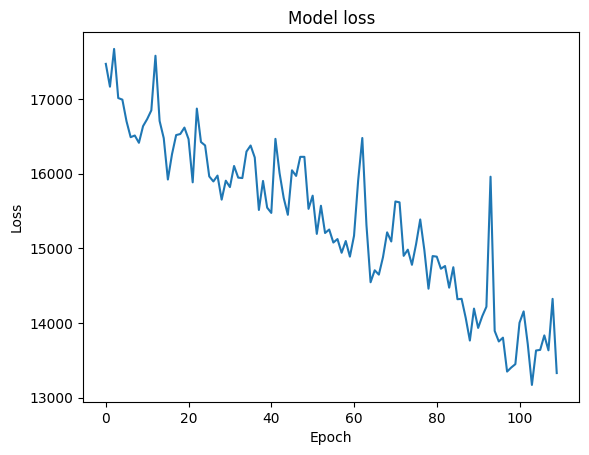

In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights490')

#Learning Rate
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 600
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(490,NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])

        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 10 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==599):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 601 | Batch:   0 of 250. Loss AE   14191.76 | Loss Extraction1    3654.75 | Loss Extraction2    3234.90:   2%|▏         | 1/50 [00:00<00:46,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 601 | Batch:   5 of 250. Loss AE   14495.63 | Loss Extraction1    2719.23 | Loss Extraction2    3929.90:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 601 | Batch:  10 of 250. Loss AE   14561.27 | Loss Extraction1    2408.37 | Loss Extraction2    3164.83:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 601 | Batch:  15 of 250. Loss AE   13928.61 | Loss Extraction1    2490.65 | Loss Extraction2    2803.15:   8%|▊         | 4/50 [00:03<00:39,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch:  20 of 250. Loss AE   15653.45 | Loss Extraction1    2713.21 | Loss Extraction2    2946.45:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 601 | Batch:  25 of 250. Loss AE   16742.47 | Loss Extraction1    2614.59 | Loss Extraction2    3207.02:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 601 | Batch:  30 of 250. Loss AE   15730.64 | Loss Extraction1    2467.92 | Loss Extraction2    3173.55:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 601 | Batch:  35 of 250. Loss AE   16111.78 | Loss Extraction1    2431.74 | Loss Extraction2    3159.65:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 601 | Batch:  40 of 250. Loss AE   15773.83 | Loss Extraction1    2420.68 | Loss Extraction2    3171.02:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 601 | Batch:  45 of 250. Loss AE   15679.92 | Loss Extraction1    2367.71 | Loss Extraction2    3044.43:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 601 | Batch:  50 of 250. Loss AE   15316.25 | Loss Extraction1    2339.56 | Loss Extraction2    3003.85:  22%|██▏       | 11/50 [00:10<00:42,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 601 | Batch:  55 of 250. Loss AE   15722.09 | Loss Extraction1    2376.08 | Loss Extraction2    2967.93:  24%|██▍       | 12/50 [00:11<00:39,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch:  60 of 250. Loss AE   15387.62 | Loss Extraction1    2341.39 | Loss Extraction2    2835.63:  26%|██▌       | 13/50 [00:12<00:38,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch:  65 of 250. Loss AE   15195.01 | Loss Extraction1    2317.86 | Loss Extraction2    2769.65:  28%|██▊       | 14/50 [00:13<00:35,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 601 | Batch:  70 of 250. Loss AE   14711.13 | Loss Extraction1    2274.97 | Loss Extraction2    2703.96:  30%|███       | 15/50 [00:14<00:33,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 601 | Batch:  75 of 250. Loss AE   14282.61 | Loss Extraction1    2209.44 | Loss Extraction2    2658.00:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch:  80 of 250. Loss AE   14424.94 | Loss Extraction1    2232.48 | Loss Extraction2    2691.46:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 601 | Batch:  85 of 250. Loss AE   14230.11 | Loss Extraction1    2207.21 | Loss Extraction2    2707.65:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 601 | Batch:  90 of 250. Loss AE   13908.08 | Loss Extraction1    2163.13 | Loss Extraction2    2696.24:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 601 | Batch:  95 of 250. Loss AE   13655.21 | Loss Extraction1    2127.26 | Loss Extraction2    2660.91:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch: 100 of 250. Loss AE   13540.13 | Loss Extraction1    2154.25 | Loss Extraction2    2670.81:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 601 | Batch: 105 of 250. Loss AE   13414.50 | Loss Extraction1    2141.33 | Loss Extraction2    2598.52:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 601 | Batch: 110 of 250. Loss AE   13405.87 | Loss Extraction1    2110.17 | Loss Extraction2    2647.10:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 601 | Batch: 115 of 250. Loss AE   13279.13 | Loss Extraction1    2112.74 | Loss Extraction2    2671.85:  48%|████▊     | 24/50 [00:22<00:28,  1.09s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 601 | Batch: 120 of 250. Loss AE   13365.09 | Loss Extraction1    2120.13 | Loss Extraction2    2711.69:  50%|█████     | 25/50 [00:24<00:27,  1.11s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 601 | Batch: 125 of 250. Loss AE   13560.44 | Loss Extraction1    2113.85 | Loss Extraction2    2657.88:  52%|█████▏    | 26/50 [00:24<00:24,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch: 130 of 250. Loss AE   13316.56 | Loss Extraction1    2101.72 | Loss Extraction2    2625.95:  54%|█████▍    | 27/50 [00:25<00:22,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch: 135 of 250. Loss AE   13184.98 | Loss Extraction1    2113.90 | Loss Extraction2    2595.80:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 601 | Batch: 140 of 250. Loss AE   13082.57 | Loss Extraction1    2073.15 | Loss Extraction2    2557.14:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 601 | Batch: 145 of 250. Loss AE   13066.31 | Loss Extraction1    2066.95 | Loss Extraction2    2542.81:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch: 150 of 250. Loss AE   13075.77 | Loss Extraction1    2058.14 | Loss Extraction2    2586.70:  62%|██████▏   | 31/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 155 of 250. Loss AE   13079.86 | Loss Extraction1    2067.53 | Loss Extraction2    2610.58:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 160 of 250. Loss AE   13085.72 | Loss Extraction1    2043.38 | Loss Extraction2    2584.94:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 601 | Batch: 165 of 250. Loss AE   13122.76 | Loss Extraction1    2035.35 | Loss Extraction2    2570.26:  68%|██████▊   | 34/50 [00:31<00:14,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 170 of 250. Loss AE   13100.59 | Loss Extraction1    2028.23 | Loss Extraction2    2570.20:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch: 175 of 250. Loss AE   13338.79 | Loss Extraction1    2032.07 | Loss Extraction2    2556.07:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 180 of 250. Loss AE   13241.28 | Loss Extraction1    2043.83 | Loss Extraction2    2535.38:  74%|███████▍  | 37/50 [00:34<00:11,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 601 | Batch: 185 of 250. Loss AE   13099.49 | Loss Extraction1    2056.46 | Loss Extraction2    2508.29:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 601 | Batch: 190 of 250. Loss AE   13187.11 | Loss Extraction1    2054.52 | Loss Extraction2    2490.88:  78%|███████▊  | 39/50 [00:36<00:10,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 601 | Batch: 195 of 250. Loss AE   13221.89 | Loss Extraction1    2069.53 | Loss Extraction2    2472.68:  80%|████████  | 40/50 [00:37<00:09,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 200 of 250. Loss AE   13344.54 | Loss Extraction1    2076.16 | Loss Extraction2    2456.61:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 205 of 250. Loss AE   13284.31 | Loss Extraction1    2107.43 | Loss Extraction2    2479.79:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 601 | Batch: 210 of 250. Loss AE   13096.46 | Loss Extraction1    2092.00 | Loss Extraction2    2451.57:  86%|████████▌ | 43/50 [00:40<00:06,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 215 of 250. Loss AE   13067.20 | Loss Extraction1    2083.57 | Loss Extraction2    2461.79:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 601 | Batch: 220 of 250. Loss AE   13185.16 | Loss Extraction1    2090.78 | Loss Extraction2    2462.11:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 601 | Batch: 225 of 250. Loss AE   13115.70 | Loss Extraction1    2085.44 | Loss Extraction2    2450.62:  92%|█████████▏| 46/50 [00:42<00:03,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 230 of 250. Loss AE   13087.45 | Loss Extraction1    2083.47 | Loss Extraction2    2470.57:  94%|█████████▍| 47/50 [00:43<00:02,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 601 | Batch: 235 of 250. Loss AE   13016.04 | Loss Extraction1    2068.92 | Loss Extraction2    2461.49:  96%|█████████▌| 48/50 [00:44<00:01,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 240 of 250. Loss AE   13042.94 | Loss Extraction1    2065.41 | Loss Extraction2    2444.31:  98%|█████████▊| 49/50 [00:45<00:00,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 601 | Batch: 245 of 250. Loss AE   12997.20 | Loss Extraction1    2068.71 | Loss Extraction2    2472.20: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 602 | Batch:   0 of 250. Loss AE   14529.31 | Loss Extraction1    1521.92 | Loss Extraction2    2028.47:   2%|▏         | 1/50 [00:01<00:53,  1.09s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 602 | Batch:   5 of 250. Loss AE   12963.79 | Loss Extraction1    2613.14 | Loss Extraction2    2165.39:   4%|▍         | 2/50 [00:02<00:54,  1.14s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 602 | Batch:  10 of 250. Loss AE   12754.78 | Loss Extraction1    2388.70 | Loss Extraction2    1862.47:   6%|▌         | 3/50 [00:03<00:54,  1.16s/it]

1/1 [==============================] - 0s 23ms/step


Epoch 602 | Batch:  15 of 250. Loss AE   12898.07 | Loss Extraction1    2472.77 | Loss Extraction2    1947.59:   8%|▊         | 4/50 [00:04<00:47,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 602 | Batch:  20 of 250. Loss AE   11419.17 | Loss Extraction1    2292.84 | Loss Extraction2    1914.03:  10%|█         | 5/50 [00:05<00:44,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 602 | Batch:  25 of 250. Loss AE   12545.68 | Loss Extraction1    2325.95 | Loss Extraction2    2534.56:  12%|█▏        | 6/50 [00:06<00:41,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 602 | Batch:  30 of 250. Loss AE   11909.50 | Loss Extraction1    2322.79 | Loss Extraction2    2445.14:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 602 | Batch:  35 of 250. Loss AE   11829.46 | Loss Extraction1    2234.70 | Loss Extraction2    2496.76:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 602 | Batch:  40 of 250. Loss AE   12281.22 | Loss Extraction1    2260.15 | Loss Extraction2    2479.98:  18%|█▊        | 9/50 [00:08<00:35,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 602 | Batch:  45 of 250. Loss AE   12299.90 | Loss Extraction1    2237.46 | Loss Extraction2    2641.50:  20%|██        | 10/50 [00:09<00:34,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 602 | Batch:  50 of 250. Loss AE   12406.04 | Loss Extraction1    2176.87 | Loss Extraction2    2632.73:  22%|██▏       | 11/50 [00:10<00:33,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 602 | Batch:  55 of 250. Loss AE   12293.12 | Loss Extraction1    2179.51 | Loss Extraction2    2624.93:  24%|██▍       | 12/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 602 | Batch:  60 of 250. Loss AE   12432.64 | Loss Extraction1    2096.38 | Loss Extraction2    2554.73:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 602 | Batch:  65 of 250. Loss AE   12121.45 | Loss Extraction1    2090.02 | Loss Extraction2    2525.30:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 602 | Batch:  70 of 250. Loss AE   12254.93 | Loss Extraction1    2064.56 | Loss Extraction2    2485.51:  30%|███       | 15/50 [00:14<00:33,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 602 | Batch:  75 of 250. Loss AE   12896.50 | Loss Extraction1    2068.89 | Loss Extraction2    2467.79:  32%|███▏      | 16/50 [00:15<00:34,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 602 | Batch:  80 of 250. Loss AE   12846.49 | Loss Extraction1    2037.10 | Loss Extraction2    2532.32:  34%|███▍      | 17/50 [00:16<00:32,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 602 | Batch:  85 of 250. Loss AE   12725.76 | Loss Extraction1    2045.27 | Loss Extraction2    2521.53:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 602 | Batch:  90 of 250. Loss AE   12531.55 | Loss Extraction1    2057.72 | Loss Extraction2    2485.19:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 602 | Batch:  95 of 250. Loss AE   12508.77 | Loss Extraction1    2046.01 | Loss Extraction2    2442.70:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 602 | Batch: 100 of 250. Loss AE   12870.48 | Loss Extraction1    2030.29 | Loss Extraction2    2444.54:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 602 | Batch: 105 of 250. Loss AE   13266.72 | Loss Extraction1    2042.50 | Loss Extraction2    2514.89:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 602 | Batch: 110 of 250. Loss AE   13174.15 | Loss Extraction1    2016.06 | Loss Extraction2    2483.54:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 602 | Batch: 115 of 250. Loss AE   13242.67 | Loss Extraction1    2018.85 | Loss Extraction2    2437.13:  48%|████▊     | 24/50 [00:22<00:26,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 602 | Batch: 120 of 250. Loss AE   13141.20 | Loss Extraction1    2014.25 | Loss Extraction2    2414.30:  50%|█████     | 25/50 [00:23<00:24,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 602 | Batch: 125 of 250. Loss AE   13312.71 | Loss Extraction1    2013.92 | Loss Extraction2    2391.40:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 602 | Batch: 130 of 250. Loss AE   13254.42 | Loss Extraction1    1998.61 | Loss Extraction2    2347.57:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 602 | Batch: 135 of 250. Loss AE   13283.20 | Loss Extraction1    2011.54 | Loss Extraction2    2369.58:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 602 | Batch: 140 of 250. Loss AE   13309.41 | Loss Extraction1    2048.97 | Loss Extraction2    2428.28:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 602 | Batch: 145 of 250. Loss AE   13255.26 | Loss Extraction1    2064.89 | Loss Extraction2    2471.24:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 602 | Batch: 150 of 250. Loss AE   13174.73 | Loss Extraction1    2042.75 | Loss Extraction2    2441.57:  62%|██████▏   | 31/50 [00:28<00:18,  1.01it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 602 | Batch: 155 of 250. Loss AE   13184.52 | Loss Extraction1    2054.61 | Loss Extraction2    2492.32:  64%|██████▍   | 32/50 [00:30<00:18,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 602 | Batch: 160 of 250. Loss AE   13154.54 | Loss Extraction1    2091.10 | Loss Extraction2    2533.78:  66%|██████▌   | 33/50 [00:31<00:16,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 602 | Batch: 165 of 250. Loss AE   13321.87 | Loss Extraction1    2086.33 | Loss Extraction2    2559.08:  68%|██████▊   | 34/50 [00:31<00:15,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 602 | Batch: 170 of 250. Loss AE   13226.14 | Loss Extraction1    2088.58 | Loss Extraction2    2564.35:  70%|███████   | 35/50 [00:32<00:13,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 602 | Batch: 175 of 250. Loss AE   13208.81 | Loss Extraction1    2118.44 | Loss Extraction2    2549.71:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 602 | Batch: 180 of 250. Loss AE   13156.94 | Loss Extraction1    2125.42 | Loss Extraction2    2542.34:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 602 | Batch: 185 of 250. Loss AE   13133.75 | Loss Extraction1    2108.69 | Loss Extraction2    2537.22:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 602 | Batch: 190 of 250. Loss AE   13054.63 | Loss Extraction1    2094.13 | Loss Extraction2    2526.78:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 602 | Batch: 195 of 250. Loss AE   12982.94 | Loss Extraction1    2088.72 | Loss Extraction2    2498.28:  80%|████████  | 40/50 [00:37<00:08,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 602 | Batch: 200 of 250. Loss AE   13068.09 | Loss Extraction1    2060.85 | Loss Extraction2    2478.54:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 602 | Batch: 205 of 250. Loss AE   13020.11 | Loss Extraction1    2090.87 | Loss Extraction2    2476.69:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 602 | Batch: 210 of 250. Loss AE   13108.43 | Loss Extraction1    2102.98 | Loss Extraction2    2566.09:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 602 | Batch: 215 of 250. Loss AE   13065.63 | Loss Extraction1    2101.13 | Loss Extraction2    2595.09:  88%|████████▊ | 44/50 [00:40<00:05,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 602 | Batch: 220 of 250. Loss AE   13115.63 | Loss Extraction1    2099.35 | Loss Extraction2    2571.83:  90%|█████████ | 45/50 [00:41<00:04,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 602 | Batch: 225 of 250. Loss AE   13070.20 | Loss Extraction1    2084.15 | Loss Extraction2    2568.33:  92%|█████████▏| 46/50 [00:42<00:03,  1.04it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 602 | Batch: 230 of 250. Loss AE   13217.12 | Loss Extraction1    2089.21 | Loss Extraction2    2572.78:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 602 | Batch: 235 of 250. Loss AE   13195.80 | Loss Extraction1    2089.87 | Loss Extraction2    2589.47:  96%|█████████▌| 48/50 [00:44<00:01,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 602 | Batch: 240 of 250. Loss AE   13108.96 | Loss Extraction1    2088.87 | Loss Extraction2    2602.79:  98%|█████████▊| 49/50 [00:45<00:00,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 602 | Batch: 245 of 250. Loss AE   13059.33 | Loss Extraction1    2084.18 | Loss Extraction2    2589.96: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 603 | Batch:   0 of 250. Loss AE   10623.19 | Loss Extraction1    2791.73 | Loss Extraction2    2536.16:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 603 | Batch:   5 of 250. Loss AE   12559.80 | Loss Extraction1    2260.26 | Loss Extraction2    3417.91:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 603 | Batch:  10 of 250. Loss AE   13332.09 | Loss Extraction1    2295.98 | Loss Extraction2    3002.13:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 603 | Batch:  15 of 250. Loss AE   13365.88 | Loss Extraction1    2187.82 | Loss Extraction2    2914.12:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 603 | Batch:  20 of 250. Loss AE   12375.36 | Loss Extraction1    2060.83 | Loss Extraction2    2552.38:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 603 | Batch:  25 of 250. Loss AE   12800.92 | Loss Extraction1    2244.10 | Loss Extraction2    2456.19:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 603 | Batch:  30 of 250. Loss AE   12536.98 | Loss Extraction1    2232.90 | Loss Extraction2    2508.85:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 603 | Batch:  35 of 250. Loss AE   12419.66 | Loss Extraction1    2203.13 | Loss Extraction2    2587.33:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 603 | Batch:  40 of 250. Loss AE   12053.30 | Loss Extraction1    2202.38 | Loss Extraction2    2509.92:  18%|█▊        | 9/50 [00:08<00:42,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 603 | Batch:  45 of 250. Loss AE   11570.42 | Loss Extraction1    2180.05 | Loss Extraction2    2450.43:  20%|██        | 10/50 [00:09<00:41,  1.05s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 603 | Batch:  50 of 250. Loss AE   11468.37 | Loss Extraction1    2198.34 | Loss Extraction2    2381.45:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 603 | Batch:  55 of 250. Loss AE   11920.09 | Loss Extraction1    2139.40 | Loss Extraction2    2362.09:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 603 | Batch:  60 of 250. Loss AE   11988.27 | Loss Extraction1    2093.20 | Loss Extraction2    2356.61:  26%|██▌       | 13/50 [00:12<00:34,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 603 | Batch:  65 of 250. Loss AE   11728.63 | Loss Extraction1    2057.45 | Loss Extraction2    2353.68:  28%|██▊       | 14/50 [00:13<00:34,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 603 | Batch:  70 of 250. Loss AE   12049.70 | Loss Extraction1    2078.88 | Loss Extraction2    2339.94:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 603 | Batch:  75 of 250. Loss AE   11983.57 | Loss Extraction1    2048.65 | Loss Extraction2    2325.99:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 603 | Batch:  80 of 250. Loss AE   12201.65 | Loss Extraction1    2071.88 | Loss Extraction2    2313.24:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 603 | Batch:  85 of 250. Loss AE   12560.03 | Loss Extraction1    2015.38 | Loss Extraction2    2276.30:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 603 | Batch:  90 of 250. Loss AE   12953.14 | Loss Extraction1    2060.63 | Loss Extraction2    2318.81:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 603 | Batch:  95 of 250. Loss AE   12883.02 | Loss Extraction1    2032.12 | Loss Extraction2    2376.44:  40%|████      | 20/50 [00:18<00:26,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 603 | Batch: 100 of 250. Loss AE   13067.05 | Loss Extraction1    2046.04 | Loss Extraction2    2415.78:  42%|████▏     | 21/50 [00:19<00:25,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 603 | Batch: 105 of 250. Loss AE   12828.81 | Loss Extraction1    1994.39 | Loss Extraction2    2378.03:  44%|████▍     | 22/50 [00:20<00:26,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 603 | Batch: 110 of 250. Loss AE   12672.84 | Loss Extraction1    1995.71 | Loss Extraction2    2343.22:  46%|████▌     | 23/50 [00:21<00:28,  1.07s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 603 | Batch: 115 of 250. Loss AE   12686.31 | Loss Extraction1    2042.42 | Loss Extraction2    2314.78:  48%|████▊     | 24/50 [00:22<00:28,  1.10s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 603 | Batch: 120 of 250. Loss AE   12782.73 | Loss Extraction1    2034.50 | Loss Extraction2    2362.18:  50%|█████     | 25/50 [00:23<00:25,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 603 | Batch: 125 of 250. Loss AE   12813.06 | Loss Extraction1    2037.67 | Loss Extraction2    2462.37:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 603 | Batch: 130 of 250. Loss AE   12703.26 | Loss Extraction1    2013.97 | Loss Extraction2    2404.63:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 603 | Batch: 135 of 250. Loss AE   12869.41 | Loss Extraction1    2101.43 | Loss Extraction2    2479.75:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 603 | Batch: 140 of 250. Loss AE   13029.79 | Loss Extraction1    2088.51 | Loss Extraction2    2489.71:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 603 | Batch: 145 of 250. Loss AE   12927.46 | Loss Extraction1    2092.24 | Loss Extraction2    2502.29:  60%|██████    | 30/50 [00:28<00:18,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 603 | Batch: 150 of 250. Loss AE   12969.16 | Loss Extraction1    2102.73 | Loss Extraction2    2513.84:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 603 | Batch: 155 of 250. Loss AE   12873.30 | Loss Extraction1    2087.88 | Loss Extraction2    2506.60:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 603 | Batch: 160 of 250. Loss AE   12722.49 | Loss Extraction1    2079.35 | Loss Extraction2    2480.62:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 603 | Batch: 165 of 250. Loss AE   12634.02 | Loss Extraction1    2075.24 | Loss Extraction2    2462.84:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 603 | Batch: 170 of 250. Loss AE   12670.15 | Loss Extraction1    2097.60 | Loss Extraction2    2464.79:  70%|███████   | 35/50 [00:32<00:13,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 603 | Batch: 175 of 250. Loss AE   12834.11 | Loss Extraction1    2114.20 | Loss Extraction2    2464.81:  72%|███████▏  | 36/50 [00:34<00:14,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 603 | Batch: 180 of 250. Loss AE   12768.50 | Loss Extraction1    2142.56 | Loss Extraction2    2473.40:  74%|███████▍  | 37/50 [00:35<00:13,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 603 | Batch: 185 of 250. Loss AE   12666.42 | Loss Extraction1    2145.17 | Loss Extraction2    2438.40:  76%|███████▌  | 38/50 [00:36<00:11,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 603 | Batch: 190 of 250. Loss AE   12937.70 | Loss Extraction1    2155.85 | Loss Extraction2    2444.49:  78%|███████▊  | 39/50 [00:37<00:11,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 603 | Batch: 195 of 250. Loss AE   12825.90 | Loss Extraction1    2144.11 | Loss Extraction2    2416.77:  80%|████████  | 40/50 [00:38<00:09,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 603 | Batch: 200 of 250. Loss AE   12794.82 | Loss Extraction1    2128.37 | Loss Extraction2    2398.48:  82%|████████▏ | 41/50 [00:38<00:08,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 603 | Batch: 205 of 250. Loss AE   12744.21 | Loss Extraction1    2116.50 | Loss Extraction2    2386.99:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 603 | Batch: 210 of 250. Loss AE   12903.70 | Loss Extraction1    2105.09 | Loss Extraction2    2526.46:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 603 | Batch: 215 of 250. Loss AE   12999.22 | Loss Extraction1    2099.87 | Loss Extraction2    2530.56:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 603 | Batch: 220 of 250. Loss AE   12924.33 | Loss Extraction1    2084.20 | Loss Extraction2    2524.98:  90%|█████████ | 45/50 [00:42<00:04,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 603 | Batch: 225 of 250. Loss AE   13026.89 | Loss Extraction1    2073.75 | Loss Extraction2    2519.49:  92%|█████████▏| 46/50 [00:43<00:03,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 603 | Batch: 230 of 250. Loss AE   13036.97 | Loss Extraction1    2064.76 | Loss Extraction2    2519.49:  94%|█████████▍| 47/50 [00:44<00:02,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 603 | Batch: 235 of 250. Loss AE   12985.81 | Loss Extraction1    2052.08 | Loss Extraction2    2498.95:  96%|█████████▌| 48/50 [00:44<00:01,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 603 | Batch: 240 of 250. Loss AE   13043.82 | Loss Extraction1    2058.26 | Loss Extraction2    2479.67:  98%|█████████▊| 49/50 [00:45<00:00,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 603 | Batch: 245 of 250. Loss AE   12978.92 | Loss Extraction1    2066.19 | Loss Extraction2    2490.41: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 604 | Batch:   0 of 250. Loss AE   12361.13 | Loss Extraction1    1845.68 | Loss Extraction2    2710.49:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 604 | Batch:   5 of 250. Loss AE   10360.76 | Loss Extraction1    1502.07 | Loss Extraction2    2154.79:   4%|▍         | 2/50 [00:02<00:55,  1.16s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 604 | Batch:  10 of 250. Loss AE   11801.94 | Loss Extraction1    1913.69 | Loss Extraction2    2075.50:   6%|▌         | 3/50 [00:03<00:47,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 604 | Batch:  15 of 250. Loss AE   11983.95 | Loss Extraction1    2081.86 | Loss Extraction2    1929.24:   8%|▊         | 4/50 [00:04<00:43,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 604 | Batch:  20 of 250. Loss AE   12723.30 | Loss Extraction1    2048.84 | Loss Extraction2    2196.98:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 604 | Batch:  25 of 250. Loss AE   12635.40 | Loss Extraction1    1959.07 | Loss Extraction2    2138.28:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 604 | Batch:  30 of 250. Loss AE   12443.29 | Loss Extraction1    2171.64 | Loss Extraction2    2281.51:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 604 | Batch:  35 of 250. Loss AE   12459.92 | Loss Extraction1    2158.27 | Loss Extraction2    2311.23:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 604 | Batch:  40 of 250. Loss AE   12454.44 | Loss Extraction1    2093.37 | Loss Extraction2    2307.45:  18%|█▊        | 9/50 [00:08<00:35,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 604 | Batch:  45 of 250. Loss AE   12597.04 | Loss Extraction1    2141.33 | Loss Extraction2    2301.63:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 604 | Batch:  50 of 250. Loss AE   12734.20 | Loss Extraction1    2120.43 | Loss Extraction2    2221.18:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 604 | Batch:  55 of 250. Loss AE   12347.70 | Loss Extraction1    2084.31 | Loss Extraction2    2209.97:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 604 | Batch:  60 of 250. Loss AE   12101.93 | Loss Extraction1    2082.31 | Loss Extraction2    2216.62:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 604 | Batch:  65 of 250. Loss AE   12185.20 | Loss Extraction1    2049.85 | Loss Extraction2    2358.51:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 604 | Batch:  70 of 250. Loss AE   12462.43 | Loss Extraction1    2038.15 | Loss Extraction2    2535.87:  30%|███       | 15/50 [00:14<00:34,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 604 | Batch:  75 of 250. Loss AE   12336.90 | Loss Extraction1    2058.77 | Loss Extraction2    2466.72:  32%|███▏      | 16/50 [00:15<00:35,  1.04s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 604 | Batch:  80 of 250. Loss AE   12823.19 | Loss Extraction1    2070.00 | Loss Extraction2    2442.31:  34%|███▍      | 17/50 [00:15<00:32,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 604 | Batch:  85 of 250. Loss AE   12990.24 | Loss Extraction1    2115.27 | Loss Extraction2    2598.59:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 604 | Batch:  90 of 250. Loss AE   13190.34 | Loss Extraction1    2122.38 | Loss Extraction2    2591.02:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 604 | Batch:  95 of 250. Loss AE   13293.24 | Loss Extraction1    2111.55 | Loss Extraction2    2744.11:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 604 | Batch: 100 of 250. Loss AE   13093.08 | Loss Extraction1    2091.97 | Loss Extraction2    2682.06:  42%|████▏     | 21/50 [00:19<00:25,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 604 | Batch: 105 of 250. Loss AE   13125.14 | Loss Extraction1    2117.91 | Loss Extraction2    2668.99:  44%|████▍     | 22/50 [00:20<00:24,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 604 | Batch: 110 of 250. Loss AE   13182.97 | Loss Extraction1    2105.57 | Loss Extraction2    2678.40:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 604 | Batch: 115 of 250. Loss AE   13084.16 | Loss Extraction1    2127.48 | Loss Extraction2    2691.06:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 604 | Batch: 120 of 250. Loss AE   13179.00 | Loss Extraction1    2120.91 | Loss Extraction2    2639.89:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 604 | Batch: 125 of 250. Loss AE   13145.80 | Loss Extraction1    2114.52 | Loss Extraction2    2698.50:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 604 | Batch: 130 of 250. Loss AE   13140.65 | Loss Extraction1    2102.46 | Loss Extraction2    2709.97:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 604 | Batch: 135 of 250. Loss AE   13237.30 | Loss Extraction1    2160.25 | Loss Extraction2    2688.44:  56%|█████▌    | 28/50 [00:25<00:20,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 604 | Batch: 140 of 250. Loss AE   13123.68 | Loss Extraction1    2153.85 | Loss Extraction2    2671.70:  58%|█████▊    | 29/50 [00:26<00:21,  1.00s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 604 | Batch: 145 of 250. Loss AE   13186.52 | Loss Extraction1    2150.64 | Loss Extraction2    2629.07:  60%|██████    | 30/50 [00:27<00:19,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 604 | Batch: 150 of 250. Loss AE   13352.88 | Loss Extraction1    2153.52 | Loss Extraction2    2599.42:  62%|██████▏   | 31/50 [00:28<00:18,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 604 | Batch: 155 of 250. Loss AE   13205.62 | Loss Extraction1    2132.66 | Loss Extraction2    2593.26:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 604 | Batch: 160 of 250. Loss AE   13361.21 | Loss Extraction1    2119.29 | Loss Extraction2    2547.64:  66%|██████▌   | 33/50 [00:30<00:15,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 604 | Batch: 165 of 250. Loss AE   13203.58 | Loss Extraction1    2097.06 | Loss Extraction2    2543.39:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 604 | Batch: 170 of 250. Loss AE   13164.49 | Loss Extraction1    2100.51 | Loss Extraction2    2512.91:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 604 | Batch: 175 of 250. Loss AE   13001.42 | Loss Extraction1    2078.22 | Loss Extraction2    2475.30:  72%|███████▏  | 36/50 [00:33<00:12,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 604 | Batch: 180 of 250. Loss AE   12954.30 | Loss Extraction1    2059.55 | Loss Extraction2    2547.79:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 604 | Batch: 185 of 250. Loss AE   12903.10 | Loss Extraction1    2067.84 | Loss Extraction2    2530.49:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 604 | Batch: 190 of 250. Loss AE   12742.65 | Loss Extraction1    2057.59 | Loss Extraction2    2507.24:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 604 | Batch: 195 of 250. Loss AE   12698.53 | Loss Extraction1    2055.57 | Loss Extraction2    2528.66:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 604 | Batch: 200 of 250. Loss AE   12714.35 | Loss Extraction1    2040.98 | Loss Extraction2    2544.95:  82%|████████▏ | 41/50 [00:37<00:07,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 604 | Batch: 205 of 250. Loss AE   12904.67 | Loss Extraction1    2067.24 | Loss Extraction2    2577.21:  84%|████████▍ | 42/50 [00:38<00:07,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 604 | Batch: 210 of 250. Loss AE   12785.37 | Loss Extraction1    2051.07 | Loss Extraction2    2563.46:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 604 | Batch: 215 of 250. Loss AE   12827.58 | Loss Extraction1    2043.05 | Loss Extraction2    2563.27:  88%|████████▊ | 44/50 [00:40<00:05,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 604 | Batch: 220 of 250. Loss AE   12874.35 | Loss Extraction1    2073.67 | Loss Extraction2    2544.46:  90%|█████████ | 45/50 [00:41<00:05,  1.04s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 604 | Batch: 225 of 250. Loss AE   12810.04 | Loss Extraction1    2074.83 | Loss Extraction2    2536.39:  92%|█████████▏| 46/50 [00:42<00:03,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 604 | Batch: 230 of 250. Loss AE   12920.54 | Loss Extraction1    2077.58 | Loss Extraction2    2522.15:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 604 | Batch: 235 of 250. Loss AE   12817.41 | Loss Extraction1    2059.41 | Loss Extraction2    2528.49:  96%|█████████▌| 48/50 [00:44<00:01,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 604 | Batch: 240 of 250. Loss AE   12697.82 | Loss Extraction1    2051.64 | Loss Extraction2    2509.78:  98%|█████████▊| 49/50 [00:44<00:00,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 604 | Batch: 245 of 250. Loss AE   12809.63 | Loss Extraction1    2044.24 | Loss Extraction2    2527.66: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 605 | Batch:   0 of 250. Loss AE   12840.81 | Loss Extraction1    2288.46 | Loss Extraction2    2813.23:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 605 | Batch:   5 of 250. Loss AE   13457.24 | Loss Extraction1    2119.45 | Loss Extraction2    2120.53:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 605 | Batch:  10 of 250. Loss AE   15062.65 | Loss Extraction1    2252.41 | Loss Extraction2    2565.96:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 605 | Batch:  15 of 250. Loss AE   14280.24 | Loss Extraction1    2110.26 | Loss Extraction2    2815.12:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 605 | Batch:  20 of 250. Loss AE   14430.35 | Loss Extraction1    1977.48 | Loss Extraction2    2712.15:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 605 | Batch:  25 of 250. Loss AE   13662.91 | Loss Extraction1    2022.80 | Loss Extraction2    2534.13:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 605 | Batch:  30 of 250. Loss AE   14027.49 | Loss Extraction1    1978.50 | Loss Extraction2    2540.73:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 109ms/step


Epoch 605 | Batch:  35 of 250. Loss AE   13883.84 | Loss Extraction1    2085.33 | Loss Extraction2    2511.80:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 605 | Batch:  40 of 250. Loss AE   14197.39 | Loss Extraction1    2076.37 | Loss Extraction2    2434.16:  18%|█▊        | 9/50 [00:08<00:42,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 605 | Batch:  45 of 250. Loss AE   14055.73 | Loss Extraction1    2145.71 | Loss Extraction2    2368.35:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 605 | Batch:  50 of 250. Loss AE   13836.11 | Loss Extraction1    2132.37 | Loss Extraction2    2338.48:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 605 | Batch:  55 of 250. Loss AE   13689.36 | Loss Extraction1    2132.98 | Loss Extraction2    2450.99:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 605 | Batch:  60 of 250. Loss AE   13599.37 | Loss Extraction1    2081.69 | Loss Extraction2    2428.10:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 605 | Batch:  65 of 250. Loss AE   13427.81 | Loss Extraction1    2029.55 | Loss Extraction2    2418.23:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 605 | Batch:  70 of 250. Loss AE   13263.95 | Loss Extraction1    2029.86 | Loss Extraction2    2397.10:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 605 | Batch:  75 of 250. Loss AE   13539.87 | Loss Extraction1    2065.82 | Loss Extraction2    2321.78:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 605 | Batch:  80 of 250. Loss AE   13356.87 | Loss Extraction1    2055.56 | Loss Extraction2    2334.93:  34%|███▍      | 17/50 [00:15<00:30,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 605 | Batch:  85 of 250. Loss AE   13402.41 | Loss Extraction1    2089.60 | Loss Extraction2    2427.58:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 605 | Batch:  90 of 250. Loss AE   13565.91 | Loss Extraction1    2069.73 | Loss Extraction2    2353.64:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 605 | Batch:  95 of 250. Loss AE   13506.04 | Loss Extraction1    2080.57 | Loss Extraction2    2372.37:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 605 | Batch: 100 of 250. Loss AE   13571.68 | Loss Extraction1    2108.25 | Loss Extraction2    2555.98:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 605 | Batch: 105 of 250. Loss AE   13344.61 | Loss Extraction1    2112.79 | Loss Extraction2    2525.97:  44%|████▍     | 22/50 [00:20<00:27,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 605 | Batch: 110 of 250. Loss AE   13411.63 | Loss Extraction1    2100.92 | Loss Extraction2    2551.96:  46%|████▌     | 23/50 [00:21<00:26,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 605 | Batch: 115 of 250. Loss AE   13530.43 | Loss Extraction1    2160.32 | Loss Extraction2    2588.15:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 605 | Batch: 120 of 250. Loss AE   13735.64 | Loss Extraction1    2140.34 | Loss Extraction2    2613.60:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 605 | Batch: 125 of 250. Loss AE   13600.34 | Loss Extraction1    2131.39 | Loss Extraction2    2592.44:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 605 | Batch: 130 of 250. Loss AE   13596.64 | Loss Extraction1    2159.20 | Loss Extraction2    2638.00:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 605 | Batch: 135 of 250. Loss AE   13581.64 | Loss Extraction1    2149.06 | Loss Extraction2    2595.32:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 605 | Batch: 140 of 250. Loss AE   13586.40 | Loss Extraction1    2117.40 | Loss Extraction2    2558.66:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 605 | Batch: 145 of 250. Loss AE   13649.96 | Loss Extraction1    2120.94 | Loss Extraction2    2537.42:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 605 | Batch: 150 of 250. Loss AE   13545.51 | Loss Extraction1    2131.41 | Loss Extraction2    2518.37:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 605 | Batch: 155 of 250. Loss AE   13449.83 | Loss Extraction1    2102.19 | Loss Extraction2    2486.20:  64%|██████▍   | 32/50 [00:29<00:15,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 605 | Batch: 160 of 250. Loss AE   13490.62 | Loss Extraction1    2095.30 | Loss Extraction2    2494.50:  66%|██████▌   | 33/50 [00:29<00:14,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 605 | Batch: 165 of 250. Loss AE   13369.62 | Loss Extraction1    2084.53 | Loss Extraction2    2463.63:  68%|██████▊   | 34/50 [00:30<00:13,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 605 | Batch: 170 of 250. Loss AE   13481.44 | Loss Extraction1    2084.60 | Loss Extraction2    2486.66:  70%|███████   | 35/50 [00:31<00:12,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 605 | Batch: 175 of 250. Loss AE   13312.42 | Loss Extraction1    2068.14 | Loss Extraction2    2465.78:  72%|███████▏  | 36/50 [00:32<00:11,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 605 | Batch: 180 of 250. Loss AE   13378.22 | Loss Extraction1    2144.46 | Loss Extraction2    2463.44:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 605 | Batch: 185 of 250. Loss AE   13249.85 | Loss Extraction1    2124.26 | Loss Extraction2    2462.30:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 605 | Batch: 190 of 250. Loss AE   13161.28 | Loss Extraction1    2128.90 | Loss Extraction2    2455.81:  78%|███████▊  | 39/50 [00:35<00:11,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 605 | Batch: 195 of 250. Loss AE   13088.82 | Loss Extraction1    2115.03 | Loss Extraction2    2448.80:  80%|████████  | 40/50 [00:36<00:09,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 605 | Batch: 200 of 250. Loss AE   13076.97 | Loss Extraction1    2081.40 | Loss Extraction2    2443.90:  82%|████████▏ | 41/50 [00:37<00:08,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 605 | Batch: 205 of 250. Loss AE   13142.80 | Loss Extraction1    2075.77 | Loss Extraction2    2461.47:  84%|████████▍ | 42/50 [00:38<00:07,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 605 | Batch: 210 of 250. Loss AE   13115.86 | Loss Extraction1    2069.15 | Loss Extraction2    2482.40:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 605 | Batch: 215 of 250. Loss AE   13026.97 | Loss Extraction1    2081.09 | Loss Extraction2    2482.06:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 605 | Batch: 220 of 250. Loss AE   12874.53 | Loss Extraction1    2069.59 | Loss Extraction2    2453.29:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 605 | Batch: 225 of 250. Loss AE   12951.86 | Loss Extraction1    2086.30 | Loss Extraction2    2493.43:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 605 | Batch: 230 of 250. Loss AE   12860.37 | Loss Extraction1    2072.36 | Loss Extraction2    2482.91:  94%|█████████▍| 47/50 [00:42<00:02,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 605 | Batch: 235 of 250. Loss AE   12904.28 | Loss Extraction1    2068.78 | Loss Extraction2    2476.07:  96%|█████████▌| 48/50 [00:43<00:01,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 605 | Batch: 240 of 250. Loss AE   12774.09 | Loss Extraction1    2053.96 | Loss Extraction2    2452.69:  98%|█████████▊| 49/50 [00:44<00:00,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 605 | Batch: 245 of 250. Loss AE   12728.88 | Loss Extraction1    2046.09 | Loss Extraction2    2441.70: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 606 | Batch:   0 of 250. Loss AE   14337.74 | Loss Extraction1    2393.94 | Loss Extraction2    3639.14:   2%|▏         | 1/50 [00:01<00:54,  1.11s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 606 | Batch:   5 of 250. Loss AE   15394.70 | Loss Extraction1    2375.75 | Loss Extraction2    3150.59:   4%|▍         | 2/50 [00:02<00:48,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 606 | Batch:  10 of 250. Loss AE   15254.22 | Loss Extraction1    2686.16 | Loss Extraction2    3011.38:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 606 | Batch:  15 of 250. Loss AE   15931.80 | Loss Extraction1    2693.28 | Loss Extraction2    2792.54:   8%|▊         | 4/50 [00:04<00:47,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 606 | Batch:  20 of 250. Loss AE   14969.66 | Loss Extraction1    2602.26 | Loss Extraction2    2670.08:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 606 | Batch:  25 of 250. Loss AE   15009.07 | Loss Extraction1    2402.95 | Loss Extraction2    2763.65:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 606 | Batch:  30 of 250. Loss AE   15040.81 | Loss Extraction1    2319.15 | Loss Extraction2    2820.77:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 606 | Batch:  35 of 250. Loss AE   14147.45 | Loss Extraction1    2270.85 | Loss Extraction2    2685.89:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 606 | Batch:  40 of 250. Loss AE   13591.72 | Loss Extraction1    2205.85 | Loss Extraction2    2725.76:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 606 | Batch:  45 of 250. Loss AE   13198.17 | Loss Extraction1    2118.84 | Loss Extraction2    2607.62:  20%|██        | 10/50 [00:09<00:34,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 606 | Batch:  50 of 250. Loss AE   12846.62 | Loss Extraction1    2099.39 | Loss Extraction2    2490.11:  22%|██▏       | 11/50 [00:10<00:33,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 606 | Batch:  55 of 250. Loss AE   12921.50 | Loss Extraction1    2124.03 | Loss Extraction2    2550.29:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 606 | Batch:  60 of 250. Loss AE   13060.88 | Loss Extraction1    2132.01 | Loss Extraction2    2651.63:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 606 | Batch:  65 of 250. Loss AE   13074.38 | Loss Extraction1    2136.04 | Loss Extraction2    2598.76:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 606 | Batch:  70 of 250. Loss AE   13338.49 | Loss Extraction1    2169.71 | Loss Extraction2    2601.57:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 606 | Batch:  75 of 250. Loss AE   14047.49 | Loss Extraction1    2316.53 | Loss Extraction2    2679.33:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 606 | Batch:  80 of 250. Loss AE   14030.01 | Loss Extraction1    2276.21 | Loss Extraction2    2635.37:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 606 | Batch:  85 of 250. Loss AE   13881.27 | Loss Extraction1    2238.55 | Loss Extraction2    2690.29:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 606 | Batch:  90 of 250. Loss AE   14042.18 | Loss Extraction1    2206.58 | Loss Extraction2    2638.78:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 606 | Batch:  95 of 250. Loss AE   14146.23 | Loss Extraction1    2179.22 | Loss Extraction2    2617.30:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 606 | Batch: 100 of 250. Loss AE   14017.70 | Loss Extraction1    2180.70 | Loss Extraction2    2583.25:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 606 | Batch: 105 of 250. Loss AE   13788.83 | Loss Extraction1    2142.89 | Loss Extraction2    2515.74:  44%|████▍     | 22/50 [00:20<00:26,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 606 | Batch: 110 of 250. Loss AE   13859.79 | Loss Extraction1    2148.04 | Loss Extraction2    2480.68:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 606 | Batch: 115 of 250. Loss AE   13521.12 | Loss Extraction1    2116.55 | Loss Extraction2    2432.32:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 606 | Batch: 120 of 250. Loss AE   13329.40 | Loss Extraction1    2093.57 | Loss Extraction2    2427.89:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 606 | Batch: 125 of 250. Loss AE   13069.47 | Loss Extraction1    2086.13 | Loss Extraction2    2393.09:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 606 | Batch: 130 of 250. Loss AE   12916.22 | Loss Extraction1    2077.24 | Loss Extraction2    2357.32:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 606 | Batch: 135 of 250. Loss AE   12835.56 | Loss Extraction1    2087.11 | Loss Extraction2    2388.96:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 606 | Batch: 140 of 250. Loss AE   12811.43 | Loss Extraction1    2078.87 | Loss Extraction2    2393.21:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 606 | Batch: 145 of 250. Loss AE   12834.82 | Loss Extraction1    2088.67 | Loss Extraction2    2393.55:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 606 | Batch: 150 of 250. Loss AE   13325.39 | Loss Extraction1    2112.01 | Loss Extraction2    2417.84:  62%|██████▏   | 31/50 [00:28<00:19,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 606 | Batch: 155 of 250. Loss AE   13328.33 | Loss Extraction1    2099.58 | Loss Extraction2    2521.31:  64%|██████▍   | 32/50 [00:30<00:19,  1.11s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 606 | Batch: 160 of 250. Loss AE   13191.81 | Loss Extraction1    2087.23 | Loss Extraction2    2508.11:  66%|██████▌   | 33/50 [00:30<00:17,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 606 | Batch: 165 of 250. Loss AE   13067.34 | Loss Extraction1    2072.39 | Loss Extraction2    2506.85:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 606 | Batch: 170 of 250. Loss AE   13012.90 | Loss Extraction1    2094.00 | Loss Extraction2    2502.38:  70%|███████   | 35/50 [00:32<00:14,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 606 | Batch: 175 of 250. Loss AE   12940.72 | Loss Extraction1    2072.83 | Loss Extraction2    2495.45:  72%|███████▏  | 36/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 606 | Batch: 180 of 250. Loss AE   13005.09 | Loss Extraction1    2077.55 | Loss Extraction2    2502.38:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 606 | Batch: 185 of 250. Loss AE   12911.53 | Loss Extraction1    2079.09 | Loss Extraction2    2485.98:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 606 | Batch: 190 of 250. Loss AE   12986.71 | Loss Extraction1    2118.59 | Loss Extraction2    2493.21:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 606 | Batch: 195 of 250. Loss AE   12908.57 | Loss Extraction1    2106.00 | Loss Extraction2    2489.44:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 606 | Batch: 200 of 250. Loss AE   12823.35 | Loss Extraction1    2089.67 | Loss Extraction2    2499.54:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 606 | Batch: 205 of 250. Loss AE   12829.05 | Loss Extraction1    2091.85 | Loss Extraction2    2498.41:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 606 | Batch: 210 of 250. Loss AE   12771.61 | Loss Extraction1    2074.67 | Loss Extraction2    2488.62:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 606 | Batch: 215 of 250. Loss AE   12668.35 | Loss Extraction1    2078.22 | Loss Extraction2    2475.69:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 606 | Batch: 220 of 250. Loss AE   12675.14 | Loss Extraction1    2074.54 | Loss Extraction2    2461.25:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 606 | Batch: 225 of 250. Loss AE   12656.00 | Loss Extraction1    2051.37 | Loss Extraction2    2442.05:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 606 | Batch: 230 of 250. Loss AE   12637.65 | Loss Extraction1    2062.35 | Loss Extraction2    2461.71:  94%|█████████▍| 47/50 [00:43<00:03,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 606 | Batch: 235 of 250. Loss AE   12722.16 | Loss Extraction1    2060.86 | Loss Extraction2    2430.05:  96%|█████████▌| 48/50 [00:44<00:01,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 606 | Batch: 240 of 250. Loss AE   12688.20 | Loss Extraction1    2046.82 | Loss Extraction2    2407.55:  98%|█████████▊| 49/50 [00:45<00:00,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 606 | Batch: 245 of 250. Loss AE   12660.62 | Loss Extraction1    2055.40 | Loss Extraction2    2426.38: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 607 | Batch:   0 of 250. Loss AE   12845.46 | Loss Extraction1    1704.36 | Loss Extraction2    2078.44:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 607 | Batch:   5 of 250. Loss AE   11468.31 | Loss Extraction1    2393.24 | Loss Extraction2    1948.31:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 607 | Batch:  10 of 250. Loss AE   12884.77 | Loss Extraction1    2391.90 | Loss Extraction2    2114.10:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 607 | Batch:  15 of 250. Loss AE   13003.60 | Loss Extraction1    2272.50 | Loss Extraction2    2593.67:   8%|▊         | 4/50 [00:03<00:38,  1.20it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 607 | Batch:  20 of 250. Loss AE   13183.17 | Loss Extraction1    2091.11 | Loss Extraction2    2439.97:  10%|█         | 5/50 [00:04<00:37,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 607 | Batch:  25 of 250. Loss AE   13464.35 | Loss Extraction1    2251.74 | Loss Extraction2    2295.86:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 607 | Batch:  30 of 250. Loss AE   12964.33 | Loss Extraction1    2110.85 | Loss Extraction2    2314.10:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch:  35 of 250. Loss AE   13323.98 | Loss Extraction1    2154.84 | Loss Extraction2    2366.13:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 607 | Batch:  40 of 250. Loss AE   12643.44 | Loss Extraction1    2104.88 | Loss Extraction2    2292.82:  18%|█▊        | 9/50 [00:07<00:37,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 607 | Batch:  45 of 250. Loss AE   12603.90 | Loss Extraction1    2148.44 | Loss Extraction2    2279.57:  20%|██        | 10/50 [00:08<00:39,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 607 | Batch:  50 of 250. Loss AE   13260.45 | Loss Extraction1    2120.54 | Loss Extraction2    2270.61:  22%|██▏       | 11/50 [00:09<00:38,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 607 | Batch:  55 of 250. Loss AE   12972.36 | Loss Extraction1    2067.76 | Loss Extraction2    2325.36:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch:  60 of 250. Loss AE   12799.40 | Loss Extraction1    2031.81 | Loss Extraction2    2501.05:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 607 | Batch:  65 of 250. Loss AE   12848.18 | Loss Extraction1    2062.32 | Loss Extraction2    2710.64:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch:  70 of 250. Loss AE   12796.10 | Loss Extraction1    2023.89 | Loss Extraction2    2787.12:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 607 | Batch:  75 of 250. Loss AE   13080.27 | Loss Extraction1    2056.95 | Loss Extraction2    2738.58:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 607 | Batch:  80 of 250. Loss AE   12797.05 | Loss Extraction1    2040.42 | Loss Extraction2    2712.52:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 607 | Batch:  85 of 250. Loss AE   12812.96 | Loss Extraction1    2048.34 | Loss Extraction2    2648.36:  36%|███▌      | 18/50 [00:15<00:28,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 607 | Batch:  90 of 250. Loss AE   12545.61 | Loss Extraction1    2034.55 | Loss Extraction2    2601.00:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 607 | Batch:  95 of 250. Loss AE   12513.42 | Loss Extraction1    2048.14 | Loss Extraction2    2544.65:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 607 | Batch: 100 of 250. Loss AE   12528.12 | Loss Extraction1    2022.59 | Loss Extraction2    2510.15:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 607 | Batch: 105 of 250. Loss AE   12487.03 | Loss Extraction1    2055.48 | Loss Extraction2    2501.61:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 607 | Batch: 110 of 250. Loss AE   12321.30 | Loss Extraction1    2057.94 | Loss Extraction2    2465.76:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 607 | Batch: 115 of 250. Loss AE   12199.01 | Loss Extraction1    2028.20 | Loss Extraction2    2404.61:  48%|████▊     | 24/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 607 | Batch: 120 of 250. Loss AE   12417.43 | Loss Extraction1    2069.20 | Loss Extraction2    2449.67:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 607 | Batch: 125 of 250. Loss AE   12581.61 | Loss Extraction1    2054.84 | Loss Extraction2    2401.77:  52%|█████▏    | 26/50 [00:23<00:24,  1.03s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 607 | Batch: 130 of 250. Loss AE   12589.76 | Loss Extraction1    2063.30 | Loss Extraction2    2413.96:  54%|█████▍    | 27/50 [00:24<00:22,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 607 | Batch: 135 of 250. Loss AE   12444.38 | Loss Extraction1    2087.46 | Loss Extraction2    2372.67:  56%|█████▌    | 28/50 [00:25<00:20,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch: 140 of 250. Loss AE   12308.67 | Loss Extraction1    2074.30 | Loss Extraction2    2366.23:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 607 | Batch: 145 of 250. Loss AE   12354.29 | Loss Extraction1    2071.97 | Loss Extraction2    2368.99:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 607 | Batch: 150 of 250. Loss AE   12322.75 | Loss Extraction1    2054.30 | Loss Extraction2    2346.43:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 607 | Batch: 155 of 250. Loss AE   12514.93 | Loss Extraction1    2056.71 | Loss Extraction2    2434.33:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch: 160 of 250. Loss AE   12557.44 | Loss Extraction1    2040.29 | Loss Extraction2    2464.86:  66%|██████▌   | 33/50 [00:29<00:14,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch: 165 of 250. Loss AE   12699.34 | Loss Extraction1    2056.45 | Loss Extraction2    2460.15:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 607 | Batch: 170 of 250. Loss AE   12744.85 | Loss Extraction1    2073.63 | Loss Extraction2    2444.34:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 607 | Batch: 175 of 250. Loss AE   12652.25 | Loss Extraction1    2068.56 | Loss Extraction2    2427.91:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 607 | Batch: 180 of 250. Loss AE   12687.53 | Loss Extraction1    2055.55 | Loss Extraction2    2398.64:  74%|███████▍  | 37/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 607 | Batch: 185 of 250. Loss AE   12591.43 | Loss Extraction1    2056.41 | Loss Extraction2    2359.88:  76%|███████▌  | 38/50 [00:34<00:11,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 607 | Batch: 190 of 250. Loss AE   12530.28 | Loss Extraction1    2091.22 | Loss Extraction2    2351.07:  78%|███████▊  | 39/50 [00:35<00:10,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 607 | Batch: 195 of 250. Loss AE   12391.72 | Loss Extraction1    2073.74 | Loss Extraction2    2351.74:  80%|████████  | 40/50 [00:36<00:10,  1.05s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch: 200 of 250. Loss AE   12318.31 | Loss Extraction1    2085.82 | Loss Extraction2    2366.22:  82%|████████▏ | 41/50 [00:37<00:09,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch: 205 of 250. Loss AE   12337.92 | Loss Extraction1    2076.77 | Loss Extraction2    2361.74:  84%|████████▍ | 42/50 [00:38<00:07,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch: 210 of 250. Loss AE   12303.90 | Loss Extraction1    2054.21 | Loss Extraction2    2344.55:  86%|████████▌ | 43/50 [00:39<00:06,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch: 215 of 250. Loss AE   12273.71 | Loss Extraction1    2057.45 | Loss Extraction2    2335.42:  88%|████████▊ | 44/50 [00:39<00:05,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 607 | Batch: 220 of 250. Loss AE   12374.71 | Loss Extraction1    2063.95 | Loss Extraction2    2347.21:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 607 | Batch: 225 of 250. Loss AE   12281.69 | Loss Extraction1    2046.19 | Loss Extraction2    2331.72:  92%|█████████▏| 46/50 [00:41<00:03,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 607 | Batch: 230 of 250. Loss AE   12315.81 | Loss Extraction1    2050.81 | Loss Extraction2    2332.83:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 607 | Batch: 235 of 250. Loss AE   12357.77 | Loss Extraction1    2083.36 | Loss Extraction2    2333.40:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 607 | Batch: 240 of 250. Loss AE   12399.37 | Loss Extraction1    2069.90 | Loss Extraction2    2324.74:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 607 | Batch: 245 of 250. Loss AE   12327.50 | Loss Extraction1    2055.79 | Loss Extraction2    2319.04: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 608 | Batch:   0 of 250. Loss AE   15029.80 | Loss Extraction1    2602.40 | Loss Extraction2    3093.40:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 608 | Batch:   5 of 250. Loss AE   13276.76 | Loss Extraction1    2472.49 | Loss Extraction2    2752.05:   4%|▍         | 2/50 [00:01<00:49,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 608 | Batch:  10 of 250. Loss AE   11680.84 | Loss Extraction1    2264.98 | Loss Extraction2    2783.56:   6%|▌         | 3/50 [00:03<00:51,  1.10s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 608 | Batch:  15 of 250. Loss AE   12821.48 | Loss Extraction1    2239.35 | Loss Extraction2    2971.52:   8%|▊         | 4/50 [00:04<00:48,  1.05s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 608 | Batch:  20 of 250. Loss AE   11847.20 | Loss Extraction1    2098.58 | Loss Extraction2    2577.08:  10%|█         | 5/50 [00:05<00:44,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 608 | Batch:  25 of 250. Loss AE   11782.08 | Loss Extraction1    1997.93 | Loss Extraction2    2547.27:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 608 | Batch:  30 of 250. Loss AE   11331.44 | Loss Extraction1    1889.24 | Loss Extraction2    2340.83:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 608 | Batch:  35 of 250. Loss AE   11719.78 | Loss Extraction1    1844.77 | Loss Extraction2    2422.67:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 608 | Batch:  40 of 250. Loss AE   11401.05 | Loss Extraction1    1824.29 | Loss Extraction2    2326.77:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 608 | Batch:  45 of 250. Loss AE   11590.45 | Loss Extraction1    1793.52 | Loss Extraction2    2323.95:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 608 | Batch:  50 of 250. Loss AE   11260.43 | Loss Extraction1    1793.74 | Loss Extraction2    2252.40:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 608 | Batch:  55 of 250. Loss AE   11099.85 | Loss Extraction1    1803.06 | Loss Extraction2    2219.86:  24%|██▍       | 12/50 [00:11<00:32,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 608 | Batch:  60 of 250. Loss AE   11253.45 | Loss Extraction1    1899.27 | Loss Extraction2    2220.62:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 608 | Batch:  65 of 250. Loss AE   11033.55 | Loss Extraction1    1900.18 | Loss Extraction2    2225.95:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 608 | Batch:  70 of 250. Loss AE   11732.76 | Loss Extraction1    1953.75 | Loss Extraction2    2191.11:  30%|███       | 15/50 [00:13<00:29,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 608 | Batch:  75 of 250. Loss AE   11761.33 | Loss Extraction1    1993.11 | Loss Extraction2    2260.31:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 608 | Batch:  80 of 250. Loss AE   11566.67 | Loss Extraction1    1989.97 | Loss Extraction2    2222.57:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 608 | Batch:  85 of 250. Loss AE   11993.67 | Loss Extraction1    2039.95 | Loss Extraction2    2376.99:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 608 | Batch:  90 of 250. Loss AE   11919.84 | Loss Extraction1    2098.05 | Loss Extraction2    2352.59:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 608 | Batch:  95 of 250. Loss AE   12073.52 | Loss Extraction1    2070.33 | Loss Extraction2    2348.41:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 608 | Batch: 100 of 250. Loss AE   11986.86 | Loss Extraction1    2033.63 | Loss Extraction2    2349.67:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 608 | Batch: 105 of 250. Loss AE   12051.72 | Loss Extraction1    2047.63 | Loss Extraction2    2326.09:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 608 | Batch: 110 of 250. Loss AE   11971.75 | Loss Extraction1    2051.08 | Loss Extraction2    2291.25:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 608 | Batch: 115 of 250. Loss AE   12058.95 | Loss Extraction1    2076.72 | Loss Extraction2    2387.02:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 608 | Batch: 120 of 250. Loss AE   12124.61 | Loss Extraction1    2067.74 | Loss Extraction2    2350.91:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 608 | Batch: 125 of 250. Loss AE   12205.93 | Loss Extraction1    2101.69 | Loss Extraction2    2362.26:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 608 | Batch: 130 of 250. Loss AE   12157.81 | Loss Extraction1    2116.51 | Loss Extraction2    2359.13:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 608 | Batch: 135 of 250. Loss AE   12192.73 | Loss Extraction1    2119.40 | Loss Extraction2    2352.03:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 608 | Batch: 140 of 250. Loss AE   12057.16 | Loss Extraction1    2121.38 | Loss Extraction2    2321.95:  58%|█████▊    | 29/50 [00:26<00:17,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 608 | Batch: 145 of 250. Loss AE   11976.98 | Loss Extraction1    2104.72 | Loss Extraction2    2280.62:  60%|██████    | 30/50 [00:26<00:16,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 608 | Batch: 150 of 250. Loss AE   12067.91 | Loss Extraction1    2110.22 | Loss Extraction2    2280.35:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 608 | Batch: 155 of 250. Loss AE   12394.26 | Loss Extraction1    2135.43 | Loss Extraction2    2294.41:  64%|██████▍   | 32/50 [00:28<00:16,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 608 | Batch: 160 of 250. Loss AE   12264.71 | Loss Extraction1    2107.32 | Loss Extraction2    2286.90:  66%|██████▌   | 33/50 [00:30<00:17,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 608 | Batch: 165 of 250. Loss AE   12220.38 | Loss Extraction1    2112.94 | Loss Extraction2    2279.14:  68%|██████▊   | 34/50 [00:31<00:16,  1.06s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 608 | Batch: 170 of 250. Loss AE   12406.54 | Loss Extraction1    2099.60 | Loss Extraction2    2258.20:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 608 | Batch: 175 of 250. Loss AE   12520.27 | Loss Extraction1    2120.47 | Loss Extraction2    2268.35:  72%|███████▏  | 36/50 [00:32<00:13,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 608 | Batch: 180 of 250. Loss AE   12561.38 | Loss Extraction1    2130.99 | Loss Extraction2    2286.90:  74%|███████▍  | 37/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 608 | Batch: 185 of 250. Loss AE   12733.81 | Loss Extraction1    2131.89 | Loss Extraction2    2284.64:  76%|███████▌  | 38/50 [00:34<00:10,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 608 | Batch: 190 of 250. Loss AE   12772.87 | Loss Extraction1    2131.20 | Loss Extraction2    2297.41:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 608 | Batch: 195 of 250. Loss AE   12803.79 | Loss Extraction1    2120.85 | Loss Extraction2    2339.37:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 608 | Batch: 200 of 250. Loss AE   12808.46 | Loss Extraction1    2097.04 | Loss Extraction2    2333.76:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 608 | Batch: 205 of 250. Loss AE   12674.36 | Loss Extraction1    2091.03 | Loss Extraction2    2306.78:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 608 | Batch: 210 of 250. Loss AE   12637.46 | Loss Extraction1    2112.55 | Loss Extraction2    2306.75:  86%|████████▌ | 43/50 [00:38<00:06,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 608 | Batch: 215 of 250. Loss AE   12648.18 | Loss Extraction1    2107.09 | Loss Extraction2    2321.11:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 608 | Batch: 220 of 250. Loss AE   12505.07 | Loss Extraction1    2088.03 | Loss Extraction2    2294.06:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 608 | Batch: 225 of 250. Loss AE   12593.10 | Loss Extraction1    2089.85 | Loss Extraction2    2301.64:  92%|█████████▏| 46/50 [00:41<00:03,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 608 | Batch: 230 of 250. Loss AE   12589.54 | Loss Extraction1    2086.69 | Loss Extraction2    2297.44:  94%|█████████▍| 47/50 [00:43<00:03,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 608 | Batch: 235 of 250. Loss AE   12662.08 | Loss Extraction1    2071.84 | Loss Extraction2    2304.82:  96%|█████████▌| 48/50 [00:44<00:02,  1.10s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 608 | Batch: 240 of 250. Loss AE   12588.53 | Loss Extraction1    2078.10 | Loss Extraction2    2298.08:  98%|█████████▊| 49/50 [00:45<00:01,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 608 | Batch: 245 of 250. Loss AE   12529.94 | Loss Extraction1    2065.28 | Loss Extraction2    2325.42: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 609 | Batch:   0 of 250. Loss AE   10658.16 | Loss Extraction1    1698.40 | Loss Extraction2    1726.09:   2%|▏         | 1/50 [00:01<00:50,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 609 | Batch:   5 of 250. Loss AE   13344.15 | Loss Extraction1    2238.01 | Loss Extraction2    2024.07:   4%|▍         | 2/50 [00:01<00:45,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 609 | Batch:  10 of 250. Loss AE   15817.11 | Loss Extraction1    2548.81 | Loss Extraction2    1987.34:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch:  15 of 250. Loss AE   14930.82 | Loss Extraction1    2409.63 | Loss Extraction2    1877.48:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch:  20 of 250. Loss AE   14362.33 | Loss Extraction1    2280.76 | Loss Extraction2    2100.90:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch:  25 of 250. Loss AE   13885.01 | Loss Extraction1    2095.27 | Loss Extraction2    2238.23:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch:  30 of 250. Loss AE   13643.77 | Loss Extraction1    2094.18 | Loss Extraction2    2136.35:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 609 | Batch:  35 of 250. Loss AE   13651.78 | Loss Extraction1    2102.38 | Loss Extraction2    2338.53:  16%|█▌        | 8/50 [00:07<00:36,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 609 | Batch:  40 of 250. Loss AE   13032.54 | Loss Extraction1    2141.37 | Loss Extraction2    2193.22:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 609 | Batch:  45 of 250. Loss AE   13575.41 | Loss Extraction1    2093.76 | Loss Extraction2    2187.13:  20%|██        | 10/50 [00:09<00:39,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 609 | Batch:  50 of 250. Loss AE   13721.58 | Loss Extraction1    2120.32 | Loss Extraction2    2220.18:  22%|██▏       | 11/50 [00:10<00:39,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 609 | Batch:  55 of 250. Loss AE   13667.69 | Loss Extraction1    2094.15 | Loss Extraction2    2253.87:  24%|██▍       | 12/50 [00:11<00:40,  1.06s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch:  60 of 250. Loss AE   13961.43 | Loss Extraction1    2165.13 | Loss Extraction2    2254.39:  26%|██▌       | 13/50 [00:12<00:36,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 609 | Batch:  65 of 250. Loss AE   14123.30 | Loss Extraction1    2130.24 | Loss Extraction2    2331.97:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 609 | Batch:  70 of 250. Loss AE   13820.15 | Loss Extraction1    2173.15 | Loss Extraction2    2335.31:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 609 | Batch:  75 of 250. Loss AE   13595.89 | Loss Extraction1    2114.32 | Loss Extraction2    2407.54:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch:  80 of 250. Loss AE   13488.97 | Loss Extraction1    2098.28 | Loss Extraction2    2451.00:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch:  85 of 250. Loss AE   13209.48 | Loss Extraction1    2062.72 | Loss Extraction2    2411.78:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch:  90 of 250. Loss AE   13077.68 | Loss Extraction1    2079.13 | Loss Extraction2    2427.76:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 609 | Batch:  95 of 250. Loss AE   13216.13 | Loss Extraction1    2072.52 | Loss Extraction2    2396.49:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch: 100 of 250. Loss AE   13290.01 | Loss Extraction1    2111.19 | Loss Extraction2    2346.34:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 609 | Batch: 105 of 250. Loss AE   13273.75 | Loss Extraction1    2103.76 | Loss Extraction2    2344.75:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 609 | Batch: 110 of 250. Loss AE   13220.19 | Loss Extraction1    2114.34 | Loss Extraction2    2375.75:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 609 | Batch: 115 of 250. Loss AE   13215.31 | Loss Extraction1    2086.53 | Loss Extraction2    2345.01:  48%|████▊     | 24/50 [00:22<00:25,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 609 | Batch: 120 of 250. Loss AE   12986.34 | Loss Extraction1    2076.24 | Loss Extraction2    2316.42:  50%|█████     | 25/50 [00:23<00:26,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 609 | Batch: 125 of 250. Loss AE   13044.17 | Loss Extraction1    2116.60 | Loss Extraction2    2370.97:  52%|█████▏    | 26/50 [00:24<00:24,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 609 | Batch: 130 of 250. Loss AE   12911.45 | Loss Extraction1    2090.87 | Loss Extraction2    2395.60:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 609 | Batch: 135 of 250. Loss AE   12783.22 | Loss Extraction1    2109.84 | Loss Extraction2    2380.86:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 140 of 250. Loss AE   12879.30 | Loss Extraction1    2116.43 | Loss Extraction2    2421.90:  58%|█████▊    | 29/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 145 of 250. Loss AE   12867.64 | Loss Extraction1    2098.67 | Loss Extraction2    2424.04:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 150 of 250. Loss AE   12738.48 | Loss Extraction1    2089.11 | Loss Extraction2    2413.29:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 609 | Batch: 155 of 250. Loss AE   12675.06 | Loss Extraction1    2073.34 | Loss Extraction2    2406.39:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 160 of 250. Loss AE   12715.65 | Loss Extraction1    2062.85 | Loss Extraction2    2432.20:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 609 | Batch: 165 of 250. Loss AE   12760.42 | Loss Extraction1    2101.80 | Loss Extraction2    2460.88:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 609 | Batch: 170 of 250. Loss AE   12699.31 | Loss Extraction1    2078.73 | Loss Extraction2    2461.61:  70%|███████   | 35/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 175 of 250. Loss AE   12900.18 | Loss Extraction1    2069.38 | Loss Extraction2    2481.80:  72%|███████▏  | 36/50 [00:33<00:11,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 609 | Batch: 180 of 250. Loss AE   12837.32 | Loss Extraction1    2070.42 | Loss Extraction2    2485.35:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 609 | Batch: 185 of 250. Loss AE   12672.33 | Loss Extraction1    2061.62 | Loss Extraction2    2463.25:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 609 | Batch: 190 of 250. Loss AE   12705.37 | Loss Extraction1    2053.38 | Loss Extraction2    2476.67:  78%|███████▊  | 39/50 [00:36<00:11,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 609 | Batch: 195 of 250. Loss AE   12698.55 | Loss Extraction1    2043.01 | Loss Extraction2    2487.00:  80%|████████  | 40/50 [00:37<00:09,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 200 of 250. Loss AE   12749.60 | Loss Extraction1    2056.22 | Loss Extraction2    2483.75:  82%|████████▏ | 41/50 [00:38<00:08,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 609 | Batch: 205 of 250. Loss AE   12653.53 | Loss Extraction1    2060.46 | Loss Extraction2    2466.60:  84%|████████▍ | 42/50 [00:38<00:07,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 210 of 250. Loss AE   12580.38 | Loss Extraction1    2049.97 | Loss Extraction2    2449.75:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 215 of 250. Loss AE   12493.81 | Loss Extraction1    2031.18 | Loss Extraction2    2425.27:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 609 | Batch: 220 of 250. Loss AE   12536.81 | Loss Extraction1    2029.22 | Loss Extraction2    2421.30:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch: 225 of 250. Loss AE   12493.80 | Loss Extraction1    2020.83 | Loss Extraction2    2404.37:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 609 | Batch: 230 of 250. Loss AE   12544.60 | Loss Extraction1    2030.03 | Loss Extraction2    2398.03:  94%|█████████▍| 47/50 [00:43<00:02,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 609 | Batch: 235 of 250. Loss AE   12472.56 | Loss Extraction1    2018.81 | Loss Extraction2    2389.49:  96%|█████████▌| 48/50 [00:44<00:01,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch: 240 of 250. Loss AE   12573.25 | Loss Extraction1    2022.24 | Loss Extraction2    2391.03:  98%|█████████▊| 49/50 [00:44<00:00,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 609 | Batch: 245 of 250. Loss AE   12672.10 | Loss Extraction1    2036.57 | Loss Extraction2    2440.97: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 610 | Batch:   0 of 250. Loss AE   14154.12 | Loss Extraction1    3436.97 | Loss Extraction2    3331.35:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 610 | Batch:   5 of 250. Loss AE   13578.90 | Loss Extraction1    2767.39 | Loss Extraction2    2490.09:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 610 | Batch:  10 of 250. Loss AE   13125.34 | Loss Extraction1    2522.49 | Loss Extraction2    2243.75:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 610 | Batch:  15 of 250. Loss AE   13138.24 | Loss Extraction1    2382.47 | Loss Extraction2    2666.78:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 610 | Batch:  20 of 250. Loss AE   12827.82 | Loss Extraction1    2638.20 | Loss Extraction2    2435.80:  10%|█         | 5/50 [00:04<00:45,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 610 | Batch:  25 of 250. Loss AE   11821.80 | Loss Extraction1    2351.87 | Loss Extraction2    2436.77:  12%|█▏        | 6/50 [00:05<00:42,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 610 | Batch:  30 of 250. Loss AE   11335.17 | Loss Extraction1    2226.23 | Loss Extraction2    2258.79:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 610 | Batch:  35 of 250. Loss AE   11700.93 | Loss Extraction1    2099.94 | Loss Extraction2    2306.01:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 610 | Batch:  40 of 250. Loss AE   11674.42 | Loss Extraction1    2148.98 | Loss Extraction2    2238.31:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 610 | Batch:  45 of 250. Loss AE   11455.47 | Loss Extraction1    2165.53 | Loss Extraction2    2178.54:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 610 | Batch:  50 of 250. Loss AE   11663.00 | Loss Extraction1    2145.85 | Loss Extraction2    2216.59:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 610 | Batch:  55 of 250. Loss AE   12002.90 | Loss Extraction1    2154.18 | Loss Extraction2    2300.81:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 610 | Batch:  60 of 250. Loss AE   12240.50 | Loss Extraction1    2173.18 | Loss Extraction2    2303.63:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 610 | Batch:  65 of 250. Loss AE   12141.01 | Loss Extraction1    2121.92 | Loss Extraction2    2331.28:  28%|██▊       | 14/50 [00:12<00:31,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 610 | Batch:  70 of 250. Loss AE   12034.06 | Loss Extraction1    2083.84 | Loss Extraction2    2423.57:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 610 | Batch:  75 of 250. Loss AE   12555.37 | Loss Extraction1    2050.13 | Loss Extraction2    2385.31:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 610 | Batch:  80 of 250. Loss AE   12956.43 | Loss Extraction1    2027.58 | Loss Extraction2    2401.46:  34%|███▍      | 17/50 [00:15<00:33,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 610 | Batch:  85 of 250. Loss AE   12683.86 | Loss Extraction1    2010.64 | Loss Extraction2    2361.71:  36%|███▌      | 18/50 [00:16<00:34,  1.06s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 610 | Batch:  90 of 250. Loss AE   12443.64 | Loss Extraction1    2008.97 | Loss Extraction2    2344.87:  38%|███▊      | 19/50 [00:17<00:31,  1.02s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 610 | Batch:  95 of 250. Loss AE   12219.13 | Loss Extraction1    1978.30 | Loss Extraction2    2320.68:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 610 | Batch: 100 of 250. Loss AE   12388.59 | Loss Extraction1    1986.30 | Loss Extraction2    2404.08:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 610 | Batch: 105 of 250. Loss AE   12360.75 | Loss Extraction1    1999.81 | Loss Extraction2    2352.42:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 610 | Batch: 110 of 250. Loss AE   12237.13 | Loss Extraction1    2027.53 | Loss Extraction2    2363.08:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 610 | Batch: 115 of 250. Loss AE   12238.35 | Loss Extraction1    2042.10 | Loss Extraction2    2373.98:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 610 | Batch: 120 of 250. Loss AE   12382.52 | Loss Extraction1    2036.54 | Loss Extraction2    2345.06:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 610 | Batch: 125 of 250. Loss AE   12178.36 | Loss Extraction1    2052.38 | Loss Extraction2    2311.19:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 610 | Batch: 130 of 250. Loss AE   12077.55 | Loss Extraction1    2035.60 | Loss Extraction2    2303.91:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 610 | Batch: 135 of 250. Loss AE   12038.22 | Loss Extraction1    2019.02 | Loss Extraction2    2300.68:  56%|█████▌    | 28/50 [00:25<00:19,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 610 | Batch: 140 of 250. Loss AE   12216.36 | Loss Extraction1    2000.50 | Loss Extraction2    2295.69:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 610 | Batch: 145 of 250. Loss AE   12177.22 | Loss Extraction1    2042.88 | Loss Extraction2    2309.90:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 610 | Batch: 150 of 250. Loss AE   12158.31 | Loss Extraction1    2038.08 | Loss Extraction2    2331.02:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 610 | Batch: 155 of 250. Loss AE   12074.68 | Loss Extraction1    2021.28 | Loss Extraction2    2327.87:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 610 | Batch: 160 of 250. Loss AE   12050.28 | Loss Extraction1    2009.71 | Loss Extraction2    2312.22:  66%|██████▌   | 33/50 [00:30<00:16,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 610 | Batch: 165 of 250. Loss AE   12008.38 | Loss Extraction1    2005.33 | Loss Extraction2    2332.00:  68%|██████▊   | 34/50 [00:31<00:16,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 610 | Batch: 170 of 250. Loss AE   11950.54 | Loss Extraction1    2052.71 | Loss Extraction2    2327.47:  70%|███████   | 35/50 [00:32<00:14,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 610 | Batch: 175 of 250. Loss AE   11995.15 | Loss Extraction1    2042.33 | Loss Extraction2    2301.74:  72%|███████▏  | 36/50 [00:33<00:13,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 610 | Batch: 180 of 250. Loss AE   12026.70 | Loss Extraction1    2033.47 | Loss Extraction2    2294.73:  74%|███████▍  | 37/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 610 | Batch: 185 of 250. Loss AE   12154.71 | Loss Extraction1    2018.79 | Loss Extraction2    2316.26:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 610 | Batch: 190 of 250. Loss AE   12034.41 | Loss Extraction1    2005.55 | Loss Extraction2    2309.40:  78%|███████▊  | 39/50 [00:35<00:09,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 610 | Batch: 195 of 250. Loss AE   12200.29 | Loss Extraction1    2050.98 | Loss Extraction2    2297.13:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 610 | Batch: 200 of 250. Loss AE   12118.55 | Loss Extraction1    2047.42 | Loss Extraction2    2286.93:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 610 | Batch: 205 of 250. Loss AE   12414.42 | Loss Extraction1    2045.62 | Loss Extraction2    2318.77:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 610 | Batch: 210 of 250. Loss AE   12455.21 | Loss Extraction1    2043.78 | Loss Extraction2    2319.02:  86%|████████▌ | 43/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 610 | Batch: 215 of 250. Loss AE   12414.73 | Loss Extraction1    2052.84 | Loss Extraction2    2319.33:  88%|████████▊ | 44/50 [00:40<00:05,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 610 | Batch: 220 of 250. Loss AE   12457.70 | Loss Extraction1    2060.93 | Loss Extraction2    2342.01:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 610 | Batch: 225 of 250. Loss AE   12519.61 | Loss Extraction1    2050.58 | Loss Extraction2    2342.77:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 610 | Batch: 230 of 250. Loss AE   12449.72 | Loss Extraction1    2028.25 | Loss Extraction2    2343.49:  94%|█████████▍| 47/50 [00:42<00:02,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 610 | Batch: 235 of 250. Loss AE   12565.29 | Loss Extraction1    2039.84 | Loss Extraction2    2359.27:  96%|█████████▌| 48/50 [00:44<00:01,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 610 | Batch: 240 of 250. Loss AE   12491.72 | Loss Extraction1    2036.79 | Loss Extraction2    2345.49:  98%|█████████▊| 49/50 [00:45<00:01,  1.03s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 610 | Batch: 245 of 250. Loss AE   12628.75 | Loss Extraction1    2033.64 | Loss Extraction2    2333.13: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 611 | Batch:   0 of 250. Loss AE   13726.42 | Loss Extraction1    2194.58 | Loss Extraction2    2837.70:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 611 | Batch:   5 of 250. Loss AE   11089.17 | Loss Extraction1    1845.46 | Loss Extraction2    2452.38:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 611 | Batch:  10 of 250. Loss AE   13047.88 | Loss Extraction1    2046.75 | Loss Extraction2    3148.24:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 611 | Batch:  15 of 250. Loss AE   12681.03 | Loss Extraction1    2115.04 | Loss Extraction2    3009.16:   8%|▊         | 4/50 [00:03<00:38,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 611 | Batch:  20 of 250. Loss AE   11500.72 | Loss Extraction1    1925.61 | Loss Extraction2    2796.99:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 611 | Batch:  25 of 250. Loss AE   12170.06 | Loss Extraction1    2004.50 | Loss Extraction2    2669.89:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 611 | Batch:  30 of 250. Loss AE   11751.38 | Loss Extraction1    1940.13 | Loss Extraction2    2530.74:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch:  35 of 250. Loss AE   12359.13 | Loss Extraction1    2066.70 | Loss Extraction2    2533.45:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch:  40 of 250. Loss AE   12247.19 | Loss Extraction1    2145.95 | Loss Extraction2    2625.91:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch:  45 of 250. Loss AE   13049.92 | Loss Extraction1    2195.59 | Loss Extraction2    2844.34:  20%|██        | 10/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 611 | Batch:  50 of 250. Loss AE   13042.10 | Loss Extraction1    2160.00 | Loss Extraction2    2748.52:  22%|██▏       | 11/50 [00:09<00:38,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 611 | Batch:  55 of 250. Loss AE   12439.99 | Loss Extraction1    2128.77 | Loss Extraction2    2632.46:  24%|██▍       | 12/50 [00:10<00:37,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 611 | Batch:  60 of 250. Loss AE   12079.20 | Loss Extraction1    2063.59 | Loss Extraction2    2619.23:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch:  65 of 250. Loss AE   12358.96 | Loss Extraction1    2032.70 | Loss Extraction2    2666.92:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch:  70 of 250. Loss AE   12347.24 | Loss Extraction1    1982.78 | Loss Extraction2    2591.83:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch:  75 of 250. Loss AE   12353.28 | Loss Extraction1    2003.35 | Loss Extraction2    2593.49:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch:  80 of 250. Loss AE   12397.33 | Loss Extraction1    2005.30 | Loss Extraction2    2556.78:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 611 | Batch:  85 of 250. Loss AE   12700.11 | Loss Extraction1    2015.14 | Loss Extraction2    2490.86:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch:  90 of 250. Loss AE   12633.88 | Loss Extraction1    1985.08 | Loss Extraction2    2461.78:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 611 | Batch:  95 of 250. Loss AE   12632.84 | Loss Extraction1    1980.43 | Loss Extraction2    2410.37:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 611 | Batch: 100 of 250. Loss AE   12450.89 | Loss Extraction1    1991.91 | Loss Extraction2    2399.46:  42%|████▏     | 21/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 611 | Batch: 105 of 250. Loss AE   12364.81 | Loss Extraction1    1978.38 | Loss Extraction2    2378.34:  44%|████▍     | 22/50 [00:19<00:24,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 611 | Batch: 110 of 250. Loss AE   12239.53 | Loss Extraction1    1938.22 | Loss Extraction2    2360.03:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 611 | Batch: 115 of 250. Loss AE   12172.63 | Loss Extraction1    1960.59 | Loss Extraction2    2335.92:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 611 | Batch: 120 of 250. Loss AE   12193.96 | Loss Extraction1    1967.62 | Loss Extraction2    2354.52:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 611 | Batch: 125 of 250. Loss AE   12246.21 | Loss Extraction1    1963.49 | Loss Extraction2    2364.75:  52%|█████▏    | 26/50 [00:23<00:24,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 611 | Batch: 130 of 250. Loss AE   12296.66 | Loss Extraction1    1955.67 | Loss Extraction2    2348.69:  54%|█████▍    | 27/50 [00:24<00:24,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch: 135 of 250. Loss AE   12365.17 | Loss Extraction1    1997.01 | Loss Extraction2    2388.93:  56%|█████▌    | 28/50 [00:25<00:21,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 611 | Batch: 140 of 250. Loss AE   12373.48 | Loss Extraction1    1980.05 | Loss Extraction2    2368.60:  58%|█████▊    | 29/50 [00:26<00:19,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch: 145 of 250. Loss AE   12571.00 | Loss Extraction1    2029.91 | Loss Extraction2    2389.95:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 611 | Batch: 150 of 250. Loss AE   12621.62 | Loss Extraction1    2024.39 | Loss Extraction2    2394.00:  62%|██████▏   | 31/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch: 155 of 250. Loss AE   12569.24 | Loss Extraction1    2004.74 | Loss Extraction2    2383.96:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 611 | Batch: 160 of 250. Loss AE   12543.54 | Loss Extraction1    1990.93 | Loss Extraction2    2401.39:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 611 | Batch: 165 of 250. Loss AE   12594.35 | Loss Extraction1    1978.29 | Loss Extraction2    2382.48:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 611 | Batch: 170 of 250. Loss AE   12535.54 | Loss Extraction1    1981.36 | Loss Extraction2    2377.71:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch: 175 of 250. Loss AE   12622.29 | Loss Extraction1    2000.92 | Loss Extraction2    2392.95:  72%|███████▏  | 36/50 [00:32<00:11,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch: 180 of 250. Loss AE   12571.05 | Loss Extraction1    1992.09 | Loss Extraction2    2358.91:  74%|███████▍  | 37/50 [00:32<00:10,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 611 | Batch: 185 of 250. Loss AE   12584.94 | Loss Extraction1    1996.04 | Loss Extraction2    2334.92:  76%|███████▌  | 38/50 [00:33<00:10,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 611 | Batch: 190 of 250. Loss AE   12589.67 | Loss Extraction1    2024.67 | Loss Extraction2    2322.11:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 611 | Batch: 195 of 250. Loss AE   12576.62 | Loss Extraction1    2017.83 | Loss Extraction2    2301.00:  80%|████████  | 40/50 [00:35<00:09,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 611 | Batch: 200 of 250. Loss AE   12714.93 | Loss Extraction1    2025.61 | Loss Extraction2    2347.63:  82%|████████▏ | 41/50 [00:37<00:09,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 611 | Batch: 205 of 250. Loss AE   12809.60 | Loss Extraction1    2054.41 | Loss Extraction2    2378.59:  84%|████████▍ | 42/50 [00:37<00:07,  1.02it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 611 | Batch: 210 of 250. Loss AE   12776.61 | Loss Extraction1    2044.42 | Loss Extraction2    2369.45:  86%|████████▌ | 43/50 [00:38<00:06,  1.06it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 611 | Batch: 215 of 250. Loss AE   12753.47 | Loss Extraction1    2037.98 | Loss Extraction2    2367.60:  88%|████████▊ | 44/50 [00:39<00:05,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 611 | Batch: 220 of 250. Loss AE   12742.89 | Loss Extraction1    2039.79 | Loss Extraction2    2385.44:  90%|█████████ | 45/50 [00:40<00:04,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 611 | Batch: 225 of 250. Loss AE   12766.12 | Loss Extraction1    2027.97 | Loss Extraction2    2401.49:  92%|█████████▏| 46/50 [00:41<00:03,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 611 | Batch: 230 of 250. Loss AE   12753.85 | Loss Extraction1    2024.31 | Loss Extraction2    2376.81:  94%|█████████▍| 47/50 [00:42<00:02,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch: 235 of 250. Loss AE   12738.40 | Loss Extraction1    2022.59 | Loss Extraction2    2376.71:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 611 | Batch: 240 of 250. Loss AE   12693.21 | Loss Extraction1    2028.69 | Loss Extraction2    2394.39:  98%|█████████▊| 49/50 [00:44<00:00,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 611 | Batch: 245 of 250. Loss AE   12614.84 | Loss Extraction1    2022.64 | Loss Extraction2    2387.88: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 612 | Batch:   0 of 250. Loss AE   10780.43 | Loss Extraction1    2387.43 | Loss Extraction2    2392.25:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 612 | Batch:   5 of 250. Loss AE   11197.40 | Loss Extraction1    2553.21 | Loss Extraction2    2318.90:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 612 | Batch:  10 of 250. Loss AE   12600.23 | Loss Extraction1    2488.36 | Loss Extraction2    3170.41:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 612 | Batch:  15 of 250. Loss AE   13904.45 | Loss Extraction1    2713.97 | Loss Extraction2    3316.52:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 612 | Batch:  20 of 250. Loss AE   13334.80 | Loss Extraction1    2610.59 | Loss Extraction2    3245.90:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 612 | Batch:  25 of 250. Loss AE   12483.55 | Loss Extraction1    2394.45 | Loss Extraction2    3134.44:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 612 | Batch:  30 of 250. Loss AE   13058.84 | Loss Extraction1    2350.25 | Loss Extraction2    2970.97:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 612 | Batch:  35 of 250. Loss AE   13469.64 | Loss Extraction1    2302.99 | Loss Extraction2    2918.02:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 612 | Batch:  40 of 250. Loss AE   12771.11 | Loss Extraction1    2219.16 | Loss Extraction2    2796.62:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 612 | Batch:  45 of 250. Loss AE   13517.79 | Loss Extraction1    2262.79 | Loss Extraction2    2740.68:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch:  50 of 250. Loss AE   13798.66 | Loss Extraction1    2246.98 | Loss Extraction2    2702.33:  22%|██▏       | 11/50 [00:09<00:33,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 612 | Batch:  55 of 250. Loss AE   13341.11 | Loss Extraction1    2255.37 | Loss Extraction2    2565.99:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 612 | Batch:  60 of 250. Loss AE   13102.90 | Loss Extraction1    2298.82 | Loss Extraction2    2554.24:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch:  65 of 250. Loss AE   13227.26 | Loss Extraction1    2249.52 | Loss Extraction2    2467.13:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 612 | Batch:  70 of 250. Loss AE   13068.46 | Loss Extraction1    2235.35 | Loss Extraction2    2489.57:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 612 | Batch:  75 of 250. Loss AE   13067.06 | Loss Extraction1    2172.51 | Loss Extraction2    2454.72:  32%|███▏      | 16/50 [00:14<00:29,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 612 | Batch:  80 of 250. Loss AE   13278.38 | Loss Extraction1    2194.77 | Loss Extraction2    2406.56:  34%|███▍      | 17/50 [00:15<00:28,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 612 | Batch:  85 of 250. Loss AE   13596.53 | Loss Extraction1    2204.12 | Loss Extraction2    2410.92:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 612 | Batch:  90 of 250. Loss AE   13555.46 | Loss Extraction1    2215.95 | Loss Extraction2    2525.48:  38%|███▊      | 19/50 [00:17<00:30,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 612 | Batch:  95 of 250. Loss AE   13497.06 | Loss Extraction1    2193.97 | Loss Extraction2    2525.13:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 612 | Batch: 100 of 250. Loss AE   13301.84 | Loss Extraction1    2157.81 | Loss Extraction2    2487.66:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 612 | Batch: 105 of 250. Loss AE   13179.15 | Loss Extraction1    2159.35 | Loss Extraction2    2471.36:  44%|████▍     | 22/50 [00:19<00:25,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch: 110 of 250. Loss AE   12976.00 | Loss Extraction1    2137.71 | Loss Extraction2    2448.72:  46%|████▌     | 23/50 [00:20<00:24,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 612 | Batch: 115 of 250. Loss AE   13298.62 | Loss Extraction1    2140.57 | Loss Extraction2    2483.95:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch: 120 of 250. Loss AE   13107.10 | Loss Extraction1    2110.24 | Loss Extraction2    2435.38:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch: 125 of 250. Loss AE   13200.28 | Loss Extraction1    2123.46 | Loss Extraction2    2431.23:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 612 | Batch: 130 of 250. Loss AE   13420.96 | Loss Extraction1    2136.88 | Loss Extraction2    2448.63:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch: 135 of 250. Loss AE   13195.80 | Loss Extraction1    2106.65 | Loss Extraction2    2429.07:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch: 140 of 250. Loss AE   13146.49 | Loss Extraction1    2089.81 | Loss Extraction2    2396.85:  58%|█████▊    | 29/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 612 | Batch: 145 of 250. Loss AE   13008.48 | Loss Extraction1    2105.08 | Loss Extraction2    2367.25:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 612 | Batch: 150 of 250. Loss AE   12965.54 | Loss Extraction1    2099.25 | Loss Extraction2    2355.70:  62%|██████▏   | 31/50 [00:27<00:17,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 612 | Batch: 155 of 250. Loss AE   13144.67 | Loss Extraction1    2105.64 | Loss Extraction2    2382.98:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 612 | Batch: 160 of 250. Loss AE   13075.18 | Loss Extraction1    2097.24 | Loss Extraction2    2375.00:  66%|██████▌   | 33/50 [00:29<00:15,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 612 | Batch: 165 of 250. Loss AE   12967.61 | Loss Extraction1    2087.91 | Loss Extraction2    2391.55:  68%|██████▊   | 34/50 [00:30<00:16,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 612 | Batch: 170 of 250. Loss AE   13043.97 | Loss Extraction1    2081.79 | Loss Extraction2    2435.39:  70%|███████   | 35/50 [00:32<00:16,  1.07s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 612 | Batch: 175 of 250. Loss AE   12943.83 | Loss Extraction1    2052.51 | Loss Extraction2    2427.07:  72%|███████▏  | 36/50 [00:32<00:14,  1.00s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch: 180 of 250. Loss AE   12959.40 | Loss Extraction1    2066.99 | Loss Extraction2    2463.25:  74%|███████▍  | 37/50 [00:33<00:12,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 612 | Batch: 185 of 250. Loss AE   12922.27 | Loss Extraction1    2079.95 | Loss Extraction2    2465.74:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 612 | Batch: 190 of 250. Loss AE   12857.49 | Loss Extraction1    2098.52 | Loss Extraction2    2438.58:  78%|███████▊  | 39/50 [00:35<00:09,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 612 | Batch: 195 of 250. Loss AE   12747.81 | Loss Extraction1    2086.34 | Loss Extraction2    2441.93:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 612 | Batch: 200 of 250. Loss AE   12702.47 | Loss Extraction1    2072.82 | Loss Extraction2    2413.06:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 612 | Batch: 205 of 250. Loss AE   12604.68 | Loss Extraction1    2070.68 | Loss Extraction2    2400.08:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 612 | Batch: 210 of 250. Loss AE   12606.70 | Loss Extraction1    2072.28 | Loss Extraction2    2427.64:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 612 | Batch: 215 of 250. Loss AE   12752.69 | Loss Extraction1    2061.20 | Loss Extraction2    2421.87:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 612 | Batch: 220 of 250. Loss AE   12635.01 | Loss Extraction1    2050.92 | Loss Extraction2    2391.31:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 612 | Batch: 225 of 250. Loss AE   12650.83 | Loss Extraction1    2061.70 | Loss Extraction2    2397.91:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 612 | Batch: 230 of 250. Loss AE   12635.00 | Loss Extraction1    2051.82 | Loss Extraction2    2405.98:  94%|█████████▍| 47/50 [00:42<00:02,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 612 | Batch: 235 of 250. Loss AE   12583.23 | Loss Extraction1    2078.32 | Loss Extraction2    2389.31:  96%|█████████▌| 48/50 [00:43<00:01,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 612 | Batch: 240 of 250. Loss AE   12657.70 | Loss Extraction1    2084.64 | Loss Extraction2    2396.19:  98%|█████████▊| 49/50 [00:44<00:00,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 612 | Batch: 245 of 250. Loss AE   12659.19 | Loss Extraction1    2064.86 | Loss Extraction2    2387.28: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 613 | Batch:   0 of 250. Loss AE    9773.76 | Loss Extraction1    1494.27 | Loss Extraction2    3042.87:   2%|▏         | 1/50 [00:00<00:40,  1.22it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 613 | Batch:   5 of 250. Loss AE   10696.62 | Loss Extraction1    1728.38 | Loss Extraction2    2743.07:   4%|▍         | 2/50 [00:01<00:39,  1.20it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 613 | Batch:  10 of 250. Loss AE   11755.93 | Loss Extraction1    1820.67 | Loss Extraction2    2659.80:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 613 | Batch:  15 of 250. Loss AE   13433.23 | Loss Extraction1    1893.49 | Loss Extraction2    2789.58:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 613 | Batch:  20 of 250. Loss AE   13900.77 | Loss Extraction1    2053.58 | Loss Extraction2    2584.77:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 613 | Batch:  25 of 250. Loss AE   13775.40 | Loss Extraction1    1941.95 | Loss Extraction2    2437.79:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 613 | Batch:  30 of 250. Loss AE   13613.06 | Loss Extraction1    1894.04 | Loss Extraction2    2422.02:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch:  35 of 250. Loss AE   14384.63 | Loss Extraction1    1952.34 | Loss Extraction2    3004.63:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 613 | Batch:  40 of 250. Loss AE   14788.74 | Loss Extraction1    1945.26 | Loss Extraction2    2945.96:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 613 | Batch:  45 of 250. Loss AE   13884.98 | Loss Extraction1    1906.70 | Loss Extraction2    2785.86:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 613 | Batch:  50 of 250. Loss AE   13544.42 | Loss Extraction1    1841.45 | Loss Extraction2    2755.03:  22%|██▏       | 11/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 613 | Batch:  55 of 250. Loss AE   13285.69 | Loss Extraction1    1862.39 | Loss Extraction2    2693.66:  24%|██▍       | 12/50 [00:11<00:36,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 613 | Batch:  60 of 250. Loss AE   13317.41 | Loss Extraction1    1934.48 | Loss Extraction2    2759.08:  26%|██▌       | 13/50 [00:12<00:38,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch:  65 of 250. Loss AE   13479.29 | Loss Extraction1    2003.99 | Loss Extraction2    2788.37:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch:  70 of 250. Loss AE   13301.72 | Loss Extraction1    2027.86 | Loss Extraction2    2743.87:  30%|███       | 15/50 [00:13<00:32,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 613 | Batch:  75 of 250. Loss AE   12985.32 | Loss Extraction1    2005.61 | Loss Extraction2    2730.57:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 613 | Batch:  80 of 250. Loss AE   13296.51 | Loss Extraction1    2013.52 | Loss Extraction2    2757.16:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 613 | Batch:  85 of 250. Loss AE   13196.35 | Loss Extraction1    2007.96 | Loss Extraction2    2788.46:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 613 | Batch:  90 of 250. Loss AE   13163.39 | Loss Extraction1    1983.23 | Loss Extraction2    2768.86:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 613 | Batch:  95 of 250. Loss AE   12910.10 | Loss Extraction1    1965.27 | Loss Extraction2    2760.21:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 613 | Batch: 100 of 250. Loss AE   12806.50 | Loss Extraction1    1950.17 | Loss Extraction2    2738.35:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 613 | Batch: 105 of 250. Loss AE   12671.75 | Loss Extraction1    1975.17 | Loss Extraction2    2703.87:  44%|████▍     | 22/50 [00:20<00:24,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch: 110 of 250. Loss AE   12702.33 | Loss Extraction1    2026.20 | Loss Extraction2    2687.27:  46%|████▌     | 23/50 [00:20<00:23,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 613 | Batch: 115 of 250. Loss AE   12620.90 | Loss Extraction1    2050.50 | Loss Extraction2    2668.20:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 613 | Batch: 120 of 250. Loss AE   12754.76 | Loss Extraction1    2046.13 | Loss Extraction2    2624.43:  50%|█████     | 25/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 613 | Batch: 125 of 250. Loss AE   12752.57 | Loss Extraction1    2052.05 | Loss Extraction2    2616.27:  52%|█████▏    | 26/50 [00:23<00:23,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 613 | Batch: 130 of 250. Loss AE   12629.47 | Loss Extraction1    2076.67 | Loss Extraction2    2564.97:  54%|█████▍    | 27/50 [00:25<00:24,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 613 | Batch: 135 of 250. Loss AE   12469.89 | Loss Extraction1    2114.08 | Loss Extraction2    2528.83:  56%|█████▌    | 28/50 [00:26<00:21,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 613 | Batch: 140 of 250. Loss AE   12335.44 | Loss Extraction1    2117.02 | Loss Extraction2    2505.70:  58%|█████▊    | 29/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch: 145 of 250. Loss AE   12367.42 | Loss Extraction1    2114.69 | Loss Extraction2    2514.45:  60%|██████    | 30/50 [00:27<00:19,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 613 | Batch: 150 of 250. Loss AE   12620.23 | Loss Extraction1    2141.00 | Loss Extraction2    2505.07:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 613 | Batch: 155 of 250. Loss AE   12665.72 | Loss Extraction1    2119.56 | Loss Extraction2    2508.06:  64%|██████▍   | 32/50 [00:29<00:16,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 613 | Batch: 160 of 250. Loss AE   12881.16 | Loss Extraction1    2119.89 | Loss Extraction2    2475.69:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 613 | Batch: 165 of 250. Loss AE   12926.81 | Loss Extraction1    2129.98 | Loss Extraction2    2497.40:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 613 | Batch: 170 of 250. Loss AE   12952.83 | Loss Extraction1    2114.32 | Loss Extraction2    2501.75:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch: 175 of 250. Loss AE   12856.24 | Loss Extraction1    2109.15 | Loss Extraction2    2489.21:  72%|███████▏  | 36/50 [00:33<00:12,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 613 | Batch: 180 of 250. Loss AE   12769.18 | Loss Extraction1    2117.51 | Loss Extraction2    2486.40:  74%|███████▍  | 37/50 [00:33<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch: 185 of 250. Loss AE   13072.83 | Loss Extraction1    2108.45 | Loss Extraction2    2474.48:  76%|███████▌  | 38/50 [00:35<00:11,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 613 | Batch: 190 of 250. Loss AE   13138.85 | Loss Extraction1    2108.82 | Loss Extraction2    2489.42:  78%|███████▊  | 39/50 [00:36<00:11,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 613 | Batch: 195 of 250. Loss AE   13035.39 | Loss Extraction1    2121.82 | Loss Extraction2    2496.53:  80%|████████  | 40/50 [00:37<00:10,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 613 | Batch: 200 of 250. Loss AE   13018.93 | Loss Extraction1    2112.86 | Loss Extraction2    2485.32:  82%|████████▏ | 41/50 [00:38<00:09,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch: 205 of 250. Loss AE   13012.33 | Loss Extraction1    2100.14 | Loss Extraction2    2465.69:  84%|████████▍ | 42/50 [00:39<00:07,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 613 | Batch: 210 of 250. Loss AE   12843.63 | Loss Extraction1    2096.61 | Loss Extraction2    2433.15:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch: 215 of 250. Loss AE   12894.18 | Loss Extraction1    2086.97 | Loss Extraction2    2490.16:  88%|████████▊ | 44/50 [00:41<00:05,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 613 | Batch: 220 of 250. Loss AE   12744.84 | Loss Extraction1    2082.00 | Loss Extraction2    2463.07:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 613 | Batch: 225 of 250. Loss AE   12654.23 | Loss Extraction1    2075.72 | Loss Extraction2    2465.12:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch: 230 of 250. Loss AE   12670.15 | Loss Extraction1    2089.76 | Loss Extraction2    2460.33:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 613 | Batch: 235 of 250. Loss AE   12846.92 | Loss Extraction1    2089.29 | Loss Extraction2    2465.52:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 613 | Batch: 240 of 250. Loss AE   12726.77 | Loss Extraction1    2071.43 | Loss Extraction2    2455.04:  98%|█████████▊| 49/50 [00:45<00:00,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 613 | Batch: 245 of 250. Loss AE   12661.40 | Loss Extraction1    2060.75 | Loss Extraction2    2461.37: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 614 | Batch:   0 of 250. Loss AE    8132.04 | Loss Extraction1    1002.36 | Loss Extraction2    1533.14:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 614 | Batch:   5 of 250. Loss AE   13182.65 | Loss Extraction1    1587.42 | Loss Extraction2    2211.74:   4%|▍         | 2/50 [00:01<00:40,  1.20it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 614 | Batch:  10 of 250. Loss AE   12866.76 | Loss Extraction1    1834.83 | Loss Extraction2    1937.20:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 614 | Batch:  15 of 250. Loss AE   13166.64 | Loss Extraction1    1852.63 | Loss Extraction2    2315.22:   8%|▊         | 4/50 [00:03<00:42,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 614 | Batch:  20 of 250. Loss AE   14724.29 | Loss Extraction1    1840.71 | Loss Extraction2    2315.13:  10%|█         | 5/50 [00:04<00:41,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 614 | Batch:  25 of 250. Loss AE   14817.58 | Loss Extraction1    1944.47 | Loss Extraction2    2160.24:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 614 | Batch:  30 of 250. Loss AE   14598.71 | Loss Extraction1    2039.64 | Loss Extraction2    2107.69:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 614 | Batch:  35 of 250. Loss AE   14422.60 | Loss Extraction1    2026.65 | Loss Extraction2    2104.78:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 614 | Batch:  40 of 250. Loss AE   14254.59 | Loss Extraction1    2010.36 | Loss Extraction2    2105.58:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 614 | Batch:  45 of 250. Loss AE   14384.51 | Loss Extraction1    2035.34 | Loss Extraction2    2256.69:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch:  50 of 250. Loss AE   14335.11 | Loss Extraction1    2037.65 | Loss Extraction2    2252.63:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 614 | Batch:  55 of 250. Loss AE   14445.45 | Loss Extraction1    2187.65 | Loss Extraction2    2288.13:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 614 | Batch:  60 of 250. Loss AE   14247.65 | Loss Extraction1    2197.93 | Loss Extraction2    2214.94:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch:  65 of 250. Loss AE   14183.74 | Loss Extraction1    2184.88 | Loss Extraction2    2228.13:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 614 | Batch:  70 of 250. Loss AE   13947.78 | Loss Extraction1    2192.67 | Loss Extraction2    2279.63:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 614 | Batch:  75 of 250. Loss AE   13748.91 | Loss Extraction1    2194.08 | Loss Extraction2    2239.41:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 614 | Batch:  80 of 250. Loss AE   13824.77 | Loss Extraction1    2179.87 | Loss Extraction2    2279.63:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 614 | Batch:  85 of 250. Loss AE   13684.41 | Loss Extraction1    2134.56 | Loss Extraction2    2328.27:  36%|███▌      | 18/50 [00:16<00:30,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 614 | Batch:  90 of 250. Loss AE   13528.87 | Loss Extraction1    2124.12 | Loss Extraction2    2293.48:  38%|███▊      | 19/50 [00:17<00:31,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 614 | Batch:  95 of 250. Loss AE   13276.89 | Loss Extraction1    2099.56 | Loss Extraction2    2309.22:  40%|████      | 20/50 [00:18<00:32,  1.07s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 614 | Batch: 100 of 250. Loss AE   13305.85 | Loss Extraction1    2101.14 | Loss Extraction2    2428.47:  42%|████▏     | 21/50 [00:19<00:29,  1.00s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 614 | Batch: 105 of 250. Loss AE   13267.43 | Loss Extraction1    2087.18 | Loss Extraction2    2416.50:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 614 | Batch: 110 of 250. Loss AE   13165.40 | Loss Extraction1    2073.48 | Loss Extraction2    2441.94:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 614 | Batch: 115 of 250. Loss AE   13170.96 | Loss Extraction1    2043.24 | Loss Extraction2    2444.35:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 614 | Batch: 120 of 250. Loss AE   13163.24 | Loss Extraction1    2026.75 | Loss Extraction2    2535.37:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 614 | Batch: 125 of 250. Loss AE   12940.68 | Loss Extraction1    2005.18 | Loss Extraction2    2503.50:  52%|█████▏    | 26/50 [00:24<00:21,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 614 | Batch: 130 of 250. Loss AE   13033.71 | Loss Extraction1    1992.99 | Loss Extraction2    2478.18:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 614 | Batch: 135 of 250. Loss AE   12979.03 | Loss Extraction1    2001.23 | Loss Extraction2    2471.65:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch: 140 of 250. Loss AE   13081.15 | Loss Extraction1    2047.65 | Loss Extraction2    2510.89:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch: 145 of 250. Loss AE   13040.51 | Loss Extraction1    2051.87 | Loss Extraction2    2545.67:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch: 150 of 250. Loss AE   12971.79 | Loss Extraction1    2053.51 | Loss Extraction2    2529.23:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 614 | Batch: 155 of 250. Loss AE   12955.08 | Loss Extraction1    2062.74 | Loss Extraction2    2501.59:  64%|██████▍   | 32/50 [00:29<00:17,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 614 | Batch: 160 of 250. Loss AE   13017.75 | Loss Extraction1    2069.99 | Loss Extraction2    2511.73:  66%|██████▌   | 33/50 [00:30<00:18,  1.07s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 614 | Batch: 165 of 250. Loss AE   13042.00 | Loss Extraction1    2073.35 | Loss Extraction2    2502.65:  68%|██████▊   | 34/50 [00:31<00:16,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch: 170 of 250. Loss AE   13039.07 | Loss Extraction1    2080.82 | Loss Extraction2    2481.97:  70%|███████   | 35/50 [00:32<00:14,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 614 | Batch: 175 of 250. Loss AE   12901.02 | Loss Extraction1    2053.16 | Loss Extraction2    2470.00:  72%|███████▏  | 36/50 [00:33<00:13,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 614 | Batch: 180 of 250. Loss AE   12758.04 | Loss Extraction1    2054.02 | Loss Extraction2    2448.32:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch: 185 of 250. Loss AE   12970.51 | Loss Extraction1    2079.55 | Loss Extraction2    2473.18:  76%|███████▌  | 38/50 [00:35<00:11,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch: 190 of 250. Loss AE   12874.31 | Loss Extraction1    2077.81 | Loss Extraction2    2466.41:  78%|███████▊  | 39/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 614 | Batch: 195 of 250. Loss AE   12890.74 | Loss Extraction1    2082.22 | Loss Extraction2    2460.76:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch: 200 of 250. Loss AE   12823.83 | Loss Extraction1    2081.66 | Loss Extraction2    2473.74:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 614 | Batch: 205 of 250. Loss AE   12723.16 | Loss Extraction1    2084.23 | Loss Extraction2    2468.44:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 614 | Batch: 210 of 250. Loss AE   12671.24 | Loss Extraction1    2078.76 | Loss Extraction2    2475.96:  86%|████████▌ | 43/50 [00:39<00:06,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 614 | Batch: 215 of 250. Loss AE   12783.42 | Loss Extraction1    2107.08 | Loss Extraction2    2464.15:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 614 | Batch: 220 of 250. Loss AE   12807.82 | Loss Extraction1    2107.67 | Loss Extraction2    2445.25:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 614 | Batch: 225 of 250. Loss AE   12837.48 | Loss Extraction1    2104.37 | Loss Extraction2    2425.60:  92%|█████████▏| 46/50 [00:42<00:03,  1.00it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 614 | Batch: 230 of 250. Loss AE   12730.04 | Loss Extraction1    2082.58 | Loss Extraction2    2427.88:  94%|█████████▍| 47/50 [00:44<00:03,  1.07s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 614 | Batch: 235 of 250. Loss AE   12665.48 | Loss Extraction1    2089.76 | Loss Extraction2    2418.96:  96%|█████████▌| 48/50 [00:45<00:02,  1.03s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 614 | Batch: 240 of 250. Loss AE   12692.12 | Loss Extraction1    2083.54 | Loss Extraction2    2463.60:  98%|█████████▊| 49/50 [00:45<00:00,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 614 | Batch: 245 of 250. Loss AE   12761.70 | Loss Extraction1    2080.19 | Loss Extraction2    2443.45: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 615 | Batch:   0 of 250. Loss AE    9335.63 | Loss Extraction1    2389.91 | Loss Extraction2    2393.40:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 615 | Batch:   5 of 250. Loss AE   10824.48 | Loss Extraction1    2223.84 | Loss Extraction2    2613.85:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 615 | Batch:  10 of 250. Loss AE   12971.54 | Loss Extraction1    2230.91 | Loss Extraction2    2340.97:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 615 | Batch:  15 of 250. Loss AE   12788.26 | Loss Extraction1    2213.44 | Loss Extraction2    2084.52:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 615 | Batch:  20 of 250. Loss AE   13271.34 | Loss Extraction1    2074.16 | Loss Extraction2    2372.04:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 615 | Batch:  25 of 250. Loss AE   13416.69 | Loss Extraction1    2051.64 | Loss Extraction2    2196.58:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 615 | Batch:  30 of 250. Loss AE   13847.90 | Loss Extraction1    1996.47 | Loss Extraction2    2225.10:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 615 | Batch:  35 of 250. Loss AE   14086.65 | Loss Extraction1    2259.47 | Loss Extraction2    2214.81:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 615 | Batch:  40 of 250. Loss AE   13785.71 | Loss Extraction1    2231.71 | Loss Extraction2    2301.32:  18%|█▊        | 9/50 [00:07<00:35,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 615 | Batch:  45 of 250. Loss AE   13662.54 | Loss Extraction1    2237.91 | Loss Extraction2    2458.24:  20%|██        | 10/50 [00:08<00:38,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 615 | Batch:  50 of 250. Loss AE   13244.44 | Loss Extraction1    2203.67 | Loss Extraction2    2411.10:  22%|██▏       | 11/50 [00:10<00:39,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 615 | Batch:  55 of 250. Loss AE   13179.23 | Loss Extraction1    2256.82 | Loss Extraction2    2451.51:  24%|██▍       | 12/50 [00:11<00:40,  1.06s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 615 | Batch:  60 of 250. Loss AE   12949.66 | Loss Extraction1    2192.90 | Loss Extraction2    2398.65:  26%|██▌       | 13/50 [00:12<00:36,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 615 | Batch:  65 of 250. Loss AE   12742.83 | Loss Extraction1    2195.24 | Loss Extraction2    2432.79:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 615 | Batch:  70 of 250. Loss AE   12809.86 | Loss Extraction1    2196.45 | Loss Extraction2    2552.64:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 615 | Batch:  75 of 250. Loss AE   12851.26 | Loss Extraction1    2235.23 | Loss Extraction2    2493.35:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 615 | Batch:  80 of 250. Loss AE   12714.97 | Loss Extraction1    2255.41 | Loss Extraction2    2518.30:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 615 | Batch:  85 of 250. Loss AE   12897.38 | Loss Extraction1    2248.47 | Loss Extraction2    2602.18:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 615 | Batch:  90 of 250. Loss AE   12501.23 | Loss Extraction1    2179.66 | Loss Extraction2    2551.94:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 615 | Batch:  95 of 250. Loss AE   12874.67 | Loss Extraction1    2221.66 | Loss Extraction2    2578.40:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 615 | Batch: 100 of 250. Loss AE   12652.56 | Loss Extraction1    2201.97 | Loss Extraction2    2536.23:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 615 | Batch: 105 of 250. Loss AE   12531.87 | Loss Extraction1    2176.55 | Loss Extraction2    2503.41:  44%|████▍     | 22/50 [00:19<00:24,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 615 | Batch: 110 of 250. Loss AE   12424.93 | Loss Extraction1    2186.49 | Loss Extraction2    2488.92:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 615 | Batch: 115 of 250. Loss AE   12321.26 | Loss Extraction1    2179.64 | Loss Extraction2    2473.03:  48%|████▊     | 24/50 [00:21<00:24,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 615 | Batch: 120 of 250. Loss AE   12429.66 | Loss Extraction1    2145.92 | Loss Extraction2    2477.61:  50%|█████     | 25/50 [00:23<00:25,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 615 | Batch: 125 of 250. Loss AE   12392.73 | Loss Extraction1    2117.52 | Loss Extraction2    2441.75:  52%|█████▏    | 26/50 [00:24<00:25,  1.06s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 615 | Batch: 130 of 250. Loss AE   12211.62 | Loss Extraction1    2072.67 | Loss Extraction2    2417.92:  54%|█████▍    | 27/50 [00:25<00:23,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 615 | Batch: 135 of 250. Loss AE   12416.15 | Loss Extraction1    2050.48 | Loss Extraction2    2525.91:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 615 | Batch: 140 of 250. Loss AE   12393.50 | Loss Extraction1    2040.25 | Loss Extraction2    2489.24:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 615 | Batch: 145 of 250. Loss AE   12407.32 | Loss Extraction1    2055.90 | Loss Extraction2    2471.37:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 615 | Batch: 150 of 250. Loss AE   12503.26 | Loss Extraction1    2082.45 | Loss Extraction2    2496.73:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 615 | Batch: 155 of 250. Loss AE   12783.64 | Loss Extraction1    2092.19 | Loss Extraction2    2515.84:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 615 | Batch: 160 of 250. Loss AE   12945.50 | Loss Extraction1    2091.10 | Loss Extraction2    2562.62:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 615 | Batch: 165 of 250. Loss AE   12882.94 | Loss Extraction1    2076.85 | Loss Extraction2    2550.05:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 615 | Batch: 170 of 250. Loss AE   12962.76 | Loss Extraction1    2060.19 | Loss Extraction2    2526.72:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 615 | Batch: 175 of 250. Loss AE   12982.36 | Loss Extraction1    2067.91 | Loss Extraction2    2521.34:  72%|███████▏  | 36/50 [00:33<00:12,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 615 | Batch: 180 of 250. Loss AE   12947.56 | Loss Extraction1    2066.17 | Loss Extraction2    2516.79:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 615 | Batch: 185 of 250. Loss AE   12881.66 | Loss Extraction1    2083.09 | Loss Extraction2    2507.75:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 615 | Batch: 190 of 250. Loss AE   12817.24 | Loss Extraction1    2081.40 | Loss Extraction2    2514.43:  78%|███████▊  | 39/50 [00:36<00:10,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 615 | Batch: 195 of 250. Loss AE   12791.67 | Loss Extraction1    2080.69 | Loss Extraction2    2499.84:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 615 | Batch: 200 of 250. Loss AE   12910.66 | Loss Extraction1    2073.01 | Loss Extraction2    2486.17:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 615 | Batch: 205 of 250. Loss AE   12841.63 | Loss Extraction1    2068.82 | Loss Extraction2    2457.74:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 615 | Batch: 210 of 250. Loss AE   12770.52 | Loss Extraction1    2071.91 | Loss Extraction2    2435.22:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 615 | Batch: 215 of 250. Loss AE   12817.73 | Loss Extraction1    2082.90 | Loss Extraction2    2423.28:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 615 | Batch: 220 of 250. Loss AE   12752.99 | Loss Extraction1    2089.60 | Loss Extraction2    2422.05:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 615 | Batch: 225 of 250. Loss AE   12689.35 | Loss Extraction1    2075.56 | Loss Extraction2    2437.94:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 615 | Batch: 230 of 250. Loss AE   12813.14 | Loss Extraction1    2083.91 | Loss Extraction2    2476.92:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 615 | Batch: 235 of 250. Loss AE   12808.31 | Loss Extraction1    2073.37 | Loss Extraction2    2482.52:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 615 | Batch: 240 of 250. Loss AE   12737.56 | Loss Extraction1    2066.14 | Loss Extraction2    2488.50:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 615 | Batch: 245 of 250. Loss AE   12611.90 | Loss Extraction1    2058.32 | Loss Extraction2    2477.63: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 616 | Batch:   0 of 250. Loss AE    9244.10 | Loss Extraction1    1190.27 | Loss Extraction2    2059.36:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 616 | Batch:   5 of 250. Loss AE    9241.82 | Loss Extraction1    1621.37 | Loss Extraction2    1800.46:   4%|▍         | 2/50 [00:01<00:46,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 616 | Batch:  10 of 250. Loss AE   10183.09 | Loss Extraction1    1627.07 | Loss Extraction2    2247.62:   6%|▌         | 3/50 [00:03<00:50,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 616 | Batch:  15 of 250. Loss AE   10465.70 | Loss Extraction1    1700.77 | Loss Extraction2    2037.54:   8%|▊         | 4/50 [00:04<00:46,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 616 | Batch:  20 of 250. Loss AE   11670.91 | Loss Extraction1    1914.20 | Loss Extraction2    2240.38:  10%|█         | 5/50 [00:05<00:48,  1.07s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 616 | Batch:  25 of 250. Loss AE   11906.87 | Loss Extraction1    2089.11 | Loss Extraction2    2135.89:  12%|█▏        | 6/50 [00:06<00:44,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 616 | Batch:  30 of 250. Loss AE   11910.52 | Loss Extraction1    2128.74 | Loss Extraction2    2151.69:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 616 | Batch:  35 of 250. Loss AE   12602.64 | Loss Extraction1    2194.63 | Loss Extraction2    2148.62:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 616 | Batch:  40 of 250. Loss AE   12421.12 | Loss Extraction1    2209.19 | Loss Extraction2    2425.80:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 616 | Batch:  45 of 250. Loss AE   12109.55 | Loss Extraction1    2219.47 | Loss Extraction2    2329.21:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 616 | Batch:  50 of 250. Loss AE   11768.96 | Loss Extraction1    2141.22 | Loss Extraction2    2250.85:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 616 | Batch:  55 of 250. Loss AE   12043.70 | Loss Extraction1    2244.81 | Loss Extraction2    2293.58:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 616 | Batch:  60 of 250. Loss AE   11856.21 | Loss Extraction1    2173.50 | Loss Extraction2    2225.45:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 616 | Batch:  65 of 250. Loss AE   11769.31 | Loss Extraction1    2154.73 | Loss Extraction2    2286.05:  28%|██▊       | 14/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 616 | Batch:  70 of 250. Loss AE   11800.50 | Loss Extraction1    2187.89 | Loss Extraction2    2245.44:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 616 | Batch:  75 of 250. Loss AE   12043.90 | Loss Extraction1    2149.44 | Loss Extraction2    2298.08:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 616 | Batch:  80 of 250. Loss AE   11724.08 | Loss Extraction1    2137.50 | Loss Extraction2    2250.34:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 616 | Batch:  85 of 250. Loss AE   11624.47 | Loss Extraction1    2093.60 | Loss Extraction2    2328.08:  36%|███▌      | 18/50 [00:17<00:31,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 616 | Batch:  90 of 250. Loss AE   11735.14 | Loss Extraction1    2107.35 | Loss Extraction2    2367.71:  38%|███▊      | 19/50 [00:18<00:32,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 616 | Batch:  95 of 250. Loss AE   11790.33 | Loss Extraction1    2131.72 | Loss Extraction2    2354.62:  40%|████      | 20/50 [00:19<00:29,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 616 | Batch: 100 of 250. Loss AE   12269.43 | Loss Extraction1    2222.39 | Loss Extraction2    2452.13:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 616 | Batch: 105 of 250. Loss AE   12706.90 | Loss Extraction1    2239.47 | Loss Extraction2    2492.47:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 616 | Batch: 110 of 250. Loss AE   12450.24 | Loss Extraction1    2259.96 | Loss Extraction2    2459.27:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 616 | Batch: 115 of 250. Loss AE   12373.09 | Loss Extraction1    2259.30 | Loss Extraction2    2445.87:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 616 | Batch: 120 of 250. Loss AE   12277.96 | Loss Extraction1    2247.03 | Loss Extraction2    2434.54:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 616 | Batch: 125 of 250. Loss AE   12203.55 | Loss Extraction1    2231.73 | Loss Extraction2    2421.99:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 616 | Batch: 130 of 250. Loss AE   12144.33 | Loss Extraction1    2204.51 | Loss Extraction2    2456.79:  54%|█████▍    | 27/50 [00:25<00:20,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 616 | Batch: 135 of 250. Loss AE   12216.92 | Loss Extraction1    2198.89 | Loss Extraction2    2437.20:  56%|█████▌    | 28/50 [00:26<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 616 | Batch: 140 of 250. Loss AE   12150.53 | Loss Extraction1    2204.73 | Loss Extraction2    2439.71:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 616 | Batch: 145 of 250. Loss AE   12140.71 | Loss Extraction1    2195.26 | Loss Extraction2    2419.72:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 616 | Batch: 150 of 250. Loss AE   12098.67 | Loss Extraction1    2186.57 | Loss Extraction2    2396.49:  62%|██████▏   | 31/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 616 | Batch: 155 of 250. Loss AE   12179.63 | Loss Extraction1    2171.79 | Loss Extraction2    2412.17:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 616 | Batch: 160 of 250. Loss AE   12083.95 | Loss Extraction1    2168.79 | Loss Extraction2    2387.93:  66%|██████▌   | 33/50 [00:30<00:16,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 616 | Batch: 165 of 250. Loss AE   12168.13 | Loss Extraction1    2144.12 | Loss Extraction2    2375.48:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 616 | Batch: 170 of 250. Loss AE   12165.76 | Loss Extraction1    2118.38 | Loss Extraction2    2343.19:  70%|███████   | 35/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 616 | Batch: 175 of 250. Loss AE   12295.28 | Loss Extraction1    2125.49 | Loss Extraction2    2388.58:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 616 | Batch: 180 of 250. Loss AE   12381.09 | Loss Extraction1    2108.20 | Loss Extraction2    2396.06:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 616 | Batch: 185 of 250. Loss AE   12426.17 | Loss Extraction1    2119.73 | Loss Extraction2    2381.87:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 616 | Batch: 190 of 250. Loss AE   12352.44 | Loss Extraction1    2095.73 | Loss Extraction2    2388.81:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 616 | Batch: 195 of 250. Loss AE   12393.89 | Loss Extraction1    2084.92 | Loss Extraction2    2414.01:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 616 | Batch: 200 of 250. Loss AE   12588.00 | Loss Extraction1    2099.11 | Loss Extraction2    2409.05:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 616 | Batch: 205 of 250. Loss AE   12513.70 | Loss Extraction1    2112.96 | Loss Extraction2    2421.07:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 616 | Batch: 210 of 250. Loss AE   12500.83 | Loss Extraction1    2109.49 | Loss Extraction2    2414.50:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 616 | Batch: 215 of 250. Loss AE   12513.75 | Loss Extraction1    2102.73 | Loss Extraction2    2426.61:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 616 | Batch: 220 of 250. Loss AE   12513.56 | Loss Extraction1    2092.24 | Loss Extraction2    2402.86:  90%|█████████ | 45/50 [00:41<00:04,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 616 | Batch: 225 of 250. Loss AE   12502.10 | Loss Extraction1    2077.94 | Loss Extraction2    2395.94:  92%|█████████▏| 46/50 [00:42<00:04,  1.06s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 616 | Batch: 230 of 250. Loss AE   12507.97 | Loss Extraction1    2061.04 | Loss Extraction2    2384.95:  94%|█████████▍| 47/50 [00:43<00:03,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 616 | Batch: 235 of 250. Loss AE   12445.31 | Loss Extraction1    2055.16 | Loss Extraction2    2399.36:  96%|█████████▌| 48/50 [00:44<00:02,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 616 | Batch: 240 of 250. Loss AE   12341.51 | Loss Extraction1    2046.64 | Loss Extraction2    2394.49:  98%|█████████▊| 49/50 [00:45<00:00,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 616 | Batch: 245 of 250. Loss AE   12323.00 | Loss Extraction1    2034.62 | Loss Extraction2    2385.16: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 617 | Batch:   0 of 250. Loss AE   12138.86 | Loss Extraction1    2487.82 | Loss Extraction2    1704.40:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 617 | Batch:   5 of 250. Loss AE   13385.60 | Loss Extraction1    2075.40 | Loss Extraction2    2150.81:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 617 | Batch:  10 of 250. Loss AE   13450.14 | Loss Extraction1    1929.77 | Loss Extraction2    2274.62:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 617 | Batch:  15 of 250. Loss AE   13687.77 | Loss Extraction1    2042.90 | Loss Extraction2    2391.02:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch:  20 of 250. Loss AE   12727.40 | Loss Extraction1    1933.30 | Loss Extraction2    2206.75:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 617 | Batch:  25 of 250. Loss AE   12878.39 | Loss Extraction1    1843.42 | Loss Extraction2    2183.67:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch:  30 of 250. Loss AE   12116.97 | Loss Extraction1    1848.52 | Loss Extraction2    2194.41:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 617 | Batch:  35 of 250. Loss AE   12667.03 | Loss Extraction1    1833.83 | Loss Extraction2    2326.12:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 617 | Batch:  40 of 250. Loss AE   12092.95 | Loss Extraction1    1764.90 | Loss Extraction2    2255.86:  18%|█▊        | 9/50 [00:07<00:36,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 617 | Batch:  45 of 250. Loss AE   11637.60 | Loss Extraction1    1804.05 | Loss Extraction2    2222.81:  20%|██        | 10/50 [00:08<00:36,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 617 | Batch:  50 of 250. Loss AE   12701.24 | Loss Extraction1    1810.54 | Loss Extraction2    2198.00:  22%|██▏       | 11/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 617 | Batch:  55 of 250. Loss AE   12867.04 | Loss Extraction1    1879.61 | Loss Extraction2    2274.35:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch:  60 of 250. Loss AE   13086.34 | Loss Extraction1    1924.29 | Loss Extraction2    2229.04:  26%|██▌       | 13/50 [00:12<00:36,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 617 | Batch:  65 of 250. Loss AE   12983.47 | Loss Extraction1    1870.33 | Loss Extraction2    2205.31:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 617 | Batch:  70 of 250. Loss AE   12818.25 | Loss Extraction1    1848.07 | Loss Extraction2    2255.27:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch:  75 of 250. Loss AE   12517.21 | Loss Extraction1    1827.49 | Loss Extraction2    2201.93:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 617 | Batch:  80 of 250. Loss AE   12415.98 | Loss Extraction1    1825.83 | Loss Extraction2    2206.79:  34%|███▍      | 17/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 617 | Batch:  85 of 250. Loss AE   12597.96 | Loss Extraction1    1811.71 | Loss Extraction2    2232.31:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 617 | Batch:  90 of 250. Loss AE   12835.83 | Loss Extraction1    1778.77 | Loss Extraction2    2316.77:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 617 | Batch:  95 of 250. Loss AE   12858.54 | Loss Extraction1    1835.36 | Loss Extraction2    2284.49:  40%|████      | 20/50 [00:18<00:26,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 617 | Batch: 100 of 250. Loss AE   12835.59 | Loss Extraction1    1840.89 | Loss Extraction2    2351.87:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 617 | Batch: 105 of 250. Loss AE   12969.59 | Loss Extraction1    1887.73 | Loss Extraction2    2341.20:  44%|████▍     | 22/50 [00:19<00:24,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 617 | Batch: 110 of 250. Loss AE   13350.76 | Loss Extraction1    1907.99 | Loss Extraction2    2309.00:  46%|████▌     | 23/50 [00:20<00:23,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch: 115 of 250. Loss AE   13173.02 | Loss Extraction1    1912.97 | Loss Extraction2    2364.93:  48%|████▊     | 24/50 [00:21<00:24,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 617 | Batch: 120 of 250. Loss AE   13337.41 | Loss Extraction1    1915.08 | Loss Extraction2    2416.01:  50%|█████     | 25/50 [00:22<00:25,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 617 | Batch: 125 of 250. Loss AE   13504.19 | Loss Extraction1    1971.51 | Loss Extraction2    2437.42:  52%|█████▏    | 26/50 [00:23<00:23,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 617 | Batch: 130 of 250. Loss AE   13637.16 | Loss Extraction1    2013.03 | Loss Extraction2    2439.52:  54%|█████▍    | 27/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch: 135 of 250. Loss AE   13502.77 | Loss Extraction1    2022.60 | Loss Extraction2    2470.18:  56%|█████▌    | 28/50 [00:25<00:20,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 617 | Batch: 140 of 250. Loss AE   13440.14 | Loss Extraction1    1994.03 | Loss Extraction2    2455.09:  58%|█████▊    | 29/50 [00:26<00:19,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch: 145 of 250. Loss AE   13309.27 | Loss Extraction1    2001.93 | Loss Extraction2    2423.11:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 617 | Batch: 150 of 250. Loss AE   13143.22 | Loss Extraction1    2012.93 | Loss Extraction2    2394.45:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch: 155 of 250. Loss AE   13173.34 | Loss Extraction1    2022.11 | Loss Extraction2    2384.36:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch: 160 of 250. Loss AE   13029.93 | Loss Extraction1    1995.81 | Loss Extraction2    2361.50:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 617 | Batch: 165 of 250. Loss AE   12930.95 | Loss Extraction1    1992.70 | Loss Extraction2    2352.14:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 617 | Batch: 170 of 250. Loss AE   12840.04 | Loss Extraction1    1990.96 | Loss Extraction2    2320.83:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 617 | Batch: 175 of 250. Loss AE   12758.49 | Loss Extraction1    1974.43 | Loss Extraction2    2348.84:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 617 | Batch: 180 of 250. Loss AE   12703.86 | Loss Extraction1    1977.01 | Loss Extraction2    2373.09:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 617 | Batch: 185 of 250. Loss AE   12826.78 | Loss Extraction1    1974.28 | Loss Extraction2    2380.35:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 617 | Batch: 190 of 250. Loss AE   12830.88 | Loss Extraction1    2026.31 | Loss Extraction2    2396.25:  78%|███████▊  | 39/50 [00:35<00:11,  1.00s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 617 | Batch: 195 of 250. Loss AE   12867.31 | Loss Extraction1    2025.62 | Loss Extraction2    2387.11:  80%|████████  | 40/50 [00:36<00:09,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 617 | Batch: 200 of 250. Loss AE   12820.98 | Loss Extraction1    2021.47 | Loss Extraction2    2371.06:  82%|████████▏ | 41/50 [00:37<00:08,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 617 | Batch: 205 of 250. Loss AE   12798.85 | Loss Extraction1    2021.51 | Loss Extraction2    2351.18:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 617 | Batch: 210 of 250. Loss AE   12845.87 | Loss Extraction1    2026.65 | Loss Extraction2    2350.48:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 617 | Batch: 215 of 250. Loss AE   12840.64 | Loss Extraction1    2044.66 | Loss Extraction2    2367.03:  88%|████████▊ | 44/50 [00:40<00:05,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 617 | Batch: 220 of 250. Loss AE   12777.70 | Loss Extraction1    2042.33 | Loss Extraction2    2367.12:  90%|█████████ | 45/50 [00:41<00:04,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch: 225 of 250. Loss AE   12668.34 | Loss Extraction1    2042.73 | Loss Extraction2    2347.47:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 617 | Batch: 230 of 250. Loss AE   12700.96 | Loss Extraction1    2046.07 | Loss Extraction2    2328.09:  94%|█████████▍| 47/50 [00:42<00:02,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 617 | Batch: 235 of 250. Loss AE   12621.64 | Loss Extraction1    2041.56 | Loss Extraction2    2307.54:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 617 | Batch: 240 of 250. Loss AE   12638.34 | Loss Extraction1    2043.94 | Loss Extraction2    2357.24:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 617 | Batch: 245 of 250. Loss AE   12665.01 | Loss Extraction1    2050.13 | Loss Extraction2    2381.23: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch:   0 of 250. Loss AE    9900.20 | Loss Extraction1    2215.20 | Loss Extraction2    2290.67:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch:   5 of 250. Loss AE   11251.98 | Loss Extraction1    2179.20 | Loss Extraction2    2237.26:   4%|▍         | 2/50 [00:02<00:54,  1.14s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 618 | Batch:  10 of 250. Loss AE   12605.73 | Loss Extraction1    2339.53 | Loss Extraction2    2972.87:   6%|▌         | 3/50 [00:03<00:55,  1.18s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 618 | Batch:  15 of 250. Loss AE   12253.79 | Loss Extraction1    2310.37 | Loss Extraction2    3268.98:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch:  20 of 250. Loss AE   11740.23 | Loss Extraction1    2214.65 | Loss Extraction2    3004.61:  10%|█         | 5/50 [00:05<00:44,  1.01it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 618 | Batch:  25 of 250. Loss AE   12441.95 | Loss Extraction1    2218.09 | Loss Extraction2    2784.06:  12%|█▏        | 6/50 [00:06<00:41,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch:  30 of 250. Loss AE   12548.71 | Loss Extraction1    2285.81 | Loss Extraction2    2648.22:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch:  35 of 250. Loss AE   11880.98 | Loss Extraction1    2354.10 | Loss Extraction2    2510.74:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch:  40 of 250. Loss AE   12310.60 | Loss Extraction1    2309.35 | Loss Extraction2    2566.42:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch:  45 of 250. Loss AE   11899.85 | Loss Extraction1    2256.10 | Loss Extraction2    2443.18:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch:  50 of 250. Loss AE   12478.20 | Loss Extraction1    2224.48 | Loss Extraction2    2385.96:  22%|██▏       | 11/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch:  55 of 250. Loss AE   12097.27 | Loss Extraction1    2201.38 | Loss Extraction2    2304.20:  24%|██▍       | 12/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch:  60 of 250. Loss AE   11777.51 | Loss Extraction1    2172.87 | Loss Extraction2    2290.32:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 618 | Batch:  65 of 250. Loss AE   12717.21 | Loss Extraction1    2157.58 | Loss Extraction2    2773.24:  28%|██▊       | 14/50 [00:12<00:30,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch:  70 of 250. Loss AE   12351.58 | Loss Extraction1    2123.81 | Loss Extraction2    2725.15:  30%|███       | 15/50 [00:13<00:30,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 618 | Batch:  75 of 250. Loss AE   12651.67 | Loss Extraction1    2130.62 | Loss Extraction2    2699.65:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 618 | Batch:  80 of 250. Loss AE   12469.27 | Loss Extraction1    2123.20 | Loss Extraction2    2577.99:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 618 | Batch:  85 of 250. Loss AE   12275.23 | Loss Extraction1    2136.57 | Loss Extraction2    2554.20:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 618 | Batch:  90 of 250. Loss AE   12792.98 | Loss Extraction1    2175.50 | Loss Extraction2    2679.90:  38%|███▊      | 19/50 [00:17<00:30,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 618 | Batch:  95 of 250. Loss AE   12920.64 | Loss Extraction1    2156.63 | Loss Extraction2    2613.88:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch: 100 of 250. Loss AE   13198.23 | Loss Extraction1    2144.31 | Loss Extraction2    2610.85:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch: 105 of 250. Loss AE   13330.03 | Loss Extraction1    2146.74 | Loss Extraction2    2606.92:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch: 110 of 250. Loss AE   13428.38 | Loss Extraction1    2136.38 | Loss Extraction2    2581.45:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch: 115 of 250. Loss AE   13585.96 | Loss Extraction1    2164.68 | Loss Extraction2    2560.78:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 618 | Batch: 120 of 250. Loss AE   13580.82 | Loss Extraction1    2167.89 | Loss Extraction2    2538.32:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch: 125 of 250. Loss AE   13501.01 | Loss Extraction1    2153.73 | Loss Extraction2    2571.80:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch: 130 of 250. Loss AE   13580.22 | Loss Extraction1    2140.25 | Loss Extraction2    2549.89:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch: 135 of 250. Loss AE   13528.87 | Loss Extraction1    2148.49 | Loss Extraction2    2548.63:  56%|█████▌    | 28/50 [00:25<00:18,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch: 140 of 250. Loss AE   13724.81 | Loss Extraction1    2127.61 | Loss Extraction2    2550.30:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 618 | Batch: 145 of 250. Loss AE   13787.00 | Loss Extraction1    2118.90 | Loss Extraction2    2537.56:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch: 150 of 250. Loss AE   13689.57 | Loss Extraction1    2149.94 | Loss Extraction2    2555.38:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 618 | Batch: 155 of 250. Loss AE   13821.73 | Loss Extraction1    2134.59 | Loss Extraction2    2678.41:  64%|██████▍   | 32/50 [00:29<00:18,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 618 | Batch: 160 of 250. Loss AE   13651.53 | Loss Extraction1    2112.44 | Loss Extraction2    2678.49:  66%|██████▌   | 33/50 [00:30<00:18,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 618 | Batch: 165 of 250. Loss AE   13695.47 | Loss Extraction1    2141.20 | Loss Extraction2    2724.98:  68%|██████▊   | 34/50 [00:31<00:16,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch: 170 of 250. Loss AE   13462.76 | Loss Extraction1    2121.20 | Loss Extraction2    2675.46:  70%|███████   | 35/50 [00:32<00:15,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch: 175 of 250. Loss AE   13318.80 | Loss Extraction1    2124.82 | Loss Extraction2    2634.00:  72%|███████▏  | 36/50 [00:33<00:13,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch: 180 of 250. Loss AE   13227.07 | Loss Extraction1    2133.34 | Loss Extraction2    2616.71:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 618 | Batch: 185 of 250. Loss AE   13153.47 | Loss Extraction1    2123.65 | Loss Extraction2    2623.38:  76%|███████▌  | 38/50 [00:35<00:11,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch: 190 of 250. Loss AE   13250.09 | Loss Extraction1    2124.38 | Loss Extraction2    2627.54:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 618 | Batch: 195 of 250. Loss AE   13285.77 | Loss Extraction1    2112.12 | Loss Extraction2    2625.97:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch: 200 of 250. Loss AE   13224.80 | Loss Extraction1    2127.65 | Loss Extraction2    2602.87:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 618 | Batch: 205 of 250. Loss AE   13109.65 | Loss Extraction1    2119.81 | Loss Extraction2    2580.44:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 618 | Batch: 210 of 250. Loss AE   13150.89 | Loss Extraction1    2124.34 | Loss Extraction2    2569.82:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch: 215 of 250. Loss AE   13102.11 | Loss Extraction1    2135.68 | Loss Extraction2    2573.92:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 618 | Batch: 220 of 250. Loss AE   13033.45 | Loss Extraction1    2139.35 | Loss Extraction2    2582.05:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 618 | Batch: 225 of 250. Loss AE   12973.88 | Loss Extraction1    2127.56 | Loss Extraction2    2606.84:  92%|█████████▏| 46/50 [00:42<00:03,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 618 | Batch: 230 of 250. Loss AE   12887.73 | Loss Extraction1    2134.67 | Loss Extraction2    2581.27:  94%|█████████▍| 47/50 [00:43<00:02,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 618 | Batch: 235 of 250. Loss AE   12812.37 | Loss Extraction1    2128.02 | Loss Extraction2    2565.41:  96%|█████████▌| 48/50 [00:44<00:01,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 618 | Batch: 240 of 250. Loss AE   12753.30 | Loss Extraction1    2132.53 | Loss Extraction2    2553.15:  98%|█████████▊| 49/50 [00:45<00:00,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 618 | Batch: 245 of 250. Loss AE   12733.69 | Loss Extraction1    2126.76 | Loss Extraction2    2533.82: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 619 | Batch:   0 of 250. Loss AE    7478.88 | Loss Extraction1    1946.80 | Loss Extraction2    2005.72:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 619 | Batch:   5 of 250. Loss AE   15639.94 | Loss Extraction1    1899.84 | Loss Extraction2    2434.36:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 619 | Batch:  10 of 250. Loss AE   13559.96 | Loss Extraction1    1851.24 | Loss Extraction2    2361.81:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch:  15 of 250. Loss AE   13321.70 | Loss Extraction1    1968.81 | Loss Extraction2    2324.58:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 619 | Batch:  20 of 250. Loss AE   12816.93 | Loss Extraction1    1963.15 | Loss Extraction2    2236.79:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 619 | Batch:  25 of 250. Loss AE   13318.01 | Loss Extraction1    1990.07 | Loss Extraction2    2208.32:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 619 | Batch:  30 of 250. Loss AE   12930.54 | Loss Extraction1    2010.70 | Loss Extraction2    2123.40:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 619 | Batch:  35 of 250. Loss AE   12468.39 | Loss Extraction1    2052.95 | Loss Extraction2    2104.79:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch:  40 of 250. Loss AE   12810.60 | Loss Extraction1    1994.91 | Loss Extraction2    2237.06:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 619 | Batch:  45 of 250. Loss AE   12527.20 | Loss Extraction1    2014.48 | Loss Extraction2    2248.41:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 619 | Batch:  50 of 250. Loss AE   12549.62 | Loss Extraction1    2067.87 | Loss Extraction2    2226.92:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 619 | Batch:  55 of 250. Loss AE   12344.05 | Loss Extraction1    2069.63 | Loss Extraction2    2279.13:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 619 | Batch:  60 of 250. Loss AE   12176.67 | Loss Extraction1    2054.06 | Loss Extraction2    2285.82:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 619 | Batch:  65 of 250. Loss AE   12147.64 | Loss Extraction1    2124.92 | Loss Extraction2    2311.51:  28%|██▊       | 14/50 [00:13<00:34,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 619 | Batch:  70 of 250. Loss AE   12051.04 | Loss Extraction1    2148.60 | Loss Extraction2    2306.05:  30%|███       | 15/50 [00:14<00:35,  1.00s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 619 | Batch:  75 of 250. Loss AE   12128.68 | Loss Extraction1    2110.51 | Loss Extraction2    2292.07:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 619 | Batch:  80 of 250. Loss AE   12207.43 | Loss Extraction1    2104.96 | Loss Extraction2    2279.05:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 619 | Batch:  85 of 250. Loss AE   12307.58 | Loss Extraction1    2120.79 | Loss Extraction2    2278.02:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 619 | Batch:  90 of 250. Loss AE   12244.49 | Loss Extraction1    2114.47 | Loss Extraction2    2387.08:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 619 | Batch:  95 of 250. Loss AE   12329.83 | Loss Extraction1    2109.23 | Loss Extraction2    2389.78:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 619 | Batch: 100 of 250. Loss AE   12098.78 | Loss Extraction1    2126.08 | Loss Extraction2    2348.16:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch: 105 of 250. Loss AE   11898.61 | Loss Extraction1    2133.39 | Loss Extraction2    2340.85:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch: 110 of 250. Loss AE   12232.23 | Loss Extraction1    2101.16 | Loss Extraction2    2278.30:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 619 | Batch: 115 of 250. Loss AE   12193.68 | Loss Extraction1    2095.58 | Loss Extraction2    2274.24:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 619 | Batch: 120 of 250. Loss AE   12165.72 | Loss Extraction1    2111.89 | Loss Extraction2    2236.65:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 619 | Batch: 125 of 250. Loss AE   12090.46 | Loss Extraction1    2090.98 | Loss Extraction2    2256.19:  52%|█████▏    | 26/50 [00:24<00:23,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 619 | Batch: 130 of 250. Loss AE   12097.50 | Loss Extraction1    2067.53 | Loss Extraction2    2237.58:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 619 | Batch: 135 of 250. Loss AE   11944.87 | Loss Extraction1    2068.22 | Loss Extraction2    2231.69:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch: 140 of 250. Loss AE   11881.18 | Loss Extraction1    2067.93 | Loss Extraction2    2257.41:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 619 | Batch: 145 of 250. Loss AE   12043.58 | Loss Extraction1    2051.52 | Loss Extraction2    2354.46:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 619 | Batch: 150 of 250. Loss AE   12008.38 | Loss Extraction1    2032.56 | Loss Extraction2    2310.74:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch: 155 of 250. Loss AE   12068.48 | Loss Extraction1    2030.92 | Loss Extraction2    2285.71:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch: 160 of 250. Loss AE   12184.70 | Loss Extraction1    2043.46 | Loss Extraction2    2280.09:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 619 | Batch: 165 of 250. Loss AE   12106.37 | Loss Extraction1    2022.84 | Loss Extraction2    2247.35:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 619 | Batch: 170 of 250. Loss AE   12202.99 | Loss Extraction1    2034.04 | Loss Extraction2    2285.28:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 619 | Batch: 175 of 250. Loss AE   12188.60 | Loss Extraction1    2062.94 | Loss Extraction2    2295.79:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 619 | Batch: 180 of 250. Loss AE   12041.72 | Loss Extraction1    2062.33 | Loss Extraction2    2272.30:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 619 | Batch: 185 of 250. Loss AE   11996.27 | Loss Extraction1    2050.05 | Loss Extraction2    2264.06:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 619 | Batch: 190 of 250. Loss AE   11940.84 | Loss Extraction1    2039.03 | Loss Extraction2    2246.44:  78%|███████▊  | 39/50 [00:35<00:10,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 619 | Batch: 195 of 250. Loss AE   11950.56 | Loss Extraction1    2028.43 | Loss Extraction2    2277.32:  80%|████████  | 40/50 [00:37<00:10,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 619 | Batch: 200 of 250. Loss AE   11989.05 | Loss Extraction1    2103.85 | Loss Extraction2    2274.94:  82%|████████▏ | 41/50 [00:38<00:09,  1.00s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 619 | Batch: 205 of 250. Loss AE   12058.09 | Loss Extraction1    2129.68 | Loss Extraction2    2272.54:  84%|████████▍ | 42/50 [00:39<00:08,  1.09s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 619 | Batch: 210 of 250. Loss AE   11997.84 | Loss Extraction1    2106.82 | Loss Extraction2    2278.66:  86%|████████▌ | 43/50 [00:40<00:07,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 619 | Batch: 215 of 250. Loss AE   11976.52 | Loss Extraction1    2103.16 | Loss Extraction2    2315.08:  88%|████████▊ | 44/50 [00:41<00:05,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 619 | Batch: 220 of 250. Loss AE   12123.38 | Loss Extraction1    2089.02 | Loss Extraction2    2309.87:  90%|█████████ | 45/50 [00:41<00:04,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 619 | Batch: 225 of 250. Loss AE   12126.59 | Loss Extraction1    2092.51 | Loss Extraction2    2307.59:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 619 | Batch: 230 of 250. Loss AE   12123.43 | Loss Extraction1    2081.81 | Loss Extraction2    2284.77:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 619 | Batch: 235 of 250. Loss AE   12126.90 | Loss Extraction1    2075.81 | Loss Extraction2    2313.08:  96%|█████████▌| 48/50 [00:44<00:01,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 619 | Batch: 240 of 250. Loss AE   12229.82 | Loss Extraction1    2075.94 | Loss Extraction2    2306.99:  98%|█████████▊| 49/50 [00:45<00:00,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 619 | Batch: 245 of 250. Loss AE   12431.70 | Loss Extraction1    2095.54 | Loss Extraction2    2363.70: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch:   0 of 250. Loss AE   15412.25 | Loss Extraction1    2577.32 | Loss Extraction2    2697.83:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 620 | Batch:   5 of 250. Loss AE   13770.87 | Loss Extraction1    2128.25 | Loss Extraction2    2361.96:   4%|▍         | 2/50 [00:01<00:49,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 620 | Batch:  10 of 250. Loss AE   13009.96 | Loss Extraction1    2052.68 | Loss Extraction2    2612.44:   6%|▌         | 3/50 [00:03<00:51,  1.10s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 620 | Batch:  15 of 250. Loss AE   11946.62 | Loss Extraction1    2030.51 | Loss Extraction2    2358.17:   8%|▊         | 4/50 [00:04<00:47,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 620 | Batch:  20 of 250. Loss AE   11040.53 | Loss Extraction1    1912.38 | Loss Extraction2    2264.24:  10%|█         | 5/50 [00:04<00:43,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch:  25 of 250. Loss AE   10568.61 | Loss Extraction1    1971.08 | Loss Extraction2    2216.60:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch:  30 of 250. Loss AE   10869.83 | Loss Extraction1    1891.83 | Loss Extraction2    2101.44:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 620 | Batch:  35 of 250. Loss AE   10923.26 | Loss Extraction1    1921.61 | Loss Extraction2    2219.66:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 620 | Batch:  40 of 250. Loss AE   11896.15 | Loss Extraction1    2166.70 | Loss Extraction2    2334.11:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 620 | Batch:  45 of 250. Loss AE   11804.30 | Loss Extraction1    2213.14 | Loss Extraction2    2388.48:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 620 | Batch:  50 of 250. Loss AE   11754.88 | Loss Extraction1    2186.56 | Loss Extraction2    2488.86:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 620 | Batch:  55 of 250. Loss AE   12206.75 | Loss Extraction1    2140.70 | Loss Extraction2    2417.96:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 620 | Batch:  60 of 250. Loss AE   12302.68 | Loss Extraction1    2218.14 | Loss Extraction2    2453.93:  26%|██▌       | 13/50 [00:12<00:32,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 620 | Batch:  65 of 250. Loss AE   12854.37 | Loss Extraction1    2233.17 | Loss Extraction2    2375.74:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 620 | Batch:  70 of 250. Loss AE   12646.92 | Loss Extraction1    2244.67 | Loss Extraction2    2366.51:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 620 | Batch:  75 of 250. Loss AE   12634.32 | Loss Extraction1    2251.51 | Loss Extraction2    2394.39:  32%|███▏      | 16/50 [00:14<00:32,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 620 | Batch:  80 of 250. Loss AE   12621.49 | Loss Extraction1    2263.26 | Loss Extraction2    2418.20:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 620 | Batch:  85 of 250. Loss AE   12375.51 | Loss Extraction1    2216.78 | Loss Extraction2    2376.74:  36%|███▌      | 18/50 [00:16<00:30,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 620 | Batch:  90 of 250. Loss AE   12229.86 | Loss Extraction1    2220.20 | Loss Extraction2    2418.56:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch:  95 of 250. Loss AE   12133.99 | Loss Extraction1    2165.53 | Loss Extraction2    2387.41:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 620 | Batch: 100 of 250. Loss AE   11977.98 | Loss Extraction1    2173.84 | Loss Extraction2    2367.12:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 620 | Batch: 105 of 250. Loss AE   12213.68 | Loss Extraction1    2216.06 | Loss Extraction2    2391.65:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 620 | Batch: 110 of 250. Loss AE   12151.65 | Loss Extraction1    2193.03 | Loss Extraction2    2348.20:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 620 | Batch: 115 of 250. Loss AE   12448.78 | Loss Extraction1    2184.36 | Loss Extraction2    2321.77:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 620 | Batch: 120 of 250. Loss AE   12499.60 | Loss Extraction1    2146.04 | Loss Extraction2    2287.39:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 620 | Batch: 125 of 250. Loss AE   12452.19 | Loss Extraction1    2128.21 | Loss Extraction2    2334.11:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch: 130 of 250. Loss AE   12495.36 | Loss Extraction1    2137.94 | Loss Extraction2    2347.40:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch: 135 of 250. Loss AE   12586.27 | Loss Extraction1    2175.76 | Loss Extraction2    2338.15:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch: 140 of 250. Loss AE   12401.78 | Loss Extraction1    2148.01 | Loss Extraction2    2334.85:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 620 | Batch: 145 of 250. Loss AE   12423.74 | Loss Extraction1    2168.22 | Loss Extraction2    2327.12:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 620 | Batch: 150 of 250. Loss AE   12289.84 | Loss Extraction1    2171.89 | Loss Extraction2    2319.82:  62%|██████▏   | 31/50 [00:29<00:20,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 620 | Batch: 155 of 250. Loss AE   12137.00 | Loss Extraction1    2160.88 | Loss Extraction2    2306.13:  64%|██████▍   | 32/50 [00:30<00:18,  1.03s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 620 | Batch: 160 of 250. Loss AE   12077.86 | Loss Extraction1    2207.86 | Loss Extraction2    2303.32:  66%|██████▌   | 33/50 [00:31<00:16,  1.00it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 620 | Batch: 165 of 250. Loss AE   12272.77 | Loss Extraction1    2210.70 | Loss Extraction2    2304.82:  68%|██████▊   | 34/50 [00:32<00:15,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch: 170 of 250. Loss AE   12389.68 | Loss Extraction1    2197.24 | Loss Extraction2    2307.09:  70%|███████   | 35/50 [00:33<00:14,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 620 | Batch: 175 of 250. Loss AE   12514.15 | Loss Extraction1    2188.69 | Loss Extraction2    2326.45:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 620 | Batch: 180 of 250. Loss AE   12393.72 | Loss Extraction1    2170.20 | Loss Extraction2    2316.01:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 620 | Batch: 185 of 250. Loss AE   12472.89 | Loss Extraction1    2158.87 | Loss Extraction2    2320.19:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 620 | Batch: 190 of 250. Loss AE   12585.36 | Loss Extraction1    2153.23 | Loss Extraction2    2411.55:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch: 195 of 250. Loss AE   12590.72 | Loss Extraction1    2131.29 | Loss Extraction2    2400.44:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch: 200 of 250. Loss AE   12572.69 | Loss Extraction1    2114.68 | Loss Extraction2    2383.55:  82%|████████▏ | 41/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch: 205 of 250. Loss AE   12495.51 | Loss Extraction1    2109.40 | Loss Extraction2    2380.14:  84%|████████▍ | 42/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 620 | Batch: 210 of 250. Loss AE   12525.78 | Loss Extraction1    2109.38 | Loss Extraction2    2383.27:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 620 | Batch: 215 of 250. Loss AE   12539.04 | Loss Extraction1    2118.90 | Loss Extraction2    2356.00:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 620 | Batch: 220 of 250. Loss AE   12400.53 | Loss Extraction1    2095.74 | Loss Extraction2    2348.46:  90%|█████████ | 45/50 [00:42<00:04,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 620 | Batch: 225 of 250. Loss AE   12264.28 | Loss Extraction1    2080.64 | Loss Extraction2    2323.97:  92%|█████████▏| 46/50 [00:43<00:04,  1.04s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 620 | Batch: 230 of 250. Loss AE   12337.86 | Loss Extraction1    2077.98 | Loss Extraction2    2344.36:  94%|█████████▍| 47/50 [00:44<00:03,  1.08s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 620 | Batch: 235 of 250. Loss AE   12340.22 | Loss Extraction1    2086.03 | Loss Extraction2    2352.83:  96%|█████████▌| 48/50 [00:45<00:02,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 620 | Batch: 240 of 250. Loss AE   12299.79 | Loss Extraction1    2078.14 | Loss Extraction2    2368.74:  98%|█████████▊| 49/50 [00:46<00:00,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 620 | Batch: 245 of 250. Loss AE   12395.93 | Loss Extraction1    2083.92 | Loss Extraction2    2377.71: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 621 | Batch:   0 of 250. Loss AE   10287.51 | Loss Extraction1    2175.41 | Loss Extraction2    1578.96:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 621 | Batch:   5 of 250. Loss AE   13416.01 | Loss Extraction1    1998.95 | Loss Extraction2    1745.79:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 621 | Batch:  10 of 250. Loss AE   15078.65 | Loss Extraction1    2191.44 | Loss Extraction2    2296.24:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 621 | Batch:  15 of 250. Loss AE   13771.12 | Loss Extraction1    2195.68 | Loss Extraction2    2451.77:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 621 | Batch:  20 of 250. Loss AE   13226.65 | Loss Extraction1    2011.15 | Loss Extraction2    2412.97:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 621 | Batch:  25 of 250. Loss AE   12495.08 | Loss Extraction1    1890.25 | Loss Extraction2    2178.85:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 621 | Batch:  30 of 250. Loss AE   13242.31 | Loss Extraction1    1940.27 | Loss Extraction2    2402.08:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 621 | Batch:  35 of 250. Loss AE   12869.72 | Loss Extraction1    2005.72 | Loss Extraction2    2308.87:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 621 | Batch:  40 of 250. Loss AE   13450.74 | Loss Extraction1    2072.32 | Loss Extraction2    2374.48:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 621 | Batch:  45 of 250. Loss AE   13508.11 | Loss Extraction1    2044.46 | Loss Extraction2    2397.66:  20%|██        | 10/50 [00:09<00:41,  1.03s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 621 | Batch:  50 of 250. Loss AE   14320.40 | Loss Extraction1    2095.51 | Loss Extraction2    2973.39:  22%|██▏       | 11/50 [00:10<00:41,  1.08s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 621 | Batch:  55 of 250. Loss AE   14401.43 | Loss Extraction1    2114.03 | Loss Extraction2    3034.04:  24%|██▍       | 12/50 [00:11<00:38,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 621 | Batch:  60 of 250. Loss AE   14404.23 | Loss Extraction1    2194.39 | Loss Extraction2    3088.24:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 621 | Batch:  65 of 250. Loss AE   14176.02 | Loss Extraction1    2154.45 | Loss Extraction2    3028.73:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 621 | Batch:  70 of 250. Loss AE   14363.22 | Loss Extraction1    2092.50 | Loss Extraction2    2982.43:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 621 | Batch:  75 of 250. Loss AE   14243.74 | Loss Extraction1    2111.37 | Loss Extraction2    2983.77:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 621 | Batch:  80 of 250. Loss AE   13966.57 | Loss Extraction1    2115.50 | Loss Extraction2    2881.20:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 621 | Batch:  85 of 250. Loss AE   13679.81 | Loss Extraction1    2116.52 | Loss Extraction2    2880.15:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 621 | Batch:  90 of 250. Loss AE   13500.33 | Loss Extraction1    2117.61 | Loss Extraction2    2847.55:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 621 | Batch:  95 of 250. Loss AE   13404.00 | Loss Extraction1    2107.44 | Loss Extraction2    2811.50:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 621 | Batch: 100 of 250. Loss AE   13381.83 | Loss Extraction1    2069.35 | Loss Extraction2    2738.99:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 621 | Batch: 105 of 250. Loss AE   13293.83 | Loss Extraction1    2105.22 | Loss Extraction2    2758.73:  44%|████▍     | 22/50 [00:20<00:26,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 621 | Batch: 110 of 250. Loss AE   13127.99 | Loss Extraction1    2073.22 | Loss Extraction2    2736.64:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 621 | Batch: 115 of 250. Loss AE   13316.41 | Loss Extraction1    2115.57 | Loss Extraction2    2698.39:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 621 | Batch: 120 of 250. Loss AE   13320.35 | Loss Extraction1    2088.25 | Loss Extraction2    2672.14:  50%|█████     | 25/50 [00:23<00:25,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 621 | Batch: 125 of 250. Loss AE   13533.53 | Loss Extraction1    2081.90 | Loss Extraction2    2656.89:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 621 | Batch: 130 of 250. Loss AE   13325.84 | Loss Extraction1    2074.14 | Loss Extraction2    2620.07:  54%|█████▍    | 27/50 [00:25<00:21,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 621 | Batch: 135 of 250. Loss AE   13309.19 | Loss Extraction1    2065.07 | Loss Extraction2    2585.39:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 621 | Batch: 140 of 250. Loss AE   13245.11 | Loss Extraction1    2064.84 | Loss Extraction2    2544.07:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 621 | Batch: 145 of 250. Loss AE   13340.12 | Loss Extraction1    2065.29 | Loss Extraction2    2513.17:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 621 | Batch: 150 of 250. Loss AE   13334.62 | Loss Extraction1    2064.70 | Loss Extraction2    2511.98:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 621 | Batch: 155 of 250. Loss AE   13326.62 | Loss Extraction1    2089.21 | Loss Extraction2    2517.89:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 621 | Batch: 160 of 250. Loss AE   13371.13 | Loss Extraction1    2116.20 | Loss Extraction2    2535.35:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 621 | Batch: 165 of 250. Loss AE   13294.20 | Loss Extraction1    2121.41 | Loss Extraction2    2520.27:  68%|██████▊   | 34/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 621 | Batch: 170 of 250. Loss AE   13394.08 | Loss Extraction1    2136.46 | Loss Extraction2    2501.41:  70%|███████   | 35/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 621 | Batch: 175 of 250. Loss AE   13318.53 | Loss Extraction1    2136.27 | Loss Extraction2    2485.42:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 621 | Batch: 180 of 250. Loss AE   13164.49 | Loss Extraction1    2131.59 | Loss Extraction2    2452.09:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 621 | Batch: 185 of 250. Loss AE   13030.71 | Loss Extraction1    2111.02 | Loss Extraction2    2450.89:  76%|███████▌  | 38/50 [00:35<00:11,  1.00it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 621 | Batch: 190 of 250. Loss AE   12960.19 | Loss Extraction1    2097.40 | Loss Extraction2    2450.52:  78%|███████▊  | 39/50 [00:36<00:11,  1.03s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 621 | Batch: 195 of 250. Loss AE   12936.41 | Loss Extraction1    2101.90 | Loss Extraction2    2491.77:  80%|████████  | 40/50 [00:37<00:09,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 621 | Batch: 200 of 250. Loss AE   13077.04 | Loss Extraction1    2077.60 | Loss Extraction2    2499.30:  82%|████████▏ | 41/50 [00:38<00:09,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 621 | Batch: 205 of 250. Loss AE   13011.50 | Loss Extraction1    2082.90 | Loss Extraction2    2490.86:  84%|████████▍ | 42/50 [00:39<00:07,  1.03it/s]

1/1 [==============================] - 0s 81ms/step


Epoch 621 | Batch: 210 of 250. Loss AE   13161.28 | Loss Extraction1    2080.87 | Loss Extraction2    2523.03:  86%|████████▌ | 43/50 [00:40<00:06,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 621 | Batch: 215 of 250. Loss AE   13178.04 | Loss Extraction1    2082.12 | Loss Extraction2    2506.53:  88%|████████▊ | 44/50 [00:40<00:05,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 621 | Batch: 220 of 250. Loss AE   13100.62 | Loss Extraction1    2102.43 | Loss Extraction2    2505.58:  90%|█████████ | 45/50 [00:41<00:04,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 621 | Batch: 225 of 250. Loss AE   13021.29 | Loss Extraction1    2091.03 | Loss Extraction2    2487.22:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 621 | Batch: 230 of 250. Loss AE   12984.63 | Loss Extraction1    2121.33 | Loss Extraction2    2466.58:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 621 | Batch: 235 of 250. Loss AE   12898.50 | Loss Extraction1    2108.63 | Loss Extraction2    2447.22:  96%|█████████▌| 48/50 [00:44<00:01,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 621 | Batch: 240 of 250. Loss AE   12799.31 | Loss Extraction1    2104.61 | Loss Extraction2    2460.40:  98%|█████████▊| 49/50 [00:45<00:00,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 621 | Batch: 245 of 250. Loss AE   12726.11 | Loss Extraction1    2109.57 | Loss Extraction2    2449.76: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 622 | Batch:   0 of 250. Loss AE   12041.86 | Loss Extraction1    3081.10 | Loss Extraction2    3649.66:   2%|▏         | 1/50 [00:01<00:57,  1.18s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 622 | Batch:   5 of 250. Loss AE   13462.45 | Loss Extraction1    2363.30 | Loss Extraction2    3074.46:   4%|▍         | 2/50 [00:02<00:47,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 622 | Batch:  10 of 250. Loss AE   11619.00 | Loss Extraction1    2389.03 | Loss Extraction2    2610.83:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 622 | Batch:  15 of 250. Loss AE   11107.20 | Loss Extraction1    2365.21 | Loss Extraction2    2358.01:   8%|▊         | 4/50 [00:03<00:44,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 622 | Batch:  20 of 250. Loss AE   10969.81 | Loss Extraction1    2276.57 | Loss Extraction2    2475.52:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 622 | Batch:  25 of 250. Loss AE   10693.76 | Loss Extraction1    2283.25 | Loss Extraction2    2393.72:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 622 | Batch:  30 of 250. Loss AE   11536.17 | Loss Extraction1    2519.56 | Loss Extraction2    2511.53:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 622 | Batch:  35 of 250. Loss AE   13216.50 | Loss Extraction1    2455.41 | Loss Extraction2    2654.92:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 622 | Batch:  40 of 250. Loss AE   12606.57 | Loss Extraction1    2455.19 | Loss Extraction2    2510.10:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 622 | Batch:  45 of 250. Loss AE   12507.24 | Loss Extraction1    2452.75 | Loss Extraction2    2390.73:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 622 | Batch:  50 of 250. Loss AE   13288.38 | Loss Extraction1    2475.25 | Loss Extraction2    2385.63:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 622 | Batch:  55 of 250. Loss AE   13564.02 | Loss Extraction1    2411.32 | Loss Extraction2    2394.08:  24%|██▍       | 12/50 [00:10<00:33,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 622 | Batch:  60 of 250. Loss AE   13481.31 | Loss Extraction1    2357.53 | Loss Extraction2    2411.49:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 622 | Batch:  65 of 250. Loss AE   13535.27 | Loss Extraction1    2379.57 | Loss Extraction2    2511.68:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 622 | Batch:  70 of 250. Loss AE   13428.32 | Loss Extraction1    2416.64 | Loss Extraction2    2461.00:  30%|███       | 15/50 [00:13<00:35,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 622 | Batch:  75 of 250. Loss AE   13195.24 | Loss Extraction1    2362.73 | Loss Extraction2    2441.21:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 622 | Batch:  80 of 250. Loss AE   13164.26 | Loss Extraction1    2384.65 | Loss Extraction2    2468.20:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 622 | Batch:  85 of 250. Loss AE   13003.60 | Loss Extraction1    2334.94 | Loss Extraction2    2406.51:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 622 | Batch:  90 of 250. Loss AE   13254.14 | Loss Extraction1    2276.88 | Loss Extraction2    2363.57:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 622 | Batch:  95 of 250. Loss AE   13315.06 | Loss Extraction1    2255.30 | Loss Extraction2    2335.97:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 622 | Batch: 100 of 250. Loss AE   13398.06 | Loss Extraction1    2225.95 | Loss Extraction2    2356.65:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 622 | Batch: 105 of 250. Loss AE   13313.17 | Loss Extraction1    2212.98 | Loss Extraction2    2343.07:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 622 | Batch: 110 of 250. Loss AE   13501.26 | Loss Extraction1    2226.28 | Loss Extraction2    2336.56:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 622 | Batch: 115 of 250. Loss AE   13432.42 | Loss Extraction1    2252.25 | Loss Extraction2    2313.16:  48%|████▊     | 24/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 622 | Batch: 120 of 250. Loss AE   13302.34 | Loss Extraction1    2235.17 | Loss Extraction2    2291.02:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 622 | Batch: 125 of 250. Loss AE   13444.84 | Loss Extraction1    2257.48 | Loss Extraction2    2393.96:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 622 | Batch: 130 of 250. Loss AE   13334.89 | Loss Extraction1    2259.96 | Loss Extraction2    2410.89:  54%|█████▍    | 27/50 [00:24<00:20,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 622 | Batch: 135 of 250. Loss AE   13107.67 | Loss Extraction1    2226.34 | Loss Extraction2    2407.68:  56%|█████▌    | 28/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 622 | Batch: 140 of 250. Loss AE   12958.17 | Loss Extraction1    2215.82 | Loss Extraction2    2367.78:  58%|█████▊    | 29/50 [00:26<00:19,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 622 | Batch: 145 of 250. Loss AE   12923.40 | Loss Extraction1    2181.32 | Loss Extraction2    2384.46:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 622 | Batch: 150 of 250. Loss AE   12882.70 | Loss Extraction1    2170.94 | Loss Extraction2    2363.76:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 622 | Batch: 155 of 250. Loss AE   12710.29 | Loss Extraction1    2153.89 | Loss Extraction2    2362.16:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 622 | Batch: 160 of 250. Loss AE   12917.14 | Loss Extraction1    2156.24 | Loss Extraction2    2442.69:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 622 | Batch: 165 of 250. Loss AE   12797.19 | Loss Extraction1    2148.83 | Loss Extraction2    2428.66:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 622 | Batch: 170 of 250. Loss AE   12736.34 | Loss Extraction1    2130.48 | Loss Extraction2    2460.32:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 622 | Batch: 175 of 250. Loss AE   12737.81 | Loss Extraction1    2137.11 | Loss Extraction2    2500.92:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 622 | Batch: 180 of 250. Loss AE   12806.64 | Loss Extraction1    2147.70 | Loss Extraction2    2542.58:  74%|███████▍  | 37/50 [00:33<00:11,  1.16it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 622 | Batch: 185 of 250. Loss AE   12628.66 | Loss Extraction1    2133.67 | Loss Extraction2    2522.87:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 622 | Batch: 190 of 250. Loss AE   12560.79 | Loss Extraction1    2142.84 | Loss Extraction2    2520.59:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 622 | Batch: 195 of 250. Loss AE   12480.48 | Loss Extraction1    2127.17 | Loss Extraction2    2488.20:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 622 | Batch: 200 of 250. Loss AE   12571.34 | Loss Extraction1    2126.11 | Loss Extraction2    2472.71:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 622 | Batch: 205 of 250. Loss AE   12573.68 | Loss Extraction1    2128.16 | Loss Extraction2    2464.44:  84%|████████▍ | 42/50 [00:38<00:08,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 622 | Batch: 210 of 250. Loss AE   12561.82 | Loss Extraction1    2143.02 | Loss Extraction2    2453.00:  86%|████████▌ | 43/50 [00:39<00:06,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 622 | Batch: 215 of 250. Loss AE   12495.85 | Loss Extraction1    2128.33 | Loss Extraction2    2424.18:  88%|████████▊ | 44/50 [00:39<00:05,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 622 | Batch: 220 of 250. Loss AE   12633.79 | Loss Extraction1    2136.63 | Loss Extraction2    2438.18:  90%|█████████ | 45/50 [00:41<00:04,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 622 | Batch: 225 of 250. Loss AE   12589.61 | Loss Extraction1    2128.32 | Loss Extraction2    2431.49:  92%|█████████▏| 46/50 [00:41<00:03,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 622 | Batch: 230 of 250. Loss AE   12725.15 | Loss Extraction1    2128.30 | Loss Extraction2    2441.90:  94%|█████████▍| 47/50 [00:42<00:02,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 622 | Batch: 235 of 250. Loss AE   12706.88 | Loss Extraction1    2130.35 | Loss Extraction2    2428.77:  96%|█████████▌| 48/50 [00:43<00:01,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 622 | Batch: 240 of 250. Loss AE   12749.00 | Loss Extraction1    2121.22 | Loss Extraction2    2467.69:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 622 | Batch: 245 of 250. Loss AE   12682.37 | Loss Extraction1    2110.58 | Loss Extraction2    2461.84: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 623 | Batch:   0 of 250. Loss AE   20129.02 | Loss Extraction1    1474.43 | Loss Extraction2    1944.23:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 623 | Batch:   5 of 250. Loss AE   14022.84 | Loss Extraction1    1721.02 | Loss Extraction2    1656.51:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 623 | Batch:  10 of 250. Loss AE   13350.26 | Loss Extraction1    1670.20 | Loss Extraction2    1763.58:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 623 | Batch:  15 of 250. Loss AE   13113.17 | Loss Extraction1    1909.68 | Loss Extraction2    1650.15:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 623 | Batch:  20 of 250. Loss AE   13688.09 | Loss Extraction1    1904.94 | Loss Extraction2    1602.04:  10%|█         | 5/50 [00:04<00:41,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 623 | Batch:  25 of 250. Loss AE   13423.36 | Loss Extraction1    2113.81 | Loss Extraction2    1784.38:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 623 | Batch:  30 of 250. Loss AE   13588.76 | Loss Extraction1    2176.74 | Loss Extraction2    1830.39:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch:  35 of 250. Loss AE   13441.46 | Loss Extraction1    2220.94 | Loss Extraction2    1964.67:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 623 | Batch:  40 of 250. Loss AE   13189.39 | Loss Extraction1    2192.10 | Loss Extraction2    2031.52:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch:  45 of 250. Loss AE   12867.17 | Loss Extraction1    2213.42 | Loss Extraction2    1985.09:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch:  50 of 250. Loss AE   12937.94 | Loss Extraction1    2188.00 | Loss Extraction2    2197.28:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 623 | Batch:  55 of 250. Loss AE   13006.77 | Loss Extraction1    2225.90 | Loss Extraction2    2212.86:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 623 | Batch:  60 of 250. Loss AE   13520.50 | Loss Extraction1    2247.35 | Loss Extraction2    2263.40:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 623 | Batch:  65 of 250. Loss AE   14013.41 | Loss Extraction1    2291.56 | Loss Extraction2    2345.54:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch:  70 of 250. Loss AE   13883.95 | Loss Extraction1    2203.56 | Loss Extraction2    2333.52:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 623 | Batch:  75 of 250. Loss AE   14373.45 | Loss Extraction1    2196.39 | Loss Extraction2    2432.77:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 623 | Batch:  80 of 250. Loss AE   14259.57 | Loss Extraction1    2237.68 | Loss Extraction2    2406.48:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 623 | Batch:  85 of 250. Loss AE   14349.67 | Loss Extraction1    2182.76 | Loss Extraction2    2416.07:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 623 | Batch:  90 of 250. Loss AE   14283.63 | Loss Extraction1    2150.09 | Loss Extraction2    2391.31:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 623 | Batch:  95 of 250. Loss AE   14267.98 | Loss Extraction1    2158.49 | Loss Extraction2    2411.18:  40%|████      | 20/50 [00:18<00:31,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 623 | Batch: 100 of 250. Loss AE   14102.43 | Loss Extraction1    2165.53 | Loss Extraction2    2434.76:  42%|████▏     | 21/50 [00:19<00:28,  1.00it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 623 | Batch: 105 of 250. Loss AE   14091.11 | Loss Extraction1    2178.95 | Loss Extraction2    2466.58:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch: 110 of 250. Loss AE   13875.88 | Loss Extraction1    2180.64 | Loss Extraction2    2465.61:  46%|████▌     | 23/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 623 | Batch: 115 of 250. Loss AE   13810.56 | Loss Extraction1    2197.67 | Loss Extraction2    2480.71:  48%|████▊     | 24/50 [00:21<00:23,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 623 | Batch: 120 of 250. Loss AE   13763.78 | Loss Extraction1    2202.37 | Loss Extraction2    2465.08:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 623 | Batch: 125 of 250. Loss AE   13564.60 | Loss Extraction1    2175.61 | Loss Extraction2    2436.62:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 623 | Batch: 130 of 250. Loss AE   13403.82 | Loss Extraction1    2142.32 | Loss Extraction2    2473.52:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 623 | Batch: 135 of 250. Loss AE   13361.99 | Loss Extraction1    2124.44 | Loss Extraction2    2450.80:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 623 | Batch: 140 of 250. Loss AE   13194.66 | Loss Extraction1    2114.02 | Loss Extraction2    2429.00:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch: 145 of 250. Loss AE   12999.53 | Loss Extraction1    2096.93 | Loss Extraction2    2404.18:  60%|██████    | 30/50 [00:27<00:17,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 623 | Batch: 150 of 250. Loss AE   12855.97 | Loss Extraction1    2083.23 | Loss Extraction2    2405.77:  62%|██████▏   | 31/50 [00:27<00:16,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 623 | Batch: 155 of 250. Loss AE   12724.03 | Loss Extraction1    2065.15 | Loss Extraction2    2385.05:  64%|██████▍   | 32/50 [00:28<00:16,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 623 | Batch: 160 of 250. Loss AE   12748.42 | Loss Extraction1    2055.70 | Loss Extraction2    2385.59:  66%|██████▌   | 33/50 [00:30<00:17,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 623 | Batch: 165 of 250. Loss AE   12615.81 | Loss Extraction1    2049.55 | Loss Extraction2    2388.68:  68%|██████▊   | 34/50 [00:31<00:16,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 623 | Batch: 170 of 250. Loss AE   12483.90 | Loss Extraction1    2072.34 | Loss Extraction2    2367.06:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 623 | Batch: 175 of 250. Loss AE   12435.43 | Loss Extraction1    2084.25 | Loss Extraction2    2379.95:  72%|███████▏  | 36/50 [00:32<00:13,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 623 | Batch: 180 of 250. Loss AE   12331.10 | Loss Extraction1    2085.69 | Loss Extraction2    2365.04:  74%|███████▍  | 37/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch: 185 of 250. Loss AE   12399.30 | Loss Extraction1    2099.58 | Loss Extraction2    2367.37:  76%|███████▌  | 38/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 623 | Batch: 190 of 250. Loss AE   12396.66 | Loss Extraction1    2128.30 | Loss Extraction2    2411.13:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 623 | Batch: 195 of 250. Loss AE   12432.44 | Loss Extraction1    2118.92 | Loss Extraction2    2415.59:  80%|████████  | 40/50 [00:36<00:08,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch: 200 of 250. Loss AE   12560.01 | Loss Extraction1    2108.59 | Loss Extraction2    2485.56:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch: 205 of 250. Loss AE   12476.13 | Loss Extraction1    2094.45 | Loss Extraction2    2471.37:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 623 | Batch: 210 of 250. Loss AE   12360.79 | Loss Extraction1    2084.01 | Loss Extraction2    2455.53:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 623 | Batch: 215 of 250. Loss AE   12245.79 | Loss Extraction1    2080.66 | Loss Extraction2    2431.03:  88%|████████▊ | 44/50 [00:39<00:05,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 623 | Batch: 220 of 250. Loss AE   12248.15 | Loss Extraction1    2065.82 | Loss Extraction2    2415.44:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch: 225 of 250. Loss AE   12242.30 | Loss Extraction1    2055.32 | Loss Extraction2    2408.85:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 623 | Batch: 230 of 250. Loss AE   12421.83 | Loss Extraction1    2075.72 | Loss Extraction2    2402.96:  94%|█████████▍| 47/50 [00:42<00:02,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 623 | Batch: 235 of 250. Loss AE   12478.52 | Loss Extraction1    2079.19 | Loss Extraction2    2393.24:  96%|█████████▌| 48/50 [00:43<00:01,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 623 | Batch: 240 of 250. Loss AE   12403.51 | Loss Extraction1    2067.33 | Loss Extraction2    2386.65:  98%|█████████▊| 49/50 [00:44<00:00,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 623 | Batch: 245 of 250. Loss AE   12313.18 | Loss Extraction1    2072.57 | Loss Extraction2    2376.32: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 624 | Batch:   0 of 250. Loss AE   19279.31 | Loss Extraction1    2123.20 | Loss Extraction2    2646.19:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch:   5 of 250. Loss AE   15511.81 | Loss Extraction1    2117.97 | Loss Extraction2    2176.06:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch:  10 of 250. Loss AE   14449.48 | Loss Extraction1    2265.52 | Loss Extraction2    2101.45:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 624 | Batch:  15 of 250. Loss AE   14398.88 | Loss Extraction1    2050.50 | Loss Extraction2    1974.32:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 624 | Batch:  20 of 250. Loss AE   14527.17 | Loss Extraction1    2012.21 | Loss Extraction2    2059.42:  10%|█         | 5/50 [00:04<00:38,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch:  25 of 250. Loss AE   14627.55 | Loss Extraction1    2203.98 | Loss Extraction2    2393.24:  12%|█▏        | 6/50 [00:05<00:38,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 624 | Batch:  30 of 250. Loss AE   14478.60 | Loss Extraction1    2204.92 | Loss Extraction2    2477.33:  14%|█▍        | 7/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 624 | Batch:  35 of 250. Loss AE   13770.42 | Loss Extraction1    2119.09 | Loss Extraction2    2547.22:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch:  40 of 250. Loss AE   13755.11 | Loss Extraction1    2080.89 | Loss Extraction2    2499.44:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 624 | Batch:  45 of 250. Loss AE   13735.81 | Loss Extraction1    2158.42 | Loss Extraction2    2463.89:  20%|██        | 10/50 [00:08<00:38,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 624 | Batch:  50 of 250. Loss AE   13242.29 | Loss Extraction1    2090.21 | Loss Extraction2    2424.15:  22%|██▏       | 11/50 [00:10<00:40,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 624 | Batch:  55 of 250. Loss AE   12790.82 | Loss Extraction1    2122.40 | Loss Extraction2    2416.65:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 624 | Batch:  60 of 250. Loss AE   12917.80 | Loss Extraction1    2153.82 | Loss Extraction2    2403.27:  26%|██▌       | 13/50 [00:11<00:35,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch:  65 of 250. Loss AE   12876.62 | Loss Extraction1    2099.01 | Loss Extraction2    2485.29:  28%|██▊       | 14/50 [00:12<00:34,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch:  70 of 250. Loss AE   12536.40 | Loss Extraction1    2062.44 | Loss Extraction2    2443.56:  30%|███       | 15/50 [00:13<00:34,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch:  75 of 250. Loss AE   12599.70 | Loss Extraction1    2165.52 | Loss Extraction2    2448.60:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 624 | Batch:  80 of 250. Loss AE   12513.05 | Loss Extraction1    2139.70 | Loss Extraction2    2434.12:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 624 | Batch:  85 of 250. Loss AE   12649.57 | Loss Extraction1    2124.88 | Loss Extraction2    2458.91:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch:  90 of 250. Loss AE   12663.70 | Loss Extraction1    2129.03 | Loss Extraction2    2507.57:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch:  95 of 250. Loss AE   12950.37 | Loss Extraction1    2137.87 | Loss Extraction2    2505.97:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch: 100 of 250. Loss AE   12817.40 | Loss Extraction1    2110.35 | Loss Extraction2    2454.92:  42%|████▏     | 21/50 [00:19<00:25,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 624 | Batch: 105 of 250. Loss AE   13020.82 | Loss Extraction1    2124.64 | Loss Extraction2    2555.14:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch: 110 of 250. Loss AE   13140.99 | Loss Extraction1    2122.14 | Loss Extraction2    2533.92:  46%|████▌     | 23/50 [00:21<00:27,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 624 | Batch: 115 of 250. Loss AE   13077.69 | Loss Extraction1    2129.77 | Loss Extraction2    2502.83:  48%|████▊     | 24/50 [00:22<00:28,  1.08s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch: 120 of 250. Loss AE   12996.40 | Loss Extraction1    2142.15 | Loss Extraction2    2487.55:  50%|█████     | 25/50 [00:23<00:25,  1.02s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 624 | Batch: 125 of 250. Loss AE   13174.67 | Loss Extraction1    2177.65 | Loss Extraction2    2487.65:  52%|█████▏    | 26/50 [00:24<00:23,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch: 130 of 250. Loss AE   13238.29 | Loss Extraction1    2160.41 | Loss Extraction2    2437.81:  54%|█████▍    | 27/50 [00:25<00:21,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 624 | Batch: 135 of 250. Loss AE   13200.71 | Loss Extraction1    2132.99 | Loss Extraction2    2426.71:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch: 140 of 250. Loss AE   13171.91 | Loss Extraction1    2149.81 | Loss Extraction2    2425.41:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch: 145 of 250. Loss AE   13018.21 | Loss Extraction1    2136.43 | Loss Extraction2    2388.87:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch: 150 of 250. Loss AE   13000.71 | Loss Extraction1    2135.83 | Loss Extraction2    2371.27:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 624 | Batch: 155 of 250. Loss AE   12864.14 | Loss Extraction1    2119.09 | Loss Extraction2    2376.16:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch: 160 of 250. Loss AE   12753.39 | Loss Extraction1    2097.81 | Loss Extraction2    2383.27:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch: 165 of 250. Loss AE   12701.13 | Loss Extraction1    2094.78 | Loss Extraction2    2359.77:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch: 170 of 250. Loss AE   12645.46 | Loss Extraction1    2074.37 | Loss Extraction2    2366.04:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 624 | Batch: 175 of 250. Loss AE   12563.07 | Loss Extraction1    2072.42 | Loss Extraction2    2367.16:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 624 | Batch: 180 of 250. Loss AE   12495.75 | Loss Extraction1    2074.14 | Loss Extraction2    2387.87:  74%|███████▍  | 37/50 [00:34<00:13,  1.00s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 624 | Batch: 185 of 250. Loss AE   12458.51 | Loss Extraction1    2076.80 | Loss Extraction2    2419.26:  76%|███████▌  | 38/50 [00:35<00:11,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 624 | Batch: 190 of 250. Loss AE   12396.81 | Loss Extraction1    2080.37 | Loss Extraction2    2399.66:  78%|███████▊  | 39/50 [00:36<00:10,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 624 | Batch: 195 of 250. Loss AE   12510.43 | Loss Extraction1    2082.72 | Loss Extraction2    2405.94:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 624 | Batch: 200 of 250. Loss AE   12470.72 | Loss Extraction1    2078.91 | Loss Extraction2    2416.13:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 624 | Batch: 205 of 250. Loss AE   12549.08 | Loss Extraction1    2070.22 | Loss Extraction2    2411.64:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 624 | Batch: 210 of 250. Loss AE   12515.58 | Loss Extraction1    2063.70 | Loss Extraction2    2404.85:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 624 | Batch: 215 of 250. Loss AE   12539.70 | Loss Extraction1    2091.54 | Loss Extraction2    2392.95:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch: 220 of 250. Loss AE   12714.11 | Loss Extraction1    2101.98 | Loss Extraction2    2389.86:  90%|█████████ | 45/50 [00:41<00:04,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 624 | Batch: 225 of 250. Loss AE   12765.37 | Loss Extraction1    2091.53 | Loss Extraction2    2365.32:  92%|█████████▏| 46/50 [00:42<00:03,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch: 230 of 250. Loss AE   12702.32 | Loss Extraction1    2083.51 | Loss Extraction2    2374.01:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch: 235 of 250. Loss AE   12566.15 | Loss Extraction1    2079.13 | Loss Extraction2    2349.54:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch: 240 of 250. Loss AE   12575.47 | Loss Extraction1    2078.99 | Loss Extraction2    2357.57:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 624 | Batch: 245 of 250. Loss AE   12480.57 | Loss Extraction1    2077.88 | Loss Extraction2    2342.57: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 625 | Batch:   0 of 250. Loss AE   10831.60 | Loss Extraction1    1405.39 | Loss Extraction2    2004.38:   2%|▏         | 1/50 [00:01<00:57,  1.17s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 625 | Batch:   5 of 250. Loss AE    9495.28 | Loss Extraction1    2211.82 | Loss Extraction2    1638.58:   4%|▍         | 2/50 [00:02<00:50,  1.04s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 625 | Batch:  10 of 250. Loss AE   10918.08 | Loss Extraction1    2319.00 | Loss Extraction2    1838.94:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 625 | Batch:  15 of 250. Loss AE   11298.50 | Loss Extraction1    2312.96 | Loss Extraction2    2375.98:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch:  20 of 250. Loss AE   13732.11 | Loss Extraction1    2221.20 | Loss Extraction2    2312.10:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 625 | Batch:  25 of 250. Loss AE   14133.90 | Loss Extraction1    2277.29 | Loss Extraction2    2230.01:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch:  30 of 250. Loss AE   13097.68 | Loss Extraction1    2250.66 | Loss Extraction2    2088.50:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 625 | Batch:  35 of 250. Loss AE   13360.42 | Loss Extraction1    2170.65 | Loss Extraction2    2121.49:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 625 | Batch:  40 of 250. Loss AE   13087.54 | Loss Extraction1    2115.10 | Loss Extraction2    2151.77:  18%|█▊        | 9/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 625 | Batch:  45 of 250. Loss AE   13630.43 | Loss Extraction1    2163.80 | Loss Extraction2    2182.36:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 625 | Batch:  50 of 250. Loss AE   13211.69 | Loss Extraction1    2163.31 | Loss Extraction2    2143.39:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 625 | Batch:  55 of 250. Loss AE   12898.05 | Loss Extraction1    2145.52 | Loss Extraction2    2122.41:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch:  60 of 250. Loss AE   12725.32 | Loss Extraction1    2092.09 | Loss Extraction2    2071.07:  26%|██▌       | 13/50 [00:11<00:31,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 625 | Batch:  65 of 250. Loss AE   12667.59 | Loss Extraction1    2115.12 | Loss Extraction2    2074.18:  28%|██▊       | 14/50 [00:12<00:34,  1.05it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 625 | Batch:  70 of 250. Loss AE   12422.11 | Loss Extraction1    2102.22 | Loss Extraction2    2063.42:  30%|███       | 15/50 [00:14<00:35,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 625 | Batch:  75 of 250. Loss AE   12732.54 | Loss Extraction1    2152.84 | Loss Extraction2    2055.24:  32%|███▏      | 16/50 [00:14<00:33,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 625 | Batch:  80 of 250. Loss AE   12403.12 | Loss Extraction1    2164.28 | Loss Extraction2    2018.11:  34%|███▍      | 17/50 [00:15<00:32,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 625 | Batch:  85 of 250. Loss AE   13012.72 | Loss Extraction1    2229.13 | Loss Extraction2    2100.19:  36%|███▌      | 18/50 [00:16<00:30,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch:  90 of 250. Loss AE   12882.47 | Loss Extraction1    2167.20 | Loss Extraction2    2108.88:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 625 | Batch:  95 of 250. Loss AE   12765.58 | Loss Extraction1    2193.97 | Loss Extraction2    2182.73:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 625 | Batch: 100 of 250. Loss AE   13041.13 | Loss Extraction1    2194.77 | Loss Extraction2    2301.48:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 625 | Batch: 105 of 250. Loss AE   13283.17 | Loss Extraction1    2192.38 | Loss Extraction2    2280.38:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 625 | Batch: 110 of 250. Loss AE   13331.47 | Loss Extraction1    2198.37 | Loss Extraction2    2241.01:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch: 115 of 250. Loss AE   13563.56 | Loss Extraction1    2197.14 | Loss Extraction2    2247.77:  48%|████▊     | 24/50 [00:22<00:22,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 625 | Batch: 120 of 250. Loss AE   13386.29 | Loss Extraction1    2187.78 | Loss Extraction2    2254.57:  50%|█████     | 25/50 [00:22<00:21,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch: 125 of 250. Loss AE   13423.52 | Loss Extraction1    2174.92 | Loss Extraction2    2312.26:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 625 | Batch: 130 of 250. Loss AE   13252.13 | Loss Extraction1    2165.95 | Loss Extraction2    2294.38:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 625 | Batch: 135 of 250. Loss AE   13217.55 | Loss Extraction1    2152.02 | Loss Extraction2    2279.49:  56%|█████▌    | 28/50 [00:25<00:21,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 625 | Batch: 140 of 250. Loss AE   13102.77 | Loss Extraction1    2142.09 | Loss Extraction2    2292.81:  58%|█████▊    | 29/50 [00:26<00:20,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch: 145 of 250. Loss AE   13167.96 | Loss Extraction1    2144.71 | Loss Extraction2    2316.30:  60%|██████    | 30/50 [00:27<00:18,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 625 | Batch: 150 of 250. Loss AE   13284.41 | Loss Extraction1    2180.14 | Loss Extraction2    2306.20:  62%|██████▏   | 31/50 [00:28<00:17,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 625 | Batch: 155 of 250. Loss AE   13322.03 | Loss Extraction1    2182.81 | Loss Extraction2    2361.80:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch: 160 of 250. Loss AE   13402.00 | Loss Extraction1    2180.86 | Loss Extraction2    2398.41:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 625 | Batch: 165 of 250. Loss AE   13407.14 | Loss Extraction1    2203.85 | Loss Extraction2    2391.32:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 625 | Batch: 170 of 250. Loss AE   13465.81 | Loss Extraction1    2210.63 | Loss Extraction2    2399.71:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 625 | Batch: 175 of 250. Loss AE   13291.84 | Loss Extraction1    2190.06 | Loss Extraction2    2388.98:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 625 | Batch: 180 of 250. Loss AE   13434.80 | Loss Extraction1    2190.77 | Loss Extraction2    2389.01:  74%|███████▍  | 37/50 [00:33<00:11,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 625 | Batch: 185 of 250. Loss AE   13345.95 | Loss Extraction1    2192.77 | Loss Extraction2    2409.20:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch: 190 of 250. Loss AE   13209.74 | Loss Extraction1    2192.68 | Loss Extraction2    2379.65:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 625 | Batch: 195 of 250. Loss AE   13194.56 | Loss Extraction1    2204.26 | Loss Extraction2    2366.22:  80%|████████  | 40/50 [00:36<00:08,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 625 | Batch: 200 of 250. Loss AE   13139.40 | Loss Extraction1    2190.06 | Loss Extraction2    2341.83:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 625 | Batch: 205 of 250. Loss AE   13068.85 | Loss Extraction1    2166.81 | Loss Extraction2    2339.20:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 625 | Batch: 210 of 250. Loss AE   12968.99 | Loss Extraction1    2168.80 | Loss Extraction2    2340.06:  86%|████████▌ | 43/50 [00:39<00:07,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 625 | Batch: 215 of 250. Loss AE   12913.03 | Loss Extraction1    2155.34 | Loss Extraction2    2333.94:  88%|████████▊ | 44/50 [00:40<00:05,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 625 | Batch: 220 of 250. Loss AE   12800.61 | Loss Extraction1    2143.92 | Loss Extraction2    2335.05:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 625 | Batch: 225 of 250. Loss AE   12821.49 | Loss Extraction1    2146.50 | Loss Extraction2    2327.93:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 625 | Batch: 230 of 250. Loss AE   12765.71 | Loss Extraction1    2133.93 | Loss Extraction2    2325.54:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 625 | Batch: 235 of 250. Loss AE   12753.38 | Loss Extraction1    2130.53 | Loss Extraction2    2336.30:  96%|█████████▌| 48/50 [00:43<00:01,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 625 | Batch: 240 of 250. Loss AE   12710.83 | Loss Extraction1    2126.26 | Loss Extraction2    2383.66:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 625 | Batch: 245 of 250. Loss AE   12713.98 | Loss Extraction1    2104.62 | Loss Extraction2    2379.23: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch:   0 of 250. Loss AE   10401.74 | Loss Extraction1    1857.97 | Loss Extraction2    1840.65:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 626 | Batch:   5 of 250. Loss AE   12028.45 | Loss Extraction1    1870.05 | Loss Extraction2    2361.51:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch:  10 of 250. Loss AE   10795.54 | Loss Extraction1    1820.98 | Loss Extraction2    2183.00:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 626 | Batch:  15 of 250. Loss AE   10929.76 | Loss Extraction1    1925.54 | Loss Extraction2    2381.06:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 626 | Batch:  20 of 250. Loss AE   11819.35 | Loss Extraction1    2183.51 | Loss Extraction2    2314.14:  10%|█         | 5/50 [00:04<00:46,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 626 | Batch:  25 of 250. Loss AE   11723.33 | Loss Extraction1    2086.39 | Loss Extraction2    2327.38:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 626 | Batch:  30 of 250. Loss AE   11322.93 | Loss Extraction1    2175.53 | Loss Extraction2    2236.74:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 626 | Batch:  35 of 250. Loss AE   11016.69 | Loss Extraction1    2172.15 | Loss Extraction2    2163.18:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 626 | Batch:  40 of 250. Loss AE   11486.31 | Loss Extraction1    2252.17 | Loss Extraction2    2096.82:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 626 | Batch:  45 of 250. Loss AE   11591.37 | Loss Extraction1    2171.64 | Loss Extraction2    2251.80:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch:  50 of 250. Loss AE   11771.03 | Loss Extraction1    2182.48 | Loss Extraction2    2374.72:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 626 | Batch:  55 of 250. Loss AE   11671.88 | Loss Extraction1    2084.02 | Loss Extraction2    2404.46:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 626 | Batch:  60 of 250. Loss AE   11642.27 | Loss Extraction1    2101.94 | Loss Extraction2    2335.90:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch:  65 of 250. Loss AE   12094.73 | Loss Extraction1    2105.60 | Loss Extraction2    2380.31:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 626 | Batch:  70 of 250. Loss AE   11996.26 | Loss Extraction1    2089.30 | Loss Extraction2    2342.31:  30%|███       | 15/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch:  75 of 250. Loss AE   12331.56 | Loss Extraction1    2100.65 | Loss Extraction2    2375.43:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch:  80 of 250. Loss AE   11967.06 | Loss Extraction1    2066.70 | Loss Extraction2    2303.12:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch:  85 of 250. Loss AE   11882.70 | Loss Extraction1    2030.82 | Loss Extraction2    2297.72:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 626 | Batch:  90 of 250. Loss AE   11708.41 | Loss Extraction1    2010.98 | Loss Extraction2    2283.32:  38%|███▊      | 19/50 [00:17<00:29,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 626 | Batch:  95 of 250. Loss AE   11749.18 | Loss Extraction1    1999.04 | Loss Extraction2    2247.65:  40%|████      | 20/50 [00:18<00:29,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 626 | Batch: 100 of 250. Loss AE   11781.11 | Loss Extraction1    1971.32 | Loss Extraction2    2279.62:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 626 | Batch: 105 of 250. Loss AE   12142.11 | Loss Extraction1    2006.75 | Loss Extraction2    2356.64:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 110 of 250. Loss AE   12171.61 | Loss Extraction1    2003.67 | Loss Extraction2    2369.33:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 626 | Batch: 115 of 250. Loss AE   12270.88 | Loss Extraction1    1983.59 | Loss Extraction2    2341.64:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 120 of 250. Loss AE   12442.99 | Loss Extraction1    1991.03 | Loss Extraction2    2397.66:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 125 of 250. Loss AE   12383.69 | Loss Extraction1    2092.17 | Loss Extraction2    2422.58:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 130 of 250. Loss AE   12455.55 | Loss Extraction1    2101.42 | Loss Extraction2    2465.12:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 135 of 250. Loss AE   12353.83 | Loss Extraction1    2108.84 | Loss Extraction2    2475.01:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 140 of 250. Loss AE   12193.36 | Loss Extraction1    2133.07 | Loss Extraction2    2458.68:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 145 of 250. Loss AE   12457.25 | Loss Extraction1    2167.97 | Loss Extraction2    2434.31:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 626 | Batch: 150 of 250. Loss AE   12615.02 | Loss Extraction1    2190.25 | Loss Extraction2    2472.12:  62%|██████▏   | 31/50 [00:28<00:16,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 626 | Batch: 155 of 250. Loss AE   12639.20 | Loss Extraction1    2158.96 | Loss Extraction2    2471.70:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 626 | Batch: 160 of 250. Loss AE   12581.48 | Loss Extraction1    2159.97 | Loss Extraction2    2449.59:  66%|██████▌   | 33/50 [00:29<00:15,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 626 | Batch: 165 of 250. Loss AE   12489.37 | Loss Extraction1    2142.90 | Loss Extraction2    2433.73:  68%|██████▊   | 34/50 [00:31<00:15,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 170 of 250. Loss AE   12433.16 | Loss Extraction1    2135.79 | Loss Extraction2    2423.84:  70%|███████   | 35/50 [00:31<00:14,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 175 of 250. Loss AE   12353.89 | Loss Extraction1    2138.11 | Loss Extraction2    2402.11:  72%|███████▏  | 36/50 [00:32<00:12,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 180 of 250. Loss AE   12380.91 | Loss Extraction1    2152.18 | Loss Extraction2    2396.86:  74%|███████▍  | 37/50 [00:33<00:11,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 185 of 250. Loss AE   12388.97 | Loss Extraction1    2136.73 | Loss Extraction2    2364.72:  76%|███████▌  | 38/50 [00:34<00:10,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 190 of 250. Loss AE   12336.45 | Loss Extraction1    2145.47 | Loss Extraction2    2353.12:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 195 of 250. Loss AE   12322.19 | Loss Extraction1    2124.79 | Loss Extraction2    2350.64:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 200 of 250. Loss AE   12325.81 | Loss Extraction1    2133.93 | Loss Extraction2    2398.84:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 626 | Batch: 205 of 250. Loss AE   12267.64 | Loss Extraction1    2135.50 | Loss Extraction2    2397.87:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 210 of 250. Loss AE   12357.15 | Loss Extraction1    2131.33 | Loss Extraction2    2382.73:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 626 | Batch: 215 of 250. Loss AE   12291.42 | Loss Extraction1    2119.12 | Loss Extraction2    2382.59:  88%|████████▊ | 44/50 [00:39<00:05,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 220 of 250. Loss AE   12253.77 | Loss Extraction1    2107.14 | Loss Extraction2    2395.19:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 626 | Batch: 225 of 250. Loss AE   12314.12 | Loss Extraction1    2106.21 | Loss Extraction2    2387.68:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 626 | Batch: 230 of 250. Loss AE   12396.63 | Loss Extraction1    2117.66 | Loss Extraction2    2419.23:  94%|█████████▍| 47/50 [00:42<00:02,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 626 | Batch: 235 of 250. Loss AE   12425.92 | Loss Extraction1    2104.74 | Loss Extraction2    2406.38:  96%|█████████▌| 48/50 [00:43<00:02,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 626 | Batch: 240 of 250. Loss AE   12370.73 | Loss Extraction1    2094.63 | Loss Extraction2    2391.21:  98%|█████████▊| 49/50 [00:44<00:00,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 626 | Batch: 245 of 250. Loss AE   12286.63 | Loss Extraction1    2089.31 | Loss Extraction2    2385.09: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 627 | Batch:   0 of 250. Loss AE    9681.46 | Loss Extraction1    2225.12 | Loss Extraction2    2560.44:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 627 | Batch:   5 of 250. Loss AE   10910.26 | Loss Extraction1    2385.73 | Loss Extraction2    2933.62:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 627 | Batch:  10 of 250. Loss AE   13427.78 | Loss Extraction1    2659.11 | Loss Extraction2    2752.50:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 627 | Batch:  15 of 250. Loss AE   12305.54 | Loss Extraction1    2339.43 | Loss Extraction2    2687.13:   8%|▊         | 4/50 [00:03<00:39,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch:  20 of 250. Loss AE   11932.01 | Loss Extraction1    2285.84 | Loss Extraction2    2569.95:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 627 | Batch:  25 of 250. Loss AE   11689.37 | Loss Extraction1    2297.10 | Loss Extraction2    2743.18:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 627 | Batch:  30 of 250. Loss AE   11411.44 | Loss Extraction1    2143.26 | Loss Extraction2    2595.45:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 627 | Batch:  35 of 250. Loss AE   11643.51 | Loss Extraction1    2144.29 | Loss Extraction2    2572.83:  16%|█▌        | 8/50 [00:06<00:36,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 627 | Batch:  40 of 250. Loss AE   11968.72 | Loss Extraction1    2103.90 | Loss Extraction2    2565.28:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 627 | Batch:  45 of 250. Loss AE   12791.95 | Loss Extraction1    2102.36 | Loss Extraction2    2536.57:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 627 | Batch:  50 of 250. Loss AE   13158.19 | Loss Extraction1    2107.62 | Loss Extraction2    2636.07:  22%|██▏       | 11/50 [00:10<00:41,  1.07s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 627 | Batch:  55 of 250. Loss AE   13349.11 | Loss Extraction1    2123.61 | Loss Extraction2    2659.36:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch:  60 of 250. Loss AE   13110.22 | Loss Extraction1    2123.50 | Loss Extraction2    2614.86:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 627 | Batch:  65 of 250. Loss AE   13117.27 | Loss Extraction1    2097.76 | Loss Extraction2    2538.77:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 627 | Batch:  70 of 250. Loss AE   13689.19 | Loss Extraction1    2191.99 | Loss Extraction2    2677.01:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 627 | Batch:  75 of 250. Loss AE   13808.14 | Loss Extraction1    2183.89 | Loss Extraction2    2589.59:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 627 | Batch:  80 of 250. Loss AE   13947.97 | Loss Extraction1    2266.25 | Loss Extraction2    2699.55:  34%|███▍      | 17/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch:  85 of 250. Loss AE   13592.16 | Loss Extraction1    2251.87 | Loss Extraction2    2681.61:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 627 | Batch:  90 of 250. Loss AE   13206.71 | Loss Extraction1    2222.81 | Loss Extraction2    2597.23:  38%|███▊      | 19/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 627 | Batch:  95 of 250. Loss AE   12928.17 | Loss Extraction1    2193.97 | Loss Extraction2    2526.41:  40%|████      | 20/50 [00:18<00:26,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 627 | Batch: 100 of 250. Loss AE   12831.57 | Loss Extraction1    2179.48 | Loss Extraction2    2483.14:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 627 | Batch: 105 of 250. Loss AE   13127.29 | Loss Extraction1    2162.18 | Loss Extraction2    2483.63:  44%|████▍     | 22/50 [00:19<00:25,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch: 110 of 250. Loss AE   13198.97 | Loss Extraction1    2124.58 | Loss Extraction2    2453.86:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 627 | Batch: 115 of 250. Loss AE   13234.93 | Loss Extraction1    2113.35 | Loss Extraction2    2452.77:  48%|████▊     | 24/50 [00:22<00:27,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 627 | Batch: 120 of 250. Loss AE   13230.25 | Loss Extraction1    2117.43 | Loss Extraction2    2441.45:  50%|█████     | 25/50 [00:23<00:25,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch: 125 of 250. Loss AE   13098.52 | Loss Extraction1    2105.77 | Loss Extraction2    2442.05:  52%|█████▏    | 26/50 [00:24<00:23,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 627 | Batch: 130 of 250. Loss AE   13026.20 | Loss Extraction1    2103.53 | Loss Extraction2    2428.56:  54%|█████▍    | 27/50 [00:24<00:21,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 627 | Batch: 135 of 250. Loss AE   12879.40 | Loss Extraction1    2098.11 | Loss Extraction2    2385.21:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch: 140 of 250. Loss AE   13206.23 | Loss Extraction1    2085.26 | Loss Extraction2    2425.10:  58%|█████▊    | 29/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 627 | Batch: 145 of 250. Loss AE   13176.83 | Loss Extraction1    2094.47 | Loss Extraction2    2450.79:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 627 | Batch: 150 of 250. Loss AE   13145.10 | Loss Extraction1    2093.73 | Loss Extraction2    2440.04:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch: 155 of 250. Loss AE   13055.58 | Loss Extraction1    2090.22 | Loss Extraction2    2457.24:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch: 160 of 250. Loss AE   12993.56 | Loss Extraction1    2106.44 | Loss Extraction2    2451.24:  66%|██████▌   | 33/50 [00:30<00:14,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch: 165 of 250. Loss AE   12960.09 | Loss Extraction1    2096.34 | Loss Extraction2    2491.62:  68%|██████▊   | 34/50 [00:30<00:13,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch: 170 of 250. Loss AE   12816.17 | Loss Extraction1    2078.05 | Loss Extraction2    2470.38:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch: 175 of 250. Loss AE   12778.69 | Loss Extraction1    2058.63 | Loss Extraction2    2483.71:  72%|███████▏  | 36/50 [00:32<00:12,  1.16it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 627 | Batch: 180 of 250. Loss AE   12755.28 | Loss Extraction1    2071.86 | Loss Extraction2    2533.53:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 627 | Batch: 185 of 250. Loss AE   12637.55 | Loss Extraction1    2080.45 | Loss Extraction2    2504.43:  76%|███████▌  | 38/50 [00:34<00:11,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 627 | Batch: 190 of 250. Loss AE   12568.39 | Loss Extraction1    2070.79 | Loss Extraction2    2493.37:  78%|███████▊  | 39/50 [00:35<00:10,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 627 | Batch: 195 of 250. Loss AE   12634.49 | Loss Extraction1    2082.09 | Loss Extraction2    2505.99:  80%|████████  | 40/50 [00:36<00:09,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 627 | Batch: 200 of 250. Loss AE   12793.69 | Loss Extraction1    2064.66 | Loss Extraction2    2494.06:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 627 | Batch: 205 of 250. Loss AE   12689.99 | Loss Extraction1    2067.20 | Loss Extraction2    2482.26:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 627 | Batch: 210 of 250. Loss AE   12704.24 | Loss Extraction1    2090.43 | Loss Extraction2    2494.61:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 627 | Batch: 215 of 250. Loss AE   12601.42 | Loss Extraction1    2088.57 | Loss Extraction2    2475.58:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 627 | Batch: 220 of 250. Loss AE   12673.50 | Loss Extraction1    2079.85 | Loss Extraction2    2467.64:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 627 | Batch: 225 of 250. Loss AE   12559.13 | Loss Extraction1    2073.99 | Loss Extraction2    2444.19:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 627 | Batch: 230 of 250. Loss AE   12477.85 | Loss Extraction1    2064.18 | Loss Extraction2    2437.11:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 627 | Batch: 235 of 250. Loss AE   12370.41 | Loss Extraction1    2055.76 | Loss Extraction2    2429.49:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 627 | Batch: 240 of 250. Loss AE   12429.47 | Loss Extraction1    2077.20 | Loss Extraction2    2431.56:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 627 | Batch: 245 of 250. Loss AE   12442.64 | Loss Extraction1    2063.96 | Loss Extraction2    2419.73: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 628 | Batch:   0 of 250. Loss AE    7376.78 | Loss Extraction1    1852.74 | Loss Extraction2    1800.00:   2%|▏         | 1/50 [00:01<00:58,  1.20s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 628 | Batch:   5 of 250. Loss AE   11952.55 | Loss Extraction1    2221.77 | Loss Extraction2    1700.91:   4%|▍         | 2/50 [00:02<00:50,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 628 | Batch:  10 of 250. Loss AE   11784.51 | Loss Extraction1    1858.00 | Loss Extraction2    2254.28:   6%|▌         | 3/50 [00:03<00:47,  1.00s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 628 | Batch:  15 of 250. Loss AE   13010.92 | Loss Extraction1    1887.57 | Loss Extraction2    2471.64:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 628 | Batch:  20 of 250. Loss AE   12508.77 | Loss Extraction1    1905.81 | Loss Extraction2    2502.57:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 628 | Batch:  25 of 250. Loss AE   11914.77 | Loss Extraction1    1749.05 | Loss Extraction2    2310.19:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 628 | Batch:  30 of 250. Loss AE   11668.18 | Loss Extraction1    1763.45 | Loss Extraction2    2188.00:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 628 | Batch:  35 of 250. Loss AE   11313.03 | Loss Extraction1    1763.16 | Loss Extraction2    2081.75:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 628 | Batch:  40 of 250. Loss AE   11088.24 | Loss Extraction1    1739.37 | Loss Extraction2    2111.52:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 628 | Batch:  45 of 250. Loss AE   12249.91 | Loss Extraction1    1800.12 | Loss Extraction2    2139.02:  20%|██        | 10/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 628 | Batch:  50 of 250. Loss AE   11988.40 | Loss Extraction1    1864.96 | Loss Extraction2    2169.76:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 628 | Batch:  55 of 250. Loss AE   12375.35 | Loss Extraction1    1960.88 | Loss Extraction2    2308.65:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 628 | Batch:  60 of 250. Loss AE   12100.93 | Loss Extraction1    1991.99 | Loss Extraction2    2284.41:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 628 | Batch:  65 of 250. Loss AE   12534.29 | Loss Extraction1    1998.95 | Loss Extraction2    2255.48:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 628 | Batch:  70 of 250. Loss AE   12396.66 | Loss Extraction1    1997.11 | Loss Extraction2    2239.29:  30%|███       | 15/50 [00:14<00:35,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 628 | Batch:  75 of 250. Loss AE   12260.45 | Loss Extraction1    1980.42 | Loss Extraction2    2231.49:  32%|███▏      | 16/50 [00:15<00:35,  1.05s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 628 | Batch:  80 of 250. Loss AE   11962.90 | Loss Extraction1    1946.30 | Loss Extraction2    2236.82:  34%|███▍      | 17/50 [00:16<00:32,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 628 | Batch:  85 of 250. Loss AE   11989.11 | Loss Extraction1    1934.51 | Loss Extraction2    2292.14:  36%|███▌      | 18/50 [00:17<00:30,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 628 | Batch:  90 of 250. Loss AE   11784.53 | Loss Extraction1    1937.32 | Loss Extraction2    2258.07:  38%|███▊      | 19/50 [00:18<00:28,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 628 | Batch:  95 of 250. Loss AE   12110.35 | Loss Extraction1    1980.63 | Loss Extraction2    2266.31:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 628 | Batch: 100 of 250. Loss AE   12039.27 | Loss Extraction1    1968.44 | Loss Extraction2    2238.97:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 628 | Batch: 105 of 250. Loss AE   11953.23 | Loss Extraction1    1957.63 | Loss Extraction2    2223.34:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 628 | Batch: 110 of 250. Loss AE   11901.30 | Loss Extraction1    1991.34 | Loss Extraction2    2196.22:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 628 | Batch: 115 of 250. Loss AE   11974.29 | Loss Extraction1    1985.25 | Loss Extraction2    2217.57:  48%|████▊     | 24/50 [00:22<00:22,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 628 | Batch: 120 of 250. Loss AE   12171.08 | Loss Extraction1    1988.54 | Loss Extraction2    2352.06:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 628 | Batch: 125 of 250. Loss AE   12233.79 | Loss Extraction1    1961.46 | Loss Extraction2    2325.17:  52%|█████▏    | 26/50 [00:24<00:20,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 628 | Batch: 130 of 250. Loss AE   12400.70 | Loss Extraction1    2014.85 | Loss Extraction2    2373.29:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 628 | Batch: 135 of 250. Loss AE   12454.98 | Loss Extraction1    2002.70 | Loss Extraction2    2382.37:  56%|█████▌    | 28/50 [00:25<00:20,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 628 | Batch: 140 of 250. Loss AE   12563.94 | Loss Extraction1    2005.96 | Loss Extraction2    2373.04:  58%|█████▊    | 29/50 [00:27<00:21,  1.05s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 628 | Batch: 145 of 250. Loss AE   12799.47 | Loss Extraction1    2017.69 | Loss Extraction2    2369.86:  60%|██████    | 30/50 [00:28<00:20,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 628 | Batch: 150 of 250. Loss AE   13034.60 | Loss Extraction1    2020.04 | Loss Extraction2    2390.51:  62%|██████▏   | 31/50 [00:29<00:18,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 628 | Batch: 155 of 250. Loss AE   13014.60 | Loss Extraction1    2047.54 | Loss Extraction2    2372.09:  64%|██████▍   | 32/50 [00:29<00:16,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 628 | Batch: 160 of 250. Loss AE   12875.31 | Loss Extraction1    2042.88 | Loss Extraction2    2343.64:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 628 | Batch: 165 of 250. Loss AE   12888.77 | Loss Extraction1    2061.01 | Loss Extraction2    2379.62:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 628 | Batch: 170 of 250. Loss AE   13014.85 | Loss Extraction1    2066.38 | Loss Extraction2    2400.18:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 628 | Batch: 175 of 250. Loss AE   12961.95 | Loss Extraction1    2064.56 | Loss Extraction2    2397.80:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 628 | Batch: 180 of 250. Loss AE   12899.81 | Loss Extraction1    2075.69 | Loss Extraction2    2394.03:  74%|███████▍  | 37/50 [00:34<00:11,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 628 | Batch: 185 of 250. Loss AE   12796.16 | Loss Extraction1    2052.84 | Loss Extraction2    2400.09:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 628 | Batch: 190 of 250. Loss AE   12640.18 | Loss Extraction1    2042.10 | Loss Extraction2    2377.96:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 628 | Batch: 195 of 250. Loss AE   12730.01 | Loss Extraction1    2026.59 | Loss Extraction2    2348.70:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 628 | Batch: 200 of 250. Loss AE   12766.63 | Loss Extraction1    2010.17 | Loss Extraction2    2327.10:  82%|████████▏ | 41/50 [00:37<00:08,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 628 | Batch: 205 of 250. Loss AE   12643.10 | Loss Extraction1    2009.31 | Loss Extraction2    2324.16:  84%|████████▍ | 42/50 [00:39<00:07,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 628 | Batch: 210 of 250. Loss AE   12558.70 | Loss Extraction1    1994.64 | Loss Extraction2    2319.51:  86%|████████▌ | 43/50 [00:40<00:07,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 628 | Batch: 215 of 250. Loss AE   12564.83 | Loss Extraction1    2011.32 | Loss Extraction2    2319.06:  88%|████████▊ | 44/50 [00:41<00:06,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 628 | Batch: 220 of 250. Loss AE   12512.19 | Loss Extraction1    2007.38 | Loss Extraction2    2331.68:  90%|█████████ | 45/50 [00:42<00:04,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 628 | Batch: 225 of 250. Loss AE   12634.95 | Loss Extraction1    2036.86 | Loss Extraction2    2354.09:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 628 | Batch: 230 of 250. Loss AE   12524.34 | Loss Extraction1    2048.65 | Loss Extraction2    2343.83:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 628 | Batch: 235 of 250. Loss AE   12464.95 | Loss Extraction1    2047.71 | Loss Extraction2    2339.49:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 628 | Batch: 240 of 250. Loss AE   12387.42 | Loss Extraction1    2044.42 | Loss Extraction2    2324.37:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 628 | Batch: 245 of 250. Loss AE   12357.63 | Loss Extraction1    2042.81 | Loss Extraction2    2347.63: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 629 | Batch:   0 of 250. Loss AE   13671.64 | Loss Extraction1    2356.85 | Loss Extraction2    4095.91:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 629 | Batch:   5 of 250. Loss AE   12402.58 | Loss Extraction1    2025.30 | Loss Extraction2    3229.23:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 629 | Batch:  10 of 250. Loss AE   15120.41 | Loss Extraction1    2262.26 | Loss Extraction2    3303.42:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch:  15 of 250. Loss AE   14392.53 | Loss Extraction1    2207.76 | Loss Extraction2    2892.67:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch:  20 of 250. Loss AE   14258.64 | Loss Extraction1    2358.79 | Loss Extraction2    2872.46:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 629 | Batch:  25 of 250. Loss AE   15178.92 | Loss Extraction1    2539.50 | Loss Extraction2    2860.52:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 629 | Batch:  30 of 250. Loss AE   16278.98 | Loss Extraction1    2400.35 | Loss Extraction2    2741.12:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 629 | Batch:  35 of 250. Loss AE   16262.19 | Loss Extraction1    2350.53 | Loss Extraction2    2702.89:  16%|█▌        | 8/50 [00:07<00:39,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 629 | Batch:  40 of 250. Loss AE   16844.73 | Loss Extraction1    2396.13 | Loss Extraction2    2782.26:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 629 | Batch:  45 of 250. Loss AE   16686.68 | Loss Extraction1    2304.98 | Loss Extraction2    2881.12:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 629 | Batch:  50 of 250. Loss AE   16519.62 | Loss Extraction1    2310.03 | Loss Extraction2    2977.78:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch:  55 of 250. Loss AE   15986.96 | Loss Extraction1    2357.46 | Loss Extraction2    2879.85:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 629 | Batch:  60 of 250. Loss AE   15804.41 | Loss Extraction1    2331.83 | Loss Extraction2    2769.45:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 629 | Batch:  65 of 250. Loss AE   15342.88 | Loss Extraction1    2303.98 | Loss Extraction2    2676.58:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 629 | Batch:  70 of 250. Loss AE   14815.68 | Loss Extraction1    2267.36 | Loss Extraction2    2609.07:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 629 | Batch:  75 of 250. Loss AE   14677.80 | Loss Extraction1    2310.71 | Loss Extraction2    2560.43:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 629 | Batch:  80 of 250. Loss AE   14877.35 | Loss Extraction1    2310.59 | Loss Extraction2    2515.96:  34%|███▍      | 17/50 [00:15<00:28,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch:  85 of 250. Loss AE   14937.86 | Loss Extraction1    2367.59 | Loss Extraction2    2527.05:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 629 | Batch:  90 of 250. Loss AE   14791.97 | Loss Extraction1    2357.85 | Loss Extraction2    2595.88:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 629 | Batch:  95 of 250. Loss AE   14786.01 | Loss Extraction1    2357.03 | Loss Extraction2    2592.01:  40%|████      | 20/50 [00:17<00:26,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 629 | Batch: 100 of 250. Loss AE   14772.10 | Loss Extraction1    2326.96 | Loss Extraction2    2561.65:  42%|████▏     | 21/50 [00:19<00:27,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 629 | Batch: 105 of 250. Loss AE   14684.22 | Loss Extraction1    2273.02 | Loss Extraction2    2588.02:  44%|████▍     | 22/50 [00:19<00:26,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 629 | Batch: 110 of 250. Loss AE   14384.62 | Loss Extraction1    2255.72 | Loss Extraction2    2549.85:  46%|████▌     | 23/50 [00:20<00:24,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch: 115 of 250. Loss AE   14207.31 | Loss Extraction1    2230.53 | Loss Extraction2    2550.59:  48%|████▊     | 24/50 [00:21<00:23,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 629 | Batch: 120 of 250. Loss AE   14367.19 | Loss Extraction1    2264.75 | Loss Extraction2    2604.61:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 629 | Batch: 125 of 250. Loss AE   14230.21 | Loss Extraction1    2246.04 | Loss Extraction2    2583.02:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch: 130 of 250. Loss AE   14268.07 | Loss Extraction1    2250.52 | Loss Extraction2    2537.80:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch: 135 of 250. Loss AE   14063.06 | Loss Extraction1    2225.00 | Loss Extraction2    2561.11:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch: 140 of 250. Loss AE   13895.67 | Loss Extraction1    2216.29 | Loss Extraction2    2517.53:  58%|█████▊    | 29/50 [00:25<00:18,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 629 | Batch: 145 of 250. Loss AE   13642.39 | Loss Extraction1    2192.30 | Loss Extraction2    2496.32:  60%|██████    | 30/50 [00:26<00:17,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 629 | Batch: 150 of 250. Loss AE   13502.50 | Loss Extraction1    2206.44 | Loss Extraction2    2483.90:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 629 | Batch: 155 of 250. Loss AE   13462.27 | Loss Extraction1    2201.12 | Loss Extraction2    2470.65:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 629 | Batch: 160 of 250. Loss AE   13560.29 | Loss Extraction1    2185.57 | Loss Extraction2    2509.75:  66%|██████▌   | 33/50 [00:29<00:15,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 629 | Batch: 165 of 250. Loss AE   13434.26 | Loss Extraction1    2166.13 | Loss Extraction2    2504.52:  68%|██████▊   | 34/50 [00:30<00:16,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 629 | Batch: 170 of 250. Loss AE   13367.20 | Loss Extraction1    2166.44 | Loss Extraction2    2474.07:  70%|███████   | 35/50 [00:31<00:15,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 629 | Batch: 175 of 250. Loss AE   13269.98 | Loss Extraction1    2153.78 | Loss Extraction2    2482.64:  72%|███████▏  | 36/50 [00:32<00:13,  1.00it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 629 | Batch: 180 of 250. Loss AE   13195.72 | Loss Extraction1    2144.15 | Loss Extraction2    2511.50:  74%|███████▍  | 37/50 [00:33<00:12,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 629 | Batch: 185 of 250. Loss AE   13121.65 | Loss Extraction1    2131.58 | Loss Extraction2    2514.53:  76%|███████▌  | 38/50 [00:34<00:11,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 629 | Batch: 190 of 250. Loss AE   13080.47 | Loss Extraction1    2119.87 | Loss Extraction2    2473.97:  78%|███████▊  | 39/50 [00:35<00:10,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch: 195 of 250. Loss AE   13106.31 | Loss Extraction1    2119.15 | Loss Extraction2    2490.97:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 629 | Batch: 200 of 250. Loss AE   13053.76 | Loss Extraction1    2134.96 | Loss Extraction2    2500.03:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 629 | Batch: 205 of 250. Loss AE   12917.43 | Loss Extraction1    2114.12 | Loss Extraction2    2497.45:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 629 | Batch: 210 of 250. Loss AE   12890.56 | Loss Extraction1    2103.93 | Loss Extraction2    2502.26:  86%|████████▌ | 43/50 [00:38<00:06,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 629 | Batch: 215 of 250. Loss AE   12782.98 | Loss Extraction1    2095.52 | Loss Extraction2    2493.81:  88%|████████▊ | 44/50 [00:39<00:05,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 629 | Batch: 220 of 250. Loss AE   12741.67 | Loss Extraction1    2089.39 | Loss Extraction2    2463.81:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 629 | Batch: 225 of 250. Loss AE   12631.14 | Loss Extraction1    2089.18 | Loss Extraction2    2447.76:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 629 | Batch: 230 of 250. Loss AE   12557.70 | Loss Extraction1    2078.52 | Loss Extraction2    2417.77:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 629 | Batch: 235 of 250. Loss AE   12515.02 | Loss Extraction1    2081.89 | Loss Extraction2    2406.02:  96%|█████████▌| 48/50 [00:43<00:01,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 629 | Batch: 240 of 250. Loss AE   12461.50 | Loss Extraction1    2094.07 | Loss Extraction2    2404.33:  98%|█████████▊| 49/50 [00:44<00:00,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 629 | Batch: 245 of 250. Loss AE   12415.99 | Loss Extraction1    2114.81 | Loss Extraction2    2416.26: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 630 | Batch:   0 of 250. Loss AE   15612.75 | Loss Extraction1    1888.31 | Loss Extraction2    1648.42:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 630 | Batch:   5 of 250. Loss AE   14807.06 | Loss Extraction1    1826.63 | Loss Extraction2    2705.84:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 630 | Batch:  10 of 250. Loss AE   12424.05 | Loss Extraction1    1911.38 | Loss Extraction2    2446.85:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 630 | Batch:  15 of 250. Loss AE   12372.55 | Loss Extraction1    2088.62 | Loss Extraction2    2257.48:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 630 | Batch:  20 of 250. Loss AE   12141.89 | Loss Extraction1    2120.29 | Loss Extraction2    2403.03:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 630 | Batch:  25 of 250. Loss AE   12571.38 | Loss Extraction1    2187.73 | Loss Extraction2    2202.57:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 630 | Batch:  30 of 250. Loss AE   12789.80 | Loss Extraction1    2283.15 | Loss Extraction2    2280.46:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch:  35 of 250. Loss AE   12770.25 | Loss Extraction1    2343.87 | Loss Extraction2    2317.16:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch:  40 of 250. Loss AE   13606.98 | Loss Extraction1    2320.00 | Loss Extraction2    2527.93:  18%|█▊        | 9/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 630 | Batch:  45 of 250. Loss AE   13180.01 | Loss Extraction1    2229.53 | Loss Extraction2    2537.00:  20%|██        | 10/50 [00:08<00:35,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 630 | Batch:  50 of 250. Loss AE   13239.42 | Loss Extraction1    2182.44 | Loss Extraction2    2576.20:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 630 | Batch:  55 of 250. Loss AE   13248.90 | Loss Extraction1    2197.95 | Loss Extraction2    2550.53:  24%|██▍       | 12/50 [00:11<00:41,  1.08s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch:  60 of 250. Loss AE   13350.11 | Loss Extraction1    2170.07 | Loss Extraction2    2573.13:  26%|██▌       | 13/50 [00:12<00:37,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 630 | Batch:  65 of 250. Loss AE   13395.80 | Loss Extraction1    2240.36 | Loss Extraction2    2540.59:  28%|██▊       | 14/50 [00:13<00:35,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 630 | Batch:  70 of 250. Loss AE   13194.39 | Loss Extraction1    2193.17 | Loss Extraction2    2502.80:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 630 | Batch:  75 of 250. Loss AE   13500.68 | Loss Extraction1    2182.56 | Loss Extraction2    2607.79:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 630 | Batch:  80 of 250. Loss AE   13260.29 | Loss Extraction1    2163.08 | Loss Extraction2    2560.38:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 630 | Batch:  85 of 250. Loss AE   13354.84 | Loss Extraction1    2199.42 | Loss Extraction2    2565.19:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 630 | Batch:  90 of 250. Loss AE   13323.82 | Loss Extraction1    2178.10 | Loss Extraction2    2603.11:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch:  95 of 250. Loss AE   13003.44 | Loss Extraction1    2130.74 | Loss Extraction2    2536.02:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 630 | Batch: 100 of 250. Loss AE   12947.47 | Loss Extraction1    2124.31 | Loss Extraction2    2464.29:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 630 | Batch: 105 of 250. Loss AE   12774.15 | Loss Extraction1    2110.60 | Loss Extraction2    2466.12:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 630 | Batch: 110 of 250. Loss AE   12981.49 | Loss Extraction1    2071.39 | Loss Extraction2    2460.96:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 630 | Batch: 115 of 250. Loss AE   13328.19 | Loss Extraction1    2086.72 | Loss Extraction2    2493.87:  48%|████▊     | 24/50 [00:22<00:26,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 630 | Batch: 120 of 250. Loss AE   13174.68 | Loss Extraction1    2083.62 | Loss Extraction2    2504.33:  50%|█████     | 25/50 [00:23<00:25,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 630 | Batch: 125 of 250. Loss AE   13157.53 | Loss Extraction1    2129.05 | Loss Extraction2    2490.15:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 130 of 250. Loss AE   12948.53 | Loss Extraction1    2118.88 | Loss Extraction2    2481.54:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 630 | Batch: 135 of 250. Loss AE   12805.99 | Loss Extraction1    2092.42 | Loss Extraction2    2431.91:  56%|█████▌    | 28/50 [00:25<00:20,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 140 of 250. Loss AE   12716.06 | Loss Extraction1    2111.90 | Loss Extraction2    2472.03:  58%|█████▊    | 29/50 [00:26<00:19,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 145 of 250. Loss AE   12616.91 | Loss Extraction1    2128.94 | Loss Extraction2    2481.98:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 630 | Batch: 150 of 250. Loss AE   12616.71 | Loss Extraction1    2106.04 | Loss Extraction2    2444.35:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 155 of 250. Loss AE   12459.26 | Loss Extraction1    2086.32 | Loss Extraction2    2444.59:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 630 | Batch: 160 of 250. Loss AE   12447.20 | Loss Extraction1    2115.22 | Loss Extraction2    2518.15:  66%|██████▌   | 33/50 [00:30<00:15,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 630 | Batch: 165 of 250. Loss AE   12687.58 | Loss Extraction1    2106.57 | Loss Extraction2    2494.33:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 170 of 250. Loss AE   12947.31 | Loss Extraction1    2098.32 | Loss Extraction2    2510.90:  70%|███████   | 35/50 [00:32<00:13,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 175 of 250. Loss AE   12888.71 | Loss Extraction1    2080.92 | Loss Extraction2    2484.85:  72%|███████▏  | 36/50 [00:33<00:12,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 180 of 250. Loss AE   12810.28 | Loss Extraction1    2061.53 | Loss Extraction2    2474.96:  74%|███████▍  | 37/50 [00:34<00:11,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 630 | Batch: 185 of 250. Loss AE   12655.96 | Loss Extraction1    2051.29 | Loss Extraction2    2451.25:  76%|███████▌  | 38/50 [00:35<00:11,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 630 | Batch: 190 of 250. Loss AE   12521.50 | Loss Extraction1    2027.56 | Loss Extraction2    2415.55:  78%|███████▊  | 39/50 [00:36<00:10,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 195 of 250. Loss AE   12616.99 | Loss Extraction1    2072.17 | Loss Extraction2    2409.26:  80%|████████  | 40/50 [00:37<00:09,  1.06it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 630 | Batch: 200 of 250. Loss AE   12733.01 | Loss Extraction1    2100.53 | Loss Extraction2    2417.45:  82%|████████▏ | 41/50 [00:38<00:08,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 630 | Batch: 205 of 250. Loss AE   12750.65 | Loss Extraction1    2097.63 | Loss Extraction2    2407.96:  84%|████████▍ | 42/50 [00:38<00:07,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 630 | Batch: 210 of 250. Loss AE   12614.74 | Loss Extraction1    2073.92 | Loss Extraction2    2404.92:  86%|████████▌ | 43/50 [00:39<00:06,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 630 | Batch: 215 of 250. Loss AE   12488.71 | Loss Extraction1    2066.17 | Loss Extraction2    2380.85:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 220 of 250. Loss AE   12544.23 | Loss Extraction1    2109.39 | Loss Extraction2    2404.67:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 225 of 250. Loss AE   12505.52 | Loss Extraction1    2093.52 | Loss Extraction2    2388.50:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 630 | Batch: 230 of 250. Loss AE   12479.00 | Loss Extraction1    2091.39 | Loss Extraction2    2398.21:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 630 | Batch: 235 of 250. Loss AE   12381.65 | Loss Extraction1    2077.62 | Loss Extraction2    2374.11:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 630 | Batch: 240 of 250. Loss AE   12335.87 | Loss Extraction1    2080.71 | Loss Extraction2    2361.82:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 630 | Batch: 245 of 250. Loss AE   12528.64 | Loss Extraction1    2086.38 | Loss Extraction2    2453.56: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 631 | Batch:   0 of 250. Loss AE   10054.91 | Loss Extraction1    1591.27 | Loss Extraction2    3380.86:   2%|▏         | 1/50 [00:01<01:04,  1.32s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 631 | Batch:   5 of 250. Loss AE   10684.07 | Loss Extraction1    2166.67 | Loss Extraction2    3152.64:   4%|▍         | 2/50 [00:02<01:01,  1.28s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 631 | Batch:  10 of 250. Loss AE    9978.80 | Loss Extraction1    1958.37 | Loss Extraction2    2740.58:   6%|▌         | 3/50 [00:03<00:51,  1.09s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 631 | Batch:  15 of 250. Loss AE   10134.87 | Loss Extraction1    1864.15 | Loss Extraction2    2852.91:   8%|▊         | 4/50 [00:04<00:45,  1.00it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 631 | Batch:  20 of 250. Loss AE   12079.80 | Loss Extraction1    1861.78 | Loss Extraction2    2906.71:  10%|█         | 5/50 [00:05<00:42,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch:  25 of 250. Loss AE   12639.68 | Loss Extraction1    1939.29 | Loss Extraction2    2716.85:  12%|█▏        | 6/50 [00:06<00:40,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 631 | Batch:  30 of 250. Loss AE   12083.68 | Loss Extraction1    2025.35 | Loss Extraction2    2541.73:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 631 | Batch:  35 of 250. Loss AE   12095.72 | Loss Extraction1    2111.80 | Loss Extraction2    2531.73:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 631 | Batch:  40 of 250. Loss AE   13526.08 | Loss Extraction1    2081.74 | Loss Extraction2    2490.65:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch:  45 of 250. Loss AE   13289.02 | Loss Extraction1    1977.52 | Loss Extraction2    2494.64:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 631 | Batch:  50 of 250. Loss AE   13063.33 | Loss Extraction1    1944.79 | Loss Extraction2    2401.83:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch:  55 of 250. Loss AE   12933.30 | Loss Extraction1    1950.44 | Loss Extraction2    2340.34:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch:  60 of 250. Loss AE   12766.91 | Loss Extraction1    1954.95 | Loss Extraction2    2297.80:  26%|██▌       | 13/50 [00:12<00:32,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 631 | Batch:  65 of 250. Loss AE   13156.45 | Loss Extraction1    1946.91 | Loss Extraction2    2309.87:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 631 | Batch:  70 of 250. Loss AE   12821.70 | Loss Extraction1    1965.14 | Loss Extraction2    2280.50:  30%|███       | 15/50 [00:14<00:35,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 631 | Batch:  75 of 250. Loss AE   12733.17 | Loss Extraction1    2006.29 | Loss Extraction2    2317.34:  32%|███▏      | 16/50 [00:15<00:33,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch:  80 of 250. Loss AE   12711.44 | Loss Extraction1    2057.16 | Loss Extraction2    2333.04:  34%|███▍      | 17/50 [00:16<00:31,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 631 | Batch:  85 of 250. Loss AE   12517.18 | Loss Extraction1    2036.35 | Loss Extraction2    2352.60:  36%|███▌      | 18/50 [00:17<00:29,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 631 | Batch:  90 of 250. Loss AE   12557.02 | Loss Extraction1    2019.67 | Loss Extraction2    2350.51:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 631 | Batch:  95 of 250. Loss AE   12544.71 | Loss Extraction1    2088.00 | Loss Extraction2    2377.02:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 631 | Batch: 100 of 250. Loss AE   12482.79 | Loss Extraction1    2093.97 | Loss Extraction2    2391.53:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 631 | Batch: 105 of 250. Loss AE   12628.72 | Loss Extraction1    2119.96 | Loss Extraction2    2339.85:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 631 | Batch: 110 of 250. Loss AE   12977.02 | Loss Extraction1    2114.39 | Loss Extraction2    2389.95:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 631 | Batch: 115 of 250. Loss AE   12998.04 | Loss Extraction1    2116.12 | Loss Extraction2    2376.92:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch: 120 of 250. Loss AE   12829.59 | Loss Extraction1    2131.34 | Loss Extraction2    2349.92:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 631 | Batch: 125 of 250. Loss AE   12808.56 | Loss Extraction1    2099.48 | Loss Extraction2    2400.05:  52%|█████▏    | 26/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 631 | Batch: 130 of 250. Loss AE   12599.28 | Loss Extraction1    2094.75 | Loss Extraction2    2376.96:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 631 | Batch: 135 of 250. Loss AE   12480.92 | Loss Extraction1    2096.45 | Loss Extraction2    2363.03:  56%|█████▌    | 28/50 [00:25<00:20,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 631 | Batch: 140 of 250. Loss AE   12351.59 | Loss Extraction1    2066.33 | Loss Extraction2    2341.05:  58%|█████▊    | 29/50 [00:26<00:19,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 631 | Batch: 145 of 250. Loss AE   12249.37 | Loss Extraction1    2074.85 | Loss Extraction2    2363.05:  60%|██████    | 30/50 [00:28<00:19,  1.00it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch: 150 of 250. Loss AE   12209.26 | Loss Extraction1    2069.57 | Loss Extraction2    2363.93:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 631 | Batch: 155 of 250. Loss AE   12239.24 | Loss Extraction1    2060.62 | Loss Extraction2    2376.55:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 631 | Batch: 160 of 250. Loss AE   12162.75 | Loss Extraction1    2054.78 | Loss Extraction2    2377.87:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 631 | Batch: 165 of 250. Loss AE   12090.42 | Loss Extraction1    2033.69 | Loss Extraction2    2339.96:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 631 | Batch: 170 of 250. Loss AE   12229.36 | Loss Extraction1    2070.04 | Loss Extraction2    2365.74:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 631 | Batch: 175 of 250. Loss AE   12271.26 | Loss Extraction1    2078.90 | Loss Extraction2    2359.88:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 631 | Batch: 180 of 250. Loss AE   12262.06 | Loss Extraction1    2072.36 | Loss Extraction2    2357.88:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 631 | Batch: 185 of 250. Loss AE   12324.53 | Loss Extraction1    2076.74 | Loss Extraction2    2372.85:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 631 | Batch: 190 of 250. Loss AE   12243.44 | Loss Extraction1    2072.02 | Loss Extraction2    2372.90:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 631 | Batch: 195 of 250. Loss AE   12235.49 | Loss Extraction1    2058.87 | Loss Extraction2    2346.23:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 631 | Batch: 200 of 250. Loss AE   12350.23 | Loss Extraction1    2075.23 | Loss Extraction2    2343.78:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 631 | Batch: 205 of 250. Loss AE   12305.25 | Loss Extraction1    2075.13 | Loss Extraction2    2352.41:  84%|████████▍ | 42/50 [00:38<00:07,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 631 | Batch: 210 of 250. Loss AE   12259.71 | Loss Extraction1    2085.46 | Loss Extraction2    2333.62:  86%|████████▌ | 43/50 [00:39<00:06,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 631 | Batch: 215 of 250. Loss AE   12372.75 | Loss Extraction1    2085.07 | Loss Extraction2    2325.07:  88%|████████▊ | 44/50 [00:40<00:05,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch: 220 of 250. Loss AE   12295.17 | Loss Extraction1    2074.76 | Loss Extraction2    2315.07:  90%|█████████ | 45/50 [00:41<00:04,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 631 | Batch: 225 of 250. Loss AE   12307.61 | Loss Extraction1    2047.40 | Loss Extraction2    2327.77:  92%|█████████▏| 46/50 [00:42<00:03,  1.07it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch: 230 of 250. Loss AE   12207.53 | Loss Extraction1    2042.62 | Loss Extraction2    2315.31:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 631 | Batch: 235 of 250. Loss AE   12175.72 | Loss Extraction1    2035.35 | Loss Extraction2    2315.72:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 631 | Batch: 240 of 250. Loss AE   12281.17 | Loss Extraction1    2047.90 | Loss Extraction2    2341.00:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 631 | Batch: 245 of 250. Loss AE   12282.12 | Loss Extraction1    2049.98 | Loss Extraction2    2358.58: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 632 | Batch:   0 of 250. Loss AE   15165.52 | Loss Extraction1    1998.99 | Loss Extraction2    1455.53:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 632 | Batch:   5 of 250. Loss AE   14660.32 | Loss Extraction1    2000.22 | Loss Extraction2    2158.47:   4%|▍         | 2/50 [00:01<00:41,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch:  10 of 250. Loss AE   14712.42 | Loss Extraction1    2073.27 | Loss Extraction2    2332.12:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch:  15 of 250. Loss AE   13662.62 | Loss Extraction1    2140.55 | Loss Extraction2    2247.68:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 632 | Batch:  20 of 250. Loss AE   12817.45 | Loss Extraction1    2133.01 | Loss Extraction2    2116.44:  10%|█         | 5/50 [00:04<00:42,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 632 | Batch:  25 of 250. Loss AE   13335.99 | Loss Extraction1    2174.60 | Loss Extraction2    2603.03:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 632 | Batch:  30 of 250. Loss AE   12803.93 | Loss Extraction1    2230.71 | Loss Extraction2    2635.73:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 632 | Batch:  35 of 250. Loss AE   12822.08 | Loss Extraction1    2335.71 | Loss Extraction2    2540.68:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 632 | Batch:  40 of 250. Loss AE   12526.05 | Loss Extraction1    2232.52 | Loss Extraction2    2665.15:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch:  45 of 250. Loss AE   12122.46 | Loss Extraction1    2236.27 | Loss Extraction2    2637.40:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 632 | Batch:  50 of 250. Loss AE   12347.30 | Loss Extraction1    2244.03 | Loss Extraction2    2723.54:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 632 | Batch:  55 of 250. Loss AE   12247.55 | Loss Extraction1    2207.36 | Loss Extraction2    2737.12:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 632 | Batch:  60 of 250. Loss AE   11980.88 | Loss Extraction1    2174.94 | Loss Extraction2    2722.94:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 632 | Batch:  65 of 250. Loss AE   11725.41 | Loss Extraction1    2135.94 | Loss Extraction2    2653.13:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 632 | Batch:  70 of 250. Loss AE   11695.08 | Loss Extraction1    2174.73 | Loss Extraction2    2660.72:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 632 | Batch:  75 of 250. Loss AE   11492.92 | Loss Extraction1    2170.64 | Loss Extraction2    2702.61:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 632 | Batch:  80 of 250. Loss AE   11760.34 | Loss Extraction1    2220.14 | Loss Extraction2    2685.12:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 632 | Batch:  85 of 250. Loss AE   11751.60 | Loss Extraction1    2224.71 | Loss Extraction2    2727.14:  36%|███▌      | 18/50 [00:16<00:28,  1.10it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 632 | Batch:  90 of 250. Loss AE   11643.69 | Loss Extraction1    2188.94 | Loss Extraction2    2684.25:  38%|███▊      | 19/50 [00:17<00:30,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 632 | Batch:  95 of 250. Loss AE   11842.99 | Loss Extraction1    2242.18 | Loss Extraction2    2660.65:  40%|████      | 20/50 [00:19<00:30,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch: 100 of 250. Loss AE   11825.17 | Loss Extraction1    2239.37 | Loss Extraction2    2685.12:  42%|████▏     | 21/50 [00:19<00:28,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 632 | Batch: 105 of 250. Loss AE   11808.63 | Loss Extraction1    2243.87 | Loss Extraction2    2682.58:  44%|████▍     | 22/50 [00:20<00:26,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch: 110 of 250. Loss AE   11814.58 | Loss Extraction1    2264.38 | Loss Extraction2    2661.17:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 632 | Batch: 115 of 250. Loss AE   11998.87 | Loss Extraction1    2230.56 | Loss Extraction2    2648.17:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 632 | Batch: 120 of 250. Loss AE   11840.49 | Loss Extraction1    2229.12 | Loss Extraction2    2621.21:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch: 125 of 250. Loss AE   11758.83 | Loss Extraction1    2233.30 | Loss Extraction2    2586.62:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 632 | Batch: 130 of 250. Loss AE   11631.26 | Loss Extraction1    2198.20 | Loss Extraction2    2541.56:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 632 | Batch: 135 of 250. Loss AE   11818.28 | Loss Extraction1    2219.28 | Loss Extraction2    2602.22:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 632 | Batch: 140 of 250. Loss AE   12163.54 | Loss Extraction1    2260.10 | Loss Extraction2    2727.85:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 632 | Batch: 145 of 250. Loss AE   12066.71 | Loss Extraction1    2237.58 | Loss Extraction2    2678.01:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 632 | Batch: 150 of 250. Loss AE   11967.59 | Loss Extraction1    2208.88 | Loss Extraction2    2673.96:  62%|██████▏   | 31/50 [00:28<00:16,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 632 | Batch: 155 of 250. Loss AE   12158.78 | Loss Extraction1    2194.97 | Loss Extraction2    2646.07:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 632 | Batch: 160 of 250. Loss AE   12120.61 | Loss Extraction1    2176.02 | Loss Extraction2    2612.43:  66%|██████▌   | 33/50 [00:31<00:17,  1.04s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 632 | Batch: 165 of 250. Loss AE   12003.50 | Loss Extraction1    2155.81 | Loss Extraction2    2589.81:  68%|██████▊   | 34/50 [00:32<00:16,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 632 | Batch: 170 of 250. Loss AE   12079.02 | Loss Extraction1    2151.65 | Loss Extraction2    2555.48:  70%|███████   | 35/50 [00:32<00:14,  1.04it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 632 | Batch: 175 of 250. Loss AE   12221.93 | Loss Extraction1    2168.95 | Loss Extraction2    2542.60:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 632 | Batch: 180 of 250. Loss AE   12084.68 | Loss Extraction1    2159.53 | Loss Extraction2    2526.10:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 632 | Batch: 185 of 250. Loss AE   12316.55 | Loss Extraction1    2150.78 | Loss Extraction2    2521.93:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 632 | Batch: 190 of 250. Loss AE   12243.67 | Loss Extraction1    2142.82 | Loss Extraction2    2496.20:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch: 195 of 250. Loss AE   12223.78 | Loss Extraction1    2140.88 | Loss Extraction2    2510.62:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch: 200 of 250. Loss AE   12099.03 | Loss Extraction1    2126.09 | Loss Extraction2    2497.70:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 632 | Batch: 205 of 250. Loss AE   12063.49 | Loss Extraction1    2117.46 | Loss Extraction2    2478.67:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 632 | Batch: 210 of 250. Loss AE   12247.22 | Loss Extraction1    2125.26 | Loss Extraction2    2467.12:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 632 | Batch: 215 of 250. Loss AE   12154.53 | Loss Extraction1    2112.64 | Loss Extraction2    2455.12:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch: 220 of 250. Loss AE   12315.24 | Loss Extraction1    2099.40 | Loss Extraction2    2450.23:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 632 | Batch: 225 of 250. Loss AE   12348.40 | Loss Extraction1    2108.32 | Loss Extraction2    2463.39:  92%|█████████▏| 46/50 [00:42<00:03,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 632 | Batch: 230 of 250. Loss AE   12339.22 | Loss Extraction1    2103.74 | Loss Extraction2    2454.54:  94%|█████████▍| 47/50 [00:43<00:02,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 632 | Batch: 235 of 250. Loss AE   12311.24 | Loss Extraction1    2101.83 | Loss Extraction2    2431.26:  96%|█████████▌| 48/50 [00:44<00:01,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 632 | Batch: 240 of 250. Loss AE   12312.68 | Loss Extraction1    2095.16 | Loss Extraction2    2435.05:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 632 | Batch: 245 of 250. Loss AE   12246.24 | Loss Extraction1    2109.64 | Loss Extraction2    2438.52: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch:   0 of 250. Loss AE   13515.61 | Loss Extraction1    1827.72 | Loss Extraction2    4769.82:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 633 | Batch:   5 of 250. Loss AE   13334.52 | Loss Extraction1    2057.92 | Loss Extraction2    3644.71:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch:  10 of 250. Loss AE   15935.89 | Loss Extraction1    2347.21 | Loss Extraction2    3368.33:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 633 | Batch:  15 of 250. Loss AE   15301.73 | Loss Extraction1    2434.68 | Loss Extraction2    2984.17:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 633 | Batch:  20 of 250. Loss AE   15192.47 | Loss Extraction1    2419.76 | Loss Extraction2    3024.37:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 633 | Batch:  25 of 250. Loss AE   14038.10 | Loss Extraction1    2304.20 | Loss Extraction2    2927.83:  12%|█▏        | 6/50 [00:05<00:38,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 633 | Batch:  30 of 250. Loss AE   13617.69 | Loss Extraction1    2210.08 | Loss Extraction2    2828.16:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 633 | Batch:  35 of 250. Loss AE   13520.06 | Loss Extraction1    2203.73 | Loss Extraction2    2852.22:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 633 | Batch:  40 of 250. Loss AE   14627.84 | Loss Extraction1    2199.57 | Loss Extraction2    2771.50:  18%|█▊        | 9/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 633 | Batch:  45 of 250. Loss AE   14251.49 | Loss Extraction1    2151.28 | Loss Extraction2    2636.40:  20%|██        | 10/50 [00:09<00:41,  1.03s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 633 | Batch:  50 of 250. Loss AE   14761.51 | Loss Extraction1    2186.77 | Loss Extraction2    2666.57:  22%|██▏       | 11/50 [00:10<00:38,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch:  55 of 250. Loss AE   14599.85 | Loss Extraction1    2248.32 | Loss Extraction2    2671.19:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch:  60 of 250. Loss AE   14950.28 | Loss Extraction1    2206.31 | Loss Extraction2    2606.24:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch:  65 of 250. Loss AE   14820.28 | Loss Extraction1    2194.05 | Loss Extraction2    2680.33:  28%|██▊       | 14/50 [00:12<00:33,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 633 | Batch:  70 of 250. Loss AE   14409.72 | Loss Extraction1    2142.03 | Loss Extraction2    2611.43:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 633 | Batch:  75 of 250. Loss AE   14364.43 | Loss Extraction1    2169.50 | Loss Extraction2    2659.85:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 633 | Batch:  80 of 250. Loss AE   14156.71 | Loss Extraction1    2220.10 | Loss Extraction2    2637.79:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 633 | Batch:  85 of 250. Loss AE   14390.62 | Loss Extraction1    2230.19 | Loss Extraction2    2728.06:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 633 | Batch:  90 of 250. Loss AE   14370.02 | Loss Extraction1    2228.14 | Loss Extraction2    2737.78:  38%|███▊      | 19/50 [00:17<00:27,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 633 | Batch:  95 of 250. Loss AE   14170.06 | Loss Extraction1    2172.78 | Loss Extraction2    2683.25:  40%|████      | 20/50 [00:18<00:26,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 633 | Batch: 100 of 250. Loss AE   14234.06 | Loss Extraction1    2170.82 | Loss Extraction2    2718.73:  42%|████▏     | 21/50 [00:18<00:25,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 633 | Batch: 105 of 250. Loss AE   13973.33 | Loss Extraction1    2156.99 | Loss Extraction2    2655.86:  44%|████▍     | 22/50 [00:19<00:24,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 633 | Batch: 110 of 250. Loss AE   13948.01 | Loss Extraction1    2161.76 | Loss Extraction2    2665.62:  46%|████▌     | 23/50 [00:20<00:24,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 633 | Batch: 115 of 250. Loss AE   13868.01 | Loss Extraction1    2151.05 | Loss Extraction2    2670.29:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 633 | Batch: 120 of 250. Loss AE   13712.50 | Loss Extraction1    2123.33 | Loss Extraction2    2655.44:  50%|█████     | 25/50 [00:22<00:24,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 633 | Batch: 125 of 250. Loss AE   13463.42 | Loss Extraction1    2098.57 | Loss Extraction2    2641.62:  52%|█████▏    | 26/50 [00:23<00:22,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 633 | Batch: 130 of 250. Loss AE   13590.07 | Loss Extraction1    2120.06 | Loss Extraction2    2645.70:  54%|█████▍    | 27/50 [00:24<00:22,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 633 | Batch: 135 of 250. Loss AE   13473.30 | Loss Extraction1    2108.08 | Loss Extraction2    2660.92:  56%|█████▌    | 28/50 [00:25<00:20,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 633 | Batch: 140 of 250. Loss AE   13268.01 | Loss Extraction1    2098.16 | Loss Extraction2    2650.76:  58%|█████▊    | 29/50 [00:26<00:19,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 633 | Batch: 145 of 250. Loss AE   13195.25 | Loss Extraction1    2104.60 | Loss Extraction2    2644.32:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 633 | Batch: 150 of 250. Loss AE   13083.16 | Loss Extraction1    2097.50 | Loss Extraction2    2629.88:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 633 | Batch: 155 of 250. Loss AE   13086.73 | Loss Extraction1    2084.11 | Loss Extraction2    2603.23:  64%|██████▍   | 32/50 [00:29<00:16,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 633 | Batch: 160 of 250. Loss AE   13042.81 | Loss Extraction1    2088.54 | Loss Extraction2    2577.66:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 633 | Batch: 165 of 250. Loss AE   13097.94 | Loss Extraction1    2122.92 | Loss Extraction2    2576.38:  68%|██████▊   | 34/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch: 170 of 250. Loss AE   12909.65 | Loss Extraction1    2118.92 | Loss Extraction2    2541.77:  70%|███████   | 35/50 [00:31<00:13,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch: 175 of 250. Loss AE   12851.27 | Loss Extraction1    2121.87 | Loss Extraction2    2529.61:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 633 | Batch: 180 of 250. Loss AE   12901.55 | Loss Extraction1    2123.47 | Loss Extraction2    2538.02:  74%|███████▍  | 37/50 [00:33<00:12,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 633 | Batch: 185 of 250. Loss AE   12739.28 | Loss Extraction1    2105.07 | Loss Extraction2    2508.20:  76%|███████▌  | 38/50 [00:35<00:12,  1.08s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 633 | Batch: 190 of 250. Loss AE   12741.87 | Loss Extraction1    2089.55 | Loss Extraction2    2506.87:  78%|███████▊  | 39/50 [00:36<00:11,  1.02s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch: 195 of 250. Loss AE   12840.98 | Loss Extraction1    2090.35 | Loss Extraction2    2508.76:  80%|████████  | 40/50 [00:36<00:09,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 633 | Batch: 200 of 250. Loss AE   12840.43 | Loss Extraction1    2115.38 | Loss Extraction2    2489.65:  82%|████████▏ | 41/50 [00:37<00:08,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 633 | Batch: 205 of 250. Loss AE   12726.65 | Loss Extraction1    2109.93 | Loss Extraction2    2478.69:  84%|████████▍ | 42/50 [00:38<00:07,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch: 210 of 250. Loss AE   12766.59 | Loss Extraction1    2133.22 | Loss Extraction2    2510.49:  86%|████████▌ | 43/50 [00:39<00:06,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 633 | Batch: 215 of 250. Loss AE   12620.41 | Loss Extraction1    2116.49 | Loss Extraction2    2508.86:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 633 | Batch: 220 of 250. Loss AE   12459.91 | Loss Extraction1    2095.01 | Loss Extraction2    2489.93:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 633 | Batch: 225 of 250. Loss AE   12476.29 | Loss Extraction1    2092.45 | Loss Extraction2    2466.36:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 633 | Batch: 230 of 250. Loss AE   12408.74 | Loss Extraction1    2082.82 | Loss Extraction2    2456.06:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 633 | Batch: 235 of 250. Loss AE   12411.03 | Loss Extraction1    2094.37 | Loss Extraction2    2427.35:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 633 | Batch: 240 of 250. Loss AE   12410.47 | Loss Extraction1    2077.14 | Loss Extraction2    2424.38:  98%|█████████▊| 49/50 [00:44<00:00,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 633 | Batch: 245 of 250. Loss AE   12339.01 | Loss Extraction1    2073.35 | Loss Extraction2    2410.69: 100%|██████████| 50/50 [00:45<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 634 | Batch:   0 of 250. Loss AE   18098.68 | Loss Extraction1    3096.49 | Loss Extraction2    2675.02:   2%|▏         | 1/50 [00:01<00:59,  1.20s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 634 | Batch:   5 of 250. Loss AE   14090.58 | Loss Extraction1    2544.48 | Loss Extraction2    2441.83:   4%|▍         | 2/50 [00:02<00:49,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch:  10 of 250. Loss AE   14907.72 | Loss Extraction1    2866.50 | Loss Extraction2    2462.86:   6%|▌         | 3/50 [00:03<00:45,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 634 | Batch:  15 of 250. Loss AE   13948.51 | Loss Extraction1    2651.67 | Loss Extraction2    2398.11:   8%|▊         | 4/50 [00:03<00:43,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 634 | Batch:  20 of 250. Loss AE   12927.80 | Loss Extraction1    2587.05 | Loss Extraction2    2411.21:  10%|█         | 5/50 [00:05<00:45,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 634 | Batch:  25 of 250. Loss AE   12386.05 | Loss Extraction1    2412.41 | Loss Extraction2    2491.62:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch:  30 of 250. Loss AE   12216.34 | Loss Extraction1    2445.38 | Loss Extraction2    2506.44:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 634 | Batch:  35 of 250. Loss AE   12122.46 | Loss Extraction1    2312.91 | Loss Extraction2    2475.10:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 634 | Batch:  40 of 250. Loss AE   12701.41 | Loss Extraction1    2250.97 | Loss Extraction2    2364.46:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 634 | Batch:  45 of 250. Loss AE   12413.30 | Loss Extraction1    2327.02 | Loss Extraction2    2406.06:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 634 | Batch:  50 of 250. Loss AE   12671.59 | Loss Extraction1    2257.11 | Loss Extraction2    2549.43:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 634 | Batch:  55 of 250. Loss AE   12517.43 | Loss Extraction1    2172.39 | Loss Extraction2    2460.80:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch:  60 of 250. Loss AE   12476.23 | Loss Extraction1    2154.88 | Loss Extraction2    2416.01:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 634 | Batch:  65 of 250. Loss AE   12209.12 | Loss Extraction1    2169.22 | Loss Extraction2    2326.16:  28%|██▊       | 14/50 [00:13<00:39,  1.08s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 634 | Batch:  70 of 250. Loss AE   12858.06 | Loss Extraction1    2148.28 | Loss Extraction2    2283.20:  30%|███       | 15/50 [00:14<00:35,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 634 | Batch:  75 of 250. Loss AE   12894.99 | Loss Extraction1    2171.19 | Loss Extraction2    2396.22:  32%|███▏      | 16/50 [00:15<00:33,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch:  80 of 250. Loss AE   12820.40 | Loss Extraction1    2176.21 | Loss Extraction2    2454.78:  34%|███▍      | 17/50 [00:16<00:31,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch:  85 of 250. Loss AE   12598.08 | Loss Extraction1    2178.64 | Loss Extraction2    2430.55:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch:  90 of 250. Loss AE   12399.26 | Loss Extraction1    2190.18 | Loss Extraction2    2371.69:  38%|███▊      | 19/50 [00:18<00:28,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 634 | Batch:  95 of 250. Loss AE   12316.29 | Loss Extraction1    2169.57 | Loss Extraction2    2368.78:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 634 | Batch: 100 of 250. Loss AE   12215.55 | Loss Extraction1    2112.05 | Loss Extraction2    2358.76:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch: 105 of 250. Loss AE   11954.23 | Loss Extraction1    2084.24 | Loss Extraction2    2355.80:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 634 | Batch: 110 of 250. Loss AE   11947.82 | Loss Extraction1    2062.93 | Loss Extraction2    2341.96:  46%|████▌     | 23/50 [00:21<00:23,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 634 | Batch: 115 of 250. Loss AE   12006.67 | Loss Extraction1    2077.13 | Loss Extraction2    2356.90:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 634 | Batch: 120 of 250. Loss AE   12090.42 | Loss Extraction1    2104.85 | Loss Extraction2    2343.34:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 634 | Batch: 125 of 250. Loss AE   12007.98 | Loss Extraction1    2068.84 | Loss Extraction2    2358.72:  52%|█████▏    | 26/50 [00:24<00:23,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 634 | Batch: 130 of 250. Loss AE   11975.04 | Loss Extraction1    2093.15 | Loss Extraction2    2346.23:  54%|█████▍    | 27/50 [00:25<00:25,  1.12s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 634 | Batch: 135 of 250. Loss AE   11882.48 | Loss Extraction1    2103.77 | Loss Extraction2    2317.33:  56%|█████▌    | 28/50 [00:26<00:23,  1.05s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch: 140 of 250. Loss AE   11743.72 | Loss Extraction1    2093.53 | Loss Extraction2    2293.67:  58%|█████▊    | 29/50 [00:27<00:20,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 634 | Batch: 145 of 250. Loss AE   11970.49 | Loss Extraction1    2093.63 | Loss Extraction2    2253.57:  60%|██████    | 30/50 [00:28<00:19,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 634 | Batch: 150 of 250. Loss AE   12199.90 | Loss Extraction1    2084.05 | Loss Extraction2    2300.85:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 634 | Batch: 155 of 250. Loss AE   12206.68 | Loss Extraction1    2106.17 | Loss Extraction2    2357.75:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 634 | Batch: 160 of 250. Loss AE   12280.68 | Loss Extraction1    2114.58 | Loss Extraction2    2362.82:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch: 165 of 250. Loss AE   12316.71 | Loss Extraction1    2102.28 | Loss Extraction2    2354.33:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 634 | Batch: 170 of 250. Loss AE   12291.85 | Loss Extraction1    2104.79 | Loss Extraction2    2335.61:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 634 | Batch: 175 of 250. Loss AE   12168.03 | Loss Extraction1    2075.73 | Loss Extraction2    2309.76:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 634 | Batch: 180 of 250. Loss AE   12080.20 | Loss Extraction1    2069.24 | Loss Extraction2    2312.85:  74%|███████▍  | 37/50 [00:34<00:11,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 634 | Batch: 185 of 250. Loss AE   11933.43 | Loss Extraction1    2078.06 | Loss Extraction2    2306.30:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 634 | Batch: 190 of 250. Loss AE   11921.86 | Loss Extraction1    2103.69 | Loss Extraction2    2308.54:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 634 | Batch: 195 of 250. Loss AE   11867.55 | Loss Extraction1    2087.22 | Loss Extraction2    2293.41:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 634 | Batch: 200 of 250. Loss AE   12004.55 | Loss Extraction1    2099.84 | Loss Extraction2    2323.88:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 634 | Batch: 205 of 250. Loss AE   12073.34 | Loss Extraction1    2102.87 | Loss Extraction2    2330.90:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 634 | Batch: 210 of 250. Loss AE   12170.81 | Loss Extraction1    2086.81 | Loss Extraction2    2331.94:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 634 | Batch: 215 of 250. Loss AE   12271.88 | Loss Extraction1    2078.26 | Loss Extraction2    2319.59:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 634 | Batch: 220 of 250. Loss AE   12200.15 | Loss Extraction1    2074.04 | Loss Extraction2    2333.09:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 634 | Batch: 225 of 250. Loss AE   12162.62 | Loss Extraction1    2073.80 | Loss Extraction2    2325.75:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 634 | Batch: 230 of 250. Loss AE   12075.29 | Loss Extraction1    2056.93 | Loss Extraction2    2301.91:  94%|█████████▍| 47/50 [00:43<00:02,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 634 | Batch: 235 of 250. Loss AE   12040.58 | Loss Extraction1    2037.85 | Loss Extraction2    2339.63:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 634 | Batch: 240 of 250. Loss AE   12130.23 | Loss Extraction1    2036.21 | Loss Extraction2    2337.65:  98%|█████████▊| 49/50 [00:45<00:00,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 634 | Batch: 245 of 250. Loss AE   12204.50 | Loss Extraction1    2058.71 | Loss Extraction2    2353.26: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 635 | Batch:   0 of 250. Loss AE    7641.92 | Loss Extraction1    1746.36 | Loss Extraction2    1508.68:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 635 | Batch:   5 of 250. Loss AE    8261.46 | Loss Extraction1    2029.97 | Loss Extraction2    2205.42:   4%|▍         | 2/50 [00:01<00:48,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch:  10 of 250. Loss AE   11424.57 | Loss Extraction1    2046.28 | Loss Extraction2    2377.50:   6%|▌         | 3/50 [00:03<00:50,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 635 | Batch:  15 of 250. Loss AE   11898.66 | Loss Extraction1    1954.80 | Loss Extraction2    2241.30:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 635 | Batch:  20 of 250. Loss AE   11552.44 | Loss Extraction1    1969.91 | Loss Extraction2    2095.67:  10%|█         | 5/50 [00:05<00:46,  1.03s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 635 | Batch:  25 of 250. Loss AE   12211.89 | Loss Extraction1    1961.31 | Loss Extraction2    2053.97:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch:  30 of 250. Loss AE   12206.53 | Loss Extraction1    2044.88 | Loss Extraction2    2439.16:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch:  35 of 250. Loss AE   11929.05 | Loss Extraction1    1981.01 | Loss Extraction2    2367.38:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 635 | Batch:  40 of 250. Loss AE   11888.73 | Loss Extraction1    2053.08 | Loss Extraction2    2416.55:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch:  45 of 250. Loss AE   11551.16 | Loss Extraction1    2019.51 | Loss Extraction2    2437.97:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 635 | Batch:  50 of 250. Loss AE   11436.16 | Loss Extraction1    1990.42 | Loss Extraction2    2417.75:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch:  55 of 250. Loss AE   11551.16 | Loss Extraction1    2053.77 | Loss Extraction2    2553.88:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch:  60 of 250. Loss AE   11351.89 | Loss Extraction1    2089.91 | Loss Extraction2    2494.12:  26%|██▌       | 13/50 [00:12<00:32,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 635 | Batch:  65 of 250. Loss AE   11299.23 | Loss Extraction1    2145.25 | Loss Extraction2    2396.14:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch:  70 of 250. Loss AE   11033.31 | Loss Extraction1    2142.51 | Loss Extraction2    2345.04:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 635 | Batch:  75 of 250. Loss AE   11027.16 | Loss Extraction1    2115.79 | Loss Extraction2    2354.95:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 635 | Batch:  80 of 250. Loss AE   10955.70 | Loss Extraction1    2110.87 | Loss Extraction2    2352.24:  34%|███▍      | 17/50 [00:16<00:33,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 635 | Batch:  85 of 250. Loss AE   11252.12 | Loss Extraction1    2123.74 | Loss Extraction2    2412.25:  36%|███▌      | 18/50 [00:17<00:34,  1.07s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 635 | Batch:  90 of 250. Loss AE   11290.29 | Loss Extraction1    2162.46 | Loss Extraction2    2453.16:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch:  95 of 250. Loss AE   11691.17 | Loss Extraction1    2161.26 | Loss Extraction2    2532.46:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch: 100 of 250. Loss AE   11869.07 | Loss Extraction1    2170.26 | Loss Extraction2    2514.42:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch: 105 of 250. Loss AE   12161.35 | Loss Extraction1    2148.39 | Loss Extraction2    2508.62:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch: 110 of 250. Loss AE   12322.13 | Loss Extraction1    2125.01 | Loss Extraction2    2474.98:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch: 115 of 250. Loss AE   12246.10 | Loss Extraction1    2154.44 | Loss Extraction2    2469.69:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch: 120 of 250. Loss AE   12148.21 | Loss Extraction1    2144.01 | Loss Extraction2    2447.86:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch: 125 of 250. Loss AE   12103.02 | Loss Extraction1    2162.16 | Loss Extraction2    2433.03:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 635 | Batch: 130 of 250. Loss AE   12079.38 | Loss Extraction1    2141.24 | Loss Extraction2    2425.46:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 635 | Batch: 135 of 250. Loss AE   12392.21 | Loss Extraction1    2261.76 | Loss Extraction2    2395.97:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch: 140 of 250. Loss AE   12502.66 | Loss Extraction1    2263.05 | Loss Extraction2    2368.99:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 635 | Batch: 145 of 250. Loss AE   12430.39 | Loss Extraction1    2238.77 | Loss Extraction2    2350.37:  60%|██████    | 30/50 [00:27<00:18,  1.08it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 635 | Batch: 150 of 250. Loss AE   12426.55 | Loss Extraction1    2245.74 | Loss Extraction2    2348.63:  62%|██████▏   | 31/50 [00:29<00:19,  1.02s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 635 | Batch: 155 of 250. Loss AE   12310.48 | Loss Extraction1    2267.99 | Loss Extraction2    2311.82:  64%|██████▍   | 32/50 [00:30<00:18,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch: 160 of 250. Loss AE   12267.21 | Loss Extraction1    2283.42 | Loss Extraction2    2329.58:  66%|██████▌   | 33/50 [00:31<00:16,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch: 165 of 250. Loss AE   12151.39 | Loss Extraction1    2269.68 | Loss Extraction2    2306.04:  68%|██████▊   | 34/50 [00:31<00:15,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 635 | Batch: 170 of 250. Loss AE   12225.56 | Loss Extraction1    2265.65 | Loss Extraction2    2288.69:  70%|███████   | 35/50 [00:32<00:13,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch: 175 of 250. Loss AE   12229.85 | Loss Extraction1    2247.49 | Loss Extraction2    2284.10:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch: 180 of 250. Loss AE   12296.45 | Loss Extraction1    2245.33 | Loss Extraction2    2290.30:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 635 | Batch: 185 of 250. Loss AE   12330.27 | Loss Extraction1    2230.30 | Loss Extraction2    2286.02:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch: 190 of 250. Loss AE   12293.81 | Loss Extraction1    2215.11 | Loss Extraction2    2283.91:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch: 195 of 250. Loss AE   12301.46 | Loss Extraction1    2220.62 | Loss Extraction2    2347.91:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 635 | Batch: 200 of 250. Loss AE   12254.10 | Loss Extraction1    2197.36 | Loss Extraction2    2354.84:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 635 | Batch: 205 of 250. Loss AE   12259.61 | Loss Extraction1    2191.41 | Loss Extraction2    2399.30:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 635 | Batch: 210 of 250. Loss AE   12160.73 | Loss Extraction1    2188.88 | Loss Extraction2    2384.08:  86%|████████▌ | 43/50 [00:40<00:06,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 635 | Batch: 215 of 250. Loss AE   12226.16 | Loss Extraction1    2216.54 | Loss Extraction2    2363.42:  88%|████████▊ | 44/50 [00:41<00:06,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 635 | Batch: 220 of 250. Loss AE   12217.56 | Loss Extraction1    2230.18 | Loss Extraction2    2357.46:  90%|█████████ | 45/50 [00:42<00:05,  1.08s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch: 225 of 250. Loss AE   12218.45 | Loss Extraction1    2240.39 | Loss Extraction2    2350.76:  92%|█████████▏| 46/50 [00:43<00:04,  1.02s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 635 | Batch: 230 of 250. Loss AE   12113.77 | Loss Extraction1    2223.59 | Loss Extraction2    2339.84:  94%|█████████▍| 47/50 [00:44<00:02,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 635 | Batch: 235 of 250. Loss AE   12175.51 | Loss Extraction1    2206.73 | Loss Extraction2    2330.61:  96%|█████████▌| 48/50 [00:45<00:01,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 635 | Batch: 240 of 250. Loss AE   12230.02 | Loss Extraction1    2201.89 | Loss Extraction2    2339.24:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 635 | Batch: 245 of 250. Loss AE   12427.60 | Loss Extraction1    2196.11 | Loss Extraction2    2330.83: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 636 | Batch:   0 of 250. Loss AE   10503.27 | Loss Extraction1    1450.60 | Loss Extraction2    2479.49:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 636 | Batch:   5 of 250. Loss AE    9131.26 | Loss Extraction1    1479.49 | Loss Extraction2    2049.57:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 636 | Batch:  10 of 250. Loss AE    9696.07 | Loss Extraction1    1703.82 | Loss Extraction2    2425.40:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 636 | Batch:  15 of 250. Loss AE   10767.20 | Loss Extraction1    1921.48 | Loss Extraction2    2494.96:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 636 | Batch:  20 of 250. Loss AE   10230.19 | Loss Extraction1    1931.68 | Loss Extraction2    2312.89:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 636 | Batch:  25 of 250. Loss AE   11112.28 | Loss Extraction1    2042.22 | Loss Extraction2    2281.91:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 636 | Batch:  30 of 250. Loss AE   12054.07 | Loss Extraction1    2080.84 | Loss Extraction2    2230.13:  14%|█▍        | 7/50 [00:06<00:43,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 636 | Batch:  35 of 250. Loss AE   12766.06 | Loss Extraction1    1994.30 | Loss Extraction2    2490.21:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch:  40 of 250. Loss AE   12174.75 | Loss Extraction1    1933.88 | Loss Extraction2    2415.01:  18%|█▊        | 9/50 [00:08<00:39,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 636 | Batch:  45 of 250. Loss AE   12201.90 | Loss Extraction1    1906.63 | Loss Extraction2    2409.35:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 636 | Batch:  50 of 250. Loss AE   11844.47 | Loss Extraction1    1899.72 | Loss Extraction2    2371.30:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 636 | Batch:  55 of 250. Loss AE   12040.95 | Loss Extraction1    1909.19 | Loss Extraction2    2575.90:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch:  60 of 250. Loss AE   11981.04 | Loss Extraction1    1883.36 | Loss Extraction2    2533.08:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch:  65 of 250. Loss AE   11877.90 | Loss Extraction1    1841.37 | Loss Extraction2    2548.99:  28%|██▊       | 14/50 [00:12<00:32,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 636 | Batch:  70 of 250. Loss AE   11860.73 | Loss Extraction1    1838.62 | Loss Extraction2    2505.68:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch:  75 of 250. Loss AE   11730.02 | Loss Extraction1    1861.45 | Loss Extraction2    2508.93:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch:  80 of 250. Loss AE   11518.59 | Loss Extraction1    1832.45 | Loss Extraction2    2477.61:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 636 | Batch:  85 of 250. Loss AE   11555.90 | Loss Extraction1    1851.08 | Loss Extraction2    2465.49:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 636 | Batch:  90 of 250. Loss AE   11543.99 | Loss Extraction1    1956.50 | Loss Extraction2    2497.59:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 636 | Batch:  95 of 250. Loss AE   11973.79 | Loss Extraction1    1926.57 | Loss Extraction2    2588.43:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 636 | Batch: 100 of 250. Loss AE   11929.85 | Loss Extraction1    1940.44 | Loss Extraction2    2581.34:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 636 | Batch: 105 of 250. Loss AE   11964.33 | Loss Extraction1    1948.48 | Loss Extraction2    2518.69:  44%|████▍     | 22/50 [00:20<00:29,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 636 | Batch: 110 of 250. Loss AE   12074.17 | Loss Extraction1    1950.99 | Loss Extraction2    2493.35:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch: 115 of 250. Loss AE   12022.86 | Loss Extraction1    1974.56 | Loss Extraction2    2478.79:  48%|████▊     | 24/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch: 120 of 250. Loss AE   12341.89 | Loss Extraction1    2017.58 | Loss Extraction2    2540.33:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 636 | Batch: 125 of 250. Loss AE   12368.44 | Loss Extraction1    2007.11 | Loss Extraction2    2562.44:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch: 130 of 250. Loss AE   12442.99 | Loss Extraction1    1996.19 | Loss Extraction2    2525.87:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 636 | Batch: 135 of 250. Loss AE   12319.29 | Loss Extraction1    2029.81 | Loss Extraction2    2513.89:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 636 | Batch: 140 of 250. Loss AE   12311.00 | Loss Extraction1    2019.26 | Loss Extraction2    2504.66:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 636 | Batch: 145 of 250. Loss AE   12377.49 | Loss Extraction1    2056.21 | Loss Extraction2    2538.79:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 636 | Batch: 150 of 250. Loss AE   12233.89 | Loss Extraction1    2041.32 | Loss Extraction2    2495.75:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch: 155 of 250. Loss AE   12150.83 | Loss Extraction1    2016.97 | Loss Extraction2    2487.25:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 636 | Batch: 160 of 250. Loss AE   12076.17 | Loss Extraction1    2016.55 | Loss Extraction2    2469.08:  66%|██████▌   | 33/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 636 | Batch: 165 of 250. Loss AE   12287.72 | Loss Extraction1    2017.23 | Loss Extraction2    2460.27:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 636 | Batch: 170 of 250. Loss AE   12341.13 | Loss Extraction1    2022.85 | Loss Extraction2    2434.27:  70%|███████   | 35/50 [00:32<00:15,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch: 175 of 250. Loss AE   12499.31 | Loss Extraction1    2015.24 | Loss Extraction2    2442.69:  72%|███████▏  | 36/50 [00:33<00:13,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch: 180 of 250. Loss AE   12347.99 | Loss Extraction1    2006.39 | Loss Extraction2    2421.12:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 636 | Batch: 185 of 250. Loss AE   12494.87 | Loss Extraction1    2000.84 | Loss Extraction2    2404.54:  76%|███████▌  | 38/50 [00:35<00:11,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 636 | Batch: 190 of 250. Loss AE   12434.17 | Loss Extraction1    2026.26 | Loss Extraction2    2385.41:  78%|███████▊  | 39/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 636 | Batch: 195 of 250. Loss AE   12580.94 | Loss Extraction1    2029.59 | Loss Extraction2    2457.63:  80%|████████  | 40/50 [00:36<00:09,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 636 | Batch: 200 of 250. Loss AE   12537.05 | Loss Extraction1    2044.13 | Loss Extraction2    2435.33:  82%|████████▏ | 41/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 636 | Batch: 205 of 250. Loss AE   12502.44 | Loss Extraction1    2030.62 | Loss Extraction2    2413.56:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 636 | Batch: 210 of 250. Loss AE   12466.49 | Loss Extraction1    2066.46 | Loss Extraction2    2417.77:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 636 | Batch: 215 of 250. Loss AE   12577.34 | Loss Extraction1    2074.07 | Loss Extraction2    2410.92:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 636 | Batch: 220 of 250. Loss AE   12518.42 | Loss Extraction1    2082.90 | Loss Extraction2    2412.62:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 636 | Batch: 225 of 250. Loss AE   12572.22 | Loss Extraction1    2109.61 | Loss Extraction2    2443.47:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 636 | Batch: 230 of 250. Loss AE   12434.47 | Loss Extraction1    2091.85 | Loss Extraction2    2444.83:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 636 | Batch: 235 of 250. Loss AE   12384.28 | Loss Extraction1    2112.43 | Loss Extraction2    2457.34:  96%|█████████▌| 48/50 [00:44<00:02,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 636 | Batch: 240 of 250. Loss AE   12282.88 | Loss Extraction1    2102.45 | Loss Extraction2    2448.38:  98%|█████████▊| 49/50 [00:45<00:01,  1.07s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 636 | Batch: 245 of 250. Loss AE   12393.93 | Loss Extraction1    2113.08 | Loss Extraction2    2451.40: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 637 | Batch:   0 of 250. Loss AE   10980.51 | Loss Extraction1    2133.44 | Loss Extraction2    2699.34:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 637 | Batch:   5 of 250. Loss AE   12324.58 | Loss Extraction1    2049.91 | Loss Extraction2    3307.36:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 637 | Batch:  10 of 250. Loss AE   11166.78 | Loss Extraction1    1879.91 | Loss Extraction2    2801.84:   6%|▌         | 3/50 [00:02<00:40,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 637 | Batch:  15 of 250. Loss AE   12132.21 | Loss Extraction1    1912.11 | Loss Extraction2    2825.63:   8%|▊         | 4/50 [00:03<00:39,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 637 | Batch:  20 of 250. Loss AE   12031.31 | Loss Extraction1    2008.21 | Loss Extraction2    2671.09:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 637 | Batch:  25 of 250. Loss AE   11938.10 | Loss Extraction1    2190.95 | Loss Extraction2    2684.97:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 637 | Batch:  30 of 250. Loss AE   11625.48 | Loss Extraction1    2092.56 | Loss Extraction2    2674.83:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 637 | Batch:  35 of 250. Loss AE   12730.98 | Loss Extraction1    2037.90 | Loss Extraction2    2521.84:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 637 | Batch:  40 of 250. Loss AE   13550.23 | Loss Extraction1    2094.43 | Loss Extraction2    2400.90:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 637 | Batch:  45 of 250. Loss AE   13218.99 | Loss Extraction1    2099.04 | Loss Extraction2    2354.89:  20%|██        | 10/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 637 | Batch:  50 of 250. Loss AE   12833.52 | Loss Extraction1    2174.92 | Loss Extraction2    2382.95:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 637 | Batch:  55 of 250. Loss AE   12785.40 | Loss Extraction1    2152.66 | Loss Extraction2    2423.49:  24%|██▍       | 12/50 [00:10<00:37,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 637 | Batch:  60 of 250. Loss AE   12623.88 | Loss Extraction1    2141.68 | Loss Extraction2    2417.18:  26%|██▌       | 13/50 [00:11<00:35,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 637 | Batch:  65 of 250. Loss AE   12397.31 | Loss Extraction1    2163.74 | Loss Extraction2    2376.28:  28%|██▊       | 14/50 [00:12<00:33,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 637 | Batch:  70 of 250. Loss AE   12586.42 | Loss Extraction1    2209.86 | Loss Extraction2    2362.22:  30%|███       | 15/50 [00:13<00:36,  1.03s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 637 | Batch:  75 of 250. Loss AE   12882.72 | Loss Extraction1    2262.08 | Loss Extraction2    2376.40:  32%|███▏      | 16/50 [00:14<00:33,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 637 | Batch:  80 of 250. Loss AE   12582.54 | Loss Extraction1    2241.80 | Loss Extraction2    2292.14:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 637 | Batch:  85 of 250. Loss AE   12361.55 | Loss Extraction1    2209.58 | Loss Extraction2    2282.35:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 637 | Batch:  90 of 250. Loss AE   12200.41 | Loss Extraction1    2168.55 | Loss Extraction2    2288.66:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 637 | Batch:  95 of 250. Loss AE   12413.34 | Loss Extraction1    2216.58 | Loss Extraction2    2323.98:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 637 | Batch: 100 of 250. Loss AE   12411.32 | Loss Extraction1    2204.61 | Loss Extraction2    2302.02:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 637 | Batch: 105 of 250. Loss AE   12437.47 | Loss Extraction1    2189.68 | Loss Extraction2    2292.97:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 637 | Batch: 110 of 250. Loss AE   12412.74 | Loss Extraction1    2146.57 | Loss Extraction2    2247.84:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 637 | Batch: 115 of 250. Loss AE   12223.12 | Loss Extraction1    2161.23 | Loss Extraction2    2213.70:  48%|████▊     | 24/50 [00:21<00:23,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 637 | Batch: 120 of 250. Loss AE   12273.12 | Loss Extraction1    2182.30 | Loss Extraction2    2240.73:  50%|█████     | 25/50 [00:23<00:25,  1.04s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 637 | Batch: 125 of 250. Loss AE   12478.97 | Loss Extraction1    2212.67 | Loss Extraction2    2287.69:  52%|█████▏    | 26/50 [00:24<00:24,  1.01s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 637 | Batch: 130 of 250. Loss AE   12542.30 | Loss Extraction1    2236.72 | Loss Extraction2    2278.17:  54%|█████▍    | 27/50 [00:25<00:24,  1.05s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 637 | Batch: 135 of 250. Loss AE   12479.51 | Loss Extraction1    2230.55 | Loss Extraction2    2277.68:  56%|█████▌    | 28/50 [00:26<00:21,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 637 | Batch: 140 of 250. Loss AE   12637.45 | Loss Extraction1    2247.87 | Loss Extraction2    2258.67:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 637 | Batch: 145 of 250. Loss AE   12800.61 | Loss Extraction1    2221.60 | Loss Extraction2    2221.49:  60%|██████    | 30/50 [00:28<00:18,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 637 | Batch: 150 of 250. Loss AE   12777.88 | Loss Extraction1    2222.84 | Loss Extraction2    2241.29:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 637 | Batch: 155 of 250. Loss AE   12692.16 | Loss Extraction1    2216.55 | Loss Extraction2    2229.55:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 637 | Batch: 160 of 250. Loss AE   12609.84 | Loss Extraction1    2190.76 | Loss Extraction2    2207.92:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 637 | Batch: 165 of 250. Loss AE   12577.50 | Loss Extraction1    2225.39 | Loss Extraction2    2242.19:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 637 | Batch: 170 of 250. Loss AE   12551.07 | Loss Extraction1    2231.45 | Loss Extraction2    2245.28:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 637 | Batch: 175 of 250. Loss AE   12495.70 | Loss Extraction1    2227.99 | Loss Extraction2    2238.80:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 637 | Batch: 180 of 250. Loss AE   12676.47 | Loss Extraction1    2239.36 | Loss Extraction2    2277.20:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 637 | Batch: 185 of 250. Loss AE   12600.24 | Loss Extraction1    2225.10 | Loss Extraction2    2298.17:  76%|███████▌  | 38/50 [00:35<00:12,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 637 | Batch: 190 of 250. Loss AE   12504.14 | Loss Extraction1    2232.53 | Loss Extraction2    2304.20:  78%|███████▊  | 39/50 [00:36<00:11,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 637 | Batch: 195 of 250. Loss AE   12469.78 | Loss Extraction1    2217.06 | Loss Extraction2    2310.42:  80%|████████  | 40/50 [00:37<00:09,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 637 | Batch: 200 of 250. Loss AE   12303.99 | Loss Extraction1    2205.36 | Loss Extraction2    2293.49:  82%|████████▏ | 41/50 [00:38<00:08,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 637 | Batch: 205 of 250. Loss AE   12219.20 | Loss Extraction1    2204.48 | Loss Extraction2    2286.87:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 637 | Batch: 210 of 250. Loss AE   12188.88 | Loss Extraction1    2198.92 | Loss Extraction2    2297.04:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 637 | Batch: 215 of 250. Loss AE   12205.30 | Loss Extraction1    2218.53 | Loss Extraction2    2284.62:  88%|████████▊ | 44/50 [00:40<00:05,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 637 | Batch: 220 of 250. Loss AE   12223.81 | Loss Extraction1    2220.36 | Loss Extraction2    2285.95:  90%|█████████ | 45/50 [00:41<00:04,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 637 | Batch: 225 of 250. Loss AE   12205.08 | Loss Extraction1    2220.14 | Loss Extraction2    2290.41:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 637 | Batch: 230 of 250. Loss AE   12237.27 | Loss Extraction1    2228.01 | Loss Extraction2    2310.66:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 637 | Batch: 235 of 250. Loss AE   12257.57 | Loss Extraction1    2226.08 | Loss Extraction2    2322.53:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 637 | Batch: 240 of 250. Loss AE   12292.19 | Loss Extraction1    2229.32 | Loss Extraction2    2321.46:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 637 | Batch: 245 of 250. Loss AE   12337.34 | Loss Extraction1    2225.38 | Loss Extraction2    2317.15: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 638 | Batch:   0 of 250. Loss AE   16173.06 | Loss Extraction1    2029.59 | Loss Extraction2    1120.52:   2%|▏         | 1/50 [00:01<00:57,  1.18s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 638 | Batch:   5 of 250. Loss AE   14345.73 | Loss Extraction1    2064.56 | Loss Extraction2    1883.36:   4%|▍         | 2/50 [00:02<00:56,  1.19s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 638 | Batch:  10 of 250. Loss AE   13629.25 | Loss Extraction1    2191.74 | Loss Extraction2    2110.38:   6%|▌         | 3/50 [00:03<00:49,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 638 | Batch:  15 of 250. Loss AE   12023.97 | Loss Extraction1    2059.52 | Loss Extraction2    1972.71:   8%|▊         | 4/50 [00:04<00:45,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 638 | Batch:  20 of 250. Loss AE   13662.66 | Loss Extraction1    2218.92 | Loss Extraction2    2377.54:  10%|█         | 5/50 [00:05<00:42,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 638 | Batch:  25 of 250. Loss AE   15099.35 | Loss Extraction1    2310.22 | Loss Extraction2    2388.16:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 638 | Batch:  30 of 250. Loss AE   15374.54 | Loss Extraction1    2441.26 | Loss Extraction2    2397.41:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 638 | Batch:  35 of 250. Loss AE   15526.67 | Loss Extraction1    2474.95 | Loss Extraction2    2395.36:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 638 | Batch:  40 of 250. Loss AE   14737.87 | Loss Extraction1    2386.61 | Loss Extraction2    2374.47:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 638 | Batch:  45 of 250. Loss AE   14340.15 | Loss Extraction1    2312.68 | Loss Extraction2    2333.14:  20%|██        | 10/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 638 | Batch:  50 of 250. Loss AE   13712.65 | Loss Extraction1    2272.32 | Loss Extraction2    2281.83:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 638 | Batch:  55 of 250. Loss AE   13853.07 | Loss Extraction1    2231.08 | Loss Extraction2    2239.73:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 638 | Batch:  60 of 250. Loss AE   13697.52 | Loss Extraction1    2197.56 | Loss Extraction2    2275.81:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 638 | Batch:  65 of 250. Loss AE   13448.09 | Loss Extraction1    2195.55 | Loss Extraction2    2292.45:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 638 | Batch:  70 of 250. Loss AE   13428.85 | Loss Extraction1    2174.39 | Loss Extraction2    2266.15:  30%|███       | 15/50 [00:14<00:37,  1.06s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 638 | Batch:  75 of 250. Loss AE   13373.83 | Loss Extraction1    2169.57 | Loss Extraction2    2442.74:  32%|███▏      | 16/50 [00:15<00:35,  1.05s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 638 | Batch:  80 of 250. Loss AE   13417.38 | Loss Extraction1    2151.40 | Loss Extraction2    2395.04:  34%|███▍      | 17/50 [00:16<00:34,  1.04s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 638 | Batch:  85 of 250. Loss AE   13503.67 | Loss Extraction1    2177.05 | Loss Extraction2    2508.66:  36%|███▌      | 18/50 [00:17<00:31,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 638 | Batch:  90 of 250. Loss AE   13381.99 | Loss Extraction1    2132.63 | Loss Extraction2    2496.60:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 638 | Batch:  95 of 250. Loss AE   13422.58 | Loss Extraction1    2155.89 | Loss Extraction2    2511.51:  40%|████      | 20/50 [00:19<00:30,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 638 | Batch: 100 of 250. Loss AE   13261.87 | Loss Extraction1    2147.64 | Loss Extraction2    2502.59:  42%|████▏     | 21/50 [00:20<00:28,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 638 | Batch: 105 of 250. Loss AE   13433.31 | Loss Extraction1    2171.74 | Loss Extraction2    2513.88:  44%|████▍     | 22/50 [00:21<00:26,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 638 | Batch: 110 of 250. Loss AE   13290.69 | Loss Extraction1    2159.77 | Loss Extraction2    2491.79:  46%|████▌     | 23/50 [00:22<00:24,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 638 | Batch: 115 of 250. Loss AE   13219.62 | Loss Extraction1    2160.23 | Loss Extraction2    2502.47:  48%|████▊     | 24/50 [00:23<00:23,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 638 | Batch: 120 of 250. Loss AE   13005.52 | Loss Extraction1    2167.56 | Loss Extraction2    2481.23:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 638 | Batch: 125 of 250. Loss AE   12951.34 | Loss Extraction1    2158.33 | Loss Extraction2    2541.60:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 638 | Batch: 130 of 250. Loss AE   12949.91 | Loss Extraction1    2170.69 | Loss Extraction2    2562.02:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 638 | Batch: 135 of 250. Loss AE   12936.28 | Loss Extraction1    2142.62 | Loss Extraction2    2522.12:  56%|█████▌    | 28/50 [00:27<00:22,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 638 | Batch: 140 of 250. Loss AE   12887.95 | Loss Extraction1    2175.16 | Loss Extraction2    2526.83:  58%|█████▊    | 29/50 [00:28<00:20,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 638 | Batch: 145 of 250. Loss AE   12817.96 | Loss Extraction1    2154.95 | Loss Extraction2    2495.38:  60%|██████    | 30/50 [00:28<00:19,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 638 | Batch: 150 of 250. Loss AE   12804.44 | Loss Extraction1    2172.57 | Loss Extraction2    2498.61:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 638 | Batch: 155 of 250. Loss AE   13129.64 | Loss Extraction1    2211.71 | Loss Extraction2    2500.37:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 638 | Batch: 160 of 250. Loss AE   13106.95 | Loss Extraction1    2223.30 | Loss Extraction2    2509.44:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 638 | Batch: 165 of 250. Loss AE   13077.33 | Loss Extraction1    2208.79 | Loss Extraction2    2551.52:  68%|██████▊   | 34/50 [00:32<00:14,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 638 | Batch: 170 of 250. Loss AE   13008.25 | Loss Extraction1    2193.05 | Loss Extraction2    2541.33:  70%|███████   | 35/50 [00:33<00:13,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 638 | Batch: 175 of 250. Loss AE   12848.19 | Loss Extraction1    2168.13 | Loss Extraction2    2513.01:  72%|███████▏  | 36/50 [00:34<00:12,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 638 | Batch: 180 of 250. Loss AE   12731.47 | Loss Extraction1    2160.83 | Loss Extraction2    2517.41:  74%|███████▍  | 37/50 [00:35<00:12,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 638 | Batch: 185 of 250. Loss AE   12635.49 | Loss Extraction1    2164.72 | Loss Extraction2    2496.56:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 638 | Batch: 190 of 250. Loss AE   12643.26 | Loss Extraction1    2180.61 | Loss Extraction2    2462.72:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 638 | Batch: 195 of 250. Loss AE   12524.52 | Loss Extraction1    2163.99 | Loss Extraction2    2454.43:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 638 | Batch: 200 of 250. Loss AE   12470.74 | Loss Extraction1    2177.43 | Loss Extraction2    2466.02:  82%|████████▏ | 41/50 [00:38<00:08,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 638 | Batch: 205 of 250. Loss AE   12464.54 | Loss Extraction1    2175.03 | Loss Extraction2    2464.52:  84%|████████▍ | 42/50 [00:40<00:08,  1.02s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 638 | Batch: 210 of 250. Loss AE   12354.53 | Loss Extraction1    2164.32 | Loss Extraction2    2443.91:  86%|████████▌ | 43/50 [00:41<00:06,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 638 | Batch: 215 of 250. Loss AE   12404.81 | Loss Extraction1    2162.05 | Loss Extraction2    2461.28:  88%|████████▊ | 44/50 [00:41<00:05,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 638 | Batch: 220 of 250. Loss AE   12533.81 | Loss Extraction1    2149.66 | Loss Extraction2    2468.41:  90%|█████████ | 45/50 [00:42<00:04,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 638 | Batch: 225 of 250. Loss AE   12518.49 | Loss Extraction1    2149.76 | Loss Extraction2    2457.42:  92%|█████████▏| 46/50 [00:43<00:03,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 638 | Batch: 230 of 250. Loss AE   12523.27 | Loss Extraction1    2126.55 | Loss Extraction2    2474.95:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 638 | Batch: 235 of 250. Loss AE   12488.30 | Loss Extraction1    2120.59 | Loss Extraction2    2464.94:  96%|█████████▌| 48/50 [00:45<00:01,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 638 | Batch: 240 of 250. Loss AE   12470.88 | Loss Extraction1    2134.18 | Loss Extraction2    2469.98:  98%|█████████▊| 49/50 [00:46<00:00,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 638 | Batch: 245 of 250. Loss AE   12398.88 | Loss Extraction1    2126.27 | Loss Extraction2    2459.46: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 639 | Batch:   0 of 250. Loss AE   16771.80 | Loss Extraction1    1659.18 | Loss Extraction2    2197.36:   2%|▏         | 1/50 [00:00<00:41,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 639 | Batch:   5 of 250. Loss AE   12718.19 | Loss Extraction1    1616.60 | Loss Extraction2    2520.77:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 639 | Batch:  10 of 250. Loss AE   14525.51 | Loss Extraction1    1869.69 | Loss Extraction2    2426.21:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 639 | Batch:  15 of 250. Loss AE   13427.78 | Loss Extraction1    1847.40 | Loss Extraction2    2309.06:   8%|▊         | 4/50 [00:03<00:45,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 639 | Batch:  20 of 250. Loss AE   13986.17 | Loss Extraction1    2128.64 | Loss Extraction2    2510.36:  10%|█         | 5/50 [00:04<00:46,  1.04s/it]

1/1 [==============================] - 0s 62ms/step


Epoch 639 | Batch:  25 of 250. Loss AE   13779.54 | Loss Extraction1    2075.28 | Loss Extraction2    2589.14:  12%|█▏        | 6/50 [00:05<00:43,  1.00it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 639 | Batch:  30 of 250. Loss AE   13659.45 | Loss Extraction1    1991.83 | Loss Extraction2    2402.17:  14%|█▍        | 7/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 639 | Batch:  35 of 250. Loss AE   13003.08 | Loss Extraction1    1979.53 | Loss Extraction2    2190.64:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 639 | Batch:  40 of 250. Loss AE   12505.51 | Loss Extraction1    1888.05 | Loss Extraction2    2300.19:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 639 | Batch:  45 of 250. Loss AE   12695.53 | Loss Extraction1    1864.13 | Loss Extraction2    2266.55:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 639 | Batch:  50 of 250. Loss AE   12415.25 | Loss Extraction1    1847.80 | Loss Extraction2    2332.30:  22%|██▏       | 11/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 639 | Batch:  55 of 250. Loss AE   12273.40 | Loss Extraction1    1856.60 | Loss Extraction2    2311.83:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 639 | Batch:  60 of 250. Loss AE   12211.22 | Loss Extraction1    1918.06 | Loss Extraction2    2274.59:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 639 | Batch:  65 of 250. Loss AE   11959.27 | Loss Extraction1    1946.37 | Loss Extraction2    2220.48:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 639 | Batch:  70 of 250. Loss AE   11776.68 | Loss Extraction1    1962.65 | Loss Extraction2    2171.65:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 639 | Batch:  75 of 250. Loss AE   11697.22 | Loss Extraction1    1927.94 | Loss Extraction2    2200.88:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 639 | Batch:  80 of 250. Loss AE   11631.95 | Loss Extraction1    1931.88 | Loss Extraction2    2197.62:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 639 | Batch:  85 of 250. Loss AE   11701.93 | Loss Extraction1    1954.03 | Loss Extraction2    2185.09:  36%|███▌      | 18/50 [00:17<00:33,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 639 | Batch:  90 of 250. Loss AE   11378.86 | Loss Extraction1    1914.65 | Loss Extraction2    2170.42:  38%|███▊      | 19/50 [00:18<00:31,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 639 | Batch:  95 of 250. Loss AE   11286.55 | Loss Extraction1    1897.49 | Loss Extraction2    2155.91:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 639 | Batch: 100 of 250. Loss AE   11313.85 | Loss Extraction1    1926.47 | Loss Extraction2    2156.30:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 639 | Batch: 105 of 250. Loss AE   11255.02 | Loss Extraction1    1978.09 | Loss Extraction2    2160.94:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 639 | Batch: 110 of 250. Loss AE   11057.83 | Loss Extraction1    1965.51 | Loss Extraction2    2136.38:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 639 | Batch: 115 of 250. Loss AE   11192.14 | Loss Extraction1    1959.87 | Loss Extraction2    2112.54:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 639 | Batch: 120 of 250. Loss AE   11503.47 | Loss Extraction1    1956.15 | Loss Extraction2    2085.69:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 639 | Batch: 125 of 250. Loss AE   11777.03 | Loss Extraction1    1959.86 | Loss Extraction2    2138.10:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 639 | Batch: 130 of 250. Loss AE   11830.44 | Loss Extraction1    1966.82 | Loss Extraction2    2231.62:  54%|█████▍    | 27/50 [00:25<00:20,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 639 | Batch: 135 of 250. Loss AE   11795.53 | Loss Extraction1    1956.42 | Loss Extraction2    2262.17:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 639 | Batch: 140 of 250. Loss AE   11677.95 | Loss Extraction1    1945.15 | Loss Extraction2    2293.99:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 639 | Batch: 145 of 250. Loss AE   11717.38 | Loss Extraction1    1961.88 | Loss Extraction2    2287.98:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 639 | Batch: 150 of 250. Loss AE   11647.16 | Loss Extraction1    1959.70 | Loss Extraction2    2296.71:  62%|██████▏   | 31/50 [00:28<00:18,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 639 | Batch: 155 of 250. Loss AE   11667.89 | Loss Extraction1    1986.32 | Loss Extraction2    2298.84:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 639 | Batch: 160 of 250. Loss AE   11693.06 | Loss Extraction1    2040.04 | Loss Extraction2    2295.85:  66%|██████▌   | 33/50 [00:30<00:16,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 639 | Batch: 165 of 250. Loss AE   11758.41 | Loss Extraction1    2016.80 | Loss Extraction2    2297.67:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 639 | Batch: 170 of 250. Loss AE   11768.29 | Loss Extraction1    2059.76 | Loss Extraction2    2309.68:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 639 | Batch: 175 of 250. Loss AE   11739.85 | Loss Extraction1    2059.73 | Loss Extraction2    2322.93:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 639 | Batch: 180 of 250. Loss AE   11660.30 | Loss Extraction1    2069.40 | Loss Extraction2    2335.00:  74%|███████▍  | 37/50 [00:34<00:11,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 639 | Batch: 185 of 250. Loss AE   11558.19 | Loss Extraction1    2063.78 | Loss Extraction2    2314.24:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 639 | Batch: 190 of 250. Loss AE   11630.89 | Loss Extraction1    2062.58 | Loss Extraction2    2350.16:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 639 | Batch: 195 of 250. Loss AE   11659.15 | Loss Extraction1    2078.51 | Loss Extraction2    2349.16:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 639 | Batch: 200 of 250. Loss AE   11587.27 | Loss Extraction1    2092.06 | Loss Extraction2    2326.50:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 639 | Batch: 205 of 250. Loss AE   11739.63 | Loss Extraction1    2099.92 | Loss Extraction2    2357.24:  84%|████████▍ | 42/50 [00:38<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 639 | Batch: 210 of 250. Loss AE   11665.38 | Loss Extraction1    2090.23 | Loss Extraction2    2355.27:  86%|████████▌ | 43/50 [00:39<00:06,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 639 | Batch: 215 of 250. Loss AE   11660.59 | Loss Extraction1    2081.11 | Loss Extraction2    2335.41:  88%|████████▊ | 44/50 [00:40<00:05,  1.15it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 639 | Batch: 220 of 250. Loss AE   11596.59 | Loss Extraction1    2074.90 | Loss Extraction2    2318.21:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 639 | Batch: 225 of 250. Loss AE   11718.92 | Loss Extraction1    2080.66 | Loss Extraction2    2347.09:  92%|█████████▏| 46/50 [00:42<00:04,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 639 | Batch: 230 of 250. Loss AE   11773.08 | Loss Extraction1    2090.04 | Loss Extraction2    2374.67:  94%|█████████▍| 47/50 [00:43<00:02,  1.01it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 639 | Batch: 235 of 250. Loss AE   11935.69 | Loss Extraction1    2111.11 | Loss Extraction2    2440.19:  96%|█████████▌| 48/50 [00:44<00:01,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 639 | Batch: 240 of 250. Loss AE   11887.33 | Loss Extraction1    2090.19 | Loss Extraction2    2425.03:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 639 | Batch: 245 of 250. Loss AE   11967.03 | Loss Extraction1    2108.34 | Loss Extraction2    2435.78: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 640 | Batch:   0 of 250. Loss AE   11209.85 | Loss Extraction1    2519.52 | Loss Extraction2    2684.51:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 640 | Batch:   5 of 250. Loss AE   12081.28 | Loss Extraction1    2303.14 | Loss Extraction2    2805.13:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 640 | Batch:  10 of 250. Loss AE   13010.53 | Loss Extraction1    2091.77 | Loss Extraction2    2697.94:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 640 | Batch:  15 of 250. Loss AE   11452.00 | Loss Extraction1    2040.17 | Loss Extraction2    2461.01:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 640 | Batch:  20 of 250. Loss AE   11421.93 | Loss Extraction1    1949.85 | Loss Extraction2    2479.67:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 640 | Batch:  25 of 250. Loss AE   11234.35 | Loss Extraction1    2069.33 | Loss Extraction2    2574.02:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 640 | Batch:  30 of 250. Loss AE   10611.28 | Loss Extraction1    2110.06 | Loss Extraction2    2471.59:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 640 | Batch:  35 of 250. Loss AE   11031.56 | Loss Extraction1    2142.34 | Loss Extraction2    2443.42:  16%|█▌        | 8/50 [00:06<00:36,  1.15it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 640 | Batch:  40 of 250. Loss AE   11238.87 | Loss Extraction1    2135.51 | Loss Extraction2    2589.20:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 640 | Batch:  45 of 250. Loss AE   11140.69 | Loss Extraction1    2116.86 | Loss Extraction2    2532.20:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 640 | Batch:  50 of 250. Loss AE   11570.31 | Loss Extraction1    2112.67 | Loss Extraction2    2539.32:  22%|██▏       | 11/50 [00:09<00:36,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 640 | Batch:  55 of 250. Loss AE   11422.53 | Loss Extraction1    2082.23 | Loss Extraction2    2454.06:  24%|██▍       | 12/50 [00:10<00:34,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 640 | Batch:  60 of 250. Loss AE   12009.00 | Loss Extraction1    2113.19 | Loss Extraction2    2400.42:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 640 | Batch:  65 of 250. Loss AE   11835.74 | Loss Extraction1    2073.63 | Loss Extraction2    2373.39:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 640 | Batch:  70 of 250. Loss AE   12034.98 | Loss Extraction1    2068.69 | Loss Extraction2    2333.97:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 640 | Batch:  75 of 250. Loss AE   11842.47 | Loss Extraction1    2071.15 | Loss Extraction2    2345.30:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 640 | Batch:  80 of 250. Loss AE   11946.72 | Loss Extraction1    2059.04 | Loss Extraction2    2309.56:  34%|███▍      | 17/50 [00:15<00:29,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 640 | Batch:  85 of 250. Loss AE   11692.20 | Loss Extraction1    2051.30 | Loss Extraction2    2307.19:  36%|███▌      | 18/50 [00:16<00:28,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 640 | Batch:  90 of 250. Loss AE   11576.93 | Loss Extraction1    2038.87 | Loss Extraction2    2334.46:  38%|███▊      | 19/50 [00:16<00:26,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 640 | Batch:  95 of 250. Loss AE   11795.88 | Loss Extraction1    2031.55 | Loss Extraction2    2362.39:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 640 | Batch: 100 of 250. Loss AE   11826.40 | Loss Extraction1    2057.66 | Loss Extraction2    2392.75:  42%|████▏     | 21/50 [00:18<00:25,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 640 | Batch: 105 of 250. Loss AE   11803.44 | Loss Extraction1    2042.77 | Loss Extraction2    2379.40:  44%|████▍     | 22/50 [00:19<00:26,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 640 | Batch: 110 of 250. Loss AE   11643.42 | Loss Extraction1    2003.96 | Loss Extraction2    2394.69:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 640 | Batch: 115 of 250. Loss AE   11723.57 | Loss Extraction1    2054.96 | Loss Extraction2    2455.79:  48%|████▊     | 24/50 [00:21<00:24,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 640 | Batch: 120 of 250. Loss AE   11663.39 | Loss Extraction1    2015.72 | Loss Extraction2    2403.11:  50%|█████     | 25/50 [00:22<00:23,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 640 | Batch: 125 of 250. Loss AE   11451.62 | Loss Extraction1    1979.69 | Loss Extraction2    2395.26:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 640 | Batch: 130 of 250. Loss AE   11440.12 | Loss Extraction1    1993.11 | Loss Extraction2    2401.04:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 640 | Batch: 135 of 250. Loss AE   11400.35 | Loss Extraction1    1991.76 | Loss Extraction2    2364.01:  56%|█████▌    | 28/50 [00:25<00:19,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 640 | Batch: 140 of 250. Loss AE   11481.01 | Loss Extraction1    2029.30 | Loss Extraction2    2378.54:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 640 | Batch: 145 of 250. Loss AE   11334.40 | Loss Extraction1    2027.39 | Loss Extraction2    2355.62:  60%|██████    | 30/50 [00:26<00:17,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 640 | Batch: 150 of 250. Loss AE   11403.82 | Loss Extraction1    2024.90 | Loss Extraction2    2383.51:  62%|██████▏   | 31/50 [00:27<00:16,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 640 | Batch: 155 of 250. Loss AE   11358.36 | Loss Extraction1    2053.17 | Loss Extraction2    2378.58:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 640 | Batch: 160 of 250. Loss AE   11394.62 | Loss Extraction1    2039.27 | Loss Extraction2    2389.46:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 640 | Batch: 165 of 250. Loss AE   11355.75 | Loss Extraction1    2036.28 | Loss Extraction2    2373.38:  68%|██████▊   | 34/50 [00:30<00:13,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 640 | Batch: 170 of 250. Loss AE   11309.92 | Loss Extraction1    2041.37 | Loss Extraction2    2358.53:  70%|███████   | 35/50 [00:31<00:13,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 640 | Batch: 175 of 250. Loss AE   11460.83 | Loss Extraction1    2063.52 | Loss Extraction2    2369.01:  72%|███████▏  | 36/50 [00:32<00:12,  1.15it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 640 | Batch: 180 of 250. Loss AE   11663.50 | Loss Extraction1    2087.01 | Loss Extraction2    2582.98:  74%|███████▍  | 37/50 [00:33<00:12,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 640 | Batch: 185 of 250. Loss AE   11670.64 | Loss Extraction1    2101.41 | Loss Extraction2    2576.35:  76%|███████▌  | 38/50 [00:34<00:11,  1.03it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 640 | Batch: 190 of 250. Loss AE   11839.02 | Loss Extraction1    2095.12 | Loss Extraction2    2591.33:  78%|███████▊  | 39/50 [00:35<00:10,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 640 | Batch: 195 of 250. Loss AE   11866.36 | Loss Extraction1    2087.96 | Loss Extraction2    2570.57:  80%|████████  | 40/50 [00:36<00:09,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 640 | Batch: 200 of 250. Loss AE   12096.69 | Loss Extraction1    2091.05 | Loss Extraction2    2593.79:  82%|████████▏ | 41/50 [00:36<00:08,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 640 | Batch: 205 of 250. Loss AE   12052.91 | Loss Extraction1    2082.91 | Loss Extraction2    2582.05:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 640 | Batch: 210 of 250. Loss AE   12062.22 | Loss Extraction1    2075.47 | Loss Extraction2    2569.18:  86%|████████▌ | 43/50 [00:38<00:06,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 640 | Batch: 215 of 250. Loss AE   12100.15 | Loss Extraction1    2052.27 | Loss Extraction2    2545.34:  88%|████████▊ | 44/50 [00:39<00:05,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 640 | Batch: 220 of 250. Loss AE   12269.16 | Loss Extraction1    2042.70 | Loss Extraction2    2568.77:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 640 | Batch: 225 of 250. Loss AE   12256.17 | Loss Extraction1    2055.74 | Loss Extraction2    2576.89:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 640 | Batch: 230 of 250. Loss AE   12185.03 | Loss Extraction1    2050.92 | Loss Extraction2    2559.40:  94%|█████████▍| 47/50 [00:42<00:02,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 640 | Batch: 235 of 250. Loss AE   12122.74 | Loss Extraction1    2053.46 | Loss Extraction2    2554.17:  96%|█████████▌| 48/50 [00:43<00:01,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 640 | Batch: 240 of 250. Loss AE   12151.80 | Loss Extraction1    2047.49 | Loss Extraction2    2571.09:  98%|█████████▊| 49/50 [00:44<00:00,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 640 | Batch: 245 of 250. Loss AE   12245.08 | Loss Extraction1    2051.69 | Loss Extraction2    2577.97: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 641 | Batch:   0 of 250. Loss AE   15445.20 | Loss Extraction1    1694.56 | Loss Extraction2    2941.74:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 641 | Batch:   5 of 250. Loss AE   13516.04 | Loss Extraction1    1788.27 | Loss Extraction2    2955.33:   4%|▍         | 2/50 [00:02<00:51,  1.06s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 641 | Batch:  10 of 250. Loss AE   12566.75 | Loss Extraction1    1940.22 | Loss Extraction2    2959.75:   6%|▌         | 3/50 [00:02<00:45,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 641 | Batch:  15 of 250. Loss AE   11789.30 | Loss Extraction1    2019.95 | Loss Extraction2    3097.02:   8%|▊         | 4/50 [00:03<00:43,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 641 | Batch:  20 of 250. Loss AE   11893.84 | Loss Extraction1    2028.06 | Loss Extraction2    2780.88:  10%|█         | 5/50 [00:04<00:45,  1.00s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 641 | Batch:  25 of 250. Loss AE   12215.57 | Loss Extraction1    2198.09 | Loss Extraction2    2699.75:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 641 | Batch:  30 of 250. Loss AE   11895.20 | Loss Extraction1    2158.66 | Loss Extraction2    2601.29:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 641 | Batch:  35 of 250. Loss AE   12145.28 | Loss Extraction1    2069.37 | Loss Extraction2    2631.22:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 641 | Batch:  40 of 250. Loss AE   12100.39 | Loss Extraction1    2066.70 | Loss Extraction2    2512.66:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 641 | Batch:  45 of 250. Loss AE   12334.54 | Loss Extraction1    2139.99 | Loss Extraction2    2647.55:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 641 | Batch:  50 of 250. Loss AE   12214.84 | Loss Extraction1    2068.84 | Loss Extraction2    2576.38:  22%|██▏       | 11/50 [00:10<00:34,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 641 | Batch:  55 of 250. Loss AE   12306.65 | Loss Extraction1    2021.94 | Loss Extraction2    2630.32:  24%|██▍       | 12/50 [00:11<00:33,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 641 | Batch:  60 of 250. Loss AE   12233.37 | Loss Extraction1    1967.70 | Loss Extraction2    2608.20:  26%|██▌       | 13/50 [00:11<00:32,  1.14it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 641 | Batch:  65 of 250. Loss AE   12251.13 | Loss Extraction1    1999.11 | Loss Extraction2    2578.96:  28%|██▊       | 14/50 [00:13<00:36,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 641 | Batch:  70 of 250. Loss AE   12281.49 | Loss Extraction1    1992.75 | Loss Extraction2    2622.58:  30%|███       | 15/50 [00:14<00:36,  1.05s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 641 | Batch:  75 of 250. Loss AE   12061.05 | Loss Extraction1    1984.12 | Loss Extraction2    2605.22:  32%|███▏      | 16/50 [00:15<00:33,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 641 | Batch:  80 of 250. Loss AE   12368.45 | Loss Extraction1    1985.01 | Loss Extraction2    2596.64:  34%|███▍      | 17/50 [00:16<00:31,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 641 | Batch:  85 of 250. Loss AE   12136.73 | Loss Extraction1    1942.28 | Loss Extraction2    2532.62:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 641 | Batch:  90 of 250. Loss AE   12042.74 | Loss Extraction1    1932.26 | Loss Extraction2    2526.96:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 641 | Batch:  95 of 250. Loss AE   11889.74 | Loss Extraction1    1926.50 | Loss Extraction2    2478.59:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 641 | Batch: 100 of 250. Loss AE   11741.43 | Loss Extraction1    1935.25 | Loss Extraction2    2487.77:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 641 | Batch: 105 of 250. Loss AE   11552.51 | Loss Extraction1    1950.71 | Loss Extraction2    2433.95:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 641 | Batch: 110 of 250. Loss AE   11332.24 | Loss Extraction1    1916.90 | Loss Extraction2    2379.92:  46%|████▌     | 23/50 [00:21<00:23,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 641 | Batch: 115 of 250. Loss AE   11575.68 | Loss Extraction1    1914.75 | Loss Extraction2    2357.27:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 641 | Batch: 120 of 250. Loss AE   11570.19 | Loss Extraction1    1938.14 | Loss Extraction2    2405.51:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 641 | Batch: 125 of 250. Loss AE   11534.22 | Loss Extraction1    1973.39 | Loss Extraction2    2409.20:  52%|█████▏    | 26/50 [00:23<00:21,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 641 | Batch: 130 of 250. Loss AE   11429.38 | Loss Extraction1    1976.23 | Loss Extraction2    2414.79:  54%|█████▍    | 27/50 [00:25<00:23,  1.00s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 641 | Batch: 135 of 250. Loss AE   11397.95 | Loss Extraction1    1958.94 | Loss Extraction2    2400.93:  56%|█████▌    | 28/50 [00:26<00:21,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 641 | Batch: 140 of 250. Loss AE   11537.93 | Loss Extraction1    1964.21 | Loss Extraction2    2349.20:  58%|█████▊    | 29/50 [00:27<00:21,  1.04s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 641 | Batch: 145 of 250. Loss AE   11506.53 | Loss Extraction1    1990.52 | Loss Extraction2    2339.96:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 641 | Batch: 150 of 250. Loss AE   11558.38 | Loss Extraction1    1994.22 | Loss Extraction2    2364.59:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 641 | Batch: 155 of 250. Loss AE   11661.62 | Loss Extraction1    2011.43 | Loss Extraction2    2374.20:  64%|██████▍   | 32/50 [00:29<00:16,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 641 | Batch: 160 of 250. Loss AE   11636.11 | Loss Extraction1    1995.99 | Loss Extraction2    2380.65:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 641 | Batch: 165 of 250. Loss AE   11743.01 | Loss Extraction1    1997.78 | Loss Extraction2    2366.38:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 641 | Batch: 170 of 250. Loss AE   11812.41 | Loss Extraction1    1996.33 | Loss Extraction2    2364.97:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 641 | Batch: 175 of 250. Loss AE   11853.39 | Loss Extraction1    2001.14 | Loss Extraction2    2410.18:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 641 | Batch: 180 of 250. Loss AE   11886.75 | Loss Extraction1    2001.51 | Loss Extraction2    2420.94:  74%|███████▍  | 37/50 [00:34<00:11,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 641 | Batch: 185 of 250. Loss AE   11950.53 | Loss Extraction1    2033.29 | Loss Extraction2    2391.58:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 641 | Batch: 190 of 250. Loss AE   11843.63 | Loss Extraction1    2032.29 | Loss Extraction2    2383.76:  78%|███████▊  | 39/50 [00:36<00:09,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 641 | Batch: 195 of 250. Loss AE   12047.41 | Loss Extraction1    2032.29 | Loss Extraction2    2399.29:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 67ms/step


Epoch 641 | Batch: 200 of 250. Loss AE   12012.13 | Loss Extraction1    2017.91 | Loss Extraction2    2404.62:  82%|████████▏ | 41/50 [00:38<00:08,  1.03it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 641 | Batch: 205 of 250. Loss AE   11892.73 | Loss Extraction1    1997.40 | Loss Extraction2    2400.70:  84%|████████▍ | 42/50 [00:39<00:08,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 641 | Batch: 210 of 250. Loss AE   12021.67 | Loss Extraction1    2014.28 | Loss Extraction2    2391.89:  86%|████████▌ | 43/50 [00:40<00:06,  1.01it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 641 | Batch: 215 of 250. Loss AE   12018.73 | Loss Extraction1    2034.40 | Loss Extraction2    2402.39:  88%|████████▊ | 44/50 [00:41<00:05,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 641 | Batch: 220 of 250. Loss AE   11913.55 | Loss Extraction1    2030.90 | Loss Extraction2    2386.53:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 641 | Batch: 225 of 250. Loss AE   11948.76 | Loss Extraction1    2047.04 | Loss Extraction2    2364.43:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 641 | Batch: 230 of 250. Loss AE   11974.38 | Loss Extraction1    2044.77 | Loss Extraction2    2357.06:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 641 | Batch: 235 of 250. Loss AE   12023.52 | Loss Extraction1    2052.37 | Loss Extraction2    2348.45:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 641 | Batch: 240 of 250. Loss AE   12196.69 | Loss Extraction1    2065.35 | Loss Extraction2    2397.56:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 641 | Batch: 245 of 250. Loss AE   12120.65 | Loss Extraction1    2047.92 | Loss Extraction2    2384.11: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 642 | Batch:   0 of 250. Loss AE   14720.26 | Loss Extraction1    1834.27 | Loss Extraction2    2089.25:   2%|▏         | 1/50 [00:01<00:49,  1.01s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 642 | Batch:   5 of 250. Loss AE   12667.83 | Loss Extraction1    2367.58 | Loss Extraction2    2093.24:   4%|▍         | 2/50 [00:01<00:44,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 642 | Batch:  10 of 250. Loss AE   11037.08 | Loss Extraction1    2106.82 | Loss Extraction2    2004.96:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 642 | Batch:  15 of 250. Loss AE   10207.80 | Loss Extraction1    2099.67 | Loss Extraction2    1894.85:   8%|▊         | 4/50 [00:03<00:46,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 642 | Batch:  20 of 250. Loss AE    9977.83 | Loss Extraction1    2077.21 | Loss Extraction2    2015.00:  10%|█         | 5/50 [00:05<00:48,  1.08s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 642 | Batch:  25 of 250. Loss AE   11350.56 | Loss Extraction1    2204.06 | Loss Extraction2    2301.31:  12%|█▏        | 6/50 [00:06<00:44,  1.01s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 642 | Batch:  30 of 250. Loss AE   11481.75 | Loss Extraction1    2070.21 | Loss Extraction2    2292.74:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 642 | Batch:  35 of 250. Loss AE   11487.33 | Loss Extraction1    2005.29 | Loss Extraction2    2369.82:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 642 | Batch:  40 of 250. Loss AE   11680.05 | Loss Extraction1    1909.00 | Loss Extraction2    2460.28:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 642 | Batch:  45 of 250. Loss AE   11304.61 | Loss Extraction1    1969.92 | Loss Extraction2    2351.79:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 642 | Batch:  50 of 250. Loss AE   11052.84 | Loss Extraction1    1949.23 | Loss Extraction2    2341.77:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 642 | Batch:  55 of 250. Loss AE   10964.89 | Loss Extraction1    1963.50 | Loss Extraction2    2267.07:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 642 | Batch:  60 of 250. Loss AE   11115.13 | Loss Extraction1    1992.98 | Loss Extraction2    2432.40:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 642 | Batch:  65 of 250. Loss AE   11215.83 | Loss Extraction1    2003.54 | Loss Extraction2    2571.77:  28%|██▊       | 14/50 [00:13<00:32,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 642 | Batch:  70 of 250. Loss AE   11557.88 | Loss Extraction1    1964.83 | Loss Extraction2    2558.85:  30%|███       | 15/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 642 | Batch:  75 of 250. Loss AE   11281.84 | Loss Extraction1    1978.52 | Loss Extraction2    2555.22:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 642 | Batch:  80 of 250. Loss AE   11264.80 | Loss Extraction1    1954.72 | Loss Extraction2    2582.14:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 642 | Batch:  85 of 250. Loss AE   11351.20 | Loss Extraction1    1930.54 | Loss Extraction2    2540.17:  36%|███▌      | 18/50 [00:17<00:31,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 642 | Batch:  90 of 250. Loss AE   11283.73 | Loss Extraction1    1945.60 | Loss Extraction2    2555.62:  38%|███▊      | 19/50 [00:18<00:32,  1.03s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 642 | Batch:  95 of 250. Loss AE   11361.51 | Loss Extraction1    1946.90 | Loss Extraction2    2496.42:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 642 | Batch: 100 of 250. Loss AE   11380.82 | Loss Extraction1    1911.94 | Loss Extraction2    2436.15:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 642 | Batch: 105 of 250. Loss AE   11525.74 | Loss Extraction1    1886.97 | Loss Extraction2    2441.53:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 642 | Batch: 110 of 250. Loss AE   11644.64 | Loss Extraction1    1870.16 | Loss Extraction2    2408.15:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 642 | Batch: 115 of 250. Loss AE   11674.40 | Loss Extraction1    1885.99 | Loss Extraction2    2390.38:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 642 | Batch: 120 of 250. Loss AE   11799.54 | Loss Extraction1    1945.83 | Loss Extraction2    2416.53:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 642 | Batch: 125 of 250. Loss AE   11859.23 | Loss Extraction1    1948.06 | Loss Extraction2    2368.97:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 642 | Batch: 130 of 250. Loss AE   11742.87 | Loss Extraction1    1945.69 | Loss Extraction2    2380.17:  54%|█████▍    | 27/50 [00:25<00:20,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 642 | Batch: 135 of 250. Loss AE   11846.70 | Loss Extraction1    1933.11 | Loss Extraction2    2375.75:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 642 | Batch: 140 of 250. Loss AE   11925.57 | Loss Extraction1    1927.05 | Loss Extraction2    2366.04:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 642 | Batch: 145 of 250. Loss AE   11826.66 | Loss Extraction1    1928.61 | Loss Extraction2    2361.95:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 642 | Batch: 150 of 250. Loss AE   12025.19 | Loss Extraction1    1956.82 | Loss Extraction2    2378.45:  62%|██████▏   | 31/50 [00:28<00:17,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 642 | Batch: 155 of 250. Loss AE   12105.02 | Loss Extraction1    1992.60 | Loss Extraction2    2421.46:  64%|██████▍   | 32/50 [00:29<00:17,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 642 | Batch: 160 of 250. Loss AE   12233.20 | Loss Extraction1    1977.98 | Loss Extraction2    2403.58:  66%|██████▌   | 33/50 [00:30<00:16,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 642 | Batch: 165 of 250. Loss AE   12293.52 | Loss Extraction1    1990.55 | Loss Extraction2    2392.48:  68%|██████▊   | 34/50 [00:31<00:14,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 642 | Batch: 170 of 250. Loss AE   12279.02 | Loss Extraction1    2046.63 | Loss Extraction2    2406.83:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 642 | Batch: 175 of 250. Loss AE   12233.53 | Loss Extraction1    2048.78 | Loss Extraction2    2411.28:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 642 | Batch: 180 of 250. Loss AE   12345.95 | Loss Extraction1    2049.75 | Loss Extraction2    2412.69:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 642 | Batch: 185 of 250. Loss AE   12298.83 | Loss Extraction1    2077.35 | Loss Extraction2    2402.12:  76%|███████▌  | 38/50 [00:35<00:10,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 642 | Batch: 190 of 250. Loss AE   12353.71 | Loss Extraction1    2080.24 | Loss Extraction2    2413.18:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 642 | Batch: 195 of 250. Loss AE   12365.38 | Loss Extraction1    2076.05 | Loss Extraction2    2416.11:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 642 | Batch: 200 of 250. Loss AE   12258.57 | Loss Extraction1    2059.70 | Loss Extraction2    2392.41:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 642 | Batch: 205 of 250. Loss AE   12242.54 | Loss Extraction1    2072.31 | Loss Extraction2    2388.73:  84%|████████▍ | 42/50 [00:38<00:07,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 642 | Batch: 210 of 250. Loss AE   12213.39 | Loss Extraction1    2095.64 | Loss Extraction2    2399.26:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 642 | Batch: 215 of 250. Loss AE   12108.20 | Loss Extraction1    2084.79 | Loss Extraction2    2381.05:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 642 | Batch: 220 of 250. Loss AE   12209.70 | Loss Extraction1    2154.64 | Loss Extraction2    2418.36:  90%|█████████ | 45/50 [00:41<00:04,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 642 | Batch: 225 of 250. Loss AE   12284.75 | Loss Extraction1    2159.54 | Loss Extraction2    2419.44:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 642 | Batch: 230 of 250. Loss AE   12371.01 | Loss Extraction1    2201.35 | Loss Extraction2    2414.79:  94%|█████████▍| 47/50 [00:43<00:02,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 642 | Batch: 235 of 250. Loss AE   12294.70 | Loss Extraction1    2187.43 | Loss Extraction2    2416.06:  96%|█████████▌| 48/50 [00:44<00:01,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 642 | Batch: 240 of 250. Loss AE   12348.29 | Loss Extraction1    2174.70 | Loss Extraction2    2413.65:  98%|█████████▊| 49/50 [00:45<00:00,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 642 | Batch: 245 of 250. Loss AE   12339.86 | Loss Extraction1    2167.70 | Loss Extraction2    2407.43: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 643 | Batch:   0 of 250. Loss AE   21003.40 | Loss Extraction1    1940.41 | Loss Extraction2    2383.87:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 643 | Batch:   5 of 250. Loss AE   16358.33 | Loss Extraction1    1575.59 | Loss Extraction2    2328.92:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 643 | Batch:  10 of 250. Loss AE   14912.99 | Loss Extraction1    1905.57 | Loss Extraction2    2327.08:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 643 | Batch:  15 of 250. Loss AE   15226.09 | Loss Extraction1    2479.62 | Loss Extraction2    2058.63:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 643 | Batch:  20 of 250. Loss AE   14368.05 | Loss Extraction1    2463.55 | Loss Extraction2    2371.06:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 643 | Batch:  25 of 250. Loss AE   14264.36 | Loss Extraction1    2476.88 | Loss Extraction2    2400.31:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 643 | Batch:  30 of 250. Loss AE   14050.31 | Loss Extraction1    2399.62 | Loss Extraction2    2732.36:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 643 | Batch:  35 of 250. Loss AE   14026.65 | Loss Extraction1    2319.62 | Loss Extraction2    2729.52:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 643 | Batch:  40 of 250. Loss AE   13371.47 | Loss Extraction1    2257.59 | Loss Extraction2    2599.70:  18%|█▊        | 9/50 [00:07<00:36,  1.11it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 643 | Batch:  45 of 250. Loss AE   13471.10 | Loss Extraction1    2333.42 | Loss Extraction2    2473.28:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 643 | Batch:  50 of 250. Loss AE   13544.64 | Loss Extraction1    2314.89 | Loss Extraction2    2485.17:  22%|██▏       | 11/50 [00:10<00:41,  1.07s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 643 | Batch:  55 of 250. Loss AE   13904.06 | Loss Extraction1    2305.73 | Loss Extraction2    2460.45:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 643 | Batch:  60 of 250. Loss AE   13715.09 | Loss Extraction1    2279.38 | Loss Extraction2    2456.60:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 643 | Batch:  65 of 250. Loss AE   13655.99 | Loss Extraction1    2261.44 | Loss Extraction2    2417.87:  28%|██▊       | 14/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 643 | Batch:  70 of 250. Loss AE   13574.00 | Loss Extraction1    2272.43 | Loss Extraction2    2355.62:  30%|███       | 15/50 [00:13<00:32,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 643 | Batch:  75 of 250. Loss AE   13610.24 | Loss Extraction1    2279.73 | Loss Extraction2    2360.32:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 643 | Batch:  80 of 250. Loss AE   13644.17 | Loss Extraction1    2288.68 | Loss Extraction2    2312.29:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 643 | Batch:  85 of 250. Loss AE   13463.14 | Loss Extraction1    2279.09 | Loss Extraction2    2303.30:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 643 | Batch:  90 of 250. Loss AE   13236.77 | Loss Extraction1    2219.57 | Loss Extraction2    2300.04:  38%|███▊      | 19/50 [00:17<00:27,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 643 | Batch:  95 of 250. Loss AE   12994.37 | Loss Extraction1    2184.83 | Loss Extraction2    2308.75:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 643 | Batch: 100 of 250. Loss AE   12953.72 | Loss Extraction1    2174.46 | Loss Extraction2    2280.40:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 643 | Batch: 105 of 250. Loss AE   12731.18 | Loss Extraction1    2125.79 | Loss Extraction2    2254.31:  44%|████▍     | 22/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 643 | Batch: 110 of 250. Loss AE   12676.46 | Loss Extraction1    2119.12 | Loss Extraction2    2289.30:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 643 | Batch: 115 of 250. Loss AE   12519.48 | Loss Extraction1    2141.14 | Loss Extraction2    2316.37:  48%|████▊     | 24/50 [00:22<00:26,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 643 | Batch: 120 of 250. Loss AE   12394.61 | Loss Extraction1    2124.45 | Loss Extraction2    2345.90:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 643 | Batch: 125 of 250. Loss AE   12247.43 | Loss Extraction1    2103.27 | Loss Extraction2    2335.46:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 643 | Batch: 130 of 250. Loss AE   12304.75 | Loss Extraction1    2118.32 | Loss Extraction2    2348.57:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 643 | Batch: 135 of 250. Loss AE   12150.45 | Loss Extraction1    2101.05 | Loss Extraction2    2302.21:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 643 | Batch: 140 of 250. Loss AE   12268.05 | Loss Extraction1    2111.27 | Loss Extraction2    2384.00:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 643 | Batch: 145 of 250. Loss AE   12239.68 | Loss Extraction1    2120.87 | Loss Extraction2    2421.14:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 643 | Batch: 150 of 250. Loss AE   12192.90 | Loss Extraction1    2127.12 | Loss Extraction2    2412.02:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 643 | Batch: 155 of 250. Loss AE   12080.17 | Loss Extraction1    2113.59 | Loss Extraction2    2394.09:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 643 | Batch: 160 of 250. Loss AE   12132.80 | Loss Extraction1    2150.90 | Loss Extraction2    2374.93:  66%|██████▌   | 33/50 [00:30<00:14,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 643 | Batch: 165 of 250. Loss AE   12291.26 | Loss Extraction1    2176.42 | Loss Extraction2    2391.72:  68%|██████▊   | 34/50 [00:31<00:14,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 643 | Batch: 170 of 250. Loss AE   12205.64 | Loss Extraction1    2169.00 | Loss Extraction2    2399.96:  70%|███████   | 35/50 [00:32<00:13,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 643 | Batch: 175 of 250. Loss AE   12142.09 | Loss Extraction1    2152.65 | Loss Extraction2    2388.87:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 643 | Batch: 180 of 250. Loss AE   12180.80 | Loss Extraction1    2134.56 | Loss Extraction2    2364.26:  74%|███████▍  | 37/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 643 | Batch: 185 of 250. Loss AE   12151.56 | Loss Extraction1    2134.63 | Loss Extraction2    2331.15:  76%|███████▌  | 38/50 [00:35<00:11,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 643 | Batch: 190 of 250. Loss AE   12093.85 | Loss Extraction1    2126.30 | Loss Extraction2    2370.19:  78%|███████▊  | 39/50 [00:36<00:10,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 643 | Batch: 195 of 250. Loss AE   12081.98 | Loss Extraction1    2125.60 | Loss Extraction2    2348.52:  80%|████████  | 40/50 [00:36<00:09,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 643 | Batch: 200 of 250. Loss AE   12169.17 | Loss Extraction1    2123.33 | Loss Extraction2    2343.36:  82%|████████▏ | 41/50 [00:37<00:08,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 643 | Batch: 205 of 250. Loss AE   12172.25 | Loss Extraction1    2132.21 | Loss Extraction2    2392.97:  84%|████████▍ | 42/50 [00:38<00:07,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 643 | Batch: 210 of 250. Loss AE   12195.20 | Loss Extraction1    2129.88 | Loss Extraction2    2432.29:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 643 | Batch: 215 of 250. Loss AE   12237.91 | Loss Extraction1    2137.79 | Loss Extraction2    2448.96:  88%|████████▊ | 44/50 [00:40<00:05,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 643 | Batch: 220 of 250. Loss AE   12292.51 | Loss Extraction1    2189.74 | Loss Extraction2    2451.92:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 643 | Batch: 225 of 250. Loss AE   12336.57 | Loss Extraction1    2183.87 | Loss Extraction2    2457.81:  92%|█████████▏| 46/50 [00:42<00:03,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 643 | Batch: 230 of 250. Loss AE   12308.46 | Loss Extraction1    2183.95 | Loss Extraction2    2452.92:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 643 | Batch: 235 of 250. Loss AE   12222.56 | Loss Extraction1    2167.72 | Loss Extraction2    2449.45:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 643 | Batch: 240 of 250. Loss AE   12205.78 | Loss Extraction1    2152.98 | Loss Extraction2    2444.96:  98%|█████████▊| 49/50 [00:44<00:00,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 643 | Batch: 245 of 250. Loss AE   12292.82 | Loss Extraction1    2154.71 | Loss Extraction2    2448.28: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 644 | Batch:   0 of 250. Loss AE   19720.58 | Loss Extraction1    1941.63 | Loss Extraction2    2512.79:   2%|▏         | 1/50 [00:01<00:58,  1.20s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 644 | Batch:   5 of 250. Loss AE   17338.13 | Loss Extraction1    2400.27 | Loss Extraction2    2808.93:   4%|▍         | 2/50 [00:02<00:48,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 644 | Batch:  10 of 250. Loss AE   15990.15 | Loss Extraction1    2276.43 | Loss Extraction2    3492.44:   6%|▌         | 3/50 [00:02<00:44,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 644 | Batch:  15 of 250. Loss AE   14111.47 | Loss Extraction1    2376.32 | Loss Extraction2    3107.93:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 644 | Batch:  20 of 250. Loss AE   13788.32 | Loss Extraction1    2332.09 | Loss Extraction2    2763.13:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 644 | Batch:  25 of 250. Loss AE   12839.89 | Loss Extraction1    2195.48 | Loss Extraction2    2724.39:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 644 | Batch:  30 of 250. Loss AE   12360.60 | Loss Extraction1    2128.37 | Loss Extraction2    2653.28:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 644 | Batch:  35 of 250. Loss AE   12222.75 | Loss Extraction1    2163.54 | Loss Extraction2    2509.61:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 644 | Batch:  40 of 250. Loss AE   12541.58 | Loss Extraction1    2101.66 | Loss Extraction2    2473.02:  18%|█▊        | 9/50 [00:08<00:36,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 644 | Batch:  45 of 250. Loss AE   12409.39 | Loss Extraction1    2061.18 | Loss Extraction2    2466.39:  20%|██        | 10/50 [00:09<00:35,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 644 | Batch:  50 of 250. Loss AE   12849.99 | Loss Extraction1    2228.07 | Loss Extraction2    2655.85:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 644 | Batch:  55 of 250. Loss AE   12922.43 | Loss Extraction1    2172.35 | Loss Extraction2    2608.60:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 644 | Batch:  60 of 250. Loss AE   12527.00 | Loss Extraction1    2122.48 | Loss Extraction2    2554.28:  26%|██▌       | 13/50 [00:11<00:34,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 644 | Batch:  65 of 250. Loss AE   13007.49 | Loss Extraction1    2139.40 | Loss Extraction2    2498.96:  28%|██▊       | 14/50 [00:12<00:33,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 644 | Batch:  70 of 250. Loss AE   12807.69 | Loss Extraction1    2147.94 | Loss Extraction2    2463.85:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 644 | Batch:  75 of 250. Loss AE   12742.93 | Loss Extraction1    2157.43 | Loss Extraction2    2486.54:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 644 | Batch:  80 of 250. Loss AE   12495.09 | Loss Extraction1    2135.89 | Loss Extraction2    2473.84:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 644 | Batch:  85 of 250. Loss AE   12502.79 | Loss Extraction1    2135.75 | Loss Extraction2    2536.90:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 644 | Batch:  90 of 250. Loss AE   12771.68 | Loss Extraction1    2170.78 | Loss Extraction2    2600.67:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 644 | Batch:  95 of 250. Loss AE   13219.05 | Loss Extraction1    2174.84 | Loss Extraction2    2622.23:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 644 | Batch: 100 of 250. Loss AE   13019.92 | Loss Extraction1    2152.14 | Loss Extraction2    2607.24:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 644 | Batch: 105 of 250. Loss AE   13031.93 | Loss Extraction1    2159.75 | Loss Extraction2    2564.35:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 644 | Batch: 110 of 250. Loss AE   13238.68 | Loss Extraction1    2127.97 | Loss Extraction2    2547.65:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 644 | Batch: 115 of 250. Loss AE   13085.37 | Loss Extraction1    2102.55 | Loss Extraction2    2535.56:  48%|████▊     | 24/50 [00:21<00:23,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 644 | Batch: 120 of 250. Loss AE   13113.28 | Loss Extraction1    2083.32 | Loss Extraction2    2502.60:  50%|█████     | 25/50 [00:22<00:22,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 644 | Batch: 125 of 250. Loss AE   13098.35 | Loss Extraction1    2082.87 | Loss Extraction2    2502.00:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 644 | Batch: 130 of 250. Loss AE   13203.36 | Loss Extraction1    2098.23 | Loss Extraction2    2483.44:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 644 | Batch: 135 of 250. Loss AE   13125.41 | Loss Extraction1    2102.78 | Loss Extraction2    2441.90:  56%|█████▌    | 28/50 [00:25<00:22,  1.01s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 644 | Batch: 140 of 250. Loss AE   12992.02 | Loss Extraction1    2116.62 | Loss Extraction2    2419.46:  58%|█████▊    | 29/50 [00:26<00:20,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 644 | Batch: 145 of 250. Loss AE   12875.07 | Loss Extraction1    2123.53 | Loss Extraction2    2458.41:  60%|██████    | 30/50 [00:27<00:19,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 644 | Batch: 150 of 250. Loss AE   12915.08 | Loss Extraction1    2158.32 | Loss Extraction2    2445.97:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 644 | Batch: 155 of 250. Loss AE   12789.29 | Loss Extraction1    2152.52 | Loss Extraction2    2454.43:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 644 | Batch: 160 of 250. Loss AE   12586.83 | Loss Extraction1    2137.83 | Loss Extraction2    2431.08:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 644 | Batch: 165 of 250. Loss AE   12534.51 | Loss Extraction1    2112.07 | Loss Extraction2    2404.09:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 644 | Batch: 170 of 250. Loss AE   12515.59 | Loss Extraction1    2143.95 | Loss Extraction2    2416.48:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 644 | Batch: 175 of 250. Loss AE   12569.65 | Loss Extraction1    2140.72 | Loss Extraction2    2475.15:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 644 | Batch: 180 of 250. Loss AE   12494.31 | Loss Extraction1    2115.47 | Loss Extraction2    2460.59:  74%|███████▍  | 37/50 [00:33<00:11,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 644 | Batch: 185 of 250. Loss AE   12604.74 | Loss Extraction1    2127.37 | Loss Extraction2    2503.68:  76%|███████▌  | 38/50 [00:34<00:10,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 644 | Batch: 190 of 250. Loss AE   12694.44 | Loss Extraction1    2142.90 | Loss Extraction2    2511.30:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 644 | Batch: 195 of 250. Loss AE   12702.34 | Loss Extraction1    2159.89 | Loss Extraction2    2526.99:  80%|████████  | 40/50 [00:36<00:09,  1.07it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 644 | Batch: 200 of 250. Loss AE   12675.92 | Loss Extraction1    2156.34 | Loss Extraction2    2497.41:  82%|████████▏ | 41/50 [00:37<00:08,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 644 | Batch: 205 of 250. Loss AE   12543.30 | Loss Extraction1    2145.46 | Loss Extraction2    2475.06:  84%|████████▍ | 42/50 [00:39<00:08,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 644 | Batch: 210 of 250. Loss AE   12443.10 | Loss Extraction1    2142.88 | Loss Extraction2    2441.20:  86%|████████▌ | 43/50 [00:39<00:06,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 644 | Batch: 215 of 250. Loss AE   12563.80 | Loss Extraction1    2154.37 | Loss Extraction2    2429.34:  88%|████████▊ | 44/50 [00:40<00:05,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 644 | Batch: 220 of 250. Loss AE   12523.85 | Loss Extraction1    2153.65 | Loss Extraction2    2466.27:  90%|█████████ | 45/50 [00:41<00:04,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 644 | Batch: 225 of 250. Loss AE   12401.51 | Loss Extraction1    2140.79 | Loss Extraction2    2458.35:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 644 | Batch: 230 of 250. Loss AE   12298.42 | Loss Extraction1    2121.27 | Loss Extraction2    2444.91:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 644 | Batch: 235 of 250. Loss AE   12271.65 | Loss Extraction1    2123.81 | Loss Extraction2    2443.45:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 644 | Batch: 240 of 250. Loss AE   12317.14 | Loss Extraction1    2161.72 | Loss Extraction2    2451.32:  98%|█████████▊| 49/50 [00:45<00:00,  1.07it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 644 | Batch: 245 of 250. Loss AE   12355.33 | Loss Extraction1    2162.98 | Loss Extraction2    2470.43: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 645 | Batch:   0 of 250. Loss AE    8761.46 | Loss Extraction1    2019.82 | Loss Extraction2    2194.78:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 645 | Batch:   5 of 250. Loss AE    8484.53 | Loss Extraction1    1788.84 | Loss Extraction2    1887.67:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 645 | Batch:  10 of 250. Loss AE    9422.15 | Loss Extraction1    1772.06 | Loss Extraction2    1746.68:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 645 | Batch:  15 of 250. Loss AE   12313.69 | Loss Extraction1    1865.83 | Loss Extraction2    2177.14:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 645 | Batch:  20 of 250. Loss AE   12162.22 | Loss Extraction1    2128.74 | Loss Extraction2    2076.27:  10%|█         | 5/50 [00:04<00:45,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 645 | Batch:  25 of 250. Loss AE   11890.71 | Loss Extraction1    2161.05 | Loss Extraction2    2162.25:  12%|█▏        | 6/50 [00:05<00:43,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 645 | Batch:  30 of 250. Loss AE   13460.74 | Loss Extraction1    2240.88 | Loss Extraction2    2423.54:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 645 | Batch:  35 of 250. Loss AE   13279.28 | Loss Extraction1    2253.94 | Loss Extraction2    2286.00:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 645 | Batch:  40 of 250. Loss AE   13609.10 | Loss Extraction1    2213.60 | Loss Extraction2    2425.45:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 645 | Batch:  45 of 250. Loss AE   13827.22 | Loss Extraction1    2188.47 | Loss Extraction2    2356.87:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 645 | Batch:  50 of 250. Loss AE   14083.40 | Loss Extraction1    2181.39 | Loss Extraction2    2396.18:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 645 | Batch:  55 of 250. Loss AE   13494.66 | Loss Extraction1    2135.23 | Loss Extraction2    2308.39:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 645 | Batch:  60 of 250. Loss AE   13597.76 | Loss Extraction1    2116.95 | Loss Extraction2    2282.24:  26%|██▌       | 13/50 [00:11<00:32,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 645 | Batch:  65 of 250. Loss AE   13654.18 | Loss Extraction1    2158.85 | Loss Extraction2    2400.30:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 645 | Batch:  70 of 250. Loss AE   13395.74 | Loss Extraction1    2132.72 | Loss Extraction2    2516.91:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 645 | Batch:  75 of 250. Loss AE   13401.64 | Loss Extraction1    2163.42 | Loss Extraction2    2548.90:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 645 | Batch:  80 of 250. Loss AE   13358.07 | Loss Extraction1    2105.68 | Loss Extraction2    2503.66:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 645 | Batch:  85 of 250. Loss AE   13380.08 | Loss Extraction1    2098.95 | Loss Extraction2    2455.31:  36%|███▌      | 18/50 [00:16<00:32,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 645 | Batch:  90 of 250. Loss AE   13769.23 | Loss Extraction1    2158.19 | Loss Extraction2    2484.84:  38%|███▊      | 19/50 [00:17<00:33,  1.07s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 645 | Batch:  95 of 250. Loss AE   13598.63 | Loss Extraction1    2144.72 | Loss Extraction2    2460.01:  40%|████      | 20/50 [00:18<00:30,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 645 | Batch: 100 of 250. Loss AE   13553.84 | Loss Extraction1    2226.33 | Loss Extraction2    2490.32:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 645 | Batch: 105 of 250. Loss AE   13379.47 | Loss Extraction1    2231.71 | Loss Extraction2    2463.05:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 645 | Batch: 110 of 250. Loss AE   13601.64 | Loss Extraction1    2275.32 | Loss Extraction2    2463.11:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 645 | Batch: 115 of 250. Loss AE   13462.64 | Loss Extraction1    2249.22 | Loss Extraction2    2424.53:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 645 | Batch: 120 of 250. Loss AE   13374.44 | Loss Extraction1    2273.89 | Loss Extraction2    2429.12:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 645 | Batch: 125 of 250. Loss AE   13359.71 | Loss Extraction1    2249.69 | Loss Extraction2    2402.93:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 645 | Batch: 130 of 250. Loss AE   13182.04 | Loss Extraction1    2232.77 | Loss Extraction2    2413.35:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 645 | Batch: 135 of 250. Loss AE   12937.32 | Loss Extraction1    2221.20 | Loss Extraction2    2388.90:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 645 | Batch: 140 of 250. Loss AE   12804.17 | Loss Extraction1    2207.49 | Loss Extraction2    2393.97:  58%|█████▊    | 29/50 [00:26<00:18,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 645 | Batch: 145 of 250. Loss AE   12587.10 | Loss Extraction1    2201.40 | Loss Extraction2    2372.50:  60%|██████    | 30/50 [00:27<00:17,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 645 | Batch: 150 of 250. Loss AE   12488.61 | Loss Extraction1    2190.95 | Loss Extraction2    2360.32:  62%|██████▏   | 31/50 [00:28<00:18,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 645 | Batch: 155 of 250. Loss AE   12484.79 | Loss Extraction1    2193.61 | Loss Extraction2    2356.78:  64%|██████▍   | 32/50 [00:29<00:18,  1.03s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 645 | Batch: 160 of 250. Loss AE   12417.03 | Loss Extraction1    2193.61 | Loss Extraction2    2353.35:  66%|██████▌   | 33/50 [00:30<00:17,  1.00s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 645 | Batch: 165 of 250. Loss AE   12346.94 | Loss Extraction1    2172.78 | Loss Extraction2    2338.02:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 645 | Batch: 170 of 250. Loss AE   12484.48 | Loss Extraction1    2162.14 | Loss Extraction2    2336.08:  70%|███████   | 35/50 [00:32<00:14,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 645 | Batch: 175 of 250. Loss AE   12389.78 | Loss Extraction1    2167.87 | Loss Extraction2    2321.08:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 645 | Batch: 180 of 250. Loss AE   12423.02 | Loss Extraction1    2157.73 | Loss Extraction2    2366.46:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 645 | Batch: 185 of 250. Loss AE   12321.22 | Loss Extraction1    2134.46 | Loss Extraction2    2356.02:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 645 | Batch: 190 of 250. Loss AE   12235.80 | Loss Extraction1    2147.78 | Loss Extraction2    2358.84:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 645 | Batch: 195 of 250. Loss AE   12124.75 | Loss Extraction1    2140.17 | Loss Extraction2    2348.94:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 645 | Batch: 200 of 250. Loss AE   12124.99 | Loss Extraction1    2110.99 | Loss Extraction2    2355.03:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 645 | Batch: 205 of 250. Loss AE   12142.58 | Loss Extraction1    2107.00 | Loss Extraction2    2413.45:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 645 | Batch: 210 of 250. Loss AE   12079.98 | Loss Extraction1    2101.18 | Loss Extraction2    2407.00:  86%|████████▌ | 43/50 [00:39<00:06,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 645 | Batch: 215 of 250. Loss AE   12151.71 | Loss Extraction1    2095.38 | Loss Extraction2    2422.60:  88%|████████▊ | 44/50 [00:40<00:05,  1.08it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 645 | Batch: 220 of 250. Loss AE   12132.14 | Loss Extraction1    2087.15 | Loss Extraction2    2413.38:  90%|█████████ | 45/50 [00:41<00:05,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 645 | Batch: 225 of 250. Loss AE   12270.20 | Loss Extraction1    2117.61 | Loss Extraction2    2457.85:  92%|█████████▏| 46/50 [00:43<00:04,  1.07s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 645 | Batch: 230 of 250. Loss AE   12246.00 | Loss Extraction1    2128.10 | Loss Extraction2    2463.58:  94%|█████████▍| 47/50 [00:43<00:03,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 645 | Batch: 235 of 250. Loss AE   12341.70 | Loss Extraction1    2127.34 | Loss Extraction2    2468.28:  96%|█████████▌| 48/50 [00:44<00:01,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 645 | Batch: 240 of 250. Loss AE   12255.48 | Loss Extraction1    2124.84 | Loss Extraction2    2471.17:  98%|█████████▊| 49/50 [00:45<00:00,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 645 | Batch: 245 of 250. Loss AE   12266.74 | Loss Extraction1    2123.14 | Loss Extraction2    2476.38: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 646 | Batch:   0 of 250. Loss AE   10005.40 | Loss Extraction1    2222.69 | Loss Extraction2    1229.54:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 646 | Batch:   5 of 250. Loss AE    9340.13 | Loss Extraction1    2037.54 | Loss Extraction2    1744.14:   4%|▍         | 2/50 [00:01<00:46,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 646 | Batch:  10 of 250. Loss AE    9290.67 | Loss Extraction1    2112.21 | Loss Extraction2    1830.10:   6%|▌         | 3/50 [00:02<00:44,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 646 | Batch:  15 of 250. Loss AE   10848.68 | Loss Extraction1    2017.89 | Loss Extraction2    1949.50:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 646 | Batch:  20 of 250. Loss AE   10621.16 | Loss Extraction1    1906.67 | Loss Extraction2    2220.05:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 646 | Batch:  25 of 250. Loss AE   10156.11 | Loss Extraction1    1809.41 | Loss Extraction2    2254.19:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 646 | Batch:  30 of 250. Loss AE   10107.83 | Loss Extraction1    1797.55 | Loss Extraction2    2195.12:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 646 | Batch:  35 of 250. Loss AE    9786.60 | Loss Extraction1    1774.88 | Loss Extraction2    2170.96:  16%|█▌        | 8/50 [00:07<00:41,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 646 | Batch:  40 of 250. Loss AE   10468.34 | Loss Extraction1    1786.93 | Loss Extraction2    2136.04:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 646 | Batch:  45 of 250. Loss AE   11337.34 | Loss Extraction1    1918.43 | Loss Extraction2    2219.67:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 646 | Batch:  50 of 250. Loss AE   10930.68 | Loss Extraction1    1926.10 | Loss Extraction2    2199.75:  22%|██▏       | 11/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 646 | Batch:  55 of 250. Loss AE   10886.78 | Loss Extraction1    1967.77 | Loss Extraction2    2201.96:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 646 | Batch:  60 of 250. Loss AE   10745.93 | Loss Extraction1    1952.95 | Loss Extraction2    2172.54:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 646 | Batch:  65 of 250. Loss AE   10817.59 | Loss Extraction1    1987.76 | Loss Extraction2    2265.31:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 646 | Batch:  70 of 250. Loss AE   10909.03 | Loss Extraction1    1983.27 | Loss Extraction2    2243.44:  30%|███       | 15/50 [00:13<00:31,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 646 | Batch:  75 of 250. Loss AE   10963.63 | Loss Extraction1    2018.03 | Loss Extraction2    2312.07:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 646 | Batch:  80 of 250. Loss AE   10971.84 | Loss Extraction1    2002.51 | Loss Extraction2    2375.20:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 646 | Batch:  85 of 250. Loss AE   11016.31 | Loss Extraction1    2042.81 | Loss Extraction2    2364.60:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 646 | Batch:  90 of 250. Loss AE   11244.26 | Loss Extraction1    2014.57 | Loss Extraction2    2420.08:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 646 | Batch:  95 of 250. Loss AE   11304.72 | Loss Extraction1    1982.76 | Loss Extraction2    2440.55:  40%|████      | 20/50 [00:18<00:26,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 646 | Batch: 100 of 250. Loss AE   11703.57 | Loss Extraction1    1958.54 | Loss Extraction2    2479.32:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 646 | Batch: 105 of 250. Loss AE   11723.13 | Loss Extraction1    1940.21 | Loss Extraction2    2441.37:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 646 | Batch: 110 of 250. Loss AE   11707.03 | Loss Extraction1    1993.88 | Loss Extraction2    2457.74:  46%|████▌     | 23/50 [00:21<00:26,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 646 | Batch: 115 of 250. Loss AE   11664.50 | Loss Extraction1    2027.48 | Loss Extraction2    2437.31:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 646 | Batch: 120 of 250. Loss AE   11775.87 | Loss Extraction1    2024.20 | Loss Extraction2    2422.19:  50%|█████     | 25/50 [00:23<00:23,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 646 | Batch: 125 of 250. Loss AE   11653.83 | Loss Extraction1    2038.61 | Loss Extraction2    2435.31:  52%|█████▏    | 26/50 [00:23<00:21,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 646 | Batch: 130 of 250. Loss AE   11597.35 | Loss Extraction1    2053.22 | Loss Extraction2    2436.51:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 646 | Batch: 135 of 250. Loss AE   11516.26 | Loss Extraction1    2021.41 | Loss Extraction2    2383.59:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 646 | Batch: 140 of 250. Loss AE   11452.12 | Loss Extraction1    2003.21 | Loss Extraction2    2401.70:  58%|█████▊    | 29/50 [00:26<00:18,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 646 | Batch: 145 of 250. Loss AE   11759.95 | Loss Extraction1    2014.01 | Loss Extraction2    2491.89:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 646 | Batch: 150 of 250. Loss AE   11730.68 | Loss Extraction1    2019.74 | Loss Extraction2    2491.58:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 646 | Batch: 155 of 250. Loss AE   11754.22 | Loss Extraction1    2013.43 | Loss Extraction2    2470.54:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 646 | Batch: 160 of 250. Loss AE   11642.71 | Loss Extraction1    1999.09 | Loss Extraction2    2435.02:  66%|██████▌   | 33/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 646 | Batch: 165 of 250. Loss AE   11613.33 | Loss Extraction1    2002.74 | Loss Extraction2    2423.72:  68%|██████▊   | 34/50 [00:30<00:14,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 646 | Batch: 170 of 250. Loss AE   11556.44 | Loss Extraction1    1992.22 | Loss Extraction2    2458.73:  70%|███████   | 35/50 [00:32<00:14,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 646 | Batch: 175 of 250. Loss AE   11649.57 | Loss Extraction1    1985.49 | Loss Extraction2    2421.45:  72%|███████▏  | 36/50 [00:33<00:13,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 646 | Batch: 180 of 250. Loss AE   11536.66 | Loss Extraction1    1977.25 | Loss Extraction2    2399.74:  74%|███████▍  | 37/50 [00:33<00:12,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 646 | Batch: 185 of 250. Loss AE   11477.71 | Loss Extraction1    1987.43 | Loss Extraction2    2403.37:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 646 | Batch: 190 of 250. Loss AE   11520.63 | Loss Extraction1    1999.10 | Loss Extraction2    2410.19:  78%|███████▊  | 39/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 646 | Batch: 195 of 250. Loss AE   11515.80 | Loss Extraction1    2020.98 | Loss Extraction2    2386.16:  80%|████████  | 40/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 646 | Batch: 200 of 250. Loss AE   11537.54 | Loss Extraction1    2027.75 | Loss Extraction2    2373.31:  82%|████████▏ | 41/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 646 | Batch: 205 of 250. Loss AE   11583.22 | Loss Extraction1    2026.35 | Loss Extraction2    2386.62:  84%|████████▍ | 42/50 [00:38<00:07,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 646 | Batch: 210 of 250. Loss AE   11555.46 | Loss Extraction1    2006.54 | Loss Extraction2    2359.92:  86%|████████▌ | 43/50 [00:39<00:06,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 646 | Batch: 215 of 250. Loss AE   11554.26 | Loss Extraction1    2010.92 | Loss Extraction2    2362.19:  88%|████████▊ | 44/50 [00:40<00:05,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 646 | Batch: 220 of 250. Loss AE   11625.88 | Loss Extraction1    2024.36 | Loss Extraction2    2401.00:  90%|█████████ | 45/50 [00:40<00:04,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 646 | Batch: 225 of 250. Loss AE   11600.33 | Loss Extraction1    2032.28 | Loss Extraction2    2383.69:  92%|█████████▏| 46/50 [00:41<00:03,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 646 | Batch: 230 of 250. Loss AE   11582.15 | Loss Extraction1    2025.51 | Loss Extraction2    2353.12:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 646 | Batch: 235 of 250. Loss AE   11615.34 | Loss Extraction1    2010.53 | Loss Extraction2    2345.28:  96%|█████████▌| 48/50 [00:43<00:01,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 646 | Batch: 240 of 250. Loss AE   11686.67 | Loss Extraction1    2020.27 | Loss Extraction2    2346.12:  98%|█████████▊| 49/50 [00:44<00:01,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 646 | Batch: 245 of 250. Loss AE   11829.07 | Loss Extraction1    2041.49 | Loss Extraction2    2355.24: 100%|██████████| 50/50 [00:46<00:00,  1.09it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 647 | Batch:   0 of 250. Loss AE   13821.20 | Loss Extraction1    2484.77 | Loss Extraction2    2949.62:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 647 | Batch:   5 of 250. Loss AE   11921.35 | Loss Extraction1    2236.79 | Loss Extraction2    2051.92:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 647 | Batch:  10 of 250. Loss AE   11317.24 | Loss Extraction1    2330.18 | Loss Extraction2    2076.75:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 647 | Batch:  15 of 250. Loss AE   12147.21 | Loss Extraction1    2263.55 | Loss Extraction2    1904.48:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 647 | Batch:  20 of 250. Loss AE   13416.22 | Loss Extraction1    2453.34 | Loss Extraction2    1866.72:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 647 | Batch:  25 of 250. Loss AE   12840.01 | Loss Extraction1    2264.20 | Loss Extraction2    1918.38:  12%|█▏        | 6/50 [00:05<00:38,  1.15it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 647 | Batch:  30 of 250. Loss AE   12217.15 | Loss Extraction1    2186.56 | Loss Extraction2    1835.75:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 647 | Batch:  35 of 250. Loss AE   12471.83 | Loss Extraction1    2175.32 | Loss Extraction2    1911.12:  16%|█▌        | 8/50 [00:07<00:36,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 647 | Batch:  40 of 250. Loss AE   11857.68 | Loss Extraction1    2098.71 | Loss Extraction2    1915.52:  18%|█▊        | 9/50 [00:07<00:35,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 647 | Batch:  45 of 250. Loss AE   11540.22 | Loss Extraction1    2086.52 | Loss Extraction2    1890.00:  20%|██        | 10/50 [00:08<00:35,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 647 | Batch:  50 of 250. Loss AE   11365.42 | Loss Extraction1    2052.29 | Loss Extraction2    1870.22:  22%|██▏       | 11/50 [00:09<00:34,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 647 | Batch:  55 of 250. Loss AE   11125.48 | Loss Extraction1    2003.60 | Loss Extraction2    2035.65:  24%|██▍       | 12/50 [00:10<00:35,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 647 | Batch:  60 of 250. Loss AE   10910.09 | Loss Extraction1    2046.28 | Loss Extraction2    2001.47:  26%|██▌       | 13/50 [00:11<00:37,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 647 | Batch:  65 of 250. Loss AE   11060.51 | Loss Extraction1    2048.80 | Loss Extraction2    2088.95:  28%|██▊       | 14/50 [00:13<00:38,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 647 | Batch:  70 of 250. Loss AE   10945.91 | Loss Extraction1    2049.72 | Loss Extraction2    2096.14:  30%|███       | 15/50 [00:13<00:35,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 647 | Batch:  75 of 250. Loss AE   11155.62 | Loss Extraction1    2049.23 | Loss Extraction2    2105.16:  32%|███▏      | 16/50 [00:14<00:33,  1.03it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 647 | Batch:  80 of 250. Loss AE   11237.63 | Loss Extraction1    2052.73 | Loss Extraction2    2063.83:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 647 | Batch:  85 of 250. Loss AE   11315.66 | Loss Extraction1    2042.32 | Loss Extraction2    2142.93:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 647 | Batch:  90 of 250. Loss AE   11402.07 | Loss Extraction1    2101.42 | Loss Extraction2    2171.67:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 647 | Batch:  95 of 250. Loss AE   11630.27 | Loss Extraction1    2102.87 | Loss Extraction2    2219.09:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 647 | Batch: 100 of 250. Loss AE   11655.57 | Loss Extraction1    2080.23 | Loss Extraction2    2231.30:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 647 | Batch: 105 of 250. Loss AE   11722.60 | Loss Extraction1    2115.25 | Loss Extraction2    2255.40:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 647 | Batch: 110 of 250. Loss AE   11592.44 | Loss Extraction1    2145.11 | Loss Extraction2    2239.35:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 647 | Batch: 115 of 250. Loss AE   11498.33 | Loss Extraction1    2146.05 | Loss Extraction2    2239.87:  48%|████▊     | 24/50 [00:21<00:23,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 647 | Batch: 120 of 250. Loss AE   11558.97 | Loss Extraction1    2141.00 | Loss Extraction2    2277.75:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 647 | Batch: 125 of 250. Loss AE   11621.48 | Loss Extraction1    2111.05 | Loss Extraction2    2265.27:  52%|█████▏    | 26/50 [00:24<00:23,  1.01it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 647 | Batch: 130 of 250. Loss AE   11619.42 | Loss Extraction1    2110.91 | Loss Extraction2    2304.59:  54%|█████▍    | 27/50 [00:25<00:23,  1.02s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 647 | Batch: 135 of 250. Loss AE   11487.13 | Loss Extraction1    2084.02 | Loss Extraction2    2276.20:  56%|█████▌    | 28/50 [00:26<00:21,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 647 | Batch: 140 of 250. Loss AE   11371.97 | Loss Extraction1    2076.98 | Loss Extraction2    2247.92:  58%|█████▊    | 29/50 [00:26<00:20,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 647 | Batch: 145 of 250. Loss AE   11262.00 | Loss Extraction1    2085.13 | Loss Extraction2    2216.97:  60%|██████    | 30/50 [00:27<00:18,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 647 | Batch: 150 of 250. Loss AE   11325.78 | Loss Extraction1    2096.14 | Loss Extraction2    2212.75:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 647 | Batch: 155 of 250. Loss AE   11439.37 | Loss Extraction1    2062.88 | Loss Extraction2    2208.97:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 647 | Batch: 160 of 250. Loss AE   11641.68 | Loss Extraction1    2085.58 | Loss Extraction2    2217.86:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 647 | Batch: 165 of 250. Loss AE   11534.72 | Loss Extraction1    2087.16 | Loss Extraction2    2217.97:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 647 | Batch: 170 of 250. Loss AE   11670.28 | Loss Extraction1    2115.00 | Loss Extraction2    2208.95:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 647 | Batch: 175 of 250. Loss AE   11862.56 | Loss Extraction1    2110.55 | Loss Extraction2    2248.31:  72%|███████▏  | 36/50 [00:33<00:12,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 647 | Batch: 180 of 250. Loss AE   11792.94 | Loss Extraction1    2095.14 | Loss Extraction2    2227.62:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 647 | Batch: 185 of 250. Loss AE   11997.10 | Loss Extraction1    2114.17 | Loss Extraction2    2262.32:  76%|███████▌  | 38/50 [00:34<00:10,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 647 | Batch: 190 of 250. Loss AE   12005.25 | Loss Extraction1    2089.79 | Loss Extraction2    2238.87:  78%|███████▊  | 39/50 [00:35<00:10,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 647 | Batch: 195 of 250. Loss AE   11959.06 | Loss Extraction1    2078.82 | Loss Extraction2    2267.18:  80%|████████  | 40/50 [00:37<00:09,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 647 | Batch: 200 of 250. Loss AE   11869.82 | Loss Extraction1    2084.02 | Loss Extraction2    2257.85:  82%|████████▏ | 41/50 [00:38<00:09,  1.05s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 647 | Batch: 205 of 250. Loss AE   11771.08 | Loss Extraction1    2085.30 | Loss Extraction2    2246.15:  84%|████████▍ | 42/50 [00:39<00:07,  1.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 647 | Batch: 210 of 250. Loss AE   11795.44 | Loss Extraction1    2072.62 | Loss Extraction2    2318.04:  86%|████████▌ | 43/50 [00:39<00:06,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 647 | Batch: 215 of 250. Loss AE   11783.69 | Loss Extraction1    2072.85 | Loss Extraction2    2294.37:  88%|████████▊ | 44/50 [00:40<00:05,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 647 | Batch: 220 of 250. Loss AE   11859.48 | Loss Extraction1    2074.95 | Loss Extraction2    2306.30:  90%|█████████ | 45/50 [00:41<00:04,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 647 | Batch: 225 of 250. Loss AE   11933.76 | Loss Extraction1    2068.22 | Loss Extraction2    2328.14:  92%|█████████▏| 46/50 [00:42<00:03,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 647 | Batch: 230 of 250. Loss AE   12005.33 | Loss Extraction1    2059.73 | Loss Extraction2    2333.08:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 647 | Batch: 235 of 250. Loss AE   12010.17 | Loss Extraction1    2063.14 | Loss Extraction2    2338.54:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 647 | Batch: 240 of 250. Loss AE   12052.72 | Loss Extraction1    2064.66 | Loss Extraction2    2347.42:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 647 | Batch: 245 of 250. Loss AE   12002.37 | Loss Extraction1    2047.37 | Loss Extraction2    2351.39: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 648 | Batch:   0 of 250. Loss AE   19730.36 | Loss Extraction1    1715.81 | Loss Extraction2    2599.44:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 648 | Batch:   5 of 250. Loss AE   17135.89 | Loss Extraction1    2224.55 | Loss Extraction2    2178.47:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 648 | Batch:  10 of 250. Loss AE   13613.79 | Loss Extraction1    1922.79 | Loss Extraction2    1766.02:   6%|▌         | 3/50 [00:02<00:47,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 648 | Batch:  15 of 250. Loss AE   12910.02 | Loss Extraction1    1784.50 | Loss Extraction2    2038.68:   8%|▊         | 4/50 [00:04<00:48,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 648 | Batch:  20 of 250. Loss AE   12990.74 | Loss Extraction1    1834.93 | Loss Extraction2    2093.15:  10%|█         | 5/50 [00:04<00:45,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 648 | Batch:  25 of 250. Loss AE   13872.11 | Loss Extraction1    1873.22 | Loss Extraction2    2079.01:  12%|█▏        | 6/50 [00:05<00:42,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 648 | Batch:  30 of 250. Loss AE   13441.14 | Loss Extraction1    1888.91 | Loss Extraction2    2055.30:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 648 | Batch:  35 of 250. Loss AE   13103.87 | Loss Extraction1    1807.01 | Loss Extraction2    2243.95:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 648 | Batch:  40 of 250. Loss AE   13521.86 | Loss Extraction1    1988.69 | Loss Extraction2    2593.24:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 648 | Batch:  45 of 250. Loss AE   12871.35 | Loss Extraction1    2004.67 | Loss Extraction2    2534.81:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 648 | Batch:  50 of 250. Loss AE   13463.43 | Loss Extraction1    2011.66 | Loss Extraction2    2553.72:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 648 | Batch:  55 of 250. Loss AE   13017.55 | Loss Extraction1    2010.49 | Loss Extraction2    2496.75:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 648 | Batch:  60 of 250. Loss AE   12826.84 | Loss Extraction1    2041.93 | Loss Extraction2    2462.58:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 648 | Batch:  65 of 250. Loss AE   12630.08 | Loss Extraction1    2027.85 | Loss Extraction2    2493.10:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 648 | Batch:  70 of 250. Loss AE   12565.59 | Loss Extraction1    2010.30 | Loss Extraction2    2420.76:  30%|███       | 15/50 [00:13<00:32,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 648 | Batch:  75 of 250. Loss AE   12291.09 | Loss Extraction1    2004.99 | Loss Extraction2    2409.68:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 648 | Batch:  80 of 250. Loss AE   12057.74 | Loss Extraction1    2022.60 | Loss Extraction2    2433.46:  34%|███▍      | 17/50 [00:16<00:35,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 648 | Batch:  85 of 250. Loss AE   12213.91 | Loss Extraction1    2030.81 | Loss Extraction2    2495.40:  36%|███▌      | 18/50 [00:17<00:32,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 648 | Batch:  90 of 250. Loss AE   12082.46 | Loss Extraction1    2033.73 | Loss Extraction2    2470.83:  38%|███▊      | 19/50 [00:18<00:31,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 648 | Batch:  95 of 250. Loss AE   12323.22 | Loss Extraction1    2034.93 | Loss Extraction2    2459.05:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 648 | Batch: 100 of 250. Loss AE   12219.81 | Loss Extraction1    2043.46 | Loss Extraction2    2425.81:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 648 | Batch: 105 of 250. Loss AE   12105.84 | Loss Extraction1    2059.84 | Loss Extraction2    2453.15:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 648 | Batch: 110 of 250. Loss AE   12046.23 | Loss Extraction1    2074.29 | Loss Extraction2    2451.29:  46%|████▌     | 23/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 648 | Batch: 115 of 250. Loss AE   12071.79 | Loss Extraction1    2081.71 | Loss Extraction2    2428.12:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 648 | Batch: 120 of 250. Loss AE   12097.00 | Loss Extraction1    2128.56 | Loss Extraction2    2427.78:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 648 | Batch: 125 of 250. Loss AE   12142.50 | Loss Extraction1    2139.08 | Loss Extraction2    2409.76:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 648 | Batch: 130 of 250. Loss AE   12150.15 | Loss Extraction1    2152.74 | Loss Extraction2    2447.90:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 648 | Batch: 135 of 250. Loss AE   12066.01 | Loss Extraction1    2127.49 | Loss Extraction2    2433.79:  56%|█████▌    | 28/50 [00:26<00:19,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 648 | Batch: 140 of 250. Loss AE   11993.39 | Loss Extraction1    2114.56 | Loss Extraction2    2411.20:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 648 | Batch: 145 of 250. Loss AE   12090.67 | Loss Extraction1    2100.84 | Loss Extraction2    2423.32:  60%|██████    | 30/50 [00:28<00:21,  1.09s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 648 | Batch: 150 of 250. Loss AE   12195.92 | Loss Extraction1    2104.26 | Loss Extraction2    2444.27:  62%|██████▏   | 31/50 [00:29<00:19,  1.04s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 648 | Batch: 155 of 250. Loss AE   12212.20 | Loss Extraction1    2091.48 | Loss Extraction2    2450.25:  64%|██████▍   | 32/50 [00:30<00:17,  1.01it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 648 | Batch: 160 of 250. Loss AE   12088.00 | Loss Extraction1    2076.57 | Loss Extraction2    2430.73:  66%|██████▌   | 33/50 [00:31<00:16,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 648 | Batch: 165 of 250. Loss AE   12149.05 | Loss Extraction1    2085.26 | Loss Extraction2    2447.40:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 648 | Batch: 170 of 250. Loss AE   12140.43 | Loss Extraction1    2100.41 | Loss Extraction2    2423.84:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 648 | Batch: 175 of 250. Loss AE   12104.26 | Loss Extraction1    2087.00 | Loss Extraction2    2407.55:  72%|███████▏  | 36/50 [00:34<00:12,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 648 | Batch: 180 of 250. Loss AE   12028.14 | Loss Extraction1    2094.88 | Loss Extraction2    2380.84:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 648 | Batch: 185 of 250. Loss AE   11980.33 | Loss Extraction1    2081.51 | Loss Extraction2    2383.03:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 648 | Batch: 190 of 250. Loss AE   12090.64 | Loss Extraction1    2062.83 | Loss Extraction2    2374.80:  78%|███████▊  | 39/50 [00:36<00:09,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 648 | Batch: 195 of 250. Loss AE   12171.74 | Loss Extraction1    2066.56 | Loss Extraction2    2480.87:  80%|████████  | 40/50 [00:37<00:08,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 648 | Batch: 200 of 250. Loss AE   12241.91 | Loss Extraction1    2059.11 | Loss Extraction2    2494.28:  82%|████████▏ | 41/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 648 | Batch: 205 of 250. Loss AE   12118.49 | Loss Extraction1    2040.08 | Loss Extraction2    2492.56:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 648 | Batch: 210 of 250. Loss AE   12105.67 | Loss Extraction1    2037.88 | Loss Extraction2    2483.80:  86%|████████▌ | 43/50 [00:40<00:07,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 648 | Batch: 215 of 250. Loss AE   12130.99 | Loss Extraction1    2052.71 | Loss Extraction2    2521.20:  88%|████████▊ | 44/50 [00:41<00:06,  1.06s/it]

1/1 [==============================] - 0s 29ms/step


Epoch 648 | Batch: 220 of 250. Loss AE   12098.32 | Loss Extraction1    2038.88 | Loss Extraction2    2531.17:  90%|█████████ | 45/50 [00:42<00:05,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 648 | Batch: 225 of 250. Loss AE   12251.98 | Loss Extraction1    2024.65 | Loss Extraction2    2513.72:  92%|█████████▏| 46/50 [00:43<00:03,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 648 | Batch: 230 of 250. Loss AE   12249.09 | Loss Extraction1    2008.60 | Loss Extraction2    2594.70:  94%|█████████▍| 47/50 [00:44<00:02,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 648 | Batch: 235 of 250. Loss AE   12207.54 | Loss Extraction1    2015.33 | Loss Extraction2    2609.09:  96%|█████████▌| 48/50 [00:45<00:01,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 648 | Batch: 240 of 250. Loss AE   12272.96 | Loss Extraction1    2044.42 | Loss Extraction2    2620.65:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 648 | Batch: 245 of 250. Loss AE   12325.35 | Loss Extraction1    2075.06 | Loss Extraction2    2616.01: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 649 | Batch:   0 of 250. Loss AE    9902.60 | Loss Extraction1    1612.15 | Loss Extraction2    1494.45:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 649 | Batch:   5 of 250. Loss AE    8994.31 | Loss Extraction1    1782.67 | Loss Extraction2    1939.99:   4%|▍         | 2/50 [00:01<00:41,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 649 | Batch:  10 of 250. Loss AE   11041.49 | Loss Extraction1    2013.76 | Loss Extraction2    1702.20:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 649 | Batch:  15 of 250. Loss AE   12220.83 | Loss Extraction1    2148.16 | Loss Extraction2    2025.93:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 649 | Batch:  20 of 250. Loss AE   12149.01 | Loss Extraction1    2304.04 | Loss Extraction2    2111.32:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 649 | Batch:  25 of 250. Loss AE   11780.12 | Loss Extraction1    2170.60 | Loss Extraction2    2180.10:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 649 | Batch:  30 of 250. Loss AE   11966.09 | Loss Extraction1    2213.54 | Loss Extraction2    2140.50:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 649 | Batch:  35 of 250. Loss AE   11612.83 | Loss Extraction1    2149.26 | Loss Extraction2    2111.14:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 649 | Batch:  40 of 250. Loss AE   11262.07 | Loss Extraction1    2076.94 | Loss Extraction2    2059.24:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 649 | Batch:  45 of 250. Loss AE   11909.33 | Loss Extraction1    2080.90 | Loss Extraction2    2243.17:  20%|██        | 10/50 [00:09<00:37,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 649 | Batch:  50 of 250. Loss AE   12049.16 | Loss Extraction1    2165.71 | Loss Extraction2    2212.78:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 649 | Batch:  55 of 250. Loss AE   11890.02 | Loss Extraction1    2155.96 | Loss Extraction2    2185.84:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 649 | Batch:  60 of 250. Loss AE   11775.51 | Loss Extraction1    2106.38 | Loss Extraction2    2133.13:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 649 | Batch:  65 of 250. Loss AE   11384.04 | Loss Extraction1    2061.31 | Loss Extraction2    2124.15:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 649 | Batch:  70 of 250. Loss AE   11684.11 | Loss Extraction1    2068.42 | Loss Extraction2    2045.33:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 649 | Batch:  75 of 250. Loss AE   11479.60 | Loss Extraction1    2046.56 | Loss Extraction2    2046.71:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 649 | Batch:  80 of 250. Loss AE   12007.66 | Loss Extraction1    2062.20 | Loss Extraction2    2273.99:  34%|███▍      | 17/50 [00:15<00:29,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 649 | Batch:  85 of 250. Loss AE   11944.67 | Loss Extraction1    2062.32 | Loss Extraction2    2281.24:  36%|███▌      | 18/50 [00:16<00:28,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 649 | Batch:  90 of 250. Loss AE   11805.21 | Loss Extraction1    2058.15 | Loss Extraction2    2259.50:  38%|███▊      | 19/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 649 | Batch:  95 of 250. Loss AE   11691.47 | Loss Extraction1    2039.27 | Loss Extraction2    2281.20:  40%|████      | 20/50 [00:18<00:31,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 649 | Batch: 100 of 250. Loss AE   11812.03 | Loss Extraction1    2055.55 | Loss Extraction2    2280.66:  42%|████▏     | 21/50 [00:19<00:31,  1.10s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 649 | Batch: 105 of 250. Loss AE   11647.63 | Loss Extraction1    2040.57 | Loss Extraction2    2270.21:  44%|████▍     | 22/50 [00:20<00:28,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 649 | Batch: 110 of 250. Loss AE   11676.06 | Loss Extraction1    2076.67 | Loss Extraction2    2344.30:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 649 | Batch: 115 of 250. Loss AE   11589.41 | Loss Extraction1    2054.83 | Loss Extraction2    2367.91:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 649 | Batch: 120 of 250. Loss AE   11421.97 | Loss Extraction1    2016.73 | Loss Extraction2    2392.33:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 649 | Batch: 125 of 250. Loss AE   11206.80 | Loss Extraction1    1996.76 | Loss Extraction2    2352.95:  52%|█████▏    | 26/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 649 | Batch: 130 of 250. Loss AE   11281.18 | Loss Extraction1    2026.35 | Loss Extraction2    2456.12:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 649 | Batch: 135 of 250. Loss AE   11307.16 | Loss Extraction1    2002.94 | Loss Extraction2    2467.07:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 649 | Batch: 140 of 250. Loss AE   11448.76 | Loss Extraction1    2022.78 | Loss Extraction2    2451.38:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 649 | Batch: 145 of 250. Loss AE   11409.20 | Loss Extraction1    2019.33 | Loss Extraction2    2484.82:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 649 | Batch: 150 of 250. Loss AE   11503.65 | Loss Extraction1    2028.80 | Loss Extraction2    2478.11:  62%|██████▏   | 31/50 [00:28<00:16,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 649 | Batch: 155 of 250. Loss AE   11335.24 | Loss Extraction1    2004.50 | Loss Extraction2    2470.15:  64%|██████▍   | 32/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 83ms/step


Epoch 649 | Batch: 160 of 250. Loss AE   11349.41 | Loss Extraction1    2029.74 | Loss Extraction2    2509.40:  66%|██████▌   | 33/50 [00:30<00:16,  1.03it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 649 | Batch: 165 of 250. Loss AE   11280.31 | Loss Extraction1    2033.79 | Loss Extraction2    2475.20:  68%|██████▊   | 34/50 [00:31<00:15,  1.04it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 649 | Batch: 170 of 250. Loss AE   11438.28 | Loss Extraction1    2035.25 | Loss Extraction2    2488.46:  70%|███████   | 35/50 [00:32<00:14,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 649 | Batch: 175 of 250. Loss AE   11724.40 | Loss Extraction1    2024.28 | Loss Extraction2    2519.71:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 649 | Batch: 180 of 250. Loss AE   11894.74 | Loss Extraction1    2029.62 | Loss Extraction2    2551.48:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 649 | Batch: 185 of 250. Loss AE   11878.90 | Loss Extraction1    2023.76 | Loss Extraction2    2547.76:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 649 | Batch: 190 of 250. Loss AE   11810.27 | Loss Extraction1    2034.56 | Loss Extraction2    2556.65:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 649 | Batch: 195 of 250. Loss AE   11808.22 | Loss Extraction1    2043.75 | Loss Extraction2    2561.17:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 649 | Batch: 200 of 250. Loss AE   11784.73 | Loss Extraction1    2039.13 | Loss Extraction2    2521.23:  82%|████████▏ | 41/50 [00:37<00:07,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 649 | Batch: 205 of 250. Loss AE   11797.04 | Loss Extraction1    2027.49 | Loss Extraction2    2490.47:  84%|████████▍ | 42/50 [00:38<00:07,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 649 | Batch: 210 of 250. Loss AE   11740.41 | Loss Extraction1    2023.21 | Loss Extraction2    2482.36:  86%|████████▌ | 43/50 [00:39<00:06,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 649 | Batch: 215 of 250. Loss AE   11735.52 | Loss Extraction1    2018.53 | Loss Extraction2    2494.77:  88%|████████▊ | 44/50 [00:40<00:05,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 649 | Batch: 220 of 250. Loss AE   11831.43 | Loss Extraction1    2041.18 | Loss Extraction2    2492.97:  90%|█████████ | 45/50 [00:41<00:04,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 649 | Batch: 225 of 250. Loss AE   11834.23 | Loss Extraction1    2033.32 | Loss Extraction2    2472.67:  92%|█████████▏| 46/50 [00:42<00:03,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 649 | Batch: 230 of 250. Loss AE   11922.61 | Loss Extraction1    2044.79 | Loss Extraction2    2455.64:  94%|█████████▍| 47/50 [00:43<00:02,  1.03it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 649 | Batch: 235 of 250. Loss AE   11891.09 | Loss Extraction1    2037.42 | Loss Extraction2    2462.32:  96%|█████████▌| 48/50 [00:44<00:01,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 649 | Batch: 240 of 250. Loss AE   12008.79 | Loss Extraction1    2040.74 | Loss Extraction2    2467.62:  98%|█████████▊| 49/50 [00:45<00:00,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 649 | Batch: 245 of 250. Loss AE   12019.94 | Loss Extraction1    2041.07 | Loss Extraction2    2447.18: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 650 | Batch:   0 of 250. Loss AE   14128.38 | Loss Extraction1    1556.88 | Loss Extraction2    2408.44:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 650 | Batch:   5 of 250. Loss AE   11147.13 | Loss Extraction1    2155.09 | Loss Extraction2    2214.82:   4%|▍         | 2/50 [00:01<00:41,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 650 | Batch:  10 of 250. Loss AE   12557.26 | Loss Extraction1    2249.24 | Loss Extraction2    2166.49:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 650 | Batch:  15 of 250. Loss AE   13591.53 | Loss Extraction1    2058.28 | Loss Extraction2    2256.50:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 650 | Batch:  20 of 250. Loss AE   13151.20 | Loss Extraction1    2263.15 | Loss Extraction2    2183.02:  10%|█         | 5/50 [00:04<00:39,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 650 | Batch:  25 of 250. Loss AE   15102.91 | Loss Extraction1    2548.22 | Loss Extraction2    2285.98:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 650 | Batch:  30 of 250. Loss AE   15059.42 | Loss Extraction1    2628.95 | Loss Extraction2    2324.88:  14%|█▍        | 7/50 [00:06<00:37,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 650 | Batch:  35 of 250. Loss AE   14344.20 | Loss Extraction1    2454.48 | Loss Extraction2    2377.66:  16%|█▌        | 8/50 [00:06<00:36,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 650 | Batch:  40 of 250. Loss AE   14303.84 | Loss Extraction1    2333.08 | Loss Extraction2    2461.49:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 650 | Batch:  45 of 250. Loss AE   14029.93 | Loss Extraction1    2321.37 | Loss Extraction2    2486.43:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 650 | Batch:  50 of 250. Loss AE   13810.36 | Loss Extraction1    2353.49 | Loss Extraction2    2420.37:  22%|██▏       | 11/50 [00:10<00:40,  1.05s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 650 | Batch:  55 of 250. Loss AE   13545.31 | Loss Extraction1    2381.41 | Loss Extraction2    2367.54:  24%|██▍       | 12/50 [00:11<00:41,  1.10s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 650 | Batch:  60 of 250. Loss AE   13266.47 | Loss Extraction1    2389.23 | Loss Extraction2    2331.93:  26%|██▌       | 13/50 [00:12<00:38,  1.03s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 650 | Batch:  65 of 250. Loss AE   13542.80 | Loss Extraction1    2315.91 | Loss Extraction2    2437.94:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 650 | Batch:  70 of 250. Loss AE   13583.92 | Loss Extraction1    2285.13 | Loss Extraction2    2369.20:  30%|███       | 15/50 [00:14<00:33,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 650 | Batch:  75 of 250. Loss AE   13225.04 | Loss Extraction1    2245.92 | Loss Extraction2    2325.28:  32%|███▏      | 16/50 [00:15<00:31,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 650 | Batch:  80 of 250. Loss AE   13406.41 | Loss Extraction1    2199.07 | Loss Extraction2    2275.58:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 650 | Batch:  85 of 250. Loss AE   13525.56 | Loss Extraction1    2259.88 | Loss Extraction2    2446.64:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 650 | Batch:  90 of 250. Loss AE   13641.74 | Loss Extraction1    2241.34 | Loss Extraction2    2477.98:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 650 | Batch:  95 of 250. Loss AE   13406.24 | Loss Extraction1    2229.52 | Loss Extraction2    2481.79:  40%|████      | 20/50 [00:18<00:26,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 650 | Batch: 100 of 250. Loss AE   13306.49 | Loss Extraction1    2230.70 | Loss Extraction2    2432.38:  42%|████▏     | 21/50 [00:19<00:25,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 650 | Batch: 105 of 250. Loss AE   13138.39 | Loss Extraction1    2199.66 | Loss Extraction2    2443.50:  44%|████▍     | 22/50 [00:20<00:24,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 650 | Batch: 110 of 250. Loss AE   13039.68 | Loss Extraction1    2154.85 | Loss Extraction2    2403.07:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 650 | Batch: 115 of 250. Loss AE   13142.27 | Loss Extraction1    2155.65 | Loss Extraction2    2391.63:  48%|████▊     | 24/50 [00:22<00:26,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 650 | Batch: 120 of 250. Loss AE   12945.78 | Loss Extraction1    2128.02 | Loss Extraction2    2395.45:  50%|█████     | 25/50 [00:23<00:26,  1.06s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 650 | Batch: 125 of 250. Loss AE   12881.68 | Loss Extraction1    2117.52 | Loss Extraction2    2405.36:  52%|█████▏    | 26/50 [00:24<00:24,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 650 | Batch: 130 of 250. Loss AE   12773.17 | Loss Extraction1    2115.97 | Loss Extraction2    2413.01:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 650 | Batch: 135 of 250. Loss AE   12702.77 | Loss Extraction1    2104.96 | Loss Extraction2    2463.16:  56%|█████▌    | 28/50 [00:26<00:20,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 650 | Batch: 140 of 250. Loss AE   12518.91 | Loss Extraction1    2091.02 | Loss Extraction2    2435.48:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 650 | Batch: 145 of 250. Loss AE   12451.37 | Loss Extraction1    2078.68 | Loss Extraction2    2438.38:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 650 | Batch: 150 of 250. Loss AE   12349.32 | Loss Extraction1    2077.38 | Loss Extraction2    2418.60:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 650 | Batch: 155 of 250. Loss AE   12405.74 | Loss Extraction1    2089.63 | Loss Extraction2    2427.05:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 650 | Batch: 160 of 250. Loss AE   12632.29 | Loss Extraction1    2115.91 | Loss Extraction2    2466.66:  66%|██████▌   | 33/50 [00:30<00:15,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 650 | Batch: 165 of 250. Loss AE   12712.49 | Loss Extraction1    2121.39 | Loss Extraction2    2474.35:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 650 | Batch: 170 of 250. Loss AE   12683.62 | Loss Extraction1    2181.01 | Loss Extraction2    2466.20:  70%|███████   | 35/50 [00:32<00:13,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 650 | Batch: 175 of 250. Loss AE   12738.31 | Loss Extraction1    2178.01 | Loss Extraction2    2487.09:  72%|███████▏  | 36/50 [00:33<00:13,  1.07it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 650 | Batch: 180 of 250. Loss AE   12679.22 | Loss Extraction1    2166.75 | Loss Extraction2    2481.36:  74%|███████▍  | 37/50 [00:34<00:12,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 650 | Batch: 185 of 250. Loss AE   12610.81 | Loss Extraction1    2162.99 | Loss Extraction2    2483.92:  76%|███████▌  | 38/50 [00:35<00:12,  1.02s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 650 | Batch: 190 of 250. Loss AE   12509.20 | Loss Extraction1    2147.57 | Loss Extraction2    2478.64:  78%|███████▊  | 39/50 [00:36<00:10,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 650 | Batch: 195 of 250. Loss AE   12510.13 | Loss Extraction1    2137.48 | Loss Extraction2    2501.09:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 650 | Batch: 200 of 250. Loss AE   12420.94 | Loss Extraction1    2127.67 | Loss Extraction2    2481.33:  82%|████████▏ | 41/50 [00:38<00:08,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 650 | Batch: 205 of 250. Loss AE   12353.59 | Loss Extraction1    2114.53 | Loss Extraction2    2465.81:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 650 | Batch: 210 of 250. Loss AE   12290.27 | Loss Extraction1    2097.58 | Loss Extraction2    2488.66:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 650 | Batch: 215 of 250. Loss AE   12208.44 | Loss Extraction1    2092.47 | Loss Extraction2    2467.90:  88%|████████▊ | 44/50 [00:41<00:05,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 650 | Batch: 220 of 250. Loss AE   12173.28 | Loss Extraction1    2083.90 | Loss Extraction2    2448.08:  90%|█████████ | 45/50 [00:41<00:04,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 650 | Batch: 225 of 250. Loss AE   12143.03 | Loss Extraction1    2078.72 | Loss Extraction2    2436.90:  92%|█████████▏| 46/50 [00:42<00:03,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 650 | Batch: 230 of 250. Loss AE   12096.46 | Loss Extraction1    2073.72 | Loss Extraction2    2451.66:  94%|█████████▍| 47/50 [00:43<00:02,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 650 | Batch: 235 of 250. Loss AE   12078.01 | Loss Extraction1    2083.58 | Loss Extraction2    2430.38:  96%|█████████▌| 48/50 [00:44<00:01,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 650 | Batch: 240 of 250. Loss AE   12187.37 | Loss Extraction1    2092.16 | Loss Extraction2    2428.36:  98%|█████████▊| 49/50 [00:45<00:00,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 650 | Batch: 245 of 250. Loss AE   12154.62 | Loss Extraction1    2093.47 | Loss Extraction2    2410.82: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 651 | Batch:   0 of 250. Loss AE    8828.46 | Loss Extraction1    1691.06 | Loss Extraction2    2164.51:   2%|▏         | 1/50 [00:01<00:58,  1.19s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 651 | Batch:   5 of 250. Loss AE   11756.79 | Loss Extraction1    2048.36 | Loss Extraction2    2428.50:   4%|▍         | 2/50 [00:02<00:53,  1.12s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 651 | Batch:  10 of 250. Loss AE   11354.25 | Loss Extraction1    2279.01 | Loss Extraction2    2652.30:   6%|▌         | 3/50 [00:03<00:47,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 651 | Batch:  15 of 250. Loss AE   11132.36 | Loss Extraction1    2101.90 | Loss Extraction2    2462.57:   8%|▊         | 4/50 [00:04<00:44,  1.04it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 651 | Batch:  20 of 250. Loss AE   11357.62 | Loss Extraction1    2199.78 | Loss Extraction2    2352.00:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 651 | Batch:  25 of 250. Loss AE   11411.96 | Loss Extraction1    2153.22 | Loss Extraction2    2369.57:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 651 | Batch:  30 of 250. Loss AE   11061.31 | Loss Extraction1    2134.87 | Loss Extraction2    2416.33:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 651 | Batch:  35 of 250. Loss AE   11148.34 | Loss Extraction1    2179.65 | Loss Extraction2    2505.01:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 651 | Batch:  40 of 250. Loss AE   11919.16 | Loss Extraction1    2205.06 | Loss Extraction2    2468.24:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 651 | Batch:  45 of 250. Loss AE   11601.21 | Loss Extraction1    2130.84 | Loss Extraction2    2526.09:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 651 | Batch:  50 of 250. Loss AE   11866.59 | Loss Extraction1    2072.44 | Loss Extraction2    2501.33:  22%|██▏       | 11/50 [00:10<00:35,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 651 | Batch:  55 of 250. Loss AE   11631.07 | Loss Extraction1    2045.84 | Loss Extraction2    2583.65:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 651 | Batch:  60 of 250. Loss AE   11973.87 | Loss Extraction1    2121.86 | Loss Extraction2    2656.03:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 651 | Batch:  65 of 250. Loss AE   12136.52 | Loss Extraction1    2238.20 | Loss Extraction2    2659.48:  28%|██▊       | 14/50 [00:13<00:37,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 651 | Batch:  70 of 250. Loss AE   12081.68 | Loss Extraction1    2285.59 | Loss Extraction2    2697.38:  30%|███       | 15/50 [00:14<00:37,  1.08s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 651 | Batch:  75 of 250. Loss AE   12382.83 | Loss Extraction1    2250.90 | Loss Extraction2    2683.63:  32%|███▏      | 16/50 [00:15<00:34,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 651 | Batch:  80 of 250. Loss AE   12237.75 | Loss Extraction1    2203.14 | Loss Extraction2    2662.83:  34%|███▍      | 17/50 [00:16<00:32,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 651 | Batch:  85 of 250. Loss AE   12232.77 | Loss Extraction1    2174.67 | Loss Extraction2    2636.40:  36%|███▌      | 18/50 [00:17<00:30,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 651 | Batch:  90 of 250. Loss AE   11909.40 | Loss Extraction1    2173.57 | Loss Extraction2    2569.91:  38%|███▊      | 19/50 [00:18<00:28,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 651 | Batch:  95 of 250. Loss AE   12310.33 | Loss Extraction1    2171.90 | Loss Extraction2    2612.87:  40%|████      | 20/50 [00:19<00:27,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 651 | Batch: 100 of 250. Loss AE   12042.79 | Loss Extraction1    2150.08 | Loss Extraction2    2590.88:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 651 | Batch: 105 of 250. Loss AE   11982.95 | Loss Extraction1    2099.58 | Loss Extraction2    2642.79:  44%|████▍     | 22/50 [00:20<00:25,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 651 | Batch: 110 of 250. Loss AE   11846.89 | Loss Extraction1    2075.51 | Loss Extraction2    2622.42:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 651 | Batch: 115 of 250. Loss AE   11763.76 | Loss Extraction1    2058.19 | Loss Extraction2    2602.14:  48%|████▊     | 24/50 [00:22<00:23,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 651 | Batch: 120 of 250. Loss AE   11955.84 | Loss Extraction1    2058.75 | Loss Extraction2    2579.19:  50%|█████     | 25/50 [00:23<00:22,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 651 | Batch: 125 of 250. Loss AE   11955.14 | Loss Extraction1    2063.08 | Loss Extraction2    2549.00:  52%|█████▏    | 26/50 [00:24<00:21,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 651 | Batch: 130 of 250. Loss AE   11763.57 | Loss Extraction1    2070.60 | Loss Extraction2    2503.20:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 651 | Batch: 135 of 250. Loss AE   11899.68 | Loss Extraction1    2059.83 | Loss Extraction2    2496.69:  56%|█████▌    | 28/50 [00:26<00:22,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 651 | Batch: 140 of 250. Loss AE   11954.98 | Loss Extraction1    2059.53 | Loss Extraction2    2486.24:  58%|█████▊    | 29/50 [00:27<00:21,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 651 | Batch: 145 of 250. Loss AE   12081.00 | Loss Extraction1    2062.20 | Loss Extraction2    2448.53:  60%|██████    | 30/50 [00:28<00:19,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 651 | Batch: 150 of 250. Loss AE   12050.06 | Loss Extraction1    2043.08 | Loss Extraction2    2428.61:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 651 | Batch: 155 of 250. Loss AE   12026.72 | Loss Extraction1    2030.17 | Loss Extraction2    2431.35:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 651 | Batch: 160 of 250. Loss AE   11928.35 | Loss Extraction1    2024.90 | Loss Extraction2    2419.98:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 651 | Batch: 165 of 250. Loss AE   11917.08 | Loss Extraction1    2072.86 | Loss Extraction2    2405.65:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 651 | Batch: 170 of 250. Loss AE   11945.28 | Loss Extraction1    2070.69 | Loss Extraction2    2421.95:  70%|███████   | 35/50 [00:33<00:13,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 651 | Batch: 175 of 250. Loss AE   11964.61 | Loss Extraction1    2070.90 | Loss Extraction2    2406.60:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 651 | Batch: 180 of 250. Loss AE   11998.96 | Loss Extraction1    2092.81 | Loss Extraction2    2453.00:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 651 | Batch: 185 of 250. Loss AE   12114.47 | Loss Extraction1    2105.65 | Loss Extraction2    2447.76:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 651 | Batch: 190 of 250. Loss AE   12134.13 | Loss Extraction1    2103.91 | Loss Extraction2    2474.71:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 651 | Batch: 195 of 250. Loss AE   12031.59 | Loss Extraction1    2073.94 | Loss Extraction2    2463.75:  80%|████████  | 40/50 [00:37<00:09,  1.03it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 651 | Batch: 200 of 250. Loss AE   12049.39 | Loss Extraction1    2081.03 | Loss Extraction2    2459.93:  82%|████████▏ | 41/50 [00:38<00:09,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 651 | Batch: 205 of 250. Loss AE   12000.49 | Loss Extraction1    2080.29 | Loss Extraction2    2448.13:  84%|████████▍ | 42/50 [00:40<00:08,  1.08s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 651 | Batch: 210 of 250. Loss AE   11946.37 | Loss Extraction1    2070.40 | Loss Extraction2    2455.69:  86%|████████▌ | 43/50 [00:40<00:07,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 651 | Batch: 215 of 250. Loss AE   12152.16 | Loss Extraction1    2063.62 | Loss Extraction2    2434.30:  88%|████████▊ | 44/50 [00:41<00:05,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 651 | Batch: 220 of 250. Loss AE   12199.18 | Loss Extraction1    2091.62 | Loss Extraction2    2423.26:  90%|█████████ | 45/50 [00:42<00:04,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 651 | Batch: 225 of 250. Loss AE   12178.93 | Loss Extraction1    2096.56 | Loss Extraction2    2410.82:  92%|█████████▏| 46/50 [00:43<00:03,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 651 | Batch: 230 of 250. Loss AE   12147.52 | Loss Extraction1    2098.44 | Loss Extraction2    2433.42:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 651 | Batch: 235 of 250. Loss AE   12175.58 | Loss Extraction1    2091.26 | Loss Extraction2    2417.63:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 651 | Batch: 240 of 250. Loss AE   12056.21 | Loss Extraction1    2088.20 | Loss Extraction2    2389.39:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 651 | Batch: 245 of 250. Loss AE   12001.60 | Loss Extraction1    2098.76 | Loss Extraction2    2387.49: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 652 | Batch:   0 of 250. Loss AE   10824.02 | Loss Extraction1    2357.40 | Loss Extraction2    3312.33:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 652 | Batch:   5 of 250. Loss AE   14522.18 | Loss Extraction1    2856.42 | Loss Extraction2    2811.27:   4%|▍         | 2/50 [00:01<00:46,  1.03it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 652 | Batch:  10 of 250. Loss AE   14651.47 | Loss Extraction1    2592.41 | Loss Extraction2    2673.95:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 652 | Batch:  15 of 250. Loss AE   16147.71 | Loss Extraction1    2564.53 | Loss Extraction2    2574.09:   8%|▊         | 4/50 [00:04<00:53,  1.17s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 652 | Batch:  20 of 250. Loss AE   15323.76 | Loss Extraction1    2510.65 | Loss Extraction2    2307.03:  10%|█         | 5/50 [00:05<00:48,  1.08s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 652 | Batch:  25 of 250. Loss AE   14512.17 | Loss Extraction1    2430.39 | Loss Extraction2    2443.16:  12%|█▏        | 6/50 [00:06<00:45,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 652 | Batch:  30 of 250. Loss AE   14469.79 | Loss Extraction1    2269.51 | Loss Extraction2    2806.29:  14%|█▍        | 7/50 [00:07<00:42,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 652 | Batch:  35 of 250. Loss AE   14638.62 | Loss Extraction1    2269.01 | Loss Extraction2    2714.49:  16%|█▌        | 8/50 [00:08<00:40,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 652 | Batch:  40 of 250. Loss AE   14387.29 | Loss Extraction1    2270.04 | Loss Extraction2    2637.91:  18%|█▊        | 9/50 [00:09<00:38,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 652 | Batch:  45 of 250. Loss AE   13947.94 | Loss Extraction1    2271.55 | Loss Extraction2    2565.86:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 652 | Batch:  50 of 250. Loss AE   13917.03 | Loss Extraction1    2179.55 | Loss Extraction2    2463.79:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 652 | Batch:  55 of 250. Loss AE   13680.60 | Loss Extraction1    2175.75 | Loss Extraction2    2462.08:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 652 | Batch:  60 of 250. Loss AE   13248.31 | Loss Extraction1    2115.27 | Loss Extraction2    2472.34:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 652 | Batch:  65 of 250. Loss AE   13214.24 | Loss Extraction1    2103.41 | Loss Extraction2    2556.94:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 652 | Batch:  70 of 250. Loss AE   12931.05 | Loss Extraction1    2090.44 | Loss Extraction2    2505.81:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 652 | Batch:  75 of 250. Loss AE   12806.60 | Loss Extraction1    2086.92 | Loss Extraction2    2501.92:  32%|███▏      | 16/50 [00:15<00:34,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 652 | Batch:  80 of 250. Loss AE   12626.22 | Loss Extraction1    2093.10 | Loss Extraction2    2463.68:  34%|███▍      | 17/50 [00:17<00:36,  1.11s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 652 | Batch:  85 of 250. Loss AE   12935.49 | Loss Extraction1    2156.64 | Loss Extraction2    2491.14:  36%|███▌      | 18/50 [00:17<00:33,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 652 | Batch:  90 of 250. Loss AE   12793.20 | Loss Extraction1    2144.88 | Loss Extraction2    2519.16:  38%|███▊      | 19/50 [00:18<00:30,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 652 | Batch:  95 of 250. Loss AE   12525.09 | Loss Extraction1    2109.21 | Loss Extraction2    2471.87:  40%|████      | 20/50 [00:19<00:28,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 652 | Batch: 100 of 250. Loss AE   12520.74 | Loss Extraction1    2101.17 | Loss Extraction2    2440.86:  42%|████▏     | 21/50 [00:20<00:27,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 652 | Batch: 105 of 250. Loss AE   12507.73 | Loss Extraction1    2086.26 | Loss Extraction2    2385.28:  44%|████▍     | 22/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 652 | Batch: 110 of 250. Loss AE   12534.84 | Loss Extraction1    2089.93 | Loss Extraction2    2403.31:  46%|████▌     | 23/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 652 | Batch: 115 of 250. Loss AE   12500.25 | Loss Extraction1    2060.02 | Loss Extraction2    2465.15:  48%|████▊     | 24/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 652 | Batch: 120 of 250. Loss AE   12381.97 | Loss Extraction1    2095.36 | Loss Extraction2    2489.08:  50%|█████     | 25/50 [00:24<00:22,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 652 | Batch: 125 of 250. Loss AE   12714.86 | Loss Extraction1    2182.85 | Loss Extraction2    2541.31:  52%|█████▏    | 26/50 [00:25<00:21,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 652 | Batch: 130 of 250. Loss AE   12654.31 | Loss Extraction1    2167.77 | Loss Extraction2    2547.13:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 652 | Batch: 135 of 250. Loss AE   12846.33 | Loss Extraction1    2149.17 | Loss Extraction2    2525.46:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 652 | Batch: 140 of 250. Loss AE   13023.78 | Loss Extraction1    2180.08 | Loss Extraction2    2526.79:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 652 | Batch: 145 of 250. Loss AE   12974.22 | Loss Extraction1    2167.81 | Loss Extraction2    2534.42:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 652 | Batch: 150 of 250. Loss AE   12945.81 | Loss Extraction1    2178.20 | Loss Extraction2    2536.86:  62%|██████▏   | 31/50 [00:29<00:18,  1.00it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 652 | Batch: 155 of 250. Loss AE   12824.67 | Loss Extraction1    2148.66 | Loss Extraction2    2530.83:  64%|██████▍   | 32/50 [00:30<00:17,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 652 | Batch: 160 of 250. Loss AE   12690.50 | Loss Extraction1    2132.06 | Loss Extraction2    2538.84:  66%|██████▌   | 33/50 [00:31<00:16,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 652 | Batch: 165 of 250. Loss AE   12654.22 | Loss Extraction1    2120.82 | Loss Extraction2    2509.73:  68%|██████▊   | 34/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 652 | Batch: 170 of 250. Loss AE   12509.10 | Loss Extraction1    2112.19 | Loss Extraction2    2493.69:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 652 | Batch: 175 of 250. Loss AE   12406.87 | Loss Extraction1    2087.65 | Loss Extraction2    2463.61:  72%|███████▏  | 36/50 [00:34<00:12,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 652 | Batch: 180 of 250. Loss AE   12303.90 | Loss Extraction1    2075.54 | Loss Extraction2    2466.59:  74%|███████▍  | 37/50 [00:35<00:11,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 652 | Batch: 185 of 250. Loss AE   12318.90 | Loss Extraction1    2068.80 | Loss Extraction2    2464.43:  76%|███████▌  | 38/50 [00:36<00:10,  1.12it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 652 | Batch: 190 of 250. Loss AE   12213.78 | Loss Extraction1    2063.30 | Loss Extraction2    2443.24:  78%|███████▊  | 39/50 [00:37<00:09,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 652 | Batch: 195 of 250. Loss AE   12298.40 | Loss Extraction1    2066.87 | Loss Extraction2    2450.07:  80%|████████  | 40/50 [00:38<00:09,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 652 | Batch: 200 of 250. Loss AE   12282.71 | Loss Extraction1    2083.71 | Loss Extraction2    2420.35:  82%|████████▏ | 41/50 [00:39<00:08,  1.03it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 652 | Batch: 205 of 250. Loss AE   12216.85 | Loss Extraction1    2085.54 | Loss Extraction2    2403.97:  84%|████████▍ | 42/50 [00:40<00:08,  1.03s/it]

1/1 [==============================] - 0s 72ms/step


Epoch 652 | Batch: 210 of 250. Loss AE   12253.84 | Loss Extraction1    2100.64 | Loss Extraction2    2473.74:  86%|████████▌ | 43/50 [00:41<00:07,  1.01s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 652 | Batch: 215 of 250. Loss AE   12405.05 | Loss Extraction1    2095.69 | Loss Extraction2    2481.19:  88%|████████▊ | 44/50 [00:42<00:06,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 652 | Batch: 220 of 250. Loss AE   12419.09 | Loss Extraction1    2088.17 | Loss Extraction2    2468.72:  90%|█████████ | 45/50 [00:43<00:05,  1.00s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 652 | Batch: 225 of 250. Loss AE   12332.56 | Loss Extraction1    2091.77 | Loss Extraction2    2463.67:  92%|█████████▏| 46/50 [00:44<00:03,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 652 | Batch: 230 of 250. Loss AE   12312.30 | Loss Extraction1    2079.22 | Loss Extraction2    2442.20:  94%|█████████▍| 47/50 [00:45<00:02,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 652 | Batch: 235 of 250. Loss AE   12213.20 | Loss Extraction1    2064.41 | Loss Extraction2    2424.43:  96%|█████████▌| 48/50 [00:46<00:01,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 652 | Batch: 240 of 250. Loss AE   12221.64 | Loss Extraction1    2063.26 | Loss Extraction2    2412.36:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 652 | Batch: 245 of 250. Loss AE   12148.80 | Loss Extraction1    2054.03 | Loss Extraction2    2401.94: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 653 | Batch:   0 of 250. Loss AE    8578.06 | Loss Extraction1    2076.21 | Loss Extraction2    2238.67:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 653 | Batch:   5 of 250. Loss AE    9909.30 | Loss Extraction1    2342.40 | Loss Extraction2    2147.92:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 653 | Batch:  10 of 250. Loss AE    8969.15 | Loss Extraction1    2273.90 | Loss Extraction2    1818.72:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 653 | Batch:  15 of 250. Loss AE    9577.19 | Loss Extraction1    2131.37 | Loss Extraction2    1782.95:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 653 | Batch:  20 of 250. Loss AE   10065.35 | Loss Extraction1    2160.87 | Loss Extraction2    1946.12:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 653 | Batch:  25 of 250. Loss AE   10305.09 | Loss Extraction1    1987.31 | Loss Extraction2    1858.13:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 653 | Batch:  30 of 250. Loss AE   10114.51 | Loss Extraction1    2050.27 | Loss Extraction2    1897.27:  14%|█▍        | 7/50 [00:06<00:40,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 653 | Batch:  35 of 250. Loss AE    9962.93 | Loss Extraction1    1984.17 | Loss Extraction2    1952.01:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 653 | Batch:  40 of 250. Loss AE   10728.90 | Loss Extraction1    2044.24 | Loss Extraction2    2077.09:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 653 | Batch:  45 of 250. Loss AE   10672.14 | Loss Extraction1    2024.44 | Loss Extraction2    2032.93:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 653 | Batch:  50 of 250. Loss AE   11412.95 | Loss Extraction1    2010.24 | Loss Extraction2    2117.79:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 653 | Batch:  55 of 250. Loss AE   11217.92 | Loss Extraction1    2008.13 | Loss Extraction2    2149.20:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 653 | Batch:  60 of 250. Loss AE   11364.62 | Loss Extraction1    2025.78 | Loss Extraction2    2160.48:  26%|██▌       | 13/50 [00:11<00:33,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 653 | Batch:  65 of 250. Loss AE   10938.90 | Loss Extraction1    2005.18 | Loss Extraction2    2100.59:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 653 | Batch:  70 of 250. Loss AE   11270.70 | Loss Extraction1    2012.34 | Loss Extraction2    2074.80:  30%|███       | 15/50 [00:13<00:31,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 653 | Batch:  75 of 250. Loss AE   11349.89 | Loss Extraction1    1974.14 | Loss Extraction2    2170.23:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 653 | Batch:  80 of 250. Loss AE   11379.81 | Loss Extraction1    1952.60 | Loss Extraction2    2227.41:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 653 | Batch:  85 of 250. Loss AE   11341.61 | Loss Extraction1    1943.57 | Loss Extraction2    2220.21:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 653 | Batch:  90 of 250. Loss AE   11257.61 | Loss Extraction1    1984.51 | Loss Extraction2    2255.90:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 653 | Batch:  95 of 250. Loss AE   11344.67 | Loss Extraction1    1971.25 | Loss Extraction2    2235.56:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 653 | Batch: 100 of 250. Loss AE   11414.38 | Loss Extraction1    2001.53 | Loss Extraction2    2238.64:  42%|████▏     | 21/50 [00:19<00:31,  1.10s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 653 | Batch: 105 of 250. Loss AE   11457.88 | Loss Extraction1    2008.51 | Loss Extraction2    2211.86:  44%|████▍     | 22/50 [00:20<00:29,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 653 | Batch: 110 of 250. Loss AE   11597.27 | Loss Extraction1    2050.72 | Loss Extraction2    2270.89:  46%|████▌     | 23/50 [00:21<00:27,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 653 | Batch: 115 of 250. Loss AE   11623.55 | Loss Extraction1    2105.91 | Loss Extraction2    2280.97:  48%|████▊     | 24/50 [00:22<00:25,  1.03it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 653 | Batch: 120 of 250. Loss AE   11486.59 | Loss Extraction1    2086.72 | Loss Extraction2    2301.88:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 653 | Batch: 125 of 250. Loss AE   11471.02 | Loss Extraction1    2092.91 | Loss Extraction2    2294.59:  52%|█████▏    | 26/50 [00:24<00:22,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 653 | Batch: 130 of 250. Loss AE   11720.70 | Loss Extraction1    2085.46 | Loss Extraction2    2338.32:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 653 | Batch: 135 of 250. Loss AE   11951.08 | Loss Extraction1    2103.31 | Loss Extraction2    2303.45:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 653 | Batch: 140 of 250. Loss AE   12039.21 | Loss Extraction1    2104.60 | Loss Extraction2    2415.38:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 653 | Batch: 145 of 250. Loss AE   12162.73 | Loss Extraction1    2091.87 | Loss Extraction2    2396.86:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 653 | Batch: 150 of 250. Loss AE   12167.22 | Loss Extraction1    2098.73 | Loss Extraction2    2427.51:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 653 | Batch: 155 of 250. Loss AE   12144.39 | Loss Extraction1    2110.79 | Loss Extraction2    2416.51:  64%|██████▍   | 32/50 [00:29<00:16,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 653 | Batch: 160 of 250. Loss AE   12073.80 | Loss Extraction1    2104.74 | Loss Extraction2    2391.29:  66%|██████▌   | 33/50 [00:31<00:16,  1.01it/s]

1/1 [==============================] - 0s 59ms/step


Epoch 653 | Batch: 165 of 250. Loss AE   12069.35 | Loss Extraction1    2071.62 | Loss Extraction2    2408.38:  68%|██████▊   | 34/50 [00:32<00:17,  1.07s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 653 | Batch: 170 of 250. Loss AE   12019.78 | Loss Extraction1    2069.71 | Loss Extraction2    2457.65:  70%|███████   | 35/50 [00:33<00:15,  1.02s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 653 | Batch: 175 of 250. Loss AE   11954.81 | Loss Extraction1    2071.07 | Loss Extraction2    2435.71:  72%|███████▏  | 36/50 [00:34<00:13,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 653 | Batch: 180 of 250. Loss AE   11866.82 | Loss Extraction1    2050.19 | Loss Extraction2    2411.11:  74%|███████▍  | 37/50 [00:35<00:12,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 653 | Batch: 185 of 250. Loss AE   11888.61 | Loss Extraction1    2051.16 | Loss Extraction2    2400.22:  76%|███████▌  | 38/50 [00:36<00:11,  1.05it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 653 | Batch: 190 of 250. Loss AE   12067.12 | Loss Extraction1    2059.41 | Loss Extraction2    2401.74:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 653 | Batch: 195 of 250. Loss AE   11980.62 | Loss Extraction1    2055.85 | Loss Extraction2    2378.70:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 653 | Batch: 200 of 250. Loss AE   12002.96 | Loss Extraction1    2048.85 | Loss Extraction2    2380.76:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 653 | Batch: 205 of 250. Loss AE   11974.52 | Loss Extraction1    2062.86 | Loss Extraction2    2385.94:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 653 | Batch: 210 of 250. Loss AE   11971.65 | Loss Extraction1    2065.30 | Loss Extraction2    2435.00:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 653 | Batch: 215 of 250. Loss AE   11931.12 | Loss Extraction1    2059.65 | Loss Extraction2    2436.76:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 653 | Batch: 220 of 250. Loss AE   11839.89 | Loss Extraction1    2068.30 | Loss Extraction2    2421.47:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 653 | Batch: 225 of 250. Loss AE   11775.67 | Loss Extraction1    2066.55 | Loss Extraction2    2405.75:  92%|█████████▏| 46/50 [00:43<00:04,  1.01s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 653 | Batch: 230 of 250. Loss AE   11757.67 | Loss Extraction1    2062.18 | Loss Extraction2    2412.08:  94%|█████████▍| 47/50 [00:44<00:03,  1.12s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 653 | Batch: 235 of 250. Loss AE   11794.27 | Loss Extraction1    2070.63 | Loss Extraction2    2418.21:  96%|█████████▌| 48/50 [00:45<00:02,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 653 | Batch: 240 of 250. Loss AE   11805.25 | Loss Extraction1    2068.62 | Loss Extraction2    2418.67:  98%|█████████▊| 49/50 [00:46<00:00,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 653 | Batch: 245 of 250. Loss AE   11899.88 | Loss Extraction1    2055.39 | Loss Extraction2    2411.73: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 654 | Batch:   0 of 250. Loss AE    9570.97 | Loss Extraction1    2456.06 | Loss Extraction2    1418.15:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 654 | Batch:   5 of 250. Loss AE    8890.69 | Loss Extraction1    2071.63 | Loss Extraction2    1776.23:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 654 | Batch:  10 of 250. Loss AE    8949.84 | Loss Extraction1    1999.79 | Loss Extraction2    2092.89:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 654 | Batch:  15 of 250. Loss AE    8901.10 | Loss Extraction1    2079.86 | Loss Extraction2    2140.72:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 654 | Batch:  20 of 250. Loss AE    9346.23 | Loss Extraction1    1961.91 | Loss Extraction2    1899.78:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 654 | Batch:  25 of 250. Loss AE   10196.64 | Loss Extraction1    2181.97 | Loss Extraction2    2182.65:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 654 | Batch:  30 of 250. Loss AE   10036.66 | Loss Extraction1    2202.44 | Loss Extraction2    2209.99:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 654 | Batch:  35 of 250. Loss AE   10088.48 | Loss Extraction1    2223.42 | Loss Extraction2    2260.86:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 654 | Batch:  40 of 250. Loss AE   10852.05 | Loss Extraction1    2146.76 | Loss Extraction2    2289.19:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 654 | Batch:  45 of 250. Loss AE   11018.07 | Loss Extraction1    2166.66 | Loss Extraction2    2340.91:  20%|██        | 10/50 [00:09<00:42,  1.07s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 654 | Batch:  50 of 250. Loss AE   11200.11 | Loss Extraction1    2160.98 | Loss Extraction2    2292.08:  22%|██▏       | 11/50 [00:10<00:39,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 654 | Batch:  55 of 250. Loss AE   11281.62 | Loss Extraction1    2122.31 | Loss Extraction2    2236.31:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 654 | Batch:  60 of 250. Loss AE   11077.83 | Loss Extraction1    2177.22 | Loss Extraction2    2262.42:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 654 | Batch:  65 of 250. Loss AE   10873.08 | Loss Extraction1    2136.46 | Loss Extraction2    2274.75:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 654 | Batch:  70 of 250. Loss AE   11296.65 | Loss Extraction1    2145.61 | Loss Extraction2    2255.28:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 654 | Batch:  75 of 250. Loss AE   11422.80 | Loss Extraction1    2112.62 | Loss Extraction2    2207.67:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 654 | Batch:  80 of 250. Loss AE   11581.88 | Loss Extraction1    2089.33 | Loss Extraction2    2145.41:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 654 | Batch:  85 of 250. Loss AE   11607.42 | Loss Extraction1    2058.16 | Loss Extraction2    2172.91:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 654 | Batch:  90 of 250. Loss AE   11308.45 | Loss Extraction1    2009.35 | Loss Extraction2    2159.62:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 654 | Batch:  95 of 250. Loss AE   11511.44 | Loss Extraction1    1984.21 | Loss Extraction2    2177.01:  40%|████      | 20/50 [00:18<00:29,  1.02it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 654 | Batch: 100 of 250. Loss AE   11382.49 | Loss Extraction1    1985.78 | Loss Extraction2    2128.82:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 654 | Batch: 105 of 250. Loss AE   11502.93 | Loss Extraction1    2045.24 | Loss Extraction2    2173.43:  44%|████▍     | 22/50 [00:21<00:28,  1.02s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 654 | Batch: 110 of 250. Loss AE   11447.25 | Loss Extraction1    2020.14 | Loss Extraction2    2201.14:  46%|████▌     | 23/50 [00:22<00:29,  1.08s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 654 | Batch: 115 of 250. Loss AE   11443.86 | Loss Extraction1    2033.59 | Loss Extraction2    2208.26:  48%|████▊     | 24/50 [00:23<00:26,  1.03s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 654 | Batch: 120 of 250. Loss AE   11376.28 | Loss Extraction1    2013.02 | Loss Extraction2    2213.33:  50%|█████     | 25/50 [00:24<00:24,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 654 | Batch: 125 of 250. Loss AE   11384.11 | Loss Extraction1    2017.05 | Loss Extraction2    2269.21:  52%|█████▏    | 26/50 [00:24<00:22,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 654 | Batch: 130 of 250. Loss AE   11365.44 | Loss Extraction1    1996.84 | Loss Extraction2    2241.97:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 654 | Batch: 135 of 250. Loss AE   11557.83 | Loss Extraction1    2006.95 | Loss Extraction2    2235.38:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 654 | Batch: 140 of 250. Loss AE   11548.60 | Loss Extraction1    1999.06 | Loss Extraction2    2236.77:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 654 | Batch: 145 of 250. Loss AE   11540.92 | Loss Extraction1    2007.99 | Loss Extraction2    2244.92:  60%|██████    | 30/50 [00:28<00:20,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 654 | Batch: 150 of 250. Loss AE   11716.08 | Loss Extraction1    2012.29 | Loss Extraction2    2230.14:  62%|██████▏   | 31/50 [00:29<00:18,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 654 | Batch: 155 of 250. Loss AE   11668.29 | Loss Extraction1    2048.26 | Loss Extraction2    2242.88:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 654 | Batch: 160 of 250. Loss AE   11806.65 | Loss Extraction1    2039.63 | Loss Extraction2    2243.50:  66%|██████▌   | 33/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 654 | Batch: 165 of 250. Loss AE   11760.77 | Loss Extraction1    2039.10 | Loss Extraction2    2293.53:  68%|██████▊   | 34/50 [00:32<00:15,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 654 | Batch: 170 of 250. Loss AE   11790.59 | Loss Extraction1    2048.56 | Loss Extraction2    2281.74:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 654 | Batch: 175 of 250. Loss AE   11653.27 | Loss Extraction1    2034.81 | Loss Extraction2    2254.91:  72%|███████▏  | 36/50 [00:34<00:14,  1.03s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 654 | Batch: 180 of 250. Loss AE   11627.68 | Loss Extraction1    2056.13 | Loss Extraction2    2272.04:  74%|███████▍  | 37/50 [00:35<00:13,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 654 | Batch: 185 of 250. Loss AE   11612.46 | Loss Extraction1    2055.03 | Loss Extraction2    2316.62:  76%|███████▌  | 38/50 [00:36<00:11,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 654 | Batch: 190 of 250. Loss AE   11533.67 | Loss Extraction1    2052.69 | Loss Extraction2    2304.81:  78%|███████▊  | 39/50 [00:37<00:10,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 654 | Batch: 195 of 250. Loss AE   11481.97 | Loss Extraction1    2055.25 | Loss Extraction2    2304.45:  80%|████████  | 40/50 [00:38<00:09,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 654 | Batch: 200 of 250. Loss AE   11475.05 | Loss Extraction1    2068.23 | Loss Extraction2    2306.55:  82%|████████▏ | 41/50 [00:39<00:08,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 654 | Batch: 205 of 250. Loss AE   11505.68 | Loss Extraction1    2064.78 | Loss Extraction2    2351.05:  84%|████████▍ | 42/50 [00:40<00:07,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 654 | Batch: 210 of 250. Loss AE   11494.50 | Loss Extraction1    2065.34 | Loss Extraction2    2360.99:  86%|████████▌ | 43/50 [00:41<00:06,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 654 | Batch: 215 of 250. Loss AE   11537.61 | Loss Extraction1    2066.36 | Loss Extraction2    2348.49:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 654 | Batch: 220 of 250. Loss AE   11554.99 | Loss Extraction1    2064.17 | Loss Extraction2    2382.63:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 654 | Batch: 225 of 250. Loss AE   11464.89 | Loss Extraction1    2052.01 | Loss Extraction2    2375.59:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 654 | Batch: 230 of 250. Loss AE   11513.36 | Loss Extraction1    2048.10 | Loss Extraction2    2364.72:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 654 | Batch: 235 of 250. Loss AE   11698.39 | Loss Extraction1    2052.46 | Loss Extraction2    2366.36:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 654 | Batch: 240 of 250. Loss AE   11849.08 | Loss Extraction1    2081.14 | Loss Extraction2    2451.23:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 654 | Batch: 245 of 250. Loss AE   11909.66 | Loss Extraction1    2089.93 | Loss Extraction2    2432.35: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 655 | Batch:   0 of 250. Loss AE    7884.19 | Loss Extraction1    1607.89 | Loss Extraction2    2014.65:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 655 | Batch:   5 of 250. Loss AE    8961.23 | Loss Extraction1    1334.67 | Loss Extraction2    2393.99:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 655 | Batch:  10 of 250. Loss AE    8492.71 | Loss Extraction1    1558.31 | Loss Extraction2    2331.20:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 655 | Batch:  15 of 250. Loss AE    8211.60 | Loss Extraction1    1717.11 | Loss Extraction2    2136.14:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 655 | Batch:  20 of 250. Loss AE    8044.81 | Loss Extraction1    1807.11 | Loss Extraction2    2001.22:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 655 | Batch:  25 of 250. Loss AE    8778.01 | Loss Extraction1    1954.49 | Loss Extraction2    2387.31:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 655 | Batch:  30 of 250. Loss AE    9185.75 | Loss Extraction1    2016.75 | Loss Extraction2    2412.14:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 655 | Batch:  35 of 250. Loss AE    9201.57 | Loss Extraction1    1956.84 | Loss Extraction2    2358.89:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 655 | Batch:  40 of 250. Loss AE   10511.08 | Loss Extraction1    2068.95 | Loss Extraction2    2308.71:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 655 | Batch:  45 of 250. Loss AE   10897.83 | Loss Extraction1    2123.24 | Loss Extraction2    2209.68:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 655 | Batch:  50 of 250. Loss AE   10919.28 | Loss Extraction1    2090.11 | Loss Extraction2    2166.28:  22%|██▏       | 11/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 655 | Batch:  55 of 250. Loss AE   10755.05 | Loss Extraction1    2111.84 | Loss Extraction2    2126.07:  24%|██▍       | 12/50 [00:11<00:38,  1.00s/it]

1/1 [==============================] - 0s 67ms/step


Epoch 655 | Batch:  60 of 250. Loss AE   10733.20 | Loss Extraction1    2189.31 | Loss Extraction2    2173.09:  26%|██▌       | 13/50 [00:12<00:36,  1.00it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 655 | Batch:  65 of 250. Loss AE   11290.76 | Loss Extraction1    2211.03 | Loss Extraction2    2215.99:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 655 | Batch:  70 of 250. Loss AE   11266.49 | Loss Extraction1    2185.00 | Loss Extraction2    2224.03:  30%|███       | 15/50 [00:13<00:33,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 655 | Batch:  75 of 250. Loss AE   11451.80 | Loss Extraction1    2169.35 | Loss Extraction2    2266.36:  32%|███▏      | 16/50 [00:15<00:33,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 655 | Batch:  80 of 250. Loss AE   11492.60 | Loss Extraction1    2158.99 | Loss Extraction2    2228.18:  34%|███▍      | 17/50 [00:15<00:31,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 655 | Batch:  85 of 250. Loss AE   11721.66 | Loss Extraction1    2125.99 | Loss Extraction2    2204.03:  36%|███▌      | 18/50 [00:16<00:30,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 655 | Batch:  90 of 250. Loss AE   11652.46 | Loss Extraction1    2109.65 | Loss Extraction2    2275.14:  38%|███▊      | 19/50 [00:17<00:28,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 655 | Batch:  95 of 250. Loss AE   11703.59 | Loss Extraction1    2068.78 | Loss Extraction2    2235.54:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 655 | Batch: 100 of 250. Loss AE   11819.33 | Loss Extraction1    2038.37 | Loss Extraction2    2240.52:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 655 | Batch: 105 of 250. Loss AE   11902.48 | Loss Extraction1    2018.89 | Loss Extraction2    2257.37:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 655 | Batch: 110 of 250. Loss AE   11971.82 | Loss Extraction1    2046.53 | Loss Extraction2    2248.79:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 655 | Batch: 115 of 250. Loss AE   12130.41 | Loss Extraction1    2035.81 | Loss Extraction2    2285.74:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 655 | Batch: 120 of 250. Loss AE   12172.91 | Loss Extraction1    2022.76 | Loss Extraction2    2304.39:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 655 | Batch: 125 of 250. Loss AE   12630.06 | Loss Extraction1    2033.71 | Loss Extraction2    2299.65:  52%|█████▏    | 26/50 [00:24<00:24,  1.01s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 655 | Batch: 130 of 250. Loss AE   12687.19 | Loss Extraction1    1998.62 | Loss Extraction2    2256.05:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 655 | Batch: 135 of 250. Loss AE   12581.48 | Loss Extraction1    1991.43 | Loss Extraction2    2301.79:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 655 | Batch: 140 of 250. Loss AE   12475.92 | Loss Extraction1    1983.47 | Loss Extraction2    2287.76:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 655 | Batch: 145 of 250. Loss AE   12480.33 | Loss Extraction1    1991.19 | Loss Extraction2    2278.15:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 655 | Batch: 150 of 250. Loss AE   12513.23 | Loss Extraction1    1994.11 | Loss Extraction2    2245.25:  62%|██████▏   | 31/50 [00:28<00:17,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 655 | Batch: 155 of 250. Loss AE   12462.30 | Loss Extraction1    2036.01 | Loss Extraction2    2255.30:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 655 | Batch: 160 of 250. Loss AE   12481.17 | Loss Extraction1    2035.28 | Loss Extraction2    2267.91:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 655 | Batch: 165 of 250. Loss AE   12284.68 | Loss Extraction1    2011.90 | Loss Extraction2    2254.08:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 655 | Batch: 170 of 250. Loss AE   12244.75 | Loss Extraction1    2026.08 | Loss Extraction2    2273.81:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 655 | Batch: 175 of 250. Loss AE   12154.25 | Loss Extraction1    2047.50 | Loss Extraction2    2260.40:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 655 | Batch: 180 of 250. Loss AE   12147.17 | Loss Extraction1    2065.85 | Loss Extraction2    2236.41:  74%|███████▍  | 37/50 [00:34<00:11,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 655 | Batch: 185 of 250. Loss AE   12252.47 | Loss Extraction1    2081.26 | Loss Extraction2    2248.41:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 655 | Batch: 190 of 250. Loss AE   12178.97 | Loss Extraction1    2085.32 | Loss Extraction2    2258.70:  78%|███████▊  | 39/50 [00:36<00:10,  1.04it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 655 | Batch: 195 of 250. Loss AE   12171.91 | Loss Extraction1    2073.89 | Loss Extraction2    2321.89:  80%|████████  | 40/50 [00:37<00:10,  1.02s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 655 | Batch: 200 of 250. Loss AE   12253.88 | Loss Extraction1    2083.11 | Loss Extraction2    2407.00:  82%|████████▏ | 41/50 [00:38<00:09,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 655 | Batch: 205 of 250. Loss AE   12254.97 | Loss Extraction1    2121.09 | Loss Extraction2    2404.86:  84%|████████▍ | 42/50 [00:39<00:07,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 655 | Batch: 210 of 250. Loss AE   12127.18 | Loss Extraction1    2100.62 | Loss Extraction2    2399.63:  86%|████████▌ | 43/50 [00:40<00:06,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 655 | Batch: 215 of 250. Loss AE   12181.85 | Loss Extraction1    2089.37 | Loss Extraction2    2397.12:  88%|████████▊ | 44/50 [00:41<00:05,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 655 | Batch: 220 of 250. Loss AE   12117.57 | Loss Extraction1    2091.03 | Loss Extraction2    2419.13:  90%|█████████ | 45/50 [00:42<00:04,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 655 | Batch: 225 of 250. Loss AE   12117.47 | Loss Extraction1    2090.57 | Loss Extraction2    2411.85:  92%|█████████▏| 46/50 [00:43<00:03,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 655 | Batch: 230 of 250. Loss AE   12098.32 | Loss Extraction1    2102.64 | Loss Extraction2    2409.08:  94%|█████████▍| 47/50 [00:43<00:02,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 655 | Batch: 235 of 250. Loss AE   12152.93 | Loss Extraction1    2100.52 | Loss Extraction2    2448.76:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 655 | Batch: 240 of 250. Loss AE   12200.41 | Loss Extraction1    2085.91 | Loss Extraction2    2442.78:  98%|█████████▊| 49/50 [00:45<00:00,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 655 | Batch: 245 of 250. Loss AE   12126.07 | Loss Extraction1    2073.54 | Loss Extraction2    2427.64: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 656 | Batch:   0 of 250. Loss AE   16055.60 | Loss Extraction1    1350.04 | Loss Extraction2    2835.78:   2%|▏         | 1/50 [00:01<00:50,  1.03s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 656 | Batch:   5 of 250. Loss AE   16997.99 | Loss Extraction1    1533.82 | Loss Extraction2    2934.32:   4%|▍         | 2/50 [00:02<00:47,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 656 | Batch:  10 of 250. Loss AE   15722.36 | Loss Extraction1    1743.71 | Loss Extraction2    2718.93:   6%|▌         | 3/50 [00:02<00:45,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 656 | Batch:  15 of 250. Loss AE   14635.14 | Loss Extraction1    1910.03 | Loss Extraction2    2647.00:   8%|▊         | 4/50 [00:04<00:48,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 656 | Batch:  20 of 250. Loss AE   13763.10 | Loss Extraction1    1890.11 | Loss Extraction2    2509.39:  10%|█         | 5/50 [00:05<00:45,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 656 | Batch:  25 of 250. Loss AE   13742.18 | Loss Extraction1    1991.37 | Loss Extraction2    2568.94:  12%|█▏        | 6/50 [00:05<00:42,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 656 | Batch:  30 of 250. Loss AE   14557.68 | Loss Extraction1    2038.28 | Loss Extraction2    2666.49:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 656 | Batch:  35 of 250. Loss AE   13725.81 | Loss Extraction1    1995.85 | Loss Extraction2    2627.91:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 656 | Batch:  40 of 250. Loss AE   13915.18 | Loss Extraction1    2029.20 | Loss Extraction2    2785.76:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 656 | Batch:  45 of 250. Loss AE   14145.47 | Loss Extraction1    2117.63 | Loss Extraction2    2658.77:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 656 | Batch:  50 of 250. Loss AE   14763.28 | Loss Extraction1    2165.44 | Loss Extraction2    2666.30:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 656 | Batch:  55 of 250. Loss AE   14277.80 | Loss Extraction1    2141.75 | Loss Extraction2    2638.93:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 656 | Batch:  60 of 250. Loss AE   13762.88 | Loss Extraction1    2085.56 | Loss Extraction2    2627.19:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 656 | Batch:  65 of 250. Loss AE   13452.71 | Loss Extraction1    2090.76 | Loss Extraction2    2574.96:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 656 | Batch:  70 of 250. Loss AE   13135.48 | Loss Extraction1    2116.05 | Loss Extraction2    2552.04:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 656 | Batch:  75 of 250. Loss AE   13354.17 | Loss Extraction1    2107.32 | Loss Extraction2    2540.46:  32%|███▏      | 16/50 [00:15<00:33,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 656 | Batch:  80 of 250. Loss AE   13237.56 | Loss Extraction1    2088.41 | Loss Extraction2    2463.81:  34%|███▍      | 17/50 [00:16<00:32,  1.03it/s]

1/1 [==============================] - 0s 63ms/step


Epoch 656 | Batch:  85 of 250. Loss AE   13228.85 | Loss Extraction1    2095.93 | Loss Extraction2    2489.94:  36%|███▌      | 18/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 656 | Batch:  90 of 250. Loss AE   12964.26 | Loss Extraction1    2127.35 | Loss Extraction2    2445.09:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 656 | Batch:  95 of 250. Loss AE   13013.82 | Loss Extraction1    2115.23 | Loss Extraction2    2423.64:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 656 | Batch: 100 of 250. Loss AE   12992.62 | Loss Extraction1    2080.60 | Loss Extraction2    2393.25:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 656 | Batch: 105 of 250. Loss AE   13084.27 | Loss Extraction1    2083.87 | Loss Extraction2    2378.17:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 656 | Batch: 110 of 250. Loss AE   12913.52 | Loss Extraction1    2058.34 | Loss Extraction2    2378.90:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 656 | Batch: 115 of 250. Loss AE   12738.73 | Loss Extraction1    2063.50 | Loss Extraction2    2395.12:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 656 | Batch: 120 of 250. Loss AE   12834.57 | Loss Extraction1    2046.77 | Loss Extraction2    2494.76:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 656 | Batch: 125 of 250. Loss AE   12651.81 | Loss Extraction1    2050.19 | Loss Extraction2    2487.48:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 656 | Batch: 130 of 250. Loss AE   12564.18 | Loss Extraction1    2030.12 | Loss Extraction2    2483.98:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 656 | Batch: 135 of 250. Loss AE   12403.15 | Loss Extraction1    2020.69 | Loss Extraction2    2456.94:  56%|█████▌    | 28/50 [00:26<00:19,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 656 | Batch: 140 of 250. Loss AE   12371.56 | Loss Extraction1    2001.71 | Loss Extraction2    2486.69:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 656 | Batch: 145 of 250. Loss AE   12270.67 | Loss Extraction1    1995.69 | Loss Extraction2    2474.05:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 75ms/step


Epoch 656 | Batch: 150 of 250. Loss AE   12199.32 | Loss Extraction1    2030.62 | Loss Extraction2    2491.83:  62%|██████▏   | 31/50 [00:29<00:20,  1.06s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 656 | Batch: 155 of 250. Loss AE   12230.37 | Loss Extraction1    2070.83 | Loss Extraction2    2514.30:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 656 | Batch: 160 of 250. Loss AE   12103.77 | Loss Extraction1    2040.31 | Loss Extraction2    2510.18:  66%|██████▌   | 33/50 [00:31<00:16,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 656 | Batch: 165 of 250. Loss AE   11966.91 | Loss Extraction1    2043.41 | Loss Extraction2    2484.95:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 656 | Batch: 170 of 250. Loss AE   11904.65 | Loss Extraction1    2031.81 | Loss Extraction2    2510.63:  70%|███████   | 35/50 [00:33<00:14,  1.07it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 656 | Batch: 175 of 250. Loss AE   11946.00 | Loss Extraction1    2013.91 | Loss Extraction2    2490.50:  72%|███████▏  | 36/50 [00:33<00:12,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 656 | Batch: 180 of 250. Loss AE   11897.75 | Loss Extraction1    2016.87 | Loss Extraction2    2476.61:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 656 | Batch: 185 of 250. Loss AE   11855.69 | Loss Extraction1    1997.51 | Loss Extraction2    2460.29:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 656 | Batch: 190 of 250. Loss AE   11860.19 | Loss Extraction1    2028.68 | Loss Extraction2    2469.52:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 656 | Batch: 195 of 250. Loss AE   11890.88 | Loss Extraction1    2028.59 | Loss Extraction2    2478.58:  80%|████████  | 40/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 656 | Batch: 200 of 250. Loss AE   11875.65 | Loss Extraction1    2026.46 | Loss Extraction2    2454.93:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 656 | Batch: 205 of 250. Loss AE   11877.38 | Loss Extraction1    2026.21 | Loss Extraction2    2431.99:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 656 | Batch: 210 of 250. Loss AE   11844.29 | Loss Extraction1    2049.45 | Loss Extraction2    2425.34:  86%|████████▌ | 43/50 [00:40<00:06,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 656 | Batch: 215 of 250. Loss AE   11907.75 | Loss Extraction1    2059.27 | Loss Extraction2    2438.38:  88%|████████▊ | 44/50 [00:41<00:06,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 656 | Batch: 220 of 250. Loss AE   11960.44 | Loss Extraction1    2083.44 | Loss Extraction2    2407.58:  90%|█████████ | 45/50 [00:42<00:05,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 656 | Batch: 225 of 250. Loss AE   12004.91 | Loss Extraction1    2086.95 | Loss Extraction2    2421.08:  92%|█████████▏| 46/50 [00:43<00:03,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 656 | Batch: 230 of 250. Loss AE   11982.11 | Loss Extraction1    2075.57 | Loss Extraction2    2413.90:  94%|█████████▍| 47/50 [00:44<00:02,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 656 | Batch: 235 of 250. Loss AE   11989.88 | Loss Extraction1    2063.23 | Loss Extraction2    2397.50:  96%|█████████▌| 48/50 [00:45<00:01,  1.08it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 656 | Batch: 240 of 250. Loss AE   12120.83 | Loss Extraction1    2066.14 | Loss Extraction2    2453.01:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 656 | Batch: 245 of 250. Loss AE   12168.67 | Loss Extraction1    2066.29 | Loss Extraction2    2477.92: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 657 | Batch:   0 of 250. Loss AE    5691.15 | Loss Extraction1    1749.34 | Loss Extraction2    1370.23:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 657 | Batch:   5 of 250. Loss AE    9402.63 | Loss Extraction1    1689.18 | Loss Extraction2    3225.27:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 657 | Batch:  10 of 250. Loss AE    9116.34 | Loss Extraction1    1712.59 | Loss Extraction2    2629.44:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 657 | Batch:  15 of 250. Loss AE   11685.39 | Loss Extraction1    1986.82 | Loss Extraction2    2989.54:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 657 | Batch:  20 of 250. Loss AE   12278.33 | Loss Extraction1    1882.84 | Loss Extraction2    2655.85:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 657 | Batch:  25 of 250. Loss AE   12431.34 | Loss Extraction1    1992.91 | Loss Extraction2    2804.62:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 657 | Batch:  30 of 250. Loss AE   13210.48 | Loss Extraction1    2199.13 | Loss Extraction2    2930.26:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 657 | Batch:  35 of 250. Loss AE   13150.49 | Loss Extraction1    2136.38 | Loss Extraction2    2980.54:  16%|█▌        | 8/50 [00:07<00:40,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 657 | Batch:  40 of 250. Loss AE   13430.44 | Loss Extraction1    2269.59 | Loss Extraction2    2981.54:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 657 | Batch:  45 of 250. Loss AE   12802.21 | Loss Extraction1    2196.15 | Loss Extraction2    2858.73:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 657 | Batch:  50 of 250. Loss AE   13374.79 | Loss Extraction1    2180.18 | Loss Extraction2    3012.11:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 657 | Batch:  55 of 250. Loss AE   12898.26 | Loss Extraction1    2136.53 | Loss Extraction2    2953.06:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 657 | Batch:  60 of 250. Loss AE   13243.46 | Loss Extraction1    2169.29 | Loss Extraction2    2899.66:  26%|██▌       | 13/50 [00:12<00:36,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 657 | Batch:  65 of 250. Loss AE   13048.79 | Loss Extraction1    2127.79 | Loss Extraction2    2789.58:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 657 | Batch:  70 of 250. Loss AE   13059.18 | Loss Extraction1    2164.30 | Loss Extraction2    2900.34:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 657 | Batch:  75 of 250. Loss AE   12722.98 | Loss Extraction1    2164.00 | Loss Extraction2    2810.36:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 657 | Batch:  80 of 250. Loss AE   12530.89 | Loss Extraction1    2116.28 | Loss Extraction2    2726.01:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 657 | Batch:  85 of 250. Loss AE   12767.39 | Loss Extraction1    2075.86 | Loss Extraction2    2709.35:  36%|███▌      | 18/50 [00:16<00:28,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 657 | Batch:  90 of 250. Loss AE   12595.87 | Loss Extraction1    2105.31 | Loss Extraction2    2731.88:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 657 | Batch:  95 of 250. Loss AE   12807.49 | Loss Extraction1    2095.16 | Loss Extraction2    2724.08:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 79ms/step


Epoch 657 | Batch: 100 of 250. Loss AE   12648.33 | Loss Extraction1    2122.82 | Loss Extraction2    2732.71:  42%|████▏     | 21/50 [00:20<00:31,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 657 | Batch: 105 of 250. Loss AE   12568.61 | Loss Extraction1    2124.90 | Loss Extraction2    2693.70:  44%|████▍     | 22/50 [00:21<00:30,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 657 | Batch: 110 of 250. Loss AE   12399.63 | Loss Extraction1    2122.06 | Loss Extraction2    2648.05:  46%|████▌     | 23/50 [00:21<00:27,  1.02s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 657 | Batch: 115 of 250. Loss AE   12359.58 | Loss Extraction1    2110.75 | Loss Extraction2    2692.55:  48%|████▊     | 24/50 [00:22<00:25,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 657 | Batch: 120 of 250. Loss AE   12244.10 | Loss Extraction1    2105.58 | Loss Extraction2    2679.92:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 657 | Batch: 125 of 250. Loss AE   12105.88 | Loss Extraction1    2115.50 | Loss Extraction2    2662.68:  52%|█████▏    | 26/50 [00:24<00:22,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 657 | Batch: 130 of 250. Loss AE   12077.20 | Loss Extraction1    2081.87 | Loss Extraction2    2667.02:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 657 | Batch: 135 of 250. Loss AE   12133.28 | Loss Extraction1    2115.96 | Loss Extraction2    2644.28:  56%|█████▌    | 28/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 657 | Batch: 140 of 250. Loss AE   12055.13 | Loss Extraction1    2113.28 | Loss Extraction2    2622.06:  58%|█████▊    | 29/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 657 | Batch: 145 of 250. Loss AE   12223.59 | Loss Extraction1    2119.22 | Loss Extraction2    2653.43:  60%|██████    | 30/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 657 | Batch: 150 of 250. Loss AE   12114.05 | Loss Extraction1    2109.24 | Loss Extraction2    2644.84:  62%|██████▏   | 31/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 657 | Batch: 155 of 250. Loss AE   12049.68 | Loss Extraction1    2114.95 | Loss Extraction2    2613.69:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 657 | Batch: 160 of 250. Loss AE   12106.07 | Loss Extraction1    2106.81 | Loss Extraction2    2569.80:  66%|██████▌   | 33/50 [00:31<00:17,  1.00s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 657 | Batch: 165 of 250. Loss AE   12016.02 | Loss Extraction1    2101.87 | Loss Extraction2    2574.44:  68%|██████▊   | 34/50 [00:32<00:17,  1.07s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 657 | Batch: 170 of 250. Loss AE   11899.89 | Loss Extraction1    2082.34 | Loss Extraction2    2558.42:  70%|███████   | 35/50 [00:33<00:15,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 657 | Batch: 175 of 250. Loss AE   11758.97 | Loss Extraction1    2063.28 | Loss Extraction2    2539.26:  72%|███████▏  | 36/50 [00:34<00:13,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 657 | Batch: 180 of 250. Loss AE   11646.80 | Loss Extraction1    2053.00 | Loss Extraction2    2513.84:  74%|███████▍  | 37/50 [00:35<00:12,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 657 | Batch: 185 of 250. Loss AE   11736.74 | Loss Extraction1    2059.63 | Loss Extraction2    2523.03:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 657 | Batch: 190 of 250. Loss AE   11721.61 | Loss Extraction1    2049.04 | Loss Extraction2    2517.75:  78%|███████▊  | 39/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 657 | Batch: 195 of 250. Loss AE   11713.73 | Loss Extraction1    2027.66 | Loss Extraction2    2480.99:  80%|████████  | 40/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 657 | Batch: 200 of 250. Loss AE   11600.57 | Loss Extraction1    2011.03 | Loss Extraction2    2478.74:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 657 | Batch: 205 of 250. Loss AE   11700.42 | Loss Extraction1    2017.15 | Loss Extraction2    2463.87:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 657 | Batch: 210 of 250. Loss AE   11720.69 | Loss Extraction1    2021.75 | Loss Extraction2    2459.59:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 657 | Batch: 215 of 250. Loss AE   11859.02 | Loss Extraction1    2027.51 | Loss Extraction2    2461.70:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 657 | Batch: 220 of 250. Loss AE   11879.38 | Loss Extraction1    2060.92 | Loss Extraction2    2477.53:  90%|█████████ | 45/50 [00:42<00:04,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 657 | Batch: 225 of 250. Loss AE   11962.40 | Loss Extraction1    2072.20 | Loss Extraction2    2470.09:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 657 | Batch: 230 of 250. Loss AE   11901.82 | Loss Extraction1    2078.46 | Loss Extraction2    2465.70:  94%|█████████▍| 47/50 [00:44<00:03,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 657 | Batch: 235 of 250. Loss AE   11989.97 | Loss Extraction1    2082.90 | Loss Extraction2    2478.58:  96%|█████████▌| 48/50 [00:45<00:02,  1.09s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 657 | Batch: 240 of 250. Loss AE   12000.35 | Loss Extraction1    2072.82 | Loss Extraction2    2473.13:  98%|█████████▊| 49/50 [00:46<00:01,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 657 | Batch: 245 of 250. Loss AE   11947.57 | Loss Extraction1    2060.15 | Loss Extraction2    2466.95: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 658 | Batch:   0 of 250. Loss AE    9499.89 | Loss Extraction1    3151.61 | Loss Extraction2    1571.57:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 658 | Batch:   5 of 250. Loss AE    8440.52 | Loss Extraction1    2498.44 | Loss Extraction2    1909.15:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 658 | Batch:  10 of 250. Loss AE   12085.80 | Loss Extraction1    2200.90 | Loss Extraction2    2296.05:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch:  15 of 250. Loss AE   11467.85 | Loss Extraction1    2043.86 | Loss Extraction2    2232.58:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 658 | Batch:  20 of 250. Loss AE   11964.86 | Loss Extraction1    2096.78 | Loss Extraction2    2254.88:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 658 | Batch:  25 of 250. Loss AE   12355.22 | Loss Extraction1    2117.52 | Loss Extraction2    2162.31:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 658 | Batch:  30 of 250. Loss AE   12070.73 | Loss Extraction1    2149.45 | Loss Extraction2    2145.53:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 658 | Batch:  35 of 250. Loss AE   12248.13 | Loss Extraction1    2183.97 | Loss Extraction2    2193.31:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch:  40 of 250. Loss AE   12798.13 | Loss Extraction1    2366.86 | Loss Extraction2    2336.05:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 658 | Batch:  45 of 250. Loss AE   12270.35 | Loss Extraction1    2288.58 | Loss Extraction2    2376.35:  20%|██        | 10/50 [00:09<00:39,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 658 | Batch:  50 of 250. Loss AE   12176.61 | Loss Extraction1    2242.31 | Loss Extraction2    2277.71:  22%|██▏       | 11/50 [00:10<00:40,  1.05s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 658 | Batch:  55 of 250. Loss AE   12293.93 | Loss Extraction1    2251.97 | Loss Extraction2    2268.15:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 658 | Batch:  60 of 250. Loss AE   12065.72 | Loss Extraction1    2220.73 | Loss Extraction2    2277.60:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 658 | Batch:  65 of 250. Loss AE   12030.73 | Loss Extraction1    2219.56 | Loss Extraction2    2303.62:  28%|██▊       | 14/50 [00:13<00:33,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 658 | Batch:  70 of 250. Loss AE   12306.27 | Loss Extraction1    2216.03 | Loss Extraction2    2335.02:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 658 | Batch:  75 of 250. Loss AE   12133.38 | Loss Extraction1    2191.19 | Loss Extraction2    2324.85:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch:  80 of 250. Loss AE   11974.28 | Loss Extraction1    2164.12 | Loss Extraction2    2317.80:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 658 | Batch:  85 of 250. Loss AE   12170.81 | Loss Extraction1    2175.73 | Loss Extraction2    2332.84:  36%|███▌      | 18/50 [00:16<00:28,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch:  90 of 250. Loss AE   12280.67 | Loss Extraction1    2163.31 | Loss Extraction2    2298.68:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 658 | Batch:  95 of 250. Loss AE   12608.84 | Loss Extraction1    2127.84 | Loss Extraction2    2279.21:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch: 100 of 250. Loss AE   12553.74 | Loss Extraction1    2122.56 | Loss Extraction2    2298.36:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch: 105 of 250. Loss AE   12626.82 | Loss Extraction1    2123.00 | Loss Extraction2    2303.44:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 658 | Batch: 110 of 250. Loss AE   12615.73 | Loss Extraction1    2146.15 | Loss Extraction2    2395.95:  46%|████▌     | 23/50 [00:21<00:27,  1.03s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 658 | Batch: 115 of 250. Loss AE   12588.70 | Loss Extraction1    2124.68 | Loss Extraction2    2363.66:  48%|████▊     | 24/50 [00:22<00:26,  1.00s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 658 | Batch: 120 of 250. Loss AE   12468.84 | Loss Extraction1    2139.33 | Loss Extraction2    2340.59:  50%|█████     | 25/50 [00:23<00:24,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 658 | Batch: 125 of 250. Loss AE   12460.72 | Loss Extraction1    2118.64 | Loss Extraction2    2332.16:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 658 | Batch: 130 of 250. Loss AE   12482.51 | Loss Extraction1    2104.17 | Loss Extraction2    2312.89:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch: 135 of 250. Loss AE   12569.19 | Loss Extraction1    2137.42 | Loss Extraction2    2384.96:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 658 | Batch: 140 of 250. Loss AE   12522.90 | Loss Extraction1    2127.29 | Loss Extraction2    2343.19:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 658 | Batch: 145 of 250. Loss AE   12691.70 | Loss Extraction1    2138.63 | Loss Extraction2    2448.29:  60%|██████    | 30/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch: 150 of 250. Loss AE   12812.67 | Loss Extraction1    2140.94 | Loss Extraction2    2460.08:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 658 | Batch: 155 of 250. Loss AE   12789.76 | Loss Extraction1    2119.99 | Loss Extraction2    2470.25:  64%|██████▍   | 32/50 [00:29<00:16,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 658 | Batch: 160 of 250. Loss AE   12655.47 | Loss Extraction1    2127.39 | Loss Extraction2    2446.94:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 658 | Batch: 165 of 250. Loss AE   12616.89 | Loss Extraction1    2141.44 | Loss Extraction2    2429.26:  68%|██████▊   | 34/50 [00:31<00:15,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 658 | Batch: 170 of 250. Loss AE   12572.36 | Loss Extraction1    2150.38 | Loss Extraction2    2464.27:  70%|███████   | 35/50 [00:32<00:14,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 658 | Batch: 175 of 250. Loss AE   12384.44 | Loss Extraction1    2117.77 | Loss Extraction2    2432.08:  72%|███████▏  | 36/50 [00:34<00:14,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch: 180 of 250. Loss AE   12410.95 | Loss Extraction1    2153.77 | Loss Extraction2    2427.25:  74%|███████▍  | 37/50 [00:34<00:13,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 658 | Batch: 185 of 250. Loss AE   12442.61 | Loss Extraction1    2161.10 | Loss Extraction2    2448.45:  76%|███████▌  | 38/50 [00:35<00:11,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 658 | Batch: 190 of 250. Loss AE   12545.16 | Loss Extraction1    2155.50 | Loss Extraction2    2441.28:  78%|███████▊  | 39/50 [00:36<00:10,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 658 | Batch: 195 of 250. Loss AE   12571.23 | Loss Extraction1    2203.07 | Loss Extraction2    2471.27:  80%|████████  | 40/50 [00:37<00:09,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 658 | Batch: 200 of 250. Loss AE   12458.24 | Loss Extraction1    2179.36 | Loss Extraction2    2467.83:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 658 | Batch: 205 of 250. Loss AE   12345.55 | Loss Extraction1    2169.69 | Loss Extraction2    2443.00:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 658 | Batch: 210 of 250. Loss AE   12301.00 | Loss Extraction1    2157.18 | Loss Extraction2    2426.59:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 658 | Batch: 215 of 250. Loss AE   12313.17 | Loss Extraction1    2153.93 | Loss Extraction2    2454.79:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 658 | Batch: 220 of 250. Loss AE   12280.83 | Loss Extraction1    2168.05 | Loss Extraction2    2440.65:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 658 | Batch: 225 of 250. Loss AE   12272.74 | Loss Extraction1    2147.16 | Loss Extraction2    2451.03:  92%|█████████▏| 46/50 [00:42<00:03,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 658 | Batch: 230 of 250. Loss AE   12243.99 | Loss Extraction1    2150.92 | Loss Extraction2    2443.22:  94%|█████████▍| 47/50 [00:43<00:02,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 658 | Batch: 235 of 250. Loss AE   12175.36 | Loss Extraction1    2138.23 | Loss Extraction2    2432.34:  96%|█████████▌| 48/50 [00:44<00:01,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 658 | Batch: 240 of 250. Loss AE   12158.50 | Loss Extraction1    2134.07 | Loss Extraction2    2416.87:  98%|█████████▊| 49/50 [00:45<00:00,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 658 | Batch: 245 of 250. Loss AE   12160.80 | Loss Extraction1    2162.60 | Loss Extraction2    2438.23: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 659 | Batch:   0 of 250. Loss AE   13121.83 | Loss Extraction1    2431.87 | Loss Extraction2    2599.14:   2%|▏         | 1/50 [00:01<00:56,  1.16s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 659 | Batch:   5 of 250. Loss AE   12474.68 | Loss Extraction1    2238.07 | Loss Extraction2    2157.11:   4%|▍         | 2/50 [00:02<00:48,  1.00s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 659 | Batch:  10 of 250. Loss AE   11634.13 | Loss Extraction1    2102.66 | Loss Extraction2    2164.97:   6%|▌         | 3/50 [00:02<00:44,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 659 | Batch:  15 of 250. Loss AE   11277.14 | Loss Extraction1    2179.85 | Loss Extraction2    2488.65:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 659 | Batch:  20 of 250. Loss AE   11508.48 | Loss Extraction1    2206.46 | Loss Extraction2    2386.31:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 659 | Batch:  25 of 250. Loss AE   11794.98 | Loss Extraction1    2187.31 | Loss Extraction2    2566.31:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 659 | Batch:  30 of 250. Loss AE   11156.60 | Loss Extraction1    2138.26 | Loss Extraction2    2592.61:  14%|█▍        | 7/50 [00:06<00:38,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 659 | Batch:  35 of 250. Loss AE   11756.33 | Loss Extraction1    2107.03 | Loss Extraction2    2612.64:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 659 | Batch:  40 of 250. Loss AE   11979.38 | Loss Extraction1    2124.87 | Loss Extraction2    2520.97:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 659 | Batch:  45 of 250. Loss AE   12151.79 | Loss Extraction1    2112.01 | Loss Extraction2    2602.39:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 659 | Batch:  50 of 250. Loss AE   12208.11 | Loss Extraction1    2011.66 | Loss Extraction2    2531.30:  22%|██▏       | 11/50 [00:09<00:34,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 659 | Batch:  55 of 250. Loss AE   11902.83 | Loss Extraction1    2031.24 | Loss Extraction2    2497.30:  24%|██▍       | 12/50 [00:10<00:33,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 659 | Batch:  60 of 250. Loss AE   11884.20 | Loss Extraction1    2101.66 | Loss Extraction2    2567.21:  26%|██▌       | 13/50 [00:12<00:35,  1.05it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 659 | Batch:  65 of 250. Loss AE   11673.76 | Loss Extraction1    2066.93 | Loss Extraction2    2579.32:  28%|██▊       | 14/50 [00:13<00:36,  1.01s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 659 | Batch:  70 of 250. Loss AE   11635.52 | Loss Extraction1    2077.83 | Loss Extraction2    2576.79:  30%|███       | 15/50 [00:14<00:34,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 659 | Batch:  75 of 250. Loss AE   11610.62 | Loss Extraction1    2091.55 | Loss Extraction2    2595.94:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 659 | Batch:  80 of 250. Loss AE   11358.30 | Loss Extraction1    2067.89 | Loss Extraction2    2586.41:  34%|███▍      | 17/50 [00:15<00:30,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 659 | Batch:  85 of 250. Loss AE   11624.14 | Loss Extraction1    2068.17 | Loss Extraction2    2589.76:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 659 | Batch:  90 of 250. Loss AE   12327.40 | Loss Extraction1    2076.17 | Loss Extraction2    2548.81:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 659 | Batch:  95 of 250. Loss AE   12197.22 | Loss Extraction1    2085.54 | Loss Extraction2    2532.20:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 659 | Batch: 100 of 250. Loss AE   12083.87 | Loss Extraction1    2072.49 | Loss Extraction2    2506.84:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 659 | Batch: 105 of 250. Loss AE   11868.48 | Loss Extraction1    2048.43 | Loss Extraction2    2475.15:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 659 | Batch: 110 of 250. Loss AE   11717.53 | Loss Extraction1    2040.27 | Loss Extraction2    2453.06:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 659 | Batch: 115 of 250. Loss AE   11819.15 | Loss Extraction1    2049.89 | Loss Extraction2    2445.69:  48%|████▊     | 24/50 [00:22<00:23,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 120 of 250. Loss AE   11758.31 | Loss Extraction1    2053.60 | Loss Extraction2    2412.06:  50%|█████     | 25/50 [00:22<00:22,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 659 | Batch: 125 of 250. Loss AE   11893.89 | Loss Extraction1    2077.74 | Loss Extraction2    2403.87:  52%|█████▏    | 26/50 [00:24<00:24,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 659 | Batch: 130 of 250. Loss AE   11934.45 | Loss Extraction1    2099.51 | Loss Extraction2    2406.20:  54%|█████▍    | 27/50 [00:25<00:23,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 659 | Batch: 135 of 250. Loss AE   11921.82 | Loss Extraction1    2081.82 | Loss Extraction2    2458.08:  56%|█████▌    | 28/50 [00:26<00:22,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 140 of 250. Loss AE   11813.51 | Loss Extraction1    2077.34 | Loss Extraction2    2442.79:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 145 of 250. Loss AE   11757.74 | Loss Extraction1    2095.33 | Loss Extraction2    2425.60:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 659 | Batch: 150 of 250. Loss AE   11643.75 | Loss Extraction1    2139.05 | Loss Extraction2    2383.39:  62%|██████▏   | 31/50 [00:28<00:17,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 155 of 250. Loss AE   11540.48 | Loss Extraction1    2145.87 | Loss Extraction2    2368.88:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 659 | Batch: 160 of 250. Loss AE   11665.84 | Loss Extraction1    2161.65 | Loss Extraction2    2386.63:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 659 | Batch: 165 of 250. Loss AE   11576.10 | Loss Extraction1    2146.74 | Loss Extraction2    2372.58:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 659 | Batch: 170 of 250. Loss AE   11629.86 | Loss Extraction1    2128.68 | Loss Extraction2    2394.88:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 175 of 250. Loss AE   11616.46 | Loss Extraction1    2130.32 | Loss Extraction2    2399.35:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 180 of 250. Loss AE   11753.83 | Loss Extraction1    2127.13 | Loss Extraction2    2384.64:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 659 | Batch: 185 of 250. Loss AE   11790.26 | Loss Extraction1    2132.63 | Loss Extraction2    2402.60:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 190 of 250. Loss AE   11813.37 | Loss Extraction1    2139.60 | Loss Extraction2    2393.89:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 659 | Batch: 195 of 250. Loss AE   11968.95 | Loss Extraction1    2130.50 | Loss Extraction2    2387.40:  80%|████████  | 40/50 [00:37<00:09,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 659 | Batch: 200 of 250. Loss AE   11981.83 | Loss Extraction1    2113.07 | Loss Extraction2    2387.41:  82%|████████▏ | 41/50 [00:38<00:09,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 659 | Batch: 205 of 250. Loss AE   11969.17 | Loss Extraction1    2128.66 | Loss Extraction2    2394.57:  84%|████████▍ | 42/50 [00:39<00:08,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 210 of 250. Loss AE   11911.38 | Loss Extraction1    2109.77 | Loss Extraction2    2379.79:  86%|████████▌ | 43/50 [00:40<00:06,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 659 | Batch: 215 of 250. Loss AE   11775.83 | Loss Extraction1    2092.35 | Loss Extraction2    2366.06:  88%|████████▊ | 44/50 [00:41<00:05,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 220 of 250. Loss AE   11740.24 | Loss Extraction1    2100.14 | Loss Extraction2    2352.51:  90%|█████████ | 45/50 [00:42<00:04,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 659 | Batch: 225 of 250. Loss AE   11718.23 | Loss Extraction1    2106.88 | Loss Extraction2    2344.15:  92%|█████████▏| 46/50 [00:42<00:03,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 659 | Batch: 230 of 250. Loss AE   11899.17 | Loss Extraction1    2107.29 | Loss Extraction2    2355.72:  94%|█████████▍| 47/50 [00:43<00:02,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 659 | Batch: 235 of 250. Loss AE   11838.54 | Loss Extraction1    2091.69 | Loss Extraction2    2340.56:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 659 | Batch: 240 of 250. Loss AE   11756.49 | Loss Extraction1    2078.12 | Loss Extraction2    2333.70:  98%|█████████▊| 49/50 [00:45<00:00,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 659 | Batch: 245 of 250. Loss AE   11834.91 | Loss Extraction1    2093.29 | Loss Extraction2    2358.53: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 660 | Batch:   0 of 250. Loss AE   12219.73 | Loss Extraction1    2672.07 | Loss Extraction2    2380.02:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 660 | Batch:   5 of 250. Loss AE   12984.13 | Loss Extraction1    2203.78 | Loss Extraction2    1864.05:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 660 | Batch:  10 of 250. Loss AE   11664.81 | Loss Extraction1    2037.81 | Loss Extraction2    1998.78:   6%|▌         | 3/50 [00:02<00:46,  1.01it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 660 | Batch:  15 of 250. Loss AE   13173.50 | Loss Extraction1    2001.59 | Loss Extraction2    1941.80:   8%|▊         | 4/50 [00:03<00:44,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 660 | Batch:  20 of 250. Loss AE   12809.72 | Loss Extraction1    1942.92 | Loss Extraction2    1841.94:  10%|█         | 5/50 [00:05<00:47,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 660 | Batch:  25 of 250. Loss AE   12037.72 | Loss Extraction1    2007.45 | Loss Extraction2    1895.90:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 660 | Batch:  30 of 250. Loss AE   11593.49 | Loss Extraction1    2188.22 | Loss Extraction2    1816.58:  14%|█▍        | 7/50 [00:06<00:41,  1.04it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 660 | Batch:  35 of 250. Loss AE   11830.40 | Loss Extraction1    2378.98 | Loss Extraction2    1876.05:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 660 | Batch:  40 of 250. Loss AE   11426.02 | Loss Extraction1    2305.46 | Loss Extraction2    1872.29:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 660 | Batch:  45 of 250. Loss AE   11566.60 | Loss Extraction1    2339.10 | Loss Extraction2    2110.58:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 660 | Batch:  50 of 250. Loss AE   11500.58 | Loss Extraction1    2332.63 | Loss Extraction2    2204.28:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 660 | Batch:  55 of 250. Loss AE   11193.90 | Loss Extraction1    2262.97 | Loss Extraction2    2209.90:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 660 | Batch:  60 of 250. Loss AE   11323.35 | Loss Extraction1    2217.57 | Loss Extraction2    2262.90:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 660 | Batch:  65 of 250. Loss AE   11361.85 | Loss Extraction1    2179.81 | Loss Extraction2    2266.41:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 660 | Batch:  70 of 250. Loss AE   11444.31 | Loss Extraction1    2126.88 | Loss Extraction2    2267.19:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 660 | Batch:  75 of 250. Loss AE   11421.74 | Loss Extraction1    2136.69 | Loss Extraction2    2206.87:  32%|███▏      | 16/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 660 | Batch:  80 of 250. Loss AE   12006.46 | Loss Extraction1    2114.43 | Loss Extraction2    2264.89:  34%|███▍      | 17/50 [00:16<00:32,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 660 | Batch:  85 of 250. Loss AE   12407.03 | Loss Extraction1    2092.86 | Loss Extraction2    2304.92:  36%|███▌      | 18/50 [00:17<00:33,  1.06s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 660 | Batch:  90 of 250. Loss AE   12372.93 | Loss Extraction1    2148.12 | Loss Extraction2    2255.74:  38%|███▊      | 19/50 [00:18<00:31,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 660 | Batch:  95 of 250. Loss AE   12127.28 | Loss Extraction1    2192.74 | Loss Extraction2    2229.36:  40%|████      | 20/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 660 | Batch: 100 of 250. Loss AE   12269.86 | Loss Extraction1    2206.22 | Loss Extraction2    2282.20:  42%|████▏     | 21/50 [00:19<00:27,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 660 | Batch: 105 of 250. Loss AE   12314.21 | Loss Extraction1    2167.45 | Loss Extraction2    2306.09:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 660 | Batch: 110 of 250. Loss AE   12277.39 | Loss Extraction1    2163.00 | Loss Extraction2    2303.11:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 660 | Batch: 115 of 250. Loss AE   12151.84 | Loss Extraction1    2131.87 | Loss Extraction2    2306.05:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 660 | Batch: 120 of 250. Loss AE   11950.38 | Loss Extraction1    2142.28 | Loss Extraction2    2261.40:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 660 | Batch: 125 of 250. Loss AE   12199.60 | Loss Extraction1    2151.80 | Loss Extraction2    2333.54:  52%|█████▏    | 26/50 [00:24<00:21,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 660 | Batch: 130 of 250. Loss AE   12136.34 | Loss Extraction1    2139.68 | Loss Extraction2    2333.27:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 660 | Batch: 135 of 250. Loss AE   12229.23 | Loss Extraction1    2140.70 | Loss Extraction2    2331.88:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 660 | Batch: 140 of 250. Loss AE   12180.33 | Loss Extraction1    2138.81 | Loss Extraction2    2340.33:  58%|█████▊    | 29/50 [00:27<00:18,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 660 | Batch: 145 of 250. Loss AE   12129.75 | Loss Extraction1    2143.84 | Loss Extraction2    2315.06:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 660 | Batch: 150 of 250. Loss AE   12207.35 | Loss Extraction1    2142.62 | Loss Extraction2    2320.43:  62%|██████▏   | 31/50 [00:29<00:19,  1.02s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 660 | Batch: 155 of 250. Loss AE   12250.42 | Loss Extraction1    2139.18 | Loss Extraction2    2289.06:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 660 | Batch: 160 of 250. Loss AE   12387.31 | Loss Extraction1    2138.40 | Loss Extraction2    2280.92:  66%|██████▌   | 33/50 [00:31<00:16,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 660 | Batch: 165 of 250. Loss AE   12361.33 | Loss Extraction1    2112.95 | Loss Extraction2    2286.09:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 660 | Batch: 170 of 250. Loss AE   12300.16 | Loss Extraction1    2112.40 | Loss Extraction2    2308.50:  70%|███████   | 35/50 [00:32<00:13,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 660 | Batch: 175 of 250. Loss AE   12237.69 | Loss Extraction1    2096.95 | Loss Extraction2    2307.60:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 660 | Batch: 180 of 250. Loss AE   12173.48 | Loss Extraction1    2086.36 | Loss Extraction2    2304.77:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 660 | Batch: 185 of 250. Loss AE   12155.42 | Loss Extraction1    2095.79 | Loss Extraction2    2295.01:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 660 | Batch: 190 of 250. Loss AE   12146.68 | Loss Extraction1    2095.61 | Loss Extraction2    2303.81:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 660 | Batch: 195 of 250. Loss AE   12158.70 | Loss Extraction1    2091.12 | Loss Extraction2    2314.01:  80%|████████  | 40/50 [00:37<00:08,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 660 | Batch: 200 of 250. Loss AE   12210.35 | Loss Extraction1    2098.43 | Loss Extraction2    2325.15:  82%|████████▏ | 41/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 660 | Batch: 205 of 250. Loss AE   12219.61 | Loss Extraction1    2101.37 | Loss Extraction2    2314.56:  84%|████████▍ | 42/50 [00:39<00:07,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 660 | Batch: 210 of 250. Loss AE   12186.23 | Loss Extraction1    2116.48 | Loss Extraction2    2355.15:  86%|████████▌ | 43/50 [00:40<00:06,  1.12it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 660 | Batch: 215 of 250. Loss AE   12196.66 | Loss Extraction1    2115.86 | Loss Extraction2    2352.95:  88%|████████▊ | 44/50 [00:41<00:05,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 660 | Batch: 220 of 250. Loss AE   12119.00 | Loss Extraction1    2113.03 | Loss Extraction2    2368.88:  90%|█████████ | 45/50 [00:42<00:05,  1.04s/it]

1/1 [==============================] - 0s 32ms/step


Epoch 660 | Batch: 225 of 250. Loss AE   12046.74 | Loss Extraction1    2095.71 | Loss Extraction2    2367.62:  92%|█████████▏| 46/50 [00:43<00:03,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 660 | Batch: 230 of 250. Loss AE   11991.76 | Loss Extraction1    2077.75 | Loss Extraction2    2358.95:  94%|█████████▍| 47/50 [00:44<00:02,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 660 | Batch: 235 of 250. Loss AE   11885.99 | Loss Extraction1    2081.89 | Loss Extraction2    2339.36:  96%|█████████▌| 48/50 [00:45<00:01,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 660 | Batch: 240 of 250. Loss AE   11864.20 | Loss Extraction1    2069.29 | Loss Extraction2    2362.05:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 660 | Batch: 245 of 250. Loss AE   11772.94 | Loss Extraction1    2055.70 | Loss Extraction2    2350.94: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 661 | Batch:   0 of 250. Loss AE   13896.57 | Loss Extraction1    2711.21 | Loss Extraction2    2498.10:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 661 | Batch:   5 of 250. Loss AE   12642.11 | Loss Extraction1    2386.93 | Loss Extraction2    2192.31:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 661 | Batch:  10 of 250. Loss AE   11968.49 | Loss Extraction1    2176.90 | Loss Extraction2    2257.16:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 661 | Batch:  15 of 250. Loss AE   11906.56 | Loss Extraction1    2158.81 | Loss Extraction2    2447.12:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 661 | Batch:  20 of 250. Loss AE   10641.29 | Loss Extraction1    2081.66 | Loss Extraction2    2100.69:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 661 | Batch:  25 of 250. Loss AE   10523.85 | Loss Extraction1    2005.34 | Loss Extraction2    2137.11:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 661 | Batch:  30 of 250. Loss AE   10052.68 | Loss Extraction1    2143.56 | Loss Extraction2    2023.51:  14%|█▍        | 7/50 [00:06<00:43,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 661 | Batch:  35 of 250. Loss AE   11238.73 | Loss Extraction1    2052.94 | Loss Extraction2    1994.59:  16%|█▌        | 8/50 [00:07<00:45,  1.08s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 661 | Batch:  40 of 250. Loss AE   10916.69 | Loss Extraction1    1965.84 | Loss Extraction2    1896.71:  18%|█▊        | 9/50 [00:08<00:41,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 661 | Batch:  45 of 250. Loss AE   11492.18 | Loss Extraction1    1941.66 | Loss Extraction2    1912.39:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 661 | Batch:  50 of 250. Loss AE   11890.30 | Loss Extraction1    1922.74 | Loss Extraction2    2026.05:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 661 | Batch:  55 of 250. Loss AE   12359.08 | Loss Extraction1    1939.83 | Loss Extraction2    2128.45:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 661 | Batch:  60 of 250. Loss AE   12027.48 | Loss Extraction1    1962.49 | Loss Extraction2    2131.37:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 661 | Batch:  65 of 250. Loss AE   12119.15 | Loss Extraction1    2011.92 | Loss Extraction2    2073.31:  28%|██▊       | 14/50 [00:13<00:32,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 661 | Batch:  70 of 250. Loss AE   12167.20 | Loss Extraction1    2104.85 | Loss Extraction2    2037.95:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 661 | Batch:  75 of 250. Loss AE   12129.17 | Loss Extraction1    2069.01 | Loss Extraction2    2039.87:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 661 | Batch:  80 of 250. Loss AE   12048.88 | Loss Extraction1    2047.54 | Loss Extraction2    2119.98:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 661 | Batch:  85 of 250. Loss AE   11913.86 | Loss Extraction1    2056.12 | Loss Extraction2    2112.46:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 661 | Batch:  90 of 250. Loss AE   11844.77 | Loss Extraction1    2038.66 | Loss Extraction2    2097.03:  38%|███▊      | 19/50 [00:17<00:27,  1.13it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 661 | Batch:  95 of 250. Loss AE   11743.24 | Loss Extraction1    2023.89 | Loss Extraction2    2056.09:  40%|████      | 20/50 [00:18<00:28,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 661 | Batch: 100 of 250. Loss AE   11809.96 | Loss Extraction1    2033.26 | Loss Extraction2    2058.80:  42%|████▏     | 21/50 [00:19<00:28,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 661 | Batch: 105 of 250. Loss AE   11773.54 | Loss Extraction1    2032.92 | Loss Extraction2    2047.24:  44%|████▍     | 22/50 [00:20<00:27,  1.02it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 661 | Batch: 110 of 250. Loss AE   11842.67 | Loss Extraction1    2053.05 | Loss Extraction2    2017.09:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 661 | Batch: 115 of 250. Loss AE   11749.97 | Loss Extraction1    2020.27 | Loss Extraction2    1998.09:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 661 | Batch: 120 of 250. Loss AE   11798.30 | Loss Extraction1    2018.79 | Loss Extraction2    2016.89:  50%|█████     | 25/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 661 | Batch: 125 of 250. Loss AE   11683.30 | Loss Extraction1    2022.83 | Loss Extraction2    2032.53:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 661 | Batch: 130 of 250. Loss AE   11732.36 | Loss Extraction1    2032.75 | Loss Extraction2    2079.32:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 661 | Batch: 135 of 250. Loss AE   11589.17 | Loss Extraction1    2049.31 | Loss Extraction2    2053.49:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 661 | Batch: 140 of 250. Loss AE   11775.01 | Loss Extraction1    2027.45 | Loss Extraction2    2128.24:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 661 | Batch: 145 of 250. Loss AE   11636.01 | Loss Extraction1    2000.38 | Loss Extraction2    2120.31:  60%|██████    | 30/50 [00:27<00:17,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 661 | Batch: 150 of 250. Loss AE   11534.81 | Loss Extraction1    1984.57 | Loss Extraction2    2158.13:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 661 | Batch: 155 of 250. Loss AE   11485.54 | Loss Extraction1    2005.82 | Loss Extraction2    2155.05:  64%|██████▍   | 32/50 [00:29<00:16,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 661 | Batch: 160 of 250. Loss AE   11554.50 | Loss Extraction1    2007.81 | Loss Extraction2    2225.28:  66%|██████▌   | 33/50 [00:30<00:16,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 661 | Batch: 165 of 250. Loss AE   11542.62 | Loss Extraction1    2019.48 | Loss Extraction2    2252.41:  68%|██████▊   | 34/50 [00:32<00:17,  1.08s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 661 | Batch: 170 of 250. Loss AE   11452.59 | Loss Extraction1    2008.71 | Loss Extraction2    2255.43:  70%|███████   | 35/50 [00:33<00:16,  1.11s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 661 | Batch: 175 of 250. Loss AE   11578.48 | Loss Extraction1    2015.87 | Loss Extraction2    2283.02:  72%|███████▏  | 36/50 [00:34<00:14,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 661 | Batch: 180 of 250. Loss AE   11503.00 | Loss Extraction1    2019.04 | Loss Extraction2    2273.90:  74%|███████▍  | 37/50 [00:35<00:12,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 661 | Batch: 185 of 250. Loss AE   11496.32 | Loss Extraction1    2022.95 | Loss Extraction2    2265.27:  76%|███████▌  | 38/50 [00:35<00:11,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 661 | Batch: 190 of 250. Loss AE   11567.34 | Loss Extraction1    2046.35 | Loss Extraction2    2333.19:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 661 | Batch: 195 of 250. Loss AE   11610.91 | Loss Extraction1    2070.65 | Loss Extraction2    2338.72:  80%|████████  | 40/50 [00:37<00:09,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 661 | Batch: 200 of 250. Loss AE   11548.78 | Loss Extraction1    2061.38 | Loss Extraction2    2342.66:  82%|████████▏ | 41/50 [00:38<00:08,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 661 | Batch: 205 of 250. Loss AE   11555.10 | Loss Extraction1    2058.17 | Loss Extraction2    2366.48:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 661 | Batch: 210 of 250. Loss AE   11550.50 | Loss Extraction1    2054.87 | Loss Extraction2    2348.59:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 661 | Batch: 215 of 250. Loss AE   11629.28 | Loss Extraction1    2062.92 | Loss Extraction2    2339.90:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 661 | Batch: 220 of 250. Loss AE   11617.87 | Loss Extraction1    2063.15 | Loss Extraction2    2361.94:  90%|█████████ | 45/50 [00:42<00:04,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 661 | Batch: 225 of 250. Loss AE   11692.89 | Loss Extraction1    2059.65 | Loss Extraction2    2348.58:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 661 | Batch: 230 of 250. Loss AE   11718.18 | Loss Extraction1    2071.41 | Loss Extraction2    2379.43:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 661 | Batch: 235 of 250. Loss AE   11701.66 | Loss Extraction1    2071.22 | Loss Extraction2    2383.45:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 661 | Batch: 240 of 250. Loss AE   11803.72 | Loss Extraction1    2062.78 | Loss Extraction2    2389.89:  98%|█████████▊| 49/50 [00:46<00:00,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 661 | Batch: 245 of 250. Loss AE   11740.74 | Loss Extraction1    2044.72 | Loss Extraction2    2377.99: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 662 | Batch:   0 of 250. Loss AE    9605.69 | Loss Extraction1    1975.09 | Loss Extraction2    4491.80:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 662 | Batch:   5 of 250. Loss AE   10130.50 | Loss Extraction1    1745.89 | Loss Extraction2    3724.34:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 662 | Batch:  10 of 250. Loss AE    9967.47 | Loss Extraction1    1665.51 | Loss Extraction2    3526.98:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 662 | Batch:  15 of 250. Loss AE    9967.09 | Loss Extraction1    1655.94 | Loss Extraction2    3240.77:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 662 | Batch:  20 of 250. Loss AE    9945.68 | Loss Extraction1    1793.38 | Loss Extraction2    3162.00:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 662 | Batch:  25 of 250. Loss AE   10599.17 | Loss Extraction1    1881.63 | Loss Extraction2    3016.57:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 662 | Batch:  30 of 250. Loss AE   10443.29 | Loss Extraction1    1739.64 | Loss Extraction2    2906.42:  14%|█▍        | 7/50 [00:06<00:38,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 662 | Batch:  35 of 250. Loss AE   11084.70 | Loss Extraction1    1715.98 | Loss Extraction2    2726.08:  16%|█▌        | 8/50 [00:07<00:37,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 662 | Batch:  40 of 250. Loss AE   11417.57 | Loss Extraction1    1800.90 | Loss Extraction2    2845.36:  18%|█▊        | 9/50 [00:07<00:36,  1.13it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 662 | Batch:  45 of 250. Loss AE   11755.52 | Loss Extraction1    1942.16 | Loss Extraction2    3037.43:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 662 | Batch:  50 of 250. Loss AE   11668.81 | Loss Extraction1    1968.89 | Loss Extraction2    2927.61:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 662 | Batch:  55 of 250. Loss AE   11941.04 | Loss Extraction1    2096.62 | Loss Extraction2    2798.88:  24%|██▍       | 12/50 [00:11<00:40,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 662 | Batch:  60 of 250. Loss AE   11682.07 | Loss Extraction1    2097.15 | Loss Extraction2    2766.45:  26%|██▌       | 13/50 [00:12<00:37,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 662 | Batch:  65 of 250. Loss AE   11467.07 | Loss Extraction1    2103.40 | Loss Extraction2    2656.82:  28%|██▊       | 14/50 [00:13<00:35,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 662 | Batch:  70 of 250. Loss AE   11282.14 | Loss Extraction1    2112.39 | Loss Extraction2    2625.08:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 662 | Batch:  75 of 250. Loss AE   11237.39 | Loss Extraction1    2163.15 | Loss Extraction2    2538.73:  32%|███▏      | 16/50 [00:14<00:31,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 662 | Batch:  80 of 250. Loss AE   11450.90 | Loss Extraction1    2128.62 | Loss Extraction2    2550.80:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 662 | Batch:  85 of 250. Loss AE   11355.20 | Loss Extraction1    2097.19 | Loss Extraction2    2584.72:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 662 | Batch:  90 of 250. Loss AE   11214.45 | Loss Extraction1    2072.69 | Loss Extraction2    2651.39:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 662 | Batch:  95 of 250. Loss AE   11331.86 | Loss Extraction1    2063.12 | Loss Extraction2    2609.50:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 662 | Batch: 100 of 250. Loss AE   11293.17 | Loss Extraction1    2066.08 | Loss Extraction2    2598.06:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 662 | Batch: 105 of 250. Loss AE   11252.41 | Loss Extraction1    2092.52 | Loss Extraction2    2569.50:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 662 | Batch: 110 of 250. Loss AE   11278.81 | Loss Extraction1    2149.56 | Loss Extraction2    2568.34:  46%|████▌     | 23/50 [00:21<00:24,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 662 | Batch: 115 of 250. Loss AE   11248.65 | Loss Extraction1    2148.30 | Loss Extraction2    2551.38:  48%|████▊     | 24/50 [00:22<00:26,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 662 | Batch: 120 of 250. Loss AE   11345.45 | Loss Extraction1    2136.94 | Loss Extraction2    2543.56:  50%|█████     | 25/50 [00:23<00:26,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 662 | Batch: 125 of 250. Loss AE   11339.05 | Loss Extraction1    2127.79 | Loss Extraction2    2547.46:  52%|█████▏    | 26/50 [00:24<00:24,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 662 | Batch: 130 of 250. Loss AE   11485.53 | Loss Extraction1    2125.57 | Loss Extraction2    2524.70:  54%|█████▍    | 27/50 [00:25<00:22,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 662 | Batch: 135 of 250. Loss AE   11426.96 | Loss Extraction1    2095.76 | Loss Extraction2    2507.82:  56%|█████▌    | 28/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 662 | Batch: 140 of 250. Loss AE   11599.91 | Loss Extraction1    2105.46 | Loss Extraction2    2492.65:  58%|█████▊    | 29/50 [00:27<00:19,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 662 | Batch: 145 of 250. Loss AE   11618.66 | Loss Extraction1    2123.42 | Loss Extraction2    2515.81:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 662 | Batch: 150 of 250. Loss AE   11712.02 | Loss Extraction1    2111.86 | Loss Extraction2    2495.96:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 662 | Batch: 155 of 250. Loss AE   11624.72 | Loss Extraction1    2107.64 | Loss Extraction2    2495.11:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 662 | Batch: 160 of 250. Loss AE   11607.69 | Loss Extraction1    2113.02 | Loss Extraction2    2529.60:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 662 | Batch: 165 of 250. Loss AE   11587.56 | Loss Extraction1    2096.26 | Loss Extraction2    2503.20:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 662 | Batch: 170 of 250. Loss AE   11742.62 | Loss Extraction1    2098.48 | Loss Extraction2    2501.78:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 662 | Batch: 175 of 250. Loss AE   11939.46 | Loss Extraction1    2090.43 | Loss Extraction2    2507.45:  72%|███████▏  | 36/50 [00:33<00:13,  1.06it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 662 | Batch: 180 of 250. Loss AE   11825.55 | Loss Extraction1    2081.29 | Loss Extraction2    2506.67:  74%|███████▍  | 37/50 [00:34<00:12,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 662 | Batch: 185 of 250. Loss AE   12017.22 | Loss Extraction1    2107.12 | Loss Extraction2    2562.78:  76%|███████▌  | 38/50 [00:35<00:12,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 662 | Batch: 190 of 250. Loss AE   12055.44 | Loss Extraction1    2105.07 | Loss Extraction2    2568.53:  78%|███████▊  | 39/50 [00:36<00:10,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 662 | Batch: 195 of 250. Loss AE   11960.19 | Loss Extraction1    2109.83 | Loss Extraction2    2576.54:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 662 | Batch: 200 of 250. Loss AE   11892.83 | Loss Extraction1    2115.24 | Loss Extraction2    2580.47:  82%|████████▏ | 41/50 [00:38<00:08,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 662 | Batch: 205 of 250. Loss AE   11959.37 | Loss Extraction1    2108.36 | Loss Extraction2    2575.46:  84%|████████▍ | 42/50 [00:39<00:07,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 662 | Batch: 210 of 250. Loss AE   11902.89 | Loss Extraction1    2112.30 | Loss Extraction2    2556.25:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 662 | Batch: 215 of 250. Loss AE   11947.20 | Loss Extraction1    2108.62 | Loss Extraction2    2553.00:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 662 | Batch: 220 of 250. Loss AE   12043.89 | Loss Extraction1    2110.97 | Loss Extraction2    2567.11:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 662 | Batch: 225 of 250. Loss AE   12187.38 | Loss Extraction1    2105.62 | Loss Extraction2    2560.25:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 662 | Batch: 230 of 250. Loss AE   12195.84 | Loss Extraction1    2102.83 | Loss Extraction2    2571.02:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 662 | Batch: 235 of 250. Loss AE   12076.13 | Loss Extraction1    2092.20 | Loss Extraction2    2563.99:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 662 | Batch: 240 of 250. Loss AE   12084.50 | Loss Extraction1    2096.73 | Loss Extraction2    2549.59:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 662 | Batch: 245 of 250. Loss AE   12002.36 | Loss Extraction1    2088.86 | Loss Extraction2    2545.77: 100%|██████████| 50/50 [00:46<00:00,  1.07it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 663 | Batch:   0 of 250. Loss AE   11241.36 | Loss Extraction1    1861.41 | Loss Extraction2    2970.86:   2%|▏         | 1/50 [00:01<01:05,  1.33s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 663 | Batch:   5 of 250. Loss AE   11668.92 | Loss Extraction1    1873.22 | Loss Extraction2    4050.99:   4%|▍         | 2/50 [00:02<00:52,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 663 | Batch:  10 of 250. Loss AE   10473.94 | Loss Extraction1    1599.16 | Loss Extraction2    3229.34:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 663 | Batch:  15 of 250. Loss AE   12525.19 | Loss Extraction1    1869.41 | Loss Extraction2    2871.23:   8%|▊         | 4/50 [00:04<00:43,  1.05it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 663 | Batch:  20 of 250. Loss AE   12134.08 | Loss Extraction1    1933.77 | Loss Extraction2    2636.17:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 663 | Batch:  25 of 250. Loss AE   11682.05 | Loss Extraction1    1902.00 | Loss Extraction2    2743.56:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 663 | Batch:  30 of 250. Loss AE   11007.13 | Loss Extraction1    1912.04 | Loss Extraction2    2611.37:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 663 | Batch:  35 of 250. Loss AE   11424.48 | Loss Extraction1    2057.83 | Loss Extraction2    2654.30:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 663 | Batch:  40 of 250. Loss AE   11209.66 | Loss Extraction1    1981.79 | Loss Extraction2    2729.29:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 663 | Batch:  45 of 250. Loss AE   10964.50 | Loss Extraction1    1935.97 | Loss Extraction2    2712.34:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 663 | Batch:  50 of 250. Loss AE   11166.48 | Loss Extraction1    1900.37 | Loss Extraction2    2668.67:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 663 | Batch:  55 of 250. Loss AE   11149.96 | Loss Extraction1    1901.79 | Loss Extraction2    2664.79:  24%|██▍       | 12/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 663 | Batch:  60 of 250. Loss AE   11771.68 | Loss Extraction1    1933.56 | Loss Extraction2    2868.66:  26%|██▌       | 13/50 [00:12<00:37,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 663 | Batch:  65 of 250. Loss AE   11897.94 | Loss Extraction1    1930.68 | Loss Extraction2    2909.00:  28%|██▊       | 14/50 [00:13<00:38,  1.07s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 663 | Batch:  70 of 250. Loss AE   11988.27 | Loss Extraction1    1954.77 | Loss Extraction2    2830.02:  30%|███       | 15/50 [00:14<00:36,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 663 | Batch:  75 of 250. Loss AE   12127.37 | Loss Extraction1    2024.42 | Loss Extraction2    2813.38:  32%|███▏      | 16/50 [00:15<00:33,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 663 | Batch:  80 of 250. Loss AE   11745.49 | Loss Extraction1    2016.57 | Loss Extraction2    2759.39:  34%|███▍      | 17/50 [00:16<00:33,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 663 | Batch:  85 of 250. Loss AE   11733.12 | Loss Extraction1    2090.82 | Loss Extraction2    2729.48:  36%|███▌      | 18/50 [00:17<00:30,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 663 | Batch:  90 of 250. Loss AE   11538.82 | Loss Extraction1    2075.88 | Loss Extraction2    2694.49:  38%|███▊      | 19/50 [00:18<00:29,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 663 | Batch:  95 of 250. Loss AE   11599.65 | Loss Extraction1    2071.77 | Loss Extraction2    2622.26:  40%|████      | 20/50 [00:19<00:27,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 663 | Batch: 100 of 250. Loss AE   11359.93 | Loss Extraction1    2036.02 | Loss Extraction2    2581.02:  42%|████▏     | 21/50 [00:20<00:26,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 663 | Batch: 105 of 250. Loss AE   11383.46 | Loss Extraction1    2064.27 | Loss Extraction2    2598.51:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 663 | Batch: 110 of 250. Loss AE   11596.08 | Loss Extraction1    2046.41 | Loss Extraction2    2572.33:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 663 | Batch: 115 of 250. Loss AE   11586.81 | Loss Extraction1    2041.99 | Loss Extraction2    2547.64:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 663 | Batch: 120 of 250. Loss AE   11793.75 | Loss Extraction1    2069.95 | Loss Extraction2    2546.01:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 663 | Batch: 125 of 250. Loss AE   11841.46 | Loss Extraction1    2103.42 | Loss Extraction2    2619.67:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 663 | Batch: 130 of 250. Loss AE   11902.52 | Loss Extraction1    2090.93 | Loss Extraction2    2581.36:  54%|█████▍    | 27/50 [00:25<00:23,  1.03s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 663 | Batch: 135 of 250. Loss AE   11936.14 | Loss Extraction1    2078.90 | Loss Extraction2    2557.55:  56%|█████▌    | 28/50 [00:26<00:22,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 663 | Batch: 140 of 250. Loss AE   12091.15 | Loss Extraction1    2115.93 | Loss Extraction2    2553.59:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 663 | Batch: 145 of 250. Loss AE   12115.99 | Loss Extraction1    2093.60 | Loss Extraction2    2547.20:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 663 | Batch: 150 of 250. Loss AE   12006.89 | Loss Extraction1    2096.19 | Loss Extraction2    2525.50:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 663 | Batch: 155 of 250. Loss AE   11991.79 | Loss Extraction1    2113.04 | Loss Extraction2    2553.92:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 663 | Batch: 160 of 250. Loss AE   11850.24 | Loss Extraction1    2108.60 | Loss Extraction2    2545.03:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 663 | Batch: 165 of 250. Loss AE   11881.60 | Loss Extraction1    2109.00 | Loss Extraction2    2555.88:  68%|██████▊   | 34/50 [00:32<00:14,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 663 | Batch: 170 of 250. Loss AE   11860.66 | Loss Extraction1    2112.58 | Loss Extraction2    2542.19:  70%|███████   | 35/50 [00:33<00:13,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 663 | Batch: 175 of 250. Loss AE   11923.66 | Loss Extraction1    2115.66 | Loss Extraction2    2521.96:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 663 | Batch: 180 of 250. Loss AE   11847.05 | Loss Extraction1    2124.48 | Loss Extraction2    2523.89:  74%|███████▍  | 37/50 [00:34<00:11,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 663 | Batch: 185 of 250. Loss AE   12009.28 | Loss Extraction1    2123.30 | Loss Extraction2    2508.74:  76%|███████▌  | 38/50 [00:35<00:10,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 663 | Batch: 190 of 250. Loss AE   12074.61 | Loss Extraction1    2140.18 | Loss Extraction2    2521.18:  78%|███████▊  | 39/50 [00:36<00:10,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 663 | Batch: 195 of 250. Loss AE   11955.26 | Loss Extraction1    2142.69 | Loss Extraction2    2496.69:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 663 | Batch: 200 of 250. Loss AE   12054.68 | Loss Extraction1    2125.96 | Loss Extraction2    2486.92:  82%|████████▏ | 41/50 [00:38<00:09,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 663 | Batch: 205 of 250. Loss AE   11998.78 | Loss Extraction1    2153.08 | Loss Extraction2    2476.43:  84%|████████▍ | 42/50 [00:39<00:07,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 663 | Batch: 210 of 250. Loss AE   12019.10 | Loss Extraction1    2133.75 | Loss Extraction2    2452.97:  86%|████████▌ | 43/50 [00:40<00:06,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 663 | Batch: 215 of 250. Loss AE   12007.79 | Loss Extraction1    2127.42 | Loss Extraction2    2459.92:  88%|████████▊ | 44/50 [00:41<00:05,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 663 | Batch: 220 of 250. Loss AE   12063.07 | Loss Extraction1    2126.85 | Loss Extraction2    2434.75:  90%|█████████ | 45/50 [00:42<00:04,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 663 | Batch: 225 of 250. Loss AE   12090.72 | Loss Extraction1    2122.63 | Loss Extraction2    2417.61:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 663 | Batch: 230 of 250. Loss AE   12024.72 | Loss Extraction1    2104.98 | Loss Extraction2    2407.35:  94%|█████████▍| 47/50 [00:44<00:02,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 663 | Batch: 235 of 250. Loss AE   12000.85 | Loss Extraction1    2114.64 | Loss Extraction2    2420.44:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 663 | Batch: 240 of 250. Loss AE   11943.78 | Loss Extraction1    2107.88 | Loss Extraction2    2419.42:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 663 | Batch: 245 of 250. Loss AE   11914.32 | Loss Extraction1    2094.72 | Loss Extraction2    2438.48: 100%|██████████| 50/50 [00:46<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 664 | Batch:   0 of 250. Loss AE   11333.06 | Loss Extraction1    1759.69 | Loss Extraction2    4064.49:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 664 | Batch:   5 of 250. Loss AE   15611.65 | Loss Extraction1    1636.93 | Loss Extraction2    3943.72:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 664 | Batch:  10 of 250. Loss AE   15543.95 | Loss Extraction1    1615.53 | Loss Extraction2    3065.39:   6%|▌         | 3/50 [00:02<00:46,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 664 | Batch:  15 of 250. Loss AE   15778.74 | Loss Extraction1    1950.97 | Loss Extraction2    2939.42:   8%|▊         | 4/50 [00:03<00:45,  1.02it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 664 | Batch:  20 of 250. Loss AE   15518.23 | Loss Extraction1    1993.21 | Loss Extraction2    3001.94:  10%|█         | 5/50 [00:04<00:43,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 664 | Batch:  25 of 250. Loss AE   14634.17 | Loss Extraction1    1968.90 | Loss Extraction2    2904.84:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 664 | Batch:  30 of 250. Loss AE   14607.23 | Loss Extraction1    2105.26 | Loss Extraction2    2841.56:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 664 | Batch:  35 of 250. Loss AE   14237.32 | Loss Extraction1    2151.36 | Loss Extraction2    2857.99:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 664 | Batch:  40 of 250. Loss AE   14007.64 | Loss Extraction1    2140.08 | Loss Extraction2    2735.93:  18%|█▊        | 9/50 [00:08<00:37,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 664 | Batch:  45 of 250. Loss AE   13513.70 | Loss Extraction1    2145.52 | Loss Extraction2    2660.49:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 664 | Batch:  50 of 250. Loss AE   13259.31 | Loss Extraction1    2184.40 | Loss Extraction2    2633.22:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 664 | Batch:  55 of 250. Loss AE   13382.93 | Loss Extraction1    2181.55 | Loss Extraction2    2533.48:  24%|██▍       | 12/50 [00:11<00:34,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 664 | Batch:  60 of 250. Loss AE   13214.92 | Loss Extraction1    2122.67 | Loss Extraction2    2560.02:  26%|██▌       | 13/50 [00:11<00:33,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 664 | Batch:  65 of 250. Loss AE   12992.74 | Loss Extraction1    2154.06 | Loss Extraction2    2500.64:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 664 | Batch:  70 of 250. Loss AE   12855.21 | Loss Extraction1    2197.73 | Loss Extraction2    2530.52:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 664 | Batch:  75 of 250. Loss AE   12581.68 | Loss Extraction1    2204.60 | Loss Extraction2    2513.49:  32%|███▏      | 16/50 [00:14<00:31,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 664 | Batch:  80 of 250. Loss AE   12271.61 | Loss Extraction1    2159.30 | Loss Extraction2    2436.27:  34%|███▍      | 17/50 [00:15<00:33,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 664 | Batch:  85 of 250. Loss AE   12142.19 | Loss Extraction1    2134.07 | Loss Extraction2    2505.42:  36%|███▌      | 18/50 [00:17<00:34,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 664 | Batch:  90 of 250. Loss AE   12264.87 | Loss Extraction1    2142.78 | Loss Extraction2    2511.36:  38%|███▊      | 19/50 [00:18<00:31,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 664 | Batch:  95 of 250. Loss AE   12392.65 | Loss Extraction1    2124.37 | Loss Extraction2    2562.42:  40%|████      | 20/50 [00:18<00:29,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 664 | Batch: 100 of 250. Loss AE   12548.49 | Loss Extraction1    2178.92 | Loss Extraction2    2559.80:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 664 | Batch: 105 of 250. Loss AE   12445.01 | Loss Extraction1    2184.94 | Loss Extraction2    2501.11:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 664 | Batch: 110 of 250. Loss AE   12209.04 | Loss Extraction1    2136.08 | Loss Extraction2    2451.20:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 664 | Batch: 115 of 250. Loss AE   12081.75 | Loss Extraction1    2119.12 | Loss Extraction2    2444.80:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 664 | Batch: 120 of 250. Loss AE   12291.19 | Loss Extraction1    2100.49 | Loss Extraction2    2502.37:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 664 | Batch: 125 of 250. Loss AE   12308.57 | Loss Extraction1    2098.30 | Loss Extraction2    2512.82:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 664 | Batch: 130 of 250. Loss AE   12480.39 | Loss Extraction1    2119.55 | Loss Extraction2    2473.20:  54%|█████▍    | 27/50 [00:25<00:20,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 664 | Batch: 135 of 250. Loss AE   12785.19 | Loss Extraction1    2120.57 | Loss Extraction2    2490.52:  56%|█████▌    | 28/50 [00:26<00:19,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 664 | Batch: 140 of 250. Loss AE   12697.64 | Loss Extraction1    2121.06 | Loss Extraction2    2483.47:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 664 | Batch: 145 of 250. Loss AE   12627.90 | Loss Extraction1    2106.65 | Loss Extraction2    2464.71:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 664 | Batch: 150 of 250. Loss AE   12587.16 | Loss Extraction1    2116.95 | Loss Extraction2    2485.23:  62%|██████▏   | 31/50 [00:29<00:19,  1.05s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 664 | Batch: 155 of 250. Loss AE   12569.93 | Loss Extraction1    2103.37 | Loss Extraction2    2485.69:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 664 | Batch: 160 of 250. Loss AE   12591.11 | Loss Extraction1    2125.12 | Loss Extraction2    2458.50:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 664 | Batch: 165 of 250. Loss AE   12513.40 | Loss Extraction1    2150.97 | Loss Extraction2    2444.73:  68%|██████▊   | 34/50 [00:32<00:15,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 664 | Batch: 170 of 250. Loss AE   12467.21 | Loss Extraction1    2152.07 | Loss Extraction2    2434.22:  70%|███████   | 35/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 664 | Batch: 175 of 250. Loss AE   12338.13 | Loss Extraction1    2157.71 | Loss Extraction2    2424.44:  72%|███████▏  | 36/50 [00:33<00:12,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 664 | Batch: 180 of 250. Loss AE   12278.09 | Loss Extraction1    2167.39 | Loss Extraction2    2418.52:  74%|███████▍  | 37/50 [00:34<00:11,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 664 | Batch: 185 of 250. Loss AE   12150.80 | Loss Extraction1    2142.21 | Loss Extraction2    2431.50:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 664 | Batch: 190 of 250. Loss AE   12183.27 | Loss Extraction1    2173.09 | Loss Extraction2    2439.65:  78%|███████▊  | 39/50 [00:36<00:10,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 664 | Batch: 195 of 250. Loss AE   12177.10 | Loss Extraction1    2165.77 | Loss Extraction2    2410.85:  80%|████████  | 40/50 [00:37<00:09,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 664 | Batch: 200 of 250. Loss AE   12071.29 | Loss Extraction1    2149.26 | Loss Extraction2    2416.75:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 664 | Batch: 205 of 250. Loss AE   12131.51 | Loss Extraction1    2143.88 | Loss Extraction2    2387.12:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 664 | Batch: 210 of 250. Loss AE   12002.13 | Loss Extraction1    2135.29 | Loss Extraction2    2374.16:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 664 | Batch: 215 of 250. Loss AE   11977.98 | Loss Extraction1    2129.62 | Loss Extraction2    2402.90:  88%|████████▊ | 44/50 [00:41<00:05,  1.00it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 664 | Batch: 220 of 250. Loss AE   11942.87 | Loss Extraction1    2128.82 | Loss Extraction2    2412.45:  90%|█████████ | 45/50 [00:42<00:05,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 664 | Batch: 225 of 250. Loss AE   11863.84 | Loss Extraction1    2124.65 | Loss Extraction2    2409.81:  92%|█████████▏| 46/50 [00:43<00:04,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 664 | Batch: 230 of 250. Loss AE   11797.11 | Loss Extraction1    2104.54 | Loss Extraction2    2401.08:  94%|█████████▍| 47/50 [00:44<00:02,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 664 | Batch: 235 of 250. Loss AE   11898.00 | Loss Extraction1    2102.53 | Loss Extraction2    2421.27:  96%|█████████▌| 48/50 [00:45<00:01,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 664 | Batch: 240 of 250. Loss AE   12020.53 | Loss Extraction1    2102.25 | Loss Extraction2    2434.31:  98%|█████████▊| 49/50 [00:46<00:00,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 664 | Batch: 245 of 250. Loss AE   11998.96 | Loss Extraction1    2094.77 | Loss Extraction2    2420.35: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 665 | Batch:   0 of 250. Loss AE    8445.92 | Loss Extraction1    1994.56 | Loss Extraction2    2602.71:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 665 | Batch:   5 of 250. Loss AE   11905.15 | Loss Extraction1    2002.72 | Loss Extraction2    2719.24:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 665 | Batch:  10 of 250. Loss AE   12549.88 | Loss Extraction1    2380.32 | Loss Extraction2    2960.02:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 665 | Batch:  15 of 250. Loss AE   13700.62 | Loss Extraction1    2199.58 | Loss Extraction2    2673.29:   8%|▊         | 4/50 [00:03<00:40,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 665 | Batch:  20 of 250. Loss AE   13753.28 | Loss Extraction1    2048.43 | Loss Extraction2    2596.63:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 665 | Batch:  25 of 250. Loss AE   14077.59 | Loss Extraction1    1933.09 | Loss Extraction2    2577.06:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 665 | Batch:  30 of 250. Loss AE   14074.13 | Loss Extraction1    1875.97 | Loss Extraction2    2427.71:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 665 | Batch:  35 of 250. Loss AE   13130.15 | Loss Extraction1    1751.66 | Loss Extraction2    2321.52:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 665 | Batch:  40 of 250. Loss AE   12753.09 | Loss Extraction1    1717.45 | Loss Extraction2    2255.73:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 665 | Batch:  45 of 250. Loss AE   12245.39 | Loss Extraction1    1799.53 | Loss Extraction2    2262.35:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 665 | Batch:  50 of 250. Loss AE   12214.69 | Loss Extraction1    1853.60 | Loss Extraction2    2279.55:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 665 | Batch:  55 of 250. Loss AE   12164.98 | Loss Extraction1    2034.64 | Loss Extraction2    2333.58:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 665 | Batch:  60 of 250. Loss AE   12314.95 | Loss Extraction1    2115.27 | Loss Extraction2    2383.05:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 665 | Batch:  65 of 250. Loss AE   12216.72 | Loss Extraction1    2126.88 | Loss Extraction2    2365.02:  28%|██▊       | 14/50 [00:13<00:35,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 665 | Batch:  70 of 250. Loss AE   12312.56 | Loss Extraction1    2074.74 | Loss Extraction2    2358.58:  30%|███       | 15/50 [00:14<00:33,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 665 | Batch:  75 of 250. Loss AE   12758.75 | Loss Extraction1    2081.77 | Loss Extraction2    2364.26:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 665 | Batch:  80 of 250. Loss AE   12615.09 | Loss Extraction1    2082.71 | Loss Extraction2    2373.36:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 665 | Batch:  85 of 250. Loss AE   12454.17 | Loss Extraction1    2078.06 | Loss Extraction2    2355.01:  36%|███▌      | 18/50 [00:16<00:29,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 665 | Batch:  90 of 250. Loss AE   12289.46 | Loss Extraction1    2025.37 | Loss Extraction2    2295.43:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 665 | Batch:  95 of 250. Loss AE   12491.36 | Loss Extraction1    2051.24 | Loss Extraction2    2339.20:  40%|████      | 20/50 [00:18<00:29,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 665 | Batch: 100 of 250. Loss AE   12460.97 | Loss Extraction1    2079.30 | Loss Extraction2    2308.77:  42%|████▏     | 21/50 [00:20<00:31,  1.10s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 665 | Batch: 105 of 250. Loss AE   12319.71 | Loss Extraction1    2067.73 | Loss Extraction2    2339.91:  44%|████▍     | 22/50 [00:21<00:29,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 665 | Batch: 110 of 250. Loss AE   12239.06 | Loss Extraction1    2077.50 | Loss Extraction2    2317.15:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 665 | Batch: 115 of 250. Loss AE   12121.24 | Loss Extraction1    2056.79 | Loss Extraction2    2297.92:  48%|████▊     | 24/50 [00:22<00:24,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 665 | Batch: 120 of 250. Loss AE   12246.67 | Loss Extraction1    2051.90 | Loss Extraction2    2334.33:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 665 | Batch: 125 of 250. Loss AE   12052.41 | Loss Extraction1    2017.93 | Loss Extraction2    2322.90:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 665 | Batch: 130 of 250. Loss AE   11891.42 | Loss Extraction1    1994.61 | Loss Extraction2    2312.80:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 665 | Batch: 135 of 250. Loss AE   11967.75 | Loss Extraction1    2007.43 | Loss Extraction2    2355.04:  56%|█████▌    | 28/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 665 | Batch: 140 of 250. Loss AE   12005.86 | Loss Extraction1    2017.65 | Loss Extraction2    2351.48:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 665 | Batch: 145 of 250. Loss AE   11967.84 | Loss Extraction1    2029.24 | Loss Extraction2    2363.56:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 665 | Batch: 150 of 250. Loss AE   12017.68 | Loss Extraction1    2034.94 | Loss Extraction2    2357.68:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 665 | Batch: 155 of 250. Loss AE   11977.83 | Loss Extraction1    2022.96 | Loss Extraction2    2318.14:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 665 | Batch: 160 of 250. Loss AE   11825.81 | Loss Extraction1    2008.43 | Loss Extraction2    2319.86:  66%|██████▌   | 33/50 [00:31<00:17,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 665 | Batch: 165 of 250. Loss AE   11946.26 | Loss Extraction1    1999.63 | Loss Extraction2    2322.40:  68%|██████▊   | 34/50 [00:32<00:17,  1.11s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 665 | Batch: 170 of 250. Loss AE   11854.33 | Loss Extraction1    1998.78 | Loss Extraction2    2304.42:  70%|███████   | 35/50 [00:33<00:15,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 665 | Batch: 175 of 250. Loss AE   11811.37 | Loss Extraction1    1975.73 | Loss Extraction2    2280.05:  72%|███████▏  | 36/50 [00:34<00:14,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 665 | Batch: 180 of 250. Loss AE   11819.66 | Loss Extraction1    1967.28 | Loss Extraction2    2245.41:  74%|███████▍  | 37/50 [00:35<00:12,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 665 | Batch: 185 of 250. Loss AE   11888.70 | Loss Extraction1    1983.36 | Loss Extraction2    2303.49:  76%|███████▌  | 38/50 [00:36<00:11,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 665 | Batch: 190 of 250. Loss AE   11892.50 | Loss Extraction1    2022.37 | Loss Extraction2    2295.70:  78%|███████▊  | 39/50 [00:37<00:10,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 665 | Batch: 195 of 250. Loss AE   11822.10 | Loss Extraction1    2014.85 | Loss Extraction2    2293.52:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 665 | Batch: 200 of 250. Loss AE   11757.37 | Loss Extraction1    2009.73 | Loss Extraction2    2280.73:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 665 | Batch: 205 of 250. Loss AE   11724.84 | Loss Extraction1    2006.27 | Loss Extraction2    2300.59:  84%|████████▍ | 42/50 [00:39<00:07,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 665 | Batch: 210 of 250. Loss AE   11680.63 | Loss Extraction1    1991.92 | Loss Extraction2    2317.77:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 665 | Batch: 215 of 250. Loss AE   11733.46 | Loss Extraction1    2017.09 | Loss Extraction2    2325.66:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 665 | Batch: 220 of 250. Loss AE   11646.92 | Loss Extraction1    2007.19 | Loss Extraction2    2322.62:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 665 | Batch: 225 of 250. Loss AE   11686.75 | Loss Extraction1    2007.42 | Loss Extraction2    2311.35:  92%|█████████▏| 46/50 [00:43<00:03,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 665 | Batch: 230 of 250. Loss AE   11654.13 | Loss Extraction1    2013.89 | Loss Extraction2    2314.60:  94%|█████████▍| 47/50 [00:44<00:03,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 665 | Batch: 235 of 250. Loss AE   11699.71 | Loss Extraction1    2036.86 | Loss Extraction2    2325.60:  96%|█████████▌| 48/50 [00:45<00:02,  1.06s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 665 | Batch: 240 of 250. Loss AE   11654.48 | Loss Extraction1    2043.91 | Loss Extraction2    2329.39:  98%|█████████▊| 49/50 [00:46<00:01,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 665 | Batch: 245 of 250. Loss AE   11650.76 | Loss Extraction1    2055.93 | Loss Extraction2    2328.86: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 666 | Batch:   0 of 250. Loss AE    5911.68 | Loss Extraction1    1686.74 | Loss Extraction2    1114.34:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 666 | Batch:   5 of 250. Loss AE    7471.09 | Loss Extraction1    1620.25 | Loss Extraction2    1939.14:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 666 | Batch:  10 of 250. Loss AE   10889.96 | Loss Extraction1    2042.49 | Loss Extraction2    1754.45:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 666 | Batch:  15 of 250. Loss AE   11551.74 | Loss Extraction1    1949.56 | Loss Extraction2    2212.56:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 666 | Batch:  20 of 250. Loss AE   12208.82 | Loss Extraction1    2034.65 | Loss Extraction2    2021.09:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 666 | Batch:  25 of 250. Loss AE   11814.25 | Loss Extraction1    1981.08 | Loss Extraction2    2344.78:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 666 | Batch:  30 of 250. Loss AE   11265.68 | Loss Extraction1    2007.73 | Loss Extraction2    2258.04:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 666 | Batch:  35 of 250. Loss AE   12146.48 | Loss Extraction1    2159.53 | Loss Extraction2    2342.96:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 666 | Batch:  40 of 250. Loss AE   12085.00 | Loss Extraction1    2086.85 | Loss Extraction2    2511.23:  18%|█▊        | 9/50 [00:08<00:40,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 666 | Batch:  45 of 250. Loss AE   11834.07 | Loss Extraction1    2000.12 | Loss Extraction2    2427.79:  20%|██        | 10/50 [00:09<00:39,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 666 | Batch:  50 of 250. Loss AE   11645.23 | Loss Extraction1    1984.88 | Loss Extraction2    2349.45:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 666 | Batch:  55 of 250. Loss AE   11445.03 | Loss Extraction1    1939.65 | Loss Extraction2    2295.75:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 666 | Batch:  60 of 250. Loss AE   11871.50 | Loss Extraction1    1968.66 | Loss Extraction2    2481.81:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 666 | Batch:  65 of 250. Loss AE   11744.85 | Loss Extraction1    1957.09 | Loss Extraction2    2423.34:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 666 | Batch:  70 of 250. Loss AE   11876.85 | Loss Extraction1    1965.40 | Loss Extraction2    2411.13:  30%|███       | 15/50 [00:13<00:31,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 666 | Batch:  75 of 250. Loss AE   11788.42 | Loss Extraction1    1987.30 | Loss Extraction2    2469.71:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 666 | Batch:  80 of 250. Loss AE   12334.63 | Loss Extraction1    1973.41 | Loss Extraction2    2442.41:  34%|███▍      | 17/50 [00:15<00:29,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 666 | Batch:  85 of 250. Loss AE   12347.25 | Loss Extraction1    1933.57 | Loss Extraction2    2420.99:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 666 | Batch:  90 of 250. Loss AE   12392.73 | Loss Extraction1    1949.17 | Loss Extraction2    2347.95:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 666 | Batch:  95 of 250. Loss AE   12506.54 | Loss Extraction1    1955.45 | Loss Extraction2    2341.23:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 666 | Batch: 100 of 250. Loss AE   12421.34 | Loss Extraction1    1974.82 | Loss Extraction2    2307.90:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 666 | Batch: 105 of 250. Loss AE   12349.89 | Loss Extraction1    2012.97 | Loss Extraction2    2304.54:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 666 | Batch: 110 of 250. Loss AE   12264.64 | Loss Extraction1    2048.22 | Loss Extraction2    2291.53:  46%|████▌     | 23/50 [00:21<00:27,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 666 | Batch: 115 of 250. Loss AE   12335.34 | Loss Extraction1    2063.40 | Loss Extraction2    2322.69:  48%|████▊     | 24/50 [00:22<00:28,  1.08s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 666 | Batch: 120 of 250. Loss AE   12244.36 | Loss Extraction1    2044.28 | Loss Extraction2    2396.76:  50%|█████     | 25/50 [00:23<00:25,  1.03s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 666 | Batch: 125 of 250. Loss AE   12140.78 | Loss Extraction1    2058.88 | Loss Extraction2    2437.36:  52%|█████▏    | 26/50 [00:24<00:23,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 666 | Batch: 130 of 250. Loss AE   12148.01 | Loss Extraction1    2044.98 | Loss Extraction2    2433.85:  54%|█████▍    | 27/50 [00:25<00:22,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 666 | Batch: 135 of 250. Loss AE   12366.36 | Loss Extraction1    2036.98 | Loss Extraction2    2496.84:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 666 | Batch: 140 of 250. Loss AE   12212.74 | Loss Extraction1    2024.43 | Loss Extraction2    2499.97:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 666 | Batch: 145 of 250. Loss AE   12204.85 | Loss Extraction1    2029.09 | Loss Extraction2    2526.70:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 666 | Batch: 150 of 250. Loss AE   12271.02 | Loss Extraction1    2010.83 | Loss Extraction2    2523.96:  62%|██████▏   | 31/50 [00:28<00:17,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 666 | Batch: 155 of 250. Loss AE   12197.65 | Loss Extraction1    2006.85 | Loss Extraction2    2531.29:  64%|██████▍   | 32/50 [00:29<00:16,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 666 | Batch: 160 of 250. Loss AE   12214.99 | Loss Extraction1    1986.97 | Loss Extraction2    2507.10:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 666 | Batch: 165 of 250. Loss AE   12136.85 | Loss Extraction1    2000.37 | Loss Extraction2    2500.10:  68%|██████▊   | 34/50 [00:31<00:14,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 666 | Batch: 170 of 250. Loss AE   12129.39 | Loss Extraction1    1989.81 | Loss Extraction2    2487.06:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 666 | Batch: 175 of 250. Loss AE   12066.21 | Loss Extraction1    1997.26 | Loss Extraction2    2478.59:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 666 | Batch: 180 of 250. Loss AE   12030.11 | Loss Extraction1    2031.79 | Loss Extraction2    2498.57:  74%|███████▍  | 37/50 [00:34<00:13,  1.04s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 666 | Batch: 185 of 250. Loss AE   11977.25 | Loss Extraction1    2014.49 | Loss Extraction2    2519.43:  76%|███████▌  | 38/50 [00:35<00:12,  1.01s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 666 | Batch: 190 of 250. Loss AE   12009.57 | Loss Extraction1    1999.41 | Loss Extraction2    2540.56:  78%|███████▊  | 39/50 [00:36<00:10,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 666 | Batch: 195 of 250. Loss AE   11884.95 | Loss Extraction1    2002.38 | Loss Extraction2    2528.17:  80%|████████  | 40/50 [00:37<00:09,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 666 | Batch: 200 of 250. Loss AE   11893.43 | Loss Extraction1    2011.33 | Loss Extraction2    2522.12:  82%|████████▏ | 41/50 [00:38<00:08,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 666 | Batch: 205 of 250. Loss AE   11833.27 | Loss Extraction1    2038.54 | Loss Extraction2    2504.38:  84%|████████▍ | 42/50 [00:39<00:07,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 666 | Batch: 210 of 250. Loss AE   11866.69 | Loss Extraction1    2023.51 | Loss Extraction2    2476.10:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 666 | Batch: 215 of 250. Loss AE   11889.39 | Loss Extraction1    2026.48 | Loss Extraction2    2449.52:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 666 | Batch: 220 of 250. Loss AE   11871.87 | Loss Extraction1    2035.29 | Loss Extraction2    2455.51:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 666 | Batch: 225 of 250. Loss AE   11785.15 | Loss Extraction1    2017.22 | Loss Extraction2    2435.20:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 666 | Batch: 230 of 250. Loss AE   11729.29 | Loss Extraction1    2006.90 | Loss Extraction2    2419.84:  94%|█████████▍| 47/50 [00:43<00:02,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 666 | Batch: 235 of 250. Loss AE   11623.57 | Loss Extraction1    1999.97 | Loss Extraction2    2403.31:  96%|█████████▌| 48/50 [00:44<00:01,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 666 | Batch: 240 of 250. Loss AE   11626.30 | Loss Extraction1    2011.50 | Loss Extraction2    2396.92:  98%|█████████▊| 49/50 [00:45<00:00,  1.08it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 666 | Batch: 245 of 250. Loss AE   11797.94 | Loss Extraction1    2026.61 | Loss Extraction2    2408.09: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 667 | Batch:   0 of 250. Loss AE   11077.48 | Loss Extraction1    2252.68 | Loss Extraction2    1532.33:   2%|▏         | 1/50 [00:00<00:47,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 667 | Batch:   5 of 250. Loss AE   12633.52 | Loss Extraction1    1911.96 | Loss Extraction2    2141.92:   4%|▍         | 2/50 [00:01<00:45,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 667 | Batch:  10 of 250. Loss AE   12549.62 | Loss Extraction1    1928.55 | Loss Extraction2    2132.42:   6%|▌         | 3/50 [00:02<00:43,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 667 | Batch:  15 of 250. Loss AE   11103.78 | Loss Extraction1    1785.25 | Loss Extraction2    2038.11:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 667 | Batch:  20 of 250. Loss AE   11691.72 | Loss Extraction1    2075.78 | Loss Extraction2    2394.13:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 667 | Batch:  25 of 250. Loss AE   12041.53 | Loss Extraction1    1948.06 | Loss Extraction2    2319.58:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 667 | Batch:  30 of 250. Loss AE   12863.29 | Loss Extraction1    1842.34 | Loss Extraction2    2379.05:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 667 | Batch:  35 of 250. Loss AE   12618.19 | Loss Extraction1    1844.50 | Loss Extraction2    2294.92:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 667 | Batch:  40 of 250. Loss AE   12939.75 | Loss Extraction1    1937.14 | Loss Extraction2    2459.57:  18%|█▊        | 9/50 [00:08<00:36,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 667 | Batch:  45 of 250. Loss AE   13512.43 | Loss Extraction1    1931.40 | Loss Extraction2    2410.77:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 667 | Batch:  50 of 250. Loss AE   13624.95 | Loss Extraction1    1924.71 | Loss Extraction2    2395.09:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 667 | Batch:  55 of 250. Loss AE   13502.75 | Loss Extraction1    1994.46 | Loss Extraction2    2459.39:  24%|██▍       | 12/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 667 | Batch:  60 of 250. Loss AE   13599.60 | Loss Extraction1    1988.02 | Loss Extraction2    2421.76:  26%|██▌       | 13/50 [00:11<00:35,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 667 | Batch:  65 of 250. Loss AE   13485.49 | Loss Extraction1    1969.78 | Loss Extraction2    2426.62:  28%|██▊       | 14/50 [00:13<00:38,  1.08s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 667 | Batch:  70 of 250. Loss AE   13656.05 | Loss Extraction1    1967.68 | Loss Extraction2    2435.93:  30%|███       | 15/50 [00:14<00:36,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 667 | Batch:  75 of 250. Loss AE   13465.19 | Loss Extraction1    2035.86 | Loss Extraction2    2411.45:  32%|███▏      | 16/50 [00:15<00:34,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 667 | Batch:  80 of 250. Loss AE   13695.08 | Loss Extraction1    1993.70 | Loss Extraction2    2404.57:  34%|███▍      | 17/50 [00:16<00:32,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 667 | Batch:  85 of 250. Loss AE   13570.47 | Loss Extraction1    1971.78 | Loss Extraction2    2363.64:  36%|███▌      | 18/50 [00:17<00:30,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 667 | Batch:  90 of 250. Loss AE   13377.09 | Loss Extraction1    1930.22 | Loss Extraction2    2293.59:  38%|███▊      | 19/50 [00:17<00:28,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 667 | Batch:  95 of 250. Loss AE   13327.67 | Loss Extraction1    1959.56 | Loss Extraction2    2273.29:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 667 | Batch: 100 of 250. Loss AE   12951.03 | Loss Extraction1    1912.61 | Loss Extraction2    2248.20:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 667 | Batch: 105 of 250. Loss AE   12816.65 | Loss Extraction1    1972.71 | Loss Extraction2    2235.00:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 667 | Batch: 110 of 250. Loss AE   12813.60 | Loss Extraction1    1981.20 | Loss Extraction2    2364.02:  46%|████▌     | 23/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 667 | Batch: 115 of 250. Loss AE   12793.83 | Loss Extraction1    1955.26 | Loss Extraction2    2478.43:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 667 | Batch: 120 of 250. Loss AE   13007.20 | Loss Extraction1    1978.80 | Loss Extraction2    2496.15:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 667 | Batch: 125 of 250. Loss AE   12876.81 | Loss Extraction1    2001.44 | Loss Extraction2    2450.85:  52%|█████▏    | 26/50 [00:24<00:23,  1.01it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 667 | Batch: 130 of 250. Loss AE   12928.54 | Loss Extraction1    2015.63 | Loss Extraction2    2448.49:  54%|█████▍    | 27/50 [00:25<00:24,  1.06s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 667 | Batch: 135 of 250. Loss AE   12737.55 | Loss Extraction1    1985.56 | Loss Extraction2    2416.75:  56%|█████▌    | 28/50 [00:26<00:22,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 667 | Batch: 140 of 250. Loss AE   12580.96 | Loss Extraction1    1976.99 | Loss Extraction2    2403.03:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 667 | Batch: 145 of 250. Loss AE   12555.12 | Loss Extraction1    1982.19 | Loss Extraction2    2416.02:  60%|██████    | 30/50 [00:28<00:19,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 667 | Batch: 150 of 250. Loss AE   12418.21 | Loss Extraction1    1985.56 | Loss Extraction2    2387.56:  62%|██████▏   | 31/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 667 | Batch: 155 of 250. Loss AE   12451.14 | Loss Extraction1    1993.56 | Loss Extraction2    2402.74:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 667 | Batch: 160 of 250. Loss AE   12433.04 | Loss Extraction1    1987.41 | Loss Extraction2    2412.10:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 667 | Batch: 165 of 250. Loss AE   12357.64 | Loss Extraction1    1980.01 | Loss Extraction2    2392.50:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 667 | Batch: 170 of 250. Loss AE   12541.48 | Loss Extraction1    1991.43 | Loss Extraction2    2416.86:  70%|███████   | 35/50 [00:33<00:14,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 667 | Batch: 175 of 250. Loss AE   12380.01 | Loss Extraction1    1976.05 | Loss Extraction2    2410.81:  72%|███████▏  | 36/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 667 | Batch: 180 of 250. Loss AE   12260.48 | Loss Extraction1    1970.82 | Loss Extraction2    2415.47:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 667 | Batch: 185 of 250. Loss AE   12138.01 | Loss Extraction1    1959.61 | Loss Extraction2    2402.29:  76%|███████▌  | 38/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 667 | Batch: 190 of 250. Loss AE   12170.30 | Loss Extraction1    1979.94 | Loss Extraction2    2477.90:  78%|███████▊  | 39/50 [00:36<00:10,  1.08it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 667 | Batch: 195 of 250. Loss AE   12140.31 | Loss Extraction1    1978.18 | Loss Extraction2    2478.17:  80%|████████  | 40/50 [00:38<00:10,  1.06s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 667 | Batch: 200 of 250. Loss AE   12126.85 | Loss Extraction1    1993.30 | Loss Extraction2    2500.05:  82%|████████▏ | 41/50 [00:39<00:09,  1.11s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 667 | Batch: 205 of 250. Loss AE   12095.57 | Loss Extraction1    1986.04 | Loss Extraction2    2514.66:  84%|████████▍ | 42/50 [00:40<00:08,  1.04s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 667 | Batch: 210 of 250. Loss AE   12098.94 | Loss Extraction1    1977.11 | Loss Extraction2    2480.46:  86%|████████▌ | 43/50 [00:41<00:06,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 667 | Batch: 215 of 250. Loss AE   12072.38 | Loss Extraction1    1982.38 | Loss Extraction2    2455.08:  88%|████████▊ | 44/50 [00:42<00:05,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 667 | Batch: 220 of 250. Loss AE   11997.30 | Loss Extraction1    1986.63 | Loss Extraction2    2444.02:  90%|█████████ | 45/50 [00:43<00:04,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 667 | Batch: 225 of 250. Loss AE   12007.54 | Loss Extraction1    2002.37 | Loss Extraction2    2451.73:  92%|█████████▏| 46/50 [00:44<00:03,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 667 | Batch: 230 of 250. Loss AE   11989.79 | Loss Extraction1    2022.19 | Loss Extraction2    2458.34:  94%|█████████▍| 47/50 [00:45<00:02,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 667 | Batch: 235 of 250. Loss AE   11921.13 | Loss Extraction1    2024.21 | Loss Extraction2    2442.88:  96%|█████████▌| 48/50 [00:45<00:01,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 667 | Batch: 240 of 250. Loss AE   11842.75 | Loss Extraction1    2028.38 | Loss Extraction2    2440.47:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 667 | Batch: 245 of 250. Loss AE   11967.88 | Loss Extraction1    2032.96 | Loss Extraction2    2463.72: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 668 | Batch:   0 of 250. Loss AE    7807.59 | Loss Extraction1    1698.07 | Loss Extraction2    1599.96:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 668 | Batch:   5 of 250. Loss AE   12373.22 | Loss Extraction1    1930.41 | Loss Extraction2    3486.21:   4%|▍         | 2/50 [00:02<00:54,  1.13s/it]

1/1 [==============================] - 0s 66ms/step


Epoch 668 | Batch:  10 of 250. Loss AE   11073.92 | Loss Extraction1    1785.94 | Loss Extraction2    2950.39:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 668 | Batch:  15 of 250. Loss AE   10818.18 | Loss Extraction1    2054.83 | Loss Extraction2    2952.54:   8%|▊         | 4/50 [00:04<00:48,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 668 | Batch:  20 of 250. Loss AE   10940.68 | Loss Extraction1    2136.04 | Loss Extraction2    2911.77:  10%|█         | 5/50 [00:05<00:45,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 668 | Batch:  25 of 250. Loss AE   11541.65 | Loss Extraction1    2018.66 | Loss Extraction2    2821.60:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 668 | Batch:  30 of 250. Loss AE   11876.72 | Loss Extraction1    2071.27 | Loss Extraction2    2824.42:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 668 | Batch:  35 of 250. Loss AE   11228.68 | Loss Extraction1    2032.35 | Loss Extraction2    2653.23:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 668 | Batch:  40 of 250. Loss AE   11570.23 | Loss Extraction1    1967.10 | Loss Extraction2    2688.27:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 668 | Batch:  45 of 250. Loss AE   11421.30 | Loss Extraction1    2000.15 | Loss Extraction2    2607.66:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 668 | Batch:  50 of 250. Loss AE   11395.99 | Loss Extraction1    1920.21 | Loss Extraction2    2552.64:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 668 | Batch:  55 of 250. Loss AE   11548.84 | Loss Extraction1    1934.36 | Loss Extraction2    2545.34:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 668 | Batch:  60 of 250. Loss AE   11530.66 | Loss Extraction1    1955.75 | Loss Extraction2    2453.51:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 668 | Batch:  65 of 250. Loss AE   11781.48 | Loss Extraction1    2005.00 | Loss Extraction2    2551.78:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 668 | Batch:  70 of 250. Loss AE   11956.26 | Loss Extraction1    1980.86 | Loss Extraction2    2574.54:  30%|███       | 15/50 [00:14<00:35,  1.00s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 668 | Batch:  75 of 250. Loss AE   12051.40 | Loss Extraction1    1932.00 | Loss Extraction2    2535.77:  32%|███▏      | 16/50 [00:15<00:33,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 668 | Batch:  80 of 250. Loss AE   11834.48 | Loss Extraction1    1905.98 | Loss Extraction2    2444.63:  34%|███▍      | 17/50 [00:16<00:34,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 668 | Batch:  85 of 250. Loss AE   11712.44 | Loss Extraction1    1924.13 | Loss Extraction2    2391.96:  36%|███▌      | 18/50 [00:17<00:32,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 668 | Batch:  90 of 250. Loss AE   11817.85 | Loss Extraction1    1951.21 | Loss Extraction2    2376.27:  38%|███▊      | 19/50 [00:18<00:30,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 668 | Batch:  95 of 250. Loss AE   11722.12 | Loss Extraction1    1937.07 | Loss Extraction2    2420.62:  40%|████      | 20/50 [00:19<00:28,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 668 | Batch: 100 of 250. Loss AE   11953.28 | Loss Extraction1    1943.50 | Loss Extraction2    2429.18:  42%|████▏     | 21/50 [00:20<00:27,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 668 | Batch: 105 of 250. Loss AE   12407.86 | Loss Extraction1    1970.89 | Loss Extraction2    2474.08:  44%|████▍     | 22/50 [00:21<00:26,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 668 | Batch: 110 of 250. Loss AE   12334.42 | Loss Extraction1    2002.49 | Loss Extraction2    2485.49:  46%|████▌     | 23/50 [00:22<00:25,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 668 | Batch: 115 of 250. Loss AE   12234.15 | Loss Extraction1    1973.03 | Loss Extraction2    2439.85:  48%|████▊     | 24/50 [00:23<00:24,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 668 | Batch: 120 of 250. Loss AE   12164.57 | Loss Extraction1    1970.01 | Loss Extraction2    2437.42:  50%|█████     | 25/50 [00:24<00:23,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 668 | Batch: 125 of 250. Loss AE   12018.55 | Loss Extraction1    1941.61 | Loss Extraction2    2400.79:  52%|█████▏    | 26/50 [00:25<00:22,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 668 | Batch: 130 of 250. Loss AE   11920.87 | Loss Extraction1    1959.82 | Loss Extraction2    2394.64:  54%|█████▍    | 27/50 [00:25<00:21,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 668 | Batch: 135 of 250. Loss AE   11875.44 | Loss Extraction1    1971.83 | Loss Extraction2    2391.11:  56%|█████▌    | 28/50 [00:27<00:21,  1.02it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 668 | Batch: 140 of 250. Loss AE   11912.91 | Loss Extraction1    1961.34 | Loss Extraction2    2382.88:  58%|█████▊    | 29/50 [00:28<00:23,  1.11s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 668 | Batch: 145 of 250. Loss AE   11886.51 | Loss Extraction1    1944.64 | Loss Extraction2    2353.93:  60%|██████    | 30/50 [00:29<00:21,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 668 | Batch: 150 of 250. Loss AE   11816.60 | Loss Extraction1    1967.85 | Loss Extraction2    2356.20:  62%|██████▏   | 31/50 [00:30<00:19,  1.02s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 668 | Batch: 155 of 250. Loss AE   11786.82 | Loss Extraction1    1971.54 | Loss Extraction2    2325.22:  64%|██████▍   | 32/50 [00:31<00:18,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 668 | Batch: 160 of 250. Loss AE   11717.19 | Loss Extraction1    1987.20 | Loss Extraction2    2329.41:  66%|██████▌   | 33/50 [00:32<00:16,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 668 | Batch: 165 of 250. Loss AE   11791.83 | Loss Extraction1    1998.37 | Loss Extraction2    2349.64:  68%|██████▊   | 34/50 [00:33<00:15,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 668 | Batch: 170 of 250. Loss AE   11704.69 | Loss Extraction1    2026.22 | Loss Extraction2    2349.54:  70%|███████   | 35/50 [00:34<00:14,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 668 | Batch: 175 of 250. Loss AE   11749.30 | Loss Extraction1    2042.36 | Loss Extraction2    2334.36:  72%|███████▏  | 36/50 [00:35<00:13,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 668 | Batch: 180 of 250. Loss AE   11817.61 | Loss Extraction1    2026.70 | Loss Extraction2    2326.53:  74%|███████▍  | 37/50 [00:35<00:12,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 668 | Batch: 185 of 250. Loss AE   11802.89 | Loss Extraction1    2023.63 | Loss Extraction2    2349.51:  76%|███████▌  | 38/50 [00:36<00:11,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 668 | Batch: 190 of 250. Loss AE   11956.23 | Loss Extraction1    2028.34 | Loss Extraction2    2396.11:  78%|███████▊  | 39/50 [00:37<00:10,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 668 | Batch: 195 of 250. Loss AE   11981.02 | Loss Extraction1    2057.96 | Loss Extraction2    2408.18:  80%|████████  | 40/50 [00:38<00:09,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 668 | Batch: 200 of 250. Loss AE   11948.54 | Loss Extraction1    2045.91 | Loss Extraction2    2424.75:  82%|████████▏ | 41/50 [00:39<00:09,  1.01s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 668 | Batch: 205 of 250. Loss AE   11907.21 | Loss Extraction1    2036.20 | Loss Extraction2    2414.83:  84%|████████▍ | 42/50 [00:41<00:08,  1.08s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 668 | Batch: 210 of 250. Loss AE   11920.76 | Loss Extraction1    2044.47 | Loss Extraction2    2419.51:  86%|████████▌ | 43/50 [00:42<00:07,  1.07s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 668 | Batch: 215 of 250. Loss AE   11985.75 | Loss Extraction1    2048.99 | Loss Extraction2    2424.66:  88%|████████▊ | 44/50 [00:43<00:06,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 668 | Batch: 220 of 250. Loss AE   11955.97 | Loss Extraction1    2052.80 | Loss Extraction2    2411.54:  90%|█████████ | 45/50 [00:44<00:04,  1.00it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 668 | Batch: 225 of 250. Loss AE   11931.80 | Loss Extraction1    2043.45 | Loss Extraction2    2403.88:  92%|█████████▏| 46/50 [00:45<00:03,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 668 | Batch: 230 of 250. Loss AE   11864.70 | Loss Extraction1    2044.76 | Loss Extraction2    2410.75:  94%|█████████▍| 47/50 [00:45<00:02,  1.04it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 668 | Batch: 235 of 250. Loss AE   12001.33 | Loss Extraction1    2086.48 | Loss Extraction2    2454.76:  96%|█████████▌| 48/50 [00:46<00:01,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 668 | Batch: 240 of 250. Loss AE   11910.68 | Loss Extraction1    2088.17 | Loss Extraction2    2442.43:  98%|█████████▊| 49/50 [00:47<00:00,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 668 | Batch: 245 of 250. Loss AE   11981.96 | Loss Extraction1    2083.56 | Loss Extraction2    2414.40: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 669 | Batch:   0 of 250. Loss AE    8866.12 | Loss Extraction1    1824.20 | Loss Extraction2    2471.18:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 669 | Batch:   5 of 250. Loss AE    9677.07 | Loss Extraction1    2397.89 | Loss Extraction2    2154.67:   4%|▍         | 2/50 [00:01<00:44,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 669 | Batch:  10 of 250. Loss AE    9871.21 | Loss Extraction1    2101.08 | Loss Extraction2    2052.14:   6%|▌         | 3/50 [00:02<00:46,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 669 | Batch:  15 of 250. Loss AE   10582.60 | Loss Extraction1    2130.57 | Loss Extraction2    2767.63:   8%|▊         | 4/50 [00:04<00:49,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 669 | Batch:  20 of 250. Loss AE    9604.32 | Loss Extraction1    1994.99 | Loss Extraction2    2496.84:  10%|█         | 5/50 [00:05<00:50,  1.12s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 669 | Batch:  25 of 250. Loss AE    9315.23 | Loss Extraction1    1962.73 | Loss Extraction2    2338.22:  12%|█▏        | 6/50 [00:06<00:45,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 669 | Batch:  30 of 250. Loss AE   10322.76 | Loss Extraction1    1954.91 | Loss Extraction2    2208.82:  14%|█▍        | 7/50 [00:07<00:42,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 669 | Batch:  35 of 250. Loss AE   10052.42 | Loss Extraction1    1940.26 | Loss Extraction2    2237.24:  16%|█▌        | 8/50 [00:08<00:40,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 669 | Batch:  40 of 250. Loss AE   10195.70 | Loss Extraction1    1935.89 | Loss Extraction2    2173.19:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 669 | Batch:  45 of 250. Loss AE   10146.43 | Loss Extraction1    1918.19 | Loss Extraction2    2115.90:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 669 | Batch:  50 of 250. Loss AE   10469.84 | Loss Extraction1    2006.61 | Loss Extraction2    2189.87:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 669 | Batch:  55 of 250. Loss AE   10627.25 | Loss Extraction1    1957.50 | Loss Extraction2    2237.36:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 669 | Batch:  60 of 250. Loss AE   10738.03 | Loss Extraction1    1978.70 | Loss Extraction2    2304.68:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 669 | Batch:  65 of 250. Loss AE   10844.22 | Loss Extraction1    2040.18 | Loss Extraction2    2340.61:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 669 | Batch:  70 of 250. Loss AE   10752.56 | Loss Extraction1    2052.95 | Loss Extraction2    2304.61:  30%|███       | 15/50 [00:14<00:31,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 669 | Batch:  75 of 250. Loss AE   10829.40 | Loss Extraction1    2054.37 | Loss Extraction2    2349.48:  32%|███▏      | 16/50 [00:15<00:30,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 669 | Batch:  80 of 250. Loss AE   10893.14 | Loss Extraction1    2126.47 | Loss Extraction2    2372.47:  34%|███▍      | 17/50 [00:16<00:31,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 669 | Batch:  85 of 250. Loss AE   10769.24 | Loss Extraction1    2097.40 | Loss Extraction2    2358.66:  36%|███▌      | 18/50 [00:17<00:30,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 669 | Batch:  90 of 250. Loss AE   11115.80 | Loss Extraction1    2117.69 | Loss Extraction2    2336.03:  38%|███▊      | 19/50 [00:18<00:32,  1.05s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 669 | Batch:  95 of 250. Loss AE   11250.11 | Loss Extraction1    2158.12 | Loss Extraction2    2345.02:  40%|████      | 20/50 [00:19<00:30,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 669 | Batch: 100 of 250. Loss AE   11074.89 | Loss Extraction1    2118.59 | Loss Extraction2    2343.15:  42%|████▏     | 21/50 [00:20<00:28,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 669 | Batch: 105 of 250. Loss AE   10986.16 | Loss Extraction1    2094.85 | Loss Extraction2    2328.04:  44%|████▍     | 22/50 [00:21<00:26,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 669 | Batch: 110 of 250. Loss AE   11039.53 | Loss Extraction1    2105.89 | Loss Extraction2    2298.85:  46%|████▌     | 23/50 [00:22<00:25,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 669 | Batch: 115 of 250. Loss AE   11058.99 | Loss Extraction1    2118.75 | Loss Extraction2    2305.20:  48%|████▊     | 24/50 [00:23<00:24,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 669 | Batch: 120 of 250. Loss AE   10931.60 | Loss Extraction1    2119.69 | Loss Extraction2    2274.18:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 669 | Batch: 125 of 250. Loss AE   10987.41 | Loss Extraction1    2108.11 | Loss Extraction2    2261.06:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 669 | Batch: 130 of 250. Loss AE   10980.60 | Loss Extraction1    2105.31 | Loss Extraction2    2261.69:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 669 | Batch: 135 of 250. Loss AE   10963.46 | Loss Extraction1    2110.81 | Loss Extraction2    2243.27:  56%|█████▌    | 28/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 669 | Batch: 140 of 250. Loss AE   11099.06 | Loss Extraction1    2080.89 | Loss Extraction2    2238.57:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 669 | Batch: 145 of 250. Loss AE   11026.98 | Loss Extraction1    2058.22 | Loss Extraction2    2232.02:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 669 | Batch: 150 of 250. Loss AE   11269.81 | Loss Extraction1    2063.37 | Loss Extraction2    2248.01:  62%|██████▏   | 31/50 [00:29<00:18,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 669 | Batch: 155 of 250. Loss AE   11312.26 | Loss Extraction1    2088.55 | Loss Extraction2    2235.64:  64%|██████▍   | 32/50 [00:30<00:19,  1.07s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 669 | Batch: 160 of 250. Loss AE   11505.92 | Loss Extraction1    2086.02 | Loss Extraction2    2230.19:  66%|██████▌   | 33/50 [00:31<00:17,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 669 | Batch: 165 of 250. Loss AE   11439.69 | Loss Extraction1    2103.14 | Loss Extraction2    2237.69:  68%|██████▊   | 34/50 [00:32<00:15,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 669 | Batch: 170 of 250. Loss AE   11374.48 | Loss Extraction1    2108.03 | Loss Extraction2    2238.28:  70%|███████   | 35/50 [00:33<00:14,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 669 | Batch: 175 of 250. Loss AE   11671.30 | Loss Extraction1    2092.50 | Loss Extraction2    2228.49:  72%|███████▏  | 36/50 [00:34<00:13,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 669 | Batch: 180 of 250. Loss AE   11635.23 | Loss Extraction1    2103.64 | Loss Extraction2    2209.40:  74%|███████▍  | 37/50 [00:35<00:12,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 669 | Batch: 185 of 250. Loss AE   11531.44 | Loss Extraction1    2106.44 | Loss Extraction2    2208.71:  76%|███████▌  | 38/50 [00:36<00:11,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 669 | Batch: 190 of 250. Loss AE   11843.86 | Loss Extraction1    2151.06 | Loss Extraction2    2272.09:  78%|███████▊  | 39/50 [00:37<00:10,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 669 | Batch: 195 of 250. Loss AE   11862.03 | Loss Extraction1    2169.89 | Loss Extraction2    2291.29:  80%|████████  | 40/50 [00:38<00:09,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 669 | Batch: 200 of 250. Loss AE   11784.60 | Loss Extraction1    2148.52 | Loss Extraction2    2285.48:  82%|████████▏ | 41/50 [00:39<00:08,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 669 | Batch: 205 of 250. Loss AE   11807.24 | Loss Extraction1    2145.65 | Loss Extraction2    2325.74:  84%|████████▍ | 42/50 [00:40<00:07,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 669 | Batch: 210 of 250. Loss AE   11925.25 | Loss Extraction1    2185.28 | Loss Extraction2    2369.40:  86%|████████▌ | 43/50 [00:41<00:06,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 669 | Batch: 215 of 250. Loss AE   11997.67 | Loss Extraction1    2183.76 | Loss Extraction2    2364.83:  88%|████████▊ | 44/50 [00:42<00:05,  1.02it/s]

1/1 [==============================] - 0s 79ms/step


Epoch 669 | Batch: 220 of 250. Loss AE   11965.38 | Loss Extraction1    2179.25 | Loss Extraction2    2388.01:  90%|█████████ | 45/50 [00:43<00:04,  1.01it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 669 | Batch: 225 of 250. Loss AE   11910.96 | Loss Extraction1    2155.72 | Loss Extraction2    2398.32:  92%|█████████▏| 46/50 [00:44<00:03,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 669 | Batch: 230 of 250. Loss AE   11934.08 | Loss Extraction1    2148.98 | Loss Extraction2    2383.59:  94%|█████████▍| 47/50 [00:45<00:02,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 669 | Batch: 235 of 250. Loss AE   11878.30 | Loss Extraction1    2144.06 | Loss Extraction2    2375.87:  96%|█████████▌| 48/50 [00:45<00:01,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 669 | Batch: 240 of 250. Loss AE   11987.24 | Loss Extraction1    2159.34 | Loss Extraction2    2384.09:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 669 | Batch: 245 of 250. Loss AE   11953.84 | Loss Extraction1    2141.57 | Loss Extraction2    2366.47: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 670 | Batch:   0 of 250. Loss AE   11274.99 | Loss Extraction1    2200.66 | Loss Extraction2    3220.87:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 670 | Batch:   5 of 250. Loss AE   10169.87 | Loss Extraction1    2187.33 | Loss Extraction2    2305.21:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 670 | Batch:  10 of 250. Loss AE   11649.89 | Loss Extraction1    2002.96 | Loss Extraction2    2025.59:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 670 | Batch:  15 of 250. Loss AE   11028.87 | Loss Extraction1    2092.79 | Loss Extraction2    1871.90:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 670 | Batch:  20 of 250. Loss AE   10837.15 | Loss Extraction1    1977.69 | Loss Extraction2    2097.01:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 670 | Batch:  25 of 250. Loss AE   12107.50 | Loss Extraction1    2074.07 | Loss Extraction2    2094.25:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch:  30 of 250. Loss AE   12702.95 | Loss Extraction1    1962.89 | Loss Extraction2    2237.19:  14%|█▍        | 7/50 [00:06<00:45,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch:  35 of 250. Loss AE   13254.69 | Loss Extraction1    2050.07 | Loss Extraction2    2197.92:  16%|█▌        | 8/50 [00:08<00:48,  1.16s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 670 | Batch:  40 of 250. Loss AE   13048.25 | Loss Extraction1    2107.35 | Loss Extraction2    2296.02:  18%|█▊        | 9/50 [00:09<00:44,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 670 | Batch:  45 of 250. Loss AE   13296.98 | Loss Extraction1    2113.84 | Loss Extraction2    2363.94:  20%|██        | 10/50 [00:10<00:41,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 670 | Batch:  50 of 250. Loss AE   13240.22 | Loss Extraction1    2077.77 | Loss Extraction2    2306.91:  22%|██▏       | 11/50 [00:10<00:38,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 670 | Batch:  55 of 250. Loss AE   12835.10 | Loss Extraction1    2067.33 | Loss Extraction2    2281.13:  24%|██▍       | 12/50 [00:11<00:36,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 670 | Batch:  60 of 250. Loss AE   12573.55 | Loss Extraction1    2103.86 | Loss Extraction2    2260.63:  26%|██▌       | 13/50 [00:12<00:35,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 670 | Batch:  65 of 250. Loss AE   12372.17 | Loss Extraction1    2115.39 | Loss Extraction2    2207.88:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 670 | Batch:  70 of 250. Loss AE   12644.24 | Loss Extraction1    2095.56 | Loss Extraction2    2195.68:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 670 | Batch:  75 of 250. Loss AE   12942.50 | Loss Extraction1    2114.71 | Loss Extraction2    2210.68:  32%|███▏      | 16/50 [00:15<00:33,  1.02it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 670 | Batch:  80 of 250. Loss AE   12766.75 | Loss Extraction1    2135.16 | Loss Extraction2    2266.08:  34%|███▍      | 17/50 [00:16<00:31,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 670 | Batch:  85 of 250. Loss AE   12871.61 | Loss Extraction1    2164.17 | Loss Extraction2    2347.66:  36%|███▌      | 18/50 [00:17<00:30,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch:  90 of 250. Loss AE   12846.43 | Loss Extraction1    2147.87 | Loss Extraction2    2363.47:  38%|███▊      | 19/50 [00:18<00:31,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 670 | Batch:  95 of 250. Loss AE   12592.56 | Loss Extraction1    2121.08 | Loss Extraction2    2346.48:  40%|████      | 20/50 [00:19<00:32,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 670 | Batch: 100 of 250. Loss AE   12547.52 | Loss Extraction1    2098.39 | Loss Extraction2    2339.43:  42%|████▏     | 21/50 [00:21<00:31,  1.10s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch: 105 of 250. Loss AE   12792.53 | Loss Extraction1    2106.73 | Loss Extraction2    2502.07:  44%|████▍     | 22/50 [00:21<00:29,  1.04s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 670 | Batch: 110 of 250. Loss AE   12680.31 | Loss Extraction1    2135.58 | Loss Extraction2    2470.99:  46%|████▌     | 23/50 [00:22<00:26,  1.00it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 670 | Batch: 115 of 250. Loss AE   12554.74 | Loss Extraction1    2127.83 | Loss Extraction2    2481.64:  48%|████▊     | 24/50 [00:23<00:25,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 670 | Batch: 120 of 250. Loss AE   12429.50 | Loss Extraction1    2107.02 | Loss Extraction2    2439.89:  50%|█████     | 25/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 670 | Batch: 125 of 250. Loss AE   12399.71 | Loss Extraction1    2090.71 | Loss Extraction2    2407.31:  52%|█████▏    | 26/50 [00:25<00:22,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 670 | Batch: 130 of 250. Loss AE   12214.76 | Loss Extraction1    2087.35 | Loss Extraction2    2382.69:  54%|█████▍    | 27/50 [00:26<00:21,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 670 | Batch: 135 of 250. Loss AE   12268.43 | Loss Extraction1    2087.83 | Loss Extraction2    2373.73:  56%|█████▌    | 28/50 [00:27<00:20,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 670 | Batch: 140 of 250. Loss AE   12288.05 | Loss Extraction1    2095.95 | Loss Extraction2    2381.41:  58%|█████▊    | 29/50 [00:28<00:19,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 670 | Batch: 145 of 250. Loss AE   12227.51 | Loss Extraction1    2122.17 | Loss Extraction2    2371.02:  60%|██████    | 30/50 [00:29<00:18,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch: 150 of 250. Loss AE   12224.95 | Loss Extraction1    2085.23 | Loss Extraction2    2370.70:  62%|██████▏   | 31/50 [00:30<00:17,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 670 | Batch: 155 of 250. Loss AE   12216.09 | Loss Extraction1    2068.90 | Loss Extraction2    2350.54:  64%|██████▍   | 32/50 [00:31<00:17,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 670 | Batch: 160 of 250. Loss AE   12136.54 | Loss Extraction1    2063.99 | Loss Extraction2    2352.96:  66%|██████▌   | 33/50 [00:32<00:17,  1.05s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 670 | Batch: 165 of 250. Loss AE   12044.55 | Loss Extraction1    2074.61 | Loss Extraction2    2346.72:  68%|██████▊   | 34/50 [00:33<00:17,  1.10s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 670 | Batch: 170 of 250. Loss AE   11902.89 | Loss Extraction1    2050.30 | Loss Extraction2    2324.37:  70%|███████   | 35/50 [00:34<00:15,  1.05s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch: 175 of 250. Loss AE   11783.09 | Loss Extraction1    2059.59 | Loss Extraction2    2299.22:  72%|███████▏  | 36/50 [00:35<00:14,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 670 | Batch: 180 of 250. Loss AE   11753.31 | Loss Extraction1    2106.77 | Loss Extraction2    2301.02:  74%|███████▍  | 37/50 [00:36<00:12,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 670 | Batch: 185 of 250. Loss AE   11803.07 | Loss Extraction1    2147.67 | Loss Extraction2    2308.30:  76%|███████▌  | 38/50 [00:37<00:11,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 670 | Batch: 190 of 250. Loss AE   11839.56 | Loss Extraction1    2149.61 | Loss Extraction2    2326.16:  78%|███████▊  | 39/50 [00:38<00:10,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 670 | Batch: 195 of 250. Loss AE   11831.30 | Loss Extraction1    2154.55 | Loss Extraction2    2339.25:  80%|████████  | 40/50 [00:39<00:09,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 670 | Batch: 200 of 250. Loss AE   11795.90 | Loss Extraction1    2164.37 | Loss Extraction2    2356.03:  82%|████████▏ | 41/50 [00:40<00:08,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch: 205 of 250. Loss AE   11842.48 | Loss Extraction1    2176.94 | Loss Extraction2    2381.05:  84%|████████▍ | 42/50 [00:40<00:07,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 670 | Batch: 210 of 250. Loss AE   11759.97 | Loss Extraction1    2168.75 | Loss Extraction2    2388.37:  86%|████████▌ | 43/50 [00:41<00:06,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch: 215 of 250. Loss AE   11827.48 | Loss Extraction1    2158.88 | Loss Extraction2    2390.64:  88%|████████▊ | 44/50 [00:42<00:05,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 670 | Batch: 220 of 250. Loss AE   11796.35 | Loss Extraction1    2156.59 | Loss Extraction2    2398.79:  90%|█████████ | 45/50 [00:43<00:04,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch: 225 of 250. Loss AE   11798.55 | Loss Extraction1    2149.87 | Loss Extraction2    2410.98:  92%|█████████▏| 46/50 [00:44<00:03,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch: 230 of 250. Loss AE   11866.42 | Loss Extraction1    2161.14 | Loss Extraction2    2409.62:  94%|█████████▍| 47/50 [00:46<00:03,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 670 | Batch: 235 of 250. Loss AE   12031.26 | Loss Extraction1    2145.44 | Loss Extraction2    2421.94:  96%|█████████▌| 48/50 [00:46<00:02,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch: 240 of 250. Loss AE   12004.26 | Loss Extraction1    2141.18 | Loss Extraction2    2434.34:  98%|█████████▊| 49/50 [00:47<00:00,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 670 | Batch: 245 of 250. Loss AE   11923.37 | Loss Extraction1    2137.72 | Loss Extraction2    2441.78: 100%|██████████| 50/50 [00:48<00:00,  1.02it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 671 | Batch:   0 of 250. Loss AE    6783.28 | Loss Extraction1    2089.32 | Loss Extraction2    1736.34:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 671 | Batch:   5 of 250. Loss AE    7242.58 | Loss Extraction1    2102.53 | Loss Extraction2    1547.42:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 671 | Batch:  10 of 250. Loss AE    8808.51 | Loss Extraction1    2325.10 | Loss Extraction2    1530.06:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 671 | Batch:  15 of 250. Loss AE    9560.02 | Loss Extraction1    2504.36 | Loss Extraction2    2075.02:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 671 | Batch:  20 of 250. Loss AE    9585.34 | Loss Extraction1    2214.11 | Loss Extraction2    2164.77:  10%|█         | 5/50 [00:04<00:41,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 671 | Batch:  25 of 250. Loss AE    9124.87 | Loss Extraction1    2144.73 | Loss Extraction2    2110.80:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 671 | Batch:  30 of 250. Loss AE    9153.07 | Loss Extraction1    2091.98 | Loss Extraction2    2197.48:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 671 | Batch:  35 of 250. Loss AE   10195.35 | Loss Extraction1    2082.69 | Loss Extraction2    2213.57:  16%|█▌        | 8/50 [00:07<00:41,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 671 | Batch:  40 of 250. Loss AE   10442.67 | Loss Extraction1    1999.08 | Loss Extraction2    2151.90:  18%|█▊        | 9/50 [00:08<00:43,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 671 | Batch:  45 of 250. Loss AE   10456.23 | Loss Extraction1    1959.89 | Loss Extraction2    2100.77:  20%|██        | 10/50 [00:09<00:44,  1.11s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 671 | Batch:  50 of 250. Loss AE   10423.09 | Loss Extraction1    2001.34 | Loss Extraction2    2202.08:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 671 | Batch:  55 of 250. Loss AE   10542.01 | Loss Extraction1    1977.98 | Loss Extraction2    2254.16:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 671 | Batch:  60 of 250. Loss AE   10803.48 | Loss Extraction1    2004.60 | Loss Extraction2    2238.32:  26%|██▌       | 13/50 [00:12<00:36,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 671 | Batch:  65 of 250. Loss AE   10934.68 | Loss Extraction1    1980.49 | Loss Extraction2    2223.03:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 671 | Batch:  70 of 250. Loss AE   10817.80 | Loss Extraction1    1998.19 | Loss Extraction2    2239.52:  30%|███       | 15/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 671 | Batch:  75 of 250. Loss AE   11308.47 | Loss Extraction1    2008.50 | Loss Extraction2    2265.96:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 671 | Batch:  80 of 250. Loss AE   11397.90 | Loss Extraction1    1966.33 | Loss Extraction2    2229.96:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 671 | Batch:  85 of 250. Loss AE   11599.46 | Loss Extraction1    1966.84 | Loss Extraction2    2265.12:  36%|███▌      | 18/50 [00:17<00:29,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 671 | Batch:  90 of 250. Loss AE   11593.88 | Loss Extraction1    1931.41 | Loss Extraction2    2238.47:  38%|███▊      | 19/50 [00:18<00:28,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 671 | Batch:  95 of 250. Loss AE   11658.41 | Loss Extraction1    1976.58 | Loss Extraction2    2265.81:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 671 | Batch: 100 of 250. Loss AE   11501.58 | Loss Extraction1    1981.05 | Loss Extraction2    2284.84:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 671 | Batch: 105 of 250. Loss AE   11393.11 | Loss Extraction1    1974.46 | Loss Extraction2    2321.96:  44%|████▍     | 22/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 671 | Batch: 110 of 250. Loss AE   11237.11 | Loss Extraction1    1937.16 | Loss Extraction2    2300.90:  46%|████▌     | 23/50 [00:22<00:27,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 671 | Batch: 115 of 250. Loss AE   11431.89 | Loss Extraction1    1956.69 | Loss Extraction2    2333.32:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 671 | Batch: 120 of 250. Loss AE   11682.93 | Loss Extraction1    1970.77 | Loss Extraction2    2425.42:  50%|█████     | 25/50 [00:23<00:23,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 671 | Batch: 125 of 250. Loss AE   11549.06 | Loss Extraction1    1944.06 | Loss Extraction2    2385.02:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 671 | Batch: 130 of 250. Loss AE   11397.87 | Loss Extraction1    1944.61 | Loss Extraction2    2351.90:  54%|█████▍    | 27/50 [00:25<00:21,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 671 | Batch: 135 of 250. Loss AE   11309.56 | Loss Extraction1    1976.62 | Loss Extraction2    2344.16:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 671 | Batch: 140 of 250. Loss AE   11317.38 | Loss Extraction1    1982.01 | Loss Extraction2    2411.98:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 671 | Batch: 145 of 250. Loss AE   11360.69 | Loss Extraction1    1992.31 | Loss Extraction2    2411.13:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 671 | Batch: 150 of 250. Loss AE   11234.54 | Loss Extraction1    1988.27 | Loss Extraction2    2400.80:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 671 | Batch: 155 of 250. Loss AE   11269.04 | Loss Extraction1    2001.06 | Loss Extraction2    2399.06:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 671 | Batch: 160 of 250. Loss AE   11171.53 | Loss Extraction1    2000.70 | Loss Extraction2    2370.36:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 671 | Batch: 165 of 250. Loss AE   11224.59 | Loss Extraction1    2022.21 | Loss Extraction2    2361.54:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 671 | Batch: 170 of 250. Loss AE   11199.29 | Loss Extraction1    2027.68 | Loss Extraction2    2367.38:  70%|███████   | 35/50 [00:33<00:14,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 671 | Batch: 175 of 250. Loss AE   11199.43 | Loss Extraction1    2040.57 | Loss Extraction2    2404.20:  72%|███████▏  | 36/50 [00:34<00:14,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 671 | Batch: 180 of 250. Loss AE   11211.21 | Loss Extraction1    2031.15 | Loss Extraction2    2366.31:  74%|███████▍  | 37/50 [00:35<00:14,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 671 | Batch: 185 of 250. Loss AE   11128.34 | Loss Extraction1    2017.34 | Loss Extraction2    2355.92:  76%|███████▌  | 38/50 [00:36<00:12,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 671 | Batch: 190 of 250. Loss AE   11170.00 | Loss Extraction1    2023.86 | Loss Extraction2    2341.89:  78%|███████▊  | 39/50 [00:37<00:11,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 671 | Batch: 195 of 250. Loss AE   11106.32 | Loss Extraction1    2016.19 | Loss Extraction2    2327.23:  80%|████████  | 40/50 [00:38<00:09,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 671 | Batch: 200 of 250. Loss AE   11227.49 | Loss Extraction1    2021.90 | Loss Extraction2    2342.21:  82%|████████▏ | 41/50 [00:39<00:08,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 671 | Batch: 205 of 250. Loss AE   11435.52 | Loss Extraction1    2019.50 | Loss Extraction2    2318.24:  84%|████████▍ | 42/50 [00:40<00:07,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 671 | Batch: 210 of 250. Loss AE   11453.63 | Loss Extraction1    2017.02 | Loss Extraction2    2328.63:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 671 | Batch: 215 of 250. Loss AE   11387.47 | Loss Extraction1    2014.79 | Loss Extraction2    2338.26:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 671 | Batch: 220 of 250. Loss AE   11450.34 | Loss Extraction1    2021.49 | Loss Extraction2    2361.21:  90%|█████████ | 45/50 [00:42<00:04,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 671 | Batch: 225 of 250. Loss AE   11604.57 | Loss Extraction1    2074.50 | Loss Extraction2    2369.96:  92%|█████████▏| 46/50 [00:43<00:03,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 671 | Batch: 230 of 250. Loss AE   11563.04 | Loss Extraction1    2065.60 | Loss Extraction2    2356.34:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 671 | Batch: 235 of 250. Loss AE   11627.02 | Loss Extraction1    2066.36 | Loss Extraction2    2363.13:  96%|█████████▌| 48/50 [00:45<00:01,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 671 | Batch: 240 of 250. Loss AE   11589.90 | Loss Extraction1    2059.68 | Loss Extraction2    2362.85:  98%|█████████▊| 49/50 [00:46<00:01,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 671 | Batch: 245 of 250. Loss AE   11584.88 | Loss Extraction1    2052.71 | Loss Extraction2    2348.30: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 672 | Batch:   0 of 250. Loss AE   13176.56 | Loss Extraction1    2151.26 | Loss Extraction2    2546.70:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 672 | Batch:   5 of 250. Loss AE   13921.27 | Loss Extraction1    2214.80 | Loss Extraction2    2667.66:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 672 | Batch:  10 of 250. Loss AE   14953.19 | Loss Extraction1    2613.42 | Loss Extraction2    2887.76:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 672 | Batch:  15 of 250. Loss AE   13973.64 | Loss Extraction1    2371.94 | Loss Extraction2    2775.67:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 672 | Batch:  20 of 250. Loss AE   14401.14 | Loss Extraction1    2337.03 | Loss Extraction2    2701.78:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 672 | Batch:  25 of 250. Loss AE   13744.76 | Loss Extraction1    2273.94 | Loss Extraction2    2820.36:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 672 | Batch:  30 of 250. Loss AE   14804.91 | Loss Extraction1    2247.60 | Loss Extraction2    2814.39:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 672 | Batch:  35 of 250. Loss AE   13845.88 | Loss Extraction1    2179.76 | Loss Extraction2    2644.01:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 672 | Batch:  40 of 250. Loss AE   13342.47 | Loss Extraction1    2138.74 | Loss Extraction2    2553.34:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 672 | Batch:  45 of 250. Loss AE   13539.39 | Loss Extraction1    2118.48 | Loss Extraction2    2461.64:  20%|██        | 10/50 [00:09<00:39,  1.03it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 672 | Batch:  50 of 250. Loss AE   13075.62 | Loss Extraction1    2122.81 | Loss Extraction2    2459.41:  22%|██▏       | 11/50 [00:10<00:40,  1.04s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 672 | Batch:  55 of 250. Loss AE   12882.42 | Loss Extraction1    2108.58 | Loss Extraction2    2454.98:  24%|██▍       | 12/50 [00:11<00:41,  1.09s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 672 | Batch:  60 of 250. Loss AE   12442.67 | Loss Extraction1    2052.68 | Loss Extraction2    2435.09:  26%|██▌       | 13/50 [00:12<00:41,  1.11s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 672 | Batch:  65 of 250. Loss AE   12716.77 | Loss Extraction1    2000.79 | Loss Extraction2    2508.71:  28%|██▊       | 14/50 [00:13<00:37,  1.04s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 672 | Batch:  70 of 250. Loss AE   13031.34 | Loss Extraction1    2115.75 | Loss Extraction2    2667.05:  30%|███       | 15/50 [00:14<00:36,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 672 | Batch:  75 of 250. Loss AE   13499.42 | Loss Extraction1    2088.34 | Loss Extraction2    2650.51:  32%|███▏      | 16/50 [00:15<00:34,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 672 | Batch:  80 of 250. Loss AE   13478.93 | Loss Extraction1    2070.42 | Loss Extraction2    2606.70:  34%|███▍      | 17/50 [00:16<00:32,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 672 | Batch:  85 of 250. Loss AE   13429.52 | Loss Extraction1    2093.90 | Loss Extraction2    2627.37:  36%|███▌      | 18/50 [00:17<00:32,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 672 | Batch:  90 of 250. Loss AE   13245.06 | Loss Extraction1    2089.55 | Loss Extraction2    2547.03:  38%|███▊      | 19/50 [00:18<00:30,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 672 | Batch:  95 of 250. Loss AE   13313.53 | Loss Extraction1    2095.04 | Loss Extraction2    2587.83:  40%|████      | 20/50 [00:19<00:28,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 672 | Batch: 100 of 250. Loss AE   13169.76 | Loss Extraction1    2076.75 | Loss Extraction2    2607.19:  42%|████▏     | 21/50 [00:20<00:27,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 672 | Batch: 105 of 250. Loss AE   12967.48 | Loss Extraction1    2050.01 | Loss Extraction2    2638.32:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 672 | Batch: 110 of 250. Loss AE   12980.01 | Loss Extraction1    2057.93 | Loss Extraction2    2617.24:  46%|████▌     | 23/50 [00:22<00:27,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 672 | Batch: 115 of 250. Loss AE   12890.23 | Loss Extraction1    2079.66 | Loss Extraction2    2644.22:  48%|████▊     | 24/50 [00:23<00:26,  1.00s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 672 | Batch: 120 of 250. Loss AE   12907.97 | Loss Extraction1    2084.55 | Loss Extraction2    2607.02:  50%|█████     | 25/50 [00:24<00:24,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 672 | Batch: 125 of 250. Loss AE   12853.36 | Loss Extraction1    2066.55 | Loss Extraction2    2589.51:  52%|█████▏    | 26/50 [00:25<00:23,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 672 | Batch: 130 of 250. Loss AE   12722.79 | Loss Extraction1    2057.40 | Loss Extraction2    2613.77:  54%|█████▍    | 27/50 [00:26<00:21,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 672 | Batch: 135 of 250. Loss AE   12571.65 | Loss Extraction1    2075.35 | Loss Extraction2    2594.87:  56%|█████▌    | 28/50 [00:27<00:20,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 672 | Batch: 140 of 250. Loss AE   12743.88 | Loss Extraction1    2132.45 | Loss Extraction2    2597.42:  58%|█████▊    | 29/50 [00:28<00:19,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 672 | Batch: 145 of 250. Loss AE   12624.62 | Loss Extraction1    2104.16 | Loss Extraction2    2577.27:  60%|██████    | 30/50 [00:29<00:18,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 672 | Batch: 150 of 250. Loss AE   12442.12 | Loss Extraction1    2086.63 | Loss Extraction2    2558.73:  62%|██████▏   | 31/50 [00:30<00:17,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 672 | Batch: 155 of 250. Loss AE   12301.36 | Loss Extraction1    2073.34 | Loss Extraction2    2529.60:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 672 | Batch: 160 of 250. Loss AE   12084.94 | Loss Extraction1    2058.13 | Loss Extraction2    2494.38:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 672 | Batch: 165 of 250. Loss AE   12091.09 | Loss Extraction1    2051.94 | Loss Extraction2    2509.38:  68%|██████▊   | 34/50 [00:33<00:16,  1.05s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 672 | Batch: 170 of 250. Loss AE   11985.34 | Loss Extraction1    2061.80 | Loss Extraction2    2496.88:  70%|███████   | 35/50 [00:34<00:15,  1.01s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 672 | Batch: 175 of 250. Loss AE   11858.13 | Loss Extraction1    2053.80 | Loss Extraction2    2464.41:  72%|███████▏  | 36/50 [00:35<00:14,  1.07s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 672 | Batch: 180 of 250. Loss AE   11789.88 | Loss Extraction1    2055.73 | Loss Extraction2    2470.53:  74%|███████▍  | 37/50 [00:36<00:13,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 672 | Batch: 185 of 250. Loss AE   11746.50 | Loss Extraction1    2050.36 | Loss Extraction2    2456.44:  76%|███████▌  | 38/50 [00:37<00:12,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 672 | Batch: 190 of 250. Loss AE   11812.90 | Loss Extraction1    2059.91 | Loss Extraction2    2483.71:  78%|███████▊  | 39/50 [00:38<00:11,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 672 | Batch: 195 of 250. Loss AE   11879.71 | Loss Extraction1    2080.31 | Loss Extraction2    2460.23:  80%|████████  | 40/50 [00:39<00:09,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 672 | Batch: 200 of 250. Loss AE   11753.33 | Loss Extraction1    2065.50 | Loss Extraction2    2454.64:  82%|████████▏ | 41/50 [00:40<00:08,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 672 | Batch: 205 of 250. Loss AE   11956.14 | Loss Extraction1    2088.53 | Loss Extraction2    2490.13:  84%|████████▍ | 42/50 [00:41<00:07,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 672 | Batch: 210 of 250. Loss AE   11980.98 | Loss Extraction1    2093.06 | Loss Extraction2    2483.02:  86%|████████▌ | 43/50 [00:42<00:06,  1.07it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 672 | Batch: 215 of 250. Loss AE   11957.81 | Loss Extraction1    2102.36 | Loss Extraction2    2480.78:  88%|████████▊ | 44/50 [00:42<00:05,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 672 | Batch: 220 of 250. Loss AE   11889.44 | Loss Extraction1    2100.63 | Loss Extraction2    2473.10:  90%|█████████ | 45/50 [00:43<00:04,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 672 | Batch: 225 of 250. Loss AE   11793.14 | Loss Extraction1    2085.72 | Loss Extraction2    2465.34:  92%|█████████▏| 46/50 [00:44<00:03,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 672 | Batch: 230 of 250. Loss AE   11789.66 | Loss Extraction1    2080.03 | Loss Extraction2    2456.67:  94%|█████████▍| 47/50 [00:45<00:02,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 672 | Batch: 235 of 250. Loss AE   11836.48 | Loss Extraction1    2097.74 | Loss Extraction2    2455.37:  96%|█████████▌| 48/50 [00:46<00:01,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 672 | Batch: 240 of 250. Loss AE   11815.45 | Loss Extraction1    2090.98 | Loss Extraction2    2454.05:  98%|█████████▊| 49/50 [00:47<00:01,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 672 | Batch: 245 of 250. Loss AE   11807.71 | Loss Extraction1    2086.60 | Loss Extraction2    2430.24: 100%|██████████| 50/50 [00:48<00:00,  1.02it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 673 | Batch:   0 of 250. Loss AE   10528.85 | Loss Extraction1    1211.84 | Loss Extraction2    1867.61:   2%|▏         | 1/50 [00:01<00:58,  1.19s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 673 | Batch:   5 of 250. Loss AE    7995.96 | Loss Extraction1    1398.32 | Loss Extraction2    1489.99:   4%|▍         | 2/50 [00:02<00:49,  1.02s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 673 | Batch:  10 of 250. Loss AE    8348.43 | Loss Extraction1    1684.84 | Loss Extraction2    1687.99:   6%|▌         | 3/50 [00:03<00:45,  1.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 673 | Batch:  15 of 250. Loss AE   10024.02 | Loss Extraction1    1862.50 | Loss Extraction2    2014.67:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 673 | Batch:  20 of 250. Loss AE   10595.42 | Loss Extraction1    1921.83 | Loss Extraction2    1913.59:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 673 | Batch:  25 of 250. Loss AE   10905.07 | Loss Extraction1    2120.25 | Loss Extraction2    1973.47:  12%|█▏        | 6/50 [00:05<00:41,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 673 | Batch:  30 of 250. Loss AE   10208.98 | Loss Extraction1    2029.81 | Loss Extraction2    1881.49:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 673 | Batch:  35 of 250. Loss AE    9972.40 | Loss Extraction1    1986.96 | Loss Extraction2    1932.69:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 673 | Batch:  40 of 250. Loss AE   10634.44 | Loss Extraction1    2078.56 | Loss Extraction2    1939.95:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 673 | Batch:  45 of 250. Loss AE   10679.28 | Loss Extraction1    2122.83 | Loss Extraction2    2006.23:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 673 | Batch:  50 of 250. Loss AE   10357.63 | Loss Extraction1    2112.65 | Loss Extraction2    1924.37:  22%|██▏       | 11/50 [00:10<00:35,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 673 | Batch:  55 of 250. Loss AE   10533.82 | Loss Extraction1    2260.15 | Loss Extraction2    1976.41:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 673 | Batch:  60 of 250. Loss AE   10493.85 | Loss Extraction1    2216.59 | Loss Extraction2    1937.79:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 91ms/step


Epoch 673 | Batch:  65 of 250. Loss AE   10722.09 | Loss Extraction1    2195.51 | Loss Extraction2    1961.61:  28%|██▊       | 14/50 [00:13<00:37,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 673 | Batch:  70 of 250. Loss AE   10656.29 | Loss Extraction1    2169.72 | Loss Extraction2    1946.15:  30%|███       | 15/50 [00:14<00:34,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 673 | Batch:  75 of 250. Loss AE   10736.02 | Loss Extraction1    2227.44 | Loss Extraction2    2005.40:  32%|███▏      | 16/50 [00:15<00:33,  1.02it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 673 | Batch:  80 of 250. Loss AE   10967.05 | Loss Extraction1    2267.31 | Loss Extraction2    1995.38:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 673 | Batch:  85 of 250. Loss AE   11084.57 | Loss Extraction1    2258.47 | Loss Extraction2    2056.22:  36%|███▌      | 18/50 [00:17<00:30,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 673 | Batch:  90 of 250. Loss AE   11405.72 | Loss Extraction1    2295.80 | Loss Extraction2    2112.82:  38%|███▊      | 19/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 673 | Batch:  95 of 250. Loss AE   11849.89 | Loss Extraction1    2319.08 | Loss Extraction2    2369.04:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 673 | Batch: 100 of 250. Loss AE   11806.47 | Loss Extraction1    2298.11 | Loss Extraction2    2355.14:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 673 | Batch: 105 of 250. Loss AE   11761.19 | Loss Extraction1    2255.82 | Loss Extraction2    2354.45:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 673 | Batch: 110 of 250. Loss AE   11904.34 | Loss Extraction1    2250.91 | Loss Extraction2    2292.61:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 673 | Batch: 115 of 250. Loss AE   12194.05 | Loss Extraction1    2237.66 | Loss Extraction2    2304.91:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 673 | Batch: 120 of 250. Loss AE   12017.37 | Loss Extraction1    2210.72 | Loss Extraction2    2319.17:  50%|█████     | 25/50 [00:23<00:23,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 673 | Batch: 125 of 250. Loss AE   11836.54 | Loss Extraction1    2184.32 | Loss Extraction2    2308.55:  52%|█████▏    | 26/50 [00:24<00:24,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 673 | Batch: 130 of 250. Loss AE   11631.36 | Loss Extraction1    2164.00 | Loss Extraction2    2299.17:  54%|█████▍    | 27/50 [00:26<00:25,  1.10s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 673 | Batch: 135 of 250. Loss AE   11673.98 | Loss Extraction1    2132.35 | Loss Extraction2    2341.30:  56%|█████▌    | 28/50 [00:27<00:22,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 673 | Batch: 140 of 250. Loss AE   11622.08 | Loss Extraction1    2150.28 | Loss Extraction2    2358.93:  58%|█████▊    | 29/50 [00:27<00:21,  1.00s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 673 | Batch: 145 of 250. Loss AE   11555.49 | Loss Extraction1    2148.82 | Loss Extraction2    2368.23:  60%|██████    | 30/50 [00:28<00:19,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 673 | Batch: 150 of 250. Loss AE   11633.70 | Loss Extraction1    2169.44 | Loss Extraction2    2404.52:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 673 | Batch: 155 of 250. Loss AE   11826.75 | Loss Extraction1    2160.99 | Loss Extraction2    2379.99:  64%|██████▍   | 32/50 [00:30<00:16,  1.06it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 673 | Batch: 160 of 250. Loss AE   11718.83 | Loss Extraction1    2151.47 | Loss Extraction2    2361.05:  66%|██████▌   | 33/50 [00:31<00:15,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 673 | Batch: 165 of 250. Loss AE   11805.94 | Loss Extraction1    2151.12 | Loss Extraction2    2374.58:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 673 | Batch: 170 of 250. Loss AE   11888.50 | Loss Extraction1    2166.97 | Loss Extraction2    2381.66:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 673 | Batch: 175 of 250. Loss AE   11881.12 | Loss Extraction1    2163.67 | Loss Extraction2    2387.47:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 673 | Batch: 180 of 250. Loss AE   11922.83 | Loss Extraction1    2183.42 | Loss Extraction2    2391.60:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 673 | Batch: 185 of 250. Loss AE   11861.23 | Loss Extraction1    2169.81 | Loss Extraction2    2377.47:  76%|███████▌  | 38/50 [00:36<00:11,  1.04it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 673 | Batch: 190 of 250. Loss AE   11750.15 | Loss Extraction1    2164.72 | Loss Extraction2    2379.09:  78%|███████▊  | 39/50 [00:37<00:10,  1.04it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 673 | Batch: 195 of 250. Loss AE   11655.77 | Loss Extraction1    2141.57 | Loss Extraction2    2365.55:  80%|████████  | 40/50 [00:38<00:10,  1.09s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 673 | Batch: 200 of 250. Loss AE   11691.09 | Loss Extraction1    2152.66 | Loss Extraction2    2358.17:  82%|████████▏ | 41/50 [00:39<00:09,  1.04s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 673 | Batch: 205 of 250. Loss AE   11705.87 | Loss Extraction1    2135.55 | Loss Extraction2    2373.15:  84%|████████▍ | 42/50 [00:40<00:07,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 673 | Batch: 210 of 250. Loss AE   11737.60 | Loss Extraction1    2124.78 | Loss Extraction2    2372.42:  86%|████████▌ | 43/50 [00:41<00:06,  1.03it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 673 | Batch: 215 of 250. Loss AE   11654.21 | Loss Extraction1    2112.45 | Loss Extraction2    2380.89:  88%|████████▊ | 44/50 [00:42<00:05,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 673 | Batch: 220 of 250. Loss AE   11677.04 | Loss Extraction1    2112.91 | Loss Extraction2    2402.85:  90%|█████████ | 45/50 [00:43<00:04,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 673 | Batch: 225 of 250. Loss AE   11681.44 | Loss Extraction1    2104.80 | Loss Extraction2    2390.27:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 673 | Batch: 230 of 250. Loss AE   11722.95 | Loss Extraction1    2101.93 | Loss Extraction2    2395.53:  94%|█████████▍| 47/50 [00:45<00:02,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 673 | Batch: 235 of 250. Loss AE   11707.29 | Loss Extraction1    2097.47 | Loss Extraction2    2396.95:  96%|█████████▌| 48/50 [00:45<00:01,  1.08it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 673 | Batch: 240 of 250. Loss AE   11729.21 | Loss Extraction1    2087.02 | Loss Extraction2    2398.58:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 673 | Batch: 245 of 250. Loss AE   11735.13 | Loss Extraction1    2091.30 | Loss Extraction2    2393.98: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 674 | Batch:   0 of 250. Loss AE   13707.53 | Loss Extraction1    2145.31 | Loss Extraction2    2777.02:   2%|▏         | 1/50 [00:01<00:53,  1.09s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 674 | Batch:   5 of 250. Loss AE   10419.21 | Loss Extraction1    1687.67 | Loss Extraction2    2153.51:   4%|▍         | 2/50 [00:02<01:00,  1.27s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 674 | Batch:  10 of 250. Loss AE   11667.79 | Loss Extraction1    1568.56 | Loss Extraction2    2666.41:   6%|▌         | 3/50 [00:03<00:52,  1.12s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 674 | Batch:  15 of 250. Loss AE   12490.98 | Loss Extraction1    1768.98 | Loss Extraction2    2554.28:   8%|▊         | 4/50 [00:04<00:47,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 674 | Batch:  20 of 250. Loss AE   12103.58 | Loss Extraction1    1684.68 | Loss Extraction2    2439.66:  10%|█         | 5/50 [00:05<00:44,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 674 | Batch:  25 of 250. Loss AE   11699.96 | Loss Extraction1    1825.07 | Loss Extraction2    2367.42:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 674 | Batch:  30 of 250. Loss AE   11467.60 | Loss Extraction1    1913.25 | Loss Extraction2    2183.96:  14%|█▍        | 7/50 [00:07<00:41,  1.05it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 674 | Batch:  35 of 250. Loss AE   11175.34 | Loss Extraction1    1812.96 | Loss Extraction2    2247.09:  16%|█▌        | 8/50 [00:08<00:40,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 674 | Batch:  40 of 250. Loss AE   10943.77 | Loss Extraction1    1830.17 | Loss Extraction2    2207.68:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 674 | Batch:  45 of 250. Loss AE   10679.35 | Loss Extraction1    1847.81 | Loss Extraction2    2200.33:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 674 | Batch:  50 of 250. Loss AE   10593.30 | Loss Extraction1    1872.15 | Loss Extraction2    2276.58:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 674 | Batch:  55 of 250. Loss AE   10565.81 | Loss Extraction1    1892.28 | Loss Extraction2    2248.72:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 674 | Batch:  60 of 250. Loss AE   10456.27 | Loss Extraction1    1931.55 | Loss Extraction2    2234.03:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 674 | Batch:  65 of 250. Loss AE   10586.01 | Loss Extraction1    1952.78 | Loss Extraction2    2248.82:  28%|██▊       | 14/50 [00:13<00:36,  1.00s/it]

1/1 [==============================] - 0s 81ms/step


Epoch 674 | Batch:  70 of 250. Loss AE   10649.94 | Loss Extraction1    1963.06 | Loss Extraction2    2235.93:  30%|███       | 15/50 [00:15<00:38,  1.11s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 674 | Batch:  75 of 250. Loss AE   10499.39 | Loss Extraction1    1969.80 | Loss Extraction2    2227.08:  32%|███▏      | 16/50 [00:16<00:36,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 674 | Batch:  80 of 250. Loss AE   11194.86 | Loss Extraction1    2015.88 | Loss Extraction2    2243.50:  34%|███▍      | 17/50 [00:17<00:33,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 674 | Batch:  85 of 250. Loss AE   11226.12 | Loss Extraction1    2076.43 | Loss Extraction2    2254.42:  36%|███▌      | 18/50 [00:18<00:31,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 674 | Batch:  90 of 250. Loss AE   11373.61 | Loss Extraction1    2039.54 | Loss Extraction2    2266.73:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 674 | Batch:  95 of 250. Loss AE   11547.65 | Loss Extraction1    2064.24 | Loss Extraction2    2264.11:  40%|████      | 20/50 [00:19<00:28,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 674 | Batch: 100 of 250. Loss AE   11660.51 | Loss Extraction1    2034.21 | Loss Extraction2    2244.18:  42%|████▏     | 21/50 [00:20<00:27,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 674 | Batch: 105 of 250. Loss AE   11644.65 | Loss Extraction1    2025.47 | Loss Extraction2    2280.53:  44%|████▍     | 22/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 674 | Batch: 110 of 250. Loss AE   11598.04 | Loss Extraction1    2046.19 | Loss Extraction2    2240.33:  46%|████▌     | 23/50 [00:22<00:25,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 674 | Batch: 115 of 250. Loss AE   11564.19 | Loss Extraction1    2071.32 | Loss Extraction2    2260.79:  48%|████▊     | 24/50 [00:23<00:24,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 674 | Batch: 120 of 250. Loss AE   11483.81 | Loss Extraction1    2062.14 | Loss Extraction2    2248.99:  50%|█████     | 25/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 674 | Batch: 125 of 250. Loss AE   11396.53 | Loss Extraction1    2066.99 | Loss Extraction2    2243.39:  52%|█████▏    | 26/50 [00:25<00:21,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 674 | Batch: 130 of 250. Loss AE   11263.04 | Loss Extraction1    2045.18 | Loss Extraction2    2223.17:  54%|█████▍    | 27/50 [00:26<00:22,  1.01it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 674 | Batch: 135 of 250. Loss AE   11181.75 | Loss Extraction1    2046.86 | Loss Extraction2    2207.89:  56%|█████▌    | 28/50 [00:27<00:22,  1.04s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 674 | Batch: 140 of 250. Loss AE   11181.21 | Loss Extraction1    2037.58 | Loss Extraction2    2241.83:  58%|█████▊    | 29/50 [00:28<00:21,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 674 | Batch: 145 of 250. Loss AE   11165.31 | Loss Extraction1    2082.72 | Loss Extraction2    2249.19:  60%|██████    | 30/50 [00:29<00:19,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 674 | Batch: 150 of 250. Loss AE   11196.30 | Loss Extraction1    2060.26 | Loss Extraction2    2255.59:  62%|██████▏   | 31/50 [00:30<00:18,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 674 | Batch: 155 of 250. Loss AE   11208.31 | Loss Extraction1    2041.42 | Loss Extraction2    2246.75:  64%|██████▍   | 32/50 [00:31<00:17,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 674 | Batch: 160 of 250. Loss AE   11310.40 | Loss Extraction1    2071.13 | Loss Extraction2    2262.41:  66%|██████▌   | 33/50 [00:32<00:15,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 674 | Batch: 165 of 250. Loss AE   11542.97 | Loss Extraction1    2071.47 | Loss Extraction2    2237.93:  68%|██████▊   | 34/50 [00:33<00:14,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 674 | Batch: 170 of 250. Loss AE   11543.34 | Loss Extraction1    2063.45 | Loss Extraction2    2275.33:  70%|███████   | 35/50 [00:34<00:13,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 674 | Batch: 175 of 250. Loss AE   11521.74 | Loss Extraction1    2068.35 | Loss Extraction2    2280.80:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 674 | Batch: 180 of 250. Loss AE   11567.12 | Loss Extraction1    2078.73 | Loss Extraction2    2277.82:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 674 | Batch: 185 of 250. Loss AE   11595.91 | Loss Extraction1    2098.60 | Loss Extraction2    2264.79:  76%|███████▌  | 38/50 [00:36<00:11,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 674 | Batch: 190 of 250. Loss AE   11572.63 | Loss Extraction1    2087.40 | Loss Extraction2    2266.03:  78%|███████▊  | 39/50 [00:37<00:10,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 674 | Batch: 195 of 250. Loss AE   11458.66 | Loss Extraction1    2063.94 | Loss Extraction2    2268.14:  80%|████████  | 40/50 [00:38<00:09,  1.09it/s]

1/1 [==============================] - 0s 84ms/step


Epoch 674 | Batch: 200 of 250. Loss AE   11389.29 | Loss Extraction1    2076.77 | Loss Extraction2    2283.39:  82%|████████▏ | 41/50 [00:39<00:09,  1.01s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 674 | Batch: 205 of 250. Loss AE   11327.08 | Loss Extraction1    2080.72 | Loss Extraction2    2272.35:  84%|████████▍ | 42/50 [00:40<00:07,  1.01it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 674 | Batch: 210 of 250. Loss AE   11345.50 | Loss Extraction1    2070.55 | Loss Extraction2    2268.10:  86%|████████▌ | 43/50 [00:41<00:06,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 674 | Batch: 215 of 250. Loss AE   11473.78 | Loss Extraction1    2076.92 | Loss Extraction2    2340.96:  88%|████████▊ | 44/50 [00:42<00:05,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 674 | Batch: 220 of 250. Loss AE   11490.28 | Loss Extraction1    2061.08 | Loss Extraction2    2327.37:  90%|█████████ | 45/50 [00:43<00:04,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 674 | Batch: 225 of 250. Loss AE   11427.11 | Loss Extraction1    2056.63 | Loss Extraction2    2335.12:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 674 | Batch: 230 of 250. Loss AE   11416.92 | Loss Extraction1    2039.94 | Loss Extraction2    2312.89:  94%|█████████▍| 47/50 [00:45<00:02,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 674 | Batch: 235 of 250. Loss AE   11689.10 | Loss Extraction1    2047.75 | Loss Extraction2    2315.60:  96%|█████████▌| 48/50 [00:46<00:01,  1.08it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 674 | Batch: 240 of 250. Loss AE   11651.98 | Loss Extraction1    2043.91 | Loss Extraction2    2313.95:  98%|█████████▊| 49/50 [00:47<00:00,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 674 | Batch: 245 of 250. Loss AE   11609.23 | Loss Extraction1    2059.71 | Loss Extraction2    2304.98: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 675 | Batch:   0 of 250. Loss AE   15965.12 | Loss Extraction1    2064.65 | Loss Extraction2    2030.62:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 675 | Batch:   5 of 250. Loss AE   13373.71 | Loss Extraction1    2225.67 | Loss Extraction2    2517.31:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 675 | Batch:  10 of 250. Loss AE   12735.32 | Loss Extraction1    2181.89 | Loss Extraction2    2705.54:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 675 | Batch:  15 of 250. Loss AE   13449.55 | Loss Extraction1    2109.77 | Loss Extraction2    2554.45:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 675 | Batch:  20 of 250. Loss AE   12196.56 | Loss Extraction1    2015.89 | Loss Extraction2    2300.19:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 675 | Batch:  25 of 250. Loss AE   11731.00 | Loss Extraction1    2035.52 | Loss Extraction2    2236.30:  12%|█▏        | 6/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 675 | Batch:  30 of 250. Loss AE   12465.59 | Loss Extraction1    1993.75 | Loss Extraction2    2165.45:  14%|█▍        | 7/50 [00:06<00:42,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 675 | Batch:  35 of 250. Loss AE   11840.80 | Loss Extraction1    1954.30 | Loss Extraction2    2050.73:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 675 | Batch:  40 of 250. Loss AE   11561.80 | Loss Extraction1    1927.01 | Loss Extraction2    2133.14:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 675 | Batch:  45 of 250. Loss AE   11499.46 | Loss Extraction1    1948.07 | Loss Extraction2    2094.14:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 675 | Batch:  50 of 250. Loss AE   12511.39 | Loss Extraction1    1929.34 | Loss Extraction2    2104.53:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 675 | Batch:  55 of 250. Loss AE   12390.74 | Loss Extraction1    1934.95 | Loss Extraction2    2103.53:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 675 | Batch:  60 of 250. Loss AE   12372.56 | Loss Extraction1    1916.40 | Loss Extraction2    2148.91:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 675 | Batch:  65 of 250. Loss AE   12464.98 | Loss Extraction1    1916.54 | Loss Extraction2    2262.91:  28%|██▊       | 14/50 [00:13<00:33,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 675 | Batch:  70 of 250. Loss AE   12217.21 | Loss Extraction1    1882.85 | Loss Extraction2    2217.48:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 675 | Batch:  75 of 250. Loss AE   11958.44 | Loss Extraction1    1883.76 | Loss Extraction2    2192.42:  32%|███▏      | 16/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 675 | Batch:  80 of 250. Loss AE   12162.31 | Loss Extraction1    1891.52 | Loss Extraction2    2166.27:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 675 | Batch:  85 of 250. Loss AE   12321.82 | Loss Extraction1    1887.43 | Loss Extraction2    2191.36:  36%|███▌      | 18/50 [00:16<00:31,  1.03it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 675 | Batch:  90 of 250. Loss AE   12354.25 | Loss Extraction1    1976.40 | Loss Extraction2    2220.81:  38%|███▊      | 19/50 [00:18<00:32,  1.04s/it]

1/1 [==============================] - 0s 60ms/step


Epoch 675 | Batch:  95 of 250. Loss AE   12268.99 | Loss Extraction1    1932.87 | Loss Extraction2    2181.41:  40%|████      | 20/50 [00:19<00:30,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 675 | Batch: 100 of 250. Loss AE   12007.63 | Loss Extraction1    1928.40 | Loss Extraction2    2165.94:  42%|████▏     | 21/50 [00:20<00:30,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 675 | Batch: 105 of 250. Loss AE   11971.07 | Loss Extraction1    1935.71 | Loss Extraction2    2277.08:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 675 | Batch: 110 of 250. Loss AE   11888.53 | Loss Extraction1    1966.20 | Loss Extraction2    2270.20:  46%|████▌     | 23/50 [00:22<00:26,  1.03it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 675 | Batch: 115 of 250. Loss AE   11981.81 | Loss Extraction1    1956.50 | Loss Extraction2    2270.78:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 675 | Batch: 120 of 250. Loss AE   11955.92 | Loss Extraction1    2003.97 | Loss Extraction2    2305.39:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 675 | Batch: 125 of 250. Loss AE   11915.74 | Loss Extraction1    2013.49 | Loss Extraction2    2331.72:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 675 | Batch: 130 of 250. Loss AE   11955.03 | Loss Extraction1    1992.50 | Loss Extraction2    2393.41:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 675 | Batch: 135 of 250. Loss AE   11824.17 | Loss Extraction1    1997.19 | Loss Extraction2    2414.71:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 675 | Batch: 140 of 250. Loss AE   11881.76 | Loss Extraction1    2002.08 | Loss Extraction2    2424.83:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 675 | Batch: 145 of 250. Loss AE   11867.96 | Loss Extraction1    2008.69 | Loss Extraction2    2392.81:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 675 | Batch: 150 of 250. Loss AE   11861.54 | Loss Extraction1    2005.09 | Loss Extraction2    2399.96:  62%|██████▏   | 31/50 [00:29<00:18,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 675 | Batch: 155 of 250. Loss AE   11835.33 | Loss Extraction1    2020.47 | Loss Extraction2    2411.06:  64%|██████▍   | 32/50 [00:30<00:19,  1.09s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 675 | Batch: 160 of 250. Loss AE   12064.89 | Loss Extraction1    2032.98 | Loss Extraction2    2399.00:  66%|██████▌   | 33/50 [00:31<00:17,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 675 | Batch: 165 of 250. Loss AE   12028.16 | Loss Extraction1    2065.12 | Loss Extraction2    2407.68:  68%|██████▊   | 34/50 [00:32<00:16,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 675 | Batch: 170 of 250. Loss AE   12098.23 | Loss Extraction1    2083.20 | Loss Extraction2    2411.63:  70%|███████   | 35/50 [00:33<00:14,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 675 | Batch: 175 of 250. Loss AE   12035.57 | Loss Extraction1    2078.94 | Loss Extraction2    2403.37:  72%|███████▏  | 36/50 [00:34<00:13,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 675 | Batch: 180 of 250. Loss AE   11944.44 | Loss Extraction1    2099.47 | Loss Extraction2    2382.36:  74%|███████▍  | 37/50 [00:35<00:12,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 675 | Batch: 185 of 250. Loss AE   11888.69 | Loss Extraction1    2107.03 | Loss Extraction2    2383.09:  76%|███████▌  | 38/50 [00:36<00:11,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 675 | Batch: 190 of 250. Loss AE   11943.82 | Loss Extraction1    2093.89 | Loss Extraction2    2407.95:  78%|███████▊  | 39/50 [00:37<00:10,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 675 | Batch: 195 of 250. Loss AE   11925.62 | Loss Extraction1    2085.26 | Loss Extraction2    2413.49:  80%|████████  | 40/50 [00:38<00:09,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 675 | Batch: 200 of 250. Loss AE   11967.91 | Loss Extraction1    2086.79 | Loss Extraction2    2410.81:  82%|████████▏ | 41/50 [00:39<00:08,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 675 | Batch: 205 of 250. Loss AE   11878.48 | Loss Extraction1    2104.99 | Loss Extraction2    2402.89:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 675 | Batch: 210 of 250. Loss AE   11993.91 | Loss Extraction1    2090.34 | Loss Extraction2    2408.43:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 675 | Batch: 215 of 250. Loss AE   11884.22 | Loss Extraction1    2089.93 | Loss Extraction2    2401.04:  88%|████████▊ | 44/50 [00:42<00:05,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 675 | Batch: 220 of 250. Loss AE   11750.86 | Loss Extraction1    2081.21 | Loss Extraction2    2389.53:  90%|█████████ | 45/50 [00:43<00:05,  1.05s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 675 | Batch: 225 of 250. Loss AE   11696.55 | Loss Extraction1    2093.23 | Loss Extraction2    2384.82:  92%|█████████▏| 46/50 [00:44<00:04,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 675 | Batch: 230 of 250. Loss AE   11704.09 | Loss Extraction1    2076.96 | Loss Extraction2    2382.28:  94%|█████████▍| 47/50 [00:45<00:02,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 675 | Batch: 235 of 250. Loss AE   11754.70 | Loss Extraction1    2089.06 | Loss Extraction2    2370.33:  96%|█████████▌| 48/50 [00:45<00:01,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 675 | Batch: 240 of 250. Loss AE   11855.49 | Loss Extraction1    2083.01 | Loss Extraction2    2379.81:  98%|█████████▊| 49/50 [00:46<00:00,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 675 | Batch: 245 of 250. Loss AE   11840.40 | Loss Extraction1    2078.76 | Loss Extraction2    2372.83: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 676 | Batch:   0 of 250. Loss AE   11456.82 | Loss Extraction1    2333.95 | Loss Extraction2    1635.12:   2%|▏         | 1/50 [00:00<00:43,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 676 | Batch:   5 of 250. Loss AE   11218.82 | Loss Extraction1    2136.86 | Loss Extraction2    2210.88:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 676 | Batch:  10 of 250. Loss AE   11814.61 | Loss Extraction1    2183.65 | Loss Extraction2    2094.27:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 676 | Batch:  15 of 250. Loss AE   12290.36 | Loss Extraction1    2211.95 | Loss Extraction2    2494.01:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 676 | Batch:  20 of 250. Loss AE   12474.95 | Loss Extraction1    2458.94 | Loss Extraction2    2328.17:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 676 | Batch:  25 of 250. Loss AE   12120.54 | Loss Extraction1    2553.07 | Loss Extraction2    2407.89:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 676 | Batch:  30 of 250. Loss AE   11928.55 | Loss Extraction1    2490.60 | Loss Extraction2    2392.18:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 676 | Batch:  35 of 250. Loss AE   12164.83 | Loss Extraction1    2472.33 | Loss Extraction2    2542.96:  16%|█▌        | 8/50 [00:07<00:46,  1.10s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 676 | Batch:  40 of 250. Loss AE   12165.71 | Loss Extraction1    2502.45 | Loss Extraction2    2405.79:  18%|█▊        | 9/50 [00:08<00:43,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 676 | Batch:  45 of 250. Loss AE   11771.78 | Loss Extraction1    2434.20 | Loss Extraction2    2398.11:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 676 | Batch:  50 of 250. Loss AE   12065.38 | Loss Extraction1    2470.44 | Loss Extraction2    2445.03:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 676 | Batch:  55 of 250. Loss AE   12402.46 | Loss Extraction1    2411.97 | Loss Extraction2    2415.62:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 676 | Batch:  60 of 250. Loss AE   13125.73 | Loss Extraction1    2413.44 | Loss Extraction2    2385.98:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 676 | Batch:  65 of 250. Loss AE   12915.60 | Loss Extraction1    2405.31 | Loss Extraction2    2411.91:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 676 | Batch:  70 of 250. Loss AE   12577.19 | Loss Extraction1    2354.18 | Loss Extraction2    2430.19:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 676 | Batch:  75 of 250. Loss AE   12716.78 | Loss Extraction1    2374.89 | Loss Extraction2    2473.36:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 676 | Batch:  80 of 250. Loss AE   13115.89 | Loss Extraction1    2364.55 | Loss Extraction2    2583.79:  34%|███▍      | 17/50 [00:16<00:30,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 676 | Batch:  85 of 250. Loss AE   12870.83 | Loss Extraction1    2339.73 | Loss Extraction2    2554.14:  36%|███▌      | 18/50 [00:16<00:28,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 676 | Batch:  90 of 250. Loss AE   12631.61 | Loss Extraction1    2295.36 | Loss Extraction2    2486.37:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 676 | Batch:  95 of 250. Loss AE   12419.80 | Loss Extraction1    2300.00 | Loss Extraction2    2447.36:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 676 | Batch: 100 of 250. Loss AE   12206.64 | Loss Extraction1    2254.35 | Loss Extraction2    2436.07:  42%|████▏     | 21/50 [00:19<00:28,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 676 | Batch: 105 of 250. Loss AE   12195.18 | Loss Extraction1    2304.02 | Loss Extraction2    2502.65:  44%|████▍     | 22/50 [00:21<00:29,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 676 | Batch: 110 of 250. Loss AE   12209.69 | Loss Extraction1    2325.66 | Loss Extraction2    2521.88:  46%|████▌     | 23/50 [00:22<00:27,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 676 | Batch: 115 of 250. Loss AE   12443.18 | Loss Extraction1    2297.40 | Loss Extraction2    2511.27:  48%|████▊     | 24/50 [00:23<00:27,  1.05s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 676 | Batch: 120 of 250. Loss AE   12451.44 | Loss Extraction1    2306.65 | Loss Extraction2    2496.19:  50%|█████     | 25/50 [00:24<00:25,  1.00s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 676 | Batch: 125 of 250. Loss AE   12576.43 | Loss Extraction1    2302.67 | Loss Extraction2    2484.80:  52%|█████▏    | 26/50 [00:25<00:23,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 676 | Batch: 130 of 250. Loss AE   12489.46 | Loss Extraction1    2296.21 | Loss Extraction2    2460.03:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 676 | Batch: 135 of 250. Loss AE   12373.99 | Loss Extraction1    2279.29 | Loss Extraction2    2435.44:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 676 | Batch: 140 of 250. Loss AE   12437.74 | Loss Extraction1    2251.82 | Loss Extraction2    2427.51:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 676 | Batch: 145 of 250. Loss AE   12438.98 | Loss Extraction1    2259.41 | Loss Extraction2    2416.49:  60%|██████    | 30/50 [00:28<00:18,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 676 | Batch: 150 of 250. Loss AE   12297.16 | Loss Extraction1    2228.06 | Loss Extraction2    2397.54:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 676 | Batch: 155 of 250. Loss AE   12326.95 | Loss Extraction1    2233.87 | Loss Extraction2    2383.22:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 676 | Batch: 160 of 250. Loss AE   12129.32 | Loss Extraction1    2202.08 | Loss Extraction2    2381.80:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 676 | Batch: 165 of 250. Loss AE   12124.55 | Loss Extraction1    2219.70 | Loss Extraction2    2375.64:  68%|██████▊   | 34/50 [00:32<00:15,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 676 | Batch: 170 of 250. Loss AE   12142.79 | Loss Extraction1    2200.17 | Loss Extraction2    2399.19:  70%|███████   | 35/50 [00:33<00:15,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 676 | Batch: 175 of 250. Loss AE   11968.55 | Loss Extraction1    2174.13 | Loss Extraction2    2394.93:  72%|███████▏  | 36/50 [00:34<00:13,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 676 | Batch: 180 of 250. Loss AE   11979.51 | Loss Extraction1    2183.17 | Loss Extraction2    2402.75:  74%|███████▍  | 37/50 [00:35<00:12,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 676 | Batch: 185 of 250. Loss AE   11892.35 | Loss Extraction1    2175.86 | Loss Extraction2    2386.80:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 676 | Batch: 190 of 250. Loss AE   11827.41 | Loss Extraction1    2173.51 | Loss Extraction2    2390.63:  78%|███████▊  | 39/50 [00:37<00:10,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 676 | Batch: 195 of 250. Loss AE   11815.57 | Loss Extraction1    2156.70 | Loss Extraction2    2417.68:  80%|████████  | 40/50 [00:38<00:09,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 676 | Batch: 200 of 250. Loss AE   11767.71 | Loss Extraction1    2143.51 | Loss Extraction2    2408.43:  82%|████████▏ | 41/50 [00:39<00:08,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 676 | Batch: 205 of 250. Loss AE   11696.56 | Loss Extraction1    2153.89 | Loss Extraction2    2389.36:  84%|████████▍ | 42/50 [00:40<00:07,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 676 | Batch: 210 of 250. Loss AE   11740.20 | Loss Extraction1    2163.52 | Loss Extraction2    2440.89:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 676 | Batch: 215 of 250. Loss AE   11735.14 | Loss Extraction1    2149.49 | Loss Extraction2    2421.94:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 676 | Batch: 220 of 250. Loss AE   12019.80 | Loss Extraction1    2150.23 | Loss Extraction2    2440.00:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 676 | Batch: 225 of 250. Loss AE   11968.83 | Loss Extraction1    2155.30 | Loss Extraction2    2428.28:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 676 | Batch: 230 of 250. Loss AE   12042.02 | Loss Extraction1    2165.04 | Loss Extraction2    2462.55:  94%|█████████▍| 47/50 [00:44<00:02,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 676 | Batch: 235 of 250. Loss AE   11931.46 | Loss Extraction1    2148.83 | Loss Extraction2    2459.14:  96%|█████████▌| 48/50 [00:46<00:02,  1.06s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 676 | Batch: 240 of 250. Loss AE   11981.86 | Loss Extraction1    2133.73 | Loss Extraction2    2472.62:  98%|█████████▊| 49/50 [00:46<00:01,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 676 | Batch: 245 of 250. Loss AE   11929.40 | Loss Extraction1    2109.28 | Loss Extraction2    2488.43: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 677 | Batch:   0 of 250. Loss AE    9991.46 | Loss Extraction1    2165.35 | Loss Extraction2    2705.55:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 677 | Batch:   5 of 250. Loss AE   12516.02 | Loss Extraction1    1979.34 | Loss Extraction2    2258.22:   4%|▍         | 2/50 [00:01<00:47,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 677 | Batch:  10 of 250. Loss AE   12809.97 | Loss Extraction1    2324.21 | Loss Extraction2    2117.51:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch:  15 of 250. Loss AE   12471.75 | Loss Extraction1    2348.55 | Loss Extraction2    2080.21:   8%|▊         | 4/50 [00:03<00:42,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 677 | Batch:  20 of 250. Loss AE   12148.06 | Loss Extraction1    2232.73 | Loss Extraction2    2455.99:  10%|█         | 5/50 [00:04<00:40,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch:  25 of 250. Loss AE   11169.58 | Loss Extraction1    2189.62 | Loss Extraction2    2301.10:  12%|█▏        | 6/50 [00:05<00:39,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 677 | Batch:  30 of 250. Loss AE   10586.24 | Loss Extraction1    2186.73 | Loss Extraction2    2188.08:  14%|█▍        | 7/50 [00:06<00:38,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch:  35 of 250. Loss AE   10602.56 | Loss Extraction1    2231.21 | Loss Extraction2    2365.78:  16%|█▌        | 8/50 [00:07<00:38,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 677 | Batch:  40 of 250. Loss AE   11319.82 | Loss Extraction1    2223.50 | Loss Extraction2    2361.80:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 677 | Batch:  45 of 250. Loss AE   11945.84 | Loss Extraction1    2259.85 | Loss Extraction2    2338.29:  20%|██        | 10/50 [00:09<00:41,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 677 | Batch:  50 of 250. Loss AE   11930.57 | Loss Extraction1    2170.46 | Loss Extraction2    2267.22:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch:  55 of 250. Loss AE   11797.16 | Loss Extraction1    2148.66 | Loss Extraction2    2364.37:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 677 | Batch:  60 of 250. Loss AE   11794.14 | Loss Extraction1    2119.10 | Loss Extraction2    2380.55:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 677 | Batch:  65 of 250. Loss AE   11492.58 | Loss Extraction1    2087.27 | Loss Extraction2    2394.77:  28%|██▊       | 14/50 [00:13<00:34,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 677 | Batch:  70 of 250. Loss AE   11586.03 | Loss Extraction1    2056.51 | Loss Extraction2    2374.11:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 677 | Batch:  75 of 250. Loss AE   11607.39 | Loss Extraction1    2148.51 | Loss Extraction2    2420.09:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 677 | Batch:  80 of 250. Loss AE   11336.45 | Loss Extraction1    2125.34 | Loss Extraction2    2373.37:  34%|███▍      | 17/50 [00:15<00:30,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 677 | Batch:  85 of 250. Loss AE   11165.97 | Loss Extraction1    2086.70 | Loss Extraction2    2358.98:  36%|███▌      | 18/50 [00:16<00:28,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 677 | Batch:  90 of 250. Loss AE   11128.51 | Loss Extraction1    2112.54 | Loss Extraction2    2326.41:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 677 | Batch:  95 of 250. Loss AE   10989.53 | Loss Extraction1    2079.01 | Loss Extraction2    2286.18:  40%|████      | 20/50 [00:18<00:26,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 677 | Batch: 100 of 250. Loss AE   11066.25 | Loss Extraction1    2090.44 | Loss Extraction2    2338.09:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 677 | Batch: 105 of 250. Loss AE   11371.64 | Loss Extraction1    2123.23 | Loss Extraction2    2361.24:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 677 | Batch: 110 of 250. Loss AE   11297.43 | Loss Extraction1    2124.34 | Loss Extraction2    2330.07:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 61ms/step


Epoch 677 | Batch: 115 of 250. Loss AE   11342.56 | Loss Extraction1    2117.40 | Loss Extraction2    2317.11:  48%|████▊     | 24/50 [00:22<00:26,  1.04s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 677 | Batch: 120 of 250. Loss AE   11517.20 | Loss Extraction1    2102.21 | Loss Extraction2    2354.93:  50%|█████     | 25/50 [00:23<00:27,  1.09s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 677 | Batch: 125 of 250. Loss AE   11611.78 | Loss Extraction1    2128.86 | Loss Extraction2    2403.16:  52%|█████▏    | 26/50 [00:24<00:24,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 677 | Batch: 130 of 250. Loss AE   11487.41 | Loss Extraction1    2115.43 | Loss Extraction2    2419.97:  54%|█████▍    | 27/50 [00:25<00:22,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 677 | Batch: 135 of 250. Loss AE   11434.14 | Loss Extraction1    2085.32 | Loss Extraction2    2430.11:  56%|█████▌    | 28/50 [00:26<00:21,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 677 | Batch: 140 of 250. Loss AE   11386.68 | Loss Extraction1    2078.59 | Loss Extraction2    2425.12:  58%|█████▊    | 29/50 [00:27<00:19,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 677 | Batch: 145 of 250. Loss AE   11247.55 | Loss Extraction1    2067.57 | Loss Extraction2    2426.99:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch: 150 of 250. Loss AE   11275.55 | Loss Extraction1    2049.61 | Loss Extraction2    2426.88:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 677 | Batch: 155 of 250. Loss AE   11413.24 | Loss Extraction1    2037.31 | Loss Extraction2    2427.81:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 677 | Batch: 160 of 250. Loss AE   11361.77 | Loss Extraction1    2056.65 | Loss Extraction2    2437.76:  66%|██████▌   | 33/50 [00:31<00:16,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 677 | Batch: 165 of 250. Loss AE   11330.21 | Loss Extraction1    2061.05 | Loss Extraction2    2439.38:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 677 | Batch: 170 of 250. Loss AE   11316.86 | Loss Extraction1    2057.84 | Loss Extraction2    2436.57:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 677 | Batch: 175 of 250. Loss AE   11430.45 | Loss Extraction1    2097.35 | Loss Extraction2    2464.46:  72%|███████▏  | 36/50 [00:34<00:13,  1.03it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch: 180 of 250. Loss AE   11535.03 | Loss Extraction1    2082.29 | Loss Extraction2    2444.53:  74%|███████▍  | 37/50 [00:35<00:12,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch: 185 of 250. Loss AE   11398.78 | Loss Extraction1    2072.59 | Loss Extraction2    2428.66:  76%|███████▌  | 38/50 [00:36<00:12,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 677 | Batch: 190 of 250. Loss AE   11354.63 | Loss Extraction1    2083.78 | Loss Extraction2    2403.10:  78%|███████▊  | 39/50 [00:37<00:11,  1.00s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch: 195 of 250. Loss AE   11331.18 | Loss Extraction1    2094.49 | Loss Extraction2    2401.69:  80%|████████  | 40/50 [00:38<00:09,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 677 | Batch: 200 of 250. Loss AE   11327.90 | Loss Extraction1    2091.38 | Loss Extraction2    2384.32:  82%|████████▏ | 41/50 [00:39<00:08,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 677 | Batch: 205 of 250. Loss AE   11570.18 | Loss Extraction1    2111.10 | Loss Extraction2    2378.35:  84%|████████▍ | 42/50 [00:40<00:07,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 677 | Batch: 210 of 250. Loss AE   11570.95 | Loss Extraction1    2119.90 | Loss Extraction2    2381.04:  86%|████████▌ | 43/50 [00:40<00:06,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 677 | Batch: 215 of 250. Loss AE   11605.25 | Loss Extraction1    2128.40 | Loss Extraction2    2358.61:  88%|████████▊ | 44/50 [00:41<00:05,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch: 220 of 250. Loss AE   11617.55 | Loss Extraction1    2108.07 | Loss Extraction2    2360.12:  90%|█████████ | 45/50 [00:42<00:04,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 677 | Batch: 225 of 250. Loss AE   11535.71 | Loss Extraction1    2110.30 | Loss Extraction2    2356.56:  92%|█████████▏| 46/50 [00:43<00:03,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 677 | Batch: 230 of 250. Loss AE   11670.03 | Loss Extraction1    2113.03 | Loss Extraction2    2350.05:  94%|█████████▍| 47/50 [00:44<00:02,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 677 | Batch: 235 of 250. Loss AE   11700.43 | Loss Extraction1    2124.41 | Loss Extraction2    2367.21:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 677 | Batch: 240 of 250. Loss AE   11809.92 | Loss Extraction1    2123.94 | Loss Extraction2    2383.32:  98%|█████████▊| 49/50 [00:46<00:00,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 677 | Batch: 245 of 250. Loss AE   11819.79 | Loss Extraction1    2131.61 | Loss Extraction2    2379.04: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 678 | Batch:   0 of 250. Loss AE   10166.99 | Loss Extraction1    1628.09 | Loss Extraction2    2105.17:   2%|▏         | 1/50 [00:01<00:54,  1.12s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 678 | Batch:   5 of 250. Loss AE   10247.34 | Loss Extraction1    1806.83 | Loss Extraction2    2335.00:   4%|▍         | 2/50 [00:02<00:59,  1.24s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 678 | Batch:  10 of 250. Loss AE    9464.77 | Loss Extraction1    1827.93 | Loss Extraction2    2267.68:   6%|▌         | 3/50 [00:03<00:50,  1.08s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 678 | Batch:  15 of 250. Loss AE    9302.80 | Loss Extraction1    1922.99 | Loss Extraction2    2199.66:   8%|▊         | 4/50 [00:04<00:45,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 678 | Batch:  20 of 250. Loss AE    9922.86 | Loss Extraction1    2047.20 | Loss Extraction2    2099.46:  10%|█         | 5/50 [00:05<00:43,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 678 | Batch:  25 of 250. Loss AE   10537.65 | Loss Extraction1    2341.43 | Loss Extraction2    2288.33:  12%|█▏        | 6/50 [00:06<00:41,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 678 | Batch:  30 of 250. Loss AE   10686.96 | Loss Extraction1    2185.08 | Loss Extraction2    2213.29:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 678 | Batch:  35 of 250. Loss AE   10866.17 | Loss Extraction1    2212.14 | Loss Extraction2    2250.73:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 678 | Batch:  40 of 250. Loss AE   11389.68 | Loss Extraction1    2272.33 | Loss Extraction2    2534.65:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 678 | Batch:  45 of 250. Loss AE   11657.00 | Loss Extraction1    2278.03 | Loss Extraction2    2542.90:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 678 | Batch:  50 of 250. Loss AE   11461.74 | Loss Extraction1    2356.59 | Loss Extraction2    2461.76:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 678 | Batch:  55 of 250. Loss AE   11516.01 | Loss Extraction1    2269.85 | Loss Extraction2    2436.94:  24%|██▍       | 12/50 [00:11<00:34,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 678 | Batch:  60 of 250. Loss AE   11369.23 | Loss Extraction1    2267.77 | Loss Extraction2    2385.19:  26%|██▌       | 13/50 [00:12<00:35,  1.04it/s]

1/1 [==============================] - 0s 81ms/step


Epoch 678 | Batch:  65 of 250. Loss AE   11822.66 | Loss Extraction1    2302.00 | Loss Extraction2    2465.84:  28%|██▊       | 14/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 678 | Batch:  70 of 250. Loss AE   11943.05 | Loss Extraction1    2361.06 | Loss Extraction2    2607.82:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 678 | Batch:  75 of 250. Loss AE   11895.75 | Loss Extraction1    2357.21 | Loss Extraction2    2537.99:  32%|███▏      | 16/50 [00:15<00:32,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 678 | Batch:  80 of 250. Loss AE   11742.14 | Loss Extraction1    2374.86 | Loss Extraction2    2522.06:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 678 | Batch:  85 of 250. Loss AE   11965.69 | Loss Extraction1    2395.37 | Loss Extraction2    2574.57:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 678 | Batch:  90 of 250. Loss AE   12436.02 | Loss Extraction1    2397.54 | Loss Extraction2    2510.59:  38%|███▊      | 19/50 [00:18<00:28,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 678 | Batch:  95 of 250. Loss AE   12494.64 | Loss Extraction1    2364.95 | Loss Extraction2    2486.58:  40%|████      | 20/50 [00:19<00:27,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 678 | Batch: 100 of 250. Loss AE   12536.58 | Loss Extraction1    2366.25 | Loss Extraction2    2517.06:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 678 | Batch: 105 of 250. Loss AE   12447.88 | Loss Extraction1    2341.20 | Loss Extraction2    2492.81:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 678 | Batch: 110 of 250. Loss AE   12212.99 | Loss Extraction1    2337.09 | Loss Extraction2    2453.06:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 678 | Batch: 115 of 250. Loss AE   12351.15 | Loss Extraction1    2375.01 | Loss Extraction2    2502.94:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 678 | Batch: 120 of 250. Loss AE   12123.49 | Loss Extraction1    2344.74 | Loss Extraction2    2476.83:  50%|█████     | 25/50 [00:23<00:22,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 678 | Batch: 125 of 250. Loss AE   12187.92 | Loss Extraction1    2325.26 | Loss Extraction2    2473.45:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 678 | Batch: 130 of 250. Loss AE   12304.88 | Loss Extraction1    2315.64 | Loss Extraction2    2496.41:  54%|█████▍    | 27/50 [00:25<00:23,  1.03s/it]

1/1 [==============================] - 0s 64ms/step


Epoch 678 | Batch: 135 of 250. Loss AE   12310.43 | Loss Extraction1    2316.50 | Loss Extraction2    2485.11:  56%|█████▌    | 28/50 [00:27<00:25,  1.14s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 678 | Batch: 140 of 250. Loss AE   12451.68 | Loss Extraction1    2322.49 | Loss Extraction2    2456.65:  58%|█████▊    | 29/50 [00:28<00:22,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 678 | Batch: 145 of 250. Loss AE   12407.89 | Loss Extraction1    2309.20 | Loss Extraction2    2469.36:  60%|██████    | 30/50 [00:28<00:20,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 678 | Batch: 150 of 250. Loss AE   12300.73 | Loss Extraction1    2350.83 | Loss Extraction2    2464.23:  62%|██████▏   | 31/50 [00:29<00:18,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 678 | Batch: 155 of 250. Loss AE   12197.91 | Loss Extraction1    2346.11 | Loss Extraction2    2453.51:  64%|██████▍   | 32/50 [00:30<00:17,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 678 | Batch: 160 of 250. Loss AE   12152.81 | Loss Extraction1    2356.96 | Loss Extraction2    2480.96:  66%|██████▌   | 33/50 [00:31<00:16,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 678 | Batch: 165 of 250. Loss AE   12258.18 | Loss Extraction1    2384.36 | Loss Extraction2    2484.04:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 678 | Batch: 170 of 250. Loss AE   12200.94 | Loss Extraction1    2387.18 | Loss Extraction2    2501.35:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 678 | Batch: 175 of 250. Loss AE   12265.69 | Loss Extraction1    2369.26 | Loss Extraction2    2502.89:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 678 | Batch: 180 of 250. Loss AE   12252.39 | Loss Extraction1    2369.17 | Loss Extraction2    2486.00:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 678 | Batch: 185 of 250. Loss AE   12196.06 | Loss Extraction1    2358.77 | Loss Extraction2    2477.56:  76%|███████▌  | 38/50 [00:36<00:10,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 678 | Batch: 190 of 250. Loss AE   12084.01 | Loss Extraction1    2343.69 | Loss Extraction2    2489.43:  78%|███████▊  | 39/50 [00:37<00:09,  1.10it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 678 | Batch: 195 of 250. Loss AE   12058.31 | Loss Extraction1    2351.33 | Loss Extraction2    2531.82:  80%|████████  | 40/50 [00:38<00:10,  1.04s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 678 | Batch: 200 of 250. Loss AE   11956.73 | Loss Extraction1    2357.92 | Loss Extraction2    2511.06:  82%|████████▏ | 41/50 [00:39<00:09,  1.09s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 678 | Batch: 205 of 250. Loss AE   11845.19 | Loss Extraction1    2338.65 | Loss Extraction2    2526.19:  84%|████████▍ | 42/50 [00:40<00:08,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 678 | Batch: 210 of 250. Loss AE   11988.83 | Loss Extraction1    2346.67 | Loss Extraction2    2514.22:  86%|████████▌ | 43/50 [00:41<00:06,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 678 | Batch: 215 of 250. Loss AE   11986.66 | Loss Extraction1    2337.52 | Loss Extraction2    2527.83:  88%|████████▊ | 44/50 [00:42<00:05,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 678 | Batch: 220 of 250. Loss AE   11909.86 | Loss Extraction1    2313.08 | Loss Extraction2    2542.08:  90%|█████████ | 45/50 [00:43<00:04,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 678 | Batch: 225 of 250. Loss AE   11929.45 | Loss Extraction1    2322.99 | Loss Extraction2    2532.36:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 678 | Batch: 230 of 250. Loss AE   12015.02 | Loss Extraction1    2302.36 | Loss Extraction2    2516.34:  94%|█████████▍| 47/50 [00:45<00:02,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 678 | Batch: 235 of 250. Loss AE   12090.23 | Loss Extraction1    2291.52 | Loss Extraction2    2541.44:  96%|█████████▌| 48/50 [00:46<00:01,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 678 | Batch: 240 of 250. Loss AE   12109.61 | Loss Extraction1    2290.11 | Loss Extraction2    2543.64:  98%|█████████▊| 49/50 [00:46<00:00,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 678 | Batch: 245 of 250. Loss AE   12095.09 | Loss Extraction1    2283.51 | Loss Extraction2    2533.16: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 679 | Batch:   0 of 250. Loss AE    8044.44 | Loss Extraction1    1809.44 | Loss Extraction2    2372.31:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 679 | Batch:   5 of 250. Loss AE    8058.60 | Loss Extraction1    1601.10 | Loss Extraction2    1709.53:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 679 | Batch:  10 of 250. Loss AE    8596.98 | Loss Extraction1    1729.10 | Loss Extraction2    1601.60:   6%|▌         | 3/50 [00:03<00:52,  1.11s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 679 | Batch:  15 of 250. Loss AE    8196.51 | Loss Extraction1    1699.07 | Loss Extraction2    1514.67:   8%|▊         | 4/50 [00:04<00:52,  1.15s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 679 | Batch:  20 of 250. Loss AE    8212.52 | Loss Extraction1    1717.24 | Loss Extraction2    1556.57:  10%|█         | 5/50 [00:05<00:47,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 679 | Batch:  25 of 250. Loss AE   10023.41 | Loss Extraction1    1681.28 | Loss Extraction2    2155.70:  12%|█▏        | 6/50 [00:06<00:44,  1.01s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 679 | Batch:  30 of 250. Loss AE    9611.06 | Loss Extraction1    1674.31 | Loss Extraction2    2077.55:  14%|█▍        | 7/50 [00:07<00:41,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 679 | Batch:  35 of 250. Loss AE    9416.47 | Loss Extraction1    1658.68 | Loss Extraction2    2165.26:  16%|█▌        | 8/50 [00:07<00:39,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 679 | Batch:  40 of 250. Loss AE    9749.28 | Loss Extraction1    1759.30 | Loss Extraction2    2072.39:  18%|█▊        | 9/50 [00:08<00:38,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 679 | Batch:  45 of 250. Loss AE    9563.24 | Loss Extraction1    1731.58 | Loss Extraction2    2100.07:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 679 | Batch:  50 of 250. Loss AE    9917.42 | Loss Extraction1    1918.08 | Loss Extraction2    2150.08:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 679 | Batch:  55 of 250. Loss AE   10101.61 | Loss Extraction1    1951.97 | Loss Extraction2    2310.61:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 679 | Batch:  60 of 250. Loss AE   10662.52 | Loss Extraction1    1946.33 | Loss Extraction2    2295.93:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 679 | Batch:  65 of 250. Loss AE   10922.15 | Loss Extraction1    2010.98 | Loss Extraction2    2303.06:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 679 | Batch:  70 of 250. Loss AE   11157.25 | Loss Extraction1    1963.27 | Loss Extraction2    2237.91:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 679 | Batch:  75 of 250. Loss AE   11366.58 | Loss Extraction1    2006.17 | Loss Extraction2    2303.35:  32%|███▏      | 16/50 [00:15<00:34,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 679 | Batch:  80 of 250. Loss AE   11349.22 | Loss Extraction1    1986.95 | Loss Extraction2    2287.34:  34%|███▍      | 17/50 [00:16<00:32,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 679 | Batch:  85 of 250. Loss AE   11069.49 | Loss Extraction1    1953.64 | Loss Extraction2    2254.79:  36%|███▌      | 18/50 [00:17<00:31,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 679 | Batch:  90 of 250. Loss AE   10929.87 | Loss Extraction1    1971.52 | Loss Extraction2    2202.35:  38%|███▊      | 19/50 [00:18<00:29,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 679 | Batch:  95 of 250. Loss AE   10863.89 | Loss Extraction1    2013.89 | Loss Extraction2    2212.15:  40%|████      | 20/50 [00:19<00:28,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 679 | Batch: 100 of 250. Loss AE   10945.14 | Loss Extraction1    2015.65 | Loss Extraction2    2187.60:  42%|████▏     | 21/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 679 | Batch: 105 of 250. Loss AE   10853.79 | Loss Extraction1    1976.05 | Loss Extraction2    2167.37:  44%|████▍     | 22/50 [00:21<00:25,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 679 | Batch: 110 of 250. Loss AE   10871.00 | Loss Extraction1    1980.45 | Loss Extraction2    2154.55:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 679 | Batch: 115 of 250. Loss AE   10758.55 | Loss Extraction1    1969.59 | Loss Extraction2    2146.27:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 679 | Batch: 120 of 250. Loss AE   10630.57 | Loss Extraction1    1974.01 | Loss Extraction2    2155.69:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 679 | Batch: 125 of 250. Loss AE   10863.35 | Loss Extraction1    1963.02 | Loss Extraction2    2146.73:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 679 | Batch: 130 of 250. Loss AE   10859.39 | Loss Extraction1    1970.88 | Loss Extraction2    2147.88:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 679 | Batch: 135 of 250. Loss AE   11020.87 | Loss Extraction1    1997.48 | Loss Extraction2    2206.03:  56%|█████▌    | 28/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 679 | Batch: 140 of 250. Loss AE   11065.87 | Loss Extraction1    1999.96 | Loss Extraction2    2217.30:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 679 | Batch: 145 of 250. Loss AE   10957.90 | Loss Extraction1    1971.92 | Loss Extraction2    2208.17:  60%|██████    | 30/50 [00:28<00:21,  1.09s/it]

1/1 [==============================] - 0s 77ms/step


Epoch 679 | Batch: 150 of 250. Loss AE   11047.62 | Loss Extraction1    1993.01 | Loss Extraction2    2236.54:  62%|██████▏   | 31/50 [00:29<00:19,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 679 | Batch: 155 of 250. Loss AE   11138.57 | Loss Extraction1    1975.97 | Loss Extraction2    2239.92:  64%|██████▍   | 32/50 [00:30<00:18,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 679 | Batch: 160 of 250. Loss AE   11296.29 | Loss Extraction1    2005.64 | Loss Extraction2    2286.23:  66%|██████▌   | 33/50 [00:31<00:16,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 679 | Batch: 165 of 250. Loss AE   11324.14 | Loss Extraction1    1989.77 | Loss Extraction2    2287.84:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 679 | Batch: 170 of 250. Loss AE   11259.77 | Loss Extraction1    1976.20 | Loss Extraction2    2305.07:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 679 | Batch: 175 of 250. Loss AE   11256.96 | Loss Extraction1    1971.87 | Loss Extraction2    2298.67:  72%|███████▏  | 36/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 679 | Batch: 180 of 250. Loss AE   11368.61 | Loss Extraction1    1970.71 | Loss Extraction2    2289.16:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 679 | Batch: 185 of 250. Loss AE   11388.99 | Loss Extraction1    1988.23 | Loss Extraction2    2297.76:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 679 | Batch: 190 of 250. Loss AE   11378.89 | Loss Extraction1    1994.17 | Loss Extraction2    2327.86:  78%|███████▊  | 39/50 [00:37<00:10,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 679 | Batch: 195 of 250. Loss AE   11482.32 | Loss Extraction1    2001.73 | Loss Extraction2    2339.40:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 679 | Batch: 200 of 250. Loss AE   11513.00 | Loss Extraction1    2021.91 | Loss Extraction2    2341.78:  82%|████████▏ | 41/50 [00:38<00:08,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 679 | Batch: 205 of 250. Loss AE   11435.42 | Loss Extraction1    2010.28 | Loss Extraction2    2340.60:  84%|████████▍ | 42/50 [00:39<00:07,  1.06it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 679 | Batch: 210 of 250. Loss AE   11594.14 | Loss Extraction1    2003.97 | Loss Extraction2    2353.30:  86%|████████▌ | 43/50 [00:41<00:06,  1.01it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 679 | Batch: 215 of 250. Loss AE   11678.53 | Loss Extraction1    1998.64 | Loss Extraction2    2354.20:  88%|████████▊ | 44/50 [00:42<00:06,  1.03s/it]

1/1 [==============================] - 0s 73ms/step


Epoch 679 | Batch: 220 of 250. Loss AE   11640.32 | Loss Extraction1    2010.40 | Loss Extraction2    2348.60:  90%|█████████ | 45/50 [00:43<00:05,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 679 | Batch: 225 of 250. Loss AE   11509.07 | Loss Extraction1    1993.10 | Loss Extraction2    2328.07:  92%|█████████▏| 46/50 [00:44<00:03,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 679 | Batch: 230 of 250. Loss AE   11501.67 | Loss Extraction1    2025.07 | Loss Extraction2    2327.07:  94%|█████████▍| 47/50 [00:44<00:02,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 679 | Batch: 235 of 250. Loss AE   11522.73 | Loss Extraction1    2030.28 | Loss Extraction2    2340.55:  96%|█████████▌| 48/50 [00:45<00:01,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 679 | Batch: 240 of 250. Loss AE   11465.69 | Loss Extraction1    2029.41 | Loss Extraction2    2327.55:  98%|█████████▊| 49/50 [00:46<00:00,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 679 | Batch: 245 of 250. Loss AE   11520.63 | Loss Extraction1    2018.91 | Loss Extraction2    2343.17: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 680 | Batch:   0 of 250. Loss AE    9829.60 | Loss Extraction1    1787.98 | Loss Extraction2    2049.33:   2%|▏         | 1/50 [00:00<00:44,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 680 | Batch:   5 of 250. Loss AE   10886.96 | Loss Extraction1    1712.69 | Loss Extraction2    2107.19:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 680 | Batch:  10 of 250. Loss AE   12537.20 | Loss Extraction1    1958.21 | Loss Extraction2    2483.24:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 680 | Batch:  15 of 250. Loss AE   11630.30 | Loss Extraction1    1946.88 | Loss Extraction2    2400.10:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 680 | Batch:  20 of 250. Loss AE   11994.72 | Loss Extraction1    2137.01 | Loss Extraction2    2455.04:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 680 | Batch:  25 of 250. Loss AE   12255.90 | Loss Extraction1    2054.30 | Loss Extraction2    2499.66:  12%|█▏        | 6/50 [00:05<00:45,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 680 | Batch:  30 of 250. Loss AE   11356.25 | Loss Extraction1    2020.21 | Loss Extraction2    2403.25:  14%|█▍        | 7/50 [00:07<00:46,  1.09s/it]

1/1 [==============================] - 0s 74ms/step


Epoch 680 | Batch:  35 of 250. Loss AE   11886.63 | Loss Extraction1    2036.19 | Loss Extraction2    2274.27:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 680 | Batch:  40 of 250. Loss AE   11920.07 | Loss Extraction1    1963.74 | Loss Extraction2    2309.90:  18%|█▊        | 9/50 [00:08<00:41,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 680 | Batch:  45 of 250. Loss AE   12093.08 | Loss Extraction1    2006.02 | Loss Extraction2    2382.05:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 680 | Batch:  50 of 250. Loss AE   11657.62 | Loss Extraction1    1997.23 | Loss Extraction2    2312.37:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 680 | Batch:  55 of 250. Loss AE   11354.20 | Loss Extraction1    1958.56 | Loss Extraction2    2351.36:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 680 | Batch:  60 of 250. Loss AE   12307.55 | Loss Extraction1    1979.90 | Loss Extraction2    2542.21:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 680 | Batch:  65 of 250. Loss AE   12084.94 | Loss Extraction1    1987.66 | Loss Extraction2    2501.20:  28%|██▊       | 14/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 680 | Batch:  70 of 250. Loss AE   11959.42 | Loss Extraction1    2006.39 | Loss Extraction2    2482.38:  30%|███       | 15/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 680 | Batch:  75 of 250. Loss AE   11892.23 | Loss Extraction1    2007.08 | Loss Extraction2    2557.79:  32%|███▏      | 16/50 [00:15<00:31,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 680 | Batch:  80 of 250. Loss AE   11941.52 | Loss Extraction1    1987.10 | Loss Extraction2    2512.88:  34%|███▍      | 17/50 [00:16<00:30,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 680 | Batch:  85 of 250. Loss AE   11903.00 | Loss Extraction1    1954.99 | Loss Extraction2    2456.67:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 680 | Batch:  90 of 250. Loss AE   12075.21 | Loss Extraction1    1967.46 | Loss Extraction2    2669.89:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 680 | Batch:  95 of 250. Loss AE   12134.52 | Loss Extraction1    1948.22 | Loss Extraction2    2684.96:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 76ms/step


Epoch 680 | Batch: 100 of 250. Loss AE   12144.31 | Loss Extraction1    1978.67 | Loss Extraction2    2622.44:  42%|████▏     | 21/50 [00:20<00:28,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 680 | Batch: 105 of 250. Loss AE   12197.82 | Loss Extraction1    2007.00 | Loss Extraction2    2636.14:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 680 | Batch: 110 of 250. Loss AE   12276.29 | Loss Extraction1    2000.56 | Loss Extraction2    2673.17:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 680 | Batch: 115 of 250. Loss AE   12450.64 | Loss Extraction1    1991.15 | Loss Extraction2    2624.98:  48%|████▊     | 24/50 [00:22<00:24,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 680 | Batch: 120 of 250. Loss AE   12466.68 | Loss Extraction1    1980.88 | Loss Extraction2    2630.98:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 680 | Batch: 125 of 250. Loss AE   12291.08 | Loss Extraction1    1989.20 | Loss Extraction2    2624.45:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 680 | Batch: 130 of 250. Loss AE   12326.51 | Loss Extraction1    1975.84 | Loss Extraction2    2628.95:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 680 | Batch: 135 of 250. Loss AE   12432.48 | Loss Extraction1    1954.83 | Loss Extraction2    2604.91:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 680 | Batch: 140 of 250. Loss AE   12412.44 | Loss Extraction1    1991.87 | Loss Extraction2    2633.32:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 680 | Batch: 145 of 250. Loss AE   12593.44 | Loss Extraction1    1985.42 | Loss Extraction2    2650.55:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 680 | Batch: 150 of 250. Loss AE   12530.72 | Loss Extraction1    2013.92 | Loss Extraction2    2636.08:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 680 | Batch: 155 of 250. Loss AE   12400.54 | Loss Extraction1    1998.45 | Loss Extraction2    2669.14:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 680 | Batch: 160 of 250. Loss AE   12343.39 | Loss Extraction1    1992.51 | Loss Extraction2    2684.52:  66%|██████▌   | 33/50 [00:31<00:17,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 680 | Batch: 165 of 250. Loss AE   12411.71 | Loss Extraction1    2015.06 | Loss Extraction2    2645.91:  68%|██████▊   | 34/50 [00:32<00:17,  1.09s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 680 | Batch: 170 of 250. Loss AE   12458.37 | Loss Extraction1    2023.43 | Loss Extraction2    2631.52:  70%|███████   | 35/50 [00:33<00:15,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 680 | Batch: 175 of 250. Loss AE   12264.15 | Loss Extraction1    2005.95 | Loss Extraction2    2601.83:  72%|███████▏  | 36/50 [00:34<00:13,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 680 | Batch: 180 of 250. Loss AE   12204.54 | Loss Extraction1    2003.14 | Loss Extraction2    2596.70:  74%|███████▍  | 37/50 [00:35<00:13,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 680 | Batch: 185 of 250. Loss AE   12203.89 | Loss Extraction1    1998.84 | Loss Extraction2    2603.46:  76%|███████▌  | 38/50 [00:36<00:11,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 680 | Batch: 190 of 250. Loss AE   12090.00 | Loss Extraction1    2006.33 | Loss Extraction2    2583.47:  78%|███████▊  | 39/50 [00:37<00:11,  1.00s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 680 | Batch: 195 of 250. Loss AE   11993.48 | Loss Extraction1    2035.72 | Loss Extraction2    2547.04:  80%|████████  | 40/50 [00:38<00:09,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 680 | Batch: 200 of 250. Loss AE   11931.20 | Loss Extraction1    2035.41 | Loss Extraction2    2537.11:  82%|████████▏ | 41/50 [00:39<00:08,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 680 | Batch: 205 of 250. Loss AE   11850.17 | Loss Extraction1    2021.34 | Loss Extraction2    2559.51:  84%|████████▍ | 42/50 [00:40<00:07,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 680 | Batch: 210 of 250. Loss AE   11916.28 | Loss Extraction1    2037.47 | Loss Extraction2    2547.98:  86%|████████▌ | 43/50 [00:41<00:06,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 680 | Batch: 215 of 250. Loss AE   11851.30 | Loss Extraction1    2027.35 | Loss Extraction2    2551.28:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 680 | Batch: 220 of 250. Loss AE   11804.11 | Loss Extraction1    2037.54 | Loss Extraction2    2532.40:  90%|█████████ | 45/50 [00:42<00:04,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 680 | Batch: 225 of 250. Loss AE   11733.11 | Loss Extraction1    2040.02 | Loss Extraction2    2507.12:  92%|█████████▏| 46/50 [00:44<00:04,  1.00s/it]

1/1 [==============================] - 0s 76ms/step


Epoch 680 | Batch: 230 of 250. Loss AE   11663.92 | Loss Extraction1    2030.37 | Loss Extraction2    2510.07:  94%|█████████▍| 47/50 [00:45<00:03,  1.00s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 680 | Batch: 235 of 250. Loss AE   11765.35 | Loss Extraction1    2083.56 | Loss Extraction2    2533.32:  96%|█████████▌| 48/50 [00:46<00:01,  1.00it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 680 | Batch: 240 of 250. Loss AE   11748.69 | Loss Extraction1    2076.68 | Loss Extraction2    2510.83:  98%|█████████▊| 49/50 [00:46<00:00,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 680 | Batch: 245 of 250. Loss AE   11762.72 | Loss Extraction1    2069.91 | Loss Extraction2    2526.01: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 681 | Batch:   0 of 250. Loss AE   10664.70 | Loss Extraction1    2445.37 | Loss Extraction2    1661.23:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 681 | Batch:   5 of 250. Loss AE    9434.90 | Loss Extraction1    2071.20 | Loss Extraction2    2110.25:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 681 | Batch:  10 of 250. Loss AE   10943.90 | Loss Extraction1    1965.58 | Loss Extraction2    2411.84:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 681 | Batch:  15 of 250. Loss AE    9691.52 | Loss Extraction1    1913.21 | Loss Extraction2    2227.56:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 681 | Batch:  20 of 250. Loss AE    9645.99 | Loss Extraction1    1971.15 | Loss Extraction2    2347.58:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 681 | Batch:  25 of 250. Loss AE   10301.46 | Loss Extraction1    2202.87 | Loss Extraction2    2352.83:  12%|█▏        | 6/50 [00:05<00:44,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 681 | Batch:  30 of 250. Loss AE   10959.28 | Loss Extraction1    2387.81 | Loss Extraction2    2413.80:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 681 | Batch:  35 of 250. Loss AE   11109.85 | Loss Extraction1    2395.74 | Loss Extraction2    2508.97:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 681 | Batch:  40 of 250. Loss AE   11673.54 | Loss Extraction1    2315.38 | Loss Extraction2    2536.76:  18%|█▊        | 9/50 [00:08<00:38,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 681 | Batch:  45 of 250. Loss AE   11172.81 | Loss Extraction1    2223.37 | Loss Extraction2    2477.08:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 681 | Batch:  50 of 250. Loss AE   11195.25 | Loss Extraction1    2144.24 | Loss Extraction2    2422.45:  22%|██▏       | 11/50 [00:10<00:39,  1.02s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 681 | Batch:  55 of 250. Loss AE   11308.05 | Loss Extraction1    2197.06 | Loss Extraction2    2601.09:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 681 | Batch:  60 of 250. Loss AE   11607.79 | Loss Extraction1    2164.14 | Loss Extraction2    2596.34:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 681 | Batch:  65 of 250. Loss AE   11781.84 | Loss Extraction1    2168.02 | Loss Extraction2    2706.40:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 681 | Batch:  70 of 250. Loss AE   11564.36 | Loss Extraction1    2126.93 | Loss Extraction2    2635.97:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 681 | Batch:  75 of 250. Loss AE   11689.43 | Loss Extraction1    2119.25 | Loss Extraction2    2640.43:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 681 | Batch:  80 of 250. Loss AE   11545.67 | Loss Extraction1    2089.06 | Loss Extraction2    2663.10:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 681 | Batch:  85 of 250. Loss AE   11223.44 | Loss Extraction1    2029.26 | Loss Extraction2    2611.59:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 681 | Batch:  90 of 250. Loss AE   11547.16 | Loss Extraction1    2031.02 | Loss Extraction2    2623.90:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 681 | Batch:  95 of 250. Loss AE   11539.47 | Loss Extraction1    2048.76 | Loss Extraction2    2581.88:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 681 | Batch: 100 of 250. Loss AE   11462.42 | Loss Extraction1    2072.10 | Loss Extraction2    2593.72:  42%|████▏     | 21/50 [00:19<00:27,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 681 | Batch: 105 of 250. Loss AE   11381.57 | Loss Extraction1    2078.04 | Loss Extraction2    2572.74:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 681 | Batch: 110 of 250. Loss AE   11254.56 | Loss Extraction1    2098.01 | Loss Extraction2    2531.21:  46%|████▌     | 23/50 [00:21<00:27,  1.00s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 681 | Batch: 115 of 250. Loss AE   11331.66 | Loss Extraction1    2057.72 | Loss Extraction2    2539.82:  48%|████▊     | 24/50 [00:23<00:27,  1.06s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 681 | Batch: 120 of 250. Loss AE   11594.74 | Loss Extraction1    2027.55 | Loss Extraction2    2512.09:  50%|█████     | 25/50 [00:24<00:27,  1.10s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 681 | Batch: 125 of 250. Loss AE   11800.32 | Loss Extraction1    2083.65 | Loss Extraction2    2548.64:  52%|█████▏    | 26/50 [00:25<00:24,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 681 | Batch: 130 of 250. Loss AE   11806.42 | Loss Extraction1    2106.90 | Loss Extraction2    2529.71:  54%|█████▍    | 27/50 [00:26<00:22,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 681 | Batch: 135 of 250. Loss AE   11757.03 | Loss Extraction1    2105.98 | Loss Extraction2    2515.84:  56%|█████▌    | 28/50 [00:27<00:22,  1.02s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 681 | Batch: 140 of 250. Loss AE   11904.51 | Loss Extraction1    2108.64 | Loss Extraction2    2507.86:  58%|█████▊    | 29/50 [00:28<00:20,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 681 | Batch: 145 of 250. Loss AE   11756.52 | Loss Extraction1    2082.41 | Loss Extraction2    2496.88:  60%|██████    | 30/50 [00:29<00:19,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 681 | Batch: 150 of 250. Loss AE   11878.98 | Loss Extraction1    2084.29 | Loss Extraction2    2466.66:  62%|██████▏   | 31/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 681 | Batch: 155 of 250. Loss AE   11854.84 | Loss Extraction1    2116.89 | Loss Extraction2    2490.20:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 681 | Batch: 160 of 250. Loss AE   12238.55 | Loss Extraction1    2108.34 | Loss Extraction2    2475.89:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 681 | Batch: 165 of 250. Loss AE   12167.21 | Loss Extraction1    2135.25 | Loss Extraction2    2481.14:  68%|██████▊   | 34/50 [00:32<00:15,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 681 | Batch: 170 of 250. Loss AE   12112.08 | Loss Extraction1    2124.49 | Loss Extraction2    2473.74:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 681 | Batch: 175 of 250. Loss AE   12063.66 | Loss Extraction1    2104.67 | Loss Extraction2    2455.72:  72%|███████▏  | 36/50 [00:35<00:14,  1.07s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 681 | Batch: 180 of 250. Loss AE   12149.32 | Loss Extraction1    2109.30 | Loss Extraction2    2469.15:  74%|███████▍  | 37/50 [00:36<00:14,  1.11s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 681 | Batch: 185 of 250. Loss AE   12135.34 | Loss Extraction1    2119.44 | Loss Extraction2    2466.41:  76%|███████▌  | 38/50 [00:37<00:12,  1.05s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 681 | Batch: 190 of 250. Loss AE   12104.51 | Loss Extraction1    2104.57 | Loss Extraction2    2460.89:  78%|███████▊  | 39/50 [00:38<00:11,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 681 | Batch: 195 of 250. Loss AE   12019.41 | Loss Extraction1    2092.20 | Loss Extraction2    2459.13:  80%|████████  | 40/50 [00:39<00:10,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 681 | Batch: 200 of 250. Loss AE   11948.40 | Loss Extraction1    2079.70 | Loss Extraction2    2454.60:  82%|████████▏ | 41/50 [00:40<00:08,  1.00it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 681 | Batch: 205 of 250. Loss AE   11911.57 | Loss Extraction1    2069.43 | Loss Extraction2    2466.35:  84%|████████▍ | 42/50 [00:41<00:07,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 681 | Batch: 210 of 250. Loss AE   11880.68 | Loss Extraction1    2078.05 | Loss Extraction2    2471.24:  86%|████████▌ | 43/50 [00:41<00:06,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 681 | Batch: 215 of 250. Loss AE   11917.22 | Loss Extraction1    2077.79 | Loss Extraction2    2486.68:  88%|████████▊ | 44/50 [00:42<00:05,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 681 | Batch: 220 of 250. Loss AE   11981.31 | Loss Extraction1    2070.23 | Loss Extraction2    2507.92:  90%|█████████ | 45/50 [00:43<00:04,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 681 | Batch: 225 of 250. Loss AE   11943.11 | Loss Extraction1    2091.31 | Loss Extraction2    2501.76:  92%|█████████▏| 46/50 [00:44<00:03,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 681 | Batch: 230 of 250. Loss AE   11916.02 | Loss Extraction1    2098.44 | Loss Extraction2    2475.19:  94%|█████████▍| 47/50 [00:45<00:02,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 681 | Batch: 235 of 250. Loss AE   11891.39 | Loss Extraction1    2089.60 | Loss Extraction2    2450.30:  96%|█████████▌| 48/50 [00:46<00:01,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 681 | Batch: 240 of 250. Loss AE   11836.58 | Loss Extraction1    2097.28 | Loss Extraction2    2445.11:  98%|█████████▊| 49/50 [00:47<00:01,  1.04s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 681 | Batch: 245 of 250. Loss AE   11791.54 | Loss Extraction1    2094.06 | Loss Extraction2    2440.25: 100%|██████████| 50/50 [00:49<00:00,  1.01it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 682 | Batch:   0 of 250. Loss AE   10476.54 | Loss Extraction1    1958.95 | Loss Extraction2    2548.25:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 682 | Batch:   5 of 250. Loss AE   12030.59 | Loss Extraction1    1763.56 | Loss Extraction2    2319.26:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch:  10 of 250. Loss AE   12804.93 | Loss Extraction1    1830.54 | Loss Extraction2    2280.37:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch:  15 of 250. Loss AE   13495.19 | Loss Extraction1    1895.49 | Loss Extraction2    2579.61:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 682 | Batch:  20 of 250. Loss AE   12649.00 | Loss Extraction1    1951.33 | Loss Extraction2    2702.84:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch:  25 of 250. Loss AE   12807.79 | Loss Extraction1    2229.98 | Loss Extraction2    2631.19:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 682 | Batch:  30 of 250. Loss AE   13541.94 | Loss Extraction1    2405.15 | Loss Extraction2    2462.15:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 682 | Batch:  35 of 250. Loss AE   13898.91 | Loss Extraction1    2355.80 | Loss Extraction2    2339.70:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 682 | Batch:  40 of 250. Loss AE   13421.42 | Loss Extraction1    2337.80 | Loss Extraction2    2279.70:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch:  45 of 250. Loss AE   13059.32 | Loss Extraction1    2348.86 | Loss Extraction2    2316.86:  20%|██        | 10/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 682 | Batch:  50 of 250. Loss AE   12935.88 | Loss Extraction1    2342.10 | Loss Extraction2    2356.72:  22%|██▏       | 11/50 [00:10<00:41,  1.05s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 682 | Batch:  55 of 250. Loss AE   12454.27 | Loss Extraction1    2350.31 | Loss Extraction2    2287.41:  24%|██▍       | 12/50 [00:11<00:41,  1.10s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 682 | Batch:  60 of 250. Loss AE   12497.85 | Loss Extraction1    2269.88 | Loss Extraction2    2344.40:  26%|██▌       | 13/50 [00:12<00:38,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 682 | Batch:  65 of 250. Loss AE   12197.78 | Loss Extraction1    2190.04 | Loss Extraction2    2345.66:  28%|██▊       | 14/50 [00:13<00:36,  1.00s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch:  70 of 250. Loss AE   12023.68 | Loss Extraction1    2198.75 | Loss Extraction2    2303.56:  30%|███       | 15/50 [00:14<00:34,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch:  75 of 250. Loss AE   11856.00 | Loss Extraction1    2183.46 | Loss Extraction2    2313.59:  32%|███▏      | 16/50 [00:15<00:32,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 682 | Batch:  80 of 250. Loss AE   12101.24 | Loss Extraction1    2171.84 | Loss Extraction2    2406.58:  34%|███▍      | 17/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch:  85 of 250. Loss AE   11965.11 | Loss Extraction1    2176.89 | Loss Extraction2    2400.29:  36%|███▌      | 18/50 [00:17<00:29,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 682 | Batch:  90 of 250. Loss AE   11897.22 | Loss Extraction1    2186.77 | Loss Extraction2    2375.83:  38%|███▊      | 19/50 [00:18<00:28,  1.08it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 682 | Batch:  95 of 250. Loss AE   12168.82 | Loss Extraction1    2227.04 | Loss Extraction2    2340.94:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 682 | Batch: 100 of 250. Loss AE   12018.61 | Loss Extraction1    2196.36 | Loss Extraction2    2298.86:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 682 | Batch: 105 of 250. Loss AE   11967.82 | Loss Extraction1    2167.77 | Loss Extraction2    2291.89:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 682 | Batch: 110 of 250. Loss AE   11895.03 | Loss Extraction1    2202.84 | Loss Extraction2    2282.09:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 682 | Batch: 115 of 250. Loss AE   11848.66 | Loss Extraction1    2203.70 | Loss Extraction2    2291.77:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 682 | Batch: 120 of 250. Loss AE   11748.08 | Loss Extraction1    2212.06 | Loss Extraction2    2304.13:  50%|█████     | 25/50 [00:23<00:25,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 682 | Batch: 125 of 250. Loss AE   11807.09 | Loss Extraction1    2214.02 | Loss Extraction2    2344.83:  52%|█████▏    | 26/50 [00:24<00:24,  1.00s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 682 | Batch: 130 of 250. Loss AE   11817.06 | Loss Extraction1    2205.38 | Loss Extraction2    2346.21:  54%|█████▍    | 27/50 [00:25<00:22,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 682 | Batch: 135 of 250. Loss AE   11789.12 | Loss Extraction1    2264.67 | Loss Extraction2    2319.97:  56%|█████▌    | 28/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 682 | Batch: 140 of 250. Loss AE   11980.43 | Loss Extraction1    2285.95 | Loss Extraction2    2303.60:  58%|█████▊    | 29/50 [00:27<00:21,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 682 | Batch: 145 of 250. Loss AE   12021.53 | Loss Extraction1    2253.80 | Loss Extraction2    2291.33:  60%|██████    | 30/50 [00:28<00:19,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 682 | Batch: 150 of 250. Loss AE   12001.75 | Loss Extraction1    2267.30 | Loss Extraction2    2256.21:  62%|██████▏   | 31/50 [00:29<00:18,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 682 | Batch: 155 of 250. Loss AE   12200.10 | Loss Extraction1    2263.40 | Loss Extraction2    2295.27:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 682 | Batch: 160 of 250. Loss AE   12206.00 | Loss Extraction1    2303.31 | Loss Extraction2    2328.85:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 682 | Batch: 165 of 250. Loss AE   12154.43 | Loss Extraction1    2286.44 | Loss Extraction2    2362.91:  68%|██████▊   | 34/50 [00:32<00:15,  1.01it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch: 170 of 250. Loss AE   12021.27 | Loss Extraction1    2262.29 | Loss Extraction2    2356.21:  70%|███████   | 35/50 [00:33<00:14,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 682 | Batch: 175 of 250. Loss AE   12047.64 | Loss Extraction1    2254.03 | Loss Extraction2    2331.22:  72%|███████▏  | 36/50 [00:34<00:13,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 682 | Batch: 180 of 250. Loss AE   12029.86 | Loss Extraction1    2241.81 | Loss Extraction2    2300.03:  74%|███████▍  | 37/50 [00:35<00:12,  1.01it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 682 | Batch: 185 of 250. Loss AE   11991.68 | Loss Extraction1    2240.88 | Loss Extraction2    2316.17:  76%|███████▌  | 38/50 [00:36<00:12,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 682 | Batch: 190 of 250. Loss AE   12035.46 | Loss Extraction1    2249.81 | Loss Extraction2    2298.21:  78%|███████▊  | 39/50 [00:37<00:11,  1.06s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 682 | Batch: 195 of 250. Loss AE   11976.47 | Loss Extraction1    2245.53 | Loss Extraction2    2294.59:  80%|████████  | 40/50 [00:38<00:10,  1.02s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch: 200 of 250. Loss AE   11874.14 | Loss Extraction1    2224.47 | Loss Extraction2    2290.61:  82%|████████▏ | 41/50 [00:39<00:08,  1.02it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 682 | Batch: 205 of 250. Loss AE   11983.69 | Loss Extraction1    2224.09 | Loss Extraction2    2324.91:  84%|████████▍ | 42/50 [00:40<00:07,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 682 | Batch: 210 of 250. Loss AE   11936.60 | Loss Extraction1    2226.02 | Loss Extraction2    2318.35:  86%|████████▌ | 43/50 [00:41<00:06,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 682 | Batch: 215 of 250. Loss AE   11825.80 | Loss Extraction1    2215.55 | Loss Extraction2    2311.05:  88%|████████▊ | 44/50 [00:42<00:05,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 682 | Batch: 220 of 250. Loss AE   11744.61 | Loss Extraction1    2216.71 | Loss Extraction2    2305.95:  90%|█████████ | 45/50 [00:43<00:04,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch: 225 of 250. Loss AE   11764.21 | Loss Extraction1    2218.17 | Loss Extraction2    2296.89:  92%|█████████▏| 46/50 [00:44<00:03,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 682 | Batch: 230 of 250. Loss AE   11685.48 | Loss Extraction1    2206.34 | Loss Extraction2    2292.86:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 682 | Batch: 235 of 250. Loss AE   11721.45 | Loss Extraction1    2202.74 | Loss Extraction2    2292.55:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 682 | Batch: 240 of 250. Loss AE   11732.73 | Loss Extraction1    2185.73 | Loss Extraction2    2287.13:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 682 | Batch: 245 of 250. Loss AE   11709.85 | Loss Extraction1    2175.84 | Loss Extraction2    2304.67: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 683 | Batch:   0 of 250. Loss AE   14900.48 | Loss Extraction1    2533.50 | Loss Extraction2    3053.35:   2%|▏         | 1/50 [00:01<00:58,  1.18s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 683 | Batch:   5 of 250. Loss AE   13483.94 | Loss Extraction1    2006.55 | Loss Extraction2    2260.29:   4%|▍         | 2/50 [00:02<00:49,  1.04s/it]

1/1 [==============================] - 0s 76ms/step


Epoch 683 | Batch:  10 of 250. Loss AE   12220.76 | Loss Extraction1    2165.44 | Loss Extraction2    2234.66:   6%|▌         | 3/50 [00:03<00:47,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 683 | Batch:  15 of 250. Loss AE   11014.59 | Loss Extraction1    2067.44 | Loss Extraction2    2091.52:   8%|▊         | 4/50 [00:03<00:44,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 683 | Batch:  20 of 250. Loss AE   10980.80 | Loss Extraction1    2059.89 | Loss Extraction2    2212.28:  10%|█         | 5/50 [00:04<00:42,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 683 | Batch:  25 of 250. Loss AE   12252.39 | Loss Extraction1    2083.29 | Loss Extraction2    2386.30:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 683 | Batch:  30 of 250. Loss AE   12430.62 | Loss Extraction1    1972.60 | Loss Extraction2    2707.32:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 683 | Batch:  35 of 250. Loss AE   11598.54 | Loss Extraction1    1906.59 | Loss Extraction2    2510.09:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 683 | Batch:  40 of 250. Loss AE   11110.77 | Loss Extraction1    1855.88 | Loss Extraction2    2416.27:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 683 | Batch:  45 of 250. Loss AE   11095.05 | Loss Extraction1    1826.25 | Loss Extraction2    2379.67:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch:  50 of 250. Loss AE   10688.03 | Loss Extraction1    1776.93 | Loss Extraction2    2327.77:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch:  55 of 250. Loss AE   10733.53 | Loss Extraction1    1772.51 | Loss Extraction2    2275.64:  24%|██▍       | 12/50 [00:11<00:34,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 683 | Batch:  60 of 250. Loss AE   11075.97 | Loss Extraction1    1861.00 | Loss Extraction2    2316.45:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch:  65 of 250. Loss AE   11247.29 | Loss Extraction1    1855.06 | Loss Extraction2    2353.66:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 683 | Batch:  70 of 250. Loss AE   11178.67 | Loss Extraction1    1891.20 | Loss Extraction2    2374.48:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 683 | Batch:  75 of 250. Loss AE   11285.33 | Loss Extraction1    1895.71 | Loss Extraction2    2390.82:  32%|███▏      | 16/50 [00:15<00:35,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 683 | Batch:  80 of 250. Loss AE   11780.49 | Loss Extraction1    1960.51 | Loss Extraction2    2442.59:  34%|███▍      | 17/50 [00:16<00:32,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 683 | Batch:  85 of 250. Loss AE   11804.29 | Loss Extraction1    1970.17 | Loss Extraction2    2442.96:  36%|███▌      | 18/50 [00:17<00:31,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 683 | Batch:  90 of 250. Loss AE   11789.32 | Loss Extraction1    1932.97 | Loss Extraction2    2419.07:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch:  95 of 250. Loss AE   11824.88 | Loss Extraction1    1934.38 | Loss Extraction2    2499.12:  40%|████      | 20/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch: 100 of 250. Loss AE   11650.33 | Loss Extraction1    1943.47 | Loss Extraction2    2482.71:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 683 | Batch: 105 of 250. Loss AE   11636.29 | Loss Extraction1    1916.48 | Loss Extraction2    2466.72:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 683 | Batch: 110 of 250. Loss AE   12016.99 | Loss Extraction1    1916.53 | Loss Extraction2    2498.50:  46%|████▌     | 23/50 [00:21<00:24,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 683 | Batch: 115 of 250. Loss AE   11905.88 | Loss Extraction1    1918.29 | Loss Extraction2    2464.78:  48%|████▊     | 24/50 [00:22<00:23,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch: 120 of 250. Loss AE   11743.71 | Loss Extraction1    1943.13 | Loss Extraction2    2443.25:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 683 | Batch: 125 of 250. Loss AE   11778.33 | Loss Extraction1    1969.91 | Loss Extraction2    2410.80:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 683 | Batch: 130 of 250. Loss AE   11825.31 | Loss Extraction1    1953.01 | Loss Extraction2    2354.54:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch: 135 of 250. Loss AE   11908.58 | Loss Extraction1    1946.33 | Loss Extraction2    2321.66:  56%|█████▌    | 28/50 [00:26<00:21,  1.01it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 683 | Batch: 140 of 250. Loss AE   11709.89 | Loss Extraction1    1948.12 | Loss Extraction2    2286.22:  58%|█████▊    | 29/50 [00:27<00:20,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 683 | Batch: 145 of 250. Loss AE   11527.81 | Loss Extraction1    1946.95 | Loss Extraction2    2274.00:  60%|██████    | 30/50 [00:28<00:21,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch: 150 of 250. Loss AE   11512.00 | Loss Extraction1    1952.48 | Loss Extraction2    2310.27:  62%|██████▏   | 31/50 [00:29<00:19,  1.01s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 683 | Batch: 155 of 250. Loss AE   11477.68 | Loss Extraction1    1985.15 | Loss Extraction2    2310.52:  64%|██████▍   | 32/50 [00:30<00:17,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 683 | Batch: 160 of 250. Loss AE   11479.38 | Loss Extraction1    2025.24 | Loss Extraction2    2337.60:  66%|██████▌   | 33/50 [00:31<00:16,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 683 | Batch: 165 of 250. Loss AE   11430.81 | Loss Extraction1    2016.19 | Loss Extraction2    2372.35:  68%|██████▊   | 34/50 [00:32<00:15,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 683 | Batch: 170 of 250. Loss AE   11409.68 | Loss Extraction1    2026.62 | Loss Extraction2    2397.17:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch: 175 of 250. Loss AE   11292.20 | Loss Extraction1    2017.88 | Loss Extraction2    2370.98:  72%|███████▏  | 36/50 [00:34<00:12,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 683 | Batch: 180 of 250. Loss AE   11424.33 | Loss Extraction1    2014.80 | Loss Extraction2    2389.58:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 683 | Batch: 185 of 250. Loss AE   11393.51 | Loss Extraction1    2012.13 | Loss Extraction2    2381.85:  76%|███████▌  | 38/50 [00:35<00:10,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 683 | Batch: 190 of 250. Loss AE   11389.70 | Loss Extraction1    1996.60 | Loss Extraction2    2373.85:  78%|███████▊  | 39/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch: 195 of 250. Loss AE   11383.18 | Loss Extraction1    1995.72 | Loss Extraction2    2391.57:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch: 200 of 250. Loss AE   11517.00 | Loss Extraction1    1998.69 | Loss Extraction2    2382.31:  82%|████████▏ | 41/50 [00:38<00:08,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 683 | Batch: 205 of 250. Loss AE   11528.28 | Loss Extraction1    1997.31 | Loss Extraction2    2381.90:  84%|████████▍ | 42/50 [00:40<00:08,  1.03s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 683 | Batch: 210 of 250. Loss AE   11441.76 | Loss Extraction1    1986.35 | Loss Extraction2    2363.78:  86%|████████▌ | 43/50 [00:40<00:07,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 683 | Batch: 215 of 250. Loss AE   11461.04 | Loss Extraction1    1998.62 | Loss Extraction2    2393.88:  88%|████████▊ | 44/50 [00:41<00:06,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 683 | Batch: 220 of 250. Loss AE   11463.41 | Loss Extraction1    2008.02 | Loss Extraction2    2365.53:  90%|█████████ | 45/50 [00:42<00:04,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 683 | Batch: 225 of 250. Loss AE   11469.30 | Loss Extraction1    2010.24 | Loss Extraction2    2385.65:  92%|█████████▏| 46/50 [00:43<00:03,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 683 | Batch: 230 of 250. Loss AE   11549.78 | Loss Extraction1    2020.89 | Loss Extraction2    2386.43:  94%|█████████▍| 47/50 [00:44<00:02,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 683 | Batch: 235 of 250. Loss AE   11431.33 | Loss Extraction1    2018.53 | Loss Extraction2    2367.54:  96%|█████████▌| 48/50 [00:45<00:01,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 683 | Batch: 240 of 250. Loss AE   11404.67 | Loss Extraction1    2006.47 | Loss Extraction2    2358.27:  98%|█████████▊| 49/50 [00:46<00:00,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 683 | Batch: 245 of 250. Loss AE   11534.58 | Loss Extraction1    2002.81 | Loss Extraction2    2366.78: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 684 | Batch:   0 of 250. Loss AE   11037.88 | Loss Extraction1    2069.78 | Loss Extraction2    2625.47:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 684 | Batch:   5 of 250. Loss AE   11993.98 | Loss Extraction1    2454.87 | Loss Extraction2    2478.62:   4%|▍         | 2/50 [00:01<00:42,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 684 | Batch:  10 of 250. Loss AE   13144.48 | Loss Extraction1    2807.32 | Loss Extraction2    2329.15:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 684 | Batch:  15 of 250. Loss AE   12346.77 | Loss Extraction1    2504.00 | Loss Extraction2    2253.06:   8%|▊         | 4/50 [00:03<00:44,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 684 | Batch:  20 of 250. Loss AE   12996.59 | Loss Extraction1    2362.88 | Loss Extraction2    2263.70:  10%|█         | 5/50 [00:05<00:49,  1.10s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 684 | Batch:  25 of 250. Loss AE   13083.56 | Loss Extraction1    2342.86 | Loss Extraction2    2149.99:  12%|█▏        | 6/50 [00:06<00:49,  1.13s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 684 | Batch:  30 of 250. Loss AE   12338.03 | Loss Extraction1    2259.75 | Loss Extraction2    2089.70:  14%|█▍        | 7/50 [00:07<00:45,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 684 | Batch:  35 of 250. Loss AE   12868.53 | Loss Extraction1    2156.87 | Loss Extraction2    2110.57:  16%|█▌        | 8/50 [00:08<00:42,  1.01s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 684 | Batch:  40 of 250. Loss AE   12393.08 | Loss Extraction1    2074.73 | Loss Extraction2    2144.53:  18%|█▊        | 9/50 [00:08<00:39,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 684 | Batch:  45 of 250. Loss AE   12303.82 | Loss Extraction1    2053.76 | Loss Extraction2    2141.37:  20%|██        | 10/50 [00:09<00:38,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 684 | Batch:  50 of 250. Loss AE   12265.33 | Loss Extraction1    2145.24 | Loss Extraction2    2135.53:  22%|██▏       | 11/50 [00:10<00:36,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 684 | Batch:  55 of 250. Loss AE   12300.60 | Loss Extraction1    2175.24 | Loss Extraction2    2196.90:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 684 | Batch:  60 of 250. Loss AE   12492.75 | Loss Extraction1    2121.17 | Loss Extraction2    2246.83:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 684 | Batch:  65 of 250. Loss AE   12538.20 | Loss Extraction1    2073.14 | Loss Extraction2    2377.01:  28%|██▊       | 14/50 [00:13<00:32,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 684 | Batch:  70 of 250. Loss AE   12450.25 | Loss Extraction1    2038.52 | Loss Extraction2    2366.57:  30%|███       | 15/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 684 | Batch:  75 of 250. Loss AE   12127.99 | Loss Extraction1    2020.62 | Loss Extraction2    2332.46:  32%|███▏      | 16/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 684 | Batch:  80 of 250. Loss AE   11921.74 | Loss Extraction1    2044.65 | Loss Extraction2    2349.28:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 684 | Batch:  85 of 250. Loss AE   11832.52 | Loss Extraction1    2068.78 | Loss Extraction2    2381.89:  36%|███▌      | 18/50 [00:17<00:30,  1.04it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 684 | Batch:  90 of 250. Loss AE   11894.95 | Loss Extraction1    2036.96 | Loss Extraction2    2433.41:  38%|███▊      | 19/50 [00:18<00:32,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 684 | Batch:  95 of 250. Loss AE   11854.83 | Loss Extraction1    2060.59 | Loss Extraction2    2403.64:  40%|████      | 20/50 [00:19<00:29,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 684 | Batch: 100 of 250. Loss AE   11836.17 | Loss Extraction1    2099.12 | Loss Extraction2    2476.08:  42%|████▏     | 21/50 [00:20<00:28,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 684 | Batch: 105 of 250. Loss AE   12044.84 | Loss Extraction1    2096.01 | Loss Extraction2    2501.52:  44%|████▍     | 22/50 [00:21<00:26,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 684 | Batch: 110 of 250. Loss AE   11970.49 | Loss Extraction1    2136.84 | Loss Extraction2    2472.93:  46%|████▌     | 23/50 [00:22<00:25,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 684 | Batch: 115 of 250. Loss AE   11941.09 | Loss Extraction1    2195.94 | Loss Extraction2    2481.48:  48%|████▊     | 24/50 [00:23<00:24,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 684 | Batch: 120 of 250. Loss AE   11867.79 | Loss Extraction1    2189.92 | Loss Extraction2    2459.70:  50%|█████     | 25/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 684 | Batch: 125 of 250. Loss AE   11954.69 | Loss Extraction1    2184.17 | Loss Extraction2    2486.70:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 684 | Batch: 130 of 250. Loss AE   11943.04 | Loss Extraction1    2182.40 | Loss Extraction2    2486.70:  54%|█████▍    | 27/50 [00:25<00:20,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 684 | Batch: 135 of 250. Loss AE   11915.98 | Loss Extraction1    2197.31 | Loss Extraction2    2449.87:  56%|█████▌    | 28/50 [00:26<00:19,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 684 | Batch: 140 of 250. Loss AE   11710.05 | Loss Extraction1    2158.07 | Loss Extraction2    2414.45:  58%|█████▊    | 29/50 [00:27<00:18,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 684 | Batch: 145 of 250. Loss AE   11677.42 | Loss Extraction1    2158.15 | Loss Extraction2    2390.94:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 684 | Batch: 150 of 250. Loss AE   11891.64 | Loss Extraction1    2151.03 | Loss Extraction2    2396.77:  62%|██████▏   | 31/50 [00:29<00:18,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 684 | Batch: 155 of 250. Loss AE   11847.83 | Loss Extraction1    2150.54 | Loss Extraction2    2398.06:  64%|██████▍   | 32/50 [00:30<00:18,  1.02s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 684 | Batch: 160 of 250. Loss AE   11760.70 | Loss Extraction1    2151.25 | Loss Extraction2    2383.64:  66%|██████▌   | 33/50 [00:31<00:16,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 684 | Batch: 165 of 250. Loss AE   11951.16 | Loss Extraction1    2167.55 | Loss Extraction2    2429.21:  68%|██████▊   | 34/50 [00:32<00:15,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 684 | Batch: 170 of 250. Loss AE   12015.02 | Loss Extraction1    2150.66 | Loss Extraction2    2426.11:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 684 | Batch: 175 of 250. Loss AE   11974.04 | Loss Extraction1    2155.78 | Loss Extraction2    2441.93:  72%|███████▏  | 36/50 [00:34<00:13,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 684 | Batch: 180 of 250. Loss AE   12007.13 | Loss Extraction1    2159.36 | Loss Extraction2    2481.65:  74%|███████▍  | 37/50 [00:35<00:12,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 684 | Batch: 185 of 250. Loss AE   12095.71 | Loss Extraction1    2142.41 | Loss Extraction2    2492.23:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 684 | Batch: 190 of 250. Loss AE   12141.75 | Loss Extraction1    2142.11 | Loss Extraction2    2506.63:  78%|███████▊  | 39/50 [00:37<00:10,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 684 | Batch: 195 of 250. Loss AE   12136.16 | Loss Extraction1    2148.19 | Loss Extraction2    2518.26:  80%|████████  | 40/50 [00:38<00:09,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 684 | Batch: 200 of 250. Loss AE   12218.02 | Loss Extraction1    2135.74 | Loss Extraction2    2534.38:  82%|████████▏ | 41/50 [00:39<00:08,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 684 | Batch: 205 of 250. Loss AE   12225.60 | Loss Extraction1    2119.04 | Loss Extraction2    2514.41:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 684 | Batch: 210 of 250. Loss AE   12101.49 | Loss Extraction1    2105.72 | Loss Extraction2    2507.85:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 684 | Batch: 215 of 250. Loss AE   12150.42 | Loss Extraction1    2097.19 | Loss Extraction2    2497.01:  88%|████████▊ | 44/50 [00:41<00:05,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 684 | Batch: 220 of 250. Loss AE   12101.34 | Loss Extraction1    2106.89 | Loss Extraction2    2486.86:  90%|█████████ | 45/50 [00:43<00:05,  1.08s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 684 | Batch: 225 of 250. Loss AE   11968.12 | Loss Extraction1    2099.82 | Loss Extraction2    2473.55:  92%|█████████▏| 46/50 [00:44<00:04,  1.11s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 684 | Batch: 230 of 250. Loss AE   11994.68 | Loss Extraction1    2096.36 | Loss Extraction2    2488.77:  94%|█████████▍| 47/50 [00:45<00:03,  1.04s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 684 | Batch: 235 of 250. Loss AE   11981.84 | Loss Extraction1    2083.48 | Loss Extraction2    2513.70:  96%|█████████▌| 48/50 [00:46<00:02,  1.00s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 684 | Batch: 240 of 250. Loss AE   11944.03 | Loss Extraction1    2081.17 | Loss Extraction2    2513.34:  98%|█████████▊| 49/50 [00:47<00:00,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 684 | Batch: 245 of 250. Loss AE   11911.86 | Loss Extraction1    2091.42 | Loss Extraction2    2510.34: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 685 | Batch:   0 of 250. Loss AE    8258.76 | Loss Extraction1    1548.77 | Loss Extraction2    2026.81:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 685 | Batch:   5 of 250. Loss AE   10106.87 | Loss Extraction1    1727.98 | Loss Extraction2    2411.90:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 685 | Batch:  10 of 250. Loss AE    9688.89 | Loss Extraction1    1618.15 | Loss Extraction2    2140.05:   6%|▌         | 3/50 [00:02<00:42,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 685 | Batch:  15 of 250. Loss AE    9959.91 | Loss Extraction1    1560.59 | Loss Extraction2    2214.56:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 685 | Batch:  20 of 250. Loss AE    9549.86 | Loss Extraction1    1686.40 | Loss Extraction2    2030.99:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 685 | Batch:  25 of 250. Loss AE   12145.15 | Loss Extraction1    1908.83 | Loss Extraction2    2347.37:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 685 | Batch:  30 of 250. Loss AE   11835.39 | Loss Extraction1    1916.53 | Loss Extraction2    2228.83:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 685 | Batch:  35 of 250. Loss AE   12179.13 | Loss Extraction1    1898.58 | Loss Extraction2    2166.22:  16%|█▌        | 8/50 [00:07<00:43,  1.04s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 685 | Batch:  40 of 250. Loss AE   11812.18 | Loss Extraction1    1882.36 | Loss Extraction2    2169.70:  18%|█▊        | 9/50 [00:08<00:44,  1.08s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 685 | Batch:  45 of 250. Loss AE   12025.80 | Loss Extraction1    1845.99 | Loss Extraction2    2211.32:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 685 | Batch:  50 of 250. Loss AE   12247.06 | Loss Extraction1    1859.41 | Loss Extraction2    2284.52:  22%|██▏       | 11/50 [00:10<00:38,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 685 | Batch:  55 of 250. Loss AE   12183.41 | Loss Extraction1    1820.81 | Loss Extraction2    2265.22:  24%|██▍       | 12/50 [00:11<00:36,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 685 | Batch:  60 of 250. Loss AE   11860.66 | Loss Extraction1    1850.32 | Loss Extraction2    2204.47:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 685 | Batch:  65 of 250. Loss AE   11531.21 | Loss Extraction1    1855.65 | Loss Extraction2    2183.62:  28%|██▊       | 14/50 [00:13<00:33,  1.07it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 685 | Batch:  70 of 250. Loss AE   11578.26 | Loss Extraction1    1857.31 | Loss Extraction2    2191.56:  30%|███       | 15/50 [00:14<00:32,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 685 | Batch:  75 of 250. Loss AE   11496.96 | Loss Extraction1    1866.16 | Loss Extraction2    2233.89:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 685 | Batch:  80 of 250. Loss AE   11672.38 | Loss Extraction1    1894.81 | Loss Extraction2    2187.08:  34%|███▍      | 17/50 [00:16<00:30,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 685 | Batch:  85 of 250. Loss AE   11551.94 | Loss Extraction1    1883.69 | Loss Extraction2    2129.24:  36%|███▌      | 18/50 [00:16<00:28,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 685 | Batch:  90 of 250. Loss AE   11457.92 | Loss Extraction1    1907.91 | Loss Extraction2    2176.27:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 685 | Batch:  95 of 250. Loss AE   11290.76 | Loss Extraction1    1898.59 | Loss Extraction2    2181.11:  40%|████      | 20/50 [00:19<00:29,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 685 | Batch: 100 of 250. Loss AE   11459.62 | Loss Extraction1    1967.41 | Loss Extraction2    2209.66:  42%|████▏     | 21/50 [00:19<00:28,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 685 | Batch: 105 of 250. Loss AE   11369.93 | Loss Extraction1    1980.76 | Loss Extraction2    2238.96:  44%|████▍     | 22/50 [00:20<00:26,  1.04it/s]

1/1 [==============================] - 0s 83ms/step


Epoch 685 | Batch: 110 of 250. Loss AE   11657.46 | Loss Extraction1    2054.56 | Loss Extraction2    2291.55:  46%|████▌     | 23/50 [00:21<00:25,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 685 | Batch: 115 of 250. Loss AE   11468.57 | Loss Extraction1    2070.51 | Loss Extraction2    2273.57:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 685 | Batch: 120 of 250. Loss AE   11546.97 | Loss Extraction1    2074.70 | Loss Extraction2    2291.25:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 685 | Batch: 125 of 250. Loss AE   11725.61 | Loss Extraction1    2073.39 | Loss Extraction2    2251.66:  52%|█████▏    | 26/50 [00:24<00:23,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 685 | Batch: 130 of 250. Loss AE   11713.88 | Loss Extraction1    2099.90 | Loss Extraction2    2288.67:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 685 | Batch: 135 of 250. Loss AE   11830.40 | Loss Extraction1    2074.84 | Loss Extraction2    2289.41:  56%|█████▌    | 28/50 [00:26<00:20,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 685 | Batch: 140 of 250. Loss AE   11753.30 | Loss Extraction1    2052.36 | Loss Extraction2    2289.06:  58%|█████▊    | 29/50 [00:27<00:19,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 685 | Batch: 145 of 250. Loss AE   11730.32 | Loss Extraction1    2049.22 | Loss Extraction2    2314.08:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 685 | Batch: 150 of 250. Loss AE   11717.76 | Loss Extraction1    2045.03 | Loss Extraction2    2330.28:  62%|██████▏   | 31/50 [00:29<00:17,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 685 | Batch: 155 of 250. Loss AE   11800.79 | Loss Extraction1    2061.69 | Loss Extraction2    2367.99:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 685 | Batch: 160 of 250. Loss AE   11783.63 | Loss Extraction1    2051.90 | Loss Extraction2    2431.46:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 685 | Batch: 165 of 250. Loss AE   11753.49 | Loss Extraction1    2043.87 | Loss Extraction2    2406.41:  68%|██████▊   | 34/50 [00:32<00:16,  1.03s/it]

1/1 [==============================] - 0s 70ms/step


Epoch 685 | Batch: 170 of 250. Loss AE   11648.99 | Loss Extraction1    2034.32 | Loss Extraction2    2408.79:  70%|███████   | 35/50 [00:33<00:17,  1.14s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 685 | Batch: 175 of 250. Loss AE   11504.56 | Loss Extraction1    2010.34 | Loss Extraction2    2379.70:  72%|███████▏  | 36/50 [00:34<00:14,  1.07s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 685 | Batch: 180 of 250. Loss AE   11351.85 | Loss Extraction1    1999.89 | Loss Extraction2    2343.73:  74%|███████▍  | 37/50 [00:35<00:13,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 685 | Batch: 185 of 250. Loss AE   11470.75 | Loss Extraction1    2027.05 | Loss Extraction2    2353.30:  76%|███████▌  | 38/50 [00:36<00:11,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 685 | Batch: 190 of 250. Loss AE   11622.72 | Loss Extraction1    2027.12 | Loss Extraction2    2363.61:  78%|███████▊  | 39/50 [00:37<00:10,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 685 | Batch: 195 of 250. Loss AE   11625.42 | Loss Extraction1    2060.80 | Loss Extraction2    2353.74:  80%|████████  | 40/50 [00:38<00:09,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 685 | Batch: 200 of 250. Loss AE   11534.68 | Loss Extraction1    2053.31 | Loss Extraction2    2355.50:  82%|████████▏ | 41/50 [00:39<00:08,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 685 | Batch: 205 of 250. Loss AE   11660.80 | Loss Extraction1    2062.48 | Loss Extraction2    2371.76:  84%|████████▍ | 42/50 [00:40<00:07,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 685 | Batch: 210 of 250. Loss AE   11644.25 | Loss Extraction1    2068.76 | Loss Extraction2    2361.29:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 685 | Batch: 215 of 250. Loss AE   11670.51 | Loss Extraction1    2091.96 | Loss Extraction2    2391.99:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 685 | Batch: 220 of 250. Loss AE   11671.41 | Loss Extraction1    2079.86 | Loss Extraction2    2418.42:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 685 | Batch: 225 of 250. Loss AE   11702.33 | Loss Extraction1    2074.81 | Loss Extraction2    2424.15:  92%|█████████▏| 46/50 [00:43<00:03,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 685 | Batch: 230 of 250. Loss AE   11708.98 | Loss Extraction1    2060.02 | Loss Extraction2    2424.17:  94%|█████████▍| 47/50 [00:45<00:03,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 685 | Batch: 235 of 250. Loss AE   11667.25 | Loss Extraction1    2041.71 | Loss Extraction2    2403.67:  96%|█████████▌| 48/50 [00:46<00:02,  1.08s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 685 | Batch: 240 of 250. Loss AE   11591.09 | Loss Extraction1    2037.24 | Loss Extraction2    2401.71:  98%|█████████▊| 49/50 [00:47<00:01,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 685 | Batch: 245 of 250. Loss AE   11493.97 | Loss Extraction1    2025.41 | Loss Extraction2    2388.25: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 686 | Batch:   0 of 250. Loss AE   16049.64 | Loss Extraction1    2490.00 | Loss Extraction2    3283.95:   2%|▏         | 1/50 [00:00<00:43,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 686 | Batch:   5 of 250. Loss AE   17414.81 | Loss Extraction1    2383.04 | Loss Extraction2    2683.86:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 686 | Batch:  10 of 250. Loss AE   14410.27 | Loss Extraction1    2126.34 | Loss Extraction2    2228.18:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 686 | Batch:  15 of 250. Loss AE   12914.09 | Loss Extraction1    1965.53 | Loss Extraction2    2031.25:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 686 | Batch:  20 of 250. Loss AE   13342.65 | Loss Extraction1    2247.10 | Loss Extraction2    2076.17:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 686 | Batch:  25 of 250. Loss AE   13465.39 | Loss Extraction1    2222.30 | Loss Extraction2    2444.43:  12%|█▏        | 6/50 [00:05<00:42,  1.05it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 686 | Batch:  30 of 250. Loss AE   12678.54 | Loss Extraction1    2147.92 | Loss Extraction2    2451.03:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 686 | Batch:  35 of 250. Loss AE   12930.60 | Loss Extraction1    2157.96 | Loss Extraction2    2450.05:  16%|█▌        | 8/50 [00:07<00:38,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 686 | Batch:  40 of 250. Loss AE   12673.63 | Loss Extraction1    2175.90 | Loss Extraction2    2405.43:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 686 | Batch:  45 of 250. Loss AE   13095.76 | Loss Extraction1    2080.80 | Loss Extraction2    2368.04:  20%|██        | 10/50 [00:09<00:40,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 686 | Batch:  50 of 250. Loss AE   13711.88 | Loss Extraction1    2116.54 | Loss Extraction2    2357.34:  22%|██▏       | 11/50 [00:10<00:41,  1.07s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 686 | Batch:  55 of 250. Loss AE   13225.97 | Loss Extraction1    2161.93 | Loss Extraction2    2349.73:  24%|██▍       | 12/50 [00:11<00:38,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 686 | Batch:  60 of 250. Loss AE   12790.21 | Loss Extraction1    2169.77 | Loss Extraction2    2312.17:  26%|██▌       | 13/50 [00:12<00:36,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 686 | Batch:  65 of 250. Loss AE   13236.42 | Loss Extraction1    2305.29 | Loss Extraction2    2391.02:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 686 | Batch:  70 of 250. Loss AE   13071.08 | Loss Extraction1    2285.23 | Loss Extraction2    2356.51:  30%|███       | 15/50 [00:14<00:33,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 686 | Batch:  75 of 250. Loss AE   13297.56 | Loss Extraction1    2347.43 | Loss Extraction2    2292.17:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 686 | Batch:  80 of 250. Loss AE   13247.98 | Loss Extraction1    2327.81 | Loss Extraction2    2289.20:  34%|███▍      | 17/50 [00:16<00:30,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 686 | Batch:  85 of 250. Loss AE   13063.22 | Loss Extraction1    2290.32 | Loss Extraction2    2307.74:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 686 | Batch:  90 of 250. Loss AE   12846.54 | Loss Extraction1    2316.49 | Loss Extraction2    2302.75:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 686 | Batch:  95 of 250. Loss AE   12961.67 | Loss Extraction1    2303.86 | Loss Extraction2    2344.09:  40%|████      | 20/50 [00:19<00:29,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 686 | Batch: 100 of 250. Loss AE   12758.73 | Loss Extraction1    2318.66 | Loss Extraction2    2318.60:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 686 | Batch: 105 of 250. Loss AE   12848.74 | Loss Extraction1    2294.50 | Loss Extraction2    2269.80:  44%|████▍     | 22/50 [00:21<00:27,  1.00it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 686 | Batch: 110 of 250. Loss AE   13082.90 | Loss Extraction1    2337.25 | Loss Extraction2    2367.84:  46%|████▌     | 23/50 [00:22<00:27,  1.03s/it]

1/1 [==============================] - 0s 75ms/step


Epoch 686 | Batch: 115 of 250. Loss AE   13220.89 | Loss Extraction1    2353.59 | Loss Extraction2    2438.95:  48%|████▊     | 24/50 [00:23<00:27,  1.07s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 686 | Batch: 120 of 250. Loss AE   13117.24 | Loss Extraction1    2326.84 | Loss Extraction2    2464.45:  50%|█████     | 25/50 [00:24<00:25,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 686 | Batch: 125 of 250. Loss AE   13005.69 | Loss Extraction1    2316.19 | Loss Extraction2    2476.06:  52%|█████▏    | 26/50 [00:25<00:23,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 686 | Batch: 130 of 250. Loss AE   13004.77 | Loss Extraction1    2322.53 | Loss Extraction2    2471.50:  54%|█████▍    | 27/50 [00:26<00:22,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 686 | Batch: 135 of 250. Loss AE   12794.49 | Loss Extraction1    2291.16 | Loss Extraction2    2444.80:  56%|█████▌    | 28/50 [00:27<00:20,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 686 | Batch: 140 of 250. Loss AE   12656.39 | Loss Extraction1    2278.31 | Loss Extraction2    2433.69:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 686 | Batch: 145 of 250. Loss AE   12473.07 | Loss Extraction1    2258.45 | Loss Extraction2    2444.84:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 686 | Batch: 150 of 250. Loss AE   12484.92 | Loss Extraction1    2263.94 | Loss Extraction2    2442.68:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 686 | Batch: 155 of 250. Loss AE   12388.41 | Loss Extraction1    2264.05 | Loss Extraction2    2442.61:  64%|██████▍   | 32/50 [00:30<00:16,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 686 | Batch: 160 of 250. Loss AE   12449.48 | Loss Extraction1    2266.11 | Loss Extraction2    2456.64:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 686 | Batch: 165 of 250. Loss AE   12408.92 | Loss Extraction1    2254.62 | Loss Extraction2    2462.41:  68%|██████▊   | 34/50 [00:32<00:14,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 686 | Batch: 170 of 250. Loss AE   12288.00 | Loss Extraction1    2230.39 | Loss Extraction2    2480.69:  70%|███████   | 35/50 [00:33<00:14,  1.05it/s]

1/1 [==============================] - 0s 69ms/step


Epoch 686 | Batch: 175 of 250. Loss AE   12234.18 | Loss Extraction1    2212.71 | Loss Extraction2    2466.22:  72%|███████▏  | 36/50 [00:34<00:15,  1.08s/it]

1/1 [==============================] - 0s 63ms/step


Epoch 686 | Batch: 180 of 250. Loss AE   12157.74 | Loss Extraction1    2210.45 | Loss Extraction2    2467.71:  74%|███████▍  | 37/50 [00:35<00:13,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 686 | Batch: 185 of 250. Loss AE   12233.58 | Loss Extraction1    2223.74 | Loss Extraction2    2473.07:  76%|███████▌  | 38/50 [00:36<00:12,  1.06s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 686 | Batch: 190 of 250. Loss AE   12209.06 | Loss Extraction1    2220.29 | Loss Extraction2    2466.58:  78%|███████▊  | 39/50 [00:37<00:11,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 686 | Batch: 195 of 250. Loss AE   12106.58 | Loss Extraction1    2199.91 | Loss Extraction2    2457.31:  80%|████████  | 40/50 [00:38<00:09,  1.02it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 686 | Batch: 200 of 250. Loss AE   11992.13 | Loss Extraction1    2178.92 | Loss Extraction2    2450.42:  82%|████████▏ | 41/50 [00:39<00:08,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 686 | Batch: 205 of 250. Loss AE   11964.78 | Loss Extraction1    2172.32 | Loss Extraction2    2486.70:  84%|████████▍ | 42/50 [00:40<00:07,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 686 | Batch: 210 of 250. Loss AE   11983.65 | Loss Extraction1    2174.07 | Loss Extraction2    2476.63:  86%|████████▌ | 43/50 [00:41<00:06,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 686 | Batch: 215 of 250. Loss AE   11872.40 | Loss Extraction1    2163.77 | Loss Extraction2    2468.88:  88%|████████▊ | 44/50 [00:42<00:05,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 686 | Batch: 220 of 250. Loss AE   11891.45 | Loss Extraction1    2143.33 | Loss Extraction2    2501.15:  90%|█████████ | 45/50 [00:43<00:04,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 686 | Batch: 225 of 250. Loss AE   11936.42 | Loss Extraction1    2138.29 | Loss Extraction2    2507.83:  92%|█████████▏| 46/50 [00:44<00:03,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 686 | Batch: 230 of 250. Loss AE   11826.99 | Loss Extraction1    2123.33 | Loss Extraction2    2492.99:  94%|█████████▍| 47/50 [00:45<00:02,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 686 | Batch: 235 of 250. Loss AE   11781.10 | Loss Extraction1    2107.72 | Loss Extraction2    2480.10:  96%|█████████▌| 48/50 [00:46<00:01,  1.03it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 686 | Batch: 240 of 250. Loss AE   11854.63 | Loss Extraction1    2106.04 | Loss Extraction2    2472.94:  98%|█████████▊| 49/50 [00:47<00:01,  1.04s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 686 | Batch: 245 of 250. Loss AE   11840.63 | Loss Extraction1    2106.17 | Loss Extraction2    2452.72: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 687 | Batch:   0 of 250. Loss AE   10601.47 | Loss Extraction1    1539.80 | Loss Extraction2    2107.19:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 687 | Batch:   5 of 250. Loss AE   12945.10 | Loss Extraction1    1712.91 | Loss Extraction2    2346.57:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 687 | Batch:  10 of 250. Loss AE   13345.96 | Loss Extraction1    1741.56 | Loss Extraction2    2392.06:   6%|▌         | 3/50 [00:02<00:41,  1.14it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 687 | Batch:  15 of 250. Loss AE   12162.22 | Loss Extraction1    1725.08 | Loss Extraction2    2471.90:   8%|▊         | 4/50 [00:03<00:40,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 687 | Batch:  20 of 250. Loss AE   13270.32 | Loss Extraction1    1985.24 | Loss Extraction2    2521.45:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 687 | Batch:  25 of 250. Loss AE   12688.08 | Loss Extraction1    1930.13 | Loss Extraction2    2547.25:  12%|█▏        | 6/50 [00:05<00:39,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 687 | Batch:  30 of 250. Loss AE   12460.12 | Loss Extraction1    1934.12 | Loss Extraction2    2535.28:  14%|█▍        | 7/50 [00:06<00:39,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 687 | Batch:  35 of 250. Loss AE   12321.27 | Loss Extraction1    1888.28 | Loss Extraction2    2452.02:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 687 | Batch:  40 of 250. Loss AE   11671.89 | Loss Extraction1    1939.52 | Loss Extraction2    2366.62:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 687 | Batch:  45 of 250. Loss AE   11592.95 | Loss Extraction1    1859.00 | Loss Extraction2    2307.68:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 687 | Batch:  50 of 250. Loss AE   11781.46 | Loss Extraction1    1851.98 | Loss Extraction2    2303.30:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 687 | Batch:  55 of 250. Loss AE   11584.65 | Loss Extraction1    1850.73 | Loss Extraction2    2318.64:  24%|██▍       | 12/50 [00:11<00:38,  1.00s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 687 | Batch:  60 of 250. Loss AE   11331.34 | Loss Extraction1    1925.02 | Loss Extraction2    2301.25:  26%|██▌       | 13/50 [00:12<00:39,  1.06s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 687 | Batch:  65 of 250. Loss AE   11464.86 | Loss Extraction1    1883.22 | Loss Extraction2    2288.07:  28%|██▊       | 14/50 [00:13<00:36,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 687 | Batch:  70 of 250. Loss AE   11399.61 | Loss Extraction1    1926.69 | Loss Extraction2    2278.34:  30%|███       | 15/50 [00:14<00:34,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 687 | Batch:  75 of 250. Loss AE   11271.74 | Loss Extraction1    1913.28 | Loss Extraction2    2281.19:  32%|███▏      | 16/50 [00:15<00:32,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 687 | Batch:  80 of 250. Loss AE   11468.41 | Loss Extraction1    1877.56 | Loss Extraction2    2241.00:  34%|███▍      | 17/50 [00:16<00:31,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 687 | Batch:  85 of 250. Loss AE   11439.98 | Loss Extraction1    1912.44 | Loss Extraction2    2300.90:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 687 | Batch:  90 of 250. Loss AE   11546.87 | Loss Extraction1    1915.98 | Loss Extraction2    2301.77:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 687 | Batch:  95 of 250. Loss AE   11326.47 | Loss Extraction1    1874.54 | Loss Extraction2    2278.87:  40%|████      | 20/50 [00:19<00:29,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 687 | Batch: 100 of 250. Loss AE   11249.17 | Loss Extraction1    1832.33 | Loss Extraction2    2232.76:  42%|████▏     | 21/50 [00:20<00:27,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 687 | Batch: 105 of 250. Loss AE   11121.66 | Loss Extraction1    1863.30 | Loss Extraction2    2243.31:  44%|████▍     | 22/50 [00:20<00:26,  1.06it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 687 | Batch: 110 of 250. Loss AE   10954.91 | Loss Extraction1    1860.88 | Loss Extraction2    2238.52:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 687 | Batch: 115 of 250. Loss AE   11231.59 | Loss Extraction1    1908.95 | Loss Extraction2    2237.82:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 687 | Batch: 120 of 250. Loss AE   11180.16 | Loss Extraction1    1945.83 | Loss Extraction2    2198.30:  50%|█████     | 25/50 [00:23<00:24,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 687 | Batch: 125 of 250. Loss AE   11167.07 | Loss Extraction1    1943.78 | Loss Extraction2    2224.78:  52%|█████▏    | 26/50 [00:24<00:23,  1.02it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 687 | Batch: 130 of 250. Loss AE   11234.39 | Loss Extraction1    1944.98 | Loss Extraction2    2223.94:  54%|█████▍    | 27/50 [00:26<00:23,  1.04s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 687 | Batch: 135 of 250. Loss AE   11494.29 | Loss Extraction1    1980.32 | Loss Extraction2    2200.46:  56%|█████▌    | 28/50 [00:26<00:21,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 687 | Batch: 140 of 250. Loss AE   11629.42 | Loss Extraction1    1985.25 | Loss Extraction2    2202.40:  58%|█████▊    | 29/50 [00:27<00:20,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 687 | Batch: 145 of 250. Loss AE   11822.21 | Loss Extraction1    2003.92 | Loss Extraction2    2275.96:  60%|██████    | 30/50 [00:28<00:19,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 687 | Batch: 150 of 250. Loss AE   11940.31 | Loss Extraction1    2059.80 | Loss Extraction2    2314.92:  62%|██████▏   | 31/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 687 | Batch: 155 of 250. Loss AE   11939.59 | Loss Extraction1    2075.88 | Loss Extraction2    2292.84:  64%|██████▍   | 32/50 [00:30<00:16,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 687 | Batch: 160 of 250. Loss AE   11974.40 | Loss Extraction1    2102.30 | Loss Extraction2    2291.37:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 687 | Batch: 165 of 250. Loss AE   11994.16 | Loss Extraction1    2116.63 | Loss Extraction2    2305.44:  68%|██████▊   | 34/50 [00:32<00:14,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 687 | Batch: 170 of 250. Loss AE   11864.10 | Loss Extraction1    2098.69 | Loss Extraction2    2306.97:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 687 | Batch: 175 of 250. Loss AE   11978.25 | Loss Extraction1    2088.52 | Loss Extraction2    2325.19:  72%|███████▏  | 36/50 [00:34<00:12,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 687 | Batch: 180 of 250. Loss AE   11933.58 | Loss Extraction1    2084.89 | Loss Extraction2    2325.77:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 687 | Batch: 185 of 250. Loss AE   11933.39 | Loss Extraction1    2098.72 | Loss Extraction2    2345.13:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 687 | Batch: 190 of 250. Loss AE   11889.93 | Loss Extraction1    2087.40 | Loss Extraction2    2345.36:  78%|███████▊  | 39/50 [00:37<00:11,  1.05s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 687 | Batch: 195 of 250. Loss AE   11986.11 | Loss Extraction1    2073.11 | Loss Extraction2    2382.46:  80%|████████  | 40/50 [00:38<00:10,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 687 | Batch: 200 of 250. Loss AE   11938.93 | Loss Extraction1    2069.38 | Loss Extraction2    2374.17:  82%|████████▏ | 41/50 [00:39<00:08,  1.01it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 687 | Batch: 205 of 250. Loss AE   11882.72 | Loss Extraction1    2056.31 | Loss Extraction2    2357.35:  84%|████████▍ | 42/50 [00:40<00:07,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 687 | Batch: 210 of 250. Loss AE   11795.88 | Loss Extraction1    2063.55 | Loss Extraction2    2343.52:  86%|████████▌ | 43/50 [00:41<00:06,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 687 | Batch: 215 of 250. Loss AE   11734.90 | Loss Extraction1    2072.08 | Loss Extraction2    2350.26:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 687 | Batch: 220 of 250. Loss AE   11617.07 | Loss Extraction1    2066.42 | Loss Extraction2    2330.71:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 687 | Batch: 225 of 250. Loss AE   11556.87 | Loss Extraction1    2059.24 | Loss Extraction2    2319.09:  92%|█████████▏| 46/50 [00:43<00:03,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 687 | Batch: 230 of 250. Loss AE   11577.15 | Loss Extraction1    2070.76 | Loss Extraction2    2354.46:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 687 | Batch: 235 of 250. Loss AE   11563.51 | Loss Extraction1    2074.35 | Loss Extraction2    2373.01:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 687 | Batch: 240 of 250. Loss AE   11599.29 | Loss Extraction1    2062.70 | Loss Extraction2    2358.07:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 687 | Batch: 245 of 250. Loss AE   11613.43 | Loss Extraction1    2058.20 | Loss Extraction2    2358.24: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 688 | Batch:   0 of 250. Loss AE    9841.68 | Loss Extraction1    1837.52 | Loss Extraction2    1731.53:   2%|▏         | 1/50 [00:01<00:51,  1.05s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 688 | Batch:   5 of 250. Loss AE    9253.16 | Loss Extraction1    1713.37 | Loss Extraction2    1539.94:   4%|▍         | 2/50 [00:02<00:53,  1.11s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 688 | Batch:  10 of 250. Loss AE    9111.99 | Loss Extraction1    1972.05 | Loss Extraction2    1872.16:   6%|▌         | 3/50 [00:03<00:53,  1.14s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 688 | Batch:  15 of 250. Loss AE   11485.66 | Loss Extraction1    2037.22 | Loss Extraction2    2568.28:   8%|▊         | 4/50 [00:04<00:48,  1.04s/it]

1/1 [==============================] - 0s 57ms/step


Epoch 688 | Batch:  20 of 250. Loss AE   10946.60 | Loss Extraction1    1917.14 | Loss Extraction2    2404.45:  10%|█         | 5/50 [00:05<00:44,  1.00it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 688 | Batch:  25 of 250. Loss AE   10850.82 | Loss Extraction1    1944.23 | Loss Extraction2    2326.94:  12%|█▏        | 6/50 [00:06<00:42,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 688 | Batch:  30 of 250. Loss AE   10342.46 | Loss Extraction1    1824.85 | Loss Extraction2    2298.66:  14%|█▍        | 7/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 688 | Batch:  35 of 250. Loss AE   10633.05 | Loss Extraction1    1895.79 | Loss Extraction2    2289.55:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 688 | Batch:  40 of 250. Loss AE   10637.55 | Loss Extraction1    2032.72 | Loss Extraction2    2341.34:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 688 | Batch:  45 of 250. Loss AE   10794.40 | Loss Extraction1    2016.18 | Loss Extraction2    2297.53:  20%|██        | 10/50 [00:09<00:37,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 688 | Batch:  50 of 250. Loss AE   10875.00 | Loss Extraction1    2158.85 | Loss Extraction2    2246.35:  22%|██▏       | 11/50 [00:10<00:37,  1.04it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 688 | Batch:  55 of 250. Loss AE   10914.52 | Loss Extraction1    2292.85 | Loss Extraction2    2241.67:  24%|██▍       | 12/50 [00:11<00:38,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 688 | Batch:  60 of 250. Loss AE   10981.05 | Loss Extraction1    2253.04 | Loss Extraction2    2187.25:  26%|██▌       | 13/50 [00:12<00:36,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 688 | Batch:  65 of 250. Loss AE   10678.80 | Loss Extraction1    2183.72 | Loss Extraction2    2156.27:  28%|██▊       | 14/50 [00:14<00:37,  1.05s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 688 | Batch:  70 of 250. Loss AE   10655.01 | Loss Extraction1    2182.93 | Loss Extraction2    2191.56:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 688 | Batch:  75 of 250. Loss AE   10795.77 | Loss Extraction1    2290.07 | Loss Extraction2    2281.99:  32%|███▏      | 16/50 [00:16<00:36,  1.06s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 688 | Batch:  80 of 250. Loss AE   11013.86 | Loss Extraction1    2293.63 | Loss Extraction2    2350.88:  34%|███▍      | 17/50 [00:17<00:33,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 688 | Batch:  85 of 250. Loss AE   10971.90 | Loss Extraction1    2319.07 | Loss Extraction2    2416.70:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 688 | Batch:  90 of 250. Loss AE   10923.66 | Loss Extraction1    2291.99 | Loss Extraction2    2412.14:  38%|███▊      | 19/50 [00:18<00:29,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 688 | Batch:  95 of 250. Loss AE   11060.13 | Loss Extraction1    2249.41 | Loss Extraction2    2445.82:  40%|████      | 20/50 [00:19<00:28,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 688 | Batch: 100 of 250. Loss AE   11105.93 | Loss Extraction1    2266.17 | Loss Extraction2    2431.09:  42%|████▏     | 21/50 [00:20<00:27,  1.07it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 688 | Batch: 105 of 250. Loss AE   11525.27 | Loss Extraction1    2268.26 | Loss Extraction2    2458.46:  44%|████▍     | 22/50 [00:21<00:26,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 688 | Batch: 110 of 250. Loss AE   11670.04 | Loss Extraction1    2324.46 | Loss Extraction2    2445.13:  46%|████▌     | 23/50 [00:22<00:24,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 688 | Batch: 115 of 250. Loss AE   11718.56 | Loss Extraction1    2299.22 | Loss Extraction2    2398.58:  48%|████▊     | 24/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 688 | Batch: 120 of 250. Loss AE   11789.46 | Loss Extraction1    2304.56 | Loss Extraction2    2350.36:  50%|█████     | 25/50 [00:24<00:22,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 688 | Batch: 125 of 250. Loss AE   11718.75 | Loss Extraction1    2341.26 | Loss Extraction2    2354.16:  52%|█████▏    | 26/50 [00:25<00:21,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 688 | Batch: 130 of 250. Loss AE   11574.05 | Loss Extraction1    2328.91 | Loss Extraction2    2335.64:  54%|█████▍    | 27/50 [00:26<00:20,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 688 | Batch: 135 of 250. Loss AE   11560.27 | Loss Extraction1    2322.05 | Loss Extraction2    2366.34:  56%|█████▌    | 28/50 [00:27<00:22,  1.01s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 688 | Batch: 140 of 250. Loss AE   11876.34 | Loss Extraction1    2314.36 | Loss Extraction2    2356.07:  58%|█████▊    | 29/50 [00:28<00:21,  1.00s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 688 | Batch: 145 of 250. Loss AE   11937.85 | Loss Extraction1    2305.19 | Loss Extraction2    2368.18:  60%|██████    | 30/50 [00:29<00:21,  1.06s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 688 | Batch: 150 of 250. Loss AE   12074.10 | Loss Extraction1    2296.45 | Loss Extraction2    2352.79:  62%|██████▏   | 31/50 [00:30<00:19,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 688 | Batch: 155 of 250. Loss AE   12042.63 | Loss Extraction1    2291.74 | Loss Extraction2    2352.43:  64%|██████▍   | 32/50 [00:31<00:17,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 688 | Batch: 160 of 250. Loss AE   12143.45 | Loss Extraction1    2285.66 | Loss Extraction2    2468.44:  66%|██████▌   | 33/50 [00:32<00:16,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 688 | Batch: 165 of 250. Loss AE   12101.68 | Loss Extraction1    2293.63 | Loss Extraction2    2480.37:  68%|██████▊   | 34/50 [00:33<00:15,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 688 | Batch: 170 of 250. Loss AE   12038.89 | Loss Extraction1    2306.96 | Loss Extraction2    2494.47:  70%|███████   | 35/50 [00:34<00:14,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 688 | Batch: 175 of 250. Loss AE   12077.87 | Loss Extraction1    2287.77 | Loss Extraction2    2513.26:  72%|███████▏  | 36/50 [00:35<00:13,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 688 | Batch: 180 of 250. Loss AE   12052.37 | Loss Extraction1    2281.40 | Loss Extraction2    2494.93:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 688 | Batch: 185 of 250. Loss AE   11974.71 | Loss Extraction1    2271.90 | Loss Extraction2    2500.67:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 688 | Batch: 190 of 250. Loss AE   12186.68 | Loss Extraction1    2269.30 | Loss Extraction2    2477.78:  78%|███████▊  | 39/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 688 | Batch: 195 of 250. Loss AE   12199.19 | Loss Extraction1    2268.52 | Loss Extraction2    2500.09:  80%|████████  | 40/50 [00:38<00:09,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 688 | Batch: 200 of 250. Loss AE   12171.67 | Loss Extraction1    2260.49 | Loss Extraction2    2479.60:  82%|████████▏ | 41/50 [00:39<00:08,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 688 | Batch: 205 of 250. Loss AE   12108.19 | Loss Extraction1    2264.00 | Loss Extraction2    2497.93:  84%|████████▍ | 42/50 [00:40<00:07,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 688 | Batch: 210 of 250. Loss AE   12100.04 | Loss Extraction1    2244.59 | Loss Extraction2    2483.79:  86%|████████▌ | 43/50 [00:41<00:06,  1.04it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 688 | Batch: 215 of 250. Loss AE   12039.41 | Loss Extraction1    2243.00 | Loss Extraction2    2460.13:  88%|████████▊ | 44/50 [00:42<00:06,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 688 | Batch: 220 of 250. Loss AE   11934.37 | Loss Extraction1    2243.08 | Loss Extraction2    2443.73:  90%|█████████ | 45/50 [00:43<00:05,  1.00s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 688 | Batch: 225 of 250. Loss AE   11954.45 | Loss Extraction1    2231.00 | Loss Extraction2    2435.45:  92%|█████████▏| 46/50 [00:44<00:03,  1.02it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 688 | Batch: 230 of 250. Loss AE   11960.35 | Loss Extraction1    2240.85 | Loss Extraction2    2441.32:  94%|█████████▍| 47/50 [00:45<00:02,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 688 | Batch: 235 of 250. Loss AE   11847.13 | Loss Extraction1    2224.59 | Loss Extraction2    2424.66:  96%|█████████▌| 48/50 [00:46<00:01,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 688 | Batch: 240 of 250. Loss AE   11808.31 | Loss Extraction1    2216.86 | Loss Extraction2    2417.68:  98%|█████████▊| 49/50 [00:47<00:00,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 688 | Batch: 245 of 250. Loss AE   11829.55 | Loss Extraction1    2233.56 | Loss Extraction2    2423.62: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 689 | Batch:   0 of 250. Loss AE   18140.02 | Loss Extraction1    1987.57 | Loss Extraction2    1431.37:   2%|▏         | 1/50 [00:00<00:44,  1.10it/s]

1/1 [==============================] - 0s 57ms/step


Epoch 689 | Batch:   5 of 250. Loss AE   15209.95 | Loss Extraction1    2170.87 | Loss Extraction2    1854.96:   4%|▍         | 2/50 [00:01<00:44,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 689 | Batch:  10 of 250. Loss AE   15111.28 | Loss Extraction1    2367.68 | Loss Extraction2    2223.91:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 689 | Batch:  15 of 250. Loss AE   14896.79 | Loss Extraction1    2574.99 | Loss Extraction2    2457.25:   8%|▊         | 4/50 [00:03<00:42,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 689 | Batch:  20 of 250. Loss AE   14068.94 | Loss Extraction1    2543.97 | Loss Extraction2    2502.57:  10%|█         | 5/50 [00:04<00:41,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 689 | Batch:  25 of 250. Loss AE   13760.49 | Loss Extraction1    2452.96 | Loss Extraction2    2406.92:  12%|█▏        | 6/50 [00:05<00:40,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 689 | Batch:  30 of 250. Loss AE   13720.66 | Loss Extraction1    2577.55 | Loss Extraction2    2673.37:  14%|█▍        | 7/50 [00:06<00:43,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 689 | Batch:  35 of 250. Loss AE   13162.76 | Loss Extraction1    2453.56 | Loss Extraction2    2618.41:  16%|█▌        | 8/50 [00:07<00:41,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 689 | Batch:  40 of 250. Loss AE   12649.81 | Loss Extraction1    2377.82 | Loss Extraction2    2535.28:  18%|█▊        | 9/50 [00:08<00:39,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 689 | Batch:  45 of 250. Loss AE   12675.55 | Loss Extraction1    2301.09 | Loss Extraction2    2458.65:  20%|██        | 10/50 [00:09<00:38,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 689 | Batch:  50 of 250. Loss AE   13060.15 | Loss Extraction1    2250.16 | Loss Extraction2    2342.21:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 689 | Batch:  55 of 250. Loss AE   12842.43 | Loss Extraction1    2260.17 | Loss Extraction2    2396.77:  24%|██▍       | 12/50 [00:11<00:35,  1.06it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 689 | Batch:  60 of 250. Loss AE   12947.76 | Loss Extraction1    2317.86 | Loss Extraction2    2330.28:  26%|██▌       | 13/50 [00:12<00:34,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 689 | Batch:  65 of 250. Loss AE   12777.57 | Loss Extraction1    2286.38 | Loss Extraction2    2365.43:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 689 | Batch:  70 of 250. Loss AE   12512.01 | Loss Extraction1    2279.13 | Loss Extraction2    2389.50:  30%|███       | 15/50 [00:14<00:31,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 689 | Batch:  75 of 250. Loss AE   12556.69 | Loss Extraction1    2249.80 | Loss Extraction2    2392.02:  32%|███▏      | 16/50 [00:15<00:31,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 689 | Batch:  80 of 250. Loss AE   12219.53 | Loss Extraction1    2219.34 | Loss Extraction2    2329.17:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 689 | Batch:  85 of 250. Loss AE   12151.45 | Loss Extraction1    2237.26 | Loss Extraction2    2310.34:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 689 | Batch:  90 of 250. Loss AE   12152.87 | Loss Extraction1    2226.37 | Loss Extraction2    2305.43:  38%|███▊      | 19/50 [00:18<00:32,  1.04s/it]

1/1 [==============================] - 0s 44ms/step


Epoch 689 | Batch:  95 of 250. Loss AE   11990.15 | Loss Extraction1    2195.53 | Loss Extraction2    2282.72:  40%|████      | 20/50 [00:19<00:30,  1.01s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 689 | Batch: 100 of 250. Loss AE   12026.70 | Loss Extraction1    2223.67 | Loss Extraction2    2257.74:  42%|████▏     | 21/50 [00:20<00:31,  1.07s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 689 | Batch: 105 of 250. Loss AE   11908.40 | Loss Extraction1    2190.71 | Loss Extraction2    2297.70:  44%|████▍     | 22/50 [00:21<00:28,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 689 | Batch: 110 of 250. Loss AE   12005.50 | Loss Extraction1    2151.81 | Loss Extraction2    2302.09:  46%|████▌     | 23/50 [00:22<00:26,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 689 | Batch: 115 of 250. Loss AE   12092.04 | Loss Extraction1    2123.21 | Loss Extraction2    2336.05:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 689 | Batch: 120 of 250. Loss AE   12000.18 | Loss Extraction1    2100.80 | Loss Extraction2    2325.27:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 689 | Batch: 125 of 250. Loss AE   12048.03 | Loss Extraction1    2168.30 | Loss Extraction2    2320.84:  52%|█████▏    | 26/50 [00:24<00:22,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 689 | Batch: 130 of 250. Loss AE   11978.85 | Loss Extraction1    2155.31 | Loss Extraction2    2342.98:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 689 | Batch: 135 of 250. Loss AE   11882.72 | Loss Extraction1    2155.16 | Loss Extraction2    2360.50:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 689 | Batch: 140 of 250. Loss AE   11963.61 | Loss Extraction1    2181.07 | Loss Extraction2    2358.39:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 689 | Batch: 145 of 250. Loss AE   11766.04 | Loss Extraction1    2156.31 | Loss Extraction2    2340.63:  60%|██████    | 30/50 [00:28<00:18,  1.11it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 689 | Batch: 150 of 250. Loss AE   11849.89 | Loss Extraction1    2139.14 | Loss Extraction2    2355.52:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 689 | Batch: 155 of 250. Loss AE   11763.79 | Loss Extraction1    2128.70 | Loss Extraction2    2325.70:  64%|██████▍   | 32/50 [00:30<00:17,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 689 | Batch: 160 of 250. Loss AE   11690.85 | Loss Extraction1    2126.92 | Loss Extraction2    2338.54:  66%|██████▌   | 33/50 [00:31<00:17,  1.04s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 689 | Batch: 165 of 250. Loss AE   11680.05 | Loss Extraction1    2123.24 | Loss Extraction2    2386.12:  68%|██████▊   | 34/50 [00:32<00:17,  1.08s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 689 | Batch: 170 of 250. Loss AE   11659.63 | Loss Extraction1    2112.63 | Loss Extraction2    2375.22:  70%|███████   | 35/50 [00:33<00:15,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 689 | Batch: 175 of 250. Loss AE   11596.28 | Loss Extraction1    2085.49 | Loss Extraction2    2362.53:  72%|███████▏  | 36/50 [00:34<00:13,  1.01it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 689 | Batch: 180 of 250. Loss AE   11541.56 | Loss Extraction1    2072.53 | Loss Extraction2    2400.71:  74%|███████▍  | 37/50 [00:35<00:12,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 689 | Batch: 185 of 250. Loss AE   11704.22 | Loss Extraction1    2073.69 | Loss Extraction2    2397.63:  76%|███████▌  | 38/50 [00:36<00:11,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 689 | Batch: 190 of 250. Loss AE   11694.51 | Loss Extraction1    2082.59 | Loss Extraction2    2405.56:  78%|███████▊  | 39/50 [00:37<00:10,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 689 | Batch: 195 of 250. Loss AE   11684.44 | Loss Extraction1    2112.53 | Loss Extraction2    2391.31:  80%|████████  | 40/50 [00:38<00:09,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 689 | Batch: 200 of 250. Loss AE   11760.43 | Loss Extraction1    2107.57 | Loss Extraction2    2426.28:  82%|████████▏ | 41/50 [00:39<00:08,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 689 | Batch: 205 of 250. Loss AE   11628.91 | Loss Extraction1    2081.42 | Loss Extraction2    2412.15:  84%|████████▍ | 42/50 [00:40<00:07,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 689 | Batch: 210 of 250. Loss AE   11557.99 | Loss Extraction1    2091.39 | Loss Extraction2    2405.65:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 689 | Batch: 215 of 250. Loss AE   11522.77 | Loss Extraction1    2099.22 | Loss Extraction2    2430.90:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 689 | Batch: 220 of 250. Loss AE   11507.98 | Loss Extraction1    2093.47 | Loss Extraction2    2432.05:  90%|█████████ | 45/50 [00:42<00:04,  1.09it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 689 | Batch: 225 of 250. Loss AE   11524.44 | Loss Extraction1    2083.43 | Loss Extraction2    2422.82:  92%|█████████▏| 46/50 [00:44<00:04,  1.05s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 689 | Batch: 230 of 250. Loss AE   11404.21 | Loss Extraction1    2069.17 | Loss Extraction2    2418.75:  94%|█████████▍| 47/50 [00:45<00:03,  1.09s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 689 | Batch: 235 of 250. Loss AE   11348.60 | Loss Extraction1    2081.65 | Loss Extraction2    2417.96:  96%|█████████▌| 48/50 [00:46<00:02,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 689 | Batch: 240 of 250. Loss AE   11355.33 | Loss Extraction1    2074.77 | Loss Extraction2    2407.27:  98%|█████████▊| 49/50 [00:47<00:01,  1.00s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 689 | Batch: 245 of 250. Loss AE   11455.55 | Loss Extraction1    2065.83 | Loss Extraction2    2400.83: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 690 | Batch:   0 of 250. Loss AE   11125.99 | Loss Extraction1    2158.03 | Loss Extraction2    1591.95:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 690 | Batch:   5 of 250. Loss AE   13615.30 | Loss Extraction1    1720.05 | Loss Extraction2    2381.69:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 690 | Batch:  10 of 250. Loss AE   11610.00 | Loss Extraction1    1702.27 | Loss Extraction2    1895.26:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 690 | Batch:  15 of 250. Loss AE   10662.90 | Loss Extraction1    1624.93 | Loss Extraction2    1903.54:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 690 | Batch:  20 of 250. Loss AE   11802.32 | Loss Extraction1    1640.29 | Loss Extraction2    1908.93:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 690 | Batch:  25 of 250. Loss AE   11820.60 | Loss Extraction1    1666.61 | Loss Extraction2    2180.92:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 690 | Batch:  30 of 250. Loss AE   12028.32 | Loss Extraction1    1803.80 | Loss Extraction2    2442.69:  14%|█▍        | 7/50 [00:06<00:40,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 690 | Batch:  35 of 250. Loss AE   11868.98 | Loss Extraction1    1786.95 | Loss Extraction2    2436.59:  16%|█▌        | 8/50 [00:07<00:42,  1.00s/it]

1/1 [==============================] - 0s 58ms/step


Epoch 690 | Batch:  40 of 250. Loss AE   12015.85 | Loss Extraction1    1760.48 | Loss Extraction2    2406.18:  18%|█▊        | 9/50 [00:08<00:44,  1.09s/it]

1/1 [==============================] - 0s 54ms/step


Epoch 690 | Batch:  45 of 250. Loss AE   12515.12 | Loss Extraction1    1762.93 | Loss Extraction2    2426.27:  20%|██        | 10/50 [00:10<00:45,  1.13s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 690 | Batch:  50 of 250. Loss AE   12731.54 | Loss Extraction1    1744.86 | Loss Extraction2    2586.12:  22%|██▏       | 11/50 [00:10<00:40,  1.05s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 690 | Batch:  55 of 250. Loss AE   12503.14 | Loss Extraction1    1750.38 | Loss Extraction2    2633.11:  24%|██▍       | 12/50 [00:11<00:37,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 690 | Batch:  60 of 250. Loss AE   12451.79 | Loss Extraction1    1782.60 | Loss Extraction2    2584.98:  26%|██▌       | 13/50 [00:12<00:35,  1.03it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 690 | Batch:  65 of 250. Loss AE   12175.10 | Loss Extraction1    1740.82 | Loss Extraction2    2508.00:  28%|██▊       | 14/50 [00:13<00:34,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 690 | Batch:  70 of 250. Loss AE   11963.55 | Loss Extraction1    1719.67 | Loss Extraction2    2475.27:  30%|███       | 15/50 [00:14<00:32,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 690 | Batch:  75 of 250. Loss AE   11823.49 | Loss Extraction1    1706.77 | Loss Extraction2    2445.90:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 690 | Batch:  80 of 250. Loss AE   11588.71 | Loss Extraction1    1703.10 | Loss Extraction2    2397.71:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 690 | Batch:  85 of 250. Loss AE   11411.15 | Loss Extraction1    1693.79 | Loss Extraction2    2354.63:  36%|███▌      | 18/50 [00:17<00:29,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 690 | Batch:  90 of 250. Loss AE   11394.40 | Loss Extraction1    1679.97 | Loss Extraction2    2311.98:  38%|███▊      | 19/50 [00:18<00:28,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 690 | Batch:  95 of 250. Loss AE   11198.62 | Loss Extraction1    1672.88 | Loss Extraction2    2334.57:  40%|████      | 20/50 [00:19<00:27,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 690 | Batch: 100 of 250. Loss AE   11094.67 | Loss Extraction1    1648.18 | Loss Extraction2    2359.23:  42%|████▏     | 21/50 [00:20<00:27,  1.05it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 690 | Batch: 105 of 250. Loss AE   11087.43 | Loss Extraction1    1655.15 | Loss Extraction2    2452.11:  44%|████▍     | 22/50 [00:21<00:27,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 690 | Batch: 110 of 250. Loss AE   11041.17 | Loss Extraction1    1672.78 | Loss Extraction2    2428.67:  46%|████▌     | 23/50 [00:22<00:28,  1.06s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 690 | Batch: 115 of 250. Loss AE   11135.17 | Loss Extraction1    1684.19 | Loss Extraction2    2428.70:  48%|████▊     | 24/50 [00:23<00:26,  1.03s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 690 | Batch: 120 of 250. Loss AE   11155.54 | Loss Extraction1    1722.02 | Loss Extraction2    2461.34:  50%|█████     | 25/50 [00:24<00:25,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 690 | Batch: 125 of 250. Loss AE   10941.77 | Loss Extraction1    1697.98 | Loss Extraction2    2427.76:  52%|█████▏    | 26/50 [00:25<00:23,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 690 | Batch: 130 of 250. Loss AE   10974.44 | Loss Extraction1    1726.93 | Loss Extraction2    2452.39:  54%|█████▍    | 27/50 [00:26<00:21,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 690 | Batch: 135 of 250. Loss AE   11167.26 | Loss Extraction1    1776.62 | Loss Extraction2    2446.91:  56%|█████▌    | 28/50 [00:27<00:20,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 690 | Batch: 140 of 250. Loss AE   11051.65 | Loss Extraction1    1778.88 | Loss Extraction2    2404.70:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 690 | Batch: 145 of 250. Loss AE   11285.77 | Loss Extraction1    1816.98 | Loss Extraction2    2396.92:  60%|██████    | 30/50 [00:28<00:18,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 690 | Batch: 150 of 250. Loss AE   11215.87 | Loss Extraction1    1839.74 | Loss Extraction2    2364.75:  62%|██████▏   | 31/50 [00:29<00:17,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 690 | Batch: 155 of 250. Loss AE   11311.02 | Loss Extraction1    1860.46 | Loss Extraction2    2429.09:  64%|██████▍   | 32/50 [00:30<00:16,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 690 | Batch: 160 of 250. Loss AE   11281.22 | Loss Extraction1    1866.54 | Loss Extraction2    2400.54:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 690 | Batch: 165 of 250. Loss AE   11291.82 | Loss Extraction1    1879.87 | Loss Extraction2    2387.00:  68%|██████▊   | 34/50 [00:32<00:14,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 690 | Batch: 170 of 250. Loss AE   11387.84 | Loss Extraction1    1896.02 | Loss Extraction2    2411.36:  70%|███████   | 35/50 [00:33<00:16,  1.09s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 690 | Batch: 175 of 250. Loss AE   11296.48 | Loss Extraction1    1903.50 | Loss Extraction2    2430.87:  72%|███████▏  | 36/50 [00:34<00:14,  1.06s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 690 | Batch: 180 of 250. Loss AE   11227.38 | Loss Extraction1    1891.80 | Loss Extraction2    2435.78:  74%|███████▍  | 37/50 [00:36<00:14,  1.10s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 690 | Batch: 185 of 250. Loss AE   11146.07 | Loss Extraction1    1895.26 | Loss Extraction2    2417.55:  76%|███████▌  | 38/50 [00:37<00:12,  1.03s/it]

1/1 [==============================] - 0s 50ms/step


Epoch 690 | Batch: 190 of 250. Loss AE   11178.77 | Loss Extraction1    1899.46 | Loss Extraction2    2430.21:  78%|███████▊  | 39/50 [00:37<00:10,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 690 | Batch: 195 of 250. Loss AE   11091.90 | Loss Extraction1    1906.97 | Loss Extraction2    2416.01:  80%|████████  | 40/50 [00:38<00:10,  1.01s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 690 | Batch: 200 of 250. Loss AE   11096.57 | Loss Extraction1    1927.91 | Loss Extraction2    2410.39:  82%|████████▏ | 41/50 [00:39<00:08,  1.01it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 690 | Batch: 205 of 250. Loss AE   11104.69 | Loss Extraction1    1934.00 | Loss Extraction2    2428.18:  84%|████████▍ | 42/50 [00:40<00:07,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 690 | Batch: 210 of 250. Loss AE   11186.66 | Loss Extraction1    1935.48 | Loss Extraction2    2429.25:  86%|████████▌ | 43/50 [00:41<00:06,  1.05it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 690 | Batch: 215 of 250. Loss AE   11214.54 | Loss Extraction1    1947.93 | Loss Extraction2    2419.98:  88%|████████▊ | 44/50 [00:42<00:05,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 690 | Batch: 220 of 250. Loss AE   11170.89 | Loss Extraction1    1945.60 | Loss Extraction2    2414.21:  90%|█████████ | 45/50 [00:43<00:04,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 690 | Batch: 225 of 250. Loss AE   11377.08 | Loss Extraction1    1945.16 | Loss Extraction2    2427.73:  92%|█████████▏| 46/50 [00:44<00:03,  1.09it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 690 | Batch: 230 of 250. Loss AE   11287.56 | Loss Extraction1    1944.14 | Loss Extraction2    2406.40:  94%|█████████▍| 47/50 [00:45<00:02,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 690 | Batch: 235 of 250. Loss AE   11265.48 | Loss Extraction1    1962.45 | Loss Extraction2    2398.89:  96%|█████████▌| 48/50 [00:46<00:01,  1.01it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 690 | Batch: 240 of 250. Loss AE   11210.23 | Loss Extraction1    1988.35 | Loss Extraction2    2390.10:  98%|█████████▊| 49/50 [00:47<00:00,  1.02it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 690 | Batch: 245 of 250. Loss AE   11228.59 | Loss Extraction1    1979.95 | Loss Extraction2    2378.84: 100%|██████████| 50/50 [00:48<00:00,  1.03it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 691 | Batch:   0 of 250. Loss AE   11750.52 | Loss Extraction1    1467.34 | Loss Extraction2    2430.75:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 691 | Batch:   5 of 250. Loss AE   12522.73 | Loss Extraction1    1526.13 | Loss Extraction2    2511.61:   4%|▍         | 2/50 [00:01<00:43,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 691 | Batch:  10 of 250. Loss AE   11731.25 | Loss Extraction1    1985.17 | Loss Extraction2    2495.41:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 691 | Batch:  15 of 250. Loss AE   12086.12 | Loss Extraction1    2108.10 | Loss Extraction2    2937.32:   8%|▊         | 4/50 [00:03<00:41,  1.10it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 691 | Batch:  20 of 250. Loss AE   12225.26 | Loss Extraction1    2010.19 | Loss Extraction2    2880.76:  10%|█         | 5/50 [00:04<00:41,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 691 | Batch:  25 of 250. Loss AE   13087.45 | Loss Extraction1    2038.47 | Loss Extraction2    2998.27:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 691 | Batch:  30 of 250. Loss AE   12541.98 | Loss Extraction1    2011.48 | Loss Extraction2    2925.66:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 691 | Batch:  35 of 250. Loss AE   13026.91 | Loss Extraction1    1961.67 | Loss Extraction2    2853.95:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 691 | Batch:  40 of 250. Loss AE   13936.09 | Loss Extraction1    1924.27 | Loss Extraction2    2797.74:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 691 | Batch:  45 of 250. Loss AE   13851.23 | Loss Extraction1    1910.84 | Loss Extraction2    2783.39:  20%|██        | 10/50 [00:09<00:37,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 691 | Batch:  50 of 250. Loss AE   13321.48 | Loss Extraction1    1918.70 | Loss Extraction2    2760.94:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 691 | Batch:  55 of 250. Loss AE   12880.81 | Loss Extraction1    1870.27 | Loss Extraction2    2801.89:  24%|██▍       | 12/50 [00:11<00:37,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 691 | Batch:  60 of 250. Loss AE   12716.80 | Loss Extraction1    1908.56 | Loss Extraction2    2752.63:  26%|██▌       | 13/50 [00:12<00:38,  1.05s/it]

1/1 [==============================] - 0s 55ms/step


Epoch 691 | Batch:  65 of 250. Loss AE   12683.05 | Loss Extraction1    1950.13 | Loss Extraction2    2719.31:  28%|██▊       | 14/50 [00:13<00:36,  1.01s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 691 | Batch:  70 of 250. Loss AE   12825.72 | Loss Extraction1    1943.22 | Loss Extraction2    2638.44:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 691 | Batch:  75 of 250. Loss AE   12686.17 | Loss Extraction1    1922.83 | Loss Extraction2    2647.71:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 691 | Batch:  80 of 250. Loss AE   12722.73 | Loss Extraction1    1959.76 | Loss Extraction2    2663.95:  34%|███▍      | 17/50 [00:16<00:32,  1.00it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 691 | Batch:  85 of 250. Loss AE   12495.90 | Loss Extraction1    1928.96 | Loss Extraction2    2701.12:  36%|███▌      | 18/50 [00:17<00:31,  1.03it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 691 | Batch:  90 of 250. Loss AE   12424.36 | Loss Extraction1    1982.99 | Loss Extraction2    2664.98:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 691 | Batch:  95 of 250. Loss AE   12358.82 | Loss Extraction1    1959.17 | Loss Extraction2    2632.26:  40%|████      | 20/50 [00:19<00:28,  1.06it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 691 | Batch: 100 of 250. Loss AE   12303.48 | Loss Extraction1    1984.40 | Loss Extraction2    2589.26:  42%|████▏     | 21/50 [00:19<00:26,  1.07it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 691 | Batch: 105 of 250. Loss AE   12241.22 | Loss Extraction1    2011.03 | Loss Extraction2    2583.81:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 691 | Batch: 110 of 250. Loss AE   12140.36 | Loss Extraction1    2006.71 | Loss Extraction2    2530.78:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 691 | Batch: 115 of 250. Loss AE   11903.90 | Loss Extraction1    1981.57 | Loss Extraction2    2512.54:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 65ms/step


Epoch 691 | Batch: 120 of 250. Loss AE   12034.27 | Loss Extraction1    2000.44 | Loss Extraction2    2494.38:  50%|█████     | 25/50 [00:23<00:23,  1.06it/s]

1/1 [==============================] - 0s 66ms/step


Epoch 691 | Batch: 125 of 250. Loss AE   11885.77 | Loss Extraction1    1999.12 | Loss Extraction2    2511.06:  52%|█████▏    | 26/50 [00:24<00:24,  1.03s/it]

1/1 [==============================] - 0s 91ms/step


Epoch 691 | Batch: 130 of 250. Loss AE   11957.97 | Loss Extraction1    2001.10 | Loss Extraction2    2508.60:  54%|█████▍    | 27/50 [00:25<00:23,  1.01s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 691 | Batch: 135 of 250. Loss AE   11898.08 | Loss Extraction1    2001.01 | Loss Extraction2    2508.26:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 691 | Batch: 140 of 250. Loss AE   11815.13 | Loss Extraction1    1996.28 | Loss Extraction2    2551.89:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 691 | Batch: 145 of 250. Loss AE   11725.88 | Loss Extraction1    2001.49 | Loss Extraction2    2508.45:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 691 | Batch: 150 of 250. Loss AE   11634.90 | Loss Extraction1    2010.99 | Loss Extraction2    2485.27:  62%|██████▏   | 31/50 [00:29<00:17,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 691 | Batch: 155 of 250. Loss AE   11509.70 | Loss Extraction1    1988.95 | Loss Extraction2    2468.34:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 691 | Batch: 160 of 250. Loss AE   11523.06 | Loss Extraction1    1972.95 | Loss Extraction2    2466.09:  66%|██████▌   | 33/50 [00:31<00:15,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 691 | Batch: 165 of 250. Loss AE   11400.23 | Loss Extraction1    1983.87 | Loss Extraction2    2434.83:  68%|██████▊   | 34/50 [00:32<00:14,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 691 | Batch: 170 of 250. Loss AE   11446.97 | Loss Extraction1    1992.87 | Loss Extraction2    2418.65:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 691 | Batch: 175 of 250. Loss AE   11436.94 | Loss Extraction1    1990.31 | Loss Extraction2    2428.43:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 691 | Batch: 180 of 250. Loss AE   11366.51 | Loss Extraction1    1990.22 | Loss Extraction2    2423.48:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 691 | Batch: 185 of 250. Loss AE   11339.24 | Loss Extraction1    1990.18 | Loss Extraction2    2404.02:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 691 | Batch: 190 of 250. Loss AE   11239.86 | Loss Extraction1    1978.34 | Loss Extraction2    2396.87:  78%|███████▊  | 39/50 [00:37<00:11,  1.09s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 691 | Batch: 195 of 250. Loss AE   11208.88 | Loss Extraction1    2007.60 | Loss Extraction2    2384.29:  80%|████████  | 40/50 [00:38<00:11,  1.12s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 691 | Batch: 200 of 250. Loss AE   11163.83 | Loss Extraction1    1997.27 | Loss Extraction2    2387.28:  82%|████████▏ | 41/50 [00:39<00:09,  1.06s/it]

1/1 [==============================] - 0s 61ms/step


Epoch 691 | Batch: 205 of 250. Loss AE   11292.40 | Loss Extraction1    1992.98 | Loss Extraction2    2377.88:  84%|████████▍ | 42/50 [00:40<00:08,  1.03s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 691 | Batch: 210 of 250. Loss AE   11348.80 | Loss Extraction1    2010.90 | Loss Extraction2    2364.67:  86%|████████▌ | 43/50 [00:41<00:06,  1.01it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 691 | Batch: 215 of 250. Loss AE   11437.53 | Loss Extraction1    2008.68 | Loss Extraction2    2386.33:  88%|████████▊ | 44/50 [00:42<00:05,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 691 | Batch: 220 of 250. Loss AE   11395.81 | Loss Extraction1    2004.14 | Loss Extraction2    2378.20:  90%|█████████ | 45/50 [00:43<00:04,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 691 | Batch: 225 of 250. Loss AE   11327.49 | Loss Extraction1    1999.03 | Loss Extraction2    2362.09:  92%|█████████▏| 46/50 [00:44<00:03,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 691 | Batch: 230 of 250. Loss AE   11380.11 | Loss Extraction1    1996.53 | Loss Extraction2    2361.74:  94%|█████████▍| 47/50 [00:45<00:02,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 691 | Batch: 235 of 250. Loss AE   11365.41 | Loss Extraction1    1985.48 | Loss Extraction2    2355.77:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 691 | Batch: 240 of 250. Loss AE   11516.18 | Loss Extraction1    2003.76 | Loss Extraction2    2355.87:  98%|█████████▊| 49/50 [00:46<00:00,  1.09it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 691 | Batch: 245 of 250. Loss AE   11446.62 | Loss Extraction1    1998.29 | Loss Extraction2    2352.10: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 692 | Batch:   0 of 250. Loss AE   10234.15 | Loss Extraction1    1216.00 | Loss Extraction2    4214.65:   2%|▏         | 1/50 [00:00<00:45,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 692 | Batch:   5 of 250. Loss AE   10114.58 | Loss Extraction1    1397.46 | Loss Extraction2    2876.22:   4%|▍         | 2/50 [00:01<00:44,  1.09it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 692 | Batch:  10 of 250. Loss AE    9858.59 | Loss Extraction1    1891.13 | Loss Extraction2    2501.97:   6%|▌         | 3/50 [00:02<00:46,  1.00it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 692 | Batch:  15 of 250. Loss AE    9858.57 | Loss Extraction1    1974.12 | Loss Extraction2    2528.99:   8%|▊         | 4/50 [00:03<00:46,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 692 | Batch:  20 of 250. Loss AE   10035.40 | Loss Extraction1    1802.38 | Loss Extraction2    2283.92:  10%|█         | 5/50 [00:04<00:44,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 692 | Batch:  25 of 250. Loss AE    9802.54 | Loss Extraction1    1878.74 | Loss Extraction2    2347.16:  12%|█▏        | 6/50 [00:05<00:41,  1.06it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 692 | Batch:  30 of 250. Loss AE    9611.89 | Loss Extraction1    1850.65 | Loss Extraction2    2306.50:  14%|█▍        | 7/50 [00:06<00:40,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 692 | Batch:  35 of 250. Loss AE   10026.52 | Loss Extraction1    1787.72 | Loss Extraction2    2192.55:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 692 | Batch:  40 of 250. Loss AE   10355.15 | Loss Extraction1    1781.72 | Loss Extraction2    2143.65:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 692 | Batch:  45 of 250. Loss AE   10723.14 | Loss Extraction1    1795.22 | Loss Extraction2    2037.09:  20%|██        | 10/50 [00:09<00:36,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 692 | Batch:  50 of 250. Loss AE   11114.54 | Loss Extraction1    1818.62 | Loss Extraction2    2168.56:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 692 | Batch:  55 of 250. Loss AE   10826.46 | Loss Extraction1    1816.49 | Loss Extraction2    2180.78:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 692 | Batch:  60 of 250. Loss AE   10662.90 | Loss Extraction1    1766.23 | Loss Extraction2    2166.82:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 692 | Batch:  65 of 250. Loss AE   10993.96 | Loss Extraction1    1784.08 | Loss Extraction2    2103.77:  28%|██▊       | 14/50 [00:13<00:34,  1.05it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 692 | Batch:  70 of 250. Loss AE   11311.55 | Loss Extraction1    1803.53 | Loss Extraction2    2197.27:  30%|███       | 15/50 [00:14<00:35,  1.01s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 692 | Batch:  75 of 250. Loss AE   11580.94 | Loss Extraction1    1862.61 | Loss Extraction2    2212.82:  32%|███▏      | 16/50 [00:15<00:35,  1.06s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 692 | Batch:  80 of 250. Loss AE   11521.02 | Loss Extraction1    1880.81 | Loss Extraction2    2280.40:  34%|███▍      | 17/50 [00:16<00:33,  1.01s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 692 | Batch:  85 of 250. Loss AE   11742.36 | Loss Extraction1    1911.43 | Loss Extraction2    2353.45:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 692 | Batch:  90 of 250. Loss AE   11640.15 | Loss Extraction1    1920.55 | Loss Extraction2    2379.70:  38%|███▊      | 19/50 [00:18<00:29,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 692 | Batch:  95 of 250. Loss AE   11478.64 | Loss Extraction1    1921.32 | Loss Extraction2    2378.55:  40%|████      | 20/50 [00:19<00:28,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 692 | Batch: 100 of 250. Loss AE   11472.15 | Loss Extraction1    1895.07 | Loss Extraction2    2391.09:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 62ms/step


Epoch 692 | Batch: 105 of 250. Loss AE   11519.31 | Loss Extraction1    1871.04 | Loss Extraction2    2370.61:  44%|████▍     | 22/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 692 | Batch: 110 of 250. Loss AE   11521.15 | Loss Extraction1    1869.70 | Loss Extraction2    2389.68:  46%|████▌     | 23/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 692 | Batch: 115 of 250. Loss AE   11390.65 | Loss Extraction1    1912.72 | Loss Extraction2    2388.52:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 692 | Batch: 120 of 250. Loss AE   11250.70 | Loss Extraction1    1930.76 | Loss Extraction2    2348.10:  50%|█████     | 25/50 [00:23<00:22,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 692 | Batch: 125 of 250. Loss AE   11185.45 | Loss Extraction1    1940.41 | Loss Extraction2    2351.92:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 692 | Batch: 130 of 250. Loss AE   11204.02 | Loss Extraction1    1928.87 | Loss Extraction2    2344.95:  54%|█████▍    | 27/50 [00:25<00:20,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 692 | Batch: 135 of 250. Loss AE   11100.72 | Loss Extraction1    1906.67 | Loss Extraction2    2345.69:  56%|█████▌    | 28/50 [00:26<00:22,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 692 | Batch: 140 of 250. Loss AE   10963.72 | Loss Extraction1    1892.58 | Loss Extraction2    2330.43:  58%|█████▊    | 29/50 [00:27<00:21,  1.01s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 692 | Batch: 145 of 250. Loss AE   11117.27 | Loss Extraction1    1908.57 | Loss Extraction2    2334.33:  60%|██████    | 30/50 [00:28<00:21,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 692 | Batch: 150 of 250. Loss AE   11102.97 | Loss Extraction1    1903.33 | Loss Extraction2    2344.89:  62%|██████▏   | 31/50 [00:29<00:19,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 692 | Batch: 155 of 250. Loss AE   11185.47 | Loss Extraction1    1918.44 | Loss Extraction2    2342.06:  64%|██████▍   | 32/50 [00:30<00:17,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 692 | Batch: 160 of 250. Loss AE   11261.06 | Loss Extraction1    1948.48 | Loss Extraction2    2359.62:  66%|██████▌   | 33/50 [00:31<00:16,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 692 | Batch: 165 of 250. Loss AE   11390.64 | Loss Extraction1    1942.15 | Loss Extraction2    2401.96:  68%|██████▊   | 34/50 [00:32<00:14,  1.07it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 692 | Batch: 170 of 250. Loss AE   11293.84 | Loss Extraction1    1942.69 | Loss Extraction2    2410.07:  70%|███████   | 35/50 [00:33<00:13,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 692 | Batch: 175 of 250. Loss AE   11191.47 | Loss Extraction1    1942.42 | Loss Extraction2    2372.36:  72%|███████▏  | 36/50 [00:34<00:12,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 692 | Batch: 180 of 250. Loss AE   11234.66 | Loss Extraction1    1928.92 | Loss Extraction2    2409.32:  74%|███████▍  | 37/50 [00:35<00:11,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 692 | Batch: 185 of 250. Loss AE   11189.56 | Loss Extraction1    1949.55 | Loss Extraction2    2411.83:  76%|███████▌  | 38/50 [00:36<00:10,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 692 | Batch: 190 of 250. Loss AE   11161.88 | Loss Extraction1    1954.50 | Loss Extraction2    2400.75:  78%|███████▊  | 39/50 [00:36<00:09,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 692 | Batch: 195 of 250. Loss AE   11212.16 | Loss Extraction1    1959.66 | Loss Extraction2    2381.81:  80%|████████  | 40/50 [00:37<00:08,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 692 | Batch: 200 of 250. Loss AE   11313.95 | Loss Extraction1    1965.42 | Loss Extraction2    2374.33:  82%|████████▏ | 41/50 [00:39<00:09,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 692 | Batch: 205 of 250. Loss AE   11329.69 | Loss Extraction1    1946.78 | Loss Extraction2    2401.07:  84%|████████▍ | 42/50 [00:40<00:08,  1.07s/it]

1/1 [==============================] - 0s 51ms/step


Epoch 692 | Batch: 210 of 250. Loss AE   11317.56 | Loss Extraction1    1976.43 | Loss Extraction2    2377.50:  86%|████████▌ | 43/50 [00:41<00:07,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 692 | Batch: 215 of 250. Loss AE   11225.55 | Loss Extraction1    1953.27 | Loss Extraction2    2366.40:  88%|████████▊ | 44/50 [00:42<00:05,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 692 | Batch: 220 of 250. Loss AE   11311.02 | Loss Extraction1    1995.42 | Loss Extraction2    2356.97:  90%|█████████ | 45/50 [00:43<00:04,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 692 | Batch: 225 of 250. Loss AE   11261.60 | Loss Extraction1    1996.16 | Loss Extraction2    2353.55:  92%|█████████▏| 46/50 [00:43<00:03,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 692 | Batch: 230 of 250. Loss AE   11394.36 | Loss Extraction1    1982.76 | Loss Extraction2    2323.19:  94%|█████████▍| 47/50 [00:44<00:02,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 692 | Batch: 235 of 250. Loss AE   11386.87 | Loss Extraction1    1977.72 | Loss Extraction2    2363.95:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 692 | Batch: 240 of 250. Loss AE   11368.57 | Loss Extraction1    1963.01 | Loss Extraction2    2372.74:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 692 | Batch: 245 of 250. Loss AE   11429.48 | Loss Extraction1    1973.00 | Loss Extraction2    2382.07: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 693 | Batch:   0 of 250. Loss AE    8770.34 | Loss Extraction1    2494.51 | Loss Extraction2    1885.01:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch:   5 of 250. Loss AE   10913.96 | Loss Extraction1    2800.75 | Loss Extraction2    2266.82:   4%|▍         | 2/50 [00:01<00:43,  1.11it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 693 | Batch:  10 of 250. Loss AE   10633.58 | Loss Extraction1    2514.38 | Loss Extraction2    2565.45:   6%|▌         | 3/50 [00:02<00:42,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 693 | Batch:  15 of 250. Loss AE   10315.53 | Loss Extraction1    2330.55 | Loss Extraction2    2358.41:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 693 | Batch:  20 of 250. Loss AE    9806.70 | Loss Extraction1    2192.51 | Loss Extraction2    2311.42:  10%|█         | 5/50 [00:04<00:44,  1.00it/s]

1/1 [==============================] - 0s 56ms/step


Epoch 693 | Batch:  25 of 250. Loss AE   10361.23 | Loss Extraction1    2363.17 | Loss Extraction2    2368.31:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 693 | Batch:  30 of 250. Loss AE   10284.19 | Loss Extraction1    2212.52 | Loss Extraction2    2216.00:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch:  35 of 250. Loss AE   10544.75 | Loss Extraction1    2108.44 | Loss Extraction2    2197.60:  16%|█▌        | 8/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 693 | Batch:  40 of 250. Loss AE   10940.44 | Loss Extraction1    2207.12 | Loss Extraction2    2234.88:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 693 | Batch:  45 of 250. Loss AE   10894.62 | Loss Extraction1    2176.66 | Loss Extraction2    2178.05:  20%|██        | 10/50 [00:09<00:36,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 693 | Batch:  50 of 250. Loss AE   10799.63 | Loss Extraction1    2117.53 | Loss Extraction2    2219.99:  22%|██▏       | 11/50 [00:10<00:35,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 693 | Batch:  55 of 250. Loss AE   10837.64 | Loss Extraction1    2187.33 | Loss Extraction2    2291.01:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 693 | Batch:  60 of 250. Loss AE   10754.50 | Loss Extraction1    2152.53 | Loss Extraction2    2299.36:  26%|██▌       | 13/50 [00:12<00:33,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch:  65 of 250. Loss AE   10760.96 | Loss Extraction1    2167.49 | Loss Extraction2    2253.46:  28%|██▊       | 14/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch:  70 of 250. Loss AE   10533.44 | Loss Extraction1    2135.37 | Loss Extraction2    2253.84:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 693 | Batch:  75 of 250. Loss AE   10868.19 | Loss Extraction1    2107.43 | Loss Extraction2    2269.96:  32%|███▏      | 16/50 [00:14<00:30,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 693 | Batch:  80 of 250. Loss AE   10974.08 | Loss Extraction1    2091.70 | Loss Extraction2    2296.98:  34%|███▍      | 17/50 [00:15<00:29,  1.12it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 693 | Batch:  85 of 250. Loss AE   10827.87 | Loss Extraction1    2064.06 | Loss Extraction2    2290.79:  36%|███▌      | 18/50 [00:16<00:31,  1.03it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 693 | Batch:  90 of 250. Loss AE   11216.75 | Loss Extraction1    2091.43 | Loss Extraction2    2323.90:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch:  95 of 250. Loss AE   11518.81 | Loss Extraction1    2098.02 | Loss Extraction2    2352.65:  40%|████      | 20/50 [00:18<00:28,  1.06it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 693 | Batch: 100 of 250. Loss AE   11493.03 | Loss Extraction1    2095.46 | Loss Extraction2    2414.83:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 693 | Batch: 105 of 250. Loss AE   11334.12 | Loss Extraction1    2067.84 | Loss Extraction2    2425.27:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 693 | Batch: 110 of 250. Loss AE   11569.01 | Loss Extraction1    2062.02 | Loss Extraction2    2416.86:  46%|████▌     | 23/50 [00:21<00:24,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 693 | Batch: 115 of 250. Loss AE   11632.40 | Loss Extraction1    2083.11 | Loss Extraction2    2415.69:  48%|████▊     | 24/50 [00:22<00:23,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 693 | Batch: 120 of 250. Loss AE   11617.19 | Loss Extraction1    2099.99 | Loss Extraction2    2443.16:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 693 | Batch: 125 of 250. Loss AE   11528.83 | Loss Extraction1    2086.85 | Loss Extraction2    2495.95:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch: 130 of 250. Loss AE   11504.44 | Loss Extraction1    2073.14 | Loss Extraction2    2523.71:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 693 | Batch: 135 of 250. Loss AE   11553.90 | Loss Extraction1    2066.21 | Loss Extraction2    2508.48:  56%|█████▌    | 28/50 [00:25<00:19,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 693 | Batch: 140 of 250. Loss AE   11735.04 | Loss Extraction1    2054.21 | Loss Extraction2    2538.72:  58%|█████▊    | 29/50 [00:26<00:18,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 693 | Batch: 145 of 250. Loss AE   11675.74 | Loss Extraction1    2033.60 | Loss Extraction2    2564.82:  60%|██████    | 30/50 [00:27<00:17,  1.12it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 693 | Batch: 150 of 250. Loss AE   11726.40 | Loss Extraction1    2031.86 | Loss Extraction2    2595.69:  62%|██████▏   | 31/50 [00:28<00:16,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 693 | Batch: 155 of 250. Loss AE   11908.58 | Loss Extraction1    2018.54 | Loss Extraction2    2664.81:  64%|██████▍   | 32/50 [00:29<00:17,  1.03it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 693 | Batch: 160 of 250. Loss AE   11796.45 | Loss Extraction1    2020.83 | Loss Extraction2    2674.73:  66%|██████▌   | 33/50 [00:30<00:17,  1.05s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 693 | Batch: 165 of 250. Loss AE   11667.45 | Loss Extraction1    2041.03 | Loss Extraction2    2658.80:  68%|██████▊   | 34/50 [00:31<00:16,  1.00s/it]

1/1 [==============================] - 0s 49ms/step


Epoch 693 | Batch: 170 of 250. Loss AE   11539.49 | Loss Extraction1    2017.16 | Loss Extraction2    2629.24:  70%|███████   | 35/50 [00:32<00:14,  1.03it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 693 | Batch: 175 of 250. Loss AE   11544.79 | Loss Extraction1    2021.28 | Loss Extraction2    2681.61:  72%|███████▏  | 36/50 [00:33<00:13,  1.00it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 693 | Batch: 180 of 250. Loss AE   11400.93 | Loss Extraction1    2029.16 | Loss Extraction2    2667.22:  74%|███████▍  | 37/50 [00:34<00:12,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch: 185 of 250. Loss AE   11431.37 | Loss Extraction1    2042.75 | Loss Extraction2    2671.67:  76%|███████▌  | 38/50 [00:35<00:11,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch: 190 of 250. Loss AE   11452.46 | Loss Extraction1    2054.36 | Loss Extraction2    2669.95:  78%|███████▊  | 39/50 [00:36<00:11,  1.01s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 693 | Batch: 195 of 250. Loss AE   11427.18 | Loss Extraction1    2046.70 | Loss Extraction2    2667.72:  80%|████████  | 40/50 [00:37<00:09,  1.02it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch: 200 of 250. Loss AE   11340.71 | Loss Extraction1    2057.71 | Loss Extraction2    2635.61:  82%|████████▏ | 41/50 [00:38<00:08,  1.04it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 693 | Batch: 205 of 250. Loss AE   11490.30 | Loss Extraction1    2067.21 | Loss Extraction2    2607.27:  84%|████████▍ | 42/50 [00:39<00:07,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 693 | Batch: 210 of 250. Loss AE   11473.15 | Loss Extraction1    2063.52 | Loss Extraction2    2610.73:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 693 | Batch: 215 of 250. Loss AE   11575.15 | Loss Extraction1    2045.11 | Loss Extraction2    2597.28:  88%|████████▊ | 44/50 [00:41<00:05,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 693 | Batch: 220 of 250. Loss AE   11758.50 | Loss Extraction1    2047.15 | Loss Extraction2    2581.13:  90%|█████████ | 45/50 [00:42<00:04,  1.00it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 693 | Batch: 225 of 250. Loss AE   11740.41 | Loss Extraction1    2040.80 | Loss Extraction2    2559.75:  92%|█████████▏| 46/50 [00:43<00:04,  1.10s/it]

1/1 [==============================] - 0s 71ms/step


Epoch 693 | Batch: 230 of 250. Loss AE   11732.33 | Loss Extraction1    2032.20 | Loss Extraction2    2535.52:  94%|█████████▍| 47/50 [00:44<00:03,  1.13s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch: 235 of 250. Loss AE   11654.27 | Loss Extraction1    2023.37 | Loss Extraction2    2527.72:  96%|█████████▌| 48/50 [00:45<00:02,  1.06s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 693 | Batch: 240 of 250. Loss AE   11623.11 | Loss Extraction1    2037.16 | Loss Extraction2    2503.20:  98%|█████████▊| 49/50 [00:46<00:01,  1.02s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 693 | Batch: 245 of 250. Loss AE   11670.23 | Loss Extraction1    2051.66 | Loss Extraction2    2510.69: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 694 | Batch:   0 of 250. Loss AE   10341.00 | Loss Extraction1    1500.31 | Loss Extraction2    1432.82:   2%|▏         | 1/50 [00:00<00:42,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 694 | Batch:   5 of 250. Loss AE   10636.22 | Loss Extraction1    1801.63 | Loss Extraction2    1562.87:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 694 | Batch:  10 of 250. Loss AE   10465.35 | Loss Extraction1    1794.13 | Loss Extraction2    1537.60:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 694 | Batch:  15 of 250. Loss AE   11322.19 | Loss Extraction1    1924.40 | Loss Extraction2    2374.17:   8%|▊         | 4/50 [00:03<00:41,  1.11it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 694 | Batch:  20 of 250. Loss AE   11554.72 | Loss Extraction1    1820.29 | Loss Extraction2    2230.62:  10%|█         | 5/50 [00:04<00:40,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 694 | Batch:  25 of 250. Loss AE   11316.08 | Loss Extraction1    1850.61 | Loss Extraction2    2365.85:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 694 | Batch:  30 of 250. Loss AE   11381.20 | Loss Extraction1    1911.92 | Loss Extraction2    2443.45:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 694 | Batch:  35 of 250. Loss AE   11292.54 | Loss Extraction1    1961.08 | Loss Extraction2    2589.75:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 694 | Batch:  40 of 250. Loss AE   11231.57 | Loss Extraction1    1945.36 | Loss Extraction2    2513.46:  18%|█▊        | 9/50 [00:08<00:40,  1.01it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 694 | Batch:  45 of 250. Loss AE   11153.12 | Loss Extraction1    1933.55 | Loss Extraction2    2407.35:  20%|██        | 10/50 [00:09<00:42,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 694 | Batch:  50 of 250. Loss AE   10883.07 | Loss Extraction1    2057.07 | Loss Extraction2    2337.43:  22%|██▏       | 11/50 [00:10<00:39,  1.00s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 694 | Batch:  55 of 250. Loss AE   11343.32 | Loss Extraction1    2064.73 | Loss Extraction2    2307.57:  24%|██▍       | 12/50 [00:11<00:36,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 694 | Batch:  60 of 250. Loss AE   11275.52 | Loss Extraction1    2050.82 | Loss Extraction2    2247.52:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 694 | Batch:  65 of 250. Loss AE   10962.76 | Loss Extraction1    2010.81 | Loss Extraction2    2162.38:  28%|██▊       | 14/50 [00:13<00:33,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 694 | Batch:  70 of 250. Loss AE   10840.07 | Loss Extraction1    1957.47 | Loss Extraction2    2186.53:  30%|███       | 15/50 [00:14<00:32,  1.09it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 694 | Batch:  75 of 250. Loss AE   10676.53 | Loss Extraction1    1965.65 | Loss Extraction2    2188.26:  32%|███▏      | 16/50 [00:14<00:30,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 694 | Batch:  80 of 250. Loss AE   10622.42 | Loss Extraction1    1980.80 | Loss Extraction2    2241.38:  34%|███▍      | 17/50 [00:15<00:31,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 694 | Batch:  85 of 250. Loss AE   10842.32 | Loss Extraction1    1990.60 | Loss Extraction2    2276.67:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 694 | Batch:  90 of 250. Loss AE   11053.75 | Loss Extraction1    2006.22 | Loss Extraction2    2252.03:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 694 | Batch:  95 of 250. Loss AE   11056.28 | Loss Extraction1    2046.59 | Loss Extraction2    2233.55:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 694 | Batch: 100 of 250. Loss AE   11029.59 | Loss Extraction1    2039.88 | Loss Extraction2    2276.04:  42%|████▏     | 21/50 [00:19<00:26,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 694 | Batch: 105 of 250. Loss AE   10832.50 | Loss Extraction1    2029.70 | Loss Extraction2    2231.80:  44%|████▍     | 22/50 [00:20<00:27,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 694 | Batch: 110 of 250. Loss AE   10709.78 | Loss Extraction1    2006.81 | Loss Extraction2    2253.62:  46%|████▌     | 23/50 [00:21<00:28,  1.07s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 694 | Batch: 115 of 250. Loss AE   10752.64 | Loss Extraction1    2026.28 | Loss Extraction2    2262.36:  48%|████▊     | 24/50 [00:22<00:26,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 694 | Batch: 120 of 250. Loss AE   10618.74 | Loss Extraction1    2007.68 | Loss Extraction2    2285.00:  50%|█████     | 25/50 [00:23<00:24,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 694 | Batch: 125 of 250. Loss AE   10471.95 | Loss Extraction1    2012.28 | Loss Extraction2    2254.13:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 694 | Batch: 130 of 250. Loss AE   10427.40 | Loss Extraction1    2020.80 | Loss Extraction2    2278.87:  54%|█████▍    | 27/50 [00:25<00:21,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 694 | Batch: 135 of 250. Loss AE   10437.95 | Loss Extraction1    2039.66 | Loss Extraction2    2284.30:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 694 | Batch: 140 of 250. Loss AE   10499.39 | Loss Extraction1    2029.77 | Loss Extraction2    2276.11:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 694 | Batch: 145 of 250. Loss AE   10634.41 | Loss Extraction1    2014.82 | Loss Extraction2    2264.41:  60%|██████    | 30/50 [00:28<00:18,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 694 | Batch: 150 of 250. Loss AE   10696.69 | Loss Extraction1    2000.42 | Loss Extraction2    2259.34:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 694 | Batch: 155 of 250. Loss AE   10697.45 | Loss Extraction1    1983.54 | Loss Extraction2    2274.32:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 694 | Batch: 160 of 250. Loss AE   10911.89 | Loss Extraction1    1978.75 | Loss Extraction2    2331.08:  66%|██████▌   | 33/50 [00:30<00:15,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 694 | Batch: 165 of 250. Loss AE   11114.89 | Loss Extraction1    1968.19 | Loss Extraction2    2326.95:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 694 | Batch: 170 of 250. Loss AE   11149.91 | Loss Extraction1    1979.12 | Loss Extraction2    2323.22:  70%|███████   | 35/50 [00:33<00:14,  1.02it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 694 | Batch: 175 of 250. Loss AE   11074.49 | Loss Extraction1    1971.53 | Loss Extraction2    2307.44:  72%|███████▏  | 36/50 [00:34<00:14,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 694 | Batch: 180 of 250. Loss AE   11139.49 | Loss Extraction1    1956.62 | Loss Extraction2    2382.18:  74%|███████▍  | 37/50 [00:35<00:13,  1.01s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 694 | Batch: 185 of 250. Loss AE   11143.20 | Loss Extraction1    1979.85 | Loss Extraction2    2415.30:  76%|███████▌  | 38/50 [00:36<00:11,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 694 | Batch: 190 of 250. Loss AE   11079.70 | Loss Extraction1    1964.02 | Loss Extraction2    2402.23:  78%|███████▊  | 39/50 [00:36<00:10,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 694 | Batch: 195 of 250. Loss AE   11090.66 | Loss Extraction1    1944.60 | Loss Extraction2    2391.93:  80%|████████  | 40/50 [00:37<00:09,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 694 | Batch: 200 of 250. Loss AE   11016.84 | Loss Extraction1    1937.93 | Loss Extraction2    2381.31:  82%|████████▏ | 41/50 [00:38<00:08,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 694 | Batch: 205 of 250. Loss AE   10952.91 | Loss Extraction1    1929.04 | Loss Extraction2    2385.71:  84%|████████▍ | 42/50 [00:39<00:07,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 694 | Batch: 210 of 250. Loss AE   10982.64 | Loss Extraction1    1937.78 | Loss Extraction2    2438.95:  86%|████████▌ | 43/50 [00:40<00:06,  1.10it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 694 | Batch: 215 of 250. Loss AE   11089.66 | Loss Extraction1    1976.24 | Loss Extraction2    2461.54:  88%|████████▊ | 44/50 [00:41<00:05,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 694 | Batch: 220 of 250. Loss AE   11072.20 | Loss Extraction1    1967.61 | Loss Extraction2    2438.94:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 694 | Batch: 225 of 250. Loss AE   11152.00 | Loss Extraction1    1987.25 | Loss Extraction2    2434.63:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 694 | Batch: 230 of 250. Loss AE   11249.30 | Loss Extraction1    2006.49 | Loss Extraction2    2439.74:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 694 | Batch: 235 of 250. Loss AE   11262.16 | Loss Extraction1    2012.19 | Loss Extraction2    2462.89:  96%|█████████▌| 48/50 [00:45<00:01,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 694 | Batch: 240 of 250. Loss AE   11412.92 | Loss Extraction1    2018.86 | Loss Extraction2    2467.56:  98%|█████████▊| 49/50 [00:46<00:01,  1.04s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 694 | Batch: 245 of 250. Loss AE   11436.60 | Loss Extraction1    2000.11 | Loss Extraction2    2457.04: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 695 | Batch:   0 of 250. Loss AE    6489.26 | Loss Extraction1    1536.30 | Loss Extraction2    1547.41:   2%|▏         | 1/50 [00:00<00:43,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 695 | Batch:   5 of 250. Loss AE   12720.38 | Loss Extraction1    1952.64 | Loss Extraction2    2700.48:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 695 | Batch:  10 of 250. Loss AE   11886.89 | Loss Extraction1    2014.86 | Loss Extraction2    2501.04:   6%|▌         | 3/50 [00:02<00:41,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch:  15 of 250. Loss AE   11783.44 | Loss Extraction1    2124.64 | Loss Extraction2    2517.02:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch:  20 of 250. Loss AE   11139.35 | Loss Extraction1    1959.50 | Loss Extraction2    2331.47:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 695 | Batch:  25 of 250. Loss AE   11030.54 | Loss Extraction1    1852.34 | Loss Extraction2    2574.92:  12%|█▏        | 6/50 [00:05<00:39,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch:  30 of 250. Loss AE   11200.41 | Loss Extraction1    1926.84 | Loss Extraction2    2571.51:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 695 | Batch:  35 of 250. Loss AE   11248.71 | Loss Extraction1    1951.58 | Loss Extraction2    2484.51:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 695 | Batch:  40 of 250. Loss AE   12426.25 | Loss Extraction1    2069.03 | Loss Extraction2    2561.89:  18%|█▊        | 9/50 [00:08<00:36,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch:  45 of 250. Loss AE   12158.06 | Loss Extraction1    2012.11 | Loss Extraction2    2498.75:  20%|██        | 10/50 [00:08<00:35,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 695 | Batch:  50 of 250. Loss AE   12065.22 | Loss Extraction1    2064.75 | Loss Extraction2    2485.14:  22%|██▏       | 11/50 [00:09<00:36,  1.06it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 695 | Batch:  55 of 250. Loss AE   12310.77 | Loss Extraction1    2018.75 | Loss Extraction2    2432.27:  24%|██▍       | 12/50 [00:11<00:38,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 695 | Batch:  60 of 250. Loss AE   12244.39 | Loss Extraction1    1999.06 | Loss Extraction2    2396.63:  26%|██▌       | 13/50 [00:12<00:39,  1.08s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 695 | Batch:  65 of 250. Loss AE   11839.78 | Loss Extraction1    1988.78 | Loss Extraction2    2378.34:  28%|██▊       | 14/50 [00:13<00:36,  1.02s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 695 | Batch:  70 of 250. Loss AE   11943.99 | Loss Extraction1    1976.59 | Loss Extraction2    2325.53:  30%|███       | 15/50 [00:14<00:34,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 695 | Batch:  75 of 250. Loss AE   11828.89 | Loss Extraction1    1960.71 | Loss Extraction2    2328.14:  32%|███▏      | 16/50 [00:15<00:32,  1.04it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 695 | Batch:  80 of 250. Loss AE   11710.90 | Loss Extraction1    1979.10 | Loss Extraction2    2340.04:  34%|███▍      | 17/50 [00:15<00:31,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 695 | Batch:  85 of 250. Loss AE   11485.37 | Loss Extraction1    1990.29 | Loss Extraction2    2349.45:  36%|███▌      | 18/50 [00:16<00:29,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 695 | Batch:  90 of 250. Loss AE   11495.17 | Loss Extraction1    2001.28 | Loss Extraction2    2301.06:  38%|███▊      | 19/50 [00:17<00:28,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 695 | Batch:  95 of 250. Loss AE   11598.88 | Loss Extraction1    1985.91 | Loss Extraction2    2318.23:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 695 | Batch: 100 of 250. Loss AE   11505.05 | Loss Extraction1    1990.61 | Loss Extraction2    2345.35:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch: 105 of 250. Loss AE   11466.24 | Loss Extraction1    1996.55 | Loss Extraction2    2341.85:  44%|████▍     | 22/50 [00:20<00:25,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 695 | Batch: 110 of 250. Loss AE   11719.37 | Loss Extraction1    2016.98 | Loss Extraction2    2398.62:  46%|████▌     | 23/50 [00:21<00:24,  1.12it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 695 | Batch: 115 of 250. Loss AE   11612.32 | Loss Extraction1    1997.58 | Loss Extraction2    2413.97:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 695 | Batch: 120 of 250. Loss AE   11630.87 | Loss Extraction1    2035.87 | Loss Extraction2    2442.02:  50%|█████     | 25/50 [00:23<00:25,  1.02s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 695 | Batch: 125 of 250. Loss AE   12020.02 | Loss Extraction1    2082.58 | Loss Extraction2    2435.20:  52%|█████▏    | 26/50 [00:24<00:25,  1.07s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 695 | Batch: 130 of 250. Loss AE   11960.88 | Loss Extraction1    2056.33 | Loss Extraction2    2435.27:  54%|█████▍    | 27/50 [00:25<00:23,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch: 135 of 250. Loss AE   11889.04 | Loss Extraction1    2045.04 | Loss Extraction2    2489.00:  56%|█████▌    | 28/50 [00:26<00:21,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch: 140 of 250. Loss AE   11836.76 | Loss Extraction1    2060.05 | Loss Extraction2    2480.60:  58%|█████▊    | 29/50 [00:27<00:20,  1.04it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 695 | Batch: 145 of 250. Loss AE   11778.88 | Loss Extraction1    2065.03 | Loss Extraction2    2476.07:  60%|██████    | 30/50 [00:28<00:18,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 695 | Batch: 150 of 250. Loss AE   11935.76 | Loss Extraction1    2055.38 | Loss Extraction2    2461.76:  62%|██████▏   | 31/50 [00:29<00:17,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 695 | Batch: 155 of 250. Loss AE   11906.52 | Loss Extraction1    2055.54 | Loss Extraction2    2463.63:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch: 160 of 250. Loss AE   11891.73 | Loss Extraction1    2061.71 | Loss Extraction2    2459.81:  66%|██████▌   | 33/50 [00:31<00:15,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 695 | Batch: 165 of 250. Loss AE   11817.26 | Loss Extraction1    2041.15 | Loss Extraction2    2428.45:  68%|██████▊   | 34/50 [00:31<00:14,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 695 | Batch: 170 of 250. Loss AE   11882.92 | Loss Extraction1    2047.54 | Loss Extraction2    2452.09:  70%|███████   | 35/50 [00:32<00:13,  1.11it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 695 | Batch: 175 of 250. Loss AE   11963.74 | Loss Extraction1    2029.99 | Loss Extraction2    2471.42:  72%|███████▏  | 36/50 [00:33<00:12,  1.11it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 695 | Batch: 180 of 250. Loss AE   11956.33 | Loss Extraction1    2031.11 | Loss Extraction2    2479.89:  74%|███████▍  | 37/50 [00:34<00:12,  1.06it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 695 | Batch: 185 of 250. Loss AE   11886.17 | Loss Extraction1    2025.53 | Loss Extraction2    2449.17:  76%|███████▌  | 38/50 [00:35<00:11,  1.01it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 695 | Batch: 190 of 250. Loss AE   11987.96 | Loss Extraction1    2025.73 | Loss Extraction2    2445.41:  78%|███████▊  | 39/50 [00:36<00:11,  1.03s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 695 | Batch: 195 of 250. Loss AE   11905.60 | Loss Extraction1    1999.16 | Loss Extraction2    2449.03:  80%|████████  | 40/50 [00:37<00:09,  1.01it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 695 | Batch: 200 of 250. Loss AE   11805.24 | Loss Extraction1    2013.30 | Loss Extraction2    2440.21:  82%|████████▏ | 41/50 [00:38<00:08,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 695 | Batch: 205 of 250. Loss AE   11759.18 | Loss Extraction1    2026.25 | Loss Extraction2    2423.06:  84%|████████▍ | 42/50 [00:39<00:07,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 695 | Batch: 210 of 250. Loss AE   11728.22 | Loss Extraction1    2055.32 | Loss Extraction2    2426.60:  86%|████████▌ | 43/50 [00:40<00:06,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 695 | Batch: 215 of 250. Loss AE   11597.00 | Loss Extraction1    2041.41 | Loss Extraction2    2406.13:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 695 | Batch: 220 of 250. Loss AE   11656.39 | Loss Extraction1    2040.47 | Loss Extraction2    2396.74:  90%|█████████ | 45/50 [00:42<00:04,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 695 | Batch: 225 of 250. Loss AE   11620.87 | Loss Extraction1    2028.69 | Loss Extraction2    2427.57:  92%|█████████▏| 46/50 [00:43<00:03,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 695 | Batch: 230 of 250. Loss AE   11653.83 | Loss Extraction1    2024.58 | Loss Extraction2    2469.94:  94%|█████████▍| 47/50 [00:44<00:02,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch: 235 of 250. Loss AE   11565.61 | Loss Extraction1    2018.91 | Loss Extraction2    2440.87:  96%|█████████▌| 48/50 [00:45<00:01,  1.09it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 695 | Batch: 240 of 250. Loss AE   11553.32 | Loss Extraction1    2024.11 | Loss Extraction2    2467.64:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 695 | Batch: 245 of 250. Loss AE   11496.81 | Loss Extraction1    2014.53 | Loss Extraction2    2465.56: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 696 | Batch:   0 of 250. Loss AE   12811.61 | Loss Extraction1    2140.69 | Loss Extraction2    2995.88:   2%|▏         | 1/50 [00:01<01:04,  1.32s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch:   5 of 250. Loss AE   12078.69 | Loss Extraction1    2080.68 | Loss Extraction2    2419.52:   4%|▍         | 2/50 [00:02<00:59,  1.24s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 696 | Batch:  10 of 250. Loss AE   11010.26 | Loss Extraction1    1922.36 | Loss Extraction2    2637.50:   6%|▌         | 3/50 [00:03<00:51,  1.09s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 696 | Batch:  15 of 250. Loss AE   10218.03 | Loss Extraction1    1873.50 | Loss Extraction2    2404.67:   8%|▊         | 4/50 [00:04<00:46,  1.02s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 696 | Batch:  20 of 250. Loss AE   11171.91 | Loss Extraction1    1920.36 | Loss Extraction2    2391.96:  10%|█         | 5/50 [00:05<00:43,  1.03it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch:  25 of 250. Loss AE   11188.38 | Loss Extraction1    2080.80 | Loss Extraction2    2453.71:  12%|█▏        | 6/50 [00:06<00:41,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 696 | Batch:  30 of 250. Loss AE   10961.73 | Loss Extraction1    1978.60 | Loss Extraction2    2321.48:  14%|█▍        | 7/50 [00:06<00:39,  1.08it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch:  35 of 250. Loss AE   11289.81 | Loss Extraction1    1945.49 | Loss Extraction2    2500.70:  16%|█▌        | 8/50 [00:07<00:38,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch:  40 of 250. Loss AE   11244.73 | Loss Extraction1    1970.81 | Loss Extraction2    2503.70:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 696 | Batch:  45 of 250. Loss AE   11377.24 | Loss Extraction1    2104.83 | Loss Extraction2    2624.00:  20%|██        | 10/50 [00:09<00:35,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch:  50 of 250. Loss AE   11318.07 | Loss Extraction1    2092.95 | Loss Extraction2    2662.15:  22%|██▏       | 11/50 [00:10<00:35,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch:  55 of 250. Loss AE   11506.18 | Loss Extraction1    2065.93 | Loss Extraction2    2630.24:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch:  60 of 250. Loss AE   11457.87 | Loss Extraction1    2065.88 | Loss Extraction2    2615.44:  26%|██▌       | 13/50 [00:12<00:33,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch:  65 of 250. Loss AE   11397.17 | Loss Extraction1    2080.40 | Loss Extraction2    2600.70:  28%|██▊       | 14/50 [00:13<00:37,  1.03s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 696 | Batch:  70 of 250. Loss AE   11132.77 | Loss Extraction1    2122.61 | Loss Extraction2    2588.53:  30%|███       | 15/50 [00:14<00:36,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 696 | Batch:  75 of 250. Loss AE   11203.26 | Loss Extraction1    2115.99 | Loss Extraction2    2661.27:  32%|███▏      | 16/50 [00:15<00:36,  1.08s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch:  80 of 250. Loss AE   11233.67 | Loss Extraction1    2215.92 | Loss Extraction2    2632.42:  34%|███▍      | 17/50 [00:16<00:33,  1.02s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 696 | Batch:  85 of 250. Loss AE   11449.83 | Loss Extraction1    2189.54 | Loss Extraction2    2595.56:  36%|███▌      | 18/50 [00:17<00:31,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 696 | Batch:  90 of 250. Loss AE   11370.73 | Loss Extraction1    2189.77 | Loss Extraction2    2637.34:  38%|███▊      | 19/50 [00:18<00:29,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 696 | Batch:  95 of 250. Loss AE   11331.09 | Loss Extraction1    2187.38 | Loss Extraction2    2656.27:  40%|████      | 20/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 696 | Batch: 100 of 250. Loss AE   11144.74 | Loss Extraction1    2193.30 | Loss Extraction2    2588.33:  42%|████▏     | 21/50 [00:20<00:26,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 105 of 250. Loss AE   10984.95 | Loss Extraction1    2199.92 | Loss Extraction2    2543.83:  44%|████▍     | 22/50 [00:21<00:25,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch: 110 of 250. Loss AE   11156.32 | Loss Extraction1    2198.38 | Loss Extraction2    2520.19:  46%|████▌     | 23/50 [00:22<00:24,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 696 | Batch: 115 of 250. Loss AE   11071.53 | Loss Extraction1    2204.61 | Loss Extraction2    2521.27:  48%|████▊     | 24/50 [00:23<00:23,  1.10it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 696 | Batch: 120 of 250. Loss AE   11031.58 | Loss Extraction1    2202.57 | Loss Extraction2    2500.41:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 125 of 250. Loss AE   11124.53 | Loss Extraction1    2174.65 | Loss Extraction2    2484.69:  52%|█████▏    | 26/50 [00:24<00:21,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 696 | Batch: 130 of 250. Loss AE   11542.96 | Loss Extraction1    2173.72 | Loss Extraction2    2479.34:  54%|█████▍    | 27/50 [00:25<00:21,  1.05it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 696 | Batch: 135 of 250. Loss AE   11509.04 | Loss Extraction1    2150.92 | Loss Extraction2    2536.51:  56%|█████▌    | 28/50 [00:27<00:22,  1.02s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 696 | Batch: 140 of 250. Loss AE   11615.70 | Loss Extraction1    2162.20 | Loss Extraction2    2521.46:  58%|█████▊    | 29/50 [00:28<00:22,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 145 of 250. Loss AE   11672.53 | Loss Extraction1    2143.81 | Loss Extraction2    2482.54:  60%|██████    | 30/50 [00:29<00:20,  1.01s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch: 150 of 250. Loss AE   11636.87 | Loss Extraction1    2131.23 | Loss Extraction2    2470.03:  62%|██████▏   | 31/50 [00:30<00:18,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch: 155 of 250. Loss AE   11598.94 | Loss Extraction1    2119.80 | Loss Extraction2    2470.23:  64%|██████▍   | 32/50 [00:30<00:17,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 160 of 250. Loss AE   11566.21 | Loss Extraction1    2113.23 | Loss Extraction2    2467.33:  66%|██████▌   | 33/50 [00:31<00:15,  1.08it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 696 | Batch: 165 of 250. Loss AE   11500.44 | Loss Extraction1    2092.55 | Loss Extraction2    2431.68:  68%|██████▊   | 34/50 [00:32<00:14,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 696 | Batch: 170 of 250. Loss AE   11414.41 | Loss Extraction1    2064.01 | Loss Extraction2    2396.11:  70%|███████   | 35/50 [00:33<00:13,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 696 | Batch: 175 of 250. Loss AE   11421.07 | Loss Extraction1    2040.27 | Loss Extraction2    2392.53:  72%|███████▏  | 36/50 [00:34<00:12,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch: 180 of 250. Loss AE   11462.28 | Loss Extraction1    2027.71 | Loss Extraction2    2419.20:  74%|███████▍  | 37/50 [00:35<00:11,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 696 | Batch: 185 of 250. Loss AE   11490.05 | Loss Extraction1    2034.55 | Loss Extraction2    2421.43:  76%|███████▌  | 38/50 [00:36<00:10,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 190 of 250. Loss AE   11499.15 | Loss Extraction1    2021.44 | Loss Extraction2    2439.02:  78%|███████▊  | 39/50 [00:37<00:09,  1.12it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 696 | Batch: 195 of 250. Loss AE   11559.98 | Loss Extraction1    2011.45 | Loss Extraction2    2458.66:  80%|████████  | 40/50 [00:38<00:08,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 696 | Batch: 200 of 250. Loss AE   11497.91 | Loss Extraction1    2014.56 | Loss Extraction2    2472.19:  82%|████████▏ | 41/50 [00:39<00:09,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch: 205 of 250. Loss AE   11431.38 | Loss Extraction1    2043.93 | Loss Extraction2    2465.82:  84%|████████▍ | 42/50 [00:40<00:09,  1.13s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch: 210 of 250. Loss AE   11311.81 | Loss Extraction1    2033.76 | Loss Extraction2    2454.26:  86%|████████▌ | 43/50 [00:41<00:07,  1.07s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 696 | Batch: 215 of 250. Loss AE   11319.59 | Loss Extraction1    2039.74 | Loss Extraction2    2458.21:  88%|████████▊ | 44/50 [00:42<00:06,  1.02s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 696 | Batch: 220 of 250. Loss AE   11280.70 | Loss Extraction1    2032.41 | Loss Extraction2    2486.83:  90%|█████████ | 45/50 [00:43<00:04,  1.01it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 696 | Batch: 225 of 250. Loss AE   11288.26 | Loss Extraction1    2040.32 | Loss Extraction2    2470.26:  92%|█████████▏| 46/50 [00:44<00:03,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 696 | Batch: 230 of 250. Loss AE   11336.78 | Loss Extraction1    2044.42 | Loss Extraction2    2464.45:  94%|█████████▍| 47/50 [00:45<00:02,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch: 235 of 250. Loss AE   11302.14 | Loss Extraction1    2045.55 | Loss Extraction2    2469.65:  96%|█████████▌| 48/50 [00:46<00:01,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 240 of 250. Loss AE   11264.52 | Loss Extraction1    2031.14 | Loss Extraction2    2454.20:  98%|█████████▊| 49/50 [00:47<00:00,  1.10it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 696 | Batch: 245 of 250. Loss AE   11450.81 | Loss Extraction1    2035.10 | Loss Extraction2    2501.43: 100%|██████████| 50/50 [00:47<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 697 | Batch:   0 of 250. Loss AE   14206.58 | Loss Extraction1    2666.73 | Loss Extraction2    3678.32:   2%|▏         | 1/50 [00:00<00:44,  1.11it/s]

1/1 [==============================] - 0s 48ms/step


Epoch 697 | Batch:   5 of 250. Loss AE   15998.72 | Loss Extraction1    2167.70 | Loss Extraction2    2913.77:   4%|▍         | 2/50 [00:01<00:42,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 697 | Batch:  10 of 250. Loss AE   15390.00 | Loss Extraction1    2209.57 | Loss Extraction2    2695.07:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 697 | Batch:  15 of 250. Loss AE   15340.58 | Loss Extraction1    2451.35 | Loss Extraction2    2950.65:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 697 | Batch:  20 of 250. Loss AE   14101.62 | Loss Extraction1    2341.10 | Loss Extraction2    2912.84:  10%|█         | 5/50 [00:04<00:46,  1.04s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 697 | Batch:  25 of 250. Loss AE   13857.58 | Loss Extraction1    2364.98 | Loss Extraction2    3032.32:  12%|█▏        | 6/50 [00:05<00:43,  1.01it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 697 | Batch:  30 of 250. Loss AE   13482.70 | Loss Extraction1    2321.16 | Loss Extraction2    3001.61:  14%|█▍        | 7/50 [00:06<00:43,  1.00s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 697 | Batch:  35 of 250. Loss AE   13130.17 | Loss Extraction1    2318.96 | Loss Extraction2    2823.21:  16%|█▌        | 8/50 [00:07<00:40,  1.03it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 697 | Batch:  40 of 250. Loss AE   12827.38 | Loss Extraction1    2278.65 | Loss Extraction2    2857.95:  18%|█▊        | 9/50 [00:08<00:38,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 697 | Batch:  45 of 250. Loss AE   12944.17 | Loss Extraction1    2243.09 | Loss Extraction2    2815.02:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 697 | Batch:  50 of 250. Loss AE   12552.61 | Loss Extraction1    2239.46 | Loss Extraction2    2785.21:  22%|██▏       | 11/50 [00:10<00:36,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 697 | Batch:  55 of 250. Loss AE   12484.55 | Loss Extraction1    2319.25 | Loss Extraction2    2837.20:  24%|██▍       | 12/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 697 | Batch:  60 of 250. Loss AE   12408.63 | Loss Extraction1    2259.18 | Loss Extraction2    2745.68:  26%|██▌       | 13/50 [00:12<00:33,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 697 | Batch:  65 of 250. Loss AE   12252.22 | Loss Extraction1    2191.29 | Loss Extraction2    2709.32:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 697 | Batch:  70 of 250. Loss AE   12021.34 | Loss Extraction1    2179.72 | Loss Extraction2    2697.68:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 697 | Batch:  75 of 250. Loss AE   11814.54 | Loss Extraction1    2183.62 | Loss Extraction2    2653.49:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 697 | Batch:  80 of 250. Loss AE   11764.24 | Loss Extraction1    2156.65 | Loss Extraction2    2699.67:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 68ms/step


Epoch 697 | Batch:  85 of 250. Loss AE   11580.71 | Loss Extraction1    2163.89 | Loss Extraction2    2669.35:  36%|███▌      | 18/50 [00:17<00:33,  1.06s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 697 | Batch:  90 of 250. Loss AE   11763.99 | Loss Extraction1    2200.87 | Loss Extraction2    2755.44:  38%|███▊      | 19/50 [00:18<00:31,  1.02s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 697 | Batch:  95 of 250. Loss AE   11666.43 | Loss Extraction1    2203.99 | Loss Extraction2    2754.88:  40%|████      | 20/50 [00:19<00:29,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 697 | Batch: 100 of 250. Loss AE   11449.21 | Loss Extraction1    2167.72 | Loss Extraction2    2706.29:  42%|████▏     | 21/50 [00:20<00:27,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 697 | Batch: 105 of 250. Loss AE   11419.67 | Loss Extraction1    2150.71 | Loss Extraction2    2706.01:  44%|████▍     | 22/50 [00:20<00:26,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 697 | Batch: 110 of 250. Loss AE   11433.25 | Loss Extraction1    2143.98 | Loss Extraction2    2705.12:  46%|████▌     | 23/50 [00:21<00:24,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 697 | Batch: 115 of 250. Loss AE   11421.59 | Loss Extraction1    2109.74 | Loss Extraction2    2763.55:  48%|████▊     | 24/50 [00:22<00:23,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 697 | Batch: 120 of 250. Loss AE   11410.57 | Loss Extraction1    2124.20 | Loss Extraction2    2732.96:  50%|█████     | 25/50 [00:23<00:22,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 697 | Batch: 125 of 250. Loss AE   11384.42 | Loss Extraction1    2130.28 | Loss Extraction2    2742.11:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 697 | Batch: 130 of 250. Loss AE   11390.82 | Loss Extraction1    2110.80 | Loss Extraction2    2736.67:  54%|█████▍    | 27/50 [00:25<00:21,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 697 | Batch: 135 of 250. Loss AE   11248.13 | Loss Extraction1    2097.85 | Loss Extraction2    2687.30:  56%|█████▌    | 28/50 [00:26<00:20,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 697 | Batch: 140 of 250. Loss AE   11306.72 | Loss Extraction1    2078.61 | Loss Extraction2    2668.48:  58%|█████▊    | 29/50 [00:27<00:19,  1.08it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 697 | Batch: 145 of 250. Loss AE   11153.56 | Loss Extraction1    2057.63 | Loss Extraction2    2644.62:  60%|██████    | 30/50 [00:28<00:20,  1.04s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 697 | Batch: 150 of 250. Loss AE   11365.17 | Loss Extraction1    2060.16 | Loss Extraction2    2635.75:  62%|██████▏   | 31/50 [00:29<00:20,  1.08s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 697 | Batch: 155 of 250. Loss AE   11286.27 | Loss Extraction1    2067.54 | Loss Extraction2    2614.02:  64%|██████▍   | 32/50 [00:30<00:18,  1.04s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 697 | Batch: 160 of 250. Loss AE   11478.71 | Loss Extraction1    2043.84 | Loss Extraction2    2570.80:  66%|██████▌   | 33/50 [00:31<00:17,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 697 | Batch: 165 of 250. Loss AE   11423.28 | Loss Extraction1    2040.74 | Loss Extraction2    2592.14:  68%|██████▊   | 34/50 [00:32<00:15,  1.02it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 697 | Batch: 170 of 250. Loss AE   11429.30 | Loss Extraction1    2064.45 | Loss Extraction2    2577.67:  70%|███████   | 35/50 [00:33<00:14,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 697 | Batch: 175 of 250. Loss AE   11399.53 | Loss Extraction1    2056.18 | Loss Extraction2    2551.84:  72%|███████▏  | 36/50 [00:34<00:13,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 697 | Batch: 180 of 250. Loss AE   11478.29 | Loss Extraction1    2081.32 | Loss Extraction2    2537.49:  74%|███████▍  | 37/50 [00:35<00:11,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 697 | Batch: 185 of 250. Loss AE   11479.98 | Loss Extraction1    2087.82 | Loss Extraction2    2510.90:  76%|███████▌  | 38/50 [00:36<00:10,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 697 | Batch: 190 of 250. Loss AE   11513.06 | Loss Extraction1    2089.80 | Loss Extraction2    2523.86:  78%|███████▊  | 39/50 [00:37<00:10,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 697 | Batch: 195 of 250. Loss AE   11415.23 | Loss Extraction1    2073.57 | Loss Extraction2    2507.31:  80%|████████  | 40/50 [00:38<00:09,  1.07it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 697 | Batch: 200 of 250. Loss AE   11494.56 | Loss Extraction1    2077.45 | Loss Extraction2    2525.71:  82%|████████▏ | 41/50 [00:39<00:08,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 697 | Batch: 205 of 250. Loss AE   11716.72 | Loss Extraction1    2073.74 | Loss Extraction2    2514.30:  84%|████████▍ | 42/50 [00:40<00:07,  1.09it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 697 | Batch: 210 of 250. Loss AE   11746.54 | Loss Extraction1    2089.86 | Loss Extraction2    2519.35:  86%|████████▌ | 43/50 [00:41<00:06,  1.04it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 697 | Batch: 215 of 250. Loss AE   11703.79 | Loss Extraction1    2082.29 | Loss Extraction2    2517.46:  88%|████████▊ | 44/50 [00:42<00:06,  1.03s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 697 | Batch: 220 of 250. Loss AE   11668.56 | Loss Extraction1    2082.65 | Loss Extraction2    2532.34:  90%|█████████ | 45/50 [00:43<00:05,  1.08s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 697 | Batch: 225 of 250. Loss AE   11789.51 | Loss Extraction1    2079.80 | Loss Extraction2    2528.43:  92%|█████████▏| 46/50 [00:44<00:04,  1.03s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 697 | Batch: 230 of 250. Loss AE   11800.20 | Loss Extraction1    2078.01 | Loss Extraction2    2517.68:  94%|█████████▍| 47/50 [00:45<00:03,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 697 | Batch: 235 of 250. Loss AE   11765.72 | Loss Extraction1    2054.85 | Loss Extraction2    2504.33:  96%|█████████▌| 48/50 [00:46<00:01,  1.02it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 697 | Batch: 240 of 250. Loss AE   11694.64 | Loss Extraction1    2038.00 | Loss Extraction2    2514.40:  98%|█████████▊| 49/50 [00:47<00:00,  1.05it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 697 | Batch: 245 of 250. Loss AE   11582.92 | Loss Extraction1    2029.41 | Loss Extraction2    2490.56: 100%|██████████| 50/50 [00:48<00:00,  1.04it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 698 | Batch:   0 of 250. Loss AE   16876.74 | Loss Extraction1    2424.29 | Loss Extraction2    3543.54:   2%|▏         | 1/50 [00:00<00:42,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 698 | Batch:   5 of 250. Loss AE   14320.73 | Loss Extraction1    2060.62 | Loss Extraction2    3185.99:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 698 | Batch:  10 of 250. Loss AE   13220.03 | Loss Extraction1    2225.15 | Loss Extraction2    3092.49:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 698 | Batch:  15 of 250. Loss AE   13998.68 | Loss Extraction1    2427.33 | Loss Extraction2    3480.62:   8%|▊         | 4/50 [00:03<00:40,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 698 | Batch:  20 of 250. Loss AE   13758.89 | Loss Extraction1    2324.81 | Loss Extraction2    3043.68:  10%|█         | 5/50 [00:04<00:40,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 698 | Batch:  25 of 250. Loss AE   13559.82 | Loss Extraction1    2456.51 | Loss Extraction2    2932.00:  12%|█▏        | 6/50 [00:05<00:43,  1.02it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 698 | Batch:  30 of 250. Loss AE   12871.51 | Loss Extraction1    2278.31 | Loss Extraction2    2671.88:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 698 | Batch:  35 of 250. Loss AE   13793.67 | Loss Extraction1    2326.95 | Loss Extraction2    2683.38:  16%|█▌        | 8/50 [00:07<00:45,  1.08s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 698 | Batch:  40 of 250. Loss AE   13654.46 | Loss Extraction1    2331.44 | Loss Extraction2    2695.48:  18%|█▊        | 9/50 [00:08<00:41,  1.02s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 698 | Batch:  45 of 250. Loss AE   13309.62 | Loss Extraction1    2278.90 | Loss Extraction2    2668.70:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 698 | Batch:  50 of 250. Loss AE   13731.08 | Loss Extraction1    2244.51 | Loss Extraction2    2697.89:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 698 | Batch:  55 of 250. Loss AE   13655.13 | Loss Extraction1    2227.58 | Loss Extraction2    2646.79:  24%|██▍       | 12/50 [00:11<00:35,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 698 | Batch:  60 of 250. Loss AE   13491.76 | Loss Extraction1    2206.05 | Loss Extraction2    2748.51:  26%|██▌       | 13/50 [00:12<00:33,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 698 | Batch:  65 of 250. Loss AE   13180.53 | Loss Extraction1    2217.41 | Loss Extraction2    2756.57:  28%|██▊       | 14/50 [00:13<00:32,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 698 | Batch:  70 of 250. Loss AE   12991.14 | Loss Extraction1    2188.47 | Loss Extraction2    2683.21:  30%|███       | 15/50 [00:14<00:31,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 698 | Batch:  75 of 250. Loss AE   12649.25 | Loss Extraction1    2199.07 | Loss Extraction2    2686.77:  32%|███▏      | 16/50 [00:14<00:30,  1.11it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 698 | Batch:  80 of 250. Loss AE   12429.65 | Loss Extraction1    2190.67 | Loss Extraction2    2628.42:  34%|███▍      | 17/50 [00:15<00:29,  1.11it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 698 | Batch:  85 of 250. Loss AE   12485.66 | Loss Extraction1    2167.88 | Loss Extraction2    2624.65:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 698 | Batch:  90 of 250. Loss AE   12903.69 | Loss Extraction1    2212.45 | Loss Extraction2    2804.54:  38%|███▊      | 19/50 [00:17<00:27,  1.11it/s]

1/1 [==============================] - 0s 51ms/step


Epoch 698 | Batch:  95 of 250. Loss AE   12919.08 | Loss Extraction1    2278.26 | Loss Extraction2    2862.75:  40%|████      | 20/50 [00:18<00:29,  1.01it/s]

1/1 [==============================] - 0s 60ms/step


Epoch 698 | Batch: 100 of 250. Loss AE   12674.60 | Loss Extraction1    2268.51 | Loss Extraction2    2850.28:  42%|████▏     | 21/50 [00:19<00:29,  1.03s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 698 | Batch: 105 of 250. Loss AE   12722.05 | Loss Extraction1    2336.03 | Loss Extraction2    2835.39:  44%|████▍     | 22/50 [00:20<00:27,  1.00it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 698 | Batch: 110 of 250. Loss AE   12604.30 | Loss Extraction1    2388.62 | Loss Extraction2    2786.87:  46%|████▌     | 23/50 [00:21<00:26,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 698 | Batch: 115 of 250. Loss AE   12441.67 | Loss Extraction1    2344.60 | Loss Extraction2    2743.26:  48%|████▊     | 24/50 [00:22<00:24,  1.05it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 698 | Batch: 120 of 250. Loss AE   12328.12 | Loss Extraction1    2379.82 | Loss Extraction2    2693.01:  50%|█████     | 25/50 [00:23<00:23,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 698 | Batch: 125 of 250. Loss AE   12361.15 | Loss Extraction1    2431.41 | Loss Extraction2    2705.56:  52%|█████▏    | 26/50 [00:24<00:22,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 698 | Batch: 130 of 250. Loss AE   12336.08 | Loss Extraction1    2416.85 | Loss Extraction2    2729.24:  54%|█████▍    | 27/50 [00:25<00:21,  1.09it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 698 | Batch: 135 of 250. Loss AE   12358.98 | Loss Extraction1    2468.85 | Loss Extraction2    2727.31:  56%|█████▌    | 28/50 [00:26<00:20,  1.09it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 698 | Batch: 140 of 250. Loss AE   12313.10 | Loss Extraction1    2502.36 | Loss Extraction2    2739.99:  58%|█████▊    | 29/50 [00:27<00:19,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 698 | Batch: 145 of 250. Loss AE   12410.16 | Loss Extraction1    2483.39 | Loss Extraction2    2736.02:  60%|██████    | 30/50 [00:28<00:19,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 698 | Batch: 150 of 250. Loss AE   12391.24 | Loss Extraction1    2575.34 | Loss Extraction2    2712.43:  62%|██████▏   | 31/50 [00:29<00:17,  1.06it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 698 | Batch: 155 of 250. Loss AE   12668.03 | Loss Extraction1    2567.40 | Loss Extraction2    2719.25:  64%|██████▍   | 32/50 [00:30<00:16,  1.08it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 698 | Batch: 160 of 250. Loss AE   12488.75 | Loss Extraction1    2534.78 | Loss Extraction2    2680.74:  66%|██████▌   | 33/50 [00:31<00:17,  1.00s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 698 | Batch: 165 of 250. Loss AE   12355.08 | Loss Extraction1    2553.35 | Loss Extraction2    2662.06:  68%|██████▊   | 34/50 [00:32<00:17,  1.06s/it]

1/1 [==============================] - 0s 52ms/step


Epoch 698 | Batch: 170 of 250. Loss AE   12360.31 | Loss Extraction1    2565.45 | Loss Extraction2    2712.34:  70%|███████   | 35/50 [00:33<00:15,  1.02s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 698 | Batch: 175 of 250. Loss AE   12367.99 | Loss Extraction1    2551.15 | Loss Extraction2    2702.19:  72%|███████▏  | 36/50 [00:34<00:13,  1.01it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 698 | Batch: 180 of 250. Loss AE   12507.75 | Loss Extraction1    2574.31 | Loss Extraction2    2706.65:  74%|███████▍  | 37/50 [00:35<00:12,  1.05it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 698 | Batch: 185 of 250. Loss AE   12492.85 | Loss Extraction1    2571.34 | Loss Extraction2    2691.91:  76%|███████▌  | 38/50 [00:36<00:11,  1.07it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 698 | Batch: 190 of 250. Loss AE   12452.00 | Loss Extraction1    2558.53 | Loss Extraction2    2694.77:  78%|███████▊  | 39/50 [00:36<00:10,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 698 | Batch: 195 of 250. Loss AE   12369.56 | Loss Extraction1    2552.88 | Loss Extraction2    2703.53:  80%|████████  | 40/50 [00:37<00:09,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 698 | Batch: 200 of 250. Loss AE   12353.10 | Loss Extraction1    2540.87 | Loss Extraction2    2677.23:  82%|████████▏ | 41/50 [00:38<00:08,  1.10it/s]

1/1 [==============================] - 0s 52ms/step


Epoch 698 | Batch: 205 of 250. Loss AE   12262.93 | Loss Extraction1    2544.94 | Loss Extraction2    2676.20:  84%|████████▍ | 42/50 [00:39<00:07,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 698 | Batch: 210 of 250. Loss AE   12285.95 | Loss Extraction1    2558.27 | Loss Extraction2    2725.77:  86%|████████▌ | 43/50 [00:40<00:06,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 698 | Batch: 215 of 250. Loss AE   12309.72 | Loss Extraction1    2550.99 | Loss Extraction2    2703.34:  88%|████████▊ | 44/50 [00:41<00:05,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 698 | Batch: 220 of 250. Loss AE   12225.52 | Loss Extraction1    2536.66 | Loss Extraction2    2704.86:  90%|█████████ | 45/50 [00:42<00:04,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 698 | Batch: 225 of 250. Loss AE   12179.27 | Loss Extraction1    2530.59 | Loss Extraction2    2703.98:  92%|█████████▏| 46/50 [00:43<00:03,  1.12it/s]

1/1 [==============================] - 0s 71ms/step


Epoch 698 | Batch: 230 of 250. Loss AE   12103.37 | Loss Extraction1    2509.32 | Loss Extraction2    2700.96:  94%|█████████▍| 47/50 [00:44<00:03,  1.05s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 698 | Batch: 235 of 250. Loss AE   12122.01 | Loss Extraction1    2488.54 | Loss Extraction2    2694.72:  96%|█████████▌| 48/50 [00:45<00:02,  1.09s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 698 | Batch: 240 of 250. Loss AE   12155.89 | Loss Extraction1    2466.31 | Loss Extraction2    2676.57:  98%|█████████▊| 49/50 [00:46<00:01,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 698 | Batch: 245 of 250. Loss AE   12149.23 | Loss Extraction1    2463.67 | Loss Extraction2    2673.79: 100%|██████████| 50/50 [00:47<00:00,  1.05it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 699 | Batch:   0 of 250. Loss AE   10440.57 | Loss Extraction1    2583.31 | Loss Extraction2    2246.62:   2%|▏         | 1/50 [00:00<00:43,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch:   5 of 250. Loss AE   10141.57 | Loss Extraction1    2356.60 | Loss Extraction2    2985.64:   4%|▍         | 2/50 [00:01<00:42,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 699 | Batch:  10 of 250. Loss AE   10896.27 | Loss Extraction1    2090.56 | Loss Extraction2    2514.44:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch:  15 of 250. Loss AE   11913.34 | Loss Extraction1    1921.32 | Loss Extraction2    2263.90:   8%|▊         | 4/50 [00:03<00:41,  1.12it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 699 | Batch:  20 of 250. Loss AE   11252.94 | Loss Extraction1    1799.30 | Loss Extraction2    2246.00:  10%|█         | 5/50 [00:04<00:42,  1.05it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 699 | Batch:  25 of 250. Loss AE   11442.68 | Loss Extraction1    1836.81 | Loss Extraction2    2234.17:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 699 | Batch:  30 of 250. Loss AE   12095.66 | Loss Extraction1    1775.23 | Loss Extraction2    2418.45:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 46ms/step


Epoch 699 | Batch:  35 of 250. Loss AE   11669.57 | Loss Extraction1    1969.03 | Loss Extraction2    2431.63:  16%|█▌        | 8/50 [00:07<00:39,  1.06it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 699 | Batch:  40 of 250. Loss AE   11484.64 | Loss Extraction1    1996.66 | Loss Extraction2    2484.31:  18%|█▊        | 9/50 [00:08<00:38,  1.07it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 699 | Batch:  45 of 250. Loss AE   11293.44 | Loss Extraction1    2037.53 | Loss Extraction2    2573.26:  20%|██        | 10/50 [00:09<00:37,  1.07it/s]

1/1 [==============================] - 0s 58ms/step


Epoch 699 | Batch:  50 of 250. Loss AE   11296.83 | Loss Extraction1    2062.03 | Loss Extraction2    2609.68:  22%|██▏       | 11/50 [00:10<00:41,  1.07s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 699 | Batch:  55 of 250. Loss AE   11353.55 | Loss Extraction1    2049.07 | Loss Extraction2    2578.45:  24%|██▍       | 12/50 [00:11<00:38,  1.01s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 699 | Batch:  60 of 250. Loss AE   11271.18 | Loss Extraction1    2109.57 | Loss Extraction2    2496.46:  26%|██▌       | 13/50 [00:12<00:36,  1.02it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 699 | Batch:  65 of 250. Loss AE   11241.10 | Loss Extraction1    2127.00 | Loss Extraction2    2464.88:  28%|██▊       | 14/50 [00:13<00:34,  1.04it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 699 | Batch:  70 of 250. Loss AE   11433.13 | Loss Extraction1    2131.20 | Loss Extraction2    2604.75:  30%|███       | 15/50 [00:14<00:32,  1.06it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 699 | Batch:  75 of 250. Loss AE   11397.05 | Loss Extraction1    2081.94 | Loss Extraction2    2586.99:  32%|███▏      | 16/50 [00:15<00:31,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 699 | Batch:  80 of 250. Loss AE   11288.43 | Loss Extraction1    2069.90 | Loss Extraction2    2551.23:  34%|███▍      | 17/50 [00:16<00:30,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 699 | Batch:  85 of 250. Loss AE   11301.97 | Loss Extraction1    2066.15 | Loss Extraction2    2650.69:  36%|███▌      | 18/50 [00:16<00:29,  1.10it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 699 | Batch:  90 of 250. Loss AE   11884.20 | Loss Extraction1    2121.79 | Loss Extraction2    2586.27:  38%|███▊      | 19/50 [00:17<00:28,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 699 | Batch:  95 of 250. Loss AE   12133.31 | Loss Extraction1    2162.31 | Loss Extraction2    2633.62:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 699 | Batch: 100 of 250. Loss AE   12009.63 | Loss Extraction1    2151.86 | Loss Extraction2    2648.22:  42%|████▏     | 21/50 [00:19<00:26,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch: 105 of 250. Loss AE   11831.23 | Loss Extraction1    2116.21 | Loss Extraction2    2625.54:  44%|████▍     | 22/50 [00:20<00:25,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch: 110 of 250. Loss AE   11858.34 | Loss Extraction1    2113.93 | Loss Extraction2    2581.32:  46%|████▌     | 23/50 [00:21<00:26,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 699 | Batch: 115 of 250. Loss AE   11792.91 | Loss Extraction1    2115.44 | Loss Extraction2    2575.21:  48%|████▊     | 24/50 [00:22<00:26,  1.02s/it]

1/1 [==============================] - 0s 65ms/step


Epoch 699 | Batch: 120 of 250. Loss AE   11729.03 | Loss Extraction1    2123.95 | Loss Extraction2    2557.53:  50%|█████     | 25/50 [00:24<00:26,  1.07s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 699 | Batch: 125 of 250. Loss AE   11745.18 | Loss Extraction1    2145.98 | Loss Extraction2    2529.93:  52%|█████▏    | 26/50 [00:24<00:24,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 699 | Batch: 130 of 250. Loss AE   11745.78 | Loss Extraction1    2123.98 | Loss Extraction2    2485.72:  54%|█████▍    | 27/50 [00:25<00:22,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch: 135 of 250. Loss AE   11760.00 | Loss Extraction1    2107.13 | Loss Extraction2    2485.68:  56%|█████▌    | 28/50 [00:26<00:20,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 699 | Batch: 140 of 250. Loss AE   11794.93 | Loss Extraction1    2081.28 | Loss Extraction2    2462.09:  58%|█████▊    | 29/50 [00:27<00:19,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 699 | Batch: 145 of 250. Loss AE   11844.71 | Loss Extraction1    2098.55 | Loss Extraction2    2441.51:  60%|██████    | 30/50 [00:28<00:18,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch: 150 of 250. Loss AE   11779.01 | Loss Extraction1    2084.92 | Loss Extraction2    2436.88:  62%|██████▏   | 31/50 [00:29<00:17,  1.09it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 699 | Batch: 155 of 250. Loss AE   11919.06 | Loss Extraction1    2084.07 | Loss Extraction2    2492.85:  64%|██████▍   | 32/50 [00:30<00:16,  1.10it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 699 | Batch: 160 of 250. Loss AE   11783.96 | Loss Extraction1    2097.99 | Loss Extraction2    2454.82:  66%|██████▌   | 33/50 [00:31<00:15,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 699 | Batch: 165 of 250. Loss AE   11681.26 | Loss Extraction1    2079.21 | Loss Extraction2    2443.51:  68%|██████▊   | 34/50 [00:32<00:14,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 699 | Batch: 170 of 250. Loss AE   11611.80 | Loss Extraction1    2096.24 | Loss Extraction2    2453.94:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 699 | Batch: 175 of 250. Loss AE   11592.96 | Loss Extraction1    2092.74 | Loss Extraction2    2460.97:  72%|███████▏  | 36/50 [00:33<00:12,  1.10it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 699 | Batch: 180 of 250. Loss AE   11657.16 | Loss Extraction1    2078.72 | Loss Extraction2    2438.89:  74%|███████▍  | 37/50 [00:35<00:12,  1.03it/s]

1/1 [==============================] - 0s 54ms/step


Epoch 699 | Batch: 185 of 250. Loss AE   11580.59 | Loss Extraction1    2068.57 | Loss Extraction2    2440.05:  76%|███████▌  | 38/50 [00:36<00:12,  1.04s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 699 | Batch: 190 of 250. Loss AE   11494.58 | Loss Extraction1    2046.91 | Loss Extraction2    2403.44:  78%|███████▊  | 39/50 [00:37<00:10,  1.01it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 699 | Batch: 195 of 250. Loss AE   11482.77 | Loss Extraction1    2052.94 | Loss Extraction2    2393.70:  80%|████████  | 40/50 [00:37<00:09,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 699 | Batch: 200 of 250. Loss AE   11404.23 | Loss Extraction1    2073.34 | Loss Extraction2    2370.56:  82%|████████▏ | 41/50 [00:38<00:08,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 699 | Batch: 205 of 250. Loss AE   11368.25 | Loss Extraction1    2069.82 | Loss Extraction2    2375.21:  84%|████████▍ | 42/50 [00:39<00:07,  1.07it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 699 | Batch: 210 of 250. Loss AE   11272.59 | Loss Extraction1    2065.39 | Loss Extraction2    2358.70:  86%|████████▌ | 43/50 [00:40<00:06,  1.09it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 699 | Batch: 215 of 250. Loss AE   11407.59 | Loss Extraction1    2059.42 | Loss Extraction2    2352.05:  88%|████████▊ | 44/50 [00:41<00:05,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 699 | Batch: 220 of 250. Loss AE   11349.13 | Loss Extraction1    2067.60 | Loss Extraction2    2360.57:  90%|█████████ | 45/50 [00:42<00:04,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch: 225 of 250. Loss AE   11293.47 | Loss Extraction1    2074.51 | Loss Extraction2    2364.75:  92%|█████████▏| 46/50 [00:43<00:03,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 699 | Batch: 230 of 250. Loss AE   11259.59 | Loss Extraction1    2062.48 | Loss Extraction2    2358.43:  94%|█████████▍| 47/50 [00:44<00:02,  1.11it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch: 235 of 250. Loss AE   11468.57 | Loss Extraction1    2070.77 | Loss Extraction2    2375.03:  96%|█████████▌| 48/50 [00:45<00:01,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 699 | Batch: 240 of 250. Loss AE   11379.42 | Loss Extraction1    2054.39 | Loss Extraction2    2375.27:  98%|█████████▊| 49/50 [00:46<00:00,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 699 | Batch: 245 of 250. Loss AE   11440.75 | Loss Extraction1    2056.83 | Loss Extraction2    2382.72: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 55ms/step


Epoch 700 | Batch:   0 of 250. Loss AE    9955.66 | Loss Extraction1    1760.05 | Loss Extraction2    3179.60:   2%|▏         | 1/50 [00:01<00:58,  1.20s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 700 | Batch:   5 of 250. Loss AE    9692.88 | Loss Extraction1    1744.66 | Loss Extraction2    2553.01:   4%|▍         | 2/50 [00:02<00:50,  1.05s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 700 | Batch:  10 of 250. Loss AE   10075.31 | Loss Extraction1    1744.64 | Loss Extraction2    2418.01:   6%|▌         | 3/50 [00:03<00:46,  1.01it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 700 | Batch:  15 of 250. Loss AE   11483.59 | Loss Extraction1    1907.73 | Loss Extraction2    2325.42:   8%|▊         | 4/50 [00:03<00:43,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 700 | Batch:  20 of 250. Loss AE   11202.14 | Loss Extraction1    1843.95 | Loss Extraction2    2105.72:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 700 | Batch:  25 of 250. Loss AE   10534.60 | Loss Extraction1    1844.85 | Loss Extraction2    2066.19:  12%|█▏        | 6/50 [00:05<00:40,  1.10it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 700 | Batch:  30 of 250. Loss AE   11570.31 | Loss Extraction1    2017.73 | Loss Extraction2    2038.53:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 700 | Batch:  35 of 250. Loss AE   11227.08 | Loss Extraction1    1933.47 | Loss Extraction2    2164.99:  16%|█▌        | 8/50 [00:07<00:37,  1.11it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 700 | Batch:  40 of 250. Loss AE   11334.90 | Loss Extraction1    1973.37 | Loss Extraction2    2169.07:  18%|█▊        | 9/50 [00:08<00:36,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 700 | Batch:  45 of 250. Loss AE   11271.01 | Loss Extraction1    2014.15 | Loss Extraction2    2277.05:  20%|██        | 10/50 [00:09<00:35,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 700 | Batch:  50 of 250. Loss AE   11104.57 | Loss Extraction1    2015.57 | Loss Extraction2    2324.63:  22%|██▏       | 11/50 [00:10<00:34,  1.11it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 700 | Batch:  55 of 250. Loss AE   11674.39 | Loss Extraction1    1992.01 | Loss Extraction2    2268.93:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 700 | Batch:  60 of 250. Loss AE   11497.63 | Loss Extraction1    2023.38 | Loss Extraction2    2301.15:  26%|██▌       | 13/50 [00:12<00:34,  1.06it/s]

1/1 [==============================] - 0s 73ms/step


Epoch 700 | Batch:  65 of 250. Loss AE   11557.54 | Loss Extraction1    1994.23 | Loss Extraction2    2379.01:  28%|██▊       | 14/50 [00:13<00:37,  1.03s/it]

1/1 [==============================] - 0s 48ms/step


Epoch 700 | Batch:  70 of 250. Loss AE   11868.48 | Loss Extraction1    2034.57 | Loss Extraction2    2342.07:  30%|███       | 15/50 [00:14<00:37,  1.06s/it]

1/1 [==============================] - 0s 37ms/step


Epoch 700 | Batch:  75 of 250. Loss AE   12101.40 | Loss Extraction1    2085.11 | Loss Extraction2    2339.72:  32%|███▏      | 16/50 [00:15<00:34,  1.02s/it]

1/1 [==============================] - 0s 45ms/step


Epoch 700 | Batch:  80 of 250. Loss AE   11968.64 | Loss Extraction1    2062.10 | Loss Extraction2    2341.97:  34%|███▍      | 17/50 [00:16<00:32,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 700 | Batch:  85 of 250. Loss AE   11803.60 | Loss Extraction1    2020.77 | Loss Extraction2    2371.07:  36%|███▌      | 18/50 [00:17<00:30,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 700 | Batch:  90 of 250. Loss AE   12030.24 | Loss Extraction1    2010.59 | Loss Extraction2    2357.85:  38%|███▊      | 19/50 [00:18<00:29,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 700 | Batch:  95 of 250. Loss AE   11845.98 | Loss Extraction1    1983.33 | Loss Extraction2    2345.25:  40%|████      | 20/50 [00:18<00:27,  1.08it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 700 | Batch: 100 of 250. Loss AE   11659.07 | Loss Extraction1    1983.35 | Loss Extraction2    2323.20:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 700 | Batch: 105 of 250. Loss AE   11561.12 | Loss Extraction1    1960.12 | Loss Extraction2    2360.83:  44%|████▍     | 22/50 [00:20<00:25,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 700 | Batch: 110 of 250. Loss AE   11870.52 | Loss Extraction1    1955.21 | Loss Extraction2    2385.94:  46%|████▌     | 23/50 [00:21<00:25,  1.05it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 700 | Batch: 115 of 250. Loss AE   11961.49 | Loss Extraction1    1966.27 | Loss Extraction2    2411.59:  48%|████▊     | 24/50 [00:22<00:24,  1.07it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 700 | Batch: 120 of 250. Loss AE   11761.07 | Loss Extraction1    1956.38 | Loss Extraction2    2372.91:  50%|█████     | 25/50 [00:23<00:23,  1.09it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 700 | Batch: 125 of 250. Loss AE   11636.40 | Loss Extraction1    2003.89 | Loss Extraction2    2360.06:  52%|█████▏    | 26/50 [00:24<00:21,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 700 | Batch: 130 of 250. Loss AE   11441.62 | Loss Extraction1    1983.18 | Loss Extraction2    2337.57:  54%|█████▍    | 27/50 [00:25<00:22,  1.00it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 700 | Batch: 135 of 250. Loss AE   11494.11 | Loss Extraction1    1949.89 | Loss Extraction2    2339.33:  56%|█████▌    | 28/50 [00:26<00:23,  1.05s/it]

1/1 [==============================] - 0s 46ms/step


Epoch 700 | Batch: 140 of 250. Loss AE   11520.01 | Loss Extraction1    1971.52 | Loss Extraction2    2312.39:  58%|█████▊    | 29/50 [00:27<00:21,  1.02s/it]

1/1 [==============================] - 0s 56ms/step


Epoch 700 | Batch: 145 of 250. Loss AE   11702.19 | Loss Extraction1    1982.97 | Loss Extraction2    2331.86:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 700 | Batch: 150 of 250. Loss AE   11647.93 | Loss Extraction1    2001.61 | Loss Extraction2    2340.96:  62%|██████▏   | 31/50 [00:29<00:18,  1.04it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 700 | Batch: 155 of 250. Loss AE   11626.38 | Loss Extraction1    2010.48 | Loss Extraction2    2379.75:  64%|██████▍   | 32/50 [00:30<00:17,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 700 | Batch: 160 of 250. Loss AE   11524.98 | Loss Extraction1    1992.80 | Loss Extraction2    2364.06:  66%|██████▌   | 33/50 [00:31<00:15,  1.06it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 700 | Batch: 165 of 250. Loss AE   11506.79 | Loss Extraction1    1988.08 | Loss Extraction2    2366.07:  68%|██████▊   | 34/50 [00:32<00:14,  1.08it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 700 | Batch: 170 of 250. Loss AE   11630.81 | Loss Extraction1    1988.72 | Loss Extraction2    2368.72:  70%|███████   | 35/50 [00:33<00:13,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 700 | Batch: 175 of 250. Loss AE   11461.90 | Loss Extraction1    1973.37 | Loss Extraction2    2355.11:  72%|███████▏  | 36/50 [00:34<00:12,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 700 | Batch: 180 of 250. Loss AE   11527.22 | Loss Extraction1    1987.85 | Loss Extraction2    2369.86:  74%|███████▍  | 37/50 [00:35<00:11,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 700 | Batch: 185 of 250. Loss AE   11666.33 | Loss Extraction1    1996.39 | Loss Extraction2    2393.94:  76%|███████▌  | 38/50 [00:35<00:10,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 700 | Batch: 190 of 250. Loss AE   11629.65 | Loss Extraction1    2003.78 | Loss Extraction2    2388.40:  78%|███████▊  | 39/50 [00:36<00:09,  1.12it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 700 | Batch: 195 of 250. Loss AE   11634.27 | Loss Extraction1    2031.98 | Loss Extraction2    2412.26:  80%|████████  | 40/50 [00:37<00:09,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 700 | Batch: 200 of 250. Loss AE   11587.02 | Loss Extraction1    2033.45 | Loss Extraction2    2441.29:  82%|████████▏ | 41/50 [00:38<00:08,  1.02it/s]

1/1 [==============================] - 0s 74ms/step


Epoch 700 | Batch: 205 of 250. Loss AE   11576.15 | Loss Extraction1    2028.76 | Loss Extraction2    2444.02:  84%|████████▍ | 42/50 [00:40<00:08,  1.06s/it]

1/1 [==============================] - 0s 47ms/step


Epoch 700 | Batch: 210 of 250. Loss AE   11577.72 | Loss Extraction1    2023.32 | Loss Extraction2    2450.32:  86%|████████▌ | 43/50 [00:41<00:07,  1.01s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 700 | Batch: 215 of 250. Loss AE   11602.49 | Loss Extraction1    2033.57 | Loss Extraction2    2492.39:  88%|████████▊ | 44/50 [00:41<00:05,  1.02it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 700 | Batch: 220 of 250. Loss AE   11519.10 | Loss Extraction1    2019.21 | Loss Extraction2    2489.53:  90%|█████████ | 45/50 [00:42<00:04,  1.06it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 700 | Batch: 225 of 250. Loss AE   11516.57 | Loss Extraction1    2020.58 | Loss Extraction2    2484.31:  92%|█████████▏| 46/50 [00:43<00:03,  1.08it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 700 | Batch: 230 of 250. Loss AE   11526.19 | Loss Extraction1    2016.21 | Loss Extraction2    2492.20:  94%|█████████▍| 47/50 [00:44<00:02,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 700 | Batch: 235 of 250. Loss AE   11462.18 | Loss Extraction1    2016.01 | Loss Extraction2    2485.89:  96%|█████████▌| 48/50 [00:45<00:01,  1.10it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 700 | Batch: 240 of 250. Loss AE   11365.22 | Loss Extraction1    2010.02 | Loss Extraction2    2467.00:  98%|█████████▊| 49/50 [00:46<00:00,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 700 | Batch: 245 of 250. Loss AE   11418.94 | Loss Extraction1    2016.99 | Loss Extraction2    2448.01: 100%|██████████| 50/50 [00:47<00:00,  1.06it/s]


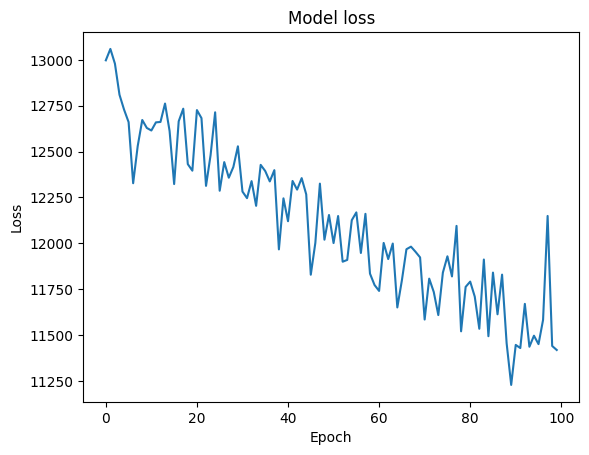

In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights599')

#Learning Rate
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 700
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(600,NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])

        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 10 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==99):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 691 | Batch:   0 of 250. Loss AE   10556.49 | Loss Extraction1    1232.03 | Loss Extraction2    1568.41:   2%|▏         | 1/50 [00:00<00:43,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch:   5 of 250. Loss AE    9909.84 | Loss Extraction1    1217.76 | Loss Extraction2    1898.67:   4%|▍         | 2/50 [00:01<00:41,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 691 | Batch:  10 of 250. Loss AE   10350.02 | Loss Extraction1    1594.03 | Loss Extraction2    1839.02:   6%|▌         | 3/50 [00:02<00:45,  1.04it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 691 | Batch:  15 of 250. Loss AE    9803.73 | Loss Extraction1    1545.33 | Loss Extraction2    2120.37:   8%|▊         | 4/50 [00:03<00:43,  1.06it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 691 | Batch:  20 of 250. Loss AE    9577.04 | Loss Extraction1    1589.95 | Loss Extraction2    2083.13:  10%|█         | 5/50 [00:04<00:41,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 691 | Batch:  25 of 250. Loss AE    9192.70 | Loss Extraction1    1637.07 | Loss Extraction2    2048.81:  12%|█▏        | 6/50 [00:05<00:39,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch:  30 of 250. Loss AE    8888.77 | Loss Extraction1    1750.38 | Loss Extraction2    2009.13:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch:  35 of 250. Loss AE    8855.63 | Loss Extraction1    1700.58 | Loss Extraction2    2018.55:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 691 | Batch:  40 of 250. Loss AE    8883.71 | Loss Extraction1    1726.32 | Loss Extraction2    2003.41:  18%|█▊        | 9/50 [00:07<00:35,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 691 | Batch:  45 of 250. Loss AE    8944.15 | Loss Extraction1    1812.54 | Loss Extraction2    2118.70:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 691 | Batch:  50 of 250. Loss AE    9147.04 | Loss Extraction1    1825.61 | Loss Extraction2    2111.89:  22%|██▏       | 11/50 [00:09<00:32,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 691 | Batch:  55 of 250. Loss AE    9701.76 | Loss Extraction1    1851.36 | Loss Extraction2    2267.36:  24%|██▍       | 12/50 [00:10<00:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch:  60 of 250. Loss AE    9688.21 | Loss Extraction1    1807.50 | Loss Extraction2    2243.03:  26%|██▌       | 13/50 [00:11<00:31,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch:  65 of 250. Loss AE    9679.93 | Loss Extraction1    1868.86 | Loss Extraction2    2246.20:  28%|██▊       | 14/50 [00:12<00:30,  1.19it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch:  70 of 250. Loss AE   10013.51 | Loss Extraction1    1906.59 | Loss Extraction2    2226.39:  30%|███       | 15/50 [00:12<00:29,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 691 | Batch:  75 of 250. Loss AE   10090.79 | Loss Extraction1    1885.06 | Loss Extraction2    2221.49:  32%|███▏      | 16/50 [00:13<00:30,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch:  80 of 250. Loss AE   10394.03 | Loss Extraction1    1926.32 | Loss Extraction2    2231.45:  34%|███▍      | 17/50 [00:15<00:33,  1.00s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 691 | Batch:  85 of 250. Loss AE   10317.35 | Loss Extraction1    1947.22 | Loss Extraction2    2228.26:  36%|███▌      | 18/50 [00:16<00:33,  1.05s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 691 | Batch:  90 of 250. Loss AE   10402.31 | Loss Extraction1    1938.04 | Loss Extraction2    2236.77:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 691 | Batch:  95 of 250. Loss AE   10477.40 | Loss Extraction1    1963.77 | Loss Extraction2    2235.23:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 691 | Batch: 100 of 250. Loss AE   10514.31 | Loss Extraction1    2009.90 | Loss Extraction2    2234.59:  42%|████▏     | 21/50 [00:19<00:26,  1.08it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 691 | Batch: 105 of 250. Loss AE   10522.91 | Loss Extraction1    2006.96 | Loss Extraction2    2309.91:  44%|████▍     | 22/50 [00:19<00:25,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch: 110 of 250. Loss AE   10752.70 | Loss Extraction1    2013.49 | Loss Extraction2    2329.96:  46%|████▌     | 23/50 [00:20<00:23,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 691 | Batch: 115 of 250. Loss AE   10698.16 | Loss Extraction1    2052.89 | Loss Extraction2    2293.23:  48%|████▊     | 24/50 [00:21<00:22,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch: 120 of 250. Loss AE   10758.25 | Loss Extraction1    2052.13 | Loss Extraction2    2319.55:  50%|█████     | 25/50 [00:22<00:22,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch: 125 of 250. Loss AE   10633.17 | Loss Extraction1    2048.98 | Loss Extraction2    2338.90:  52%|█████▏    | 26/50 [00:23<00:21,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch: 130 of 250. Loss AE   10490.85 | Loss Extraction1    2022.60 | Loss Extraction2    2342.12:  54%|█████▍    | 27/50 [00:24<00:20,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch: 135 of 250. Loss AE   10528.32 | Loss Extraction1    2006.32 | Loss Extraction2    2322.06:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 691 | Batch: 140 of 250. Loss AE   10602.01 | Loss Extraction1    2005.16 | Loss Extraction2    2309.04:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 691 | Batch: 145 of 250. Loss AE   10711.00 | Loss Extraction1    2014.91 | Loss Extraction2    2317.60:  60%|██████    | 30/50 [00:27<00:18,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 691 | Batch: 150 of 250. Loss AE   10875.47 | Loss Extraction1    2044.96 | Loss Extraction2    2401.22:  62%|██████▏   | 31/50 [00:28<00:19,  1.03s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 691 | Batch: 155 of 250. Loss AE   10837.83 | Loss Extraction1    2015.39 | Loss Extraction2    2388.28:  64%|██████▍   | 32/50 [00:29<00:18,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch: 160 of 250. Loss AE   10679.48 | Loss Extraction1    1998.49 | Loss Extraction2    2353.95:  66%|██████▌   | 33/50 [00:30<00:16,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch: 165 of 250. Loss AE   10855.59 | Loss Extraction1    1987.67 | Loss Extraction2    2351.12:  68%|██████▊   | 34/50 [00:31<00:15,  1.01it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch: 170 of 250. Loss AE   10757.72 | Loss Extraction1    1980.53 | Loss Extraction2    2365.77:  70%|███████   | 35/50 [00:32<00:14,  1.00it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch: 175 of 250. Loss AE   10730.15 | Loss Extraction1    1978.91 | Loss Extraction2    2375.33:  72%|███████▏  | 36/50 [00:33<00:14,  1.00s/it]

1/1 [==============================] - 0s 27ms/step


Epoch 691 | Batch: 180 of 250. Loss AE   10789.79 | Loss Extraction1    1959.74 | Loss Extraction2    2349.25:  74%|███████▍  | 37/50 [00:34<00:12,  1.05it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch: 185 of 250. Loss AE   10879.81 | Loss Extraction1    1970.59 | Loss Extraction2    2351.39:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch: 190 of 250. Loss AE   10935.92 | Loss Extraction1    1983.54 | Loss Extraction2    2362.06:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 691 | Batch: 195 of 250. Loss AE   11189.48 | Loss Extraction1    1977.99 | Loss Extraction2    2365.30:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 691 | Batch: 200 of 250. Loss AE   11184.14 | Loss Extraction1    1987.14 | Loss Extraction2    2377.62:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch: 205 of 250. Loss AE   11189.87 | Loss Extraction1    2000.63 | Loss Extraction2    2364.89:  84%|████████▍ | 42/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 691 | Batch: 210 of 250. Loss AE   11305.11 | Loss Extraction1    1994.85 | Loss Extraction2    2370.85:  86%|████████▌ | 43/50 [00:39<00:06,  1.11it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 691 | Batch: 215 of 250. Loss AE   11345.93 | Loss Extraction1    2001.10 | Loss Extraction2    2370.93:  88%|████████▊ | 44/50 [00:40<00:05,  1.10it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 691 | Batch: 220 of 250. Loss AE   11478.35 | Loss Extraction1    1997.48 | Loss Extraction2    2408.72:  90%|█████████ | 45/50 [00:41<00:04,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 691 | Batch: 225 of 250. Loss AE   11462.17 | Loss Extraction1    2013.50 | Loss Extraction2    2406.28:  92%|█████████▏| 46/50 [00:42<00:03,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 691 | Batch: 230 of 250. Loss AE   11454.70 | Loss Extraction1    2026.53 | Loss Extraction2    2415.00:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch: 235 of 250. Loss AE   11478.43 | Loss Extraction1    2022.48 | Loss Extraction2    2413.11:  96%|█████████▌| 48/50 [00:43<00:01,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 691 | Batch: 240 of 250. Loss AE   11578.22 | Loss Extraction1    2022.93 | Loss Extraction2    2404.88:  98%|█████████▊| 49/50 [00:44<00:00,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 691 | Batch: 245 of 250. Loss AE   11624.21 | Loss Extraction1    2024.23 | Loss Extraction2    2415.97: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 692 | Batch:   0 of 250. Loss AE   17448.41 | Loss Extraction1    1557.98 | Loss Extraction2    2212.62:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 692 | Batch:   5 of 250. Loss AE   15695.43 | Loss Extraction1    2128.94 | Loss Extraction2    2348.16:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 692 | Batch:  10 of 250. Loss AE   13470.23 | Loss Extraction1    1813.05 | Loss Extraction2    2565.23:   6%|▌         | 3/50 [00:02<00:39,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 692 | Batch:  15 of 250. Loss AE   13110.15 | Loss Extraction1    2041.50 | Loss Extraction2    2555.74:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 692 | Batch:  20 of 250. Loss AE   12861.51 | Loss Extraction1    2054.26 | Loss Extraction2    2387.68:  10%|█         | 5/50 [00:04<00:38,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch:  25 of 250. Loss AE   12456.65 | Loss Extraction1    2202.87 | Loss Extraction2    2390.06:  12%|█▏        | 6/50 [00:05<00:37,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 692 | Batch:  30 of 250. Loss AE   11710.99 | Loss Extraction1    2097.29 | Loss Extraction2    2443.25:  14%|█▍        | 7/50 [00:06<00:38,  1.12it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 692 | Batch:  35 of 250. Loss AE   11946.96 | Loss Extraction1    2222.71 | Loss Extraction2    2476.26:  16%|█▌        | 8/50 [00:07<00:43,  1.03s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 692 | Batch:  40 of 250. Loss AE   11574.70 | Loss Extraction1    2179.81 | Loss Extraction2    2403.04:  18%|█▊        | 9/50 [00:08<00:43,  1.07s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 692 | Batch:  45 of 250. Loss AE   11300.97 | Loss Extraction1    2116.66 | Loss Extraction2    2395.04:  20%|██        | 10/50 [00:09<00:40,  1.01s/it]

1/1 [==============================] - 0s 28ms/step


Epoch 692 | Batch:  50 of 250. Loss AE   12389.46 | Loss Extraction1    2125.40 | Loss Extraction2    2404.42:  22%|██▏       | 11/50 [00:10<00:37,  1.05it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 692 | Batch:  55 of 250. Loss AE   12078.15 | Loss Extraction1    2114.96 | Loss Extraction2    2426.77:  24%|██▍       | 12/50 [00:11<00:35,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch:  60 of 250. Loss AE   12066.43 | Loss Extraction1    2107.77 | Loss Extraction2    2430.13:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 692 | Batch:  65 of 250. Loss AE   12482.10 | Loss Extraction1    2057.21 | Loss Extraction2    2480.34:  28%|██▊       | 14/50 [00:12<00:31,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 692 | Batch:  70 of 250. Loss AE   12126.28 | Loss Extraction1    2056.07 | Loss Extraction2    2439.07:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 692 | Batch:  75 of 250. Loss AE   11791.71 | Loss Extraction1    2014.04 | Loss Extraction2    2368.69:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 692 | Batch:  80 of 250. Loss AE   11620.87 | Loss Extraction1    1960.29 | Loss Extraction2    2395.11:  34%|███▍      | 17/50 [00:15<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 692 | Batch:  85 of 250. Loss AE   11704.66 | Loss Extraction1    1966.64 | Loss Extraction2    2436.66:  36%|███▌      | 18/50 [00:16<00:27,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 692 | Batch:  90 of 250. Loss AE   12047.85 | Loss Extraction1    2027.89 | Loss Extraction2    2413.36:  38%|███▊      | 19/50 [00:16<00:26,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 692 | Batch:  95 of 250. Loss AE   12183.32 | Loss Extraction1    2075.37 | Loss Extraction2    2374.83:  40%|████      | 20/50 [00:17<00:25,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 100 of 250. Loss AE   12205.50 | Loss Extraction1    2086.57 | Loss Extraction2    2398.58:  42%|████▏     | 21/50 [00:18<00:24,  1.18it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 692 | Batch: 105 of 250. Loss AE   12151.85 | Loss Extraction1    2071.65 | Loss Extraction2    2392.97:  44%|████▍     | 22/50 [00:19<00:26,  1.06it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 692 | Batch: 110 of 250. Loss AE   12105.14 | Loss Extraction1    2074.68 | Loss Extraction2    2374.85:  46%|████▌     | 23/50 [00:20<00:25,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 115 of 250. Loss AE   11931.55 | Loss Extraction1    2059.78 | Loss Extraction2    2356.12:  48%|████▊     | 24/50 [00:21<00:23,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 120 of 250. Loss AE   11930.97 | Loss Extraction1    2025.50 | Loss Extraction2    2307.09:  50%|█████     | 25/50 [00:22<00:21,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 125 of 250. Loss AE   11742.08 | Loss Extraction1    2018.28 | Loss Extraction2    2298.36:  52%|█████▏    | 26/50 [00:23<00:20,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 692 | Batch: 130 of 250. Loss AE   11716.87 | Loss Extraction1    2016.64 | Loss Extraction2    2289.07:  54%|█████▍    | 27/50 [00:24<00:19,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 692 | Batch: 135 of 250. Loss AE   11688.52 | Loss Extraction1    2041.13 | Loss Extraction2    2298.39:  56%|█████▌    | 28/50 [00:24<00:18,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 140 of 250. Loss AE   11557.61 | Loss Extraction1    2016.03 | Loss Extraction2    2316.30:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 145 of 250. Loss AE   11536.48 | Loss Extraction1    2013.00 | Loss Extraction2    2316.13:  60%|██████    | 30/50 [00:26<00:16,  1.18it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 692 | Batch: 150 of 250. Loss AE   11510.20 | Loss Extraction1    2004.70 | Loss Extraction2    2295.02:  62%|██████▏   | 31/50 [00:27<00:16,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 155 of 250. Loss AE   11483.63 | Loss Extraction1    2029.18 | Loss Extraction2    2313.20:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 692 | Batch: 160 of 250. Loss AE   11500.45 | Loss Extraction1    2038.81 | Loss Extraction2    2316.30:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 692 | Batch: 165 of 250. Loss AE   11403.18 | Loss Extraction1    2034.66 | Loss Extraction2    2332.74:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 692 | Batch: 170 of 250. Loss AE   11325.61 | Loss Extraction1    2041.17 | Loss Extraction2    2326.75:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 692 | Batch: 175 of 250. Loss AE   11346.36 | Loss Extraction1    2036.04 | Loss Extraction2    2310.66:  72%|███████▏  | 36/50 [00:32<00:13,  1.05it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 692 | Batch: 180 of 250. Loss AE   11575.68 | Loss Extraction1    2043.07 | Loss Extraction2    2420.25:  74%|███████▍  | 37/50 [00:33<00:13,  1.02s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 185 of 250. Loss AE   11653.48 | Loss Extraction1    2042.99 | Loss Extraction2    2411.95:  76%|███████▌  | 38/50 [00:34<00:11,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 692 | Batch: 190 of 250. Loss AE   11696.65 | Loss Extraction1    2032.18 | Loss Extraction2    2391.63:  78%|███████▊  | 39/50 [00:34<00:10,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 692 | Batch: 195 of 250. Loss AE   11733.62 | Loss Extraction1    2019.03 | Loss Extraction2    2415.67:  80%|████████  | 40/50 [00:35<00:08,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 692 | Batch: 200 of 250. Loss AE   11709.88 | Loss Extraction1    2027.23 | Loss Extraction2    2439.37:  82%|████████▏ | 41/50 [00:36<00:07,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 205 of 250. Loss AE   11710.43 | Loss Extraction1    2022.74 | Loss Extraction2    2422.56:  84%|████████▍ | 42/50 [00:37<00:06,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 692 | Batch: 210 of 250. Loss AE   11686.07 | Loss Extraction1    2023.21 | Loss Extraction2    2422.82:  86%|████████▌ | 43/50 [00:38<00:06,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 215 of 250. Loss AE   11616.51 | Loss Extraction1    2036.99 | Loss Extraction2    2418.15:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 220 of 250. Loss AE   11613.44 | Loss Extraction1    2018.86 | Loss Extraction2    2448.29:  90%|█████████ | 45/50 [00:40<00:04,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 225 of 250. Loss AE   11624.94 | Loss Extraction1    2015.08 | Loss Extraction2    2441.47:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 692 | Batch: 230 of 250. Loss AE   11592.45 | Loss Extraction1    2019.91 | Loss Extraction2    2430.96:  94%|█████████▍| 47/50 [00:41<00:02,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 235 of 250. Loss AE   11550.42 | Loss Extraction1    2017.53 | Loss Extraction2    2434.89:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 692 | Batch: 240 of 250. Loss AE   11627.19 | Loss Extraction1    2032.73 | Loss Extraction2    2442.93:  98%|█████████▊| 49/50 [00:43<00:00,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 692 | Batch: 245 of 250. Loss AE   11646.13 | Loss Extraction1    2031.24 | Loss Extraction2    2440.22: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 693 | Batch:   0 of 250. Loss AE   11649.19 | Loss Extraction1    1689.13 | Loss Extraction2    2750.71:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 693 | Batch:   5 of 250. Loss AE   10915.88 | Loss Extraction1    1780.84 | Loss Extraction2    2466.17:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 693 | Batch:  10 of 250. Loss AE   10694.82 | Loss Extraction1    1686.84 | Loss Extraction2    2279.39:   6%|▌         | 3/50 [00:02<00:43,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 693 | Batch:  15 of 250. Loss AE   11244.58 | Loss Extraction1    1957.64 | Loss Extraction2    2706.67:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 693 | Batch:  20 of 250. Loss AE   11697.29 | Loss Extraction1    1969.95 | Loss Extraction2    3005.72:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 693 | Batch:  25 of 250. Loss AE   11433.90 | Loss Extraction1    1981.44 | Loss Extraction2    3008.63:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 693 | Batch:  30 of 250. Loss AE   11984.54 | Loss Extraction1    2180.64 | Loss Extraction2    3064.74:  14%|█▍        | 7/50 [00:06<00:36,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 693 | Batch:  35 of 250. Loss AE   11961.45 | Loss Extraction1    2134.99 | Loss Extraction2    2910.17:  16%|█▌        | 8/50 [00:06<00:35,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 693 | Batch:  40 of 250. Loss AE   12037.66 | Loss Extraction1    2086.27 | Loss Extraction2    2917.76:  18%|█▊        | 9/50 [00:07<00:34,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 693 | Batch:  45 of 250. Loss AE   12100.08 | Loss Extraction1    2100.48 | Loss Extraction2    2865.63:  20%|██        | 10/50 [00:08<00:33,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 693 | Batch:  50 of 250. Loss AE   12552.33 | Loss Extraction1    2073.10 | Loss Extraction2    2904.10:  22%|██▏       | 11/50 [00:09<00:33,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 693 | Batch:  55 of 250. Loss AE   12497.57 | Loss Extraction1    2077.18 | Loss Extraction2    3007.24:  24%|██▍       | 12/50 [00:10<00:32,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 693 | Batch:  60 of 250. Loss AE   12317.67 | Loss Extraction1    2017.04 | Loss Extraction2    2957.61:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 693 | Batch:  65 of 250. Loss AE   11962.99 | Loss Extraction1    1996.33 | Loss Extraction2    2847.42:  28%|██▊       | 14/50 [00:12<00:36,  1.01s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 693 | Batch:  70 of 250. Loss AE   11767.22 | Loss Extraction1    1983.24 | Loss Extraction2    2756.02:  30%|███       | 15/50 [00:13<00:34,  1.03it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 693 | Batch:  75 of 250. Loss AE   11398.37 | Loss Extraction1    1931.66 | Loss Extraction2    2671.60:  32%|███▏      | 16/50 [00:14<00:31,  1.07it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 693 | Batch:  80 of 250. Loss AE   11455.50 | Loss Extraction1    1974.60 | Loss Extraction2    2641.45:  34%|███▍      | 17/50 [00:15<00:30,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 693 | Batch:  85 of 250. Loss AE   11656.39 | Loss Extraction1    1979.46 | Loss Extraction2    2599.17:  36%|███▌      | 18/50 [00:16<00:28,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 693 | Batch:  90 of 250. Loss AE   11639.22 | Loss Extraction1    1980.50 | Loss Extraction2    2561.21:  38%|███▊      | 19/50 [00:16<00:27,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 693 | Batch:  95 of 250. Loss AE   11665.16 | Loss Extraction1    1964.49 | Loss Extraction2    2501.78:  40%|████      | 20/50 [00:17<00:26,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 693 | Batch: 100 of 250. Loss AE   11737.31 | Loss Extraction1    1992.50 | Loss Extraction2    2518.01:  42%|████▏     | 21/50 [00:18<00:25,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 693 | Batch: 105 of 250. Loss AE   11706.82 | Loss Extraction1    1989.35 | Loss Extraction2    2497.46:  44%|████▍     | 22/50 [00:19<00:24,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 693 | Batch: 110 of 250. Loss AE   11546.36 | Loss Extraction1    1954.35 | Loss Extraction2    2434.69:  46%|████▌     | 23/50 [00:20<00:23,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 693 | Batch: 115 of 250. Loss AE   11485.11 | Loss Extraction1    1970.29 | Loss Extraction2    2460.76:  48%|████▊     | 24/50 [00:21<00:22,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 693 | Batch: 120 of 250. Loss AE   11369.23 | Loss Extraction1    1939.41 | Loss Extraction2    2447.18:  50%|█████     | 25/50 [00:21<00:21,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 693 | Batch: 125 of 250. Loss AE   11284.50 | Loss Extraction1    1943.32 | Loss Extraction2    2453.83:  52%|█████▏    | 26/50 [00:22<00:20,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 693 | Batch: 130 of 250. Loss AE   11197.80 | Loss Extraction1    1966.45 | Loss Extraction2    2450.32:  54%|█████▍    | 27/50 [00:23<00:19,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 693 | Batch: 135 of 250. Loss AE   11069.78 | Loss Extraction1    1949.12 | Loss Extraction2    2451.44:  56%|█████▌    | 28/50 [00:24<00:20,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 693 | Batch: 140 of 250. Loss AE   11409.42 | Loss Extraction1    1973.64 | Loss Extraction2    2545.77:  58%|█████▊    | 29/50 [00:25<00:19,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 693 | Batch: 145 of 250. Loss AE   11395.77 | Loss Extraction1    1972.54 | Loss Extraction2    2530.96:  60%|██████    | 30/50 [00:26<00:18,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 693 | Batch: 150 of 250. Loss AE   11285.29 | Loss Extraction1    1974.72 | Loss Extraction2    2532.05:  62%|██████▏   | 31/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 693 | Batch: 155 of 250. Loss AE   11207.54 | Loss Extraction1    1969.27 | Loss Extraction2    2536.41:  64%|██████▍   | 32/50 [00:28<00:15,  1.15it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 693 | Batch: 160 of 250. Loss AE   11157.04 | Loss Extraction1    1941.95 | Loss Extraction2    2543.65:  66%|██████▌   | 33/50 [00:29<00:15,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 693 | Batch: 165 of 250. Loss AE   11088.64 | Loss Extraction1    1962.46 | Loss Extraction2    2533.11:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 693 | Batch: 170 of 250. Loss AE   11039.64 | Loss Extraction1    1953.12 | Loss Extraction2    2491.52:  70%|███████   | 35/50 [00:30<00:13,  1.13it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 693 | Batch: 175 of 250. Loss AE   10931.74 | Loss Extraction1    1951.36 | Loss Extraction2    2468.07:  72%|███████▏  | 36/50 [00:31<00:12,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 693 | Batch: 180 of 250. Loss AE   10880.04 | Loss Extraction1    1950.55 | Loss Extraction2    2457.74:  74%|███████▍  | 37/50 [00:32<00:11,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 693 | Batch: 185 of 250. Loss AE   10753.89 | Loss Extraction1    1941.01 | Loss Extraction2    2430.66:  76%|███████▌  | 38/50 [00:33<00:10,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 693 | Batch: 190 of 250. Loss AE   10848.58 | Loss Extraction1    1954.81 | Loss Extraction2    2442.32:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 693 | Batch: 195 of 250. Loss AE   10809.60 | Loss Extraction1    1951.43 | Loss Extraction2    2450.17:  80%|████████  | 40/50 [00:35<00:08,  1.18it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 693 | Batch: 200 of 250. Loss AE   10835.80 | Loss Extraction1    2013.33 | Loss Extraction2    2470.97:  82%|████████▏ | 41/50 [00:36<00:08,  1.03it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 693 | Batch: 205 of 250. Loss AE   10741.40 | Loss Extraction1    2008.17 | Loss Extraction2    2442.85:  84%|████████▍ | 42/50 [00:37<00:08,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 693 | Batch: 210 of 250. Loss AE   10764.38 | Loss Extraction1    2014.03 | Loss Extraction2    2470.58:  86%|████████▌ | 43/50 [00:38<00:06,  1.01it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 693 | Batch: 215 of 250. Loss AE   10839.38 | Loss Extraction1    2024.49 | Loss Extraction2    2459.31:  88%|████████▊ | 44/50 [00:39<00:05,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 693 | Batch: 220 of 250. Loss AE   10844.89 | Loss Extraction1    2031.08 | Loss Extraction2    2454.93:  90%|█████████ | 45/50 [00:40<00:04,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 693 | Batch: 225 of 250. Loss AE   11050.80 | Loss Extraction1    2014.62 | Loss Extraction2    2430.10:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 693 | Batch: 230 of 250. Loss AE   11118.37 | Loss Extraction1    2012.60 | Loss Extraction2    2431.97:  94%|█████████▍| 47/50 [00:41<00:02,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 693 | Batch: 235 of 250. Loss AE   11168.65 | Loss Extraction1    2014.86 | Loss Extraction2    2443.64:  96%|█████████▌| 48/50 [00:42<00:01,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 693 | Batch: 240 of 250. Loss AE   11265.13 | Loss Extraction1    2011.32 | Loss Extraction2    2446.36:  98%|█████████▊| 49/50 [00:43<00:00,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 693 | Batch: 245 of 250. Loss AE   11365.80 | Loss Extraction1    2019.88 | Loss Extraction2    2444.48: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch:   0 of 250. Loss AE   11362.53 | Loss Extraction1    1437.99 | Loss Extraction2    2277.41:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 694 | Batch:   5 of 250. Loss AE   10151.77 | Loss Extraction1    1393.23 | Loss Extraction2    1834.67:   4%|▍         | 2/50 [00:01<00:40,  1.19it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 694 | Batch:  10 of 250. Loss AE   10831.22 | Loss Extraction1    1809.31 | Loss Extraction2    2060.86:   6%|▌         | 3/50 [00:02<00:39,  1.19it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 694 | Batch:  15 of 250. Loss AE   11499.42 | Loss Extraction1    1707.14 | Loss Extraction2    2525.76:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 694 | Batch:  20 of 250. Loss AE   11373.60 | Loss Extraction1    1805.37 | Loss Extraction2    2436.86:  10%|█         | 5/50 [00:04<00:43,  1.02it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 694 | Batch:  25 of 250. Loss AE   10853.15 | Loss Extraction1    1866.18 | Loss Extraction2    2384.87:  12%|█▏        | 6/50 [00:05<00:45,  1.03s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 694 | Batch:  30 of 250. Loss AE   11374.27 | Loss Extraction1    1857.03 | Loss Extraction2    2451.43:  14%|█▍        | 7/50 [00:06<00:41,  1.03it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch:  35 of 250. Loss AE   11750.23 | Loss Extraction1    1910.20 | Loss Extraction2    2474.65:  16%|█▌        | 8/50 [00:07<00:39,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 694 | Batch:  40 of 250. Loss AE   11308.00 | Loss Extraction1    1904.15 | Loss Extraction2    2436.54:  18%|█▊        | 9/50 [00:08<00:37,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch:  45 of 250. Loss AE   11371.41 | Loss Extraction1    1830.13 | Loss Extraction2    2392.99:  20%|██        | 10/50 [00:09<00:35,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 694 | Batch:  50 of 250. Loss AE   11440.02 | Loss Extraction1    1823.21 | Loss Extraction2    2342.83:  22%|██▏       | 11/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 694 | Batch:  55 of 250. Loss AE   11070.09 | Loss Extraction1    1815.97 | Loss Extraction2    2331.93:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 694 | Batch:  60 of 250. Loss AE   11058.31 | Loss Extraction1    1792.25 | Loss Extraction2    2278.80:  26%|██▌       | 13/50 [00:11<00:31,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 694 | Batch:  65 of 250. Loss AE   11048.21 | Loss Extraction1    1716.55 | Loss Extraction2    2259.68:  28%|██▊       | 14/50 [00:12<00:30,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 694 | Batch:  70 of 250. Loss AE   11305.68 | Loss Extraction1    1757.12 | Loss Extraction2    2352.54:  30%|███       | 15/50 [00:13<00:29,  1.18it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 694 | Batch:  75 of 250. Loss AE   11085.11 | Loss Extraction1    1751.71 | Loss Extraction2    2369.32:  32%|███▏      | 16/50 [00:14<00:28,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 694 | Batch:  80 of 250. Loss AE   11284.67 | Loss Extraction1    1832.96 | Loss Extraction2    2330.24:  34%|███▍      | 17/50 [00:15<00:28,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 694 | Batch:  85 of 250. Loss AE   11428.49 | Loss Extraction1    1820.73 | Loss Extraction2    2403.52:  36%|███▌      | 18/50 [00:16<00:29,  1.07it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 694 | Batch:  90 of 250. Loss AE   11253.83 | Loss Extraction1    1822.78 | Loss Extraction2    2358.33:  38%|███▊      | 19/50 [00:17<00:31,  1.01s/it]

1/1 [==============================] - 0s 53ms/step


Epoch 694 | Batch:  95 of 250. Loss AE   11337.96 | Loss Extraction1    1857.09 | Loss Extraction2    2427.76:  40%|████      | 20/50 [00:18<00:31,  1.05s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 100 of 250. Loss AE   11373.40 | Loss Extraction1    1862.00 | Loss Extraction2    2411.48:  42%|████▏     | 21/50 [00:19<00:30,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 105 of 250. Loss AE   11424.52 | Loss Extraction1    1861.76 | Loss Extraction2    2391.58:  44%|████▍     | 22/50 [00:20<00:27,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 694 | Batch: 110 of 250. Loss AE   11394.45 | Loss Extraction1    1878.57 | Loss Extraction2    2394.10:  46%|████▌     | 23/50 [00:21<00:25,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 694 | Batch: 115 of 250. Loss AE   11359.52 | Loss Extraction1    1877.13 | Loss Extraction2    2398.52:  48%|████▊     | 24/50 [00:22<00:25,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 120 of 250. Loss AE   11423.07 | Loss Extraction1    1902.46 | Loss Extraction2    2411.00:  50%|█████     | 25/50 [00:23<00:24,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 125 of 250. Loss AE   11363.89 | Loss Extraction1    1886.91 | Loss Extraction2    2395.01:  52%|█████▏    | 26/50 [00:24<00:22,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 130 of 250. Loss AE   11303.09 | Loss Extraction1    1883.92 | Loss Extraction2    2382.69:  54%|█████▍    | 27/50 [00:24<00:21,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 694 | Batch: 135 of 250. Loss AE   11405.36 | Loss Extraction1    1886.29 | Loss Extraction2    2426.93:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 140 of 250. Loss AE   11318.32 | Loss Extraction1    1878.45 | Loss Extraction2    2399.09:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 694 | Batch: 145 of 250. Loss AE   11426.61 | Loss Extraction1    1880.01 | Loss Extraction2    2413.22:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 150 of 250. Loss AE   11466.54 | Loss Extraction1    1881.05 | Loss Extraction2    2414.61:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 694 | Batch: 155 of 250. Loss AE   11411.91 | Loss Extraction1    1917.69 | Loss Extraction2    2398.04:  64%|██████▍   | 32/50 [00:29<00:15,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 694 | Batch: 160 of 250. Loss AE   11313.59 | Loss Extraction1    1895.80 | Loss Extraction2    2394.09:  66%|██████▌   | 33/50 [00:30<00:16,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 694 | Batch: 165 of 250. Loss AE   11445.86 | Loss Extraction1    1879.47 | Loss Extraction2    2396.38:  68%|██████▊   | 34/50 [00:31<00:14,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 170 of 250. Loss AE   11463.33 | Loss Extraction1    1887.15 | Loss Extraction2    2393.15:  70%|███████   | 35/50 [00:32<00:13,  1.10it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 694 | Batch: 175 of 250. Loss AE   11574.27 | Loss Extraction1    1928.03 | Loss Extraction2    2402.93:  72%|███████▏  | 36/50 [00:32<00:12,  1.12it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 694 | Batch: 180 of 250. Loss AE   11562.45 | Loss Extraction1    1934.30 | Loss Extraction2    2409.41:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 185 of 250. Loss AE   11552.50 | Loss Extraction1    1964.80 | Loss Extraction2    2428.20:  76%|███████▌  | 38/50 [00:34<00:10,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 694 | Batch: 190 of 250. Loss AE   11560.41 | Loss Extraction1    1946.74 | Loss Extraction2    2427.74:  78%|███████▊  | 39/50 [00:35<00:09,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 694 | Batch: 195 of 250. Loss AE   11526.47 | Loss Extraction1    1956.26 | Loss Extraction2    2449.89:  80%|████████  | 40/50 [00:36<00:08,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 694 | Batch: 200 of 250. Loss AE   11592.33 | Loss Extraction1    1956.51 | Loss Extraction2    2484.41:  82%|████████▏ | 41/50 [00:37<00:07,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 694 | Batch: 205 of 250. Loss AE   11574.39 | Loss Extraction1    1949.99 | Loss Extraction2    2503.95:  84%|████████▍ | 42/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 694 | Batch: 210 of 250. Loss AE   11577.04 | Loss Extraction1    1956.77 | Loss Extraction2    2494.93:  86%|████████▌ | 43/50 [00:38<00:05,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 215 of 250. Loss AE   11554.30 | Loss Extraction1    1964.53 | Loss Extraction2    2492.65:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 694 | Batch: 220 of 250. Loss AE   11606.10 | Loss Extraction1    1958.32 | Loss Extraction2    2471.74:  90%|█████████ | 45/50 [00:40<00:04,  1.11it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 694 | Batch: 225 of 250. Loss AE   11542.84 | Loss Extraction1    1968.57 | Loss Extraction2    2444.04:  92%|█████████▏| 46/50 [00:41<00:03,  1.02it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 694 | Batch: 230 of 250. Loss AE   11588.78 | Loss Extraction1    1990.07 | Loss Extraction2    2447.72:  94%|█████████▍| 47/50 [00:43<00:03,  1.01s/it]

1/1 [==============================] - 0s 30ms/step


Epoch 694 | Batch: 235 of 250. Loss AE   11557.16 | Loss Extraction1    1993.54 | Loss Extraction2    2441.97:  96%|█████████▌| 48/50 [00:43<00:01,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 694 | Batch: 240 of 250. Loss AE   11588.44 | Loss Extraction1    1996.18 | Loss Extraction2    2428.54:  98%|█████████▊| 49/50 [00:44<00:00,  1.08it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 694 | Batch: 245 of 250. Loss AE   11549.53 | Loss Extraction1    1999.96 | Loss Extraction2    2433.81: 100%|██████████| 50/50 [00:45<00:00,  1.10it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch:   0 of 250. Loss AE   11255.38 | Loss Extraction1    2626.13 | Loss Extraction2    2124.00:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 695 | Batch:   5 of 250. Loss AE   12321.49 | Loss Extraction1    2333.07 | Loss Extraction2    2344.33:   4%|▍         | 2/50 [00:01<00:40,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 695 | Batch:  10 of 250. Loss AE   12878.69 | Loss Extraction1    2118.05 | Loss Extraction2    1914.67:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 695 | Batch:  15 of 250. Loss AE   13875.51 | Loss Extraction1    1932.77 | Loss Extraction2    1711.34:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 695 | Batch:  20 of 250. Loss AE   12659.66 | Loss Extraction1    1771.49 | Loss Extraction2    1842.32:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch:  25 of 250. Loss AE   12419.55 | Loss Extraction1    2024.22 | Loss Extraction2    1977.64:  12%|█▏        | 6/50 [00:05<00:37,  1.18it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 695 | Batch:  30 of 250. Loss AE   12176.83 | Loss Extraction1    1991.97 | Loss Extraction2    2096.29:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 695 | Batch:  35 of 250. Loss AE   12561.06 | Loss Extraction1    2119.18 | Loss Extraction2    2095.69:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 695 | Batch:  40 of 250. Loss AE   12379.57 | Loss Extraction1    2123.80 | Loss Extraction2    2118.52:  18%|█▊        | 9/50 [00:07<00:38,  1.07it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 695 | Batch:  45 of 250. Loss AE   12085.01 | Loss Extraction1    2053.99 | Loss Extraction2    2104.59:  20%|██        | 10/50 [00:08<00:37,  1.07it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 695 | Batch:  50 of 250. Loss AE   11607.80 | Loss Extraction1    2038.64 | Loss Extraction2    2037.44:  22%|██▏       | 11/50 [00:09<00:38,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch:  55 of 250. Loss AE   11834.53 | Loss Extraction1    2008.97 | Loss Extraction2    2024.24:  24%|██▍       | 12/50 [00:10<00:36,  1.05it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 695 | Batch:  60 of 250. Loss AE   11645.40 | Loss Extraction1    2096.09 | Loss Extraction2    2067.57:  26%|██▌       | 13/50 [00:11<00:34,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch:  65 of 250. Loss AE   11371.58 | Loss Extraction1    2082.45 | Loss Extraction2    2095.90:  28%|██▊       | 14/50 [00:12<00:32,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 695 | Batch:  70 of 250. Loss AE   11249.48 | Loss Extraction1    2107.06 | Loss Extraction2    2109.24:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch:  75 of 250. Loss AE   11157.18 | Loss Extraction1    2109.80 | Loss Extraction2    2107.22:  32%|███▏      | 16/50 [00:14<00:29,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch:  80 of 250. Loss AE   11210.25 | Loss Extraction1    2064.11 | Loss Extraction2    2134.31:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 695 | Batch:  85 of 250. Loss AE   11275.56 | Loss Extraction1    2077.07 | Loss Extraction2    2106.87:  36%|███▌      | 18/50 [00:15<00:27,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch:  90 of 250. Loss AE   11708.97 | Loss Extraction1    2084.15 | Loss Extraction2    2118.31:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 695 | Batch:  95 of 250. Loss AE   11557.08 | Loss Extraction1    2104.64 | Loss Extraction2    2118.11:  40%|████      | 20/50 [00:17<00:25,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch: 100 of 250. Loss AE   11672.60 | Loss Extraction1    2107.52 | Loss Extraction2    2205.14:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch: 105 of 250. Loss AE   11918.95 | Loss Extraction1    2106.66 | Loss Extraction2    2294.87:  44%|████▍     | 22/50 [00:19<00:23,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch: 110 of 250. Loss AE   11797.66 | Loss Extraction1    2084.20 | Loss Extraction2    2304.98:  46%|████▌     | 23/50 [00:20<00:26,  1.03it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 695 | Batch: 115 of 250. Loss AE   11720.03 | Loss Extraction1    2058.51 | Loss Extraction2    2293.33:  48%|████▊     | 24/50 [00:21<00:24,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 695 | Batch: 120 of 250. Loss AE   11698.72 | Loss Extraction1    2066.71 | Loss Extraction2    2304.53:  50%|█████     | 25/50 [00:22<00:23,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch: 125 of 250. Loss AE   11636.05 | Loss Extraction1    2052.38 | Loss Extraction2    2280.14:  52%|█████▏    | 26/50 [00:23<00:22,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 695 | Batch: 130 of 250. Loss AE   11648.81 | Loss Extraction1    2024.70 | Loss Extraction2    2309.61:  54%|█████▍    | 27/50 [00:24<00:20,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 695 | Batch: 135 of 250. Loss AE   11731.52 | Loss Extraction1    2031.48 | Loss Extraction2    2294.39:  56%|█████▌    | 28/50 [00:25<00:19,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 695 | Batch: 140 of 250. Loss AE   11584.41 | Loss Extraction1    2007.81 | Loss Extraction2    2269.23:  58%|█████▊    | 29/50 [00:25<00:18,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 695 | Batch: 145 of 250. Loss AE   11451.70 | Loss Extraction1    2009.66 | Loss Extraction2    2250.75:  60%|██████    | 30/50 [00:26<00:17,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 695 | Batch: 150 of 250. Loss AE   11393.40 | Loss Extraction1    2027.51 | Loss Extraction2    2292.10:  62%|██████▏   | 31/50 [00:27<00:16,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 695 | Batch: 155 of 250. Loss AE   11269.40 | Loss Extraction1    2024.04 | Loss Extraction2    2288.09:  64%|██████▍   | 32/50 [00:28<00:15,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch: 160 of 250. Loss AE   11321.87 | Loss Extraction1    2062.36 | Loss Extraction2    2343.62:  66%|██████▌   | 33/50 [00:29<00:14,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 695 | Batch: 165 of 250. Loss AE   11410.72 | Loss Extraction1    2036.27 | Loss Extraction2    2326.12:  68%|██████▊   | 34/50 [00:30<00:13,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch: 170 of 250. Loss AE   11347.49 | Loss Extraction1    2035.88 | Loss Extraction2    2342.84:  70%|███████   | 35/50 [00:30<00:12,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 695 | Batch: 175 of 250. Loss AE   11344.20 | Loss Extraction1    2021.54 | Loss Extraction2    2307.21:  72%|███████▏  | 36/50 [00:31<00:11,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 695 | Batch: 180 of 250. Loss AE   11271.35 | Loss Extraction1    2013.91 | Loss Extraction2    2288.90:  74%|███████▍  | 37/50 [00:32<00:11,  1.16it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 695 | Batch: 185 of 250. Loss AE   11183.04 | Loss Extraction1    2014.94 | Loss Extraction2    2283.64:  76%|███████▌  | 38/50 [00:33<00:10,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 695 | Batch: 190 of 250. Loss AE   11213.04 | Loss Extraction1    2025.21 | Loss Extraction2    2281.72:  78%|███████▊  | 39/50 [00:34<00:10,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch: 195 of 250. Loss AE   11228.67 | Loss Extraction1    2025.60 | Loss Extraction2    2294.47:  80%|████████  | 40/50 [00:35<00:09,  1.10it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 695 | Batch: 200 of 250. Loss AE   11239.40 | Loss Extraction1    2033.48 | Loss Extraction2    2274.38:  82%|████████▏ | 41/50 [00:36<00:08,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch: 205 of 250. Loss AE   11155.78 | Loss Extraction1    2030.79 | Loss Extraction2    2258.72:  84%|████████▍ | 42/50 [00:37<00:07,  1.11it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 695 | Batch: 210 of 250. Loss AE   11107.26 | Loss Extraction1    2023.51 | Loss Extraction2    2282.14:  86%|████████▌ | 43/50 [00:38<00:06,  1.12it/s]

1/1 [==============================] - 0s 23ms/step


Epoch 695 | Batch: 215 of 250. Loss AE   11099.55 | Loss Extraction1    2030.72 | Loss Extraction2    2277.43:  88%|████████▊ | 44/50 [00:39<00:05,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 695 | Batch: 220 of 250. Loss AE   11127.18 | Loss Extraction1    2029.43 | Loss Extraction2    2299.02:  90%|█████████ | 45/50 [00:39<00:04,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 695 | Batch: 225 of 250. Loss AE   11123.20 | Loss Extraction1    2020.29 | Loss Extraction2    2289.30:  92%|█████████▏| 46/50 [00:40<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 695 | Batch: 230 of 250. Loss AE   11247.11 | Loss Extraction1    2031.58 | Loss Extraction2    2299.46:  94%|█████████▍| 47/50 [00:41<00:02,  1.16it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 695 | Batch: 235 of 250. Loss AE   11278.18 | Loss Extraction1    2025.50 | Loss Extraction2    2323.80:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 695 | Batch: 240 of 250. Loss AE   11225.97 | Loss Extraction1    2018.58 | Loss Extraction2    2347.99:  98%|█████████▊| 49/50 [00:43<00:00,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 695 | Batch: 245 of 250. Loss AE   11187.71 | Loss Extraction1    2010.78 | Loss Extraction2    2362.47: 100%|██████████| 50/50 [00:44<00:00,  1.13it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 696 | Batch:   0 of 250. Loss AE   14667.81 | Loss Extraction1    2252.76 | Loss Extraction2    2021.10:   2%|▏         | 1/50 [00:01<00:50,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch:   5 of 250. Loss AE   12854.44 | Loss Extraction1    1801.83 | Loss Extraction2    2746.99:   4%|▍         | 2/50 [00:02<00:54,  1.14s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 696 | Batch:  10 of 250. Loss AE   12080.81 | Loss Extraction1    1749.85 | Loss Extraction2    2405.95:   6%|▌         | 3/50 [00:03<00:48,  1.04s/it]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch:  15 of 250. Loss AE   11286.66 | Loss Extraction1    1907.86 | Loss Extraction2    2245.59:   8%|▊         | 4/50 [00:04<00:52,  1.13s/it]

1/1 [==============================] - 0s 42ms/step


Epoch 696 | Batch:  20 of 250. Loss AE   11305.87 | Loss Extraction1    1960.59 | Loss Extraction2    2314.00:  10%|█         | 5/50 [00:05<00:49,  1.10s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 696 | Batch:  25 of 250. Loss AE   10612.71 | Loss Extraction1    1912.31 | Loss Extraction2    2253.60:  12%|█▏        | 6/50 [00:06<00:45,  1.02s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch:  30 of 250. Loss AE   10534.74 | Loss Extraction1    1985.58 | Loss Extraction2    2127.15:  14%|█▍        | 7/50 [00:07<00:41,  1.03it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch:  35 of 250. Loss AE   11434.85 | Loss Extraction1    2029.81 | Loss Extraction2    2459.69:  16%|█▌        | 8/50 [00:08<00:39,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch:  40 of 250. Loss AE   11692.17 | Loss Extraction1    2028.14 | Loss Extraction2    2532.66:  18%|█▊        | 9/50 [00:08<00:37,  1.09it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 696 | Batch:  45 of 250. Loss AE   11241.36 | Loss Extraction1    1962.48 | Loss Extraction2    2413.12:  20%|██        | 10/50 [00:09<00:36,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 696 | Batch:  50 of 250. Loss AE   11132.37 | Loss Extraction1    1960.71 | Loss Extraction2    2355.42:  22%|██▏       | 11/50 [00:10<00:34,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch:  55 of 250. Loss AE   11244.75 | Loss Extraction1    1994.88 | Loss Extraction2    2365.12:  24%|██▍       | 12/50 [00:11<00:33,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 696 | Batch:  60 of 250. Loss AE   10963.55 | Loss Extraction1    2019.09 | Loss Extraction2    2292.41:  26%|██▌       | 13/50 [00:12<00:32,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch:  65 of 250. Loss AE   10939.04 | Loss Extraction1    2029.74 | Loss Extraction2    2316.59:  28%|██▊       | 14/50 [00:13<00:31,  1.14it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 696 | Batch:  70 of 250. Loss AE   10829.18 | Loss Extraction1    2002.69 | Loss Extraction2    2281.83:  30%|███       | 15/50 [00:14<00:31,  1.12it/s]

1/1 [==============================] - 0s 49ms/step


Epoch 696 | Batch:  75 of 250. Loss AE   10815.01 | Loss Extraction1    2012.30 | Loss Extraction2    2349.82:  32%|███▏      | 16/50 [00:15<00:32,  1.06it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 696 | Batch:  80 of 250. Loss AE   11058.80 | Loss Extraction1    2010.84 | Loss Extraction2    2357.41:  34%|███▍      | 17/50 [00:16<00:30,  1.07it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch:  85 of 250. Loss AE   11175.85 | Loss Extraction1    1977.37 | Loss Extraction2    2376.59:  36%|███▌      | 18/50 [00:17<00:29,  1.09it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch:  90 of 250. Loss AE   11185.45 | Loss Extraction1    1977.75 | Loss Extraction2    2472.14:  38%|███▊      | 19/50 [00:17<00:28,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch:  95 of 250. Loss AE   11537.92 | Loss Extraction1    1983.45 | Loss Extraction2    2644.28:  40%|████      | 20/50 [00:18<00:27,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch: 100 of 250. Loss AE   11676.47 | Loss Extraction1    1995.29 | Loss Extraction2    2655.60:  42%|████▏     | 21/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch: 105 of 250. Loss AE   11400.66 | Loss Extraction1    1977.88 | Loss Extraction2    2604.54:  44%|████▍     | 22/50 [00:20<00:24,  1.13it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 696 | Batch: 110 of 250. Loss AE   11475.55 | Loss Extraction1    1965.02 | Loss Extraction2    2615.35:  46%|████▌     | 23/50 [00:21<00:23,  1.13it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 696 | Batch: 115 of 250. Loss AE   11397.51 | Loss Extraction1    1945.83 | Loss Extraction2    2574.04:  48%|████▊     | 24/50 [00:22<00:22,  1.14it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch: 120 of 250. Loss AE   11428.91 | Loss Extraction1    1950.46 | Loss Extraction2    2614.05:  50%|█████     | 25/50 [00:23<00:21,  1.15it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch: 125 of 250. Loss AE   11306.87 | Loss Extraction1    2006.69 | Loss Extraction2    2584.98:  52%|█████▏    | 26/50 [00:24<00:20,  1.15it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch: 130 of 250. Loss AE   11573.83 | Loss Extraction1    2000.76 | Loss Extraction2    2560.21:  54%|█████▍    | 27/50 [00:24<00:19,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 135 of 250. Loss AE   11757.30 | Loss Extraction1    1984.00 | Loss Extraction2    2546.88:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 47ms/step


Epoch 696 | Batch: 140 of 250. Loss AE   11753.47 | Loss Extraction1    1995.96 | Loss Extraction2    2547.57:  58%|█████▊    | 29/50 [00:27<00:21,  1.02s/it]

1/1 [==============================] - 0s 43ms/step


Epoch 696 | Batch: 145 of 250. Loss AE   11833.54 | Loss Extraction1    2013.44 | Loss Extraction2    2545.59:  60%|██████    | 30/50 [00:28<00:19,  1.01it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 150 of 250. Loss AE   11719.58 | Loss Extraction1    1983.26 | Loss Extraction2    2526.77:  62%|██████▏   | 31/50 [00:28<00:18,  1.05it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 696 | Batch: 155 of 250. Loss AE   11677.63 | Loss Extraction1    1995.71 | Loss Extraction2    2534.76:  64%|██████▍   | 32/50 [00:29<00:16,  1.09it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch: 160 of 250. Loss AE   11711.96 | Loss Extraction1    1994.58 | Loss Extraction2    2543.02:  66%|██████▌   | 33/50 [00:30<00:15,  1.11it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 696 | Batch: 165 of 250. Loss AE   11697.44 | Loss Extraction1    2028.33 | Loss Extraction2    2545.56:  68%|██████▊   | 34/50 [00:31<00:14,  1.12it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch: 170 of 250. Loss AE   11871.69 | Loss Extraction1    2033.90 | Loss Extraction2    2589.19:  70%|███████   | 35/50 [00:32<00:13,  1.12it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch: 175 of 250. Loss AE   11896.56 | Loss Extraction1    2046.02 | Loss Extraction2    2598.34:  72%|███████▏  | 36/50 [00:33<00:12,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 696 | Batch: 180 of 250. Loss AE   11815.90 | Loss Extraction1    2036.34 | Loss Extraction2    2573.52:  74%|███████▍  | 37/50 [00:34<00:11,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch: 185 of 250. Loss AE   11745.34 | Loss Extraction1    2029.54 | Loss Extraction2    2548.37:  76%|███████▌  | 38/50 [00:35<00:10,  1.14it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 190 of 250. Loss AE   11743.35 | Loss Extraction1    2023.85 | Loss Extraction2    2545.10:  78%|███████▊  | 39/50 [00:35<00:09,  1.14it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 696 | Batch: 195 of 250. Loss AE   11651.65 | Loss Extraction1    2002.55 | Loss Extraction2    2543.36:  80%|████████  | 40/50 [00:36<00:08,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 696 | Batch: 200 of 250. Loss AE   11791.67 | Loss Extraction1    2008.60 | Loss Extraction2    2585.72:  82%|████████▏ | 41/50 [00:37<00:07,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 696 | Batch: 205 of 250. Loss AE   11958.16 | Loss Extraction1    2032.35 | Loss Extraction2    2617.54:  84%|████████▍ | 42/50 [00:38<00:07,  1.05it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 696 | Batch: 210 of 250. Loss AE   11934.57 | Loss Extraction1    2046.58 | Loss Extraction2    2600.37:  86%|████████▌ | 43/50 [00:39<00:06,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 696 | Batch: 215 of 250. Loss AE   12135.01 | Loss Extraction1    2045.53 | Loss Extraction2    2628.02:  88%|████████▊ | 44/50 [00:40<00:06,  1.01s/it]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch: 220 of 250. Loss AE   12058.03 | Loss Extraction1    2036.06 | Loss Extraction2    2627.80:  90%|█████████ | 45/50 [00:41<00:04,  1.03it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 696 | Batch: 225 of 250. Loss AE   11949.24 | Loss Extraction1    2034.22 | Loss Extraction2    2616.63:  92%|█████████▏| 46/50 [00:42<00:03,  1.06it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 696 | Batch: 230 of 250. Loss AE   11923.61 | Loss Extraction1    2030.91 | Loss Extraction2    2611.59:  94%|█████████▍| 47/50 [00:43<00:02,  1.08it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 696 | Batch: 235 of 250. Loss AE   11802.57 | Loss Extraction1    2018.21 | Loss Extraction2    2582.28:  96%|█████████▌| 48/50 [00:44<00:01,  1.11it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 696 | Batch: 240 of 250. Loss AE   11770.10 | Loss Extraction1    2027.52 | Loss Extraction2    2596.56:  98%|█████████▊| 49/50 [00:45<00:00,  1.12it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 696 | Batch: 245 of 250. Loss AE   11735.10 | Loss Extraction1    2040.62 | Loss Extraction2    2592.16: 100%|██████████| 50/50 [00:46<00:00,  1.08it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 697 | Batch:   0 of 250. Loss AE    7473.05 | Loss Extraction1    1243.41 | Loss Extraction2    1582.79:   2%|▏         | 1/50 [00:00<00:42,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 697 | Batch:   5 of 250. Loss AE    7462.14 | Loss Extraction1    1459.91 | Loss Extraction2    1835.92:   4%|▍         | 2/50 [00:01<00:41,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 697 | Batch:  10 of 250. Loss AE    9518.23 | Loss Extraction1    1723.27 | Loss Extraction2    1883.70:   6%|▌         | 3/50 [00:02<00:40,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 697 | Batch:  15 of 250. Loss AE    9419.91 | Loss Extraction1    1716.57 | Loss Extraction2    2075.72:   8%|▊         | 4/50 [00:03<00:40,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 697 | Batch:  20 of 250. Loss AE   10262.82 | Loss Extraction1    1864.26 | Loss Extraction2    2002.00:  10%|█         | 5/50 [00:04<00:41,  1.08it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 697 | Batch:  25 of 250. Loss AE   10850.57 | Loss Extraction1    1771.23 | Loss Extraction2    2090.23:  12%|█▏        | 6/50 [00:05<00:40,  1.08it/s]

1/1 [==============================] - 0s 53ms/step


Epoch 697 | Batch:  30 of 250. Loss AE   10501.40 | Loss Extraction1    1753.12 | Loss Extraction2    2333.50:  14%|█▍        | 7/50 [00:06<00:42,  1.02it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 697 | Batch:  35 of 250. Loss AE   10654.23 | Loss Extraction1    1766.31 | Loss Extraction2    2356.15:  16%|█▌        | 8/50 [00:07<00:40,  1.05it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 697 | Batch:  40 of 250. Loss AE   10753.81 | Loss Extraction1    1784.30 | Loss Extraction2    2260.81:  18%|█▊        | 9/50 [00:08<00:37,  1.08it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 697 | Batch:  45 of 250. Loss AE   11162.22 | Loss Extraction1    1896.46 | Loss Extraction2    2346.40:  20%|██        | 10/50 [00:09<00:36,  1.10it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 697 | Batch:  50 of 250. Loss AE   11263.66 | Loss Extraction1    1901.68 | Loss Extraction2    2294.07:  22%|██▏       | 11/50 [00:10<00:34,  1.12it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 697 | Batch:  55 of 250. Loss AE   11586.02 | Loss Extraction1    1915.77 | Loss Extraction2    2278.09:  24%|██▍       | 12/50 [00:10<00:33,  1.14it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 697 | Batch:  60 of 250. Loss AE   11842.75 | Loss Extraction1    1946.92 | Loss Extraction2    2287.01:  26%|██▌       | 13/50 [00:11<00:32,  1.15it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 697 | Batch:  65 of 250. Loss AE   11644.06 | Loss Extraction1    1919.80 | Loss Extraction2    2233.20:  28%|██▊       | 14/50 [00:12<00:31,  1.15it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 697 | Batch:  70 of 250. Loss AE   11443.35 | Loss Extraction1    1878.27 | Loss Extraction2    2286.74:  30%|███       | 15/50 [00:13<00:30,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 697 | Batch:  75 of 250. Loss AE   11755.24 | Loss Extraction1    1914.56 | Loss Extraction2    2309.42:  32%|███▏      | 16/50 [00:14<00:29,  1.16it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 697 | Batch:  80 of 250. Loss AE   11625.20 | Loss Extraction1    1914.02 | Loss Extraction2    2327.00:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 697 | Batch:  85 of 250. Loss AE   11550.03 | Loss Extraction1    1949.21 | Loss Extraction2    2323.00:  36%|███▌      | 18/50 [00:16<00:27,  1.15it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 697 | Batch:  90 of 250. Loss AE   11747.57 | Loss Extraction1    1952.06 | Loss Extraction2    2287.51:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 64ms/step


Epoch 697 | Batch:  95 of 250. Loss AE   11696.76 | Loss Extraction1    1907.09 | Loss Extraction2    2271.99:  40%|████      | 20/50 [00:18<00:28,  1.04it/s]

1/1 [==============================] - 0s 50ms/step


Epoch 697 | Batch: 100 of 250. Loss AE   11626.22 | Loss Extraction1    1931.55 | Loss Extraction2    2258.76:  42%|████▏     | 21/50 [00:19<00:29,  1.03s/it]

1/1 [==============================] - 0s 31ms/step


Epoch 697 | Batch: 105 of 250. Loss AE   11740.86 | Loss Extraction1    1928.61 | Loss Extraction2    2277.02:  44%|████▍     | 22/50 [00:20<00:27,  1.02it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 697 | Batch: 110 of 250. Loss AE   11826.44 | Loss Extraction1    1943.67 | Loss Extraction2    2232.07:  46%|████▌     | 23/50 [00:20<00:25,  1.06it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 697 | Batch: 115 of 250. Loss AE   11773.91 | Loss Extraction1    1980.10 | Loss Extraction2    2297.11:  48%|████▊     | 24/50 [00:21<00:23,  1.09it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 697 | Batch: 120 of 250. Loss AE   11610.17 | Loss Extraction1    1971.86 | Loss Extraction2    2274.09:  50%|█████     | 25/50 [00:22<00:22,  1.12it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 697 | Batch: 125 of 250. Loss AE   11724.51 | Loss Extraction1    1994.13 | Loss Extraction2    2265.27:  52%|█████▏    | 26/50 [00:23<00:21,  1.13it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 697 | Batch: 130 of 250. Loss AE   11675.98 | Loss Extraction1    2015.15 | Loss Extraction2    2279.36:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 697 | Batch: 135 of 250. Loss AE   11612.63 | Loss Extraction1    2000.88 | Loss Extraction2    2276.13:  56%|█████▌    | 28/50 [00:25<00:19,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 697 | Batch: 140 of 250. Loss AE   11560.02 | Loss Extraction1    2012.54 | Loss Extraction2    2282.41:  58%|█████▊    | 29/50 [00:26<00:18,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 697 | Batch: 145 of 250. Loss AE   11490.34 | Loss Extraction1    2018.53 | Loss Extraction2    2265.55:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 697 | Batch: 150 of 250. Loss AE   11431.22 | Loss Extraction1    2028.03 | Loss Extraction2    2264.92:  62%|██████▏   | 31/50 [00:27<00:16,  1.12it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 697 | Batch: 155 of 250. Loss AE   11441.87 | Loss Extraction1    2072.30 | Loss Extraction2    2280.74:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 697 | Batch: 160 of 250. Loss AE   11406.40 | Loss Extraction1    2055.16 | Loss Extraction2    2258.01:  66%|██████▌   | 33/50 [00:29<00:15,  1.13it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 697 | Batch: 165 of 250. Loss AE   11511.76 | Loss Extraction1    2051.54 | Loss Extraction2    2301.34:  68%|██████▊   | 34/50 [00:30<00:14,  1.11it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 697 | Batch: 170 of 250. Loss AE   11569.50 | Loss Extraction1    2030.34 | Loss Extraction2    2295.64:  70%|███████   | 35/50 [00:31<00:14,  1.02it/s]

1/1 [==============================] - 0s 32ms/step


Epoch 697 | Batch: 175 of 250. Loss AE   11571.08 | Loss Extraction1    2026.17 | Loss Extraction2    2296.64:  72%|███████▏  | 36/50 [00:32<00:13,  1.06it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 697 | Batch: 180 of 250. Loss AE   11494.70 | Loss Extraction1    2011.95 | Loss Extraction2    2276.00:  74%|███████▍  | 37/50 [00:33<00:11,  1.09it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 697 | Batch: 185 of 250. Loss AE   11458.23 | Loss Extraction1    2018.91 | Loss Extraction2    2301.45:  76%|███████▌  | 38/50 [00:34<00:10,  1.12it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 697 | Batch: 190 of 250. Loss AE   11345.29 | Loss Extraction1    2029.68 | Loss Extraction2    2284.74:  78%|███████▊  | 39/50 [00:35<00:09,  1.13it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 697 | Batch: 195 of 250. Loss AE   11358.89 | Loss Extraction1    2015.96 | Loss Extraction2    2294.31:  80%|████████  | 40/50 [00:36<00:08,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 697 | Batch: 200 of 250. Loss AE   11382.53 | Loss Extraction1    2041.64 | Loss Extraction2    2308.64:  82%|████████▏ | 41/50 [00:36<00:07,  1.16it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 697 | Batch: 205 of 250. Loss AE   11415.43 | Loss Extraction1    2064.41 | Loss Extraction2    2310.32:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 697 | Batch: 210 of 250. Loss AE   11469.91 | Loss Extraction1    2047.52 | Loss Extraction2    2376.69:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 697 | Batch: 215 of 250. Loss AE   11582.63 | Loss Extraction1    2048.21 | Loss Extraction2    2403.16:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 697 | Batch: 220 of 250. Loss AE   11539.16 | Loss Extraction1    2046.07 | Loss Extraction2    2381.38:  90%|█████████ | 45/50 [00:40<00:04,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 697 | Batch: 225 of 250. Loss AE   11489.33 | Loss Extraction1    2032.08 | Loss Extraction2    2386.28:  92%|█████████▏| 46/50 [00:41<00:03,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 697 | Batch: 230 of 250. Loss AE   11495.33 | Loss Extraction1    2031.70 | Loss Extraction2    2383.51:  94%|█████████▍| 47/50 [00:42<00:02,  1.16it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 697 | Batch: 235 of 250. Loss AE   11446.95 | Loss Extraction1    2036.95 | Loss Extraction2    2383.06:  96%|█████████▌| 48/50 [00:42<00:01,  1.14it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 697 | Batch: 240 of 250. Loss AE   11411.85 | Loss Extraction1    2038.02 | Loss Extraction2    2371.71:  98%|█████████▊| 49/50 [00:44<00:00,  1.04it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 697 | Batch: 245 of 250. Loss AE   11367.69 | Loss Extraction1    2036.69 | Loss Extraction2    2370.00: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 698 | Batch:   0 of 250. Loss AE    8575.24 | Loss Extraction1    1441.07 | Loss Extraction2    2238.15:   2%|▏         | 1/50 [00:00<00:41,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 698 | Batch:   5 of 250. Loss AE   10473.96 | Loss Extraction1    1682.19 | Loss Extraction2    1885.98:   4%|▍         | 2/50 [00:01<00:40,  1.17it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 698 | Batch:  10 of 250. Loss AE    9961.08 | Loss Extraction1    1728.20 | Loss Extraction2    2147.50:   6%|▌         | 3/50 [00:02<00:40,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch:  15 of 250. Loss AE   11645.49 | Loss Extraction1    1684.88 | Loss Extraction2    2088.71:   8%|▊         | 4/50 [00:03<00:39,  1.17it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 698 | Batch:  20 of 250. Loss AE   11367.10 | Loss Extraction1    1770.23 | Loss Extraction2    2093.67:  10%|█         | 5/50 [00:04<00:38,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 698 | Batch:  25 of 250. Loss AE   11197.63 | Loss Extraction1    1846.13 | Loss Extraction2    2146.31:  12%|█▏        | 6/50 [00:05<00:37,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch:  30 of 250. Loss AE   11061.35 | Loss Extraction1    1937.38 | Loss Extraction2    2226.98:  14%|█▍        | 7/50 [00:05<00:36,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch:  35 of 250. Loss AE   11647.47 | Loss Extraction1    1974.10 | Loss Extraction2    2271.72:  16%|█▌        | 8/50 [00:06<00:35,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch:  40 of 250. Loss AE   11726.71 | Loss Extraction1    1965.64 | Loss Extraction2    2473.73:  18%|█▊        | 9/50 [00:07<00:34,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch:  45 of 250. Loss AE   11271.24 | Loss Extraction1    1970.16 | Loss Extraction2    2434.30:  20%|██        | 10/50 [00:08<00:34,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 698 | Batch:  50 of 250. Loss AE   11189.39 | Loss Extraction1    1924.91 | Loss Extraction2    2376.23:  22%|██▏       | 11/50 [00:09<00:35,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 698 | Batch:  55 of 250. Loss AE   11423.09 | Loss Extraction1    2028.24 | Loss Extraction2    2369.91:  24%|██▍       | 12/50 [00:10<00:34,  1.09it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 698 | Batch:  60 of 250. Loss AE   11559.35 | Loss Extraction1    2034.63 | Loss Extraction2    2345.28:  26%|██▌       | 13/50 [00:11<00:34,  1.09it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 698 | Batch:  65 of 250. Loss AE   11561.47 | Loss Extraction1    2031.23 | Loss Extraction2    2342.90:  28%|██▊       | 14/50 [00:12<00:32,  1.09it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 698 | Batch:  70 of 250. Loss AE   11728.08 | Loss Extraction1    2075.38 | Loss Extraction2    2294.88:  30%|███       | 15/50 [00:13<00:31,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 698 | Batch:  75 of 250. Loss AE   11698.22 | Loss Extraction1    2066.73 | Loss Extraction2    2323.05:  32%|███▏      | 16/50 [00:14<00:30,  1.13it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 698 | Batch:  80 of 250. Loss AE   11673.49 | Loss Extraction1    2032.93 | Loss Extraction2    2315.16:  34%|███▍      | 17/50 [00:14<00:29,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch:  85 of 250. Loss AE   11629.18 | Loss Extraction1    2028.45 | Loss Extraction2    2299.65:  36%|███▌      | 18/50 [00:15<00:27,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 698 | Batch:  90 of 250. Loss AE   11529.80 | Loss Extraction1    2020.30 | Loss Extraction2    2338.09:  38%|███▊      | 19/50 [00:16<00:26,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch:  95 of 250. Loss AE   11796.97 | Loss Extraction1    2032.54 | Loss Extraction2    2502.07:  40%|████      | 20/50 [00:17<00:25,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 698 | Batch: 100 of 250. Loss AE   12092.98 | Loss Extraction1    2024.38 | Loss Extraction2    2493.70:  42%|████▏     | 21/50 [00:18<00:24,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch: 105 of 250. Loss AE   11901.89 | Loss Extraction1    2002.81 | Loss Extraction2    2494.51:  44%|████▍     | 22/50 [00:19<00:23,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 698 | Batch: 110 of 250. Loss AE   12167.04 | Loss Extraction1    1999.03 | Loss Extraction2    2482.84:  46%|████▌     | 23/50 [00:19<00:22,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch: 115 of 250. Loss AE   11894.58 | Loss Extraction1    1990.85 | Loss Extraction2    2433.94:  48%|████▊     | 24/50 [00:20<00:23,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 698 | Batch: 120 of 250. Loss AE   11802.42 | Loss Extraction1    1988.62 | Loss Extraction2    2455.64:  50%|█████     | 25/50 [00:21<00:22,  1.13it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 698 | Batch: 125 of 250. Loss AE   11859.49 | Loss Extraction1    2015.19 | Loss Extraction2    2503.53:  52%|█████▏    | 26/50 [00:22<00:23,  1.04it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 698 | Batch: 130 of 250. Loss AE   11776.52 | Loss Extraction1    2027.33 | Loss Extraction2    2455.16:  54%|█████▍    | 27/50 [00:24<00:23,  1.04s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch: 135 of 250. Loss AE   11707.21 | Loss Extraction1    2028.34 | Loss Extraction2    2447.07:  56%|█████▌    | 28/50 [00:25<00:21,  1.02it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 698 | Batch: 140 of 250. Loss AE   11882.61 | Loss Extraction1    2023.16 | Loss Extraction2    2535.53:  58%|█████▊    | 29/50 [00:25<00:19,  1.07it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 698 | Batch: 145 of 250. Loss AE   11866.04 | Loss Extraction1    2019.40 | Loss Extraction2    2559.52:  60%|██████    | 30/50 [00:26<00:18,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 698 | Batch: 150 of 250. Loss AE   12054.43 | Loss Extraction1    2058.85 | Loss Extraction2    2541.87:  62%|██████▏   | 31/50 [00:27<00:16,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 698 | Batch: 155 of 250. Loss AE   12094.83 | Loss Extraction1    2050.25 | Loss Extraction2    2533.68:  64%|██████▍   | 32/50 [00:28<00:15,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 698 | Batch: 160 of 250. Loss AE   12026.36 | Loss Extraction1    2049.42 | Loss Extraction2    2533.98:  66%|██████▌   | 33/50 [00:29<00:16,  1.06it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 698 | Batch: 165 of 250. Loss AE   12086.92 | Loss Extraction1    2050.51 | Loss Extraction2    2533.46:  68%|██████▊   | 34/50 [00:30<00:14,  1.09it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 698 | Batch: 170 of 250. Loss AE   12068.58 | Loss Extraction1    2053.97 | Loss Extraction2    2509.05:  70%|███████   | 35/50 [00:31<00:13,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 698 | Batch: 175 of 250. Loss AE   12045.83 | Loss Extraction1    2028.90 | Loss Extraction2    2509.33:  72%|███████▏  | 36/50 [00:32<00:12,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch: 180 of 250. Loss AE   12000.27 | Loss Extraction1    2042.07 | Loss Extraction2    2517.93:  74%|███████▍  | 37/50 [00:32<00:11,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 698 | Batch: 185 of 250. Loss AE   12004.18 | Loss Extraction1    2069.73 | Loss Extraction2    2492.00:  76%|███████▌  | 38/50 [00:33<00:10,  1.15it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 698 | Batch: 190 of 250. Loss AE   11957.69 | Loss Extraction1    2067.28 | Loss Extraction2    2487.11:  78%|███████▊  | 39/50 [00:34<00:10,  1.10it/s]

1/1 [==============================] - 0s 41ms/step


Epoch 698 | Batch: 195 of 250. Loss AE   11937.57 | Loss Extraction1    2042.91 | Loss Extraction2    2476.32:  80%|████████  | 40/50 [00:36<00:10,  1.04s/it]

1/1 [==============================] - 0s 39ms/step


Epoch 698 | Batch: 200 of 250. Loss AE   11849.84 | Loss Extraction1    2024.17 | Loss Extraction2    2484.80:  82%|████████▏ | 41/50 [00:36<00:08,  1.01it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 698 | Batch: 205 of 250. Loss AE   11787.58 | Loss Extraction1    2013.77 | Loss Extraction2    2472.51:  84%|████████▍ | 42/50 [00:37<00:07,  1.05it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 698 | Batch: 210 of 250. Loss AE   11868.39 | Loss Extraction1    2055.62 | Loss Extraction2    2457.67:  86%|████████▌ | 43/50 [00:38<00:06,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch: 215 of 250. Loss AE   11849.13 | Loss Extraction1    2091.42 | Loss Extraction2    2464.24:  88%|████████▊ | 44/50 [00:39<00:05,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 698 | Batch: 220 of 250. Loss AE   11901.98 | Loss Extraction1    2068.91 | Loss Extraction2    2474.34:  90%|█████████ | 45/50 [00:40<00:04,  1.13it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 698 | Batch: 225 of 250. Loss AE   11857.61 | Loss Extraction1    2080.50 | Loss Extraction2    2479.02:  92%|█████████▏| 46/50 [00:41<00:03,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 698 | Batch: 230 of 250. Loss AE   11884.28 | Loss Extraction1    2082.73 | Loss Extraction2    2500.98:  94%|█████████▍| 47/50 [00:42<00:02,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 698 | Batch: 235 of 250. Loss AE   11954.11 | Loss Extraction1    2068.23 | Loss Extraction2    2493.63:  96%|█████████▌| 48/50 [00:42<00:01,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 698 | Batch: 240 of 250. Loss AE   11895.49 | Loss Extraction1    2081.70 | Loss Extraction2    2486.14:  98%|█████████▊| 49/50 [00:43<00:00,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 698 | Batch: 245 of 250. Loss AE   11825.73 | Loss Extraction1    2085.90 | Loss Extraction2    2479.01: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 699 | Batch:   0 of 250. Loss AE   12116.60 | Loss Extraction1    1592.73 | Loss Extraction2    2490.79:   2%|▏         | 1/50 [00:00<00:41,  1.19it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch:   5 of 250. Loss AE    9335.11 | Loss Extraction1    1629.84 | Loss Extraction2    2253.55:   4%|▍         | 2/50 [00:01<00:41,  1.17it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 699 | Batch:  10 of 250. Loss AE    9405.52 | Loss Extraction1    1735.63 | Loss Extraction2    2296.34:   6%|▌         | 3/50 [00:02<00:41,  1.13it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 699 | Batch:  15 of 250. Loss AE   11059.32 | Loss Extraction1    2119.53 | Loss Extraction2    2411.01:   8%|▊         | 4/50 [00:03<00:48,  1.06s/it]

1/1 [==============================] - 0s 40ms/step


Epoch 699 | Batch:  20 of 250. Loss AE   10687.37 | Loss Extraction1    2256.62 | Loss Extraction2    2397.34:  10%|█         | 5/50 [00:04<00:44,  1.01it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch:  25 of 250. Loss AE   10337.15 | Loss Extraction1    2204.87 | Loss Extraction2    2264.34:  12%|█▏        | 6/50 [00:05<00:41,  1.05it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch:  30 of 250. Loss AE   10036.73 | Loss Extraction1    2314.47 | Loss Extraction2    2173.53:  14%|█▍        | 7/50 [00:06<00:39,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 699 | Batch:  35 of 250. Loss AE   11914.51 | Loss Extraction1    2352.75 | Loss Extraction2    2210.12:  16%|█▌        | 8/50 [00:07<00:37,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 699 | Batch:  40 of 250. Loss AE   11472.60 | Loss Extraction1    2405.72 | Loss Extraction2    2227.58:  18%|█▊        | 9/50 [00:08<00:36,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch:  45 of 250. Loss AE   11321.28 | Loss Extraction1    2458.31 | Loss Extraction2    2259.72:  20%|██        | 10/50 [00:09<00:34,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch:  50 of 250. Loss AE   11674.47 | Loss Extraction1    2410.55 | Loss Extraction2    2278.16:  22%|██▏       | 11/50 [00:09<00:33,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch:  55 of 250. Loss AE   11529.54 | Loss Extraction1    2413.67 | Loss Extraction2    2280.85:  24%|██▍       | 12/50 [00:10<00:32,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch:  60 of 250. Loss AE   11374.75 | Loss Extraction1    2384.87 | Loss Extraction2    2212.23:  26%|██▌       | 13/50 [00:11<00:31,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch:  65 of 250. Loss AE   11108.36 | Loss Extraction1    2397.13 | Loss Extraction2    2165.89:  28%|██▊       | 14/50 [00:12<00:32,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch:  70 of 250. Loss AE   11211.69 | Loss Extraction1    2347.03 | Loss Extraction2    2158.61:  30%|███       | 15/50 [00:13<00:30,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 699 | Batch:  75 of 250. Loss AE   11246.47 | Loss Extraction1    2321.02 | Loss Extraction2    2166.59:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 699 | Batch:  80 of 250. Loss AE   11384.65 | Loss Extraction1    2373.01 | Loss Extraction2    2155.61:  34%|███▍      | 17/50 [00:15<00:30,  1.08it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 699 | Batch:  85 of 250. Loss AE   11362.98 | Loss Extraction1    2401.72 | Loss Extraction2    2150.90:  36%|███▌      | 18/50 [00:16<00:32,  1.00s/it]

1/1 [==============================] - 0s 36ms/step


Epoch 699 | Batch:  90 of 250. Loss AE   11306.20 | Loss Extraction1    2381.45 | Loss Extraction2    2123.16:  38%|███▊      | 19/50 [00:17<00:29,  1.04it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 699 | Batch:  95 of 250. Loss AE   11625.94 | Loss Extraction1    2362.37 | Loss Extraction2    2338.29:  40%|████      | 20/50 [00:18<00:28,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 699 | Batch: 100 of 250. Loss AE   11473.17 | Loss Extraction1    2340.17 | Loss Extraction2    2307.05:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch: 105 of 250. Loss AE   11606.57 | Loss Extraction1    2323.41 | Loss Extraction2    2333.50:  44%|████▍     | 22/50 [00:19<00:25,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch: 110 of 250. Loss AE   11665.17 | Loss Extraction1    2297.90 | Loss Extraction2    2282.08:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 699 | Batch: 115 of 250. Loss AE   11654.00 | Loss Extraction1    2283.42 | Loss Extraction2    2300.29:  48%|████▊     | 24/50 [00:21<00:22,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 699 | Batch: 120 of 250. Loss AE   11792.05 | Loss Extraction1    2277.99 | Loss Extraction2    2349.14:  50%|█████     | 25/50 [00:22<00:21,  1.16it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 699 | Batch: 125 of 250. Loss AE   11682.40 | Loss Extraction1    2263.00 | Loss Extraction2    2334.15:  52%|█████▏    | 26/50 [00:23<00:20,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 699 | Batch: 130 of 250. Loss AE   11629.83 | Loss Extraction1    2231.38 | Loss Extraction2    2325.85:  54%|█████▍    | 27/50 [00:24<00:19,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 699 | Batch: 135 of 250. Loss AE   11498.63 | Loss Extraction1    2223.83 | Loss Extraction2    2317.86:  56%|█████▌    | 28/50 [00:25<00:18,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch: 140 of 250. Loss AE   11665.12 | Loss Extraction1    2210.57 | Loss Extraction2    2304.76:  58%|█████▊    | 29/50 [00:25<00:17,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 699 | Batch: 145 of 250. Loss AE   11824.90 | Loss Extraction1    2276.34 | Loss Extraction2    2303.37:  60%|██████    | 30/50 [00:26<00:17,  1.17it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 699 | Batch: 150 of 250. Loss AE   11699.84 | Loss Extraction1    2264.07 | Loss Extraction2    2290.30:  62%|██████▏   | 31/50 [00:27<00:17,  1.09it/s]

1/1 [==============================] - 0s 37ms/step


Epoch 699 | Batch: 155 of 250. Loss AE   11688.70 | Loss Extraction1    2254.08 | Loss Extraction2    2278.99:  64%|██████▍   | 32/50 [00:29<00:17,  1.01it/s]

1/1 [==============================] - 0s 40ms/step


Epoch 699 | Batch: 160 of 250. Loss AE   11577.97 | Loss Extraction1    2229.90 | Loss Extraction2    2255.12:  66%|██████▌   | 33/50 [00:29<00:16,  1.04it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 699 | Batch: 165 of 250. Loss AE   11665.92 | Loss Extraction1    2244.07 | Loss Extraction2    2302.46:  68%|██████▊   | 34/50 [00:30<00:14,  1.08it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 699 | Batch: 170 of 250. Loss AE   11529.40 | Loss Extraction1    2223.28 | Loss Extraction2    2280.73:  70%|███████   | 35/50 [00:31<00:13,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch: 175 of 250. Loss AE   11498.97 | Loss Extraction1    2219.18 | Loss Extraction2    2349.75:  72%|███████▏  | 36/50 [00:32<00:12,  1.13it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 699 | Batch: 180 of 250. Loss AE   11466.54 | Loss Extraction1    2220.86 | Loss Extraction2    2374.63:  74%|███████▍  | 37/50 [00:33<00:11,  1.14it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 699 | Batch: 185 of 250. Loss AE   11691.09 | Loss Extraction1    2236.49 | Loss Extraction2    2414.16:  76%|███████▌  | 38/50 [00:34<00:10,  1.15it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 699 | Batch: 190 of 250. Loss AE   11637.03 | Loss Extraction1    2233.61 | Loss Extraction2    2430.71:  78%|███████▊  | 39/50 [00:35<00:09,  1.15it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 699 | Batch: 195 of 250. Loss AE   11686.96 | Loss Extraction1    2236.45 | Loss Extraction2    2467.94:  80%|████████  | 40/50 [00:35<00:08,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch: 200 of 250. Loss AE   11592.40 | Loss Extraction1    2225.41 | Loss Extraction2    2459.98:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 699 | Batch: 205 of 250. Loss AE   11547.26 | Loss Extraction1    2214.74 | Loss Extraction2    2437.29:  84%|████████▍ | 42/50 [00:37<00:06,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 699 | Batch: 210 of 250. Loss AE   11530.74 | Loss Extraction1    2221.75 | Loss Extraction2    2448.92:  86%|████████▌ | 43/50 [00:38<00:06,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 699 | Batch: 215 of 250. Loss AE   11482.02 | Loss Extraction1    2213.67 | Loss Extraction2    2442.86:  88%|████████▊ | 44/50 [00:39<00:05,  1.10it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 699 | Batch: 220 of 250. Loss AE   11494.29 | Loss Extraction1    2216.78 | Loss Extraction2    2473.40:  90%|█████████ | 45/50 [00:40<00:05,  1.03s/it]

1/1 [==============================] - 0s 41ms/step


Epoch 699 | Batch: 225 of 250. Loss AE   11491.01 | Loss Extraction1    2202.54 | Loss Extraction2    2484.59:  92%|█████████▏| 46/50 [00:41<00:03,  1.00it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 699 | Batch: 230 of 250. Loss AE   11564.67 | Loss Extraction1    2192.50 | Loss Extraction2    2487.58:  94%|█████████▍| 47/50 [00:42<00:02,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 699 | Batch: 235 of 250. Loss AE   11611.63 | Loss Extraction1    2202.54 | Loss Extraction2    2473.45:  96%|█████████▌| 48/50 [00:43<00:01,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 699 | Batch: 240 of 250. Loss AE   11564.58 | Loss Extraction1    2191.53 | Loss Extraction2    2470.94:  98%|█████████▊| 49/50 [00:44<00:00,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 699 | Batch: 245 of 250. Loss AE   11536.85 | Loss Extraction1    2196.68 | Loss Extraction2    2480.06: 100%|██████████| 50/50 [00:45<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 700 | Batch:   0 of 250. Loss AE    9617.07 | Loss Extraction1    2207.66 | Loss Extraction2    2289.87:   2%|▏         | 1/50 [00:01<00:53,  1.10s/it]

1/1 [==============================] - 0s 24ms/step


Epoch 700 | Batch:   5 of 250. Loss AE   12284.03 | Loss Extraction1    2545.31 | Loss Extraction2    2199.05:   4%|▍         | 2/50 [00:02<00:49,  1.04s/it]

1/1 [==============================] - 0s 26ms/step


Epoch 700 | Batch:  10 of 250. Loss AE   11335.27 | Loss Extraction1    2330.18 | Loss Extraction2    2355.20:   6%|▌         | 3/50 [00:02<00:44,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 700 | Batch:  15 of 250. Loss AE   11722.53 | Loss Extraction1    2549.05 | Loss Extraction2    2646.81:   8%|▊         | 4/50 [00:03<00:42,  1.09it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 700 | Batch:  20 of 250. Loss AE   11438.74 | Loss Extraction1    2528.01 | Loss Extraction2    2525.39:  10%|█         | 5/50 [00:04<00:39,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch:  25 of 250. Loss AE   11488.45 | Loss Extraction1    2562.30 | Loss Extraction2    2614.15:  12%|█▏        | 6/50 [00:05<00:38,  1.14it/s]

1/1 [==============================] - 0s 33ms/step


Epoch 700 | Batch:  30 of 250. Loss AE   12519.10 | Loss Extraction1    2612.83 | Loss Extraction2    3068.99:  14%|█▍        | 7/50 [00:06<00:37,  1.15it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 700 | Batch:  35 of 250. Loss AE   13023.60 | Loss Extraction1    2594.99 | Loss Extraction2    3024.81:  16%|█▌        | 8/50 [00:07<00:40,  1.04it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 700 | Batch:  40 of 250. Loss AE   12617.12 | Loss Extraction1    2500.99 | Loss Extraction2    2919.86:  18%|█▊        | 9/50 [00:08<00:40,  1.00it/s]

1/1 [==============================] - 0s 42ms/step


Epoch 700 | Batch:  45 of 250. Loss AE   12394.96 | Loss Extraction1    2544.27 | Loss Extraction2    2839.63:  20%|██        | 10/50 [00:09<00:38,  1.03it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 700 | Batch:  50 of 250. Loss AE   11881.55 | Loss Extraction1    2496.12 | Loss Extraction2    2740.85:  22%|██▏       | 11/50 [00:10<00:36,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch:  55 of 250. Loss AE   12135.25 | Loss Extraction1    2424.51 | Loss Extraction2    2644.84:  24%|██▍       | 12/50 [00:11<00:34,  1.11it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 700 | Batch:  60 of 250. Loss AE   11992.54 | Loss Extraction1    2394.61 | Loss Extraction2    2578.70:  26%|██▌       | 13/50 [00:12<00:32,  1.12it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch:  65 of 250. Loss AE   11832.33 | Loss Extraction1    2348.26 | Loss Extraction2    2565.90:  28%|██▊       | 14/50 [00:12<00:31,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 700 | Batch:  70 of 250. Loss AE   11571.34 | Loss Extraction1    2311.61 | Loss Extraction2    2513.94:  30%|███       | 15/50 [00:13<00:30,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 700 | Batch:  75 of 250. Loss AE   11312.49 | Loss Extraction1    2307.19 | Loss Extraction2    2490.68:  32%|███▏      | 16/50 [00:14<00:29,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 700 | Batch:  80 of 250. Loss AE   11738.65 | Loss Extraction1    2335.62 | Loss Extraction2    2447.05:  34%|███▍      | 17/50 [00:15<00:28,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 700 | Batch:  85 of 250. Loss AE   11718.90 | Loss Extraction1    2331.95 | Loss Extraction2    2468.09:  36%|███▌      | 18/50 [00:16<00:27,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 700 | Batch:  90 of 250. Loss AE   11685.92 | Loss Extraction1    2268.13 | Loss Extraction2    2406.87:  38%|███▊      | 19/50 [00:17<00:26,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 700 | Batch:  95 of 250. Loss AE   11534.40 | Loss Extraction1    2241.94 | Loss Extraction2    2394.84:  40%|████      | 20/50 [00:18<00:27,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch: 100 of 250. Loss AE   12026.46 | Loss Extraction1    2275.51 | Loss Extraction2    2385.90:  42%|████▏     | 21/50 [00:19<00:27,  1.07it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 700 | Batch: 105 of 250. Loss AE   11823.92 | Loss Extraction1    2243.53 | Loss Extraction2    2399.35:  44%|████▍     | 22/50 [00:20<00:28,  1.00s/it]

1/1 [==============================] - 0s 34ms/step


Epoch 700 | Batch: 110 of 250. Loss AE   11718.60 | Loss Extraction1    2211.29 | Loss Extraction2    2446.22:  46%|████▌     | 23/50 [00:21<00:26,  1.02it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 700 | Batch: 115 of 250. Loss AE   11617.10 | Loss Extraction1    2208.66 | Loss Extraction2    2456.43:  48%|████▊     | 24/50 [00:22<00:24,  1.06it/s]

1/1 [==============================] - 0s 29ms/step


Epoch 700 | Batch: 120 of 250. Loss AE   11569.53 | Loss Extraction1    2182.05 | Loss Extraction2    2483.10:  50%|█████     | 25/50 [00:22<00:22,  1.10it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 700 | Batch: 125 of 250. Loss AE   11488.25 | Loss Extraction1    2174.35 | Loss Extraction2    2464.74:  52%|█████▏    | 26/50 [00:23<00:21,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 700 | Batch: 130 of 250. Loss AE   11449.81 | Loss Extraction1    2166.21 | Loss Extraction2    2466.44:  54%|█████▍    | 27/50 [00:24<00:20,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 700 | Batch: 135 of 250. Loss AE   11286.25 | Loss Extraction1    2174.99 | Loss Extraction2    2444.95:  56%|█████▌    | 28/50 [00:25<00:19,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 700 | Batch: 140 of 250. Loss AE   11380.29 | Loss Extraction1    2162.89 | Loss Extraction2    2434.47:  58%|█████▊    | 29/50 [00:26<00:18,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 700 | Batch: 145 of 250. Loss AE   11516.40 | Loss Extraction1    2165.79 | Loss Extraction2    2474.11:  60%|██████    | 30/50 [00:27<00:17,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 700 | Batch: 150 of 250. Loss AE   11547.63 | Loss Extraction1    2160.65 | Loss Extraction2    2477.24:  62%|██████▏   | 31/50 [00:28<00:16,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch: 155 of 250. Loss AE   11493.35 | Loss Extraction1    2146.96 | Loss Extraction2    2489.59:  64%|██████▍   | 32/50 [00:28<00:15,  1.16it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 700 | Batch: 160 of 250. Loss AE   11463.81 | Loss Extraction1    2179.97 | Loss Extraction2    2522.71:  66%|██████▌   | 33/50 [00:29<00:14,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 700 | Batch: 165 of 250. Loss AE   11443.49 | Loss Extraction1    2216.33 | Loss Extraction2    2530.52:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 700 | Batch: 170 of 250. Loss AE   11456.65 | Loss Extraction1    2205.20 | Loss Extraction2    2506.19:  70%|███████   | 35/50 [00:31<00:12,  1.16it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 700 | Batch: 175 of 250. Loss AE   11489.91 | Loss Extraction1    2189.93 | Loss Extraction2    2493.17:  72%|███████▏  | 36/50 [00:32<00:13,  1.05it/s]

1/1 [==============================] - 0s 45ms/step


Epoch 700 | Batch: 180 of 250. Loss AE   11567.04 | Loss Extraction1    2187.39 | Loss Extraction2    2487.37:  74%|███████▍  | 37/50 [00:33<00:12,  1.07it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 700 | Batch: 185 of 250. Loss AE   11525.67 | Loss Extraction1    2178.68 | Loss Extraction2    2527.24:  76%|███████▌  | 38/50 [00:34<00:11,  1.08it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch: 190 of 250. Loss AE   11465.53 | Loss Extraction1    2179.18 | Loss Extraction2    2503.05:  78%|███████▊  | 39/50 [00:35<00:09,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch: 195 of 250. Loss AE   11474.74 | Loss Extraction1    2178.45 | Loss Extraction2    2519.51:  80%|████████  | 40/50 [00:36<00:08,  1.13it/s]

1/1 [==============================] - 0s 31ms/step


Epoch 700 | Batch: 200 of 250. Loss AE   11372.39 | Loss Extraction1    2169.49 | Loss Extraction2    2509.91:  82%|████████▏ | 41/50 [00:37<00:07,  1.14it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 700 | Batch: 205 of 250. Loss AE   11323.61 | Loss Extraction1    2163.22 | Loss Extraction2    2509.34:  84%|████████▍ | 42/50 [00:37<00:06,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch: 210 of 250. Loss AE   11439.37 | Loss Extraction1    2151.40 | Loss Extraction2    2508.33:  86%|████████▌ | 43/50 [00:38<00:06,  1.17it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 700 | Batch: 215 of 250. Loss AE   11418.21 | Loss Extraction1    2154.42 | Loss Extraction2    2530.53:  88%|████████▊ | 44/50 [00:39<00:05,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 700 | Batch: 220 of 250. Loss AE   11436.64 | Loss Extraction1    2151.31 | Loss Extraction2    2523.90:  90%|█████████ | 45/50 [00:40<00:04,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch: 225 of 250. Loss AE   11587.36 | Loss Extraction1    2140.57 | Loss Extraction2    2498.81:  92%|█████████▏| 46/50 [00:41<00:03,  1.16it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 700 | Batch: 230 of 250. Loss AE   11503.14 | Loss Extraction1    2131.44 | Loss Extraction2    2484.79:  94%|█████████▍| 47/50 [00:42<00:02,  1.17it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 700 | Batch: 235 of 250. Loss AE   11584.33 | Loss Extraction1    2113.74 | Loss Extraction2    2493.97:  96%|█████████▌| 48/50 [00:42<00:01,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch: 240 of 250. Loss AE   11565.03 | Loss Extraction1    2120.25 | Loss Extraction2    2496.19:  98%|█████████▊| 49/50 [00:43<00:00,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 700 | Batch: 245 of 250. Loss AE   11486.66 | Loss Extraction1    2113.11 | Loss Extraction2    2484.41: 100%|██████████| 50/50 [00:44<00:00,  1.11it/s]
  0%|          | 0/50 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


Epoch 701 | Batch:   0 of 250. Loss AE   19778.70 | Loss Extraction1    2663.14 | Loss Extraction2    2394.80:   2%|▏         | 1/50 [00:01<00:52,  1.08s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch:   5 of 250. Loss AE   16122.14 | Loss Extraction1    2029.50 | Loss Extraction2    1883.92:   4%|▍         | 2/50 [00:01<00:45,  1.06it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch:  10 of 250. Loss AE   15592.51 | Loss Extraction1    1983.84 | Loss Extraction2    2101.52:   6%|▌         | 3/50 [00:02<00:42,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch:  15 of 250. Loss AE   14225.59 | Loss Extraction1    1833.72 | Loss Extraction2    2289.34:   8%|▊         | 4/50 [00:03<00:40,  1.13it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch:  20 of 250. Loss AE   12733.52 | Loss Extraction1    1783.47 | Loss Extraction2    2023.03:  10%|█         | 5/50 [00:04<00:39,  1.15it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch:  25 of 250. Loss AE   12734.16 | Loss Extraction1    1760.43 | Loss Extraction2    2245.07:  12%|█▏        | 6/50 [00:05<00:37,  1.16it/s]

1/1 [==============================] - 0s 30ms/step


Epoch 701 | Batch:  30 of 250. Loss AE   12048.32 | Loss Extraction1    1692.24 | Loss Extraction2    2250.19:  14%|█▍        | 7/50 [00:06<00:37,  1.16it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 701 | Batch:  35 of 250. Loss AE   11441.60 | Loss Extraction1    1680.91 | Loss Extraction2    2166.61:  16%|█▌        | 8/50 [00:07<00:36,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch:  40 of 250. Loss AE   11237.06 | Loss Extraction1    1708.40 | Loss Extraction2    2176.04:  18%|█▊        | 9/50 [00:07<00:35,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch:  45 of 250. Loss AE   11263.21 | Loss Extraction1    1792.78 | Loss Extraction2    2253.53:  20%|██        | 10/50 [00:08<00:33,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch:  50 of 250. Loss AE   11030.41 | Loss Extraction1    1830.89 | Loss Extraction2    2262.75:  22%|██▏       | 11/50 [00:09<00:33,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch:  55 of 250. Loss AE   11117.07 | Loss Extraction1    1832.51 | Loss Extraction2    2240.90:  24%|██▍       | 12/50 [00:10<00:32,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch:  60 of 250. Loss AE   10914.23 | Loss Extraction1    1841.15 | Loss Extraction2    2237.92:  26%|██▌       | 13/50 [00:11<00:33,  1.11it/s]

1/1 [==============================] - 0s 36ms/step


Epoch 701 | Batch:  65 of 250. Loss AE   10987.55 | Loss Extraction1    1927.94 | Loss Extraction2    2206.16:  28%|██▊       | 14/50 [00:12<00:37,  1.03s/it]

1/1 [==============================] - 0s 38ms/step


Epoch 701 | Batch:  70 of 250. Loss AE   11343.92 | Loss Extraction1    1909.49 | Loss Extraction2    2233.55:  30%|███       | 15/50 [00:13<00:35,  1.00s/it]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch:  75 of 250. Loss AE   11322.27 | Loss Extraction1    1949.11 | Loss Extraction2    2209.63:  32%|███▏      | 16/50 [00:14<00:32,  1.04it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch:  80 of 250. Loss AE   11057.63 | Loss Extraction1    1948.38 | Loss Extraction2    2209.89:  34%|███▍      | 17/50 [00:15<00:31,  1.03it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch:  85 of 250. Loss AE   10944.57 | Loss Extraction1    1995.77 | Loss Extraction2    2243.34:  36%|███▌      | 18/50 [00:16<00:31,  1.02it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch:  90 of 250. Loss AE   10791.42 | Loss Extraction1    1972.83 | Loss Extraction2    2220.83:  38%|███▊      | 19/50 [00:17<00:29,  1.06it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 701 | Batch:  95 of 250. Loss AE   10601.68 | Loss Extraction1    1937.21 | Loss Extraction2    2209.87:  40%|████      | 20/50 [00:18<00:27,  1.09it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 701 | Batch: 100 of 250. Loss AE   10488.79 | Loss Extraction1    1905.05 | Loss Extraction2    2218.71:  42%|████▏     | 21/50 [00:19<00:26,  1.11it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 105 of 250. Loss AE   10586.10 | Loss Extraction1    1923.96 | Loss Extraction2    2200.20:  44%|████▍     | 22/50 [00:20<00:24,  1.12it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 701 | Batch: 110 of 250. Loss AE   10647.23 | Loss Extraction1    1955.14 | Loss Extraction2    2227.22:  46%|████▌     | 23/50 [00:20<00:23,  1.14it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch: 115 of 250. Loss AE   10633.08 | Loss Extraction1    1981.34 | Loss Extraction2    2244.11:  48%|████▊     | 24/50 [00:21<00:22,  1.16it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 120 of 250. Loss AE   10690.50 | Loss Extraction1    1970.90 | Loss Extraction2    2340.81:  50%|█████     | 25/50 [00:22<00:21,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 701 | Batch: 125 of 250. Loss AE   10776.39 | Loss Extraction1    1954.38 | Loss Extraction2    2354.19:  52%|█████▏    | 26/50 [00:23<00:20,  1.17it/s]

1/1 [==============================] - 0s 34ms/step


Epoch 701 | Batch: 130 of 250. Loss AE   10758.94 | Loss Extraction1    1996.56 | Loss Extraction2    2327.28:  54%|█████▍    | 27/50 [00:24<00:21,  1.06it/s]

1/1 [==============================] - 0s 39ms/step


Epoch 701 | Batch: 135 of 250. Loss AE   11022.26 | Loss Extraction1    1996.95 | Loss Extraction2    2304.20:  56%|█████▌    | 28/50 [00:25<00:20,  1.06it/s]

1/1 [==============================] - 0s 43ms/step


Epoch 701 | Batch: 140 of 250. Loss AE   11095.52 | Loss Extraction1    2001.68 | Loss Extraction2    2370.87:  58%|█████▊    | 29/50 [00:26<00:19,  1.07it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 701 | Batch: 145 of 250. Loss AE   11028.02 | Loss Extraction1    1986.83 | Loss Extraction2    2344.04:  60%|██████    | 30/50 [00:27<00:18,  1.10it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 150 of 250. Loss AE   11089.39 | Loss Extraction1    1980.57 | Loss Extraction2    2333.02:  62%|██████▏   | 31/50 [00:28<00:17,  1.12it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch: 155 of 250. Loss AE   11102.78 | Loss Extraction1    1975.88 | Loss Extraction2    2359.46:  64%|██████▍   | 32/50 [00:28<00:15,  1.13it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 160 of 250. Loss AE   11053.68 | Loss Extraction1    1976.78 | Loss Extraction2    2333.91:  66%|██████▌   | 33/50 [00:29<00:14,  1.14it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 165 of 250. Loss AE   11055.93 | Loss Extraction1    1988.55 | Loss Extraction2    2314.45:  68%|██████▊   | 34/50 [00:30<00:13,  1.16it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch: 170 of 250. Loss AE   11038.89 | Loss Extraction1    1994.58 | Loss Extraction2    2324.90:  70%|███████   | 35/50 [00:31<00:12,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 701 | Batch: 175 of 250. Loss AE   11169.28 | Loss Extraction1    1979.13 | Loss Extraction2    2304.47:  72%|███████▏  | 36/50 [00:32<00:11,  1.17it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 180 of 250. Loss AE   11228.85 | Loss Extraction1    2002.56 | Loss Extraction2    2319.39:  74%|███████▍  | 37/50 [00:33<00:11,  1.18it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 185 of 250. Loss AE   11308.24 | Loss Extraction1    1989.58 | Loss Extraction2    2321.07:  76%|███████▌  | 38/50 [00:34<00:10,  1.17it/s]

1/1 [==============================] - 0s 28ms/step


Epoch 701 | Batch: 190 of 250. Loss AE   11223.18 | Loss Extraction1    1974.10 | Loss Extraction2    2299.80:  78%|███████▊  | 39/50 [00:34<00:09,  1.17it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 701 | Batch: 195 of 250. Loss AE   11246.37 | Loss Extraction1    1962.76 | Loss Extraction2    2319.94:  80%|████████  | 40/50 [00:35<00:08,  1.17it/s]

1/1 [==============================] - 0s 26ms/step


Epoch 701 | Batch: 200 of 250. Loss AE   11279.39 | Loss Extraction1    1957.54 | Loss Extraction2    2336.36:  82%|████████▏ | 41/50 [00:36<00:07,  1.17it/s]

1/1 [==============================] - 0s 44ms/step


Epoch 701 | Batch: 205 of 250. Loss AE   11315.32 | Loss Extraction1    1951.92 | Loss Extraction2    2324.62:  84%|████████▍ | 42/50 [00:37<00:07,  1.00it/s]

1/1 [==============================] - 0s 38ms/step


Epoch 701 | Batch: 210 of 250. Loss AE   11335.85 | Loss Extraction1    1942.38 | Loss Extraction2    2339.15:  86%|████████▌ | 43/50 [00:38<00:06,  1.04it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 215 of 250. Loss AE   11316.90 | Loss Extraction1    1926.92 | Loss Extraction2    2363.34:  88%|████████▊ | 44/50 [00:39<00:05,  1.07it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 220 of 250. Loss AE   11317.71 | Loss Extraction1    1924.84 | Loss Extraction2    2350.32:  90%|█████████ | 45/50 [00:40<00:04,  1.10it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 701 | Batch: 225 of 250. Loss AE   11355.83 | Loss Extraction1    1940.25 | Loss Extraction2    2341.99:  92%|█████████▏| 46/50 [00:41<00:03,  1.12it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 701 | Batch: 230 of 250. Loss AE   11394.04 | Loss Extraction1    1927.88 | Loss Extraction2    2336.40:  94%|█████████▍| 47/50 [00:42<00:02,  1.14it/s]

1/1 [==============================] - 0s 27ms/step


Epoch 701 | Batch: 235 of 250. Loss AE   11374.86 | Loss Extraction1    1940.68 | Loss Extraction2    2353.65:  96%|█████████▌| 48/50 [00:43<00:01,  1.15it/s]

1/1 [==============================] - 0s 25ms/step


Epoch 701 | Batch: 240 of 250. Loss AE   11356.03 | Loss Extraction1    1945.82 | Loss Extraction2    2378.02:  98%|█████████▊| 49/50 [00:43<00:00,  1.15it/s]

1/1 [==============================] - 0s 24ms/step


Epoch 701 | Batch: 245 of 250. Loss AE   11429.53 | Loss Extraction1    1963.19 | Loss Extraction2    2382.90: 100%|██████████| 50/50 [00:44<00:00,  1.12it/s]


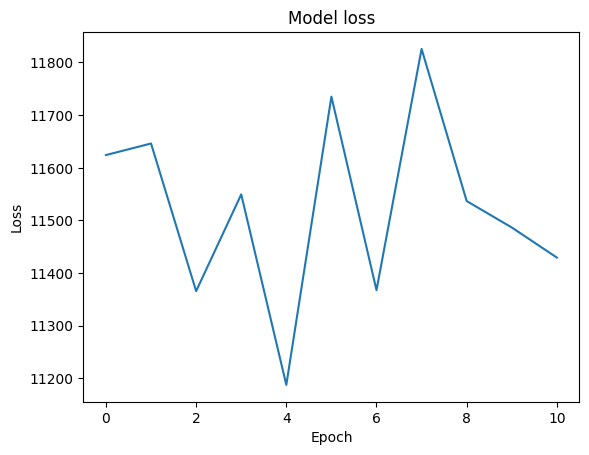

In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights690')

#Learning Rate
def lr_schedule(epoch_idx):
    if epoch_idx < 200:
        return 0.001
    elif epoch_idx < 400:
        return 0.0003
    elif epoch_idx < 600:
        return 0.0001
    else:
        return 0.00003

NB_EPOCHS = 701
BATCH_SIZE = 5

m = input_S1.shape[0]
loss_history = []

for epoch in range(690,NB_EPOCHS):
    np.random.shuffle(input_S1)
    np.random.shuffle(input_S2)
    np.random.shuffle(input_C)

    t = tqdm(range(0, input_S1.shape[0], BATCH_SIZE),mininterval=0)
    ae_loss = []
    rev_loss1 = []
    rev_loss2 = []

    for idx in t:
        batch_S1 = input_S1[idx:min(idx + BATCH_SIZE, m)]
        batch_S2 = input_S2[idx:min(idx + BATCH_SIZE, m)]
        batch_C = input_C[idx:min(idx + BATCH_SIZE, m)]

        C_prime = embedding_model.predict([batch_S1,batch_S2,batch_C])

        ae_loss.append(autoencoder.train_on_batch(x=[batch_S1, batch_S2, batch_C],y=np.concatenate((batch_S1, batch_S2, batch_C),axis = 3)))
        rev_loss1.append(extraction_model1.train_on_batch(x=C_prime, y=batch_S1))
        rev_loss2.append(extraction_model2.train_on_batch(x=C_prime, y=batch_S2))
        # Update learning rate
        K.set_value(autoencoder.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model1.optimizer.lr, lr_schedule(epoch))
        K.set_value(extraction_model2.optimizer.lr, lr_schedule(epoch))

        t.set_description('Epoch {} | Batch: {:3} of {}. Loss AE {:10.2f} | Loss Extraction1 {:10.2f} | Loss Extraction2 {:10.2f}'.format(epoch + 1, idx, m, np.mean(ae_loss),np.mean(rev_loss1), np.mean(rev_loss2)))

    if(epoch % 10 ==0):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))
    elif(epoch==699):
      autoencoder.save_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights'+str(epoch))

    loss_history.append(np.mean(ae_loss))

# Plot loss through epochs
plt.plot(loss_history)
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()


# CREATE TESTING DATA


In [ ]:
DATA_DIR = "/content/drive/MyDrive/decoding test/decoding test"
TEST_DIR = os.path.join(DATA_DIR, "test data")

IMG_SHAPE = (256, 256)
def load_dataset_small(num_images_per_class_test=5):

    X_test = []

    # Create testing set.
    #for c in os.listdir(TEST_DIR):
        #print(c)
    c_imgs = os.listdir(TEST_DIR)
    random.shuffle(c_imgs)
    for img_name_i in c_imgs:
      img_i = load_img(os.path.join(TEST_DIR, img_name_i))
      x = img_to_array(img_i)
      x = tf.keras.preprocessing.image.smart_resize(x, IMG_SHAPE, interpolation='bilinear')
      X_test.append(x)
    random.shuffle(X_test)


    return np.array(X_test)

#LOAD DATASET
X_test_orig = load_dataset_small()

# Normalize image vectors.
X_test = X_test_orig/255.

# Print statistics.
print ("Number of testing examples = " + str(X_test.shape[0]))
n = X_test.shape[0] // 4
print(n)

input_S1 = X_test[0:X_test.shape[0] //3  ] # S1: secret image1
input_S2 = X_test[X_test.shape[0] //3 : 2*(X_test.shape[0] //3)] # S1: secret image1
input_C =X_test[2*(X_test.shape[0] //3) : 3*(X_test.shape[0] //3)]
#input_C = X_test[3 * (X_test.shape[0] //4):4*(X_test.shape[0] //4)]
print(input_S1.shape)
print(input_S2.shape)

print(input_C.shape)


Number of testing examples = 501
125
(167, 256, 256, 3)
(167, 256, 256, 3)
(167, 256, 256, 3)


# LOAD PRE-TRAINED MODEL AND PERFORM TESTING

6/6 [==============================] - 4s 787ms/step


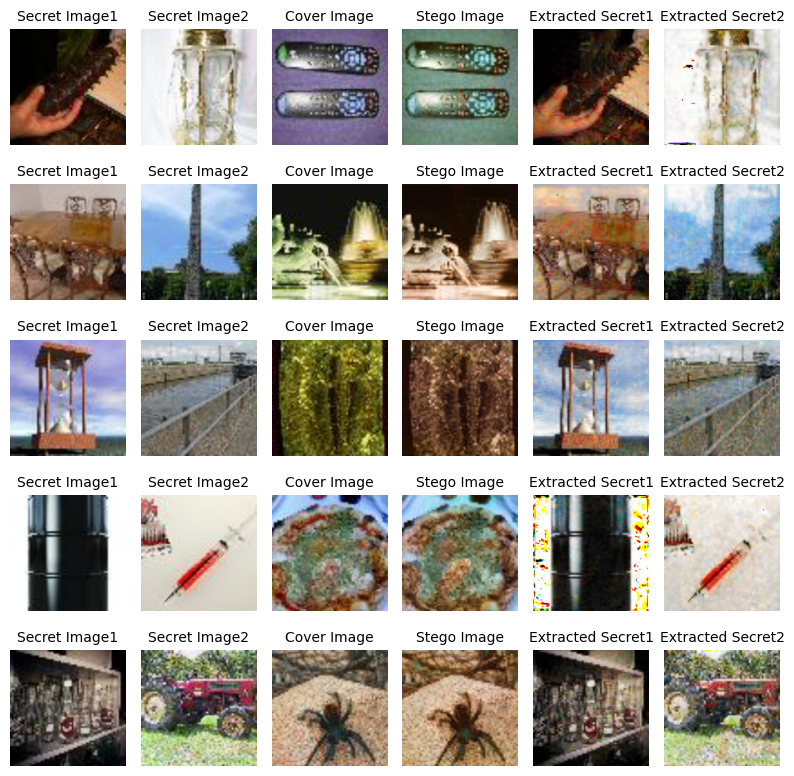

In [ ]:
autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weightsnew/weights699')
decoded = autoencoder.predict([input_S1, input_S2, input_C])
# embedded_image = embedding_model([input_S1, input_C])

fig = plt.figure(figsize=(8, 8))
columns = 6
rows = 5
index =0
for i in range(15, 20):
  extracted_secret_image1 = decoded[i,:,:,0:3]
  extracted_secret_image2 = decoded[i,:,:,3:6]
  stego_image = decoded[i,:,:,6:9]
  secret_image1 = input_S1[i,:]
  secret_image2 = input_S2[i,:]
  cover_image = input_C[i,:]

  index = index + 1
  fig.add_subplot(rows, columns, index)
  plt.imshow((secret_image1*255).astype(np.uint8))
  plt.axis('off')
  plt.title('Secret Image1', fontsize=10)

  index = index + 1
  fig.add_subplot(rows, columns, index)
  plt.imshow((secret_image2*255).astype(np.uint8))
  plt.axis('off')
  plt.title('Secret Image2', fontsize=10)

  index = index + 1
  fig.add_subplot(rows, columns, index)
  plt.imshow((cover_image*255).astype(np.uint8))
  plt.axis('off')
  plt.title('Cover Image', fontsize=10)

  index = index + 1
  fig.add_subplot(rows, columns, index)
  plt.imshow(stego_image)
  plt.axis('off')
  plt.title('Stego Image', fontsize=10)

  index = index + 1
  fig.add_subplot(rows, columns, index)
  plt.imshow((extracted_secret_image1*255).astype(np.uint8))
  plt.axis('off')
  plt.title('Extracted Secret1', fontsize=10)

  index = index + 1
  fig.add_subplot(rows, columns, index)
  plt.imshow((extracted_secret_image2*255).astype(np.uint8))
  plt.axis('off')
  plt.title('Extracted Secret2', fontsize=10)


fig.tight_layout()
plt.show()


In [ ]:
from math import log10, sqrt
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim
import cv2




def PSNR(image1, image2):
    mse = np.mean((image1 - image2) ** 2)

    if(mse == 0):
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    return psnr
def mse(image1,image2):
  mse = np.mean((image1 - image2) ** 2)
  return mse


autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weights/weights699')
decoded = autoencoder.predict([input_S1, input_S2, input_C])

psnr_secret1 = 0.0
psnr_secret2  = 0.0
psnr_stego_image = 0.0
mse_secret1 = 0.0
mse_secret2  = 0.0
mse_stego_image = 0.0

for i in range(0, input_S1.shape[0]):
  extracted_secret_image1 = decoded[i,:,:,0:3]
  extracted_secret_image2 = decoded[i,:,:,3:6]
  stego_image = decoded[i,:,:,6:9]
  secret_image1 = input_S1[i,:]
  secret_image2 = input_S2[i,:]
  cover_image = input_C[i,:]

  psnr_secret1 = psnr_secret1 + PSNR(extracted_secret_image1, secret_image1)
  psnr_secret2 = psnr_secret2 + PSNR(extracted_secret_image2, secret_image2)
  psnr_stego_image = psnr_stego_image + PSNR(stego_image, cover_image)

  mse_secret1 = mse_secret1 + mse(extracted_secret_image1, secret_image1)
  mse_secret2 = mse_secret2 + mse(extracted_secret_image2, secret_image2)
  mse_stego_image = mse_stego_image + mse(stego_image, cover_image)

mse_secret1 = mse_secret1/input_S1.shape[0]
mse_secret2 = mse_secret2/input_S1.shape[0]
mse_stego_image = mse_stego_image/input_S1.shape[0]

psnr_secret1 = psnr_secret1/input_S1.shape[0]
psnr_secret2 = psnr_secret2/input_S1.shape[0]
psnr_stego_image = psnr_stego_image/input_S1.shape[0]

print('Avg MSE of secret image1: ', mse_secret1)
print(' Avg MSE of secret image2: ', mse_secret2)
print('Avg MSE of stego images: ', mse_stego_image)

print('Average PSNR of secret image1: ', psnr_secret1)
print('Average PSNR of secret image2: ', psnr_secret2)
print('Average PSNR of stego images: ', psnr_stego_image)



6/6 [==============================] - 4s 785ms/step
Avg MSE of secret image1:  0.008487910206546772
 Avg MSE of secret image2:  0.007430870840214416
Avg MSE of stego images:  0.009201795669289272
Average PSNR of secret image1:  70.17353421044352
Average PSNR of secret image2:  71.21351042452498
Average PSNR of stego images:  70.35213923226246


In [ ]:
import cv2
from skimage.metrics import structural_similarity as ssim

def calculate_ssim(image1, image2):


    # Convert images to grayscale
    gray_image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray_image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

    # Calculate SSIM score
    ssim_score = ssim(gray_image1, gray_image2)
    return ssim_score

autoencoder.load_weights('/content/drive/MyDrive/decoding test/decoding test/weights/weights699')
decoded = autoencoder.predict([input_S1, input_S2, input_C])

ssim_secret1 = 0.0
ssim_secret2  = 0.0
ssim_stego_image = 0.0

for i in range(0, input_S1.shape[0]):
  extracted_secret_image1 = decoded[i,:,:,0:3]
  extracted_secret_image2 = decoded[i,:,:,3:6]
  stego_image = decoded[i,:,:,6:9]
  secret_image1 = input_S1[i,:]
  secret_image2 = input_S2[i,:]
  cover_image = input_C[i,:]


  ssim_secret1 = ssim_secret1 + calculate_ssim(extracted_secret_image1, secret_image1)
  ssim_secret2 = ssim_secret2 + calculate_ssim(extracted_secret_image2, secret_image2)
  ssim_stego_image = ssim_stego_image + calculate_ssim(stego_image, cover_image)

ssim_secret1 = ssim_secret1/input_S1.shape[0]
ssim_secret2 = ssim_secret2/input_S1.shape[0]
ssim_stego_image = ssim_stego_image/input_S1.shape[0]

print('Average SSIM of secret image1: ', ssim_secret1)
print('Average SSIM of secret image2: ', ssim_secret2)
print('Average SSIM of stego images: ', ssim_stego_image)

6/6 [==============================] - 4s 794ms/step
Average SSIM of secret image1:  0.9111487391207839
Average SSIM of secret image2:  0.9351474509761525
Average SSIM of stego images:  0.953305050421212
